## Experiment Controls

In [1]:
STATE_NAME = 'colorado'
ACCEPT_STRATEGY_NAME = 'neutral' # 'neutral', 'optimized', 'unoptimized'
WEIGHTS_FILE = 'test_weights'
MARKOV_STEPS = 2000
DESIRED_TCP = 0.8

In [2]:
# Parameters
STATE_NAME = "colorado"
ACCEPT_STRATEGY_NAME = "optimized_sr"
WEIGHTS_FILE = "test_weights"
MARKOV_STEPS = 300000
DESIRED_TCP = 0.85


## Imports

In [3]:
%load_ext autoreload
%autoreload 2

import sys
import os
# go up a level to main proj folder
parent_dir = os.path.abspath('..')
if parent_dir not in sys.path:
    sys.path.append(parent_dir)

from common import scoring
from common import plotting
from common import acceptance

In [4]:

from IPython.display import display

import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
from scipy.stats import pearsonr
import networkx as nx

from gerrychain import (Partition, Graph, MarkovChain, accept)
from gerrychain.accept import always_accept
from gerrychain.proposals import recom
from gerrychain.updaters import cut_edges
from gerrychain.tree import recursive_tree_part
from functools import partial

import json

## Process Initial Data

### Census-Level Precinct Data + Community Data

In [5]:
vtds = gpd.read_file("data/co.shp")
cois = gpd.read_file("data/Colorado_communities_labeled.geojson")

# align coords
if cois.crs != vtds.crs:
    vtds = vtds.to_crs(cois.crs)

# get total presidential election 2020 vote pop
vtds['TOTVOTES20'] = vtds['PRE20D'] + vtds['PRE20R'] + vtds['PRE20O']

# calculate coi fractions per vtd
vtds['vtd_area'] = vtds.geometry.area

overlaps = gpd.overlay(vtds, cois, how='intersection')
overlaps['coi_fraction'] = overlaps.geometry.area / overlaps['vtd_area']

# drop tiny overlaps
clean_overlaps = overlaps[overlaps['coi_fraction'] > 0.01].copy()
clean_overlaps['coi_pop'] = clean_overlaps['TOTPOP'] * clean_overlaps['coi_fraction']

# build coi pop dict per vtd - Note: CO uses 'entry_ID' instead of 'cluster'
coi_dict = {}
for index, row in clean_overlaps.iterrows():
    vtd_name = row['NAME20']
    cluster_id = row['entry_ID']
    population_chunk = row['coi_pop']
    
    if vtd_name not in coi_dict:
        coi_dict[vtd_name] = {}
        
    coi_dict[vtd_name][cluster_id] = {
        'pop': population_chunk,
        'category': row.get('predicted_category', 'coi')
    }

vtds['COI_POPS'] = [coi_dict.get(name, {}) for name in vtds['NAME20']]

C:\Users\gislab\AppData\Local\Temp\ipykernel_11644\240197566.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  vtds['vtd_area'] = vtds.geometry.area


C:\Users\gislab\AppData\Local\Temp\ipykernel_11644\240197566.py:15: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  overlaps['coi_fraction'] = overlaps.geometry.area / overlaps['vtd_area']


### Add District Data from Congressional Map - 2021

In [6]:
congressional_2021 = gpd.read_file("data/2021_Approved_Congressional_Plan_with_Final_Adjustments/2021_Approved_Congressional_Plan_with_Final_Adjustments/2021_Approved_Congressional_Plan_w_Final_Adjustments.shp")
congressional_2021 = congressional_2021.to_crs(vtds.crs)

# map vtd points to congressional districts
vtd_points = vtds.copy()
vtd_points.geometry = vtd_points.representative_point()
joined_vtds_2021 = gpd.sjoin(vtd_points, congressional_2021, how="left", predicate="intersects")
vtds['district_2021'] = joined_vtds_2021['District']

## Markov Chaining

### Init Graph and Chain

In [7]:
vtds.geometry = vtds.geometry.buffer(0)
g = Graph.from_geodataframe(vtds)

with open(f'../weights/{WEIGHTS_FILE}.json', 'r') as f:
    state_weights = json.load(f)

g.graph['DESIRED_TCP'] = DESIRED_TCP
g.graph['WEIGHT_MAP'] = state_weights

# colorado has 8 congressional districts
total_population = sum(node.get('TOTPOP', 1) for node in g.nodes.values())
target_pop = total_population / 8

starting_assignment = recursive_tree_part(
    g, 
    parts=range(8), 
    pop_target=target_pop, 
    pop_col="TOTPOP", 
    epsilon=0.05
)

updaters_dict = { 
    'raw_df': scoring.extract_data, 
    'unweighted_tcp_score': scoring.calculate_unweighted_tcp,
    'weighted_tcp_score': scoring.calculate_weighted_tcp,
    'communities_split': scoring.communities_split,
    'effective_splits': scoring.effective_splits,
    'sr_entropy': scoring.square_root_entropy,
    'shannon_entropy': scoring.shannon_entropy,
    'even_splits': scoring.even_splits,
    'cut_edges': cut_edges,
    'dem_wins': scoring.count_dem_wins,
    'dem_share': scoring.dem_share,
    'dem_box': scoring.dem_boxes
}

initial_partition = Partition(
    g, 
    assignment=starting_assignment, 
    updaters=updaters_dict
)

proposal = partial(recom, pop_col="TOTPOP", pop_target=target_pop, epsilon=0.05, node_repeats=2)
accept_function = acceptance.STRATEGIES.get(ACCEPT_STRATEGY_NAME, always_accept)

chain = MarkovChain(
    proposal=proposal,
    constraints=[],
    accept=accept_function,
    initial_state=initial_partition,
    total_steps=MARKOV_STEPS
)

C:\Users\gislab\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\gerrychain\graph\graph.py:266: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  areas = df.geometry.area.to_dict()


### Run Chain

In [8]:
num_districts = len(initial_partition.parts)

chain_results = {
    'step': [],
    'weighted_tcp_score': [],
    'unweighted_tcp_score': [],
    'communities_split': [],
    'effective_splits': [],
    'sr_entropy': [],
    'shannon_entropy': [],
    'even_splits': [],
    'cut_edges': [],
    'dem_wins': []
}
for i in range(1, num_districts + 1):
    chain_results[f'dist_{i}_dem_share'] = []

best_score, worst_score, most_seats = 0, 1, 0
best_map, worst_map, overall_best_map = None, None, None

for step, partition in enumerate(chain):
    if step > 0 and step % (MARKOV_STEPS // 10 or 1) == 0:
        # TODO: save every mod 10.000 partitions
        print(f"completed {step} steps...")

    weighted_score = partition['weighted_tcp_score']
    seats = partition['dem_wins']
    shares = partition['dem_share']

    chain_results['step'].append(step)
    chain_results['weighted_tcp_score'].append(weighted_score)
    chain_results['unweighted_tcp_score'].append(partition['unweighted_tcp_score'])
    chain_results['communities_split'].append(partition['communities_split'])
    chain_results['effective_splits'].append(partition['effective_splits'])
    chain_results['sr_entropy'].append(partition['sr_entropy'])
    chain_results['shannon_entropy'].append(partition['shannon_entropy'])
    chain_results['even_splits'].append(partition['even_splits'])
    chain_results['cut_edges'].append(len(partition['cut_edges']))
    chain_results['dem_wins'].append(seats)
    for i in range(num_districts):
        chain_results[f'dist_{i+1}_dem_share'].append(shares[i])

    if weighted_score > best_score:
        best_score = weighted_score
        best_map = partition

    if weighted_score < worst_score:
        worst_score = weighted_score
        worst_map = partition

    if seats > most_seats or (seats == most_seats and weighted_score > overall_best_score):
        most_seats = seats
        overall_best_score = weighted_score
        overall_best_map = partition

# save results
#TODO: batch saves
results_df = pd.DataFrame(chain_results)

k_str = f"{int(MARKOV_STEPS/1000)}k" if MARKOV_STEPS >= 1000 else str(MARKOV_STEPS)
base_filename = f"data/{STATE_NAME}_{ACCEPT_STRATEGY_NAME}_{WEIGHTS_FILE}_{k_str}"
csv_filename = f"{base_filename}.csv"

version = 1
while os.path.exists(csv_filename):
    csv_filename = f"{base_filename}_v{version}.csv"
    version += 1

results_df.to_csv(csv_filename, index=False)
print(f"saved chain data to: {csv_filename}")

0.002172733653199286
0.0019956942330488126


0.0013499815473566696
0.002501723115875999


0.0014906649788332068
0.010645769126319819


0.0
0.01487657076481273
0.010814763893382111


0.0023412512606711634
0.005811242093237926


0.0004000915412304789
0.008458143818907183
0.006358251648303065


0.010572113117079934
0.009229119133945021


0.012175719961527701
0.0015227763267216304
0.0011144643308753379


0.014353908178876147
0.00725175883436608
0.007338130126218783
0.0007033747372067665
0.011221409968336545
0.0


0.0006662601563923034
0.0009934595309051427
0.003437462942997001
0.00022007797195017605


0.014630261488374825
0.000803558983946142


0.0005355290352621935
0.002900178681631809


0.006042316158635529
0.005525940828401932
0.00015655886125857404


0.0012944576771394011
0.005202253046193536


0.0004763150705591689
0.0003366547279238555
0.008189779858948398


0.0024139724860367537
0.0001013205896377757


0.005373596505161919


0.0006460889609745408
0.0007464559132289671


0.000906576811169535
0.00019684910140849296


0.0013219676246818315
0.0011319501362451931
0.0010714441780229473


0.0008932991729236319
0.00038276141779371457
0.00454568737939268


0.004332572843466688
0.0008265732279406517
0.0002017924940282664


9.583393016877966e-06
0.002661896073689344


0.0031515909105977345
0.01828118589404288


0.0011335904712887577
0.00048188799879113207
0.0005921766462270628


0.00020185966628877592
0.013432503788047364
0.0


0.0028123796532888543
0.001539460303907718
0.0008857803790222074
0.002075907778776462


0.0019146152557077665
0.016154734132772523
9.589960763586046e-05
0.0004364177426225436


0.005958268293467937


0.0012124581098663324
0.0012487784526000558
0.0008643530521873165


0.00047039461230117955
0.00039468962089150557
0.01737708148505466


0.0015110282864422525
0.00010570160941522812


0.008410316402021887
0.0009636070844383621


0.004732371113036782
0.003188808161715952
0.018811535732099992


0.002870858248386873
0.0007753408304038974
0.0006523644130624097
4.866678282998842e-05


0.000610999139011107
0.0005458967629417018


0.001596448243487521
0.0023596631251458495
0.0003427213080373844
0.0002889827890167202


0.00143260604006408
0.0009239179292907334


1.376926683110721e-05
0.0053424885111459045
0.0003115528483206519
0.0010438850349500078


0.0061445533334188


0.00022654232543332204
0.008331972873732068
0.011992164037356883
0.0017181025386040945


0.009643685964283444
0.0002389202906646213
0.0009236564661085647


0.0
0.016795207823627888


0.0008010425605815463
0.0014843378067775671
0.0003622177929470198


0.003028955500049101
0.0019811589648199342
0.00013958806734081416


0.001098031745820187
0.0003039868882113174


0.000805805669369936
0.00895212283676358
0.010755136004221972


0.0
0.0
0.001018206607973634


0.0008743120866880479
0.001791160995354945


0.002094531286156873
0.00046407147228644155


0.0
0.0011016519702266427


0.004757192809191605
0.010750065254152175
0.0003161303962877894


0.0062899141713680775
0.004560391784385137


0.0009349266394204558
0.0
0.0010010783968275462
0.0022984478260743998


0.006442488839387207
0.0009977838869005772
0.009449992905508305


0.0005302994432308431
0.0010489903760483935


0.013582794086323558
0.0008443336028953185
0.02739367623241069


0.004665807151119371
0.000599098754964314


0.0009992040851892555


0.0006918491837387324
0.022356067861624373
0.0


0.016221677478371915
0.0012963029154134452
0.0023868151134764544


7.916863634253022e-05
0.0007140956549958131
0.0009561726806798145
0.0


0.0011475923636746269
0.0048807060594795275


0.00033109909016292054
0.0


0.006030045576918711
0.0021176123497325264


0.001014006668510305
0.003221202007386785
0.0025022904387450953


0.0016769057648828075
0.001464213348087297


0.0019663999180272794
0.0016730685156440867
0.001308018143428005
0.008901966989289465


0.0018950883034725937
0.00042916596022464265


0.0013882885134299022
0.0038228174389330683
0.002911200579252842


0.0015242155498358075
0.0012625214805842026
1.8147288993938275e-05
0.0013603417324422689


0.0019058589860367263
0.0015586752791010672


0.0006984110047928492


0.0012902300692880933
0.0020883501613270807
0.061029937835368565


0.005015084029761194
0.00025921249661486385
0.0013367522402565662


0.0020806134542291016
0.0011257386352620906


0.031039838538099294
0.014496411459498522
0.0003143542481710234
0.005646079758287308
0.0004452576011792534
0.002629874939639151


0.00014401065994233147
0.0010816573303865694
0.0005137264073732652


0.009646579096906619
0.002225347171875178


0.00023099556561845724
0.0007791706434852413


0.00026231942421603
0.002567739436289703
0.0011147511612858276


0.0064587269877907265
0.0007675117185157088


0.007762051550310307
0.0005003189381432366
0.002082780657734792


9.840708438407084e-05
0.0017241156261007897


0.0024063448722469413
0.0013339457499118939


0.0009595608519747638
2.3838457514936707e-05


0.0017873579822367312
0.00024267264325207987


0.001198898928986262
0.005629559134400284
0.0004734070451562527


0.0
0.0008992474063532462
0.0009924947297769097


0.009725088092221555
0.0


0.0
0.0
0.00027104278719575366


0.0109740002093339
0.011624503673579525
0.002192317980564995
0.00707463429071543


0.00010510145167107287
0.0022056354476927813
0.0005349429464857703


0.00533223203319755
2.1756698751961785e-05
0.0009288865632868397


0.0007694260599846043
0.0009489035837093197


0.001586616109095132
0.01575745675778844
0.0009661640129113788


0.00020262502350685408
0.0011237754186803842
0.0005200436932673527
0.0009879634954412897


0.001146028719367859
0.0002092663141485211
0.0011188166910349297


0.0
0.009857933855113275
0.00067923948364164
0.008810369108383046


0.0005853170868449098
0.00039828190881810194


0.001865930419829484
0.015388099041364548
0.0003603649981020308
0.001338368902511947


0.0006379287416787433
0.0


0.0006826793886962129
7.274546815169704e-05
0.0032701742048331667


0.000627416389513822
0.001323273684280419


0.0
0.0018673260837883522
0.0031483506282736664
0.00018350835211767


0.0024829423574101784
0.00030444692798740815


0.040318613527039165
0.0002790995673419777
0.0
0.0008412200888330161


0.00038620072206511306
0.0017434499762574943
0.022793380840957087
0.017803165952973606
0.0


0.0304528704025656
0.004107963310553825
0.0004702152302374946
0.0013226313099259665
0.0


0.012859207219919492
0.0007128205474926372


0.00024766946071890476
0.007795730311648491
0.001074834376600424


1.8696618381133124e-06
0.0013570156301867275
0.013174398007560918
0.0010227017073297447


0.002477481671452396
0.011893459787287185
0.0


0.0003024205275348486
0.0004381387917502236
0.003192456734599222


0.00041887447728187577
0.0
0.0029172349092210542


0.0011146052087356942
0.023777136830067058


0.0030921922660248615


0.0
0.007700489832359352
0.001035065679003245


0.000650375147978874
0.007638712021555805


0.0002924298895103023
0.0003410756611330235
0.0015469924892530654


0.001191512489208765
0.0010046217165536689
0.0015215371464249081


0.001415865613869623
2.9766151762834053e-05
0.00914383525864648
0.0003090065802831402
0.0007342528991705664


0.0007281787866041918


0.008085979394479267
0.007144580755846148


0.0017138123821336605
0.0002589293465928483
0.005836816900877768


0.0016984959736096499
0.00925333072876177


0.0025993365291793473
0.0
0.0014839347167377574


0.00025242205475113747
0.01845793768341798


4.20396634576497e-05
0.0007225181127871532
0.001109716764071887


0.0013206209056311044
0.0015914552050852755
0.0007628111004163424


0.003584645048230292
0.0
0.000197841626988281


0.002151719555483397
0.000980768846534334


0.004624765702118068
0.016954253881978226
0.0011797966202086252


0.004147157139062581
0.018315456454301274


0.0015180696213166263
0.0


0.00635445523616049
0.00035685909830224374
0.0012082140382439464


0.0007864533514985979
0.0
0.0015643356711523989
0.0


0.006662660715827917
0.0003323799170639908


0.00045711211685978695
0.0011183872613567234


0.021299281771622866
0.0
0.00071848463299607


0.0009611831967635766
0.0003765115511395807


0.0025562682844551595
0.00010129704361273546
0.002290161152235546
0.0


0.0002783622144016141
0.0


0.014528871179084765
0.0014594060271877686
0.0
0.0003663139440032988
0.0037215690946127014


0.0
0.0005681941239587135
0.003857578525334146


0.004124161627335174
0.0034664536751470823


0.0
0.00025162405085432145
0.003363342710707757


0.002499372751161844
0.013226671999734424
0.00025873592335409106


0.00047834961260288713
0.0008912498756458086
0.0032970364709628943


0.0021707753540427263
0.002028405458162705


0.0002388911021031481
0.0011442340846760672
0.00015609589094320962
0.0007576681770746422


0.0
0.00037282077097220535


0.0003865255425457227
0.002296763885532648
0.03259058245471183
0.00216164874976857


0.0020730207904905485
0.00025407477336843886


0.0004987042790878264
0.018057646407922137
0.0014310254899960306


0.003083092656431891
0.022777476776738487
0.0007684697894502347


0.001816029478140363
0.030783230928965285
0.001918513363412062


0.02319861344863885
0.0023093805001142362
0.02108326437881124
0.004091422947266889


0.0
0.004957150793061627
5.2493092576696967e-05


0.0
8.39849800270952e-06
0.0014629760818590737
0.003585474509547641


0.0005046022654770505
0.002550154515508972
0.0003916065507973115


0.012579619499306912
0.03469922197988103
2.1169660946562092e-05
0.0033114340009771075
0.001393026306721307
0.007759134718507764


0.0005045453537153397
0.001077460488291328
0.0


0.011744420016909821
0.0008443480501665458
0.0013937295064679743
0.0061719543636420205


0.0
0.009813711144180557
0.0040648494124348325


0.0020493593047111736
0.0021591283248248586


0.0013685198872144275
0.0009584694287380635


0.0006369968609494343
0.00873409850778779
0.006693663391593044


0.004670273085615035
0.0019988261660268646


0.010065209179307148
0.011511750972740611


0.001504008267485336
1.1634947812754321e-05
0.008753627851023741


0.00019235343796813678
0.0019397802267292449


0.00010503401829390544
0.009296890520792496


0.0030812161801546272
0.0008692122195015248


0.000549387460391539
0.0018885761579702659


0.00010967078863939626
0.004653504418265438
0.0011721555266426883
0.003163284933488367
0.0011512096212684994


0.00023790613068100667
0.00035488129267502205
0.007834533949948402
0.0009762523185010777


0.00011826354289287077
0.00048619315435384394
0.0011333075252698045


0.0006006306686512326


0.0029222203856889514
0.003599791728694996


0.0009763770864118352
0.0003304251227441723
0.01447789391789233


4.9107721187468254e-05
0.0007408432022857312
0.0001980011906453981


0.0010841364163566125
4.720452435563447e-06
4.6676549047955374e-05
0.012548470889725896
0.001116416458797077


0.0005093476677743353
0.0003102603841213286
0.001201359024511092
3.0419808795502812e-05


5.3517322183841064e-05
0.002876118422115194


0.0006707415661160229
0.0028623463774892378


0.003326008190244673
8.800776062324012e-05


0.008238611102589248
0.027400062667750098
0.003001102179902171


0.00013448740159661198
0.0008028974280382586
0.0025178615279524883


0.0013263965470346076
0.00038400785131117494
0.0008776292841610523
0.004017894110535953


0.0020172370796550593
0.00033166847235902757
0.0022652504216309267


0.00010429071635145052
0.0007468448233403637


1.9649307750528174e-05
0.0007242682251528884


0.004211581515132262
0.0011978181351808136
0.0


1.9190901004195224e-05
0.00029166010990691615


0.0001819870015322195
0.0005721331290055099
0.0001609045629895523


2.434492449026951e-06
0.0006097997653404221
0.0670476720314553


1.675957413581102e-05
0.002733354243162669
0.005964731886621744


0.0034416395252579194
0.001578706840753457
0.0028845157864089894
0.0006239438050364434


0.00039279341823888006
0.0020914314229270995
0.007453150632264202


0.0010741787912353932
0.0019033943086657662


0.0
0.001104721565290721


7.113795195767756e-05
0.0002872440729809337
0.0017208686934194492


0.0014370792385488137
0.00044437196110941687
0.04525965322658787
0.01762244993027466
0.009242687903080806


0.0004841223052519957
0.0027983405946676587


0.005379083001830788
0.0028810266706838154
0.0008924387751836452
0.0
0.016250858278062035
0.00023334866461963784


0.0001589171559996639
0.016251613466608875
0.0011833422963575938


0.0009062471745785028
0.0
0.0004290828369214996


0.0016814407769330949
0.0002043610350159958
0.02426701412228084


0.00038757776775752596


0.0009701177733802293
0.013429197515964122
0.0022294958354883705


0.0023951136438665364
0.013283398225825959
0.0006187711229487913


0.000892457630229526
0.0008013548890441945


3.533171788360813e-05
0.002476339774597589


0.0021211275769912477
0.0007782527814471885


0.0
0.0006062930747758782


0.0013508326811101671
0.0009660681746476983


0.0024813015526540774
0.0005951950928609539
0.004183217743114587


1.2146131400402878e-05
0.0012173832765174683


0.020996466792274803
0.004884520346427563
0.013029067786221614


9.832276914506979e-05
0.0007540981271480628


0.0026211839195126227
1.9176554400938573e-05
0.0012808017993018329


0.0004482080530954643
0.0005288876433479009
0.01901561918183425
0.0017521317740451083


0.0


0.008303015851450843
0.0004058267855775091


0.001288871785164959
0.016984334464058087


0.0005638586141304231
0.0
0.000606783245221069


0.001328755791591068
0.001863096855978695
0.022904139834539903
0.0004490265657179546
0.0002191180765469902
0.0004941313683542556


9.084544519385668e-05
0.0003268025127972776


0.006208832723129003
0.014266608209518798
0.0


0.0018386787888033794
0.00028402762221023663


0.001835304253800915
0.000912524213749069
0.001483237751603813


0.00036004822553416737
0.018665921405262333
0.0011497310789911636


0.020556101995523334
0.0
0.016933538535386213


0.028671875206695365
0.0004413781347838088
0.00012594522990075726
0.0175798775758687


0.03733663700987827
0.005195887970442123


0.0023841683212740333
0.0010232377823726291
0.0009355154686789328
0.007129426367264067


0.0023452021549860047
1.8521054885479297e-05
4.915409434956427e-05
0.053607970849554605


0.0
0.001457179318104789


0.00021602212683466082
0.0025291518365031223
0.021846401007545972
0.0006301408275202704


0.004771280327339342
0.0003774548410800262


0.011046094381890529
0.0003546861883177388


0.0005824809798243136


0.0009035080944044001
0.01872242100948371
0.013447795619553875


8.595820828953654e-05
0.001288857213508381
0.013211993023543396


0.0018109694818465296
0.0006611964901819966
0.004158362436588808


0.00308189121234647
0.001881650710022005


0.0017103872901808245
0.011273933985147266
0.0038212327445979704
3.47044391199526e-06


0.0013249799474231495
0.03829759794329422
0.00039810038224874196


0.0009210778385099829
1.0115117360206237e-05


9.815929939003064e-05
0.00045046667195174344


0.0026835389866485043
0.011020851246721149


0.00025894397336784794
0.021406438643453984
0.007141411074217071


0.000267259900884012
0.0002650626031200779


0.007495133330440104
0.0011562477410877218
0.0


0.0007725788679007319
0.017228953533977766
0.0


0.00025727668759660814
0.023693850918901783
0.015816284105897773
0.03305907847983379


0.029531875281871373
0.003671339485831018
0.0010301042036590738
7.827678076939995e-05
0.0007726436488661723
0.0008559949369216416
0.0


0.001811990128673215
2.8524576363741124e-05
0.030429874876244736


0.027329088030702903
4.259799945416023e-07
0.003436278539844635


0.004062794110982726
0.024073648768287475
0.0


0.0
0.017403212523825595
0.00316851286085956


0.06560541907860999
0.05138056799211405


0.0009192896823961348
0.0014728985828297942


0.002238658641417396
0.0013687330587168094
0.0009723641329788381


0.009303895035352098
0.0033995000972219286
0.00014898863168619236


0.0
0.0199013859462386


0.009434913372479493
0.0002919611358967425
0.0016042102491948334


0.006333501265979223
0.00024672859285030865
0.0008843816856900773


0.014096638061724478
0.0
0.005482808770141858


0.0017129358806622947
0.00397841747398064


0.013228798551331343
0.0
0.002305345065829782


0.0
0.0
0.0010082215916028341
0.0007680247187368846
0.011343820716277406
0.0020809360452828485


0.0013454743442009288
0.0010853079410252904


0.0023233116852142883
0.00015327794603849508
0.00166035600735165


0.00637125848801916
0.0006424810966183152


0.0
0.0037675198844178185
0.0


0.029653178185949248
0.0011140309538557242
0.020773518383855466


5.861137549981069e-05
0.041787432143623356
0.023080955858330823
0.00019856425425400352


0.0011127324807319332
0.036452089273130775
2.428065370364995e-05


0.022007678537525374
0.02096255423926615
0.014687794399867424
0.002580625645524146


0.03395192611237458
0.0011707454628277166


0.02223121789866218
0.024396776842678006
0.012646087654515015
0.0
0.003496308681025981


0.0008875356581377837
0.0018893629883833013
0.00030232560901152046


0.012033565318401367
0.00038906431656862857
0.012057326955799091
0.0005541943322276955


6.8461634527041704e-06
0.0
0.00022453605355909694


0.0005881196830355116
0.0017236650575340193
0.008265963766494262


0.0003447219683256382
0.02741366379658709


0.00909092597246225
0.0
0.0016077742140366055
0.016040512853824303


0.008305735362854129
0.004200956883119983
0.002127821635040519


0.019941816984690847
0.0005606963911516449
0.0007140982158501741


0.0010322783941022367
0.029625411792941498
0.031365731115641275
0.00044389786182932693


0.0018716551672792944
0.0005846213817606354


0.0010349688469084163
0.0017219299115117182
0.02062625848882688
0.000549592707212372


0.017484457723611516
0.034044432886855346
0.0017865601053882784


0.0003452674819094553
0.00397327827727758


0.0006509967441212629
0.0
0.0020616020067396766


0.001695392271307153
0.011067651584918332
0.007975640784594859


0.008188196045190681
0.00024230285469363662


0.0
0.0003316901838335015
0.0


0.020141775167189954
0.000981250958236011


0.001977707902427408
0.0001905227299918901
0.0004290469371011824


5.836094079425221e-06
0.005923869305700483
0.007770956158041104
0.0


0.006908467340701816
0.015712166710634846


0.0018962530467978532
0.0012415616675232185


0.0057937641297118115
0.0
1.2265364275758163e-06


0.0015857596092912726
0.0025879017351377004


0.0024833491126869545
0.002882275101974929
0.009362623630854753


0.0003489108520569421
0.00015346498740743527


4.781827252058049e-05
0.004169606736878346


4.868026202048584e-05
0.0008638806968109504


0.0007476674490414853
0.0023015365866776907


0.0008056059968932883


0.0011041400124261335
0.0015338031638998453


0.022275414078984573
0.0002133818417915054
0.019409228749863314
0.0003176348597484957
0.0012822433911366504


0.0008020070730205928
0.0


0.00012985548610525605
0.0


0.0029373673901872416
0.00029856446906871586
0.00017859847025999915
0.0010435236425636446


0.00057534684410443
0.0008705873420206793
0.006010455635601976
0.005759335101374698


0.0005321033056578944
0.0
0.00010669613948735343


0.0008724170116717981
0.0011451538194620031
0.011395005624859561


0.007495384845056475
0.015367891588083684
0.002791586768744995


0.000902251335883789
0.0004238596004526085


0.004750977373675033
0.02086798372393729


0.0014052742767814734
0.002478566641537481


0.0014177565409993801
0.0027232438433812413
0.00030825497792598465


0.00023636446282957951
0.0016296858701965358


0.000581972745357494
2.706358021686323e-05


0.0020426945759184356
0.0005834489654844039
0.01925347062157092
0.04723422718105447


0.0052856391842663756
0.00041066627016856717
0.00020102591243956078


0.0014641739206119856
0.0028957297891619984
0.0013875211819661954


0.011381892429655299
0.00015370147092014564
4.944039050341935e-05


0.010954259903928579
0.00017305772267390158


0.0
0.006671268153394657
0.0


0.000931474155080082
0.0023410851187367567
0.005389765712547767


7.888707536071098e-05
0.014342808962765723
2.492250843011544e-05
0.001925018510875712
0.0


0.0004857466518664501
0.015540402682536888
0.000662610573728047


0.0021198031685751018
0.0003948892704367874
0.005319535478410554


0.002027794919258425
0.0011508528172141097


0.0008453662488396097
0.0
0.027873276861741868


0.0007559537129599184
0.0029482265822937796


0.0004393529757175404
0.0065557880840993125


0.00019747451522348657
0.0019302915095308745


0.0014473026565151822
0.0
0.0011617013328568567


0.0009862184262406483
0.0


0.01681045219752657
0.00039787530382320456
0.0017480579612730203
0.0
0.0006422287637760857


0.0011057383602808646
7.66798134767564e-05


0.00010103005102823838
7.695490754455128e-05


0.006273178933614327
0.0005541852631400201
0.0004986599225039984


0.0
0.00028889927294285084
0.0005150266314915927


0.0006616874276183411
0.00021944063872385853


0.0016942924540474136
0.023577409108876984
0.0005895158279879208


0.004474204138073896
0.00012028746557499455


0.0006639193848920181
0.0003662890988861302


0.0008865203529719029
0.0035467360128964543


0.001291354002015432
0.0007097642014012003
5.0783324354370414e-05


0.0006860224548517826
0.006149955645752006


0.003939585775362055
0.004923559187130274


5.641579318668542e-05
0.004899160131428645


0.0012010714047856789
0.0007362401103780397


0.00035025417703534145
0.005150641212289604
0.005173555474835443


0.0016341261742779797
0.008212488052207458


0.0011208130888865774
0.00030880825855744107
0.00641157697892291


0.0007874471530113147
0.0018005210819711868


0.007782519577291619
0.005138991059412667
0.01799596629720768
0.00022627179900194377


0.0


0.00045685890764972126
0.0


0.0008486333333851389
0.00039967282054738644


0.0008977127190386976
2.757479757771169e-06


0.0005288305299134239
0.008224967447930505
0.00027643181107918797


0.001617039260897446
0.007504992651441302
0.0010708605902060057
3.399728755495146e-05


0.0030331333520697964
5.5199300067853016e-05


0.016535675976227862
0.00020345350380337058
0.021496464673159375


0.0005142618666502514
4.3935311363156495e-05


5.960135829194615e-05
0.0


0.007217905016578267
0.00120906159807176
0.000972017477276991


0.004106786435049995
0.000766303880339587
0.000684912138928742
0.0009086050358308269


0.014062988469292478
0.0008938559852439312
0.006031446244113874
0.002490640069957453
0.0004239931607376715
0.0007661992602282979


0.0005281010941738611
0.0019840184122001314


0.016931300864726793
0.01284431390369436
0.0009168482253059088


0.008973318873359101
0.006842182218025604


0.00022712255003606898
0.0012350936367428172


0.0011150024806161982
0.0007857527236038913


0.001114636463382732
0.000539234359643353


0.0009936905229006058
0.0005389437426593962


4.124565927480097e-05
0.025247766015829794
0.00044948851309660443


0.00018588378863184564
0.0009066511038571405
2.9990883665400147e-05


0.001120924543138906
0.012036261808732993


0.002513823403212264
0.0


0.0010176409060626247
0.03494814994600102
0.011600496022547285


0.0012636643875908644
0.013961520475764131
0.0
0.004884520608040532


0.01038748666509168
0.001859231703532781
0.0
0.0029868972933828476


0.006691495016334862
0.0006530642825731765
0.001146834465367332


0.00013989609415064133
0.00012647874470408078
0.007934422823944763


0.0016509750157058533
0.00045266087827923327
0.00016745950810161158


0.00037212488755109636
0.004570927140981581
0.0


0.012181523244957452
0.0010674566852535905
0.009283047102333325


0.00018974288283048684
0.0001774114692435088
0.00015745796186257397


0.003873071813993127
6.3239088502761804e-06


0.0
0.0


3.934108724443539e-05
0.0009861676311988523


0.0018459889785723813
0.0014848019813714919


0.0006293637541983245
0.0007102924155102042


0.017429893542745045
0.0011444379146545482


0.0011261113364015366
0.029794243636786823
0.013900234982554499


0.0


0.010294391377147221
0.008640467624557386
0.001858466578224703


0.000849362983134624
0.03174819684253759
5.665547581417099e-05


0.021476886550025158
2.325916546052074e-05


0.0012195999620895582
0.0003896471114730102
0.003191913958547564
0.014318235888441104


0.0
0.0004289379786537919


0.0042042457592554715
0.001045444882085445


0.0011136053264042055
0.00021149186218086054


0.017695808472436212
0.028829762990704604
6.237193512706899e-05


0.00021146033202082556
0.0022970739322936582


0.0017150089201890355
0.0001335337905340213
0.000640994233039791


0.0008993603879871193
0.0067196951200633685
0.00047697854153048715


0.0009385005374857593
0.0010021159891157412


0.01663923058844374
0.002154668669509799


0.0004729480598547512
0.027185740840824247
0.0020087162986403106


2.165352156953385e-05
0.0010737969572070486
0.0002248146644130114


2.7945766257076386e-05


0.019590897200310504
0.0
0.0016588596100509027


0.0009805778701605574


0.02254955534022894
0.00043749208210514727


0.0018911997264462474
0.002031187315903249
0.002217304006369759


0.004002138851143273
0.0


0.010909710014643992
0.0019296246351916235
0.0018329443915563602


0.0006169730842588986
0.0022643455543710994
0.002970957982889909


0.02840426659033246
0.003380708899037085
0.0008878252342977207


0.0
0.0006947338095770594
0.0


3.6068477349276434e-05


0.004838706523165987
0.0
0.0015516729258374365


0.0
9.457948038500493e-05
0.0008065964724866438
0.0067491377548028


0.0014598135292291639
0.00017009174098254096


0.0


0.005427772434558401
0.0010036239870210254


0.007459333575749268
0.001283959924407357


1.3298170276613326e-05
0.00040768309586139564


0.0009802136472019825
0.0
0.004674555930321732


0.00013338974168013583
0.005676230221511953


0.03195536217880555
0.0012588097431905768
0.0018608148552154043


0.0007896696177968484


0.00013244531309926263
0.0007141960230068056


0.0009072800414624115
0.011428574609082195
0.0006262770275047456


0.02922314393260022
0.0009006956240865337
0.01348087097553298


0.0014682820936347922
0.0007857770734510428


0.002012842579836887
0.0015010237538829224
0.0008520158838514927


0.0004369893222377546
0.002536186944067018


0.0005693579137206171
0.0


8.4092576792339e-05
0.0011495763697883864
0.0002295624856324557


0.0015691826521148525
0.0022983467899328446
0.001465481062813452


0.011208279198599774
0.009306986193690159
0.014149440725536727


0.006613564495817318
0.029334721148840222
0.0009230696180947885
0.0003978470566286681


0.002352903682275483
0.008535926795234773
0.0010295414988225275


0.000663161493647692
0.0023224064815600873
0.013336985833866792
0.024357278667216514
0.0


0.001953664592589449
0.02538661417230182
0.0007912252105022225


0.0026917752851848098
0.0011272778757496096


0.0009107806200831616
0.003197748240832575
0.001156686227002951


0.001108605036114209
0.009885311194229461


0.0031679509829079335
0.010238873116698312
0.0


0.0
0.0
0.0010720283256634216


0.0012478246848276707
0.0015744355436122309


0.005687208005030822
0.0022246231151093893
0.0


0.0037903847189892674
0.001613936793860825


0.0005078406281133486
0.0


0.004137361077933832


0.003433043299435339
0.00024863893362256237
0.0019793511694069905
5.0778507078719306e-05


0.00044052340392692854
0.0006784807405969338


0.0005145514477115155
0.009312570390821062
0.03069001330224792
0.0006290227607895346


0.0016981337144728636
0.016943614078113275
0.029177381304330213


0.0
0.0010136283472817144
0.0
0.00908325512415727


0.032246515258302674
0.0
0.0003750760505801102


0.00029396680554042234
0.00017277593763400552
0.0010919981759838888


0.0011428594113459798
0.001270901942665994
0.0010667284441916163


0.0019436379396741473
2.3748187349007822e-05


0.0004635333734265953
0.0006571391301149651


0.008491904995421533
0.0


0.032388675703840665
0.00039481081728586154
0.0


0.014625007321772259


0.001217802653029373
0.0007762708180526584
0.007249776183216388


0.0
0.0028750386841730913


0.0003346686902021499
0.0012903917524513336


0.016042208016434207
0.0008181575897896692
0.002580482180556303
0.0027252425250792445


0.00010656796043693842
0.0
0.007481338192393737


0.004237909068671346
0.005536893572578184
0.03347219677006737


0.010840020152267928
0.0032623772908842628
0.006657386440489915


0.0
0.003782018943252151
0.0034813651816289807


0.0007475849638087245
0.0


0.01210848843423665
0.007129982934769009
0.00020899110688965943


0.005374443892628443
0.0032966879150983807


0.013080069788641124
0.008888433360508053
0.0008644668450101752
0.001916266566257841


0.005800510010572414
0.0012008464433405554
0.009368860529609667


0.0008763732281518375
0.0006895703953536031


0.0
0.0007283741060841966


0.007108893150385928
0.001570844885862956
0.004063676840132551


0.0019246920488827286


0.0205424077578025
0.00047828230561918985
0.002410544513743363


0.0008208361444541439
0.001217385111884097
0.000924899464366252


0.003623945493850713
9.151809665543532e-05


5.710126545374989e-05
0.012845436217255025
0.00039773540691016477


0.01868710392621398
0.0
0.001975894825261861


0.0008509593005213897
0.001300779679133706
0.022717179193352317


0.0035817956607496937
0.005961139430386125
1.6275094570994467e-05


1.7466858824404878e-05
0.0


0.00041531048070436754
0.00024542452893236015
0.00044302703583337243


0.00010702109718117969
0.00021607167553485006
0.0005148189354541984


0.0
0.002429087924185502


0.016046911502968275
0.00010365131051117298


0.0006013436456063085
0.005731564524177176


0.0015699357364355954
0.002082400721139937


0.022760762030350927
0.001465711258122284
0.004260439406427387


0.0
0.00034191234605197374
0.01587799345838834
0.03679320233557597
0.0


0.001527149911514075
0.02587893091296294
0.001172874709110558


7.048795756731139e-05
0.0005825025919957463
0.00026588793262694315


0.00014441824679088439
0.004381482053658222


0.0


0.006677984603990816
0.00018530595062658657


0.005858138919174952
0.0011731134693400052


0.00026726810481921757
0.00042129059907111704
0.0
0.000612271971178018


0.0002914009377761876
0.0
5.359884297203578e-06


0.0
0.00414131104680862


0.00019776098522736682
0.0030744798262541846
0.004949201234141083


0.002225341243992142
3.1864573019528235e-05


0.0009247162574286738
0.004277647112140769


0.0032389999201473943
0.004620444247175589
1.9746038285696154e-05
0.0009491162646483171


0.0006371797439557114
0.0009764240647731365


0.00020363891269846237
0.007845421247672209
0.0023467808265728337


0.005300990746158045
0.011832874710310418


0.013714504887796741


0.00021088256942379492
0.03237501756665791
0.0


0.0018829168178481847
0.0018793781052067952


0.0017830366139545415
2.4132134066374385e-05


0.00023000132370809212
0.012269775314213978
0.00020057111849935703


0.0
0.009792608817539423
0.0012161929205783465


0.005716209980689227
0.01570246968154077
0.0022179600639866057
9.833445300131716e-06


0.0008436511348758949
0.021231382336020895
0.0


0.00022541666101592294
0.01354431372809833


0.0002463137899996158
0.0
0.007100456511272732


0.025319225691419246
0.004261648514992789


0.0005901061188424972
0.0038986537782725256
0.016688868909922383


0.00013397518312689938


0.001995141863353493
0.00041077658096957774
0.011348121623756988


0.0011277043030588107
0.0018662681660603674


4.6568545035231735e-05
0.0006058323694370545
0.03507168218611377
0.0005188378148202304
0.00035744556093273425


0.0005119621345773464
0.005832119333404638
0.0007454888440747158


0.002416758711217369
0.00034476266115710896


0.0004788459794348706
0.030268310367449074


0.024942694994856112
0.003597962623732073


7.25532809602765e-05
0.0005684825237817303


0.002195816705232972
0.030116822929061933


0.00035692754404999575
0.0004027538873676136


0.01603390985042354
0.016373643701912553
0.0035458092351662233


0.004727224689783212
0.0008415069302248822


0.0005115894303810741
0.0009007812710414408


0.009034641091600897
0.01477853513843841
0.0001149010391339277
0.0006655378156354932


0.013996012304206272
0.008888885345714819


0.000378611703131251
0.0


0.004103977037546797
0.0017017001865869289
6.337812231747813e-05


0.007670612257478192
0.0005810177419786366


0.005455468018222557
0.0018945404701439883
0.00021018489726311394


0.0011193477452303875
0.0
0.0004703926928664544


0.006001921641662934
0.0006287163236136458


0.000628321287763555
0.00018477413256622069


0.0016992066026260192
0.00023494041045784794


0.0026031434884285086
0.0017011511666892866


0.013935093399370676
0.0015943473047223466


0.0


0.0
0.0004636688891442198
0.0
0.0011204145061490408


0.005461446743994892
0.00710040360982593


0.017189291365510256
0.00046994817651252224


0.008123704499053523
0.0008324663810851799


0.0034683861874994946
0.0007318869308619457
0.0


0.00906090602704358
0.0010255843207227046
0.0008548344433836256
0.00048047038803645636
0.00047210692329082804


0.021345221997080523
0.0007738031084928522
0.006231016207049504


2.395254484248368e-05
0.0005439839527901934
0.0007225042437253694
0.0027179286770840807


0.029410036525599675
0.00020002861944994803
0.0001361436628431576
0.0015552259316730132


0.0037279330149652037
0.0


7.341187920729779e-05
0.004139030281039261
0.003949648898865564


0.01667995927971046
0.00035640569820285216


0.00021297864648228956
0.007881328402533161
0.00723328335556229


0.004365011341913662
0.0004749904017961506


7.823264055533781e-05
0.0032241925664165732
0.0019822394360569364


0.0
0.007593879159082248
0.0004830980344132597
0.0008475836308521711


0.0025038041630688875
0.0011609225955688002


0.0002022520736956503
0.0006966174728462864
0.0016255951584318983


0.0005063379554813688
0.0030292810057160283


0.005016096695154201
0.0004149801600439843


0.004162522902559702
0.0
0.003579487859916492
0.003965840348254549


0.0006860783217641473
0.0
0.002718382523962726


0.0004940987194258879
0.0005259443852771639
0.0042763597867816455


0.0024902132405623277
0.0011876414642784982


0.00039700337516166735
0.0008138133209947407


0.0010558856664459422


0.0009437845767134587
0.0004939410857498092
0.0017172710606172634


0.03223073982962638
8.838140883754877e-05
0.00043472885169334004


0.00043453994464219087
0.0011246344905371567


0.009232418343310015
0.0004874787209806771


0.0013943196838860032
0.00042218895874315696
0.0005128674667774098


0.0013719023397873319
0.0
0.0005439264246106514


0.0016682543520145574
0.001032959992757761


0.0012724301141771987
0.002354847372461157
0.009398278421593888


0.0010491404776997327
0.00022939181441182735


0.000891071806782551
0.0001932764626235499


0.0008904506078504487
0.00030702288767127725


0.0010058535078876843
0.000558446687352476


0.00114880132849302
0.0006293971441600018
8.432936412574828e-05
0.00026043617546685265


0.0167522444319214
0.0017493019999893337
0.00607944133451296
0.0012460372465397614
0.00031791442543513437


0.00035450396221830914
0.0029281216153479294
0.0001888658823785479


0.0003293947799404208
0.007318424818020651
0.0


0.0
0.0018799769186138163
0.00011397214891628599


6.0403433790300675e-06
0.0001849687467803166


0.00030461553656754994


0.0007369048451937002
2.5528254769762955e-05


0.00029190261020642106
0.004371666582878701
0.00029036825863738874


0.0008585220146813549
0.009633269560584794


0.013232365777116412
0.0005854166309100356
0.0024695748034267444
0.0005005758084504097


0.0020131818942338113
0.0001868326150945701


0.00421852006934231
0.002986691668967794
0.0024757459472330265


0.004782415488417452
5.675893535963308e-06


0.012246646885679328
0.0010649205419835963


0.00870609550288528
0.0018617888748923542
0.0010572229230751563


0.002634283509280613
0.000555372520089538


0.0007237278423660685
0.01317170562131894


0.00044684059685916544
0.00495279812933989
0.0


0.01573769237354615
0.0006973680596749925
0.0010743757747683014


0.0
0.001073222730265973


4.625889914578882e-05
0.0006515954994480314


1.2655669025934955e-05
0.011260562323266802
0.00024140333793416173


0.0004234344536708583
0.0008122836820632971


0.0010793209237936335
0.0010767741127985207
0.00039836737852576537


0.0005144455098412243
0.009111526379386954
0.004765271893616506


0.02232835501672439
0.03607107036726676


0.00639969399982917
0.0063589983562040465


0.0006779081954870304
0.004347241411405599
1.9340322992563137e-05


0.024186457921346223
0.0009130027992142487
0.0


0.0011337924446980804
0.034115429212568896
0.013991178991156723


0.02764912071935894
0.000191412777535265


0.0005952997050238415
0.00277788581622142
0.0008350467904768731
0.0004552794138897838


5.5458075889430445e-05
0.00019152600442032977
0.0010873598873522817


0.00020045576030916097
0.0
5.134313449921207e-05


0.001623410241505506
0.0004939778031455904
0.03761662252816867


0.04446100095744421
0.0004936262038741105
0.0003229763294109668


0.0
0.0008710752928712543
0.0133467842440174


0.0
0.001243232983454973
0.016646742466312873
0.0005480121223281387


0.022475682308886125
0.0006304836370021935


0.0015794338286232441
0.0005446422431265157
0.002936528563988786
1.5460348211684728e-06


0.0
0.0


9.943679457170211e-05
0.01729114078008403
0.0020851804450680244
2.1206881075130782e-05


0.03701488179445078
0.0027895927176348825


0.00731944404026384
0.0003762509381486368
0.0


1.5982003974207777e-05
0.0005678311023461919
0.0005826581353397781


0.0008970328187637295


0.001369396649222856
0.0008082942791832577


0.003231953716551855
0.0014310809432576802
0.00031601944621542275


0.001481015961797924
0.001445179727741677
0.017248039424245746
0.00017663510013939476
6.950485752385202e-05
0.0006921634230852083


0.007653574600125414
0.03546221730436273
0.016858234265137953
0.00045203194256250036
0.011276563142896478


0.0
0.043008803383662246
0.00019123672244388912


0.0
0.001402036939812055
7.164055691902164e-05


0.00014436831895762564
0.0018520423116214079
0.0014518353405038858


0.0006928732280233695
0.015002179482690515
0.007256961900611006


0.0027685119246368376
0.0006534260347347426
5.257213733092986e-05


0.0029682311864026737
0.015980003418783955
0.00043627096193768266
0.002105544872113114


0.001127257076253985
0.0
0.0019359867623612082


0.002634829237157411
0.00013843578144320446


0.002347395699225343
0.0007368336145881356


0.0007719036049943386


0.0005542445695273711
0.00973933094096086
0.016807152165822833
6.803112303743645e-05


9.357304213480292e-06
0.001670811709112092


0.02091804555419944
0.0
0.001781397857571352


0.00010317559665249025
0.0016916749789662171
0.0014405842126172567


0.000688495437598699
0.030258351301892143
0.0013296326421461785


0.013517122671226066
0.0018252129169652287
0.0


0.013053984987883002
0.0
0.0006879736838294229
0.0


0.003341366434103135
0.00019597357826229385
0.0010964256931277302
0.000511097739081512


0.0003554635806958043
0.0012851046575581891
0.011230076675024554


5.90259947456807e-05
0.00015656388844972666


0.00837468349739
0.0018457908604268937


0.001281168037217441
0.0012479816536128307


0.012091334073131559
0.04238867019956645
0.0011032940741994596


0.0
0.003467187543328495


0.016019859921229947
0.0
0.0011180604977400323
0.010349919943019684


4.9485637733698876e-05
0.0
0.0008347131151833404
0.0021350384907365206


0.0008175943908205993
0.0
0.013695265310751404


0.0008425837093335779
0.014363445368617197
0.0005448216061259225
0.0051098696015644636


0.0184663709492518
0.0004604402557415171


0.003098512003374434
0.0017147182546660453
0.0
0.0018386375975065793
2.854289174016657e-06


0.0002871746843711718
3.619167037640428e-06


0.00028717364504162243
0.009666876398570667
0.0017589181280364347


0.03005087919911203
0.002039043237010285
0.032572538055056804


0.01487859492054057
0.039805223577302776
8.43751776929431e-05


0.009395826489509892
0.0007868046550350535


0.007234982103138072
0.0005073851244187087


0.0
0.0010653438097569384


0.0010215962412481192
0.0017834662800322208


0.0009083194809143377
0.00019013461364838857


0.015999922473914935
0.0


0.015962806345620077
0.00021061165767103109
0.00039308101475680335


0.001339390798337362
0.00021076687145985158


0.0
0.0009353805343320606


0.0045633487282586436
0.0023236170308630916
0.03812494767079063
0.0015110003750594527


0.0007208059386191015
0.0010276885675489917


0.0010751808888089607
0.0060649831237073555
0.0013212353783486244
0.00030159257472655237


0.0009201305590648351
0.0002993615809677498


0.000885929974141091
0.0024260412463917446
0.0007995170548242785
0.0023470032657298716


0.0008098218358786081
1.018972695797844e-05


3.596918961782918e-05
0.001013500814081553
0.00025005369521129204


0.0008559857672670583
0.0
0.0
0.0013546563180419028
0.0008045054093840494


0.0005540668628951529
0.009596350251550381
0.0


0.0001989713296561267
8.496223119625938e-05


0.0002827845203397765
0.006047829734679845


0.0005826277241699333
0.003035211949496104
0.0009288950950717983


0.0040363240942292945
8.498772819138328e-05


0.00017055292000059866
0.0009726627057278964
0.03391508712349114
0.0
0.0003338408185978216


0.0008684257592662981
2.3980041778793076e-05
0.0018121400278088254


0.0016510707487142028
0.0002502393635354081
0.006713908709849897


0.0008935600360019525
0.00210679243502714


0.0012598881418604533
0.001788646925880386


0.0006011745054909435
0.007761896732772165


0.020322980916801906
0.0036015866410054245
0.0


7.96507356582191e-05
0.0011605865936338978
0.000289439275236253


0.008526265361327839


0.015392201402051128
0.02319290788978179


0.0016040873229516326
0.006445433581259155


8.320326514621699e-05
0.000412020445676733


0.0081904952617127
0.005973291864054587


0.0039043898128825446
0.001627398980988726


0.0006280469296899391
0.0037469026055185627


0.000998196075270318
0.002372352505888019


0.0004278511160007338
0.0002346049244357567
0.0


0.0035518984067321405
0.0002420472670058037


0.0002077929925642178
0.0005180596382479997


0.013221512769014522
2.6145172102079662e-05


0.0028700003853245545


0.003426354598090879
0.0006986839992601616
0.0025961678230940195


0.0
0.012789776186190894
0.0032457417320099747


0.0011488412153127033
0.0075888618721843375
0.001130469413948299


0.0031150646928434673
0.00420562194834572


0.0015803672543108587
0.001106104037259682
1.20241647284179e-05


0.004905297357170109
0.0037850484010027792
0.0010586504042563048


6.629669902841739e-05
0.020017543816241688


0.00199558297135072
8.78213955298751e-06


0.0008299454906451814
0.013753931907803836
0.01686271056792762
0.028230591503120843


0.0007074527490425033
0.031016998362291985
0.0006261524094984031


7.866001770855439e-06
0.0014585507450940714


0.035837669515771595
0.002861365090595824
0.006365310788288846


0.010017324520904074
0.0007024129513083622
2.4610079063802204e-05


0.000696239853239302


1.2491518309928247e-05
0.0008033987321195929


0.002389969126575192
0.0072164279437316545
0.0006944273058311778


0.0004162839052764732
0.00048572998237066903


0.0025428017216516875
0.028663142425851443
0.026151750351864875
2.8652106589987772e-06


0.00030187732118220755
0.0009919021539738218


0.0
0.0003977327293084283
0.004894716806030754
0.005388829829817919
4.244064204126583e-05


0.0010951672221564263
0.002343610076603478


0.0
0.022706533678542674
0.00102768280479255


0.0006098772172684116
0.0016023751497800669


0.0006988312043376685
0.02481076927518101
6.767623805063913e-06


0.002152052013855668
0.00041275735257763785


0.000196008112120607
0.0006603598797198727


0.00046011829254053046
0.0008244444495520664


0.022958445653504526
0.021596232138194837


0.001199157361704376
0.00012502302794340796


0.0
0.000634835501674683
0.0025131685662997186
0.0009040115973484855


0.0025288894720372295
3.077600851890872e-06


0.0005263442226791106
0.002521175552797612


0.0003321385163850524
0.0005331564441803973


0.000742461919267902
0.0015169813270068582


6.6018562222659235e-06
0.000783971405854758
0.0008263355397362033


0.014466472797488911
1.5748623428162304e-05
0.001327976753724915


0.00545339418764529
0.0003168968154782671


0.0009054320148032639
0.006511446752812875
0.008071445025012763


0.012758739414202582
0.0025866221105490554
0.0005219685913640472


0.0010068926279936286
0.0014757202731474155


0.009216247539094488
1.1602242615567647e-05


0.00015359074179783065
0.0005706148306724111
0.005897998437627633


0.026670987095479885
0.012314746230286715
0.007598235286065663
0.000601035369272228


0.00019607662542046812
0.0010161515865494547


0.004908306079192752


0.03168923420085228
0.001608004247138839
0.0
0.015043431701562103
0.0011245259815491394


0.02607733000122995
0.002138890680055205


0.00017226601675037883
0.0057010563034260685
0.012191397364672105


0.006234004504212748
0.0008289631707128192


0.0016498941525795905
0.001427065939983432
0.0
0.0


0.0376307131263907
1.6117276628117702e-05
0.0016210566407618263


0.0005760527040986705
0.00030769749397902045
0.0006382429638491925


0.020953024278439702
0.008332235375689619
1.9445520600769505e-05


0.0
0.001034397233853834
0.008726634646446851


0.013316435882149933


0.02438376134497411
0.0
0.0009685824251626159


0.011012079249804239
0.00024190392642339085
0.0063173187479043215


0.009817005571821845
0.000502146310388737


0.0
0.0010236604910267423


0.0004877604314231442
9.606552715731118e-06


0.005859055722909865
0.000330489830044264


0.0
1.9598995654744406e-05


2.972620640923484e-05
0.00024454462798078827
0.0
0.003977585808372371


0.001166200420458843
0.009914618156558396


0.002147607386469065
0.027979851962604
0.0005144175995510977
0.0041364790930340555


1.5507812848858585e-05
0.006196931935330288


0.006060502097624853


0.002925232650130994
0.0003203752333218436
0.0


0.004389086617267177
0.008633542466833156


0.0
0.0050722189134489145
0.0010845547290200522


0.014457391960255563
0.0018148192270289307
2.5418638455999854e-06


0.0077782985157668376
0.008177113939772883
0.0003215197486594001


0.0014049995582728467
0.0005679238951927662
0.0024208828815353543


0.013316521849378222
0.04189562116411818


0.0
0.010922312906207574
0.0002977761420849119


0.0102886398310992
0.004302435335893977
0.001141391460371095
0.00026873899077426463


0.00010165244530627282
0.0006214971767382962


0.000655384158005002
0.00019409938604736114
0.0020018895377951914


0.00021973175876922912
0.00014312914341338954


0.0077373650613957725
0.0003571170704068306
0.0005095916883943219


0.0023539458661837823
0.007241649510999069


0.0029679409849800507
0.00011973558889697274
0.0007186107465019308


0.0015274821715563892
0.006348472303756653
0.0023641743318558793


0.0013192799254804703
0.005291847728544074


1.8367321744921276e-05
6.576999853476167e-05
0.0030878803501746856


0.001477298672738555
0.0004263268495821682
0.009250010100431513
0.0


0.004593797831758275
0.0029004906762597478


1.5194976716949422e-05
9.368108880762204e-05


0.00014103800018478644
0.02783865189823484


0.0014120315695709906
0.002498119745188452


0.0
0.0


0.0008116550941005561
0.0


0.00030400224667540427
0.0
0.0


0.01787394828568018
0.003302467262135101
0.0
0.003331242749139089
0.0008415203831686574


0.0008307894326387651
0.011688951507364783
0.001202499607121594


0.0009994063153675207
0.0002264533506719747


0.0
0.001718603350789386
0.023569914835740724
0.00026208041246213046


0.002288310396476813
0.00013379202387110394


0.03367331968226957
0.00828085519670938
0.010844060100542494
0.0006522364439861214


0.007220652381561834
1.6612194151003372e-05
0.0


0.0034499927029196277
0.0027045574151946714


0.0
0.0034981973458941005


0.0008143721792481084
0.00266838933183738
0.0006180140820564397


0.001194658945983504


0.0015303954641597724
0.026015768138115243


2.0340425590349324e-05
0.0


0.012151989005047652
0.0015259646437401156


0.007034319778682756
0.0002798937992646114


0.009916098980372923
0.00014665908579900602


0.005108271065271167
0.0012129536225889358


0.0008944561120443927
0.0014217604830935701
0.0005856704245008233
0.0018196594013313134


0.0011323122166569022
0.02001356124866465
0.0146376301525034


0.0006040777272276328
0.0012413857467785435
0.0008441596107549244


0.0
2.3852299300660036e-05
0.0021537837466035683
0.0028066943570226317


0.00021402218798224364
0.01710860245694913


0.00021181383950342553


0.002980374311258983


4.9700196730831124e-05
0.016134135552439265
0.0013618862553126645
0.0007213817777892642


0.0018941269128054691
0.014890279788604277
0.023204118171399876


0.001997949820047463
0.0026288531226633565
0.014809285532317931
0.0006164754743475863


0.005105132776215865
0.004207730499257472
0.0018846887815089147


0.01440463488057225
0.0003640423931506508
0.003685460901356406


0.005843069340711534
0.02082248671979303


0.00034135831476262037
0.00040688102044226604


0.0042077501278106775
0.03329824972337444
0.0012553270464392167


0.002177507075510724
0.005786221167770786


0.0005158606806931204
0.0010644156497426815
0.012266310068706774
0.0028139589084222303


0.005630826007854821
0.0011179694215841874
0.0030829123262799793


0.01815550691113092
4.937613289405863e-05
0.011398477254816792


0.01856961729251511


0.027261497373159492
0.004047837585555017


0.0017191965742505636
0.009044409280981705
0.002260366824952193


0.00028410252048782515
0.0037386812409875786


0.0047832687522018046
0.00021158722641007472


0.0
0.001140350274123208


0.00011686318536197983
0.009025954304622285
0.0005009491064252312
0.004183205721955381


0.008122783652162286
0.0021522098394761323
0.0003242627876178798


0.0007399093322365668
0.00012328446990304492
0.017164428512544086
0.00805736138986501


2.7831414995916797e-05
0.003343902664408249


0.0011602384998413828
0.0002646821722562306


0.00020511083072262333
0.002612380339985553


0.008671723065050258
0.0004040992015247838
0.0003562345011252398


0.0011859344226370068
0.016815437820259245
0.000398780412919324


0.0024804394664390324
4.8416180915738044e-05


0.001485408361121212
0.002319794204074472


0.0005099034446066306
1.7586166316063085e-05
0.002243045372266521


0.004235282139297895


0.015366339026728485
0.0017868786540550924


0.0033340082944104763
0.015933039710354906


0.0001329411823537338
0.0004427420486604538


0.000649084243331024
0.01855406997150541
5.786174234270826e-05


0.00691227704815096
0.019356254411516286
0.007814259782230569
0.029651017887676333


5.666697577707719e-05
0.0


0.0
0.00020134424778500289
0.00026439510804630867


0.0013624744038232316
0.000859673402268889


0.00040425413001959654


8.532763978657534e-05
0.018009443917499958


0.0009648866517228436
0.0014920468378457224
0.020635751146063305


8.544785179874181e-05


0.011236461794979787
0.0
0.0012928922217175297


0.00014513691756247405
0.024838570864523183
0.0005105462347597043


0.0010824987051003044
0.0003780094252714344


0.002089379707009681
0.005403141802135075
0.026444601472162932
0.005270495503250648


0.0004224368009421177
0.0015458451129928272
0.0


0.001240553015007869
0.006041223066222068
0.007960803002297213
0.00044199710729900694


0.006369889955404056
0.0008091467635387816
0.0009187428407470176


0.004132547723962372
0.020563261909648023
0.001195872479461649
0.005015703576610394


0.03455700011470426
0.0007876563991346289
0.003014981317524428


0.00019347392089125553
0.004400006095164367


0.053495061951543646
0.0013661243627240932
0.019912736083378846
0.0009130422395349315
0.006957034676791476


6.220337313943154e-05
0.0003828704015519888


0.0023085555499262026
0.0001925173928209357


0.0013489585300014185
0.0003487581712979375
0.0016350544456550005


0.0004157512563081862
9.569372336168462e-05
0.027890513251048833


0.0018316940717638122
0.0006973755164847166
0.0010644172007988348


0.010354691441126803
0.007031779313443777


0.04059874756367025
0.008963184214423232
0.0013675441386792949


0.0012132532370145274
0.0016983631895781698


0.003055177306860442
0.017656760136762657


0.0005617961936428464
0.0005897358147743379
0.005589022420642414


0.00028296763406795734
0.0026831118014269783


0.026152917497447373
0.00402690720994785


0.0013539352838593034
0.00045487732408269814
0.0010851611110235845


0.025821228109876165
0.0008336181803102657
4.006414422321266e-05


0.0009373511318804147
0.0011526918812719458
0.0009434855204458728


0.0023275763755349383
0.0006917791841702524
0.0007925591960050538


0.0
0.00026523302742220386
8.636481719669339e-06


0.008778766504017233
0.002096078027588313


0.0012269228537470937
0.00021595206500283522
0.03404486885013714


0.0004337641078804532
0.00016365621653040632
0.002359156528054604


0.0007243657484358858
0.002919351887775885


0.0006582134857906536
0.00875882851789718
4.357684061434045e-05
2.463200427605378e-05
0.013704193836856657


0.0002817617759199092
0.0
0.0007217693949466136
0.0010449316342389665


0.01266993157490513
0.00048500620299626163


0.0013566195521562594
0.0003883859190314039
0.0009071575601555618


0.0004390368217735797
0.002123765180159084
0.002326115631601841


0.002816902903887651
0.0003945905287861268


0.0006503826291668565
0.019167038308206392
2.165823434137102e-05


0.0005391169622313525


0.007057001314134818
0.002409161193045832
0.0003005547615912145
0.0009430300980080176


0.00021448198754457564
0.0013584942467069025


0.000117074813735811


0.002524360665539152
0.007002677473110311
0.00474607445597289


0.038302966508758536
0.009380709544390948
0.00010221944317458936


0.021120595857867453
1.6329334903491294e-05
0.0


0.00019612618027955127
0.0013777258240075154


0.0006441558110893685
0.0007720949406762518


0.00041640780156938724
0.008285474124600322
0.0003560002156800859


0.002502867007322963
0.027428429930437707
0.0493015014379219


0.005022820103200033
0.02648180986869486


0.001362363005257279
0.0


0.013420476329005589
0.001120077160778724
0.0


0.011469892793980871
0.000952173150635078
0.0
0.0009001647749241237
0.0
0.0006148507814418018


0.0011337680637351307
0.0008851285050444457


0.0049315088567879395
0.0025879512602492456


0.000886434468773942
0.04899468098974777
0.02977514895642518


0.0002556913391960254
0.006623738437718993


0.0017580702630666557
0.00014958482683129738
0.0009713059638234607


0.00018086793053731035
0.0032429887991871544


0.00027408075521516125
0.006630708149071249


0.001579537813285482
0.0014268862590553879


0.0011294175505760361
0.0
0.0003824352806282751


1.5682606005749132e-05
0.0027671031578996672


0.0004147218791388058
0.0
0.0008211635648011133
0.0019437981239085241


0.0004707649242212943
0.0007741513432163579


0.0009800972300329411
0.015691290510432505


0.0019306158986575992
0.0002846225579632844
0.01937669059618612


0.0
0.015954767929379603
0.0005479298462101169
0.0008124976301391183
0.005705353282353058


0.0007060491257292243
0.0006646546700946601


0.0006784545460346514
0.000175132984329636
0.021463422741045516


0.001080166670826065


0.012958241473573863
0.02981061722839165
0.0006181043186050924
5.7951479182524194e-05


0.0
0.0


0.01792198670880365
0.00015339730358583488


0.0016258875509501437
0.0011446858204733565
0.0006488696920354893


0.015670577158016712
0.0005705898693890211
0.0006458075449015326


0.00042536681444449936
0.004903070195150576


0.003576696612317523
0.0001672697780693401


0.0004915062477127406
0.0014343578281153487
0.0001363454701687103


6.598658873182951e-05
0.00013728650366653274


2.2709954448869978e-05
0.001212603962357667
0.007914008008588392


0.03749729828974298
0.0014404941446445278
0.0013821308285260673


0.00812324137941919
0.021917018221526915
0.011876322019856451


0.000998042225437689
0.0001073242299208787


0.0007712611878425156
0.0011900473972211608
0.0029065515523720017


0.0003497882687088035
0.000489366082625072
0.001623011323427518
0.00022534462877685422


0.003994098259229347
0.003969555491569024
0.004417575915740791


0.0005906505947914704
0.01933378943773043
0.0
0.0004176698322224315
0.0031448274308718666
0.0011975967668551954


2.2708517423860865e-05
0.0003553175886401544
0.0012896649868713822
0.01134933555988666


0.0007518422340775243
9.503913510174234e-05


0.0
3.249209066934081e-05


0.001918811911009876
0.0
0.0003072462319130425


0.002920571188567197
0.002806143596760101


0.0004153787098138035
0.02337801895311362
0.004826611040678331
0.0018166285562541836


0.00017292718608619186
0.0
0.0036183987446668903


0.003010411063349446
1.98709896176186e-05
0.0013575652402062037


0.000449989962080596
0.0006531230014263221
9.510440569706861e-05


0.023721460493247835
0.0016295460747100155
0.01730117583248306
0.0023910514976709834


0.0
0.0010960416437953418
0.05094063840376786
0.0005291422932999347


0.0
0.0007748278771181458


0.0006884531868114233
0.002433744733474754


0.006814423404791977
0.00034539775374137926


0.00015534169846678848
0.001561072708610858


0.0057073339458200536
0.0010082413309784194


0.0016550757370963995


0.0005222061907700555
0.002534470567021916
0.0008655815315806157


0.00026945735890306674
0.0033489078787037273
7.597794402100992e-05


0.013907342750593889
0.001334708860235351
0.0022956575024669526


0.008651606790536732
0.002810462565509827
0.0006457789792452353


0.0
0.0007633569605432789
0.0007578844144744628


0.0006424872218714238
0.00047340714304071655


0.0003572608912451313
0.013145897047878897
0.015615989387384318
0.0007822395770197861


0.0005610586341819278
0.0008503567147091426
0.0006363583124610602
0.0013966822899902627


0.00990366670042386
0.009760709693560398


4.4347350414656284e-05
0.0005428239017222273
0.0024586183113161713


0.010598459062882634
0.001498417547165535
0.0004584292220540942


0.00033684539245079767


0.02826566081250438
0.0017257218671699103
0.0006976234404552996
0.005609999105286171


0.00022157891932985996
0.0009053726021051257


0.0004416278232759332
0.000773536592665681


0.006618474184431255
0.00014795886645452654


0.0
0.033695496290379746
0.0
0.00035571217215403387


0.0003191296950801689
0.00041955158246362914


0.0
0.003078885423676421


0.0002870947173224117
0.0007788796735914949
0.0028388080600786417


0.0
0.0
0.0024054987182850064
0.0009543099117857006


0.0025090385354100083
0.0004794792009133268
0.002520387045132899


2.0380577147661512e-05
0.018127915533262682


0.008106924270798553
2.0380992524051995e-05
0.003162988839666732
4.200977138342515e-05


0.00037732579080693266
0.0


0.012478016629409686
0.00022878901109884512
0.0031433802457208645


0.033970640140996475
0.002624753420906767


0.0005855570435231981
0.0004113727837319347


0.0016191696996607
0.0023000742404118276
0.0006879504333406786


0.0051105788337718885
0.0006841921523712377
0.0001948700314076219


0.0031352304063719575
0.0009264706069196713
3.066731811433431e-05


0.0015405749991456725
0.008432910701927159


0.0
0.0004835272917652838
0.004756804246732726


0.002894213648906946
0.0019085174367708586


0.008144297191017957
0.0007179638654870221


9.091388034380355e-05
0.031781385051548136
0.0005081434736751965


0.001571246730759877
0.0
0.000294178245770166


0.0002470985760234196
0.0
0.00018528950660128013


0.00586427312912148
0.013176870889403143
0.0005238255377594774


0.0
0.0018339644754097589


0.0019850070136870224


0.000583975428992449
0.0003808795752382175
0.00471300727256296


0.00011421840067391402
0.0031805319738867324


0.026103423194568914
0.006580594150208476
0.0011987012133207642
0.007633333308474237
0.012959670289011236
0.0005139928087668165


0.014151365551289595
0.0006179171751735848


0.0011010750877579205
0.0003262406603071976


0.0029670718818583888
0.001210936486680854


0.0010243122686823226
0.0003226333991592791


0.0007704972358769795
6.66639489009006e-05


0.013741176849047687
0.0
0.0005131590582312738
0.00021241491556028684


0.020150606287488965
0.0
0.003844339435214635
2.564977796352482e-05


0.0001070111983627002
0.013197508269300353
0.016861769054568657


0.0010413886309521398
0.014887064181419368
0.008387872386374264


0.0004702091052826715
0.0005289502326810251
0.02235592037856624


0.0036955224123865534


0.0009404555247896098
0.005356576503268416
0.005160824758836277


0.0006222812860856106
0.003132344556800914


0.0019699501143648312


0.00016543125803792006
0.0
0.001276452188465372


0.0007634782175015508


0.00018214256426357395
0.000622580694356392


0.000422657907608719
0.0


0.0011388365686310566
0.0020711734872126968
0.013842438134457957


1.9139772123080753e-06
0.00028372375894200266
0.006872363403095166


0.005833029450265205
0.00044233035466578004
0.005580631454905981


0.0004335335942561926
0.00032761561664829635


0.0019562957172782167
0.0023456270191003557
0.0004381333786049633
1.4709693587161703e-07


0.007932768426026072
0.0013155152398577742


0.002144351783431183
0.0020426153121457084
0.0018354309350517583
0.0


0.001084633813957926
0.002107088767682205
0.0003545618775262695


0.0012564862091931233
0.0022937706626834473
0.00589467122115889
0.0004930712444667127


0.013402734298530677
0.0005918405168375626


0.0012597047961106264
0.009607763024845803


0.0208943842597056
0.0004794620403961969


0.0028303629034410346
0.015944594649834755
0.0004080211589717868


0.001680686302216247
0.018086145738668007


0.014366091918957975
0.02210558885398139
0.000933332649967586


0.0004651404460181761
0.0012791849413645953


0.0001891776961701264
0.004225602637820728
0.011932192849823418


0.013953764408425733
0.0013842134526628246
0.0005381849009678927


0.00021752760480065326
0.0009739922864179919


0.0003598606863108232


0.0020344173746002846
0.0021231029973836865


0.0
0.002093036439155048
0.0006336285324711238
0.0037566490370929827


0.0004292053975923788
0.018901963649598546


0.0006833502012652893


0.003304542902856766


0.0009098175345981503
0.009896275685710956


0.0015359889804186131
0.007884029357505533


0.00036788637361241926
0.000503073189019079


0.02804841501119709
0.01444990675343141
0.013827681621910715
0.0009411336998324254


0.001540155934437651
0.005442937537014526
0.0004096020590378244


0.006863378242101036


0.0024295124853142562
0.00190473774403374
0.002487374612120551


0.002025947018987516
0.00026222396425822184


0.004179539230490614
0.0009346619771664224
0.004671221189714361


0.0013620953500864264
0.004320899818682106
0.004006786397984239


0.0031085560120125
0.0010876133344590792


0.0009650676700059186
0.013830926058792175


0.007532002169080079
0.014764601385943054
0.010485963237682364
0.011284670574418796
0.0015527124735023635


0.0013485262457564769


0.004414777245185443
0.0013830161583977608
0.012786116909117412
0.0


0.0012772185743442613
0.0007848942650090732


7.21235580648951e-05
0.0
0.0020588676395167337
4.4885067366792105e-05


0.0028519348810764453
0.002206407644053106


0.0003416089539955419
0.0007224759233271898


0.0
0.0011190723887166516


0.0
0.0011041081499457927
0.0


0.0
0.002179254176654988
0.001107108934489457
0.001578572968344097


0.00014817541340807563
0.0022866290082878328
0.00014220636664827093


0.0008503912301242879
0.009776004462926462


0.0
0.0010862405687947047
0.02038722317955316
0.0


0.0005334539400125368
0.0006171490530080412
0.015266681278383392


0.0021997363562444956
0.01345670381289037
0.007944299848123984


0.0015651663897428359
0.0
0.007951135098986798


0.00039246344236342
0.002213409373829832
0.00372297703328875


0.011757605707239572
0.003056588558377058


0.00027099588348090844
0.03140221326991583
0.00019875561842433998
0.019755985267818514
0.0
0.001157408523810538


0.0
0.0013429438691597545
0.01679496567255101
0.02841193503004288
0.0014806917831650488


0.0009607503755885708
0.016199035402103972


0.03926211871823606
0.02886742839296893
0.0007743331604890076


0.0012731403784176944
0.018637517021153585


0.001772840888245018
0.0011630219353153779
0.00806212742690331


0.012142596419237999
0.003721899583404817
0.0006941182755811284


0.00027180869688489746
0.02553431957055308
0.012172279336983234


0.019964376227778243
0.0
0.00020796078833236286
0.00010178929621083281


0.010510801035617436
0.0012047887789778291
0.0009706760500005946


0.000952173741987024
0.00045661986203175757
0.0005034995435543308
0.02324779143659797


0.026722417327484017
0.0011593595652679238
0.0003473387431738553
0.001373274204291378


0.002499996600918898
0.017031279543976378
0.0005132798717743986


0.00033264285931981004
0.0041611359554743


0.00019594332289356105
0.000981235411996039
0.0007353513152527049
0.0007866467222660638


0.0006419418578038688
0.0001350823809892789


0.0012049823695319242
0.010143925190475874
0.00024870850089716196


0.013673600087279726
0.0007120064905060748


0.010405937474463028
0.003508474216364183
0.030358712543772474


0.00018960252293707234
0.005132207750426133
0.01648163757096862
0.0012852464048170292
0.001962192884197007
0.021371638887057415


0.0006138547573687603
0.0006134781708750268


0.005634008619895339
0.0004980950775763894
0.007846720221538534


0.0007086593666819964
0.002214821832483671


0.00037399446307259356
0.0024431476485494764
0.0002531611411916158


0.0011799978872371142
0.0
0.0


0.027792499002783314
0.0002899888774456703
0.00030065153306775235
0.0007806333455415193
0.0005561494949119587


0.000914288110944431
6.794190083589846e-05


0.0014331853864346198
0.011084600705758684


0.00044098975751249303
0.0013116838206735165


0.0034807175896184274
0.0004948977239884115
0.00026895127442636083
0.0


0.0016452325028258657
0.0018715545616605127


0.003602306143206477
0.0019686231586123464


0.00029113613275010155


0.00022913038551990346
0.0
0.0007183134035268528


0.030323565659900836
0.0041570204522579195
0.0013321813174951825


0.027011094626062906
0.0012702150470165615
0.0004218818859497141


0.0029918683921940853
0.0
0.0


0.001349707169944088
0.0005017244761277671
0.0
0.021554783454948802


0.002166564085184013
0.009281888820304342


0.00010992062458291622
0.0003656110374537986
0.00041797858197238684


0.01776951700919497
0.00117782034007011
0.010201988296490086
0.0


0.006002800463831269
0.00010293191028151882


0.008540484022413024
0.0
0.008961067708119223


0.0014150279171743737
0.0
0.0034167054686029892


0.008655116660342075
0.013196454713032732
0.0


0.0
0.0
0.0046231997136297245


5.121785889470971e-05
0.0001135830393540701
0.0008990505389575553


0.0
0.014417884646017629
0.006961757669189045


0.0
0.0034943750224990487
0.00014418724383247525


0.0160375090375002
0.013479144889207774


0.00020081933721945088
0.003299013335992425
0.00948058269624915


0.017452166675369803
0.010934958493836838
0.001020742937459817


7.282285264974003e-05
0.0003192476996386011


0.004302025168978568
0.0009521088255890794
0.001150352211614679
0.004136943454954046


0.0
0.010421856026511918
0.009937068120780294
0.0009664027628683357


0.006828108676883929
0.00012458937757616747


0.01989303489829717
0.008196153798355369
0.008716809605204316


0.00196895909662237
0.0011856815118181678


0.029586364475564376
0.00030014382650420503
0.00022022609255269605


0.0034993349161784822


0.0006730305450802734
0.0221148000824518


0.0014000324742708967
0.0007577547075116262
0.001131969807229763


0.0
2.8044350803673577e-05
0.000992293307227035
0.0005773930216184629


0.007704973101525251
0.000808168579953431
0.0015472665704752162
0.00019152305196467402


0.0011403781676843625
0.0


0.00012624799444176292
0.007346930343264138
0.001625542851413829
0.0022375224003293465


0.020919728868134205
0.0010417428192468954
0.0048493983181903556
0.004393817444589762
0.00616017611143178


0.0
0.000707070424754346


0.0012540205817833446
0.0
0.0008246923893530307
0.0021410761418857566
0.004562598637888143


0.003276059683828148
0.008126610824406617


0.0006931793846054049


0.0012910339324709197
0.0
0.0


0.00015128571355107172
0.0016485446919156455
0.0014873420651948552


0.0020334296915791574
0.006927728954328251
0.0008179163270807618
0.005182517011289083


0.0
0.0002773680799682119
0.0005791996649500079
0.005722357537883332


0.003321243528145651
0.0018377567234018153
0.0
0.00039068490365311634


0.00015525540812251775
0.0009290693696006164
0.0012337705660777796


0.0012072484118352978
0.0008682930498813538


0.0020157637236981013
0.0035555795325971813


0.0009174089416647884
0.027449335027008612
0.0001832469043443868


0.00020144889230491644
0.018083701301425087
5.5008996924313086e-05


0.0375070573951463
0.00047566262353256717
0.0035668685976125974


0.0003214033065609059
0.004033105365295937


0.0
0.0007466507629899306


0.002023325398916066
0.0010570118677551037


0.0018450467782039506
0.0017422908321438387
0.0002980744326226509


0.0033168375686777403
0.0010615707159823328


0.0022639715818887425
0.0010407514804508433


0.006061327057526951
0.0026689762135346674
0.00031684854324368967


8.281813988884288e-05
0.010386925230887915


0.00047923899796617145
0.0
0.0009452765449168372
0.0


0.0001254831222972232
0.0018187743052775216


6.822430702351099e-05
5.09387187976815e-05
0.006936941929318934


0.0017520231294907184
0.0003832861172897972
0.004276496077376634


0.018509572733459673
0.0
0.0010678078610215206
0.0053065322227207196


0.004424436140089782
0.0019914896280399576


0.0
0.003064475738449973


0.00014046344554428055
0.010397618612898884


0.002124909349358941
0.0001364826788542352


0.0008071290818618509
0.0004957140206530339


0.00043561770221496783
0.0
0.002443490986293158


0.001159093022546025
0.00020653115444155246


0.0006063953406337968
0.016857797137808238
0.01009530842806649


0.0021001208027895193
0.0012687489281827118


0.016766504462027935


0.0005431864615117366


0.0005977078082742848
0.017914082842109942
0.007970519341775362


0.0001612155056456453
0.0015533785767546746
0.0011726051332827528


0.0136364635488462


0.0026524229710576906
0.0008070586058977829
0.003668230851546656
0.00025742253035416585


0.0047832459591154305
0.001044096055453817


0.0050882828681597745
0.002700438493372307
0.010056485618672442
0.0
0.0004990026178088311
0.001873402554293937
0.000991168055356605


0.0009567303609719663
0.0012178833919248584


6.813494979384075e-05
0.0019032564266064707


0.0009890073940652252
0.0034134938306157937


0.0002528765311418212
0.0016690590753630282
0.0


0.0
0.0
0.0029257250334182873
0.003365239249956611


0.0005651848473123651
0.0026766283642370597


0.0003009097215974793
0.0017208878688830859


0.0008618721235814532
0.00127614170748629


0.0005214331444900326
0.0


0.006719739678991295
0.0007372263969942788
0.0002943418217107075
0.0063688264132918185


0.0033192390341986017
0.001465385162707791
0.011587711812228636
0.03151213708456235
0.003030291663629491


0.0016704215407022398
0.0007697965488798699
0.0006996627005373289


0.029834143830158026
0.0012839871809295323
0.007849416328322622
0.0004120690601432826
0.0008895172946494415


0.001174033631556927


0.005080419224692564
0.013793488013085772


0.00014975501337014126
2.5232681712115152e-05


0.040921397348039734
0.001146704001369706
0.0004618890571841804


0.008909477289263069
0.013229025947741883


0.0021924083343728413
0.0002101597559041953
0.0016026041752483452


0.0004279628954630943
0.002122537026035295


0.0
0.016583250617965565


0.0015843569700222852
0.0012875667796356295
0.0


0.0
0.0
0.001130181187358968


0.016025145735637222
0.013873847768932322
0.00041741770844874683
0.0


0.0005989568306382708
0.0010507436732888503
3.9119859265633326e-05


0.014341643142578622
0.0
0.005413120811073147
8.79065788584021e-05


0.00016826683954232342
4.128714743795241e-05
0.0006334729144780242


0.0017917231911462343
0.03394179157304349
0.0009579673454768187


0.0010330481461322447
0.005043471482776666


0.0031027597743004008
0.0011116355207944116


0.00038678676103887934
0.001170724400120278


0.0006233789401695063
0.0
0.0008495418716356887
1.493643914274832e-05


0.0005320493209840239
0.005589246471955631


0.013597952582351691
0.000130151724157854
0.0030575482627924686


0.00014224839721358617
0.002301511817834826


0.0016433216572584572
0.02774321511433569
0.0002471957099236071


0.009219361782194185
0.00017437700687988937
0.0


0.0001994803768568907
0.0008386929829370302


0.002925981442124135
0.00221671717001707


8.348773220686717e-05
7.617780086242863e-05


0.0013134694725173246
0.002283395680122064
5.2945286513578185e-05


0.0003253787083725546
0.007580235985178994
0.028848045783164623


0.002486605719291564
0.0005233045553637181


0.0009592958619010103
0.006958537124442654


0.011509515028745707
0.0007374835416249121
0.021861407344273616
0.0014151034691336191


0.0006820504586716274
0.0005037179637157295


0.009330975504320604
0.004144713459620278
0.0016953438592738665
0.0021016082984793324


0.009838648724112477
0.011500892568771575


0.00017567195614051878
0.00480708491970527
0.0022642695197027094


0.0021318933551780646
0.0013889015116919877


0.0033898240987619353
0.0014373905404479628


0.0
0.0015225721060438552
0.00039568683972553533


0.010871117000408142
0.012855269974182456
0.00025292075356752843


0.02209863554216243
0.0
0.0038124490374958128


0.006132129167409094
0.003144305316963708
0.0014744686031823077


0.003480219302433329


0.0
0.0007736313873578544
0.00045866077857837387


0.0016063113060333543
0.0010334514750841278
0.00058703891042862


0.0029031132134749327
0.002021894605006816


0.0038299597658260983
0.0007653707032539196
1.3772714753073357e-05


0.0007151968172072519


0.0001969964469474808
0.010455891395251977
0.00838072714418703
0.0002480764198310704
0.0016314828101622715


0.01947660380976598
0.0013810835312416453


0.0008709751247547185
0.0013157226392832718
0.003330918641379886
0.005181832324555417
0.0


0.006051700168582864
0.0
0.0030394448815282663


0.0007150193879596565
0.01599649262839632
0.003730965932909285


0.000262230626817063
0.004378668204164022


0.011556595688106306
0.0010982582938972407


0.05005296819839081
0.00012722533729903084
0.001674020246780207


0.00017484619759005422
0.00027517120146876203


3.690075102126956e-06
0.0074979233861463485


0.002246186144078444
0.0
0.0024686938611745523


0.00032510594700085806
0.0010885215189253526
0.0
0.01823955559003209


0.0006631922191758034


0.013101448964867346
0.0041728422839283795


0.03083663066914917
0.0027754906419485566


0.004538521423599419
0.03609797063944548
0.0005340860824439123


0.002584603989346896
0.001076717859337057


0.0017442719280659066


0.017911799201481175
0.01455355315775359
0.00021724886949143986
0.01775509915470565
0.019824739976303837


0.0026887981624237824
0.001276581264556712


0.011162395636573879
0.0014248838072447403


0.0011313260165286099
0.004181987166155538


0.0013703217263788157
0.024183959840061116


0.0009169092631722279
9.256373015309009e-05


0.0010626742985519757
0.001282034539478438
0.0011782146639581703
7.371114024478769e-05


0.024091611069635057
0.0029144764747280273
0.00028873715282166576
0.00181161882234623


0.0013948160577739006


0.0
0.0047362875542103335
0.0008286736348642901


0.0019035632137882985
3.7255446491106364e-05
0.012654888818807783


0.00010419983949897821
0.02018452315515274
0.0


0.00012170072645736666
0.0003814855494674372


0.015286509262033976
0.00025975669185671253
0.0005697243691055287
0.0


0.0017297240728772483
0.0
0.00145987130209966
0.0071350164099778
0.00040082992411014356


0.0011134027478964718
0.016288562341182426
0.01628461164795415


0.001622804870827618
0.0007815686332276862
0.001065229417342804
0.0067679923226181184


0.0029922327342677925
0.00029964678150389495
0.000738900126113989
0.0004009718125800529
0.016428157355232575


0.0
0.0014182354402161195
0.00010728305562355926


0.011033373577664277
0.004869530028622154
0.005606397651213541
0.030305363752452578


0.006851230476694722
0.01974051281272811


0.0
0.0
0.008655435568957799
0.005421544013326712


0.0173495598572366
0.0


0.0009546862674112129
0.003290972201595682


0.00030207936600667605
0.0004166663655336668


0.0011385081134301124
0.0
0.0040834562952313655


0.02085665459527888
0.003667254126357663
2.9318469870649828e-05


0.017931628594837823
0.017172488529378
0.018378163058071377


0.0012807081668787124
0.0015403398858465
0.05506707649552715
0.011000084355327067


0.0011970178491324689
0.0


0.0004565172136005924
0.0
0.0005097723246884412


0.012283568375854583
0.01992377253874064
0.009505596833232037


0.004900282078271369
0.03662731784476714
0.020790571022611663


0.012911717083406792
0.0


0.008133428765497037
0.012643121887418658
0.0008478604167225289


0.008349652820463863
0.00018303368407800334


0.0009385281188815123
0.0021478889945173913


0.01410975619389507
0.014199497779585356
0.0008525979303845655
0.004835237912545085


0.0
0.034166583450406005
0.00033651497961797024


0.012543748234468771
0.0007925098539409693


0.0007934447603528596
0.004103680244793062
0.0028840147397346627


0.006549949557351451


0.010359221727619666
0.042171194717272084


0.035782743345034854
0.003875844062084134
0.0007608440664665737


0.006858203829335266
0.011688479363425049


0.001507240401233754
0.00021569317752388558
0.0


0.007130765050309054
0.013087062604948168
0.0


0.0010113773401413278
0.000673697940602463


0.028248483729486688
0.017299643355832017
0.0011717561419600053


0.0011179029488235695
0.002747428209535332
0.0
0.004612014785225786


0.004690641573197261
0.0005183591818718096


0.0008823509272897558
0.011209831802690466
0.002331131230316865


0.0014027782268764804
0.0006227742552009244
0.004398643878520855


0.0022664112004610825
0.0004558790072133597


0.0004575591062188819
0.0006612609906710742
0.006345977509977493


0.015069473725833995
0.006771007862434338


0.0
0.000620391431815257
0.028671003184319904


0.0028401722976978605
0.00108011512436973
5.446314335168969e-05


0.0
0.000336178322566867


0.004107350028158153
0.0001370077851975578


0.0011955105062573352
0.0074654900689235795


0.00019674294276223684
0.001115620500888175


0.0009571273542679291


0.032543084185756896
0.0006744432736828311


0.025518180764901265
0.0010860951783450657
0.00014921536212191282


0.0011831964890563877
0.0


0.0004751103537903863


8.985439124772604e-05
0.0011572873391334812


0.016269274956571635
0.001299842618112215
0.0
0.0019319017894655253


0.0003415721664094744
0.0001242969644141122


0.02240788063493543
0.0043921820793727815
0.0
0.00473383892705087


0.0013178567344447716
0.01923972678841969
0.008872658642657917


0.0021642006801580785
0.004911165912256353
0.0


0.010108872978947499
0.0031079661396829594


0.0011082355479647772
0.0018515534801289454


4.642488018020855e-06
0.007663439285011356
0.01184167504927699


6.031001791432125e-05
0.012059230703877105
0.012935177616487518


0.0
0.00042158091736678444
0.0


0.0009994561904219498
0.018315365799274605
0.021903504193889416
0.016096547491947923
0.00015543531659109892


0.0
0.010055743511510631
0.021995570349339053


0.009216903948587925


0.007751561807170054
0.005437393319064006
0.001137245040243329


0.017114463671429297
0.021339030287124826
0.008530959267566727


0.0013367473728326932
0.0025543931269940705
0.0018093026116960615


0.0013325518751426792
0.0011155252627208089
0.0


0.009662580539847924
0.0
0.040621266630657155
0.0015505660195640205


0.0025456337340928562
0.003152514894663538


0.0002889000055566162
0.02653980478921413


0.02365558166156373
0.00032531928027019054


0.0
0.0014960029362662967


0.0
0.00010118165364848284
0.0


0.0005550669806692624
0.0002965339039783914


0.00038351563055362805
0.015712565968192923
0.0
0.016520896328901965


0.018170756550013663
0.04616249036623539
0.0028508856673617067


0.0
0.004222044960575596


0.0010598629770239378
0.016380741500449315


0.01544764577150708
0.0
0.003179968340306166


0.0018156391303994857
0.0051928597913296366


0.00023416935124003478
0.003068959401712032


0.029405761509456608
0.0
0.0198538238271945


0.0
0.017683544686734578
0.00077014152585859


0.009517786547647969
5.538721457009781e-05
0.0003345304790909422


0.0009071397205532377
0.0
0.00032877555368556203
0.0010040693980456162


0.00539447551659538
0.00041607612244296753


0.0009520041015185679
3.056351959843475e-05
0.00013216686083092805
0.0029940541995336534


0.002141482810992014
0.001682067666397046
0.021841494494860773


0.001878614384571059
0.0


2.2237393559487986e-06
0.034337923825508966
5.7238365745860105e-06
0.0005472942267802916


0.013434455383895786
0.01988526233445529
0.019023165420360994
7.4890754633477465e-06
0.0017230602234825847


0.000569926155253895
0.00013404359688275622


0.0007090127646516344
0.0009802572673528595


0.0
0.0029409620391983833
0.0005374763261795496


0.0006121770495491723
0.007161244041777582
0.021583523160445647


0.0
0.00035775386881602383
0.0


0.0011927189870459887
0.007146838688090283


0.01691046239328927
0.0021854741251007724
0.00016747778776215455


0.00017113190705047836
0.009441603696869088


0.03433325357816521
0.0005101706059052696


0.0004920851934353602
0.00015588024577687742


0.0013197220189884553
0.008459575919210597


0.001171748749328375
0.0006502991437909582


0.0026267434767134664


0.01676047673405277
0.0007921521753564994
0.0038840101464189857


0.001393854339575671
0.004259391057990724
0.0012088665030314148


0.0006658682384697202
0.0011506846142798654
0.009956884077530722


0.001474074733467365
0.00016521129019587044


0.008496743936720407
0.0002484831258801615


0.0
0.002097806358454892
0.002002116636192704
0.00016684975060990027


0.04211784497431071
0.004607363840593974
0.0013721873932910186


0.0033277425421786434
0.00026783672959996744


0.009006974291104098
0.00024344930342247542
0.0


0.0017059696662763328
0.0023639803621773032


0.0008886906015244081
0.013295967218389486
0.0


4.070786074439952e-05


9.936117868917744e-05
3.162088757416595e-05


0.0017694369891505823
0.00010786391159847442


0.0010403885846805138
0.004903114734783805


0.0011342054395224665
0.008994122844730097


0.0
0.0
0.026750370617444365
0.0003951971744000507


0.0027405671700769796
0.0003036062576161105


0.00011972682012035504
0.0012935134303598212
0.007012875180089213
0.0


0.0
0.015746481141069656
0.0014462981513802715


0.008499731168086793
0.0009522078148952037
1.9280614620717414e-05
0.001811688279264053


0.009706518366471356
9.400845265880982e-05


0.0006196495564745504
0.0008538543982028577


0.0003419888027215869
0.001113802105405031


0.0031573945632228243
0.00013448546566747018


0.001058413580052871
0.0018027464327659334


7.424195549586496e-05
1.3183808614636235e-05
0.0004927665483505422


3.206344894743628e-05
0.0008545322639638564
0.009035878008659352
0.0019519509007282498


0.021025947732874403
0.01276656165054989
0.0
0.00284891373919932


0.0
0.002790513336676035
0.0016089410060228428


0.0009514123891825924
0.0020247950616647027


0.0028211454072017616
0.0005665140431108645


0.0
0.0011624331568849992
0.00045671181408759996


0.0010384410409403008
3.1103486942395596e-05


0.0028528091779159727
0.0


0.0027294829675016505
0.007716905500802724


0.0
0.001637591816899736
0.0024670308982238163


0.0013525824493162695
0.000481414035091315


0.0009173634271505609
0.0062094072109287165
0.0


0.005278316905686539
0.013569341936309948
0.00025153729240004615


0.0013762961123148785
0.0005203465703558337


0.0
0.0032172362821756913


0.03189973899945659
0.0
0.0004819321229518174
0.0004122278373182419
0.00034025494566199875


0.000576541498015499
0.0010716086283913998
0.0005928181600854826


0.0
0.0
0.0
0.0008147049954118846


0.0
0.02067439905802703
0.0050781906917532725
4.997597841327357e-06


0.0003556608022704167
0.01342918792458355
0.020232872900967126


0.002698224567778371
0.0006567344682718817
3.937925484716444e-05


3.938080563394558e-05
0.0


0.00045746002893979644
0.03103035864015757
0.016337973916870262


0.011979280849103576
0.048698037877489504
0.000790433901496683
0.013989956093279857
0.03499538379289982
0.018845280275188232


0.00024177160212525138
0.004186565638106784


0.0011813836208737821
0.000781245823635215
0.0009589848096154184


0.0
0.041170519091670056
0.002068677212352623


0.024729374744917237
0.0006711798842515914
0.000905008129741284


0.0024402703669025123
0.02612625695125275
0.001368211159668635


0.0003999259515465946
8.619556181886519e-05


0.011679737226072224
0.0006707460344923726
0.0005163103054946396


0.0005701374802684159
0.013113450738332016
0.0017017164007889624
0.0018486045941666185


0.000831491048856705
0.026078303168518537
3.4945427811849726e-05


0.002877534637137521
0.0018531705761167874


0.0010438118224895393
0.0020882074644720397


0.0006295531266687598
0.005325298669833382


0.02313701657120464
0.00592246511439346
0.018875941530951425
0.0011766578772583723
0.0015818776439866838
0.00577601856834599


0.008320369842827304
0.005742847772974107
3.907653493698658e-07
0.0004121354470453927


0.0157008896589937
0.0
0.0016112199379774601
0.005361829540428723


2.1983851462731413e-05


0.00858287249423801
0.001600084070914744
0.0007756461799177353
0.0013391846702458159


0.0002700158354538663
0.0008144494475632501


0.0011960738706785158
0.0021599069963226703


1.7764644365860557e-05
0.0006816215201904215


0.006416215440688097
0.035858103760524035
0.004600512266927641


0.00031833203388171016
0.00416255943981059
0.0023840874251813138


0.001002905124260421
0.0055716202913202945
0.0


0.04490761317908442
0.0004513322275852526
0.037421114171141016


0.000743466794574978
0.008415184594057934


0.0
0.0003649605719540307
0.0


0.00106834072345148
0.0007484197136331572


0.00048018519414850245
9.887540967001162e-05
1.9111081199042184e-05


0.035868774672946024
0.0019816452054066966
0.016279145512723418
0.0


0.002638486618699718
0.0


0.0
3.588116657122341e-05


5.005335456675641e-05
0.02469589559179162
0.010304509821232322


0.009503710460198187
0.03162404623043501
0.017694780650994245
0.0008166825008525904


0.0007221015205487075
0.0
0.0


0.01010541037750026
0.0


0.0
0.00025286345723794296
0.0020940693875229088


0.0
0.0016335618319213007
0.0


0.0


0.0008521528254808929
0.0009582083865347702


0.003329938609149777
0.008738528017613949
0.00031832051107891815
0.00045648893258816377


0.0346612198890256
0.0009976822296718332
5.945968786576576e-05


0.0006397534441194911
0.0004438487128550692


0.0
0.004725022775273051
0.00044851357681618265


0.0
0.0


0.0017539887918019506
0.00013087076657571575


0.0
0.0030194986088433536
0.0
6.0802348031089636e-05


0.01400172527823514
0.0009189048047843235
0.00035325965698902495


0.0
0.006664823252172679


0.000352556142468654
0.002210287855986309


0.0015280601768913802
0.018707798106483042
0.0005412264028461811


0.0011113298074420972


0.027054802488172706
0.0006431102962926989


0.0


0.0002467950440788821
0.00324795181425373


0.004313301979670746
0.005540942649977811
0.001512093323012762
0.0019107777671809828


0.0028546735347288457
0.000997899802428915


0.0009189670529360454
0.005184895706001104
0.0006234609305986673


0.000421296039531736
0.0008791706602985849


0.000448771241441477
0.00014599580694817633


4.454329536343729e-05
0.0


0.00018536843715628496
0.004045765294476758
0.0003448805824010705


0.0012690700806313867
0.008188809518625448
0.0
0.0
2.0345131105413197e-05


0.004582563686404282
0.0
0.0001189116662639951
0.0007142647908199931


0.01715431356735801
0.001444649916152616
1.4326701538487334e-05
0.0


0.008537732205242133
0.0011023242813797088
0.0032068987548865076
0.011940040712941625
0.001014819631564181


0.0
0.0005587682489581939


0.00013230287249560703
0.0
0.0006189749032960635


0.0
0.0018975119184653692


0.005381737220343985
0.004740876434512706


0.020033883521998527
0.010358844932367639


0.003937177436814874
0.0007011655843176779


0.002017367438317525
0.0
0.0011636799520694362


0.005961975981324229
0.0004467120396143853


0.0004035586991973723
0.015006458344922625
0.005051230972923083


0.00038667078783167043
0.0033551652587224994
0.0026513766878101743


0.023191993526269813
0.013640812713248726


0.0007415098936011336
0.004948580935150718


0.002220942715487318
0.01135462256216611


0.024479779321798394
0.0011922604226752278
0.0010407985207185047


0.02332039562278741
0.0007768988855587967


0.01087635710327704
0.00019991509929082944


0.01751207639738358
4.8661753018803054e-05


0.018284288120520693
0.002038760083577075


5.1549981756974155e-05
0.00033909173640365314
0.0014286352424980739


0.0003197097285152653
0.0028609637394924324
8.505915241525303e-05
0.042140668179641


0.0
0.0009182604539606254


0.005772459716960613
0.001303530082029183


0.0018310248946334727
0.0007124060878599626
0.0004007973597371878


0.026722275083793743
0.001174499105175932


0.0009519700422825452
9.2298427129081e-05


0.006427160613767782
0.0037373058324658135


0.0
0.023811139547999283
0.0


0.0021254317111619593
0.005125577774040896


0.0
0.0050781055481076125
0.0017383248587438485


0.0002640222539522275
0.008323611475995888


0.00935727835996833
0.0021262923162086948
0.00017890147170687088
0.006206589871316006


0.0030322590434384866
0.0025359107797563703
0.007112260337503728


0.013000724789711735
0.00010000413637829681


0.002383794087443075
0.004617759559409048
0.019487946467405336


0.02346884767252505
0.0003996589780766808
1.9588977785594394e-05
0.0015296882485999004
0.00040099895137644536


2.165042925708588e-05
3.114260453391179e-05
0.0


0.0004843833311305446
0.00365316789439334
0.014792116570838815


0.0007074536671964172
5.711010239977057e-05
0.0


0.010342771011826636
0.00032943483605532586
0.0016208116352498174


0.005691996204968135
0.0
0.001415088865661926


0.00014861298872965284
0.0015483837565346248


0.0
0.0013051050578119403
0.0


0.0
0.01817910529060082
0.0
0.0
0.004592289075988947


0.0007863124524340714
0.0017030454565344778
0.0002942067417479933


0.0
0.0
0.0002466570988107596


0.00012935867837010116
0.004272356228144843


0.0


0.0004739436871050816
0.00057059631693495
0.0021804369480754567


0.0020041088352969263
8.051766433229082e-07


0.015037378237106682
0.0015812144897554873
0.011352909225136988


0.0
0.0


0.01138637564810885
0.0009782392134432094
6.019022964725858e-05


0.007137520194735261
0.0009671584848096103
0.006613591150069567


0.0009598757671975368
0.00024794644283088993


0.028529617057043058
0.001047683198000591
0.006059248197245376
0.008778502595520965


0.0
0.010962958701261316
0.0020802927788267775


0.00047824423920567725
0.0


0.00017522414948157079
0.0


0.0005826505284248527
6.122733698451474e-05
7.929507264827751e-07


0.0005981234979342417
9.54354631814834e-05


0.0


0.000897653407468182
0.002565647876896695
0.004448115021139522
0.0


0.0008285424470034186
3.1971282484867464e-05
0.0
0.0005895962535597652


0.0001978122783298492
0.0031735013215313905
0.001972418722266281


0.006075723633385954
0.010175498741285727


0.0002495004049977147
0.0002495004049977147


0.005069932498251561
0.0008984258163498636


0.0013718958240968855
0.004892177939493639
0.004565200755012318


0.002231984549688098
0.0019863462022993777
0.0


0.0
0.0029196158608282108
0.0036094767131085643


0.0006882945463756849
0.019826847874677075
0.005081607473847428


0.00016811397607198193
0.0014402271187528202
0.0
0.0016462585446887096
0.0


0.0009801076097787059
0.0007306286044294043
0.0013662854129259105


7.599257950751728e-05
0.000864474454982647
0.024841657529688248


0.0022290041337572676
0.005721951994878303


0.00023780688807450488
0.006629568129181005


0.00248135690615145


0.0001467443223971038
0.0004009911018372591


0.0005592532227139937
0.00041925091681607827
0.03295944789803125
0.0010363342536095343


0.0004190752191462363
0.007352328381753012


3.399270279076662e-05
0.0057145641520228805


0.0008128760285112217
0.0003390087118821436
0.0024766555626412816


0.0
0.0011989716923096255


0.0003994495492961659
0.00020405717331360923
0.001113426003059622


0.002082205823771968
0.0008372470476168083
0.02031874308094205


0.003497241772611789
0.0010881833102383517
0.0361389286996881
0.0


0.00041999295228667925
0.0
0.0015587094331409974


0.0
0.0006407879091094914


0.0016384050832856385
0.005763642110595253


0.00136919583997053
0.011746102689699254


3.537265781586881e-05
0.002089261126564345
3.5394429668867895e-05


9.829797445981033e-05


0.0019349615931616348
0.0
0.021658206620673345
0.0005077777236508524
0.011298240725353861


0.0001804169662660749
0.029060945530744498
0.0006184689266266524


0.0023401846397506382
0.005803662599481769
0.001160575987930303
0.019971338153256617
0.0005080595154830031


0.002173969829349184
0.00480821437546399


0.008721198272708971
0.0047238740824100435
0.0


0.0009455758559633489


0.010578225176213665
0.003883712552099013
0.002020327875029772


0.009238262574491634
0.0019001982977359243
0.00794771600990896
0.015136744189874466


0.00040598370324892487


0.0
0.0004996272678698094


0.011278517006987843
0.0007787672162081787


0.0006681355687717741
9.382237975965475e-05
0.0002439689491948289


0.0010789805387405066
0.0013704534593263736
0.006832433112157189


0.0013475087362913498
0.012851709559512656
0.0006856664409558265


5.16466369688512e-05


0.0010946481930720487
0.0009940594866701944


0.0004132959550539823
0.0007558333040738852


0.0016589182407397624
0.003187757398994688


0.0026411785907528586
0.00015026379119827333
0.006256323997561212


0.0017113096851773168
0.0


0.0062955972153165935
0.0020605800276897773
0.0015270003031928334


0.007893201801811212
0.0025287393709623233
0.0016365630857181027


0.003203803776294893
0.014436528447731113


0.0029518800265561185
0.003127023971692433


0.0003995892873375853
0.006023260137342215
0.014584626592514255


0.0002815614621386258
0.0011770767148015931
0.0019288869820872337
0.0016571930916340354
3.966483132524962e-05


0.0005506549077007877
0.005512634599704345
0.0001523079741039819


0.0007033489777593771
0.00044981420567624794


0.0010947403085887339
0.003334579977294542
0.00019847198343230947
7.600710386529183e-06
0.00019134617277856292


0.00026216874050708996
0.009672145347871025


0.0002887612775961872
0.004192834385894209
0.011749777947463652
0.0


0.000587770066489281
0.0227293059518691
0.0002636239088061514
0.007006049506642909


0.0013237816264607563
5.5667434216133014e-05


0.013839974682033794
0.00622983292074633
0.0009477487783889166


0.0008697361891194201
0.0
2.7277281969827244e-05


0.014375262017176527
5.6649417251181386e-05


0.0008358775949579907
0.00012195470306019236
0.0003960495470462361


0.0015928082318534228
0.0009059416327918154
7.695369340232103e-05


0.0006821245958634263
0.0022169901088377065


0.0005337175724923048
0.001188623886889849


2.5616238969591162e-05
0.021595458476459262
0.0012863946744324402
0.00029103643672182575


0.0010418222454874114
0.0


0.0009888230624327723
0.00025208975063135123
1.6545215487078768e-05


0.0
0.002638069464248227


0.010292861810845044
0.0011858867152608153


6.319395686144319e-05
0.004523942687792776


0.0017886854161304469
0.019338562909907545
2.4822720066877378e-05
0.000504942742632401
0.01641588417374709


0.0023525949990132033
2.3661708992139543e-05
0.005895968758967765


8.290723783707998e-05
0.003067194700682214


0.009199845362634651
0.0012638761246472866
0.0002743736759892819


0.00025371264901827056
0.0024876192081341353


0.0028001812314346086
0.008065148725924473
0.0007007579658640509
0.008723234784707632


0.0012146167678963131


0.02861238667163069
0.0215346333826193
0.0006148702905228172


0.004022035266047951
0.0023369687575354276


0.0044748733075659014
0.019582915413923135
0.001887656219421066


0.00024865667293570525
0.005860220828256215
0.004113080871763049


2.2697413305469798e-05
0.016182888784416212


0.0022598232658336955
0.005665918204112725
0.0266331086528709
0.0043879946511382415
0.0012255862805925638


0.0011304838982055076
0.005382337016701684
0.0008260825599205138
0.00040281913504566254
0.0033206566781516654


0.03942652201701513
2.6052358043812386e-05
0.0013887181919389974


0.0017549069345998913
0.0007303154729852571
0.0024785948545561604
0.0


0.0
0.0008313170440293859
0.001788454502547507
0.0019270010276468126
0.00046344385465638344


0.001345129964345644
0.000638363701473969


0.0002591253044002397
0.0004691373415635948


0.002507092850563457
0.0
0.026095308971037817


0.0005539830678704207
0.0019944773544557184
0.00013341445128205157


0.06221763414302607
1.4787120372821493e-06
0.0008054983663918155
0.0004536931978237556


0.04518473346227197
0.00038223165056997075
0.00014110333503869078
0.007928595060781734


2.8903343985334247e-05
1.8861883192680693e-05


0.0024956876587053293
0.02037038965381196
0.0015362900181040441


0.0005229592813044143
0.000130848302157801
0.001507613413925672


0.0007157840902761782
0.0005354147530482313
0.0013003678297652652
0.0015282903643980517


0.0007198447783414574
0.007166854802998501


0.001254814829669132
0.0018924051257814703
0.0015631210985183408
0.00015831195736158964


0.028279019554629657
0.001399162089604024
0.006746008390421184


1.982106617016553e-05
0.0011109531175578977
5.868031166585285e-06


0.007291445168380821
3.292612603501094e-05
8.557594691492615e-06


0.002048211960601383
0.0003802895676725873
0.0024735655992602855


0.0024674621697197904
0.0012648099598472225


0.0008126360746766258
9.861399692345317e-05
0.00036788522460397125


0.0010405344224740701
0.0002477745714771447


5.271946561462673e-05
0.0037825419114270917


0.001048544519087229
0.003036582402889282
0.006095485526666693


0.0007000391812057357
0.0006789742015762493


0.006521799034380279
0.0002693788352232238
0.000665630677506564


0.0005365095527582821
0.00013836534948066464


0.00020500638161306123
0.002046328749124403


0.0015243556974890303
0.0007939073588677436
0.0011953871718000093
9.553279640997561e-06


0.0002772034085905775
0.00020538660923430206
7.433066547901024e-05


9.554623243214717e-06
5.854251716246396e-05
0.00010062030067760783


0.0023068365969002133
0.0008120198674554129
3.809780632947162e-06


0.002857149881134073
1.212592727076901e-07


0.0
0.0014416817174744384


0.027828597209092285
6.678244285617156e-05


0.00021058820367549994
0.02394567106142137
0.0


0.0
0.006108757529516299
0.00032059505335267315
0.0014667985054156174


9.500199983312354e-06
0.003938268231522651
0.002384769776875926
0.03434993473730746


5.735585175040829e-06
0.0003159123741125801
0.010847170016093867


0.005763400839135466


8.363721522899556e-06
0.00020002696479920376


0.0025303306454542525
0.004734788375084004
0.0007451364276103951
0.0021013759534397373


0.03129107066000558
0.0


3.0093326470264052e-05
0.003683540300546284


0.002462881193507149
0.0026747484105014876


6.645627074711318e-05
9.584339337779068e-06


0.0035798105656018797
0.005936041669658783
0.005189005678252286
0.013220002120631492


0.0017002312893869477
0.008462402891854353
0.008655489255340085
0.0026352949157914174


0.0025277761227479566
0.0
0.0003394983286462256


0.0003297963689423996
0.00427112823936559
0.0015933475511520166
3.406620619555491e-05


0.0006765043263426796
0.0007889544179101077


0.001588653841277552
0.005567749187480085
6.826013906462601e-05


0.00022669755919508636
0.0002996894235983615


0.0017756499817811347
0.0


0.017134899223198722
0.0010446999048561569
0.00521687344792096
0.001572635515092699


0.0016037591512992491
0.00011449746329089802
0.0012789373091315237
0.0007068287786207577


0.0
0.0025901988253379748
0.024518240268836446
0.02537198004828747


0.002357859655154108
0.0030261973603330867
0.0014541354617624578


0.0009057011581762117
0.0008639688863744939
0.0007670803609944643


0.0
4.3214791958834656e-05


0.0007203646080268894
0.0008754402394942162
0.007934905521763968


0.0028535385118655617
0.013810748196152257
0.0


0.0001381294872441299
0.0024777583434811828
0.0010350367441791662


0.00020374672863415256
0.0


0.0010522224278567284
0.001824521034972631


0.002403991591131152
0.01689195047493864
0.0
0.021636737205926015


0.0002855017374065068
0.0
2.8591990131837167e-05


0.0008511265490381687
0.014249034686084738
0.00042025359570779005
0.010069610775643308


0.0024675377920159807
0.0


0.022591100709013316
0.004452263799915528
0.012433412444000166
0.0


0.000955670572735357
0.0012558405656617408
0.0057685091252525815


0.0014385817660261197
0.002381290342773694


0.00123020763140458
0.008623144962217099


0.00022914272859291037
0.05242041488177001
0.014225878466574476


0.00043050708867258143
0.0007202269004751209
0.011911772366577646


0.0008136374418715606
0.0005242378351567985


0.022146422155900874
0.0010312271644246662
0.0026668284708342913
0.004159547865328246


0.01610145081637334
0.0032771570963196924
0.0039186938758064855


0.0016707204970504424
0.0002356045533340454


0.002508574085156323
0.0006740266997150357


0.0008273540538557714
0.022921021701411425


0.00010975910892287379
0.0006399874924476821


0.024840102297894413
0.0019484351359038297
0.0


0.0
0.013723569890053388
0.009889843384309318


0.0003760287863329086
0.0037651334789335195
0.008380365210797817


0.009686096792147722
0.0011424870692498046
0.0005511193424628357


0.0013559428000047798
0.0207439788027023
0.0037812698551295577
0.0067986467231523585
1.730261186470657e-07
0.016733851595564776


0.005690260936907222
0.004952872799939251


0.0013143575349025766
0.0006249564953954086
0.0034548393881544816
0.001345448733247333


1.1797316787167174e-05
0.0011291511926406405


0.003972298390474518
0.001146984681751953


0.0024222178907761377
0.0007869355926604546


0.012100998025885492
0.019896763396243987
5.788555826232193e-05


0.0007863623309965312


0.0008867029664837092
0.0010832872535755408


0.014714975214184538
6.594585048755753e-05


0.020852640824812245


0.0015022114852835055
0.0008759864432246683


0.0001466143774339541
9.540937890471096e-05
0.0009768885582035537
1.728446482496662e-05


0.0004497518165627639


0.0001424612642708026
0.0003545694488237615


0.0008895612189175689
0.0003669534662040663


0.0
1.8645108094935138e-05
0.0026894883562813944


0.00019043031929498613


0.005605856410603863
0.00015654747881084638
0.004277813015902843


0.0008070482842413539
0.013662632848718114
0.0025415894948813953


0.004460501206171235
0.0005435133756818654


0.020268098546484925
0.004218027212009595


0.0007403641780686448
2.2072694378917705e-05


0.004984604014587998
0.004136338140706586
2.8749650678553537e-05
0.0019741699997009223


0.011090215960690665
0.023482128476128825


0.0021000587045948167
0.02154442452650481


0.0014201626285947084
0.00016091121972336154


0.00203760262959643
6.699229277781826e-05


0.002998491373205767
0.0014184718863473967
0.0020205775022852862


0.002016503001686787
0.00030857390733266454


0.0018679717231968797
0.002456738488937385


0.003256637660510885
0.00019462973297384623
0.0010671015039099454


0.000305315404905644
0.00010343343512880026


0.024550424478766715
0.00043201907846064305
0.0


0.04907223357790516
6.984314478652969e-05
0.0006774556921786784
0.0007381371957110518


0.0
0.007803276755275566
0.0007172166586485513


0.0002872819252353453
0.000602062927805518
0.004244654763947088


0.0125201117609857
0.007879850917037983
0.007370471301920291
0.0013973933040032599


4.977559987466963e-05
0.01457118213178891
0.0037124306857948073


0.0021595609645253503
0.0035848228042473606


0.0006942084898284907
0.001210446685894149


0.005683451391424437
0.000297770553342098
3.206257660939633e-05


0.0017901754107749219
0.005129379078385128
0.0008806774162816845


0.021726662369849475
0.0004908010366628248
0.004965026728588709
0.005004308724609684


0.0577591137848059
0.024209585376512483
0.02258064808927016
0.033896313977291655
0.0066779858880693654
0.0010537572729423196


0.0006271549888860324
0.0010839942616058416


0.016521768029714973
1.588436709368693e-05


0.0
0.0011824312392181976


0.0
3.25707407520837e-05


0.0007515435026433431
0.0006314584245452127


0.003958318953559436
0.0


0.0007377930493323912
0.01899809975621197


0.011086343575955256
0.018485929206254862


0.015119224948782048
0.0030072353253640864
0.002265651058373516


0.008388632124815101
0.0


0.007406776509511055
0.006350665479384838
0.0036483361421993867


0.002000931985726748
0.001288388185478804
0.035535629873228974
7.5448677033987795e-06


0.0007571140860050268
0.019871966189400462
0.011607468077159622
0.0008468145824292268


0.02610722078856826
0.00029260989201646687
0.0007612085164999284


0.00594340305876635
0.0008454545270387327
0.010298353909181537


0.0016243365073850282
0.020246161731717335


0.01140175265889805
0.01603232282184451
0.01152730313906961
0.0009565666819437682


0.0010638991618624962
0.0019533541094218913


0.00014493940825560398
5.732110503747369e-05


0.005983782718461697
0.0007499918900342038
0.012710008887495869
0.0008194179218287169


0.0015588074055684828
0.000667277165907297


0.0008730564864165413
0.0007483861029782161
0.008048472283360218


0.0013528346815242808
0.0014289607015081957
0.006955018194677729


2.146818484480329e-05
1.7088032774323413e-05


0.007857855332954543


0.008986809034515106
0.00017477020437196077


0.010959122849119263
0.001069537991465149
0.0012229888532255073


0.0
0.01342778816394363


0.0006048748917821534
0.0038948418926906423
0.0005813370271550666
0.004139664672198637


0.0
0.003128392353952015


0.0
0.0008136877124492776


0.00126446379456821
0.009041475756712124
0.0014118569943074844
0.01602347864320012


0.0023379985545811206
0.001153390148795909


0.013377354466191005
0.0009068435171590462
0.0007371921717772419


0.014324684409705192
0.002828275190325561
0.012983214019191548
0.014885671246033847
0.0017309364095649102


0.0
0.008015243360904088
0.0077820441762670115
0.0077219516077286715


0.00016013977799193014
0.00021695870871606585


0.0019736317377438495
2.2828325991310046e-05
0.00018858342204354517


0.0010249586111742291
0.020963122188095776


0.01611144715104975
0.0009327916436543139
0.0
0.0002504713176665955
0.007362573582254224
0.0


0.0007741226821587943
0.00016765287816368485


0.012245145545465375
0.0007042451764105945
0.027848439505013336
0.0003439941261471949


0.0007534601419391192
0.00048561862457259194


0.0005761587143598201
0.0009329898148460684
0.0007755650940908768


0.0006954226948156462
7.342389070139857e-05
0.0008569536049689198


0.03759911585242246
0.0011339095227161787


0.01134792702558889
0.002561016439508401
0.0006614322544954879


0.006701629032884891
0.03657209629739734


0.0007907791298324458
0.001578881207495328
0.0006607559167942367


0.0004285594218886322
0.00022958346617358056


0.006516043768818994


0.0015187803193702943
0.007359169761620215


0.0006267293360238247
4.535895940408595e-05


0.0005133368229747753
0.0011239232755964161
0.026545349442382796


0.0008206235488126085
0.0009482680259305186
0.009131750402748537


0.0007902257017422593
0.0


0.003061035976033169
0.0064351039650572045
0.00016047300841842162
6.318257026966814e-05


0.001331650989961935
0.007886836381869168


0.024056222104777578
0.0005163309175477305
0.0001779741073115683


0.01837326610018325
0.000301747702171354
0.001584052422779213


1.9393367801804094e-05
0.0013520165520399955


3.556804104884079e-05
0.0025763007656239667


0.000762221906646388
0.0006501472011162423
0.0013942461200814498
0.03149834532458702


0.002184737464775476
0.0002949914136805577
0.0010835758355519183


0.00038283921245908515
0.0
0.0018550502679646934
0.00018056988509246777


0.0
0.0003920220384208163
0.0009757950645099898
0.0007396173242673755


0.003165529007451358
0.0


0.005608775305450617
0.00039587907075831785


0.0009870302407012552
0.0009201222365134015


0.00025551080087662524
0.0007874649289056164
0.00270568413192487
0.0


0.0006363427552406128
0.001156294793195877
0.0009660040958960268


1.6908270573275145e-05
0.0006897464654046952


0.0010620934210454627
0.0007152518487013613
0.013379803015467547


0.0025171938985895526
0.01921006131989609
0.0


4.361632986054324e-05
0.0060060141494371


0.0007081163949919596
0.0
0.00280043443090703


0.00013627360443149394
0.0010391867834037892
0.0


0.00045958024247955755
0.0009324343121753745
0.028238672962523394


2.876216565113701e-05
0.0


0.0008944434144654451
0.018085781544679908


0.0001373489246759498
0.00013965766067893233


8.191361446681874e-05
0.0038118945367900843
0.0


0.00017841169934819997
0.00036221420717213424


0.019056217493927302
0.00016618778250068124


0.0014313361970552034
0.0014310096672834284
5.797051374661237e-05


0.0
0.0010939157313972956
0.021375407637635038


0.0008363704550158537
0.02662627229408345
0.0007106738097513626
0.0009208604842138426


0.02776786761464964
0.0
0.025903201663954524
0.0007810132137865144


6.580868179398731e-07
0.00012382791532778646


0.001551459512047652
0.0006157195127000631
0.00045759418221875394


0.0008788498675319361
0.01224413728399967


0.030999713575971543
0.0222171236777124
0.0015655343637221745


0.0014593209991924652
0.0011260341388239705


0.00534388405516662
0.00073809652495348


0.0
6.868269493222075e-06
0.0
3.887362458467043e-05
3.800987197195704e-06


0.0007658491205451184


0.0024998414573072615
0.0008572822995748702
0.008174753359351224


0.0038158835683007484
0.0008312516751167869
0.0


0.014477644588734694
0.0
0.006311667411982009


0.031672140288310134


0.013812735267475645
0.0003026259236257171
0.0027279101243832073


0.01060096958365603
0.0022257046498204763


0.009655077002377442
0.00018555855321155355


0.026854842086321228
0.0077001740536086025


0.0021530327682280663
0.0011467155705463692
0.0


0.010852723746326558
6.235119490155236e-05


0.0039320285853172085
0.021969136595240177
0.0025577115152262886


0.003305015390193027
0.0016551859733909724
0.0032963194841371234


0.0
0.007297200209117493


0.006036994941099961
0.030046982448281707
0.003797311518382069


0.0009815030339300928
0.0
0.0
0.0014594198829628953


0.020464529067563887
0.0006350756365584983
0.0021235220202165906


0.003659133660409883
0.0017904071644320972
0.0011699303926318867


0.001820914504978637
0.003656888323571021


0.00631080437367527
0.011820790561541434
1.0462829296782484e-06


0.002585165783268277
0.0014431177432064222


0.0007563419996638378
0.005325462633191944


0.01163850654099842
0.009235212780415827


0.0
0.0005035326809991971
5.569158857276122e-05


0.0026019078031397575
9.58322372416096e-05
0.0007179216829124661
0.0010472017232681825


0.001530685645634982
0.004459792210491872


0.006881258438445852


0.00020062856559910857
0.00042701846036731657
2.9657878859278163e-05


0.0036045667376380895
0.006143780999964739
5.5063257559730926e-05
0.008343614958178933


0.006630099047641978
0.009879331615262386
0.00017274591501113186


0.0007629327852100463
0.005703195353464157
0.011666162051939273
0.002654481654490377
2.679700414238311e-05


0.0017179850195411617
0.0023829795088726267


1.8488215416532315e-06
0.0019455411638827646
0.0003514942707965783


0.0009428199457427441
0.0022515537418855438
0.008698420561458392


0.004823328791211152
0.0011645063365322312
0.0


0.0
0.0017901773906069051
0.01505645660879418
0.0


0.01823424638632801
0.0011548870986949655
0.006004888805561988


0.017352654243608795
0.0011229011529205529
0.0011353933070052478


0.0008832169666641197
0.010891814096330351
0.019169264950363862
0.013348971618027727
0.0021291916391146712


0.0009443194020878169
0.0016434749638626967


0.009145853897125406
0.00012970907648145638
0.002288004610931776


0.00041420231101913413
0.0005899904804813157


0.0015624650339877597
0.003630326486612014


0.0015836293502913394
0.020887952207284684
0.0004121327796164839


0.01066240548136465
0.0020328574569769787
0.005142631520714467


0.0003513843242812958
0.006924319435770844
0.0028356412233869637


0.005015710320204599
0.0005706186422994884


0.007741389298147873
0.003148322773923138


0.003793859957311786
0.001212265638388072


0.0038979107292558077
0.009605555724137377
0.011770441821907273


0.02576191695699166
0.007042661164365876
0.004184349831930614
0.0009791153673244816


0.009808728833830388
0.008871876174240704
0.005142377834047993


0.015856016611003138
0.01607699104404523


0.0
0.01343662476188128
0.0034331127328808358


0.0006120935445590931


0.010771411728152627
0.003639036572049618
0.0009212267641055023


0.0026647934938928953
0.0


0.0
0.0
0.02761240580710947
0.0025854069796146036


0.0036234646871408207
0.0008342624271167291
0.012801707406972918


0.001091682807908102
0.008577607208344936


0.0
0.0004627812606404665


0.0006794377454676965
0.0018526815409590663
0.0007566532135047931


0.00015939117130320206
0.002247251554658618


0.0033443286690687316
0.009149046659897676


0.000137202835824897
0.0006866206033333855


0.0008301937487364952
0.0001985915303943297
0.00016115140294754458


0.00010488348228194022
0.0007429880694420817


6.206476036651626e-05
0.0012317609341133656


0.0009246515412714187
0.00041708647924597195


0.0014698495543837712
0.0019012366933539844


0.0013560645516337885
0.0014914122802909548


0.0009138244550814229
0.018727852812639664


0.0010388991205127608
0.002175865213558971


0.0003008879148511755
0.003977664822668389
0.0021348220637871836
0.0003670568166172458


0.002436398298806873
0.0004494622925470317


0.0018769383534828034
0.013959476103452405
0.0021062957027351238


0.03837670159658857
0.0006391555346698299


0.00144858558544735
0.0018635600564865043


0.002979952588483679
0.0004031145998312827


0.0032065348293455146
0.003176391986102132


0.0
0.03643481348932416


0.000335101100065964
0.0067382548330208155
0.00042207900916577996


0.0008484483629115429


0.0007370685697829768
0.005504707471779912


0.00034639056660632
0.0008437100270146438
0.00021657393909242187


0.0007815367623652587
0.0016534159164772312


0.013540436316094223
0.0008132097054521914
0.0


0.003814338396382895
0.005996077236234073
0.007079752871774671


0.0011669002635701989
0.001421312911174016


0.02053650242514055
0.0006759881298354258
0.0033205806873277412
0.0008757265788598794


0.01038564989971518
0.0003715401396151066
0.02793853379048596


0.0005383076823453362
0.0014635934211807268
0.0033318214382270224
0.0011155907341962997


0.015463772332031013
9.544806179564778e-06


0.002345097192186735
0.0
0.006421712159407316
0.0


0.0014989639857922285
0.0


0.008544351433443769
0.0009249356352879254


0.005048704684682256
0.001471229610406715
0.0016602700054623024


0.001044484497970437
0.0018569821986426462


0.0003635697317349627
0.015092536766434692
0.00726579069279743


0.013179468173832809
0.012138395857867227


0.0024652015692331023
0.0009849632945256412


0.0011777530094641455
0.013853191456208684


0.0077643790012114425
6.145887776601266e-05


0.0016695579376694936
0.0035608705395035922
0.02461853698939748


0.0
0.0009370277124144063


0.0069259678573255394
0.0005353652679871854
0.0006189138673698745


0.0008749894816446283
0.01088824379086173
0.004881667919109391


0.0006321851354519724
0.000506851993571129
0.009577973666042811


0.0013809358417825835
0.0001529784836535277


0.0006296645232773285
0.010528603894091215


0.001122498731366833
0.013304384362575904
0.0019383716327077227


0.0
0.0012824928129646824
1.7364994029282567e-05


0.03706177591149335
0.0007256790385025536
0.0


0.0053167888078145455
0.0014647969974695503
0.0


0.0010592851442868703
0.001743725190085098
0.02777627340603145
0.007728079775731475


2.6691989615322193e-05
0.004544375047126187


0.0021373484035130336
0.01893927951846033


0.007378759975552244
0.0027851992481042784
0.0011338160233763115
0.0011993309186105854


5.579665200626085e-05
0.004829213922661407


0.00146051886051162
4.306844881978114e-05
0.0002698449734250891
0.006904951183856718


0.0022040681153960755
0.003039288747885563
0.002526714674861609


0.011508543459146474
0.02221299021298249
0.006025432726693648
0.000273476449655456
0.04982880238632522


6.691321720673571e-06
0.011953368804844754


0.020074863481580704
1.2694195768525349e-05


0.0
0.0020802244695068083


0.0033772151219882557
1.913195414147229e-05


0.00021404805307546839
0.0011382475337225726
0.008214404109831909


0.010742871204601382
0.013639308189810505
0.001404624112761778


0.00042668960975080346
0.002350694521956031


0.007129292222979065
0.0015809520453994369


0.0020692099267501265
0.0036061624072887483
0.0017781922001556816


0.0
0.0007557180955522789
0.0014416363393836883
0.00584048207912177
0.011086129968593534


0.011431507333167194
0.0
0.0007264203084324492


0.0001733646255010538
0.0031347305432375136
0.020918131396360902


0.0005050374692561669
0.0
0.0005525598359757317


0.0
0.03565329353974683
0.015246936864433241
0.0014752345778633045
0.0010716987687941163


0.0012416755194361927
0.013017196939580653
6.559940254189875e-05
0.0030904801664113878


0.0
0.00013106509340860125
0.0


0.03478821185706811
0.0006913567798531656
0.0026894235759626376
0.016677727497211775


0.0018714343856842998
0.018551457614082202


0.0007139759503464227
0.006229638508985989


0.022378882232552053
0.006549745433619974
0.02641837344159057


0.0015560832104070871
0.010210633391991943
0.0012853366970738713


0.0
0.00861963354819462
0.0006737341760142103


8.33098318032155e-05
0.0
0.004411445423075135


0.014765073294243458
0.0
0.010268934584227665


0.0
0.0027515091916661687
0.019401227444790236
0.009552961628493485


0.0021739579185548513
0.0075447357705268675
0.0005320904526774379


0.006522974065790065
0.0
0.00038226182745572005
0.0161549410755533


0.0006469695552658521
0.00038040205169103796


0.0
0.013485206999039491
0.01905744802162773
0.00024670324005737656


0.0038787265957245442


0.009680803808703915
0.0003311215915031771


0.006235103768036325
0.0012830260466612402
0.0


0.003710041695433525
0.03631587463947513
0.009373087359167228
0.000917137970142656


0.015835953635656715
0.009010090599641127
0.0011369700074979996


0.003844099342288243
0.025738931912524673
0.004413595356876654
9.799144369519092e-06
0.009674684734000861


0.0035431836968405827
0.0013636334014887304
0.0016409844262418951
0.0009263674054796197


0.005143325751055991
0.0002623869279794519


0.0004109864436821863
0.017689749528283914
0.004496803140181888


0.0001791529964958726
0.004772065939023755


0.0014582320941459751


0.010079140191388858
0.014392012064694759
0.005254012497913248


0.0006820719101028758
0.0017356031008072443
0.0016992452140209835


0.0006007933178444898
0.012343272829268665


0.0008428731694178672


0.004278208028518559


0.00019774359456076516
0.0010036639810912932


0.00019750626983325


0.012047244831746842
0.0
0.0018332838086057676


2.0375516677774503e-05


0.029292132527228766
0.003468657504545867


0.0008962866608861045
0.0008851355089082899
0.004568247906955541


0.001454309334452056


0.0019950822998164764
0.0006216801450629546
0.007595640593836238


0.0041398967792636715
0.009766222856988348


0.002484208301529304
0.0018818909343112857


0.0
0.0007102381106966464


0.00024599541241817724
4.2892416617387673e-07


0.0018707999763676528
0.00020526164670175805


0.0005538357654982768
0.0010762661346026931


0.015905983221593967


0.0
0.009907072694962882
0.010225134371911547


0.012373583510316017
0.001556841353257827


2.276863813193867e-05
0.0006330467759753461


0.0
0.000759662439090294


0.005810322093982622
0.0015550467868857846


0.010722165738852612
0.009945596940235262
0.0015139045209772268


0.0007176063859893497
0.0076600175490402
4.035567877026223e-05
0.00942489687492315


0.005620444529441757
7.926683828967869e-05


0.0007574357359307035
0.0010213387792556991
0.0034016393562713737


0.0011351303691879175
0.002562797579557544


0.004426396626113496
0.0001823423259630533


0.0026371721746475956
0.0
0.0020123682891272626
0.00020811610518008385


0.00028209553665710824
0.00027848868885483425
0.0


0.0017391484583326464


0.0002825073033486301
0.0013925534215051833


0.00014050973769048759
0.0008462156006545894


0.00038214509844850203
0.0003503995769316061
0.0008965715405270545
0.00029759949177287807


0.0
0.0019012374678148453


0.013488838838179284
0.0028220832952142666
0.0010825019722189686


0.0014641465794719948
0.0008020654438369341
0.0


0.007004752405982875
2.585055479284619e-05
0.004315377952013294


0.0032198260677000013
0.0061785615520974935


0.0007936212858735982
2.003087514951288e-05


0.0054817729336759605
0.008875343068402408
0.0011931882256136068


0.0012321728980387416
0.0005579733391552811
0.0033707307581249974


0.009033259125568543
0.014432477821200237
0.011472116150204142
0.004037776827234235


2.0130270181240047e-05
0.0012170496250037493
0.0333055112975576


7.673651606465167e-05
0.016205523770093367
0.0061562469770603725
0.00809887833423411


0.013964314792530406
0.0011529838417169399
0.0038000053055666683


0.0004880672108858474
0.009401578935339142


3.773517730575389e-05
0.0009653668146251518


0.0038323371216020807
0.002250724914591709
0.0


0.0
0.0034603731193591945


0.012306692793163595
0.0004741643831233275
0.010024860862509885


0.0
0.00035197142090060286
0.006560552153777847


0.004415999669817852
0.0008721737317051465


0.0236749471498488
0.012382580746658498
0.011648481500359428
0.00385210418320703


1.2156107369272066e-07
0.0012796090536634302


0.00010417410893267909
0.002548109932483891
0.006004449062635559


0.004806577080682007
0.00022776104353289966


0.013294039865362647
0.013462115032490035
0.004182859549415821


0.0008117700197366422
0.004576031393016727


0.004022275112025345
0.002813844689671751
0.0003974483017053002


4.565114332574734e-05
0.019423779431950103
0.0016468413237938223
0.024020266263071095


0.00036767940512286954
0.0062272547029192105
0.0
0.0018910059304430712


0.0019098416947754108
0.00701681769414511


0.0
4.779554208176477e-05


0.025115383551860812
0.0004833315397272967
0.00023905618634130046


0.0020010412523586356
0.00263037725563487


0.000734137931962613
0.00041318188728695483


0.0
0.0012496039966995492


0.006122929263998448
0.0065359061106655455
0.0016378796161920543


0.006045372294308507
0.0007082643099956047


0.000707763026703856
0.002193995890244927


0.005090551175177696
0.0


0.023015641006271754
0.018350766618716395
0.0


0.0022330731586024306
0.00027900770026623894


0.012979251312834495
0.0015392437378152688
0.0
0.00018758378564268883


0.0
0.00132815107440983
0.0057762466840266405


0.0004846924120081501
0.02015864583342809


0.0
0.00535441061951407
0.013411211946651678


0.001131033651693728
0.004956542678407806
0.00038224958508374955


0.009017377953375821
0.0006629042704202621


0.004957974751647553
0.0019315482492021658


0.00177735593716531
0.0004470060172648772
0.0


0.0011793315546564753
0.0013733439615023697


0.0018586607119382892
0.0022538103879041075


0.023684549766236213
0.0
0.0029478467206210265
0.0022756280880602987


0.001009148203814251
0.0016234451607436801
0.004075634944670107


0.0007938097303822181
0.008754641259675811
0.015185799715235926
0.0090696076078756
0.0008312140054135789


0.0006026803380169837
0.0002436964978058592
0.0020351453719350703


0.0005791660002814463
0.0013343964457761244


0.0005784759877618433
0.0003283492530893542


0.023849151116220803
0.006337746986535134


0.007008421339492827
0.0004016557101084295
0.0005588357563862243


0.007295344053786472


0.01886862845050023
0.0009396556035446059
0.0009399150576443059


0.0034669276064304196
6.74813022898962e-07


5.9347922594741475e-05
0.0009084823666149589


0.01477635800743062
0.0011864437001757328


0.008381678618287057
0.00030743876530958957
0.0019523395253031406
0.0023082632462830192


0.014344795132532543
0.016161889065821985
0.0024903661286519783
0.004549787693795157


0.0061085637447002
0.011639285420644022
0.004620478530760165


0.0051501840725084735
0.0027429653822884275
0.0018609057867422986
0.0007591699115797282


0.02122334210155653
0.016930391797069556
0.0


0.010951220397830152
0.003471515324562881


0.00015105471524833226
0.0


0.0055946449508595735
0.00020690003865750912


0.0012544086537537547
0.003390089873071272
0.0


0.0197152439404432
0.021523437496366187
0.03902875868181636


0.001849359650887834
0.001106751006042728


0.00016967339717771312
0.00014566052134285754


0.0007086268713677087
0.0010882612422653708
0.00043134443309595624


0.0002925628762589564
0.0002765059397667903
0.001103707614432913
0.018139023475148296


0.001823488269704036
0.0002222044022638737


0.0013814329827325582
0.0005140203209058979


0.0017989041444439239
0.0116996159823877
0.0004033470023280039


0.0
0.01579530956512973


0.000971730404605176
0.0025970868335037814


0.014693147885607308
0.011652553269542515


0.0018942044554098743
0.0009996635735231194
0.009724579070667753
2.7463232555450186e-05


0.0
0.02368097521514166


0.0001170333072846492
0.0005238039786524634


0.014315787995324796
0.00025908796608237173
0.0001955010032783259


0.00042954545250061373
0.0
0.0003072052680031121
0.002136695386697258


0.0007623982977825602
0.013222182929993522


0.0010336745739878514
0.009296982751005645


0.00011560015119679309
1.7340951977971683e-05


0.0009717709130397526
0.0004187773459519693


0.0017846898841683933
0.007272909371201127


0.011590686364014858
0.01469001123772841
0.0012317639301337195


0.0002972487059401075
0.003932160240198833


0.004787664457895169
0.021476157589366558


0.004233120357881004
0.0017234642419130836


0.0005606234264386748
0.003456383424474795
0.00198244601988801


0.00037127790665574857
0.002327790070366183
7.302207797935895e-05
0.002762244243677976


0.003154146299665597
0.011364019212655337
0.014396190302712514


0.0005807527106333713
0.00032954751920555845
0.0019395742330014514


0.0020212629570224737
0.0020561922320734855


0.03969406830477383
0.0028285924885141857
0.0010409356294419345


0.0016803597450251247
0.001295071705601375
0.0026006453927070743
0.00023937691546462833


0.004106329059574431
0.0035617523020967526


0.003511246352518666
0.008616175400221386


0.0055238874957168685
0.0009374306394333071
0.00024281342559515507


0.00021335239974814177
0.003573484115314148


0.0005441182743016885
0.0023397792519667415
0.013890746953037488
0.03348585435120874


0.001935624415238958
0.0009025076503441429
0.007741307897118474


0.0
0.0002882202324230182
0.0024701430296425507


0.001297743154695422
0.00026953149325378183
0.0013428178303582054
0.004081364595668622


0.00016994349061918475
0.009905816039218142
0.003321220681415263
0.0009753315159192708


0.010894441580445401
0.02105985302753914
0.023023384598993744
0.008339235139610657


0.0015038400730274972
1.7203229319893954e-05


0.007093563629239553


0.0010575795759111557
0.002803879201304337
0.011438844559186121


0.0011562924822575158
0.014546303713400894


0.010130828921413454
0.0015198851523499338


0.0007717789283502243
0.0009414123987179652


0.012095388509267833
0.026340652361938003
0.00046395252706788744


0.018540265331151277
0.020860473709786387
0.014684092837699498


0.0017749413141437392
0.009631335835123354
0.0013046781564993177


0.0007049492909249204


0.0002976732457065458
0.0006972275162616394


0.0028861404548486953
0.0
0.0
0.003493708880133201


0.0014071949968980364
6.840106053949495e-05
0.00011098518083370779
0.0027377259561764044
0.0032308615475920345


0.018331120532864387
0.0014115449021707006


0.0017024278739941618
0.00022915653331174722
0.0025187532740502095


0.0
0.012244320237647394
0.0


0.0008917604096283081
0.0012457157918264465
0.013972343718665833
0.000958658478791054


0.0077767256588172065
0.001488169965676507
0.005122112550048989


0.00015347722098632072
0.0006412985078874755
0.0046192124931499915
0.0


0.001408597864390113
0.012688174427282478
3.844532625554441e-05


0.014369287480631288
0.0011503567309573543


0.001775973702556322
0.0
0.035804199424356996
0.0006992461056475921


0.002316948813034556
0.002290918795984318
0.0005329223106148577


0.008805642379098333
0.0011425168926809826


0.014396873829512564
0.0005274136934368024


0.00028026149396673494
0.00010577568546097776


0.0013643475488431618
0.020805880728924815
0.002106956576979673
0.0015107380459619473


0.00034942934784420375
0.0002790673257111189


0.0012950560293862518
0.0018020786926486686


0.0011258401711748494
8.355347569310397e-05


0.006842092441992012


0.0005653682429054904
0.00179366666503251


0.007490233964946947
0.0030755776207487037
0.00037874898485545255


0.0005161596160484114
0.0014731983455761805
0.00317194481896849
0.0006312810778549955


0.00045401888094929245


0.0006805602531169491
0.003600182670798672
0.004242336032128827
0.0


0.0034783011692752362
0.0014517695660853152
0.0


0.024008039364317744
0.023923187235829913
0.005518009431515982
0.0016780556609532612


0.0005956953763513735
0.002926239227199275


0.0
0.0005741934904982328
0.001366140681823927
0.012034519861535229


0.0
0.00014600583613519566


0.0031636714440226974
0.020924231302733333
0.0010947248412065324
0.00407486378344999


0.0003514441314112126
0.010278356139950198


0.0012196072620800163
0.0006973084115845938


0.0005416213175551314
0.0018043500341370189
0.008642167489742152


7.662434153309594e-05
0.0005040363928692406


0.01650087525971023
0.0005269600278536677
0.0010178243248266988


0.0025334030277153184
0.0011739614821973871
0.0006874200551001987
0.0004858384424256702


0.0033010777192388255
0.02632617722008504
0.0009498963780998936


0.002008606037351275
0.0054119218322931486
0.0004313885338146946


0.0015288571267886456
0.0001460886147638293


0.009940404861917674
0.0030554368475406725
0.00019051573001677236


0.0043884626509155715
0.0
0.0006578072762149382


0.0002462264764889365
0.001386826872459937
0.006936222144094424


0.032607427838964094
0.0013266237879052576


0.019662978737277934
0.01956518507191121
0.0004890285418858121


0.021914773264277272
0.0008244081635274431
0.00024743583313076924
0.0006166206199376199


0.0012844863873751184
0.001137329731888464
0.000629978562215859


0.003366073489484241
0.0015128254533862528
0.009974384513818407


0.00112858805332859


0.028692831745474615
0.011864619182185765
0.0


0.0
0.0006115335155932111
0.0004123756657436997


0.0017640340414204927
0.00030392669359327157


0.01172338428516542
0.02335934539462934
0.007884885317206138


0.007327176401774814
0.001073191781643764


0.0011445577258758245
0.012197755617691831


0.0015238395353761372
0.0
0.0008766257989099969


0.0076605295350986695
0.03234355038034145
0.0005689471544819638


0.009505535496406266
0.00041558865845322846


0.0003139922121615601
0.010206941225323283
0.0043683112525689585


0.00029613941884486293
0.00012266421674591056


0.004592873421818534
0.0014846854196173137
0.0


0.001422650476802595
0.0070534160880899545
0.0268189068527885


0.002907902007579224
0.0049937384232011045


0.0
0.0012158945972063214


0.0005909389033055108
0.0003578725980150574


0.0021897991136074816
0.020359910977077157


0.0018008251517962837
0.0030048894928972393
0.0
0.012615580359991064


0.003024005172824066
0.0006883118402475811
0.0009701311025000337


0.0033022414076798756
0.0048782347293114
0.00019927291402741372


0.0008834552062955528
0.003623771963903065
0.0009248433145358655
0.00269828869296537


0.0
4.0645876948712664e-05
4.727543364039067e-05


0.0008293082103878607
0.0005480433674886574


0.0008831032619563416
0.00020008889153104852


0.0014260740453707684
1.6875257156151083e-05


0.0003138316070771909
4.274028190963336e-05


0.00031703117748512697
0.0016761193819413967
2.708995493413077e-05


8.330315721442171e-05
6.560635185815346e-05


0.002934521886537127
0.00043496123560280125
0.029234710629520527


6.069137994942743e-05
0.0022929274399985434


0.0030871113756354364
8.842940064533327e-07


0.030383059357928306
0.014614474881697936
3.5996363058735e-05
0.01300770030539846


0.00931307513420048
0.013363152057587957


0.0025226517600245913
0.0009653425340105517
0.004806590004680205


1.7691592182149107e-06
0.00030226125610536837
0.010860812324521131
0.00014727476966023583


0.0007237008710295078
0.0008963312996360159


0.0
0.00035421226744160707


0.0007350301715580514
0.03451991425812534
0.014657326727902806
0.0


0.0025919853530204148
0.003771679019670277


1.543547749946178e-05
0.0019597300425589098


0.0009064870646711382
8.376610983230803e-07


0.0018219643020541932
9.282649507056339e-07
0.001737279565547007


0.001647856061002151
1.2220520845559582e-05


0.0005702977930070063
0.0006926272087861748
0.0003946189397807295


0.0018282067056852801
0.02136338765049161
0.006745454537053364


0.0014582881256228943
0.00048016056613661
0.001830298657541375


3.7225844808669814e-05
0.0017639576960468935
0.0005572127448336568
0.0011854174830979217


5.133786520453585e-05
0.001391844973564522
0.0011796577676958383


0.0013232436963466002
0.011463407612060298
2.1321053637705495e-05


0.021401433165863137
0.0001935461150438689
0.0020326250716828165


0.001321622443341068
0.000522853938324455


0.004991271246859199
0.00022081650448945426
2.8503236789180177e-05
0.0021888780880284383


0.0013187263456061952


5.948587568112698e-05
0.002169053913425328


4.605782697907742e-05
0.01605396151008142
0.04376359506435116
0.0030339408281411843
0.0008358264852361499


0.015914163018059767
0.00018505297283227446
0.002930609780482683


0.000341124204732654
0.01069621755892892
0.008847522423694191


0.0011588202542436507
0.0019397448364338


0.01172345450675789
0.0002281123647311912
0.00022806034134742505


0.014146378622091265
0.0016606418176356393
0.00043144987585215717


0.0035397352785684157
0.001928197835381911


0.0010287396927883246
3.5124577523738926e-05


0.008101772130712207
0.00019144692958201746


3.84311018846058e-06
0.0


0.0003723931927291228
0.0011995754637177578
0.0036585710485914982


0.004803157191094434
0.002930688721452165


0.006864275551956936
0.001693555729300427


0.0004077853548362027
0.00037627801692390625
0.0


2.0069458061719835e-05
0.0
0.0006941804727587379


0.002232671048139362
0.002246492792361063
0.0


0.00035790148624601246
0.0012238420286202942


0.01575217676852811
0.0010230815253945075
0.0002797933633609546


0.001218605468921931
0.0
0.0018078648944434333
0.00336874241329491


0.002758520869174849
0.004222650914153362


0.00015238378169646658
0.0009765729317032428
0.0
0.0017070431837896789


0.00427639178187587
0.00018030842157885818
0.00026939665461118723
0.0003137134195465545
0.00010043394694470503


0.0003703832491806593
0.023797001385028462
0.011484192506633946


0.0023577234722337195
0.02981914425403478
0.0215436225819279
0.000655832975420861


0.0030642220845672956
0.011471806678213065


0.0005378369580503326
0.002177947726527731
0.0021605386999402187


0.0007564521666664821
0.0016287113219255432
2.2260510608180646e-05


0.002657463114164017
0.0021261976483043393
0.0031816788494014392


0.0
0.02837452529813009
0.00231884712716923
0.004157383844569005


0.0
0.0009107754279409216
0.02804516102856305


0.00432018806258624
0.006731772428496898


0.014859966286083973
0.003652605441642884


0.03037882161388557
0.004470608238819613
0.003440720701682117
0.002989905062014845


0.0007222995070702659
0.0017719389295952617
0.0


0.015382853095680908
0.00799846503691313


0.017224445957292653
8.99910898402619e-06
0.0001987881595276035


0.014198605946819015
0.0027993992460893483
0.00020419608440353908


0.001105765080627611
0.0
0.0006460628912431247


0.0011392617118717366
0.0002921056055492406


0.0010650969652618728
0.0012084231999402132


0.006963812468831095
0.0021862212404752264


0.005688997784268049
0.000925402131966822


0.0008453573795112912
0.0029371176117845266


0.005845783995436018
0.0016234347973944547


0.008751504490145036
8.391924511591724e-05
0.01057663879747368


1.0073982555281903e-05
0.00011132029467301644


0.0005454892906780071


0.002344846965946384
4.232325536686065e-05
0.0034509549910436677
0.001040329807480536
0.01864743544385676


9.256561532431925e-05
0.0008025823170866602


0.0009254478668995606
0.0
0.0


0.0006226977836219491
0.00040651401673280955
0.0013491091524182133


0.005309721454088531


0.0008058064259888499
0.002787486795061849


0.0001228494435933472
0.0010459894542259845
0.0010448965035025632


0.0010707499711772146
0.002096525714755604
0.001976824674208687
0.0019210619947407019


0.0
0.0005105723684988244
0.0007212081729260847
0.0011907135390654695


0.001560530119737683
0.0028517832064748967
0.0031149946052580592


0.0010267409448477243
0.011971274814785274
4.467622957042095e-05
0.0028686250678574875
0.0019404066502907232


0.002367530128185614
0.0015671230566734226
0.0002266082678584761
0.002186990498757384


0.0003942313559423263
0.005507255112208589


0.0
0.000604262071584759
0.00018969121773940216


0.0014142417539798246
0.00086897238066245


0.002004915627082979
0.0007359319992464469
0.0009689459617174261
0.0002801917518968997


0.0077480735596322185
0.02691232218147697
0.00031032718927513024
0.0010792198404724353


0.0010236955061922414
0.003887274436073764


0.0019022770630525165
0.0013047152418618501
0.010078031292903522
0.0


0.0
0.00011225537310182002


0.02488811632041159
0.0030247954735623628
0.00048123642067986894
0.0


0.0036434200153061228
0.0


0.00032097149398972226
0.00043305258199623854
0.00016161953343678403


0.0008370203541922759
0.0048104227459511515


0.0063489368767379855


0.0
0.0


0.002182400367095426
0.00167790155942471
0.001564036816014432
0.0003123829862251043


0.002042133611976195
0.009305206921666429
0.00048809774345255077
0.0
0.0008302408348881906


0.0001501669506799778
0.0007064369666146034
0.0009512454226528877


0.0
0.001403216557897433


0.01879689921301072
0.025421586561277767
0.004312018856521733


0.000986073059991499
0.00015169028066012178


0.0019283399440006286
0.0
0.0016891858320036532
0.0027975486546826214


0.014317978854464867
0.000432478207726132


0.028037813485400735
0.017737517454937676
0.00796439141237832
0.02307524836122547
0.0014458376565239428
0.0


0.00035914746832923204
0.0
0.004203188364562369


0.0003156794370314092
0.00030668385038648565
0.0014783290300319754


0.00010247445903609528


0.0031618945955496002


0.027873331021633745
0.0075377873581265195
0.0021080797844657048
0.0
0.0013203280854912416
0.017208120845713857


0.0015402416700749893
0.016122457015204768


0.0016178290695794927
0.009144265981241406


0.001150091345926104
0.0011924834889919449


0.005056185209290248
0.0011397346311964583
0.00014470078846953895


0.0011701621708480729
0.0034223321864758544


0.018567916027987682
0.0008356894235615865
0.015113895568218363


0.0016269472922546388
0.002717395816030342


0.0013658914542690388
0.0028309025755718815


0.0074792283900072766
0.0
0.0009509595748227118


0.0020561991608226927
0.0


0.001982943419912215


0.0004728564060500557
0.0019905731544972963
0.0
0.011195872477682943


0.0
0.0009687020408413414
0.0006484596286178741


0.0008492880675358301
0.0008218973953325619


0.0006900372992579549
0.01779929172763821


0.0015975860169875511
0.0034400725657507234


0.00044114725304110963
0.0002149474553019244


0.005949184485809986
0.0007655399457967512


0.0010096444715538809
0.0007644320808280665
0.010677712015190402
0.00020012001809939205
0.0005253724265662867


0.007726673030068122
0.012871828421470369
0.001817275903525219


0.004383128116211186
0.0026337104722345237


0.019582148458563237
0.019596455038283674
0.0009979679479472107


0.02910997864481736
0.0027986759994562734
0.003367291057332688


0.008655335111474146
0.0
0.005919237410640852


0.000529771443907057
0.0005497103120882388


0.023512279088402564
0.0002770519161466403


0.002451175580851347
0.0


0.0006634679082839917
0.01578409211844379
0.004984660202591236


0.00038338575871600634
1.0135327929482653e-05


0.0011561540805993175
0.0003396171056049814
0.001561228117893695


0.00031406049085387725
0.0014526554987627698


0.0004212917915207395
0.0010211732847491735
2.579330556467217e-06


0.0012063093592620455
0.0006020052962280096


0.0006574466032479712
0.00024109157195190985
0.003445497075222896


0.0011494634598946895
0.0008959923741221533


0.0026828040571330327


0.0011016455122649785
0.0011518323185873804
0.0062238318575160954


0.0042386485401598875
0.0009273341496991626
0.0013577298799835433


0.0018461997843745943
0.00010818450859175956


0.00017463323813058108
0.005001219460480342
0.022847122715921795


0.001769757158960547
0.00026466222472633583


0.0
0.005012626425601445
0.0006670524744589555


0.0009120400124177864
0.0042155961559951416


0.00032648468805099176
0.024893046628790983
0.0024885711915863646


0.0006732538050502685
0.0001074736507765443
0.00014881047126157597


0.0021818337407753198
0.022365165580432906


0.003906351312315174
0.02606263270021435


0.0005227990103574776
0.00015697006117988503


8.536541046067561e-05
0.004111012048612141
0.004210316731701393


0.0009341300746165887
0.0009430899004165484


0.0025085144838075317
1.019536541587463e-06


0.007042455866668074
6.773307876271968e-06


0.002566185522003962
0.0007477580649982193
6.715830471472429e-06


0.0
0.00012682452222593152


0.0002008679072679014
0.004409111642363785


0.0002201977116705638
0.0
0.0017455814552255772


0.0025868122581812125
0.0012227996308423865


0.010601039459959277
0.0021751238566526413
0.03830534336132626


0.00745287119935099
0.0007651077105277911
0.004074462447644895


0.0034684861902477705
0.01434432366053181


0.0020313044475162396
0.007008421191824371


0.0016364303728267087
0.025699566324162697
0.006587534425912142
0.02722740146000591
0.0011288850231783547


0.00032417081314111036
0.0


0.0010802743876859617
0.0017749535790387916


0.0003811141476735155
0.0002977292539366544
0.004727000260267757


0.0018260592075995895
0.012000188860222086


0.01759740114453616
0.0005027654182872131
0.0029432388491388017


0.0007695331939562734
0.0020357552662626415


0.0007704386294342508
0.0005030265899397493
0.008493919887874516


0.005156823367669075
0.001654787304772905
0.00033108951478209284
0.0006227257013310376


0.0013707711814328915
0.0023565233716236348
0.0001251575706484198


0.0009457477256730376
0.0


0.0015137454113166064
0.00374987570259414
0.0


0.0041375209341281095
0.0007115325948089351


0.002264365402147427
0.0009530901252035881


0.013457138966501357
0.0008741909173318631


0.0007944261595094897
0.0006243980886963994


0.00041340505401409776
0.00033017027795924315


0.00020988860065196882
0.010154752523352246
0.000687326260404491


0.005473679248452591
0.0063626142562360636
0.0243815214614413


0.006994358740452749
0.0012977196614470607


0.0019479080661934224
0.01358159221708442
4.0763186937846166e-05
0.00440295443964896


0.005426113189409088
5.061207168226455e-05
0.03266530448208517


0.0031453312737955057
0.004732108125940432
0.0009300227348504937


0.028206540360183205
0.005041961462808178


0.0014671928894845298
0.0021981457550152845
0.0020484592190623324


0.006154126700118006
0.01799550574500624


0.016467626830900785


0.006247735556148509
0.007597628468575562


0.0062564781139487595
0.004847465004443851


0.0004170880569139993


0.0011839631191274326
0.0073479161609757366


0.002534943550697016
0.00281645170917139


0.002953526627494811
0.0001144609660631382


5.55215132410389e-07
0.0019735357698202286


0.0


0.039556137846376294
0.02583406945667757


0.00490457174640856
0.003443950920957035
0.0


0.0033257890375311436


3.3357643274974865e-05
0.005521940463089153


0.027896464277183723
0.0034383185201581202


0.005371488102015932
0.023591099581450167
0.00010377808491155357


0.000362730135253611
0.0017150697578987362


0.0012872902847689265
0.011449155357106052
0.004504971365188759


0.0036975970350257995
0.007022922732600119


0.003611117779159549
0.006614877640372097


0.0008353408348021254
0.0003163906826309578
0.0004485601233016106


2.0022485633599074e-06
0.0
0.0008213774468614614


0.0030734483508354457
0.0
0.003288508795449289


0.0010545773092096426
0.001138186491504954


2.5592010647131964e-05
0.0026229008648466505
0.003906014545878898


0.0022390788850622633
0.0033843749545547338
0.00022125548090005535


0.0090817975497381
5.667364660622251e-05


0.008403990605852674
0.010477769414334802


0.0016324058974969745
0.012655889630123462


0.02788821803562278
0.0006315622613159483


0.0005668388600488115
0.007760339771524095
0.01914334071288833
0.01551363875264912
0.016650725332593545


0.0
0.0034044558407734893
0.029546139758380167


0.002619468204186747
0.011901492960042045


0.0017362911370931737
0.038176597150108744
0.005466422166553825


0.003390163035375211
0.0027363627795378145
6.371195616043729e-05
0.0018759739186849326
7.68461750691618e-05


0.00019994591123566712
0.0016430384999815766
7.685563715886631e-05


0.00026307233230860115
0.0


0.00014038644834344865
9.371938226708316e-05
0.0


0.00036183484548835994
0.007056260217501886


0.0
0.0034599361318199484


0.0004029004723248768
0.008773913254593188


0.00024607477687412296
0.0004156297957461666


0.016275630442009817
0.0233154842457715
0.004927270928295334


0.001057962827894854
0.001951343526595331
0.010920120545694124


0.007378605167209499
0.0034116572951154315


0.0019479771919278484
4.3388275114996524e-05


0.002461366053493153
0.0069465430347013316


0.018375608673928245
0.0
0.003744676155101054


0.0077063836936793854
0.005128108438173272
0.0029005131166227865


0.001618410056950598
0.0
0.010223434731162283
0.009572282136773044


0.0017134320391181386
0.0


0.014382924133401902
0.0008323470569289636
1.8332465470663017e-05


0.0011171695544726393
0.0016268691239245587
0.01096172807452957
4.779658789692394e-05


0.0
0.0005358841574486673
0.002250347715686446
0.0013706849134621257


0.02269324576156369
8.557052363562876e-05
0.020763398513458278


0.001147608037717696
0.019120540523461172
2.8881695845048015e-05


0.0004855195414343275
0.0008612079358762785
0.0007644037318548988


0.0037286837757457524
0.0007197525089507728


0.028183280489865195
0.015128367487972255


0.00143559984443799
0.028012330993076064


0.001519283550549903


0.01761986796161243
0.025389816856546885


0.0011919122892186673
1.1994686403949192e-05
0.0011430571677260603


0.007232813556187995


0.02033459507367656
0.005213930290396175


0.016743747908859987
0.0019421331544936427
0.0012646288838177899


0.030148349581519327
0.013952263281536818
0.02473777342579185
0.0006484189324573986


0.007556668873615553
0.003006326939780363
4.487987585655776e-06


0.00035405046597269875
0.010924746037823405


0.0013934266894204382
0.019287305425193937


0.0004556268555428923
0.0005908156788888933
0.0013206084706876738


0.0016520303627961237
0.00197390335806051
0.0007689689611059419


0.004886351496483947
0.0004505693390133891
0.0012711478956230356


0.001768231350176771
1.1385764786130999e-05


0.0031430432492379552


0.0030394387666959157
0.0005591680073537493


0.002002641304179602
0.004632536590637526


0.008706185110903212
2.7337475496601904e-05


0.0006880130023216278
0.0019177130694715077


0.0012138105629836155
0.0011539679663149143


0.0018224202674927362
0.0003728571069779186
0.0003657970738295812
0.0028717861767768127
0.0018289841678460219


0.0004668217021348398
0.0001801911242709373


0.0028848107874812523
0.00716144351486967


0.0074404825588563405
0.000899182047259958
0.0009126602950192907


0.00017939288958033396
0.0005599484408352074


0.0072717616934950035
0.0007224725612976916
0.018843600801509968


2.8734808425445713e-05
0.003946452451417662
0.007131968321174665


0.0018500056355395635
0.0016837757539412976


0.0
0.0006972387253504111
0.0006540304489801196


0.0064316931628452464
0.003785535040375661


0.002733231414040769
0.0037712588080116077
0.0007047153377493621


0.002094248221979418
0.009172510690606726


0.0
0.0006672434045268723


0.0
0.00040911253530879354
0.0011040711663737254


0.01078012223094292
0.00024867430267553605
0.0020153264335710766


0.0017042078107059931
0.00197198783274704
0.020791256762364155
0.0011744455046561464


0.0
0.003952965564932642
0.003306715959479356


2.16211622784858e-05


3.926582335175204e-05
0.0003503660737240519


0.0006448542464158155
0.0008247806005768855
0.0009557731737490171


0.02994536073905485
0.001440298946523066
0.00037226656381648813


0.0
0.03200490581919375
0.001921736411574272


0.00465674829900084
0.000501412972332553


0.025369443084507663
0.00044971056785469185
0.002953405380187558
0.01760425446447846


0.000573786087612071
0.00104593300255873


0.021857142171216752
0.0
0.000578844048375712
0.0011534277248442604
0.001468122282547875


0.0
0.0017426384867852535
0.00047449168084822546


0.0
0.0
0.001890495625879805


0.0007601391923471301
0.0007950858445202035
0.0009932220777931187


0.007110081362937211
0.0017766746998427558
0.0022076494594024604


0.000516361185106448
0.005416697527112634


0.0008434984635901616
0.001086852317148851
0.0012462503863691144


0.005328319433633449
0.000725734574050475
0.0016860511336186015


0.0007938743437426724
0.001370605294786461
0.002104500676230558


0.00416055608962594
0.019186846642910867
3.177475506015792e-05


2.5546729469775277e-05
0.000978190094597949


0.03757153697130424
0.00024961308977460364
0.0008663494352341884


0.0008444104538016436
0.000836527802185209
0.0004318682010961054


0.0008560909385482112
0.0006134095517747309
0.0


0.04067488694105762
0.0003921308738312734
0.000821894393256435


0.034783624811524264
0.003423246966253174
0.014852976017849635
0.0014231784743620724


0.0005386827622301626
0.013020090125563369
0.001765618889800405


0.013792253805956755
0.014833647917415694
0.0011366617959226034


0.013289199083841638
0.0007472050823127024


0.015571178739368339
0.0029062253445913283
7.085717271644605e-05
0.0020120362777288547
0.000623156319170589
0.0001690947282285846


0.006358574170238605
0.0013734133696696035


0.003898903061495403
0.007694057143029705
0.024519640646113915
0.001080586767727093


0.031374816944011494
0.000443822856261574
6.433537617647095e-05


0.0007474456731195403
0.034114783020674916
0.0015419608633239097


0.0007834182315855962
0.0003316159716705006


2.691329489107236e-05
0.0003849577449034704


0.027293467684980897


0.00032695713074091723
0.0014283400265758092
0.0022965754987273952


0.005001602555023891
0.0011126221968077413


0.0001474146017440014
0.016642633500609804
0.0008148863576471418


0.0013138393973617882
0.0007104341488342541
0.0033878098028885966
0.0


0.008943026801981304
0.0005443532267918603


0.017246897816382667
0.0037575993496693724


0.0012360976652018667
0.0006215484075352921
0.001300202042189757


0.0
0.001361900306476895
0.0010465145222639844


0.0016924582464228363
0.0017303969760652138
7.99154378329549e-05
0.0019828118198438566


0.008920637619342238
3.180091641725516e-05


0.0018474610105274486
0.001235587589644011
1.0686371074229848e-06


4.861433727081037e-05
0.001993347857847465


0.00127711535566782
0.021805688719993707
0.0003362831306140638


0.02459445174994445
0.0005837114467932547


0.0008766422461328004
0.00019637357615160154
0.0010123424349010397


0.0009181243802956912
0.0017441557707642038
0.006308950798593862


0.003356999546835861
0.004430903893788464


0.003208587106064249
0.0021051230699134565


0.00015836281128592706
0.021188593077062685
3.026498094866441e-05


0.02858039479017588
0.0
0.0007317855634498875
0.008698841565157565
0.000515687310281589


0.0006057924644913215


0.00042253336462596473
0.0033552193007494904
0.0074154248157440456
0.006769115968070393


0.001708752776805327
0.007988936615103043


0.013904124072819149
0.0027525947585441057
0.0008142073902636824
6.02164401893711e-06


0.0011928319363701393
0.00033912289511235194


0.0009332698708398503
0.006704794909921475


0.0033615975604246993
0.002446120659357294


0.013202856394363308
0.003501550767060106
0.0014077231056081692


0.009662874480350013
0.0003639394212683697


1.823057810097526e-05
0.0005976913554057423
0.0


0.00794835382721335
7.746188436187093e-05


0.00042780892116908904
0.008183221213895439


0.0026929912345022133
0.006274048910328897


1.6170512202565517e-05
0.0017184593553645276


0.011602854482187069
0.0008954164896277682
0.021898060097463742
0.001168900939995393


0.0354129183282236
0.0033628218853203914
0.002151968228864789


0.016799288711076176
0.0
0.005927165934232102
0.0019988414734431795


0.0012088137852422247
0.0013006850069498244


0.002554301762435955
0.0028737217865672294
0.003523337810291013


0.0
0.008829378379870842


0.013597330131603583
0.006838621741767704
0.0064695627022643525
0.0014822772791932958


0.00046323079290093097
0.0


0.0006956318769745934
0.007756573795010406


0.00837826091423035
0.0020662237133118287


0.014098325956262075
0.0009047719711698686


0.010483865289199609


0.004308384040765549
0.001005113949357408
0.0003982415595575963


0.0
0.0004108847072844078


0.0035294970887027283
0.0007602382710777264


0.001637247168129614
0.00019896265944599137
0.0


0.0
0.0011109551352289802
0.0006384698497732276


0.0006582128786227003
0.000992359524082667
0.0009738122933747945


5.5818133474832634e-05
0.0020555551778999224


0.002308671893511344
0.003958206690708146
0.0038368350345064557
0.0006893128923628568


0.0005876058612938446
0.0014506961094231405
0.0003026007904568737


0.015134671006899393
0.0007290883257745035
0.0025561483269249735
0.00961378338203059


0.0027634065118529874
0.002582709155830873
0.002345767109796811


0.005948349427599288
0.00558962446482355


0.00013054537125712897
0.007041144816420397


0.000685855408175299
0.015201027937737999


0.0005667856915817448
0.00012533639831921906


0.0005578636692205313
0.0010559596467503197
7.80970402256214e-05


0.01611501289707446
0.01861105776344371
0.0007318573537846869


0.0023945087877623485
0.0002294577871800646
0.00029094128454455173


0.0009575563755460083
0.002207101753594677
0.0007868522700113622


0.00684165405539461
0.0004059319224013748


0.01987126962520367
0.002557960678752994


0.0007114166822522323
0.005156158368054338
0.0004091242151866183


0.01014009266202378


0.007103383223950083
0.00014275824452734227


0.012204706425284107
0.00043479572983000126


0.003893320468236923
0.00715875705594087
0.0010908752628472891


0.0005513688221499605
0.0035557753077741644


0.00989952816830152
0.0


0.0012206220280301106
0.00024237603600801228


0.0001189477528722476
0.0002666020084136971


0.0017675101144342875
0.007819678254255662
0.0


0.0036264568865148586
0.0006195617359044864


0.00724075245134404
0.000814717552418027
8.166323787047602e-05


0.0
8.408950157735868e-05


6.370359053194292e-05
0.000627919472621179
0.006865584260094049
0.007536259505217659


0.0013300077111622313
0.0
0.0007089510959048086
0.000899516842090992


0.0016195717441705494
0.00013238389624516266
9.86006592459546e-05


0.005044315398022433
0.0038771131819550194


0.001693725370473549
0.012365011834529807
0.0007953494688714412


0.018752388551774503
0.00028107859875455894
0.013656009162837844
0.0004318557277373391


0.015247929022197933
0.006301083974054192
0.012522030143925472


0.0010271749703358783
0.0016299422175803761
0.020629713991328895


9.154837763002458e-05
0.0008438361923890452


0.00013128698699404418
3.524857677848393e-05
0.0


0.004030709419055409
0.0035056305024023363


0.00014626076233397714


0.003867391566955406
0.00532648129229983
0.0010042685197240928


0.0029520433485794553
0.0
0.0012630024880071545


0.0013067949125645493
0.006583476093688188
0.0
0.0


0.0012575132062203319
0.000338283169396904


0.0
0.026226619841382734


0.0009841712671922011
0.00015078554889717057


0.0015284161937119277
0.0008701616818871755


0.0023215725690316352
0.00042466692093431945
0.0018862079064170991


0.00040005484182253453
0.0
0.00019691319242785499


3.798994191412369e-05
0.0014326377510817825


0.0008407210625479538
0.009742342901754568
0.01963405941770195


0.0046491391051224785
0.007964488412307694
0.007230099102722791


0.008931709804915023
7.102507523932935e-05


0.0008670501598315212
0.0008480318007857818


0.001235451502067237
0.0016407474223890603
0.017105015706078534


0.055282559742198874
2.5163517635180744e-05
0.013738410504356277


0.026399904561479316
0.0005052880801591454
0.0003241336659525457
0.005317536148465721


0.029464198476626204
0.019304499704899458
0.0


0.002160305072882049
0.005730091224164857
0.0
0.00535955831732621


0.004681484824451164
8.876764517441813e-05


0.0003652791493204797
3.943995946619866e-05


0.003491107954424893
0.006345337896797667
0.03124549638282488
0.009477092388695553


0.0005383606588261513
0.0005380709825774756


0.018167840497126688
0.008370523649079661


0.002638592298819888
0.00012929055922077887


0.0028779008361879506
0.0025709680069194883


0.0020923897657662057
0.010454123672566165


0.005276942642349479
0.00148705487566063


0.002635892291448261
0.00022171761334393236
0.00045714695196115326
0.0009389142685236559


0.029865562012414477
0.00296280489828495


0.0014811174370036697
0.0008359070773411709


0.005065008942160172
0.0018926252043730569
0.00016915276402458982
0.0009274354375795661


0.011100108646300426
0.0
0.0006991869238902803
0.001353260445597472


0.0
0.004394714194131433
0.021836460858325205
0.0006082310314287157


0.004686232368536472
0.0005997299084882428


0.0009815606570867566
0.002897796768564405
0.009481783267297355
0.0031805777391509795


0.01469240236375323
0.0038857061836852238
0.0005939264643892745


7.771087194370539e-05
0.00577080704739337


0.0002376054683231734
0.002951721177774252
2.9527405037441377e-06
0.004853228720624571


0.0025756689553096653
0.0025210817849377963
0.0004377075322519175
0.000812553540412183


0.020705037081872785
0.0015701255323876861
0.0010039558458797943


8.938330229514894e-07
0.0013303036886914193


0.007243295310743654
0.00044467297149865156
0.0017787044055075298
0.00010264466104077958


0.018919239511878433
0.001448975436642176
0.002812224761941007
0.007949985018759074


0.0014878738409526452
0.00017340818566778706


0.0012667907852681255
0.0006953422979112665
0.0015838102635462163


0.004740620268998192
0.01670921929426544
0.0047664245085735895


0.015894576929330894
0.0015010960649699148
0.04817660406955151


0.0
0.033664074565595524
0.029571264668963555


0.0
0.001315770695748553


0.00462490987855703
0.004765443819262954
0.0006657270816486002


0.0005630473343956135
0.015849247872274447
0.0023921415844498114


0.010598409639703925
0.014294433505320052
0.0011068594081269597


0.01417348622145615
0.002790581770150602
0.0060819316266847445


0.0
0.015723266314755034
1.8726279134849183e-05


0.006636356853124232
0.002192276816799288


0.0035758713950343373
0.00019079583338016097
0.0003722604221632773
0.0003722604221632773


0.0015525433761131927
0.004165679145345651
0.015254658782029624
0.013099751914739813


0.000470300059178009
0.00040650342379685683


0.0002416582748784846
0.005045998404302761


0.0003828974547732189
0.004586865234720578


0.0005642214909499177
2.060108289765592e-05
1.7192599930974477e-05


0.004232302933887947
0.004265877696090592


0.003463716574849301
0.0006496248800504965


0.00370421686361286
0.0030205062084068227


0.001513576647501363
0.0009748509206633785


0.027696633613434326
0.012699374248865032
0.0020023927908996058


0.003581849560385259


0.0006996680480625275


0.03221356741728205
0.009064696862296806
0.00014142483370004232


0.0009457070666379974
0.0003090204287536783
0.004411395105165936


0.0014389212808196311
0.003566277707887462


0.0011796126060312738
0.0017463884655106142


0.0005961206021917498
0.004695069965055601


0.0007571337089626185
0.0019381735846027088


0.00031764561777287444
0.0035348013885352016
0.0007831134275291358
0.0


0.0010063355400096775
0.0003361562464695521


5.035301677799944e-05
0.005422031359717351


0.001246679782909304
0.00013654554162062662


0.0015012128836446599
0.001695595068979175


0.003325865752653823
0.0007670384893272672


0.02502180272746728
0.0002225352913758435


0.001275360088626076
0.01690731255014129


0.013014999339421868
0.0022527692842054543
0.012592566756575708
0.00045589368602588787


0.002349509432446157
0.0003924502112871349


0.010108981224011368
0.00039229625453915385


0.0034415166558635357
0.0015159745829911953
0.00017376529059084985


0.005861842884648729
0.0019435483559047811


0.00015700252377030442
0.0015699744087850954


0.0
0.00021894342013074333
0.0008453464947090156


0.014819889015885448
3.887544503454623e-05
0.009218299059584668


0.0025509071664472846
0.0005226392797513306


0.0009796020987836082
0.0022388889663860147


0.00018267003415882931
0.010127634379561407


0.0
6.260717314080624e-06
0.0004945804098990973


0.00020363087742474468
0.012634170304631783
0.0007173548990244648
0.0013275322569923694


0.0010846868994438233
0.0001038583831350003


0.007630329514306531
0.00015493575218002135


0.00018053063513904548
0.03408376382184122
0.02122876789060168


0.0014532910283958462
0.00038555436307702865


0.013784197684155142
0.02646964611567184
0.0006350356103298487


0.001438983621224292
7.614533678869585e-05


0.0007522811692812336
0.0027941267129577597


0.0006026311478065911
0.00702739625515026


6.504202756310382e-06
0.00014434393205743266


0.0024512874845877297
0.004941118173463896


2.6751792036558808e-05
0.0072618801116671
0.0007766486193381604


0.003928191727508252
0.0012269749940879166


0.0012917430260429806
0.00625208631026117
0.0010151605007526015
0.00010134962606830161


0.0006092505242242205
0.0011951079283304329


5.353638119738703e-05
2.7859922482727115e-06
0.0017871233809180396


0.0009235377472472186
0.000792490976625243


8.0747266043141e-05
0.004085804647543125


0.000397405485663572
0.005933642887624375


0.006896233875301817
3.7146608202237535e-05
0.00014376813797403913
6.227230206174185e-05


0.0008486438794727991
5.0294145491118776e-05
0.003229105125046833


0.00428405815397456
0.001896294636043945
0.0005371157990717702
0.00023185713377314686


0.00055823955134663
0.03988612763789152
0.008073488077987951


0.00017483235084296385
0.001491681636740974
0.029494624304693337


0.00020702493570856506
0.01196083499929524
0.0017489109556461885


4.095546248231552e-05
0.0011521959256776822


0.013836775075964638
7.008152150285381e-05
6.079504953196726e-05


0.001673973601911681
0.03351517681276915
0.0
0.006988734675341842


0.0010078805863416676
0.0007286802019912062
0.005215988473795906
0.0113572302345731


0.0039183652407715
0.006531712240556901
0.0123375393840131
0.006567819453646014
0.009010849499925287


0.001089386416042094
0.006675221838948291
0.024443586154891533
0.0004196074096637921


0.02424121698809682
0.0
0.00040480937767395126
0.009795775849490448


7.837867400610528e-05
0.00015302443684183173


0.0
0.007515366021615695
0.02419006863636432


0.01595349228607891
6.342391581674357e-07
0.0020076583567714555


0.00032246404913638296
0.0007076288364214055
0.0011989935388769897


4.336141208628237e-05
0.00030989114318130163
0.0


0.006472856333839834
0.002760979064211906
0.005869263868911507
0.0037082135547971645
0.0044699832089491335


0.006633219877050467
0.0


0.007717939568902051
0.004963108399704114


0.0
0.0035714449989300307
0.006620075184044975


0.00991333930469778
0.00020162550550239822


0.0008660870220686507
0.000418441269010592
0.0010400005120273623


0.0005003174438351178
0.003116525598155698


0.0049341755956500725


0.0018987602723104134
0.02234970131642088
0.0017947281575153228


0.008187009321011702


0.0
0.0003923655011691676
0.000535508113466768


0.0
0.0003614489983187786
0.0


0.028640060779837148
0.00011137359731492568
0.00021306521725374523


0.009494325346715994


0.0009592081857866106
0.0004576379021860521


0.009253405939130972
0.02589810625813151
0.0


0.007115474652619143
0.0001679489698563133
0.0038301526532920757


0.04532452615559009
0.011864176187040491
0.00042804893933507147


0.024730822646623105
0.003267448414090717
0.0


0.0005631284418661416
0.010417133125199877


0.0008524599595228685
0.0011740111352770888


0.00018733886944991837
0.00279090316292144
0.00021143850439451074
0.001119470642109209


0.0013015308639809137
0.0013065699300963626


0.04105148020569401
0.0007705680809021761
0.007881722553909922


0.006154447081823399
0.001438779710164922


0.0
0.009410016466118913
0.001739566237353641


0.0009012703661038721
0.0009152994616698696


1.687835494169829e-05


0.011708419258390841
0.003339039009623129
0.012791353080740338
0.002506735160697246


0.00013789727537003762
0.004470004281903311


3.250545929293388e-05
0.0002208432070958923
0.024358101921139776
0.00163481949762728


0.01362249960140199
0.00016819322016954744


0.002635728855038384
0.007091580521541882
0.0014358164395237966


0.0016902303018403013
0.0015228166490114763


0.0029838354428495793
0.0004377202301594272
0.0005088438914835378


0.003124398160527262
0.007693058686655884


0.012903238693537102
0.004611690213900497


0.0019826273942191858
0.0004191611891558788
0.0019792357680344826


0.0002561653358958722
0.027952147090937254


0.0009884242571143278
0.013257256214819003
0.0018631873726547704


0.0017451708023190988


0.024830984849606236
0.00023768628190448698


0.0051849909669494845
0.014782309649097455


0.0035872577271288996
0.0005523817433200673


0.0023318140539903545
0.001911446122182342


0.0010733954028252241
0.00021795224408944388


0.0013428122688422437
0.0039084076767576265


0.0015144401663762473
0.00355613775909789
0.00797578844021509


0.00016017171533841225
0.004214708320849866


0.001342851979046351


0.007798900181630712
0.00021913837138733965


0.0015973788943542883
0.0004330146486758032


0.001032821591764348
0.007150015274039001


0.001401317461713217
0.02360608234352921


0.007908295376739824
0.0031554106339548847


0.007300885232802493
0.003011609129153565


0.0007236845771674234
0.0038632194614312988


0.00038058884338530887
0.025709115302793444
0.0010591034103328097


0.01789804777463312
0.0012336721894723277


0.0
0.0037740091681715475
0.0003249175525783798


0.0002547325161904036


0.00012294983602979646
0.0021474591843654127


0.002253769090746833
0.0014252510041124482
0.0023458774292049026


0.014927221130438043
0.020902856808902526
0.0005070454700918666
0.0005827718343582484
0.007942757440356584


0.009518920088442524
0.006609531781040752


0.00048283149984026724
0.0011639489742526713
0.0008420417043611522


1.6559717856756462e-05


0.0004892378095067288
0.0007223214082750238


0.00034019235171256604
7.546570265655757e-05


0.0027619625536505197
0.00028738543235347006
0.0006088158423044953


0.00017599771958212932
0.0002820444427726452


0.0004286380694071283
0.02256990997104096


0.01872615763783941
2.501057411391387e-05
8.000672495477047e-05


0.0015343626973106312
0.0
0.005613507634094992


0.0023385756284838442
0.00035072630099625786


0.004589302053423622
0.00025902483715343187
0.0014683482597924833
0.00025273329096797594


0.0023669486417655355
0.0
0.0


0.0029565499480256234
0.005802284889385602


0.0025991232575363742
0.00040900165822967436
0.006670947435417035


0.002232980839711432
0.0007653823764512512


0.00044237353968221046
0.0
0.000840503093536939
2.770483367040978e-05


8.146123942580859e-05
0.0004029034963984807
0.0001056034140201945


0.0010128600032736077
0.0181835473558267


0.0
0.005519849203455944
0.001151894200456449


0.0009983012218797466


0.0003379978530560762
0.02085947768527273
0.005833927830692305


0.0
0.009706127129492889
0.0016879619194066443
0.007313600017993742


0.003545672706899983
0.001276967469715061


4.365514108690784e-05
0.00042829623799217647
0.0005341717474679188


0.000312231840478688
0.0009572299298807994
0.01212266909081267
8.381872631374263e-05


0.00041175540507013307
0.0004785975312655532
0.0


0.000179513972281363
0.0008011178276309622


0.0008284779106423258
0.00467758736149806
0.029945694641435334


0.0012541501422042192
0.018550025393131667


0.0007428749430709114
0.0


0.024886526809067725
0.0006500295535209871


0.00012317925878983598
0.0024896917522315943
0.0034775858058165242


0.009635028575697889
0.0004067001213415328


0.00894636063963568
0.0007267870045486669
0.004026383332585228


0.014418600240638438
0.0007972406569539105
0.00039195135917607064
0.0025204748217605463


0.001127919954114202
0.0011627200909290712
0.0


0.0003348421239038287
0.00633236320412722


0.009558837714349936
0.0013464376543183805
0.0017294421395234972


0.005046799233506906
0.0
0.007276570037641401


0.0011522817817659306
0.009659095112701063


0.0008359388870120436
0.011627027844531828
0.009924083375520799
0.0


0.001204639825752421
0.0011513155764456095
0.0006038904464199061


0.0
0.002189953829621255
0.0012024642579833993


0.001310890933354083
0.004700377420168866
0.0
0.00013290259645689408


0.012543858873771163
0.0064744028965584
0.000644792629095383


0.0009400700558809267
0.010740272263758482
0.0015938847299752344


0.0010201980672948135
0.00030599147788443616


0.012913446589586172
0.0002757343820969796


0.008353094166943494
0.00031721940290181915
0.0015502636805087098


0.00048007347483344234


0.00011132622312391729
0.013207614259746677
0.0009249430862008635
0.00014177030766430294


0.00026641515922799926
0.00614160030449824
0.0009503994345072729


0.0
0.00041227235151887096
0.0005413142397848396
0.00020916263099291432


0.0017193453657533215
0.00024769857703904196
0.0011954350954152767


0.0009835465080273802
0.0009217773076434848
0.0029321770841256433


0.0021369789041295576
0.0002130026618061459


0.000807440618891111
0.0009884492854063363


0.0002573422627907767
0.0022027164255542793
0.0010605122631127534


0.00039123670582871535
0.00010286249888218245


0.0012308880302105058
0.013976210401419364


0.0014831864135027948
0.00021622470040714414
0.010520027879303026


0.0009231011095367445
0.0013205098158470426


0.032400056967687225
0.0005443037856167664
0.0003375833755893549


0.009035509045845052
0.003055013854597197


0.016480971189447618
0.0003247959035524978
0.0018917256261994897
0.000779256378609784


0.0027767273764522653
0.020992543644413848
0.001369125472428239
0.00013935845493725352


0.0014475018691477491
0.0005181576794569402
0.00044779719122673816


0.00023480179016862961
0.0011908441320378329


0.013941777640438895
0.014555895152684578
0.0013180281638707808


0.0
0.0
0.0026363380683154906
0.0019772122238714248
0.0001454714203843008


0.01635248002338869
0.0013458362491853405
0.0007879735061216219
0.005805208517015414
0.0
0.0216311486895732


0.007761067136527735
0.009434930842563118
0.00020715322481109965
0.0025993702463033732


0.0009729032913710066
0.025810474410937825


0.0009798764462365106
0.01325170403942483
0.010918981557705138


0.0008207544179288749
0.0016172829250973313


0.004412456022067793
0.001023733335023109
0.0007700142181513848


0.0007694217524622339
0.005360947910488458
0.0003045993865741792


0.0020480550587710215
0.0012981731386560017
0.012477053111326112


0.002636762257315768
0.00012750247105845495


0.017887364065554752
0.009215120530295665


0.005409090418379188
0.006415375154236278


0.0011723423782876114
0.0008967805212119951


0.00010569020145947039
0.002101352962012239
0.0032343723498769257
0.010839482727144583


0.0019116698458399861
0.0017252343919740814
0.003695808890741561


0.0005360608099221421
0.0018511077760849314
0.0


0.0017191036130910636
0.001805893859729578
0.0018932509936766596


0.0
0.00024314822762276926
1.3605508442811527e-05


0.002958067046057719
0.01645169801708352
0.014544131975343664


0.0013762575021716511
0.0
0.0015218111535117511


0.001470623385259276
0.0003334272079958688
0.02054883457461353


0.0031717320299842473
0.0018984281469410134


0.0
0.00025951143255221554


0.019124632816913404
0.0007665342537765891
0.005925441292066149


0.00018894883131882756
0.012717280451140007
0.0029616758604469593


0.03292329075525927
0.000651621094876901
0.0003587056719738023


0.0007756714416312973
0.013639620383837531
0.0014382178007072068
9.097091067267032e-05


0.008629564662512704
0.001084133364624291
0.0020506147840588765


0.003944455707971891
0.0035644053382692573


0.012200276087144996
0.0013360259481941179
0.0010592560728203968


0.003979287968636329


0.001168739093033796
0.015374300089274616
0.0015161345657814728
0.0121285915804977


0.0009422243873504247
0.02299825021288593
0.0003791785148620418
0.0038523586059875


0.001692931478874396


0.0021475566029512615
0.0
0.00131246259220256


0.0018605684370898803
0.0
0.006081078991204065


0.0
0.0006991641729778467


0.023763287994520994
0.009513865578969575


0.0004688524817057306
0.0015820544630945818


0.0015795555202340898
8.635338434095807e-05


0.0
0.0002096836456085714


0.00917389683948199


9.254767114146934e-05
0.0006864715870300385


0.039548099384747064
0.00041587850005289775
0.0


0.013975607466815388
0.0012575846700222397
0.0009190258383554854


0.009561787255489883


0.0002659318540483901
0.0018841307484245315
0.0
0.0011172975645665482


0.028935315593140918
0.0003905546510103334
0.01920549504005455


0.0011195637854608
0.0


0.00034085030178969617
0.018024171532023854
0.00011845898515066854


0.0018862716865876777
0.0002326799539128387
0.00029572198892947475


0.007370531666144062
0.0008205312945564925
0.0025664420798527316


0.000336163607066191
0.0007768152457267069


0.0
0.01761558519959083
0.002461750102974654


0.015221244982753351
0.0005668221568255092
0.0004124595725048317


0.0009333525576677288
0.009813532581858362
0.0
0.0014891717210988328


0.0007733783251665812
0.001817469017110175


0.009294059760532894
0.03897111450366926
0.0015021809737177875


0.006479580727012807
0.004333755036614158


0.006074109355658255
0.0023981685278970785


0.0009011442987912408
0.0003995823332700102


0.0013171855367641384
0.008967663535712727


0.01601568796192024
0.0005453465610151613
0.00037262097578511546
0.007152376269725914


0.0012001916165367684
0.0002897232822128283


0.021895632120013712
0.00025593253871914113
0.021346637077794405
0.002551120007032061


0.0006152844109133662
0.004727529013614443
0.000777088336909243


0.0009585377299028196
0.0
0.002201572629350402
0.0004340555522824415


0.0
0.001367380656421111
0.0
0.011625821868342065
0.0077958805690605554
0.00018919359073483658


0.0009646410862921045
7.981667323563899e-05
0.0018674861582209754


8.171235412214262e-06
0.025999953616138237
0.0009952029195562945


0.00203315996870047
0.002634315902830755
0.0009049926048717413


7.104938168519e-05
0.00014589873725386792


0.016926321525342708
0.0
0.006058330801962374


0.003409658005550662
0.001852949014094492
0.012667227952373392
0.004843510670685278


0.0014340083120854565
0.019825521001886028
5.686773115106809e-06


0.0006303882222039429
0.0002091136203677312


0.0003274560687763132
0.0023669081290718322


0.00032434418325927284


3.559071328912129e-05
0.0014565677998625015
0.0041632821312781575


0.0003278465499926754
0.001529823373573887


0.0018661187247378524
0.008792410302364967
0.00020945889549256664


0.0007898021966204578
0.0007823282494790762
0.013517135431295978
0.0017864387460138982


0.008209177894315838
0.0018042798854642312
0.002252848077345499


0.0
0.0
9.83639633072995e-05
0.00019037819523395563


0.02395877518319606
0.00020498055634080752


0.0004563558993419642
0.0007031603729219481
0.0029432051383572904
0.0009995822417093799


0.0188449700105856
0.017251485756035082
0.0011508955210563338
0.0007776340041317815
0.0004147766358168431


0.0
0.00015210801155807267


0.002364096387828925
0.00023221271678303744
0.001891765428767675


0.001488711351292962
0.0069752194779286215


0.0004929943393076327
0.0019369925245965897


0.001982287133247268
0.0019317955912207543
0.0


0.022809457295789155
0.0020231510033078435
0.00044891375377233795


0.000965727246896085
0.030903982054337167


0.0
0.0005515885057318538


0.0006723872896222493
0.0020909920338052015
0.02733088220005853


0.023162107405395316
0.0015177506681571759


0.003200662619198247


0.002975127691358883
0.0010721131776166163


0.0001435264815678077
0.0025340013914530797
0.01715626781610874


0.0015541451738324882
0.0035409351870368264
0.00046681400672780675


0.013742750889130406
0.0017912152463725314
0.007557332886025899
0.0002816592693951522


0.00712341967726449
0.0017257551195453535
0.005471126692488104


0.0
0.001443430032325502
0.014446420778745082
0.0005851586097297398
0.00029631594547755856


0.003867324161676305
0.010086463787034657
0.00032359670860273914


0.00041521754068935283
0.002380154715607405


0.0017812879573918545
0.00011867481809131631


0.0027608670303500885
0.006058690994159444


0.0009479258909320484
0.00013239568341145137
5.19887382169245e-05


0.02350859752714854
0.0014950781454268669
0.0016477001683379594
0.0027504353146555276


0.0060260734409571986


0.0036669800785193115
0.0009868920015098275
0.0009730645000379922


0.00415159255474936
0.0050193160479183666
0.0006396057079417232


0.0008957531704188986


0.0013870203092220903
5.4220177517572744e-05


9.713997306588265e-05
0.021324735314702113
0.0
0.0
0.00397026187296375


0.0010255176821182762
0.006659125739922622


0.0
0.003722015659666287
0.0014242781754584667


0.0005728673226355534
0.0004232062542583819


0.001592299496722984
0.0004794965790594075


0.003345788348370598
0.0003296814603139065


8.586192862181327e-05
0.0009815956056211277
8.585455698396966e-05


0.0006560610662590209
0.0005150023143086137


0.02114705762832254
0.0
0.0004057849616976914
0.0007003877585245475
0.0012327357292016095


0.0013141289222377672
0.0008636517939740934


0.0009539074429444768
0.004084393927474888
0.004729581096359705


0.002198133799605703
0.0009083856836090713
0.00020619500618579957


0.021723844508774886
0.003780734884369763


0.0005696063148847041
8.593429936677186e-05


0.00959460674707564
0.0006925778422049369


7.205195658456053e-06
0.00034294196358655493


0.004625121621649513
0.002590629902536976
0.00022500451058590768


0.007741435541329399
0.006139018380254167
0.038160480458093
0.028272084605629844


0.00010505128578945874
0.00036534939788381574


7.257228735448823e-06
0.00033894589398029463
0.0006687251267679748


0.003263737620266345
0.02996630825327751
0.010320553721069553
0.0030425915546044738
0.022134910467173495


0.052887791480800736
0.0012706131105520934
0.019367747094949345
0.0020118464662958733


0.00031127939373112737
0.0
0.0006836595342001444


0.018622302380033727
0.022851749968210464


0.0007922087819305627
0.031756148581652106
0.0008199581691376524


0.0010578642071296036
0.0008366048452065041


0.0006235519254214439
0.001773999833831634


0.02049077458454023
0.00020557649325837258
0.0005663045635855965


0.0015424831413105532
0.0006404357625522333


0.0005828744153107283
0.0019439176789856564


0.0
0.0008537689889014372
0.010446216411845064


0.028433374474254175
0.01565754516750171
0.01013843441032825


0.0
0.001108613615894804


0.00241777936549283
0.00021072238092211513
0.0011675076463932032
0.00041805874543029937


0.0004994021956152082
0.0001800855024979269


0.03327550363207775
0.0026776544875434603


0.001752181078101096
0.0
0.002489594643539243


0.006181692183216074
0.0003413515260203798
0.0015072705128514369


0.0009923083656704235
0.00018633477895682048


0.0024423119825771017
0.00036601973601982016


0.00014109843636455239
0.0004283667691124762


0.0
1.0494807856444938e-05
0.003765109880066511


0.0011541302551940093
0.0012749073886561355
0.006349228137220514


0.0006227268064449116
0.0009809616989761144
0.0009089238591035572
0.0022677300791721336


1.0510746321075138e-05
0.018259186314213437
0.002354923502191986


0.014431811920634474
0.0
0.0004341397854970147
0.002860542428449474


0.001084965059845641
0.00035432494617149233


0.03367025138359587
0.0


0.0072497053935295114
0.0021311588842542915
0.0016811343092544763


0.0
0.0


0.039541478228193025
0.005858766747786623


0.01428501436061725
0.001176125174139405


0.006675265647530527
0.0015966696149087498
0.0010969505720494308


0.0001726262134028514
0.06357028626057476
0.010773880492878479


0.008547944588795094


0.010686853757974435
0.008637450952246856


0.013443660487245985
0.0007320682869760499
0.0


0.00030822533165488224
0.027918919627889706


0.005304848543183869
0.00855922416857326


0.0007762648282227365


0.0
0.000955804716381358


0.010375591320340046
0.010164928741073312
0.0017763998672504812


0.0009183332673680278
0.009483147588462167


0.0038466549718840894
0.0


0.00020813136021312508
0.0002169453472126359
0.001989775758735463
0.0022547256321238836


0.0009720165271125241
0.010936061828188041
0.002549014633540729
0.0


0.011101971520959951
0.0003156378936424554


0.03752156511763555
0.0019128754839804177
0.02638964330707432
0.0


0.00033504724327952006
0.0009975398893469192
0.00027585656753181895


0.03299442674619904
0.032168062117857006
0.013735792785946221
0.00023174666484864355


0.0035057247415423956
0.0
0.0019791324628294408


0.0019733967174635054
0.00022491881143123696
0.001505185124344824
0.0029972913895227843


0.0007379673674243606
0.001811850344668808
0.00020550591141782498


0.0
0.0
0.010098036468079552
0.013566111582903353
0.00021782128876374362


0.001046577178729513
0.0019798084752118725


0.002111402858916299
0.02558581820123405


0.040767590907453355
0.0008494696758150138


0.0006622366854409428
0.0014251626114479847


0.001366554219108122
0.0007400029827000134


0.02176677479394328
0.0012794647804146493
0.0011238945821014353


0.00015078165881657896
0.0023574361009752196
0.000159432942723854


0.0007739544302948929
0.00010905649822364468


0.000687097003910693
0.0003943872568245561


0.00042222637208615447
0.00032977261294693224
0.001108644632477522


0.0023017059753372574
0.003342838413049434
0.0001089722052564604


0.0009207325021385031
0.0017083039152921884


0.0007420392766470156
0.002579737318576311
0.000493657210933438


0.0012072638379476684
0.0008789698274220896


0.0
0.0


0.00022885966167420556
0.04522636781803407
0.0006780922365483503


0.00500093474563504
0.010591714578844395


0.000872819797022461
0.002309154190371025
0.0009527274957387359


0.0011294338345707543
0.0023427186460333294
0.0004156601420019955


0.0013369240966828884
0.0014084162476359669


0.0
0.0005500056984573708
0.0005191330389266534


0.002997572785791031
0.002708677043386192
0.00039157734425986643


0.0008753046930290454
0.00011649647013278813
0.0


0.0004851050618210895
0.0019915331228508655


0.0001410082118993325
0.0021086198934511515


0.000314841995968588
0.013718130836209411
0.001112884281307892


0.022895861268408743
0.001045976443918638
0.000374893954051962


2.0292651859359353e-05
0.004276115053269544


0.0
0.0007173973698282215
2.9469184722082752e-05


0.0009953899799946511
0.004589470135129432


0.013520052278305392
0.0016780073064652586
0.0012800179841717752
0.0007438791362358023


6.431188060779799e-05
0.0193556032276357
0.0001890785894123276


0.017112463233847717
0.0015021108856254843
0.0005420282655139575


0.0012066023501837147
0.0006905672523166068


0.00044952972926612156
0.0033808442110491504


0.0007532826358553154
0.0001960931090826596


0.000533645225017438
0.0008806688070181333
0.004790385215618032


0.02516440641345437
0.0017581425106969722
0.00238053085569389


0.0018738702344626664
0.04176196855592486


0.021422073173753654
0.00018515853288000736


0.0020240687184071115
0.001235546046262953


0.0008374520475859795
0.00043906971769146707
8.546916509416517e-06


0.0009255506933182028
0.001306122315434363


0.019296745652929912
0.0035776149416445443
0.0008151950697141044


0.0006346425863314846
0.005160492872407699
0.0004635446997461271


0.0014541629950884758
0.0009418378817810162
0.0010384653013065198


0.0012774897316053203
0.008927553072031863
0.009169385388328401


0.000305592591100801
0.000706184851481484
0.005631444779937661
0.0005663038450076692
0.0017198445725376914
0.03145371245886377
0.009057660400026417


0.0002383202082083841
0.0012391188483384995
0.0006435315953148315


0.0027513661656242364
0.011207493286745748
0.0032084632982490135
0.0010774144331949299


0.0005336122416179112
0.0007546199836465927
0.0014253807828348926


0.000594255650875914
0.01299258471692024
0.0015675001780433623
0.025754095627385443
0.0014557372041388193


0.0
0.002338981606857813


0.0067156625824891375
0.002922954312967002


0.004019678546094941
0.0011859577844379012
0.030766901594409594


0.0005317009310005427
0.0011868714900289145


3.704949642861126e-05
0.0
0.00019965521896849717


0.005178333551600675
0.0011803713181442633
0.022527699087282818


0.008696146173101202
0.02927344901936239
0.00022998221758443435


0.0
0.02400701421950428
0.005294490729437918


0.01279902533410063
4.753780210577592e-05


0.002125661275881918
0.0023668246096675396
0.000834965506281248


0.000477934834321227
0.0007253956345529063
0.002937715343476976


0.003502417241188527
0.034893699206391966
0.000465392766184328


0.0019439073324695412
9.228732360409454e-05


0.0013539276251834387
0.0003992897826775644


0.0
0.014264275877464802
0.0036311800354229193


0.004322711410036304
0.002087021511495335


0.0013000635264842073
0.0017553966006531752


7.762759848909055e-06
0.00039361903961060814


0.0009375980619270336
0.007206978819942408
0.013864407304693413


0.0005278137184054771
0.0013073117675141462


0.004157770383779273
0.000446664796862572
0.014196648216575933
0.006903087018375489


0.00710783338948749
0.0018971992733170383
0.0015625635063425244


0.001160610061056052
8.000686805727408e-05
4.213403807269938e-05
0.0


0.0002917542437381914
0.0006534250467198331


0.03701622241050668
0.0008780343071842941


0.002168029445481788
0.00026731646122450415


0.0012725583794668963
0.0005208891859508715
0.0004971348720727452


0.0022708334634639763
0.002593534293042086


0.0390514517705638
0.000144517886967403
0.00220238766096824


0.0007877797439498691
0.0004589725559398892


0.0032115925461899688
0.0
0.0011291288927757386


0.0007887628506555736
0.024947424623679593
4.370806436064922e-05
0.0027382586508236367


0.0042449229079635775
0.0014025998771725607


0.0007734574095271163
8.619328995064414e-05


0.017644143529931905
0.013532691916625032
0.0016807913367375374


0.001155639257357849
0.022337212871067397
0.0005515487210346684


0.0005320405354626304
0.0004583141192954295


0.0015700597623948755
0.0006225502015431557


0.0003750532280165119
0.009943996668376646


0.0016441584868291039
0.00019172765185160513


0.0003802662682911671
0.0016693829888628265


0.0015086921505316523
0.0007121634879180611


0.0004816454307929511
0.0014897315713288803
0.0032311304437974415


0.0004576390024387893
0.016696201626370304


0.002760466306801922
0.0008486585105968083


0.0006920762511002737
0.0010100102409034064


0.0034872726434940944
8.322312622140742e-05


0.0012425725590575706
0.010427786310891704


0.00015931702501064307
0.01910615138938021
0.016490063275352327
0.0015870013220527944


0.0038252951284345983
0.035154198819762096
0.014456126395555966
0.0


0.00161799201282413
0.0010734067673365962


0.0031270312202506213
0.004004824271546137


0.0006815739671670821


0.001674203060693269
0.018004650715127538


0.0004891722633176531
0.0


0.0010615893856857845
0.0


0.002417378557840568
0.0
0.0009662585185146561


0.0013599338526355104
0.0010237217506821575
0.00039203397559616176


0.00045712640833801653
1.4413125395868184e-05
0.002643550477074528


0.003620357504338249
0.024338092831282767
0.008408891174002906


0.002163262681580303
0.008113240625217734
0.0008802684496425277


0.0
0.014299994036770422
0.023908986026820615
0.004530377385438683


0.0
3.038865177745168e-05


0.004008123948098871
0.04637097503052468


8.775274069290115e-05
0.0011606182353613012


0.009930379792151887
0.029681561421082383


0.0004983213688770808
5.967632209723709e-06
4.19872560252814e-05
0.0015141151226363005
0.00010046138822517713
0.0


0.00022016043488891284


0.0015819380017119075
0.017854271345568586


4.269599733732009e-05
0.0010838352218212972
0.009191658037996932
0.002470772148404287


0.0033273991478775388
0.003316364280197558


0.004289952440384359
0.0049962767548153856


0.00239951487908104
0.01585225207852769
0.0012651786444880077
0.005538490519978981


7.237583090147399e-05
0.0025293269120710464
0.0016368642778150713


0.0
0.004839141118806352
0.00033528280129022054


0.0046873645771123365
0.013888422290328765
0.0014500207244587861


0.0011987157602360529
0.011007529514588648


0.00034949143868492856
0.0
0.0029619369542150968
0.0030869101357143477


8.971684290351351e-05
0.0037465370019464576


0.0011661841644406115
0.0009047176231781708


9.769390631286994e-06
0.01171757854027779
0.0004453312175777798


0.00019967794540518265
0.004702363263832056
0.04279409795455043


4.2552355257694954e-05
0.00019964657751522007


0.03142872365159764
0.0004635310036964859
0.012103220534289494


5.15527707067135e-05
0.0008250110914285961
0.01516673378767408
0.00021752442136735388


0.0011746785277355338
0.001177490137653591


4.0770256741134806e-05
0.0
0.037222878238673256
0.05344443076356002


0.002144436302005414
0.023909953750782875
0.000847964880981905


0.0018573751063697438
0.008209718459987777
0.007563110018074517


0.0003069066936432083
0.0007379401247207892
0.0024382856119375576


0.0012000729166665356
0.024344736180961234
0.004465832681967715


0.0023736945350617366
0.02159997122405643


0.009390508604687103
0.0003049216849238301


0.0014622544676752439
0.0016643189579617988
0.0009259412868482293


0.00029853597293000365
0.003236973899025542
0.00046357065653780677


0.002501836315773792
0.019305596329916495


0.00036869364125018827


0.0009451821502084924
0.002355838358676632


0.00039988305309565685
0.002920750887316987
0.002275206748155622


0.002416918771419266
0.0
0.0022614684699148566


0.003541580174047874
0.004196383581065859


0.0002498600709764348
0.0
0.0


0.004039736665595859
0.0019405347788127082
0.009880720995192846


0.0011118761036016498
0.0
0.0005319908900836355


0.002612240540637236
0.017385387278383686
0.0014460658138371128


0.0019110990210664078
0.0018164382196705347


0.009439003889258564
0.011278228727287733


7.263447895140108e-05
0.021060555302332095
3.206234494328286e-05


4.663905714171143e-05
0.009883043375502306


5.751205523411574e-05
0.009907332406424376
0.0017180173090119617


5.4294317720149166e-05
0.029809729231237894
0.003408117423565586


0.002610445795375046
0.009120192855331733


0.02792792319345779
4.6157317274136385e-06
0.0015988844594364388


0.0013386855506804763
0.0025842679017307503


0.009976255387486541
0.0
0.009775834138428197


7.699306474117534e-05
0.0011454699472893295


0.013608588668449667
0.0036474287595263917
0.0025520581112038277


0.001617928888921918
0.000953069455615473


3.0638806830470924e-05
0.00023067001118749414


0.022903732073756504
0.00259689872902292
0.0013950204657095582


0.002266599299477512
0.0013919990710479111


0.0018564806380537949
0.010382120977548282
0.0008713388687179927


0.0009734058428805107
0.019888795956955804
0.002218593702270189
0.0017532313142570738
0.0


0.019478307659629497
0.0
0.0
3.719820683497656e-05
0.0011318144512526846


6.707500308547258e-05
0.00103590814548647
0.00112244413745925


0.001885957587682536
0.0010359990012945583
0.00015013141600386012


0.0013647461782107962
0.0016191162920497883


1.4431462929558698e-05
6.808711826766469e-05
0.0013662785027429005


0.0021866427670892887
0.0013802354317378942
0.003342696068659168


0.001540902775996671
0.0038181610458101712


0.0
0.0009680172606136838


0.009540602573727623
0.018583443989491414


0.00034496655140852457
0.0
0.00012090177798044137


0.013916655288957054
6.94961277802635e-05
0.0038886806739876763


2.033747671297881e-06
0.004435599446506954


0.0006699710127817419
0.0018395582284396735
0.03536182336474177
3.0002591318185036e-06


0.018992250756667266
0.0008830565842685306
0.0003870805414862311


4.103623073851656e-06
0.0
0.000735096355637994


0.009639167678047879
0.0


0.010095420478820455
0.0016673471544238906


0.00676332055572958
0.0005566181724751407


0.017792293977181718
0.024241581836454924


0.012679809907224915
0.0014035296971791275
0.0004319881558996547


0.0008581844834060353
0.0008567408054281972


0.0008451898684824507
0.0


0.0009488346108368191
0.016719585483940345


0.0008259846984595691
0.022347684118232715


0.006368414794014212
0.03299855409026858
0.005348021014275353


0.00076979253313392
0.0001336121961450377
0.0


0.021495131672255346
0.0
0.0
0.0003480800645953003


0.0007806590286402849
0.010174254118811338
0.0


0.0024259267247113674
0.005324881807332249


0.00031059255830516186
0.0


0.0014603706554966252
0.001369453163018022


0.016371677237130403
0.0010484629105262135
0.0003457984346186943
0.0003318877161353836
0.002449487676015778


0.03332125670912906


0.0003095060325612062
0.0014752028661358188
0.0
0.02380331066857719


0.0004961013921895365
0.00997594767220676


0.017116480484691856
0.0006822011945914201
3.728749910963753e-05


0.00849999588807304
0.013309148832858171
0.0073360042980926314


0.01629395018282275
0.0018175617953736366
0.0002721133622339674


0.0
0.004088418631047771


0.0023282081979595125
0.00039184412499480023
0.006890877271742137


0.0007197664966017183
0.0001707201773634664


0.0011821269980708989
0.0023834625345841858
0.01510838423503242


0.0007728919509557339
0.000158090395841428


0.0391654865193215
0.0
0.0
0.0


0.0
0.00043956708588078873


0.0014153112982215731
0.0005106821414425067
0.0004245664505246887
0.0


0.0
0.02908253280063571
0.0


0.0013431883590446102
0.002257102384199527


0.03213702839213839
0.0015848627452438075


0.029888010346327456
0.0007367329678129044
0.0
0.0005005106351979506
0.0029971961836224577


0.00012547021324527387
0.0038628936338687475
0.0005610312864491621


0.0027999231900542173
0.00044798118206888185
0.0005890202137415844


0.0004045211843019259
0.009514953480081537
0.018128299134213363


0.0007341401968385981


0.00022923082831167617
5.71226381209191e-05


0.012098623248939077
4.547169660109433e-05


0.0
0.00045364768609400995
0.0012270595891781786


0.0018239729633877507
0.0002945143337830932


0.001317364828843021
0.0020806701204782578
0.033350352086216915


0.0027974557042830146
0.015001800273726057
0.0004726843040494458


0.0008615935214095797
0.00023823534264297828
0.0011723217874984966


0.022920056954256727
0.0006693854685718082
0.0033542358055641906


0.001828469613919618
0.011022981303258843


0.0018650957995927542
0.010991847384817793
0.0008399844334847639


0.014897758838847142
0.0021099721601728866
0.0006702108882477566
0.003268389803757551


0.0007147785196962308
0.0
0.0021017607824221902


0.0010668284000706805
0.0038821347355720045


0.004510162181790435


0.007787042758402219
0.0006164064532774192
0.0013768269661940103


0.0028922334972030744
0.004581247864123008


0.007536114792597612
0.04011082151521917


0.038174825870821216
0.003005373611631532


0.030402759565168403
0.00034451345310363134
0.0019841096193351686


0.012012427209146354


0.0014391279343390487
0.0066168573948462
0.0034384362961840083


4.039008536292367e-05
0.0003209031684376083
0.003968719558622707


0.0037995276410545424
0.011869649955950582


3.4369584816508394e-05
0.0006328460321896622
0.0
0.0


0.0007811559170277816
0.0004949948331524761


0.0024550497482422216
0.0034172764270679664
0.01867631299181425


0.01146044301845275
0.01180547988002944
0.009716530012087155


0.004081541922410823
0.0006487487144298568
0.0105437860207042


0.00030163463684366185
0.0003998365866278258


0.01188653969202631
0.002425289027954864
0.00022250533115501935


0.0016695722260102325
0.001311334668368114
0.0002977917541354735


0.0007680832047264524
0.014438227519171044
0.0013042839131514527


0.0
0.004044503117109875


0.020206074725052998
0.011396821710517417
0.00624564390340235


0.006806794111833344
0.0007491385693827896


0.004403776056255481
0.010271881201889124
0.002216096330891227
0.0036421540128484227


0.001765880931271396
0.0012593342452843256


0.0
0.0032485296901502993
0.00035689112330877055


0.0
0.014424606246219841
0.002203121760823565


0.0008337957139428815
0.0006005597717709883


0.0001867383778401905
0.0006311304141795443


0.0
0.0025442439366361673


0.0047996926254755
0.007500192518990499


0.0
0.018336225930147013
0.010485073061819861
0.0016088380851380262


0.0008542841275944504
8.760587023491222e-06
0.0


0.02282591266020389
0.0007746106477681211


0.029399707006272008
0.001106774031823171


0.0034044742862388943
0.0008459725412203247
0.0039075102715215885


0.00040094979753265667
0.0
3.5965656384083675e-05


0.0
0.0007640362377730979
0.015012252078855872
0.0009702834205534911


0.011891015414241543
0.011140423015536301
6.18082641790136e-05


0.006115120353633168
0.0013834610575669958


0.0
0.00027786883263685927


0.0
0.003920917688131011


0.021634715938735595
2.3790840173536013e-06
0.0007893799384268518


0.0002488887842126198
0.041032065629685546
0.0009813687396627267


0.017296176940845554
0.001776434354348831
0.0008908711912381534


0.004855239003006816
0.0031190520254146853


0.0
0.0


0.005823724217247192
0.001106006575873348


0.007543603277763267
0.0013410080252493925
0.016479715605525382


0.007483522009002922
0.001096513017562537


0.012655903249515495
0.017534312671046385
0.00422617678349517


0.04044459486201734
0.00016966834846285527
0.0009479637426481603


0.0020824882146541135
0.014365466555840386
0.003024574758011842


0.00038402967211808615
0.0
0.008631847712513217


0.0022498502942811306
0.0
0.0013626406917227572


0.0001826202367613688


0.014982862749099485
0.0019629523398170387


0.00017423291816049172
0.0006481121138201971


0.01711905154460732
0.04429101040084134
0.007616468124630173
0.016861065521827336


0.0007080934750237564
0.001148066704632201
0.03592837652917092


0.001570343827106776
0.0009776762813762086


0.0
0.0
0.00019930558056169907
0.001081872886932215
0.0013810295204056315


0.004632860543041393
0.004254915775211871


0.0007709586217555049
0.0003998029561495183
0.0


0.0005589555111335227
0.0
0.047320732448144824
0.0022295375054149384


0.008543484210956093
0.0
0.006051991330526133
0.0004065036699772379


0.0012264148686434862
0.008263050146131273
0.00020225106795079427


0.0011827650842702257
0.00047379425929017303
0.007370701569217044


0.0009430078055240593
0.00116958954909987


0.0015886096273054733
0.0007611531386108252
0.0005408392712419527


0.00022378678944906812
0.000896912743877984


0.00352187953601968
0.0


0.01034690752852692
0.0009573303865205681
0.006287787290531219
0.0015824858278412535
0.0001748497735685728


0.0010073863612880174
0.0714364207878038
0.0007000360533154413


0.014592398388689969


0.0048894892809146105
0.02324560619528435
0.0007226037113306691


0.0002442496128386221
0.0007972431025478807


0.005964473168989276
0.0005279077723405177
0.0007075351023256325


0.013823645028809312
0.0008681430003114652
0.006347654585553481


2.4956490444858214e-05
0.011040515261051008
0.0050078681265628


0.0003454139005833349
0.005807732227360524
0.0002615205756868346
0.0027337968759416375


0.007494847989650452
0.00010458173226198212


0.0
0.0011618008336779962
0.0009602084930853311


0.0006106252674987091
0.0021539817394998807
0.0017942166787168713


0.004867750865364445
8.015052031708385e-05


0.007195487673540754
0.00841006707522601
0.0031378719311928255
0.0010110115045968105


0.0003983827674465153
0.00023817504545042462


0.0008261863716677219
0.00019258568288646436
0.00029978599644223477


0.0234749711322957
0.01673208602573337


0.010309473724389196
0.0003587964281654253


0.0008040739928789637
0.0014023997898092494


0.003934634961092971
0.041889288436053544


0.0001780058882439261
4.9778354197561516e-05


0.0003893947276279936
4.836989737439538e-06


0.001275793945536473
0.000706762697020413


1.9631260260302796e-05


0.004923478152033361
4.92657670036402e-05
0.0009624913136915906


0.004145895366243375
0.00013697583517740733


0.0009111298630141408
0.0033958806301320156
0.00020737626254629612
0.0005122006208374473


0.010440902013058799
0.0001768307708932994


0.03033732725310105


0.012140191526096694
0.0167340699533943
0.0015422554141818028


0.02945357134959517
0.00011036243779641075
7.527581334785542e-05
0.004341571890699105


0.00024325745666556136
0.00045522571391237764
0.00415885494697214


0.003920362258294575
0.0007689802643121924
0.0004302876117931805


0.0015452101578020776
0.0


0.00021663607662339565


0.0
0.0006504738792495004


0.000610990740336357
0.0038382034137534786
0.00020204580096153677


0.024342850382326503
0.0018003150851922476


0.000977121818532407
0.0007882965754367372
0.0022415565909546828
0.0009282998182772315
0.00889803102202429
0.0025117173386440404


0.0003976096209552127
0.005376741215193829


9.021880161563334e-05
0.00434169817850563


0.0020438460808484354
0.007319586845334903
0.0057245844936983994


0.018897301672113048
0.00021104452553881648
0.00034503057785974255


0.0005467548099181455
1.110509503705681e-05


0.01698365018988366
0.00040370438993001846
0.017845906283477403


0.0011967525139226541
0.0
0.0
0.001976218119620706


0.0007712664190500033
0.00038975298430532035


0.004873342385550763
0.0
0.00012033791438088948


0.014784459934347398
0.0
0.008786529529988174
0.004840141151978876


0.0
0.004200135397741303


0.0
0.013243535604073913
0.0014864750100839952


0.002743286078299155
0.000959779577080003


0.0007895547876317927
0.0018797039009788442


0.0028494169677053573
0.002566766504429112
0.00422752918965964


0.0020935491126641112
0.001521711161451111
0.0011397331633898127


0.0
0.0006352990920507016
0.0012797225828597568


0.000850400182634726
0.001067650852568838


0.0
0.00042065948398662604


0.003100681639531218
0.005315886226805019


0.012017368252403916
0.005190107393441338
0.0008956944721980149


0.005929179284631928
0.0004942235125084727


0.001893258528930137
0.001903123474381841
0.001083548133321148


0.001703736517814573
0.005476468099946613
0.028414286380760323
0.002339691559963226


0.0008931131795962589
0.0


0.0028589409594339693
0.0004847727495869161


0.00028715979196214955
0.001034152678083157


0.0003881303910442289
0.001085833646430619
0.00036455836090237826


0.001954004654703695
0.001096188282704461


0.021312715173747047
0.006782148158596394


0.002446593325852047
0.005817416392718679
0.0


0.00018005930732685132
0.0006723659925827509
0.007467406023540178


0.008846604009365074
0.007027254196278914


0.007921981764514592
0.004509414079244039


0.0005362947606105784
0.006452576243064578


0.0005325708486964427
0.0018476540323442666


0.020627512753826422
0.000705386309283328
0.007667371809539613


0.0003960368256522012
0.000181451222063565


0.0018102514805195121
0.0013083575955803164


0.0042268387110817145
4.5988877688247216e-05
0.0


0.00019726786968995497
0.0


0.01416522728237463
0.00016410940528595753


0.006882149325842861
4.255815420888162e-05
0.0012735717591239276
0.01429218756982489


0.0003519149899297666
0.0


0.005858747323225907
0.007482138738615452


0.011036488235846095
0.0004048149605235068


0.011976830749804141
0.0005669972623992306
0.00015081318791075398


0.03099796553822558
0.00040108974752769185
0.0011310146495268195


0.0012344781957040884
0.0001365757407734955
0.0004556947274352228


0.0030556316271352275
0.0012408893199743712


0.0018606424918402075
0.0020229507206216985
0.0009793910143702377
0.00016495868338084368


0.004011646842795284
0.0
0.0003522827588723647


0.010740760203217459
0.0003509177329165481
0.0007535260441656018


0.035247555373561015
0.018425918040814625
0.0
0.0006956339310950149


0.0024645257581387622
0.003432434261571395


0.006493406863525108
0.0


0.0
0.014067344521742334
0.0


0.007136515074110915
0.002297048228624124
0.00134004395158622


0.02919461464434899
0.0008342592472907856
7.498981384576218e-05


0.0006331408137352692
0.0003209534367399989


0.00040472207187830625
0.009308205636267941
0.00029500989722117897


3.749265770013173e-05
0.00010528838272025772
0.00018495564401267516


0.0012583544262261721
0.0005334361699787044
1.1838973241705783e-06


0.014865529536185088
0.003924739870257845
0.0005113419461534854
0.0003728161283578426


1.5040867486458332e-05
0.016375430638422426
0.0007803480959555317


3.3176300377534785e-05
0.006234842744688526


3.061066016548879e-05
0.0001756384945309302


0.0002488941115633954


0.000367977148303073
0.002346877129883555
0.0004674990651302597
0.017845635460815513
0.001139014889411754


0.00012048734546944087


0.01802212176878752
0.0006564535651357096
6.482521958396079e-05


0.00021568558593591225
0.00021805019611792218


0.024331863277963973
6.098632808682146e-05
0.020303450035507917


8.496614251218082e-05
0.012510221906320569
0.002069251449114888


0.00730548350180784
0.0020496172951070526
0.01028081205874579


1.3833455688327568e-05
0.00184963176858211
0.00011896373305036766


0.01078007264276999
5.5613412530604215e-06
5.27586443639733e-05
0.0004980915956333962


0.005549311590673781
0.006778467472169659
0.004127936691375346


0.002339335760899015
0.0
0.0010064130065005688


0.0008021978331121186
0.0005369346752112577


0.0002927623552783679
0.002704287588602962
0.0030913850573667354


8.71462855838473e-06
0.0004924899234612319


0.018715601626183766
6.791152172381758e-05
0.00040895689063795014
0.0004161082536441025


0.0003092373716418793
0.0005474130467724806


0.020164495459349945
0.008849791234293322
0.0321895720506731
0.0012873608735624298


7.533871669833905e-05
0.0009179974520676597
0.00012072644583311795
0.000451526718133573
0.00033518829028590023
0.0


0.008324990190695814
0.0007060421868361055
0.0022874961318419718


4.917613040999908e-05
0.013708856148844378
0.016334892650767714
0.0002233941825295034
2.9361375015467155e-05
0.001046255812583786


0.0014296410007937697
0.0029177477050361168
0.0011676784797214844
0.0


0.0006348168700481106
0.002447424855874944


0.010301972912825396
0.00696799030280363


0.00016546323183702107
0.0025313579241012093
0.00019865981378925794


0.0009402710999999424
0.00405136091962705


0.003424686197057302
0.0016838108634076039


0.0002703137893556579
0.0
0.0010728546762595746


0.001274340598824454
0.00205070059341102


0.00021451722521723923
0.004102528944105987


0.016858019184243574
1.8183938069026935e-05
0.0069071835727145025
0.00013137320437954668


0.01558085116664827
0.0005253260818520337
0.0155421530632317


0.0035851469531661025
0.00032591995839668545
0.0007129364160457673


0.0001844127617106543
0.004170895497746529
0.010143974276133633


0.00012013507338190781
0.0010786503185996224


0.007489007511317578
0.002464675435644781


0.0017208035556082375
2.811358681027414e-05


0.007599067569354236
0.0006703111494685492
0.0020767069194978847
0.0008313293693626547


0.0027262399894888508
0.0006821366801425769
0.006160384684939158
0.017278121299790002


0.011514116666926519
3.130167063776222e-05
0.0025582970233989167


2.9908713656607353e-05
0.0002220634582140081
0.0009220952737494657
0.001790623727430919


0.001277747973455325
0.0023138073799639416


0.0
0.0001424124263693152


0.0007917970921484594
0.0002719758263341531


0.0008891197158837691
0.010038835799506306


0.014927901562328903
0.0011370386141521893
4.068735349545368e-05
0.0008746335772080111
0.003562362108406277


0.000897338114255102
0.021189857670606698


0.015631049289268225
0.010649643748669209


0.016782332873026728
0.00325043182372509
0.0015516163813272918
0.007392562734115623


0.0003200128508955385
0.029997149874815984
0.0012343628843344981


0.033765540872405006
0.007453714843587261


0.012324461679290754
0.008689203272121467


0.0007943868401056752
0.0011360552862268668


0.0003131905742690552
0.0007008429081849764
1.3958025171514913e-05


0.0010393645496496677


0.0016230878182890746


0.0023856280503692516
0.0002994718737752357


0.00532736115119284
0.0007586816902278949


0.004164059427566571
0.012293949029006304


4.420299755514609e-05
2.1409187372083616e-05


0.014053036169439504
0.007541776594700802
0.0001851023392623457


0.0020055996555244115
0.009080028149318253


0.00021227143456898972
0.002890292192375137


0.014448377165014748
0.013998551916966926


0.0022849416097854226
0.0012924463692175836


0.00029464857703642423
0.0006192323316733791


0.0019851802288533417
0.0017349128591619448


3.225638436927838e-05
0.001825506347991756
0.0
0.0030307363459451445


0.030403102658812728
0.0008650673471736125


0.0
0.016580778980066272
0.0007629001554639501
0.016381076432869356
0.0


0.0022553478915488027


0.006952652083107506
0.008784837013282318
0.006617617969341429


0.002754572763053264
0.018875729374231327


0.001750353999679435


0.0
0.0014287446015868505
0.0031489907203093837
0.0024797831940293674


0.0005073580885808134


0.0025158471220046363
0.00016293554340402743
0.0011486430366801944
0.0007846833466595301


0.004561615365848692


0.002657728917871933
0.0014831485826549769
0.0025278796075753254


0.001410962182438567
6.09183861065693e-05


0.0005072874007323619
0.0017370247221199315


0.001115462027364479
0.0005146007966286701


0.0
0.012485389411393462


0.0
0.0008087188276973975
0.0017013219931545193
0.001735975499563909


0.0010622728418907006
0.001399610512818892


0.00027198624096269744
0.0012503354757108561
0.0018417437083867439


0.00103818575634285
1.1051066372281179e-05
0.0011760628577532361
0.0016781900837176925


0.0016831327296897782
0.0009990133512551014
0.015603163933083246


0.001434163276884868
0.0008179398789463965


0.0
0.013709445345230256


0.002074064738686786
0.0004313396725647817
0.00045650211256484505


0.0011501515818956893


0.002136038827609847
0.0019330878829702423


0.002131485890986198
0.0019024984878436946
0.00205325190827031


0.0024009446252932784
0.0007252365484989224


0.003777987622825642
0.0020109419393342515
0.0015774214617244246


0.0


0.0011174922359694498


0.0007590799988545192
0.0017726688538097772
0.0006839902899923898


0.0020572750238577733


0.00264614016486676
0.00484774958499939


0.0011417781933222252
0.002103652547696239
0.0019020272892965593
0.0014237463210737037


0.0057555095067625675
0.0015598230138303586
0.0018957174286884542


0.0004903066335764313
0.0001999269580014481
0.0028342616715869157


0.004898113448942573
0.025781931510646366


0.0
0.0021133170451221065
0.0013221811363504506


7.164771918616863e-05
0.0008798572373589821


0.001303177500019807
0.0018582876366383307
0.027142214051530524
0.0004872690473965854


0.0019898113298334776


0.002031471992638142
0.003832392152258113
0.001936292804667835


0.0017838763907253074
0.0008660186606946736


0.0013776263700465842
0.01786885718777071
0.0
0.002354673219251942
0.008592943899633878
0.00020771645850401388


0.004505791674941055
0.0010082191108835255
0.007043028074804855
0.0007279069501316773


0.00395478855888365
0.0024795074412548345
0.0012422624859085558


0.0010163847533961386
0.007889409691692417
0.0003573927944558532
0.0013067512531184666


0.00038949828611933553


0.0004243435516944397
0.0
0.000747216084518502
0.0009754646826005975


0.0


0.0036431004985865677
0.001398039764216262


0.0003459186334972997
0.004718738324803555


0.0009980980090259857
0.03445102703885422
0.000837822988238143


0.016765788587345284
9.985104472801908e-05
0.011186068350047176
0.0006846953395104999


0.0007072594612374095
0.016590746908555543
0.0
0.000501178223076019


0.0008678370013355392
0.03312077694549903
0.000779917900418133


0.0009146752130845851
0.0003311589533390358


0.016125529589240815
0.01362025660369564
0.0551657600867912


0.0014311159275598201
0.0
7.845535685366062e-06


5.026502591418419e-05
0.00040603220990283867


0.0
0.005457636070608308


0.007770165273830634
0.001705843032971862
0.0015875857012146992


0.0007729498479211082
0.007072127010523409


0.0
0.040877898783992964
5.0875423022501105e-05


0.0005165276128294522
0.005782110234918934
0.0


0.0
2.487399834090733e-05
0.0


9.25537571313751e-05
0.0007769871357419246


0.0012907203808990907
0.0013161829171139876
0.0010312178410976233


0.012533159505876978
0.012603330901712522
0.0004989592061018528
0.0008785269949975312


0.000975351582717635
0.0


0.0010290676486540244
0.006106544928520486
0.0011585692296102205
0.004994455227754029
0.00013580727089164467
0.009930156831171953


0.0005214471608271271
0.013951837035175297
0.011887429473282278


0.0020137252242974153
0.0
0.0
0.00013139437077956144


0.007097184698824818
0.0016719231902569483
5.173271833537559e-05


0.0
0.0004552381176208073


0.000944953725545023
0.0006058800740910727


0.0072561763687187895
0.000840266168459111


0.00014937014467101108
0.0012824522133251816


0.0010447080800938006
0.00029190568835637485


0.0
0.0021032067786442487


0.0014855975088840883
0.0


0.012036947825484846
0.0015193051266785928


0.0011610305622473097


0.002645901207531023
0.019870659353196252
0.0016063047916075198


0.028089712498474174
0.001287205670549281


0.00011113506348168458
0.00010900738902690247
0.0012166981520531789


0.00013211890863380952
0.0019691904525852943
0.0007206872558497937


0.0015607634481020827
0.0002839852983591343


0.0007575754089591239
0.0008545838376897566
0.0


2.47077652402369e-05
0.0


0.00031944822809843083
0.0010433165203110374
0.00013517623412150323


0.0011748856272670767
0.028897753349707057
0.00040940680725729304


0.0001887540851189331
0.0050051256010180825


0.0008427233755026463
0.00023581374235217938
0.000730449295204301


0.03478195045637738
0.0026855520361788597


0.009863347735510284
0.0007436385320469182
0.0003048883620962928


0.0
0.0041828145516104075


0.0010250109427106127
0.0013099725366601677


0.0013082587536220776
0.011469961004533227
0.005335358390654973


0.011636216603284493
0.016802196442163363
0.0011024937232699866


0.0003531252826733912
0.034037953595495524
0.0012296683178913772


0.0
0.001722204464568099
0.0
7.772583334952408e-05


0.025157913145505282
0.003548297298039587
0.0
0.00042808277074325257
0.00023301410908236847


0.01198833432030196
0.006596828686275523


0.008330409902328167
0.0006619729599137276


0.007877803204189645
6.884855843666967e-05
0.012087024938263767


0.0007588901275203089
0.004159278385816767


0.017857337211781763
0.0005233304872840404
0.014611990127300866


0.001339353154460359
5.562726645352313e-05
0.0


0.0009551270327773449
0.02373402912405881


0.00908108270105782
0.02109626934284479
0.008195650287179682


0.0006908386767721366
0.0005743181712059798


0.0005227424831260768
0.0025153830071389742
0.021718019572870374


0.0009053695814738894
0.0038835462953103416


0.0001557640568998809
0.0006656151113030934
0.024539914886420284
0.004914546929600754


0.0004968238935764653
0.002297549575125881


0.013878180898401375
0.00019205670285770378


0.0
0.0022095820782477983
0.0006399738008706992


0.014799097924518882
0.0
0.0046074111896097615


0.0007864681831866499
0.0011336556419944124


0.01428776257508694
0.0009436601889416277
0.0012748329422258662


0.0
0.0002163474406935428


0.002611305469318185
0.0005331209055989354


0.0
0.026980891335169552
0.011493349289938731
0.005220947522139833
0.023760125335962768
0.0010027225946557677
0.015603390019787543
0.00077239611105071


0.0016004486855549155
0.0032709234209351476
0.0012881462288147423


0.0019504168702830843
0.0035080329137321216
0.018644084617365348


0.019062591835084804
0.0006587048988483399
0.001141196108591174


0.001590729695880721
0.0030293724511048347


0.0005339553421760402
0.020878115875710264
0.0007248935605160638


0.0017912719036650517
0.0012241162514914352


0.0008346665574726722
0.0023587991507643923
0.0010914895632420385


0.02118543510080313


0.014773733278438235
0.00031021992212750183
0.026987143084684036


0.02370107705382029
0.0
0.0027738842073835204


1.6409293313307377e-05
0.00035285111020812523


0.0017094719654709104
0.0023872167932900332
0.0011955035363480605


0.00048500665712755377
0.019140741211669986
0.000815131341233197


0.0
0.0010558296718845774


0.002085461637182937
0.010789453562729354
0.0041235377508308186


0.0005940309894226733
0.007881775115797936
0.00016548150992377796


0.006286327377124922
0.0011115048618643376


0.0


0.011763287169370756
0.01949642207626333


0.00406181827656598
0.0011400859569006157
0.04284040697266415
0.02879444052732787
0.0
0.0007102031946477251


0.0029994432952742357
0.0004898880648925287


0.0017065592093980476
0.012591766231197486


0.009190410498810787
0.0006748485883968799
0.0032129896052394123


0.00043963991827727304


0.0004394467199572238
0.0


0.02704515052524087
0.0007174242662366436
0.005942710287772385


0.001665790917416805
0.0
0.0019657613670658524


0.001800199762278921
0.0017463049021179094
0.002380051353580884
0.0
0.0006875649400076514


0.0
0.0


0.0007266406147565081
0.0042035719387094085


0.0013774413685521255
0.0007213497526544369


0.016653450101057954
0.002051543423447511


0.0018302416272835316
0.017482292063468404


0.015697967516769103
0.0013507849505589814
0.00848926219361183


0.0
0.04498941268908771
0.001557725850070776


0.03930831486334986
0.010270963873988096
0.002611958754211852


0.0005993597675591624
0.0007103640196373945
0.03375014641925596
0.007694340790002645


0.0012430992399364003
0.0008747241615674305
0.0013669209236449888


0.03237023045264886
0.002951988142148352


0.0028289721787687354
0.00041185164879252326
0.021019123131956148


4.249239376674764e-05
0.0
0.0012674471773702197


0.0006822799701460554
0.01361162981518397


0.0012446519639192231
0.0


0.00023692180541930494
0.021537229457990827
0.022959555897729897


0.004908078891071192
0.0
0.0009981219609424125


0.015112258632229958
0.006443672324004679
0.001215375073834997


0.00256410492362204
0.0013730565371855002
3.164529589695706e-05


0.013247760858439477
0.0015095403102066078
0.003617780315919429
0.0011584223373544019
0.0010067122902204157


0.00017056446201759446
0.0
0.0001381310851368932


0.0004611407451487905
0.0017776608445168938


0.0005360848185447896
1.4297574773151214e-05
0.0004558572605275416


0.0007904845349144355
0.0006618362108707864
0.0015182924622225565


0.051896459604889304
0.017933083639030324
0.00625095728621836


0.001154963131809628
1.646827079684282e-05


0.012180555545894235
0.0019509302599180994
0.0011205285874118286
0.0002492699263030967


0.0017110117887772028
0.0008873001763565534


0.0006238716146270159
0.0020245809801975414


0.001233789441226201
0.017009460560135747


0.00021163843100180057
0.0016720688485941469
0.013245766727768183
0.0004885054639275292


0.00121322030687742
0.035444547281747
0.00106438745420944


0.031628204740899016
0.00047964773508044257
0.0015573185906592908


0.0015281957356716991
0.00231626093850872
6.821202775138046e-05


0.014029672622352714
0.0013467829706526034


0.0012974464272209026
0.0


0.0004077006295568209
0.0014745990578217162
0.013235870187656864
0.00013786441062029058


0.0
0.00011090913230854492
0.0007837623491097678
0.0017127378475245308


0.0015321860346691923


0.0006911397269706623
0.0005991446809759975


0.0
0.0025834924451112623
0.008883348726194862
0.0


0.005769376281100613
0.0007369442116700831
0.006503907371765893
0.0005802184573655089


0.0010692047062517223
0.0002724745469770203
0.00282916420183664


0.0010053545919760593
0.0
0.0
0.0
0.0011225517336925003


0.006764862952276514
0.0007352075341866489
0.030070444209415285


0.004724599832149855
0.01146632664783044
0.0005429090853048687
0.02141289279646114


0.0005345511656564824
0.0


0.02100461451710201
0.001303387669246537
1.563523579897841e-05


0.0
0.002643405090095398


0.0011243715746684507
0.006442616985789188
0.025279457812334736
0.0


0.0018458735657737237
0.001324566657790895


0.024430775421028325
0.0002879964568102388


0.011416666616861904
0.0346474170915848
0.0
0.0008859383565821448
0.0
0.0007028688561337281


0.0007023751784954423
0.0018570245415531058


0.018185000659879255
0.00023645432858584135


0.007641345258516032
0.0028769684363856123
0.0017204587336548142


0.007202367845196131
0.014174998755027975


0.00010057452927648224
0.006691615167863139


0.006869486978151714
3.7524429193224535e-05
0.00831413905021266
0.0008681044309164263


0.0021973350331128175
0.007131315902282798


0.0010806705449476187
0.0018784690743252983


0.000813388296965576
0.002734003574312571
0.005148945813539602
0.0006427595554329448


0.0002556858282404457
0.0010346829459667295
0.005905476430699423


0.0
0.0005557020370681617
0.0006770535344038801


0.008699216303791026
4.439580361772869e-06


0.004227205561127378
0.0009744239039366727


0.002369878058851237
0.003075276563089241
0.0001498656079660665


0.009199403003205946
0.000951014250736282
0.0


0.0
0.011070335339857995


0.0
0.0013418771873717832


0.0
8.984495245455753e-05
0.0
0.0009808426532917512


0.006109793710983838
0.00011592526439439657


0.0
0.010116684125629348
0.0002855984642986083


0.0013306753828359514
0.03522797087502628
0.001503279179185029


0.0013528494139749864
0.0016700427057266597


0.0013307072855245333
0.021067191546353864


0.0006557580486396262
0.0003961114957010319
0.001027913251275143


2.3238918096249812e-05
0.0009618559308542493
0.0004750058794881607


0.0007096590814412022
0.00039548600178688424


0.005827597142922594
0.018079813739469756


0.0010889075331861429
0.011235554198533828
0.0


0.0
0.02067287621105618
0.0009451959763757228


0.020837938099478228
0.0016460493126138624
0.026113274547471473
0.01125384721864313
0.0011170943052580052


0.029539042881192818
0.0006633449864440639
0.0006657676402298323
0.0009618723199661623


0.03405530196138651
0.00010142679394945894
0.00016766237907775251
0.002043176243358504
0.03698882124239708
0.0004072503174579813


0.0009609480106737686
0.0
0.016066297395457334


0.0007739833614898861
0.002144871072789213


0.01880486014069063
0.0009446283536414942
0.0004139426839107955


0.002699720673464164
0.001425740613175279
0.0009964569425951583
3.174597486248924e-05


0.004840397240441037
4.520428231869451e-06
0.020154385229505415


0.00115131165386081
0.0
0.0006087046693052824
0.0


0.0013792550299664434
0.0010239181429118943
0.009192026309125042


0.0018469475110396024
1.7986084706304927e-07


0.0


0.00045938553058197824
0.0011600532153513276
0.0004012338776753669


0.0011779360733368302
0.01028313234893066
0.0007845688916007626


0.0008544015766318996
0.009739841814851971
0.0
0.00036209818613757653


0.0
0.011352533088698328
6.803332375845106e-05


0.0028222268219529126
0.0003971995455702373
0.0009802842716993094


0.000800726371329651
0.0003193772655029205
0.0


0.0010538343512980703
0.0009802165908946283


0.0
0.0
0.0002833024696260888
0.021644224229375116


0.0019869461095345007
0.0
0.022744565230339808
0.0


0.0
0.0005842873271375898


0.0007601669812933464
0.002196207314441639
0.009112428555605718


0.001479644374512421
0.00010585212593901765


0.0007742054424273856
0.0


0.0001898137374070748
0.0


0.000497761657933884
0.0006747460132944386


0.02916832339679155
0.0028865963954264108
0.004902397581251297


0.014184620140316746
0.008189827990047704
0.0011115243212925592


0.018534281042386504
8.132099726210699e-05
0.0019216410796698488


0.03432867022997064
0.03962514722994542
0.014247591573245188
0.0030253328635865364


0.0016640731460873638
0.0


0.004528722369154718
0.023843306056192764
4.0349237521005945e-05


0.0074810401092304515
0.0007112598637768339


0.009777511587530995
0.00039631862287744477


0.00456901524508223
0.013050243747511969
0.0004970740462159007


0.0005668160592772457
0.0
0.004151014560428586


0.004591361784777568
0.0022066456596055413
0.0005941703789089318


0.0006321029394041268
0.003836534713355728


0.0002984123474535915
0.0024686082384138223
0.0005987410925404051


0.028863007996485626
0.0009413486058089608
0.0009998623972350712


0.0


0.0012720417956682008
0.0009469487018218694


0.0001315039095641755
0.0012691573894922923


0.00015460202167162133


0.0266569988974144
0.016782378140190162
0.0010871657238916996


0.004333954663643257
0.020281544530859896


0.0


0.01308429293146844
0.018319424427103395


2.7192784277934608e-05
0.0013533389054341508
0.0019212552966545381


0.002356169411895598
0.008980403062913448


0.0
0.0


0.0019051636828764061
0.00028462469954241594


0.0
0.012666997571048982


0.0012624192379832634
0.0013082989031479547
0.0
0.001770997085748084


0.003710523081232148
0.01754479869951002


0.017665695466639413
0.002558915704768378
0.01187470870009397


0.0010747291913033043
0.0020650675795046898


0.0022393267805997106
0.008225864510730143


0.0027264315625880144
0.001346347276742516


0.002890355411837554
0.0030843179270796913


0.002877460484902376
0.001486153571557918


0.00012871795905155175
0.001237770235055145
0.0015335578003331058
0.0


6.303088875921748e-05
0.0
0.010485870082538734


0.00024905511449119954


0.0200845821513011
0.011407934771660248
0.0009425278973641648


0.008330769669955062
0.0038893954363005316


1.603043946496409e-05
0.0
7.877939737642488e-05


7.521883758861827e-05


0.0013488186742716128
0.0011314037901697942


0.0008995536280823835
0.0026368242117677946


0.009777333464987945
0.0004426016255892083


0.0004223892975126691
0.0006869272203913275
0.0003028593205620889


0.00378638713650149
0.0009608017900679664
0.0010299196153366254


0.0006575859074911587
0.01776107245456851
0.0
0.003515217842071995


0.00037651985640077865
0.0024855518246495465


0.00661641402688538
0.0051940863684745014
0.007953095210358554
0.002139208491438696


0.0029309676030747156
6.164349745411593e-06
0.0023144356297012674


0.00786447987013601
0.0006425706547175207
0.0065052493409984355
0.0028603054588924415
0.03496057042202894
0.0


0.0017917196895821932
0.0011631975870761183
0.007797702032000089


0.010808504376635709
0.0020670706798863914


0.003915016978577113
0.001374680530699011


0.008438784182805924
0.0005432363545437573


0.0


0.0
0.0046480711261397065
0.01955513916159067
0.0005429414090319839


0.01705632599339589
0.003241964400020735


0.010920175171231629
0.000545003235631571
0.0009811944542011306
0.015064543258044476
0.0007589818330559392


0.0
0.0004997645825383706


0.0014369185810035518
0.0


0.0007906977017408304
0.006083947732837556
0.014543505123512511


0.046076590829233016
0.004786316592502666


0.007622744058425618
0.006851432756299506


0.0008581427127285446
0.0


0.0039160279762395014
0.0003670652172738785


0.007061039785640088
0.018191547653552673
0.0
0.00128911097587113


0.00011516765424263768
0.0020931584165587145


0.0019273901892198912
0.006258257670607244
0.008898600176753134


1.2908483413994767e-05
0.016038335775148765
0.0009851923456518164


0.000422745785204871
0.011577410908399265


0.0011337960755301594
0.0008458926241370278


0.0010588365943727603
0.0
0.0
0.01910115591126887


0.03754048110775315
0.024943990460107496
0.0004462645734504509
3.5287083092638357e-06


0.011605453585924684
0.0006309504902805487


0.020193804732871138
0.0012404628725993438


0.04009699762770663
0.00041428701166153025
0.02725017920462513


0.00011631235982139353
0.035441625456354646


0.00033785353693373103
0.012065303351269305
0.013706991020168117
0.053983312521135744


0.007201167088436184


0.0004295599773446719
0.026304207023165875


7.209379172091562e-06
0.010499179601273294


0.006964203335358718
0.0017854099919606301


0.0037408008468331967
0.0200191855860084
0.028614954506878273


0.0053533185316160005
0.0
0.004053344908144031
0.0007815827268608451
0.0014297878760533061


4.231143076960528e-05
9.011319720948187e-05
0.01635863087024125


0.0
0.00023701268578366365
0.003929299853560546


0.0004905966016896743
0.0
0.00026588152378036157


0.000323999359934082
0.0


0.0002806842006925079
0.00018686890302025615


0.0023999174929114075
0.0004811756487736422
0.0009880048597467434


0.0
0.0023117793446698104
0.02766363240376706
0.0003628193103686056


0.002668298547462436
0.0011552217018692462


0.004502524241528266
0.00042552867594590775


0.0043143997788795616
0.0005577761780114343


0.0017613656770729348
0.02162816848124151


0.011374058456708157
0.0017002445721769957


0.00037730100334674755
3.9324764049521356e-05
0.0008332010872192258


0.030559661612153538
0.00031810113588125237
0.0013126037861909833


0.0008943864908793809


0.00039337114547406964
0.004996061927060611


0.01131916460514042
0.0002447304168705907
0.00024025355974691001


0.013718349912987196
0.0012472648746282063
0.0
0.020312250662724483


0.00042572926448895387
0.0


0.0021952988757669503
0.010116934980038973
0.0


2.9364636226428524e-05
0.008932754159400218


0.0007429684031526462
0.002243448219978093
0.0004548750993039314


0.0
0.0


0.0013908183083595326
0.00020495628953652478
8.01309785887567e-05


0.00015674584169599138
0.0013598464532112431


0.0028957007550328047
0.0
0.0007025677611237361


0.0007820215468231582
0.0025025354043133447
0.0013130356130511766


0.0011532420168194318
0.0026202592298079238
0.0
0.012839077499033642


0.012703846598581597
0.0014805142919884437
0.0012185169361568643


0.053275091357837714
9.235910590331772e-05
0.0014571429778047068


0.0009015659930623231
0.001455022801546887
0.001231709055043935
0.017669710407109598


0.0012811123502819049
0.0005010096144737897
0.004116675707806198


0.00806720432785192
5.3441288527541295e-05
0.001758620796082603


0.007718875684941614
0.0003531400668552311


0.010916296866053428
0.0016615906391400164
0.01138673539805951


0.0009598936930873285
0.013289282496229175
0.004754129413154433
0.0007758758915773618


6.239877140394659e-06
0.009080139124226878
0.012725388549435203


0.00035327357145801375
0.0018466483916798535


0.009517813758378945
0.0038493869790232342
0.00047646734786998006


0.005462362721943583
0.005597608734472822


0.0020609543367913967
1.5604501051567873e-05


0.0
0.0010504466301644315


0.023404552811119455
0.011678581364052247


4.471007146061869e-06
0.0015591165178192614
0.009567717235338656


0.0004110405671675931
0.0005615058848332595


0.001144028464065303
0.0020877803655571857


8.858066811221434e-06
0.0014243196149799826
0.017627264076942


0.001071098872027469
0.000203994018605821
5.096914838285423e-06


0.0005936598194753657
0.0007650430604232394


3.264413685351244e-05
0.0009648996324468339


0.0004916711866150316
0.018040939405917545


0.00032605337204219304


0.0004818682717563405
0.0009531335503704801
0.0016340381464240725


1.1025119841349155e-05
0.0003333446319667721


0.000836022494413935
0.004501523007615833


0.0021547619605340185


0.000564274844198873
0.0009080211131000372
0.0001360489233517104


0.00013278573139167065
0.0024509792823050524
7.800646527957477e-05


6.61649236481043e-05
4.296131172560208e-05


0.0020638500494308074


0.0025167369626544274
0.005244083840960639
0.014926632864708638


0.00029023871291350813
0.001400547573111953
0.0030302157902178384


0.011189786711643682
5.002126508062258e-05
0.006147278947063046


0.0016922541535914486
0.03734212816766752


0.0014884050256106225


0.003271412871351291
5.430025590558162e-05
0.0
0.00039310324746018804
0.00032150202052451995


0.000515710174718566


0.009984237329272849
0.0033963399835965037


6.955110934894815e-05
0.004339480787593482


0.011646288379453789
0.0009014679652571097
3.464687809200363e-05


0.001023793084895938


0.0019368937283277558
0.0004767577198761346
0.0
0.0049267290792330875


0.002724401430896998
0.00014984813278779086
0.0014557697594343693
0.0036025108070631483


0.0008399888919003528
0.009968356703417667
6.419339583242946e-05


0.0035240878493269525
0.0
0.004872604091222979


0.0
0.003637556280600196


0.0032381376481428973
0.00850177565320934
0.0006263898562693476


0.0063881634272167625
2.3771411330930667e-05
0.00044733404482156933


0.0
0.0010900896439845914


0.00032809662908142687
0.02688587633137136
0.0010752058273336847


0.001396709080805972


0.000888089857725761
0.00033457852137740006


0.003644528942427601
0.0005038731074372766
0.00021248388847913243


0.001871365313652933
0.0
0.005217079242585202


0.0010916920289391228
0.008694025011690953
0.002120046070471226


0.0035793636348545954
0.0015950339517566043
0.0025940884908303686


0.0028921148016015997
0.002996737433035423


0.002156058058735076
0.025557145362947564
0.0


0.0011645337345532537
0.0007618936059635493


0.0001446513011156131
0.001369000076946348


5.387130008269943e-06
0.0011952591779484133
0.004308806501947637


0.00021307970778458967
0.0005739726000806933
0.007554955675952994


0.0017586862061721546
0.015047223552511384
0.00019141562434579412


0.010323367457488165
0.008053014361737519
0.0


0.00013753702457206904
8.485425579735596e-05


0.0
0.0020928628416127587
0.0005697751265091849


0.0006872431858160519
0.0008639314851400107


0.00017759231494757064
0.0008989494721413593


0.019207683216068226
0.0008454266562899304


0.0003957086815763992
0.0006143113343706246
0.01240849891102632
0.0006092109191072125


0.0004072067325740478
0.0011689493395399056


0.00742840512288351
0.019778271873541396
0.016498452698363066


0.020209655821812004
0.004308909133164436
0.001824345157635726


0.0008011095470829814
0.01640450780259119
0.015003118840427742
0.0016123848449269265


0.0003411789563261919
0.0035129532463934903


0.000105424084356501
0.002608573376837049


0.003675199734621597
0.003469726294427835


0.0030638733648952277
0.005117585411691905


0.004026501262244099
0.0004883303018945792


0.004000960794695135
0.0006434016242081067


0.00997217746970875
5.649566681534713e-05


8.603150663816395e-05
0.0002136497490262235


0.012944911557055554
0.0033030520013768976
2.563411751092252e-06


0.0030911975388755956
0.0043765409070984805
0.00034229417847924737


0.0013686436029265406
0.033539801541551485
2.642329454990001e-05
0.03557066384794995
0.0012933864176940717


0.00041875749460307504
0.002518327305239116
0.0002381890797877559


0.0001300264070483873
0.0005334728063534804


0.002746016294540744
0.02712716324768924


0.0054981436235604555
0.0010606934185496656
0.011515417028981368
0.0138523878983197


0.0002531362210421844


0.001150241127868531
0.022678627391087842


0.00020861521712054558
0.0008806897996848977


0.014391209977152325
0.004294373215894591
0.0
0.011682202275071297
7.900464114777714e-05


0.0013707767006335269
0.0018583080419176828
0.009858379800013561
1.2821168528715739e-05


0.0
0.0
0.00019731546414061311
0.0


0.0003385733456087146
1.2038054967809327e-06


0.024424833601374513
0.0014915871273420314
0.0006226468635513599


0.004161317712714387
0.011066680738772004
4.492428381239274e-06


0.01753534852684349
0.0028587072552372465


0.010917829481524883
0.0008663052866817906
0.0037909074535049853
0.0022012216984491793


0.005683936404919252
0.01144582723112045


0.010117307292470868
0.0008325908297518793


0.010483560498043047
0.038132425787716716
0.00113507005870427


0.0004893657656229033
0.006795583795032056
0.001794614444627306


0.0013121825765666636
0.0010645227793974292


0.0012508514026734324
0.03773927898890374


0.00020274143190421407
0.032137803360032774


0.0007533679909174552
0.001447788984148159
0.020608200935560792
0.00022518000954718917


0.0006613626952062254
0.03853112334367516


0.007474781091052876
0.002612673174214258


0.004436954008765851
0.0033264646614292294
0.00013053187613857096


0.0007281695577344534
0.006076764331193893
0.014765257219496841
0.001263423938983683


0.007884936541536389
0.0008177190244967916
0.016502182546653595
1.9942928385100146e-05


0.0013049209243923077
0.0010956271358672548
9.193067398260979e-05
0.00042567303205616556


0.0013662648780129398
0.0006687457885165674
0.0014578091680643834


0.0007766128060560592
0.0003166050949806972
4.979994968523959e-05
0.008173730230970429
0.0003456132217502284


0.0
0.0011327406358793033
3.536411085410252e-05


0.0001645122094881079
0.001285153349936358


0.0009257051006950072
0.0011571072292896306
0.001575342446946944


0.002579723989532507
0.0027566463183261443


2.881971193300891e-06
0.0014127370316047907
0.00046947095428562257


0.008535383047400539
0.017206304382583706
0.00244188126031665
0.0033668745008396334
0.0010449833579694358
0.006660224976824529


1.5520401506871784e-05
0.0027316089527360645


8.45819784172986e-05
0.0004316152052274122


0.0024837681043753217


0.021009465924359195
0.0005078233554259296
0.01700064773282021


1.709617050504525e-05
0.00040737679596898266
0.003320844302537339


0.00011327734714720587
0.00017141864330686403
0.010242386357022416


0.0002557008498604699
0.0008890305510021599


0.0040640793182460735
0.001235029742621429
0.0011641686936908948


0.0
0.00031015720777661707
0.003319982214088609


0.0010384739504152535
0.0011173195528408324


0.0020444614584438437
0.0018038613366878429
0.0017232223083060551


0.004434713140349644
0.03803749876811282
0.0007135613202773612


0.0021134957162994255
0.004914500184700453
0.013461714359082111


4.213362302698791e-05
0.004157040118562029


0.023689145296797172
0.00024099084176039333
0.00029992464155379405


6.481633353822475e-05
0.026836285683852993
0.00031920736181733906


0.00031467926853967157
0.00038391950828976134


0.0005107831947570503
0.0


0.004118986894263931
0.0014359830390747062


0.0
0.0030935866291983524


0.0007054339306127939
0.001048761724726486


0.00032277962200224824
4.637459072900092e-05


0.00035954231038553733
0.00020419404841822455
0.0004647029640123599


0.0012242527888031774
0.00016229234005459649


0.007224153877502754
2.83788054440003e-05
0.00012817071661253506


0.00031012790301787087


0.003815697786384082
0.0013981787938545029


0.0013859112659718915
0.0003990514264880452


0.00035934230537415886
0.02344217085207293
0.0033704260580300883


0.004097653752179676
0.00019055089328975754


0.007847415411711377
0.0007319848296993491


0.0
0.0001296699091414642


0.00023402054918626947
0.0012313555270488728


0.0033337649908725805
0.03421503442130129
0.0002632335898125115


0.006731799630876903
0.0015686186493142694
0.0022207897689721034
0.001399339886232833


0.0
0.02826302796604086
0.002303047380183175
0.0


0.0
0.0141446674781144
0.001184313933153437


0.011811898170971285
0.001670762435876427
0.012539965857915465


0.00039335238907422024
0.00016100620235175503


0.004352597511507668
0.0012235521597255803


0.0010506109578273472
0.000700483983123155
0.01017068237186085


0.025454450009431865
0.0


0.009064645091425575
0.0


0.0014641103481876838
0.0005799382557820347


0.0003444821020336514
0.027537937847789157


0.002686101891212972
0.0008385073339845526


0.010942555011325626
0.005595434272582448
0.001244908041255755


0.00047077473398338224


0.00033800709300050533
0.002025013950920143
0.0006281957085700878


0.0006092459481297915
0.0011789421247019151
0.005078182628420072


0.0006460755645809914
0.0012512636052500828


0.017507097283794012
0.0003183987722521913
0.000742183034600288


6.845010009017603e-05
0.0011196468337482544


0.02597111322546178
0.0005592803426384593
0.0015866152196382453


0.000962713618969318
0.014210195173865599
0.027428330953373943
0.0036722542325714163
0.0017658943239202537


0.03931154557804486
0.001107118046496197


3.421834299573466e-06
0.0


0.010169103069871975
0.014967456018752854
0.006127824809753561


0.00597844847676481
0.00024224070171160444
7.180231996263023e-05


0.007605086949209417
0.0012135329578021983
0.003923105660575384
0.0009556921698958171


0.03604283318004639
0.004596214325457227
0.00044011707184940486


0.0024333278104844407
0.02875147244077489
0.005882149371618313
0.0014276305906425295


0.011881726969659922
0.000556432559939755


0.00297674909037615
0.0002085373210833982


0.0007278258609273346
0.039786008533951124
0.0


0.0023404703525008695
0.014438089841689353
0.010535356866430895


0.0010532981591085133
0.013390662273711114
0.00233500534172563


0.0038545162983521226
0.009637691247125716


0.0007893623292962711
0.004695419838284348


0.0016997294427797158
0.007658201558603891
0.01265018685819697


0.007782639572213746
0.00013377031123933063
1.8269372350618123e-05


0.0019699721977785387
0.04963342928651315


0.0
0.012537210843003703
0.03947256476266011


0.02339994612323195
0.0008510953328736057


0.011667154440984488
0.0010739140089538373


0.009620708739383558
0.0014769395055654968


0.0035335069284598178
0.0004359406236430988
0.022310939190148302


0.001909984490890342
0.0


0.0
0.0
0.005241823299166908


0.005580806589031689
0.0016445892698250342


0.013621299396798332
0.008735087147294481
0.005140858974453214


0.0011503453728582624
0.0065436313882919666


0.002380783314624701
0.027074330955615605


0.002457707477511689
0.0


0.0023963130035758334
0.0021029594373827257


0.004559986665492895
0.0014904998562566983
0.00027542602535282347


0.0004096199248405527
0.00021274745754694212
0.001588419632485416


0.0012652088798964611
0.000981943227845365


0.0010761489479399109
0.004292106092041246


5.1273145582557425e-05
0.00044348783203644495


0.002100703682915527
0.0030797681638521134
0.0007715799382839381


0.0014885657517993243
0.0
0.001029861708921995


0.00012842090833578869
0.0001218794572426406
0.0005550942990813245


0.011750389056117505
0.000531794641989285
2.830525339655005e-05


0.0027371013946218448
0.004284344551045992
0.019225642733831868


0.00013662649899063328
0.0018451885611674517
0.00016676560082365638


8.696588447788791e-05
0.030558459731869714


0.0016290237524471574
0.0012370614093949114


0.001294219285679653
0.0034683934971810595
0.03191211090951337
0.00010897067940445761


8.938986406408696e-05
0.00016643751650453523


0.003618380233529184
0.00014511467731960452


0.0006161522355709296
0.01383372523600669
0.00029201680887532266


1.4076082565147599e-05
0.0001336147764095221


0.0
0.00021636819328765561
0.009361371961142076


0.012262607362903803
4.607093378385668e-06
7.455276874866234e-05
0.009129618038828339


5.161605138476951e-06
0.0004940213875398858
0.0013481112644675509


9.6006350363103e-05
0.0


0.010655638973378762
0.0
4.8407414214278544e-05
0.006633015045569247


9.784446429756233e-06
0.0016022474997766372


0.0017708697609006207
0.0004925914704911394


0.016129765997405416
0.0003198920339336452
0.0011564113622831084


0.03130201065448494
0.0017868392235464421


0.0006921754922351105
7.561782271973104e-05
0.00017738526322403017


0.00011354942313019361
0.0016001709365828258


0.012594159789839026
0.0005928341188965775
0.000376515298416359
0.0


0.0011614780826806398
2.8668429077933436e-05


0.000942266474610749
4.56554749011824e-06


0.0014197872454950985
0.017898364868020527
0.016505897374882943
0.0016168984306396768


0.0388118409401203
0.00941482272963197
0.0


0.0
0.0005271576524976232


0.0005684649469299687
0.012297385838132717


0.01567426765320178
0.0003669860798720396
0.0009032111104120307


0.0018260873667250545
0.0008426329692006605
0.004143506516613142
0.011857609767778053


0.00949314873728801
0.008580327790999388
0.00021998513915665323


0.0003235830855305821
0.000723169746815636
7.877059585138576e-07


0.0015642370869461653
0.0017813223395631084


0.00027822856343731725
1.9803343456655365e-05
6.866758787565002e-06
0.005229769705122326
0.0


9.447514429888808e-05
0.007675679749567364
0.00913922958926325


0.00707673585520309
0.00016052531418244147


0.0020480616971827684
0.04253369920181264


0.0
0.00028883110133139214
0.004715098200539938


0.0009856680336866605
0.009107998881947589


0.04010154186378123
0.019028617730396803


0.0006558818981280397
0.0038944500342649657


0.014685871465805383
0.026210205272993486
0.013643201035341621


0.0008563545026760007
0.00021819188168955433
0.00048782084141211286


1.022761079605897e-05
0.0


4.5356017164573274e-05
0.0008304744986971246


0.0009867971030758937
0.0028591182383638065


0.000770834581644823


0.0003822980410045445
0.0004631349595937871
0.009697447020242307


0.03164581585102033
5.029854725748812e-06
0.013974097599432666


8.99266671630684e-05
0.0002753821328050181
0.011610076849120344


0.0017359924770770812
0.0007049252059142416
0.00040753181848818


0.013697773535131054
0.0007979346909824363
0.00519665346671885


0.023954383047936043
0.00034182829513966924
1.9748179264985507e-05


0.0009488421462975884
0.0
0.01294950929507428


0.0005543567694773203
0.00039446643028446274


0.0006542910208933076


0.0031475769767932986
0.008261201624869095


0.038036885327598934
0.00013809455402752187
0.0


0.0
0.0007783653383880651
0.0005463058341897496
0.008240325561647919


0.001053885390190079
0.0011461712755952466


0.009623925370907687
0.004877608665283064
0.02845728760920002


0.005196148203474366
0.020115443765907945
0.004568444322228735
0.00269460060340131
0.010663278030504451


0.018251250414523516
0.0064039442157190615
0.0005683054546715386


0.014623502646265005
0.03236841103849921
0.0010280044486559027


0.00046882539661523444
0.0001979365825248879


0.0006645150267935044
0.000516515344428533
0.0007302346437578271


0.0018779543848538667
0.0
0.00043046442122636377
0.002916472329514032


0.004046272492282446
5.466946667583283e-05


0.0
1.413097203517219e-05
0.007821650696664953


0.00025690486035212875
0.009674145177630072


0.0
0.0003996781041152379


0.00029999504419714416
0.0007304152493931966


0.005326637001393581


0.0008972635475594059
0.0007699950505206111
0.001570112346111119
0.00017572885900812615
0.0021365659423022796


0.01829533221579188
0.0009852939177372668


0.00022905818095310507
0.0007650465656235133
0.000912874247394261


0.0009848978053184545
0.005040898565501818


0.003835635779135174
0.0009609289426520505
0.0010338773214803513
7.057984855284168e-05


0.007200380466810584
0.00418163030642182


0.01992464387277706
0.00021736686425822963
0.0026518107670789404


0.010114523968893114
0.0039243232791792105
0.0034559597550544788


0.00468420825830754
5.333300883289047e-05


0.0
0.0011617916419047554


2.6558822352483153e-05
0.017730632455874973
0.0037874718094856297


4.494506369546512e-05
0.006098090621001627
0.012834034072382297


4.409683949243804e-05
0.0015702924815621147
0.009201007919954315


0.0035608285442512476
0.0


0.025620748053312055
0.0002724040950414781
0.0


0.0003059221978659919
0.002819052312220999


0.009130922643527247
0.0


0.0031804847652640847
0.027861677486904643
0.013323826128955784
0.0
0.032983864184523856
0.0008113644579120594


0.0011039289419885092
0.001912477807908837


0.00017514166614201915
0.000364635531159034


0.00030389455670965616
0.011407315414025409
0.0005192887002956232


0.0013532388060614547
0.0013664038118147103
0.0003435126158948156


0.0003526361314948748
0.0016700490209878218
0.0007482183937898634


0.0004882699473943217
0.02212422738704827
0.0002556925178477144


0.0011486593620314515
0.0
0.0023525382604778888


5.3792415612224855e-05
0.012868471173306988
0.0006701361986089338


0.0012126458978885066


0.003416026027289574
0.0017276939545501325
0.011968111343593933
0.0010952134280592044


0.01849409329795517
0.013094267741674954
0.010446516934985255


0.0006767696741312352
0.019753931679883936
0.00709111653661881


0.00717990320751601
0.033809446960935935
0.060308430781195375
0.0004556004075987745
0.004685763176684257


4.629762575594387e-06
0.0008524249009342654
0.0017637062689698677


0.0033650562507793924
0.015504432669528247
0.0006446056826756632


0.0
0.02779775166354402
0.004130595560835651
0.02026560927903394
0.0011638187797820207
0.0


5.660397465266349e-05
0.013009169312800797
0.0011824667647352262
0.008808561716907679
0.0006564254725605785
0.0033033040510109368


0.0011526804349423932
0.0007830602456521125
0.00013288359788982888


0.0001806688401589822
0.0007092874990867778
0.0001811323807919504


0.0012445398999974206
0.02895660145021609
4.783359979362308e-05
0.011573964432708004


0.0004155281751010045
0.0
0.0012877996010408205


2.5280972570831794e-05
0.0009180766458321445


0.00025642693363463225
0.0006945405403080178


0.00017962663366082954
0.000918272427232188


0.0
0.0
0.028950454605435383


0.016175002544879594
0.0
0.001298583160486647
0.009090407296552885
0.003817262827346176


0.0017533500075629946
0.00018833002914837765


0.0007605824572654565
0.0010551731328622195


0.0009517942066118674
0.001124231430370923


0.0


0.018436735990617622
0.001437089547192255


0.00881569311097375


0.008215629075592938
1.1227660881489172e-05
0.0009819225119897872


0.00017827391489955263
0.0007857807750882326


0.0
9.424628445024876e-05


0.00027290235990139785
0.0
0.0007133730958641286
0.0


0.0006422565518857189


0.0038274587587610108
0.0007336517828993485
0.001497956911331912


0.0002492532599830265
0.0005914319004211118


0.0014413224999636266
0.0014806184711001606
0.032903196522049184


0.00998877648655322
0.0034691826891328666


0.02312431661897495
0.00573490174522923
0.002299645145539097


0.0045723280810984


0.0010599900215500658
0.002367847779941896


0.0016670110849805392


0.00030097073951286594
0.0005230421955958123


0.0
0.00011173994731882996
0.0006189216957684129


0.04093194935826932
0.001167217863603434
0.0008434003450513951


0.0005164492862481214
1.170900978086325e-06


0.0044838688096246445
2.467722013365638e-05
0.009542424349401044


0.0
6.610095797388348e-06
0.00048756297322991623


0.004019979873347628
0.007741600393475172
0.02757274711663213


0.01018487719987422
0.0008034364640725208
0.00013630755353100137
0.029234622019832984


0.0004298951060399259
4.084449696652595e-06


0.02932413038783333
0.0008303167318350557


0.00233092019198219
0.002384969426869445
0.0003961739693725535


0.0003635636640311727
0.0
0.004932530719707887


0.002506604775227383
0.0017681745766507724
0.001491378042838824


0.001410145915035605
4.9242489478118425e-05


8.395490289310489e-05
0.002117777221477284
0.0006102691668565355
9.916899023570107e-06


0.0018539087121736296
0.0
0.0010775683487639972


4.482952171094072e-09


0.0007035529216485187
0.00030063784370082153
0.0


0.0037829326523564936
0.009637887004221487
0.0007554342633344827


0.00883289322770657
0.007092570513849273


0.0009029211760940354
0.0003986264232504236
0.0002102277928355213
0.001256562549125513
0.0008740328356297279


0.005195781860916292
0.0013658288637701066
0.001977027539693763
0.0005160140129345684


0.007464163803958562
0.00035726112298953364
0.00096723652078452


0.0004731559612172234
0.005382540073962616


0.0004973029000271695
0.0003430860834621025


0.009391516377064086
1.1968889873551938e-06
0.0005022337773623506


0.02059312526842832
0.0022074616345365548
0.0008501723354450527
0.00032400820643006475


0.0007383418962722926
0.00018743489667728664


0.0015839161486525628
0.005258847177305013


0.0005883505312930168
0.003263434765973504


0.0022715194582621162
0.0009966885797771036
0.0009586706769953165


0.0008548097953197542
0.0013767262410155764
0.0002345179131076966
0.012440272235585716


0.0010714937600245493
0.000672577313041691


0.0009982724929700742
0.01915831479964879


3.9013328987889415e-05
0.0028817369996139213
0.0014910082113193826


0.0004398999282271936


0.015442804240676993
0.00040992087109859975
0.006910437584941138


0.0031902278574866797
0.0008049943211141387


0.01367487870973131
2.990009863579484e-05


0.001001689405549212
0.0007099378102268264


0.0006170940018726321
0.00047667607984539596


0.002412855098388621
0.0011575626003377318


0.004102092216770382
0.0004031084164295428
6.608074242023085e-05


0.00020799631466995725
0.004442968133576831
0.00011069068125574564


0.00019976793966624984


0.0
0.003121759567743928
0.003638217629834989


0.0004052227497974227
0.0002125175066526758


0.0016151370821177373
1.6652352154697068e-05
0.00037533235802534004


0.0014208036409279993
1.541549874327478e-05


7.474808916990557e-05
0.0009535125063499135


0.002624939131911691
0.00021287509404987345
0.00042966117713571004
0.0015467871308511639


0.0010214459844575857
0.012232744723167488


0.00048622247020687736


0.017360717659538328
0.0005151581561292768
0.001124202384520504
5.0524527889647345e-05


0.010922201570331443
0.0076290088469362135
0.0001565212800936069


0.012255440525538586
0.005825185156014416
0.00023938206381048885


0.022712371321301467
0.00045178565648051205
0.012578322490164436
0.0002003099234315415


0.007833791780554412
0.0012496495369152631


0.0027278465613486593
0.0009561489520077593


0.01518668087171487
0.009233160089438643
0.0001247095050805875
0.032787060053514054


0.00023162032451915895
0.014205349440577539
0.001243445857499192


0.010795321691314204
0.0031965657031194066
0.004008415677593552


3.447969945545235e-05
0.0006387662279498169


0.013150360888056541
0.020935658961540624


6.930275750316532e-05
0.00027871841704447655


0.013439973844276002
0.006061573191537125
0.024674415873917065
0.002322605896876377


0.0021522112838694173
0.008921821974630506
0.0


0.011456117856521718
0.0
0.004259829365657667


0.0030135824313411354


0.0002131524742111399
0.0


0.011005564304695136
0.007396540401757473


0.0007607097643672077
0.004601388441322707
0.0


0.0
0.0014348539342983605


0.0025686257110123668
0.001979419955301515


0.0011398447900389033


0.004828652840199703
0.00010347266727721218


0.0029066611584216352
0.0003179059002697097
0.014334240324266147
0.0016722182040554753


0.028641640927379457
0.0
0.0005337444561496034
0.0021809002052490573


0.0001770893955891662
0.0008850118110727736


0.0023648313080052675
0.002986819609479001
0.028554527386180147


0.013151421892823692
0.0002216005799712765
0.0003714332187818317


0.008835455420839296
0.013154508739731318
0.0024225801234696344


0.005422661616928263
0.0005434475239527288


0.005194095861351315
0.003592350401870994
0.01673867112333549
0.00015047258817590337


0.0029133954998653393
0.0004244579835957837
5.1966764392225816e-05


0.009524698334050133
0.0
0.03192957425608538


0.0001103471577856681
0.00023461969875996445


0.024599884960016343
0.0013908244950191597
1.7505742485675528e-05


0.019071125904097968
0.002287457619284534
0.0017774992928285508


0.00039857067191616057
0.0006663902041407201
0.0006847024663037629


0.0159934605603492
0.00016578892770564347
0.0011909114116090986


0.0017750110979515886
0.011525864075628708
0.009899977591224372


0.012693641843175948


0.0
0.026216722677508093
0.00030271860876387503
0.0039671124384222205


0.007934562043516152
0.00020658509732429827


0.005017963252740976
0.00016463350173337855


0.006515164870878057
0.017486949435089747
0.000292094592306655
7.489981199517214e-05


0.0
0.0009074480042099721


0.000143532461877267


0.00047345903589934054
0.014004679000853578


0.001141988305359056
0.0146684117127582
0.0005793852389348864


0.0005550839532600262
0.009199907012904044
0.00047461747951825376


0.00034533619878387685
0.008157911683654227
4.988611934549056e-05
0.0010113632387522289


0.002281286892665006
0.0011492922864943572
0.0006849808447927834
0.0007900526473203345


0.0043005499640113585
0.0009289181160793483
0.0013406769542911605


0.01354828674696285
0.0010140953656421056


0.0016533806492403686


0.00524979642308867
0.001340922965501133


0.011617872359702257
0.007954044205767521
0.012200205706858026


0.013159726330801006
0.009610452181816883
0.01185212953325541


0.0019552738275284073
0.0009427260135335999
0.008824470787477275


0.005433861992046699
0.00791891485846639
0.0
0.0


0.004932362391899428
0.01687858753684481
0.014263514968602677
0.00046633394433721453


0.00025884450908060107
0.0
0.0012021939929430276
0.008218710046600195


0.0002576702200313623
0.013862526305032017
0.0010878437083056919
0.001045905275212258
0.007523483304713387


0.01181562835394097
0.001448437235748232
0.00023196877246431212


0.00034773648821116303
0.0


0.0
0.0007598407021350048


0.0003633512664728944
0.0


0.013454109226041882
0.0009673215312535726
0.007454415176770559


0.017692748459915232
0.006453817545413576
0.013283707158821574
0.0015619967454056655
0.002484945681620811
0.003131301087911338


0.006757416787687332
0.0063950540591730136


0.010950570022067434
0.0013513371464640759
0.002798608544638048


0.01157391816655329
0.002782278897251757
0.00048624525797534747


0.0044587215445044915
0.0030308397542794384
3.512030538207871e-05


0.0009117612501418135
0.002178893951919277


0.012569373557356425
0.008949956817787586
0.0020782124849260063


0.01766103791726678
0.04545409018381923
0.008380321178902889
0.00886039192896947


0.015470300810461792
0.0016600070390351358
0.0


0.032691586462909185
0.001304547465412527
0.0
0.002914428279214885
0.0027924144427705663
0.0
0.000762641903867893


0.016503260593283085
0.004328975018790475
0.0


0.0019315225645220803


0.0001437608428454835
2.7273199790316413e-05


0.005100431821737331
0.04337412410703
0.0007738210218353678


0.0
0.0006891194039785514
0.021547221276089056
0.0028239784468007656


0.00014644475571229973
0.0004881833004434936
0.0065235748927609995


0.0010734927444047203
0.0006613142398714378
0.0002124847444367718


0.021751727441105012
0.0008194781091635045
0.0004767654740869182


0.0005720368299071295
0.0005212720115169938


0.0004547126965506498
0.0008694673205153636
0.001432110014700817


0.020326787497402226
0.023602898609414162
0.0009828697623883676
0.0


0.0009529343502302289
0.002103175581564146


0.009598932373177386
0.00015581943758250156


0.0012480143973606563
0.005994150263401296
0.012581204227396222


0.000789306547233226


0.0070041713780825444
0.0
0.0028361108147425033


0.00043150824574255943
0.005152116721772101


0.002012011815666833
0.02620368014696667
0.00018796440922726036
0.002144442566630664


0.008615080128664037
0.0011369929527699112


0.02351345327489281
0.001140685797359394


0.0026192774999269195
0.0


0.00020074324290829724
0.002840869261432789


0.0017311457946504317
0.00035441620226724617


0.0002257699718234101
0.022826098409752048
9.363413374001548e-06


0.00027339131819286566
0.024054859602503736


0.00024189642977923107
0.030734641107633805


0.006355573232389701
0.016651912471698338
0.0007776919585323132


0.006713363684436213
0.00882323491109477
0.0002601704843937923


2.9389352325657347e-05
0.006574900336013165


0.0020044784694301376
0.0010894787449796477
0.000793694017533692


0.0
0.003387162128928187
0.0007518354325844846
0.0008250370873386565


0.0004136419292659345


0.006282263534686881
0.00043585299350755864
0.000927885852530404


0.0005655556398855426


0.026402469808206683
0.00021215934735643313
0.00035344254582777234


0.023579497284276024
0.001342557089563332
0.0017777977962695438


0.02984316957899815
5.504764509855032e-06
0.006907330101933185
0.0011580547222536598


0.0009620966688060214
0.0


0.0016145902764502025
0.02383230178730241
0.0011097325583238396
2.244898440880954e-05


0.0
0.0021145827334511525


0.0023524291680496437
0.038554443834193985


0.00430000119936785
1.9575347140233864e-05
0.005640740810729365
0.0010611054000714164


0.0


0.0006857301959091773
0.0013177115846649365
0.0009276321224565969


0.0019508376296719743
0.0003607704356768712
0.026605240920659676
0.00015960921996596567


0.0018304411199614634
0.0009186310545598102
0.0015142431078441002


0.026024835656219367
0.014162524585736866
0.003974014102054498


0.0004307887807031921
0.007132365231216604


0.0
0.0
0.00397488588254137


0.004551528866806034
0.0016691710999568693


0.011317827179677295
0.01315778867660041
0.0044884703483111495


0.00010492600567785008
0.0019121441464892465


0.00028746113896724237
0.0002728771870906726
0.00030695500951360706


0.02136825416414524
0.0
0.013315820600026864
0.006029436469867685
0.0007679282960902017
0.0009706824734234139


0.0066950522700597445
0.00041964537807217064


0.0013670068335533993
0.003980684506112078


0.00012865228449742818
0.005822407280114088


0.00043114559313742537
0.0009984849676927133


0.000727391073078795
0.014763962401038045


0.001161175720152229
0.0


0.002206156046553997
8.113149692715987e-05
0.029257610995509626


5.639350193222055e-05
0.00018304208080528888
0.000730054806511034
0.0010990440872772028


0.0003630452721300569
6.262427300926742e-05


0.02183887174712021
0.010082454927389968
0.0008798201305227291


0.002070991513734137
0.013635090973429112
0.0041476345826956884


0.015048784461932686
5.110648420623651e-05


0.00024076801307295576
0.007588770057872476
0.000708590537710046


0.008050794292048285
0.00031107078255439535


0.025840245944556302
0.008921830730519519
0.011649167317996971
0.0011641933238270296


0.014260548114794196
0.0007777639665147377


0.0007771595198439691
0.007230793064798462


0.0049186862757285895
0.0008334477491178432


0.017429694925866126
0.00042162463984926136
4.921884873085447e-05


0.000700374013451118
0.015382014024528292
0.02663189202176129


0.0009706951622406146


0.0032703518750084445
0.0010604502118648719
0.0029438877389582566


0.0014421674334645386
0.0


0.002472630854207228
0.0003569463093557523


0.001045677519893292
0.001053852016955575


0.0008680795547618872
0.002463751116422356
0.0003297643017803619
0.0010789166198077321


0.02096085534102229
0.00016945543494182013
0.0012705714363538763


0.010137804214335796
0.001361312126420988


0.002838938577074594
0.0


0.0022411037271954978
0.000503440612321148


3.102910809314755e-06
0.0008797265459403393


0.0007862133522447708
0.005938632699732299


0.02069754765930551
0.00236260035482682
0.0004159831084554573


0.0020382385914135704
0.005354820020135908
0.0027696966919261235


0.00010804243134090903
0.0022226075079155062


0.00095112301024543


0.0031606657271229005
0.005077095826067087


0.00039446936369636604
0.0011490537869336063


0.0
7.371251898439917e-05


0.00641310798614662
0.0003312071647934839
0.0026552788826211915


0.0035406677658973234
0.002576823291103993


0.0012893266389670394
0.011560071765227258
0.0037664774020188503


0.006989990806158228
0.0035878824907667538


0.010974047599743289
0.0014725823022453451
0.0034359320332159496
0.022520808765198866
0.007010414204379078


0.0003764639010257649
0.012445807435723443


0.009954677508162488
0.0022108115576879085
0.0027601255965784112


0.001284693866420682
0.0013560915915576655
0.002226146427702114


0.00041444062412951497
0.003146096200400073
0.0008891757745054111


2.2763734946883393e-05
0.0004935792456035391
0.00044154536714512084


1.4739899150926775e-05
0.0006085898951953635


0.000952118452609595
0.0016543738847474621


0.0010979498455573342
8.782186337689992e-05
8.320455078511675e-05


0.001145251128908786
0.000719631457450851


0.015046321101761647
0.0016652466788857154
0.00486230768499165


0.003583478471943724
0.000819955222396747


0.0004907107577952002
2.9452628186214898e-05
0.00033215327975962445


0.0005840995418578656
0.02376667440297855


0.0
0.0007376589306069893


0.0013447870433563485
0.004924765768623701


0.0033598604918949238
0.013679002181195204
0.00010773122729082021


0.0
0.0016579267096162983


0.0005872290358403215
0.002960747359494176


0.0036816861504204617
0.00024946162463082957


0.0028209892397277597
0.0008868671063589523
0.0
0.0007748841622908145


0.04217444366665762
0.00045785309061788617


0.012232925838511339
0.0006519470260187236
0.0016496246359630326


0.001503222125362918
0.0005252011477891943


0.0010441632656249498
0.014711396400096038


0.0005942627759569811
0.03572491554284222
0.001308741483150913


0.029401609718520676
0.0005889170308542831
0.03834983619748727
0.003879507099672876


0.0009817923239207368
0.0015401062388208416


0.0019129653920013025


0.0011257290691174722
0.0007781411964801683


0.0026606309638749475
0.0002896520771935355


0.018269219585892806


0.0061398986740658435
0.00023467474987255875


0.0010740424278724097
0.010761825432361597


0.010937663572497985
0.001228514285227043
7.301382544914197e-05


0.0001202872820469066
0.005454852204293438
0.002864509306132234
0.007880612130570237
0.0017751814735841199


0.010122885053899591
0.0004600229239960196
0.0028108902908581877


0.017996601367183406
0.001013835521761297
0.0006391910458702012


0.007574543315224578
0.003245842692600733


0.0023148303328393064
0.0014445901458630605


0.007253556685835569


0.005549006944891298
0.012093982679852242


0.002413963880647962
0.0007248917005268933


0.010433246596200743
0.0007520144043940624
0.0007800616538481399


0.009249258540829329
0.0037219050826976293


0.0027906897411033174
0.0069960969062432725
0.0017741617685707177
0.00013408491463396692


0.001350240527137564
0.002273606519901754
0.0


0.0
0.0008251508292316181
0.0002844245805830305


0.003376645101268419
0.0016236193635810056
0.0031784249668461574


0.001750176703982801
0.0002626747907100677


0.010509763739956922
0.0030258427706822038
1.8641791375707742e-05
0.0020657508053969435


0.00843047557850493
0.024906692646185696


0.0008215521143429195
0.007965515126106054
0.001412083147504123


0.00022599370642473716
0.0009853791397620736
0.0011473546484641797
0.0011128418957895223


0.001351906913087989
0.0
0.0018457651958714637
0.000422637384825715


2.1866835168111697e-05


0.00011803682436191898
0.0001899265105640459
0.02528189348906056


0.028996350591754906


0.0006228183770244743
0.0005802518803565382
0.00044857441127323214
0.0267646505192004
0.01136574016903827
0.002030859031010864


0.00017235730572242423
0.0002342671844432892
0.000511351406566537


0.0016970724079144364


0.00022126757926914338
2.4458663140094898e-05
9.409655248718739e-05


0.00026234561817591707
0.0008633830677761381


0.0
0.006208671293174749
0.0010729815461907235


0.01487296172389711
0.0009295595857208029
0.00048440326696884975
0.0001761867318490018


8.199679308378025e-05
0.0032433552267023455


0.000632603524391652
0.027198397620133916


0.0001410197900400435
0.0007763008864055277


0.00043910247951563724
0.0005677268888109712


0.0001144583172202184
0.0013916825666906167
0.015818650853105163


0.0013897484779617525
0.00027683816342359243


0.0005129348029685974
0.0005126718357415437


3.0384119453887143e-05
0.00011754198220259281
0.0019061795141048668


0.0
0.002808980199328633


0.0013384908068784635
0.00014671246542145546
0.0004239771895061878


0.00026590746382507976
0.0


0.0008135916498723012
0.024552818855155523
0.009084623608476885
0.0


0.0021410712248982316
0.0027774610710821425
0.002014474522165192


0.00022989154652266938
0.0
0.005507594715756406
0.0004891688191694706


0.001591894550219432
0.0069517504116650445


0.0013812497787561685
0.00912494622577293
0.0031291364140665673


6.006884505463577e-05
0.011430736394680304
0.006766201304974378


0.005997133171683715
0.00860071993638518


0.004585753265763335
0.004557096371418659


0.0008614024676150583
0.009996602397844124
2.04808555436143e-05


0.004698496964957756
0.020308459139053298
0.016450639622799485


4.394352846806246e-05
0.0006016686315874346


0.00761043885620011
0.0410932884436472


0.00025969521222318916
0.0023878559419440453


0.0018406387749533518
0.0011502133200803329


0.001657728533753001
0.011762916636771542
0.004881168239853198


0.002388191878363189
0.000873818999885934
0.0


0.0019365419997497398
0.0


0.011367766212433884
0.026651531980543656
0.001917375475287729


0.0036561848520587008
0.0005725020186983094
0.0019057518619661892


3.6874559516720376e-05
0.00020546054374719574
0.008926715909925735


2.5973165162871352e-05
0.0024880298957699366


0.0009840404795391077
0.00016274629474199762
0.008630860350559497


0.004032130917919104
0.0010741097975139411
0.0010505558419166984


0.0015689827445839527
0.0
0.0033460547208095494


0.010835501453755256
2.647620460328212e-05
0.0004438550015496626
0.0016486044707439713


0.0
0.0005870844271915838


0.01471839340672858
0.008865213851469891
0.0028401937881590367
0.00529735953985731


0.01041755745526006
0.0004775289333739256
0.006300408375793575


0.002769346542872054
0.00024023523465019247
0.0075843817874152826
0.01064892310515892


0.0011166306894387892
0.0064034377001712


0.00211560191434184
0.0034679812408146254
0.0


0.0007761744755610313
0.001232265586568483


0.001478735928395154
0.002579447043561771
0.0025368826953506124


0.006338782953180583
0.0038749557173372285


5.9475632273538236e-05
0.00011029128436904593


0.011032879770946231
0.020213070573211585
0.00800206417531821


0.0005019223484416085
0.00039703916809594457


0.004656886965457602
4.0666485808316404e-06
0.0009656731373586065


0.001739788453162246
0.0013000209461671258
0.004791028762460921


0.006074526189405155
0.0
0.0009013660857487549


0.0
0.00921108846185768
0.0
0.0010957333317032534
0.002337498608832454
0.008300086046298517


0.0014533197738996909
0.0001958110827414009
0.00014831864209114142


0.000595975390834068
0.0006958798688963854
0.0


0.004118269292303636


0.0015028343161656544
0.0026677535856289777
0.003220720241366325


0.00019853224912918705
0.04097952542994716
0.0022036632688886837
0.011692460393744813


0.0
0.0


0.0003933481589370735
0.0006202767918757217


0.0004508442717927914
0.0


0.000768857826466197
0.00014538139511645026


6.238252185058006e-05
0.0


0.009750280516031065
0.00915445877532483


0.029412030562476627
0.019788320810226433


0.009798496394679508
0.011352364627854815
0.0002200033200191077


0.011730098553560364
0.0010908311906294842


0.007604373614584369
0.00016813569939945345


0.0002421896637189899
0.0
0.0007308943671693144


0.0
0.0
0.003809608585835625


0.030726511506665177
0.00018907138232433836


0.003941967771592425
0.0005842050125729831
0.024368253110010833


0.0011933760034747512
5.5051807348947304e-05
0.0016590147212523618


0.0019157941937476017
0.001066635159646049
0.0032636077789955846


0.00036211665900830637
0.0


0.000999054152195598
0.00018761649433542314


0.0010073999364003281
0.00037384622151347493


0.0034565143080046135
0.0022803063212058845
0.0
0.002490144589311861


0.0030644536989345287
0.0012120232115052157


0.0004152408330075639
0.0
0.017250518413221134
0.0


0.004896369766363396
0.0013256416791262915
0.0


0.0010779474130898294


0.008062536618224701
0.012775732053494075
0.00830089772710629
0.003110747497338311


0.0025940372565349764
0.011048100693378202
0.0017373781457062259


0.0009669468882660587
2.2245936461954485e-05
0.0004300004513181146


0.011230883180382255
0.0004000177239432966


0.0
0.0010171057028433793
0.002396635709511665
0.0005873476069048853


0.00013588588120648525
0.004485284768840342


0.0008157368103172561
0.00023135252109911296


0.0019452321452443214
0.010725568110682765


0.00011147678076491771
0.014342921879986533
0.0018841919516344968


5.037569380659871e-05
0.0


0.02532877742982006
0.00029061919219743363
0.0013295816096479088
0.00347155214981687


0.001576710269029363
0.001599110854862119
0.00031699645657818016
0.0010208154194621176


0.0011453137671978077
0.018480133399375064
0.000240011946247287


0.005838953087039827
0.0


0.0011312967845686884
0.00014948929559984754


0.024734160866282107
0.00018108238224642996


6.28989608747799e-05
0.008393726613336731


0.0006715160759972653


0.002222833933369287
0.0
0.0007024067416347229
0.017008698085132928
0.00517834393507433
7.842981691795972e-07


0.01572706670235396


0.0016006148027015979
0.00037860598538926716
0.0


0.015506931278144209
0.00300624399502359


0.004972372421232711
0.001624547588683049


0.016788272781035733
0.01403401969552945
0.002139374934906452
6.858154266916385e-06


0.0013241777342268167
0.03056318330581469
0.020127312448569287


0.004890034388117508
0.03002563842326677
0.013824038654272905
0.0011590663436567576


0.001434994364828549
0.0013382037599377508


0.011829363138372033
0.0033586897312514277


0.0011160715395046898
0.009150624488310066
0.0016339967934533444
0.00138471254847056


0.0008119103208684831
0.0003083194654758906
0.012301171275300737
0.0014962925011948677


0.008342835568418638
5.152622334006701e-05


0.0005506586025229012
0.009341048764988478
0.002905129627648153


0.005312093649951428
0.0
0.00283809733675747


0.00037499554172256094
0.0006976604158844818
0.005688079073999724


0.0010007980807889966
0.0023781864013102316
0.0004239254566239929


0.0020710818508960765
0.00019620081803294886


0.000776087904565677
0.00015285941490127846


0.00018954403862431326
0.0009762235746792297


0.0016552381633223867
0.0010756059077098902
0.00084581899778357


1.0151476732874102e-05
0.002702232227074253
0.0017112813530579573


0.008385280728321906
0.002242173312431274
0.00032789579047412775


0.0003534984731191667
0.001605325620362947


0.0006552067747848038
0.00042449554560437276


0.008230989297472001
0.0012952817445825496


0.0028967564000326644
0.0


0.0
0.000864147336744948
0.00859812517834933


0.0024238978840317804
0.00044178255412105627


0.028984479627865815
0.009126569540387484


0.0009333082099177497
0.0047997449509205444


0.0003230641663345676
0.004643748461062397
0.013035895586735019


0.0027395795375460183


0.004247977032374723
0.00047657051504614945


0.00039834400133005165


0.0009808558755192373
0.00023580309974776507


0.0003996895224182105
0.0008530985224609772
0.008427788847860402


0.00584070534556816
0.006580521296217365
0.001216899565249769
0.001316641560585315


8.38210525268945e-05
0.0016073784537958844
0.02529249772575136
0.0007557990263665009


0.0015166504727835012
0.001171656923184393


0.012814938346970667
0.0008503559124155723


0.01005653660986733
0.00030490710753581986


0.01805038537516558
0.0014781239889642961
0.019854489257980577


0.0007154734732995531
0.002372812840482641
0.0026859589960870323


0.0015792771168882944
0.004683553267493818
0.01986960745650798


0.0002512745599552149
0.0018187061479834371


0.0
0.011233020803625092
0.002798114156969108


0.008994551585468906
0.0016833904672939307
0.014978928978339866


0.006182655666518618
0.0010768909410429973


0.006899951078425216
0.0


0.0001452533415604116
9.101860314434317e-05


0.001476687668337746
0.004675742967143555


0.0008571362080197939


0.0046704464949768034
3.850402330217884e-05
3.850550591907601e-05


0.004145206412335161
0.012925668624022967


0.0018626163049733065
0.02223527061515315
5.3985575353133116e-05


0.01889641239766139
0.00011844973364240055
0.02089832440323455
0.002084684749909327


0.0016165583456823793
0.002521488490550985
0.00040664698087777937


0.0005705506859235403
0.0013589249980360083


0.00014644929430180625
0.000380229981902785
0.005434494344301314


0.007514874096088667
0.0045103541881793465


0.0
0.000651669270298333
5.110377490087104e-05


0.0014293428498268605


0.0
0.0
0.0


0.004874845463579931
0.0015866739852042106
4.947077794524727e-05
3.6965806215803817e-06


0.00206226723257167
0.0004640373002643198
5.990387617856065e-05
0.0007411044106068646


6.871083336241419e-08
0.006029683850828537
0.0002919298434714195


0.017305661748670292
0.001019663007420595


0.0
0.024801348178016668


2.5083531088554926e-05
0.0


0.004515533455733874
0.0002542956759410091
0.0


0.0011424781116994365
0.000278819362968834


0.002489247812003692
0.0009810532427846166


0.0013827301853178576
0.002528550061110883
0.0020096869151607142


0.021709864408816254
0.004017651105327619
0.0
0.0009762397641048132


0.0006025616062847709
0.017029306761403077
0.0017093695464937464


0.002663138560055617
0.0006312007167911143
0.011287661373938263
0.00983211757345792


0.007880811544543464
0.0003043972110950383
0.016198753376250048
0.0005434914699314054


0.004558440663599384
0.0001812779271881599


0.0007251081258710693
0.000790404649089513
0.0004943497898857541


0.0007097378732159185
0.004235689457533866
0.014989551134030395


0.001618322837478557
0.0018029934924597437
0.00018322552904218495


0.003543897133616581
0.0025163676466778044


0.0
0.0026412025316153304


0.0012446631881600874
0.002180479151995657


0.0007862186403551816
0.00025412762063682534


0.0
0.003155615303563671


0.001916098955399399
0.005863549204643845
0.00014372613603502528


0.007316510274812157
0.003138141450307581
0.0003465080264405277


0.0006291263535782201
0.002310189571522385


0.0011222750526124323
0.0015459105755016135
2.4934204937735712e-05


0.007859347459556706
0.004729180400261462
0.02999721597397356
0.00039341601890961086


0.008234746677852959
0.004838585345106562


0.00029455904155000043
0.000709413312413513


0.03245933870100644
0.0
0.00277113385333943
0.008263826400696379
5.726044353035755e-06
0.004309797910916798


0.0009646871833058024
0.001372037532694605


0.0054542613509667905
0.0028913564298011095


0.0001970206726404602
0.0007866186643283187


2.7481913587931733e-05
0.005757930394421617


0.0010669642955952257
0.0035109633613627047
0.015584258199011821


0.011347247783645932
0.001065642593574251
0.00322708689692938


0.0004693284988747378
0.008188196847118159


0.004668851860826109
0.0008465720758062511
0.0006088352985263719


0.0003985625953699887
0.001148244987999191


0.0016175391158669444
0.003647584037319668
2.9394993157144097e-05


0.009328174881550907
0.0002307244931685949


0.0014114051623422062
8.455867364798211e-05
0.0007005694592179526


0.0099297167186572
0.0
0.000409056980339527


0.0005883091032526218
0.0
0.0006977333749911178


0.0008244942361808918
0.006253797261691063


0.010148849102798103
0.014273703720844497
0.0


0.001803710755943577
0.0


0.00037161941695027363
3.337115525343266e-05
0.004493743200168752
0.0005223203084362604


0.00017870007720336025
0.001076120376814108
0.0019226896516369807
0.0002514361280777765


0.002146330007085262
0.002253027299515626


0.0005034650842221216
0.0024174361215231607
3.3284276553314375e-06


0.0046981486759662084
0.00012717039151703832


0.0004919179187942075
0.02354792010269475
0.0018534221495526341


0.004630241863104257
0.0010049397580239017


0.0005122775988872365
0.03465592193550546
0.008631432593779898


0.010791228881240664
0.005901336220184389


0.0005119011504897989
0.00012005612662485282


0.001310002948221083
0.0010479538520296434
0.0
0.0003252541220619661


0.00042329814434771386
0.0006168024332234958


0.015987252394051254
0.0022223232998094104
0.0005500954722515608
0.005277109309632979


0.00015394071123180732


0.000726704645192656
0.00011338951528360137


0.0006621076672369638
0.003843047204463227


0.0009293052366034046
0.00011363314516277918


0.0016976343369378441
0.0008363825423257871
0.0016599822486310315
1.2919830031836316e-05


0.0028191298742839235
0.000329835761968603
0.0


0.000589063461446249
0.0019417263668340397


0.00012247343323017784
0.014609377653761968
0.0021131115234148943


0.0016014543123217258


0.0005957783999418196
0.029075548541752882


0.000475987920309444
8.623655313955366e-06


0.001243344493747441
0.010792250458437304


0.0016308721059118175
0.009373330131221788


0.033417678306712086
1.6660058736243116e-05


4.514436432208078e-05
0.005401830824178685


0.0021367345864650687
0.0008997181240092333


0.015280539660998526
0.0009339183584949375


0.013362878668972247
0.0037221076632128944
0.0


0.0023939789124107504
0.0026465310116486557


0.0009420955072828559
0.002624432313189476
0.01924712471701144


0.0
0.0
0.0005772438704600505


0.0002537554779420852
0.00014614208258516246


6.011548994771865e-05
0.0038424409397228303


0.02302476256254469
0.00046255800275540513
0.010925595130653876
0.01969946314208375


0.0015197257992536446
0.0005934022947115963
0.0
0.0005569033706902094


0.007270780930724274
0.00056395568188172


0.0006580152565278195
0.003663293465754151


0.0016769734302310908
0.000855755205460338


0.0003586333125431688
0.0022782597813472594
0.00019456692137809756


0.016767391433848592
0.00023769524209047802
0.0


0.018612563656079988
0.0011541500146300353


0.0007700508830371273
0.004742784429374494


0.0002986665009100221
0.005534446049242612


0.029275325200535184
0.0015375828697649161
0.0014559536666886575
0.0014936357665219365


0.004284531938300208
0.0


0.002186588445531
0.0012163613446353123


0.0005796574516392859
0.008169637108493073
0.00010974167242765026


0.02515101993081594
0.0002442244326000493
0.010406419677374636


0.0021335056408341106
0.004646366046107177


0.0021886716425789485
0.0
0.0014174643995027213


0.0002036874365565764
0.002938174396485193


0.0015525249700488462
0.0
0.00033002098915046584


0.003347151957010461
0.00938291061401528


0.002445110682412529
0.009246217336173384
0.004261037188291388


0.0041489770399290825
0.021693181680525687
0.0008644075730046634


0.0005330511131093912
0.014214855395087019
0.009387792467995197


0.004243855088889681
0.005061076554949559


0.0019743212258002455
0.003373152393864213
0.008111537559890468


1.9780142341910228e-05
0.0017115484818787914
4.122733964612087e-05


0.0007529808947937997
2.0220687477712043e-05


0.00101148624857171
0.0024723731048104727


0.00688533037973121
0.017686019667070684
0.00015458429468512692


0.0016343199137406907
0.0023132257694133593


0.0006882563205721113
0.0006877829496098605


0.00036636991167813036
0.0
0.012195568002357174


0.001703929402711597


0.01266111163065877
0.0
0.0014113502195787716
0.016551686266630547


0.00044521115362574807
0.016944100456728995
0.005628991111671842
0.0


0.000595642982522897
0.005757992885192996


0.0
1.93232737253444e-05
0.018792559513672997


0.006016332190722084
0.012884217560105743


0.007683245659537495
0.00500396533048958
0.0006601382926970771


0.0012864009236705763


5.6459418352696814e-05
0.0
0.0011851607179411304
0.0


0.004762630054956553


0.000675721480053925
0.0
0.0005962990350671342


0.0007686350652778926
0.0007258960548652241


0.0013411396829297432
0.0
0.001067385558763599


0.009114947790007922


0.004054405660407704
0.0
0.00040753220335508933


0.0013657338758020908
0.007321207821850529
0.0016403824590646766
0.030231010343821654


0.00950430841418846
0.00246146786310936
0.027949631632310366


0.022546478776863266
0.01728883144302293


0.001331229227377032
0.0038708176090793437
0.0005562111606995336


0.0011768264054566413
0.011302418432062776


0.004452377865366697
0.005052665996040914
0.0017391497566012339


0.00021461109481306915
0.0007906546957514663
0.00028801980047446344


0.0004672993614888051
0.0007282111723685792


0.0004430125893137152
0.0009581283001372444


0.0017752383343212497
0.00048315832251534535
0.0006622555447944631


0.015789904348465
0.0003579540833680633
0.0019308052775529464
0.001987245120184771


6.321997027548143e-05
0.0


0.0010898846387654465
0.0


0.007337793586852498
0.0008563271423417335
0.0014204610044385164


0.005693941731102961
0.0
0.0002404470793315579


0.0019025297366951723
6.731048285386185e-05


0.0008190945692882381
0.000818424202468622


0.01593708980403682
0.000393875965059332


0.0011264314020423011
0.0004119791258997444
0.0
0.002844635862867945
0.010545980476292394


0.000224189635900061
0.004152312882647987


0.0060674515229233615
0.0003592322802172451
0.0009572637818332566


0.0012590228750959942
0.0008682557361229871


0.010127697126261472
0.0010246160376850301
0.013428068485599522


0.0010987259311346826
0.0016199043422173293


0.00022571133172692874
0.013768089430361119


0.0010513220761867014
0.004146796441467017


0.006622205417347898
0.0011976628936520015
0.0034312773287190814
0.0004803997159036214


0.0010475250751992404
0.00806676680305848
0.017517552903888012
0.001242044723502631
0.0005881702430311064


0.0019893669377458456
0.0018881307716033706
0.0005828123411028927


0.0
0.00028566865517655287


0.003625404784731996
0.0007047208143860805


0.0007107929683096606
0.0007492104778664953


0.010278593152225422
0.0007208405031073811
0.0006130014187353657
0.012223964920247396


0.00045423697944762116
0.0026965490548498173


0.00890401093537752
0.0011343617878287367
0.0009482336451150942
0.0014354368307726156


0.001495136356681255
0.00023746266951984923
0.010036429468675376


0.005355778896821725
1.3620469885527569e-05


0.004297093975177902
0.0035246711990602865


0.0011834025960138037
0.0006490854563992578
0.017623040746787513


0.0008731541409544905
0.002088348489445422
0.00031199010599018706


0.001094494569108212
0.0
0.0011217167393270328


4.591746160496237e-05
0.0001814156589576745


0.0
0.001336473329732872
0.003398612490194499


0.002963569390466691
0.00022590171749330517


0.00035618812662816733
0.0011351696423929879
0.0006443778316160962
0.0015776689986315702
0.030344239201088804


0.0010385284975843747
0.002363167483669233
0.0017010982326680212
0.005476053151364135


0.005914377295806572
0.0


0.0008070870938010372
0.006593303297468705


4.7018353490356916e-05
0.0018159437163074116
0.011702878511992693


0.018510624399700856
0.0


0.020072886427901993
0.0015141044924609334
0.0
0.00018625880275043087


0.0005601706188409965
0.01521616063853137
0.023304264764884102


0.001489822752779673
0.0002462841140318665


0.0007892842469505717
0.0064866171075310805


0.0008314531819188927
0.00279420909393713


0.0019511807502888153
0.0028541062234096683


0.0029769068815154046
0.0


0.001042742968990971
1.6169960061309037e-05
0.04027254515965902


0.0033476917868000135
0.004189098311292672


0.0009602246866700135
0.00018505702845010474


0.001650222308485307
0.00021358941825991865


0.0015092966780387315
0.009540789367880529


0.0017772976336984897
0.010451268706688475
0.0007530834458276311


0.0037595592100246114
0.0013374837304188586


0.0013560362495636696


0.002068543568094744
0.0026802408936322593


0.00024694680424814275
0.0013637251875255464


0.0005016354203386291
0.00039681462256363573
0.01003521956225711


0.0005926673818209298
0.00013069788787637535


0.000184254143577408
9.826347617984789e-06


0.0004919876233955841
0.0009814245197728602
0.0030027895183072527


0.0037331278421910215
0.0
0.006622857969553606


0.00033765311586380525
0.0020208718135243924


0.0
0.00015739961381466572
0.0007557033426235817


0.0020641795265130994


0.0010772899673409117
0.009252084631509058
0.012695836424112553


0.010050649296453548
0.0
0.0010799202125998857


0.009202375526672753
0.0032859368264225304


6.237683137442377e-06
0.006794449141004435


4.133158009362523e-05
0.0014000004669372987


0.001145607544368464
0.0009496892906411326
0.011989784851219015


0.0008836247392150644


0.0


0.0
0.000406019276212339
0.00023475546244511173
0.0008443473587508193


0.0011865787833512762
0.03492203054895819


0.009595051463191234
0.0


0.0011707124438578766
0.0022147420354285906
0.0007912906052462026


0.0
0.0
0.0015206674947081306


0.0007233264464504323
0.010473710193002977
0.0012287755874930944


0.00040131512455630273
0.006683738660745656
0.002932879576730762
1.5423239694790774e-05


0.007285896088297001
0.00692150298977748
0.008817388395953184
0.001473289497467929


0.0008852820880402683
0.0284383345740907
0.0009271188480461921


0.0013835567558161401
0.0011720438626070106
0.0005576655810801827
0.002070763738201554
0.030959283446070268


0.013061129612435066
0.0018795013193892425
0.0
4.352381143666536e-05


0.0003323746939628577
0.006685081142317106
0.02976449432661506


0.001628609111456631
1.2289598178305456e-07
0.0026976794443588034


0.0006184596163867377


0.0013537678358245529
0.0
0.0002999258907242003


9.827952036076524e-06
0.0025542187753299504
0.0


0.00040465016716214583
0.00046430921219888166
0.008193481295652583


0.021865899886393328
0.0020489611305175336
0.0002253778982145735


0.004453683197726513
0.00020941281309178763
0.002183485186367004


0.0
0.0026057678892147094
0.015468764517840662
0.0008480537035647383


0.011352457936685654
0.0008214398608162687


0.0016914036204642476
3.0416738190794524e-05
0.0010621860081458465
0.0004175162217531123


0.005793265243728634
0.014127822572770964


0.0008382951001450129
0.004382746117265409


0.003943378907797864


0.0028952437510501882
3.472282257109583e-05


0.004902569035589899
0.0003460126092515484


0.0075726110495182835
0.00048033851455609074


0.002926299152450081
0.0003774737736641539


0.005839701203194318


2.2471056583437367e-05
0.00014830503680336471


0.00023257508609659267
0.006056598808683795


0.024148126727187896
0.00020696281729234224


0.005710657006663483
0.0006472327494808473


0.00043233528912223196
0.0013939530294353366
0.0006292387606630099


0.010131870324361015
0.0304955596109604
4.3396476765755784e-05
0.012610062371189713


0.008607999987991529
0.0005727256476115508


0.0
0.0012157205520279821
0.024713639248889148


0.0013692711045814887
0.0035476687666701275


0.00024518337990159824
0.0


0.0
0.0005178135750366095
0.01019334654169662


0.02697647044141022
0.0036752872834949876
0.007395774119193476


0.0035000215202990207
0.0021498111138255178
0.0027490495309626466
0.002003380558110387


0.0
0.003072853072449176
0.0007499977139825781


0.0021411620471539407
0.0024799493769569274


0.004788603686215616
0.0015622208457665423


0.004424103189514433
0.0008786453623443774


0.0021335446631497983
0.015644457469995827
0.01034101044697924
0.00022717170014670293


0.00039296674792906825
4.65532814679972e-05
0.0008169338834344214


0.005678474197166951
0.011406107838975988
0.0010591895889992633
0.0018751479751284916


0.01556637936761417
0.014060408941530768


0.034387032224078094
0.0009409084230733631
0.00012942832440617934


0.0
0.0017172985762170133
0.0009758015693046224


0.0004211843638682788
0.007987048790981745
0.001021139021897975


0.007996524483237686
0.0010770488653560571


0.012064350228369897
0.0067811966199802735
0.003465033640821957
0.0025112230599220004


0.0025346459252451646
0.007193759020370834
0.0017438034396217927


0.0006989027326591643
0.011835745795324605


0.0004328570469603232
0.005558516465014283
0.0004317234469695655


0.015354523739323216
0.01449159452005664
0.01317170701775223
0.019489350869582436
0.007174910829954356


0.001392024748513657
0.0015907052745911924


0.0003966704197866336
7.026064006118951e-05
0.0006508593381685612


0.002084125382532469
0.000841585226985983


0.0014707063988247768
0.00017454722559196858
0.0


0.005720908986937157
0.00037395068537726873
0.005621329181544654


0.0
0.0020007448013092664
0.001092963668856548
0.02358590953842925


0.0
0.015161186317547764
3.4875630005468e-05


0.030579942407806877
0.00869277851530045


0.0004651340501041523
0.003895142603924258
3.0454619892122686e-05


0.004382650564289319
0.0016086602925419998
0.0025370175087506596
4.308277730666091e-05


0.0003672668037239197
4.541716946167675e-05


0.008595223162650616
0.0008027462687434854


0.015319466982051113
0.00946959937024657
0.003794256551743572


1.5064154157272634e-05
0.0


0.0002657470313298818
0.0020578425659773464


0.00026622427625546004


9.765265808158301e-05
0.00043986316957905314


0.0253058396581584
0.0011792582462880304
7.750500199441986e-05


1.5035837967555352e-05
0.03868485041813872
0.00022028794019299637


0.0012338173839999888
0.0013714210532994038


1.704203492042389e-05
0.009610095227694272
0.008578878882399887


0.00022584402202461393
0.000799106859622803


0.008912492329460458
0.0


0.00018386507725394433
0.00204123586697198


0.0019020398542714506
0.0012604590722911644
0.0004953332911318147


0.012413842833676763
0.008136191147404402
0.007402648425371209


0.0006116896572982362
0.00052227322877447
0.0007790781666161003
0.0013591967028203145


0.0010965799030749773
0.0006328265392457838


0.000133523953513734
0.00033606940654822774


0.0
0.0007696516206067903
0.0012315049873642438


0.001290623216523954


0.00046314088000740366
0.0014063038654778457
0.00011147930656886049


6.7125207850851e-06


0.0010336554685505346
0.00029021483782105663
0.0001877925295235048
0.0028141115931925934
0.0020468929815897785


0.0030752375766030784
0.011346947179417166


0.0010904082676032616
0.00019706975490379864


0.0004755918750727203
0.0007351711937918864


0.003133439993161663
0.009346352025709425


0.0
0.00020058605775053964
0.0010099961442423943


0.0006902614428195775
0.000489913378880505


0.00026877657561466946
0.006136398037098002


0.0005871565495655591
0.010197863860605592
0.0009351758119968365


0.0001519761000020506
0.0006881557915230567
0.010396629599131563


0.024410149613050505
0.000333150142834975
0.017384916577057614


0.013739969779652137
0.03083468025101955
0.0025401480367618226


0.0005439367095339832
0.00023273059586220667


9.914565680275388e-05
0.00045782834882299764
7.799597452480477e-05


0.0017799597678205608
0.0002844151073384578


0.00194835125241024
0.0012499324718889281
0.008274189059158141
0.00020853295602592516


0.008380957917194202
0.00024936365931881054
0.0008775855925323418


0.0
8.4201323418313e-05


0.000699404070745417
0.01953636544068708


0.0011371211384988483
0.00037797118582878243


0.007171833112624874
0.0036310700198718847
0.02902688136327523


0.027404919372745733
0.027829151790461436


0.00274512089358187


0.00298846716154186
0.0038575421187833077
0.019849618239772483


0.01541487948024706
0.002948316776925659
0.0027270859855560727
0.012312515324463893


0.00021509405003136754


0.003690057692327173


0.0015604475009751953
0.011731592609756144


0.00018894386181471002
0.0012404689873856901


0.0
0.00023017963181878282


0.0010135833919311355
0.0005550668996317482


0.0003244337118122611
0.002161323701183466
0.020673985580550423


0.0004108156047225072
0.012004130758382813


0.005526650510572752


0.01595557428035104
0.004640154281246966
0.023421466470156187
0.00494869612036895


0.0005537447795174553
0.007160312227682307
0.0007461129229977519
0.0008218930990373035


0.0008391194718824931


0.0011987261276577784
0.03176502341042642


0.0011036057638622212
0.0003802802283597636


4.564843049762524e-05
0.001094179658363323
0.027273470038138462


0.0074699989900734905
0.00035987419186913835


0.007046267631229759
0.0017187957219685804


0.004723502196065327
0.0006707541782336259


0.0006400680350176107
0.0007708971024107784


0.030457382744612474
0.025072672764996994
0.0004432014185936206


0.0031817337793576404
0.018870346883974747
0.0017747394368003587


0.000764219604669948
0.0012181903949970404
0.008931403490433157


0.0
0.0004439367372782202


0.00879229111839787
0.0030421108884397196
0.003491617826753516
0.008059699880504652


0.008382770339478656
0.0008252233018289992


0.004054709445110923
0.010389993288566615


0.0018449338214562368
0.0009378847197494827


0.0013734603626855892
0.001072925788674396
0.016541261238465013
0.0009972885227745038


8.938504556649162e-05
0.002099934026583324


0.0004478511827685482
0.0013510964304410213


0.0017734741708171776
0.0008404791213369454


0.0011618854549980226
0.00038224551061349715
0.00010567247064800644
0.0006533950727826796


0.008145138583683405
0.019957333595327136


0.00119899200911357
0.009292066979712672
5.4849283856006045e-05


0.0021645380480051343
0.0
0.0016119006203856128


0.0002915337394892814
0.001497943445135455


0.002084412246021921
0.00014875240134830506


0.0022210598863945954
0.005097544290056116
0.015455061138775528
0.006160591808077521


0.0008422367348035992
0.004352871438554236


0.0015160761523922445
0.013977805718158843
0.00047218370810443575
0.00319819264317652
0.0010422703973667119


0.0039029387238750865
0.0026732979503623646
0.0003606614775888425


0.0008053705207235058
0.0


0.006330621527156461
0.0001464456119048428
0.0007595715427640112


0.0015592394075827547
0.002643145768229679


0.0027170937671795667
0.0013038454448114096


0.0007822952273539437


0.019798580848514984
0.011194516760105631


0.0030387152621544414
0.01149988316931141


0.0012767395451261099
0.001147626573009456
0.0016376497679189434


0.003371498495218235
0.013076837785868272


0.005279443779514489
0.0019469658717539526


0.015314717494751811
0.0007654417457896265


0.0011108237069023825
0.0009403049402177514
0.0024745736577629516


0.028718229337297178
0.0018753042370571692


0.023973516117671265
0.0
0.0006576457888502703


0.02961367268783603
0.00037406988631768476
0.007987259877248257
0.0


0.009735968963372312
0.0003743340021850757


0.00041457696969362406
0.0015489277514759902
0.00011487325832614372


0.000583016964656718
0.00015988874578415908
0.0075932173490070734


0.0


0.005935589612413577
0.003989640976556136


9.228561549018931e-05
0.00022531056935900628


0.0003848176661090601
0.016701502858910717
0.012848622808110674


0.0006748054115319651
0.0025770009749580057


0.0016440925752171398
0.0
0.0


0.0
0.010481311497607983
0.0
9.980380205031682e-05


0.0013035858412049064
0.0
0.028885059490278805


0.011552395061133687
0.0
0.014645686488335299


0.003351076887752922
0.0077606622056894834


0.0026664588227116866
0.007690689365882105


0.0023972972143229483
0.00019880483500173243


0.007141596872137973
0.005527304860291304
0.0001798880711606714


0.0003123343202421153
0.0026613108258238564


0.0002733603625214935


0.0
1.5742925036801342e-05
0.0030359678723329247


0.0006977410746476285
0.001089791345495436
0.0009985974862507514


0.01232140423203371
0.000751481501737901
0.0008794682905996294


0.014812628618013421
5.5996652239846575e-05


0.01614829728174117
0.007192722549040721


0.007303018427189823
0.017815311730639563


0.028446413481928404
0.0
0.0012741816983841995


0.0007916931221777433
0.002180131066666155


0.0015897055901682965
0.001289089527778316


0.0
0.001197162264436123
0.0031041791907288592


0.0
0.021105972106061636
0.0028011691713100677


0.0032291394682165903
0.001260779918478586
0.0


0.006848886097001016
0.0009320472219623566


0.006690521660350257
0.0009688698002194912


0.0
0.0023728132251508095


0.0
0.0


0.0008450073460890745
0.011102358243933831
0.003425181362015886
0.0013396341276243064
0.009855467360991603


0.0035032674233568322


0.029268010056140183
0.0016852979189904721


0.0009157673140511152
0.0


0.0015343124440932257
0.0019330483582543196


0.0
0.0009520846358531783


0.0015303691441188156
0.04629739185007764
0.0273312035188183


0.0015280306930948368
9.992195307571009e-05


0.0
0.00034612280033856677
0.0012444569778523346


0.005202530962002277
0.0010055982386841357


0.0207024340569106
0.007346946802212569
0.002065396663069427


0.0


0.0002231756877618355
0.001240007007123064


0.007164775591682074
0.0
0.0026478945215085135


0.000434167085792688
0.011368393916452058
0.027061287032990926


6.77171135179266e-07
0.004249967328936349
0.0034104379757407977


0.006643975481205882
0.0004627125104713146
0.0007152375956739665


0.0035906941295862594
0.0005570144422668087


0.007904263291251474
0.005318385235100837
0.0004965351252493714


0.0017441818295119119
0.0


0.0
0.0
0.00040616896140392695
0.0006888448813786975


0.0031687565760878675
0.01632170183888617


0.00020339984091810085
0.0011399660174851685


0.032412951544645935
0.00033264881661110453


0.0
0.007934083506704425
8.161770754788105e-06


0.0017661930032584591
0.0
0.0027709568367674155


0.0008074200943019438
0.00014766806986905246


0.005621517360458536
0.029094675341825835


0.004448398411997006
0.011947561385504464
0.0
0.002739849288332213


0.014687642890914256
0.000277895283892415
9.011084826256597e-06


0.0022995837974060054
0.0017652700142275332
0.004484129007081183


0.01205938422157036
0.0005758683592063515


0.015646869965767096
0.0
0.0005282691018210916


0.0016355915563194194
0.0
0.0009579669450601806
0.0011531531197853618


0.0


0.0010218608542739433
0.024293495796843787
0.0012589538371334324


0.000890870016473905


0.0007586635650081179
0.004843887797707092


0.005555122400995833
0.0014050147724277654


0.0016611734765523585
0.0011587744531932492
0.0


0.0013272807799841976
0.0007692504160513652


0.0020002282838463997
0.00061106185598624


0.005514403529575144


0.0
0.012335682092322676
0.00029941059220556075


0.0034487711312811767
0.0008215767054075828


0.0034612809094716913
0.003940562643612194


0.0003740498676289509
0.0017155832277210108


0.00015430905293954095
0.0031818140830593977


0.007281119117311578
0.0013545906434031655
0.0029939207819753774


0.00019414750193829205
0.000601539757204743
0.00013208306746545888


0.0004136756986137749
0.00027472688266949065
8.129336598171749e-05


0.0
0.012131144935249572
0.0
0.0004273969986958707


0.001193480729738239
0.001124473600482427


0.010607397864511727
0.0014081008371705037


0.01863132638515891
0.00018389586921194485


0.001084892037790595
0.027228161492812552


0.0021933403989656992


0.000678263809651833
0.0005788912160534459


0.010636682576924988
0.0009648589084934722


0.001123713497926568
0.0010931452289761978


0.000876160678947851
0.0005278213846422271


0.0033585892154348635
0.00777779292509698
0.01879028262147691


0.020602360708055503
0.0003199830990137883


0.0004599595104665503
0.0
0.0002488733783735405


0.010701048001435268
0.0002367075624286517


3.241854842547742e-05
0.002064354243910985


0.020056922749145945
0.00024775994419496664


0.003120490981756611
0.0029128996781745786


0.002263386721396243
0.007277526037300072
0.020161152373269788


0.00778159010584853
0.0008752192845610966
0.019383622934059964


0.00020600693399523118
0.00024587870157871515
0.001617474892922735


0.01999673053426754
0.022256573809126025
0.0006925794165867304
0.0010109147482661829


0.0018173590690257742
0.0008133949374304337


0.0008127338638201242
0.023819603128323603


0.0019734316101495926
0.0173707219490484


0.0
0.0
0.01230983330665868


0.016491012037965862
0.016129653914800396
0.00013562222783793096


0.0002871799995765504
0.0091904748404786
0.0017731131008184807
0.0024782645192044


0.0
0.0
0.011348355694041717


0.00048319002074319426
0.0


0.0008456742940818209
0.0001221604751842813
0.001149574568619144


0.007736033872845065


0.00035796224753744825
0.001976435252168425


0.027497064592609748
0.006904487010324573
0.0018525322075911915


0.023226376528615464
0.00045289846902105797
0.03354312349856139


0.017917932580745977
0.00034432532010848
0.035514156156562726


0.0006083586204352283


0.0004005224670904078
0.0005641106696912479
0.0
0.00047528335352291733


0.0014263000905346043
0.021166274631855123
0.0


0.011394316021449297
0.015191667350470586
5.1406349841241515e-05


0.0
0.027537823818295233
0.00018249785080307526


0.0
0.005135101390550829
0.001176765766400577
0.0005181065856269556


0.025672545325375416
0.0011269498878216802
0.022450541122464755
1.706176705318695e-05


0.020112015581369432
0.03118127812961423
0.00017304336968571
0.0011552713294687655


0.0012005497060902732
0.003089697389233584
0.00019944926512956767
0.002074647402242829


0.008615700650278967
4.263159881551831e-05
0.006167676195155859


0.0047451933027220375
0.0009168465075105076


0.00042013451702027806
0.0019408522795943746


0.006723638371425465
0.0006009026981147566
0.00037194996689938385


0.001124909809930973
0.006396254078621696
0.003963603130203314


0.00044698097451658384
0.008057045525481607


0.01817496972027566
0.000657157333939429
0.0023111077041603075


0.027465696785749394
0.0021096976294740057


9.377871050426384e-05
0.0


0.0007611737778750374
0.014848629380093839
0.00025669864956283183
0.0


8.830726544142785e-05
0.0013763574232213871
0.03883567584891667


0.002710067678547415
0.002162530514908416


0.0033301962339627907
1.3797747282874856e-05
0.0031794446113135007
0.0006959351194416646


0.00031206661676615774
6.828439708760981e-05


0.0008548394681720099
0.0010344762231059733


0.0027539301078663724
0.0008143645429562363


0.000265202468872507
0.00015784967072442386


0.002603936389414034
6.84819204146437e-05


0.014349242538919848
0.002004057738489536
0.011006564157112616


0.0012754168699880082
0.0003356657636913382


0.0001523897075302195
0.0011102401012327997
0.00023389073935269693


0.00022845246343954613
0.010283776173664296
0.0013175131157672042


0.0


0.011912780311115562
0.01810283521159237
0.010479462556555788
0.013775286370294886
0.0015521630006900193


0.0006367674934244473
0.0071539501383242575
0.022084291358929597


0.00017247855207153448
0.011504848854714865
9.371205038937343e-05


0.0023076909318125094
0.0004864400491769359


0.0
0.003932710395350129
0.004534601803919376
0.0
0.0007094719790343111


0.004448177164009364
0.007424399994279772
0.002765861983020483


0.0001438118262311025
0.0018804432498251114


0.0007695941783070594
0.021334673611015563
0.0004166728156479642


0.0006241330599273792
0.007990685541746747
0.0


0.0062001270336333805
0.017762391853131474
0.0


0.031239469051021304
0.0012908577694204192
0.0012028025289256745
0.023335638431749347


0.00041353884211545
0.000988737453393562


0.004326059103306786
0.002209767384934089


0.0017588022063822594
0.0009385004173481441
0.0007127868486687464


0.001950808079515019
0.001909152700415233


0.0009771905169237796
0.006174713717603807


0.001468485915603586


0.0289795473971029
0.0003555896721864936
0.0008188627823282757
0.008143061440245644
0.0007823044017728349


0.005694493133681412
0.0034995242695482587
0.001683452420721538
0.0011310392212323472


0.0011495292610282522
0.002439423826151559


0.0
0.01313942169724704
0.0
0.010616663655507093


0.00028827430509802913
0.0008191697398066091


0.0004659372070230883
0.00506009027504993


0.0019542045064778303
0.007119985222334075


0.0


0.0006158627958948415
0.0


0.00012753093501574004
0.0028464754403544866


0.0004428237184081253
0.002463306294521813


0.0


0.0007992313905587477


0.000748922410280019
0.0019468181259928961


0.0022874102531413288
0.00010789519306510349
0.0
0.001842665931085123


0.006154225770410758
7.846273960731386e-05


0.0006449585899288877
0.01770289308092871


1.6269026575433436e-05
0.0
0.0024187604807377654


0.0001099355830709464
0.0
0.027334523011180743


0.002685438229009048
0.0
0.0


0.0023363618382490135
0.01339721263360798


0.018192840068201824
0.0011596875443112456


0.031287213392055355
0.0019948376341440903
0.000860402961371999
0.024530499905604363


0.000900152016077404
0.010818048466005965


0.008696076232330442
0.0009025958953599812
0.0
0.0


0.005570226420161076
0.00022709228752258826
0.0002989874112623254


0.00024163031564955042
0.023979965994321527
0.014740508500178526


0.00043545652439738817
0.0001571556570989058
0.00023937141123537813
0.00031973664000135924
0.0002652964497874169
0.004578338438045977


0.001216309655053007


0.0005409405398501975
0.0002122430116290238
0.0
0.004310920201642386


0.0
0.0


0.00014074011155569584
0.0010962592134949602
0.0


0.012375667830324295
0.0034206000749898114


0.006646845728523988
0.004416663189816546


0.0013919044933015138
0.0010239396540304578
0.012178447503122839


0.00453806999536185
0.00046241680392817685
0.001663633676583141


0.0013919027528445005
0.01973118371561594
0.0006700006254465075


0.00037123477593451116
0.0


0.0
0.002241468678689911
0.0010984685009403927


0.0005435868801491259
0.0


0.00032787496361590156
0.0005874425478069165


0.0003477600617499563
0.0012821708475794645


0.0008281106544538226
0.0035339738595599004
0.007957908084329297


0.025956499143902387
0.005990295955688968
0.0006320413635023553


0.000997245082834549
0.001864851793085736


0.0006848055592598491
0.0


0.0008023462908482681
0.0008510334996243052


0.0
0.0006602553261386135


0.0005098245728220339
0.0


0.0
0.0019293372474746212


0.0010453763070746912
1.9076100940504756e-05
0.0003743721614218227
0.005813535932443319


0.0172956050208697
0.003200934789746084
0.0011312147777992915


0.00026908358261624625
0.001151166287646733
0.003485933448553972


0.0022234231056448596
0.0003770276497008534


0.0021015110319436573
0.001884376693739218
0.023926301997270187


0.005779881355673758
0.0014526521901172896
0.0
0.0


0.00014372754862727514
0.0
0.0476584146627579


3.324516046661249e-05
0.0017957772545202646


0.03468569752575104
0.0026765449864522457


0.0
0.002679312450031545
0.0003191413823054912
0.0006541762811433287


0.007364493621341136
0.0007558613308455882
0.002092262059770917


0.0002157863538600404
0.02326120015016875
0.00039774900417515325


0.0007893530877894478
0.0018585690943698093
0.0011143191225792986


0.015078630437149769
0.030880984703460863
0.0005768037366874485


0.0014302022618564911
0.022975068334852675


0.00047132779679062394
0.0013779371745023575


0.0008175025853853719
0.0030596697884628975


0.0009449166428957296
0.0018818278629542302


0.0015638650734842246
0.021988543884883815
0.002255489988393386


0.002924566746679736
0.009108751514837478
0.00013345599922799954


0.0012006637712553324
0.0009067691319372566


0.0014653842269112124
0.0003064120017254822


0.001912243555203436


0.009790272302150196
0.002458589963010476
0.00015015765554233365
0.0007179429031175845
0.04060524169483442


0.0013222135742069461
0.0003196638598624035


0.021116371226711488
0.0011663290969488986
0.0010196934788992305
0.0005302764191086148


0.004756154947780442
0.007658610022741261
0.00568679556146698


0.002465762956433947
0.004406430903667764


0.00030899259992436497
0.003054909635825988


0.0036888993767848132
0.0018433167444348094
0.0014206778723219351


0.00164606428854966
0.003178794256217569
0.001047517666669561


0.0
0.008757746296025486


0.016411217676186522
0.00016235765879112857


0.019973114312051
0.0024578375813053208
0.0015261239515001663
0.00437329171322566
8.099819114586133e-06


0.00029815262723564373
0.008948697816116449
1.3312188735786322e-05


0.0
0.007749097338600317


6.694344348831995e-05
0.0
5.6721229120698415e-05


0.0


0.03009450708984588
0.003912268478970427
0.007548668452510185


0.0009001538751561561
0.00971727744687406


0.0017877806482534966
0.01265819537222329


0.0
0.011618202381092535
0.022863206219350802
0.001767502154809912


0.020462474070598133
0.0016929920478735605


0.01530656556479035
0.0
0.0012423305713930648
0.0021609705981222595


0.0007798025798826836
0.00010654853060478112


0.0009878878601746793
0.010276114594410147
0.0040480346774758825
0.0167368888629092


5.556400904976065e-05
0.007321380688434397


0.0009802077147974355
0.023712921184943503


0.0013736307465667993
4.912459630238205e-05


0.0
0.016325617338616184
0.002362796166593101
0.0010508317617920642
0.0017295049246098678


0.00022037591753034383
0.0005805613335675498
0.013393813222855138


0.0017649717316210178
0.001118670038283042


0.008672132254580602
0.0017054524729620813
0.0005300783575469508


0.0003721638986387871
0.0006932413998972317
0.0008496457202196941


0.0008844096314353614
0.004999527255355353
0.013182685273736571
0.0016296410949972675


0.00010236328124186993
0.003601124373079912


0.04064284414247735
0.0008923941045876413
0.0015282260097544853


0.000408937333155494
0.00019261685394324018


0.0011073129273595655
0.0010166946158347001


0.0
0.014609616905639512
0.0011259586215096745


0.001457331259566383
0.0


9.941464980489228e-06
0.0013411099286876438


0.0008070484557401166
0.0007595336408143268
0.00018946524767171928


0.001213196760612408
0.0012903179540470257


0.0029627333514213924
0.0031510488695458347


0.011478569333305624
0.015944443993907008
0.0008804123149108185


0.0014709433722324785
0.0002490919966423042


0.013175094585626108
0.0014468335489431566
0.0


0.01791042150013171
0.0006783701788328498


0.0
0.0009322916812094888
0.00282660692350183


0.0017776982313580391
0.0005397464160356987


0.016957737259004974


0.001506179614826412


0.00037668285216204154
0.00431449221044142
0.023415874928845178


6.432866458974142e-05
0.03029942300826866


2.157098303162558e-05
0.0008226474269729108


0.004352876022056744
0.00031569753116453004
0.00013279653972119587
0.015002267921852755


0.0034586150670534456
0.0041370197110475


0.00126187288672033
0.0004034574380462027


0.019084632755655584
9.837083415420602e-05


4.171018963500189e-05
0.0037088391583497077
0.00034137319615389446


0.007440383073110717
0.0006616364439614179
0.004952895081687116


0.0005811994414438926
0.00017708060393769643
0.0012956227988013109


0.0020485643097539266
2.2499252816746815e-05


0.010473715258696484
1.544313246948352e-05
0.01147846656899665


0.00257360224307811
0.000676939073812016


0.0008628445326831866
0.0
0.0015951925285815015


0.01915532044990066
0.002097234469393395


0.009932352643064433
0.0003979622240276527


0.003665110545143364
3.484991545402447e-05


0.0008674148221786626
0.0033213455671614067


0.0002182656873966221
0.0006571058967114059
0.0018532281255694044
0.0013427571945205672


0.0029374332865543243
0.0006594318686057325


8.338656545936265e-05
0.021169877575005453
0.0001486599989514042


0.0019991752541470777
0.00011706908498998808


0.0005151615515701675
0.006178576074384498


0.0077774812187784825
0.0007571379129061196


0.0023104035762802288
0.0


0.0002871982743960333
0.000768504770487398


0.0004885433504368049
0.00384345478220826


0.0034904348077022833
0.0004360043369646954


0.004959276826294491
0.0006743403667703198
0.006372102754838247


0.002959341272020551
0.0021708702161608658


0.007848293563071644
0.006062549009422086
0.042088582763485746


0.00187004133310142
0.011106672651386606
5.160266963963921e-05


0.001508666464039929
0.0


0.0028189672332911207
0.0029369168604955875
0.0


0.001372283730272558
0.00022905238378439236


0.0
0.0020361840439891577


0.02527054471843174
0.0029744868171164593
5.6590492205368265e-05


0.0012644473197920255
0.0007128229349628666


0.0020706409038056687
0.009467709025751577


0.013437322289155286
0.009004397238699464


0.004399458528029402
5.305778090823478e-05
0.00198530570845554


0.002072318268513335


0.00028299373884743917
0.012696721918928337
0.021499349568782803
0.0002809927768337724


0.0017499585204229437
0.000569586640802251
0.0027794214418285757
0.0


0.010337403780431405
0.00611960352435519


0.0005265629790744616
0.0012808055225595777


0.02288288536805084
0.0
0.000311400718022366


0.0011638323956816626
0.0006403893753894168
0.0012433161281670702
0.04959789827752225
0.002599965320481372


0.010280681824997057
0.006401552818795666


0.0017882355535924729
0.0
0.002859992394983866
0.0
0.0008719840647162122


0.00020336386373137714
0.001918333506719508
0.0019755809286418776
0.03376678913933536


0.020625189612801863
0.0
0.006087331781700799


0.016928989192959862
0.000462633953951373
0.006866171415161394
0.0018865381231847746


0.002051628410634254
0.002776595052608742


0.00012829784537087943
0.0011112453741889535


0.001696653950932812
0.0009656404733158742
0.010468427501356365
0.003374726581606743


0.0005053745135416257
0.0033491923591940104
0.00031923944328037825


2.3530794122327924e-05
0.0


0.0016699888230057725


0.0008694222295988641
0.00404459228289401
0.005853001769821101


0.03148662256782742
0.0006368467946123581


0.0017035050405941842
0.004110063863861543
1.65086604191103e-05


0.0008225916479882415
0.005059841735769445


0.0002454751396530331
0.0053208168551406275
0.0012405623004442703


0.00040377582085588494
0.002501251605948168


0.0
0.0014656470148706662


0.0
0.005960333379066295


0.005559138001234408
0.0016878854984999074
0.0011620758198616265


0.001547575720712764
0.013584052682389797
0.000365173067212078


0.0004325559768884019


0.005328668279682249
0.0
0.0003078194336555997


0.004042089020227752
0.010110639258619807
0.0005054802771774724


0.0010525799783061465
0.005937181200560763


9.116500614995043e-05
0.00047914764831297684


0.028555677342806906
0.0003454543741326725
0.00021774239994340824


0.0043900372457072795
0.0


0.0006118410002670353
0.00015961195332391668
0.0005903611418597673


0.00013129318878895947
0.0013007778349558461


0.0014348777599951128
0.0009529729031015715
0.002427014587854512


0.030773030782251437
0.0028128529215843867
0.0003525076767277086
0.0
0.0007361019441260583


0.0014914128588149615
0.017635530389319722


0.00010202224136674938
0.0007547843738253575
0.0003216758776239761


0.00020832818112285952
0.009231308379123566


0.0
0.012283949877897412
0.044801153867441684


0.00041092677156586934
0.011795168615272819
0.0009453852627165588
0.00036003655264470506


0.008871652828635038
0.01576924278792058
0.0014511405135297377


0.0014188331375912006
0.0


0.0005929772420688115
0.000410934273850913
0.00860617818833112
8.438035206073273e-05


0.017966642517893417
0.0002831028711502882
0.0


0.0001357527607920138
0.0008682975966005868
0.004781329204766732
0.00010898241936060537


0.03137123416300382
0.0007118395632203824
0.0005118395528407548


0.0005139780422329098
0.0002342915497943033


0.0
0.00058504697070718


0.0014170889926290078
0.0


0.031183943321862213
0.0012775095677002755
0.000964242914511648


0.007358283202475115
0.0072268313572362575
0.007663743233064995


0.011755795555955004
0.0013013463304790151


0.0008443633819132842
6.0412443270253714e-06


0.00021941105521370422


0.00047955766938483335
0.002141165640698659


0.0010453164164452992
0.0
0.0010335146299408147
0.001966268402015406
1.8030421622726602e-05
0.00952629056242734


0.005678999697451896
0.0009550888751123296
0.0018434740289584206


7.326276647251538e-05
0.01730937540144517
0.00014358677733812753
0.008901113082617138


0.004578713853244704
0.00036595741381998764
0.0038302560925317234


0.0006602967507630858
0.011512937070084783


0.013875929067418299
0.028661457492334154
0.0016467772615156454
0.0022405372897321605
0.00010854901762984196


0.0010039399050933272
0.0003657620229367454
0.011877540279234659


3.4018251133492174e-05
0.0
0.007285542830554741


0.0009067127842014625


0.0
0.0007129418918156139


0.0020421816244757143
0.000732496911423221
0.0059003237963001385


0.008510924986243019


0.0006485634195016517
0.0013226087192743457


0.00408352434639163
0.001726579904744709


0.0010733394792029512
0.0


0.0
0.0015015617448183942
0.00038166325042038237


0.0007832150956240655
0.008862248145862702


0.00036781633950319707
0.0027049585119172754


0.0
0.001400586313272294
0.013769467121370471


0.011886849865404133
0.002562189474495094
0.003529315941228099


0.0
0.03146235912317124


0.0006318956199832006
0.0002676264372048804


0.001455613210931082
0.005885130305807704
0.0005064502846453358


0.0010091708688595268
0.0012652494065488057


0.0
0.0037336282453072087
0.0


0.000577496714758433
0.016695417536154528


0.0030017005681014174


0.0008469652276350565
0.00031092193596713477
0.0001499872544408855


0.0020974827279692946
0.0018602649603654165


0.00138741466519941
0.0018901661879915774


0.00040984198373999255
0.011340212851012632
0.005415459810176674


0.0011286724953703578
0.003173654188466158


0.004245493034710202
0.001329096464721879


0.0004338412785884663
0.001474092168993304
0.0018550206308245907


0.0016801471278330277
0.0002095888951749563
0.005015663665152383


0.00017446864296474156
0.0017578371110563678


0.0010409116368867133
0.0005179010909009577
0.01845048643874279


1.832747502219135e-05
0.0


0.0
0.0009710628185431912


0.0008998300682475308
0.0004981363256326811


7.867568993094192e-06
0.008430889703252108
0.0013205031316027409


0.0012992929869696304
0.0021914621185810655


0.001477786263758223
0.002821114089201959


0.002824676080177527
0.000652654012338783
0.0015840138452141374


0.0013347298299803297
0.001213329623822524


0.001323749708164261
0.0001450110883104569
0.0007379951389975963


0.0003383527054180807
0.005787967705252869


0.0009494576003023053
0.003622015002432827


0.0009142381579824775
0.0013015410123346643
0.0


0.00834440002372862
0.0


3.658835211597041e-05
0.008198618053049738
0.002109100606278191


0.0009874993983896667
0.00288002411318644


0.0024677240806133737
0.004205730977627659
0.00028485743645950164
0.005463197753990613


0.0027199514860882295
0.00011257053761919958


0.0023626998273447073
0.0005163128670587341
0.0004636190314806797


0.00039780229516871564


0.004871651922254627
0.0006888537560789307
0.024458295930580895
0.00013498497469174316


0.010133482242772496
0.005132758602701683


0.0034925373158410204
0.0005159598070345066


0.028453781452982448
0.019503632525342506
0.023646703498150855


0.00424268624337027
0.0030234938099234043
0.004110763571572298


0.009966472080634331
0.0
0.00134303033361212
0.0011902738534454096


0.00034881907128178776
0.00023300063174245379
0.0001242400565186141


0.0017003063262327467
0.019131322018682423
0.003665154432573475


0.008186189751861441
0.00035494264664533354


0.00010251985384069719
0.00047078032932929


0.000514345580332043
0.0
0.012886788880105617
0.0006008617985944669


0.00011145233963775015


0.0015778787632391678
0.01075521074588857


0.00165675201241659
0.001583839098841948
0.012130731977314313
0.0031285138927204946
0.0008173352224181505


0.0004345382900043016
0.010975768644159872
0.0001302120652835362
0.00044271487365619944


0.00012684756831883635
0.020322974175914613
0.005772943807170066
0.006939092109404126
0.0006104597060653399
0.015514415625119437


5.150117653964469e-05
0.000526153608173361
0.00021739231260317304


0.0022485242722069497
0.009113503891793266


0.0002677779037858746
0.0024255794810089334


0.00016321851360798708
0.0031588554603278474
0.00011420895834072385


0.0011828714142200472
0.004533217154134281
0.0004966620773085426


0.0002529685083796663
0.00011680297949115288
0.003720547103447486


0.0012587443971466702
0.00022894040467989337


0.00040660973008666923
0.001070792534729203


0.0018353056959221035
0.003297499119110747
0.007346225151263327
0.013734132192466763
0.016332160098291432
0.0


0.00014123996208202102
0.00012763828327350894
0.0027108189788291677


0.0
0.0009367856111780307


0.001385444976615164


0.00037683093071584525
0.0008610336395697542
5.1698920759333435e-05


0.0007463355488917493
0.002330133207048974
0.0


0.0
0.016167259163632715


0.0011750131033596678
0.020861463501330356
0.000613626060781776


0.0005865265768327648
0.0016369806048179996
0.0006592772482696624
0.013996292679245376
0.006629601371544777
0.0020200679719484583


0.0021183231013233677
0.0007825953849665492
0.012745377567824196


0.0006729856307978776
0.0016132946785574935
0.0013210304614690808


0.006667727071533851
0.011566958154147131
0.0


0.003274661708586071
0.0009099933435956825


0.00024268498191034444
0.0008465260893645433


0.008102605567549468
0.0
0.0


0.0023536187509495313
0.001470648896391791
0.00562576506809451


0.0026562477332430306
0.0010696532102727387


0.0010703138901895935
0.0011988978401025437


0.0
0.011369809086708767
0.002955672845176205


0.0033274509779749268
0.0028116673315180113


0.0005808423987628874
0.0020273147689513086


0.03708988454264375
4.879719626592157e-05
0.0006179182744126308


0.0033371769085809217
0.011735122087702061
0.0018794023027375053


0.0016594511117209727
0.0
0.026282841321243765


0.0014776635959341164
0.027591716124090095


0.0
0.0
0.011457895598455196


0.0002612102708346708
0.0028309424885687505
0.01274837318454848


0.0003393799500638291
0.0021421757418682353


0.0026692936077191798
0.01061026482482985
0.013365361012205857
0.0


0.00025718402868971893


0.0
0.008840580460273128
0.030547696256277894


0.003136764059570289
0.007484496149972313


0.000922421819377728
0.001282508033665651
0.022709045122892638


0.0
0.01906538352124697
0.006230092326579191
0.0
0.0
0.013032263720609729


0.0
5.0870821730296464e-05
0.001004696079521289


0.0023531983973090684
0.00048482349373903745
0.008688374412648497


0.001865069642065354
0.0006702887079582372
0.0033304922288495665


8.831133825367899e-05
0.0013168955815379875
0.004500693551222357


9.025751921130985e-05
0.0025424459961220142


0.0005567381434380886
0.0028307204035348385


0.012283470794986071
0.004572710866207456
0.0013516378116322835


0.0024862365877579913
0.0005838596363580869


0.0006794753001750569
0.0038148023524018195
0.00039768454182420896


8.860901186457285e-05
0.0008955067371039943


0.000771717059277099
0.000437686396266922
2.2962178938811103e-05


0.00423338147470968
0.0011320837406946014
0.0


0.002096494512143651


0.000657281704254641
0.0006568499687877166


0.0005552769775981186
0.0007732492232105935


0.0004961235549065604
0.0014359466507716354


0.0004777437591469726
0.0019823523694980677


0.00816702534679845
0.0016419766209289114
0.0005921646607673969


0.020547456151747433
0.007963735964994846


0.0012275050159633886
0.018043197556739703
0.000399179281116715


0.008123881728508402
0.003493480012428114


0.00018430747442112493
0.00791583134210453


0.013548769891617293
0.0028220835354058303
0.0


0.002074226234306159
0.0007676822141520276
0.0001858865300358754


0.006795034455520491
0.0007754251687573241


0.0007748243504546155
0.006276772459836243


0.06129095212034652
0.002497467886522557
9.49601159299092e-06
0.0
0.012222315285069861
0.0
0.0011940433808731933


0.02312077471065362
0.0016748752385050425
0.02630342748084312


0.0007169520001048912
0.03450156521588676
0.0


0.02767978343372283
0.0
0.02481610331625058


0.03373583090948175
0.03193675453831094
0.0011356051738014902
0.0006107981252613455


0.00043766507490758773
0.0015035283710025313


0.000492374840703737
0.009332835861177731


1.0951195780589495e-05
0.0
0.01782841513812522


0.00259593288788165
0.013695803277516535
0.0021645823996615586
0.004037335251059295


0.001624713822161554
0.0003216846784719415
8.89684194167757e-05


0.02341607542239961
0.0006744500969175072
0.0008614212089359086


0.0
0.004528755340012176


0.0004776861894590148


0.0004219659741920639
0.0031812957414915164


0.005980007718341364
0.019170283594125096
0.0004093989241481797


0.0039464204688615424
0.002876117955597559
0.004878455209209732


0.050898642113837295
0.0


0.0032452864471952912
0.0003399452492870314
0.0


0.0
8.203168360746346e-05


0.006173706122999375
0.0010152002971112208


0.017314902192589847
0.0009447291201613613
0.0001776587697296445


0.01848338136156604
0.013567096167456738


0.023712857795493064
0.0031698147505852107
0.009476642127101337


0.027018974896528172
0.0015561164154465686
0.0003461994605243575


0.003941734938046443
0.00037349935211700256
0.017740715693558805
0.004571263192937233
0.007134037573429204


0.0
0.0002153260536711145


0.034660856800518614
0.00043316599649253986
0.008289659189458497


1.4659148646979182e-05
0.0
0.009560810246589358


0.0
0.0012872941638232436
0.00489361428505479


0.001188262057952974
0.0015516952618337217


0.0004886741807369858
0.007970733189128502


0.0
0.03584986606500223
0.010899578465331537
1.7690500489130986e-05
0.0
0.004073563982054174


0.0
0.029662756763952646
0.00037709533745211793


0.0033321245911372833
0.011278606813986475
0.0043333003247346515


0.00032921271185255336
0.0016177683878687693


0.0003123257450821467
0.0013834260297792818


0.0009843287137664804
0.0003622415701883482


0.025892327785861303
0.004084901404955409
0.014885159809994523
0.0


0.003442613116641617
0.0011182831566229642
0.0009411713326275979


0.010924542624069597
0.0004510561295246876
0.004561044405852958


0.0003861057865024551
0.0024416534890222205


0.003244315410006003
0.001431853561557588
0.0007492914262769194


0.0
0.0021033424427976985
0.0
0.00015290318975868736


0.0018003370184173717
0.004757595102526714


0.0
0.0002193092079667489
0.028007942110889385


0.0
0.00020461090510629645


0.006339523185967467
0.016235679816694083
0.014103987450164173
0.0035570253297094977


0.01594879937339213
0.0
0.021376735203914542


0.0047767620242921225
1.0605127112503233e-05


0.013801811477541354
0.009432552246618583
0.009346246745115788


1.6158487824202122e-05
2.8607701012731207e-05


0.015196674725752321
0.00042289513869649034
0.0008178831681089595
0.0005915402593096339


0.0
0.00012261955951278357
0.0001285877915431752
0.017747327891740963


0.0008344016606834015
0.0028658953293059556
0.0003811760619642221


0.00993825806101975
0.01076509462494686
0.00024912030323134826
0.0007082229590504091


0.006035518861382924
0.002592385191441755


0.03241638861247149
0.01759348097874815
0.007898380877249693
0.01733046414133476
0.016325748750435187


0.002595141827534238
0.0003839683323709014
0.00039141213291358617


0.003959934638389853
2.0273640983115778e-05
0.000558043074551687


0.0007058815781999355
0.0019159806732936715


0.0003652641320871919
0.006920867267795832
0.0
0.0007127609846916837


0.001468323966720513
0.00032928376943803535
0.010585538145448404


0.00024745696388783637


0.0019062248088885804
0.015515528252802833


0.0027294155085018095
0.0002651569397679834


0.001635026668902711
0.019558825242400112


0.0001771203696757204
0.00033335691718525427


0.00047962940404859517
0.004070607964224786


0.005532014894303629
0.0029562673888496303


0.01358226008575226
0.0006661083059138942
0.0012171153125054529


0.00039429607589186076


0.001014755616848231
0.0016424942607017276
0.02289755040678419


0.0017743493458624844
0.00033575647180473134
0.013441454101367151


0.0164618234779663
0.0007787920296403873
0.0009690799253992394


0.00023918073503321458
0.013329173031706887
0.00044113850014679604


0.0048359785896254556
0.018437383784085763
0.0
0.009191042837654628


0.0004851821352133843
0.011803860429081242
0.0013039912455654274


0.004376982354712041
0.0
0.00020976849383339636


0.00024064570635225332
0.0
0.023328605289894645
0.0005991351493220278


0.0
0.024950779600080696
0.0245856423342784


0.0007182845092392865
0.015034840265270475
0.05263704093406672
0.0007199602912686688
0.0005168030929145202


0.0014907191357020108
0.003480795341566995


0.0012397979185951428
0.0023182758219436926
0.0003496965517396107


0.0004059157077179607
0.023409312401906468


0.016010405062826437
0.004211172818181699
0.002036769002245827


0.005666247340578096
0.0066155257960434045
0.035225857494297345


0.0032926372353944875


0.0008733325730920361


0.000737330220483483
0.015788563450965038


0.01687013610703046
0.00022232217197239274


0.0005871571816292244
0.005710475739474692
0.007283134016268974


0.002877048712580195
0.0


0.001007290597832212
0.020660466967495274
0.0017883117836883363
0.009446646018632843


0.00021948468431302453
0.0018705918060386744
0.010982639558523924
0.003666171101500558


0.0011406481000114086
0.041823462542543544
0.016160172030215712


0.0027772290673230677
0.0023746731921596566


0.005486296510331486


0.0010644015139961883
0.0


0.0
0.0007059128710320463


0.001816284148404253
0.0005315186311507471


0.014968292788247305
0.001956529319128172
0.010965150051183035


0.0036035482606091855


0.0009007126954269493
0.0010676784364738985


0.0021406141967027035
0.0003919291596770145
0.017704059911399447


0.012096982604819787
0.0
0.016052242994292053


0.003932177617200517
0.001855619597137308


0.002202899106020492
0.0014240828266406822
3.1821784637806265e-05


0.0
0.0011327831919777508
0.01685622472828267


0.018404706220403095
0.001495851346527968
0.001635007293627499


0.0003360710230351823
0.00014589225207420643
0.00038328921305174544


0.03216514673832584
0.00024678591910086976
0.00063477083757005


0.0020574869870842102
0.019077436635485074


0.024786287252254242
0.001188891585630223
0.036710584483775344


0.003921027982990065
0.001176451121216621
0.002947507046740384
0.0003383696464891676


0.0027658161722961257


0.000867017380570813
0.00010491199587224927
0.0
0.006670141263450076


0.006392750336345541
8.900791193143414e-05
0.0016377060321446997
0.00022465780524880434


0.017362368047478934
9.069871877265174e-05
0.0014227526463912266


0.0021525556838984873
6.545930657705793e-05


0.011214913168129555
0.0015359875582216318
0.002837585041057762
2.9997185341332254e-07


0.028384321322854577
0.0009661932578666439
0.0008554824813598423


0.0011614690269933217
0.002459640510083561
0.0010300386530527274


0.0019285178280959742
0.004606157249769299


0.03004029269218647
0.001061631712908485


0.018020844234395223
0.0008645148248609068
0.0026229696144000965


0.0
0.020047951682358345
0.012876277912065748
0.0010067112398368771


0.0011736562175833657
0.001181621899653087


0.0023843816504639835
0.0
0.0019295276680703045


0.0
0.00029167530357357955


0.0002991714240440243
0.01373916766116489
0.0005957242619424703
0.0008663350870771635


0.0112593511751077
0.024825694416841144
0.0003185777974778259


0.002042274737903007


0.0020594822062193242
0.0011093786861933366


0.0007266638220935185
0.0


0.010674949553244942
0.0010125954478834654
0.006236043105298903


0.0
0.0009416948017434821


0.0016137096797573872
0.006171475821854102
0.0039059211138403657


0.0015802411993072634
0.00044059795933675883


0.0038898158831574877
0.0023956606486782005


0.00032607287313396726
0.005885328799147381


0.005437636770603698
0.0013226869474391295


0.0002533879295844512
0.0001516611983719843


0.007291202623836102
0.0002031836982380013
0.00310344475242054
0.0016152504505457968


0.001342670858726952
0.003910070951293324
0.001488161855913461


0.038144683330973275
0.00023577543916415938
5.135602469065734e-07


0.0015589735169510813
0.0020102847221455064


0.012313467599547052
0.004372878522682438


0.0
0.0
0.0
0.0024698384329569067


0.004512479621680877
0.00015891552517223315


0.005087874114290762
0.014252495569065864
0.0005073317880601121


0.004997908698632637
0.0
0.004436320049301566


0.0018034571777089687
0.0009575475761197798


0.0008502110643134299
0.0004963365990822101


0.00796578220697125
0.0007821934958647933
0.0
0.0008579504370557982


0.016779489458764497
0.00039784830213721685
1.6206777400502286e-05


0.0
0.006534745122432669


0.001217696791467788
0.0011410209327329234
0.015800439738405333


0.036904497210178716
5.68590713704546e-05
0.001328766029454124


0.0
0.00031904884672517256
0.002778303134453892


0.006274891726708332
0.0019483961100422512
0.0005644823062229175


0.002230705681151399
0.0008207374753437981


0.011013892180535867
0.005359900628602239
2.1884508558476336e-05
0.01650832459525732


0.011577258902567108
0.00018977314705252718


0.0030220125540810602
0.001142836680780083


0.0012914044506877342


0.0004414537659675641
0.00022407128074155986
0.002853464041578721


0.018197807949225733
0.0003456431477021139


0.0011099432466967303
0.00030436808701886364


0.012560866770205799
0.00047996297575480384
0.0004253539338243625


0.0023671815472238273
0.0313382047919799
0.0005268950404769594
0.0024907513681623225


0.00027719797686176896


0.04161465458073669
0.0014032013480600744


0.002464294946382565


0.00038047566960447096
0.0008683311018436808
0.0007793728189697557


0.0007118558850753967
0.01040463078547667
0.002406264638260904
0.00017763956877743305


0.0005757402515259736
0.014348319823198783
0.0009089858760078827


0.0
0.0007274442662100564
0.0004408047536985636


0.010142743088911629
0.0001418516623364633
0.0006768731755494758


0.0029064048593497936
0.0008684761483856397


0.025451971680437026
0.0013442888610890199
0.0006857382333168985
0.000868266126165724


0.0002060802470491716
0.00020465608062011155


0.00020461420507886092
0.00026609714068650376
0.0017844895530165173


0.00034876089712293783
0.002816909466902383


0.001575801885784613
0.0004514457431390083


0.024030385072841293
0.008737412269004548


0.0006057740036056796
0.0005333874020917839
0.000970458428039481


7.745296433707577e-05
0.0005890233189917807


0.001263718102560192
3.084576641262196e-05
0.0005862314259189236
0.0


0.0006557404796127178
1.6175737117537832e-05
0.0032573268561690177
0.014638338464508648
0.0006329337517383387


0.001586075092479006


0.001683669178786319
0.001191478776856697
0.006679334505111072


0.0003349835235667963


2.4152359532766672e-05
0.0007196965313690279
0.0006236546741603941


0.0004980274943669306
8.86173929693002e-06
0.0007463473161688211


0.0005183060086699217
0.0010505720069579872
0.0005180375067174737


0.0015822820515495727
0.00021757494979218392
0.007711028128079145


0.0014725924673574004
0.0003942089121276499


0.0017162767679344331
0.0026543795192190143


0.0
0.0007609554288523713
0.0
0.001262973480807694


0.00044701079936745533
0.021159084309069758
0.00147070664551521


0.0025320535917801195
1.8233588856634376e-05
0.0


0.0011133577245207031
0.013496310565795923


0.0004706252653144639
0.0015561958340709664


0.0024823970532105986
0.0
0.002633364120529538


0.00011479690832172674
0.001984246690130181


0.0011957063735271558
0.0007395877210484745
0.0019031517829822282


0.0017908276978151202
0.0002195690948277637
0.00040807992909204553
0.0007160217490696307


0.001874284538811569
0.0002880708769990002


0.0
0.0011777188280555815
0.00027735766607986346


0.0005751342699568438
0.001216151962284773
0.0008372138687510927


0.001092969377950651
0.0014027454771378205
0.0007099945390340337


0.0005690467028642708
0.000553168831284838
0.00040462804350399135


0.0
0.0010822443179310513
0.0
1.732263563157416e-05


0.004904477892921579
0.004825959158022995
0.0013369690493905209


0.0014776647586651952
0.0022932690120390856
0.0008842827141052821
0.00019253860122915928
0.0016432797180715283


0.004875128712161845
0.0015414280429140476


0.003713755153052068
0.002960574552791605


0.0011397518861910915
0.0007926898777979066


0.0005128436168686671


0.0008721897482674591
0.0
0.007663710297769334


2.8441645337909773e-05
0.01103766996288965


0.0011360229700339342
0.00010553900305683641
0.0005793574278730474


0.0063971093051923555
0.0036876758937442952


0.00022003438599766477
0.007754175949479501


0.002534678299953127
0.0015751489582238837
0.004689537041988589


0.0033535430586340504
0.04173353755259894


0.030998875683398406
0.01506388787155647


0.0014681943775668419
0.00017099261231290382
0.0006687285121708988


0.002861276263496595
0.0011424032439013767
3.079100625077214e-05
0.021246606856117574
0.0008122286717186936


0.011605003474484194
0.0008225684659875017
0.028472550723928847
0.0053034533049997196


0.014714408053980126
0.016983266573513248
0.001673994843994127


0.0009205373632923236
7.669832964254199e-05


0.0003281759982679836
0.001245241010873407


0.0003244686399558304
0.004045414430162488


0.0009246521636334286
0.02147883160324763
0.0


0.004497700082231483
0.006152747052628275
0.0007327168128914919


0.001169970982713586
0.002627725649723989
0.0015612935415546584


0.0024049769808103766
0.002517780110176401


0.0006550207514145273
0.0013108747336677724


0.017340188712228956
0.013473592868069479


0.0018872128986758218
0.0020234751403036292


0.003227263801455754
0.00048077135486785814


0.0017192365145513129
0.014627496001834883
0.010374920904803112


0.001292653108009271
0.004565482424122778


0.010175287246651867
0.0006561591573197497
0.00010171102823335401


0.004783808691281776
0.0007340896933089576


0.00037163815254593485
0.004564529162066982


0.0005927672870581335
0.004058897433718978
0.0005108311503394407
0.015606057866648489


0.009442664899384536
0.0003782019597027621
0.0038854683556745176


0.0005425213061120175
0.00043033270485620944


0.001750712664146638
0.002734972790075338


0.007677687289147934
0.0
0.0011407734731463954
0.00025978294116522595


0.001701509774777098
0.0030421438547237416


0.004327544155171955
0.0004439277006959168


0.0
0.001019711031394529


0.0007977443961857199


0.0009310134126263002
0.0


0.0009502659727274043
0.0013647383463496528
0.014895680140702148
0.000754694093211584
0.007398298450918507


0.0016328333954966487
0.004279231291940954


0.0005224203249582389
0.0015622606481396435


0.0013090497135336344
0.0
0.05179791575156564
0.0008620968101034393
0.004343710898490896


0.0022303880890586192


0.00024080658573735135
0.0010489952035905475


0.0007730922020863812
0.00015574734159188428


0.0001337339758516832
0.0014761308076939148
0.0009326450139143305
0.0011662541567855175


0.00047676742086022933
0.0007305214413918606


0.00025643165155142013
0.019146317761923416


0.003284921939849805
0.0014731647930264415


0.0002598224964598233
0.01528020528507032
0.0008338329136041687


0.0
0.0009174624753170758


1.3517672113737844e-05


0.0013826375644768335
0.0014713133110300205


0.0017650126927930224
0.0006212868956781314


0.003457445179440864
0.01027828194637306


5.372496164949154e-05
0.0016944789140911083
0.0


5.2671307038656745e-05
0.002823717118958153


0.007158038742418147
0.000733897924639829


0.0008492569043904524
0.010434681286318671
0.0007367284066328723
0.023162159864827944


0.0018615254798328672
0.05275809228818265
0.05222741053728474


0.010802016575953853
0.0006438276009851919
0.02556661858502058
0.0007547734667816945


0.0
0.021287606848319342


0.00029415124988376893
7.469263785836316e-05
0.005853311395805492


0.0012431704099925137
0.00010359564605630217
0.0016884252149648347
0.0014152387453046033


0.0012118176939897702
0.0011216083786428491


1.1403659193665294e-06
0.004359536205865443


0.014957349067221046
0.013920713363016039
0.005530671731087429


0.00039341098948338484
0.004296556535011293


7.142769282123832e-05
0.028438979933958938
0.0019761236898365696


0.0011718835642746533
0.0010637981790244941


0.00802104165680824
0.0011658138866716833


0.007465015471415613
0.016351750974699326


3.8602678057979265e-05
0.0016767858817339214


0.0007565496850419082
0.043983247285277784


0.0012561652442120523
0.002037269205475633
0.0005142428245399479
0.023683058655219264


0.014495192654067018
0.0007423620755095192


0.0007861082874532444
0.0003477896700479274


0.0005693323321877866
0.002125534537641991
0.0013831400848701408


0.00023403748411003606
0.008377105151170006


0.0018586264867516676
0.0018848960505008217


0.00024289851376996626
0.00026490872452802303


0.0


0.0026668960571501815


0.0042562435959706294
0.0
0.0006370602422705806


0.0006010763049186773
0.0010848241093084864
0.004741900261019737


0.0
0.0
0.0015272251765624165
0.0004250331966715608


0.03988768776168549
0.010167272611757717
0.0


0.0002690082745810413
0.0027427654015690166


0.0
0.0004427031230846


0.00034536981076988243


0.00035819036120498355
0.0


0.0006320706103894096
0.003226577877374914
0.002474160796784008


0.0009508364248613701


0.0009019527931759718
0.0055919931734981585
0.0022182044458918023
0.0016691225975600222


0.029655483762342588
0.0013170225745234123
0.02236178224174438


0.0006699088236988874
3.198856133215093e-05


0.02560154293145087
0.0
0.014590958096693727
0.0010916771387482205


0.00035782691154245203
0.01500550271279816
0.02218885253581939


0.0006952875674249865
0.012970211434809384
0.0013725912294834841
0.001037687068703215


0.0010147978884394555
0.004869117361957052
0.0033585324763304946


0.0006676643146117981
0.0008024833576698435


0.024485143841439634
0.015058201985106405
0.0005348502898930411


0.008083125315563827
0.0019670461341166484


0.0005431815765845509
0.015678396523053553
0.0
0.0014444405763794177


0.004620144915523861
9.912080727179246e-07


0.0006158893333941561
0.0003180435948735424
0.002546529754944925
0.00021864091965641112


0.0
0.00166741733046268
0.00033742683782112676


0.016922105664199986
0.0010617972773356028
0.0014789420555758792


0.0032263957610892038


0.00012488676783682805
0.01591754220950102
0.002177912277266714


0.0028705095711558533
0.0006972451448469947


0.0001542027591157462
0.00018704937848303843
0.0015462650686377392


0.004734661756889118
0.004364367717007982
0.0010096550016184486
0.0016371069205126545


0.006995291207630163
0.002130869630715483
0.021103573414751806
0.0
0.008953039728030234
0.0013734254728960391


0.0
0.0005179780556855121
0.0004753377172126877


0.000656640870317687
0.0045244471385559315
0.006615183600123565


8.225878717343144e-05


0.0015176163141315153
0.0
0.0003895475803196943


0.0010827043436069015
0.014591214699057966


0.009953539808259302
0.0
0.00033723098493041115
0.0015085170630713583


0.0055938489968626
0.0005358768885139169
0.0
0.009904875748092514


2.2369704616603107e-06
0.016707646852279708
0.0025960320072347717


2.8463825451756815e-05
0.0011533560987294703


0.022927563013626716
0.018131935286698445
0.0005221079988839124


0.0
0.018155108175148288
0.023194280277603833
0.0009091859883658368


0.0002329995614053036
0.000542802574589418
0.024027888835956548
0.0012977527452161066


0.022601812806505004
0.0002362088991262193
0.009195452506140818
0.0007362677346228425


0.0007318999097995849
0.03816168095159321
0.0027267703058320592


0.011006853314616372
0.035108314308274796
0.0005581689212201417
0.0018267348967130213
0.001239995741910304


0.0
0.0
0.00019902451459344713


0.029391023978860335
0.01230124636256
0.01061707223254147


0.011284476298123776
0.00039517764082273074
0.002719815857752616


0.0013064420318401719
0.007943054398607726


0.0008618446618516773
0.023543310843130116
0.0004917292351399589


0.0
0.00014913615544325225
0.01056028595415868
0.0004421968614258236


0.00639499109562905
0.001278568909725815


0.004072289967055197
0.0033417733625964816


0.00019868387086605116
0.0007059421765781624


0.0
0.0003493342243233111
0.002456096608069334


0.0012624390933868477
0.0021118770542759334
0.03068050651311833
0.0012578581372164827


0.0006865493166620494
0.0015366508404998267


0.001875963434973555
0.008679405294206105


0.0017668997943490786
5.366121894792164e-06
0.0009497931035131562


0.007934864922958383
0.0021008953550509628
0.023234113394112868
0.007363185896169045


0.028560430871482422
0.004199611361161222
0.0
0.001430959449795188
0.0006668735416533923


0.0014559975075904856
0.0012969852303118237


0.005884143630268542
0.0
0.001114675044984548


0.0011007898769584018
0.0049063363346694856


0.010539291688437499
0.0022437207280551646
0.001146896713575366


0.005486321201747612
0.00037062555136031176


0.0029516509998359203
0.014733804059566301
0.005605996306234552


0.021503040868144797
0.0009246464001007394


0.00013027218511030742
0.0021146410899183826
0.0040148143657546325
0.0


0.0010914572474201455


0.022523246051320726
9.59658374117625e-05
0.0006185276086224803


0.0012056702730432127
0.0011523291995761459


0.010044361121208907
3.581639673379635e-05
0.0005549657569727318


0.0016001917345146962
0.0033182158847932137


0.0015720305653670055
0.0004665294326091776


0.0017742192819769655
0.018965058682211867


0.0016426948868042306
0.0
0.0005436325898353426


0.010187696027299123
0.005955554510673788
0.0


0.0010410802276449847


0.006086522019337813
0.0
0.0003528240816571584
0.0009203621559654082


0.0004790900688233525
0.02231782122591304
0.002463560254706253


0.0
0.0025326639067414893
0.001516150094128641


0.0007694560385557718
0.012520811605883602
6.533787288100106e-05


0.0016025854171110158
0.0


0.0
0.0029185137928330425
0.0019486351163878687


0.0001892385311977003
0.0005034426011609654


0.0013810219454694467
0.0004635352845573479
0.0014981004821826088


0.0012528737113602652
0.0011707130557286611
0.0004630647523789552


0.0
0.0015912413433160702


0.00011256651304123597
0.002125561636525617


1.580772506044474e-05
0.0002831293664027526
0.00044313095567647125


0.0015866193277037448
0.024194780504282053
0.0020173446175878974


0.0010143248598756748
0.014210992047188554
0.0030384045059917934
0.014746375336347404


0.0010761776789196258
0.019468715999062504
0.0
0.0011450415705325078


0.0
0.0
0.00128601266612258


0.0005720053734609911
0.003095133543388155
0.0026943969987788573


0.00032075302922683743
0.0013714923527948335


0.0006879909250212095
0.0
0.00045159008520980875
0.002782819040314094


0.0026664525306248285
0.002091820344136766
0.0006939476534760323


0.0
0.0002490466972208713


0.0023224180856594766
0.0005071654040154362


0.005496259913732324
0.0028306392415590118
0.0006134327636991823


0.0014940033329487463
0.0016906704569286707
0.004407570090235212


0.0013513206938213624
0.012619192773404876


0.015436089414306294
0.004700883892095037


0.0011692441575942858
0.0008022196089572925


0.0013134746705506192
0.0006019519275574182
0.00068873241201097
0.000750630038557841


0.00018982081983788513


0.0011441117762771003
0.0


0.000604362710471473
0.001735452262089678
0.00039420558999086103


0.0006606378885571762
0.0077457880161404


0.0011395918877899287
0.038970128107772575
0.0040136258785460534


0.0007635382217534973
0.031958654627357315


0.00551366675948838


0.00011022849280081657
0.008063869182366512


0.00036597800656184426
5.003377527180939e-05


0.0008610921333579931
0.004242631500638207


0.0008679546548749155


8.252431032358253e-05
0.004261187257603118


0.0001635962677465499
0.007971421929969367


0.0004385367870065845
0.0011929501675363072


0.010802267346115372
0.014096661446728555


0.0005223808430426282
0.002527032677711769
0.013371281764708465


0.000646424388187738
0.0
0.0010685198768256928
0.003310707499107185


0.00021627201499857147
0.02078876327413696


0.001828403935520983
0.0
0.001140364022378031
0.0022933504884289115


0.0012135302148233958
0.01900217856601823


0.002652829508796292


0.0023497938030556335
0.0011881796437867795


0.003938871854876889
0.004751496494069153


0.005746353049605964
0.014210734979924025


0.0002695441319051648
0.0011452912715343544


0.001379186384165281
0.0068277733516828015
0.0064938027697532845


0.004354713211653169
0.0009902109988791305


0.0009638180475121863
0.0013454814864248292
0.00021148544614681052


0.00021940320733038633
6.125306075485837e-05
0.0


0.00408875514146646
0.002057914102562852
0.0004032907468185176


0.00021308535683228622
0.0009028230268854342


0.0010234821189153882
0.003221012280154702
0.001053488865565725


0.0018066334421678173
0.0007530358973453573
0.024340565004305505
0.0007544212077587535


0.014228838109419231
0.00978724089115439
0.003256043008907445


0.0021259115723270268
0.0022035700637955463


0.002312025659427287


0.00069107441744107
0.021169530549766023
0.0008681117113318723


0.0025336327767911206
0.018727936999438314
0.02447305471502175
0.0


0.0014143540804578973
0.005263914759217077
0.0029942448827781974


0.0013591275555901068
0.001213782030593641
0.00026633287283982167


0.0
0.001683373439722699
1.652178300326377e-05


0.00587413727885069
0.019138532466049695
0.0009679693323165308


0.0005704397158265496
0.0
0.010984336692195566
0.019768004240184538


0.0009672439773951611
0.0
0.015659413647349407


0.002008861021640182
0.001548530051916433
0.022894403244997332
0.0


0.0002262009491454918
0.0018311522048280828
0.0009891779404770545


0.0008175213724243551
0.000483492679782267


0.0009817583207408238
0.0006123597799697359


0.024631393320265413
0.0004736367816937872
0.01703294153563913
0.01591950317344003


0.0004829709882325271
0.0006300844613379512


0.0006296877048995983
0.00013555223047909907


0.0009818674211090309
0.0


8.408333017757823e-05


0.0014932512651014002
0.013469484709931819
0.02444481904990466


0.0011679188523267573
0.0013422822634563964
0.001637902491098334
0.00021403366787431778


0.0035966164175293466
0.0004507211876786683


0.02863577703218358
0.0005127766336578039


0.0019177839007858363
0.0011327365754896254


0.0
0.0028411139780759606
5.8194834721347156e-05


0.0
3.536006437492908e-05
0.0017196214199753845


0.001595444972286683
0.001140419503977772
0.0031481580836326224
0.00018424023144080376


0.002394211293995263
0.003899320926220959


0.002046439611722515
0.0017299409266909285


0.00010028063774020347
0.00020189968211306589
0.0033426786828755625


0.0
0.00011431697918656662


0.003331923302497267
0.00010650907962769424


0.020936762590881487
0.0005304751338986752
0.01867518706942224


0.0002208675863379249
0.0008843417598346329


0.000900472655320155
0.00032740333359484916


0.007286275916148285
0.00767301628655686


0.0347810378635407
0.0007554914314141233
0.0001598142310968469


0.00017389900719679745
0.000171662657320592
0.0
0.0008527689844218313


0.00048566660296808084
0.0029537055653477786
0.018233356821858764
0.016135902648981366
0.0008074009700956748


0.0
0.00336299341450202
0.00014538351419128275
0.012820915508054613


0.0003470683706732256
0.002262841675736285


0.0010985807857468472
0.0003041750008411127


0.00041358366428994816
0.01277101519763075
0.002083867186791093


0.00044056576987756775
0.0029662132172222073


0.00012639930707189387


0.0017267182628738457
0.01287140354308962
0.000620293517317992
0.00016804152551301444


0.00018906338318987157
0.012831274874339754


0.0006384875741343227
9.043159823583321e-05
0.02728108379945829


0.00034772777981898346
0.005293165772445214


0.00035934192430737044
0.0213867394525187


0.0032290529089137147
0.0011229624287372004
0.0


0.0206016416055177
0.0014329692476023688


0.027568113365282785
0.00141053886157849


0.0005873356199633116
0.00011778196837937037


0.022992092457626154
0.00019816112000464527


0.002025972796124113
0.006133903616394737
0.01204244697897335


0.00039017094438987464
0.021989058623020866


0.00061647768626869


0.0068193451182860096
0.0016759591027489312
0.0023602636704642497


0.015006038510709061
0.00023543405248409275


2.4566563845573728e-05
0.0010698360286779994


0.0006138466496179509
0.002235542082609881


0.018093087557265308
0.0012000924167245278


0.0016855758112963152
0.00042551276700618834
0.026268434108661348
0.0003918697075106292


0.0014763593706855831
0.00012014043857677205


0.0193136085739194
0.002722550437795711


0.013787002800607974
0.00017340474723415565
0.0005974951947817322


0.0005380575245250766
0.0013220125507506725
0.0006331191195200712


0.0024966608808896814
0.0006584131910674074
0.002151981277487447


0.0003315899399751801
0.01896722638233979


0.0006156752501440696
0.0006226283935839743


0.00020575639584896296


0.0007349011630147263
0.03917128173693087
0.01797734333445542


0.00012366656313027636
0.0003605115128067183


0.002237992092568655
0.00033315945118912575


3.2946581097901805e-05
0.0021081583227542376
0.00301588706960261
0.0004737028464441668


0.0034669640444521805
0.0007816945232518527


0.010502361882743595
0.0006839809281156115
0.004066115548294884


0.0


0.00021723658204046475
0.0


0.002658069207453424
0.00439543319104303


0.0
0.00438252571216943
0.0006247508755199263


0.006528350961606802
0.0


0.0


0.0014291487960048164
0.0017602164832475112


5.181376628722555e-05
0.00397945092697203
0.0


0.000463658978516989
0.0022222566419752166


0.00044537416637341684
0.0008547152992231931


0.0023770026908467154
0.0008214670778199173
0.0004546252598763531


0.0006512116184533131


0.007569012062929126


0.017030860299348548
0.014513036539691767
0.002273209526545526


0.0008330248649829919
9.34679162635378e-05
0.0004562735336076629
0.00291909991372672


0.0006961791206148865
0.0018238000738124386


0.002140391088155033
0.0006465192572523224


0.0
0.0013759298642827028


0.0006197115759472475
0.010902359149676794


0.05315891748093079
0.004302357035863371
0.006196329063425787


0.0005709944721672194
0.00038492637244098203
0.0021236728601646887


0.0008480054316397929


0.0
0.0003188734725386167
0.0061143805403157435


0.00012998921688480613
0.0007596956435146458


0.022974193243226488
0.005788102663239909
0.004747831391967372


0.0
0.0008547537917676638
6.733998614018096e-05


0.013252288784629643
0.003031884908364146
0.010942828395252527


0.00021000207825985803
8.303463477199135e-05


0.0022058159874749155
0.0


0.001610120937536235
0.004872333898486256
0.00038111196727079233


0.0004131799033185024
0.000427737720452757


0.00014292718428264535
0.0012960940735352495
0.0003663712781808029


0.001220140674081928
0.0010959216175524735


0.0006276387546886031
0.002133213972600171


0.0008248224493837875
0.0002993733664121525


0.0030743156350436264
0.0010759369206331667
0.0011345658447638651


0.0014512582020349606
0.0009280101450262782


0.0006948724104277705
0.002148102679416213
0.006269485992773269
0.00037537076462362015


0.0012685530376580212
0.0017286331595387562
0.024271546769611064
0.001906579939765416


0.001318254223126478
0.0005094020967834483
0.0017170529587518825


0.0002073776202426443
0.009217619073841636
0.0005080052796476625
0.0011938116493702777


0.0007782962082965356
0.0006559583371814151
0.001635082206944304


0.001531794760033007


0.0004252875181785998
1.864211028361904e-05
0.001507621819094339


0.009093351302659213
0.0006857821106047209


0.0017786772401999242
0.0006304259431817891
0.002437033221078946
0.0009437922021109927


0.0008426513190160422
0.055101321693360364


0.0007227506470962995
0.001471095582019082


0.0005994842263448248
0.0011734338990175323


0.0027348924545825735
0.005769532352962345
0.0012738420482289136
0.0024335132172046284


0.0025817940585450656
0.00040375127514002626
0.0029237954501206294


0.0001261977657511584
0.0


0.0002521608757816627
0.00013791928231961202


0.0
0.025320791735249492
0.0024006224190817205


0.0024769855703092266


0.0005146839842366748
0.00019025309568690058
0.0022861653967240735


0.0056119530658986635


0.00021966232609456603
0.001117864813305086


0.002087068880378562
0.0011672905483921122


0.0
0.0007026523997787491


0.0
0.0
0.025546624824520733
0.009169010897810631
0.0008818907149372273


0.0011210714593716015
0.005707980981868434


0.0009522422170977062
0.0009513363144963847


0.0016037106735425273
1.9969329584118662e-05


0.0006569924844316925
0.0026349757303960383
0.0014794564094815072
0.028530749728888763
0.007293283654798305


0.0011053408832790155
7.064870593641745e-05
0.00043581261068836424


0.0007104192574452781
0.0


0.0011773443851911156
0.0023403293580867715


0.011461510528250318
0.0
0.0008180040244334839


0.018026623469488783
0.0
0.003433815389963003


0.005158012601663281
0.0015277180204458912


0.0010647414379192585
0.017042299779164403
0.019570787408432495
0.0008029778571454088


0.0004454975928662389
0.0059820483126570975


0.007935346347927775
0.002482455596551379


0.0018252406579400322
0.0014307707819817433
0.017604626872154416


0.0
0.00075014361233237


0.0009048847793166762
0.0003747128714644
0.000913626070260239
0.0004164334847301937
0.00040604918849421456


0.0


0.0007642856991773233
0.025684236124604916
0.03018442383569408


0.0009557260584939428
0.0
0.010010648936939542
0.009968536866748177


0.0010010472671914917
0.001169029132304597
0.0014304698643844626


0.0008275833626209447
0.00013761209121506904


0.0
0.0012553369570141833


0.0008651322580313633
0.004154969431000853


0.002708203565954328
0.0008963059980597066


0.000657290213186235
0.03519502539292005
0.0008468359798384362


0.0024895127342740935
1.5684626644035142e-05


0.00671561113352112
0.0


0.00042937587939195483
0.0011848591631720602
0.0004348112837954715


0.0339379177838652
0.0016542443774811694
0.0013527300702542951


0.0018636782588929725
0.03068852041823455
0.006552020665053414


0.0
0.0003860997809431985


0.00042643490122217615
0.00027323035234890083


0.0012078146461121139
0.0004161534654451445


0.0007769569606899434
0.0


0.0017556774185756084
0.0019510388019619931
0.0009675447299234402


0.02523245525959415
0.0011483242036211313
0.0014529113953650583
0.017543490209673704


0.0014737047270032908
0.0


0.0010400200395228253
0.004032852703677763


0.0010409768595514223
0.0026935328853641013
0.00040055443498242667
0.0017421897924432225
0.0008352219650415181


0.0
0.0011642390370734152
8.429661863227412e-05
0.003481337594111128
0.0016588152597518408


0.005375143187090702
6.558217431707332e-05


3.775354170452827e-05
0.00250537347439196
0.0023797537947576274


0.0008140704810779197
0.0003116384600433488


0.0008702102386251947
1.2632523693362733e-05


0.005080753889859051
0.0013243634841418753


4.300995749912858e-05
0.0003670982047486277


0.0024103184586563645
0.021171393725495497
0.0002670021755037694


0.002800046222151568
1.7223459862183338e-05


0.0
0.03155813034573688


0.0011502972782524924
0.0


0.00045224221884810077
0.0
0.0001196478619270206


0.0016904426694727547
0.0027286092669059326
0.0015856498586497552


0.00047997684707067203
0.0018780265427066974


0.0011377173397761234


0.001371983872220888
0.020822778240412468
0.014319821362611769


0.010900016967550533
0.0007535753330481709


0.0017830609956728475
0.0035490234438943762
0.009716353227934677
0.0011353304145764363


0.0003505934480564568
0.0028603441572297925
0.020421665788260566
0.0012553783456631508


0.02002337317194807
0.0022789165901804494


0.0
0.032313916697340746
0.022910522052574007
0.0030410605006806787
0.0009951314836422341


0.0014387239796334384
0.01264675850437536


0.0002063160310421863
0.0
0.002543895950641643


0.0016611284358597532
0.02361980129468514
0.04521357029552276


0.02529419887930708
0.00018594356889601812


0.0005212307098747225
0.0
0.004085026099326922


0.00011506352475077733
0.0006140619187367357


0.0017834986642702353
0.0
0.0015290513529766217


1.1998510326160242e-05
0.00015391402638001618


0.0009428858842664367
0.0002820105165826949


0.007002657058167209
0.0007766410054721729


0.000492282909101774
0.003854711086399028
0.0009838143496891838


0.025222446985267894
0.0005948409509901717


0.016440439017223234
0.002432393068094687
0.014371961138851577
0.02085135648459984
0.0011121307591825172


0.001003364658791225
0.0
0.0011249354888267793


0.02329048990297575
0.00018426487441166288


0.00048793465391833163
0.014240120314271597


0.0009995712457151694
0.004701977379634128


0.007298205982127986
0.0


0.002143569828640572
0.00017197321054638934


0.0006367209423641636
0.01014211500270813


0.000346071997842019
0.0046377187263728905
0.00046797143940090896
0.0


0.009075503994773117
0.0002913747261886824


0.0011111593135879302
0.0027825239109431693
0.001899331053295991


0.005543475426962101
0.0038646022486318677


0.009878654136279467
0.0003014732002026945


8.2624858600812e-05
0.0018565140181655082
0.011059782386787337


0.00014061493737597882
0.00013484588447471103
0.0003089840365544916
0.0004598621693532346


0.0003746040533355039
0.0001583373846020047


0.0013593936713747036
2.370123752532249e-05


0.013309887580471476
0.0
4.823861684479529e-05


0.024159687045923757


0.00036532255077014456
0.0
0.0008540076586761755


0.0
0.0
0.0007159060527546406


0.002338155744335949
0.0016807075267155321
0.005131943499549142


0.0005550016784121193
0.002057227716786963


0.0
0.017331034987571974
0.03695771846917816


0.00043228242418770496
0.0006348277914459087
0.0004970601125144628


0.03441875607701616
0.0018444972440911861


0.0005154731758939575
0.003359743550181088


0.019049856048239368
0.003536575750930815
0.0
0.03770584813483992


0.0019074013097492252
0.003720687756739462


0.0
0.0008393866056819041


0.0029216747880120263
0.0
0.0005215464091437501


0.006867679571525612
4.90587944580694e-05


0.0
0.001740969692104424


0.04636508364457771
0.000634516214763124
0.0


0.001638611017452825
0.003514619341479242
0.0011264301833082298


0.00024168341351534997
0.0007290508093048952
0.000330954241937483


0.006101713306285401
0.010098977821232041


0.0005580933096091886
0.0001332039430663273
0.0013137150439840382


0.0
0.00041342888015994116


5.6671511695493926e-05
0.0059298663890736195


0.0006031544454942836


0.0008717976414008102
0.005145746291229335
0.0006277852422778036


0.000732052152425245
0.0010657159129501604


0.0012850219739917444
0.002026637611272403


0.0003256222745648037
0.0012859494223011391
0.002208005354596115


0.0003368818074122449
0.0026374925637862455


0.001364679966662948
0.001371618120470283
0.0003433067885093897


0.0006159614275811226
0.00036496987265356257
0.0014953688183015961
0.0


0.0001426208541481807
0.0019752022265828537
0.00015934208735658223


0.001328899535427872
0.000844771991546891
0.00023422257844571195


0.0008360955950084788
0.0


0.00800258078363353
0.00526782853150104
0.0006527595806330211


0.00042446483653352647
0.005164256893210576
0.0015670010634472134


0.0004841917699173391
0.003652943471174712


0.003591816847245437
0.0005715111068195034
0.0004316919036857884


0.03648204046672452
0.0004905465530250771


0.0
0.0014456853604656293


0.0
0.0
0.00958595408819649


0.003815104603571656
0.0020925645152210736
0.0004458351149360192


0.012241761577628404


0.029144105947641424
0.0005891203314028684
0.0001795284697856289


0.0008344459194386572
0.004001549556730277


0.0007883408517807164
0.0
0.04790409649628668


0.00508191479693118
0.0027276920047249946
0.0


0.004864644922855722
0.0021226412520416577


0.0008478338347516791
0.00016354747391202355


0.003405483900668023
0.010143501331848593
0.00196316358027155


0.001513500328319007
0.0021990358981900282


9.557273132440097e-05
0.002196550737666712
0.002910922841682361


0.002046965209451508
0.0006299093971306632
0.0008448449950283904


0.002885813571069556
0.0016521867249930054


0.00023138277449565435
0.0038697668689726223


0.0015800386405338653
0.000729048929808844


6.825692457861983e-05
0.0011592259749193968


0.012886592302980084
0.020227452990216662
0.0010233154592489558


0.0007602684768949633


0.0019723702252597633
0.006166143752590923


0.000502178881986199
0.001748891006051823


0.0006121649793646754
0.001672952209411232
0.0004183673789749669


0.00033971470723097536
0.004034813621896214


0.014450388762944568
0.002896898764239908


0.0007628029808262566
0.00012463201822136377


0.0009032600968120084
0.024394736753180758
0.0017242382521381655


0.00014403648578554685
0.010137212644727866


0.00026274980195264226
0.0023868961214790862


0.00022383399614361838
0.007377185146433692
0.012886616581902637


0.014349772610470218


0.000643721330931867
0.004544017219369305
0.026210113484057315


0.012451704233277322
0.0037661030648712198


0.014757879606203625
0.001352489650368037
0.000576194810426711


0.002276271874640319
0.014252837321857831


0.00012966696477277254
0.0022708077797608905


0.004643555626149749
0.002872171413104734


0.0158328597386803
0.0016309251842081204


3.9860763079125917e-05
0.0034384096940658993


0.0016339527037856532
0.00495540367607669


0.003028264877933124
0.001689370742336095


0.0012816935089926462
0.00011142164830227219
0.008740798601586863


0.018410490811334924
0.0
0.0008043143402391007


0.0007701184678325441
0.001811297018451368


0.0009583530775931045
1.270197420028131e-06


0.0018097588378156867
0.009954063623874479
0.0023260652617621055


0.0
0.0003220826553075991


0.0027897284397704284


0.00046335924934338437
0.0006613669948294962


0.0014310790223464153
0.0012938693462252004
5.313197120525103e-05


0.0017441254702773084
0.0008539430931982076
0.00047224095621175335
0.0002211182551036834


0.00560161234063246
0.00035611376825407285
0.0005868166537107933


1.5841589999462128e-05
0.012006556682988993
0.007897846920355967


1.261041660922147e-07
1.6523656943408616e-05


0.0008886119440132431
0.0011486683066122103


0.00029891153188360716
0.0006154078297801474


0.0
0.03990500571593688
0.007945431624951836
0.00040900738830218524


0.0
0.0015533593070226504


0.0
0.0
0.0007750835708541787


0.005067761747359199
0.028641315058632634
0.00114115934017939


0.0023682518215165354
0.0013564133024487714
0.013003481337738326


0.0003081485025397086
0.003290926468703533


0.013548214243492493
0.0017350433799716992


0.0010922723474451198
0.0014255605077580962


0.0
1.3907090902375815e-06
0.0036367504311802584
4.6665611291112985e-05


0.018998492355250574
0.0
0.0001926877942021635
0.003694723439861044
0.00040529150622049576


3.037397413020722e-05
0.00034799434729217984
0.0


0.0044012283254617314
0.010723967264086764
0.0009169929036384829


0.01309379181852468


0.0004388324458843585
5.183304478218757e-05


0.0010172696699050747
0.0063080522201288255


0.010909660424764107
0.0006146390791512236


0.013683028610522391
0.0038335482163317463
0.0004779046618618057


0.00099730550979616
0.0006931360070383495


0.0010184118032801536
0.0
0.000998993559411401
0.0008706093874424874
0.0016926107593203973


0.02111241284730805
0.03259598975490102
0.018518848868590468
0.0027497316255961426
0.021913831684974596
0.0019543155690876493


0.0021699109567006416
0.0005714082813069655


0.0009583023465152722
0.0009543111577934498
0.0026944848438573148


0.0
0.0007088746418814956


0.0
0.0010709822525209211
0.0


0.0001889511128514129


0.013768652353955003
0.031067432395648402
0.000723943014853981


0.0003741150200260642
0.0004199808428240594
0.0


0.00046614311711340163
0.007628240911639731
0.0014561282745369764


0.0019922285738356808
0.00030158549861094663
0.003666740077767034


0.0005695489418075612
0.0022992397915573854


3.393118099856603e-05
0.00024030796519430088
0.004657905585134285
0.00171181706244758


0.0001853624902238935
0.0003340849255423415


0.0014760744379946115
0.003208079615468296


0.0
0.03687955472794956
0.021179290079797693
0.012052146212185116
0.011568985108664567
0.020254233166226827
0.02802948823741461


0.0
8.133122927671423e-05


0.011841088603068492
0.003502666677233032
0.0020885965076139377
0.0018432100338033094


0.0013335330984577444


0.008248353669383219
0.0
0.0003799016008290401


0.019292303061653557
0.0
0.021988011064166618
0.013670735462558281


5.165694868624893e-05


0.0008953208668526037
0.002916129517636994
0.00014855733659061918


0.0401560091571881
0.0
0.002499097541772189


0.00041904888157726685
0.002858748589968168
0.0011229420938211237


0.001465448226959295
0.0015455518894641022
0.0036384793525615663


0.0010967436493664836
1.8220576423682295e-06
0.0
0.0
0.0
0.0009466474429595754


0.001555881167439987
0.0019036566214344634


0.025139266668223293
0.01310012954373361


0.0008814069934738063


0.016566382691975867
0.00014353005137681798
2.205153814162571e-05


0.027770791799883166
0.00048727081371455243
0.01351991436951242


0.02495288197714875
0.0011781850489273004
0.0474334852410399
0.01745047580203756
0.0004117624090132018


0.0004719669721236162
0.001845170530011658
0.0004117773113659565


0.0016064190867732214
2.238494657290717e-06
0.01212276164984424
0.0013440998143410255


0.001076567955365657
0.0009246905312171404


7.350282950694152e-05


0.020401078024796234
0.01321083734201384


0.001315319362365806
0.00187798933595388


0.0048444682812497355
0.011921071633900283
0.007246958243029371


8.297077082115251e-05
0.0009133432324503374
0.0010009338173453542


0.0015161735381970002
0.0010081278255453772
0.03361964455416015


0.0008029340016616962
0.001505666755586516
0.0


0.00015193581146656326
0.0


0.0009940531375354684
0.00011795479538068145
0.0020316873740785966


0.0008210170361525479
0.0002884672750869381
0.008844497477110498


0.028341406431856446
0.001161903747853151
0.007088063178273801


0.000282216744797441
0.0005238674338117472


0.001676950928839916
0.005500538784452767


0.0003940574869224268
0.0053715683292136175
0.0019646571911215026


0.0012287782537791687
0.00033810005477754034


0.002182688105620397
0.0005459290916884392


4.797147380659115e-05
0.00044094425736880023


0.007088304497772141
0.011431423499990835
0.00038220888809872253


0.001984851208139256
0.02814284883598818
0.0011652493869264968


0.0037205308090636647
0.0009894609071033468
0.009722822723648923


0.0
0.0014876039364473863
0.0013040357236728983


0.0013157257358926186
0.012584120017833303


0.008537345025419155
0.009607223248388919


0.00021740140113568992
0.0012655315707144272
0.037484863486170576


0.005054349832103533


0.0021195385166798194
6.684666130087387e-05
4.270734372855554e-05


0.0010509894033230813
0.0013865327881997776
1.3370278803757696e-05


0.0
0.00719291833053578


0.0007137422991819769
0.0027041653306791725
0.001123215529499859
0.0023016527060735824
0.006042549697005365


0.016451125319975175
0.008090583229233539


0.0
0.0054844721854861505
0.0009146252248090353


0.004547813268510152
0.006189385281550288
0.0
0.0


0.002586823932559272
0.0003623036655219158


0.006579024911708246
0.00028441895295985023
9.445079301408855e-05
0.0018855773989148472


0.0032432971944017846
0.0
0.0006436488666299411


0.0003066635019648604
0.0023844815749517047


0.0006944999496919559
0.0006440387371522369
0.015663354913592324


0.003939927157038556


0.0015641991091008252
0.001651731091940807
0.0022764941147780057


0.0002029661134123845
0.0009454980333684


0.0005630805198878103
0.0003381072253566998


0.02042371800647897
0.0


0.005111878668338826
0.0009285066271556342


0.0036125661643039327


0.004420863898127805
5.089321114895628e-06


0.013349787456208803
0.0005387961345400185
0.0019481230143023763
0.02430593918007152


0.0156904947817957
0.0001435129831734706


0.0001604732780920599
0.0


0.0
0.005262708350276781
0.0
0.0


0.015584113624532983
0.020477683578085926
0.0


0.0016804565392448444
0.0006496431641595844


0.0008206222929438045
0.006419527301543281


8.428983280140208e-06
0.002059636751295013


0.0008979923289746
0.0005358224166134286


0.0028156519283853336
0.0017127146297859976
0.012300009277381528


0.0025895523826474213
0.003126265700161765


0.009449248114887704
0.009191676172120009


0.0005929421556265914
0.0028910909550994733
2.767571071559693e-05
8.752786989889167e-05


0.0003294944669912263
0.0011176920353240122


0.003751681219745391
0.03322027181227288
0.0004909981635063733


0.002025300007330144
0.0004907572026211589


0.0
0.0003554131918682496
0.0017504788895720991
0.040455510501779826


1.2872175668683772e-05
0.028190585896272283
1.5135341464390858e-05


5.248855844520861e-05
0.01873202025915351
0.00012174174026727532


0.015668978986058332
0.013819938948108356
0.0021029042179040868


0.0012932053858184863
0.00039660000995118044


0.00025069227716714455
0.0009496467846026857
0.001221320204076023
0.0022175438341227116
0.0


0.00029725003265263503
0.00751456758298813
0.025699364318094643


0.0015705367909218519
0.0012625447974108567
0.0026819754249376724


0.02076297237254999
0.01619524179638775
0.007166989072084461


0.0008470798291073562
0.02215367280131188
0.0017310103506763543


0.007994014363463564
0.005192646378746834


0.003639014949459318
0.000272776020705772
0.005147091747555234


0.00019616978312280342
0.004044030924825038
0.000491826072397861


0.00028251073237106736
0.00679526728478601


0.01536407609824723
0.0001973203713596535


0.0
0.0
0.017474734398485448
0.0014526950553143075
0.024011275952270598
0.007532502033978145


0.0
0.001657737190499404


0.01603172301673804
0.013018936024732268


0.0026105763647064997
0.0
0.0117889886644615
0.0004180732510648031


0.02964848574781922
0.004235409788916229
0.0042607809199259735


0.01428579552584209
0.0023141102349953056


0.012618745072352677
0.024572250614113663
0.016218932710597902
2.8012313103115284e-06


0.0011517243652011454
0.030314782706354747
0.0051709073396352095
0.0
0.0077065969208354795


0.00018772478024470243
0.019254410148904274
1.3516049711304315e-05
0.0007726399102283847


0.006353156510349023
0.0001852600244597295
0.018507589926049586


0.0005540698189131442
0.01138562687958391
0.00750041476386377
0.0005540698189131442
0.0
0.007075835888667132


0.002945237871252381
0.0
0.00733337549869271


0.012869894474890271
0.0013931722258573016
0.001668258946984052
0.0


0.02124334234187893
0.00699672205512575
0.0014301482125138169


0.00040600488872343204
0.00048274571467483865


9.465809979130991e-05
0.0013674101411983032


0.0003861954603957175
0.01663518951081026
0.0005107617724805451
0.0
0.0005862149755993068


0.0009829257596481334
0.009703414939166637


0.00041573473299940305
0.0017473219489985334


0.0
0.025526391390569166
0.00997090541971062
0.001843842407548288


0.008948190209459405
4.0518092711139134e-05
0.0016190997330228704


0.00019467576853754082
0.021112926483463246
0.027037758057496926


0.0009428437215546408
0.007663455245599504
0.0005601107186475645


0.007477098179945625
0.001715883218071815


0.0005284997077571411
0.03604019994222887
0.0013549231826900298
0.0007709357357822742


0.0197322540330769
0.0001797123555581431
0.01155934793372655


5.628388112496702e-05
0.0014813114276740324


0.0008457759694025748
0.003550421088921109


0.00015406958851995277


0.012550993632821125
0.0009358698432828511


0.012195455354644932
0.015511653159662405
0.0004473566606360865


0.0009756386337689475
0.00208381568647813
7.791349637276339e-05


0.0001427714267839974
0.011380851153600914
0.0


1.3196992481812016e-06
0.030079044908315086
0.00018513412225507257


0.0
0.00025969019886446795
0.024599294753845154
0.0


0.0073830202684257796
0.019823913094935995
0.016131260725808744
4.380735856537508e-05
0.0
0.0


0.0
0.0014234237276865532
0.026919541221430324


0.00020188839618449897
0.001847896658555758


0.0
0.0
0.0078174480224193


0.0006451605334812393
8.951424609766545e-05


0.027285403433122683
0.0
0.014090067920462494
0.0
0.0008872672898126637


1.5569669996325302e-05
0.0
0.0005463242661268504
0.001466571551133354


0.00395228426911799
0.0016549943802235249
0.027237938960845292
0.0


0.00784543389784595
0.0371711533009712


0.0
0.0001491565439297528


0.0008583270777304682
0.0
0.005402316711541092
0.0


3.3810404862873576e-05
0.002049697352717588


0.0036834682974605268
0.0


0.009644834929085116
0.0
2.609727077945674e-05


0.0
0.0017713530478661215
0.0011299371429767655


0.000934009906367197
0.018160876816592977


0.0008954033620078636
0.010373911509057095
0.001113998531505171


0.00166576898026534
0.027407590583711956


0.016462245904806726
0.014357365082633173
0.006988855296060966


0.0009401616701397956
0.00010862992899217128


7.620522064882466e-05
0.00316894755621378
0.0057705705619903866


0.0
0.005850024211889916
0.0007226041214345891


0.0006956954370195985
0.020132476349839227


0.0033368374173145506
0.003134164403970632


0.0003126539881459885
0.0


4.8128816626457913e-05
0.0027326469431790193


0.004506550749903482
0.0022406132235732756
0.0009417944204440334


6.692698105844985e-05
0.0017050646441806722
0.004861769578994478


0.004072956069222121
0.009397226587328493
0.0003307137318282243


0.00613650854455914
0.002847138367863415
0.001582837093474834


0.015373505823120094
0.005253889106301951
0.0027951168176357424


0.004729641673555806
0.0006357027779136987


0.004197409380402235
0.006852762763166743
0.011727552023678799
0.021770916323354813


0.00016642948064903896
0.0028397471237325603
0.03268141195644333
0.011813527502765922


0.0005983884918506188
0.0189789721536739


0.009923862465000658
0.0
0.0150048730091245


0.00026438363112534646
0.013239215151024886


0.02744870392419005
0.0
0.0014885569385114142


0.0009005031378028955
0.0294594304508616
0.0
0.00813292825813125


0.025295365815957455
0.0007780656810425113
0.009771353663399207


0.011863598385511941
0.0007083492638136881
0.009220883418931992


0.0
0.0033659751027401885
0.010531568401869654


0.022810015643569923
0.020429143753896324
0.009163817210387412
0.006890969592217359


0.007841713418445155
0.024385867158629344
0.010973317806698801
0.005801792352769051


0.0
0.012713175089676626
0.0003953131072511267


0.002444364762710899
0.0005863546607039434


0.0026923868082516468
0.0005860110503933211
2.2484017851683994e-06


0.0
0.0032851320214953308


0.0012346317131806592
0.01486143518696812
0.006311515929631452


0.001102822527592916
0.0012418209158773113


3.783935437339426e-05
0.0011118128447073728
4.9156525666323656e-05


6.216481090178734e-05
0.0021220085822029173
0.0006965199799709137


3.1837196547667234e-05
0.008203467320490676


0.00016034661760527916
0.00011073441798726986
0.0


0.007243275959471861
0.00023344852711611462


0.0002153035247921477
0.002645526162958651


0.0008837462825201139
0.0018630896780440942


0.0027656020809398462
0.0008649027456192777
0.000214294173654565


0.0004907356691703921
0.015326703870580377
4.775472535569892e-05


0.0031042821946080097
0.00016873016039139688
0.0


6.08407481171632e-05
0.005327089649846074
0.00044710908196113157


0.0092416388859888
0.007666651919829416
0.015521411277736671
0.008296240436877784
0.0025912271882617506
0.0017099278249618059


0.0
0.012720644524812282


0.00556871248298913
0.0006903368305459672
0.0006654606442754581


0.0003407996849564167
3.396896518870314e-05


0.005295044691665125
0.0026641370650853083


0.009717742048335948
0.002478244734180843


5.7961340241068754e-05
0.0006888945208166151
0.0


0.004708052748232192
0.003183663018363937


0.017531434641258326
0.0


0.020900247848862925
0.00033981856211878336
0.03342293350592876
0.00219523600127261


9.579915713788491e-05
0.008625170765276014
0.0021906373571878423


0.00039561170005744596
0.0


0.0010694517208021507


0.0021221534616998787
0.0007895344406002037
0.0014456372262699536
0.00042259240087021697


0.0036081592542504667
0.0016156869850345377
0.002255463001829634
0.029809000638603443


5.1757652567300285e-05
0.0008948265648949331
0.003814675622238383


0.021968628457579863
0.0018732923815091356


0.006192333187441388
0.00020048144325858505
0.00178381629147608


0.00039423298167701166
0.018155206658767773


0.0004904615115321408
0.029474346505506118
0.0007834620333192374


0.0
0.017161838597330645
0.01427605624561693
0.0021455988165275035


0.0324590244755579
0.0025181377339591453
0.007691043380760428


8.441932151554247e-05
0.008269825968635881
0.00025508313035596124
0.0
0.0015132316671646999


0.007420275991182791
0.010160828528376457
0.00040704663196324095


6.557525724189492e-05
0.0005248168447882924


0.03305249251843631
0.0015766994834869002


0.0013088803594427205
0.00036863811873949525


0.008374607843425353
0.020507824156936735
0.002775300247185816
0.002806839058287717


0.0008004567611469579
0.001219748389185708


0.002267947235886333


0.0
0.0008362413477595676


0.00023589946935942966
0.0


0.009008141329868985


0.002343151388978592
0.01994574675446433


0.0026979412087262105
0.016170310739516552


0.00048648096811730623
0.00044232390447710075


0.011202753843447434
0.0006097145084432136


0.00021136773102405147
0.003659102209620843
0.013650185415267305
0.020446970644542362
0.0009736209480340552


0.00125438139190139
0.0010594003606117055


0.0011325856169214347
0.001785647403188726
1.135731804156099e-05


0.01198186545915854
0.0008047208289012622


0.0014870893031532337
0.00011270676867362693
0.0018953008639245438


0.007554825662073248
0.014798529094905416
0.009611988929317554
0.0007522958006380302
0.013357549889850521


0.0
0.005194553704158315
0.0009575495371893158
0.02005266746750381
0.0006099263744321792


0.0016268363558052782
0.00042208623893756945


0.0008862883078172205
0.001144995051436161


0.0018135076165714942
0.0011708895237427129


0.0009729001730944028
0.0013607026279967623
0.002796958341179695


0.008600788328407646
0.003390908534074843


0.007857744661067348
0.0001599323803604528
0.0
0.013582145211628233
0.010679957315669153


0.0003463411280903794
0.0010360880233918695


0.00011207682295541631
0.017505609784046475
0.02496632123459969


0.0003251330411890541
0.0004870082344665244
0.011191322175231428


0.001154987051572792
0.0003589682889198043


0.0005132891999076476
0.0
0.0031916416091220933


0.002759671977213887
0.003931642895017056


0.011751205692561887
0.002891718432785381
0.00130748412996316
0.0006390743037384286


0.014585268554485652
0.0


0.0030259568563495267


0.0013135098018110265


0.0001138207222610242
0.022927214540115978
0.004191257057930941


0.0005967021169762628
0.0015564783093354527


0.0016301237523650178
9.567288947508957e-05
0.005798834151219784
8.536129936054491e-05


0.0014377841408481577
0.001264409386434136
0.00023826798968598102


0.0008868325807861979
0.0003003920587901452


0.022801805199479587
0.0002943844212114945
2.6709529505339374e-05


0.00044732594845313796
0.0007424274002736758
0.0002334161457154878


0.0016187692776958597
1.4512668080061944e-05
0.001404608430468244


0.010244039129388231
0.017792929100960066
1.597959664478718e-05
0.0007827231234647593


0.013066540398497032
0.0017116923489887217
0.003018163910478406


0.0017713445756574007
0.0004838754948255505


0.0002917235357797472
0.000688459085136397


5.488209264004003e-05
0.006116067611437278


0.0007826558043998155


0.00018508089566846042
5.107405697628673e-05
0.005059071657669601
0.001044103788706077


0.00012415850152745436
0.006587856431583031


0.00027274237441811747
0.0


0.00012943940271488956
0.0017826321979254873


4.8715413787536276e-05
0.0010461292476943464


0.00012774865663802752
0.011058038434443865


0.02685484815573977
0.0001750730507858621
0.0021348045513411933


7.52940848918738e-05
0.0015332818290893413


8.343085417781623e-05
0.00019231177281879544
0.037627227966909614


0.0
0.0010967821588695624
0.011402530336309169


0.0017534586355720638
0.000256903812163457


0.01436904784097732
0.0008618075999629255
0.0006806063715683574


0.001599486528444353
0.006232447123011207


0.0042794105704163235
0.0
0.000917572957930952


0.022085566015732652
0.001222438763272225
2.267993617569249e-05


0.0006017687238787596
0.001036769417136126


0.0012607226998159278
0.0017662488287213632


0.009755880051938877
0.001481814891217113
0.00031402143177486195
0.00210848965242537


0.0
0.018655259571792704
0.034314800100897706
0.002195816610429206


0.0001734291164174664
0.017412763799231158


0.0007343153682901816
0.0006420528862550736
0.010536759715646013


0.028594826503068823
0.0016442390368520783


0.0005021858294382324


0.0007989796346802848
2.2082420326468557e-05


0.0004009616421609321
0.016254258623894385
0.02754118379706295
0.001354453933939576


0.0007696234553395186
0.02247704224553406
0.0007522901617547004
0.001083591776518738


0.02590761712203339
0.010308462392480722


0.0040981934217188
0.001854719674012724


0.0016699412708632729
0.00023424143574270943
0.0013681325790890766


0.0016541159844430575
0.00017853127508461375


0.0011019726229022763


0.00022414830552489284
0.002101688825827661


0.00026311019005174343
0.003692070007471818


0.0005883436851887459
0.0004907934085791293


0.006239484657996756
0.0009932207930549919


0.001793366549863752
0.00045619156936692166
0.0011103516499297284


0.0012994272192339805
8.840479507635357e-05


0.0017351887042425446
0.001679480753630695
0.0004294162703703546


0.000768687950248675
0.0009491720013867832


0.008423503923122577
0.0032894937869827885


0.005113827107051877
0.00023105575863291707
0.007738467684763403


0.0
0.0
0.003078512668418834


0.0030870370311305967
0.0


0.00027353328205549545
0.002156340560939528


0.006519685542722025
0.006796279910199736


0.0002183759159436593
0.012990224850015608
0.0001796644752956091


0.014894241049427638
0.0013376085571152178


0.0005428786951243379
0.00012246431027149982


0.0
0.008004582986255674


0.0002908320845517165
0.0016604958241888876
0.017508747290879447


0.0016577431486130378
0.0010743550460207709
0.010231076008213234


0.00021319603583291527
0.011341205460608295


0.008794618068288837
0.022459572543970373
0.002372266806481008


0.01502336036350213
0.005234111598006994
0.010263816048423021
0.012517487201709476


0.0002552458249781448


0.0055900994557397665
0.029553134658838034
0.0024638836739360784


0.006241103610032533
0.0077646587810687616


0.006588311070242089
0.006641003380032882


7.693367530332846e-05
0.009354939695690054


0.003897827355593661
0.002422091933862876


0.0022268221692756324
0.0007673083407678526
0.0


0.0001432586709182579
0.0011140247428865786
0.0007559774464931825


0.0007554063763097552
0.008390688891632312


0.0012530998303663192
0.006529705647823355


0.0022501925683101357
0.023391521973561206


0.015628825126681574
0.0005262186949012436


0.002105222650908885
0.000281394955995627


0.0006699899586837879
9.73812772448983e-05
0.002263458219252256
3.5242679139685346e-06


0.0006911835903700864
0.006602817769441592
0.005690780087483967


0.006979419331704983
0.0006493854622875414


0.0009084992842445809
0.0030112113221501713


0.00830381615518093
0.02826720723498335
0.03816785712761055


0.04311831206314048
0.006723353031409746
0.0
0.0003882910569408049


0.0006983169314863435
4.837844340639313e-06
0.04193789420537319


0.010054203810174777
0.0004616944607975285
0.012885102927022656


0.0020335930497558828
0.00017984556949501905


0.007838090269752573
0.0005830943532710156
0.0


0.006236041572764137
0.01078648224006627
0.0015233844748451606
0.028252185647367874


0.006346125948791556
0.002413897896218011
0.003645459054760849


0.0012333044860755567
0.019786610575316957
0.0012450365631784936


0.006990655734585976
0.000128066290914373


0.01081956723005403
0.0004357524303342934


0.0
0.0005249471646369088
0.007009509519534787


0.0004637126859440048
0.0006111420831855771


0.000991853753951939
0.024926128877897365
0.00021338388289668888


0.0
9.501462145560157e-05


7.287250604021469e-05
0.0
0.0021042550996436243


0.007344149741247756
0.0009988211793018496
0.0013663652499336476


0.001108628406557463
0.015904604943954032


0.0034756680774777394
0.00041847926691484236
0.003321640741831601


0.017214858279791155
0.0005834616755881908
0.0020755584899670616
0.0015486384039664117


0.0036088445702219304
0.0
0.0032123704539660084


0.0006338588878420657
0.008418375691327891
0.0034598117742306
0.0002712869441553242


0.0
0.0006858518439321659


0.014496442566274062
0.029127556264814527
0.0009882810390485029
0.0


0.0
0.019565786941910288
0.0
0.0


0.0


0.0019188603908760103
0.0003896316593403666


0.0
0.02546251321154749
0.01251182417750047
0.0027049187549222395


0.001051820311960506
0.0033254814057748546


0.007927587267514911
0.02281675539626353
9.437855767570298e-05
0.003696634606494083


0.0001978683914330245
0.00842686882699219


0.0018486924383516743
0.0
0.001095675496054713
0.0020197521853440943
0.0007929132176367156
0.00032254351359139007


0.006377495812386969
0.0017932509693970049
0.0


0.0014835787409384848
0.00733944307890871
0.0003795637557134582


0.0


0.0035081887780985433
0.0011936344733398574
0.0017771939601695737


0.0026222019203131913
0.0022959201618783383
0.0030213583862013192


0.0008141046970409695
0.0016280643769216124
0.0008414412470367179


0.0


0.0003762965062858163
0.0008685804916011751
0.0018975092055242432


0.0005164563064532217
0.044424701377221425


0.002709955554517392
0.0021338494828614936


0.004834726565329071


0.03486059187267945


0.001564323027680578
0.0013425375524978138


0.022225820821782455
0.0005198614301650599


0.012518713115703954
0.0002893121926005744


0.007478475677755226
0.0002586111928599149
0.002043791689384499


0.010584230747682744
0.003206919961576395
0.01547617623465278


0.001264756325316019
0.031145813911993978
0.0008027229190168177


0.0
0.0005835695121518689


0.011224977241483285
0.0007430548810638989


0.003033790629183772
0.000508010236310547


0.0023683909721781615
0.00019829379977655192
0.0032105290689376817


0.007071918244401788
4.172632986653415e-05


0.005890534858886933
0.019528164925474392
0.014922878251856841


0.001384992167191713
0.0006055478244738915


0.008546929866167167
0.00014829757099162332
8.54133096205843e-05


0.011609703036847097


0.001006407943648606
0.000495457352687446
0.01164606087493953


0.001576706967766718
0.0
0.00018570951235451848


0.03091648963904281
0.012202606733415113
0.0


0.03103454867019996
0.007572192341211791
0.01065699002188865


0.005627155060342446
0.0003070584062851317


0.01383304137198344
0.002623611325997629
0.0015255975557629006


0.0011163265190779956
0.0107454141870884


0.0016163268087653236
0.000325192792973655
0.01770073260117084


4.7857537322678355e-05
0.03313696492384351


0.0015803632040301753


0.000974067481884778
0.0009640351861251391


0.0022275474353770463
0.0


0.000132359000926676
0.0026528701055761267


0.0012261044217802756
4.523261965565002e-05
0.00039812259781706527


0.005995689682066768
0.0017754608192565322
0.0018216873023184214


0.0
0.02594416606549751
0.00011272375445772059
0.006731041281580265


0.0
0.004705874622729062


0.022513778042276913
0.001234152132028794
0.0008365009138460056


0.01874070818429773
0.0015666428358162895
0.0009438496472843411


0.009594319940956289
0.0009429596351652871
0.002085442365884855


0.0008809423960955312
0.0


0.002241501372450485
0.0028144572901611983


0.01695554084655069
0.0008237572604226496
0.05221306301264063
0.0007663915026187535


0.0005946750969735446
0.0017426235111309917


0.001159354668446007
0.0004857513334323803
0.0
0.03549118841714018


0.00351965208072147
0.0024037604511013464


0.002945314964011946
0.003558384168118006


0.00013835427753855655
0.012994386849035283


0.0018567697819880024
0.004199796184934645
0.0009571174923817742


0.000692876325706666
0.0011005559193041346
0.02184541851862704


0.003147384688897024
0.005796758745762363
0.0009643206782395081


0.0006110391928590172
0.0007277101343817067


0.00459776307303679
0.0003211191379706148
0.0005490333773026692


0.0012422822501064327
0.001274404102761031


0.005788815478711944
0.0011013999886099902


0.0
0.03426118942929199
0.024782927280883472


0.01566170002286974
0.001944358293559196


0.010281708922646576
0.0004252890329556468


0.000846676929413791
0.0005075350113306932
0.0015465983462843755


0.001237914210852409
0.00046800571173500407


0.0002763869711525176


0.000662180074911364
0.013247412196340047
0.006237459529569002


0.005460710993674053
0.0041613699038333535


0.01283424209728229
0.010278441527920897


0.0004459772351161744


0.00224991464687559
0.03783932420919958
0.03687585487964554


0.0018383083363542742
0.008264929889279361
0.011675230415052477


6.193138487248486e-05
0.007359051466125656
0.004294091448394787


0.021598022671017153
0.006199816555160464
0.010245466046459541


0.002948940250959116
0.0027939081480851573


0.0011382465681992273
0.007625659236629192
0.021117461777420594


0.0058258955646918196
0.018753360908192213
0.0002616805197378375


0.0006566605725454509
0.020832211987506403
0.000593339076863239


0.0015698467015649068
0.008492710203973715


0.013165419606984462
0.0021112664187804176
0.0017468748979453904


0.01197224264818152
0.0001274654470228917
4.7131606238041125e-05
0.004137233007216286


0.003451115155710331
0.0011548890528136552
0.004468769474142565


0.005035154527305966
0.0027540017391381568
0.008010334314010941


0.030221846485230304
0.005476944306783596
0.017151224304136348


0.0
0.000606625028611876
0.014649145178935367
0.0


0.00033881660593050047
0.016866235042290702


0.021207178948484354
0.014726945283277915
0.0028858266265873694


0.000506406428256194
0.021154146695389432
0.021684519372528122
0.008426961190351653
0.0022291453160244016


0.010654605557911373
0.0
0.0005438926854602903


0.0006179999410839999
0.00016896915156419646


0.0004438229619409173
0.004231885647277019
0.011389531612274429


0.0003674883205477061
0.04408277179403028


0.007902595217884384
0.0016516077800544549


0.001861767838197127
0.0007809952338268117


0.0
0.01673526879421884
0.0006786954636355781


0.01969458965627083
0.00026249089320662123


0.02017376220769567
0.0034412430323819314
0.000593748580117536


0.00579450261532441
0.001568135629423838
0.01084555893228097


0.001437854551436805
0.0013057110374600303
6.942507806642444e-05
0.006741002233577492


0.009403964295636778
0.0


0.012275397062731246
0.001150195430038813
0.011668190827056125


0.021033272667557144
0.0009108395019071952


0.0008425985378849957
0.0007204378209529096


0.0007646050368261793
0.003376910925024063
0.0


0.0002749976149591091


9.381864101729915e-05
0.01011454289258162
0.01766543961794644
0.0032078666572296724
0.0005928164908871674


0.00026698711775292904
8.457182193257364e-05


0.00012653878718154926
0.0015068151132697444


0.0012598121969650813
0.02381679173191967


0.003325149026355783
0.0012334015316714454


0.0
0.0020719493711019296
7.197353754855506e-06
0.0013937541628364233


0.0
0.0
0.000900776861992643


0.0
0.0003321549098512075
0.002895844817012736
0.0014225847553323903


0.00038983815307375754
0.003876292764083763


0.0016376712134954293
0.0013400091914971752


0.003712934451631579


0.0034919549186464443
0.00012263472944101363


0.0
0.0
0.0005121525677798719


0.00035955090442981596
0.0007568200591153882
0.0


0.0001630928129120047
0.0013007604554225126


0.024589724529860416
0.00014904970806314919


0.00022692290394973858
0.003957102522299162


0.001910898290233197
0.0008761450729273583


0.003655182548924456


0.00026873441210702685
0.0
0.009910165897064553


0.033385519296689654
0.001659488514709385


0.0021627469726945904
0.0004733875581115921


0.002780819051681962
0.010792091117576452
0.0004273137026515212


0.002332767923470482
0.0029036607358513856


0.0019249661482299845
0.0004503850799165054
0.0010601191498622793


6.588635983541444e-07
0.0012888722023160911
0.0


0.013832683367696512
0.002421335410867871


0.000988544966071813
0.01179531408215874


0.0064203369675063
0.0014672734775691334


0.004199973222911466
4.9305019634424054e-05


0.000751252933259194


0.0
0.0058113206258556946
0.009958689949364294


0.004488618276541995
0.0005267842348045855
0.0007381695243816273
0.014146131289517775


0.00884834639629206
0.004050397500317922


0.005047964969083169
0.001294770711318711
0.0016184153551056144


0.008916047468247064
0.0007859236236703883


0.019813091520060864
0.012666452190327084
0.0005073741791869746


0.0069445402126354396
0.0035710551964343146


0.0005902157511893532
0.004446913565854965


0.01806474153067023
0.002048704795614392


0.008766836796408052
4.8135862537522945e-05


0.001318565693442769
0.0


0.0004549340440743841
0.0


0.011819016032907276
0.04325640102172208


0.03525802365233736
0.04482115897433829
0.0016026329521725284


0.018928109559132742
0.03232121452004262
0.001619833964809219


0.0017233905118975179
0.0
0.000972903260227053


0.0034725875134289513
0.0021572306694822283


0.010175361302464148
0.0
0.0009228329284235308
0.016536138600379266
0.0004293605403339798


0.0006041993035093673
0.0029347946193876815


0.008745587316669141
0.00028807032990803256


0.0009757179019292157
0.03084768804838639
0.0023324439258672206
0.03114237174224393


0.005090261256346392
0.0005668838569478585


0.0009882940785501978
0.004724982761292958
0.004565682969726053


0.0
0.0029450020310249772


0.0
0.0


0.0006701769948172942
0.0014586795673131032


0.0
0.00024289372073744265
0.0015269416199883634


0.0013277977753493784
0.0010227295264518214
0.0012866292761384603


0.00038090278766989683
0.0007643122483234691


0.0014305353973834618
0.001237821139251988
0.003688281206396404


0.0036456539495426992
0.03708222548391363
0.00024587908971983487


0.0003341334642559596
0.0007645800407749391
0.009003448066231236
0.0011247191248089765
0.0001718845412919029
0.0025751112616485853
0.0013781894091595872


0.007432020579654172
0.0008060739945326279
0.009387739199971613
0.0004996458046358716


0.0003887688019156621


0.0011187949270748065
0.00041082594380238344


4.8739109759924486e-05
0.00016246501444506915


0.00019114129959735312
0.00013101676701262057


0.00014028693300191796


0.010854365679423513
0.00011774035681455405
0.02666916319200416
0.007270626345432269


0.0002296692427306426
0.0012620990454908067


0.0004979320139460575
0.0017214973121485514


0.04415964044160746
0.0035809998703286894
0.002837585287837088


0.000409578170646113
0.01508923654422553
0.000816073245105433


0.0004082490885787148
0.0001345176981224174


0.00011004178850379069
0.022706753396949397


0.00020481005085434606
0.0
0.003080723743290035


8.208810156961007e-05
0.002169899163021831
0.03306498105198154
0.004091199286958249
0.0011427157621205217


0.0017192839944990418
0.008899518791694748


0.00028235268382715645
7.836002019917147e-05


0.0025912066934371315
0.023327381034490436
0.008301577891480966


0.00037688730437503674
0.0009578774201404356
0.0
5.142842613608577e-05


0.003479778940066763
0.000708313307405326


0.010423850943475062
0.0


0.0175944323245377
0.0
0.0
0.00045392918417373247


0.013115654255600075
0.018344236136638638
0.0
0.00868740672487076
0.0007282831210262807
0.012840936720001266


0.0
7.509442488121964e-05
0.00038830006705854313
0.005093830492972018


0.004256298317003889
0.0019960016771871565
0.001165113045791462
0.00044835609388959246


0.014767007998892369
0.000297835698347187


0.0007836381035323053
0.006016581996119045


0.0008147344567412009
0.025426531742498266
0.01036985445278676


0.000388760601550901


0.004942801379932672


0.0
0.0


0.0005232540551328562
0.00018739558762562029


0.0007690843812802464


0.021124955002721567
0.005417651576823009


0.02573395330507943
0.0
0.0006576838960703504


0.002029163581518502
0.001368978601771911


0.0037130448171024655
0.005498307454472418


0.006698251289297311
0.0008076081125710522


0.0011253976653401072
0.0029793047750951204
0.006639053689768983


0.0010514520083129857
0.0008876446319496643


0.00452062179351191
0.0007322079400629083
0.0015297840659747222


0.00265711920431302
0.0008899521439866877


0.0017663579364195013
0.0006318067602359667
0.000979085788254834


0.0005577412383506154
0.023950060122949698
0.00011197656856274394


0.009287252177793153
0.0021763513103820434


0.00018485168271123106
0.0
0.0008619204354072979


0.0010645769537822195
0.00012357055542252154


0.0
0.0005085295560628082
0.0011176451099411415


0.025360127365256183
5.704440147395162e-05
0.0010422253441354555
0.00020614013934075042


0.005956621892734267
0.001234813864397595


0.00023855928711670457
0.002350219874231576
0.005201694625015735


0.000633742876735664
0.0
0.0007932472311035386
0.000719613862385451


0.006085310366509947
0.002898005119521262


0.00041658980974292823


0.0011012932419293855
0.0
0.016676039348822287


0.004453290361157636
0.0011012390235202027


0.0011465906096622099


0.0011742023596920373
0.0012010950674951702


0.01663174410588229
0.002038922333368618
0.0014522209052643556


0.001175943323602661
0.0009030010268524676
0.00040299304582487074


0.012459834877191251


0.00020946950577457895
0.00013452923961632067
0.00051033875790916
0.0007667931797036788


0.0009668017629457449
0.0006433957283309448
0.0003283025391826397


0.0
0.031770232173970035
0.0007680391000991554


0.000475293584361237
0.0014510525986299377


0.0
0.0007130274228417025


0.002113330824618828
0.0012942431021507347


0.0


0.004353163431331784


0.001077785232637924


0.0006313562205770086


8.417602519550412e-05
0.013647041717503097


0.0032064691455359813


0.001216118056365192
0.004806036489542873


0.0006072413203328957
0.02496873748371363


0.0064628266218801
0.0016083065883007886
0.002942623820833326
0.007123305644092029


0.00039956879580499557
0.0


0.0
0.0007646114840284843
0.008715920448312379


0.0
0.006136133502845252
0.0010410471136046457


0.013552347986252282
0.00046525152360033753
0.0


0.003233521237699618


0.0011182914240533903
0.0005593778525674878
0.0


0.0
0.0049412395526799505
0.013256381162385806
0.006937081335786415


0.0017733024445472016
8.456372668425172e-06


2.0974198474201856e-05
0.0036286426930665096


5.5369650527554714e-05
0.0001610282486065987
0.00017902941512027516


0.001486945432614941
0.001922231502216974
0.0009427668684094523


0.0005431965927363821


0.0020771425581752575


0.015267797388506458
0.0002684358593918011


0.0012938874900055755


0.00114536429396977
0.0024519127794296


0.0013787251139949492
0.0009460229378941561
0.0010763640241751207
0.0033946737568856015
0.025331296498726515


0.009872836835020658
0.0020292357857482524


6.407802079744405e-05
0.0009528393481971918
0.00034257991279168596


0.0009619906961047841
0.007209443218850376


0.0
0.00022934612475797984
0.0015362974916331156


0.0012764009227999782
0.0032425320747268035
0.005180167923692332


0.0009195490773412167
0.000739685721430769
0.00239892787504696


0.0007513656404268985
0.004706946661563258
0.0035892984863989414


0.0012739566730440033
0.003626523485960485
0.0009387525277808331


0.0031773546337843335
0.005681671663605109


8.100620247553561e-06
0.0008448774721968642


0.000354918572526944
0.0001851862432536363
0.0


0.0027195942842672817
0.004185460037665445


0.008850595440197274
0.0014652035062872164
0.00886373195077848


0.051130923874618726
0.005484405719507694
0.0022251257833949905


0.001731516022997947
0.013664956342386387


0.001505069202316004


0.0012322788460589328
0.0001112662473984717


0.00928455002857122
0.004873721142610971
0.0005309868627469032


0.0
0.0014647973867956397
0.010243159426604642


0.0014495817969777164
0.0032780924679467307


0.0005434411152764886
0.0
0.013540179422636573
6.821685344475036e-05


0.00820580077695662
0.00175410273345976
0.018054462716307236


0.0437846693645579
0.0009363124916101263
0.0


6.087104175512511e-05
0.0002778386046080381


0.0009690041301141308
0.009816426384125252


0.0
0.00020873765038564163


0.0013009251463009784
0.0032113250773254053


0.0009139885081477059
0.0


0.003594635448862692
0.0
0.000141758068270942


0.00033884348936888257
0.0006630810643038547


0.0009334393153842506
0.042675086461500505
5.639838050541939e-05


0.009134086314372741
0.0013690710768105505
0.006482729670446239


0.0021219832023729357
0.0057983327388719625


0.0005824205574474297
0.00038458435764776003


0.006575213718429021
0.0005438186159983406
0.00017279967366446575


0.0008423204626003785
0.000970816600355001


0.0
0.0005476376894659107
0.0003855054943855068


0.0058700210996565135
0.010341592546727637
0.03823168974587303
0.011278998057887088


0.0009188203444693315


0.0009183011431391842
0.016360112932478174
0.006141386371111473


0.0007861187898822545
0.0009525022406030972


0.0
0.0007801871352348165


0.0002849553736082504
0.0015790604007738928


0.001758318103137625
0.0005302711530371809


0.002224792814660465
0.0010774789377633524
0.0007824964082555295


0.0
0.0008583809456924709
0.0


0.013381044228027404
0.0003592902789533369
0.0001201403435227228


0.009137198122188371
0.001252427837253953
0.004115081021249951


0.0006822332021649087
0.00046410624326013875


0.017667905824245485
0.0
0.0008970832890928558


0.0018206080835021026


0.001368421271734062
0.001429900399189844


0.0005393141459917319


0.0014453005268833478
0.003111305228974513
0.0012971169258423963
0.0


5.0544039657393644e-05
0.001190300278287624


0.0011312298658025532
0.00014082561822156654
0.0003365953214432926


0.00024744851442177134
0.0


0.035095190341702956
0.00010563303531781861


0.0023916473123621945
0.0029888160401382756


0.0
0.00043205703622286923
0.023290484293246528
0.0
0.0010019774179589893


0.03803856183209886
0.0034351686034322583


0.007140607059576215
6.992027591766958e-05


0.0010738080727962665
0.0009600292409752437


0.0037966617146675857
0.0016977556783892272
0.005116842905276628


0.0
0.003615459881951561
0.028582505999195165


0.0021750855987761014
0.00030417302147659755


0.0034283644674342477
0.00042100671219533745


5.1001841073847255e-05
0.0005729110931873869


0.002873215186411045
0.0006656239256658202
0.004994901643339256


0.0007456679822736578
0.0
0.0020024127971807583


0.0006102742626247443
0.00030934099766696544


0.0013233401983038088
0.001048253062619559


1.5911994988202428e-06
0.006110026116031526


0.0010636539401024968
0.00392675478848011


0.0008869987474782815
0.0


0.0005037900438516368
0.00018014360009158248


0.0005919039562814833
0.0027670509926963375
0.001179201307520847


0.0018450956343124087
0.002887510197275947


8.132530440036563e-05
0.0007683509394056909


0.0007603027369303218
0.0009287843821488836


0.0008904189148379705
0.0


0.001364298003286343
0.0005133811104157855
0.0011628277444602952


5.032863036324434e-05
0.006681922263976146
0.0019185777567454786


0.004428577824295512
0.001802047767563837


0.0013576705715250942
0.0005175114729509542
0.011043944241746617


0.016235454657105006
0.0009099971751007303
0.0008738819710479109
0.0015744442215547153
0.0006020739276265993


0.00031547921402572766
0.019460774962453166


0.00042450436883220206
0.018453721534880913
0.0016158904815113887


0.0034618233404905756
0.0


0.00048029309471491816
0.0006242067990754547


0.004206907067420941
0.0007652549807267996


0.0012358304999101413
0.004989341269147483
0.030028744407404613


0.00032338091913947163
0.027717417306513396
0.0007685041427786032


0.00024256174364342358
0.01225561979943191


9.069906086180189e-05
0.0003430015835528221


0.007231156619088055
0.00010479263935640224


0.0
0.01713436031218461


0.0011150010334863227
0.0037494821287478424


0.014982421267709463
0.0017043859018962028
0.0011942447361890226


0.024091991808503483
0.000794604380963308
0.0014136301172889098


0.004411440869280452
0.0011407687892815192


0.023476295666610386
0.001111463981641488
0.0001349820859918012


0.0012880132662090123
0.00040571177150766364


0.0017250545384576428
0.0026749524106116714


0.0009337716372572571


0.0001589641447593938


0.0006522446602395361
0.001197739200396157
0.002221740249578079


0.006151401332845461
7.275061302804298e-05


0.0008605824880243929
0.0032199811714720286


0.012818384263372354
0.0012881733217721947
0.00018454642954224192


0.01711276239700707
0.0012860159984155587


0.001111227572983015
0.00018155122041007153


0.000133277287187553
0.0010911716732498371


0.008275156275012553
0.009400276389185442
0.001385567683801901


0.011636619356414548
0.014053157248388935
0.004761356438751997
0.0027851675216818204
0.0012935771938912316


0.0055587552832145355
0.003614639590668208


0.0008465229048608049
0.0022431964516889807


0.011754018225121524
0.009246245414809532


0.0006224921930487542
0.0022573417889810844


0.015525558502359694
1.8877703555586944e-05
4.3330501586055575e-05


0.02958059279823176
0.0


0.0007204149223724938
0.0032795209494571338


0.0005842313490341283
0.00014412943912230715
0.0029723368368663665


0.0007611779787810575
0.012384389608691383
0.010282780924936554
0.0021076002091411777


0.0014007801012530532
0.0016055920155700859


0.00038216219051533904
0.00013952982727133105


0.014788565065609226
0.0008033403203209506


0.00013093290489679286
0.0
0.00013179027363479458


0.0016711894643629697
0.0
0.0008004081551263619
0.0035014670497641493


0.00013045896594495026
0.0001995421646226506


0.008530467057885014
0.0007587568712597829
0.0014280693082376213


2.8063916487640996e-05
0.020698831925476783


0.0006327414500820531
0.027638666656328477
0.002086006937203153
0.0
0.0


0.013527966351568894
0.0018172613138360265
0.0011645638389975236
9.365789032043326e-05


0.01646730171978038
0.0006597654461217512
0.00016077174035008317


0.00010755921060215245
0.005663258466128298


0.0003023379614700036
0.00032698413138796366


0.001324602223259297
0.002747935653935961


0.008381702456432601
0.0006693706564541296
0.0001505018708583147


0.0013342322321856376
0.0035905000945999207


0.000321614007234005
0.023577435802042548
0.03457850816504546


0.0024372674687096426


0.0033435734205910918
0.000985388974087931


0.010224881198018605
0.010808298325106767
0.00034269048603396176


0.002251126551619977
0.0017370199385696884


0.0007452571122251189
0.004827816424126374


0.00014230003855988712
0.0020546947094638563
8.375977515640886e-06


4.149500322502611e-05
0.00023283149211875305


0.00020334523699127078
0.0004112294404695201
4.337506852626362e-05


0.0016034206294310374
0.017127385807831443
0.0011080932959315764
0.0
0.0003120265502498359


0.003053720059741838
0.0024706719685562667


0.0001990868649551671
0.0017875559798164779


0.0008381890379532553
0.0037216647310024603
0.0009700668545835598
0.017864641849466435


0.007150586525324321
0.008387326322130042
0.00039439540726863854


0.0013925257890542988
0.0001005951687459547


0.0019148122314545583
0.0


0.00027208519330796765
0.0034645676066917073
0.0005902481227157534


0.0011984122434782565
0.0
0.00562809314247453
0.0007536273778527751
0.0008194426773464264


0.0005492844973204483
0.0012860991560972562


0.0009943444573048837
0.016452622956243248
0.0006874417054783179


0.003175165130983834
0.0016786064928376
0.00097119215469939


0.0
0.0011795337077465807


0.0013637092929139473
0.030067560816422423
0.0


0.00889801375495846
0.014127229074999177
0.04360878299515445


0.005745043460295211
0.005098502997008744


0.005723509108012634
0.0030630754163334076


0.0014862374294546444
0.0068368367853964196


0.017878112018761987
0.0050198076342151165
0.01638124538459766


0.026612704598051665
0.0
0.0001893662737682527


0.009401928524836168
0.027971558532595246
0.01379158312934178
0.011910097784981583
0.007330388270785304


0.001093952849311488
0.0004325164759902428


0.0006452614573969752
0.002034533224647566
0.0007848685432404401


0.0
0.0050171628460455656
0.00573766246028084
0.034137782967111764


0.0002728427069250301
5.911377392805182e-06


0.0015193074049294306
0.0


0.005939622101019627
0.017091384289280705


0.0008960940191083503
0.01947064742844043
0.016372895335507932
0.008309954024345352


0.002048524716946778
0.0029528623083403707
0.0029440764644430746


0.0017994685673020526
0.006786107456974075


0.00441958633787678
0.0034333775776158506
0.0056013083367047415
0.002361884717180973


0.0
0.0015855178043417508


0.002092140596225304
0.027086724526903402


0.009078852588851442
0.002616522567967169


0.005061495418073901
0.02652917444305791
0.013277022404814489


0.0008419701632082117
0.0


0.00040149162760977076
0.004037024295684675


0.0001779365688975839
0.0023451293289026955
0.015455730034435228


0.0008057991923869555
0.017735016374717364
0.0028618511115227675
0.016302077568412766


0.0033392511904918078
0.0008373646476597437


0.0023580818441814727
0.01808951434603092
0.0036859886275525102


0.0019554092196578062
0.0


0.0016061798604949527
0.000829701144239634
0.00020792867486774737


0.005743207363647203
0.012235699284323701
0.0
0.001016203779544628


0.0
0.000669165872242445
0.004926788597471688


0.0022202903045866564
0.003623591264751049
0.013505097614583458


0.0006451056320653809
0.0023905127098496487


0.003972128556132071
0.011745533724838924


0.00231947623486206
0.0020609709784919403


0.063248846413002
0.0028266099531236363


0.030590420080740515
0.00029675945677582095
0.008850781856588785


0.0
0.0
0.004266056960452592
0.0003987306832377672


0.0006914371099273382
0.0037155749194150824


0.0017030538865235633
0.0009927244095626112
0.00041353505864431063


0.000792287888307765
0.0006585970575154496


0.002379398899435356
0.0020470861711541872
0.00023766235522529013


0.004879172819985269
0.0015652929465245712
0.004113332560701142


0.001077093256802036
0.0010814023773958715


0.00039411377968594095
0.0
0.0002922754620471376


0.001774832604146759
0.0007642767703377859
0.016215740704477694


0.023541877631428728
0.0023270026261313806
0.008787960185517484


0.002055134911665743
0.001395032057518419


0.0022839682089585505
0.00985472130918452
0.0


0.004866437694255303
0.0004284492508315569


0.0006904366806456113
0.0012814683215670495
0.0044869623158962256


0.0
0.0010474503800622288
0.0017209033482598192
0.001029184849509901


0.0014509202252805235


0.0011668896204586928
0.0001403276909265227


0.004791885899923556
0.0
0.0
0.0018871552336178186


0.0019943082840241494
0.0009098376990564848


0.0012033897799064658
0.0006665470733426052
0.00010548541447962648


0.015449202028461381
0.004004551315360873
0.00046294704864354927


0.016751647154810697
0.0010912306087349699
0.0006668105029841659


0.001533641297512827
0.03140850679661179
0.0


1.5792497103901144e-05
0.003662721011295489
0.0006105602218332096


0.01181962182971436
0.0015658280982456436
0.004255915745549266


0.0039694028983540295
0.00169198517519643
0.00010564216266819092


0.012684340037060223
0.0007646552453087045
0.025016759019740927


0.0006161197874886181
0.005622841540840533


0.005966881327766201


0.005479208737452605
0.0005507258928909502
0.001007318518642078


0.0
0.0043875919737398714
4.037776881608243e-05
0.0007202111124137804


0.00024802482856754293
0.0008246482612290399


0.0022807765760983812
0.0015544747749449068


0.002562436609114882
0.0009770305861287896


0.002014145330398051
0.011481072151511843


0.003957774036101759
0.007091133417985737
0.008812074277421375
0.0017831747958935232


0.003662915737228192
0.002408130845948001
0.0005051474556207758


0.003901006366996591
0.002709418924454674


0.01076889107935262
0.00030239620478704525
0.0003587678261118977


0.003777378402056017
0.0004688384103638633


0.0007096165631572203
0.0


0.0011591710649736225
0.0004236036905661196


0.0076389685068739945
0.010045521209088927


0.0008304984413349162
0.0


0.0004656403271181943


0.0029333503020922062
0.015303304806567686
0.011053928190310057


0.0011317746391891694
0.054748087355412194
0.00011278422315144716
0.0003188246205340212


0.00022117146077979546
0.01757186339467686
0.0003187230037932813


0.00200247106989933
0.005913058710947477
0.0021220770791074203


0.0
0.002531211079923595
0.01696396643025986


0.0012106729401657101
0.001335680284484733
3.974654535110366e-05


0.0011927888351660253
2.2110315864522946e-05
0.0008878754017460262


0.0008298160738586564
0.0047624135633151585
0.0004938816665492937


0.0035518030965613224
0.00537632825903489
0.0002607309374500874


0.0
0.0006378938087078931


0.0004019045807026619
0.0
0.0011196401487102033


2.503791765210353e-06
8.612592377599937e-05
0.0007111481340888743


0.01001476358647506
0.004204440019520936
0.00038772392796065924


0.0007474592711227869
0.0005748024055951135


0.0019695391627496343
0.00031297781486390485


0.0006082805054639987
0.0


0.01088644422071948
0.0003857143651362063


0.02068425692197311
0.0010946135251544663


0.024537267506271908
0.0
0.007677939918686264


0.0023250813881263285
0.0005403789096509622
0.001915414986822632
6.815088761394676e-05


0.03825336768936632


0.002414369779123793
0.003011537711080177
0.0


0.011556398002273496
0.00039105735516163203
0.015889718090727385


0.0
1.584671391256711e-06
0.0019808578892662448


0.0015408117206857223
0.003120501590154904


8.940926034271383e-05
0.008751829294287387


0.004837619845972537


0.0028078536727404323
0.0007405680551795793
0.0003817815347786212


0.0033941319868308973
0.0


0.0018311578641211834
0.0017982600878626417


0.001769306060454005
0.026053363987134905


0.0020164926557206535
0.0011570764927696557


0.0016985304369782465
0.0035056536761102017
0.0007198625787572825


0.009048283097656123
0.0


0.00021852480870725665
0.0011762880580572456
0.0004405365240527457


0.0014471653079354276
0.0
0.0032399753829665564


0.008212667633069885


0.012496466247547614
0.007370609384156266


0.0017899407587010558
0.0012379896752166431
0.0010430756621469506


0.0020774020999026277
0.00016475544335368665


4.510166826995891e-05
0.0034456920614180015
0.0011415801716507614
0.0007103264836086985


0.0005626375690817826
0.0038105076258516763


0.0019070902750266568
0.01676209786817931
5.415597755381769e-05
0.0001324044770298977


0.0020644845696180586
0.00010219060761582505


0.01005427677218447
0.000425773610732634
0.007771890034691553


0.0015127467536284406
0.01540843497564103
0.0017653153395117166
0.0017771456669468178


0.014784620607307048
0.0008256193316512082
0.0


0.0009128158258741373
0.00020105894007092868


0.03146632015314876
0.00039236416091940635
0.008949203082756747


0.002035265990278675
0.0007422735340948087
0.00021525662827656165


0.000773036469043842
0.00024582534992262806


0.0003748634381045122
0.0
0.000408192978352995


0.0018954491898525577
0.00010716508641196079


0.00047273737501654005
0.0004147608049125809


0.0005381061196787595


0.004162094860637971
0.0005451306585759561
0.003572542919409814


0.03057985921065622
0.005501990708282844
0.003034554416218996


0.0009904846219624766
0.0


0.00847541349719149
0.0017563169009952501


0.0007059839150285167
0.0037501593763292354
0.0


0.0008197308832095143
0.0015698833159266809
0.0
0.013047587097968423


0.002687752182146508
0.0021637850083831775
0.012429821962703794
0.0008443298107428137


0.0014248241425009103
0.007278252665905399


0.008250591436418304
0.019227171302167403
0.0004516050762316444
0.0009149645888506441


0.00946396231642119
0.0009113541999475928


0.0015308117145381404
0.00047251757640212925


0.002059587301703249
0.0015277500230917523
0.0005363462055070593


0.007407550592082511
0.011808685343237021


0.0014998884320713184
0.006875629570085082


0.00014296638068025098
0.0


0.0006066962585975235
0.0017644788351434543


0.0
4.289135936516119e-05
0.0022355338248797423


0.0007912752636320886
0.007489873866635928
0.016345665143279755
0.006215922925157552


0.0
0.0019181937773841118


0.0013789932773460203
0.010899461006122352
0.0017112117701503025


0.0008552565761818271
0.0012318149824943354


0.0003290258610927315
0.0004622856048671545
0.00014230434958911956


0.00536713121657292
0.0060931981168778826
0.003980428955402002


0.000842536337711018
0.004186203490056511
0.0035433858253615547
0.007622229739708945


0.00047827558406455487
0.0
0.00016859045909737032


0.0026197610639974757
0.0
0.011618213299555605
0.009729983815587226


0.033331542188090625
0.0


0.00022759871898737165
0.0013307523623289595


0.0008457217932018663
0.0007610149512805453
0.0021690535971859545


0.00029482284931511973
0.0016267086342596356


0.0005791445708738124
0.0024944507284638566
0.0030331605451176732


0.001963634074365718
0.0
0.0


0.010128388819747943
0.0024485417888664564


0.0014870334971454086


0.0018042087015286365


0.0022908507403637444
0.00022343942120661342


0.0019043936905692677
0.008617366148167542
0.010179696586772428


0.0001925929277562881
0.0016476796741569236


0.02381908993281202
0.012454253660483383
0.006886973138399641
0.0
0.00038235362034158376
0.00013022216517748913


0.0002448425640898469
0.0005746510756410511
0.0025097865601106497


0.007503914764422673
0.0013802901067892892


0.0
0.007567445830449731
8.350158812118246e-05


0.00927418338673656
0.0007067846851578093
0.0


0.0030771319973698498
0.0008737547969396062


0.0022379157921717597
3.971253972314977e-05


0.00012950578966698978


0.0021895729908400414


0.0020918954948847272
0.02262581946030557
0.03376317765871047
0.0005610513881622808


0.0012061008463998212
0.0009881903053603617


0.0007719752814467191
0.00019377482512356522


0.0017031605549731486
0.008464413571085192


0.002274540525874297
0.005979587178767686


0.002198890138515455
0.0033226433439843567


0.00032715531396035146
0.023937217688274746


0.0005366037475330864
0.0006952105135712656


0.0011793948387567625
0.007166255867065199
0.00033435074615232316


0.005299302502052312
0.0007652335605149294


0.0055168420375438345
0.0006991741903796678


0.0013473683539154753
0.000422783754067778


0.001192193643775545
6.074432237428026e-05
0.004163121921250913


0.00033689538738273053
0.0034362042976861682


0.005926777189427015
0.0009030532014585068


0.0010932325713040912
0.002293878653447829


0.0032844540345754393
0.00019527280567107223


0.0007860272306036859
0.0006663165790701432
0.0014935272557389308


0.0


0.003663684067666312
0.0027852318451388343


0.00032000546705409055
0.0031167730452247478


0.009777576103227627
0.008137480033819639
0.0006417417142139772


0.04136842975554731
0.011965005986707643
0.0009326054935824496
0.007837983906697177
0.007425333216517076


0.0046614095718793
0.010357072061832168


0.0
0.0013519129652555665
0.002019481754722187


0.011079490442972212
0.02496230362580574
0.005554080902599071


0.004279962857959211
0.00014954637024339483


0.019127978301206213
0.027467805240743905
0.0015171111218794315


0.00010758712716617973
0.0004136200644740368
0.011953324299493879


0.00045155484752898195
0.000907877237770772
0.0015446933430982516


0.00043105104331663484
0.0004441509883288138


0.013589769474014662
0.0001602143594536993


0.0002423329988723428
0.0022248265884587263
0.00013102522183320065


0.009035687784991333
2.5342110694845825e-06


0.0002011761870404277
0.0


0.002535622182626543
3.918171438882418e-05


0.0021231128635482216
7.491276350379405e-05


0.0029922849209281584
0.0005839236685010342


0.035113588457566014
0.00235529409469808
0.0003120839074783487
0.004907502069689009
0.030136673410653337


0.0007922191719430782
0.001719937864913768


6.562792478528347e-05
0.0012288313399675562
0.005702557799254344


0.0009699254310488242
1.6937442128475816e-05


0.006565144318972625
0.020675400335837417


0.021796345061196265
0.020165262767347137
5.690742529028781e-06


0.00030075713306473005
0.0010440586971776316
0.000772215029217429


0.00042381443211677254
0.003948267864491862


0.0
0.0010391532239681076
0.0009413608200727153


0.001305722868504119
0.0009214518129479144
1.7163180776016441e-06


0.003540680235621007
0.0006722438741764555
4.981567696162314e-05
0.014640078903194563


0.0003069109668546562
0.011266680026712142
0.0005580439827973175


0.018313540377598143
0.00023821346842955874
0.003801186107239962


0.0009457980236455007
0.004266490827861317


0.000967219400560447
6.374079437811056e-06


0.0027048728466002475
0.0065032289619296945


0.013310926844203508
0.00014214315332664612
0.0004414733444678374


0.0024511504896728895


0.0
0.002366266817064266
0.008993123599901022
0.00494590707925462


3.715345688073474e-05
0.0007280180418043654


0.01836607403903733
0.027364088242751147
0.010545883547806414


0.011136062988157896
0.00126795969296929
0.03343918143116396


6.16323917244999e-05
0.01177737626618863


0.014507902678714253
0.0017080157410313307
0.016819080741764664


0.0008850272627963828
0.0
0.0014712876916606753


0.00016078899236648673
0.0003997370078823202


0.0005654290866289286
0.008627363489910531
0.0001623733747320578


0.0
0.0004809573582459434
0.0003878643406619239


0.010036506964198732
0.0005793654678287121


0.002974647148805159
0.0025035699522562337


0.005891577153879647


0.002315856886580345
0.006122296198240918
0.010429164057036673
6.038421819604647e-06


3.5723852620118236e-05
0.002081903263527264


0.0008691488587503231
0.007709320533521969
0.0014756753602109187


0.005485437432669895
1.8389508504683923e-05
0.0021420464299828123


1.225110150659394e-05
0.012337370295310738
0.0008698958982556332
0.00013638771848981047


0.004831394777536946
0.03883548490354003
0.002429639578796998
0.00041940798432480814


0.0007532080992380021
0.008625527717772693


0.0006597757175373843
0.00031991243137714407


0.011936753819338163
0.0
0.00023264753498016636


0.003945536054056457
2.4789353956164477e-05


0.0035538029461330777
0.0033845283365656204
0.028791773130608257


0.001637000087901496
0.0010369863702221678


0.006683211758271946
0.0004378810502058182
0.006361060328934927


0.007663622196631663
0.0076634171920345615
0.0013158495629164162
0.00033096276523698827


0.0037366779003996696
0.0032575524935210516


0.0006893241999584405
0.0043254273992583935


0.017448250231879306
0.009954963843562238


0.0007722845478898403
0.001986714570992464
0.0011625161226772836


0.003222506707877236
0.0011482533985437504


0.001442230873006127
0.001121186736641224
0.0008736554427135392


0.0004654329778322084
0.0023421531234279914


0.022270121543671275
8.476760558188379e-05
0.0010085226049905045


0.0008843637873354003
0.0012621695790027356


0.0028286109951948775
0.0002748894313319365


0.0011366836908588546
0.0030159431600475066
0.0011327328832561568


0.004722332779950112
0.002161107718321864


0.0003137273942633267
0.0015830858564901539


0.0013654581930656329
0.0070215784460034925


0.03714415565489431
0.005539347870237989


0.0011970307367657389
0.008558603791831142


0.0063881643929329796
0.00023319040730781723
0.003314110307323593


0.0041335978111365
0.00017950118392502383


0.007421014571270116
0.0006829787215901549
0.0031851945455515485


0.015536677344060274
0.0
0.008279262551788133


0.00024843438682877654
0.006850514408292949
0.005897663875117426


0.008091953239744825
0.0021703118173420732


2.847345192986398e-05
0.0026497697474067087


0.0
0.0008918536239445505
0.0001482551233063674


2.2624239819000655e-05
0.0006882935169984129


0.0010070454954807853
0.0032399994827509554


0.005594895790334426
0.005414359806989424


0.002092163549243793
0.023899252153748565
0.002014984760452437


0.0
0.00021222350081886442


0.0004498862710248519
0.0013645838203320158
0.002466472432715523


0.0010120939956199324
0.0019530608281478554


0.0006666512859318998
0.0009946148089137433


0.0012285412064063075
0.005569529229758699


0.0
0.0
0.00047921737172188677
0.0011359651384168345


0.000818020167213617
0.0006027901655373551


0.0017759998308449364
0.0012116560879056135


0.04213188787117045
0.003308671529465754


0.0
0.0020532107698682587
0.0007208610418045873


0.008102458130785768
0.0008139056826227231


0.0016799971553561168
0.0011945460552486012


0.015136411391507135
0.013868776327678198
0.00113150345079387


2.8138288226146614e-05
0.0010301840895887465
0.0006414576168394049


0.00031464894480508177
0.0002903683909203066
0.003955778512165919


0.00025947630610728494
0.0017356541057866896


0.0019125121477417076
0.0
0.0008955975536323281


0.028023706153120775
0.0004606176449462675


0.000422528838527052
0.001658479416270104
0.0018277780836455598


0.000355927030993255
0.0015893127103878539


0.0008661785059149932
0.0007756770883523635
0.007413471102140821


0.0007951942147486423
0.00036692708521791147


0.0002742275938629371
0.0007805307504458591
0.0002656188698824771


0.008916899914751373
0.0003944098548895787


0.00864039495182656
0.0


0.035753168651868616
0.03278044563639002


0.006001259779212751
0.010005985020761854


0.00011870488806740907
0.007374987813284612


0.00021467638155453877
0.0
6.306227719541605e-05


0.0005101239412044526
0.0059172112632299035
0.0005904089514482343


0.002137642156670499


0.009998723072593236
0.00027033120041919584


0.0001533864399326412
2.8048417068464847e-05
0.0006030227420412792
0.019540121144418655


0.0008619463091814518
0.00021645666947180055
0.007240463485335063
0.005272662924395689


0.013506253728485245
0.0
0.0003936149888167071


0.00023556938284597758
0.0


0.00250012676646136
0.005677296776421583


0.00041438437434945867


0.001118738862364199
0.01762605770104261


0.011332883186414814
0.0005261658011383216


0.0020993581898019354
0.0003787137708316463
0.011440042587642401


0.015770450793803497
0.009214798744298239
0.002565783070779185
0.006129455543563797


0.002364052352940086
0.004890836253373343
0.0008738573718096654


0.009113320838822913
0.0001242632550464913


0.007643971950040909
0.00035888972695323495


0.004221947318891916
0.0
0.002658531748919093


0.004111525283502493
0.0338644337276211
0.0002903846762772245


0.0047601422201461584
0.018450972255195368
0.022826668254788216
0.0009862416291269262


0.0008686176284978428
0.0010154254634420377
0.0002373960192931284


0.0013796343194151471
0.0009205930618470467
0.0016850673599501397
0.0003851450407670489


0.0013352305823209328


0.00024341790141734837


0.0005483804148789156
0.0006390580240542735


0.0016234740669514068
0.0015699738650616613
0.001748565235500325
0.0005452371101502588


0.0009345939561429059
0.03607242670026569
0.0023567463936274365


0.0019723343410605414
0.010603367775220637


0.0
0.0014388334522064626
0.0014989857427420892


0.013378587467395814
0.014897248257895327
0.0007511450051777578


0.0007507011357574021
0.00034463859190600633
0.0036258654444584247


0.0214164717055134
0.0
0.0030157914733748774


2.522177926855588e-05
0.024315300082608925
0.011801134094290578


0.0012890871477537508
0.0003143946805155313


0.0009291205956384564
0.0031590137528827527


0.0004103612096070461
0.014675914904465641
0.0


0.0004172498484974601
0.001332648447885353


0.000601482607499987
0.0
0.0020060661595280604
0.00025288508539099717


0.010870300898962305
0.001204615746046023


7.159803464792488e-05
0.01548404247477274
0.005103534907517136


0.0019925852601563087


0.0010143356860276573
0.00048789975908740586


0.0025808102399157325
0.00023259208470075333


0.002436428072131506
0.004475338758328522


0.0
0.0002789392047842685


0.002038183638207695
0.0
0.0005513363040508177


0.009124083737979162
0.0
0.014859714838311043


0.0026055978933472333
0.0001243643015009678


0.0010295308135526943
0.0034389664399554704
0.009395910984459854


0.0073706140148158345
0.0002914989072700435


0.0004685003379106295
0.002460270333833451
0.0012624525473462136
0.001921923903298966


0.0009476837454584587
0.0
6.107379978872421e-05


0.0031489396685482644
0.004977497822429074


0.0007907882115161419
0.0


0.002487268445398744
0.010533291645033856
0.0004571886664234624


0.0017195255216450815
0.0


0.0007752294401071521
0.0013304775649079458


0.008833961787641237
0.0009958095479227539
0.0008483276634856405


0.000326442359165434
0.001405230074496895
0.0023834347088266066


2.681839322077096e-05
0.003246011950577644


0.0253256850085934
0.00016419821287725324


0.000790276946088798
0.005168517405063714


0.003928809175242497
0.00258230171355664


0.009480250050957845
0.033060787597559385
0.00041670458750627583
0.0006779093715871854


3.738726289945153e-05
0.02225468537744032
0.010026941812053032


0.0005736220296634008
0.006399003556931032


2.77383462485506e-05
0.0008258543228915842


0.0020441111678481836
0.0014808589512027592


0.002436302707255029
0.00015683919622103707


0.017979000636552993
0.0005683335305299498
8.915399899860109e-05
0.0
0.00020032029799970166


0.008621942154181765
0.012041086482626718
0.0


0.0006265008694635883
0.022821984722868092


0.0011700633779225874
0.0011633578500862
0.00882724440693749


0.00014918193722213632
0.020169968890471


0.0052058263686329985
0.0009146107849461759
0.012568715846395509


0.0006110675772198187
0.018673881942660786
0.019634407108813142


0.0014232825059226622
0.0001336633261202772
0.02658659734052176


0.0
0.005861419184292979
0.0


0.0005000244378804765
0.00032035073224470607
0.0


3.1359087608162006e-05


0.005133395765889494
0.003220217399634201


0.002261126160201345
0.0007660624767894828
0.003995870698454024


0.008270505797100118
0.0057069723736866244


0.002689494655995244
0.006795189301217292


0.00151427114054424
0.004036024361594275
0.015710847150490054


0.0004069049845020241


0.001676830315704662
0.0019713767754614255
0.0007696777559564476


2.2165081251886315e-05
0.0001449429673502215
0.00786484327122771


0.0008661453466819799
0.030520445423054585


0.004589553090013273
0.0003245825598684366
0.0


0.03771723953644347
0.000870465522245361


0.03156711245396725
0.00074624688702312


0.0008690599377339342
0.011308594993285879


0.002602003917560741
0.0


0.009326094621964183
0.00011896642011469753


0.00392177702800024
0.0
0.005104032343934472
0.015817200762748073


0.0026248682613837816
0.0011068383906205404


0.0010323431132570249


1.8230783867353827e-06
0.0004222536303198779


0.009115677409124607
0.0022908142964204337
0.0023219580549849552


0.0001454241965315027
0.004522419426189413


1.847696854165251e-06
0.0


0.0007835879486971011
0.0007829744193779384


0.0025423626123828535
0.003954816826397017
0.0010668842795148402
0.0010827802980167276


0.0012342014535436
0.0
0.0


0.0
0.0
0.00039374911617856524


0.0
0.00035836041001575616


0.010965061117802126
0.0008813956671904447


0.0015378827516618664
0.02584731968979861


0.0130144456515056
0.01797918881942812
0.01314764575356181


0.0028063223311006855
0.004254313114043832
0.0


0.02858915425842123
0.00558564606995081
0.000258746045077123
0.0003230742995105892


0.003975550331231641
0.004976751180702892
0.0


0.0014711850870489788
0.014212657323665686
0.0030824277919673914


0.0
0.008609303049787534
0.027575932203856336


0.0
0.0027573872479752025


0.004226038484340943
0.005194715215043629


0.015037289603603964
0.0012225262745031219


0.004239913793214962
0.002040595050617358
0.0007243136684701394


0.006343546192554784
0.0019777739027389087
0.003808460855966728


0.0007020326232268579
0.0010514581543392063


0.0008721761251431743
0.0003431444924006753


0.007787628651937387


0.004012857701989345
0.0004151191160091436
0.001493783715420326


0.0004981909299062874
0.0017967127870737096


0.013307309047487823
0.00039649834558880124
2.973691880556354e-05


0.0022703551770980523


0.0023999604101485844
0.003952483732393611


0.00027709523909492386
0.000517457004578075


0.0009666741627167777
0.0016135068043324344


0.0012760751693710935
0.009996867104248288
0.0003775147914252379


0.0005358759455977364
0.0004431226945362702


0.005483412986329048
0.001185448283092014


0.0008110299847714698
0.0015439747735734252


0.004706090449854134
9.653925685458548e-05
0.007490662839307173


0.0009367730963192327
0.00022602981348376398


0.0001979900444155523


0.026802118346414026
0.00010379578988098918


0.003277752137226188
0.004066305770217624
0.0008225673130128066


0.00323364903725329
0.0016576756764260848
0.012962439111723291
0.0
0.0006747452261830017


0.0005619295541227424
0.0


0.0004442454629860603
0.0022600027851747127
0.0


0.0016183674054023702
0.00012534844375647965


0.0009220063436971532
0.001987702912179341


0.003299682504715102
0.0016800113463016774


0.0003068682864007688
0.032726838815507614
0.0025266533910155067


0.002760457295169342
8.257203124134619e-05


0.00020181558850738745
0.02551190482297355
0.0014473909696039974
0.004461679350462806
0.0032775360048631214
0.000512477556335572


0.003366382005340737
0.0002178206200852964


0.000979914345984435
0.000452777917066104


0.0
0.000984792301112841
0.00016898094421551518


3.674807440925901e-05
0.013035861755931724
0.01885578458486819


0.0008133194614718301
0.0005034046617251485
0.0025888957953481588


0.0
0.004044531021923444


0.00046650401524383854
0.03060390606795894
0.0022823150128930903


0.006563951013931942
0.010386520467561644
0.00036356772547352297
0.0


0.0015396392260384705
0.001174862838932312


0.006935151323123152
0.0015001687892643358


0.00042014375879429616
0.04004292136197504
0.01650323825704105


0.010798133582679486
0.0008061729697253318


0.0011386765512699645
0.011341966557448032


0.0004868308582208162
0.003250735247928787


0.039155838270561814
0.00032031780788576694
0.0013721888653626497


0.0009761867125364967
0.0003207579483711574
0.0


0.0010477297773377754
0.039896706007761046
0.0032047790150902


0.001139174059184795
0.001065501168556432
0.0
0.0004051361913827377


0.0003256259359794816


0.00042164263470724294
0.0018850959068036155
0.028489351715005804


0.0008681794620847983
0.0


0.009063903832721135
0.0010445299029656196


0.0008216714779519252
0.00019929928683450816
0.0


0.002253512637361969
0.0
0.004258938927417857
0.018894127790720715
0.0


0.0
0.0


0.010332667826056153
0.00811023202068509
8.540571286635148e-05


0.0
0.00419794000516272


0.0023512247385058457
0.009278179916919135
1.5780276432491526e-05


0.0015213991935087762
0.0001710270587788605


0.0030634006730622695
0.0026093064018805965
0.03289785753549616
0.018468131381003772
0.0


0.0010869476284403276
4.115353106538431e-05
0.006366210633546004


0.01702379800604818
0.0


0.003908009471031455
0.000261100770565124
0.012835236508012694


0.0
0.0077056598513153265
0.0005680552737292198


0.006478034340378389
0.0


0.0001412854982418827


0.0020295257143070006
7.031204264655786e-05


0.00017046405902368985
0.009920610526612287


0.0053279129547365986
0.0004665093135979387
0.00955392195788523


0.012095734707707419
0.0010957819650641272
0.0007115628898124801
0.0


0.0007110569280899073
0.00020655747930222406


0.005279016018817672
0.00845631973836658
0.02089059755442016


0.0
0.018148496713747974
0.015236783423767762


0.005565823565472477
0.0
0.00013212551054492692


0.0
0.0011585694757074618


0.008127710693798336
0.0010470154544758214
0.0006085969827094246


0.0
0.0
5.9103095217370365e-05
0.0004333978367001151


0.017310408853682378
0.0
0.020139926801995583
0.0010009044550226655
0.00015283223797205815


0.0009267250014168454
0.000972177697125521


0.0034807776714001733
0.0
0.0007453102942797344


0.0005783861217635851
0.018318545587290284
0.0


0.0138790184480782
0.00012782854149018103
0.01117000965099285


0.0011435037531669445
0.00019535590445483124
0.0
0.0
8.547912809239433e-06


2.5404505438014826e-05
0.0007850977395127684
7.18712904645037e-05
0.0


0.0006514945024909911
0.015009322603203767
0.0008854567193361002


0.0
0.0006289032308271816
0.0010912328495931666


0.0011001131459285672
0.0004144831102470473
0.0006545815225035095


0.0028695421950280316
0.003478835643947373


0.0
0.002705781257179982
1.0034492355196454e-06


0.011786953619658666
0.0005130632167575848
0.0001779654424612972


0.0
0.002124133143573294
0.012261410084446638
0.005565294039996193


0.012887628061484512
0.0016108568030876308
0.035356709465145394


0.00502933332337949
0.0031647893147399267


0.0024719261186983343


0.0
0.0230115833348011
0.0008506312263830082
0.000546004035372542


0.008687605190312872
0.00029212701212356744


0.00036225502398462057
0.010521748486542831


0.006757785730427263
0.018838289386796474
0.00038796524448647977
0.0010322516530639576


0.0


0.0030647041976005177
0.00047264549306657265
0.0


0.0026387062561497717
0.02882122933605434


0.009142987497394072
0.0


0.00019410120894537702
0.0018311579912492569
5.15247850088037e-05


0.0
0.02233949657971957


0.003240600181022318
0.0010261419831026186


0.0
0.0
0.0006831346608329569


0.001189418019256425
0.0005635625220734604
0.0011811867896638014


0.005714147671815766
0.00022796985222599465
0.023019234177561392


0.008785072314785912
2.1661761274619357e-05


0.002253736808627312
0.0017214278186874366


0.004626406076161409


0.0011497147995896781
0.0


0.0022211776274157886
0.0007868425150898475


0.03532842236995118
0.0002810963605052196
0.0011054154542145787


0.002800469589765532
5.90197916541336e-05
0.0
0.027657426106613914


0.0012053860803608598
0.02616992603827792


0.00036131762852230207
0.02423879142250192
0.02869206718495759


0.0009671892189027613
0.012410302267426442
0.0013462456675075814


0.019707243486069184
0.0005821938745569707
0.0034247079272012836


0.010363294980578532
0.003756555509071382
0.028547849196153028


0.014492311851847526
0.0015021133507287722


0.005820279878728934
0.0005892890919177015
0.00020155130504730483
0.0010838822793308336


0.01005143769550511
0.024161168501471573
0.0036619222571162673
0.0097796657467105


0.0
0.0038788663701986863


0.00015851548271272824


0.0002811793271353403


0.005196592564265209
0.03153699702912146
0.0016688010063488383


0.04250421320373499
0.021558618376291278
1.928840545356083e-05


0.0
0.040969191956046


0.0006399020628424083
0.008890491211349298
0.0014738022755815578
0.01454622639287099
0.0011644505598538736


0.0005945839683335159
0.0015765609621281843
0.0


0.0007783529932996375
0.0
0.0
0.0008352522312932673


0.0
0.017324308357903922
5.8078110820055005e-06


0.0027686316941602277
0.0023758219853510583


0.0001859434910102041
0.00035339602811287
0.0069446181337199046
0.02041279358603555


0.002762490821606121
0.004173099879037026


0.0014599423013235925
0.0003540737433167918


8.013459448531886e-05
0.004787787868895875


0.0005934915830000626
0.0005108989488680662


0.0025014377444487353


0.0005044252012654722
0.016950187681133447
0.013456468971187102
0.0009191536248202994


0.00025738815962716603
0.00019288893203149506
1.5720246243655517e-05


0.00025744186358246955
0.0007855708470361545


0.0003585040380925715
0.0014384347885258212
0.005538280057846787


0.008955946200292081
0.0005858582382966645
0.0012668301566729023
0.0005419866373051734


0.001675232688656404


0.002272624078818871
0.0006781857544881496
0.003129777003744514
0.0025714831570359106


0.0033403243944023424
0.0008874853992786935


0.0025501493042340783
0.002809135550609645


0.0008211710215632806
0.002212983975321318
0.00890398771978899


0.0009331146799230708
0.0
8.248156597972657e-05
0.002228697681546072


0.0011579052861097378


0.00022002272946807134
0.00021897370128169829


0.0006365798382471528
0.00692362764947401
0.0017208471222701846


0.004573193537861458
0.0
0.0022828896001079713


0.0027621576997966407
0.008539148069282772


0.006272234101019429
0.009858542032182569
0.013240117094019222
0.0008028019697780966


0.004674183671678019
0.0007542851305825738
0.005230552519932207


0.0
0.014458896360464638


0.013537178893965312
0.00013643188026667133
0.0


0.002822180965053192
0.0014027778256846975
0.0008971239770253117


0.0
0.000984800989305231


0.0010986195508644275
5.276989174826711e-05


0.03000356846137823
0.0014990625199165384
0.0005143431256948438


0.0019957390276156097
0.007587845601332525


0.00047169897969540184
0.01775719371079346


0.00020019381163961043
0.0009324353927866915


6.970035593477756e-05
0.025713365482511467


0.024001205332186238
0.0023937775468065923
0.005728832717120511
0.004332561608759639


0.0013112986966603221
0.0016860659789588734
0.0003471394664253417


0.005136050780973375
0.005686416422945617
0.030399600204514897


0.001316466478643606
0.00015732560503043568


0.0013297312830340452
0.008418004323810497


3.219602400175792e-05
0.00010018164686004895


0.0
0.004405545251964604
0.0010980144150224956
0.03231701637735874


0.0031201114538918283
0.004544823768364064
0.028442379058521622
0.009416302673266751


0.0
8.652201041410477e-05
6.85905823526943e-05


0.0063209447788483645
0.009744733755698223


0.0011942408997745394
0.019825695576042694
0.0
0.0068888705503330925


0.0005733855555313938
0.0


0.0018872083957153713
0.0011808325396418995


0.0003474218152111494
0.0063176084618894665


0.00043843368821780285
0.00019787753440300948
0.0014979446974401473


0.0010257257539058428
0.03621438717411251
0.0013745527484167498


0.0012766731712224092
0.00105322705838086


5.7342851550250914e-05
0.0003947250444340725


0.012508080884746949


0.008925328644944271
0.0
0.0010515671365096057


0.00226127637981918
0.0011695149045907332


0.0009417936905368464
0.008291020907236647


0.01534760331507899
0.0002511371783473037


0.0
0.0


0.0022441466294947626
0.0010619731381935097
0.0
0.0011222081355386727


0.00012866457568050003
0.0010801146352057004


0.015823197576362167
0.0013706380341888726
0.005659870219083075


0.0007761177944194457
0.0006942093614368632


0.005018028906245652
0.00044909018072724147


0.01791714055658079
0.00116925515615031
0.00033829615488110255
0.009186101822942863


0.0033201244858918127
0.0009162771435964276


0.0006360778674276575
0.0026645073081043723


0.0070803382564262884
0.000845663988016626


0.028027197248875688
3.204641878819546e-05
0.00021188281942809722


0.0007008661145224937
0.0005243317081843946


0.0002409679789089578
0.0023701214153485726


0.022153110233611828
0.003019746226360145
0.00018693491407006742


0.0006386288092883202
0.003983229055291175


0.00028433745860525036
0.006387595898738616


0.00022542280999833593
0.017948336769514784
0.011618663941751348


0.0008786221969478263
0.0025945442573175287
0.0014791532692686109


4.506517159614425e-05
0.0
0.02431469525610152
0.00039647179901194723


0.003031712988883679
0.0007211416690875814


0.000898896128005577
0.0019336116222677085


0.0009661310776069128
0.001232478085700167
0.0005634954393754677


8.626610889059704e-05
0.002671098118785746
0.0


0.0025765236594758626
0.00013258182399790119
0.01730366605962055


0.0001878256942241511
0.0013939236400978205
0.0006313118159181278
0.0003958174205113839


0.0018843312668924393
0.0


0.0
0.001085627973669462
0.010232337955020548
0.0005975348961242996


0.0
0.020270170799158795
0.002817193205423562


0.025640498807074207


0.01500249448488088
0.006827808859562948


0.008197951927640616
0.0012379669807281537
0.009966045210829184
0.0023374510583657293


0.00026195846990383607


0.004983616923529514
0.0003390152405639076


0.0071677267296009145
0.0008410598513012716
0.006720902889511908


0.0011694214343032391


0.0015155705291367459
0.0013078123257515878
0.0030295304124114742


0.0013866217759941006
0.0012378614623325202
0.001157881875590584


0.0024668181139152327
0.015810044215195215
0.0
0.0


0.00015233868235578826
0.007373180592195441
0.0025793666312254574


0.0014509202691683778
0.026596920232607162
0.0025396790190459965
0.0005375036907937188


0.0017629350120748589
0.0
0.007735002309911924


0.0
0.0033428881801985627


0.008374609660054193
0.00012467675726406926


0.01873389048736518
0.001965399711715146
0.001647913719825192


0.0009276171517758481
0.013824369883616338
0.0011861212460464662
0.0


0.008240485782840156
0.002094440304924551


0.0039433794270931615
0.000668777021855503
5.0874700863639065e-05


0.006596592135475029


0.0027521766516061938
0.00745049632035964
0.00027525544256972026


0.00019545206029208942
0.0


0.0035133306122485716
0.0008570932740040051


0.00048500312980223604


0.0
0.0005586681334003206
0.00012654026589163626
0.02524957628304061


0.000622638905854518


0.003945607652930333
0.0002509595372379552


0.0015565978666808615
0.0003301540422709256
0.00012532267297224025


0.0003493158624766744
0.0003815746035993737
0.0029976908009307995


0.003072569753512695
0.0005917158414223586
0.003712337175810268


0.002297997070354375
0.0032629348820878263


0.006018234121809527
0.004151307374394956
0.0


0.006549613250281355
0.0007815961646104963


0.0003379887714814875
0.014598719848377167
0.02848065358303633


0.0
0.0006356771556165133


0.0015280553687909834
0.0018099963057977262


0.0015763071171214652
0.0


0.0
0.0
0.0


0.0
0.0017852645001903266


0.00042133281506850017
0.012523966544688625
0.00162208377938565


0.0011524712292446575
0.009459133142224909
0.0002880943112979802
0.015189008765604934


0.003476501512232563
0.0010507140187285627


0.0
0.0012443002805151784


0.0020015752388064297
0.0003152041262482802


0.0009349702323375175


0.002399339802563668
0.04312379937452012
0.0003953833607888483


0.00031279467848975583
0.0002520720272622637


0.0013988355945935274
0.0007500574426564408


0.00018272995550448222
0.00209035738080672
0.002553862497301359
0.0021938516177841794


0.0005401042088972396
0.0028777076178027098
0.002428235443454885


0.004255617397496817
0.0014806868071730115


0.0020891283344946876
0.0018859920700716691
0.0042355971664485735


0.0018515449247042933
0.0007617322681768784


0.0
0.0
0.0011465374807510835


1.5113254674194505e-05


0.011926694453829252
0.0026308474291172447
8.553262736699721e-05


0.0067773459516561945


0.0014519147779280873
0.0010141564939543176


0.0004350283529793142
0.000628698776942776


0.00030830765675224044
0.00046830951671469163


8.339530498621713e-05
0.016533074513251245
0.002513709179628765


0.0004572859126835231
3.291390898824572e-05


0.0017235432846064462
0.001503592825250868


0.009207853269122051
0.0009534798394799274


0.0003494543244363543
0.006934786832062445
9.080533107678306e-05


0.008191632201955734
0.0014649176473494113


0.001611351120617527
0.013718598626126796
0.0005299927006694396


0.0006136550383789365
0.0035709184950787707


0.007037095856394789
0.05106137612890678
0.0002615930221347231


0.017348494194287224
0.00018701545114135248
0.028481506314425784


0.000950334916521293
0.0004211951573756332


0.00025272360306551604
0.003688831093965736
2.2942426759878404e-05
0.002450840529455528


0.00020786087745873607


0.02276888545278316
0.001136303603046033


0.002701753756232845
0.0017220400797392792
0.001994154703965997


0.00017381708367873185
0.002532720795225971


0.026036557091881914
0.0012922774156058335
0.001272853427336902


0.0
0.007408770623685718
0.00031573632207567884


0.0017368760501677786
0.00012888885429661483
0.015403111138531983


0.001645739495666289
0.013584972823294504


0.014099359439433974
0.002169591888920349


0.0043433553660447155
0.024016781132748948


0.0039908604196773135
0.0015583678970554932


0.0008910708033829672
0.004621708557610684


0.010257039492032874
0.006513287514510906
0.0007750478342824018


0.00013904871425595168
0.0


0.0007124375817050786
0.00856365941896991
0.00033321325820005266


0.0002005515952534142
0.0


6.45908835341147e-05


0.0010084364551231708
0.0006452133984116952


0.0006099847013192547
0.008472030274718854
0.0009347999036649437


0.010462064673261521
0.0030131316315257914


0.0009963354929436391
0.0005172043184354514
0.0003991147124134438


0.008786545031717385
0.0009387632527968533


0.015814398970955386
0.0007589144851064732
0.00011732437074462244


0.0027702318928207194
0.0020822949941339862
9.005568553492499e-05


0.0001924373154475921
0.011492143257886988


5.114723448641437e-06
0.0


0.0032388873117173782
0.004758238059646531


0.006765105153746675
0.006013264694122951


0.0028640340584442717
0.015504411821129258


0.005494065902279194
0.0010773871248922974
0.0004276774266418201
0.016612080025066468


0.015785313959930693


0.0
0.0035647348203564334
3.0245562969788953e-06


0.0
0.032310978319164387
0.000213107114847995
0.0008301051971590725


0.03045096530153446
0.0009231236704678295
0.0
0.002696679290178367


0.0022238622606525877
3.904971317732426e-05
0.0022838370299242223


0.0007217635152273899
5.961640156633797e-07


0.0011528716431435447
0.00229840905988779


0.0
0.001747491100469017
0.0007654345308132327
0.015389594603634404
0.04430079865103627


0.0009618114148429751
0.0


0.0011931211703286575
2.2720987930159808e-05


0.0016178914415554747
0.0
0.014885362604477554
0.0008071171151272819


4.6485864311082746e-05
0.0011044593237061143


0.0010529609721759263
0.0027635660434658397


0.003658547601930503
0.002976544560389445


0.0027496273055941127
0.002852687363119019


0.0011498042588180448
0.0030313412412600205
0.0005867877112487068


0.0002309571009669201


0.0002906306348077848
0.006074985212085701


0.0009419067012813169
0.0018329099128225252
0.008399553531604096


0.00018228909831894972
0.011758923419045181
0.0071677332780444615


0.0009149956745586635


0.0010287642573090837
0.00020094730547575538


0.0014051210565891625
0.000783930898660408


0.002547466576848957
0.001456015711138912


0.0025530166224394697
0.005606784659927561
5.559963363270326e-05


0.005536816243147657
0.009613886878181887


0.0011050221411427073
0.0013307688863313382


0.00045777441785562487
0.0032368473515309044


0.0
0.027263752233339055


0.00039762934893172866
0.019169379354565225
0.0009743696270439301


0.0010413240477961147
0.00033623812389394983


0.0009682217082279545
0.0
0.0002581003011166064


0.002687204181528253
0.002241057452150522


0.0032024696251738423


0.017793115623386452
0.0003132761904388104


0.002287814584900906
0.0020469056072737225


0.003469276546028887
0.001191159462702075


0.0007593544271828331
0.006701594553465161


0.013933648031083308
0.001634948657245834
0.0017206528068557134


0.0
0.0020328115104119443
0.0
0.03128017588748575
0.00046183727137282714
0.0022206987723242208


0.00016395088788696325
0.002740048752984698
0.010281702084049951
0.0027817596736119184


0.0
0.029087064714719033
0.009402174143065252


0.003697570906730439
0.0021315826510550713


0.0013733690699492096
0.00901790585604086


3.0469088694512915e-05
0.0031208951343006802


0.0007622282781743219
0.0018546925345479903


0.006715671888115208
0.0013760921492960768
0.00031395179443874637


0.00011384136330325691
0.007795148267325366
0.0003098460600127203


0.007699527492305314
0.001550313765525491


0.0017422798338605822
0.00045083573123401807


0.0033188932850858666
0.0017393390612463133
0.0005100019169909339
0.007691193512440328


0.00045141773847512807
0.00018645272742669566
0.0010784438704531298


8.041218095305683e-05
0.0010931663896110028


0.0006645007386117701
0.0008681070226074722


0.0022403819717682003
0.006989909832474041


0.0014157133232491565
0.0032940379248043512
0.014752327786955476
0.0


0.0017451817737860781
0.0039059670343842626


0.0026720844261518065
0.0
0.0034538378338373555
0.00017174358674403845


0.0
0.0021749130445722327


9.490854469620993e-07
0.0


0.0011291873860028096
0.00764980193154743


0.011370702266312973
0.00041540421358364195


0.012237842745659581
0.0013692790089287683
0.0026972636437527075


0.0006317808362645739


0.0
0.0007770878592810626


0.002899908791691886
0.0021422380907874985
0.01324576414019093
0.001839893926814129


0.0003701990139721231
0.037717763555047905
5.311305305479032e-05


0.0013858017504718718
7.112235967473634e-05


0.0003319592376522965
0.0009256091481700596


4.9009217229708835e-05
0.0023348625236141005


0.0052523496309901775
0.0022096538882924403


0.011373052657310144
0.016690476487167875
0.0017568357151867713


0.00907892944273323
0.0003008240927704034


0.0015616890371275187
0.00144342129096085
0.0003599966090741055


0.0003996830809696248
0.0038932086429818435


0.00289516333598509
0.00018899892642839305
0.0005360073033731855


0.00034909622740097307
0.0


0.0024676285046047533
0.0006606446701142519


0.0005085200819839514
0.01575474755565251
0.0
0.007871156306035168


0.00021308893008678087
0.0


0.005842248157742764


0.01837670192694238
0.002135381829001507
0.0007797393872250993


0.0014968318899632434
0.0013151485953998472
0.0007090930071773484


0.006309520199801645
0.0028326767520538945


0.00084338842545068
0.009341521724331584


0.015631900680956736
0.0008614626125784443


0.016689514629879113
8.027116375282855e-05


0.00033479185168712434


0.0012254142413059175
0.0
0.0


0.0004985787808899703
0.0025332539559139184


0.0
0.0
0.0


0.0014255743910810347
2.8774754635453077e-05


0.0003519859195892504
0.003771323497041818


0.0
0.0


0.0
0.0017371425936888426


0.0023261680361197873
0.001590568468887399


0.0011982354388949874
0.0013982274071311866


0.009250334788229432
0.0030606472904637404


0.0008873057341613692
0.0004624007354826266


0.0
0.002793893434574158


0.0007237043066451028
0.0002813699334061666
0.0014816343161395895


0.0
0.0006015175047908335


0.0010422042795887507
0.00036030244370193756


0.0021122661610781988
0.019764686774362324
0.00044849006748577756


0.00013459831805416706


0.0012905854076597795
0.0005654884254550663
0.0029801894968412715


0.0217539774026216
0.0014390910423897289
5.9838538593394715e-05


0.024807664752504274
0.0001809265952437816


0.0009736379791250923
0.0010702359095869094


0.0034732131086673414
0.0027187447377642867
0.0026144002643837044
0.0


0.0005824822769840407
0.0012958668882896603


0.0
6.594185768696612e-05
0.00046008440485521975


0.011289600911080592


0.0
0.003077866573500373
0.0002566925495418686


0.0017038003016309564
0.0003614470700105823
0.00010372249249234237


0.000354097537508824
0.0007072954989645366


0.0003423095473395786
0.00046057306335600684


0.013710662799581042
0.0
0.0025469124249001074
0.02175359755106184
0.0


0.00040812862186477973


0.009424364729612618
0.002043024533767774
0.0
0.0020603389238664557


0.019308629172536874


0.00047531907807769685
0.0018113407741651782


0.00018025360735236058


0.001277509807105013
0.0044911384136027705


0.0019298556394126076
0.005160836468036629
0.0


0.0006351907654970817
0.0008840020048979152


0.00039704405905177924
0.0044751578431190585


8.024454322322549e-07
0.0
0.0
0.008478827845971


0.00016194297769104552
0.00014570481688262404
0.009009621080404626


0.0
0.0014447148295027572


0.011489275372532895
0.006522943086120275
0.0039603451351714935


0.0011043246007426072
0.0005479176164343941


0.0010539400169327668


0.0011406334128652447
0.0010586596047418577


0.0008243740021474546
0.014097672179787664
0.0022232504287039356


0.00046934375176001166
0.002691251250789315
0.0007634738418393186
0.0027804142393144794


0.02181233220956538
0.0035686336297663344
0.0015785359979950482
0.014356894907626745


0.0014227847403342614
0.0025816567254466835


0.0007300650213708347
0.0008695396750491859
0.006602276991281924


0.0004689156690326068


7.332587033685596e-05
0.0
0.0011136637983860374
0.0008630442092318677


0.0006096407984182471
0.004814507785428753


0.0005216884114272764


0.0006569634866703311
0.05801062288260712
0.029046192341179007


7.809111741092646e-05
0.0006370983439714413


0.06024186473931165
0.0025214703806420093
0.000235131898978047
0.0020560992154774714


0.0014509044293914764
0.01392802940216811
0.009774225536620282
0.0


0.005865587276459137
0.002232591781366431
0.002473753615059436


0.001401865131992332
0.0011437555031176278
0.0006670141523336388


0.00015203353366343564
0.024450614166710308
0.0003322967751505959


0.002100475007982684
0.0
0.002101807943120753


0.0024241864501285035
0.0013904116836338093


0.002136477721745082
0.0011145910574750617
0.00017456982983666798


0.000344070090779349
0.03519492591169692
0.0005153201510319977


0.00270550255348438
0.0017866070118064336
0.0010971453864100284


0.0010950919296564916
0.0009011945707412436


0.0011675548303986631
0.00043424460928716757


0.0048014185695274695
0.006944722778819651


0.0004296608520954725
0.0017293753662458303


0.004631899547882126
0.025338586038416298
0.0017144470734923208


0.0001509376043398221
0.002677948188543905


0.00041940578468810727
0.0037451036407647543


0.03701103355403226
0.0015633647136050833
0.004291063216794216


0.0
0.05095487192590017
0.0
0.001073533145814116


0.0013824996889545038
0.003984370615293273
0.0010641658538894452


0.0037829849846665983
0.00020274564447414001
0.002589982976584003


0.0012597712933373573
0.002157801858324999


5.861845822538423e-05
0.00023267534725675135


0.0008918790105398746
0.0027142415742854725


0.0002319957165727489
0.009049595164799645
0.0009007777070338422


0.0005803229833120913
0.0003240723554485568
0.04511877001227586
0.012746704955194588


0.0008745139157634162
0.0012813558356991404


0.025226714322346154
0.011736905992472277
0.0017821501901561913


0.0025803616860757936
0.00020598149803746293


0.0016734574750814296
8.41986499765767e-05
0.0012508680082383963


0.0024781502464909944
0.00014284872814891863


0.001626181515879177
0.0
0.0021848265701864614
0.015479443898796328


5.096496461043948e-05
0.011597841572669588
0.0003683888492004939


0.001244317088485476
0.0007058219601266413


0.0010606005837502238
0.0
0.0012482541830013795
0.0014412182919734406


0.04347057130775777
0.0007620119518147122
0.0007538343303478352
0.0


0.0006446407845907521


0.008561785144600695
0.0006015118298392674
0.02466791969438224


0.00030758577677344654
0.0002218395255175391


0.020176191272915582
0.0009551822681861875
0.0021345608927706605


0.0
0.00039175608732773304


0.0008920691798875555
0.00029961410885395045


0.00046764648609250116


0.004984460681746638
0.0074869097670039264
0.001958120893522467


0.012480610466962808
0.0002498701623405237
0.0003807093760786465


0.0006477423594708743
0.0001587393543772595


0.006408565959007406
0.0


0.006158777954240677
0.005992286671479066


0.00041332903903963756
0.0
0.0013906094731147205


0.021485014235433312
0.002450310830522005
0.001114352672166957


0.0026999959907783124
0.0
0.003533930975295833
0.0007818608941012471


0.0008167570973970639
0.037718779629336764
0.0011141309066986984
0.004690676095494064


0.00040057894253499137
3.2003795789105055e-06


0.004174947774716379
0.0
0.0
0.0007932225606654174


0.0013149602981307657
0.0009990578348150548


0.0004809001898387241
0.0
0.0019460701203675064


0.0026661656353063057
0.04194271380934312
0.03186519351328748


0.00033987016609792213
0.0


0.0001976536373291888
0.0
0.03218253112644
0.0015307716229845702


0.0008641420321509502
0.03089501023817035
0.0005207737593629911


0.0017154929927808817
0.0008893549942571283
0.028108316005716477


0.0006197681563839213
0.00044447983434558433
0.01334452090681651


0.0002244385948947456
0.001073526364618392


0.023136794103467247


0.0006611126415296054
0.0012160824274225755


7.79547874628317e-06
0.0005943050114839284


0.0009512533312158425
0.0019572931402701906
0.00338898570443246


0.008023690926235241
0.006483112009611293


2.398139918408954e-05
0.004434446893344707


0.005276414900313076
0.0014129719079972174


0.0004279535351080107
0.02045124180511005
0.0058459350746776235
0.00916177659149658


0.005508562177414631
0.00013835837840217506
0.0006581342209050282


0.0028927844102394407
0.016970532246206916


0.00011500954429571365
0.0


0.015355821585812786
0.003542202280358794


0.0004115330780566603
0.0


0.006890042550295299
0.0037073404409321323


0.0006100811264399441
0.0009492745461835544


0.007926682445789998
0.004848688131044359


0.0021141615418974915
0.012531689220520873
0.0048072846848959214


0.000957089086673007
0.00043698413854359485
0.004074788801721493


0.0015219869684364718
0.000562513067142827


0.002911705987912729
0.0


0.0019129456050946362
0.0005135256760554934
0.005053578454263277
1.1617655386076236e-05


0.011309159996783197
9.056014235007461e-05
0.0005829717456985231


0.0
0.000904053347289544
0.0006155922835925582


0.007090289927063969
0.002506938860458797


0.024399683415672672
0.0007788273751942769
0.0009485733024290543


0.0004996215687925521
0.001641037159973427


0.00013776597886906323
0.008032634539911284


0.002067361329265954
0.0
0.0011396345701795427


0.002878892433789739
0.0038128590451909877
0.00091105855082334
2.752582350187552e-06


0.0006692087741955519
0.00902872869381859


0.0027365967544548658
0.001341299725618983


0.0067478505712761
0.0006963971606407536
0.00832090790772157
0.004555576532113831
0.0


0.001554368182501291
0.008959958159078553


0.002503133979194706
0.0007891643540882758


5.311803075115576e-06
0.06182418925473612
0.0007610326723126302
0.03035488540234309


0.000703050181938116
0.0014189441920201165


0.0019440362462033293
0.0001593921134321127
0.03668917893092074


0.0023773646235030867
0.003322234101397089
0.001169650302713364


0.04324237302974893
0.020280304390040024
0.023887610601077622


0.0007265566194936519
0.015299322137020167
0.0009648508713804285


0.0014060357571627404
0.0
0.0024336252017943165


0.002179431355234719
0.000911788147584858
0.010761591403648619
0.006404137296982697


0.00011108537906691513
0.0015373817541935483


0.0033031085421888406
0.001974665765674787
0.03350637125374395
0.00788793349243414


0.00039833331049281593
0.00020020269631164134
0.010832038887156267


0.005599193387019017
0.0005236270228666327
0.000900417447615345


0.0007356147451775462
0.0056901399948602665


0.0022030767349964127
0.0009729010777924083
0.004728586962092348


0.005914319363002858
0.001171945566663899
0.02079783288437959
0.00042345229738163174


0.0018725650660404661
0.0018004339989725214
0.014043511808669713
0.0004224819365159959


0.0012833492103054174
0.0006813020742390436


0.0011449049283626007


7.356377850539082e-05
0.0005527941277700373
0.0012933173674838949


0.008217255676145325
0.002468049888196729
0.0011576019155525269
0.003579224511283453


0.002257014308781491
0.04998579297972844


0.000965171048568142
0.0009389698736157303


0.0
0.0
0.0031446533084525533
0.0


0.029759544225203386
0.0


0.00010723647812633284
0.008580512817049338
0.0
0.014724974935854623
0.00432634675743119


0.0005888178612184738
0.0006586844833931016


0.0011338314742436097
0.0002887882224970472
0.033853504892453895
0.029571197642970844
0.01039470322266403


0.0022582198552083283
0.0004581648031602997


3.940816783765435e-05


0.02305024312908615
0.009794984456790095
0.02236315333397552
0.00040056491777784814
0.04530616982228619
0.00020947537323443672


0.0


0.0002550323585320554
0.0006431464419667483


0.00819033272442076
0.00011612921958278075
0.006485894671203916


0.005505029217668145
0.0
0.00019355554558649302


0.000301769903460411
0.020462246828629703
0.0003903751692760096
0.00049590023826198


0.006501379968547461
0.002979722915505428
0.0007568049403528721


0.0009235390516582837
0.01712676531979667


1.612973483806197e-06
0.001147059615159868
0.000501212402846032


0.002473586782077158
0.0


0.0
0.004336759536298704


1.6366667318354625e-06
0.0005014950199585716


0.00043712342882547517
0.0001869146211013805


0.0012587449779052112
0.015052192494349014
0.004665163025228252


0.0004697279227532677
0.04378450800554517
0.0005656436200375071


3.9052916570745576e-05
0.00047950909070923914
0.00027193755844129677


0.0003273219269658166
0.0
0.00012268315123233888


0.0
0.0


0.0011633751000355115
0.0015475360345535683


0.006747501525706859
0.0010143923559684368


0.0008317458434619966
0.009848337932850506


0.005580890832777354
0.005486069847422215


0.0
0.0
0.0005096483177640285


0.0
0.0006934951184898747
2.799702576392869e-05


0.0
0.0009157550634577999


0.0026903103734643927
0.020971166247980684
0.02812568520901953


0.001221471950101765
0.006013517951249134


0.0011382657681118372
0.0011357313498940667


0.0005678606369176498
0.00029165482022404425
0.0016322504989721368


0.0
4.7534287317729585e-06
1.651549060483501e-05


0.012164861585249827
0.000180706686841344
0.011744486096088717


0.005597096207652063
0.0


0.01773403605382448
0.0
0.00842849997343226


0.0
3.5324747929139706e-05
0.01707141825401958


0.009434677363859261
4.693468208430685e-06
0.01965415410749379


0.0
0.002353167430609927
0.0013868304626500896
0.0028883748298515937


0.0
0.0001996921798410423
0.010853466908132015


0.00029329394486731544
0.0


9.974184702604347e-05
0.010015994977797213
0.005250860021778277


0.0004886681772193718
0.0
0.00037819447667030787
0.00151431427226835


0.006012034333028895
0.0015189004438670173
0.000437639648218052


0.01083256114786678
0.0
0.0010047886293411245
0.0007278644593644135


2.9367462945624244e-05
0.0004147966444800856


0.0012272160891812285
0.0007703754100793086
0.0
0.00198221073896357


0.0006604431873111003
1.2416730175035584e-05
0.0


5.333616082088276e-05
0.009685553098292497
0.02207280275916112
0.0010627919103070847


0.004029844491030591
0.0005588947936401123


0.003420662569107693
0.0018852887319522613
0.04079593925557155
0.009302712327724135
0.003792316196659839


0.0003895351126779784
0.0036193227793669355
0.0014012273901254963


0.0
0.0


0.00041639557653346573
0.00950537899214982


0.0006834605715342086
0.001809826133565906
0.0


0.002873162915910587
0.0003998603059773451
0.011213457460173227


0.0007627183689863391


0.0026332798022222566
0.000522058897761563
0.0010131705671374673
0.0010820428603554142


0.0
0.012829205863659904
0.0012205856383995953


0.0016439608159017395
0.00020651001223467342


0.00018983504538373273
0.007397473719962015


0.001768728330155841
0.0
0.003003976718130971


0.002213586760177143
0.002491018597158697
0.000548930221761823


0.0001549188400100799
0.000359376294280397
0.0010519518244660624


0.0
8.535019504943873e-05


1.4508022178638428e-05
1.80621794139455e-05
0.0035872548034709024


0.028389549642289114
0.0025646138698256983
0.001159200004591336


0.0
2.7192824365174088e-05


0.0
0.0032631210027421398


3.142626152207957e-05
0.0036617506887253503


0.0028727693858629317
0.0026877574836495855


0.00040004271560901744
0.01298757594787212


0.006371477057826819
0.0004183344152108082


0.01964200141751094
0.0
0.0


0.0014369831181128144
0.006030655757479717
0.000880661102353668


0.0
6.983815824484563e-05
0.0026486609561671634


0.0050812293677018365
0.000192097453120409


0.00304369953936237
0.025044606678546487
0.005426398268237423


0.0044936394484072105
0.02373647952367538
0.0033944955544588837


0.0024999671582248313
0.00013799357419071702
0.020282773980533634


0.002910767107778199
0.02277679206709859
5.354482286783332e-05
0.014407536321534454


2.5218939912350905e-06
0.0009414233405152015


0.0002487029970059303
0.0
0.01146769658564067
0.0


0.0
0.0015246609283519747
1.803721630867096e-05
3.4182892508435185e-05


3.809373243127437e-05
0.0003964491486444805


0.010723135814469277
0.0026942683690706526
0.002099496529130696


0.0009180626053751737
0.0


0.0016879258622936985
0.00010575321499463637
0.009159706495879045
0.0006132386944845338


0.01860116214542531
0.0022811144057353714
0.010063455288230383


0.009061990028919022
0.010372421425561888


0.011877632575807207
0.0005303077277964499
0.00014444248580022768
0.00014747281382936376
0.0016019246377036724
0.0009242864912507976


0.0
0.017931875211840257
0.0019289828594891167
0.0026928785086855187


0.0018950956542138622
0.0008980103341436102


0.007860316850525484
0.015178988049844919
0.011523014000870042


0.00010027960547152561
0.00445229271780879


0.00020022707296951412
0.000739775177715705
0.009814650272837072


0.02164439780943752
0.0026310716109775277
0.000912963005810479
6.175610437791207e-05


0.0006900082170957638
0.020477421967969974
0.006545901867005365


0.001380139983549327
5.387999827172259e-05


0.0
0.003470336063501318
0.00695271196706885


0.0
0.0007234855560376543
0.0016068887896745843


0.003183952800241469
0.0008828160565165521


0.00841404826974034
0.0011404892947668326
0.0036348142379396295
0.005792457782341791


0.0
0.030268880235194025
0.006400775549236906
0.0011009000491435373


0.01512677779663461
0.0007335753673166249
0.0013136660325184146
0.00222338352333272


0.00018326521905692768
0.0008481656229933981


0.00067474122054834
0.002467471502209215
5.362195241428162e-05


0.0008832671380613086
0.0005168942671193488
0.0014657279169755352


0.020978829734037842
0.004399376522157921
0.0


0.005543610225689421
0.0
0.00025237578131637363


0.006019284875393517
8.959995672847236e-06
0.010540284420579252


0.0
0.009509828821426895
0.002107121379796386


0.00032892083291690083
0.0034603509625044443


0.0
0.0
0.0002171676646035343
0.0006978957595294849


1.6656056169614036e-05
0.004022053588960822
0.0014611868508886945


0.0002025903578553566
0.0017726589395314367
0.020131015046078327
0.0


0.00151364092444577
0.0007617639891062569
0.05223339888214209
0.0019538602499791827
0.0001775688718420538


0.0008910357180322196
0.008355097798410786
0.0005090918620886835


0.0003704758461190651
0.0
0.0


0.0036964704328267717
0.0009390663063751569


3.5799581553733e-05
0.0055935388584399046
0.0011491503747692968
0.0005718524791496382
0.00016231035003863033


0.0007658436751788534
0.006077451379301837


0.003221598661960031
0.0004955866422718915


0.0
0.0
0.0
0.0020081630003673055
2.4141693524376878e-05


0.001850219984166772
0.0005270691338423422
0.0013339616608069639


0.012466911218489264
0.0
2.538512531376625e-05
0.011780595139824717


0.005664716715429095
0.0
0.0


0.001138310072982742
0.0005076077445615093


0.006056057765371891
0.0007534482464411255
0.00652604998325362


0.0008603110886306388
0.0017453505891657172
0.0013174728058682205


0.0007592107641473217
0.0007833344064641818
0.0006881953433995642
0.0031048425990006802


0.0009387434108218159
0.002191879312963047


0.005010401023098368
0.0
0.0010950872599889247


0.0019918948404475485
0.004539248323840843


0.0049826504558192946
5.360448197292469e-05


0.0
0.0008296584973786639
0.0045285383901537074
0.015205306037241371


0.0011978458774186808
0.012719971655325405
0.01134962847756801


0.00017978522337951176
0.02630965978352683


6.465057185663659e-06
0.0010221338929145445


0.00025156285375021293
0.0022758850885861268


0.0073109909283288815
0.0008095830007877425


0.00041438130412098243
0.0005535892788432124


0.0006627552110028749
0.0006496115892232425
0.00041321739582782935


0.009825984612182686
2.1875347898094417e-05


0.001994572037260262
0.003121890920043296


0.0007993665556099259
0.006495001133538057


0.0006157958809686595
0.0018543790039846735


0.0014308688748718985
0.001123337585120686


0.0005759109443291416
0.0011892361081805914


0.0019990473514899317
0.00041001613468623035
3.464553192683937e-05
0.00024253584789456377


0.0364083123349213
0.0006006312725477916
0.0


0.0033381742125971206
0.0


0.00896786905633172
0.00015459880858914064


0.0012105160612904354
0.0017531698052610399


0.0023450491243965656
0.018558272893392486


0.0035002336217536635
0.002097941322277745
9.266309094611936e-06


0.0001680702030561158
0.01311620387412324
0.001323896212246294


0.0031622713422418502
0.0066097790002054915
0.0


0.0
0.00017347586445818649


0.0016421891010774358
0.00030385569910002023


0.0018498021811342977
0.001349006966552388
0.004172875213996965


0.0004115774325691636
0.0005033724057857346
0.00434655016359552


8.678770484182408e-06
0.009169147481209308


0.00011437215884812708
0.007412020368704489


0.02366814108688542
0.00208627878023795
0.0019500455300412469
0.0005562966948313348
0.005149697775579146


0.00031501908959211605
0.009411351060757096


0.002198223649755303
0.0007635587914225113


0.007238003124969559


0.0005688605219144929
0.002790947665642486


0.0
8.392967711673519e-05


0.0005992215395868572
0.0004367115075517514


0.0009739607559999936
0.0018729742161665752


0.0006444683647209635
0.0014047100592300436
0.0004707397365617531
0.00020678276598165384
0.0032627424484015857


0.0014052682474715037
0.003129282660797044
0.006509225903283112


0.0
0.005335163502547938
0.0008444056507214194


0.007659055145621248
0.0014576062234831976
0.0


0.00910800088486509
0.004954409713822042
0.00026984102080227363


0.0009308318996514859
0.0017577264512671467


0.002469606585859744
0.0003925266671634156
0.0012710134442385532


0.0009728310825010896
0.000520212338064941


0.0022023554764935395
0.0030058484463785545


0.0019672026295883944


0.00046405621540153
0.001036790495679403


0.000889763934171877
0.0027994685141236107
0.0013796212991787828


0.0007300699454886318
0.0003613879239256706


0.0275052914306137
0.0
0.0014802472783332146


0.0007038238232205835
0.0015805872835096602


0.0014581475902101953
0.0010848478820276845
0.0021949435421730838


0.0
0.0
0.013333734649176312
0.002774396869515214


0.0
0.0010001112545849975
0.007689231563374252
0.003639139133719467
0.0


0.00015519409346893752
0.0013824478923476846


9.474169110590603e-05
0.005418441984924384


0.011168678581667719
0.0015337306176605651
0.0007763056355200475


0.004639747836856435
0.005402027487835458
0.0017006495021124064


0.03569120198713482
0.0045272550409447545


0.0
0.0017148776884144442
0.003099667508487803


0.000252587492353294
0.0006795200237081445


0.03954184904729584
0.0001247799904561661


0.00015511094749326847
0.0010927934385139256


0.0012178839281310886
0.0021661446329790126
0.0016078143437415367


0.0058112621626381184
0.0002699969545396748


0.0009973966610774961
0.0009143620357025323
0.0002750496729199152
0.0004533544548304914


0.00019651520537244125
4.987542584593648e-05


0.0
0.0013902203323417912


0.008832294118302218
0.0011485402409824005


0.0005930397482269711
0.0007398326703694769
0.004542122090914783


0.005330546933981141
0.0026543929646467798


0.0004318648221477591
0.010663133560289648
0.00028408395335964554


2.4718788124152172e-05
0.0014114415957111283


0.03522460735702298
0.009117360685391176


0.0018276500425679328
0.002020677222263361


0.007084530179480754
0.007790346823586968
0.01163559284884983


0.002466387049090638
0.038246630584470746


0.0033332304150599902
0.0010081947136211331
1.5290886198740253e-05


0.011432195751651567
0.002050674433473879
0.0008715504511164285
0.0011009936291138075


0.0007295786427727324
0.006451023547044605


0.0073457337428291195
0.030707793270562035
0.014727857833023139
0.009070874399157991
0.01756746162438313


0.02557489740337026
0.001617418064248445
0.00044139915135090266
0.002350560195436714
0.002173545432570896


0.0005561092079685667
0.0005739588497511123


0.0
0.0052800210422774465


0.011753462199606863
0.0016367098810819666
0.0


0.010235517726071137
0.0034799796140002953


0.0008001629625068139
0.0
0.0007245972432268753


0.0
0.0
0.002015004500526007


0.0003352422416531511
0.0


0.0009658604057589382
0.001587254480077489


0.0017410587232802918


0.005744354179703679
0.0025081586872914034


0.00030347637122969554
0.009072546366056115


0.03844296693791401
0.0014862679117519536
0.0008454998196675629


0.0041486605581898435
0.013126946115840983
0.000891630078847427


0.00042664931335111255
0.001106578425559999


0.0163091347928593
0.004271189703775648


0.018324632890255408
0.0022415537720393225


0.00019108619875258135
0.0018376480193863954
0.0019296791844975014


7.121438244304804e-05


0.0011043988294992188
0.0003014849379789275
0.021641661202804613


0.014057873553268692
0.000803460676915664
0.002893306625291012


0.0025392339718241118
0.0006704410352307669
3.046779380006417e-05


0.0006874371686035113


0.01665864339229549
0.0012831016186452332


0.0
0.0015496520359353071
0.00020056897614674783


0.0015368593727163814
0.003987771984676657


0.002923726817263513
0.00030143899225288566
0.0003013481541689757


0.004385450387139062
0.0
0.003626363140373098


0.003981931838664065
0.003963013234502726


0.008365542132009608
0.002661193666851148
0.0


0.0008667072443861503
0.0002916586363431906


0.0024324034252323056
0.0001900826621176538
0.0021299683264859332


0.012220790130505104
0.0012484373038320548


0.01517071274716791
7.863687486830478e-05
0.003270807260888395


0.0009566890933453187
1.7607887265099712e-05


0.000231108430798209
0.00849164485723991


0.00017728522194954854
0.0012529235891763336


0.0331446502900441
0.005162885202437063
0.03575065084052663
0.0011054797970564854


0.0009545288651612668
0.025329990337411897
0.0007555172662517768


0.0007670953315483434
0.00029881478874914255


0.019727534168015076
0.002406195543890733
2.228007418385128e-05


0.0014150936670676263
0.0023414825011697405
0.010044607244853732
0.0008663919452317366


0.005459762902432487
0.0006935949791961528
0.0010602073206845775


0.0006662440504900341
0.000787192179706255
0.0018564862311966671


0.001436534330864356
4.411213070557772e-05
1.6044742375180982e-06
0.0004827769239431746


0.011686486129262109
0.010043645289090153
9.29792182791403e-05
0.0011102761463611824


0.0008651605947270213


0.012185631946926423
5.5739575161308666e-05
0.010390976723947386


0.00100051830324507
0.009291452727782758
0.002544651746041438


0.00014491502293764383
0.011500277012690777
0.006115864020541275


0.0002046569135668855
4.307666814015405e-05


0.0014520050925372187
0.0008613539233474412
0.0


0.0007661210341562949
0.0
0.00027249163467704543


0.008558363303973257


0.013624547574550595
4.6964879654183987e-05
9.400240745778793e-05
0.010026005721697985
0.0


0.021731040607220524
0.02560923783491872
0.002248049685682137


0.006571642341315889


0.003169219215839357
0.0028940756674241657


0.00210765397366204
0.0007920067501419289


0.005853825646363095
0.002056378697322249


0.00011992109407222591
9.632277943802477e-05


0.00020565342724585762
0.0007205047766859775


0.0020289750223439315
0.004743307854811363
0.0025861586299013835
0.00022581649512323562


0.005142015122806
7.173096233334292e-05


0.0
0.008574622920508968
0.000340839281407054


0.0016447156323341088
0.002801417899105531


0.0
0.010318453421372071
0.0013687077362835238
0.0007554509118156343


0.004051542156820828
0.006130014135668259


0.00750013264883375
0.00015481849855060527
0.00968376431828772


0.0


0.001198457969056786
0.0002911837508413563
0.008273668393345007
0.0032478174566483125


0.0020238085398772065
0.001524575158580079


0.003533489863949649
0.04151285364382153
3.071139051180828e-05


0.00118828336400331
0.003425426623057527


0.006256048941688991
0.010176731826241778
0.006020501383872449


0.004693085955895009
0.008297832710525381
0.006982734721394815


0.009882781753387708
0.010572931463061421


0.0037617882172762194
0.0021828769028354026


0.0028073389275773976
0.0006386772406819064
0.0008400564556864815
0.0007464741313566891
0.012410804267639994


0.00029658848678596557
0.008179759850798256
0.004562197883784666


0.0024209336471876066
0.002057788939112173


0.010349216711179167
2.2551786342186615e-05


0.0028540950552903167
0.0


0.000958971082968639
0.0
0.006491674692453631


0.0010002714033368293
0.0013960093936279466


2.2895812111973698e-05
4.0473689280964964e-05


0.00017935563707552427
0.0034356191005614975
0.0035652005193642124
0.023631239033333015


0.0001830729557906054
0.002763876094884345


0.001041873066689575
0.0009309029999966206
0.0009300372255532446


0.001477122498998272
0.0005976440591063412
0.00016690143116219263


0.006904492141931618


0.015316101009290132
0.0018450470787263167
0.004870213337908011
0.0023627405443796437


0.0059377780529260675
0.0037491280866247486


0.00015494911794692958
0.0
0.0006745433882851938


0.0031856689393853755
0.00044429558092216675


0.0013481393613663801


0.0019725887360427696
0.009125730149755651


0.004946360730479977


0.0006558717932224202


0.0037247794321191275
0.0002346299775459063


0.00015919171243454277
0.0009116899535506129


0.00011953432790149256
0.000647265417337198


0.008743426945340572
2.873126157878933e-06
0.0046189228148158165


0.008090426059511902
0.0


0.00016587559526428684
0.000557083965524051
0.0


0.007750610136080589
0.002441468876755152


0.0006316639215686745
0.004812161440957305


0.0
0.016930556050176827


0.0002668034005788698
0.0
0.00014067464225666745


0.006673597168388328
0.0009347960748933541


0.01837285512111545
0.0007575387788723243


0.010669777485749684
0.0


0.0037930039885974145
5.4959915651514416e-05


0.012041441184966204
0.0034643279286097972


0.001459568340517197
0.004756006024648504


0.0015302702580919348
0.0


0.0
0.00304361772734051


0.005393637272970479
0.0016827503569032882
0.0008766158585880309


0.0006139265400921286
0.004407717050850771
0.0007585739491506394


0.0019350889094392264
0.0009514043023574683
0.0008614037515526186
0.0006879736292309351


0.009832216415871673
0.02058407931429192
0.0001444082827811315
0.0009441088122189938


0.003942564331464942
0.0023700903418666826


0.005890555744487382
0.0026999434614878356
0.0013899833687694434


0.00044813906645038395
0.0009093647763255024


0.027297999487761217
0.00893912545117107
0.0004706187155534341


0.011416869423983423
0.0002500987362897462


0.0002046213255774752
0.0009590200470846686
2.6130236506845042e-05


0.0024369928853515445
0.0
0.0011285340788081365


0.002702194800112326
0.010294208303192907


0.0
0.0006490433587680739


0.03505669500583334
0.003268012046929723
0.011834747395245346


0.0011589187364898542
0.011721443873822202
0.0021463630352146043


0.0017662618060320893
0.0007844723065234859


0.00014999819446448963
0.0
0.0353030545846443
0.006001644768839736


0.018829643428778443
0.00021585175749160726
0.0008962970644655408
2.0258363400332654e-05


0.0005329495811583012
0.00019022546227241347
0.0012133393168640455


0.024304407400298444
0.0038705400531666777


0.0021724388152421573
0.001049870729149735
0.0009596876407042747


0.004502887647783131
0.001392607512455067
0.0042365090854921345


0.003197744833570712
0.005687864446353977
0.023556535481842188
0.0026070173901549614


0.0051361436113801055
0.0005045478091249641


0.0017955831706228341
0.006857911021655016


0.0016520904060116123
0.02703191215325767


0.0022794323059313723
0.0008450779572771636


0.004771792082675815
0.0006952067365639615


3.28067271331524e-06
0.000705383568936931
0.031864084276683476


0.0031097883695483655
0.011647581338881031


0.010610643520049222
0.018729930886865434
0.0046328052854138595
0.002264137761646927


0.0005111836060963339
0.0


0.025228187834539995
0.0006403000612739186
0.015212363235112894


0.019024586477016485
5.183537819190352e-05
0.0


0.0
0.0007513470408103591
0.013644473496817081


5.324150719316512e-05
2.2350341245607138e-05


0.01409168219170365
0.020265245691662954
0.0


0.010204242519797629
0.0058273532816569525


0.013527889502646767
0.0004410585558586041


0.0
0.00025563201323308227
0.006822134876025605


0.0260707847088083


0.006137405988463115
2.7839279922140188e-05


0.005028231818386673
0.00909114200452162


0.010570047550363365
0.0035242798189689074


0.0
2.588985029022897e-07


0.00993128443091914
0.0011059476238776357


1.2848378996104006e-05
0.0004465667251080072


0.0007394107899553997
0.0


0.004491004404016183
0.0007795147660409914


0.00043019732030715135
0.0006115634213183988
0.0004303824696923202


3.72516362903678e-05
0.0004303824696923202
0.00025381223025662194
0.0005603394420426573


0.00025374782595499355
0.001198903458066871
0.00044060092787794844


0.00016366283006811035
0.00033832652273228136
0.006817957908349063


0.007965103294996183


0.00010452140397225087
0.02828706358766321
0.003225987908059024
0.011938790911881856
0.0001785712613619168


0.01537812351569633
0.00024475470549235564


0.0002545069734084325
0.00026554754734366235


0.00509514084085602
0.0008719180318434393
0.0009228934247618349


0.01319936919934863
0.0008290436146654022


0.01673244411560631
1.6647635670070884e-05
4.920347294572223e-05
9.775104117883252e-06


0.022712632174670285
0.0011728754189294281
0.025457778748896508


0.0010118438990216014
0.005050026074239746
0.0


0.04046991219108036
0.01501062384548871
0.0004783892468510785
0.0


0.00021372293820703245
0.00012016824069915035


0.02329230077282881
0.00033340346845743194
0.02346884317287239
0.001987264532346479


0.0
0.0008274773474660419
0.009771249347587748


7.626426992100204e-05
0.0007737553923106091


0.001124784617135254


0.0


0.0
0.002771523399623747


0.0011441613775439905


0.001213168354401563
0.0018225031129551303


0.012347555040955567
0.0006103242671152076


0.0007242054806464713


0.0007557959777447377
0.012143898261003056
0.0025586613173705156


0.00027814874800561305


0.014164831662390187
0.0


0.0007111162239117904
6.311911045184171e-05
0.00044512334984306995


0.00019211366880353243
0.00480124816071922
0.005207787210675345


0.002868898839579717
5.192800880574385e-05


0.0010048638684446829
0.0005433110645030412


0.00022694615719898653
0.001073811874955358
0.0


0.0012619688358137971
0.0010659903945550969
0.0010954782356988185


0.0038353260625719494
0.014406992074794421
0.0014986845087868812


0.0010668864434764539
0.0
0.0016410096729839846


0.006132863837618679
6.508070058934557e-07


0.0010032353727141442
0.0017824102012261294
0.0001555487712882604


0.000577183748150847
0.001768521490753095


0.033013613496315417
0.0
2.654015014464746e-05


0.018276082285771364
0.002411589496207289
0.0024978629753958656


0.0007125132426243253
0.0009326305183855096
0.0008236102183337581


0.0017953117878989732
0.007245747664602613


0.0004219895044998707
0.0059971478141044735
0.017291142390827012


0.001493089044494423
0.00011250611257827558
0.011279759708364114
0.001369312936141731


0.03208667762242896
0.0006972257228949571
0.0


0.01742798576719747
0.00038267360973033213
0.023780184249459036
0.0018057141720274521


0.0029412418348406886
0.0041809023715547984
0.0006240056996021751
0.0016229435862170794


0.0029841708136816077
3.643626351331894e-05
0.0017614146633090097


0.007430632423226833
0.0004238449186577085
0.0240104270155588
0.0


0.0
0.0013915157786400056


0.0019131505797828562
0.0023752796999556274
0.001317584458708067


0.001128965439163189
0.001095073393210831


0.00016619885959060144
0.0
0.0011410805570046551


0.010996960200358051
0.00035374340844900867
8.207955613612933e-05


0.00032830302011654006
0.008752566036604818


0.0006801420246329326
0.008269673009871605
0.0
0.002931498638749264


0.00042326610206425846
0.0002772943897387375
0.039284777590181466


0.02530475967238829
0.003421979701461993


6.683552366181682e-05
0.003129338411497451


0.022171896428698205
0.008646364999475081
0.0034240845710924927
0.0006286093062815106


0.00030613860686922
6.395390499316133e-05
0.00025655188365793723


0.0003161773341685325
0.0029100370061556358


0.017199694518519992
0.03450989593029325
0.005242486275293628
0.004911624866131889


0.0034127198373661923
0.003663254167850528


0.0010187524718409575
0.031168541242424453
0.0014661950941990344


0.0006963807645269832
0.0005196907296154087
0.0002315266706583481
0.018406868212469632


0.0019953813112818975
0.0019258311501341475


0.00010010643256777047


0.00042795922008279644
0.0017297630050995651
0.0024961024554594827
0.0012557101000209541


0.0009862243247046763
0.0


0.015154020388496232
0.0008803380482016832


0.000984386052084842
0.0


0.023237126618797174
0.0021340047443182634
0.0012602563345674195
0.001860059000961183


0.007674257481401812
0.0011403069434454348
5.8720793591969266e-05


9.382910553181863e-06
0.0025139984152969686
0.0
0.00020216636466306815


0.007981658874428163
0.0


0.0
0.001157708803529357
0.0023921324435833553
0.002811455789354227


0.0
0.0
0.0011967522189781396
0.0020876897925465277


0.00036107777714386414


0.0
0.00047770460104032154
0.002329585531754986


0.011958222953215775


0.0


0.013775374961700778
0.00842010149715109


6.869655091583819e-06
0.03763330884512341
0.012957650637922341


0.024897402401059098
2.1831728673790904e-05


0.000823736586326745
1.2565864538835994e-06


5.482829371941406e-06


0.0
0.009500995374869597
0.0003872007548997366


0.0010073438621278365
0.03369258079953378
0.0028161532989671497


0.001450262473041535
0.00668735609041571


0.016984075321595852
0.00020104827790459908


0.0009096768236290349
0.013373152230253184


0.0
0.014258609078868695
0.0005833128855985181


0.0018862765594603202


0.0018461566009643385
0.0006245909781076344


0.014932804358766557
0.0015747601727866504
0.01149383132027057


0.00333635607869544
0.00300124493136206


0.0010179475213407778
0.00039413212831519186


0.0030108539256501754
7.120037156010405e-05
0.002321869182282301


0.0012511885592634267
0.0004164070587420129


0.004465006197932187
0.0005335969747103566
0.005813034110596796


0.0007030865364963471
0.00768924063067166
0.000513431713017522


0.0004322920335590571
0.02406673173893461
0.0005742975218712715


0.0
0.0004820104751586737


0.002939205698162677
0.01635484572920765
0.0


0.0015604129472172523
0.000676881426280785
0.00018369935279522308


0.014151878746059917
0.002796099562098344
0.010656216881370197


0.0022301552256547104
0.006030206123901395
5.056755599617092e-05


0.002502871705429292
0.0006264108780770181


0.00792906811653788
0.0
0.003945501906520112


1.998321573883023e-05
0.0


0.005166442276487516
0.0012000908553290498
0.003288310080241216
0.00022571130853422662


0.0009881760101962654
0.0307626281314852
0.0


0.0005145730544988431
0.0002594922569129256


0.0017932061922061675
0.0013081310464085059
0.0006863655066323897


0.021021280204474756
0.024331835135551715
0.0014307483396147859


0.0
0.0006849147914464235
0.001429683434750875


0.0025971619698570204


0.008292321621465811
0.0
0.0297032895464244


0.032916161022682064
0.00437588756958235
8.799694107393838e-05


0.0014261923124963946
0.0


0.012781643732726816
0.000508643775092653
0.004301221472110148
0.03372551862062329


0.0007313389964304542
0.015710893940516682
2.009405239777187e-05


0.002781327957498419
0.0009056046701263292
0.024990809278587378
0.005285224594437701


0.0013461273721109383
0.026199195611774622


0.010060370409289142
0.018703456002757905


0.0013712269422397549
0.0
0.002469787415434658


0.012605957651944706
0.0002215435166781272


0.0025469509731047106
0.013928747910443462
0.0


0.0
0.006044696907712079
0.017364458736352163


0.00316623798156206
0.0
0.002594844909422439


4.592498770632668e-05
0.004064755191635395
0.0007488093796400399


0.008721716734669462
0.004231000626593456
0.0


0.0007304925428339818
0.004958126063247901


0.028795153750258002
0.0008445969573648263
0.0007335965773091295


3.0061352625056446e-05
0.013102175307234206
0.0032216559445900532
0.010609876618184298
0.01750025795483849
0.0002251326028771182


0.0007248642618352261
0.0006623665944203952
0.0026298927125311708


0.0009866966676413719


0.0017795182212859066
0.003048079604882268


0.0007041603528786029
0.004083350802923329


0.01308796258788423
0.002604579084819429
8.434134110742612e-05


0.000905025557349027
3.265044641425216e-05


0.001570132206226304
0.0
0.000839279535225453


0.0013749089468783778
0.002990416749990247


0.018280140976412437
0.013416013929675756
0.0023837723395959505


9.327299411895088e-05
0.0036878791167697282


0.00245894833599863
0.0


0.006179461285386867
0.0014172132190766534
3.7008145138067934e-05


0.0009341210700013507
0.002315547162890151


8.831952800530391e-05
0.011567733844026845
0.0


0.00911057078386913
0.00012434352548074842
0.0012518652696256974


0.022550963080244936
0.0022899585061725847


0.0022448800186358423
0.0017699172070874056


0.017894728266211628
0.0008443414994374827


0.002358495213366505
0.006830657091004583
0.0018865272642783048


0.00117153849701835
0.0022081267522230364
0.0


0.002005950070115221
0.0008775182716286981
0.017442651709688596


0.009445675845260107
0.001265716695371073


0.0012654115681367654
1.1963343797561377e-05


0.0
0.0073784226078817995
0.013659960197498945
9.174235110160152e-06
0.003449117178166666


0.0014117103786140616
0.0010691480524369207
0.00039511375113509986


0.0011138369229013864
0.0003374951759490281
3.7436079363657754e-05
0.0020312882085061607


6.1877830147794345e-06
0.00012779871937937948


0.0005690539166217486
0.0021326322404010504


0.013947801303065995
0.003500455460043046
0.008482048294109186
0.012083250325947655
0.0005893876799425485


0.0002823601985329181
0.0006527359199976093


0.000555611989536438
0.008439594990401113


0.0151716869837467
0.002259244115092625
0.0005595194456667237


0.0
0.018983169712236812
0.004566315397845717


0.0004399329127020121
0.002577606634981552
0.0


0.0
0.0032521780853463837
0.0005750584612878189


0.0008651596084154255
0.009143807627219686


0.011853523870479651
0.0028112867024063268
0.0
0.0008585726764680344


0.00032463599371993483
0.0006627192056804923
0.007429616241905672


0.0008562865958126962
0.019516015757680538
0.0


0.011900086455764175
0.0007190389097246979
0.0012141263652145913


0.00922353401366131
0.007875403382896391


0.0
0.026589360843185174


0.0009889005914930577
0.017818500751881104
0.012959831788418596


0.0015277534246815124
0.000776383911135153


0.0005636100423038605
0.0
0.0
0.0189173536708516
0.0066687066961306765


0.00017949226088186703
0.004586456547499457


0.007893983836677648
0.008584777010725084


0.002511873745175681
0.0009956698908651514
0.018181126157018092
0.02335324866043648


0.004155768010186834
0.0001879103191035114


0.0018389116259813797
0.0005303654662943677
0.0026960323255600296


0.0034962857763199363
0.00043063231003837976


0.00010154488487093403
0.013024081949620925
0.01639355563936263


0.015336227603330133
0.0031227343657926256
0.016134358550899047
4.751562923210051e-05


3.4721770496180186e-05
0.0009650914055416437


0.00704993696161161
0.00045510769137396985


0.0006946205345909486
0.00015097048056691032


0.01969381899166213
0.0013934405227700893


0.0011831900768777773
0.0022727625221269586


0.014189834336894427
0.0013098307600222204
0.002561199085742041
0.0


0.0012002636341470196
0.0005206352275270215
3.1392585276081066e-05


0.0011427335217361854
0.0010212248895632554


0.0006037797702388814
0.019216033020551793
0.005695596997045942


0.024836633775269384
0.004128414425753006
0.0012946810637975575
0.003516352997809081


0.006128887566922611
8.872757371479584e-06
0.013249484919853461


0.019879603009302717
0.000256921094538388
0.0005900826938746404


3.198720751266704e-05
0.001388754935588775


0.0004466716628580786
0.00075740758290087
0.00183975455772854


0.027993858881930133
0.0004342453782841905
0.024605871302263327
3.1662921093076414e-05


0.007752233392763793
0.002271969835533653


0.0005679741562484264
0.0020133331182635595


0.00035252668938887024
0.0


0.00041683000317308043
0.0004611935814566096


0.0050099217892752195
0.012647587054703311


0.0003897359070300265
0.014335944611371762
0.005847103786952201


0.019256489565393317
0.003586358932170003


0.0008909256751089502
5.104160446788455e-05
0.004626192570766691


0.0019488179738153557
0.001436328974722169


0.0008548387386677066
0.0007760625892948278


0.00037092298421348923
0.0008544550330754417


0.01787127890006352
0.0008016088562662437
0.000604955018830283


0.0007689369184307321
0.0015810957749170498
0.0002955334043487605


0.009021158866509539
7.476131151680253e-05


0.0010315948097293379
0.0014339902430267552


0.0190792637773332
0.000144149893546119
0.0024736457932642082


0.00023476659648627958
0.01589878155604388


0.00025999217643755734
0.0015613875310552879


0.0021095861106317855
0.010363086705491572
0.01523070762261438


0.0009986042923862584
0.0017034585704647053


0.0009315762201247683
0.00042569757980391387
0.009288988765812776


0.0010682097904197588
0.0
0.0011950826458139324
0.0


0.013360118132155522
0.0043428781514411405


0.003927796204273572
0.0024798723430673798
0.00010657091031352221


0.0
0.001834206993631081


0.0003474086457442286
0.004558897345151472


0.0
0.0004747859385152184
0.004325791467510654


0.0
0.0040906801105919655


0.0014255834497356394
0.0007085868820625525
3.89459331050981e-05


0.01041253954387129
0.0031294535819651236
0.0003536112404799931


0.0019459720921876035
0.0052646613668704155


0.0
8.843655530179816e-06
0.005632341274885416


0.0045683445770477536
0.004335213702221993


0.00047799266399608853


0.006304006675345593
4.628815788427446e-05
0.023519391366320537


0.0011543053245486397
0.00029367230265484983
0.0
0.006079161100749861


1.290403772860438e-05
8.880175092535732e-06
0.004021590254690563
0.00016495809496773256


0.000321838902666858
0.0009155643683709922
0.0010523698135689004


5.1534560922299296e-05
0.0003597486432168648


0.000825919089470868
0.001143925996147955
0.0008195248991405342
0.0005293507277236864
0.001301399855133019


0.0012037041497832085
0.0
2.915201881609998e-05


0.00169529914204351
0.0028538446063109827
0.0007932954836912298


0.006052430847672977
0.0009682879069543269


0.0014144945603626535
0.0008674188919712055
0.02483166215076324
0.0


0.0002632724742725549
0.0


0.002061662810009476
0.0
0.006053753581624138


0.023512653890118883
0.0011454670607194165
0.0
0.015370397834888872


0.01525132873171703
0.015419752196877372
0.005775234409052279


0.0010135614224997887
0.020380959005968168


0.016056268211199137
0.0088602759722818


0.000583477295307033
0.003478469565840951
0.0003341124276344338


0.0
0.001140111254336849
0.0025318862029692314


0.0004973744739059049
0.0007648955759559961


0.0010277010638968572
0.0014494146720771706


1.1196777607657597e-05
0.00045992952081505686


0.007296444782918331
0.0022336157675490486


0.000705670713964432
0.0
0.013005765285760985
0.015086258174149375
0.004033308409866541


0.003455028521739702
0.0073237471923645395


0.0
0.00094145665917844
0.0024814355261326827


0.011405100599475457
0.004187280010486212


0.002620307936102255


0.01101091427919829
0.0002015599330169988
0.0008606283014799725
0.004447139584528504
0.02060419947035386


2.6919881363349163e-05
8.054488014638746e-06
0.007161254264723093
0.0


0.003324920951685232
0.0011099214960291492


0.00572176571574651
0.0028757751397113134
0.005873135560119182


0.004795754428079742
0.0010266531828059969
0.00136258342532796
0.0


0.0
0.0004250167887269737


0.001799106618038597
0.0024309188690411613
0.00024019915497235995


0.00041035066564440524
0.0072239665811616805


0.002811403725122495
0.0
0.007732588757405449
0.007155442165426701


0.006602695019828908
0.023192668414218878
0.014378757496145237
0.0


0.01495851528511679
0.010866502716439713


0.002456293318204909
0.0021403494034980624


0.048665210493874816
0.006678137199630018
0.0


0.0
0.0016356843474320223


2.006382123864532e-05
0.016873133899389856
0.00957781400554914
0.0338250989946426


0.0
0.0004072900748844062


0.0006273117526282227
0.025742952505741615


0.011655806020058723
0.00207498776701745
0.0016044678490703325


0.00021600576694314876
0.001320620990965101
0.022762721226905706


0.00020944463057236414
0.0022693214145890167


0.0
0.002291064547054264


0.001579520509644293


0.0007916202410722441
0.005385438600443031
0.011716427374761659


0.0023501286006587354
0.01745429507450918


8.8398110919824e-06
0.00034177369016543345


0.0018296135863348276
0.004157709039450719
0.0016614625459869762


0.02422943009776773
0.005277657356344892
0.020273326922830473
0.0015393871478443857


0.00010170158769911177
0.00019887792805238082


0.006223785270297916
0.0016126399616206732
0.031804761548058


0.0036644875286020572
0.0013609079355500534
0.0008482652490587384
0.005593694497202656


0.0001856401613526264
5.55836819861506e-05
0.003818487556175461


0.01374456145850489
0.006563212967321691


0.0003151589222992506
0.00837282124740438


0.013489136462387167
0.003269693010790766


0.017286478645436833
0.02976873861610624
0.00021379429256663493


0.004616883494893058
0.00013791046781064397
0.0006861900711945348


0.013026288639324785
0.00828070793235024
0.0005453188633600676


0.019579726750711908
0.0018310170053575314
0.0024063047846170464


0.00392457700267338


0.01345843361538608
0.04579719488447672


0.0
0.0019919667194281815


0.008229846859215302


0.0009432799066826695
0.00032785115763811105


0.0005128761940757703
0.005223126621379791
0.0
0.01969212592448309


0.0009758531369812813
0.0023108590391716158
0.0008418813983476561


0.003923143781928833
0.0002508992270655176
0.004915719104766205


0.008393762846321162
0.0027664506839852982
0.004146025510732208


0.004666498137694583
0.00025269016545298147


0.0025262190191987018
0.000697178627088247


0.002660609098712707
0.0


0.007372842706943275
0.0001674135322655314
0.002041472734985456


0.0017372729945166533
0.0003796136220871561
0.002284940584724613


7.847641449637335e-05
0.01377544483712499


0.013281490650550062
0.0017843932803642542
0.00016638253507955043


6.411233742602369e-05
0.0002516155213303852


0.002578834107452319
0.027303063464690427
0.008188782440641494


0.0010950172646612528
0.0010852003808111653


0.002256127390586806
0.0019671604921349226


5.239891804449392e-05
0.006780559139890395
0.00909484749455323


0.0013780859260562447
0.0008873782481351168
0.002148649530187843


0.00023426432834103598
0.014807395607325842


4.8024390738141014e-05
4.8024390738141014e-05
0.0006238779250675275
0.0003180606015786435


7.18877070182202e-05


0.00374978669313369
0.009297795211840005


0.0013602008173372263
0.013800267637984663


0.0020735650958956975
0.002195570289767307
0.006078171181490009
0.00688471301130297


0.012470078203047068
0.00031862239488401276
0.0007038195764855817


0.009303670724197717
0.023214837102110163
0.0010581586137099475


0.0014810421532895429
0.006132317252475346


0.012095304876605272
0.001132416384682379
0.007110730653899632


0.0011515268755587483
2.025281176875015e-05
0.015456338030168288


0.0034881687357959483
0.001468965163069678
0.0
0.00636877917886063


1.0907645042006056e-05
0.0


0.00530168402812311
0.00028163093892715933


0.015357271961470192
0.0007798554282721341
0.00019996344445093252


0.0017074645193277112
0.0018589184423962101


0.004115806068382031
0.0011495065949035047


0.001560213864478567
0.00037576836792389996
0.0067865381664737115


0.00046038528961352533
0.0014224563006094164


0.0011341389044522065
0.005407061047304364
0.000687049768837232


0.01323624147147455
0.00040748674650510267


0.0003441658919336116
0.002477199162980939


0.0006977211746092471
0.010380299205146923
0.0005431934599408445


0.0031101915772565776
0.0014156724057858077


0.0010537698355526795
0.001347138152474703
0.0122595650834812


0.0005234660174277526
0.008879892832863383


0.0008560765164307157
0.0006066576329655251


0.001658881510097148
0.0013214599012952464
0.019916677225746807


8.233297752021333e-05
0.0007909403929095841
0.0


0.0028904439810067462


0.012234193644921494
0.023859119146265248


0.00102690036410598
0.0011177893107467548
0.019712687629093572


0.005402411133119363
0.001952871621288797
0.009305024112559613
0.00018247122427640105


0.0
0.0003373668686216462


0.011725062071902185
0.0010553716631757928
0.0


0.0
0.0
0.00020286677914377075
0.0007544562011670759


0.0011369109697072458
0.009340731195281057
0.022806795622168814


0.0013533657036404587
1.0769726749760912e-05


0.014458716641677995
5.749373062611359e-05
0.0011037725941804525


0.00013358903312630705
0.006083550291418272
0.00035083103832678393


0.0006321114877769953
0.00802922759652484
0.0004009191827310647


0.0005547958395796808
0.02029376260325055
0.026951109238278655


0.0009494252108786722
0.0020696842200026173
0.0015305887125519743
0.0005290549679057682


0.007982496775286781
0.001039969111514572
0.0018105719146030803


0.0043639126667378
0.0007076248818859096
0.001162555119467578


0.002267715739719796
0.0035179808358001786
0.0009489662258470021


0.023936519193855862
0.0018268826593161342


0.001701280386724051


0.005000819734990656
0.004122932585055297


0.019854285483632706
6.890272306721877e-05
0.007820194827830404


0.0030976492021393322
0.0008961644321169074


0.01493327204506027
0.0012886572133119767


0.020644055248918578
0.0008873984879511003


0.0003165861366409887
1.8978016114213083e-05
0.011284674699453422


0.0008530408889349967
0.0049962269894407735
0.0003940278391374081


0.00020005107073554264
0.017140427263455296


0.01021185097893015
0.005423494407529418
0.007265370212279164


0.001347813141138904
0.0016781159765457113


0.008688541337833844
0.016634088166007182
0.0018975528381669562


0.0012151633500385379
0.007837054029829637


0.012830129432044094
0.0012016479260640253
0.025906123708123882


1.932938387809409e-06
0.00020726395843854287


0.0007492613736133827
0.0016402950179497044
1.693850283967997e-05
0.0017416444390100803


0.0016822723656149993
0.0009896229843679232


0.0004441964474730059
0.0006514814650584541


0.00011579441327782072
0.0011353888854280338


0.011580718004625859
0.0005562255419346179
0.0


0.0005306035545346284
0.0007629717855549817


0.0013785761518807756
9.548040213594419e-05
0.0005334398100187581


0.00035596387334600564
0.001133125527259199


4.1944447897468406e-05
0.0013216099223802887
0.0004761658406735406


0.012923463237974785
0.0005544160262562333


0.0011710741431399437
0.0045476236947799755


0.0010768061537408636


0.015136203852253005
0.0015505426779162668


2.390342437574961e-05
0.01338844025739063
0.002043226263702233


0.0005730798399736454
0.0007887384005355514


0.004961192992740024
0.0013446138059482976


0.008873174431430196
0.001716125027207231
0.0005904771354369275


0.0008675966273276936
0.0008019042060496585


0.0005011819578663223
0.0002559027206642964
0.00010412196040438943
0.0036112659661250487


0.004966518564765789
0.0010560702216982354


3.503010162414887e-06
0.00021728439310928556


0.006759921277502846
0.00010817273048840277


0.001040847372105578
0.018520759784929883
0.0021983128101528255


0.0006146386366648272
0.0011525289339621354


1.4115759567650495e-06
0.0013548710761295678


0.00343592842223489
0.01990637546121379
7.81571041290157e-05


0.0009672152784507168
0.009944512391274796
0.00029638634201187216
0.0011621366949871302


0.005211108327204351
0.002851091375205132


0.0004861814450135221
0.0032401165845044604


0.02905615540044704
0.0005470355746375309
0.016671167821807765


0.0007011660845672648
0.001518272818051924
0.0
0.0011047632644658322


4.617305730460943e-06
0.0
0.0010540660722936472


0.0004102120318611817
0.0009154083881040922


7.568531494335025e-05
0.0014999577528376404


0.0008260646736269913
0.0003510609422190203


0.00200422004159306
0.00020978257702005334
0.0003320761305545551


0.0008277079036221763
0.0006485575818446368
0.008163227380570471


0.00012925554699562202
0.00013749495513522901


0.002011686772697094
0.00188643806908813
2.0694475177582695e-05
4.5129802211174084e-05


0.001926409641323832
0.0005570336198895559


0.0008057717840447413
0.001123267199284228
0.0014762616316168061
0.0


0.000855987289670334
0.00048637451631027245


0.0006408200081148042
0.0006379092113633049
0.002836296788046514
0.0


0.009404132124985715
0.0
0.0013347310739856438


0.00888069016860465
0.00020073596763774636
0.004403704940388763


0.005930582442287398
0.0015015439571196335
0.0013773078633977772


0.005252886910907231
0.0026135204185946514


0.005439499051707244
0.007120080697805942


0.03244850063279156
0.00011977257118068766
0.00011483288034466151
0.0


3.373635061665168e-06
0.0025503786077418723
0.037006003429762395


0.0010495918389479477
0.001037738656829267
0.011918927475888201


0.0007822921551019654
0.0


0.0001845771852393336
0.0018106331425304836


5.106789690705358e-06
0.011609320861934688
0.022833823404122974


0.0009397285751591331
0.03998889072134485


0.0007905588629589792
0.0003771578387382678


0.015474900221452767
0.0008810920114897302


0.0007050772486786748
0.004044233234291384


0.001137958379362945
0.0022986047674270005
0.0026865118586378227


2.278247474171151e-05
0.010364484763911946


0.0008873851854109691
0.0010405357195201516


0.000720803052762298
6.629125951058036e-05
0.0006520201689042502


7.365821146018198e-05
0.0037916142359154465
0.0015391787126741707


0.0
0.0003985877038673098


0.024889540439883184
0.018431889981926238


0.00015733679393039715
0.011077938913033195
0.0007179452128573886
0.0
0.005325213738557449


0.0004336138201309884
0.009275425335490946
0.0024007318699961204


5.042726266783963e-05
0.0005388867090962813
0.0001932214882929492


0.006521548958618395
0.004493421613732813


0.0003317701797352567
0.00014294817580424687
0.0


0.00029148062598304485
0.003541083929619292
0.0


0.0030385588856796978
0.0071188844379101845


0.011408666465982577
0.011415540752959495
0.0001801354599968821


0.009479130514596363
0.0005812184122066068


0.015520246706438154
0.00040804723233485495


0.013175083089216761


0.0031693632360647907
8.059658971656248e-06


0.002506183956280362
0.0003386458366431452
0.00152272901629129
0.0003949576950457952


0.036973696198710645
0.0008028456225473648
0.00018128086446211176
0.0016398749313677537


0.006377525784840797
0.0004222751535239028
2.7919775603075822e-05


0.002711345748750287
0.0007140844623726969
0.0005211003085424891


0.001065481717237591
0.00476810662164824
0.003361864033395956


0.002918552533374801
0.001149768342826844


0.01742572185834603
0.0005394713824712456
0.016972515925937372


0.0006093052140500972
0.0011269572340235874


0.0003826987284554243
0.007483803760590364
0.00054544248953669


0.0016149593733396697
0.007941896074609479
0.0027094244963870116


0.009278588188774166
0.010263560726566973
0.011611379180600283
0.0014879363211018036


0.0011562655307943885
0.0013983167816869705


0.0008071227515924965
0.0006417821752477447
0.0021834594296182143


0.0
0.0008008009065147029


0.0005986587158940515
0.005054707571912956
3.7626451872760464e-05


0.0037458143807059608
0.005155931367640894
0.022656642298501287


0.0007815235789976293
0.0001305431421363236


0.00037243331309163
0.0007845130949545913
0.002583709836693265


6.376684230656705e-05


0.0005466907025222988
0.00358523019633986
3.093906991908408e-05


0.0
0.0016690357471896898
0.0007736912357689309
0.02863628131886978


0.0010781594646290561
0.009843433520497862


0.001965395169433996
0.01774576416557951
0.0013935789975493777


0.011614944403248645
0.006839390609368331
0.002881215013049157
0.00013776441767392801


0.0028758337801752694
0.001042111722907277
0.0018621470381206162


0.0016284895214079267
0.0008844641186391528
0.004111321244738836


0.022474438886868453
0.0007186568899423666
0.0005388098470006084


0.00100680742368372
0.00043556592859906305


0.010356041434664254
0.0014220041894381452
0.0037416691224437743
0.005342577110529467


0.0005675142382576868
0.00594361538628284
0.013624526920331387


0.001584295194375575
0.001184596585574161
0.0057703222507181915


0.004078382399403251
0.013039556685138894
0.0


0.0011649421547706357
0.0067557527029711364
0.0009129730604253099


0.001368797633896742
0.00014246829585673191


0.00021258518867574644
0.0002733436484288415
0.000777293243992956


0.012682495930580254
9.559324905225156e-05
0.0


0.05197496071394073
0.00025626266065832904
0.00035445105325648623


7.222975270371019e-06


0.028904291013789492
0.0008376649175187681
0.0007875334397756316


0.0
0.00462027137692991


0.0
0.002262181311215388


0.006852703576612726
0.00016829412692925577


0.002243420856535693
0.016173426644623422
0.0


0.0
0.00124698284554881
0.007358399563883134


0.007426496282822013
0.00046029800050815796


0.0
0.021241404921554106
0.003336372301879772
0.013875204403394003


0.0037899904540518083
0.00016818181997597866
0.0018631298876318526


0.007635833491019871
0.003406331035403749


0.001606933557367753
0.005101861139408975
0.0
0.0007820074578511832


0.000762357251892353
0.0004649722412917881
0.0006153464233540519


0.01494654038921896
0.0
0.013051780182460367


0.00024708525919910204
0.0025046625378823996


0.0
0.0013865328363796767
0.005327444898852307


0.003874924980330528
0.001088336241620167


0.0005618233752475203
0.001029767368233042
0.0024446984064955437


6.735309898131838e-06
0.0004596998124440647
0.0
0.02343549730263273
0.001169880826617334
0.0015729264196389873


0.009620902166015683


0.0002060803601689754
0.0010385209861547536


0.0029608649833687503
0.016387398491398236
0.004246765036913858


0.0
0.0
0.001589752140166128


0.027908230605576647
0.0
9.148655661522095e-05


0.008597798545988192
0.001234181011965779
0.017713931768356093


0.00018219862596157034
0.004237195774885002
0.0


0.04503060132089491
0.0
0.00036857986115286176


0.0
0.0008876558952566268
0.0007789949656153253


0.00017125648982773377
0.0
0.0


0.000443881926367994
0.0003687944583632191
0.0171277287727299


0.0004516888297776952
0.0010209085447369956
0.011488746130907824
0.0


0.012164412536914842
0.00024976071794417624


0.0009068506532365944
0.005571648200415234
0.0027481376830819034


0.00017546044805857953
0.019205500213857363
7.359686305503483e-05


0.00992388360740473
0.0
0.010820059563467639
0.030265745254985408
0.0015807916574365672
0.0004611097831624155


0.0
0.0
0.002149608503707896


0.01218426210465984
0.008900208836965524


0.001968798028296587
0.0
0.011147797507259541
6.076460935063221e-06


0.0008098226812231242
0.019525986119166706
0.024694350022641524
0.0


0.005150788063335463
0.0005832028458075616
0.00016274565721458739


0.0012186489095892589
0.00043647092678820467


0.005430834240927822
0.0013229477006195228
0.007540546527519635


0.007484112231024417


0.0
4.638342619359826e-05
8.470862653776143e-05


0.0008479455396567324
0.031043190200299855
0.0008438785492171375


0.0004891284243625486
0.024458210810956837
0.0011334735317075448
0.003778577825267652


0.008677261435746974
0.0
0.0


0.0004913106005257096
0.004163475718626325
0.0006658280041766318


0.001797184450043368
0.00020428174452011844
0.00016259004826515793


0.0
0.0005065738089548517


0.002304120723273641
0.006336069175104789


0.0
0.0001129369918477674


0.02185566086084355
0.0
0.002672935214877819
0.0
0.03323770771421228


0.008885222110096022
0.020531388828866536
0.0
0.00024694050298386004


0.0
0.005812749793236516
0.022390549556545274


0.00025569153648008773
0.009101931415777025
0.019720046563399755


0.002762956507171137
0.0004017392963756137
0.0035523725966991005


0.013618320224194961
0.011510936166938634


0.000949251876203975
0.0005525451016942645
0.0007587035500015539


0.0
0.0008430223856774895
0.005264610970056804


0.00837252221136649
0.0012018231159643556


0.0005746765354452784
0.0


0.00040738811882727724
0.01956620417933507
0.01361248459068199


3.67109748573568e-06
0.0
0.016260913607224054


1.8795576521489984e-05
0.006936445519373292
0.004859458305846529


0.005925394016431562
0.0004724472698784399


0.007394051866238358
0.0020153867986920306
0.007000529436750073


0.0
0.0


4.534431512638974e-05
0.005866257084015903


0.0
0.0036037712058766013
0.0008692605698319997
0.0010115428432875952
0.0025985769924402585


0.0
0.013584320075121111
0.003075450879523591


0.009341804772356087
0.0293231865684007


0.00039243076598804327
0.0006975541260126245


0.001297170323459513
0.0032395163405167576


0.0117492277921919
0.001512914696318943
0.000614943836745562


0.0
0.01722125874951341
0.0017768433038659406


0.0
0.011710918226453914


0.0
0.0
0.0031564206671883233


0.00013296490873393506
0.002218731823562177
0.0024046397325155912


0.004169727060757538
0.0007325089665350429
0.00015354255075809001


0.03245893846714972
0.014495396003037708


0.0025652796182670844
0.009710689586639428


0.0002808636173069022
0.00024117374245160623


0.0030669225409098236
0.008079344478424334
0.001264943004781058
0.0
0.019365583117521814
0.0019159460782793532


1.476335364209168e-05


0.001365814760628431
0.007393898897496331
0.0058009021715973745


0.0003171833405175655
0.0
0.0
0.002238420625092777


0.007020597927849654
0.0009924867816263174


0.0007255450017084996
0.0009001025400732945


0.020043178521564765
0.0
0.004266179311754476


0.009784425307709016
0.0012578792288462516
0.0
0.0067327165328805024


0.0
0.0001942917614179129
0.0012137209898495107


4.029153209537316e-05
0.00395660508326428
0.004853816504303611


0.001024614652045872
0.005489941892392958


0.0021804719727574772
0.0011462315925270339
0.0018114926192084441


0.010397205822808784
0.00010512434100243067


7.781890483728883e-05
0.0004961239960485797


0.0008312134692749881
0.007368273721497626


0.0022455651566348944
0.0
0.0035584695366048125


0.018135414021350767
0.011191982471993421
0.0


0.0033439900991223677
0.015028517316218602


0.018484035220270496
0.00014478192372370218
0.023399731453069568


5.416012678566382e-07
0.0024501843854355817


0.0
0.0024423248061544675
6.675964928123707e-05
0.026240389549575638
0.014305376540081573


0.01102135203445772
0.020401541254127083
0.004299924869301904
0.002531410688004346


0.0004658672470515583
0.01741714995695819
0.0023182127496582505


0.0006865567043132502
0.0003329159597655017


0.001768171212255211
0.007132440783814642
0.0011446528504321643


0.007185373930134718
0.000998674109869164


0.0031821924814406212
4.373182115840464e-05
0.0011295319383343297
0.0033066585569204356


0.0006204539102524531
0.0011301661032574405
0.0006380707272840123


0.00099160788020045
0.006218609695317915
0.008191672599610235


0.0027329667570605465
0.0


0.0005225441586344508
0.0007688534002960248
0.0005038387964268526


0.04630107145088796
0.03323193438366703
0.004702414563440418
0.0008124457863704928


0.00029400443615990073
0.0005250843461040706
0.00010025001269375201


0.0002339501465889265
0.00109175106015398


0.0034957957555753873
0.000812945158529583
0.013408070138744618


0.0001832336485613983
0.00018425866090670165


0.03129051833245202
0.04384250883050816
0.0051627888627161535
0.001979412197449756


0.0011045301093830786
0.00977851201701844
3.3576833815181876e-05


0.004981908383501893
0.0020282512152740287
0.0


1.5240455188489538e-05
0.0001916330591249309


0.0011451686122766508
0.01975828176947539
0.002303235482042655


0.0008056027963649081
0.0
0.0007496068236681411


0.0014620467025923793
0.0014338425828626523


0.04088673759344233
0.003528702271259463
0.00020316535785772565
0.0011355785350340057


0.007953277921789565
0.0014709354630438023
0.02450217598423303
0.001013438555070159


0.0016197149661428896
0.0052076060945241325
0.0016494605947511044
0.0007982553397454478


0.00013700992541965478
0.03827893936219895
0.0012373672790637117


5.555024634583772e-06
0.04008370794149618
0.007194658538930788
0.032034866270617704
3.056533451283992e-05


1.0622197925692764e-06
0.00019521706014169335


0.00037379036160855515
0.000949611593948624


0.0006205237184390166
2.7822888169538108e-05


5.269644329217793e-05
0.0012859103647252833
0.00021248938018361124


0.02230862054670442
0.0004079123805552708


0.007890239811128534
0.0214800823706757


0.018505803827324363
0.0014543602698107632
0.000540571847162733


0.0009121694237066908
0.004010216103604411
0.00011388965479236025


0.005241093442918313


0.017186288932117655
0.00023210420679270705
5.0566681347090174e-05
0.00316970711808256


0.0012972992279955884
0.00011232273262166864


0.0


0.00776635360155534
0.002140887016251274


0.0009478106056870568
0.0008427869938455082
0.00846459866481918


0.0
0.011248294408179108
0.013694921022814388


0.0016356105321749116
5.062313052138802e-05


0.0031649810389084887
0.0013216570124562823


0.004276862007708395
0.002423555405282367


0.012900956225404827
0.0013515243209530257


0.0
0.021585009114681936
0.0


0.0
0.0006354946107863487


0.007949768098782657
0.002205395411278647


0.004326659208910147
0.001161249706037037
0.0010801392377522729


0.0013708478893541876
0.00021580031069261496


0.0
0.0005532717443021966


0.0336330754816537
0.016432558934151343
0.015062130884366474
0.0263408732840126


3.290681723528782e-05
0.0003499957980042478


0.005197331481185167
0.0008940466065606842
0.0002996219482478145


0.0008736067509135756
0.001828334237335166


0.028530304461783673
0.010494232756368665
0.027285440246241337


0.0038207849034392212
0.0007099986390972819


0.0017504575608627703
0.0007044887348207719


0.0015790245885348353
0.0020161537143180185
0.0002363006799749272


0.03669092683781654
0.0
0.007877232692545014


0.00030181076345640965
0.0006986556996115886
0.019810975690547364
0.020878457498120683


0.00014341838592715663
0.01906377384187896
0.0016570520999962376


0.001005175847480947
0.011678956926207925
0.013951108012823978
0.002777654461883585
0.006711910961934337


0.007931889197764356
0.02318314549375256


0.012151942611330641
0.006882322055763073
0.0006440123066523246


0.00030518536307829754
0.004574374954287395
0.00261387621632344


0.007610231335622293
0.0
0.001609315691405254


0.007947554396821422
0.0009987906261772767
0.0


0.0025608784222209105
0.0017906731171395303


0.005492286601125469


0.00566934402394465
0.0016895560194032369


0.003255048918674904
0.0008531748315206435
6.363596404888246e-06


0.0
0.0
0.001062193645921327


0.011246716814574243
0.0
0.0019237492439613628


0.008971150113527063
0.0022532527064214607
0.004355311059445482
0.01056894080392285


0.00031395285733906616
0.0054856400794876855


3.5921126378899815e-05
0.007475258083285231


0.0003115367784620819
0.017581375916157112
0.0007194033383398276


0.024855569591189865
0.0002709436514578587
0.006505395889811496


0.0021198692208967474
0.003488547947917482
0.003967237192815564


0.0205908868351963
0.013570145539552733


0.0017410568391418323
0.020306076461123698


0.0018954282437762063
0.006469971170005272
0.0010946315825567717


0.0008232140746024279
0.0010327200362326987


0.003091611870812246
0.006095971293899807


0.0
0.0
0.0012545670255211018


0.0002703355248835871
0.001005787972484318
0.0


0.0009033087688110995
0.0004288975458550305
1.1575328314035674e-05


0.0006588419971883394
0.0044649108701712795


0.01926571830276588
0.001955765506053171


0.0008524773318047052
0.0016048150951081296
0.0010270808722949835
0.017350698251401966


0.0017291029147283906
7.557718782120969e-05
0.0
0.0022028050843828206


0.0015714990268758707
0.0014867090716816436


0.01216219416296283
0.007031468333213062


0.01312616630292706
0.0022228482554966103


0.002296661463616049
1.7371221504982566e-05


0.001025638462234477
0.0004001710817376272


0.0
0.0020278524648532337
0.006979776462188307


0.004122055337013846
0.004299671224117839


0.000636732665360631
0.0006894254740699188


0.0005642287740764409
0.003330471313567373
0.002341445705867051


0.00015811457374271433
0.005049409168968204
9.454162802905217e-05


0.000719558505881376
0.00862675375884462
0.0
0.0007604140537146736


0.006921533977526491
0.005417708794111821


0.01573573550025708
0.0019255402038069833
0.01116928096893154


0.007647501994381227
0.009175814538810211
0.025929056351635293
0.002263417987521819


0.012702512488292338
0.05147063503076177
0.0017654657433755264


0.002423678689088008
0.004596319256515601
0.005717854184858767
0.0014046183661500593


0.0008388416754769408
0.0008152000518995719
0.0013685438685004194


0.0026499383717953737
0.002805544364633097
0.0012303778456131064
0.0052351813197971265
0.00021488449019354874


0.0018252907553214205
0.0006172691671780825
0.0003532909487122622


0.0030316774629992643
0.009936100014946625


0.0
0.0017616483782248126


0.002228422734585716
0.007417914811907535
0.0004920630243266732


0.0005527007111729167
0.00014040567511852594


0.0034541080429006826
0.001907172131119846
0.006375817227510518


0.016518951797333717
0.014180658264353701
0.001980189974541303


0.00207034779997702
0.00033856787481981014
0.01562262521171872


0.0004032656610388955
7.596891805125516e-06


1.75032136263227e-05
2.6539534184811593e-05


0.00035438846424881026
0.0016025702361119037
0.0008368812019363797


0.0015810004893976382
0.009937362726226391
0.004624869565757557
0.0010234694083292293
0.004317740063409991


0.0
0.0


0.014928045262513193
0.01982981994504499
0.0007873427268825221


0.00816294779609761
0.013420838329198933
1.180879598907685e-05


0.0
0.003953389188105315
2.2130577495434255e-05


0.012317241170542033
0.0008678369485672691


0.0018183570147435745
0.00368745588880878
7.083877285048764e-06
0.0009886507990850054


0.0005527457580494261
0.013938888627715832


0.0005141329197330565
0.0034098683515501067
0.0009525370063856637


0.00013032688303644518


0.017117056407266632
0.003661023750925497
0.0039907599405532455
0.0001572371388397076


0.002106289310188788


0.009237698836111165
0.0013661470235267544
0.007287580570220484


2.667733135939755e-05
1.7736521178847947e-05


0.0344025966059679
0.007368818765069949
0.024179314243135158


0.01074523911294754
1.4643468709014631e-05


0.006782089110824286
0.021071824050706078


0.0006723515080491348
0.00033843753974890114


0.00019696540935676925
0.007263603785906289
0.003922120481008986


0.0
0.0025821770645932736
0.0023954072113322785


0.0024419063457839815
0.0010351985318172096


0.0025118757334211604
0.008678712745120437
0.012347259795045936


0.0003167793231327338
0.004194186862755529


0.004420236556054125
0.0016745576749654357


0.0007725552622105451
0.0008014616379936987


5.3483099490634924e-05
0.00258149099644871
0.00388899475002316


0.005516181100170447
0.021124489936762376


0.0007994978210324588
0.001979021744339267
0.001472323976923952


0.002300630178433851
0.002066810845095043
0.0
0.0004791477351846985


0.0
0.004081316432485285


0.0033900171699037416
0.0008982642504383238
0.0008009072007213759


0.0018838017135148577
0.004744118441088957


0.0021940225028646634
7.434853634745418e-06
5.3448324826221295e-06


0.00020138827327108143
0.00025894070818026485
0.0020743721080662414
0.0007037844774395505


0.0
0.0011507872015510026
0.0005332456696083912
0.013380281785275066


0.003607160953798663
1.4234406661433079e-05
0.0186432313240244


0.002538078904891091
0.025360841595820062
0.0007860812195000269
0.000244593817629553


2.0810868670024874e-05
0.004264633039758728
0.00014898664264868832


0.0001489644489355674
0.006627247962651326
0.005506531413271563


0.00041245978013481645
0.007890253988640482


0.0008901937816315014
0.0025940260498576095


2.188266181841788e-06
0.02238959838366856
0.032743643681177735
0.0071647133935484894


0.026744104630117355
1.6128333478381498e-05
0.0008917171251691211


0.0
0.0
0.0012381184926502336


0.0005870605640324603
0.0005076347602491493
0.0008257164162583794


0.00021752126734755754
0.000535736039625976


0.00021086717764698103


0.014795059781690762
4.9412474787166804e-05
0.0007655381674123285


7.514583947990977e-05


0.028613901986766953
0.0014103820983056117
0.00048028612827750495
0.0004520064205378275


4.195251131434853e-05
0.0017662535260241478


0.001090049422627534
0.013081653138758514


0.01678610102664838
0.023929372987051716
0.0014178153894860589


0.0006605644786888325
0.00045185053866382557


0.03168034137211149
0.001369161204066758


0.0006714797381806298
0.001426232725554386


0.002504571872078458


0.002978240966110774


0.0014170770762364543
1.4122058567744043e-05


0.0018702949823491053
0.0


0.0004367510801556242
0.0060653928157766565


0.00759373036874128
0.004680164674674688


0.0011934848509994836
0.0014514163186544855
0.00014829983160972993


0.0003488298500662559
0.0005997848875528586


0.017537326766619416
0.00035389534585393226
0.0010128064623474663


0.01632137328087106
0.00813086176580294


0.0029506360245545554
0.0004646871380633266
0.001122874068061011
0.001479698932273823


0.00040821300318165865
0.008497026408966614


0.014444798810664548
0.004313216565900029
0.00017966229182539867


0.0026716515108007243
0.0008149497280592917
0.0


0.002536514978208891
0.0


0.0005954888899059884
0.01606197742969636
0.0019050454549125483
0.015537968999671067


0.0008670329546530462
0.022852343765338103
0.0068495537006896855
0.0013828488451134878


0.0012092829496433961


0.00017634002654012143
0.011539696572395501
0.0
0.0015543892568400605


0.0029850590811169625
0.0003077931066967423


0.016568269008362002
0.0026699135302940906


0.0004604745632260296
0.0010004562196198644
0.0018694547646871105


0.0006197092933666404
6.055625230804386e-05


0.00019574384328511078
0.0024788868406138047


0.0003319890784936119
0.0012441114145282553


0.001308619517982039
0.015602670779519087
0.00031302269680152787


0.0013004265653098225
0.00012245414104572754
0.0006623133233984698


0.0012224283149756044
0.00015186305402314804


0.0021696072194990483
0.0019333286835541493


0.01411090449192515
0.003228462248715515
0.001944142527459214


0.0015161882834896483
0.0008192886969537842


0.0011421398283598437
0.015743012935376933
9.907518864728194e-07


0.026405741204481234
0.0008840528717338048


0.0008700496113281733
0.0011418474169504161
0.001331502667479275


0.014251021360003892
0.00030400192254468824
0.0012848111247847037
0.0010006497741559173
0.0


0.006393480553557544
0.0005297190228008955
0.00832939118901659
0.0009733811726974995


0.019570444324610532
0.005075815253784195
0.001980393132758804


0.001525133099040587
0.002081984815066208


0.013628232050202674
0.001325828664636653
7.784709852254249e-05
0.00019360308965414748
0.00724270477353263


0.008363589460595422
0.0007071969322212415
0.0009636000058917554


2.51567827813747e-06
7.317502483601065e-05


0.00031298773530461746
0.007203455290904417


0.011510947811674731
0.002109686880892875
0.0007095921182649424
0.027045252102291435


0.0008265162314912578
0.001494846382926122
0.0006426520663804005


0.002289871822215653


0.01572902437352764
0.0006987382183315403


5.200802998234293e-05
0.0011244882617035066
0.023725798361855


0.0026219622710086945
0.00015422649800766151


0.0012086527717083246


0.020189202151719092
0.0007737963517076718
0.0026467110132775


8.765092790807608e-06
0.0004220315869933295
0.0025348964791090836


0.0005005492778468165
0.00636634744391107
0.0012964306905978336


0.0
0.0010015279811657072


0.0008812042553842747
0.025194776087493136
7.288975453356021e-05


0.0026426999721058065
0.020513072380668743
0.0021096307205419286


0.0008015575970804655
0.0019133215701086892
0.005800050999455393


0.001225629175943986
0.0014559862779754162


0.004470898606065524
0.001199520955138135
0.010526308955564853


0.016635340280332558
0.0015611451204002313
0.006012039866630075


0.014246339692595075
2.863762443339153e-06
0.0015010018612498324


0.0039164345253430155
0.0
1.4739888044425341e-05


0.004123310682482064
0.0
0.0


0.002139664625794364
0.0008188686518289862


0.003163791538327515
0.007336106645951594


0.018252949858769466
8.661680981014158e-05


0.018600851117477658
0.0028317212111829957
0.00406331136150297


0.0
0.007284948597448307
0.005062415865508976


0.014673774465611392
0.00412098467744781
0.001570562281280345


0.000702708148419261
0.00010532672262586164
0.0017650546761298663
0.00022593011688496633


0.000457750064953825
0.0030350621164621527


0.0020050693454024882
0.0013752738202356357


0.0008688160449034485
0.0005256170906763756
0.0
0.0015902823735956424


0.0
0.0017895920494964267


0.017856491838129433
0.018240202328067605
0.0014225937993140208


0.00027548080590868146
0.0
0.0028384831861156825


4.754311557964644e-05
1.007562239176108e-05


0.0013302922168428352


0.02898773608662234
0.01967277441703181
0.0008611389008724828


0.0031106870443181407
0.0030644533180954965


0.0
0.006027612946686271


0.0007553925409972456
0.0


0.000287001271929767
0.0008627314020086283
0.005276463935256286
0.003474574996711923
3.2146002223594125e-05


0.0013762236673466237
0.009445061688060809


0.0
0.0041678182977275035


0.008691742836334289
0.0038146990449800296
0.0


0.022323097060534116
0.008864987093771164


3.017565360435441e-06
0.0029303708442849183
0.014147667390665896


0.0075067199157780075
0.0001577482519045105
0.004126194395465004
0.00014009439497129848


0.002779375210476693
0.02941555115384518
0.00021456073471985348


0.022044115504079857
0.0013347147108749829
0.0
0.0015658724559614754
0.008013323429232576


0.0
0.0


0.012050143297000463
0.0007986174138040366
0.0008682635952766355
0.00108352662026864


0.007001117492238304
3.930651688155328e-05
0.0020978954420842084
1.2693301847344729e-05


0.0033051423668562134


0.0006416391114834386
2.455290290772157e-07


0.004462292891082591
0.0005415336270362457


0.0
0.00041933412149836366


0.0037351371713116597
0.00017020185512724116


0.002246730596384253
0.0016470007991334615
0.02533465636143837
0.0


0.0
0.0
0.00035909478293226304


0.0024055968142537836
0.013120028254244858
0.019881657329395314
0.011393603588033268


0.006098901074348556
0.0015987055330873125


0.007416125319638017
0.0016998540173658388
0.027202940673871478


0.002160420855075216
0.001442740438783792


0.0007057476311147143
0.0014889494760952984
0.0018484042930618932
0.011103443404398061
0.0006909167683699197


0.0009875321232633032
0.0020150021922605453


0.04239335960738893
0.0019103665294641593
0.010704332604543641


0.012438864195194823
0.0005864576854011401


0.0002669073286258785
0.02400865975792069
0.0


0.002133861295205469
0.0018301046429196517


0.015425385479568024
0.002133221645574197
0.0009436636493026711


0.010206624161332608
0.0036112750327022135
0.0


0.014167013132988012
0.0002132919236594221


0.005807406527212605
0.013775914081782881
0.011522087265897247
0.002073373532696148


0.0022432098455085307
3.0355527607478655e-05
0.0


0.0
0.0022928032586354017


0.0005289231204983344
0.0
2.934729156238671e-05


0.0017523055275275238
0.005732478080659248
0.0011938256895007474


0.0
0.001197712167085108


0.00511680147249515


0.0010140912886344837
0.0014725824887419703
0.002134296865528121


0.001554565522213406
0.0012953494844900682


0.0
0.006901254038142593
0.001696501013795459


0.0003249031625284586
0.001152497663472981


0.0011080947950425682
0.028206263249346445


0.00020516338939437873
0.020643659456201256
0.0007902982356850261


0.0026624073605532312
0.007248427839093772


0.0008721862598448573
0.0002064558070367389
0.0004985866356756166


0.0010685735163098856
0.0004057153624717728
0.00045569850207298815
4.8648998538594786e-05


0.001262233311273382


0.00137200730991
0.006229852832069085
0.00013219560291530047


0.0046237831301777325
0.0
0.009283884000209566
0.001183868151591677


0.0008739238473137814
0.0010107128230364825
0.0054317509035319836


0.0006588423236670054
0.0021555285172901594
6.108566577599585e-05


0.0011465356639027047
0.0001882631944836655


0.0027497149504659107
0.0
0.019866715676439127
0.0028674232522732


0.00864895479006837


0.0
0.0004133906727032981


0.00032977613932617115
0.0015896028482186274


0.011907828631730889
0.00042637962885252496


0.005047247598114705
0.030480027853987273
0.001393309879795182
0.00042619790674722837


0.004091084746565118
0.011459626182623807
0.0009118597069853337


0.0
0.0034445855078934122
0.035366889666588575
0.0011830509460077207


0.0030628888051860864
0.012379298242464426
0.0005620869364916666


0.002529392371877791
0.018653176813720914
0.0010879919923723344
0.01176706908627202
0.0001436112789353853


0.0005063095139511802
0.004109514036348997


0.011916156083204475
0.014817396602404559
0.00040809686732534245


0.0007091045755771976


0.0023447438916246303
0.02197297652601014


0.0006182178033325296
0.015631855402475
0.0011278786225495897


2.2706625131699358e-05
0.0014615951961719812


0.00036460888285508406
0.007130476459848747
0.0


0.001941813882798913
0.0
0.014680623510374479
0.00612116536841954


0.0002021118774496337
0.03904919083662622
0.002116879338964142


0.001966641474653659
6.412531152744653e-05
0.00024703201425418063
0.0037381214520192303


0.0018084520502860174
0.0035719802735626333


0.003311261314459303
0.006732856703042917


0.002643874414220777
0.006796806443552695


0.0002838835876395696
0.014540420779352952
0.006281037472111029


0.013315658082548735
0.0015003713201485723
0.002553493400175454


0.004616660588750416
0.01670858024488027
0.002331742487698189


0.0005525042819045748
0.002800061842585433
0.0006252276539579971


0.0006498189183451828
0.0008068730476259172


0.004153937600940783
0.005556047037421986
0.0038327418012169263


0.001034578954120317
0.0
0.0012202118900560494


0.0008419445313103768
0.001137740976646962


0.0008516885282376952
0.0
0.0008109133266280486


0.01705081293474807
0.0009976958143595711
0.0


0.00024932774731651654
0.0008427839891057163


0.0002303330872322759
0.012765194125530798
0.04834512433700038


0.0007787504155212601


0.004197112691800075
0.00012937965746482447


0.0003031928450929122
6.719042014506246e-05


0.0021583005174859384
0.0
0.0004150164587529665


0.00041730335217527126
5.1272604185696434e-05


0.006356562289259987


0.003241669491462746
0.005115490712013284
0.004965434088176845
0.0004193441271793522


0.00684034656449748
0.003882107259936605
0.0016071887903959942


0.004487706443615211
0.00035280015192183217


0.002037306752947897
0.00017976238258261428
2.70088892530656e-05
0.0002434352791558819


0.0008164574688701632
0.00021204837764147587


6.394334204383005e-05
0.00040904699987138554
0.0002707849491810649


0.0007529903559169301
0.019224590146470676


5.128188126719194e-05
0.0001038935043981022


0.0008797858484876635
0.0011950380505184194
0.006065088331871904


0.0008685535855624643
0.001943699489516062


0.0026697396615198866
0.0
0.000876245378719007


0.002853300715205176
0.0005819352074381226


0.001134626346390867
0.0006402483937745955


0.00019893582759884437
5.885923002439068e-06
0.00045245170305648183


0.0023410167887433584
0.007792220115659078


0.0033608092368893287
0.0005799651540278654


0.012110656160897772
0.0008874701103311129
0.0008993196642074947


0.0012147920282953597
4.095618952035817e-05


0.010727326084194562
0.013123577688336205
0.0017505169539394436


0.0
0.0008001639776684331


0.0002590382446317643
0.0005774545837460322
0.0007671045697220912


1.4362816227225624e-05


0.0035744199842311784


0.0030434813864486303
7.806131378396621e-05
8.803754858531216e-06


0.0052975333172182795
0.0


0.000272821938167707
0.0


0.00016810840091045206
0.0030564509815433293


0.0017628620534920997
6.873645594850485e-05


0.0017455775530266927
0.0004242543895470331


0.0
0.007304970858725005
0.0032533584003054056
0.0


0.0005373573563615828
0.004744733733021438


0.001597414721748584
0.0004427080298062546


0.006669957313029996
0.004296779385852205
0.004967368446674958


0.0019505072823931395
0.00016477391817910377


0.0
0.0018141050169862701
0.014194365588371734
0.032261840834091345
0.018237621558935973


0.001173356892462348
0.0029149992588723738


0.001467409560842517
0.0017930149921399927
0.0006589393046684417
0.0


0.0016275035391428547
0.0024358850405512104
1.2585855968453683e-05
0.0


0.0
0.024550331733630908
0.027089594076939307
0.03202473657308954
0.0005433028570039866


0.0004284943269543721
0.0


0.006176567397230667
0.0
0.011275785630231534


0.016369947166355533
0.0016227818545670328
0.00038209531446728055


0.002030569123194995


0.010997860765933502
0.005900337599592674
0.0005822145780908141


0.0008482309703918421
0.005955343299201781


0.005961066201116412
0.006215635696923853


0.001168046241293307
0.00478874890057968
0.005430937275749534
0.001148471116660498


0.0005035586520106888
0.001147731594008372


0.008651424835439495
0.00040750110693911777


0.002946548579052854
0.0011848422746365687
0.0037235639234143576


0.0007768864368700478
0.0006687722962904372
0.007086107088121723


0.024860232784235003
0.0
0.00035339486322102546


0.0010025933597799493
0.002305961501268647


0.001336437059990188
0.0


0.01836670051908882
0.00793113445886048


0.006880379830776489
0.0023404116332072116
0.001557085121968647


0.011470433405166108
0.0


0.006722034097160295
0.0024790148714930135


0.0003458558680061959
0.002429025091775405
0.00025327635466133907


0.0
0.005719716785796254
0.000915518173415245


0.01668573760744958
0.0004429225903025021


0.0017141192510408906
0.013958425696306623


0.06622317752174392
0.034148131741551534
0.03976745178291013


0.007770736572956964
0.003271815736466904
0.006005833920379715


0.0
0.0010254984643163806


0.015311934594037437
0.014764439681283447


0.0038853694798060374
0.00015708053309907067


0.012813312991891262
0.0044722197884254486


0.0004433466709023537
2.915479319553869e-05
0.0008097776101837743


0.00014811659394870264
0.0


0.0012428025146664057
0.02034192490489758
0.0


0.00039567333847241256
0.004887131619045588
0.012262639850835259
0.0006253850221006296


0.0002575350947369108


0.012570610893295758
0.0001462425585133352


0.0011206640611488813
0.0014751907299363415


0.006745165848454014
0.0018892703745307501


0.002732743097613418
0.00038487218429126896


0.009643706081155938


0.010688820649390633
0.008297930010249413


0.0
0.01462787580210377


0.014786155476450392
4.628398147767697e-05


0.022038901846769612
4.73248265777431e-05


0.007295857097493982
0.0008152330354211034
0.004064629354559824


0.0006016965256854798
0.0


0.008789827913647632
0.021345825742459922


0.010664612559195897
0.038505078879236085
0.012737719111829325


0.0011166220189893295
0.027609971461287665
0.001125973201459031


0.00037900663024976897
0.0


0.0378924685779171
0.004016309101196096


0.006467918528232265
0.001141587593490301
0.0


0.0
0.0015430419561572918


0.00017962159145624483


0.038459286024288004
0.002281448702093537
0.0005558599417823298


0.0009045752924498263
0.0
0.0


9.531162016401809e-05
0.017063198799429576
0.0


0.01218894762948361
0.0007563177574777502
0.00011284003912279314


0.0027598249953392053
0.0
0.00012118973534546947


0.007620694980327183
4.63054723857201e-05


0.002241259141771583
0.0
0.002177987553058424


0.0019187863506252383
0.0
0.0019320103148272735


0.0010911034792319204
0.03358597191684765
0.0011336007214844796
0.0022175260722541545


0.0011215705784448982
0.0
0.013134579468181137


0.0
0.0022296438420786316
0.0007431836566061087
0.0008704546868261537


0.0
0.0


0.0016534381203674668
0.004727136277322213


0.00031952013452464474
0.0009315063244857432
0.00037690061195546823


0.011275401348647657
0.0008613953064944615
0.03683666236671771


0.0013855242822324366
0.0008360513081574882


7.9071958390708e-05
0.0007823640008300167


0.00023634198957464073


0.0006019919269688914
0.0
0.030958065920091368
0.029920278166852967


0.000919307085714454
0.026326521348597115


1.7385689538975255e-06
0.01666526078631936
0.0011479397288220545


0.0
0.0
0.001154198660225109
5.73776654575061e-05


0.000358772268995348
0.0
0.0002191270263205036


0.0016245983510584337
0.0003444262716553484


0.01900876474860545
0.00024982856034497204
0.0007523707968902702


0.000659515988376542
0.0006335982428342245
4.562433637163674e-05


0.008693107784943633
0.0
0.023633491949980167
4.720039483982519e-05


0.010910035535536057
0.0008595797242310698
0.0
0.0032597565383301686


0.00735505486129925
0.03794450839654875
0.01886686481920008


0.0010108855104320486
4.6089817534927056e-05
0.0012574719566834766


0.0006589652841675578
0.0


8.169824460736801e-05
0.015480966304564532


0.002235397958053761
0.0
0.0007435726647788351


0.01910837233262372
0.00011947254465601424


0.021505344564807575
0.0005819695334816887
0.0011349572276525453


0.009388579980456307
0.002488164536076873


0.0002643470412023134
0.0010116210472376006


0.011027954221784833
0.0037640142532873538
0.0014121210425761858


0.006654324768073563
0.005639251927519716


0.002424307382957965
0.008987474968449892
0.0034646030892866828


0.0005718623230247535
0.012698641888332508
0.012148506331825822


0.0006640360453491537
0.003942577659894656
0.0015920030436371395


0.008956499730684958
0.0005287999970182493
0.0008532013482525642


0.0
0.012350527327947957
0.012258364589810531
0.017106542877956366


3.872499036124421e-05
0.0051981511719719695


0.0033423158360609832
0.0006001710039289899
0.0007056427192280726


0.000612963755183759
0.0009315309586312244
0.0011411753688613236
0.000393944278706834


0.006311835652293236
0.0


0.001290707484483454
0.006191750261453111


0.006964329507742052


0.0005284159097959411
0.0030331674841272516
0.0018788245633090785


0.002585554519703069
0.0038906785666387063


6.591947841754437e-07
0.0


0.0
0.00015213704365381502
0.0011327647870243219


1.2217107839100837e-06
0.0002668000347118157


0.0010809313867120418
0.0010991891639671831
0.0014568340184302991


0.000556121497964774
0.0010422053697502853


0.00020071512583904835
1.920920299045429e-05


0.0003249126305498608
0.007695538243369054


0.002087755270600545


0.0007734144594916773
0.00018733089458985378
0.003163772337388748


0.0009793285496205357
0.02224756312926995


0.00059416760204306
0.005165925609113173


0.002700739605964157
0.014041451513550832
0.0007678373919944243
0.0


0.0010973015134630201
0.0
0.006714778209600579


0.00012074012032026119
0.001281530856337541
0.0005792824987858654


1.7861249389943843e-05
0.00019326362121503262


0.0017373736467622032
5.7468042954083364e-05


0.0010143562576054792
0.0005112144562259169
0.001837120665830634


1.3944627680960353e-06
0.034472330429384614


0.0009904177598718021


0.0009772387593918349
0.0006058696559701744


0.00134420240700405
0.0008952780834940629
0.001320744294710078


0.0010846254792043672
0.00039859097579078714


9.689903875177906e-05
2.5071890299907535e-06
7.112124633581749e-05


0.0009977019221864517
0.0019768108136942178
0.00017822509598776673


0.0013930621695455176
0.009763125600249306
0.006443405569019299
0.002732216942103323


0.0009841762470773863
0.0011461313651873696
0.0008013413445022423


9.274485767663457e-05
9.645648285635939e-05
0.00033705959600289565


0.0076739380637960335
0.010847555694292675
0.00290967383169319
0.001156109868312886
0.0007567218753576885
0.0


3.6910214704976404e-05
1.6207972205086773e-05


0.00039179897673627097
0.002851047610467877
0.002841216111843805


0.00012176185733032966
0.0009047260645113748
0.024815353209830443


0.0009911148619222985
0.0


0.00010469359116654407
0.00018691298323672448
0.0012561920548330452


0.0005632063098901831
0.0
0.0002109212901205045


0.0010754590110520134
0.000953077261157015
0.0010147859330697057


0.000887922336398905
0.0009597234706420719
0.0009902358992597614


0.0006600981513276388
0.00031385973145904746


4.31580246849813e-05
0.0005281943849911894
0.00011631664446439685


0.01584188643857111
0.00027613243042325976
6.7949162800152505e-06
0.0009032086217648363


0.0003331714687209053
0.0
0.0009477736876004198
0.007487459656001405
0.004720332860161025
0.0


0.011092830564748475
0.00043774445817011903
0.0004137773761200976


0.00993160405673944
0.0023989112950665776
0.010544684987650488


0.00213537297020509
0.002853748672722812


0.006136299060871424
0.0013429704011946404


0.0004003790528788776
0.00052397854695621


0.0011858563565452086
0.00019965870579763208


4.948740480751904e-05


0.0003831332308878298
0.0006448536273972261


0.0010033512554600377
0.0028889449160468756
0.01177775816338106
0.0018246357252907554


0.0069666613944638035
0.013053446703916893


0.0024429057948665675
0.002825329916127911


0.0002011398507089299
0.0018578639237635723


0.0048700182885672225
0.002322257382121065


0.0022524720529982457
0.0029055105573908015
0.0047244025670548275


0.020894814841614696
0.003722438019395629


0.0
1.0762657898390535e-06


0.0026819794376297594
0.00025216913492750456
0.005121295823475681


0.026172266943220047
0.0009244510892780447
0.0


4.97846672513121e-07
5.38705220837667e-05


0.0002523525565885497
0.0011346345175182846


0.0
0.00037313803557501143
0.0068488018862015755
0.0
0.0008870103031031885


0.0011525212011487742
8.903773147985386e-05
0.000301144693000542


0.008567813635740952
0.001325131834107324


0.0
0.0
0.006877480258563415


0.03129048453349368
0.0004239332288822058


0.0
0.0016197966474218195
0.009788815591207244
0.04695198095579697


0.0
0.0002179029175161808
0.01849928004806968


0.0005768309690979486


0.0054308193621330925
0.00030616240863599447
0.004070318421886906


0.02678843106277591
0.010459176698747531


0.02249005942985079
0.0008924763381106093


0.0008928742756008931
0.00039893516357545364


0.0006623834434694453
0.0007862810313760566
0.0024061650211241762


0.0008176658856982265
0.014921292666935489


0.0001699424656856178
0.007099124206505227
9.746023961782924e-06


0.000393309952617669
0.0009192215278625197


0.0005533181091079355
0.0044082761934365515


0.0037977651462876155
0.00018808622958053838
0.0011539648321968814
0.0030695446888394946


0.003510856742724076
0.001608814737086531


0.0011011710337324651
0.016258344807664242
3.753182153340544e-08


0.0004605396067368741
0.0009800938508441497
0.00014632080208107148


0.0017859933446207205
0.0008165827325245455
0.0001456512573084227
6.0646472299076715e-05


5.139401739636081e-05
2.86293391431404e-05
0.006709368903656418
0.002959237337103495


0.006228110875091906
2.8926077738727128e-05
0.000932655872652142


0.0015084729423905845


0.0048952597232417286
0.005153235097952784


0.00013809973347571333
0.0009764672615033928


0.028010145434672673
0.023850541060210156
0.02051514935839145
0.0010969608544426088


0.002118705292252406
0.00031260676723475733


0.00072024490145195
0.007406778178600199


0.0007130848131443821
0.005954223355297186
0.0018454251254820403


3.009596991240332e-05
0.00517267305871478
0.0


0.004446540476877172
0.01369987376181977


0.01571761179821167


0.0007502551045647235
0.0010346582562255724


0.012702094018499742
0.0027122652215198946
0.005105800029524797


0.0006144408742132544
0.01565336508312465
0.00044540889438637735


0.019473963467326615
0.0005508190568974565


0.002374313255281559
0.0008478620788241953


0.012167118748935318
0.0019039027651867628
0.0004906650209599887


9.041921039904521e-06
0.0
0.00010483217147438753


0.00031330130891453153
0.03320158865479772
0.0009748210815951348
0.002826208113657078


0.0024598657210530075
0.0004918607008033051


0.016184597379320022
0.006602441363394563
0.0038109078202707316


0.0003913850839261537
0.0009622764035695738


0.0006565926212385282
0.008009013677449932
0.01440949387895219


0.0017534767567978608
0.00031545525168432596


0.01481959764364394


0.001303681338570881
0.00030380048843960485
0.0


0.005772180326444585
0.0010841985147297208


0.00030374525544741454
0.008633748716785688


0.0007246120219713681
0.0007007786933397207
0.020974717690060467
0.004668154864893468


0.0
0.0029567443140186417
0.0017291462089671671
0.019021286424763303


0.00015322268591718617
0.0003550463485409261
0.0008760485844366656


0.001080944262022087
0.001744365904638577


0.010782563269962546
0.017791002072833705
0.0013416481988094615
0.0007513769598325969


0.001546213021708603
0.01603956125232953
0.00048206709943959445


0.017997375376008925
0.010370778434825326


0.0015617069964268128
0.0003977928079537158
0.0011154931294752113


0.01866368964489893
6.780011653950192e-05
0.0038746917818986283


1.6470368312486263e-05
0.0013958727879513828


0.00012456961617516674
0.0002537514314566245


0.0
6.054977269438884e-05


0.0028880536312860168
0.0021601990635151795
4.287212162461986e-05
0.00010942884286941555


0.0004012086059864533


0.020229325474361935
0.0006597097505250972
0.0060504596187564335


0.0010495069065641568
0.00733774440768023
0.00248438507134584


0.004737196976827727
0.0005935723807616747


0.0
0.0008868097908691502
0.0


0.01813422433794769
0.0006869265617154953
0.0


0.00040974899186554356
1.1706329084777858e-05


7.748982700392949e-05
0.000566231352955118
0.002468367091365859
0.003194420997568047


6.010589489817096e-06
0.0005064207030053851
0.0017122156693641151


0.0
0.00031347853509595974
0.00027959525402961223


2.8179068299586306e-05


0.0009954413681507474
0.0037514036040366128


0.0051051416510781225
0.0003718639348007559
0.0005367526897984039
0.0006769966821298201


0.0003715760372073945
0.0023721320143107925


0.009725362174670031
0.0158348513056519
0.0007698121677755058


0.0050596857578123775
0.0
0.002205828823753343
0.0006997763882678396


6.921588566422106e-06
0.0006826810435742567


0.03699249494297468
0.0007811572782719849


0.005330867206455678
0.0007811771570423936
0.02936126614876631


0.0032778353613435373
0.0006830381778751241


4.83819868306753e-05
0.0
0.0016667757347732966


0.011657911601232675
0.001025087047270079
0.0082375051369916
0.00019016960651236232


0.03907321984374678
0.0


0.00015871251658342006
0.0005015994883679757


6.435419710437475e-05
0.002409929837721003


0.0006739593052499812
0.0007440014427228702
0.0006203013164650477


0.0016157832621226738
0.0009319016795802238
0.0


0.007176726347496022
0.003610398412987652


0.00017292437585547253
0.009718578565656345


1.2406563031794454e-06
0.0011954894134002664


0.00021188447416396853
0.035833196016032694
0.0053200499422349935


0.00020234399936965567
0.005847975502749641


0.000726946508501735
0.00023634703051048648
0.0


0.00596917355678733
0.0008527627209808435
0.00208950896350934


0.0007795224062914895
0.0008784442720657816
0.0024363094941615214


0.0006798663428979995
0.0038060801639006507
0.0005953807527789046


0.0021645253141815883
0.000525556794958769
0.0055118997633852055


0.00025550930886854474
0.0018062437330671486
0.007751866867744698
0.012023511474653388


0.02371325676091657
0.0005405332754473807
0.00028491947675069915
0.0
0.0001941897333714116


0.000334533858376345
0.0007565588143027139


0.0021741182632884137
0.0004671937842925993


0.0035984348053915622
0.00033659922231634815


0.011270796010355452
0.0009029219154290699


0.0005896828693215769
0.003192903087121754


0.001787792400376928


0.0003153606845986551
0.00935545499803368
0.0010639682222510025


0.0019578856738984977
0.010047229251372435
0.0053945633178273745
0.0030814596758607497
0.0017518132783049466


0.0026963523178494537
0.011067599075885807


0.00188297559544828
0.000440310790618929
0.004721012699352296
0.0027512485212652397


0.011685242960042173
0.0005139701516253458
0.006473792561439452
0.0003160908989053258


0.013180004458239426
0.004911126347870362
0.00033159640280743685


0.004823430290352441
0.001236262980757186
0.0006672675602992406


0.002218517923416384
0.0010194176199147032


0.0038521024078034902
0.013744466879357362
0.01958501545726834
0.00025487261126348103
0.0022158658893498004


0.02209360166922539
0.014055125421199676
0.003579845596921113
0.0009401071590795307


0.0006618991289756026
0.001535368245969202


0.00022678415560586432
0.0043216682802953025


0.022227389496470823
0.006672941086505622
0.0009285689900566331


0.00025008832552829766
0.00028745019103131644


0.00827385255216838


0.0013695046597584418
0.007425992911096115
0.001024060059061801


0.0008466375522499708
0.008085858932983836
0.006524677070904507


0.001505897429946896


0.00012338339431319155
0.007030281809180211
0.02024550996736278


0.0028628554077389182
0.0002619864259870954


0.031949641571932946
0.0025859796589351143


0.00470912962034801
0.02168537199304215


0.000999477152459954
0.00514024158764337


0.007289204532904842
0.017057121623358384
0.0010448316004958954
0.0018333370583533124


0.0027844193085085995
0.004953127148128926
0.016179411730729426


0.0041750129023992175
0.0037623939643003563


0.0010987518927580557
0.005323855750533315


0.005379263031773673
0.009460375802085252
0.0


0.0
0.0011158280607212441


0.0003536538730597253
0.00024009419493642404


0.002184375847935624
0.0018096702079709222


0.00020887511384033513
0.018151551817468626
0.005386141585764085


0.01979153639037529
0.0008263892168266681
0.006236132866864634


0.019711500454671432
0.0010975805516045423
0.0059301512568128425


0.0017311706232351692
0.003043535736001582
0.01429857071932899


0.0
0.0011103305277624733


0.01926192851822505
0.00021222456129581292


0.0008970648791211045
0.0
0.008313512832646783


2.6107208368433126e-05
0.0


0.0010619858214606596
0.024882985520958408


0.012651621931140977
0.01150977164020074
0.004192615088834461
0.0029903520566774565


0.0018008067043731458


0.0066730945609374225
0.00038270632818901624


0.0033187900607942627
0.004476075021679976


0.0009598136382092192


0.00959342948839195
0.001620015068347179


0.0003568560434575917
0.0021095946182800476
0.015440837291678557
0.0005164708915177279


0.0011364525061436472
0.0
0.0008227538272190226
0.007269666738901535


0.0011235479073156438


0.027053663586939662
0.0
0.0034146845621353247
0.0017382240075302095


0.02195784688647714
0.0012401574957377286
0.00024490519525094515


0.0
0.00021544303784135798
0.0006623399334444596


0.0006122286882879114
0.0003483698624874012
0.05212715729245427


0.00041209298091884493
0.00035796982259699706


0.0003885491379459039
0.00252810013821551
0.0023608617246403925
0.0013291148122553799


0.0
0.010131571514450677
0.003453974828802113


0.01204960881197049
0.0031874425596902433
0.0012719146546943923
0.0017525127788357508


0.0009768512678224133
0.018776926648477243
0.00977047786976234


0.019438385587320844


0.0009689579106669963
0.00632744001211619


0.002144678657234387
0.003908709630832969
1.705063954201141e-05
0.00045253741399988617


0.010600205535891563
0.0035113999181914436


0.01236902020546816
0.002040141434289169
0.005220438765892779


0.003806532545437705
0.00037878453800988427


0.014593925230130428
0.007454064694235691
0.0028965601154813847
0.00019760626527859604


0.015785126741283264
0.020088946945244338
0.0008835917042950529


0.003106506417143627
0.024717441569354633
0.00654309746570607
0.0006007881232547123


0.0
0.0038548285184955284


5.272570336311544e-06
0.00011943889745131491


0.00010358729142271412
0.000200257746660294


0.0072457118637136875
0.030053602607427145
0.007708965236423038


0.0013239790903554931
2.138255444203521e-05
5.6235346819561364e-05


0.002209497180497037
0.0012387478600626107


0.0049301240807360725
8.391478406674802e-05
0.0006563515189385767


0.005327241437489169
0.003566336136669895


0.01627020546906268
0.022148611729636496


0.036544257498705164
0.0017276035641606584
0.0009657165923811408


0.024255245701035096
0.00019785292502066075
0.0008542948256986121
0.0


0.0011229447156923214
0.00034036328497876497


9.844235049505796e-05
0.000201911847727403


0.004000276255132295
0.00022710170713498791
0.015725369774933655


0.009091731350626861
0.02587461728139892
0.008258160596853917


0.002627520326396465
0.0


0.001091188524616132
0.003188670106023683


0.0022954816086221143


0.00033152632270741744
0.00021673950937056659
0.002213690818155095


0.0018311937787035572
0.0005292417412206074


0.004488718006834728
0.00692237280216098


0.0006500371414412984
0.0012493276942564947
0.0003874137645662724


0.0028941736128156913
0.00013129435081268316


0.0
0.003572627318741457
0.01658688421722632
0.0015425403301408892


0.0010444274631554935
0.00020707808418535617


0.008065623126101824
0.00354091245896753
0.0062929088555992


0.005058844769980811
0.0008413402047069436
0.01204614626130941
0.00038792507419873056
9.104959676749045e-06
0.0034818835479229434


0.0012259294732256724
0.0017613749193483026
0.007910995032978332


0.0005138169901026437
0.0012430538514153406


0.0024477921761825497
7.632723731462699e-05
0.0014351592538689834


0.0016653910022150053
0.0011867047654610633


0.021937315211787035
0.0
0.0010584528239737697


0.0005539440222714732
0.01037489700972437
0.006185313218908293


0.0018483751021692227
0.0017863840449460397


0.0004230325597547192
7.032779708408602e-05
0.01225016660476795
0.01720016811381906


0.0003691111813146071
0.0004418223670166671


0.00039665336286938955
0.0005857658348665118
0.0010596163192502371


0.006878422211346977
0.0022960258209888413


0.002081007803364245
0.0022329435219546018


0.005528811613345886
0.009735203262376979


0.0005517947096773333
0.0013883211408336254
0.0012470557722573535
0.0022654633062189167


0.0018064765290629566
0.0014774570403707891
0.006017310420849386


0.001694933309517487
0.0057408706871488625
0.00956800667660424
0.00020095408009255608


0.0005092200398107695
0.0007620545113971249


8.132898067510094e-05
0.010692010910991298


0.0007850077888650998
0.0011241016182267079


7.460164855763937e-05


0.00031425949492122916
0.0008951293793244366


0.0011283279388962042
0.00672678593069336


0.0003400304543543305
0.032294252328676706


0.00023295933865509288
0.0007608339418726375


0.003087865650219456
0.00041318159706552976
0.0


7.977651849152694e-05
7.977015470630494e-05


0.0026597062627350407
0.0005924885378859555
0.004183884094199053


0.0037534681954921496
0.00450557838307299


0.014962294083749812
0.021081930398665072
0.00027809819640633077


0.002784878280331494
0.0007536980834676983


0.03033374772013072
0.0033704160267405484
0.00013756424145261098


8.147810710688993e-05
0.0010058013086916462
0.015679637530307013


0.00033128563548329236
0.0012594346211893589


0.0020027539150339955
0.002697972619551055
7.399207414863811e-06


0.003878683751683179
0.0
2.8231231272857586e-05


8.166481701713081e-05
0.0005180966469258076


0.008048785689121976
0.03770484555971131
0.00019681228006736872
0.004323609566675304


0.005014448237963442
0.0015641882084855047
0.0005688307578486775


0.0030792041080256616
0.0045923920369646785


0.0008372754630771467
0.00019715834858854967
0.00550864709304358


0.0005738133693446725
0.0010980051952189864


4.242348486382025e-05
0.023235654308851356
0.000387423276005061


0.006423868567218386
9.838267363130992e-06
0.0017621515058893703
2.918563668018589e-05


0.00252615927918532
0.0003537345885243006


0.000865988625987833
0.0025147720697332003


0.0004796155792708841
0.0012026255645986223


0.006171609794587276
0.0
0.00044820851920104773
0.0001753673478560524


0.00684275487796657
0.001109839061147033


0.0005217523210029884
0.001155088884220615
0.0028634742557850537


0.004067704809838045
0.007236675937409303


6.8369022356225585e-06


0.0004734665374409554
0.0
0.00019054305451074755


0.002586859425649083
0.00018169497705044623
0.0032268923564590826


0.004297129303582558
1.1281119444019594e-05
0.0020048545436388175
0.0


0.01091928036379373
0.00012043006331317566
0.00683426535986723
4.675543871914803e-06


0.0007430533239804324
0.0025958743379133863


0.003951843620522197
0.0014470175685254124


0.06429318256525829
0.007498892717979109


0.003298903943054508
0.00017409611082629803
0.0017704937175555876


0.001861827596224981
0.004625599366187241


9.1668432233852e-05
0.0012522165296348694
3.373546562254043e-05


0.002208913324891622
0.004453783719353378
0.003937632515173703


0.0013736587855217176
0.002555649060179005


0.0003470235139359529
0.00042144218526091296
0.00048308683044589367


0.00510860669409771
0.002301078828071868


0.0007130507201830305
0.002271428460687489
0.0001734653516571615


0.0019927138108687395
0.00037457251405420593


0.010736497430073362
0.000890111742838617
0.0020306118464854567


0.0006638018227060299
0.0021287447280250982
0.0009654445142803089
0.0004307808556985233
0.0074668171109259045


0.0009938314319438326
0.001108321474753791
0.0002956088400775593


0.0003468126852940665
0.0001441441093694248


0.005473654525478864
0.0007272811915744593


0.003952450713577346
0.00015547657347082631
0.0005227286507223829
0.017056961024868807


0.000515429300911834


0.0005155825537958831
0.000328089317385033
0.000698244502066279


0.0
0.0016614701942473298


0.03968012931302349
0.00016615800172444328
0.01218358398422743


5.066120820244769e-05


0.0005680011907675307
0.0009797419909766984


0.011747319420807662
5.0679536810694285e-05


0.0014371560979957686
0.0006339567075120784


0.0011769408674412243
0.0023078109304918507
0.0008206623066969619


0.0024241764900798093
0.0006515831721808343
0.0027177502743747526


0.00035219005078491105
0.00035024642989152843


0.008573628057537598
0.020650059720435408
0.0016163327196732503


0.006903081182346097
0.0019585098249353247


0.0045599699188679866


0.001960779491940062
9.306928615251633e-05


0.0006150147243732341
0.0008905689464121635
0.0021374043516936875


0.0006133257885345649
8.267776599986751e-05


0.003531414704803712
0.00047451417706190815
0.0
0.0


0.001544488039840898
0.00022631986848865477
0.0020282389032727586


0.0011196054246944563
0.0007017949632779414
0.0010005262991545929


0.005140163687696204
0.019326668456501925


0.01332105016256576
0.0010299863303996394
2.885616331499659e-05


0.00020609314515379894
0.0017019705218481959


0.0010893387769890079
0.0008857345611447086


0.0007487928434832009


0.009548987134969225
0.0007988983109931603


0.0008827778715802983
0.00041613642853882194


0.0006906556375763353
0.0008443104129269621


0.0012598914782236449
0.002028624113388845


0.003806593834869347
0.0
0.03931717964954487
0.007246701594714909


0.0057358823445329945
0.00017096723023854945


0.0008049172292873858
0.004526271654364964


8.038943620074803e-05
0.000914393917164351
0.0020738803192966956


0.001130901225577843
0.0


0.008544001257438028
0.01165578790197236


0.008172430408317305
0.001168520503181817
0.00016359039193893787


0.008544848559082541
0.00641103072384564


0.001732641843987681
0.002519860716544792


0.016597035693060792
0.0033919128969640638


0.0013219405998281851
0.0005800567009410285


0.004519500815311622
0.00019951681485835807
0.010730934196958685


0.0025050545797307942
0.02085203426499456


0.0001705889195843745
0.01151015772197102
0.0006992008307325119
0.012612425438432521


0.0004929378633391235
0.017773367221174844


0.005015247958792417
0.004879374755700832


1.680782631600104e-05
8.18337881843402e-06


0.0006766407511861076
0.007664636806458845


0.0018149394668669524
0.011444474685857785
0.04785186232658844


0.004647100583119307
0.0007988412761181045
0.0009424547435664892


0.00016454827646971053


0.003784677307911
0.0017947786411990157
0.0
0.027817175490890404
0.0024739857235005123
0.014508957878431872


0.00033032156041385287
4.358035844818854e-05


0.008126733912077973
0.0
0.00014815325687350694


0.004651810675484212
0.014297359181608427


0.01350068854159947
0.0009170724988167045


0.0020576546579615094
0.0042008110810262
0.0
0.0007009610264168388


0.004435850612912884
0.0


0.01297206357770754
0.0037036076308268415
0.00019459002515076108


0.0013113167617595804
0.0005990182294425114


0.0024871272768430476
0.00023969101591951564
0.00036229541545972023


0.009158011146580788
6.523893004802301e-05
0.03721141168997858


0.012780508927891029
0.015699999373082897
0.006366226426223544


0.0007003370925305962
0.00019674095321421155


0.00030761612556452485


0.0074649842235720194
0.00115517362816404


0.00041086162807839837
0.002994556696363322
0.001889041732276205


0.0010520075468555352
0.00973692690265685
0.005110924574309317


0.004681125928732293
0.0015747399996875343
0.0003721854181440196


0.02204718647047023
0.009718475387541368
0.0014796510378866866
0.006063592336599452


0.007599586266736924
0.0007520447797872681


0.00017573034177701394
0.0006719978164544862


0.0014279236589524486
0.0007345393729415173


0.000892242189484934
0.002516563005245867
0.0005068377092556035
0.0008173330734400308


0.0067399287830758456
0.0005629443444362645


0.0022296655381512788
0.00036417352590617665


0.0026940108342803823
0.008620043276233454


0.0
0.008362239100585683
2.947221080269683e-06
0.0013354720365461258


0.002765152906932332
0.0005608953494187368
0.008834079786868627


0.00034116080379133803
0.0008107668283810687


0.004897311971740515
0.0001764558693654245
0.0


0.03161083080267134
0.006101871518616452
0.004582891311743099


0.011474588197642398
0.0012659071672783593
0.00262943555731974
0.0006821525471100693
0.00037880454027422797


0.012145284413803364
0.0012317541773976131


0.0167920549040249
3.515189564434747e-05


0.0015952757423860855


0.00201848349997906
0.017193559188978632


0.039792100952742805
0.0
0.017645906872239624
0.012871268107601112
0.0013690980452965708
0.0006446889812090782


0.0024470571675023916
0.001189446324360501


0.00013654754045107936
0.006163151422662955
0.0006591357773875941


0.0
0.013227642153275515
0.0020696872756620186


0.01732091595005409
0.001002433779671459
0.017011234179234117


0.004107176410799566
0.0015536460920315917


0.0
0.00017949992521164144
0.0014171616247564721


0.0007006500734440238
0.002832258972861636


0.00019714465105186821
0.00018010364315945666


0.009962643756343247
0.0139146202463245
0.005557881360355317
0.006557618956705673


0.0011116567734155544
0.006345894653448439


0.014839341052749732
0.0
0.0003562407065591601


0.0009046150229741076
0.0016499273745165504
0.0


0.00024084705758527686
0.0012335141767904959


0.008997003172832821
0.0016683520970963363


8.0848291911261e-05
0.00683504129874264
0.003405527215759386


0.0023162555533714287
0.0006898027651876296
0.01737416856793491


0.003630170783449981
0.0018661353100745434
0.0006639109266976255
0.0016827666519006702


0.006351827193657795
0.00046663610826797177


0.017273078494636322
0.004093660645794842


0.007860779444243194


0.016150990002597017
0.0006749553538873157


0.0006406684882193154
0.0005890319403142431


0.000674068242154371
0.0005071862947387362


0.0010215623196793767
0.00012701930193095715


0.023117269981547398
0.0008580384525564376


0.01122051065049985
0.017799391290151637
0.0
0.002698774679833815


0.007980711191645484
0.0009333349551708616


0.0
0.0
0.007720917211142195


0.005796438094267546
0.011863119741527997
0.008207491739797484


0.021753327342258308
0.008076213125407733


0.002178009020957464
0.005629787860363369
0.00011060997959352023


0.0016450437168622825
0.0002909094240584943


0.0008495120332245336
6.337313814908763e-05


0.014173295122295313
0.006030680668604026


0.003562247146482649
4.818578383988746e-05


0.0
0.009984520624537313
0.010197735608908664
0.003438322799911157


0.0034970164034921537
0.0
0.001515195728293203


0.005859091774039838
0.0
0.0


0.00015950557237441192
0.0
0.00016241571754342424
0.010375702170095506


0.0008575789429380162


0.0003109424533703765
0.0014513428498396058
0.0018405317304992627


0.001036851511631907
0.007372014098150216
0.001990645408860039
0.0020072453349748785


0.0022133364256592004
0.015924666639039037


0.0002373980499122853
0.0059803007993563225
0.0149010012681921
0.019022698464854597
0.0009241236502099185
9.366311889691665e-05


0.00031939364325750543
0.007826884110182663
0.026903331336690393
0.0011177883920693854
0.00034640888395408504


0.0012115319259245806
0.010812426990988843
0.0001920959374758173


0.0
0.0012829389749993917


0.0006312517394261887
0.0009350887637990092


0.0004957268591185962
0.000713697811941899
0.0015304155262077174


0.0003994801940542806
0.001107648972952947
0.006843670104048846


0.015072141783866755
0.0003314899957957297
0.00045309380281736354


0.011813155603671934
0.0002958020700388818
0.0007752538400706912
0.013187632741407067


0.01653247030275738
3.920602671299598e-05
0.022158569312706627


0.00021006518239350593
0.013633065007392515
0.0


0.000737387207659895
0.00035215550271514945


0.0032685596952418596
0.018771821605970147
0.0012038543814469624


0.0
0.0011555476284219601
0.008813545191911376


0.018314971265900475
0.03031253522826186
0.0002917603411567061
0.011641375345151249
0.00041371403540794364


0.006110296169374924
0.011980025753236452
0.0014959332629468343


0.006391440233057648
0.0008696423663858803


0.001151829715414106
0.0007743262949644373
0.0027252708056722374


0.02335883814533135
0.0024202849278343245


0.00031885887202670496
0.004669344016446771
0.0


0.008816427299050134
0.016692240977554066


0.00048511927226169783
5.024929572335094e-05


0.007218932211284133


0.005464106357619978


0.0007732058873136297
0.0017396055263487402


3.2762378157574965e-05
0.020572153802875606


0.01228143004878893
0.0018641802750105324
8.319442476377731e-05


0.006863021967688925
0.0008564511015422383


0.008254756393802838
0.001216284814541362
0.0
0.0004362390217348699


0.0
0.000886318362140549
0.0005978529679960338


0.0003474706427148222
0.00041286714433009364
0.006634472425377348


0.0
0.000397009323271973


0.0020072417647876415
0.0024133051851509377


0.00019948315756750988
0.0069403406761218145
0.010141747238404948


0.0006969618375358185
7.357757289343591e-05
0.001012792350641567


0.0
0.0004286895106231698
8.473716744565922e-06


0.02167714315532245
0.0034134896292048688
0.0010702882408890287


0.0025772252195855527
0.0018723816949085795
0.0013689175346725784
0.0


0.0
0.0060046671676038275


0.001601619963290532


0.007076763760589863
0.0007641726771409718
0.0010377876706112012


0.0011425672809509074
0.0
0.001133699350063807


0.0008609159416716662
0.0009049502189212193


6.075848468622449e-05
0.015418121368978943
0.0082288686083428
0.0018345411947913084


0.005882377079619816
0.0018041890854086765
0.0016948609523343853


0.007824442880018764
0.005626143100377188


0.007340391711390722
0.0058705169857918085
0.0


0.01311904331581218
0.0014279682635786307
0.01267173667712855
0.0014833290532556016


0.025328064716999263
0.0032855969930486863
0.001624520711721741


1.3810230940359228e-06
0.0
0.0008530126554922873
0.00031813376950878597


0.000954697874859437
0.014140426492911638
0.002376694482535396
0.00266632533868248


0.0007876257223162587
0.006501435959157443


0.002756008142710565
0.0
0.0009806900244988244


0.0005477943367957343
0.001441668682843
0.0005078717049923771


0.00030483787600153625
0.01870604973256698
0.00038878778146010597


0.00020280254318592007
0.0019227074953253166


0.0009309951931891967
0.00024527859864607865


0.0001949959469991884
0.0036656614473241493


0.0013483705343620097
0.0


0.0011462489708111312
0.00021371097433196338


0.0009213715920087576
0.002773677869149178


0.0009230837849197291
0.0016775532237101529


0.008460996887271548
0.0020955430858427865
0.0005672597420475142


0.00020693639757716513
0.0020062109442739555


0.001991989097542664
0.0002047991790745265
0.0016708676998315646


0.0004455520907701143
0.0059462343372477236


0.004041888326666777
0.002622221661931122


0.006010292257365789
0.005855769272519327
0.0002992607301012116


0.0012229016405035224
0.0013440708340112673
0.00527102015194689


0.0005443450443528836
0.00022969902824051755


8.937163632813224e-05
0.00019422374404185172


0.0001818830877387002
0.009223822290592466
0.0
0.022547799380848724


0.00385930706957173
2.939243480189491e-05
0.0
0.0014332765614406774


0.00032956896974353897
0.00021322414496114015


0.0008031709863922134
0.0
0.006681342756481293


0.000858982467280039


0.0010064394273693392
0.0007708309728876035
0.003770564864528762


0.0040301398738368625
0.00039128221119489335


0.00014304873592535134
0.00018867850338690365


0.0006883402512930378
0.001229245307021545
0.0009261488989859424


0.0004098653521554526
0.013221660422243486


0.001081163986942071
0.0012783386697401429
0.0014235082574440517
0.0024720713139535725
0.0007171704681527538


0.0002084176391242577
0.020301141307785056


0.006504702948919878
0.005595850260546094


0.0030795748287487587
0.001232644180771457
0.0060131713344973295


0.006922568138717414
0.0019102436172610167
0.002139943804525021


0.02044319855834283
0.0024436531593156467


0.033999304292978816
0.00039200863475638033
0.008114468126011753
7.390929915199665e-06


0.0005682506112437389
0.0001563870880788071


0.00021443116346623104
0.0015279111095422918


0.00039808725499200157
0.00021152578240827988


0.0015353948441480057
0.0
0.04134181575676627


0.004608544859682786
0.0011340995336053636
0.02915578576723291
0.002761778197752899
0.012865603567508798


0.0003041456774829429
0.0028136362664560846
0.0005763451153908883


0.005708300385234423
0.0041052530516732435
0.004540154262133809


0.0002681000791528452
0.0002622848363099869
0.0008844780846149504


0.0006131310148693528
0.00043828706470244044


0.0008878035067322415
0.006323767197691451
0.0023972575794015028


0.00039257128892434867
0.0


0.0017513273027991133
0.0012310845650989471


0.0003477476953314878
0.01905207177992514
0.02195927175223797
2.5158904147420755e-06
0.0010496753982692942


0.0016824183924954346
0.0005017204786634291


0.0010473390282238143
0.0014494945195715717


0.0015256342591638324
0.00010593911824949512


0.0003173065528197357
0.0014355006057040981


0.001346575730167298
0.0009695459597589751


0.0006701784941403237
0.04226497723803146


0.005098786356884667


0.0007661481967152303
0.0003635145571900043
0.002346714130834895


0.004335473920479576
0.011257576767026005
0.002630553012497762


0.0027942267251765828
0.01291387912084764
0.00534078710214487


0.011638368559174384
0.0013287979544706287
0.0010602175376785534


0.003114907093820616
0.005480526884240622
0.00023613130624250246


0.0
0.0014961946498909457


0.0011185123513540367
0.0


0.008073602463093419
0.001477829726895353


0.0005339719385508154
0.0013978660451611441
0.0008818732942746619
0.0005965411264711233


0.0008445781411257045
0.002274168380170025


3.493856678906278e-05
0.0045742952712812075
0.04368129687892576
0.007249786321565345


0.003152019899532391
0.007414734738251193


0.00045410772650765366
0.0016312802599775676
0.0010129864027703906


0.004831898556496003
0.009261576488284875
4.685083933342123e-05
0.0
0.008830599134207922
0.0010289253389216696


0.0010929993011252075
0.0007025205785825394
0.0002503717858898035


0.001445667591895342
0.00020980533662011901


0.0030209597810191774
0.0008016683842733878
0.0009074672003068828


0.0022641291960773086
0.0005564376023670032


0.0009909435401785436
2.2477321349786975e-05


0.0006780235327483063


0.011361662588193086
0.0018452851235716298
0.0014511999987057622
0.004065831078231002


0.0020496698542121937
0.00045185550511104823


0.001949482159477643
0.0011913523852025729
0.002444644014500057


0.021533900870666405
0.002689757221622113
0.00010738366260262694


0.001068855408930194
0.00020056961116736744
0.0009586029474404604


0.02397475096951772
5.0886053754811854e-06


0.0014501233329830686
0.003384604449905575
0.0008238785902784304


0.006763337976928111
0.0


0.0
0.0


2.514060594322309e-05
5.153199897628681e-05
0.004376501221296


0.0014427786176853643
0.00036342696539900653


0.00015237673707900392
0.004668370499575323


0.00891800570634542
0.005433653668993379


0.0013065601501271128
0.016947494444722443
0.004226975241894239
0.0006141762397254106


0.00038354787349014597
0.00587208777604943


0.028105918625591718
0.012405490475915494


0.006259822296592549
0.0002925609558570192


0.00011934425916469818
0.0169871282306248


0.0
0.0001561896208476845


0.008217524959522438
0.000980474614724004


0.013297970133350628
0.0013341429729468617


0.0005792858279334001
0.01717445843259935


0.013115557864256217
0.012516691291255867
0.0010489193308060977
0.0022946592377121986
0.033591181006141405


0.017300569940451718
0.009237225150932516


0.0010380174346914513
1.7721705284427833e-05
0.004070903710613241
0.0
0.0


0.0010751401318984406
0.0045812721609518655


0.0012962958989746174
0.0038378488482315497


0.013926993692897044


0.0026629871623472944
0.006305578569833514


0.005326239415805255
0.004179024776695611


0.006167306254906439
0.004023475624066499


0.00022151456801906318
0.0021155043925585983
0.00930713187277618


0.000638852083705143
0.00048224045398112655


0.0003399605802398221


0.00036827476956141614
0.0


0.012204716994404004


0.0
0.004522533551345279
0.0012995990586390825


0.0
0.0015794073747172305


0.0007187555560365862
0.0
0.0
0.002363451172550909


0.03833352921016904
0.022545036772544998


0.027640733251749126
0.025522090508563855
0.0015258153484740075
0.008435889888208894


0.014469304310133654
0.0009453866743652065


0.0008187142235466678
0.0010781849908851494


0.001487054113934167
9.612140539274949e-05


0.00023343110678059685
0.0015008797893799036


0.004134576850109433
0.005150329350412621
0.005285186266549591


0.015209221227855313
0.00010426790158343906
0.0025901248368460964


0.0010590627791793865
0.03588553057101814


0.0
0.0
0.0044412358803317354


0.0005077892691256635


0.00742907817246365


0.0020615160882927574


0.00021302587476893325
0.0013896787768607449


0.0017981410093182285
0.0009362387752954717


0.0027269975476615187
0.0002550531788841833


9.722934235185224e-05
0.0054312144107412875


0.0
0.031219336448217262
0.0003442184845976587


0.012611443754333478
0.02564219892392077
0.00023875201244813585


0.005740709242260859
0.0009804242626775574
0.005630292763092512
1.112686057256614e-05


0.01819808254403001
0.008782923480285927


0.0007565256564575613
0.0011899682525715817


0.0016305960280408606
0.0007396298334770526
0.004569749363911366


0.0006276945202254287
0.0


0.005390585402021755
0.0
0.0


0.0014282827513730947
0.013780374001109996


0.014166653260257855
0.0012827084914423328
0.00028053806152832247
0.0028418010565947963


0.0006109076264181318
0.007917667759260602


0.001931574182062134
0.0012156850717651162
0.0005283021117978942
0.0007290716875104734


0.015075139175019979
0.0
0.018520566654494364
0.03194294688615915


0.000477881853893594
0.0005289939608309595
0.0


1.5830040275763674e-06
0.0001912905071526845


0.0005374836827613547
9.732431266002595e-05


0.00042893596776975515
0.003882416237730435


0.001989070205194419
0.001879613453007099
0.0010101832927040203


0.0
0.02790047222358017
0.00023083756248184855


0.003495408151906481
0.0002549412184281217


0.0003475407782963601
0.0


0.0
0.0036808328501082457
0.04480407286746246


0.010540891685635998
0.0013182951517825598
0.003884291916238614


0.0
0.00013685149459977813
0.0017676048007971522


0.0
0.001322534733531598


0.0009758903673818841
0.0021727571355320114
0.017277037571042264
0.0007729381021139032


0.0001835867500778953
0.0


0.0
0.001716321176288744
4.474698564361048e-05


2.592843135019375e-05
0.010261208949216439
0.02392742105151171


8.464606388680408e-05
0.0025605914895155692


0.00042226615707889375
0.0019954864006358967


0.0005367045376581887
0.005079946088240505


0.00383038203360351
0.0007199747125137958
0.0009940427225325198


0.002304021514147859
0.0004886406563107212


0.0020612550281447566


0.0017527161841472659
4.41181099562174e-06


0.0005785807351575159
0.011894938824184888
0.0008538739546695908


0.0005664894260032356
0.0003158298257133576
0.00483907184094134


0.002978902540729721
0.0022144137640052273


0.0009021796637432154
0.00020558417455487061
0.0012748090285834707
0.0008225290892959903


0.017720955184802975
0.0012368205677886872
0.002796514803089473


0.0026684042834437655
0.00015221932966319972


0.00014976058863112212
0.0001777107733421794
0.0007378263693861889


0.0002233608053351078
0.0005760445539523423
0.022100043498734855


0.017291494498274548
0.012225184313565559
0.0007209639698516311
0.0


0.001007994211923259
0.0004899196541397303


0.003345557002026405
0.008582588442880762
0.020494671540789152


1.172291314653692e-05
0.03429139061610933


1.3768593846959816e-05
0.0014064432797762621
0.021381775182707962


5.178963959282412e-05
0.0004018682827096495
0.011596068749315723


0.0030022567844521218
0.0014938594831790779


0.0017874681854233247
0.0006362139812555573


0.00014787014852427155
0.0


0.001069213472692353
0.001188834769990538


1.1218482167275892e-05
0.0005624650493557628


0.0005239753268194223
0.0030751810008768


0.0018943204001276319
0.0006891547587729834


0.0008565005339964672
0.0023715405046620553
0.0006294188397099186
0.0061501919335985545


0.0401626754095971
0.0004503998138483944
0.0


0.002734738425542477
4.669845865506938e-05


0.0007787761158040075


0.002256592710447836
0.011570638601036071
0.000835539537889578


0.009115732135236783
0.000924656889477223
0.017169183263092427
0.0


0.0006467269410915633


0.0006900694197895345


0.02856824216946283
0.002306660989913605
0.0008934116421619989


8.758223037756932e-05
0.0003652699298848795
0.00048091427689115013


0.005823183535394246
0.008020430844198788


0.018286001901827654
0.001025731069654491


0.0008910754975870591
0.004737807082897083


0.00414724645864394
0.003957668173442446


0.010664649865532002
0.003124535668241744


0.0008018094140031215
0.00030927321441413997


0.0021919124054099915
0.002469929239756195


0.0023974616590107098


0.0
0.00041241469429810555
0.0004274512017098539


0.0011460846772139853
0.0009935417056897537
0.0


0.003000163917322755
0.00035040603071119665


0.0016463712867547512
0.00021578553773224813
0.0008706860500206073


0.0010765238301394134
0.004279859534301772


0.0
0.0
0.0035974664649905223
2.415041829208189e-05


0.0
0.0004711643653287028


0.011157762834315172
0.0020074629955442818


0.0013773360588553304
0.011804220827394239


0.028214048499108274
0.005309675033738135


0.00016934671956970432
0.0006610679938487189


0.0016441068597955646
0.0024780978106361995
9.26659530560293e-06


0.002368242074855361
0.008116111595997327
0.0038219754077561136
0.008060835091609727
0.0014131079797541485
0.0018422756167751741


0.0005659341804177153
0.0015540310624343702


0.0011871642903904876
0.0
0.00020888926641583446
0.0006990907531078005


0.0013052899989412995
6.449263071658995e-05


0.013504579222900149
0.0022483158474954426


0.00027546483671987026
0.00029184240092111906


1.4827820041556394e-05
0.0006402331420529917
0.013893057301974723
0.0015248022834302613


1.471621429636437e-05


0.00016690525791794228
0.003616120285134124


0.0012493508318699132
0.0
0.0014629871308372456
0.000464703860949353


0.0008536573110773139
0.008951795116668486
0.00026300462138120436


0.007503802961582834
0.011477969400435287
0.009822675998320629


1.3900945616808514e-05
0.0017030835399806576


0.003325570993781869
0.0019413018956812406


0.0010628628196258027
0.0002017359411730053
7.03540459296635e-06


0.0008833836620717963
0.0002016966710095167
0.0010690529164156973


0.00039335465377641837


0.0008351055394634548
0.0017909714975272396


0.002185291563253474
4.7277540028393e-05


0.023439522865304672
0.0011078468241842241
8.039986263133227e-05


0.003095168251516584
0.001853819695503686
0.002800313676036042


0.00024408869257084686
0.006610611812475414
0.007682181533224492
8.454607921496419e-05


0.0005415196616860683
0.0005773965346231604
0.002872788746928272


0.0009306051334207158
0.0019271869245090507
0.0012191911107167646


0.003257480363780597
0.00878390918551143


0.01817967192340429
0.004611455546046654
0.009189995171000755


0.0008509252159022086
0.0
4.1514975709745545e-05


0.0006385313251238407
5.52095836969028e-05
0.011582153521234297


0.019097333258107897
0.007542456211170222
0.008634853861752664


2.246741351636281e-05
0.0008868311521755557


0.00041753274312502985
0.0004161898123231317


0.001207508068432718
0.007013190850436587


0.0020973386418609557
4.1406128554498904e-05
0.0002827467277953358


0.008652463803941739
0.0015727548924596214


0.0037084192370969143
0.0007017998260761353
0.001549769769716881


0.005437593144204717
0.0014159380735160878
0.0024153804315449473


0.0007610533709584827
0.0026508226322253946
0.0007508391616575232


0.00018187332627149584
0.000308155300532592
0.000750507097926242


0.010371399799922052
0.0019122004625442557


0.003039194272801724
0.00019537763535823035


0.0016334123786841427
0.001377375690924484


0.014120868407121899
0.0037263916380776353
0.0007055870945729592
0.010201585414792007


0.0016055393119518277
0.02578725941159153
0.002401231319525983
0.0005352815405213443


0.01644445474127357
0.0
0.0008268084557718876
0.0007710248023463269


0.00029993324766635043
0.0


0.007980522325060926


0.0017151862933294279
0.02285133496381728
0.008593379925784319


0.0027125537113733417


0.00047697919862724154
0.0023832301757914158


0.0017537800709941493
0.000526337039232045
0.001328534526888653


0.0014667878123841268
0.0009929149242631126


0.030161373757399367
0.0024122629900244787
0.027470885594617554


0.0011960280990268976
0.0043364947144838755


0.00021351584823069348
0.004866401843179475


0.00022047479147534516
0.0029925076612916245


0.0027003865422262673
0.008875685466127091


0.02059343746804611
0.018296484918637272
0.0011050536254709636


0.00827168787574775
0.0008432195631690531
0.0011585083501480199


0.001165921284806489
0.0004972678655294945


0.0002334702405976401
0.0002429318197157083


0.005595596251277953


0.00034823746310788835
0.0009105367673772547
0.0023251115338439985
0.00024063831662822865


0.0012885828050747095
0.02187414904742839
0.004648752756138814
0.00024235480220601176


0.00317148482730633
5.1764244238627355e-06


0.004742057441447053
0.0
0.0009554592971491681


0.002481292001311415
0.003363450719513144


0.0006006223383760754


0.0025217474309390453
0.0003166894538605793
0.0016409814574016308


8.00551013022718e-05
0.019926330847609718
0.00025301389019890614


0.0005348159810235095
3.0536797033960126e-05
0.0006446942565428959
0.0002807499783149682


0.005540297757042048
2.6222350325134035e-05
0.0014769844974755917


0.0
0.0068839197825737095


0.0009150963376883992
0.00048446477222995635


0.001267046573104584
0.022527154096473087
0.0017199567707431346


0.0007917722844158089
0.00042858326805882596
0.0019356970521420267


0.0032743143862181676
0.0038523371015503865
0.001052850379950693


0.004266987143621098
0.0007748426623612402


0.0015913625971721438
0.001827844535243314
0.00030944868824589195


0.007968649922647363
0.008997149796372105


0.0
0.0013288287474441743
0.010390978851336819


0.001539159345531168
0.03340263295049775
0.02075372685040646
0.004417846083905069


0.000399549104164407
2.2245079859855963e-05
0.002159804232642873


0.0011194118385318727
5.555315544210829e-05


0.0006744056228133285
0.003299090884977994
0.0063265324378283085


0.00044807043283657367
0.00029797269591141945


0.0014426359757550482
0.00022761988450163174


0.0013424903212717048
0.007897904759628656
0.0027293524624658083


0.0002112905710017744
0.00010540685726489633


0.00033014453885553055


0.0011108797722543563
0.0009592391146264574


0.0008264650288930203
0.0016954064408878382


0.002838048857205393
0.002987636923106762


0.0013728067665007941
0.0006863629633936731


0.00019175777713837435
0.000816692036876901
0.020158558794942907


0.0014438463418307433
0.003231119197132392
0.0008793057077504739


0.004204204463183673
0.004176588705592774


0.0021643691885501063
0.0006846281505516554


0.0
0.013741688029958028
0.0007129381075936945


0.0011365753769555734
0.00020510427863973965


0.0
0.027868522682808358
0.00038042002291877915


0.001654046122911709
0.00027547490149467307
0.01335343139350685


6.718981897904332e-05
0.0009669023724403682
0.00204961522751131
0.0020651227315123546


0.0015303262345020797
0.004855828237486759
0.026040050873187174
0.001052680158993287


0.06082094058205162
0.005169497578550391
0.0


0.02553961113834446


0.0014467013354871137
0.00012335044151991244
0.0
0.0
0.0013029452380297036


0.005175518914759164
0.019865825473088246
0.0004220299036907143
4.2757596102414145e-05


0.0006563684165493155
0.0002640630780100882
0.0


7.611552155267523e-05
0.013315699879986948
0.004659162967633966


0.0013776041481003397
0.0009495296962738571


0.006212378529495462
0.0487383615104601
0.003523228651264373


0.0
0.0006520881516976028


0.0010737315351765063
0.015294520904210091
0.0
0.005281239717705132


7.335765670954027e-05
0.0022996547510695632


0.0
0.04329048537904669
0.00018354658595551762


0.0018437264153924582
0.0
0.0005337054504284002


0.0005482761247775103


0.001853495829059706
0.0011386647485060947


0.0002559459337830259
0.0
0.005517163293485559


3.704864614833805e-05
0.00019851862784971995
0.014512640939177928


0.005160242251186687
0.005577897256727952
0.0010467011314626406


0.00011324746986344094
0.013213137646760959
0.020141308666634668


0.0011845477198619493
0.036640888314276705


0.0005988739072866473


0.0004098284638328007
2.2270456596930064e-05
0.000980579675996229
0.0003740404910323564


2.5219240597572986e-05
0.014752869063241872
0.0011208989909721138


6.487780970708759e-05
0.0005475085078150936


3.470823655311887e-05
0.002198957246289147
0.0024727302660997002


0.0012295529259178902
0.0005700949107486461


0.0013885094086362234
0.0011889861809724336


0.015914911832738934
0.0010798572667495266
0.0007807157215937602


0.001146894958074835
4.0149536208006766e-05


0.0006903173254994965
0.003052804574510445
0.0008206201883980259
0.0006726766788906867
0.002454593619172254


0.0016417098073463394


1.4674353988047029e-05


0.0
0.0008289272377739479
0.0011241295297268368


0.000160568585885787
0.0009702471485860247


0.0022819353664225964
6.148902157778656e-05


0.0033371120422554293
0.00952675696806162
0.012869395811418799


0.00033421925347454124
0.0
2.104972379015552e-05


7.397121258456673e-05


0.0
4.010104468584758e-05
0.0


0.0008722966899690762
0.0002173005240699012


0.000677311651030973
0.0218320682758002
0.00021734775385071837


0.01647228338421746
0.0
0.001091484348065682


0.0007607748204251724
0.0011845709324072302
0.0033021354000115637


2.4729583941391426e-05
0.0015095694469212323


0.004610146925148874
0.0007866538886492276
0.018063783887900448
0.00081711960956324


0.005485034237576897
0.008200188654794912


0.000995247025605967
0.02972264058990071
0.018967158592420555


0.009127604939176281
0.012565307053595254


0.019385144121486227
0.0017804275665048383
0.0046116557847012945


0.0
0.01571399830559345
7.46931891449881e-05


0.0017130741030055216
0.0003478790013111033
0.0006856937153223523


0.002794175164318857
0.004152160809550625


0.014483896207083444
0.0008320910173622564
0.00443629192863567


0.0010074846076484328
0.001425571013651604
0.0011470491837712374


0.0017758568463028205


0.008754945903551699
0.00030135815585313817


0.004705803721818536
0.0022289527849579265
0.006145367673160714
1.754182560004718e-05


0.004454319697551629
0.0037566457886857754


0.001214167163793967
0.0014711397868097632
0.0014892062838608383


0.00012261979209142823
0.0028783604117730154
0.00023824769487246566
0.0013659110065304474


0.021385088928601748
0.026588141574001828
0.0016645863352673803


9.493777197523257e-05
0.0008939485094213591
0.016176701974087004


0.005922864674986716
0.0001968774183003746
0.00030672205615813066


0.0033311267075636754
0.0014186618486478591


0.0
0.00842820945148704
0.001636506544926245
0.004914982626782032


0.00036072765304422864
0.004587715641623919


0.00989394248983563
0.0003520831476643613
0.007630714996204141


0.005823973861788029
0.0015480586722894103
0.009271265528031992


1.7337511376584612e-05


0.0010196803420073376
0.00015337453124021622


0.0
0.012674715258060102
4.100332536411043e-05


0.0006980374227095716
0.0171977300383893
0.0


0.01502198145022623
0.0033718074199457285
0.029196194640288026
0.000629875404505237


0.00024354718696633474
0.0006294789112214039
0.016658072178519622


0.030504166404704255
1.124788279497387e-05
0.0009596271303534301
0.00039699310705310645


0.0013715705735760208
0.01605440152701697


0.06771801031423647
0.0031016876456059703
0.0
0.0006663771251142402


0.0013132025100290833
0.00038155027509437277


5.212549407480419e-05
0.0023969153002606617


0.0007962108865175671
0.027263592473429996


0.0
0.02628657365315748
0.001216847406783546
0.0015509943971966614


0.0008206853638577361
0.00011012595897078998


0.03608558520070718
0.0007200441276989987


0.02999713344604867
0.0007359716686977572
0.004229504990510715


0.002947187445948145
4.413273547043122e-05
0.004039906745230727


0.0007128898586455875
0.019672628618722824
0.00017563869730075502


0.00259051974185961
0.00037049515199789857
0.0018289843138793824


0.0017981273943634437
5.642440173675777e-06
1.847180789885641e-05
0.0


0.00015131023231817358
0.0022428014892239318
0.0015031447727152977


0.002379007760867106
0.00100734793117668


0.0008647348744554236


0.0010081171070156051
0.001216344674791339


1.1319704392787484e-05
0.0006702858164948064
0.010718203516273443


0.00011584714197161951
0.03936900160402103
0.010244657637256628


0.0012150214866696969


0.0001303538869289321
0.035313272063500864
0.0013634323108414888


0.0019662988977330828
0.0


0.0015086080897940095
0.0003752200529253767


0.019187282259214976
0.001614038288823241
0.0007814492449490666


0.0058187774031154
0.00969039422600646


0.0024444092514437714
0.0


0.00044802817238224417
0.0055417251035911755


0.0005818001430170679
0.0010300341962281828


0.018400056389613985
0.0


0.02040579249718784
0.0003461594218987968


0.000642467324794748
0.003068481262794125
0.0009417808033464343


0.0008863966006442171
0.000703115669522157
0.0004995913081896127


0.0004041051320064531
0.0055038712089606305
0.0028805690940809244
0.00010766105354500115


0.0061519301509742035
0.0007459854338969855


0.006280204368953188
0.0006843066100432715


0.0009266807388111735
0.0008815037992894535


0.0008236752102130232
0.007996753338649637
0.005493629322015194


0.003621513471465936
0.0005750279138942791


0.00045335037419844755
0.000239874988237363


0.010937056163664267
0.0004413098745434251


0.0
7.637659572383022e-06
0.00040917255734507896


0.000510030336155123


2.9086384705441073e-05
0.00025860268719733785


0.01112759962605454
0.0033107069715953485
0.009611310029852601
0.0008757678029301438
0.009335601747634526


0.012262210791514582
0.017017823687555892
1.9903836064175098e-05


0.020150363281360384
0.0007240759812286051
0.017960465500745443
0.0024943938925265823
0.0020542679235921184


0.0014221993732265507
0.008330264377230388
0.02781192792575755


0.00020866023210842227
0.0019400165966240118
0.0017545244495279838
0.001098197444534101
0.0007424382963752251


0.013129399377248156
0.026320003670106205
0.0006387066778095598
0.002491218506097064


0.0010538809804380347
0.004930465464644398
0.00047373448828208356


0.041621915669511
0.001101585368829465
0.0016318263761145068
0.0008576037474599834


0.0003271314807094847
0.0014449932777954012
0.00013145997583627114


0.0004818878842634447
0.0011338504476885358


4.075491769835993e-07
0.0017654184729523354
0.00542382863208922


0.0007428198181927213
0.0005257027033873458


0.0013191164917326457
0.004891717352991073


5.821661767546514e-05
0.002449845716915
0.004631419700541378


0.0014744470564614723
0.001579844923069249
0.0006974197034817321


0.03011306639936976
0.012219895193215133
0.0013504851818833864


0.0015350518320155922
0.00010992561323855296


2.358762549125667e-05
0.019779843034393167


0.0
0.0003925077582150677


0.006480976365430244
0.0012264733355117623


0.0006982892606051965
0.0015024577093711593


0.00039113170958243737
0.013416594450874416


0.004798375901310838
0.004740399513973484
0.004166364046677795


0.0003669452683364191
4.818618454615523e-05
0.0051424563628048574


0.0009077142011461629
0.014793793630329061
0.00018760812630880117


0.004957509400143257
0.01208627749195063


0.015520865737332705
0.0034179442001940983
0.004928567276541336


4.3501745383080714e-05
0.010517474353190195
2.492472117056423e-05


0.00020081241247720522
0.015533347196032343
0.01094265330553033
0.0010118657296195317
0.00012963546823336488


0.0
0.0012646701529092645
0.0006932308416829356


4.7955820752867855e-05
0.0030027801526463413
0.0005510509820315742
0.005453001442880878


0.0
0.0037317301694929396
0.0019664125166283337


0.001580738482267883
0.0006259047507818053


0.0
0.0032968787258166824
0.017079521243433322
0.008720013508594483


0.002226528959657769
0.0003391578039638519


0.011656084434154425
0.0007759612262243247
0.0


0.0018174627351049126
0.0007759612262243247


0.004790462331257609
0.0007089982033946678


0.0025902236352744034


0.0005907190681022047
0.009679257097003647


0.0028439259338558158


0.0020144335325404145
0.0036410416518921325


0.00214921017588344
0.002979277845401753
0.04035010117088054


0.02287955481141668
0.007894679821694412
7.747664793098767e-05
0.001324813255657566


0.0003807650384282199
0.03217076807393315


0.027235924157415624
0.0004471866504782362
0.010041656442756957
0.0018228448394000491


0.009590359717828933
0.0006119719180643681


0.006287623301421421
0.00043511487500568033
0.0


0.003502752146904688
0.00046610127936866136
0.00011164334166546093
0.008750517261453436


0.001323296751494456
0.006911068059368836
0.0009367115663517985


0.0011164748251507534
0.0033262470832439647
0.0
0.0
0.0007797826882539651


0.0009286579073291791
0.0004558145975490835


0.008921348933331798


0.00036587830672786157
1.6518762885129197e-05


0.012255158250765135
0.0019739458225363857


0.0038148280479841216
0.0


0.0007703680891277233
0.00021504067807668508
0.021023775424304936
0.0007967762436351289


0.013316280994004347
0.0007386786296550644


0.0027636925282192148
0.0
0.0


0.01184462943901657
0.0004812221659423904
0.002246110002513646
0.00010012989753112943


0.0008351186057272272
0.0022411828165223137
0.0007280401336294355


0.009276120659228154
0.0
3.900894278208981e-05


0.0
0.0179135013644906
0.00010077257245345256
0.0


0.004564303477755336
3.962086654181687e-05
0.0118569205892647


0.0006884830221408418
0.00028482307556528116


0.002088911138784496
0.0


0.0
0.0006014514443041956
0.00550170032218291
0.0015882337255340652


0.0004833203468328365
0.0016807187672217467


0.0007364556761340071
0.006856981551021483
0.006298541470898784
0.0017298706281497715


0.004514325899727952
0.006818302778366383
0.04515206547994714


0.0004539092576381825
5.679464690282925e-05
0.0036586920726357896


0.02006964460910343
0.0011300476006102257


0.0005156797303274602
0.0004238959815789058


0.002888868951961819
0.0
0.0006441102759265108


0.0007454903234533688
0.0067352912656017784
0.0009565980777432959


0.00048676258502984197
0.03857938311927618


0.0004987164999621052
0.0


0.00048652576249200776
0.0002177327586904033


0.0025266857297670687
0.0011029691702426113


0.0016578802078455997
0.0004360477845399981


0.004609015304289646
0.0005416484443823165


0.0004142378834326918


0.0048325957326709745
0.001135398120508506


0.00607847594865847


0.0009570440657526433
0.0008190733970604796


0.0006037383828804946
0.0003317435588055945
0.0004389767928409036


0.0011501598511382415


0.001428795535135757
0.0076725975373486775


0.0012927326124235014
0.00132979668754573
0.00016406047686140344


0.004585114557050059
0.0012872956220051502
5.1404877764103926e-05
0.0015667556877675716


0.019542495651009094
0.0005446618939061022
0.0008313804752370816
0.03112292789741874
0.0009541470183187109


0.001327343586733901
0.0023163898759691664
0.009394217650389102
0.03914830661658011
0.00010622539282267644


0.00090947638597561
0.0012833843458575855


0.0004371213072563594
0.017100089809735663


0.0
0.00044492068541063576


0.0010245780658085918
3.466217586480165e-05


0.00023909820963556214
0.00031611155395309254
0.0006993698723166242


0.00017989706742604404
0.0002247171837083048


0.00010363361446766597
0.0025910444695704596
0.0010075873444134586


0.005013579752219742
0.0006878542855614801


0.00021563542229007055
0.032727623397997396


0.002836688140752512
0.0012615084454001158
0.0


0.0016337693155154646
0.001858034422705165


0.003974062270434334
0.0014654596421430797
0.002240356737710797


0.0
0.005865786890996585


0.012323147681718837
0.006225511688380095
0.0004799579996410549


0.028962717957206396
8.377373828361667e-05
0.0


0.0019152916213521422
0.0002624504882598117
0.0008598511041548033


0.00012515399614578074
0.003619417712817546


0.0018427346954540283
0.015110509462037722
0.0006334537174914265


0.0018631334799974104
0.0009279367484786113


0.00021862545257211023
0.0004367277933946501
0.01648142197823413


0.0025155794478167667
0.0005156186850847642


0.0002725659082843599
0.002102969296251898


0.0009400473741230568
0.0013155751258126258
0.0009441413797419558


0.00016815134246827144
0.0006850939395141318
0.003472561191373555
0.0032705571117883133


0.0054214863486872645
0.0016177921853269411


0.002926869690267509
0.0008613548213635079


0.0035792108129840587
0.013231961208409715


0.007663400432064122
9.52321085646023e-05
0.03297379688523193
0.0003853906663912791


0.010301738981486723
0.0010341788372928134


0.0005016951787260035
0.002348664454029008


9.649215144383185e-05
0.0017981413149011352


0.00374294331177441
0.0008370373957737865
0.0012347738027385833
0.0


0.00031075378319255837
0.003836202314319813


0.0007631095986224415
4.8814421282549534e-06
0.0010699927423708372


0.0011309898402938026
4.666821403880749e-05


0.0004865069435457398
0.0
0.022559866506615855


0.002542912846543837
0.0009867227375358332


1.2740464537098675e-05
0.0022517005251071246
0.002240733820253135


0.0035271087548670367
0.007475111795014721


0.0004540202221377044
7.859321950464222e-06
0.0009445287071960256


0.0019404113959158647
0.0021701118903197196
0.0021252871040183495


0.0006423527246082782
0.0012653714780543773


0.0005311208918810441
0.012772562098388823
0.0015020977285172567
7.883052422826e-05


0.011308997428466841
0.001528933216260285
0.0010400745220799062


0.0005838825058545296
0.0075635468638061655
6.8216489258656e-05


0.0007745492009249131
0.0007828870587155626


6.368370506357222e-05
0.0012611119186730965


0.00030156928971900135
0.001066557916410271


0.00023367325636116114
0.0015744596648826481
0.0


0.00013913524412060207
1.584779193004826e-05


0.025482843949257494
0.00035396214726251326


0.0
0.023494324373171754
0.0005142998542459656


0.00016351324866376528
1.0601140408397027e-05
0.0


0.0
0.00029388860900266255
0.0009978624173554006


0.0005969813913039902
1.167446125351095e-05


0.020750080653315447
0.008605137498884986
0.009513222661589615


0.0
0.004589901815974116
0.00813969607241469


0.0011522075524971528
0.0016926464297685323
0.0004370584815871468


0.004244226568271653
0.0


0.0011786554253786837
0.0015387743427125967


0.008779024133182593
1.223272991209318e-05
0.000967244147531804
3.450015000000562e-05


0.000384524931509429
0.00014197808846511651


0.0021912904454164136
0.003443219691296278
0.003539490741984585


0.004040461311309366
0.0006952451511280563
0.001225840770798849


0.000368238091394236
0.0011125818732295465


0.0004966237125859263
0.0004571928659006918
0.00012118542561904646


0.01403571634561861
0.0012819082680338276
0.0006221323678920899


0.013373923746301466
0.0019577911064717155
0.0012698275016912474


0.0003165656886087625
0.0020076701193938694


0.0007673546295667329
0.012061362353419149
0.0009302199153148768
0.0010253272035291715


0.0011552299967731619
0.002040554339135058


0.0002951657271602445
0.0


0.051003976222383646
0.021884525313897014
1.0511283196553266e-05


0.0012665016219632274
0.0007724648501186779


0.000654962487627066
0.002287367910520485


0.0008262389670393002
0.0011927184063200336


4.181701131432411e-05
0.0006503371186962803


0.0002557442457591771
0.03580640509511659
0.00039704048706715807


0.00030700715327335574
0.0023425250662547675
0.0011055972474078109
0.0010971669748437675


0.02761756786617481
0.015245835065329642
0.0009868480148107932
0.0


0.0026059548990707165
0.0005498752076546291


0.0009182331806167826
0.00011952897443470554
0.0
0.00041901198055896427


0.000828896171021888
8.455208920088707e-05


0.0005055081111027452
0.0005577109349761617


0.00023444005393396307


0.016043855763301026
0.0003763769814473118
0.0


0.0031351153200941963


0.001049499230699463
0.00038831423128179483


0.007449033374467933
0.0007440405536299083
4.0305295442687006e-05
0.0020993961835687643


0.0019515836449161279
8.381559753171509e-05


0.0008144892374313381
2.41590184889948e-07


0.0
0.0005250653557332227
0.00020890947238987135


0.0010578674238096984
0.023513156142988545
0.00019631952921530128


0.014998915491085226
0.00011809908428567147
0.0002771539718407263


0.0004406557646521424
5.158282126447026e-05


0.0010992144278049942
0.0160501148610452
0.0


0.0020480488382973935
0.00039437634840040596
0.0001966371635973193


0.004720374704639814
0.0017760904118993487
0.0037406592579093422


0.001506266201203133
0.0005900193068078948
0.0009526339928301826


0.0
0.00142176227100152


0.020439779332844642
0.02077762148486708
0.0012555217609465142


0.015950221384170335
0.0006281623766059618
0.0005870562678086468


0.017923896231366008
0.008370932228617019
7.331138878770494e-05
0.0006250778233796642


0.022173549825123807
0.0010928770535370265
0.0015720912518151753
0.004829265766412172
0.012709804853698995


0.00575846901618415


0.004633272419359441
0.0006163157888508052
0.005674592920374441
0.0011350495870678177


0.0005463582559013966
0.00010695862477858958
0.0018967984302896681


0.0011657733964332067
0.0005778902976201414
0.003172057425259673


0.0012556085977833166
0.0027753480625010113


0.0014473470690107102
0.00011434530806021348


0.0


0.0003789082300655973
0.005151927757574311


0.015949276239533447
0.0
3.2827437151703294e-05
0.0006531230432278245


0.0004754479152343056
0.000872852828756583
5.140801988568587e-05


0.0003078307234627408


0.006041377645367003
0.007643169560753865
0.0010782336110280247


0.002572832301384035
2.3103955118961066e-05


0.0005273772837024126
5.32490371149689e-07


0.0
0.009626482455393838


6.307271660755427e-05
0.0
0.0
0.0006561497648175777


0.0023375666431372554
0.0034300498180833924


0.0022439512127483668
0.0016952835623077899
0.00020101867283599655


0.0006952571567829182
0.0001352418179047389
0.0017142342292510895


0.0006756343394088315
0.00033608136299527117


0.0002012961642340452
0.007471838670945854
0.0006567983936125373


0.00034359962746055225
0.0037831066557294842


0.0014067963676128604
3.7476742589367756e-05


0.004946491753288145
0.0005890355902295433


1.4908173042141685e-05
0.0021073970262445113


0.00022871277519515183


0.0035469832583899363
0.0
0.0011290216321257647


0.0028161534089938263
0.0005589969776446162


0.0038935644494562703
0.001381830932358272


0.00374289794826884


0.0010536653930857207
0.0
0.0012070838544911092


0.0002623799536763407


0.0006135363419458996
0.006968160621267691


0.0009099873899666996
0.00235865466437744


0.03539207972040005
0.002778408570442525
0.0009316497595305882


0.01549154334481434
0.00054930458450615
0.0019406255625454088


0.006682144593990001
0.017342532987990742
0.0006868235126979824


0.0
0.0001973528811234282


0.006898844538922434
0.007706444960893574
5.140527030040654e-05
0.009047609832644249
0.0008093732682318421


0.0003127211765178514
0.0
0.0009308386682816456


8.31280018126203e-06
0.0006829020217810409


0.0004577442684424498
6.210095158290054e-05
9.872049337546927e-05


0.0004892776290206154
0.0017194521344404724


0.0003288623391818045
0.00048428683890996147
0.0010655514750250673


0.0006799229254714551


0.006811887474458977
0.005292589858787616
7.711594015996475e-05


0.020379525378219108
0.00066711653717282


0.002914157408955818
0.0006709519664083242
0.017520452693285653
0.00021422392198408246


0.005913059253609132
0.0007091903497249047


0.0
0.007612316964377494
0.0027645831332677936


0.00035611016688354114
0.00268011167414853
0.00039118358656557554
0.0009930312052392196


0.0
0.008293260118432884
0.0


0.0009360299327659378
0.0


0.0
0.0029412063141187497
0.002027860742422403
0.0012534651877722383
0.008732190624420044


0.001381639135526041
0.016015829006062642
0.00021465690007143467


0.0004102848230253132
0.0013784402045549083


0.000652406669599048
0.00039391138373489937
0.0009083062263545478
0.004549445870413354


0.0019067840481067062
0.0006839737526001268


0.0012155211955790612
0.0
0.0005990231929187236
0.0033524150710105343
0.0008063800192637898
0.00011251956077112719


0.002478995549003185
0.0003635136732632171


0.0003481111077359003
0.0018487547576520578


7.116593490505971e-05
0.0006132342670507731


0.0015933046735354815
4.820797946361232e-05
0.0005897357908274158


0.0037133027268397793
0.001254876553962939


0.001365093869101922
0.00013427467579025525
0.0011441502985514874
0.0007251295076223095


0.0
0.0003789724895336129
0.021008099226606177


0.0017244210005870108
0.0004557814956677289


0.0014154758571278334


0.0176661674690415
0.0
0.003085263596553528


0.0008805783236644962
0.0
5.180711490695468e-05


0.0
0.005213753374993817


4.937066384457346e-05
0.00011595493858228635


0.022353003160808942
0.0019496766300875334
0.00017772747378064747


2.5865308900560605e-05
0.00010806979112151958
5.178148763078121e-05


0.0
0.0010682329499215994
0.03160859598292532


0.0004059003510939107
0.0003470526112956734


0.000387377559064701
2.5827600607511267e-05
0.0003560142915079577


0.013099131344067165
0.000711697332765496
0.001274464640995939
0.0001802209268512605


0.0
0.0003861753622955707
0.0014689703709314156


0.010600766703417485
0.0011620905620853945
0.02680155231199042


0.0005846417537577027
0.000640104219483517
0.011251809674761928
0.003613103498330505


0.0019319336603016025
0.0011454367463499115


0.00036361872386345823


0.048632027000530355
0.0011564130620148024
0.0002615985107208706


0.0011896255910748361


0.0057037259074906735
0.0018216628002149962


0.003577556586350146
7.344231582361553e-05
0.015702775603850756


0.0007675538183988833
0.0
0.0
0.0009390060500394662
7.50028525588827e-05


5.140440500177983e-05
0.00045542450306723534


0.013822590460413708
0.028244956005974594
0.019437120731829762
0.00036319982856570983


0.004097763994566772
0.014652907295180529
0.0007438499282545884


0.001105720866710697
0.006720480445290971


0.005496016999071589
0.0
0.0005823016372190796
0.002938375056725668


0.003227606024237834
0.001574167184389657


0.0006968714729530687
0.007466847841124029
0.001097457789046246


0.0005270677820286799
0.00020669005952363696


0.018459589389080246
0.0531633459786291
3.945921759491508e-05
0.0006402170637227859


2.1756235632414676e-05
0.001013396624967255
0.0003196198017438709


0.005517433935883721
7.324688078425929e-05


0.00164783933641127
0.000516376264739259


0.0
0.00037599055177410843
0.003173647235898314


0.01144192613473314
0.0
5.6750388448170084e-05


0.00032247448721598734
0.0013209194600138448


0.005446844701724524
0.002893510250364862
0.002650642411013892
0.0001932495596570046


0.00036302152260093447
0.0003932133470062731


0.0029148251474998975
0.0014562257093407856
0.00022551587505321958


0.0
0.0033127243961779754


0.00332776412535803
0.010762056601578288
0.000356973930785571


0.02965506748996531
0.0012272123440034166
0.01915410693044177


0.0009468421778264342
0.002828894898602878
0.0005714021593801122


0.003931767428600212
0.00046840899195073435


0.0
0.0
0.0
0.001578153924851048


0.0012292734212918913
0.0019662894558249646
3.863235132039475e-06
0.0022400890048588497


0.05392027831135103
0.022300651671965672
0.0002605477378829595


0.03344821386385401
0.000781084779062222
0.021746608697012625


0.004109304465915227
0.0009470206043519721
0.0017806957677247357
0.0


0.0008677197768598051
0.001184323360959947


0.0009683631147317212
0.0


0.013373780702932006
0.0023694045127149632
0.0022997388750787408


0.0024348089663474145
0.00014690563286373537
0.0


0.0004965752164909493
0.000767931161334581
0.007314885547541691
0.0023089383066519065


0.0009842703330837119
0.0018702920443183098


0.027339851653680223
0.0012190499561172887
0.0014822659694314435


0.0
0.007889380074191578
0.0013979613459040774


0.00019885218943895878
0.017170157058126245
0.004597085225011525
0.0013239797966244423


0.0006356980846473646
0.002921743713236545


0.040102985519898306
0.0015415828459990001
0.00034477341125456495


8.97667691846449e-05
0.0021564337668042795
0.0008885439116423344


0.0027782128604186516
0.0070045427444165335


0.0013072739684560654
0.0014254280584357264
0.007809439717365117


0.008527204447589512
0.00010648719348436591
9.81162947383154e-05


0.000191679635475891
0.0013636118693384142


0.0003697182386789875
0.04409560265821306


0.0
0.00338345646320069


0.03110731913282464
0.00033971464523739413
5.166914953822534e-05


0.0
0.0001261050394294655


0.001380919686715898
0.00020218990622452942
0.0008319752408872562


8.638581498346122e-05
0.008812970651620539
6.025704299395447e-06


0.006667787712577096
0.021089442988370222
0.0009923086672179574


0.008901653356244498
0.02830516243739416
0.00022023237556458177
0.00026891753431180576


0.007239597329176539
0.0007237015122207098


0.0024512619044152555
0.0017711730695126123


0.003958514693337572
0.0
5.18786580841242e-05


0.00013385303918087964
0.0007083082899861549
0.00016070186395228918


0.0011542355163126823
0.0


0.00991810935361055
0.0076091766203320605


0.0
0.0014747647380158866
0.016064877164509998
0.00014339974040443188


0.006534417780182076
0.00014729203570148667


0.002639090848548305


0.00271554843895554
0.0018665443376538646
0.0002158858567036324
0.002277621626835719


0.02503662871871492
1.2094219049713683e-06
0.0
0.02668510349314027


0.012730094303692404
0.0
0.003680920766833502
0.0019025057097061852
0.005875277884290857


0.003496682895889692
0.002084583769570323


0.0014837027793792815
0.008952300630936747


0.0012063301892710906
0.005629857572025584
0.0012370504444904004


0.0004957676669323435
0.0032504391396020174
0.029348413049688157


0.014153262131461146
0.03282214044302311
0.05012582440571293
0.002876926244603172


0.0018722652282566659
0.002019786755827633
0.014275837358085911
0.0003841619028728168


0.00014077781744831173
0.0464862448161091


0.00037164966984000767
0.021775596704327372


0.0008067150487928763
0.008483070195249048
0.0015477624848399358
0.004621602902225917


0.0011974719638975955
0.022210316855254097
0.0016208333348441345
0.0011679483893968718


0.0005644097021424413
0.00020483598302082774
0.00023394146023133656


0.0022217844741946407
0.002917008759806668
0.00041687919597989224
0.0001529237775290023


0.0
0.0060769857283023004
0.0007075558423483447


0.003019442276920442
0.0001558016955570975
0.0


0.00015690266868108947
0.0027389890572009673
0.0
0.0012234962446139228
0.002562867194135386


0.0038879530628614252
0.005090851816495422
0.0004941414804827933
0.0019086668110296914


0.005763431549583181
0.0017821939860753892
0.0009558949091256838


0.00023915200267824433
0.0002468264972529937


0.0008167625275675258
0.0


0.0015737552701226753
0.0008396966633204719


0.00052733643327527
0.0
0.00020335173295568502


0.007790659693496215
0.0003389364874336128


0.005136309237226933
0.011042512275839224
0.0


0.005221399028248415
0.000185164810178009
0.0010886630267419608


0.0019507909174895134
0.007769191101368426
0.0010143131463824606


0.00016090224004073947
0.0022813295572355406
5.587351993754992e-05


0.0
0.0


0.0004166815891021194
0.00018550738612969862


0.004006802210820236
2.2018136172126853e-05


0.0
0.023763448586907498
0.004917891859157778


0.00029033291511526826
0.0006062310686974771


0.008820199380367637
0.00019115031397965747
0.0016079303650678844


0.009192154374065575
0.00022089334248905085


0.0008776697963051923
0.0018908028834577094
0.0027037024703539525


0.0
0.0009936531745556117
0.0
0.0023000699534263844


0.002158798792668479
0.02609931080269339
0.02710066649773424
0.003294410514947848


0.005612442453720804
0.004664742999206359


0.0014459711017724328
0.0008942025964967617


0.020557082037968667
0.00028467152179547983
0.003810720198276513
0.004547248080666127


0.042656151925930114
0.000990214342912659
0.0009851753646048515


0.0008158573783005897
0.005238119292088321
4.294899057695006e-05
0.001307981959104618
0.0009676910912189863


0.0029869718141902956
0.005695666300072248
0.009883785678750368


0.003885567416570602
0.02115973591220416
0.0011030761611176012
0.00014059268724775774


0.0013014116276528205
8.390026789130223e-05
0.0014864696891275103


0.01608350465214649
0.00012245407580485423


0.006049608252865896
0.004658037572580389


0.0004206238495490654
0.00039580828827512235


0.0005997539308109075
8.232856986873739e-05


0.0
0.0


0.0007262866797368373
0.006146798034779664
0.0006354407854431805


0.0013998348524853943
0.02088950159249816
0.000983384655405981


0.0010336871531048816
0.00759503536531062
0.00047413899954821935


0.0018865880929546809
0.0005006741996952232
0.00045443337402364893
0.0027943911330570877


0.023105234321158775
0.005567118989695986
0.001082888669053864
0.0009375365309733793


0.03390640295302558
0.03278975197284948
0.0038032216113096148
0.02265642956485976
0.005513661491131538


0.001115650655528546
0.0013833126050260827
0.0002531641092653681
0.0011391978154657843


0.001650571546039688
0.0


0.0017204584419045984
0.0003918265895869685
0.01602894870043237
0.00021755927210769928


0.0013839116439877395
0.0027742194374599204


0.0
0.0014216120015704476
0.0021361012844046665


0.00011688744155290587


0.0010853060132367215


0.00024106515655839022
3.8964318698562395e-05


0.0007882773209834642
0.0012947009122604703


0.0007674497327272108
0.0003907189735371147
0.00013477756469242768


0.00792079180351904
0.0006396760082378285


0.00449331360139061


0.016833661176295416
0.002639765143269634
0.0003623776305370424


0.003190272393344389


0.0001133969638595102
0.0003654007905407507
0.03881765053603323
0.020642456051780306


0.010709292471405443
0.0
0.0006303371564081956


0.00042098598375243034
0.0020032996347383205


0.0017624743553733844
0.01618453448007571
0.004343819738238366


0.004670799187134115
0.0035542715155245297
0.002710832243903524


0.0007869470858810325


0.020503500699161042
0.001103718935577882
0.002602223757688816
0.016387766459867077


0.0


0.0
0.014269793866227705
0.001329147421894818
0.00040279157026423384


0.002092285755924444
0.0015957982219847039
0.0002206425871081667


0.001419937937682333
0.0005962827862572274


0.0007796153247113324
0.0034223916333161373


0.009825272364707925
0.01916276799120479
0.0004111492511185836
0.009826430030390337


0.0007867647567130682
5.048166491747887e-05


0.004935190290459165
0.0019672212047831283


4.600739588480693e-05
0.0


0.018094384339982464
0.0009020371137573211


0.0005574785451169988
0.006668183318799396
0.0016640957797696115


0.0019824630067658273
0.0032883777044991312


0.0028526928174296183


0.002985076245720908
0.003976655535745629


0.004391620843027909
0.0008881217831175489


0.010315854550927027
0.03043976672359987


0.0031509827685065957
0.012489770576016312


0.0007894831960204991
0.00157525163660697
0.011319953426278116


0.013116186892576221
0.00012239032128881847


0.002042584833787829
0.02856224102109067
0.007078908974591984


0.0021945600911999932
0.00165124640361438


0.0016960872674113734


0.004527071938316243
0.0009029331489258379


0.002938760530749029
0.0003342378998227964


0.0014214482478405119
0.0006512334304783318


0.010313454434895937


0.00020234047382607407


0.0
0.03928203855823799
0.013882375118933168
0.0004320943764012688
0.0007859792924803303


0.0
0.0
0.0


0.0006929223835234648


0.0017908737691345613
0.0


0.006929488789255146
0.000717782361156598
0.0008973721745452283


0.00249943240603324
0.003964215125607903


5.6833029261926334e-05


0.003043892502832328
9.030223366393887e-05
0.00020886288555590005
0.020913195780973344


0.0003868767856247661
0.001079390738955835
0.008848053526669656


0.0019417281611513377
0.0030558788915223795
0.007977649474057985


0.0
0.00231052567616842


0.001605286556812041
0.00037985529757744225
0.0


0.012518282746561752
0.0


0.0030365109731816885
0.041861357987970464


0.0023942039438439255
0.0
0.0011386193148957867


0.004593643169595496
0.004140457313800235


0.0
0.0003207152930208924


0.000539850135110223
0.0009998979600999453
0.002640753344052219


0.005607861929413971
0.001405747730792096


0.000634542836252671
0.0


0.0003567443524877022
0.0033953274672135795


0.002044050561423606
0.0008055192167104009
3.427891728979297e-06
8.801613459572867e-05


0.000501185858288263
0.0001564630320135641


0.0015020834562077014
0.0008024519174944171
0.00010580162693766435


0.0
0.005368268508563221
0.0024412887601443427


0.0
0.01418672545758009
0.0008212975579824618


0.006928065648147265
0.032135523319992434
0.0015592437680068507


0.005898847469118831
0.022398772851962172


0.0005068031409308647
0.000730136924686277


0.00019915599620799607
0.0


0.0016965980384466377
0.011106095552690308


0.0020750034023094164
0.000361515144303944


8.044685932837234e-05
0.0
0.0007736827937456095
0.0
0.0005255434257946044


0.0009492022895673578
0.0019055086715173263
0.0
0.0001108992173011114


0.0
9.467809283280626e-06
0.00043324646491462864
0.0010315927392918446
0.0009411686831732998


9.311238246178261e-05
0.005487965692703841
0.0002852597472876048


0.054422251550734754
0.0008973865654179668
0.002366258641896477


0.00018588542351208808
0.011889650039312003


0.00041753652277974775
0.002620006654779171


0.025673823423513306
0.0012253548270142692
0.0007543398604486957


0.00013603876611546157
0.013901057826273124


7.477998415688336e-05
0.0


0.01487023105859771
0.0008050469238899231
0.0035935219361576966


0.002324909256869714
0.0


0.00052150366849476
0.00031136974103973514


0.0005909894294986527
0.0008811837077032103


0.0007313028718867544
0.0006800820566016184


0.0011854660937907601
0.004951902515886488
0.01735066842455472


0.00152396315766484
0.0006816187992903558
0.0017556631534443568
0.0010618440931641083
0.011325992937276637


0.00036425886984269983
0.0004378049281982365
0.0003483329367395404


0.0025862415492149252
0.00029253792820619067


0.0009353317433942663
6.1742650470428525e-06


0.0
0.002456079052774794
0.00013492826356494074
0.0022172738473868778
0.00025397263461585296


0.005392800865053565
0.025653411471713357


0.023180608043530174
0.00018346660164808958
0.002476909114393082


0.043618004373039
0.0011946169388177526
0.002155111187631553


0.0036178113047594146
0.004341939545237135
9.772586097427392e-05


0.0029719541028778293
0.0016012612131524949


0.0003253005033246589
0.0010293596957050542
0.0015206368112694083
0.002104863690616629


4.1782159487564615e-05
0.0024326683204237537
0.01674739100467929
0.030973397950768856


0.0013624684279255391
0.0005891651686028672


0.0016560052395084488
0.004951776425976071


2.0818955246638734e-05
0.00046763190068906086
8.886766626214652e-05


0.010136522843015775
0.001807700133051436


0.0001458010262272477
0.0008844868506117614
0.01912316775327562
0.0001951952342661394


0.0020544972851059555
0.01108003716260427


0.009570985711438974
0.02636084378954754
0.00013597590205064605


0.0011355581939640833
0.001115289644715801


0.0017907003460538042


0.0013224513297706011
0.002124498291649647
0.0005588785803630001


0.0018363368539860666
0.006409404358716565
0.0005780408005736261


0.0037669540741419277
0.0


0.0007530646825667234


0.00016296641091383113
0.0005587062610721512


0.0007954167632709567
0.0
0.00292365080278786


0.0004866244456385982
0.0011704904038964102
0.0007172574446502768


0.00045510114290325603
completed 30000 steps...


0.000544916893447827
0.0009755574182609956
0.0006966585505562312


0.0020559552860724144
1.4348453880003923e-05
0.0005057881115615427


0.0011569617159424828
0.008639891911588898
0.0


0.018838610416443493
0.0011371296430756845


0.0009340657957916576
0.0007463464316806853
0.0016268611591975558


0.006384950966906909
0.0


0.00917550693910148
0.0017433903568182777


0.0003732618141532472


0.005631859468652679
0.0024708584799132192
0.012436420386771861


0.0006912141462478324
0.023293564488328505
2.2580109636737993e-05


0.0008625127253205051
0.0009864344842494704
0.00040481355844099176
0.0007120023640341846


0.0
0.0005648272125544129


0.008804576253851538
0.002388648930391096
0.00048358063950984184


0.031334651561288576
0.0015663042243549085
0.0006952263559670886


0.00707658306735502
0.00010025985944018745


0.001031094424075391
0.0011236883601329919
0.001529030045159523


0.001162065926274091


0.0007979799784187512
0.008983219627359793
0.0005417918378217258


0.0014631168334152149
0.0010212003873991229


0.0007015660776520476
0.014978591656537801
0.0009451496814777603


0.011753130488597349
0.0013001943585625533


0.0008803129449025891
0.0005851467101886005
0.0010295345666260492
0.0012973894522050203


0.00027895659842123825
0.02126686974301849
0.000454584609303623


0.0008850106965869696
0.0
0.0007545506172667068


0.0012495514563495877
0.007799272259436693


0.022216265219812507
0.0004424408384073238
0.015348282508663538
0.007916294673586906


0.0
0.0008831167531328005


0.0001815838398980172
0.0009532600360448999


0.006618485117501008
0.028166670129806504
0.0010897732908500162
0.0005196773905091641


0.0001990410138807186


9.48185868753227e-05
0.005980527120152279
0.021043755430346273


0.0025160387408300223
0.001392449773636795
0.0031461080058564224


0.0013487071622963046
0.02028185455375331


3.8458801400771946e-05
0.0007466998126680508


0.0013869972970674159
0.00022697962372899582


0.010054981045480903
0.0007463120657094327


0.002722959260583136
0.0001818129814631169


0.0
0.0006803460273179822
0.00022692258148482072


0.004060624082929949
0.0006365299767721962
9.55951666978136e-05


0.0
0.0016259002088949235
0.014709640336900606


0.016295516449956016
1.7015087922243005e-05


6.823386105813814e-05
0.0070929287232780955


0.0
0.0011036229014714175
0.0


0.000896246886938186
0.011668417294359803
0.0
0.0011555017834624535


0.0011024062606754107
0.001453712537815898


0.00015898107251543264
0.0012020930058111805


0.0003531485061305998
0.0043701862636368796


0.0
0.0011383424271090218


0.0021261717964497604
0.002468003309586329


0.0
0.016689328481331412


0.004016521294712277
0.0015141982410841978


0.005270131801834043
0.00318671934624478
0.0018403867345551566


0.0019207750571753847
0.0
0.002978433920914266


0.011655944278745563
0.0012257692064995367


0.0012556561041216548
0.000569958415304894


5.950348245737856e-05
0.00031409055281435023
0.0


0.0013969181258870506
0.0020759856620317764


0.0052016480310402595
0.0010258655172198292
0.00047385524410255964


0.011668450727892543
0.011666302727905191
0.0
0.0020825173964522546


0.01554566037883319
0.005805423071496772
3.4276893697480794e-05


0.005171500155625772
0.000645053965383423
0.00040241531030256954
0.0009452222741477633


0.0
0.0011310021829329703


0.0003475139872421227
0.0005479943519628099
0.0006036176238774346


0.012446732487761188
0.005838356669545883


0.0
0.0003144857980574961


0.0016911748583541837
0.0016883196146689893


0.005196776493236622
7.554542849343752e-05


0.006593556296591241
0.0002516481296194579


0.0
0.005658008888908251


0.0004505143323007406
0.002065093636255869


0.002478973090646852
0.0015312493541979172


0.003997970443980886
0.00949043853816632


0.0
0.005638993614459535
0.000505778175402535


3.027146846435934e-05
0.007252210437697243
0.0
0.004848472099938168


0.0
1.1363853047435776e-05
0.00011839231055147619
0.01887456060974886


0.0
0.01935014373864662
0.0
0.0
0.0003466452112593101


0.0042401610489227175
0.0015483130034926323
0.01618261230327208


0.0034699932755361063
0.0
0.0032395303748009854


0.0021392423762512255
0.0014630759152677011
0.008229117620416964


0.013037479941854556
0.005400315888180106
0.00037366659242610804


0.0009617101447880455
0.0


0.0
0.0


0.0025313650290283863
0.0012087476646476874


0.02009081621845104
0.00040515465602508307
0.0023076973143791512


0.0012100808580111757
0.007671792212544165
0.0015221730648985862


0.0
0.00414445248877699
0.001836557970693611


0.011402347575977835
0.03441120624673933
0.0016162617640507204
0.003969837094889582


0.0014501770525678932


0.002459784773088131
0.004164160266674917


0.0005127740265336379
0.0007779915662240018
0.00044074443581497197


0.025636795251039998
0.0008488900278321166
3.8481257961436405e-05
0.0008531614552182296


0.01236685797078641
0.0004989741011287482
0.03022123314459157


0.0
0.0006095305690813043
0.0007018184215608657


0.015658198663736137
0.0006932199227809305
0.0008535895212838502


0.0015911184406062222
0.008236683735061381


0.00046837739996859824
0.0006327170473221549


0.0011949049318833154
0.002288899743938547
0.0


0.0011923526428391608
0.02832423705752734
0.008852381691382616


0.0045693680356871675


0.03398647330590083
0.003307546532013934


0.012176145365133173
0.0011078740743115372
0.0006756647504795417


0.0003054678276571579
0.0004142657764371329


0.0011552146338893315
0.0027388904405566475


0.022940257582074734
9.408687208245353e-05


0.0005871865464801783
0.016478338680374398
0.0017423898734862423


0.0022175373964647234
0.006122550242121223
0.009213835946665439
0.0005789917114237675


0.0001924976353530845
0.017848696740258737
3.089048742777957e-05


0.000870685912114741
0.0016026734768872755
0.001042398746904619
0.009319700997821057
0.0


0.0011344453501809183
7.910176703773831e-05


0.0
0.0069218485981519294
0.0008053727374997932


7.382802298600699e-05
0.0005700594539838852


0.03913870671125433
0.002327444753245731
6.296704303844025e-05


0.0004787964559758464


0.002091745944645821
0.0
0.006496140612239963


0.0009227107915455289
0.01893951608594265
0.03829203776803369


0.02293482454325818
0.0020332520407379258


0.0007290333184595032
0.0012359835993280314


0.0018205195820983709
0.0
0.0


0.0004510533652582209
0.0011820224424863935
0.00014541229592178679


0.0030928021672465304
0.0011331053002144606


0.0005892714224161463
0.0022614221889329733
0.021776268137074034


0.012366012362858546
0.012312255250862502
0.02717046591068314


0.025280446710318625
0.013985228648741431
0.0010922225035155204


0.00023746967842355494
0.004723376606272387


0.005758766582237551
0.00018146187218006054
0.003643074368836005


0.0008535791623283031
0.0007110251101389473
0.0


0.0018214386988860208
0.0026566814548363436
0.0
0.0


0.008818857678431137
0.001354403121423044
0.000173174644221844


0.00021738590544509873
0.0017611157781753312


0.00018030208216735202
0.001280415282488361


0.005711217444318122
0.0


0.0009959630700344176
0.006321716945435995


0.0016097866830384893
0.002998451823964125


0.002947542688817354


0.00022411748805026402
0.0068173305845289885


0.0009325304366939735
0.00373499450430351
0.019020102194070188
0.000243645266257869


0.0002435859177020938
0.0015022593166222592


0.0029495612464753855
0.0


0.00042584279827205936
0.0038226845421400414


6.764397854066584e-05


0.0018187804728038515
0.0005455873780911786


0.0027690755891654146
0.00038506147398897623


0.0
0.011128105328020919


0.00017338169260151362
0.0013865998385693026


1.6238416879382363e-05
0.00011549519973028211


0.0016021689600777338
0.02993798738074785
0.030885193771121016
0.010541488652087858


0.025094627496022225
0.025389352675260164


0.00036502881177225265
0.006898940895629466


0.0017080454600865267
0.002743217515406464
0.000211528334179814


0.005732299101473741
5.6957712360195426e-05


0.0033240902325198073
0.0
0.0
0.0023630963531545844


0.0040976547238868654
0.018765692313892086


0.00439877919294705
0.0006267114822268166


0.0
0.0008587059618748037


0.0006944622787633729
0.023107514010902195
0.0010297186133824026


0.00027128743401493927
0.0009179205939662476


0.0002817671334106464
0.02294622876808549
0.007638856102970737
0.00013998473755184808


0.00017903286076649872
0.002606993639053998


0.00022209392560197745
0.0014855682547313756
0.0007188594005428034


0.0011635059527455582
0.0


0.0041571022144384
0.0011264491874969195


0.0
0.007335206928174897
0.0


3.603685696733376e-05
0.0
0.0
0.0007436926990974349


0.0
0.0002181000371047674


0.0005223749509422351
0.04557461801930926
0.0038627806594944115
0.0004343039178052375


0.008037947473198716
0.006231077279217443
0.0


0.0007493238318077969
0.00032498569170371375


0.0019853013455748444


0.0001021756568476422
0.001489348626539438
0.0011632852436490881


0.02370356083794594
0.0014345646671346135
0.0003261009323566644


0.0
0.0


0.0008904067082969852
0.00022805694950480144


0.0010008532976711296
0.0017550347790670513


0.005460374903164228
0.023735691927032752
0.017225791487717513
0.028775522049340273


0.0
0.005403630282754748
0.0


0.0026334738373506874
0.0


0.0
0.0025475945184465125
0.0007817790528486779


0.005509850566964382
0.0


0.00011679039960822329
0.003967199605105581
0.0
0.0017670202396754123


0.00022904416624378686
0.006638363874425635
0.036537381128593616


0.0014243564975195224
0.0003265396194840819
0.0033197098306623897


0.02727395888463233


0.002881390118726144


0.0022892519543701293


0.0009070181915595161
0.00024318954975174529
0.0


1.6064982198614027e-05
0.00956676926974728


0.0014779928015922245
9.258097054557816e-05
0.0007674008044891681


7.871919999281936e-05
0.0008822880826491209


0.0006573861679403937
0.0027969306252886104


0.005574493479719905


0.0011065717913612961
0.00259932110154441


0.04265090790428374
0.0009239395028570564
0.000300936345873974


0.0012126127847580134
0.017868068055944663


0.0035511925611551366
0.0020945552414361815


0.0011157438379125165
0.00019590808779769808


5.211959012585615e-06
0.0007927245643999175


0.007812097541271692
0.0005602327391165605
0.00019756956363814267


0.023707148197390452
0.00023707319773953517
1.2141147492010358e-06


0.00575976937814191


0.0021000955617138037
0.0035283571991612437
0.0008113970566489213


0.002432784556219982
0.0005870324880154789
0.0


0.002197692396596024
0.00033018964371266005
0.0009426829013886604
0.000937080558726462


0.0
0.00027470960851770605
0.004129656299441947


0.004614254245405391
0.0
0.0002691405700431344


0.0
0.0027960821100845015
0.0036875065665086036


0.0014043337892317021
0.0013942507651421424


0.00034865384675567283
0.0009932411401765721
0.0


0.0007674507244185037
0.017670405110909476
0.0042361473190097665


0.00856418926965501
0.0008136958503067803


0.0034638313611861818
0.009681986740154195
0.002857439323777081


0.00021555651899997678
0.0
0.0014628078429606815


0.0011069005212402828
0.0034993844599379826


0.00963330241204494


0.0008452742032450375
0.0214421636587353


0.0065575572131047625
0.0006148654917210727


0.005327830366678121
0.031305824156628234
0.0052935497268877035


0.024157945036341794
0.00013326575550088424
0.0001990476329605598
0.0021233404553299183


0.0002864817591429959
0.0025222500992640954


0.043373246277323224
0.0011699966360993446
0.0
0.0
0.0006101529131225076


0.0
0.0021000793649543483


0.0


0.0026821942777559295
0.00041258435081358545


0.002518955734491048
0.009538273178141345


0.0003779989136552505
0.0006400883874990834


0.0
0.0006014164246409266
0.019007181853131737


0.002143832223174942
0.003751922216332653


0.0
0.0006417181348770919
0.023826781422916873


0.005927210692685044
0.00103783107417875
0.029602944953046294


0.0011563254762299686
3.9719634624396434e-05
0.0037441839617100674
0.004348799330937756


0.001646250964472815
0.0016994999200288198


0.0019208279572653555
0.03547296562584724
0.0004547558532060183
0.0005019112840830401
0.00042060213728206756


0.0005997928611059908
0.0010520459731252576
0.0013536120982910497


0.0007819802615831981
0.029172490033871654


0.019919372265514202
0.005877868644390961
0.01364236659513311
0.0035142095917221295


0.016694112392526658
0.0016426121607278842
0.034390800548553944


0.0014582832453945687
0.0013822880095557093
0.003660672950801253
0.002393533017321588


0.0005015553502615104
0.028511038169078646


0.0004892669818587281
0.0
0.006564866223994286


0.003484916316234233
0.0007791137927128926
0.012250782526914836


0.015617133631007448
0.0011581062458873466


0.0006232755603019009
0.0015070682230021787
0.0020219305018817062


0.0007779607849714078
0.002491236516927695


0.0006082138575709675
0.009131419630211685


0.04590859300494196
0.0029152293893852017
3.715847861310232e-05


0.0001691317359343953
0.00020731213093722165
0.002073438543256967


0.004682752487132703
0.000688015237335653
0.0


0.0007027251614301107
0.0002452603634786395
0.0003737566027815922


0.014536609524895085
0.023556641424764525
1.0305012945181347e-06


0.004653900018492271
0.009075644678520326


0.00856492952023301
0.02671658894064312
0.0005448372496086341


0.0015855001942379709
0.00045425468332778993
0.0006597705135342705


0.009597901098214609
0.004575537290449256


0.0005439957618140559
0.00031791580540985003


0.03182480350218745
0.015289510767107672
0.0013578425953830059
0.0


0.002258631124770047
0.00624949826165482
0.010164227455131921


0.001043488580822563
0.006475794056936324


0.0
0.016154952687436774


0.01979831031660866
0.00044624726432385
0.00037035839816578826


0.0013916355788108168
0.015144432601840906
0.0


0.0
0.0010526519183890347
0.03001046969301808


0.0010893596643208661
0.0011094551438802275
0.0010982416415714774
0.0010515450075195968


0.002547460465203761
0.0010686205878512648
4.4029802846080947e-07
0.006779037987486572


0.0
0.001405325578194344
4.122194440446956e-06


0.011190551331356921
0.0009211397101083924
0.0012227972772529292


0.003215779856233859
6.351219566953594e-05
0.027009585438361194


0.0009614615183235945
0.0015866376560629413


0.0027010595558833632


6.329899388035977e-05
0.00025026357457458867


0.000631200652655211
0.00877642849959594


0.008091275287520515
0.002878358984844957


0.0010357914604035012
0.0057154925459803165
0.011634091729065023


0.0
0.0362834218597464
0.004929187755200956


0.0004186282835835121
0.01050750260053854
0.019003863497295347
0.004860147305769071


0.004970991439145309
0.0039035187578800616


0.0
0.0
9.469863670407746e-05
0.0009927759876361796


0.0
0.002389254214559554
0.0007517492247616646
0.0017633267818580238


0.004017966101460344
0.01838018309929075
0.02355258022561953


0.004853899766897549
0.008266416178982208
0.003009444444009002
0.002026704579642302
0.000583017154735645


0.02553418231119297
5.8152057444539734e-05
0.001847595327618969


0.0007815779252851005
9.948511285591096e-05
0.0009232153084250747


0.005482634979767737
0.0006070652746608281
0.0008273234868576958


0.0006719571188359291


0.0001725321244189228
0.010003531757206608
0.00038363283519082434


0.0
0.0007616119463989413
0.0007904064975151025


0.001327510217279777
0.0007026000346084195


0.002993902217567239


0.014459753083131072
0.0004612094812259121
0.00027068788368412325
0.008479554939140361


0.004037400195884673
0.012669590763816393


0.0
0.00017251461556824164


0.00034977121623982576
0.024516173428515583


0.0005018259198933008
0.007241819656523532
0.0011474479097615619


0.032925170333453796
0.00023281280300069105


0.010162097221987708
0.0
0.02133211967734671
0.0


0.00016836554000066448


0.0016205347407484423
0.000568601831592333


0.0
0.0018763647845351646


0.0
0.0
0.017117338755170193
1.850022233216186e-05


2.215126574561651e-05
0.01637390460515622


0.00674522219683176
0.00041957811456566223
1.141558285745509e-05


0.0014137808945079954
0.027202980862751237
0.0


0.0036791186648975054
0.015395269168101194
0.0004326164646535482


0.0008375450336465932


0.008978727928057146
0.0
0.002555424105083016


0.0015070210053423814
0.014656683001723243
0.001031699890480518


0.010754129893534784
0.00046808532772160477


0.0055740188104490855
1.957275629056835e-05


0.0
0.0006166041608024425
1.8649460437315805e-05
2.11095033970594e-05


0.0
0.008950240987181902
0.0013528235608167144


0.0001955257658742611
0.007565479476199888


0.0016780859746487531
0.002056299164735477


0.002106760452887363
0.013661975565622543
0.028248385067177757
0.0020779512374051582


0.0008375987034104557
0.048135612143871236


0.0044490642153746885
0.0011939382837991995


0.0004665734444888386
0.0037096573033399164
0.021371352733794643


0.007164348162967777
0.0010457106545590934
0.001015781750056985


0.0016927589925718964
0.0005736903931080088


0.0018316168576813377
0.00013777008186369066
0.00294527033176517


0.02355522467833142
0.001048748650219577


0.010961853934675575
0.0001254976046353425


0.00472701211680229
0.0036117477302596893


0.0004523021351716066
0.0027480193052779834
0.017852516880944965
0.0006400509505043192
0.014776157700061377


0.002062816969433779
0.04647632711288835
0.00019791701366582613
0.00192469594721335


0.0006880312860547612
0.001041325242790685


0.012244469538621978
0.006894263119520839
0.007414369814697278
0.0011893021785946338


0.0055710616118413514
0.0002573931740010967


0.0049831092032406755
0.00197441391954903
0.0005499539700212394
0.0009610171405798505


0.002783916389593408
0.0005617315914944479


0.0
0.01977268113107608
0.004955554138206893
0.0


0.013298226229243626


0.002967611403377061
0.0011234668242450126


0.019180633433902104
0.00265940779078627


0.01891987763484301
0.021184757037131633
0.01982486072416874
0.004090509161911072


0.0
0.0009109524135481919
0.0


0.002160021750616844


0.0005853006798274787
0.002972568284151017


0.010702229496696088
0.0076488905689129204
0.0007214244306041423


0.0061855735788577185
0.0
7.220249672650918e-05


0.00832002962345088
0.0001231931324897845


0.01357066946991916
0.0012522297241993672
0.0007532253730843827
0.003011504875171951
0.003568695153098178


0.0007939386963383297


0.0002592089713509501
0.028559167193876727
0.0011467778293944655


0.0012653307879246889
0.0


0.007510916749891599
0.00305312899181458
0.0010593343564529653
6.971396844710043e-05


0.007031719547152695
2.37042589851615e-05
0.0
0.028033032134772894


0.02600706810416215
0.004174479334086915


0.0006853081114813129
0.004124759920833451


0.013160228112842233


0.0011013109505339613
0.0
0.0006893325538420642


0.009125769464746603
0.0009643937463811863
0.009065741882433151


0.015626499928160224
0.0011194642821060802
0.00011675468290291088
0.0


0.00044153406927588965
0.0009177527233777966


0.0009169112256034034
0.019406898333099873
0.010972477635385702


0.0004441093099324449
0.012956546711470968


0.0006222604646411787
0.00040883626029747497
0.01685364972214615


0.002448631258951556
0.009000184318580882
0.00020335810531737656


0.014537991523158988
0.0004959935534907161


0.0
0.0003815305611599826
0.008128181586027313


0.018519158242224085
0.00033244609654053373
0.0019695066274430344


0.001331252687640552
0.0014050216131413476
0.004724549180833534


0.0035379158096005003
0.0005821309113161095


0.010513759339723974
0.00044643566282111


0.011267126423219387
0.0


0.012937976639140102
0.0009758205837224011


0.006498314863361757
0.000580272033067777


0.0003399967204137687
0.0053450184879919715


0.0017935897596958988


0.03531620236433356
0.0006401133374917832
0.005495937971342908
0.006460996827902309


0.0023266634496039175
0.0007968657062803568
6.303180664912665e-05
0.00559313323441355


0.00722760916435044
0.0005855402514280444
0.0005855402514280444


0.0
0.00046600875416253463


0.001389146780429264
0.0038701902661843006
0.0007373465483446092


0.003752092501844326
0.00016630738661725615


0.0009979239592857205
0.0176518538387727


6.551898352189279e-06


0.0006096406643868865
0.0012614628516358524
0.0027561846077604453


0.0006092692290892741
0.0006021625901512942


0.0


1.6852131857650687e-05
0.001545613710611707


0.008046345551569061
0.0006016057123831606
0.024296269002511806


0.00019399533061709834
0.001063596793547259


0.00018487171366063392
0.014259233699640881


0.0004968644309848425
0.0007374856616237422


0.003923747304884687
0.01808064168567338
0.015903362217252272


0.0001536674186145195
0.014014632524096427
0.0037038635080522764


0.014234998002432667
0.008907057210769164


9.27956258270073e-05
0.0008074046429225078


0.010277523674292743
0.0077635001645046395
0.00028158373973945157


0.0021080536436532205
0.0006305244201533861


0.00021977699673106778
0.004048772681948085


0.012881655183136418
0.023530119990173647


0.0009333202495023257
0.03407967928572291


0.00029155481950162636
0.007817843157102327


0.0007977192445491444
0.004539600158453988


0.018147534012898654
0.0030040868540376644
0.014195658547812988
4.289253624770563e-05


0.0011351028285378096


0.0025107404763256807
0.011524849767360205
0.00015005053955386658
0.003214763084271525


0.001137543396489823
0.0003184983187020825


0.011944033789838875
0.007287008063620859
0.0027545731399689836


0.000858184636441797
0.0218587593202816


0.0006282261161732567
2.3016742027745394e-06
0.001080744876472646


0.015876834210876205
0.006727524677190159


0.00476735387042032
0.005699285645786995


0.005418268284734023
0.025054222142351156


0.0029611003572674187
0.000875432984699873
0.0006261698827377863
0.016159944558355316


0.02869370676832824
0.01733285270011676
0.0016735865170816962
0.0028256396015285787
0.0008490794245775602
0.014084943209647613


3.2573859037789367e-06
0.0010910073340763301
0.0028469540884820737
0.02250576479356867
0.0006104502129504845
0.0015445573458651987


0.002760772560999079
0.009578438142508352
0.00017354958550447875


0.0013429516816088995
0.0006796405001426312
0.00017444066958269158


0.00034256770488618854
0.01264717101350764
0.0009205651176274615


0.00959714153016703
0.0007628166213804827


0.0016410038514032713
0.018787531164983946


0.002107732802439513
2.9400813387841283e-05


0.004825934354525916
0.0002303949586433881


0.0010234506516551083
0.004517063504786483


0.0008412667463436268


4.1334246332815834e-05


0.0009191138939595622
0.0
0.000258233041849742


0.00039769013472474527
0.01051739609081597
0.00881918507347892


0.0008456856244336811
0.017463871678574393
0.0008184666117585825


0.02209319884576385
7.881408593080186e-05
0.00024113208710284997


0.0011279865205564156
0.008688987922728847
0.04793579010961289


0.0024989676648183505
0.021295437474086812


0.030999556709856636
0.001776569584896122
0.0


0.0015813288909446734
0.00062250415267987
0.0


0.00043051626923807615
0.016431690107865698
0.00838161122273708


0.0009254858748963649
0.0004284559968628466


0.0005880050216611227
0.005301321354885272
0.0
0.0009242341490958978


0.010690132005387317
0.00047718459344201506


0.001564528747485471
0.0018597438329019888


0.0031241074592736834
0.0022360468783761403


0.0020304544001258744
1.4663023607623862e-08


0.0010939066557087724
0.0004761614489522117


2.658463571092705e-05
0.005973105942425861


0.007886112661963061
0.00041090009902739383
0.00014358340534635083


0.0006389837704834685
0.0008300789502603012
0.0


0.011531652363530615
0.00041029579025730824


0.0005691276121519591
0.00010596800718557478
0.0003278563785479019


0.0013380860404691088


0.0018992991745481749
0.008519484156501063
0.0
0.020200192164643176


9.78816567600721e-07
0.0
7.249941926334548e-06


0.00445771064448285


0.014713229723760487
0.0014941438326983685
0.01681143717852813


0.009426948926764397
0.0058475076139026085


0.001970012809926383
0.015318913413637624
1.2171104369089664e-05


0.0001910597325394551
0.0


0.0064476662051208364
0.005048151498433848
0.005722404290037437


0.0010445913448164242
0.021678390198829993
0.005186550310765621
0.006823715076940921


0.0009394296855870397
0.001327591225765006


0.0023134886661584763


0.007220215172084367
0.00043130084513276685
0.0049705361843317255
0.0009027937285136015


0.0006872673452745186
0.0017515126555170276
0.014456836318000345


0.012003136117486636
0.011753960180300642
0.003939907538095992


0.0037477238008966395
0.0002058372174041655


0.000616112832530377
0.01053281555661996
0.005593754557017646


0.00020158706698012466
0.0005098220099739743


0.014782866145510398
0.036952739752885884


0.0009742983536515006
0.004871387368497255


0.004290951477834453
0.008071445797287689
5.0520066201144844e-05


0.007992293660244346
0.00035391358398170953


0.0022616197385283586
0.002177963983629262


0.0019556532201830943
0.004626793532573508
0.001022462235231968


0.0
0.0001679454985863443
0.005870102607374145
0.015427090516120347


0.005602995898873918
0.02321983999774661
0.0
0.0004959144473215147


0.0006957212179545881


0.004416609247071725
0.003469161528441379


0.001642956509612642
0.0004519383279224608
0.0004984677793947191


0.019018902541818147
0.0008755976869091965
0.00027075058484064845


0.0019362688213113233
0.016183110797726535
0.013027490591844134


0.001580589846515709
0.015161487514550508


0.010901260557880967
2.8093222101002635e-06
0.0017200950988219912


0.003377231346035734
4.139631641231832e-05


0.0015302931480947089
0.003764246640327977


0.0077225440931693486
0.0020464663341950963
0.006224820848661647


0.008705906016341547
0.0015562240608588695


0.010233297613759348
0.001948360421345554


0.0002234214339334635
0.0010339204670119398
0.010044640769444767
0.003711846181134297


0.005686361664949738
0.0017300212609004711
0.0001418111798761953


0.0003368142460528532
0.0011703388327545783
0.0037653689643413857


0.00037922841615473747
0.0003696808666149286
0.0022617245329494755
0.0008540359645245913


0.001081998289766167
0.00018121789578864962


0.0
0.0007690790323264026


0.0007213897902172801
0.005904773631638337


0.0007215251271432692
0.00094400706646077
0.013788990130381557


0.0015163124313375908
0.015232813571258802
0.001179372236460766


0.0020488253782314854
0.004424872474746401


0.012564409034340765
0.010550142165156557
0.004020614295235368


0.0
0.01927422356292828
0.024091641847347047
0.0006099143483661948
0.010531897831901742


0.0
0.0
0.014489324710067017


0.00014882632109622005
2.3990423764288182e-05


0.0011474103499192739
0.006889011616207452
0.0004701787354588778


0.03715555446488272
0.0
0.0012774393114082655
0.00019612253874392015


0.03134906493263081
0.00025229825353040113


0.0004436968128384637
0.0


0.0
0.0004621760944289915


0.002295851857952028
0.0036654734950518136


1.8213001140783634e-05


0.00044595797441855775
0.001577506985144713
0.001586515221033248


0.0031806016943242213


0.01554785355959644
0.00682953686968178
0.0014675996254862509
0.0002323888741260417
0.00466284605815265


0.005939629353835371
0.03840900340146155
0.001887425815516484
0.0


0.006498247347581588
0.0


0.0038976535209141318
0.0038019347963815613
0.0025727536811096384


0.0026763817066967053
0.0015608672763989479
0.00757894000167332


3.648470774930391e-05
0.0019538874210459226


0.0013963097159548242
0.00012242390831177308
0.0015624020673873902


3.4143486766710884e-05
0.00038735903690707607
0.0017376547208348414


0.025745323893331
0.02988457832206011
0.002443620359284919


0.020963254336804644
6.812976029071274e-05
0.01917538902740451
0.019855976997174497


0.000774241383056976


0.0
0.000824145532857631


0.014219010136502072
0.02531331990929226
4.997431954051906e-05


0.001554742063995369
0.00024499942325291766
0.00031187510168112145


0.0007371226429676173
0.0


0.0003414341734188092
0.0008462072052597869
0.024543097160728646


0.0
0.03305285641601828
0.00018801017087248279
0.012959247757933562
0.0014496287711736498


0.0012209999319075242
0.0015181596545705768


0.029063069808992446
0.00198108892624966
0.0009062597326024806


0.0005018172999636087
0.02164855671710502


0.00037478130559765127
0.015108381832984241


0.023069621325821677


0.0007107546733056352
0.020441043621418443


0.00017012228563632363
0.008396726498494137


0.0005779039804455244
0.001725606706537465
0.0009201873878405335


0.005943052250909556
0.000691454829479125
0.0


0.00047619621533472067


0.0077807402859133784
0.0009459834750125705
0.00046151787016863706


0.021924732700660008
0.0020528908072359126
0.014612211728176646
0.0


0.004601908360070714
0.0
0.0046970490116796364


0.00011321784690919349


0.0010280793093073982
0.0005414941313064234
0.002371595336455643
0.0031937080087899297


0.015832812351382727
0.0031176104795936446
0.00013061082283933134
0.0


0.000973357179208873


0.004396429457018668
0.00921432838586497


0.008331262969296144
0.012315418396823392


0.0007579716889392949
0.010037333457765689


0.0010214812677716988
0.0009058351855334776
0.0


0.0015355326149846264
0.00011373309948147521


0.000873282544472829
0.0014791998112835415
0.01084513346543701
0.0003825938854417222


0.02178927423817901
0.003361947763678368


0.00019878801351554145
0.002865599110174848
0.0
0.009869427933634576
0.0023048317421565405


0.002973516770954755
0.005521305020305337
0.014148898931119981
0.014466482393730567
0.0


0.002331335583280353
2.6933365603944127e-05


0.0006178150589221568
0.0008633666530850971
0.0


0.00019842934300690304


0.0011400866207321035
0.040664948133779584
0.009775393303543838
0.000539078036579787


0.0007733835363387789
0.001471521644431818
0.0


0.0004695773108586394
0.00089253062606991


0.012331296983498144
0.0005668181404668716
6.220322503673275e-06


0.0014536414793614497
2.1856139537227884e-06


0.005238139166226648
0.00030477572375748225
0.00898373445169802


0.0
0.0007767141858373428
0.0


0.0006175434516231436
0.00028078400468712017


0.011461664760234204
0.003889935884264433
0.001719803137248388
0.0


3.587215596637219e-05
0.00217420885718914


0.00041709227094465623
0.0005146730038531322


0.003910212741509371
0.0027293681357778645


0.000242839400491721
0.01166192463299245
0.0008578777314643833


0.0012260090536772466
0.003240854587924855
2.709492823235838e-05
0.001044969716347268


0.0012303537350326081
0.0030242945611168356


0.022093660722119667
0.0002988916029001776
0.012162445912056438
0.002533975653025594


0.00695499413444157
0.018037677410514746


0.00156290144394035
0.0037957115895508537


0.0005427662479451548
0.0002124216356116666


0.0049188202520258125
0.0002691983091600961
0.0011523620325538761


0.002421889662162346
0.0003421987841871582
0.00014483419260824743


0.010399894722087097
0.01774386753215932
0.0007006113952896506


0.013798294608158766
0.001042428949026441
0.000700120882621206


0.0
2.2619360308193137e-05


0.0005779656755917653


0.025376895729828198
0.00078690749564634


0.00157023821581018
0.0011644230387611784


0.0013388489127644247
0.0011689822043022267
6.825544207347742e-05


0.0
0.014535307735409491
0.0019098422852804435


0.00019351635146534524
0.014302517021518059


0.003458478420771177
0.001483258736283153
0.0009730544108778056


0.03406492738314588
0.03880637664757149
2.3000102137218906e-05
0.010285484959550966


0.004913749998643755
0.0005555482502987335
0.0004535615794596755


0.00018290666512604036
0.0009395002623532383
0.005378270139230124


0.001158283910150784
0.022488766638522447
0.022176682097144042


0.0008611461540194938
0.0008980013937923395


0.008076894828755071


0.0006732662082215952
0.0005182330048211323


0.002338426956601268
0.0
0.037729094587795886


0.024367568026721503
0.00337864838564077
0.0009503343574977974


0.0005395545734406326
0.02226256612424304


0.0008750898843088167
0.016377219455380343
0.020502995897419704


0.001932226494834915
0.0


0.002713582992291225
0.002175169409638715


0.016628958685057486
0.0034721528842694216
0.030259091952911675
0.008434878364536463


0.012678267993720215
0.00029009913136499103
0.0004011271275549989


0.0016837096124203569
0.04039377924495452
0.0018759878516519687


0.0002518676633252678
4.7923285214543886e-06
0.028586254019524564


0.0018406722941553344
0.0008951551167133323
0.009476744588474311
0.010166496621508064


0.0014155546302118882
0.0


5.151325007351766e-05
0.0010241172431536504


0.0
0.00026293700039933533


0.004315677186323502


0.013500604308138896
0.007901817883130189
0.0008952093475336303
0.009921785425636459


0.0008082926524569271
0.0


0.0006900086254684356
0.0014781110581775518
0.0021606633397180087


0.0041582703982492464
0.0007349143638763373


0.001703223874818999
0.0004197582557187302
0.0029227166574409495
0.008064287012827165


0.013852455682303824
1.0267687278294033e-05


0.02049578838005304
0.0003528916309741136
0.03492905553586077
0.010222580274594273


0.0
0.03467825901819488
0.00042465768711007256


0.003619326887700811
0.011782585885229256
0.00018668728238490075


0.005995063019640334


0.0034641638129811574
0.020054469059904628
0.015615180668072565


0.002033204087058055
0.0


0.0013537908017478785
0.0008038608215608254


0.002595948426579921


0.015563088840777395
0.00012971520281403927
0.0003279496924008004


0.05611342037528149
0.0
0.0


0.0016762680476829531
0.0012414985497481415


0.0031562787274800317
0.0015780820779838927
0.0


2.7206877979048554e-05
0.001241885204556216


0.0014478068410971453
0.016937285366055675
0.008372383814873706


4.603985960115513e-05
0.0016748455572686077


0.04618011747906399
0.03611170532979646


0.0
0.0005325723622008547


0.019780185374242552
0.0014966026613897805
0.0008820256215466472


0.013731811597437865
0.01660271239899595
0.017879469770582333


0.005507052942168005
0.0032903543260695617


0.0019871671371354213
0.017796124739182292
0.013339694909359656
0.010838690844524178
0.036851016609447326
0.009459851832951128


0.001417464790639446
0.0002932692902140183
0.0005458648521288447


0.0016488073034285865
0.00030169288817730915
0.0004341905774255738
0.003951218475390289


0.0005763505326607675


0.01912250455739229
4.5064824026908946e-06


0.0024332172254697814
0.0
0.0019914587588311687


0.018657374465917434
0.0006706855511910514
9.368596547690365e-06


0.003210967770001714
0.010412476623040862
0.0035456410611391623
0.0


0.008015758145880134
0.0016304322215132706
0.00014083881625584084
0.0017098245339458972
0.003729403506338813


0.009865395727491878
0.0019962795476732797


0.00027305873209984175
0.01212795368489015
0.0002483565917413624


0.02047778579143883
0.017628837263814902
0.0
0.002153954961693737


0.0007675099807285929
0.0025700497304545124


0.03260233858942973
0.02200366667987744


0.0005765864282365549
0.0022166611449431785


0.00037177824581782396
0.020212285721110706


0.0
0.015191201962115451


0.00014625078403875328
0.0022164550592372466


0.007111666734940809


0.005601321841024595
0.00034771238647727463
0.0
0.0016316750514905741


0.0005503827936861913
0.0011952303952987007
0.0024788925906489424


0.00049051420302638
0.03760438916213035


0.000365531790743026
0.00011668552013463789
0.0067033939353115125


0.000660398446287873


0.0004203194247520507
0.0011584655853424282


0.0
0.00014658865992433638


0.03309909803223523
0.0010174112959299108
0.006298651834887377


0.0011783586141789458
0.013545323519805797
0.001261231499149229
0.0


0.0
0.0
0.0021246970475893765
0.013658212677332011


0.02428922560534814
5.210414222671433e-05
0.0


0.00016064688208492186
0.001353267250198734


0.01363432647653427
0.0009062455336913556
0.02854030391118514


0.00031632281586786395
0.0015426524052884999
0.009243355665637061


1.0306223499250293e-05
0.0022739793575938735


0.0020268398493272573
0.00031876054927664946
0.000703432583522127


0.0003963096062469843
0.009641245608644164


0.007881180176633654
0.05647745449542503


0.012445411504933404
0.0


0.0
0.0006992534446686688
0.00040047059709667076


0.00636415436605008
0.003556312205748053


0.014370876952647209
0.001204193011129664
5.09809005974191e-05


0.00243173822397811
0.0022540324661922354


0.000905879210648364
0.000432317584073336


0.0009677367432413352
0.0016247666386047413
0.001221650017300177
0.001371365964626376


0.0011217967964447084
0.0004901642719587426
0.026400164254673408
0.0013647099481391906


0.0010175596019264144
0.0032217416549130758


0.0005179913208482603
0.008736296574277781


0.012895652111527389
0.009254255928252846


0.0
0.0017144198456888378
0.0006796431544164254


0.0017110244668327515
0.0006895943950926308


0.007151718387568933
0.001258850256570528
0.0009180628447720867


0.0037204161075035176
0.002338598363344748


0.008435371895392885
0.000403464312859059


0.006964116970228328
0.01783774525036774
0.001192587880423294


0.002755548907261211
0.01575282607951757
0.0
0.035902583132443135
0.0011847081400499955


5.204339983772147e-06
0.0019084285184830323


0.000658786278377758
0.0004403682001674804


0.006851307550632766
0.0011674696807245422
0.0


0.019897927191397408
0.0011218943820935463
0.008539212874797515


0.005442673201850559
0.0013256664935991777
0.0005800031908455888


0.02159752168476321
0.0007805631782818033


0.0002961710289431561
0.0028322666918868655


0.015317983832760618
0.0007739161190704881


0.00022728149788282364
0.0002749997352774017


0.0005788101828058859
0.011986862591557474
0.0006492093836870173


0.02986297173672119
0.0008686558972261404
0.0014911664169964254


0.004454693138267796
0.00023471319786862443


0.00047815687404338344
0.005010140244623372
0.001579341176219989


0.0
0.04642161680311945
0.00041244711286894523


7.288947683172456e-05
0.0005711952910603096
0.0005056997542958641


0.00041203865406569027
0.00028663512037744313
0.00023581394153523856


0.013706461936760436
0.0016373064639141415
9.271922966745428e-05
6.903433174412169e-05


0.0
0.01229027091726809
0.004583134707781942


0.01698192697791117
0.011349203585349209
0.006276103416393611


0.010274981153293429
0.0


0.0015699517725327394
0.001042969134359266
0.0077460020227763035


0.0005040490657034124
0.003954169258202706


0.0019995082458421818
0.00776513741133358
0.005368434529414191
0.012731311959650741


0.0
0.0156025819756528
0.001372382493317826


0.0013380309077917363
0.009436955111039546
0.0


0.005971904782777957
0.0
0.002057332015505462


4.859529120476338e-05


0.02421329414361665
8.450143622032588e-05


0.013565796064093047
0.009242400234965241
0.007429574523819994


0.001059235556827212
0.005184537380985032
0.0


0.001716393709452448
0.0


0.0023578032519944777
0.02135327336020022
0.0034627671790307037


0.012919056704763199
0.0008186505061671983


0.00012638927471330695


0.008649883201031567
1.5943626142811953e-05


0.013444320851456465
0.0


0.0009537751440824368
0.0056392147414468866


0.0022962932214989663
0.0002187602156128993


0.013929847332127694
0.0009035620648138796
0.0016240414605012091


4.4125482848195924e-05
0.0006878321352294099
0.016220471701187417


0.0023635144237700574
0.00015284187529551515


0.012944013211118441
0.0016054690655155752


0.007811918793078341
0.0002822679130457179
0.0692540545808104


0.0
0.03940437792752211
0.019981554245326754
0.005023896896667194


0.0007707388795945424
0.00014875512003272755
0.008664767376327891


0.00025521424473366674
0.0
0.004658041310845985


0.0005568150187075665
0.000789113769293278


0.0010168047657891366
0.006656538174145541
0.016479859188510065


4.373184325040487e-05
0.00047202258507538045
0.02010695309534477


0.003932522156087406
0.001931860212698561


0.0005624192868591105
0.0009201186904603608


0.01286467313652403
0.0
0.0019819590032518985
0.0009136871633630224


0.0031278206616105553
0.0011968049181174086


0.0017787126705965891
0.028250914161849626
0.0003737442364339967


0.0
0.02344501945291611
0.020696806021060603


0.0005083829621242622
0.0
0.004586686215879433


0.0017536483786133373
0.002999533151101546


0.012928331678567034
0.0004914554572317107
0.0006529015688997672


4.517851561660243e-05
0.008152438707028729
0.00020422526006682925


0.00033563272043553825
0.03724869885810577
0.005867769662962353


0.0
0.0020743578416402937
0.0
0.0
0.004978727581211614


0.0017628966351508422
0.00048481893065094816
0.0007284683304560468


0.001983171055140419
0.0013032062839135753
0.009222408560512783
0.00227763786977536


0.009126499158800238
0.0009952588136871367


0.01137320157963596
0.016464799611683564
0.0204682384765955
0.00020419165440861472


0.0006908753738754252
0.00010420407015806577


0.0010041720084609637
0.0


0.011186041069416269
0.0


0.0003442629203005865
0.0009846092325581576


0.0009560840752718256
0.01514415327706343
0.0014995966738253622
0.0031121937964054937


0.0
0.02528190961864884
0.0


0.0022806358687092083
0.0
0.03851415290270916
5.2014323810091276e-05


0.0041098680159190396
0.0017887299901190928
0.003664842684653664


0.0
0.025149472442572644
0.016264498671696322


8.89830206359546e-06
0.0
0.0014761072307774212


0.0
0.0
0.015895652944192797
0.0009460271341350247
0.00627221589643003
0.0


0.00015150651134617646
0.0
0.0005248125533316392


0.03392725092554756
0.042011007593741774
0.016062028406987193
2.8223979651158004e-06


0.0006994035297530724
0.0007848517767545245


0.0
0.0
0.0270312312492056
0.0012927902819059153


0.0006939459034811436
0.0011519826180862059
0.002186480890684481


0.0005588680793832201
0.0007622353018806431
0.006244674184920181


0.00031695908253980004
0.003801675440216992


0.0
0.0040033579836340856


0.0007948685021699986
0.0015956051910330602


0.00855456557695465
0.0


0.0006411272001903051
0.003017480153240243


0.00017004158743732524
0.0035830556345415234


0.006697253585474022
0.020956259424560742
0.0018190972989001158


0.001113696656118171
2.024545085341281e-05


0.0013100883618436614
0.00018620830941551978


8.464900028931832e-05
0.002041703517925034


0.00042758399410881603
0.0028541753833725963


0.001399827112664724
0.00013026947430226407
0.0006634902174867767


0.004856792477941435
0.00025693928511675245
0.004066598570934562
4.2195806745046796e-05


0.0
0.01565870425963822
0.0355038197872529
0.0008605938531698564


8.49787923817361e-05
0.0
2.6515431457436316e-05
0.015597826288482941


0.005968883792660227
0.0006870956982352836
0.002414600396411652
0.0194699049131702
0.0


1.1386930711677228e-05
0.001084758297627307
0.011788817116662994


0.005412852691446775
0.0
0.0017859689175083085


0.00042048465877011777
0.0009816804287975918


0.0017602248417973813
0.0006433204005551188


0.001537529855080211
0.0002544324292294127
0.01718808890918963


0.000849498753856898
0.0017547915658370661
0.0003738614637968053


0.006508881446904113
0.0031102080485774885
0.00220302438407401


0.0015025984972259732
0.0011657697975186725
0.0006897193066726473


0.0014623227911930122
0.0010366126125343858
0.001052108731665846
0.0005821149782430291


0.0
0.0
5.5272665089427354e-05


0.0003116440403988487
0.007914403647257364
0.0002359735875801224
0.003415985494197985


0.018662730473942468
0.004956232309914814
2.380227866206249e-05


0.0004482427569154477
0.00747503311397074


5.830877728830737e-09
0.0008472810034272413


0.0016369218198851324
0.00035993517715605776
0.0004005440922025982


0.0008960892149153542


0.0024618059459805175
0.0035857996810755906


0.00036304046152547574
0.03399678912895843
0.005281055052195518


0.001844998234827029
5.360133636836864e-05
0.001073378373464431


0.00018115966661467009
0.0007452068175854653
0.0006801734921743246


0.0036060865385561048
0.0023472929715413035


0.02898228410301629
0.0032876650822756624
0.00020156605488765277


0.0018351411994563215
0.0029008509218007546


0.0014939842400887107
0.00020928883478426607
0.04016536274110325
0.0025552776137143414


0.0018336800354180026
0.00024215900055153265


0.0019337184937035159
0.0004499453697595676


0.0003182503082599877
0.001931469913487776


0.0
5.2752187968454094e-05
0.0013165867763440242


0.015231972425018128
0.0010142100804976797
0.009787704992327237


0.0
0.0031324575035968087


0.0004184593962198225
0.0001360960714756582
0.01162077313349726
0.0009109334385824216


0.012378046961537468
0.0009528193874665346


0.0021548805881966017
0.000921276178231043


0.0329046621378835
9.268233692819504e-05
6.580964164056926e-05


0.00039293004495756056
0.0002495566788440145


0.00039540794526060646
0.0


0.0
0.012672236429275284
0.011683155298364199


0.0027171898291996712
0.001268893247292526
0.0075638761902964875


0.0011230513723341363
0.008149781083715292


0.001135217214956097
0.0010456077192715222
0.0


0.00043960283803940863
0.002190086389657922
0.0006954910572495189


0.0008405920889319832
0.00018672559335504866


0.00020074686936769756
0.0
0.0010397673301132896
0.0009860457572457132


0.005879262664594131
0.0


0.0009909001912835917
0.0020083396752666135


0.000438358169217076
0.0011185408582588354
1.6565434701010104e-05


0.02031796884496333
0.002721574691773008
0.00547335557865836
0.0020829170653629842


0.008083264538313564
0.0022133119290247004
0.008619986580851932


0.0008639709733619714
0.03751176089470577


0.002229606831204361
0.0018729047463369728
0.001502259314922836


0.0008606909799899993
0.0010435611266297936
0.007909334927591691


0.02585929585188599
0.0003845522272970853
0.01748147591312741


0.0009060850071463359
0.02116914440492588
0.015158863403298837
0.0


0.0003275915433179785
0.0026354657125982495


4.194780120127659e-05
0.01214296891598511
0.00046243392881943184


0.0005334662909732748


0.008359167787223454
0.0001774442058617731


0.02163330233768947
0.0
0.013377641204802688
7.780715926155727e-05


0.0
0.022797851494209615
8.88183630913915e-05


0.0008674378555630084
0.0027473266641545565
0.0007967478673667711
0.026890860923073186
0.0002729141006850444
0.0018236371772401062


0.0006522549624167731
0.0006518298031929894


0.002653203576765301
0.020071538136198587


0.0014566431691503347


0.00026936122304137034
0.0
0.0002041025093725936


0.009453653176361796
0.033283864174974705
0.0024005361601643835


0.010471884543417583
0.0009305316120385168
0.007821687750425637


5.544875176549188e-05
0.007685495711291594


0.0009379256840503404
0.026087784090990898


0.0011051733441277017


0.0004751055709518204
0.00015703027551823302


0.0027201263647691214
0.0058517663609403345


0.0002950233053467853
0.019957037752882135


0.018724566860976323
5.7479286889399305e-05
0.0032910531294140636
0.0007512966017374875


0.0006369989961769547
0.0
0.0021105284490916254


0.0
0.0026183147752893055
0.0006706711619143134
0.0


0.0019531178084976814
0.0011536868741042715


0.00027583382039767385


0.0013040085837102906
0.001857324139105176
0.0004821337621375402


0.0024061423406823764
0.00048183735631060877
0.0011776687196107924
0.0010502075997317578


3.459323528560962e-05
0.0021211270244079978
0.0034908536144823733
0.013400131915643002


0.0008824704692455793
0.0008261695200415213


0.004276994332033432
0.0020677673872368514
0.0024431769971915134
0.0021216705501091926


0.0016354811424275806
0.017275296163143557


0.0032149261714776094
0.000266000028453748


0.024386903323778616
0.0001359134481038658
0.0027238333131295285


0.002719177035175102
0.001134994212666264


0.017759713561778686
0.0015798555211409657
0.0010293638051961115


0.0011027000899268811
0.0008655554735076331


0.0011014854817870613
0.0012337963462693148


2.2314922114293343e-06
9.571486068215032e-05
0.0006453535409018324


0.0034057162525419978
0.0008580054098219962
0.0009671990254971376


0.0005044590125475439
0.0004883936999993643


0.00024401376898591508
0.00040063924965179495


0.007068892450185865
2.121342076450653e-06
0.0017683624159513214


4.646670839877137e-05
0.0053321411197358596
0.0005066944780265005


0.024371289605089268
0.001137702523428897
0.0005226834344977828
0.002225757195979582


0.0008244140538551472
0.0011209181260667278
0.008526823936462678


0.01324647624134289
0.000244801988116946


0.0010785398243162623
0.00020618059255417904


0.0064071394826387155
0.001612787770250854
0.00017746758208694535


0.005139129250849993
0.0003165622588722525


0.000521955617720569
0.0016594351136393361


8.363560696951756e-05
0.006153825987743692


0.0019695174200793364
0.0004911544401540895
0.0007048691492826421
0.0011378400698884704


1.0346987891162976e-05
0.001620168948728166
0.0009468511162208706


0.0
0.0012673123842906983
7.815352134106398e-05
0.005500924255134803


0.00039696683723825253
0.016932537532661777
0.021241145641996497
0.0009649502887420716
0.012724788316002364


0.00040438707573334345
0.00010569446451528105
5.247219814192199e-05


0.000640119820710318


0.005327044789647826
0.0005485900761403609


0.0061230655423941405
0.0
0.02513969806282067


0.0011355833447481403
0.0001864828453450602


0.0003065268299857711
0.024186298549708527
0.02032555191607704
0.0006035902734922132


0.022325329910037554
0.0006727637340349799
0.0001783013721108028


0.0
0.0
0.0


0.010545227981810982
0.0010991241309899094
0.0008782175174355094


0.003211389447097785
0.0047288884414750125


0.0009163368404884548
0.00046912982284901157
0.005928675321780205


0.0034896264434952913
0.0031350597531154202


0.0017080996417233362
0.0


0.004338001436146404
0.012848516145241403
0.001220201994852363


0.00013091565957619762
0.007887763446552306
0.025470313970561903
0.0001676675032918885


0.0004204199144246224
0.008528184371385078
0.003129365334839631


0.0005909031142312637
0.0007281165244025429
0.0002468661051081906


0.006941433226185707
0.0005057127687711619


0.0014207665609399056
0.025630554368219243
0.0003310789411794814


0.0
0.0006373581232532281


0.0006181754487537595


0.035441593376273894
0.0355641209394745
0.023380186222402715
0.0


0.002041204589864912
0.0018720286566467868


0.0004948947544833453
0.020926896339448515
0.0008025376025831343


0.014666781048171923
0.0008232012508088592


0.00299613563055921
0.004048731301401287


0.00043835565072021835


0.002495064010032123
0.0011209088173999104


0.0010990956229827299
0.0004834619331810236
0.0008041334771248261


0.001637357087213217
0.0003970468358766109


0.00093259969028993
0.0009680367340880637


0.0005322101612429882
0.002424655109933457
0.002690884907501027


0.00016335384119785506
0.0004758018757620255
0.0005699883481042213


0.0070759117375381155
0.007729548391457945


0.001971323057180564


0.013971760140725419
0.006247288960473248
0.0060511638117403364
0.00022782845720819282
0.00017185355554389186


0.026933376264182303
0.00010197642227804336


0.0011269944105614508


0.0001797928222361393
0.00038423109053346225


0.0009495484193217586
0.028707736159560376
0.0
0.002070832384061499


0.01718480070875884
0.02849620008313455


0.0007638400979308355
0.00043687290291586066


2.845835895964762e-06
2.765711482591849e-05
0.0008565023720664208


0.00014895487058913786
0.0011870689419578484


2.461158105872385e-05
0.07054185992505525
5.053663382539503e-05


0.0009073006179420236
0.0017211446363372975


0.02126925290671473
0.015232922031499892
0.0019780163932769275


1.3396994354292268e-05


0.0007345267335631181
0.00466960402800639


0.001976523448587026
0.0007120660388313386


0.00131167853320311
0.0008441685690014626


0.0
0.0004620678399270567
0.00045115941358396153


0.0012984622894382301
3.5845949836964246e-06


0.0003616245743069962
0.030234006697646174


0.0
0.0018054393700966014


0.0005767689410382681
0.004114849478155061


0.0008285515035309362
0.0023818838207095606
0.01969328318930687


0.0024281743170008886
0.0069815442183560296


0.003413146421443033
0.03240174869463444


0.005682427085939646
0.00030246317128999585


0.0016247156809232038
0.001638346739211949
0.0


6.442573195114253e-05
0.0003385354820839902


0.003842439219882084
0.0029463046843590432
0.0015675562402497917


0.0014185347218458686
0.0018209129492616333
5.529114247398578e-06


3.279199479554717e-05
0.00010367593850222164


0.004667853752862746
0.002567955375691208


0.0006513353712001083
0.00021619152117867424


0.020871656352062326
0.0026221323030087553
0.004658193180683627
0.003235444103895501


0.007697715218596025
0.02327947294420796


0.0001621695147291271
0.02725583171676557
0.0051088725369912635
0.0009498231392900889


0.001944503928667261
0.0


0.00042108335410889807
0.008903710404204094
0.001175237699010775
0.0010635616796864041
0.00040245276649330673


0.0003818929834360906
0.01957551912924156
0.005794462822924145


0.013919869280901458
0.0003799535534198082
0.0002790237372787485


0.003888976715746913
0.0010292629875775265
0.0001769476406486579


0.0005891948918728676
0.02362980436926875
0.0007456192287332383


0.00020135910840005374


0.0403968758228489
0.00048634560874152947
0.007692060066385731
0.021768236949219047


0.0009989540130908494
0.002318367882452099


0.009150429082268244
0.0025000768547799707


0.002017776637190916
0.0006907152003940492
0.0025318708316014378


0.0014895685942768325
0.00010602501503819765
0.0014273048253756976


0.00257524573515072
0.0004133076876683089


0.00031955202015966167
0.00020103912681427045
0.03300205340969507


0.006485088787249001
0.03890021271643337
0.00031733608458536214


0.0025264624102921676
9.52266915527449e-05
0.0009532376881648027
0.005494937180016216


0.011904745924049834
0.0002733774205146522
0.02900913657886194
0.000958707043657292


1.9316792833865375e-05


0.002802287314907233
0.0055463312748140845


0.000952487492564391
0.0016186211320801038


0.00503483429819675


0.0015228939314321135
0.0005994698757158984


0.002886222379717743
0.0
0.00014806424997198468


0.002571742072831308
0.0026687246452562477


0.024726927697433888
0.008800894358848647
0.001181763021607302


0.0003836786618033428
0.0006724348677008903
0.0008140789309618452


0.0021722449824679415
0.006090497873150866
0.00045470287716726945


0.0011396049414202033
0.002530059877624325


0.0009645051266681188
0.002209467180208204
0.0024288477019028987
0.0006987581220112976


0.001016627959003905


0.0021697755745018824
0.0010100150539247789
0.0003125490119638149


0.0011332717439829596
0.0006128989167529575
0.00458625305026385
0.001104925911561662


0.0015232471921639602
2.0431374259762665e-05
0.001353998023173314


9.482774693246766e-05
0.0001360698034151446


0.000502669693006579
0.0010465290620387505


0.0
0.0003587629962066569


0.00872842431468442
0.0011368266415564775


0.0010100590926331275
0.01615665793555273
0.0005064307604691729


0.0004047115991389
0.00923129419234806


0.02462424366888465
8.843789604356983e-05
0.0068655902894287245


0.00025625313295368817
0.000536139905385411


6.836690452271687e-06


0.0
0.02011912700563198


4.1105329418008564e-05
0.015755329815962275


0.007284017052320837
0.016965818575728927
0.01648274088527601
0.026621839398319774


0.01913848849063744
0.0034643807272677993
0.0005042235670426397


2.2423280059259317e-05
8.953649373869201e-05


0.006423536949793539
0.0106867788144398
0.002642879316704916


0.00099402785646335
0.0009930407462989256


0.0005155000747477471
0.0010256540289950665
0.0001369146008654239


0.00035498783633212266
0.0
0.020145343714618548


0.0006260525897147098
0.0010745978061258792


0.0013707764387384154
0.0013526601819239185
0.015116480367704724
0.00027746071328055326


0.0019958193573373067


0.0006670513567144296
0.0


0.0006012928788164083
9.330301047801835e-05
0.01351006234159139
0.007033729476749044


0.021389171140787543
0.005108781074241527
0.008288420265505051
0.0011701309704567156


0.004060915593081618
0.003095746663164388


0.0017955403410078296
0.0008127287542209406
0.027191585563516116


0.0006934089437671608
0.00035507665057342593
0.0


0.0009925795489921136
0.0021638489014505122


0.0
0.0006150010700036172
0.0


0.018594875506686263
0.005543221468324486
0.0007034900077638978


0.01721260077822401
2.0837499498558347e-05
0.00023587497669533717


0.0005905002709174011
0.001155157428685387
0.002124307440236537


0.0023249129433277095
0.00031106707273476834
0.0006950193648603801


0.0
0.01639617491252769
6.159473385967308e-05
0.004154072701640481


0.0024810980672149595
0.0


0.00045270066040577954
0.00036957774151166674


0.0015597428744443865
0.000784964211252819
0.03819707301181982


0.0010332869910069098
0.0012375286798067225


0.0011875595097635351
0.01982079008199819
0.0018737704941308218


0.002286876384748019
0.009763696189101395
2.9153167603704987e-05


0.00011861552539935949
0.0


0.0008601533585857777
0.008432656725570817


0.0022979993765319595
0.01027932122163495
0.019524447388639034
0.004180347312940592


0.0006504222814452586
0.00952970722593944
0.0
0.0


0.001287610059284121
0.014673278671526326


0.0034922355876863464
0.0


0.0020830650572126377
0.001069329463603815


0.0015596405964258132
0.007649269844062614
0.0


0.00899324674434079
0.0012317739345137834


0.00029706570586911127
0.01970720003633819
0.014475875346585388


0.00034461524269967497
0.00022581149807440734


0.0003924347318958243
0.0006412403103828046
0.0007860404279783874
0.0004048677535621891


0.0016360780454778973
0.024813652786756898
0.0005026736318768866


6.37250918503041e-05
0.004204585318506431
0.0008245379885529631


0.007687778108881661
0.008981391770513542
0.0003132212287124358


0.018662997021927644
0.0017812812714308817
0.0
0.01365010697528132


0.0013260376564092978
0.0005508730888034311


0.0008247567413210612
0.0013306903378679186
9.095877639362534e-05


0.0015651006749164383
0.0012354727549956175
0.004255458370374022
0.000816227407639154


0.00734092400015022
0.0
0.0005470584661173374


0.017721675795722362
0.004271453136303683


0.0
0.0016508732309144037
0.0014074461000720098
0.010017364716891599


3.911660924600161e-05
0.01827879188502828
0.0006035880683811101


0.0014577494372313698
0.0016404681143568564


0.0009976099433009866
0.00141822494708833
0.00044779962400943866


0.0006898272223134884
0.010245062122869318
0.008388511723180536


0.00020015695793814604
0.0013109980870134542


0.0011818084436532362
0.007297791369900678
0.00012124732898863474


0.00044466515265748665
0.007988963701712355


0.016931624217858834
0.006144668665604012
0.006542569999690813


0.00024871037561839877
0.003696401750309504


0.00047205732132812894
0.004781620673732406


0.0
0.0


0.00181614256775031
0.002468704525550994
0.0012131645591441458


0.0
0.003679760949310068


0.0017181720614687411
0.0005692489171718086


0.0006064345729148452
0.0


0.0010874812456970534
0.00018791747685051237


0.001109142007789876
0.00038865160673199885
0.00024326321972733473


0.0
0.0001650336506976155
0.0015617626285741736


0.0005009756813788311
0.0007727034231639904
0.0004764785028538838


6.438364386236427e-06
0.0001856135479412571
0.0008929149291003654
0.00041978032930578806


0.0006298156782371054
0.0


0.01044899045727839
0.008546485357351443
0.012071275635564328


0.005228181076914142
0.001461663688495316
0.0022957432692058827


0.0014465965882862306
0.0001820527682363519
0.0009624128134998369


0.0011269822071273954
0.0012134559683171313


0.00020193143867239962
0.000249411240888876


0.0008127830965733957
0.0007887714292802571


0.012433342571748244
0.002738750490627373
0.0005682491112411342


0.017030771024812708
0.011650242064880618
0.001104162295251285


0.0020363496286256453
0.0006012405796800618


0.0006930284748385536
1.2360611852837886e-05
0.00040335461824463667


0.0011243244519896839
0.00041463455543054464
0.00020194848330195022
0.0007307525171462631


6.212501227259207e-05
0.00032479030166021535
0.0018927559061337421


0.0022582259190972267
1.0546964734495234e-05


0.005378162296715951
0.0021451141736261803


0.0003091736442583714
0.004714333326254289


0.009750625555187013
0.0007101983711026246
0.01469702233263973
0.02219009539421665


3.26008973336742e-05
0.012244150496040718


0.01073212132557698
0.0006404180484852027
0.01824745346989759
0.004098566131892979
0.01610375644962003


0.0009989856583060752
0.0003460619671594934
0.0014355368132782484


0.003185808098466772
0.04682825865996589
0.0006064652274461687


0.018470437029691214
0.009516889083341713
0.003103316682040685
0.0002812710213539906


0.0008378820867560279
0.000564055210424208
0.027755046870031674
0.0


0.0009800627378467373
0.0
0.002655707202646198


0.0016519480984831503
0.0022992907248061242
0.00015915975310235137


0.0010251566129157396
0.0004614509556260531


0.0027306092008986126
0.00039520882855528246
0.0020751463528181444


0.0070320210122909255
5.9182922545978185e-05
0.0003756797029236069


0.0004374363461787161
0.0008402707844912506
0.0010051112022886003


0.0009636909075792254
1.0443509500637836e-05
0.0006564911544707113
0.028805170952862988


0.020046605985510134


0.004500029374724882
0.0007796590030689687


0.004902620088393934
0.0005227199060576535
0.00025023008850761844
0.00324934903337177


1.610348225013682e-05
0.0005220112743840567
0.004087460806095275


0.0
0.001153263882851292
0.010353996077679617
0.0017411233663260917


0.004634257356507243
8.489650506262728e-05


0.0001022304948080805
0.00035593769965428326


0.004115952769808925
0.000574916999998067
0.0005598558895963323


0.0006234565394216018
0.0030700143405270205


0.012011428883763482
0.0006953107790565736


0.0014509914705146624
0.017250646331805796
0.0010123586321901996


0.0019796147919896936
0.00365280303157147
0.0005659016604077355


0.0011110020595262097
0.0024934999322898275
0.003436542878422039
0.0002735097983212474


0.0021143540136376975
0.0031216958163243964


0.0005502600566587852
0.024312837436554227
0.0008028137332123578


0.0012716550402259031
0.019575589197935388


0.001275440563759293


0.0010770711787936838
0.0010236697338633612
0.0006765014198921067
0.013310886216682725


0.0
0.00028636982808245213


1.8203623335243056e-05
0.00300483098199064


0.028752906327294117
0.00017362236112547657
0.001025834368070784
0.0050991613712047905


0.0008713303088737853


0.000127070716687383
0.006452443267112994
0.0005335291279775373


0.0
0.0
0.03359551680216463


0.006834422043975468
0.0009926848385195303
0.009307761555536231
0.0006039029837014396


0.011993383519606719
0.0


0.02240897658051775
0.02906037238732067
0.012057718126143216
0.00151716535876691


0.038790773356510974
0.001223364655956803
0.025510321380559354


0.0007235044473694467
0.0008653436863555374
0.0


0.04550096899215756
0.0012297196557632805


0.007694446205163556
0.00041691488674675654


0.0
0.0016275263184631454
0.005161859472191561


0.019066864796009268
0.06007821113490415
0.03599333898238566
0.0011706659592292145


0.03565050413896774
0.003071033443657521
0.0019592982353552808


0.0245506428577161
0.003183166972202478
0.006122074916810756


0.0017389165001830454
0.02580181068973885


0.0002707064075817018
0.00449030018393826


0.02933976222103905
0.00776104331714738
0.0022129870943887672
0.0007980162405882177


0.0007854389235819108
0.0


0.0013707416329617607
0.0007860563228139765
0.03367451280322183
0.001312682763053741


0.006548889687235809


0.00121057713151715
0.0002036621136435063


0.00048780029946640554


0.0007371386080260026


0.0074010106037406
0.0014513687011777276
0.00046939988083974


0.0007906592223510229
0.012168653345729008
0.0033959354811298847


0.0
0.00011797404435015871


0.0007599602389940579
0.030585188413142488
0.00043996757151741015


0.0008198689763577035
0.0


0.0005009258046570863
0.00011207815632448186
6.152190965098425e-05
0.0016416385042729781


0.0013955020978393732


0.0005025570295471385
0.00032409878774518585


0.004421857701610942
0.0007492673837560738


0.0009995351758644373


0.0012754456450245924
0.02320151559522069
0.0011436419158839049


0.0031346462024138748
0.0008098786629770447


0.020061724042251032
0.0005244771247852844


0.008563963437918624
0.00016309148637756995


0.0004961108524560915
8.603875982107358e-05


0.0014111516979515113
0.0014267444268505909


0.030396670001610504
0.0023361809332750347
0.0021767213949834183


0.02245637167031493
0.0016699758622418133


0.0007274993409539684
0.0006152069624586538


0.0002859836901396088
0.0036677032948278197
0.0027281060008647277


0.0010975781004366665
0.002729794961448475


0.0036973392796018885
0.0027324059865110276
0.0008862869543965662


0.0005904604393815415
0.015463772028211238
0.02417263079875944


0.002752224300193182
0.0021280448800080373


0.0002495777473123883
0.014790158630457491
0.0002510533159638321


0.001245216631918937
0.0004271519157962468


8.577117432646519e-05
0.0283081215415404
0.0022609048328207705


0.0016966724224817455


0.002597183576693714
0.0002043566984221451
0.00018886045881967616


0.0023341993695209567
0.00147256472288042
0.0018555043978292593
0.0


0.02642359681289376
0.017909886319188356
0.0004614486372046885


0.0
0.002490406140600982
0.0020274216416381672
0.03942014577883196


0.0
0.04247452283652893
0.0015203028646510173


0.0005893201516122252
0.0002842061173873377


0.007197267421319134


0.0021778371063550387
0.0011560527968296746
0.0014066258891138606


0.003256936194017305
0.017255359781324878


0.0017691418988551653
0.03528156598897237


0.0009390517239385615
0.00922678578745344
0.0007868622955533249


0.002937104765906329
0.0016027149761414722


4.933764290597253e-05
0.0008908164248634201
0.00026049814344786005


0.0020749646814597136
0.0
0.0


0.0
0.000425389579458128
0.0341952388117694
0.0007859467024025821


0.00020772247530955438
0.0
0.0017868384725808972


0.0
0.0
0.0017556027749192622


0.00227156255729917
0.00013761939535408054
0.0
0.01743688448900766
0.0015699988170320396


0.0
0.004038213949817265
0.004147787990917212


0.004383574529975259
0.0005724785264898685
0.019874294725702176


0.016706112516339952
5.8436050992817723e-05


0.003550829495084772
0.0005280914274121662


0.0
0.0004087566899072677
0.01430372750034245


0.0012256716445256397
0.008605950475238546


0.0012212961059302869
0.0023139761714387882


0.0008878304013096787
0.008820787393826782


0.00010761128461031449
0.007979804925137843
7.245228824921863e-05


0.0015222705667358382
0.0014782141331457666
0.0005219955350128269


3.746838817784694e-05
0.0008485908275946521
0.007337781031326525


0.023409699468477308
0.00349811767542814


0.0016431142457035337
0.0004613433925957312
0.002770834737737497


5.690337269916537e-05
0.014252631567520858
0.0016877034453073251


0.0012029031556342628
0.0005794271627199787


0.02310716449398979
0.00015836543547282907


0.0016890999011662804
0.0006482950660473067


0.0015871769435090893
0.00048415057130394293
0.0008491399364158616


0.0
0.0034091892455205483
0.0063458109065629995
0.004115229125492546


0.0019060983167539685
0.0007436099241523816


0.011470732433613462


0.007951838463563362
0.0005913046040708023
0.0010846881597466468


0.007950573553697236
0.0


0.0012717883699138862
0.0011323763464559469
0.0011924263485280026


0.00087371517122419
0.00038285686047199714


0.0
0.003233749765096247
0.0


0.0011896113155597367
0.015464988015773937


0.0005280768016683708
0.0014233003341335983
0.0013676241711119228


0.005323403066231391
0.00038649965089231265


0.001905078896935639
0.0007712284532443339


0.0011050753601659147
0.00037262637051763234


0.0014175832951830768
0.001415576597445486


0.0034589207639049296
0.000446797055944255


0.0029111691235029317
0.0014093785108260637
0.0024351617133429714


0.0
0.0038260325611948966


0.0016767012230373044
2.1133256984095553e-05


0.0016739299775034326


0.00011299559816578509
0.0
0.0017162113986358592


0.004361469762618098
0.0007826198777840131
0.00815984451642548


4.8843466927042495e-05
0.02483746871135716


0.0015977724536261353
0.000536016960713759


0.002133179975704669
0.0017512843887177655


0.0012767879674895008
0.023098389419421182


0.010321272300684069
0.015109367718617733
0.001243163859437948


0.008152156079361825
0.0011331735883662274
0.00013912287137838198


0.0010049519168658248
0.00015690425074988426
0.0005996136328892661
0.00020811802946776452


0.00011727370167150615
0.0023595077924932735


0.010447314983989917
0.00021759547215172056
0.0009331462343912873


0.004425197116857085
0.00011679277822131458


0.0
0.0005850269153644384


0.0039591874031308615
0.0012183214993308977
0.0016717768729475099
0.0032309707992895374


0.0017675786258243692
0.0001866589918462481


0.00011777560660816984
0.0004982283061653342
0.03491233105824319


0.0019650769544437433
0.0038887651877659414


0.002104699057512658
0.0007094662247398366


0.0008420171897402468
0.0005683932163006132
0.002200658136414466
0.0006182742364976283
0.0014910541781698787
0.0004953703774984006


0.00022025361935724865
0.013262608847223575


0.0007445935108612668
0.004779540440675516


0.0006184723252299305
0.0006806803036969893


0.013897346333492058
0.0003841629399669839
0.0005018702570527002
0.0002848431536523182


0.019163815290509863
0.0008826994044304568
0.0006989662805819802


0.001246606669741866
0.0005053939306050019


0.0004103280274552526


0.008645923042843295
0.0032560949824729617
0.029656446626986247


0.013227057911083922
0.003767813710584662
0.0015445886211110124


0.000957243092909228
0.0
0.001201544183962592


0.003685813565854608
0.023393951601382256
0.0020619779146000662
0.0020173191467253034
0.013844536777536508
0.0017464287165142901


0.0009139113250963563
0.0003496790878431672
6.63057370435911e-05


0.0011963179855035005
0.0009049664402360081
0.00021337895440837437


0.0004758656286270108
0.0
0.0032237983605195417


0.0010254795955978045
0.0009997298996275133
0.001581588685805589


0.0010235931254440078


0.005411823654380519
0.023650837790589106
0.0001287536816968604


0.0014256659859371017
0.010322133139624228
0.027781418626705277
0.002902208891872326


0.00040646168817274334
0.01296548186889611
8.089581675741827e-06


0.0005159367544895732
0.003293038487667209


0.001908415355231101
0.00011534696929472821


0.002389979530957604
3.8092725572701246e-05


0.001339232428298227
0.014687449392379672


0.0007649277388423466
0.00021352205778224018


0.002853446901356187
0.0007030533630071455


0.00021393695367314476
0.0


0.0007949066306949942
0.006354831381333743
0.03999074633125237


0.0015593570373632782
0.0010416475653859964


0.0003286804128745496
0.0009890036357048768


0.002799209262714017
0.0009852685012151257


0.0020436527659309146
0.002831168660912432


0.0041175826793410295
0.0
0.0009336915055057045
0.0
0.00088303187064953


2.6645000123060216e-05
0.0008948381230440052


0.0
0.0
0.0014038376516475716


0.0
0.029382960770132575
0.000800908686440663
0.02388649811829866


0.0014333989716717346
0.0002747928543164124


0.006347155687182364
0.0008082175851076319
0.0036830467283011535


7.443042138916418e-05
0.0008882948023644437
0.0235921773094574
0.0010752776233790727


0.016942480398446633
0.006957718844936914


0.000298658469986223
0.0030739719971369667


0.0003000781919317855
0.0004419570167567429


0.0005328635855661538
0.0008098195099957616


0.0018606382299251655
0.012597617662962378
0.0036908512734340803


0.0002251538305830549
0.00017579368114505138


0.0011760311830677078
0.0017225010625431278
0.002575707413072923


0.001397460571392636
0.00019745917034555966


0.0
9.662903725251206e-05


0.0007064489259020758
0.0007388661437226874


0.00017588779283150735
0.00017688663434188334
0.018442307090195613


0.0012190762216613108
0.013696195573504795


0.0002575645595037592
0.00054808039874198


4.5249086549825974e-05
0.017105072353673843


0.001493729989522654
0.019338261120681537
0.011030462220517468


0.0020794825236485587
0.0007992393513704498
0.002319484416153301


0.0001297591582693648
0.0008929906464698127
0.0011469601224588831


0.000868407145923245


0.0004812154952205831
0.0023949649107061666
0.0023926611582111034


0.04333838952794204
0.03013842241443145
0.0008452454097436717


8.877411610839707e-05
0.001220688611350614


0.0014466152367192198
0.005424331991689878


0.009402376319772148
0.0003289483157657772
0.00015696524583775408


8.868109763627416e-05
0.0
0.00016269989175391679


0.0015282739214817198
0.0005741650046061187
0.002565382709399449


0.018997485971299494
0.0021460764899199447
0.0069307399796782135


8.78898949594091e-05
0.0047228806587256015
0.0005900471540456505
0.0028800983242292227


1.5373475777311852e-05
0.0047809164523110615


0.0
0.000842326644163659
0.0


0.0004119659976960132
0.0002737440167741807


0.0017133449248172838
0.0


0.007352764200401476
0.0013010748722407585
0.0002702787486513165
0.007648354875160655


0.0004467915349051768
0.006496714358854434


6.494854410275649e-05
0.017351540412148453
0.00010456799574723037
0.0003535321134564974


0.0008821659339351666
0.0
0.013795241792273335
0.039503118166697035


0.0009490943555170794
0.000952814271577607


0.00791329925811907


0.00013925791552251506
0.007037314810404681


6.343687786197427e-05
0.011166925403318054
0.03153660706284328


0.018065018677828282
0.002269644180225229
0.0039965635660240174


0.002007166529509053
0.000531951341073616
0.00025220072607486674


0.025440308157959505
0.0


0.0005582227989808113


0.000855975165641364
0.0013245440961248748


0.0392222396914466
0.004048779598761112
0.0037478683239325597


0.012735965682706718
0.00011226731684405392
0.00024904828892435854


0.0032760449882953766
0.0060802512880371515


0.001448491218942421
0.010389467909566092
0.0002158522562084315


0.0052980067454321935
0.003723106155943884
0.017853101935584002
0.0011473535740277264


0.0006941444979582045
0.004624532199413637
0.004239173440825337


0.00029348729419093094
0.0027642637637064213


0.0
0.0
0.00021717968676470182


0.0


0.0011137021581548716
0.0006258449285070785
0.0009167888340350803


0.0004915656005232452
0.001119297708782015


0.0003982843003206706


0.017273356989666554
0.0006861062889420641


0.0018154687195799726
0.00018980734134354843


2.913034676816904e-05
0.0011752690568679895


0.0
0.0011008189569369695


0.0008776705445709277
0.004314917627516215


0.0005884241681033207
0.0014504446471966777
0.0014289004399560875
0.005417107282785314


0.004911916717443168
0.001675049951087162
0.00115413544620206
0.0033813995080952354


0.0015237848493532002
0.0009611341260367969
0.006151919671865714


0.0009470944056739889
0.0005156147449534854


0.00115338950747946
0.0
0.0030412064381063367


0.007729132670773669
0.003115715673699008
0.008738190952865297
0.0056772254178271255


0.0006397398703078183
0.005218156493518934


0.006063066578902884
0.0


0.0021692462109822483
0.0009402883045961947
0.0


6.529664533532018e-05
0.017592279628925626


0.04224947380202837
0.007669040253748831
0.015429629010256641


0.0009738633800171265
0.0


0.01745490708581739
0.010878268944895509
2.0909093082527213e-05
0.008144983244881287


0.005826034638098667
0.0026222034281479147
0.010370365905325451
0.0004639391689930357
0.002571172972378324


0.001640184884084466
6.619164052625289e-05


0.0005708056692830505
0.005193202373859019
1.695801464022164e-05


0.002572043241664992
0.0001774693261887604
0.016704196936287913
0.0006828414592065623


0.006007682371042725
0.0
0.0005978922901206607


0.0008670755738571969
0.000752438225254093
0.0005483265995147221


0.008057768361522144
0.0
0.0014057040436764169


0.00026052942316411937
0.001445926995179795


5.050498152684974e-05
0.001315791904453884


0.0008513536418524642
0.00015346728405414307
5.043606753300069e-05


0.0
0.0020011322768868026


0.0027109084686100116
0.0
0.0


0.002085782211710515
0.0011334888130079069
0.0


0.0001773615725967212
0.000831572608634512
0.0038667167006031164


0.0007608612074150038
0.006583835008698568


0.00594867799888072
0.0008591609637662711


0.0007705634216138506
0.018482801265788856
0.004775567932352614


0.0
0.004496807756147275
0.0


0.0022777889530901595
0.00041158234287440467
0.044125009811459545


0.0008490337277822266
0.007040201574673095
0.00042746765023647676


0.001510200470892475
0.0
0.0
0.0004137170296185399


0.011157663604213492
0.002063099329058105
0.0


4.8574672080922856e-05
0.007486072249001609
0.004459199385619615
0.005736327294782086


0.0035118196545347994


0.01224610645211263
4.6272976977239885e-05
0.0


0.0023206950753402165
0.001728027291580929


0.00041390649351492545
0.00510567303560892


0.0006917144323385534
0.010813716058414385
0.006590087068538317


5.153356653013803e-05
0.0007124181213360182


0.0006311605269893122
0.013435825539598885
7.134543272830436e-05


0.00047291899528060887
0.0
0.0


0.0008006505409441594
0.014241677356712964
0.0004112774905587772


0.0003297615434596509
0.0076018693324325206


0.0050803180097031796
0.015969248662786522
0.0013211602258765608


0.007130102182341001
0.0020036425764550685
0.00026886202547865296


0.00837315036845208
0.0004557355007769556


0.0023809149690804865
0.011990838474543021


0.0011762217818988082
0.0


0.003048015615889602
0.0015763086423796495
0.001582801674831462
0.00037072517026397243


0.0007834779149078038
0.008462790021738782


0.016630185476997874
0.007004691726958366


0.0031059450079860347
0.0022638653403239508
0.0002629447283308229


0.0004565592244453878
0.0019219861444855673


0.0007661813125448507
0.000765594728171143


0.018656501621125365
5.5608249886548604e-06
0.002254126700899617


0.0
0.0020167141105193265
0.0021581907961934887


0.0014343565212248247
0.016843162699038444
0.005577432519128814


0.0010148702535020147
0.0008959939399446569
0.001527551796329699


0.000831665637813497
0.0


0.003576583894757948
0.0002676695152965119
0.0021940121597022345


0.0007034769428521696


0.0010242733340630715
0.008853556832875451


0.001981591736911001
0.0008632942814609983
0.0031875535447259276
0.00041384581946456335


0.007019255550133546
0.012997858038507518
0.02444798337145138
0.0003675283138646448


0.00010472041079016668
0.002452893695008392


0.0117485860557977
0.0006911857970413219
0.0002323428975223422


0.000248074661749978
0.00030888394878070074


0.0008217219958603555
0.0014388176080648324


0.002167187746956906
0.0002754888273960612


0.010744031835130986
0.002483236635950258
0.004793310730599964
0.002654367119236607
0.0007943283353010366


0.00039113944456170807
0.0006565692584194731


0.01388723808965715
0.014107420328910429
0.0009778522138420226
0.0012322275614696544


0.004824357720709154
0.022935182951170505


0.0014690512333050967
0.009759639087794066
0.0019362245183882404


0.013471736975439652
0.01701457192253909
0.008802512779151247


0.0
0.007816175155048954
0.0038797932568283957


0.00603934901928574
0.00022308669100167762


0.0023155879153929013
1.8065836506994584e-05
0.00011767686595736275
0.024647720339161502
0.017459605505922123


0.012826283329318908
0.000708833611587186


9.037703591879218e-05
0.0
0.010736125169408745


0.0026109149155801223
0.0016953993843337987
0.00065825012936622
0.0001259015755622053
0.001092525262253982
0.0014180992885180817


0.00198680098636137
0.001503281313182014


0.00594451860421698
0.01348657407440963


0.002393565049003565
0.001037227700068497


0.0008937837473888447
0.0


0.0004354447918947499


0.0015676175391453136
0.004728841700310329
0.0


0.0009261538551142638
0.00144170449119858
0.002332712194005333


0.002221576454409486
0.0


0.003330979883904738
0.008011001323696094
0.003876786035491193


0.0009871171495765864
0.004467879629615332
0.0042527504677286115


4.953813887271954e-06
0.0003413897915191379
0.0002098084845821414


0.002248141102489801


0.0006015488870575354
0.0009083764206455479
0.00199789883164502


0.0013483441189521945
0.020809604949129232


0.006375096650096809
0.026022824706774392


0.0009141965427565996
0.0007534534875812404
0.00027055088406300855


0.005287689723201348
0.012336786490134803
0.0001080721055070517


0.005769314869519024
0.0036012223482339836
0.0025389326729610556
0.010602927142036176


0.00569126578426995
0.0


0.0009352327163724591
0.00027023764070844886


0.00027040333760498396
0.0011118695886372385


0.0010695279271074679
0.0006685639507639633
0.0


0.008682930297973464
0.0014313859713945794
2.3048784157015038e-05
0.0


0.0006661218619099552
0.0020815386816711405


0.0024150430254161353
0.000839753647038852
0.004430542893891605


0.00954981881903579
0.0
0.0005919933209106404
0.0


0.003959521660353487
0.00885759427105517
0.003632254489967785


0.0016746344150955458
0.0003973077833523616


0.010731766822027377
0.0010317833487576416


0.0055698433367280436
0.00018695192696339448
0.007452378621716024


0.004982212605667179
0.00015255359745486603


0.0076770632296391025
0.000182626986873779


0.009353436841641383
0.0010312125907318418


0.0023023715121271663
1.994881352906102e-05
0.012916266731041128


0.008919412013018348
0.0009467800262682342


0.0004182387221151962
0.008165732834012293
0.014420010878336538


0.0064542960377290525
0.00011506360490437905


0.0
0.0011943373946299404
0.0005726651291297653
0.006411897256623604


0.000613744074137048
0.0016096171301582768


0.007858376178985809
0.0007467276095241847
0.00033873811014949515


0.00011440057825837284
0.0
0.009579312612920356
0.0005120990103338421


0.0021585836285049247


0.0015062529096678517
0.000177262564647436


0.0072172011797982105
0.000878347682465327


0.000693931278140793
0.0010448175510310144


0.00036241586047491126
0.0014781169016543478
0.002447786232514136


0.00025159891212353475
0.0
0.00036450655737675283


0.0003308879535169957


0.00043656928796862745
0.0007406321609452466
0.0005535857175465511


0.006161492498053697
0.00011072819929548184


0.012809863584178833
0.0035875462159967886


0.005375335285832845
0.018961785877219688


0.0004906482804560826
0.0011121636514544707


0.000600019330939016
0.007620847094297882
0.0004776798461894588
0.0062663546812026395


0.0010348603134248194
0.0053660600944805525


0.002680708165204217
0.0009003533751669579


0.003094036306125199
0.0017171987904819328


0.0004477978404083605
0.007920297350004137
0.0035611843829113756


0.0011968907234194792
0.001121571820931869


0.0020755567697391362
0.0


0.0006128076612205166
0.009770930532175823
0.011362399633469425


0.0
0.004260594509705299
0.0027696836845577054


0.0016573954129510586
0.0
0.0028288192577152946
0.0
0.0007434801858061805


0.00046291421951217453
0.020206934838431747


0.00043455190557857446
0.0012127015880326608


0.01131845765855901
0.007834305460394578
0.0


0.0003909499259126395
0.0009664843799357566


0.00012608620549120502


0.002097330393994744
0.006589723624137367
0.00021844000618004167


0.0008818797287910446
0.0007170709203018965


0.0
0.0


0.01615127144371201
0.0006506462113990653


0.0056648776953471605
0.0
0.00023738485230989466


0.0
0.0


0.006557362879248936
0.0
0.0007578069124101177


0.0029160282479090563
0.0
0.0010372873814677283


0.014899025403963201
0.008159009484189834
0.008086957502611201


0.004236021900767557
0.0002428179365729564
0.004388056049754091


0.0002769756661252192
0.0


0.00024413740719353815
0.001993701472918674
0.001027400440096716


7.063571932394113e-05
0.01412137510069672


0.001011982890239545
0.019796700674122727


0.0031079475985733305
0.003921725616072737
0.00033897040896536853


0.012024539492132388
0.0023152810650665322
2.6128154450771083e-05
0.0005312406152396972


0.0006231866801299946
0.0005161064001302342
0.005491600096644973


0.03475427072633927
0.0009476472676843142
0.0
0.00012945472921577203


0.00448458368353358
0.0006276836796395647


0.0007907898865591496


0.012133675747462925
0.005633657229285699


0.001008784671545316
0.0003392420353495174


0.0007400120813059551
0.00020330991081256425


0.027110720570696405
0.002430096244989444
0.002325162144329841


0.00015044018677837998
0.0007659221416798524


0.0006614454124954234
0.0007393666494284834


0.0
0.0011627172042722638


0.0011986137470229722
0.0
0.02529157361603385


0.002327212420949798
0.00515991053229688


9.989331401966812e-05
0.0011120957914175459


0.0009503293732127226
0.019382616718300914


0.0035405560778394855
0.01701771739013745
0.00027908566802178447


0.0
0.015711659053998607
0.0005271792814539916


0.0011238188651056466
0.0


0.0001279154230584615
0.013739390886879062


0.031391195833895484
0.000991715786186852
8.150476957833773e-05


0.01817577277750961
0.0024989365406310137


0.00017907330706474787
0.002338190947879735


0.0008300567114762536


0.024043802913896458
0.000789010271171866
0.0024890282101162663
0.00042165351296422646


0.0006090726108239949
0.0


0.001037410396340526
0.00508141274695879


0.014080577964583516
0.006979242201596218


0.0003985743975368778
1.4943734975492336e-05


0.024956105683266293
0.006667111428332347
0.0004451687174652146
0.002495505043580405


0.039192754005116764
0.0010507700623371312
0.00848185656185124
0.0023305466325672826


0.0004919705226070315
0.0024889622102886233


0.01614283768295614
0.0004905077513704335


0.0015769380563066628
0.0008326630944865921


0.0


0.014014421150130518
0.0009810860427492043
0.0
0.00012628322335592266
0.0004332523234067027


0.01923154220392223


0.00282465085869223
0.0031972600580047485
0.011161902741953706
0.0005215869977813649


0.0035324598788750413
0.0


0.0024209100878524346
0.00017867646939898592


0.0009824637922710734
0.0011427356571014952


0.014323688563487067
0.0009146358643660416


0.00813558315792675
0.0026551499623109374
0.003093097190460581


0.003371006659731645
0.005007241793884547


0.0003299267011023467
0.0011677390209254251


0.02041933724184149
0.0
0.00014910572873429816


0.0012697309557642817
0.004597687039317263


0.010756167823134884
0.03194649841729549
0.0008079304045996486
0.006070735824639065
0.009556619627600746


0.0005853740055515968
4.993924863674787e-05
0.0
0.012601193854397693


0.0
0.0
0.002413214134783488
0.0270612025190405


0.01277882726272357
0.0015276875207712332


0.0027159643328800837
0.00041753458965546546


0.020085620540780745
1.5714235597212894e-05


0.0050656657539507035


0.003176515435167479
0.0014273951090404198


0.0024262954652744654
0.0004101242606716898


0.0
0.0
0.0011972367548778028
0.0010886335924265005


0.005669844315336505
0.002258568271551325


0.016039037369769815
0.004597210987452105


0.0006849731851771187
0.0034764317386236027


0.001148451205845452
0.0010772576432501607


0.0012866502801627258
0.00012828457725904362


0.0
0.0007741908045257883


0.0076356820489816915
0.0
0.0009481665928436502


0.0003191063575249431
0.011863059331853778
0.0009551195528378041
0.006343649786559923


0.013271060283202837
0.0005941025971460213
0.011479804187272562
0.00525736258080916


0.0008616069127143842
0.008804805286300876
0.0019941396772630558
0.0017444961838330847
0.0005132439751955793


0.002793273321637901
0.0
0.00047452045512670794
0.0021664078661648534


0.0
0.01967884162000629
7.296905481900011e-05


0.002662017094571484
0.0036277682476766587
0.01724975378525748
0.0004677849754009741


0.0011168694109273817
0.001115623405271919


0.028561762452159738
0.019321727722819614
0.028584599229241177
8.714223618362208e-05


0.0
0.013994096935035776
0.001357437556730808
0.0007708162341060361


0.004322257890961517
0.001225777394027868


0.0008082198433930222
0.00044302732615045004


0.010548704326029222
7.33086943072327e-05
0.0008545781881133788


0.000466115296439585
0.013907483852407506
0.0008538485078026575


0.012048879559783798
0.015386733866679943
0.0021838355870839937


0.0
0.001033341025342167


0.00022392287764955965
0.001566842793851744
0.020995779758264374


3.818735554460365e-05
0.00043459215265922145


6.634524526815792e-05
0.028132637646858992


0.006133093337297161
0.022194554091231115


0.0009415205480522377
0.001243394511388173
0.0009236909449854881


0.0008418568415730631
0.0008368754010187779


0.0018920066013814304
0.0030691650089996712


0.0008487888064306977
0.0014373154356003759
0.0021579729603553336
0.0010111398592490127


0.0002668066752388822
0.0006987516304242402


0.00807455996063738
0.0016676754936186366
0.0
0.001776321535682175


9.257831643747707e-05
0.0018715463312725434


0.005078021599618441
0.0
0.0052623877817196
0.009130192705310385


0.0009960582414199723
0.008310111564179035
0.00020763242680835523


0.0015637973854894642


0.00013743599409038224
0.008025940507014282


0.0007483774667542615
0.0
0.008883347894800633


6.22845282156625e-05
0.0008606945338300961


0.0002705793945808396
0.0001604524397031662
0.015799103517365378


0.0
0.002921523615015067


0.0
0.00264527416572676
0.001116705138303171


0.001757159856242015
0.0
0.0022019272982662726
0.00749160283701068


0.0007448521252933472
0.0006588057365395374
0.0010912097009896321


0.0011624680822714451
0.001161118319285535


1.2561901986294688e-05
0.00036544423189488706


0.00037330573384787655
0.0005756548768538717


0.003019202203233285
0.011129491516479082


0.0008481467393039985
0.0007055267404737814
0.002674738052405437


0.0005997407922410851
8.048943801097509e-05


0.004265045302824843
0.0010183272704434906
0.012611649938636877


0.00774636175223236
0.0019303222953338578


0.00029157960043604364


0.004946890222067215
0.0004137926943049362


7.016756067027961e-05
0.0


0.010524098432752597
0.00010889935767091162
0.0009890559632231163


0.0007447828161293887


5.943059564944734e-05
0.029269571411584237
0.006096288354158323


0.003117938476083894
0.031198447913783817
0.03154983527264879


0.0025404934630479294
0.00047009910633667555
0.0021668195525264117


0.0049973511570045905
0.0020361424742305363


0.00024228519736812392


0.0004078431028812671
0.0009858128296711226


0.004234327308952956
0.000701408426276511


0.019498139575589952
0.0022244838731280557
0.00015958042003112825


0.00035352539739842974
0.0
0.005318996219666652


0.021664527332205395
0.005739246426452861
0.0022173062466581323


0.001977547159471728
0.0
0.0032080151278426217
0.006292659528487882


0.0011221179133435685
0.0002093332671147134
0.0010760528204388834


2.0547933317840013e-05
0.00018602774912113344
0.0072045741271456985


0.027792203377027515
0.0
0.0017240500578599935


8.667658671718273e-05
0.0024955635373399092
0.007697338473722202


0.004309175713389213
0.0066647844519049995


0.00010123399584990606
0.0001161235342003402
0.0005530910634785909


0.008833392170320984
0.00021189218785501403


0.0052645855402952985
4.6582820185034556e-05


0.0004693475090725197
0.001125500089816824
0.0027348117350248437


0.0004104719637499932
0.0


0.002144371056845608
0.0021358838906572874


0.02165656740820869
0.004422648220540476
0.0005164544443980165
0.0005032848069985276


0.0
0.000785747644629222


0.0007276214578674547


0.0004089021294610758
0.0012272367222149927


0.00042057145225356853
0.0005134564849851257
5.959604084162953e-05


0.00024568323976774045
0.0
4.667474164198134e-05
0.0008670424677291121


0.007494101178752784
0.006115525083507986
0.014039679763231944
0.000250688532013491


0.00018313642317733183
0.00012005037187157656
0.010997177162390586


0.00012122625969079465
0.0011064802976651987
0.001161671760500878


3.6802208875001155e-05


0.0005009119134801563
0.0007028785964267875
0.0010294025370129077


0.00021548812949559386
0.0002483185019879041


0.0022011264513598625
0.02667467933369131
0.0
0.0
0.002937691677955028


0.017693352115168308
0.0008330452570280184
0.0013246851122192872


0.002526526053766159
0.0035876509879723493


0.000504931650500604
0.0004589095776498007


0.026712602838191993
0.0
0.0012106333445685254
0.001363317027944654


0.00038466566479188416
0.0024618008503312695
0.0025814357317392885
0.005960376468106755


0.0004138032107928849
0.0008709103043204111
7.73232559206692e-05


0.01631148389798524
0.007068461522309774
0.0007977889987997452


5.484558521395407e-06
0.013495325209687877


0.0009472374743832625
0.0003956586882911386


0.00027250065490394803
0.0016080728289605609
0.00010808231107118183


0.007850772263695694
0.0010393645506846707
0.0045910486240976454
0.0006313726670274866


0.0016104934756042636
0.019362277936629403
0.0002955956071208367
0.002537135139867208


0.028316925286611144
2.005959828262459e-06


0.007306668351909951
0.021797261752736188
0.0008402950897738656


2.0805957418916762e-05
0.0010121918710172832
0.00791546884479999


0.0011087907394467433
0.0
0.0002774328350858343


0.001085588029319881
0.00034332516290228754
0.00048979120457833


0.002016247583019848
0.00120550724847212


0.009095434100605454


0.0009753627367861843
8.835743793108599e-05
0.0


0.0033169352406431742
0.0014203365568103482


0.00044762808960165123
0.0


0.0005453447203147008
0.00035842917887625447


0.00536169316814941
0.0005035844650623445


0.02233972411833867
0.001984012706830466


0.0041625863736760626
0.0006884393584517662
0.010007707163531757


0.0
0.0005547723924076816


0.020369552040920114
0.014729296153046875
0.00039444132829165145
0.018987155953053638
0.00624876442115383
3.317284049651597e-05


0.0005336443636773835
0.0013832521725296568


0.0005209021945554145
0.002135321958292623


0.0004395271910769347
0.0024889402996060447
0.0008837825231842009


0.04079513068068074
4.166987842035346e-05
0.00063065547522441


0.0003260859976629234
0.0001711871830779227


0.003497101335971986
0.0009809128804254843
0.0


0.0017977995122249216
0.0033671806397097674
0.0003499017045831558


0.0004724794752258201
0.011905382876111934
0.0


0.02262949417394283
0.0004466475122153163


0.02709466201506945
0.03552336555162955
0.0011091964643545678


0.015748923102837417
0.02146337136380824
0.002900184770734922


0.003520193008768809


0.0008960828238695282
0.0008466014060584201


8.068058988288294e-05


0.0005036754335106954
4.828845238852167e-05


0.0017150566165810908
0.0017525743383339214


0.018083334494787155
0.02291485057373619
0.0005985920993526914


0.006717422326954964
0.0005153379711023866


0.0007229614981995764
0.0036659407956140116


0.0035522194861138906
0.00861965615264713
0.0006806533981351858


0.0
0.0
0.0
0.00994178240844132


0.0
0.0069524515566722015


0.0


0.0016591684748365064
0.011511936886878356


0.0004171167787153069
0.011864905205249186
0.0031902553333643603
0.02270711789129747
0.004073812918160507


0.017408741177507337
0.00011702524470056904


0.0007226416220987523
0.005125739171908795
0.0003279843905925566
0.0033491385410141677
2.7243489073874576e-05


0.0016405028049530826
0.00034227789315229246


0.023995124223843232
0.0010766648515269947
6.591037703047948e-05
0.0017171781012097873


0.0009431331338967257
0.002072228859390711


0.0
0.0011129842843245754


0.0
0.0010684833495883403


0.007928793272051735
0.0010758732883495467


0.00757295181979336
0.00020706094346947574
0.000687626545525998


0.0011274990159030349
0.0008783250484303924


0.0016067304015899048


0.00015001590070179899
0.003980191533010964


0.0006374046276956861
0.0006054778836345774
0.01006285143161863


0.0034320695595972555
0.0004358070391459547


0.0011566326403857914
0.005389186468381969


5.683975700053897e-05
0.024482970965033646


0.001579489586738484
5.664407387680733e-05
0.0018308844368818788


0.0008647671509060658
0.002589464466853459


0.00021944656650578864


0.0018613106305726676
0.0029720722971758075


0.0004349508694575377
0.00026152293040777706
0.0027719793038468526


0.00043588777246567653
0.018047712413764724


0.0007388722739765768
0.024680450752043906


0.0012855929140576817
0.0014302202621376593
0.0010101382535951853


0.006516200181082294
0.00011686832643312983
0.0009430307952229053


0.0012360179971192234
0.0008333988234114107


0.006492049025842419
0.00015654135608346738
0.000512443193471713


0.006601496295942496
0.011256631104753662
0.009015747510359074


0.001812238134210732
0.0012199961040847051
0.000669063644563134


0.000595353985305787
0.001113266913288629
0.002148380521902599


0.0
0.00225672658518545
0.00270124424208642


0.00545909127906133
0.0003916138596726856


0.004800307574450185
0.004398327566977257


0.0014033824108653692
0.0
0.0011949882015932086


0.0014644665924426715
0.021032247093604836
0.000555784369130558


0.04517187204838236
7.901324574351965e-06
0.0009714293220275754


0.0
0.0017160062906441894
0.001894226776523438


0.0012787470078204268
0.00023754338442959094
0.0


0.0018811825295993062
0.0006724995695787759
0.0002776939117207604


0.0
0.009065164191112774
4.547556750141441e-05
0.00010867644250696946


0.005592274614539529
8.549449384620406e-05


0.0
0.0
0.001560631157615857


0.004386817803979698
0.005218103046077127
0.006711537742960466
0.0032465678530023074
0.008554450945941917


4.611733022297583e-05
0.00031760394123353487


0.011805471489260587
0.0
0.00023096374185077148
0.0020467079561885507
0.003181447043130301
0.0022256520432328655


0.0029350990390203235
0.0015611326828065724
1.6601525545636387e-05


0.0017915165698968256
0.006347570452902402


0.0
0.00039697033672895073


0.007957744676658246
0.0008705587561177604


0.0
0.0011466640641677485


0.0026820074876228563
0.0011754030838545732


0.001901770214046954
0.0


0.0005462421182535136
0.00014098506646554581
0.0008904172085014829


0.001448627346185926
0.00021702575155166617


0.0005856785609116133
0.03501318348549419
0.03320629406359752


0.0014551144921114516
0.015227339398870204
0.0006091232339009627


2.6976736875786853e-06
5.110799191842751e-05


0.013374932288992728
0.019701831193394883
0.0321728222586609
0.002284988169580681


0.002555494910300805
0.02414272016843638


0.0
8.912197150038314e-05
0.0


0.0006328898446950993
0.0018588373640788108


0.0005590711164516408


0.0006040393360931621
0.0008587923292389343


0.00046198475451081177
0.00020038862516298284


0.004445647935996567
0.0029716974489806813
0.00383203413301105
3.878168007914845e-05


0.003938639447274227
0.0005063833538541428
0.0005987484591733951
0.011686023007956249
0.010483329636044843


0.0003713432217326432
0.0
0.0001107067032097308


0.001286455713973234
0.010680626514808013
0.008844756849862873


0.0009089297010608444
0.0013462395973026227


0.0014655031945632953
0.01593223134739255
0.0


0.000446046270316757
0.008616760930764229
0.0004692909941434121


0.0005667006215067036
0.00043020345094358406


0.006643807419305367
0.0007249534921187155
0.0005132888471239155


0.005666917744013899
8.198194473684843e-05
0.0
0.0005658141303778926


0.0006462027956420744


0.0006457854872548252
0.005366385377889195


0.0013735342611670327


0.004617816357082184
0.000776903129781657


0.00083882152702058


0.0021463584025987353
0.00015927331483087725
0.010379415017831557
0.00127259787189221


0.008155896229812474
0.00026938563042780666
0.007445191576939225


0.0004011005825662148
0.013778814388981715
0.0017067741418701943


0.0033534566327901526
0.0


0.004174532710881539
0.015806191558501118
0.0006156544313718755


0.004266655963084525
0.000988067864117331
7.951709480910817e-05


0.00031010256310603666
0.009746041658162674


0.001825632241895937
0.001642865917682837
0.0010822978573240443
0.0005775213306627198
0.021017297114379305


0.0
0.000776878511434168


0.00015805086734865483


0.00274225182361826
0.00364380245240479


0.022361975992366123
2.2689043688473486e-05


0.000575416302833491
0.01348938007509653


0.0
0.0012979566415431474
0.03257888936597722


0.0009386907105365177
0.00018077655176150436
0.0006559867708858361


0.01249243554570947
0.0002032366383253509


0.00011692150627347707


0.00015836726988554316
0.023689559065490806
0.004530701902456873


0.016932103658453303
0.02025275870730848


0.03862651966611795
0.0006983318522914909


0.0016197054048924962
0.0002231399337603369
0.007821641494426079


0.0009661635343769511
0.0


0.000687886129928022
0.00040435779047461853
0.0012348359377655329


0.0010509205581878665
0.00018540923939427005


0.011140489147525167
0.002917246665363801
0.008013991627348884


0.0036664839865451827
0.0012188353930269117


2.723855207299355e-05
0.012541379732221865
0.003977259694551159


0.0
0.004131674020189196


0.015951954487267044
0.0006141921324187374
9.663331613552079e-05


0.0005826319075480642
0.0037908316014908425
0.0
6.685869684545106e-05


0.0033161542939499503
0.00672531153893458
0.00024462204982085074


8.824269158326326e-06
0.008635871401521956
0.00335610798431708


0.0008813080641771658
0.00019394128311788622
0.00010376174436788742
0.015786903936854953


0.0001277281060150881
0.0349386227176316


0.0035122688913429945
0.0


0.007665542152617715


0.00033722901970522154
0.0009329514221043977


5.866583008733474e-05


0.0010128515007117918
0.012585099190151975


0.0007709362143145311
0.0007798581733285628
0.0005254504199482508


0.007543476971858319
0.005543903884319974


0.00124492854108586
0.005515396932174101
0.0
0.0012792480471862594


0.002574229500634238
0.0001769346837407483


0.0008087136705500639
0.0026641490817277957


0.008839839535247862
0.0
0.000793434355228574


0.00033206111507614726
0.005658576565860439


0.010169371461106972
0.006929239407535374
0.00023684815354866102


0.0006300387919174595
0.003892192691852313
0.0033616366260096602


0.0009737290993140486
0.0028967678714943586
0.0


0.0014316937235637813
0.0015994985919351578
0.0005168964978711543


0.0016838209065087313
0.006494834694661406
0.001033231083447767
0.0036400115953509815


0.0023707013338553104
0.0006569530860757722


0.00022304286690637493
0.001030627729325445
0.0003819719589505547


0.001304347048362795
0.006270240934510464


0.0009690826292250762


0.004386564519314429
0.0
0.0047878818259262795


0.0032989806791088976
0.0002474948933011589
0.0013058913860037036


0.00230980868911989
0.006731631536838077


0.001895107469508726
0.0020209808423605966


0.0014584789749736884
0.002874963204378545


0.0016032713362230731


0.0
0.00010093138549650994
0.023598999207074742


0.0036523215907246502
0.001691852884202634


0.0008221227919226796
0.007657391169282587
0.001166182501122308


0.0026480788997977106
0.0008534265626769941
0.0011682443299503257


0.001226198118419062
0.006529266446452193


0.0020128134134923285
0.000479962206158527


0.0004648136932305306
0.039497089322592493
0.00039469515729881495


0.0028672294365037787
0.00036673911014844694


0.0013099927497537806
0.009547530935201115


0.004504700862327771
0.007405908421351604


0.029281746491522626
0.00031275768895874806
0.0042948439746410836


0.017518441860125515
0.0036682206365988195


0.014764173368105144
0.023894998209665504
0.0014461649953194076


0.001087391910533615
0.014749612283854437
0.00010721448098065557


0.0010967781174898781
0.022638575014653647


0.0008851353452494381
0.005119754941846394


0.0016862596149476105
0.0016719984298733022


0.00195828942725801
0.0002291532869860961
0.0015146798003197617


0.00629740042401222
0.0018665868726690327
0.013115569170870037
0.0007492619597752878
0.028773668109169967


7.891483748915776e-05
0.0006719926684479653
0.0006889282356000499


0.00030784827949084144
0.0024736760626866937
0.00046224721651701823


0.00012829162983435415
0.0004916576500903321


0.00233202061708149
0.0003678521567343409
0.00093972799154322


0.0005090550531973885
0.010892267954847113
0.0006542302117697427
0.007166624012766318


0.0004667407533229635


0.000692993186636486
0.0006357958065473792


0.0006446872689949277
0.006520584543400644
0.0194902058992468
0.006397442833040967


0.021655651855338704
0.00043928590796761394
0.008331188557117775


0.0009875065131353285
0.009556022832522647
0.00035991656302463223


0.0006835721519488465
0.0070262342613775135


0.012569345658875972
0.003912242594816933
0.0055344329415785015
0.0
0.002684017812774506


0.0
0.009539523282730382
0.00354487661690058
0.011052759826176704


0.0007313092499740549
0.000878460249413369


0.000549547268456686
0.0007798254050374769
0.005088452835894199


0.0009397656208690353
0.0
0.0053185873918949215


0.0029787645892759536
0.004925504066843602
3.0473049049599747e-05


0.0016315071466905797
0.0001465255253554437
0.0001233337133686803


0.0006027282003200635
0.00014047766335596254
0.0019001226382416765


0.0023179329564237848
0.015529211623871352


0.0036236973654933586


0.0008838306927106977
0.0008708355397223816


0.0020600559772870866
0.000565731189340726
2.622056639954535e-05


0.0018994960620356287
2.8090059735252295e-05


8.737198832766003e-05
0.0003830905294223774


0.00230390868804185
0.0004511614587325676
0.0018066524060600655
0.0003445197495558331


0.00019591109051300418
0.011486894331197843
0.0005071780344926875
0.00018481629217538312


0.0004001588793822203
0.00023210245727161248
0.0029421628932941378


0.002265630101426111
0.001244828791732365


0.00885786685163943
0.0004413437545401165


0.0010353168972850474
0.0007049141468894703


0.0016925192686529382
0.010655941086671252
0.0005517045640108268
0.0007595933043088944


0.0
0.003666616632304738
0.001574203833417305


0.02833674090838821
0.007883014347023135
0.0036251371634712167
0.0004062525861584974


0.0024755448463080476
0.0012519282180305268
0.01455804722144127
0.0009205088026139482


0.0010889270061507576
0.0
0.005256663448493996


0.0031962915116821814
0.0011527689298549324
0.00022544347059367167
0.0002681110792993904


0.00010685346449414882
0.00045009920975547723


0.011675700970998203
0.0007080643458384997
0.00031842914325419416


2.2066420059252795e-05
0.019656463505634894
0.0010654583269859123


0.0004104936926948384
0.00215090134383365


0.008179013590987626
0.019284020029868305


1.5025917772999065e-05
0.001447906238122491


0.0010318902286680903
0.0016880724804128663
0.0018062162717010827


0.01817331268216599


0.0020185517323747892
0.0020986978443852957


0.020474342974517442
0.001216241425470601
0.02530854171697087


0.012007170208216107
0.0037670736114865737


0.03906092191442289
0.00209134058231977
0.02880792339913805


0.028270337805863497
0.0014874089920789751


0.0010882720753424698
0.0010382086100945423
0.0019354690032549991
0.0015248601545080915


0.0009475916716732805
0.002080481148409218


0.002646940118070976
0.001141547957052319


0.0013014630731597219
0.00021416913025378617


0.0
0.0018060241423767226
0.003064780160247907


0.0012388932449367567
0.00111773747878362
0.0003576059638970794


0.01106747062529098
0.000490110100065044
0.02776998072383591


0.0006779835163855684
0.0
0.007971854652366698


0.003155534413967817
0.001889505337804006


2.9383797825558477e-05
0.0023989084569407976


0.00027316658266803695
0.002005790712707279
0.0034416625515675354


0.018293265991190424
0.0005288655008392639
0.00015483231389165256


0.0011875564461906922
0.0006049388895826127


0.006562384713957853
0.002510378994603268


0.0018621195545069596
0.00022277273589465214


0.004621255340887295
0.0009133576564813455


0.00045837084195319953
0.02157732143180589
0.0


0.004284653772712074
0.012699789080830984
0.023890058804628276


0.00269672580905204
0.0009321038189847557
0.001308320125347733


0.024496620442516243
0.00471358607648676
0.0011686078318070144


0.000588252628508507
0.0006090674729293555
3.113635785347757e-05


0.0001790685175945836
0.00705422097913001
0.002315507212751957


0.0007641148914051136
0.001959394403091334
0.02365092592236341


0.003629309342945938
0.0008271230065833361
0.015717826913997163


0.0001530954022120261
0.0009288495282667009


0.0016139301262345562
0.0010796786738022336
0.000508874510879176


0.01798149287403984
0.0017475090553056636
0.0004130284795658626
0.012543570510994513


0.0003905876993293456
0.005904849542010027


0.0
0.0
0.0073023824556801694


0.0010731735909172298
0.03080767880348938
0.001708357508538126


0.0
0.0006213501233821367
0.00018756286452066597


4.125459937732083e-05
0.01670959352665225
0.004616434909908455


0.0009103151245606126
0.0006583388060323073
0.00022804166250515009


0.00879863720470209
0.001479527110718303


0.0024671390757200914
0.01633414332839021
0.0


0.000826331167836309
0.017660828052175524
0.009531980621137776


0.0
0.009118012251339118


0.0014188345840101197
0.00044665793328182106


0.0014134360160188483
0.007767633054062658


0.035849056521376974
0.000280824605822375
0.014567964583932887


0.04286587511918315
0.0009955721013053165
0.0022612097905538977


0.0006055110476218341
0.0
0.00042984879680352673


0.0008415106678027044
0.0010336903308099674
0.0033057440684661965


0.0


0.00021403141451051302
0.0
0.001253222992477636


0.0
0.008722293477793764


0.0010649925627841065
0.000839505983558119


0.001505509062778141
0.0012068066902178897


0.00039139204299922756
0.00015001696248263374
0.0007721687499133544


0.0042592911363253496
0.005853723193703203


0.0009878107131233434
0.0023515222638847066
0.001480226351560757


0.001121551152255168
0.00011123744227821498


6.283462196682258e-05
0.0007801751046184387
0.035855688824522024
0.014754742767803017
0.0026006851206153902


0.0
0.001437943617335697
0.008638049212045399


0.00472705936889939
0.007825670658085215


0.000140809064115985
0.0011279949336762568


0.0008709168025284146
0.001809059038989952
0.0009256595099865155
6.177597146595806e-06


0.00013182394689001324
0.002779211651153109


0.0009641772079608372
0.0033173776829302708
0.0031080783396126408


0.014056252371574781
0.0007067252207282609
0.0001227840846198528


0.019907149693536196
0.0012445406313751838
0.00012022313103064174


0.0022095263764708517


0.0003960147364202516
0.0007313208791292607
0.0058879348644192584
0.0


0.004020974519793678
0.0005738810394567106


0.0
0.0
0.0006042126988417289
0.0015007576598705871


0.0011907451280576918
0.008566853231330999


0.0008280657376241959
0.0024253140510770285


0.001057981051086411
0.001271083762067779


0.0
0.001727175489963556
0.009213809348537676


0.00044988746974135795
0.0
0.0010951701199760223


0.012778105991004594
0.004410728615718286
0.0001205333080189827


0.005649162449466155
0.004668030992538688
0.001374996984687691


0.0
0.0
0.005594198060411003


0.0
0.0002809083278358226
0.0019569560202137015
0.0004392731322205462


0.0
0.01906399104537471
0.0001002782698140002
0.0021352445911033565


0.0008892057012339006
0.00042868155734893603
0.0
0.002344498962417656


0.001174261222659519
4.923817401995007e-06
0.0030749739119154853


0.0018431192437253397
0.0


0.001101447854607297
0.0018135632620090503
0.0009109328603559426


0.00018696715837822496
0.0008899924182355308


0.0
0.00025262902865907445


0.0
0.019849208117143306
0.002349719939799983


0.01908045296861802
0.0004592276619428353
0.0013687622950287488


0.0008868326001812294


0.00042372232595656796
0.0017129026908253707
0.00020218536947208044


0.037989807632671346
0.004703956240346094


5.328433868432571e-05
0.000447505851556213


0.004876711345221098
0.0


0.0
0.0007117355259592493


0.0014942610486859105
0.001271546196269635


0.0003118975020406104
3.41306401368061e-05


0.003115336749218706
0.0003709485354873806


0.0021199551757063203
0.0


0.004933688901005731


0.006925205933926497
0.0003022016848971442


0.019230462820848882
0.004688397154382706
0.0006367760845621393


0.0015343577618119027
2.614441333974255e-05
0.0013865264362479285


0.0021385134923709638
0.005208131224009961


0.0027182254153665488


0.001962317547498508


0.0013157029657629691
2.8084875529215707e-05


0.0016907712283446429
0.001393024855762277


0.0007741982751455337
0.046815024217406145
0.0007735993558585743


0.0024659540995370655
0.0012427775736436036


0.011248603808253986
0.0
0.00027914610692301545
0.0


0.00012842612974111906
0.0008727934248979474
0.0003484926762531441


0.0002900982973021661
0.023702973834058057
0.0006568510379246442


0.004749889772976048
0.002745194141601202


0.0017384323200222802
1.4777522996978244e-05
0.006605522973452844


0.008298542936465063
0.00809231223957377
0.017755900007421364
0.001037645144116803


0.0003390348978619588


0.001870883922671126


3.5457483007700394e-05
0.0004121984052907468


0.0017448322416980962
0.0019632148391603515


0.009915408827963913
0.0017853586667213733


0.0008163543388910346
0.000371876976394964
0.00034942086051096535


0.00032847456390538895
0.0007271096950669766


0.0
0.006828159341401031


8.36298421437111e-05
0.00012436166947335538


0.004995105257283914
0.0009941083161148815


0.0004965276995933052
0.0002778763466905968


0.0006184292113180395
0.0004260912399376208


0.001633399044061844
2.6315358368388304e-05


0.0
0.0007657070865108805
0.00020843080778014736


0.0013933191536258823
0.00011897510645975387


0.009992957790497787
0.0010386852844439043


0.000924886230100312
0.00014165763738239817


0.0010528530052211049
0.0017069453373557799
3.281944101635105e-05


0.0009745876905488407


0.0003480882922099212
0.0010830747901435572


0.0003951472096387489
0.0014745717045254502
8.33763468929239e-05


0.0056711537713971015
0.0009156343053379221


0.00020101736589183842
0.001141700625450391


0.0017812869185160017
0.0019862232051311535


0.00068654788638274
0.00035499276055625566


0.00027274566637249437
0.0009774820092966626
0.0008866039770597588


0.011118430994854678


5.940153862252497e-06
0.000554863703654491


0.013914019275820696
0.0


0.006850459561051856


0.0001935622646096656
0.0011500602404322666


0.0006093610879540912
0.0024901868007110813
0.0010428233311566637


0.004671442694653835
0.012526969649454945
0.0008567164989931144


0.00047920448948761835
8.418538641981e-05
0.0


0.0021585884049419427
0.001121173077823439


0.00037720853670891263
0.0006773146964819871
0.002376612173624979


0.0003880439445297146
0.0


0.006261796525870955


0.0013086340612775882


0.0013892521836589165
0.00032986605269171997


0.0015585437101987513
0.004192681571651754
0.0009859271530339969


0.006525687061168308
0.001086936368788832
0.004358542038837749
0.0005716073588308106


7.397392242383937e-07
0.001234720531273863


0.0017577914202840483
0.001006142740633284


0.0
7.26591806458618e-05


0.0004764221703835929
0.000911427259591432
0.0


0.004659080664316907
0.002487836648300455


0.0058067576801418
0.0006853115471871857


0.009486019417541522
0.000697389842672136
0.004772722084828593
0.018841821948016237


0.0030547846870997344
0.008519911455372462


0.014077612247289865
0.0035885966123588016


0.0008225673465372844
0.00011067184181731204
0.014403434058903332


0.004734761667348244
0.0
0.0037456420674386016


8.930504892806792e-05
0.0009509799132813268


0.0045368195129334874
0.000537963104483409


0.014760965547161891
0.0013715260781524145
0.00055515634008897


0.00031305718957913293
0.0010393980462460688
0.00022427909313352574


0.0008121032849318719
0.011146622930896376
0.00027377064300975715


0.0021105102265991044
0.0001950398114415865
0.0002743496607744857
0.0012055623655408986


0.0004892496807279149
0.0
0.006096348578795175


0.014065998776326012
0.0


0.0007187594188564163
0.0011481390552721923
1.7417193307781714e-05


0.0020063193460780767
0.013481548915136563


0.03154300726098472
9.332816081851905e-05


0.005242207459671369
0.00026059494824530124


0.01102559520491012
0.0007654388792618862


0.00024454914417287296
0.02575044329135595
0.018586237586069965


0.003923886169759095
0.0


0.009627654436761906
0.0
0.0016540097969486192


3.619410930317346e-05
0.0012388181393464138


0.0003694857500969709
0.0011121234107916488
0.0005175251424911573
0.0013824750333096695


0.0007427413769497696
0.00116949420421915


0.0002509778679142887
0.0001575941375999585


0.007272642520085791
2.7027352891968598e-05
0.0
0.010424161509671175


0.03976109476890534
0.022003625297996453
0.0


0.0010003274125903626
0.013840386171996039


0.0011008333907242375


0.003669617712908721
0.0003721164788055314
0.004122296573428581
0.00035644699655698576


0.0020584264910474227
0.0011728882124816236


0.010782334674379952


0.0017011995569372884
0.0016181711502017892


0.0005935581600554837


0.009276197683800986


0.0010834811263041783
0.0018307418432340116
0.0318107227796742


0.007691348378049176
0.00042624451871750617


0.001076285913248538
0.0013453289211275146
0.005488086545141207


0.0072540892010135565
0.0011535118972845584


0.011174635215850121
0.0002749036290486411
0.04613859482426299
0.0018127438160980898


0.0071438751307096185
0.03391911308812974
0.0002269494205943814


0.030030407446864287
0.011063809361933104


0.00035701788080399485
0.0019242223236145544


0.0036339101443757767
0.0006927165232027446


0.0030047852300090824
0.0008168473839971481
0.004367474086864071


0.00018534962815986624
0.016604872788457667
0.00098114961857521


0.0003550594839179165
0.0009848163029009226
0.0029755361753142505


0.0013589328537232826
0.00010240866795665228
0.0012349089237642314


0.0024947097538115678
0.00016655528666456075


0.0023659020437406687
0.002175218092415829
0.00020966157956198305


0.00011215622476166145
0.008438382210185415


0.0017343125608701227
0.003720740606062253


0.00016408098620389168
0.008235648056308937


0.0011915060312976825
1.0554549850280774e-05
0.0011401426440494592
0.0010090950481365418


1.7797444548891072e-05
0.00044064121055079763
0.022724257347971035


0.011501246943543068
2.5063987078342715e-05


0.003539568081817383


0.002583790406103125
0.00014352674276391366


0.005614628933831631
0.02811066882639842


0.0004130732997899849
0.0008178795068439656
0.015149400068222275


0.02153832839626989
0.0011485408415929264
0.015926868176312572


0.005479162587733779
0.00017003821337859486


0.0009245897146606288
0.0010245442846795476
1.393204613726943e-05


0.0015777562570632204
0.0008025612106100146


0.00402072864776266
0.0010418561049114314
0.0011291077420477569


0.01910171526972033
0.0
0.005708023576131477
8.582046536210402e-06


0.0009684910197876599
8.401914551851217e-05
0.0004310627018221281


0.0011379039965464788
0.00014571485159975525
0.0


0.006014523393793806
0.021171374028149594


0.011618812607343258
0.00034767897722034753
0.00012906133583283632


0.0011467988111756298


0.011308459391193406
0.007012508749898826
0.0013372376718056385


0.001706018410386825
0.014229488568536463
0.002588631286775132


0.007651059776328944


0.006790459976874854


0.0015944669539466425


0.0068803953105758915


0.002849833874817218
0.00030676007441517877
0.0001389635780467224


0.0006356432429811084
0.0007178600241145095
0.0
0.0017302948608547662


0.001220157867863662
0.0030165086802561177
0.0
0.0037102449118152038


0.0
0.0007859005087437059


0.0014624010856341214


0.0014277099963000835
0.0005991141537519364


0.00041930284044585644
0.006313499585736398


0.009535048545507024
0.006662175630973897


8.375637377849241e-05
0.0009050695613616117


0.002191693100919795
0.00042011900520847747
0.0


0.0008402017499084475
0.0011144904457721125


5.6100779112387834e-05
0.006407171125837258


0.0052542439059589975
0.06333752359105867


0.0006781359813136736
0.017342028124073115
0.0002931234455554164


0.0003309244837350238
0.0028096710468318692


0.026960103391303055
0.015660414253214797
0.001157652011222416


0.002213867301879277
0.005069472843366724
0.006024241370504333


0.0024260338810525466
5.8380548607761866e-05


0.00043977304455224933


0.0011910289435223453
0.00015841435922144044


0.000878948578361261
2.1134071434644673e-06


0.0007689884420886934
0.0010233683013570383
0.0009616850576572974


0.0010529638932912852
7.247086352595768e-05
0.006271605833447994


0.000271691373819666


0.016018133177437905
0.030735795564266418
0.00013886834696087585


0.0012185421605915082
0.021185856007052802
0.0010046634267592415
0.0014055682112367955


0.02089827301776346
0.0011697981236216991
0.0019241285824271987


0.0008747718482154779
0.0023163344525995045


0.0010031703617314396
0.015084005782445249


0.0009562639727381593
0.0017117060336047788
5.252547298712588e-05


0.00037528014077098224
0.0005910507254082235


0.014689740079126361
0.025053305186992884
0.0032466647905759678


0.0023810578588210215
0.001488763840097169


0.00022967474155785597
0.008160723583062142
0.0002897598204306738


0.003253255111692009
0.007049049162175494
0.0006765456545832645


0.016227930731486772
0.0010435615693098006
0.0010690471596746965


0.001173792305610279
0.004484060269953961


0.0
0.00012269322145754227
0.005236683440059257


0.0
0.0
0.0011407432456462952


0.001404009940043062
0.013809650436985468
0.012648345838676545
3.436232057385565e-05


0.00044153720489025877
0.0008492349453908115
0.0


0.00457783782998181
0.0008548138803171362


0.001203571451680194
0.008401582597736743


0.005502261431283231
0.0006268932176036247


0.0016956772949351167
0.0008618740516432335
0.0004438619041202729


0.016538189932487096
0.0


0.0005137675640976413
0.007375124035688604


0.0004070621656862048
0.0016996343041727616


0.0
0.0016967504489041835


0.0011134335498483435
0.009128632457469879


0.014506581309576884
0.0003746605565165208


0.0009278499327695943
0.0009269898253224907


0.0009037703305352231


0.018739969108193637
0.0007861964773642353
0.0003634168266146253


0.002807461212099929
0.007563586163750565
0.0006272567904760419
0.010193587155870891


0.000644366306527265
0.0001677960438976223


9.389962796289775e-05
0.004962454492176418
0.000574423715690842


0.009368461182255266
0.0017202619392962441
0.002140935424251326


0.0009058338075586326
0.0027537154228988673
0.001705638303381474


0.00040348256431044433
0.007767140918584013


0.006009231394872547
0.0014801285804906083
0.00033867271631579996


0.0009213952523768004
0.0016197514410539995


0.0007669493877786488
0.0026791711737218843


9.313857246360284e-05
0.0016751118050248883


0.007047416049512825
0.00022402682660876576
0.00015218148530852659


0.002679239326374117
0.010287431650666451
0.007515634373610264
0.0025844556383647983


0.004666282543707133
0.00019028429037361077
0.00022820849057476463


0.014391499740059923
0.0003899551038999632
0.0004205921815197766


0.002386176792946425
0.0020705934618280844
0.0009100032906879992


0.0013216568494206426


0.001103777027652145
0.0021873458603028496


0.008841591772587627
0.004367761540284085
0.037223636992718245
0.002153975454317028
0.003309312572986621


0.00031413522555701897
0.016275978571216494


0.021235064099348472
0.014750723685029134
0.001914638237829262
0.006779353689952477
0.02132831702089243


0.00025853392310451077
0.0004058006374863802


0.00019286570177782464
0.0003863280795115256


0.002399523204923307


0.00024920326004185906
0.0008307066476672562


0.0012144336951587776
0.011344797774826526
0.01453464835075277


0.001256485061836039
0.014807755733609096
0.0008596128257709841


0.0
0.0013190724163192461
0.0010321205297397049


0.005725346703866203
0.011195928077029425


0.00999787487847911
0.0034437980476505693


0.000310612177669969
0.0014617928472378293


0.0012857566896644873
0.0005547146478841839
0.0008021968610855864
0.0022775468650477583


0.0008044211815638134
0.0016859681813855647
0.002974000123136407


0.041812598397504445
0.0020075510926915617
0.0019254004287879813


0.015111834011918143
0.0005882216935127066
0.00031969583105253093
7.556607350522123e-05
0.0
0.0


0.006039202308315924
0.0011129085750213052


0.00023608844549731674
0.0001610502289470195


1.8882147741840595e-05
0.00021088147132627833


0.0012797710456922905
0.0001630696086162294
0.0005707518722923837


0.012945818033302836
0.0020260947876428285
0.0007899957550798537


0.004523763521867956
0.0014117101223185627


0.0007455159820604443
0.00033194385883882044


0.0009892533826179404
0.0022264389709580217


2.6252883154386833e-05
0.0005295260563627316
0.00802808156273563


0.0022836586011292475
0.0018900234034490405
0.03070953355973554
0.004044347071344942


0.008096476391522707
0.00023283641529796734
0.01180173836470164
0.0013514202106727528
0.0


0.0
0.005383778211276213
0.0028804426789918987


0.012191387623015951
0.0065658649120569216
0.001732138262225437
0.0012629380762880775


0.008120775129023941
0.0


0.00021951217300648766
0.004429603143642604


5.484311732240456e-05
0.015078556586408262


0.0025643242530267387
0.0025349508848884314
0.0005741667227556791


0.036089210015766954
0.0
0.0009089726906015342
0.001226747506479548


0.00034713519208047266
0.0
0.0016974795711132582
0.000973164594250438


0.0007830052860709447
0.0006416425226626616
0.0002594190953619576


0.0
0.0019996527783842774
0.012506455922123372


0.00017680054890163735
0.002228198157577384
0.020004467607333085


0.0007883497743262232
0.05011278178210113
0.04570291487972921
0.0034087363721498508


0.018343756756776977
0.0019072523793153024


0.0007865528855945285


0.0015827519773967164
5.207580403863969e-05
0.00042767392563961454


0.0
0.0
0.0


0.0


0.0
0.009849545536211026
0.01637581641992836
0.001639808905831042


0.0006394422516139679
0.0
0.00011992553311668621


0.028566123882631533
0.0027433881766814228
0.008863174476576776
0.0005407472415264446


0.0006411778480616655
0.00042163979130279637


0.0004293243834413848
0.0025910928545944726
0.04157318118379057


0.0011158156862508168
0.0008053418061208931
0.00021387569280428972


0.0


0.003212832686814858
0.0011641052485112057


0.0011319882540799296
0.005054729005358202
0.0017889062739234285
0.0006863047687950836


0.013730277083177419
0.00043088640612087587
0.02732170487098566


0.002155753436659876
0.017329002908781345
0.002847976506225691


0.0007883282556398367


0.0007888126061446496
0.0
0.03617313056870995


0.03931493122423434
8.102164173834875e-05


0.0030549304423455005
0.0005005311170338828
0.044076146135617326


0.002068688321064796


0.0022035112461919223
0.0011075995141529992


0.0006553667182539386
4.981145409122649e-05
0.0001370568971909928


0.00015094203430271683
4.0791702773462996e-05


0.0008077937710532712
0.01648208447850096


0.002290471355133901
0.000880724722180556
0.006574758697192793


9.994675704434013e-06
0.0008884969357351957
0.0006579628633395177
8.599373750948422e-05


2.080374902421657e-05
0.0
0.00032258924853505893


6.947563792534419e-05
6.943699407628497e-05


0.003599397945023871
0.0017037749023121318


0.01098363570571275
0.009833025555678289
0.005557961442597135
0.0005645112916663741


0.002395506767817721
0.0003249677844918168


2.4348189174533895e-05
0.00031079098184430407


0.0002713553825546025
0.0027226149831135384


0.0003508876014919522
0.00940122173474718


0.0021061679871987654
0.002854123501043185
4.288367525670828e-05
0.007619190196612697


0.000963154339126152
0.00025961861522443165
0.0004991696123172301


0.028813784950917517
0.032524958850134365
3.138710897430824e-05


0.011690199878086576
0.00914173176616667


0.0


0.0009137772071926289
0.002460855731882973


0.0010832615358874029
0.0


0.007267980417771388
0.03148376313397695
0.0006836943636083895
0.0036490280255037128


0.003544088154768192
0.014962559815198145


0.02299759613259683
0.013412305947604066
0.00010488136467132568


0.00010861223546712287
0.0030114455639077145


0.00822519828186111
0.0013930681150678328
0.000977667912370474


0.012240259667885032
0.0009217421289748448
0.00019605428569925478


0.02152639382295577
0.0008983443935217341
0.0015428789845922692
0.0003928734316288969
0.0014174336671529933


0.001715927668623839
0.0014154273927131512


0.0014042368359440094
0.002210705148835304
0.00607825376630328


0.012639750507542735
0.00011032965742718603
0.006218574831791565


0.00394849146519787
0.026170050212237887


0.0007596727273574804
0.01801346438326702


0.0
0.0013291585768120328


0.0005597035382901689
0.002254943330162777


0.00030764882048269
0.0007396531678094713


0.04174651941850804
0.021279654402498887
0.00038654824008971033


0.0011071817181731482
0.007523276475065129


0.004105191093844081
0.001201794698548925


0.0010196337370619684
0.0019509284453394012


8.839340300219995e-05
0.019999589886533147


7.026268378384422e-05


0.038784993212701645
0.001290617597054429


0.02174051326233969
0.011826703585007002
0.000247754058986045
0.001115665476388924


0.002646700460997041
0.0003092717969048997
0.0004831077008965214


0.019053054843845403
0.0006786413227659279


0.0009008911699873962
0.0
0.0027760195487639104


0.0003164779782640307
0.00026589756147325387
0.0004471390562188807


0.0036535768635212193
0.006533397159168549
0.0007444608219970397


7.551680886671071e-05
0.0
0.000996545706122166
0.0


0.0004243117751571894
0.001003243319181455
0.0018896732091720561


0.0029711701951695784
0.0006630104310508856
0.026618876805855975
0.001050631787722425


1.4877577987990192e-05
0.0003798959060528257


0.006238516487933406


1.4779944537068785e-05
0.0002522440744001299


0.00022796433911272595
2.379116387317209e-05


0.006392792418144315
0.0006763668296890605


0.015889671411627067
0.0009263248226148826


0.0008672744045705904
0.005849789463324932
0.0011526786494468221


0.0
0.001474640815251314
0.001168175987177929


0.0002872205381300808


0.0003050611138081219
0.01838715661861103


7.642137728913122e-05
0.0011739503411065191
0.0022600360045006737
0.0050246420382447626


0.0016346031908392037
0.00019476323426955187
0.019196282524506187
0.0


0.0010056383463545526
0.0011191959260147093


0.001136201359677679


0.0001458580240223177
0.0017572619389119248
0.0004349685262374905


0.013498553970902978
0.0038408918619995576
0.0010162688685191469
0.0006034149658449807


0.002014088585909514
0.0008615573517990314
0.0016177903610130235


0.0009455597355343928
0.0013517117524758566


0.010123057634488137
0.0008324149130841966
0.000757830730730284
0.0


0.0006251683650969774
0.014608800279744115


0.012805953794497784
0.0006217259360405128
0.0016322408134326304


0.0027244904442925992
0.0005306765081615774
0.002049492347728659


0.00022343100507809304
0.0


0.0012716348597452748
0.00024172454086508486


0.0004870710873459799
0.0007316543655880048


0.005332338666051762
0.0018858914693393048
0.0


0.0018589780128679169
0.0026434940214702064


0.00948697586888005
0.0015620680839830191


0.0


0.0016011145214783293
0.0031971152976972067
7.84702794320989e-05


0.0005580424203749507
0.0
0.0019265146134080063


0.00010775720722841228
0.0021815405465814845


0.0009408408899548904
0.02823018010331592


0.024989220382548687
0.002099813988652655
0.022955320209218796
0.0008196020526376304


0.01417846487730333
0.0017512203265214429


0.0007073347189784032
0.0006538246503170332


0.035728880759317336
0.0026681992813338963


0.00015990735597971032
0.0019900867497322046


0.0005167300934558426
0.0047076140914922805


0.0
0.00700570775267829


0.0044648869421538015
0.0006065706622307101


0.0008364799833692143
0.002374889261034156
0.0008207315965640605
3.4382081961762943e-06


0.0035437013416664345
0.00016632604383729635
0.0
0.0


0.0009209292761390817
0.0
0.0011991852700630277


0.002250388956245409
0.005039823757777294


0.006683037801350463


0.0004621297517309823


0.003061873472705372
0.002119079943656221


0.001247381394906515
0.002863522078179726
0.014829624172296859
0.013918657477159469


0.02033340832122578
0.006078935113422596
0.0009036161351767808


0.006483055892610079
0.0031829260116674534


0.0062266743714984515
5.820390234807743e-06
0.008619103941012321


0.0012873869647655352
0.005266466066821201
0.0005802761860146535


0.002013944531186377


0.0008400503601233225
0.0004799950763892833
0.021843511512910273
0.0


0.0035425742034760643
0.020201692986715314


0.002708757970493166
2.334988646337792e-05


0.015103450337556775
0.005665623835961497


0.03751686585392896
0.007741949658595849
0.0003857705132953641


0.027790091881324707
0.0005430372520155255


0.004423458415969284


0.0012767368967152837
0.0015029834447262166


0.003923061985252113
0.0004857789691511363


0.006574052091687823
6.541754392997878e-06


0.00029492348995404375
0.001511363910201694


0.00016667475160421323


0.003250434224841055
0.0005836239205816935
0.0042437489117790024


0.0015528025451804189
0.00029803026603092214
0.0047233308728305366
0.004349032629320263


0.005896623698422725
0.000626902537231105


0.006086913681046379
0.000115222906021489
0.02976480252045581


0.0007325334432422924
4.4337225964442876e-05
0.009862152906797737
0.0009663476791671871


0.008141627656274204
0.03579038361256731
0.0027643093648903883


0.0024687906991301364
0.0003671364960173692


0.00306806100119394
0.0072850684045430505
0.00035732294008871996


0.0
0.004691065615053422


0.0035269903377481288


0.00043330955420221173
0.01833172150844658
0.0026251894494514812


0.0032467603810903112
0.0015516122020789267
0.0012963982663414498


0.008947547761805761
0.0021589720383246684
0.00016481645950804693


0.0051513125552778045
0.004732245185368282


0.003314731135149774
0.005618124995670321


0.0018728311104434523
0.004363653904709981
0.0172242271314138


0.002396955062589606
0.002513864697096577
0.0
0.04963928224502858


0.0026716329884156546
0.0
0.0005147176181069489
0.0005125230702121975


0.0005732090200564542
0.0018924372895207618
0.0005716102373740822


0.0
0.0


0.0004916778371190517
0.002228648428163017
0.002909865545116854


0.02341476918284597
0.02040080170883619
0.013868877379460718


0.0019810470687227984
0.0019848878467612287


0.051393641915067706
0.0020006010130880023


0.0011701982037260839
0.02532909318250729


0.01253929765276774
0.020142978009735957
0.0058267345569310205


0.0016421450953895596
0.0025298258490731246


0.0009742815330526129
0.0023064770115354145


0.014127422780188262
0.00118034120610279


0.001874960134067057
0.0
0.004045955966408716
0.021336330798588547


0.00017853453772876575
0.0005045987310107945
0.0025266222448439716
0.004228226083016426


0.0393833903353994
0.0006734334413883201
3.804325251546908e-05


0.003380211296236951
0.020671073393005477
0.036298675338501084


0.0016553673407967398
0.0034449703279297787


0.0016235168432210789
0.01745611633661481


0.0014493463694148702
0.0005006970706817208


0.0008023179887243682


0.0015624284498253814
0.0001112376344454967
0.0011559591984649227


6.974804230887069e-05
0.00011739855391625782


6.437944067033998e-05
0.0008309472211829301


0.0022068753515542914
0.0038536545859403698
0.0008627700591342844


0.0008676583060621669
2.302685541230059e-06


0.0031069297557405366
0.021049806973631766


0.0011573690023528242
8.385849279439379e-05


5.064302836436378e-05
0.0
0.0004490676661687249


0.001035553184973586


0.010198206701278774
0.004605861083785532


0.00015078101861006965


0.0012051822121765222
0.004092690279035106
0.000465731903348246
0.0010130154589955767


0.007723641956933946
0.003250919453380552


0.0008284532544304695
0.0038971483811287167


0.0
0.0008012118242688496


0.0011278435688466132
0.013054680298581322
0.00513125176773617


0.0
0.0018251111056497174
0.0007662878175696769
0.03419203049715152


0.020992299009874742
0.0004091520094776882


0.005699457110384909
0.0036833371703966144
0.0
0.021562388128530695


0.009689132562203575
0.0022555855890664628
0.029991822580196222
0.0018647992076591194


0.008401935181006346
0.0022232419068154955
0.0


0.001472002088814496
0.0032032644210491577
0.002555995249413231


0.0012403343144082838
7.35818634668617e-05


0.0013066951983090784
2.664831641710639e-05
0.0014356566832874698


0.0006087984983922768
0.0007511927949764438


0.0011341026450625317
0.0
0.00021069202313187105
0.0002054895226736293


0.0010456677602998028
0.0011888109135622462
0.0002706618963612896


0.0052900552718953536
0.011397379390101667
0.0003689610475481014
0.0004407496268357045


0.00025955339788534944
0.0006379562166425028
0.0


0.000783619358357862
0.0


0.0007188351221267009
0.002993208358697317


0.0034817117113532543
0.028028655627250154
0.0
0.00218849706827721
0.002043251378126921


0.001178431973131478
0.0010839698700957781
0.010965689576089066


0.017660462381845068
0.016960579333079706
0.00024429121145548723


0.0002383551203382524
0.0002507735490431395


0.0
0.0003935397514121652
0.0006692285089174912


0.0003652355848566712
0.035565457030313705
0.0001377853945256867


0.0
0.00579408794233122


0.0001245624635338155
0.0
0.0006924500419350898


0.0034820453171075664
0.0010378744303307132


0.000648575378367673
0.00045364754977010954


0.0
0.001442841404716507
0.0008843899283016179


0.0
0.031756367153419854
0.00017717392608939636


0.024828575030350852
0.0
0.028850690877409105
0.01602655134365259


0.00377445477131618
0.001496285748893471


0.0017932139930095826
0.030643429110601687


0.0006721437604457961
0.008054095057507859
0.0390395500188352


0.02847198518622615
0.0012738149582294759


0.0037354715627173525
0.002336714774633814


0.0
0.001684196954494442


0.0020050991531745817
0.03828894378412431


0.0006003025835229585
0.009087768697348439
0.003080939912346794


0.00020257777998034315
0.00038888869042259507


0.01774628901548991
0.00013226367230829555
0.0013500922953701162


0.0005223142703949117
0.0049229634750221065
0.0011250712764042646


0.0011646457781987647
0.0069949718915998165


0.0013974522222169466
0.0012568651685802995
0.04659485899744626


0.011012765850073797


0.0003555661167111559


0.0005013506718046697
0.016978451162146167
0.0008815934020814046


0.0007131277387980937
6.308309471848541e-05


0.0008055442804749899
6.313395191235219e-05


0.0009263019792370755


0.0006516247679630258
0.0038294036586292005
0.00023162299558964906


0.00857591475347782
0.0008227645088515683
0.0002498920154866947
0.0011531840809848033


0.000817723618215406
0.0011692979769575564


0.0027521070347454922
0.00932901840807524
0.0


0.0012354436076029603
0.0
0.0017836566612665587


0.00410814699965706
0.000860251314889161


0.0014947681168152606
0.011493937229392922
0.0012741908318803557


0.0016264463050398878
0.009380810626804296


0.0022531562326680923


0.010926812132453402
0.0009698036672584776
0.013885441686062287


0.003288939021867964
0.0021509106979297936
0.0010568285720054928


0.022769999711989935
0.0028419859959460583
0.0010602680116079042
0.018361904740827547
0.0010783334761013453


0.001244366983252673
0.0011429497279640795


0.00043097950851557135
0.002561823382282066
0.00043112170057060676


0.005211562826214959
0.00013194838589967572
0.003344429865097301
8.111274679769259e-05


0.00112082342709477
0.00041615652391130577
0.0010760363592715947


0.023931193210546046
0.00012775812317415025
0.02225891964710174


0.000706952184336402
0.00038608990738463195
9.257688640495867e-05


0.00011788110737323359
0.0008297491237426565
0.0008635476845681914


0.003271065190350662
0.0012657300951947504


0.027656835778870202
0.003778595322446887


0.00024730025442374774
0.010143573747979825
0.00230853428124524
0.002689659369799913


0.0031390486487294675
0.0018215527792977014


0.009869721293235129
0.020332744234553057


0.012818448287746927
0.002336408606105887
0.0008871114324041341
0.00902959813370508


0.0031892745622883896
0.00043811616495109066


0.0
0.0011264353260190488


0.00956921872783325
0.0003057481626845405


0.0021563421395646098
0.0007592270557982523
0.0002588777445486755


0.004497392862770159
0.0
0.00019165215465895855
0.0


0.014438736895237473
0.0207641105167099
0.007839750976453544
0.00044694021641643767
0.005325973233433924
0.001063692092160396
0.004937208923616868


0.01987528210248469
0.0008984347950273139


0.00105630151169287


0.001733069241132034
0.001786943756017087


6.606490604287888e-05
0.0001838661234122619


0.0007831030812441199
0.00455254544109821


6.4580228152449e-05
0.0011593501033706347


0.009928110529604515
0.001202463295794909
0.001818737072567375


0.00847523494167216
0.000604608380698346
0.0009466022627971459


0.0005851769040619441
0.0017108411198425248
6.645392681833318e-05


0.0002876107295481861
0.0028753672677119687
0.002867123235408379


0.012089119618484514
0.0007314276356519037


0.0013406680209442504
0.0011162179979727664


0.010373020727910411
0.00014910225674267285
0.0013902614677160766


0.0008495454370271243


0.0005317637607778463
0.00011570628752754783
0.00012018505661519292


0.003998045405637216
0.0011146455928071615
0.0002859715236986107


0.0002922832110218035
0.001972663084162891
0.00036002205481359853
0.000620466663048673


8.19010000098174e-05
0.0013011630170212188


0.03323994429610563
0.0


0.003977264024579081
0.022325054763337425
0.0013017434266597342


0.00021467657946427015
0.00225646924872343
0.005040824426428274
0.0018367673666889902


0.0015062057394180878
0.00807596875047492
0.0008484113323997959


0.0010434303454851396
0.0021922390624648587


0.004602365495185456


0.0028705802435329336
0.0034622730878173364
0.0


0.0018968498690602608
0.02341109742678968
0.012617218062517994
4.8790074093521824e-05


0.01322773059195482
0.00016573051181949017
0.0018251708296449162
0.0015446853567570534


0.00015824885891513568
0.0007907269349072785


0.0076630017177393515
0.0008854057474921112
0.0016674678230486335


0.01738044424823427
0.0020958936816918047
0.0019041566769921947


0.0017094593811205455
0.0024688361328377728


0.011761942311460424
0.000322686707672955
5.130675892475795e-05
0.0


0.0006419524038943677
0.016150626026865643
0.008305019613166426
0.0003974587917217316
0.0


0.003184934364886836
0.001879827968018743
0.0
0.0
0.009826218698661708
0.00882877234710458
0.0


0.002272449306293403
0.019411372708861754


0.0026578302103995076
0.002145110199252603
0.0009006625683050151


0.0012491557489979202
0.00760288603421759
0.001781866135092023


0.02634501640120204
0.004629381492854725
0.0013904874572027355
0.015869188384827124
0.003771011013656339
0.0010884815128247767


0.0017618164143323707
0.0


5.810946297252484e-05
0.015307300294809915


0.0008955047288423358
0.0006755499595332222


0.0005652750588642343
0.0002948161505070459


6.060934846195457e-06
0.0002982254458400632
5.1328877493902146e-05


0.00019918675721224442
0.002410948504130442
0.0003537789269752123


0.001692043965337538
0.0012409515301624592
0.0007793809971676642


0.00021017942261456707
0.0015900195441804171


0.014062612376866148
0.0008685066592510945
0.0011629689866015898


0.001098588260038398
0.00027663305809039196


0.00021936825135544246


0.0005188920684905729
0.0010651820352876712
2.4366580968002642e-05


0.0010471175069588037
0.008321931249630614
0.0009698803957396211
0.0
0.005190786159732207


0.0
0.0010934831285736657
1.6470442137097234e-06


0.02184918523419019
0.0006234973248251417
0.0014175405578162733


0.025205626503164907
0.0006632820484583119
0.001006776802575199


0.0018921506522197665
0.0005856687338850788


0.0015811034274893637
0.001132847060094015


0.00011579220603515956
0.00025545252072763417


8.528970737067778e-06
0.0006643092186695895


0.01371237984056577
0.0007339197224873628
0.0018118855901714409


8.535869079380457e-05
7.796580964520051e-05


0.0026753043986431635
0.0
0.0


0.00024898934617596905
0.001490927266061365


0.0008603197110526782
0.04004925755553167


0.0024313746452016105
0.0
0.001080954813316121


0.003921162386401072
0.005309803153765201


2.702534177990178e-06
0.011814209110930467
0.029039846859082816
0.0


0.0009199631817962213
0.0011778127652111693
3.620358278785344e-06
0.008356072647584206


0.0016061121054153369
0.00034644926170298223
0.003087233245315196


0.002969970922668692
0.0006930631780340934
0.0


0.0003688767457568902


0.01929421627240583
0.0019336059088410093
0.00016684314757717315


5.3452170899589154e-05
0.0040885580828091865


0.00034397167461648067
0.001122963578147533
6.31938685353531e-05


0.0024448763882722008
0.006938118695266444


0.00017598888662133917
0.0005684747320926279


0.0
0.001274157699208095


0.0008224658144289328
0.01381921473466588
0.0009865632720838008
0.0003084694171584863


0.005427762149510299
0.011537777530158697
0.0027473099745144833


0.004760247090703656
0.0011356121608389


0.00045030327124706424
4.059468582490667e-05


0.0018618082260305072
0.001669114077144068


0.000442765060608303


0.0008787403967382682
0.0009387900114222901
0.00023692485744836877


0.00020127594146676444
0.0009745147523594494


0.0014084381685934165
0.00255103990831842


0.0012880216477133568


0.0004245810236821512
6.348512332856061e-05


0.007324107100866285
0.00017197992693922115


0.011261224046010035
0.003314831793880979
0.0011631884450786117


8.608196906818784e-05


0.0027717819484382746
0.0
0.0
0.0011610108084531639


0.0025201897961569506
0.005153464026958989
0.0032125301690635404


0.0005342915071048015
0.0028600045664751664
0.0
0.0020859957362918988


0.0015439401923842716
0.0011436795548013616


0.0006143811072723867
0.01680012075882368
0.0


0.0010611510700958009
0.00011263726703511512


0.00686403416017905
0.00832334284271349


0.0008758759241486931
0.002702096684983547


0.005419812075737255
0.0014879803026867095


0.0033260865329205365
0.0010764187393277266
0.00032151770329768225
0.0018179323364074518


0.0008762960994163523
0.0021144278009497756


0.0007299131623005175
0.020232522948452687
0.0008337613478253988
0.0017986001967815498


0.0015567492418710224
0.0004305702845572392
0.013904265097494253


0.0005121950078972775
0.019737076753953937
0.00048302797876165893


0.0031653575265814353
0.009687987688410562


0.0007137875675954523
0.0023615353948146793


0.012855000311461863
0.0008904170769800055
0.0


0.0008082629527360559
0.0016625691952324737
0.0


0.0027482790262330684
0.0008847094831049626
0.019093041556791736


0.0014022602628242498
0.009264226751256158
0.0015675984574354096


0.0058210343117524556
0.0007792702441855022
0.0
0.000963886287017019


0.001262599617882404
0.00011024617880284148


0.000396563602346905
0.006066827887160387


0.007091433263549298
0.00013898403384026778


0.0009283216376497939
0.017216660407095147
0.0010629636689481357
0.002072066491024926


0.009229279499080452
0.011155342936073114
0.0008489490168630931
0.00025910404932168933


0.00018358118764602902
0.00018354749177949868


0.0007164467902170365
0.0


0.006500189241482042
0.0030918737260506152


0.025279761878632342
0.0002663139100346176
0.0002966890800960733


0.008230960065739444
0.0034064863548074033
0.0020063159302547815


0.003189835014037853
0.0008220768385854122


0.0


0.00020327896432675502
0.001026449765389126
0.0007826302614283605


0.006825652949761639
0.0


0.00019836137413593508
0.0004282135364880353


0.0014253940374662883
0.012564817159930082


0.002608663276534302
0.00040853538921061823
0.000764972438904942


3.8648155725725236e-05
0.00042711079647438587


0.000324111422036381
0.000757027610498385
0.004406993099083575


0.0
0.033763745706468166
0.0
7.900083693145412e-05


0.0002767628707866703
0.0


0.0011254153340621645
0.0007545382493813303


0.0011423700428624972
0.0
0.010372391525446188


0.0019270513105782607
0.008334789674092916
0.0


0.0026659782606773845
0.02327235598177151


0.0016096300584477672
0.0005507487140857177
0.0


0.002034154734296651
0.0007746256637644677
0.0263112515690438
0.0
0.0061402829682150285


0.0
0.002618805279730571
0.007908519417892113


0.0009467935997171388
0.01835177156963127
0.002490816786116787


0.000660915876125359
0.0023740389427797507


0.00014601245031224712
0.00025751341997535756


0.0013671439371728484
0.008184490811373013
0.00019344333512392341


0.0003062784058964824
0.0007152372905544632


0.002075360310330137
0.0005453256268107233


0.0005291392088449427
0.006729952526807517
0.0027128304674049883


0.0007044701420042691
0.00045281975213908574
0.0


0.0010831432589235475
0.005221242787494377
0.00038838584695437685


0.0036854352300652285
0.00046352170865890483


0.0005056088127612427
0.005351462220342652


0.0054309407923534905
0.00019382753963353505
0.0013605866053013308


0.00038408953359710037


0.002818158185594163
0.008341230827055998
0.015049274110633743


0.012004464069170355
0.0022017273760124674


0.0037146724725197495
0.0009650350313982134


0.003120890229149754
0.0007500178149256359
0.005461898457404425


0.00043884132732813756
0.0005388721033469054


0.0011408368171689693
0.0005018285983781981
0.002635321303464479


0.001435707361319647
0.004158517381520483
0.006670996224322658
0.0021407483455099523


0.0001821286380851098
0.008067267120206731


0.0009389175228819147
0.0005280799510256415


0.01090169046084721
0.021643879573165044
0.0013313466895936113
0.00016478182083139327


0.0008648533421540104
0.00042481287817357173
0.006302338434419779
0.0
0.00016517757196979989


0.0005030296013878001
0.0015624152918966927
0.0008722737070114943


0.000691042240898537
0.0005852423204868325
0.005863833556183893


0.0026819132931851855
0.005910627748567765
0.0002446961350078636


0.0001493635656558656
0.0010979106169398763


0.0004653767215928247
0.0050228786858299975
0.0004327460231483686
0.02270314683003827


0.004987116250428912
0.0002630619965171179


0.0
0.0005417316248866887
0.0009460027224359753


0.00011804860705738901
0.0025575621162049296


0.0018002328941978296
0.0003683174000580534
0.0005118297182497952


4.155248837849683e-05
0.0008014999607155338


0.00026680295670241744
0.0009523071644668182
0.00021012963473316567


0.0031370627744289952
0.0


0.0023190133933212167
0.001864882285339846
0.0032399378666339708


0.007825099684608261
0.0019213613987794993


0.002159602750512753
0.0011308851253402812


0.0018427250414696972
0.001406248939916916


0.0018343177947303484
0.0018063554818469056
0.00798597616060852


0.007030880591237778
0.00023304698789075666


0.02283337258968362
0.0
0.0019648886605901942
0.0


0.0
0.0007728792495034956
0.00036667672902027337


0.0007185664261966233
0.0003010331858313662


0.001964434809737911
0.0
0.002025807685933442


0.0014003697987737605
0.011546848417258202


0.001844569866271703
0.03395240780658429


0.017201282226617317
0.006367658335008744


0.0023367304864739258
0.0
0.005619140605502524


0.004014967538998132
0.0002521472361028634
4.2001602930010416e-05


0.0
0.0003102185227028325
0.014693067481761857


0.0009551838134989282
0.0006363125542280148


0.02321852615677166
0.0003560079461713001


0.0
0.0038548989074068175


0.0008798240672624787
0.00021358508404916392
0.0


0.0003151169993859565
0.0038707107815308985
0.0095100681786441


0.0025124988074236372
0.0013251403426604636


0.0031607061460341844
0.0004874834397133657


0.0030055493582947152


0.0031119320946047567
0.0005075584484419682
0.00011352912496249011


0.003718682108613175
0.012272617309337468
0.008346990051675126


0.013488868178671842
0.00021926441341824145


0.0008950056397615995
0.00043515684025111534


0.0006481784899903001


0.0005144707146718283
0.0021134041510167344


0.02106648407800994
0.002810941185279576
0.0001310751941854856
0.025257755864465846


0.0024487009885687016
0.0005219423717313255
0.00016137137232665242


0.0031405615798021018
0.00031964254221329697
2.067664496739503e-05


0.002711240429645604


0.0008432826337637977
0.00949289505269686
0.0005933000535332615


0.0003220941824363449
8.173928222326403e-05
0.021795869816315178
0.0009980316307087991
0.000418730562191559


0.0006540251225644796
0.01320449059995037
0.0005766938150762919


9.660446627084099e-05
0.008694490130537478
0.0074939803911491625
0.011971974419516418
0.00031686698056351327
0.014956477679026425


0.0006804391946438347
7.846327873231456e-05
0.006728055347889271
0.0020193118372625655


2.526623118620954e-05
0.00041244499008004706


0.00029855972282685176
0.0005596472156255955
0.0003729192269235245


0.0
0.0025207929770152985


0.011778743765043823
0.00017038490048968492


0.0006221215233996896
0.002537036389590468
0.026368261174635057
0.0064221802947704194


0.0
4.270314499734074e-05
0.0022973495740862423


0.0007031484105507345
0.008565907424942504
0.011683980142726608
9.108181244991171e-05
0.00010330871072516012


0.0004593216465182884
0.0010175436147342501
0.0012395446801702706
0.0040654879838485794
0.00022140313508435525
0.0


0.010052573923329575
0.0011393486988433568
0.0015809380981974324


0.0009082044549959501
0.0008620339347113674


0.0003074104355029981
0.00812302816420366


0.00017522830576931632
0.00017789946228376872
0.00032775091159185953
0.000936344665616827


0.00666798490545025
0.002602382381802623


0.0006905611071250317
0.003498706292392347


0.0017967569449003989
0.00033730819204156774
0.0008680549912573472
0.0001036996857135299


0.0010471421377677285
0.0022138934518138456


0.0010452054240505557
0.0008856712402142073


0.015567195583692697
0.012025064242117321


0.009981434964827167
0.0
8.560295505559357e-05
0.0


4.57969279975725e-06
0.0015120918149025186
0.0036395939835123293


0.006947086476126188
0.0010033220682827133


0.0032694370028663084
0.020938721336715288


0.0006793154108422235


3.725032465725336e-05
0.0003304118078752393


0.0
0.014531541871464923
0.0005570833721878382


0.001147035245910208
0.004353284362320552
5.267667649681658e-06


0.012676687856419235
0.0
0.008952985852438812


0.0010102321530455092
0.0010677237529645336
0.006681217234072637


0.0


0.0021535953032405892
0.0014768326718477256


0.027333472180480874
0.0023622736544017674
0.0009833732275744066


0.0010256281058266478
0.00876599028862484


0.00019744192304484197
0.001170965143918457
0.00036977107368613854


0.0
0.0
0.0009457271979341302
0.0011759705621406495


0.0016380153173747812
0.007910581491557522


0.015789770683626057
0.03082056135832005
0.00014239019756774826


0.0002464782855601249
0.00014233484303800096


0.0002923384240475786
0.0
0.002423314204151126


0.003563070591299937
0.010337735356583647
0.00238440797574936
0.01287684466195803


0.0002899046460032852
0.0005584855130015904


0.0008770385560038954
0.000745251404261953
0.00046964227660799106


0.0021404721000061753
0.006087941407460819
0.014902425210805665
0.0


0.0014185452260685781
0.0009637366393901012
0.0016939922993310659


0.0020286788929806177
0.0003246531437708761


0.009352720460903222
0.027753720060231933
0.0
0.0


0.0004105309310265541
0.0009893032584479121


0.0
0.012491178126517325


0.0011599884841241982
0.005391113720262535


0.0015051168314482483
0.0004758725379452084
0.00020419477215492446


0.012205022462788359
0.0024782105629408617
0.0007179286715082952


0.004195133659088738
0.0032236747531433733
0.0


0.00036602638087167907
0.0008674910297428508


0.001398856661455494
0.0012576745830863874
0.010733036723285365


0.024980656865436903
0.0006271149620184229


0.012985673172593765
0.021582422627288315


0.0006041618497715961
0.008183000531466462
0.001735647759253743


5.509374988340723e-05
0.0
0.0024226430567860927
0.002902426005029757
0.0006672669958936725


0.0
0.0015762991265739134
0.0008627549751442443


0.009856336722883767
0.006056826682541819
0.002478690817291163


0.00041761358598761266
9.548543855569957e-05
0.0001828391484187302
0.000333571010717187


0.0010919402188268078


0.0012073903181188997
0.0
0.009492138268840296
0.005328685994673507


0.001123406359510696
0.0011276097309185472


0.005886218453519475


0.0016811875126713101
0.012504036124452672


0.03291400811775493
0.0032008496912486
0.0018454140359232048
0.016785174416675964


0.006407965586071687
0.0005337501494303908


0.0032589136482248223
0.00020944329157798302
5.218498220514136e-05


0.0006839713561534072
0.0030629828837693495


0.024596972274650367
0.04430788137232748
0.010655535611664579
0.0012221720168887323


0.0004968912466917779
0.0021031105499259265
0.021459423846861808
0.0019696332257484613
0.0007459823741095022


0.004473154981994347
0.0009516232155892088


0.008492130244012365
0.01894407594115508
0.0028523301016983665


0.00037577102153735535
0.033875903943509235
0.00048240378706522957
0.003185048333479775


0.00048425600491309095
0.0014304220524195383


0.00298274074112258
0.0003379953134306708


0.0034537157738553175
0.0


0.004030203757188035
0.010133466177222602


0.0
0.0007960116515747139
0.002806450235759073


0.000618026667323569
0.0005455789177587205
0.0006150769921189849


0.0007238635587835396
0.00045702625353986946
0.002180551168547264


0.0003833768247727826
0.0008108056788003645
0.029944865736570018


0.0
0.0009483190525293155


0.0
0.0021810572058233004
0.004749617144431177


0.029067232534257404
0.0011629746415678355


0.01933790540138976
0.029471152170607435
0.001283705624300246


0.002988132285928744
0.002030216676315858
0.0003818927626166483


0.003780270824228995
0.0
0.0
0.0007820202966458315


0.0012929737394486837
0.0


0.0006834654874318169
0.0004254471803083503
0.061314897544492215


0.0019759020956971614
0.000463987762987487


0.0008196822090991451
0.001011992362617354


0.0025683354225690437
0.00021946381886918598


0.030282482903892002
0.00116474575139009
0.0007846932853817797


0.0017802552050189555
0.0008309855477130509


0.0007798235442884145
0.0003991468270054261


0.004948596107662792
0.0


0.0020785285244751188
0.0014741954364270251
0.0002918243395253985


7.622330345555289e-06
0.0007785233193734771


0.02869447297098418
6.116132789381447e-05
0.004610347699423145
0.0011615808205515219


0.0011570757872407
0.0023063549087820375
0.0


0.000835396577245829
0.000768275333782263
0.0


0.02194954734286441
0.031209696872626327
0.00017965233006088241


0.0014480243402706418
0.006561980610666232
5.906557461869073e-07


4.2910615760536704e-05
0.005904367905665437


0.0012460772294082742
0.00025251072180580177


6.5468693989400136e-06
0.0006000670702025646


0.007293241682431583
0.0006934345375182411
0.0448364231990758


0.0006170844792600564


0.0005442290171832568
0.0019898767569504327


0.00017370651790449217
0.02894117141744045
0.03486239144410121


0.04105280081071805
0.0005603030294879525
0.0005232815363215805


0.00048171195419091444
0.0005965619684327147
0.004266282357410426
0.0007987797808295772


0.000689227934924985
0.0
0.00029222053375057314
2.5564197276958252e-05


0.0007100107241738424
0.0


0.005300846803615853
0.007002880441545247
0.0020546848179376085
8.356925230409953e-05


0.0002496268910131237
0.0010458046232642091


0.0007285473676519666
0.0
0.0
0.0
0.0008983605680157464


0.0
0.026847335828848885


0.0007382262584070338
0.03398591873510542
0.0005571283163250713


0.0
0.0029992894972525187
0.0022327680501453393
0.0004062883324393452


0.0005044681713982958
0.0026678868837132492


0.0002907299796988413
0.0005457858895269215
0.0009651851963797325


0.010367743658153154
0.00033805444786068106


0.00018435405300285202
0.0027925046710508936


0.00018447575131206887
0.0017648514628395098


0.006961967392092213
0.001862144573802067
0.0003352165573588135


0.002676482949866193
0.001392965725055752
0.006193178978402716


0.0005279420119205228
0.004803399793030181
0.03063681829539081


0.003936136759576178
0.0


0.0007582754931583087
0.0009366198964952622


0.0017172331109132281
0.0


0.02243019942082174
0.00048004287686248
0.0


0.02133030987552588
0.0004406769308891325
0.00016718942018433306


0.0011140933151739412
9.598957082599634e-05


0.005206012940445287
0.0002939518653875676
0.019816924796453764


0.0015799801529339994
0.0006498778494050112


0.00363823986238528
0.00025775534996876694
0.03723348684459805


0.004665443997921573
0.0
0.02469602343543429
0.013851763426466534


1.1002543985896641e-05
0.0012981350868181013


0.0007905102904459453
0.0009432534124445352


0.0003026961622197546
4.1746640232057355e-05


2.4363692624129105e-05


0.023807194503366377
0.015196880208878872
0.0020014832540803853


0.008642035016081047
0.00040857579838319506


0.00016105842707701153
0.001213856594455485


0.0019833010843822584
0.0010182309482676143


0.0
0.018013711930614077
0.0017794522141974887
0.00010800275315998186


0.00035693660820983474
0.0008333462257043534
0.019512308669864902


0.009919564551211216
0.007189300260645557
9.525091955885433e-05


0.0009205736701429397
0.00377423048721013
0.0056562666559842245


0.0006719456870204275
0.01632822941306561


0.0009172879100530256
0.006124099220208424


0.0011145773868151323
0.0014933092080785702


0.0009029046570841493
0.0006773251743537619
0.006474903447677278


0.0037399312724478847
0.0008274461557594175
0.004650494976714964


0.015707048511684654


0.0
0.0003014337513082359
0.023875359873835992


0.018058375170556577
0.003595892892431977
0.01407255663779954


0.031081660376609508
9.126753849436153e-05


0.0002338800817206022
0.0007529503506971237
0.0016517764811058197


0.0019203287707126098
0.0005599933522273928


0.0009264025967897097
0.0005367825432536171


0.00021399536676564555
0.0007835644424223307
0.002102068892348365


7.798582237969606e-05
0.0005235750144520512


0.026674800348556873
0.0008435068617791262


0.0013313301164426695
0.0001764072777493801


0.0001377522591986288


0.001391728535624923
0.00038740287119909736


0.0008265271145457917
0.032031155929304056


0.0006581734382077874
0.00039971015047617596
0.005508549449419353
0.0011376344575948162


0.0010770301204797543


0.040221573264659416


0.035275483407571216
0.00023550487944392858
0.03127912122641188


0.00023556035505694804
0.03455279836549898


0.0
0.00033315388330834795


0.025602518294766084
3.274261136593872e-05


0.00020342933149483205
0.0003875620229633387
0.000988736471058573


0.0
0.043874935635752815
0.00023675152824233025


0.0003333402516425338
0.00018537329077448103


0.00023153773887795868
0.0013109116787417736
0.0025951849941715185


0.015024078240572145
0.01240675639488542
0.003392244086739051


0.02077761992417046
0.0002305231286431227
0.02841381956482252


0.008903177443998867
0.03339927706756788
0.00020928875398223653


0.0008386721953615874
0.00010471427155579392


0.0004982840662652662
0.02222293459577942
0.035000757475689925
0.0010425461006705677


0.0018820127145215114
0.0014209294899732792


0.012734586054008023
0.008111669817019964


0.0010859324055248404
0.002870029329005795


0.0012352454732398755
0.03487977947713583
0.0011517978817678128


0.0007283751248312133
0.0
0.00018813197109254873
0.0
0.02017856516689453
0.0007006703383972367


0.014667988324960846
0.0007043394874086467
0.0008887006196358378


0.01346166289396516
0.0007755555265106333


0.022037377678089363
7.660629913125523e-05
0.0009242920010426992


0.008213520410365003
0.00019394695196791657
0.040317237027150926


0.0
0.001637550920968633


0.001186511281526215
0.0
0.016139227061387724


0.0
0.021909645524188025


0.0009580837144092943
0.001165249120118515
0.0012850893651430973


0.02288289911483614
0.0003183547533397657
0.0012062526701643453
0.0021736700883624675


0.0016741462599371374
0.003033061041911663


0.0013305879851941474
4.3871091364707236e-05


0.0005381346402373936
0.0017968166358619277
0.0002667236002053756


0.0003725167154803805
0.0005698877581923632
0.0


0.0003107999449009476
0.0008247791659489192


0.007916202716415601
0.053893502771983834
0.0004233574005639108


0.0007770999684528984
0.026804695643706293
0.03016657391881712
0.0006238105928362005


0.017168660460724582
0.0035809148618858536


0.004986778405749288
0.0


0.0
0.0008075901644818801
0.000422044162684595


0.0009063469337833173
0.000440135266097045


0.0008422932513227208
0.0013625890047048047
0.0016345197389506505


0.0007450547899330398
0.0011297131856637384


0.003626622704297596
0.004069610333971114


0.019223084714541136
0.001405755330144761


0.00023118634618650913
0.0006233635935572512
6.33393376054951e-05


0.0
0.015603718485008949
0.0003520846768967607


0.01896711710115724
0.0006391345107566444
0.02000579240932439


0.0021072948845493574
0.007999104419729518


0.0074790887860476775
0.0021040835662658186


0.0016862191404414077
0.02854026815435401
0.000269090525183388


0.00012900530255537728
0.00010490045028875953
0.0004345754193510935


0.0025182723365227383


0.0001129957613687893
0.0012704196362760397
0.014210033953078703


0.008208568566279923
0.009242706900419565
0.0


0.0
0.0
0.04923008283718756
0.0014926426817313014


0.0015109378458790796
0.00022243005345895286
0.005531521786669485


0.0016097207592980507
0.00225436138663263


0.0001916397750732816


0.0020831874026198943
0.01949853656827477


0.0006441816899118928
0.013052451884321406
0.0024899995715215784


0.0123044570293971
0.00032847637732774285
0.0
0.0008215320920471387


0.015111989391213727
0.004239381346553846


0.017423954109113012
0.0014063526494263489
0.02899179354772606


0.0012082464267113883
0.027156891232228714


0.00032914267530469545
0.0012050871640705474
0.002288982734454941


0.0006284546369015532
0.0008758937597468934
0.0014772785449844285


0.00010851715526011151
0.0014951493813048704


0.0010320939595294043
0.0020990905512669727
0.030532454853930142
0.000939788901997397


0.00034767014630047977
0.004837536382776786


5.661961687639646e-05
0.0007309701423989935


0.0007878363181166912
0.018127119249819634
0.00042450878034619384


0.0007609789079575276
0.00834147300662177


0.00693570314502505
0.0007762444757923702


0.007858885145798158
0.0


0.02127295113629634
0.0
0.0


0.0014860601856947866
0.0023476206333612804
0.001184876389172018
0.0


0.0009274012094918348
0.0008369529879224071


0.004116125331062765
0.0020478151176413035
5.515861420110135e-05


0.0021765352735386534
0.0025024942079175296


0.009646588922070194
0.0016783561766440765


0.0008809287056865406
0.012763009063131301


0.010689723811339195
0.015393835548324884
0.002781288796471047


0.00037694824667356455
0.008403157116950121


0.001897858375438503
9.041470026525509e-05


0.0013145698558979459
3.065007222441352e-05


0.007864207381843309
0.005026302380833691


0.002390126811276808
0.00042675078933716534
0.000996547146826156


0.0008344158480342851
0.0007174559381074862


0.0
0.019538422742892993
0.004336689112539839
0.00031466962815393713


0.01182465199248612
0.0011665483839185613


0.0004282244760971734
0.029776921818300873
0.0002644823145184414


0.006562844732269118
0.0005784201074118314


0.002166352270633016
0.000424648785580543


0.0024417105312442735


0.0010532044540635078
0.004303603120602925


0.00037439280122913765
0.0004978813046904369


0.009514153089676857
0.0045976313121952155


0.0015564344028626003
0.0008058226462391694


0.000571936811954609
0.0013980987039485314
0.025762651696576027


0.0005756139945001082
0.0008361992573237442


0.0014387274051260804
0.0029597396682371872


0.0010216770298263045


0.0010999427754746452
0.004445896888036041
0.0006434102100596141


0.0008563972910475138
0.0006370157390453992
0.00020667515948245637


0.0030502252726459303
0.0
0.0035386045173092222


0.002258847663772568
0.0019051486612592788


0.0002884797472135457
0.001380557483322096


0.002262257538367517
0.0006594185575323955


0.001075617580668801
0.0004185079701919103
0.0010899273625121996


0.0006479615161802408
0.0
0.0014583749715907882


0.004098100009170319
0.00010243700641273914


0.030423753898000106
0.005907976706569689


0.01198247736292177
0.0018411412684052179


0.00010397209371683026
0.012373096054870329


0.001202408405852392
0.0


0.01844869603970816
0.000997771385374378


7.98354401232385e-05


0.0006292572245018584
0.0008082395719041892
0.00027550024078131104


0.001152472459490704
0.003027587435543566


0.01364835530820097
9.818138469681967e-05
0.006169782089887795


0.0001890500658382334


4.301092195209967e-05
0.0


0.006096986285817649
0.007831914338875633
0.00136217022043421
0.004094598711405548


0.0
0.0006762579498086836


0.001068236714436492
0.000503750167923557


0.004702030113418097
0.0009987947768422547
0.0004172818374010068
0.0033678110970923477


0.006036098246693317
0.004645804723035609


0.0032110383369624643
0.027245270369356405
0.0007342743855976304


0.0
0.0019365535619312272


0.0012462606072069754
0.010969930841828034


0.0050682946432296936
0.003713194216536267


0.0002035155374809984
0.0
0.001328767798790593
0.03565073657939827


0.0166585838871583


0.0031271201446969555
0.0009571337704980053


0.0005694763096289847
0.0007020619301723982


0.0012510507339932972
3.784432042718699e-06


0.006089406953930725
0.00527584930290016


9.573211571753137e-05
0.006237859491797859


0.00021319701067831114
0.029685694246166888


0.0003927276105232053
0.0004065520662767701


0.005028473449391823
0.00038136682474354354


0.0
0.0026177112351395398


0.0
0.015105220447041852
0.0036841813190187614
0.0010586412441725554


8.327380062166478e-05
0.002706270658251388


0.0010580481546077407
0.009794883204947695
0.0013297520916530838
0.03576468750726698


0.0006632449441659267
0.00047475544769332576
8.435876257043912e-05


0.0005578776615975165
0.0005264749405850368


0.0006817360458237618
0.00030730873414730984


0.0005072850592596337
0.00041326045049526136


0.002565917634595658
0.0
0.01708002518288156


0.00736795000858186
0.0006175159560385187
0.0006730462522706082


0.0
0.024428171211072523
0.00022112028016558433


0.022629853490822083
0.0014820233213178923


0.022415969144192
0.00036035126968764436
0.04056426507537582


0.0005700596317040064
0.018146429285091522


0.0007765639573640377
0.0


0.017210626655153227
0.022056646141612214
0.0007517431638558798


5.35017855185092e-05
0.017987650519141616
0.0005581649192748713


0.0003947379921708522
0.007455581384952928
0.009650744828322842
0.00015744204481605456


0.0006185567856815099
0.0003215710536535684


0.0018533458208755823
3.868139189004532e-06
0.0007874756817100064


0.009696074953738356
0.0007792999014482382


0.007423821608254768
0.009363302401553936


0.00752246581901378
0.0009891337583772604
0.00015319084278771382


0.0019790999908044235
0.00018434235110908757


0.0015004512349735637
0.016619514158844818
0.00016349834659892617


0.023993391982622125
0.03304121962460508
0.0001845853365659104


0.0007398372840175893
0.013180113688527203
0.0008739438742767504


0.0007531516680142335
0.007391529013260298
0.0018702697501890686


0.001733921896672015
0.00046409188200863353


0.0010577347747840681
0.0032477555752813705
1.1232196584486757e-05


0.02259197380579972
0.0
0.0


0.012672473000329148
0.009117359852205369
0.0030621159705857023


0.002908437945451981


0.008308990401958549


0.0002974773616557484
2.3487071582646698e-05
0.028145781130818667


0.00593153349851544
4.027484541510146e-05
0.0013189504815863463


0.0014505567044027395
0.011006338674637775
0.02862457557111387


8.669188906002507e-06
0.0001645727407982133


0.0007014790686964022
0.00033195484285415304
0.0
0.0024198539786581554


0.02731069297999998
0.014994576754812944
0.0


0.009723820721090832
0.008679231390704801


0.0003756053331071252
0.0010348276037212185


0.0010788098584885583


0.013125396940055442
0.0010776472819767882
0.001799079000970743


2.194439953609393e-05
0.005118914251603077
0.02204244411341798


0.005054833736317206
0.00219353396134846
0.014441139670912392


0.00016603374742769827


0.01624575962809801
6.502320410854588e-05


0.007396177243912481
0.00741639910168075


0.010342663277207936
0.0018201284872536166
0.007342802986681787


0.025281037867274068
0.01356846148784216


0.011976310711087844
0.0002588256845807004
0.0001013548640780361


0.0008278909091127673
0.00015498230940582576
0.0


8.673249172530499e-05
0.008016420438816564


0.0011274968591328855
0.0003323634391538943
0.010880755939834553
0.0
0.0004348065549202384
0.0001579607324900514


0.004071230756269759
0.00038480679803661223


0.018596666358263417
0.004617550061283996
0.0


0.005076761552284997
0.0053492625182647155
0.013246710307057378


0.0005023883643581253
0.0


0.01124984823178985
0.0009952483344452584


0.0
0.012084560095275818


0.0006049596725195964
0.0
0.005661648297507429
8.297333885616766e-05


0.043369090008807995
0.0004420971393731644
0.019179352496828145
0.030386642864477193


0.00035489836809242956
0.000371574283810189
0.03460830545784288
0.00022121940251626577


0.00041697820524593806
0.0003364639037903963


0.008584425657904977
0.0
0.014845189518136544
0.0
0.00016761365144840734


0.0013181269674574516
0.0
1.4688602331948693e-05
1.5762413428160493e-05


1.8165563501693098e-05
0.0002274363643147682


0.005183800488151773
0.030543160553236536


0.020309315076765654
0.005766729686916054
0.0
0.001545813624059503


0.0
0.001116366870593077
0.0006587860902774746


0.001025423935724031
0.0
0.0015920180277894233


0.002913947941698034
0.02396715547982165


0.014809896709544336
0.0031245498741952374
0.021461053872297197


0.0007530362004087118
0.001079955955116187
0.0019765920427463916


0.00044979730982376646
9.616477190670571e-06
0.001473047753997706
0.010149305413379125


0.0009828630095982678
0.007568549659006395
0.0003051012982893444


0.001531697000955132
0.0021997917451505398
0.02271222325677517


0.021488487440767767
0.02547827263604152
0.001222047489366379


0.007350297860498011
0.0
0.004741178645372985
2.299455870268642e-06


0.004625999891784091
0.002312368348353844
0.001435545815369754


0.0018382231198982124
0.034347392098249656
0.0010334992606428144
0.0
0.0007304116234596297
0.0


0.0
0.0008654309228389333
0.00015034297501366557


0.0
0.029704737742907383


0.0
0.0035633311331708124


0.0
0.0010537163156046276
0.00045612388805948864


0.010455509669669676
0.007014307061546848
0.0


0.0016498003599172931
0.004594065662873494
0.002461682717293233
0.0005043775860675921


5.057208901894575e-05


0.011438009203498776
0.0
0.0


0.002146531621507553
0.02801538706272496


0.0005829637021762645
0.0017346015124757425


0.00476311904597423
0.0002425720262695194
0.009130487949349023
0.012563209739022342


0.0
0.013322855712212044
0.0006472213698475752
0.0011854481474054771


0.014461162980491217
0.0017650315274585161


0.00220633197374686
6.561329062875317e-05


0.007278047222430878
0.002207028118814675


1.8863211684898182e-05
0.007552369821073047
0.003640914102697386
3.14569928293162e-07


0.020020619647550034
0.006262471182469675
0.00010069044590651057


0.00961437241552476
0.0015294216393036933
0.0


0.018208681482329753
0.013928846250632348
0.0013125620956718341
0.0010187357388982941


0.0010353670183279211
0.0016559873454737941
0.006532669590229804


0.00036845321774577137
0.00792003184761963
0.0003004449380368375


0.011397302806473093
0.0001524900858508514
0.003220903556514601


0.006884331645518834
0.0
0.0013339402455760088


0.0
0.0018457741604738997


0.0
0.0007752778570435885


0.012194856351463359
0.0016105310711248557
0.001487690935122129


0.005734386258318163
0.0013664873628891903


0.002940148546755112
0.010661859353165982
0.0007418187981909502


0.0
0.0023515332460591486
0.0017111298029447305


0.0019404182598230426
0.007561102415692342


0.005065811981183369
0.0008279199267051354


0.0
0.0001323781530935384


0.011626272376030415
0.0014505260871977613
7.290900330119854e-05


0.00026309557049897784


0.00023567113452884218
0.0007888548766425623
0.023931432012707504


0.0005282130899338875


0.034396685544306374
0.025942067657702864
0.0003989965732243102
0.003222195700785366


0.018450671087231935
0.0006956952945824061
0.0011907717405722068


0.0006258010643893579


0.0010129076252778247
0.000768289035935576
5.625721437143408e-05


0.0
0.00157039346851446
0.0005904759167267434
0.0033984923797198683


0.007766784293413656
0.003916844646030822


0.004380974278513856
0.0009666362916698752
0.014683803722810541


0.024292225549118113
0.00018193345205329907
0.0


0.013202146686467969
0.00014637025452918112
0.0010900342623616634
0.00010869898395291835


0.005611929683350706
0.0009792579684205305
0.000695145931374513


0.00035248399546820077
3.646202549435985e-06


0.019794724447285448
0.0


0.00566058898232572
0.017362547759236104
0.0


0.00072492504173587
0.0002626202688583637
0.00010017072999625729


0.0
0.0
2.4032426430037866e-06
0.0009684594197335968


0.0007551050612941998
0.02869795409776591


0.033088026106182646
0.00018830261224781131


0.00405052991594395
0.0
0.0


0.0019421602853673678
0.0022065600676355376
0.0005374901860673082


0.0021190200266987228
0.00013389424334759543
0.0007948567063164823


0.002149965603403156
0.014073730856466385
0.014262901031760067
0.01789069577115456


0.01852696310972505
0.012589939406329029


0.0030776064521393894
0.00575538864246138
0.0011236344910984589


0.0037305082308286015
0.00046373810704146326
0.0009997031921378599


0.0042069632326876515
0.0023539080261344393
0.020703004897605477
0.0
0.0


0.001143109727051755
6.622460478924913e-05
0.0003127773999759414


0.0
2.6836161952732897e-05
0.003127020693661081
0.00919865482565003


0.0013962502306705158
0.006696378015065116
0.011762103748266058
0.006752442999621423


0.0003658469981895101
0.012251771165552108


0.0006734931393137997
0.0008591440579655418
0.006347628930912174


0.01396946714882769
0.00030493991855669886
0.0011442939699318165


0.002576213284402074
0.0006030093004814665
0.02669456409289436


0.0
0.0013839124133183957
0.00039726571297031126


0.02352562634963228
0.004031403049072011
0.0006256864221469888


0.0010062352188541627
9.788292781614888e-05
0.0013113865017035835


0.0006238485153637359


0.0011033436614563538
0.0
0.00027276424624909365


0.0006457942299641063
0.0004462632926050393


0.0019723774072874867
0.0006950425055913178


0.019149423784273735
0.0002295001104690357


0.0010701187125775886
0.0010689747826593912


0.0011175444008918484
0.0015654825538958675
0.02711872550142041
0.0


0.00017912164333267836
0.017185084232509237


0.0250752126166356
0.00017908956451557858


0.0007966100618038485
0.001501635246722724


0.0004589186549713
0.0030212258449014502
0.005776275892035364
0.00015658520899290888


0.0
0.021591227546373517
0.005563339586906958
0.009575768384914543


0.00032414607081594017
0.001742630621252584


0.0011501163416328339
0.017776258355121775


0.0002720305840647146
0.0003245323462846229
0.0003034531270320806


0.0005250037306350439
0.00421055007047428


0.0004242897639545109
0.0013290681365753197


0.0007658558332146322
0.013173747914827446
0.0003710503242347502


2.7802197000163577e-05
0.0


0.015199343533375738
0.005964267512692647
1.5992055420216307e-05


0.004948896535560001
0.00015999340019441595
0.006195786952619717


0.00046267991524384547
0.0
8.978723362641125e-05


0.002486817438357817
0.0
0.0


0.0033411540784613046
0.0069321247528786375


0.00039853374209552063
0.001402916356520751
0.0007649666836959214
0.0006425425684845421


0.0010253949059934099
0.002534536944333996


0.0016308387831747303
0.00103587250354409


0.0
0.0018427793138343406


0.0002666466754729883
0.00691171151096907
0.00014040743396163526
0.0015991615721110458


0.008276294947979473
0.0015835028011787946


0.016908305253043585
0.0032900482143686425


0.00020035909243871125
0.0003007879692228656
0.0010615601117947417


0.010000867197103124
0.008738579541575373
0.00844059645032809


0.0007011291076343402
0.015826030674025184


0.02080930807261836
0.0014247589218237204


0.0004462127837653351
0.03769974029088388


0.001161308184582701
0.00010577865456729268
0.0012076724643740556


0.0007276565192746745
0.023108403532001713


0.004757803093562407
0.0006549322034454067


0.0004439035942625498
0.00037122241090713535


0.0007202434808568456
5.0416402041476906e-05
0.00523847878780652
0.0


0.0007619759182771673
0.005643372249575672
0.0006294983689588197


0.0004882260859532551
0.010341896411670026
0.0005148856323340074


0.016014489109721006
0.00042327112675162685


0.0031340037663807716
0.00047787748665552326


0.0018089024024757208
0.0006200058668573993


0.007084631653634586
0.025283907590780152
0.011237250269805241
0.0003259988747794303
0.0


0.013457243120523495


0.0004930368926998402
0.00019539511050080158
0.0
0.000872198545685978


0.003099231622828169
0.0003905896892301219
0.00701640223139019
0.000307242783236149
0.010610869886478778


0.026677379795372703
0.004555007870105345


0.0011194105546230443


0.0008040195172701341
0.0004537954939714587


0.004855799078678726
0.00011523846211960111


0.03786192430132817
0.0002735086392086066


0.012672609911887477
0.0
0.0006946184155935389
0.0012339932687981813


6.0786186674679496e-05
0.0023997253386089006


0.00032549625904648044
0.0


0.001430040262105723
0.002128216822830903
0.0


0.000793138642591127
0.0005859429808190066


0.001312851822630091
0.0
0.00022651068007570294
0.001928725214073916


0.0033495904589778904
0.001534236139988589


0.002712757839361482
0.00017111831091668744


0.0033040767810398786


0.0009429717543276697
0.020924491964140517


0.0
0.026194700482226493
0.009979026605837233


0.00045705898605728957
0.00011204386980828655


0.016804395103148767
2.220097991739994e-06
5.04907905868043e-05


0.010963375924640464
0.0035293833931718302


0.0024996126815450795
0.0002118779289675424


0.0
0.0033727356968220492
0.0
0.0010717572938166173


0.01403467952286798
0.00660977232263406
0.0004893682127164457


0.00333290291817728
0.009216651033989576
0.009096661164163682
0.0009468818725612683


0.013224178328596998
0.004612345369240538


0.012968443657209753
0.0011560256933713605
0.02170120868180675
0.0002011981125204618


0.0010410653080482623
0.013942900059661947
0.0


7.001593126083777e-05
0.008447458043332391


0.006479450206574374
0.000746895988892998


0.0012594960404827247
0.0031857384216816957
0.029522060510825503


0.00036288280550999223
0.0


0.004500076081025723
0.0001227289982609613
0.00025152352682670517


1.773330233398648e-05


0.0005754322721181647
0.012739635259231878


0.023772298055290516
0.002093338297949363
0.030872943069789414


0.0036598195511307707
0.0008722364320576623
0.0


0.0033384413133167564


0.009788979406819472
0.0


0.0009344627403595604
0.0039216569549383375


0.0
0.010806574218227363
0.002123281357191888


0.014013549969084747
0.011539864177252005
0.0037097193296237187


0.007353845304946924
0.005200378697127654
0.0006112448474440314


0.000867410567359076
0.0016206969253870034
0.0018484800368436674


7.429092240677184e-05
0.0007680411665412004
0.0007097062504131246


0.009506366901072242
0.0009525003864015307


0.0
0.007444808388373853
0.0


0.00041820365741311057
0.027625287326899506


0.0
0.0004183786248842206


0.00044714227385233136
0.0007152807146050262


0.0
0.0
0.0
0.0015713065379801372


0.001526369313704858
0.005048858307098395


0.00675580729161842
0.00217352498687821
0.005536378362700255


0.011792428969599943
0.0
0.00405693265010433
3.387634703593076e-05


0.0
0.0004079665893311509


0.021753493399873966
0.0001498203921674785


5.041721066648325e-05
0.0005451575086076857


0.0024063667356526586
0.0030076253105883926
0.00040749642705897534


0.01610081045890476
0.0004728610223949557
9.078561790148889e-05


0.00041970432148765325
0.03725805128696877
0.0006809621319951302


0.00035128120789729454
0.003539547420056693
0.0010044352342730447
0.0003994794753587422


0.007569790450070853
0.0
5.776744925135147e-05


0.01471905183191969
0.0002623594188159182
0.0


0.0021700064348710163
0.00048727762597679226


0.011581055555607817
0.0018773171571062387
0.0018668253767405753


0.016729221783541727
0.0034468118010437913


0.01923361338734836
0.0
1.2304403576037578e-05
0.0008959044751742231


0.0004697335387770426
0.000924928038041972


0.006612012352937338


0.0
0.001715963921288605


0.0
0.0002505929357244124


0.0
0.0010812399281957892


0.0007819683180062813
0.00044755029911522316
0.0012470509802741362


0.0010608153408850276
1.1580252484736053e-05


0.014182929458761769
0.00033910998301033777
0.0018730661941465158


0.00023548923624628251
1.100942869310853e-05


0.0015653662135625
4.040394192630487e-05
0.0004196894896288223
0.00018836353543562437


0.03122904623338912
0.0
0.0007264949415743572


0.0010344469035176646
0.0024394491426354796


0.0005387671165790024
0.016210099946230714


0.001692816175592202
0.0324585715699371
0.0032911020653979437


0.0020290354740592053
0.0014907391545094324


0.00010170176922766534
0.0


0.002280367673956502
0.010354428639993607
0.0
0.0010045367682611822


0.003202685539124267
0.01430139710648371
0.0009414129879837855


3.0153284200664976e-05
0.0015852452887762383


0.0010067066847797286
0.00022579401162967894


0.0011589408107836807
0.0004096374823502373


0.00029160881495829296
0.0035284919784547056


0.00028293829098146055
0.0014651685185144263
0.0


0.009693739052615283
0.00060474702356641
0.0023535219035953365


0.024000864357113315
0.03158610401148404
0.0009401844331230995


0.00732617004404241
0.0037870281338815487


0.004455442454613057
0.0001551654441826169
0.00031059474343172994


0.0007750754794472273
9.371722235850335e-05


0.00018168553907914027
0.001311884095428167


0.0021673328467716854
0.012062778100266219
0.0010485017385369172


0.012990183340508702
6.656232788326464e-06


0.0050212690716175245
0.003571443406318295
0.006889819970367703


0.001455655628196915
0.002956820679717753


0.018058843237268047
0.0011084456128291314


0.0
0.0006691437522259374


0.02411121666519541
7.375171630362437e-05


0.0
0.00047037312872082946


0.000860364998650562


0.0013431853791790102
0.010599747860383296
0.011280414964864014


0.000887833858573332
0.003398113658218623


0.0021677328243598463


0.0
0.00026346982737824085


0.017979648183707418
0.017938258990264244
0.013287480037356948
0.0010115589702833765


0.0009578864412338318
8.97680549585217e-05
0.02163765810593553


0.03327496395443535
0.018351838536835193
0.004588606373502418


0.002349551639569389
0.0004096300631163536
0.009479347194518008


0.002979866945035086
0.0
0.001597028646416563


0.009710483514796376
0.03435045863455779
0.002481830784883335


0.0
0.00047850013306786817
0.037320336414137976


0.0009482115774176031
0.014322322139886465


0.00010480142064959312
0.0009833416251380813
0.00029852857914846107


0.01707617386451337
0.0001224302647783765


0.005976007873127829
0.0006378965356685987
0.0011688189077968475


0.0006571243199435146
0.0005804567074266439


0.001000877600153474
0.00013787992680218018
0.01029554373786851
0.025857991545500142


0.0006511893488617383
0.0009740848049850856


0.00014292331456067803
0.006607974265529746
0.003621341424919926


0.0058092941552439084
0.00032355166438469797
0.0036045578952754345


0.0014671812194370177
1.168501593176935e-05


0.0008662433795173423
0.00552025199538866
0.0003992482768455839


0.0008857813290614491
0.011005751475344681
0.0005156291679893277
0.00025555140101445967


0.0012856817038684426
0.0009575059989096873


0.01148748494177393
0.0
0.0021585369183663135


0.002079403768581317
0.0007719212727228403
0.027444806538989952
0.001146638285134163


0.001741525105264877
0.0003011609045038943
0.015751466807085182
0.0011769482064334553


0.009811209284782633
0.021848760192575385
0.0003474842662904211


0.016037213032530435
0.0007405084585333751
0.0013038805275258523


0.0012008210071184431
0.013690060541816316
0.006294890899075389


0.022821275444413428
0.0014781954304184989


0.0003981451588026018
0.0067064685578800435


0.010972586448920426
0.006551178602241296


0.0041055751926389085


0.01023485659722568
0.006366523807320248


0.0006505382263188707
0.002055602202491289
0.0
0.01842215898877578


0.00036949110003659923


0.0008255682410701858
0.004803763506956252


0.00048013103328049795
0.01934919676466059


0.0011462889921236873
0.010007018726019236
0.0019235254726643622


0.001756600516155212
0.0020511899837819766
0.004412077234860481
0.0004607250252528702


0.002644981252568506
0.0010550768753805856


0.0006091510035391544
0.0026625965549316923


0.0005567625329992578


0.00017799471988580277
0.0027539739363369713
0.00023994851078057818


0.00016221672995626435
0.003665112244388163


0.0005267760968070699
0.007939139288515026


0.0021077869185741386
2.960791294059571e-05


0.013914319170305138
0.013453545358126682
0.0012489961108578574
0.0005620827244061605


0.0006128534341536554
0.0002582679752646035
0.012484762075565379


0.0029505062487679605
0.02221767056311963
0.0013977928014293427
0.0012304170001731147


0.001659534371275456


0.0004344536264199846
0.0026777001228052437
0.018888465769057172


0.00027205862070415766
0.025091156369070406
0.0015693783290964113
0.002817020721608414


0.001165246410501211
0.0004970162039605247
0.0015199661096641955
0.00012547756004893377


0.02118005685374259
0.00016025621019987926


0.0015826195478007262
0.04072292610086149
0.004802593061293771


0.00025732979836625623
5.1239729760662755e-05


0.0007745737215675461
0.01296338008989983


0.0028823017694233274
0.0008546539587849826


0.0
0.0025741970374514277


0.009733410741872544
0.006211421575373903


0.0030237663549961785
0.0010283087879378661
0.0013396260091153816


0.0010631882461983148
0.0026542849055135225
0.0015732096288722578


1.3620175013796422e-05
0.00028974876329992423
0.005297037378694909
0.0003211027367330841


2.6211381155988533e-05
0.0028394416287471965


0.00339214561856291
0.01922296919747328
0.0005536661930589276


0.0004079000148732368
0.003358202484051826
4.829701911920296e-05


0.018409121564130635
8.209812619088211e-05
0.0013801694537264732
0.0004415471907523981


0.006450521361749047
0.0003197812770690624


0.0
0.011213216963687512


0.009772684834650767
0.000663511276773066


0.0006241946659993761
0.01286658356765226


0.0021069557919309707
0.010732681765556657


0.0018748157750339653
0.0029316574678274576
0.004280123722368213


0.0007864510162205305
0.0007646090402592726


0.0014476020183733825
0.008774588463802671
0.0001258595019165377


0.0005538520715130954


0.004817085381987099


0.006424695183621325
0.0005544132234458939
0.017981498443864364


0.0009345586663815771


0.0038611870332854632
0.006544106751587771


0.0030381870325280544
0.006433788151113097
9.885744197944723e-06
0.0004029264454089352


0.015344165775226792
0.002598593436506481
0.01590325630131972
0.0015781249959663235


0.000432815923553509


0.0008299933196614317
0.0027302138450929665


0.005415299783903115


0.031048693819582588
0.0003368520116096893
0.0005227885225462151


0.02158740201590565
1.6698461379404003e-05
0.009348351363982176


0.0013389331637118284
0.001652082111209586


0.006009271783864292


0.0029805701740632027
0.0008627652195116369


0.002123809014570959


0.0006621263234549982
0.003254523972373886


0.009574233575923137
7.393621415470881e-05
0.0002651376359767077


0.005742400289737405


0.001081060199264137
0.000731258561390918
0.010903627318157793


0.0025643138803575025
0.0019281698578896647
0.0003106334505231367


0.002829005314201159


0.0006945574341764006
0.0011904373535774747


1.5848484330279636e-05
0.0013414083648199196
4.930179355536009e-05


0.00025388817951392414
0.0012917163222133145


0.0007450247097832472
0.0010097937749415946


0.005023693163091081
0.001349832171963431


0.0003236386251954041
0.00022468351781088381


0.005759855059762966
0.0020671659750249646


0.0017524150111340733
0.0007433687634177392


0.0015580970749563834
0.0003250281926492247


0.0015280268532706976
0.0010677544354087238


0.0011335430336035898
0.0006600623921294109
6.642435104379154e-05


0.002181134982347771
0.0002159738878274308


0.003969256089838134
0.0019383456784218512


0.0011097518306485482
0.0018405001511436296


0.0004260582046464524
0.0018923716065969598


0.0009286513262159093
0.0016738990396278797


0.0030628315061384534
0.0002164288120068437


0.00017255166222744888
0.0015250520021228263
0.002105228115676041


0.0009084284790979357
0.04933417976064121


0.005658982341940169
0.02261270660809236


0.0
0.0017158857686076598
0.0


0.0008811963607646183
0.003191006356968036
0.00026864933891697406


0.0010439793372065938
0.0004053234917850405
0.0


0.0009624990832383143
0.040086891903127406
0.0


0.00046052908201319983
0.0
0.0


0.04679775543586129
0.0027066411327594598
0.0013157451256975692


0.0007717411069268769
0.001084038662422137


0.0006478954460663944
0.0009058074053507468
0.001095077307872869


6.877879711789518e-05
0.001119257233878881
0.0


0.0004675176911681525
0.005440818677357711


0.0006433189765346501
8.201013619631857e-05
0.0004661662290627518


0.0
0.006351908160420492


0.0009299818556425468
0.0


0.0005666535556963845
2.6635960720274532e-05


0.0021751774055408816
0.002088828703353696


5.1093701694794826e-05


0.0038195743651745005
0.02217979445480436


0.0
0.0021070235077794747
0.01466549132054167
0.0001369391824187839


0.0008724364981269969
5.946468400126223e-05


7.27535545041354e-05
0.0007877707826828833


0.0022444477746612393
0.0010576677806910632
0.0008953539975592791


0.0002532030381371775
8.244298121456113e-05
0.0174148685717432


0.051335052589364966
0.0008497067437983889


0.001521639082847864
0.0312533409633081
1.5142824105278253e-05


0.0001008363126619014
0.0


0.005688370441374686
0.0021855820321464


0.004757135239706899
0.01468911351150496


0.0025364252850990656
0.004929420607386533
0.0013425282655882647


3.1109569456135726e-05
0.002419347778974849


0.0
0.003974795122715846


0.0007018641279634312
0.0016782691280971484


0.016333542528807588
0.0


0.00043866175628835103
0.0016971743611175856
0.0005624760628230571


0.0013507320104955095
0.008492748228524867


0.005684100346050847
7.835814752162446e-05


0.0033978863943280578
0.0034591067659214348
0.00011502912502937158
0.001667267821094189


0.008555374600199896
0.0007275462132387438


0.0021483359249113957
0.0004340474914200319


0.00012600680367969022
0.0001321900725618008


0.00028494271776164645
0.005351324167101931
0.017834970349842466


0.001118980101101132
0.0005594442622586499


0.007930129068093159
0.0007190307582904754


0.0003816393982994416
0.013723924692002521


0.0009223764713552263
0.0008282035076134954


0.0
0.015165349151314608
0.001291905864372923


0.002227548118059077
2.7112639081792275e-05
0.02180465523947729


0.00018123968347264518
0.0006274136889083056
0.00023261602922080934


0.0
0.011143378173666603


0.007293169531471579
6.73842041987094e-05


0.0015295657504811545
0.0018583683682224133


0.010495169289599288
0.0006261393514913843


0.005504465205653938
0.0013051568685896432


0.0004323487982307435
0.000942967965733123


0.0
0.0012805328925027087
0.0006721763133763024
0.00026134354747372633


0.0009704765344653635
0.0001950782787498071


0.0006108157640019331
0.0009455283257019928
0.0
0.0007248648884293848


0.010220341743965449
0.0008727272233182966
0.0


0.0
0.0005325909506890776


0.0006028211242783517
0.0
0.00028545651802620875
0.000198347704850326


0.023743617942658942
0.0005057680053305154
7.114986155231436e-05


0.0005208556648981624
0.025127424666939378
0.01143281170874486
0.002039893351863467


0.00032670102037697717
0.007837662113723077
0.00024313784552650126


0.0022028517689069538
0.0011601806532580247
0.0005240241279774942


0.0005236325882089592
0.010751834986770955


0.0005233585406217722


0.0032917770690528664
0.0278924324755653
0.0008144224292862889


0.0
0.0006383725113059699


0.0016562973677508163
0.0005707637717276121


0.001114494282752114
0.002147855014738978


0.002921001057609622
0.00046220778183988934
0.012518922917718361


0.02082465453614614
0.0006577967775093158
0.001320956554512059


0.0264798318338174
0.0
0.002011989409810024


0.004997443140732242
0.0
0.0004321261546142748
0.0008537151703278939


0.0
0.003928142894906366
0.0005482324186077456
0.0011458154593260563
0.014240946508997054
0.0


0.004221105054588604
0.02223480920076452
0.0005226472679344572
0.032602704948630906


0.00036917505239208163
0.006442019859568743
0.0015377252675932973
0.0008924331656997392


0.003871517015873477
0.0014748826718342072


0.031052583025844904
0.0030332383456717826
0.0022005535198122692


0.001115463500387853
0.0012726226920597543


2.185975762017701e-05
0.000328080065818594


0.0007815186848201433
0.0017877060910720239


0.00012046356187793416
0.0011381248639446898
1.675811818575598e-05


0.00011390518231933141
0.00037237936030095974
0.006247997090381104


0.013249418148113
0.0014016994404983626
0.001128643827713642
0.000587065062714852


0.0002686748837371219
0.00356622470087514


0.0007653909719083614
0.0020688973410676217
0.021180610303657192


0.0027187398518601566
0.0017998805171297917


0.0007666014065904299
0.0006305203023534632
0.0007224737162281844


0.004635231972541689
0.002419902971480174
5.60352381997902e-05


5.1843035463513865e-05
0.002056643557935738


0.0022831965495434
0.005745873862603631
0.002593131900809272


0.003880152897345423
0.007039177325354072
0.0033451496771726903
9.166996810318452e-05


0.0010366112359761796
0.016908782287443462
0.0026835915452559428
9.166996810318452e-05
0.003026666466618562
0.0023148276506538626


0.0036708068483064624
0.0007745288736565812


0.0003879590703778781
0.0


0.0
0.005390100812605421
0.0011663222712832298
0.0058319292458630925


0.0019678990955733127
0.004127811628219053


0.001950633017833278
0.00016015945180278184


0.004940062833906652
0.0006527158309747858


0.0010331793609088425
0.012938492248365019
0.006354022612105569
0.001982296155468832


0.008823864565502732
7.069240649884918e-05


0.000278222617459194
0.0004193075768298704


0.0001967555070865455
0.0012058628263157299
0.0012162257003928583


0.0
0.0008142688588033993
0.013154061696961532
0.0005178533802077344


0.00020425936279435685
0.0
0.0007756198537290778


0.0006479457433933704
0.0


0.0004005945030035914
0.00039762468475059516
0.0017044780807303143
0.0


0.003780021484993403
0.0002095565239083456
0.0010187122565419266


0.0010595356165832022
8.065133250042515e-05


0.0010340286918703349
0.0002542202068588993


0.0027190179426301144
0.009538387178426828
0.0004953212755429324


0.0024200026355988514
5.206746858706011e-05


0.008703472359056002
0.025832061937172725
0.0010239211575860066


0.002519821300355359
0.0004914524116622839
0.0
0.0007504343292455012
0.0


0.00469076719294438
0.027912210334068054
0.00035431810700177057


0.00917113310689853


0.0016234996432215813
0.0007752484838395292


0.0011187912958087276
0.00037498033173716125
0.0002686195935077691


0.010381897658342064
0.0


0.008490670932033335
0.0008667414665085449


0.0033932108333309635
0.013380439153997172
0.0
0.02057284421030808
0.0005029611843496069


0.000593419409957885
0.005943524383198056


0.0011349189848376428
0.004576902100084893
0.0015536133286366209
0.0003092147369971883


0.0005057163180404653
0.0014347168486134995


0.0
0.000354104282946407


0.001071865851905152
0.0


0.0006606057407583227
0.0
0.0016967060407104943


0.0004349607255258171
0.0
0.003791589936033172
0.0


0.0011280918613310175
0.0017605130254370054
0.0003041716062316478
0.001249851128233414


0.00030407911399912114
0.0018027974441070587
0.0025379381604774412


0.0025204905629566212
8.705624368398055e-05


0.007871261004453657
0.0016288122524544032


0.0022287898786189767
0.0015560396324184745


0.002527064969106958
0.0012706724849208789


0.002632094606811573
0.006201828758806371
0.0013378346083103767
0.0


0.001738516014904973
0.0007506619035283599
0.006692434304719959


0.0006308123810612088
0.00012815980517899878


0.0
0.0004379799572576891


4.844991795612709e-05
0.015858165028244258
0.003831242321811753


0.014762573346895087
0.001055257282474807
0.018898883882163917


0.00028034007273030823
0.0032852094423866346


0.0022523657256649354
0.004495813939236949
0.0012649532847718696


0.0
0.0004410622283148109


0.003650720884052188
0.018100194259798173
0.0026020718104713715


0.027643347338839597
0.00012814344889971942


0.003445247609956282
0.001800560539102116
0.0009643806265916455


0.0
0.0004949463792785507


0.034133202226067076
0.005583832555717049
0.0019384417226885526


0.01763510367113924
0.0006324592325857804
0.0005163262307875196


6.644562121962238e-05
0.0325026806026075
0.00013561643103011096


0.0012967962605322392
0.005636851717355091
0.002230456463989211
0.03157499453677535
0.0


0.0027458266640399617
0.018990236756534985
0.0008448631992348641


0.02846775315336961
0.013101442101617438
0.00841469902011469
4.323892177597301e-06


4.8069882281089115e-06
0.011220998667942733
0.0004858702174220005
0.007078321785536414
0.00012884237260299484


0.0004167977420047986
0.0009437253511175254
0.0007541662981786584
0.002534763470817854


0.0013429957806642412
0.0010612233035729919
0.004718335194956499
0.0
0.0006691213155878281


0.0
0.0014589228728686013


0.027111537642572854
0.00756398801719169
0.0025767635581373863


0.00015521459715021828
0.011261623169909292
0.003802488283118515


0.0003544475503246042
0.00018341096432146131


0.00037959528919398304
0.0021044875541059195


0.001081402456789588


0.0004795985187916042
0.0037526380006730397


0.001767485616872368
0.0014443951893990902


0.007605550413952978
0.001505016398831334


0.01635110484075909
0.0015027547283217883
0.000770158538028508
0.005679062964278451


0.0043593485825057735
0.0002719028922158915
0.0


0.0018589147601711432
0.00251471873154791


0.007929485183952811
0.0023584993224486962
0.00039338247596605754


0.009566136164049567
0.010258593936858513


0.015246276298622664
8.713009014548911e-05
0.02523875680430234


0.00010200476885349053


0.0005601820179358788
0.00039098784337751906


0.0
0.00013285729339104652
0.0


0.001187014859586954
0.0019523885162305186


0.002644688501743297
0.008551611749968869
0.0002269952401060388


0.002086979318915419
5.387342024992098e-05
0.0021437160328114323


0.000158732074123423
0.006050278910700274
0.014724427550702314


0.0008316652973418123
0.0014576043997995447


0.009418679920489309
0.012267234546037977
0.0009768549641221344
0.007712599062580107


0.0014056886984725094
0.007340042961175559
0.02090171504030866


0.0
0.0032982532368018742
0.022979734441150142


0.0
0.0008041825064779314


0.0028886436881699618
2.4943899859434313e-05
0.00025053124897057513


0.0009564237966518831
0.0036004934126221523


1.283489008459126e-05
0.00237102278910854


0.0019607770386566377
0.0013393099029187655


0.000931214630894299
0.008142411234212815
0.0008006060334789803
0.004934328791224232
0.0007608870973666095


0.0006242201692897038
0.0025634440650363164
0.0003735166039074661


0.0006329268229065151
0.0006902223733834273


0.0004709959856714323
2.288080148358089e-05


3.755685558752134e-05
0.005769893461187626
0.0


0.0042777316993219214
0.006979153751081652


0.001757367418598235
0.00022908997453337663
0.0005398328427607868


5.80547518332672e-05
0.0005856352537299788
0.00035887938926056344
0.00037338805268083967


0.00963016125157326
0.0006206268642603702
0.00387118309047225


0.00012946205927884025
0.01326092575155607
0.0034833221225833723


0.0010660393964854315


3.614611676012441e-05
0.002035869118970117


0.0008028550227192556
0.021717350464886705
0.00039645020695356834


0.001309338128566792
0.00018202705867299026
0.004762989157440394


0.0006492222162888874
0.007047471246810602
0.00042194995654358297
0.00117921902449602


1.663429503986903e-05
0.0
8.930756493826536e-05


0.017892594580491687
0.0004756364719422712
0.005518121359992662


0.0006171894870322639
0.00013352624832697663


0.002404621315644601
0.010621994066167142


0.0058718063785191356
0.0006259173001662067


0.02013400924835501
0.017330243643655555
0.0010906705618461425


0.000787184871390968
0.0008697241403663776
0.0
0.0009803535994171307


0.0006734839539317769
0.038399015735950934


0.0
0.03192223963600091
0.0


0.002140201195587674
2.9143163738862382e-05
0.0029512077548630427
0.01813140330139876


0.00030808960051973555
0.012001725518817497
5.452715784692614e-06


0.0021971040714633596


0.0033429414959380353
0.0002385590374492338
0.0


0.006262927648872704
0.0003493790918739442
0.0017179857573482412


0.00010265297352478998
0.0013681683767122477


4.853485052774715e-05
0.0005214105775657928
6.115552904787443e-05
0.0


0.004476330814801359
0.019842813382855342
0.00035636252271613615
0.0003262154882980029


0.000519214587865025
0.0
0.0012038064407053591


0.020996168346480028
0.00029289447206662004
0.0


0.0002792482814104059


0.0007748292990884493
0.0016248814175870655


0.0005768674752535543
0.0037881382775182795


0.0008612862716844585
0.013348286506998177
0.026508089491472223
0.0026688145320231138


0.019603398613837607
0.0034691840225940197
0.011789140315492852
0.012566624109582114


0.0012251565017740525
0.0011358456555584217
0.00029851889763840653


0.0018620980777832065
0.0
0.0010508709202597384
0.0004823471874778122


0.00035136532295684786
0.002838833951980365


0.012992487815031935
0.0007741243394692195
0.005408481057023565


0.0039092739030929
0.00405117702694059


5.30033843161048e-05
0.007101292024982957
0.0


0.008089672944339009
0.00017840351865690488


0.0008471154438309085
0.0010404443201337049


0.00034311256733796596
0.0027109883764377604


0.000756433532241703
0.002415117298304366


0.0023960492659151657
0.005270821571973939


0.0013423350230939908
0.014780893983906961
0.0009666178930846907
0.02821017394858711


0.001139985271078779
0.0
0.01295786789199454


3.158866034128266e-05
0.01491619353505502
0.0
0.0


0.0003298948227130751
0.02806067360512114


0.0
0.0014983437886943922
0.0


0.00041267466335421084
0.0005406165334700935


0.0004876255702484655
0.0


0.0
0.0061048661848470956
0.007762602961983991


0.018495406372267847
0.02442130344799246
0.0007779869026123239


0.030273131333593824
0.0008901518218851182
0.00014529291626696767


0.0012255018491585008
0.0010546280676245843
0.019953866955749387
0.0008349571653784272


0.014956198363662762
0.0013018931886493701
3.06064564570067e-05


0.0
1.0202337003752039e-06
0.0036725178809980845


0.01053401600572518
0.0024081832180845846


0.03599645641957331
0.0008824834077150733
0.017643485691588617
0.0004259048695004811
0.00043398217388377296


0.012290780745745035
2.1880743272378697e-05
0.0009758380192175383


0.0037517239401530576
0.011021276795080977


0.0004034349790350505
0.0017096987335381432
0.0


0.009253541959202853
0.0


0.0006089682955465818
0.016114336170674884
1.7442720324804954e-05


0.012336163932068695
0.0
0.010824818422462548


0.009655802175705771
0.0011130395964164673


0.004903017593707292
0.010673373399362399
0.001835226392930687


0.011710154247719226
0.004568394938764219
0.0009347009990935197


0.015203994943023073
0.0


0.003851131527494154
0.00082816797289865
0.006826198417293464


0.0005221981630908181
0.0020761995430568394
0.0015957781045073162


0.005787138312340812
0.00012437519504067296
0.00032443137017165724


0.03889829996339544
8.912786323465131e-05
0.003017764258245593
0.009831979324575673


5.639038186330534e-05
0.0006554693607497593


0.0003702375957573003
0.0012740400548499572
0.023966164140776954
0.004471969525303848


0.00790100290169959
0.0


0.005648617208626826
0.00024232522374720186


0.009649735440672916
2.0937897510257062e-05


0.009117196757976663
0.001275789329264421


0.00025932153767271334
0.0006109183812034315


0.01190824673325168
0.00263172736566881
0.014406432787502909


0.0011351499026884045
0.0
0.0006339153229718383


0.0028685830131763026
0.00036525283743180987


0.0020902427261888664


0.0003039311455645585
0.025830735630501225
0.002680825158053983
0.0


0.001360685197929392
0.0


0.006486847782708028
0.0022223186488432322


0.014986279272799002
0.0017012223920092992
0.00011271845789887161


0.0009796335673493174
0.00041401263444832586


0.0
0.0


0.0
0.0016554505514080027
0.0002546257081178668
0.007916849074225085


0.0013995676408201144
0.0063732020716763425


0.0010844642040030957
0.005087751177506312
0.0003119840726203912


0.0014820026879905695
0.001930870020679065


0.0004955295176578654
0.006437760113073118
0.00353749659557774


6.538388920937996e-05
0.00945526578489119
0.0


0.0008794026111283467
0.0


0.001417722248291078
0.0014272088412018444
0.0006695999801977021


0.0019311684351895405
0.0006608396977199116


0.004884689283545848
0.0
0.0006530848835276377


0.0006604032770179538
0.008461381446375175


0.0008540215083300168
0.0029847578307954435


0.006020013969825326
0.0018899015934049216


0.0019509056365079702
0.002831616556200547
0.0


0.012605347967679453


0.0007657232120507972
0.0007511134086512309


0.00025534105412644255
6.64879363609271e-06


0.005469242351596738
0.0011208898206888022
0.0007641467518788913


0.0009803926919660392
0.005160987810326536
0.0009794324635365138


0.006332370321711175
6.66313902490038e-05


0.0009721921866710249
0.0009847771165831002


0.01222596225275405
0.0
0.0013489615695148325


0.002724723116866968
0.007209810015566728


0.0010674210101190072


0.0010186759836414787
0.0007089818495855299


0.0001206168619244913
0.005118270914718306


0.0014542379477244939
0.0005174873704730692
0.011986320212766124
0.0013271512314453134


0.00019526813682970722
0.001056626189590812
0.0004677299522988876


0.0023788352594497006
0.0007337090243424496


0.002520868791656005
0.0025529810003373545
0.0027211288723791214


0.0003439003694496813
0.0
0.0


0.0013244741434423257
0.0017093983023190366
0.00016466133436643217
0.0007997907438374962


0.001149359891525542
0.005264255598453496


0.0009995735942553866
0.020369872958710615
0.0032590528187796093


0.02009106371400198
0.0029093801737780944


0.0007750800490161822
0.005555759941319959
0.004169485185303477


0.0010813628883020296
0.0021730148649297507
0.008512552484084956
0.002364004628997422
0.0007113760291685297


0.0030565703746101925
0.0016716782081220487
0.0


0.01799684638756965
0.0010086018005363918


0.012677540618161101
0.014621921765698764
0.016062034584468487
0.0
0.002033555181847452


0.001397774384482123
0.012141016056901644
0.00026219479271702445
0.012253720948857552


0.0033264015325051594
0.00021522195295953548


0.0016276813270110645
0.00913786171244071


5.066064239993695e-05
0.0005107149718484703
5.940467230518292e-05


6.64714978059751e-05
0.010817760221430191
0.020746231451271722


0.017132951763326288
0.0006042095689783118


0.000581281067951282
0.001051614809380407
0.004644067165604726


0.008129268720075127
0.0023000200367351816
0.011909679624054767


0.0017909754714249871
0.010969246131277505
0.0015380406994759193


0.01837716232835675
0.02343661700058809
0.0052432607486361076
0.004418059572821299


0.0


0.016847601200258504
0.0009203689673309122


0.000213003500709931
0.005010954698707546


0.007665083871028294


0.008998569206348816
0.023943186153329885
0.020111660012566115
8.491731669725249e-05


0.03256757636535874
0.011451989960525743
0.018896874396097267
0.00016436322406320988


0.00043840415190908534


0.00032756913671347327
0.017531874649731844
0.007448495089728695
0.0


0.0
0.0007770863109782246
0.0007815337345790295


0.011996043645301699
0.0007758765430406681


0.0
0.028595336317779916
0.0007764789948789584
0.0


0.00033209384015256204


0.01852218783884277
0.006774725896076273
0.0007761342924584841


0.0
0.009562565674301703


0.0
0.0
0.0007693798989801393
0.009969655598701806


0.0011186334752553142
0.018433779789978254
0.0015393127172925022


0.0021170682060158387
0.0021125956968339058


0.0013523153459826592
0.002249199430702636
0.017479571857654724
0.023319174314466264
0.008491580777719433


0.00233949270447137
0.0
0.0006618483176666565


0.0005842185650783727
0.0010495712114655445
0.0009898360171646274


0.0017244796415778437


0.012001701222480987
0.00018089253931927665
0.0005418096483836282
0.007476996842980785


0.007865080711310531
0.0
0.0012547883342660766


0.0032710407545906315
0.009215625719639343


0.005149261219810071


0.0004560861403044617
0.00010627088238409538


0.0037064411195576377
0.0003101357273274654
0.03272784284912501


0.0017406370182625236
0.000329080086021571


0.0071028343075144745
0.0016813397434866089
0.0
9.658193778089675e-05
0.00039345528593392743
0.0
0.007055496165147981


0.0
0.001403886653266053
0.01633060905508082


0.0008707434895675555
1.3670017357275385e-05


0.0
0.00045529615742394253


4.222126281415191e-05
2.2766757795928535e-05
0.0
0.013837775206754327
0.0004080545628580236


0.005902469944408067
0.0019085818430894072


5.314036998187522e-06
0.01880997049564865
0.0


0.014335683448339739
0.005961580441563825
0.005241353588363621


0.0011556966625938228
0.0


0.00799428122363393
0.002551213660757046


0.0
0.0
0.0
0.001680805338701261


0.00015733645642513968


0.007033125541133158
0.0003793863902105274


0.007697660343670452
0.0003821844367462215


0.0025931859865144275


5.668627350597724e-06
0.0016204550705350628


0.0
0.043101519139965266
0.0


0.00038791797504894815
0.011281750754768578
0.003199991023589193


0.0
0.004461266825599881


0.00025397798636352223
0.01900707821545072
0.0009838699013663625


0.004815214300766056
0.0014987557980999384


0.0024154971422512524
0.0017729011876855326


0.010443926614982224
1.1122012287533864e-05


0.004828212273651411
0.0012165873533404683


0.017744742675361497
0.00119679397973881
0.006524480752749249


2.914421423060876e-05
0.007576535298649269
0.0025073378562023418
3.695739194736798e-05


0.008744040957780065
0.0004052235817660166


0.0016217755309376072
0.016934338693931735
0.005171811201827579


1.0365713986773985e-05
0.0024316837272438936
0.005333897867120752
0.005305598347411693


0.0030663391086883443
0.0062455813282828706
0.00019181509343671525


0.0014732044283605325
0.007633345292554261


0.0015294472429699015
0.00014073182307359095


0.004063275608696423
0.003602985381775819
0.001579118890919023


0.0007109375572616
0.03374929382768894
0.0006033155977720471


0.004303117277574964
0.010436611758922014
0.000955097603489268
0.010199737138813048
0.002718557636070869


0.0031732774948039994
0.0009291116351696666


0.00040193176676384226
2.0087245291536553e-05


0.0009202492088636963
0.0035913082702193335


0.0003446268308462202
0.0006470426273383638


0.00047381316769039457
0.002281502422698052
0.0
0.005371883741857322


0.0011967422723157405
0.05036559339938028
0.0


0.008631004299637833
0.005221643907206659


0.001409627943502958
0.002721463528924667
0.004667113603072332
0.002116456164163544


3.614373701330344e-05
0.0016332166608209612
0.0014830966176745807


0.0007098469288403766
0.0012624314833774462


9.848215656258334e-05
8.835785926339912e-06
0.019316242764261696


0.005626044343069844
0.0006708767200087767


0.0006960953918160041
0.0010525443104102252
0.0002421010416604761


0.0009034101535805183
0.0008556262747538271
0.0018243994526684275


0.023008364977530452
0.0
0.00425748586157557
0.008133713815648811


0.001268909756208483
0.0247741337505919


0.013642486247950275
0.00020192124982800047
0.0011708115546148529


0.0018554616520217806
0.0017268006236208237


0.0005187003535510734
0.002440991320463434
0.03225369350528375


0.0
0.0042571520010431215
0.0026190144203364373


0.0
0.0002442065729871701


0.0014992023159484124
0.0003904219249785592


4.7998879153354266e-05
0.0024519811185062575


0.010619973300681596
0.012964041405320675
0.0015748349435082607
0.0036865955948296386


0.0022747333376753735
0.001558781418789081
0.0003829345671170147


0.0020747073066003357
0.01934698989059649


0.0012732517936129258
0.0031079555815970916
0.023682517464053768


0.0012538336344770824


0.001673467285496629
0.00019106711347235551


0.021573702654044763
0.0040121977167129836
0.0


0.0018765429684991163
0.01532712194275506
0.012269185811240268


0.011962090521986947
0.011100480110557464
0.029341098039517496


0.006037536660809138
0.009230498543212918
0.004520151414520092
0.002880644208746599
0.0002433673337355458


0.000590245721600642
0.0011279517677630017
0.0005080593379534591
0.024496303188212196


0.004646640662023207
0.0002779086781441934


0.0036037388722771177
0.0020151917223616713
0.03129183458900654


0.000532539409949352
0.0
0.01076620243958937
9.097266236685324e-05


0.0
0.003160180871166903


0.004856809665797746
0.0008662472869396895


0.002654288718250642


0.0
0.00827140671087265


0.0
0.0007094609162076714
0.0020267325385093264
0.0005590980703707421


0.0007241239625104919
0.019186335724305108
0.000672255283551111


0.0004650467825386652
0.004704059180205863
0.01496396990079554
0.0013328743008670142


0.0009004232765667357
0.0032006711913268294


0.0009346452555822673
0.02332560324789693
0.0005448049396248421


0.000609298215030089
0.01815753562063131
0.0003854618778696837


0.032090827073443594
0.017479446777718552
0.0


0.00515663356974827
0.0041142084039239475
0.0024309467025411665
0.018501878439321526


0.0002096698599856457
0.0002127707433830213
0.011233906213371527


0.004003551557994201
0.0
0.0037543678986291513


0.0013997732930254281
0.009155974415288549
0.0019960334117699982


0.0096975959062873
0.0022597529458709994
0.003367217679234785


0.00067210372828192
0.0007687083167259517


0.02934596344631266
0.0002574522959459051
0.0009051421205882876


0.005261318879891413
8.308911829472047e-05
0.02242863608882865


0.00025693172170501726


0.0005076650151873385
0.0028526781495078336
0.0005338913772629254


0.0
0.001036709370623537


0.023328084542096898
0.00032402373287274345
0.0


0.0007693302806316204
0.0021580955559106266


0.013527576635445427
0.005872964561299488
0.0011241617494113828


0.001995864341325668
0.0030718506751308515


0.00036118824877453995
0.0018226263786419892


0.0
0.028617493130541672
0.004650283616508783
0.0024311566188612967


0.0013558663089304564
0.002660149622192597
3.345877895515516e-05


0.0
0.006925614603473465


0.0004077200797654969
0.004545459884105385


0.0005592934433435869
0.0


0.0005848575686467754
0.011180810252294811
0.0


0.02725264224230631
0.0
0.00425453066117279


0.0031709871102867755


0.0003996190606295771
8.577246166095512e-05


0.004110582410757608
6.229285222470852e-05


0.0006892629384075154
0.00010828041909260432


0.005978236765780233
0.01214064395240116


0.0027338515852591183
0.03359294309254623


0.004498746233290509
0.0012492703801719742


0.0
0.005840442703055277


0.0016981543001817066
0.004831392772022856


0.0006068187555561623
0.009913079092550212


9.990855904728502e-05
0.0034994851365128875
0.0010972432810872797


0.0
0.0002907185878110651
0.0
0.0


0.0036748470253262114
8.369931182203096e-05


0.024024837358162632
0.00013157189776579064
0.0
0.0005241580453977467
0.0010821014387789058
0.0016037511144831732


0.006741319889214032
0.01027559227436864
0.0079962431649186
0.005555533766610251


0.01468548926108542
0.0029702961531768448
0.0004905992371754855
0.0012199674884501791


0.02554392050242385
0.02734589313509907
0.008229540862569546
0.018971121674470275


0.0003690548714672324
2.0325512133946046e-05


1.9759320067416728e-05
0.0055418100657860635
0.000611252642213129
0.019692717026773554


0.0032293205776701963


0.0008531213091067775
0.00031945061522757937


0.01744541696349958
0.0026594511461241577


0.000902506435872036
0.008517031213560528


0.0018066589330466222
0.0002833144910762198
0.001283643368501692


0.003955056023736145
0.009225915047132764


0.004458482665783582
0.0012319103055826912


0.004460232029132586
0.01820231436608073


0.0
0.0026065711997675595


0.001588058539120322
0.0
0.00527436077778465
0.00012062152765630069


0.0
0.0003526544040572145


0.006015056152601594
0.00022244038847814502
5.7525776082776e-05


0.011060123971888117
0.0009527518758981994
0.0013521139827403772


0.0004164364270140223
0.0005579376647669432


0.0010786564520589314
0.0002792103290024434
0.0009689672852346194


0.02277427940484399
0.0014712997889305497


0.012048919080175143
0.0068014598515581705
0.007560684285138543


0.0003757118952378966
0.0009799907386953955
0.0006166421556655111


0.005630454154925285
0.0005213211192202055


0.03506499286388684
5.315552423978508e-05
0.0010838533963042514


0.00034849895335147256
0.0016167393995395402


0.004952148711043131
9.840467280992445e-05


0.01583590962740385
4.9726755022543785e-05


0.0011525870913636303
0.0005531222830677124


0.006130400323082062
0.0005534951713769009
0.0026209691052813473


0.0008658512711638379


0.005654699584551648
0.0001828296561934022


0.04140952898156375
0.00177347833604837
0.018136678626065682


0.001836596219604501
9.364089132890102e-05


0.0015334008345293656
0.00233971775888373
0.01596501952988336


0.0
0.0011245353059320866
0.0008859176748962817


0.0017341601474164133
0.0


0.000415851620562101
0.0012843375664865749
0.004625482108328084


0.0021170146395726357
0.0011855695893435983


0.002332637126100867


0.0018705295555219094
0.0006981719848401128


0.00048102406055260994
0.0018700459656975834


0.0007811351832731823
0.00028199054769958797
0.002176098158777069


0.0011188511066412986
0.007310386564205662
0.0


0.0004015119834305184
0.0


0.0012781053103089897
0.003909512149249878
0.0010707201292494608
0.013734585143523773
0.0055145308110608185


0.0008181120044567282
0.019607389680688463
0.0351002141713567


0.0003359849130020802
0.0005204845221592916
0.0


0.004010845520047248
0.01881180472512012


0.0007251722041685429
0.0022189805500078836
0.000860220572354127


0.0016516265056671134
0.0
0.0004777957787912603
0.009937871037174861


0.00996274544100671
0.001166337019737685


0.002228155824319123
0.0016443712676664727
0.00020953863642025598


0.0006070819883522655
0.030972643232507764
0.00011483865895576403
0.0


0.0005358869245287505
0.00448118602239372


0.000754335843794865
0.00994614828483958
0.0
4.9573907111572124e-05


0.012356765242975295
0.012794810171630613
0.0
0.0011285163823470772


0.00017435581001745584
2.7555576196870452e-05


0.024312379116037786
0.0010316121961287353


0.0006942892820132266
0.0003817892202804439
7.313213656699426e-06
0.003431226778988976
0.0011567598106837673


0.0005253421431989185
0.006836912176609099
0.0005128549514250069
0.001559990153850536


0.024488561183094424
0.0
0.0009966486108500898


0.013506067470548618
0.0035290585694996686
0.0006492756779216638


0.005182739068012803
0.006787465637664421
0.0028923396930408997
0.0018092581212438765


0.0013825826433937558
0.01784568576531496
0.0


0.0010912457608317357
0.027044984365844515
0.00036301958316407656


0.005506629924535239
0.0077023342864881526
0.02838826086834607
0.0


0.0006114144471172031
0.0016037032131707358
0.024446959451738238


0.014176378907119485
0.0038559908883983823
0.005484160480829849
0.016689853663244793
0.0


0.0004782917332468272
0.0
0.0015497028953500988


0.00017450061782965488
0.0031246882637353517


0.003489000362890238
0.00047264724516198704


0.0007716154874708465
0.0
0.0003948899213263631
0.000848053407329132


0.017574741916967472
0.0027130109747068682
0.0


0.0009579474257073614
6.533971048877733e-05


0.00042368986892208423
0.011109209496478641
3.462648686054231e-05


0.0018048452212432427
0.000419223776335407


0.007578114462043581
0.0002325905332093082
0.0014623405441121639


0.0071631349567435314
0.0
0.0008344593430657689
0.0006528911883612516
0.03847076194488806
0.0059349698389838425


0.00014429642688234943
0.0
0.009872094011982037
0.00041920608064386716


0.0
0.004335426899687138
0.000992484064206402
0.0011399550597490393
0.0004193818880814628


0.0
0.000271089670795919
0.0005504998375470714


0.003933395480088554
0.00017599111443774575


0.001033833063787497
0.013507342577122225


0.002163194911608299
0.0007295189259869189
0.0004161379017922942


0.00149561246056514
0.0013518314045868434
0.0007484037096669306


0.0027734350525407186
0.0030060105234777264
0.00032633332161264217


9.724894336148275e-05
0.0
0.0005477638694756665


0.0
0.00026889449742344005


0.007233742933513787
1.751377097977831e-05
0.002818665530753631


0.0018516416875783096
0.0016515154540484183
0.002801138267662274


0.00031933258059517987
0.002066697689062436
0.0


0.0019423785159478027
0.004235920412625028


0.01058664618672589
0.0
0.0007735975948859767


0.015660126779038462
0.003849680256727536
0.0046720342145370785


0.003506484966785064
0.0005796315276884952
0.0
0.009519799408923352


0.002563734037355441


0.0017704114628805574
0.003814075027266662


0.003899911396224954
0.0035693582480928543
0.0042354711839405245
0.0022310471803744254


0.006225206150581405
0.0017691291489510576


0.0013534869402709096
0.0


0.0017917801853493526
0.0022454830344860893
0.002164461783425817


0.0
0.00023942530133404518
0.001624021458985418


0.00481252426290363
0.0015298701990251933
0.0018200724556543405


0.001294476638123207
0.002229806181559587
0.003039059609173488


0.0028914955552619003
0.0
0.0008318888112339791


0.0
0.0021766368223606167
0.0008634260351838105


0.0007650940388030605
0.0012942277245285426


0.001868344074102411
0.0024800738170611954
0.0013807240255550427


0.001409541970649052
0.010067091838675449


0.002046609201105447
0.005963744633848661


0.0045933990569131085
0.0016074845400348401
0.007987022165280496
0.000432749314484261


0.02031292492827077
0.00041837861873817204
0.00031071686618021246


0.0007918625139601157
0.0009473182136455272
0.0010754561544183787


0.0018706402268149674
0.0021690206419206336
0.0075419951159539315


2.0567543799802095e-06
0.002395437608847068
0.0015684728112536684


0.000722396066696186
0.0020294063538352685


0.0012563946662954148
0.011543769087319912


0.0006580241397123795
0.008415130028327633


0.0008924365320436731
0.0017778718239735316


0.0005529268798044668
0.00021335252565978476


0.0013045617793374113
1.2708320351611135e-06


0.02573133860667453
0.0005814614564085863
0.0
0.001450468334018796
0.0030502350078831834


0.0001087084642902564


0.002583417112815118
0.00012411751900802135
0.000910551031940318


0.001137938156713813
4.4909307634397834e-05
8.27274585724194e-05


0.003595860139075265
4.721117130597001e-05


0.0016410556241113247
0.0013802449877936497
0.022686412974487626


0.00324578755912175
1.1942286973621392e-05


0.016316487391516435
0.003453061606832596


0.0048103467502580615
0.0010571351586710223


0.0009413803036783033
0.00022209015693282905


0.00024411504616984845
0.004374266533325815


0.006101882937219465
0.0009948490188474177
0.0095461505946959


0.0004992490822269218
0.00121888281537968
0.0
0.0002752984234197218


0.0016213722483322613
0.0031491615804961548


0.0038212519810458677
0.005830242288518532


0.002397913739463584
0.0012111937757002483


5.584452380903035e-05
0.008485237027390463
0.008805156664850343


0.0392845867488221
0.0014241580754103345


1.6271970814484274e-05
2.5853774390402627e-05


0.00045653103909698225
0.0017773326742746768
0.0015048769909389082


0.0009619158134447486
0.00798774970058329


0.0006306059357977191
0.0007263223766981456


0.001333027890553888
0.0004787842963830241


0.0012580192575885598
0.0
0.020221717952955316


0.0002795107926573227
1.7343565802142353e-06


0.004034579593728838
0.0008960001101951502


0.0
0.021365989861140227
0.0012767202893431639
5.054265456055591e-05


0.0005243047014312716
0.0033947007046662035
0.0026114611769116683


2.640763090099193e-05
0.0


0.0024585952584992993
0.012291321484603053


0.0011009286191611932
0.001627118091536952
0.012320023495101641


0.0022577484903082185
0.022839907274923025
0.0


0.00137319135046963
0.0012071552009342336


0.00011327066035396903
0.00018913185912695696


0.0017210111439728744
0.00013436494585161956
0.024104013112984126


0.0036056095901835727
0.0
0.007517588669393537
0.003904181531061655


0.019111217249867994
0.0003897916404041006
0.000389639762082072


0.013763307197630999
0.0045970331108858556
0.012193716717399472


9.49814255899327e-05
0.00024906458937457845
0.014864059406294799
0.0018569634243691359


0.00020409364519558465
0.008838865635819147
0.0022996996113835346


0.04905792509257896
0.0012593214668236087
0.016674898012103135


0.0006734646638617071
0.0014890567288364672


0.00020397789049473257
0.00043217731700759656
0.012546055280830628


0.0014528186172968693
0.0008973534965043971
0.0003074050268104328


1.993836101555603e-05
0.0008128802528639629


0.02687144809847549
0.0009700938157871088
0.00030632100439845683


0.00024890320217557004
0.00041368335722776807
0.018226700240737807


0.000505507241418285
0.0
0.0
0.00111881903410308


0.0030656416543572425
0.0005733057670669548


0.0032727089169591076
0.0023855139034136643
0.000366265823353581


0.0004917700053390542
0.0


0.007176007384476378
0.0013999393212243566


0.010478320604265366
0.015369461354570901


0.0005057660536746763
0.01681957612035038
0.0010352996055976948


0.0


0.0027255917199651056
0.0037621187245250993


0.0025770171518212036
0.000246061716642365


0.010613197344118983
0.01724226735019672
0.019019555198470862
0.0013291850803522295


0.0
0.007883574030982757
2.8422075399367524e-06


0.0
0.00025079438352116593
0.0008287223262053342


0.0011759459713096272
0.016955923335532724
0.0005056377527790914


0.0
0.0
0.0003914597203355583
0.00051093536798909


0.02608361100883272
0.00328418497124955
0.0008673970759126182


0.0
0.0001166384878024431
0.0010794927084361674


0.0
0.00039454146457363503
0.019043258855796896


0.0012713613105924742
0.0013664743659401767
0.0008664608044261999


0.017356758077080262
0.0
0.004663251389528894
0.0001768033673325443


5.851198859615502e-05
9.828911056803817e-05


0.009150054755848246
0.004371804310774187


0.0007462950506833106


0.0003471070899704313
0.0072606977003215395


0.0002822728056773618
0.016681196931457767
0.029906623890246314


0.0010952040576742113
0.028910407419514426


0.03782433754663021
0.0035459076187604843
0.00021396409609612718


0.0
0.0013919195929101484
0.0


0.0
0.028006006085943315
0.00019481661501247576


0.01478342682514456
0.0010981339074426918
0.027773813377413022
0.0


0.004338336088104326
0.004378608540652838


0.001975811038120219
0.0
0.0011771571853004279


0.007940998299062415


0.004641466120546043
0.0
0.0005208916421536895


0.0005845374809369299
0.03270347790134398
6.982289860994143e-05


0.0
0.025960409778497458
0.0
0.000800609343499823


0.006350657108820293
0.011364470696180795
0.013968649020414245
0.003892449853467611


0.004768059954428468
0.00040718696111922124
6.856543843516662e-05


0.0006088758911260556
0.0012364644609745266


0.00011546576054530331
7.487431085439518e-05


0.0008408144321656159
0.00042551519046653383


0.00021026549903701197
0.0009424719437104386
0.01662992904590526
0.005039285923469109
5.932678484023556e-05


0.00042043880148776003
0.0
0.00023775924656552154
0.0007070554104374596
0.00039887974678955466


0.000735752329057342
0.004106379281938067
0.0003436871994999974


0.030930287225104904
0.03659285810072424
0.00010191615015859325


0.01729542917956456
0.007190800943140924
0.00243123033183019


0.0025084609465863103
0.0021775203541137206


0.008081044273174808
0.003687526280308669
0.008461459073939
4.916740062409313e-05


0.011813132696954663
0.0056113862652506325
0.0


0.0021257530732501765


0.0002914780132978857
0.0011365726166278128


0.004204129051336114
0.018977467241192633


0.0
0.020266323434300453
0.03188687130529509


0.00129534480282153
0.021229558144877668
0.0008389871162473683


0.023035585574269407
0.014389368856821835
0.003290981364420159
0.001905802943924971


0.011952426774314644
0.000757027191404889
0.004304363930966439


0.002092835414348148
0.002756513725597567
0.0


0.005821583059696527
0.0004255218807660487


0.0002806732425082614
0.03078777219225235


0.016268543882529664
0.0
0.01180906292332629
0.0004507089256279537


0.03917964929330018
0.003622961788307042
0.015171165892138882


0.016127667955556892
0.031302893274596795
0.014911880031796325
0.0
0.007967492347631378


0.0007620080570508828


0.0004588303695954505
0.0
0.0


9.811239056593778e-05
0.0004036960814565798


0.009263934448746859
0.05810875838059904
5.6341593181310056e-05
6.228978477828452e-06


0.0
0.03510390784668383


0.00020179608555266382
0.0011575340085650235


0.001156195672753256
0.0011587467693059841


0.02955850101926821
0.011212573721461692
0.0005738447308232961
0.0007354087818561627


0.0006616830221649231
0.01924091294463742


0.0021132944524245804
0.009571424039480901
0.00041315589462696773


0.0007872770572627441
0.002903466171987162


0.009739460628438588
0.00010875166276782917
0.0005074725483133544


0.012353445197724204
0.000669719993807442


0.0009576948550090347
0.0
0.0001658675700955661


0.009518773297034246
4.427281802874437e-05


0.0012423954075264929
6.417356416198628e-05
0.004062500910793804


0.002624768600051973
0.02104176847138731


0.0004902510885392119
0.008550110180776999
0.002267557316632668


0.005301780513289479
0.00013924480043584815
0.0016468608230845248


0.004781503736811522
0.0011518369528721194
0.0011146912617584614


0.002450129660888534
0.0


0.0
0.0
0.000879794405790233
0.0010983620143258752


0.035537890688310786
0.00046816796003307714
0.0054849676861711385


0.0011037247276004156
0.0004194033708457051


0.028312585001412805
0.0007057957579907967
0.0004215742408026726
0.0054673503246441555


0.0012084251697596908
0.0027992016467163184
0.026092939741674277
0.0038745941880613593


0.007156770834266078
6.492673259551871e-05


0.04090147313898805
0.008762187723262224


0.01863755472809378
0.009430149484566004


0.00227596119107019
0.0007110514202550493


0.0009546411954186959
0.000539433288244635


0.0023246465264671404
3.5739333809833424e-05


0.00021286688618065845
0.001709281336977818
0.0


0.0007448196796864942
0.008385453734471958
0.002065029862642947


0.00035438132815187034
0.0011779850020844796
0.00023333078250245497


0.014006946976866172
0.0004020302892142097
0.028285011704700814
0.0016665564485690645


0.00018066741264670744
0.0
0.0
0.00034007579585338624
0.0018456219031887716


0.0006983761782535501
0.008309628166516423


0.0005343238385692068
0.003876413975782638
0.0006978887893479992


6.54028207437854e-05
0.0013044444536460308


0.007763649136624102
0.0013311194854094012
0.0


0.0018548713587775538
0.0002414939140578724


0.011705424203318552
0.01973142362903102


0.012196299616387076
0.0
0.00057369608918806


0.029369441318707647
0.0032197322730585227


0.0054606939745807884
0.0036240134878456507
0.0024558947299963777


0.0
0.0026033281229097802
0.018040463269516607
0.005031001627376006


0.010180341468706767
0.0017117263167808195


0.023096078636505344
0.028631330635386275
0.001073098068608998


0.003974004491085173
0.01683751006426176
0.00026444799256197614


0.0005064568533641419
0.00019678007217152992


0.0009205750359723873
0.0008205296419409576
0.00030122132848758827


0.0005449352182467368
0.017982412675525708
0.0
0.0005849653669098454


0.002163971279624649
9.810419131185702e-05


0.0009747648169263393
0.013191678097718035
0.0


0.000760962465448402
0.01678536096388043
0.009111068009341024
0.0


0.0006011926362820697
0.0


0.0004121687467701551
8.211293474162127e-05


0.00010747402873835311
0.0
8.211501799282167e-05


0.016347042573956853
0.005823081287391165


0.0017231716763435193
0.014694997209464948


0.005036147077313295
1.7412115833133482e-05


0.0006220372580253314


0.0003155068881167352
0.004055479761728964


0.002597823157138218
0.0014575479277146213
0.004667523216579387


0.001129339580697596
0.0007691064733966475
0.0009293218846043715
0.0
0.00833564196833102


0.005050619080136143
0.0018888291766394202
2.213834446932456e-06


0.002070341367157117


0.00016043116621318826
2.2096101227234907e-06


0.015279638504679607
0.0005616488628502851
0.01392585831276718


5.1182812074832515e-05


0.012400276821051602
0.0
0.0
0.01529077843458548


0.018879042917839973
0.021581440773184187


0.024438042309722463
0.0012476179918157987
0.009988687818714148


0.0005556463544255716
0.001930911293286486
0.00035335119736269895
0.0


0.0010533478940566727
0.009095449027062602
0.0012235210420580263


0.02575247200688119
0.0
0.0006699105564665727


0.0007090197636736168
0.00813882405280241


0.020315793810398122
0.0008108766810732572
8.612930030623814e-05


0.033065742600911885
0.00032359588231428336
0.00038929148018354006


0.0001704920624765064
0.05263866696864344
0.006709941477094799


0.0013825389658281785
5.059362566819785e-05


0.0008164362374975495


0.029072847250768974
0.035006070531007544
0.00018490971044067702
0.00041692624437471716


0.0010480924418167263
0.00035301543787249204
0.0008036009934152152
0.0


0.00030567515323535094


0.0017905756395787493
9.111766230020097e-05


0.0005263512095987413
0.0
0.0003882003170078115
4.6506064622068986e-05


0.0007731805031771153
0.0004231893073332162


0.004192095763364161
0.0012456574371865101
0.004214191484589042
0.020621578804432345
0.002628445919849874
3.6852559689322322e-06


0.0003310549216839781
4.7497849175110264e-05


0.0
0.02148283964145933
0.000742821703233391
0.01285055473252989


0.001525318674657653
0.006470532818050046
0.00047637464452625816
0.00011759450376036662


0.03031140322976276
0.03452003404549112
0.0002707982990359917
0.0


0.013176984261407171
0.0
0.01395574948532515
0.002496904139040649


0.01403417772844234
0.0007782805792941633
0.0033811838587829318


0.00020917125701538363
0.0009710075817442926


0.002774248845060589
0.0019277930008077962


0.0011017606217742207
0.0003055801097018045
0.00532336787173253
0.02112571383120865


0.00039523114270601027
0.024219395912948378


0.006305496400172872
0.0015464992112227032


0.002129958133033122


0.01207677330381158
0.000707344522053741


0.0021765520910270028
0.0003046090364700345
0.011381853955926854


0.0
0.024886374175221777
0.020816137900407185


0.024067123618621445
0.0035197659603777303
0.004102844678059876


0.0005864246550157374
0.0040860801259609515
0.0


0.010965660455093508
0.011999479556376692
0.011073113888004983
0.0004095129810114843


0.0023010628367086676
0.0
0.029584357860106842
0.0011743371027705138
0.0017049935011960765


0.0004839700009495757
0.0019592901798942087


0.0003310738010767307
0.0


0.0037994351821427157
0.00041731758998828696
0.0


0.022644995816842293
0.03058502104470278
0.018106051913157874


0.0005443111582760631
0.008359128831388164


0.036303118143952616
0.0012332209667024596
0.0


8.867037245851035e-05


0.0043888191541778835
0.0
0.015825463395870803
0.020520746324306546


0.0003791140824048082


0.01796531811425667
0.009263543032669663
0.0004505312295179673
0.00022271170629459733


0.04155468176419201
0.022146504224508864
0.002893797187413149
0.00017310527178591642


0.0004891320870445651
3.590207693078146e-05


0.0
0.013727081492281565


0.001791168014120557
0.014066057135192565
0.0007601098814069153


0.02756649463056341
0.0017760844529849057
0.00471218226756775
0.00016533438899780668


0.0006853182927605317
0.008680642423561856


0.0019497991878329236
0.008702631814548098


0.0023663614739310246
0.0027366969757175075
0.0
0.0018047952939418785


0.03225801602332185
0.001278674613120606


0.010060594399032926
0.00139928652262062


0.011504270423581599
0.0010958290931347313
0.002098091953598145


0.02545466789083067
0.0009186289104810138
1.4625296274354298e-05


0.007555798142645336
0.022589557047260757


0.0
7.887460035692242e-05
0.028081470475953853
0.0020754297970212786


0.005701228565883981
0.01901352115849022


0.00016056063843223418


0.015407475302902143
0.0
0.028620671167849207
0.024580224842893437
0.0073192713640121655


0.026395920813538302
0.0006927915746924828
0.0010149652076146232
2.0537405826781397e-05


0.0
0.000550450494694144
0.0010752250193084925


0.019884705577533305
0.004384965411046575


0.0001838496843005235
4.48563908792387e-06


2.600537787245207e-05
0.020707634247607656


0.0
0.000326859793691066


0.00018015109520257003
0.011181027143047313
0.006306940624832492


0.01815150991982957
0.010208146639457847
0.0007093155079028157


0.004049628062873943
0.0014517003061011485


0.0
7.010544273712561e-05
0.000514936753775438


2.015488211459214e-05
0.0004147523766469265


0.023440824251759373
0.0009828413669516892
0.011651828889054848
0.00962075811056957


0.0
0.0007902704481211779
0.0014474983715990041
0.0025960178265673115


0.0013135176305105354
0.0005435037585991872


0.006951149244314238
0.0
0.001023393718123107
1.637254586845819e-06
0.0027437145795846953


0.0171477003970892
0.005035660794106105
0.0017973675832925013
0.0008467923003136472


0.0
0.0005434949632085592
0.0006115242766444554


0.015444081697601733
0.0018998165258009771


0.0
0.0010597385977467908
0.006947231170496424


0.0024403142281368335


0.0006131619292905936
0.012228776556224147


5.007456262482605e-06
6.482408790711573e-07
0.03140165744363336


0.01108273177340188
0.004625976151934366
0.007427221437328574


0.0019673204476424026
0.0025118531384778517


0.0009338638123025366
0.000705002947413387


0.013310065752290105
0.0009199945102578585


0.014077552418508244
0.014037803218614937
0.0012763046019681555


4.591032415759153e-05
0.001122837530186156


0.0002790264496401193
0.0014842863079120524


0.0033946801667001183
0.004794230479613271
0.0007289923178871689


0.0007910710504644169
0.00014190582769626792
0.0035335963846687708
0.012655616161528932


1.1197869747180465e-05
0.007611369023918921
0.002662716667141128
0.0014535137497837351


0.0
0.007759699270192348
0.006774238787200078


0.0001445143525856827
0.0029284325576608814


0.0019845890598192088
0.0006417530504388969


0.0008024983928760403
0.0
0.0003531195746207849


0.002261787388213205
0.0011142286722858512


0.005603963443803042
0.001282800159546811


0.0010840854793717548
0.00013275084578786433


0.00524953012678534
0.0003594674453871191


0.019206334501816556
0.0007661065939021088


0.004008512028704461
0.008443816602945901


0.012343375263608652
0.0005216061754215371


0.00017227133889488773
0.0064232841379624145
0.0007636934936959414


0.0
0.0003598799626217181
0.0034375265497455683


0.0008814981793101739
0.0077498020682919486


0.006757116087044583
0.002510167577978443
0.0006178302521545798
0.01963413138080907


0.0103594200914945
0.0006465479993084324
0.0014932770818232293
0.0018831953032314372
0.003486560994068503


0.0017270493697061815
0.001108922123380272
0.005018774706362326
0.007217226142974762
0.0031128835850740425
0.00016726974976764158


0.0004492425146505097
0.000383098201172886


0.004168553465706423
0.0
0.0005273935996225336


0.0017824817825629596
0.002006049457620003


0.007905324047434482
0.0021870654473433097
4.348341421012558e-06


6.478937245435425e-06
0.0020699274426684046


0.0025167151476088705
0.0


0.021181317365527
0.0014382819028978223
0.006776004354177597


0.0008313857771555548
0.0013966032421820892
0.0012730072037989975


0.01974956784805378
0.008456916608222816
0.002714839381151946


0.0002776568137472864
0.0006813538281470631
0.0009121180897137531


0.00042614762352616834
0.0354540535012998
0.000373816462679603


0.0
0.01848583522851034
0.009833117534506159


0.0
0.007087723494510005
0.03153848705318448


0.001647306725382653
0.010093278705638647
0.010035775290921797


0.003588653009449661
9.459322947764456e-06
0.025185281952607632


0.013018860359192226
0.016372079868929655


0.0032098541068658476
0.00041168132485498905
0.005972886193064861


0.020036408908805564
0.005852366744537957


0.0019287267030551687
0.0007666214438427258


0.024902571057434222
0.00024456120004664474


0.002806057272744031
0.0013589426611273618
0.020390137229679244
0.0


0.00471803245806673
0.00931755530981382
0.0035326069350698555


0.02782983942520988
0.0003547134017283589


0.015024968482005168
0.0009631826738874715


0.009193003805738191
0.0006424029174767162


0.000706394807768752
0.0002974911924739099


0.0013004912565852712
0.003871301478011571


0.0062204743313028716
0.0047728776376853065
0.0038598617730094564


0.00034626759057828515
0.003970361174265267


0.0004804053605625425
0.0005896312862958031
0.011051586009830928


0.00937091641230825
0.016716296019068797


0.004479969313857171
0.0016825317392069373
0.013653599983392684


0.007344749719839292


0.00039221780924384266
0.0010700886673381117
0.0027691020181274816


0.0010013719406275557
5.013166349544758e-05
0.0
0.012202416075453418


0.000495239833336867
0.0
0.01599938338433969


0.0
0.0019209668881977901


0.017706884695912913
0.0006839754444291624


0.014019070642355415
0.0007677272743238268
0.003991221038019752


0.0
0.0


0.0019053141630880953
0.010768013022811194
0.0026645437453331803


0.0020678874897809576
0.0


0.003141538059885163
0.016552602058245255
0.0


0.002836154552381413
0.0
0.018624207757677962


0.00013226773546265647
0.0012587143065058348
0.016437873565565947


0.0011569550984130276
0.0007867828787071691


0.005425285725872863
0.0013496927997418873


0.01464479454899437
0.011621517056543032


0.0006133058073853005
0.004794795053238052
0.0002992047649723059


0.006372817528314497


0.016190773204698517
0.0010591943519963007


0.0031242880236077636
6.7298027520057846e-06
8.810208166292206e-06


0.0
0.006332236582196877


0.0009559953574136277
0.0006937608093465603
0.0


0.006051377930769889
0.0007625643838514447


0.0001694604485140448
5.525319354582751e-07
0.000851961784093246


0.00012819218653354277
0.000749655388798272


0.000877578149707653
0.0005878644299559044
0.001113039534597369


0.0008673207399663292
0.021114319806290426


0.002979928492248954
0.004015445443752142


0.0006022094531623558
0.008350057272383093
1.1006022036401156e-05


0.0069749100431565035
0.0006707037699099163
0.0011037855950212418


0.009807244289088895
0.0009700357087138984


0.001770948534190117
0.0003182149287912207


0.0
0.005920775524147242


0.0037608213203890214


0.0002846579749337806


0.0008546486090857788
0.00013431303536882687
1.0799386758801928e-06


0.00852358177274814
0.0005625432372698921


0.0015099606261344827
0.0008893565103904811
0.005132618590154064
0.000520640782115394


0.0
0.00021594346782255567
0.0001790692408685885


0.0
0.0038515541126498145
0.004902126828491178


0.0
0.0013737726083221727


0.0
0.001942141632837216


0.0010220911078756658
0.0015037213388286398


0.0020712574846431012
0.01617987725832553
0.0019127323048412086


0.0024838161146530655
0.004219940298940438


0.014621505993214077
0.0006962867170419995
0.00014554829818446766
0.023000043880956233
0.002143124605078271


0.038500366517604266
0.0028237729098738013


0.001243938808846838
0.008080649839175887


0.0006406766084888999
0.0011467042937782146


0.02100854954769976
0.00921792525524562


0.0015405355001574246
0.0003956085162707336
0.0


0.002902626930977382
0.016404316979905114
0.0011726271726937745
0.02250640994519732


0.005337234461536859
0.002084810601074732


0.011602726187149285
0.0010713636159926643
0.029976640209223093
0.026167776880359574


0.006079081494244283
0.0006645239006514112


0.02633701177899116


0.00022673648297894135
0.004458727273568361


0.00221200587490542
0.006525427493364485
0.0018145013725190437
0.0


1.8602106803957337e-05
0.0


0.002829297474071618
0.002002806440756166
0.015575453932139454


2.7828689004536606e-06
0.003840711051776285


0.008119373714758607
0.00036609629809228393


0.003330016124352215
0.0037812916505869064
0.01635356263115076
0.0004371898227056696
0.0


0.015437106973705076
0.0075866000847053605
0.0017926436116995129


0.002795906528242307
0.0
0.0018427290806228714
0.0021178310205081825
0.0003962569981614543


0.0012116986995310266
2.6773006182463212e-05
4.67750817867578e-05


0.0
0.0032542786282797557
0.008025491277799293
0.0031145050920684076
0.0015844059115898363


0.004850817842946602
0.0002059593209402753


0.0
0.0010528267714798095


2.5029484965236084e-05
0.027719374339403843
0.0009892312260664144


0.0017941353710879
0.0011500554346410227


0.0004351755579543448
0.0007349764182186515
3.1876439390377264e-05


0.0014291201865752768
0.0038220554153556466


1.1832491282594688e-07
0.00015340823111930743
0.002230407663931894


0.04155561493003426
0.0005875220885827561
0.009621205529913758


0.0011743057305768367
0.002008583764050421


0.0
0.017538475990261083
0.00086957885913674
0.0


0.03462267398910988
0.0013291739918982054
0.0
2.7008565761857915e-05


0.0001609576566832798
0.0


0.0015427454551310725
0.000642450547108136
0.0007658404069822102


0.0019231571475009685
0.0
0.008635646062909513


0.002382929448124261
0.016470031064006
0.0005146319723644996


0.0
0.004141064890764799
0.0015411621891049307


0.033452638396772004
0.004554576282963841
0.000961231526058299


0.0002485116536647825
0.0009725267928661213
0.000924751568176621


0.0017221167667608502
0.002274137603685419
0.0


0.022287085032185527
0.0010958349148275344


0.004735150467147852
0.007476680412440231
0.02301991295714709


0.004804263616116789


0.0


0.0005777334551071977
0.0004931894283381209


0.001610724132486481
0.0
0.007937987368146986


0.003745504307265154
0.0006289192409031139
0.00030271522648369427


0.009743538431211238
0.003979819970900463
0.02596608787354913


0.00020475518615310935
0.0023260372571709395


0.002759425815607124
0.00020519055091580257
0.000791240205580131
0.016416206907535744


0.015611255175528901
0.0
0.0
0.0


0.0007203257830979408
0.0001859225737578418


0.00017804571576715957
1.3542981663185608e-05
2.303109114827795e-05


0.011699071763772608
0.0031402503736074235
0.0
0.00019961438113791133


0.015413338752445679
0.0
0.0007035465427779568


0.0018236017452937815
0.021264002342194246


0.0
0.0007978276787167038
0.0
0.012478130541029477


0.0036713303476991607
0.011486053463839817
0.0
0.001289644389139711


0.0010670168598406768
0.012461887401453965
0.02107272144348164


0.029811997186161718
0.011536542933241556


0.03795795000257673
0.0007138703947350113


0.013700158946534141
0.03955565907865004
0.0


1.3665803872767001e-05
0.000709374122118185


0.005915525302545633
0.00081951608705992


0.024487007169663157
0.00407478202473417
0.031632294455502606


0.00031966758258010177
0.00019876738648131316


0.003460791995137491
0.0013904149196626858
6.062155144674671e-05


0.01798656016017093
0.007404085244060851


0.0038524961967869825
0.0


0.021409621805196483
4.549349250219029e-05
0.0003702925333557852


0.005415746542229994
4.3009011362463936e-05


0.00330496238721275
0.0


0.004819353206724953
0.00114371486352619
0.0
0.00030451429721325453


0.0007322953634558618
0.01057658198602237
0.016766928846647752


0.007802108964284844
0.00024462110577312945


0.004288664416394033
0.022016809518090697
0.0016341107419761973


0.001814127141054636
0.004248640781629704


0.008762703653875582
0.0032884436070549335


0.05999239145229444
0.0004300679950901852
0.0
0.012321760293725798


0.010788950867744321
0.000898422820645093
3.451637910994169e-05


0.02352935048357329
0.007163721827403117
0.0009768490409294615


0.013011143338098016
0.0
0.0006230382665222025


5.851299991229725e-05
0.0014936310587642491


0.004766734194054425
0.01273374601995803
0.0067341765549815465


0.0007522516180634967
0.017430627997792925


0.024805479100882606
0.01802806061044432
0.006922299891033906


0.0
0.0027457280967008173


0.0012299060287299184
0.002448227195238595


0.0008543374896962487
0.004135624894136919


0.0004393718831265961
0.006180928939255712
0.0038851912329937433


0.002878463895095077


0.00016464245185767863
0.006676648727523733


0.0006866015762752464
0.003105443613962533
0.0017635986135971973


2.9078924835577798e-06
0.0


0.0022274836817279876
0.002610661900652992
0.0007406669589835836


0.0013436588990982812
0.0010729557815450815
0.012727808396143457
0.00014299807361058448
0.0009377148529111785


0.0
0.0103964801968285
0.001391858682180863


0.00458636238926504
0.0005395249700509214


0.01325982433552332
0.0011042875176466628
0.00024509668555008977


0.01589441936508882
0.007815285261184439
0.00026704457696151467


0.0
0.0006132027900306768
0.0002451829601481183


0.0006407689577627257
0.009145703193411818
0.001153571985435177


0.00026563661966179884
0.0019149312234664345


0.0006097951930691466
0.015015019875918896


0.0006927327627425749
0.004265731131340853


0.003554945778928942
0.0097800334657157
0.00018838085476013085


0.012492860730701473
0.0017099693591003872
0.0003720670346432697
0.0026241847090384515


0.003564931742125957
0.0027482258715758115


0.0012106131496638004
0.0038829491521829565


0.0005409515924678717
0.004195550690204616


0.0020186202864687355
0.015910390275440778
0.0019809405161505637


0.001240074876019672
0.0
0.02343133468726633
0.005252116371055535


0.0009878611943569479
0.007475089372218319
0.019538051784717084
0.0007191991410402257


0.0008854752978296531
0.0175553499984134


0.0009819189092669938
0.00013843846768285946
0.0004302713003946484


0.0009516454669509333
0.0012713565741851861
0.004164876266118345


0.0008930899912221897
0.0018638745610959637


0.0
0.0017562548906234982


0.0006101957865081942
0.0


0.0032231105822976705


0.003976185294754962
5.270877130503306e-05


0.0009438843864084373
0.0016349815999437622
0.00025635868828107036


0.0
0.0
2.3101434021574776e-06


0.0044562359806588694
0.0


0.000729852020870857


0.009201794735806353
0.014416884790047666
0.0018608163854075819


1.3899598181799958e-05


0.00035184518285014224
2.2019683736294674e-05
0.0


0.0035712898637751526
0.0006855398368439026


0.01931726489476157
0.004704321439220832


0.0
0.0006856096890719814
0.00672012173935035


0.00409331296978848
0.0010845010222273477
7.140247858907272e-06


0.0018262626086511609
0.002446941542671846


0.0024042033243650866
0.0007026427272451362


0.019320728585011857
0.0009346715837407434
0.0023560307738894216


0.0
0.0
0.01224816815951951


0.003204663004551671
0.0016583277263420098


0.0023957464845649912
0.0


0.0010461910108466232
0.0012395257409910756


0.01549303883383735
0.012821543342507897
0.010306946550095607
0.0


0.0028537044486217494
0.004987582097845899
0.019859483007557785


0.003983111004666212
0.0031265645643107115


0.002771751745842397
0.005340759407999418


0.0002849753482579156
0.0021725411787538616


0.0


0.013314069709950433
0.007614204475012783
0.029126722352956748
0.010679411767621745


0.0001353837440796777
0.0015092816254272377


3.802061216158069e-05
0.00015391090849775957
0.0003886915548567875


0.0014896375606066787
0.0007885196192890468


0.003617096590607075
0.0008736490753526604


0.01265298078954104
0.007609834479471291


0.004076346086271125
0.0029850954320097592


0.0006733331714219201
0.007012493499973486


0.005548133179559723
0.0007592207156280832


0.005668298633679676
0.04046308946828907
0.02681853146367926


0.018391941211186237
0.0017687481536966473
0.0006939000502897431


0.0021905713551640562
0.02557063989398413
0.0007118894491534421


0.0008600570265099417
0.01532597510639261
0.000828724802670328
0.0006612508897343516


4.9160149285380326e-05
0.0005936677838415579


0.0
0.00038833482303421944
0.006625335808132462


0.0009094083966812106
0.0003296950952350643
0.045569106997234286
0.0017077770617670294


0.0016108860285800124
0.004926848842466476
0.0010028386705633508


0.00014823045195774552
0.02428513373512776


0.002240155914292446


0.0005298305262123444
0.0012004638951145757
9.601511553452488e-05
0.0007960131380140024


0.00038242089176820465
0.0022377852334778603


0.0012886484517974962
0.009878037497272691
0.004345097273872339


0.00044253200982178736
0.01461510397793561
0.010051233555112872


0.0
0.0008972978946094613
0.0


0.021305544448838424
0.016363330242401213


0.002286095794509944
0.0
0.007744795046534116


0.0
0.010710151378452428
0.008125666007751012


0.004240151403618693
0.02492529508175015
0.013146583543897663


0.005771420765820268
0.006221121745805088


0.025916036420298483
0.0075859792182330025
0.01013947618058006


0.0049993323965762315
0.0006584154507223147


0.0008803466335664021
0.0011520250488952321
0.005194984813406132


0.008450146553200704
0.0


0.0011824281106763493
0.0011410606019752142


0.017396938442186063
0.004398388183776221


0.0012218383373230489
0.0038588340162266014
0.0


0.0024714628640023035
0.0017752930738956687


0.0
0.02495193390013684
0.001503196475043182
0.0


0.007534825608952174
0.004263578682683079


0.005462052481355297
0.0015480594081652152
0.0


0.005018171308747382
0.012838493394487453
0.022379505003698237
7.97487674311388e-05


0.002353152764421879
8.909133010996376e-05


0.00031011786759974655


0.0036094249669787197
0.0
0.003071480803777342


0.014165004783261092
0.0031571646848799323


0.010149032641968777
0.01119819370706019
0.0008771995734205216


0.001523173734559625
0.004634929049235563
0.0
0.0002810266327868061


0.004765153628464212
0.005330107655491162
0.01234445222329553
0.0076431545182774644
0.017824981737496078


0.0008429256466718048
0.0008596499454643972
0.006455072521175774


1.0601260105927284e-06
0.017439825604629044
0.0011773261322946438


0.008408858230186287
0.021465650879700416
0.0007619774450860128


0.00604658989573879
0.0021263983078489293
4.81783906837109e-07


0.0015325426071311444
0.0003183715589870655
0.014481984773068873


0.0
7.977687146800761e-05
0.012054027934088269


0.00037295830006570184
0.000987823855108096


0.00048776900362962176
0.020211027018100444
0.02497088073692128
0.013190001017667357


0.0005166227887569162
0.03418822504840777


0.0
0.0011311649688897068


0.004615467166673178
0.0005196510588293864
0.02807710346226621
0.028496531566060124


0.006782394401052573
0.0011138379817842053
8.62808237143316e-05


5.956249289058448e-05
0.007423910650562424
0.040553949586239445
0.036365587877840944


0.01806654804918005
0.0
0.009769368360395905
0.0002700942466228263


0.02477705897060777
0.0025418061363138037


0.003026489239797735
0.0022363716498730265


0.022551678630313855
0.0001834829337498031


0.02469141400412299
0.03678433080932722
0.0012004089585382724
0.000524096491206608
1.0139885008863093e-05


0.029797828832304626
2.9977641024259835e-05
0.0005719985332093647


0.01285716625734098
0.0074483941372437395
0.0


0.0026680449350041887
0.00041192020809006804
0.001385036125862804


0.00040217842590439367
0.0014794268216313797
0.01767111132233517
0.0


0.031612373810615095
8.932134204108581e-05
8.387063700888043e-06


0.000517931089338126
5.353527650147764e-06


0.0010632116313633365
0.000488666656547364
0.0014938924336617835
0.0036400527843705064


0.0007718694571256411
0.01239844463489396
0.0010274362791892633


7.751986033223505e-05
0.0010554897243140837


0.0007712409782936395
0.00134219047382682
0.00016945874183020752
0.00013751593729699046


0.0
0.00045694989923500347


0.0003579298948900602
0.0


0.0
0.0
0.03354249033050204


0.0007771801149992551
0.0017047140028105686
0.00305558448323381


0.018207604821487203
0.0
0.004697503074849153
0.008389742433833785


0.005055684667302624
0.028007409840989518
0.0


0.015277776896617985
0.0007460299840327796


0.004511864495352291


0.001291539026773548
0.0006373670226766062
0.0011670722826036689


0.0007733717442936237
1.2354960894443514e-05


0.0
0.0017312141396979659
0.002891352208535545
0.025023634811405578


0.000669523092633456
0.0014182087933569721


0.0016191805501421434


0.0010156434016141231
0.002059639338035316


0.0022454250095690835
0.022310929160965564
0.008417468868418135
0.018612578457017432
0.00041035638733883967


0.0005168629022450344
0.0014088970917476922
0.008389031257069192


9.441798212813957e-05
0.009247709093978982
0.0015872109266227743


0.009560321178178127
0.01099695527557795
0.007168732708777282
0.0
0.0


0.002848173880231383
0.009255424255539149


0.0
0.000434820696676718
0.0
0.001162216501990754


0.0015038078363431818
0.00043478098711999366


0.0007093779714704497
0.003555794085958575
0.00084517579387356


0.0008176705144067021
0.0021188354184915395
0.0003810366138328802


0.0
0.032619001328098376
0.002111020256180488
0.0013057340807554705
0.004900498639706022


0.0004687076242595076
0.002221308158701424


0.0005353124342505369
0.0007538634838612071


0.0
0.008149594109229026
4.450205018818199e-05


0.0014239006867951612
0.007625143241560362


0.022286321976732876
0.013302828210787853
0.017083360677944224


0.0010416004224553408
0.002846533602575411


0.0012230694655571057
0.00035711117146866253
0.007858475486591271


0.006905296177065729
0.003000899829985765


0.0003579922055865847
0.0006614734293963075
0.003755634163462024


0.0009263942502651288
0.021040980925017938
0.0016153554712587542


0.0


0.000943016145924981
0.01237703996260534
0.0003593480487574266


0.00019107763061333708
0.0022424378924887248


0.0021566263683910993
0.004655699475800565


0.002758452551987782
0.004693572537634804
0.0013091316775029054
0.0020290321661370785
0.0020728984784062245
0.0010322526206519406


0.0
0.00038701767029381104


0.002168361836112487


0.0006458202775964862
0.0006992364826270765


0.0
0.00012029831904374743
0.0


0.002785960582781819
0.0
0.0018614809325096882
0.01521060962128272
0.0


0.002592577797709138
0.0011358202050618525
0.0006390985602163221


0.0041985978159076445
0.0003540004713395441
0.00036005917848906633
0.00832245329824394


3.9483362188033215e-05
0.01059372700191646
0.00715676935499986


0.016568394465717753
0.0


0.00021798737086705923
0.009279760002776822


0.001600560328453988
0.006928033498204547
0.0003427931180758231


0.0
0.0009504894757177385
3.9294300634632443e-05


0.0022255162369827276
0.0003951990157358583


0.0013595404723145469
0.0037027260499717892
0.0


0.002041715483189398
0.0001285739225003549
0.004838809072075396


0.0002624971580842169
1.094707657922134e-06


0.004832029328024447
0.014558351751320461


0.0012625194721572735


0.00013312478538717617


0.00029050034180231666
0.00024055240338431718


0.0005243589542013704
9.939799105420535e-05
0.000881197668189572


0.00040244854846230803
0.0009009854806443012
0.005525318381221525


0.0008198849408942383
0.0008371792277071795


0.0
0.0005448641088383082
0.00011666448018991365
0.0008511140887956738


0.00596337662490406
0.0023281230286396315


0.0018365508669121336
0.00021060157822303023


0.0036450213404092286
0.0010552985531632907


0.0003535795134924627
0.0


8.81725420218808e-05
0.007135433274916265


0.014508970690822468
0.001447388059902357


0.011917799754438033
0.01068562271888863


4.53241339519953e-05
0.0008961749462412451
0.00024472730135596403


0.0006924634412986218
0.02306734102806268
0.0002542737893486437
0.024443679543586984


0.0003587636051200899
0.0003784589845197046


0.0017260643473854071
0.0
0.00012757625591924723


0.00023538777357152532
0.0002780023367710109


0.00993970371706078
0.00014748649485682452
0.00715509678221294
0.009613902626253328


0.002728952277082414
0.004247748722148065
0.01930129930265221
0.0014358629861972137


0.010552160665477215
0.00011552938485048504


0.0002798202315353774
0.0
0.001755108145627446


0.00421136158322829
0.0042416421132464655
0.001187610108323374
0.00019550464394503625
0.002063448595879463
0.0014124855559809934


0.0
0.004308536244044514
0.0


0.007829716346387822
0.023943292791594774
0.0022670980110418783
0.00039714136634213707


0.0012156777909946427


0.012814515777081183
0.00025840172346169307
0.0004354092444978863


0.0036515965427259926
0.021398899224602037


0.014466216449378799
0.0010706140452505625
0.001730541304851407


0.0
7.469101327259879e-05
0.008724439361927865


0.0014150715475517934
2.619122853696042e-06
2.3430778093551776e-05


0.013021904726322942
0.0
0.005748341440560451
0.0017891075748556562


0.0011490562121010592
0.0006751432926579862


5.143452690477581e-05
0.005155040245248105
0.0006273562765838508


0.001096040496376902


0.007831053593260733
0.003412124157391158


0.0015771443186494065


0.0025820381929849098


0.0017226585259331525
0.0018097845891300087


0.001469950708870025
0.0027659663371881076
0.0012153325377662198


0.0005814068678363023
0.007279242540122413
0.0032537585869480534


0.0012713936946014694
0.00012779870923180795


0.007314149202279133
0.00921251579764149
0.0
0.0010818132241719835
0.0
0.0001975667581514758


0.0003675197689751097


0.006498100969300767
0.010178756908593389
4.796295315772417e-05
0.021574892075551917


0.0031750782352090333
0.0006140303598678672
0.001695165015603532


0.004965725490239709
0.003208318291178136


0.00152633942980081
0.0
0.0008209420827135658
0.0025388253792353673


0.0011525889033723448
2.046204816013987e-06
0.0011354308336784138
0.0026735850680273464


0.006207076313893301
0.010526204921233
0.0


0.002448974041072811
0.0019198770564642232
0.014350279314024054
0.005433635364324803


0.0
0.0
0.001899486849695749


0.0026365032546236305
0.0062529410298302
0.00043711052067300785


0.023062413234116313
0.0007767004726784803
0.0012697984834481376
0.001091733830848462
0.003022619803009432


0.0018350392861338864
0.006479075232762525
0.0034709300751540307
0.0010782394112338802
0.001451832810838381


0.004860479924367685
0.001420005848945731
2.467385127795495e-05


0.004140457963313129
0.0036625304761891174
0.0016909864680608117


0.0
0.002957441755786615


0.00039208812632900966
0.00015550013011763958
3.3941601688521194e-06
2.729492827902495e-05


3.467362532865011e-05


0.0012730181486423704
0.008128514367198423


0.001092928086912274


0.0006712870629980333
0.00013010051505413166


0.008994878743386128
0.00044842447673751454


0.0007189657211263172
1.9167931466126686e-06
0.0023743691583929054


0.00024968343939356434
8.092138114395039e-05
0.0009988975551630762


0.0015146348906192539
0.03289021867154399


0.0018608237806110376
0.01644558791039207
0.0006125103789719334


0.00248241915632366
0.0017504877735627013
0.005726115804311907


0.01919111165996431
0.0
0.003257633551609599


0.0019354034660358913
8.921067823531322e-06
0.0005597692703339392


0.0002675200198963538
0.014898740373672672
0.004446196924299114


0.01124847463445054
0.0005354723778494196
0.00778695839778067


3.200698840253652e-05
0.00022421776457357524


0.0
0.0005374934913343203
0.0025204986475539


0.0070818951531112576
0.0020571399834664076


8.211108211010848e-05
0.01414770697168602
0.001791809961161524


0.002129330791330184
0.0


0.0011891106348776363
0.0003352192110795583
0.0
0.00020896943125017978


0.0010064205281151784
0.021613408219173454
0.0002026695658101294


0.00022002586159153783
0.0005683476025810255


0.0007169056567580786


0.004881067997088202
0.007078727468547371


0.001404018965758869
0.0
0.0011162859756099698
0.009966451703214784


0.005682224504251179
0.002541122006782374
0.014820329833263573


0.00110839563459752
0.0013604163033948701


0.0039281864559323025
0.007955764761562222
0.008941146082973077


0.01018542865907892
0.0014799436285584365
0.0012149056757108036
0.0


0.005902475303233616
0.0
0.007184557464952535
0.0014034738418750889


3.90957072960145e-05
0.03787577529463073
0.00024906334113886856
0.0042936494623292045
0.0006684648721791646


0.00011757771132283913
0.001974813431018813
4.073032719989005e-05


0.0019444876908129513
1.3389517658707824e-05
0.007307696841017505


0.0032558915557283153
0.00038503612177769714
0.004411235265865269
0.0034729452469092134


0.020082126651082367
0.0034978129958213866
0.0


0.0
0.0017219906143481033
0.0010600117918705377


0.000753838571688569
0.0015828547337005036
0.0


0.0010844910166027345
0.03748238382460708
0.04318741242534055


0.0016769632762343516
0.0
0.0


0.0004830497093161253
0.019692310157697086


0.00018073435419238969
0.006576519453362321


0.0002798788825255249
0.0002471371046776476
0.0001259963662000285
0.01371035724069728


0.01528202512684153
0.0009419380540633783
1.1780425713249377e-05
0.0033468949159915916
0.014952479609272313


0.02079674309954691
0.0075940849407829195
0.0020713047090373652
0.0038341170931100953
0.0037226541493804322


0.0026934807051575945


0.0018547047814331977
0.004892666425506828
0.0031831809232810153


0.004149057452202942
0.00038750451561315763
0.0


0.0012579215895038181
7.164344492468918e-05
0.0


0.0017202476083111769
0.0005467497713454007
0.0
0.000643895567567629


0.0
0.011842204143829714


0.034633009447523275
0.00013916885658252334
0.0


0.03689089296967737
0.0
0.009937979386118422
0.0036667356148426624
0.001037735322687862
0.0


0.00034882458145052767
0.0013050632559472805
0.0
0.0015649473500358813


0.003012770637059403
0.012540620307970684


0.0026550177862529026
0.02229745452718231


0.0
0.0002370758376058506


0.01724106666997053
0.0008988067227429625
0.0033690240623646056


0.0030910149256786488
0.0022668955234583545
1.6218679918488895e-16


0.007180159261458485
0.01682389748322934
0.0009263626634886837
0.0005746680604017223


0.006478707891325837
0.008018119211461703


0.0011520683730747384
0.0006755079725858803


0.0
0.004732947104801393
6.793616622936162e-05


2.5571164383258094e-05
0.00020994704120998132


7.724006563664029e-05
0.0005406335473576514
0.03307202210219307
0.0008823104769257633


0.0007419442720351863
0.040714066588579324
0.008003288244930653


0.0013357769411778732
0.002962370850748904
0.0008266578842832232


0.00023642423505995427
4.2361839484182943e-05
6.396911735726132e-05


0.0
0.0
5.084507691591554e-05


0.0009301939297080103
0.0022238883039601733


0.001140854609773922
0.002221487993822467


0.00029514906707898996
0.00010703970643740985


0.004813898003223316
0.0004177955612187487


5.55403670361555e-05
0.004044295840729287


0.00022047972620347625
0.004879679350875744
0.0006782399734300748


0.00025367196056464125
0.019301866891676043


0.011892288887456321
0.0025167460243477094
6.699955498423874e-05
6.011907915350783e-05
0.00052615510990193


0.0027580857260851624
0.016877361504606017


0.0019703904808143977
0.00024551161471109785
0.00017062393046812416


0.0006884877098044344
0.012188495630666166
0.00048240199167133167


0.0038883591983884507
0.0015011439761722922
0.006535609887542108


0.001267819315206553
0.008314987178639736
0.0007189710461627289


0.00020127946129343705
0.004597751076988951


0.013505016376397852
0.0014584761227529486
5.7187430100190565e-06


0.007415325303884823
0.011582597973351342


2.9790541620908453e-05
0.0009080675890644515


0.04568146614672078
0.00529558499798253


0.011270789113535762
0.00033162260918424185
0.0008853851122150914


0.0010320585238393907
0.002397477076364354
0.0016462555041380448


0.002922535471553312
0.002004629736386555
0.00021468778296289742


0.00045658137700487107
0.0038104523331911654
0.005209163015802091
0.0025687656922358647


0.0028502913836802556
0.0010216670138268973
0.000414100555742887
4.913383567487629e-05


0.00034160565918976173
0.0007722155445042578


0.0002472067444362616
0.01491767034480499
0.002178699227349574


0.0002905039327595769
0.0019461295019131603


0.01852570539752551
0.001970459502369828
0.00034232855135081475


2.5382508494840583e-05
0.013666195629553098
0.0027697325012004


0.03160641476780527
0.000921628693349674
0.0030487439210230226


0.0
0.002939523019470475
0.0013484791007150453


0.0022539978462638713
0.0004602754993135474


0.01576201822363444
0.012576110911204733
0.0


0.042430707829314934
0.02758783405674267
0.00044470623378932216


0.014358332911398989
0.00020160920012186182
4.561525629341334e-06


0.0006987208104478994
0.0006933104473937611
0.0


0.0015959545959232388
0.0015814076269364133


0.0003868441241375916
0.01743325115680242


0.0005325758707385678
0.0001299854634111659


0.04276633817968224
0.0012478948480891903
0.0021823915216187383


0.003734216811821252
0.018402664997258896
0.0011024629727825496


0.003250711351970771
0.0028053041951531144
0.00023707447062327498


9.261120205186544e-05
0.008204547423079332


8.394814238729655e-05
0.005702896913667223


0.00010350699632368059
0.009065590347254246
0.0003853820353619128


0.001062045385375856
0.0007704221403159002
0.0011670724816458006
0.00020592503089023303


0.003289085606042966
7.323051696740133e-05


0.001146463935848754
0.000925866590803763


0.001300479560889446
0.0007636639992802561
0.0011571220888515605
0.00024269856877289484


0.022434586068895902
0.00014958101851245421
0.0005024360837800158


0.02769970478636596
0.014247907062993849
0.000239424935098258


0.008547377181469277
0.03213516911783855


0.00043111921661844946
0.0016366626637297934
0.018914711822390216
1.656631772308067e-05


0.007370495212668978
0.013233919176438347


0.01411914411910446
0.014803483203100196


0.0017010314429690158
0.015181753736352992
0.014770751024750287
0.0005436983115144055


0.005545294120380261
0.012415337926898508


0.0001452086599133337
0.000356188807186519


0.007889657100255923
0.0014121541498484328
0.009871795069919833


0.010956623713887505
0.00010775135268771678
0.007207990225580135


0.029597866959115322
0.011032225909137997


0.02063933388722501
0.0038708189177155
0.012170763653328753
0.0056389568975604935
3.08217669260644e-05


6.160020938585408e-05
0.0024627126606814416
0.0005972136718914533


0.006556504165562329
0.0009298029006108189


0.00018101145298701828
0.004985567308461212


0.0003285560975568762
0.00035770690793688605
0.0002711243834025285


0.002408373431930879
0.0010079949935708787


0.002888283047382805
0.006480988264189719


0.0017304239010971353
0.0035242307568441223


0.0037894195216371736
0.000704959106096656
0.002280300367751417


0.00039649232963180945
0.0016253164246547544


0.004042984437927462
0.007718519650801751
0.007793383613613773


0.0006729722185684606


0.025625763508287897
0.010713531265776474
0.004194962618673655


0.0006452701083925378
0.01214115377638763


0.006799079511072156
0.0010301934861261315


0.00522446440515334
0.01995803000445812
0.0
0.016327394003260744


0.00015968798593872223
0.0


0.002312399367777744


0.0004172111309463379
0.0032298845325566773
0.008068933123848454


0.015605179138471138
0.0010971688366715922
9.050815159803693e-05


0.005446286429502791
0.0
0.0001498866433480635


0.0014520241832359283
0.0009402982608011316


0.003712187992333735
2.3175228899134965e-05


0.00014601196067037304
0.005757775007463542


0.00242945544406983
0.0020066586782809537
0.0032480904975411037


0.0023081122255510667
0.004048754440927053


0.007581993546913535
0.0016900853604011434


0.00015791006644681635


0.005505537030612221
0.0021969681321738033
0.0002193886583279312


0.007737958120850978
0.014319294185487717


0.0007888049141195837
0.0008148670074013288
0.015675034415524227
0.0024320485103252226
0.0018315781474826087


0.002440312294887917
0.00012773710330949797


3.161328556714446e-05
0.0


0.00042935401244847087
0.050234511926675475
6.836356088893305e-05


0.0005139055392872048
0.018304610719095282


0.0010644700932309732
3.1634605830832206e-05
0.0006146460607175786


0.00241290822880444
0.0018836194008870052
0.0


0.013345784041290873
0.00229780319069437
0.020445673444378462
0.0052216236624977215
0.03504033370388481


0.010044537734992346
0.0008788643522500485
0.001144933102128139


0.0032387200650533204
9.478583442888933e-06


0.0
0.001134922218286248
0.009733499455903172


0.00180878069530742
0.0


0.0
0.01745116621107021
0.00956559501967336


0.0036915774876950078
0.0036424704368263135


0.00015493299438884274
0.0007100561607693411


0.002787586142157471
0.002374672228412271
0.0007401237124425046
0.0031168322880980774


0.003144971189709416
0.0010719593110048204
0.0006570831428063212


0.0017084447883213047
0.001954493413983103
0.0021621899652570034


0.0005151682882477987
0.0020496884204451054
0.0008622261381513245


0.0007403178383082895
0.001023225064761391


0.0
0.000661512461331128
0.0
0.0009561403999128601


0.0020196613970489045
0.012291042855633061


0.00033275940243914507
0.028992008179019216


0.0010542123904689318
0.0


0.00010131846926033914


0.006490417731785793
0.0005673589518357782


0.035857830816296316
5.903111578025525e-05
0.009235854042019622


0.0038644399899969506
0.0020365193439596356


0.0004497870166485725
0.0003186983441721794


0.009680262286473569
0.0007927728440277182
0.004824872221592882
0.0005365909559504339


0.007854778908883937
0.002492382094534166


0.002486298455625283
0.0006658017679842153


0.001699073746950307
0.002134007516266192


0.0023099113133526568
0.0005879648017284682
0.0034990291988614185


0.00792138973525083
0.0016139804976741132
0.0002016512791606429


0.00021937712021447204
0.0014074871141279317
0.0004942263812194156


0.0012500827686186885
0.002941987985749817


0.005568310075671311
0.00016577745231319228


0.0021545588047372404


0.00029793250463764894
0.0002737379584326542
3.408199277403017e-05


0.0006778373160909487
0.025535325073810462
0.0006307406655167823


0.0002401922181699009
0.0036485590906264556


5.618549298845944e-05
0.0064929635842178755


0.0001879744750590371
0.0018062200749787481
0.008250452206844859


0.012975174990790924
0.008029149103153296
0.02057620299828892


0.001089355880310799
0.02024320507868194


0.0003801632268800067
4.4986795818634725e-05
0.008889276090132788
0.00423854945427051


0.0009540832802980034
3.215153939560772e-05
0.000842952175345284


0.002521721554347902


0.0011576838192160442
0.0005597718252453706
6.621597672928911e-05


0.0009331758930667332
0.0015863610316540673


0.016807250033732575
0.0012123862868140974
0.0005445163437424997


0.0023558300886429052
0.011767763387793156
0.0003538599911756192


0.03198567791513264
0.00024933770003654514
0.002996911222380637


0.010003955808501091
0.0021292375551239685
0.009407480784503744


0.0021063478400120497
0.0025466119048094846
0.0015208595454924256


0.0
0.03508346417776109
0.0


0.012773379006015193
0.0025379127687599253
0.0062949688260836405


0.0
0.0003058375426465632
0.001914645904531675


0.0
0.013034330758587877
0.0
0.0
0.006929320653834195
0.00092077748470557


0.025667923184742675
0.0008328106253429088
0.00125151272403448
0.0020310158926418343


2.704587106921693e-05


0.0
0.0048525128953971
0.0004437214799235088
0.0006240976426364308


0.0
0.00031491342100671094
0.010747565702036105


0.0010091489171241488
7.497049637652948e-06
0.0007573610017092463
0.0006054608823796898


0.0034139894741343118
0.0002925218848292779


0.0002926074789205269
0.0009286647569745117


0.0001058449082740058
0.00031907694038111657


0.00031937176466536563
0.018829704203724776
0.0003283262833142489


0.0014811728869676812
0.0
0.0010980442800539256


0.00041446327832994986
0.0


8.51818769271239e-05
0.003417204193043553
0.0011628908076951577


1.1319857014118571e-07
0.003324570347847494
0.0010320164725041788


0.0015202014961973012


0.0028937713725151163
0.00120203428885451


0.0014429183123868092


0.00033337698216213133
3.9330457509216145e-05
0.0011320896040198276


0.002873088429287239
0.0002672216358743764
0.007806363733727313


0.0015218491965296739
0.008332266653043664


0.021021170779244033
0.01344464432455008
0.0003285078432001167


0.0015280190202731881
0.0002653302426000638
0.0022562041946724352


2.1714640433341378e-05
0.025646403517028835
0.016575448578872606


0.0013637031431241776


0.000633595612056115
0.010046585664549473
0.002957313553682718


0.0005436491668317568
0.004196511795212428
0.00373876689940687


0.0025339053699209896
0.00959268678220756
0.025812534040249982


0.0
0.017697816817187743


0.02256256372926201
0.001287886275875967
0.001090862594673298


0.002419409591790591
0.0


0.001681030863628573
0.0009984136516782605
0.0009974178161142248


0.03497661450154419
0.019305532389086947
0.024159872911970724
0.02233887643167724


0.00890941482623593
0.0049968046524483155
0.002242169284263422
0.002443589466169981


0.002074844381330768
0.00276850556635467


0.00024633731667734495
0.00019657224194650987


0.0
0.011953879273784421
0.002291837684774473


0.002269986724126437
0.01526300036270309
0.0012132837473679626


0.0003472659669463077
0.006439762741111134


0.0
0.019211924641133464
0.0009085023109194143


0.00566605721469646
0.008347974375299343


0.00233427338220735
0.0003513174873848633


0.000319862473648335
0.0006260238981525915


0.004748223005526896
0.0010930170569988153


0.0057037967337323515
0.000855567941236822
8.75384848300962e-05


4.992594767552675e-05
0.0003966866097127163


0.0024292069854591094
0.001894629801675212


0.017582630956277528
0.0009156341105330424
0.02057621057361427


1.4351755633724073e-05
0.03719931232716568
0.014835453256941014


0.0
0.0013345698521293901


0.02709707858537306
0.019251904836951925


0.006931509942180372
0.018925759650509456
0.0007516769734580771


0.0061167927895167395
0.004197959354197702
0.0008955743468835152


0.0
0.0010599680558609867
0.0009528520532559986
0.0007797707853867443


0.013052763946527213
0.004090299725063922


0.0020158245587046436
0.0005295084043753078


0.00021651036898487163
0.0012474687530083998


0.031026098872168315
0.02014833938740368
0.00017004930149207615


0.040411267322166385
0.00185152440877116
0.004197234170829969


0.0008984066390239896
0.005277815640371535
0.002541093390929181


0.0018776537044696783
0.0015270222967919622


0.012840662377075457


7.732405978283884e-05
0.01210338665554103


0.013367621220174831
0.0008347796148170339
0.014771409744595308


0.00025342329544579225
0.002049182193101394


0.00044635689368847936


0.021897080961301777
0.007183579669684519


9.647687545137062e-05
0.0021574460949327864
0.0012396682004321956
0.0009379104892700852


0.0
0.0013228380220496208
0.00895988231991165


0.0006313094247480412
0.0006784776378085071


0.0
0.00025052212505424575
0.0020205314528795944


0.005993436651078354
0.0
0.00022467015240814223
0.002092436327544976


0.00016959769667847672
0.0
0.0005023877949305755


0.01126117604841638
0.052097702684193434
8.428411519938124e-05


0.0011035019876853478
0.0


0.0006444730790426512
0.0
0.0008119928250227127


0.0
0.000441473875019467


0.01633805298997721
0.0
0.0005537947700019662


0.03707226395056693
0.0025124376997453235
0.0131820531509433
0.0011383988205726986


0.00048798274710178954
0.0007087035228442056


0.0014757813160948157
8.926671484504677e-06
0.00014954132072008373
0.0060697840814047345


0.0


0.008576260878387369
0.010859392548485612
0.0004113995429947285


0.003684608701819206
0.015418602955100016


0.004157569117545748
0.00019814662629306045


0.031138271400058492
0.0047681810314404915
0.004885946316839446


0.010271354701339415
0.02607362599855154
0.00021218976148965215


0.0008917637099157292
0.01653108884019667
0.03640499585312722
0.0
0.04999241414899419


0.0015581319593970487
0.014459249063786792
0.0011417212457422647


0.0013092257831956297
9.420891986838179e-05
0.0015428123745786474


0.007237608971332201
0.0018046188996127905


0.002663524357358383
0.025127439478004294
0.025174003640041603
0.0013686581973952705


0.0
0.010819834441659092
0.0008399985347422733


0.0007736925701060922
0.011896004121918836
0.0007066939490362056
0.0013055786200703112
0.0024643861494496903


0.002490892857368671
0.00022701258737110717


0.0008628695568665191


0.0018985501908898954
0.00023285230000021778


0.0
0.0011414980129868814
0.000253161401876761


0.0005003786261863898
0.0


3.667317740666493e-06
0.014233950617837079
0.0010587339645309812


0.0007403605882554564
0.015444726128784406


0.007931078314434327
0.013649267165645398
0.0006949132639846234


4.0133438559617783e-05
0.0017087952103781246
0.002001175480607997


0.010842997744009337
0.0009073727156706826


0.0012469763711859805
0.007625565075628607


0.0005498125446155558


0.008430487771621071
0.008002609162915909
0.004117327035672119


0.0012474760055822176
0.0001456467084448784
0.015684698517130984


4.938196815954195e-05
0.005749290497718265


0.013347783765525936
0.0016481634499349977
0.004176955184765883


0.007709776672861019
0.01825217883026565
0.0008807184650931521
7.707535483474991e-05


0.006966216026635114
0.0005533778389944983


0.0
0.002634523769457288
0.0001961628176188054


0.0030616181823218637
0.021724065742500825
0.001175644575228035
0.0001648407768504811


0.003218157440571419
0.0010017462744304154
0.000713552587233493


0.005059507896946421
0.000755108308429372
0.00016378517914760555


0.0023662487599854496
0.0022765521481705095


0.0003929375136995454
0.0018384885722568967
0.0004377538469477784


0.016876125877453838
0.002238260469224152
0.011685553689644296


0.0008421102261526692


0.000986496252078898
0.00016549873053376795
0.0011943495395097242


0.008312654825599257
0.0003716222854019684


0.019427338446180543
0.008405844214643365
0.02241122314073797
0.0009264230640444101


0.0
0.016337425586801554
0.015054840065013148


0.000763301323326442
0.00014390292360521364
0.009481298134685916


1.3368001104333775e-05


0.0
0.00020698623114966762


0.004974743472510118
0.0003876875454943357
0.012904115058129592
0.0004650242477632894
0.0046294034330196365


0.0008664459889326277
0.002112994466669719
9.303618949210093e-05


0.0008725107377535021
0.01450502963845671
0.004811671974814437
0.0020187020423949914


7.023814470686371e-05
0.002448074113684545
0.005471154840845599


0.001165609560855338
0.0011334982168295764


0.001132214853312279
0.0005306635831494951


0.009125706639165588
0.004991359243124758
0.0031598879030604794


0.016679428511568315
0.0026838657563293578
0.0014146835882362916
0.000371081904288007


0.0005671958783920915
0.0002789987289984091
0.0027999993479949936


0.0021615091042300233
0.020911982445347022
0.0


0.001128260687563723
0.002386811826923549
0.0001610816408166686


0.0008418693818454486
0.00040791457198181635
0.02054674026406344


0.006229608098801436
0.003096557240579357
0.001547220310261289
0.0023688872831704156


0.0245295403126167
0.0008084174618998352
0.0017292176115230981
0.0002357203243593237


0.0006977150195397968
0.0032213082410710568


0.0041203347277557765
0.0021077196058946666


0.014001406906738144
0.00033120289187821836


0.00020870639166873875
0.020418516991175067
0.0005851809264468612


0.0009811283055949206
0.0007658527723896838
0.0066243177837383305
0.0


0.0034635138737091715
0.004039219031346121
0.022841440798576525


0.00025615836711716234
0.0003815662167027901
0.0005331571795656198


0.002325048502824278
0.0
0.0017070897268045256


0.006023443887815445
0.0010723292205819834


0.005260410508726247
0.0007853919606058673


0.0003408832519954962
0.00031351244182276506
0.0016065441358485324


0.004932227555083369
0.007079972766205773
0.005202814903592409
0.0006556971547719145


0.0
0.0008904924950050283
0.0288161659271544
0.0004830531484776468


0.0
0.0195376674023183
0.0
0.017702085615298783
0.00016680871928528152


0.0012791382287625937
0.00935320206072592


1.5344878364788494e-05
0.007629776549195073
0.03853187564705965


0.0012753756876509761
0.003565439220984977


0.0025931149608847937
0.02715258505113922


0.00015221329669994023
0.0009347112115759263


0.0006721059889904065


0.007965330379434638
0.0010855059283554995


0.0022038722290034832
0.0009670024035959335


0.0
0.0016714244368056092


0.024482345400143594
0.00046952441360780347


0.0008080439278760392
0.00010874086154632269


0.0
0.0005428510849783575
0.006207065797068184


0.007423193384178262
0.0005517058170029388


0.0021362100047829513
0.006549909282628571


0.0008718842201257781
0.00361315529493344


0.0014630567076912538
0.00035141887803368806
0.0008423075407518962


0.01149791313866445
0.007088241472802038


0.006561625624137466
0.0004674951629175541


0.0001987796462920964
0.0


0.0005016964339423072
0.00852208605192623


0.008452513727118386
0.01078450874274441


0.010259799579966259
0.008532250373639364
0.0042838025550312265


0.0002757873201035842
2.2122401096544286e-05
0.0008660497593579312


0.0033057548559223193
0.002475868504684582
0.0020321195889282102


0.000800294194747435
0.005075836063342058


0.003225936495253722


0.008808258912979828
0.00013885612129189244
0.00046595682614995667


0.0
0.0020551477310584293


0.019567064099875315
0.0014993384145390847
0.0015253967936866906


0.0024856519131492404
0.00022614106407438007
0.0


0.0
0.015215683399879481
0.015547164834596245
0.001467852408813183


0.001480038213026167
0.000443919737164894


0.0019715745873689064
0.010389106011431646
0.00021175052193873558
0.0002488750525702365


0.003062889270900701
0.00042243766918878935
0.0018180704041986218


0.0010333672836207646
0.0009466349417304525


0.0
0.000816067552446003
0.0003198859892717478
0.00010421791553145559


0.0
0.004743695346490266
0.00012943475596739076


0.0025521040784371755
0.001057068233908905


0.0004059728483722715
0.008130073501529738
0.0001699194581850701


0.012182104861029051
0.00027244716895100053
0.0029348219662512685


0.0007378434260755167
0.000961818076597909
0.033236991575384886
0.003995354803619747


0.00039206148414476743
0.00010295945302169274


0.0008072236416737391
0.0020740162701285893


0.016772540623013275
0.0006266030032627122
0.0
0.0002740455479848854


0.0
0.030365545253794587
0.018944399474265173
0.004733124122705377


0.00883283206287624
0.0011647915133885557


0.008863937182235503
0.022251201893241448
9.391798981151922e-05
0.0035617053662751605
0.0013609612429741143


0.003793378372917366
0.0028043602612146026
0.004217868875084156


0.0036781614614784654


0.0009033130965527342
0.000208596020074932


0.010474481502052338
0.001474783258919346


0.00020886054087923192


0.0
0.015789077162957774
0.0002899429721067704
2.2665391389517012e-05
0.0
4.164035970950289e-05
2.883834478209933e-05


0.0015197693390333125
0.014063173298111088


0.00019841802745679347
0.0005722379915694316


0.013505183302066737
0.00011135630553294574
0.0032172054395573245


0.0017403140495370216
0.0010469892804605163


0.002930113108234932
0.0007946271707357731
0.001910200210905221


0.0009346989216039599
0.00741822703132947


0.0031499817535213656
0.0
0.0008418591003503717


0.0006406267197568392
0.003773205008741568


0.0007869922677548889
0.0
0.0008227313217317832


0.0
0.0005487894489384603
0.002308490401120015


0.010601432938854929
0.00012129799260960881


0.0
4.859435855597556e-06


0.005611133851583997


0.02125903555455174
0.014100942804006944


0.003745344837433061
0.0009287393429614


0.0004776987586267751
0.0001894261277514622


0.0015992376157169172
0.0010255829313860502
0.0002499866456689105


0.018895712583109597
0.004521792338476282
0.022038756615285485
0.005043496585803006


0.0
0.011427583710358402


0.0023823822365522263
0.007732200569888381
0.022630273016917626
0.008265459046936029


0.007826995150257067
0.0
0.0
0.001837982604480161


0.0007321851341736427
0.0036697232417809288
0.015646155319785356
0.003522042219338996


0.0011344364899801486
0.001998905160776813


0.0028528302504325508
0.016528436591763698
0.01213012024733668


0.0011321906524892928
0.02137860030664788


0.001666855728480637
0.0006553752784912889


0.00042430249131871677
0.002106721804497815
0.0031736847417905157
0.0
0.00017126095502530822


5.226160958028e-05
0.0
0.0007507838965201337


5.626781001462529e-05
0.002472025089230243


0.003990201695335151
0.02016754664385226
0.0007215470375101129


0.0014738630143551388
0.0


0.001720135553446149
0.014120093128733503
0.025878509759883272


0.0016876410493194757
1.6945191548191874e-05
0.0019697970466894077
0.0012944348525327767


0.021088632480409996
0.0
0.0007175866301364674


0.0009602863764061715
0.004775564525156186
0.00998486427348285


0.0005799660405904529
0.0010847457357444


0.0009173368104586735
0.0010407343651012222


0.0
0.0004358785695701472
0.0001821539251048533
0.008308853717037852


0.004956969316696475
0.0007891098410109052
0.00110506894908052


0.007924239113459842
0.0
0.0009272588371659949


2.9386791244743838e-06
0.010623934950218003


0.0005010662590244419
0.0008597011156353103
0.006446584128330939


0.008331523829571315
0.0004988040463032149


0.002412745364050955


7.276834064071365e-06
0.013595477888657939
0.0010519069836924517


0.000414558166521092
0.0010752877880209578


0.023984806179261818
0.0008687224695719999
0.002038767520928503
0.0038136240361996946


0.010912373804727232
0.0
0.0027418885057230924


0.004845241715645068
0.0
0.00015656920858252857
0.022067571824523284


0.0001308385642054869
0.0002806106067282295


0.00027923599418102675
0.006954133576273071
0.0010337380261365775
0.0001110929322859261


0.001032785250498283
0.0
0.030102841316506417


0.00011122014181878001
0.004000697389639547
0.004845268673137511


0.00039334108605323454
1.7203240212709612e-07


0.0004393946672534974
0.014766088652958552
0.0001108692814473642


0.009927877659709363
0.001329464358601683
0.0009416603552214118


0.0002152262997272191
0.0012032602797238268


0.002039868513122784
0.001658924593712399


0.022936977197654397
0.0023811708907500798


0.01325673682279118
0.0
1.605831975042277e-05
0.040539005456720574


0.005314180185183557
0.00039658476736792263
0.0010480693324036


0.0043628731666434314


0.0
0.0
0.0


0.003811872295354827
0.03078835685401


0.01621155943986732
0.02295186361770724
0.0017499629593250906


0.008552220525645469
0.013801065824018294


0.009332169121774207
0.0


0.0013038406587712428
0.0012862339448823754


0.0028331431265408167
0.00012656745759099055
0.007316011043119632


0.0
0.004400089362886728


0.0005767225568568823
5.177042300649612e-07


0.001085177432412547
0.0026003448298657725
0.000327779451563369


0.005962684611144565
0.026963181503404387


0.00047765522200967416
0.0005890949729890397


0.005558779197590617
3.920644870567996e-06
0.0
0.009486830959901606


0.0009391707614665651
0.00103167033327556


9.86304823828662e-05
0.004832818585312777
0.007441765517541711
0.0025765689891431623
0.0006542636206908085


0.0014976458829594006


2.17866558032577e-06
0.005451395592441671
0.03790522133014536
0.009708929821374961


0.0011458290725053122
0.0200759903684485
0.0


0.0017775640467834403
0.0039901954895458685
0.000852616806791614


5.986991062910344e-06
0.00022033578153946227


0.00023196751769010026
0.042088727689290686
0.008111410958377389


0.0005397275953180664
0.021000916324435175


0.013902779528541152
0.000630811716507097
0.0
0.020591268094092088


0.007130696524705757
0.0002435289576377744
0.0010052527272086447


0.00923482492593948
7.541239508603372e-05
0.0008942875282039071


0.0007845851532392703
0.0030512480264167697
4.0347690851144776e-05


5.633989887830541e-05
0.0015552804569104496


0.02682642054494033
0.0
0.00036124200373633975


0.00012005579282295449
0.0


0.0012318130704058142
0.0


0.0032121805877345783
0.00015503518067031875


6.845852780492212e-05
0.001597878232196632


0.00028179178911437566
0.00022177325095353948


0.0004295624198031373
0.00046867695808673995
0.0004275920244112619
0.0004766710569104076


0.008599467929378601
0.0008487255477571121
0.001817235003392182


0.0016349519358863408
0.0
0.01676352749648845
0.019537431751592713
0.005301272996023049
0.0473651426910551


0.0017837245634685303
0.0004995874130946262


0.0
0.003766587525225207
4.06927225332636e-06
0.0


0.00039085720669492944
0.0032342960390894706


0.0009102123990084482
0.00238029234237496


0.0009910559120832256
0.005749235250586794


0.0009844150589475062
0.00038879782156931646


0.0
0.004152078202032902
0.006719648066734144


0.0027388091633344797
0.000249034113782268
0.002822322008602864
0.003206300609265288


0.006698936841004797
0.006026431856494255
0.0


0.0
0.0010416997599618884
0.01407531452739693


0.010132265841332271
0.0017465704341318806
0.0002481029606986346
0.0


0.0
0.0


6.253258872267872e-05
0.0


0.005677886775025415
0.019044166671211483
0.0015043692471220064


0.0015110577822448755
9.714051294604399e-05
0.0009191159721165731
0.0015042043558069322


0.0030167320798605815
0.002060510492074591


0.002468469579054689
0.025192954327102886
0.0
0.007370625603207378
0.006854760081757192


0.00197971117647349
0.005461198704332642
0.0
0.00026533981234284475


0.032724436865626455
0.0007684422176543577
0.0013522369708406697


0.008371373609820607
0.0028621316961541503
0.0024351221155352594


0.0007677151946106267
7.714250362827277e-05


0.00017415374538962155
0.0013472611856874086


0.00026818580123066953
0.0002922872956377746
0.001142717687966623


0.002237925171363278
0.0009379051077171213
0.0002456271759187881


0.009758338233669967
1.3041011643729505e-05


0.0012057185371837872
0.008766891550420213


0.013803788644539293
0.0004444297979603282
0.03328107966922787


0.0011185736622539414
0.005996570114215634


0.0003308572815138336
0.00012709652672395706
0.0018644630919779363


0.0004013645281442056
0.0
0.0


0.00186099333858373
0.026420663019525528


0.002165033690726814
0.001938002392641363


8.33274016142307e-05
0.0


0.02242642716482771
0.0030101803422751504
0.015016560670908272


0.000499752404738058
0.004989001974117766


0.0009502997868710073
0.0006342411973121092
0.001187480096860736


0.009101129722147378
0.0188158025436307
0.034663706867408786


0.015690289683834645
0.04145084350520564


0.0003650786593318119
0.008070760320623184
0.000976273004049932


0.012501536192106533
0.007327964517921481


0.0018299605054066701
0.016930943785735238
0.0011054522450400638


0.0011035861488870966
0.011709633488209947
0.0


0.010719535505495382
0.0034360486395014172
0.0016926442544962484
0.0006138398436870693
0.002860629588673492


0.005774732574391407
0.0022679499162183516
0.007233850530125853
0.028655872657749253


0.0068203022205767135
0.026984489961393906


0.0051506788920659494
0.0033278064812892593


0.003159784020318782
0.00034377168414022124


0.016290953261902687
0.001509146539965596
0.004630373422994604
0.0045180825673707455


0.00023957566457600022
0.0
6.446461402427026e-05


0.0020566749375221663
0.0015469054940337973


0.004186041987901682
0.0
0.0015331926981220097


0.006443907988340396
0.0
0.0009621439528532564


0.0032413755145615647
0.0001762563740258109


0.04031489143399673
0.0
0.02555053214841884


2.6561674079136763e-05
0.0


3.953130991000397e-05
0.001789756847786777
0.012188254709564441


0.012633798240866847
0.0018961444402909346


4.5329277053836517e-05
0.0046288851749627935
0.005972790164537806


0.0050211938971981805
0.012451917778819634
0.019152317270182677


0.0031391168941667567
0.007165787580919993


0.000817061917318643


0.0025807955865190975
0.020548908299616392


0.007821287249220174
0.0005467483163038631


0.0
0.017673083532704446
4.362980288257705e-05


0.001108797586419196
0.0003223225468873958


0.01932287982649096
0.00016575719107631825


0.0009434359265676943
0.004039429105633235


0.009675626664505029
0.001125629623303291
0.042703955680459545
0.0
0.003265436702954812


0.0013125790816792438
0.0008585093925060987


0.01753985270245561
0.0
0.015573503356229697


0.001642044300848649
0.012114137935735368
0.005423152563870289


0.0004855491561185127


0.001467597579210982
2.0449314127064042e-05


0.016147152591636755
0.004042617032682913
0.0011164322528103103


0.0
0.0009974450144948756
0.0


0.022546063963171357
0.004626805140664548


0.002639272042451126
1.1954431163670515e-05
0.0026277116345831213


0.01591874023339945
0.001274077169376964


0.010870397079347041
0.0
0.0013557300500770257


0.0006044898438432665
0.00018774734972839172


0.0
0.0002387928228969987


0.0
0.005818108805497104
0.0
0.002626091835861183


0.002310808536061812
0.0004669670912287944
0.0002284043257620223


0.001534542225596348
0.02173540215107751
0.01435136014672938
0.005090812808902756


0.016093224442824808


0.00503634544667338
0.0017454430351354386


0.009439976197803514
0.011033418349304666
0.00041212197050898155


0.0006967953190880274
0.011224535383421356


0.014925445859525365
0.0


7.412762091822516e-05
0.0031629219267398003
0.0


0.0


0.0
0.0
0.0028669610652021994
0.0004794731596660947


0.0
0.0
0.030791427060991496


0.0023338412606168537
0.006550504433123481
0.03009870821519799
0.03524247696344274


0.011168737709109646
0.007117038317806397
0.015248787386590676


0.0
0.0011698928807008444


0.0004132042883842979
0.0027460982626140965
0.004257242728683276


0.003941628681741401
0.0034032762772518875


0.013789052253182494
0.0


0.02939759323337331
0.00015087461903760243
0.0
0.0


0.0


0.0112241546308008
0.00018301231366872053
3.027627511173311e-05
0.00042676706090233124


0.0013484949498705134
0.01848522919645416


0.007786501042147313
0.01643967891731971
0.00039401859580295287
0.0


0.01823732478971119
0.0004267358203444156
0.0010708876730800368


0.008933962864528688
0.0


0.013420538141836549


0.0013920641943595269
0.00042837635148620283
0.04587039237187336
0.0


0.0013018383136599904
0.000363612122232088
0.00018456891535770044


0.000480929299685245
0.022919664536011384
0.003934731973979052
0.00471581575376974


0.0019102680331494807
0.001576434001135087


0.023112489685393353
0.00017068430367862814


0.011864777712122094
0.01371139338104819


0.0013322371093165018
0.0059392982951022065
0.04442275986454149


0.0004624710980475163
0.003864080016487057
0.0
0.0
0.000788254624280822
0.03117162970475149


0.0
0.008268842047858597


0.008222384452362532
0.0027914414835483836
0.0032417472191585066


0.00884123711587553
3.046293876016336e-06


0.0
0.013379924862221141
0.0028281547371079444


0.00041619662495441994
0.00022015790378135906


8.372884815626344e-05
0.0010368555246622576
0.0015644566516496428


0.004452318380504293
0.0010619463208764181


0.0008745970303623922
0.0010604932920091812
0.0
0.008376146100938097


0.0005553235960870119
0.007707679934991635


0.0006621115235670625
0.0
0.00020683339530385924


0.01366689864757262
0.0
0.0
0.0026821560164128123


0.004278227024542685
0.002458000438379088
0.0005240100218952273


2.820254412221122e-05


0.0005027308915525724
0.0007998794814026642


0.02125333147716259
0.01273099247579669
0.0007992401855775083


0.008874855209166548
0.0068117696262776604


0.010138186720218845
0.0
0.0
0.004379059461043427


0.0010740030408677968


0.004979682417405458
0.0011276501464121602
0.003364564370594453


0.008780406552998525
0.00014486585422027157


0.0037271245416781217
0.0
0.01889498907618206


0.0005718041005911514
0.00018893276482021077
0.00022010750277709303
0.004373172235819356


0.004146568731702164
0.010560834437857335
0.00041870599361559476


0.0015654025780918127
0.00044985059451561963


0.007215921528806978
0.008803863033959339


0.0033759370471654116
0.0005370986998241615


0.0
0.0025792311113200664


0.00034399689301632344
0.012783759281553234
0.00811858194733013
0.00024409078459235016
0.016214679182585852


0.00048056260538843813
0.0008557463354742906
0.002819868023896119


0.00916748293296336
0.005050555885698512


0.003220816462178907
0.0021009815463510755


0.0
0.003694786984514674
0.0006591692577603103


0.004929357271103012
0.0
7.907960482798645e-05


5.502491530425087e-06
0.011036320083781729
0.0004291642095828434


0.0008684497349737141
0.0003389009982620411
0.010726099477219673
0.000708971016002517


0.0006617025238978436
0.0047270705817494115
0.01237733447980907


0.007251130064283375
0.012105186714951786
0.00029327196818942284


0.00034359342737436897
0.0008596361516033552


0.0008760782143854054
0.015953987214744253
0.0008753113731605757


0.005402719396651005
0.0007413265859604138
0.0
0.022333090451087816


0.0002099231283914337
0.0002907535772411839
0.0006764974465325798


0.0020351029435809994
0.0004989258318317968
0.006676324496287207


0.00034792079128446107
0.0002364556474245249
0.00017865462310235686


0.0035649737350797782
0.0


0.0005946931222450318
0.0050097688917104906


0.002089767186492329
0.0
0.0
0.0011236292309779207
0.0027503192221369874


0.03093411305956463
0.0030911202351685857
0.004816292137003587


0.004826189426716713
0.00011202150212901142
0.026007747358642405


0.0030062257809606455
0.014989955926178689
5.33656031234437e-05


0.0018861884990187881
0.0072978105970623675


0.0
0.0025618655839083817


0.02304794561240715
0.00028189754213847515
0.0


3.238124122412222e-06
0.010890096439298433


0.01486491201256509
0.010726656897475737
0.0009136800086930634
0.00016285022542861328


0.0010216355481405114
0.021283491509536175
0.0007199803792191133


0.010646367832493744
7.590394935396729e-05
0.0032275031625445894


0.0
0.0014462790635215324
5.04792629651583e-05


0.009980443850884096
0.004838211479218334
0.00251037604299869


0.004190379885396615
5.718677730684713e-05
0.002161113515500083


0.0009623201235412569
0.022917278534317777


0.0006323730149397291
0.008402468783801346


0.0013744422738344033
0.0


0.006332077261992759
0.003885608889367643
0.012544398277038411


0.0013093665188117084
0.012400210337371757
0.0016215858664986181


0.001114151308182198
0.013808918548684938
0.0006869959794703754
0.0


0.004402563682608797
0.0007951926884895575
0.006493797058884797
0.010708576229244364


0.0002455633652040285


0.0029673572028555517
0.001455428976707493


0.010807438389351186
0.0
0.00043665698212344925


0.0014512992645082641
0.0011365149145272954


0.0002792018571187795
0.0012129491859305896


0.002304075974521127
0.015305521071526456


0.0013832087100768497
0.00178494374425491


0.010798892385170759
0.002714149847245101
0.013938102093400304


0.007347349202163745
0.005453283761404015
1.6734422433581045e-05


0.009881989338879143


0.0
0.017827521915494228
0.00010496280056434747


0.0011446237492061142
0.0013699137201855908


0.0
0.03510906770812019
0.0016920558985942394
0.001411749424589201


0.0009637540249137761
0.0008738688960844387


0.003569684701887791
0.0
0.00019968868345870733


0.006759257229443119
0.000580862695886159
0.009932731883341662
0.0007588133318249688


0.023577962302128063
0.00039094844102208323
0.0
0.0007268171668231185
0.0
0.0


0.0
0.0
0.00017245001716089414
0.03129082119686355
0.004745010994072832


0.006421324711290843
0.0007350468554255962
0.0069695630306053115


0.00021507174867592394
0.0
0.0003959120540000113


0.001800867162005514
0.0


0.002265154156290158
0.00041781818934482506


0.0009456632127029924
0.0006383204888555333


0.0021334962263782446
0.0039993864393089475


0.00014445185125975494
0.0016280134999757075


0.000265572719715798
0.018685325929145805
0.02273788006322446


0.008289518886360555
0.0


0.00028855862779364434
0.012219496157962613
0.00020256446001120753


2.42980490634332e-05
0.002952376173557968


0.0003952818586254091
0.04534413685737258
0.011347579012191961


0.0005553778883232893
0.0007263426831866395
0.005647493198273654


0.013558201838786354
0.001916107197973087


0.004590108778801898
0.000207929465857044


0.026888076945311007
0.0005551103076404945
0.008785211141024806


0.004134773633185451
0.013278228469948826
0.0010112131388458664
0.0002078827936141103


0.011556985227275251
0.01317976451171108
0.0004542215956212368


0.0014401207758630336
0.000510995860167774


0.017355621264173452
0.0004072556186082594
0.0005656948398558806


0.004072057010943565
2.221944188004499e-05
2.9962764632210505e-06


0.0007544516416797391
0.0
0.00010539808030706175


0.005156552550830876
0.0054028775509214816


0.0003413924049035933
0.00027741157487656576


2.3803280837293642e-05
0.000810363456349216


0.010693440732325529
0.0003873670763379186
0.0011833896256005397


0.03895215033240609
4.550918079064437e-07
0.00026604508735404817


0.005135732963404428
0.0


0.008708220936356441
0.0014121970402356944
0.0
0.009433114127620195
0.008772493353082068


0.0
0.0020364044937302398


0.01653150320447796
0.0005130292804628671
1.088752756787891e-05


0.000332747923306075
0.0007974956531468064
0.0178000576399451
0.0030146988187299073
0.006586454226349133


0.001123478119151995
0.0011441203069572927


0.0008339956330032243
0.0036288058890808954


0.04743472520161246
0.0003272979232031836


0.0007733467704460083


0.012157345091666567
0.0
0.0001234864254410204


0.017641580116579316
0.008818304067718708


0.00017688967136221035
0.01145446541756096
0.014969943644924493
0.005827874793415785


0.0


0.0015147966422410606
0.0017556126218010739


0.02128245833038767
0.017518067882343103


0.0018447271222761478
0.007248668088748999
0.00024350002707174877
2.5467596449586703e-05


0.0036834347222175173
0.0


0.0012593305249972624
9.814524950495568e-06
0.0


0.005204587972379525
0.008107643830403487
0.0053676727153677255


0.0013961397779087403
0.0005701492077192292


0.0019666118441795466


0.0051963820347292414
0.0019170050049018724


0.007394624595719204
3.174953221720669e-05


6.0170779836400535e-05
0.0009112487924434011


0.00011001305513895848
0.0032267343226833082


0.01576098202429196
0.002796847561251408
0.0
0.005036911348285133


0.0026249946221501386
0.0001131378326289851


0.019266451394124157
0.0002975689815064336
0.00686793705539156


0.011177224242653359
0.0027202151303913373
0.021469208803866685
0.00035758941878126374


0.0014058557116069484
0.0


0.003407310280176144
0.0008679312125790307


0.0007140774171506103
0.0060835608968646685
0.0011569725580418203


0.0005908418679641632
0.0013593380041256966
0.015282868034506632
0.0003878419284454283


0.0020616830101660316
0.0019609490240795596


0.0034068567962866527
0.0017205496785413187


0.0020232365215620144
0.0


0.015384217045486093
0.00231123392588262
0.008227024186439207
0.0005641739651216891
0.0014880275036948077


0.0017605622405154114
0.005710938731403368


0.0006876283271945115
0.0007394278515468503
0.0016909662144171482


0.0011650428986124824
0.0008614098156408594


0.00016294585878700522
0.0002976755440784891


0.001072055067196902
0.0002573018086643627


0.0018746973813359008
0.0004165509243357701


0.0006856123063919368
0.0


0.00959093226370907
0.0014712384170569397


0.0008759695390729336
0.0
0.0006360844328879353


0.001884412293432966
0.000721367796880262


0.0015016566370416548
0.0009138179599454189


0.0035869928007088354
0.0055385723429129076
0.004012807100989364


1.8500732088055697e-05
0.014220040734522576


1.8767955462658697e-05
0.0009483323607109464
0.0017879737075617499


0.0006548625641799517
0.0


0.00039442352262522936
0.0006219007886315808
9.947363934661829e-06


0.0006218946024196415
0.0007567501589444956
0.001284627566440969
0.0225040423168171
1.705194780549284e-05
0.004549445079268085


0.0005723737199830286
0.012839789351100427
0.0010910300257235103


0.00017196903727996756
3.767372377361029e-06
0.004793979058392488


0.0036758279766771693
0.0003935538650167537


0.0025025468307972444
0.019410418762450286
0.001450124090351251


0.0022869796822559216
0.003041863247885987


0.0028616629704146215
0.010404852380558249
0.0004350463722554474


0.02000561239311776
0.0
0.0007077634561644419


0.013195526750525367
0.003109184346426395
0.0007892811087285487


0.0004528373325553048
0.0002701128926404471


0.0038025727998995252
0.0007007694678038029


0.011735315452725539
0.01578495061415018
0.0003680400204281309
0.0010729494329351993


0.00039511276316407765
0.003078869055019862


0.003151357109096096


0.018945122354432874
0.0007946672628321343
0.002047175715628647
0.0008481427044177177
0.00045059787225321617
0.003467041764382252


0.0007045743527670752
0.000456538628208577


0.0002579341038944655
0.0002465297938561173
0.011911526155833574


2.9484594158461236e-05
0.005242011987522589
0.0010090395979420277


0.0007594329789061899
0.0002218167683221752
0.007716237940172474


0.00023936858142629115
0.00012571421842906945


0.0007660352490937612
5.946392772386087e-05
0.00028120585295321547


0.01341278728449084
0.02391452054482748
0.0008273174162107262
0.00031283687351634474


0.00227612825719083
0.002147091971301457
9.102671109141795e-05


0.025498039802149455
0.0011518570503708625
0.0


0.0
0.007489046498617218
0.025572693213017066


0.028115557971693794
0.0012789566123289117
0.007420857306295221


0.0002560195755452766
0.0010405575993239476


0.01930241190754946
0.0013764930410694882
0.0001435524964283798
0.0002312280014221619


0.0


0.0
0.002244156940801724


1.4258712104762512e-06
0.001047486700070314


0.0028278586589722972
0.0013915845264065713
0.0005872743635377761


0.0013647249606818983
0.00037480449372144145


0.00122425892355266
0.02452053583875347
0.00516879669259672
0.0022057072758012073


0.00025584299977566037
0.010720943316865657
0.0


0.008400352260586401
0.0034318533811993723


0.0002367120829679456
0.001609687306121847


0.007160705594772571
0.00238822951165502
0.0
0.0020128727976338537
8.297919426978378e-05


0.008450395193961383
0.0007635006081244952
0.0010929805764395022


0.0014740630875190524
0.00022838877578665068


0.0006157661968614077
0.00788731145072347
0.00793740676667992


0.004862942436485394
0.007359726262355107
0.00043570067455836134


0.0004072079644843806
0.019323392719534895


0.0003480518633933655
0.0005894065614394953


6.46784220659993e-05
0.0017661680643249213


0.00033071131231499133
0.00037537156433297303


0.0018345745332255788


0.0011180282974951874
0.0010284005417110264


0.019750295585822
0.0010455737459148734


3.0359725218841328e-05
0.0009476295927943723


0.0037128738173755017
0.0075123711953179765
0.0005394553555328511


0.0015403521194954247
0.0003522939389514748
0.00015065775844385232
9.410950123131988e-05


0.0021663395712982875
0.01272057225591243


0.0009305467436243878
0.00033419665783153977


0.021086464852596333
0.0005195559480380849


0.0003782579647408197
0.0
0.005068640353536836


6.178709902943962e-05
0.0001417507530684721


0.00014757545247920612
0.0012173341580674595


0.001541210167474339
0.006728441746360236


0.0010799189404696494


0.000976480235817189
0.0015796677658729108


0.00045637122418072093
0.0006309586182561892


0.009900079915555603
0.017301363611467616


0.0070201425639058535


0.0011294099504899854
0.0005020943921894171


0.004247241386459568
0.01604293854011824
0.00882406305444226


0.010543811187111212
0.030894681000951652
0.0006829720472499648


0.0005404919954747528


0.0008412250916481107
0.0034408282122999306
0.0017225351353353992
0.00012620391225685233


0.0009449651497204645
0.0006662875154895726


0.0004111566437582973
0.0008796510859679919
0.004057409206940092


0.008824803818602827
0.002115287176791104


0.0072118006920938085
0.0022798234147380263


0.00012639546614475708
0.002445576774854156
0.0006278043066298592


0.0028952174010735444
0.0003961419521804975


0.0015479360447580163
0.006856128819874957


0.002899245807395564
0.0006586599642028505


0.0017757628207260674
0.009652496480602247
0.0021336064872551964


0.0003273823976546782
0.0008278598909157118


0.0004268088747551459
0.00751927357324091
0.007102305317334584


0.000251930498646129


0.0009511539608244866
2.2397641877656494e-05
0.00853944148440091
0.0015260027560819941
0.0033198631761962656


0.0007683846694394034
0.0
0.010799669536408436


0.01347605542381515
0.0005211030290646825
0.0003084177042076413


0.00035681038246768377
0.0004995861991182753


0.000309875792339566
0.0005498702890655708


0.005166076476555192
0.005873787239555355
0.00025051818323785043


0.0018484681046631417
0.00014794548015520116


0.0007271077718365932
0.0018906121185584212
0.005084619327821404


0.021681495580713483
0.0014988665107432565
0.04469236381763042
0.009092141387261008
0.0006250997258740725


0.0010744317816175596
0.037038062142712755
0.001252108117735335
0.0005019700161622278


0.002095873334585784
0.0017559833460087898
0.0001157043700141152


0.0006452698577565655


0.00041155200186675716
0.0031916578919405927


0.0009196775819113992
0.0004893911847338061


0.007556745504772133
0.00456609289324548


0.0015731787217210954
0.0012729217250173432
0.02519995118164607


0.005216849821003905


0.0007069362299320198
0.009021374530576873
0.024999542116672113


9.957669352272923e-05
7.2397705741321455e-06


0.00917333658281171


0.0
0.002505875922275366


0.009213618682979513
0.000609977810686787
0.001636833956645609


0.0038382446097830147
0.0009779623145307374
0.014176005317499208
1.4670926399198913e-05


0.0026304801259206794
0.014153613392158843


9.220715841526399e-06
0.0
0.001121799898239159


0.002498803979846065
0.00034847324158095855
0.001126983650492065


0.005263162295189739
2.0431513512745968e-05


0.005883844080081142
0.0005930935630827274
0.008703324628686301


0.0003852556503273102
0.006234240109600522


0.005464044382790141
0.00039183067844529926


0.009160238923743591
0.0017211097958498873


0.0009503445207505972
0.0
0.0006589662022419359
0.01728670961082765
0.0020363730100588003


0.0007572839932766
0.0013450112603399771
0.002716809536090323


0.0


0.003403720742307361
0.0008196439948989186
0.025744228045332922


0.00030145689976961886
0.0024124998889624616
0.0002040077018089178


0.0010687270788910996
0.0015856005070241626


0.0003709806688569923
5.899216684425471e-06


0.005012256213587421
0.02374587490110909


0.0007019450936016421
0.0015551786882964298
0.010135281408202806


0.010727732354820765
0.0007036619698392155


0.0002518717309339797
0.0


0.0006895161905623926
0.0009289554451978162


0.014141813794017657
0.016686365743094567


1.021640835473078e-05
0.0023976615140650533


0.00266456351725082
0.004199769769805507


0.0006544623074930285
0.02592755307800075
2.289067351655062e-05


0.028121775526162143
0.0
0.00040879970472166644
0.0037088659878998374
0.0027654538675012707
0.0


0.037368752988203385
0.02485748813011339
0.003178223762931693


0.02435593113551986
0.0032096095978077924
0.0034156589988737483


0.0004592948164911393
0.0014342425600053256


0.009818756855577794
0.02744588302741187
0.0026508453493596378
9.077883969396756e-05


0.0
0.0008576909891874475


0.0
0.0008743311578722775
0.0008167819804093019


0.017126920622779443
3.740229259658791e-05
0.009189268397735225


0.008922568292385807
0.0
0.0009431303208680023


0.025341894976369638
0.00027973093996350125
1.0321058678327402e-05
0.0006212947308789494
0.0


0.009245928392571627
0.02070232707708384
0.003214992496469807


0.0009562031233887697
0.007855281347867267


0.0004995804179651245
0.007209129425978059


0.0006940263345746242
0.006149040682365841


0.003131758060187895
0.0028142872876627976


0.008613256690074846
0.00013172614760475774


0.0
0.005099065024972188
0.00794050255991153


0.002650998108841577
0.0014332891155445758


0.0009967319982618506
0.002456772532313484


0.0016793051276271312
0.0033082460850263865
0.0006013780613463761


0.002767651853538981
2.175246546073065e-05


0.0
0.012368867336900399
0.01461645593530324


0.0005980978485496093
0.0
0.0021200237362206816


0.012221568150860194
0.009421690720282897


0.003269984088152519
8.111861730005191e-05


0.00492967279769363
0.0071977907254368294


0.0005693260965455653
0.00605203466839169
0.00035758945290825485
0.014728987528820464


3.885066648058314e-06
0.0008930416300996624


0.0009611073178350933
0.00039837465010063744


0.013944517843218696
0.0011064459338646733


0.019264565733526726
0.00032052646306183314
0.02139265014533796
0.0023037756565520797


0.0007209012024748871
0.001169214109720297


0.0005817758623799759
0.0
0.01373652293389069


0.023604846950474913
0.014944736145620462
0.024049797775700713
0.010096275508335525


0.019045194192793644
0.0017398175871560907
0.01994468188479355
0.0007507397060096334


4.7431714459967005e-05
0.030123792658476537
0.00024292948069873808


0.0004113713555809413
0.0
0.0107801170003722
0.0


7.700569177945612e-05
0.0013125805751444126


0.0006537443214206871
0.00017217593931428038


0.0001833137092231395


0.002827723421778125


0.0015906947392383582
0.0


0.0
2.273157141610605e-05


0.0019482089970122665
0.0


0.00029589455840658063
0.0005560596426396027


0.0001240223872672766
0.019311430301937885
0.005706917372844823
0.0023865439328837747


1.647368511996144e-05
0.0
0.0057119174145920035
0.0030407149780992833


0.006026966069796902


0.037118835761462486
0.0
0.0006892201051283845
0.024155231511981044
0.012899249734326053


0.00961534608387146
0.0
0.0006959523235568661


0.0007819878009389487


0.01964525740826206
0.0008354635678511945
0.0007701925337081574


0.0016874606611011244
0.0
0.0024688823049589612


0.033280121080168444
0.0016333643131938832
0.0028784064801675186
0.0
0.003617852190930838


0.0014685274333264696
0.0
0.0010868847738342128
0.0003864595626187895


0.0019958875038508677
0.00029360559927878665
0.019589380317545334


0.00012001224729414344
0.0023169537458385967
0.003884596545726814


0.00240458199686396
0.000502811648016201
0.003284019514425159


0.000498136912941129
0.00033873717051609076


0.044718824400828035
2.330985269176147e-06
0.0


0.000882255667703013
0.0011271881763363601


1.4610703728757572e-05
0.0004853882656199509


0.002775720892449401


0.014250353595418033
0.0018133804014724777
0.004178764675813079


0.009880572371401565
0.0


0.0004177663680738216
0.051606666703433814


0.004277713849854635
0.014433069874796948


0.0012667101380028991
0.016286031525662006


0.004852549184179327
0.003398346717952424


0.01630283035973402
0.00846589845189246
0.0013280333878804534


0.0003526162188118852


0.021128776727154058
0.0012242161093990829
0.002719466736883901


0.0007592173099326789
0.00039088038783622513
0.0
0.0007309346884570662
0.0


0.00042288856472971314
0.0007996799686042623


0.00018812500601545848
0.001144222383033102
0.0009395580111002804


0.0006652806345816424


0.0003618067093036033
0.0012188599646182226
0.0013182310429721217


0.012606207475953108
0.008384038858739458
0.0022032007618129463


0.00018451176500717563
3.751355292388111e-05


0.0013211487340464229
0.0239218978456827


0.002255433857497469
6.836335187562855e-05


0.00017388335413712582
0.03467246791276909
0.00060554731416001
0.0016800804426175776


0.001580096037689346
0.0002854719994488323


0.0006346261694889192
0.00021858991388939354
0.0008705616741014986
0.003978489500421588


0.004154844751148254


0.0002900565787729792
0.002875585773983682


0.017847702629960653
9.641455237752981e-05
0.0
0.004260760110483698


0.0007147357543823079
0.0018786050816575676


0.0006166044099871265
0.0006040812510838083
0.015277553974193805
0.0016832618140400022


0.0005193891283588893
0.00039376149474276055
0.023731682229013697
0.000601106054779004


0.004410116607212785
0.019278281692320768
0.018817045719062224


0.0009062430787156923
0.0011512211832198848


0.008347321243841929
0.004121968636569637


0.0007433497360437397
0.010704907852067702
0.0011362450028283755
0.0016812115105723086


0.04182220338712546
3.728490205997814e-05
0.0007957126559739549
1.5753639111417936e-05


0.0017121625082250557
0.014078211683073414


0.005724955138317755
0.0018972447086750151
0.014714848368634363
0.012904128976190598


0.0013747614934777757
0.0


0.0007641360425071667
0.0
0.00016537383222703432


0.0002087128045081815
0.00021697176013777403
0.008498656367139512


0.015592651004456141
0.005751707583541633


0.0008041491491980477
0.007640125028882761


0.0
0.0007974106955206725


0.0011307750912108684
0.0097636281208969
0.007146977076218613


0.0038175523528794046
0.0008181537064477622


0.00024373993250338512
0.0007024255951331987


0.0014186608214702637
5.250608431913187e-05


0.0006872888995266844
0.001387689169804699
0.005279633085335601
0.0014171843937177075
0.0
0.0004224797191638927


0.0017314005677417496
0.001394283528494968
0.01650058707511074
0.0013923422086873668


0.021074263933236883
0.001818570974237906
0.0011856628795592532
0.01290555932287598


0.025842133582988137
0.004940102628144425
0.004946688943741295
0.0
0.012950899337401962


0.00016319169347394567
0.0
7.314588098142256e-05
0.000685440667772538


0.0
0.00010369855332448523
0.0024405933764497546


0.009218579089635241
0.0026514660527231014


0.03019670760310997
0.0001250787222691141
0.0
0.00895109066152512


0.0030607786481261475
0.01113277741104688
7.811778137501765e-05


0.00020849081182756075
0.0027539312760167987
0.0008257417770747996
0.009534701989236182


0.0016605864194273498
0.000611123397228785
0.0007452089769012736


0.0
0.0024840653042917295
0.0005626511690312216


0.014017376654178085
0.011111303937910755
0.0012689958319698977
0.0


0.005642345986199667
0.0
2.436736524622532e-05


0.0037438899938324736
0.0040239038086355055


0.01053485556874704
0.0


0.0035678638688614677
0.002466036317524192


0.01252024204515738
0.0013063610543849252
0.0005053932681135342
0.0


0.01335465639944518
0.02927125216042936
0.0


0.0004789765830659531
0.005345801618091205
0.0008881002321420263


0.001990317333894572
0.0010915077986788605


0.022616122500164197
0.042841261774288104
0.006255082432313473


0.0008625463843637237
0.0
0.0008324962223383426


0.025417239999649496
0.027641292268052578
0.01562886537813987
0.0


0.002593587759161105


0.0002995886290044471
0.009743969864557972


0.0028774157772343493
0.0
0.022521050315741073
4.651247195731331e-05


0.005455198826469423
0.0008680180460701322


0.0002893711318742713
0.0
0.0007898732738107971


0.007180207712219442


0.00290425146436336
0.03986334107147722
0.0
0.00025664861684664885


0.0014311740727262412
0.01984119625959785
0.005173820988890873


0.0008564925663466861
0.0004423241641347546
0.00210173656961069


0.016587461242934604
0.01360501715329558


0.0019810849835708287
0.0


0.016573921640349876
0.0013058644855539103
0.02172678415169283
0.0004995145110079425


0.0
0.0012498679191003607


0.0033366502705041825
0.00051983380967814


0.0566929256175868
0.0004470379115338603
0.00013133724510222672


0.027179495260536736
0.0


0.018058580142647364
0.005132846615848581


0.0036329895664773243
0.0006814022685186952
0.0008950628541035367


0.007143986460406826


0.013161088462837225
0.0027415386414834392


5.1485895595064e-05
5.2774624804900126e-05


0.0007929394745799859
0.0


0.00022876898655371122
2.9220209361300938e-05


0.002828606872185474
0.0
0.000746406249209845


0.00037180616410050946
0.0016920778600213516


0.030361046005397622
0.0015271022512246047
0.0025531048818430847
3.102003535468386e-05


0.0007781096153969552
0.020417256198961196


0.0011177475719494957
0.0037244584931060394


0.0009539187663011235
0.0
0.0008179925430962057


0.004305572423491657
0.018725196711227316
0.005319481369484659


0.0010525028110406154
0.0003233530133470922
0.0028888515885193387


0.009511500245817638
0.001453596573243242


4.7935224356320497e-05
0.01753659563638084
0.0
0.0


0.0
0.017349508543085455


0.0011689911954649674
0.00016290969776482656
0.0003855757398524014


0.0004104522455318633
0.0008634145070435316
0.001952202561160379


0.00042387611017735135
0.0


0.0047103670825021544
0.004567137027333403
0.0003879380135584451
0.0017924123035691936


0.0030359045819431823
0.0032105671659647425


0.007907670800356785
0.00413080484606719


0.0003416002693979435
6.415198726900519e-05
0.0
0.0


0.019390492083290495
0.017475424052975422


0.0
3.202726817150936e-05


0.019931429081097685
0.0018182683601092838


0.011856419474615023
0.008420962001076157
0.01253298031497289


0.0003020304607580695


0.0007819779844548181
0.021264908158304754


0.006461400024862783
0.0013338685244961952


0.001843181505077355
0.003125749109521433
0.0008051271118284935


0.0
0.013222529090652833
0.00955291354196127


0.027051889566174943
0.000554441725788826


0.006542702926468134
0.00044832827854399354


0.0005577351908979567
0.0011277871205876617
0.0010321667195254541


0.0


0.0007398362572234298
0.04334311469554028
0.007645606733592397


0.000924820436047015
0.0007864783319192602


0.002052297951256438
0.0049097581180038204
0.0


0.002181951483679925
0.0
0.001574529067124414


0.005608636537917815
0.004807574191098773


0.0001514355112434412
0.00042904139907903714
0.023082675866142283


3.068978869990592e-05
0.0021479847020938053
0.0027935467965670507


0.001488722370696668
0.0017400710628466716


0.0030212883511294988
0.012820145290063036
0.003908853425744164


0.006828704459806113


0.002281860884588468
0.0017945143153152974


0.002763038232176298
0.0


0.023973117482700024
0.0012118197346459479
0.0013292716270418808


0.0
0.0005300411413029157


0.024375575983594095
0.010276235369431121
0.0


0.0
0.0006147302095983097
0.0004127100875047566
0.00018585842913500526


0.002043943214337647
0.0013290417327988992
0.0011269026358767236


0.0004243673078168516
0.00016197183005500507
0.0


0.0017462771236720564
0.0021889623273428104
0.01965471505998481


0.000242094167324196


0.0007336857873090465
0.00064376781307155
0.0


0.0023066073830579673
0.0009573328417846928
0.0008679932466320018
0.008622142171280645


0.006579095254035239
0.0
0.00041059019562236126
0.0003862037567025453


0.0237426799528083
0.00036298723086193515
0.00011671240609269527


0.0017850491538973924
0.0013060845739641053
0.0001505720049745376


0.006979371078618343
0.0026539781397315505
0.0


0.00015313548399115755
0.001521368016273757
0.01825743621154354
0.001082862537373704


0.01318227316505578
0.0013162810214776364
0.0005296682228845572


0.0007569093232587319
0.0075381547065028615
0.0016083599146191282
0.0029090203224450373


0.00250011874972837
0.019275303938223253
0.013141401379884262


0.0004741202376371346
6.0002455799168136e-05


0.00019060106484029311
0.0020903871001628233


0.0022940032190223


0.0011509495698288606
0.0


0.017950447503497374
4.350359564163059e-05
0.000671235552657079


0.005077977793119823
0.018933450484433234
0.00021704423165367699


0.005101003853874707
0.0004287683592317399


0.030807579313656033
0.0068231238528888
0.00016342970259703544


0.0012032717851538565
0.0


0.0004286546506200685
0.0004749544804636889


0.006712109450965877
0.003012677873353373


0.01272791966711297
0.004896909976408638
0.003516595539777289
0.025531479820341298


0.002518860767289021
0.007379500962164231


0.00012315358547292863
0.0015161775721678995
0.0
0.0005702293371362985
0.00107899680642071


0.006588433596635874
0.009095053643615448
0.009754550145233314
0.0001948467981640983
0.002988687342204426


0.0007537758259417084


0.000540326190540171
0.00020698295126957538


0.035083642599056566
0.006003778819240611
0.0006624315038391595


0.000774112927151259
0.003432422932558626


0.006506906167689308
0.004234266476099414


0.0033516244304619986
0.0014889572011804607
0.006323605013607549


0.009376407552534974
0.022291010840116927


0.0226866690763693
0.00762967950646835


0.0
0.0019284693588848072


0.0007085734400423215
0.00039336001574206324
0.0007830110050040779
0.020145300759369437


0.008686712827039991
0.022927601529302552
0.0012762649521995237
0.0


0.012661510557620716
0.0
0.0016652122099834583


0.004441794023171019


0.03624724976323287
0.0004982031364923595
0.0002730098858243016


1.84227034044319e-06
0.0
0.002103208424681914


0.007139521704448428
0.011509090904249904
0.0
0.02148788862344333


0.002204508663584227
0.0004353631918922149
0.0


0.00427533665676844
0.010264341479319756
0.0022636020874885155


0.002642446137990124
0.03890406187429833
0.0004343799285791201
0.009817120497946884


0.0018803441870565737
0.0028271248032737573
0.009462798474923578


0.00037911183711499235
6.544519132150684e-05
0.004259875960730932
0.014091277165663529


0.00017605480013716397
0.020943401282127294


0.0010858528701026282


0.01195920523966626
0.04421616042211481
0.00029007493795073946


0.022902539882016133
0.006834419835231354
0.002023336264883221


0.00025394835972523093
0.005959064733653171
0.028038172257518725
0.0


0.002227098388555723
0.0021378954431054338


0.0008659085022188481
0.0012449143893856788


0.001939494073309038
0.0012407897050700294


0.0
0.015270375755234381
0.001030378099407222


0.010719645021279324
0.006242647692995853
0.004842568571131515


0.007872026602412837
0.0
0.0010494578833341456


0.02461587059199856
0.01287579481782824
0.00733320091755996
0.00020039852163784798
0.002058742615279178
0.0010063464303772846


0.0027304431461618777
0.004576246093165142


0.0
0.0007057763390977179


0.014302263720837448
0.009515569847426493
0.039117063754227986
0.04264572487278384


0.0007425959280592771
0.02798143892305154


0.004988418462470669
0.0012553104305220877
0.0006753597195843109


0.0
0.00024068234294976848


0.00973233053719895
0.0006692382135983404
0.004730616588075958
0.004002277352598078


0.0005972223886273137
0.0019484662474918567
2.11247467700808e-05


0.0036555645059568017
0.001118726928823287


0.0003387716705231098
0.00027605192171244213


3.42668208596114e-05
0.014268999488195041
0.0008542249343205027


0.0007454093644839219
0.024897048135804675
0.0010901238726404542


0.009206186335441723
0.00019946534207861762


0.0032989316591312216
0.0017961806723032034
0.0


0.02229320877298871
0.0
0.0012441854668821478
0.005580534742026122


0.0001840995834440599
0.0005507154412351496


0.010579230068276943
0.00473118782726022


0.002522286174406644
0.003646231920079073


0.00030227230914988237
0.001938473874115545
0.0034402020797358636


0.0047830941634722166
0.0010808955372870468


0.0025091755766892356
0.005907855011957392


8.235570155891814e-05
0.0003169367669321008


0.0002713519871433706
0.000450768868776645


0.000388844115416463
0.00033220203328649447
0.002871775972522341
0.000563285358356962


0.027303419023561547
0.0017150101619470455
0.0007645044101750035
0.0005901525017905908


0.002505809614978105


0.00018993763835748525
0.0012907593712106025


0.008230794288005891
0.02097311158995559
0.010733786339612346


0.0023651481733828732
0.0022592465298702773


0.0009937956432829235
0.004905328449902479


0.0020536157542171032
0.0020455265754216376
0.018959465126040936


0.013661719700824547
0.0014762220335713067
0.001152426018157725
0.0003981855267121608


0.0033973773199270376
2.1252905091384885e-05


0.0
0.0008474339669105487


0.0023202487291572
0.0022129714898994285
0.0007807470887383209
0.003798263007543456


0.0
0.00019437531722617753


0.002371428138399997
0.004736344393924533


0.0008931175005967473
0.0027650588623968466


0.000812133893197033
0.00039724110240259096
0.0


9.546326841517746e-06
0.0024325398272673723


0.006972969812401689
0.0


0.0013568376570761331
1.652069890155642e-05
0.0


0.0
0.0006515249019111126


0.0229636452843415
0.005789152306906583
0.0
0.0


0.002003378806637776
0.00013968902884246406
0.0


0.00048637977028079813
0.0011036579338265468
0.003478673803656246


0.0006822273768088872
0.002747223821726817
0.00023315186703936014


0.002984028601022376
0.012499526293540116


0.0008860625392526808
0.0003983120200437908
0.0036893989658163115


0.0009855957284060851
0.006151882494084684
0.025966022899125654
0.00037187368419551204


0.004914825229593543
0.0011311966779864635
0.0016980107430224981


0.0004687802966754033
0.0003716141148392703


0.0001808147036982748
0.00048264921485851757
0.001470248159310088


0.004819364339583694
0.0004965725231110269


0.0033883283465117858
0.015980490064655996


0.0007045222069301491


0.0038040227204701013


0.0013992323357710772
0.0011689540906700787
0.033338734012439045


0.0033751909061034064
0.0033638373129949743


0.0230144873304995
0.0070663354238309035
0.0018590562964228112
8.246872978055921e-06


0.003664046858747507
6.73338663126716e-05
0.0007100185376743234


0.0001258846428954405
0.016770937610990206


0.008949668173744804
0.0015369730288771657


0.007991818447599977
0.000699529815202383
0.0011682725255094306


0.012394707158284467


0.0010708349558319812
0.006442268190166362
0.0011291861294829716


0.00030398975576645496
0.0016460920155434617


0.0002920908881333245
0.0013112449539150247
0.0003568508755118849


0.0007611114909110969
0.0013768632859133716


0.006376023235236824
0.0006773248962686296


0.0005533398683323299
0.0013660899791812754


0.001830759826247151
0.027181750083199327
0.0008535858544188417
0.002286294255082483


0.0009337314962533334
0.015513398571790026


0.0014660729104277726
0.00014020189412090555


0.0021372077874675217
0.038011558208163584
0.002132649871554095


0.002649569971429889


0.03717403801126016
0.002227078521625413
0.00025599046711555717


5.477864182547684e-06
0.00038394868770578295
0.015750875807162265


0.0015035791103614833
0.01196127108302148


0.001035145470347023
0.005528430179520328
0.0005481088980150533


0.004229334773362475
0.0016671496248150362
0.000991027709581198


0.00019114485274632228
1.2938942842512606e-05
0.010472720404543327
0.0013998886490040282


0.0
0.03770196790020249
0.032048533058619474
0.0037811396245283624


0.0009342014733848945
0.010620361662533913


0.00815182712388312
0.018727111797412686
8.080349858781105e-06
0.0006998383092312389


0.022987668171710017
0.001504007563932871
0.0


0.02585671387525153
0.004279773814398329


0.005441677786170877
4.6509710162868336e-05
0.02423817246941433
0.0
0.006037406570388073


0.01635815999641488
0.013527288739309522
0.0032665975664267367
0.0010287994260707006
0.012775680035479724


0.02814425322294229
0.0008141390436776762
0.0006821426300274981


0.0
0.011022080710086946
0.0014769801236485056


0.014106165284200868
0.0


0.002604317915606754
0.00041534195885110437


0.000864866294406026
0.01418593840033199
0.006465699075789878


0.0
0.0007280518634112309
0.0005628235540026966


0.01129938791977801
0.0021747056772644024


0.0015255428112247523


0.0006899337814352815
0.003308607309336714


0.001075917721565556
0.0010957789056895485


0.0
0.0035451428473474863
0.0019280285154194548
0.001196208492864108


0.0
0.00016428685338696464
0.0014353938814177574


0.0007461476845829481
0.002277608218228114


0.013597656099771647
0.0030143049799945094
0.009323073937987366


0.019365198832483912
0.014886190693432525
0.0037501514222534602


0.0005473833654311567


0.020436726208840683
0.0019567491833256388
0.000864651292121387


0.00649118821332125
0.019271794023682367
0.0004762407435227912
0.0031064190266367


0.01784221147097752
0.0020906255735581745
0.0
4.165529152555236e-05


0.0013236326352889635
0.0004326787595500613


0.000948620732077932
0.002592957557533553
0.0007757087583541857
0.005146993031251555
0.002064366727510428


0.040913852366215545
0.001005001423881354


0.0001329187350427916
0.0014422544430862042
0.00062863114004115
0.0008250783913551878
0.00013278929459897235


0.0004652258577435815
0.0030817616276129015
0.0004971406393868763


0.0
0.00012123531089994225
0.0002832107159172858


0.0017562605094075504
0.011457342637184247
0.008525136374701642


0.0016282402793344967
0.0016255934226459233


0.008325878533457122
0.0016245967528228137
0.0008242052587036843


0.0
0.001376906706945721
0.007741600514188213


0.0010365934781447744
0.011078241828922952


0.0076013413402309755
0.0
0.0008167336992375441


0.00015495403405664185
3.5010543046055516e-05
0.01592325533466653
0.017640057540632283


0.0017046667934306368
0.005148832111998023


4.732152764880082e-05


0.006425079258792598
0.0005146526782652132


0.0014465365988345852
0.0025614740239708216


0.011698593504732372
1.3378726918361218e-05


5.9267736852612e-05
0.0
5.56744513453607e-05


0.0


0.006014838953334188
0.002120689993422541
0.0001561614038434313


0.00012252747451640746
0.004239427644766785


0.00016340765137249838
0.02599764157281851
0.00206904974377452
0.00031978485308028863
0.0009373327031396744


9.657749219293984e-05
4.656844171427658e-05


0.011509341187522738
3.2612960474399415e-05
0.00015581829176988818


2.910407266060644e-05
0.00010377916449449933
0.00015730426778194897


0.0005985166619705862
0.025216720959849847
0.0032338319131409933
0.0008764089910419581
0.0015541058384437685


0.02915277258236613
0.00020244336448980443
4.53182215122832e-06


0.001545444617249401


0.0009106079514927098
0.0005964119570751023
0.0


0.0005797368093612887
0.0012745733563803035
0.002642273934139529
0.00039648682097822647
0.00025327221858272296


0.0018253107307215533
4.2781348055700014e-05


0.002476285208410422
0.009542993713108357


0.00013171852009850928
0.0011408718494609667
0.010102765789863747
0.006825082103295771


0.0006984254083942348
0.0007137460349881615
0.0009554692822478006


0.003728124101338464


0.0003291276747232671
0.001175738957560274
0.0006728897120489174
0.0011526056118192462


0.00014877692357618747
0.0006726261653385815
0.0
0.0025599519446978317


0.015746662560451097
0.004736140162229615
0.01570289254141459


0.002357970339790708
0.0011170422569180651


0.00038811672955707765
0.004853597492666896


0.0
7.314177052548333e-05


0.0013141386922548872
0.00025374490520527687


0.0013212424291508722
0.00618334670607807


0.0
0.0019507966704765554
0.0
0.0005431989969640049


0.0005260506523686131
0.0021041422272916658
9.574975097521724e-05


0.0012699423984028262
0.002614797306704114


0.0012448274334748966
0.00016886908688538586


0.0013755867131154595
0.01505247358232318


0.00044905707696710646
0.0
0.005577987225961423


0.0006177254063839668
0.00011976974293197126


0.003760114983431531
0.0006558736938876275


0.0006148470768120723
0.0003102921637218853


0.003761111165174041
0.0


0.000868554998166005
0.004024629498194823
0.0


0.004660138611081367
0.00043873678641998405


0.0013596524573484348
0.0006841737029576871
0.001803593419929838


0.0025234282374732883
0.004276513107889057


0.0008442387386717655
0.0
0.007340873777073102


0.0012616970541919899
0.0004852124923149504


0.021732534617266406
4.4777385446641864e-05


0.0028277281162893764
0.00015216192156865572


0.018852156529019615
0.0008717324617487757


0.0014134986977489064
0.0
0.0005738171300807157


0.000765874624850185
0.004650269147612855


0.0058171856803443285
0.002411240221498941
0.0001938326365758602


0.0004176235637168869
6.272331817981507e-05
3.2303011483880455e-05
0.002980040002974685


0.0007670952766943159
0.004022124140842767
0.0008460294021441323


0.00034226962929811066
0.0
0.0006996424841030636


0.0
0.00012046103242730086
0.0
0.0005535113124287811


0.0021635675325820817
0.026716604169485545
0.002158896613961912


0.00010096310241025503
0.004020879549224973


0.0017662952527429956
0.001233891282357028


0.00030560350038597034
0.0026285650181285107
0.008340404072290029


0.0031957450299632513
0.00030551013541918286


0.002411941991918368
0.0008487802965000884
0.0009329357238446722


0.008027219298995698
0.00010228943819893048


0.0012168369490900537
0.02866648217022625
0.0


0.0008688761487139226
9.744352329363203e-05


0.00021375497845823186
0.00011968980029004704
0.0025911582848388544


0.01485452828051599
0.0019991563567743824
0.0006338576029197849


0.0008997714397153488
0.01466337441429569


0.018876731927961785
0.0
0.004409458737039169
0.000277271835114587


0.0010598217618951302
5.092689041969027e-06


0.015600345820904827
0.008460412417131913


0.0015108730126908226
0.002590266763321499


0.0002155305503308404
0.0047493289777849595
0.0


0.00048500934346382835
0.00011328948569038355


0.001538148785355573


0.01337025152726343
0.0016688894175266593
0.0013708945116410823


0.002990518858341816
0.0023406886003895537


0.00020219609166488507
0.003175442540836778
0.005838041595179708


0.02859695308886784
0.0005661081051366136


0.002939599933479289
0.00012421554578446317


0.00011542606881426227


0.0026092058683810674
0.0018615891099311168


0.010508026723081139
0.008722950561792477


0.008909484765409379
0.005379427506497745


0.0019592260976620765
0.009112485175701889


0.0020732806186632446
0.009933920378129155


0.0007094151980412752
0.00041195864055180954


0.0006563794169162398
0.004371431831498149


0.001249396028658945
0.0011641962764781947


0.0014252356163141314
0.0009792111005661173


0.006034398662330502
0.006217005652270391
0.00031815492625642303


9.957581985832212e-05


0.004967203453107647
0.0035545305462767554
0.005873458239245275
0.02867352331728451
0.009764465502848065


0.0003603525846726535
3.988304305646808e-06


0.00042682247716641363
0.0010856812251463421


0.0025685080398390025


0.0019104935045885073
0.015892035569506364


0.004505930336994442
7.591998524135975e-06
5.162666608397674e-05


0.0009748182509118541


0.0
0.0004554901851024864
0.000373334637212112


0.000877961153786006
0.00026171176290659383


0.0008392007343597871
0.0017905541916398114


0.0
0.006047497645559893
0.001092635439556975


0.0007615316452830593
0.008148977131181238


0.0031847865379629864
0.005014329238562373


0.0183224256115277
0.0004135540438283809
0.0011531743303823385


2.416239492458587e-05
0.008465335167429746
0.0022585968317964623
0.001437170785921243


0.010221488454006394
6.728883442721119e-05
0.00013624642885782113
0.005371413752348431


0.0048078678665069334
0.00025938232553333835


0.015732090798368955
9.98748263188561e-05
0.000228443417496634


0.0032028453362243827
0.0011737328859409595
0.007659224647283535
0.0024271772823734623


4.2015177728081035e-05
0.006269912216184444
0.0005005568902225978


0.0011453652144988776
0.0017395015745817668


0.0004633017683576416
7.530766823546351e-05


0.0011923404038449961
0.0020443618517184655
0.0009284362218141722


0.0017531849766537384
0.00045138481860581306
0.016986845480987504
0.00035634670135345096


2.7692196609673595e-05
0.0022117985510119033


0.0014310950828309832
0.0009190053681612264
0.018799501447051444


0.0005934281070570525
0.0025489588993796953


0.0003331662540050978
0.0015287795477127188


0.0003245682848415806
0.01529181622478286
0.00029737696109912197
0.001320997802210663


3.30111956772848e-05
0.0005701084998973688
0.0009739143803347792
0.020536775248156204


0.0007965906326814049
0.0010246321369789852


0.039432288097603956
0.013094877192134534
0.00029199973635198414
0.0016887930581844582


0.0011232947216467774
0.0009683154575862168


0.0005537771167605859
0.0009121279913048245


0.0013376012638392804
0.0004143047447047386
0.004239084953842877
0.0010965909927993995


0.012016887833835881
0.02518528937989227
0.0


0.0014415021151186948
0.002476276659028115


0.0006861098123354961
7.998784045595396e-05


1.1474460642667088e-05
0.01007432568635624
0.0018268085626720885


0.0013055783860019129
0.0007501928665806172
0.000719539089123253


0.00211089431875273
0.0020749325384035403


0.020153554227463594
0.0
0.000983188456375985


4.662092843161196e-05
0.02619826694149538
0.007052194752947198


0.001132769205585184
0.007236856642989116


0.0014102188305440747
9.474850586501767e-06


0.0004789491622690503
0.000597489691679283
0.006285633273533851


0.0062386927149437


0.011924461468586235
0.01143606321859593
0.0054100888356958775
0.0004864361934572541


0.0012687442145183946
0.0008973644807580655
0.0007710409226783353


0.0
0.0004101483738071805


0.00034653396917720013
0.006896616562477008


0.004648195256524014
0.0008050327513596538
0.015647946939969064


0.0011765852472154525
0.004183579500862011
0.00048402090578885564
0.002156786552107146


0.0001730869179671098
0.0
0.0
0.0005602548516178111


4.7364754896230705e-06
0.00843524839422825


0.0
0.01190084740726873
0.0009738187938027589


6.409165445740345e-05
0.0
0.0027552451691288016


0.0019463411686315465


0.0006441209336914365
0.002898049550676856


0.0016773319554339897
0.0023628863782358747


0.0
0.0005620516245728642
0.0007135665324913837


0.001924279804711
0.011092434047780033
0.0009274180420267054
0.012279678956585048


0.011406388110622764
0.0007343793739842132
0.001052201433570686


0.015029978081020513
0.0006965725819728472


0.008345787035560574
0.003865372958093766


0.000931930450194843
0.0014743550150718029


7.054190567540896e-05
0.0007009288343542703


8.394880843088097e-05
0.009154879025084578


6.189553226047594e-05
0.005353287684434719


0.0011698327390174484
0.013264261292811112
0.02179171754122516
0.0
0.0


0.001466921440554723
0.014708208308172502


0.0035712616439523646
0.0035771774228582484
0.0010823231015046808


0.0012844325872471618
0.0


0.00035144984102214504
0.00022194852254021354
0.000973616219810438
0.0030545519677564756


0.00034349977164917076
0.010215161794044662
0.0005579697094970043


0.0
0.0


0.0003515253000055957
0.005837178557867582


0.0
0.008584248289711752
0.013942712898650343
5.107801364766458e-05


0.007527436831472086
0.0005548188667640998


0.001195494808199923
0.02674889862688548


0.0004197920477504109
0.0014828703988139082


0.0009398371807953045
0.0007723303496869595
4.553216663817709e-05


0.0
0.001417789737337649
0.0009761095385233912


0.005285083913221852
0.007042721474984955
0.0015868429717096385


0.00741290828212392
0.009902682660324028
0.00044393764053692893


0.0021153885681434166
0.0


0.00038009550788457175
0.0025783115162394447


0.0
0.002301080506312037


0.009188253800586394
3.1795954571634746e-05


0.001909882731639231


0.000670267166645941
0.0008662307730528061


0.002109094449131704
0.0


0.0006397374347458008
0.0007690659659628707


0.0007684749580269574
0.003391650660237721


0.0
0.0021611095181179965


0.0013368275195392311
0.0
0.011420317921859276
0.0
0.0006469591773173174


0.0
0.0


0.00040654053440779346
0.004626639202678544


0.0006174640038513333
0.005746468805346969


0.0012008440193362743
0.0035357978752719767


0.0019133846586502723
0.0007120643715814507


0.01376727943084572
0.00020163665806341715


0.0011251106860097708
0.0006571575811157867
4.7167877682037085e-05
0.0002694755410833156


4.788454831773325e-05
0.0008515789351450291


0.0011642398107518566
0.0009321503848783076
0.0004813091885895457


0.000905268793952528
0.0021625231071783274
0.00044995607663563566


0.0007911139125868993
0.001256126791135013


0.01393283638411083
0.001445595006973913
0.0


0.0
0.0009625560758328918
0.00028623716429923595


0.0011546739857326049
0.0004574413649679519


0.0013381588045900002
0.0041987195901591725
0.013454906407089143
0.0036823961035474706
0.0
0.006628519578036183


0.0006570364007557422
0.017406232778201126
3.839825082151906e-06


0.007779831655640334
0.0006289977989847818
0.006671072924773689


0.00058652828168971
0.0001413633296922389
0.009621102808089355


0.0002067285759727151
0.000866162593362192
3.349291458277321e-06


0.0
0.0007615461819008445


0.001257154173617236
0.0009136081026317083


0.00600515369355462
0.001077469012173586


0.0052080862325226155
0.02149956821158559
0.0010292440423355282


0.00216772422822481
0.003839351762887803
0.0010321485696690906


0.0003075113994403117
0.0
0.0049272485981521055


0.0
0.016965256861750617
0.0


0.002623016010943606
0.015569242072640809
0.00048611698030148276
0.0


0.0
0.0006828159694589669


5.7571273483463226e-05
0.004118751418653283


0.026610167493584466
0.00030856572703380833
0.00851260982262488


0.012945296774394459
0.0013084626612291012


0.0012197755602887136
0.0019470732535829438


0.0


0.0013381780826612517
9.236947722566914e-06


0.0015096326722169133
0.0003537972557317272
0.00020854963696618933


0.0016684545908919562
0.0012016806335461779


0.01924131836031251
0.002016432279123404
0.0077017502054854


0.0007609164714787978
0.0012933971064332664


0.002656543679061963
0.004971851784474929
0.0009492786212971088


0.0
0.00017228210017295685
0.013817128481036278


0.022952529638677853
0.0
0.0
0.011059567307054695
0.0014307826800492647
0.0033585528357485245


0.002758293152968355
0.001393891016792046
0.002650186935985943


0.005664001300361962
0.0021728338503428143


0.00018755852616696592
0.001145711325900842


0.0005928386479267206
0.002382780193863476
0.0013557190278207943


0.0006535494720047731
0.01598935252479563
0.015775457207199056


0.0016932073148869186
0.0011372759443666308
0.007876807174179306
0.007375712048912232


0.02031452083558443
0.0006371201459636987
0.0004723427882465356


0.00024108689582903365
0.0


0.0007499130222253218
0.00047223363521171045
0.00018113224116302756


0.0016469913121706955
0.0


0.012183300596343804
0.00080033478137529
0.002006511603825524


0.013430096475285236
0.0
0.008243316496484222
0.050335297646338054
0.004542985632350768


0.0010391395898881727
0.001210033912151539


0.006374916285884682
7.562614296329811e-05
0.0


0.014391565541816616
0.00033480287306383963
0.00038709454445538084
0.0007225351877464129
0.0003752278705959997


0.005379556163623866
0.015323267649494326
0.0


0.012969489527402374
0.0008170622631295715
0.0008140427865698696


0.00047691585409110617
0.005779768273156072


0.005260981446993209
0.006686423538049669
0.0002045079773620838
0.0


0.0
0.0298632480393086
0.0


0.006015653417552519
0.000948585706578821


0.0015860616428876892
0.0
0.005195385768794428
0.000794722138650876


0.002296194721009337


0.0012995398413509734
0.0013747782576884451
0.0
0.00661520906214261
0.0010120155309603766


0.006633236642911017
0.022472547301017297
0.0
0.001169872704308554


0.00399057091644952
0.000344091430838376


0.0017048152000648594
0.0003445604846031306


0.0
0.002651739712478107
0.0011696069498323349


0.0008636481297989792
0.0
0.0006527639291269751
0.00023176682972419273


0.004267872824940089
0.02671948093938232
0.0006891317047122414


0.001068498487826594
0.022091173300904855


0.0004221055544190347
0.0007703434789779482


0.002451716287761406
0.0013685133058810876
0.0006618405761787892


0.0022038765926762306
0.0
0.00017555560575379983


0.0


0.0007692076253426626
0.0015654447505414769


0.007635060115386999
0.0005273443159089968
0.0017559212942236274


0.0019246717557751482
0.0005129371358502542
0.0019232979027820614


0.0007771143253366167
0.002484690733996509
0.003537890285922257


0.0011398647418531806
0.0012701377385495524


0.0
0.005026297492650117
0.00046112484504222346


0.007119774364936379
0.002396865341808008
0.0


0.00021622713130625674
0.02111662242721255
0.006139929197836564
0.0005657998824844281


0.00013478270255522736
0.0006000866528832918
0.0


0.03996521503442292
0.0003838679430453739
0.0002494431846324593
0.0003722952734499359


0.0006395658388040261
0.006786808876914885
0.020411021195049502
0.000533834296559623


0.0011211211335771074
0.0004575889470361868


0.023224756295433947
0.001782497579374761


0.030259373032522907
0.000617359690068058


0.0006394770197709671
0.033722430672825696


0.0012612861088828363
0.0013799742095786964
0.0008099392507261109


0.00011506279195921632
0.0017778776001460053
0.015240910382122653


0.0030762609251175684
0.0
0.018580555221493433
0.0008408220350182167


0.007986748632434329
0.00043938727700322083


0.0
0.00041377848957577755
0.000355266870033984
0.0063376881678313055


0.0
0.0008723496304786797
0.0009164405045509813


0.006303273493079921
0.004069241587614431


0.004008068769101989
0.0009548226282062749
0.0001537550526795079


0.0018373916727656104
0.019433117130919362


0.0015829022362651927
0.005394237748449796
0.0017834955475391266
8.480296281277226e-05


0.0
0.0010179483943301136
0.0015851297005473608


0.000546898605744395
0.000280626071249666


0.0007107855813775935
0.0019280640917294844


0.00010256724870878676
0.007800535157616886


0.0022527221608663363
5.266342619222416e-05


0.00010234721000034612
0.0013566638005303071


0.014818294245266006
0.0013684034076067635
0.00015655579374590668


9.049297430790709e-05
0.007740861059954836
5.7255785513480345e-05
0.008140223535214234


0.00014594558716127313
0.002492821456007452


0.0005227764914858553
0.003874991452850122
0.0002678541117018326


0.0010732628777951447
0.0016283944075043896
0.008904871347041531


0.0004348112157282932


0.005814515231499121
0.003987861454284003
0.00029638496687890177


0.0013354296006345757
0.0017538953382293


0.00013736262214731335


0.0008626648183786649
0.0009583223762614791
0.002364693442680926


0.001392487015620841
0.0009436420117988128


0.009133839760717652
0.015512113060876832
0.0021905277704116584
0.0030828949958746146


0.011781022838411715
0.022917978680828403
0.0
0.00027940937176179083


0.00116511273400707
0.00015155875551130016


0.016336105669939517
0.0026311406262879166
0.0004798699028021712


0.002954251865344916
0.0007486549293733027


0.0029497966445648175
0.000337172264206076
0.008986772114532332


0.004174347245932804
0.0010359295097087259


0.0068835912881844395
0.0004414895339672299


0.0007910428338574898
0.0038200350104831146


0.031090490867370695
6.27951386845473e-05
0.0011400568988157705


0.0013894301617257488


0.002466247238737923
0.0023372544275252973


0.0
0.001373697790693351


0.00019576275976619743
0.009158834167936069


0.0
0.0005051967791343222
3.0022534004262496e-05


0.0006702916688161713
0.00531147748313175


0.013743454951118173
0.03832134582249993


0.006000004277460904
0.0014262327920165252


0.0003104479340574152
0.0002785647458912514


0.0074980547289136175
0.0070337472204767834


0.005191722246541561
0.0003251141091747054


0.0010729568128664644
0.003513869976983399
0.00032009299192330674


0.001170299227840295


0.0016249077500646648
0.004347302022249595


5.922373020078056e-05
0.018017282093661335
0.008591563859009803


0.01037413248376272
0.02262606987556783
0.0
0.0


0.008772939967004761
0.0051581954194374925


0.00023527696157833467
0.001251094771351472


0.0005504153758302519
0.0005603904970389273


0.0010722104339961828
0.0009994628331218749


0.003979671076638502
0.004380994215946489
0.00565710061477615


0.0016273168758085448
0.0024659789641502173
0.0015101144684766094
0.0003982191957917708


0.0010265490796178493
0.010106801079999016


0.0010987609837815224
0.001217467946202661
0.0008082838164212541


0.015158842112642118
0.0007062393360548992
0.0


2.6777619768611545e-05
0.0010141672522493617


0.0011850589740836418
0.00026062609541040546
0.0008519719327283013


0.00044877667648037434
0.00017875329939717874


0.03130935570446271
0.0006811297703461584


0.0010737631940775344
0.0011010411989640094
0.007890651745617008


0.002460171580548479
0.001173854241073282


5.509535838925827e-05
0.004734495467442975


0.0003553143462078573
0.0007077314398960694
0.00898228896545682


0.0002324306547335593
0.0
0.005734989218737472
0.00653662398780458


0.0001167215426850188
0.00799785186920324


0.0044616228822880015
0.0009200167688242095


0.0
0.0010157027889929238


0.0019670362459265757
0.0045108646274770086
0.001504095630402384


0.0012342624896139352
0.0021871137013616962
0.004667772836492933


0.002769730092398838
0.010562995587568121
0.0004838029994315755
0.0


0.00018525342778133815
0.015380357794587197
0.00039952283734470386


0.0007379826860254884
0.00028501527373782175


0.0003691339487012941
0.006709007650392902
0.0011348993193333213


9.233972006039642e-05
6.689095952071751e-05
0.0003670357524987017


0.0018527348887791455
0.014191788358277254


0.007812289288014318
0.00716949446776482


0.00043142125871038355
0.0069014021045190384
0.016892540736215232


0.012692455333142918
0.0025550923872917


0.0013382830136896018
0.0002671539818379173


0.00020081943316562842


0.006899292406590341
0.0
0.0013720937547367648
5.1758571401656786e-05
0.0017616044042247894


0.002840044115272051
0.012863508084096427
0.0


1.6956439429622374e-05
0.00039596750847669705
0.00039596750847669705


0.0
0.01087432024693252
0.0008140341434462159


0.0021498913248049808
0.0
0.004011219412541598


0.0006894674287024964
0.0
0.0


0.0003293657085324204
0.011312439852058554


0.00044388985489915287
0.0005621504799208887


0.0007867419765743238
0.0013713125741712413
0.0009293812997375828
0.02384061800323538


0.00018449804200309906
3.096640183299037e-05
0.0036946551888600346


0.0007587571482447952
0.0
0.00024063444771226073


0.00014985191982318713
0.0005307806893445335
0.024915881550236482


0.0035704935112553654
0.0007842674575517161
0.007495216469085117


0.00042554922277406276
4.8910279842462724e-05


0.006483048905469741
0.0013873475113536913
0.0025644689868297072


0.007841730233930486
0.0006177533369151202


0.00045035393659367687
0.001979807213303162


0.0022308160814927575
0.001679707070387842
0.0


0.0012670456270569743
0.001079702753326291
0.002445038512971872


0.0003699091499828294
0.0023608772789061603
0.005642151507316038
0.015889742467887925


0.013186885229628825
0.0023827834290548458
0.005386401158125579


0.018227941310503207
0.007391871538294592
0.0
0.00897035968085435
0.0005173689292507072


0.003049231894113568
0.002012712607706705
0.0005452805600244884


0.0015889528109211716
0.002433536785499623
0.009842202282545131
0.0003098458959206333


0.01293935961932701
0.0022222058231296795
0.0035082531741599293


0.011730458441113806
0.026022974498194167
0.001513284023852623


0.00281855149956665
0.000754298492552521


0.0016326301996416473
0.0
0.004656257480713481


0.0005864827068625177
0.01370328147866094
0.0011120930241850777


0.0004178274774067814
0.00025651070632835913


0.0014632607592922967
0.009590090697605563


0.02997606434729134
0.002346174095047243
0.00115969220361586


0.00022412067340518764
0.0015332673828061158
0.0


0.0009396874109847493
0.002290460853435619


0.000532968102380511
0.0010827251092072553
0.0014901910541584135


0.00358487880543682


0.006771628676226128
0.007805014636815596
6.44635303497579e-05


0.001980063865103724
0.0008306593180650401


0.0010758141367585216


1.8443939813978623e-05
0.016185635558240628


3.3905250662401115e-05
0.0008523647996657901


0.003631787888497852
0.005001812358812861


0.002801134276880944
0.0005917064667125922


0.0011113222989558866
0.0024822877558859633
0.008558200048952419


0.006744757839414856
0.0003529596618540175


0.022628480879680484
0.0033493286493674643


0.0006684075539705781
0.0001646046335466523
0.0005284833553661584


0.0009692148187527001
0.017087867480658634


0.0033138964246851067
0.00027622418679298927
0.01638961946744979


0.0009190887307948514
0.001077486284136491
0.012072575099182891
0.005109724286675836


0.0100700230893286
0.008539844966750535
0.0005194929017928801


0.02181931911762766
0.0003656975086264589


0.0018225310231255848
0.0012788023330331424


0.0019282727098869036
0.0010873111638999898


0.0011606674434588558
0.0012556245969568482
0.003268599238210457


0.002879265487990221


0.002249240623514984
0.00303551254000182


0.00022223331024866756
0.0001203336609693595


0.0031379509707399797
0.0012658559452514062


0.0017604822972796116
0.0018253019589638227


0.002562970756552213
0.004162405202192296
0.002064036754852059


0.0018972416557802951


0.00014259354148786536
0.0005054469801386908
0.0004167397333855777


0.0
0.0015540392899533442


0.007607311251687732
4.883246489899042e-05
0.0011401777170457741


0.0
0.0004370800757885447
0.0006295347523012003
0.0011771731601111224
0.0021514489239447088


0.0014147337747941347
0.0029079256424269615


0.0003664058267547191
0.009236772091169604
0.029640426868675813


0.0023003380451970387
0.0002223221572320001


0.0
0.00428529137978584
0.0006010582122245897


0.002242785960096711
5.122317899727161e-05


0.04515987203469744
0.0016081663984487268
0.00016626367876222686


0.0012021842823267863
0.015589702924542868
0.0005065247543503767


0.0012383802994005012
0.00025607074880535844
0.0


0.0010925367086269014
0.015362397399877457


1.8647393344181014e-05
0.0009536224219521301
0.01744841934878843


0.006867422518499361
0.00013281100039052934


0.0011925746673641727
0.0036053126918834093


0.0069005304139283415
0.0


0.00021231092498421924
0.0010716121083951835


0.0
0.0006386186486041773
0.013816248081152479
0.0008642068427667326


0.0003908891864775573
0.0014016690601337718


0.009660188533831058
0.00468702059327988


0.002083875435877883
0.0
0.0


0.0005793007450312464
0.0007928194014485742


0.0008010870591963956
0.007017291766382858
0.0009751197621543197


0.00028632900711522523


0.00045405105489598784
0.0
0.01375095542789717


0.0018494887717786853
0.001288030917497032
0.008468671470274554


0.0007041841983003327
0.003503950143864496


0.00017238868339130678
0.001102172491819633


0.008910467117217165
0.00925980170830804


0.000656275116739976
0.000250826221813247


0.0037341651667861875
0.00034782788770959956


0.000317506138264891
0.00550660306849147
0.008894185725443428


0.0012989997760669077
0.0019252403498879423
0.0020724890827477833


0.0
0.000710435103304308


0.012136020046665743
0.0025000401992406303
0.0014126423928681802


2.944507390517662e-05
0.006004951533027485


0.006009026329821859
0.007098672862408267


0.005837895260400564
0.0004153869710126352


1.0923106201075051e-05
0.00018841977392197677
9.671859024285881e-05


0.0010062087021342268


0.0
0.0010914154481718643
0.0019665094206498825


0.0004839600541203412
0.0028478512108788454


0.00016795755823231025
8.997376302344059e-06


0.00021171092283414563
0.000530566606412802


0.00041762841334770786
0.0010869534792772588


0.0
0.0
0.0003157297047204865
0.0019605521873620074


0.02578442016836769
0.02095349723633672
0.019255883347538087
0.0
0.0011376286094115214


0.0
0.004087388824383983


0.0
0.0010917949323267517
0.0
0.0


0.0
0.0016285339998577894
0.027272845445712894


0.0008884919001901744
0.01000817629954034


0.00017541437775939507
0.0008560375300151236


0.0352076014603604
6.222214868969919e-06
0.0004975887464246397


0.00035789469447804835
2.8996532925756808e-06


0.0022089221945921387
0.00023099277751007652
0.0010908287940265395


3.852221668993938e-06
0.0025238280275600338
0.0008871216902280357


0.002608180237511376
0.041705705265258484
0.0011483582234560789
0.0011483582234560789


0.02166932710380344
0.0


0.008412732054546504
0.0004769524134052244
0.005335215051394905


0.0003605886803806356


0.0008044360768821727


0.0010609696328307818
0.019230490344312824


0.007801431590904751
0.0
0.007944951460305485


0.0007545435474934618
0.013218471193114829


0.0011553215983651003
0.0004982035751660625


0.0011520201984126328
0.0007358069350513539


0.00017601975572332834
0.0007771580663444322
0.0002718066367234848
0.00024773244305626043


0.0018114369875635444
0.0067963226822298755
0.013973621500598506
1.3684336832854172e-05
0.0005225550575037858


0.0010876124411204149
0.04354684061869592
0.00150192977174919
0.002202017255150891
0.002304328932567769


0.00045651656030506105
0.0045010504307677794
0.03523232967734267


0.0011184333831716047
0.009126249160586374


9.191231641329851e-05
0.0014520140547680555
4.897699508853671e-06


9.582480437892331e-05
0.0


6.639575305800623e-05
0.0008804726610972472
0.0007814873725327399


0.0
0.001937318226959396
0.0006405120513006861


0.0023984153208101797
0.0019279155413988276


0.0001881675482165252
0.0007544222468633663
0.0019353840201430984


0.019101439699652598
0.022879336376929474
0.0004394269702035697


0.0003350632284512897
0.0008662060312299018
0.0


0.01677615631313385
0.0020318152092682965
0.00041078171169355585
0.0008878849446564084


0.0034097380218648726
0.0008391626124374959


0.013515010513023396
0.009026599648762013
0.0035152618095965565
0.0011157970007834661
0.001557970179633047


0.0011713108089546793
0.013339903764115422


0.0003757224682305747
0.00945304156391747
0.0007484070685343224


0.0030749256515563463
0.0011625735218622271
0.0
0.0022753782649511797


0.0007632841757140044
0.001444578864513527


0.0008192367098424729
0.003937157819906656
4.483494338784537e-05


0.0003767864362168396
0.018522640670169253


0.0007731944065749339
0.0009754392948822749


0.0011203585936023352
0.00035424471865021803
0.00012882225199147815


0.0008333225995003911
0.0003541192737677136


0.0
0.0033333158914839543
0.0006434975968508659
0.0010218209538900079
0.0


0.0002528626237345594
0.0027408615375769194
9.789479237453554e-05


0.0008004164045904474
0.008049344608946525
0.00012261021939389763


0.0005807325666730773
0.024128777095530827
0.00023968795459630262


0.025789557776210652
0.0013987425797540893
0.021778512756792774


0.015379841631346633
0.0005964717996113475


0.007431568011718206
0.0004626935658153382
0.003914032677824761


1.902077809599365e-05
0.00037126176249951465
0.0025724488561296487


0.0008514851565497864
0.007007391721645991


7.995906457553123e-05
0.0006951308826707865
0.0002851900504617194


0.0
0.004046911333574383
0.0


0.0
0.0007810778836422708
0.013118991202967561
0.0073588328334475575


0.004325492706332025
0.001375296161305312
0.03731133180429894
0.0007983264334983648


0.027770070913012937
0.0
5.856772388007784e-05


0.0008542027978695552
0.005300363076673894


0.006216397088002162
0.00017547725564764363


0.0002378160336805729
2.9475501351518e-05
0.00033900895590626833


0.030419785154110784
9.869546197713126e-05
0.0010313405633989622
0.000234519689561704


0.005048335698945247


0.0056154330732441585
0.0014392244405558195
0.00032160332828415735


0.01590133561105384
0.0009672745890258387


0.0017209993978278147
0.022779292139726133
0.0012848576458551688


0.0017753531120766654
0.00019833241843443484
0.0009587148738804609


0.044723582672062376
0.0001370298148784129


0.0011179599996538718
0.002758498032244668
0.001324689304492779


0.031133288916152448
0.008320258949120656


0.0
0.0015916602145483374
0.0011704080388714952
0.0011530656870137631


0.00018509012025502754
0.0028063247277756846
0.037917095000362784


0.0017659530365521706
0.00016191284110309622


0.0002937143961969941
0.039035902370513076
0.0008727595362569138


0.0031719224552765888
0.0
0.00033643910672055477


0.020047494832798638
0.00042447635221077944
0.0008649359604076529


0.03941868878394838
0.001813491021655977


0.007771502458032903
0.0008334111053441063
5.9096737705828165e-05


0.002218168357397239
5.5224600959216335e-05


0.006831121026528247
0.0008297738007893812
0.0001868818259394725


0.00025365068347530143
0.0011841120631594488
0.004274869953385767


0.0005496784742708787
0.022549490540109424


0.0002461633461387519
0.00774294538305978
0.0019678533565903877


0.0
0.0018442860105467916


0.0011339486481839784
5.30481014939279e-05
0.023045076340615544


0.0032423672770974096
0.000235270048858594
0.012360705857658008


0.004926081333554251
0.0022198344408666157


0.00026446350962254766
0.0024403232931040643


0.0010156125311637327
0.0017630999012639508


0.0008957445623940112
0.006927495276669669


0.0002208646755898176
0.0004389784680723426


0.0020789212020911624
0.0001776290152590426


0.001425904079453382
0.0
0.0
0.0009369957226183661


0.00013876207215098534
0.0003053490791276114


0.001174489618644761
0.0006067244454390736


0.0002634868581083592
0.0012957983483210356
0.007510691318621734


0.0018442180127121303
0.0005543058956506085
0.0019661336018044545


0.01947023720034757
0.00015459952467456267
6.238066832173993e-06
0.0021797542780163676


2.9155279344603067e-05
0.02298780095703656
0.0015424207147650684


0.0017584097147041945
0.0010892965074391053


0.00011568564573483827
4.790734495507599e-05
5.918146832186226e-05


0.0185761808655498
8.23522021048165e-05


0.0010223208744343526
5.114471177793811e-05
0.0036978959518257884
0.009800908129642285
7.966239978546128e-05


0.008752529983952068
0.0
0.0011986014361415067
0.002590411315008505


0.00048550010992126326
0.00011910021133794062


0.0011214369394101477
0.00024262226987800434


0.019619525359923364
0.0008593800397515779
0.0
0.000472075963155669


0.00899639671517784
0.0001043887704403907


0.002505532043890244
0.00655014163167177
0.00024523621293941623


0.0006641971228275077
0.015005484150007338
0.014204663468215152


0.0002471705786881996
0.0008702759749062316


0.005960344420856261
0.0019380858003002351
0.020991537929935303
0.0


0.0017479744950490207
0.00015927180108748766
0.0


0.009119863681715256
0.003185878225560058


0.002371985530432219
0.00013680859057496294


0.0001903290399460984
0.00046197249551000087
0.0013975814729355895


0.0001900272431416685
0.024862374269609234
0.000398133913764074


0.0005417488744080787
0.0016651333492140451


0.004395770281413782
0.0010030956726470631


0.0006748086732784563
0.0
0.0006284070713811999


0.0014990123391703184
0.0002224720822879552


0.00864965764417642
0.000761846978000351


0.004374879291418532
0.014376906390701402


0.0003417088289001984
0.0015876048751946258
0.007052392644695381
0.00022672189674818733


0.03337397837369018
0.002332619680352566


6.46090331892691e-06
5.6979868128331243e-05
0.038594650556953596
0.011944594404620475
0.0006640393595644449


0.0001965249677162286
8.544636884994518e-05


6.764304306937964e-05
8.446008763229616e-05


0.0011283592363205818
0.0006178265603800442


0.0010054407733444256
0.012015270184943616
0.003555784073187122
0.001075904030308701


0.0010534700662274835
0.00023584353958904335


0.0006642191527774313
0.0002709633314551743
0.0012870244826691255


0.0018377026466880014
0.012608758835925354
0.00020494306169725816


2.286163771990946e-05
6.112607914088674e-05
0.0008720371104381031


7.248054324647767e-05
0.0019967996270228083
0.00228590250902451


1.3482338107536998e-05
0.013205596407924635
0.0017246056744085717


0.00048214095459011614


0.0007565957380360424
0.0006437165042187462
0.008806251122246592


0.00431745155570469


0.0026266314622308564
0.00017244582417898718
0.0008763709803542999
0.0008156261108733917


0.0007797048607339677
0.0008111717201482596
0.026748458010433664


0.013591205745490581
0.0010855933689618406
0.0009070390985554481


0.014527513934479394
0.003924063147382569
0.0008243540068573259


0.0345641279404484
0.010702530032668403
0.0008351321134579801


0.0008722920842077055
0.00705789516497133
0.0008712264759754535


0.0024744999557698905
0.029214190170171794


0.001180561676454756
0.003547389638271739


3.6422858370527175e-05
0.0005879424193528293
0.015486946998571397


0.0005125325865547247
0.0031572781992507955


0.0002250041784629912
0.0011792749621781624


0.0007806510457098607
0.02399216082684889


0.004325298288120452
0.0007684095305009409


0.000587288628675356
0.004573480619941846
0.0021211340434357474


0.007267178581292437
0.000735230400078672


0.006334160047574934
0.0009226710080969513


0.0005182150359613078
0.0008085375310132863
0.007808441381111288


0.003379082212908906


0.0010007237146223986
0.0015729704223174281
0.0066915013198033104


0.00047931094977265624
0.01799127606781819
0.0014650987176808646


0.012871467870271124
4.952760079082741e-05
0.0014715490890660587


0.021330025062160345
0.0009402201747614693
0.0025385105439497645


0.00014728288887479914


0.012118119101424511
0.03048131630730792
6.802758629720931e-05


0.02034706760156129
0.0028212369219861445
0.0006199189899605417


0.0003319910739153035
0.026884025888427587


0.0005363337534178044
0.0005873680079003737


0.017711151081635658
0.01046122450420788
0.0
0.0


0.0


0.003213039697870276
0.003205859661052863


0.0012892881128627586
0.019104778899528035
6.320871525320422e-05


0.0007883639661868259
0.002147610901028014
0.027309760409921127


0.009930037681382762
0.008549471657546118
0.008490246925644285
0.009419198698330558


0.0004590503963177897
0.0004650919339476918


0.001526485579972728
0.017966894408466216


0.014895632471752705
0.0
0.0033126310638538696


0.0
0.0008652909554816706


0.00019035376288126384
0.0011228117343336608
0.003644666799136343


0.0003457545565981698
0.006402483967820316
0.00223287205849269


0.0006447677953779936
0.000199483760266678
0.0007596538441333126


0.01646389565586406
0.012881209342261434
0.001243455553048871
0.00031521712343809955


0.0
0.00026533567201896257


8.13281753588914e-05
0.0


0.00095476291247518
0.00015842287831703176
0.01885176228079542


0.00063648538515307
0.0011461096746786148


0.000648324434053741
0.0009651400398066757


0.0005475123226908867
0.0036986987626036476
0.000346645640993212


0.00027991125685157786
0.004557112028497101


0.031072411946506114
0.0006468787736370546
0.023394013578323852


0.0009057057439105369
0.000355819956678451


0.002866663817692477
0.0005167528640749783
0.009030128455493548


0.0
0.0006689158925784148
5.9654103009449706e-05


0.025647624656948382
1.33577076353832e-05


0.0
0.0007885781724529987


0.005218732614301216
0.002369316632311003


0.0014958683889803141
0.010250245412158831
0.00725619059773157
0.0013161502389935542


0.013761908418354908
0.0005882646214743133
0.00023908259210248667
0.00513934854780361


0.001190527314469594
0.023879973240460574
0.0006106839566165036
0.0020320048500686748


0.002080677828345326
0.0020550709685700982
0.003086690282146377


5.2569868205057324e-05
6.891960431756885e-05
0.0011918209038485512


0.0008442451758656832
0.002004626357705137


0.00107693930156559
0.017378786524121528


0.00014907330296993603
0.0


0.001316500633420926
0.01947380609923821
0.008919279050781706
0.0


0.012029552042694201
0.0036409050382502466
0.0007748997251520375


0.00924851622148516
0.0
0.00506166017401156


0.014189628929417712
0.0007177402400874393
0.002070157790110471
0.0012746096084371894


0.011522867421974852
0.00655962805537307


0.004376656591003761
0.011928003059121015
0.00048819203026345096


0.010531269446324232
0.009049496369613245


0.000280398058049541
0.013898817787808888


0.00101196656967528
0.0007872154437150272
0.003518453670480404
0.0007670914903472034


0.00032465808550099584
0.0
0.008369271676909526
0.0028706249364254754
2.3650776202299076e-05


0.0373603075048213
0.00029216673518378956


0.0002744967829311503
0.000497226809265541
0.0021466498784601
0.00034077059122341154


0.00011878197975915014
0.0003166364269918286


0.00019937017651025618
0.0024379887474257154
0.00011661000623846424


0.0011372778072238241
4.200449304709857e-05
1.3581287758270434e-05


0.009511355999571378
0.0
0.0011463251844888143
0.001130901085814448


0.0006368965166537296
0.0012421693804071303
0.0016440888505650521


0.0016707936355157215


0.0006386062882569064
0.00636043830868365


0.0006299471649893163
0.0020095429427844616
0.0017585316601109742


0.008177782931936153
0.006043169301403004


0.017888770767580688
0.005801041566718066


0.010259987232340725
0.006642284240813193
0.0043634160362104515
0.00042309183262371087


0.0020631317837210513
0.005086455255695267


0.0010719658226240928
0.002557670828992065
0.0010095014443070427


0.000344763612639666
0.0005713454231760849


0.0003206778418978545
0.0009301684745855573


0.0
0.0011242738237831468
0.011935247700772141
0.0012133026565438424
0.037487365248506446


0.0006001001948938373
8.315422836390152e-05


0.024885519845436608
0.010265838352237952


0.002769962506734628
0.012302270814148489
0.018828291144523394


0.003674225253607999
0.0005824992320430711
0.0005528788432544413


0.008793801245898968
0.0006449516222175353


0.0003187206694594568
0.005410718315282021


0.009555844936564093
9.114796144769164e-05


8.691679937990647e-05
0.001850112524082334


0.00019844747394851008
0.00019840810036218228


0.0003001396924183634
0.004216052700700306


0.0
0.00950979380773961
0.018993995979214248
0.019395802871334834
0.0007609098863368631


0.017762105957828244
0.00019928768131538042
0.02557254503291624


0.010173444370462173
0.0


0.0012517240374259645
1.6161361645890514e-05
0.0025031283251886615


0.0015055690226291058
0.0009405437480935364


0.000869172236258036
0.004713309891763573


2.4402380372331097e-05


0.009991658314149533
0.019487541263265153
0.0006916491981237875


0.0
0.0015423037663893288
0.00011396551599790113


0.008785055696239578
0.0036379649930902893


0.022114787433980352
0.01313865276988667
0.0025429323359683243


0.001070129587108744
0.000491779839067237
0.0003943646644784661
0.0


0.0003110519343031386


0.0006583150935112583
0.0029673756447757254
0.0012651169514147822
0.014702384338698391


0.0002856851220703637
0.007444130898704774


0.008679714345034392
0.0046017282377971164


0.02182163957150137
0.0011128394794073728


0.0005058430439433328
0.0011679572971398612
2.9167828254679396e-06


0.0022224172793580094
0.000571039654054906
0.0


0.003118871439817862
0.0
0.0002810465971205454


0.016850204219680615
0.0009984673547495718


0.005359573398178702
0.0016368555192494373


0.0020398225271207435
0.031503454005025085
0.0014415806488817637


0.012881974711528767
0.0007954761746403103
0.0006847130627942563


0.03155113749726783
9.321390730206442e-05


0.046083077900411294
7.218277035941215e-05


0.0018219988571613337
0.0
0.0004577968162088009


0.028646616332582513
0.001893048025581971
0.01226578207701654


0.0004202494986173774


0.0015558469668501813
0.0


0.0014002156198090615
0.0016395065498038387
0.002534383091503386


0.0011424527651994686
0.014361072136892706


0.009368167106747495
0.00016055997888879937
0.0002559619559612021


0.0011084653996524486
0.020109100423351834
1.184241972490172e-06
0.0013457795280364439


0.001650667084017616
0.013500470133107595
0.0028517153685495315


0.00017204302438940714
0.0


0.002310511925011914
0.0019006550835114616


0.0008800273564811819
0.0005002651419108972


0.009044403064583668
0.0
0.0028350103425791476


0.00588423577339539
0.0


0.0007981989421132035
0.003338002145393877
0.0
0.0030369313917704057


0.0031392774797834528
0.003510092816430061


0.0007296062380158412
0.0


0.001977911893911451
0.00652735213914032
0.0012870371615964305


0.013026306957067371
0.0015643761568127927


0.027008991547258707
0.0023136276103010323
0.00037876581076525374


0.0025856868456732604
0.005670862018079093
0.0012254930864033203


0.007198698504405185
0.0007235977617775441
0.015915388980279874


0.0
2.7864155795179857e-05
0.010055499352462942


0.0
0.0018987503425632313
0.0016810416380026673
0.0004228914813206184


0.0023139002449821507
0.0020056733744987718


0.0
0.000659952944830632


0.007667551801221165
0.00020632863474364478
0.003966105160115225


0.00024248949488073543
0.0008554431024194931


0.006749378797244825
0.0011513746885338817


0.0018822209625625182


0.0008334454638583848
0.0003468670666661659
0.01286089263067064
0.006043635854848114


9.311084803534656e-05
1.7865527264347417e-05
0.028529835260625847
0.04219732676018835
0.0006537591339137237
0.0004917736683697209


0.02393326308390674
0.00042453330597465506
0.003387283206932082


0.01459305476694842
0.001388253061572248


0.007954059963926782
0.009966956688217855


0.014956113893478297
0.003292554882799817


0.002448441166734933
0.0007924799132315789
0.0


0.0033737346532653934
0.016686590047580854
0.011583565078303592
0.01014388320762651


0.00987251438708385
0.0203987853771571
0.01243631635768424


0.008153318704403546
0.02619033579592038
0.0


0.00027991300782556806
0.03625165601244846


0.00590364298869767
0.0007162209654056563
0.0008644196371491071


7.919017967370771e-05
0.0004499433100656243


0.003057345050341685
0.004384640117801272


0.0
0.001086641725443165
0.0016119641673879666
0.0005226216001793963


0.014212688846397164
0.0017954233712391
0.0026025403894906025


0.003762490195890306
0.012312088813660355


0.020521058756286712
0.00015592600106552595
0.008364563120752474


0.005004217068446675
0.0059949018167485815


0.005089338833722379
0.012404796696894455


0.0113997720880399
0.000411937208624108


0.011544908828434649
0.027557895823536148
0.021028214755222287
0.0022549341380527312
0.0002309286922026494


0.0006626300929222595
0.0004992667132717807
0.00042023494365301284
0.001206535345845816


0.008817668442642907
5.030778426986264e-06
2.1150033102085742e-05


0.03808026130998117
0.005053540574247545


0.0017106518794602083
0.0009642727170431537
0.000871829543012953
0.01983267433111259


0.000411794491967714
0.0005178819666164207


2.5138597920438644e-05
0.0009091363727048688
0.0003002445546273929


0.0007891820493886032
0.002024940379910049
0.013349681683631355


0.0018150142502747306
0.00632517394398761
1.52202565726049e-05


0.001603049421334554
0.008724912595188301


0.00013269709004663755
0.0021024582993282043


3.447624448151462e-06
0.0011819618513932977


0.0006262745099224066
0.0023981742595976553
1.4085565242354441e-05


0.0009427000793923399
0.00017603523001547445
0.009982539843032224


0.003222132057723889
0.004108347523561857
0.0


8.842413382121898e-05
0.00014382818972944733
0.0005985690096386385


0.013507174374490224
0.0011389232954041684
0.00031814850058152765


0.0011375174126114118
0.001540245076407175


0.0
0.0009457496253227059
0.0008450266709612078


0.0010695929833980308


0.0010976850532194286
0.016691153750358432
0.00025845737708396927
0.008112885880964546


0.007360935673067184
0.005328574740997967
0.0012426868713838368


0.0009070428505818496
8.597635962148174e-05


0.01625036407332546
0.0013998382097588605
0.0


0.010210680869292922
0.0013668013579301315


0.018824344762118143
0.0037852406198071414


0.003741998770582647
0.0009855855518451895


0.0010082888438550834
0.0009107243431216166


0.00015415234195620848
0.004237869284839596


9.594340525654693e-05
0.014415317201095039
3.177659375319123e-05


0.0009198793279167234
0.012644145488519956
4.461017738774655e-05


0.00020021356804417455
0.0006963731976743495
0.009181745791162169


0.00015290352720246994
0.016529331432534496
0.0006503886002334219


0.0
0.030077405711933996


0.0008964938842097516
0.00038595413842771437


0.0044453452346624725
0.0005017679382488833


0.0022289302199335094
0.0
0.009907204021367447
0.0011642415144393428


0.0
0.00034213055111491505
0.0002830585660491549


0.0007245932583761383
0.0028710651996851477


0.0023057327973201444
0.00023047898902573598
0.0020153462757625776


0.001890528124628222
0.0041832324295435225
0.006631210644602752
0.0068840934940226405
0.0001736864336230637


0.00011899200845797244
0.0002469762388956966
0.0007594450735764536


0.0016120675951063286
0.0001755992700055174
9.886475153969829e-05
0.002947463333051491


0.00016444340892529698


0.0
0.0017798581681614186
0.0013719406002224935
0.0008896825935632296


3.90833976649698e-06
0.027478867272004236
0.00043410870128104295


0.00017463246199906496
0.0009254274225047687
0.0006817930090652004


0.0023478469013877945
0.004041323881583161
0.00504168904566521


0.003727121911628301
0.0


0.0004681535661396244
0.004019254788959413
0.0


0.006400370703210161
0.00018145384842691015


0.002755861978788099
3.7193658512455644e-06


0.013177718300763955
0.0009953383093184375
5.893946933792365e-05


2.0358748552200267e-05
0.007833532062580015
4.8369046946781305e-05


0.0005637753105329537
0.0


0.001722660793084618
0.005530641545292614
0.029029523057087454


0.0004409708922921452
2.500055042635503e-06
0.001086742308506807


0.0010273727973375342
0.00045153561179619626
0.00010511768861087286


0.000611262699238068
0.0010280826512406274


0.0010380552236694182
9.547558336233408e-07


0.009024017622838196
0.0008939975726385438


0.00017034790384140873


0.0007953268031539726
0.0001600431493919449
0.0014718043100866885


0.006701796791416255
0.0009565213690232499


0.0
0.0


0.0005564584031426748
0.007456168079083424


0.003951254725251121
0.006362384697253946


0.0020071580313524933


0.00520027119989442
0.000152724441486742


0.0011415886332265637
0.004141561558940842
0.0017149667566715848


0.0051633475786850794
0.0010536827969858248


3.54423786650359e-05
0.000534232477675736


0.0003713096744988362
0.0020061431779236517
0.005880091474612058


0.001156640357546782
0.007316405489723839


0.0011750800660177466
0.0007022166977384591
0.0


0.0004521308114322926
0.012810577031367065


0.0005443510693001958
0.0010804192862496926
0.001909327832441678


0.0008703689747693764
0.00016741830640887965
0.0010420568254408697


0.010079504015058116
0.0018277570662631804
0.014151288962175436
0.0024178691671389975


0.0009374093517928585
0.006292821789696591
0.007015966078123108
0.0006976668878466663


0.01599926362389143
8.42595341747415e-06
0.0010654647015161363
7.84773801218662e-05


0.03242368190770752
0.0007192474458854751
0.006098381210654282


0.00128013603067538
0.0003181203540679968
0.002551618392001436


0.001098199541892783
0.004352082440817359
0.0


0.0022867711116054405
7.225663210982705e-05
0.0014418012008051069


0.015676739723044238
1.4278316533373617e-05
0.00039529206639145575
2.3281735087210516e-05


0.0010823275270062656
0.006839001511804898
0.0


0.00020200929918071057
9.095754562052202e-05
0.015013897379837058
0.0013591657729207442
0.0006559902832979564


0.01638923980174479
0.009229000348700046
0.01249175011219252
0.0007658224761970718
0.016595818112170417
0.00024787649069569025


0.001635193412136998
0.0004928641549423368


0.010138364629813866
0.005112453311942665
0.0
0.0026835745631867266


0.0007616852699166463
3.131157463666164e-05
0.025341331225574835
0.0038790644640361673


0.0007456200724628714
0.0


0.00036833718291669215
0.00035720749805939327
0.0


0.0006742471679795984
0.0002661013524068348
0.01296305911318001
0.0025879663940019206
0.008824443241560297


0.0010704036126892532
6.0079835930358075e-05


0.001145499573705146


0.0015431377712032959
0.0011894188813214384


0.00022238597495788062
0.004529260522510256


0.0003748779275797786
0.0021145925842027125


0.0006429469804625558
0.000641999253296956
0.028362223373182824


0.0003757731452071913
0.0011318819536058663


0.012552050759843085
0.0010760049469460918
0.0010725236323217771
0.0009968696317539764


0.0013811689385653044


0.0009044166813250792
6.101716918682956e-05


0.001157346866602588
0.009653097568718292
0.0018826262756038606
0.009312841202933212
0.0006867473159068307
0.0002997391527444143


0.0014505620563851553
0.0002997391527444143
6.899456821237355e-06


0.0
0.008515754788489677


0.023404619609735243
0.00028901456125994974
0.0016906950572294025
0.0005984746394575001


0.0020921597022365676
3.722628160158604e-05


0.028923693563072454
0.00048377202219198554
0.0011183513017820575


0.008888113740772596
0.00027091916922545786
0.001120218089093647


0.0004584447348583009
1.048623074628325e-05


0.0001474330500387097
0.009369830332984533


0.0009466369726212006
0.0005137463251961697
0.00422319222897058


0.012850167319349492
0.0014255225410812723
0.004173696142456924
9.35948605252424e-05


0.0008175075055313165
0.01269899564103657
0.0


0.0002520500128127044
0.020120564742145866


4.059809092488457e-05
0.0001360348919363823


0.0035884187778374905
0.00041301530961364004


0.0010454526367973372
0.0010443608070378515


0.00010544989345522572
0.0004927116070176068
0.0008705503178289076
0.0010885412323289215


0.0009453624641735755
0.0010753953931194298


0.010667434849973081
0.00030825453622757633
0.02564847614651161
2.2026244699969233e-05


0.0
0.00252107569348655
0.00020247498482141543


0.016311066675206216
0.0006769734152052693
0.0006465833044772948


0.0004855565587563318
0.0
0.0006327644599106503
0.002470511469378581


0.0006814340114941776
0.021848588984684482
0.003410459069854171
0.0013451633787353295


0.007512250341720625
0.004848798377010011
0.004504412985080097


0.026759172901536794
0.000721350001934382
0.0011589356889520589


0.017318852696357724
0.0
0.000268560838104398
0.0


0.0006965685483017608


0.0011810349912611034
0.0006394373368850893
0.0
0.0004147552899229706


0.0022013416961831123
0.004731835279563556
0.0009343291932243803


0.006151582988213433
0.006167645834895785
0.0015130031100053464


0.0031331532675797883
0.0
0.010436412360399518


0.0011547117721337752
0.0011517771150244757


0.018508604217841673
1.565646122476997e-05


0.0008582156935727039
0.0010255531375300848


0.0012662482484714608
0.0007513135071521181
0.022308131131772917
0.00398730154236252
0.0010449816105405753


0.0256693398840978
0.001367248854720739
0.0009492337132605163
0.0002962408225847041
0.0006305299286729752
0.00187030875311324


0.0069747114975625265
0.0004280184578967359
0.000329425912689131


0.005255396258903633
0.0015663318684772485
0.0008287328667526928
0.0013967072705881904


0.01137515962946965
0.0004617695039006191
0.025157864814133447
0.0006997060240328588


0.023328749250431935
0.003222240112597111
0.006952529676769913


0.002222380130767242
5.713586800336966e-06
0.0288979963971275
0.0013769256792150798


0.0009281542492189235
0.0009027160388792916


0.002285085484848359
0.010114732921675144
0.0005276888949949129
0.0009301213375306714


0.0003299939166794849
0.002801618960719848


0.0007370684836016058
0.00046276046434381415
9.951495517941432e-05


0.013437020004324677
0.00066944014184605
0.0


0.000942535119099856
0.00023040537662895246
0.00559762676785245


0.005644449153570889
0.0010561580270266296


0.0003600936030588275
0.007960127904170961


0.0
0.0010433680951218065
0.0016772465979858976
0.004860398549608305


0.012347831240949141
0.037656973068639576
0.0032221897274932326
0.0013771998950102456


0.0007102334105184509
0.0007097293370308665


0.005984751175161655
0.0012597303970607232


0.03561488052234397
0.0
0.001107197809774352


0.012392887062037618
0.0009333713821816285


0.0008363524604074304
0.0009938999258574575
0.001118191066283323


0.0028273538666263765
0.009696354831955658
0.004218741257196443


0.0007810001983365643
0.001331984608109414
0.0013071302572949409
0.015239899126286115


0.0015901765363552955
0.0010545773484354256
0.001423604621516701


0.002873085504713677
0.000543595250595121


0.01067967549385585
0.00233767895717379


0.0008216563897311224
0.018161350870377777


0.02139359249271751
0.00017974510442997612
0.00022718939448545045


0.0039179273302657495
0.0049244110885506755
0.0009432091836414602


0.00040934917987094197
0.0003524698157145521
0.00026174715981369293
0.021322472745797592


0.000549455722704611
0.0003882914459359913


0.0006610789002643505
0.0013189162113938276


0.0031579602793162234
0.021689075202324982


0.0020310056914225744
0.0007037652411576214
0.02527045857803879


0.0003555216468696519
0.02795209055006852
0.03996589791306506
0.00020533021798775893
0.001045281214210342


1.464206343247602e-05
0.00033741085064144043
7.232805808406394e-05
0.015140054276444357


0.014446178934064224
0.00018272216205294294
0.0005251547166694578


0.01593206304077141
0.00027410688869084285
0.007660347168629695
0.002003682309293049


0.00045666855503969365
0.0015572926146555392


0.00013425602484244497
0.00042405002323934283


0.0011334616116996821
0.004794836642027878


0.006319897429114188
0.00038365568119065076


0.0004932131833181004
0.0022745504843094235
0.0016549289311530834
0.029714223496543967


0.0018526815582603831
0.0016178446966342741


0.021683363136256344
0.0011835433980210731
0.027043088327709793


0.013984189698495686
0.0015717136368403142
0.00036613773840043514


0.0031102982084440854
0.00018632619644424708


0.0004874223090087324
0.005699973974386597
0.004818418254343891
0.0029987497768501244
0.0


0.00030591382369025234
0.03718197420880052
0.0010921869974269346


0.004969936095250641
0.0011097146654228502


3.4681919279482573e-06
0.0006063378442170793


0.0006136109800697466
9.419821722976576e-05
0.0011542847289887422


0.001197283834595346
0.006429726773014692


0.013279564680246665
0.00015599136757750727


0.0012327867799324496
0.0008240859291803066


0.004390604264080491
0.0007135005559143709
0.029995922312283013


0.0008123892857058411


0.0007779273054876627
0.0008833254313914585


0.00033019453758912016
0.0007213131771678849


0.0011130899725872937
0.024589806161526718
0.006162342693291405


0.006483229192947546
0.0011202273183581644
0.012033371321309692


0.00017775164297714388
0.015410146096097971


0.0001990442741289547
0.005895761991998006


0.0026490618968760702
0.0015695223868037603


0.015321308856038888
0.00020244260717394155
0.0015514675841696531


0.0038460579303962192


0.0007848993928764775
0.0014542055579395538
0.0004068111082317098
1.3297095773994462e-05
0.0018758713020201035


0.00024268326180945258
0.0007650030926545132


0.0011404190464278192
0.000793580560367414


6.390950557219487e-06
0.01130329435395331
0.03281422461830883
0.005066217656634591


0.002130543625491398
0.00048064284176807076


8.65401445252278e-05
9.706105267644552e-05
0.012240803049882443
0.0009348904720514118


0.0007454586652725608
0.009405651364519707
0.0


0.009518403669201935
0.016740825084182103
0.0017894139456865715
0.03187096015212411
0.0009275843000912465


0.0032633601305961843
0.03007189129915676


0.00027012550821011334


0.02171138606593037
0.006435955195440955


0.00011302704833667243
0.025796870197410546


0.018317035802046633
0.01521585006306423
0.0002638601464314007


0.003577621766561234
0.0009645606317288635
0.0006979021736134304


0.006656561301687443
0.011153699372568661


0.001356008906796366


0.000194550498128996
0.00020212366147611492
0.0017649423709842507
0.001632897784792035
0.001223874783013995
0.005068003959999996


0.004162382755092339
0.0011189817624721978
0.0005543110388999007


0.0007674947084854918
0.0004983175817576201
0.008766900237125102


0.002129238619167872
0.0007644564236595815
0.001227892079437073


0.0013081449853415918
0.0033514348131831032


0.00027582846751436456
0.005161788762244125


0.0001608413178022128
0.00020386204614601097


0.00015865038624770427
0.0027497003554387126


0.0010677358775234797
0.0006704510651575948


1.7784842294303462e-05
0.010069485477594984


0.0028486338930562476
3.434103522648607e-06


0.0006375641893579288
0.008565968595081894
0.002199252363194581


0.0
0.0003469087899605065
2.0282305484932408e-05


0.0008579455796586013
8.229912621300257e-05


8.229235362420528e-05
0.0010106359776813725


0.01386125111263397
0.008310906959081654
0.0025509375899475184


1.1445451553269261e-05
0.0008133813492740232


0.00027268600884747447
0.0005468634045467386


2.3532034067646495e-05
0.0


0.000831243308747357
0.008446397552729058
0.00043353951411614184
0.01763938089840613


0.01754871132490773
0.0022424375715907013
0.001878954622253069


0.0002958390591654901
0.0019171497892968273
0.0009894620711577338


0.0010570680887361425
0.00018831808349335135


1.200989667215301e-06
0.0005482807247724239


0.007971802113916328
0.0005611858877734585
0.00029141058860707126


0.002065993207066164
0.0007675394675668188
0.0058289989676593885


0.00036895686198584694
1.127540722711892e-05


0.003200438086640152
0.02437566552356511
0.0009505069418451133


0.0008619227416482657
0.0018862815833632508
0.00034501070233528875


0.01637034894422427
0.00045121800124293943
0.03137375428090515


0.0013472384639880777
0.002301208656575111


0.006433467393763782


0.001864728599423389
0.0007092282658397301
0.0015052818935210003


0.005687953614708996
0.0013113848055029207


0.003925842474233343
0.0
0.0002028173849244324


0.0005176784062275388
0.0


0.0005174105539566012
0.004520211367361656


0.0003037005489547701
0.0
0.00017689364580608695


0.026215954903756625
0.006978842710110099
0.0


0.0009823706053825253
0.01162024010999606
0.021476710704088672


0.010184626838509691
0.0


0.00039044198173997116
4.848810323307129e-05


0.000815191688587485
0.008589981890954805


0.005791301554752888
1.6016956345208317e-05
0.009617734227310593
0.004045898780535161


0.003744624894477014


0.0013341673448268251
0.002424208001986775


0.009501125517572094
0.00014336091902330265


0.001954503919037723
0.000714555051616506


0.02878444719936546
0.002949219727567911


0.003448921112697142
0.00020278740270158777


0.0071044556759768075


0.0
0.0065428672070150335


0.0014311113853428595
0.0002746864110029865


0.0009691977655466932
0.005423910869274802
0.0016673939440070642
0.01014915007640136
0.0012836179478260008


0.0022137003045355967
0.013790970177680358


0.00041947754406787633
0.0032022755660627788


0.027558787548157267
0.0011321229036692572


0.01728946527449778
0.004313100331852499


0.0003786810923648144
0.018243534865847247
0.0013475030296193464


0.00037829116704589074
0.0005830150318264109


0.0028965529891307614
0.0020433682504919742


0.0021724107262154776
0.022812056978424904
0.000705526369592575
0.0007527317457553063
0.001742279194889598


0.0012660996318988994
0.0015868014577798794


1.5754341716308545e-05
0.0021529545582531324
0.0005304379899238852


1.3439114920927854e-05
0.0
0.000889502048073555
0.00044453009769889677


0.0017260617429649232
0.001189592832027549


0.0020780125584937254
0.002271551172279401
0.0010520620076780757


0.0016216059542712425
0.0002766792083956577


0.0012427063106402033


0.0011331827824024587
6.497495012403078e-05


0.001249874058457385
0.000711809920750544


2.1385355260876627e-06
0.015708865508651634


0.002212675275097057
0.001644569514639012


0.0004247137107509285
0.0008093924058778839


0.0014776135625880814
0.00281084251525532
0.02772614427249419
0.008683910946911474
0.009593296349167316


0.012645388643924338
0.0
0.003745072452847206


0.0
2.9268669059275574e-07
0.0051721784889957444


0.00857987927646829
0.001017879207681557


0.0027307280560879077
0.0016114561521112852
0.0011266168323675837


0.0
0.0011864193689352577


0.010521684114723396
0.011873481500046674
0.0
0.0007826192969782141
0.005964933040749888


0.000432028718744087
0.009018444356112338


0.00051274373693789
0.018132871135456474
0.0013607430364476368


0.005249419771204567
9.276421965444116e-08
0.01827073432613824


0.002871294592276433
0.0019420048780564366
0.00912775937056314
0.0025116360016500233


0.0004114414934481386
0.0004001505423742865
2.9293980302891816e-05
0.0005461379898739477


0.0
0.0009921055310992421
0.013549263048168867


0.004625122218490336
0.0025540565061230995


0.0003917943300784036
0.001003531837382885


0.026298995727747878
6.793974508589359e-05


0.0008367087585461753
0.004877607507284164


0.02034419716660508
0.0007828659701858584


1.0635127655147912e-05
4.988722684765543e-05
0.0017759291812272267
0.016001982701539637
0.0


5.312815760144213e-05
0.007344201304923436
0.0009933826682139613


1.207238172375228e-06
0.02131936510011011
0.0053339601853353204


0.0002632723546718881
0.005988525880337267


0.01601392166347591
0.0007489965771533023
0.0002740121719150799
0.0014741343249749892


0.0007772756641041245
0.016731776230597965


0.014382239513233655
0.00016877863564804095


0.002401317996445215
1.563943438060198e-05
0.0007698516098351326


4.579328845433976e-05
0.0007692946227828137


0.0015105520474236222
0.003789296654779464


0.00032994981253379405
0.00041742181807507596
0.0010772512050553822


0.012951778618992153
0.008002170082005638


0.0
0.013401502657436514


0.02330641559562571
0.00035657630636340464
0.0016944992682923115


0.01706322090664549
0.00021827490525275418
0.0002893439495186947


0.0007828217508631274
0.0049012529183211535
0.0021778957040091457
5.38150207202765e-05
0.0009396167353735122


4.232544208831982e-06
0.0006766708797014192


0.0005159487114451269
0.0016900392477605698


0.0015062849937564446
0.0


0.042181165881984284
0.00010425149365303178
0.0


0.0027404750955365804
0.0


0.0004451607242116982
0.0006326205087246161


0.0024216527227472633
0.008960606792742958


0.002288046766824209
0.0034894927839185684
0.0009259646334895538


1.3638655444622045e-05
0.0007802727373110651


0.0014325824614209199
0.0011079658985559382
0.0


0.0011540312307593186


0.0009462680601087355
8.166294921126252e-05


0.0060122216905664425
0.0014569222050638934
0.00043154151039035175


0.0
0.0004205076724828521


0.030746669648987052
0.00025612565993909817
6.787432682265971e-05


0.0014358513638946517
0.0011892568861884788
0.0


0.02205663612203252
0.0024937126141073318


0.0014819889329310179
0.00021229588981326136


0.03935904640463018
0.0019986385240974886
0.0014928152590919755


0.0021150586231135416
0.0003953187372186236
0.001736996895586466
0.0011137504315098991


0.0
1.4143305686300601e-05


0.0027549057273792265
0.000823738285182523
0.012110944457018888


0.0022298344927422333
0.01886921899046806
0.00015376395453697606


0.00023206694186598994
0.0007382123550166224


7.350010548792887e-09


0.002179152073314368
0.001568890517087461
0.021809286590445204
0.0011656419874745993


0.00947195244384769
0.002498105928970235
0.0011889556049826213
0.0


0.001029909304564365
0.0012333641104187445


0.00504776256583802
0.0023856814398439514


0.012823645695119642


0.010229487034460197
0.00044279414076357234
0.002344169927029624


1.1643126241296639e-05
0.0009266017854304746
0.0
0.005603259724942228


0.0024133574257218502
0.0014974804811271254


0.0008242115432755223
0.0005766542098713447


0.003922097544485424
0.0
0.0012480692331517805


0.00023199273785406958
0.0020194508397643716
0.004160585702588324


0.006185220314814616
0.012580526778411183
0.0019485719872452116
0.0


0.0001439566128803208
0.0062513861087011855
0.0007212909310898894


0.02344987498615137
0.001096993304320296


0.012011142554440765
0.0008847325145537403
0.0007731058888599886


0.0013677787189898245
0.0041142668491939436
0.0007407608287398859


0.017770308474600156
0.0006225945792512497
0.0015295849366666753
0.0012278373635340011


0.03547542695952816
0.00033777771897925253
0.0011955116411024474


0.019645902833345
0.0008673451333064273
0.00160627770878031


0.012936168357321112
0.0007692026912742226


0.007512330747924668
0.0024201293405363756


0.0006644265734995952
0.0013293808083663066


0.0
0.0001334848888539757


0.00043758924612631275
0.0


0.0
0.008744685918235986
0.02859145919065276


0.004734496749606969
0.0007436753488265037


0.0010878570166039517
0.0011309676707032194


0.013159996644424729
0.0018539666738567274
0.0


0.01287605470003158
2.1594496440690724e-05
0.004677936666269738


0.0005495695772562148
0.0007452506520912839
0.00755285784665583


0.005261506717638398
0.00021298226850685812


0.007584536104139206
0.0012591620826506763


0.010134151963532576
0.0031077034425522477
0.0008823223877529257
0.02158496473051343


0.0021893681521771456
0.022399452134621904
0.0010705082976641828


0.0010946387599572243
0.0006374603109311975
0.03765752074560592
0.000366854117227829


0.007893063374245446
0.00020573636152289618
0.000861591573354889
0.0004824284279887004
7.718503092315525e-05


0.045993519459278036
0.0008730675680319602
0.0005280048347533126
0.032733704129016106


0.0003917866612681565
0.01720841607503723
0.000882195265463252


0.00012775712739940693
0.02690940281636338
0.00043735339758362967


0.0010768921188359167
0.014370487004478249
0.0006455367910737011


0.0005512692516191902
0.005876071574826743
0.0002962939687843441


0.00026644037476751867
0.03306632618065109
0.004392918469759997
0.00015041698896988163
0.000783054938321054


0.0
0.0
3.734277578035944e-05
0.0010461081697503531


0.00021934275922537682
0.00037403164400226946


0.008365563755887304
0.022979194140687293
0.027320605784175802


0.012187249040192579
0.005220364420775247


0.0011725766574891645
0.00041980831785510034


0.0016872246988798771
0.0016372883086999428


0.0
5.357938862408734e-05
0.01647708616678599


0.005703913717343557
0.00016333022182208123
0.002113229428711967


0.004350669692153053
0.01082328785049034
0.006851861536842252


0.0008603568477980775
2.2326628140178675e-05


0.024929217167173518
3.6143918262050724e-05
0.0007640626253604031


0.00032041979193251903
8.436955620652567e-05


0.003757115156590115
0.03818821356575853
0.0


0.00032054953830554375
0.0002946400007984265
0.0005945451116691422


0.0010459962444426584
0.021646650253369554
0.0
0.001423883616324474


0.0008375036662915876


0.0007651088332979623
0.004154789603488142


0.005649274635962284
0.008516104620302153


0.0
0.0028249086062548654
0.010899556210015628


0.0005395376803491509
0.0119708994129717


3.862793665855324e-05
0.006037800579309169


0.0005793637780585041
0.00046783347010120104


0.0004400778783577012
0.015673412325345918


0.025834596378560837
0.0007896826663101137


0.0022860460094271296
0.010113123257047631


0.001434930408909278
0.004900407190541418


0.002293282705995577
0.002092633193397432
0.003813624075915475


0.00013589340081625342
0.0008730222095323142
0.005465329126529998


0.0018727290240337098
0.0019297434598730219
0.0017932345250590209


0.006871671001635796
0.020165950298513063
0.023616171896352726


0.0013950244076894223
0.003242184571427357
0.010390943155981705
2.99728588651099e-05


0.032072609858425326
0.0014020730176707574
0.0005657963163056024


0.004084012539271133
0.017662119607891706


0.0006513779207073039
0.00014850961450639622


0.0002717322168968793
0.000488773276573135


0.00017363201280397975
0.0002687918536445941


0.00607118910103719
0.00143820158993158


0.0
0.02328530735506278
0.011617421017372669
0.0022717624135206063


0.008344780458533273
0.002232873109854452
0.04450835741319572


0.0
0.005024198295690352


0.0
0.01458725890344943


0.01998399086815251
0.0015463076072030192


0.010252706305539904
0.0002687521885084883
0.0


0.001025018331515461
0.0005821778087413639


0.022736417003068228
0.001098602522138386


0.0007146796273042281
0.00039326074514584654
0.0010594249515496997


0.007281065619530195
0.001032296911955582
0.0013374868928036098
0.0009923038256768972


0.0039048935947131845
0.001418657082206805
6.220411618442675e-05


0.0016702265139742292
0.0


0.0020588928941508906
0.00019766450298727597


0.005258807157650732
0.0016989500249874297
0.027224256768427223
0.015257048228971257
0.013731353156929716
0.0007427690025320401


0.0012712023294934322
0.0006645235577239175


0.0001684957597792491
0.00154230125233954


0.0011293368538309759
0.01574986943498578
0.01604004125023339
0.0020600737416635014


0.01107834974704993
0.03681824624608182


0.0010598917909546966
0.009017914956085843
0.0009120058496780089


0.005139653729838887
0.0011024374269630857
0.002998209567883996


0.0004127705395411109
0.0030222985138214256


0.0014447329076108864
0.00019592584638259723


0.0016156245032827288
3.2027721029079504e-05
0.0021446679050743664
0.006640326208723642


0.0004452154582089527
0.0
0.011495785050538934


0.014971523620901107
0.0001243559300620854
0.0007018789260532454


9.903517925690495e-05
0.0014722158927167905


0.0015732258110303238
0.0033180480585783146


0.000996774592179873
0.010949833223465858
0.0


0.0034508950617408445
0.0042952670727565085
0.008024147067360016
5.210875513538342e-05


0.004213958821827986
0.004748468190179665
0.0001459938911723826


0.0
0.0032423781187308543
0.005808052340106769


0.005172971583342899
0.0


0.0023281555232008842
0.0


0.0017518358504188436
0.0021898482857275097


0.0005617230847732969
0.00042974043145581185


0.0006305774043927867
0.0005025750659921733
0.0027653179633647345


0.000691309370482289
0.0


0.00035850552715649474
0.01243000984699019
0.00018154881310555976


0.0139524239420686
0.0010496872307536017
0.0013018300894543804


0.0010096655968161161
0.012492017857661374


0.00915229637264159
0.0028931818936211743


9.053131361945518e-05
0.0
0.0005976537900490115
0.007504794313701068


0.0030119964194283678
0.0026072735510916886


0.024901545634506538
0.0009330932073941451
0.0008416996089601298


0.00428019507066571
0.0
0.0024126480105150726


0.002435140685535775
0.03049620131888189
0.00018615879065009774


1.0717050715367048e-05
0.0006432054036335062


0.025459387606508586
5.1429193131648097e-05
0.0007729165752584923


1.7296264475777877e-07
0.00020403777011891003


0.0019405239879517436
2.8413803789532573e-05
0.0006469535940209179


0.0003588290204995925
0.0009537997093653722


0.0007007981501789412
0.0021495493317040984
0.0038816279799887715
0.0019244530852961543


0.0
0.0031312238934838236


0.0028844252076767507
0.00094606202607453


0.0020845537504882447
0.0018196030643124704


0.0006194991303334442
0.0
0.0004566806022032306


0.009320160797841249
0.0036401076831302035
0.024801328274529896
0.00013051467610125425


0.0065843684133023665


0.00023146734766305949
0.009727400087097177
0.00024033161542244785


0.00031577105903620513
0.00014161234171910253


0.00013953633534630444
0.0005997781919355083
0.016163001967857183


0.002964957247604615
0.001977838582886852


0.008815109711613636
0.003323678105136982
0.0028434254557073596
0.0


0.0
0.0
0.00027112312263521856


0.0026537418090207326
0.00194818677876899


0.001030023175446495
0.0366678477682948
0.0005516221933769387


0.0008274827253287375
0.022955117013263623
0.019249993525772773
0.0013266785664622107


0.0002703718680627849
0.00042139172262449807


0.003065229773905354
0.00041894379892695125
0.009658524476435214


0.0075384411286734945
0.008878316803111375
0.001300094105520129


0.014503839231608522
0.010588416153211492
0.0011831868753902181


0.00024732991795746266
0.022211049050752607
5.021781064266748e-05


0.0011590779853780059
0.0004869447147201042


0.0052171420111087555
0.0
0.0023569590003204247


0.022508346614552702
0.0024920674324418347
0.0013225885214045185


0.00036542815622129946
0.0


0.017909557636487296
0.010436899219832976
0.007898049684370205
0.0033191491773408724


0.0
0.002310129645371827
0.007054356050482173
0.02509350384218705
0.004238107068165859


0.0
0.0
0.01135166746985973
0.0057945236273698065


0.0
0.0


0.0
0.0008763799201205079
0.0004958730187683026
0.025362802804158667
0.0002492544804746956


0.0052520392786150755
0.013287075542695297
0.03844280494657287
0.00611307725918415
0.0001698434036080422


0.0005759648585526711
0.0003700537436691708
0.004837153341718712


0.0036249855810279743
0.008731539310090844
0.0001696573140870451


0.0013079352898795469
0.044099508499828785


0.0011010476559583466
0.0093230216306141


0.002209020925985154
0.0007655777103324863
0.0028233659884951755
0.01806323214004539


0.010215231415883423
0.0007343966962221923
0.00023459050697653656
0.01822948450352239


0.0004671169171224252
0.009490890251243032
0.001448894571156844


0.013755919050674645
0.001301710628098071
0.0013549387531579206


5.737900362269208e-07
0.0004890427118455396
0.0006190888108069354


0.0022421934138345673
0.03074895431455562


0.0005051036257292604
8.985829654168186e-06


8.50533635359357e-06
1.5924169109937966e-05
0.00045816967769559015


0.00011365866850474515
0.0


0.0011575353720311306
0.001217892443097867


0.0028881316394584575
0.00048317785085062514


0.002473630894197565
0.0015325001309527066
0.03362168365785247


0.0005002612245996271
0.007059827420793944


6.583562039250012e-05
0.005840573406654554
0.0


0.021112052070109286
0.0058202158682939265
0.0014145581229253977


0.00016881184015345418
0.02834171346411856


0.0002930253154294468
0.009276486866767153
0.0002653506729515802


0.0068260801390958165
0.0006510686521839084


0.00026360295508778207


0.012587997356872216
0.0015447198692733809


0.0020086461619672827
0.0006136341281325442


0.0037138903020660025
0.0034528665764950346
0.0014410499397667113


0.016132017890130163
0.026289100304063687
0.01553432680360697


0.0003689704662037716
0.03373373059690717


0.0018946838733774056
0.01517032675281805
1.0779344528013328e-05


1.5630572720433305e-05
0.041730487752378045
0.0017297462073306935
0.0022361177968387774


0.00020030075495049604
0.0029237075570964703
0.0016691585233486828


0.0015444748178323191


0.0010717778470966418
0.0013773716492447847
0.0012771039254985254


0.02482516572772495
0.0


0.005269227988217173
0.0187225742955719


0.0009343500292249098
0.0012508352120292375


0.0001733594787911687
0.0
0.0010647223865133928
0.037656190828210125


0.002696563586049543
0.004044794445974897
0.018596797833820004


0.0010096723156165714
0.0026195044815275985


0.004101551372798124
0.005293779326044339


0.030006464687101605
1.720673397939748e-05
0.0
0.00036284859043496815


0.00037613189080707555
0.003361393726736593


0.0
0.0
0.0


0.0014706710590203988


0.0009482623824907072
0.0013322817446100612


0.002422455810079336
0.04464265500663097


0.03164876271871006
0.0175788642783169
0.043769752687554016
0.00033312085134174245


0.0008143500450577581
0.030586145881085443
0.0


0.0034423011365899868
0.0


0.00012206378825081735


0.002645003576648911
0.00012998883351445872


0.0
0.0
0.001531972155746917
0.006023820771301152


0.0014424131139965325
0.0


0.0
0.02487698407037199


0.0029436380993164623
0.05727779444934085


0.00038576796036379193
0.0028317476393092114


0.004042051565374304
0.011202284103880541


0.0008389769162941143
0.030697522645281118
0.003389176810726937


0.00596353032831457
0.0
0.0010623990129102492


0.011689677178368926
0.004073336336998481
0.0009676046950691444


1.5450403019305487e-06
0.027961763002769553
0.014797821420760197


9.957235264647508e-05
1.758366325985274e-05
0.03181832723490189
0.00032987973074333427


0.009304055310076016
0.010830195223210128
0.0009223795359212982


0.0
0.009480296992329041
0.0


0.007368783347678374


0.0072248408442828664


0.020588174275746787
0.027655170324093623
0.0040250953797403045
0.03383894075136091
0.03275620876245762


0.002019511059152495
0.0


0.0005367810325165299
2.2941795176699964e-05
0.03237007756764932


0.0011225810754992096
0.00034494120657182245
0.0005307113587949782


0.0


0.026603014367695296
0.007278128071663543
0.0002356016072528259


0.0007921016737349049


0.0
0.00025780580621741927


1.4517466872350055e-05
0.0014032417754188437
0.0010512320340136203


0.029245241223378356
0.03679578920401782
0.0009571036882661481


0.008686066271606792
5.129453222042678e-05


0.0
0.0008574752380484998
0.0011031078595659925


0.0019364871218663703
0.004297060956989928


0.002052380285877025
0.0018654637760370182


0.01743920956532599
0.001318637142547266


0.022140137327351178
0.0008552287027752466


0.0001721603618473307
1.2285450623749014e-05


0.04563574918595173
0.03838221856535199
0.007053200092897064


0.00042396593243730835
0.0005152255214614244


0.01555469302489031
0.01006760552710533


0.03183947209581753
0.040929128234325034
0.00037721637566104946


0.00227837227227877
0.0002043467669302648


0.0005247569069318683
0.01969469492804188


4.9867886355694124e-05
0.0
0.024902492814682053


0.0016496948704262432
0.007544734039518159


0.008963004936220879
0.0009225920188978714


0.00042983390972445377
0.0023623184259948743
0.002184657525474975


0.005209486683278024
0.007207510439339214


0.001661774735705206
0.0


0.0
0.0233713457628753
0.0036405326092160406
0.005110144478137372


0.00019410217640623213
0.0004547299921163479


0.000785525471800283
0.0017674641398387374


0.0
0.000783524055191434
0.013510017737226446
0.0017513682720509806


0.0
0.0005502211302226778


0.000157627656377771
4.1743465700405597e-05


0.001135367114004834
0.0002580095693381778
0.0001357691446352444


0.004734317531578983


0.00031483409826715207
0.0017615355253047826
0.01008078749001267


0.00020629866823165607
3.302916851577434e-05


0.006932445636330274
0.03734224672402985


3.7465493740699646e-05
0.0008705012673631483
0.0


0.029229012030412976
0.0005863681098960324


0.017745004023581
0.01424328574283575
0.005278662965729338


0.00591117480782288
0.00022000953929468886


0.009512627454206748
0.0016826836915121754


0.007332379815059022
0.006856385336205285


0.005551113635862058
0.0018564421856006744


0.0011581640103742337


0.00409695930722202
0.0038793406265517356


0.007935866552500708
0.00016759080483346828


0.0009197891156555466
6.165678525183416e-05


0.0018035284947196721
0.001080668933768591


0.00044863518530978327
0.0
0.0004895395813939685


0.001397535650665231
0.0019756306384999824
0.002368740188165076


0.02768033342199499
0.0077370719522324915
0.002174222117831205


0.000631106735994369
0.00018772348759249935
0.014564879520980916


0.0007697144956549014
8.882663883839425e-05
0.006628702647610915


0.020419109494038176
0.013890041189582968
0.011398002690512403


5.3105378392347567e-05
0.0008420376067952418


0.001030966398651038
0.0


0.008706832743300813
0.0018382754693437157
0.00045294111515909537
0.002021078155874246


0.0029324561862509673


3.750415091173338e-06
0.008300030261053904


0.0
0.0006127496853484236


0.006606423221751953
0.0
0.003208267594075405


0.0003663713621105348
0.004622446004769858


0.007916804008384733
0.007875797191803665
0.0


0.004044692503128544
0.004896385781907478


0.03001359880083606
0.011372814358118481
0.0005374256118190566
0.0


0.0
0.001088093461479248
0.0011261286356549019


0.0024427457670283285
0.001973689137404793
8.471553112380468e-05


0.003231522067167364
0.0008737053143053082


0.0017880852027312452


0.001754248816117248
0.003388354307680795
0.004006475227163935


0.0032051930626643835


0.0026651912946990776
0.011618056577749924
0.000688416565080205


0.0008379601561082887
0.0


0.003688610895662983
0.0005439942201703929
0.013220086176103029


0.0008366232025679993
0.003733126397498104
0.0046690027094615
0.0011018546879401742


6.497292964832951e-05
0.002044276036559636


0.0
0.0002549856067178383
0.00040690822377710995


0.009222838259401909
0.00444587960244668
0.018970076959195746
0.0005342779339402396


0.0011375419526685766
0.029547605600730227
0.0011541481499930896


0.0010790629990665597
0.0


0.00041736075285647245
1.2004394046219767e-05


0.00032288644943230245
0.01172679240419464
0.033545300883178635


0.03328765476617033
0.01471606628674507
0.022197585781330006
9.37613813027893e-05


0.0007051316474855887
0.006580353727455933


0.005852834093525114
0.0036002066654110252


0.003725447278841222
0.024275134890706894
0.00024021017494343445
0.0007419519936531429


0.0
0.0006458227487273707
0.00038185703011867317
0.0010994092969641698
0.0


1.7469399311542414e-05
0.004280188708574606
0.01148471086600999


0.00039352063077241446


0.0
0.015742387794533224


0.0021468037869166487
0.00035352122029232554
0.00042005648460505875


1.436183447410418e-05
0.0007533306602192598


0.026977223333316872
0.0


0.007059863589352334
0.004910145314600448


0.019581228668566698
0.0
0.013886557271391995
6.811955451977448e-05
0.007160761788573577


0.011738312946341499
0.005695752336963347
5.694641261661789e-05
0.0


0.0021846219619110394
0.0007232574443993709


0.0009216131449977135
0.0007368257251545849
1.4598974639031917e-05


0.0012850714109368282
0.0005644091506662718
0.0005426956383386321


0.0012287164906354387
0.0004926951536578359
0.0


0.00953038451972107
0.00016855155200952248


0.00011376126144279262


0.002494308227785441
0.002714723928897443


0.020066753821846202
0.0009537523750587457
0.0003981946912139411
5.140175397473742e-05
0.0011424180181731584


0.0008547226541636258
0.00039899114305868004


0.0009004910311025822
0.0009544194354631948


0.01750203932350479
0.002965867204656652
0.0007070958569350596
0.0013859290806714488


0.011831569891076586
0.0007909632473835512
0.0007372377869303359


0.0009920944580696254
0.0008692892298364182


0.0002867807993795849
0.013583689283230246


0.0028255556017238357
0.0010718447464147687
0.0019513762172312713


0.0008585336845857462
0.0014624296825971092


0.0009619930599984135
0.0012001500848625053


0.011451327303734446
0.003073898268410719
0.0014610981488028688


0.02618876729980388
0.0009613174755635456
0.0007682429942945788


0.0011632699850067972
0.02246122380226692


0.000272900889354957
7.028319070289746e-05


0.00038766034531842903
0.009189447960352677


0.02958755689349988
0.0001661191151013227
0.00019494723773101877


0.0029698422096734395
0.000652779664160452
0.0


0.0
0.010008617139191083
0.0011559441744035275


0.0014240296319700673
0.02265872517769411
0.011856833799078342
0.0


0.0008489246820620602
0.0017680616713594095
0.003614935299137884


0.0006626906354736888
0.05305574946680112


0.0521552600983065
0.01165938568417383
0.00016985111925767968


0.0004237017226793399
0.010786218272432183
0.0009242972151796912


0.008210167229450895
0.007259182842268341


2.4620713840543477e-05
3.156125301762418e-05


0.0004235336246999016
0.001385855752077892


0.0001111418781756592


0.013305381001146595
0.010386870021056762
0.00036567159977156344


0.00048121998626890597
0.019415326547155005
9.929268224785593e-05


0.03322718761356847
4.9851351614497644e-05
0.000641252464499031
0.002240671845026297


0.0013923708020694842
0.001991615784626948


0.0
0.0021970074735438525
0.00010505141953047775
7.787194911554618e-05
9.376359012133048e-05


0.006393038881889686
0.0016881716161803496


0.0018157501225586946
0.000366711182590655


0.0
0.024413023047498948
0.007173110125944755


0.0031433893656469696
0.0019035414144116757
0.0


0.0009179814395169829
0.009436615641714685
0.003532090644905441


0.0062697731643335105
0.00035894566547153367


9.621406000143478e-05
0.010802274362413801
5.1545359779386725e-05


0.010895780514346413
0.0002142918309762518
0.0007095371931577467


0.0019285117868035448
0.016415891000591022
0.004391313242457011


0.0015073423907252395
0.0031324992006468437


0.023526167218350078
0.001147615306884792
0.01337214758014605


0.0016148025379738016
0.025514659595906035
0.0
0.015914163462561068
0.0001748686498928619


0.0019642787767106765
0.0
0.0008726244144067397
0.0036230766695078864


0.004931690052068069
0.0
1.5754016376659709e-07


0.0033963227597537684
0.011699271670052459
0.0021327931292734505


0.0009253522061178776
0.04795980997170062
0.021587494194528763
0.002359900008310059


0.0
0.0013101899529861653
0.0


5.740516938199735e-05
7.791112370602475e-05


0.0018626188127241633
0.0008458039368203404


0.0
0.016024160248865594
0.00254804910331523


1.405004522418152e-08
0.002561847163907935


0.0
0.0005382577280872856
0.002461373059417678


0.0005398591444865343
0.026464978215139445


0.023670310366076454
0.001092242762556119
0.0
0.03297871480174028


0.0309412658370511
0.0014138314596077364


0.0006132124347033833


0.034149098813789615
0.001296579234703141


2.724114426193966e-05
0.015857803040431082
0.0034677092144755227


0.0035678571686337153


0.0002537295549350801


0.001734407237855217


0.00121303458046289
0.0034399752238134227


0.0032200850440564656
0.000459608014724033
0.0018785887203930872


0.00117947438443899


0.0004234596270215328
0.00548475466463805
0.0


0.04302514487869968
0.0015104864424356286
0.021580613101486117
0.0
0.0007776041841268787


0.0016095071609956812
0.00043175672591017593
0.001566809460430865


0.0003350166549763385
0.0006032017271741199


0.00011375572645600832
2.947163640098178e-05


0.0005933246916831273
0.0022634017276796166


0.006623024076565622
0.001726126426908359


0.0012342972674657285
0.003962718279469844
0.0


9.194454443351341e-06
0.027488057399992896
0.001416733152874027


0.0007841084844639829
0.0009512074665610553
0.0
0.0003450625196610172


0.000783494140061233


0.0052474811814592045
0.0
0.03320222747733153
0.0002597083279371161
0.0


0.0015425642909640748
0.00014952226930278273


6.562112301390798e-05
0.004681601622614769
0.0008642841561513299


0.018090728981028963


0.0
0.0021958629384481614
0.005729488310373283


0.0007551823065829039
0.018765829372384576
0.00012841609511725775


7.306494837834315e-06
0.0005435234904862976


0.0004461522451141869
0.03290429528055268
0.0035619278563548016


0.009850150321735094
0.0016646254868518534
0.0010955148107580596


0.0004829181959839898
0.006540111840411898
0.0006220399294653383


0.0020587233865336668
0.0001535121668876194


0.0012205002891922103
0.0004666903108077257
0.00040524804316835


0.001138074360080726
0.015978127479318014


0.0011322787557823614
0.0002752090651072995
0.00015511166621390106


0.00422289126243914
0.0


0.00038110569817394554
0.00015440022962670368


0.0010087387181298574
0.0003208526908852282
0.0001714458378507419


0.0011698678323855444
0.019053178265263374
0.01939553364327384


0.00026535005609123737


0.0005521359425154739


0.01946110277765672
0.001402240644388208


0.0012880828804930885
0.0022474263024329366
0.06683996279170447
0.0
0.0001803149503537507


0.019210848718922834
0.03360873200817948
0.0


0.022041061035635603
0.021264495918456066
0.011262946761567832
0.001133240357197747
0.0007039894880833683


0.0
0.00014330839541446425


0.0009833051862862953
0.0006861735274840918
0.0023039643237363415


0.0064530118926655515
0.0011334235238713672
0.0036570412407024924


0.001973806135306362
0.021132857152922627
0.001918788452928292


0.03169677382074374
0.0
0.00011495833760993647


0.0
0.0006920991263729212
0.005406049981729104


0.0008621938566701753
0.0006942910044124091


0.007538745350603138


0.0024229617072910577
0.004809108818303572


0.000711085894504165
0.003987367798773706


0.0005262775459851266


0.01163959628293329
0.004073450461063068
0.0019625353458379916


0.0
0.0007468934196141199


0.005700048254525522
0.0024725648048755074


0.01689113866795372
0.0


0.05223166494759707
0.0013481198963704924
0.000159521592279229


0.0019432805340089184
0.0


0.021942917756384413
0.0001373624334570477
0.00032563289619257074


0.018830701451100485
0.0034978163685783063
0.01622745460040805


0.03198150941037197
0.0025234649265841566
0.0006631529865522192


0.0007396224980817153
0.0018394251857141383


0.018749248336272315
0.00042253662678725556
0.0
0.0013602874999562899


0.023660042450425207
0.0
0.0011725129235873074
0.02495808315711624


0.012968439895807376
0.000761183166685642


0.003602889293200153
0.0007129718926991042


0.0013112825602931578
0.0
0.001886834508190158


0.002700366084217004
0.0012426848854522091


0.0018805461422829442
0.0007717895801592202
0.0235070309591026


0.0008375913498420817
0.023557616852379618


0.0015157713414173503


0.0017351828034362943
0.0007272198079407272
0.001473139966641439
0.0004005109771863632


0.00964568128012427
0.0002749695382105252


3.728517205005178e-06
0.010836551475251081
0.0


0.00015434601779090772
0.0191838272879623


0.0
0.00042220267503455077
0.002783266228068581


0.0
4.393325455016857e-05


0.007653067288083504
0.014961603171758275
0.0
0.00022419754395160214


0.0009664773772547435
0.003081955639454686
0.017475822611291117


0.05601244100119732
0.0011221311107752643


0.001312414273097872
0.0
0.0


0.0012415686264033762
0.000705449255851798
0.018215982175776167
0.0


0.0005551429264640146
0.00361387245660018
0.01208805330279774
0.0015087415767339


0.0004294245547783509
0.005250839463311359


0.0032574106105822884
0.00040407416103784575


0.01307572261943576
0.03730641171089209
2.6155016698771363e-05


0.003162129703540996
0.02425146568749866
0.000790935994071941


0.0003816479341767578
0.0007046178600972096
0.0003995373625493028


0.0015852355247800434
0.005068086675664479
0.0
0.04378497132862755
0.0


0.0017641758431450841
0.0024877972027469194
0.0005447913607145797


0.0035849834037289894
0.05416420285569014


0.0010711069471765725


0.0008979343262912733
0.00042936729266672673


0.013004543041308362
0.019899405176147116


0.00392656119462965
0.009756897723647592
0.0008080720491718892


0.00037928561408215403
0.000476727133477894


0.0014028361797067674
0.0005197814477391412


0.0028559983495470595
0.05174929511843279


0.0
0.0021011201270138154


0.0011310370629119787
0.0013833380120273893
0.0008436666336295026


0.0005821495137901243
0.001843876708090169
1.012635430889993e-05


0.0004470555744777806
0.0007534482786306523


0.00030833357132901854
0.0018586608258918456
0.001627668744338286
0.0063796268553171324


0.0004260077703473899
0.0005431731497012365


0.0013553525143730869
0.005566761567560755


0.00012737626465979124
3.693650573349147e-05
0.011890844082482012


0.006330452340003759
0.0015653216121512667
0.037748190636806525


0.00016559704183405436


0.002268695751466374
0.0010297954315562983
0.00023500265284384381


0.0011475410806426165
0.0019898489523710295
0.008706755854264071


0.0009522577918629667
0.008360684770062648
0.0027835839225450933
0.0017504959228338


0.00042148202586741936
0.00024531942919560226
0.0002830442534286598


0.023087088638469422
0.00024828288379626713
0.0005335847160281543


0.002281236421079559
0.013945001738493095
0.002175916771268748


0.0013825683930796901
0.0
0.001421320583481668


0.0003298786670510093
0.012620643392360083


0.0
2.2747304567394302e-05
0.0009261302670447892


0.0005547014600666888
0.014607627813055683


0.0
0.0007353315897182561


0.00022704357416961305
0.0
0.004631262403430233


0.0008676988423782173
0.00037505848447158806
0.0007692352470850677


0.0003829379528826576
0.001020272111757901


0.0
1.0496057918138015e-06


0.00231572516079656
0.0


0.0013738379521002577
0.00022472518900445805
0.0012396692659573983


0.0036604661099702506
0.01385547734308034


0.002401736399472523
0.008010180791973288
0.0008494534183943589


0.003471031297717903
0.02094216151153206
0.0003223840079155628


0.028202565748610405
0.017083091704524683
0.0004147277569501272
3.9077583749268405e-05


0.0003260367147129779
0.00041760442887592953


0.0004975330086228816
5.492769292183856e-05


0.0009534625028103187
0.0008567059720727695


0.0011334365229176554
0.003357596301263659


0.025517880496393842
0.0003030237041246068
0.006864645356277013


0.000615838280380915
0.010893882804576763


5.716755698278551e-05
0.002165632620934748
0.013697104837534078


0.0005030766024241414
0.0021833815140584896


0.01661155008903603
0.010287665428904332


0.00034289365557430956


0.0022653942594266312
0.0010869631105535522


0.01572327249668251
0.0011421723083226561


0.005959386460684545
0.0009402302951393045


9.973212526902833e-05
0.009562384476168246


0.0009474109358108206
0.0007282113442248732


0.011665902672531075


0.009423499432906579
0.0
0.013972510355659237
0.009899240832933646
0.004265054823707144


0.0009511850004636832
0.00022713117031171402


0.00014653896879777154
0.0022609746768580707


0.0
0.0014314975814236801


0.00021156147041127154
0.0023264656346326353


0.0013440313963215826
0.0017107633681602112


0.03270312095702135
0.0007000385226365198
0.0010242123430603785


0.0006805234578534826
0.0011522083619735699
0.0013035957635317192
0.0007750242010364864


0.0004534402751256424
0.0032107741148573662


0.00269687595870909
0.001022476746215951


0.0
0.0035768020912607086
0.0021219686287685157
0.030279832479818435


0.010271329054210595
0.010358260394090608
0.0004783511245906479


4.89777869982286e-05
0.008249242142318633
0.0002527713411876096


0.0033166710910652744
0.002361150453493939
0.002583027611311013


4.915078799415344e-05
0.0001354467990944885
0.021240724923863405


0.0006634455015985611
0.001078752904487546


0.00012260620515983255
0.0018388684336106383
0.0033515982182952043


0.0019706964866320668
0.00019771229102848452


0.0031078907810494624
0.011628045905771775


0.0
0.000727311467116394
0.009005811382234217


0.0022903014954038974
0.0004500322813232356
0.0


0.0036075977133168836
0.006528968075034414


0.00030792915599332007
0.009358029771378201
0.0007218072377208543


0.002701356555363962
0.004061839768479689
0.0009103030729779114


0.00041124010554879355
0.0003850260475219538


0.001287831281396488
0.00010763497751492832


0.018543020510686677
0.0006450456662054846
0.0007214702412094256


0.0006987972190105619
0.0


0.009021921003681948
0.023030171601986966
0.0016933642308194026


0.0
0.012662346428207
0.014644674628644966


0.0007926626438479681
0.0003954017467394225
0.0010591007633769063


0.0005139864388318137
0.001280636421782887


0.003781549682481594
0.0002868074099576036


0.0014594348294724086
0.002558185726132723


0.004417718137404917
0.0
0.0003862836289869847
0.01772918191881625


0.000946755012563464
0.0007525084433716284


0.0006590113439030314
0.0163474010217825
0.013443715506043024


0.0009635032554420645
0.0005679230165977113


0.0004566723416897915
7.219780115102421e-06


0.00011254359661808534
0.00046911930679045013


0.001687905338030936
0.0010609837617686106
0.0004734367684573096


0.013868122162931158
0.0022792701162259997


0.002689467836919217
0.0003930095579525021
0.0009183429469886233
0.001135098257168281


0.0003076903843381579
0.012090110224238467
0.0010460138378756223
0.0027907554845344627


8.525299832681864e-05


0.0009588936769409413
0.001286613148148084


0.0005530692831994541
0.004548964371602261


0.0006954380252804095
0.01923507447983409
0.0005552895590700004


0.00018716189915071607
0.0014855225093419393


0.004190305592152491
0.023407847470066086
0.018554688181464864


0.0007717948353871411
0.004228008772610674


0.00020036136117756548


0.0007287913191341754
0.0015420617023214245


0.0008652430427352715
0.00024603332820776397


0.0006008394351822886
0.0
0.0008009170886589867


0.0011690787296355437
0.015486546702557778
0.0002524151098939257


0.0005475931104711293
0.0015377056472316258
0.0
0.001410593394323172


0.001919168005878989
0.00044130470028616077


0.0017219857276168265
0.0012521241606765119


0.0023063591495066688


0.0005113576255208902
0.02324905453317714
0.0009360713992484054


0.004847925673699505
0.0001379036937567477


0.0007245866225968523
0.0
0.0007749130527336166


0.001481745578643144
0.0006377370839530652


0.00040931676837506893
0.001641897353472047


0.009815532712778937
0.0016356428512325446
0.04225283903361749


0.0021238063952754263
0.026929240218301165
0.0004116535244442542


4.220369020553407e-05
0.0021072533036991486


0.0016687910383215222
0.0010604094800069552
0.04004190212203692


0.0016218324917521322
0.009386232286858882
0.0002656676079360365


0.0008873191488740628
0.00021204614872062077


5.424696141032228e-05
0.0102508483413047
0.0009702833026313754


0.0007797704100621806
0.000650943401702744


0.00011880129154975382


0.048305298176704294
7.138558672113065e-05
0.0004233933962256516


0.010053499197692755
0.0016694843141870969


0.000534813296333585
0.011787303603863947


0.006060457974183304
0.01258715846735651
0.000643350910422564


0.009695810626405442
0.0


8.594814505257707e-05
1.894088610617503e-05


0.0
0.0
0.01422044538102751
0.0004174648513843224


3.624674600417453e-05
0.0
0.001013194020853253


0.022636637558473022
0.0005494372986112826


0.00027852604549488924
0.0017776729799455142


0.0068341743066097
0.00012851875223549757


0.000538227264413977
0.0017405902225926366


0.01301942923532616
0.015306551876492337
0.01010160166716385


0.0018678917644435191
0.0003556790869653716


0.0033872984321342437
0.0004594317095417109
3.812236734538516e-05


3.81238207156831e-05
0.006682065629439203


0.0008055007269187548
0.0017491402972985264
0.00014005457340284357


0.007541165446655033
4.3179778701652636e-07
0.020711550666415657
0.0045121194604455725


0.003947549292411794
0.0028341959869171616


0.0014541529549977406
0.0
0.0


0.024458798204136007
0.0035542809631765775
0.002393926915935179


0.04074273644665855
0.001817675519052353
0.01746789781913737


7.045985557098152e-05
0.0


0.023525047513521243
0.0015787651486338513
0.019894186341659934
0.00149154238254901


0.0
0.0003729124475997053


0.0
0.0015694280830297344


0.016597550779710705
0.0032431002447824908
0.002374544228826498


0.0006462969196830786
0.0012310694318137055


0.002627839515043412
0.0
0.0


0.0007116169012109961
0.00023581963980529196
0.0022507835754569873


0.0020360039880058184
0.0007147715855835238
0.0007383894671493912


0.0010860712336972502
0.00015130502098732493


0.0
0.03850334308029882
3.2550179872002945e-05
0.020661426262808


0.005235331854985317
0.00011539385656902265
0.014251770250124828


0.017678537124896095
0.024126720587865108
0.01528305260338313
0.00403120800365103
0.0020853574969362013
0.0052553387637849095
0.022621265581906427


0.0007184233158464408


0.003478344085043459


0.000157360105129998
0.0002527098213682832
0.0008272353696657748


0.007628828169083028
0.0012258742713765476


0.0
0.0008708034302761534
0.00307383347664453


0.0001506280744695551
7.121164508053303e-06
0.0010652539367497417


0.005377998235083127
0.0005943781649059208
0.0005766665196766978


0.020679281994364317
0.0019785844928893606
0.0002757841549369658


0.0012280372115962396
2.4840222561589376e-05


0.0
0.001094847089282711


0.0003253020743321852
0.0


0.0006932780686900408
0.0
5.021668965777348e-05


0.0037946178996609023
0.000991970367080596
0.0018443153682108217


0.00035479668585805427
0.0024737004307619024
0.0010155323729449355


0.0
0.008763989983034315


0.0
0.03275048308603391
0.0


0.00048282064324277926
0.004779910011835613
0.0068745417796146025
0.00022567956440147616


0.0009311766857147414
0.040604331461696105
0.03284238944744974


0.0008435369556378681
0.009464846961038414


0.0017777258292577265
0.0030617094714496854
0.00697064661124107
0.0027012074654154256


0.0023403940980378838
0.001865539861626282
0.010166269869706236


0.00038936662033792533
0.0011173376726005947
0.0002479469149985021


0.020549495461479106
0.0


0.008756423135397193
0.00024579463318607424


0.0076774634177425504
0.0015117122743279472


0.00131318563191565
0.000497031818405551
0.00039057782605159217


0.008703052541772645
0.019196943666373482
0.0014188303635899835


0.017334413842076825
0.002541629272827562
0.0011221832834648212


0.0
0.0004573975024332543
0.00010816874569820891
0.0018981304285330025


0.0012256943097796516
0.0003246051970515647


0.0012237965716502045
7.006698636114205e-05


0.0009392277131142431
0.006357203192765771
0.004952219446185983


0.007727498831118045
0.00010637570309432324
0.004567080732014595


9.943448994616942e-05
0.00024204554166510855


0.008086336117539377
0.00046502772252726487


0.004726381005616119
0.0008380718335472393


0.019459404500044075
0.024951321882687418


0.002158308176050674
0.004649082240675282


0.002254629640038281


0.011738370682602922
0.00022210117781378542


0.001537515463085763
0.018784727209315115


0.019108484907248004


0.009376464655542824
0.00020406572325015336


0.0026764796111437015
0.0003168608609341177


0.0019937587785068
0.001170832363412564
0.005151218735780838


0.010668608895137592
0.011083962544852739


0.008449926905103001
0.000827575062803394


0.011176915450586066
0.0011146777116818824


0.0
0.0006270967567739176


0.0010069375731980368
0.0013724626595996029
0.0004733564571704442
0.0005767440179175054
0.007416872061380063


0.008374557996487484
0.0007564996640823667
0.01523066169601512


8.379925182890802e-05
0.0026964442830651344


6.485121501441148e-07
0.007703300871804972
0.004120076688965073


0.012501730900114671
0.004440357937687952
0.0


1.9066475244557564e-05
0.0


0.03042530682936509
0.0032601216837924306
0.015020971417041264


0.0009783326996967749
0.003219580363520589


0.0459739216864765
0.004768438246375836


0.00014426392008865226
0.0
0.0
0.011755540935365518


0.023686016057308714
0.025952754538849848
0.0004942868603432689
0.0021939439876730847


0.002112318712418561
0.000981300959337634


0.0003081731533864913
0.0006513290224730028


0.0003610055568114047
0.0037021450595558884


0.0004508460547124621
0.006164963080779594


0.004894557117700957
0.0003111833795591552
0.005813626921674014


0.002598819474713014
0.0038411031842459854


0.000828299961914992
0.0012039421547248086
0.02706629412722823


0.0005148627507097712
0.0031706954149877784


0.0013427222757217971
0.0007661469191170865


0.000389740843863183
0.0016656991089214594


0.0013349678515828449
0.001067170847624068


0.008569211912388502
0.00010955062019146614


0.0032277302592471583
0.0019289624335653288


0.0
0.0049498370976443756


0.0003010879321174137


0.01012186476540461
0.0008745889454566839


0.004528088240110162
0.0006081025273201603


0.0
0.0009360605890043338
0.006414959581709845


0.0
0.036663605728896424


0.0019577765038482236
0.0


0.0004161463539600479
0.002082247615230732


0.006568140698644789
0.0


0.0
0.0027082976826033533


0.00011875803470947204
0.0011453316333512253
0.0004233642461668885
0.000764696909204665
0.006151606918815701


0.0009490812156678743
0.000489578184969711


0.0007617613166929661
0.0002031624251877117
0.0


0.0010856618148504561
0.031078677956564663
0.000590171442456948


3.200973826346421e-06
0.00858094715421109


0.00037710992985821943
0.001107977496713321
0.015604624605696284
0.0030254122607750455


0.0
0.0011271043765717925
0.001099224066080966
0.00241693044495702


0.027823356960850122
0.0007785164257669494
0.0


0.004201517709982924
0.0019889424003493696
0.008226008380342676


0.0004799286113238509
0.003099213015346222
0.03191835354313801
0.02287309908265907


2.4296249763599372e-05
0.0006967789628666589
0.004239448588157341


0.001563729051217511
0.004162248475555746


0.00045227001583507506
0.0015605818160455175


8.575407168044967e-05


0.00900959290651321
0.0004659373850356726
5.4866085600846215e-05


0.007962915122113553
0.005568271554438767
0.0068584200137382974


0.0475228888412862
0.000786719406249965
0.0
0.0013812420421840537


0.042772981347867
6.002515698061556e-05
0.0003070811308215955


0.022638746025908263
2.929018490348151e-05
0.0016166560781168643


0.030144111998024498
0.0005235170113157217


0.00018548412571795726
0.0004605868642646747
0.010264580158785844


4.9559637734783924e-05
0.001137489414286041
0.0


0.0010438250389634932
0.0047249485866854395


0.005598932203530658
0.02359460275043714


0.011257616827237579
0.0
0.0
0.002396825379598467


0.018438603223865868
0.0
2.602386376441855e-06


5.867587469705613e-05
0.0


0.0009342078358986819
0.00741100877202872


0.007624621361889275


0.001967784973291292


0.001351268451467627
0.013497076959235245


0.0007659723245293306
0.0003585788047705499
0.007604732971127005


0.0019217567894519796


0.0071566050307019
0.0017302287470266635
6.887403898584203e-05


0.001036051101615813
0.0
0.0012957547650920295
0.004555827586578


0.0


0.0002555929398848362
0.0005130571652537598


0.0001230837641726615
0.0009124279118592038
0.00011651195496739601


0.005596583086304433
4.7684101944248907e-05


0.0005810892129826565


0.0016561177214589628


0.008801775121823261
0.0054065637497424015


0.0011478893534829714


0.004333901563442286
0.0014603712440487881


0.020100157686235656
0.001009332617380695
0.0


0.0008533575418029413
0.0026578745475974884
0.0002756402444028049


0.00014229413150793443
0.0
0.0


0.0004293223806659274


0.0
0.0007259109971173768
0.0036801911679003366
0.0002844422904620699


0.0003881606212795554
0.00034046696567423853
0.0


0.0012304849161902964
0.0029530371356693676


0.0007141043905333574
0.0011078548371551413
6.43043923495681e-05
0.000951481321797697


0.007748802428011931
0.0019810446577999234


0.0002122690784488942


0.0
0.0027393488139016


0.0014777153905286683
0.004345086162273059


0.0007803601112041242
1.6248845443212923e-05
0.0005773740668717055


0.012875761585126457
0.0007181505453071767
0.00900946449248615
0.0
0.0028750435606530803


5.4076106491354216e-05


0.006135655766984278
0.014536371461800604
0.0009549928755779504


0.0030874448223236197
0.012958765549756173


0.0010267789573317882


0.0008424592023394202
0.001043130168504528


9.232582589269254e-05
0.0


0.012857883999065947
0.001196128787528881


0.0004293140295039623
0.006465040437117481


0.0005091949862973715
0.02697347938968543
0.000660027632647028


0.00042985711730216404
0.00036633689584978426


0.0025783086484646735
0.00015788705814102823


0.001479696487310963


0.011030597972436405


0.0022967095874337215
0.020032755996685237


0.0004931957646656322
4.08099401090265e-05


0.0027348123996976145
0.00205186967800642


0.001517921123235781
0.0012247206157786049
0.0002233617499308821
0.0018451512881616143


0.011491162642281493
0.003514723586585036
1.7564701183572752e-05
0.009877778633839335
0.011608451221094416


0.007795775186552633
0.0


0.008673022783630054
0.0001197788309592379
0.001059269444502482


0.0005348783134722151
0.0
0.020224947946869208


2.5819845775913357e-05
0.0


0.006925876431877954
0.0006941384973848676
0.0


0.0002800860574147873
0.011460565263575112
0.0
0.0
0.0072154615693125375


0.0017142666179134388
0.0


0.002249251350630207
0.01141616528984267


0.0008006944693565712
0.0012430760202018236
0.0002293690992612512


0.0
0.0007195885266413706
0.0012100472395298156


0.0
0.001821050424098669
0.0011708617095286672


0.020847659611176298
0.000655475638480393


0.0007483861525384138
0.010298361679718036
0.0018345169189338654
0.0028012441278645415
0.009209390816145123


0.00046631004608698845
0.0


0.0013053691077078665
0.018654247890343083


0.0007945375719762744
0.0


0.001843655471656699
0.002602126004518297
0.0008801449721273761
0.0003055192067905979


0.007967771800413144
0.005059846887395872
0.009758583741731046


0.008351856259831035


0.0014442551918727278
0.007257144690378135
0.003928828077799278


0.0005215448717379075
0.0010176804047580265


0.0039709441326719235
0.001189061084146814


0.013507583527255111
0.00266511447117523


0.0008772887451597083
0.0003195207168526091


0.00034965287002471687


1.006270063751119e-05
0.0013007631909165806
7.902385444398348e-05


7.893669448827329e-05
0.004933822042584518


0.012361860834187324


0.0008703661222550697
0.013977976429804717


0.017260947317899015
0.00020013524392283733
0.012846295146427841
0.008745608118150778


1.4952334641021979e-05
0.0007342657276807762
0.0017006564686415477


0.001659669533704112
0.0011861200207348797
0.0012996104074284053


0.009485088727470413
0.0036625893279884376


0.0024355466469221944
0.0011262981418279118
0.016145295446378792


0.0017372810035216333
0.0


0.0018782400080714187
0.00015342534174436135
0.00017267040193765702


0.0
0.0005131584421083603
0.0014620876043582498


1.923037347844288e-06
0.001282801610165683
0.0
0.022190150227817566


0.007638091429896061
0.0014282597272257697


0.019857011232140977
0.00014613878873327428


0.0
0.0004103057004790677


0.000509206803801605
0.003368253482864962
0.01758283452821924
4.538324751300314e-05


0.00019185870084959162
0.0011822174710327848


0.0007688680325429873
0.0017061985495392226


0.0017032923945262408
0.003909827178132864


0.00431625079906512
0.0
0.0001306971547113723


0.0005786665592922399
0.0


0.0002863873971029235
0.0060974495610569045
0.019796108477645978


0.0009119525934221236
0.0
0.00029477005248845035
0.0005261609740834582


0.029389193224057523
0.010000204640452112
0.0019798905286841665


0.0007797990595993095
0.0032854743462583692


0.0017190724137188737
0.02103764033938968


0.0011724112371869501
0.0004069561439354324
0.0012446659832889835


0.0004153963372286671
0.0025392671343280487
0.0011323679206667568


0.029029130868849916
2.7059278238345415e-05
0.000695908607431698
0.01755311763169041


0.001216589647689306


0.00881620902047156
0.007725515975022737
0.0012151113557930585
0.0


0.00034295906537487136
0.001979568534385488
0.008102886752125754
0.0028376336586962026


0.0011388882270791563
0.0016642778687057773


0.0
0.00035068896937349417
0.0012013091245811841


0.0
0.01435301512478697


0.00028954707280562576
0.00028954707280562576
0.0015070087514170907


0.015643510675953726
0.0004070394096093316
0.00012454360310578283


0.0010248809899926926
0.00717976435582836


0.0004916465611443085
0.0013685696122369283


0.00034875719243060405
1.618699909859025e-05


0.011393897787800365
0.00042070824734316944
0.003886005650786265


0.0007115002636848643
2.761149185578228e-05


0.007644715355608905
6.466098318097815e-05
0.0


0.01719126121047813
2.5148569012553913e-05


0.00023337800050023165
0.0
0.0


1.170383497766189e-05
0.0024101170471395213


0.0003808203347392316
0.0
0.029033761858626883


0.0012190720325282926
0.02122181702349573
0.0007422257028335432
0.004741672254819127
0.006385296570757613


0.0024636194710433387
2.7013443421838358e-05
0.005774442285156759


0.004255131974682909
0.0012716154264082347
0.03158198238666408


0.0016687638929954055
0.023200436803004734
0.0002693505542138612


0.00017507691073684233
0.005618535078696437


0.005440771796111759
0.0015650123636335197


0.0013733082303067075
8.332904236811618e-06
0.0014516766150721523


2.521859099769795e-06


0.0004930550297781766
0.0019268905749948498


2.4312438547924213e-05
0.00016801192788464014


0.0010646360705254534
0.0061071607647244135


0.0009966588800109982
0.0007971088730414859


0.0013097211511440157
0.0001739135423679584


0.0004998556794474413
0.0019025034826332286


0.0006618233796148688
0.004638059223085671


0.0
0.0037905628701125588


0.008907110660067644
0.00019722739201303983


0.0005731434652401463
0.0015604507805616443
0.0002644058229665191


0.001382223712692565
0.030430668621419753
0.0002071738690439063


0.0004225910140263483
0.002444412516091991


0.000906301569644211
4.67156384388689e-06


8.301373807384657e-05
0.0008364894124728006
0.0010754875431062017
0.0006427989312626293


0.005779103151346214
0.000878200891049825


0.005257453357643364
0.0
0.002155979794007157
0.006475987888761881
0.0


8.696669936949407e-05
2.538892615382718e-05


0.0008822978926929909
0.004766767202372464


0.0004617691161142816
0.0
0.0009126071213631494


9.1205506801295e-05
0.03751410811182614


0.001143998242641591
0.001797505605592792
0.00031378815125998567


0.0003362219005982303
0.008145944209236375


0.0004439430613942574
0.010737521511459262


0.0001623651854508497
0.0


0.020004951522357196
5.323387244345312e-07
0.0006971193728991447


0.00910475815468846
0.0026805686522343862
0.009581828948973066


0.009778236756265492
0.028967380184881313
0.0


0.0012959303401198705
0.0004465888820949095
0.0011729745034828988


0.03005269263388948
0.0003175626378747748
0.0040551025841029055
0.001518333073872173
0.01078911521014931


0.0
0.0010114524805330822


0.01194500993492329


0.011537099419079246
0.0004065887246615806
0.0007063583663636625


0.0011407894888915485
0.026861689097102622
0.02405297928463962
0.0


0.0009422600012723112
0.0


0.0007268579187739556
0.03683427950861013
0.025968688279221885
0.008124589122325132


0.000525874157397302
0.00023616979792011883


0.013769370279526677
0.00040118280452475447
0.00019256610854823315


0.0004899535135152376
0.011998270566028885
0.00013158916637963047


0.000672763008179139
0.00037266721074610777
0.016594397006030666


0.013802766352696293
9.406153195586973e-05


0.005982817771729272


0.00019563089565975502
0.0030561022143087415


0.0007550355844895385
0.00016598075264373792


0.0049506503853542294
0.0031596259142265804


0.007765408499705229
0.009088283590396477
0.006450742742835967


0.003443313644933733
0.0004297025037417442
0.00021123421941496436


0.004273058903924728
0.006416350434240642


0.00036268922136482087
0.0004376613155737213
0.0027930213266297273


0.0007426205652485386
0.0007496994868267217
0.008354666027127616


0.002923392932786418
0.02385794483879006
0.0031849829721491774
0.0008922653801454776


0.00027450040545198053
0.0002305259209309484
0.0011239109017399638


0.000782486076570942
0.0009011238326303681


0.00020204721918316382
8.86506398514864e-06


0.00020200819516663808
0.004854144714979533


0.009581111212202911
0.0003968291072713989


0.0006502915726078342
0.0006740925149221939


0.01078755612559445
0.011708041990871585
0.0006856144849244742


0.0008674519319122064
0.0038849357086691667


0.0013054096383089274
0.001656598684302579
0.0005715012965219887


5.1812259549487633e-05
0.0


0.0003769961651034707


0.003269885892629835
0.00017319196221997904


0.005658107764396979
0.0001967353109138537


0.01989551913990095
0.0020997990416830423
2.1730950798709412e-05


8.182710145608255e-05
0.00037821649682502574


0.00014538368214020485
0.009699349029602114
0.0010683848561568528


0.010960551354836317
0.00014522852218610223
6.791909912064497e-05


0.0010208626930937876
0.0007035946330388374


0.004819478500791933
0.0010013364307450885


0.00048031489849822474
0.0011281127610852236
0.0005534660911790735


0.003374802089390145
0.0028920466547155046


0.00270555627251189
0.03235702547043976
0.0007827494179716537


0.02014045803713782
0.004490838240138656
0.0002697562835679664


0.0029301188014147377
0.00806203553751298
0.0011466513692061063


0.0019930201037891954
0.00048518413082683547


0.0


0.0007308783800146118
0.0
0.005730408016314556


0.0016787303216279493
0.00807789508330345
0.0008772371856900313
0.011697154911150346


0.014962177515233488
0.020897656615491346
0.000944743830853602


0.001954782324276749
0.006238030139514022
0.0
9.96364508877114e-06


1.5714731160257575e-05
9.633131119716025e-05


0.007408319014459972
0.0011424724077291485
0.0006278967591167666


0.0007084962425738392
0.0


0.001544185522057418
0.0007741974608179207
0.010556505307402153


0.0008277696120247315
0.001173205145809723


0.0049354423678709715
0.006813942912762358
0.0
0.0025472401033938825
0.007027672011334602


0.0013252145891159465
0.0038963366279009364
0.0
0.0045810674438014395


0.0
0.0075199963614657915


0.00483339371851852
0.0019131696156299437
0.0007006697791768564


0.000603611499008172
0.0009650057044810709


0.010439674454710925
0.002105563304476842
0.0005264275958322345


0.000962556425952296
0.00021544633749516874


0.002778927335158873
0.00039400430015659494
3.3331109537812106e-06


0.0008911527228162451
0.0005617110862213568


0.0004006331237966247
0.0
0.0006897663373195005


0.0023753541922912447
0.0006399654064495922


0.00020194019745310563
5.087172123060542e-05
0.004904454128450197


0.000809877950064477
0.0
0.0


0.001026800710436244
0.008471657686512037
0.0


1.16576401612158e-06


0.0002150899716179679
0.010422622719268176
2.9476321985753083e-05


0.0015193468622979234
0.0013441511044692037


0.001393879137679514
0.0
0.0024577513413005995


0.000676029952065834
0.0003292877324029049


0.00030988611021260314
0.00011150698047625638
0.0010500434037686835


0.006753942282196781
0.00023454219002544798


0.00016134878544009663
0.00015755418585324446


0.0004966360809332991
0.00035857531411217624


0.0039193081958682615
0.0004032023412611969
0.0009647511810214319


0.01703418532242694
0.0043875418341426
0.0011139418059393559


4.095299512913729e-05
0.004731779757273676


0.012858510561003383
0.0020270595917171734
0.0003558834526624092


0.0027180430794307097
0.0


0.0006139988887116571
0.007915193563021979


0.0
0.005225848019802473


0.0014384001386263292
0.0022600148214231386


0.0028952939240604793
0.0010619220387765545


0.0007998068489440059
0.0008947902789816388


0.02554761165902526
0.0007214446651562243
0.00024233504720387646


0.03503416733258303
0.0016805917438562652
0.0016459488567166715
4.672277548465464e-06


0.0012565583276997958


0.0008039993031942008
0.0001870480957522268
0.00024274415768533368


0.0009151013935966117
0.0003533383242858852
0.0017567260652538662


0.006109275618002684
0.00032958190750863157


0.03696119557948676
0.0038591603958925305
0.03599487072865944
0.0008584540470645434
0.0004343046178942252


4.0899281578466275e-05
0.00221982902296834
0.0


0.00029406082090498165
0.018771198945932373
0.0016492535909131158


0.000766070979347122
0.016875834826417187


0.0006850166640674086
0.0004302603851777774
0.005171913280278763


0.0010283257638001298
0.018225863564032913
0.006674331721598785


0.0001654925587520059
0.017977801371252627
0.00021743688630105368


0.00010271973420794023
0.00042624923921781517
0.004765065320905731
0.006410291642791521


0.0014880593510163598
0.0012689578375697339


0.0
0.0028727723379019616
0.00022058412750107975


0.001332046431565204
0.0017521122280967749
0.0014785664819983576


0.0005594817968751055
0.0005888942629640772
0.01048250436528732


0.0007529858246009443
0.009494445925566747
0.0
0.002528993369728564


0.0003133136939072341
1.2778353712389365e-05
0.0008351324465147625


0.016262271456072182
0.009749220015534297
0.001311716797634128
1.273616924757778e-05


0.0031666268114954204
0.00017414417667629354


0.0011022166457152795
0.0023306212607178134
0.011514743552738703


0.0026550558515278278
0.0003286834005830273


0.00021804410530922654
0.00021799657244162804


0.01008689888065195
2.155488404705451e-05
0.0
0.0


1.2140879426167663e-05
0.0006642368846696519
0.004918477564513661


0.017609885312961596
0.0006902334706723594


0.0003292455287462272
0.0022928588815842752
0.047211037721816305


0.004643756928039448
0.024818173589848162
0.0014939048681378733
1.2829466167929208e-05


0.0005220379647898304
0.0011499227542405431
0.028224372826493017
0.00032798608062830915
0.0010880159036488583


0.011212082532408813
0.0
0.0018712911546734238


0.02014782321231496
0.0007828402382690862


0.015877711990414246
0.0
0.00020532498911413874
0.0008583079681188915


0.004155390931845735
0.01566146592640532


0.0017768013404452303


0.0015139671223635541
0.007212284301068283
0.0
0.004225537236650036


0.00030102392831182474
0.02825868163138496
7.446306933565525e-05


0.03348621079506276
0.034724852489959664
0.0029372094922425034
0.0016134978572973197


0.005140639405261541
0.034081402650790266
0.003914247071789894


0.004956409540660404
2.4219278010355047e-06
0.0


0.0042063843681281726
0.00995177858318646


0.03451920899409045
0.0011227700830515434
0.010183566923825929
8.718129234906937e-05


4.634701684080028e-05
0.00033161366914850014
0.01831583618794139
0.000628899263251524


0.0
0.00944100529977453
0.00886945433376824


0.017250093643602287
0.007758414675240952
0.0014295264215350605


0.024271643943434403
0.0
0.0004110215546405494


0.011739654966295124
0.0029128486777082905
0.0018278125054701192


0.0009850849561690875
0.005054145383542376
0.001082604682351182


0.014629872384442426
0.00035671775794835555


0.0008795170101717855
0.0008025733532878434
0.000501905234699458


0.020104950373535563
0.006170044260508223
0.0005957738109557657


0.006053485288699541
0.00037492582088407433


0.00034106056858207104
0.0017738105132143296


0.0036027220478513367
0.0004059653089350355
0.0


0.009039606425753636
0.008232487407241479
0.0013520670766273286


0.020276677788612783
0.0007078309383714324
0.0004156856019353695


0.012328162615469821
9.640732760388102e-05
0.004976974823568085


0.0011485071966656924
0.00041302063025435315


3.8052102051184954e-05
0.0
0.0
0.0010438515346167991


0.0021967820333511886
0.002442383710496496
0.0006998841945733186


0.002171363544759063
0.00872311314329384
0.002387581722522984


5.167618152210003e-05


0.0028881107563311316
1.568253505095913e-05
0.00011422511231361858


0.01002525600842978
0.00041564013618870235


0.002112596532039807
0.002744615374439108
0.020086413919553774
0.001462390790666507


0.00021727541940124158
0.00010308571665541426
0.002267528784074951


0.0010317174816627777
0.0018500356946532888
0.0006971795502043247


0.013075493848700995
0.0003732873075034709
0.0002664028107024883


0.0
0.0
0.0017951086600500198


0.010966619240577314
0.001466128736158948


0.0036459917120546157
0.0012945026400350273


0.0004191797790697594
0.0013389656679937136


0.02753195010724698
0.010389166650876828
0.007052593188650813


0.020992676240209302
0.0002075685519776738
0.02096939111947228
0.0018244985175777891


0.015576991871403486
0.0
0.002678446345601769


0.009514043537452672
0.003125632549424655
0.003660261631343927


0.0019466897292369082


0.0011467062550190995
0.0


0.00026746356215369286
0.0023920638874742827


0.00048442980454659973
0.0006385084911211051
0.000854823523331664
0.001962265409574189


0.03711166711793208
0.0001587444641037146
0.000937400681140224


0.0024122478987853115
0.0


0.0003590174509414873
0.0


0.0032820943073714752
0.004357225694194458


0.0012761616875056011
0.024856543737261972


0.026905034162598727
0.027064945961412224
0.001663131913198751


0.0005190170037968629
0.0009673784832732999
0.0021821943898191224


0.0006909894195085231
0.0035740381266001335


0.0010782527151603127
0.009990350022210296


0.0
0.000652692205686752


0.00099091788042287
0.0014616845816778513


0.007958460258337564
0.003601073640501893


0.001386345119380976
0.012359664984521151


0.0021108988111335322
0.0016762389841769032
0.0036127051120076036


0.0
0.0
0.0013545914438431747
0.000976183296293093
0.001145920086229291
0.0008325847056369238


0.018580596447814818
0.0018980230770260426
0.02730425794697135
0.0


0.001027841210782054
0.0008065735068652736


0.0025450440408719215
0.0009777141597024377
0.001964602168632114


0.0003073998462332336
0.000893749582720807
0.000840884694288068


0.0013448127737040571
0.0005823709111438805


0.0003992588309702958
0.00021645731653248388


0.0010926632774280413
0.00036844621234178367


0.0
0.005013067790692281


0.0
0.0
0.0017635232271236724


0.000777325814603377


0.0004084820510688424
0.0007171650158401217


0.0027880623382156634
0.0004232429240631611
0.0020018504364546215


5.3949183194762624e-08
0.0037314636136707656


0.0035612249685159194
0.006876444685114504
0.0010256195089325677
8.207261072754438e-05
0.012818780143991732


0.018766820646894063
0.005639907450218518
0.00021164334038791286
0.0016431928130604557


0.0004202063559964327
0.0006347851185265278


0.00180350934421784
0.008530697674336557


0.0015038009969437032
0.007401753261488163


0.0
0.00041035150337095797
0.0002560176167975145
0.022075012570316938
0.00010395909128405277
2.148978605255674e-06


0.0
0.00045165944849049526


0.0009645482159189245
0.0008769029567346693


0.039293994012297224
0.0003562342926408536
0.001275902383522733


0.002823083993817538
6.080312155737402e-05
0.0016452685862201786


0.00019181814164804522
0.0014097920825809245


0.0002189449850670643
0.0020272220452213175


0.0025019250475590625
0.002156230367123301


0.0021087566344428457
0.009521803360446333


0.0016139232253279299
0.0006134642936707384
0.0022021624143475113


0.008671469478619043
0.0015374819604063964
0.000776976034966429


0.000998896023856696
0.000922907952022845


0.007306623817098491
0.0005040934546935925
0.022652350479747962


0.0008867864484685839
0.0
0.006335072618764836
0.003585245727320969


0.0
0.00025666648574197975


0.005380423560702609
0.00035968425870591117
0.00539265303279326
7.352081922178652e-05


0.0007051308289933758


0.00022758245910927476


0.000779391752565532
0.00010598813746127076


0.00040064693757529854
0.000613693200989864
0.0004229988098560526


0.0010132114694775226
0.0002372729100549794


0.00942144827437744
0.0


0.0
0.0067488964115143876
0.0008136666838840944


0.0002799776097144652
0.015668176090226322


0.016517621856671064
0.022462878844417423
0.0015379528622926665
0.0001368464229560872


0.0013224220256758017
0.0002296808168212332
0.0012616270963683226
0.0


0.0020487360013067032
2.0376922665037244e-05


0.0
0.0004665109435571682


7.981473308536262e-05
0.0031421550506440144


0.0006755344660823327
0.0013533473166885972
0.007310977350473958


0.017166572641735732
0.00012614544088085765
0.0010690953912704307


0.000841082603727421
0.0
0.00026038559761763417


0.0009169450492388059
0.0
0.0025307503660174815


0.0014948464210092942
0.0009053962485634942
0.000847566698055121


0.0009251760655850045


0.025830463388252747
0.0016034244312887619
0.0002988717889399869


0.04244354452377182
0.00038092266204020294
0.0
0.0


0.0015903574311709949
0.0018873896228025554
0.008184686300957854


0.001603338630306801
0.0012487766159368975


0.0
0.00033792269015655495
0.0005342368001509137


0.0024665485245704997
0.00024107739856435643


0.0019112893814577903
0.03967338931149443
0.0
7.677508071746187e-05


0.0009391361574411305
0.00011395588486786337
0.0017974409746166007


0.01323190111691685
0.008035590997251775
4.6022272643607615e-05


0.0007397643463940044
0.0023949806596773337
0.0008814842194680558


0.012505465104750424
0.005708737709401935


0.008515746894692713
0.0006936499546160932


0.00043465931628826267
0.00016689481904044937


0.00014468341102774778
0.0003902484555151233


0.006699756105235479
0.0002507460665569001


0.0028156460176349133


0.0009293967174618937
0.0002352213766937182


0.0011060281365239408
0.0007726570176280591
4.380069301232861e-05
0.01119353576589197


0.00030649143585369465


0.006023504519684484
0.028023559740721668


0.0
0.005674057803767224
0.0027411615339133183
0.00031443454751935076


0.0004801269913946871


0.0007915812790447674
0.024503062524343158


0.02140786487730859
0.00015595171175799606
0.000561681373513694


2.8648766479385208e-05
0.005990916157565675
0.0030828774765428914


0.005109039018437232
0.0026256881951861486


0.0018144322554244409
0.024381870981026007
0.0016872271241786185


0.0014572384861178322
0.0
0.02191511592015228
0.00012094624503093982


0.0009559825291655895
0.0
0.013814877469481193
0.0021511378638690744


5.0696483526978016e-05
0.0029851312573518094
0.005189088503225387
0.005203941606397856


0.031435811874628926
0.0014942361527001309
0.0007360027589427368


0.0017652973102331852
0.001883080150254078


0.010150913208562169
0.007147928308282929


0.008337636115239357
0.0006699698376065777


0.025268848272881842
0.006565816047374038
0.00519485910206403
0.006186816249821628
0.00024057691942387714


0.003625262807989779
0.003368416572787339


0.0009105431157075658
0.000941201212847988


0.005541358226870911
0.004286571292372424


0.011686143481819154
0.0
0.0065110840071002495


3.202390422448506e-05
0.0024124931324427602


0.0006951284030690836
0.00193131579486057


0.0009698463670490235
5.362761861100295e-08
0.016939160707224787
0.0031774454466863534


0.0009475955513943606


4.690507909835393e-05
0.007189866587199207


0.011630287048684565
0.0002559113815469565
1.569539442092144e-05
0.0013570979688895385


0.0007937689738816495
0.0032768277570949947
0.0


0.00041179863037874725
0.001026175847055616


0.002080418892889387
0.0007242689889539756


0.0
0.00014302971466926054
6.406219719139945e-05


0.003253143128512293
0.0


0.030699735545623382
0.0015345652608534815
0.007639032852290238
2.5403570718243095e-05


0.0012352290620709105
0.0007675466961277121
0.0040087210043485855


0.00016124346561261123
0.0008496389853307533
0.002257311183288031


0.005187029235300475
0.010871088608113493
0.008575570649048618


0.0014020975632218803
0.0
0.0020075221995780167
0.00038355778347794254


0.010091534835238343
0.0014388086590962819
0.0019719732015164478


0.0018326225765859614
0.0
0.004471403014806165


0.0
0.001794065132134534
0.0016235798998582955


0.0
0.00594869313740566


0.046587338159185705
0.00019708055323338036


0.001463435176771448
0.0
0.0006629593837668504


0.0290522304373936
0.0068688331971896045
0.0015443864082610348


0.00010181138156040592
0.0
0.0014204866161540539


0.0009778333185539233
0.006330749388169915


0.0
0.0015359377058596527


0.001849013184171735
0.005227413971431588


0.0003971613891341968
0.005019089570803833


0.0015872231671004151
0.038179034037905075
0.0001491972208478127


0.0
0.012377099553639043
0.000822920123903705
0.0004378541311606666


0.0016673227495146046
0.0005384916385649975
0.00902681030307213
0.005397515346794967


0.0
0.000867319536834669
0.0007464224206215422


0.0011802389197077075
1.1173483648442015e-05


0.0006588574775437007


0.004966844344867908
0.0017726108918593914
0.004670064867322863


0.0022150727179796933
0.0073008328996345346


0.007275907098838779
0.0021668244773305626
0.016040963525253468
0.007037450446264049


0.018857030868053543
0.0004834173588577101
0.0007068020948638925


0.0007131073890041558
0.00027563891729880894


0.0007709375312272652
0.0014409595075099372


0.001788342095078113
0.00021955382563771734
0.0015254912341972143


0.0027287799266105675
0.008295934402380339


0.000641527414771642
0.0013840952041812603
0.0006241852551446382
0.0006249860471445034


0.0026792818763014935


0.003605699509010262
0.0013608220849626522
0.002418278018142938
0.013358383290000024


0.002179882163215822
0.004527625182613952
0.0007717654639658981


0.013955108834644315
0.019544560007940547


0.02103160658146794
0.0013638718991327375


0.00038646671586190244
0.0
0.042383294205688656
0.0077653736196727895


0.00037315948456068105
0.00029566872694298336


0.0020783080405916044
0.00027588484048938724


0.0006345306782039677
0.001713421949362404
0.0003960915218350847


0.011255852860146775
6.673917260167597e-05


0.00803194379889347
0.0


8.466448110516104e-05
0.003669302431322451
0.000402422871037127


0.0
0.02486003571475396
0.006012037026454043


0.013288624950409167


0.0021937816110082532
0.020677409404835423


0.0063423903923325725
0.01452124464075453
0.0


0.023765002040189435
0.0006627297970908162
0.001550460925137761


0.004371070560601535
0.0
0.016521898669017595


0.021223592634565448
0.006322237408975963
0.0012191581861084333
0.003471884691649418
0.0002784285862464115


0.0
0.004139500100136063
0.01644489887254446


0.006125845960863787
0.010708497005749862


0.00014354812614768216
0.023829201779457628
0.00031870511517158355


0.005345852982348518
0.009543194211335936


6.868566350397951e-05
0.002030036186404607
0.008495908653019631


0.005800181043522686
0.0012894052609195067


0.0005621628453096399


0.0011307082762268513
0.0006405584981458739


0.002527914168860344
0.006961298769737945


0.0001198354741086686
0.000920060038247265
0.010166454281851457


0.010120842056614409


0.0004509650273608446
0.0004732358959190465
0.0036203041951676606
0.0007235136329125565


0.003259380916338939
0.0011412418993842959


0.006415745242887047
0.0017893278151487732


0.012294066207879421
0.0016326285433776126


0.0005586410948502377
0.00023724169347094464


0.0008569291820721974
0.00044591143589624836


0.00042818920053558894


0.0014783489016489265
0.0


0.000168038185253534
0.004940484639737321
0.0


0.0005542393680802739
0.0
2.8401753830633855e-05
0.003068214520780299


0.0014987271514404238
0.00032480824356986767


0.00011131636872587248


0.0
0.0
0.004530985374235921


0.019598503442635386
0.0024262905642377006
0.0


0.00032220687218178964
0.02749959115838854


0.00035097862160593887
0.00045130242482238847


0.0015582933738840048
0.0


0.0014766960582592759
0.0031925330013616773


0.006966960931062679
0.0008093858567005672


0.0014706559830069074
0.010498517095411487
0.0013547174054286974


0.002872099196443917
0.0
0.0
0.0


0.0
0.0


5.3009308864105936e-05
0.0008775832257000396


0.0005338167726167391
0.0023824667384682277
4.442310933141845e-05
0.0005724060933351574


0.0007630589128862496
0.0009651822552853744


0.0010850594268357802
0.0015416312680572612
0.023922041844087333


0.012685585925670874
0.0360955542917965
2.0625996739377217e-06


0.0013265354654250967
0.014160000297816762
0.0
0.0


0.0042260772003353255
0.0


0.040244597647277204
0.0
0.0004368094509044271


0.0026398220575566175
0.0
0.0005023262891125789


0.000599952402411754
0.0016497386070838257
0.0012831826111954654


0.00011614914625383672
0.000748987979721454
0.02264665728753883


0.01857368515344263
0.002606528883853156


0.0
0.001684597262232866
0.00573370413660788


0.0
0.0009677733305612284
0.01580932439837473


0.0020936139573259575
0.0018411897761578574
0.0009027732092789902
0.01593139392599783
0.0027895681800414063


0.00014946184091736795
0.002718150194436684


0.0013421760584972162
0.0006135351953632027


9.566405638154522e-05
0.0


0.010447264232696802
3.293179495758062e-05


0.031189584098870893
0.0018737514877431112
0.000303606780153084


0.0018906716906972978
0.0024082425447701683
7.24055896798879e-06


0.00031144060587990204
0.0
0.03650185951312806


0.00448785082570864
0.002454344899327648
0.001018703920757269


0.0037483997936972866
0.0008841228739521784
0.0045949121788534065


0.01568670073724806
0.0007254395179839056
0.000594550884090864


0.0
0.0013825766359354824
0.0
0.0015809735106648414


0.0013984443910692126
0.0016550901597430767
3.8874888391404137e-05


0.000584310831570518
0.0007490707812549561


0.0016492438341626158
0.0001328328316208245
0.0


0.000868060544188302


0.0015067958499098192
0.0013370719764499886
0.0006787803905420636
0.00047776955024673827


0.0
0.03605199757406685
0.00739182481475674


0.0010506702192888636
0.01022766233855093
0.0012892234770939372
0.0
0.0022374954819149376


0.006189342767428693
0.0009741366100771473
0.0006285553548859751


0.0019385345738445726
2.7887600903371244e-05


0.00025978464112395914
0.001114970030912434


0.0004473002412098992
0.006406349423000002


0.000970775729729395
0.022469039531188877


0.0006185288416745287
0.0015133857502583616
0.0065399995450923275
0.009229284833771178
0.002682248204859509


0.0
0.0034772527191880573
0.00921542674710389


0.00028676471302540695
0.003093235935778601
0.005590680644606607
0.006073505805951298


0.0032195247710370494
0.006069222085943857


0.012505225217038349
0.001851920616860544


0.015799067103538338
0.0013389387950446202
0.0019309765701355976


0.00023261397051229545
0.0031459334188863133


0.0035500359667924477
0.0
0.0010434729441790023
0.025225716969449963


0.0013988249438141116
0.0002795182934846948


0.0027056590150634227
0.0008473046776157648


0.0012784985358394645
0.0013516272851109051


0.0014277072342696883
0.015004032007708916
0.00023555232761909598


0.00011499071964837104
0.0003937091476275631


0.0
0.012323134252121178


0.010735499600373108
0.0013590922852715801
0.0003710839232650087


0.0012968396248867404
0.0024332988216375843


0.00400835496006317
0.00030721162233151786


0.0004586678469710048
0.002337775837307363
0.0008315420583210146


0.0009245825573360577
9.16448721618017e-05
0.00029214588998102204


0.0007786553901024127
0.0007131921216755879
0.0010473100071204625


0.0


0.010636575166041875
0.0007893773578410203


0.00810420173237498
0.00015297716846661145
0.0020976809557601123


0.015604012173007765
0.0029062936498482


0.0016367066347366334
0.0003408805528254609


0.010733602777298588
0.010362866176857184
0.00022240593648633302
0.0010806635948255113


0.01212657620843202
0.007180546544705108
0.0010166391683880895


0.004574005646732865
0.003288134131069683


0.03348799754143405
0.00017124071126023934


0.00016121140085070883


0.0
0.0016073654487990256


0.002339441730706062
0.002642243468835158


0.00042791404903231656
0.00044777249993694116


0.006020845680867889
0.01689736028493806
0.012595258743669747
0.0022238187654923212


0.010948301387016045
0.000190457973817055
0.0005862384526649517


0.0001139041689775153
0.0011148059497576852


0.0019332879901002773
5.5054686849589166e-05
0.00039602483262739994


0.0006837280071796652
0.0012992297910713949
8.185350945457801e-05


0.010798210992680394
0.000733789270218963
0.020971427852737746
0.009350363475071555


0.001180272266517126
0.009699877864097773
0.0026644717567911695


0.0013880353429018312
0.0002441269692870298


0.007776158478758111
0.0004046070804806531
0.001451759099054473


0.0
0.001316545216204994


0.0035814474768408955
0.0004733781989346859


0.00035769406919981643
0.024368786256086832
0.0020588456122241396
0.0008794940328582575


0.002008109830504946
0.00015154566692394196


0.002003584087119948
0.012845281819566174


0.005725018941355223
0.008363551497904475
0.0009952389412124663


0.0017011240890862159
0.023755252926792855
0.0075385275940109435
0.0020232812471369242


0.000703695430017008
0.0004373603571867902


0.0023516987153742023
0.0012001669398750735


0.010163873317286264
0.0026996001783073796
6.155045204244252e-05


0.0
0.0002867992990705171
0.01210493202082543


0.0009285701368603463
0.0005896154888497072


0.0022318166327693146
0.0004514592054794023


0.0005017363584861929
4.412582745745654e-05
0.00013904465894430651


0.017802066741401095
0.002085350059057153
0.001186510063207903


0.0005255520900672619
0.0016876371574687228


0.0028223682260721927
5.371541937648895e-05
0.0002318971195474605


0.0005973522078766499
0.004225798604006217
0.0


0.0024288388560408745
0.00034781395328423853
0.0012949532492183239


0.0026156206265212706
0.004113368910978429


0.0026274448260084856
0.0003065281881001503
0.0012163202699986698


0.0018742794881429386
0.0011433549934686442
0.0003933050038530366


0.00014337145256493566
0.005153555569517545
0.0032614585571180067
0.011265785314454307


0.0001330864278238724
0.0012201216732665749


0.0050536944482692785
0.0011977635283654839
0.006771985446917769
0.00039425169252153207


0.014205778476190825
0.0022556108245761885


8.753629991592202e-05
0.00015679636976165061


0.0003424457300287544
0.002075838804662566


0.0009597471322794314
0.01077642419025158


0.0012810963498872776
0.0063995603684754805
0.0


0.01468203571638661
0.0
0.0007691785213839052
0.0029855688000633472


0.0
0.006391812705167998


0.001394191266182559
0.0
0.0027340703354756697


0.0001934568893629533
0.0


0.0014626948624386648
0.010487878074084796
0.0010145450264360232


0.0010826922994003846
8.642099286814964e-05


0.00048509283371224975
0.010234365492664288
0.010447821410090341


0.0001629571083585295
0.0012316624126982325


0.0021761616042679922
0.020438260026398602
0.022794412160860148


0.0083660859992225
0.0


0.0011339552539077482
0.0007448068253872242


0.02211225423443998


0.0009339612950462824
0.0007063875014200529
0.009166181513514398


0.0006250212760170463
0.002950155928169517
0.00038465903157393095


0.00028108486509732485
0.0001103410399902295


0.027274796633328872
0.003329533785415126
0.01955457577814328


0.0007202152069437505
0.00014494354835907158
0.014200502465777488
0.001159366226090945


0.03185224297156388
0.00035464075100260107
0.0009728434506792732


0.0
0.0007145816830635505


0.0010927601522055703
0.0028379137294345593
0.00442783906697238


0.00022869742019515307
0.0023003429419641806
0.012541112265526474
0.00021256937621434743


0.00467300978036486
0.0004939494869974265


0.0027172787696937003
0.011417236351516187
0.004564782046441651


0.0001731139200082182
0.00015263159743946552


0.0013963645057675402
0.0006106355314880247
0.016045994421062183


0.0005081378978943579
0.0007125427729711575


0.00022574152242483178
0.03045834095433266
0.0006629102915378299
0.00028673191452171566


8.402113466506094e-05
0.0010280706607284863


0.00012288806356120256
0.0003806536044496958
0.000663480375626449


0.0026549633370779846
0.00374093698635801


0.0004101859547183168
0.007247992045348773


0.0009474845898112751
0.006781480111823966
0.0018941304939722678


0.00209031332282088
0.005397727634036596
0.0
0.00042802861954145953


0.0008485571906538628
0.0


0.0003461221717826352
5.6404738012723346e-05
3.495537243316242e-05


0.010930441452981957
0.0003569269233764068
0.002041634334512575


0.001147013318218064


0.0002662194928290617
0.0
0.00011725234839658489


0.0016909850210806397
0.00047502754052787066
0.0008333200600204899


0.006273952556990179
0.010161271722079717
0.000272242617374478


4.1667284085373186e-05


0.002259795276677804
0.0028324030153980594
0.0


0.0004300718540472575
0.00210177788621576


0.0009206895719034824
0.0031655353858922953
0.0020763490762326278


0.0010132816343564912
1.3601193863192188e-05


0.0017516288697959224
0.000575645987103676
0.00047190188970096166


0.0008277421745682442
0.013365460327658408


0.00017020280606393548
0.0011243860415994281


0.0001202810840597214
0.0
0.00019018090456937738


0.0014921429146723176
0.0
0.0007798788334816244
0.0032153562632400543


0.020791500040003408
0.02314198350742938


0.002066948176807538
0.008819919759485626


0.0003357541882408016
0.00093868411895862
0.0


0.0014291552696552347
0.0017571294472355408
0.0008934186611282864


0.0012805212390721464
0.0012342807072590655
0.0024095354468670134


0.011057580481150853
0.0


0.0041723692420628285
0.017905626352883015


0.0015504053169099672
0.04310797490918289


0.00023001190762603977
0.011376448282379317


0.0013257308912446762
0.00011086283867060941
0.0003420548319578669
0.011086710458939828


0.0034598282217191056
0.01812883812397481
0.0014071340915730516
0.006553085653564223


5.870158603510525e-05
0.009395210524036465


0.01670829194851214
0.0004889806306022118
0.007316281156423302
0.0014021514929170493


0.003236946139973682
0.0003162552181792509
0.0011886198804457661


0.0006770328411825385
0.0011108254847841785


0.0005572234698765777
0.0004249081048860883


0.01140132467779136
0.0012763775145049716
0.00023343726586616632
0.00033937598735880566
0.002960954398070127


0.000984815668946683
0.0006920820304271992


0.0014579965397664863
8.20144627480883e-05


0.03412683900968391
0.0
0.008717564074737345


0.0004754779324087148
0.0007805446042457227
0.015465084186393798
0.0


0.022527496575180533
0.0016928793672399544
0.0020161052796694424
0.00013837657277608058


0.005714795983342238
8.724022982512574e-05
0.004534164896221514


0.011443794500390897


0.0010190298836445983
0.0001176736923097438
0.0002490124535836502


0.0011734756490655658
3.0233364188183578e-05
0.0004177431196799477


0.00039803997316537206
0.021897373347978297
0.0010327908054987255
0.0024244908957583326
0.0008706145852383944
0.00046571407122884817
0.002306029806823243


0.0013309037293102862
0.00039243113140164076


0.010131760778240647
0.027534509262828542
0.0003668876081507879
0.0
0.0


0.0006020785198875211
0.010120402280784502


0.0016619772129766726
0.008639703759169642
0.0015892048923260705
0.025039218081977174


0.0005913940747044739
0.0008480661712755849
0.0


2.158665335987307e-05
0.003233302361192711
0.0514686796277417


0.0


0.00042817271051773394
0.0
0.0006210886610466376


0.00041700580014343065
0.00014484003193118334
0.00014709998477309235


1.6583159015137345e-05
0.00047378975145490266


0.015722316804329454
0.029175315538215143
8.279648873116946e-05


0.01269663929881988
0.0007975758117404124
0.0017799646481180564


0.0012189370459845898
0.0


0.0006492641518688875
4.271930606451415e-06


0.0003730003232938115
0.0037068284621959214
0.0


0.0008965514199151453
0.010927760153250867
0.0011949285700660213


0.0
0.0006167648629527258
0.024971104437905487
0.0015080208090219888


0.0004896733949585817


0.0015899187806754005


0.0012459253063403241
0.024364180096164353


0.00106244182846194
0.0
0.00113455661351495


0.0009738589887987086


0.0014176819629536125
0.0009195548740362219
0.0008940736300839555


3.488187796601275e-05


0.0006197214304663247
0.000172807393573015


0.00022365718620460988
0.0004968109822099161


0.00028760199867719163
0.0013765548363294717
0.00313674472270417
0.0006414987719051881


0.0007765102582506431
0.0020746853228268487
0.023894042566125935


0.005821840387142717
0.037241692699148315


0.0037359762112684804
0.016604709851855852
0.024833244862841403
0.017221784522632354
0.01478474195161252


0.009237332299113395


2.6438937130908356e-05
0.023374679091149236
0.0004599877534747396


0.0
0.00150257664788069
0.0011038948739223466


7.889640330514553e-05
0.0004096563469132293


0.0003685346434832511
0.00010866112217884583


0.010961648542029502
0.004146074428313409
0.012995678412520173
0.011482721105604598
0.0004891696815818342


0.009764417727841056


0.0010031164141874637
0.000647714953821399
0.0018811500881690509
0.004562768155184133


0.0006303414248342559
5.480361916530541e-05


0.046038099687382344
0.0005056810288913264
0.001735439506557772


0.007922972206731585
0.0018076464613762235
0.0001752180708816604


0.0013541881292600986
0.0018563663907439625


0.0005401072232959855
0.0014224877595628395


0.003252295186999431
0.0
0.0006755045378098584
0.00332547170396987
0.00010477035945279075


0.004836863110735968


0.004636095802052821
0.001737270740342099
0.0


0.01956807348013313
0.00047883264883801007


0.02424847946244374
0.018135238238478867
0.00010366704876156051
0.001311318557291969


0.0013113367858036942


0.001787234297652386
0.00274091425412874


0.0012622803992770938
0.00034269493899651346


0.0005573439599849745
0.013984391674888757
0.0030123574199511457
0.0010996173425697668


0.0
0.0021055528102326194


0.0008343821649590199
0.006166487052765828
0.0033326885500617317


0.00034322473205244275
3.6731206056067015e-06


0.0003397597622180772
0.00020322709460760346


0.0006393972842398401
0.006719585698319992


0.0010933550689863382


0.0
0.006636495735785313


0.0010025819739606873
0.016402026147618088


0.00433101839753341
0.003252290627972926


0.00023940341740449268
0.0001625574833112947


0.000839704016477228


0.013304381908136235
0.005571552793899468
0.0022006219967937086


4.927656002197278e-05
6.24389372119313e-05
0.005438103783749027


0.0016006648989908604
0.0007414777286721924


0.0


0.0


0.003229821868397002
0.004346948100784462
8.42678568248498e-05


0.0010596643890711172
0.0002904844726188587
0.0038155111669994288


0.0007036098584645834
0.00019743234325003835


0.0005748251937245094
0.0010331274088841813
0.00018136279380937085
0.000929704732033934


0.0032540140595912824


0.0
0.002822232768980931
0.006914985668369859


0.027169280090628353
0.011527680593557724
0.0006485517057813864
0.002986594621798689


0.0006481313590828828
0.011720551041887945
0.0007631340977837798
0.002058200251514204


0.0070444197211613595
7.743173289163479e-05
0.0009701966891902592


0.005866894170858875
0.02893495122694837
0.006837578001317698
0.00019588806442879424


0.00012273570897537963
0.0004485878745548911


0.0004520799504652014
0.00010210548802232464


0.0003102279783959816


0.0008414370926287881
0.004621804288756214
0.00816453764778506


0.00016683670277284617
0.0008621977380403288


0.001740900752783085
0.002343215027741676


0.023759692843854287
0.00014154627001042538
0.0009117619416282349
0.007991887669280454


0.0033262435339036856
0.00044427415680888487


0.01492653575076566
0.0016711711178845519
0.0011334398696223242
0.027342852029844707
0.0


0.016142365049104906
0.0
0.001734364138257794
0.01944589721789653
0.01543111917837256
0.0032369748055978416


0.0018431491072313103
0.00118385330003034
0.0011104590495756863


0.0001624916065007638
0.0021216074139106754
0.018681310651293786


0.0003755630074710283
0.0016266988159542401


0.0007135422350225699
0.0018456016243707585
0.013580510307590637


0.0002145889276935002
0.001331618380136525


0.0010226562483190654
0.011531054021956557
0.0005015085197374192
0.004904642087586904


0.003613871104305881
0.02202040605912144
0.0011202312885610158
0.0


0.0021433027706527098
0.011936121142190167


0.0030941072006431466
0.01348712920263696
0.00041426715687829064
0.00014887431854604982


0.0023731419205823574
0.01374797269293137


0.000212957816999457
0.0020402125839419903
0.010840154858812375


0.0007266242305777579
0.013391637352318634


0.0
0.0008326364980835563


0.0016358231169233042


0.010984510998994222
0.000503753067765178
0.004068804502375641


0.015431064949051016
0.016419759428297123
0.020510377279192006
0.00817601252181538


0.0005112774935128653
0.0022190441009977344
0.009312255617325953
0.002277874179076165


0.00048669058450621965
0.01786558516032308
0.0011295322170944695


0.0005409631261022694
0.00040908108657959765


0.0010638940100909503
0.0077098538136236286


0.0011815500467326782
0.0002501336865790993
0.008665738296070157


0.003157927400192529
0.007321397974544917
0.009056056944562412


0.0001339570045913795
0.0012519669939314647
0.006512739526862165


0.0016862574736704152
5.753879470976555e-05
0.0006565499335510056


0.0010153504836280514
0.0046311089151691584


0.0016587771445645003
0.001018713642094029


0.0002512051286771902
0.006543739568217415
0.007885063731125722
0.008781130219289794


0.006824808403822027
0.022492895598447974


0.0034327933477670924
0.0007682816341258849
0.005140384392938158


0.0006096876167581784
0.0016030516145555743
0.0022487538958216435


0.0009519346374950445
0.0004000431508606562


0.009894440371013563
0.0016067718511536674


5.324384840158709e-05
0.0


0.009469805035035025
0.014173384610941902


0.0005211677842996061
0.030860990558644365
0.0005446341410580234
0.012245285845695666


0.01251845024802064


0.0010503855587431278
0.014395741231437342


0.007006160680142125
0.0014521549972879885


0.00022430017668708969
0.0016341162978657552


0.0010030886048329718
0.00010410934927833367


0.031010289026526805
0.0002801443035587685
0.013153286252207476
0.01170023302773639


0.02259382819551062


0.0008991322273252458
0.00044175452597668857


0.00215248312995102
0.0021828387223845106


1.231360029484865e-06
0.01175770364465248
0.007341103302353212


0.005177563448025302
0.0045153851914839825


0.0


0.0011877008108479837
0.010432606639568614


0.00030871195469522135


0.000361211694420901
0.0017091392179886472


0.001542563839489633
0.00024449225048153814


0.012388534292726029
1.2257692269909904e-06


0.00184743110030361
0.0032679724026552556


0.011313282318797512
0.014182139767250627


0.0003371180147871443
0.0032703470378001947


1.2255287110545801e-05
0.018722721779709652
0.0005823361746732508


0.01609889233251718
0.00467832073632718


0.005360510061696365
0.015794996642066825


0.0007044605034827569
0.00036212811847546053


0.00011988198055353556


0.002782407701552987
0.014201767289335357
0.017011181239550366


1.8433897038175255e-05
0.011623177826736681
0.0013515605764701203


0.0007161087118871265
0.017749303918343978


0.0009270221483838616
0.000941938130197952


0.015555270457121385
0.001139340106096612
0.0018506300525411353


0.00044760133511228037
0.001799385709806497


0.0015191641070852874
0.0033409716678875724
0.0008736364623413646


0.017936326725399115
0.0017570812126878165


0.0034033278239298543
0.008986627476853071


0.002335855380142404
0.00035666502141651677
7.004250810917314e-05


5.3487360679756255e-05
0.0012082767873029421


0.0
0.00016825879898016793


0.003902437434677759


0.003226618477307901
0.010486871623446652
0.0004535252867587934


0.0011808086796955921
0.002888667126184479


0.026307353566011753
0.0021154411344445614
0.00238360117069134


0.0
0.002439240513795562
0.000265436534318914


8.867447915267686e-05
0.0
0.00014806562499829678


0.0008071315282516311
0.0021433255976709446


0.002698462937973307
0.0001476500024432525
0.0002022276573102935
0.0015237509219002397


0.0005428498567423424
0.0001649428455295328


0.0016250689919771561
0.000722896775088224
0.004292629035910679


0.0
0.014486171825709415


0.000684640521070041
0.0018043745572975578


0.0027706083084582927
0.00676844111058259
0.0008213057743077922
0.00793613876349381
0.002295759272447307


0.012640092424248621
0.014467947045733556
0.0
0.00021843755675042103


0.0004116620398384804
0.0014508412950553007


0.0003653063979147213
0.0018918157340735724
0.0008278642529029375


0.0005525074155284332
0.0011439031220767354


0.0011569358744773874
0.0007795210730837245
0.002458244538826957


0.0019307801273396078
0.0025680190430207236


0.0012809780475979658
0.0012976795745781877
0.0016864572983586006
0.0


0.002499125142538107
0.0003314247724370885


0.0031559061761048477
0.00031715855432205516


0.0011586149970904808
9.992860701465162e-05
0.004510763523412985


0.00026839945102681486
0.00046964091733520027


0.0009691626461262416
0.0023718590298416877
0.00016019585289119768


0.0
0.021781530519740407
0.00013665094424341682


0.0
0.00033809589090996544
0.0007058134783098951


0.032076589124685646
0.0013388909841649714
0.02255668479507329
0.0
0.0033177798789131257


0.002090978140571827
0.021253673503381424
0.0005288452020143809


0.030054352882842243
0.0010547811883372133
0.00025176527025450176


0.0002572373071502947
0.0004270936199739045


0.00022455205946278126
0.003997296284559285
0.0012666991937200283
0.0011055724758901007


7.911161043780742e-06
0.0014035395362935544
0.0007956646131560988


0.007177058786657436
0.0020581233714502866
0.001259735202521186


0.0031082760440302335


0.0005522268727639196
0.004070318206577874


0.010124208911368067
0.0
0.031236153533107328
0.006156436248648578


0.0
0.00014583957211199993


0.017984956696789962
0.004651106076776733


0.008403834750035737
0.02130159072143474
0.0003915979093310275


0.018764925503195688
0.0
0.002009755527252488


0.04231768783904
0.0
0.0
0.0011334764032617686


0.002570925756104101
0.00036627705534633855


0.001318152363289899
0.0008624610319616182
0.020744405859088676


0.001640966421199262
0.0008603061004864738


0.0
0.0


0.0008851935570809763
8.418542651382257e-05


0.0003068647397190045
0.000760237647062359
0.001099394392292362


0.0041350748533689
3.760169025045755e-05


0.0016934755178420412
0.0
1.2539871943688288e-05


0.0
0.01647185811705736
0.0


0.000699733147772244
0.00035122307708596034
0.00012718026454206565


0.0017048534797674878
0.0011423577010898907
0.0036837166369149636


0.0
0.000473816273418262


0.0
0.0004311701556691927


0.003044742542131638


0.006732961471176147
0.0013749256683270226
0.0007065786625205601


0.022066035772928153
0.00016330746296081022
0.0


0.007876217175553262
0.0012990158179255645


0.0


0.0008532906685999306
0.007362639153733321
0.00696017801303424
0.0002503568465340234
0.006366725424713921


0.0008650020736235246
0.020935233434740515


0.013416755065699974
0.0005636002890298308


0.010403497085404872
0.0014184627586742542


0.00045938950348566846
0.0


0.0007428215859507038
0.008201974839130266


0.0006601293638724673
0.024137311877925442
0.0016769490815075195


0.00064469923982292
0.0003188690676294937


0.0009656213107487102
0.0010231659333658325


0.008512879609013127


0.007893960021897755
3.6165810679116735e-05


0.0002815006405893033


0.01517054651545557
0.007494130991912095


0.0007815710067642198


0.009036033567616815
0.004438546815724426


0.00665596306653754
0.0020363467688641517
0.0006531755382851586


0.0
0.0
0.0007640380644043279


0.0005903900221550896
0.009522502734998738
0.0033739821354794594


0.005469116962661612
0.015716867005029337
1.4370733719222928e-05
0.019214088993678338


0.0006283500434512918
2.011266545131476e-05


0.0002711451395884079
0.000851937545259107
0.0012401376878339112


0.0001768611099164447
0.022152000494322345
0.00741357585408708


0.00098200817586633
0.010264935422821676
0.00669514391480171


0.00014484480918740855
0.0


0.004495425281195823
0.0006410648023172608


0.0011910115737647988
0.00385890909922134


0.004136163232214159
0.0002550736778831493


0.0020359790519255514
0.001063073082862291
0.0
0.015384209150720932
0.0


0.0
0.0
0.0023718733368524344
0.0


0.0005334946907564035
0.0030976050021443457


0.0008674251368507177
0.0004823611422164174
0.0


0.008121115744334047
0.001555134169922875


0.000846294459362573
0.0007478379056093509


0.0
0.0016446168836122118


0.001291991453694188
0.00881737192403941


0.0
0.0003243281385469166


0.0004276345602688104
0.01884708134720027
0.0


0.00023580865853406905
0.018581465276624576
0.0026996963753866204


0.0011046500512373273
0.0005165028120440506


0.0
0.003504590087992464
0.0
0.019469225171954645


0.000446542572657157
0.0037612509123588793
0.0012821379831687066
0.023349076119988325


1.717489848787535e-05
0.001155733000226284
0.0002466275635879305


0.004125819614455221
0.026114526145876015
0.0


0.0
0.015635773509275534
0.00013959588151811754
0.00323305991868518


0.006925589892580897
0.001857205346931011
0.0029025865928131874


0.0028865488563919873
0.0012345990013146063


0.0015262789641523153
0.0


0.0030560383957032086
0.00010637496283005014
0.019590714048532337


0.001641381854433172
0.001703932707019967


0.0015575352183128822
0.0006846217873397031


0.0004653194212520839


0.015986105761122357
7.712330303574824e-05
0.00043941980113846213


0.0019437112628958775
0.0005172163794909253


0.0006032574618552947
4.526750123772718e-05
0.007876004864649408


0.0027488091695278246
0.0022602815964791103
0.0


0.00022418046061552127


0.0011812041681544738
0.002351162974988355


0.0017928723393345054
0.0034845535698106635
0.0002870063038475114


8.972782058699023e-05
4.504500065752357e-05
0.004202130495273144


0.001927020394779857
0.037030402631834866


0.0005412041658166607
0.00215941524832396


0.0
0.029509033211103132
0.00011771468722178208


0.00015135237556746845
0.000822547983672312


0.0
0.0035421074921586347
0.0


0.0048466064476557725
0.0007782456703773629
0.0036891107292547905


0.0005999063500974468
0.031041219019964754
0.0015832252951780514
0.002003326449291191
0.0008779805410964753


0.001295337292348029


0.013387586397950433
0.0010401896722558456
0.0016795263159177889
0.0008054007704924053


0.0005507462891019106


0.0009658489189113773
0.011330991674154953
0.0006746181967779685
0.0009387653739840645


0.0015248892125647431
0.0014112446421498703
0.008319672098621708


0.0031762953026543456
0.014378068100375438


7.213774837801326e-05
0.0050875070526021325


0.004295055530775429


0.007913949912180978
0.005276357157375109
0.0005533971806897292
2.5459594420694004e-05


0.0016258717690207643
0.0011002881848772054


0.01986624035055238
0.0007934806000804091


0.0014965774011743184
0.0009665221801054752


0.0005838407142475504
0.0025234708543708227


8.341891444107516e-05
0.0009532468282515028


0.00038734761546075925
0.004957483478917081
0.027931965330116833
0.001128889150436744


0.004576556688095688
0.0
0.02375503067643225


0.0008249862024346361
0.001097174957843139


0.01334424207368293
0.00042293044932137716


0.00636636420221813
0.0034783013049131143


2.1759776465154246e-06
0.0014197363575414459


0.0004221437953835677
0.0021932852725719803


0.005996232418949418
0.0057609006953562285


0.003189229040952193
0.0004582070601504999


0.00025838352787432536
0.00046914943522967037
0.012807417821473807
0.004072058977123645


0.006903560465236581
0.02784030495122916
0.004658812299531899
1.9201935311830628e-05
0.0


0.0007707992082971471
0.0017592120591802334
0.0008376212903357785


0.0008390780462274572
0.0006339370224070957


0.0
0.0
0.005560868786093692
0.0005112664963236887


0.007723822552786034
0.0019241838224525272


0.004552342608907858
0.0
0.0007192002350599062


0.022498767311597057
0.0011975648697745613
0.0005576488263250214


0.0005632342725273164
0.0
0.0007076963083848509


0.00086179349889301
0.0036299404741063166


0.0008380910170255318
0.00164575258229518


0.001157318443711129


0.0256920577630503
0.008508112060651702


0.027848805052025583
0.0009303851327879083


0.007584377495889799
0.0005063458300603725


0.025175136902687658
0.028664284330897735


0.0064923096760853205
0.006758922024162951


0.0037226659414308287


0.00015093360943514188
0.0
0.0004502789924068279


6.686993459760041e-05
0.01392567572974944


0.0011435833984382916
0.003070219734743726


0.014829187548543758
0.0011336264387833937


0.002020908640273094


0.008292307694729393
5.3752962942262e-05
0.015835554264505624
0.01869732776974104


0.0015954231076998815
0.002204231512314681
0.0028583148044492713


0.006787200530423254
0.011916809865640119


0.005385076692848888
0.002540489751133456


0.0014897133409692378


0.00029661389040688303
0.009271510115532613
0.0


0.00011330199450903145
0.0016895400781049726


0.0
0.0004192676546027039
0.01507293798828792
0.01918447617208943


0.0011739325633681745
0.0015028351481650409


0.000808828088138742
0.008158338163870467


0.008139431881266534
0.0
0.027536361842174062


0.016558009071317895
0.006084058465191147


3.864559614174391e-05
0.001001168048771637


0.0018433609702827695
0.0174647480749604


0.017241432922555717
0.0
0.0
0.012178775736657632
0.015922236348769353


0.002275293488694659
0.014035203239974125
0.00022280098068946035


0.0
0.001928379639620396
0.0


0.002850690740849418
0.00016176839805011225


0.005435706269829024
0.0021635331947674782


0.0007168136037631737
0.005125462313259737


0.0006292244108060771
0.00013003620659026767
0.0007133936683684319


0.0010181810834131388
0.0005723013878526952


0.013012368841590781
0.0009326433804487392
0.0014479831574775411


0.002228576165046979
0.0016526705529592402
6.380989200293766e-05


0.003718636758970737
0.0015304675473293452


0.0003554403051231925
0.0007698124736196863
0.020448565017414287


0.0017476777148211088
0.006431420987329144
0.0019264432547721527


0.00012402383776857404
0.025403281310597253


0.000741408132909072
0.019575163013910858
0.011139106875188055
0.006525872180657913


0.000981843089684645
0.001600418732938768


0.0001784076192167634


0.005139396590155353
0.0031825239697760425


0.0004166860478377649
0.011959772407444972
6.791945614077451e-06


0.0005932038905181697
0.0011961493280362
0.02113466660637497


0.007595791908846668
0.002024728456986278
0.0007749696311246719


0.009632077026570882
0.009744862055030154


0.003955624320979865
0.00040488882847417826
0.0
0.006319749535308486


9.319497835260522e-05
0.000905752738571438


0.0015804258668043435
0.0007721475585230422
0.0014268852654792266


0.0013858742957775468
0.001403386411017497
0.00011999582129319456


0.0019751383957077296
0.0019103224031061985


0.00027218351399153673
0.0


0.007614647022689853


0.002333964755788271
0.022083744602889407


0.0018633673170497832
0.0003519345445584246


7.211521342746359e-05
0.0005657727097908699
0.008607245204951684
0.00010640818372051352


0.0021443248923530087
0.0015693464469657902
0.0006802964244073556


0.006010896476220089
0.002786557434413573


0.0005671618655459482
0.019726509208703037
0.0064029600033817125


0.0031924381965877857
0.0


0.0002866451272604416
0.000965625331642896
0.008910175067373573


0.0003024973228892493
0.004230288820299579


0.005033673008899283
0.004491550363285578


0.0
0.0004251318280198232
0.0062734728785976916


0.0008971840538895698
0.020152972048644805
0.0034311858561086334


0.0
0.008568575115653957
0.0008873575275010385


0.0006519629450257142


0.0021331686479543997


0.0014716755854798868
0.0013649479481888183


0.0011903801590837434
1.6428271345196413e-05
0.01699258917901354
0.0015380265128493453


0.002776602111721398


0.00046047746017701817
0.0009155177744010702


0.0023311019165122107
0.010343852261237328


0.014267732160934585
0.009309315348615768
0.0018633967404680493
0.00036232352638925847


5.092432895852522e-05
0.025576403394476407


0.010592308064542234
0.006197763377883422


0.02207689149929089
0.0022996078891877607


0.0008402309109569292


2.914582323711547e-05
0.000820378976009085
0.00026461266303754133


7.820545044805525e-05
0.00017475177798714683
0.0


0.009033113263736257
0.0


0.0010654312442052742
0.00040315490534413687
0.011924904207352094


0.031026066692921357
0.0011975017930189009
0.00143646380496559


0.0005368564315464758
0.00026398807486412927


0.004345513531430545
0.0010836106051685154


0.005864585442078022
0.0008527766455948935


0.0069784775788231815
0.0018469769339477646
0.003155104854051561


0.0003427040750139322
0.006455849526889656


0.0007082008365254073
0.0013209903710893537


0.002157359511557564
0.004184725503259662


0.0024015230293358207
0.01014899655155864
0.03448221740361949


0.0008430820188317501
0.00130350767754398


0.010576000884245656
0.014270895764382426


0.0018557556046612349
0.010249922768057364


0.00025452878722785936
0.0
0.004360324367854003


0.011157651619741853
0.011858092415746245


0.0008064485958411863
0.001345515379002347


0.00040885032610648133


0.0008182618335060149
0.001076864901533493


0.002900643839725626
0.0017308203270024786
0.0


0.0
0.00044795139330711467


0.0013344577055001234
0.0017747307293403732
0.0004875112757429451


0.00023737679885987267
0.002577159957586061
0.020809732735915226


0.0007666296140057524
0.008399359365087063
0.0067707140267405175


0.02523760139073367
0.003233931385836576
0.0017089931584882445


0.0015067130127131255
0.00017727280709117484
0.020606579652444588


0.008767088759198717
0.0002461254934120921
0.0007575834034495527


0.0006627230127961295
0.00018717997921514985
0.00012559904167895678


0.0007250529067296449
0.00024999806275527664
0.0021378105024328267


0.00043949459345491
3.630259418990653e-06


0.002889472940248215
0.0009301878240747017


0.0038664774286127886
0.00044096358240640164
0.0006728239277089644


0.0
0.015677578352900255
0.00017033313047925682


0.002380805917347721
0.003489450208479773
0.023606831323927997
0.0013647769660714423


0.003191687070952232
0.004268412560375842


0.009194088371031113
0.00011076715188895751


0.036214221955743524
0.004071017336097741


0.0032911036118895964
0.000787703563428279


0.016250942410836897
0.010689425875783297
0.0009320505492261567


0.0015503555400477134
0.01873858905610097
0.006175397616543604


0.0012669934634842125
0.0016513025111100355
0.00044115934692588277


0.0027639073622820628
0.0007531504315313384


0.015920704135027105
0.00015484883921468686
0.0049961922639440975


0.0047524075991985755
0.005327350200449509
0.0017618430787817631
0.0007669744025440863
0.002971136328703271
0.008817158754683065


0.0018828157411223728
0.0
0.0017633397562944583


0.0012650500384436272
0.001372849272898877
0.0024366872967495085


0.0007404889943098378
0.0005837852711225569


0.013872647855981784
0.04131491914917237
0.011127898781659472
0.00022916308100333704


0.0019687774836091077
0.000881282954419187


0.0003397733337077342
0.00010418330830689964
0.0008612329831252068
0.0016383568540558268
0.005368043777752962


0.0003534100633844237
0.0031909631311121877
0.00018377875154165194


0.00023576238179292763
0.03677471494047478


0.0027200864909424833
0.0036288222360745166
0.0009507015374673654


0.0
0.0
5.887929477642834e-05


0.0007273423586371789
0.002258740974231463


0.0003387588117700244
0.0006539361124819346
0.0
0.021425850895381026


5.11231392508589e-05
0.0005508888533379329
0.006218861530020236
5.3554705802309375e-05


0.0004888206129588385
0.0014794381827421665
0.0009486123943810702
0.00033899863832185595


0.0050810451500439505
0.0013882369834755184


0.013284765998519495
0.003045909108559426


0.00036165859278144817
0.0040041569613484766


0.0012667106945643985
0.0019779704695849633
0.0003303015865411087


0.0
0.0010288055881674098


0.001497038291436882
0.001434898269782352


0.002470071748689285
0.004488703915077021


0.001024620324081097
0.0009935008698318158


0.00029026187588350466
0.000838671014084052
0.0020166445936510226


0.0008264762453486687


0.0007557076822843096
0.0023308701470437115


0.0012145186584881945
0.0001986747494761725


0.0005284458997169333
0.012946620501129082
0.0107657848024032


0.0012412699885389702
0.008610754876443307


0.0003987469981128759
0.0005029366771626654


0.0014967046023067212


0.019669419038131686
0.0013328820989158424
0.0012040638777347573


0.0008462072492507187
0.016953553453158094
0.0012485729556629753


0.0014412755645102989


0.0024409724842423927
0.00039960463979942965


0.0010494592324962943
0.022074621221713893
0.00707767868363513


0.0002002874762650502


0.000631288318833805
0.0003263493414807974
0.0004668699518953021


0.012065762384038626
3.779915117847413e-05
0.007073264807130651


0.013974983959790375
0.008163660151354194
0.001352736557470492


0.0
0.0025030564106600364
0.0028375167943425713


0.005311964592214059
0.00045439095511485823
6.68325635872432e-05


0.0010842380190473702
0.0002608337866457119
0.0013582389459805204


0.0
0.01260820812483648


0.0016776026346332269
0.01721090112285279
0.0004433041333050251
0.003316466608234941
0.0014873735788744791


0.0002323775041693015
0.00014855799929248078


0.020367288741147786
0.004378118544687867
0.0021319411507333985


0.000450739127381099
0.007285053360929586
0.012103040870428076
0.020246615997274817


0.00020885657258983502


0.0004758055157895622
0.0008750644266635533
0.039328949032162545


0.0003166050217314255
0.0002513138815732972


0.005490508928111957
0.0017465284138397442


0.002495543790600581


0.00022991020340606817
0.02305504340525103
0.0015435681050090689


0.0
0.0017188823343357292
0.012111073376990831
0.0004914282186282011


0.0024619975269055926
0.00031899192983557585


0.0006267075912130674


0.0017303219286595505
0.005851156635871996


0.0003514269794714872
5.426231809494345e-05
0.011551714430141071


0.001221929247518673
0.00211083631246109


0.001753504412808273
0.0


0.0004312845411719765
5.649438104033525e-05
0.010665184188499006


0.0006317204230343753
0.0015203950202357984
0.001798581632469703
0.0008588636292303749
0.00034365402591875357


0.0008473009700193718
0.0011235130529084162
0.0


0.0012758267997910182
0.0007160065932473408


0.0009048468346007448
0.0015765581342986322
0.0012250017966721786


0.0011117157897022796
0.009809257186372773


0.0009724835169109391
0.002281754137379225
0.0007718149117756467


0.0009364380615056039
0.0010985375137334376
0.015287648037047751


0.002909406007347434
0.0034431876529591333


0.0004427677505561376
0.00025581181299725285


0.0002651064118968408
0.00206748759848414


0.0005006729776390475
0.002212879907869246


0.000874952571471544
0.003106514316288864
5.8177112640572795e-05


7.378304149173348e-05


0.00012580869187889487
0.00013991294279677035


0.0005156782909212519
8.358578352050769e-05


0.008426761028339648
0.001477451970193573


0.0
0.005331699165280169
0.012723901841426478


0.0026995300835555556
7.681069526926559e-05
0.008465535253135365


0.0013077716853331
0.0025624744880285402


0.0010978965103307767
0.002326182037724901


0.014486832915763352
0.0002985313688839395


6.440826829541716e-05
0.011652004055510347
0.000618879961441453


0.013910659677892052
0.0063760152076984536


0.009566273772508642
0.004311601559324654
0.006552962299786712


0.0004958093927126864
0.0001966763156039878


0.021627499893608727
0.0010903657950090601


0.007778357681578302
0.0011225284818819135


0.0009521774841645023
0.0057385380170861785


0.0003825406299843582
0.0170762331721217


0.0010540921796540561
0.007666803481781064


5.56426886607979e-06
0.000358496195753088


0.0019528467562529381
0.0
0.00021585414580222923


0.002887315295845229
0.017822076562241777
0.0021121536458060222


0.03075051344215501
0.0
0.0014248699640682387


0.009881761533876939
0.0


0.0010907017859046353
0.00042685128653413123


0.00032924576624346195
0.004944496592431643


0.0
0.008836722765702057


0.0009131375363704606
0.0008538302911791746


0.020392888792531247
0.001591374081222413
0.0


0.003131835127542882
0.0021900124342571553


0.0004971622839732169
0.000744795226094654
0.00023374627596509066


0.0005924496769049085
0.00019300822079188948


0.012083702236948185
0.0008424523854939532
0.02784738000987197
0.0010423829427682668


6.707526700915193e-05
0.00027367693612979736


0.00694524793795444
0.047071756803303694
2.3368976607408726e-06


0.014418896689305152
0.0003169314163225739


0.01169239636619848
0.0005154781052373747


0.00012482721804562752
0.0040026877100512726


0.0009222055170081936
0.0001928559216789202


0.03736126318489845
0.012723814544731394
0.0


0.002144354076570739
0.0013971222070569863
5.54782945766091e-05


0.001006764540310301
0.007232838922352874


0.0017386226370490739
0.0017624862711035662
0.001047368548990987
0.0011507317481613882


0.000861596420961463
0.00020824190382980482
5.5080787944632163e-05
0.02764918469676423
0.0006472759202769544


0.0
0.004615060802644291


5.140862188407516e-05
0.002133100133725425


0.0032127479456526154
0.01404790570007784


0.004340034075474175
0.0014627021040796529
0.0
0.02706224733076075
4.5174596821569174e-05


0.0032301085468275565
0.0002798093305304141
0.0010784289360390616
0.0008003896145100454


0.0004749132845008588
0.0005708306212697145
0.01710061146679264


0.001174395644026873
0.021970368670341557
0.0002737355141884415


0.0007816714450599998
0.003331534699056905
0.0
0.001982238442366833


0.0014620980144474766
0.000851329919138907


0.0004988334281587713
0.005863433863338832


0.004501150247662664
0.014822144228421876


8.253726854465063e-05
0.0024897222174007833


0.00026528220913161446
0.001068397764075579


0.000999186528390871
0.001017761030795875
0.0
0.014780522070815424


0.005083028938306975
0.0005423704090413693


0.0002924825125405596
0.0076533056824718846
0.006146591338845628


0.0008835723589474303
0.00401385879976408
0.001156895024541499


0.0032833908665303837
0.0002113070386591878
0.0006316012342724137
0.00044815431698136605


3.455625051048115e-05
0.016909132658480746
0.0017605654857765986


0.003632517812791535
0.0
4.5305740726043816e-05
0.00027505035868716357


0.0007080192959530394
0.0022440512566221675


0.021739022272279612
0.0010800383001410877
0.0013825620131426109
0.00027291493063482286


0.0016650627937395985
0.0007742790333018187
0.02875814338678298
0.015182611217743334


0.021552354938391367
0.0026825894133689337
0.002472476192877398


0.013975085840380415
0.0007788399764894393
0.0012795161806321612
0.0011157192153454837


0.002065849571502247
0.0011268814878735692


0.0003785445188239351
0.0011224722871672895


0.026080639716689245
0.0019747993609935998


0.0
0.0005324579335442331
0.0066682786734441135


0.0
0.003980582589339282
0.016289542416815458


0.0
0.0003248826126097145
0.0015913450300101487


0.0015398060149781627
0.03211002525692846


0.00038332691480607743
0.011408650909104342
0.002198790079035013


0.0010579367103267885
0.0006331320947644538
0.0007679330144900118
0.0011778501313105456


0.0013466710490212253
0.008682689647977866
0.0009030204059540841


0.04223387423740151
0.0010473065575652956
0.008135339574681351
0.0017866916678786731


0.0033561424359812913
0.0
0.0011907507368605359
0.003406962764771204


0.0032887617806086245
0.0007674456508827619


0.0079553745240426
0.0028082106429726476


0.00021282763819830173
0.0


2.5293097014447774e-06
0.00012749586348613897


0.016250923318897076
0.0016001811732728947
0.0029130899001306755
0.0010554607298855535


0.03080247939834313
0.00730058973974138
0.0003187297228987772


4.335686663800283e-05
0.0002041075136879012


0.0007325509176270582
0.0007424632771009517


0.0003914093555156487
0.0008378316242376685


0.0012278938031547188
3.1728822133273784e-05
0.01638048517206815


0.0034491239577964113
0.009380230489742111
0.0010970768435246277


0.010170378274228209
0.0008065341083268342
0.0010466725473075294


0.001780154049811944
0.0
0.008142749360304218


0.009456377513161801
0.0007655898190746655
0.00017436193165907478


0.008855667537659996
0.0046728106196151165


4.367347874509277e-05
0.0
0.004447223081696427
0.0010675121540636107
0.00040360045836405624


0.0001693117040340841
0.0007226935496298224


0.003663273555990351


0.009324282941578114
0.016937421945268476


0.0036039979722276064
0.0009807205906556123


0.0
0.0002445933785358558
0.013111954618243103


0.0009690505660979378
0.0
0.0062856471450482955
0.004605633103883843
3.819750738370991e-06


0.0011787018982631814
0.0027045385834165788


0.001637176406429461
0.000246070826942401
0.003411163884884546


0.020331266917451477
0.00804619948948658
0.0001927774122623975


0.0007510660190258057
0.0


0.0037075631184469928
0.0035989407520771533


0.003970843516067861
0.0022517584040531737


0.001797782108896187
0.0043707601265179285


9.5594572818423e-05
0.007147891617690026


0.0017170609428547303
0.0035378905302506152


0.0006396342454562398
0.00018285479993929396
0.0020817340437656023
0.0001276023408027061
0.0005036135515344713


0.0006601490973972106
0.006946911339669756
0.0033129256264259064


0.0009592558039598092
0.0008339266942388919
0.0004539809882917701
0.0009165963201596


0.0006854825286791784
0.0


0.01062223544933264
0.0018659903734542984
0.0003276284115005145


0.0011500618918082472
0.0026032721530050676


0.0029152973087218366
0.00043367268717990333


0.0004511876142886725
0.014660983523458892
0.0020514577097443727


0.0
0.0
0.00022698473022843198
0.010547235281045652


0.00031199734319243416
0.0003626598543693266
5.899392659764418e-05


0.00021770342893056207
0.002489913217669429
0.0


0.0002940679066881259
1.3843107410463878e-05


0.0003704204487463017
1.9456696200821397e-05


0.0029960623652477347
0.008846970167027644
0.001822460885046676


0.0004356259389370947
0.0002923387041303035
2.148040841873947e-05
0.00023531771412438243


0.009094868139450265
0.00047912439930052167


0.0007883355558721336
0.00032503901243465005
0.013396316684482736
4.548197605482387e-05


0.0005506448574406466
2.7647645959506867e-05
0.013432962705905353
0.0014546650246653728


0.002979430874794327
0.003568589248237712
0.02582421387387055


0.01662506359514241
0.000979208152001605
0.012426883875767122


0.002435808536049239
0.010937994687362491
0.0


0.0001506861679263287
0.005502180734882216
0.0036316784316115513


0.001410478458392034
0.0004754770942032076


3.414581245786399e-05
0.0009117622818135052


0.0004945905173498429
0.00042082679104447543


0.0005220832507508409
0.005774361940034234


0.0011801350466293832
0.0035228226595754816
0.005471471971987479


0.00021261532987795222
0.0008631482371566618


0.015185789643893792
0.0016659360358796905


0.0008471611650134758
0.0024239296517467933


0.008195666465140111
0.0011513680934522091
0.007965625248018509
0.0068660191366411855
0.00015655045017043412


0.0002961394039722037


2.39297233833801e-05
0.014017630452275246


0.018846989441506864
0.0029753205610564323
0.002240689898111809
0.0009828869883256304


0.0006198552921609158
0.0004930839790219429
0.002762049739393191


0.002157319326921754
0.00021724508420260019


0.0003515856689018183
0.0
0.0004688507940062168


0.0003442414678949254
0.011608454150115832
0.0016020886862076209
0.0053493752253716284


0.0023916555877407015
0.01495687206564558
0.0006742826855884808


0.0003040100524578226
0.0006738283348092601


0.0030249679914569677
0.0


0.0018650291436098324
0.0031252542478838892


0.001071027557530803
0.0


0.0005386403968472307
1.036777290375169e-05
0.00019878395034168684


0.00017694701973206282
0.0011400137022880927


0.005645715912628369
0.0
0.006332593854110287


0.0075551404842377455


0.011379088952097157
7.576801118588471e-05


0.0028486879781533313
3.7630394185080583e-05
0.014100456080046132


0.00016577881038533907
0.0011424850147132026


0.0023055228511799906
0.008402177702820788


0.0005228159524078491


0.0012935949436906553
0.00039571983141398605


0.0017230907244593365


0.008369691313571665
0.0010077305256953036


0.008556283704469154
0.0011597296398854903


0.007811264475101493
7.177010056489638e-05
0.0006307112724377688
0.0
0.00024647810963947345


0.0005004158349740064
0.0011682813586843125


0.00572171355714247
0.002141632944481431
0.012611633171025028


0.001098186726424078


0.0024993964213440947
0.00045582456165825416
0.0005439653537677678


0.0006418996663222766
0.0020941801184318543


0.0006876365814893388
0.0011343157199470528
0.0003503189395714095


0.0024548993793219336
0.002172957685539753
0.0
0.0006886624000650937


0.007186571016625139
0.002743889764594599


0.006278689404944445
9.039301950527573e-05
0.030764014910319333
0.0011784018281815265


5.215113152583026e-05
0.025200387713183767
0.001481911215000825


9.285497471341323e-05
0.015906971076012594
0.002229857786970194


0.028090616433536084
0.004119559359500447
0.0003624412932142442
0.0014769614951161355


0.022202740026063473
0.0006114840501070289
0.0016304429967328596
0.024218978875256238


0.0007478635318701102
4.537475492604579e-05
0.0006279297242605634


0.0012100775744769714
5.942292183151187e-07
0.02868685960215385


0.0007859369123758516
0.007436170326384764
0.01515343295264296


0.001168762331753711
0.004580755850137761
0.025577950334772063


0.0
0.0029720055749485456
0.00043467111872647854
0.0005739624189576881


0.00018166422713452373
0.0009281821877522706
0.009723817992429546


0.0006479727573562472
0.011005230417729803
0.00022570081766423776


0.000483343797996707
0.0
0.004759138962935603


0.007337828079545343
0.0006935246940464695
0.00015276703353491245


0.002241346687468981
5.1228822894028504e-05
0.01152326729117003


0.008919355219841838
0.0014707466852402044
0.00384444516749139


0.0015786074093799274
0.0
0.0003612820570493141


0.001275604253381272
0.007261571773999292


0.000823613172277937
0.002697306695551418
0.0016155780187980975


0.00010618273013134864
0.0005022357745255219
0.0032584420957900264
0.012965369733727512
0.00023183720609333699


0.0015568087425426064
0.00029986494402631654


0.0008246370960549787
6.232757815657276e-05


0.009183459610350699
0.0027925535628732187


0.001365413855817454
0.00012147155352144263


0.0007529132102900887
0.0029331442922519444


0.003659218155721692


0.0026150934080744637
0.000470289652893109
0.0014498533478266332


0.0017254084071464464
0.004698432097764866
0.005469245531439328


0.0005261215775428958
0.002752996507537497
0.000657245957043015
0.000378019150527342


0.0007437924743806151
0.0009398301643356558
0.0
0.005117957369296329


0.0016107452231993375
0.0009514852136350332
0.007104933900641289


0.004932563542358223
0.003689606594915715


0.0010069057351884587
0.0028920109182243615


0.0013871235967731212
0.010469483513115082


0.001159961817921208
0.0005535166164583153


0.0021023481012525562
0.001984037250545402
0.016480013659304144
0.0


0.00041883814629640825
0.010049459372626336
0.0065212390329034055


4.097018514521798e-05
0.003302058152656499
0.003085176918408701


2.728396984428335e-05
0.0012144296064111155


0.001554405770579956


0.0019116410767512427
0.018246593832412828
0.001825605285651978


0.0066828853342944024
9.477109170416975e-05


0.009064383514672536
0.001967795382135662
0.0010223798201804155


0.0006130136770909257
0.0003148994947998277


0.0011030647360043824
0.0021916131817445875


0.0015745751051763602
0.0007079541149405614


0.0014899695725500905
0.0017352427102205388


0.0011411195453160862


0.00026156741181282357
0.0005960653988232587


0.0009212922362497047
0.0005756552269910331


0.0004898605088898883


0.008757293234352622
0.0006961465291181432
8.873533907371506e-06


4.534883681267585e-05
0.00032144122535906117


0.0008101416108634903
0.008453086535421631


0.0014735963880051835
4.5247505956776654e-05
0.0017511088851613393


0.0028000719920441425
0.00029542993505649577


0.0018876218303282867
0.0


0.019649511017252902
0.008539610322817635


0.012508844902701013
0.0012065303050305639


0.005965893941702613
0.0001917250442515875


0.0002741698933026076
0.0013695377239751367
0.016355737254539583


0.0001974169612383957
0.00018719335624858979


0.0009680693084265887
0.024209698941322695
0.0015207501898038813
0.011081180689248585


0.0010225508749982805
0.0017841587707577474
0.0015554630456751362


0.001949054433969755
9.357363601215118e-05
8.543079299191584e-05


0.001419321222167548
0.003937918073994276


0.0002710919371113648
0.0006314672509050856
0.0017990917649195392
0.00015477135276245613
0.0005991923395651822


0.00974778117989632
0.014878997196457633
0.00927981895636987


0.00022442183850304804
0.01596584571341258


0.0014075264887169507
0.0


0.0001658175696587817
0.014533259704425129
0.0046185333157713485
0.0009243098912311157
0.015656464285936415
0.0004462908031285471


0.000507695011186706
0.00036742669917833916


0.0
3.642886314354649e-05


0.011016316669693922
0.0078854528129555
0.0004831817799470524


0.0004315318281544131
0.0006288510653798552


0.020277649018121773
0.0


0.0013225734157374393
0.0


0.003278232797331628
0.018626231125422516
0.0007285159192032203


0.02125240216153719
0.0029631200749394102


0.010618479652343424
0.0008063940670383219
0.009069146053684888


0.000556995066442264


0.0012209319094002228
1.3212585015749799e-05


0.0003245831870928538
0.0003586745630255383


0.03423986182484035
0.014864312061736997


0.00027598907073757853
0.0187885436929481


0.0009493759446032149
0.028580762091524346
0.0009574915990695269
0.00033085023310777505


0.011849925700477187
0.0009250897563607698


0.0011623596735543269
0.021112514802202262


0.0009976881884769502
0.002113623614262121
0.0


0.0008779364285588351
0.0002609033646725087
0.0018166856892748101
0.0009347520466379597


0.001429433389616379
0.0007755579338665643
0.0013016113011369433


0.00016183475517681433
2.7845478885913002e-05
0.0015650861665196345


0.0005051102526789844
0.0010122828063324953
0.0


0.0163229382998251
1.5701159759145143e-05


1.6563923115699746e-05
0.004759572351590194
0.00025813812922340356


0.00038234124392660815
0.00024076973980634392


0.00027035257526382954


0.0
0.0005968910586023848
0.007840166054255844


0.05309852007993717
0.0005213891586392339


0.00046836026943862936
0.00027279858020609973
0.005370695428109079


0.001084599430612789
0.0005614177001057223


0.005359708336261822
0.014683319997370659


0.0017700872545201864
0.0007006193032128326
0.0007805575889914604


3.193446237512725e-05
0.007402444089922477


9.23264283080018e-05
0.005082531146686356


0.014643072586586888
0.0011018133625782496
0.00012199913379968881


0.000776546192760071
0.003921422735281334


0.02533269156531247
3.986411042858508e-05
0.0001462856754495905


0.04698328998380502
0.0008448124503983473
0.010434543154109766
0.013695478179637845
0.005555897198573623


0.0029052981497612396
0.0009636172273457343
0.0007849666341735869


0.001964241173529972
0.0012730691485552052


0.007125433225451024


0.00020047427126251927
0.0


0.006086741444753348
0.0031614875376594236


0.002129030909228222
0.0010373375905604106
0.0


0.0
0.0
0.00016483345222705753


0.0007186992343076399
8.094794411742303e-05
0.004604895548718147


0.0008252677070894949


0.0014166588729207464
0.006067345558289696


0.00191791479962928
0.000515456357807516


0.00021805152853460034
0.001086250166071334
0.0013065708430298015
9.499267541491997e-05


0.0008488811469549837
0.0017582380404085136


0.00011418184548532861
0.006713490470628124


0.03135659179300041
0.0011451430753932229
0.01030607081788818


8.23489103218964e-05
0.004111750343415848
0.0


0.004963896983798104
0.04086866469240637


1.3249497442755559e-05
0.006229907687196152
0.016310434214513562
0.0006068919862555511


0.04479595692128126
0.037106186580032646
0.011467825059261073


0.0006065238917661657
0.014347815228946015
0.0009917068651042159


0.018455725514189846
0.0
0.001157463888208642


0.0
0.0
5.109794667086703e-05


0.001883777698565119
0.0002755560904732434


7.369988423852368e-05
0.00015132310776579634


0.0002006316592794469
0.022220512804341917


0.00047236590010940713
0.000649368210718833
0.00033795241100123606


0.0005180407948693882
0.0006181472389221699
0.0006658501946146088


0.020429805655373577
6.820174942620955e-05
0.0015682156284677366


0.0011659186550269144
0.001479246872327114


0.019118451075475756
0.0011120561664597064
0.00029436015381954897


0.0015222393323018712
0.0014782697413113952
0.0002344898013302449


0.0007416995592709245
0.028234332598809392
0.0049076657194887414
0.0038994713075078263
0.00010701997729059192


0.0223375933588026
0.002335249301056356
0.00013500154509290846


0.00040087485191246625
0.0007200869603194122


0.0010278105533810147
0.0024103681964213557


0.0006328367574203649
0.0002401033517196354
0.0005648933351694206


0.0018130992720784864
0.027005419852598772
0.0010702111288191825


0.0003838013045217782
0.0009816601064172531


0.007184737781056489
0.0
0.0014131918370399105
4.2371021749584425e-05


0.0020110715517408675
0.0055436612054486035


0.001013242308500991
0.0


0.001562901833259736
0.0003845759182499115
0.006192203189215907
0.0005050056719602744


0.0005251595165108914
0.00044680180842474976


0.0
0.00022441827922869672
0.00381139769135456


2.3421275036086538e-05
0.0018620584563765865
0.008061400554081728


0.0008490585412883845
8.006817304108708e-05


0.004478617806589957
0.0005734296184709574
0.0004117419083070972


0.014907220780067955
0.000758338488895687


0.001412409253522404
0.000611863331872812
0.00019062221823706982


8.012899632478593e-05
0.0011515736296050401


0.0020957648863259705
0.00014205871026989417
0.0


0.006001751852770973
0.0028359407095736163


0.0007116205976425946
0.002467061356868307
2.9931172777970715e-05
0.0


0.00014610446592679195
0.002360036759156011
6.797360706888137e-07


0.0010609618777393558
0.011003550069419875
0.01784558154594349
0.020627639961065886


0.004003606562520138
0.0008030319592886859
0.006692613551529944
0.0
0.0002885230154617348


0.006848664314084284
0.004729200159552033


0.0011438041117992237
0.0071850630114124


0.0005501774751011899
0.0071298834633268665


0.002719287811953063
0.0011610169332479643


0.000360587139505575
0.0008595654204951641
0.0008588272023298608


0.00015838487713410815
0.009933431912345792


0.01807333116388232
0.0
0.0005965871835054607


0.001290769146063631
0.002196836089702167


0.0010410385811652375
0.010953128335264243
1.4781022259602213e-05


0.001808499557779227


0.001096354922539219
0.0004566370386491177
0.0022641156063108454


0.0018331441517692546
0.0
0.0
0.0032297556562756484


0.0009724771493489218
0.0015918664135973176
0.0004423634340533166


5.081960128953659e-07
0.00036343103239348763


0.0009295848058443265
0.0008635309941889005


0.00043744219223989644
0.0012665488498373998
0.0007970669311928441


0.0002860799358720769
5.340915248259181e-05
0.00197697312427608


0.0006145544999916245
0.000969382496296596


0.04044440528593469
0.02331167116329559
0.0008770774629191204
0.006846950830346336


0.0165879234585867
0.001810259587325628


0.0
0.00013838695520102608


0.021704574766172845
0.0014007328636013816
0.0


0.0004039448421829372
0.001079131557740778
6.358542202984841e-05


0.00024204148725009668
0.0008676254178900789


0.0015776021458623684
0.0
0.002445945532428489


0.0017970898077518766
0.0


0.0011638901361323624
0.0020920168493541026
0.0021231307599747394
0.00019250558978244398


0.019695457190553288
0.002715623218665135
0.024373791374172008
0.022646881434709745


0.00021127063353468606


0.0
0.0007940806955816778
0.0035382177561675294
0.0021140553604745115


0.0009008198770539875
0.0014915133076593128


0.001304985974378506
0.0020951177959650643
1.0879565394502564e-05


0.00027861222827815324
0.0016312667070058657
0.00293267651175642


0.0
0.006100156412183517


0.0004716807337956182
0.00016343615253699948
0.0008395926726857576


0.0011235339606597448
0.00034667178098358157


0.000573933267509836
0.0007106648871320346


0.0017192101745123476


0.0034368731959543205
0.0007461458998750354
0.0011490246067988044


9.223596569279686e-05
0.002507645012766917
0.00015463232917284903


0.0024923139072662377
0.052134465518169706
0.0011853712955857917


0.0038875406103070498
0.00041457315045172384


0.0011695144955101485
0.001200562217502601


0.002468423860396539
0.001690943970598095
0.0034343018757840805


0.00011586066915258492


0.011965316349770267
7.152770471789395e-05
0.0050839983432180045


0.007432147222143649
0.004729859850840574


0.003328383171391182
0.00046196369048567745
0.021180633522848352


0.0007606217890503363
0.0
0.0007850200713752475


0.0045454641688981974
0.0004104797908122188


0.001104326586122441
0.00258695479598729
0.00017060930916068203


9.665505003018052e-05
0.006901180210938958


0.005897197380106268
0.0
8.83760467991636e-05


0.007040824786404666
0.0006215281022084999


0.0
0.015959883991341673
0.0035722232325526024


0.005589167275681527
0.00015758563617355894


0.007299670134202104
0.0
0.0016078050980579443
0.0009057509015568452


0.007495718680857916
0.0032527870130248456
0.020903903981982143


0.0038595329742452554
0.040734605033127244
0.000505967046585955


0.0006551119569036533


0.006333309134682568
0.004720391629782512


0.0032462697318193117
0.0006340204258026118


0.00030355232491311904
0.0005834046965309962


0.003939213826380058
0.00020626708996975812


0.0006367754696802522
0.003289886265512029


0.0007889817540022926
0.0
0.0001404973356349723


0.03263838009290132
0.013482172926224348


0.00046862266869586363
2.7841975457934208e-05


0.007308888716283739
0.00629883047974889


0.001269038633160351
0.02177113123677048
0.006341057507171568


0.004811804780538607
0.0007946298825849815
0.0003306277813690572


0.0
0.0022629906420202025
0.00035282289217656904
0.0009945485240491255


0.006658476210529058
0.0013109481292706052


0.0003364696493545912
0.00372693513268012


0.00026608165954095726
0.0039906939012557385


0.0007874442977128915
0.012375431015996172


0.0011082295364449363
0.0005503170436599053


0.000754198411639785
1.7738613731524608e-05


0.014987400694245501
0.005668012331356133


0.0004551976486708997
0.008477771071108076


0.0008622200530915953
0.0011607142764651548
0.002101060019605964


0.0020843153702004985
0.0017914011924242985
0.001385590034075689
0.0006265822794401718
0.006132384179091703


0.000190155999459687
0.0003967054502366551
0.0016127302866569629


6.187079393916342e-05
0.0057141761790604866
0.0011205886668364075


0.000583731598507357
0.029005372530025022
0.0011871065359354515


0.0010067789539698984
0.0006046266058985385


0.01826692576147654
0.003547450563091905
0.0005830518571985278


0.0
0.0016663046054883246
0.0002127293206634747


0.0004850724044123935
0.0007563732297860011


5.4370489796204025e-05
0.0006216877391094334


0.00048547965612983
0.00031920860151862503
0.0


0.0006491875887617162
0.0020951763849767165
0.0007817607149332455
0.0038716588110272354
0.0011501036588161594
0.0035583916857493797


0.0009012238016537671
0.0018883895481226606
0.00041994703537950493
0.003896784146230792


0.0008682885444199702
0.028624101138600276
0.004199011803069719
0.003756419464941193


0.0009633438751100271
0.0026524958281850695


0.002158805875964932
0.0020905032427645494


0.0006377523851068143
0.004139907061699249
0.0002052440717762456


0.015462626687626643
0.0002052440717762456
0.0014742654388187248
0.00915767506564776
0.0011446216240143367


0.010395306930238027
0.0011631809181748603
4.5749896651704164e-05
0.00016888468093821473


0.0
0.0


0.00019380988502240944


0.011372503972136534
0.0006402111066023379


0.010811977196562007
0.0
0.02558394890154644


0.0008155214263355553
0.0007865209651889806


0.0007073619656330107
0.0003727160949242158


0.0009759062076642576
0.001132242698320083
0.0007922808237557587


0.0007068619583687079
0.0008675385961066113


0.00608235977445918
0.0007244796308417309


0.0007879987329397054
0.0044456884491592035


0.0015382952166770134
0.0008276122461916921


0.0006469889731700522
0.0006630684374880612
0.002675207997365416


0.00010384764661994552
0.0005897959090537359


0.0004597296470723744
0.0003736406641638864
0.00286796759772692


0.005922324046019497
0.0011808459188986542


0.003832899466218701
0.001829867409993453


4.127315459939225e-05
0.0033683364570516764


0.000594258752397102
0.0


0.001680917820413346
0.00030025491015612474
0.00044704716310379133
0.0016100821230357401


0.004321925163755946
0.02333281879290927
0.0006754505915372833


6.12229965345703e-05
0.00039811368617323874
0.0018963410188370378
0.0010962327953756216


7.839967446686398e-05


0.00036919159837843697
3.1508253487019966e-05


0.0023720945904254402
0.004221724604999256


0.0
0.01576268725210515
0.0005151295615168735
0.0003441809843736462
0.0014618277618409228
0.0
0.0008866100698957934


0.010382521786382803
0.0054922802577602875
0.0018417080147012828
8.548953062082824e-05


0.0
0.00012906700678523594
0.001212770943398864


0.0007243262341377172


0.0009541008050023299
0.00030423759324030503
0.0008287750533997785


0.001024297176333302
0.0025087369587864262


8.063143894427772e-05
0.001159215969090519
0.006190870224257256
0.0015328345103813338


0.0004767519410396384
0.0018735008829154358
0.0008650844994794494


0.014055472754840075


8.038231926629987e-05


0.0
0.0030631265084252123
0.00021888762276997507


0.0010442538038156128
0.005901961081947495


0.002097311652609793
5.755185767652947e-05
0.0024059052324907747
0.008815159538830882


0.01495947959561378
0.0005756043541335308
0.004162778855454565
0.0
7.70866202638969e-05
0.01923737347680999


0.0009245886246861829
0.011321953695869002
0.0


0.0012442664564212605
0.0016814940672813597


0.0027015336562518795
0.00023870181036820363
0.0018149245032645115


0.0002967378639856757


0.0007340302072055704
0.00858287411147623


0.004793557227281177
0.0003838066029020411


0.002450967215426383
0.00011865489813467033


0.002002654097497713
0.0


0.0007702906743714227
0.00014985983677741566
0.0


0.00016151485715022975
0.0014658974097194687
0.001087544677919837


0.0002627586798703785
0.001955751505597215
6.851854073053364e-05


0.0005547713360772162
0.00029941924082309295
0.0025617569390800695
0.004840463685420157


0.003372183991652661
0.0015749378965075939
0.0001800665373609476


0.00529691352492655
0.00031318051055288115


0.0013791904885044907
0.015564494693590078


0.009295642326507274
0.0008297377008677565


0.010790728168685001
0.0027010673104898067
0.0


0.002337750638732341
0.0014166553406634256


0.0005243736218250323
7.622203158547042e-05


0.02959011202958558
0.00015338394808723523
0.000456762475564454


0.0
0.00035721010080254416
0.001594641817280737
0.0015558441362817574


0.03803680577611227
0.002726045199363937
3.99778688544732e-05


8.317302570649653e-05
0.0012379728460990406


0.000386040085072589
0.003100125189315057


0.0004209430590882485
0.0005140201567988426


0.0
0.0007124105982970001


1.3058365119746084e-05
8.293828604969216e-05


0.005204946395806408
0.0036950353177261585
0.0009713970531074813


0.0032771181658868146


0.0005380216480812712
0.0006839260090841239


0.000587061021923975
0.0017576079552838126


0.0
0.013434751907974678


0.0002419085189931034
0.0009537796703596211


0.0004405373748569846
0.003462118118784217
3.802692902201441e-05
0.005278885137763852


0.014583675380150065
0.0008116691086053205
0.0005984441919016503


0.010557981066694722
0.02395759496582861
0.03645466841739995
0.0009575725882843259


0.008731582696416858
0.00039219092718566526


0.0012233680967657437
0.0019507998321556814


0.0
0.001469403319228204
0.0011867631261528735


0.000917035134425581
0.0007139894869774221
0.0


0.0
0.00554102773718071
0.0005916586475851027


0.0008432747694854903
0.0
0.0001401165786615655


5.6194315579701454e-05
0.0017112736005528524
0.001934800134418172


0.0
0.004268956570220347
0.002315702033724758
0.0007911726196989047


0.02065236832290948
0.004032020402433795
0.0013109525922493962


0.000500172244046794
0.004020856854766687
0.016157509329340566


0.005710972278492275
0.0054069409425747655
0.0007727804916508819


0.0015195094662313838
0.004954305175628022
0.01530945038994648


0.0001469605723077617
0.0006621317119443604
0.0003461459507846618


0.0012476016213409224
0.017036691782661484
9.195004009133033e-05


0.00574933143988318
0.0034223521668483815


0.00010903376006703307
0.0014228848072872487


5.6757341863014055e-06


0.0017557838301463155
9.739995793480107e-05
0.0018721597994303314
0.0010828553733539868


0.0029960830411396373
0.0050597115753525275


0.0016973369705591552
0.0004396696455367499


0.0
0.0013174102909667043


0.009273180276667679
0.0016559592951161028


0.0018946610000676303
0.011621219863032467
0.012193394436695806


0.02266270611393737


0.0011005544504241376


0.00024504013571985915
0.0221751150442015
0.00021269425745675544


0.00038011200461183836


0.001159283077652209
2.216646777517609e-05


0.0007104305461184825
0.001606119516110336


0.0007366012297519495
0.0041410571576975105


0.00655001894913584
0.001047734850491329


0.0008862502833626319
0.001125352189658732
0.0003485301420914059


0.019254841385880066
0.00024155055551473067


0.001102255618074056
0.005993797722331985
0.005369047987469838


0.0010924957783948282
0.014901170964699265
0.0005203444838041205


0.002230069101445176
0.001728492642803316


0.011580385094444572
0.0005995951608765379


0.003245194009398647
0.021018539887936616


0.0016893748477881407
0.009145839222406162


0.0009412774256179762
0.0010411766735787024


0.00111385874112831
0.0004571307557609092


0.0013060210761594606
0.0007305050875979531


0.0020629104953453618
0.0009252141453055211
0.00112950338604324


0.002479536717940088
0.0007901609928582081
1.3404800858328647e-05


0.008558445603218468
0.003945429490684739


0.00020303500410173673
0.00029747013070622615


0.000359014743257818
2.115951128492208e-06


0.0
0.0002011075338820047


0.0002010670977738266
0.0012351427479766546
0.0028046219750201


0.0004144851420100918


0.008989797285594
0.0
0.014249715774793259


7.547001568869499e-05
0.0021882661893540913


0.008927435409563129
0.006166388341800404
0.006888282508183993


0.0017581525278708525
0.0003354345391965801
3.783451666501145e-06
0.002954372270513591
0.01786729084211139
0.0010793025439968093


0.0
0.004762955437957437
0.0013333409671100363


0.0010484985442632893
0.00028184059333451097
0.007921730413968004
0.01745962869071683


0.00046589123895856346
0.015083797778210933


0.0006100762537798461
0.0027149590337621756
5.638434533558943e-05
0.001241996745891542
0.0019703623066227756


0.0013211962140485482
0.0008726446716828769


0.00019951739781164858
5.586529774143787e-07
0.014756670404568002
0.02492278750079657


0.00018952710433969662
0.0008375582609329533
0.0014106651205370512


0.003038849441357322
0.0007770942814982177
0.04733494848165395


0.0006773298796297528
0.00029884141748322794
0.00033033013393269815


0.0
0.0024168144451814978


0.0
0.022915071227300476


0.0021601909315382465


0.014456251816114032


0.01021590966269172
0.000622901815088343
0.00143003297895956
0.008896144699106559


0.0003099545703996545
9.97109284904004e-05


8.010423663790167e-05


0.007249540571430389
0.015047057503098937
0.0


0.00026488957585403533
0.01414207026125087


0.0002719251741868699
0.0


0.007245482872152841
0.0008080286360439564
0.0
0.0


0.0034258787417580307
0.005176193687950887
0.017814392274552


0.006048293859710677
0.0010600955113254642
0.0
0.001063697267889297


0.0008879409229840375
0.00035147252912031465
0.00015609750481160675


0.0010170800776113616
0.009164624553428688


0.0020395653662324026
0.0025005908846997887
6.533392617342083e-05


0.00042428891573342
0.0012213886098034435


0.0018034082945737485
0.012953043752713745


0.0003127728881314924
0.01032030550026558


0.0
3.715928074074296e-05
0.002085916023642908


0.0019094491334295598


0.0017903241830376322
0.011158824412025708


0.0002551159647779374
0.000985431843391097


0.0018909940882503222
0.0012725998261865859


0.00035226752941849084
0.007125158929531845
0.005791764381226588


0.0027083850039217546
0.0011115338228638446


0.0005118934311597208
0.004160357785702664


0.0010324243120132255
0.0010250523065910122
0.000641644659630491


0.0002950344920133127
0.01272745167429209
0.002203739446184077


0.0007388329066178601
0.00020009198883754782


0.001439274043940885
0.0
0.001477942132485972
0.002063697450554051


0.012058049967074585
0.011597333020916008
0.00011782018833628607


0.021529566739856235
0.0
0.0


0.004726857731132223
0.002375360056859355


0.003207428681514531
0.018204299670591076
0.0004316821909463657
0.0005005089068180811
0.0004152625216391421


0.0
0.002833760482553144
3.316555943424713e-05


0.00036595428186167814
0.005697422961208688
0.01772827827736078


0.025416550294646453
0.008785231247324232
0.03762476562096441


0.0009593192357580677
0.0004675370353166903
0.0003763685207799353
4.3248340306835585e-05


0.01600908911758617
0.0018189507011522408
0.00038532478488948916
0.009764968082132492


0.006083184852683328
0.002096186297523132


0.0
0.014286148411560848
0.00994429842179468


0.0010057747571781816
0.0


0.0
0.0040986551847724826
0.0210802664484395
0.00041948202033354766


0.0035237508792157046
0.0033143851116615823


0.0012737496817859482
0.00012418226639908904


0.006699624848563526
0.0032029151557401987


0.002613341348219723
0.0033641653508803848
0.0
0.0038230138863146763


0.004834232750400104
0.012657669994466889
0.0022056462395982643


0.0018667121617423307
0.001664066780829669


0.0007700702918011785
0.023791846857402734


0.0005660297922653822
0.00033555608329917126


0.007860842230676497
0.0004740922254801753


0.0005895675896730176
0.0006224702096867211
0.007912444511496355
6.169677555276192e-05


0.01890684572070692


0.00020231879741818153
0.0017133277619327655
0.00016784382966158
0.0006843281664957656


0.012366357866068873
0.007476924258990491
0.0


0.009691149290169182
0.0


0.022471117270034913
0.0
0.011040453861067964


0.0002434219242868607
0.0
0.00013609295684841057
0.0


0.0008968440293213137
0.00036705746727320267


0.0
0.01629955688218189


0.01781701990132596
0.01195034927570147


0.00018925219987905203
0.0


0.03202637023609962
0.0
0.001545190582735781


9.099618462713187e-05
0.00666445549199899
0.0005202926032615987
0.002303620705080846


0.0014418393365248367
0.00012408617092039503
0.004164351144312532


0.005798699658954541
0.001756446192811254


0.0004469337204814628
0.00016567705982328183
0.002389779364620155


0.0019352378904815353
0.009363968952306151
0.00016349028290173578


0.006534124255852727
0.0011471383871923396
0.0010814522087863614


0.00013406484374608492
0.0
0.017294127110484604
0.0003203803225267125


0.00044788316231354677
0.0001975371977071279
0.0038488621845229054


0.0003456817136207013


0.0
0.015029748151272327
0.00043193363902827475


0.0
0.007323878956539912


0.0
0.0
0.006327059301356965


0.0021581541431480653
0.0014371854210572606
0.0020653811033522164


0.0
0.00928736734353335
0.0011838660422205938


0.0016016864142743442
0.0
0.000863075966735977


0.0027908908153797623
0.003946928136901995
0.012968335323570808
0.0006509140913909859


0.0014511300040171507
0.0007444972370005649


0.0006625455529808701
8.464584517898821e-05
0.0031864819989139044


0.009659153758050197
0.0
0.000637644113296104


0.0007093252984317628
0.00015242850631284243


7.610956944120076e-05
0.000683987384982658
0.002228380879233934
0.0013378856337131048


0.0007449848833751497
0.0018741369571078127


0.0005035226722502537
0.019991244488550632


0.007425443633435298
0.0


0.0027033687937765677
0.0007285274635577551


0.012095333521246008
0.00021667138581440743
0.011573635313715362


0.0012849880760965379
0.009455486125249593
0.00024732149956092225


0.0004062426800339661
0.030079281231217482
0.0025574995718777517


0.011191782906732855
0.0010884956898916112
0.0009283478683236287


0.0002895346279264533
0.0019635108753913414


0.0011374933002672365
0.001790856656661173
0.01870883362007775


0.0012148041788537117
0.003199075365365662


0.0015843849829933903
0.010360279420175407


0.008857626819689055
0.009732337214209682
0.0029805718463224978


0.0005178248636648792
0.0004034871215842263


0.0
0.005135049100336413


0.0009025965063461288
0.0015625915811542349


0.001000921457254892
0.0004347565375374508


0.002204559582658479
0.00038901038695198273


0.002135297814074301
0.00839066262665101


0.0015119078456045276
0.0008610656758247511
0.003691436512948147


0.0009218295235299459
0.01423384997992103


0.00039764850499122805
0.0005003101262645259
0.000137594960371444


0.00013553836259099975
8.54204858773493e-05


0.0005350685101645915
0.002169163317749224


0.0


0.0009900422367953268
0.001895704786660938


0.0014973785547910327
0.0002707963947484463


0.0028745290198744617
0.00046114115609556934


0.0019712306013101775
0.0021976027729301646
0.0005030883450123547


0.0
0.0006178489669636466


0.0018885880524926251
0.006265582866634945


0.023639236275340897
0.005554905970428706
0.008887857726812593


0.0
0.00032338646649677935
0.005094106314222057


0.0
0.0009711034044626579


0.00033956201108569406
0.0009388140940878309


0.0009749133671898372
0.000639764013092035
0.0021923959219236366


0.0064665971777965485
0.0052890048720769375


0.0014121231735118157
0.0009437084155970957
0.0002946519519828897


0.006875458289587347
0.003501534647471096


0.005413931321612085
0.005498774295600293


0.0015093269607206893
0.030389566893282066


0.0030559838702291075
0.009372493129478245


0.0031463730412320417
0.007566957399478104


0.02435091183439306
0.00028616019399417574


0.0008571093249744778
0.00019593003032313547


0.00040363633870621447
0.03861927724401409


0.006730167827151808
0.0007159163655443693
0.002310480386416394


0.0005606121924427361
0.002664413280339276


0.026804739110422013
0.0012302548896651186


0.001306701735621162
0.0021446945577276526


0.0007992077229095534
0.003006462321252456


0.003422298551709027


0.002154309457466208
0.0010615480725749413
0.00036830531621783683
0.0004124914521255765


0.0009347820462617141
0.006970769725127985
0.002328221335865679


0.0008827358794387805
0.0015696837335483905


0.0014619699529909386
0.001164199092035067


0.009726009518161851
0.00012613734047206616
0.0001976769630005949
0.012332727699002672


0.0008265514435319228
7.192490298312244e-05


0.0017099286530321126


0.0004886356629539073
0.001021882757155518
0.00011153684381631275


0.034350386094758094
0.0035826986610079424
0.00044148994937588107


0.00030277026825013814
0.0002557367095231896


0.00010845363060103789
0.0010150939999591828


0.006346749678246478
0.0006035503397554668
0.001439694908501673


0.0006611301222397668
0.0003173773375778223
0.00012712005513294125


4.756857466079129e-06
0.0010926473245155702


0.00025020814854012765
0.001406462224052365
0.025597139886042945


0.005098754987685766
0.01543081561953036
0.0014529189115463073


2.2225165274784782e-05
0.0
0.0024347576184390756


0.00010259865962270364
0.0
0.010974837636150465


0.0004503784405158251
0.0


0.004201125358037957
0.0001399581055909145
0.0024257124734288565
0.0015082013810939995


0.0016322822569543995
0.0017139603804385902
0.0031471775772979353


0.035771216827903116
0.006430996964625259
0.0


0.0005753488398473913
0.0009716513541340055


0.0005844525238287473
0.0008447748087055141
0.0003927442875717901


0.0011437591402543475
0.0012600379950250089
0.0023563502841713975


0.0013001510273948972
0.00018550275501562087
0.0008764095847474005


0.0002920135211463606
0.009184016922484987
0.0


0.0014261845542652496
0.0010242706888189687


0.0
0.0
0.00045450172197937706


0.0014256136629022644
0.009215402266903523


0.005606193869259113
0.0038118119206085543
0.0025847891560612916


0.002399344318524697
0.00038289882647170347


0.0
0.008063938362652125
0.002214637105029421


0.007616184511678923
0.00020134676911975693


0.00034282885826712885
0.0004803865686193368


0.0032722341290709555
0.0005574748024161112
0.021672684234988648
0.017725493355234812
0.0005458685394592081
0.01625472216575757


0.006588311554892427
0.0017652646504116112


0.0007651399465976892
0.0009701972985515523


0.0008124850590294143
0.019613460287301827
0.03105491584885405


0.00013753857900028436
0.0006936743501423877


0.0004684511150149879
0.00033222716455382444
0.0019638701297248714


0.0
0.005022447682459609


0.001612591373793643
7.615953766919342e-05
0.0010423164305838522


0.0024001376682657215
0.0016989717776596026
0.0010218604673249488
0.009557713466399019


0.0006807041721536276
0.0006607333059659697


0.027684244110241393
0.008859569844493131
0.007780696737716121


0.009311456610079922
0.0015231754084079978


0.00044179208283654046
0.0009939712533323312


0.0025801029263653233
0.00014367063605017313


0.0003384474579280124
0.02256316442316957
0.0009269546080448155


0.01712009501885231
0.0023405264002768662
0.0007862055354423848


0.0005778237299456436
0.0007350460459344143
0.014060457884309447


0.024972454598159798
0.0004295337692051892


0.0007287427707493686
0.011252513137331771
0.0
0.001751220365375651


0.0284130287058275
0.006798526401508208


0.003429872037767764
0.0003455091292466087
0.0006526391841127403
0.0018447114887090246


0.007783638161860142
0.0


0.01383268143127515
0.029469079951990638
0.00023588654007562686


0.027668714762958384
0.0057627602048629665
0.0034040446336848908


0.03453727395623829
0.006335307533766473
0.005622874941322594


0.0007422791681237909
0.0008930685218078862
0.0005835053305732734


0.0007859535444762252
0.000667898133268682


0.0025733193820481385
0.0007188571274043704


5.377424214721659e-05
0.00015831739944760997
0.0


0.0009613252457730787
0.00043231613501111175


0.02459987996345613
0.009316047624914645


0.007152310458268389
0.014936547474781877
0.00019993265537717245


0.012180662777968674
0.005989991366637382


0.002347063918661779
0.0007926571426823365


0.00024623556739327654
0.013253795387616448


0.0026656132631710378
0.0009438339952501694
2.4901789937003644e-05


0.001114796707158941
0.0


0.0020938424934613324
0.00962206826886623
0.012628439133139125


0.006865475842361212
0.0014873945126519601
0.003984649030353395


0.020769060671002048
0.009983594388149889


0.0012211068412956941
0.0006150048311316698


0.002105690762668348
0.0008025304152499739
0.01457587620728338


0.0025326099180130526
0.0004289708036663845
0.022994275638759366


0.0015100317051924643
0.001076844762761197


0.004823840554883444
0.013195752180648635
0.00782044643502028


0.003084634632710176
0.0002765731025120699


0.0002140750644246557
0.00018368546748903986
0.0016711745460063644


0.011130362946745399
0.0004298213811639098
0.0002683528800583995


0.01955965413127192
0.0018134274714382932
6.446617090449452e-05


0.0012795910436931217
0.0001482949874166631


0.0010600357694934158
0.0014749978464515666
0.0


0.026321915969530096
0.006972580036919111


0.0008887138227589973
0.006209281492004037


0.0024211412965549333
0.0008405189153433483
0.005084122900360347
0.006696167066683383


0.013521836260883961
0.0011403278308589851


8.749642416589023e-05
1.2110752128132263e-05


0.0061586208887655005
4.946880959403758e-05


0.0006573505759114179
0.0027706228476760734


0.0
0.0005001510673293284


0.0009179751296452725


0.0015860963061540402
0.011823904845694334
0.0013369280571617326


0.0018357331297218604
0.0030891343258449616


0.0023849462649630556
0.0023684885038255062


0.002374979046379563
0.0019034570828237716


0.0006468561058030668
0.006201498791202464
0.0009444144065529097


0.00015784500251750884
0.0004963878594581922
0.000510737777435407


0.010901752601049313
0.0013963696510214286


0.01581578167831845
0.0
0.0019424546328222314


0.0007021824088554984
0.003290305865270052
0.00020940687840371658


0.001214263690142413
0.0028936645374574286
0.00049524989359957


0.007292156708675701
0.0010531888244293055


0.0
0.009964635036904352
0.009005151929137253


0.00039978650832991534
0.0


0.02074558204702256
0.0024127733652494505
0.007390890895388034


0.001911372026975481
0.006168984173659805
0.01513543335455361
0.0003838907985157535
0.0026973864210910583


0.004765798888968714
0.008580566258315258
0.001003912754003193
0.0007995087568505025


0.0008751291368596006
0.0022777715731746393
0.00016241539132742796


0.00023410728399257387
0.03275089286052122
0.0072812600812291505


0.004172165027822231


0.0
0.0018847993425692908


0.001517315258427378
0.004566669944061725


0.00074780308730173
0.0


0.0007608952842414222
0.019360318827723034
0.005979995816166247


0.007486355301627426
0.025543982987211458
8.422291233388283e-06


0.008002109993279178


0.0022909796912964297
0.0019506727913387353
0.0


0.0007905730244249834
5.408717654425743e-06


1.088316407477483e-05


0.0005041531917667855
0.0


0.0
0.00035469263888174784
0.0049972987865528305


0.008585746966620449
0.00046307316695230765


0.013324385238484554
0.03144002188155824


0.000582758646769187
7.286568147993889e-05


0.014551152189763958


0.01808417767577033
0.0
0.010542479707846018


0.019902207230765877
0.0021340149936285918
0.0016908412402309668


0.001078094210832503


4.881936894367063e-05
0.0006282843205708106
0.0001696963986218827


0.0001762032815973747
0.003598935693474981
0.0


0.0057068828400921095
0.008985075931720776


0.009017012758048918
0.0003250065779357169


0.0005012747137977948
0.0002728368733177971
0.002328270092386357


0.00018516893195082555
0.00014688137260290894


0.0004736408944586422
0.0
0.003084664593919459


0.0005149154026357569
8.956985852424204e-05
0.0002733050245621165
0.001133183633562197


0.0010092264730514268
0.003740789425552702
0.005865690687808725


0.0009929831220271692
0.00014603278983482446


0.0003078467570327892
0.0008315905622537362


0.0180037115969954
9.995543025585137e-05


0.0004645933012872465
0.0002452475905028261


0.007741006970705412
0.0009637764757183351
0.002907979737855987


0.0016601691014517335
0.0009240696341397116


0.003508609498079756
0.0009491280237471988


0.0
0.014147271136801141
0.016516792736034933
3.570384566346503e-05


0.0025025756339772183
0.002562225767560426


0.0007192738180312323
6.95395354500187e-05


6.58525858791052e-06
0.017191309034528326
0.002183565454421313


0.001658005825987101
0.0013657394170121244


0.0013369614307219783
0.001969847690910147
0.0005696468450286822


0.0004897549097960518
0.0005745233279101419


0.012186770575769541
0.0009230129929999832
0.0007532478685138363


0.005745872339592501
0.0008675026533370286
0.016826795610859906


0.0012203436770305488
0.0003772803024992133


0.003643595543393798
0.0
0.016738925873430545


0.00037300949286783313
0.015952072020269048
0.026110642042482774
0.0021921333136242327


0.007834990873505601
0.003012213859861846


0.0004005116651002459
8.317732549198118e-05


0.005132202297277331
0.0024028915639767797
0.0005148929727597989


0.004047769007897279
0.000523575144213297
0.002266461469845097


0.0
2.2569243150273882e-05


0.0004031197999706114
0.0013881658840174547
0.0004142673323841317


0.003978833959720342
0.0009700532664591285
0.0
0.00031198229021034277


0.0013594961348436377
0.00023661652565772184
0.0007356000716175387


0.00458325983896368
0.025928256189163796
0.000712241018588626


0.0062299159049422626
0.037881109596650406


0.0016635721152059295
0.00024563427173730074


0.0
0.001156810945201255
0.0012280155629485379


0.04532375984063537
0.00046405811160075576
0.00039744379745862754
0.0007319641089961788


0.00838997433731095
0.0003060618002754985
0.0038302783664049948
5.901036282178244e-05
0.008727320124775994


0.0009038858863618243
0.0005060108820695081


0.012389149885148968
0.00024253955595661612


0.0024671649046623667
0.007510543828533469
0.0007417435423762963


0.0023566649554743932
0.017705047396027386


0.009827607393713267
0.01331581155793699
0.005287783988011021


0.0
7.018639416769123e-05
0.004254106981698521


0.0014204100188908015
0.0013217921754655247


0.00021331597494492885


0.0015863125062740636
0.0032621279114837436


0.00042436700171291116
0.00021291477686295328
0.00413129755650009


0.016973881057107124
0.0


0.0009219643901006921
9.175077126964907e-05
6.813162758082077e-05


0.0014512151917099134
0.00021554030816542817
0.0026981901367592958


0.0023299695008622487
0.0005516591256918415
0.0018287936898090135


0.0011611757893363512
0.0014134119181220925


0.011764255531988586
0.02136833052829862
0.001960950838976225


0.00012764504891346227
0.0
8.239695136017406e-06


0.023672278198193446
0.002806365230526514


0.0
0.0012124165454695825
0.0031128706301016876


4.852407809177815e-05
0.001131318546222961


0.0022765181719551454
0.00022341706105972832


0.0010213748576292539
0.0001583094824910046


0.0022628512925431383
0.002751856178117243


0.002278083173154036
0.001575196756926482
0.0008450412461034404
0.0011813421814055726


0.00042551583689642104
0.001539646790647849
0.016304891775695104


0.0
0.00032894995723708055


0.0002568578095110104
0.0011903254656028756


0.004850940692537302
0.001505078726489498
0.0044357619677115896


0.0008173508507918934
0.00037619510337860365


0.001021154381733404
0.0


5.592884264912387e-05
0.0014201296931713268


0.0012407709087869135
0.005057373300923593


0.0010280980153685093
0.0017618718412758345
0.00020114462331010389
0.0008967583109183079


0.007722354121933254
0.0013630245329586043


0.00019645184729146
0.003106103499140098


0.00019924918166506586
6.888326913586817e-05


0.0
0.0008214658639440245


0.0020819860263122897
0.0006061435896152327
0.0007199136824518603


0.015694144263648013
0.0014766117142051458


0.004711587478768185
0.0009112831655117899


0.016496717335826992
0.010657854427665816
0.0029212545824413897


0.0012981159386256508
0.0008994320843061466
0.0014336304309086197


0.0008391788595503475
0.0017948363000726206


0.005528329993703218
0.0016075166690695502


0.005884147176261278
0.0006795430391464784
2.0615888314114878e-05


0.0005510944507323224
0.0009180501114827861
0.0


0.000506487070866886
9.569561228148106e-06
0.0011410173052581504


0.0003850335704446628
6.685872878503368e-05
0.004456419976005265
0.00024802824010857687


0.00020766142893455946
0.0009159001411962601
0.001539975116712338


0.0011296060808417296
0.014797437303942635
0.0008657253483310907


0.0007618408346730452
0.0001717224119860825


0.0013252588067092623
0.002442913559775203


0.007468085261387816
0.0008969201901031397


0.0021185930868699897
0.0021146238664202055
0.003971099533582496


0.018257230927641557
0.0015280687487631947
0.0


0.0049331094547350835
0.01619881325920725


0.0006211287360433288
0.008628749922194421
0.0012437816500520766
0.0


0.0009413349596512602
0.0006260611662280405
0.0007473632450551068
0.004144187498737586


0.0
0.00017995271310194768
0.003947586171344596


6.351099410377635e-05
0.00022513829871223976


0.005819792199825497
0.0057861181942910934


0.0019150028520998664
0.0031358355150266186


0.0020973188531883576
0.0


0.0003904461657584776
0.000590192256401614
0.004558038663770997


0.0025346774290104113
0.00010734825603955343


0.003825527659385318
0.0005549815842443718


0.03546667424722972
0.0006325673490956765


0.0011505006356442883


0.0015064704937263287
0.00896442573850317
0.01966823024941116
0.00118913888902766


0.00036036867913622053
0.0015353904728240741
0.006431294328279879


0.00015782836026255503
0.0007901161844517786
4.515258520437716e-05


0.0015124329656498597
0.010329847719545223
0.011307919469389069


0.0011002721960289505
0.0005923074343476013


0.00013480164709312224
0.0009268269296419113
0.0


7.829438861503858e-05
0.0


0.00018463883530905892
0.0


0.00024577968092989375
0.004026186345393543
0.0


0.0017922768745992806
0.0


0.002103602784426806
0.00032978249487858725
0.0009611273484859837
0.0005973994519203441


0.016022827599257616
0.01095614775890094
0.0002486023272597101
0.0008147919230400862


0.0005968943895572513


0.0007466347738155365
0.00799196682628541
0.0016036332459487051
0.025847509018223646


0.0012976574938348363


2.6489614181142264e-05


0.00011803791042519999
7.637122261611702e-05


0.001832211147178799
0.0010236831990271757
0.009523696633040668
0.0


0.0007123977074750778
0.003008062342306077


0.0003130471536561358
0.0004902241642318922


0.0
0.0052058477928298395
0.00465782298699396


0.0001665937792195388
0.0001777683949125881
0.0


0.00017965400261528376
0.0008813095751828646
0.0017062745895121791


0.0009521111043219947


0.0013302624521037577
0.0019385780249828563
0.006142578220676805


0.000449963369160248
6.372799875286289e-05
0.0


0.0010069928438363478
0.0005740273981155745


0.0
1.9477784228446373e-05


0.023172851397525257
0.00010487983123206797
0.000442915718149857
0.00019193678430518552


0.0017231832822822246


0.0018554487346973847
0.0012952763043326933


2.8682405281234456e-05
0.0001504197807620526


3.65113082321749e-05
0.0


0.00900328055206353
0.02683296842732462
0.012236259029704086


0.0027825377988952853
0.0005295377254839216


0.0027824317934426403
2.666438978785122e-05


0.0003084999167517374
0.00024410195415189087


0.0003867736311290571
0.004866765619900916


0.0017213572241458136
0.0012038098377335493


0.035118886474992804
0.0003384515696210944
0.001129511784905844


0.0008413417004329105
0.0018334142929040615
0.0012867111773713638


0.0
4.879623308286437e-05
0.004408625424854804


0.001616103712353057
0.0047416311464917


0.003263287257537385
0.022884352799788437
0.017094204438626352


0.02002121116444601
0.0009232741263142151


0.0003568651420735831
0.001425673691760637


0.005940648510608828
0.019700208778261275


0.0011357487812967422
0.0008590845330109659
0.021077136835128664


0.0009311928601664755
0.003355575472730816
0.0010336467066330375


0.021492462055461906
0.00249216546175329


0.010425117918603708
0.0018180765994251099
0.0004548243811563502
0.013043913097092826


0.014175398912972422
0.0


0.002263117300091787
0.0024605174196712922


0.0
0.0024960729399252785
0.002837535029247095


0.0018239118874824533
0.00012358520750250612


0.0004691483717265637
0.01807118370825602
0.019176362948260417


0.006502062290911175
0.0024587315273049792


0.0005180278211429632
0.0006507929025004298


0.003616776375203273
0.0015109055566735659
0.01900929434606958


0.0012128982317501933
0.0


0.0009315327495918712
7.006461378033424e-05


0.0017119909264328042
0.0


0.0010230492302477337
0.011119701538091957
0.011502834350017237
0.002767239147557597


0.00858574024846509
0.0003229788594286487
0.0005640776274774889


0.00022322238554801054
0.0031502429581724807


0.01688002607009981
0.0008789802799172322
0.0


0.0
0.00022337389191378728
0.0018406573708913718


0.0
0.0013892847362250193
0.0


0.002954612422621497
0.00016206825630684114


0.018778929241169483
0.0015649757692192498
4.569975938346186e-05


0.0014416564115473963
0.0008353206904213818


0.0015060163356144926
0.0
0.0009902500038207044


0.0
0.021975180421065194
0.00030745885762132187


0.03256581386604289
0.0024261331516337867


0.031686550665360226
0.0015314903322108887
0.0004210670335792837


0.0004221079391480515
0.00017320281253941933
0.00431914893908807
0.0
0.012174614529116312


0.002124012058006673


0.0017875916653029285
0.0073884171681804405
0.0003925570081472766
0.0002898503666126907


0.001323764541524349
0.0018248399845149628


0.0003176086546606522
0.00047954254585779805
0.0011575057307421975


0.0019251486396542092
0.010513799224696968
0.0006659133405585062


6.401048366723577e-05
0.00081102066062131


0.0006868784629854133
7.777552145163944e-05
0.0007006808416748438


0.0
0.0005345803981934162
0.006483687215932235


0.0
0.0003571880325568422
0.0011748866856941848


0.0
0.00037321266952204706


0.0012050590045395281
0.0071260267232204945
0.000678487611601864


0.0011249018965800535
0.001329427439436953


0.0186674135282545
0.00110718895251971
7.3016585604059e-05


0.0010207709542538578
0.0010316250856838153


0.011087102534955623
0.0011218518829876577
0.0021852032738046232


0.004034605991023676
0.0007254590683518505


0.00424575953278273
0.0005251124954534372


0.006197560189177835
0.0
0.0010364282525447577
0.0005391006030573455
9.752503272188465e-05


0.0014766303519240585
0.0
0.0014241993139564432


0.00047760056472532185
2.0501877566481013e-05
0.0014136558115659282


0.0033908050682456255
2.7342132020464876e-05


0.001561812358348803
0.0003591180416720257
0.0009128097698080421


0.0006358877153602576
0.0015333480118626223
0.013499053221733023


0.000787313457933564
0.005012684058667837


0.0041941183775303795
0.001523100914646299


0.0002208427183122297
0.0


0.0
0.0006625963659113191
1.8386805643213773e-05


0.00031957239382984526
0.001054097538055925


0.02992916904974297
0.0


0.0006677796196316331
0.0069731407121269365
0.02533151450294991
0.012765475550852327


0.013475949863361947
0.0003426382417673895
0.015438801862321092


0.01734077737049697
0.0007257890120347317
0.0028100640290239396
0.00410777798348216


0.0029097093014154598
0.0013565896090813286
0.0011164797478168819


0.0102521307052024
0.002209784649569811


0.0001555178396005352
0.0010450986840327043
0.0010021876056967168


0.0023056717555197523
0.00029646805565640503
0.04333703511716191
0.0003988767930238502


0.0006678404634397239
0.0015582064065085036


0.00021404940272173816
0.01482859814921997
0.013013778995038123
0.0006198850127523183


0.007477617220570487


0.00017516129143990792
0.00038440742524077333


0.003047351575159761
0.0014205787577634549


0.0013263333409859602
0.00161334296556036
0.013169649269118639


0.0005416723667688784
0.0009281408099199876
0.00015015395246189097


0.0019488265640057287
0.00015888442462284714


0.002256892298219674
0.0011416347846580851


0.004866563266806666
0.003208887762796962


0.0012826409102899019
5.4912591972216125e-05


0.0
0.001692223418633174
0.0005238042516758485


0.001335674695406223
0.0
0.03510292851522685
0.003143868535326799
0.006393082306117976


0.000817020890098537
0.000451339207140387


0.03647047875937224
0.03364417141568137
0.000875375326553369


0.011281431311263647
0.04174761550051661
0.010840705120785894


0.00016174892144997933
6.685367060262713e-05


0.0013272959160634049
0.005337073083410139


0.001088380351238059
0.05416682631273418


0.0012437390217265244
0.002418642581624239


0.00027722960157109127
4.414184767553643e-05


0.0
0.00038793606356902295
0.00048772229627729643


4.764362531439626e-05
0.0
0.01240086433513499


0.0001211107690173075
0.0020840756799499335


0.0020798405838115706
0.0


6.678503042266456e-05
0.002242955433473652


0.0
0.0034853289771941388
4.5567196134566405e-05


0.0034172473432738638
1.6774995943437332e-06


9.791307271771293e-06
0.0006854902243055889


0.0004441766161503036
0.0
0.0006200360531383396


0.0007753205479691568
0.00020144280830064799


0.0012056599715732056


0.00020115970706199258
0.0015056440568070285


0.0010431556876000932


0.02057720075498453
0.00038603329801162393
0.0021830502776331714


0.0
0.00041577179118623957
0.0011236113901876557


0.0015732283260698958
0.0007633144701830257


0.008032418723555184
0.0010916296313645995
0.004544207046315232


0.02661024210948831
0.000608906932174406
0.009588000489084612
0.001280705646257953


0.0008070769128212348
0.001699531950287659
0.0005618003042820081


0.0030968524683092184
0.0007468242204315689


6.759736030192833e-07
0.0015654091737526106


0.0007885772958837192
0.003013963446090654


0.010502605577285036
0.0003954118586526512
7.111181135745333e-06
0.007118191887686361


0.007091578718450307
0.0025715050839348395
0.0013024996740842868
0.000698080218739526


0.0024286368283740235
0.0007490312724589622
0.013344690160190787
0.0022378651104498527
0.0006860499803260237


0.0007473790564961545


0.0020276764614298283
0.002022650869532702


0.0016000710106439406
0.0007308512240730007


0.0008021099100440341
0.014775002513121777
0.028342916852114656


0.021949832924735308
0.05331138775257338
0.0007177530568873939
0.015521251043661624
0.012746684592458825


0.007794569995494044
0.0


0.01387482186804923
0.0014596728684644904


0.0004455973669073228
0.02109926502914572
0.0


0.00018646670821388585
0.0016524852072611626


0.006387030435756243
0.0017269049893361488


0.007443687972382616


0.002202225174766997
0.0019977400845535833


9.76640970180148e-05
0.0001884275117128995


9.862675108325092e-05
0.0037719950930368727
0.022050695081052656


0.002266999939422699
0.012634386134885007
0.00044724602204310757


0.001401315410106712
0.001533092158256585


0.0010266698502796794
0.0


0.011326570054624905
0.0011613456676384164
0.01672092153515588


0.0024674123807879233
0.0005739402520550319


0.0009762002471800387
0.0018960614386903476
0.0005459209057238604


0.001088403932336814
0.0001251586471081718
0.0


0.0005239365580316097
0.0046319409376928584


0.015448925337532744
0.0024235076079830277
0.0


0.0002159560543776858
8.469921069869826e-05


0.003719794963698969
0.0006077399351244692


0.0006073708116268147


0.00021563081648354394
0.0011779265314252614
0.0007939173824559371


0.027227424388383485
0.00834545995539805
0.009292883637738423
0.0038975162469952196


0.0007344957145815708
0.005634173693366423
0.0021362988390032384


4.471474389187819e-05
4.184621499043369e-05


0.02112232576984269


0.000738098803858345
0.01619642069754428


0.0023640324149479404


1.6697267790854893e-05


0.0005235369769612685


0.007879874255817858
0.00029267791675620543


0.0
0.01944204988954738
0.0


0.0008239369852880271
0.008772474465372828


0.00469713862130893
0.0


0.015060495607794653
0.007538965003224617
0.004363506471102819


0.01958822702328483
0.0002650203325984977


0.0
0.005743517724725446
0.0008432764726933015
0.0017253006051390547


3.205099844774827e-05
1.458927463152796e-05
0.0005488023367739229


0.01821651508998495
0.0011786497463888651
0.003721707858335848


0.00019432065656184525
0.0016151980927456627
0.0001368211650311982


0.02452335669207436
0.0013394591096821918
0.022122727387560735
0.0027373577365022122
0.007671050608881361


0.0047199560474794145
0.0010448646603952619
0.0003503047884076171


0.0005628590163458345
0.0017123523895000024


0.0008706322432845467
0.007156858808500848


0.002981653490776505
1.8568886925341183e-05


6.943804441186651e-05
0.0036483345873923254


0.007217754023175226
0.0014126385075071215


0.0005376631477675089
0.015877187236030686
0.0005576607815193521


0.0
0.014190692899063044
0.015485495305660218
0.002488560361636123
0.0003074215545493171


0.004218214171611462
0.0
0.0028298200413373956


0.0015690937876306737


0.012256551668399177
0.0012183687689566517


0.0
0.0
0.012060737716622291


0.00875762989659565
0.0004804463633622583
0.021802060425992337


0.001550135437893985


0.005045714575177939
0.0003611539047107165


0.00017273223013443507


0.010577987775886076
0.0013508398611335596


0.009505123583400249
0.0032023037544464472


0.009253565598229044
0.0016265316355449167


0.0
0.011965142866228637
0.00031348051839625587
0.007053865425174167
0.0018043739818348473
0.0008628772298977554
0.0011109643440069554


0.0014168874406766177
0.0028983453702733633


0.006536114173711909
0.0003333007754620227
0.0006474070226802185


0.0037960176524838526
0.04074895245827306
0.0004204173321702478


0.0007612751189149085
0.0030399191326125484
0.0020691751614368625


0.003945671183886833
0.008791614580186097
0.005985130584077196


0.0019299519976164697
0.00100254019481869


0.002721733953149553
0.0010083985876836474


0.00021751775821529176
0.002268001628217547


0.0022967661198369676
0.002412160875632218
0.0003272313979022345


0.0032713195314646674


0.0007564926426601505
0.012839870313629301
0.013943636853973573


0.0040530564585587615
0.00020622524852164414


0.00039344575052736164
0.0016273443747466228


0.00010262340472264754
0.003404977296306896


0.0019346623602730705
8.203043185216588e-05


0.0013769921662169697
0.013704669603632773


0.000596766771968472
0.0010695973503046965
0.0016023413814831645


0.0012218446185894237
0.0211392050587679
0.00025391593673912595


0.0016951501787485874
0.0019160818722108075


0.000267955487913964
6.91653059472956e-05
0.03926854269738507


0.0004485247441923161


0.0004661863679064665
0.0


0.00037138189801625706
1.5504800233733227e-06


0.001324587038170995
1.550482427365353e-06


0.015895105458355173
0.0013829798209257346
9.706533871836894e-06


0.006595006486924007


0.00022616498349906097
5.5836896327257023e-05


0.00018330228774041368
0.032978359891386574
0.0007537496147725796


7.812995031759797e-05
0.008510987755241589


0.007660681826021298
0.000699740674327258


0.0037943320584531556
0.002151175588671693
0.006359229204553001


0.000757947630153004
0.019739692864579054
0.000890845931486755


0.0
0.0009802437526408591
0.01143267135268113


0.0014286565391570184
0.0010214620381405568
0.0010787712840803648


0.0
0.000979632172133415


0.00116928246877493
0.0010863844785380656


0.0015285897216605854
0.0013018771270441203
0.00046007479515850706


0.0008319024289853041
0.020504676484439904
0.0
0.0
0.0007267355668293735


0.0004723644650384616
0.0013936398113047232


0.0011318450180637725
0.0019138279926601246


0.0014102840490479904
0.001289195346629936
0.0


0.006516560714604192
0.0060668865253709


0.0022002020308442994
0.0001999861433986159
2.9018810056507053e-05


1.6287547240187297e-05


1.6287812528703298e-05
0.00021443512674205196
0.0


0.0009103663960249291
3.908782315932298e-05


1.2104173336729208e-05


0.0
0.0004567916793830454
0.0042706721413246565
0.0


0.0008901977397547483
0.0005468850454578754
0.001373219868338532


0.0
0.0008766992330398294


0.0159873175549346
0.0020655156350800675
0.0002928621872090658


0.00196142387498698
0.0004791757127873176


0.002806574959965032
0.00021639766863849349
0.02496839729183936
0.002842857163257677
0.002874201037498739


0.028685001858614466
0.003197368631699864
0.0011429555651799816


1.6276630218621706e-05


0.0013333584544382392
0.0037579508062147056


0.0021841242599280426
0.0013519328881277863
0.002223646844742768
1.6316537862055866e-05


0.0030016924911611524
0.001065096968252214
0.0007156484163962839


0.0047742274982877616
0.003790836602626226
0.0015782825572290698
0.0003403271465999056


0.0019074724103103514
0.0021585522593771367
0.001463289620373236
0.0013932226177674463


0.0014788886118547364
0.0004789886287750589


0.00010234894129342438
0.00017836573145216437


0.003132355745244093
0.00013449884767441573
0.0


0.00016623228774580794
0.009999208139715764


0.000479472374484393
0.0015735718793711802


0.0018630487339929111
0.0014639307755401519


0.0030131363300134363
0.0015184282771705227
0.0009476674910041437


0.000542778951459982
0.00040421071320719123


0.010483281262583207
0.004666641581179897
0.00013938631655637115
0.0005294501758558476


6.225885098362848e-05
0.0


0.01948655911130747
0.0018624628355773957


0.0003877118452907719
0.00118569770241289
0.00545718921825271


9.505951040459631e-08
0.00761052808768624
0.007555039655990186
0.02623195353903817
0.0008376337256670324


0.0
0.0015504466919822237
0.00365832590150816
0.006040630585046469
0.00035213504331679595


0.0011422153778568765


8.400367669597085e-05
0.00018993342997757683


0.0027583167892981917
0.010484262248906364
0.0002145666747501847


8.399455503563309e-05
0.001638025099377343


0.03978076746470147
0.0007349426155417597
0.0005722758014314024
0.0007984487090667156


0.00262316411089151
0.0008311217374237726
0.00031677693720712306


0.0006164627013233021
0.002798537023831994


0.0011072261611127165
0.001775044073263055
9.044709101080486e-05


0.0007796935425060388
0.0005316029838435632


0.00033460708755504254
0.001326789831523309


0.0
0.0012642441205208159


0.0
0.0003784226054425289
0.02154764932230898


0.00134987365033231
0.012175402188298266
0.0007844004138031757
0.0025885031871372348


0.00214680382948325
0.00208861795389307


0.01598577493451064
0.0013893727245618856


0.004889340214722241
0.002125207005412605
0.0036241823173204317
0.0018177079997205347
0.0


0.0011099546954687687


0.0009173025551585494
0.0019588577757833395


0.0006110522605557955
0.0001878504129666355
0.013992304965614174


0.002549367758357346
0.002013060685554808


3.084550922058304e-05
0.0021679997468992606
0.000844437697958913


0.00018684113732551008
0.0003504675968267641


0.008716139352474088
0.000618262368744449
0.013222520110442658


0.0036339621959049907
0.0006022571205444666


0.0008863706254170603
0.0252982350108165
0.0011875363848285463


3.6336410286644705e-05
0.00028876301402437014
0.0017904175854103809


2.4380335893361753e-05


3.300840315455364e-05
0.00860058356978936


0.0009092406484619417
0.005269566940011125


0.003802865982398443
0.003214807123295522


0.0017257027590944433
0.0006961410488920891


0.009886285953182958
0.0009106970555591422


2.9244800161849228e-05


0.0011028819707688733
0.011767638104419382
0.0


0.003033562524034153
0.0009814535071058495


0.0008746982074759207
0.0018373402841975373
0.0007341334721594933
0.006107165282854666


0.0007316823014090166
0.0


0.0010797781029474702
0.00016513436190128186


0.0019804900585473533
6.891440096213083e-05
0.0008113708828647983
0.010983882092690767


3.359882963665208e-05
0.0013053889913766234


0.0003101730187171596
0.00014974512113820356


0.0
0.0001660967905569799


0.021075904574176962
0.0023989341533938234
2.3700490878266027e-05


0.00010590703159900193


0.0068009042371766
0.0006407474815988599
0.0012602637732308424
0.0


0.000611373933969589
0.0005071834825746843


0.0017511169317416574
0.0024048855059597488
0.011176317051518463


0.001741497993478376
0.00020745126872801314


0.0026326247650786923
0.003978684534767404


0.0
0.002432283682020075
0.015167034564526727


0.004986576841663836
0.0
0.008620933001264935
0.01339640976532098
0.0


0.0
0.0005411162252366886
0.00013962038740656076


0.003449745101296078
0.00014845177383824705


0.0
0.010952578847111928
0.0


0.00019950509656642656
0.00047063146299284903
0.0
0.00022035390630551746


0.03215293163051787
0.0
0.0002382910089466637


0.0039017589442803943
0.002583127769987371
0.0003009609535020584


0.0
0.00028656552837566003
0.00034411093404729796


3.124191208941518e-05
0.011945418571423635
0.0


0.003367748448516052
0.0
6.818199913634964e-05
0.01884237758785552
0.0009739870302210956


0.04978402417582479
3.7520242753839714e-05
0.0


0.031221084869052812
0.00344614132697805
1.2409895811261903e-05


0.0030594234709132515


0.00013125327213963885
0.02676831765413852


0.001359634922455803


0.006222261072187217
0.011844342015106517
0.0004561502340122057


0.0006355500100140305
0.001845718213184579


0.0027455997730670544
0.00011592808494843265
0.0008014892690536287
0.00015621874812921124


0.004436074215371268
0.004191218119169741


0.0009109806720951908
0.00030427223430776526
0.0


0.0004591882287244499
0.017169002252603253
0.0007821322164129572


0.0023007801575072487


0.0022901469452141655
0.00041093448428275274


0.012594863173881162
0.029514507118288798
9.06186747803914e-05


0.0010144264455522105
2.2159965639429857e-05
0.00048341768152689003


0.00030102472932316674
0.0017351094017581936
0.027643162980584383


0.0007461548439653573
0.001834671775092018
0.0007089317992267283


3.011111672602842e-05
0.001066885324225721


0.012685780034076537
0.009408969113283056


0.02162259584827582
0.0010370314481112162


0.012392811250760834
0.0015472471404564673


1.3382188487163823e-05


0.0007399760583624375
0.0007190509887370361


1.0250805463327988e-05
0.0073629684265707415


0.0007877278228585184
0.004845413208158068


0.0007136985603782796
0.007571744163865834


8.455337197586272e-05
4.250121096992116e-05


0.0005882260530858188
0.00020717570385708116


0.005169051641658706
0.00020192362818209972


0.000690438209210704
0.0002927664485236796
0.014350995051296575
0.0028895663878499666
0.014294897680441843
0.02425070382283461
0.0007283561453173558


0.0006413273110103968
0.008010867124771543
0.0025089047005175287


0.0023218206129604164
0.0010472740633226468
0.0005003940713841115


0.00024667886604421097
0.0018083241115713973


0.04143500033223212
0.007574103024933657
0.021153460895803767
0.017928411968147432


0.0
0.0014632636696003483


0.02260385752496531
0.0005783831969837596
0.0006397809558374636
0.0019699922901071517


0.0020894657776505303
0.0008686738195895088


0.0019256531149458912
0.0012397732063625972


0.0026752286800417143
0.0010284094537688004
0.0007392942205081565


0.002066947120376637
0.005986575504781137


0.02965317141175989
0.0003793021865580212


0.0005402801860147935
0.001474736278774806


0.0
0.01125082526238869
0.001849774572358043
0.0
0.0014981402231234065


0.005424677027653041
0.0
0.0027067381106888116


0.0009119545977969755
5.136998017536825e-05
0.003834218249911599
0.0012135993061198624


0.00024374754027608477
0.014998480693641179


0.002309072337499473
0.00031283301011237106
0.00410152334334746
0.00041473253190559006


0.000663117272255738
0.018927715977914233
0.0013476195091518476
0.002315246874032903


0.0
0.000598054632204883


0.019556688435360587
0.00043512455350720535
0.0016562687894283226


0.0011273327144911813
9.009236003703441e-05


0.00032657503441724207
0.0008522478875204937


0.0003229221288455794
0.007501209305427179
0.002575727711541307


0.0
0.0016484402347540312
0.0012392783745058462


0.03939318029029805
0.0012147822896627638
0.003298750400319177


0.0017243676385528606


0.0024707865192029584
0.00041749423729124516


0.0003606381115137154
0.00035370914210607795
0.0004445281823088131


0.00034529373987566176
0.01285258664763294
0.0015761935314826383


0.0003229859192798201
0.0009349979232510213


0.0
0.003377528080634408
0.0005305015483167867


0.029836848662130617
0.004515029842235898
0.0016251295571479683
0.015497376112853695


0.0008365188408690519
0.006757126757252294


0.0011164802023618634
0.018704953222979152
0.006880150113772909


0.0010380707346182615
0.0


0.0
0.0018187963938944085
0.0008470892591383821


0.013755825235537941
0.0008022004034854916
0.004704886234817563


0.001684746982717008
0.00012749377561994862


0.0010475549249898597
0.023384195704093728
0.0


0.0011373246416521092
0.008153783802557298
0.0007849695996066176
0.010370694210374605


0.000602108430927036
0.0018744087501910971
0.0014811328578757791


0.0
0.0017666169082306974


0.005860669292014974
0.0026193170183612226
0.0003922495008552524


0.0004010122576372394
0.00045186204383515575
0.00020215633664423234


0.028964534443548184
0.000844525719733496
0.0
0.0020719587156989238
0.005529339592422984


0.0012080037657057371
0.00126869067519961


0.003929718878765108
0.0004677360068550225
0.00020219627655232897


0.0008986459819839866
0.021164478378309155
0.003907782907501547
0.00020394323397210547


0.01789345023222943
0.027063824130916955
2.1765887307186834e-05


0.0016329119876595057
0.0008399444496234727


0.00039889153939427546
0.025490232013867326
0.00045329808919210973


0.0020839355960648813
0.019700799543136853
0.016248543501819136
0.0006147549251143703


0.01186398950157989
0.006986472742563092
5.4330653145709816e-05
6.769514619434779e-05


0.011857861510344224
0.0
0.000197393930363028


0.0003565023020447419
0.0020803739025494743


0.0011944051205188982
0.00014997625613875502


0.03397471363210884
0.0
0.015562633665619168
0.00035295328416480424


0.0017184897363344488
0.0022921616001444923


0.025452025603319862
0.0003556891348274385


0.0005888416451673926
0.0004076174598545928


0.0008542129874423205
8.250792082770987e-05


0.0004350275782457914
0.0007584937866199322


0.0015797137853672688
0.00727694656923837
0.0203878297434069
0.00020809800752307308


0.0024068937025232833
0.005199619071959577


0.0004611721463811528
0.0013709087976275353
0.0005457770522799164


9.798988606020818e-05
0.003650060286855894


0.0015550113696692763
0.00020325638095279057


0.0007564263529465199
0.0005028464874078717


0.0018335084233966432
0.0008445776493064607


0.007141387652822078
0.0


0.009030711252238118
0.0009398291571828262
0.0001680861415893122


0.010547561778043122


0.0012727115332318508
0.0009613447020020887
0.02441606805605747


0.036156189413242924
0.0333766436666427
0.001623912092643865


0.02657064048134837
0.0006248945226603918
0.0
0.001093128788072467


0.000544476572465982
0.0007436714292140507


0.0005647874215680884
0.006386331465903544


0.00954904175864552
0.0004084556411868559
0.011825286780273015


0.0007745091994648799
0.006776000206356535


0.0007240379912481157
0.0023791043177883347
0.0038738340350034793
0.0


0.005024007022406888
9.653390773169018e-07


0.0
0.020364285608462755


0.0
0.0011058908500243226


0.0
2.1707857938460662e-05
0.0014136977018978066


0.001411701982050018
0.0009188619101969315


0.0014444650857641773
0.007996617119137477


0.0005917594096548081


0.001520090182255062
0.00014360197088042159


0.004394021681934576
0.0034828976380450725


0.0014567337543697103
0.0031059386222137145


0.0
0.0002564418022531999
0.0013510221611491024


0.0004125806185065065
0.0
0.018424687125768613


0.0009388880637615735
0.0013056854618532507


0.005974557560708112
0.005048767280215695
0.0011237892158255539


0.009620310464886608
0.006587674107355381


0.0033378558351825865
0.00807152933635838


0.0
0.018468149230867585
0.0008075965690625238


0.0007625205049566736
0.00041056729312114495
0.005382141545524942
0.0


0.002968548565852981
2.3620551570484542e-05


0.007416271544031314
0.0014305457673328321
0.005313527018249644


0.03152147092550077
0.0006102873026739635


0.005654234473949372
0.006239664934953492
0.002370874307397324
0.012523177462292399


0.011075864453569943
0.00017452048660359986
0.0
1.0643846428746584e-05


0.0005961119442249806
0.001588800529630385
0.0006319483199008761


0.0045756131347351224
0.00104856803684455


0.01452609108521852
0.001158755917553044


0.0005904403201381523
0.0007539704824350041
0.013132430453303753


5.794435628628644e-06
0.0
7.188852469693863e-05


0.006467502081270831
0.00042383237261365723
0.0003967219566256157


8.904054807814495e-05
0.009233137227442817
0.0006200823278755559


0.0002521672972690823
0.0
0.001172872452286516
0.03512898532103608
2.334876559935017e-06


0.0006283611986752309


0.0
0.002636521882192683
0.0031224642487249696


0.0013682729283700785
0.0
0.011327656502005031


0.00632625095261798
0.0009692918180850755


0.003269315387519254
0.028773095548864404


0.00046838780414853597
0.004682680204068632
5.7789032952815544e-05


0.025872480876332177
9.665351385195587e-06


0.009070025564583927
0.007433725877223521


0.010525100471548652
0.005580743753734786
0.018241958797503028
0.00888129781182264


0.004919320758936398
2.62913985514992e-05


0.0012989859801226388
0.003255161598615451
0.00035371846429830964


0.0
0.0051906217765339425


0.0010527278960736856
0.02261285791992316


0.000471760490747976
0.00020822405868805424
0.003153262213398044
0.005304129995729132


0.00025432938272033234
0.00010730319148955685


0.006265889677668434
0.007738621976072036
0.02550650146466811
0.007894489805504746


0.0009690192986649785
0.001736798465824197


0.0008194496212602535
0.0016728561393393182
0.004679874573998651


0.0002455191342325567


0.0
0.0023590834214861204
0.0


0.00405738195210946
0.0013428010681060113
0.01032906349530962


0.0019079222769184756
0.0040235053365536
0.003726970187819092


0.0
0.0021093526285900495
0.005176555774202474


0.0010993007488270198
0.0057031782017461724
0.0010453843113450367
0.0


0.0004678362247332933
0.0019476242293195868


0.0011335383782571638
0.0011322549238470126


0.0
0.0180645662395566
0.016635765864456146


3.60004981715543e-06
0.0009730808144336561


0.0034467816224103367
0.0
0.0014417263540378892


0.00140336987360355
0.0015616367898937508


1.7307500574174615e-05
0.0014612165128864655


0.0007522652017917965
0.0004772010033296544


0.0007584415021006078
0.0007584415021006078


0.0021560871650690787
0.00029669176647331924


0.0018555539099301191


0.0010254984026926458
0.0


0.002382910501526171
0.017035131402855112


0.00510438072811699
0.00018317218483483483


0.0020203145923185957
0.0


0.0001448422780144763


0.0006732462514620381
0.0
0.0
9.307361872842414e-05


0.004540491349607499
0.000767281469998824


2.1338260174109346e-05
0.0


7.5326853832405e-05
0.00017604185212465024


0.001922845180086591


0.0008262203075298301
0.00045509256301092975


0.0124785749344919
0.0018873455147632538
0.012232479300270577
0.0017714903279258645
0.010230056293551287


0.034539272050776886
7.921423968730282e-06


0.001332037673054894
0.00783436052537453
0.00014504251169514132


0.015239792120944458
0.005707283109486453
0.0008948131993257784


0.019943454549407113
0.020994869951844075
0.0003572669688875248


0.007578423624762258
0.0018484578511834017


0.0013502590619743663
0.006703504210438657
0.0
0.0003271887509543098


0.008850140838690117
1.4730495273854638e-05
0.0


0.00713962780739487
0.0


0.008444109415499912
0.0014232976824782664


0.0019283167278271666
0.0
0.002007271067299191


0.0001721453908706031
0.03189110512069338
0.0


0.029777854500384567
0.0
0.029108668666556693
0.007943424789331757


0.003072025204763387
0.020283773853485777
0.00168549584888371
0.0009948929755649444
0.00032302952536073843


0.000572252647404004
0.005379665779473406


0.001757803419531256
0.00021632885464002903


0.002928667104967034
0.00016751637431250345


0.001224548134962373
0.0
0.0011628032471932108


0.0006251098770179881
0.0022444949125776143
0.03395525848393735


0.008682100582035845
0.0
0.0019609042024665404


7.127051484973908e-05
0.00038048362174760363


0.02816701025449851
0.0005258519614094293
0.0
0.03544907045558232


0.005159976011709826
4.618109016448999e-06


0.006778135833735623
0.009584806797113375
0.0010107051174837777
0.0


0.014182380489723643
0.0
0.00045118350884970106


0.009869467930701883
4.909530778885014e-05


0.0011392664703491406
0.01047644881760853


0.0053684634306551335


0.011751917286407247
0.002863853563762223


0.0008789212385144813
0.009492297218305714
0.00035391856464035004


0.0011948890934051443
0.01773013247442842


0.014515252429083896
0.00025067209500067943
0.0003343049608237862


0.005351424926598159
0.004600113814344505
0.0


0.0
0.0024545807521975677


0.002116439467859189
0.005473196142401763


0.009049782902047636
0.0


0.00853253158071267


0.00030520005292693464
0.004401811363394447
0.01817075368859502


0.0005764850993227394


0.011407334936371102
0.0006123665002045106
0.008526703807477373


0.00832757970038673


0.013967639070648599
0.00034586545250109616
0.00031186929627758156


0.0009771766752150835
0.0003894949078877967


0.0014199908659323316
0.007938501731036846


0.0002506209856532906
0.0003861768644749168


0.00038555635624389767
0.0009123912856448744
0.0005795781864807313


0.0005600889036354043
0.0


0.0003974349340423063
0.0032401796239027933
0.018355646877929017


0.011316922396788233
0.004113846217316517
0.00014696569465798612
0.0015261427454028498


0.002459064872896913
0.03761162440160089


0.022204308757943776
0.0016305616119657387


0.0005894774228077871
0.020907252645962663
0.005516833867796239


0.000710229020597805
0.001221033871666711
0.00010155836563343989


0.006474642017876691
0.002049830348344135


0.0025018576856143285
0.0


1.7946354830393936e-05
0.003950606421958694


0.0037259892611988363
0.02331368604476711


0.0029255292829726345
0.0006852888416722696
0.0026350500238641454


0.0005162707159759871
0.0029713079993329145


0.0010659690598019444


0.006295763992933553
0.004009645861340751
0.002737212842817516
0.0


0.0011663757044762344
0.0007933075784337687


0.0010328844739999686
0.0030527891461505506
0.005111726132386187


0.00016823243911122978
0.008734628668354946
0.0010240143196582157


1.436650019419255e-05
4.272301180662312e-06
0.0009566693954997016


2.276864870432879e-05
0.00022697806441829662


0.0017020109056568652
0.008157523347354402
0.0014117705068178686
0.010049865784853446
0.0
0.039833851532732854


0.0009793287491429517
0.0
1.4243999660469814e-05
0.00019837793308953512


0.005869906135997592
0.0036640500770575664


0.0002767262989663733


0.005652123779785046
0.01798850368960328


0.007326307091943522
8.415647633780637e-05


0.0007068960968032259
0.0013356992202039246
0.0


0.005237481621479175


0.0010980248462837084
0.00029807294564821775
0.0058151227662938485
0.04771224417329337
0.00034059795365485267
0.048456247881737365
0.012201259872628753


0.0095996262425264
0.00831044730165006
0.017989836230419907


0.0008315519038839913
0.0
0.00024667163146823606


0.006211528021909163
0.006366462723639942
0.0


0.012889898047506438
0.000272463289445561
0.0008893162348392953


0.0013294730910408913


0.0013379560447732007
0.0018197824396668798


0.0005659297761562394
0.005121062801540908


0.002975264781417132


0.032591823015849945
0.013244665339111226
0.02120425320220378
0.0030768404992714124


0.0004032142066162729
0.00030658466971954896
0.0004497707688967772


0.00019184342576208187
0.001862105556648301


0.00015716079218275908
0.0
0.00015716079218275908
0.008684627941124432
0.004029685574482051


0.000593476125654792
0.00164742928357194
0.005944781501126245


0.01063457683927681
0.0
0.00030547228139499757


0.007772864084370042
0.00042250541753389455
0.001021813733710865


0.0012895761163734618
0.0012046676612777084


0.02088699402312634
0.0012397144788424083


0.006306721469848171
0.0011070095924924704
0.0010733986092621697


0.013382015526887095
0.0009444671079208367
0.024146145623889535


0.006362691647030523
0.013672602774502872


0.0
0.003800812347692466
0.0005671045782144785


3.250794167411034e-06
0.0003493788739268272


0.0063398557397893705
0.0009835086431971998


0.00021732661465247475
0.048886903684525376
0.014023479598428566
0.0
0.0002575029166307584


0.014097235276524827
0.0
0.0043919877018995974
0.0062157181536997745


0.0021332085636472185
0.04653452158508221


0.001148308503039047
0.00020858692941810611


0.004923915168190781
0.0


0.006023962922318449


0.00015097381663712825
0.0007961965135994623
0.0016117708738579673


0.006256038468130197
0.00016987918232996453
0.0021351093628271325


0.002019021682986626
0.0002454311506498493


0.0037375598535533006
0.0
0.00781819809739601
0.0018921217422034466


0.0
0.00028799459023124677


0.0011874172513783425
0.021079704733676992
0.001623942226333058


0.0006596403014440612
0.0004181001845926778


0.0006594811921619431
0.0031185302543689044


0.0006142395700432382
0.0032285277075462535


0.0
0.0008559107833996031
0.0


0.03029644772702031
0.0013791131599845783
0.0035419443931688044


5.109293079601471e-05
0.0014508469471151435


0.019902311149755388
0.020011652266183465
0.008661674132783148
0.00978881195767613


0.0
0.0
0.0070233003422974765
0.008764621514560977


0.006841626057819347
0.0005226809510782219
0.0


0.0011365668753667727
0.0002587426476779498


0.0011273856523028446
0.018210452273811115
0.00012049247384660308
5.6238866907890836e-05


0.0003911876964865723
0.000673914496806206


2.9945692727118573e-05
0.003130507556120405
1.4198978221589598e-05


0.005275457894195414
0.0005391683936554359
0.0020860736713174594
0.0029661941402878036


0.0058330693931113705
0.00040247814492718115


0.022370752691312487
1.5758083014012677e-05


0.008918729393953216
0.011186866651834914


0.002113462033213413


2.8925795339541844e-05
0.0004972261430362586


0.0020758469800849968
0.0063459571555927255
0.01377792350608263


0.003133581956145114
0.00038173427102237685


3.159785568290462e-05
0.013519470378422202
0.001740048098826733


0.0
0.009892070325082653
0.0020129159735934334


0.0
0.001775504104255174
0.00023000760300378905


0.0030542672272766596
0.0003792950235142982
0.02330266114236185


0.0035058716256627888
0.00014863524399742355


0.02359785242572376
0.006353333634153074
0.001601547370372083


0.0005512773675063499
0.0025907798160952587
0.0006131035062335144


3.420750083674819e-05


0.001969256353077649
0.01942640067425086
0.0006315155038967223


0.00634563594520594
0.00016188255652962934
0.009216398158774309


0.002119461093269995
0.00011982400532394368
0.000593689548928632
0.0013388924819133046


0.002112150536197921
0.0
0.0008176221818773454


0.0
9.660789532438353e-05
0.0
0.007653017854434662


0.0007341563042099089
0.0026402185817292812
0.0007388799872727567
0.0028040724466145577


0.0012753968041394385
0.0019457097504694142
0.00016654342370867002


4.618120507434216e-06
0.007312695113296219


0.0020643339152440865
0.004482699407543703


0.001558112668086449
0.0007165561716042846


0.0011274539587518414
0.0011366765560718863


0.0008293273255033744
0.0011017751429287608
0.0
0.010406316290268476
0.0006351979608642447
9.574363592550366e-05


0.003212278289212217
0.007160246367217046


2.0005215760490097e-07
0.0035490882850364026
0.0005252446849330407
0.0


0.022317674688381157
7.738768979524966e-05


0.0006891589222795755
0.0022024596247324345


0.0016698053908160532
0.0
5.041366351092454e-05
0.0
0.0


0.007224193796932345
1.55941391076007e-06
0.002610368768030051
0.0051304200890710866


0.0051736477444554885
0.0022766320893992135


0.00019181058878144417
0.0018001958437470187
0.014232282019796585
0.001526996787754627


0.001908329363907913
0.0008808462030013951


1.6867438865280612e-07
0.0018808798372646955


0.0030936924506410938
0.0
0.0014578804025904462


0.002227510862069828
0.01299621273712219


0.023007634963045958
0.0021248942256388913
0.0020922619073772694
0.0007626924242388172


0.0007309477000719557
0.0027418227533908875


0.0020666263361314974
0.006294683203757333
0.010370475342370308


0.03282269684456013
0.020004088358669955
0.00025840469076461847
0.001456350978480527


0.003197592406942923
0.014199552447036752
0.0
0.000817999533680586


0.0006398486675655882
0.0055811710245645945
0.0004197305999441128


0.0002400031978157528
0.000618572586737242
0.0005628716937365452


0.0003524344227665303
0.0010665836609212134


9.060077949506122e-05


0.0006544094894418566
0.018528445461434524


0.0008596530437470773


0.0006684889250903912
0.03056536545273167


0.0006037439644773082
0.0004242418576484275


0.005552021114690023
0.0012511976336863797
6.0921026199525176e-05


0.019186137636910315
0.0010629491531652007


0.0016634210459136553
0.0008924107411087774


0.0035660085071475777
0.0007516782845135655
0.007845411057490606


0.013896513982464298
0.00048644217086177207
0.028359230079935738


0.025391935435226994
0.0009931252221957376
0.006454655275193105
0.0


0.0001960851865804848
0.0005712541765956464


0.0006854510327540461
0.018645582111136205
0.00040819251697282895


0.0009825806805415834
0.011430579304973935
0.0


0.002569433709284425
0.0024122472948096096


0.0020815768556009116
0.029839724521296903


0.0
0.00357271620889336
0.011205174722003167


0.0017287112963343086
0.001076232168815962
0.013879905808910659


0.007392547865187663


0.009446230732373332
0.0


0.0
0.0049674133299170975


0.00041723292493994367
6.468338628350973e-05


0.0034757669459735832
0.013417735196562787


0.0028340703877336826
0.0026868437208583474


0.000598077737022162
0.0026527151330890827
0.0


0.010826499801191252
0.0017842051055431416


0.0014801135660375223


0.0014056303326387223
0.002088416273578348


0.0019395141957356905
0.0
0.004768841351376903


0.0015189755082712145


0.0021866018548327886


0.0001934257612369644
0.0031710689107534097


0.002542943947189129
0.0
0.018154895905914778
3.596839011570217e-05


0.0008495523390892875
0.017738737708130156
0.008128751617737589


0.0
0.013265279096757347


6.599545281769692e-05
0.005913288233319167
0.024003286652946727
0.000886034896210142


0.0006093993479706441
0.0009687925286929087
0.00037860686177020573


0.004329586131916857
0.0


0.003961633082479101
0.0
0.02990466728117334


0.0023313420810246654
0.0
0.00018036340383927718
0.0


0.018882313695008014
0.0036416051137094425


0.003921924293709156
0.0012375354130395538


0.005970650358433309
0.007330582307581951


0.001724092218935171
0.006120410589538709
0.004052775448711035


0.0017885453714675732
6.237414970873831e-05
0.014361061166211822
0.00029041069836274595


0.0021032314334500945
0.0014620919132997837


0.003153463549852323
2.796803591365255e-05
0.00014078256246950386


0.0003939951353867042
0.014480520900564245
0.019559608877526276


0.0026618129513894914


0.0284625082797556
0.0016233142109622401


0.02317809092414101
0.001260243579184709
0.0009636187862808878


0.0026036684694515574
8.437712076271055e-05


0.016794436671678202
0.006089572570966438
0.005237778068539968


0.005544659273011301
0.0020152024249278934
0.0020061985290637557


0.0014478603255372584


0.0010230785050980998
0.0058255313282204475
0.012092752719632404


0.003026358072709625
0.0009609835771071874
0.0007199268966075692


0.000175566894042655
0.0014662600014217627


0.008842694173495758
0.002385691119630984
0.001965995933271594


0.0014104157281088926
0.0007646641694159479


0.027441709787902707


0.005074735332819339
0.01617257775588909
0.004529070789759059
0.00010704628071602543
0.001274407051078606


0.0036662467301154973
0.002107810625587861


0.0008958098842510849
0.00041560737404254414


0.011396332855195581
0.002394111374787671
0.0006698649462433325


0.008106573017828763
0.004774137917998373


0.0006228439001656563
9.695119543112994e-07


0.006688049749228855
0.012801991322820868
0.0001982488467699625


0.01393416730410346
0.007725442402785327
0.00027214913038179137


0.00042981224252813946
0.001163950503721994


7.93531077098385e-05
0.004279694989173998
4.103865032664871e-06


0.009895411410125211
0.0


0.021402120985358056
0.010867608217549438
0.00023712419602605058


0.017452927600960618
0.0002830913161682631
0.0025313947198144426
0.0


0.0
0.01738323320726956
0.0011498417384863337


0.0010471803326889916
0.0


0.0003697686762590419
0.002203160747884606
0.0010192019865156367


0.00571134361288543
0.0008388719910940141


0.0
0.000574181693590302
0.0
0.00018033093935519693


0.0
0.0


0.0003428395303746887
0.0017224369249564503


0.0024001219267852716
0.0016124087933465728
0.0003332458708866251
0.0


0.0
0.0
0.0073491696129849415
0.0
2.6942024419098346e-05


8.563093344755376e-06
0.011320890119204773


0.010249036051862113
0.00047791960353369957
0.0006851492223932728


0.0017385777218722268
3.6086234789764324e-06


0.0011083792799337314


0.008776414859033804
0.0


0.0009331327236982276
0.04165122824387295
0.00017512168790398183


0.001093818369669165
0.0
0.0004795172046806151


0.0013680865326282617
0.001660497172987063
0.000491170998756848


0.010701593627321702
0.001050545633932064


0.014483893737961552
0.0016774391326012516
0.0009870146710385362


0.012527535616515656
0.0005027621167617031
0.02262513009736547
0.00034581246694192195


0.0006996947381147942
0.0014172460998728997
0.008097423792179257


0.0011414653180449189
0.013807529133854891


0.0013191302432918753
0.0003448438814499873


0.013907639062591678
0.0031477961565967204
0.025883940962027514


0.01869769785294617
0.001571824586302795
0.00836325874332422
0.0


0.0021174676259783374
0.029281339354316364
0.001662839963268615


0.006793457263783072
0.0011381996095241288


0.017662221555082173
0.012310120507717383
0.00010100256537880284
0.009382721718080973


0.0022305612418480063
0.0


0.00041472289339675216
0.0010920968694367588
9.849509267856e-05
0.013269421557324738


0.0010127233568787955
0.008513015342664352


0.0020459414890184767
0.007781434210198422


0.0028048730978059125
0.0002916448910127961
0.0


0.0030138229799615193
0.0011023885478058364


5.774793330820986e-05


0.0009266246748819983
0.00018008148389694797
0.0


0.0
0.00010372034629834559
0.00018018249064257014
0.0


0.00048594125169540344
0.0


0.006453780003867051
0.0
0.0005905844572792928


0.0002527104452415597
0.0004811507035271044


0.02011686328862413
0.005702012574504341
0.0003035158149384444
0.0005563344162565282
0.0018207938901252196


0.0005249404643697702
0.0004443656804871772


0.0008737251373948605
0.018013301045849955
0.0018795499395211379


0.0
0.025698198954063903
0.005908096969167235


0.0010781833844478676
0.0
0.002666078050188989


0.008644825458404296
5.379813524203097e-05
0.0


0.0
0.01151905868835248
0.00013362939165738392


0.001115425204780649
0.0
0.001801540690807636


0.0031628117187676064
0.005935282449364208
0.005409170160650542


0.006839243980580093
2.6595255743407133e-05


0.0
0.011031323957568069
0.012977001412891974


0.0004537605345556314
0.0


0.0003452732146489901
0.0001356787969498217


0.009856995991801152
0.0011566566134578898
0.002656388964198044
0.0024998752918901045


4.8765441087708504e-05
0.00013153532460031628
0.007389095627593374


0.0009218275190965314
0.014547084280029095
0.008200128322587994


0.00012751581217229543
0.0007382526036457025


0.012333826825400246
0.0010273910902951896
0.0011618898422303156


0.0011132420015206308
0.0010466135575140578


0.0012013505375155175
0.012039191017694007


0.007879369840580483
0.0004834602414405268
0.0010272552790232391


0.02633595269627058
0.0004438925695551089


0.015065788079977849
0.002338211483255324
0.00019911954638989


0.0005253632075352496
0.003715056543706799


0.0004489616344149496
0.0006830210530721809


0.0
0.00032160489346859324
0.0006116707030329736


0.0008571363173706215
0.0013655585880885995


0.000292833250745489
0.000682337421230803


0.0
0.004612944223271346


0.00028508216647023005


0.00026514073728459706
0.0004283356201595678


0.0012625168435243565
0.029934812119260065
0.0019248355892776488
0.00033450263483686155


0.0007059796359342782
0.0021056762744791485


0.0018870232762409336
0.0018442435509608


0.00272139229619704
0.001189300340642912
0.001975369728002113


0.0002826196896744334
0.0009633075706153162


0.0
0.004926387707383693
0.005580645337434928
0.00010463767619962382


0.0010914932504556812
0.00022608151859837745
0.019551237207719684
0.004879831094197263
0.019060220928860155
0.013276280243581


0.00198009571587228
0.0008708566641337823


0.0001559254383625696
0.0006667392561639014


0.013927929081246255
0.008760588932563079
0.00025498315510233063


0.0014428989721253643
0.0027607066587309486
0.0
0.0018421457155589612


0.0
0.0017257690441220437


0.0009216928087395732
0.0
0.003891308175541968


0.004310731212611273
0.0


0.0003264872655372244
0.0012901358042848368


0.0
0.0009938350205886811
0.0


0.015052515972271413
0.000710642351341345
0.0
0.00012842144689317696


0.01981439477045551
0.0044226172027983564
0.013450592122145352


0.005085763955725385
0.013170662093059317
0.008641037531935401


0.032298425983304735
0.0005669809115928956


0.0
0.0011284326047497632
0.00043172764097321696


0.002490192891520206
0.0025294591760718875
0.0008992397167717291
0.008921154215030902
0.0011446665522586268


0.0038431886553705556
0.002882261813829586
0.001125386071671412


0.0
0.007914786320176673


0.0056982618661889405
0.0009392741765825397
0.0006652799347960364


0.0
0.0024280328312975374
0.006187446025288747


0.002410173123896293
0.00013768743988947635


0.01670122432277381
0.002876405145499216
2.4116301947730986e-05


0.0
0.0010714875738750218


0.0008779530268108131
0.00047766708598402825


0.013767208054355952
0.0024741838828314646


0.0028872412739123395
0.0032909262701572776


0.004863616731891118
0.0003180520414203893
0.009210464042160343


0.0019205996186331857
0.00041304433162910205


0.00013975615661135834
5.3849690232192466e-05


0.0007298323437891482
0.006161242737686621


0.004080855854651882
0.010254050229016341


0.006105101783787428
0.001123917139250258
1.369611626116017e-05
0.0
0.0


3.501361677762149e-06
0.001124733205471614


1.6940154842254592e-05
0.00370066335384292
0.0021234174803731833


0.011849696994144853
0.0019213409135917425
0.0025272407554485544


0.0006649329866431774


0.00015692168147152504
0.011595709779063148


0.0
0.004478318708036977
0.0


0.0029748723867630143
0.017240144140057357
0.0006721813072115729


0.017581969156305735
0.0006447229090226516
0.0
0.0


0.0
0.0022489227307395717
0.0016877392706337022


0.00300522484515399
2.4042728973557707e-05


0.003082010110789321
2.470924137815022e-05


0.0004518864183965685
0.0007684118279840606
0.0015104337709496904


9.95122150010177e-05
0.0010931919965298663
0.002169474876557862


9.262045054724895e-05
0.003685918173154515
0.0003111402182621754


0.0017644317844018205
0.001458423811006211
0.001502865026328439


0.0001844722302091456
0.0014368843672854527
0.00038277503271568614


0.0007549439670157534
0.0009797725361790253
0.0018549714930348965


0.001136397590369111
0.00010655098607374353


0.0008620214035147566
0.0010253748104075094


0.0024847248926523095
0.0027901331705774608
0.02852677679972125


0.0005269643893430903
0.00016858159466055008
9.75775799566576e-05


0.00200076167270449
0.0008474217672437001


0.0014744934194534294
0.0012772675773958938


0.007195681975808868
0.0
0.0018522615605317727


0.0009316096535908971
0.012603696525209145
0.00031869573962647646


0.00039512539057978235


0.0016626268580324224
0.007210265840536526
0.018520762902185392


0.0009311104702207102
0.000793557719369565
0.002109020253265325


0.0007816027451942187
0.0224502987859194
0.03566502923289999


0.003390438410225773
0.0063350162414400465
0.0007031062378764912


0.009079112584441636
0.010059161896009947


0.0040024282852669
0.010546126524282865


0.0008724341236469402
0.007912756057780846
0.0


0.0013616086945210286
0.0008279501762228701
0.0055532677582044825
0.0015738913018417085


0.0
0.0011538585231840965


1.4472906043012875e-05
0.004453413306025715


0.0005113323110620545
0.003828468397356802
0.018907634006253962


0.005562470742981492
0.026383550469989567
0.0033307767984695966


0.0022969818167412727
0.003988607212547306
0.0003863666340836376


0.0014612126519432994
0.00023620469369664202


0.0017450196731602242
0.0006943546838971965


0.0015418500976144285
0.012933011830261201
0.0004380735018815906


0.0006096150266502815
0.0009110350922592101
0.0
0.0012614224757540038


0.0013811597476540462
0.0015707417244598708
0.0007488385680922602


0.00020627906148837683
0.0009763850753280267
0.010424038308071856
0.00022609089887953626


5.6662134785436685e-05
0.002113486119486494
7.32555016433627e-05


0.0005788003158543079
8.38394975693222e-05
0.018075466371659913
0.003190792426811936


0.0014935590999642482
0.007314305373328076
0.0003775591542470951


1.3837528460166777e-05
0.0006632179027407043


0.0009661832571686381
0.010827551605756104


0.0018350850819394944
0.00023854710335036427


0.0008277308340232371
8.870217242541783e-05


0.000596629820996791
0.0005207535538815122
0.00018541034680066262


0.007406047918846268
0.00198972466054529


0.00032314563795801806
0.004225808840022726
0.000445298209639522


0.0013185945786672872
0.0
0.0007198778300540252


0.005992958010862119


0.000767481049451774
0.0010367176543678092


0.0011375695344486027
0.012458983907890528
0.008718001253026311


0.0004683514355683698


0.009528032182195832
7.972346203702153e-05


0.010143623066711219
0.00658349670235132
0.0
0.00427854286547774


0.0


0.0013473213802525155
0.0
0.03044021230202708
0.0013810249131527433


0.00017689579158562186


0.0009865176092841512
0.007552158863600637
0.00032286864040614464


0.0021949541391811846
0.0022856005323877186
0.0038946483003730304


0.006093767883133649
0.008120410672248838


0.028613816920664635
0.0002983023444305343
0.001276524612833804


0.00097839276298903
0.00044921326133467196
6.825623183989717e-05


0.0007093160689108259
0.0009077351859959545
0.0007891344190788984


0.020650761819902424
0.0012371890965928885
0.00027664318604933964


0.007732074103848089
0.0006880144183978429


0.0
0.0013081863662370954
0.0069482510346031146


0.013783192024665747
0.0006921924348537365


0.0
0.0013259023856605978


4.067898178736817e-05
0.0011496938401210108
0.00908638444212246
0.018061365314491432


0.0009596786181177001
0.0003526999173039731
0.0022130856634686924


0.0033838988792517467
0.002499276880286203


0.002943111556125379
0.01784491586920663
0.0033372540170393313


0.0
0.0007756952741263781
0.0010012610703163248


0.001928931160744811
0.0008593312159640637


0.000928698474672073
0.0021865825183794013
0.004071027289533929
0.0022970057198531
0.003658580070306255


0.0004762902514389584
0.01765391985945385
0.0


0.0
0.0006081690346304654
5.304777062184529e-05


0.007144782473583024
0.00646456750653598
0.028427850281469737


0.005192437679892041
0.003516078634230416
0.0007241706912650584


0.011456681009851298
0.004913741768705462
6.693042431346281e-05


0.00808415955306799
0.007597382845926399
0.007616154478573827


0.0010581549098968408
0.014218811940294979


0.0008514989274049408
0.004940168308626756
0.0035369223453629722


0.002405486700279432
0.00023040303302401441
0.0003187335601836155


0.0002109731490675133
0.008211974832320256


0.0006429389778285689
0.006487205853469031
0.0
0.0012329120073709184
0.004559804306659947
0.005617687854020442


0.000482712202700612
0.0


0.0
0.00018312692071571348
0.0006143416416615639
0.0
0.01577224079803143
0.001478188202402549


0.017519048758772447
0.0004396472118638552


0.0008438940202788296
0.0002460550445175182
0.0004957163427608199


0.0005341682644503073
0.0004132218568485271


0.0022462310878266375
0.0
0.001127042199004684


0.000508687354020431


0.0
0.0007724290986226478


0.000400831378725695
0.0029282299343674524
0.00478998319446681


0.0021300790780904655
0.0016254085431882215
0.0003812855132122359


0.027950597188313255


0.0004270945879450681
0.001156290568347158


4.2390338256270954e-05
0.00011076845465712036


0.007915569741455413
5.1113743628915935e-05


0.0
0.01165209964821985
0.007187566086300969
0.0010632883924019056


0.0010978553588131587
0.0013136065686798557
0.02545800364427532


0.002749525759799847
0.0010985312583247967
0.009472497799036278
8.562878722066638e-05


0.00645956650530233
0.0006488271262489505


0.006178853970693672


0.00045454220104040015
0.0
0.0003523949438598062
0.0044216912818444126
5.90763074635305e-05
0.00012730319048110157


0.0004204045311229375
0.001242272005449475


0.0012112692035980731
1.2824808920270597e-05
0.0004595578927884176


7.113306158401797e-05
0.0007221812822253797
0.00027951125626152966


5.911114601864381e-05
0.01584228536229869


0.00035408318322924085
7.136718223562601e-05
0.001096737177331284


3.172284321593269e-05
0.00018070854753274407
0.0011346218792092117


0.002048829828556075
0.00018797157543849432
0.00016532434813782212


0.011502888674768093
0.015252517724810061
0.007142849474869154
0.0019944744258384604
0.00034277717074792275


5.89578517715139e-06


0.0001940595764573359
5.985346165039066e-05
9.167949460694205e-05


0.004335257941496425
0.006649401956456458
0.015213477656228026


0.004062254656739595


0.0004804618997594617
0.0015369868718993907
0.0009119601574719342


0.0013628724966076831
0.001174658933434347


0.02754748972709578
0.0004847551439556996
0.0006378431458561909
0.00229356667793165
0.0


1.985123487090475e-06
0.0011557253043798608
0.00020166379785112185


0.0016865845094787431
0.0010674841821858231


7.689409032936812e-05
0.002112149428797494


0.0005394645738963979
0.01098874835720388
0.017572972791833563


0.0012322606962724442
0.0009226717383573668


0.0009980732519258018
0.0010913359242728487


0.015217598872799986
0.0021870425918793734
0.0016507325990833867


5.147927529394503e-05
0.001304353862292986
0.007810250747505469


0.006556823632961567
0.0006233890474095373


0.0
6.63387925673648e-05
0.00010073709835607136


0.020346646517090745
0.00029481087116496477


0.0
0.0
0.010409152852957067
0.014186222586414844


4.360303743986849e-05
0.03099772100798464


0.0004773875638929506
0.002752063244966892
0.0024628128346083594
0.008180542279092007
0.00997840495024172


0.0112527468155121
0.000878682343254725


0.03976952260226018
0.0015584381370320197
0.0006297078904291801


0.04673759708302413
0.0005915757907595774
0.0005020195922810704
0.0
3.451299636708458e-05


0.0
0.0


0.00041365575626345683
0.0015789357579223378


0.0017775735751113632
0.001473975328974016


0.0
0.00730424150766065
0.00020305675801217109


0.007604616237547123
0.01734202001294081


0.014871222156295364
0.002777461915201049
0.0007700053646196431


0.03194192367315044
0.0002018890461865473


0.04222812899191553
0.0015924938093482297
0.0
0.0


0.00026207772183290984
0.0006316892190239097


0.006538065454771531
0.0009550067189970782
0.0019547462041629112


6.304829285837299e-05
0.0007627607341274159
0.0009747470995506947


0.006049063535982059
0.0


0.000608331948672154
0.009060676140037468
0.0005771008732760549


0.0029233406555685105
0.0019214631351726337


0.002593189619178569
0.0004031572935851808
0.0006123148273396991
0.00372182188306822


0.0
0.0029679238388482763


0.0002525132187501098
8.421138313820947e-05
0.0025620753742910014


0.00045455891590288303
0.0009456842218493028


0.001225606748919472
0.00816307156096899


0.0006586238939144826
0.01833998534880722


0.0010491638850853092
0.01517294689328942
0.012463990610728053


0.018896234926426884
0.019570064764247618
0.0007397601713635682
0.0009544236784911288
0.005639003374260018


0.0010400760827571729
0.00044533168382261077


0.00028032662486045034
0.0419210594157636
0.012806070445742855


0.0005237272810067765
0.0008881336090985611
0.03887016864828565


0.002986836317447494
0.0032090276909230923
0.01889111827726084


0.0009606851613703
0.0
0.015251226719442403
0.00022449043851955312


0.005332051093257952
0.0008505378933300894
3.2925240285859434e-05


0.0005134192207908744
0.0028565602426698445


6.603845106036699e-05
0.0006541150330018409


0.0007897991160174992
0.0005982911332797714


0.0003761107927350158


0.0010520018421356452
0.0005396693453316776


0.012961593945035
0.02460032774143734


0.0009864014750226595
0.005506517628977278
0.04326891171190543


0.035879606931355175
0.0004634856115480945


0.01716387796253983
0.003119738061118336
0.014139033090282633
0.0005795131158162629


0.00061070655854803
0.0362706772763949


0.019455257070546805
0.000509224036471702
0.016417142919949168
0.0007903569131622047


0.0010272097273574922
0.006648167771900804


0.00040054299856559505
0.0025396646217988907


0.0006039157058749915
0.0
0.00993839462742784


0.0009045572139021169
0.00033822311695964826
0.003048276968341899


0.006617166506416103
0.022791845973686452


0.0015708026328867708
0.0006585127191700665


0.00013063901556661586
0.0


0.0006997363196066985
0.0


0.009675836445685763
0.0008877197300708566


0.0002538947135492573
0.0013525771943378082


0.0
0.0012656300951995856


0.00196369657740655
0.0002363601715141877
0.010411105462139818
0.0004047917208023577


0.001001499221804944
0.003026273299858493
0.0006384552331797786


0.0017279904881215755
0.013324682244775725
0.00014209232178480827
0.0012686308134399601


0.0026205030110474955
0.01680572163134632


0.00018547380795778487
0.0011630708964269663


0.019945213366642726
0.00038943111686743666
0.0
0.000850294208085099
0.002218409722239464


5.707619256155516e-06
0.0010085552864180975


0.0011617263647062989
0.0008425619183657242
0.00020048854192848169


0.0003530143937374954
0.0


0.0
0.0015701213919900195


0.0003229835521976127
0.016617085836239234


0.01751818129863992
0.0024409524284104036
0.0004973013475638344


0.0019533772495911824
0.0005026925410094495
0.00013627532093233826
0.042274639618109615
0.00044590857084731507


0.0010625683986859944


0.009085311774858877
0.0


0.0006541487608022857


0.00019908828653855643
0.0013652644170724143


5.7365531929906817e-05
0.0038519767386783676


0.0003394085047894463
0.0015782444713082502
0.007690261300012946


0.0
0.0009162170335499442
0.00038666156302025157


0.010521174798197915
0.006667529576364282
0.0010996954210710592
0.008957701651168949


0.0030534791406126756
0.0
0.007132761230257583
0.0006817370138835593


0.0


0.0
0.016345925738474855


0.006765290887243094


0.0011941824765355662
0.003162180951022601
0.022897647740655905


5.2407700780376716e-05
0.0011391635393060175
0.012065133514473492


0.0016284357449155343
0.00014341913465717182
0.0010249599779412128
0.00030829457815303166


0.0006197323050873173
0.0312181020723019


0.012133403538041902
0.0


0.00022120068994595913
0.0017223242845594304
0.001802413518814683
0.0011319960465859696


0.004442932346085449
0.001402888316483312


0.0005580672603307034
0.00011533800709383542


0.0004988263193444293
0.0002913231882483072
0.0
0.02786107135135197


0.000755337834931127
0.0043932383264074695


0.0002594886056220957
2.703409605945595e-05


0.035303615431850746
0.00039086708101984864
0.00045548227831579906
0.0009511117766709294


0.020109334921813958
0.0009957130157564682
0.0004623850172214617
0.006692782069132273


0.0004831915577864939
0.01055706084857432


0.0008816867893451757
0.0011542093291735866
0.0025875459176036373


0.0010231658142992265
0.0


3.0849961833596014e-05
0.0006537073425108215
0.0024921805709216165
0.0032757153018917917


0.0009455303876793581
0.0034734175831272742
0.0011474299635862127


0.002255505779445518
0.0
9.3514178033534e-05


0.004008537580758078
0.045041566314957676
0.02540021582593813
0.0018353003085486437


0.0025377570597860982
6.304904900428872e-05
0.00019298316713038611


0.0003152242312748605
0.00029272134619173166


0.005925932540421695
0.0008619164090614015


0.0
0.000249240609272828
0.00035990766516194627


0.00017459802584985582
0.000786582911574659
0.0047364523668688525


0.0011801841658363543
0.0055413358881000714
0.0019513932751879534


0.0006230330079285706
0.000828803684764358
0.0010935287855136245


0.0
0.04681928363331327
0.0015135831834107553
0.0007094446825950405


0.002022102724916496
0.0
0.0


0.0005354575734176794
0.0013250998934346081
0.0006991450253352778


0.009085517714978255
0.010333260957632604
0.00027191281809168285


0.0016948273852115871
0.0
0.01937938219974199


0.0003202733715417705
0.00039817359760541327


0.003762074330932391
0.0030325632979585305
0.028358571720431748
0.0006190520826060518
9.1502933731191e-05


0.0006890355441094603
0.001735678719038722


0.00039843303301792716
0.0008028832351555207
0.0


0.004575441263327327
0.001783123055982031
0.04053899547746431
0.00041133327741638923
0.0004235154237482275


0.014729425745411903
0.006466533994695748
0.01854420076614441


0.0010769267389010464
0.010907435257694869
0.000453337535316462
0.0005304042147820249
0.010985539830691296


0.00021684741583438273
0.00027387263650509216


0.002165111081320338
0.00022622642459971495
0.020060784427932757


0.0017216634012826766
0.0020798020229864625


0.002595518519680552
0.00036548146593974265
0.001291049947802714
0.010114017457890244


0.000509185568277335
0.0002543912120304973
1.0933650024194373e-05


0.002674998770267288
0.00021707091479547037
0.00017043062424702062
0.00020205867903346013


0.02905132781313578
0.0008675425143770063
6.899405975429371e-06


0.0002963100531360786
0.0007888992153777704


1.0925182369887225e-05
0.015597668684394784
3.441682006547686e-05


0.0028013453341110646
0.0014192847243484808


8.465294126796299e-05
0.017401517711705432


0.011843579747591641
0.00011809650949545322
0.001372619049295013


2.984338888379926e-05
0.0014569784098939142


0.001647767854654199
0.03486006360416889
0.0


0.0007202873076571593
0.004433413516716724
0.02338417363667886


0.0006264002307233324
0.0011067128443436975


0.009543848456805022
0.0009211938488628173


0.006020451336401859
0.0008415158851767973
0.0015672568496858867
0.0006881843808927123


0.004281359692712611
0.00018879883238386537
0.00018879883238386537


0.00011822695843644013
0.0
0.02066833964510436


0.01665805221830439
0.00042083830550893216
0.00012024329323450579
0.00040130941589513076


0.0012384274588989864
0.0015022107685107198


0.0
0.00032531953331407267


0.025572853790813678
0.0006673892711725036
0.0014480526214952164


0.01381623601406259
0.005029625194251607
0.007626275782467798
0.0054974660402650885
0.006605485986880925


0.00019511499040765013


0.003961085987037639
0.00014122136193941658


0.0006561205090530776
0.00021103320054176837
0.004373972600888933


0.023016877006171183


0.0008031538239339708
0.009324201006277844


0.0
0.003528142182567151


0.002932260903657616
0.0
0.00447005407212102
0.0004683618066129976


0.005035305916575157
0.006345190387126974
7.25225272231488e-05


0.00227915424679829
0.00024013768728740727


0.016929826511162746
0.00176251700261767


0.0013919560559273005
5.472072165018194e-05
0.0011237727989081424


0.0010102992201288013
1.3402444322652789e-05


0.00031989988923457726
3.016138213945647e-06
0.00044996451408132413
0.0011225263957827351


7.247290559084009e-05
0.009573384800377406
0.0004910782892973265


0.0
0.0008294691375710654


0.0019764679530768856
0.002106225538902399


6.336889496823168e-05
7.15950967512706e-05


0.0054712883735793605
0.0010972578788124852


0.0021038234753430725
0.0002118374954085102


0.007333470494174952
0.013735806795406811
0.0
0.0003393233293617316


5.4218904962671594e-05
0.0004427953956799667


0.005983298055427356
0.00785729159941333


0.0034840595921398197
0.0007020660700992209


0.0
0.004034316965093476
0.001672546596176246


0.0
0.0
7.478271351303406e-08
0.0006202497226196666


0.0
0.03942722250099538


0.00015320629355414044
0.0


0.0017747692796708083
0.0057398470144939635
0.007268297773769305
0.03268171175078687
0.006890629997580893


0.0025235298260938305
0.003909121531254344
0.00677555793914229
0.0


0.0004176274808695264
0.00044478948933924026
0.003993449526853344


0.0018283637556919326
0.0022356173017358634


0.001075223592733818
0.0012495925834253982
0.0


0.008626089547983787
0.0033592854437106633


0.0002690068648647592
0.0008736709987621756


0.0020445525224698654
0.000963643344104737
0.0007550443208223299


0.0017508500812296634
0.003066924644572372


0.0
0.004424503309430096
0.0033373453750341884


0.0025743438893705618
0.00875884241984848


0.00611591771711326
2.2042634949390534e-05


0.0023774218282915423
0.0003322618626958485
0.0006032405812325305


0.019741094718751354
0.0009880399041704727
3.710749038596467e-05


4.952438057881092e-05
1.5012577598808861e-05


0.0
0.0


0.0007766235538607672
0.00733325611033639


0.0006282319091993139
0.012187251593777407


0.0020941522073610434
0.0
0.0


0.0
0.0007649611565201961
0.00025844865250837767


0.010546152633831357
0.004406069361595697
0.0005318832451408212


0.001641955896072578
0.030924121289456995


0.0321001479741164
0.0004927299843687517
0.000216941783247337


0.0
0.025371401131395105
0.0003859159068294906


0.004849373996629567
0.0010141602004924638


0.0016212974914929749
0.00020379978575936188
0.0003629266022540112


0.03099706696177415
0.014827304650397619
completed 60000 steps...


0.0
9.872971794241354e-06
0.024315841176932973


0.0019145888888896941
0.008347720965038292
0.0037671295496128445


0.0035996535736117093
0.0


0.00021727572247099967
0.004020782942000668
0.006672184777077494


0.0012830771246331038
2.5509158913454355e-05


0.008139701645239417
0.0


0.015435750544223345
0.00041402946159546216
0.0
0.01877525965776522


0.02150649486617193
0.01020898997787416
0.0006656755206047824


7.89410475860566e-05
0.002407233908486728
0.006014261335639563
0.00255277859070689


0.02242686988780518
0.003553063128167332
0.0015376961765910184


0.00027701619715094275
0.014767917031840378
0.001473253155787509


0.020043504238530876
0.0012295996738506901
0.0060818340286696825


0.0017045518396572581
0.01805164887949562
0.013924398861521492


0.011693126570865093
0.00015743651343233812
0.00022633076920912078


0.014979973014122575
0.00631320744476934
8.754814242620024e-06


0.001436530871408857
0.0006058948314331875
2.6342626436006593e-05


0.0016149561741602655
9.755528219467224e-05
0.0011195555494346169
0.0028228342552595533


0.004848479368447843
0.022475503655415643
0.015679828537714657


6.9621382086664696e-06
0.0009245704065585871


0.014444618684224496
0.028892314249558945
0.00019331921051165624
0.0005563072821209665


0.004531235728894306
6.557194708176817e-05


0.0070404830845032665
0.014627711681507725


0.0003173303461267679
0.007002113442463859
0.0014004339814045873


0.0012703908478047291
0.0
9.097618648273713e-05


0.00014688157861992524
0.007116861634275904
0.00042061004063366177


0.010947110243734133
0.0005173386680265209
0.001602929237479495


6.603517582153897e-05
0.00042742084158741014


0.0004874336816782764
0.00017754527657453067


0.02360744770578605
0.0018366505753091786
0.0003480296924314255


0.00012062282717680762
0.0015156352169106398
0.02300560658382468
0.02926955550389917
0.018356632246061464
0.0035439546125557208


0.00021510091550674452
0.00028878775948466395
0.003948925022566569


3.069184413597619e-05
0.00015311032380384168
0.002689833812429114
0.001504533275916886


0.0036460676757420624
0.030442075814371573
0.01975949755008985
0.02268067588429073


9.006282839193311e-05
0.017259153711690903


0.010083181594887195
0.019692706945895054
0.0


0.00042040566907371136
0.0


0.0005461116547506062
0.002742917351776031


0.008439881632343554
0.002209116852605803


0.02076420991016081
0.0016038970047184693


0.0006738062881931772
3.2746127153118385e-05


0.0005564129008484493
0.002890449526742131


0.0
0.001985164741419583


0.01012746797399853
0.0006742744249073891
0.0002718920597127737


0.005993343890079046
0.002339233503382523


0.001832640293994033
0.001787019343759118
0.002454010038950708
8.147170159633473e-05
0.0034988736449088455


2.616807651476956e-05
1.0158869455478385e-05


0.0


0.008089787650899412
0.005871577601028859


0.0005315312356656709
0.0016814286267659542
0.0013019947621197682
0.0029172450065110007


0.010360605385953542
0.0028397906780903088
0.019000323999921295


9.42940968935145e-05
0.00396666485833957
0.002456957164523931
0.017777953902868338


0.029372771156434652
0.0009442141494770017
0.0017134832108388765


0.015436902842910459
0.012807723005699769
0.009854685999439979
0.0025899710535265863


0.00921854635556289


0.0037565912605459486
0.026884793686339246
0.01482970226512876
0.0025935626204055227
0.011763775006287013


0.012902805934596289
0.0
0.0014559623637367663
0.0


0.000280510974454833
0.001125308656256386
0.008075866131239236


0.00221394926539887
0.0007975992450669626
0.00733073985328929


0.004176469276556421
0.0049647386845305015
0.010068644837688961


0.001790818510867452
0.0009774244366260714
0.0009246983720093123


0.004264380590009026
0.0016486363325863725


0.015604836467615199
0.0038209329042458995


0.0007708937290784861
0.004303778012773209


0.004551848326211766


0.0005071030709152449
0.004495205349066469
4.2247166113454146e-05
0.0028045766672494224


0.0010543471164755167
0.0002001972373106915


0.0009164716101508741
0.0


0.010983097752262869
0.004575095571365572
0.005067661971435796
0.0013808697896320412


0.0022570183855152625
0.0010802259259728704
0.000847829290831809


0.0030476553557585847
0.0004595192199280108
0.004057864578379108


0.0034090011171292816
0.0030097903437176473
0.01895311219938532
0.00023287452805508302


0.00194391628228024
0.0031698769011854005
0.0023455149514497236


0.014463818092480669
0.0017338162236167451


0.0008099941427668806
0.0011998079320929098


0.0010955697426167337
0.014608357681010684
0.0001979121278078919


0.0011370278129685923
0.0038749189509917643


0.00010334182174666327
0.006311611598506058
0.0010892175037104592


0.0015437431136731828
0.0013245164660673698


0.002614636655404493
0.00029243248891629956


0.015452487285517858
0.002288181118367115


0.003285016862052388
0.004319504647253201
0.004339987961102981


0.0018693214870843244
0.0009673270876300404


0.0013771518663408108
0.0285591987234293
0.010568113150837822


0.0018921676180152453
0.00021917068193811473


8.780298998014804e-05
0.0012319324639093496


0.024918441079341904
0.004745260101267236
0.02605750005710844
0.00014786098863560845


0.0008426024497807988
0.001969978913770914


0.0007412068072844179
0.017861297549231766


0.0005308556090471482
0.0012609733252003969
1.0604606494474983e-05


0.025924517420714704
0.0007642506678673642
0.006748199595807635


0.0031792423588806505


3.5607868492960925e-05
0.0013860295195878925


0.009472835257916392
0.0005732347298846446
0.011810726017314605


0.0011044990750634777
0.009032628792829534
0.0013864362939782532


0.0008460822667912239


0.0031553577140042955
0.00040119354392991076
0.001647157755447395


0.053643030478881186
0.006483917664204153


0.00010725930974614449
0.0011248728491801284


0.00018975602764807536
0.0027825863546314692
0.00021199261289860338


0.0013639155919588247
0.03638274571985326
0.004666032314831454
0.0007903077113808313
0.0002804717523826268


0.0001462873469479965
0.0007805777303643164
0.018902150580227955
0.0007797066382898949


0.005140340107084573
0.00041755334422481985
0.0010287921241729084


0.0006909717671643642
0.0021673020715364238


1.9470916375436814e-05
0.0021626150314987204
0.03583826831675045


0.015498278807828312
0.0
5.020349045317762e-05
0.003257047761885643
0.0004616530708079187


0.00014178867275736084
0.002102560367797776
0.0007373298782218676


0.038855984081202374
0.0


0.03501584995577518
0.00481845457898775


1.1845270058857707e-05
0.0029177349406011525


0.0008218458850385562
0.000768297083236342


0.009413867609909326
0.0008395932444664063


0.010991417907703067
0.0003631542544806248
0.0


9.224837002943784e-05


7.049264639774296e-05
0.00020589796031203898
0.00035413234749211294


0.008326274704134233
0.0011437554787221325
0.0012336734053238966


0.0004770468599633527
1.048837673291191e-05


0.0
0.0012766303825597093
0.00024111791571452125


0.0023452193795709814
0.0


0.003962388345632601
0.00013912727567649022
0.0028014098425131165


9.155826788623951e-05
3.0226838006722917e-06


0.000712472316784326
1.4382604178663153e-05
0.0
0.00014988799580137473


0.005734298086749909
0.0023450289572859513


0.0003259816652053647
0.020921098637079354
0.0009089333746346663


9.091283718312805e-05
0.0009081905311755603


0.0025536839662994395
0.002696393921415239


0.001987887294461149
0.0010404870801543871


0.008438026316835143
0.0003146737299778355
0.0


0.0014416284759024335
0.0004349236846119348


0.0009843518489270628
0.0


0.020806120912725868
0.00116368881875707
0.002072151419825834


0.007312997579777565
0.0031730367977076436


0.007336840217889147
0.0
0.000483656069214806
0.0009118951338859502


0.008769547276982082
0.001029129507448948


0.0014359922980036106
0.00026292728372670975


0.039133575532778395
0.02795668903430854
0.011303845600210338


0.005339336326343814
0.009557869252166755


3.47420485409898e-05
0.004220847372766591
0.009886515163229193
0.00012772561930423938


0.004657058840301333
0.002797777962097886


0.0032246559976714224
0.005572535985859969
0.0004658974779994037


0.00221510124105561
0.0013210904872349742
5.8303288790192654e-05


0.003903188202090688
0.0004974085229671838


0.0
0.00016428791819328236


0.005826850602522169
0.0


0.001996266552654832
0.0015362196550768538
0.004994422532866057


0.009958712270539868
0.0009502816151399845


0.04043449943420611
0.0
8.94546604168918e-05


0.0003769845243448694
0.000750498025615884
0.0


6.902875695603854e-06
0.015551194153494798
0.0006255051992887849


0.0010759722109490917
0.0015080125355579524
0.0016414745726935135


0.007627087366775838
0.0006138843414880566


0.002435410373347836
0.0001319407323430334
0.0059084005596143395


0.018847442758172586
0.03847934293747135
0.0006224291094084867


0.00010478204537384945
0.0006009304812624816
0.0006219894381769295
0.008766884087802676
0.0015084001136744995


0.0011881613334475346
0.015786121852812057
0.0


0.0008370343396454427
0.022576812593544857
0.005124062434267164
0.000322680122963654


0.0004170471226111688


0.0010471052827800067
0.004940344569871416
0.0


0.004379125366624664
0.001959635912450521
0.000538047648917548


1.1192958102304202e-05
6.089256383483263e-05
0.0022884950957217957


0.0014002557351390325
0.01712160595172063


0.000797894572827187
0.0010639471782588111
0.020490164704902874


0.002123706037511529
0.0016524211183724196


0.000758485695718141
0.027767228147450952
5.290147109191877e-05


0.0020364286467504764


0.0022529811343458294
0.018261472311973913


0.006190919827073151
0.0019084416359082452


0.002203397492290682
0.002361242381698997


2.9163566658815974e-06
9.940956616706172e-05


9.69266051705287e-05
0.011987778036801157
0.00015409262233720107


0.000872748371462421
0.0013649114100427267
0.011757531396688996


0.022569733466035385
0.007655362265781337


6.3481939034012e-05
0.0036828735634699566
0.00023026308645388043


0.0042326677392180755
0.000505496864120149


0.0014667148051890485
0.0010836471889850382


0.004917479823884518


0.0054099602371091
0.001466695371141744


0.00327282618057442
0.006380041620155799


0.0
2.1370314335104048e-05


0.0
0.0009401672067125867
0.00026272624320113557


0.0029436139125034403
0.0018510333562957446
0.01597641029354468


0.0019607565979108703
0.0006644173735090228
0.0025653955153026454


0.0007495536290551938
0.02677951616627644
0.014992834343696746


0.00047124598101243076
0.00047487267771721334


0.00024633435139928664
0.0


0.003518189318754299
0.02134541186249727
0.0038399211931026975


0.0010353496058161846
0.0006208104107917862


0.0
0.004190259218346201


0.005610311803440946
0.00039683253093458017
0.004703610896246917


0.002645863296506495
0.01826908465592236
0.0006062700370609649
3.1858542638587805e-06


0.00274092626589423
0.017336297093705648


0.00019090604421385203
0.003661683070379165


0.021727190241743286
0.006410615736739248
0.0012125995379691022


0.0
0.0019019734251583549


0.00022495423576638572
0.00023397042581824979
2.4605230158905226e-05


0.00018537835199072415
0.000100390773275249
0.007622687933637963


0.0007980016917435254
0.007861616358832426
0.0


0.00020364896845832882
0.0029414010668601547


0.0051529702461464415
0.0
0.00039565647868887997
0.0003309436898708968


0.00020134567251989374
0.007333601235947225
0.002286008943072503
0.00017937089890308807


0.0010276880271258577
0.0002221230276439319
0.00047114226974399816


0.004767197008400174
0.0010042629532370183
0.000610544628582938


0.021977310465776643
0.0053342172907508145
0.0044702474585733955


0.000582901528700263
0.00014357373194823122


0.0017076218880234335
0.0
0.0009623412540467662
0.0011044257295890689


0.0013851411429726256
0.0006963965516838107
0.0


0.002322197276612222
0.0010552470952191729
0.00020014107126377673
0.0011415710768288058
5.073386734956509e-05


0.003884656326756658
0.013112136614182852
0.0010885307512543403


0.0
0.004012003587080468


0.003930499410876551
7.541840968120018e-05


0.0019089775152547539
0.01936386592493365
0.015889145328563607
0.0014829157930364228


0.0001548043886916081
0.0036184492978399837
0.004094281196451642


0.03388487041880196
0.0003800712454848007


0.007695487133991455
0.0
0.008399288469664685


0.00019590510613528894
0.0004374428080131803
0.0
0.006405190525927409


0.002148117917365686


0.0018705174987051082
0.006015676591051876
0.0009063921843197774


0.0327860655713536
0.0014781383320762397
0.0006917186590737806


0.0006490876467990681
0.002188671146880327
0.0006342532526513098


0.007632482411711642
0.0008976730524180417


0.0019478533749450976
0.00967351743406416


0.0035191550953061128
0.009955641723578575


0.0
0.0011777293029923124


0.020145000291746123
0.0014233579052675908
0.0017264392034251098
6.923480559568568e-05


0.0035068082936136444
4.427256997105418e-05


0.0
0.013938020081928725
0.00919198594459677


0.00046829094861404724


0.0017571310603793624
0.0015904122782690359
0.013375822376365011


0.03214005252481908
0.0
0.0008484527942566629
0.01903819976189535


0.003938534592868243
0.00011077211073641697
0.017942477443047004


0.0021781411939289096
0.0015844130215499472
0.016907986703430283


0.00011131713390798456
0.0005082755900721841


0.0008679046008427733
0.0009471012619335764
0.00057739632976714
0.0


0.02252199979380655
9.329433658340445e-06


0.009895385528911223
0.00039216386877611697


0.0010056594660117484
0.00782146435724703


0.002027771137344436
0.0009574732086397896


0.003959792746870762
0.006380025261215847
0.00043961874526044956


0.040922550050745764
0.00934006005987315
0.015466330373973613
0.0025682382856873124


0.00013196768729856157
0.0008590760706269698


0.021315920804899094
0.000586851171110739
0.0
0.0006092077589066207


0.002578663327246377
0.0
0.0019429869884736053


0.0
0.001888252672277991
0.008740835777448674


0.0013192525101276842


0.000854312093919171
0.0005997277517473436
0.00026465234487943375


0.0011179393473618098
0.0019684659566982566
0.0004324649290046286


0.001755495382811977
0.003690816045948602


0.006405182091844721
0.0


0.00225747246200387
0.0012152115681250378


0.0006877617095047671
0.0004932352367012022


0.015195961422832548
0.01016151904294626


0.0014720748910695572
0.0010054124361468647


0.0
0.0005388718845608385
0.0


0.0
0.05724149562796784
0.018127043894355977
0.0015618146932828748


0.01784234559042785
0.0


0.008854665762153192
0.002201349759413512
0.0


0.0004062886438719105
0.0031158284585138894
0.004926244942156301


0.028613964089402675
4.169179756724947e-05
0.0


0.0018442905033849819


0.005883054994013772
0.00325512009698627


0.004951641644690666
0.0011424993870529664
0.0007474609263304066


0.0038492637264694696
0.0006927578835892419
0.0033124159504704146


0.0007571364657311242
0.0035458537744198853
0.000604522186679417


5.072433672354482e-05
0.007285731154058277


0.022441834299033844
0.0
0.009184485340099842


0.008216317997356259
0.003933225120782184


0.0023612657252026913
0.028338173494947473
0.0007912845461612229


0.006838670989056139
5.1109516447609085e-05


0.0013132131810920232
0.007386205542229587
0.00045080211487307973


0.020791644828100288
0.0
0.0035434459194771573


0.02060999637903726
0.0011540694423551187


0.024855877504436217
0.0014363365588973733


0.0021210275777064167
0.015883428730433115


0.0005301120943084884
0.00013817472047169917


0.003468247981079549
0.0006518480972225
0.0007958109535569148


0.030650768414944855
0.023203295682390906
1.2682938712783767e-05


0.005721940986325621
0.0


0.0
0.001412624444359311


0.0
0.0078576536062005


0.00272398991907366
0.000755763040258892


0.0
0.005506423671949269


0.016576370974100193
2.46058652297903e-05


0.010616967795034793
0.001700867527896864
0.017256788706668885


0.01649728158757773
0.0005246524899931162
0.00044483232645601797


0.004184460807692923
0.0008103126885319762
0.009670503438650339
0.0


0.015809239264640344
0.004823331373373768
0.015137870674441192
0.008713821266840989
0.0005399466695398138


0.0


0.022118810028197215
0.00017649918642291353
0.01681588804003639


0.02318284034618233
0.007492720790517919


0.014479269598067663
0.0008658564039328605


0.005483230460362774
0.007633917066865679


0.0005440831482102747
0.00902376078432332
0.0014239516373115806


0.023595568628838444
0.0005153962370118377


0.016654123190417203
0.0074923844435788945


0.00947036912854934
0.0006898038073496249


0.006584345303557099
0.0003786350961352327
0.00023073711036411738
0.0
0.0015028337262903986


0.000321003475974522
0.0019338304585314477
0.005731079700640887
0.0011263439431114166


5.159471540646169e-05
2.094411252342791e-05


0.0005079043907076998
0.03233660613602983
0.00393399191086471


4.764004406520533e-05
0.0011099411494445515
0.0034866653012673604
4.940605143131932e-05


0.0023492213162059176
0.013313029910111934
0.002882413716058498


0.029276336490659836
0.0


0.006738324178512957
0.0005929735120032858


0.0010574192987741428


0.0
0.015190384602264424
0.0022898186631099974


1.995038083285736e-05
0.0007961839586429642


0.017374165041854343
0.01570994865269192
0.0017430696211355047


0.004439262049105191
0.0


0.0013120078329087674
0.0013774314505924199


0.009122213923295664
0.048155472872485276
0.0028236450702208687
0.023594530024311094


0.000980455316818439
0.0
0.0


0.007287392760996136
0.00071414051391721


0.0005722760431191465
0.0001679292437176203
0.006144100174469509
0.0


0.0017981330349957606
0.0001783702505706659
0.004042740819421169


0.01785621172836136
0.007732057930014899
3.207137221591095e-07


0.0014670849347580737
0.017568335181977278
0.015958667424353222


0.016285602151008906
0.0006517840946117682


0.00011767041169310965
0.0013000889723809713


0.00040050507237567246
0.0003515200829852286


3.991120074864533e-05
0.00018577381490423204


0.000887324161918776
0.00950056233227804
0.004963824417477977


0.00076142635647024
0.01753767983043437


0.0
0.00046648267570119915
0.001717516558271312


0.0003706995065352091
0.0035099373742123858
8.672806360632366e-05


0.0007480242569864597
0.0011268885413630296
0.0006078824043253647


0.0006391420110893936
3.62261735841041e-05
0.005798784953546639
0.0003439644254285616


0.002846250185359207
0.0038996434683457254
0.020560076904459178
0.0006907155110856786


0.00195006238083959


0.0035944357170788724
0.008164645534739015
0.008274333601611266


0.0006438180998614439
0.014402192267109568
0.0014514882584341809


0.0030135363549565336
0.0018907310824344537


0.0005675456926091302
0.00804243554578721
0.0003541139169633876


0.00011783863349394664
0.000122975775370913


0.0007382186954325315
0.0002106928949579332


0.0007050855844319073
0.0014281528261956254


0.000775404148604965


0.003380416577005146
0.01972419223910937


0.0003923090654184924
0.0011984903640064315
0.006065912766413648
0.0


0.0021288967630776145
0.000910995610794617
0.00036207659233594567
0.0002140712802285481


0.001767754894990192
0.0005781649863820985
0.001917758940641976


0.001050740632699494
0.004909264277025353


0.0008874742018398639
0.009331663206868424


0.0013694441174406573
0.011516286873683168


0.024165290556749295
0.0007617353248119651
0.004211896038569185
0.0
0.023875226154819466
0.007611474574967681


0.0011570601323315723
0.01036921042486375
0.00038338999992748455


0.0
3.761616116543463e-05


0.00026410865471636103
0.0006335251647889276
0.0014557813912463111


0.01897264676124804
0.0004103734399915426


0.0027556484050340353
0.004719375623025306


0.034518951860928536
0.0004522465247690573
0.024951454538860076


0.0004125930844527248
0.032534488838876365


0.0011840879754174435
0.00103178519276925
0.00039954270339841516


0.02091722037992804
0.024597966761780755
0.0005149568905425414


0.022833662927500876
6.511424689017578e-05
0.0029273766527363114
0.0033211699577996062
0.0007109301054575151


0.0009570439346422126


0.021369843187386897
0.00010708773133874358
0.0004906250940644926


0.000860775906681237
0.00019924968426055854
0.006112083398237334


0.002928189487594597
0.0006280266210313665
0.014171402363018594
0.0025799137854397008


0.022228653838704544
0.0016241490780543025


0.0016638364196446085
0.00313575178303241


0.0008073005638672951
8.343111814099118e-05


0.017801959207269312
0.00024601898894454683


0.0
0.00048555161034788603
3.4589711895384087e-06


0.0009434014603136047
0.03130129887128738
0.0007847731816887188


0.0012533594823594988
4.681832727451548e-05


0.022796971819398933
0.00032210843907403693
0.010782890379321423


0.00013154015711073038
0.0018946707113363709
0.000970166099855364


0.019969103498524144
0.0035071461203560338
0.0010571254941145912


0.00017770881392031754
0.003504221256726113
0.00015270026664535084


0.0
0.0008279733000208061
0.0011039357501625578
7.917138551570075e-05


0.005942760742837463
0.0


0.001035499057947612
0.0026317688811851874
0.00029753294174760886


0.0024883552100837497
0.0011990632162417803


0.0006660179287833166
3.3523230276783675e-05
0.008980185935493094


0.0
0.017336137819709982


0.0001410299222849821
0.000663363240018191
0.0048019636917288845


0.004726580721966645
0.0
0.0012193181795817603


2.558113663226202e-05
0.03091022292483742
0.006214846143000551


0.0004014989092767959
0.009830681676778997


0.006330485761992878
0.014465101139747192
0.001042866222931986
0.004725316507161566


0.0010980957615082513
0.00424450599359567


0.000240706504437487
0.010535420133955942


0.010198534055811647
7.49387635576774e-05
0.008871320778805815


0.007482543745168533
0.002084918682392609
0.01297474054178118
0.02908991097954686


0.002458480919867118
0.0012054023095414332
0.0018561226267475599


0.00011157019339156383
0.005909833732117446


0.0
0.03035541643895207
0.0


0.0008530051138047769


0.008014949941328352
0.002027125584647128


1.5595276953858924e-05
0.013145417618115203
0.00023918108141500103
0.00134159978837835


5.0453320237903435e-05
0.001734250916909491


0.0008386479691821517
0.0006870114155425834


0.0002798841058818247
0.001993708986052815
0.00045728563090774514


0.0005040139087061097
0.017939703316607145


0.0003903067747540575
0.006651990292580045


0.0011480509246912403
0.016715917003205558
0.001500039772232334


0.0017365090258055923
0.004066964195918192
0.0035483279996577017
0.0007442193423782671
0.001409837315607638


0.004446787160040222
0.001968561564059519


0.009583819960648427
0.0061257792629038806


0.0032575858063488145
0.007025402113706107


0.003455116856382358
0.0


0.001071151811262481


0.0018507427522685435
0.0005194099257826606


0.00248056018647624
0.0002934186502946351
0.015288344912960198


0.012634354904600267
0.0036043939464088614
0.0004621394635503056


0.0021483671806732476
0.001294517654546567
0.007685433461403999


0.002555917793871229
0.002498467243978317


0.028396500170706995
0.004024858957197921
0.0011506481705197687


0.0
0.006945707444434222


0.03042032732624201
0.008710753070602083
0.001132205371976856


0.0003875478811008526


0.0046890806566785214
0.008204499402994524
0.0019352786755151472


0.023001560865762345
0.002679415832594185
0.021831938732093954
0.0009981009409192718


0.0011298102208210535
0.0008453237006126232


3.515523188507444e-05
0.0010890886034714427


0.0022819022403287267
0.0004974306614236978


0.009073468826154353
0.017582017702351713
0.0010222489009099876
0.0025679460727560553


0.000797371517137074
0.00010643532293912857


0.02296274723192973
0.000386332600920179
0.0118417915415759
0.00017442678329760046


0.0012404226626436879
0.010706519983120487


6.201971589406728e-05


0.0008877061516625988
0.004918518929500027


0.001012879161562592
0.002457044878763991
0.003450765916760574


0.0005993183626393448


0.0015825063576014435
0.010702484072262756


0.0038199714685141608
0.0


0.0017952030472232685
0.00027807007434354304


0.0010907833023422655
0.0005548424071458101


0.010632091598360342
0.006997158600863109
0.010273952446899567


0.00429677759176851


0.0004183504597441131
0.0069338148029644015
0.001238832368445268
0.0019362595186872768


0.0009795958186950755
0.010967727490671363
0.0011413173093089693
0.0064559248954821815


4.233364748781221e-06
0.0007199402309462044


0.001826045680086831
5.995644511322808e-05


4.305888417866265e-05
1.4099340051598249e-05


0.0029658025432668395
0.0048803064697181325
0.0
0.008567567501129573
0.01110221859043367


0.0168737217947612
0.005861592818627998
8.960900377359525e-05


0.018815777913999455
0.001778057849056482


0.007525616767935297
0.000598415388009824


0.0004441822150091861
0.006344935371475891
0.002301742184721879


0.002678737856009859
0.0002691648521352835
0.0004359848715400029


0.00023909609389783344
0.002069189545065524


0.004876535868703517
0.0008265476344387984


0.0
0.004762986246384708


0.0012311171485841538
0.003069984927280457
0.0


0.005769811453021086
0.00022252506957395462
0.0005019763743433323


0.001320272965105401
0.0007126021122249333
0.0023939561146006567
0.0


0.0003189630136269148
5.03059423403078e-05
0.0003770435385545798


0.0
0.0007063195145123534
0.00018264370184127752


0.00048521228793473617
0.0024507674642874544


0.0013314588711011894
0.0004968499965019056
0.00028128488955719405


0.0006399800989337681
0.0024475575659270725


0.009984829685302113
0.0008016456529615454


0.0
0.0007545844699288569
0.00018157270414523885


2.357413612270276e-05
0.0069498420805531105


0.0020410256043617596
0.0014683594243505953
0.0
0.0011223997480469847


0.005651212808105028
0.0005939372419161335
0.009087107230084795


0.0013538225947295553
0.0
0.0045408412058200965


0.007467982069018404
0.0005765654548913963
0.0012716555307756372


0.0051436234583569496
0.00311184336773009


0.00036127657128183656
0.0008953380201447009


0.00028887797845737
0.0009368273379759682
0.005507152274657482


0.015801488049782098
0.0004652797118116045


0.0
0.003127694115984687
0.00026938327350042163
0.0013400714137931117


0.0
2.7855098974449377e-05


0.0010813171867289579
0.0020831045973481233
0.00595161619896865
0.004011549674544172
0.0012928640542992263


0.001238198376719885
0.0
0.0013093023746714423


0.004366449192888846
0.0012166584822233216


0.005922928977863674
0.0063693511081875315


0.009508266164731964
0.004324983711999252


0.0016279753340561435
0.00017280689490008458


0.007845881317916652
0.0010473678736077198


0.0017777460532855376
0.0


0.0008950560591668396
0.0004377154451577781


0.0005262692070586437
0.0015340767574561014


0.0004960805699084785
0.004483701619962152
0.013660110800480805


0.0004074556026527433


0.006606197852194151
0.000603693172348255
0.00012635926284381845


0.004530025321358585
0.0002772611612118811
0.0007628398616538885


0.0002640050850528291
0.0021893997631065986


0.000502154067429491
0.0023298430512985542


0.0007725346597868131
0.0024428772932249096
0.0012149807909919578
0.0003884984013537488
0.00016543819824311136


0.0006275839270650684
0.001571597970805972


0.00021452365537755712
0.006369791148820415


0.022954051264590453
0.0014680881186719267


0.0011472389554811775


0.002594118489869226
0.001466371240253291


0.00013532363896523138
0.0


0.0009985723548158437
0.001400614530958723
0.0003581039470576152


0.00276987518354103
9.0795547775409e-06


7.952602750751101e-06
0.0026893823248272074


0.0011476339785961354
0.0018544906450976859


0.0033284893958483476
0.015369219441050887


0.0017119455451946651
6.587061123942902e-06
0.0009376373016236253


0.005290947599394846
0.00013098229659815457


0.00019444586185404656
0.014788854682977179
0.002697110649982215


0.00045285573978532203
0.0
0.0009150107647233944


0.008315010466691017
0.011726613977784791
0.01515126904750987
0.008726616952631529


1.6162314600264553e-05
0.0007361897120501202


0.0015820702678344086
0.0004780744968838316


0.0016717761608981707
0.00042807079809622194
0.007960734544975834


0.0008178563039874844
0.0


0.0026693888360799665


0.00150366862493498
0.0


0.004034814863272901
0.0046066470012953225


0.0
0.00788115893628403
0.0006613525123954994


0.009697971579510144
0.000995957163551773
0.0039942795099560295


0.0074367125356063135
0.009271867028648946
0.018510615864630358
0.001424820738273629
0.004541036313629727


0.0
0.004432904645619393


0.017217825589669913
0.00013897381855884847
0.013347926641890669


0.020507406762222378
0.0012504739079514694
0.00454103989545633


0.0006569334456534482
0.0013863501967043585
0.00053160187250122


0.0010887986278678855
0.0011759211009137592
0.0010750648783073836
0.0009508366040837508


0.003307095788207618
0.0
0.0
0.0033721249009567725


0.0
0.0031802789175122566
0.0007764904096495665


0.0007311445777321307
0.0008631965475692047
0.02437616101993929


0.020353286172959627
0.0001826318835404508
0.001330884918335806


0.00034726207648282255
0.001103419678108982


0.0004522673655403725


7.142196165457855e-05
0.0011621309418093874
0.000378211782094827


0.0
0.0
0.001976994536707659


0.001271326861822143
0.0010154002518523782
0.0


0.0284345607590183
0.008421105082484776
0.01943383726453907
0.0010677420673640943
0.0008579405371092078


0.0013779622647570656
0.007320183439401366
0.0


0.011675660354991815
0.0009526038729298852
0.001888392613839786


0.0
0.0011561555086857219
0.0009830367261931894


0.046241499577758
0.0013325481203450022
0.0007799988641194299


0.004973818525370015
0.0008265671673212194


0.0075553494809670494
0.00016194902835313065
0.0007866531662272514
0.0061449358048033835


0.0011686201898734364


0.003096584562343194
0.025111563888858313
0.004735123937374372


0.001681269375419028
0.0001662785379227678
0.0037605961928626696


0.013544771211981953
0.0007708064329284806
0.0002848966263615922


0.0021249524174336335
0.0026496155289787915


0.0
0.0007003701722689002
0.00241481863665551


0.013467787041421885
0.001137165335901947
0.012550271978910829


0.0008492265085284283
0.0044661729244486244


0.0038730487876331974
0.0
0.0020357037743918747


0.0
0.0010777352100638064
0.0012466099500672734


0.012903243214855229
0.0009267378279177613
0.0005749693933873216


0.00155067203694141
0.0014845107166960617
0.0007764157117373765
0.0010496689537932823
0.0


0.0
0.0009536203051028452


0.015933508908191278
0.0
0.008354074264096473
0.0018916490494032983


0.0
0.020631422055980692
0.0007706145826496818


0.0
0.0027040453359322837
0.007193045972392495
0.0012816433708687802


0.0003123534727325174
0.017481424758629183


0.0006761483412904076
0.003908178196066429


0.0
0.0009275548721723414
0.01016605640532557


9.199813666116156e-05
0.005969954018011067


0.0013714191963254533
0.0020093223499475913
0.0


0.00026669415539391225
0.0006648998372952456
0.001017507341856741


0.0012643204312263255
0.0051275588930770905
0.00045627380907153637


0.0013983342641136333
0.0013878521755617062
0.007098167501746415


0.0004947045938570754


0.0009779383962942357
0.003334109207870687
0.002665453455550465


0.013811726098907634
0.001101678723868847
0.0026662558174879226


0.0009590101991306202
0.01348797291702713
0.026600243908627624


0.014955759893888226
0.0009378236245063519
0.011103832196021545


0.008396192821599634
0.0006795937506690383


0.010589019963850716
0.0007703740966050686


0.0007697810772031345
0.0015189277168811016
0.029315335093159242


0.0028712236236295634
0.002417105198954898
0.03234277446593226


0.020038169812585035
0.00045156479876761764
0.0037652897767355173


7.63662040165203e-05
0.0007987281788361146
0.0019029211543385408


0.00023327902716195866
0.0006588371373154108
0.0021696311625505915
0.00043749306154164467


0.0022045381305703282


0.0005112932868216226
0.0005184884264479606
0.0002607521127263495
0.00024364210137443087


0.00037747419427146907
0.0
0.0
0.019588184934519165


0.01920488046769695


0.0002776245460121791
0.0013522437081876552


0.0027884430252759335
0.0032402308519161017


0.0
0.0
0.0


0.002215657234657441
0.0010919848111232745


0.001831249377383771
0.0012542339316944915


7.34073796452096e-05
0.0
0.0
0.0
0.0


0.0023269098563818646
0.0023905711742438565
0.00033605775365396146


0.024928184219502606
0.0008890788344468365
0.012181470618170919
0.003293124352825451


0.0013412373986957664
0.0020809197208215093
0.0009127850324524965


0.000824778696078045
0.047896758518645104
0.0020783022969250936


0.0015625341158624084
0.0006748763927418023


0.0013996010315399886
0.002001370508790367


0.0015242298187751048
0.0


0.0014046470979908068


0.0022997073333479814
0.04079116784789639
0.010260009559233745


0.020337720766450608


0.0006493310469320662
0.027127003409926506
0.0


0.0018898877070804454
0.001967353110512413
0.004119673219165376
0.0014822484693248472


0.0022388799583430963
0.004290762540598319
0.001822762174939235


0.002334263406747935
0.0011607323427125634
0.0


0.00356152231771409
0.0013473089283072262


3.997403809910073e-06
0.0014562952417554351


0.0010862037224368803
0.0006925450790642081


0.0001189783081173199
0.0007194363511392754


0.0007575403334029863
0.0019028467520556115


0.0004865947537190333
0.0002763558045492803


0.0012614571853073295
0.00024956796830453965
0.0


0.0
0.0018953936740699023
0.0009995211438450626


0.005332566883086229
0.010707886978149509


0.0004993625055152246
0.0264962901558698
0.0035530057335109596


0.0
0.0034700218661338537


0.00019110510839311898
0.000778445924040418
0.001208196445899261


7.21231836439664e-05
0.001272308996076123
0.0013698940571219562


0.0006018195465737816
0.03468403751882123
0.0


0.0008005757123220487
0.0
0.0011653395475492395
0.0
0.0


0.0004682681388634426
0.0012826753268844538
0.000780364715078205
0.0007571811000728735


0.00565315750206124
0.031031922013744863
0.0014833862804290872
0.005809386225780109


0.0
0.0009519665382522725
0.0


0.0008861428327497969
0.01897414613821211


3.250949078790806e-05
0.0011557479238043927
0.031347504764713235


0.0006177519854437418
0.0011693536909480368
0.00032411807791403707
0.0004942177657144981


0.0
0.00033140654520791274
0.016668327386479487


0.0
0.00020349888674215858
0.0004832068492872431
0.0009708307774746903


0.001151984352983443
0.0007574369577703266
0.0005312045932275723


0.0
0.0019065451435560272


0.006574117381644925
0.014311013325804978


0.0022730529142549537
0.012092248679364913
0.004085044316028492


0.0004081309634622425
5.962912142220917e-05
6.562696296630701e-05


0.0017433340888323642
0.0054569672708363335


0.011831524436341051
0.0003912019597016753
0.001126811389811841
0.00338550048120639


0.006589669975404495
0.02036094968278376
0.00937511018055752


0.005254936357611834
0.0


3.650424396611235e-05
0.01870888353373026


0.0
0.010665400892176921
0.012895541555025316


0.0008714508736573797
0.009570836540549655


0.0017455987650416356
0.004290275486938579
0.007329515814260124


0.014496718556185114
0.002847509958813017
0.0
0.0009157968124551196
0.00027836327604710814


0.0019959820196015225
7.384423662736751e-05


0.0
3.3558437401795576e-05


0.0004515991118129187
0.0026606878228030034
0.0013515955636557028


0.004157307614773733
0.00034931531498736545
0.0006756558573647029


0.0027003225351289947
0.0015669235986677835


0.018635822318695244
0.00798463294006173


0.0
0.0011480573749996963


0.000281913586754964
0.00047208031680345315


0.0024101705967039247
0.0010005146477054332
0.0015111279506109922


0.0011521195946814092


0.0006073279624015766
0.0401528632541211


0.0036412418750817782
0.015065605862074113
0.0


0.026895985315488098
0.009456417113322636
0.0


0.0042520606939675494
0.012983547168439274
0.000742886883060096


0.0014370175053325881
0.0


0.014154775944672779
0.00027512314692496937
0.0


0.0001301347486907111


0.0002240855241356934
0.0007802339966002929


0.0016183852619297268
0.0035283337061934013
0.0011039643978347797


0.008636123182367823
0.0016063691455283277


0.0
0.0
0.0040854054468896644
8.116838022880534e-05


0.011807648827538783
0.001040315624465312


0.00918970372333976
0.004790520267091238
0.0


0.013733322629562865
0.022963676548625293
0.008807535332904086


0.012054690396262667
0.00010562837203546988


0.007917618063977784
0.001076117948436704


0.00034410199225068963
0.0018628608255856609


0.00906394637608618
0.008137428640787502


0.0005707932929977589
0.0


0.017986668968255407
0.004633744657683676
0.006608647330557118
0.0022652558103429324


0.002186208984418061
0.007155762097898298


0.021550448880232477
0.0008315507655268239


0.0021382338503065875
0.00454086537631614
0.00039788117420127184


0.02083528108766058
0.0013330044483322967
0.0018881557229463136


0.0020552957418566256
0.0010650717927824461
0.0006751316924294856
0.0010111378373371613


0.006422743690419796
0.010680558658277358
0.041152100723457014
0.007058304736391598
0.000954900549077391


0.006195081647903692
0.0001579798924384178


0.0006435372715496803
0.01219814855272679
0.010136977369726316


0.0005251188361719175
0.000766405486226441
0.00014887631331518005


0.0021953379182489147
0.0015533160729269337


0.0004103087526682905
0.0005195297405560977
0.005208596032182254


0.02447144417912401
0.0010971346774490607
0.0014743436829056824


0.002632075694539696


0.0025931662924372585
0.0031267305677021994
0.0025077656585426322


0.001613380221663932
0.008246934620090376
0.0021715105011848837


0.006011889775289657
4.65046835558288e-05


0.002413915764427886
0.0048490520307804515


0.001326450581124756
0.0007365055796332108


0.0021699147262353963


0.0020268291029652834
0.0010544950100134403


0.0
0.0006691549567767553
0.0
0.0018135623134928234


0.00760042149709607
0.0
0.015929386955964003


0.0028737929847368177
0.00158137207775345


0.009680888269840163
0.0006420327499469121


0.02849553526370135
0.001198967022627278
0.02742328999333463
0.009565356339376925


0.009535189086566228
0.01866856487450986
0.007637912635497728


0.0002403501447348664
0.012927310949278306
0.0008406361453941746


0.0010225517193565145
0.006926001983105376


0.0008115621393614207
3.476789791551231e-05


0.0
0.001552253549962256


0.00039529943391296263
0.012672376387215903


0.00706463083655527
0.0006778173150213606
0.00017165903460010046


0.021136411664914888
0.0103682230269026
0.0022379306749341498
0.000182819698213507


0.0008641613922612531
0.0006574443427508455
0.002235301608350896


0.002758351401584205
0.012170390731980065
0.0010971528122791538


0.0
0.0017004682628271245


0.001667286604884172


0.0004192821242534146
0.010387889218078235
0.0016645113873443756


0.0
8.203663732117035e-05


0.00013191347755958551
0.0015398605099479958


0.010066185417933969
0.0004643921254852653
0.0019501023410340948


0.0009311539972003387
0.000631202314621398


0.0
0.0
0.0015438777771175547


0.0007925579609382587
0.025514647760802894
0.0


0.009847847052130631
0.0007091426374897512
0.005691491383316482


0.0
0.0
0.006090945008668424
0.001292367077943692


0.004225343119009672
0.003824018546342017


0.0008326144493619699
0.0007839275836058978
0.00010776489357687141
0.001019389346120211


0.011065473201741794
4.319745976681644e-05
0.0008844984502970045
0.0


0.0
0.0007497090498312963
0.0005668139418160339


0.0
0.013270801233288368
0.0
0.0012049438683089837


0.0007742754586652402
0.0012319559971765992


0.0011554914143443687
0.002121651666556094
0.001192511815291518
0.0003884848422161742


0.0
0.0009651159146854521
0.0010435400340363028


0.0
0.007561939067031333


0.00848734109797024


0.0009596109555373423
0.0008105882803073372
0.01989754108932832
0.0010325608039501858


0.013228657858435947
0.009689758321571257
0.0014093161477244083


0.003677383514711848
0.0009636470982431095
0.000578175318159699


0.000930768655871609
0.0


0.002694986781711466
0.0
0.001481755398054777


0.03444837079668861
0.00032122296703748


0.03865623918198636
5.521648787660917e-05


0.014877847453896724
0.0025398396533485488
0.0


0.005796361247882912
0.0006585911640471729
0.0028958556005992515


0.000705209059096276
0.00017129613011943788
0.0


0.00021597352771783555
0.00021276154366445328
0.0002878116509402377


0.026254456081386077
0.028993450326609552
0.0


0.001124798397905169
0.02051551083648311
0.0005461381759346445


0.00032443807942186045
0.00013710809614908535


3.186954517163308e-05
0.003958137094750145


0.03537937385092463
0.00022835354605343642
0.001118204019402058


2.0689188595268046e-05
0.0014605936970364904


0.002724762308380802


0.0005507907584256717
0.0007327889802275562


0.0022607844286822304
0.0022556848115841857


0.002292310093633176
0.00030417747263702006


0.0016520693987921121
0.00013162276838157697


0.04721948268776107
0.0
0.0011269628011691256


0.0011647566762903038
0.0


0.006081425654477538
0.03627362442567539
6.7705190525037e-05


0.0004362515948497797
0.0007961591851882013


3.711148791786626e-05
0.0
0.025826497348443108


0.0007788182706317009
0.0
0.00025602664161858044


5.648296395073744e-06
0.00023447819724590476
0.0024622600961265485


0.01124256482398519
0.001226691883121823
0.006878262393075281
0.003245513800983111


0.00033556195656177175
0.008754418623849092
0.016663586715673546
0.0007324360021221992


0.0003550118146080876
0.026381425790821377
0.003837092088278176


0.0007406063546405924
0.0
0.0018995454660102678


0.0004865760039209738


0.0006750964872353448
0.00299400518161135


0.001750287853465825


0.001705004341006448
0.0012718862468006993


0.00010153941595055726
0.0002527676468501854
0.00039780972307415307


0.0004784077238029646
0.0012338126011056535
0.00044805126106245256


0.0007149635498531266
0.0032776248765464997
0.00039633253437651916


0.0010202645441024622
6.809882043043326e-05


0.0013088089506155252
0.00020434454052199494
0.00018902400845137424
0.0013092336952328027


0.0027014522446948096
0.017389748192750354
2.3867410698158537e-05


0.0011551896336956253
3.653171961252572e-06


5.266506008031083e-05
0.0001817639453508961


0.0
0.0016470923346739905
0.00042245387133860195
0.0


0.0011263500864294486
0.0
0.0006009263041174247
0.0003068903795225096


0.002177604209938659
0.001974790581590694


0.001678728207979782
0.0005705768806741384


0.001135284502495514
0.0007030722622558558
0.000951394279935171


0.0018441515897866328
0.0027734379169619345


0.006631677527341939
0.035820615321479475
0.0


0.0004440665112429904
0.01115725753546258
0.0036833602790534116
0.0234513943190168


0.00022429150630266865
0.0
0.001673508369513036


0.0026135799742600806
0.023625599811220786
0.0012513769309667306
0.0018277722751221825


0.0
0.00021549945784513422


0.006213718288993549
0.0005399902428651535


5.46584482258785e-06
0.007525852025435039


0.0008457572976543716


0.0006227895425913368
0.02052084354526067
0.0005239799356265095


9.333542972138256e-05
3.6381432565031174e-05


0.002795602391981917
0.010513336947825436
8.918471366303023e-05
0.0005550818176106085


0.005180615230430193
0.0034793916396917493


0.0010652265314024026
0.0011333966921626302


0.004107192200782881
0.0


0.0007717651744369098
0.0021399520980459937


5.116154919927279e-05
0.002100888645837736
0.0


0.0
0.004403328584951161


0.0003671966434815361
0.002104197059739422


0.012073442052454395
0.0002607661553897848


0.0
0.005482900496991775
0.0005197816315241087


0.0038600187875169915
0.0007173483733992423


0.037152213498003725
0.004447941430737967
0.001936572068432985


9.257702781896422e-05
0.0


0.0023055890980899843
0.0015093404558253426


0.00020199234125428607
0.0013631283378679811


0.001495359726875817
0.0


0.005272278337282092
0.001177723704366382


0.00034088748197133226
0.0005117301127163188
0.00020924098941054698
0.0002875589179732501


0.0006523545209694304
0.0


0.000792410935532821
0.0011627794034063024
0.0006816678569540196


0.015499906733456305


0.0006065948474138931


0.0039948993716219065


0.00029609032846010687
0.0020654384910820532


0.000309534806047138
0.0031765879721064056


0.005800745281109632
0.0012894632353303195


0.02949054634368578
0.0001941587754482477


0.010809208617260884
0.0008160002204528627
0.0005599826660830598


0.00042705256061181286
0.007673767948093203


0.02009303446606384
0.0014476421743334872
0.0006298959660733766


0.0006281000607357855
0.0006728282367960783


0.0009465042670785855
0.0
0.0007817886796642462


0.0021144450712261235


0.0015160495589342583
0.00014996752077042544


0.00030443011181236455
0.0003930419572094558
0.00029673842066700346


0.037515867404012436
0.0033610672504229893
1.814022988541722e-05


0.0012459202078463692
0.024744532390168446
0.0011613210749941393


0.00940017097228273
0.0010877416457689198
0.0011642618627939068


0.012147784718542533
0.0035192003846076384


0.0005025982128302801
0.0007743544745246478
5.9229999340496915e-05


0.022453584057191958
9.468135891682032e-05
0.0005144410354137222


0.00031965079861895844
0.0011182213018580342


1.0203234539083501e-05
0.027769331853606256
0.00036398420768421355


0.000247621604414963
0.001569689326542591


0.0
5.664929736291912e-05
0.0002019252512071758


0.00018816289567475568
0.0
0.0028263295755218787


0.0001683558438568755
1.2383375031287475e-05
0.0


0.00044396294082579504
0.027987620720869053


0.0
0.003118353840193835
0.009842609440996452


0.0035190596037575324
8.63542015253426e-05


0.0015360575235454446
0.0011192065869079714
0.0024509939896706482
0.0014411612713665766


0.00026326650185757753
0.03853038877358959


0.0003594168304317135
1.3826057925193987e-05


0.003269415979773209
7.997100361233581e-05


0.0074721376611512616
0.0032149884873305112


0.00832468881618556


0.033928431122121565
0.0009346411509309496
3.6810743616816865e-07
0.000657317527406604


0.0015270322163076944
0.0011940539165545068
0.00714520212509706


0.002328564102943513


0.006581825621075335
9.030725325663864e-05


0.042116321472860686
0.014234677699778443
0.004433371705432609


0.0018155498700744928
0.002331160970720641


0.0031867187410423935
0.023886451128650715


0.004144711516140148
0.0078064214684534245


0.0006065413214510364
0.0004422033446067984


0.0011416131934478579
0.007275344557984079
0.0021698625761177276


0.0006265040100451751
0.002583271385870476
0.0014590113455630225


0.000887544367415488
7.456674407216169e-05


0.0044372232813280465
0.001615591260673978
0.034991961031783266


0.0009521979360691251
0.002621323601586472


0.0009854838166260974
0.0020072692788016826


3.9859502713762253e-08
0.011558530871362412
0.00021458381733572635


0.01745211184406528
0.0016454139819744031
0.002156379664175549
0.00021559600971581995


0.0016031981510868996
0.0019176820899014966
0.0005574207877303446
0.0006969483129804373


0.0
0.0005996473030876462


0.011741463707624106
0.015625097475070772
0.0014186222993016347
0.00017594489075665342


0.0006519343038747675
0.0021482922911238585


0.0008871934819895351
0.0017048331077339264
9.085671927017582e-05


0.00016908697458580733
0.00143671036212871


0.001956000149863533
0.0010468528911870539


0.0021467249051527492
0.0007756054881443731


0.0007156931049931668
0.0010427615946075465
0.0025867365476361787


0.0005502933889575695
0.0012224615848164778


0.0
0.014263277515180191


0.0002362640174721398
0.00015159732014702484
0.0020829126347390995
0.0011003872761143653


0.0
0.0033807021644153296


0.0008241427481496812
0.0020789285000999426


0.0
0.0008091770647819466


0.002627235297235934
0.002551558755671335
0.00645666169707067


0.0015263072669736743
0.0011643322154889048


0.0007631656500399716
0.0029905902321412164
0.0006837108076784835


0.011326287709440953
0.02133551394945782
0.0017784284011749584


0.00015552347016373758
0.0047528564502743
0.0008424595037646747


0.001222155007019607
0.0015411252338522051
0.003352659575368339


0.00018279769769717684


0.0011095422692375516
0.0033111563357633464


0.0002995443072601664
0.0015707434385598999
8.681892561932103e-05


0.011002643888385191
0.002712485343347531
0.0009017771674143584


0.009847824129458846
0.0014066095484413922


0.003029780406065684
0.0
0.005611035168773454


0.02103846075881695
0.0014442955797947781
0.00018954846615973944
0.0108644563899055
0.012921304059863154


0.00045574182440062764
2.494143479417144e-05


0.0035170897340652788
0.0010077888015006255


0.0005116490957527458
0.00023660675207813568


0.0
0.0022620151195345316


0.003224868489763127
0.001786584058125523


0.0011137603095022618
0.001786584058125523
0.0009671213723849604


0.01565107856720654
0.0027651858418017814


0.0003399688193443502
0.005298467576543534
0.0037681374184086623


0.0
0.002561916607910462
0.0009291014295309397


0.008963832769094142
0.01717495887685906
0.002127482709651436


0.0010340453556657002
0.0005223711583614041


0.0010778038007977727
0.0021586763125832076
0.00666539459970123


0.00044947047532437376
0.018798173253579492
0.003908438618495185


0.0233264918170742
0.0016252477560723016
0.002354823738515463


0.0007481635290329349
0.000940084579707639
0.002162943452537779


0.008904049703949344
0.011399904907267442
0.0


0.004346806133240536
0.002551647027683738
0.010501431537212811


0.0
0.0
0.01082132742463888
0.0009909521760403507


0.0007995456060166308
0.0006736814650790409


0.00020673721715735438
0.013341561461771895
0.0010487773417694512
0.000479124058986554


0.014408668178829707
0.0009815467322937868
0.022606468182667386


0.010899676907980832
0.0002058042217847929
0.0006684129839101701
0.0005375000234830054


0.0018576023858509463
0.03145709120612892
0.0


0.023547006877586787
0.0002996713332496906
0.0012773543916186597


0.028220952338318228
0.007799499011668356
0.004702404321280519


0.00026062874910494127
0.0
0.0011639079252782015


0.0011625548185113658
0.0008320514871230688


1.4453757392969141e-05
0.0
0.0003104298070337594


0.00012145802355126194
0.0005213543226602493


0.00029807071353444854
0.0014722250477517593
0.0006935952276930937


0.0
0.005481105838226945
0.0019802663582618894


0.0011654598107421193
0.0021015583258046917
0.006719737923940278


0.0
0.0003020816606814971
0.0006095797250767934
0.00678361499806163
0.009319487198289522


0.004019478222567663
0.0
1.576684660372598e-05


0.013013316178675762
0.004120293598546637


0.03960003000043058
0.0015590463580474783


0.0048581181345786545
0.0018964411659222532


0.002463782714242128
0.002767943533794839


0.0006602743564303425
0.004869258360570271
0.0


0.010836855549110447
0.028630405692062457
1.3900792057241667e-05


0.0
0.00279792889489291


0.0
0.0014801390555971119


0.0
0.0004776700021688441


0.015937701999511496


0.0008143081919099362
0.011635943085388685
0.02557075826163632


0.012963751159852132
0.009884421824674994
0.0004181754835375946
0.0008928277538427668


0.021812948014287924
0.0025195193700817543
0.016845078401624046
0.0008526725916261423


8.970411222000568e-08
0.0025072551948416995


0.038793496929119965
0.015510749122913593
0.0309928942081501
0.0015823982376156885
0.0002520594174663186


0.007698248239293242
0.0


0.0005005885408541975


0.0038052325209198237
0.0024895064301478005


0.0036601958384057335
0.027399349184483973


0.0010446509243576116
0.0011211534193980228


0.028080614924067413
0.0011290133638099135
0.024920020992080488
0.0032357762620567306


0.000162836352679437
0.02772522920928944
0.00016185132062564213
0.00153804499319593


0.00637747092788926
0.0
0.0
0.0016349906019048407


0.0032163628033776864
0.004703522578210497
0.004842968239779352
0.0009476416439030484
0.013708767277621601


0.0
0.033049928071880785
0.012540901331225497
0.022928687344421637


0.0003532789588157718
0.0007625054932947511
0.003579756207098236


0.0007731848508966333


0.0002381689354134412
0.011637398892310323


0.015328774772716793
0.008052282317509603
0.006554238588819502


0.0016710996751418484


0.018622023154265862
0.006154694288084436
0.008437394173844176


0.041370814926267596
0.02400435174090786
0.04710495213793771
0.02112653309955628
0.0013305880926699123
0.002832296857119707


0.0018641537707893415
0.0003782176363571553
4.5651277600372296e-05


0.0016602136993407015
3.0249149865852524e-05


0.03375124174157073
0.03351265341234941
0.0003375578818005744


0.002851756955193827
0.02740483285052408
0.002459674866878357
9.868632800893446e-08


0.0008353536672810254
0.009927052634937688


0.0048422733386888385
0.007943381949308116
0.0016032877787350232


0.000511903917079544
0.0046320045043351035


0.00023392228171158552
0.011250019791611564
0.001375755503380092


0.0003287897948050935
3.888183516326233e-05
0.0030712682573739675


0.0037842577877118875
4.7702648970165304e-05


0.0009099749379677495
0.003033010316598373


0.0
0.0003511274165619168
0.005287689851410626


0.0
0.02894141386543951


0.00042494148354652684
0.00020180364037980438


0.0
0.003559581800141334


0.0015480891621463834
0.0018602426326746564


0.0007298200441080648
3.4231356585080004e-05


0.00839391554182915
0.0014456445800707755


0.0009059969073769284
0.005515488906372611
0.0006091946452764372


0.00025402685892136055
0.0009194839337793798


0.006121078745044588
0.0003268307787099032
0.0018433442540077144
0.00044375087072307857


0.0030175311493767557
0.0013379068802171813


0.0
0.0010688426315063908
0.0004235759566158779


0.002189390649188225
0.002417665955250629
0.0


0.0012613561691196646
0.0002787503087537528


0.005608022670352353
0.009421367478030346
0.021054189473392517


0.0007095854229704514
0.0005930230535860996


0.025959716335892495
0.0014906674419171272
0.001236378406013406


0.0006115682285202895
0.0018023570169909135
0.0002769739103294357


0.0007595784155265131
0.016173180452891532


0.0004262426232600687
0.0


0.0006607161772341391


0.00915786684091348
0.019288259086636103
0.0


0.0005460584109207857
0.023394680514592602


0.019403629597783092
0.01644787694698494


0.01648108206122657
0.0008226221893118137
0.0010600870698244636


0.00045684822817805597
0.03500055749835375
0.0018697072588772382


0.009846801295413831
0.003442806867644719
0.01260310454227785


0.0
0.0004833709632390663


0.0
5.423859369346313e-05
0.0010900691558106824


0.0004213653720700361
0.0
0.023745111337666564
0.025655728875584708


0.0035152441609531456
0.0013590667657139661


0.0019556815737980676
0.0029688995038869197


0.00028899910624556623
0.020195706738187633
7.43303996909759e-05


0.0039002525776245566
0.0


0.001313929390183791


0.009231882332838608
0.022487846788488145
0.0


0.0
0.0010798861268418245
0.01931436630176764


0.01975288149859332
0.0013554424301448057


0.0013312012539982957
0.007332311562346738
0.002421894388031331
0.001389360173157349


0.0023023475321860103
0.010620853734393367


0.00173136334339936
0.00106647956618711


0.0018960085977854726
0.001957011852395472


0.0035273805160316203
0.002088607265175848
0.0015008570534496759


0.003547873802744093
1.4168644001829512e-05
0.0


0.0004094124281522655
0.008204240850568525
0.0024298033374637084


0.0012418436086857174
0.0013893912443154928


0.0
0.0
0.010411885233409973
0.0005679734609749513


0.006080318443327766
0.00516374132825459
0.030581595681134114


6.38516137970345e-05
3.6271962161634205e-05


0.00010686775084773036
0.038370830445707244
0.0217683165936241


0.0014175487299929888
0.022597102360144186
0.009327684161965779


0.0021219015616339497
0.006492781477350963
0.0005653401703024393


0.002881499370526688
0.004651469902020342
0.0
0.0057287122158250214


0.014858753482681075
0.0006806307570763067
0.015311221244754567


0.025098616277958532
0.0


0.0002599385373954495
0.008592228644505467


0.0051249300874405355
0.0006183794798088289


0.00695074662778153
0.0007916818712097039
0.0016628835880955946


2.440067986323076e-05
0.0011311278642271005


0.003263422478823541
0.004963515809992965
0.0011242695299816354


0.019222245671775332
0.003841808892280254
0.0009589436518672019


0.0018018366142653144
0.0010939214152239512
0.02083240253771055
0.01723576117914103


0.0002157459610866624
0.0064028412749668005
0.01738859240776245


0.0
0.0020957172438910805


0.00017076610076591933
0.00536824849052278


0.020302744507526685
0.003349698068344861
8.327122505707838e-05


0.0021968796446071473
0.0012429889869011058


0.0019391539748000496
0.0002688738477062524
0.0009481566091623187
0.00216512833994067


0.0
0.005255477935878229


0.0
0.000709827158405036
0.0


0.02361079214016617
0.001131014401931134
0.0013943042934500723
0.0


0.030302081880589346
0.000792450525081685
0.0008821712549782131


0.000841137319173055
6.709264925847233e-06
0.0011974983701710936


0.0037538930672526903
0.02932208589410604
0.0018008050085174094
0.00023567861091701274


0.0


0.013621850816605732


0.03280120080295916
0.0007908835072318678
0.0006017096598034629


0.00010960161190794361
0.018512247482335813
0.0


0.0009396615072855297
0.004496407973553633
0.006590087461294112


0.0010605837121037095
0.0038342873339384715
0.0


0.010823756735883944
0.00029468480231644876
2.2993264132889248e-05


0.000966857173279853


0.01141504694620149
1.233630111494748e-05
0.0035066515013165837


0.0012499699889557431
0.0011392692602132327


0.0017217994638229147
0.0012615387289712902


7.58274130443015e-05
0.009997077368369295
0.0084077896689962


0.0010854899941102408
0.0007484827498683327


0.0007961609018933374
0.0011496945275909199


0.0009903161762982629
0.0002773515984530797


0.02501051347669613
0.0007967841965819434


0.01769263187276651
0.00043639623549438796


0.0011765302316464434
0.037952500268854154
0.0


0.0
0.00025927192901457457
0.044923046940971205


0.0
2.2261024929615017e-06
0.005848774763818655


0.00023875827881017245
0.0007604171116269709
0.011506891472704226


0.012458316881252757
0.002946230762273009
0.018239273128013718


0.009303000375355995
0.001941872588330156
0.012272089705063225


0.004740015580391517
0.004179834597492399
0.0013665621171998713


0.0043438985384626405
0.002021575010817276
0.0
0.0008664147980423336


0.00025739367936563137
0.0


0.0
0.006151077178068761
0.0012796967386436713
0.0
0.0


0.0009155199601494211
0.0006847442830426738
0.005879480801462839


0.003209784220383782
0.007860061494555622
0.0007608679869149931


0.012210198685965342
0.013792648338430576
0.0020282580209456794
0.0028930239569587416


7.090126665656707e-05
0.0012269965660699942


0.0
0.001566081452217882
0.0


0.0006928474814643726
0.03133879216510187
0.03417254213094871
0.002103649434115547


0.0
0.0006085526624923194


0.005956029424254775
0.0
0.034766196497999946


0.0009446236964210554


0.0003153299877064877
0.008771878239960154


0.0021308823966817245
0.009004376895842795


0.003157513230423585
0.0013648057191800328


0.0002629045249853022
0.002235853051691156


0.0006609328603318278


0.00195857810312447
0.007419375460677103
1.4054437055377882e-05


0.0
0.006760676967663339


0.0030874874987489582
0.0
0.0


0.0022665063214851564
7.143968112379993e-05


0.027729808264817433
0.0005994483310524201


0.004935520789785231
0.0004973671064190199
0.025203965815400107


0.0


0.02855344144624317
0.014058448582081431
0.009097958332209602


7.581208546718799e-05
7.011827076526894e-05


0.0
3.4506023772365164e-05


0.00832938357745592
0.004517451418146367
2.1903099611643034e-05


0.015238195655666694
0.0005969457556011607
0.00176591909843667


0.013309505750719344
0.009026695147721609
0.0


0.0005848258974676054
0.0003889231796155163


0.003625630130810773
0.0011112916519089655
0.003552503468387103


0.0002877454687266403
0.002322839437295496


0.0028346857300984313
0.0001517759047147377
0.0009488495973447809


0.0009536775233724472
0.0005565634672323859
0.0018332642131628264


0.0028127037848443533
2.1071959215354673e-05
0.00015647800039514061


0.0011082970331569577
0.025358519821511005


0.0
0.004821221258995465


0.039121229880687114
4.695795839829306e-06
0.0182362665244931


0.0
0.0004015443496068659


0.0
0.013909815154824496
1.791190457999365e-05


0.0008148880919551107
4.906814994487666e-05


0.0
1.554227942868881e-05
0.0007815242752404689
4.336960662853868e-05
0.03428691454672516


0.0015851451909466546
3.438002628681027e-05


0.0023309911045633794
0.013270972912437968


0.00035919052001088576
0.01633359493218731
0.0011176457786708182


0.0004343824866876421
0.0042613979865539315
0.014575784382469469
0.00020327444583007878


0.009569610939281721
0.00032139203994099787
0.0
0.006643173550523753


0.032622161059161325
0.013888172610974822
0.0012998159072076607


0.002386272735544647
0.0


0.0
0.002460918310989864


0.0
0.0012842602790013693
0.00158771380403507


0.0
4.885878743816372e-05


0.0
0.0020885653282369057
0.0


3.278281704043452e-05
0.007855480993861288


0.004241538164097854
0.003509945975998056


0.0003066481015891393
0.0009577636518076556


0.007327766151918787
0.0


0.010049342975705883
0.005372065985117284
0.0025910362094631757


0.0015190670174514665
6.643601839832944e-05
0.00798202099409857
0.00016746114707805307


0.0
0.0
0.00033727337465452075
0.00017523718811628464


0.0005980621646048395
0.02150292164343571
0.013026251594215502


0.02036840647214066
0.005181650250611143
0.0073860819120545205


0.00790129438886364
0.0
0.001982865764358534


0.005875240847957979
0.01550831520863149


0.0
0.004005360424787391


0.0004435747538114551
0.009007320908187793
0.009067879301467989


0.008135451398988762
0.01832983335920519
0.0020686392432423214


0.00888493041142334
0.003978097292164911
0.0008142715072458475


0.00029647119842350514
0.00045210727691949427


0.0
0.005693609079418521


0.0
0.0008776438962372225


0.018271576986800684
0.0017452316933726814
0.0013634922890124724


0.003086544611832676
0.0004671521247092995


0.0005059292688913167
0.0028528535847212777


0.008431911111988747
0.0
0.001074385949110491


0.017362118569045223
0.0014161621241727774
0.0032090273069961713
0.0009959662668865346


0.0016705812582384098
0.0011186754616357131
0.0013955903214685186
0.0


0.00015028040722216122
0.0005431550122861656


0.00040003690991713626
0.0011328624689795712
0.00028129181553199727
0.0011325450327188697


0.006396562938464006
0.00039498229153564176
0.008584242895700058


0.002741150242018169
0.0018458502835807897
0.014355616434107044


0.002018588091555996
0.008113249328615929
0.02308493484629104


0.00011484060568518646
0.012941182844584603
0.027489840048998508


0.0006237918053934117
0.0010291266256559582


0.0
0.0016346147732806916
0.029014124185782954


0.005748956637415248
0.0
0.00035829498902173847


0.008074335806186798
0.0021154221950684077
0.000380451973835396
0.0007748736554660531


0.0019180557854680182
0.021970472458670443
0.0007239802229414231
0.0022057988062945304


0.011404992823573342
0.002479080986697502


0.00010707692916840124
0.0034079671867066467


0.0374840114459874
0.029096140107781446
0.043523033120191894


0.028599668598232677
0.005516088212156916
0.00012725993737283477


2.9918615333490783e-05
0.012029859236506128
0.0011342389975574753


0.0017551962331690872
0.0002513186382868176


0.017834477436522504
0.00025125549309843


8.094398814998851e-05
0.0016777892166880428
0.06461076893489294
0.0034414507530718575


8.548843283310184e-05
0.00746204585882598


0.0028970041311777617
0.0
8.856910972293809e-05


0.0
0.0


0.01137363156273907
0.02532507740217796
0.01752855029057203
0.0018320496055473042
0.0009290290799932914


0.0003975063465117289
0.007531286345644632
0.001940022632795681


0.022756254831738838
0.008341674637044357


0.003325396533102587
0.027202887615504538


0.03431286606184301
0.001083828456383844


0.0
0.001750951180358324


0.0008818169253666618
0.0005539674476841381


0.0009137391169354988
0.0005491182764956156
6.863901047423447e-05


0.0017521241939382017
0.0
0.0017114153831118545


0.0
0.0025265762251585346


0.0005548917799865382
0.00030193412675943114
0.0011708906609319027


0.0016936486103235103
0.0
0.011882122244412995
0.0
0.0029876864170359165


0.002342326054533103
0.0003749004597714941


2.1245824373153126e-05
0.000608599683385797
3.897425362777234e-05


0.000597992386628318
0.04924788342160818


1.7660994660523173e-05
0.031472288735760724
0.0016717577794136504
0.0013105393207425865


0.00803213567756488
0.0
0.02162750672984273
0.02681501860781516


0.0002626510616413315
0.0004047345367373728


0.0005502824304050915


0.00027058958287915733
0.0
0.007652482454564268


0.010275350188594093
0.00038592610407923685
0.00018004243702856188
0.02680635903798486
0.0005776160588021396


0.03394029585973334
0.01873741176267813
0.0


0.035136264499002146
0.05287282306634828
0.001148125788000581


0.03752199388507608
0.00707238525189076


0.013566832706450318
0.023264626656138817
0.00015481448436675588
0.0011661823133951841


0.0
0.01680256338901628
0.0034163630333139336
0.0024387675165438633
1.1468024961948765e-05


0.02810009609002457
0.0


0.005684376750373896
0.013798118496774108
0.0


0.006389222668474078
0.0
0.002492579928645497


0.0008593097341018058
0.0008302110740395922
0.02071162665118563


0.0102582956704399
0.025646420907121582
0.01012298818608757


0.006818647375752659
0.000824556569385025


0.0
0.00040945958446279856


0.002845643938800626
0.017760661067135405


0.00017825183463840875
0.00561524660712859
0.001480947445211606
0.0004033690955028151


0.002217043892858517
0.018196190491673394
0.0031869739209887528


0.010080101355590745
0.021613047749639867


0.0061293322040959506
0.0002647744830149262
0.022930637608158222
0.001133146687451097


0.00135979752633077
0.015637784888601257
0.0011646021471111408


0.0
0.0001369558665581866
0.0009481144893785302


4.735625663079982e-05
0.02140595722567915
0.02269340374867555


4.270749137987333e-05
0.0008368980031647828
0.0


0.003096881607318415
0.0013833839080228693


0.004835649450280109
7.646750227438816e-05
0.005691145479615226


0.0008277540911348811
0.007296972767409577


0.018548669068144286
0.0009475235324238091


0.0017310684249075131
0.020390705183939165
0.007731851569206251


0.0
7.99356299280236e-05


0.01168095922304129
0.0
0.014967663975316452


0.014437020877577419
0.007281700848143164


0.000978775508998461
0.00019224472386280195


0.0009756892427670656
0.000674122274533883


0.0017394300497422422
0.020034884491132724
0.001811353145149321


0.0069820196068539914
0.004703360283663536


0.0004639385996664967
0.0036073190500724066


0.0025633690914559104
0.0038598820487228233


0.0009517375931922403
0.001105655439585075


0.02587523334214365
0.007803949066389261
0.0
0.0
0.0008328483999063744


0.020303677830243026
0.0


0.008019800930195012
0.01938910921319358


0.0008639694480856853


0.0005592370926717076
0.0012010162281136695


0.04398039092823335
0.0008580549075235299
0.022670130630342827
0.000697974828520288


0.0
0.0005827945727697182
0.0007372481415238977


0.03015298864641525
0.01402976325460799
0.00024098173554344077
0.01771413557324039


2.972325446669371e-05
0.0013191775714843483


0.011578905916423307
0.00035130027691157383
0.0


0.0003254348649683307
0.03205042219929758
0.0005942287283066717


0.041054455871120665
0.0008098355869737107
0.026833026643149953


0.0011833244514852668
0.0003863641049764213


0.01798155109448175
0.0
0.002111500780746622


0.018696630161502227
0.002909900482278646
0.0006004236054260331


0.016329008605972826
0.00046977222048917447


0.00013113860044008864
0.015073135457572847
0.030565759842194232
0.009586112481251513


0.0016699383570023079
0.0005743155689651821
2.5703550313664505e-05


0.020804550403716104
0.00046855614082900576
0.001071942198998799


0.011687990150480332
0.0039894035606918435


0.0
0.0020379234262741515
0.002140673939889108
0.017545294857540323


0.014246932964417397


0.012628130415598422
0.000494209521476065
0.0


0.001901233118695874
0.000565742290222882
0.0007934556024940474


0.0115917932167514
0.0
0.0016806054944795985
0.0
0.021616540561045387
0.0016966363194216769


0.016904094443037733
0.0010318758761740645


0.006339707389053334
1.874328968576303e-05


0.0005820633223565818
0.0009530075554734627
0.0019600839828942456
0.0006172869617100741


0.00907947451973676
0.0008221283247930297
0.0010097052418082807


0.001962468080868535
0.001172916796034655


0.015384743025003624
0.0008078746442050981
0.013556720403557123


0.02628125727775809
0.006394059091318971
0.004949490754420737


0.01675745960447588
0.000501406702369616


0.0050631335285399965
0.0002570350413706902


7.012206947305019e-05
0.005775828607561304


0.011032962042405491
0.0007621915083551339
0.017848282183035687
0.005173951592162515


0.00025184900628340295
0.001455910611180397
0.004038137762578136
0.0006918389500416292


0.00011082295942627262
0.0
0.02328621965910912


0.0
0.03643461116657552
0.0011868513781249158
0.000728348761378555


0.0001190229415754237
0.04082697903460619
0.0007612168276510433


0.005114517501767821
0.0
0.0004276224121984594


0.002141385894211261
0.023245769888086368
0.0


0.00039950378845529747
0.03051015040223958


0.0001569576441702157
0.009823340946882218
0.0026186113708209506
0.0009680255561458097


0.00021680782103711648
0.000580925125954746
0.003382223411615447
0.020396957111442467
0.001491121281336504


0.005878111112104441
0.0041758500877483755


0.003453981785412829
0.0007874651371050786


0.00010054368436221923
0.005553655469485323
0.0002388317231631688


0.004217959214613729
0.0044678760968546154


0.00423533319387871
2.303990246823954e-05
0.008943549691100316


0.011598743716011172
0.0013383435220986055


0.004276033399452218
0.004211833919163888
0.0011686269750369712


0.0019052033616243935
0.0010835910949939737
0.00876339966727501


0.0005702783969302995
0.004204178608932078
0.0011785875813422654


0.0010462470663705336
0.003968782780074078
0.0
0.0015380570152905627


0.0004775348055085303
0.001699580868369033
0.0008077249906220986
0.0


0.00030939140527411093
0.0
0.007763712952785987


0.0
0.00017373213776745923
0.001081812853030267
0.025589591315855954


0.0
0.0021756117459664722


0.0019420225633463067
0.000711542787540297
0.0007977962613988584


0.00762351086753042
0.0011358166060669466
0.0


0.0
0.009784891829259589


6.772368183500825e-06
0.0007056353961269582
0.0


0.009340256251266658
0.012489727178098983
0.0009724637263007704


0.002918825453243701
0.0


0.002859981125715808
0.0011228881562114022


0.0013348463712311313
0.0005802049204247881


5.064770862830064e-05


0.00047093558910396826
0.0
0.028477925159834522


0.03599030972687261
0.0
0.0009355698655259427


0.0
0.0007373943509523995


0.00010398444202844632
0.0
0.0025837153893314624
0.0


0.0010533265514052284
0.024022202520648746
0.0
0.0


0.0
0.0


0.00024022953417997622
0.00047224941861589466


0.004073835840694705
0.015223020889681978
0.007150676409688312


0.001746634585915622
0.0002448365233957896
0.0007710709495540343
0.0005086076131256738


0.00020968347271123247
0.0289835683624181
0.01937705505153585


0.008611687247205636
0.003162831649216809


0.0035518001694341923
0.0


0.0006864579474595615
0.0
0.0015981661504119863
0.0025796452766503135


0.017933034984204153
0.0
0.0029680670239762962


0.004738424030613833
0.014396141223944878
0.009654439537287214


3.1450064442075766e-07
1.6105408293421897e-06


0.011576965862376276
0.0


0.02846709040793557
0.0
0.001989425532044297


0.0
0.0
0.0037845700850345503


0.003829929952698167
0.0
0.0030938745114983974


0.009858396834179729
0.0
0.008360704132009037


0.009556330878296557
0.000471921869491973


0.001085711746815795
0.00015986835032250163
0.0
0.0016159524927468142


0.0016901428232020867
0.0003389985366137128
0.0011405076243560216


0.0007170346034592038
0.003041233058352605


0.0006217194061881939
0.0004734438557863319
0.016175647692963334
0.00028547959601235795


0.0037554949268362187
0.0012432186525514093
0.0044306503472475054


0.003893876638344507
9.07938727773219e-06
0.020962618821481604
0.0


0.04782165446829029
0.0004405596395438681


0.06094506974303993
0.0004064793174028444
0.0012318329462447538


0.0047098007145595314
0.0008837462599488209
0.00026878986083810486
0.0006806342598757489
0.0012895293046378084
0.0


0.0004019504950560098
0.0012261019942151538


0.0004219528988034134
0.0


0.0
1.0479731382215322e-05
0.0003271072574936061


0.008140072635115316
4.549264491845572e-05
5.893123057005627e-05


8.086333662827001e-07
0.0017905868816350502


2.0357809147422095e-05
0.0011589314248837777
0.003408155191384401


0.00035699090507016504
0.0
0.004590789715155887


0.0
0.0
0.008460701611546391
0.0


0.000866499223147624
0.00814964568171391
2.7583930869058647e-05
0.0


0.0004236017383461871
0.0005418836147549545


0.0015489872850747244
6.036175170466597e-06
0.00025745583536261157


0.00790355265439687
0.023370165360241696
0.049556668338531014


0.029673556945891546
1.658598118908317e-05


0.0009574541733063669
0.0008705705088310096


0.010911131255013178
0.00022934715261461417
0.0023885860523192464


0.020195392324133556
0.0004984549232270727
0.00041951511772798743


6.551440182683336e-06
0.027899202839241945


0.02248012759401555
0.0044136751832826535
7.296245066966996e-05


0.0024312835286529055
0.0


0.02348944977623363
0.0
0.0001661773252362263


0.0
0.0016691130433424


0.0010899426735647192
0.0003448613977785934
0.010501778000126716
2.481845733754849e-06


9.577819528752408e-07
0.015128878974083595
0.0015781137104346878
0.0020710690384797737
0.0
0.001004911804316458


0.020876173015231533
0.0019673366682690574
0.028336463704980625
0.0010058818786750085


0.001114782922452781
3.7183191355447422e-06
0.0


0.008763073401297353
0.0013605647703557467
0.006754563507994321


0.0027537033328097985
0.0
0.0


0.0008822592160065552
0.0


0.000250656802824025
0.0
0.004142147704205992
0.0003579820591891194


0.00874344426759973
0.03609451910813276
0.0011360318865189566
0.00018334027562288448


0.0015248178524665415
0.015604556493721205
0.016418803393449838
0.006379675122408096
0.018516041609989146


0.0011679132875587488
0.006400420028018112


0.004108984176968613
0.00135646959850058
0.004511865350909149
0.0011591319261168478


0.0010289675770236062
0.012158590213163907
0.0002895642630790072


0.0
0.0027749885055910702


0.0
0.012723492178213652
0.02035636507791289
0.024007847881109094
6.617517666265057e-05


4.8747426604190896e-05
0.0023215252301094194
0.016132091165726854
0.0002447559367364933


0.0002741435742426563
0.0012715342157046477


3.746354051719137e-06
0.0
0.017413762518272063


0.0
0.003454898484391541
0.0020293982120204576


0.003169855787412922
0.008003157230320537
0.0003833503713620083
0.0
0.040970266912544094


0.003939371855679175
0.010162929808687503
0.000751820966044167
0.013916108706927803
0.020973061651972165


0.0
0.011933830513268557
6.966975266296255e-06


0.009569138346041091
0.0


0.017165767944887163
0.0014203975033476306
0.015294999310077642
0.0


0.010234617805233992
0.012613603327736091
0.001191770006807636


0.0
0.0
0.005219045739363572
0.00148802754242491


0.021907253838391504
0.002109333360184598
0.008443023427017035


0.004561638768397415
0.0009010244213220182


0.007353020924262928
0.0071727140157894515
0.0
0.0
0.0012944540759887875
0.0016954487353166593


0.003631602587714902
0.0


0.0318707643766919
0.0
5.765422488542367e-07


0.0006660634312492203
0.0017364696065271567
0.005868428486947905


0.01751623630515745
7.86406173862039e-05
0.016544865735094415


0.0
0.0006344570242665896


0.0012853768957753029
0.008854651887079455


0.022939192378126142
0.0013741204435624836


0.005216830425568999


0.005013288925143234
0.0002111284274388793


0.0003466557626886822
0.024950078060507003


0.012525569491152478
0.0010427851078008874
0.0
0.0010308116825113525


0.0004183730174301842
0.0035155698922416513


0.000199346213597966
0.0
6.974398791913144e-05


0.004115945253517072
0.000684269309380766
0.016095540231084282


0.01732580088501033
0.0027234250070047187
0.0037769195385230713


0.0011494999853920553
0.0


0.0
0.0002660901613408483
0.0045509772392413085


0.023121210598414887
0.00042152964699597787
0.012167008256846782


0.0006465315663342962
0.0028642523613300564
0.005643946184037339


0.0003327315704747377
0.0
0.0003310400821732728


0.004996579853331906
0.004855098603860568


0.007105028728521743
0.00016769430014904562
0.0
0.005404642256029736


0.0027645253047866377
0.00023715042677705173
0.0


0.0300439417646453
0.0003501019705414125
0.00011131939115556583


0.004239728612609776
0.0005814203952777632


6.0573764322816935e-05
0.00030671263527140487


0.007146917758535266
0.0
0.029181234186449127


0.026487325063598754
0.0
0.00012422405606708233
0.0002503888236386154


0.0009010714009692289
0.0007027083970249722
0.01877803108139008


6.377794465303985e-06
0.0008910106344319148


0.003627449461451246
0.0
0.0


0.01836812461782503
0.0157247742919028
0.0022743139314842114


0.0003064372580769876
0.0029373824650374917
0.0012444651040035709


0.016365926532981183
0.0037642471873767414
0.013995881405606989


0.0031243764408931335


0.015773597563276977
0.0008625568949115968


0.0005484569456547339
0.007832278986102644
0.0023935866762147652


0.0011356266035703383
0.0012566644119087348


0.0007609919265367728
0.001005177035248341
1.9946757547575236e-05


0.00625409542389974
0.0003833656312796159
0.0006193311331126307


0.0014238215650418668
0.0024003667305784147


0.008567326627848882
5.020025184045387e-05


0.010864011713038387
0.0


0.000548296396056973
0.009553536396186444
0.008130745886670754


0.0001694174961835518
0.00041720032737588617
0.0014440878552864859


0.008216187796866545
0.0
0.0024938117357372045


0.0010097197213206263
0.0013814251705406902
0.0011400177522498402


0.0
0.015639210798656412


8.270569591400218e-05


0.003472139588210815
0.0
0.0


0.0005172864107911128
0.0011233225308610588


0.004362302231959502
0.013528563060922705
0.0005050366570517404
0.00041068700084098307


2.5359787812435563e-05
0.005228484106215509


0.0
0.004604035893900162
0.006296420120604939


0.00074341847363306
0.0
0.0
0.00024757204510244174


1.881592709512183e-05
0.0014266720456316728
0.005556555986634588


0.0011225178322580359
0.000502363900173259


4.231792715251261e-05
0.0010011609227261581


0.0024183883714110474
0.01238000613088631
0.00018841840383812175


0.0007564573917047709
3.5695379068947465e-05


0.00016427108626746844
0.0
0.0031256301451321237
0.0021048382880904104


0.00019758096079246706
0.0007543499990116355


0.004704173646472661
0.0038956451887848333


0.0012647846325081875
0.0008303728891282808


0.000670181694055564
2.960740908328468e-05


0.0
0.000290720459631264


0.0014450400733687398
2.1269389929157118e-05


0.0016741865027616364
0.0019261794494835215
0.0015590364071344808


0.00039307692967869206
0.0010345876337141582
0.016887435994649994
0.011115472235649236


0.009130010470058913


0.0018235461942068716


0.0022315161527526675
0.010053459347648223
0.0


0.0005597559282307563
0.004220394168608488
0.005333937908290053
0.0005824376764777151


0.0010234948050319467


0.0009190106504618632
0.006681632058141315
0.0032572802752596553
1.2919719655499285e-05


0.0009399996075315396
0.013350412561426866


0.005390933399182266
0.013611308501462397


0.01864039626982799
0.00931336536806616
0.0008511192754736512
0.009845077033301713


0.0006474812148259974
0.0012504872404786396


0.03875083808027389
0.0015362394187594915
0.0007063208007292076


0.0
0.0


0.0022637338600157227
0.0007667521058744197


0.0008361677751908632
0.003757362236871263


0.010112211776608445
0.00990843744826602
0.004937225632049678


0.0025048937960840826
8.871286449136009e-05
0.0
0.033365354811416136


0.0067177500487855795
0.00020936777367853965
0.002443586474372546


0.0015239140182915247
0.0006376990754862567


0.00030602830143642185
0.00915757334926823


4.390602351496062e-05
0.00020592368788278806


0.015741233126769793
0.0016307028966217516
0.0007432314717453281


0.015019165949348172
0.0
0.0012569457212994498


0.0006757159988549055
0.01895651229068377
0.00013496225956614045


1.182933199563311e-05
0.0001289875767612277


0.0005772984201560092
0.02048504968531482
0.00041137381963964514


5.0042212369935764e-05
6.230995519788262e-06
0.0


0.0006791123245654577
0.01257759400009363


0.005422606465269604
0.0
0.0029521748280589566


0.0016748130594851955
0.0007366741613464064


0.00273659100828629
0.0


0.0011592542976429112
0.010512374035346316


0.010722649103973027
0.0
0.0007824673968274056


0.009472009665044393
0.0032354247059747073
0.005186671882432269
0.0011665753205967002


1.9991634054046262e-05
0.009498360315407557


0.002744484293503333
0.022660481288905313
0.0009548713192688006


0.0321593189457921
0.033347509444691045
0.0042206253919009834
0.00952801543194145


0.021238063742803646
0.0
0.002118607951980298
0.0


0.0004971078610455762
0.014077492189411399
0.002098892414364943


0.0
0.0
0.005661390435982202


0.004881083431570053


0.00015932140081105714
0.026383738879195383


0.01631776439881351
0.0011594034972193996
0.00230254058934987


0.0004554032054987035
0.03287393440866409


0.019666214286358435
0.018765730570555705
0.0010615109748683957


0.0017663262643766659
0.0032934401366251
0.0


0.0024772181910618523
0.0006166213316893591


0.0008221893562746387
0.0002090824083929011


0.0006245668510736292


0.016515358790182608
0.011761933505290414
0.0013214187258368388


0.0003899793268076984
0.002047181701722816
0.0


0.0011695594897163859
0.0029117884262983016
0.0009509852490748244


0.00038543296041244126
0.019345703468209963
0.005767549281137188


0.0
0.0004931400113661907


0.0006559344734802303
0.0007865014161045098
0.001508988870666481


0.0007858833177621969
0.014603436499920327


0.0013852289258603305
0.0004264967815823431


0.0012612700551590816
0.00016648606316376884
0.0
0.0


0.0015284753078433097
0.0005967339266781596
0.0016641483043122517


0.0005125586995198585
0.0007105907101032896


0.001105497845397129
0.0012493033247670839
0.002470914620098383
0.00036544433195709715


0.0036980612632113836
0.0012193234723114972


6.904560624278629e-05
0.00045720134640042675


0.0011969883697683535
0.005235688255857559


0.01966259022116493
0.0006974428246777238
0.0


0.002388068800819948
0.02068997863015572
0.010996790331678349
0.003457240955811808


5.381707009236996e-05
0.0006060423780940836
0.001662375938143059


0.00037744516142701863
0.0006583745933047409
0.0005223797442358079


0.007429050363955662
0.010648242217117306


0.0016821337861846596
0.0006505775716618293


0.0008773900731079612


0.007387454971383712
0.0025050503651418148


0.01412579734054561
2.0533586342440973e-06


0.002491118712325986
0.00024784174778247304
0.0015095485618795903


0.004294393329475309
0.0
0.0
0.0032097393612037714
0.001004469593339686


0.013669983027053275
0.0009437444418770836
0.0009428546280623516


0.002132983129779817
0.023728671003049696
0.0009246818741667276


0.02006562221738314
0.0
0.033782189021525716
0.030053444192957836
0.0


0.0
0.0013750329579746289


6.851676050098846e-05
0.0007590560363082639


0.00972254314447143
0.001975190547827214


0.00041475083882107214
0.0006082541179208919
0.0014960766052892027


0.001069843909436635
0.0018644432311330237
0.00204686237170847


0.014519469974113424
0.00027035892151342357
0.0


0.0012864686515565583
0.0


3.521672491532927e-05
0.0013554215909614166
0.0008754381315917392


0.0006251111048013732
0.003779806559107984
2.3283982769388036e-05


4.012906521667606e-06
0.0015922765337361964


0.0006682613353224383
0.0010730217731346444
0.0004040031883474136


0.02217740469175263
0.009071880252562354
0.0014406679898453674
0.0017846457322644974


0.008363413145535938
0.0012939177441921726


0.0009263762336471431
0.004088348999997745
0.01683939496823526


0.0002782960951929902
0.0041552016349100844


0.0014500843071642553
0.0004208931806706719


0.0013957141737290563
0.0010582626101235417
0.001081531925998873
0.0026137021930674556


0.0015514650742409057
0.0007334135064026874
0.0019069534487562642


0.0005244742737070705
0.002797096499933721
0.0014459824654156671


0.0017383818274087468
0.040346890639211555
0.0009235811283675748


0.0005249265458535693
0.0014485065008168244


0.0008927240621622436
0.0040529506015993255
0.002124381621436527
5.417554548974434e-05


0.035705435872135545
0.05656158076976012
0.0016547194765600595


0.0
0.0009544396532786988
4.535289537267803e-05
0.004616422699563712


0.0033924665857810754
0.0018565261643218452
0.0010133793980674811


0.03977289207732278
0.0009774425041666564


0.027363031933974265
0.037205758467169954
0.01334662239827347
0.03446463971262999
0.003542216822602194
0.007696617883944038


0.0004337248047825792
0.0046138700410775805


0.0
0.0008098730108890129


0.0025507995812230275
0.0006213877386726358


0.008207238086961732


0.0003370910591752497
0.000286187837913932
0.014105246845363512
0.003119901178131838


0.0003892604932175711
0.0001626641194225719
0.001812793770521877


0.0027484916017720003
2.2855057870681724e-05
0.00015120206957110443


0.03603861023149301
0.008476641515675872
0.017694339599187904


0.0026511040077970673
0.021065591257922806
0.0009372275487263732


0.0
0.009767290729393398


0.001682870888359207


0.0003498523585920033
0.0


0.0003225351518587942
0.0032773749668320454


0.00042064356938642733
0.0008835171569565523
0.0007182008148692558
0.03486284234107839


0.00043831922803837226
0.0
0.0013095686568305551


0.001284465621514533


0.000382352446494718
0.0007496600561851456


0.0005758680883560857
0.0009621236587275566
0.0072672807063166875


0.001339422210864992
0.018031882455753385


0.02156330479970834
0.0013287578698678508
0.021571746736589983


0.02074390407790897
0.0012382285508792017


0.0008125585639338272
0.007494737341608019


0.0012450242940565725
0.0028869506769037302
0.003874238241383139


0.02359782750948768
0.002976644367539677
0.0005196838763389126


0.0008899028571501649
0.006441384076911784


0.023135209544976155
0.02039645052266552
0.005810636558559534


0.004044248062776092


0.0025391228815192612


0.023640988762560808
0.0004156453417602562
0.012822726021745497


0.0017188133596787946
0.0028919937231106072
0.021535410905939096


0.002304046060220324
0.028943158136294087
0.0013512896629452368
0.028103011673776556
0.005663387684634624


0.007002523445793137
0.025854586477870034


0.0014411162548105692
0.001439042427377114


0.028903557184198857
0.0007042942395586487
6.71911473040438e-05
0.0019258612279026792


0.021594326555892898
0.010185730897706656


0.005437638362447122
0.001102949170092251
0.0005288656207595274


0.0005186928723280912
0.0
0.001081534327574211


0.024377029675368932
0.038180152896354416
0.00046158982152658834


0.00042942805390017543
0.0035424591898055506
0.03154071729131585


0.0
1.5978231654420752e-05
0.0
0.00199046066916413


0.001963313767467325
0.007250543170215091


0.0007119001100417131
0.0
0.0011185756872936574


0.018306763069424865
4.899256658741748e-05


0.0010792884072575017
0.03827364557405361
0.0006547555083219082
0.0008593913143352665


0.0017963291447829456
0.0


0.0024950761347000343
0.0007506774251275164
0.0006409948472178514


0.027195148763498534
0.00047368207223452675
0.0018196774633637257
0.00019063399003987056


0.0
0.0
0.0030413902836416255


0.0015124183833792088
0.00042665425739783617


0.002185015550885006
0.004465887007621141
0.006873083067291305


0.02683068085541564
0.0001504840000006701
0.002324775268824931


0.003320216133100973
0.0009428401027060951


0.0
0.0001434580920017393


0.0006276634251427205
0.02355429420401052


0.0027416833417182648
0.0012436133535880683


0.027909307248008
0.0005539402821284678


0.00391291739685722
0.002623234017928494
0.000715655242742062


0.04810045427288088
0.0020325426787898265
0.0
0.028477314623036234
0.024320850605334895
0.0003025606960931115


0.004981016954977919
0.009237290523715488


0.013529379349983103
0.022402575015006903
0.0055172742626497595
0.0003875970914303178


0.014987871587874782
0.026011466209603484
0.0015805057640227043


0.016631447138965645
0.000474464130138992


0.0
0.00694088674199907
0.011009315635582927
0.004885908762994615
0.0
7.123422003612848e-05


0.001139368502853604
0.0
5.585049311713232e-05
0.01281285502496995


0.0037483027002312283
0.0015844194843695149
0.0011383541729671764


0.0009918924019082685
0.00018870769614169318
0.0
0.017716033936862


0.001103839746931501
0.0006982885252507355


0.001136020424139299
0.00012675580825758466


0.0
0.012730546600704787


0.0
0.0027816403548643715
0.0016070490661267897


0.0
0.0018588436279753384
0.0004362459829983316


0.017207918418513123
0.0004923263781652207


0.00558523458937338
6.176216425381141e-05


0.016956933037115485
0.0
0.0011612086595775937


0.00043908783955067806
0.019659348503139752


0.0005861919285742404
0.0010515172058148214
0.002388289522662685


0.002216091641501484
0.0
0.0025625911509898295


1.4383890209080653e-05
0.007070738845994485


0.016252822669646207
0.0
0.0
0.02007572165900501
0.001040386549894736


0.0018661883319052097
0.0018624867035577349
0.0


0.0
0.0


0.0008583599196812833
0.02214651671968895
0.0


0.02544897348065048
0.012468219466403715
0.0004348237411888407


0.0
0.028639313755309277


0.0019628615519641833
0.004805971442282195


0.041511030085075916
0.0002464003017149735
0.0007465852939585433


0.0
0.00083072058101913


0.0012151941234232952
0.0004400568927948431
0.004536607117846308


3.391735969862794e-05
0.00015744096286541417


0.041099246546791965
0.009399861742438727
8.43326886022096e-06


0.03200471770165723
0.00038417215627952443
0.0018860816233084291
0.0009543787138768219


0.0016927769252749632
0.00015836848157397204


0.00179859229437015
0.0005571396483176212
0.001807612749724069


0.00180336524734256
2.683045926078297e-05
0.01610401884741961


0.013027018510732654
0.0019280833765334014
0.009736593780746735


0.004822378289102317
0.009942057740852224
0.00289831788146281


0.001095800012283108
0.005035012767995064


0.00013798398009112105
0.0005465304031330039


0.0018669721800233406
0.002123593196253807


0.0002772119644511682


0.0013509891241809257
0.0005746418853049927
5.976422285697384e-05


0.0002676392080348396
9.810967180415468e-06
0.0007685160034637946


0.00167462321802003
0.0
0.0006111886187017024


0.010677687449436464
0.001837614059448817


0.0013446633280855688
0.0011425114755715003


4.458833685637933e-05
0.02037021881006028
0.0036581116910706047


0.000146538406550315
0.0002459456494455015
0.025737863299480288
0.0


0.0005981207035944824
0.0


0.0
0.001223283310033845


0.017645106384262997
0.0013764756203038498


0.007582439442176864
0.007643526951033379


0.0010208264924706347
9.397622090389652e-05


0.005450948488477868
0.005576724436427047


0.012591211232091806
0.0007652458098861577
0.03302359213343881


0.01736595190162139
1.2570877054999878e-05
0.00018633995974572177


0.02218117382293036
0.0012918830804198801
0.003425676355958295
0.004880010037095907


0.0030018116084307225
0.009321392178264547


0.00017601592063383462
5.6412227988210994e-05


0.0
0.0007792020648064734


0.0039866210276636805
0.0001957032188606494
0.0010478006157232718


0.008281465514388171
0.03553341065019381
0.0011011420614228744


0.006363975824189691
5.6985033840183345e-05
0.0007642440065141521


5.1713408082423015e-08
0.004830283797168964
0.0013206170035372647


0.000271313377646134
0.007597092003597283
0.0011245590462384454


0.0
0.0
0.015400924274549697
0.0


0.017540263025743536
0.0006516704641948107


3.349869279225986e-05
0.016694161784507822


0.02053411654979061
0.0008391493549971925
0.00018649461163061014


0.00160122173014473
0.012293729564880703


0.010984027475252872
0.0007734873221176503


0.001302684042035093
0.0004362975536580901
0.00045230540855462553


0.0
0.0021088648530833993


0.00037584831520739574
0.026532591532711567


0.0007597041233745794
0.0


0.0015471275490110334
0.0
0.0007573779031557588


0.001752885720261863
0.0
0.024536246930995504


0.00047914481761464085
0.042708872093966066


0.0011304517736993084
0.00029599304489346154
0.0


0.0011486288016829388
0.0
0.0017213728875822333


0.0004168084953187906
0.0012084793426867476
0.00043071451423131124


0.004742548651712796
0.007474935439082183
0.00016941317919665257


0.012278404394830756
0.031128462947108484
0.013611465932111447


0.0005216778318959173
0.0
0.025976227842137795
3.3478886884309035e-05
0.014502515806009988


0.024327728019853525
0.005149831039285411
0.0


0.009264378380588167
0.0015711660140284222
0.0005169478646108096


0.0015495618077208055
0.0070020082389212444


0.0


0.00028943106946886213
0.0
0.0


0.0008762591811941246
0.012463919570961188
0.0


0.02984562555226589
0.0008044289020465733
1.9821953079391696e-05


0.0
0.0023802584417169596


0.0033694261569836063
0.002614838521000422


0.009521826149378352
9.136401909277673e-05
0.0


0.014906655922771251
8.745367323218493e-05
0.0
0.0005469173364792099


1.677086749503749e-05
0.02205086153095329
0.0
0.03324445163987883


0.010417952842253268


0.0
0.016454736158556135
0.00691162414177274
0.0


0.001258467969726868
0.002618180364909659
0.0009347315775871774


0.01016523469897304
0.0020150222092338408
3.2166679734452423e-05


0.0
0.0
0.009756051701563578


0.0009580052886467316
0.0008816450278476683


0.0023601360379387508
0.01193218625251008


0.0
0.00028465634598076215


0.0015566727144585377
0.012759935938743694
0.0
0.0
0.002039662486384065


0.0
0.0009767479494372767


0.029846750744993312
0.0036138794333086042
0.00011631005678306695


0.0
0.004187401196758118
0.0007397438228949237


0.015929890011424596
0.0
0.002315110823599714


0.013931422454545721
0.01051238862079836
0.008988259498564936


0.01064916136792686
0.00011011876981961136


0.0015386204229940346
0.0008802577553710793
0.0008238983052406567
0.009470701220794924


0.01290580124597487
0.00415888429435103
0.000697368608021332


0.019643438793681543
0.0018734365961012214
0.00348953659790903
0.0013709737668068961


0.02359339189471463
0.0005130913490683246
0.0036720581441668627


0.0006476239129054802
0.00914048039412522


0.0011914300188048434
0.020626989299732914
0.005576891636581354


0.0007793639085600615
0.005609625046929704
0.0014057560000222968


0.010446760320152446
0.0032044607136547873
0.0
0.020145146669019814


0.0004836264743956079
0.0
0.006982937760263996


0.00048049018409927893
0.012457789918374873
0.001394043240302078


0.0038396929089014476
0.0
0.000735629028495762
0.0


0.012333881514315689
0.0032931016990034013
0.0006037901158620839


0.0012162768773133026
0.0007765648675219165
0.0


0.000602957537704253
0.020347704439615595
6.232039743970659e-06


0.0008763830910669987
0.0009006301623226386


0.0005861546289152113
0.0


0.0018320551285778898
0.013534480230520916
0.00461442013131817


0.0036338185569057416
0.001473567411307888


0.007601898373872316
0.0066856358707416096
0.02085603701171554


0.011201179331029995
0.000709272479973772
0.0
0.0004220944268423077


0.0023972046717776687
0.009424502500316557


0.00492160361373401
0.0016045927714155093


0.001168832827909216
0.002138892986222031


0.0060175782885048094
0.0002488990077334369


0.0009730097086899589
0.01285027504519155
0.0
0.0076196724976524514


0.0007775917013546288
0.0


0.004577095839506458
0.0022663881108761284


0.022514707143923937
0.0
0.0016599710918857524
0.020151902421937404


0.0007757116416128094
0.0023876996097165555
0.03239205136513623


0.00203173032387054
0.0013651612160581557


0.010318971848020032
0.015375130748596923
0.0008467692668347617


0.0


0.027286996514265378
0.0053500910197425994
0.006901921216731004


6.383124579866474e-05
0.0033613887960461486


0.006651781963790221
4.851776310595476e-05
0.00012607846515300743


0.002244635889055427
0.016463606818673496


0.002308835222444004


0.0022113419911562048
0.001778789750112156


0.0073775212133590905
0.00033532036788264243


0.006870953029630795
0.006713817199352074


0.0003791812650439899
0.0008598903217142082
0.004949919603026641


0.0005883831764319771
0.0
0.006728615210009417


0.027545236813080052
0.0015027675244446144
0.0003844613196793609
0.004357249286517015


0.0009570382423973888
0.0
0.003415300944258946
0.0


0.019905682608216065
3.422807157994787e-05
0.0017346096422163062


0.0024176474744066435
0.0
0.00745187251507707


0.0016718502331828102
0.0010865832700332743


0.006440975755675365
0.024571116434059476
0.0004988112863888689


0.004665117065397343
0.014920035384486583


0.00027485746339934325
0.022128961405342235


0.017289752069681037
0.0006073668544227409
0.0
0.0011200850253155414


0.01726791688005578
0.0
0.001534082287177747


0.0004089566851820045
0.0
0.018555355317385024


0.024543599734301227
0.002089511104384899
0.01601073235347019


0.0003825523306131202
0.03064392265055857


0.003695342068887979
0.0011935219889976864
0.008100603169441674


0.0009421770610763695
0.0009254790809618294
0.008512999551803747


0.0020081533847659174
0.0010413221270808462
0.0011802566946757275
0.0


0.002456093676048911
0.002651957618006112
0.0010818128181922834
0.009650820491405275


0.016342283237228708
0.001911476701545219
0.0069686058835082545


0.007338628431627383
0.002200995601556909
0.0015213884937538057
0.006927342544294515


0.006250326784832313
0.0009377337562371586


0.022616674198222036
0.0033663519982109224
0.008628823499645296


0.003861106282562765
0.0004300828666924422


0.0007836529009221162
0.0
0.0


0.0011625064041977452
0.004684822373191134
0.025032395973643096


0.0011833705847363008
0.00039567701147995895


0.003240992809609813
0.01228958538973014
0.018680689549280625


0.001659597843079538


0.005762623054128592
0.0011635611064003844
0.0006336920720574873


0.0
0.0026421087063932714


0.0015096416177289307
0.0024189004098286344
0.00015487901712255814


0.0007066534227210692
0.0
0.0008665133306725886
0.0


0.003414561925411759
9.876623998543251e-05
0.0020605932835680244


0.007268236579963323
0.00017021279136114089


0.0010570451031604103
0.000991588968761232
0.00018588263460425744


3.879968761252212e-06
0.001765565845770705


0.017029535143700026
0.007883663008535241
0.00018624674563065427
0.0009229989590647847


0.00019805022308737267
0.0


0.0019087966098243563
0.0
0.0


0.0007353380057161601
0.0
0.009944926089437684


0.0034019876353072864
0.00015766814399572203


0.0
0.0006139672835525913


0.0005886954137007134
0.0003171883874419198


0.027602915285627347
0.0010365481420075177
0.007149628646757798


1.5747858677956142e-05
0.0009953960280759165


0.017676796136300202
0.0010059014848652521


8.732738353932386e-05
0.0023424043803049062
0.0002929494456532141


0.00021038484989628544
0.0012047037604466858
0.00012508865505445033


0.0002650791056993626
0.025611382198888925


5.6054068324827305e-05
0.0007492240355670845


0.000494371811184508
6.874473899539024e-05
0.00041050531016524475


0.005727119994566753
0.006808970594913404


0.0002806318309577863
0.010939879278819183


0.0005918123602818404


9.210728484469654e-05
0.0


0.00164896239214399
0.0
0.0


0.0003242378885848893
0.000412263732434597


0.010332021946152679
0.003913733627755456
0.009680953272676299
0.023173336434135706


0.008725108228942022
0.000559696591882135
0.0034592828771727465


0.0035340089507408493
0.00257019692609739
0.0009085565389375385


0.00012180678189183193
0.0070923964018153735
0.012419238285017361


0.016621618650200516
2.852165340229153e-05
0.001635344199178727


1.8283779895871307e-05
0.003728979887121923


0.0010679046449697555
0.007398705576145533
0.0012759952331188715


0.01051590328970342
0.016775600655463126


0.0007160516977120694
0.008300684085210746


0.00023732402876385173
0.00017662379323647254
0.04502140602960613
8.527046187855915e-05


0.0012567099797000081
0.0017479161330503335


0.0019011706061905905
0.0005348412226876579


0.0014106288963899834
0.0007869365151283601


0.0019675460282619225
0.0032422880689627746
0.0044130483536032866


0.0014351092448127247
0.0011155175788039547


0.006676058192771544
0.002968415184706392


0.00025659187600662967
0.003240531816521714


0.0012484062991210112
0.0366799598975357
0.0018455669469789459


0.005912936492869597
0.0


0.01580969309228694


1.2711145625451079e-05
0.002503522610515963


0.0073656284601063505
0.0046656534495644894
0.0029961967786298676


0.009264780068577942
0.0
1.6288290733677202e-05


0.0016962397046707536
0.006380583555098516


0.0026200667547119274
0.00015220013194387546


0.000301398419521727
0.003567498960380465
3.239091306760183e-05


0.0
0.001727388829062059
0.012678901944807076


0.0
0.0002609299106057541
0.00199437273802619
0.0
0.01603201153126843


4.2028692029253885e-06
0.008813461818044164
0.003743437483313058


0.002400128957007212
0.0006645174614784024
0.0011607865391837354
0.00010387314017623078


0.0006290686335874484
0.0010751698744567448
0.0007331367146066809


0.0
0.00021060217401170798
0.0007224421430621754


0.00023796999237930851
0.0012277099784797625
0.0007708329124533962


0.0007884402641981146
0.0
2.421249300905364e-05


0.0007884593547648918
0.00020918092530370768
0.0012288182911533295


0.0
0.0008130457930532173


0.0007134172478028363
0.006837799942815437
0.0007790246798422877
0.003627095053105952


0.008582320491683506
0.0006092881516525085


0.0018461141036040791


0.0
0.0005149597207918659


0.0002701309810140411
0.00011784180579140852


0.0017141980715792012
0.0013954544326039377
0.022655673635449878
0.002126506383440033


0.0004265674454215039
0.0
9.094190334142401e-05


0.0015579697311084598
0.005652230694524659


0.003987951935365912
0.019609297501805317


0.0012067034200857311
0.001585614691434587
0.00047109647618897763


0.0010533354771059165
0.002043676841952445


0.0037811352686749774
0.014335760553160324


0.002429079687927976
6.51933689058284e-05


0.0011250735250306436
0.0004235439016835189
0.0004683583371493984


0.0017405770586490744
0.0019441979768158773


0.00011292567123692851
0.0005762631400922052
0.0012902663454278456
0.003247784256114704


0.00033890847253822715
0.0010499992082792801
0.0009454122647268768


0.0057506657833678474
0.002149112181546067
0.0


0.0003254275388453577
0.001372800013523541


0.00034889870026064737
0.0002697900267976089
0.020640372947124567
0.005543970278880722
0.0010012890799731362


0.000816082414458071
0.0028618840172379744


0.0013110718903140627


0.0015084249543894145


0.000940260557572842
0.00022872749479065901
0.0008404159154664028


0.0003699882705085325
0.007275001526705637
0.002198604478494734


0.0003975602763193866
0.0
0.0007932402875011563


0.0002576609317153975
0.0


0.030634006237898637
0.001111807435288742
0.0002657576687071474


0.0006135568597640187
0.0008866525354705441


0.011423769366779572
0.0013741863191556586
0.003326617039541999
0.0


0.0009770951127242183
0.006493665403267696


0.01302732472786763
0.0012967177632484297


0.0013288042254015837
0.0003768636796163321


0.0017241849268305218
0.00033045040085667753
0.0009837360465948547


0.0008238866842790802
0.006491976354504821
0.006831012945116986
0.0009272244041909431


0.0
0.0021843452464570946
0.0007659402397612998


0.026176379156822166
0.002507768140391021
9.6923069999832e-06


0.0011372354768220219
0.006392135551622036
0.0065970099451756


0.0003277078647912494


0.005283080412160545
0.0016097562054520973


0.002805990868957357
0.0038382563655685537


0.0
0.0028101062746287804


0.005147891601465901
0.0037969253020045573
0.0041830308590821985


0.010554192895197812
0.0009579034014780041


0.005780172671005134
4.9746598086352365e-06


0.0020655714420337082
0.007564583098102022


0.002996441121770758
0.00015697485394147728
0.013973226082564424
0.02474009069825219


0.0005788744136319917
0.00012115837011025116


0.0114496041140217
0.0010715393646680968
0.0010051914801734363


0.0020614429078233
0.0010982034895882708
0.0003421217580367385


0.0065081425203232
0.001545283633750848
0.0009948090778781117


0.0021171651264581424
0.007425541010636145
0.001151085901111686


0.0033820254489659736
0.011370995562581105
0.0003695054404013264


0.0024056909742505303
0.00015792783526545693
0.0005223017859079884
9.022601656812023e-05


0.0004367925696187565
0.0031485023509134954


0.00010963174340592744
0.00013774597448855665


0.0005048452079110929
0.0028680275558629325
0.0019410432393471078


8.283939480123681e-05
9.094597600327851e-05


0.0013824702285350047
0.0009501352078173481
0.00014295033610322203


0.0029256838372681312
0.0016832241435391839


0.013862418623599933
0.0
0.00032532435418244297
0.0


0.0002880243909456292
0.0007456612339926843


0.006885072646132241
0.000960841495857976
0.0


0.0
0.0006811876084477448


0.0010127232790380965


0.0
0.0013616257714999806


0.0008586823776904528
0.002877485580472369


0.0
0.003161207389618233
0.0


0.02838915612106968
0.003582253431111395
0.01786038331047687
0.0018249752625052397


0.0008895624383760787
0.0
0.0
3.876868018934423e-06
0.008233254564982409
0.0013218147499683452
0.006131338685689978


0.000378363081912488
0.0
0.0006205569797088189


0.002969231790416231
0.00027301672242876254
0.029423411734438385


0.006709940096730158
0.006761096763581059
0.0
0.002146693828892308


0.003355732857391795
0.0005564284485317292
0.014431646554306855
0.0


0.0036124515670135126
0.0004655931057430761


0.0018535715141541546
0.010720278706868666
0.0025497253329743994
0.015107549845908745
0.0008529421466968657


0.010786052791025767
0.019039133109209377
0.018417324982824234
0.0007978542539416138
0.010253142437162533
1.1688463848294283e-06


9.322851120889546e-05
0.0011514082377261665
5.169222325487496e-05
0.0007822638863192896


2.9550104596519312e-05
1.5014858795519391e-05


0.00027651102245402053
0.002966580271186269


6.981725171792099e-05
9.532565201900586e-05


0.00037838460642489516


0.0012000667059714864
0.0004292757378637591


0.0006490727189748121
0.0006883784014236668


0.02645054154137259
0.003885659307505754
0.01616594120713753


0.00022606989547512552
0.0006386442154487554
0.002095822936258994


0.002618956805537177
0.0012334159282263231
0.00832558011202397


0.0007978285214901647
0.047408006960363555


0.0
0.024934729020076807


0.0018144493256495163
0.010339259104685309


0.02476614674168586
0.010766114370047755
0.0010082049145802446
0.00032118593159592907


0.0
0.0011345953562693536
0.0002156533690228001
0.0021499243516358117


0.0
0.0026432991091923557


0.014184720277589782
0.0013506421053576516
0.007472406128906031
0.0018273649722610889


0.0004235572520987622
0.004614319799472334


0.0032433893746628426
0.0014523084562811683
0.052834831497128476


0.00035124518949408457
0.0035192231807008928
0.0


0.002660344631028844


0.002110348733199121
0.004457930900328964


0.0008606983763562349
0.018025743680256865


0.001228064983936839
0.0011384134120359815
0.0004200885345608899


9.63493720553922e-05
0.011542388480648437
0.0


0.001087793738577711
0.001451951772059238
0.02581792864142779
0.0015169746812940558


0.000729729162324202


9.854985125815314e-05
0.01150284129015309
0.005389994744812972


0.0003339882235173471
0.0008002294259459758


0.0024675695888502643
0.004261286579752514
0.010065547535974276
0.008715384723012367


0.022637030995744916
0.0018682978861068197
2.187753067052627e-05


0.0011302050896728009
0.015175235917520439
0.001194527447626988


8.111058956184618e-06
0.006181166849604532
0.01709377201275029


0.005308558897844411
0.0007783190323684349


0.0
0.04769705171065359
0.021891857382600046


0.0001922975887571123
0.00037020178656175205


0.02228181172146465
0.0
0.001852746140025013


0.017878674719406584
0.002398262081109195
0.0027158201162338414


0.0028494742686575895
0.0009583294885488555


0.01002383372360677
1.5490684646423898e-07
0.03948714905742481
0.0014125255462599149


0.0
0.0013344150820702675
7.221500463795705e-05


0.0008806275922775759
0.00021953999277190701


0.025395416533524097
0.0023108337707506356
5.694695106006405e-06


0.0005216059601498647
0.003525703775516092


0.050092681032514144
0.001175519850825751
3.485346480599039e-05
0.0001210574182294187
0.0019970447705810433
0.0016454061782677945


0.014068248583457451
0.0008482467329323022
0.014353811651450705


0.00018194861138445188
0.0004972947747413794
7.924301607538614e-05


0.0005506143585085148
0.003907027147293609


0.04162152337994045
9.825503747003992e-05
0.001978181880109984


0.0006453860811228852
0.0006080265624630293
0.0002049234175490552


0.0016976335773708614
0.01335993131257891


0.0
0.0
0.0016508750624917386


0.0015597419764326686
0.012503603741875941
0.0


0.00016989090869440736
0.016230536353016498
0.000447642272701284


0.0
0.0007796074113004463
0.02885723588630255
0.0004088299398854618
0.0


0.002453128447718961
0.0
0.025967938478639804
0.0017812801391295552
0.00019072724662543995


0.030816623047975465
2.09188487778967e-05
0.0


0.0026367465770765998


0.0014806203115896109
0.0
0.0018895820129092823
0.02852777895447506


0.004118069436558966
0.03758503150217023
0.0017690547984855775
0.003797157783604702


0.0
0.0022011670381663615


0.0024376798767544515
0.022280994185801938


0.0
0.02682370741593691
0.00019091188643415456
0.0007127760836627751
0.022246886321258864
0.018892919536959638
0.002249575048603553


0.0017412116652874225


0.0002538892112642983


0.00988281538254357
0.006377138945194085


0.0003048400870069721
0.0004148590058469581


0.0
0.0013286008894517088


0.001473740266813541
0.0005625664226343894
0.0


0.0
0.0005370233338549483


0.00016467439618934835
0.008049287802558314


0.0003905629793299471
0.0012136377583514585
0.0030098692649885815


0.006724900610154328
0.027586976413380027
0.0010456406351147386


0.00016143463628681944
0.00113449613068679
0.0


0.020133935826420493
0.0015591489393502532
0.037275803152257994
0.00011800676809425054


0.0
0.0038541563068291897
0.00016674689346632843


0.000986362503931064
0.010447629018080008
0.0


0.0
0.01625534649887414
0.004505096835894488
0.012314661893913894


0.0017029586492049505
0.006079436278970154


0.003322301461457974
0.006375631542727705


0.007361830871387435
0.02258843460770507
0.0036461672499458414


7.201838322932817e-06


0.00043522892441373974
0.00025273728328824416
0.0
0.016849283704697723


0.006846570657701203
0.0021242247835458533
0.0
0.038381479994208524


0.01348711468103685
0.0


0.0017628327839536474
0.03967434634887418
0.003113977722776622


0.0005308723366296757
0.0021304482025594315
0.0025411176824292445


0.0004435832244518999
0.002294786250671242


0.0
0.0007549217978465999


0.03708659335158151
0.00025475813644742096


0.0006034965510529018
0.0
0.012843585608710495
0.016039806849995186
6.527825514787148e-05


0.017283339502210143
0.00840021969061148


0.013154014157967174
0.000632362472383688


0.0005198752888994638
0.002015635053071194


0.0015753218311744686
0.0015728440955337403


0.0006332039331877376
0.0019169060098323048
0.0002492246842910451
0.0037078549127046844
0.005057093130481791


0.0017469606301702572
0.0
0.0006350963652773296


0.00020270075050445271
0.0007230510894089329


0.0017288871006268588
3.4221546594076956e-05


0.0003230999783123485
0.009459067754004317


0.0015262086742098802
0.00734352199659564
0.0015585825910759
0.0018160428059555013


0.00018682280291426197
0.0020268759125278324
0.009521296721304482


0.0005084087124352819
0.0029944662186309487
0.0011271387719911433


0.0008654936013163372
0.0008172545657196343


0.00039860814649167437
0.0


0.019441006845491455
0.012074144105843662
0.012588366546432597
0.0001923414336776884


0.011415646997426783
0.009347433787300364
0.0010456607831823598


0.0002575245617689632
0.01490960824194896
0.005761127467131114


0.009935388777775622
0.00031577589242109955


0.0019982389986419077
0.006205644764629816


0.0016539985982623386
0.001207613328377878


0.026292232099137374
0.003709061773966433
9.920116523275005e-06
0.03583549659372934


0.016179664356499483


0.0035542705665044146
0.0008234780697509356
0.00031828367538189124


0.0045905739472467035
0.0005047026734427031
0.001962854272804986


0.0062202673584077885
0.0015716369684407724


0.008077688698377062
0.0006915717574490451
0.0008603958525419333
0.013062456532324676


0.0012245481949295992
0.0
0.0
0.0004284750141167893


0.0
0.0046431310491798885
0.019921782690117726


0.0007988714989202247
0.001270895617420829


0.022967891718232162
0.007185997204376608
0.0003069817071855673
0.0012285022481591764


5.1367498607366066e-05
0.0002922573245936083


0.0
0.0017909397109808077
0.007634384638212515


0.0005484388952596238
0.020320939826945026
0.0014882253126452544


0.023741676445062802
0.00442918542813356
0.0


0.00027111462652119656
0.00042843786493124413


3.190248824244619e-05
0.000546902322026129
0.005797163177054563
0.005710079355343708


0.0
0.0028198932714192607
0.0020491683099514665
0.004065633980129336


0.00262914836704296
0.0125969100100849
0.052418768510499286


0.0009002784668487351
0.04079222775051674


0.0007976520540562592
0.0002766806781719843


0.0007181353674634246
0.010681310210540284
0.0013268163387365446


0.0
0.03397976238448396


0.0005023234767716765
0.005317702241668697


0.0022661106636298715
0.0008692933574589136


0.0013900932511844472
0.00031297538522741995
0.00021980226569305413


0.009285856346019689
0.024209155508783484
0.038137194772834324
0.027950321337245735


0.0001830044438447912
0.0006301967888877162


0.0016579385130342087
0.0
0.0002428515609769053
0.00012193307996104266


0.0037101679534768113
0.002643260649715229
0.0004696497792929198
0.00027779343034210454


0.0006962513706924566
0.0048292561661127525
0.00024348205865231063


0.00232141994974537
0.01809321832636056
0.0011438431019271326
0.00044902544015117633


0.0004005807691823161
0.0008034599134573095
0.026985491918972735


0.00042402536798208325
0.0
0.00137867138158372


0.0012561474346265413
0.003654964078307933
0.0026854676206453


0.003294957365942701
0.002678275199318353


0.007588616511594833
0.011675462735826264
0.0007390355057313638


0.00029492269959907396
0.0


4.817137973825732e-05


0.003004512129213233
0.004877272692280636
0.023672621924653955
0.001901796012201952
0.0


0.022259116615302495
2.222371150395229e-05
0.000155782007660039
0.013347534751146629


0.0010359351424654526
0.009808118419627393


0.00022586154210062104
0.007360626937305349
0.0


0.0
0.0008458689648002768
0.003772877091843029


0.00039334128300483003
0.001220586983413378
0.0


2.562497231413214e-06
0.011299049495349085
0.011803391267974602
0.003957928870428367


0.005241851902414011
0.001563463098141558
0.007207973687251564


0.003969712991760991
0.009427782238640315


4.7303960521272374e-05
0.0004477535572463298
0.0001877663923480448
0.0009143749034120682


0.0006975679609920908
0.0


0.0003024367099945577
0.0030747529589907068


0.02275895602963316
0.00930305771504476


0.001185427714829091
0.030824805697212722


0.0011522072626050483
0.0


0.0007377775903155324
0.00013293856962335804


0.006719159905014355
0.0013636357804121713
0.026758494417886844
0.0007776242818260447


0.0012327883893196554
0.0004584105103946947


3.326773928881318e-05
0.026476057422650863
0.0012173107918922502


4.799432667659667e-05
0.00016356339167056968


1.1557849924930562e-06
0.00013399058747182562
0.0
0.000708060260493947


0.011588731554393024
0.0


0.000644310296030789
0.002171311012230559


0.009261249812004959
0.002015162125973535
0.007644788520561434
0.005087388422946793
0.00037340794835869444


0.0015655402933932242
0.0003585851294999118
0.006198185072620052


0.02173769243845277
0.0021324138454099605
0.006687862910214161


0.0023234179874732724
0.0
0.0013997352099750027


6.704734570064191e-06
0.003807214223098272


0.00026808321492103064
0.0055872596538267425
0.00010313152343735357


0.007008888447039911
0.011465931943993537
0.0005870903389835193


0.029039393226933087
0.001044176273987265
0.005841900396897421


1.2394344448321374e-05
0.0003226400347354998


0.005166708935831457
0.01921713177401638


0.0010659850424748242


3.512982647100443e-05
0.002624710342988358


0.004186077571993284
0.0


0.0
0.0022549778055322833


0.005822376131122755
0.0007745348198934544
0.001881860631670163


0.000647148030580191
0.0049944567311350965


0.005561074243146416
0.004227108482458777


0.010678957889315215
0.0036383765983980746
0.0


0.0027967021295862014
0.0012476193296224937
0.000848355739665671


0.0026236478373740596
0.0
0.0013998230289864052


0.0021712351429820963


0.0032057946766327347
0.0014808813090717802
0.005902704398753424


0.002526345086922469
0.00550508028603482
0.0009878910670934903
0.0007781765704904787


0.006231940171237358
0.031801061890493657
0.0


0.0006399590730431871
6.0403365549866924e-05
0.000776160347720825


0.0012252056686173612
0.005206742688710943
0.0007425282657942362
0.0008887592674867536


0.001474029903166415
0.0007760734980340766


0.005660017734004488
0.009793482836089646
0.001491447110944163


0.0017243310655156395
0.0003489075249641773
0.002903836249639677


0.0007774588145744219
0.0019772072126042132


0.003423200416441432
0.0020124649244282703
0.002621437475197929
0.0007859301246562276


0.0015476769736843684
0.002384739424314068
0.00404765910915465


0.002650186206226164
0.00019655136226554042


0.00015940682868786424
0.00020732613790417316
0.003122653062825498


0.004020835523895642
0.004188536871401621


0.016238295262755983
0.002439942248584521
0.04731475862635406
0.006033374838329301


0.0001680600841476279
0.015250621882541308


0.0
0.0012868994687464685


0.01464376360172115
0.0010885953331810604


0.001168813485798487
0.0


0.03513511343969438
0.0008292010476532129
0.001741254994008467


0.003011533313169989
0.0010011485482539436
5.561941575971469e-06


0.0007392090769164502
0.0023375163012261863
0.00674270255442187


1.2421036021065564e-06
0.0011214818652153407
0.0008902499028647777
0.007602869937453979


0.0010021901894019375
0.005559239101443386
0.009846080435698883


0.0026227163679611227


0.0017056787160663058
0.0010591732786992586


0.0012155365195885392
0.001894069353276852


0.0004887553077083681
0.008876579281628647
0.0


0.00015589273631895582
0.00016652166124323675
0.005261425850910281


0.0009113431414010097
0.001034449704931537


0.004663144322156363
0.008171685123035656


0.04316733374747055
0.0005209729721539216
0.0077547813807038535


0.0002568606507752836
0.007174140221107796


2.4109405834616105e-06


0.003017652407537845
0.00050237175388204


0.012272344325675573
0.008744928286239358
0.000581511241219534
0.0023024795133628306


0.0002762615589486132
0.002563252523313521
0.0014763436271335376


0.003888739042966884
8.375436391912373e-05
0.0019051838316755413
0.007107409278605047


0.006403962406426188
0.0065947353279247915


0.0
0.007763049252585013
0.006173664922630742


0.0008699363431108916


0.0010241307849198186
0.0021408939240017445
0.0007549893040143349


0.0010991844720995418
0.0006680443920437332


0.022364521632597355
0.0073591258331672646
0.00937564335093817


0.0012844823696206693
0.0
0.0


0.004770548144419425
0.000747777892532758
0.012978602244578474


0.017830148492584443
0.0003082700897911503
0.008823515414270277


0.0025765258320196638
0.0060115104354839305
0.014272866909568407


0.0015335298601334626
5.5992753577193094e-05
0.0012056737766974685


0.01780825756968099
0.012915891611528183
0.0


0.02586552522955226
0.0019444798840650783


0.012863721117773712
0.0019427661407485368
0.002245285002904345
0.03870353638435656


0.0
0.0011963569419159588
0.0


0.000638787301120425
0.000796004165603897
0.001754480769563141


0.0012833798962169807
0.011749038449229334
0.0
0.0015476554610976338


1.0213142997408277e-05


0.011435136430476634
0.01474537599118456
0.0017281965083186545


0.0005122602440443859
0.004777604412952117


0.005330531211857942


0.0025526333656115093
0.0006844285626263117
0.0005442606940305444


0.0003591048381281739


0.005060315326720019
0.0006514126557073944


0.0
0.0014099817153830124
0.0006182032686660451


0.0
0.0017137507850543874


0.0001699844510936362
0.01077180826065092
0.00036578495369431365


0.0
0.0016221505769479178


0.0
0.0001659458072472291


0.0019466944746345765
0.0
0.002178236829603325
0.002461740706789163


0.005703481966423752
0.000745142638495159
0.005968588934282898
0.0


0.0012201094472721469
0.00047723216577965624


0.01412081559417745
0.0011515471009462335
0.003982696338132983


0.0
0.0005312850492421176


0.004960624633719268
0.002979716211267132
0.01148078424170461


0.0005023207627975553
0.00026127361533268895


0.018533104583954435
0.003672241812181427
0.0023233846647508004
0.0007703365013388201


0.007383668725341046
0.007043512196530745


9.450011879732424e-05
0.00020453901519789294


0.0006032589585695323
0.004489622675520825
0.017953593378429177


0.0003248484604938759


0.0040228626909428605
0.01806802218836091
1.723529101666476e-05


0.01048837819230328
0.005406278041337062


0.0142218065289013
0.0006311572675403046
0.004653804463343402
0.0007238191882680356


0.0066132068811217545
0.00016584819936296875


0.0012710571579175897
0.000759103055583191


0.00931668787596648
0.0
0.0017071327117586207
0.00046291608577133937


0.0008045476795194136
0.0014377132306452533
0.007623894444055226
0.008349879985844503


0.0013627415655570287
0.007590223874590341
0.002438936077720256


1.2114915634203933e-05
0.0
0.010520242656559414


0.0025666090818399737
0.006720813262954597


0.00010188373801704254
0.00026908189992237263


0.00036668131547919197
0.01604890780291746
3.7814834761861944e-05


0.000765021391723881
0.00016026388496564849


0.0016029174606455017
0.0001378094098776652


0.0008305233245797702
0.004550152580751782


0.0
3.827665401018128e-05


0.00023225303067358585
4.4700048243066635e-05
0.004198857957862778


0.000961017591490179
0.0026929357084363673


0.02435995048471627
0.007011956772835011
0.0035701534919162364


0.011466396696676262
0.0047111544097188495
0.013735870806879946


0.001352879319722857
0.001164786094703512
0.0011447028281255864


0.01120312967191296
0.002860495529828161
0.003134227718781707


0.0013417935623577218
0.0004064295822627014


0.0022009460723914566
0.03445065035181056


0.0004072000031931342
0.0


0.007620926307570795
0.0014947720767277705


0.0005500396468056845
0.0021123233501870436


0.0006958057952923474
0.011793151010477745
0.0009740706892131497


0.00900215398117239
0.0030843773620694054
7.027042690154188e-05
0.010138318048978339


0.003126951665423028
0.0007419394720362715


0.0
5.915866522395812e-05
0.0006714031106976931


0.0009021266208754055
0.0004152380500906868
0.0010868800268171415


0.001036460353359827
0.022294983263374
0.0015849752697237507


0.005212385042145592
0.0011126863899356995


0.006855027070386802
0.0024787999012489364
0.0005462108485445619


0.005374213713268259
0.0018312117060989618
0.00725643914307616


0.00012330006849387292
0.0001883120579368416
0.00011283426025693571
0.006016717257402666


0.004346656144403381
0.001328532742677684
0.0002241593861711134


8.95017410267629e-05
0.005220883266824844


0.0010558990660757476


0.002643069127418823
0.010054106320947697
0.0006507747850934208


0.015384937310759053
0.0012760728949229906


0.009093744830037819
0.0010734044109012028
0.000499322881799809


0.005434525524481441
0.0
8.586578302790953e-05


0.0002909480671007089
0.004055241436982762


0.0010318404446472914


0.010310041874241166
0.0001753337555821031
0.0008974524337481724


0.0064688141939905726
1.536428828545248e-06


0.0030121590482591176
0.0004161881301495293


0.010317018263588109
0.00019256502008659041
0.0015640986313407716


0.0102196719927459
0.0


0.0031941155345022675
0.0


0.010045505329171363
0.0036682888299678197
0.0
0.0007641586322769421


0.004163823427834772
0.007299673948869324


0.0
1.9466119583655092e-06
0.001243851730011065


0.004678962427018857
0.015264165725303463
0.0008441994034082275


0.001701080131979562
7.014142546590722e-05


0.001281150356246857
0.0026400500386041374
0.0054238905097644535


0.008166740540162459
0.0014046849518134354
0.004291461929047841


0.0
0.0003243889886612933
0.0


0.019274584509869727
0.0
0.0008907167517231941


0.0014209423351882497
0.000331634442295536


0.00015847639427023176
0.0


0.0003597041388053788
0.0006259521811918096


0.001360986919158021


0.0010062022301556188
0.033072485541597405
8.194579143642478e-05


0.0008320633407823243
0.0001605057777441855
0.002082329075533665


0.006404620546994788
0.00012579459806368642
0.0003963345756834658


0.0005717009238297005
0.008857668119162894


0.00738584622555569
0.001786524307262586
0.0005944462252697858


0.017643704371139764
0.0001881295187457395
0.006383526113326367


0.000841589937667679
0.01588225989801751
0.0058715925548559365


0.005164275952222631
0.0


0.004012731994141757
0.02038377862679055


0.000322785591662111
0.011594692902098047


0.0035416045023587365
0.007625679131449586


0.0008611534846307293
0.01877465498492997
0.000659036409584823


0.00036716628140707314
0.00031303235413606393


0.010535194010904025
0.0008369307974437828


0.0014047193959124578
0.0005172108228044652


0.000741699145080354
0.001384587344270797


0.0006802372957451146
0.0037323935502365175


0.00012220645305382872
0.000496643036717244


0.001717298282884323
0.00045034481362048016
0.012003445762595473


0.001036048717567184
0.010207561434757949


0.0002933406652001993


0.0002414036213391618
0.0012336637059292437


0.0012061960698476393
0.0055854153627614015


0.0
0.0014662387099465904
0.0013516279052859137


0.0010797923823464986
0.012961666266418526
0.0020904039938417804
0.000549678082409475


0.0008770427797951833
0.0006220264996062238


9.882290156478142e-05
0.003955510915588634


0.0015306485666993464
0.0
0.0037207322666603882


0.0023532966942363498
0.0


0.00584369441563634
0.006636426060993273


0.0007037931276851389
0.0211229697415579


0.00026119531845754997
0.03619120121194081


0.000285458316965634
0.03474130420223512
0.0002855398266839859


0.0001052327672568762
0.009655716859543423


0.010990599360699438
0.00029934293901858806
0.0010251420216724377
0.04495066080768808


0.00020574572701531705
0.000200959202123231
0.0


0.0005208701796162763
0.00257926008716159


5.8402876564793935e-06
0.00012776110232511407


0.0003661053192592005
0.0013638608532281487


0.03833966096011168
0.0010629920278745503


0.0022013771552257624
0.0005422368783519986


0.032797315338967015
0.001139896410547397


0.014129526389682767
0.008748038612684845
0.002356659503320938


0.008322013632652529
0.001179035580987086


0.03756774794130746
0.005281343603610424


0.005012271873683664
0.012055856933909127
0.003943283027701775
0.0010188272235936002


0.0013479120241854234
0.0025303595870860003
0.024965327643065915


2.1678277459517884e-05
3.060731993998325e-05


0.009371873849905751
0.0003586586976722104


0.0011268619342991617
0.00039368951664166344
0.0009830199876734813


0.006967077110548391
0.001594550653368457
1.7723551466739454e-05


3.7621458870229695e-06
0.006651446435483816


0.0019774426073620715
0.015574894664858925
0.0017011973530179979
0.0011934244947775711


0.014944921239350583
0.02080025877119262
0.010068861799234148


0.002061683945838611
0.022946711836409728
0.00047522347113582305


0.0069464675464183554
0.0011111351676635908


0.0028904611825280005
0.00019499848230659862
0.0006745231401381955


0.001387146728417115
0.004197942049410552


0.0006329466477806057
0.014479388956581518
0.01113567509474467


0.012394735545881788
5.777200709262015e-05
0.00016791004236495338


0.012806995308943933
0.013818311616305512
0.03671465428542654
0.03029276762422106


0.006105306543273538
0.0
0.0022776463715203374


0.0020513653638003153
0.0003314042016702284


0.025395025414212
0.0
0.0


0.004402069741158771
0.0008173604450089981


0.008468305658731882
0.002467436157603282


0.0010907307821544027
0.0002711202406722294
0.007587503235735294
0.00038733910492484225


0.00023391142239801593


0.002684922599626497
0.0006771917851582512


0.01276329760379476
0.002909315577204707


0.0020342870814508964
0.0023971969700529176


0.0
0.009989309782447022
0.0008329705496819897
0.0
0.0037854630297759983


0.0018808164666210098
9.186463897232213e-05
0.0015134419124971925


0.0016343041629881822
0.0008365062610105472
0.0011928836461893649


0.021517754118644764
8.429045595240362e-07


0.03309325681446755
0.0018203080107047722
0.019716193149119272


0.002655539287773978
0.0025311444111329887


0.0005763239295070985


0.002894522033707645
5.423257426811954e-05


0.0011537064863449639
0.0009949832876974562
0.0009537753886508983


0.0032563686656193716
0.000768001687630437


0.0003544026545061662
0.007348190180096886


0.005362712256119852
0.009779881553756259


0.0007756615480037772
0.0017415073414355923


0.00035265762559850056
0.0013213096866935615
0.0006950187811263815


0.0
0.0007659238925463036
0.0010649331411283927


0.0
0.001291348092814859


0.006534646331684397
0.04435165012950668


0.0
0.011298600831753724


0.009128205160749121
5.0216787112012966e-05
0.0016108048317592127


0.0005237095883227745
0.0024562230067817488


0.0
0.03621463854677395
0.00276641370542528
0.0005082504701026927
0.0008478351120508576


0.00017328098241286942
0.004285971266107734


0.014719893618840385
0.019376082705890082
0.024847880863556108


0.0015657513808756357
0.05951693285128581
0.00938117019828289


0.02128933927171575
0.0
0.0002459294522826516


0.0004107088980908622
0.007290675290809984
0.006779565792227357


0.0002781286871912914
0.0005262854294755901


0.0018985844948825265


0.00013232775617106005
0.010168645952308843
0.0
0.0
0.0010047386846308598
0.0


0.019764563521657515
0.0024385494993733
0.0


0.00537586688496665
0.0010125495098504747
0.0021501658505062365


0.0
0.0007856536532149146
0.004029689022938606


0.02724067208843119
0.051462193660417446
0.001142188827603519
3.672860982905725e-05


0.009717507720464086
0.014184737593770626
0.0
0.001253838843854442


0.000430652075583508
0.0013668820650286754
0.001225237415148073


0.004784197299986899
1.2105581558618863e-05
0.0


0.0011937614115883578
0.0012172574854032937


0.010994310320941917
0.0003715542777030387
0.0037648356092410016


0.0006272045676538695
0.002239760429657291
0.03287684109300144
0.000873495413516248


0.0172938557396028
0.00248843875507447
0.023960276688339548
0.0018146674766755652


0.00845156436970085
0.01030862544619759
0.002610300270473639


0.0005769257622287041
0.002245186085215238


0.0006467186814700317
0.038180270678137285
0.027475817809717112


0.03313672526668444
5.031565943032065e-05
0.003366301065964518


0.001803477706775905
0.0010047632045903534


0.010785192545353544
0.0022738606094185494


0.0009053640145152421
0.016165529701262376
0.0007950077863038237
0.0018696638379742435
0.0010187192771402968


0.023706633311291938
0.0482227500728203
0.00040439130624951434


0.0016679077770134175
0.035002076055528276


0.0026311081523044803
0.0023602955913824128
0.0014479027565253212
0.00013496151181343184
0.003569146183969337


0.00026480314112248835
0.0002379416157349616


0.0015719121094996446
0.007600302924471267


0.016120664142539463
0.0
0.006036049954433296


0.0
0.007581258995720968
0.0011544883380335278
0.00013667125412663122
0.0009514272367855121


0.0031285620248056867
0.00411444152365945
0.002830163467519221


0.0
0.020817951876028692
0.011044480548095571


0.0023433292701502016
0.0011460229119164373
0.0010178919902816541


0.018360787455932306
0.0005370172770906716
0.01493686178503791
0.007761152049518321


0.00685802866314762
0.01677488773379033
0.010154995289368451
0.0007727594579160177
0.0009163686412644792
0.0009867150117236236


0.0
0.0
0.0015071931295962972


0.00015579824632796433
0.01537559166979476
0.0003173153685849555
0.0025335255523190286
0.0006596152558579865
0.0019305862155638202


1.835984152031885e-05
0.004603542089265552


0.00010111961779567428
0.0023422234785025293
0.007240285516149534
0.0014187679239707994


0.0031884036676602828
0.019191428863473175
0.0072524115179470935


0.0001919422692135181
0.0009790944551314599


0.0
0.005338592157279864
0.03065610278010441
9.490852458094779e-05


0.00031462591578638766
0.0062900108802249706


0.0008379600406033419
3.095991864033889e-05
0.0


0.011808626385078734
0.0010665818354335475


0.0
0.0010654454506692185
0.00011632541345881541


0.0007357145555068808
0.0
0.00011563672898940422


0.02746583470809908
0.0
0.0


0.006245187633181195
0.027193819733320385


0.006377136921082749
0.009550628279908992


0.0008512742245093472
0.0007515614868496189


0.007419446377899883
0.02464224998360401
0.0009628241269318461


0.03222671437097629
0.0009044722140243509
0.0022074634159937024
0.0047350367569819985


0.0
0.001849257615327552
0.03207230267909938


0.002289084024780447
0.01544693510931411
2.5900729792578416e-05
0.0003771065653130705


0.00020427958343879923
0.0016645344942757413


0.0026473699162382685
0.0003232713756982737
0.023599562383396895


0.010709745246672845
0.03944070626760439
0.001159550366242298


0.0011582073664663276
0.0010025498219303466


0.0005720110652403869
0.00016003635349642585
0.0010950374009284886


0.023428730254080106
0.005710391132796333


0.005783634267814081
0.0002018113751869353


0.025887778061606484
0.0010577928586044
0.002393993188299253


0.003119819658948475
0.012762933498783848


0.0015703176175383786
0.0013601031614031715
0.035921250002172965


0.0010304741510734187
0.032087517466615895


0.01264288278016445
0.0006981026147312928
8.039674829458849e-05


0.0
0.033719141063440816
0.02078602209079249


0.0
0.0014638339024258397
0.018874896826587655
0.010074727883179256


0.01120253302471876
3.9664134422400035e-05
0.0005001871518865112


0.006210572738209848
0.0297813296908924


0.0008997042930291183
0.014143938170607521
0.006307772114920999


0.0006124592631935646
0.0002468452486494843
0.00155476527604209


0.009612124058521127
0.014232377049936806


0.010783693083707788
0.008553583466040546
0.002552928785599769


0.003602753381042694
0.000526987927351193


0.0019934487622535794
0.0
0.0022123881183446635


0.00014133060727881556
0.0007076370316057833
0.0034943282582661377
0.002207504262143901


0.01395325885805805
0.0024513151710842456


0.023128961696424876


0.0013995737463435053
0.0017687402098928735


0.0010447348422576886
0.0014321075908112378
0.012762431023789897


0.00040358341641009803
0.0
0.007046488137341129


0.0
0.01100161785423552
0.0


0.0015113633371788317
0.005081140794306692
0.0


0.006502805534891398
0.0132294876551666
0.0


0.0
0.0012205838295098112
0.00017097941042268616


0.010159977400937907
0.0005422767912139109
0.005535974951038939


0.022234506169648283


0.006280756612457983
0.0023195524575026355


0.0011056922904681733
0.02249826192025172


0.0
0.0021506863515889617
0.005100596947882174


0.0030073848688812466
0.016583084773215157


0.0009656909575786175


2.493052034506123e-05
0.002468481051951512
0.0026484380675292295


4.2029041818513726e-05
0.008527350842484372
0.007960925286943662


0.0
4.782020339232718e-05


0.0027774280604248606
0.017849574713798264
0.003550715339907883
0.0007826540797960116


0.0021147389289545354


0.0003939724099929623
0.0
0.0


0.0004854816549507146
0.03773341336936539
0.0029062047344183685


7.737791446448749e-05
0.0008538194375417732
0.00019884583501919383


0.0014366969626203338
0.012025465586618397
0.00133198588231204


0.0009370135859605243
0.0022888819247438947


0.0012935567237969004
0.0006077922918409355
0.0
0.03287217505685006


0.0015106631386112783
0.0005262970366737709


0.0008168062934234089
0.0
0.0
0.0011224038574100936
0.0007175089213718064


0.000653924119851478
0.0014996368321984295
0.0008157196664907048


0.004522501749276953


0.020399872684156328
0.02217962254057989
0.0020861083074739275


0.0005228417272727042
0.0007776905109231358


0.0013647688920818072
0.0027855057899822838
0.0006281015251173477


0.0012589750200093376
0.0016715800023405362
0.0010566094484366166


0.0018021012702305456
0.009348699802324953
0.0011586590316617867


0.004347061755552568
0.001367256047907805
0.010400473817256005
0.0005553768895414836
0.003418643913241941


2.990564130043665e-07
8.695697915491267e-05
0.004895057640333097


0.0011019941504704465
0.009266584702339233
0.0


0.014530958089893348
0.0009192571390997369
0.0032271681727065915


0.0004358158852241867
0.008567689360520263


0.0008518430963160745
0.0


0.010813252521133541
0.0014576956734077592


0.0005247793767269183
0.004366940836968591


0.0
0.0007596949816400067


0.0003374016261054411
0.0009453155202733707
0.0011713767659824888


0.0005469867395481863
0.0008135774192620466
0.0004257370092838622


0.0
0.0005467539661496674


0.0
0.030744661066403854


0.014136978286294765
0.012909280338924446
0.0
0.0010697433862999317


0.0009110093738915688
0.0001153997171193174


0.026725701341150127
0.0009197602595659002
0.0056238443576417455


0.0015540206993224213
0.0003263299220472355
0.0
3.372837085232247e-06


0.009665957105177604
0.0066838217753036715


0.0031797133605768664
0.0010542170444235316


0.001339450548232232
0.0010645583232165277
0.0009886024818841113


0.0003708443384464471
0.00010162772913166548
0.0006782015749502354


0.000563376669576357
0.00615381793562477
0.0021136643437555756


0.007980855196996617
0.005679140890747538


0.011275167082972187
0.00037477018289373647


0.007588716108577942
0.0015908684167277188
0.007239647356911967


0.02437748803979374
0.0018334461435271165
0.0003299245149709372
0.006799605781222824


0.006520374940994602
0.003142792850146471
0.0006523689875318472
0.0167479296746957
0.0
0.0006416907097025633


0.0008075655476368353
0.0004637115769419213
0.010143645233480766


0.0071072967062042625
0.0003891198925628763


0.00011380886183619372
0.0


0.0010476351981006686
0.0027964006145096264
0.004371055647391828
0.021932687192999244


0.006178467041647065
0.0009041544341611789


0.008426785080280606
0.03988548371155901
0.0010194247472499957
0.003697979667397383


0.0
0.016172547662500238
0.00021019353931944014


0.02002220363609116
0.03137110110367738
0.006889393554852761


0.0014540715805287886
0.0037941970884117784
0.00032547260519175895


0.00034975250462079984
0.009867709565580134
0.02503739525467677


0.0010000607035327604
0.00748500031904333


0.003537883431213373
0.029423796621174503
0.0004354918922910564


0.0001502429505810042
0.00020659560922229485


0.0009107917870421112
0.00037467647267095837


0.0015212878411657827
0.006684950702109417


0.0004956922943640913
4.913151763297607e-05


0.0021430485046478134
3.917501566489206e-05


0.027760234655795118
0.0006066492642036393
0.002414602297098831


0.00012113910757444124
0.0


0.0006989041055207297
0.00019277248768530101


0.00988080204191252
0.01422603924668112
0.002025312962958566


0.0008168274461140672


5.4389745044183524e-05
0.0007000823392420309


0.01813487763956493
2.6269933261646994e-05


0.005252429286474145


0.0003814785475004803
0.0


0.016470452576640034
8.79337184968841e-05


0.0007590309426556782
0.0007584552516510554


0.0030911845367003607


0.02069587240154048


0.0004597448846775718
0.0


0.0009721300637727287
0.0017754266077212775


1.6177979225816283e-05
0.0004455017226446352
0.00911807298988886


0.0018867110487988253


0.0004454702962695734
0.0013366183539886619


0.0010411651410449573
0.0018638411644011598
0.0005286586080755635


0.02480714450238225
0.03283026949169262


0.0


0.011857137156422913
0.01915554739610452


0.0006871928185872755
0.026636081580496955
0.00593325487228594


0.041918357176696994


0.0003981153090504561


0.005758102136731651
9.588476317805034e-05
0.00025354368209768666
0.0009838584441148753


0.001088189575343793
0.007569881066090984
0.0022890621744940777


0.008409449940935294
0.004766985877346688


0.0017485259068946001
0.009376756070143696
0.01198960332002084


0.002220162620582094
0.0023856535429719896


0.002369872764141342
0.00565322947284299
0.0014722813966256366


0.015258684838978243
0.00021812881569558936


0.0008546086491993943
0.0009804624146669673


0.0008624396447995005
0.0
0.001180524152593091


0.01757727339325581
0.0004443559184724094
0.025583815189266647
0.001277886965089112


0.00011524894185537533
0.0029025687080320908


0.004098958270514923
0.002621331964700815
0.007606124399370346


0.0003486224109959785


0.0
0.006680244717733636
0.0066697543504394665
0.01052008567461761


0.011947169383688403
0.0032105208519834496
0.005129576580328131


0.007657318723933178
0.0074911648000519585


0.016225722535835298
0.0038030083577133733
0.00029968380698022735


0.014481029931535487
0.0
0.0010328925149366264
3.2143237530120105e-05


0.0039278861546654786
0.0034287135019920954


0.0
0.0
0.001620254002913532
0.015499924661801296
0.0010941559172493623


0.005554297528627627
0.0012807712589067762
0.0044838704032762805


0.006907245599320214
0.00019367638366173999


0.0008530123627628745
0.017029490197951008
0.0008632694083163296


0.00110751144508091


0.0002094797292583371
0.0010915791732829115
0.002846835675800383


0.0
0.0017729681108492735


0.0010845540160825523
3.6837558321570115e-05


0.0
0.00032225318836947756
0.0068978993585731875
0.003016804551080064
0.0011770024338830832
0.0014249664398016699


0.0
0.00046820498780389733


0.0009551810324858797
0.0003236020055403806


0.007217296468671163


0.0007022967671650476
0.0054840871187313


0.008899601613683196
0.0


0.0013571515486280326
0.001491040894114742


0.0025383190704671723


0.006459620167997135
0.00016646319461184118
0.006100987730365378


0.0017661315871116846
0.0009707617796793802


0.00037197381460149325
0.001057249623086214
0.016713923120631552


0.005018536504256697
0.0005325644359513677


0.0012067713468479676
0.005575608413146061


0.013984659071831792
0.0015121134685482339
0.0015998647853383231


0.00038204947839336553


0.00047143743736974844
0.003309723304672336
0.00017333326711327222


0.0008169938566403845
0.0009032528435326141


0.01318299488824448
0.001307692832953036


0.0007356327266024828
0.0
5.203271081801827e-05
0.00021193438847329392


0.0025520811533568995
0.03853095951713721
0.00017404322366504547


0.0
0.0009663608910029157


0.011963877570072818
0.00025068597644825434
0.0007911689260023419


0.0012729926615121726
0.0008707452615886537


0.000443513334099398
0.0003691586548193921


0.0007672156885595309


0.0014619635557353693
0.007837345493379165
0.00016093267392819114


8.73577815456594e-05


0.00155651753838062
0.0
0.0027429564526506352


0.0022741249453485965
0.008368957413700782


5.975522531202498e-05
0.041084637487372594


0.00044965768925822906
0.001222867057725346
0.001782391636156176


0.00041537890965362466
0.0016487309230907388


0.0008506972160069937
0.010060797476534765
0.015145568071951422
0.0007328254019576051


0.008693516711898601
0.02701371303773817
0.0007204658913446948


0.0
0.0003843003087837401


0.01138167390922733
0.007378549499191116


0.005896075786797113
0.037179857230415746


0.013940092841728865
0.00017469982881037984
0.0003843858264029008
0.0005945678297015753


0.024393444303350966
0.038121300683379614
0.03954136356492892
0.0


0.0021411920108594658
0.0008084109938667812
0.0


0.0021279874247603003
0.0006429133469685555


0.0007729876942489837
0.0022677954590267363


0.0029353897968022774
0.006231453972828718


0.0027578252120999255
0.0007746645883129585
0.002244106327805623


0.03583407332993883
0.004455740477569793


0.0056825149129774545
0.016651671625918803


0.005732617202625319
0.0015622529855708331
0.011774037131039151


0.006933368110481257
0.0
0.0014508332266332093


0.0011232483307627432
0.0009369292894330355


0.010407350423383198
0.0005300273249058175
5.7409049283078695e-05


0.0045510520908557325


0.0006538447819322597
0.020142465955048892
0.002892777716216185


0.00105377261732372
0.01868202705346042
0.0065728987650576255


0.018500542800653663
0.0
0.0019768057356947064
0.0063175831936036


0.00038730480962865214
0.0004998458110287581


0.0012492474963722913
0.0018936687996099378


0.007271865879246088
0.0005303531726860831


0.019009867620378946
7.61221426668023e-05


0.0016698142760228985
0.010680471017745113
0.0012595643118041393


0.015533667149308423
0.0040443406226750925


0.00018289197538229977
0.0012941159324625256


0.0002526177526250713


0.0015132767726628916
0.0029462309657617303
0.008381551618139024


0.013122850257871715
0.017207092186037755


0.0011269814566764792
0.007228571013179067
0.015170871400830196


0.003559050008102234
0.0020438152839967697


0.012675370697688914
0.0005070701246530908


0.0011356261899658584
0.0003238344166280946
0.0007957765946867388


0.003811956975976201
0.0005117879605351114
0.0002105531981222287
0.0


0.006357262248928697
0.017299852517784983
0.003300195786937799


0.00042121162919986653
0.002058374353210498
0.0026243176321289444
0.00022866912068158525


0.004882603098671216
0.0067691748886856765
1.8558948209520004e-06


0.013492234290991193
0.0007334731506819442
0.00011748244577267146


0.000393351613673944
0.008253488991287663


0.01127433427520447
0.0016572536646402732
0.0006097144270890712


0.018989003433890445
0.0003880698489669576
0.0009942836233109717


0.0005489440489311597
0.00939474648584911
0.009987529608145923


0.00892845173473527


0.010118065827371134
0.0006453120930793084


0.001120303752033199
0.002118892358984061


0.00042010966329563163
0.0010115557768206197
0.0011853710036850973


0.0014781367466891178


0.0017943753386491128
0.0
0.0011132813531041172


0.00015379120357496281
0.007164541680525407
0.0023844403925085862


0.0014158195502327509
0.00880581901750526


0.004052081829032153
0.004125224244194708
0.004097009289522958


0.006275134142855883
0.0008358211739479901
0.0


0.0004796446083071791
0.010794221952536326


0.0008238740444274328
0.022201260155667597
0.000823195834745705


0.0
0.001996225215923379


0.0018835750043467057
0.00043368677550090906
0.021214504634490358
0.0009696671290027099


0.0020835844790594556
0.0015225814834393461
2.456133143442116e-05


0.000153007671028661
0.0009936489451192415
0.000229818996204181


0.044081416876752794
0.0011668578095589972
0.0038764762668250592


5.163871126827359e-05
0.002488051593079103


0.0002576822919929726
0.0
0.004206202751183404


0.01275339591649442
0.00020264705947493374


0.052975986272840433
0.00019614460042778774
0.012843759932870239


2.646957253538546e-08
0.0


0.0006321263702946854
0.008370210920535233
3.158301489231114e-07


0.00809094468742638
0.0019579558869101633


0.00046231577172444046


0.0010625187886425193
2.917207817079325e-07


0.0007127034332092748
0.016280601071734513


0.0005203689814182769
0.034061598828314645
0.00017597698230912057
0.00041262018911387066


0.0
0.0005022217503186661
0.06560290760999417


0.005439800819427259
0.03976964940386033
0.0


0.0031114698533509155


0.002487926925334018


1.0339205842882455e-05
0.0018778689136347455
0.011468580274382334


0.0017265602621796543
0.0001390956244922648


7.705523423815424e-05
0.0004978733503496822
0.0012488263714721289


0.006932338296984333
0.00042750571581134906
0.00042750571581134906


0.0006965368404982429
0.004231407684787457


0.00020172626482969078
0.0010996369139505352
0.0013728723077879351


1.01921228277201e-05
0.002882089949851941
0.00019108058760403397


0.0015450416521512126
0.00015955370692974025
0.0


0.0006224611895173547
0.0011371238955349334
0.0


8.097902434205352e-05
0.0029014243509731417
0.0014734945649383312


0.0037089772210517056
0.0005711469247019088


0.005457958071290668
2.9508747282750792e-06
0.002513161156202227


0.029439065128654733
0.0003875366901314605
0.01302730146221559


0.0007473815571998047
0.005513236362258681


0.0014392930382557767
0.008106388304735132
0.0023245781878225387


0.0009316863017864701
1.6325762190782274e-05


0.007175645057494994
0.001364874222435737


0.00038406228338355963
0.011782536131341448


0.0005414283234633046
0.013966433295615848
0.0


0.0007887538878890004
6.647023827801263e-05
0.0026107491729713264


0.0009699355753313659
0.0010846081785931916


0.0007663198516360185
0.002425263296015153
0.001153796899963413


0.004406672898817432


0.005020789571846432
0.0061141058969251495


0.0012626872619277904


0.0012315725959105416
0.0002887225011421436


0.001681853818421974
0.0007438337389522098


0.00011247560351664382
0.0012504588776503763


0.0018574502170706831


0.0009243175772762314
0.0006907144489525094


0.0001390631898712136
0.0003353075352250954


0.008546197033804239
0.0029040877862568115
0.0
0.0


0.0005290252515065258
0.0015630820172440115


0.0005533253043958018
0.0
0.0034123157094630434
0.0018703408538392869


0.00112837865300078
0.0
0.0002499792626399235


0.00026615284124533356
0.012029490695357237


0.0011293527492604826
0.0008523575953788515
0.0009255788888937482
0.024491955746151036
0.00047321253018563886


1.7588217999578294e-05
0.002880587684082278
0.0026258940045903786
0.02377310136685859


2.7315756327667926e-05
0.00591307200118251


0.00900313201239003
0.0


0.00041920117141980724


0.00042014906753489297
0.0011858234546603859


0.0016183716070247557
0.00013481171789073778
0.0001363135981573803


0.027316903734926973
0.015808426740366432
0.006378126607436369


0.02172851122195537
0.03465999762527493
0.0009580971269314812
0.004395465678248333


0.0035693797575669173
0.0


0.0013215589116556182
0.02499393722437819
0.0010913246542627745
0.0002589051988435729


0.0027112617694625995
0.001034608694601828


0.0005330355183272655
0.0008295746441737414


0.00026093245978637555
0.012538958389255535


0.0045567912821132634
0.0
0.0015170512687008623


0.0005965900965802596
0.0203018598919385
0.02638671673185131
0.0008218286375122278


0.0011503619739792641
0.0009568966798412739
0.007773918028182187
0.0014400973073124522


0.00044654274243474803
0.0221522376028332
0.02925553150724009
0.0006871613741120774


0.0008161710027120008
0.006708513575383683


0.0003280019332531355
0.00035446657649849684
0.0011414072775626709


0.011192757354962743
0.002261499476056091
6.171389621870003e-05


0.0
0.000676661452207074


0.00032810902110823456


0.0017740641008013288
0.000166384383713536
0.00017951154388149955
0.0


0.0017225310631067752
0.0019873127656717528


0.0036461232284601256


0.0012443749343011925
0.022268979526044255


0.0026770921155397677
0.0014603969148581772
0.00038373428532133795


8.787973030641207e-05
0.0008112476971756113
0.002101241161542576


0.012668704833316424
0.02807688880161079
0.01235898624728741
0.00021888244619778003
0.007669442846470857
0.0007633475193955993


0.01689094695220251
1.0893463803719808e-05
0.0


0.0004120890928309589
0.00017538711643946201
0.004336006124818095


0.004362178414052136
0.0
0.0010319457577832947
8.401298910818378e-05


0.0002529531126886781
0.0009722935063961037
0.02861055538884029


0.0003971876216553801
0.012855911431254929
0.0017718829988177145


0.0007589291985974213
0.017541711072753766


0.0008403931339644776
0.001360501403493404


0.0009221733326777908
0.0
0.043815365700929254


0.003288959673443487
0.0017712500774118383


0.008184268085412538
0.0007596394932201379


0.0002738719945867448
0.0


0.0006818573141898362
0.0
0.058782786255176175


0.00406305148827671
0.0006163489052076906
0.0016191410306838534


0.0020937196618445292
0.013516491477217715
0.0
0.005510146829641929


0.005243124491632643
0.0010592932642305014
0.010394230759648999


0.0017454776528817817
0.007787108711632941


7.108214208791712e-05
0.0018210878868959934


0.03052774865360815
0.003350937509349067


0.008073403323541874
0.0019342185385495686


0.0


0.011862713756812802
0.0011479154896444042


0.0002499063258219075
0.0005219556737898901
0.001345262034069007


0.0005616151459783651
0.014820868934517862
0.0014000040244960556
0.03598226178052253


0.0
0.026263128404218804


0.007459320139015202
0.0011766424212616875


0.0032185160936903695
0.0011261887582395672


0.0015164567339906961
0.0005496250149937495


0.0
0.0011255339324363004


0.0011142288520745727
0.005645036341066916


0.0013167671403030636
0.0008452403939546928
0.01428015420385055


0.0005808955591865423
0.0005555701035251805
0.0005802502073777637
0.012201527091444012


0.000916500730449564
0.0023168612840365204
0.0067811702542489236


0.0002695172644874397
0.033742403940692486


0.004313246100357854
0.00020850143243006944


0.0045811820377970255
0.00023906632431519988


0.001009841180708563
0.00795552090028757


0.0004736061049194068


0.00134445719800995
0.027207344151562157


0.025939106343909286
0.00019490762939423245
0.0011122093938150457


0.027395401964516602


0.0008378970632859297
0.018165384644543377


0.00585926178838559
0.0
0.0011735021422413616


0.0006529290415711688
0.026430871957560508


0.0010791638787678362
0.0014265808056909879


0.0002998674175637184
0.0008435632239493124


2.2910569973124853e-05
0.0007733157688989068
0.009017277219441813


0.0012826569844741962
0.0013389458478927732


0.004099445830319279
0.0
0.018790452060021036


0.0007626989453119606
0.0
0.0012813654053989592
0.003874001511683517


0.004617341096743417
0.0005525678146911788


0.0002615656028940336
0.0012925445287075583
0.00032685979162358963


0.0001023169521842697
0.000656020977721999


0.0
0.0029048190760082304


0.00563162114654469
0.0003251426948986493


0.00043265670068757286
0.00025460682346422936
0.005839505750118924


0.0008585634356468192
3.82761704170462e-05


0.0
0.0
0.013845493120774858
0.0
0.0004624039791331067


0.0034987139226000403
0.0005654598814678364
0.0009881720047136629


0.001848445306607023
0.016248060158111914
0.0022514532113932263


0.0009809293003575023
0.005711953228998866
0.0005262508003041593


0.0011021331444282304
0.001075417538840812
0.0002562607679124913


0.049751264098666675
0.00046074693715909625


0.001457546715096989
0.005661365820976409


0.004867402966859814
0.028991024754871492
0.001170091827603028


0.00041800555136776204
0.0011980358622538934


0.0007241331567610932
0.01313166130552118
0.010077850333794644


0.00040879015387808407
9.242750833091218e-05


0.0014669959170478535
0.0022285451026181255
0.0060346537268314866


0.0016871012079197891
0.012143524234009563
0.030138027510944028
0.007090964024523305


0.017193863219799054
0.0005433147323317055


0.0026012758305021437
0.0091673951109925
0.0001635659868645316
0.007758435540958686


0.0006926440704724595
7.521154842055953e-05


0.015564572300035483


0.0020182221410609807
0.00045863689496542973
0.00010309475286517776


0.0014984837495971121
0.0
0.0007414988500871127


0.004932805232596452
0.0
0.0013304374196305413
0.0006277493597353096


0.008358795730271987
0.0
0.0


0.002096129149433326
0.0008561524311265749
0.019086674833234233
0.004305760896864094


0.0013104279677158966
0.0005272931102826555


0.001084395250722612
0.00015242613425201773


0.0008471326510348934
0.0011671432607587124
0.005590655263144896
0.013619175156618191


0.010604780812110706
0.0006084750453615403
0.014053030624753734
0.0031394067041531468
0.0004166551496012541


0.02255161996396819


0.01774463973519729
0.021457340256647715
0.00021068419799031082


0.0017973877407665064
0.0016161781924836508


0.03144261728021649
0.017301740119148135
0.01265565318110813
0.0008255588965260091


2.1603010539551792e-05
0.01729878965168219
0.001544005365914447


0.03257021735899569
0.0004177144302158252
0.0009491607839207764


0.006611540844554846
0.0006781751727303128
0.0032505725950636743


0.023447836610063347
0.005390790247814392
0.00125673828127313
0.005042931278355098


0.0008184621581194004
0.0026588756184573858


0.0031513382066596196
0.03188944265194517
0.034685157693256106


0.00039652311779339664
6.236616570904939e-05


0.009968028692300627
0.018961547130455926
0.006245972703900444
3.273575345233785e-05


0.001140481952451309
0.0009415114189026165
6.496988116380386e-06


0.0015348787554379769
0.023073918935028193
0.0011331582055642533


0.0013733099844991724
0.0022970250529488145


0.004261371661196143
0.0007698243472133724
0.0


0.0004847661633900995
0.001392379895641331


0.014769619225215028
0.0014307166398511777
0.010043226399038116
0.003520741473546916


0.00027926474671794685
0.0019531036809933226


0.0009811942711004567
0.016118219692128566
0.00186534991257185


0.0
0.0007076616273972484
0.0009766780483264443


0.0007685219845002575
0.013617445470032363
0.008459439458099684
0.01027519271722558
0.0011369055179693568
0.006587469381356911


0.007987292471575714
0.001538809019315075


0.001123988337845655
0.0036078056040867823


0.0038204323482645243
0.004673451364411007
0.000880088836352434


0.0011060206695876857
0.0005673401421183023
0.0010531536717868308
0.006319051541727725


0.0010531536717868308
0.0011665326998066216
0.016824218123220307


0.036097809775454716
5.047965271517807e-07
0.0001605176082491673


0.000853479484687074
0.01509382763280958
0.0034082254251624625


0.01454739827699548
0.0011236075395520812
0.0


0.0241948170704954
0.0015220184521143613


0.0067134471011179525
0.019279635909430694
0.0024609235254389045
0.00095129692759867
0.0025501048655905425


0.0
0.0010377825147475101
0.000292006370940093


0.0012955990691738395
0.0008636524966123229
0.007274412824114973


0.002973444083991139
0.010833773822722565
0.0007499175598321492


0.04226531967409618
0.0006989204031610624
0.012890204392237814


0.011147443971840396
0.00382640012798088
0.0011876894486521083
0.0012301537679293077


0.01759565144375695
0.0006672794455779854


0.000886630611296641
0.00017094515158507293


0.0003854602503237206
0.001732980649302682


0.0013656654317486256
0.0008454811687123516


0.00045201923903529737
0.01097110234985218
0.00498602055745475


0.0025067433188996438
0.001117101608637483


0.01164640724905428
0.0011290039246189324


0.00078892206430271
0.04468592872007987
0.0008525014866015755


0.035195046247088246
0.030310497135477354


0.0013558779678023941
0.0010544572524077921


0.00013554787759926384
0.0
0.036726776315760434
0.033835331415439845


0.0014955394081991773
0.0059373881006278325


0.005327421707740345


0.00114852479354928
0.00025478562240266
0.0005802525966680785


0.004286046596408344
0.0014949372978622082


3.413705601297427e-05
0.0
0.0


0.013607269934508967
0.00042039697090487876
0.01687384716019848


0.006294138836687801
0.0004003070350293471


0.022313406365392665
0.009548494166131034


0.007699805774835474
0.00013114833866793323


0.0005691279201709385
0.0005770935502110922


0.0013047804367197875
0.002278214723491629
0.0005162066034144026


0.015318342835496518
0.000454306953134706
0.003293847508890625
0.02791930264986334
0.0010466254961499406
0.00042037913969694853


0.015339631876538555


0.007769811056078107
0.0006007053283645986


0.023794769914199803
0.005906807975629243
0.002486686321273766


0.008484769661656321
0.0009071780111878263


0.0022947484947554034
0.0072752101179158835
0.018598528557256844


0.0011804542324775733
0.011295967913222895
0.012731714118393985
0.0
0.028680660215990122
0.005863714243910272


0.010788032558118941
0.0010141527821044198
0.0009030128443349044


0.004319375390561329
0.0045674945527426816
0.026419082166748258
0.0010248004209923445
0.001943015682211005
0.0006591860551903093


0.0
0.0025243619505949427
0.0006048623895132882
0.008882418554844557


0.0036013617062761313
0.0007666220307508708
0.00033257229467240887


0.0017395555737835001
0.0022486796329880543
0.0008415913166784743
0.009593469442675398


0.005106982145066147
0.004144999115459131


0.0001519571488689887
0.004688383865683288


0.0011532779555734
0.0005170992032452707


0.0031777383137176415
0.0007061011070631733
0.00381509462652204
0.0019816262481654797


0.002001399791360132
0.01824208032152881
0.0020636903041159043


0.012989344967237393
0.02645599371234075
0.000269866097248081
0.0062008390445858
0.003277963305249973


0.0045072784568768575
0.008064684102070565


0.0017991135684619491
0.031159856836584073
0.014778840339515173


0.0012019026582873091
0.0007863250709156793
0.011443350705935317


0.04914014012845971
0.0
0.045783888912422396
0.0
0.0011020087611125764


0.0018589819475950027
0.0018791127050321091


0.00020253793076166796
0.019758041629614063
0.007517045806250714
0.0007768590844658431
0.004283276260034683


0.003666440238228658
0.0010096090477480744


0.004260680292207541
0.0009668486318023979
0.0014770209244396623


0.004291353460395478
0.0012031402228297383


0.0013005539012588452
0.0
0.0007854889908904502
0.0014841714329593251


0.0004925400657577476
1.1781241824131928e-05
0.0027668404624611883


0.00017734855460029123
0.004918800028596609
0.004589576467998281
0.0017337743646351485
0.0


0.0009689267580001475
0.00027018372430651067


0.00011658695163436937
0.0005580764931397807
0.0009609720141395469
0.0


9.192285313895453e-05
0.0012915160011810897
0.0001573003218917311


0.0033797097922130693
0.0
0.0007112492690386763
0.0006094315771675599
0.0
0.0


0.010793380543446366
2.325762465850149e-05


0.0010890879776307473
0.0011089911200711203
0.0
0.03933323173578127
0.0
0.00042385266313170364


0.0017351170432590203
0.012541776190826826
0.0


0.027415088763992145
0.001254394906036311
0.0011183467905171015


0.00042420520901829424


0.0009978181316121426
0.005648330207717037
0.002624575477473943
0.0007497394385888737


0.000591954817769463
0.0021692507842745227


0.0007888619587637637
0.0014599232040973552


0.009737073492262367
0.0009695687057597234
0.005138660429034667
0.0006397378122528166
0.0011670024856305155
0.0027172095778291946
0.0034882516721224575


0.047245888878592185
0.00034175533628704125
3.655660363819478e-05
0.0001552196956615646


0.0009173356400962297
0.0


0.0014505816490014323
0.0005500797962060517
0.0002267347110105603


0.0005784159248861894
0.00031414479664474044


0.0003107937284726061
0.000877052465140048


0.0178920345669022
0.02106617083777404
0.002235890236970424
1.1356124273949929e-05


0.0035476184581328517
0.0017348761231083944
0.008942396301612237


0.000743199907301802
0.0010778953542860403


0.001137663470420794
0.001039907334795011
0.0027843904944194354
0.0009894659469587576


0.002517869381889193
5.680550946884495e-05


0.012972149910086102
0.006390191847926527
0.001053551942691869


0.014833433790827575
0.004103466055208914
0.0009842481975677467
0.012617137530895267
3.63661178817489e-05
0.006504178765606939


0.00016139281102066797
0.0005054950313846943
0.00032664699260943664


0.002697474067943662
0.004783200292801438


0.005453173607358391
0.025870915520785943
0.00034634926450218266


0.002315537404164982
0.00169267236886948
0.031170239891865605
0.0007548790626695802


0.0008238851171019973
0.0024898111800462186


0.0025510840977814157
0.0013994406316293017


0.0023959381531264592
0.00785175467539963
0.000809091666141289


5.112668897535287e-05
0.0018319195634447242


0.0
0.0010680975954532918
0.00038087717561422846


0.0012216311301900713
0.0023507639390438016


0.020412960577876307
0.0002851994749504281
5.110458105479031e-05


0.0007694751694493957
0.0012954662598045734


1.2579364988212411e-05
0.0023929048735304333
0.0001629364762595023


0.002285506987562902


0.01602640043132195
0.010055507255880104
0.0
0.014746322312089135


0.004873516162991362
0.0021185467603985096
0.0
0.0010178321105173294


0.00028610342182655335
0.010146522355140774


0.0022884423947241743
0.011260503675448045
0.0022064910905642116


0.0012207594255180586
0.01866581657637302
0.0001331711123747675


0.00011535480609751008
0.0004188985584982542


0.0010985779449246816


6.438048886742572e-05
0.014580864246408299
0.0008404193555844025


0.0030615060410550416
0.018509522552662406


0.0018510063941113632
0.01572028143124481
0.0
0.0011728840650504478


0.0011278799619638385
0.013976206820696403
0.013554606569421378


0.01813644567431708
0.029088007824920555
0.0011096837441893514
0.001301624992586625


0.0010144447703107238
0.0016979495600655961


2.3549179520365022e-05
0.007492738103232712


0.008732613959385545
0.0002528996625212311


0.011822850712621699
0.013818136471979098
0.0028766982686678406


0.011029387296576921
0.0015965212319378702


0.0025242908346448647
0.006412672904732155


0.0
0.007272059407074565


0.012076141324375806
0.0064082244213589466
5.7162289294823136e-05


0.030446135915209935
0.036290800007745656


0.00038411557634729354
0.0010285687267520321


0.009925135255763098
0.00010681455043437139
0.0013903920026002374


0.0010435914387584623
0.0007835209312758914
0.0008449827218531331


0.021346231356588558
0.004960254875087508
0.0033990742351437393


0.002708157347587044
0.00026500875102712505
3.4568889622702455e-05


0.04862184601979705
0.008846495113745738


0.0010131183815124693
0.016025314679524495
0.0005640383442641523


0.004515162985127704
0.0008878152211663097
0.0009319775105324326
0.0011451764807414464


0.010983196530754738
0.010154919977954245


0.000927296219752008
0.018547379397317806
0.014580115417161593


0.003577501936632363


0.001448544328631295
0.03459475120952656
0.0020227788714044393


0.021177384796849285
0.019637720722531064
0.0019506454869869035
0.0005464494779738973


0.006073233522898379
0.0
0.03759939791130235
0.013862220248108209
0.0


0.0007265893608222457


0.0011379853866414103


0.026589095542874197
0.00013479318524563415
0.001224801113287261


0.0
0.007006340994833614


6.965156132205882e-06
0.01576734255156885
0.0009138808689377254


0.0011525989570811785
0.0002551094799682369
0.0009087093051295532


0.0033120245053908978
0.01546598141759653
0.005349143480048142


0.013676563009261327
0.007740664566854718


0.0015539268803115615
0.0024750682485462517
0.0


0.0004492568910782238


0.004079804928001325
0.004026748999119757


0.0
0.012704116762800907
0.0007827539499446516


0.00045065602032778266
0.0008600619407782079
0.006141196068473025


0.0024541120997722
0.02448888823803339
0.012077894591390286


0.00045887687477214485
0.0012812752570096166
0.0
0.00648240843027752


0.0
0.0033706586647674146
0.0025461036908328645
0.006625518257609929
0.011207345749353004


0.0046945973021347365
0.005947162954159615
0.011424825770939687
0.0015917651838522294
0.0046799557980664215


0.0007947726446947676
0.007614307645965909


0.0006950310616957343
0.0001066911149684647
0.015759068797075965


0.0006898561271809145
0.003068639154332219
0.0
0.0
0.0007468014319898091
0.005869288207364492


0.00027141615415352937
0.005145258403034947
0.0010017933754405928


0.02962544336601425
0.0002759242196237425
0.002448885147975296


0.009072170070479366
0.000974548061102182
0.002547917734792923


0.0006535465475203433
0.0073846827541671845


0.009997234667546371
0.01472681964395603


0.017609787099046398
0.0004986585120588783
3.105291421000725e-05
0.0


0.014070890140822212
0.02450387851662127
0.003864159775657929


0.0002976984486472225
0.006973130635254526


0.0015503257411524727
0.0
4.712315733224672e-05


0.001367051933571008
0.0007096544554681812


0.00023429369827525397
0.001644980230097346
0.0006202771609589074


0.006206589145620316
0.02602926397564575


0.00873642539233753
0.003701369188432312


0.007144272469102458
0.001060252387210011


0.002350704597884753
0.009878265919990407
0.0018280587693285443


0.0
0.001189365465330496
0.000104145016914558


0.00043780415879681735
0.0012500866398742461
0.0011436704655850038
0.00010415586422879986
6.402301298088291e-05


0.00015145832169023834
0.020559798024959174
0.011593520654516564
0.00525923923419104


0.0008502149713799436
0.004555865900892771


1.4994267030775115e-05


0.007761180607517435
0.005382389126752542


0.022055041974721648
0.0097395175935144
0.0003982926613124575


0.0008936812712153178
0.010396462719598232
0.0


0.008058281336277668
0.0018324770866238555
0.0012279136707279968


0.0007813915162749058
0.002393959503144019
0.0010937230317420534


0.0015033743664316567
0.0


0.0
0.0
0.000958784124121949


0.0014198501173680828
3.0124713550320164e-05


0.013287548620562981
0.005144938411327334
0.0009217166859121422
0.019890929541167775


0.0
0.0010546998825180758


0.0012388577051836737
0.01652184861269903


0.0049411368346678535
0.011905019640954678
0.00018847692601043237


0.008841704728403349
4.428324603676164e-05


0.012228783782551626
0.016219011834958046


0.0
0.004894734904495599
0.0002456760959400614


0.0
0.0


0.0002789316717357191


0.00014282296571975264
0.0
0.00048227300763087756


0.036075100535050586
0.0007486156154658074
0.009421537225437872


0.0
0.0015159831336391026


0.0010710689132264815
0.00042129437515533844


0.0005479934025810663
0.015109259267839799


0.00028285081570212376
0.00034265945477581096


0.0005373458865001534
0.022942717941690643
0.0007609268872401816


0.05754436563128192
0.0023450817535273422
0.0


0.011188740066950678
0.0
0.001977948702502719
0.00014093846736438386


0.0003274238362991904
0.0009662691491853802


0.0005739862603433819
0.007190231103112937


0.0021488905096285547
0.00129050990150027


0.001263171219276809
0.0021051282486041984


0.000267028634562955
0.00031079167914930866
0.006067090452856421


0.0013515591020228103
0.0008906401399465066
0.0


0.0020070329232539912


0.00017231425416783095
0.0005987050153292536
0.0
0.0


0.0017898783429346804
0.0
0.0024518532345151117


0.022276551104489763
0.0005098627480013089
0.0004263936308102669


0.0003465269952602091


0.0
0.0011018739694396648
0.005241882986784292
0.0007643897307326949


0.003365223783387136
0.0005988509093573739
0.00011876733386296388


0.0020934240810240334
0.0011863226496777936


0.0012917604754223405
0.0013333107616156038
0.02297296111492293
0.00017219370947045242


0.0003222146807930817
3.96417269800624e-06
0.000848341987689103


0.0007917403970070495
0.002264236353791805
0.000954036450487395
0.0012838280246315473


0.0009069415557864083
0.00022268317685105598


0.0026198151560675744
0.0021227704064072945
0.004717636569381637
0.019623581136165164


0.002964021728704906
0.0002485827205164253
0.014464309428851706
0.0


0.0003583876695855549
0.0025474843160095896
0.031713647076625176


0.028562197488653178
0.05133549700647925


0.0005575047019527046
0.005750367265271972


0.0023506940996883266
0.0
0.007056614057176876
0.015099056105600986


0.017311338189039835
0.02925088448622363
0.006421224576738375


0.000762409853385884
0.03172884536300751


3.433331365420022e-05
0.0011133450274638914
0.013907497034666542
0.0009224158521961521


0.011968463909485168
0.0007855929575854337
0.004853994873938251


0.011496473589027539
0.0009646183039835413
0.005614925415183212


2.966459274386686e-05


0.0007801893164425095
0.0
0.010159237491217173


0.011609049014004254
0.0034201922800927258
0.0


0.025755948272385108
0.006593837122415625
0.001101310721853402
0.0009718735034309393


0.0010801109653589798
0.01094494520567384
0.0009540393229094203


0.0009549503831263503
0.0
0.020622565857116314
0.013967070610712158


0.005941267963644763
0.016287050023587452
0.0007060188074739914


0.0038867478267731893
0.02038397896549781
1.0845341937288943e-05


0.0035718418607065465
0.0009717181247081599


0.014661021709199796
0.031719907269752864


0.009015386796803596


0.016439380926217596
0.0050245469097050565


0.008323655678122283
0.01609829101228194
0.009010945261952128
0.022451558974534373


0.014475746001217994
0.00270586426617401


0.0
0.02322865309885316


0.0018517784715886558
5.8378656669032284e-05


0.0004769957406434816
0.03332072693280698
0.008951913914800326


0.01565767703853419
0.0
0.002242023578936935


2.6879683738931566e-05
0.00029735392567415374


2.697793286737268e-06
0.0009798563293967521
0.0003973388623942924


9.420425289900352e-05
0.003543825414515353


0.0
0.0
0.0007450208794471843


0.02242974472941992
0.00204472096802936
2.0311643571070107e-06


0.0009798462735589515
0.0018182361086629495
0.0009115088518092463


0.010322664795720696
0.0005084033251401755
0.0010477522076530424


0.0005581443429395924
0.01400267246912361
0.0018683094185273732


0.0011592122705606303
0.01923031663423048
0.012330349856822687
0.021163049472052643


0.00043982178963000533
0.00021665713799118904


0.0010021080550043592
0.0


0.0
0.0


0.0033604802431864483
0.001940940986293761
0.011643568846902888


0.0005253876455687324
0.011396793797269038


0.02379961113631892
0.014911865598713525
0.0
0.001537309058960815


0.0
0.0018606411490768816


0.0019340077055207763
0.004555961779791674


0.002074947292874022
0.004926992225193669
0.03000902909528547


0.0003178079229875939
0.0030075915260678455


0.02045669587817759
0.039191971165909154
0.0005258073189363351
0.012512884035139973


0.025523174743073185
0.023583631788890117
0.036950858426280306
0.019516453120931438
0.012932013941976678


0.0008063563036077115
0.0


0.000584485885994798
0.007382189854145482


0.006956438839214198
0.007478851351809611
0.029958508958418444


0.00046321739397040755
0.0008552124207552061


5.178693563096929e-05
0.0001141346397165705
0.00627491952218149


0.0006146414872061063
8.672355297643655e-05


0.0
0.0008730498209237573
0.0002880223732693673


0.001362599717130267
0.003597761331581564
0.0029161478773104665
0.0008232150351569917


0.025541938124324343
0.018762413293019323
0.0020459115895197144


0.002281288410035329
0.0
0.008059382216215208


2.1597697933462417e-05
0.02640807778282876
0.0071598539302493176


0.002125008745723811
0.008789059240608906


0.0013190804707976433
1.2158445874207557e-05
0.0011340809827191387


1.1498850443402979e-05
0.0006365595086336673
0.0002752840727115227


0.0005513383072353276
0.000797502828901672
0.002122376177975821


0.002889066626871056
0.0072541306720598905


0.0001770455557192334
0.00011607914097303153


0.0
0.0015931347951925517


0.00010008105209834713
0.0006115616555523538


0.003017584368651696
0.0
0.004639058714525785


0.0031634303763468665
0.03152826207191597
0.0006061088735693334
0.0006346140814367771


0.0026258122708953282
0.0012811561670889704


0.004246772228632105
0.00227109855902235
0.00022522577004460535
0.0006376492570629324


0.0005410498701555583
0.00020881462823372113


0.000510918987823289
0.008240140903230223


0.0009141596812049261
0.0009534916364679656


0.0022290728776867786
0.00023081001386572028
0.0


0.012522103111233572
0.0003560790552573892
4.581534908167281e-05


0.002594848820512264
0.0


0.0011139822572212292
0.007126087965732851
0.0


0.0009424139005950577
0.00012357324097800538


0.002306538269707726


0.0010555160546172363


0.001983556919737555
0.0008500541766795528


1.2581141897267611e-05
0.0026361372672549276


0.0006121328343875448
0.0006397843419602669


0.0008537245109555376
0.05039580655966132


0.008334410007352194
0.0


0.013657309017698085
0.006659839320342099
0.002501594556288487


0.0009437554067648598
0.0004931305637166611


0.006353537124374121
0.00015661299500369176
0.0006144925806569975


0.014100713721214296
0.0
0.017135690553576666


0.00033294604694737685
0.0001727468742799145


0.0016283295623999443
0.0
0.0010381834983398115


0.011805666577890669
0.0037900760510461173
0.0009293443117319227


0.0014820095904965734
0.0002256383828827506


0.04262718898108739
0.00202028773362715


0.0
0.011100244265054444
0.0003494907687187949
0.0
0.0


0.0004076883010274602
0.007182132456203228
0.0
0.00409874739367887


0.0023941669986587534
0.021878540085543387
0.054110343283268074
0.03392515929278363
0.04242016915302383


0.0005687137306625236
0.0009681066786931138
0.0


0.0017905536064070032
0.0
0.0017461466039323146


0.0003555070834154916
0.00013720201860350337


0.022613338716551135
0.0
0.0009649446646809233


0.0
0.007399706140036812


0.00018623544942030382
0.0009640144440864267
0.0008759200767967389


0.0
0.0040938547430943726
0.0036582752150228874


0.034838959833589235
0.001319832287419349
0.0007971967805700256
1.4924517964401824e-08


0.0040936989367979975
0.0
0.0032736964349886427
0.0026224484570366888
0.0009382145304370066


0.000429727524012449
0.037787468661408107
0.0004774193356892664


0.004082926664928391
0.000864265878969988


0.0028897343703891383
0.0006515168338777443


0.0
0.0007142016468447063
0.022578223294789677
0.0006386222650746352


0.02185203532962946


0.002627935737724978
5.957884503880746e-06
0.013624334674450478
0.0015633421486900985
0.0007774433164716496


0.009684482149254783
0.0006060946838264959


0.0009123017405145092
0.001746084243071823


0.0002482797699491093
0.0
0.010555351473716619


0.008406996804709304
0.0
0.002810149602196304


0.0002461487704787583
0.01208417832324176


0.007093952601124375
0.0004326202880802929


0.007817185315926818
0.011476714821515965


0.00021350425627981383
0.0034870275936022023
0.0010285900173421497
0.0020078172307083334
5.130538085727023e-06


0.0009072330913984808
0.017933224741086853


0.0021255555983711824
0.0
0.0007493501551986013


0.0010008874634128034
0.00032509267661555023
0.00958355585433492


0.015820378893917637
0.0021876380619663643
0.0
0.006310998864090718


0.03288743612972235
0.0042017721330538434
0.000864719558077095
0.0006891232417567973


0.007685102845774688
0.0010732490034108888


0.010736926548622502
4.3570140621233724e-05
0.0016394433807709159
0.00023790913884035408


0.0006406061653504609
0.0


8.058562890823719e-05
0.0017464972653795103
0.000959952502180289


0.0003097358534623686
0.012941009745401138
0.0012242543314960695


8.067790566339951e-05
0.030472155222672572
0.028817544923853612


0.0004548912398782401
0.008912564716737788
7.206309560742427e-05
0.002312637604825695
0.008293638292154959


0.0
0.023413862750017698
0.03157050888049656


0.01585138507380592
0.015696204439054444
0.0006423392222652627


1.1946762421233879e-05
0.0019330733994926453
0.010949167029692234
0.0015760560993000538


3.319093328639409e-05
0.011622583718123856


0.0028980792803178414
0.0007494103505794567


0.012889420294045079
0.002443483513828837
0.001157931017847205


0.0019445663334235357
0.0001456317610962357
0.027061546822776568


0.015632106028503758
0.0006225653485976366
0.000886402134520809


0.014765259464260485
0.005583452423503718
0.0
0.007456443939975788


0.023871071739292583
0.0005664362215306778
0.002798374554821497


0.0065837352204346925
0.0030284765626458474
0.0007515423882618674


0.0003864835911069257
0.0186363619475834


0.008965137349223298
0.003073525510974638
0.0


2.062981408639728e-05
0.0004854553526536631


0.0
0.0011841947309526233


0.006045294465384874
0.0013158025468876051
0.00016318042102932747


0.0007537632541184126
0.0
0.00798948179883691


0.001087858916888393
0.007441839232416838


0.010010669421769106
0.0021869330808207185


1.629450593278889e-06
0.0019301719251260548
0.009281411545147465


0.0
0.0
0.00020281238137267703


0.002015670062187209
0.0021567582351461135
0.0003281053299949932


0.003281225448144277
0.0010412785362442912


5.6099255204757784e-05
0.004171926248678438
0.00024328926006670588


0.008019413012028008
0.010203977970156328
0.0023567899437850846
0.013883547351120549


0.0007261217820973622
0.013500401902167412


0.0003198532846455587
0.00019127367992835437


0.0001912371013042491
0.0032538491346212426
0.011551868318198632


0.012086894968115049


0.0025060926879255253
0.0017356623879991539
0.02888100320020115


0.0009910123684803928
0.0028409846336902612
0.00019207206661741251


0.0
0.008105850359201026
0.005787795651312181


0.000386789604032621


0.0022035091892764072
0.0027045602689613002


0.005045885399041443
0.0013283776179197008


0.00028902390828877396


0.017877499714738936
0.0006899078621524416
0.005693485739965786


0.018906691438739964
0.06191243476518037
0.000311191571196067


0.0


0.00047572495344935323
0.00946040132493324


0.009381576617058275
0.00046549116437419753
0.0


0.007609790116300983
0.0024551425309142865


0.008822401932552766
0.0011275975049352324


0.0
0.00039899011896505856
0.002640259051054555


0.00011084274058069648
0.00012353455779743805


0.003914291201563308
5.083477121874311e-05


0.0002890756664618967
0.0
0.02014644393588536


0.0024954565897952253
0.005709621659221877


0.009541603900532459
0.004041516461851282
0.02069154836037313
0.0001033836220886583


4.3647739759401445e-05
0.0009100238323710207


0.000982504106873374


0.007905789762548339
0.038811280132112484
0.03360846278278188
0.0159999737066648


0.005158782815407711
0.0005924197659288716


0.011653578692206477
0.01729234858583224
0.009036887402376778
0.004721054220982223


0.00030314152161944137
0.0005649796306386245


0.0002413641575285465
0.0023318555336006162
0.0005605369086679424


0.012243262292668257
0.003071349821395932


0.0012482746465689888
0.007538151726705036
0.001532748788791239


0.00022428867474073548
0.001839119083116695


0.0005760454294653274
0.0011528306907279886


0.002815561009572903
0.0017669140540083914


0.00011713508254599983
0.0


0.001067792855655778
0.0007234140136372908


0.002115711771669522
0.0015369388255776551
4.070948050091737e-05


0.00476862244674028
0.0005003911405762026
0.0032404990306201475


0.0
0.003190581212988813
0.0066389426127147775


0.005513940180016152
0.005613780607462114
0.0008847413204245353


0.00023687129752715728


0.0015719801661135413
0.001323063914760889
0.007504546339604716
0.0


0.020585169729812693
0.023768820672285786
0.015819763418491176


0.021708775606488016
0.008280791709629885


0.0005110451390994321
0.003277914398845176


0.00034718026751925934
0.0004242227205026861
0.008947191681498138
0.0013567036938204025


3.41372488310915e-05
0.0023511427844224862
4.980323538127166e-05
0.0032891060332267


0.0006756413378034369
0.0
0.003112510570187978


0.003091148413970326
0.0027779829253744056
0.0010169581545451348


0.008671368610518291


0.007500020135673253
0.005022423088495768


0.004258459873448185
0.0009872457123983752
0.007480606381514072


0.013445585572671462
0.0031476666108061595
0.018948410213348116
0.0019408246883273667


0.0002501569217838189
0.013304661611254993


0.0002133908399236199
0.0003746453273423243


0.0010322714417622819
0.0024446841071442326


0.0013962213271225287
0.0002885059481756592


0.031015512084787363
0.0023004070010264692
0.000790654582847443
0.00633994178218509


0.0005969244872042975
0.0
0.007612611830148916


0.015358595818183274
0.002999051834410683
0.0004557158519529531


0.0026904115307244277
0.0031413034921889283


0.001202719311052962
0.0012590256912665858


0.0
0.017892520848480496


0.011016828297651533
0.019734640250970714
0.0018335094779644951


0.00022741581580171445
0.0010038014886506878


2.1054040663818262e-05
0.0016969186020858037
0.0029989298722449577


0.012526724976268467
9.482444534569137e-05
0.0024737715118058625


0.026213377090481365
0.0
0.001087341442347195


0.045664352537971964
0.00030996433336453625
0.0004428269153577638
0.014679268907221054


0.002864636524695997
0.000246663338864347


1.0862316172560793e-05
0.007312852964310667
0.0020282832591415477


0.0
0.0010638135565944095


0.0064727143705373405
4.195782849690047e-05
0.001418692639496571


0.0
0.001257602937794352


0.0030298792397129796
0.0008456942674316149
0.0009644273813897103


0.0022231802385765526
0.03467632788543786
0.003340883655429697


0.0007237880912522448
0.00020950051508580506


0.002119796411608358
0.005305211567561457


0.0208551562044184
0.0013550002728949747
0.01252780628306876


0.01522430544205133
0.000450737360691801


0.002200447540645458
0.0001521806776011672
0.00326182392374866
0.0010313025429279311


0.0016465344830743794
0.0012706190872549645
0.0007986317589837658
0.009937725074119268


0.0012305787839569158


0.001040919788337615
0.0021399859945283694


0.0
0.0072362432239035535
0.0013009046814526867


0.0
0.02685306338401764
8.796325342750555e-05


0.0034586681675480924
0.0005987066353159305


0.0005071057608549496
0.0038422594173932382


0.0023945576744801747
0.0019867514214859145


0.0009329291327099675
0.0036590286263466034
0.0030957387259512342


0.029750473933873676


2.1715963429476952e-05
0.007285075532219313
0.0017312921080850406
0.006635482755705549


0.0022678442421512415
0.010302927864691395
0.0


0.0007831828551030987
0.0004970333251522353
0.007027592644816878


0.0011244334624096802
0.0011655151107570285


0.00013784011719403935
0.001081868652898755
0.0009944132684963363


0.0
0.036544594775437096


0.02632019834426169
0.0044422461868818255


0.0006541872847226208
0.0011073413076166888


0.0
0.0009682164726941886
0.004213857540722648


0.010535014744428833
0.0
0.0004214080166598182


0.0021196865802008587
0.0014642485259495892


0.00885152911708197
0.00028630111588088023


0.0
0.0014592144560526513


0.018522015620544344
0.00018039969992862055


0.0006913524443304204
0.0012294417718468175
0.00024141091790854928


0.0008343317634589176
0.0013990902236095666
0.00048541934276816266


0.008236375437661331
0.00867418688210712


0.0001320681288451871
0.0
0.006267985386856098


0.00255288563023806
0.03089944659328482
0.0007744151397854883


0.0
0.0143130478301512
0.000686717866284334


0.0004793485482656867
0.0118405886221806
0.0013061563200482762
0.003217092051324763


0.0009255380774984317
0.0


0.01700265210350228
0.005812130944378348
0.0011316246294222731


0.0025393875562277303
0.0004745315832838991


0.0158223063593055
0.004716436026971029
1.1219383936087597e-05
0.00019520711958982047


0.021002978814277654
0.00024007495314333312
0.0011915310124403352
0.0017415942506171763


0.013549422555924713
0.002558239673129169
0.0015781679483667375


0.001716093653926059


0.0001220691169421629
0.0005890253925663073


0.0035558063054068082
9.460421697686488e-05


0.0018804621824307245
0.001058760536305802
0.0001136986196321242


0.007655767443669854


0.006837418009278434
0.0016878045729262006


0.000199309896873394
0.0011662739727724164


0.0
0.0004372663411042009


0.0025594373863933578
0.000114265795633778
0.0024613080037417857


0.0012911429492087352
0.010473166367333813
0.0016291458026086846


0.0021628959332960613
0.015750082315118655


0.0003391466639936836
0.001022912255943334


5.4177486392160794e-05
0.045639348308841
0.00045500265751224905


0.014851748729697769
0.0015739166515657808
0.0005236128712312961


0.0
0.0004819054407868418


0.0008762431468740496
0.0007563965262684274


0.0007080841353595067
0.0


0.00036155919845344276
0.0012649889965278493
0.008029014682721793


0.009232809441609641
0.0002444463663500972


0.001361746920348316
0.0
0.00028970621109312587


0.010011392866439936
0.0028610415621536573
0.0014947541681074163


0.0


0.001366613608610375


0.0002475866100744801
0.0002584943645044374


0.0003077944066736824
0.0006217717210439317


0.000498148160705346
0.0017287201815781798
0.0001354456857467924


0.0002330856538917742
0.0017212314906023618


0.0003302071221996556
0.00027701882809816575
0.0


0.00029832202369881386
0.0028248222337770123
0.0008793896240232166


0.00027961858983485243
0.001425777574989419


0.0
0.0006668739883363081
0.0005392551502383027


0.00034754207049011976
0.008253775727096955


0.0003698760178856225
0.0


0.0
0.0019155303685811848


0.00165126622584055
0.00016368986934074862


0.00015830726090514967
0.0009426418189431886


0.004590605871302215
0.0049257539314361614
0.0032587280519016312


0.000932269232348355
0.000266909591805365
0.0001843043702124929


0.001318968005159035
0.0


0.00034068326894127094
0.019105515051368406


0.0003944623151744335
0.007712391620898281


0.0012974355378941808
0.0002485932619413138


0.003807888565629188
0.013111457120726776
0.0011696866330299252


0.010492977433943607
0.0034925593321845846
0.005929067311433805
0.018741669486930606


0.0028482823224855324
0.02518362870837559
0.0002893917977615756


0.014080725182680484
0.005912050278200691


0.0030454718803189073
0.0007132531497459655


0.0002304305295210197
0.03555020129649651
0.009562885207142864


0.009220687130423262
0.02043168237118324
0.0064059960202062435


0.0007785563935173122


0.017770025028980875
0.00235018017020923


0.00026182284874294804
0.013810899961944744


0.004427839333473872
0.00037554371308414186


0.0033212727768523014
0.0010585435909314194


0.0039964488542571916
0.01622531962756532
0.0006102243317712214


0.000153380859946071
0.000625953414984766
0.0006270733167476983


9.956674802855381e-06
0.0017358941878529148


0.0032522193725001776
0.0010521209136560728
0.0007474910646225128


0.012128644428912103
0.0011874644892605677


0.00028357880940961365
0.0007863422798408897


0.0019131040829819927
0.0004968343524679533


0.001316363374087311
0.002294641733754439
1.1695888889911173e-05


0.0011101582172166197
0.000939656201143451
0.0016708438313219787


0.012890584144120852


0.0010453289775115289
0.007693985088450302


0.0009204381337060167
0.012140117295326073
9.036780535137233e-05


1.494527981356415e-05
0.03837418752889819
0.000775267340446835


0.000638555350077974


0.0006999695169934249
0.007931751310691595
0.00029330453095943526


0.0012569158538740044
0.00733189191317684


0.0005040164545325508
0.0006833339639044869


0.002271199157715651
0.00826775251101455


0.000106180367857177
0.0005880605586470294


0.00012694592906107536
9.483147448857444e-06


5.202865099259122e-06
1.2804190370752142e-06


0.0005377178856019398
0.0
0.0013992219510239193


0.0021899239613992496
0.001173765722844772


0.0005019776646976884
0.004109733871014558
0.0017256118827919994


0.0002054600404103405
0.007891657972543879


0.03321588895130466
0.0002771571478831134
0.0010982240259875564


0.0014846771290971587
0.006904368601420067
0.027608130802405775


6.3602006769566e-05
0.0004086452493210716


0.0029449155882442612
0.028499852954657536
2.6000718168553443e-05


6.39862765564995e-05
0.00883798662022316


0.027443585823632197
0.0015274752831314837
0.010339178065790081


0.01219669647142368
0.022804850305584153
0.009097073658400718


0.0030238020233104334
0.009809734045569946


0.0010235078377662725
0.0009763242196302656


5.93200679126535e-05
0.0007633753551160109


0.0003185806955761059
0.00738023945455106


0.00039444982002852686


0.0012149579439086084
0.0013216162622831367


1.5754833844914487e-07
0.0035524353263686574
0.0004856288282513362


0.0028960077159556675
0.004489055638177476
0.00043273542971298255


0.0014989442126074385
0.0008645602944962231


0.0017771506924193108
0.012257245349831991


0.0010435166301605132
0.0005334097359871654


0.002628747847845545
0.0001929953892162995


0.0021603979073334134
0.016879223793436416


0.0004258580457276394
0.015950180896951067


0.014330073636216972
0.00020577915344044558
0.0026989367429821475


0.009467385784464858
0.00022552493621709417


0.008206156954276712
0.00011682793503611754


0.03987201708487056
0.012715071473415537
0.0020270839291237227


0.0013119762736306863
0.0011272999214760806


0.0013414952625319435
0.0016899890347592383


0.0006336880505493377
0.00027872368924632124
0.002405579032907217


0.0002845182867825883
0.00028668545202116075


0.0004838447468826843
0.0019730111600897472


5.366531925421012e-05
0.020638436414186355
0.0007698899999778056


0.0007365430730735829
0.0016831772707166467
0.0


0.0
2.492336315748914e-05
0.0


0.0012950878613830657
0.0
0.0026311677009928933


0.0012173031219003996
1.279384552911002e-06
0.0022097459861774595


0.0
0.001946817636053797


2.2598532590140128e-05


0.0005775415614826724
0.016281948673793928
0.0007263529819294719
0.0017170666233909146


0.018101395451562603
3.150701764312491e-05
0.0010380806006297348


0.00022450071685072557
0.027580469448612265


0.0
0.034973912266168354


0.0011403766234596208
0.013150374494692803


0.0011996631712874206
0.0
0.000609059723928641


0.018414667424471728
0.020770054846603037
0.002306170441228389


0.0006566822106218
0.0015021354566251096


0.0010495032680153341
0.00022987685800360515
0.0010542010321620272


0.0002830373335924827
0.0003058123245188207


3.140414679546348e-05
0.0007494083638001291
0.0055821067316142465


9.147295921660096e-05
0.0006368461136290686


0.001075023088381218
0.004548379777023338


0.019821134760794425
0.00027982378942262764
0.001086573465888619


0.0013384591942976853
0.014974810018383553
0.0008753724514294832


0.0003309979986335144


0.000777649355582272
0.0006831823406588968
0.0021259423837616605


0.0013466655469975396
0.0013387913951138984
0.00360385603700432


0.0031171166675196494
0.0007869118444536236


0.0014926722127029863
0.0052135043724196115


0.01301345672195972
7.955968267523321e-07


0.0002595006100566631
0.0
0.01355101771300583
0.001963270446798843


8.625046430988051e-05
0.0
0.002775379090526358


0.0
0.00787577462025747
0.007340258768702477


0.0026598334997844013
0.007457836333949719
0.006935176285224552


0.00038446011896408336
0.000296679626000189


0.0073134046404900776
0.0


0.0004521123116440033
0.0012162478678128736


0.004596410067082196
0.0056581158456088096


0.0006992312294628128
0.0085474387481835
0.0
0.010184913370237253


0.008929620977291244
8.281658124928196e-07


0.0
5.905694343446847e-06


0.00538755067674557
0.001334648673300917
0.040755112441201335
0.0008899919090033989


0.0013226791450191384
0.0027349933039763586


0.002064134591063645
0.0002319349928094979


0.0
0.0013867428540504198


0.002193373345502801
0.005613322090112674


0.0017175733666832732
0.0017049336930616559
0.00047587555815407825


6.711713259108071e-05
0.009810766370403842
0.0007404082288507292


0.003977008745340942
0.0034481925449117547
0.02121617678598938


0.008969643038700894
0.0011757903308598008
0.000204716710664502


0.002733653836050402
3.864937078698327e-05


0.00020420830745217913
7.3394607598844975e-06
4.540070455941071e-05


3.6606290739299235e-05
8.825175661986376e-05


0.007918882616956622
0.008158375372707333


0.006916271601895462


0.002717439749503177
0.006802559823795852


0.0010087040610714294
0.007365001307902369


0.030222543349590812
0.008784783207750082
0.009530995586121959
0.0007121899299792439


0.001179134569185628
0.0021016947911512143
0.00390838768515473


0.0020270493381627152
0.00019077059331845897
0.000812446128197602


0.00701653595773563


0.0009667398852574938
0.004723648764902864


0.02663595171367609
0.0058891373109404045
0.0003917329941234783
0.0015427808105129416


0.001303443783333693
0.011060959520521316
0.0


0.0007910832211273801
0.0023329511533007104


0.0027398614580609252
0.0014572239346008148
0.0007882980756284768


0.00042210336385137346
0.002320565682363837


0.0025017431765875283
0.0016671330087677323
0.02415933753478065


0.004720640864795616
0.0002486870110626385
0.025693885613801117


0.0006845036075403772
0.019273844764149995


0.002066707407388421
0.00042035235645522377
0.002389844741852276


0.005500642702042544
0.0
0.003194199147371831


0.0
0.000646200689607776
0.0


0.004160412168506054
0.0027833874807319295


0.0013241896667791255
0.013864195487935594


0.024030534214311727
0.0057469259227284995


0.0004448386846892711
0.012028174082325392
0.0006008247001322299


0.003336745643043153
0.00910837491109377
4.047044010348065e-05
0.012749973470284552


0.020090880952004748
0.0
0.006407401682232204


0.008646996891287239
0.0011455513615360575


0.0018504587037681802
0.0061146384675236426
0.0007112471100487291


0.005675640135122067
0.0019224259159156228
0.00014262565613148997


0.0
0.0005714089007872184


0.02332954038221776
0.01667341314165043
0.010604716302896071
0.002286567486892583


0.0012283059237495635
0.0019143531775466106


8.04165446728229e-05
0.0011153278555057966
0.01349319649767759


0.005568542990646761
0.04397506943854176
0.006085361036806021


0.008232621136050701
0.02259122198486905


0.005178462616116786
0.00034974214505374777


0.00015656168487657553
0.00426238865114457


0.010016610863371217
0.001180294778320715
0.0008408486300699857


0.0032290011613645268
0.001184632660414019
0.0005624372664184844
0.001806723169229899


6.139240552196553e-05


0.0009705385933312313
0.004429510714957531


0.0008729211503932733
0.0032063684640591806


0.0
0.0017808920598367615
0.0015531227288808288


0.0022325147217329144
0.00020489109940704343
0.03192852964337125


0.010438488715667132
0.00033782282282219877
0.000358248106794324
0.0005344122445849486


0.0013559236399322727
0.009828136711363912
0.0011265176384473823


0.0007897308941890814


0.002471633986132001
0.0016954271224902818
0.0074044285557248865
0.019223066675897616


0.0
0.004451413354907835


0.015370092680973585


0.0016762479050249687
0.0015328213868945214
0.001621404621507104


0.0015911408129095888
0.0035063701950935346
0.001102064038502753


0.014179910256828524
0.0
0.013571305666843166


8.317647809971272e-05
0.019325459411905412
0.00046415980256538694


0.006097316682153657
0.0012235343063725006
0.0026756639151708046
0.0018524986625011153


0.001526189180614226
0.0
0.0009529208635541683


0.0008317430947823074
0.0006774202050463553
0.0010459732999123573


6.901452345716997e-05


0.0008853817120672333
0.004750331001243744
0.0


0.0


0.0
0.003322286453012171


0.00015265705903435122
3.021869302854993e-05


9.297308651545966e-05
0.0


0.00025481684742653345
0.0022873259754416617


0.012839332118719501
0.008860732217077276
0.002453579432772955
0.001067917018855964


0.0004255913767720906
0.0005941117723215445


0.002295408859570764
0.0015045390198512505


0.0022936028392922833


0.0008565870355277081
0.003742596493533749


0.00046815750249962174
0.0008476351672128043


0.004359604400441806
0.0005790343371362196
0.014834886397759917


0.03296922691434988
0.0002730693868006233
0.002018571160422103


0.0015242983336054676
0.0040776036619857145


0.002314207367891734
0.0


0.0
0.003139080455913335


0.0010284749684490182
0.0004052809778460783
0.0
0.011485701004012238


0.01798547621359584
0.005458018747612048
0.029051413237007263
0.002206455373660375


0.0006512742108236725
0.0007979431105766784


0.0
0.0
0.0007160362992261288


0.000428637309914356
0.0
3.4246183821832996e-05


2.569449340262171e-05
0.00120174517209846
0.0


0.04592666218214952
0.014345784476559749
5.317301898429051e-05
0.0010466371923124377


0.0
0.0028305955792277075
0.0


0.0
0.0045608746873378025


0.00657162720278648
1.2045439588497192e-05
0.0
0.001042721323360429


0.02276457204544004
0.0022282174660439216
0.02001942170360644
0.02887951958922409
0.0008489462005695977


8.798555094818178e-05
0.016910152997055325
0.001779429495563192


0.0
2.8720713603291068e-05
0.00042214595394318293


0.0
0.023390340693133616
0.0010982392783091682


3.069211461075289e-05
0.0037819550883984535


0.0058272107435257195
0.007482140400074908


0.0010257808549601613
5.518220317525306e-05


0.0014371919436000687
0.011641338786333532


0.0013275748899449077
0.0


0.0013329310585379634
0.003662404966804033


0.0015854332165476678
0.002622172353664222
0.0005260787880637601


0.01835139518393683
0.0008952967893244738


0.0006586659288790209
0.000832719951675883


0.020330181209580026
0.0010718797282283476


0.005407107494749585
0.0007237380704344525


0.021365042342520627
0.017670233622733313
0.0008374719033255477
0.0008924157407368666


0.00010815714924696178
0.021841399875147275
0.0468295153565408
0.0022777387059566144


0.003964564703139794
0.011492167797284656


0.009342602945727802
0.0013536256977406378
0.0


0.0035258246437971153
0.0002430035449940112


0.0
0.0008565130019271851


0.012222591275171496
4.950903652419355e-05
0.014458991302131925
0.000434233444867453


0.012821485181129307
0.0009711981557657431
0.006347352215729672


0.0037828085989895202
0.0033569097659271285


0.008636117639740527
0.0005717280709609362


0.0
0.007829682457475593
6.663482622292066e-05


0.009924524291703788
0.0007266162549847062


0.0
0.013045783968052995
0.022186285517333874
0.0


0.002645040122999162
4.74560296454325e-06
0.004451602080885287
0.0002130413984515856


0.014869902775756505
0.0
0.0007693267582007231


0.005346854835157508
4.868869398640241e-06


0.006206831019731306
0.03324834714265464


0.00022786392162823786
0.0013161286019917966


0.023153148921779144
0.00023969326748497332
0.005101321112279856


0.0
0.0025200250267984215


0.0
0.018084790168393216


0.001622868401822515
0.00027647072623210826


0.00785388719647599
0.0
0.0
0.0035465609572084738


0.0
0.002784117551500062
0.0022620199124867963


0.001613984822096239
0.006017308805865756
0.0020798469441341534
0.0006897049730359554


0.000786002956905486
0.0001574648252744986
0.01766864360273622


0.0007979096954860976


0.013933507383625783
0.000771887075802242
0.002832536244160974


0.008863963739918344
0.0
0.0


0.00022001842653701488
0.002447706985330998
0.0008145050036790184


0.006570166453602571


0.0003647430143702485
0.0027645568659341287
0.015823621306191884


0.017745233808699187
0.011819708602038893
0.0029732141661480103


0.001214266947101442
4.0688555599481794e-05
0.0010774837480463637
0.003101824896891489


0.0005736858658664468


0.012370181181895921
0.008172907345711737
0.00106256863367996


0.008058383659977752
0.00033878622830407355
0.0


0.0009488487866926826
0.0014352262484531647


0.0005909472569158653
0.0004628244493368837


0.0013250824241081466
0.01587210112478441
0.0005092631914668084


0.00019944763316250238
0.0012279429056996766
0.0034708936661780937


0.010744414272570129
0.0
0.0
0.0004311401864280384


4.932688797452227e-05
0.0015669538945885684


0.0012110047300557336
0.0
0.0001867430620804903


0.0
0.00018670819562032463


0.014738841265479138
4.9249715940322207e-05
0.00015752025150748384
0.002788978274985534


0.0003368090258714359
0.002328366538552393


0.009892967382524135
0.0004687688548189096


0.00028949440818623704
0.0011685875179037412


2.6932736243612285e-05
2.093993128717629e-05
0.000844394370237042


0.00022578254621366233
0.005378245984261844
0.009027524806778289


0.00039219881017467725
0.0001725399531276582
0.002013374658921845


0.010879369911120143
0.000397434436597269
0.0


6.187690554340461e-05
0.0
0.0006144675612136607
0.0007506699601535584


0.003876033292933704
0.0002250816980633038


0.008066609300202815
0.001487923913291606


0.0033028013398724134
0.00035445473460314256


0.0020519614243238392
9.173231337186955e-05


0.0007370477545530026
0.0008849548290696078
0.0011293423056461408


6.378605894348272e-06
0.0289650596774872


5.9326879260890476e-05
0.001392921532157743
0.0001902262591037266
0.00014778381095541395


0.003434550276867316


0.008910153835936848
0.0019575575581679107


0.0053765064201261835
0.01084975403599172


0.00042112409238677536
0.0007589922922641874
0.004242261450549576


1.4581809871406586e-05
9.810265829607734e-06


0.011840573488376136
0.0007604963697459498
0.009856827642479103


0.012443193934783712
0.01404353063356589
0.008094980569279401
0.016639260117130666
0.002241844465495412


0.0026493129593951124
0.0012343470482326514


0.004995031743671842
0.02364365694883162
0.0031302702871279014


0.0011307544948726445
0.004324737317388448


0.0027723729408739403


0.007827312326054863
0.0008279267554588248


0.0017619550845868548
0.001776580865570383


0.0
0.002089660591080342
0.0036810985165462583


0.0005391866979908405
0.001243827663171704


0.01418018336279063
0.004534204223436852


0.023035982677955792
0.0013589223468953682


0.004972974158691408
0.0007765921242498056


0.0271956589892486
0.022426497615295023


0.023664426760392192
0.0014829045588145044
0.01459338463247952
0.0022712273084692413


0.031655448661596655
0.012243283639011575


0.0026517768421797623
0.007370199796719089


0.0002729485552571521
0.0011674227719590611


0.0
0.0034169782422836755


8.460947803042877e-05
0.012865923996932897
0.0006902868130070884


0.00021521035429919626
0.004069290212076092
0.0016647866283873154


0.005053503974797777
0.0018294964226070333
0.003252635885646938


0.0
0.0018377651873380777
0.000940823672897889


0.002366774203204183
0.009654019865081713
0.0007680508515611622


0.00030670848662116225
0.0


0.0
0.0008842549394433666
0.024406352908962363
0.0


8.361623042720963e-05
0.0
0.0006017825339616674


0.00011270126997630458
0.023689276914044315
1.1892546754050055e-05


0.030383047501121974
9.587577038304395e-06
0.0002611831376099835


0.0005038345747186946
0.0
0.001096304782359446


0.003012036593141473
0.001035970750755254
0.0008713509841239458


0.0
0.006936418776247742
0.00028204790645170754


0.0017415002892878688
0.002499108788971801
0.003775007350628366


0.0007021273430506588
0.024653116616563726
0.014376221650766276
0.0012010508344775276


0.0018193104223519624
1.2807515429612213e-06
0.0015680888312817579


0.0021664866405502097
6.502222989679293e-05
0.0014597399154726292


0.008035021761558634
0.005050338103656555


0.011659653102083608
0.0011065665999483098


0.0031703098665121234
0.03374474755076188


0.004456091582297323
0.02717933549816411
0.0
0.001258256853721421


0.017461406043318774
0.0006406259923193653
0.0002692185050048789


0.0
0.0010708640560078222


0.0
0.0011871107881990942
0.006890879592807594


0.037549079163746175
0.0004278631876618377
0.0037881413652256076


0.00029327664929791717
0.0006215825827098952
0.0
0.0


0.0027634933905722244
0.016455054580272886
0.0
0.010544264425029619


0.01806943993931812
0.003288923345245408
0.013007601314218058


0.007407999732438445
0.003682507870624389


0.0008753865489542455
0.02294706009881642


0.001502012018109988
0.00756959169799864
0.0
0.005356206354788882


0.016054027229348514


0.015670326576196308
0.0
0.00461450459620263


0.0019509690611271403
0.0004283485257409115


9.943292305168943e-07


0.00020228248609976263
0.0015259943069361637
0.0005183415790147929


0.008070160025366707
0.015455910842650383


0.00020876547064471596
0.0022526097132488493


0.0020391793112633587
0.0036991433922306236


0.002780890997955463
0.0007052074172856798


0.0005107320580367338
0.019374053882360708


0.00865026644046455
0.0029426339067352013


0.007715102033103989
0.0006152420217906843


0.0010658642969660367
0.0031845428639735046


0.0003423894782539497


0.012405461042380259
0.0
0.00013918078723412276


0.0018225516167096716
0.00024896182043465605


0.0008766817872216956
0.0
0.00967147333051785
0.001330131994183471


1.2547566438812288e-05
0.0


0.0012050719875261414
0.017100095831894525
0.0003560529430042168


0.006945248003103604
0.0


0.0030471013920646364
0.0015348602514240297


0.00041858534595548406
0.0


0.0
0.0019970493832642262


0.013082855979981406
0.0
0.013455596750985238
0.009331522688216623


0.017386423639990677
0.0


0.0
0.0
0.014803278131019266


0.0008495438030850834
0.03186472016416334
0.0007786416329257318
0.00041924746346317645


0.0019283829864205789
0.002210487504755867
0.0


0.00976096790421763
0.0031809194865019884


0.0
0.0
0.035458431023141106
2.5714648491645404e-05
0.0006306601027044991


0.0005424373784404386
0.0005696469121065141


0.0
0.00056964449959911
0.000560929959450697


0.0
0.019597426491191203
0.013630368240205097
0.0015567505086782477
0.00024672403976732266


0.0016223029137601322


0.02193707234736573
0.0026174732506628606


0.0019080323677636878
0.0031168465704614857
0.0020351884791242713


0.0003944846820561652
0.022680384755863658
0.0


0.0009671717165022181
0.001679075540079399


0.013216001179441116
0.016622908951365


0.0004824734571328733
0.0


0.0006642109744788502
0.0


0.015171098807482715
0.0005763473077369957


1.0548023080462622e-05
0.0001976387950915103


6.363926544789161e-06
0.0
0.0017638060675084822


0.005520380942971683
0.025789794451367826
0.016441924391258793
0.0006551555343662367


0.000579479266293387
0.006413539861154171


0.0007368306608719402
0.019304519626723648


0.0007808760994275696
0.0007857796095961781
0.0


0.010052848436820336
0.00024773985986729533


0.00021270232060880155
0.0
0.0015625490955867235


0.004210922711031877
0.030750219229418948


0.003980579239533663
0.0005532891764417906


0.006360969842565209
0.0
0.0


0.014140918933571011
0.012959309395209445


0.00010259783582694709
0.029639524622517364


0.00042825074081122657
2.266503476026662e-05
0.0013689735530083853
0.013385758676036015
0.007399107220832355


0.00024589716968731565


0.001076990559500936
0.011188262731613587
0.0001965685786162125


0.00030150247962569527
0.0062444303436615615


0.0
5.503968378610877e-06


0.005387412789571738
4.924093507468762e-06
0.002156943964547072


0.0010111283478970836
6.448075851854009e-05
3.495171932712297e-05


0.0010518650244306267
0.0
0.0017005206514947115


0.0007516133180773578
0.0015030265323598892


0.0007628420170142164
0.00048587392054865315
0.0008379784377686759


0.013026426145703091
0.000247949127919829
0.018900624770904186


0.0
0.0061173038826219965


0.0008803567529929735
0.00014118573968472894
0.0006687699875187827


0.014613463159051633
0.016652756640545087
0.0


0.00020864778967019125
0.006743598594217154


0.001120323241747115
0.00756515322286725


0.01465694026747654
0.0004572342171760218


0.0007024724048563391
0.0


0.0
9.803495010487627e-05


0.0012495437265500715
0.00727682680916207
0.001128881684627841


0.003698746440999869
0.05728382539623524
0.002089325566249625


0.007687754132615434
0.001849836284561971
0.0008724209725097949


0.0
0.0
3.0905841742720933e-06


9.022636945347951e-05
0.0018073214740067017


0.0015894242143179407
0.0


0.003866504654802261
0.0006745066830798347


0.007317305854450139


9.33617324452382e-05
0.0011973873242960098
0.0007207738335939682


0.0016406385411801042
0.009559641972195151
0.003911447994284655


0.015462629883303956
0.0007427916950758257


0.0031482979759276646
0.023292226009119774


6.487730809362819e-06
0.0011922575928590095


0.0053389492328470125
8.455735591347652e-05


0.001938278816824257


0.01711047652885357
0.0008537968779427807


0.0011452103941619275
0.0
0.002752163513084448


0.0
6.362190910411057e-05


0.00012029243792461035
0.00029315897787918243


0.002574832641369323
0.0038458784425347043


0.008444937259588692


0.005983779002833433
0.0029780532013351643


0.002309523080647622
0.0009873311999274673


0.003126462372143956
0.0


0.0019085718076182739
0.0022128709360220117
0.010428271365110493


0.0
0.0
0.002725120250689351
0.0005330112605634179


0.0
0.0010144193822134787


0.0
0.007428477748838838


0.0004991965062997094
0.0014468347338980063
0.012012410181422344


0.017641862733502236
0.000613378418646958
0.0007085342400593539


0.02037862890411086
0.009165761393449455
0.011965023465205914
0.008632099755967002


0.0030154373092958764
0.0008762650811319421


0.007903697549012814
0.0027788952095692773
0.0041978092264176444


0.0
0.0049422080012885014
0.00022182351092508195


0.0
0.0002793113171141111


0.012185412169465535
0.0008567095935972168
0.00041321435492878554


0.003555162077609442


0.0061525832735138414
0.005497826031751348


0.00021565388987642608
0.0019578587157851953
0.0011291269114175396


0.0006170135840972087
0.023630439743513594


0.008647614612325528
0.0016881720654608546


0.0025018705121057773
0.016891836479556884
0.001986620582108877


0.0003576439595233288
0.001505150210344765


0.0017883897199133267
0.0
0.000621045691325282


0.02776529939796719
1.5760558065601344e-05
0.0011454907574497994


0.0023667902572635383
0.0


0.0010357750982418043
0.00021273551452848324
0.0
0.00024997068296134754
0.0051811636947909296


0.035371465283449186
0.0008438289847100031
0.0008876429872214148


0.0
0.0


0.0038144857567622803
0.0


0.0038167133243179174
0.0005506515410269263


0.0009465308383059345
0.0
0.0


5.234525120281702e-05


0.0009428452787970576
0.0
0.0030555437148958114


0.0007345270184859753
0.0


0.0010424022141592858
0.0017124445886240649


0.00031377482073528774
0.0


0.008820409168090989
1.6683890697479655e-05


2.0866347993566138e-07
0.0006254198794845868


0.027138629366845784
0.0008127319036626616


0.00020314873236572663
0.0006009780306770081


0.01128709060062801
0.00018377746185225326
0.019917102023922436


0.0
0.04588860800465687
0.0011343316224117655


0.00036210725599192185
0.02713310473053707


0.00010898893954104367
0.002266591000015363


0.0


0.00036135171663614007
0.0005187691685283864


0.0
0.0


0.024825709181312473
0.03010910319484659
0.011640750282456624
0.0004616811881401444
2.0913164354619247e-07


0.00025457955436252757
0.0007729192706455813


0.002480876977950481


0.00041066496081767324
0.00018127162807846353


0.00025181623897621434
0.0015508013125807118
0.013938366031512816


8.404392274801787e-05
0.0026133569711877433
0.013698327952912398


0.0
0.020322804174473758
0.0011070112690372551
0.0002834074084818759


0.0034321146045417934
0.0003624185297546137
0.05136065743457301


0.0
0.0012711166581836288


0.003766170416522572
0.002144663247942888


0.0013592905655814705
0.014933925728937618


0.0006177903109100661
0.0013459426156467952


1.614034612924642e-16
0.022321585264788592
1.6140346129246422e-16


0.0197067281273194
0.0
5.74704651533376e-05
0.0


1.6140346129246422e-16
0.00013967854566325225


0.0
0.0002968935836933429
0.003347112127129117


0.006006193786504954
0.0009777195308798953
0.017309304564756788


0.003258888110014824
0.001845432179401184


0.013448779265920892
4.8518313189961736e-05
3.535370106567948e-06


0.0009783675577846598
0.0
0.0003858811523227247
6.662519412134985e-05


0.002205580534534356
0.012334979224976199


0.0015617013361957123


0.010688168735359828
0.0037728129007463984


0.0010583947793772143
0.04689549428354436
0.0021800126493907814


0.002123538241465379
0.0112035644078326


0.011704980946015697
0.0035008584217729862
0.013793998847799653


0.0018354575781304033
6.8293652518292e-05
0.0018635727434560703


0.013824142689728518
0.0006634625200365058


0.027943991638351418
8.095397759611098e-05
0.019019838543447055


0.0
0.0
0.0007085308343617722


0.03291079098861035
0.01995869451611169
0.0002698991003821191
0.00045126870595694644


0.00017936306279584004
0.018591981401903195
0.0019598875225569396


0.0019751556216360596
0.002919543360033343
0.0021367740585767772
2.8080772788312518e-05


0.0022933343711530013
4.3123065205444594e-05
0.01617549776959586
0.005028830004047858


0.0004017871496569477
0.0003257967611668567
0.0011362342442392485


0.0035319094895883943
0.018382303384618794
0.0002159908529817342


0.002679332615515694
0.02607360094320857
0.0023817211609762777


1.7982870489188014e-07
0.0014039833811934938
0.0009948385252658279
0.021184379868050555


0.004546557424597822
0.008781551666066752


0.001174797879096321


0.0033504105496768516
0.0023135222855522287


0.0
0.0


0.013976497169852147
0.021822302673439757
0.00037192817186621304


2.244393410598509e-05
0.0004452680835228079
0.0


0.0
2.3737719234019754e-05
0.0


0.0025239984951774684
0.0025716437523008464


0.0
0.0007106899867252791
0.0004518462530685426
0.007801131889160379
0.011185785300261096


0.0023220475857868407
0.0006403310548746738


0.0010164423451041076
0.0009528754113152624
0.026769246900745135


0.0
0.010275301478586763
0.002257715220942308


0.02379317926874623
0.0


0.004742882128988173
0.0023973070150202667


0.0022214741201521584


0.02904505777734069
0.005093418533295824
2.0272528154472707e-05


0.006001202978644612
0.0010756055244414214
0.01704692179340052


0.009181380576417677
0.0031727335826184796


0.000511980075122686
0.0025877996396952026


0.0
0.0


0.00020394839585094444
0.00047947877140373454
5.3322834095038205e-05


0.001126094484259341
0.004229559967750284


0.001097741766592286
0.004422129167135855


0.015697628766785716
0.0008008552241531615


0.0045815771620605844
0.0007797986685843377


0.000465367031469896
0.0007820024895316214
0.010613493618428456
0.0009329368717340665


0.0016843741634173254
0.04670355123751371
0.001718584562994072


0.02659659287068009
0.0008808301819831619
0.0008771778150076749


0.0018258209930240893
5.464036776882631e-05


0.00012943558334116043
0.00036201807455148096
0.0007187078521536203
0.01030558254401768
0.0
0.0025201158831849413


0.0031718204063449626
0.0030715940271791595
0.0004429523846300259


0.013705135059687297
0.009309917623658846
0.012125249013447848
0.0012002998890571943


0.0014932361203870638


0.010543086823329266
0.0005233684062980054
0.0018061521981903824


0.0014937075540430117
0.0008728755291126648


0.0046875076088250655
0.001977601045140903


0.0
0.0007735411699103375


0.0003145476029490692
0.0002487844602247881
0.008924350123551503


0.0071143823894142385
0.0022640862043767024
0.006868725212875246


0.000579366551250984
0.00046105591177941687


0.00654144701832229
0.012184686785745042
0.004561324566733294
0.0
0.015636030372528913


0.0001201166844262331
0.02015844982266473


0.01436096964062857
0.0006494570016357604
0.002852991341975118


0.000433360047933107


0.024062710925410756
0.0003141263622645593


0.0008176677558022786
0.00020945049851458654
0.0016142371514471644


0.0019856213919519647
0.003476082081684735
0.011641824912703666
0.001041737925352462


0.0005745981261730258
0.015903311916280676


0.0005631708984114714
0.002816858055728859
0.0009744721066502123


0.01267042341422556
0.0021649727543046567


0.009327863557619939
9.812176619104128e-06


6.729069392674418e-05
0.0002467236652988759
0.0012745563082620537


0.0
0.0011428520475536925
0.0007697767161495675


0.001055744409326171
0.0017229251652751839


0.010444437821880674
0.0
0.002126717191300721


0.01392140678866663
0.006287442761883898


0.0008434595208518192
0.0046635241618360355


0.0007920737744782886
7.491722048962576e-05


0.0
0.00018445370273878384


0.0003178013107642103
0.00025883172153632223


0.014811988659974178
0.0
0.00511049295038852


6.929377225498927e-05
0.0009045027656040085
4.3896960381914146e-05


1.9036668853738236e-05
0.021850798511184773


3.149594623894164e-05
0.0011290491573254765


4.479584618324567e-05
0.0015975279896255441


0.04491918502947684


0.0015468886665458844


0.0023682490258688372
0.0
0.0


0.0016945085625343274
0.0


0.001280540414860196
0.00015254943296379798


0.0015324158942179335
0.011845917833904734


0.0005424533226866118


0.001576003387673547
0.02203985725925205
0.008689091254836426


0.012935028064708795
0.0008569454067194394
0.022785612037676272


0.0
0.0


0.0005030627333559437
0.00979856067571978


0.0007435342914372071
0.005992576896566493


0.00150067243477865
0.0


0.0
0.021341990140520118
3.7377738655230925e-05


0.006576344331676416
7.379611159879957e-05
0.0045332141987187565


0.005476602504952132
0.0


0.005636011332637226
0.0028634108306206147


0.008915071795924821
0.033725996288841


0.027474515343797086
0.0002515610527185199


0.0
0.0009375877473278644


0.005351171796037333
0.0020746582741853767
0.00019834033540956452


0.0
0.015446254648568735
0.0028054310442491522


1.7214270879783954e-05
1.0290868972974418e-05


2.506903855954048e-05
0.0007130945146305247
0.024263254502138225


0.002431526557576213
0.0
0.015191066755619568
0.00017827401660911937


0.0010082881154841832
0.02827136131945709
0.008952291824919762


0.004307405623851931
0.0011309386067721826


0.0013715697373466564
0.0


0.0


0.004306546781517735
0.0009301735520833469


0.0092839451022473
0.0029281925423671413


0.0
2.152077967513393e-05


0.0015854468830272894
4.171257661387856e-05
0.0006871104304101545


0.0004425589381873114
0.0015358048987249655


0.0014174888897092064
0.004358305211892959
0.0015460369997547718


4.722763117006686e-06
0.00037664288606733187
0.00032879833817378286


0.0011048586320719473
0.01029101613520919


0.0


0.002059843077181011
0.017577116725193718
0.0015881066234482025
0.002788440028091404
0.001440674271976129
0.0010508128014299453


0.0004482971853665545
0.0
7.063926300101021e-05
0.0008206649166008047


0.0006210166783985557
0.0015741585735245935


0.0035989628238220278
0.04238153666860353


0.00529665746567286
0.0005601588483953112
0.00016633399196301673


0.0004503724577443126
0.009876640647308718
0.0066099568974832545


0.003159818817070029
2.0178450735530585e-07


0.0037399124143757986
0.0014650658130838203


0.0004793163682233985
0.005227264802450962


6.593276996869959e-05
8.22610490323257e-06


0.0009916120611049195
0.0013984281718778776
0.0065216714754124374
0.00028554015565958557


0.0009591638167304613


0.0026013439636715352
0.0017612787259867553
0.00024339781810472843
0.002823688587832134
0.00040782001707879463
0.0005549821838980976


0.0022987030163006904
0.0


0.00898791299552621
0.01113069583028504


0.0
0.0006069045709266416
0.0
0.0028577486673236102
0.00022422592890012055


0.00023734431980531443
0.010148135440973736


0.0009731792876051573
0.005969936188767424


0.003437715336597894
0.0015090004650489867


0.0030794883334784974
0.0005428737751677963


0.00027922456137734094
0.0008970974654007116
0.0006617134126314087


0.014067879690191595
0.026045476098934407
0.030928056391909778
0.0016466755775374831


0.000745314391310656
0.0007280249567101491


0.001547154915712866
0.00015760409111071955
0.001156846827137442
0.005339269292392835


8.714117670586038e-06
0.004512403807186204


0.017513489734740696
0.00042431908886439576


0.0036874015302220163
0.0014637028743912526


0.0002673058081388788
0.0010407497234782718
0.0020525450645356978


0.000913897350887301
0.0011433729375235938


0.008316419835590939


0.0
0.0006085084881894681
0.01591494111144039
0.0012180329744781908


0.0005615123110064489
0.0013982503852612443


0.00020501178421703336
0.0008000048123616561


0.016911335527740087
0.01257431589230738


0.015563196046604891


9.152304349044002e-05
0.0022420715230208905
0.00022368505239648854


0.0012806627252087697
0.0015452413397995044


0.008702781472660749
0.006624383316663875


7.98663613919115e-05


0.001026367315305328
0.0015829332434557977
0.02273766663834105
5.5424866152107174e-05


2.9096732462290496e-06
0.0032791688818765885


0.0019943015185196395
0.0032036134935392096


0.00040030398401689956
0.004901647572724446


0.0006190389291930385
1.9008360915467655e-06


0.004933805558025172
0.00048484896960228444


0.02595555400566936
0.00013074679247805404
0.0012214504519084972


0.004478149613219448


0.0018651149420191814
0.0011146836926308934
0.0008201130016099416
0.003920299325013846


0.0009486822157119524
0.004088894675361865


0.02396431340701125
0.005078723862934971
0.008006923378380652


0.0031704188224179466
0.008291418348370728
0.030699637202954946
0.007186116631164794


0.003996587312110594
0.02531422122553468


0.0018030404353639663
0.01704345108845255


0.0008538998056529052
0.04072911333802775


0.001686401329622239
0.00012969532416662053
0.0001103469048299092


0.0006029109209583818
0.004355679434692309


0.0011443025987575124
5.277188586814196e-05


0.0002920170669433311
0.000618545089420635
0.0018400740356717042


0.00025019501878449277
0.014679933812572732
0.013213981259881264
0.03352109958703493


0.0008865910943123189
0.0030016556271607875


0.0011719855508703265


0.0008140330836142251
0.00792948820687878
0.022526504999139937
0.0006555340167941555


0.0001245809635721974
0.0011982367247070295
0.000905237175984823


0.0013034772901388864
0.009437351796776969


0.010120253771828205
0.004304538294143582
0.0


0.00023756297146547883
0.000415908096488821
0.0010167096326326999


0.0008194059734551361
0.0013134088770968078


0.018049473906403945
0.000813976700317941
0.00024037202826055753


0.007868295123365666
0.0011563793398870858


0.024154939669823728
0.003260398284551739
5.540018776625529e-05


0.010127194042013643
0.00017719263067782022
0.0004986176343471954
0.00966085406050336


0.0
9.499847263925182e-06
0.009428933004181574


0.0
0.0021454636877887012
0.0004329779711503728


0.0008401406823434276
0.0018697993444708712


0.004714504486879244
0.0001928848645626527


0.019689813429115487
0.00024537970659021076


0.000905938563990696
0.0017289208014887923
0.009301186465450653


0.0003107121004980134
0.0043198430143684095


0.008133717911123361
0.01775110537139626
2.4488418302792127e-05


6.906334332618093e-05


0.018911530649270203
0.0010728932291866656
0.0007186093438832384


0.005440935600192303
0.004573116163391741


0.005761482533861949
0.017307764988387656
0.0015108211398088937


0.00776606308872688
0.003753605143514856
0.012799867542831859


0.0017202402403173884
0.00043882280130549213


0.0
0.005882038163010072


0.017700120605747847
0.004618095894742249


0.0017526696708366157
0.008250208256714176


0.025277681329639815
0.0
0.0007707861365268289


6.680327548648716e-06
0.0009423712259878
0.0


0.008317047262171634
0.00020612037687364477
0.013515732137057082


0.0028155049124984214
0.000836436998165453
0.012944299143257017
0.0018208611511661716


3.437379846691276e-05
0.017294048676561615


1.2989938732556802e-05
0.00024965316882254326


0.0004618411743931606
0.00010438412007761937


0.011595510587621101
0.0011285860164468786
0.0028890818954665494
2.0199023725892904e-05


0.001639993376757719
0.001484371022959201


0.001199265802417151
0.00035319560264642825


0.00325635537002768
0.0027785644934465903
0.0001881593507896279


0.0
0.005722960966390296
0.0048453755146919035


3.201045859698434e-05
0.000735160009658268


0.0005629631053081655
0.007303227339902729
0.009371590838201016


0.0030080624242591015
0.000762930688460332


0.00336960804166872
0.0007589677953824442


0.017677678432507952
0.00016068913345591162
0.005462670514622875
0.0006973616124320118


0.004962166204138661
0.0030397891380200305
0.0005051638866978509


0.011331137543070458
0.0012738083051897177
0.0016659757574951151
0.0031303217171772535


0.0013678268477653938
0.00044624658297806824


0.0009887297107037357
0.010170494716172639
0.01473103711070331


0.03079281911446606
0.0
0.0


0.0008988784485094788
0.0006515681748560712
0.011260852413572596
0.0034845439062046357


0.0016270771942275251
0.02433439666048993
0.00020128046886230092


0.001223764248120812
0.0
0.0013741949594362215


0.0007470285318145543
0.003687785925685678


0.0005323953449417936
0.006158879086297312


0.0079769873300999
0.005785117939135916
0.00043628357758558
0.00046017661559177685


0.00257257156248174
0.0010315191525128427
0.0007507877993925522


0.003085333622503804
0.0020609207590751915


0.0011411926717586661
0.004859286501372504
0.0016371380631581948


0.0294953874790792
0.028105263761730174
0.0
0.00950929312902066


0.009421213962511782
0.004447978908282177


0.00017142816268644824
0.007738324214131415
0.007882831430000473


0.0
0.0009711681595007653


0.0
0.0010208560802678816


0.000368521638364364
0.017634661419839874
0.0173388322850539
0.007808446452907943


0.01336290846850086
0.0021246908045492664
0.001054252418692987


0.00034856510805773963
0.0007110288389503293


0.006161567831727462
0.009198836768899724
0.006582803254687501


0.008161286715447627
0.0036456240715841124


0.00014610772320635093
0.000507559726207695
0.003586097938199759


0.0008529464409958074
0.00010720637328852069


0.00827660726337426
0.0
0.0020168064274014


0.0001678468284121998
0.0
0.0018533261407969325


0.0008527168503655203
0.0016866440814639492


0.0007656515763432049
0.0006988038644606343
0.02224818695752081
0.0


0.0017105895376269818
0.027656630203269188
0.0017042504517003616


0.0176855834558383
0.00039303016884474493
0.000393184702294675


0.00015237115125973138
3.116527678500663e-05


0.0005857917558156062
0.0011267829544332135
0.005554170610326883


0.01306998359727646
0.0025472160487480717
0.0016448279022477765


0.00757669303505316
0.0005457894721506833
0.020049126003010523
0.018052714409306357


3.468837144194573e-05
0.0
0.011009501582342778


0.003796710497225725
0.00014213218091117146


0.0
0.0005463262563198672


0.0010660551460749254
1.8687222427864524e-05


0.008496700433657422
0.00026226680803434423


0.0014258624963818197
0.013024488404176207


0.001072970273217824
0.00018206504954898018


0.0004200909125053478
0.0026647431611776747


0.0
0.048943158616935566
0.0014468280008135838


0.0008648255978837266
7.981788143305667e-05


0.011047687521991669
0.007002404124686907
0.0


0.0
0.005337832009057688


0.00137200330642778
0.00014989550592013165


0.011271166889126718
0.008356585282456294


0.0016610725156681239
0.0012357030570704153
0.0011541527903689312


0.0006500406688515833
0.0017336140486391728
0.0018686925942883595


0.0332053199683302
0.002493232253654996
0.0307146278350024


0.003541229669086143
0.008845624496154137


0.0034798133901223043
0.0008551831823408748
0.0016293235064839592


0.0016266731297163465
0.012942855231532678


0.0025259093560762664
0.0050313147842151185
4.518660054011357e-05


0.0
0.0


0.003994609423293512
0.0022237256217913963
0.03206562019620739
0.008799080857713993


0.0007736802945207162
0.0012486050440017264
0.001970038324438131
0.01688454796275227
0.0021320482656832186


6.715233193205363e-05
0.0
0.001587608585370082


0.001171231738698118
0.0011533917823678957
0.0013947808407090757


0.0018144981045244257
0.0
0.0
0.0024136975487347554
0.0
0.002056024270233353


0.00026620223731367365
0.0018248791576117702


0.00805663386084881
0.0014600231524934167
0.002997451213756905


0.0001465290754162935
0.0008550860944996175


0.023188981082671454
0.008151331261040012
0.019713362265644237


0.0026056003909817943
0.007379644222592573


0.0020495179723192844
0.0003229696972753978


6.870107012237238e-05
0.021823330974237234
0.0020549949070857933


0.0008989780247072237
0.0008431704679240875
0.0


0.002905032485083676
0.00013619760884067602


0.0
0.014125833729025811


0.0030594513575097925
6.175102562697444e-06


0.0017586377019977526
0.003148130082998474
0.0022345370020102253


0.04343218977118719
1.5248589401810874e-07
0.02157971202728297


0.00019432159219015928


0.010363963649122405
0.0023875527859363098
0.00443092750282223


0.01232166230576328
0.00011984940832998716
0.0004259990183378065


0.002329527988824463
0.0024397142056461086


0.024867398702555873
0.012274321623811025
0.00040318907414039037
0.0015572088445187126


0.00988316163263459


0.002938408217046658
0.0015703073163575105


0.017788671094484943
0.0
0.004802247027294735
0.007448347759987687
0.00013854570769911582


0.0016210748611312999
2.669812215058583e-05


0.0012882001263242607
0.005884029571965883


0.001515243664282419
0.0008989315650271945
0.006443599528510234


0.022635313390095172
0.003504668501510762
0.0002576186225200102
0.006984233800876769


0.00932536185240845
0.001011204765581874


0.00419181612894857
0.0006407660237610182


0.00031075701621148435


0.00029136120290437447
0.0015671543664549298
0.00034574286854225554


0.008647912808984502
0.0018666271329945174


0.014961975448450343
0.000828998431456229


0.0
0.0011335059032259675


0.004891286869114873
0.0010155732244714894
0.0007600487493631225


0.002181986182367793
0.023262794736425077
0.0009744650024022994


0.0006146074705100585
0.0005409683065379019
0.03752720677415789


0.0
0.006353184344584757
0.0011387937764462369


0.00011845544464228603
0.0007102465805469785


0.00033060819359161505
0.0447426372361807


4.226185651825692e-06
0.0273190101460272


0.009917828527307772
0.0012535784346971945
0.00023012728059395766


0.002117397107788969
7.622579299888636e-05


0.0013190146490499903
7.841591089500793e-06


0.003536367561317166
0.0006394716918295786
0.00016828647611618754


0.00013343868663279957
0.0011155145930716835


0.008660535101631362
0.015253338732312393


0.0070589839117443254
0.010399037164275485


0.0006387530917902193
0.0007788563779562135


0.00027690019720987675
0.02996610740071485
0.000856026850560699


0.0019678734948851803
0.0


0.0017620723844971866
0.007150878945088944


0.0009303596582651171
0.0004086442559395633
0.0011184817483174167
0.01741615832269615


0.0004279863870764959
0.0005091212718826455


0.001199957522509732
0.025220011412416823
0.03256133434436915


0.0007475221976384038
0.00012448965162837635


0.01608131330125932
0.00017303362353909341
0.009924025014737364
0.021382006593908303
0.0003171682799522254


0.016707266269793408
0.0002971494035479896


0.0004494101647545566
0.01907764321737401
0.001443764637444132


0.0
1.4077390960344349e-05
5.358429390839182e-05


0.0
0.0022259010902688594
0.022087352492815123


0.0026939412220729837
0.005136223638578973
0.002100172046000682


0.013238878038286078
0.000689798683797967
0.0019470175760497876
0.002192578231559261


2.234483996710118e-05
0.0007329336403834547


0.010002599943590179


0.0002128445797864725


0.0009686178560115081


0.008618196910093736
0.0004703592933788754


0.00047913618513771637
0.0025197096386132913


0.0006886590990831641
0.002233525149398631


0.0
0.008322801132273855
0.02158889751405586
0.0045764292683258935
0.0014501031251832478


0.0006450365605605208
0.0008483515348591803


0.0008474617020887126
0.002269881362353077
0.015012592988746201


0.008496426294252058
0.002226733043258828


0.0
0.0011453820835889983
0.0007178959091823128


0.02168824026594152
0.0030507000764529424
0.018858416669122153
0.0048286810447578194


0.0004798956298355462
0.003473380273975787
0.009057435536262716


0.0005527936397024681


0.013442650361010501
0.006332674193014385
0.0
0.0008924161256836491


0.0019868002398302905
0.00018342141596002352
0.0024104876224222468


0.01506377529531871
2.3461289456490235e-05


0.0011324992476443648
0.0007408571130361097
0.00012100628259822404


0.005911922340182995
0.0027799450617218527


0.0067936128342628655
0.014833399691146444
0.0009447847804717578


0.005214021049405531
2.3070681208317258e-05


0.008845113098802072


0.004007660308319587


0.006144515151855382
0.012614043859505158


0.0
0.0008998524513515852
0.0


0.00019533110881052282
0.0034567864586139583


0.004324776128129439
0.0005753833951562444
0.0003833215109472882
0.03809166269829268
0.005433973809119727


0.005367372663655081
0.0031676422123597544


0.0008749241795536209
0.008279213914190616


0.017298117111538076
0.0
0.00024182870055243762


0.001197939987633939
0.012359597669228927


0.0019557800865981703
7.709890102081353e-06
0.0
0.0


0.0022559201771990456
0.0


0.0006239549619731985
0.012717172002470554
0.007850418683025601


0.01522018770361627
0.0007243952028953587
0.0010990469252185233


0.002310142330782947
0.0025823795382273846


0.02953967659154359
0.003363385218914481
0.0011022035074512962


0.0018263330863640635
0.00018659849190214264
0.02154799984753389
0.00031949769548442647
0.01704759130240917


0.007935864601665042
0.00042738566588221115


0.0001861986962607585
0.0


0.00045820219820442694
0.0063378136090118855
0.005076099212948207


0.0
0.0


1.836502548323965e-05
0.001726192332767498
0.0016429358142437138
0.002769776700558804


0.0
0.005649650233016147


0.0004189066645722854
0.0006887296808428434


0.0001620499773027613
0.022589710200246565
0.0004894868173730262


0.0058394074512372884
0.006920880603498965
0.0


0.0009238025382042362
0.010240718411872395


0.008104020854593908
0.01605881970340396
0.00279691011703291
0.015449782537670254
5.737725161143167e-06


0.0006493132132916436
0.0007779192606247029
0.001209988366960888


0.0008316946283431455


0.02006939343536188
6.986378159107787e-05


0.0017153935987335373
0.0
0.003278316710227949


0.011816874573068872
0.0


0.004093201044797893
0.01914318564136166
4.7116610418185936e-05


0.004517132853497151
0.0014399816447297016
0.002888062956833456
0.02265286206551622


0.0003507449561545923
0.0004690361631915273
0.0018449913319232498


0.0014677982997374358
0.0009227335130680375
0.0015116039236824567


0.0012385343151443773
0.0077221279374735455
0.0019321499724202415


0.007601037446808834
0.0


0.0
0.0016063942441116464


3.9969198955312447e-05
0.002675142295196879


0.0014785788581814664
0.0022835078465221477


0.0030211091736301247
0.0005049308624720997


0.0004096339459872007
0.0068321392655192985


0.0
0.013184705191678145
0.0
0.0020580727575278007


0.01640521681853514
0.0008888019027941409
4.239515484972001e-05
0.0034257565112758553


0.00010678868569695211
0.0


0.007618450382531085


0.011007435642220545
0.002296399297354054
0.001174649564364809


0.008824366126675998
0.0014275400059273959
0.0022698086096539574


0.00020753982967471456
0.0011063872064268076
0.016235098044025856


0.005428737684329933
0.0004648497430779927


0.013155759702664109
0.0023359612316780436
0.005562882613213767


0.0003677053962009541
0.0004884674872508668


0.0028311930393017932
0.0003303518094051044


0.0
0.0


0.00576231811184266
0.0003519215253128415
0.0007336471798444989


0.00761410834647615
0.00994418398623307


0.001653469410080217
0.008926740894090278


0.000727787200261805
0.01304427454367012
2.04308650286978e-05
0.0


0.006874870008657286
0.0010377274474337348


0.0005818469249483757
0.001039693242235617


0.001453232366345804
0.0
0.0020999737195904807
0.0011622901122324634


0.0002446575570668368
0.001662720524703321


0.008113228004477951
0.007373971794241855


0.0
0.004777621025412662
0.0006306074519389156
0.0005437750608013354


0.012530811091250814
0.006518002758500579
0.000582584296259752
0.0008222422627274573


0.0002066564768062301
0.002385868877973711


0.005734056492204751
0.0035418849392078715
0.0009629628628643337


0.00013822646988167011
0.003974336976820102


0.02060816471811194
0.0015080858755404435
0.006757213067819638


0.001341842006210843
0.0007725101204600346


0.0008221260217778367
0.0004155060396218552


0.0005346938957243453
0.006202000892691435


0.0034001538603976858
0.0038783457284496557


0.003782036120643545
0.0
4.838952592168974e-05


0.000779055314463048


0.002965793383034352
0.0010334377103718472
0.0008400347957120206


0.0038313006986079043
0.024328761114887607


0.002112243764779774
0.0038251078502033625


0.0002476029161085489
0.02032283190422031


0.00024660084797944055
0.001681428141518967
0.003009810541798727


0.008482199703344104


0.0029660478413284803
0.001433591581625527
0.010344987120487939


0.0205851566980441
0.0007899523672978348
0.019668567214118218


0.017643346811964396
0.0
0.003168247504604661
2.06403040874283e-06
0.0007073689559916007


0.005713615883709946
0.013287593111076417
0.0018112733511871381


0.0
0.004900893313627973


0.02319028516270746


0.0013961104890468556
0.0007688546714898242


0.0011961312038369309


0.0010155194162625074
0.00023453783451243238


4.186774085915762e-05
0.000547619468364598


0.0004980460992061471
0.0009744561931726064
0.004045915899115001


0.0
0.0014904535956694878


0.004921627103445779
0.010495304619788164
5.326841677187815e-05


0.002174924824960076
0.0005917108855837675


0.018096525702993582
0.0
0.000586844542541776


0.022430949126149635
0.0


0.008761966788215305
0.005763013526843685


0.003464394630873144
0.001976988300264873


0.0019665276737228605
0.0003964799209261478
0.0015910975242389791


0.004716580627830132
0.0005197837381587473
0.01855431041355255


0.00032699665206377117


0.0003344080036462768
0.0006212764884769578


0.00020356920213922752
0.022333410724006155
0.012680392424203697


0.00405263356820549
0.00603245268609575
0.004410516693704631


0.0006389278245631343
0.00017935193285184114
0.0004904274347809707


0.0
0.022531259533985645
0.0


0.0007312722638689475
0.00016575448838637637


0.0008648772986651043


0.02457011653588491
0.010198132745495216
0.0007513331240056001


4.966754387513111e-05
0.00015334874903999895


0.007881429222176967
0.0015262809345539458


0.001708365850068546
0.00014965234439062657
0.000244726246885341


0.02287652037726131
2.1048829796974828e-05
0.0011140992272676916


0.0007585680712121767
0.012115047455028524


0.0
0.002589816570250307


0.0008854410838187094
0.013709241408534172
0.0047470225440072135


7.540485958702229e-05
0.000708714574053626


0.00022915614056468348
0.002624280937551604


0.0
0.003350268966155086


0.004658290781633668
0.00027616735457673447
0.00016599762104149224


0.03717947745392904
8.711528672675988e-08
0.0024693660834542207


5.1284682768127964e-05
0.020265998272738624


0.0019720567674492884
0.0007194447713172518
0.01276126241185932


0.0
0.01669040095395129
0.002028485761057702


0.00149969144492948
0.0029454080687078975


1.731144524182753e-05
0.0
0.002872112685084228
0.0
0.0


0.0039551595341328575


0.0002943401704848299
0.0010703523752572097


0.012829569186454658
0.0011785006044953271
0.0006610871419722551


0.025437795979707828
0.0002940277334225479
0.002482624617009191


0.0
0.0
0.001595051699562326


0.0015577033201677095
0.015865384594437853


0.0013545475682830458
0.0006011763988515782


0.0006733951970756524
0.0011477232875600504


0.030932657088146312


0.026177974123525082
0.017125224762154737
0.02418124832253244


0.009082104933380256
0.006889013584668589
0.029486474411798698
0.00014307208369240804


0.03852601893956016
0.0007851319875068059
0.013428179054704706


0.0
0.0006891833576089972


0.00072626054412643
0.0013648736088897723


0.0002802658223360091
2.4469901953674196e-05


0.00026242368896849707
0.0006062262361172474


0.032850208165046475
0.0
0.022884490179149317
0.0010109498979032447


0.016396632552977814


0.0024773135902652742
0.00016329905564605276


0.0007944476766580898
0.0028155345572494564
0.0002813370061097993
0.015705957963167577
0.008589852292642513


0.00388291968542978
0.00038760631026269924


0.0013247565941535782
0.01691212364092914


0.0009828519711857007
0.000981005830321752
7.919070294967524e-05


0.0016073753755685947
0.00807467517506259


0.00034507448448007835
0.016455790566489957
0.0


0.0008367128078507087
0.0038070729762340245


0.0049721485863983665
0.0009332159448242444
0.02694853036424763


0.002413978312872378
0.012118761645662288
0.018716955208786818


0.0013754345706832288
0.0013662436035404729


0.01390311735463127
0.0030582441205016984


0.0012318596325936288
0.004092491171183965


0.002114116445666569
0.010322034844437208
0.0013955832705147993


0.0029879395119872584
0.0026860940985483557
0.00772140949954844


0.0026612966152710633
0.0056602526843221


0.016817739357939798
0.0007479165938498226
8.09726762338656e-05


0.0010975909144726424
0.0014295638395058407


8.394220580527173e-05
0.003446918771132612
0.0005640224890484399


0.010192069966512968
0.007086577415058259


7.67575944850127e-05
0.0020604843184934057


0.0007091993071661424
0.0075044160482624096


0.0001652309297295323
0.0006895550953203598
0.0


0.00019402502614647245
0.00244923545820456
0.004830048922881429
0.0010005437655050526


0.000690245716368383
0.002172765438595864
0.0003419371696953059


0.00020879934214313795
0.0006623544164990532


0.0008898917396784923
0.004779671199395382


0.00017256775750430474
0.0012167758799295663


0.0008438640557809807
0.002027672536435184


0.0007397090411925788
0.0009275509941321981


0.003814702911625949
0.009410861331942513
0.021578868183323142


0.0013633209167698197
0.0009354952567030828
0.019089394130424903
0.0011856670526625161


0.015154464904258385
0.018542511800854544


8.130911262952846e-05
0.00031185662026435355


0.00963700991385384
0.0


0.0
0.014714625312944095


0.0005821369660475424
0.004798768704733748
0.00922197233475207


0.00036509789601517134
0.0007024182482623912


8.418263509665222e-05
0.0027380638105762647


0.001780950594218137
0.007321031994984716


0.002990380314130235
0.005332580389255933


0.006687056951228492
7.983690921931704e-05


0.0010827310631017744
0.0016907987955912956
0.0019858341484931775


0.0
0.002122781957385928


0.0072220174430775354


0.00032604307993166945
0.0361027964125606


0.02209949474079964
0.0010387260979825216


0.005523205077157081
0.002333444222207634
0.0016873430234250753


0.0017788031502904344
4.7333459136764255e-05


0.006733961142809133
0.00012717894966346685
0.0


0.006178392916667482
0.0028137955433466685


0.0006875410764950203
0.00021092180336555822


0.002786695925634939
0.006246222310734782


0.002959337311367834
0.0
0.0036380370477325733


0.000813204700552166
0.018601107791732907


0.0
0.008634512007488018


0.0016402192709364138
0.0011039638087281894
0.0001748392026244503


0.00028017926227179996
0.006865470859494375
0.0011235059288530443


0.0109347768434983
0.0010343470638797332
0.0008289208202474463
0.0011052419973293693


0.006167169593588602
0.00026095542869942627


0.0003397668644317499
0.000921766760512184


0.0006812047696818919
0.0004158766705667835


0.002170341161322604
0.004699926236228016
0.0008141772350527293
0.0007965818109644267


0.000634625015988135
0.0005087871734930155


0.0
0.008322562994977826


0.00350180612565187
0.0021668413870322106


0.004303037055200342
0.00021303941626517423


0.0034422971514341478
0.0006819370717562299


0.020722692996714344
0.0030809754455376967


0.002890404925679394


0.004036910929471899
0.0005484695528094579


0.0007158550722752985
0.0014947421885521848


0.0025770865710765646
0.00686139897241004


0.0017190670178691403
0.01019310567491232
0.013288600115577727


0.0
0.0013463134510287847


0.0011945474451410553
2.7530085969151433e-06
0.0004346954598029116


0.0013466429528736683
0.0006384620870445488


0.0005339314582705392
0.002897361266282165


0.010445287982635179
0.0


0.0038460417161645948
0.0004517133402310791
0.0007421207776233438


0.0033941772416778916
0.001523305304059323


0.003426972951192845
0.0006515460811004807
0.007409239804564423


0.00023896708892714424
0.0008865277800064959


7.864672301175754e-05
0.006122013639017712


0.0
0.03274723155871792


0.013192921270693724
0.0016510584253587668
0.027564389416865752


0.003544413176131243
0.0027218286412322864


0.01380965990734241
0.026883008243676045
0.011657318305841753
0.03975126985705504


0.012000582534688891
0.004988783525042061


0.0007874197295304127
0.005698580182326907
0.029767074160506272


0.006209879564387848
0.0024961821635055073


0.0013849436379531354


0.03915178435554041
0.0015425504653985218
0.0008024130607418895


6.709446462196565e-05
0.01641539856135744


0.028862754507926153
0.00034172109274810766
0.00039277960152087635


0.0012312757261388474
6.399371074052815e-05


0.0005121223769146706
0.0010753055118566375


0.0018966063469734737
0.03142420487948033


0.0023257577870098634
0.0006070319334924784
0.041438344605376314


0.0
0.017785361586651647
0.001204757771808966
0.0023690728085189313


0.006809627710651332
0.0010702672741755008


0.0007698988313089323


0.0005124701764974515
0.0018275695930414092


0.0013844622988799773


0.0008821092605667802
0.0003259583991914486


0.0028604088700703695
0.00024689796212278985
0.0042550461571795395


0.003373083888162115
0.0011145214778387623
0.000675195278538953


0.003046727440734997
0.0011179274982243547
0.00046114019974275973


0.02374746132761421
0.0


0.002833810276146458
0.00010975375143895165
0.0008698108078925679


0.0
0.0


0.001132004723259263
0.017874531831729733
0.0009848545854383563


0.0004409627118866397
0.005007785094604446
0.010731679593562997
0.0034396425171720753


0.0019250883645502974
0.0009144144648637345
0.0031896937799419612
0.0007108747059161872


0.0013413902318213625
0.004340116917019422


0.0005596943041386528
0.014510570318739315


0.0007129095057584028
0.0013570629099103324
0.0016815117638614063


0.0006302065296267975
0.002654692290640362


0.0007630539511315772
8.017887037408752e-05
0.002402814146987214


0.013335147301359682
0.006437480317868024
0.004876420950127802


2.724674743069277e-05
0.019819098876321946


0.004528873833916751


0.00047554241670536506


0.001924287604539394
7.238925057998122e-05


0.017287233254778506
0.0007565065919300864


0.0
0.008929891569440452


0.01744368500006141
0.00974449493414874
0.0006323165383637017


0.005194249799262677
0.0006947197957946883
0.0005783722629405388


0.0019044557367855297
0.0007252988635559328


0.002218860111408176


0.0
0.004950282513685838
0.030061895196372347
0.009106685206036495


0.00027021204436921163
0.002239356459305736
0.0006307217618172677


0.00012635715215556726
0.00020366271902633708


0.0049878673736603535
0.0
0.0013217005456312742


0.0
0.006970313254264995


0.0003582493904095896
0.002657981780806933


0.0
0.026877335789525326
0.0


0.0001608480969759927
0.0007591043990230048


0.007654028025553763
0.003131201801845974


0.0003384755100860844
0.0002147069916328603


0.0009832911049581527
0.001232211377123559
0.00020592824800959352


0.021973088302804044
8.326243583884263e-05


0.0
0.0021838572426534776
0.0004064527382257413


0.0
0.011571340665301794
0.00013012539538332998


0.0007561303647432505
0.001112959382247388


0.00013604999507484935


0.0012858829093490972
0.001638912038920926


0.029756571246101357
0.0014656117930744049
5.0951641597521565e-05


0.0004651975035930685
0.0
0.0005660908002833472


0.0005397562613209093
0.014361605248127967


0.002267017677450627
0.000428464872667769


0.0016871158198544316
0.01100604681660749
0.0


0.0
0.001776037458022276


5.129453329651493e-05
0.000963476460449241
9.91643822553526e-05


0.000586148678919898
0.000595895920130149
0.0003526619488339929


0.0
0.0
0.0
0.0002043697971737709


0.007364403427418218
0.00042928523624808073


0.0
0.0002458756269191551


0.0025628934949341736
0.0018490773114673733
0.0


0.0016022895851952026
0.006069947323038619


0.0021763355656275003
0.0
0.001948627688903195


0.00012109128598171899
0.0006948811978913407


0.0
0.0012201223012747097


0.0001162430022623374
0.0
4.86729041547345e-07


0.0004407106894286306


0.00014318913773657394
0.037791250026181576
0.049477585238996334


0.002674186938297123
0.00032914892373436377
0.0012915582308366256


0.0009735818574636043
0.0012446094755178133


0.0
0.0011799844522830847


1.4319401666004525e-05
0.025315255205158028
0.01937182808402941


0.0025230760580266655
0.0
0.0012986626878662493
0.0009447530533108343


0.0
0.0001493943260568427


0.0023813585474340713
0.007173705248071906
0.04247903832135053


0.006564840092481974
0.0042254214149261326


0.0010562285209038558
0.0
0.0139204331014443


0.0012495344908373795
0.018828710613842278
0.0037334013599413227


0.0
0.0007023701103827196


0.00020551457064175673
0.020343797007811405
0.0033781932080263885


0.002197331329681279
0.0019242921724609687
0.0001810605198325828


0.004513201034784449
0.018814755504850747
0.03297807772055592


0.002838985849064384
0.0011165176126313886


0.0008264127312072317
0.001596839685954052


0.03552911936529175
0.0408499553823063
0.0026681536562841606


0.00010884808986305543
0.0018513332386164134
0.038212053082200055
0.004377840950410023


0.013680123128587759
0.000986528519134742
0.00016118231975430154


0.011071781575072326
0.00045304050818184734


0.0006692535814032163
0.0
0.012318281957317247


0.0007308898316674793
0.011632033715135317


0.01442654399472685
0.00030953389520961414
0.0005497217864752905


0.0012426636498751985
0.022061615219853198


0.0021640665988968653
0.002332036541434506
0.0003028506454049932
0.0002461794493811177


0.0011151212535789302
0.0011664893276449443
0.022577933382451308
0.00013645679814685985


0.002238046832539679
0.0005140268860075989


0.0006029012462467706
2.60338364524161e-05
3.2023466452020694e-05


0.03351047245630652
0.000615160828553618


0.010916700162984148
0.0003231176459826069
0.0008250176947906474


0.0009326283879896297
0.0006861894545872021


0.0022609833868435366


1.3481708514491123e-05
0.005454053170940501


0.0009700207448166552
0.00019454878679855465


0.0007654703827449872
4.787115484154939e-05
0.0004889841264142231


0.00066617730412596
0.018408939520185456
0.0010042494202000425


0.007201121104628486
0.00017759404792259007


0.0010279038063212807
0.00040055622588167826
0.02347380721083887


0.000522935874159968
0.00019069131888955815
0.00550646300806985
0.005013560180331224


0.00021608089229686108
0.0003236989899803089


0.005229832721190951
0.036793971755882365
0.00041537401267388525


0.009741499621532005
0.0004168158668107062
0.0014285848510067912
0.0006944377209830179


0.0018826451896057567
7.557833031077724e-05


0.0019495892518335304
0.00029737591683158575


0.015140108439064609
0.009137044716786906
0.00041426302711783315


0.0013289285221285366
0.0011574891224509366
0.0019194972690484743
0.00010603627880674027
0.0011822252627491196


0.0004907475239273392
0.0007617815402309815


0.03444215410281361
0.0009474821935226688
0.028497451510125855
0.0052100771729265164


0.0003963451800647153
0.0006935962369322901
0.0


0.0008712917128984079
0.0011403189041050595
0.0035251111637091184


0.0008734886009138703
0.0
0.016740136880554222


0.005556607488910963
0.002181049432180674
3.54928464394187e-05


0.00949111854397071
0.021916943010383834


0.018987268523281902
0.0001616904781870444


0.0010131220292724417
0.0009742963468008302


0.005537611563633658
0.0006495783382705862
3.852705210758896e-05


0.0159117465010196
0.014772744231276662
0.02700080273610136


0.0001383453239595834


0.0009395097986520965
0.0011074317682837564


0.001425794756669389
0.0007826023296091406


0.008535143976162198
0.0032134055942655035
0.0011359655052750799


0.0005463431135158717
0.00023763305037245619


0.0009169159090748253
0.0012716193402176796


0.0031911130231685337
0.0008637279318845917
0.003682861250835087


7.3813527302246005e-06
0.001195192097168591


0.003383314747022281
0.0002823727106242181
0.0022711668163283537
0.0003347320548637082
0.0
0.0007741878717086849


0.0017523930699045941


0.0002201402800852239
3.026298244393377e-07


0.000881253337853285
4.984335164053082e-05


0.004227161145578252
0.00027598958557257635


0.0004975920894059683
0.004751353033614486


7.358681756832686e-05
0.004139214152267177


0.01862487330560316
0.040837758799437344
0.000578082286213372
0.006175628775415036
0.0003575827108660574


0.0005924706540260398
0.006454234961836456


2.484498620640224e-06
0.0005941365581802295


0.00032658139401012465
0.0004450393872883344


0.0004709760165269083
0.0030658753947637816


0.011852467473558028
0.0009614508728248551
0.006702666406789507


0.00030001508745735683
3.9133311825855596e-05
0.039709318361802234
0.0010603994204252877
0.0017950816543218769


0.0
0.0003725695816576488
0.0010913892583475427


0.0
0.009879372391238438


0.000670084448639168
0.0006284355366319164
0.0008844904460873645
0.0015171638633768585


0.0022073934740648228


0.0014888440838454935
0.0005707117271176864
0.0007079847098805226
0.00326173368251599


0.0011035760626826158
1.294371371026305e-05
3.646275965428055e-05
0.0016812738161669615


0.002980590282428293


0.0
0.001141801061018597
0.003008563072044841


0.0
0.0007424002873989041
0.0004058437879083686


0.0
0.03114734624955223


0.001447042624536351
0.001584107029025094
0.0007158897816014786


0.0
5.7910830316912244e-05
0.0001672324365599681


0.003912100662165506
0.000823506227383494


0.0002162511163553662
0.00041986064443226697
0.012315936811576556


0.00946782114621723
0.00012942106397758612


0.022245726968314443
0.0009065923778100133
4.373344808378129e-05


0.0024585148901513387
0.0012719159590155718


5.799751462150579e-05
5.345073381829255e-05


0.0
0.0058838044276123425
0.004224632734824408


0.0016287882919746
0.00812480630731526


0.00039770758706616735
0.0013710323726011872


0.0006204705673348769
0.0


0.00042545339855055986
0.016764837368457058


0.0003535611282204205


0.0013207064120664834
0.00011267630886597402


0.03706623121278938


0.010378229971797288
0.007770134481772311
0.0


0.005401818577825011
0.01572842384148727
0.0


0.007329330296818539
0.006564308156740236


0.0
0.0016639142919115796


0.0
0.00012427652497564522
0.020448164020558393
0.005967915902751327


0.0007431491226726933
0.0


0.0007425972621688135
0.0005855016052566184


0.0008825377180771236
0.0014325011419531247


0.0013534380607452472
0.00039412530243924487


0.00041579612004095175
0.0030517620826542528
0.003832473114419581


0.00044390814627454875
0.002630192052712712


0.0004543954732153638
0.0009759947697562786


0.0004427373526280106
0.0002043907209841234
0.019215730900102854


0.028787421781626382
0.0


0.0223538793289174
0.0023630098687658554
0.007730197900443171
0.00030384699854823236


0.0
0.004876040009816924
0.0
0.030291677339055557


0.0017439398412965748
0.014041149710744348
0.002048129470937381


0.0012707207944985856
0.004537053522374948
0.0


0.0014816366009903477
1.3852530993057298e-05
0.0014794446017193028


0.0008611754896928575
0.0


0.0008271254151025272
0.00022015128221947826


2.8690716925684845e-06
0.00018644184597748357


0.022225408676199574
0.0028462813868628564


0.001080811836639387
0.0016034317400554295


0.017967749300002462
0.02494458957927474


0.0028911004902441866
0.017302511008070478
0.0010769606321316318


0.013845394047294096
0.0002133178549062645
0.004879129843920322


0.004468038512818249
0.011049394690434452
0.0005378917422463067


0.0
0.0028566843077150895
0.00026702226794122856
0.0008882541267135197


0.007508319056521608


0.011009925720964892
0.0042007705086418035


0.019196431994745758
0.0
0.007190202720055473


0.002626398000005242
0.02016114686214994


0.0
0.0018920836986726626


0.00023909212308898534
0.001953932080734827


0.020678417759752356
0.000701040628200353


0.004219200823858431
0.0044021639153348155


0.0


0.040232955345101615
0.01190491238158449
0.0016107635688555506


0.000812960939042458
0.028634939241748605
0.00020019263213175457


0.0027113117918481006
0.0002518597032971388
0.00037115637763733425
0.034168465580308345


0.00028578020454478017
0.0021758672769683733
0.03289243720074231


0.001059152019021734
0.00030157550800888246


0.0076464227711586525
0.003444970248966904


0.0006860143588049045
0.0034988947778889358


0.008264216508898303
0.0026415173894505104


0.0
0.0006817179743856708
0.0012742609193130859


0.0
0.0013963992516658997
0.043225498552485656
0.0007678436466647884


0.0
0.00048596110207636074


0.0004909613817253059
0.00015002870413121681


0.0017726677825825184
0.007690467702578228
0.0003216082732231981


0.002255647462198018
0.0012944796442078226


0.005692064286584182
0.000326655098204968
0.0016906977842772763


0.00047314368149432254
0.015183647023058976
0.034940656199028905


0.006782499130397384


0.0016157342232915935
0.0015530474447760796
0.0016909469637949206


0.0021322771150302164
0.006975204630758762
5.05097304152409e-05


0.004711105412178028
0.006806744678598699


0.0012615522844095536
0.0015998452757913797
0.0028312400402177016
0.007562468833311991


0.0006911287754833552
0.001045254433853413
0.005937758237561583


0.008352146197042963
0.0006642868212509062


0.0019498838860728157
0.007540060617551452


0.0013550997848269576
6.996161560159825e-05
0.006517909409842801


0.0005832758411886034
0.0003181060420400732


0.009071955432492798
0.0006433812114541814
0.0004752923702734236


0.0005692843471219435
0.002446491219994338


0.0008102741254545406
0.0007841257355291957


0.00022737722028749925
0.005697923949011406


0.004273922433272814
0.00035145675008500376


0.012159815707104397
0.022063699585536358
0.009080904483330154
0.0002184625300772656
0.033402901993722076


0.0017616261630061165
0.00018811774756501476


0.0013868372431430685
0.03094721801006216


0.00016446967446652895
0.0008107372693031306
0.010358351193200145
0.00027823234721545013


0.002065905333308742
0.0005089626877425119
0.017193647878716665


0.001794136145107883
0.004604336484580141
0.0010813204015450986


0.0008573007487577629
0.021062202123046374
0.0003881922501964789


0.0008451594511830381
2.5128821045850496e-05
0.00042680925568251086


0.0007160733555119064
0.000587529911254838
7.289751768050045e-05


0.00040039767467143095
0.0003425095093028727
0.0016639549227527898


0.0008386082633239048


0.019060732618337458
0.004617927145162407
0.018554180615312787
0.00020884200666634414


0.00029224286010493656
0.003711387682290118


0.0026512562619128103
0.013828070006786118


0.0014311032712934163
0.004245120110488217


0.0025604940391297302
0.0005034575082952462
0.00031965920770917817


0.0008499718227357868
0.013986786512593684


0.0018266616057730153
0.00045592785805830823


0.003572459437633542


0.0
0.00599957214490275


0.0019540860089925756
0.028525316084814418


0.0005041750179852517
0.013273164020223632
0.025817443932003137


0.0
0.0


0.001978428476779884
0.00032255458319490043


0.0043656725856557835
0.006179568580782298
0.0009760765034156765


0.00033977696618429486
0.0031003441207888807


0.00872239888166088
0.009182325569547883


0.023852305070517766
0.0013521439792991872


0.0014307163631877855
0.0005529135861119123
0.0


0.013422228914614557
0.00025575516208030077


6.008134419350119e-05
0.013930951642162235


0.002797774432483295
6.713775417074717e-05
0.023671996469529024


0.0005046320634466146
0.0010191125341055198


0.0015130325077723095
0.0005318921586130888


0.001791609535538371
0.0004816200742354682
1.6725009339649734e-05


1.398847355369418e-05
0.021413682113424957


0.0007878039197531852
0.012050991107965852


0.0007451052054364697
0.002401480590906369


0.0003204847231181985
0.00023398461017263298


0.019085538765454556
2.36799796726255e-05
0.00017073278950882533


0.000788657084240053
0.0013939998285896872
0.016706157766953923


0.00075881757381437
0.0004726158765586678


0.003402634410602433
0.0002925848617118281
0.0


0.002768162580198874
0.031033839158344026
0.004146826016986582
0.00018276142358763673


0.0010522009312111588
0.0


0.00024323672388024085
0.017663745024940697
0.012619246440043442
0.0015978934887172077


0.0003426894524106027
0.009703492174666914
0.012435636308775373


0.0004028571906766852
0.0029582519399581294
0.0011244202596221024


0.0004195863624619704
0.011549177422816139
0.00031678833701860793


0.001123513274635089
0.0034143881380722624


0.02801683803084304
0.0002111303543920466


0.010128743036115865
0.0015265871444243733
0.0012994616496979211


0.0


0.00046394314275069145
0.0016869038974815982


0.0006362240501960008
0.0009385070568948879


0.0017155802382566436


0.01120920917340868
0.0004291515733513156
0.0
0.0020529674810462074
0.0014623554743509117
0.0002934699405649653


0.0016813520563805499
0.006178602893400621


0.0013541994738878159
0.00021044629667215354


0.004908104651604371
3.944674336971981e-06


0.007169694527056927
0.0020089633201327063
0.03762599300317471
0.0


0.0
0.0025114586060120967
0.0003397210232379938


0.019785661945834046
0.002245729179717026


0.0006021560066322893
0.02436192760115172


0.0018558946774922317
0.010770940734575652
0.0041005169680751775


0.0006324754121933071
0.0012297640040704449


0.0027653793374302167


0.0011272690870190575
0.0


0.0016871425227111673
0.0006174090162886488


0.00041507469759965147
1.4529597508700528e-05
0.0007569418202748467


0.010079649390842093
0.03308449251302231
2.3486839207492288e-05


0.02010726071129149
0.0012909885321410017


0.00747127493585096
0.003010843720834084
0.0017228009858997384


0.0018545097417280543
0.00021505058465289242


9.738464378055357e-05
0.0008366145419501284
0.008465221215286782


0.0037080602030962373
0.001774533151452265
0.00046251016539988814


0.028249546971537066
0.006620453441050456


0.003008303506240798


0.011367567865545825
0.0012149238101771263
0.00024163918655890736


0.001192858876672234
0.0
0.0006415899958374809


6.92361905125838e-05
0.0
0.009619185966943911


4.008711861605748e-06
0.0016576274427889367
0.0010248220962515027


0.00183319501517807
0.0010166134768229797
0.008962501551291947
0.003838397348476091


0.0008941370035825269
0.00048224364267422415


0.0014499926443671538


0.0023256614184721707
0.002404510808727584


0.019579419907841608
0.0003724846871569144
0.0013940317130821554
0.0008386965234017645


3.931027145050551e-05
0.0


0.0030791668147493144
0.00022184581695433326
0.004949378486966352


0.007205483743006603
0.0004096170220994914


0.0015504320258193857


0.0009102214982279838
0.0010605659726093963


0.002130988116616226
0.03999198764535853
0.011463001227602328
4.107638475666854e-05


0.00047025456722489707


0.0003769611645814649
0.0005447083373921386
0.014503193895144052


0.00043281611897560144
0.0005339193812034838


0.04868745439067755
0.00118865141655155
0.008474163519932127
0.0012238834765003937
0.0008547065108009214


0.0
0.0059677410815675265
0.0


0.0008367179421568434
0.0018570773888360508


0.0017594136587992665
0.022418000616565664


0.015276396957368946
0.0011139690998796356
0.0


0.009777255505505017
0.027960318007353616
0.00025204600436935033


0.006064397558170848
0.006068069205701231


0.0015714785955816713
0.0
0.0013339526399014276


0.0
0.0012985937214709798
0.0023848318494600115


0.011621285925755126
0.0


0.01607156689907628
0.0004716669513263619
0.0018967559018062826
0.0
9.35490206818465e-05


0.03023489502378111
0.0
0.0
0.011908673925571657
0.005236332114847428
0.006345484530693033


0.010440414404381688
0.0016323755425296036
0.003421536587475537


0.0015871986698851352
0.005529103953755248
0.0006434082460434464


0.00011654498694462577
0.0005257711021018618


0.0
0.00011985302700690892


0.010767217555524093
0.0


0.0006088910610441901
0.0018791265401793013


0.0013927066182738734
0.004779792380561916


0.0018435007142240706
0.012180443396039164
0.014522485371296358


2.397065195096454e-05


0.0004888032658589953
0.0004540482902946179


0.0001344954082782542
0.0019122462114703849


0.00012799176190321978
0.011036243886766097
0.0007576461065906013


0.0
0.00012057319849312711
0.0008090175578720988


0.0006728249786364486
0.0021264746188063366
0.02406672162906079
0.000150532936828282


8.499324895449133e-05
0.019472459566425338
0.0006956968945578259


0.0007505037349096334
0.01698675911628352


0.007453584367491083
0.0015464976936126304
0.0025125987242173254


0.0007410108598375417
0.0
0.0006242836299649778


0.005999149278671712
0.0007948538268959798


0.0007408669659117613
0.004428880022639897


0.0
0.021268537788138354
0.0005335826164248746


0.0
0.010645405737753936
0.0


0.0016367586449006326
0.0014632353552447553


0.0004259513190482379
0.003744166926667625


0.00041008175167214637
0.0010148996742782887
0.049166539174418905


0.008155016551037078


0.010432916418276433
0.020172070696295705
0.006889433256994097


0.0017780490811692183
0.0033270885697091203


0.0010683939060033615


0.0016858181024099483
0.035376385415792896


0.004065564354969548
0.0001353441015701034


0.0003800743102901579
0.0020276235193443233


0.0005432389169512981
0.0008724786988744794
0.0007722319313860439


0.0
0.0026833348683029563


0.041978992126963745
0.0026250512934783213
0.0013660613960956778


0.02163980283325891
0.011395311392443935
6.728735683684314e-05
0.002246130367417573


0.0001725138931227779
0.014550267205393597
0.0
0.0005938979589521097


0.00416485314829063
0.002000977901773581


0.01132558502994667
0.04250080031599885
0.010894343216347859
0.00103685817358074
0.015072763297626673


0.0022863375557394443
4.1268460013296856e-05


0.0015542287668820938
0.002211925065132976
0.0007612206079888105
4.185372976457328e-05


0.001040386858442536
0.019247550801891576


0.012273745973370625
0.0017274618866831091
0.002808410593651583


0.00011420762094916367
0.0012747996357369911


0.006786127791023413
0.0004293714407709853


0.0007668733476938958
0.004043654810794346
0.0006607129416208566


0.003689252909433091
0.00514393174580114


0.0004211287540389656
0.0005490672336120401
0.0016173828820375687


0.0001761849970396411


0.0009938652109125604
0.0


0.0
0.003513379395574067


0.001126921701004731
0.0007035896845447218


0.0032801440725159243
0.022036119544611828


0.013748880017351313
0.0007760231684695528
0.000257965740241343


0.0
0.0010761968688126264
0.001443907627179764


0.03487280954563407


0.004213728807506611


0.011199861650293998
0.0


0.04178409540754269
0.004110495108483773
0.002212409297576186
0.013353169699951177
0.003517721124005591


0.0002519631212714322
0.001019810640602126


0.0003636178548937858
0.01007042058336514


0.00039801975360261895
0.014720939388667049


0.015211072375823259
0.008150371119608422
0.004130783782873545


0.0
0.0
0.0019014227850931772


0.02271088942254762
0.003473762772110943
0.011664306394760666


0.0038003136317751414
0.000736336981127729


0.005127111510590697
0.0014207478575187142


0.0011251756703704928
0.00017131599849393045
0.0016395501868274377


0.006860335588167582
0.001130343388366377


0.0016438356539105145
0.0010700550349396953


0.004104886688189348


0.0009261158655149951
0.003790888350475908


0.013940735458565764


0.0
0.004904096222932717
2.4613791228169707e-05


0.0


0.017219934002702563
0.0006396178265094671


0.0015815831768753862
0.0003156294218341864


0.0
0.0018556366123952742
0.007240300108423215


0.0013135614275003663
0.0009007750609413531


0.0026214286527186433
0.002342453531031398


0.00934309193743269
0.00024671098122649516


0.0
0.0015496194846775005
0.0
0.012755747512664091
0.0


0.0
0.0010640239990291466
0.011720821696183837
0.0002562499409551604


0.025547869026324863
0.006717703186374522
0.0062929679925412775
0.009363695722635864
0.0003639130299148428


0.008990924857154855
0.0010316398282059756


0.0
0.00022263743247125152


0.0007861041797093313
0.004130415386446955


6.466007137841495e-06
0.0013480608786367683


0.00018624920826719652


0.0018838236590408705
0.0
0.005723135841859327


0.004030000990033067
0.0011809333385742558


0.0021764624127810963
0.001465353025114245
0.002184857569863221


0.0003039512244473337
0.00673290812157485
0.0023938890877529552


0.0
0.0
0.009891784271761819
0.0


4.36567640944637e-06


0.022121737760540067
0.038140058292580215
0.010213973412747454


0.0009790571264509773
0.00023901120364676684


0.005388307915728219
0.028153985041711682
0.007685327444828576


0.0048692078967314594
0.004792542185394161


0.002619251077045881
0.010885600321446762
0.003691750426334983


0.0017047816743903138
0.0061200176168372195


0.00437543310479171
0.00018374563369913044
4.689121907041556e-06


0.003820683563350131
0.019122053701010083


0.011061460296765389
0.00012271561821217608
0.0013306463854388063


0.004377118575701422
0.0
0.003977133964924334


0.01811426434581889
0.00944886341975899
0.013281853025407912


0.004591599530656007
0.00017218761011812767


0.001633838789010529
0.027847652230993145
0.0006646251064273903


0.0004686044189690051
0.0006667224398924236


0.012337099287613415
0.005264685755965452


0.0017127253575651168
0.01196890861849543
0.0018188349410980208


0.00016565220318648266
0.0015693758811926792


0.00043278584018671256
0.0005583122671550363
0.0007445609497901777


0.0021881016748059277
0.021568087933656093
0.006939710130556456


0.0018003582633193986
0.014493184508824308


0.03267929927514177
0.0017743833923910927
6.557729343050349e-05


0.006376235722915192


0.0019853286702619932
0.0011596936919365001


0.00038031706459810684
0.007984966409827309
0.010965337326493886


0.002190150718148907
0.0066220593940206724
0.00040074968002834233


0.00109908934433323
0.016676381655169825
0.0017247016280319835
0.022885040830903657


0.00010779714401990415
0.000795211695674929
0.0062114373412770875
0.0006178300384462887


0.0017239378453430083
2.4733173479744288e-05


0.0317814407223389
0.009713665162869867


0.0008699401844620464
0.0027589848414013756
0.006111612653927217


0.0030190262727341093
0.012446145190115849
0.011980119645327707


0.027449313499947094
0.0003836858176609081
0.0010815301691450643


0.00103807009112241
0.0


8.56300191566508e-06
0.0010413568077515753


0.0007619366665902465
0.0014199123779227861
0.002785873333351366


0.0210551600808946
0.0007962937778862655
0.01898282739223001


0.00031893726826461873
0.004417946935940095


4.051369087993391e-05
0.0


0.0
0.0009383734101010633
0.0016142883445766124


0.0022748066052708997
9.065675614167126e-05


0.0002217001798130092
0.007027173912626124


0.000809151566349629
0.004964369393151616


0.022020530435244233
0.00011901434078888867


0.0020289817397691834
0.013665132863710901
0.023983435862746844
0.0230683273098712
0.001047607369651804


0.003132885079241593
0.0
0.000613718019635509


0.006264861609597117
0.003125018643712128
0.0023940327330508153


0.02249639628858761
0.003125763813329606
0.02050678809202591


0.024185547208128683
0.036290764076938015
0.030543917444930315
0.0


0.004321966681682295
0.011509851617569644
0.04513896084001248


0.002266375442926663
4.675846683478948e-05


0.004403827386593337
0.0011202344118999264


0.0007371630646916716
0.0006483826021829886
0.000287408704256738


5.119504258054781e-05
0.0012380579459254897


0.0010983577179143065
0.001930505013716612


0.0
0.0
0.0007640292528648543


0.0029073204789246223
0.0017609818424869595


0.001925655293282229
0.00608779211542765
0.00024915684721366586


0.001125329312447883
0.027011956842832377
0.0011964988895256574


0.030109183731033048
0.002883560953098521
0.0015127602644891258


0.01607502883995824
0.00041811055598731263
0.0
0.0013146874001771528
0.0
0.010551548518579562
0.0015528508216616594


0.00013018177041989766
0.00914723129621151


0.0025997002399824483


0.0015401935621850208
0.0
4.589722565125975e-06


0.002768081608137997
0.0031466242486314225


0.0
0.0
0.001240151501034796


0.0013437023023705078
1.869258045899534e-05


1.1327424869056041e-05
0.0012034216327183299


0.000747752020236029
0.0


3.2338776744918294e-06
0.0016691577159948024
0.03932197976335985


0.00020130417510165341
0.0010171420606421189


0.01648422136991224
0.0004481236997199011
0.0010496630729541362


0.001791320643188227
0.022105971201423325
0.023087653635910463
0.019408014499986758


0.01244444162592634
0.0015292648169388102
0.026830573146432345
0.0
0.0009025654757342576


0.0
0.0018947732620328607
0.0023993300626281985
0.001965222692246718


0.0004887170664063813
0.03826125785282345
0.0


7.485818668577847e-05
0.010845777010577705


1.243492519024122e-05
0.0005714087976221403


0.03224886999895549
0.0005254135545598499
0.004478108437560286


0.014796441793914728


0.0


6.533512186706121e-05
0.0005042854532567892


0.0
0.012779885565398795
0.0003418878041528469


0.00039665517574279157
0.00794425136369187


0.0002840376651583806
0.0


1.0193338676171443e-05
0.0006149483349475162


0.013862762516678664
0.0015931321185568084


0.01266143454390679
0.02118455135584324
0.0009599092862603353


0.004912557904854939
0.0011613152009778182


0.0


0.010432984114719181
0.013042585718172019
0.000489851513339636
0.001981303803397118


0.032095771831064684


0.010630589111671444
0.024389463160841847
0.0


0.0
0.004218998562505517


0.013233458327983628
0.019385022364988964
0.018447307027618653


0.017133961315904885
0.00042465097176991307


0.007911057060570765
0.00245217853304767
0.010150510604608502
0.0016905082273431964


0.0035769653947143507
0.0
4.020249464143734e-05
0.0033277139471889687


0.0056248738968843704
0.0


0.002633657021966548
0.0009295200681735703


0.0
0.01237443671470595


0.0030902388482572742
0.0015510267945725786
0.0024334597602186513


3.4270085680472637e-06
0.01961982924307133


0.010555040564408529
0.0
1.7426185817489856e-05


0.0044698237354111135
0.001055451931930771


0.006358794252082066
0.00041248572056901914


0.00041248572056901914
0.0
0.0011516963875115465


0.000293214909426703
0.001983552307806687


0.0
0.0010979933983859176
0.0017718687222032566


0.004501611012949964
0.022132433410487585
0.0006046816383785074


0.0002824346161769348
0.0018524357086894005
0.0001209819134366788


0.0003132130447275334
0.0011446691564668855
0.0013789528449115887
0.000825123741076989


0.0035995674503717257
0.0


0.0045510854082276295
0.0006087350017202047
0.0076645186215363375


0.003246515966240035
0.0


0.011667833380071407
0.0015705506830173313
0.0006095353010613385


4.301840223170118e-06


0.018110637913845182
0.00037691403457136265
0.0014666243794468155


0.016929524767700283
0.0014209476631812067
0.0003767900196674569


0.024680898434887293
0.0015171582053013406
0.0


3.645815104861331e-05
0.0007980913161053434


0.01740705669012731
0.0002145850174536064
0.0017568161312531633


0.001630535220417757
0.0017889644075782423
0.027148743466266483


0.0008106624265807915
0.012017834281882864


5.3963295008381207e-05
0.0007948594838238561
0.0012464706563278837


0.001333310061292
9.31969831877309e-05
0.0006324898669114169
0.0007806584867343199


0.00043827006444589517
0.0005488959141813504


6.0648427362761505e-05
0.0036349420859974773
0.003165148225861461


0.0023239365446484556
0.004228778397014738
0.00400596923786836


0.01412358467816102
0.004435379727800209


0.0
0.0018482384113007416
0.0


0.018684812211387642
0.00010802634185416176
0.011411878427682584


0.0309272612170483
0.000807288685455885
0.0


0.00757642006745674


0.0018399398523965605
0.0011528427680315778


0.017261471080720427
0.00033392395881648576


0.00026792245100955395
0.00023642896238222847


0.0011540975857822922
0.0004282952696019276
0.006552435470916436


0.00016962141215790056
0.001903448524145272
0.000983950230474644


0.00041910376086961714
0.0036883190309991015


0.0015714007467390535
0.011559803897929344
0.0073038566868231245


0.012242761476323798
0.0007092689485985984
0.0008716591324831561


0.004257721114977811
0.0011194426846311463
0.0024327118507510453
5.434322243409101e-06


0.010451380236168645
0.002016212376026462
0.0012839307406385823


0.0004402557549815295
0.0001401808237842692


0.0004237975038956464
0.003029365627811943
0.0


0.0018438545950340897
4.188479473041914e-05
7.228182106240053e-05


0.0010087080760386254
0.0


0.0011668252885138305
0.006232942524903013
0.006158829309945332
0.024345479211185007


0.0
2.842150505443845e-05


9.652420617350343e-05
0.001237552425912285
0.00182674676858217


0.0002717287939590807
0.02221815671139624
0.0030071382775047517


0.0011969515488613777
0.012040747448325983


0.0
0.02161343240542018
0.0
0.004824965215872753
0.0028166590035945513


5.797133228240219e-05
0.0020100305434399258


0.009090456150294263
0.0007027365019116783


0.00032119666568892173
0.000769972378729489
0.0017104666297063714


0.008549032283916616
0.0012951413590581535


0.0007580014560796417
0.013769915726729228


0.0077082734214382696


0.0009171597774146387
0.009515050897588


0.0071289889231145286
0.010860345032554071


0.005648805263945141
0.0007554238032925938
0.0009083689223858807


0.009429172549222674
0.0


0.007843124235277285
0.02030815508869742
0.0


0.02286071300171
0.006585712903577743


0.00939419782302474
0.00387389977927898


1.4132094553075648e-05
0.00369120694172312


0.000487077436941751
0.0027768858358070128


0.002811729225972503
4.6962054196322454e-05
0.0


6.069654612513667e-06
0.0


0.0007690625021596637
0.00039110301051277437
0.0
0.006522690257124758
0.017203298504627988


0.0
0.015577882175533622
0.0217831000418193
0.011524983010721291


9.534413305750578e-05
0.0
0.002797733095415702


0.003080749505817224
0.0002831995836107913


0.0
0.000199074692337837


0.00040651226898944675
0.0013802868521506136
0.02538791339688511


0.011741984119130749
0.01049234285126034
0.0011484814155196823


0.015833877723239145
0.02117214998919632


0.00031177771596779927
0.01035893602578796


0.0
0.010567941074431996


0.00012578815655087827
2.914778072627232e-05
0.0006517611126090644


0.011516455750267706
0.002678756701946894
0.0034487836648474644


0.0011992039958530997
0.0001844221534721676


0.010558204294878186
0.011677697629208903


6.42089154969489e-05


0.00226091914449238
4.87906626760325e-06
0.001044964907505689


0.01184925770754229
0.00025124151384117927
0.007480453272615473


0.0
0.0008028888634698784
0.003169874386791972


0.0001862183002875393
0.001363716349961775
0.018580527464171215


0.0037412447870648477
0.026453363506695297


2.8467040136092376e-06
0.0007121637482510612


2.7459992170394426e-05
0.0


0.02500371608157659
0.0030418240297581016


0.00722051411552687
0.0040793145295562995


0.00781590321680631
0.0010096073091833899


0.006777422518151013
0.03072003450628432


0.024565502460617356
0.001358252021508675


0.007918058511918073
0.012256808573907835


0.0010108151666442609
0.013658946682625472


0.00016148073976309028
0.0002498929614596944


0.0011949565909518199
0.00246164958387065
0.002740113602433957


0.001427474640257394
0.0024521044285837445


0.0015026154012863146
0.0008825541871920939
0.023006344785086383


0.010144621695210226
0.005100767799261788


0.0


0.007050926549424985
8.517606002622859e-06
0.022025928699108882
0.012377773022484164


0.0
0.0
0.02718913811957749


0.0014753011599092287
0.002065286510935237


0.011644375045119292
0.025701988406851076
0.0017966640733570267


0.0011747611845095115
3.983878337760406e-05
0.0052665880716170725


0.006006159023497564
0.0


0.002597245315784178


0.00042744312112693884
0.00024993036278084127


0.018081059576986212
0.0030254664949137086
0.0005465190975563304


0.001078144876828262
3.273422285658104e-05


0.008335940862369164
0.0
0.0003888340465177168


0.016340494893493804
0.0


0.002777086277942656
0.0006087897155898759


0.0005428542354404372
0.0009012775736115177
0.012253237282882211
0.010004180210207774


0.0
0.007613866417382788


0.001988378226987259
0.01757593460547782


0.0007586911776940552
0.0006555083360126683


0.0021525622152166897
0.02565684899038148


0.0002062761698501979


0.007917906739932729
0.0015166579336530032
0.004955044166094352


0.00097440560545337
0.0011890396377607201
0.003856742210999311


0.015518882043473865
0.004770421962654121
0.016601416209239935
0.004091633946522021


0.0002941159371509638
0.0048141734044892396


0.0026051709377326623
0.003859889093842003


0.0010652850651388683
0.008743590751724243
0.0


0.0
0.00041480955908832
0.0007410585288266604


0.0007943814591127288
0.0003733934924055238


0.00144397321827412
0.0013364922734382214
0.0011482452013357842


0.02386681662043867
0.0025153148881491994
5.876017754212396e-06
0.0008385591747505437


0.01392178984062813
0.03360767141026688
0.0006223610241137808


7.798377944296886e-05
0.0011453438415631237


0.004107780514924475
0.0038219873229763082


0.0005552266654129081
0.0044828774056449765


0.00041793104738849425
0.0003325114513947685


0.016663817880399154
0.011799195654422587
0.007510691235276663
0.0049400374800944126
0.00035689122695106387


0.00013356585917662572
0.003494937833484048
0.0


0.0009582635489040305
0.005112193148644411
0.00266997651343464


0.0003955723670803127
0.005963724597180819


0.002586186971718212
0.000584750138402808


0.0006326663156122874


0.00016556705251770742
0.002913944997723674
0.00842982483246044


0.0002291893666076363
0.0014786657906953704
0.01682235070611233


0.02710579913919968
0.0
0.008099939311980515


0.001585929476378647
0.0002827653201801332
0.006701633753192434


0.02681183920535761
0.0010060148032068332


0.006578427542085561
0.0021945131149066215
0.0011039028701143397


0.0022741205602271027
0.000917590319317364
0.0049489485256020375


0.0013533593861152714
0.0
0.001350706373886804


0.0006407629316503104
0.0005520228760194968


0.0122678546662664
0.0010505864129534035
0.008933893967695112


0.0022985449562874724
0.0053777777544568245
0.0011030743507411476


0.006173130505062877
0.0009460560466679988


0.0005490265875232215
0.0018752702107553165


0.0012902233514217416
0.001960504551838764


0.00010876856556070592
0.0028104655458523935
0.001526536840046577


0.00044173709388606514
0.0011486115157777988
0.022170410607607285


6.23736659115847e-05
0.00806117838728674


0.0010163082030894104
0.0
0.001290189889782624


0.0012816944908465551
0.025728949561927526


0.0023014506277254636
0.002239985193573043


0.0018365098223314359
0.00018728474407119544


0.004417070909476166
0.0016874542623115476


0.00027226698220071357
0.0


0.001135444037711891
0.0002018500056129145


0.00320430188773535
0.0012789312291736302
0.0053510341151420514


0.00028256532851399425
0.00020289496830791403
0.001635006062892672


0.0
0.00032667910419644365
0.001142126447156476


0.014239716594167109
0.02111234685400217


2.2817399840352456e-05
0.005299898073753687


0.0001336302036327951
0.0011477084391015016


0.0018760873957371746
0.03164097085048234
0.010927555574953191


0.001813054745751591


0.02923337549342721
0.0008645339439844748
0.004533528570512854
0.00036507072960125485


0.017777630659544283
0.001486909988818166
0.017440074745690048


0.0009762796674733458
0.0011289923818265106


0.05270677170956353
0.020273288616843823


0.002812561748013047
8.287833242037801e-05


1.2255020714705071e-05
0.00028128039289040203


0.03278288529861304
0.01844635129782446


0.0
0.0
0.00029356985784494507


3.998331467178459e-05
0.0002547645168248438


0.033951469250319805
0.00030254027461148027


0.0007934988080363387
0.00010622688989725676


0.00010243487052523655
0.0012043688765306488


2.60137649125434e-05
0.006143750078538925


0.004209045499504297
0.0007848550916380282


0.0029169553296373853
0.010053406188453785


0.0014840859197311116
0.00039193466953182086
0.00023314658028900456
0.024480948558322228


0.004428191998110089
0.008902831316876952


0.0015366399398651664
0.0004511126399071317


0.001913977205831793
1.3182698460940674e-05
0.0006104356430501403


0.001416389148171633
0.0016986554924997563


0.0001997268603397438
0.011455393279344556


0.0
0.0013188325979905404
0.013067038566


0.00043401003624671215
0.0015302554817928802


0.0006179519787463397
0.008823599144182799


0.0004631237031536243
0.00403956850783264


0.0017856008218686433
6.952327044254915e-05
0.0013502148435988444


0.003731822518808518
0.0003448869486002858


0.032533351427565076
0.006250501519531009


0.00016302085851951887
0.010168859395560434


0.0026749993523920083
0.001595505306988672


0.0005707762710455426


0.0004268256848421176


0.000551933801093073
0.002021444515542206


0.0019345424117284526
0.0003091187506078176


0.00017620358984580812
0.0011277050873905415
0.0010758552156617351


0.0016239619013367222
0.0014894634949767019
0.014830378020310533


0.0005451836242934984
0.01815250406912499
0.002462873730144822
0.0025660756323333906


0.01179548494757541
0.0011138120035498798
0.0011074970943060274
0.00042134005456294696


0.0040401323204723805
0.0005201317881667279


0.0
0.0021712045380661484


0.0
0.0007790284727919874
0.010209167978705998
3.862356672076052e-05


0.0
0.0007488119413963592
0.002442278662243068


0.0024736628840553547
0.00011476528929280534


0.0008702167805895746
8.175784122717413e-05
0.006765057884498773


0.0002830751477186131
0.0005937835254751198


0.002661294514503311
0.014948757472642446
0.00024225893352771647


0.00022115294312850532
0.005125613137837206
0.007770246308414618


0.012022629430376066
0.00043134421231770504


0.0
0.04500129390109553
0.005110162337929348


0.0013282610830258384
0.0022799418632486745
0.0002229903577486399


0.001671641881153751
0.0011313138824442421
0.00128923687669503


0.0006030899084127929
0.007758067769508841


0.001885785017022516
0.0
0.0017943581373985875


0.0002591347338429237
0.0002057548486950597


0.0014385755236199123
0.0013919962739270648
0.0012206638423722712


0.0015509432766910324
0.046132187303614236


0.0003109036719298799
0.001079771756642464


0.005660136772138711
0.005171482478362442


0.019275018330405885
0.013984763752466867


0.0011711368671221772
0.008980814873373492
0.003917639439632366


0.0023886893838758715
0.0007651584395240163


0.0004220436215221728
0.002599989600344991


0.004921375965579794


0.0006215364860649339


0.0009042688000362821
0.00039376414814713167


0.0007813205276121627
0.0010538199065669512


0.00013675380271280235
0.00038376913286558166
0.0013657238720034513


0.00020902995373839767
0.007576679289123457


0.0011216868452944805
0.0007948072617426614


0.0006098762854268214
0.003961337101174992


0.0003315413094502354
0.0
0.0007744938018124344
0.0015020668213354058


1.6788063484014522e-06
0.01810878078378675


0.016874224677883187
6.19419467910459e-05
0.0


0.0009109212319067645
0.0008532025279835093
0.00014622712687223315


0.01445123231348918
0.0006556854062557332


0.0009449360931209772
0.012569875940800971


0.0
0.022866715328705357


0.012991831252130446
0.0006980971072795802


0.00043957949915213233
0.01985803140524439
0.006327277842040533
0.02634929590844565
1.3206833743895269e-05


0.00011738313397246185
0.00204673492966342


0.0009542617382881079
0.023245965132170844


0.016468292346579986
0.001095622780584402


0.0026906639997668763
0.0004864576296432271


0.019024448140402963
0.0007403059248915318
0.0014367103854192708


8.362492920731031e-05
0.0021652072632467015


0.000733123536736357
0.008392267495993717


0.0061192339833266544
0.0028370705106970503
0.007750967304613639


0.00015389403295963327
0.00048310025710865184


0.003947290206400243
0.0003363246299377039
0.0020330772146119357


0.004937881491268901
0.0011605940663407066
3.322349640067545e-05
0.003961774091844875


0.0012645685869011169
0.0009499613512441205


0.0012630115198191466
0.008016058453205981
0.0009183558914680031


0.0004987914736451994


0.0012923181443758097
0.0010988344116956662
0.0009480745312501483


0.0009284247069828356
0.012641879371145678


0.0003311364475716506
0.0023096176246730454
0.0024785007690424177
0.0002160543848410939


0.01092263501535747
0.001272524269240786
0.015674899565176842


0.0
0.0017860488094054183


0.0
0.016851627646670843
0.005236912006047389
0.008249496401571493


0.02241538361723573
0.0007724550521177615
0.001149858101409741


0.0060670511856694845
0.01693993938498133


0.001981851680849435
0.0003091398125689455


3.4919630771353276e-05
0.008315311257745001


0.0009295294097791125


0.0
0.005443166234317929


0.02022746833980802
0.00019456584198616295


0.01580164624871972
0.0008750399414213614


0.0016556574904160273
0.000194527993483321


0.0003653425638302654
0.0
1.4643641990920808e-05


0.0003626716074422998
0.0019449059006298927


0.0014891276973639925


0.000848382399921178
0.0


0.019046617281343717
0.00016760205218494756


0.0004140970718661515
0.00034005256885803867
0.0031788745117890802


0.015499591041174552
0.0004474950600303161
0.0019467640986861596
0.003230617733628247


0.002894068485869753
0.006692744180546909


0.002458289712195056
0.005639786635574874
0.00059341359608093


0.006445293753692369
0.0011847179789866308


0.013764199047640225
0.007683893106129141


0.0007774925415210651
0.0003013889774538517


0.007830088990968986


0.003901038956393751
0.012259555393611309


0.0006382720118982412
0.0011545442593286423
0.003430897058767228


0.015072155510935334
0.0026725372220228042
0.0010843880279032363


0.0010776397586378216
0.0008942808954658357


0.0
0.016161719523393292
0.0030195834700453136
0.0008668861524611367


2.9491948763797224e-05
0.0011819121708856713


0.0002378636712312586
0.0032785614051411612
0.0014877610019179252


0.014089119694001706
0.0023573010266694696
1.7387447131040653e-05
0.0


0.0006569792262681504
0.0011892935544960943


0.00011081151444649626
0.00012993161326105575


0.0007826172129317939


0.0006573422237681906
0.007938502284191858


0.005182644574809031
0.03145229045841754
6.16050974543145e-05


0.0
0.004512539485222845


0.0011219970543479524
3.749110573214716e-05
0.007143319192826933
0.001824247572880087


0.0034419306071311025
0.005075625997650348


0.008134855854891519
0.00031854921495565435


0.00019857422718514594
0.014751988772466768


0.0012612632860021908
0.0011546122097141516


0.00018472116870292128
0.009962191822341928


0.0
0.0013259777295518986


0.003932681045594311
0.0022719831328093694
0.00045024680773170017


0.00037626640602300975
0.017266109428026356
0.007282878541815712


0.00010659260675674727
0.002636076442319863
0.03582702518955457


0.0051044404394238446
0.007125425150604352


0.0003084207903565717
0.0021422470210392696


0.0004846154714831041
0.0007073235986282024
0.0024623986159180104


0.03716800828551085
0.009387337286050502
0.0007840294397061334


0.0006425282619356384
0.0021851317319622593


0.03152172721411727
0.0018840630062953278


0.0
0.0009128774631230085
0.002380797475774232


0.00486392287721387
0.0006876281218579525


0.0007775587199491316
0.001580821993964204
0.007997128412188532


0.000491124492160437
0.0018728235624476308
0.010516492101501951


0.01537998596636504
0.0


0.02316942222962178
0.00013544556687119358
0.00735293890696611


0.0008799769881585031
0.007599236234169029
0.010309442049630675


0.019897982921198626
0.027317189172129726
0.00039646598955231057


0.00394864667666862
0.001338416687127854


0.0032471153126160134
0.0008423850362253904


0.0005131377428069236
0.00010386538771176238


0.0006862665593156382


0.0
0.0007452171431263887


0.0
0.0012026170129561247


0.0019464128765326934
0.034549244888854386


0.0029125988281822465
0.016292570890189338


0.0019956475565656947
0.0001813560550678069


0.003916166503772685
0.005925730375124915
0.0002449223706049063
0.0021458845065517483


0.0009209829779841739
0.027428800690937918


0.0006969732819505276
0.0013040359292020576


6.680740363091295e-05
0.0006335075277806359


0.004769978532155873
0.0009603764648218635


0.000978450193347872
0.0


0.005738855645114132
0.0019973492495272754


0.003210726488088503
0.0015807541919243557


0.009301438770642025
0.0
0.0007274807454311458


0.007728214343913582
0.0020109761783306808


0.010168197607110992
0.00920541816024641
0.006484150596625489


0.004425652217080662
0.001211668345977731


0.00048671521939821084
0.0010135064820744456


0.0013545868809831862
0.0


0.00024709512642580626
0.00041626815402063427


0.004169463128479605
6.0523675349926105e-05


0.00024827935109116906
0.011006146312170157


5.868497865860352e-05
0.0020388768112006893
0.0062570457125783316


0.004196246123609547


0.0009522362576326666
0.0014178177427065074


0.007763475883978498
0.0009426651051454647


0.001084377424267059
0.0


0.0006366856233088036


6.723642228317963e-05
0.0010986040850113755


0.006697780119926523
0.0034441349906874546


2.239018096013784e-05
0.0


0.0001119357046809803
0.0030289891240603906
0.001441606902371077


0.0002218356351267624
0.0003372460478721944


0.0004182571709126886
0.0003667253074478967


0.0013410722770499789
0.00016464491862537418


0.00039958961038173365
0.00028538804281717176


0.0014661100871607297
0.0016927890287264985


4.0534894487598535e-05
0.0011002269580486592
0.004850072094584878


0.004343963564027768
0.003907110316391493


0.0013617417741436208
0.01632821074594518


0.0022460013938354973
0.008586271991324147


0.0013020031158999452
0.0018155353624415965


0.0018013833976901082
0.0002996609296313135
0.005266981625294017
0.0012196558993152254


0.0009219874869311175
0.008711510593442157


0.0017246343230451482
0.0006887447691751102
0.0009253373083104282


0.0025376266372447954
0.007953399682040903


0.00432121056893983
0.009946170907492974
0.0006707839962077722


0.0


0.002008207815219957
0.00016404224068687233


0.001510068142809495
0.008401660761165494


0.002759669635031952
0.00019338780318539422
0.003463581895217388


0.006337331358793039


0.0028049111201062407
0.0024027573747781986


1.0536987983377005e-05
0.0213276375054739
0.00035774807634742113


0.0006437677989902861
0.0011550241807176773


4.748949633634602e-05
0.001969802724797812


0.00017064951070082932
3.007709689876599e-05


0.0029883213650890423
0.014402933147278281
0.0


0.0008593739847675488
0.0010474092098733366


0.00024384204010407387
0.00037951767509403835


0.004255084593555577
8.184941070228985e-05
0.00415113433148117


0.0


0.0006869011346350075
0.0007706399023854299


0.0004301864295273682
0.010240893137834594
0.00032095482464488805
0.0007698685820907375
0.0003062511976812492


0.004862303635758282
0.001668116169398084
0.001119999196594288
0.0010867992806368096


0.0
0.0006469309907489785
0.0033738113181697527


0.0007632308415151247
0.002582567907330106
0.0008750655526471161


0.00579403631299164
0.0


0.000178503688977727
0.002450604375545779


0.0009683608852178498
0.0004276793685857981
0.004069013623452614


0.0007057304708237821


0.003209719490222436
0.0011699710926673325
0.005101119909984325
0.0006388482394723075


0.00010907463436405612
0.0002523746326799465
0.0025612856982951304
0.0074917079634524986
0.001252702534755039


0.0003139447944164123
0.05657219075651855
0.0011155932136801229


0.003212837964771343
0.008601194205279904


0.009568716646950628
0.004151551018996333
0.0018982285126716843


0.0023435036974518084
0.0025111232345069365


0.0014726898728076709
0.00026163331219651576


0.0026283901732961565
0.0004248491242320816
0.0027447080607872626


0.0005403937126172173
0.004850601709019165


0.0034409972052519833
0.0021266262094382545


0.0020331672931566654
3.93533595920432e-05
0.0005958778145034077
0.0019017015629823207


0.007260733152706985
0.04967943846689979


0.005627901368849618
0.012716869783773727


0.004369432724821055
1.5619700410664712e-16
0.0034841017129296162


0.0019638682362332497
0.0005432465821656485
0.00033937872321559965
0.0010712354942431128


0.008425299144148354
6.746502840763554e-06


0.0011893541758250725
0.008599020271785024


0.034808104153296535
0.00042939453218946176
0.00018663369897787123


0.02389765370473382
0.007543461047157361


0.0024566335477358633
0.0005124057527006073


0.0035688204572396137
0.00012042869257905672
0.0


0.00028856359078273516
0.011905946905175083
0.0006273819356809501


0.0001926595399790183
0.0005034694234184368
0.003578068547020374


0.0011944489687850956
0.0
0.0008877466185274197


0.01961311665175839
0.034797923170814614
0.0017134978149573007


0.0
0.003319945429121762


0.000941894614469432
0.0001266309785833184
0.00010157189333858536


3.0871287445076994e-05
0.0016345510133298777


0.0009189975889086667
0.0
0.004217376693851939
0.004992394149314734
0.0004935969208487216


0.01057441192338733
0.0017378937364171266


0.000219690102963187
0.0012512603764099576


0.03518939563286561
0.0010439755149381643
0.0001623939881907298


0.0069511346946640054
0.002958080784218041
0.016917079322468873
0.0012625222206411565
0.0015427671951323628
0.025124049952722678
0.02031576287284433


0.0026312857959903658
0.02450574139023171
0.002266089644673894


0.0017520437568087836
6.431298156596321e-05
0.0008618455752541484


0.005711518972643193
0.0016691229075597887
0.0008628142180417838


0.012733596923648947
0.0007299715259005074
7.970830395730182e-07


0.0
0.006614651432600485


0.0007290991257540586
0.0


0.0004367961230692739
0.003607140936407132
0.026583693882406983


0.0008580312967170327


0.0031924638059432683
0.0001803655616436297
0.013172327990590989
0.00044359067031299435


0.004482261486868733
0.0010547557626736832
0.006019498128272914
0.02837378751742344


0.00023330490142552563
0.047500164703231575
0.00444917671642583
0.024269192481318338


0.0011933477624881711
0.002519706635726755


0.001833880085375468
0.015548069452429623
4.655716570661835e-05


0.000977300566438098
0.0029088118744104233


0.00045767292066314685
0.0017866286118639065


9.084140861016165e-05
0.0014158303780466132


0.010088346388752095
2.8004961896515352e-05
0.0003055415094680315


0.011673768827983466
0.0017340114627018399
0.0007019235255397578
0.0014450669502073235
0.0009026802435249415
0.0006109868085356632


0.014373176306570703
0.002414018617330888


0.007185210221045841
0.0


0.007020406156283611
0.018077858820524314


0.0009797196051559956
0.0018283107760710784
0.007425967306678185


0.00030013560867556317
0.012196097007809947


0.00029025003626238137
0.0
0.0006810936637907987


0.0
0.003990980083847564


0.017976582461289116
0.0007199837414621813


0.00024069535222317613
0.015679311188101806


0.009123586303798602
0.009984296397869163
0.0013566264377698326


0.0006655714436724817
0.0011325520482444546
0.031209036366894254


0.007532465263185259
0.014456200198309035
0.012933401050012325
0.001578925714116357


0.012024387447499299
0.003747400780342493
0.0020887600056727503


0.0
0.00114082823946807
0.00011813781024501686


0.0002892257157354651
0.008463272984928548


0.0005037131247185516
0.0


8.272858021704213e-05
0.0027773436192584035
0.000662673816196925


0.00032406600535083455
0.00010905390089222508


0.00015914287450161368
0.0012681571371754542


0.01699957251368329
0.012892477756467187
0.00042947153406305426


0.013677461409496047
6.193122768153038e-05


5.661477622999117e-06
0.017509369196980276
0.00019823435718476848


0.00013515639948821046
0.0011490424329056036


0.002859249132459182
0.003224764113329087


0.001319384773223953


0.006271397727865501
0.0


0.02019311668560656
0.0
0.0


0.0007529836089771784
0.00019571805202063755
0.0011511116093248586


0.0003264486270211873
0.0012664632076357578
0.0


0.003298083415100242
0.0


0.0006771132589449114
0.0028851685452429016
9.732922837231427e-05


0.0037733802306697357
0.00023018015247382748


3.4938347128838596e-05
0.003807956806290029
0.0
0.0002472349085758707
0.0006180155065180468
0.00022042386013056814


0.0005879787850965815
0.0
0.00020881514623007232


0.0
0.0


0.0007263832348051115
7.606095691354608e-05


0.004588007909740626
0.011546527534115197
0.0013828142513078751


4.591663105718239e-06
0.021943051938465727
0.00038249825999335155
0.011033372062635577
0.00027419766572682615


0.00021660971958855838
0.0002849718082900292


0.027242032441398077
0.0016169297545375729


0.000929061961981331
0.011809538119661614
0.006419645430320124


0.0004811348271114939
0.0004664543477616842
0.0011471137566945568
0.0


0.0002058054123262883
0.00016612426782991845


0.0006693965652571008
0.00017535706018589707


5.1230651586733424e-05
0.00038582508388631886
0.015259655971136588


0.001968783179487872
0.0
0.0017613171993838713


0.02045242682893225
0.015420901810529216
0.0026677978079777363
0.000706882771925664


0.0006386907977896998


0.0
0.05874499197068128
0.0
0.0006544001909327659


0.014035232875879792
0.0008829536484546413


0.00033040601565517566


0.015822468445630476
0.012584580472393102
0.005289037548295397
0.0


0.0012980549243810813
0.008082806015833322
0.0010222284292213473


0.014050691257761691
0.0001892373932636268


0.00013835042045665146
0.0135321249978598
0.0038309998901075214
0.0015113827113226155


0.0
0.0001481696453572377
0.008641785327811485


0.00010094009015618724
0.0
0.001736714685877582


0.022408461074584343
4.940697398656989e-05


0.0


0.0068164550903616035
0.01508261324300381


0.00281111969641828
0.0024636369098091824
0.00477637208377663


0.0009412938770389047
0.0012450460342199204


0.0
0.0008030343011437884


0.0015557818255405194
0.008660976185448518


0.0024552244468563607
0.01727040005554806


2.39276738249759e-05
0.002042589424131962


0.00815647179747348
0.0011507514318944796


0.0012675878028272384
0.0045308161993953145


0.015312653225714009
0.00037578736790370786


0.0
0.013962126336046425
0.000781829125630205


0.004847408093208605
0.0006941985149778386


0.0002459073105707544
0.026242989755163766
0.001123910798574516


0.0010094406169586013
0.0007206254289320816


0.0004056804939087137
0.018380906777202013


0.004241339735232946


0.0002462280080926118
0.01943083189291209
0.0027999470151840356


0.00012696304794336023
0.008099279827950409
0.0


0.014100383333872469
0.00024684704098132523
0.0005469763911073055


0.001437448019655243
0.0008553062742534083
0.0


0.0005037966008666288
0.0012737156060275438
0.0011325401297751366
0.006002508494162976


0.0
0.0020754759839326153


0.0037708175423681075
0.00048465346729098746
0.0015425131344154385


0.014919595120194643
0.0
0.0


0.012282358170446098
0.0
0.0009890620356617138


0.0003006644499712952
0.0017174659234843019
0.0


0.0005480457025072032
0.02136070183604062
0.007794196005604754


0.016736997106757117
0.04066897648866372
0.001450540045776011


0.0014214134723959295
0.020771015884795737


0.006520509516229211
0.003568774432945608
0.000826838851171615


0.020152541042377757
0.015877686160435295
0.0012211601046737462


0.0006542812494609102
0.0011836267996879332


0.0005276919425608162
0.00020974303811582362


0.0015604669548398582
0.0003141566511282738
0.00044780607010740494


0.0003075311417829968
0.0
0.0007007381671040689


0.0008678384249133161
0.0013946231995760178


0.0015752319271954084
0.00021338100535994955
0.0012100841889978215


0.0013350681607639642
0.007258716747298152
0.001027563411672322


0.0008380179011543494
0.0023359355680298553


0.025516331860620006
0.0007961238059729541
0.0003673355229426959


0.0012212745406633971
4.843379193897712e-05
0.00012848165565930615


1.4061856977300788e-05


0.0008979120952387114
0.007586634543441276
0.0008483174125592861


0.0006372378608280892
0.020657046822953835
0.004085819041448675


0.0006938909672006667
0.0012669508774543396
0.0007450721863498949


0.0014430380693832726
0.0


0.004766640876070598
0.00019985119767304871


0.0003960338549673853
0.0
0.00223811821044801


0.002038069975434231
0.0007037790909064965


0.0037732776450996163
0.014697348096657343


0.0
0.0


0.001143884118422734
0.0


0.007402515560612399
0.01419510139194696


0.0007231531157922122
0.007500834714373866


0.0013418156189624626
0.017110809976992138


0.006516405703576899
0.0025870010225140763


0.0006426940576790295
0.005963944402499978


0.00033608647730943084
0.019120623393516896


3.350016002395313e-05
0.003534160301920819
0.0


0.00011330784048187544
0.001016077030902593


0.006311011326747958
0.0007021093790571439
0.0002715888839794349


0.0035910918239842227
0.003991031073171469
0.003976899286638991


0.003684823368426359
0.0005253002279545203


0.046906782156078
0.010444058683078097
0.0020274648557589378


0.003203417259999189
0.0


0.001241191085317703
0.0038932250029672408


0.0018811546200554448
0.0
0.00029685840352834826


7.651462880274146e-06
0.0015511903262999816
0.00029651418383289574


0.004581533388854849
0.00016859260634672637
0.010173502816131687
0.005086438565219926


0.01175811923271799
0.0011354872471298742


3.5380721544005137e-06


0.004263806511625218
0.007425001625579711
0.03153835495219559
0.000607341114552415


0.0024501451173680948
6.712440306383191e-05
0.00017555671212418733


0.000997263179305645
0.019146971135818237


0.0006425428344723367
0.0006553380634675535
0.0019928510038203047
0.00879286339132365


0.0021212720068538083
0.0004228656194760581
0.0032674341227208123


0.00025855226497373436


0.009903886671154037
0.0009116346594127171


0.006363350523357688
0.001693504682997057


0.0007999690106376752
0.006241627284815092


0.00023649455916312408
0.01641956866411191
0.001039954835086668


0.0004124677432767693
0.012556796539185658
0.00020316428094807704


0.014809804862056996
0.0013939594357045438
0.019621324820958578


0.05715215782302907
0.0024892700278790455
0.000971915293054049


0.0009429006522630106
0.009030095802953615
0.0
0.011555035127936871


0.0026914922872133588
0.0009578323845863331


0.01610200697415775
0.001840839071634263
0.007244624714437087
0.000144556801614399
0.0033528258402009004


0.0007163354732427761
0.0


0.002976308782001551
0.0038391152953772866


0.0016787371305297942
0.00040120350035931316


0.011791115811462801
8.621592480588576e-05


0.000614573375632554
0.002117590583079429
0.004084249556571679


0.00047994364786655845
0.002871370847722874


0.013608129797276112
0.026619042322728482
0.000827562151507124
0.0005782944578577027


0.007246558520258131
0.023861545579621772
0.0006742303028830161


0.0005520609810030153
0.002707205225015861


0.0
1.6896695533840882e-05


0.0017750905792045329
0.002036053609804275
2.522829154821634e-05


0.0020022129163937055
0.0
0.0004261792663011558
0.0007659535003674257
0.002462902423470008


0.000312734866398422
0.0008947315731824969
0.0006665349952120753
0.00028286910203407953


0.0028841015801950214
0.0005338849293048596
0.0016486501954011855


0.0007538878332357513
0.0004945017872253921


0.0014668579543287276
0.0024986807447040437


0.000200704894107426
0.001267266762364706


0.0022491267491187975
0.0035720317975752166


0.03494150226554267
0.0007477681324003293
0.002191510639180529


0.00019948360487062058
0.003254488553258389
0.0018074313535985666
0.002895717965011848


0.001111477911466675
0.004481185157156223


0.0013644843940103786
0.0


0.02590873475920112
0.001870160511265648
0.0012690328739796634


0.0028703987760271407
0.0
0.0
0.0


0.001119143624780123
0.0
0.00031677358592674404


0.0021644970217829934
0.0022801943972990974
0.0006088304050266207


0.0
0.007321482968706372


0.0
0.0002979819986456778


0.024843202404050368
0.0029041880860790413
0.010930667546109616
0.010022099227020768
0.002060427354988911


0.0011143219352137965
0.010845475392369732
0.009291775277622894


0.0
0.00019370901925135133


0.0012325423061458377
0.004835573183055037


0.0013388370281608916
0.0
0.0


0.001141192611743607
0.037948179970566785


0.0013028232109894703
0.03850551016145846


0.0
0.0007645201997077427


0.005837589364244005
0.031264023440128574
0.002289026201457637
0.026597380616894026


0.0012411382744462816
0.0028637443742615593


0.008149692030104174
0.02763897391236631
4.597353182360449e-05


0.0007092200266978096
0.016823949709285614
0.005792236094653874


0.0
0.0019623888858092773
0.008866165819925123


0.0002501389511436543
0.0002308016007443441


2.9824533402171612e-05


0.020286199198403743
0.030028301676895307
0.002270982825034951
0.003234394436685712


6.786787505920311e-05
0.006992096028762578


0.00043068807551382374
0.0038012961702698182


0.0006877752938920413
0.0014326014501946822


7.591393154864286e-05


0.009991062360890108


0.0028750804514078984
0.005580102781419011
0.005684400679599063


0.0011366046960258884
0.002584336414199482
0.00010800438913482091
5.5091261014595833e-05


0.0037889920397880844
0.01082133460477386


9.44511482292693e-05
2.4878086498535092e-05


0.0023877999342501338
0.0013203395084365943


0.012053983371329093
0.008815563280296743
0.0


0.0004990246886580631
3.375120677802766e-05
0.0007081270014244258


1.2426298294055896e-05
0.04246313606977482


0.0034093370153928603


0.004150797180377848
0.00021256081420470798


0.007014141833076042
0.004251542628695182


0.0004942228526826004
0.011717373298340987
0.0
0.0067316214375185215


0.00011205885281758974
0.0007026424612985717
0.0012904941696056235


0.009164767797579638
9.555432090242064e-05
0.003295975150949585


0.0004178485097269769
0.0003072004813295459


0.00026629215161786166
0.007760324097929857


0.0009250355470067091
0.0007542864854153559
0.00828863513774732


0.03082675524425638
0.0011864466721175952
3.338838596337176e-05


0.0
0.0032192379597934537
0.00663825331705577


6.725558985419915e-06
0.004451215514378483
0.007599243653157241


0.0
0.00022847604833595901
0.0


0.01838745849602228
0.0007669037030142221
0.00489251988715679


0.0012329967361487159
0.024580243780712566
0.0


0.00043713633860344327
0.0006669313350604877


0.007252410939087496
0.0026213380598651883
0.01598489703278327
0.0005629608212218223


0.0012287559138898744
0.003617512388552795


0.0002458669177187629
5.285234237975318e-05
3.0877543737182906e-05
0.0013318445357179607


0.011832406359154174
0.01595786499504611
4.761939107318105e-05


0.0020739607859372633
2.72238838875074e-05
0.00033375208952294476
0.0007448319766541828


0.014014455242755635
2.2439376672031263e-05


0.0
0.00030265076403270555


0.0
0.00018430693422487825
0.00035065824108258966


0.0008871319516656841
0.003064283092003491


0.00016770678722454033
0.0002460988206148495


0.0023177190709421005
0.0015913600317498972


0.0017335152839841547
0.006892778091876653


0.013847871024968499
0.009510624535361016
0.007405768534080943


0.012448119946870891
0.014798102199669075


0.0
0.005494666820721493
0.005247467429751383


0.0
0.0008930545856208653
0.017236788731299375
0.0008543192776471906


0.009169455888887606
0.026193569416439282


0.0
0.009297893083271676


0.0
0.0015130424727322297


0.0007711031962373045
0.031765973039777864
0.01820293104057169
0.011089598375545585


0.0
0.0101494492217263
0.022277803623804014
0.007841198886443246


0.009672073754471162


0.0
0.0018754425026095427


0.0
0.001626936806872676
0.011866115417582986
0.001171907228693171


0.0014056480802647905
0.0009700115079855282


0.0016495319830264683
0.0034009930112666796


0.00017245565135584823
0.0034024468738822187
0.03678946375432411


0.0011128382904226223
0.0012438671845314655


0.0
4.6624842225426444e-05
0.0002950794532020386


0.0015052963314742868
0.0
0.0070177920438754616


0.0017497158297069772
1.960316082375413e-05
0.028754192661096214


0.017878327569052017
0.0007161658056859401
0.001852001692246063


0.0
0.01360551265820472
0.0019493726225562281


0.036899138242200785
0.0022626855126266143


0.021605488426840153
0.02530608481298095
0.0003620209401652199


0.0
0.0011871931147612845
0.0040318181439755905


0.0014689304572971815
0.0063994154076088255


0.0010282527997918956
0.000380490482283842


0.008669841258002528
0.001367941411730304


0.0030539078364399718
0.0004724389389406741
0.00011205796177512252


0.002000951607345009
4.895181484758735e-05
0.00030394130556759646


7.481761794790701e-06
0.009461088652539171
0.0
0.025446586070893312
0.00024788959086013675


0.0016614130274462638
0.01678029103681657
0.00039245505136660416


0.0013154103975753196
0.0011746043618308115


0.011117661732930878
0.025430135273279923
0.0


0.0009344463657025644


0.002892156525324788
0.0020932383283043038


0.002138270344150755
0.0006736483476835772


0.0009291321370733955


0.00025065418518453817
0.010232279381281186
0.02703621368374457


0.0013125290568394394
0.0


0.02186120556723581
0.0006411034661452968
0.0008009995309699369
0.0011849289610267903


0.000369594145974942
0.0002947646399588754


0.00042047314493379726
0.03657167670527758


0.00040666554037131113
0.0


0.005042845826261807
0.0008679869068280607


0.0
5.540603093190045e-06


0.006243318583128987
0.00016257151465951848
0.003701411576921069


0.0
0.0015510574855054711
0.0019025751506812107


0.014248909645756563
0.0086464037000082
0.0050392350128953016
0.010199126441639634
1.1565795935187993e-05


0.012569126383588616
0.0004617568866492594
0.021694258912586476
0.0007295394879286624
0.000550425684323171


0.0
0.00018926635998179313
0.009578363255932887
0.004179058355332358


0.005163750751210979
0.043692886820488865


0.00030536610168324315
0.02410617467225642
0.0011341752857422043
0.0008302428317503034


0.0021517660907845087
0.0003851042625938214


1.4207940379109925e-05
0.0
0.021213628134596207


0.001894859659205499
0.0009709934814815435


0.015145152728943945
0.01797973802887173


0.0010775446726845556
0.0013056407279123893


0.014010774070922064
0.00020296579781284055
0.01606434177624853


0.0007912259285796637
0.0013349144243951243


6.87555368807513e-05
6.875080988190689e-05


0.0008800482049338285
0.008725442203941605


0.0
0.01573327390119271


0.0015872529908674182
0.0008208285169849022
0.0015897739685158086
0.004937359224259407


0.0010948733843455269
0.0
0.0007684305034722093


0.0
0.009985222708662781
0.0022813247429006134
0.015309950506644179


0.0007353065388111083
0.00626674944764412


0.00531578931498182
0.0025938994189330677


0.003640997797431134


0.0004013506979369041
0.0006082981610018625


0.022939295294425833
0.002692359487919367


0.013034802657109212
0.004520321195981948
0.015428989648999173


0.001231334113108586
0.015810689080550264


0.01651372470507878
0.021037498736025558
0.0017375855294417515


0.0
0.0004071610843739304
0.0
0.001038142142545771


0.004352109954029868
0.0


0.00033366060801429093
0.0
0.0
0.012783507660242341


0.00012491632571439817
0.0036823489200943395


0.00024753650267325705
0.0023803203592526394
0.0
0.0034451002438618617


0.0
0.014833712337169128
0.0026852710238693695
0.008135912739999508


0.0019392155558680879


0.0004203013991819771
0.0011040525428882059
0.0007814618276552219


0.008473923601274469
0.011132331943103787
0.0


0.014935892094543555


0.0009482305949875842
0.00241535161189364
0.0024729828656366915


0.0003764612906254552
0.0015520710123786965
0.004611869544686624


0.02818577244650063
0.010107030253040364
0.00252096809332112
0.0


0.0010923260564227619
0.0007326632247914931
0.0013852114470835968


0.017193049067923176
0.010187431636575683
0.004189098921810589


0.04558117552501262
0.022337315923900352
0.02404478023877349
0.01941583537074336
0.010874657115776105


0.0
0.0


0.01485350730657359
0.0
0.021552547872262427
0.003570671460781906


0.010270102382811343
0.004087528490886186
0.0006289434546464213


0.0011002398921297122
0.007829092630326603
0.002719079475477611
0.001583829663035699


0.0016238432943001342
0.013762387398555018


0.014663608979145603
0.04058256917280193
0.022619818848548336


0.0
0.011793884090940157


0.0014951066140387569
0.00027194283062819405


0.005854661865495376


0.004653433065547314
0.011157831319696103
0.0007781305598638487


0.0013326408273370703


0.016047058806520954
0.0012434721949554214


0.0007918944066899276
0.0005569337783885214


0.0016843875452015671
0.0005893130396028038
0.00024745762697125397


0.0046739139164450865
0.018534835965990433
0.002064161885472546
0.00630752217462996


0.0
0.0007113571747835506


0.02356806984996099
0.0
0.0020532991638951897
0.0


0.0002377959234543558
0.0


0.0007424798689680565
0.0018320801893579157


0.0
0.0
0.004223781990288301
0.0008216172229975646


0.0009546697690117407
0.00219200787046147
0.00040663560141315785


0.008018864798873053
0.018608606929082186


0.0007634638290545744
0.0
0.006691951551720043


0.001932614352251078
0.00013097880279721308
0.0


0.0010382721739585644
0.0
0.008007328983786652
0.02306681202087609


0.005717352825192827
0.001086829795526345


0.0
0.030898307978666308
0.0018832214898373658


0.012763554449847442
0.004714988624734257


0.0016211821748275835
0.0014474170261443375
0.0


0.0
0.005891016801030415
0.0022776950468923834


8.213498103494651e-05
0.0016989634670569198


0.004275200750640814
3.6204775532752446e-05
0.0013344111060986901
0.00037243816029718644


0.0003220580845273027
0.026766115265112585
3.233176073308475e-05


0.00034740179915454533


0.005333932966006372
0.0029586877504794587
0.0004976247144520518


0.0009899219703769309
0.002026087733264527
0.0004727736472568364


0.001063191835964433
0.00011368770343254772
0.02385713515679123


0.02627179891946307
0.0013061007774479738
0.0007570875755584739


0.002723180114693469
0.0011325453244820896


0.01130580173707007
0.00011061746149101192
0.00013232596835044852


0.00029359145255164937
0.0012634229012876837
0.0004590145871287605


0.0039289543854828714
0.002097692458103375
0.0


0.0007770479279188255


2.4668717866968946e-06
0.006064547733279928
0.004416436768284268
0.00020714974625594612


0.0009268390054123243
0.0017904526776074674
7.275312126021864e-06


0.0006037081146354842
1.6636628673732357e-05


0.001299426614765746
0.0012189758035496031


0.0006252896447287617
0.003120089084550054


0.0018979879286656893
0.0005462298946801141
8.103576921191847e-05


0.002662201530906961
0.003957533232137162
0.0002131173615330013


0.017411902167856763
0.0011516986745000578
0.0008468231125487621


0.0
0.0011104803311968378
0.007270750605865115
0.003751436859438798


0.0008872555422467726
0.0002527728250408096


0.004756521984816037
0.008778186001412834


0.018226926468711022
0.017628673616003124
0.002811444993033613


0.00012321062096862248
0.01872450870131531
0.0


0.01940472791702929
0.018016192386025347
0.002783375328083366


0.00024101225626748258
0.004946118599895016


0.00029568416368450394


0.00022128920776978356
0.0007230512635640349
0.0007689303766404639


0.016103507499930763
0.03168614747344087


0.0005791328214567648
0.0008564616160769686
0.0005805490314289572


0.0002170136773708233
0.004744961454103964


0.019052278263144286
0.003002796978437076


0.0012869013588567499
0.003455526981363562


0.005220408044562599
0.0002408838692513049


0.012019063508579769
0.006335452234030396
0.002941938748341148


0.0019949220044543
0.002848337906725155


0.0022625233825529865
0.007126753147783095
0.03537872458474241
0.0004331070524136411


0.003552760964180865
0.005005329987748009
0.0004439308872183619


0.008625675031326
0.0004161153413192824
0.0


0.0
0.0007172707761397266
0.047734552077586395
0.0004351095409405942


0.00018504519961897996
0.0014923996083035334
0.0
0.0


0.0007845487663617849
0.00035629751392459336


0.0009313128102940402
0.015080854320490677


0.017600000441288854
0.0009945660432759053
0.002240175582574935


0.0010788644211369679
0.0029880462382641648
0.0010568637500666563


0.0
0.03572480788385253


0.04044383243282342
0.0


0.00668194261755275
0.0
0.0


0.0008586422571467343
0.021585444167768458
0.0011123623820095167
7.4325362204624555e-06


0.0030157410209550035
0.003976498986503015
0.0035787604291603156
0.020083032504734664


0.002198330948488021


0.0015017114142658074
0.04520164888297855
0.014448692007527453


0.001940360465868868
6.647817094266023e-06


0.0004952427270317174
0.0005830829574495994
0.0019471301002647451


0.0005488325385088746
0.06120949827018595
0.0
0.037809768911263184
0.0


0.011111252207737047
0.0036109464757125465
0.005125213955319315


0.0
0.005680235408045341
0.0


0.0023414063155790545
0.0
0.008688056216811369


0.0008894900626484495
0.03903136522221456


0.001984327873971609
0.0029808609288999263


0.0008267854174605704
0.0
0.0
0.0


0.0009246031056162837


0.001617368275570789


0.001943950413137159
0.005189425596674003
0.008975899560309539


0.006185683748621146
0.0004960924230608465


1.863487525742709e-05
0.013182489268081278
0.0
0.0005478388663009459
0.0
0.00024658185901871077


0.002315733366194774
0.00014803528512680105
0.0


0.0006006120842124371
0.01577160755615514


0.0005659212346324011
0.0


0.025231247506245703
1.4661444482917207e-05
0.020127926074706447


0.002958716197753595
0.0


0.006703337214450745
0.000490811570481545
0.0014202713559899136


0.0014182570461318616
0.0


0.0007000878682394056
0.004842805695724921


0.0027034884565581437
0.0029976337546028806


3.487107496296232e-06
0.00113148929955002


0.0060065827026359484
0.028146921377964755


0.044540160664039506
0.0002008673276453628
0.0


0.004668766677301598
0.017079618987253558


0.0
0.0
0.0


0.010229310779974812
0.0


0.00045252201174373724
0.0009530807493521065
0.004736110473506447


0.0
9.873780843483047e-05
0.0


0.021358000638596632
0.0026134677343191133
0.004551328289531634


0.00010709917075748066
0.0022218077158855693
0.0


0.0
0.0025083670603556502


0.010751787850049339
0.0020085248931674903


0.013455436469073326
0.02372832923927423
0.03553606973895704


6.156572864079269e-05
0.0020044988074144738
0.0006293685100530023


0.001261422129173094
0.0006042580726320561


0.0
0.0004380655704267031


0.00018797423259701108
0.0010844829463065521
0.007840939612793033


0.0048968725582406525
0.004891194728219658
0.0006478654640254288


1.2240353303012078e-06
0.0


0.0
0.000205133544697551


0.0002371488349448738


0.0002052243018065307
0.023463753634663555


0.004018324974808831
0.0007523265819363009
0.003285945537152212


3.9264256777726893e-07
1.7678911121496415e-05
0.002599632043386958


0.0003898620821282074


0.0003730229753556532
0.026606032165828884


0.0006226518126357025
0.00018080246531759994


0.0069462819529220385
0.004185658066402017
0.0


0.00308208695726745
0.0004942438891188124


0.01600551470819052
0.0006851576447227263
0.0028593902140533656
0.0037722575556908716


0.0016326115423620465
4.955614434768816e-07


0.0007405301032881799
0.0014694633485549868


0.0032355499745595566
0.006036121875624427


0.00019988278791989236
0.0


0.0
0.0013652147141708553
0.0001782065692172666


0.0013817704183341462
0.001092672923998337


0.006277840800160931
0.0
0.0


0.0009543874901761525
0.0
0.0019761485670703955
0.00035044886955110034


0.00042975666133882344
0.0007446307335338585


0.0
0.0003049836092511631


0.0
0.02237686055572213
0.005623804438721789


0.0010156819462915213
0.0006513551777853649


0.0006057294017675803
0.0013371477227307961
0.0


0.0
0.0


0.01576965564469373
0.0013177412963664725


0.0011825876398132674
0.0012860312057581373


0.0008089686835272366
0.0010663382324269557


0.0007112537165931772
0.0007459489645280407
0.0007437498630714075


0.0009617843652308183
0.0033179225559667163


0.004680424836735537
0.024777837602231442
0.0011063009876220707


0.02157427350050435


0.0
0.007463026084409708
1.2048404056833323e-05


0.00029240703577866807
0.008445275171087573


2.5277691657298494e-05
0.008743868944660189


0.006366840896268733
0.004637676215085459


0.0007303707463912707
0.0006862514724877864


0.004858311092603249
0.0003354913743915096


0.0006021233354243026
0.00040936587316562956
0.00027501044808204354


0.0013364897514682298
0.0007637872604041081
0.006929350850993649


0.0007021976172105843
0.0005920003819007306


0.024309430166597014
0.007836804934665972


0.0
0.00032740798156463853
0.0
0.0007486531643351683


0.0027362152086744863
0.007496717545218595
0.013819368730962376


0.0002849016090632491
0.01893394889500376


0.005161070759325732
0.0
0.002432690425345137


0.019318959594657906
0.00891903489735445


0.013990470882219533
0.0003147083316490206
0.012731054760358577


0.005732451758894594
0.0001185883284882072
0.008690161650376033


0.0007382975137402325
0.015230300559796458


0.0010374852695324121
0.004921542618714743


0.011720369922296085
0.004335566517605021


0.022976368054231488
0.005598825531213468


0.0002521137674873548
0.0007199316319702895


0.0010776456132858979
0.015855268973309446


0.0009815647286680906
0.0


0.00019113458014836118
0.0
0.0006752035434197447


0.005632508767961125
0.0012535151820404192


0.0007573205860139515
0.0004421587551496488


0.004785968494096601
0.0019443813047475104
0.0038182318801566226


0.004494923747052373
0.02087085022624179


0.007108271649358824
0.002591640302335582


0.0
0.004328458197990856
1.4249720329876634e-05


0.0032914545009395764
0.0007586280572238695


0.0010944663045066598
0.00032045546514222913


1.9747615543835003e-06
0.013968118889818058
0.0007905893776714289


0.013585110438882336
0.0005821095946550338
0.000570746354485919


0.0013789607124778682


0.0013266788388304875


0.012254602710624065
0.0010289890246116334
0.0005249941123691767
0.004900358779265415


0.0018576092938448635
0.0002940231346314264
0.002009859304286451
0.0015215712992045702


0.0014891642942109651
0.0034848889314485062
0.0016181750366905227


0.0010612019286182846
0.005167865995465984


0.020094441119962798
0.0031627616712857193
0.006639052772677081
0.0056815617594779735


0.01436564044249918
0.026189457414225653


0.0006623346608672842
0.000444317964297769


0.001845097850657686


0.00032496110410860723
0.0004691776574830489


0.012278224584279324
0.001467965738921235
0.0037706846834309783


0.012600569172954107
0.0009094789604953292


0.0003400803011606587
0.0008973615287152002


0.0005582180143614039


1.6507424641459297e-05


0.00023666358356154917


0.011925521479050334
0.005334436209228385


0.0011776110140496842
0.007209548380676546
0.005288678793310566
9.21765200821151e-05
0.003908766273571279
0.0009557683300330204


0.0007976433972882909
0.0048576723168638775


0.008696236311630126
0.0005020785491876682


0.00025191326386240077
0.0015102914347154362


0.0013037358464471568


1.4309522450613316e-05
0.0001016965412043028
0.003648944293241087
0.008267631710493046


0.0013397106026031543
0.013255175472714806


0.0005485077819004186
0.000520906886349087


0.026767614440383395
0.0
0.0006676589928912956


0.003447329142312724
0.008829237696266598


0.002006705671067449
0.017519946034368714


0.020664469074285412
0.011434333735291574
0.000512979622369328


0.000659551906912071
0.0005827461357819277
0.0015488233383936195


0.0011106804127699154
0.01324578457655099
0.0021086624451479886


0.006235760360725093


0.0016522422264296493
0.01646712228078965
3.223112745759895e-05
0.00211742912479159


0.0008284483625230463


0.00015221234173938192
7.668896711544272e-05


0.01750512589312906
0.025550391695923002


0.00414874687425578
0.002515568927600776


0.007571655682061476
0.0005568126739468381
0.0005939164882790293


0.0028029165664971846
0.014800625717291318
0.0


0.0
0.00027846234029281584


0.008059840381877919
0.0012677676074328826


0.0019244543539061072
0.00140407343623426
0.00334402489870402


0.012892543421908362
1.361235782172495e-05


0.014349060845026332
0.00863590878028974


0.0011541898232573942
0.0037259726725723157


0.0
0.05322625451501765


0.016970156093435346
4.995120397080936e-05


0.0032082869386283433
0.0024039623918664078


0.0004024928763298641
0.0017146812442338116
0.033652712817920837
0.0004667985579989108
0.045274873410056746
0.004727799564881047


0.02060451066099854
0.0
6.551081430105547e-05


0.001429546191351701
0.023417107051124864
0.0017536599347592514


0.0015660663276980808
0.0007261595461507113
0.0008411821613130267


0.0010159885496426894
6.001180341883093e-06
0.02823488073103237


0.0015665255654232226


0.001613229121118948
0.0023780194384549727
0.017605869874385855


0.04719402532248433
0.0007595447420119092


0.002565266418001769
0.0008309883386082703


0.0010230056478445822
0.0057401067767695125


0.0
0.001373915272507268
0.001675767670303347


0.000609091882376321
0.008036741438950692
0.00031829486636835217


0.02191952472773146
0.00038090069201613134
1.8052190292851717e-05


0.0015206260334424866
0.0012457190914413867


0.000204550549120378
5.0899475542100064e-05
0.012792327762755415


0.0
0.011906350698243908
0.0


0.0004897842244530986
0.0014726560066313519


0.025258021727622055
0.0008283820728659969
0.014418899988651647
0.0
0.016375904396319006


0.0004380528655490167


0.00035527101673422495
0.0
6.76820591823903e-05


0.0030740122980181654
0.003932525266358484
0.0005978524099400619


0.011458574121591288
0.0026038578301628523
0.0002984633758814126


0.001089015329410405
0.050302322578995355
0.0011722746322779


0.004342785443698419
0.013146947314065759
1.9677843906975923e-08


0.00042116483818242095
0.0012080252957446596


0.024249024651438862
0.017720133529650847
0.00023613467932520672
1.671914953646456e-05


0.0015975127726963918
0.00015542864443523894


0.0031210340105506116
0.0013296583807665327


0.0029007338576250473
0.0
0.001154882618451139


0.0014493261380627209
0.004715085633303848
0.001468909153299568


0.000582981305404462
0.0011765410504397903
0.0
0.0


0.0
0.0011464528046051176


0.0056433066675040605
1.1059664223625534e-06


0.0016589287175623035
0.035527140454389476
0.0
0.0
0.0037112549215665702


0.006032902942660576
0.0014812887386712078


0.01944027133865433
0.008691143824461315
0.0008546043799565224


0.00034008118698405264


0.0005421113179849422
0.013693386287694235
6.49395965348929e-05


0.00010573431541190421


0.0016981022119582562
0.0006689819771224797


0.010434514356299366
0.034919970621229555
2.5851882112955414e-05


0.00022318582826698406
0.024807350838766423
0.0


3.073459161803643e-05
0.0026672867257210844


0.0005982215272723353
0.02038145141868836
0.0030905531878807906


0.02862212449312499
0.021974993105489136
0.0005072126850359884


0.019449494498621513
0.016008422883681796
0.00024928927397051503
0.02274455270687052
0.000411693987781518
0.001108851481799236


0.009442514760347603
0.00427597806552879
0.0065433403677226856


0.012004163470819172
0.0013337882172581234
0.0032074384477207055


0.0
0.006894731142446802
0.0016949627355620526


0.0016553574233369812
0.011131913019888235
0.002105758204308317


0.015840682109069776
0.02417913920031996
0.0005853162744451229
0.003265768022957473


0.00043659024210798095
0.006459520661339261


0.00041511656797665766
0.00047063249607746965
0.006475712359440226


0.046495225040052664
0.01756929317204834
0.003835859217052073


0.0025245947078767227
0.004113421848462915


0.0
0.00019128657078023307
0.002217155348158268


0.017490951792049226
0.00033390543554883025


0.00746148454538202
0.00010663847404774112
0.00797949553362984


0.024711679080861623
0.0
0.0


0.014120419319730473
0.0
0.000772965448962115
4.550821248533666e-05
0.00713495833510125
0.0


0.0006697409149593545
0.0064491204639503304


0.0005011618876977138
0.008024399209944248


0.0008300402660084787
0.006468783728043744


7.546428185738438e-05
0.0


0.0008513444560729136
0.00041285606201259186
0.0
0.0


0.00012233109206570935
0.0011752581982408122


0.0003604309001554284
0.007551317406597718


0.004384754427037647


0.005962028512748623
0.000966831939833522


0.005987546763154749


0.027217478341577804
0.002436555989359236


9.592490991361791e-05
0.0017854025640059556


0.0006969182020663953
0.002491186328663198


0.00019183131141709312
0.0007652376290525584


0.002526183328173629
0.0002817656489416657


0.004021509204487245
0.007757861299046707
0.0033908074454838473


0.0067667999170835744
0.00654970149241749


0.0003554746535407818
0.027996668629199684
0.015556358330501207


0.0014637655839989656


0.020921426822499034
0.0007599489397264664
0.004998736059663674


0.0023870862090186167
0.0
0.000705009682337718
0.0
0.0010475671386783356


0.0042257330062239196
0.008851502452364197
0.02876547721412299
0.008687481433551478
0.015364861046297373


0.0
0.0009516017514439039
0.0007505135517550842


0.0006932965194927338
0.0028468196182833303


0.0
0.0004573878442749787
0.0039034197971299623
0.0027127680198645214


0.0065769607074430666
0.016409962936840283
0.0006152220625668506


0.004595360160891337


0.00044764612212946486
0.002290992613037005
0.006150461811458345


1.7516774850043909e-06
0.0017038775396340583
1.7486979175848257e-06


0.00024255654608619986
0.0011014928045992652
0.0007838699923883079


0.0011695383399506231
0.004831951999747004


0.00011783742672081225
0.00017044131798690386


0.011691415279020033
0.00024120007487205987
0.015263361795777601


0.000766850513987513
0.0021700046168937628
0.0011074858715862314


0.034569037632562256
0.026933611563357728
0.03489319485253723


0.0
0.0013115148721939889
0.029436277005063353


0.021560295052379462
0.0010012325126777712


0.0008300938053023097
0.0007342977017619871


6.56117690216769e-05
0.00826409828893591


0.01798060307968449
0.0032197333814259757
0.004924042478284104


0.011634783310877946
0.00016654010556155262


0.0
0.0
0.0003757994533336444


0.0031764034505807567
0.0018431007941277357


0.0
0.0003925150877936213


0.0005363773148802103
0.002189380404711833
0.016695857800406794
0.0010833337622596613


0.015121628049636009
0.0
0.007058590732716174


0.0003720658187521442
0.00019755310352201705


0.001021335650313212
0.0002127300110155059
0.007718025318257742


0.012523146857244254
0.0012095440569670933


0.010546029007813075


0.00012049033571635645
0.0012209052470846342


0.00023379445290778623
0.00646342997726296
0.0


0.00875066248960177
0.0


0.0007858523446063799
0.001746866855408522


0.0
0.008926496659194143
0.02039174933364108
0.0


0.0067848027837625014


0.019457520027845253
0.016588119447866652


0.004093252557718665
0.0008630534838187253


0.010398017586558783
0.0014760404510218768
2.3747015857133164e-05


0.0
0.03833923256518444


0.00038598001357240314
0.0
0.0024462912015941938


0.001843764602356177
0.0


0.002682155199838204


0.0006964681996622399
4.928326095049455e-05


0.009808557590736114
0.010544008038428726


0.0011598450076260615
0.0010250694047104437
0.00023723663901865441
0.0025136826379498134


0.0014734448883605119
0.0008396018718797997


0.0
0.020706521688444713


0.0011317318209442667
0.0010015067343842631
0.00029830429056345773


0.0
0.001141039143601256


0.0027396663718831466
0.01948265171541898
0.0005970697206269828


0.0


0.00011814115961855894
0.0005952723331257498


0.0013650364850669677
0.0008049236476632947


0.005247866744268839
0.0
0.001858809944618944


0.011533592531790262
0.0
0.0016181565622429418
0.013741733195489417
0.001855361180805203


0.0010418097544117508
0.0010428962539019053
0.0


0.001114983950775991
0.0011499651418487666


0.009982602190121722
0.0008465657717786504
0.0012985768522378286


0.035883764790148744
0.023783437767383703


0.005937893150585418
0.0061007433616074155
0.000822852023225039


0.0
0.013598157454804092


0.0075245945364412386
0.0
8.037455533925093e-06


0.01319861587307932
0.016243960261384173
0.012967318628390604


0.0
0.0010981467738631532
0.0005847870030290442


0.0
0.0


0.0006942293907368981
0.0
0.0036186332449699944


0.0
0.010230145330482466
0.0


0.0
0.0033253942929585894
0.015519199525935234


0.003399507919095598
0.0009773174135141599


0.004622327213689345
0.023088716404932475
0.0034642677873123777


0.014892165203588896
0.017191420643459916
0.0
0.009707785071451274


0.0006057340191320072
0.02268780054703523
0.0


0.015012469541422734
0.0015718408771754008
0.027737012185515116
0.03877755813733227


0.0
8.596268795388979e-05
0.006634034810781208


0.00023948542258345635
0.0364656329012209


0.0015989839790344028
0.0007374345171461621
0.0008001860519963323
0.0


0.003091709478017375
0.01961343768209918
0.0017735534433130562
0.0


0.001161613786531049
0.0006037599535655432


0.00039920388809029243


0.002790375001054841
0.0
0.0054349965967960875


0.0
0.0
0.0007383513494111491
0.012533730097328949
0.010041519927903047


0.0004362073267114548
0.029297945693933933


0.000268681217617749


0.004019805694324973
0.0016822648661162015


0.0005896460073099767
0.02547535035926099


0.011293386248483793
0.0008528989737466781
0.002287674406902412


0.032326923165837795
0.0019256517665847764
0.0


0.0005859004860101261
0.007836266472454908


0.0011616428417189472
0.00024325261914498523


0.0


0.006269353143856062
0.0006568124460560001


0.004191043151721762
0.0
0.0


0.002212373893134234
0.0004796529222615322


0.001869256122842846


0.021449317238273834
0.0008550065256847262


0.0
0.000814749437502474
9.37032616867439e-05
0.0006708366126571023


0.008713619087216358
0.002188862763117163


0.0012557000769467344
0.00021260228213572054


0.0
0.0007998749232151483
0.0019005262864668292


0.0003244788127701837
0.031877504997277366


0.008425591838611024
0.0002465957927974364


0.00022406887928248798
0.0
0.00041466943435134905


0.005406031045391659
0.0004305442658468325
0.006356511803167814
0.015718661502846353
0.0019973501425368735


8.402718898349651e-05
0.00156759285700447


0.0005612282948710022
0.00041408120253595834


0.0008363185496650955
0.004369998971618617


0.015724406892784534
0.0
0.005978014524764394
0.0


0.0005032260112059715
0.020181558140576015
6.561944349786187e-05


0.020858385822437882
0.0014890617253339909
0.002636969727881356
0.01693693235505802


0.014888749762678219
0.0
0.0
0.00015431807837631655


0.0
0.00010358995439769575
9.758867009688361e-05


0.0
0.006231516100706814
0.0004537236770741352


0.0
0.0018581254038807346


0.0002663769948352666
0.0010195634998001076
8.979465517629943e-05


0.0003717850638210612
7.537466245453953e-07
0.013642592530047112
3.190618200747096e-05


0.0009371527068598379
0.0
0.0016677470141092565
0.002894523903975076


0.0020897335181168713
0.0004249883746049363
3.5528379330272367e-06
0.0012685398689748553


0.002131325273440699
0.008978029094274458


0.0014654472865233998
0.006613407298678653
0.00032094669376787546


0.016673490352658447
0.0006865414590537549


0.0011182851517996333


0.0011895481102954803
0.0011679973928979633


0.0005327220995634123
0.004430113919861625


0.0004648032299169531
0.00041148704692881244


4.576548566790278e-06
0.00394767381199625
0.0033302946738570168
0.01305579157281088


0.008348415116013792
0.0010234264455704087


0.007501801473218256
0.0024848656760873143


0.004617083023752859
0.004505130225247144


0.003357347231716217
0.0011117795274875975


0.007044432058293216
0.002924108740211561


0.005156740198489772
0.00015416616774981793


0.0010369688674075918
0.02723062153704109
0.00036053291054527167


0.008882702893180073
0.005041173017770836
1.4114529400387005e-05


2.7427395861193245e-05
0.007519403392485441
1.7657527411904715e-05


0.0009615605874841362
0.012108838999254062
0.005548182218028528


0.0
0.0
0.000686239900202108
0.0


0.005127003889579823
0.0012517958559003185
0.00868961854626754
0.000673038820776102


0.0032398559233868625
0.0
0.0005486043700480247
0.02650948210688305
0.0021821764212909323


0.012630326797712223
0.0033123021585977253
0.0011628658346430917


0.034381574713737525
0.001602980502627793
0.004727643989057853


0.0007532951415196036
0.0003329565071053543


0.0012326371977322433
0.03349256217675593
0.022868732412526


0.00196637081501943
0.014926053125653411
0.011914656070508784


0.0096758290440629
0.00013611111283787054
0.0


0.0029104895094248157
0.004550824181171809


0.004484052513092458
0.0005899672175974454
0.0


0.0006092084076237963
0.00027198038741732566


0.0009180186452485167
0.00011937838297462995
0.0002532575004005161


0.0027332923961612275
0.001479178667653258


0.0024675780223477766
0.0008328404821700273
0.0011672136242336926


0.0010077746471338052
0.0022001991275003123


0.00067263696192505
0.016485950295927268


0.0007653358289224928
0.016780541496406842


0.010094431088240183
0.0028867194843986855
0.02154559640768457


0.0003424180255061591
0.0002699504671046786


0.008022556966563473


0.0006131737263906109
0.0003350876109633752
0.0003349034745880866


0.009773794623661593
0.0005627109564341145


0.0011497840361015086


0.009703035784115499
0.03961530431367584
0.000910409361678575
0.011932429797517479
0.011596776818591148
0.003834016105821624


0.011353918566528296
0.003762122772651542
0.004159696910361175


0.0016452669368813328
0.0007767042756062251


0.008034158663983198
0.006375144413992856
0.021087101185489458


0.0
0.013711028631969125


0.0019333638504622185
0.00851275908761683


0.015314575388753355
0.0013083398565272013
0.0010427944070766483


0.0
0.0012006366340336443
0.0


0.001884637053574558
0.008816030998970058


0.00297483589225243
0.000582592133154062


0.0
0.0
0.0


0.0034823849554269605
0.001742488002171872


0.008822877741019388
4.870223648349504e-05
0.0001981078511912454
7.81408489209186e-05


5.422116851453714e-05
0.014801551317814693


0.009679165633826302
0.009382604228560455
0.0016850612096220895
0.0014752417887304169


0.00015601779146302705
0.00019602678002277952


0.0015060026860906149
0.006342347106855824


0.0009920101965951759
0.006823010673171662


0.002897970814509703
0.00012794979783172175


0.0007618878837792411
0.0013480363414706449


0.0010594003667967942
0.007031751250448416
0.00080673327798666


0.020087818485924273
0.0011444998031932567


0.002139202764650339
0.00020775952366665866


0.006692379461676843
0.022354411018807856
0.0008873358020105143


0.0
0.00024327721653470393
0.001405065334789347
0.0013554247709276139


2.694663289454193e-05
0.00107252391299227


0.007594176679004943
0.006504763562370282
0.000606343302301968
0.0013688865066510774
0.013797997502766614


0.0010368116991632508
0.0


0.0010202629619148265
0.0


0.00017522151939028028
0.00909277028871411


0.0
4.9333411542346686e-05
0.0


0.0027378416477791957
0.0001643017902968059


0.031056489277235467
0.0
0.008439854773373836


0.0
0.0


0.0028647189196921545
0.00622108455980834
0.0005696971989036012


0.007682933203684129


0.00022686926649464825
0.0037087071344560634
0.0001938120597631528
0.0007708513168000098


0.001139890089896683
0.0007693805534752281


0.02036266526376836
0.004167326139093559


0.00041552834574489113
0.010685160559425234
0.001171163441419457


0.0
0.004981320142222254


0.00719315082691369


0.00047935855918609065
0.00033508227051649977
0.0


0.0025899258068211176
0.010199507153866862


0.004767437759548485
0.0
0.005274804404903461


0.007360019212010913
0.00014009143590207484
0.004021304785222898


0.003143366353675771
0.001642777798276942


0.0008373012940015832
0.0027548679442216425


0.0003218565713469863
0.0006887708499111653


0.025071940501792706
0.0010671697689263442


0.0007012197754063346
0.001626253204352935


0.004313855094850806
0.00032485709735236804


0.00760551059774047
0.001610223862796865


5.38928962180297e-05
0.0006728123389961759


0.005999561926950232
0.0012753352404285116
0.000152984254251428


1.3612726607943929e-05
0.0004215515154224977


7.435306122458208e-06


0.009571139880496696
0.001113333181029237


0.0013584817634976632
0.020043082091628445
0.00022012931447083433


0.004570352540858618
0.006913866485297925
0.000610160340295562


0.0
0.001050031721328889
0.04276770909678389


0.0006656848462065455
0.009999994290766867
0.00031571804454914474


0.00022173333801740546
0.0


0.005825655210143004
0.0003225356015283237


0.0019523472479899058
0.0006840395121469772
0.0005046872430037419


0.00038457195958824605
1.2018705966548924e-05
0.0016430057799826383
0.011982808083941704
0.004300018316419332


0.0016690202223093398
0.0008493772172255533
0.004805416760493826


0.01578282910623498
0.0011855064217627155


0.0009837642057068186
0.02262976513574007
8.659116799629969e-05
0.0004156831693436432
0.008595644370284032


0.010908005515361781
0.02553966845736574


0.0017334875363579192
0.0


0.011831630654770064
0.009323753055526818


0.00047626596261123884
0.0021955771628874078


0.0
0.0003429484454715487
0.0013425278972251282


0.004332972637645479
0.007297047481589789
0.00030660361358218497


0.010736698922291408
0.008264731786268426
0.0003153064608095118


0.014582992864668328
0.000518962136128537
0.003023120608814122


0.0007012870418709592
0.03304649453563647


0.0
0.017938477547214827
0.0014678328826353666
0.002056709865720135


0.001796436138559799
0.00025915286608695683


0.00018758533682300844
0.0006114197354397135


0.05376824639330176
0.0019082621918196899
0.0


0.00020616898145442593
6.355763440044696e-05


0.0
0.001111842268157242
0.03491118975503975
0.0005626608707329882


9.720638735344787e-06
0.051706382988224706
0.00043496076598640134


0.00020570377254405835
0.018520580266571718
0.001178411477643297
0.00015127907144062874


0.0010804126675803315
0.00015945081941764517
0.029267413881577914
0.00037309278604861286
0.0012296142098609218


0.0001624737489083787
0.0005561675710808883


0.0006113381963596788
0.0


0.0
0.003895259537801453
0.001076473857719877
0.0012108090409574427


0.013167452283028123
0.013624914708770584


0.00010011799818152481
0.031280722715393436
0.0019753279832986142


0.0009693891124805798
0.001361327635171853


0.00045271467307853513
0.006231239949085731


4.1621219487245734e-05
0.0
0.0012353843315425135
0.0013003241018878318


0.000887946763136336
0.0049743531611597174


0.0
0.000366651391621218


0.0017781972169640772
0.0007780298575371141
9.479726667217697e-05


0.0021200867808472824
0.005955638882651211


0.0017897163423755275
0.0015078752223097013
0.0015316393090746253


0.0
0.002042233498904995
0.00016867772571135833


0.004164868817225561


0.0009778738128513635
0.0006668917945690776


0.002217294176344135
0.0013611512292139825
0.002539849590971261
0.003405157466819569
0.00042992708591327425


0.0011354214195428527
0.0038773071451435165
0.0
0.002548067220686687


0.00010915923405304529
0.0018279920476710857
0.0


0.008899551502713102
0.0


0.0
0.024517131338867886


0.0
0.0017171335103943572


0.002177428074802734
0.033079228682620566
0.016790175881246414
0.002279860928232999


0.002123943185873777
0.03093447376082484
0.008397453350930468


0.0028522580150382227
0.027750388212844517
0.004714821169060895


0.001139898481861167
0.002915753419979523
6.203342427588058e-05


0.003859396900891867
0.008485786765949384
0.009209648706495073


0.012179637336422513
0.0001715506511036194


0.0030378885394243514
4.5893177310104425e-06


0.002306688825750279


0.002565546988434592
0.0022858717214884285
0.019890217610704843
0.015928338455801182
0.004730392693618277


0.00047450448821505784
0.0006076037816793474
0.001210914404184355
0.0183259668726442
0.00024333841511640076


0.0001320046290224075
0.01968661968977919
0.001830540184921524


0.020141829411019243
0.0
0.0011030235328225587
0.00020497279383580413


0.0
0.0
0.00012572227706925522


0.0015308396087025064
0.012412523331528853
0.0008700588260696017


0.02156885843930622
0.0


0.0006798135703885538
0.0


0.00017052524548179324
0.0009369248140803167
0.0014113199536204836


0.028500946695215943
0.022825659033792703
0.009477267588962352


0.0029110817876951685
0.0020649014824462224


0.0003509930818694826
0.0


0.0016359288786434378
0.007076140670517582


0.0012296747514593464
0.0020454495429615776


0.012844694359892259
0.0032704158850223393


0.0038182855055250405
0.0


0.0
0.0


0.0005056206537436993
0.0089750829953975
0.00047004130958617146


0.01278695252390081
0.0


0.0
0.0011411548903080746
0.04130573530511574
0.00021744504000533433
0.0013865455211623347


0.0009453364338984497
0.0007424722882289095


0.008120270774665794
0.0003871022068007919


0.002205685658158216
0.0069197190656046645
0.0
0.0254462380336807


0.0016021226122922162


0.0024699148204861943


0.01616384370556356
0.00940859877394828


0.0002671994037261511
0.006246264402515485


0.0015374329481957273
0.007924453101180486


0.00197344094864562
0.013091113047951013


0.0020804857181579766
0.001243289406517158


0.010174431398096359
0.0002165976669601741
0.0008819705297770199


0.0015359688756135489
0.00866339226968064
0.025443580086530557


0.0016451986808153683
0.00040595072440335677


0.0007411871678628948


3.949277769884808e-05
0.0
0.0023010625113772157


0.0005923085524241094
0.02056115135780995


0.01656467971804446
0.005753662986173254
0.009659488355306728


0.0009264218546881017
0.0
0.002286955949095918


0.0024877027909956948


0.00019620268946918132
2.2079761946347924e-05


0.0009347512130245438
0.016171084043853347
4.978721528812381e-05


0.000540502524632142


0.0077959679469447015
0.00034872453244604913


0.010521580297903009
0.00012976172307033713
0.0010636500956212654


0.010688978082000256
0.004248805769478857
0.0024904367211563603


0.005259940217029448
0.020197687289437577
0.0007585254190200734


0.001511362263777013
0.0022191882029203303


0.0
0.0011619869148491774
0.0016790400034133483
0.0003691006375549827
0.006790700870401549


0.0011127724509264188
0.0017212232947348763


0.00017475954151830977
0.0010937820127399321


0.01096971843691533
0.0005214979814155309
0.0006813227766887653
0.015390781745824431
0.0008362584221237505


0.00021331518309709987
0.008157480998196317
0.007703725531454649
0.0004314127722713452


0.005955666553383084
9.129127177236312e-05


0.0030464121991681248
0.0009280747909214741
0.0013323730356532145


0.0038156532837368418
0.021228277926231144


0.0010725844253844932
2.820762803595025e-06


0.00502229951297713
0.005905148432822557


5.1187015896450825e-05


0.0013151322448285965
0.02583007330751164
0.0006151083897096179


0.0018418137322732567
1.8193854762316676e-05
0.0003282203284591705
0.00180160199250439


0.0
0.002078678367950123


0.0
0.0013218975619899538
0.00025088501609139976


0.0006148343819869202
6.942884822758602e-06


0.003907332225687944
0.0031551682033400807


0.006041175946034537
0.0038785906276239293
0.0011672031366646823


0.0004795832964511208
0.001641552756888273


1.1014573154521595e-05


0.0009477985624476395
0.003698535172675573


0.00254120619994075
0.0008793856790993171


0.00027198850640638956
0.0006737377571102734
0.0021302550954648792


0.0008798958858445675
0.0005447202945126127
0.013617194967281187


0.0
0.0007401254044414863
0.004310570294270429


0.003005368223924033
0.017061999573899554


0.0010508674758400365
0.024760173759235626


0.005110947991651827
0.015145244808966755
0.05029835526934143
0.0013221369050081127


0.0021069359702226816
0.04134575236840325
0.004945896057044199


0.0013714362165778637
1.577888649757601e-05
8.792573730993111e-05


0.038528489885912565
0.0018882673359170443
0.017597359802493065


0.0016252949540471074
0.0028271251272625657


0.0010754663096399306
0.001393961834252926


0.0011034078859605393


0.0006675148983600188


0.027476499712780524
0.0019123147559336165
0.00031803371443654146


0.00010470536788211639
0.05000363749489861


0.002845316887801466


0.0006671394725345312
0.008675573223146375


0.0010069154755193907
0.00699228082535652
0.00016647675330938323


0.014082671714059185
0.0006101917909904395


0.0025452649169199035
0.0
1.65660473946011e-05


0.0007647277525131827
0.0004529730424424753
0.0013519772518358405


0.0002906496465554185
0.0026805298651745484
0.00376255830385763


0.0
0.01654120333822246
0.0028861732487810055


0.00017655512725643017


0.05610153846670021
0.0004262610122028689
1.1026646524665489e-05


0.0
0.0014258737164870904
0.009016832310865228
0.0030148719920233434
0.03539338238665256


0.0004249926366600081
0.0003013682943739798


0.0
7.875981478745855e-05


0.018082213597099092
0.0001927074258147955
0.0003046994788767338


0.02194714712569203
5.312167433406862e-06
0.0
8.741672765235285e-05


0.00725225534737349
0.0008099901971337391
0.0


4.493825490867957e-05
0.02763153029119981


0.02970369628539387
0.0


0.03211368506420159
0.005764623295195929
0.0006993877064568603


0.030910518660839072
0.0009571138926270589
0.011603803703373671


0.017756421953548047
0.0062749170722881
0.0008813611551460643


0.006649883954115741
0.009825503839936828


0.0007413780938605562
0.0
0.01057879324800903


0.0403544692466787
3.548540092519378e-05


0.0
0.004212482399556757
7.448584194106141e-05


2.0116031340452767e-05
0.005931835149462745


0.0
0.0011535309691550724


0.03722725178863494
0.008105615953844049
3.507864238070159e-05


0.0005795170942218333
0.03386613776626575
0.0039123474056845095


0.0
0.0008495187543194493
0.0018021862824607298


0.00045893434282023117
0.0028719540325784563


0.013404140907952423
0.014331690429131036
0.0003854095388649311
0.0


0.00011254765902415205
1.974689114963283e-05


0.0006053167889621115
0.00047479834058287176


0.001961198867370949
0.0
0.006531000867859061


0.0039319212706029885
0.00023310454724966145
0.0010472902414175175


0.006374930043594602
0.00012139640641793002
0.0019182178586009437


0.00010569913916753265
2.166910183404994e-05
0.008744018307516555


0.0002144842568891322
0.0021133702285796936
0.0
0.0


0.009569333388535509
0.00011007013085968392


2.139978661188025e-05


0.001863549395297041
0.0010215800883807424


0.0
0.012074611292454256
0.007113424871077092


0.004139625343634824
0.00868885712173423


0.004553463116786126
0.0005520967460647836


0.000193279318116847
0.0
0.002395664159963195


0.003542855285448996


0.004420843270117142


0.0013370975464975462


0.00131582117066012
0.007467658165852852


0.016125625481585214
0.00480968740589523


0.0019769530875621676
0.00012190660631714864
0.000340295108864941


0.005072122612893428
0.01026077280039182
0.0


0.000973982074252254


0.0
0.00229342841101568


6.753790553141386e-05
0.000341930862333721


0.011058895769423645
0.0004799507294609541
9.989928288605032e-06


0.001539313025205101
0.015496466285387986
0.00027212665483681837


0.0
0.0007752027371276926
0.0


0.0
0.0007678724376632423
0.010964644481102764
0.0007036054320924642


8.472248384768972e-05
0.00022827247059743075


0.00021826623233690704
0.0020012059363845023
0.0255452603915396
0.0012502818598766356


0.025657833204133482
0.0010804667168654476
0.014434611353089202


8.957709535898419e-05
5.7811039435500464e-05


0.0019002267098134793
0.002452486230161539


0.00027082017254456453
0.008810639570535172


8.105100604845714e-06
0.00045057410991868486


0.00020142691406872711
0.0005737662339148797


0.0031841417819719123
0.002332459941477142
0.014604526716588321


0.0025987491631088906
0.0026521844140041492


0.0
0.00010157161030667643
0.0009108666360242459


0.0004999268424412581
0.04720679422478363
0.004271847849199994


0.004199103544363715
0.0001117093140174113


0.002784922183401183
9.172533168777174e-05
0.00011110719648189394


0.0015089769383843088
0.0011971323868669014


0.0020956740867847747
0.000654787912274009


0.004054754253716011
0.0005577705397770171
2.8928175162323094e-05


0.002990811100525976
0.0003893194987389451
0.0013466176624086492


0.0007243244018576076
0.0016732513561619373


0.0009790254082880558
0.01373517663592594


0.0009755706224931162
1.456592848076367e-05


0.00038099234155214456
0.020993382864035567


0.01800721033215451
0.002304446366848837
0.00013023298135745928


0.0008698119877616961
9.959682419531005e-05


0.002125624378209316
0.0002557263558805547
0.00024169430966759268


0.0008852549054550691
0.0019124769327228833
0.0002180428004481863


0.0
0.00899500360836494


0.0010512618196940606
0.0009573784817339733


0.0006406867947942567
0.0005890834937857557


0.0004296124448221614
0.013210656246716605
0.005806897640317255


0.0007036214431383296
0.0009291375465220852
0.0065825727091881675


0.0001559806321150829


0.021590109332610963
0.00040233032549021654
0.0005740496044191902


0.0007443500009028899
0.0008703722114119705
0.0016303252495181938


0.0002500063482590993
0.0
0.0031419883780933644
0.0


0.00021858563730197016
0.015486512493152327
0.0023269533564529636


0.0015833101888141972
0.0004131854684038986


0.01166298436458243
0.0


0.009140866963018867
0.0008969668141497741


4.865620234000961e-05
0.0024488291813000705


0.023780480006582328
0.0016639094030473465


0.0
0.00020268154846192645
0.0012759756539464256


0.0
0.022716824358702144


0.0005010051572137378
0.00445422787140806


0.010044077137531061
0.00045138873302092775
0.0028996989103136942


0.00694724245994084
0.0021379134181575086


0.0008332982680721653
4.8134025154593574e-05


0.0022377814581423525


0.0006057198693893713
0.0023795791485148525
0.0027874130426855143


0.0008101794608984453
0.0018198336654952822


0.0011004754856285624
0.001134072310296281
0.0013314825586724585


0.0012423738813216382
0.0011116152306380222


0.001235656786823707
0.0007749452076292015


0.0001484530766563983
0.0002621923257430333
2.2069276904609127e-05


0.0009401710445810522
0.0004734324289042274


0.0002408846803343308
0.004987105399558887


0.0002351409443442978
0.0008655326416554477
0.0002157550393992975
0.017990604861911542


0.017444886953720238
0.0009960695754179663
0.00013279842434937421


0.0019477701056571674
0.0006346835186086544


0.017308034551135824
0.016276885245564827


9.506283089769173e-06
0.0007859589714085738


0.014115005814128341
0.004383766147888486


0.0017053012297236117
0.00386234608493241


0.000504234060682378
0.007796252804991074


0.0011016820295545024


0.0017348112551494126
0.00179562713758979


0.0003874119056007697
0.019554501162547314


0.0006116977841420124


0.0013192697551772097
0.00016333744734796265


0.00092788394776297
0.0
0.0008904013810167517


0.00012841056746101402
0.006617813886785389


0.01126393637756133
0.0032241196355077464


0.0007935665846212689
0.004822485111489709
0.001169370880943118


0.0010231036273902993
8.256324135881464e-05


0.008692522819460608
0.003414112276285283
0.0009191597872198294


0.0
7.023960901671183e-05


9.345984040453053e-05
0.0018215555371698608


0.0012595108637302658
0.00045235869651721227


9.942455205728545e-06
0.0016208406626685651


0.019125101528139506
0.005973956575194013
0.0013426478465456844


0.014531095488913558
0.00036712367260780817


0.0006334784643987044
5.973168596218008e-05


0.00019913386111457352
0.0007837310558713444


0.0001538124911810905
0.0018033000879865246


0.0009170210614711695
1.0622768852210579e-05


0.00022499114336357987


0.022232160180449476
0.0


0.0004940783843138697
5.1313900784512426e-05


0.0007906947251814757
0.0021349068880949346
0.010498622614027472


0.0005746405556303995
0.00011908982920544598


7.009301103975233e-05
1.0842923248200395e-06
0.016216300220877115


0.0018335546421344683
0.00411344212797595


0.00028140356560575874
0.001259412546242599


0.0029564070242140187
0.00797136151314575
6.393807985793925e-05


0.003296621375958832
0.0006587039277946312


0.0004060183842239949
0.008095537264988002


0.0016463108612166262
0.0011162049505958954


0.0004807059294438849
0.02373205481686469


0.010594598671324609
0.00022520541169381285


0.0028873970533443848
0.0015046252954989332
0.004371201901463172


0.0007808517016073757
0.0033473969170313275


0.0017686707794076339
0.0012610709631331392


0.0008114427343293454
0.0010644342188482698
0.00018197587365212443


0.0009137010946684221
0.0005653243936227082
8.298949272946486e-05


0.0023415810309415632
0.00032674582577461603
0.0015452053566533343


0.0007498059033844769
0.0005223671632220307
0.002334938841032821


0.0007063516598931197
0.0031111698581684382


0.01476045275503519
0.0008165129866826906
0.004688651686745849


0.0006067015755524352


0.0002003602333027813
0.0


0.0014799017297182368
0.0022532136081255144
0.0009255977516798514


0.002437277388005289
0.011977270583005703


0.0002006169905524019
0.003568831435675328
0.002542197955364451


0.017785582638021366
0.025364415845654704
0.00018377981702883217
0.0


0.00011283490913746825
0.009124976542491947


0.0006444947951320386
0.001379791674282507
0.0009759633659831618


0.007630796303879294
0.0011458963594988077


0.00898240443978769
0.00023855579138165386
0.00019889577697418308


0.011032473726150507
0.0016583360351092812
0.001826669438093635


0.005947696787926548
0.0002477978685223589


0.0009951134047598853
0.007028727429097685


0.0005343861251117166
0.0013708049239953954
0.0010632929811128817


0.0008778862907035373
0.013482982297081296
0.0006692426129550368


0.0029642499124880807
0.00695748381162101
0.0004050405813202446


0.0006566842318650735
0.02059775973126854
0.0006563818531481081


0.0022844379000704503
9.208484069556486e-05
0.002830632956245276


0.011024908651256052


0.057835852721309824
0.034838839390040566
0.0006914862252398044


0.000962427308625798
0.01951893985949441
0.01570857881565028
0.0006376813592524938


0.0009137016664724259
0.00015811449890164517
0.0031641945606435064
0.00033817803681963817


0.002218888338540536
0.0008447708404993697
3.178529215751175e-05
8.857687422406085e-05


0.003282225649145422
0.0


0.0
6.156016999513197e-06


0.0006599104484353667
0.011524391631725193
0.001067832459658343
0.0018075250876345807


0.0018691624472676445
0.011922237420939619


0.0020608833604520817
0.0021331321843873798


1.952028374132736e-07
0.0009594754912816592


0.00039840871751357487
0.00042469348273315593
2.5351242921268535e-05
0.0009634882193670952


0.0042816197067429744
0.0017913022832907312
0.0004024525939555644


0.0
0.0005776912359900163


0.001892728086507826
0.0004994493803223528


0.0


0.0
0.0008500299042527276


0.0010874667934542724
0.0007448455488490614


0.005464497845904058
8.432158998324777e-05


0.0009840862451745494
0.0006047937263943597


0.0005233136292324206
0.0015474648139439326
0.03265222065918451


6.590935133581416e-05
0.0015385612686596754


0.0011219155361091575


0.001073078653899659
8.725082159439101e-05


0.0009552469838851849
0.023482178997529204
0.0015253769628847146


0.0006885988302970641


0.013902411165900715
0.0
0.0012940173846546985


0.0011218720564314761
0.0022284686493810536


0.0
0.003740232258581803


0.0011886934546714223
0.0004268231604119373


0.00013796426166844654


0.0004580408007721568
0.008256541124358686


0.0011926321536191655


0.0
0.00039061976974887774
0.0011076070199594727


0.00010410384552661096
0.0013502156075103566
0.001521413112941367


0.02036542088438986
0.006493358237010672


0.0003354447821812635
0.0005604371520390571
0.0006079751367149855


0.00033575551740739674
0.00016320667583653354


0.020087562810780193
0.00035813646227211675
1.4020178466025293e-05
0.00014073610443842745


4.861106152558682e-05
0.0009585356193533841


3.8010876178909106e-05
0.0
0.0008783883060740987
0.0004379766462877846


0.001271280392019048
7.540670084904246e-05


8.378649353594822e-05
0.029459959831942974
0.005496397152694751


0.000991190878336696
0.0003971827469462404


0.0129505565396165
0.001114722109184348


0.0004508520978058524
0.0031979487383670085


0.00305802774543429
0.03439737603106452
0.004909228059270691


0.00739507193819704
0.008977758205033274
0.0002362489377907948


0.012653499267434759
0.0014822080322579453
0.0006439584232629919


0.0009932180103594999
0.005452147744335995


0.000383332566779674
6.786384139793174e-05
0.0006607219101349729


2.0601152152883383e-05
0.0009059264309720955


0.0007488540216198904
0.03326138220481907
0.024255137556131946


0.0005904044642875694
0.003846831452320147


0.0009007390966127337
0.0


0.016313171829810198
0.0021483148241586854


0.004748695746188298
0.0019394180713305927


0.00253722027160479
0.00020417034120201268


0.003333023445590809
0.0008856088632313176


0.011093336225229171
0.003319693539112446


0.00015811152140917018


0.002348062864651523
0.0003252078138598061


7.195472815595134e-05
0.00032512548243646984


0.0005984390698708045
0.002215761079649116
0.0011040224977571375
0.0011577880008683116


0.003555193672695605
2.3063089687797407e-05
0.00018420298134240882


0.001436658197551992
0.005621981360147488
0.0012928414432968303


0.0012571665359137104
0.0
0.004176158419027741


0.0002752360854789413
2.331692850704886e-05


0.0011423588293368227
0.0002387516444989477
0.0007855578919856681
0.0024341424333206045


0.017415630189396035
0.0005259433533062071
0.0010452001052182074


0.006894951258761114
6.17790096971115e-06
0.006375264175852718


0.0022916431507438904
0.007097261134105305


0.0030362060904776454


0.0012549962193548825
0.019579996468693184


0.0008852485037345413
0.0031047438875869164
7.953089289969424e-05


0.0
0.00015464654120861472
0.0004926932460295634


0.0005468903652480771
0.0012463908723697142
0.0004732989245749412


0.0002618005624723828
0.00010444379314974715


0.011158065594770948
0.00017661129432856537


0.00043737327902397625
0.0096753091980029


0.000814671543458028
0.010369891750731159


0.002761240226472866
0.0008184772046539294


0.011594495277672518
0.010662455285180627
0.00264123481396895


0.00011065473485750574
0.010869419324697427
0.006894692785599564


0.0006563975356166404
0.010358428277227058


0.0011291347859329335
0.0010902580572393788
0.0026916298986386232


0.020017340786619795
0.002126226869249583
0.00019156982187897305
0.0


0.0001576363495794831
0.0005274283497467838


0.0018655640136372486
0.0014308758526805417


3.588949243930885e-05


2.2849792846004406e-05
0.0003820401125061561
0.00020988466562523543
0.0007685511915829595


5.667451608625687e-05
0.004819475020658168


0.0001920665267275627
0.03433783524421348
0.0007853051654864483


0.00035554069125464033
0.00019178156707233795
0.000323651046877094


0.0
0.0013747840842219623
0.0


0.0001298713955540879
0.006029261356975929


0.025557917861832802
0.0006216462110921488
0.002066530126759915


0.0


0.0
0.0005806278326858862
0.00019082001667180117


0.0067760543549290515
0.0017705287973499037


0.00030579088944951855
0.001802954624550223


0.0005870629620665457
0.007411541728843274


0.0010769964094225256
0.00037926071173410283


0.012333857960648058
0.0020991366387145575
0.028007050703284516


0.0010632019554135768
0.008033210936789568
0.011646544348753925


0.000213201218312371
0.014998068694674994


0.00022291953494141207
1.2985542839368944e-05
0.00011072949156079355


0.0010200157702848068
0.0018120169672816786


0.012676591166678304
0.00036567291241171307
0.0002966631281045632
0.00031886387531972584


0.0003340102243167702
0.0053713883703463226


0.006514271339091498
0.00020208069545921264
0.0002965605944876545


0.0017501400459100167
0.005418372580771886


0.008683802126189119
8.234855450889486e-05
0.02443741712013507


0.0008160112171306564
0.0015815145840124662
0.0


0.0010437342569384971
0.0006730959599814691


0.0014852344993003322
0.0


0.0
0.00031354643835885296
0.0009210566998699275


0.000817145260163858
0.0001822942273932614
0.0030093698629460614


5.2598980527851045e-05
0.008795352414409556


0.005179834382412093
0.0001649447876120579
0.005141648669291908


0.010727066401517032
2.5976115910225862e-05


0.013421864838379795
0.0021888925341111655


0.0
0.00213123669738895
0.0014497058397667803


0.0005293748373677205
0.00020699380197140588


0.0022067055744879184
0.0
0.0014874225559632205


0.011076472174045632
0.0006003302528901968
0.0011424505148343283


0.0008196184569299511
0.004150600788413354
0.004137046735745573
0.0


0.0002152301954772333
0.015217571241258375


0.014581718493693156
0.03699724924764068
0.0002774549471924633
0.0011532236813949807
0.0007926141882080353


0.006663722838025536
0.0007802276116901412


0.030290250253662845
0.0022555647211996025
0.002227704667442078


0.00156492299461747
0.002214310188713354
0.00015091446317279253


3.053721443993236e-05
0.006261705277291462


0.0012343452584763388
0.0016129456291276987


5.944839809339435e-05
0.000185248320565929
0.0006622252974650606


0.001795487112122231
0.0019914560560554367


0.004112934158315087
0.0032747353002747733
0.0007047439821612053


0.0020586204996484434
0.0014368785214925683


0.0005842840454264427
7.997743247961895e-05


0.012296670125975958
0.000504091301593116


0.0011050799184455188
0.0009924921144909102
0.001493880815782991


0.003073358921128886
0.0005512500673271936


0.00016776104481420283
0.010078027325142905


0.0020867176672735113
0.0011123893593021563
0.003497028877505786
3.806058412145939e-05


0.0006142475390856525
0.001978578955963083


0.009884538276059701
0.009269624143875834


0.0005386140850293561
0.001197157242804755


0.0010583570435484559


0.0010318170373621505
0.009707075685400485


0.0026048301395151237
0.006716578166982862
0.002217749950773854


0.0005015140443576396


9.297895585857665e-05
0.012105122815959777


0.004652459049385695
0.01554042237299357
0.054162240341387384


0.0021812852377827265
0.012720142608667809
0.0008056088748977672


0.0008065967431946587
0.0030265777509227883
0.0007835152977618576


0.0
0.0011427077032308023


0.003860262687950441
0.0006885692796410291


0.00040034036445320173
0.011827225980684312
0.0005103999983844558


0.0005386114668066313
0.0007665725295904025
0.00011509547108902302


0.00028393128245035116
0.0012337828496644398


0.0013823506272443791
7.052479517616191e-05
0.0018482024132717044


8.740355294810488e-05


0.002803018181815282
0.0015862202596600788
0.0007059514397027963


0.0001008581218745882
0.0023523547920840764


0.0
0.00014052410371715482


0.008057955299496372
0.009100581264099251
0.0007594815916841433
0.0013176446085557797
0.0003223938172512353


0.0018913991669434317
0.002242049115052868


0.002071773253621754
0.00047414741308315336
0.0025339029620586877


0.013212046935184886
0.003308453442705726
0.021331664627629476


0.0
0.00022832484807368904


0.008744803350975763
0.0


0.003741018236824258
2.7898214684263134e-05


0.010948186052878343
0.0
0.008297791623289582


0.0025992994068864167
0.00036478891897610377


0.0030716979919758257
0.0
0.0001677839944363303


0.003008084480320765
0.0019449508981675457


0.0010827640392868554
0.02705177240998729
0.005340417720513204


0.029313577038015945
0.00041191396449461674
0.0016819983040321884


0.03739832446153359
0.0003781808015383142
0.0035606589489796453
0.0017226900854374239


0.00038576367131006636
0.0013284006387641813
0.02371106288110286


0.01599336066713341
0.0008014787568659135
0.0011488380999224415


0.0027565378827869823
0.0011473700580115253


0.0017878495803792113
2.9263991080382985e-05


0.00039777653858466387
4.953482492724642e-05


0.0
0.00113467310632242
0.00023944411000351563


0.0030505477390952132
0.002771576042139713


0.0009351950815443137
0.00015055771848492886


0.00037261806806942327
0.0


0.00018632791311667615
0.00044679470185026565
0.0003925186746745573


0.0040730102673395725
0.0007437151988047707


0.006762015355296038
0.0
0.013161767534866895


0.004644487346841838
0.00027513774412915316
0.0


0.0057722417882167835
0.0006150265725502744


0.0004775778053001885
0.0014061151045111943


0.03511004528497305
0.0007628558611175803
0.0
3.375471329713626e-05


0.0017175788135530975


0.015265155611816643
0.015263318894904856
0.0005009660664064661


0.0004923931649453221
0.000707476252849363


8.210977787214892e-05


0.002752928302506062
0.002796591013742982
8.233261294132021e-06


0.002833712812233319
0.002318462868127032
0.0


0.0071383191427804695
0.023882254135728198


0.0035042718333003165
0.0051251004856634535


0.0
0.002316131911521546
0.0002329076918252538


0.0
0.01899333975642143


0.0025576702218774844
0.0037302602032441884
0.0


0.0004282552280178509
0.0009508259378755893
0.021482419840319376


0.0035724825051316736
0.0009183323144322236


0.0010253121379953484
0.0008923296567180395
0.0009288427056053766


0.0025808184039049407
0.0025396530903005845
0.0008762968378147469


0.0007237642345022293
1.4321359075542585e-05
0.0011926924306959064


0.010513623146471899
0.0006148281580515237
0.00827844212273848


3.679879134012212e-05
0.0001770455676461931


0.0
7.713300099044394e-05
0.0011369120149393162


0.00011307379524820653
0.003395885583910912
0.002721101621387044


0.013235978235536364
0.007190222375740561


0.006113727563637081
0.0042690344493546695
0.020271529508859
0.017670660953071637


1.3920637438865075e-06


0.0012622596649205764
0.0006086620047435865


0.00047486633709729745
0.014519014740064328
0.0012329772091872599


0.0
0.022678062570576467
0.0005999302707035594


0.0014358524516564753


0.0
0.0008247020574126241
0.008745092697165863


0.0018128762264267883
3.840060532474338e-05


0.012566516006784328
0.0005926210057816819


0.039591453243369046
0.015251114961104692
4.051525145472674e-05


0.004833045581367991
0.0
0.0012680326541359918
0.0009964832769212841


0.0004679757229809152
5.009698405112075e-05


0.00017216201925066707
0.014639904319389486
0.0014331878279032174


0.0025279026832707055
0.011350484642722567
0.0005667724287884264


0.007368247115401673
0.0
0.001383306869147187


0.020591870804563057
0.002104736795020757
9.048943780456788e-06


0.0
0.0


0.00011567356963870658
0.0


0.0053807565634416896
0.00016716216799229723
4.037821838822676e-05


0.0014460604400830987
0.01268690843792673
0.01692024014846009
0.0014514867676099776
0.0010388220242234473


0.00017128930308713412
0.00015621991123394526


3.5273544249904393e-05
0.0010377962658367692


0.0
0.02375259914617917


4.038188496927044e-05
9.801543031553756e-05


0.0348364202581057
0.0011733407599084655
0.0007176466345042139


0.013258281059809661
0.0003010833439173583
0.0


0.0013654892493803973
0.000483556360000979


0.0005798839123112166
0.0069942052478295024


0.0016889152148140366
0.0


0.0
0.008735318808150547
0.005484643349364951


0.015872161535059284
0.0
0.025724471087196336
0.0003865041896878528


0.023315675049062057
0.0007817821045032425
0.0023919254990618505
0.01829929720064679
0.02868667514521606
0.00046194858786115434


0.0018757965857246679
0.0022565468545891545
7.441500898168986e-05


0.0003727055070356396
0.001152825700764959


0.022461645665689523
0.001111260658032102
0.019519719246251125
0.01088591464899437
0.0010653724988858825


0.014419729179569464
6.618391203225884e-05


0.029066065635152467
0.005797532070881445
0.006780197428399147
0.0008579494944506459


0.028680523701041412
0.006622890247431514


0.039457484833390455
0.006370917329450208
0.006222291754001826


2.854290111981206e-05
6.163993335545424e-05


0.0
0.0018369733120782163
0.0
0.0032760297452917243


0.0008193388378339298
0.00017428397135369332
0.0007890911107482307
0.014282712317384549


0.0
5.633206302308791e-05


0.00567928566573315
0.0011109527860337681
0.0011872821696470397


0.007081558895629724
0.0008077335273591674
0.0


0.005275431762544812
0.0010985283594049228
0.002345498633474046
0.0013554048004351552


0.017712346565275337
0.00785979525994592


0.00018575413699134746
0.00419011646746487
0.0008351916379791529
0.0


0.0009965796957104264
1.1283842642328792e-06
0.0003086397707404734


0.0005828116720530649
0.002762695240396935
0.0008672399554463073


0.0
0.0005922168494824114
0.0009060644874743865


0.002866690094125846
0.0019428470722162065
0.0083452720405965
0.001734126897442737


0.0010745266952644705
0.0007288729797056602
0.012229633805582986


0.002189007638916693
0.0035074461319282726


0.0038944656069881908
0.02242342442974999


0.001676036848763365
0.0010780816905914664


0.0019262974695007178
0.020054328679271746
0.00010282258226629494


0.0010109857934570976
0.0


0.002320325436301867
0.001974775481427144


0.0018904563369516862
0.0


8.882845216877383e-05
0.0056083854198985105
5.177675628865103e-05


0.0014258039770650112
0.000969874185642454


0.0
0.0
0.027535196990252118


0.007825951526763058
0.0009332274349028046
0.0


0.017727911328903594
0.0032797783209839153
0.0009391689389447338


0.0
4.936210637452632e-05


0.013680846773881358
0.01705259087158859
0.0033617738397730117


0.0028872404635074483
0.0008659079243229404


0.025446165943579364
0.00028095442279746873


0.0005181889859401887
0.014094066745344342
0.011552602657390961
0.002413683434164506


0.012990644937232438
0.00016508350126530566
0.002134800813521885


0.004171615265805373
0.003899268539508011


0.001099553475005669
0.019575321325602083
0.0017363262214798157


0.027925307396003286
0.00045757952025965085
0.00452753696013654


0.0020443830607518158
0.0010425866417565453
0.008596517089673853


0.01332502038574826
0.0019924535114356663
0.0


1.670103945102828e-05
0.0005406130442744825


0.005186252609109866
0.0005342581029940566


0.0009978942518872288
1.7716018316742055e-06
0.0


0.000891570390824746
0.02951890019098885
0.0007663416862759807
0.015390882380275799
0.0020173975070466163
0.02647460595885248
0.0008720074075025485


0.0023236684984496284
0.0016976954582594685
0.024770970203920318


0.0016911851741848534
0.02913293746865388
0.00022593280776975408
0.0008742526828808396
0.000728453053112797


0.0001477153242820541
0.0010806285562710626
6.042887142370479e-05


0.0003960896934726391
0.00027028180360758947


0.003845731383405638
0.0003275705517616432


0.0013277162737131666
0.000798627231443942


0.0


0.0029444898164017867
0.00043998310154690453


0.012924778825728706


0.00019959476740132452
0.0


0.0008911255227749829
0.0012531796585788034


0.004186713983386341
0.0014125863412980163


0.011566641485460931


0.0007097933262212335
0.0005274377321676381


0.0
0.0023325480596568314
0.0


0.026004046621950012
0.0016869544392078247
0.015570787000818395


0.0015128558436867286
0.021678463097494247
0.004185133089585764


0.002939492799312108
0.0014260162071262315


0.006747641025902356
0.0004490982670107354
6.339047950500875e-05


0.056272044037099754
0.0008709027333500854
5.360970339381535e-05


0.0007834538929006811
0.0067302266117571785
0.005698203226793168


0.02634254787636222
0.025593940070323857
0.0020795227912581695
0.010576971906262158
0.04088674082892633


0.001170745625800931
0.0032395372832068046


0.0032290765692703236
0.02228091929216216


0.0004081909083930903
0.0009539910087570418


0.035277726864175595
0.0069742237794378275


0.0006565731679458879
0.010850628981282279
0.0014845630386296589
0.0


0.018735089206820425


0.0010872751711861544
0.00031848296078449935


0.024037347025931497
0.0022296563947442247


0.004959045631712374
0.0006124684181602708


0.0016044244027007776
0.0008528928660985556
0.0009665234385922806


0.0018592401497749779
0.0
0.0004462301986394048


0.0015970166967199325
0.00043762536653175864


0.0017477849389218114
0.0


6.267326542600736e-05
8.690654211181308e-05


0.009805253042259859
0.022463612412293946
8.04066942745151e-06


0.001034824088121802
4.428934411898227e-05
0.0


0.005300642270839381
0.0008750177991313906
0.0


0.000649486528612329
0.0026679724217586382


0.0015524682390351914
0.0


0.0122490055156311
0.01255162359960282
0.0020812250734834397


0.0006783943128815633
0.0015834925090724202
0.0013063259812189038


0.0005121961691206493
0.0158628905005042
0.0017614179010786268


0.006211118116109968
0.0004238983711940584
0.00023914431532887713


0.007932361768131868
0.0
0.0002917761751435471
0.0011333958216546045


0.0004695704551080223
0.0003190941234568345
0.0003509292000003843


0.001220407331361945
0.011239245966509513
0.0026957601966647008


0.002837785005956407


0.0057794091424408925
0.0016543386195893909


0.000191676367829878
7.469132313521273e-05


0.0058064632061099325
0.001068274315845852
0.00040992378560100967


0.0
9.56117551780175e-05
0.0


0.01942460911247278
0.003026759477792209
0.027798816985915284


0.0029800521421694923
0.00020178608120185353


0.0038789350289552735
0.047138684504375014
0.0
0.0003809814831070223


0.001655643435104466
0.01138670474322497
0.011900439820381805


0.009479237561852401


0.0007772693278974926
0.010807864895514089


0.0004483231919848474


0.0038600758280925777
0.00012721572245583064


0.008213356785570248
0.008682007810694548
0.0013143097389079598


0.00035933752489849256
0.0001171001012445498


0.021391196566548736
0.025363949501019795
0.0004890260258621174


0.0008415903022455618
0.006150793877717894


0.014933855701183094
0.013534626210736077
0.0010469684554145046


0.0008380944726137936
0.0008373926584553348


0.0008366180586262673
0.0015333617476527416


0.0040985332193181935
0.0022533171142248504


0.0020605486480444043
0.001104491649794148


0.0025238226775501564
0.0


0.026498386390821253
0.0005173726244815769
0.004137640348821539


0.002645679543006343
0.006481597974178533
0.0001395919408962522


3.304827312448487e-05


0.0027537733965007404
0.0008929926752224574
0.03759021910985255
0.0


0.00039660747207716864
0.0017527916864692795
0.003932165238770098


0.0037323352977980664
0.000443751423529658


0.00030277139391442947
3.413853583919779e-05


0.016460239695380036
0.0006166082700012253


0.0027279873258842188
0.0042483943509829475


0.0
0.01819503939447798


0.0014430846259482423
0.0046433726070340105
1.3432269160899213e-05


0.0017341321148959055
0.02278375912358399


2.2592386468380335e-05
0.001155657203697128
0.0025591882042940903
0.0005540278810604966
6.7758867123009075e-06


0.03663427140630429
0.00039013392134426333


0.003496199591602015
0.008642233124041639


0.0174286736507762
0.012419662585390628
0.0034541670497201435


0.0008388905215646764
4.740608585210531e-06


0.0007665346951266592


0.003116627331429306
0.0006542275278607233


0.01635929434809531
0.0014578789426923093
0.003296450915853224
0.0009175763182612316


0.003692267888008996
0.004477975469305588


0.0002164001490117363
0.0014197146609382708


0.008068302121104182
0.024927213308989934
8.06398136355095e-05
0.00344942545815922


0.006028606855715214
0.01842193039658447
0.006397613849550479


0.0015885166827792011
0.0


0.0006393851630574594
0.0008554989739063952


0.0020908949087031256
0.0038586995761727264


0.02020146885610233
0.0


0.0019120615894534624
0.0005889381980702789


0.0009533602236132713
0.002185813155597302


0.031139125301098754
5.11664713769238e-05
0.00684824406640621


0.023603761415531055
0.0
0.0004158010106575987


0.000667331238222686
0.0
0.008842547613852836


0.003695145983857246
0.0006914843197076372


0.00013244569211464887
0.0
0.0015749965901115672


0.00745224649576682
0.0009050556424136342


0.0
0.004575306885848516
0.0005249301020230414


0.026338842269532765


0.02096376059716054
0.0
0.000805918795263389


0.0
0.003809074652517681
0.0014724447465047754


0.000146670905376502


0.005341904721542072
0.040804616664829194


5.155538082271201e-05
0.00012382555430745325
0.0011377092131701644


5.760776077445494e-05
4.423935981576863e-06
0.0002089472534482057


0.000786188555719665
0.0002477132733733899
0.00030087296532149146


0.0
5.151186295668279e-05


0.00047794917859272294
0.0029978493825473145
0.0003085638919128437


0.005627573552960084
0.026890109043844174


0.0
0.013235382230476619
0.0017675476605773786


0.015014627141153461
0.0
9.56213989429535e-05
0.031729403259339935
0.0008107482395764755


0.0
0.0015084871017877273
0.0016851471489441553


0.0011608220840665622
0.009771253023420867


0.0
0.0
0.01840871648120581


0.0
0.0007637880765643539
0.0004705627816742856


0.0010760702135188868
0.0011517488238627768


0.004298535789920441
0.00456271137989845


0.005633596540447622
0.001455944855311309


0.0
0.0
0.0


0.015645799093142482
0.002892540370376887
0.0052711603223653146


0.03693450822999831
0.0025906997441239657
0.0
0.006396758274301288


0.0022945314565245394
0.0010634171955309537
0.003906560060854641


0.024122748913998716
0.0006132691582780925
0.022752700920510828


0.01160688851268338
0.00720732102749401
0.025875825984888173


0.00011045513733455792


0.014013428300859157
0.0
0.0
0.0024023098273040114
0.001027602856667995


0.0
0.001095973182940465
0.0


0.0014624243092801188


0.0
0.010019096797219728
0.0
0.021808016504117886


0.011700566961162836
0.000479122452855327
0.0011092893457159262


0.0
0.0012395857964995329
0.0014802491162337213


0.011616686395955629
0.007065536586707078


0.001811376337289701
0.0018081011855867037


0.0023102900761024277
0.009012496644290593


0.0026671456336157346
0.0011865995786745581
0.007799092075343319


0.0
0.02054639902323588
0.0
0.00038260773030497657
0.007806399819843813


0.0
0.0007657334600584056
0.00036753484290346375


0.0008208940021765061
0.0


0.0019748256209746982
0.022591745119766225
0.0


0.005607922357226751
0.00098066776838221
0.010303224668275735


0.002852523974247767
0.0010474104024879376


0.0011406046098601699
0.010878988478805206
0.0008516004179791237


0.003128981982376154
3.59148162158521e-05
0.00023720192014578076


0.0007183057049536176
0.0005652659392107728


0.0014915623566875917
0.0
0.0011451240956259908


0.00145353864705565
3.611250958542672e-05
0.026617118157808397


0.002328713093639819
0.012321516103922103


0.002263282676607991


0.025331264598613356


0.03889532387125171
0.0010858899605484772
0.002119548627259177


0.008475680643111385
0.014964098012897501
0.0013423390491297436


0.0
0.025669160400666892


0.0
4.974740293179515e-05


0.0013193375862066083
0.002667573832885517
0.0009579114786438314


9.177086018482713e-05
0.016654632507154547
0.016367471418584956


0.0
0.001522002484631101
0.010140066159198904


0.003347498232429077
0.0


0.010754406055832125
0.0005885484195617764
0.0010821551565656652


0.014557238022188597
0.021014938125577375
0.0


0.0012067367735926944
0.0010502556413664315
0.0050409557334573415
0.0002765999567267614


8.893729318192752e-06


0.0013173412421956991
0.016404293656434036
0.0019916002003500443


0.012771432191294963
0.0016914775701609634
0.0008548181598013537
0.030891168780059333
1.9481215653980732e-05


0.0018308223939593592
0.0007612253108296822
0.0013581040603254096


0.0007561163730161778
0.0022583581658440714


0.0011396599895410983
0.0
0.0006997569255178095


0.0010157402606737489
5.533646963823081e-05
8.939743903847587e-06


0.0002195491231159508
0.0
0.00042479792777064815
0.00103005307225795


8.930624806064445e-06
0.025579878468324508


0.00803458668491522
0.02216389846811784
5.73147027732089e-05


0.00046315613156258856
0.0006476055912563096


0.000914179193285197
0.0003562586975454486


0.0009757161183705246
0.005023876971186758
0.0015215078656605745


0.016951071296401464
0.0003939348398892413
0.003363121077424689


0.009675184642760966
0.018323596647025816


0.02037582302528996
0.00554361582882837


0.0008928954265861313
0.00078080838801675


0.0009472412116633959
0.0008688774924052358


0.010773264856198601
0.0


5.462687767944036e-05


0.0008442088057376073
8.448808195731929e-05
0.003856161468542931


0.0005999253645752107
8.48588865782073e-05


0.004351679101026309
0.0
0.002915039707343603


0.0005261457763333646
0.0004037231912226259


0.02803206025910467
0.002176375831643703


0.0006687829084701261
0.0


0.0015986722138604992
0.001054298811219202


0.001822067209249975
0.020205672905183592
0.0011042442620252278


0.0
0.0008632857674914405


0.0010685278312960085
0.0027819087225194176


0.001459475896412164
0.013489881092838886


0.002108684285998196


0.01454548325779938
0.0009539736543611606
0.000314819995861


0.0002660068793241754
0.002571591356057158


0.0032638040719569915
0.012426536530032627
0.00040053844775912186


0.04090403846032548
0.0026853029449280435
0.0017610396914714119


9.973808838946003e-05
0.0005620418457123224


0.00011614844241599808
0.00021607765763265318


0.00019880255835588625
0.0004449992900644504


0.003523804885126303
0.0007264584458140136


0.012916049784699752
0.0023439302840413154


0.00020202089577799664
0.013526330378382112
0.00014268618241887262


0.0012420505290041863
0.0005852810244946271
0.0012247444987842182


0.0004710284243106132
0.000846846133161487
0.0011982426774593952


0.004067186865847254
0.02143271737962454


0.000807074646753713
0.00015950317595053734


0.0004483074761002859
0.008053986891829705
0.00187525552747436
0.00020516951691289126


0.002322877442382728
5.072264976818296e-05
0.00033637140864227233


0.0016854106077841976
0.004749207863273262
0.022254649525844675
0.0007043902839691485


0.0005149571303632264
0.00141983533489503


3.259157140517815e-05
0.0007171963483885213


0.0011483459806024725
0.003857518207066518


0.002117170224327438
7.217862428615471e-05
0.0015507120602883996


0.0015777495753518493
0.0013579093696358974
0.0008745184659633966


0.011519168673826252
0.0001503511483756809
0.0011085423756499065


0.004254052784825285
0.00041491094611546814
4.4853819211843e-08


0.0017049699698697127
0.0007575654156195123
0.0020038513614498744


0.0005614758455346861
0.0014536052654654042
0.000888524881131428


0.007612396426568255
0.000449188716695804
0.008985451919478556


0.0
0.00025807556908050686


3.659580200799279e-06
4.631288356666669e-06
0.000988784664375839


0.028415158426350794
0.0
0.0036947643930300236


0.0053135646064853045
0.024573632265242625


0.020890200403928003
0.0008339937901753459


0.0016807083176360008
0.0005954918885766471
4.705296291424741e-05


0.0022364055178008156
0.006407999601047876


0.0008149134785619419
0.00023184464569752384


0.0004373030835493312


0.0002628064369962607
2.116290860691979e-05


0.004387681242005207
0.0005495329930478537
0.02312402987784937


0.0003939275606347092
0.0006151164305636762
0.00010663956649453347


0.0007189997233381708
0.0001843063520740007
0.004175879336263054


0.009043306594517693
0.0009659337393631836
0.00032277998892807597


0.013870435830319395
0.00022681848919829285
0.00030139843275457255


0.0010071884970086343
0.0035038279319781615


2.3486365639781004e-05
0.001442392644418198


0.00025684433225721176
0.0006005261373955125
9.205030931329414e-05


0.0005123562855689023
0.0016145250518484332


1.4719381685695036e-05
0.0011562942538221985


0.0007569124001617283
0.001579296971821343


0.0014584608962725715
0.002236362559286316


0.0025074137309484233
0.0003243009472640526


0.001516644174380318
0.003693488017253352


0.0009434554624679123
0.02046999786846773
0.0006587559922455726


0.0011330174258862302
0.0010958700670221453


0.004481754119800289
0.0


0.003484071939574588
2.1506094210291676e-06


0.00015756686195685023
0.0


0.005117559384156058
0.0010136625021611649


0.0013460600737794002


0.006768159429594743
0.0011174567496314855
0.007937640658488256


5.342024391733215e-06
0.00471084537991914


8.045746969432418e-05
0.00028450186163819297


0.0005133063269570126
0.0008479274332082242


0.001244244103134558


0.0009745304898222582
0.0014541117218794342


0.0
0.0026372955996844245
0.0


0.008691758195813224
0.00014236610641439634


0.0
0.004074407014361804


6.412126240516145e-05
0.0010242412347624347


0.0032893699921083272
0.0012480862166167736
0.00033021101620042936


0.0010199886462828988
0.016149140084965836


0.006588405933557177
0.00417730206729883
0.002360160577916223
0.014624549288494531
0.000997620599794441


0.0002799320231150192
0.0025614469804862766


0.01198141365755566
0.0008943376811258457


0.00018590902926733752
0.0004023938589199225


0.00013907829618417313
9.241990672252437e-05
0.0013550180076649402


0.0
0.0006683433512756257


6.0038929616203985e-05
0.0


0.00018453565042350433


0.00016562101886771177
0.0008765900894925644


0.000494243246841073
0.00045127080505774625


4.196302850639599e-05
3.265364897457405e-05
0.0010904434114018026


0.014577891280941183
0.001142698349668296
0.0009343040389739209


0.0
0.001080264712014189
0.0004307057756796624


5.4900978326751946e-05
0.018930822686205096
0.004631633974025043


0.004268628341419375
0.0027271723816427854
0.0029226116024756513


0.011406397089616745
0.00011915012377290185


0.005715383867384951
0.0003525768926175291
0.002703992588564043


0.0014668888653795763
0.00044543517130733783


0.007987240241531692
0.0
0.005517925212849922


6.686074731458244e-05


0.0030431223573230567
0.0008476873508800181


0.0008821616389882497
0.0015864284919882084


0.007380026747016136
0.008767642735183287
2.364277247652268e-05


0.004985916851288624
0.004014993551452216
0.0018831734699269326


0.0017548804737250075
0.0006125506719064001


0.0037938906001363844
0.0016528728552998768
0.00032015922870049537


0.0002695299435766122
0.00044874618495616895


0.0016124611204821396
0.0025764253633620807
0.0006654793177015202


0.0004470946971811833
0.00042115576923928744


0.00035329063928267267
0.0007802568576165912


0.0005630837788297273
0.023729510484139713
0.001214672791923092


0.0011008967947171737
0.000661533037929233
0.0006610957012816021


0.0015315465736429766
0.0018160944115476617


0.017177148426357158
0.0004485199786219737
0.0013519859919139527
0.0


0.0010903088077627717
0.0003509517979074753


0.0007607580463047334
0.0024034560609522047
0.00038226192615899965


0.0013293112221115352
0.0018107307980181548


0.012040015643848039
0.0005623263630195647


0.004297701296028026
0.023644675569197054
0.0
0.00029026810153509223


0.00029018387041393105
0.018730158642346364
0.0


0.002726860666480084
0.026999280366744483
0.0004159816349571608


0.0035171630901865035
0.0041740876238837155
0.0


1.692702118905299e-05
0.0011063389384592716
0.00031422826730735626


0.0011227131367765478
0.00041511197598669756
0.04237355136071233


0.00019953118251294803
0.0001899818224402866


0.003387405727084149
0.01712074626592966
0.00019001792239147882


0.008779066781489622
8.24069991902124e-05
0.0003079652861367149


0.0
0.0
0.0


0.0019187972465308978
0.00048716881080505917
0.0031621522740590195


0.026310449313436388
0.0007763693897011318
0.0012466327324249387
0.0032658828666962984


0.0012687544341180533
0.0011506587188341423
0.000746466091630451
0.004653636077144488
0.004276103303170331
0.00198601101485135


0.016649476458385767
0.003959479882772554


0.009161018535505256
0.0
0.0


0.003764114213969693
0.0
0.0
0.0007206223212723851


0.004209601651513229
0.0012195412815438865
0.0


0.0039540422244596085
0.0011853531885115006


0.025966548280757114
0.006821823455294643
0.0
0.001263127090442317


0.005374937442628672
0.0006051685387367342


0.008738988256479192
0.0
9.19190063886527e-06


0.0016982924553486298
0.0


0.0002011217556321073
0.0016954131479906983
0.014119909254102973


0.0036511154238377122
0.0009634202613367823


0.0
0.0031333287623032265


0.00229374073651294
0.000403495348482492
0.01499974397510521
0.0011201864607039854


0.0009031743696859715
0.00040763620948510115


0.028857359463740576
0.0011224218632221816
0.00019275887354094172


0.0006566823114527367
0.0005244469337819148
0.002094122849888105


0.013900353564073693
0.0014511901727263723
0.001098436271680449


0.01213385985283246
0.0018303547025809947


0.0017151239653003956
0.0002001495437801611
0.000760285565338819


0.007922631729546242
0.001152793328424824
0.00026129698884394705


0.026986319995267287
0.03428735403212838
0.0003567176424887821


0.005085808802654168
7.460902728905526e-05
0.0010463826801984295


0.0007666977532564586
0.0037235910942901213
0.0003037165252344396


0.0006703216775195135
3.86572550458081e-05


0.005056848649734046
0.0007659515312651837
0.005562821365377741


0.05023293638678871
0.0004033635632135678


0.008999646479841732
0.000247164350526616


0.000470060081602894
0.0
0.010720360797242867
0.000295518215303086


0.0012870349836222863
0.027151663560697457
0.0011752257768856082


0.004032905352738534
0.02835695108904935
0.0011648696710070863


0.0004290484217839292
0.0018067166882106537


0.011163419166895198
0.012866180587447922


0.0009367072063080606
0.0011567330755401612


4.498499653073335e-05
1.8201951352314944e-05
0.00048666329338781776


3.5608769459755246e-05
0.0033843040565101055
0.00029590554977476744


0.0006327444988760832
0.009749534504655918


1.250642076425343e-05
0.0


0.02241255420050082
0.0003796754321127349
0.0010076646915351706


0.0005389686352302843
0.0043445211507294815


0.008518787308918233
0.01802909028950374


0.00039542845420816925
0.0002531585323500938
0.0003738264466744535


2.3909664600844418e-05
0.020887168306605537
0.0006164359718798721
1.947549941047285e-07
1.652113509201332e-05


0.0011212708378171812
0.0003513015237615914


0.0005097708733318817
0.00016621026573604146


0.006179000911338026
0.00011842457514619528


6.81966510836873e-05
0.02390069446547818


1.2068982196501362e-05
0.00030590778734577013
0.018126709072784585
0.00022118438928373806


0.003305572933918212
3.3050537728994155e-05


0.0006156143331586931
0.0015680874067807856


0.00026946862396887465
0.0034951324575336253


0.0002208782785255545
0.0009829073976982785


4.173101156949425e-05
0.0018140509832778758
0.043852098983762196


0.012172601284719638
0.003715630239803775


0.0029497373931401836
0.014316201306667472
0.0004067342131466075


0.0011404192565570889
0.0


0.0002747649599811765
0.013379384849135707
0.005853436603031589


0.0008978639785784296
0.0


0.007052903472870726
0.0009274023800015305


0.0010488945769890218
0.005781517105957196


0.006335713799031884
0.0016592070376652138
0.002063690614673792


0.0020344670270037724
0.00031395254435875273
0.0010673669639819307


6.655923753492436e-05
6.656366796191143e-05


1.8368105920323223e-05
4.821267047864501e-05
0.0005594290801248364


0.0009842847209451616
6.028969927687545e-05
0.000986546928369659
0.024372316800260602


8.861093792383413e-05
7.193817933633924e-05
0.0010517978397685001


0.0011571787481388593
0.002132464310710625


0.00020468353024009274
0.0014257926838269004


0.00036581466687624564
0.01601511085953641
0.0005059583089632548


0.0027458064407177244
0.00028244183772722816
0.0001375134312921629


0.011721124973639403
0.0002367390559818146


0.0021059258639636166
0.00027454665159290704


0.027216511439606843
0.0003533680051115251


0.0009959555228846915
0.001079926577835216


2.4973509678668315e-05
0.00045627762208943747


0.00028174723100191367
0.0002859797838413655
0.0006953831347149647


0.002482001122537917
0.00301187474789928


0.026297928404337076
2.62645206143831e-05
0.025044488926761317


5.694330473808343e-05
0.0019193419599590597


0.005019370662403039
0.0
0.0018951551810757546


0.0011534780742221333


0.00041444505737583455
0.026697352378617045
0.0004402568561566949


0.029453455638445092
6.118516593317141e-06
2.4794386606812316e-05


0.010196159842012924
0.001153654384285863


0.03747215557088028
0.0002189631387208921
0.019193868003350788
6.41900309046832e-06


0.00023005191827481344
0.0017197798322950983
0.003428547645901547


0.0018287199699399592
6.625561668183576e-05


0.007693466927586937
0.01757060915924393
0.0021697237570222102


0.0003927854619976471


6.24924525134187e-05
0.010306972697611848
0.001101015461648538


0.002712249345830685
0.0012471178154792285
0.00048541109881854893


0.00011717043058772536
0.0004111181995375915


0.001367420454591353
0.0
0.012912810294771123
0.011153879243282502
0.0


0.00957976068350043
0.00018187874590446773


0.007729879049243129
0.0037754352493635387
0.0004804426934960368


0.019265000882002618
0.001101410859780673
0.00023967075933321202
0.0005568029256624552
0.0


0.015765350647909564
0.0003071718934790709


0.002510044233765295
0.0006294540098174214
0.0003309043443127596


8.59528473388232e-05
0.0


0.007854375601665796
0.0008617644388154893


1.4065869370100994e-05
0.0065665663697379905


0.0
0.0
0.024562842059852777


0.0009399927769506787
0.005882141103893373
0.022009785374932256
0.0031575166101431035


0.0070943327678647744
0.0012157081890199343


0.03486975004873507
0.019400452408819397
0.0011868537993136705


0.001470243607131682
0.0021544977196873392


0.0040010946128147
0.001986888871280882


0.0008215379530359903


0.0027105255567475618
0.0004780759834102993


0.0005408301498217401
0.00048635758211048235


0.0006134357393823087
0.0019780889772781393


0.0028289985827122475
0.0015633598453600633


0.0006600617971033115
0.014388715634874446


0.0019570801878668865
0.011268163480125977
0.0010842284079734543


0.002380120145567158
0.021066404047099994
0.004487195230930678
0.022173024071809353


0.005616075981660297
0.0023059635628352062


0.011501468378164157
0.0013002307324139323
0.0011625837198607578


0.0018900107047604487
0.027272892019002175
0.0004092283627690753


0.0032522177206493106
8.401806443318926e-05


0.005528660631409232
5.829472876786533e-05


0.0005976658826643113
6.276879109929156e-05


6.82467137402217e-05
0.024905460948357383
1.9088706641718045e-05


0.0009769506997305262
0.03987036667158809
0.0002808778616726014


0.00033415080687895316
0.0004408398958224324


0.0008627364968928187
0.0013044390379516053


0.0025723614539826275


0.00024815803427428914
0.017717795838079902
0.0013235076920513587


0.0008634606779646498
0.029614063353087812
0.0026682035365582875


0.00022676896130324214
0.00033431406513253435


0.006943534778891856
0.0010977293394325357


0.009026262649233882
0.014211767177480149
0.008912073376832577
0.0011030005813405823


0.0013245854039220138
0.00440385376117738


0.0015784943401855244
0.0005477788363162497


0.0001536330446534243
0.014578688629413306
0.0027979839852489354


0.015587166553979567
0.0003833292763731459
0.0005228033038666648


0.0008004871809932438


0.012991240700857474
0.0004762754464413659
0.00019368268451906123


0.00044597337946581067
0.0014113503468257272


0.0
0.0015195838493287674


0.002014799492323352
0.0010793478681464753
0.005599165999100839


0.001676721451126167
0.01874343157106607
0.0002779407631895473


0.0
0.0023698761765199947
0.0009203401334028581


0.006123322423028348
0.0011540389496250717
0.00012571145529616918


0.0007961953877811897


0.001127444238463535
0.020603423734184022
0.0013605117157050846


0.00020405983928465412
0.00026255360507911973


8.524854259861718e-05
0.0025017170851412466


0.002499293222419297
0.000604035242821135


0.001415900036515138
0.000946191240326201


0.00045447910056205406
0.008841395718943316


0.0010215123382224425
0.01524792646977206
0.0


0.002657425157866533
0.00026032061324212134
0.0037377895259897835


0.0
0.0036531541242246918
0.0017420590096834355
0.00038485182693724906


0.029705523851643136
0.0005569868143750088
0.001731816766147665


0.009109689373780995
0.0009128762960914035
0.0


0.00030125555518332596
0.0019346749373687414
0.0010226887342803825


0.006602146429916294


0.00033141874767350936
0.0
8.907885069108327e-05


0.00013293531236713675
5.654684034151834e-05
0.027674376463150088
0.008662417518666886


0.0
0.010581536602557102
0.03256150489950902


0.002595910700162079
0.006493784516104842


0.010956899829312262
0.00369818655521441


0.0025288915634216497
0.0010966216447636907


0.0035831489034574495
0.007343152842749041
0.0013504228321037093


0.003920334631702915
1.0672787571350047e-05
0.005814339402246623


0.031016814423895787
0.0002553805911472632
0.001631468959848876
0.003994090895912078


0.005615476317317197


0.0015138403528823217
0.0010993265072609159


0.0
0.006235591536909572
0.0021010179515335977


0.0005246051061413773
0.0006589003873816723
0.0009736389187515379


0.005186937114708698
0.000616187857902641
0.0008387556804477572


0.00014978605608201632


0.00244076119811695
0.0458394661268232
0.0


0.03517069158662483
0.002958777870168259
0.00796330429712732


0.001058597161357199
0.0006833751442843785


0.00581489043614801
0.004995807854689497


0.014623234233360463
0.007730966654140156


0.001063300290134832
0.0


0.027953048258304778
3.815064852333531e-05
0.0017309478490707849


0.0015708723565552973
0.006066297368792337


0.0113159415746805


0.007041403275296003
0.0


4.406109267393999e-05
0.0006625849435077513


0.012599780817066227
0.0024942458962368824
0.00466312348425582


0.0006449555320053441
0.006207512314187174


0.00127986985580836
8.178738212091421e-05
0.008295892755495955


0.006534194898027852
0.015549962240251718
0.0
0.00034137987895966026


0.0028882356882001144
0.00044609320311642103
0.0005513873031350373


0.002622545466459075
0.00022391818412313002


0.0004906037924106393
0.0006070545598867445


0.00022587548101930075
0.0016088684070904378


0.017870682982060338
0.0


0.03560091596906122
0.002618905902616752


0.0013621241705449442
0.0008235551558938875
0.0012090831161600851


0.0005289857317161392
0.014357872684668298
0.00391678675064451


0.004078806262867571
7.11329845129108e-05


0.0005401753909964108
0.0034553409146300573


0.0022342972348569274
0.0007545629408498613
0.0033596236003428314


0.0008645990310940757
0.0019215972519915337


0.011271306003293284


0.0011682677130145952
0.01317756387036058


4.9060678202397224e-05
0.018710731107343514
0.004212881619408288


0.0007980162834183096
0.012638301541988656
0.0010766589445155403
6.392159803527072e-05


0.01746592168544663
0.011894990473839295
0.0011434015214106038
0.0006246367036192874


0.010523110874747698


0.0021328375461795155
0.004524130637037533
1.4808425823983685e-05
0.0


1.0950844255303324e-05
0.014423024251197859


0.000645506912011167
0.0024245055960939086
0.002781805208399572


0.003981192312362366
0.0018155306261599447
0.0013583927776370823


0.0025301633562371845
0.001464959529950139


0.0006030358387388529
0.0007049413713030068
0.010408750989711307
0.00121095432368664


0.001038862393371457
0.00023882423735430098


0.0008672970308795282
0.02459777639459066


0.00046629722662136665
0.008891572953410316


0.0011039180270860107
4.3610342603213205e-05
0.00043734361239124625


0.0013970083161726956


0.006292602443245227
0.0011406713825382218


0.003765291640131809
0.0017978914831243613
0.003653804233757679


0.0022247054038891543
0.003079810263665494
0.004121801917386726


0.00013709883199947194
0.004946277954494155
0.0022312279684393605
6.787642513832839e-05


0.0
0.0009630721179573592
0.02187702598637483


0.007741389504796657
0.0009367725087206638


0.00010828563111332144


0.00040716602800889185


0.006770656034415445
0.0044889139361717345
0.0003896064019498784


0.0
0.011449021410653057


0.0
0.0005844432256795687


0.0013202036176088558
0.0
0.0014689404820563813


0.0
0.004645003871024065
0.0010574496744077506
0.00047807143812390814


0.01217200265512529
0.0018796653307110046
0.006600727654935125


0.00020073564791465504
0.0004796194269035623


0.0004908430291576562
0.03721653250735644
0.0010894315836967076


0.0007604825052562809
0.00018084082594302885
0.00020073627345126182


0.0009613674501773578
6.100190245597055e-05


0.0009781536752950398
6.342338603898987e-05


0.01178411498615922
0.010302482322450216
0.0
0.0037253699811556746
0.013512212317549678


0.0002388670374687634
0.000843044539638988


0.0016694028814283701
0.008511087946194299
0.0015059828035782204
0.0


0.0
9.169724633748897e-05
5.5320559368301494e-05


0.014363324160059601
0.009015138025266286
0.02068619119700829


0.0
0.000638587475050235
0.0026302930683337524


1.0373898604309538e-05
0.0
1.037379098765369e-05


0.0029347726938559974
0.0


0.001033556669555532
0.007306028223089426


0.0011098529533792529
0.009018760024700399
0.0007035268014486505


6.886482282366338e-05
0.00398859094952839
0.018799162417161525


0.00040530055189664144
0.00017804963091458753


1.7252406613055004e-05
0.002704566359725654


0.024478607045160753
0.010026189425739292
0.00398102798167168
0.0008988513655540089


0.002212978664105783
0.00012053176827157443


0.010789099628247659
0.004784620983725239


4.39696133510467e-06
0.0007202943885904669
0.0010944774233147742


0.0005131430904916527


0.00030995811920721234
0.001766443551961744


0.021000420689379788
0.000551256968463176
0.004168529854516994
0.0011531041281967935


0.003276828577086023
0.00015908344527947678
0.0035321113022484924


0.0
0.0


2.2717672209057934e-05
0.012821265599838644
0.0


0.014797663505366737
0.00019738404057636173
0.00218315334747903


0.0003987703788961285
0.003322928546781035


0.0010406673661406802
0.0359496831296246
0.0008208642616414644


0.006302723157508984
0.020824959308365337


0.004608013539587566
0.0


0.0018894447499506494
0.004288340976743275


0.0
0.002313681638847192
0.0


0.003243456032991904
0.0
5.015091269474174e-05


0.004011505120098174
0.0016403877849513375


0.009276446504759249
0.00013959986446824394
0.0006249081075559185


0.0015386234098666986
0.0


0.00016561973941412383
0.012380323146957634
0.01984227224411872


0.01844875400369955
0.0006090764673105753
0.002709797056717459


0.0017577757309882255
0.0010813458533385214


0.020329820665932228
0.01567451200413908


0.0
0.0
0.016587247362192453


0.00017782189521879668
0.0
0.05785072996819843
0.0010933074314930318
0.000793067365037126


0.0015669093948919043
0.0013062561092557871
0.0


0.0010080403238115195
0.01777043260657979


0.018377427825714884
0.0008283531919440314
0.014963788307867263


0.010423820757150723
0.02306866127402164
0.0003487612275426153
0.005278457459680165


0.007468943564474468
0.0
0.0


0.0
0.005025035100251589
0.012447702231647501
0.0006686989861447591
0.006063231611775891


0.00022899794875876856
0.004140156221405073
0.0


0.004590672441965031
0.004147420547222503
0.0


0.0028788833283762117
0.0016774211794637487


0.00097793465413043
3.435456412646182e-05
0.0010785631330251266


0.009878960744333802
0.0063401905112510605


0.003185531384791789
0.0028961645088224994
0.01456370995229589


0.006182944609198778
0.0
3.4567739336422274e-05
0.001017518879182254
0.0


0.00991628899948894
0.0017890372956590628
1.780468255969943e-05


0.0
0.0014144176284759658


0.0060056643003565165
0.0031725401298906626


0.0014302033476448494


0.005018625639282902
0.0


0.0019848558994973934


0.002743292738861945
0.0017645127462694672
0.0009328902147193985


0.0044040276642253245
0.012765801828279995


0.0012683152780881598
0.0002813968158808769


0.009552926221607281
0.008765539602877803


0.006822726377956858
0.0005852049499699424


0.00034921408739995395
0.003763596935759488


0.003162806553598467
0.0003052843143663207


5.0795287605743614e-05
0.0052468023782265335


0.0
0.0


0.004816190286183891
0.0011711144605936273


0.00553788218265342
0.0
0.0019672150428263423
0.012266400812200732
0.004909080384180783
0.0010421273947813566


0.0030198709101039644


0.0006128490864015221
0.0005383808287281425


0.001727095886176834
0.0022811905860052432
0.006047593984486252


0.0021456079234459906
0.0044898899308595495


0.005322567036953852
0.0


0.0009152801464006783
0.0016155362911423308


0.00013573738029327393


0.0
0.0019438235257279216
0.00042732480522661345


0.0002975131691833353
0.007009246237727344


0.001722999572537249
0.0013068915860302295
0.001237063404818773


7.983840771576923e-05


0.007663786411147457
0.01180821381572912
0.0010363741525732596
0.004756336803314526


0.000824422623753091


0.0017796420677580476
0.006733846290124561
0.0


0.0
0.001096968566797685
0.0


1.2893148969911798e-05
0.010172737911776673


0.0002487408007408917
0.0016653395128996557


0.0
0.015411961229790196


0.023155368203404667
0.0019067060170324987


0.0
0.0012512753745892327
0.003974063679410076


0.008557007828174678
0.007129513430268558
0.009562821080532361


0.0028437885710293387
0.00032907497867842454
0.0007612872233290904


0.0007835452699162617
0.001424834789424846


0.0
0.01743680626232263
0.0031913689158945854


0.0011196791287171014
0.00152909324231383


0.010699269224198513
0.008075248618767798


0.0
0.0


0.005352354845652094


9.353944375861052e-05
0.0060473304859955945


2.6453048152935007e-05


0.0013877119414417564
3.835098469609834e-05


0.0011581967382480803


0.007924207174760362
0.0003340223814537776


0.0014238689688796011
4.660191684000165e-06


0.02953884002577062
0.005874617046783208
0.011604307408488874


0.0012908142260491047
9.714965338602424e-05


0.0
0.0006145000875266468
0.0


8.222014232372527e-05


0.0007793850729405076
0.0008447290558917906


0.0015273392873793533
0.009743047157101321


0.0
0.006018701214933324


0.0011979612143881507
0.002272959608332147


0.001029405179173215
0.0044331685548671534


0.010071672150781849
0.000858654121944997
0.0021076140243871406


0.01572602525229285
0.0010645969629961996


0.0021389222012711566
0.0034290628046771553
0.005395783769523364


0.0028024249031617667
0.0027913282686172704
0.010727370908351384


0.0013829109478992606


0.0004148276890813997


0.000789559631781814
0.0006916782459303603


0.0011344046659955225
0.015661016346935876
0.0006912001578176142


0.0001925622498657096
0.013199101513416545


0.00020218717754833616


3.322234503111456e-05
0.0012818217055599883


0.004074017224781444
0.0014440010566085643
0.013675970893500483


0.00041828549847796475


0.008037008990874117


0.0006872541952166496


0.0005427772976625007
0.0


0.007729555215307321
0.0026254548565985223


3.4748446717090615e-07
0.0
0.0005389067441248542


0.0005914789186185968
0.0007721568199789705
0.0012871473356138995


0.0


0.0140016170565775
0.012536240904021261
0.0006379498037113903


0.01585989063973143
0.0015200782124269888


0.0015816805849676876
0.017304933634921922
0.0007080809339127596


9.650108990558968e-05
0.0008164277238340853


0.0
0.0005898424100402563


0.005970593021593247
0.012264714775500766


0.0013771472221729302
0.0005488080082338895


0.016184091039740764


0.0025041255383774137
0.0012105063174886036


0.00046812207937631353
0.0016131798025490935
0.007917042092924929


0.0009030289787284462
0.011810897992208375
0.005084920698171275


0.020979801998269054
0.0006840545047763994


0.0034131132617917985
0.0015741756916876801
0.0006823070527842824


0.006591809299850091
5.567461489503987e-05


0.0


0.001577813752125451
0.0038131479856068893


0.00019039955407510834
0.0014409072237019207
0.004487866056719108


0.00014696614575727835
0.01776978562487477


0.0
0.0022043080661512237
0.0001233113509232999


0.00026473880983691604
0.0011517818453606454


0.0006482711663209344
0.012342792453200567
0.00013170300263634863


0.00216738834784967
3.050728017836386e-06


0.0008591215840184343
0.02003131778339556
0.00010997648660219635


0.0001809054039310264
0.0007745625742452061


0.002199739800290726


0.005748813318484657
0.000731885205960576


0.0002448358617399452
0.008426286500302017
0.014932309799174993
3.12091526281037e-06


0.010728705267485338
2.2107852740310747e-05
0.013280316643406882


0.0
0.0002448164152668191
0.0003566065882171817
0.021279540758998287


0.0015520170303776268
0.00066595046475269
0.008201585648725506
0.0011365843260442647


0.0008349950602936199
0.005948933221172
0.0009410711308031486


0.0009491583036628951
0.03565565063443481
0.02633368255605785
0.00016844374071453552


0.03000457425864176
0.0007274696728814619
0.0016487957177741949


0.0023025943553192352
0.0011838216034460575
0.00018403818272842237


0.0005467668437030569
0.0030523948196439625
0.006187530481792293


0.0017404187271311427


0.007656978140346446
0.0
0.015296575490332908


1.4406842545786595e-05
0.003802913803686461
0.0010685353704056968


0.0021323458732009455
0.015359661524946439
0.0031659006775354797
0.003570596654856718


2.8627975094717222e-05
0.00016492997169056733


6.700530708620862e-05
0.004300469770835735
0.010785023494643088


0.0006935141284577069
0.004175549572680337
0.0
0.0008335215328052008


0.0003593150210067955
0.052400139469968306
0.008747828207363067
0.002511098748410495


0.001128320629965722
0.0006513784836068401
0.0006099577221030446


0.010690712039931527
0.001501400105512924
0.0004222751567668954


0.0004724602890020597


8.531722094500206e-05
0.01670967378016347


0.0
0.00023411309133454972


0.001676483343213331
0.0007784834990176508
0.0018100636702725464


0.0009053116373480415
0.0006398059305219037


0.002329641682427676
0.011335284195826644
0.020509791349894564


2.9858815932757517e-05
0.00010426822386669051
0.0
0.00022799040744360692


0.00031427500730767593
0.02186889395554464
0.00032516612135523705


0.0018092884162021804
0.0020047046664768975
7.468287876296832e-06


0.0005808415507557645
0.001362626278136842


0.0011666332041967392
0.027273425991334838
0.0010566852653001767


6.268599940223081e-05
0.009143136730281996
0.0010047728155826536


0.0019605789508087856
4.910626621587241e-05


0.004152939214926806
0.00235816770846884


3.1425521060762535e-05
1.3478751163853804e-05
0.05682298179844953


0.00011611591348369542
8.450301894979833e-05


0.017877246011711145
0.00022414718251365044
0.009298636625730324


0.0017557971316590662
0.0002020268575861385
0.0022238336023063547


0.004361964150664954
0.002154948785406676


0.0165404904312817
0.0002594423291298266


0.004961471520795554
0.0018520286420211376
0.000687273580021493


0.0012546348045142297


0.0
0.0071586708875666085


0.0
0.0


0.030212852173114774
0.02070989364308383
0.0017360146054190128


0.0025692312156634436
0.011404803225390083
0.0008022126251999803


0.0011278968058413149
0.03632572719647693
0.011149621008216789


0.0017609524520429602
0.003057564457247205
0.015640477911449204
0.008357469511463371


0.002419781552704614
0.021804917937254933


0.023089303915637828
0.0017027990240607526
0.0007791013445990596


0.02710246034097478
0.0008622775554836297
0.014838043968111312
0.0012984223018142984


0.01829791250581988
5.146284058487677e-05
0.011342243660667316


6.96470664455209e-05


0.0
0.000311887825719144
0.0021724672648100727


0.000534820029575319
0.00024965279242309914


0.001184669974603331
0.02110893154258343


0.007975539249478672
0.0
0.001477610677197725
0.002649837986175672


0.0025571977398838124
0.0
0.003657480349525096
0.003919812738020124


9.460169749756379e-05
0.004216455737537418
0.00010634661673131629


0.0
0.00769787857449053
0.0


0.00017238634547807506
0.001000361153682568


0.000697232918686391
0.0006346162974754622


0.006919228260506981
0.0027933745936560665


0.0034686045357498548
0.0009238598803433478


0.0062880988629300735
7.302759039490612e-05
0.0024703446840736217


0.00667882778416452
0.0013846740416665743


0.00016571101758640458
0.0006966894571587596


0.0010947128792616787
0.0008244666314607013
0.0


0.012807574057702345
0.00030128565105990893
0.00393149911955443


0.0012306937748638347


0.0009311227713527778
2.4405723337301644e-05


0.000446373743567079
0.0008135489787241728


0.008072997707052464
0.012521621476540878
0.0015999323139234715
0.0026734435320602905


0.00014364615036634387
6.9802063830194e-05


0.0
0.001385263854135095


0.0031036931469626545
0.0041101342952450555


0.0005514598278620138
0.0009880906047258532


0.0011075222404461017
0.0002440935897052296
0.016281908453582593
0.017518868568700642


1.2055477067167372e-05
0.0021456273836061783


0.005482224088414764
0.0005751632796095915
0.0007085400460230296


0.015509222755109086


0.0005890726006853905
0.0009426417402523242


0.00038530459227666277
0.000318971419561802


0.001843949618616363
0.005598514978954569
0.004302198275252186


0.0033965601348147274
0.003169674135706221


0.0027891174328733975
0.012781540743896553
0.00020307270417245044


0.0002202854913998493
0.0019353506682732774


0.006233830692939197
0.0016548530650276746


0.01915683271369186
5.120611805871993e-05
0.00018328382110325604


0.0011362440424615616
0.030272350819117916
0.0196777211385078
0.0020438745163519757


9.457123553038961e-05
0.0217227049576422
0.00028820441389708893
0.000688883025525788


0.0012861845327338452
0.0033298609204566103


0.009942497322181606
0.001999108767716858
0.0023174627219422162


0.00861971566132481
5.506596917179291e-05


0.0007218414862705333
0.0003467565539066048


0.025327818205288503
9.201172027008233e-05
0.03178536000633915
0.00035492480939108915
0.003845450023320947


0.002823807855293825
0.0020095393427303244
0.0015443870130404502


6.034429481685086e-05
0.0005211340073718446
0.0009896686248437195


0.030477376095154926
0.027818299465339556
0.00010835869932640063
0.00014971582803021414


0.00045066408595370393
0.0


0.003286010410927896
0.0003008500156555851


0.0009449104925769038
0.01775129797014031
0.0010440195644057149


0.0007585486914700069
0.002139046143949823


0.0010228244263437239
0.0009493045353536842
0.0002715655509206731


0.0
0.00017124335927338113


0.000686597047621589
0.0008557200717729019


0.001172716377094898
0.00045083741519253437


0.013175426006740388
0.005378780151851265


0.00035883839396243103
0.00021295691321593496
8.913021726108646e-05


0.018010614546319005
0.007099554942711253


0.00276733606337461
0.0016566040505906895
0.0009047796289571141


0.0020027606116142975
9.191097268309788e-05
8.896662898751127e-07


0.0011630323954991406
0.0008498100299829212


0.0006296560787249538
0.0018481216809131435
0.018153126384506117


0.000780799246613518
0.0008421752901329784


0.0006357647545645005
0.002852339356121351


0.0017059214666775545
0.0004046985838075229


0.001022936554086192
0.0


0.0
0.0035492673126860065


0.01761248562057542
0.01217228748250637
5.296211085309522e-06


0.0026642547453295316
8.916049566936034e-07
0.0005101251628402879


0.009941926409576463
0.0
0.0


0.0070378849997665095
0.00230580735088323


0.0
0.004164518213779508
0.011225546225075066


3.490452935095064e-05
0.008703618854695653


0.00023920374710680533
3.2884841355019548e-06
1.535693169914708e-05


0.0030027067453835135
0.0011219623556039833


0.018448643677957913
0.00039883452381626194
0.007935079904042236


0.0019069499867078426
0.03566624617471935
0.0145052035316126


0.001514189267269526
0.03385663376642444
3.818240587673566e-05


0.016834643725006992
0.012522568135999388
0.00018994167533518968
0.0001421975704482993


0.0020867498417508393
0.002320428543989949
0.0064608197873204
9.329556744780177e-05


0.019960567447064592
0.0002970101614806671


0.0011331268625890257
0.00010638065486653414


8.503534414526139e-05
0.0232049432241068


0.0005604911129294746
0.014739333442555383
3.8566349584079576e-05
7.703531429804176e-05


0.0001998395300236784
0.0013639096962640655


0.0010652403862816268
0.0026285996410456364


0.013126113904529474
0.0011391413183828567


0.001120129596296778
0.0008319557420184949


0.0023076021556436067
4.191203038824621e-05


0.005448594092645483
0.006820398289995237
0.0024342520598541343


0.02850856688519124
0.0003306202922380618
0.009332459189381847


0.01617856382608693
0.00125527852128616
0.0002052592670679999


0.036575392130892725
0.019334590266959686
0.0004803972402267283


0.001504709801123241
2.2017807493805024e-07


0.0006150124562066644
0.007694602378495532
0.0006503869965006542
0.0005339381799485524
0.006246881282123102


0.005534207157202888
0.0009341757514497542


0.0006782767079456254
0.008641031991948163


0.00023489319315582756
0.009514358913566173


0.0003425525701642221
0.0004256064673771904


0.0035768937845576916
0.02080026595711221
0.011554660574136935
0.0


0.0005090053413353927
0.0
0.028002814992216928


0.0
0.0001687861684786271


0.0
0.0027874992120321064
0.002573682737586436


0.00016791324397304327
0.0


0.00140311076612478
0.016506915953476677
0.001254705973848548


0.0
0.0
0.0


0.0005261679788566913
0.0016091442659854312


0.0002786350656125813
0.0005216566039741187


0.00024060438026296587
0.002325609670197023


0.023895362555060078
0.0004641287998409114


0.00031725093786994743
2.500974334486965e-05


0.0026322951598629608


0.03193574449350973
0.0001549150498771102
0.0021846254935770403


0.00037711152364956085
0.0014857763201287528


0.0240109684645359
0.06305431862953033
0.0007428237210244648
0.0017765796812631526


0.00019498561758428065
0.0017719129522062954
0.0012552465477452851


0.00447130713083991
0.0006220992338309459


0.005462026590109004
0.0011700454040378806
0.0


0.025276102496306907
0.0008155315887876093


0.004094919317501916
6.884564288468179e-05
0.009397916147942822


0.0006122811072336941
0.0006952141564261614
1.990160196819979e-05
0.0009041124658866257


0.0009032957849071083
0.0
0.0008423222080380887


0.01818282730370678
0.00029082819772617753
0.0013380739774943387
0.001245916749042484


0.0018530805348537973
0.007718540396116089
0.01699132673869538


0.0018021509804382575
0.010465533662959678


0.002398403829430453
0.009504146628058376
0.006438840997700041


0.0009091000311745039
0.0007262747233981917
0.0017801761049877694


0.012317973779408839
0.002603501440909156
0.0005758721453565788


0.0015418512640863536


0.004958833181639456
6.687315617065152e-05


0.0
0.002780264293982378
0.006482496116127732


0.023993301421904388
0.01628675539985495
0.003466662953904763


0.0013551107181143196
0.005012933301352576
0.0


0.022917729015547166
0.01920668844431406


0.005172044613758823
0.0
0.0019012755221016495


0.03236054148637464


0.0030386317112309027
0.0002294604352708337


0.0006972329739346634
0.0018330349071124575
0.0010340475998311131


0.0017209827344983255
0.0017065602910293397


7.929337459976389e-05
0.0004927736125259279


0.001170259811539706
0.0010023362538191464
0.00013773462664410158


0.0004204224322457948


0.002332537351838926
7.851840570624903e-05
0.0004202787511222965


0.0011070097750098596
0.023857754269108983


0.015005862546363963
0.0
0.0


0.0016444473329860706
0.0037756376655699933


0.0
0.0005713701669208115
0.0
0.0008202214228309593


0.0009072730247115699
0.0010744967912481509


0.0
0.005960769519483695
0.0


0.0003138953294993117
0.0009582969178709822


0.017299296329249442
0.0028809212899461255
0.0009559023526276064


0.0014243338527702217
0.0023633171287668277
1.8636079836100423e-06


0.009692189952638666
0.00044194081057113586


0.00023209040722424335
0.002243579205927195
0.0005255761623141965


0.00021557747978270594
0.0012635630596272037


0.0
0.000393623448405582
0.0


0.018616359673404456
0.01661261444939447
0.001735059748659429


0.011115305356757824
0.0005517720806446895
0.005612912468147083


0.00019487878511523872
3.564621294937371e-05


0.0
0.0018357513474462478
0.003627011286237371


5.18182655329551e-07
0.002609278381347931


0.032740894357150704
0.0004021916734002767
0.0006347405931090894


4.1140406543538786e-05
0.00829340838199307
0.002024048370545809


0.005484090260811025


0.000859095360244764
0.03689848419484822
0.008615408263144926


4.65192755105179e-06
0.007383385415806057


0.019905671808440148
0.007125546903800726
0.0009184229664652051
0.023914211395048915
0.002862361753999366
9.294118438901677e-06


0.0005987099800949247
0.0027318655928797557
0.0007081819685269034


0.005128608315256323
0.024993082064813585
0.00023324455633203794


0.02425341633264185


0.0009326740965205574
1.005793517873923e-05


0.00894254077312041
0.0


0.0007197771192657209
0.015075181549198926
0.011000420821334306
0.008893841056733472


0.0
0.0
0.022175218150259683
0.0004593975605622769


0.0014292336886472946
0.002631021803320902
0.02086928721238288


0.0016088930776781253
0.012072173135439046


0.002198781471362183
0.0009763533080079866


3.8458294045040903e-05


0.007492856501276594
0.006084212947442282


0.0007904066744109573
0.0002485702949660691


0.00031833555585702506
0.0006029688062929981
4.795359667102391e-06


0.00838274819300903
0.008132338997940467
0.008287373041705627


0.005281973414534484


0.004791160181579911
0.000927246225140723
0.005541190645769372


9.390964651519306e-05
0.0010935160427683096
0.0008968347031512529


0.021411379954591348
0.003488256642900818


0.005199188924215929
0.0016719634273972225
0.0007355104959584324


0.0009741649389369416
0.0011426766444006524


0.01384975261142292
0.0018528874136666514
0.00033079844333824734


0.0
0.0009402092633346991


0.00010386569243357562
0.01757395883816138


0.015316044792802592
0.0
0.017200169811513587
0.02282568367982133


0.0010743862558201883
0.0009180631500256073
0.0075971455928335535


0.002684275983189851
0.02377466110942104
0.0004345550738524826
0.0


3.5324376056025013e-05
0.0018511997083192852


0.0004644006508111629
0.0010740289041729965
0.014173149900915305
0.0032702022513365855


0.02453872137664729
0.0029090861508558018
0.0015522982513141036


0.00639654606622953
0.010319107375493903
0.0020074705742748264


0.005685704797779724
0.0002810182445330539


0.004978434073408025


0.006576042472012468
0.003982745548693326


0.0
5.384508779385933e-05
0.000167680527554526


0.0039892439115843704
0.0
0.0006976151087725293


0.0010149658349867844


0.005907207538213486
8.892206558439539e-05


0.00022687204579833141
0.006345129981543411
0.0006042691137025217


4.493110463847058e-05
0.0015151638480109092
0.0008895457489378245
6.0975028515896694e-05


0.0012446053274084688
0.0003306780444716002


0.0043039563723919665
0.0033060121186456433


0.0017675951772220255
0.015264255731954213
0.01512893798710278


1.0351400763806031e-05
0.0


0.0
0.0007659874223295142
0.0017827648365009638


0.009944134604930042
0.0


0.009248917908601334
0.0032784450712210027


0.006235630804449875
0.0049367033366089575
0.0010674847819645739
0.0003625872385221322


0.009500695491034957
0.010598318062932342
0.001152203997425984
0.00032736803112700226


0.00010153188286498334
0.0058127341526065706


0.002014824655049038
0.0009551169065582249
8.397311106377205e-05


0.0003651063280260172
0.007448135781066137


0.005599895343901821
0.0008750392708290122
0.033248414580603444


0.010636650750045615
0.01070051606911669
0.025921421200397348


0.002464971195780326
0.002311510176467878
0.0272627070115308


0.012600982214802764
8.814787826798562e-05


0.0019427544339803242
0.0015226083542966287
0.003180221108942583


0.011713204723555285
0.00024975931389781947
0.0


0.0001475734345522888
0.000138470878619144


0.0028777100120893425
0.007234350701902461
0.0002666801390531667


0.001198698554780017
0.0003800530710881762


0.002893991196232247
0.001454456740759397


0.0007394389042911361
0.0004108515246056938
0.027625677690501865


0.017618484319001326
0.0017002868739384614


0.0003938486355838691
0.003829328814191931
0.0032366483979466417


0.0
0.0
0.0


0.0006197508509093154
0.002369425004136996
0.0004847529603015669
0.0028220470440030883


0.0005442882559049344
0.0013759355911285218
0.002461371151878654


0.0
0.002487357831702392


0.044361251423848135
0.00010068090897625336
0.012644065073138509


0.0015035974189242815
0.00894979967749214


0.000150056617623939
0.007229524341500008


0.003999595841787899
0.00024083782876589845


0.0008674905049914184
0.0007137359720575904
0.006460712711784303


0.0003071634642097937
0.0005835500370829009


0.021956501303761585
0.00028754512641787833


0.0
0.0031572872213620584


0.00939526294449947
5.371971514488325e-05
0.0
0.0006968502949273228
0.00034827918864705046


0.00411942229699002
0.00018350254874809223


0.0006646949958800206
0.017774773519496977
0.0008098618649515294


0.003360134847867058
0.007239885469510275


5.4073084625507904e-05
0.00038353203768903707


0.0007578510599377341
0.0031111978916778396


0.0018508349474318686
0.01358878999355743
0.010335148233123172
0.000937202961188332
0.0006900473407321489
0.0011305634382909214


0.00018966801479860905


0.0013533668114027238


0.0002596514369774247
0.0


9.102049576451265e-06
0.0032231543071369645


0.001256650882313699
0.0001390325718962832


0.00020603615957383764
0.0


0.007404310827935622
0.00040750241340008274


0.0
0.0
0.0001607855715445191


0.002868644913726132
0.0021514473790927
0.0018375158844929117


0.018571367173170643
0.005566151893020033


0.0
0.001906730184842288
0.00012757985267164052


0.0
0.0006054791666377629


0.0006771757280973541
0.004916827887217976
3.880963801695384e-06


0.006725952260793506
0.0


0.0025441062073356465
0.009139671326499815


0.006993863018351014
0.00866877202981901
0.006389926473642116


0.00044904635893402983
0.00032970007560227053


0.0015972704810021515
0.0015361272012494511


0.0003555310521194386
0.0037234525259914903


0.0016589039383961416
2.4588245925609906e-05
0.0015035309116593076
0.0


0.02731854188933023
0.0010725982715055525
0.0004966723712390037
0.013878603184761687


0.005377586939024327
0.00020849427408758885


0.0027955803594738983
0.0
0.00198362803448941


0.0014982350865633592
0.007782438503124229


7.867965859376005e-05
0.0028860911242461007


0.00928128299563957
0.00025723330772119276
0.004088048711960213


0.0
0.021499930138411907
0.004705743874344542


0.0
0.03055038520431066
0.0017867999380241175
0.005349700852642499
0.013001699009017155
7.929462603626972e-05


0.0
0.0004353324923281587
0.002054836942958009


0.0008599313940005492
0.0005436193806735357
0.0001617134870826423


0.007649034519526728
0.018882204926088966
0.016211659527753622


0.0007390303853826418
0.00428420306390708


0.0
0.044924195562245625
0.0005833715562571684


0.026745123260844956
0.01190202382780503
0.007049675889407384


0.001194984862472547
0.011560957055138555
0.0
0.024029358495621815


0.0016692732397373356
0.00046551905120896064
0.005734716963194823


0.0
0.0028093530088546407


0.0010222200607514775
0.005511231723894541


0.00017046064546775904
0.0015009017723885555
0.0
0.01657691613795026
0.0006123720785576912


0.015337091546785343


0.003169369977404779
0.016654414978338552
0.00020699057078494044


0.010990637600336538
0.007352930465883865
0.001132032594290903


0.0040745207438946055
0.0018058020594615013
0.0013843031397219212


0.0026124628133991144
0.00998555417877415
0.013054502574614503


0.0020253127190655836


0.002620545404185967
0.00013857771636838258
0.001491226790945808


0.013900840532946473
0.00047944226850404355


0.0005224048989133747
0.003118781928048812


0.0012340005076417547
0.00028513182053148753


0.0009045469030593634
0.00043420505961873606


0.012082082844383063
0.009398615114114498


0.003544005579356965
0.007857218496199464
0.0018930137426997444


8.943983628598638e-05
0.0008015057006137714


0.00109955499164625
0.0005296827499712891


0.0037809207614639857
0.00031854616788936475


0.0
0.0004350084477318558


0.013295576761280853
0.0012750212779297763
0.0007850541358899615


0.00023161941434798598
0.0016640975477247896
0.015282725471994189
0.0


0.0006204740749199907
0.0008746325133499798
0.0011010668333563118


0.0
0.00043792989605067153
0.0008443609383337983
0.01224865176764779
0.0


0.001376694065913305
0.002941701841045703


0.0014165276938393554
0.001764765271862483
0.03045698664635953
0.001277326055712967


8.260091604826596e-05
0.019668904472610937
0.0053641523975270534


0.002803223415738472
0.0010269214462929764
0.0002394391740312259


0.006072406668018904
0.00018953798742656544


0.0007707008576953923
4.156593426358335e-05


0.0006470333442742807
0.0007872024362541528
0.000866502595385019


0.0020398508456181768
0.0001495596302449967
0.0007626178768255869
0.0029217622765482024


0.0
0.0001920349359989839
8.848221932752962e-05


0.0021241234031270703
0.0018967687888092164
0.0029908199932265566


0.00012162823801830668
2.8679151605321058e-05
0.02861529734775965
0.00026003222324465366


0.0
0.000853246265313477


0.0019249370549877837
9.188468748352336e-05
0.0


0.0009306505620569005
0.0027997455747430515


0.0052542626854896884
0.0008272627110985873
0.0


0.0007965933437485829
0.019636803494423073
0.0012019085301588387


0.011139504034761211
0.017571281328151923
0.017604677791023572


0.011311414808754413
0.02002592625201229


2.5023772841502116e-05
0.0001809794795555432


4.7117342813580884e-05
0.0008517534743504887


0.0004304366282317541
0.0030789185522941756
0.0016487199859575173


0.0005704004848048946
9.253687858879846e-05
0.0017660173968654545


0.010160557705522691
0.0


0.012356267167052157
0.0007623795646713906
0.014227951360492852


0.002371006167084034
0.002377867156286373
0.005448535436605395


0.004834158017754783
0.0010520138849917718
3.0271549714820334e-05


0.0
0.0


0.007660093956170804


0.0
0.0


0.0
0.007509771649094544
0.000965794221513356


0.0007798916707933344
8.226277626071724e-05


0.0
0.0002581038350013586
0.0005595669922855742
0.0007549593706265531


0.0005305442884382521
0.0033178005044517166
0.0021172376330205146


0.0016470019012790225
0.008517680026962597


0.00016976777810882648
0.001886548153155947
1.0605577385722254e-05


0.0017805881829140195
0.0008939828854460607


0.0016955729511575262
0.004587895447390276


0.000123412693418474
0.0


7.372667897680665e-05
0.0008229388822431322


0.0031345167166585736
0.018953823024740562
0.0016013525549954484


0.0012202176333628236
0.0008440205404890778
0.0005063541965146586


0.00042163376538226167
0.004139615973151037
0.000329612595761558


0.0017033293921901935
0.007015141967240816


0.0024954576217617705
0.0


0.001037746328925495
0.0036789682671853493


0.001306919488446243
0.006254451962700849


0.02963275110118193
0.017980150648490806
0.0007705381398193518


0.0005110851062133303
0.015073074340838948
0.0


0.0011224538777778092
0.0008874775139045063
0.00015760658111247395


0.0
0.004992010217397097
0.0
0.0004178702195524003
0.0028712289441797044


0.0
0.004145650047725515
0.0002854253787407803


0.00010492676435665922
0.0012884032517807619
0.0012615544199654444


0.0011636513716227737
0.00045284717090494957


4.697798370243417e-05
0.00014234688698709126
0.0013913632202121446


0.0
0.0012403647978295683


0.0015183709294900114
0.001469959518696261


1.9764495154641206e-05
0.0037438161242487286


0.0017858213659152616


0.04209619203535234
0.0021598296624521663
0.000971072198901876


0.0
0.002304175890142234
0.0007017530364238462


0.0001746589391185126
0.000467428763468452
0.0004377778760604132
8.194656731052046e-05


0.0
0.0
0.0014654810981862497


0.0
0.00034431668644756714
9.693121584971886e-05


0.019983815372209546
0.0026031394373496317
0.0017125096980061198
0.004695410320696112


0.0014040432890735724
0.0012771511306589208
0.0020471227401483625
0.00018438199229494598


0.001645902564425285
0.004468600692807041
0.003627610503517688


0.00035597193964211695
0.0028991559004862126
0.0008458741699036147
0.0018852895410853192
0.0020212362796825077
0.002064539145608336


0.0048874640449340446
0.0005780533704120882
9.537759710843951e-05


0.0072702310748766425
0.0006742025977749853
0.004217161590851821


0.00021006263328025553
0.0
0.00291741822990469


0.001964994077579348
0.0044824202000707065
0.0003239294320467174
0.00015179741687749388


0.0017747233893410984
0.03524755264225507


0.00030051541952661045
0.002119682529393834
0.0076937376040338784


0.007044392396515038
0.0011831520442868056


0.0009175774216538329


0.0009188472084508403


0.01003914884379646
0.006544068579544356
0.006562158692792962


7.20574945789295e-05
0.0011338534710691503


0.00018029978736601543
0.03424535554780692
0.008807515384994484


0.0018383119353216624
0.00017333705419963588


0.00016959925551555735
0.005670843139967197
0.006627653002341536
0.01077799559793444
0.026169270954522417


0.000225850372181349
0.0005783220696853366


0.00045448474473934984


0.00293840544766866


0.0236292781425614
0.00063241968569382
0.004999430217805492
0.0009983420373486632


0.001720882392823922
0.0008706319202408453
0.00033752925201858074


0.0
0.00018478245088900247
5.1105157579846144e-05


2.8568351408519337e-05
0.0022460674753514757


0.0
2.778291226833184e-05
0.015344754811134618


0.0
0.016006365944916907


0.00017884658490144857
0.0004552011639948759


0.0
9.140165269774263e-05
0.003051271304521491
0.0004958054435396292
0.0002449356693966295


0.0
0.0
0.0


0.019807198640565238


0.001287863781925856
0.009105552063060171
0.00480251142875656
0.0005135763303660666
0.0017924811037857116


0.0
6.980647209793331e-05
0.000885287232768144
0.0002711671666144991


0.0
0.0
0.00821843484696212
0.00642613958911415


0.0007425765781851992
0.0
4.0557977621538246e-05
2.1334749305842182e-05


0.001096389049718171
0.0006529106788696224


0.00569750794611565


0.001039861718974418
0.006541901609058817
0.000509963938671014
0.0031898283729201453
0.0007432550641147717


0.000451260274760386
0.0022616975303492797
0.0006088417594031284


3.421073124753826e-05
0.014204204974094466


0.0007735342278666576
0.002513302811782389


0.006645291638782991
6.282625616628005e-05
0.004353630597231779


0.0020011611152760743
0.00034156975384433614


0.001179344575624273
0.0
0.0005610940710091523
0.0
0.0
0.0009500149486181842
0.0020071991613871353


0.0028363347049682867
0.0
0.004801910892443204


0.00043237400255839747
0.003981496788911317
0.0005591676654115568


0.001161946421248291
0.0017436531701733333


0.04282840976251587
0.004622755435584959
6.0504220310713814e-05
0.011757869540421784


0.004958128616025239
0.0


0.0016213624373849994
0.010045313580415898


0.002019245493108772
0.005610895280492059
0.0032260269191943924


0.0007840249358408905


0.0016950802086929788
0.006809145672787587
0.0018786817940952467


0.0
0.002010386471826985
0.001237180803754146


0.002129426518482448
0.006119146601616974


0.0012406179627143681
0.0037935986379683006


0.0
0.005870678600389703
0.0007791556815587674


0.0002748998966310842
0.007230843689485112


0.001200889837744956
0.0015523264162259295
0.008589031190839092


1.1505235436698355e-05
0.0004037280641693181
0.012293890107545473


0.0002986777924227229
0.00125980238795987
0.0015785354414141351
0.00549684370188081


0.003026300612358346


0.006341586087076978
0.0002171115554509488


0.02469611888201317
0.002631875279897914
0.0011392959187719225
0.0006088976192673469
0.0006011787463200331


0.0009519402292514614
0.0014064677012179537


0.00043229669389770994
0.0005176262538683652


0.0011491434388855863
0.0012360329195262177


0.0008249415308570008
0.0002565971545831433


0.0020853476064878365
0.0020810079814745862


0.00017994421259634311


0.00025878974670596425
0.00011709368622089682
0.0028628865527941883


0.0018797836621824758
0.004041686351665241


0.0047860082661225775
0.001900004965950438


5.980871903393524e-05
0.005190450406725167
0.0013022349749236357


0.008757467490735594
0.0075785294959651375


0.0007186994768233915
0.033427337661762146
0.0014915722417882622
0.009524798197110792


0.0013216813311016729
0.0016828804019779879


0.00045213285267502493
0.006346221251075749
0.012789519389512578


0.0
0.0006043572285730195


0.0012972330306236781
0.005710935085950077


0.013381807833158106
0.001287562603663277


0.0038908070138062097
0.002921443254507084
0.0016253156977915418


0.012466672849962272
0.005218353490556166
0.003680408831492695


0.006174241801606012
0.01358604319259647
0.00809483158494207


0.001785154510276287
0.004782590699204891


0.001526968132776186
0.001794988257334615
0.031750054188430445


0.0010649827893317928
0.005121775484651305
0.0


0.0019529434556847536
0.0
0.002713639556220212


0.00036356234895605383
0.0007885828036656295


0.0
0.00020079516130802868
0.0010405238847617318
0.0


0.0015784850811283908
0.0010906720983236773


0.0008586149851523742
0.0004218410810793217


0.02579160237956575
0.000640892911456928
0.0005043176420702553


8.62200658086675e-05
0.0


0.0
0.0015991560242144248
0.0004318518906151064


0.020581931732261975
0.0017063091714553202
0.007300117753202651
0.012747953149441788


0.0
0.0013321643693910894


0.000643761963087231
0.01206707836622302


0.02467482683356706
0.0016581422548324377


0.0
0.0013191579179750313
0.01603338798796206


0.0002698008849877842
0.0009481858974834953
0.00033449683477651494


0.0002666971762578533
0.0016571368885438698
0.0002492201975058743


0.012629939169599256
0.0013399518945825459
0.0
0.03286609828738428


0.005606233581428138
0.0


0.0007239884722933276
0.009682669463287762
0.009823870968173758


0.00018180968690933324
0.0022997173690701674
0.0017252171218606973
0.0


0.00025842342205175024
0.00021665433114355948


0.0009900763865614824
0.0011596581488660018
0.006421853517209962


0.0035734371662339433
0.0043339357737524845
0.0012258559609876949


0.0011077960100983435


0.004596583532521265


0.0018994389237953458
0.006731933929270518
0.0009310629664589613
0.01340045488810066


0.0010096301202705972
0.0008398246128738597


0.0039576438994277955
0.0011073762713963878


0.0007885055687001045
0.00408173666853432


0.0002159758065914044
0.0008202348645011974


0.011173144844490078
0.0005594464385803859
0.005207740924876932
0.0054541308105576156


0.011477172549709374
0.00618418674064152
0.0005754811660471565


0.0003163497346692697
0.0038297757388327143


0.0012786296099030143
0.0014916729467424144


0.0
0.0


0.0019008875395465023
0.0009421025266817987
0.0006551377653040074


0.017384142782112026
0.011617345146239078
0.0026269365635457824


0.00019976682097932718
0.0003299696461922073
0.0006015397570490893


0.002258035808715225


0.0002537203225441876
0.0015202641641767025
0.0011031934366480373


5.627951847876304e-05
0.0023862201984968827


0.004538123280761217
0.0019387146501388135


0.0006948688184631541
0.0009010987414319614
0.003702967002377658


0.00691895171033492
0.0017170921872002433


0.01700616027866677
0.00023424374335040334
0.002606730377659368


0.0
0.0005062396282297868
0.00023113195787294812
0.0
0.007984610485511204


0.00026900698065761855
0.001182861394972901
0.0012728077492326795


0.0027578392901788725
0.004759019527814397


0.000423584206563728
0.0008932980175106277
0.00949112000608693


0.0
0.0008220869618909358
0.009974367039734302


0.0022657283072388167
0.0005028637180032486


0.0009192587560960978
0.0019877040961040456
0.006549040821176686


0.0006484484201021627
0.00014820923755182782


0.010194815040661179
0.0


0.0011421875465611544
0.034281275676251714
0.002472291720743875
0.008092571445828088


0.0011052407465030748
0.0010201285284194186
0.0035602730564717263
0.00048042330256799253


0.0036501363982766053
0.0001980746730550986
0.00026968287074549186


0.00022535895455994158
0.0009073999857687267
0.0005692733457355552
0.007629001181938385
0.0007368200611658199


0.0011250840484974675
0.0018886595188380452
0.007009805272839988


0.026117927331584006
0.0007737861863165515


0.00013308527454449536
0.0008861128261372352
6.608697053759332e-05


0.001551635484667366
0.004272283129104646
0.010049348090833231


0.010508070665729284
0.0017233461686099205


0.010351321707795763
0.00025521009441241356
0.022050856914772828


0.0004236616538610465
0.019001079209188854
0.0
0.012080661735914001


0.012468482729189274
0.0
0.0003690959393133654


0.0007298309609848742
0.0022145008449299
0.0011487643577143408


0.0
0.0018724968841502098
0.011853272384141599
0.003717954438630779
0.0009847037272105558
0.0007796564488179711


0.0
0.00046076302392213694
0.0
0.001261106433215792


0.010005242755227262


0.046610508567170424
0.004575085025704194
0.0
0.0
0.0033587687812065103


9.02852218656606e-05
2.7660699406022697e-05


0.013245499608843695
0.016422450549893948


0.0007332541708810904
0.0015666222814177625
0.0007931520036561628


0.015348694710497891
0.004560353096009023
0.0006406699145034475
0.00294747037406608


0.002603370946124727
0.0


0.001554080624990014
0.0030144746847536926
0.0030185740907192047


0.0023875361797614314
0.0008498812443885346


0.005923388474650891
0.0005151286965185528
0.0011934495616965548


0.003272102872958218
0.004936705795109185


0.0034091581037404457
0.0008419520921651666


0.00407753095842161
0.004822027888883752


0.02804660462322664
0.0
0.004192138104509843
0.007419781487563462


0.0
0.0057842163016518225
0.017284372888647894


0.00279306763879588
0.003395292078990159


0.00018790297234856784
0.0


9.017045989946481e-05
0.0009101801014943993


0.0016082849166428525
0.013055713361384294


6.952372039166519e-05
0.007952412222287493


0.017336857565328444
0.0007980937002843534
0.0


0.002682638661632362
0.00031586135813633793


0.00104097139946992
0.001449971478994926
0.0011486232293304239
0.0010711231592972813


0.010961254734552874
0.0003505781063502653
0.034014582620497995


0.0007607561080554989
0.0
0.0011952964506196373
0.005160257317241543


0.029695182546077382
1.0023332404935791e-05
0.004092421156864849


0.0006273642822871305
5.280889209968074e-05


0.014666005159614954
0.00047752251106364456


0.0024172902339525113
0.0004369555459714684
0.000992516197685106


0.01636473057835689
0.0008660377598898624


0.0
0.00011560113148850541
0.0


0.0001387441158207482
0.0
0.002216597425009486


0.00012736814265192463
0.0
0.015993725161721754
0.00017519460809814594


0.00126230879997281
0.01271223574723679


0.0009009085394912396
0.00027006221130879924
0.0


0.018395862383444525
0.010344493330584346
0.00038051703282042154


0.019437769157881243
0.01518074065410424
0.0020468286297690634
0.017640254252576103
0.003003399682605387


0.008829887379717545
0.0
0.0009552941553573713


0.013445959393112076
0.002148227709320869
0.0021920965119742153
6.634639149496328e-05


0.00020901066425606176
9.020033598339169e-05
0.00010720426735394067


0.0004883529042569663
0.0006978257704141119
0.0011551325574585246


0.00013804012834466972
9.471718564052295e-05


0.001736192707813678


0.003113311897140629
0.0006951463508538862


0.03434713765124129
0.0009516600432022618


0.0004178343458944099
0.00862785126922254


0.02923900268234485
4.777285220209418e-05
0.0007530830963678845


0.0
0.03470714963132704
0.0008745953913252527


0.0018099615417051839
0.016481429192450867


0.003881518971773269
0.0035096807302749783


0.0013438618900958644
0.00233213196519784
0.0025016177765458847


0.00027665891283901205
0.010173185258102967


7.897132411613435e-05
0.0018252956619505454


0.026851394290643628
0.014198742226952934
0.00622522061673563


0.0012034068780356981
0.017308686781971182
0.002154871357273706
0.0020072748702891145


0.008723372897528076
0.009546185198488873


0.014266398766262185
0.0041248326356492305
0.008619276412011052


0.02346094464033352
0.0
0.0034933924027335953
0.0019013275459187648
0.0


0.000736724872307046
0.007241707943685774


0.0
0.01732489910577637


0.0038980122012760884
0.00044233973124991233
0.0010351300334157183


0.004197716476206609
4.337203888118356e-05


0.0016747033380358906
0.048274361478202736
0.00028172596549600837


0.0003946377792368286
0.0031109352623633784
0.00014643090399864807


0.001036789355506931
0.001401191257270644


0.002137190567189152
0.001867205042487083


0.00571769901682557
0.0030329771401050943


0.001402707459182327
0.0051438015772810085


0.015846743159903844
0.0017149728711230803
0.00823519766491155


0.0034548216306803637
0.002977569544626446


0.002722534018047517
0.0007514382160764553
0.0


4.258858359695987e-05
0.0003426349989913773
0.03256834501228635


0.003976398697040594
0.001015323332503201
0.04319751887914632
0.003673494774113794


0.01351430539527886
0.001558447640634584
0.0069664373574036985


0.015433917946832602
0.0001310213565600803


0.0
0.0015719166573894745
0.0008590542561312653


7.407100524494402e-05
0.0002860561533321373


0.0009518928285949689
0.0002476151020048858


0.0009507521697323225
0.0
0.0019626441341752195


9.679422414207885e-05
0.0007109409282029687
9.740187571303546e-05


0.0011011435122144312
0.002962095696090526
0.0013537843446444103
0.0010187416586543649


0.0006656911088862663
0.002955508143058137


0.0005319633292361645
0.010530536285365835
0.05184103266276205


0.02226099809267877
0.00011090137277642973
0.0
0.008212758171111154


0.0018620240084135564
0.0036345605412514714


0.038432144044830314
0.0003656341949469558
0.024626378928472525
0.0020106337802539395


0.02111943886034279
0.018319240506953795
0.00033872279376822505


0.005674353385604896
0.0011172598542778368


0.0013470556916056406
0.0010808535692940846
0.001089761443518064


0.0
0.025857284242027403


0.0016103574069720797
0.04788499676519157


0.003642141622158001
0.029647569955386574


0.00101963487371269
0.012523383818391971
0.0
0.0023257884912952892


0.0
0.0011357251516261354
0.000506215437781261


0.00020878925111400535
0.029390715664414764


0.00036245947772255355
0.015573488118720254


0.013912595671677904
0.007176644971909527
0.00029481252934307055
1.8859951815077062e-05


2.4683525476637465e-07
0.0
0.0004282750030019394
0.0013365864530100362


0.0018726154849148173
0.0034100229126921783
0.016933155428125894


0.0
0.0020605005932120457


0.0
0.00017473307954546868


0.001733031391368257
0.023161052916979997


0.0017660618804668795
0.020046026517044107
0.018944333669809355


0.0005943877025167691
0.005010555965320873


0.004242826390801335
0.0009769562397560093


0.00017992254412281457
1.908843025636663e-05
0.016425955708193475


0.054017136530072146
0.00433861448889804
0.018568547207485867


0.0005610700420604252
0.031185120562594804
0.0005920620838492845


0.00017593839863859438
0.017280015088065825


0.0166960789598256
0.0004285028948759784
0.0


0.0017500451967299992
0.00037981426333630737
1.3665621195656345e-05


0.0
7.11062268086746e-06
0.00018907727424873888


0.0
0.014943781840560975


5.71828840019086e-05
0.00044794640253410686


0.0006947754040443985
0.01699748895124992


0.0009655661144541136
0.0
0.0066156538436195015
0.0007774383961032013


0.013000563770699039
0.001883221478642878


0.0012136291856058854
1.2448251001799498e-05
0.0006418305015563525
0.00229334593544864


0.0010545965239662342
0.006291808962671719
0.0008696499673416365


0.003029884683676594
0.011758577806957713


0.0010509913255503296
0.0006896589402505851
0.0011200183965041628


1.29033350745422e-07
0.00172815794205891
0.007079892172655807
0.001906934846936023


0.00048828071709769194
0.0018313967523727267
0.001905232317160594


0.013085549593819624
0.005923967890620931


0.0006479527382799511
0.0009625042788464111


0.007546513394743415
0.0015602394074438705


0.0006108598866660806
0.0
0.005376818659236121


0.01502212107605562
0.00045532834249696353


0.0011580931369442073
0.0013656828905235028
0.0002392675378126612


6.743253919878646e-05
0.0020503186563983976
0.014556865277709417
0.024603006286261945


0.0003050019171051951
0.005583626045818579


0.008779833693129038
0.019867991907271263
0.001769418568464101


0.0
0.0009085873760562777


0.00035970404424537383
9.454277135031627e-05


0.0010176109042808257
0.00034189415816487847


0.0010011197061177575
0.013298064543690214
0.0007965980681385494


0.000362803110805335


0.0014545977645409377
0.012989467352996855
0.00012724185286428055


0.0009333126584789844
0.00938071259414317
0.0007877070886058812


0.011330185020979811
0.000444566515657089
0.006918027459822394
0.0008234728110889454


0.0010317362895717593
0.010921783836589745
0.0008219472287779132


0.0007503401729285396
0.0012995848985682462


0.003572048731717126
0.016860026169206375
0.0025552011345462648


0.00271252851748894
0.0006540211059542735


0.0013995255777125137
0.01106280902883432


0.0006545096449066482
0.008311286337084932


0.001130659136432643


0.01710597537502772
6.572707397033426e-05
0.0019788763168992786


0.001311457247336702
2.121523962592134e-05


0.0014758804596315153
0.0005230783659399773


7.213310380303998e-05
6.246276764665333e-05


0.0038027578300806886
0.0004377427593471893
0.03361376397583344


0.0018002526911305317
5.966650151636937e-05


0.025694395316710514
0.000730713508526033
0.0010359540154506494


0.0010950468585992736
0.026003007883216734
0.00130895506127426


0.0038521768352326132
0.03746902236529079
0.0
0.0008084407304650785


0.0014165576660678744
0.0004854183053356971
7.7004535249326e-05


0.0013425975442546143
0.0005621352537285968


0.000831220726823092
0.00530911752289461


0.013289847273466564
0.0008582264846559536


0.0004086929445113267
0.013394029695310231


0.00024616609229761657
0.017711282806702904
0.0


0.0015621273225228125
0.001854172115628378


0.03621548703958282
0.001212186435888409
0.0


0.0008006450555755193
0.0023011001007144168
0.0008000045358994135


0.0017388254122223483
0.0
0.0017178063646501294


0.007204655857590916


0.0014288768433151338


0.00285034854319765


0.009669190620753897
0.010296009022751244
2.537856961762341e-05


0.001335523347320965
0.015496929633446569
0.0009845332748339391


0.00023770544189205387
0.0018574882521620868


0.00012178087560625299
0.0039028145582919362
0.0
0.0007624265540602109


0.0016033129760701181
0.012810507595263717
0.00014587029386940487


0.000789862239804622
0.0029580202400591353
0.018407241155413482


0.012387494847840628
0.008447733172488843
0.010223953407331857


0.003188627414396417
0.00796203084454106
0.0012420784126603414


0.0026416983022134787
0.0007175698766997829
0.00020914295946400767


3.354707323510828e-05


0.0013868914733966811
0.002312833194066116
6.566932685119321e-06


0.00018734869639581208
0.0004938866527836187


0.0017534354078962706
0.0010450404119173554


0.0009356435666020758
0.00044516216739497763
0.0004127762296634741


0.01357555201758774
0.0006633903804660348
0.0006604363563195618


0.00041315267729641884
0.031099223443253443


0.0018026362763450359
0.0006700654063721675
0.0003962788714724042


0.0010581659184353736
0.0025589848586320607


0.0006149835236081128
0.0035224316856609025
1.7340921984685884e-05


0.0009261591604991758


0.00019765733681208905
0.0008092302024731369
0.0023251514956624465


0.05287121953321441
0.006477151111900097
0.0


0.0008188314997077819
0.0008022229292957424


0.021903741645928867
0.0004121809261069702
0.001147552073146992


0.0008530794338190055
0.048114313087907985
0.00010020517036135048


0.0
0.001298393967863211


0.005229303370510189
0.00013275029633164388


0.00023060644996603802
0.00044521852156782516


0.0017963449630039646
0.0007067009597435144


0.0008122318783406536
0.0005269241926574085
5.18465414954206e-05


0.00027200305614521857
0.0008633689910983851


0.0002303007728827356
7.895657724461227e-05
0.0006941836636347891


0.03718972407778733
0.0023441976081546192
0.0007320471963591812


0.00032599830959287074
0.0020302990739941348


0.03638111460796939
0.0
0.001926318285406622
0.0016944152733169495


0.011128630338497925
0.05799634659721468
0.0014214162212627366
0.0012315990452139297


0.0033371369474981976
0.0030124721290599728
0.028965855480651753
0.0


0.00013902445171834227
0.0023694297683371822


0.001369354261237982
0.0009809561973033024


0.0
0.00680957159240537


0.0
0.0
0.00010070410499515725


0.006478057814402428
0.0005508474754889091
0.0004862776615113538
0.0068138929027846025


0.0
0.011718965725870504


0.0014425782604374304
0.00021602620477167962
0.00033826054346481417
0.0010977178733540612


0.0014271298753744696
0.0
0.01279680466909415
0.04300077713186528


0.0007791727000102519
0.0009285393559466335
0.0010974166960676334


0.0008043022144851237
0.000519738809647863


0.0012046931369607162
0.0010575770898977968


0.0018797680847500399
0.00014005003968959643


0.0014273642359223858
5.87288812246351e-05


0.00620676958525075
0.002090204969671537
0.008815273014269754
0.0006206231025575428


0.0005146623061395747
0.0020896152427229606


0.0006793619448433458
0.025827387815152283
0.0


5.1289607086546835e-05
0.005921533072627645
0.000742376951363828


0.001974182602986832
2.8177880636955504e-06


0.0031698115721993337
1.1141203232863578e-05


0.0002372470619115195
0.0012476973715388653


0.014682127388392703
0.02164212556020366
0.00030818395961389834


0.0005238898804492678
0.015803977362446542
0.0036304479784933902


0.0007920189497208152
0.0
0.012242914450362309


0.0032482391906798348
0.00492801661909697
0.0009279855553948173


0.00016769813006707406
0.00024109881227777542
0.0010154076596855988


0.002581355299229785
0.00033593439300431374
0.00012424827466585284


0.03356827673071832
0.0
0.002317789823425353
0.027817659231596525


0.03546051409917026
0.0


6.183715202316844e-05


0.025566097806364013


0.0
0.023037804256378414
0.0011279557808306217


0.005834010552336402
0.0008662924000302114
0.04281402128011105
0.0009560565175464446


2.8328556442101205e-05
0.00040391057071987007


0.005327985933940674
0.0
0.0024130974516417695
0.0022015852304946215
0.0016477158071099111
0.0009075028558616032


0.01929298085737278
0.02086867000177629
0.0013772270625231006
0.0018942017738626873


0.0005155764395531449
0.0012294661963690903


0.0010514523226974955
0.0022249977179933335


0.0010875957657135126
0.000664225922416254


0.0026108399358344527
0.0011270625932866987
0.0005587517200653016


0.0007637367777041638
7.759102054871397e-05


0.00268438776743367
0.0002750273818823049
0.001328104714301328


0.03375080116433672
0.00011166969830986114


0.000488008376461067


0.014423354306708103
0.000695719250861892
0.0006266199859393465


0.010116890305544027
0.006543834572506191
0.001150245008170665
0.00018943578286348566


0.005074819361604718
0.00013112687148893187
0.0006997950711020611


0.0030992109230886617
0.020732845092774135
0.0011381250178213833


0.0023761121061753633
0.0008828138777846757


0.0008107151534553615
0.001142746525736792


0.006352210259018822
0.0
9.612604005239018e-05
0.0022334975765526534


0.010344237745207006
0.0014143732016866323
0.0006725205917359364
0.010090702475757355
0.0008424738107590868


0.007083604146788822
0.0008815252941257339


5.0255813758761106e-05
0.011731679671754239
0.03309717105553691


0.0
0.0011926616340257052
0.002351892360909254
0.0017268779702798802


0.0004239757761227859
0.0


0.0007994751969676856


0.012746271062578774
0.0035249711243177826
0.0005243814269322163


0.0004753117284231147
0.025063550248174072


0.0001977575280317123
0.004343062502712011
0.0010875567274538725


0.002415483136000746
0.022128973505110592


0.0004563127469345571
0.00024221555790451203
0.002335568496589427


0.0008334013265076742
0.0031928845962291585
0.0001976356715189979


0.001857213655214297
0.0006463713303589945
0.00023212774554472683
0.010806837580802699


0.00022260236713342153
0.00040397769335952943


0.022089411351267255
8.452918437382979e-05
0.0014634449836616477


0.00249365560178265
0.0006108633455884371


0.0019905094347077846


9.776683494794494e-06
0.004613736956706307
0.007961986278287002


0.0010058365365529737
3.950833503531738e-06


0.0007621339305766281
0.0006787504975076054


0.0031329207313440834
0.0010318171005180069


0.0011097787769133005
0.004524913740389799


0.00214059232137128
0.004310717189259828
0.0004629773934604663


0.0022537130445831866
0.0010668247694317471


0.024832151123225545
0.001849760155682082
0.0007253279670608905


0.0020379145603937536


0.020390434179637696
0.0025999184057832786
6.329246606856588e-05
0.00924923105917443


0.0015853590469710537
0.0012928943638188693


0.0008949233484247295
0.006923641773915697


0.0
0.00023721855175745828
0.0059918447323659045


0.0003377449237662047
0.027488233485988788
0.0029475953006868937


0.0003664559505671106
0.007446876292637164
2.6141210511199007e-05


0.0019169724140638738
0.0011260389644722828
0.000784473108222167


0.00046029875221668455
0.0
0.0016725229313621576
0.0005025346120914445


0.027759793144973025
0.00013287628404129158


0.02157403023895183
0.0005386830335178522
0.0019530063388984063


0.009667445800298623
0.016012514881373056
0.007759119614208959


0.024305720176653424
0.0004148999313691105
0.0009392155617177079


9.73697499298526e-05
0.0
0.00015608340539586285


2.789945714219115e-05
0.008297414088107954


0.0009677053972883608
0.0027994256134943967
0.00022747830897728045
0.002187466506385646


0.0006165547876935363
0.0
0.0008743515142881171
0.021952636538843193
0.0003365346998726554


0.0013172701576589195
0.00022953429625020825
0.007462367885463653


0.02335870940807433
0.0017924393746791404
0.002540208382681262


0.0010079144437529842
0.0018651487453911733
0.024409468471595506


0.0039947259009760665
0.00046196623838105786


0.0011646497844900415
0.003227692501339116


0.0005768528886338384
0.03945938376892233
0.0012280598971419576


0.0003246427777562368
0.000612076996747055
0.002499266665641424


0.00819469832916177
0.0010736512766306443


0.00034077288853768173
0.0011429870508756104


0.006866660355195924
3.6981802565270606e-05
0.03195882361918043


0.014177689433692499
0.0
2.472107540565458e-05


0.000978249410070547
0.0004177263563960597
0.0019625504808678134
0.0018482039082950339


0.0008193154270414662
0.0006129342423820079


0.01782191251298643
0.0


0.0010712351135185403
0.007833319655139526
0.0020206746348074467


0.0017400996431379337
0.00041801631136657576


0.022215425609852162
0.002427339027265171
0.000272583193266857


0.000637574388685914
0.0014631441428808014


0.0
0.009826632311341213


0.0
0.0008768789070103418
0.01591396568692718


0.004752755256963096
0.0029500220638690186
0.0017584783820932877


0.0008180531706686586
0.02043127012304134
0.00070210314801927
0.00012935766243298257


0.0018119146453565744
0.0016895784933787157


0.00211400797569516
0.002304492984305381


0.008479184219583264
0.0
0.005835074134655141


0.0011453413300188749
0.00026404157308061206


3.666313110825668e-05
0.004644941321904381


0.004330548281029928
0.00319836729887498
0.006753955239869827


0.006457325392465635


0.0009845940308554932
0.0003291747959518235


0.005940424176617194
0.00011295295794952304


0.0002966283485709014
0.0017722075229215485
0.0038852646338610342
0.0


0.0005965959301432506
0.0009489878362572116
0.007926348093213511


0.01324538185444545
0.025149605436853073
0.001490898450361337


0.02183071120442045
0.006724109093259137


7.83947771539611e-05
0.0069742671223210284


0.017800790704915463
0.001511670467314447
0.0
0.004004623005742683


6.79851496609203e-05
0.025448906369174955
4.954090847737086e-06


0.0009732918058807875
0.000883422504917082
0.00031839891939745775


0.010209611980322126
0.0004709540849434466
0.005862282616580612
0.0007412610896654422


0.0007260351868468568
0.038106937540872375


0.0021938719823370503
0.0008953484595850597


0.0009258809611047184
0.001763136778508558
0.005467785967855862


0.0017085799770934827
0.0013460693647383579
5.5440727030487e-05


0.0005826307357579126
0.0035429171097842048


0.0016754150410025193
0.009413017511781415


0.0005654770486788701
0.030548693469042258


0.0


0.0013430537295660348
0.0017260479404454247
0.013367761848069811


0.00021529296337839552
0.01617595564819863
0.0026788239628034918


0.0017234448779606024
0.0006846541999920142


0.0021851849718309735
0.0012391968137395694
0.0016360002444742983


0.0
0.0038145323093013413
0.0008616467346843922


0.008645901083234257
0.0009675070969116798


0.011130843885185053
0.000442297601787119


0.036861740531143404
0.0
0.00024611869187636146


0.0005456715580047782
0.015109717066096307


0.0003492724560553084
0.005263132122170048
0.0008640825483513902


0.0033308898497249055
0.0008914435118118949


0.0013810495673932531
0.0004271337643368283
0.0002108148338514444


0.021330854099565425
0.00025337066745853223
0.0013036083278090214


0.0008047706889737574


0.0011364453920157816
0.007164975185896312
0.0394924048147841


0.0027542118343146134
0.007901803702036215


0.021162058747382074
0.0029369700399211602


0.0077639608259063315
0.0013649857428159249


0.00039369385517580276
0.0017679390747656395


0.024189961596286322
0.0012292125264072612
0.0007700214956714024


0.0009218004640673356
0.0015048445011107065


8.350679940897127e-05
0.007663755122929652


0.0036298736629267548
0.004806440628852222
0.016931691113516674
0.0024904417079525537
0.0019027738797680331


0.001406084058718219
0.0034258434800539857
0.0008085157387123645
0.012026303225081575


0.007050892418848074
0.004875905077407059


0.0


0.003178492499261142
0.005696677649964157
0.0010245035517363235


0.004339944086649352
0.0023767011637276874
0.01674374799921852
0.004080911142166344


0.0013357100932783414
0.030125745300116084


0.0
0.0014055584024806422


0.005782572090232194
0.00045652369160058525


0.000719478731475785
0.0014204217260567534


0.0005218279014736182
0.0017899466514019456


0.0012099249382917876
0.028065296025387033


0.0002830074047064206
0.00021043174109115553
0.0005458535739086428


0.009422311654833265
0.00042099799922932265
0.016201907107150627
0.009980386479448926


1.850065229243638e-05


0.00034611571454552976
0.00012598846046273427


0.002164258421538562
0.00030407134188743763
0.001417251738264698


0.004154518900766771
0.002228526391015891


0.0005502214187059601
0.00039183329590117435


0.0
0.0012704118823866103
0.0


0.006956403316483848
0.00478042627718355


0.028412738736286376
0.01249390394197656
0.013649222326024241
0.0005340400832911564
0.00031688123139512694


0.0002532299299939008
0.0004668988105002169
0.0006572930607178896


0.006460817253220597
0.011966895887205852
0.00135389223974966
0.0006856590691602003


0.0016698711051922187
0.0002694077690383002
0.0009557690805422643


0.00015077496543637272
0.0018769032685581884


0.00043650195474547447
0.0010204765099708307
0.00013960327036432001


0.0002912771753859142
0.0022914158014599286


0.0013127744448079908
0.0019051165314805463


0.01748951795741242
0.00032350278257861533
0.000957996705930518


0.0007001972480388739
0.0016702186952436504


0.0005915076256118603
0.0010614546937042413


0.015614166424790136
0.0004862421624293413


0.0017335997651369874
0.00022699721632540577
0.01408745558011294


0.0029625313292002777
0.000726129636432057


0.00924486307232564


0.0010220136353706376
0.0010015903242803178
0.0001982740134160962


0.008461823481985717
4.793335536050697e-06


0.002768273271801395
0.008314721839243078
0.0008433819583756955
0.0010590235359787736


0.00036139281698530036
0.016145105543309786
0.0017366230707811772


0.006153232874576078
0.002721088708598471
0.0005998528869526176
0.029502498063392578
0.001340831016839793


0.015077244442499287
0.0003324006415027764


0.001539422403500716
0.010571314731649519
0.0010819389636767978
5.797132631376897e-05
0.0009118368783729125


0.0007816138877205436
0.0005617208407454267


0.0008673704624915116
0.001421441361162033
0.0012247061858688096
0.0004604144533162489


0.004011234942906061
0.0003624346185319252


0.0001568217217751887
0.01632446012150757
0.000550894086253665


0.0003877400832106249
0.001227881469405472
0.0003606580334516256


0.0006096784498435956
0.0012421730532475462


0.00890729546994277
0.0013149020463505813


0.00262934320370839
0.00020472012789098665


0.00012663960782204287
0.0010283692063040065
0.0011285248809032407


0.0029311064899449194
0.008366250897361477
0.0


0.0002350043276556662
0.004948226265024333
0.0036124469813393813


0.0012095696527647244
0.0005875037400088183


0.0
0.0006806314115389168
0.0018887282320804882


0.0
0.009531195149667382
0.00046729704794586525


0.0005306946692513755
0.0021905592343649492


0.0040509120601465755
0.00012053739622831707


0.00993298245262512
6.728819859349631e-05
0.0026691260582113047
0.010886313771809129
0.0


0.0007989565365636582
0.009370878013900184
0.0002186483615197336


0.000260272745209744
0.00032301388203713954


0.019046586973360573
0.006366375020486236
0.0007983372478316618
0.0065621958761134845


0.023841249545780503


0.00029971210350254897
0.0006220847218021303
0.000954980047005623


0.0005895669015527268
0.00031368205865677575
0.0033396043151415825


0.00031054205603678456
0.003192354690766204
0.0003254380700228594


7.893870652194358e-06
0.000611405784710846


0.003216197636225762
0.0014439958889796486


0.004485685517110962
0.0031961857680414363


5.019927378838616e-05


0.0003801332152638557
0.006618841473076928
0.0


0.0042915563306838295
0.0015298100823617077
3.4518018802478424e-05


0.005754212716652222
0.012346389255282711


0.003635299944082731
0.00031750446935101007


0.0011314646629224598
0.0005408925537497232
0.0007938447225972151
0.0009733353936792249


0.00031726665959617425
0.0002255593470454312
0.005442530155204791


0.0016278556547110888
0.0006084749746636563
0.003178779596144268


0.009464603232372871
0.0014891156320165316


0.010547905638128447
0.0008975720608873667


0.0004182549750929917
0.0008200955614758295
0.001059346791455768


0.016878664394466274
0.004506364124883972
0.02622083144719033
0.0009109041823831991


0.00019396970225751099


0.0024804175496058447
0.008303223741072247


0.0002784522151540521
0.0059843923703367125


0.010515198795226015
0.0006497781656942617
0.0003073521025755137


0.0


0.014267625548370492
0.012408632481329267
0.014312041353847168
0.0047006284268325


0.005889963784645063
0.0
0.0007549591277755155
0.0025275742618445234


0.0015132718310329543


0.0015693336555484957
0.0


0.016101666309878696
0.0012118907561726876
0.0023269348831323955
0.0021741018000982215


0.0003859434133384534
0.010138319076439374


0.01641818530867529
0.017627939062583975
0.02195086662075183
0.02040598901796468


0.008798097427015376
0.00025729914395753714


0.0002463483478733584
0.014066417221073903
0.009995744215390777


0.002137165016054752


0.0067835115758212595


0.0011365731284141908
0.013139936054893456


0.0001701248784892048
0.004473785243025094


0.015015233291434548
0.0021864133985874798
0.0013264811455833915
0.0012949928583444845


0.013188069671028523
0.0018492397265675842


0.0002918362317034644
0.00019525402308424864
0.001651735920628307


0.0007730383164021103
0.00019265345786024927


0.009417348541701495
0.0004781135119040161


7.326589986541124e-05
0.0013915845228918936
0.05046098436310118


0.0


6.999734002898823e-05
0.0


0.005603204426682005
0.0010298815183649385


0.0006477219584428699
0.0016754586807140948


0.0012661162797378458


0.0002581145375998486
0.0012419406783097506
0.0006199569170700029


0.000338066804450853
0.0010761115816307575


0.00021919490250247103
0.0003631290447622136


0.012509962729294251
0.01018634417494939
0.0002139528801003402
0.007192737001332669


0.00010573468884133635
0.002381602178617627


0.003520847080818229
0.0019473078559747276


0.019811535008720942
0.0011468274372557416
7.957964428151211e-06
1.146366988828246e-05
0.0023680758858373036


0.000467708819501963
0.020571697889049324
0.002826954524161937


0.003683885066456129
0.0002026405722402677
0.0014886721239244973


0.0012286077301202965
0.0


0.002109837497888976
0.013385691310854283
0.002671904438870241


0.0
0.0016960802592155138
0.0005902550852364082
0.0006194832665369256


0.0037564225035724786
0.002234446440079646
0.0


0.024643773534368713
0.0007737051815040137
0.0


0.0011186342662356595
0.013567808788943505
0.0006991800902192357
0.0012560474118517109


0.0004004874965803039
0.002522879755186862
0.00013607311237708456


0.00040032717055395563
0.0010435498326034276
0.0009552008739607555


2.1442609273701256e-05
0.0


0.0
0.0005486351469566064


0.001078653216475799
0.0


6.128853529639257e-05
0.00016871484069681076


0.0011048959710660616
0.0001342273847524204


0.001479359303515932


0.0011649066295347143
0.0003775235220221208


0.0004898980975848874
0.000392594491377172
0.0008054032516244418


0.00023956753558022128
5.727660706730222e-06


0.015436266304415708
0.0016389626661066081
0.002699546825671173


0.0005779784767762157
0.0013990119525882085
0.0005795713364016631


0.0011053488971671773
0.003480936490198612


0.00048466349187196246
0.0005827620365783916


6.321111395139594e-05
0.003236406153745066


0.009278453289280945
0.0005916583462625243


0.0005692270873146153
0.003424298143496951


0.003118514603036384
0.003823488525507299


0.00570751275469688
0.00031672599869726645
0.0009749383877867877


0.000984571796678538
0.021856752780255714
0.0007549139312226038


0.00241136822603157
0.0018806417047129505
5.224089720577384e-05


0.0005380830892847224
0.00015370721823955587
0.02548786205972036
0.01121030120751482


0.0016187775771510295
0.0012734331770655432


0.0017036829216102109
0.0004137607525307848


0.0012488992219921097


0.0009859316020643968
0.0015371469700954463
0.008970279797216442


0.0009679778327350787
0.0001703014797153507


0.0
0.000664595400075066
0.00017465287532026855
0.0007388452524425913


0.0006612157556290221
0.005432894966081854
0.0029305528559457608


0.0005500107990417935
0.008092721636682928


0.0001995361585177381
0.0013341517650793657


0.017166806943686795
0.0008662201074851144


0.0004250189734110317
0.012177988711678786
0.012275254928187164


0.014415486574499715
0.0017043161863787505


0.020763578974598514
0.0002608158818899741
0.0005936103988095893


0.002953779747043531
0.0005653166885459779


0.0017695478850331186


0.001171591334448991
0.01175744702978496


0.002343773116196448
0.01656479849202393


0.0012318940067088482
0.0007383377459914584
0.0005696375217138084


0.00016102897174722575
3.8803402902959545e-05


0.0006668369280899377


0.0017402577498266546
0.0004184766878076194
0.001950029929537679
0.010234413724570917


0.0015327184573451754
0.008719471365517789


0.00877722982728021
0.0008612817788750265
0.0007972060312748399


0.00024240059379777412
0.013269148636793864
0.0004758882029616116


0.0011665099658077671
0.0003034695052211726


0.00020556876833070252
0.004426729352719836


0.003472273102074406
0.04364138727125427
0.0013962124466433453
0.014945968389429215


0.00019700868563801485
0.0003351614195992091


0.0006558038012216424
0.0006557735517434841


0.0008110731885956037
0.0


0.0003221575397082404
0.00013368191034308804


0.005166077968423527
0.000610511659711698


0.008017009564094969
0.016919473900107063
0.03135511196733558


0.0023422435245359727
0.026027219619887344


0.0
0.000770057990094452


0.0003058992956776193
0.00039681851302201024
0.0011132618915756336


0.031157724183089815
0.0
5.047188601090509e-05
0.0


0.013628936284414068
0.00023494531714001506
0.0018415080652024682


0.0010683030504471897
0.0005994751703946637
0.007849363986203568


0.007430858958611891
0.0
0.0025304815486422894


0.00037142095600607125
0.0010539937404548476


0.00038821539997946873
0.0007224784442416874
0.020160030436833724
0.0


0.00019694034281408706
0.00019658130439628884
0.016217662730997326


0.002282786833578736
0.0005120264547486753
0.0009271754364678624


0.0


0.006919215238404261
0.02245612470589107
0.004275942785221269


0.0018455987520314561
0.0008290161338772346


0.02165188850332989
0.00028617826960767684
0.00021666831251229696


0.0020171775243154532
0.010356254666856619


0.012895899924457268
0.019633451742948574
0.0008844861097393996
0.0027465433898198736


0.0005980410600460183
0.0
0.008743303911270246


0.014274181390188902
0.000508732313786971


8.537429141539438e-05
0.0
1.752405793178459e-05
0.0021595473225920264


0.0197831872897952
0.03594972646131637
0.002369346125255718
0.0


0.00028695401357766733
0.02429213555754091


0.012922134310605739
0.0007700805854160592
3.8721984029709385e-05


0.005396004134557315
0.011525954149066148
0.004528033633357669


0.0
0.010499178215397266


0.00047154419525904305
0.0017566293362847043


0.000442264970840231
0.001087762202168677


0.0011017597657126906
0.00026864412216844703


0.007026265378446204


0.0008737451183115436
0.013068349840434403
0.00201339610998088


6.581234852965816e-05
0.00421125983747536
0.0005660677025505914


0.003642897571789414
0.003975268207181569
0.00519134178058845


0.0004516388379094912
0.002537959486512107


0.0005762430852381807
0.003816114504181024


0.013690790102057425
0.0
0.004068461083402205


0.047888594267619024


4.978975982188194e-07
0.002034397139013789


0.005256533652798753
0.0015456345207703315
0.023808607474859484


0.0023014760457917938
0.001541063773277088


0.003608123768370326
0.00041726509027721913


0.0042072762010888975
0.004889588276980969


6.723281245075378e-05
0.0014888204707790662


0.0006903248121527327
0.001859088983089083


0.0024748975504239406
0.006273577637441117


2.0735953999022023e-05
0.013439421449775113
0.00988872957745769


0.0010719395344315936
0.0042504618482127705
6.563630586479105e-05


0.0012903479493180173
0.00016791712258689876


0.00041123092725758875
0.04049109248594318


0.003043733275517243
0.002514816375985316
0.002322864157742232


0.014479104412989942
0.0016873154559359793
0.0014012738476588621
0.00942830177104252


0.020419132131232136
0.0051293044677159574


0.0007014685215617268
0.0001758446840745609


0.001304447673370984
0.004750418052509957


0.023358680368458975
0.0003159859077398239
0.0
0.0011136671938601515
0.010316998838405613


0.0010750211264042874
9.742947942720129e-05
0.00583096841031823


0.00015840930405284695
0.003402247678511926


0.0020561723494187207
0.0016136437379587396
0.0009499030591988391
0.00039940973590989925


0.0
0.0002933901539164531


0.0048659551472480375
0.019175595821962602
0.00018611671020766682


0.0027460752423381462


0.0021082495779528765
0.010489069622018562


0.012087581274039715
0.0009561653321370973


0.0051735784510615656
0.02538618431307161


0.0
0.001128862168656062
0.004261300357895633


0.0004918618915026848


0.006130960079058887
0.0001936058485848177


0.0
0.00016216342752451506


0.006815585766172489
0.00016828798099391404
0.0003824876376087265


0.021770004159152347
0.0014393530531346449
0.002171274164122552
0.011531468780750988


0.0008806904092560328
0.019523323458699487


0.0002936904363364188
0.03619333155773647


0.0007994999837020962
0.013983285350889885


0.00024391824092235298
0.0035516526129558664


0.00016199942243169403
1.0819183561556233e-06


0.01072998101744373
0.017970622086467814
9.876302184209397e-05


0.006809458432319113


0.006652443213132737


0.024685082707502855


0.0004187396617017703
0.0024998175117037728
0.014026625827006468
0.003279323294037451


0.017269257067008152
0.0256339777899297
0.0017346532978874101


0.008485962443062035
0.007829085678129628


0.0015342497493012132
0.0023880728548285085


0.0007325404678623327
0.0005211123540026244
0.0007403267418010802


0.0008971162523622478
0.00011295784265482013


0.0018162544114954141
0.000951591679469094


0.000835288758928888
0.011341202294002024


0.0005000590690981158
0.0009103394200649652


0.00040171602700578106
0.0019113404290694808
0.00930649729503731


0.008669112627022168
0.0
0.00016869438239291052
0.0004595095606276941
0.002085753195718199


0.0008992495247108028
0.0
0.001794262005694584


0.0
0.002933396381343786


0.0017709998472167504
0.0022755176262358825


0.0003332824106181354
0.002434453559489962


0.0005740051752348602
0.002038283089003911


0.0037469337966771505
0.01630411657689704
0.0010071326521949747


0.026480859022634806
0.0002600645973978346
0.0026217487609853244


0.002514051201212125
0.0
0.0
0.028952950106162417


0.012843096324781067


0.001918695907818863
0.0
0.0


0.0
0.0056975526698664096
0.001083771765124983


7.738683471788206e-05
0.017883541358619356


0.0004741334554266889
0.018956939636956195
0.0022385830588510787


0.00041914615541016403
0.003796122570742273


0.006598327909209246
0.0013438908096773906


0.03361131988875866
0.03513455386157495
0.0001884323636744077
0.0031250575489281045


0.0004465557613485884
0.0023527597950164995
0.0005938764185915676


0.002619390030419947
0.001146963897450929
0.009027862470584928


0.0002611618972980296


0.024246007658919433
0.009059396397190044
0.010680325145712353


0.0016168951499241368
0.0001875111141715801
0.000821990775222068


1.8470342361421786e-05
0.0004735463150328399
0.0018950307666420038


0.000602061129749424
0.0006480983142277423
0.0006024515776011128


0.010243381468834035
0.017955749428378156
0.000647081871170498
0.0015279288635374807


0.0022826441332232513
0.0027231783357172623


0.015255228208634888


0.0004791884958186284
5.7394809421384024e-05
0.006503086498654892


0.0011395142762062422
0.00048782116886161094


0.0
0.0011559479057233475
0.001623641952409969


3.8870838284667754e-05
0.0001445972704215145


0.010941924076552326
7.179715317705393e-05
0.03204414861764931
0.024546586301862634


0.00045084246240589994
0.0
0.015358907086486816
0.0


0.0002694044928358169


0.0007694727827483754
3.983338583453859e-05


0.0004510501539210405
0.001961599222897468
0.0003702148672072043


0.001118006871575989
0.0012124938595838959
0.00042416180281232307


0.0009893029809130277
0.002213044707658802
0.001870530111241307


0.025050944879892185
0.0
0.0022143189274513022


0.0012491211644894233
0.003098024925066749


0.0009852075480128594
0.00024300623027108203


0.011926813691474138
0.0009839987516077912


0.009515603191776717
0.00032045908158199305
0.0007109877813748192


0.05861226473670847
0.0006741899332861844
0.0


0.002231767506436752
0.0007766539601585121
0.03036700931156696


0.0005920763194560012
0.01877691265886051
0.001875865901956216


0.00018883627718830367
0.003873669626113961
0.0010072885798999335


0.0
0.01054054210537553
0.005888559708860096


0.0004951761571184311
0.0013896765494780731


0.0018972618831801027
0.0007307191367410077
0.0013225647701728708


0.0072024276283054155
0.0011726156720681105
1.817212688570533e-06


0.0009132039349939594
0.0013355780098128777


0.008615877440778318


0.002364800849143721


0.0
0.0007272905536043485
0.00042654177429050406
0.001027842538903985


0.004249848312446695
0.001726156924253078


0.00012148166380639222
0.0006819194401077194
0.0028440364286071505


0.002205368601045008
7.331483510280829e-05
0.00021693248080412517


0.0013733721751766226
0.0
0.0036741169011933164


0.0007101864721023829
0.024244179557431064
0.010860621829996567
0.001142418057901545
0.006495329600820935


0.0
0.009463071733315537


0.0038060730730753193
0.0002604762423093248


0.000510858094816083
0.0005243273471403277
0.002876338739144709


0.0005177932651580661
0.0006222178778890924
0.000510879916449994


0.012969406466005085
6.712639923840986e-05


0.00809005129432342
0.009318325129650397


0.0006168099568648756
0.007378434442051911


3.0522306993024164e-06
0.0003445147860226362


1.4065741420672874e-05
0.0
0.0014409223349444128


0.0004223878697783956


0.001637991754861073
0.01691070232358351
0.007182892533211332


0.03952596220864359
0.0009473444196475496
2.8783912444295773e-06


0.0006864362332324705
0.0024228307519606807


0.002704074891768608
0.0025183235216725023


0.0001722742772352793
0.0030668016879912235


0.00032591211391465444
0.040594695359876545
0.0009451785063990095


0.02522252793183617
0.0


0.0010299906835995183
0.0011444731291057925
0.008746170622127626


0.0002195060274856808
0.000499416570997853


0.0009669896749756878
0.001856651402711429


0.0006510668466509805
0.009201749896062419


0.0007036172998678267
0.0033436002929531777


0.0006197973952854088
0.0010934457482472204
0.041256556649859895


0.00010920804808463389
0.0
0.0


0.0006629641373302352
0.0006160404860157149


0.004904621875531021
0.01597131925857234
0.017972202690016807


0.0002782649599262882
0.00030351224806194184
0.0001014065438275886


0.0018334562886914542
0.0015682109405778545
0.0009449601228525328


4.075184661367315e-05
0.00269112955242403


0.0
0.02921786997102091


0.0019603759228495297


0.0009886032650128493
0.006266960646760893
0.01256022455735688


4.8530988044347156e-05
0.008358039939780461


0.0012059931879116327
0.0019774641764895885


0.0005542518610233778
0.005887698197777329
0.009541077781089488


0.001626288522453189
0.0002713113306909019
0.00015569210956647276


0.010066390978178703
0.0006640104675603292
0.0010992331517820921


0.0013987175950285532
0.0011295310162983882
0.000977754093693733
0.011198151199081251


0.00013526876699105
0.00097383133949761


0.0006268563191153987
0.012362566506641116
0.00022683266044256866


0.0
0.0011542722141696308
0.009273247369858574


0.001925302689679004
0.0009471919777580929
0.0011212770370479799
0.00677156438765699


0.004746916834933651
0.010411185493565863
0.0


0.012286025023826074
0.0019492135355484268
0.0014304970928825616
0.009932399948341723


3.04520588206826e-06
0.0016960134332943374


0.0
0.0011238017275880948


0.015770253787088503
0.00036374150609713973


0.0
0.008926918530868643


0.0031569032333561343
0.0002948751686216884


3.8774537327521966e-05
0.003150168558700409
0.0007435177557679128


0.0
0.001780258166631591
0.011692962047268773
0.007776119721517114
0.009770516874313503


0.0023597210566418413
0.0


0.00557702735576317
9.709012189061078e-05


0.012288622708264503
0.006454809272150021
0.009172975793937792


0.0002220536778959219
0.0021931888175810337
0.004216756029276781


0.006567550945996092
0.0


0.0005390510033918442
0.004480580203988198
0.0025786306831516864


0.0
0.014608038489201265
0.002317757486190436


0.004930450494168285
8.284471521279308e-05


0.0019286556636711931
0.0
0.0010526995528009385


0.00020013235763718782
0.011268572601761779
0.0006912167195580993
0.00017214127942406806


0.004202628915084236
0.0


0.032563168003409255
0.0005926235831495018
0.0009249049704729334
0.0


0.0026119418862251614
0.01594809944066592
0.02543765676416354


0.0013963913294928387
0.014912169904138605


0.0016590171799945005
0.004345505747386886
0.0012519306165586297


0.0011427947448088163
0.0
0.01082754537634293


0.0018097532330190787
0.003012589540225983


0.00013255084757429525
0.01391652779592934
0.00020474864825790345


0.00676001225320399
0.0
0.011258208509360235
0.028860927533415345
4.3682871622276396e-05
0.0005931645413757199


0.004471852025529991
0.012676515508342121
9.49846690308752e-05


0.0022215297943792346


0.0015617644196621815
0.0013523007990200707


0.01341288909475705
6.314511205595708e-05


0.000282431465307787
0.0006862847999715356


0.0
0.006320384272089126


0.013492871906778378
0.0005885338682762318
0.0005213276419998914
0.0365207955416393


0.0008669375868586822
6.350899110588839e-05


0.0018227964547789235


0.02395920966192833
0.002021796988981469
0.002757503824746193


0.0005844864111743382
6.312429847033341e-05
0.024563563415258973


0.01612336532100319
0.002987483623377931
0.0


0.0003899365138958525
0.00868575232863661


0.016647627020077143
0.00034062282344138605


0.0009943928883132166
0.002567685694600488
0.00011066003877707067
0.0014825866677878115
0.0028815210662262863


0.010310174566739924
0.0023701102954694917
0.002013005136750022


0.013117700920196396
0.00013287849796358135
0.0021126731670877827
0.017650004795339666


0.013157523036414417
9.076079198800448e-05


0.0028358124369820908
0.0
0.028471664227092595
0.0015402483256807909
0.012420794769236668


0.0006999344886767446
0.0015951291918049775


0.0
0.006424485709125232


0.00010243154703448903
0.00034093458345983767
0.0009770320310845972


0.001158507462576923
0.006311762580029841
0.0


0.000506090128224947


0.001180394467708456
0.00035750354507602155
0.0016531263578189234


0.0006516393816374932


0.0020575513665439635
1.5571036001880734e-05


0.0027131308932934945
0.0005321026457081015


0.025475522389352686
0.0007781586365965621


0.024708601903361518
0.0011180645991760469


0.006217698160444393


0.00018487247283755786
0.01700042239154968


0.00034005866767047665
0.0049293135389742015


0.021063103276708364


0.0009187371015751159
0.0008769656517486347


0.006051708241287217
0.0
0.014232802953334275


0.008511075949322402
0.005750558100874618
0.0012489387506018567


0.0010459162750530795
0.0020971191231026385


5.4768984519438896e-05
0.02512366268993076
0.006972865357655596
0.025846176131019197
3.251096798084183e-05


0.021406053555891303
5.916548834678627e-05


0.010361614038276666
0.0
0.00797556321897476


0.00029410730263320793
0.00040622231067184776


0.0
6.091701775893677e-05
0.0
0.012177858164384249


0.0014524668970797134
0.00032181448789851615
0.0005983523503514098


0.00024049810845129372
0.008034768683385663


0.0
0.008528840997245414
0.00584659628637947
0.007809396332506452


0.008729451390662234
0.0011249600659237354
0.0012793679028482335
0.00020106685008945205


0.00016986985556667795
0.000234999868565951
4.329005630432407e-05


0.005217861155507554
0.01664775465219497
0.00731806665712425
0.0006133438787770559


0.0003151785475874234
0.009023952916307202


0.012886751231412393


0.00031107055254386135
0.0002482507169354856


0.0032179759787325938
0.017241489074977932


0.002101843383973158
0.000325392235073234
0.00032528638940794566


0.00041623776544131387
0.0012508201245888938
0.00070679832587335


0.001090211395854545
0.0010890241293383797


0.0022976665478040177
0.00017550958449724378


0.0007914966578276061
0.0011742626542165908


0.001743038372162597
0.023956740038373538
0.0003724539534557116
0.0


0.0007754920734261482


0.0
0.002245905783819992
0.0007863518292674498


0.013655661540183587
0.0003906385919717423


0.0003907912501154423
0.0009325755279136534
0.004239661129274877
0.0010403076842879118
0.0003350965587742731
0.004135728671520655


2.3591086060806042e-05
3.867352260282233e-05
0.009023618800237096


0.0020439385609235827
0.00245119845922889
0.0018194683438457746


0.001979409239450145
0.017821386873840342
0.006079657973441778


1.690709162062153e-05
0.0035972393830593645
0.000987980196512137


0.005915743023612552
0.003667071297160668
0.008865262524348045


0.00035011642511626856


0.0007307851503300399
0.0017606322275895568


0.0
0.0004200703426100843


0.013562702198630205
0.0005745998951637247
0.000949692996404627
0.0010772268850373415


1.0764905164052279e-05
0.0005905650966151849


0.0007598284066243423
0.005272357144191477


0.0
0.0004733440575970636
0.005710129739727997


0.0
0.006390009319800558
0.013398621133030718
0.000755515309856666


0.014832075835337044
1.3013246947566444e-05


0.0018251032943907592
0.014913299340542797
0.0009160685182220065


0.0
0.003324034637107756


0.0013807085822572134
0.005013176750471737
0.0017106848972222996


0.023416995409066547
0.005455091148168853


0.006999845034727944
0.000389067971332997
0.0007666139361652344
0.0013065149740059286


0.0010786091180291367
0.00127704681326985


5.159895219789306e-05
0.0025186324881556837
3.2304627812408e-05
0.0056296523190951546


0.0012524361752122605
0.005095772295419336


0.011527947173515837
0.0008610028528371765


0.027937657221873243
0.013238613620708724
0.008075325581641606
0.007596669967033271
0.0013123520325971985


0.015386383020889852
0.0012276610162774036
0.00017442156117970553


0.016650275922702303
0.0023240351384224973
0.025997418376874405
0.0016963711353174934


0.0002320221601923105
0.0002686421183676436


0.0016146390191118002
0.0027985296810666507


0.003831782023079802
0.0010499635139751562


0.008022922671100137
0.0016079465534137181


0.00037154306919901783
0.0023412836156469713
1.4959681346001175e-05


0.03309157753678252
0.005790402373544435


0.0003914009429003276
0.006831191510686486


0.007786461291207484
0.0003601779389565565
0.003258321842990907


0.0009920709671091264
0.002848143829290429


0.0002370855148129429
0.012082636342808989
0.0011119521052447999


0.0
2.6707922533971975e-06
0.001939972860028934


0.0037196208763354394
2.403610074705619e-05
0.00010566289240175669


0.00259183203054792


0.0013034947031344147
0.0013808108210465546


0.009107639358643137
0.0006579973135148567


0.00710134838087729
0.0


0.02734093382779092
0.014567458688109304


0.00021116089171557964
0.0


0.010264880813148174
0.0006037837657636637
0.0011372560373320787


0.006031872550163239
0.0
0.004650986366251837


0.004637407925152731
0.0004312369380513059
0.00855707996112238
0.027254080137418896


0.00938802335550424
0.002346951989608419


0.016636038741762234
0.007063848135535278


0.005468563063943395


9.497373098507234e-06
0.0


0.0022963082239512342
0.0007937146839453153


0.0006278062412995116
0.00012855390509238507
0.013304826804533746


0.0036356290924056812
0.00850765640334576


0.0010317560931938851
0.0002990106916647195
0.0015604549483114712


0.0007856513983663987


4.604361634853716e-05


0.0
0.002580190726761088


0.0003314649450852552
0.0040372461344197075


0.0015478362657031888
0.0009026802844255596


0.00652752296654875
0.0027549935802783383
0.00014781072193947585
0.015919777755545105


0.0018477184988192656
2.6749276539999197e-06


0.0040240904771979445
0.012035520042237393
4.131989301277482e-05


0.0019070561954250564
0.020684044383934983


0.00023924526332816102


0.0012491563589926932
0.012139929415873744
6.08371086461319e-05


0.0016846069658625305
0.00025310215860054584
0.017295909079447894


0.000576547548179713


0.00024393464242049645
0.0020269802563980437
0.03374057157432854
0.0


0.0004532388438131943
0.00039400303458354146
0.009943874850177156


0.004995752486446336
0.028118224606409253


0.0009027297477949866
0.0003831441383511255


0.007775319046463401
0.00185360828254242
0.0006511006405770314


0.0012775682484521393
3.950200150159364e-05
4.333779232392472e-06


0.02635862080631424
0.0009671249583254034


0.016456547474198113
0.0021663620097232936
0.0010923584340387488


0.0011705061726620457
0.00043211788306601596


0.028416737580016307
0.006864773736710158
0.0019112104966421014


0.0011555551668037001
0.006117602345530081
0.002328321038463158
0.0004783024811256237


0.007251692365531721
0.0004155142598395993


0.002181330859299893
4.040451152490373e-05


0.0011246540820042195
0.008059229980750187


0.00046218829596076787
0.011099323252129213


0.03338102045397213
0.00237833554675718
0.0009075599181469378


0.0008195870474926438
0.0011615161504268962


0.0001286195816627406
0.04232829370730886
0.0002467545073201668


0.012016695892083205
0.0004203559583202669


4.726127159146283e-05
0.005627192482198735
7.839490412595146e-05


7.854768715788895e-05
0.0003012681847322034


0.0008801742966388217
0.005168340479591647


0.0006090123470957915
0.0


9.333899741058166e-05
0.011581372601203755


0.0009087550134732834


0.010217290252187932
0.00024723419539588874
0.0015730281711934873
0.0012773492720989069


0.0005641034598730081
0.0
0.003107888380696753


0.03086947864207887
0.004511891636766115
0.001233808580604174
0.0005940651056101616
0.001059989141417346


0.0007154817649754715


0.0007117582452246738
0.0001938875008906113


0.0016657134277000872
0.0031346170767106406
0.001208990294306069


0.008950540954393151
0.028480837943491565
0.0144708738709826
0.0008888455533195227


0.0005633776889267521
0.0002983752032000789


0.002265779118173722
0.0008000611299843869
0.0006731638273987197
0.004431908713662295


0.003499090100804945
0.0001946548989426333


0.012702193896826192
0.0012973046790540341


0.0004982264687302202
4.257976666933995e-05
0.0013562082831895404


0.0007677517482802487


0.000299738733118896
0.0006407448173512577


0.004167683594233424
0.0011366872313217224
0.02404515782586499


3.445007450948377e-05
0.0013477702225164815


0.0007231506737779938
0.010062334736329065


0.0
0.024192850730499902
0.001942560301424731


0.003819870019148388
0.0
0.0010445385585352992


0.0001431021000894273
0.02025147514352067
0.01263965555883858


0.0
0.0
0.0035878683989307722
0.000774613932707054


0.01535641705875813
0.0014119390353287873
0.00706528453431994


0.0024669608473614577
0.0007241313552317078
0.007516981684966921


0.0009358826681405051
0.0004520520927546994
0.01786302706314312
3.0286471557709023e-05
0.01133588717613668


0.0007020116147153622
0.001694147679720302
0.009963624314986236


0.005101196597081279
0.00680361881675378
0.0010823495354828324


0.0009134586513215193
0.009055210264542963


0.006870662237319057
0.007838211293688432
0.013848195914853001


0.00041064609265398385
0.0002399302365669669


0.0008985508658099616
0.022619574804000297
0.001048217219649111
0.005113864654851143


0.003084490557809906
0.003175621518702854
0.0070089819412785205


0.00047329506966103284
0.009424046775002155
0.00024876719420029625


0.0033299138249142995
0.005991355812168998
0.000984886666206333


0.001417859304472653
0.0006893568227431698


0.010386409202082737
0.00024002158693139927


0.0040208902898797505


0.0003806948385786516
0.002733306828261952


0.002388731649621992
0.0008160419658716435
0.0003503617619367516


0.00041084294951512996
0.014437381131192363
0.0038456938700967063


0.0005365469370352062
0.013166091968460754
0.00015401336678836093


0.002365965441824241
0.008472640595124259
0.0004987199147464005


0.0
0.003640704282210042
0.0


0.0037214139611222337


0.003674764131497235
0.003149516350307417


7.613203294558557e-05
9.296369438103313e-05


0.003318419776295915
0.0002499991857082197


0.0026656837874688166
0.00017235785512163842


0.0031522752323259766
0.004675662091322526


0.010801384297471572
0.00014938388461822622


0.006086844498944068
0.0007627864162125013


0.0005311752581348302
0.0030358152561138544


0.003158118064859539
0.0010979119127940455
0.003609797163834147


0.00040157545451750517
0.009592699046076635
0.002022005451811657


0.0022175342806349694


0.004407481774197497
0.00038605267855861176


0.0004095649365519624
0.0033625350068077608


0.004985286623898294
0.00037153268642220493


0.0029250362026165657
0.003073998285988885


0.00013460706360243316
0.0013863345504261744
0.0004948663327867304


0.0006338664961410941
0.0007646929868665558


0.0015608952217391566
0.001781663023280322
0.013566989783228596


0.0017718360935356449
0.0003491716994780081


0.00012322070470905197
0.0
0.007089744318589338


0.0018847160156767195
0.0007570539357716799


0.008895029539840057
0.0034315499675941284


2.559752304943299e-05
0.0
0.007222784829851208


0.0007881417795828616
0.005104084107695624


0.0011128345671343604
0.0007397600044172346
0.0010498362797501464


0.0009790158533668264
0.002039032433184744


0.0015827874716158711
0.000884450451588056


0.0019379947558260616
0.015372561371892544


0.0006358538699030107
8.739619707417385e-05


0.0013303879675811482
0.0010061491380450583
0.0


0.0027440469901551198
0.0005109611038785639


2.754239358284694e-05
0.0014285784107839195


0.00034356228818514936
0.004863744823140579


0.0059762575266637885
0.002688209836796851


0.008921696615034735
0.0003444469912619952
6.326930560208358e-05


0.0012640562952555123
0.0


0.00516481965595743
0.000992728450763226
0.00030650430770613046
0.0006657925177064528


0.01352122340562955
0.002268136904000955
0.00398699621534152


0.0027434564616022504
0.0009097498826176366
0.000749972794090098


0.0015520899110512366
0.0010634379348525035


0.001692603819219714
0.005927002647965051
0.00015441962409137603


0.0001428353699124126
0.010340641286076266
0.0023970741173561082
0.002936253993879056


0.003802851132562503
0.011422159864444795


0.0
0.002193301332794556
0.0019250439525304646


0.0056239919232413445
0.00046382628621397795
0.02072173548588779


0.010327246507692728
0.0010518195307192765


0.006813355080731391
0.0006132210977279487
0.010502170830470439


0.005845277044863888
0.0002714353248946997


0.011944818694610537
5.0117395143772894e-05


6.83326762874762e-05
0.0007060442262369996


0.0004226992537548314
0.04494653061161696
0.005207050245883987


0.0


0.0012976961137451816
0.0002743581506540836
0.007630737713038434


0.00019634738324464816
2.324796235914436e-06


0.0010505437543455772
0.002029179588754172
0.012810472416162353
0.005926390990484068
0.019338083505413557


0.0005931491990172004
0.004356044620986765


0.0005677575781275432


1.856976121087763e-05
0.000779698592073484
0.00018470132488770507


0.010997700943523465
0.010621118824969645
0.0036114157799862815
0.0013595826245098603
0.0009596737953419034


0.004072331043255301
0.004770335068295419


0.024225386972788407
0.0029250891641619567


0.0003486208787569545
8.201655896955687e-05
0.002065795278028221


6.384220360092109e-05
0.009979492234211093
0.0


0.002348600664495486
0.0
0.012445987905370954
0.01075210166779762
0.00020007759865434905


0.013643060341636322


0.005104173156303213
0.021876234935315732
0.0007686863578008348


0.005031037437528523
0.0011153819773860123
0.0


0.00033345875359781915
0.002270552673640192


2.497119955038814e-06
8.802683977922885e-05


0.0014540039648486712
0.013170013436891928
0.010202264522624235


0.04326002342312555
0.00011391894751010576
0.014550150443354734


0.007800914563284694
0.025970644721260556
0.0


0.000775331023154935
0.0008028801257887478


0.0
0.005523114743596931
0.005111977703144369


0.013400111729450562
0.024473965121227924
0.0034711212366123814
0.010023193652858262
0.0


0.004209587261821557
0.0007266645893926659
0.0008645131027772489
0.015496658625573957


0.0003503035978017714
0.0011484748883923406


0.0
0.003416040840373061
0.001702977675492458


0.0003675483155133077
0.03196521664590726
0.0
0.0022229012818014795


0.0006937665264741633


0.021632188675379044
0.0010976292422666676


0.02799230983321639
0.0005469620551441115
0.0010441077728266693
0.001729836534132421


0.017002953242511824
0.034776294049510666
0.00041547206695964227


0.01429787911456511


0.002065417914362773
0.0018809279171493167


0.0006904998403739154
0.00029211531307708516
0.00045736123417036646


0.005901911418760543
0.004670415184822052
0.007506143242796938
0.02930872576653469
0.0016488477910369572


0.0027083224653483232
0.0


0.00020450379207535743
0.0009743157142632025
0.015790119668544173
0.0001864604452867881
0.0


0.0019139831853725027
0.00018743280317025607


0.0015375799152231643
0.005907268658776958
0.008149561840921015
0.0007886811455514775


0.002078394614192601
0.0021040865522654515
0.002101423267712476


0.012337385881295961
0.0034247563357095857


0.0012749694549051196
0.00289595179327009
0.001639624459760292


0.0013056360969695745
0.0027554493213233313
0.0


0.001528661252434606
0.0007167008499613614
0.0012787200618352415
0.0011479176989769777


0.000653918821649235
0.00351136965291253


0.00018453694533780354


3.6061073345816494e-05
0.0005001511142651811


0.0004825929973449918
0.0
0.0016440574855793968


0.002563115362509398
0.0016637203457927328
0.0034185970972951184


0.0013169508339362724
0.0007705442501814585


0.0
0.00018450879953171704


0.0
0.0
0.0005719076835031569


0.0
0.0008503055778788264
8.002461800012718e-05


0.002088010337687515
0.000889950834305179
0.0009501260023555436


0.0008718995587558143
0.0037636713104256306


0.0007967549560993615
0.0009447804706143972
0.0012072727779947033


0.0020857932213188507
0.02276423929078118


0.0009495160130058325
0.0004488944430336331


0.0027777085278557424
6.783638365847475e-07


0.00022922099063709994
0.0011418056303510397


0.0005543207754651428
0.0004374905655891119


0.00041789427542137053
0.0001118942898577254


0.0003094260679862482
0.0
6.087822088842011e-05


0.0025981263618293383
0.015932385833304592
0.008023754515766026


0.00041346353179385096
0.005467747802731325


5.390091569061264e-05
0.003577991137616034


0.0004298349707361033
0.00024757262264879683


0.002188184739066025


0.0010565038572117864
0.000547915772946263
0.0004389642989069005


0.0021034036024494083
0.024186343924056143


0.028556808044429463
0.000578931835420217
0.0007510785462190959


0.005519270211920594
0.0011416789029737768


0.0003174211409265829
0.00016755396112919763


0.0012125995341941806
0.0012765820919485964


6.407820379090697e-05


0.0015408324252559958
0.0044598807460980916


0.0005248968748902974
0.002533315010328519


0.0014229138151932734
0.0006944050794576871


0.0016092519049427016
0.003034697232926915
0.01442780389802182


0.00047832563558235274
4.2352863994800363e-05


0.0015759693110315158
4.243491003415353e-05


0.0006651359337140535
0.0013707500160522264


0.010571032725426498
0.017903383697632638
7.861546077058855e-05


0.0017486562500555276
0.0017456037890796329


0.003809684872535328
0.0005076009713909375
0.0010423671828257478


0.0006743220548919624
0.001150553987399131


0.005739901355231797
0.0005206240669139216
0.00019108418863439142


0.0
0.001148853255574089


0.0002795885474859791


0.0006781393533888213
0.0002058122999953162


0.002862006819469332
0.0


0.0010857811637480532
0.004195559937829375


0.014467635852685696
0.0018558569293180007
0.0


0.008934168394419267
0.0005780922343819368


0.0012356679011556282
0.0
0.01659349301529282


0.003232266502573386
0.01229191088980454
0.0002408230279431081


0.0011799130591533128
0.0
0.0
0.002144863104133549


0.012138190455136115
0.0025255592210990524
0.0006343577678750079


0.0018588450532883792
0.0010235113453897276
0.0004612764277754453


0.00369676639545622


0.0034356933891020397
0.0


0.0
0.0002944760341715812
0.014881631605527574


0.00042417122976949633
0.001719211585802215


0.0
0.00015485411794137268


0.0012585798497298866
0.0017473578870773907
7.12719068709054e-05


0.00098505894427209
0.0030273453867999457


0.0016863916134172516
0.0016152870591345711


0.012415152106341377
0.009557993199808027


0.006375545132209773
0.0004371097848893069
0.0006292794172849838


0.0019244668665325002
0.0073085725650289665


0.0022508625371785176
0.012383735200423341
0.0003296942581754381


0.006673946607183938
0.013876904253574055
0.0004066859513970416
0.0014011049668345196


0.006411636953799969
0.0006888500400865584


0.008824719028861235
0.0012033776070146187


0.0015075431292478874
8.591493919590569e-06


0.01657272076617155
0.00666732765973604
0.0003111780640810883


0.009157252694886809
0.00510008235153102


0.012845352976797807
0.0013547534283912745


6.129094256266533e-05
0.0009515037487620526
0.0007943917316354151


0.0050571380488126354
0.0010476223118401071


0.027701043487692638
0.0006419332241569236
0.001175499958590387
0.00044559852442888667


0.003294159793400239


0.016245661780416885
0.000924059582430463
0.021169176692173646
0.0022681838354502186


0.007524589355505695
0.0009629989273222582


0.00027698301966911065


0.0013183699755328652
0.001065431090709962


0.009878182737044982
0.002252417868118581


0.0035281077839882523
0.029138856687301734
0.0007974995523847223


0.0006708583382410068
0.0009732823650321779


0.00031559376279293854
0.012216821014782941
0.0


0.0014596908535159689
0.00021596383517958682


0.01591414881714561
0.0
0.0013311508529803677


0.0007041648558728523
0.008196623570143958


0.0007737151251789529
4.862242555982332e-05
0.0
0.0011378452770142587
0.006327454432243238


0.009044877870983585
0.0009362512253782232
0.0


2.110773063306765e-05
0.0007676145145104394


0.017869853098951508
0.000976284455361634
0.0007306324776469629


0.0012623442727646727
0.0048664039282128495


0.0
0.01991901183249553
0.0010438232932436602
0.0013427368305430178
0.0003319914330945061


0.003963671948635308
0.009342734252248188
0.004082470092676443


0.0007766556279782128
0.017176870318257723
0.0025665058181665703


0.0020552741734633294
0.000983211866023392


0.0003533379560356331
0.0


0.005508647163073689
0.0003858172311679852


0.0019790018955643447
0.0004048059575110868
0.006010716386103335
0.00114759482896374


0.0011462793646922712
0.0008046086163289993


0.0030761734110026136


0.000337170612751145
0.0010163351484182013


0.004415202249792665
0.0012303130099877645


0.009294065621099619
0.0025400796246175727


0.0009803011672093625
0.0


0.0


0.012107111072792179
0.0007419881154615096
0.0028500668122949384


0.0005115219341396126
0.0010372090869300123


0.016952117184030287
0.02556248140671395
9.035165652506294e-05


0.0002928818275296659
0.0005562320536024871
0.000679849927892589


0.0
0.0024660891006505294


0.0


0.034893486558464366
0.0015600622341350073


0.00038040827736671585
0.0017580475131796064
0.0


0.0
0.0022174990224757057


0.0008238515968674726
0.0


0.00018191464207506386
0.0048067358825278845


0.015186908301642309
0.016487514391296157
0.033415286582229725


0.0015234366649565186
0.0022741347531579264


0.002265252713848326
0.00021671626135480625


4.309086111227805e-05
0.0015937264575659677
0.027026135714437044
0.01472807253588953
0.002580035799434161


1.8598840197264e-05
0.000297746713087859


0.0
0.004470849105517235
0.014512723108328176
0.005113004182045791


0.017580404333104257
0.0016837281627491733
4.6566991952134e-05


0.00214754098296853
8.12622037263503e-05


0.0010957325222080876
0.002004544182396181
0.023671176846510662


0.0075241884096006306
0.0014958776833014632


0.0019877790084683418
0.0009700258626801125


3.4374353943566526e-05
0.021856212196231108
0.0014951450496670227


0.0010622285406169994
0.0007828491334482818
0.0010858399635724596


0.011969333392780536
0.0017308873463016423
0.004509112908438156


0.0
0.0
0.0016246368725446635


0.002863089562941838
0.0013719865387162684
0.0
0.01780998981635399


0.006717158332244229
0.0034645657546509253


0.000979700594985538
0.0010536037809133634


0.0012650507290259128
0.014328332463778263
0.0010524948683406877


0.015772536700259358
0.0
0.00012810937100118494


0.0010132849133521636
0.003379774937483369
0.00043160812003400486
0.041320258644353826
0.0027880783791498337


0.0012090666102781002
0.0008371288296140097
0.010950982845642452
0.005319201909791083


0.003438260766526659
2.02772335591657e-05


0.0008187197776994698
0.002022621958221858


0.0
0.001159526143764544
0.0
0.0007031468025846306


3.133791484161272e-05
0.0003276691430707975


0.0024484398801909155
0.0008790111555622491


0.013365240238011002
0.0024482427288222953
0.002151281303063017
0.0029915798723386925
0.00023363044798736912
0.0003687868095914106


0.004442359896843703
0.004812279192407503
0.0


0.021098926439774974
0.012091603705859665
0.016894921776009594


0.0009788100507999804
0.002956273876409345


0.009525832574677163
0.0005397879100707556


0.002390129840079511
0.020553814004142162
0.0018015588224402923


0.003675210660096455
0.0
0.0009853791325320515


0.023509078967053346
0.0006258051265432562
0.00951087485983555


0.0002754343307204727
0.00013558258870948958
0.022567291558212525


0.0003534208209078115


0.0008349202533187782
0.0
0.0


0.0
0.00017337984523071515
0.0004523304469000818


0.0011090699859238314
0.0003702269769212468


0.025230397754040547


0.0034621550994095407
6.53430642970561e-05
0.000428360608083732


0.0005108962460771077
8.340975196918266e-05


0.0009477460165436143
0.0016206265393265166


0.0009059452800383222
0.0010000180424541674
0.0027951723530854804


0.0005427822252966739
0.0005081437378037647


0.0007981820354535883
0.0056594369726690776


0.0028306686361403467
0.008955515319914124
0.001178886107812045


0.0013650687552988889
0.0004625365163428669
0.0011767717430565248
0.007677960950707719


0.0030595165614706464
0.001923899424648181


0.0037672773884361715
0.00020047382491012114


0.029500822447649108
0.005888481739118392
0.003918787569731104


0.0033043424555550586
0.004829158320011046


0.0007311023253723182
0.0012333124537066342


0.0011884417116051085
0.0008509871092399579


0.020357112111080836
0.004050733460129668


0.0006575620460406046
0.001229580706371082


0.004736741072522033
0.0
0.0023271138226088595


0.001386849024694665
0.0001698862034272406


0.00040145948913848065


0.0014649891228682077


0.00028060479852738766
5.376086733124767e-05


0.004043353348456224
0.002792781903035952


0.013112647008491553
0.024133169567575632
0.0014194170671594012
0.04560234744622871
0.001008849153629562


8.86570489237005e-05
0.005434564153807107


0.0012671505072051298
0.00941625280886219


0.0001836150182768917
0.009229029207965991


0.0007451810995962885
0.0005205901908070025
0.028219458777653954


0.013742080257412932
0.0007780886075885571


0.0003644860446756912
0.009598467808435415


0.00046065894888676215
0.0006086817142013231
0.010499683134593226


0.000765716135626052
0.006671267878574236


0.0007702981264045781
0.001192341961801361
0.0003782974920398387


0.0015387991534615787


0.013478894046107333
0.006273402902042239
0.00015205178901046306


0.00011828023940989268
0.006548627420429212
0.011925515641031382


0.0003614824216672372
0.0017234511103548314
0.0002429942594671788


0.004317222019170597
0.0
0.00411283033063807


0.002079246010096604
0.02860215514966247
0.008926596349444461


0.00032772376063870304
0.005892331946440095


0.0014417480997581424
0.00508871810106177
0.0005612880983313466
0.0007628526645013575


0.003051547221610813
0.004620618394110564


0.0
0.00011548024097968182


0.0034453516839906676
0.003991906462475722


0.0001230834468745918
0.008944711534305027


0.015929086523122946
0.0
0.0033872393284799167


0.0023569302927209566


0.016103872795578674
0.012378222232127752
0.022122964528795298
0.0003238049930508122


0.0004644097747929786


0.008817831435254084
0.001028317715514807


0.025989985874631714
0.0
0.0018746054883139014


0.0012520845238196629
0.035524520970022906
0.0006736068440387094


0.0
0.03157495254861664
0.0027900845244583188
0.00045633840162897826


0.0009329535321382418


0.0019139448873722155
0.018588070644409455
0.007712233961410101


0.004141196052512937
0.009317936466227228
0.003608120676200771


0.004247136639957861


0.0018750552861997254
0.000526398454701787
0.00039739990039126886
0.004117912077353515


0.006798170132091511
0.003060182242863121
0.002322967872533615
0.005012106194716347


0.00039071124702988734
0.0
0.0006296586675414721


0.0010726344323376625
0.0012010251457279589
0.0004542023845195984


0.0009587589640682799
0.00039019600290525323


0.0007660126606185732
0.0007421060735202663
0.0015399816086114036


0.00011111195593348001
0.01728607497241645
0.00011206231809487196


0.00010497205298661115
0.0006163257770903266
0.0006371784007223031


0.0011061896316822077
0.0006242668066486405
0.0004952369435231886


0.0064095881438382355
0.0011384001085270943
0.0
0.0004872006403949389
0.0023860631776048153


0.0004997435669020599
0.020244914521018204
0.002893247367888935
0.001997049686665395


0.001990915484399248
0.008191124919654907
0.000669655158387379


0.001744892586507764


0.0005523766121061529
0.00029843417305871524


0.0008189614660394335
8.567741202786417e-05
0.0014725965551710995


0.0006349580314411849
0.0069407419715244445


0.017014934872135776
0.002926785709594022
2.054970090148896e-05


0.000551637296459206
0.0
0.0007568665610734424


0.0021933119829944123
0.005971071933478285


0.0022016581528366977
0.00046105419780392707
0.0025891664686852364


0.00042245764531444196
9.381966241448834e-05


0.03129592678291157
0.0031889322768123072
0.007812635730138422


0.0002521559714137838
0.0006779374494754321


0.002766314582427924
0.0006076054626075453


0.0006141308338874578
0.0001864725230926486


0.0006372116325466142
0.0005386898767292867
6.115950333045512e-05


0.001086127709612261
0.0030902694866716714


0.00010048806707054044
0.00018049647347985354
0.0024405064186346225


0.0006666085384053189
0.002383456363408776
0.0008101685748929204
0.03433610334598852
0.002144438348083297
0.0012247168458206514


0.0031002278442817575
0.00024807167068331893
0.028695494846731954


0.004747603099743425
0.00048515779377058155


0.01669303612012581
0.0004853721194810783
0.004640225006415421


0.0006269240305788326
0.01599202007335887
0.0015953176541166954
0.0010439143384647746


0.0028871035197229108
0.0010792840220956105


0.006622577773824324
0.000891645684284471


0.0012146938415796642
0.00015008733592620707
0.003227794150276555


7.774856914128201e-05
1.524628584314174e-05
0.0014401306755971331


0.0029092996932341734
0.00026581389648575125
0.028629440568058526


0.0016578374300045544
0.002515282347214755


0.0006564527028330807
0.0


0.03490466144392151
0.0008706919507394975
0.0


7.848671013905152e-05
0.025237822045453537
0.0016457593120778218


0.002516747806021233
0.000703830496534737


0.0013146748277595192
0.002270310256977219
0.01289799283030991
0.0


0.0005877082518446653
0.0
4.913155028607919e-05
0.0


0.0039234200703171865
0.0010250931334954676


0.0008253567664200003
0.0
0.00047197890604139


0.0001193399925310622
0.000536020015705678


0.02726921359286861
0.0
0.0008552978120831045
0.022795396220180043


0.0
0.00203995160087327
0.0


0.0008708537472663198
0.0014081782569890329


0.0
0.013448257286881886
7.594771371783307e-05


0.0004898079181463973
1.3903366588419252e-05
0.0004630866386847753


0.00023790878184062566
0.0


0.0005052940229142488


0.0013580879149112449
0.007233019620637305


0.017596826368058056
0.0003741876069125737
0.000686821597683935
0.00011056339976161653
0.007763448258884449


0.008004072629588249
0.0005176346776428729


0.02228107302053798
0.0007520559998269077
0.001934967648245116
0.00045640789946114303


0.002372859241172658
0.03291120246681229
0.0003746822775032909


0.00014569982091588638


0.0011197409626940314
0.004843006753682856


0.016825736065101512
0.0004891427664357988
0.00020467812779554836


0.000578376760465467
0.008920928469812415
0.0064510190509092305
0.0017848748944809436


0.018066673166069355
0.0024578775615778686


0.0009313415516617631
0.026749256375096567
0.00179263678657585


0.0006719171197548285
0.0005336609039766197


0.003659097820549374


0.0078119224750200274
0.00798435608693108


0.0002420677979753783
0.010022000732966005
0.010798442908430291
0.001739843036890174
0.013923541844993951
0.00039825091534114257


0.00015956190011098077
0.00030518465087913375


0.0002335970168661712
0.0220281710649801


0.0002187703704525015
0.00044582682084309453
0.0027207186599398836


0.0038698253263013023
7.01189347879974e-05
0.007644301925175487


0.003235441682981834
0.0007295669515471509
0.0


0.002155680325716995
0.0013798219783688515


5.017668255804943e-05


7.748490030089401e-05
0.0003386559837518616
0.00014589978464854664


4.917321479830246e-05
0.0012473354613150391
0.0


0.006286303080898496
0.0016803954668307701
0.00047703701293115894


0.00016093985422327092
3.0646439778339556e-05


0.00032723651085905266
0.0017132538034370717
0.0011398478954067503
0.0010839597752867788


0.0025383150506210904


8.280845688743276e-05
0.0029997402893968583
0.0011255357808126296


0.0013246050526287423
0.00017649841841394423
0.018958313419736448


0.00014452231700931388
0.01267154631740847


0.0
0.0
0.001704080384137558


0.0
0.0006547818086395698


6.366415525242472e-05
0.0010449974793803338
0.0004364212531515665


0.00031835151614172845
0.004250397296071895
0.014994815548796314


0.0009836244683912583
0.00038182321872265706


0.00014204518858853662
0.0002295239543146769
0.0
0.0006905190537128742
0.0018949181379414287
0.0


0.0010879334326574675
0.0


0.03603784398668313
0.013645297519695235
0.006680036172866813


0.00012256192022870038
0.0031083165941277933


0.0
0.000812656566048444
0.011866777899958714
0.00945305733668564


0.03879687891844568
9.67320827816553e-05
0.0030244773199306955


0.0002592036688202661
0.0


0.008319694169462126
0.0006220969389627992


0.003369878470024077
0.025423072860068053


0.004004002351155637
0.002350322159279035
0.00024122816875758014


0.0003301963722894907
0.002405589580503153
0.0008637024209384369


0.00019751557681098718
0.022264136461697486
0.02650379208537271


0.017350248003448664
0.020322645981631453
0.027737367056059666
0.00010452540902565703


0.0003825288860521847
0.0003500623562790564


0.0005243823388908441
0.01943319628054023
0.00118188847829697


0.030774700269893675
8.67923342629271e-06


0.023054060204386516
0.000989822296710689
0.00040737547941283687


0.010825369597281588
0.0005121532980750965


0.00018098714687493514
0.0025791306068292347
0.003897526096454827


0.03032005717672529
0.0
1.3052680957742176e-05


0.0009748531350571138
0.0003589240304795215


0.0001422177642812237
0.026353901370868023
0.0018828054934646595


0.0
0.0015189371124351887
0.0009571583860601103


0.0003382348500973928
0.0003750297933926801


0.0011377542943517606


0.0014545560700909867
0.0021701567745004914


0.0016989463493486986
0.00032122541469492696


0.015424094412935027
0.0006904258153420025
0.004536971121460215


0.0
0.000993775154873864
8.497109465924044e-05
0.0
0.0015739264467163824


0.007536601287681792
0.001214761897245029
0.004617679869222985


0.0015044580570107366
0.0008058343633128627


0.004500085596940056
0.0005714020060817998


0.0010384117047614243
2.5105606708204253e-05


0.0011309990581035406
0.000951784969084934


0.0005189943768183861
0.0015940521226487374


0.000118371190653652
9.451223204293094e-05


0.003004729852560743
0.04040280528572457


0.007729192797884482
0.0011238823524604778


0.000731113234425124
6.339498817234562e-06


0.02278289751164473
0.0005670886998582474
0.0030140749052370544


0.0004561751084923693
0.0019623506932878736


0.0005022811841638026
0.00030463159007449174


6.490600856133411e-05
0.0017941056888190626


0.0010856543525103511
0.0027395483259012266
0.002452292161933802


0.010132907177153929
0.0017719838597960536
0.03244486119418076
0.02634665959684049


0.00034801809381839296
0.00691909410206506


0.0003339860759098263


0.0032257425297153473
0.00020428187981929964


1.002174267720755e-08
0.012184637470766237


0.0
0.002696843945028478
0.04148757595959813


0.0013910770978900187
0.026106268582282967
0.0002008674582527544
0.021615206045531833


0.004602225941931054
0.0
0.002124505242603419


0.0027287030248093823
0.0003748012664158752


0.0
0.001554322820031719
0.0011007164660248744
0.012324920931806007


0.0017615195395263882
1.8416541543277254e-05


0.027626794651671376
0.0001692918537916704
0.0
0.0027152782161989795


0.0011580115129785173
0.00193258554726379


0.001002456036600092


0.00027869843559314046
0.0
0.0
9.584183566227307e-05


0.005728208200123444


0.0001858457392838378


0.006189231243597368
0.03239614823306624
0.0007577650777766575


0.005733841271380329
0.011869667988283795


0.0006452856413435936
0.0008294318192007123
0.0004531168948229527


0.00023686778735627234
0.0030546995809818257


0.0
0.0007861252454103457


0.002085046023698739
0.00287194685152194


0.00015304521863653022
0.00024384682528780525
0.020081803357747886


0.0009691339836346492
0.0022324217882924205
0.0043347191275835695


0.023374435902763568
0.00043296418826835136


0.0010073378235670543
0.000199072643358678


0.0011066033248833547
0.020962762086838258
0.0006925260346254187


0.00045275489379749585
0.002897132614533113


0.0012611800541196911
0.0012951452959890837


0.0


0.008846249705459778
0.0010812430060126352
0.00045630824117885314
0.013622592629258672
0.013438390760748691
0.00012898434495720474


0.0007450102088187425
0.0006896240833234738
0.006891204749548569


0.0035788064863584365
6.468511337711456e-05
0.021371502585121004


0.008894833493982107
0.0025955649743233233
0.0
0.012474191090742257


0.0008398420835718563
0.0009015941163723234
0.00019684374956860072


0.00010972777976044839
7.405129384799497e-05


0.00831600108991882
0.0002503701937268154


0.008238506377153934
0.0007675430339337078
0.009716970622597134


0.0008256045403412354
0.028510277456458843
0.0001985989617628337


0.0
7.614275327897255e-05
0.0023769281722474406


0.03125068638759206
0.0005320468474140927


0.011416310415263165
0.038495307247188214
0.001990611436722993


0.001138975904899444


0.001965891221442362
0.010820053140123922


0.0013071676020573872
0.0010217833511515727
0.017525752157480645


3.692178776290082e-06
0.00045321018210983405


0.0012352653442899398
0.009902360326077253
0.01315774398596103
0.0005327487902222263


0.004951286427245573
0.006245310630945505
0.0017611926773309131
0.026095739309842807


0.029193491226076052
0.001080777174388583


0.0008638120040840671
0.0015552698443532333


0.005753919676886151
0.00042398290337067996
0.0011419511232178131
0.0001544789074861376


0.0
1.5467028545533768e-05
0.00039722331726327234


0.004936665153426954
0.001072717932310534


0.009041364845358155
0.010614040569323338
0.0006498739492054396


0.0053749138781184575
0.00030938221757271584


0.0015257179217883863
0.0010728102434281826


0.015981278884351992


0.004969490871241438
0.022595432942434178


0.01113441604185018
0.00024834713857301694
0.014679203998646057


0.006718000504860059
0.0


4.2495626238263536e-05
0.0013578515045010672


5.060551401032775e-05
0.01813074454901186
0.01808421492932208
0.0011417983088793365
0.003424526550594708


0.001942177944179639
0.004009481539475823


0.001478732349590242
0.0
0.0010661539891573411
0.00017731693103656553


0.0010356221699508012
0.000519985243034482
0.01006203186982142


0.0010142894840660525
0.022540801788115288
0.0017992906992373061


0.0032287038364034225
0.00021406858688683536


0.02038012348929231
0.00636454645886221
0.0006903133156319437


0.0013851721388891617
0.0006177757648253107
0.00041066304113979147


0.003615798648619569
5.156433661052829e-05


0.00021441693967275819
0.0001332052756691739


0.00021755573155207955
0.01837237010827735


0.0020090628046193224
0.0010209998850742718
9.055726118247363e-05


0.0009264588791965375
0.0
0.0051859905200582115


0.0013895606456309844
0.008929534809319349


0.0004199494970258454
0.0017551775081393697


0.0011737438811382373
3.529835726892396e-05


0.003168464850454043
7.407832377716256e-05
0.0010984122504615495


0.0016157996000747915
0.0006538123364272201
0.018160044362215706
9.41742992747788e-06


0.00042742654364689514
0.0
0.004662832630962722
0.008227412850092607


0.0
0.00746764115011892


0.0
0.0018015816754938698
0.007398959008016881


0.0005157200027680078
0.0013677533033919984


0.01375181664229278
0.0
6.72116850504479e-05


0.0049949107087361696
0.0
0.0


0.00036230707082731057
0.03162775186517441
0.0011558062107083198


4.113498739709356e-05
0.007640240868779827


0.0
0.00035944450804663335
0.0007231118595799196


0.00039527827880651866
0.00028664322529798497


0.0014223639299374689
0.016281786828131604


9.118077790032253e-05
0.0


0.0009189564617252476
0.00012292402972797974


0.0016679175668357974
0.009686704573933572


0.0027130117321171226
0.0
0.0
0.001187052751565729


0.005151960478939618
0.0


0.0003415891584201828
0.0001055786676654453


0.00046547399201042833
0.0017688304101049976
0.0


0.0012548926627955566
0.0
0.016950092319001544
0.0009230653077321138


0.0026512609372187526
0.0015722942900744394


0.0008198393695226306
0.0005940131378697991


0.0015694723978098295
0.0011632844964270523


0.02068841928126196
0.001138075972058606


0.0007043746760010247
0.0011367822275200022


0.036225774975989805
0.0


0.0
0.0245903624075871
0.03844972612219691
0.0
8.758821500506521e-05


0.0015749397939179345
0.0051306542858188895
0.00023939798192646017


0.0332292941945471
0.02877909431473004
0.015091520983716678


0.025183139903877983
0.015313867824460644
0.001836850119656808


0.001002699858904448
0.00016154216277495647


0.0014825812148956676
0.021401607089099724
0.029682116439498762


0.014956372975613367
0.0011083874888311311
0.04840697342771069


0.0008114091012051171
0.01903593127898329
0.0011818065876364825


0.0012192381162587996


0.0002171973997359937
0.0009472250105523037
0.030108820041713228


0.0008920931881599154
0.01941119567616962


0.0027983626554606506
0.007310065497287497
0.011667749270631203


0.013066803990658876
0.03228950392845461
5.289816907496038e-05


0.03082204718849997
0.0009359143339409315
5.3415478357494664e-05


0.009686388358568759
0.006329692004025322


0.00961824786955125
0.006972872860364984
0.0025959172525162784


0.0007781177290438252
0.012621006591314968


0.0012083892868032368
0.01289624515044865
0.00041896319865468835


0.00893384844700744
0.011821469449193359


0.0019147605935946966
3.434033635256631e-06


0.0009853388494324602
0.00017774962072422554


0.01298818001406915
0.013356645272615665


0.0009730426662792578
0.026945379292052336
0.0021267332314140355
0.002189098243815453


0.0
0.0039744551858096


0.0011576695432372747
0.0026147673750060896


0.002182281995989249


0.0035268574708864136
0.006989596637757292


0.009007942891888748
0.000786794921690327
0.005649522961872783


0.004510962448844155
0.018773521440429226


0.00023140367306146386
0.0016693669337350487
0.0007436443823081528
0.006609711517556152


0.0004868785925052423
0.0010384484914145982


0.029474039148449142
0.008172039706290426
0.005433730271205804
0.006653354296461269


0.001192420494434148
1.837644972465598e-05


0.031700310128784846
0.04117099148633459
0.027676485956807637
0.00040485376885723227


0.00321913834789276
0.015059645312745671


0.0160433794139845
1.4365075980868152e-05


0.006464199654938686
0.002165463275191423
0.00024740736832435913
0.0010561216371784772


0.00017810798405915585
0.0004948470958372972
0.00033375661243647


1.7496733705227314e-05
0.0
8.202268742191618e-05


0.02656404719429011
0.0009782500467621917


0.024125771660603135
0.013390603840846312
0.0002873510214658195


4.891097805252792e-05
0.0004749000624392127
0.0


0.0004749000624392127
0.0


0.009622664400483883
0.0007614108201459771
0.0015818424558442072


0.037117797146421536
0.015743977183022864
0.00011212530414235739


6.752232826332121e-05
8.421184253016828e-05


0.013117865465105693
0.0
0.004920109531008177


0.0002969161693762588
0.0
2.1672922734177365e-05


0.0003394093046744383
0.0021907291968399113
0.017417903622594478


0.0


0.00203809773913879
0.0002657752942624306
0.001413227870951752


0.00041533416431559705
0.014711916032244197


0.0004244038809745051
0.0010858838323128824


0.0005318581526514405
0.0008258484961091691


0.0
0.03146849900507617
0.0
0.00641748107463396


0.0002639048992482607
2.6741121189462857e-05


0.0004646725201385123
0.0022518550080209655


0.0011436461483440663


0.014803143344570655
0.0003954386918275436
0.007304887023727555


8.616690608728515e-05


0.015420655935831837
0.0022292550055159474
0.0
0.01087679196305881
0.0011074617371819534


0.0012557220550236108
0.011094985505206854


0.009058140561082617
0.0
0.02243170854700455
0.00045210022884492645
0.00096115017695479


0.0009694609309148681
0.02239273514507157
0.0007439745643489571


0.02506609968377817
0.00017250978529955382


0.01287647238489678
0.0030379514324823096
0.00018927181719906587


0.0016806537444499893
0.00532448834136111


0.0021818092544363386
0.023527293091927682


0.00045315494070647766
0.0014617066226609294
0.0027593228730537667


0.01984406282596812
0.00018464816036128535
0.00019736110412839415


0.031742588977187916
0.0007284856833593199
0.0010180953536703741


0.006980905562179752


0.008680868716466908
0.00042097513963931956
0.03370047414426214


0.0
0.0


0.007768078762117256
0.0007454342333583588
0.05633550167337947
0.0029102328777103922


0.00653831529292849
0.0017315367420913488


0.016644512259897434
0.007894407941535628
0.017030727510191787


0.011421113128685106
0.0015873742904238706
0.024637537193273447
0.00047915863442857373


0.01704856777902883
0.027612517866315734
0.001742502938717326


0.011961392126553316
0.00020714177148344393


0.0006311312384989334


6.380125514170824e-05
0.000501093555839623


0.00241213692380242
0.0


0.005867036393741774
0.0


0.017252577960993748
0.016340931764378966


0.022551708885144694
0.00010450341113528455
0.0036262455922091734


0.0017974005558950613
0.009264742510933139


0.0009662111628401871
0.0078088756286671685


0.011968197717613288
0.0001348003228341856


0.0017536445074444757
0.0
3.7411402659488236e-05


0.0014494005241626263
0.0008642885947976646


0.0
0.05122070387379798
0.0025583021804768745


0.0003287534729320043
0.000938405092803256


0.0
0.0008287435495775027
8.400537687667381e-05


0.0007573019228553857
0.0256945122175321
0.0001272181245017638


0.0011118114589061569


0.00039893003760203035
0.013430291944431868
0.0013148349984793638


0.024533975563888533
0.004833301647185766
0.009608055378355454


0.0013694767531157392
0.0005949208905249798
0.0006423247447274736


0.0
0.0003881034891648131
0.004734205770278793
4.547138182540336e-05


0.00035904641548018944


0.0004993321233349896
0.0006017311757169114


0.0
0.0006733822464348874


0.02290811309549445
0.0007087619719408609


0.002003638383292433
0.0012426189233681255
0.0005362583061644415


0.00023835169009740563
0.0014958424054420786


0.0023301261733165227
0.0011381533977880827
0.0
0.0022100142759761744


0.0008697590067965501
0.00014912916575846204


5.482209428092077e-05
0.009640714868288646
5.058066891754406e-05
0.009814687243397771


0.0020204298862484464


0.0
0.0005391780247019487
0.00038932919264439024


0.0005925946138668703
0.011089746321227561
0.013310008892697315
0.0020849320601074987


0.004238490120940602
0.0011035248567046981


0.001953985736687918
0.00404518725526788


0.0038207773466793923
0.0013508256601135833


0.0
0.0


0.0
0.0036930332484036406


0.0011028512934820915
0.0003305748492632248


0.013389091856845548
0.00021990717106472272
0.0006720407723563325
0.0


0.0
0.0009842226729287918
0.003374387211047181


0.0004164108726527783
0.0


0.00018514546069490053
0.014929453318107903
0.0
0.0010850837548607168


0.0006205378487831131
0.006385567036919972
0.01539959646790185


0.025083963306200326
0.011649060396311361


0.006063188075607936
0.0


0.009562276626835647
0.0
1.6279920023871243e-05


0.0011735102589729813
0.022892267445693924
0.0


0.0010082741699014288
0.0
0.0


0.00508366154904675
0.0007639718365935554


0.00036796748050145055
0.012818535901834363


0.0011359007228281582
5.25077948850063e-05
0.00031068525471991915


0.0


0.023470597038382
0.017687643369442035


0.013771677648648083
0.006879838119335416
0.0


0.0010892059588862603


0.005448886844698852
0.012954158049262568
0.0008646175402548297


0.0007165084839646822


0.001532542332360419
0.022357159184474604
0.004162375994277537


0.0002808407349159508
0.040679923211839775
0.014004649512401959
0.00046395110712187576


0.0003351651020174422
0.015823085416166408
0.010716045251847895
0.002470996677474167


0.0010831963388746814
0.00032006047938344537
0.0005836285944665185
0.0024691436830974007


0.0003288169765499446
0.006576781577793754


0.014390400381142402
0.00023412117778587747


0.007918212353815925
0.001306014178927473
0.0
0.0602313260180717
0.00014249051566521357


0.0019945531147726125
0.007146678200602827


0.0007190916380664605
0.0002469372023739979


0.0005699652651735924
0.000137375171949946
0.0
0.0006465422214942207


0.028778854309243363
0.003023232185108614
0.00860132291564126


0.00039301764668208354
0.02344418241667518


0.0010871503212429964
0.0


0.0
0.0011286571482912015
0.000519791083756734


0.002130987341136938
0.0001649064210544433


0.0
0.0074902088156603396
0.0


0.00020101747082479251
0.007426673389881709
0.005563279273279206


0.00695046405795554
0.0


0.007123346574117961
0.0011415332576570176
0.00031802166339541573


0.0
0.0008786512853209091
0.0003478568125455791


0.0017261064180764717
0.0
0.0
0.0044966537311786235


0.004480419786412959
0.00015096896599484157


0.0
0.00038940142072783326
0.007764714521242969
0.0012476548566275724
0.0006019861624183443


0.0006612236049768739
0.00029839290749047786


0.00041900099469186733
0.0032367275386113196
0.0004522756633192564


0.0
0.003207524260802117


0.022479721314969902
0.0004728114207565961
0.0024168555778140183


0.039375957709805766


0.0005536524638177625
0.0007969612758534675


0.008368698071293595
9.410986519364952e-06


0.0004426323529395447
0.0037442365268891757


0.0
0.0


0.03383163054476183
0.0
0.0
0.0007326952589229482
0.028954903783227733


0.000737010577149146
0.007033287773977437
0.0004318773493023988
0.0006249805279330109


0.0033406176685513572
0.0
0.0


0.0017468063655451068
0.000417084621446567


0.0067009626676158745
0.005411386586221928


0.0006398228770926208
0.06020336001970989
0.0023307914401255207


0.002866074422111554
0.023910507700577933
0.01972972577366849


0.03471388612039816


0.0009564230984241603
0.001492411194441624
0.02124128717087796
0.0006377942642687521
0.003730666080439765
0.0011180743400418306


5.172124376602229e-05
0.001719827585861919


0.0008307861798883986
0.012190363521082392
0.023328483498869575
0.00022519827888818527


0.0012940237997495115
0.00032120513849871594
0.0008833997575056141


0.037670720752396254
0.007775166244181568
0.013218568147866268
0.0017108402002900735
0.0
0.015865392929079552


0.0
0.00034961026199440017


0.0002139620214536036
0.0010648605553880016
0.02673297248264292


0.01876368724281956
0.007939164985361218
0.001562191420086013


0.006532032347813409
0.001365413934724207


0.018297770867057157
0.001911649181767198
0.0
0.0


0.0
0.00012216032762594572


0.0034926543229889364
0.0010277935828883979
0.0008137289116165399


0.0007581164528473828
0.010963385023267666
0.0004015818679656932


0.0
0.0
0.0005125181805494547
0.0
6.906826594587541e-05
0.004839395067788633


0.0007838674230947625
0.018777533428090794
0.0017571144762112184


0.015127973840067213
0.0021289004386564384
0.020228224762798102


0.0008240364064298896
0.00038703042339018154


0.0013779388973878784
0.002116020106089431
0.01655938753821831


0.023081416061732852
0.009597753753321846
0.015984054575731217


0.00047462091051957367
0.001060673001732936


0.00042930295039166283
0.0004748994654169809
0.028597912459689588


0.002035026185368253
1.2397391070369237e-05
0.0


6.752205557783598e-05
0.0
0.004273807472766407


0.0013277712042101212
0.0


0.00017945772135507282
0.0013908203998451716


9.190751301774646e-05
0.0003322847569677134


0.0004684404503546901
0.0004115788327837218
0.003870282400230568


0.0041251500504124235
0.004155221584480635


0.0007696155336446778
0.0
0.00023190804648322224


0.0009706275428621169
0.0016850626454738811
0.019495892108161234


0.0013355604376393416
0.0
0.014577625437163389


0.010832378652574649
0.0015556400823430576


0.00058133787502699
0.0009154436575376316
0.03930139385712981


0.025452565089989665
0.0017042509662443448


5.0732577056894044e-05
0.0007779592735034502
0.0007638596861246134


0.0009401879195994776
0.00020869814384690937
0.0004063189728316795


0.0
0.0010808187278114026
0.0009661948089497693


0.00016107008770013866
0.0005325147573619622
0.0008646077319306276


0.0033551836325547302
0.00020625569484791843


0.0024765413731729926
0.012120687504998605
0.0009285467913395986


0.0015164913132069912
0.0007933733357144923


0.0025636694360345494
0.007579533539326675
0.0010210161278497428
0.0011109034895490375


0.001875987424312913
0.00016631538281311877


0.016947888653260707
0.0019670859134353256


0.006491268272326623
0.0001417134595214552
0.012309648427842391


0.0033759081851230015
0.0018153238566076813


0.004414360507406847
0.0074239964361482325


0.0012399382867131442
0.004322451891254513
0.0004847448041150997
0.0
0.0036381661317260094


0.00021317228874370006
0.0013612221213994587
0.005947417252837416


0.0012642318370430867
0.0
0.000315440638805722


0.01197196227028452
0.0018603551810974877
0.0003875559024212073


0.0007750230072908957
0.030629937851299117


0.003383919545267668
0.006428648862823999


0.00027968419752608375
0.000425899093509543
0.0010868559671671854


0.0011568112270342822
0.0008578331549655716


0.0
5.272472257848386e-05


1.2135361275958473e-05
0.005495702033429594


0.03308480600705609
0.005134099419850833
0.0006117668537186896
0.02031377505762756
0.017570182710421673


0.001951208077458374
0.0045822135330959345


0.0004836672173653004
0.014503597426258664
0.0019402620545778933
0.001070360834096876


0.016195906634521497
0.0062658043425095735
0.014682492148716211
0.0006056109428695126


0.0020198718602678317
0.003266836794457852


0.0004471169152543019
0.0005486948948851644


0.0041139247365729915
0.0007352000370033783
0.00044397164879143137


0.0008658620747534865
0.00028715423777052486


0.001552563234039985
0.0
0.0007220008364906348


0.013239487650205651
0.0006804403214971552


0.0014127801955334924
0.00492284751167741
0.0008905663185443551


0.00035284460559577833
0.0034060369742210214


0.0021587724397813353
0.0


2.185438994238061e-05
0.0006272391823109862


0.04724096089807216
0.0015393199143210437


0.0016546318856076932
0.0125852915886418


0.0029977999603823914
0.001903635557788614


0.019995030657378923
0.0021288712218651695
0.0011833934641710465


0.0
0.0006818445810009595
0.002642852870628459
6.50995136068661e-05
0.004311400256189834


0.0013564396667151606
0.0


0.01072357573264356
0.006504725019356205
0.0006429533649231896


0.011761648548575091
0.004102539523506313
0.005699761175407078
0.000727854869308126


0.0010255285522490802
1.499725778840017e-05


0.0019842796211941246
0.0
0.011423360713543353
0.017955888763839252


0.010791855864070625
0.00019293477235451232
0.0016235645744216095


0.0002846788441286613
0.004168350996909117
0.0002536458740449418


0.0
0.021786217236304087
0.00036927539021129385


0.013074638696036693
5.026590537519639e-05
0.006669300621740644


0.000427287865593625
0.00015200756992117567


0.008326220187277127
0.00042813841771729765
2.4231148645344964e-05


0.0
0.0
0.0010637329840963623
0.006357544695793649


0.0006902359505349983
0.0026260161197150557


0.003271553957982386
0.0010903728199663316


0.0006982718851837503
0.0020553736109586995
0.00029108676743243273
0.00034963922864283796
0.0014059226828723164


0.0009549149910035653
0.0002105569579301919


0.000872506818053769


0.00019356631951697163
0.00021073725877025524


0.0093631851428154
0.0046592254355575
0.0073791884845918546


0.0
4.2409540348688984e-05


0.002035600436686886
0.00018486880861307768


0.0
0.0013264345911638343
0.0003483487415187002


0.0
0.004058885539728732


0.020145882699142862
1.310239513598963e-05
0.0
0.015334863954856302
0.0011318711848994855


0.007377365943841805
0.0017273361784012017


0.00015521434336341562
0.0001387119411381471


0.03808482458351602
0.0009146372481895307
0.00524924271467751
1.7209457161280427e-05


0.0007498891314427552
0.0006081295109922997


0.00047569544027425715


0.0012800891023886118
0.02465050586848158
0.0


0.0012448822069704671


0.004403672198160205
0.0013545840703447405


0.0118460188116231
0.008153438767037858


0.0017350958521819711
0.001973774007453619
0.0006358915550644943


0.00017021195481833204
0.0033474797550473927


0.0076203052269130005
0.000459650920302824
0.005557961146574677


0.0018429942846817416
0.0008848023460391779
0.0008309094247866095


0.001467016096815316
0.005230942732176398
0.013090107322683097


0.001108642177049389
0.010874244016475446


0.012908788832975138
0.0012927756968896247


0.0009851491820897925
0.0013201910652255039
0.0


0.0008109307433754888
0.016385100771257616


0.0015336039385282106
0.0
0.00024894524716907707


0.0003567511434868832
0.0007546813580156832
0.0019043967240308193


0.0023240618665842806
0.0082264779890912
0.0004683747730747974


0.0019222313442292932
0.0005715310876433642
0.0002794699008024816


0.030009726254446565


0.0028002073317332115
2.006003460370684e-05


0.0
0.006951781415668564
0.014536588891880907


0.0017166061756463636
0.004967853317490677
0.0028593526165761537


0.020044694705935635
0.00103921682715504
0.00031100371758683985
0.0011934276071583142


0.00042585803639226907
0.012247205899795768
0.0003586918548650714


0.0011229300675690268
0.009620440553922057
0.0


0.0011382856242653067
4.877009132197367e-05


0.0
0.0
0.00036809283580285936
0.005684060360816396


0.0
0.0006544555791146978
0.001262834653677879
0.008814119586396283


0.001301191031379813
0.0


0.006180393441853078
0.0007724507331002981


0.0007065444337037133
0.0003673997214641269


0.0015784969651354583
0.0011701566241135162


0.0012726565253345016
0.0007074162848403815
0.017020960077941717
0.03307981302173611
0.007061999460002802


0.0012177825186014458
0.0
0.0006683571092888989


0.0007712943041656228
0.0036304204409295703


0.001146837698677368
0.0008552798733594466


0.0
0.003586945454571976


0.0
0.0
0.0008324910661885534
0.008807214784949694


0.013806178660442191
7.560411423197572e-05
0.017803776797226542
0.00188559479636123


0.00015045295235892466
0.015043828038540347


0.001733612778855266
0.0
0.007049701334413232
3.3910356576600304e-05


0.000844387458022667
0.001083261884882109
0.0054067861867977


0.0004272189757706412
0.00010136621210273915


0.0037241822094259813
0.00041337148594543683


0.01780623382941928
0.0018233722683584524
0.01437586944999332


0.006017377443940505
0.0034100875491311945


0.00038322683548607607
0.0006385809550461244


0.001395982720041374
2.0226937481469955e-05
0.016878470682460154


0.0034145741155997863
0.001164853934766814


0.0003286411127739861
0.0002387899928548185
0.016602065295309693


0.0022164825696853853
0.011716539430673304
0.0033676218578753184


0.0006553520079389313
0.0032802030902326753


0.00117604395861333
0.00033976055103680374


0.0014083352757951946
0.0
0.0015085621884100974


3.7851359500087794e-05
0.0017537202928383387


0.00693105701244665
0.0006888555226599769
0.0011175648784430131


0.0015243813898523926
0.0004090411837347802


0.0011535096404847076
0.013930219917914181


0.001497524016020714
0.000225651866619953


0.0055479390273377865
0.0010410331469833422
0.019464192571314723
0.0005369802689018472


0.0011832826747276075


0.0
0.0016266780306984046


0.000604754908736603
0.0041342058076193075


0.0003000962467535619
0.0006168450736237054


0.004414965297904443
0.011022960628382298
0.000556648965303838


0.0084935216689141
0.002220927373689259


0.0
0.0001686379959181711


0.021401375112397446
0.0
0.00024457917942948655
0.004681097542249072


0.00016652739216977343
0.0
0.01114715616506677
0.0


0.0018848607917587223
0.00014565597016389457


0.0006950027507182606
0.0


0.003787650262507826
0.0005303411460680462
0.00016700833223617418


0.022350095215592808
0.01142169359683457
8.411125021067562e-05
0.0006562676182218763
0.018501176015062428
0.0006139741455325347


0.0007058395802735585
0.0001312274596120396
0.00025003926192649663


0.0017734029271976731
7.705936373546424e-05


0.00038141758270511745
0.0015699670120751313
4.50846225507654e-05


0.0018996821709390984
0.0030121059345513896


0.005140297911277245
0.0014148941244431948
0.0


0.0012541457612150462
0.011349729301384889


0.016732756309696985
0.0013638034342140495


0.0025654992829209486


4.7029576845025346e-05
0.00019010933012552077
0.00024955964928857923


0.0005318607891963657
0.021265225883225564
0.000244252599237813
0.0001700512954712089


0.0014534467153506283
7.329351339720741e-05


0.0
0.0023689901364330906


0.0016320521303916785
0.0009306961801031172


0.0024010503874980784
7.975440400244303e-05


0.0014141563496725433
4.887554851775172e-05


0.0005413566787415775
0.0018480643996549306
0.0007394913435170659


0.02918698706174235
0.0


0.0006652760774498755
0.0005052221285527428
0.00603092062367464
0.0016908117314906425


0.000982093367411486
0.007535957563779046


0.0009898680690365244
0.0071888430062553585
0.0007142861492569087
0.01054257238989913


0.02434086948483039
0.017453141769188964
0.018880035300903642
0.005667469936403422


0.008241635345138665
0.009836087097521628


0.014763856170244331
0.0006051300090728558
0.006828403318715008


0.011647392431448514


0.00015809515986341596
0.00048634955295209016


0.0
0.0011755967337634535
0.0014253533951567089


0.0006401809376149498
0.013978554925224906


0.010136565569587482
2.4628690582594624e-05
0.010456572074381151
0.00013760427328818835


0.0
0.02856810835468202


0.010242881747368577


0.0006146658626961161
0.011107214950915234


0.007763200790753967
0.0012939046820637208
0.012057595148261898


5.4702118223589805e-05
0.0001868103585407019


0.0007327330698748424
0.002119256863763561


0.0006519441618112576
0.019143059510568397
0.001112377167984912


0.0029140012870337148
0.011700869192945003


0.0
0.0009620948234596371


0.002541963867748375
0.0013070582968883436


0.020987212511182084
0.0007843844942036463
0.00025011725445116


0.029262872914288883
0.0006318082830904972


2.2834708232134938e-05
0.0016127792294262126
0.00020612563820338988
0.00012044839158227543


0.002062081156039547
0.0011449428812277307


0.0004140268596761114
0.002361571424650581
0.012374705584364926


0.006830556315245812
0.0004336671288956254
0.0014437346070411688


0.00042537204975730725
0.015121495205078635
0.0008572517369675057


0.008277413011592839
0.015639367342441892


0.0008636864576843123
0.004475740937465753
0.00011887295153765276


0.005316215276379098
0.00033287238164651475


0.003949666067848279
0.00046669728791161514


0.0021382833552310437
0.0


0.004886305455274222
0.0006446905730865179


0.00012283146096363925
0.0009738346953034345
0.0005783008990492973


0.00836187079367928
0.007716594082264776


0.0002730014132509448
0.000726410444581315
0.004329155673668366


0.0009691754256532133
0.0008245044326325087


0.0002776398028480406
0.0020379427774900923


0.01900699163860713
0.015442071128727348


0.001912997946716387
0.0


0.0016076722414371683
0.0030690894184413047


0.0021733254227016613
0.0003864605324173833
0.000666601042077382


0.022632790882882916
0.013274229703618573
0.0006433410369604083


0.01581499260552272
0.0010606268153656808


0.01783905999859696
0.0
0.00035028514936286863
0.00020390946516512195


0.00013606753001102394
0.0019333910123452587


0.0010988657401795256
0.00024835550653958964


0.0010034832988399995
0.0002193484004399659
0.0024599388664693126
0.017946306558546097


0.0014607617406873477
0.0072517774507209224
0.0008970016917996301
0.0


0.0012807615836040096
0.004490117885205247


0.005862273471103006
0.003488796804285675
0.010237135316907973


0.000935952519508292
0.0001900791386989131


0.0014097462984137893
0.000637245821510654
4.072662426054404e-05


0.0006422830736526768
0.012144388727743854
0.017775776896961835
0.0


0.006797971383428537
0.0
0.003318313443289731


0.0015506165024968144
0.0005396358787170298
0.0007224538624886397


0.0060543254247530315
0.0001846570795201189


0.008303354253425505
0.005928670793864634
0.016846916460607573


0.0007731819009180422
0.020588858090475306
0.0018754888257279958
0.0005231531679159834


0.0003579653688111913
0.0005578849423598482


0.0
0.00033150230350996506
0.0


0.0007477308033161609
0.009566733161170465


0.0034683573123577244
0.0


0.0012331997656914867
0.0005324332744232209


0.0003737312541549081
0.001445645837598265


0.018055201584613642
0.0015581932396197087
0.0009164947321564633


0.0025312005759481515
0.0009421820505089994


0.026423226565599218
0.0003061167294591426
0.0019708679413493477
0.0005873146945871273
0.0011544252401129657


0.0065550164511962855
0.0036854061668170025
0.0


0.012851458179382722
0.0002538287237030614
0.03050965527373584
0.0020035739053610776


0.0011544740905824302
0.006732394879991155


0.007624189499426983
0.01201741211082679
0.000752466977917039


0.021458082472402037
0.00038606440508880666
0.012135753951609566
0.004104147649863236


0.022792159903078583
0.0
0.0013209602927893981
0.00045462561826469736


0.002625718760916144
0.006535727279503572
0.0


0.001848958453575654
0.0018358946393058728


0.001468373801430555
0.00040012707876826466
0.038463240785643504


0.0
0.0002899160368384329
0.00020188660327029507


9.566978765219026e-05
0.0016219394035884404


0.0005283626926455006
0.0006232866661706915
0.000523535007746711


0.0014166224358943718
0.025945035402810266
6.723596675300742e-05


0.0008940959637265988


0.0002926055919256307
0.0004256458139802121


0.001521123120076092
0.0006891367527833902
0.0021388692685983582


0.00042647578766889246
0.0022132250584326685
0.02579456397624432
0.03433375747062024


0.0
0.0
0.001158850614332232
0.009995610745529038


0.0009381110782872372
6.818783242345841e-05


0.0
0.01732643851881933


0.00022670377451174787
0.0031332800846545356
0.0003620965502364863


0.0008743260741656331
0.010309633115471638


0.0013722494493065588
0.02538848266101576


0.0034830719371499656
0.006447294476847797


0.0
0.0008271320609652146


0.009885186569832173
0.003333892258911186
0.0018842328049231206


0.01731857070161732
0.0009719496806135943


0.0


0.002143039125152579
0.00030121270673018655
0.0010714258273229456


0.0023668868012638503
0.002126642460242307


0.008401821622417146
0.0018609638750034278
0.007722655432043372
0.0006801959174645696


0.010825264618226828
7.300024907004917e-05


0.015231052882326299
0.004341009862444238
0.0


0.008240490165824416
0.000330695173124054
0.011212006426632549
0.01399601844982446
0.000913547723473148


0.0038071708818760808
0.0


0.002768770169780214
0.001121972581769782


0.023296829685456728
0.0022580601407941724
0.017560238397929973
0.005321835050836105


0.0


0.00479664264987702
0.0002482057343997646
0.02822767233743557


0.006558460049662755
0.00041129209243597083
0.003653258644124615


0.0018480577015029971
0.0035606109062829966
0.00013623885793314378


0.0006623053589324976
0.002777985483056649
0.0003449149725294565
0.004010922523146202


0.0004738956244788603
0.0068541279205172655


0.0001889820251924245
0.0004816925506773123
0.0
0.00011514919825409843


0.005339879955868181
6.774772471624172e-05
0.04779821021059667
0.0001394821089457252


0.0011323533231092158
0.0001890301551518699


0.00046116680613394876
0.025237659015839603


0.0020773317774502482
0.0


0.0007295978430473895
0.0030563600363070756


0.0008343231630340312
0.00010107358927946977
0.00018902313763893234


2.136679482524119e-05
0.0004671934076899013


0.006086945591209716
0.0076879199223701036
0.0010286112326612202


0.0
3.6474954103180485e-05
0.0027030335095041174


0.001022499393622012
0.0025177624385207915


0.0010535853333282369
0.0187711202939009
0.0014862772433014344


0.0029313190461120325
0.0
3.460245964894654e-05
0.027922131472580995


0.0003841302761852921
0.0007274053781650494
0.008314215140107224


0.001861387846223813
0.0010355642844324746
0.001889976718947362


0.0
0.022383050758650994


0.014790328072032614
0.0009878691952701325


0.0019789753840051046
0.029315988024045014
0.004266593952400533


0.002112856974945771


0.00190679102731879
0.0038105594151207362
0.0


0.043323035026053947
7.765828413321581e-05
0.0011399726969795834
0.010487244677844827


0.0015876733711227419
0.0015507180065574412


0.0015217772421068853


0.0008311532714732952
0.000514932635958534
0.00040648276051090995


0.000350898497152458
0.0


0.000689965619481682
0.0003450122281067082


0.0003753671013795907
0.0016435036448427252


8.351428645761413e-06


0.01068071732835096
0.0
0.016014202812672282
0.015264668785642673
0.0
0.001403609711842063
0.00045947727540918045


0.001118947210038103
0.0029810596435558257


0.005923041907599149
0.0009638378287940813


0.01447317687731943
0.024732239593687786
0.00039569131507151786
0.0010189531577302648


0.013225628546148192
0.0
0.030751330292309188


0.0
0.0008636011416074103
0.03964891847681933
0.0006277792937047222


0.000931964204328338
0.0008701435672701787
0.010489648867818821


0.0003844303123851551
0.0015489477188935666
0.00029938238793041327
0.0


0.01686262868537146
4.7331613979814186e-05


0.0017198530359922655
0.001631171039049031


0.0027879297607987493
0.00020249037782452584


0.0001877595681254253
0.0


0.0008574690196400251
0.0
0.00040292798828720427


0.02536374522675297
0.0025049857515192088
0.03102131181665447


0.00034328403073208524
0.004492912383340784
0.0002003021694293138
0.0002939073732704352


0.0007354144058456856
0.0002467585648762916


0.017348250761055305
0.0


4.987311851109834e-06


0.0011841893532835226
0.02094104861144421
0.030539550565025764
0.00017759620264867635


0.000348609899297053
1.6833391144256428e-06


0.0025165978056111787
0.0007352307354714212
0.014461922534676607


0.00024322081479778254


0.002836937726144185
0.0029864182312127575
0.01166742220124615


4.6153469654786155e-05
0.006149097542802427
0.013803518438944515


1.2254124191284999e-05
0.00013326036556280505
0.0


0.018307567629668498
0.0242822019559359


0.010596179188775721
0.000675663753252523


0.0005609928435698003
0.021656277766592978
0.02702747876451725


0.013314377286995284
0.0


0.0
0.0026951957563773636
0.004771028138144273


0.0005004979247069739
0.0012461595069920626


0.0035912730898539813
0.0004550878756803689


0.004155415273809269
0.0007371611245647399
0.0
0.0008796743145051314


0.0019322947701810205
0.00654094155927513
5.878916850490671e-05


0.00070506626092888
0.00021684224379009114
0.0
0.0007822304730793921


0.0012847079964661114
0.0009813976527802643
0.0005399829455133443


0.0007376410354505134
0.0
0.00021394317331019982


0.0010416649633149739
0.0002308151410709454
0.0017068421594073468
0.00014876483401209833


0.0
0.005079572500586585


0.002331305290144678
9.969432703422424e-05


0.00023863965106408772
4.8593196497818336e-05


0.006460179706915891
0.025349874981688496
0.00047519227542452416
0.00028848113564123624
0.009147871734340264


0.0004551604562191715
0.0014344428537331878
0.0031248728144356343


0.029297395938996555
0.00024750666095961515
0.0


0.024377731545234222
0.000768317254236479
0.0008672102423677904


0.020985015618316585
0.004285267386120245
0.008349513440497388


0.01176377126805269
4.444655833857685e-05
0.014899961766876402
0.002045825713209615


0.02743742938313597
3.774696582611829e-05
0.0012509614863115421
0.002912029029019739


0.01906018741775712
0.014990637694842112
0.022234626560928707


0.0013405883820308741
0.022736645146717856
0.002253380058279165


0.0009730430178946477
0.0
0.0011808164785151582


0.0010431535156099833
9.990293426466205e-05
0.005526496712953597


0.011821310675697418
0.0
0.02510588860783092
0.016103716826698512
0.026896673169018784


0.029564082631548836
0.009785671050990222
0.01181290739594786
0.0005890235773865339


0.0008508031653125851
0.0007906229854506784


0.0
0.008037340008759742


0.0015261145945912422
0.0011470820163846272


0.014932680009020276
0.0001337464962334031
0.005184340264883125
0.004267019553560364
0.000488452937654917
0.004622771930319373


0.0026326462712393467
0.005782770348556798


0.022643083405195125
0.0022494443289931896
0.017077241424891386
0.0
0.007743502179289905


0.0073171511184068555
0.0
0.0


0.005016484189100575
0.00021768562875843685
0.0002683232395357898


0.0002729315102413653
0.010161112650250229


0.00048612383478142235
0.0028308390957672135
0.0008464207305182771
0.0016260938796501903


0.00034191021170080875
0.004727204720657771
0.00040864969247236664


0.025976456472388828


5.152734750886462e-05


0.0023678836939742052
0.0001857130239767584
0.0003953630512838894
0.0011454737489609813


0.0008570070558114343
5.167331096101107e-05
0.0004382567957109822


0.002030206988579679
0.0009798865274935483
0.012881279489607302
0.00022923307311904678


0.0016018141785576262
0.0007642636132512235


0.0008120389567819069
0.004177076447708584


0.007136243282038969
0.002465784903821933
0.009886149356216387


0.004171867734376919
0.0008227619222104518
0.00014632342471775734


0.0007752235860746212
0.003160609314901614


0.0009078039153006425
0.0028174262060301682


0.0008316164086660594


0.010785931795361853
0.036730430318559645
0.0017619189041629538


0.0
0.0018510588546086604
0.001841381946369327


0.0010931470281228834
0.0017834193769170812
8.897558910345336e-06


0.00930459452766638
0.0028385486869185747
8.788349862610637e-05
0.011046880699399906


0.0010779289124163342
0.0011483030376908965
5.0523562028077504e-05


0.0012661384030367194
0.02135164408536687


0.0001725199590710397
0.010177599232753421
0.0009097672102223319


0.02756047403903144
0.02158727940532396
0.02434189059821816
0.0010421105910403132


0.0
0.002642678235535674


0.02982159903522829
0.005517293848060544
0.01865764405281274
0.0003564054630057508


0.016628484370429852
0.0021260643269108118
0.00034733829211128155
2.6729589509839326e-06


0.0022093392411759497
0.001048974320445649
0.022762658524014212


0.0009768617653477826
0.00035036388530793804
0.0010475081173331967


0.006047559568622374
0.00021355091246380846
0.0035028067034954544
0.008464234242042477


0.0019539904985476572
0.0007766089889991762


0.0
0.0007938460644744244


0.002154010624258087
0.0055732005025719185
0.006126641480140027


0.0011564121668557476
0.001125657139715561
0.004865948802581902
0.0008135633263232551


0.006203111356902257


0.002942316621653868
0.00010217429440484157
0.007547482627591658
0.001416499867121966


0.008652138557315982
0.0007421286684654615


0.002008749114383215
0.00041178945934381583
0.0014113995608643075
0.0020255649600229146


0.0010278559399265151
0.006805764034540113
0.005911570901564309


0.0


0.0
0.00043888864875305477


0.024748241105182107
0.00012393553053482962
0.0


0.004933549184682253
0.015592237021761943
0.0006836241787731096
0.001867700972185607


0.02319190630494917
0.0006197799083703643
0.000451317218830578


0.0016654719502942857


0.003004134330497715
0.0022844794924698035


0.02972589645820404
0.030136098017039828
0.020077376963863743
0.0021267872981346045
0.0004674497835874839


0.0004399595800123642
0.00039639841470513396


0.026866181836450637
0.01589899614532851


0.00440942354986762
0.004224451939280095


0.014707183215567018
0.00013222057112963954


0.0015253416661190119
0.022050009204125722
0.006741922096327041
0.0
0.004354055008134862


0.0
0.0007815711937760446


0.016494902157862628
0.031526414981424555
0.02770583773815672


0.0011190699005479026
0.024372304655139773
0.0033567715231175347


0.0012171728786002907
0.00015706092200488587
0.005083933609507566


0.009049206230440686
0.00477972599229891
0.0001405159816971463


0.023126579854307414
0.00010924522859069714
0.001120976804995972


0.00843701872526472


0.00033128636508722393
0.001832815668287798


0.001879967385455348
0.0002801349616511599


0.0005623304319305915
0.0011520811786713465


0.0006984425657187717
0.00018712918834808823


0.016908526925901213
0.00045299867350764806


0.01213187515650705
0.009280980743798255
0.007081684928902552


0.0022387954804606223
0.0008142921365395405


0.0032281732873885717
0.015153777629028503


0.0021364377986141533
0.0005525441823772938


0.0008738360780625461
0.0005199059315995684


0.0
0.00039927065764821547


0.0005039779237448798
0.00016736860156279154


0.0037836111044350965
0.0024023134584692644
0.0016396623740312396


0.025021961535930504
0.011922606997200142
0.003589744037821244


0.00034666061679303314
0.017974202267142785
0.0003424541245624336


8.919908415597467e-05
0.0004136258640552339


0.00016233057430762993
0.01612849047772253
0.013761855304871472


0.002985056576545878
0.0038125441089864845


0.0006126136839198698


0.004835391156255362
0.00496319100046945
0.01401312459267504


0.0019198825368831971
0.001363430242677482


0.002501083498640071
0.001074600626883197
0.0010376500490332171


0.018231279588395446
0.0004420924756993914
0.0005822171414394514


0.004697812352240225
0.008619786804000128


0.004498554944777246
0.0010298769210334744


0.0017331172488586936
0.0005875080796467686


0.00020054460640638855


0.004617407653735118


0.0017893878955464624
0.016669332113290657
0.0009924582435470476


0.0007035898157416174
0.019419656157221223
0.0031608464017661314


0.0016076985008440232
0.012396757008170806
0.0020671003309185323


0.0013953072147932935
0.008693240597505768


0.012222345608944725
0.0057454175550303195
0.0173928798620507
0.0022391807608403594


0.0005493811874266123
0.0007770459264527423
0.00830287902718852


0.003785822163822096
0.010060689244536541
0.0073673155641846904


0.0005777484967915316
0.0005774148962032252


0.0008222943540859275
0.007689984569385669
0.0013102718433474299


0.013789276640010915
0.006299215486291191


0.009832117769397746
0.0008374578897683267
0.0006752801088642731


0.0
0.0001929133662128461
0.0


0.0024000332433172502
0.0009541889356810789
0.003505987592836114


0.0
0.00016517374319545872
0.012259700941602763


0.009848917079972423
3.562729516290383e-05


0.021938321916810218
0.030321375722160416
0.003171486676345966


0.007454860487223577
9.61407015056661e-06
0.00022676615610175367


0.010163426647394967
0.0
0.0


0.0013435544823791347
0.0036710549384127576


0.0
0.007308761753682535


0.0007637170175699208
0.02709632395446479
0.0007875802584502943


0.0


0.0022026707463832867
0.000782856730216029
0.0007222844970404079


0.00014232137715101798
0.006939632152421542


7.453551950382695e-05
0.0020931009573864887
0.011929909020227438


0.00011535803527900882
0.0029942113192007605


0.0036674962031246062
0.011560953974215093


0.00029663188946112807
0.023326208014932587


0.00037980284743281337
0.0
0.0008829104305923149


0.0
0.02789748105267203
0.0015344451279249893


0.0012071746558259453
0.03178295447917541
0.015741267931673766
0.023866228687600615


0.0007159700334005068
0.0006756406343625855
0.010687685944310842


0.004788280231407669
6.988939166929222e-05


0.0007128962822361083
0.01794662093848316
0.006183764272383975


0.005297449342628591
3.3357123843321844e-06
0.0027510938846483615
0.0004707925638429994


0.0021746483522914572


0.009006616179645086
0.006271171030669118
0.01094154493569112
0.002825457430060739
0.0005717646807917742


0.002348588721276678
0.001848313735077771


0.0018336333139750641
0.03701967895749859


0.00037853474074422223
0.0017649397535669748
0.002372480467372709


0.0003783064882274453
0.0004886767167783909
0.0023765937688369604


0.0004927832525764982
0.000717183545632194


0.0018923139998602632
0.029026622431516592
0.0021284847011790163


0.0008676367820028916
0.0010188953837790256


0.0014137113938846892
0.0014765992518598332


0.001042556019904138
7.623576933380587e-05


0.000941747605932664


0.009621758517872163
0.005815305867133725
0.00107860394780544


0.020697534314368108
5.8702436683778196e-05


0.004818074299744599
1.4388884571103467e-05
0.001986260555804635


0.023803369753226826
0.0001898729720382911
0.009184512670504663


0.01687597178682012
0.014496728668013978


3.323857733773324e-05


0.0015290064532056413
8.548903768074208e-05
0.0015010297167516579


0.03637267943180944
0.0050661445852947466


0.0004837911177989925
0.007952596647687686
0.02426707349838414


0.028382675256967645
0.03772832050843378
0.015223410746850347


0.00029796449297252593
0.0
0.012980566335053886


0.0011693112569500922
0.0017388791860188033
0.0005995531836440671


0.0003847218569500123
0.0001475981936838824


0.001105500936077244
0.0014954659808211889


0.0001454236848094369
0.005404233439362858
0.0023419240455274967


0.0020906141473506805
0.002076272266341827


0.00022156969937745256


0.011029918573580055
0.00819767321581562
0.026582548160883155


0.013044127561703334
0.01094490668326827
0.0
0.0016709001193495737


0.013421466781151794
2.6874920284018554e-05


0.0
0.007209929763654032
4.650014679072747e-05


0.006934555618350459
0.00679481840683046


0.002234799151904293
0.0152660859949692


0.0009183049212636807
0.0


0.006837571995114168
0.0021875756270770324
0.0


0.002220691522582069
0.00884646267136756


3.3944566430562085e-07
0.004123379020027587
0.0
0.0005713599180029339


0.0096233288875379
0.0008487920584964606
0.002242776878523373


0.0005285083258741785
0.003332736785023894


0.0008925398527370094
0.0


5.810711228460888e-05
0.0006728636240469991


0.0012889073292567757
0.0012450215865284654


0.008521350899266094
0.00331301916982428


0.004257899249029579
2.8250575217529308e-05


0.0026571483275064194
0.0005777267162773444
0.001214761669502714


0.005600418195921729


0.0005137897449084872
0.0173397509284169


0.0007997600269009914
0.006241564430316573


0.00266494742322178
0.0008041400136369262


0.0
0.0036878010510399952


0.0010055304557672789
7.616763845376124e-05


0.0011403348161746786
0.010424597643565053
0.004429160252682398
0.0004506311488787173


0.0008358546932849711
0.0007779852106270843


0.00017626073206366104
0.0
0.0002709146391187211


0.0022966250451215233
0.0037094422067930747


0.004005979199065222
0.0014926798904157487


0.002499438958135858


0.0020880689168669532
0.0010180601531874396
0.002610866176704585


0.0039026761882974916
0.0075627979051089535


0.0010035432176705229
0.0009366010671082787


0.008291836301141907
0.0011564973925406285


0.0004238673579104993
0.0009604071918277947
0.005838562750463208


0.002851668003381819
0.001335779505169146
0.0003143343220549734


0.0018275974160513438
0.0005400369471937431


0.003196538008068467
0.002493214253926106


0.0006834870641257493


0.000524310761363962
0.004368278876441854
0.002750606793665065


0.0011884743153497805
9.312627227512293e-05
0.0011104452293863151


0.0006013296796532079
0.01459257037692062
0.0012800994401866161


0.0004146236243153893
0.0028608919318196327


0.004072926109108176
0.0


0.0032351514916229224
0.005079236732043044


0.011780517238301511
0.0022773462075011755


0.0010936291954289643
0.005796387106860989


0.010439400960984923
0.005127130866063759


0.00039150954811760383
0.0008786550132262307


0.001699098554946168
0.001352753407985293


0.0007765678660208574
0.00031609437813635046


3.4117438415048974e-05
0.00022669979732976002


0.009981485413668617
0.015199604786742989
0.00023535196245497703


0.0018979975579743109
0.0008059813351357018
0.0


0.00014502245208174427


0.0015505666112955202
0.013867167002136799
0.00014204492667436083


0.0017650929012081257


0.0009868470256471822


0.005171575882072098
0.0


0.00909716777170631
0.001631172159436241
0.004036104019334321
0.010034540355526589


0.02062219810673499
0.0024592731966127375
0.0027911836428981935


0.01247576889223378
0.022753845218727992
0.0004655149016482702


0.0
0.0006726818820112623
0.0003470290868597763


0.0016825463359458883
3.0005657829286064e-05


0.021931988356887342
0.005054189907819981
0.0011410710598121362


0.007466097350426051


0.030743075524610478
0.006413054537231531
0.007745848664411508


0.012845139348517972
0.0019769893038778697
0.0
0.0019468266114064793


0.003727284191741207
0.0007684870756400865


0.0
0.00022880764933964678
0.00024918649130263934


0.001692968753130387
0.020690577336554543


0.0009228924124789509
0.002125253584990976
0.00018292174081155222
0.0007886072016671431


0.001169522664913896
0.002463115684423656


0.0005966264712483272
3.9621497662026496e-05
0.00020440316202592734


8.136219067024524e-05
0.003940634877205924
0.006848344350129573


0.0
0.0022788444865013946
0.0015007477769486415


0.00012123426842890531
0.0019452098436021983


0.00027967022623210335
0.00018239075604861338


0.0008088138375857784
0.0017023447665097636
0.0007797081817128857


0.0008385946077103259
0.0004892292960154426


0.005867115923064551
0.0010342325698721332


0.0
0.0017327628708479652


0.0011329173608807955
0.01917967694175058
0.0041827918576426565


0.02475605378085776
0.0026003172389639827


0.0026041876504295782
0.009249401476591543


4.5985960118568174e-05
0.0036359906103343846


0.026798818167181847
0.001612133803037646
0.0008722375356527208
0.023343861610365887
0.005424577316276196
7.702626063686989e-05


0.002326933315609468
0.0014505615537210874


0.00013620032708478355
2.2870124329510415e-05


0.00011984782584893064


0.016519755596481
0.0020280409636480473
0.0002096205768418528


0.0005408377866661175
0.0002745444305261712


0.002404527005975401
0.00022844384422657403
0.006276965720972928
0.015679002677182464


0.0
0.00567504131015651


0.0009218076891795371
0.00041963708417475993
0.0016495927868327694


0.003827246548346892
0.00029435198355178325
0.0019380520851131004


0.00043958677337519126
0.024457411667392837
0.024120407084026633
4.284820458953252e-06
0.0
0.0011470225709790953


0.005314156114887635
0.011547327225687782
0.007245850742840324


0.0007407834557670238
0.00039735011980691177


0.000740370011716521
0.026271094608753928


0.0004241081547450393
0.0


0.00021386826448315427
0.007855267228283924


0.0022853985162882323
0.0017600120210113023
0.0022991624671738708


0.0003595753119547654


0.0004920961512876419
0.00018622756060908356


0.0003158431402285929
0.0027101055752565373


0.001653259429367418
0.001504398959552495


0.007495648919121232
0.03372799580449747
0.0009952064820576791


0.0014911158804907696
8.990758656497558e-05


0.0006294535720000674
0.0016177580113510722


0.0014116343669757436
0.00035876697019009607
0.0038962360025843455


0.0
0.0004036204502732179


6.093173159796562e-05
0.0004555292954129561


0.00034315469221059676
0.0004900738425237635
0.0008414353076079719


0.0008139906400986553
0.0
0.01883925656817816


0.0003860252363501467
0.000711927035351576


0.004264255831183979
0.0015392414506122565
0.000745719912016959


0.0005584786394135116


0.000229382772492019
0.0019883747478648657


0.0
0.0
0.0004501563289150783
0.0018756979242997103


0.02388013587962053
0.0007330687905358866
0.0012739577813881964


0.0026016157571616154
0.0007213654536605699
6.332933609123967e-05


0.0012541210970444061
0.0004906434226545635


0.0002874099493289166
0.0038258351150989166


0.0037996604445528735
0.005062205629064342
0.0003257089623186357


0.005326954991582161
0.00449547635121697
0.0027189068942670173


0.02037796928854628
0.003146374187975546
0.01301541946589728
0.013445422886824467
0.0


0.0012945005593997482
0.0021951888935735834


0.005943767033358963
0.020343360591037814
0.00572913621755642


0.0009853890420409592
0.001569674558139151


0.0013757999906873649
0.001637345860649574


0.0015755418970601507
0.0010496507155925824


0.004176947166566974
0.0006594154996322293
0.0018597763305684266


0.0004132644415670652
0.0023690140912478908


0.00031476994344616387


0.014257671850064515
0.00034444247396281976
0.01981480221028237
0.00010787255212232576


7.712971096860524e-05
0.0007351429639351412


0.0014563079229232784
0.000468668312608545
0.01682779702468681


0.011245792191733599
0.0
0.013173654237895753
0.015401593146181402
0.00042130951249418644


0.0035035830996307253
0.0004180266280441342
0.0004211320855405317


0.001501503922488311
0.0


0.0013591057104499044
0.000996264850092581
0.01820959223843878
0.05183875171096995


0.02259259186695429
0.0027461330813277163
0.0038806847507724066


0.00304925750623637
0.004447947407768667


7.175525276942806e-06
0.0021143760924455346


0.0002000892668247243
0.0013224769659104824


0.00043073094185730953
0.0014003329302545605
0.0008397216093880901
0.02725900254711963


0.00018891342934829395
0.00012407661296687367


0.0001620168090469825
0.004005945073003307


0.03550915695951676
0.0029333227251089884
0.00070180851417146


0.0002758522095158161
0.005696025598695463


0.002552023199757515
0.0005991020110265943


0.0005214596795958632
0.0004539706520272454


0.0020990346925590367


0.00010546687364185539
0.013879823732149852
0.0022902004699846255


0.0032915773837699446
0.0019155135249260334
0.03047616925766873


0.0008053622402113388
0.0021210337437966523
0.0009897040846328074


0.006875947810338853
0.0009280607049566399


0.0019099560943061158
0.014869321842902874
0.0013479261238706402
0.001218181444977426


0.0008268960205950822
0.009937922763376409
0.0037189262347375037


0.0012229174180738767
0.0007700628951584007


0.0031300170755920046
0.0
0.0013767152169397263


0.0005032233498023482
0.00032196761152568034
0.017951504068335997


0.0011596697752716317
0.0006250248067422615


7.907527870276837e-05
0.00543773694078704


0.00046108133088916547
0.0005352633515322558


0.0014063340372242766
0.0010537840603117537


4.848172801083479e-05
0.001204527619883811


0.0014046406518197227
0.0002768710332384321


0.019076980512729436
0.003119546406102798
0.00105577025234685


0.0004922679912274655
5.057294818290872e-05


0.0008513633279094205
0.0005704835297944211
0.009500865902237834


0.00011192832777366183
0.00015063006349551891
0.00024214869864038803


0.0
0.00973080457910414
0.0020436566500115906


0.012921101137528937
0.0008647930597043446


0.021129459273701696
0.0010463787913574615
0.0005609450246675219


0.0010940715744505952
0.0004853762958740389


0.0044310250996912525
0.0033766179349276775


0.009414952215676554
6.71733842867375e-05


0.0012809018016844518
0.0008408440904788945
0.0029302659498439175


1.7296254361807443e-05
0.006054143777464444
0.010920240767688333
9.731934408420894e-05


0.00015664074235672665
0.0022643350404928943
0.0018685751503168227


0.0011444949040163644
0.001836536820846484


0.0008651857139643107


0.00021548013469787483
0.002032424268322583
0.006738209987002548
0.0033649025714008233


0.0018715288321264774
0.0004894630977600768
0.0015788503208092825


0.005786261828467904
0.003040539195640013
0.006997009053095702


5.808710963866162e-06
0.00039737066527370925
0.0005984242009315704


0.020445193754358628
0.00011564076754478597
0.019122286853507982


0.003494554075536467
0.0


0.0007895480295703991
0.002484283069074912


0.0003975840606060353
0.0
0.0033315811129668617
0.013025691334261482


0.0011610559298652063
0.011865492477762042


0.00040861918977914876
0.0003486393774991436


6.272699931190683e-05
0.00023293798216095544


0.0009838299008958693
0.009246980964609382
0.005529695235516879


0.0033490835704921415
6.240049434058812e-05
0.0


0.00032670270143391145
0.0007208176391917905


0.0008157200637059662
0.0


0.0016987606238485179
0.00038958377428833054
0.002647160168296996


0.0058970775330066325
0.007054550845013728


0.0017142953373275249
0.0008188060277152583


0.001093453385816557
0.000601415177899489
0.0021730977805223396


0.0007149538729029919


0.0004178487229843086
0.002221019886341495


0.0
0.001596389735842033
0.002239399012213402


0.003504867383591433
0.01624318186827628


0.006859844764904035


0.0010510076365522559
0.0020381601202262454
0.015351225393338032


0.017931872426690063
0.0009619928987709294
0.0001825620914111284
0.00023905065778879168


0.00023896803976531668
0.0021804931300091323


0.002101278756335967


0.004225420874746227
0.020669517689833303
0.0023390033781399435


0.0021314449044227872
0.0024091493507740563
0.001119897586419964


0.0
0.003657045380562847
0.002948271262100035


0.01105627808600375
0.0010052263131813339


0.0011405495673513788


0.006620148205179609
0.02309055446607551
0.0


0.005411268883322033
0.0
0.014423823715064623


0.004430213222434892
0.008392896638145103
0.0007479246252397225


0.00109795074803298
0.0


0.0014303371587674697
0.015228196452629112
0.0013274819435831428


0.0
0.0
0.003363312233946909
9.095816319094973e-05


0.00016666335516884242
0.029079822987152504
0.015660677710358933


0.009968071155925769
0.002834904251618548
0.001030055554439757


0.011313786804174672
0.0017198681734647062


0.004637617800815082
0.00018163219163919324


0.0025294594264876355
0.0
0.0077515745711191335
0.001157371856611869


0.005339084877690993
0.0


0.01554817154420345
0.0014867475839478567
0.0002078954982700684


0.0
0.0012881869867893303
0.0006790961564661721


0.0006537087716777333
0.02077024486825778


0.0007373270633976806
0.00036852911437300253
0.0010635153711452384


0.0010623855078275817


0.000345383984792666


0.003412010124914923


0.0007043339126557929
0.00035229256728301384
0.0005309143011961218
0.004983111087842455


0.0030634380000613007


0.0009571932420020229
0.0020503523553934344


0.0036299731287887885
0.003965861666562947


0.0010934371846281277
0.0025554323579473678
0.0012846608895169106
0.0015005559287778606


0.00480489201053895
0.004253164581787656
0.0005082903985917746


0.008083210262263755
0.0013808511715261485
0.0


0.00026116403809202707
0.0015994498169276863


0.0004208031325372984
0.008670592293399473


0.00011290853432122115
0.026359564291644075
0.0007602313276744343


0.0005071546870721046
0.030828946028638962


0.03630308361944182
0.00029379463013060454
0.0030629144905247705


0.0020381616571972464
0.0018402424533027323


0.0012719993160334663


0.00015257940242963098
0.018638392992989646


0.004936235543843408
0.0


0.0006587317668189728
0.0026678335220702808
0.001033777900210668


0.0043573847920961905
0.00031665609934111385
0.00098889049636703


0.0006869574168362436
0.0011898454700478857
0.0014908431111468562
0.0003627934581585895


0.00021414868226281566
0.00045774155203718805
0.008724379625851904
0.0005950022162411547


0.015471581017952887
0.012306947460930546
0.0030968792137724462


0.007488016037276171
0.0015259879831156353
0.0005571720727854533


0.009063614071691184
0.01546656972479891


0.0020230216466689153
0.008793751215317768
0.008688950037005469


0.0003197049741294195
0.0006193194604534253


0.001034551055554254
0.0017897401588082501
0.0015208830631222735


0.017839589710270484
0.02236128417120217
0.009675180543369691
0.0088876762253843


0.0176242484772591
0.024636081969253064
0.002203953541024099


0.03678393072413834
0.0003206726207097001
0.0009595469235403124


0.0004574192737971526
0.0
0.030857805845827042
0.0005270146171420025


0.00016538002108132152


0.0018721841628375011
0.0018497931885002917


0.002106654982973981
0.02537080704140753
0.019217414506984765


0.0008130107711691901
0.0059100717001562214


0.0014950799308868742
0.00047894073869337797


0.005445525921142013
0.0


0.0007753717154552284
0.0003653288581303691


0.0036721690485363185
0.00038243610257859877
0.0005255015568359365


0.011945675432744832
0.0016686656927916708
0.014014433266131325
0.0007510934463693315


0.0018786044672189433
0.00028780777333374996


0.0008306022051362173
0.002027809003101475
0.002708107716279427


0.027356960603660357
0.0003649742585285152
0.00035402905275184153


0.031374555601903276
0.0026386043544531154
0.002013842731051693
0.001682663222965602


0.0010150634547742338
0.009977218335448372


0.0005886154650025299
0.001142953323780617


0.003771037660436901
0.00417479889434159


0.020465507076942134
0.0
0.01072403947185268
0.006911586098420976
0.0032061943744208943


0.0007197700651299645
2.7455159807826105e-05


0.0010327182596819938
0.0011513840315541893
0.0004892401574367165


0.0016745779605601258
0.0007587095638512249
8.880420402827032e-05


0.0
0.0004312897085731835
0.0
0.012246189884285823
0.0034522032840275762


0.010048391394539077
0.0023681976131903564
0.002844806398644708


0.0029101979292839425
0.0
0.0011879325977150893
0.00042617775265610223
0.009598338554675456


0.005747482849446106
0.0


0.002349102385035327
0.0010048236859754886
0.0012436174336314953


0.0004879318487512029
0.0065772058180675295
0.000778306005244299


0.0003947522608438853
0.0003338692193100294


0.0007771871386500201
0.0007671497750758419
0.03086046962042452


0.0004523795667739509
0.0020284526803916385


0.0019077618393591835
0.0005511274110235109
0.0009668163584455824


0.0029403918870203817
0.0005048112311026566
0.0045947973923600545


0.00040537165346695353
0.011063944933506325
0.0037860318662396486


0.0003980041114234789
0.0004023791295309751
0.0005512465409882996
0.004831746760525939
0.011544498516630614
0.007488811776779551


0.00013868916708581193
0.00032450563023205117


2.1519349395661975e-05
0.015697127162536285
0.00017799893251479272


0.0008330698569204034
0.0013202197966879496
0.00026642329320727953


0.00033055839054181726
0.002939570040073003
0.0


0.008561982665692277
0.0017352023227137493
0.00016833363910061282
0.00017426010053288397


0.001138135270354046
0.0023503235497709884


0.0
0.002086239487198335
0.0016307630211051373


0.0027346022286068293
0.016546190876817295


0.0014191647611218297
8.099659656684574e-05
0.0008692099264483688


0.004461132876054474
0.0036921710641935365
0.0008411412528807533


0.0011135667321370854
0.003737093203521189
0.0005974853517427028


0.0009317539335426542
0.0003948956647161141
0.0010778307667918075


0.0044688100310257325
0.0034358895478222152


0.0015217693848412332
7.481185049498207e-05
0.002846147624087472
0.0011894875455941906


0.005624265002497658
0.0035852656241756706


0.0010101065412671602
0.001053780643134687
0.002101198120519765
0.0019349770531594023


0.0019312401477892898
0.003570417114599615


0.0005475629966992942
0.0016491438361693688
0.0


0.0011358876132456475
0.0


0.000345258775850137
2.3264777998302347e-05


0.0018189885995238749
0.0067054515730582565
0.015276219315783482


0.0011998183454584566
0.001691945727745616
0.000939745044233363


0.0008285084165017687
0.0006141266894184468


0.0015936118829380094
0.0009592274410219179
0.007330014567884604
0.004889957143170323


0.000554356614345464
0.0016067099282607957
0.0006331114243195619


0.014049854761768326
0.0019881720589749645


0.020796381399229097
0.0
0.0010574323867441312
0.0024358472863839245


0.002840229161844779
0.0005027683412377918
0.0031121962754565645
0.0021646474411153847


0.0013768227565966716
0.0006768900372469385
0.005501884190811965


0.0
0.0
0.005168618413760095


0.0015557727380939208
0.006384019555354633


0.0008547518754990908


0.002087260888184293
0.004662541679861013
0.0007722102130234092
0.0012049133039334621


0.028200368015724803
0.0007578426624367139


0.001629072557063813
0.0042456877618411324
0.0007164799058319635


0.0018800420726829573
6.637925001826076e-05
0.003653171180816483


0.0015641626526136253
0.011998825832909852
0.0005460267048744402


0.04542050334648823
0.0001982349756829047
0.01320589915848393


0.00024758145970609516
0.0008378680955968051
0.03787284540491761
0.03616925678808246
0.0004641242223883969


0.0029515303256818217
0.0010685837727864279
0.0004494262429854822


0.0
0.02585335078203773
0.00026708345442767945


0.0004624154133645726
0.0012855017071810757


0.0032253861007166505
0.028096464089352527
0.004082580096128315


2.933985519644686e-05
0.019028865974478816
0.0014483417424651108


0.0014635292543970738
0.030694131763187457
0.00010144109353012494
0.0036671400929026866


0.006665692014520145
0.013816248849465447
0.000845657652398469


0.00017255323957156976
0.0016514251448688576


0.0010056168300880627
0.0013148640162847882
0.0023672360148152237


0.03301429677440185
0.0009791865406211893
0.020754402651478432


0.002375808951562626
0.0001581896754811249


0.00022451322053581026
0.006306446835738296


0.016095479113455054
0.0009759023261659937


0.028169453729543253
0.011571693437283346
0.006392443242026552


0.000692470821499016
0.00037425706641179194
0.00017786661921273926


0.00034733287713793883
0.001021650395954468
0.0057024738928914175
0.004865258699100194


0.0005188674884481287
0.0005505163113886408


0.034896126982722236


0.002659184690996133
0.000403819059540857


8.947263708086957e-05
0.0


0.0037360066749698665
0.0005755192322263493


0.003362775490661343
0.00040565257544795914


6.89761064047556e-05
0.0004720970202623316


0.00167900336083882
0.0031544941496550708


0.000252341094202757
0.0007833324391845521


0.0009082781736901636
0.026606662693178604
0.00041684840719365346


0.001025246092441438
0.01827310659081143


0.010805117436920418
0.001236854396967245
8.615900324422612e-05


0.001254197990297282
0.020433001129432377


0.0018633498632178926


0.026512360555699332
0.0028647862221455604
0.011831243713799362
0.0005957340071627569


0.0002946070836454275
0.014637406073607823
0.0010943903453464777
0.0008040680584854553


0.0014182175939611663
0.0
0.013977144209707849


0.001143198556029887


0.0001364697492959393
0.01337397384234271
0.002790440052177393


0.008221004939505162
0.0008382299352519375


0.0009265105107410132
0.00154834678326381


0.0008362331154451265
0.0013480398862566437


0.0010548798328885573
0.015212356297740181
0.001198600862235778


1.027620847175608e-05
0.001035652406144159
0.0004243926438251643


0.0013114555744839485
0.0


0.0004236570037741639
0.001438521495687774


0.005578231302963824
0.0006656322772204732


0.000995488525488529
0.00997013060712294


0.0011583428356670225
0.004026118598325072


0.0005418319538040008
0.0019497596225947487


0.0016092290637353967
0.0028597643225507577


0.010796139701306705
0.003061534476757496
0.005990567269391083
0.0011100837170622086


0.04274688472160949
0.0015932922381264288
0.0018891347876360748


0.0023295738070874404
0.01620830708294073
0.000622228703159296


0.0015858455169272807
0.011727114011546644


0.004744856807695505
0.0
0.0014445361751207432


0.0003103615360214077
0.019244435589070748
0.001375527525279039


0.0016554001349636217
0.0013446042060770503


0.010982645729750459
0.00024705369302638694
0.005255775761528452
0.00014296972696576282


0.0010583961211379684
0.0006871771967612019
0.011351892420863168
0.0


0.002423764636761351
0.005299500996068702
0.012548466597770876
0.0
4.577108993450557e-05


0.0018177518507030298
0.0006292121286573735
0.0013262568015546


0.0014628943125650758
0.018731364917434178
0.013364863333285387


0.0015835805337652555
0.0028871416972474865


0.00037813646144878175
0.0002974316684871853
0.0025297455411896676


0.0037090031580718883
0.004617751384246014


0.0011270751019814213
0.009540541871301152
0.000516390272317163
0.0023072763416400314


0.0002504392496660273
0.00026680009218324854
0.0018384351043279428


0.0008761546990267962
0.0014930057445854447


0.001013028250855045


0.00030763590147749156
0.0019000256820329011


0.0
0.037035455960888024
0.0005589289661349576


0.030149861514650423
0.0007718216448748344
0.0011273940087570154


0.0021680671682577563
0.007823860727382646
0.00616983135332613


0.0
0.0006402487863386188


0.0007132766010500563
0.001011534857330721


0.0038464705293179105
0.0009891463860162947


0.0028249646923544074
0.0005305093739554959


0.005250983810600596
0.0007020267450101966
0.000721997900954018


0.0009477212154443397
0.0005165999745292551


0.0002538221316378283
0.019093260371603155
0.0009311942891813994
0.0007105516175971588
0.001498936428512675


0.00024519192008721233
0.0007916139967029249


0.0006964551567597777


0.001757951135381919
4.153506706873089e-05


0.014793694546710588
0.013915572732326683
0.0002708870794805069


0.0021469889728801816
0.0005416585294856464


0.0010630003314979132
0.0474706027322361


0.008795800843664237
0.0006487381543805176
0.03407096290072792


0.0007044218430006558
0.0010046008601912694
0.008177313089607738


0.0011300603959602193
0.0291063534858872
0.0


0.0033443252510942456
0.010253811195350546
0.0005726381178635902


0.0001907569536297904
0.0122635111697453
0.0035470719313580763


0.0011994966710682853
0.0022024668918011296
0.0


0.0
0.005082065113002534
0.0008690065058262798


0.048842563888986404
0.039029995461081365
5.812307265165765e-05


0.0033843375672204757
0.0
0.0003942846986793906


5.1836803943209974e-05
3.828720028998511e-05
0.0


0.015394804455622002
0.0010277080333408544
0.0011928409584140802


0.018451455921256233
0.0


0.0012744562265310296
0.002988507490578793
5.26350719934701e-06
0.0023497095665216973


0.003333827998249822
0.0034698755668886275
0.000752686229480928


0.009054378639908168
0.0006034185440162863
0.04652713011699454


0.0059597328250502075
0.0006114164471238495
0.0008078082662215922
0.016687738650081965


0.01107076731389298
0.0
0.0004229413120911091
0.00044973358979994224


0.002359759548063179
0.0011273529103410307


0.00025611536750754036
1.796970966527651e-05


0.009449527812567185
0.0014593818844565955
0.00014052221759392115
0.001407340293109716


0.0021440803843417724
0.0004400023920205512
0.00035635515549824014


0.002071022018656454
0.020302257560897142


0.001482020962926061
0.0
0.005481754664739192


0.004848303848974899
0.0011166812502915022


0.0053768639694124765
0.0003202766269725668


0.01600595517730492
0.00921360257054345
0.0
0.02612954030661603


0.0001626654536946458
0.0
0.001604118555416882


0.02842514051830926
0.00033178736752881744


5.5649649726683366e-05
0.008876452145878596


0.006108890575362383
0.00048623724475748374
0.018395350671732907


0.01414022564095062
0.0


0.013236886000367917
0.0006600531783273896
0.0009233196804236831


0.005653407673650959


0.009016740347824606
0.0007756022694735494
6.591330672911799e-05


0.0
0.008023419549901


0.00023072669094367201
0.004121837485517386
0.002386663915450578
0.011689639112383118
2.4869343322451896e-08


0.013501369034298986
0.0001657346135849346
0.0
0.002440510908714707


0.0038301899591404974


0.0004716477807829682
0.0


0.0
0.0006166922987735033
0.0107363910631894


0.0009586870291021182
0.01777746353969211
0.019690318555685715


0.0009577688285493097
0.0003318691575916901
0.0013993884352410486


0.01937338190696176
0.00039616920772819823
1.0675094854227336e-05


0.009936078039608935
0.0024684482147684923
0.0008317308143722874


0.0014376021832178906
0.0005408171928353646


0.00485209412356598
0.004400887136578497
0.0003331053369515106


0.006396741136451016
0.0035783180937571856
0.000272741714584097


0.00033946827487715966
0.0029820522216711335


0.020315945776405324
0.001294306279005123


0.0025108651309304494
0.005271352966926922


0.004556291383803815
0.014990798383597051


0.0005666282282698792
0.002643476395306619
0.0022417851453883876
0.004560490183327695
0.004390035745660892


0.0004222012417304359
0.0018118039795018723
0.0018622562438073138


0.0071531290544546815
0.00197565065513144
0.0012332143615599383


0.0020348279299989423
0.0
0.0019982606535965766
0.0033286552422224134


0.011899919331211557
0.0017583374319319446


0.005572740406458967
0.02020018730165914


0.010604635728134642
0.003944740224741299
0.0006367068664806886


0.0020747299316346674
0.003777803967166425
0.010219579138899192
0.0008646948407851946


0.00030099793985253744
0.0196571343044052


0.00011812020400013203
0.01667233413533073


0.0015017889280546748
0.0001624257689220244


0.0006377977553704544
0.012767260159776871
0.012014553982743578


0.005101903968043326
0.0016853092828956109
0.0013537070319975355
0.0035935692956827157


0.001544123586425172
0.0002444236188316632


0.00028202189070330785
0.0014364224246652796
0.0015834132407462128
0.0003126209677579205


0.011662387605644552
0.0007490022497448117


0.0013413639957501613
0.001412622018455101
0.006960528179359148


0.0005818001538154103
0.005639472302420334


9.491233592502512e-05
0.0055208660284699
0.002378520012589177
0.0009832124817224334


0.009288711571556666
0.024392158017536705
0.0006296957141794607


0.0012332200658252968
0.019181386701352575
0.0007697868566588231
0.0014010028750377941
0.003522231689343399


0.0009024375426309555
0.0004998016748325838
0.00038578860467923016


0.009164016840038017
0.0010546564181329449


0.0011131725872044755
0.0008126778662221532
0.000720224122870482


0.0015830500291245354
0.008014243283562726
0.009560421807185951


0.0018115130370686178


0.029591172711473143
0.000564469125710885


0.010070529922760012


0.0025963279395158577
0.00036401890360158334
0.003479048992805534


0.0002252940086431064
7.687811265358357e-05


0.00044134536220510423
0.0005484193483121465
0.0023631067164103926


0.005833582532242541
0.0029369523563232496


0.000751689455408658
0.02281395091417918
0.0011963829162953948


0.0014656528906186075
0.002464442925214439
0.0007525898410376086


0.0004448810169827652


0.0019239512831047952
7.134171798967842e-05
0.004920897796776044
0.0024184232644747354


0.0002980256216525185


0.001924742840062
0.0005297769040201246


0.0015655494006954636
0.001460068082351356
0.009903413164268193
0.0011109299247187108


0.007424585015363569
0.0003270577289392284
0.016302334088014674
0.012822673633357767


0.0003701748946781478


0.00041842509954429543
0.0


0.0008135375828763535
0.0008510767541061017
0.020353611585226892
0.0028835736692737765


0.004392738005623271
0.00624904265372054
0.023126265872676396
0.004917607404886578


0.0002937787288261905
0.013812825756778838
0.0002710533115181667
0.0001664936104474282


0.0005243160644042317
0.027999752371528602


0.012364823970779565
0.0005821753343894525
0.00045020456746460406


0.0048012569344367045
0.0015502589025552262


0.001563781052890884
9.738009088129048e-05


0.0008265847059081014
0.0020511847795567487
0.008639001300975335


0.00014522910190250377
0.007570561257462976
0.0


0.00592055653339298
0.0008628529996231596
0.0007781575163880416


0.0024700775262354465
0.015954871112751325


0.02810446131133702
0.0
6.980555503285783e-06
0.00047818584694480693


0.005563309121587286
0.0006819853065160018


0.0015533755483985038
0.0


0.0
0.00881454005326239
0.0033626421816645947
0.013471524290337053


0.0003453268400749934
0.004863753374119581
0.0


0.0025444141061099924
0.0
0.0014257024356045215
0.0007759811752517317


0.0007221817792098877
0.007452368738328382
0.0


0.0
0.024637834978924935


0.0
0.008374498370221826
0.0027230706895197297
0.00037833514137881647


0.0007756729596986858
0.015832761967732412


0.0028140867906411445
0.0003274123497624335
0.002863098619069462
0.00733947633338973


0.015301277721117912
0.012066096301124806
0.006096653996876423


0.0010412938062349497


0.02615146560659673
0.0
0.000868486078832727


0.03972810275412674
0.002766816155141498
0.0007848810385006337


0.0


0.00029594499092346207
0.0


0.0014236613334181597
0.00394578286708404
0.0004517399501435619


0.0010595517677557953
0.016345652792613925


0.0012635691414619676
0.0
0.0006731548714300793


0.00023674748353299906
2.3704168899244392e-05


0.006471258297865411
0.000559647644797266


0.0
0.0017608224771436616
0.000593238528387748
0.010608660856493642
0.0


0.004529089754989132
0.002845447885368111
0.0005549934574408795


0.0015759910436627276
0.0


0.0
0.0011710631712249751
9.6212504455765e-05


0.020035386736114408
0.0
0.019030043641578204


0.0036718250433516496
0.0005690586765896116


0.0
0.0
0.020242979425015867


0.002260945421698373
0.0017892314565430354
0.01691790585228992


0.0002376462763826176
0.01140743812489018


0.0011609236745476366
0.03653247796932314
0.00034218899222911793


0.01870369683378732
0.0004536032604225562


0.0010241895333796232
0.005138263802508444


0.0008954925374738976
0.0006324581424777122


0.018066652457030364
0.00032822418556982953
0.002182569324664945
0.001804069115425602


0.0022048320090042634
0.0016663451911944965
1.9226910405552922e-05
0.021435517443851682


0.0001420586502195532
0.018291812355901264


0.010037753260887919
0.0013555979723020011
0.0046948371241392435


0.019189161033942054
0.001421838256544773
3.698743402553673e-05


0.03028500266720942
0.003614765971658425
0.0
0.005530415506493732
0.002888289664127667


6.795337157423014e-05
0.006720393006593728


0.007676376242740471
0.06121618258588019
0.013507545239259571
9.331926024236251e-05


0.0007869842462750948
0.023437188542016946
0.0152283587911975
0.003409868478147625


0.00031213876960264523


0.0023627026303497185
0.0007473876053188351
0.0


0.0025749808876619515
0.00014764896755848283
0.0


9.490108413254706e-05
0.0011680311161293131
0.03454661103640897
0.0


0.0012684069666444914
0.03155920894611846
0.007425121847756668


0.00010011249547197854
4.1238242754510165e-05


0.0029952082422105837
0.002617636501166849
0.0022204387534067037


0.05293627842477567
0.0004038317615650267
0.0009554155139024917


0.0004210807018084242
0.0020718558329843747
0.0002536925255009037


0.0006292585690763492
0.0003754976847882662
0.0003511134180847919


0.009237735090502717
0.003933674415466654
0.0014779333902640033


0.013592600937469656
0.0006738356590162079
0.0011507522040086063
0.0


0.00270099637833522
0.0011238149798457823


0.001636303703919237
0.00015768527500268026


0.0007934172917655599


0.0
0.0004948465515429756


0.012837057855372716
0.0
0.0


0.0013417355412017637
0.023061327047530642
0.04927496081676541


0.024177954366200512
0.0017504473178887017
0.01537079736587984


0.013028293391312585
6.731344399100219e-05
0.0004135923953438653


0.007475508113313458
0.0


5.42714650184541e-05
0.003422409402488019
0.0028121141248680297


0.002244114473859065
0.003107881612693482


0.0
0.0028271683209572466
0.014000365717201205


0.0
0.0013511997758829666


0.0009287157811214027
0.018297742505631657
0.0011413140250486015


0.01048338042568448
0.00036977425051850586


0.0
0.0005749652592819877


0.0009025712814962995
0.0012121727909236546


0.0015933041653532199
0.0030788288360778


0.0017651409342722844
8.780035802414792e-06


0.022552607938006133
0.0
0.001250185435209608


0.0
0.0005195270832280726
0.0
0.030091237187692226


0.0015386689839864095
0.027498795186457398
0.0068600067099670635
8.460537696705609e-05


0.0011541583967666228
0.002040840511566955
0.0007085626513670664


0.017108504814391606
0.0012064516334174943
0.0023529925338157814


0.0004394932874759625
0.01495823042506651
0.010022632878257057


8.471883021691098e-05
0.0
0.0003714790964476353


0.01601747870403024
0.02175660492090798
0.01133289923225058
0.0005453720749719234
0.0004218295851545047


0.005810651360531364
5.9366113211580905e-05


0.04271942290067347
0.001919788512288757
0.001638990545752844


0.008520397335696055
0.0038850041574165165
0.009465052345031399


4.829334611543175e-05
0.00029820538036298976


0.0007132552604446875


0.0022949861285794584
0.0005758928160769538
0.0


0.0031071259362715174
0.0017881237660271375


0.0007846474275088835
7.891870081853362e-05


0.0007892976056748769
0.013011423369788225


0.0026104702045031515


0.0020638533354446795
0.001538489845689904
0.0


0.00040977246622676946
0.002197732797138991


0.002290456001337877
0.0001983997802070964
0.0003097429434838994


0.003156715936856472
0.0036110177895636504


0.00024569366579366635
0.0007605894850055469


0.0016599357127179924
0.005956451903095429


0.001976601260701663
0.008615069477262951
0.0019841720990852667


0.0016952806245257722
0.0007901453963293619
0.0012806096879835933


0.007945771127295087
0.0022355839307329098


0.023863246618646982
0.0008985473982598939
0.0006919325807200105


0.0008308557929893878
6.6246022397668e-05


0.0013409559160821728


0.03126777423426963
0.0029368159083038893
0.0010733590757228892


0.00026701423021484126
0.011538872163045662


0.00016521425575835412
0.0005570111713761402


0.010058302609223743
0.011201586833217302


0.0006607720553380393
0.017551477141531005
0.006574879823099349


0.0012327581705796726


0.0005170695889038517
0.0003800095922951289


0.0033830735592010595
0.0013717194333243863
0.011524095881136228


0.0010550738113122642
0.0013419976326981189
0.0002789651761676656


0.013324749931597397
0.017420268812998376
0.0011138841097933921
0.014836579176893945
0.002383340283213125


0.00371304265501863


0.0009559904168604566
0.0013972016470437615
0.0013084399562453067


0.00024457050975862555
0.00020387864790303372


0.001987501680208723


0.00031314075785803533
0.014263265067286215
0.000415518403040078
0.0018213442927424318


0.0
0.00010778017676567915


0.006002107405234281


0.0
0.001390882409380314
9.110637836786795e-05


0.0025436493708099984
0.0013939215912473683


0.0012071713272113892
0.0005624565291216189
0.0066291872894044986
0.001668141723625089


0.00020376266900941012
0.00010972314356298517
0.00046764583222135773


0.0005907196949866598
0.005492776689553787
0.0
0.0022299715293334125


0.00014888995961229173
0.015833097795259706


0.009426519163729701
0.004026163209777894


2.7917652866327562e-05


0.0031917243457347108
0.0
0.01975236074441957
0.0036418065102300948


0.0002027153435342392
0.0010641478408630954
0.0014377103188511697


0.004321932031542586
0.002239569073763967


0.00014390272819102902


0.0010938118784536413
0.007198176348579964


0.0013984914760425634
0.0002898219488914654
0.00212223134553153
3.673673412991238e-05


0.022185249156265952
0.0006956009160150948


0.00015143945616569946
0.0031940318677455256


0.0009414756434330044
0.001577989179678276
0.0004036320811154744


0.04507002512924043
0.007591418622257143
0.001945773002141125


0.002093767223726617
0.0


0.0014001330350473726
0.0003620067793162504


9.843688522132736e-06
0.0005253354093276365
0.004895094884900788


0.0008537065639977722
0.0014575971068600663
0.001489388400226312


0.001160065157474352
0.0
0.0027689506435388434
0.009539635405582315


0.019721941839287365
0.005862382746345298
0.004281905253932626


0.0018405671941775245
0.01997415261606261
0.0016024025778642798


0.0
0.00020711981470312277


0.028816907342183038
0.0034207385972435103


0.003387542166962555


0.0006993647531416418
0.00019120185808646704
0.0002999721929133773


0.0014920429804799148
0.0008643284486396859


0.0
0.0
0.0
0.004149278703393608


0.0016345917768938731
0.0008198580179899008


0.0021001191768258223
0.0012215572671502772


0.0011586878702317825
0.005321219053312863
0.002148307725660454
0.0011209191930278443


0.016803211026577083
0.0015220531159798078
0.004763319737753992


0.0025361147316791443
0.0009576453600940217
0.0013176974755577263


0.011412099343875527
0.0001339205476687994
0.0007178450076082993


0.000704983375498333
0.00021724127688000226
0.003750258247755277


0.002501513028119476


0.0024400598963514176
0.0009907301659979118


0.00037036626436476566
0.0007181945810609689
0.005139631286911032


0.0007470116117011762
0.0014538139873381199
0.002810327803758964


0.0010369647622341489


0.0004936974172424508
0.024632011091504417
0.0
0.018949759619722825
0.002001179437298497


0.010926029945725096
0.00020395374390719075
0.012583143732565265


0.00315943208719425
0.004582772219897474
0.003206721585581322


0.010016682284056179
0.01999070032574586


0.0
0.008310319137795051
0.0013230888024801715


0.0020466776969960665
0.0
0.0022829731509424757
0.005913064521559533
0.00012852079686217008


0.0011414067925870307
0.0011401054684610635


0.004255629490708572
0.00013264854196510812


0.0010092011417199547
0.00867824298235405


9.728101152534741e-05
0.014559916250096205


0.030681182318738853
0.0015724195883068586
0.0009996069363869306


0.00044589221660398885
0.0004456934853478811


0.0015631513790535124
0.00037622349676076297
0.014561038837171844


0.0002764798357785656
0.021548904252721112


0.0001525378416783058
0.0005137459813892917
0.00020018658427266552


0.0009014464631580328


0.0005332548804073551
0.0004925560128556568
4.628499543413321e-05


4.243406715945306e-05
0.0007343772190134338


0.0023252285215234285
0.005142462151938496


0.00013764950028771823
0.011495340464390193
0.0016810303546043383


0.005516041436967009
0.0


0.0
1.821566778205562e-06


0.03793650274433248
0.0011364475050940175
0.02540001516864829
0.0


0.018627157380260193
0.0011454477751500801


0.00033343714756114073
0.04964877587293816
0.00013833109932967385


0.014561506873870663
0.00045758607796520743


0.001647021329312299
0.0005753513802132026
0.02530655520645621


0.0031170070150690287
0.0012477578911134137


0.0014071947983663395
0.002484552252207459
0.0006071123595396988


0.0
0.0020051893717119374
0.0
0.0343997146711703


0.00041478024906243486
0.0


0.002000707248959536
0.003419423170535117
0.0


0.0008214336482582068
0.0010242781553870624
0.00501116437247418
0.013734761082529554
0.016124417739316988


0.0005058540052971799
0.040376980188176315
0.007657761117807592


0.0020009134690113914
0.00017414084826766925


0.0021527148817715907
0.0006670485722471715


0.0007948296502664775
3.697296352211274e-05


0.0
0.0255717147431525
0.0
5.805897909740306e-05


0.0009214111303008471
0.0009917820404541863


0.0010085901356285476
0.005061849061725788
0.0028073089838413956


0.00011123476679715566
0.0
0.0012455931507819313


0.004156883295946066
5.633846023306543e-05


0.010058939488441308
0.0004127089958912862
0.0008821480047358915


0.020786264451262353
0.013749226102302947
0.024676073785927007
0.0006111289566473589


0.0012588021320835184
0.0003470495705857914


0.0
0.007527590722762266
0.0005098189761278037


0.03896964679770241
0.0008769671853430713


0.00011490831169170686
0.0002937038951099395


0.016009964621316135
0.014145478745020819
0.0003145851491138803


0.02165807551462393
0.04072974872424459
0.0005495887346608946
0.013537183541320164
0.0001810703559264278
0.0


0.0031004976376707385
0.030492230331519495
0.001406684343436409


0.04230917591541173
0.0
0.0


0.0012290882362021144
0.009710192924314664
0.0


0.0024753909077500874
0.001402615993743023


0.027488856694036765
0.0013460847527263866
0.002469422740157482


0.003132130078766105
0.0024162229243331
0.00026595416127249936


0.0004878361861613686
0.004822634730716334
0.02641633194672727


0.0083075016489872
0.0019439961267155176


0.001257279815092064
0.002309947106437662
0.020756022893039155


0.0028299425342084776
0.0002169514420526122


0.03688517885970107
0.0001122850597663125


0.006319865027836651
0.0009220289392885418


0.004005399032451067
0.0015727071780650126
0.030830791036680932


0.0009117204741516323
0.00847742683954938
1.0049543838865527e-05


0.001384302606959178
0.00018317461180897176


0.025237139582333017
0.02108020600452637
0.0022977031203416


0.0010080046139970642
0.009460988649772187
0.00048824113885127124


0.007916923808493013
0.010594911361353872
0.006260089366151744


0.004408381755136363
0.004020955206045778
0.009952544051937209


0.00047402729613887803
0.0010652941925336035


0.0004305141829093282


0.00028151546525978873
0.010070767092145926


0.012923268012758752


0.013855291855261583
0.005596977357668816


0.00012964917544302197
4.8970208842524485e-05
0.0


0.03256300487469472
0.015973995130717983
0.012399384044904156


0.011206961381160521
0.00037841318938138554


0.00047112051241343666


0.008735996148544855
7.24851349605922e-05


0.00025984267224734545
0.002244696364677873
2.2572597094493752e-05


0.03629871496122471
0.019073583920679833
0.004980631885840096


0.009140835933942203
0.0010560942817987259


0.027969057239645014
0.016292744951534353
0.002502198701881494


0.0016615883855336522
0.0013106189841209236
0.014706603319083222


0.0020066068043696644
0.0004522362461026777


0.001063670217525343
0.0037362884911124666
0.014531273890070766


0.006007486835035006
0.008368079438782722
0.0004952091775128312


0.02104493030680016
0.0004989735155655531
0.002511604572106127


0.0015961191029242293
0.0006206674882890294
0.0010199621047943487


0.0011678522007518605
0.015643858161741308


0.01551071408734523
0.0
0.014730995658872433


0.0006579858144252414
0.0


0.0


0.002242786650918948
0.03729417517886126
0.032171749324147854


0.00798820630027234
0.0016477554213679703


0.001724928818559572
0.0


0.001990840176406039
1.3589358973573104e-06


0.0007859407005190909
0.00033866582271272074


0.0008720726004497469
0.013582284041395212


0.007222572653346443
0.003751815507759873
0.0008641236168849949
0.01986940309411816
0.001448682017700786


0.001913601176446845
0.002329977568854168


0.002324561392951168
0.0299836673337437
0.0012261771511685026


0.00016775312837085217
6.638564055133643e-05
0.0
0.03973409208565757


0.002191444901631223
0.00045283234682939595
0.015301814015574566
0.002323359122708917


0.0014491216998581517
0.0


0.0018743450381884304
0.0008162878771893488


0.0
0.0008992507513601269
0.0


0.0
0.0
0.00045848844765732186


0.005068350644926317
0.008200042548742301
0.0010962261280915188


0.005369725097229942
0.0


0.0023075261389983773
0.02367661368274827


0.0
0.001282722450348762
0.0007042748781072249


0.025069815457503506
0.0007857219330975034
0.0011132572185517315
0.0016629255913644418


0.0005264856091656795
0.00023044878550294517
0.0001447382446617798


0.008679618469349632
0.0
0.040804917559620256


0.00033497034230365913
0.001437075497034372


0.0007236909197526852
0.002294867356580916


0.0011555018478479518
0.00042535515442230224
0.006700472364622693


0.001346984119131291
0.026093448368783956
0.01811963341491453


0.0007861134007488751
0.005513685382901611


0.000500121754816998


0.00035837773573390685
0.018286609031963923
0.015333581530405035


0.0009813826226846066
0.0010562317494591897


0.0011027069840755198
0.0001069011699347712


0.003225763528970609
0.00029871702442947276


0.001748214853770998
0.0001763574930305009


0.024082020512766568
0.028545223638217803
0.0
0.0003744759848661038


0.0035752033666588278
0.0022874045183246833


0.00444617401110742
0.0011231378720454805


0.02695539582279946
0.001106774391039279
0.00038541599118963786


0.0026625127196461544
0.006166585049477075
0.0007304599855891301
0.0007266708132312878


0.006064906840893793
0.0016167976561506491
0.0005037484030376894


0.0009376240853418709
2.772568162692544e-06


0.0005106309006937982
0.0


0.000960042723080188
0.005295895208625654


0.0009884252061131912
0.05299046147442064


0.002063201182231314
0.0008766345764470654
0.0033853092065866427


0.0015799115357208896
0.0005707007482779154


0.00031781569106632845
0.0008599589477324715


0.00022435539515574954


0.00315439371095611
0.009060770234876123


0.006317402816943481
0.002262591568985497


0.0020970171904252555
0.0


0.009317880524678485
0.008212099719929604


0.0012918934976566352
0.018682776312143892
0.0002515063689688519


0.0010953268620171944
0.014179595373099851


0.011079230620986485
0.0011309599980542189


0.020887548601446114
0.005195947685705852


0.008674018813878397
0.004985435432815577


0.0006477335119902407
0.0
0.008571281858737631


0.006124971335574428
1.8301507017267976e-05


0.004637777025144451
0.0012815931967062634
0.0026040926179345452


0.00025266226674862104
0.0003554021100750864


0.002185348650846045
0.018019605847698676
0.001551712751048655


0.0
0.01096452787025013
4.456774657734532e-05


0.0005267343907125199
0.0017719666205799401
0.008000273908615785


0.0011235874884275195
0.0


0.008346432606809688
0.001568887671401915


0.0020271059313833445
0.000386710039291793


0.0013076926554331336


0.0001654162670482277
0.018004612761035252
0.005909081350868252


0.0048970499821244995
0.00914745050968079


0.03846024360267603
0.0007390802680572617
0.0009612146711922652
0.013039929633933526


0.003097889621506151
0.008758693090043915
0.0


0.0026875307237292064
0.0001462373241985273
0.0013597518338661716


0.007649617506464889
0.0001758345581993757
0.009125383209940462


0.0010468047843747831
0.007934405078389198


0.0019119989079387553
0.003187400574516206


0.008482409971570286
0.0012954438489325615
0.003024119828094663


0.0012867814087189617
0.0037598470922856485


0.0001387987633456106
0.00521477005953839


0.006271410760173273
0.006399126454130724
0.00011380088070570299


0.003725946419582637
0.00011761892030537337


0.009778575695351191
0.009419337885351
0.001839712796492897


0.00022843554095199978
0.000858231987158174
0.0013571814816650879


0.004892026864890289
0.0006817381358968077
0.0024376992839700165


0.004496531800143008
0.0
0.0006541346578179898


0.0016738893508723188
0.0046290190252231194
0.0009010842616252154
0.002058934458617567


0.0013820341241383416
0.0
0.00225869705221523


0.002601093441316675
0.0034461738043637855
0.0017028189548839632
0.0015254139499363876


0.017875187335778468
0.0
0.00040580376796417255


0.00048272318162601333
0.0040987049678275


0.003342350744992477
5.337397598662597e-05
0.0
0.00020501043002891243


0.00337308451343425
0.008316558893016437


0.003297095906680988
0.0
0.0009368183929922316
0.0003065338925783992
0.001361166612832504


0.0017147199874856449
0.027392140672228962


0.0002453208437741188
0.0


0.0059028741435405
0.0010711387098702222


0.0012237531618055097
0.021423662783640125
0.0
0.00020809956860556452


0.0025882380631598364
0.0031227351283028676


0.00010870093959588355
0.0003084496482811586


0.0039983262142018
0.00428470021996039


0.0014782393744307784
0.016707123051052306
0.003939361603367592


0.0008243272063924259
0.015589254021093936
0.0
0.011658894766553018


0.0
0.00032432627605664634
0.0016400078991109957
0.0


0.015223237771375069
0.0
0.03145996845759448
0.005930257760628003


0.0015612745432349356
0.0026628667359997636


0.00044517504370357246
0.0
0.01002214719504275


0.0020828007476319664
0.0006436123001781628
2.8963812916175544e-05


0.001925717426527371
0.0
0.004413561503307424


0.001300370788927855
0.0010989379925913677


0.0
0.0009579703618094615
0.026114927555370492
0.00021371692331223336


0.0005514271325801749


0.0014073958316654822


0.002065778508390885
0.0
0.0041696949891429835


0.001904835890429877
0.0008747147850818598


0.009515361994858954
0.002406368743953922
2.2882022434165625e-06


0.001578439326041118
0.0007155754280294682


0.0022751010118762334
0.0011307839174741166
0.0


0.0024501199554067864
0.0022410156614128375
0.006588166079231991


0.0008179811672113511
0.0011078165794612925


0.005125623693148914
0.002605088834464261


0.00031687223721166795
0.0


0.005745108570013245
0.000500087938459789


0.003378498233810223


0.0004887109009273893
9.38893479647165e-05


7.967285611774652e-05
0.0007353468590521578


0.0
0.002107660640314283


0.001276312765952
0.0005906709652994988


9.337876379765902e-05
2.0970352580031124e-05


5.6860929504099755e-05
0.0008119043123692524


0.00010929016496688625
3.95986308037444e-05
0.002774497269258553
0.00020232873834478897


0.0029206992849470253


0.0005993271166958674
0.0015903203520275379


0.013808571169829639
0.0
0.016420186629939566


0.0003043994641080242
0.029135800761521717


5.565780812533056e-05
0.000698243868995578


0.0034205586409124826


0.008620244103721562
0.007921191529813154


0.0006159960704924942
0.004359236131479681
0.00044653067447223804


0.015875965977436356


0.000693049620210351
0.0005980856858658483


0.0
0.0017937630905577584


0.0001504230440035167
0.021232783383888277


0.0006850945930133751
0.003155146071674694


0.00037297728932363344
0.0


0.0007609338008422895
0.0008527803124117045


0.0006425619441744887
0.0006757511979327936
0.00015498746123606696


0.0025645086990418904
6.660335311067983e-05


0.00035190846187494097
4.6850246955819516e-05


0.0006441395509649077
0.0018768905851998803


0.0010672678717514937
0.0005161929561162439
0.0007060601817262632


0.001540003366731792
0.004008896516059745


0.0
0.009322489733398628
0.0003370421057387273


0.0
0.000836800245544689


0.010925895909432997
0.0056979420631975185
0.02443796566812273


0.0
0.04162272353348215
0.0010054936394905585


0.00023653020076778243
0.0
0.0006239368076908562


0.00024181917195562045
0.024724768651301014
0.0005561124771301656


0.0017243398458370355
0.0014452393042152407


0.000382734921324494
0.015060972884879958
0.018381477676977825
0.007458127588167131
0.0007811205777155458


0.0002754251960459847
0.00011668797902418677
0.0001867731235724744


0.00015727643657970756
0.0056854587456430265
0.005929408352242282
4.258142380286106e-05


0.0003787416301055566
4.5661320176668065e-05


0.0003859539692778502
0.008764324303106452


0.0006645304392069605
0.008651648075596353
0.0002467387754008385


6.644351395633661e-06
0.00018712210220528388


0.0
0.0005322884512135904


0.01722906427380144
0.0012111362227782939
0.002102360069058013


0.0008713282041744064
0.0014359652264793207


0.011451915929208004
0.0035658751876732698
0.0016798155044402217
0.02292216016438348


0.0001245501895191112
0.0054417719849291476


0.007592373219962728
0.00019007413564497101


0.0010337343740555874
0.0012900943048733855


0.0009614840976335864
0.010707376439877138
9.98854833099369e-08


0.0018654239577762261
0.0021256913522406055
0.0


0.0
0.00039071156470723916


0.0017674078476215987
0.000861536810601326


0.0030212405193363423


0.0003556939488047237
0.0
0.0008925313837170095


0.04046688788129106
0.0001330645888882203
0.0008401164691849584


0.0034641044437117826
0.00040448911306524825


0.004886671663228698
0.00041609800537996183
0.0020345095966863274


0.007552766886994146
0.00012133741329018908


0.0013187820642490025
0.0011885056434250737
0.003878981912543532


0.00025516740406068014
3.647873403438277e-05


0.0
0.0007243932570940743


0.0007467058633158555
0.0007562772891297501
0.0032452582035638103


0.0031879561170608884
0.0003772760531145703


0.0008689800793938107
0.00012335972824150773


0.00045057204944865713
0.0017184520628496507
0.0013980358570267468
0.0


0.0012507567647155739
0.0


0.00031700792368188885
0.0003707515436417956
0.015949724598384885


0.00021735164854512287
0.0005124815766945551


0.0010812681815272152
0.00040582784551609306


0.0
0.020543789100797766
0.005679270800210528


0.001088638179631288
0.00011252679377076811


0.0
0.00034405062843871956
7.248441499002178e-05
0.0


0.0021823146150006033
0.00015833290456997398
0.00494940094118484


0.0066873083202394264
0.006099123138508372
0.00025920231660295326


0.00018504478936651807


0.0
0.0041313134045771124


0.0
0.0015487347280889526
0.0007200893668329568


0.0010031019365052884
0.007667934272245896


0.0007457717051851147
0.005128891959789859
0.0006781026123488801


0.001574127215189373
0.0
5.1146294796844496e-05
0.0


0.012284458900382699
0.0008815691641104753
0.0004002419440821227


0.004024532334476841


0.0028287566779358494


0.00327448042534969
0.0


0.0005603558555355175
0.0038154258923158465
0.011889667195515251
0.0009687005004597414


0.0011156005883461923
0.0012561053044385835
0.0008566668394249306


0.0011426612812413038


0.00031042999366157525
0.005642464832967848


0.0020201627851210513
0.00022823322511291154
0.0014620970914443166


0.0017107474195653893
0.014892308428392254


0.013068798490801673
0.00020274326559406098
0.0014010416817344204


0.015246202254878095
0.003405898596840169
0.0018632232652981444
0.0010864783951259481
0.0


0.003124188068655879
0.0007254411263613957


0.0009039624306345616
0.00272963103580722


0.0008530918635665404
0.010552213830833613
0.002912579892493018


0.00018733424256302513
0.0006063676649074612


0.0014004520585813082
0.0011255786901414543
0.0017748314087125772
0.018040218179087044


0.0014497529530945767
0.0005819158077269975


0.000951163601403389
0.020719028582144132
0.0002945733950584002
0.0018988466364183712


0.0006271830772679157
0.0057446724902136485


0.0009059010184305212
0.0
0.019790525133967476


0.025434964325736754
9.497024053007975e-05
0.005702161635586584


0.001031763741325016
0.005756708567362546


5.869572004661485e-05
0.0014411136586883922
0.00011530688071081996


0.0003156632490122878
0.0004383616028448003
0.0010232243679358887


0.0005384658205300441
0.0003337601251070028
0.0008386488615108371


0.000221113898111332
0.014667938859051356
0.0005869504645907018


0.0
0.0009604770291884657


0.0007747288152690967
0.00018372321783318983


2.5606924542900764e-06
0.0
0.0018694109071319162


9.949069215753194e-06
0.00044748906375807203


8.805100303873903e-06
0.0003524413498111404


3.980025573808753e-05
0.007543301660619311


0.015557939819226853
0.00604162077129777


0.0006068573966752852
0.0027241677362654197
7.167860080643706e-05


0.009313396118557287


0.0004465471140300226
0.001064520378505207
0.01896181850523533


0.00020427043389905912
0.0002884350408460033
0.0001657182688706008


8.484173554146345e-05
0.048522924622696445
0.00013336751820459773


0.0005479684553830578
5.181967115586663e-05


0.0
8.224723783433106e-05
0.00772182084784957


0.012211933972911647
0.00014120987834631427
0.0058845767641142015


0.0035154750067288923
0.0
0.00045682046409272544


0.00040396256319661506
4.873939292782499e-06


0.0029553001008524146
0.010028519390199345
0.0001406445084317011


0.0003907417626649561
0.0014574435304869503


0.00022352520459567287
0.0004717116227739612


7.151732001516289e-05
0.00035007815686467135
0.015955645735779657


0.0010742495897779413
0.0


0.0020802071966864923
0.00047878756572969166


0.05532901996313827
0.0005512507658377972
3.8900906606578984e-05


0.0007848061907335614
0.0012314197188753758
0.00017062453713218148


0.000106184330722186
0.0006955001043905193
9.249734751872413e-05


0.02846407921175221
0.00016925878547082514


0.0031212888535577105
0.0002461731034018821
0.0014104919962813127
0.0012781008752199819
0.0012471141613360059


0.00012654027957129303
0.007380911882775606
0.0


0.00025020107351745956
0.0006608753326930102
0.00018060520806022782


0.0019650896451750663
0.005388580713803948
0.023087729514891117


0.029196295340968986
0.0013064990062764598
0.0016849748021068296


0.00026725599789368396
0.02170174935836364


0.025287500496305095
0.0004788086344101686


0.016005261559969515
0.0005117732435461096
0.017995738141609152
0.015091194127234286
completed 90000 steps...


0.0011167215494016821
0.015444334598507541
0.007213038825345666


0.0021473980075520905
0.006743893334986657


0.005185899202429749
0.0022029524870140842


0.009546774332266108
0.020715226969414528
0.007815048088796897
0.0015375705621379163


0.00047303099194929846
7.868876598062794e-05
0.004729026875436475


0.0
0.0009254488603837215
6.159563857726948e-06


2.7848018673713022e-05
0.0015930841417309224
0.0003848004995049342
0.0011084156156146636


0.0006892105353647688
0.0006853253933343437


0.0006607485019149711
0.0005255305892252001
0.00030103271276941745
0.0001921677239214301


0.0055112576685922695
0.0004462253148115987
0.0005468096347838214


0.0007158679217733102
0.0007846281416598093


0.0
0.0014107663994009595


0.00211241880065838


0.002107965893873016
0.01572704069935503
0.0065682987840101304


0.0016608102550623098
0.0005921591490109612


0.0
0.008552833970844857
0.0028362370039007575


0.0028215298137279575
0.00817437648652959


0.017781352056749196
0.0011980433982092481
0.018139412897145463
0.0005886712145783252


0.00024109816627532944
0.0011030205358359302


0.0008890028815835285
0.0013557722278839724


0.018041899843903315
0.010512663428943149
0.0008560482641232932
0.0005324383696646775
0.005091489386631847


0.0006802576420383751
0.0001655757721852281


0.006847847678692184
0.00729613571654112
0.00019859416590305775


0.00910402371673262
0.0


0.0034822093223745255


0.00019095088482860219
0.027977015132625734


0.00024305572042095845
0.03802821781295924
0.004537409133482637
0.01094227131966531


0.0010352486269982015
0.02479688664158322


0.00017450840467126642
0.007920365743038685
0.000653384768036486


0.0
0.0009263855054995467


0.0
0.001074830163058443
0.0005083333881054917


7.20075834554613e-05
0.0001813845252036166


0.002770759242952531
0.0014864197504735222
0.00039074809999598903
0.008627751513339629
0.008302222168391127


0.018179022611023134
0.0007124850110017929
0.007908870071111582
0.003313882153244037


0.0018625195597617213
0.0009493420234834599


0.00034470526720491146
0.000743727271594562
0.0014146915536046444


0.001363926770506993
0.00012457369383276124
0.0012237365406369033


0.0015111981415099661
0.010756265011308927


0.000533320808717964
0.0005715255265722681
0.005962728399727895
0.0002653230113490804


0.0016244644476374251


0.0009382974335873588
0.0026892614492604527
0.00554556095674436


0.0017238684153187266
0.0021609798946346324


0.0016273153886125398
0.0003388853342013505


0.001458258047722365
0.0020939204101301265
0.0


0.001848663044846328


0.007194426424114871


0.0036742706399007377
0.0012688207528746872


0.0
0.0005573106124051998


0.018631899927168835
0.004907839765672232
0.0
0.016530661862033523
0.0010718472629175251
0.002798033652903897
0.00895534006292364


0.00028145998973612174
0.001378560380233516


0.000656114455097303
0.002045602388848553


0.008354312535455934
0.0015168472004510928


0.002513973985043422
0.01612993769038385
0.023783115108946793
0.0


0.0013550924517131383
0.024029631582098872
0.003762965359430965
0.0017355347938050976


0.03761063208962695
0.0
0.0010416392981101401
0.0028334778808902796


0.0002446516219903371
0.00301233180485324


0.012204922346745773
0.0016904739536714763
0.0002705371765560966


0.00022226192149651355
0.044909071478028965


0.023368588864374665
0.0003342247237841532


0.0033278489394652304


0.0027488302142529876
0.0002201994073158686
0.00032294986650241


0.006900604529900263
0.02269938477462053
0.0021538626031514184
0.007516974935257749


0.0
0.0002634188115761224
0.02179098048837646


0.0003495572627042683
0.0014794139442292585


0.0018477355377595956
0.009167297200430006


0.0
0.009352969227853164


0.0018329501696386437
0.002454494491666235
0.0


9.053117494897628e-05
0.0


0.00029537557084503727
0.0
0.0029589863986295246


0.000749423523858795
0.000453614403912002
0.00035793413300685674


0.0018575247590413375
0.0001757909189716924


0.00042276166848331044
0.0011612655575153092


0.002590013490671172
0.0007944902797859039
0.01055180443466352


0.0006092437807053752
0.0116249396776226
0.006974278724358096
0.0
0.0004936308520448955


0.0015206196930810116
0.0009460213865848157


0.0003832090958651464
0.00023553136798792987
0.0009680821483953346
0.0


0.019905062385521186
0.0


0.001029281135741736
0.01631892692427835
0.0005817171609993816


0.00010750565529704671
1.1469988440261694e-05


0.02542454974990089
0.0
0.01613408852512856
0.0012394379229774975


0.0007866559980071652
0.032318927583413516
0.0008854337746372102
0.0006767608292407588


0.0014527178970073712


0.0010227588765661067
0.001265075646585677
0.0011327499717570862


0.009405869088979883


0.0017593432012260376
0.01316997666842359
0.0001551192191433211


0.014010242357607509
0.004834417033364583


0.013002379475216685
0.0022399277274604435


0.011402867314479898
0.0025441640299054503


0.0013275302981926257
0.0015481774669985732
0.0


0.0013436174011006825
0.00029133140423464167
0.005629412703009686


0.0004830602022425706
0.0016987104964595586


0.0016815043761002268
0.0
0.0011521162268832846


0.0004630048620634911
0.002517238428962472


0.018951111725814415
1.1509332481811157e-05
0.0011219341210464526


3.322447348686084e-05
0.006863649617435176


0.006504106785024956
0.0009586309978563554


0.017553238516920863
0.001015959292471327
0.0149014311864756
0.00044761830950614917


0.0007531383571590349
0.00018697833398363998


0.001146471351173943
0.0053973229417854105


0.004218910382929456
0.000416740658190478


4.114155612574069e-06
0.022125066892450623
0.0003219096679484743


0.0006079038671680956
0.00060642739986504


0.00019574975780376142
0.0009586262841778568


0.0
0.0006067477790791683


4.9639308467105864e-06
0.0010639343423116917
0.0003186068364504392
0.0


0.00021559624036213766
7.176951540027539e-05


0.0
0.00019580210836842135
0.005637085946333119


0.0002405333511082106


0.002627443949589683
0.005513009673064753
0.0


0.0005735710756526449
0.005977695278597497
0.00824851902981188


0.009033053922483226
0.006738571294990262


0.00040150434707942527
4.44505711549457e-05


0.0007265812634394163


0.0010088434713880828


0.0007150102284687917
0.005314052304753224


0.0007135863408116522
0.0002616361303477606


0.0015511979365247838
0.0001962201602921415
0.0007664307772755295


0.0004123566755191905
0.0005452216103141981


0.0009158532259594457
0.0029071208465071296


0.010988360141688103
0.018784526884305524


0.0007780671757485464
0.0009677102912293395


0.0016196171633063544
0.0005616441930166653
0.0051375600163506


0.0029374970565074314


0.00048764937479573567


0.0009582082320259555
0.001606393950226167


0.0
0.00020769322991969112
0.05505487803098243


0.006251650206719253
0.00047084727974534965


0.004268221496657005
0.02905424054679701
0.01865441766747106


0.0030184580901224827
0.00032970968015420626
0.0008305748978610761


0.0015296457719027776


0.010357166746455157
0.00020155943479604972


6.131725050610313e-05
0.0


0.0013339000885686935
0.0
0.0007775305982385344


0.0012078126573593204
0.00020127379398344062
0.00999880454159365


0.003375600832778131
0.00019023795860817735
0.0


0.000986822371277493
0.0004939192942262495


0.0015979159335288483
0.001792685081139497
0.0


0.003118394389792005
0.010168926786390448
0.0014345407304782185


0.0007456678224575551
0.0038505149652538497


0.0018270486901542412
1.1994990747145586e-05
0.00044659027621188194


0.0015642401752175182
0.0006324464561071049
0.0021862251826779526


0.0020690514857699214
0.0018442670793692307


0.016398818205294968
0.0005376132788648526
0.0003982694202590417


0.0
0.0015724788848874255
0.001045044834899165


0.001986453130972642
0.00023050023489565126
0.00296329603644927


0.018102619365724885
0.01447561830541657
0.0


0.0011208511278779727
0.0004155021839690227


0.00024233894770814813
0.01368678605385345


0.0033178340830050147
5.761097559972176e-06


0.0026705056553110694
0.006553129691536959
0.0009355292587896865


0.0011737566149247136
0.0018324708542411632
0.03235337029790397
0.00019922721311305117


0.005963496038128476
0.0022736601464273354
0.00047442949650006964


0.00025912942067207625
0.0012379106869945717
0.0012763525173221698


0.0011190662896146146
0.002075949452340678


0.00673835879673346
0.011165457972532317
0.0011230672895479773


0.010327569587639845
0.0015059754492891635
0.00018805173912738268


0.009837323894928023
0.000999392945744188
1.3147849933451205e-05


0.0028602900176403784
0.007119801966292161


0.0031669259382010864
0.0008576009373165739
0.0012091136874611658


0.015379262951713787
0.004767218443861096


0.0007496759053233479
0.002283989796031411


0.0013279778920389524
0.0008749007719598945


0.007220482398213476
0.005371134061012026


0.005970233722487858
0.0004061124586166032


0.013870633008039533
0.016382548512625602
0.0005764057891433051


0.00020333747010332361
0.0
0.0008828340003292477


0.002786682488304639
0.0
0.0


0.012657915504386335
0.0
0.023792184442014388


0.0032643606886873892
0.0013959843768722817


0.02357017584807534
0.0008901829174863585


0.00015441322895649913
0.001558105798761897


0.0020876713217682094
0.0018215710908136933
0.005879557172892703


0.00030516781257469147
0.0006846312732030177


0.0035031506443332448


0.007076801295466107
0.00041379492771420113


0.010050934237000082
0.0009152357259181296
0.0010174142087415925
0.0032583992814212833


0.002506155191221496
0.001568822840858199


0.02359557814187575
0.00127295268228567


0.004035545352962197
0.0016174118319308868


0.0027603299030815797
0.001895590057530125


0.0012008623742915305
0.00013940123754998003


0.014607328804953848
0.0008436202134193644


0.00028197992251601087


0.002392525515508732
0.0028248835990795987
0.0015105987099100643


0.0018569843137472548
0.0007963083619347412


0.004507777321767154
0.0008816763343400252
0.0027897825436152966
0.0001338078379816422


0.0012905502078144426
0.000102135729536979


0.033991779775672755
9.714293942914727e-05


0.00047937750812047816
0.001115763323688442


0.011315052510096549
0.001864937793595944
6.237481730217923e-06


0.003843605037376741
0.0007696727701166269
9.31628196716888e-05


0.0021050520960370156
0.0
0.014758290059082534


0.0002855043204520392
0.00044141068979102534


0.0018085009083875132
0.0006317309412631544


0.00859846439373941
0.0002475903785835067
7.015748319671122e-06


0.0176903357222059
0.026374682485538925
0.014103094301158529
0.020173079275306663
0.006123588971332778


0.0002920934324791824
0.007938123676911607
0.0010180505240751762
0.003221504082403366


0.013923137725815311
0.0066446628905855575
0.008092101320952413
0.0037052789100057077
0.006583897167525092


0.0042794023070009185
0.002914741897605789


0.0038810595405807807
0.0022151790578736692


4.0366918790770814e-05
0.0016403487774458703


0.00030379664467544595
0.003953724621744565
0.006630622622868994
0.0


0.004621386759048961
0.0010138401742718587


0.00030145853618378346
0.006264670658974404


0.0
0.006995268286051337


0.0024016332723775357
0.0
0.0002249895581907003
0.003405479377033522


0.00660939431285323
8.267630772656892e-05
0.0042514765895147605
0.0008410266496527677


0.006140709809688099
0.0012538481671384885


0.005654767077187887
0.00748167923991166
0.004454959576927922


0.0005549469380352375
0.005100911815462857


0.009100309984954463
0.0018950366475698507


0.0018004535492569945
0.01847373497994839


0.0014393292793786774
0.0025889060543945286
0.003532541689778025


0.0015015103503466384
0.007545336216226054


0.0007619443426805908
0.00038371520269097535


0.0
0.0008328965250483828


1.693557675656589e-05
0.01036095742511429


1.7967590985945666e-05


0.0012331277166684898


0.00021617580197181603
0.0011666833168071712


0.0008150044258431187
0.0028871146678052756
0.004493051728729227


0.0002716316437688243
0.00032030204229117963
3.046776578648388e-05


4.259956631550753e-05
0.0037433639254560733


0.005426964155666993
0.0013035377756708216


0.001751645770575112
0.0015472767260617378


0.003948139079082491
0.0
0.0


0.017755010773679886
0.0007390075173835996


0.0029493800272731713
0.0006243535521138734


0.011065019713610602
0.001042072424110224
4.0568950707776964e-05


0.00046263615724287795
0.0014755870861007177


2.006304869906433e-05
0.0
0.006315037580912496


0.02336192825414447
0.0006877730068793098


0.006150731201213693
0.002289275030792568


0.0002353833299598438
0.00019219250255729392


0.004398395670296232
0.0032384478553892865


0.0009510368839829533
0.015998687072101503
0.0


0.0007284350856354876


0.0006740378344137059
0.001976620049127817


0.0015980347110096085
0.0
0.006252658889546983


0.0014774937051013051
0.0007679960992313701


0.0007304475647796105
0.0009648632563949023
6.444191876205145e-05


0.002571967080598889
0.0017493506545988278


0.0020042684308674576
0.00832914906055468


0.0025381211209091663
0.002180846681170631


0.007825919333199365
0.0005989046811501174


3.116988438437571e-05
0.008898207887445778
0.0010555345190026888
0.0015206410602268143


0.000392676224562996
0.000833454658844163


0.00022000312482817232
0.0006114297648505636
0.00096369437794171


0.012256903569111527
8.316561875089764e-05
0.00472589328471268


0.01339299022852153
0.0
0.0031710835189234635
0.0016011652783411733
0.007692680200556389


0.0006986912109849033
0.0022262898021748684
0.00017665823206313938


0.005303828288090876
0.0007746263070040351


0.00019121641270708475
0.01345774768422695
0.018936581938007378
5.987403902260651e-05


0.0030117746824411974
1.9665814950404177e-06
9.859568119850654e-05


0.007405622585351819
0.0013981945205116233


0.012048756002002765
0.01816699468934363


0.006385011890731306
0.00039748676962273117


0.00018070322635013218
0.008354119452625082
0.0


0.0003927766474571007


0.0049723795467726435
0.0011012762738854343


0.0
0.0011035980381815635
0.00803764863396566


0.0
0.013812106084773939
0.0009798186339947665


0.0026160517739221836


0.0007106949298573499
0.012850084078517891


0.0032251798328996007
0.0015559779949907478


7.531560938376198e-05


0.0010806583062524567


0.002375357428202124
0.0005610474857804456


0.0008151427413846282
0.008502822243904081
0.004385384422116335


0.0014426709130986278
0.0004325998301725687


0.009635976604636809
0.0053885864052626384
0.006247959813205622


0.0007447360605278843
0.002053686117715149
0.0


0.00038305812957427425


0.0
0.0035053345121464395


0.0
0.013446376253017141
0.008100258973440877


4.6641609802989344e-05
0.0006947382381860177


0.009672215945432978
0.00011569316382383962


0.00016242736868443924


0.0006019219755643511
0.034519083932426094
0.013451800665295851
0.001528043606085254
0.0
0.00019884804232221252


1.101171578310936e-05
0.015019513508971688


0.0013362635349657777


0.001385977311046474
0.003489758925966754


0.0036731846810103062
0.0005510715190991767
0.00038460598399659297


0.0010430128095849731
0.0058694556038280206


0.011903785754451708
0.013012553457231844
0.0


0.0
0.000870469223627726
0.0018314930949774424


0.0016261576371032192
0.0027285534848494305
0.005311814139883773


0.0009036507196627033
0.0003808165720962504


0.012428956745388237
0.011892745255266231
0.0008334187582780963


0.0010068898096836788
0.0005913012193808731
0.0
0.0003861089524925859


0.00326532095849502
0.0035142566706992365
0.0006879622614967909


0.009764182890803842
0.0035926830664991666
0.0030594502506297158


0.00048527191713924683
0.0036470155084477414


0.005739741182550865
0.0007598750925302301
0.0022686287418367604
0.0034833277172738033


0.004525742570262421
0.004133673407343703
0.010771609717093057
0.0002859737068501035


0.00047011140123228747
0.0


2.868835396347222e-05
0.0007363553846220291


0.0001667645278605732
0.000394612020244257


0.02853616610410666
0.0005422613469051932


0.00029405232137411503
0.0014370904214085923


0.02408259904917202
0.00041187977146165544


0.008018295849807372
0.0006875193866149208
0.0003441263808149446


0.0
0.02397318774770762


0.00015050941865582404
0.002924964719725525


0.017187906085774012
0.008454533248089457


0.0010514332206595794
0.0014335260150595927


0.009540893741717358
0.0006524647075444156
0.0004901686978727942


0.0017942631007010705
0.003975063053984295


0.0025145932336313485
0.010321554888977968
0.003286732166216391


0.0030606008010649437
0.0021471896523192393


0.00033831197036669357
0.006404933436857623


0.0011841645275859993
0.011029121086448027
0.0020769986092904844


0.0008639314473742102
0.007682313657872461


0.014854185970892064
0.006036052804842472


0.0013195734576365906
0.004360932310419341


0.003582834350850035
0.000651838873115711
0.0003539031620077777
0.001107167433203633


0.00048679483920003263
0.0007237235545917727


0.002767847851413882
0.0
0.0012286527892231083


4.318481962028993e-05
0.0


0.0
0.004031074765798741


0.0028790126098444456
0.004065064588062441


0.006715035623265155
0.0034597995797947152
0.0
0.00039210964740839677


0.00013011107359202595
0.008608623139237775
0.00016765855099791098


0.0038675389438157823
0.0009322436504059828


0.00018266584699032316
0.0008808780952335813


0.01193403798570616
0.002286618498700086
0.017477618968640876


0.002233377342685062
0.002276317926252831


0.005885473086146037
0.0


1.6681553387815788e-05
0.0005571296599745172


0.0
0.0
0.005595922741276261


0.04385636174824898
0.003956845594730128
7.104198990159446e-05


0.0011453382731840074
0.003244413622681901
0.002032736428705034
0.002572137656018445


0.008567933854623688
0.0007705336725407636
0.01877129032376684
0.00033447174415088103
0.0007398562805450933


0.01695984402278763
0.003094318202499481
0.0
0.02466854035779923
0.0


0.0011916232733797734
0.0019487450657779484
0.0011398535913384293
0.0
0.00071361043771407


0.00080276506426157
2.6240926222627625e-06


0.003390947340975876
0.011920820552099818
0.0017703326392400237
0.005245104331121122


0.008829458785536886
0.024457110976309034


0.013852159166361403
0.000204464248235144
0.0009139377228464929
0.007276768743237955
0.0007671477533984415


0.005430858572486661
0.00030964989091296434


0.005775154902354064
3.748724317737852e-05


0.0009069225087773349
0.027451851239239947
0.011559489643877048
0.0
3.1090029284322684e-05


0.019587502184261023
0.0005623401318184519


3.48131316511302e-05
0.0013126818205221828


0.002546169640970858
0.0013109609459210575


0.000994298257035398


0.011595469969062761
0.0018795315947116131
0.00031134034646969393
0.0009904583770051405


0.009902852417933889
0.0
0.023382810737496266


0.01634412638814094
0.02052930500107079
0.005098325453071607


1.041376274664508e-06
0.0


0.0015123500316768259
0.0024381820967414336


0.0036411569425071266
0.001392245955759332


0.00155833107120567
0.0006948269690656491
0.0005749208771147746


0.002743258128784669
0.0
0.021298278045289606
0.004554222149173024


0.00034833057816603533


0.001444628665937136
0.004138314046501385


0.01234473563380415
0.0164071468595972
0.0030625455143424777
0.00022755076152819738


0.00014213358957220485
0.00010741946012751578


0.0053256133195266845
0.011328872302442484
0.02196116860817529


0.0
0.021837978749527986
0.0023345631375495226


0.0017781696042535019
0.0005442915474381345
0.0


0.0010755430538994385
0.0
0.0008799859332751158


0.0004414571707419285
0.001969914734750618


0.000327844803010194
0.001033958152077886


0.004707095366267764
8.700445122138976e-05
0.005612027498617291


0.0015549217471099452


0.023302502044645176
0.0
0.007549364595800402
0.003489077779023659
8.433546758671048e-05


0.0
0.001366495009965434
0.0027362900593144793


0.0037966858373426854
0.004561137255783152


0.0002308076463102568
0.003507928863990432


0.001953248765402162
0.0004795816649701236
0.009986815424944838


0.0004447167938215514
0.0017873774449912133


0.0006616427130597156
0.0008638635593549233
0.0019043913288078927


0.0007636224136066528
0.00035136557455881586


0.00191825062568975
0.001863044228926556


0.0002840788401280594
6.011961688977545e-05


0.001984978754524798
0.0009444108868939172
0.0011349988152056284


0.0009172482037446945
0.04746528201437115
0.000519408496062746


0.0
7.959428772658641e-05
0.004464713131468835


0.00017422399854437803
0.0013214269581086563


0.0041805308523631
0.0024211583835426105


0.0031815849244752003
0.00019629624730065347


0.00030743858107846594
0.0005911147655534649
0.0014750471128489502


0.0014647957528737105
0.0026522282524110634


0.002134903267624212
0.006822864556505224
0.0005206345762515816
0.0006490135523123623


0.008867539526721441
0.0008340362463717849


0.0004936626509735587
0.00026561081051118584


0.019771569400117855


5.291336049743528e-07
8.290444446964748e-05


0.0014082326236004858
0.0035340873447680657


0.0004842665856447969
0.004190235042713483


0.0004860689280866933
0.019473678106361126
0.0015359887810138246
0.0004195568447175948


0.0007646768368690189
0.0003814137812848065


0.009320478763990342
0.024673998344994372


0.014775762788461575
0.004794581690031213
0.036849477223420246


0.000169418791022742
0.006225621308101795
0.004930598645916208


0.0003572159698414829
0.0012479563076686377


7.629155727789404e-05
0.0


0.0015596807486037442
0.003541731242988501


0.00011960705830885771
0.01645698914889122
0.0008580010296095798


0.00509932013399085
0.00013828561924186472


0.00146548919359355
8.17394502043315e-07


0.0007383075361128341
0.0010897930298981251
0.001710153313581128


3.4002911946749924e-05
0.0350224315976656


0.0
0.0005155409945053393


8.363594916470635e-05
0.0


0.009337620335855251
0.0001137302228541316
0.030303200900112744


0.02717209650330879
0.0010828122609201978
0.0011178996093801862
0.003343001176526818
0.0


0.0
0.021631308066954267
0.016027187567357545
0.0016087228072946135
0.003957772257623807
0.0009376588912932947


0.0004924566549355874
0.0
0.002148186000177255


0.007180009674482498
0.0056528461845979615
0.0002054004867664463


0.01241679634871658
0.0012903712195749513


0.0
0.0009289925271422819
0.0
0.0005326784112708848
0.00036769148940153954


0.0


0.0008638012664996135
0.007071688503218297
0.0


0.0005692784175970121


0.012050930237607052
0.013385029552879287
0.004120414607827653


0.008137421810993993
0.0009459172836954811
0.0008985690493710905
0.0


0.0
0.009437837584906893
0.004021580121061176


0.00025747339794811015
0.00542775785406517


0.0001872550956976279
0.01428409349111972
0.001238053266758868


0.0


0.0012680267313247074
0.0031336814934234255


0.013178580019861205
4.620495592874764e-05
0.02636737218308183


0.000863222729440514


0.0011352334472844615
0.0006102840948399908
0.0005719582488473868


0.0018220551483815513
0.007229021694423923


0.0007462631248509384
0.01822799111552086
0.0012177281254742716


0.00480272222046992
0.0047797663305057456


0.0028411767635608642


0.0006364885352861865
0.00024782237198637023
0.002388093235321638


0.00013391090113981668
0.002634815820015988


0.0
0.0035868227303171313


0.0006660583675597528
0.005402473585636144


0.005418164866045107
0.0021650711580833383
0.00023955594292942206


0.0
0.014039800642590673
0.00017130791442088322
0.029295095215502373


0.013251243679236002
0.00040770521724222927
0.0018997076411548036
0.004333498268678071
0.0004231275980728158


0.0017201820105579133
0.022612408360797077
0.00041969610116602754
0.0007339748804863673


0.0008223414019352197
0.0016049399525407963


0.0
0.0004243518486657646


0.0004084740551742606
0.0006309508240145663
0.000565213318742316


0.0005775070717753287
0.007760323059739106


0.0009434415247327244
0.0007897525589462991
0.00046014031065355865


0.0
0.01710670882011692
0.00028408922964192


0.001097998580578821


0.00020951739584524782
0.0
0.002172703565765415
0.009920906561748443


1.117793167419975e-05
0.0022457550631602824


0.004304430784755421
0.00031189338224450644
0.0017022113424516876


0.0024426851872579192
0.0005686158709877415
0.000643821544264711


0.036038782717892605
0.01631147878735188
0.030263649444016296


0.0024689338442292
0.000891867861280355
0.01823218587151363


0.02677576417457838
0.0005154360044982462
0.00042122697142405407


0.000342706625136658
0.006871355069495079


0.0029083631642824086
0.0011483787681555071


0.007865389252095954
0.0190939226423379
0.000524419773125315
0.0006359436220961216
0.0


0.0001979468507954762


0.0005951775359455023


0.001159303736502428
0.0006550064332960097


0.0010782563482342525
0.0015061880994125412
0.011032473776749463
0.002096011981937797
0.0


0.014234329221321172
5.540630877299092e-05


0.0311817910365399
0.0004107131592407957


0.005458364596847167
0.0
0.02848584199603523


0.00040140710598849614
7.454784720441841e-05
0.02307498497484481


0.0010006863445103469
8.133740908539411e-05
0.016659588355050756
0.0009690639803926092
0.0008698389574917727


0.005009041458759331
0.027179885295015114


0.0006804452116073833
0.00014837014635870295
0.008302277317045142


9.858297251624238e-05
0.0


0.00043262276935454185
0.0020149650238012917


0.0
0.0009496255679662987
0.0015322973852207953


0.0054351310881902625
0.0013036385287802244


9.88843729885862e-05
0.0010025870918576557


0.00037742945299277695
0.0012653163721492453


0.03882609023997786
0.0
0.0006861692062198483
0.0
0.000722626367551519


0.0005369902085626703
0.001020323557314804
0.0005243941712746112
0.001120414658108472


0.0014029586414362916
0.001055940256811931
0.0015493427650352233


0.0005431512553521505
0.017370941385047512


0.00250007162040551
0.0
5.547096388551592e-05
0.0009181944036109216
0.010581355764672227


0.0015750256256817806
0.002028715814817955


0.0005612397400982222
7.721573634059074e-05


0.0012152899326212524
0.0017887695163411835


0.005128508092804671
0.0019841485842759425
0.0010600701141217812
0.001837450247768633


0.005069969924600474
0.005476901014852486
0.000156277713732078


0.03023036773431449
0.02815184380248436


0.0


0.0023280826032092724
0.0
0.006225633572818387


3.5680989617088643e-07
7.541306975421344e-05
5.7134940667067194e-05


0.0003230677315305911
0.0002331789582268634


0.0
0.012248608597068585
0.003594121646223924
0.0007566740657747001


0.04278306071627899
0.00150959761064797
0.006089335168162893


0.0007095643968175702
0.0011340732333810035


0.004282579028495354
9.313292555571534e-05
9.172177829430694e-05


0.0010121805265601292
0.0011597761491670324


0.022181045806963045
0.0009466784568956855
0.0008466304506656052


5.0561771205832775e-05
0.00027512649672578403


0.00853664179464885
0.021866873611813463
0.0008036595722572274


0.003007297797512807
0.0001887810324579965


0.0
1.4015905739654285e-05
0.0007287924574759743


0.0016302656863146005
0.0023395698699535225


0.002390769984976151
0.01917618722630381
0.0006526885462847221
0.00047279853154761584
0.0


0.0005950393715646872
0.00920987677113925
0.0012696346499312206


0.000286055109014919
9.327137934915651e-05


0.00806623977895378
0.007762009454358094
0.0011533999186049664


0.002552278809889692
0.00013758999666949818


0.0007415297421938334
0.0011378134142332108


0.0001620883257405489
0.0


0.0
0.0006265601360844219


0.0007010725412326553
0.003821841803223583


0.0010180712930971652
0.00030843852362952333
0.0115764210014765


0.0
0.0010421402098601163


0.0026516558106751175
0.0042504122972283846
0.0004874143788682232


0.026669910568021878
0.0007898143249138271
0.022362350108829927


0.0037434583685417903
0.0003934619306943881


0.003511096210641633
0.008118910954971383


0.0006886314183878316
0.0003827934937640649
0.0005921196944723826


0.0
0.00028281253042903356


0.0
0.0031114243693165762
0.00060811309082287


0.0001243774351575409
0.00021430762902567595


0.0009497671354624693
0.005996538079599666
0.0019776685858934975
0.00035377657558981885


0.0005098425412526205
0.0029389374393700395


0.013037022890374344
0.00010316839211813409
0.011712742425176113
0.0012599121902274492


3.2480111824653546e-06
0.000842300239671342


0.0006550874801574139
0.0001323481723785867
0.0005785957272144988


1.5523138603116882e-05
0.0003745861070453424
0.001028714546517207


5.243602281359246e-05
0.0016814812104253658
0.0011798347259176344


0.00031444418891680775
0.0
0.0023344657264516957


0.0011549284269167068
0.0013302851483053663
0.005635650226005367


0.0011717502429416382


4.687997979737909e-06
0.0004923504830216381
0.0002478352276811826
0.00026855341554802756


0.0011701731805804458
2.2772708488504943e-05
0.0010370439060115272
0.0005986728697849184


0.002758647929409432
0.0001867580602370243


0.002856652320020983
5.1004041533478904e-06


5.958127353946375e-05


0.00046491843721851073
0.0005008550225298227


0.002161948309896414
0.00026080223838979627


0.0011430772203598835
0.0016243762812993073


0.0023572744978989438
0.0011558469326804859


0.001413383990579304
0.008643558902669168


0.0019573864068791647
0.00019262282158803056
0.0010051487600718602


0.02428934395628687
0.001176625926361661
0.0009469663153883206


1.3435663900399302e-05
0.0011473115606160102


0.0016150375932732074
0.03045697634290063


0.0006631375523108776
5.1601261639791846e-05


0.002223382651855878
0.000589752469461595


0.0016539351861655559
0.01203225839448789


0.001927152257937685
0.000631326113642858


0.0007766654951976033
0.016871939892906324
0.0123256034217561
0.00022624338462111826


0.001828699671286143
0.00021662735951443374
0.0003581444397836134


0.002577801440367889
0.012985116556172203
0.00010135514693499188


0.0027742544840288854
0.0036369818990069067
0.0009388214855403331


0.000591574659135961
0.001254960867500604
0.00021364424893860855
0.0012211377606727695


0.0
0.016914932094224594
0.0
0.0012205669560785926


0.00037418827644784066
0.0022042853040715915
0.0010118215844267704


0.0005912099642466932


0.010243132844184651
0.0006825571446712194
0.00111765519587856


0.001918774437341666
0.002386595888941781
0.0008226530663265747


0.0005165999117312678
0.01887685975014319
0.0011977133097212005
0.0026760133011684245


0.018720518505819014
0.005023231470641376


0.00020449252000062697
0.0001285589419800521
0.000651772320897864


0.0028618976038834714
0.0025793493368802844
0.0


0.0005705546590864362
0.000895130989820301


0.012413480281401601
0.010112397752877264
0.006499407194744869


0.0027540113883304327
0.006163179900420464


0.0016748242456087752
0.011296037708263495


0.00037631018702363603
0.0003457655148189357


0.002570440826697263
0.012154625954279786
0.0002179044134819816


0.008062686060516452
1.677904075280208e-05


0.007494103387595606
0.0015716944009027268
0.0


0.0040527482935640196
0.008059745938153354
0.008973795660990332
0.003394743297976414


0.03239597583143605
0.0024639084529427453
0.00012188045823531323


0.001750500989338102
0.0015780570384178589


0.00033715079390192156
0.01427012196651633
0.0023095656342069534


0.016672911245834646
0.0018961073164064169
0.02334163397821674


0.0010350674880122625
0.0005724002963247698


1.0367033514947285e-05
0.0003910725212574532


0.0011420964585435105
0.0003524442508352882


0.005928538571244375
0.00047489859071417004
0.0007570532905485838


0.0007526038225976557
0.0


0.00014996134768961963
0.003098897995474618
0.0011411913426566376


0.0014998798914062743
0.00019865872190183374


1.5869257601202803e-05
0.0


2.169129593731166e-05
0.0013411938762733072


0.01216122098846347
0.0
0.000977312680928801


0.0006167764323694704
0.0009113289000038529
0.013793892179357182


0.00014407442494694664
0.001456376615204682
0.00624916316202636


0.004821804034500155
0.00014106333191750035


2.7914887582044586e-05
0.013490921451451286
0.0021825095931414175


0.014395462934957307
0.00042022094041919153


7.685663171961031e-05
0.00127018959584278
4.534682394257165e-05


0.0004975204154330319
0.00022466587585484075
0.0066077535578599475


0.0005010790722302328
0.0015377888188315627


3.9961924348898924e-07
0.005361305814579179


0.001096567132470222
0.0033201976213363183


0.010467302538238946
0.0015843927451851798


0.0008426621652869657
0.009242295680000016
0.023838069151053385


1.8795845263925614e-05
0.0032699868119820613


0.0015698783912444496
0.005436229978914546
0.002107243031002707


0.0005046856117953041
0.0


0.008683575007376338
0.0012680678943639571
0.002163443658088138


0.003153597717246204
0.0005736030252405671
5.8287897849467455e-05


0.0016544190458606235
9.522611771428995e-05
0.0007018568492933892
3.0202917456887493e-06


0.00044434981701081666
0.0029992599372790523
0.001078187646948239
0.0006785519627386956


0.00374366585956151
0.0006484788730699201
0.0011424065794410042


0.0007169158285425266
0.0


0.007639898198088732
0.0003523506573421861
0.0021521019309618163


0.00038492510974179003
0.010704248728274352


0.0
0.00860658937452184
0.025230818900714984


0.0010176824119710608


0.021952071751619236
0.022045554359794946


0.008030882094047759
0.020178201361160306
0.001490265659412585


0.00021173628097467502
0.0
0.002305084844467284
0.003466632507172994
0.0011383344041825405
0.0004412646261239385


0.00021896873525230535
0.0040267234241459
0.016633730004475804


0.0032407975294474096
0.003275485120281597


0.005361279573910399
0.0008119897634833245


0.02383899750942097
0.004443394621613981


0.0011036444834639511
0.0007613525577086049


0.0017806343618518767
0.0007284586779040498
0.017835486974217565


0.0011861199577980115
0.002286749789238876


0.0009296815534281859
0.0008041667293565952
0.0015688829611113708
0.005532858504540599
0.01327181292415353


0.0009388723432271642
0.0004096993127619587
0.019352988914768582


9.693207736024734e-05
0.0
0.0025242152389504716


0.007236292381062789
0.009007148386303043
0.00011629935352908364


0.000700084544312228
0.020549219143527187
0.0011485262645951626


0.0015886556580307102
0.00999379548361811


0.0017940921214211673
0.016163852977388354
0.0038788664699627054


0.014485502756209283
0.0249142484228891
0.0


0.009124925519848334


0.0


0.001787897597283602


0.010178675036346847
0.0
0.00027525206956109996


0.0007328565106451112
4.7500535783231986e-05
0.001361530584008747


0.0
0.02957839826471769
0.006339164563983089
0.0007394749476797483


0.006322091156514251
0.001988265655529396
0.00453742537171031


0.0038944949824265213
0.02559039209283211


0.0038388908150890737
0.0006140946224095504


0.004767952400610146
0.004223257840769136


0.009849996066579563
0.012250272458536252
0.0037960388544417563


0.0014124387896304658
0.0005147422451040521


0.004960892143732625
0.0021306487603106245


0.03424034351920014
5.1834117839822934e-05
0.009346253070439143


0.0011157409970485226
0.0032103638905253374
0.005686474876095709


0.000713755773812096
0.001398293587151977


0.00042186871046375504
0.02219803526757691
0.019797491019839863
0.0071379088269546516


0.0023390300451649874
0.0
7.362252906736009e-06


0.002547682866678582
0.0007567006897443838


0.021073014578126704
0.00011413304390041003


0.009442520547012187
0.0009180992478550873


0.0005553997668749339
0.0014566604402707903
0.0002683261197857774


0.0009391293524569696
0.0009276409616546398


0.0006440210034796463


0.0002581976332475621
4.465682201192409e-05
0.008129282692545634


0.0
0.001435039994623357


0.001361610460074142
0.003488427346007718


0.0012612604439711961


0.003045357962694213
0.0007411067392746864
0.011826720995595627
0.003109538206317435


0.0003291894889151185
0.0014963870752469864


0.022278522382688286
0.00027724997675344877
0.0025857782945120362


0.0
0.002724906711226072
0.0


0.00023125592791958937
0.011997819463328558
0.0004124280605642779


0.000306494909401924
0.0012289713750973713


0.006464290156678933
0.00029282392430854696


3.56489442567197e-05


0.0008631823378045063
0.0026431220113367865


0.0007799997991814268
0.008160516681199452
0.0003338036137572206


0.01421575369447556
0.009660476266750049
0.0011106332542615335


0.00029847923942195675


0.00028244563342676876
0.000917007933081014
0.0


0.009172902063284388
0.0013018067407784867
0.00117622973797931


0.009615226232416393
0.00014287777154792036


0.0011899548860207071
0.00013668758621615334


0.0011851753469483389
0.0051323774712195265
0.00018223484036275186


0.0038760041579604305
0.0022756054648884133
0.004939104572235812


0.0014883400830108485
0.0009213233230823365


0.03554521162982941
0.0006254532930529107
0.000733591635289138


0.008160595318133637
0.0042989449321474155


0.0007600459421234207
0.0004323618064989089
0.0009192450263198958
0.0


0.02197112313753953
0.003842402298447389
0.006306059830391143


0.009005977961181537
0.011180190912425243


0.0011455814272185816
0.014859425811208386
0.006497047034784915


0.01438587131697933
0.004526364007109309


5.102633377450386e-05
0.004747068174479666
0.004897423277610741


0.00038341208078536025
0.0018827273473778544
0.004385500576156509
5.1582113058313866e-05
0.0017277871481326584
0.009052062780245415
0.0006914541763839585


0.02263355165925617
0.0005719295905252822


0.01605954946744941
0.0053542181824293485
0.0003983679395550891


0.03516898541179132
0.0024222581973812707
0.00019461146442749082


8.135731213473002e-05
0.0016269431411457713


0.025721734606556183
0.04230822348976228
0.0008127318954729188


7.450832988831653e-05
0.000736534537890629


0.0007603013593440341
0.033794686520491654
0.0010882001002246065


0.0021692914721163454


0.00027758622174064426
0.0022116373922472614
0.0008933014192084653


0.017059753693286203
0.014745490885796162
0.0013605063924559371


0.003943935186198724
0.0007889064014443878


7.436982088172954e-05
0.0025708143189615814


0.0032052493895359034
0.002116880403182348


0.0013037807142250364
0.0004185806580248934
0.0006613971733958776


0.0010569240531601407
0.0020345368601116247


0.001168670446864141
0.00022315443541928744


0.00047490328470433594
0.000738622045063057


0.0
0.0002716971030526147


0.012568434693963298
0.001395809531692878
0.003434645795474392


0.0004391186442310804
0.0017904145059828816


0.0006709371903555274
0.007295121370046816


0.0016760737495322517
0.007552688268843514
0.00400775420838532
6.415848245599691e-05


0.024803377695099278
0.0007040358038842298
0.0026062723093364824


0.0011362104483688873
0.004678845316290806
0.0015553493155944186


0.0048795795461200105
0.011533534048499694


0.0
0.004114930094494229


0.0010618643413841233
0.019366797409480045
0.0011371863652612335


0.0005979905544130271
0.02899149663896035
7.889414423181892e-05


0.024735693721143728
0.001678920266161653
0.0016710262711614457


3.993998304705861e-05
0.0017686936883750616


0.0004482732661095704
0.0006915338563553056


0.001693947522595827
4.338023216953609e-05
1.2765394890118317e-05
0.0036605020738324045


0.0026886569027202594
0.003469718806081602
0.000897102075266088


0.0058549904050011585
0.0014774920593647206
0.017722266034948246
0.003797847891435705


0.013058650250529779
0.001659515471231503
0.0009310881358606688


0.0
6.18302317700447e-05
0.016405205639106843


0.0009415086547111558
0.0011277128568301853


0.014449583366457895
0.0023689930632005396


0.0044944853907862995
0.0021009259871744485
0.009769324442384885


0.0021037239215666585
0.001118449856566675


0.0002152036479833158
0.0009589903389147509


0.00023975579213046522
0.0006037621473681781
0.0065121903055065915


0.01769286273406045
0.0010611410007655114


0.0019595771137218172
0.0026007746643909252
0.006506504593422812
0.010058892984372406


0.0024524300841774105
6.631218142674881e-05
0.010337032828028635
0.0001561690274310186


0.0004124332622525266
0.0
0.010484620640429503
0.0017649865109236123


0.003898620203135873
0.0003779333807202479
0.0004904261106902186


0.021285574091235458
0.02765848391496057
0.0006036964778082717
2.3389355576059718e-05


0.0022131911420839923
0.006359820139209725
0.002334206955269444


0.04997013138136702
0.0048827764462560175
0.0011289882699237728
0.01656266624705815
0.0007046253624239636


0.00069163520731481
0.001795025381769701


0.00031815656517161377
0.011331972703803352
0.00048251100908613465


0.01964429184461201
0.001088910136807545


0.0003627298794428196
0.0
0.0008577708418762674


0.002287848684358779


0.0017878653663964026
0.015688343754270976


0.001788615401796065
0.0008020903770475786


0.0001228235581965994
0.0034654058509057703


1.3090792708440749e-05
0.0


0.0004914027178757608
0.0012337083201509375


0.0037153678920680343
0.0
0.0014334276472229165
0.0019418858146569825


0.005301073604918958
0.006430872413933217
0.002500456226924457


0.0024094119620718586


0.005299106394286119
0.0017918951927021008
0.004667480570360623


0.003019015574873528
0.0
0.001407972879881937
0.0013736884086980397
0.013757258721573209
0.0004635624022942109


0.0010509765537576581
0.0017835936520183221


0.0064504864364010655
0.010592047535535607
0.0


0.00026038757072948575
0.020032347986574515


0.013318226978648727
0.00793404618256778


0.0007965289029659334
0.0009940424111771796


0.0015888551554154792
0.0004748521936414577


0.0015285190110461324
3.9402326871752735e-05


0.0009113269685001479
0.0007663452184122374


6.287719964628751e-05
0.00026816688638295506


0.003119968186664344
0.0003380137991816697
1.5809305317950014e-05


0.0016425551916390987
0.001899583877267789


0.0014286588341813125
0.02047117811992361
0.006349170385231698


0.017526054220650154
0.008139735102183764


0.00031959925803937714
0.023923728772852842
0.000842477283600052


0.0
0.003991461695668725
0.0008246099445871953
0.005852513258686091


0.001614167063275987
0.0009411107228217217


0.0009296510120008543
0.0020375734246952672
0.006735209031937707


0.0019097173365158942
0.02120887464957128
6.926734254133015e-05


0.0035535027102348805
0.028587035609170964
0.0030976430873936728
0.0022613735908964157


0.001703209224267639
0.00996981251802914


6.512235280263171e-06
0.0017174469319143001


0.00016994218341243118
0.0007262568055804976


0.00023358521207513894
0.0009918887830717123
0.00109106868331715


0.0
0.011327428899525049
0.02445810431130079
0.006081626445557605


0.0004727049409739347
7.850704351196233e-05
0.003240564360285923


0.0016412528871403067
0.004486109245625142
0.0023001145425292444


0.0008317004438985836
0.008653338436264039


0.002317308709221159
4.503582471612681e-05
0.0004250603143931819


0.011679011725568733
0.01445564051988858
0.008014123646622977


0.001125291570843385
0.0003668464005690218
0.0
0.000503554633663182


0.016803019997921397
0.008942838745143365
0.0005069812513667888


0.004841498115962999
0.0
0.00099550142015679
0.00032636548425424153


0.00032787046516951246
0.0008943328491187177
0.003020228985896213


4.158039480816258e-06
0.024651545977035862
0.01167660231103933


0.0003100946085287511
0.0025123681215101696


0.0006750875488308046
0.0007701275888973366


0.003405075246531657
0.011236480710900667


0.01921693182628718
0.0009958513390430081
0.003553342142918253


0.012820219437872437
0.008693324527915283
0.03276428115318221


0.012166513549889773
0.0009475753866116949
0.0005150623315034605


0.010936664108195776
0.009985710546182072


0.0
0.006511530230966937


0.01742696202667137
0.0029433648981889936
0.0009935334688061588


0.00011340569798267853


0.00014634016383287523
0.0010760337996608138
0.0008406717907583331


0.000648939261151878
0.003854421659036708
0.001124798328067995


0.001074824838479526
0.020775092319451533
0.00019392208705318982
0.0004986391111983058


5.5478393845781956e-05
0.004026616581278079


0.0005300782034493383
0.0011183737747887089


0.00026281874862752385
0.02315637392647358
0.00015580861179791843
0.0010984608410134714


0.0003107246567245065
0.022943660443424052


0.018521774161431154
0.012930608316199108


0.0002531289105383454
0.0007323010725309581


0.013491460680306112
0.03009632944398894


0.003193821209359231
0.0011071311090597056
0.013350685075017726


0.0002531258431094955
0.005186708268849214


0.00493484858922135
0.001329670513175346
0.0


0.011006625935663872
0.0005355069666676689


0.0009016970559061893
0.022177246096254485
0.0007329111609727581
0.0007646144740275629


0.0004451251774868441
0.017130321687700744
0.0004942964631780738


0.017435704558572032
0.0
0.00018716524400839738


0.00029271656571245815
0.002765510337086421


0.01853428306664112
0.0012249804811140478
0.0005572120429264253
0.045546227550422085
0.0


0.005460190982347853
0.0009395071979598264
0.00029402648700187483


0.0
0.004255291174256606


0.0161460591825857
0.0009742482170899839


0.014928896874371975
0.0028983150460604175
0.0061436772037877065
0.0005469316666335694


0.012429474239200647
0.005040037843907062
0.01286755954999294
0.0


0.00829194280799856
0.003483613917993034


0.0
0.002384371133927749


0.0005712101128767994
0.012186434806112022


0.0005002331416022422
0.0
0.0003077199105553624


0.039590699334415856
0.01151573766696654
0.030355538852914945
0.01831677295800207


0.012422630662606921
0.0
0.0070855977644610525


0.0
0.0011381773694966774
0.005345536287149318


0.00477901060487916
0.017501438453754032
0.0


2.557645037983842e-06
0.0006783505498182118


8.564185173431674e-06
0.020183566030842547


0.0010226733216311568
0.0013100453594440513


0.013904670689593642
0.000245351022578569


0.0
0.0007290225136246506


0.0023975167807537066
0.0
0.0021421687942023


0.0016302360730806565
0.0
0.0363684457344861


0.006497783974337519
0.0024522236301871793


0.0017403550570917706
0.0010040728745969558
0.0021209723898573066


0.005699219320620905
0.005720014280043095
0.0


0.016688989835441436
0.003928616023629724
0.014520871855821946


0.011244020879373828
0.0059402610766783525
0.0002075085031957249


0.0004961968890658478
0.0003362231469567221
0.0
0.0010915509347607648


0.001228124253736192
0.020274502590856846


0.0
0.0


0.0005487131391848024
5.918258696988874e-05


0.0005506337456719149
0.0009596493438867965
0.01055070636144584


0.0010558491102446385


0.0217690136945245
0.004504829801450929
0.00014842409998742446


0.0012099356829252056
0.024388204409085748


0.0014152689813074304
0.000677746853955787


0.0002903839091120235
0.001069040126492917
0.01692770335960802


0.0019783074394073394
0.0020539330037713673
0.0012170792169424187


0.0010312285895376196


4.3218452572031434e-08
0.002219774797627887


0.010897868491496019
0.0010264514264743602


0.0010094086939932698
0.001099371820290616


0.00011897018964353187
8.300563999384998e-05
0.0


0.0013867370632739842


0.017991438149539532
0.0
0.00010348764334990047
0.000933027855126107
0.0015006991270269778


0.010596142907395177


0.001929230062822165


0.03366792552240183
0.00020533084862482722
0.002262091944582569


0.01072892075525652
0.00012651007446198671


0.0007584463468938515
0.008580641363727435
0.028887551741582404
0.0009503568108541939
0.011222767373877328


0.0012899458205260438
9.303949474546769e-05


0.00020341927400187887
0.001152189941599474


0.004413938618084648
0.006883557527484896
0.014689817176855533


0.0026691573371659797
0.0
0.0014371104692313696


0.0
0.010655699847632562
0.004589536359391382
0.0016355503204345326


0.0
0.0014630907295634776


0.02711437290661816
0.007817981714408522


0.00867281778375004
0.0


0.002277965203948951
0.010881743627259424


0.00014680551656045824
0.0009689205847981287


0.001015540566141132
0.0018038067747818127


0.003758522050370409


0.0024172113281927168
0.014490717644932302
0.0019033223325203349


0.01398413608618968
0.0003221365218624218


0.00029393256294454266
0.0010755476015186969
0.017013359389336704
0.016831258298027847
0.00013060243094656113


0.0003944848831535175
0.00031121308455246975


0.014042078277079068
0.0013164766643931633


0.013313448443016823
0.003841986090182837
0.012944147420494156
0.0024388360476469864


3.6198536670670315e-07
0.009611772008785449
0.0004142811956676784


0.007540177981003047
0.0021716242558371727
0.0004141096378317799


3.680716354017062e-05
0.0


0.00045518773871759704
0.02425644653034528


0.00022037658392299832
2.4536299976581776e-06
0.0005366675401654899


0.0004889027780495205
0.00022044633517727253


0.008376649697623128
0.0011723616092404628


0.00017360153103282346
0.0025413250738466663
0.014773588563114013


0.0
0.0011553505369770996
0.0004854449203221413


3.693001202157416e-05
0.0013781153525627664
0.0
0.007870377267556333


0.010018024042130981
0.000584111493192496
0.0


0.0011887604206035926
0.0007800177654980534
0.0005570599259576283


7.835562474399476e-05
0.0003861169608357809
0.0004173081923558938


0.005820034649962125
0.004070250074418071
0.00034078660944641145


0.0011494678936637879
0.00018068217714131197
0.0011690537768152248


0.015749281520118633
0.0007783828410062788
0.0026962132473686952


0.00022184154746750112
0.00010490223977986758


0.003416887051318934
0.0
0.00024976973893732653


0.030174343896962347
0.0002568372329837031
0.0003407435344037645


0.002372889540653481
0.011931363129311763
0.017908538607558654
0.00119378633052809
0.0017165816232994789
0.01854015587376812


0.011079732846904108
0.010090042513114947


0.010907458478522682
0.0018204821361612335
0.0010624307161381874


0.001000657943162413
0.0016503350889566515
0.0011033059669268333


5.751760907629287e-05
0.0017674027323291166


0.015296113551784868
1.8157417004868633e-05
0.0005395308199320245


0.001158265911114816
0.03703959688391209


0.00388461415568231
0.0008792472289033048
0.009537368197554043


0.0018166997289135107
0.0021942169594685386
0.0061786249864494835


0.000458172537299743
0.0011576861721468731
0.011091327285359694


0.0
0.000681320349837825
0.006872815235476171


0.001697204222170549


0.0005466614340661138
0.005425251014710613
0.0015567262005002404


0.02319851043132183
0.0
0.000150335158667199


0.017262201348209823
0.0
0.0013889646630274657


0.03480926755187608
0.0012183175549267528


8.077738457415724e-05
0.008373304635714526
0.003595176911521976
0.011943853017610999


0.0
0.00048660858559122197
0.0015941262368117802


0.001461538634153276
0.003364860822779131
0.0008032013523258344


0.004054138653701911
0.0006351252288373356


0.010164274741085813
0.00010663045974901464
0.0
0.02749904510512833


0.0018466302120130086
0.01826412625472519
0.008761864281114206


0.00364141546563506
0.00028927006614078724
0.00931500044621118


0.0
0.024804280226218764
0.02839553879059366
0.0007890870180232296
0.0002526628318957508


0.008484091062460345
0.0


0.0003647761291885122
5.841797936935963e-05
0.012212619273579157
0.026567328867177057


0.0002669310446651186
0.0008510217237976738


0.00031599012848062944


0.0
0.00017747715456267786
0.0028663876773991842


0.005779948637632056
0.00011952558382330455


0.0018785394190050562
0.0002574748443161215
0.00044433973906865163


0.008913278213855924
0.0007624167757348254
0.0005110330282548973


0.00023864501783736402


0.004996407540872744
0.016338669736945033


0.021746248077849344
0.008505626986451895


0.010326348525027252
0.0021230807582201684
0.002069771594107706


0.030136910710979275
0.00014461692639010712


0.018851552733328333
4.891955391465278e-05
0.0003705188771207262


0.0020780648431885287
0.0022802273753148444


0.0014737535666640503
0.001072045641838685
0.0003178334500839393


0.0
0.0011505274125894211


0.011331156344762047
0.00013787086613823398
0.000293868832613742


0.0012288164849665565
0.012884553218415523
0.00014520254463534478


0.004164018756574843
0.0009693797110241556


0.0014266300481184527
0.0009230423581233731


0.0019563256971779045
0.000559371252591916
3.817577628387966e-05


0.0009748614505613024
7.460663487976066e-05


0.00021744186237634996
0.0006944899116860428
0.0016892430177030847


0.0010766307286850974
0.001333719030884989
0.0


0.0
0.00039056567454522626


0.006930904088418681
0.0020748760146777775


0.0
0.0013259862192603333


0.0004949228110054459
0.000501705270166787


0.022609378532500814
0.001434932301677315


0.001819781278604284
0.0008050550941883144


0.014820203050206733
0.0029699709890548334
1.2801502878484888e-05


0.0019492137703384703
0.0073757074636849615
0.003671429475829875
0.0002337905804982168
0.0009227548803508838


0.0007123465748738221
0.0001985989515285211
0.00046925539490846814


0.00046957978555127195
0.0017279556464657236


0.014283717353858633
0.0031714907558113236
0.0021464996679250456


0.010949492458444248
0.001357800537728629
0.000899694643382558


0.003993147844181688


0.0008863244339218926
0.0005763445419095913
0.008179879145628031


0.0
3.6149712557462506e-05


0.0025574799162172736
0.007819101038572076
0.0


0.0005389160561357018


0.0005546763363479467
0.0
0.0007446851496917068


0.00011738269254188734
0.01288825128001211


0.003035118182587867
0.0016767401586708932


0.00010135685543824433
0.00160913411347274
0.0008684030727579617


0.0006730532193319769
0.001089985431619812


6.214308696488606e-06
0.0024997487206697647


0.0011449428574041866
0.0007606063071423014


0.0016175060877854394
0.0009919540443429087


0.003404893565453673
0.0011556876019651453
0.0
0.019190733846399258
0.0007390717863333724


0.0007340844722302668
0.0024006096998212658


0.0003110880587541597
0.0003543411678792692


0.0236830208685161
0.00037209921328034367
0.00018744840346158085


0.021305497364334645
0.0017952076182432889
0.01748073742735925
0.0023939271350075708


0.0003750020523241421
0.0001730623414112844


0.0014700386258736575
0.00011468030338671994


0.0008342209334367824
0.012249644506855782


0.007744430572578444
0.004070082524545567


0.0021104804845933347
0.00282941124040178


0.0005282215545710601
0.021472921520626898


0.00014034198485462156
8.518491764847356e-05
0.0018802091045134826


0.01025757422324924
0.008553620812333374


0.0007261643323163479
0.0004120819722714118


0.0011518388948094482
0.02032714285351508
0.0003430975146318099


0.0011619850461088712


0.0019015255613564668
0.002141915106530284
0.002774288376539906


0.0
0.0017170474201303354


0.0006676112136355006


0.0009507807033253013
0.0009656613943497417


0.0008624261818208914
0.0008545506170875804


0.0019188592618455905
0.0
0.0021640877338197253


0.002328324430881098
0.002575564635512656


0.009909821012135552
0.0022248622707368507


0.00015041386987050645
0.0007221475315953962
0.014891729260453838
0.0011087252944362782
0.007797631178287756


0.0018681453792956993
0.002060893927505581


0.00225033369756041
0.0017970351452817521
0.01001815523838193
0.0007545618355153832


0.0
0.018694031875420236
0.006332253364239015
0.02374389949974061


0.000792196577768628
0.0007844532983655511
0.002685600916796847


0.008651497150873919
0.0020898294433747398
0.0006973111107783602


0.00119175720330982
0.008339077144011369
0.0009840890753224027


0.00043980015366926076
0.00013985674514686695


0.0031684303939747077
0.02819816952244648
7.8189273323506e-05


0.0020882179440126786
0.0003868037101832498


0.0007931208020027506
0.0019689274309269466
0.0011305125178137066
0.0009285490593219792


0.0002528435687464938
0.0016968752801470417


0.00680666372654064
0.00012800196107461216


0.0018512649174952322
0.0
0.001276643394618731


0.00037074626356704637
0.0009619797557573552


0.0003009532059383028
0.004740436273652597
0.0


0.0005269606231146575
0.0005918670971457635


0.0
0.0


0.00035332669218922954


0.0009275955964082136
0.00030213234678096553


0.000972927043414791
0.0014806008306380348


0.001523981290743189
0.0008830010107102477


0.0006752909910717909
0.0
0.00128909694622492


0.0008704961118596554
0.002530269996448469
0.016480951104267207


0.001080408702887044
0.00016856111300761492


0.017268418545540568
0.0015328458927951333
0.006192485026357351


0.004123026345813957
7.961254469095132e-05


0.001247433534531005
0.020857790306921267


0.004579182093618091
0.0005619187576877963


0.0012914187808308704
0.0004942037584742074
0.0025490766779993467


0.004701486787493553
0.0006924214025016175
0.001879421114279405


0.0010639142165111669
0.023991485136682505
0.011909295258877425
0.0024031742079402615


0.016087520396669018
0.02570371886189797
0.0
0.0016675835969749877
0.009779283265875759


0.0006813986453061777
0.0003010427846219812


0.003008709890999835
0.00020960468916242204


0.001028432309770665
0.03798456827887659


0.0005294999067828169
0.004034231949178059


0.0010995185521546589
0.006569836718031654
0.0003424595309399848


0.0018902552761530641


0.0011713443870741223
0.0002081867716354345


0.020816736516226075
0.0
0.000990836241147931


0.005476018616679369
0.0002624995497644355
0.0024968047789425216


0.020994982191088845
0.0031828741579534255
0.011531113079780199


0.0024826841998560442
0.0037473579814333727
0.0006566483550198233


0.015926826388820536
0.0033327410293298196


8.896070182853968e-05
0.0054663470337963475
0.005295083222004292


0.00012861866337149206
0.017813581238511015


0.0006318434621430006
0.001209229238274836
0.001047659421650588


0.0
0.0019477640121678482


0.019000755065384067
0.002147084913463197
0.001079470103552241
0.0005161714147626848


0.00016296603049026056
0.0005498025365594818


0.001156259533443788
0.007448106744447022
0.0
0.0


0.0002388302775408153
0.011282999371755085


0.010328650311127346
0.00018748994845287946
0.0026762287458286767


0.0037419419939289825
0.007334954330221182


0.004176022052333659
0.005406272247528571


0.000976643229641274
0.0025716244235815078
0.00035890501432801574


0.001788815921471903
0.0007023793375900038
0.00043196217893596103


0.0006347887223482001
0.0008840703053070023
0.018185127785797877


0.0001320295580544116
0.0011523467636999059


0.0009170878002114455
0.0007674470586587819


0.001168197668297325
0.0038848574166331805
0.0014813373100328


0.0010906334745500563
0.0021760829058025777
0.00023767792654911108


0.002080414206701008
0.0


0.0015546234986606802
0.00010636879475150587


0.0009111206062854384
0.0033542449000795523
0.006785816257598336


0.002212907750423065
0.0004495823158505566


0.0007624683773647866
0.00018263133713815224


0.0012935101091004432
0.0006941499340172637
0.0
0.005591185929994964


0.0
0.0014656574841515008


0.0010054942950414442
0.000524167578143249


0.0011387253607945853
0.001174015359041002
0.00013751297709482438


0.00021581424606169073
0.0022194425527421093
0.00017850798480096138
0.004092915490667654


0.0008469273796988179
0.010907162122599614
0.0002475353021817804
0.0
0.0006813851341233184
0.0009410713340155175


0.0020331516221580733
0.00014498165193126532


0.0039727848716642825
0.0034933113680943985


0.004411520374055646
0.0
0.0006799836827698663


0.0007925191461779386
0.0012996878373193004


0.0023755748698305454
0.019529432684520034
0.001906736015457975
0.0005072896604530706


0.00522375967856586
0.0005599352154572081


0.0
0.0019987122803674694


0.020684315700481525
0.0054315083223969406
0.0002482092611823261


0.029268941993670458
0.0030988802833599198
0.0025234538888393313


4.502034291570951e-05
0.000866714264098463
0.0009850914773036983


0.0002505752379392808
0.005228485475253015
0.0


0.0031406387045595464
0.00033913060162142313
0.00030445684504122047


0.004439422714898159
0.0015438707995082596


0.004726775958455589
0.019135687187209628
0.011271140535954424


0.0006379748120884585
0.0007995516386004002


0.0004800089485658857
0.0
0.0


0.036085286187350865
5.075013450257219e-05
0.003459508009733795


0.002317422894929565
0.007577924396293557
0.006657192654644656


0.030654062625539626
0.0007664348487450185


0.003832651237213887
0.0012246112479851903
0.02512697820065259


0.009931002550700984
0.002399728365150036


0.0012475579187115453
0.00018048620526805136
0.00023489497522424953


0.0016819659041231393
0.011287782871123041


0.001395315808637296
0.0013780984299371045


0.00021231125792046926
0.0006347430710634406


0.00012653693643956086
0.0005312204628500167


0.007825425808363913


0.0007407565520930612
0.00041393167575541986


0.0007686310396941964
0.00036357325716603804


0.0015085663412888555


0.0009669719048617381
0.00023560048561446935
0.010819638921747789
0.02250605797964448
0.0001026217725492125


1.6446852519291765e-05
0.00014491152605129322
0.00010645138372551278


0.0
0.00039301515048643026


0.0008217519691076452
0.0012454141384831993
1.0763721871593668e-05


0.0
0.0014421311841971804
0.012129460899890247


0.03170823489429734
0.0017958053749454457


0.0
0.02905805932424022
0.0022754904959640483


0.0011812852566380292
0.0010350043688684535
0.000593262708060288


0.0
0.007331532894119191
0.0


0.01614100216198181
0.001770260158806935


0.0002910685514999481
0.00039822468892342875
0.021289229238690956
0.00474854241651499


0.0027723151246271975
0.005108769447073743


0.002133728304104009


0.0013297522099261776
0.030647473655650365


0.013026279247755993
0.007894409377833032


0.02178805346099126
0.0


0.0007605186727823678
0.011193626654940721


0.0
0.0017944520697931344


0.00883498935001839
0.012468143229462157
0.0009077697271455907


0.0006231963552037929
0.0020365214190167184


0.001491712438046222
0.007597260248463376


1.1759777628722081e-05
0.003416412904188088


5.1944643413996345e-06
0.0


0.0009058262966994042
0.00023905629032375042


0.026338752767070036
0.00010272391939531373
0.000879581919613684


0.0002849066630022762
0.006205834526174211


0.0031992526563499055
0.0
0.00044244558330020195
0.0007279909681063077


0.0007384004197452108
0.0


0.001012555684241405
0.0012372529386845737


0.0007007575255569662
0.0025672139548714823


0.0005624813231809722
0.0006988667764597098


0.0015624062520911452


0.00015319996882997905


0.001645823282421751
7.49521064995631e-05


0.00786295266391817
6.53354861427724e-05
0.0014993534180972534


0.0009731445283794485
0.002252299380148833
0.011014283521129509


0.0037283669923238337
0.0012646149370299845


0.0064754998581663115
0.000782939550583591


0.021843664227608504
0.002542203989126777
6.204241602041056e-05


0.0009838424205847287
0.011573464700860816
0.0003157813474604583


0.000799140858480187
0.000369978531425034


0.009594586671485687
0.011042318593488134


0.000985811214172533
0.0010435787972679954
0.0


0.006260823390725417
0.00038588252761711275


0.007528092666027934
0.003233444867441079


0.0
0.005473327829803934
0.004751418149580096
0.0002708443410961373


0.007594414887610963
0.005657345737460645


0.0024379385895034835
0.000514377883903685
0.0073021321864943116


0.0030863235197156687


0.007159765414564569


0.0014638411450234627
0.0014916994422936839
0.002668720398585923


0.00212104760318136
0.0026339973246744205
0.005430418892408606


0.0015834559640044669
0.0027072331454905583


0.0018217442916046737
7.740877609624717e-05
0.013554312565062449


0.0015204109312380444
0.0013456756308104876
0.010361945029238349


0.03191718788724782
0.00989606337931663
0.0002360172665148866


0.0006430602950701711
0.0006425925573640216


4.0525472701618485e-05
0.00032692253665753205


0.0008193773692815378
0.007513622397086054
0.008613048976902692


0.0006537958901628779
0.0


0.0007929527828683539
0.005192716113469888


0.0
0.00018370886134922256


0.000759947812802826
0.0029160652703789673
0.008952411640850647


0.019221474068735388
0.010033776922537287
0.012532290142922599
0.0


0.003315046257857181


0.0010446200752704646
0.0017422992808430605
0.001793321219463749
0.000811230928978008


0.011673494304315933
0.002033820066153766


5.7194124378503524e-08
0.00017122130717345702
0.0018562192547567566


0.005234215700991605
0.0063857933862923495


0.0011324423454048655
0.0122701917656549
0.000578007578938014
0.00014634881968053862


0.00024306845883357127
0.00772497358419126


5.9973758425163495e-05
0.0
0.0013671465301176593
0.0011360850429935434


0.0
0.011468507854276134


0.010691576760197751
0.0007029400692344502
0.004668179424410115


0.027993212755729042
0.0006454412041918833
3.401295456680413e-05


0.02262753727254631
0.001169600936618755


0.019263926513817475
0.011003211051271607
0.011496569776771971


0.0052583845481554104


0.00018536485895530007
0.0


0.0016787655798109749
0.016260838109139388
0.00014911666518359844
0.0002565295095959441
0.0014465401650325847


0.001047289593129191
0.0052045451373804825


0.00039647404092354007
0.0007963559384589361
0.0018560572534340506


0.021278661200851964
0.034507143438224086
0.00297236398574982
0.017192178980465017


0.0003324825508957713
0.0


0.0012557653488014726
0.004198852907842028
8.770736254183716e-05


0.00011391781614464029
0.0008602197803307168


1.3951395317597551e-05
0.00015858430788578254
0.0
0.00016662162578445482


0.00014202621714600394
0.0301799211700837


0.0005261401612583874


0.0006870777001312252
0.005861468187662067
0.00019960752127936012


0.005227598724787654
0.00047713447919603397
0.004296407789340278


0.008478733529385458


0.014379946423789232
0.00036493297957783903
0.0006659986627150318


0.00039307875225379663
0.000473633007150476
0.0005687108014498747


0.00015240570897523897
0.00032830157496415525


0.0008095813667535196


0.00020102639725402547
0.0032671306553858207
0.00194804936962938
0.0016019093791804137


0.0006366253478589952
0.0006106658963882596
1.2682188613258185e-05


0.0021816484298865005
0.0056714071678779674
0.0014326470040559004


0.0
0.0010264376547610091
2.8179016003530575e-05


0.00143102617046832
0.002747087856487039
0.005147429828274553


0.008474486534849003
0.006825413551496327


0.0008759233817454505
0.0011690406450732935
0.0


0.0008547301634056018
0.0025493910886301573


0.011098484170527926
0.00020619544832081073
0.0011770741549369064


0.0
0.00625317110601433


0.00031022232790470705
0.0002505969578542176
0.0010355117574928395


0.0006204787469366872
0.001163176372259183


0.0015282166347436966
0.05080584478882119
0.0006314012198079396
0.0006179055467441694


0.0007310572741839247
0.0006570780136352562
0.0008283609011003804


0.006630032540123112
0.0009598851734325006
0.01567265772535442


0.0006167972593903346
0.035788457405765806
0.03437459537802512


0.00040828098583610894
0.005495008659334428
0.00031794002035550467


0.022053537809295858
0.00023326763243001274
0.0012908428961466447


0.0013625591362383177
0.03314611154397339
0.0004705219429517751


0.0
0.003020663034239376


0.001558725729999784
0.007611939660027065


0.011808916102829992
0.001589193207701809
0.0017171994689753488
0.004754242744522388
0.0016365875855250025


0.037837857515392315
0.00042883864954535426


1.1708479602031053e-05
9.28140053548451e-06
0.00010978953391089128
0.008075373079375827


0.0
0.00040250458917827706
0.00023936159757780503
0.006230754252102046


0.0028664526821886908
0.001993760350481223


4.382396447756015e-05
0.0009805803844515587


0.0009997884635546176
9.450560389751833e-05
0.00930659937661072
0.006422716750539014


0.0005028778682973317
0.00014141581944438912
0.0


0.005363162570286457
0.02801879489028931


8.430349292526137e-05
0.000633555147668715


0.011040465099859668
0.008199920536735602


0.00031684312890185797
0.0004599509003285907


0.005758730350383721
0.015360213245523667
4.72298679946727e-06


0.002071806279506675
0.0003256802176181333


0.0
0.0012443392887877438
0.0003113072737524286
2.409971142595756e-05


0.011561657110387862
0.001053924623248418


4.553002979664211e-06
0.0003361051553196372
0.0008762189833363282


0.00015910589367007822
0.0001462079019157547
0.0005561752890999898


0.0012413531406595829
0.0364422078667362
0.0006014046781477812


0.0011067170439614472
0.0007383300558721169


0.0021385811004695637
0.00014170672627844587
0.0018382086097626057


0.006451771212569289
0.0


0.020808173776419664
2.766504673173182e-05
0.006410590045746686


0.0004116488743461569
0.0006658363457198173
0.0002479214515299972


0.0011391101938701275
0.024201459742181304
0.0011660122435171844


0.0018217346150141195
0.0003356886168721067


0.03714372613722721
0.001183614835305952


0.03564147831346935
0.0013275301369982772
0.027457989486415


0.003530483113291232
0.0030427026955941574
0.013682363163041741


0.008180425850095976
3.091207006623883e-05
0.001045937762051741


0.0
0.00108255453882311
0.0006813107067468156


0.0026138272744224626
0.008174062936325471
0.0003061328533084104


0.00038231167014612043
0.003452620789225819
0.000247133565515953


0.023973786804078714
0.0014760029172354503
0.020413139058244927
0.0009733711144246338


0.017122933868655158
0.0016865353052730148
0.00036012650266040104
0.0


0.00040314398021630945
0.00119856244474715
0.001459724550057288


3.144004067724857e-05
0.0
0.012422429130808854


0.003920605909260891
0.0
0.02682567259237773


0.0011570493737516456
0.0


0.0010678464381227713
4.6152616753134296e-05
0.0011557121577233146


0.0
0.0005551105856704837
0.0
0.00027265474712076006


0.0004373121231042986
0.000702198311203969
0.0023795076245781395
0.0005155670645981281


0.0
0.00018627066285288607
0.001284757314329708
0.0004937412298703118


0.0035869429556798543
0.015570292544238097
0.0


9.912411002909937e-05
0.004318829019752488
0.0005040103325378442


0.0014552518983262808
0.0004918274265070541
0.0
0.0


0.00040122626269225323


0.02597283864192852
0.00028287713203467525
0.005816765323354966


0.0
0.0005060684504405035


8.82682476220865e-05
0.0008060694926472103
0.006040113114875959


0.0015271715039859106
0.0014837870012197323


0.0038030405144807216
0.003581939923779811


0.0063012665217540885
0.0009793331533628174
0.0017342846448640216


0.0065868000847999555
0.004424818049100009
0.0005563521408784032


0.0033184160087496037
0.0019513558365674012
0.0014810480965704435


0.00017248534266033815
0.0037559097346668785
0.004889821099731712


0.01338328554440028
0.003397127361251854
0.002188581480210507


0.00040771661599351544
0.00223382942750019


0.004987756734194528
0.003350234160905761


0.0006628088312560868
0.008098755350039476


0.023499963173229943
0.0007250948865877941
0.004108217703798707


0.009345818700477175
0.0019379558400501615


0.000407267938048126
0.002292051995332656


0.00043607551445883454
0.00032791235024334645


0.002444119398906872
0.0
0.00023014966633965578


0.021957024345791002
0.0019400973811244042
0.0019694675296717734


0.0018702079599869973
0.0
0.0027360012194048867


0.0029974226002543254
0.0010627373331401344
0.03367023587420706
0.00010784751089756248


0.024074034274125924
0.010266945209383828


0.0018885725236974453
4.5164544771860286e-06
0.000620592698839084


0.018821959061549185
0.0012924915184065004
0.012653053858204404


0.03900228134497373
0.015649936915266706
0.034608141758145756
0.0


0.002633910701884812
0.016757003589152657
9.204181096815699e-05


0.0004399164741532369
8.042772924390278e-05


0.0010841268841739547
0.00103863132887467
0.002968605454227365


0.01729909002443844
0.0001062551424080219
0.0


0.012061657233532143
0.00860780466674741
0.04339591455346885
0.0013737618513967758


3.6308354246660426e-05
0.00011641070194620699


0.0019830089865373406
0.002230876665347212
0.0009824089388561206


0.03803386756258051
0.0007952309673302479


0.017290790315910416
0.00031730334054419637


0.0005070487990825892
0.004956112718312596


0.0075392451270730795
0.023316824300562145
0.0009685611032362967
0.0006996100426832755
0.0021887328673373366


0.017127635594252365
0.002344520413320379
0.010846421546078042
0.0020014432114933943
0.0029767760587221877


0.0013028646323771328
0.0015141925393560003


3.034530219751735e-05
0.021721395527853793
0.02113057342677011


0.0009123054660067516


0.0
0.04077108385384677
0.008444294697851787


0.0
0.0011227138277943804
0.022772341753566277


0.011344639662557358
0.013042437498606674
0.02437027885861127
3.330834082082264e-05


0.00010474496293914251
0.008143476751588843


0.0007490589245445076
3.582354071607429e-05


0.00020526458693968826


0.0024616414737336553
3.88880059742424e-05


6.257203572448398e-05
0.0
0.0016542122710677335


0.0015032755774696622
0.005753550271684377


0.00010905194862735657


0.0010267004472765773
0.0004081143690468139


0.005096563044780016
0.0014034540024295838


0.005481259395848031
0.0
0.002533154806574357


1.9412058081069207e-05


0.0
0.0016431823742952968
0.00626750303442994
0.0


0.0005057498525882421
0.007398686943843928
0.0


0.004665283324155058


0.0009251370695904547
0.022553418157587216
0.0013171137254590608


0.002146311520145032
0.0025851991639326923


0.0013159660818800444
0.00019484679438967458


0.0013605153633053572
8.940076159897436e-05
0.006359985142668808


0.0012530381450410065


0.00099346380384143
0.0009947853313863968
0.002504175773649644


0.010839656530146092
0.014731321548344832
7.990007524660282e-05


0.0021444986409409625
0.0005308466913452997
0.007625512322640231


0.00017897558294253428
0.005753276397559548
0.015687547615743862


0.005795685844867662
0.0012703771055744854


0.0
0.0


2.4952062616649893e-05
0.0010342587535978397


0.0010506946143481197
0.0023478292526517455
0.0


0.0011379931587661984
2.661129650826735e-05


0.0013755474445472985
0.0007434948018189521
0.024669573320804977
0.0008051154185654633


0.0
0.0017862755547104103
0.004497658905251865


0.0009406776857022609
0.00030320459178301274
0.0011687455631035966


0.0006915688899434569
8.764223316572304e-05


0.0005328206912635921
0.019523064250589313


0.0002053627000274566
0.0002995781917719032


0.00508829495948983
0.0
0.0019525417913402517
0.0158785974630601
0.00889908691500913
0.0


0.0032893899738436487
0.0006794166700200623
0.0004607497552609395
0.000937385308340748


0.018492984233137465
0.0011540932152107298


0.001268119052133573
0.009013026901772699
0.0


0.0008031843950209118
0.00011141834684533565
0.0011699816195592096
0.0025560583827818266


0.00026654799708704873
0.003127171425584002
0.0007130449931379023
0.007406164520239685


0.000588376035632321
0.0


0.0032087960606386203
0.002474927725302562
0.007387446773650568


0.0010203315731729223
0.001969113751197526
4.105427937082337e-06


0.004298904210450628
0.003261191763867693
0.0012055306552165483


0.007334852918543345
0.00029751706464689284
0.0024049498618264934
0.0


0.005545455560010465
0.006166983285318412
0.0017193153140999161


0.0010733466005554105
0.002003860027170459


0.00139882431070851
9.545794949769953e-05
0.004905196115677758
0.014994491720279871


0.0010349590617605483


0.0008036847704621286
0.0008843724745289538


0.0
0.0025533573550131448
0.0047331027212228075


0.0
1.8904634772058617e-05


0.0016589240059465627
0.0030994146059761364
0.005467057364497781
0.0002499121390104925


0.00047255152378125387
0.001634228022724451
0.0009102208008892391
0.0002937041950939477


5.228132972760092e-06
0.0008855285727921168


0.0002475296159692226
0.0003017197777152634


0.0035430477276963586
0.0005519612340063838


0.0014703216791995652
0.0016424096373001808


0.0
0.05304190560823826
0.0007040283981216193


0.00010579332602067107
0.0011237235971700448
0.0003174173761428947


0.0012189726798919527


0.00574730764772094
0.0005223759786864052
0.014061416999361299
0.0022867818851461754
0.0007897768844664689


0.0005459795410395739
0.000528719287458863


0.000181575871033182
0.0
0.01009506915655166
0.0004041378336359696


0.0
0.0
0.0013320915814537325
0.0


7.265078139485326e-05
0.00039628042750451404
0.006148033306945014


0.00692952301016986
0.016268365381185968


0.0009969654425149056
0.000456469339482854


0.000402531569582736
2.0734673868626646e-05


0.0010924337305933914
0.006941431685951094
0.0026289544946052003


0.002270580359316978
0.0013407501851657206


0.022539487943568456
0.0024801523495889713


0.0010133284185451599
0.0007866782316604471
0.0035255380791671


2.3102683040615826e-06
0.0027808713992491228
0.0


0.004717437346021186
0.0001719479931919042
0.0025954529316399655


0.004052723228401731
0.0015533003932222851
0.00017512185040065035


0.0
0.0


0.0017863331845437314


0.011123365912943377
0.000500668991608423


0.02110335067398224
0.010769749420149775


0.002708857282602866
4.412945041896269e-06


0.013822280496704635
0.002338579619504576


4.1871392861055725e-05
0.0003164873045621184


0.0016880869138341055
0.0010091705836964067


0.0002996438214142722
0.003335112630751668


0.00019427747857776582
0.01666996859642645


0.018770185814106187
0.003591514989768112


3.433730309270776e-06
0.0
6.56230778330577e-05
0.010643758865671983
0.0


0.0012898822692878986
0.0018045522769768543
0.0
0.0004725283770792729


0.0400433879698843
0.006026257327115749
0.02145313771916504


0.00043245420517571624
0.0
0.0022321227915609748


0.0011300080923449217
0.033123275004590995
0.0019410178977994675


0.001076017655718108
0.0


0.0006708515661451044
0.00211578943593855
0.0


0.0053393693087271325
0.0
0.0010021800293245854
0.0009400241601898945


0.0018874879218433818
0.0027158511887958353


0.0003712810716069499
0.0005546569639622195


0.026590035998879463
0.00509861115740099
0.001634470988922269
0.03612298849975321
0.0017945533737240504


0.0005018588978057901
0.0008139119199821931


0.0
0.0051787360590021085
0.0002927326584214141


0.0005101253259697326
0.0258639022268767
0.00011015514984734938
0.00035493310429874985


0.03462533229410448
0.07126337299376831


0.022146375125718234
0.024083493012094868


0.00031155404606421285


0.004584081875407565
0.00037769407927907656


0.0238737219079423
0.0039940065759358975
0.013442266667266592
0.003968055088322243


0.0


8.609753710217708e-05
0.007537726927888226
0.018608426022090747
0.00018698120769681978


0.0003306340080073119
5.1625025170624545e-05


0.002282675262037091
9.533955781024465e-05


0.0
0.0007681557496588121


0.0019672540080608353
0.0006360894247810408


0.0
0.0004600067028088291
0.013774533498732481


5.103608246432116e-05
0.021578217180010805
0.002932001134154637
0.0002836025108804746


1.643673225619942e-05
0.007678170788663498
0.00021306345585480474


0.001352078978843742
0.0013196034342275466
0.0024347215061615197


0.001012613521799366
0.001361783957287747
0.00934967670527206


0.0
0.0010520994836668658
0.006711023624961488


0.008435936200710465
0.016877743752903115
0.00046014809070089944


0.02483339905040084
0.009576409981074356
0.0010934113513580918
0.002166157215357679


0.02385062405430354
0.0006474727271719342
0.0


0.013365236886184457


0.019244346041685668
0.007355223120654942
0.000775432238823232


0.000687494478013012
0.018885436605294195
0.0023811359475106536


5.113224616133933e-05
0.013099881284055048
0.004690547342606048


0.02269573098820002
0.0001235949284013516
0.00042102635769955006


0.00046249216805088257
0.01734259082966438
0.0026860614190857405


0.0003924896657033514
0.012954502598886773


0.028820955300673624
0.003040338434183816


0.007307745198561158
0.010821146090188643
0.001528082040289434


0.004741589882866028
0.00180895564780207


0.019475504752561247


0.0035530185789656795
0.0055081718317490655
0.0


0.0012190413888839495
0.004290727031150594
0.002493920158380842
0.01744589321340442


0.016632416031604303
0.0031742962082097446
0.0008808843819761761


0.00018572113421279137
0.0012296288153611573


0.040178387854070206
0.0
0.0014333451663613055
0.03173089143575537
0.0
0.008671270878324349


0.015447886010662217
0.0
0.001070749239673233
0.0
0.002650716678049607


0.007998500732159994
0.02676108482906733
0.001565403905015874


0.029416331758410696
0.0
0.0


0.032822940364082044
0.004809749424166028
0.001043966608711702
0.00713574188316167
0.004419566836799484


0.0
0.0003562276223075074
0.0013545833154288247


0.010768289933723701
0.0035473907623254997
0.018086991075717027
0.0007531813914428126


0.0008701501741009848
0.001310747069188322
0.003116142019700751
0.001630497363127955


0.000243884447215646
0.0002219919573235825
0.013209516676588519
0.002598873534919926


0.003194678684317829


0.0031581197846846107
9.646176685856059e-06
0.0003042891471641813
0.008199640182901745


0.007890901462111344
0.0029840032541618936


0.0001894524433050771
0.0
0.007159037561346775
0.01483440951744805
3.951140154805155e-05


0.01731477838935708
0.0042002246464778814


0.001281420169217857
0.0026202163004335316


0.021804622590251968
0.01713366211153607
9.655482796970139e-06


0.00046622863656009674
0.0
0.0369180055405776


0.015093035081306043
0.00010497749145402458
0.00828069831167082


0.025601979840331107
0.014853945900898372
0.008138608946893423
0.004441850890470505


0.003607181157953238
0.001955292639681394
0.022250639015638337


0.0028310544361885986
0.033251672938360635
0.015040344120884501
0.008911673804709424


0.0
0.014009949376406945


0.0016682558080627435
0.01125514166089923
0.009559238688004632


0.0014475472094115094
0.010865264958809006
0.0013384420056298221


0.00583009948611396
0.00022516811196602178


0.0
0.0070008670856037195


0.0008303505581111222
0.0004338214016157996
0.02077589241010783


0.020792778599538656
0.0007560221750601619
0.02661985787917238


0.004264688238965726
0.0007522429556378641


0.014641960974430398
0.00356124826689941


0.0
0.0171445214289892
0.0010360529107783499


0.0
0.003479869337766482
0.00011050384814953037
9.10758827092883e-05


0.0004967654802967871
0.0
0.0
0.01323161603574468


0.0010710813208991252
0.001428605057311446


0.0
0.00037567615218757474
2.7248479197933205e-06
0.008942238452927418


0.0010282643361326004
0.0032480076926493843


0.0011395614974877616
0.0006679968470759557
0.001119826809354295


0.0012874967240298824
0.0012852774272937993
0.0005026934600026946


0.008063007695365387
0.010940017145568802
0.0005327301930781303


0.0007205816467986
0.0005956079930299137
0.0003340147846221928
0.007142503648002655


0.0001296438110629849
0.002304380724419775


0.014081350210766286
0.00015169923378345967
7.912103680366885e-05
0.0


0.0004365266203915007
9.763498851112222e-05


0.003516505692570352


0.0035041832123562915
0.0
0.0019932723566026774


0.0010777631922841248
9.51806540079543e-05


0.0005566833441793346
0.0007696662427547965


0.010312799862935193


0.0014123112875192966
0.010770489405872184


0.0037247318051888013
9.447335850426443e-05


0.009146570578032925


0.02531603751796942
0.0


0.0
0.012363825141924622
0.002103409154878327
0.0010143152391092764


0.0034416908775287396
0.0007834004281506554


0.00017669794144154873


0.0005140182389844645
0.025233629941472675
0.023055722273395956
0.0011763381198158988
0.0006263407388426347


3.2099286508291896e-05
0.019136006921557865


0.0002928655017563434


0.002189916747152848
0.004307402419842615
0.0004050764951859555
0.0023150475920514545


0.0029314805785978365
0.00233139378319945


6.75921739729602e-06
0.0005820627328637908


0.0034358090574318073
0.001574167601898064
0.0006890674852852225


0.010616592953729647
0.0004036628015196237
0.0025250081250947965


0.0034838627828541404
0.00103897538173667
0.0009549330271519151


3.1931680759743346e-05
0.0036985145829439114


0.006119644128136857
0.01416082505339455
0.022833337174224776


0.0036045781724823598
0.02021737395051514


0.004628337024542783
0.030144152901954387


0.0017798585303305178
0.0005835706764929508
0.002956881196025803
0.0038271461111931463
0.01094236338342947


0.012002145667893531
0.0011648219149590741
0.006430172709957722
0.0


0.004336744091634717
0.00046903760916316723


1.4282591514185767e-06
0.0


0.00023549754829932336
0.008139787384218224


0.00011377674299470854
0.0004362894035971324


0.022113125420730455
0.0011598853509526682


0.00033489055049344923
0.00038146745224428
0.03401821446963729


0.0006649129117329174
0.005204976628232504


0.00015058731336678092
0.03407655375677996


0.019601222973884468
0.00045287920307999255


0.017223403560980156
0.0011943605743034577
0.006818930045616805
8.697327311436735e-05


0.0016379622931294029
0.004116115246850621
0.0004479389007525603


0.0013923595640080856
0.013477586518339557
0.003259450419087967
0.030209148972745615


0.0006928625482438081
0.014816049640995763


0.003988216535560169
0.010668787173454066


0.001730922314433349
0.0021374039115003326


0.00019983318553562986
0.0002880773382025568


0.0001458992336031796
0.016810236117922584


0.01462477687561079
0.011795582638835032
0.0017787964237813752


0.0011204498043890637
0.03043564888627493
4.001027607247626e-05


0.0018015263235215476
0.004498640593034943
0.0012154834326524343
0.0008076909167159215


0.0006418600693177849
0.0031379790152571744


0.004388870103577501
0.019143515886600165
0.0033130049831623107
0.0007563125361977997
0.0004526041983286091


0.000417480939526461
0.022786657144943732


0.0
0.001260073742982635


0.007386536537647148
0.0009138380439669218
0.003412715041201067


0.0004858958302509522
0.018230519602283477
0.0004025730864038808


0.019860830187914208
0.03303381845238937
0.0024900005058503447


0.002215463584030785
0.003061507186684058


0.0013398023790637981
0.0013575248561917082


0.005091991093597687
0.01043693352445618
0.0020826189651029373


0.0015046069505393234
0.005967488924653385
0.0007992083552288288


0.0021280840587037083
0.0015941084841913846
0.0021265713094585064


0.0008979123472355782
0.0011372656097591962
0.0008409814329858678


0.0007659004923781652
0.0075607816371146075


0.0007653143377500584
0.0015049789735362867


0.0010589812288174056
0.021464230790267463
9.410212788380285e-05


0.00035744963243171466


0.00035732190784709493
0.013293449704353566


0.001216830921109399
0.017268301553793823


0.0008808508296298733
0.001224511663826062
0.0050690957970609424


0.0003911510295727422
0.0


0.0011116818861709157
0.011934151178496737
0.0004024319068869351


0.0046862206398003625
0.02475980303441485


0.0010831813649330524
5.15219545644682e-06
0.0


0.0013069981475902083
0.0038447306115695773
0.0015127961276307036


0.0010794410757429863
0.004847768059608396


0.03847348633670646
0.011093132734466066
0.0018363754107793547


0.0
0.001387186726151118


0.00025622489040941037
0.01303181610124989


0.0007242398843148672
0.0015112272784100942
0.0016656673811556633
0.0


0.006176989374164127
0.01048817270061732
0.0008121312514999992


0.000932533851824669
0.008357798169026216
0.001142101583887573


0.018475553482710714
0.008506821199975239
0.0


0.00047022891052427045
8.01121332432806e-05
0.014068498977117382


0.0015490027689440081
0.00025595156136775765


0.00039591316388145936
0.00154599499054158


0.019732611009490964


0.000845328880162433
3.208136103753397e-05
0.00010396336365919501


0.05305498155959999
2.8872807774387717e-05
0.0003959933153936722


0.003260595935415881
0.040574736031355675


0.002292068474794142
0.0004705935461889405


0.0014823169252829239
0.0004669503191804036


0.0009288762005752798
0.0007519748089332705


1.9694813369770822e-05
0.0029238907662593396


0.006963818114840451
0.0016934648197998669


0.0019446645136097253
0.000406554074092639
0.0134364560648518


0.0004463687828056878
0.011912353151254326
0.0010613458282122817


0.037968177888944195
0.000962779958386052
0.0005516325826473193
0.011819948168176369
0.00020571182908477262
0.0007675653312830434


0.0016356558752208595
0.0
0.00011879251053998346


0.0014739325090580109
0.0010646760607931696
0.003787069478278779


0.0011556061155547
0.00032257320842630534
0.0008574702910369762


0.00036041396213702865


0.0
0.0013046808049742866
0.03010979155954967


0.0004331631800289444
2.516100579680694e-05


0.002107589077898008
0.001034347733276835
0.0009189030602173964


0.020374700574503475
0.0005939367830529292


0.017405980462428142
8.828108956320789e-05
0.00037848689117830095


0.00029086904208179846
0.003783878566062335


0.0013229751473316888
0.00013773232516503168


0.010917406536391042
0.0011428567952469612
0.0008226308528221564


0.0002471982508266471
0.002746914350473396
0.010909602383219232


0.00019290380317788178


0.00030539671823534315
0.01374826491855938
0.002243810648342058


0.0009052443498079159
0.0018947280286385918


0.011216396820052944
0.01251101543836781
0.008726505110594633


0.0014842584332105057
0.0
0.00038966162918968106


0.0
0.0007415345179060253


0.0021199025278184546
0.0


0.0016916216196043873
0.010053367742705707


0.0001542219304120082
0.00044109776669043417


0.0
0.0014543907896109895
8.500346538648095e-05


0.0009746219734771939
0.0010167589265160355
0.0011856002173520619
0.0016239275630385742


0.00035552632589987615
0.0036927083150999477
0.008913847148094095


0.0014103893907851605
0.007400510386694879
0.00032473338629658495


0.00040940830780223254
0.008348352427489401
0.0


6.90394769209645e-05
4.7142358072915947e-05
0.0009088331602737631


0.01710126948394545
0.0035941007113164457


0.00038408290009853954


0.0011880857913912518
0.00044360351306298965


0.0
0.007187713796000926


0.0
0.006662822393911991


0.006981205471777788
0.002033079001355279
0.002028953977628646


0.00015305970362761251
0.002754373142405723
0.0011074974752569309
0.004166591982903395


0.0002212009131540386
0.0
0.013425351455849464
0.0007613072696940158
0.0005444645921022142


0.004867861100287228
0.0004742809447566825


0.0


0.0003661125281251092
0.015445418140939787


0.00130095853169737
0.000256396979679654


0.00033444038597742177
0.004020113313660586
0.0010397441466502343


0.017529512222770556
7.681020142970137e-06
0.0001960713533959761
0.0018801845660571465


0.013798553876459672


0.0007541720597254796
0.0006356284133332527
0.001374462282211304
0.0006856556974948092


8.571269195739935e-05
0.0007560092442873445


0.001011906360374707
0.002019279763810501


0.012993841558276195
0.005192491190035917
0.00044732817504208183


0.0005811658533103047
0.0001351265835025707
0.008248133757927632
0.00011074417544230594


0.0014270689976650119
0.0001182120143960287
0.002040210035768096


0.009983973560085051
0.0005987298389785574


0.0008725990345323552
0.00128162429341147


0.015991925178075128
0.0006486490073150773


0.00025341502920202947
0.007081215534330169


0.0008558341463934033
0.001097063797192671
0.0008473332674770582
0.0010835583994664906


0.0005018632227420295
0.0015715138522156339


0.0002523653444042349
0.026650390643934353
0.015131445017002056


0.0010649199770458174
0.00013634294853373294
0.0023108916101703815


0.0
0.0019996057127375237
0.0011366795950686018


0.00043060088805745874
0.0012397337943019359


0.0013121047370249193


0.0019140771486811905
4.258454326166375e-05


0.0003312719974997643
0.0005475699533850537


0.007325649119497165
0.022660845493616414


0.007252010424459115
0.0010741626659695463
0.0009178707882699714
0.01292496612890598


0.00040163427339791916
0.03220242285552377


0.030487552859349253
0.0008659615525654676
0.0


0.004983263713799787
0.0010082464174502861
0.0007701113736951693


0.0


0.0011670766048073081


0.00046283482787064966
0.0010287353250517288
7.338779676859843e-05


0.000776906986619504
0.0004527344228895898


0.0002744311968338643
0.005852204284902338


0.0005105407051680691
0.0022056138668335424
0.0010112996480728172


0.0014357641463241839
0.020804967089717425
0.00018512195575054813
0.0005227171947552326


0.0016571435567374155
7.023740403559818e-05
0.0


0.013365263805630748
0.0020984365252261473
0.03579283906990498


0.0006282264699147441
0.050661525321169056
0.0017194965888554473


0.003694197910307629
7.186964744354973e-05
0.001811062023816818


0.002098822736820914
0.0020173844658156605


0.008460383909880275
0.003108250756795442


0.0
0.00048142679610193136


0.002163690960326292
0.0
0.03745479204789928


0.0
0.008716741304128996


0.010314452870507407
0.001038507068623298


0.00018019189304795865
0.019524855750999576
0.0010376166606667991


0.0005449389827403947
0.010684782456276161
0.008422491740460301
0.02141711186598396


0.031167073974750416
0.0
0.0


0.001073050022563567
0.0


0.021808823302827757
0.0011488694931507577
0.001065755515485062
0.0011475511066924473


0.00044809871903348446
0.009086980464672743


0.0006002712844107668
0.0006144643031007138
0.0003759081361009532


0.00023824776759185883
0.032152094261639785
0.02098641300307911
0.0
0.010647833938041818
0.0007863630340385409


0.0003977161845875158
0.0003264484148694073


0.0011834697450009443
0.0022473624138340787


0.04105194860135866
0.0015164204035689535


0.00927352234407564
0.0005156333883122162
0.020043494156824448


0.0010132935156140618
0.0001491312053619011


0.0
0.0016746988452687134
0.02854794360259282


0.019618205579949886
0.001655896442874452


0.0004679249314790277
0.0004078088772251542


0.0001625312318292069
0.0009113664596018237
0.00836592246221661
0.015078056052327468


7.874389330454508e-05
0.002173562717705702


0.0004196694541242772
4.1749878134787646e-05
0.0024420251163114115


0.000721569926735925
0.00013200744886316925
0.002089718960710062


0.027470497498359978
0.0002475980054717276
0.0010339331604417806


0.015081786445677233
0.0024433038142576244
0.0025611515576742343


0.00018768836213149144
0.0010774231536680899
0.0009393467599845265


0.014141183027634284
0.00040001489118818176
0.0011530726651037835


0.005597602708282995
6.486733108203543e-05


0.03961604160125871
6.48715391256417e-05
0.0007422440441653378


0.026047461295763946
0.002421540940892696
0.00173753304362238


0.010051049200187834
0.0008622845724014666
0.0011391698671276934


0.0013797433074745485
0.000316398722152214
0.025597164171878167


0.053038751765130614
0.0011586631959963516


0.0
0.0
0.005911587549500201


0.026304296516956392
0.0
0.00030162185391522896


0.0
0.015515268566915852
0.029770391329476172
0.0001924316781043303


0.0004873754409980646
0.0
0.0007743429484550667
3.3965311525674896e-05


0.0033336389258513724
0.0003687363679528972
6.510085259616822e-05
0.002071430747441174


0.0044584584498378495
0.0005594646915484533


0.02221474753944206
0.004166217497255827
0.00850897652789193


0.000204923536862184
0.0
0.0035764192438232398


0.007977467894853289
0.0


0.001429503868398676
0.002270122254390712


0.0


0.007921321514423655


0.003673808967047847


8.567624830722169e-05
0.0009903368137058495


0.0
0.0017057554698689797


0.0023853391028157266
0.001958664252501317


0.0019799014291684786
0.01862929172000853
0.0
0.02028150680556669
0.037674614060638725


0.030131205125485724
0.0007076649100535481
0.0018733783494639118


0.0007838367721101118
0.007511397279436695
0.0005034850563525481


0.0
0.0010437377127086877


0.0032322104081093555
0.0028796880674426015
0.005756034817260274


0.002517866910635691
0.000353817306744709


0.0004995536922335139


0.0037538369423762504
0.003372117140313669


0.00018876135976533261
0.0
0.026171831253169884
0.0005216252363316858


0.0
0.008522099934598272
6.445801863123628e-05
0.0004459028366441642


0.001010428357808378
0.0196195256529964


0.01721753807155561
0.0004140441246144095


0.012958439555056513
0.0


0.002834719167992238
0.0003364214088611557
0.020162085344873848
0.02599647658244916


0.001421830030737052
0.0004469101763146126


0.00755048259363101
0.0029851320909116143
0.0008228273623902977


0.0
0.0
0.0


0.029105646239283082
0.004873053450423544
0.0077793608561948484


0.0014924873655925834
0.0007575685526464254
8.882995640576009e-05
0.0004321372150341015


0.0
0.005935228386591805
0.010249759041604295


0.03856732759195805


0.00023289780475736416
0.005080216700180596


0.01975570948986679
1.0135499740367628e-05
0.0021249073107573293
0.0011011614785712352


0.0007409326873250833
0.0056282648275942475


7.048613586638124e-05
0.003241316657699015


0.013218958954322834
0.002518162093428684
0.00045073592888148514


0.0005064953051317725
0.00043619475389690464


0.009577828789018385
0.011389648346676282
0.002855885991843803


3.92116900652657e-06


0.000502375322130897
0.0003402213879179123


0.005685876694506558
0.02581142940931199
0.003277619535292535
0.006589096206315778
0.0117142198011898


0.0023233776417664474
0.0003201157497928279


0.0006527303657298353
0.007237551946592981
0.00043905987542246683


0.0011472975764933763
0.0
0.01395151966011442


0.0012190216725341777
0.00034428606948276065
0.008914119299401148
0.002268215417280743
0.0
0.008082310373866941


0.0017567124729719404
3.5779028706022366e-05


0.0010195993282727336
0.004730533920552585
0.0013305505859870638
0.0022962737548635538


0.00030769206846578586
0.0006988992510960719
0.0004733700106998204


0.0004963814135789091
0.00047803306027498525


0.0014083673447466407
0.01315598011937962


0.001973718838944246
0.0004509739682621833


0.016849867071193146
0.00011589067287319654


0.016320263622889027
0.0007477318585489372
0.0004640619762005101
0.0012119933423436766


0.00036462469999042107
0.01006906249116696


0.0012986669811744932
0.002280894116682756
0.01275970721788053


1.2775404120332139e-05


0.0009273822888545226
0.0028666914104555317
0.0017512933186984584
0.00987789779791922


0.009995749839041454
0.0038290912660592772


0.00014176545700351524
0.001034495220190124


0.0017916993807599402
0.0007165018442850963


0.016401789564848373
0.022287714840116782
0.0008777531551407046


0.008667692016553066
0.012261090424154308


0.012203128618014916
7.114287141210432e-05
4.703141672316127e-05


9.16393312354982e-05
0.00020829245367419663
0.00032810261035803623


0.00016565915655199396
0.0010000358205732268


5.8688448351351615e-05
0.004705170357257774
0.011569774432931034


0.0006732568730577377
8.303510219739513e-05


0.00041894376402694736
0.04176419831418952
0.00024002016386123146
0.0
0.0009676116014974999


0.0005429502965976352
0.001322288273113148
0.0010803445690152232


0.0022922644971130387
0.002287022037691922


0.0017280275005157146
0.00029280590402746003


0.0002150741924980586
0.0


0.0025406490209105115
0.0007408114046318321
0.00010426424375997392


0.000826032191918843
0.00027906505684289985


0.000839613508753873
0.0


0.0
0.001186878462097643
0.0


0.0077195590821164655
0.001691456835968618


5.444044623996695e-05
0.010615575817059382


0.003520280491299187
0.0004440938064767771


0.000730656146748221
0.0005432052890780092


0.006494915337282016
0.024316952710956487
0.0


0.008250713814292569
0.0017552502208770437
0.0006495799351239196


0.001145860875469923
0.0001361113006382948
0.0017818235186065636


0.0005383943533796075
0.0


0.0017667221430887506
0.0007025100726041218
0.0004525900634564372


0.0002579101733032494
0.0


0.0008082562530558769
0.002450038629734408
0.011266419536857114


0.0017849011063205788
0.0029124709723003976


0.01906120959397372
0.001775013494815925


0.0007628980982052979
0.0070660149588632785


0.03173582604964026
0.00021646318231944485
0.002991172814209248


0.0025669934100500847
0.008226856369956874
0.0001831891342719812


0.0018073363793265186
0.005429925945632052


0.003269322604410593
0.000736617265426803


0.0007646756844423866
0.0004435393500855175


0.00030536895665210967
0.0005341578702350015
0.002276740303545207
0.0009239965298918367


0.000714999933424488
0.006760810237463984


0.0
0.0
0.00022844127777861675


0.004105944693991393
0.0008672313315317144
0.0006347452166140107


0.0004406391644905431
3.3497852997641855e-05
0.0006865157151029779


0.002287809075884026


0.0006242859587891505
0.008292817706628073
0.0003955944287345572


0.003904593640008932
0.0009170874926878071


0.0007005145941488062
0.005720783681137834
0.0003627652171957214


0.0003540469495276982
0.00022774460758827103


0.0012496750086079462


0.001666009471125897


0.0008618800958134016
0.0
0.005092815456787348


0.008876707683745693
0.0016203990977292405


0.0032574148332242597
0.00048550078588140713
0.003860764722336183


0.01784778118304017
7.838066266545321e-06
0.012030665291328211
7.747237560699538e-05


0.028314816057194384
0.0004190385618861521
0.0


0.0073945130692024035
0.007279305768184083
0.013532565670910325


0.0024406429155919766
0.01691954289322897
0.013220346016459102
0.0031449931147947766


0.00010336250481088303
0.00029683734040525763


0.0003329032597028024
0.016384923340853955


0.020856980220136392
0.020283100882062328
0.0010843999166444845


0.0007926232128116534
0.0
0.00012997290380886988


0.001832895279405061
0.012344437330383689
0.0030372209375162705


0.00040631292633184726
0.0009114651598931606


0.0
0.0024585189615042124


0.001798780421973395
0.029960825019934006


0.001943796917734345
0.023794947073883323


0.0068372981923679604
0.00028549041972876586


0.0008098633813716456
0.007311552251251691


0.0006094182298725974
5.984213369779951e-05
0.005146728553703911
0.002604462687622172
0.00039038641557912276


0.003371640757226251


0.0007897915072890989


0.0029581994163718666
0.0
0.004976200527140826


4.629695084854472e-06
0.00016533325038808866
0.0015901390327028248


0.002095752448330546
3.3001380779722936e-05


0.016609768419686453
0.024062774489889124
0.0003997199464022391
0.0007847433361550327


0.00020996930904937445


0.0
0.0015299562246030686


0.012364836008745583
0.0010411567274556475
0.03215988415299205


7.590480245183152e-05
0.004818035068938975


0.0004987901918925155
0.004733884055911714


0.0011716816314565654
0.0


0.0004063419418530979
0.01467148915324501
0.021322136860417992


0.011602425964242161
0.0002996880582394471


5.5231173828405975e-05
0.0005647736135435912
0.00016834265943857472


0.007511671140486374
0.0
0.009474832167797157


0.00039129869869990814


0.0007252645346266149


0.0004379127457779728
0.022128445406805714
7.127621304590894e-05


0.0006799561316470702
0.004454353503229522


0.001058734264737749
0.01431049748856234
0.0015494231671628054


0.0009433606805220687
0.0004406235019228967


0.0010625758759072732
0.0006840898716914018


0.0007941561574993365
4.124341248009737e-05


0.000454085108237168
3.338181618638816e-05


0.0
0.0004028707763699653
0.001488402792858883


0.0
0.007334178148804858


0.022904091171711896
0.0035972800903619137
0.0007477840137362322


0.0015215189337856208
0.014140435281655121
3.768979830019347e-05
0.0005298297198494997


0.0007863946926120896
0.00026250415369015993


0.0005153742656477615
0.0004189749528235919
0.001265871278905654


0.007918245865917283
0.02322635576927603
0.030507356390630912


0.011954752526153434
8.783684445750337e-05


0.013715612334277075
0.0
0.0017321812353586182


0.0016841378642612908
0.0012666313468228086


0.001546643004299598
0.014604567436851323
0.002078480102348107


0.0008649092605701329
0.010017688085441004
0.00018372885598766514


0.0010270655929663793


4.4667547355829265e-05
0.02442891021474724
0.006982950097317496


0.002111703992386461


0.0015833438162407407
0.002303632573035593
0.0013944138508213825


0.004030056930945769
0.00044804345699817
0.00849425434131537


0.000232684456660426
0.0


0.014767753106727672
0.0010935191340635752
0.0005000317760745601


0.00010075746108357032
0.03580953230269906
0.011854536774194133
0.001738261150155994


0.0002738612182279247
0.000444518054977034


0.0005106811339400984
0.0010892193893045935


0.0010166412616834173
0.0023222331371064446
0.023978947767772027


0.0005019509422038897
0.028773618901706335
0.005451258920034026


0.00034904377162344315
0.0


0.0020568625825695803


0.002068986925815495
0.022486298737512858


0.0018077419041524845
0.006550464784201321


0.0004060330901973976
0.008843329872031038


0.005466281463715315
9.450365829457505e-05


0.0002320968292258778
0.0016887927366042786


0.0010287914544266535


0.0009314967808194553
0.004238516580522919
9.201247502829449e-05


0.0020326513844460548
5.7587111293024454e-05
0.015626393053019057


0.0135974249517469
0.00024184340244770154
0.00021439704577478795
0.01181730446811152
0.001777958657653449


0.001415598890278527
0.0
7.944194917918887e-05


0.014682605853610408
0.010007453891943591
0.0019789847992465735


0.0002565670974950568
0.0009940816862086417


0.0029597496238049693
0.01981664752766441


0.0014241680029009915
0.0005779625850081127
0.01760627935563433


0.002538268506600506
0.00116176780391784


0.005113303848237238


0.017945747906246708
0.02375815216700454
2.4464394924653277e-05
0.002112201247967902


0.02133225599996506
0.001411385421312152
0.011707907759020501


0.015003947869387888
0.00044091315413962275
0.013039057079699358


0.016482999130132407
0.021475529147454642
0.0006035958741948394


0.0015098147856821417
0.008662038836460148
0.0009843527652902602


0.00026004502546119905


0.002495397020475471
0.009255243662414174
0.0060719257704045515


0.0004218858683874757
0.0004334265992329461


3.6010625305554876e-05
0.0005023138996584336
0.0


0.0
0.0005420627129768157
0.0009664661249578655


0.0
0.0028953129136339018


0.004188786090135565
0.0007237528727961454


3.3349315557004194e-05
0.003881744331780863


0.002502284725530126
0.0
0.003536774310426415


0.0008629292106541806
0.0038243474442244806


0.0009422469955114873
0.00048753431497378785


0.0005722750807538061
0.0013525446555505843


0.0004308485976981592
0.0005309304291180985


0.001917225932058758
0.00017073035299860765
0.0014793740462024983


0.00927357661290404
0.0
0.0
0.0005689248297398384


0.00019010336016885492
3.417254466644817e-06


0.0005652941291852535
0.0011460457943830728


0.006258246466349613
2.43576351566639e-05


0.0007526685512460812
0.0019667915759675747


0.012329918867734869
0.0012286560359833117
0.00042222828809281064


0.004215641034226646
0.0002754890877080863


1.6063719161789404e-05
0.0007780401571187021


0.0019987700880077846
0.007567431243828057


0.0001825615473899409
0.006984756406568021


6.577648821764452e-05
0.006062686031976094
0.006209141895693506


0.005311754146966073
0.001495661886815952


5.714958993983399e-05
0.004583427174848504
0.011377862276926679


0.0024063616609891598
0.00011645757662981086


0.012642490633330585
0.0
0.01408173628129512
0.0022333483131372137


0.0
0.0


0.003654779958675953
0.004325633338718013
0.0008892752137880525


0.002374874081991654
0.002514956632602665


0.000717363090857021
0.007765496251596857


0.0007661243600825228
0.0009323854607563517
0.009858320820305074


0.0004993489269901495
0.03187644217997353


0.0013032870237232326
0.015135350527021276


0.0
0.0011907316814908323
0.001954767685068805


0.0005068373217037671
0.001019117933035458
6.383931599592167e-05


0.00154784889607419


0.008413475074592095
3.946618324976376e-05


0.0004348457514050003
0.0018801780082399236


0.0004946782426297164
0.0018628813206004707


0.0020686038206208456
0.0004123772591135832


0.004825499155439035
0.003916969554045357


0.0
0.0038368869030514364


0.001971957327051659
0.028094691870089665
0.006503722981537294


0.004021036382203498
0.005163069254474888


0.0017324983791102008
0.0010640044243418858


0.0005840409877343963
0.015096079721925898


0.00013996171926088636
0.00259459313821769


0.005650134939709352
0.0013602237418859414
0.0035384437855454807
0.0


0.0021978957485629855


0.005019308884502151
0.001347603421345414
0.0008539197827011463


0.0073747546191217615
0.0012160565752636738
0.0006866919824846072


0.0037151616636344567
0.0007435518426021936


0.0008144750789908869
0.029725854251377335


0.0022818273165271644
0.013509382688146202
0.01827894205468873


0.004050661437282642
0.0006907537919135318


0.03069721973897267
0.00915921362753414


0.0011410659994025361
0.0011209127262294088
0.0011361048447529676


0.001008031938254064
0.0011195155901654117


0.0021966010097673625
0.006058787454706585


0.0009198141714088017
0.006798755700616084
0.03643966520623551


0.0029581303853803177
0.0003659615439121914


0.0007804237559238678
0.001604057102808757


0.0
0.000702728328327902


0.004496508373990105
0.0020960931062883356


0.0005199721352036295
0.016306670052469507
0.012916085988246088
0.005498777365329036


0.03664347448767287
0.0007697896016380244
0.0025701385408906925


0.0
0.001629022982481438
0.000868021633593599


0.0010432547252038201
0.04558873605110253


0.05431969554350328
0.0012735472684247224


0.0012719274087476774
0.003668095888412464


0.0007784834167103094
0.0015503251108378475
0.0013379270311003495


0.04378934733932495
0.0016574041893359871


0.0
0.02351340897252069


0.01712925189485434
0.0012743028216784967
0.00042810518444820695


0.03882923106597843
0.0
0.0017706831407178607
0.009253218023273413


0.0004723582951419283
0.042036419624431526
0.006655933070588239
0.006109238774823086


0.0010786478838203102
0.0006226382565965437
0.016085774624971398
0.0


0.01957675588661246
0.0023116369303524593
0.0009244676820873714


0.026361551262158965
0.01459005898983124
0.0


0.00018223027599775148
0.0
0.000916626693649057


0.0
7.066190409928184e-05
0.00015392096987338922


0.00011059854241995506
0.0
0.0025726747018884836


0.0
0.0003237757473375213


0.008751069415646188
0.009981228490696154
0.010385835105262167


0.006632018652887212


0.001252785830525408
0.0


0.020145540322053058


0.000941523114592068
0.00086465701710168


0.00904392845774981
0.0006387378844760574
0.0


0.008656649684305557
3.59562238087631e-05
0.0006383531115878433


0.0005489961335064671
0.0016152918777032265


0.0013893801283552541
0.021040313803541332
0.00033996845539212555


0.0


0.00042364301512424384
0.0
0.00020805278280527746


0.007664271827156645
0.00032349554930692257


0.0012423741873327477
0.00014789668824186092


0.001211902900251413
0.0
0.0004164888300816827


0.001275404485867825
0.0007036585989644218
0.00012523492459279884
0.0004164888300816827


0.004808570186905441
0.0010036928813058866
0.00017704811501154997
0.00111385685441525


0.03274185748417104
0.0371489046125946
0.0009996690102740812
0.0


0.0016903747490871575
0.030472916566600484
0.004769286146979756


0.0003046865297141924
0.0004750517803113952
0.00021443143767303584
0.005525424072289497


0.023936501559117324
0.018132908977720612
0.0005819913940515075


0.0007779836349466889


0.000777378846925627
0.000355753816707805


0.0005657286047238522
0.001422361607142529


0.0002987393831958545
0.0004264177696821166


0.0238539610496196
0.00039887013539044187
0.001686780409474333
0.0005765016694104119


0.0
0.0
0.0006612438889938077


0.0014882382997689948
0.03385754006680527
0.0003565763019167524


0.0008294948908371731
0.012633630799520772
0.019334827894203144


0.0017123413896344857


0.00041197989769614114
8.830388315631008e-05


0.012068245960200312
0.00018960871782204317
0.0


0.0003520765958469275
0.0005435244606502344


0.0030750907758073215
0.0003907772197139715


0.00035193906607717716
0.020599960514506882
0.0006947362157421384
0.02876866011310392


0.0021320256636505612
0.0011103923404909427


0.0011091607369043109
0.010244200559622614
0.0008969033619183477


0.0
0.0014783250274792606


0.0
0.0010241524666340053


0.004700218150965618
0.0012731895968964716


0.00646991318168978
0.0006303068699738878
0.0033947255333617444
0.0008024076584609251


0.0018486202454051758
0.0015121222606073693


0.0012823990461269812
0.001632258871297505
0.0


0.0
0.00017630801765167146
0.004969817114214662
0.002763158098963916


0.0001375555190705246
0.0008526712764936337
0.0006445458085829756


5.148099354507069e-05
4.899551216048873e-05
1.0893802654777847e-05
0.023653331559900855


0.0004051573033649164
0.0019242689885105924


0.011894354173423823
3.8101281450013875e-06
0.0007210328291438907


0.0023187489562266233
0.00018854767417872967


0.002950459400542582
0.0009423753357109938
0.0


0.00013295723275923643
0.0


0.000750774080316027
0.0


0.001027802785447803


0.0002471310111577287
0.009844827610455457
0.0005158084291677369


0.052029351086059314
0.004338711634756167


0.032212741624886715
0.0002853542977964205


7.340001761350225e-05
0.00314169891731491


0.0036360166061855503
0.00019853765333831448
0.0


0.0032780985594897958
0.0008769363367280742


0.026067578901683975
0.006429173970060699


0.0009680110070498557
0.004507927999516715


0.001690800792906373
0.008177175017777203
0.0002667162464904287


0.00403795652228661
0.0003751727770098313


0.0018439706885504553
0.0011494795954564321
0.0035992215986398713
0.0


0.005675188174651643
0.0021787943039334695
0.00106263901273592


0.006149243915138968


0.00345604046035888
0.0008055176209458894
0.0010164649861608016
0.017156909639219006


0.0030811483135586497
0.00032221136202636606


0.004712549854052206
0.0012473350467165276
0.0


0.0009229933270173658
0.003345485866455233


0.00028067215778403506
0.00016796898477140068


0.00022365167391961402
0.0014285885267707706


0.002345334929817064
0.00015187400283174542


0.003480152890400478
0.00034813108865760546
0.01942377918402606


0.0
0.00127629109394578


0.00807582328141237


0.0014266479104784935
0.00309827904213052
0.0


0.008461319604212892
0.0
0.0051367857921914605


0.003881794622078264
0.0009630472689922617


0.0010096063463986683
0.007468624897568567


0.0004661320594824494
0.0010053169819962873
0.0017820409760100776


0.000781632673039813
0.003012829254499064


0.0017557962211651042
0.004838678057965566
0.01974295974010656


0.0009389985801228104


0.005797787595459763
0.002132931305287956


0.0015126114373507945
0.007579187312445928
0.01471436812190509
0.00047135454566730914


0.0012959042706021274
0.0012528780371545017
0.0010036531036802796


0.0007157428608217887
0.0


9.560135377792154e-05
0.01738296641630497


0.0006083650025714596


2.9242781383769556e-05
0.0009177623649266184
0.0015714008426317022
0.0005810914764311771


0.0
0.0001055941258327463
0.00027319966499191387
0.00018317344405964045


0.0005492291891012641
0.0029384022149096796
0.003654039668694397


0.003483120634528146
0.0003926368664814779


0.0
0.00045333084645686803
0.0017175119731864044
0.0014662915368986165


0.001013802647514548
0.0010341132736096722


0.0007649873893909638
0.0


0.006692183814657803
0.05383755970116874
0.0
0.0001638652449713111


0.0012222347820181059
0.005356599936418871
0.0098834022561081


0.004411806173255141
0.00013136637142106226


0.001429459848744051
3.0101213158687077e-05


0.0011211545932144726
0.0006363918883801244


0.0007846564690244835


0.0004883598335066135
0.0001465981140249572
0.0003570838707257744


0.0
9.32360758143395e-05
0.0003339583711487779


0.00011404762472224185
0.0
0.0014066566764506148


0.0035082556674900464
0.005381113922652161


0.017162245664269677
6.021671515776813e-06
0.0016880307342928551


0.0017692224432264779


0.0006959690675521323
0.0010112864105577008
9.099708296214462e-05


0.0008747176096755778
0.00013566580314294373


0.014655133442725449
0.001088993318899502
0.0021637620422077326
0.0006888899224441839


0.0004472398729880085
0.0006045680604724712


0.006880088886422332
0.004562709435502067


0.0017776581761297567
0.0004389970114052308


5.4763427568422715e-05
0.0
0.00013413269506714034


0.01738675109008654
0.0003146868919771939


0.014295771104194012
8.593586098514515e-05


0.004224262737357909
0.0060962162113433705
0.0011234056229463172


0.03323658333717334
0.002900663823568002
0.0010950349170915155


0.0008461873841291631
0.00019817897948215123


0.00648491520891062
0.0


0.03588516115270138
0.0


0.0006815642011235205
0.0008859562829731836
0.0069518944950505675


0.0012156408838184974
0.014452604938018344
0.0009478374527077945
0.0001609306165167233


0.0032088859193589525
0.00016543212647234282


0.0007532675557694737


0.0009287164236870327
0.0007534002660509347


0.0046128258921313645
0.0
0.0010628557863327664


0.0009196759869568892
0.001107496129498725
0.0001354407856138002


0.03924145108869468
0.0010098792950293165
0.006195353410258591


0.003208748235449469
0.018026101059547568


0.0008518256371236656
0.0012654054889010514


2.8646156419559295e-05
0.010487844782178976
0.0007944745301956503


0.0013166344810590837
0.0013922922307463624


0.0019946042744219614
0.0003674455985892492


0.0030020527494607867
0.007727100254423502


0.012583803412336059
0.0
0.0002170732287212723


0.0
0.0012371728321943327


0.0020042373806744927
0.0006809011696644473
0.001098440364728702


0.0
0.0011569467790044949


0.0010003421771470607
0.0005481491260096637


0.0
0.0
0.0
0.007744173653928114


0.00020242799430272948
0.00047039484141587383
0.000387326978291794
0.01023410003911284
0.0011679885550637623


0.0011666259493069314
0.0


0.0
0.023986233762751063
0.01396422128577068


0.006145818767060965
0.009713331969485695
0.0004169013906267566


0.0004228507432200315
0.0011462524163804854
0.00038948117838931185
0.00032688781196039485


8.517540389685637e-05
0.0
0.0


0.021493375047113013
0.00017209049247599137
0.0005939103595530402
0.012917304293478808
0.0
0.0019181255946268475


0.0065080382334655445
0.010126145078158342
5.122488394391903e-05


2.4253479283063845e-05
0.00013024701513702304
0.006998319253066794


0.008656152974431872
0.0024597321851136727
7.277030915478812e-05


0.0075228903226082664
0.030274379412413264


0.0003982034509650332
5.148217981477496e-05


0.0025784846601681313
0.0008067320895990313


0.00018732473480854178
0.0022063872346708645
0.029979631471927802
1.401754813189933e-05


0.0025709784214678426
0.002432192893630108
0.0009656305071048827
0.00010591839580701735


0.01519190047752105
0.0
0.0005448673114299045


0.0007030343217719555
0.0047880333611299035


0.0
0.003511767484388164
0.0016748385462296872
0.0


1.5740998987712955e-05
0.00025029578679799155


0.0006975974559143289
0.0008740029644501486
0.0007820249275387427


0.00015180460452985544
0.0012126823586195198


0.00012616098063538897
0.013438878133501008


0.0
0.00036366581279377027


0.00025238565421871164
4.75078585283575e-05
0.0017275436614611697


0.0021883349147493823


0.0005307880794541513
0.0003965319455137152


0.0010577303014821734
0.000551820545492582


0.00018982904536277628
0.006461270581261927


0.0005493398710680384
0.006153668055946158


0.0008509343477875697
0.0011460694962713033
0.0011594177717917154


0.007839279177663515
0.0004824591876735221


0.0014443258606126634
0.0062646292689988265


0.0028192116455731647
0.0006167156996551591
0.0002791120871151544
0.0015501791297649764


0.0009751782886877255
0.0032432818191348457


0.0
0.014879278517322432
0.011344372851289461


0.0030568822144605807
0.004263391910597212


0.0019192582073716648
0.008711708696630314


0.0018135549534872711
0.001306571172039119
0.00010985540994672904


0.0074288626273740655
0.001155549940794389
0.002157407415822422
0.0012574006817147527


0.0
9.311448467354677e-05
0.009991064306014203


0.00449144920172124
0.0048507245814585305


0.0008907649833751958
0.007878637384580682
0.006586895350602866


0.021733415648698882
0.0067941168486424066
0.0028388602573787168


0.005554646002637531
0.014688530691815565
0.002262409392255749
0.0010109258781715747
0.0


0.004205284998032753
0.03863308183436317
0.018746034948141622
0.00879928048206099


0.0023529965508850277
0.0026069609367811203


2.2838509354197323e-05
0.000377544410611807
0.00019276300086272798


0.0007569655796488391
0.008543218149554131
0.005292780086313079
0.0


0.0011793017803963608
0.0004522549193029867


0.022805993823654204
0.00024029501705536956
0.00031532767650055844


0.003535454205676511
0.0
0.00013953750658724125


0.00135972474121289
0.010510443345202134


0.00035702285326881576


0.00067640351249466
0.003031142291706912


0.0001874873278122496
0.01799298515353928
0.00025622487344303973


0.028074799940787428
0.004943734902415255
0.0007658167959343021


0.00038395681570093965
0.0005781263812323539
0.00039317640643451437


0.0006173809049457503
0.00010708154487182486


0.00018308441883287767
0.0011198374142927948
0.000614598322447434


0.012869130848819943
0.00013516400541979082


0.0017580848011769647
0.0005364794322345381


0.0011123753528877996
0.003229016583974983


0.0012272817607805854
0.0010134359389172756


0.0027926060764414235
0.0
4.708499722826141e-05


0.004104770740070762
0.0007871019642718506


0.0
0.0003101610786027502


0.001106543545863224
0.0006805581179986991


0.000319632597033873
0.0005710825847463661


0.0003567377912418059
0.0017301314309871156
0.00011414930799769597


0.009678254757194282
0.004431751519008278


0.007660871034158079
0.002362405263254263


0.0003711157332347658
0.0
0.0021140503773368594


0.0001137207207698448
0.001554967632456476
0.0031442027458226753


0.0029257476894014615
0.0002310571327313357


0.002444616283213917
0.0005589263056770788
0.0007677449359618368


0.0007205934065908921
0.001250411973861147


0.0002801741472224664


0.00230255392033165
0.001814005614111757
0.0011794374134970315


0.00011784938304176145
0.008870441094459145
0.0
0.007831960314072505


0.007758495699370111
0.006264766629465279


0.0014749761843006945
0.009078170658948035
0.0011830366141588496


0.005646000191355411
0.010147350238578219
0.0042376919179353024


0.0013819477597255287
0.0018406958939063947


0.00042512261041563915
0.0036447335654373


0.0011247866235422094
0.00034884353428908606


0.0024268741196897944
0.001872170386141888
0.010380389399544075
5.5031906880139915e-05


0.008726885834455517
0.00042293457868795354


5.456959630636848e-05
0.0
0.0003192057063398847


0.0011994838569711027
0.0034640933509967123


0.00034428437289311026
0.00026273585133593485


0.002787356013816544
0.0008376283637497313
0.0007973854604932812


0.00019984736097163514
0.0010114056748154496
0.0018323708758335095


0.0002968129781199439
0.022814191539084712
0.001895102908880953


0.0023287986221914763
0.002704733818578941


0.02624919215708522
0.00016026121194918818
0.002090424236806029


0.0011117708992783896
0.019801226047531702


0.0008124672124888352
8.449055415785876e-05


0.006259694655228926
0.0019910875045214666
0.0002589109247687722


0.0058124084333685735
0.0
0.0010754868060212847
0.0


0.004186880760766082
0.010116237985555323
1.136504353063538e-06
0.001889767720972186


0.003242387060851155
0.0018862032349835208
0.006676901099783752
0.007474488974221268


0.0
0.003650638256594104
0.0019437505212811792


0.0002490976676186929
0.0023646161415983046


0.0018409091922264
0.00031880454045633887


0.004431400832115482
0.005672978515433152


0.00022077956375534218
0.0037260552169379375


0.0003076109088378797
0.0011567590030958459


0.000756314390836277
0.002332137907008548
0.014441895174625456
0.0008532277184906146


0.005421463489547047


5.585365888454283e-05
0.0011941856972994785


0.00038963870492466095
3.791555970021001e-05
0.00013527493103352304


0.002340304397377566


0.0007064322566994572
0.0012506341330928397
0.00209200450882505


0.0033490220590420604
0.0013718117885722352
0.013574320663636761
0.0002663432080896636
0.0006887909819599482
8.992102876796358e-05


0.0008596398957426345
0.0013528228191546647


0.010689733265148686
0.009085753394688008


0.00042537424503319237
0.008534212076033595
0.0010289592532019712


0.0004857112095452951
0.0013117511209953575


0.0019259156029242754
0.008761723882923652


0.004712722947752334
0.0007426275102182992
0.0
0.011501603930441757


0.0007751901517423832
0.0008460415706954241


0.0007520959245748393
0.0011223354320505487


0.008143792000240655
0.0008506718312085193


0.0009320932499099957
0.005057695350453106


0.0016659039101911996
0.00041015937945939506
0.000633250675812711


6.531952783294527e-05


0.00011579603182657779
0.001835380236582964


0.0003311701252880612
0.0
0.006033097850993508


0.0020560079299518814
0.0
0.00023528454071398462
0.0008753231720933451


0.0
0.0
0.021371348927499395


0.0037388819211618463


0.0071703822187270975
0.0012039198289444995
0.0022243441986771082


0.0031564615329865947


0.003674724679432217
0.0026121517750154174
0.00025228969033603665


0.0
4.5744095544231646e-05


0.0003579650261213997
0.002275728362906161
0.0010442753351940558


0.01119273921257269
0.00041544813227207053


2.422540864214069e-05
0.0028350531628660164
0.0028106567064352904
0.008271916652086967


0.0008424315210416488
0.002495241232188314


0.006910169866544449


0.0015873102591543525
0.010054819157937357


0.003757956317081419
0.0


0.005974645190686682
0.02263096016393894


0.0004256936461635564
0.0015403090111423044


0.001101348241341407
0.0034252612394021858


0.00021833618996375143


0.0007817672105431695
0.00896233934156859


0.03488081050619497
0.013186995650592788
0.02436681699333781
0.0009365304256990731


0.00018998678316725244
0.0005967646113362769
5.1527752234752735e-05


0.002948293613064743
0.0016213675407723807


0.0013568174780402532
0.009087208657749332
0.0009921502259527938


0.030535081846715925
0.00017732693682685088
0.0008589934799680225
0.0026694202693485418
0.0009535479192658353


0.011925004506215163
0.0001815153727162375
0.0021265034804433484


0.0026835105607309656
0.00039234326372757024


0.0008768434440162955
4.386839909340667e-05


0.0007213264440129278
0.0


0.00016638306419309798
1.2153848336307777e-05


0.0013437296521547149
0.0015573406232657603
0.00020388891037682815


0.0007971582942303801
0.0005716440144100349


0.00047825609644006517


0.0009499904823735113
0.0010687847560517517
0.0016388389181895065


0.0001738110238359028
0.0010500693515721514


0.0001892048687491562
0.0003078461766132097
0.0


0.001087578957710337


0.00023551596089321962
0.00023543015104237328


0.0


0.0010690054321297769
0.00015264084199523062
0.0008553011018660519


0.0007746734604533097
0.002059525772287531


0.0003202762708318883
0.0


0.0014747619701860344
0.00014923002667757628
0.0007416957409699405


0.00010556099362752821
0.0
0.0
8.962530755613456e-05


0.0
0.0007250739225930086
0.0013281126039547564


3.337290974208956e-05
0.003809940650490741
0.001717018354890614


0.0009620710412283666
0.00046706002433460236
7.341545094645534e-05


0.003764340466164711
0.0011492118421052842
0.002936566872515077


0.0022042634925532865
0.0001865022986500792
0.0


0.009723909146632405
0.03639661173768131
0.004257194366977764


0.03308953567053298
0.02760004780241468
0.008516966059591022
0.015207864825497592


0.02376322433511592
0.0
0.0003768040526377782
0.0017072711920490668
0.0


0.010419689290878605
0.016910632347573798
0.008445852892627177


0.0008778994704505822
0.0
0.0016436081052650425
0.021833087908919004
0.0
0.0005683481609541343


0.0011233972841234996
0.0027016985240764244


0.0006963284907438447
0.00040923302068695096


0.002826015001442376
0.0
0.0004187524780611204


0.005812976279878222
5.431226066283048e-05
0.00011816622592924267


0.0005752516677364299
0.0024090799104767523


0.001276975340911158
0.0017776679583693495
0.0007849939989473028


0.002351817334570858
9.413749379573661e-05


0.006424904726649303
0.0011322761703177519


0.0007156788067155265


0.0010602095255951534
0.0017043661500549786
0.0
0.009725954784954265


0.0054192197551057
0.0


0.0026355761450732548
0.0004906500575114235
0.0


0.014116840116286547
0.030613142216428076
0.0042226811741405


0.0007629158844184024
0.014964350840835321
0.0003882233368681861


0.0
0.0017934116526697563
0.0


0.0020992917675386057
0.00719151470433781
0.000933300580773242
0.00026976203669519397


0.0
0.0011522973588035995


0.000392064368211958
0.0012070753664949981


0.0013759581356081385
0.0
0.00030956874566944527


0.001654131748951812
0.001724898793525923
4.102698624852401e-06


0.0009881036565232346
7.477590453642382e-05
0.0012165328881691643


0.0013395031254874667
0.00012172789918416256


0.00034062712991227937
0.02415730624900882
2.5596934745148045e-05


0.0016079187439369351
0.00280561038597583
0.0012193908951990842


0.0015020883552270162
0.026640180154501338
9.79779324247624e-05


0.0004547087251594738
6.169213928127017e-05


0.0005220925776939668
0.0001480388293927343


0.012142630491959447
8.755348733373448e-05


0.0
3.752173963010692e-05


0.0005252739333542809
0.0


0.002495281536210412
0.0023022469988249394


0.0044132291203741285
0.0013867971899487394
0.0018342404975945671


0.005158973915950708
0.0005542165778905491


0.0
9.850536705431476e-06


0.003018943970735108
0.0
0.0026567009971436312


0.002093458296637689
0.0007021826724291735
0.00039117853062572646


0.014925703417779991
0.0005754941473510601
0.00030607022052995777
0.0014246434722425842


0.0
0.0009436433374209638
0.0020416524898431657


0.0003778267942541929
0.0015718379946142557


0.019902068189725976
0.0018708864953607552


0.00010292164325846521
0.0011089995706856767
0.0007670404448795428


0.0005823958262839509
0.002213409476100242
0.0003795964296610079


3.861386548849673e-05
0.00036535713335370017


0.002213037945947255
0.018204958501739987


0.02262842640585195
0.001573020033602298
0.00039679860302940497


5.614536235324637e-05
0.012686212093717402
0.0034214032809412316


0.003262718823804451
0.0006038636372728424


0.00028183906197988675
0.0008786468605815313
0.007200635901661144
0.0011599147287399


0.015806218603351237
0.00020667739922696214


0.023584507789535823
0.0006113705485961273
0.002599021139126087


0.009189046951095967
0.0009496221735147354
0.0012123435355257854


0.00041693875159241287
0.011914776761982555
0.001147909044140738
0.03555724045225247
0.0004691608960991209


0.0005868237027297248
0.0
0.0026718130773051574
0.0037564189375372007
0.018966009140396513
0.0


0.0002814166541120741
0.0008295939389796602


0.0005116633615819751
0.0
0.0013611244151629327


0.0009709291695942987
0.0027976471405993853
0.0001890668684758002


0.0003888105491784093
0.007890253416664576
0.0008205979284119996


1.4447102571031217e-05
0.0011594622387709865
0.0


0.0
0.030010101092190662
0.0


0.0035910454675192557
0.00031511667596347595
0.001621811102816822
0.0007957515469866608


0.0004019597214040273
0.00984419365826938


0.0007761114808667233


0.00046829695129075655
0.0005977640604498946


0.001965162940085628
0.0
0.001159835602266092


0.0014434657515072452


8.057839854194784e-05
0.0008444273909287784


0.002018614599582924
0.0013922786956666558


9.699544685925549e-05
0.002426249411741668


0.0014326283063648248
0.0006981173909386274
1.2915646292684684e-05


0.0009362298384022309
0.00010408044795421622


0.0015941036483301258
0.01494207384851091
0.015792848552075196
0.0003372727950920584


0.0017011045731081913
0.0007742670843880715
0.00246935653614771


0.00013763462940332398
0.002568890327067717
0.00036241967605027224


0.0005445366298329976
1.6515563951497802e-05


0.00027921226495649764
0.003469157496560462


0.00020240486726911438
0.000640768307211398


0.001767218084382038
0.0


0.003422889555722434
0.0018542750652027022


0.0008773889998789115
0.0006058947956108462


0.0013258792177996046
0.0005343030636109982


0.002012154064709307


0.00014233145839342865
0.0007705638446186096


0.0021184615992624702
0.0
0.028362834558145568
0.0015777105705690922


0.014215352150435925
0.010878494604836298


0.0014457725475890619
0.0035725623833948684
0.0026279351618685907
0.00035107950450342885


0.00037737087174604056
0.004777160304929762
0.003149461290769439


0.0006512488967068299
0.01819810971345641
0.0003290146030744619


0.00048704222875438536
0.004656733633581739


0.0005955682260655008
0.00019974968804284876
0.0009223678614503911


6.365847308990683e-05
4.9642716825473955e-05


0.01071516537092027
0.0014841809799702257


0.008192943756306298
0.0018129638592165218
0.001085332867324411


0.00023584202990735794
0.00012642931702421914


0.0007168070854963
4.1176666217437825e-05
0.0
0.002490098882855456
0.0011662495353504305


0.0
0.03337625476120627
0.0
0.0
0.017306396052719587
0.0006483469879501988
0.009062681070962407


0.007198162497430787
0.0017933608042261762
0.001547639455951834


0.0007304921293080271
0.00087172556534777


0.00103007366676082
0.0008104216131025663


0.0008097653617518608
0.0003432271166006826
0.0007496523676435781


0.0007876906837696911
5.215869979983851e-05
0.008447941919549812


0.0019640276434351425
4.591903274178747e-05


0.0012393317289750088
0.009964028879138118
0.0
0.017831045636777985


0.00037703521251251145
0.005915362408194375
0.0007252210996879178


0.006207426757605781
0.0007767625908238389


0.0007557598167565591
0.000495616107406124


0.0019642040605866483
0.0005210469075408894
0.001658649179473416


0.0006456675234861319
0.0001519855864968589


0.005584945695732918
0.0017675888654888215
0.005404922627973787


0.016324162046239588
0.013387295466771839
0.001342970261171921


0.0008968127234765422
0.009294258571113202


0.0010431084733079975
0.001076450413111158


0.0006702350317006979
0.005809392760420058


0.006193657435772418
0.03146352426537185


0.008810067704103643
0.0005326181414773434
0.0


0.020609097333236435
0.0007162555270006376
0.00016937226006484354


0.010995824447947571
0.0005697625270937218
0.0011554619670821392


0.0004943241099334166


0.020192976491647693
0.007238763673964249
0.0004206500267197272


2.06777897605326e-06
0.00021789374451313648
0.0


0.013936651075794181
0.003374975335835682
0.020125789126501585


0.000670474230409238
0.00010175111874174254
0.00045377376272355725


0.027085107152241796
1.1299037607763993e-05
6.511946120797815e-05


0.0
0.002417525026546764
0.0
0.001037926834343055


9.869434314391166e-05


0.024673740096835404
0.01120757508279403
0.00042300192483781803


0.0004921724133940694
0.003369225923185016


0.0012528870698389908
0.0009393478959081662
0.0013713579121784945
0.01130491855519012


0.011623531891218212
0.001296280300219794


0.0004318138551058757
0.0003082687667471017
0.0008557193480843044
0.0


0.0020737523524433457
0.03533715102206334
0.0018687990955052163


0.00032082937972103246
0.0013847088001320937


9.863788565033102e-05
0.0


0.0
0.0009418869342648903
0.03473129805299386
0.013506009332952418
0.001823762626979419


0.0
0.0
0.0


0.007975627459322163
0.0021429437781640237


0.0023499441900041045
0.018877738009250362
0.016871456180519738
0.003366127592760022
0.0004182882609421348


0.0025068849208671777
0.0020714328923303973


0.0
0.001579148229840715
0.0077120235004600485
0.00865825432551807


0.0168438928257541
0.012039386224877692


0.0008389547129034086
0.00021278418370051085
0.0007491436844763638


0.0006129614530282398
0.001102466122633828
0.0009038332021817362


0.00021004964188664238
0.0013702025413331142
0.003709799746401496


0.023147548291549542
0.0008927813498261836
0.0009197014670655174


0.0005656588975599576
6.850482335343031e-05
0.0011855134061232355


0.00280211191817368
0.0


0.0036917763190937617
0.0016702594793168506


0.003599611541056919


0.002784401107475615
0.027034064671200377
0.00038665491716886093


0.02656933429160744
0.0018349416709649003
0.002923162579143072


0.0004526730179682228
0.03836795905808534
0.00047727327031416684


0.001969900408192234


0.001561832169328482
0.0002912064196060969
0.0


0.008426796040765577
0.0006580733443452975
0.0004309160022820794


0.012698706754334158
0.0017351078864787928
0.0003930405222703862
0.0010290385156113688


0.007693365145706415
0.00012849998232632132


0.0011245113042015098
0.007638259912474413
0.007809451254231641


0.0
0.013145677694664832


0.008030676052555814
0.0001825660491728232
0.0003833427079075084


0.000347780911793745
0.0010577251831793198


0.006745493916201874
0.001094683014940051


3.786880650768104e-05
1.431512665351092e-06


0.0036354582993598237


0.0005087487388213237


0.003244890464117486
0.00013670183907614597
0.0024654271801285237


0.008404343779453226
0.00017926215902981516
0.00040178492391890376


0.0014787066198048164
0.010060765584334335


0.017647188561271593
0.013851377445863273
0.002547015038384373
0.03608184874550464


0.023521090331914574


0.00015593598566503942
0.001496073641250536
0.00010201565919443091
0.009269242957780486


0.0019843970705391454
5.885639742011689e-05
0.0


0.02379429894749081
0.0006627642301445272


0.023107318008619416
0.000791388283383367


0.0009469111560630028
0.0008606248337350771
0.000964308217709326
9.12643188365246e-05


0.013776744425826463
0.0


0.0012450749249672747
0.004245577378410036


0.012940864662068622
0.003192978886693518
0.0006572577533695734


0.000419275479715608
5.672994566701797e-05
0.014643099724939495


0.0008833767478684097
0.000173257791523725


0.003773823857345568
0.0
0.0


0.0
0.0004593748692446738
0.001526793945972082
0.0007827244900242851


0.006552319949405981
0.0
0.018996487028584245
0.000342142012572964


0.002833735226981541
0.0003668876195121829
0.001471628207969536


0.006457123955978991
0.0007782397955848267


0.0007089716846079061
0.0027174262778061017


0.000754651336919718
0.0009162996274193605


0.023066802369397604
0.030878033226223487
0.00019969475789655394
0.0007437335984805684


0.00026700888163275964
0.002526874882409224


0.0007802034138475193
0.009982577612630297


0.002215198957957441
0.0007066298546145156


0.0011147781375110996
0.001744817237786358


0.0010112913895812484
6.1841086156151266e-06


0.0008257187073417255
0.0


0.00546940498025531
0.0
0.010711220947199063


0.0
0.002962786561698467
0.0007865201312079345
0.00524034364890292


0.0011684619082724538
0.0


0.0002879026517540588
0.0


0.008333843561011333
0.018894493546244683
0.0036740033570224397
0.003830355340770339
0.020367954270695456


0.0003794440461462176
0.0004418392582110488
0.0010202400716678105
0.002376575609290016


0.0048645625977119045
0.0004939528949521872


0.0013764006010347127
0.008717665467905754
0.001054241904692531


0.00569909397673639
0.0035847522036281613
0.008687534739324564


0.0024467363278030405
0.0008826739573198286


0.0015400104694003197
0.043144810110827186
0.0011261349842938825
0.010812292849850063


0.005507722383904551
0.0014451924542282176


0.0005567293871055884
2.5224368436000944e-05


0.0008106735315068004
0.006563427891978668
0.0024424155307089766


1.5112281373924612e-06
0.0
0.00053552054972754


0.003417381975889532
0.0004902084872052289


0.000222402067561594
0.0009785992852912426


0.004799007800731075
7.323255816016241e-05


0.006871926805111152
0.0


4.264925078425647e-05
0.0005157708659832447


0.00025853206328507473
0.01470083204906161
0.013006315035199245


0.002489360609450144


0.0007701492877212839
0.0014983576208531162


0.0013096569039587347
0.00021573315539615177


0.0004810374640280097
0.000570546752779141
0.0010739985055798955


0.005967959462224431
0.0004763377745959705
0.028831183708781998
0.007985215744774902


0.011162635500380488
0.0
0.0005599197455407776


0.018508303418785257
0.0007883663334301761


0.0002709940555217563
0.0005155339134149157
0.011232049367767486


0.0004229581201077495
0.0


0.00024593981157847297
0.001404554072420345
0.0


0.007317861782924636
0.0007709320490647359
0.0


0.0001409799941925207


0.0008881331832326325
0.0015910224821940573


0.0026917398116102233
0.0004977129176697958


0.0011646608600274434


0.003894030046452859
0.0


5.2248993922974325e-05
0.0


0.0004890821259532933
0.0002569618576564798


0.0013696350390375723
0.021119722275394805
0.0015996679952916134
0.017005351642470422
0.0


0.01977260798625769
0.048484719621268255
0.005048066022062038


0.000589757914846226
0.039307469610258015


0.0005018101943198766
0.004923235553846796


0.0034302481686020237
0.0017327380540127862


0.0030716843734939453
0.017657179442787378


0.00017111903256619184
0.003249584878466283


0.0010156446114985651
0.0009697474458178146


0.002008344787781362
0.00026793204905072927
0.003669091806853918


0.0030822317596587152
0.012626409556051165
0.01323209085712375
0.0015128392421723726


0.0001858464830954558
2.3674105995366097e-05
0.0015040777280482995


0.0006591938553425979
0.0019121075239412054


0.0028273761200214675
0.0


0.00014916821756715513
0.00046829756888935636


0.00012565040033156417
0.00026325071486918325
0.002370480558019028
0.0012639639673359118


0.0034488570965043796
0.0007595342526334187
0.0014428054113848345


0.0015642368218083211
0.0011793674099445331


0.007793752745446438
0.00030686913521966064
0.0008489320674065114


0.0022723901072736956
0.004208111290523339
0.011416157122758848


0.0018652093755281503


0.013440282434352866
0.0008705130024945419


0.010493158179133754
0.0002650418406819879
0.0008496192365771207
0.0005724384740499402


0.0013035757015542595


0.000843441716434288
0.0004456289298103781


0.004350294732188012
0.0009824924244624792
0.004086299595666445


0.0028881359222405973
0.0016680835575397883
0.0
0.005268430693303074


0.00012919040093312717
0.002275583109072842


0.011872446440058085


0.0022960970768760624
0.0021519106187738086


0.0014497053988509856
0.009328836494622208
0.005856075003671197


0.01218919549305418
0.002103615796999861
0.008770340746020724


0.00023928121035727125
0.00022312344420976672
0.0031491468533464987
0.00015614828049724473


0.0006356828879666161
0.0013046473673558804
0.00864303711525836


0.00018115332380144752
0.0
0.01805329005314213


0.0006005704593002694
0.011230114022114216
1.3230981116597642e-05


0.0011355365087481935
0.0022317799015012757
0.001765092461515334
0.008560753702659563


0.010307910662672042
0.0021980890041730437
0.005070264330114055


0.0005269032060714468
0.010683098142393587
0.0013833559590015916


0.001137322463806048
0.0001861158028389112
0.0011548238930476175


0.0
3.172654898071512e-05


0.0012862996531295089
1.7554811325855252e-05


0.0018039297822851292
0.0008107472493409998
0.0013244819531634774


0.0012204298373109162
0.0
0.00046065285824818225


0.0007849885172175985
0.0015094877951873915
0.0
0.003269397816973869


0.0016881366970473777
0.061515876648270955
0.0003451477430237733


0.0009215631502633662
0.021665487395708158
0.0314435176162261
0.0027083255793235103
0.00029472725749039066


0.018903062104079375
0.002304203216216102
0.00027345192508233454


0.00014970651775168768
0.0006575426482459747
0.000684937328341479


0.0011225167118366975
0.000276585499039054


0.0007879752753524229


0.0026982147132049816
0.0
0.0011594936373772518


0.025995012105921655
0.001706619315727108
0.001302492459280237


0.001970558664196242
0.00806697508773251
0.0
0.0011362436629980294


0.0001849292210154951
0.02750636148551402
0.0
0.008870132230904645


0.0
0.004597630968659622
0.0003478857255877156
0.002885535463932722


0.023222037874595872
0.0012977233752272679
0.0038771773058320206
0.000878304381385945


0.015852901779439512
0.0006712822335714263


0.0016978790669275863
0.0015984619191917015
0.00990596635494919


0.00098946131647133
0.00012359789148754327
0.0006023534702707518


6.963150643043701e-05
0.0011358581641691913
0.02932264004660369


0.0012900404008681237
0.001049790192704255
0.0005614667541529794
0.013408752415720893


0.015174780636925856
0.0239052331215285
0.004872962229324442
0.0004947298881689132


0.020168950761086345
0.0006431522501953076
0.003172844577683783
0.00035282100663472653
0.0


0.001392143134208773
0.007886422450836636
0.01141081180513776


0.0009663558818665556


0.0042176870644332525
0.02273020642583587
0.0008425911708819876


0.0027955634191622865
0.0011734981952670166
0.0017703176203276254
0.019853212696948813
0.002131772507011918
0.0012630054455749125


0.0005769893646324106
0.0002646366717782982


0.00048628045592744756
0.0010835666601467788
0.039436433445872124


0.002239101477608516
0.0016863207669985448


0.014074050601518784
0.0011448657089637466
9.447156017543928e-05


0.0069657453194472965
0.03185091820918485
0.026539183895659013


0.003039778900251011
0.0
0.008935481035045906


0.00020146171523693283
7.838914209906939e-05


0.0008775954579426865
0.00028840683552699135
0.00011218970618712736


0.03164728005706833
0.0010834307518820417
0.0001947861002762404


0.0002575213727441862
2.1310486799763627e-05


0.00020099187499819597


5.955133157607145e-05
2.349514904568843e-06


0.0071744463430642455
0.002614230521349501
0.0007329556312618521


0.000753897607953457
0.00011917211661317725


7.838304725177882e-05
0.00048061769910072005


0.0014736867855563841
0.00017999171363125753
0.002190887168534218
0.0001677331884641077


1.1309465976021491e-05
0.004591178700578908


0.0024354516281058854
4.106180892722976e-05
0.0005678132103154321


0.012689324304151553
0.0029750591934930124
0.0014166936430417463


0.0002978217678832409
0.0018059595951996472
0.0007807156420924759
0.0013209215502157233


0.001216718289852496
0.0005615721259561243
0.0002459834617447687


0.016657871399079944
0.0044052734544535385
0.012779885815041013
0.004988643307621896


0.0022784391424632996
0.028678178212971438
0.0002898095510690578


0.0
0.0


0.0024602708933599495
0.00047792554513545287
0.0004476523663917003


0.0
0.003180101863738299


0.00034706213378573594


0.0022526892119311094
0.0


0.0011437170269762464
0.00514795944350953
0.005308211916092036
0.0002430626430138182


0.0008340139949772874
0.017317396345937985
0.0004441645821754321


0.0006588418711047792
0.0003187246992340678


0.012073627857002592
0.002029657153666186
0.00024593335501695533


0.0
0.0014351193934520085


0.001093532766163139
0.0010096850276282597


0.001472827042691859
0.00028003851164645223


0.0005501418150332107


0.0006077021205216302
0.0011171750549336782


0.012240455675028902
0.004055894918853098


0.00010926858177589953


0.001924360095632203
5.221273818264345e-05


0.00015159862298232439
0.007881898286182343


0.0014021382513298914
0.014347329161790563
0.003273130015813418
0.0031300653535319013


0.0032913812395862605
0.001197912642957858
0.02590548151317982
0.0006220366145645048


0.02953925695556374
0.031284186418076156
7.934010978833609e-05
0.000773945056145233


0.00043767235315111117
0.0002477312087042247


0.0001753604380462926
0.007088290491809214
0.0003026159423464046
0.0006477360502432233


0.0007740125936604912
0.0
4.557931953629335e-05


0.0
0.011453465160761333
0.013054160762001726
0.0
0.009122912634808375


0.011674831483944052
0.0006153302301314842
0.0004744474378036796
0.007295919099813009


0.00217889219168896
0.0016621246529684892
0.000735090186661123


0.0017583598356590091


0.04344825686967558
0.0007759796605120113
0.0009028998548657194


0.0019004162110828151
0.018317919607641637


0.001008216611120557
0.007614175382512176


0.0026762342615641167
0.0024088736923498057
0.009175658790179236


0.006167804729305012
0.00657153652597898


0.014590853795880243
0.0015339373042613624


8.693514210948433e-05
0.0017916347131150853


4.267811987932889e-05
0.03013860533562914


0.01570392014719043
0.0011536545808587357
0.0002609591197870749


0.00587577768053676
0.0


0.0014224822082096061
0.000512892618708244


0.01662998319969033
0.017748242237375624
0.007934140149688082
0.019577786877593973
0.02744661519882786


0.010161985313686832
0.004566305832133086


0.02378354070203264
0.02733082640357724
0.0
0.02613362528210392
0.0191941999918928


0.0007830576454020664
0.0017514302129479134


0.00858172383588007
0.0018697520508528715


0.0007143533225490607
0.0023183377556450506


0.010388110859329837
4.450053284032675e-05


0.025250029404694396
0.00016346312642550196
0.0009861887546238107


0.0011204821362180448
0.0009071808715895521
8.422421938863296e-05


0.00026471484059820664
0.000992528355832204


0.0015752452630070008
0.0006623106160310946


0.0019705995845084334


0.0013457928564648924
0.00034570136131241593


0.0249050275982906
0.023454151129986424
0.0007073323656111871


0.0005505471732695519
0.0004978298763986252
0.0025061397560273407


0.026607778238253162
0.01019806279032314
0.006983396846571225


0.013949768849678143
0.007694721150361999
0.00010702663187449012


0.0007450858461616038
0.001427777820861745


0.0021027399305894832
0.0016240302394191451
0.007266616269604456


0.0018882710801803257
0.0011111821483526401


0.00016665518345783202
0.0002842959381929254


0.0007378406564822989
9.874533658433682e-05
0.0


0.006431516565271693


0.0009566639321606516
0.00538728090296746


0.0003133260453698561
0.0009197795626823767


0.0014372642597331653
0.0005507146829109098


0.011507438215189366
0.01934961765998145


0.0003963796123919824


0.0036545032335156967
0.0004836643187314965


7.700139194783013e-05
0.0
1.251640900625093e-05


0.00016870241843990687
0.008830967971488603
0.002646657366356447


0.0
1.7090623961480012e-05


0.002616966552354614


8.035878611624868e-05
0.007279974749222451
0.02162194163725126
0.0007604725345993773


0.02134490906406058
0.0
0.003243957124860733


0.0
0.0016244275852613159


0.0008978316634666622
0.0052016853608948


0.00036028945878487345
0.015392991590688479


0.00016716781150132148
0.0021640977824989908


0.014096548329484336
0.010371030536290867
0.00029525432709375123
0.011614404300181912


0.03039411822472531
0.0011897836669964433
0.00028181701058664025


0.016630280318073638
0.01483544062515618


0.020501214285960145
0.0012248018756348198


0.01760785378754622
0.004031591135268155
0.00010130869917365762
0.003566582151042145
0.0029493032659287776


0.0009902155358705654
0.0
0.003226475088413281


0.027880565781181758
0.000629203135794589
0.0007316370445650105


0.0
0.0019396110595766953


0.014869214351629826
0.00014051360724610598
0.00017406170663628726


0.0
0.030899006188359935


0.00047559481505510606
0.0005385872077414543
0.00047545453061755444
0.0005385872077414543


0.0011035213620690092
0.0


0.0026754789461836113
0.00010357334428984898


0.0009422034697123456
0.00032626785383656817
0.0030528917559650066


0.0001623559380067698
0.003919398619318859
0.0009244323422134727
0.0018440489587479637
0.0007578145276543487


0.00034833752834106816
0.00045526950082660144


0.003759137954754266
0.000723814136679585
0.00031637151630170205


0.012674536629012157
2.3027411448181977e-05
5.431638511453928e-05


0.000775484486251899
0.004025928951126826


0.006620525622571832
0.0


0.0007197387492560142
0.009433324680604269
0.0011242845746953346


0.016328661582880176
0.0006679574419110745
0.0007650162047882145


0.006939444037646363
0.0008076043169833746


0.03461306561518425
8.984519714621475e-05
0.0030001871302082796


0.0011262552385228584
0.0010741805969719132


0.007230542153803482
0.008976054244926722
0.0005925501829885403


0.0006271728963249928
0.009093654691349182
0.008452726293087626


0.01383164554234889
0.006811448428120732
0.00034844121468296455


0.0009675766636258494
0.0016578892973457124


0.000916785661518538
0.003961830777966762


0.00024084187049442981
0.0002912452083274744


0.000155516887478333
0.0006356939714133322


0.0006659504546908518
0.006399773804081178


0.002694709293743313
0.000597721607903468


0.008615553340506786
0.001111251089731297
0.003736793776690984
0.001425200282752474


0.0035302762660697953
2.743940506594268e-05
0.008109791529681228


0.006583929146366108
0.01116535882940577
0.00916713774313945


0.001439222286075894


0.0033779357442389408
0.0034526831327320487


0.006893263629090962


0.002093576857874672
0.0009038697726939139


0.004882572807208477
0.0009382660015576106
0.0013874937186842743


0.0007227481430016748
0.0006521846877016712


0.0017498494143368712
0.0026187875373632407
0.009136062074494418


0.004810770810204281
0.0006772599506481795


0.0006063988004407815
0.0009620968054428037


0.0008775344727756302
0.0031488724146087163


0.0
0.0030899423413986984


0.00024647104617155676
0.0006339324660887193


0.0006703664227945995
0.021942436026372986
0.005696082071728538


0.00485385365032455
0.0015184782601617142


0.0007792887225365876
0.0015564879229065594


0.002569469713623238
0.004018448134933236


0.01383047889318489
0.014130597530554165
0.02065488358584824
0.0013179772363377767


4.942621120811385e-05
0.0
0.023821166865264927


0.0
0.026775819109183443


0.0
0.004192344438773642


0.0004662937290291919
0.03118015714619417


0.0008737895679346205
0.0003956300666683803
0.002389158443448138


0.00012692347198403695
0.0005841989803564899


0.0012742547919529406
0.0
0.0


0.004818985158121595
0.0020279056180256276


9.053861134783941e-05
0.00020181225226139493
0.0001424070547086746
0.010624738920665205


0.0029000094004834505
0.0008211429876278741


0.002380047688751596
0.004484832131972676
0.00034280488637684453


7.955565617399988e-05
0.0
0.0021591142275161385
0.01152666728320524


0.015103083153591027
0.0


0.0060058622351731395
0.003088579466763374
0.0009164355336510732


0.000667721206724138
0.0007302316225726684


0.000757380488118891
0.0021531036597084293


0.0004428663837839994
0.002901624648605684


0.004655239035810906
0.02554248159931764
0.0009912606147231939


0.002131345469113757
0.0002486943614106207


0.0006870187636382224
7.034792705406678e-05
0.00035478118556813354


0.0028525436400123052
0.00024790787033146256


0.00968123066252695
2.129837099800558e-05
0.0042340057443915145


0.0006688531555642214
0.006551642959517861


0.000686034472671871
0.02398876343199952
0.0005051501757983197


0.002125621109643249
0.0002961827390689339
0.004752362553777647


0.0021226015270921256
0.0017055166006976073


0.005202080504447344


0.0
0.004538738096348881


0.0023159902146212582
0.0012382358077052474
0.006689262304327393


0.006036477563161592
0.0075957996820386784
0.00051985115517902


0.0018770932765320258
0.006918568371579353


7.287586964218672e-05
0.0028873013844314768


0.0020727711664035105


0.001585774180735952
0.0006977231141556552


0.0011094995213472999
0.002525214743649174
0.002316762037551549


0.01776280974135905
0.005236907998406117
0.02624325196138927


0.000502271834852763
0.0008414028633924916


0.0005839900912978128


0.0017725103580112326
0.0033039946862610686


0.004735040196402782
0.0007296578297061345


0.00118434714643564
2.4382502409362276e-05


0.002678036893997866
0.0
0.0010218540197595508


0.0008157631879451552
0.000494522465273847


0.004445459160468639
0.0007363461837349372


0.003281962694428699
0.024250358022054903
0.0009551915826152187


0.007832486131950839
0.0
0.0003734055862964628


0.0018522406938103518
0.0076999168110501595


0.0005771403087764653
0.004732718948516699


0.001626325438299853
0.0008533668272362938


0.0010290216977973268
0.00019643115158052415


0.001106902226276714
0.0005404438255635132
0.0004468756602588567
0.0
7.715779497997098e-05


0.022703850388034182
0.00021962253099515956


0.001297885744949801
0.009607412859222245


0.0009859913941374222
0.013440873936491437
0.0009063341949483866
0.0015865315898864539


0.0015589590434850966
0.0028940961640877383
0.00011442518811305732


0.0014402021331388337
0.0


0.012396358807134286
0.015043857776239742


0.001236666222753466
0.0013869458793645366


2.1833378283583378e-05
0.025500503050302395
0.0007504860162159262


0.004304267487275399
0.00018199035604320787


0.002043236142633337
0.0017494001483064697


0.003512655843389619
3.7398375887856394e-05
0.00024894424628624766


0.0007124913315140287
0.00084665522422414


0.0006330117483607227
0.0018199615521710595


0.00028692939175327365
0.04850641980764788
0.0024875518497419202


0.0011253835349589777


0.01919035078702652
0.007149970378049246
4.0197942458133225e-05


0.005898455832647002
0.0
0.01501503451046
0.0028611649007758587


0.0005015666412683734
0.0010138983369777533


0.0010065718396174198
0.00042486415030374477
0.0014549404024889676


0.0011691833602678634
0.0
0.0009056353382898828


0.019835905680335972
0.0016507857181843435
0.0013889753578263406


0.0009242733339851598
0.006375727974104781
0.0014532576735391636


0.000986704048080999
4.079006292381888e-05


0.0016387465017804893
0.0020465864449622532


0.0004969892141753335
0.007220202123640493
0.00020118793387299916


5.674651826113497e-05
0.001252018850839116
0.0006082937725407289


0.029017301033116654
0.0009791215874098507


0.027212051288238517
0.0001218931254589449
0.023615148273533386
0.012376435456763726
0.0006420873871680038


0.0
0.008279153230157028


0.0005660561985859467
0.028481712590520812


8.001275871201295e-05
0.0019237173263166102
0.020523042664656314
0.00045169521927850877
0.00027102403754125003
0.0


0.0007052449889412008
0.0006603672290271871


0.0
0.0009580167922677058


0.005020880635897909
0.013972952659668667
0.0003909435966570985


5.294420839952194e-06


0.00013588828636241406
0.0009966846749627023


8.55809245831359e-06


0.0
0.03316107024903748
0.007503749223818607


8.40113602474562e-05
0.004622596848059725
0.0020682191890507647


0.0001299399329735117


7.579062964981499e-06
0.00010101304063594718


0.0014465984241129911
0.0


0.005264151398213224
0.009333179205781588


0.0043377770935762484
0.0068016127913103856


0.0019069865451626286


0.0021385573061290753
0.001117200391839927


0.0022072429212504382
0.00040142917900325793


0.0023072104210343706
0.009103559196001013
0.022041862389627985
0.029842709826243295


0.0009832046659138292
0.0044391210973729715


0.00024360030924856687
3.205138878321519e-05


0.01747666443797855
0.0007276361945142969


3.574123430505041e-05
4.144791976675422e-05
0.01295543965424943


0.0009718506458086441
8.422069396507957e-07


0.02286571309547011
0.00244635455003962


0.04243850694893454
3.101250260959373e-06
0.0010931213582415196


0.001931378674236818
0.005529983525681758


0.00015405217158639435
0.006821743380717248


4.6739374145416974e-05
0.0008367302726654214
0.041287739784378656


2.7265238655893134e-05
0.004794199097208364


0.0013625418127710118
0.030844618169055392
0.0013741407131821236


0.0010886695080807082
0.000766145532076936
6.802963120125876e-07


0.0009407710571749534
0.001049988087001999


0.00019170016234102105
0.0020942984530267906


0.031972918998893145
0.0015942134873438091


1.4385349665990002e-05
0.001071690400649549


0.0006852981627539818
0.0019487654080326672


0.0
0.004383441914231686


0.0009022582396167562
0.0002295663071745416
1.0908566320835194e-05


0.0009226091333128317
0.022343859927597385
0.00030198446507371493


0.001790641648051575
0.011565072197269946
0.0004379500819277604
0.0002018913609454497


0.0002018913609454497
0.0009300279330212843
0.028361537169243084


0.000920799620671061
0.002945799138054347


0.0017729253352792807
0.001996967725183039
0.0005292511314515327
0.00016817908717990326
0.01767118963997206


0.0056763374019169355
0.0006495477158250383


8.61159362928693e-05
0.0022983138865828165


0.00794877150347658
0.00046187844292942603


0.024568110369842654
0.0008778957531577706
0.0023509251731737065


8.296542349859653e-05
5.0351811338731326e-05
0.026495546236760877
0.0028698777747111514


0.000497500472659781
0.013861161359691872
0.000540675628093557


0.03312100085406494
0.03303334656072185
6.082945099287083e-05


0.00020035493333784372
0.0018051644778865083


0.0
0.0010299004823831317
0.0028094114673338057


0.0011893474888112138
0.0005466615906280887
0.0008605339720421449


0.0011920288779407576
0.0008597940900187228


0.0007397656983824329
0.00038091594917555137
0.002782029314614107


1.4370626606105786e-05
0.03254034640493495
9.115675721023049e-05
2.4238096699213714e-05


0.013430284940713789
0.004419968007166674
0.0019384176611581116
0.016317580761575242


0.011860317943413912
0.0010874330895412163
0.0004793821392625675


0.009286717874745064
0.0034478426026761638
1.3042891931032677e-05


0.0015240119947458046
0.0010571341567658637
0.0
0.0010385026576167564


0.00035694185974607744


3.161884458782573e-05
0.002855800108014807


0.0012591983019694158
0.000630428795966095
0.00041376817938442963


0.0018670560512673111
5.429344259140264e-05


0.0008399450487286044
0.0033133044386608385
0.003464337857790451
0.002955106251290459
0.0008419323719741323


0.012015746485361823
0.001518410405720479
0.007481249987206671


0.0002993914717952148


0.0001868610940017001
0.0007751843062088416


6.534976907047519e-05
0.0013592591464443617


0.0010664653582467718


1.3828070679711883e-06
5.073534271338081e-05
0.0006567772623386848
0.0012825255261896564


0.0008305338916802468
0.00010301358304496593


0.0028354409332220745
0.0013813796319040637
0.0003837877030154927


0.00020104676391940714
0.003950489347605989


0.003993599004742163
0.0011779617743232773


0.0010902525079776368
0.017821505154326362
0.0020221019118024618


0.0021582973833773767
0.0005048138902207724


0.020120875359893826
0.009209122467765363


0.005759560066565633
0.0006891473569596305
0.0012404216098090323


0.00020120866013733662
0.0


0.0005099839984700749
0.0
0.0006609903052423278


0.0020192089072275953
0.0008347806050210048
1.3306913893784131e-05


0.006815980099101573
0.0005960391427683341
1.634674966888504e-05
0.005717723870635478


0.02872367775000111
0.0013557011772339683


0.00022256006907883655
0.0028856112502671466


0.0015022920611407202
0.0


0.02739019510435142
0.001993997148265069
0.00020437128387421974


0.010061854458280258
0.031548594684150555
0.014906821587008331
0.005312912849503886


0.002090211262379347
0.000127374961107289


0.001511223679997749
0.00520890951838482
0.00044686754893042015


0.0
0.004041239438913453
5.376216364303317e-05


0.0017985222387800859
0.0009024654761948588


8.362073145862715e-05
0.00051782777728689


0.00047278016244527247
0.008045601905249321


0.019271623876740966
0.01069290477193246


0.00590991214232362
0.000781080474647077


0.00062623131786252
0.0005313464726183892


0.0008742454556374862
0.04074098159225915
0.0030584003373832517


0.0002930968609269297
3.758981718572272e-05
0.0010868477349714012


0.00020344815841363953
0.0017118171778584528


0.0
0.0011494324799963195
0.0010369332296802881


0.04197399278418875
0.0031414719978676542
0.009148001764702662


4.34692211150856e-05
0.021947206310480222
0.002280774681149095


0.006446719450562312
0.02277308519883736
0.0002603981271578073
0.023017421794480138


0.0010769226013575422
0.0005943722351372787
0.0009021855502162764


0.01399209379541078
0.00045910078642066307
0.008851823996951756


0.0007521282326973316
0.001375586626610754
0.003375747199525662
0.00033732977467802093


0.008002857854225588
0.013030374299890499
2.0143754684560176e-05


0.000613494596962511
0.00013757755982268924
0.00014505201061160573


0.0002750806043694015
0.005381545823317837
0.00017269279178702107


4.943514596775847e-05
0.00048619335331913827


0.006589179957848259
0.024807221176895433


0.011835199083811313
5.197572319251768e-05
0.0002134240586155961


0.0
0.007219141288902082
0.00020120126924425151


0.0010467618628944892
0.031789744317338595


8.675801122186533e-05
0.0009252976534260041
0.012253106949457707


0.00011083495798130865
0.002499820634402557
0.0012847628976573394


0.0
0.0030928227065353544
7.712207767878613e-05


0.0001999460310135163
0.0008042327546898525
0.028281745673494507


0.00022182634672956395
3.2876121400902394e-05


0.00035815149619612257
0.010848081472490442
0.009670832777842978


0.0007148240001643756
0.0018751648214513225
0.00020232557912325583


0.001311804712028561
0.000130144702279173
0.016280811739530034
0.022876059038657554


0.0016579802739125481
8.320486224053786e-05


0.002446186214255027
0.003137506619841569


0.0020190715183603337
0.001140951649096597
0.000836419734582506
0.0020232460624818494


0.003749786372324984
0.0009326840939262445
0.0
0.0
0.0010147218818248272


0.0013878608183656427
0.0004111094831218111
0.009397561305887942


0.002944512674972943
7.581305757790352e-05


0.002352586808543468
7.518231626538171e-05


0.0007365616947731125
0.00028730265300858435


0.00026951896094702725
0.00011984346875964197
0.009095199782586707


0.001666397699961681


0.0008564282051146168
0.010471540064347093


0.0004425822482425635


0.0010583873895723816


0.0009086047548023088
0.014498528338584516
0.006570237602113464


0.0020768751147723172
0.022748254344141697


0.00019569358057822982
0.0004784361407417821
0.0009519545965062385


5.26075060295437e-06
0.0004595689473167978


0.0
0.0


0.0024639957419910563
0.002923735347998246
8.563724379619017e-05


0.020548195438781225
0.034820664311493166
0.0
0.001492013492652135


0.0
0.000451243717658499
0.0


0.0032116370567103884


8.441713735968628e-05


0.0026628610977088483
0.0014861343046657293


0.0005278952387109392
0.004594800933056952
0.0004426414257518094


0.03743435903930245
0.001140239734734754
0.0005905501656581511


5.8961848632253696e-05
0.0013104673083597067
0.0006281363591906157
0.012536351439272352


0.0006843100598864236
0.0


0.0010128694595895505
0.0014674334101231795


0.0007176662503207505
0.0011445320841365016
0.021645115809580884


0.0004197566912411382
0.030854617940411118
0.0019641086736184336


0.0004793288200055991
0.0014143323324875509
0.008146042146061008


0.011552764709146821
0.0019324170554592642
0.00038953548391406457


0.0001395066280010531
0.0012332636811732385


0.0024998804030410076
0.002090181848794575


0.015253129360206237
0.025658877136435637
0.01466251202035492


0.00021776184268888684
0.0015392619010821883


0.0009546776270837263
0.0002080103879013164
0.005021562397233514


0.01687883901478095
6.4823478967684815e-06
0.0006829212260841337
0.0004146137062023044


0.005777995447303971
0.001550832627481995


0.0007971672356481414
0.0006467330654130199


1.1255263045122075e-05
0.000417057324700338
0.0002615217813912048


0.0
0.0015425078663219357


0.0006545794482365269
0.0004233152433684527


0.00023226920283809472


0.002711692447977476
0.00039660947453239783
0.0033853245047161945


0.03905020565166755
0.0
0.0


0.00039303194975727143
0.001713037346397535


0.0016377556353306727
0.0007007264632852794


0.0018990030757559905
0.0012497114467025395


0.000729962174276188
0.0011635067278421712


0.008077836153129955
0.0015501032226035755
2.9173376408156383e-06


0.0004525480402533625
0.0032444109600637317
0.0012634234941211538
0.008519510371853096


6.857219037281737e-05
0.013502143623034988
0.005985133593988104


0.0014266468375984474
0.013170868009514785


0.0021735092467524827
0.0007068168840850682
0.0


0.0002749480631707182
0.006512557425792324


0.0005483789306365963
0.030781112132667838
0.001153708359146359
0.0


0.0038140586439547076
0.0


0.0
0.0006424252316548926


0.0011096419802513217
0.0162145253645015
0.00026937543296923244


0.0010614320024642306
0.007269599416518143
0.0


0.0
1.9193687794466675e-05
0.026242409872749495


0.0019905838141625405
0.0


0.005470876981909076
0.012184822157332114


0.0


8.340091471554987e-05
0.0005018674681779835


0.012594982145411276
0.020541120452359455
0.0009176948514865636


0.006487361069299268
0.0006980389732547603
0.020179868497070715
0.0009658997550729878


0.0
0.00924827102964199


0.0037417482288327046


0.02175615360621845
0.0004158831033323176


0.009788175173656596
0.00019218220135869206


0.0
0.00833523642726619
0.0006878556472844272


0.001046658064623106
0.000921829689849967


0.0029589474270660067
0.0
0.01599710047243366
0.021375117386339258


0.0011028345075317525
0.0035009466775810716


0.002405240193034582
0.0010091974655959614


0.0007006213205863825
0.0006485658736362247


0.014151574330541995
8.096614318348476e-06
0.03207614234003677


2.4404208782083926e-05


0.0022519415151029724
0.012132456437004887
0.002027695534721227


0.0030403647767308093
0.00014300497297629043
0.0001631996768936393


0.00024001840267484024
0.0024270465691504945


0.0011288347793408653


0.010095523869404294
0.00011999604032496827
0.0074709473145826025


0.00014353502702965472
0.022798235942334044


0.012705794579689619
5.159693340113442e-05


0.0
0.0011145302959271438


0.0006207958934655635
0.04154878257663967
0.0010969654396728397


0.0012034060529361012
0.008693432524361715
2.3331855879354897e-05


0.0018439943448252537
0.0
0.0018205583628610163


0.0021705517427104324
0.00111565076462385


1.271328671629082e-05


0.01202301235936656
0.0017096903116111807
0.011856250031329785
0.0005601079951982071


0.0020951817228062677
0.0009956973878770487
2.608638626058276e-06


0.02091628452758493
0.0017608639433364206
0.026484807530286585


0.0004995923687721136
0.007901974337684345


0.0009685761929034418
6.406510750969833e-07


0.0003542554622122984
0.010459485383928227
0.00045967454205974743
0.0014685132162476563


0.0019031826353601042
0.001752623382681527
0.005982076070488138


0.004181691800408725
0.0005467419349526664
0.0002599515853988502


0.0020317963025723983
0.0017229319390415624
0.00706005153578702


0.0011164615734468005
0.0008362793812827057


0.003339507281624634
0.0003593237619509299
0.0015031013487482577


0.00047725838586705363


0.014175579289514966
0.0023400457400549546
0.002413633193084676
0.018965443388943928
0.0010337812310312739


0.0008590671197758957
0.005538421377038722


9.822626337869816e-05
0.0010636293372748354


0.0012808141940890115
0.002434425689705723


0.0008261940750906472


0.0021017080981293825
0.015814188435021043
0.00013889292910729826


0.0
0.00024818014061709487


0.0012139275341992216


0.001359914575343376
0.0013866652075963084


0.0016044521858600553
0.0009106161721854649


0.0010250219774939296
0.018098777859573683
2.4415402420936847e-05
0.0015944873442260235
0.029001671397804026


0.0022933755930120677
0.0010189647288641383
0.0032404958764252084
0.0011245456585017512
0.005638366112771334
0.0006222928172812527


0.004925888113637287
0.0006666931577021875


0.0007509358214207623
0.0003968420856026172
0.00023655028966874326


0.0008475541392520555
0.0005108654685440438


0.00030911404627458983
0.0032512267810449456
0.006527845263086064
0.00817214457515043


0.0
0.0


0.001140711601040018
0.0007601340752066694
0.0
0.0003521803767968857
0.002285844316659598


0.008809587803637662
0.00020759965644062518


0.006017347739802424
0.008742977587175864
0.00622296279941877


0.0003737437590999523
0.007340833811600396
0.0
0.004310855618768109


0.019679987143776025
0.0010783685615697737


0.0021853510217318805


0.001700356206990048
0.010571547911459337
0.006910355863354556


0.00011103803791721185
0.00819920792113331


0.0025531792170726425
0.005106476565282447


0.00931497405455649
0.0011283134870020547


0.006072321515527525
0.0088427947566771


0.00035170288900323487
5.226883642089723e-06


0.028490328605301717
0.007042078227496511


0.03070708711647723
0.004927409178547105


0.0024059472435347938


0.0
0.00024154098984179083
0.0008452918761830674


0.0007593332748694834
0.01965437773468019
0.007867008162408068
0.00017769144828496156


0.03669935165006492
0.00037764791063921816
0.0001525767869577076


0.002066024123774004
0.0007768597263482583


0.0008624031492396967
0.002576689325116727


0.002154435886866088
0.00015483054073672634


0.0012368898255215816
0.00010738655114886127
0.020895636949798724


0.0224605930045294
0.0014405909251182145


0.0003509805177758807
0.00018197960847937388


0.0006331284956324934
0.00018194649792691692


0.0536794116469703
0.0006060716988196988
0.00253258765087242


0.0006815207879800094
0.0009297197997713048
0.0006111614440155787


0.035684103565048315
0.0027825039277290676


0.0017653016715146442
0.0003942295150994888


0.0001885582792506385
0.03281213717523399
0.03657442120634191


0.0008546015735786895
0.0


0.0035197219652573957
0.0010791577825622002
0.0005771008000073685


0.001226885141613426
0.01818167893676435
0.00029128000596036945
0.002206709926421325


0.0
0.0011504005994926168
0.011264360606211112


0.0009480617221986191
0.0008701139591698307


0.00047488412984541026
0.00020002785964075073


0.002723707505535453
0.00018892507328469426


0.0014581247201058709
0.00023560340793316647


0.00023554791204235775
0.005939191590963271


0.0008759553650009488
6.86409723869399e-05


0.0007112630638869967
0.0009575360263494276


0.0020512770124671903
0.0006925051772371596


0.009346386994182929
0.005325081306882949
0.005483693265032132


0.006202454051884821


0.000510816390711532
0.0030752562423550928
6.76381780054638e-05


0.0012887987891458748
0.0004494963348874405


0.00011640336320183374
0.0010422036535668317
0.002535771479432698


0.013615145837357321
0.011247348272452159
0.016101418082912475


0.0009862870337995098
0.0


0.01112281166774047
0.0006473355250539664


0.00352089998608219
0.021118642322473975


0.00031814132500544847
0.0003409850306482349


0.019870069391546678
0.0005363755158939592
6.222106604530079e-05
0.0023724678204301223


0.0
0.0012580019779684592


0.010051327833473298
0.0
0.0022180773420596893


0.011046912889944246
0.0021295567363722066
0.00981379197901464


0.010218476337380098
0.010537126741296962
0.0007178377544423033
0.023018885339596184


0.000576024204423784
0.008909350114060374


0.0003235777287256525
0.003644441856196974


0.0008222580869897879
0.007305735224386577


0.0012933435450902377
0.00494535415489429
0.002667521711111579


0.0011213353695435492
0.018425460933814527


0.018091512571572474
0.023433335700364107


0.0035784683681360707


5.812264262213096e-05
0.00039999779436377124
4.529223280165566e-05


2.9511447604990937e-05
0.0
0.0035657648680624387


0.00013572105961897344
0.00013570264191261998


0.013372561244721132
0.0


0.0004043584144380322
0.005697550482147042
0.0017006151432455735


1.6527321828828252e-05
0.0005064845584066914
3.0170914785206092e-05


0.0007450883722349092
0.00274021125211643


0.0007626258639170048
0.0


0.0023165937954577344
0.0
0.012959932041311647


0.004265759329726507
0.0


0.006338340565388704
0.005048253917098074


0.0
0.008470067899776834


0.00048038498936837795
0.0007071908804757989


0.0002542441588026138
0.02843608328958951
0.00617389358053364


0.00042717573111966835
0.0007970076521837264
0.0010809305430018682
0.0


0.0024760303282399766
0.0003837060412844276


0.0005333667504682056
0.02717433699960539
0.0
0.02653845368073342
5.6413668353492284e-05


0.02046530473190902
0.0020942599173242628


0.005187924738008739
0.01515342996524324


0.0012192911764259578
0.0
0.011730687190297844


0.0007414712556507138
0.0019417683379745205


0.022982559344080108
0.005904786963237215


0.007120770866518883
0.0013513026297142406


0.0014234240035966743
0.0029844413979030707


0.0014860553399060178
0.0022666792742472345
0.0


0.0027792496723006966
0.0004177136491427628


0.011792725825550571
0.0
0.0


0.0009081290820590098
0.006254928199507606
0.0010305530530651096


0.0013467862011000598
0.00022763855164689944


0.0
0.0
0.0019977848035524445
0.0
0.00505781306419414


0.011256623636855045
0.0029560620149950627
0.0004906503489157672


0.0019703414930081794
0.0004968598196061591
0.0009910511005919239
0.002058257112517262


0.01625960146874022
0.012135887805674025


0.003369358726774701
0.03518867481873746
0.02070645204743772


0.045037252271113194
0.000245829510986318
0.015213093655345906
0.01558770915549449


0.0016747592063159295
0.0379851584997369
0.002821375002432411
0.04678890802622939


0.0009510566902905137
0.00808428126672745


0.01022036093316491


1.585988957177302e-16
0.00947623898683006
0.012514687753349931


0.0
0.02332570250754577


0.000880146985088412


0.008569756533249226
0.007684616159841722


0.005560143038255489
0.0018854699251444494


0.0002952750512738592
0.0


0.00015749435679981863
0.0003742007297639094


0.0
6.882863560204312e-05


0.017997332578891894
0.003529175540401966


5.277630049194191e-06
0.0


0.0004326765630864705
0.0031680194334756133


0.0004163636847655328
0.0007780373589909036
8.61804654882452e-05


0.033572179798382146


0.004857528471002692
0.0008259770320133013


0.0
0.007070970082422827
6.316417009776859e-05
0.00043813822979161865


0.009566599848247401
0.0007382320798859748
0.0005824001561904474


0.017601219852642156
0.010429724771391893


0.001009679883121126
0.005388496316617307
0.000894940067505495


0.004130257113968201
0.0016113052303799982


0.0003836052009775736
0.0034042631453954433
0.019863042188542252
0.00019841240556157087


0.0009323490249423598
0.012846319990405869


0.0009314805599505372


0.001137282788984379


0.0002422949827289003
0.008796662189701319


0.015776966320587442
0.0004328467280460405
0.0008997740809350964


0.025279254804874692


0.004761520996385456
0.0004147100073795233


0.02377328929754854
0.0021324661397271226
0.005044870658553114


0.0032282432233659854
5.055649468560586e-05


0.0019017452042415853
0.009314161130507391
0.005069392815362845
0.0027575480668216544


0.0
0.0
0.009348547009932923


0.0008069781944371225
0.010170841991906704
0.0002897617383359964


0.015194248045238778
0.0
0.002735407603565035
0.0063589913328334375


0.0037961753428020434
0.014809659106485679
0.005215043886519045


0.0005803905231581137
0.00042166104943853415
0.0020845061149661723


0.002307862770387072
0.00481864929224003
0.00823358785921069


0.0
0.0015068567702689964
0.0006329905341276898


1.5237620418026119e-05
0.002365019222374638
0.0009472722650727117


0.008165473802791956
0.005702172975265598


0.00017878214826881026
0.004694770337653911


0.005011939963428003
2.599879477653522e-05
5.119500958303163e-05


0.0014998204878144989
4.94970906205635e-05


0.010641408068244696
0.02513749052823551
0.0016552216543340508


0.001814307334191959
2.2241574716923946e-05
0.0004570907904667166


0.0004152816800698864
0.0024726571717243674


0.0003810677913099339
2.1156402908632495e-05


0.0038407716437325306
0.0011562688934079852


0.0
0.0008831340225028931


0.0
0.010743111595856336


0.0018998731251789569
0.0014725062772489132
0.002057737434954165


0.0015312798871037947
0.0
0.02425651085820502
9.834541038939287e-05


0.00037751745913853704
0.002470340943464725
0.0020179804349240655
0.0001536919694130976


0.024376682413574824
0.0019035637781617456


0.0018657823060118078
0.0001383224943760173


0.0011969215977011948
0.0021252270354779777


0.0028301054979801214


0.003189084047377532


0.0037366632174537875
0.0028206077104371186


0.0020477632357225393
0.0009948355260125151
0.02292994810938222


0.0009225366782747048
3.387310097509325e-05
0.0005204272832703874


0.0
0.0009984852596442793


0.000850083748946023
0.0015626893998557773


0.0009371235949243843
0.0011124885164981065


0.023513769251458223
0.024258965567481073
0.0015502544587842602
0.0053643516088876


0.020669013179879216
0.0015395959557972176
0.0012148866484610968


0.0
0.0
0.0011876940052413035


0.0008807586259032201
0.00834978327128595


0.005508946465905181
0.0012406336888486752
0.0


0.0008767633680364372


0.0008551391066933452
0.005895773222631044


0.001215166596813324
4.407101449915776e-05


0.0003023535378179206
0.0020841759313733675
0.0


0.0002224653021260118


0.003480406949929683
0.0001831266687404428
0.0


0.01179460180667198
0.00027305013390787215
0.00046600583208945595


0.0010187987297852429
0.0023817548523639527
0.0010049405085934852


0.001414163352445422
0.0


5.008020980108717e-05
0.0009821219684481607


5.0131953646949615e-05
0.00012110160962546769
6.866918471729168e-05


0.0002247699341997251
0.03642569063760576
0.0014128030652585685


0.011904297665065454
0.00022508793912992244
0.0007996207753409056
0.0007311187431434562


0.000741774736751819


0.00020421338536671065
0.015112062977901554
0.001753356734795994
0.0026779236206690695


0.00041291365463899513
0.0007606824801911614


0.018197117011267666
0.01198992060555411
0.020341165090248664
0.00034995272936311125


0.002423622703722426
0.002557383630358055
0.0008879462113834952


0.0008651900472276209
0.0013279191661288094


4.681844941005013e-05
9.542076739947708e-05
0.00025114972054499974
4.882655685181005e-05


0.002831731182541487
0.009469477986443627
0.0


0.0036362576560923583
0.002807792193430858
0.009097653218931469


0.015198972346360091
0.005598548205489992
0.005281528497208245


0.00044630144856337684
0.0


0.0
1.3095431654418438e-06


0.0017832998518659004
0.008160484898383351


0.00011235023691886259
0.0


0.0134327178109968
0.01282498096156451
0.023790719910742098
0.0019520009786978363


0.0015832876695436203
0.03677995831641227
0.0


0.0


0.0006932251880697266
0.0011679272834961825
0.003034081913575168


0.00018894046589786214
0.0005336875355551241
0.00348626119399146


0.00644877759223935
8.129441517181171e-06
0.00022397624970389913


0.00894528614800888
0.030509959341876957
0.0
0.016144261001123254
0.024980716534635048


0.0
0.0006565119697319801


9.598445725731894e-05
0.0
0.0003523539448405189


0.002636759981902164
0.0011851665693834923


0.023124538173736577
0.03377655439123174
0.007783917438145935


0.0018597283100251901


0.0019093172862173647
0.0010150503880928074


0.0008054055681638883
0.005802109031582761


0.003035427886182495
8.093956987531177e-05
0.007041123450913905


0.002628446645116379
0.0005410451065089287


0.000599197355638061
0.0018650609692541446
0.0014928310165482277


0.0029487789195757836
0.0005290605775861291


5.241376257576522e-06
0.008695667946955163


0.0011156598172454941
0.0016832715847196012


0.015634404706398715
0.00029241565897026683
0.007218916727783151


6.059198399792285e-05
0.006703195739040409


4.0501019955740156e-05
0.00324067805162918


0.0
0.009795422090885752
0.0005769421981089738


0.0007686140497268381
0.0006046756414186941


0.0007273170054864855
0.018135856292410754
0.00017278235204971776


0.0007680626013144212
0.0021841063772855725
0.0019476642611638943


0.0037730348558030783
0.003772947510635489
7.733700484867604e-06
0.0002077169498865059


0.0025225647022070565
0.0038719569545174848
0.0


0.005555037304012705
0.005114967088043085


0.0
0.0059207991279633535
0.030858555945036958


0.020824401940989123
0.01697462634075295


0.0011197450764133328
0.000733250772400446
0.0038362757656545286


3.8780808032515564e-05
0.0394224722393705
0.00020943232542478172
0.004132548895711685


1.8343947080526552e-05


0.00017069620551428747
0.0008652202920377365
0.008591367617080427


0.0006191093971114117
0.0007696040766651352


0.0
0.0029621665219261217
0.004537975601761091
0.00028350776715892537


0.0016862290551814716
0.0016234708513025802


0.0017332312421097936
0.0005629237301619537


0.0
0.0007870712894894626


2.2326266293871567e-06
0.00016684020852007121
0.0
0.0012477878751094758


0.018057654357334862
0.0018676794504706247
0.02462644141105556
0.008196839203135948


0.02358997008153773
0.019789931344379636
0.003369836472014523


0.004575773896439424
0.0
0.00036499786363822077
0.014961916914875953
0.0


0.0
0.0007761078912837054


0.028500270956443072
0.0010628567525583095
0.0007826958401395196


0.01687314105000966
0.011144998739503266


0.0005533325217439548
0.026471154578982945
0.0


0.0004311087422993349
0.00022003026123605746
0.008265168251766193


0.002463324844359146
0.00010416833873539069


0.0029789278224872542
0.00032096598165917825


0.013291371034146413
0.0019438679459494246


0.00118658788964512
0.008439806264859915
0.0012517315324342782


0.0002500081274180257
0.028014616441934335
0.0010847431414166037


0.0
4.281077045346767e-05
0.0


0.00042088208021004593
0.0
0.0037128136476711434


0.014236480088242468
0.0
0.00033728284356828906
0.017910088443673575


0.0015862364681746733


0.020020188133527173
0.0
0.0006380420669862592


0.0021953831149721793
0.007302809074625974
0.011174531897607642


0.0005154452349024644
0.00010851169249943891


0.0004153824458576445
0.012933540527257087
0.00046815440396285685


0.0
0.0
0.001249754547619286
0.02595041969691989


0.0015770969959281688
0.0010172250850379587
0.01904889177741631


4.941785065045461e-05
0.012412798110788261
0.0


0.0015357318838649888
0.0007557360108069276
0.0008600143839203226


0.0
0.0
0.002252058482885378
0.0030651222261828064


0.0
0.0012279970775622819
0.011537837215525234
0.0
0.0011991872858425274
0.0020736494925135216


0.0005839305540572263
0.0


0.007636988412613778
0.0
0.0


0.002516790131998943
6.788355514750475e-05


0.0016334042041728266
0.0
0.0


0.005215979404840695
0.01625650002242372


0.007389725725685387
0.0001187798302587219
0.024443529607222066


0.0
0.0


0.00700031022248458
0.012097908352055318


0.0
0.0005497045005008167


0.0
0.008117024180602027


0.012265921101524446
0.0
0.008002407945409932


0.0005507540395524187
0.0026330540327409863
0.0016932510188668933


0.0009928326331059272
0.0015018740714412275
0.021324211870528985
0.016758085730202363


0.022052263268423685
0.005968910238662286
0.0017413081709559664


0.0007993608623131719
0.02110419787585178
0.001540181174619212


0.001249597869940917
0.008406531921617316


0.0009498084863357069
0.001045417477087465


0.01654318818934028
0.00046449885479887907
0.0057899127193488135


0.0010438408578441838
0.016390532424415117


0.003803084455980365
0.0026981494402036213


0.024019366048729382
0.02008193229429499
0.002210089660120759


0.01980808517009089
0.02634226186562656
0.004977771479195345
0.0005675794597633589


0.001068540558372284


0.0060623766273507455
0.001315256288289449
0.0012715032664369075


0.0
0.0029908075756508454
0.0014835493355591215


0.004561934218322347
0.004535370831329447
0.0028693470137672833


0.0010737711352595011
0.0020523818142560036
0.025366125929629484
0.0


0.0022034065286760016
0.00026825544375939854


0.0
0.01521867848941269
0.0


0.002262811962924946
0.000712527841703118
0.001633825726606273
0.001089831107051947


0.0023517841024946503
0.008490716253031202


0.0
0.012775338295005833


0.001412571077340832
0.0
0.0


0.0
0.00043365468820062914
0.00977299157369401
0.015628806077184965


0.003024000524183993
0.008500409655421743


0.002846570526380494
0.005866743145139772


0.0
5.626633364689582e-05
6.201333091907994e-05
0.01990375877320429
0.0006349322797662927


0.009169545695468346


0.010378002533701672
0.0014251476845346805
0.03562313155026105
0.0006102288563028018


0.000294729936698679
0.01289685638523772
0.0007118205818834753


0.0
6.1428342690238e-06
0.0022630108772857876


0.0009386974353580215
0.0228465689038609
0.0


0.03313486539376906
0.0019723418819572926


0.0037351090725853595
0.0038634672700212066
0.0


0.00038563960702619234
0.021585227945377254


0.010540798661284172
0.00017381750915881309
0.000400122234274933


0.008482161459593903
0.0002664895200449624


0.010200614026734086
0.0033284556859722743
0.003858427069214814


0.0
0.0003919680062217021
0.0012041839944063755
0.0


0.00010084953052955571
0.0002861726766015781


0.02410104845912835
0.0009098385797192692
0.006180931151650391


0.0033704395728768512


0.002933935947830376
0.0009293592874375885


0.0008015418444495641
0.00016873773784400488


0.0049589308559028706
0.0004790541635576119
0.000278659250029947


0.020538777302336886
0.003549333324989004
0.00018108391039618635


0.001420763482112451
0.004333279988937267


0.033035507496275734
4.876570251668384e-05
0.014799617438819626
0.005250283522170448


0.0021820213071323752
0.0003656423794011014
0.0005313687915257335


0.0
0.00800444790414266
0.0017111413826012183


0.0
0.0


0.0051553208542732525
0.02315588306450274
0.049974389392812166


3.225206467104977e-05
0.0006876907569169354


3.6719504733551726e-05


0.012714715248602652
0.009128052738104051
0.004075475310362096


0.0010244122544096638
0.012511234242654181


0.0015830933916188433
0.015819067667021975


0.0005306190612600213
0.0011970138546858057


0.014198592298093029
0.0011966229740924088
0.01498242708836582


0.00028838293640744074
0.0008512836975070545
0.0008271306155135128


0.0008602989620396526
0.004038787973860121
0.0011403869772899976
0.015007820052233682
0.014670356233555535


0.0009868640340489796
0.001096630341988253


0.0015613778220564885
0.0008242547486830602


0.0012933324579666456


0.002480953963438565
0.021493111343084573
0.0029922580796952454


0.00033807974701735685
0.000218563161002638


0.00610219330541565
0.007017194429616018


6.572009196315702e-05
0.008397911697372541


0.011360055641286565
3.7692887733956117e-06


0.0014003246685341077
0.0
0.0


0.026024351674099798
0.02062082689005425
0.0002848368976056516


0.009339901921035275
0.0012951065411844762
0.006526854439347807
0.030059170022955946
0.01459124071088814


0.0002643311862330919
0.0007780094837177036


0.0009788667026364413
0.0004770425522100598
0.005657144537345731


0.011934036462729827
0.017944941670015736
0.0


0.0005116673252118419
0.00010934527779042256
0.0022019248818078386


0.020032487836671907
0.00671419493767179
0.025334281353194203
0.02004197961761259


0.0073765554515801465
0.0013489157246487906
0.000994561767713508


0.0001684380757583914
0.00010932530252659548


0.005441707377130295
0.0010343703175177403


0.0002473194776371507
0.0012988562309472552


0.027575198301248074
0.0007947322224793765
0.0006322482154387022
0.0011348706861591363


0.0
0.0015235418714603162


0.0005741642782491741
0.0025136063173446794


0.00045995004535429826
0.018993154815432713


0.007517279402765749
0.0007720489283601198


0.00036398474492309167
0.0009510847854802936


0.00012296161914326678
0.00016741253928395604


0.0023566760715732515
0.0
0.00041656094423315587


0.0
0.029918402783740087
0.002303719722434246


0.0005032704392698459
0.0008516494175612987


0.0
0.000681503322459139


0.0015280839592768764
0.0020301547788757527
0.0024786741033883974
0.002544133433304845


0.003454904913634112
0.0
0.0006732233276131937
0.00023445516255459186


0.0002593264727757596


0.0023963659332295073
0.00043356366162203226
0.00034749063199018674


0.004643542602915487
0.002188915304892422
6.598061114299868e-05


0.002659031020476021
0.001452138687897898


0.0001293782812856853
9.719936988324247e-05
0.011523612506140589


0.0009889267050716818
0.005502480946569171
0.0007050559333661372
0.0


0.0016129425554992376
4.696232705683412e-07


0.0006721191061122132
0.003688277527952446


0.0011219334754954946
0.001376553202944837


0.0014471656676713644
0.00041352671436690027


0.0009408341371186586
0.0029176374883205978


0.009283038702851298
0.005125907964866511


3.8409183698081416e-05
0.001404165696787138
0.0026324193742167045


0.0038658141027541624
0.0005144700672684429
0.0008465146329137387


0.0001910201055948164
0.0


0.00034927751109803753
0.0018411324243083642


0.00038324052183122474
0.0015456391709431643
0.007648558738437041
0.003872864354337902


0.0
0.00011288104080746788


0.0008927145526126001
0.001951074738407279


0.013662665978407585
0.007093192104453649


0.0005038102085187923
0.0


0.0007668148551828918
0.0


0.0028769332331523008
9.909714599593054e-05


0.0018079285334555743
0.001792633095031956
0.000958006742991741
0.010717396589163474


0.002144187702354545
0.00027821298436405274


0.0007184243444894423
0.0026702097412680923
0.0018823730252348118


0.002178597950259523
0.0


8.72233169170069e-05
0.006077243470405822


0.003709040220839794
3.4945748800452855e-05
0.0005162158356313243


0.0
0.0014191850776471599


0.0025268420053883773
0.0007607735990106186


0.001496006343619458
0.00036653266755189845
0.002720582569157406


0.0013920141676658224
0.002150926413047234
0.0031029266627832825


0.00017602348656133412
8.060803677481339e-05
0.0


0.004178120890531797
0.00012137310713801967


0.00011223385160246313
0.0002354406007281316


0.024534451021146958
4.390556747340078e-06


0.0012628896803505017


0.008991293541704972
0.0012915224408928854


0.0009724545554529585
0.00020121085113960902


0.0
0.00893317726442248


0.0006316015012401212
1.168468709534176e-06


0.003151844419194265
0.0018547738534472882
0.0011785714386530345
0.006843878422808672


0.0012739576646058261
0.0033930161745616195


0.003984803935574292
0.0
0.005172725601448694


0.0007132761410650363
0.0013878303867812737


0.0019956633960319407
0.0014822238051675177


0.001797049568927126
0.0008309573646365314
0.000825165253463548


0.0001685062158693999
0.0009330054204108552


0.0001796255474576618
0.00073692884792549


0.004417738135149636
0.0006342463814522421


0.015108599214882383
0.0
0.010052353331450025
0.0017784899874361425


0.0016154074013642562
0.00037272476526271236


0.0008634460594014755
0.015255476771182991
0.016562044689331753


0.002749280056527356
0.0007555064992887211
0.0010431596644138027


0.0
0.006499081307978894
0.0009196911415047113


0.00012498848466692812
0.01125097659549856
0.0035099896380775507


0.00012901432843310707
0.00020206823939574587


0.0006494210260283368
0.0003684234756408476
0.000651561209849219


0.00012657472172097786
0.003019918027601874


0.0004099848748021473
0.0033076363322751914
0.0017086248117150601


0.0
0.00034520505992248224


0.0018061334343211853
0.015574120415269102


0.0015474541696791145
0.0
0.0031186403592908464


0.006048770010848573
0.004888018652865293


0.0027347917438972752
0.010745303036556417


0.01730858856408473
0.012760512724653275


0.0003953185818855456
0.022099926971308217


0.006387837428536744
0.008000090432329666


0.00037770026420059594
0.003104958289971147


0.0001422441905349242
0.0002512622634180344
0.02736180526842703
0.011828574934299394


0.003982143829813488
4.9987625142155e-06


0.0004893532138591433
0.008847117304936068


0.0185475261863982
0.0
0.0009431039171564209
0.00018173661910940634


0.0
0.000652271799930385
1.32241203746638e-05
0.008714154988078279


0.0
1.0150745001980298e-05


0.0012076900628388992
0.0013989821217729299
0.017851875309951748
0.0


0.0004912484927114026
1.9194857025961513e-05


6.01377832200779e-06
1.899008737998094e-05
0.003348062681798359


0.007314162131754823
0.0002548052334080355


0.002118137835923165
0.0020710854744633474
0.00024683103981131585


0.0
0.00023398719307291026


0.003746094280711856
0.002965736114317711
0.01241696333140521


0.0018039785542198824
0.008411573814574108


0.010134120226429667
0.0
0.00582998239344346
0.0034773110590114865
3.1808409063868436e-05


0.02327610844024689
0.0022348892311061315
0.00047441537773166897


0.004278010815753295
0.016222642611012965
0.0018084948503718703


1.6444229484737146e-05
0.0004926772941470163
0.00044403440473675816
0.0002756327511989566


0.0
0.0003506895286037943


0.0005445672966872392
0.0016002223821166197


0.0


0.00011753712278765822
0.0044534296402257085


0.008292605934020114
0.0006986154681424653
0.0037738956155883912
0.018636410442777408
0.00476992729212404


2.9490029382122875e-05
0.0008562274547401195
0.0027651411991538085


0.01375737144155403


0.007568802246596915
0.0010766432891652035
0.00028166438159186704
0.00020332666417641432


1.4490179043176522e-05
0.0004239423977953019


0.0019365020531597445
0.011096123082405126


0.00015862618220715703
0.004641847595549255


0.0032049376573510735
0.0002045897538379372
0.019488999304075817


9.09785072348096e-06
0.00012688618078307603
0.0001355530999821335


0.002664017300138477
0.012455181104574935
0.0
0.0


0.0015406098214912928
0.0


0.0008421996403262657
0.00017519826375089723
0.0013230707753460094


0.00269872599618722
0.00215286906081774
8.488755448084296e-05


0.00047589414471814007
0.002875620477133207
1.9536022971509983e-05


0.012489181348866604
0.010116063441746174
0.029750585101665058


0.0
0.009130256676075112
0.0003443908092363558


0.0028330038097763854
0.0013171684443934251


0.001230983778134317
0.0022981006266397856
0.0014993968046202568


0.0
0.0004071085456366782
4.5479265945811085e-06


0.000622662064175021
0.0008143747139673896


0.023275048757312806
0.01861556302406581


0.0011624131068032424
0.008665534473969498
0.0009048511588902239
0.0012128385575226046


0.0006904657942731659
0.0006160775117626571


0.001631424138263638
0.002652737715673232


0.0006394765668332091
0.005506159617859809
0.0027565932020926233


0.006438384182182282
0.002982622663679277


0.0029322052558446005


0.0069170480535292855
0.0020646094439428827
0.0013188446286978785


0.001539498865203231
0.0013685918662595844


2.2776075404446057e-05
0.0033535694810132495
0.0029362609944005107


0.006797065071946918
0.0035596207610878593
0.001107619952278464


0.0036623002990172873
0.013587298625044932


0.002092948729408739
0.0006445677038489361


0.004319727029111538
0.0003315259154060835


0.0012474606112754434
0.0
0.00016803804469652441


0.003542901432228334
0.0006028982749289253


0.0014245908876047673
0.0015131334111848707
0.0006778244602728356
0.004299460742486229


0.0019228164431133658
0.0029107393253323143


0.007783667567121883
0.0006413451231660975


0.008850422509841397


0.0006797501055836411
0.0006311684796419002
0.024733367865252442


0.006908969926219293
0.011259125723529575
0.0010429740235601882
0.003824840738162957


0.0
0.0014264641271000136
0.0047287212061841435


0.001316023660111909
0.0010369093677677784


0.0011683313185072667
0.0018754454315244645


0.002500051069255854
0.03454898570002234
0.0032429923987313054


0.0
2.974438032310529e-05


0.0012288228656726062
0.0019538340579841494


0.004498697176556677
0.001622342560603317


0.0
0.006318351031999941


0.005294619762859287
0.002493164346991813


7.265254243295166e-06
0.00024189633118212116


0.0
0.0
0.008954083415567969


0.0009085914100383836
0.0003658675932059276


0.00011853244827714796
0.02212206816075496


0.0
0.0
0.0038811093756792913


0.0003296368957153961
0.006062836631972217


0.0
0.003425273378440682


4.999145189197047e-06
0.018394813908834108


0.007601195294084004
0.005465423584919767


0.0006406351071615077
0.0016786807334151711


0.008211841360007974
0.0013412346789322598
0.000863396770173929


0.03865943360572022
0.0002846352261008889
0.0013240400485485541


0.0004844300975618378


0.0027729818915355822
0.0011004290653906373
5.9269420251962954e-05
0.0010346690624059944


0.0005527685982464479
0.0026692504935450748


0.019760327867208594
0.001411198046256944
0.009314484711915564
0.0013422382181408421


5.1288406076258666e-05
0.0017373800359049903


0.00044247867091703867
0.0010776616779360946
0.0033515144029858824


0.0030038368284744685
0.0008906481763467821
0.017458537342533338


0.00425600908510392
0.0007960580808012481


0.0010326078056575659
2.4648760839626746e-05


0.000227837893328128
1.9965399622224573e-05


6.9279621696462055e-06
0.0006499811377735227
0.0037273472650086563


0.0
0.0016299307292276044
0.00427426581870689


0.001441273919980265
0.0007015428215039726
0.0005418215768124596
0.010240618290144238
0.013587377564812696


0.0015837883665581454
0.008982427654185839
0.001893475678055484


0.0
0.04561890616854417
0.0024158290400740235


0.0006117399789810774
0.0070941047923062635


0.0016012539677263875
0.0061088667560148515
0.0013880890144906948


0.008037253489409438
0.0


0.02682695186650616
0.02098121856929797
0.0012776134022256633
0.002623545311858022


0.0025859389898943495
0.007512323582374969
0.0026364864719366464


6.746752424335643e-05
0.0021444643746230995
0.0
0.0042991887593627305


0.002019922114389485
0.017461375574688805


0.0021918298010868416
0.00593973598038452
0.0013087993993416058


3.7882320750810267e-06
0.00069796199496189


0.0
7.714796709903073e-05


0.008837908895591521
0.0010786805408351506
0.012054586194164519


0.012695817453878832
0.0043684601571020295


0.00023647584665211275
0.0004053406584959502
0.0022286779430494967


0.01801763563783396
0.013783977869001441
0.009901568147486293


0.0017622831136680055
0.00038392168831441204


0.0007690357311480032
0.0005439415152218221
0.0032455348771207484


0.0010522035662596037
0.005217581112424436
0.0


0.002613641974286323
0.0005220251365115213


0.003647539224969595
0.009913452790657602
0.004718144996861946


0.003317800254609512
0.0009454584894633196
0.0006184500783922665


0.001248524898562713
0.003282129047598625
0.009755018793466201


0.003726551019388449
0.0007446564226359917


0.0007521927491145826
0.0018363556052434047


0.0005477394311134228
1.653846869111624e-05
0.0008697065794658851


0.0204091502397608
0.0013125248107348007
0.001878238854306845


0.0005538003363825356
0.0005934408044809297
0.002176095895354279


0.0032740614969276175
0.0
0.028137306939682166
0.010008311873872586
0.01145027615021809
0.0010120108222387038


0.0011201777929301896
0.009618308187432964
0.008973610683105922


0.0
0.001139203570795296


0.0009587828114840386
0.0043005769810294464
0.002631246958272743


0.004030158842958893
0.0028318056895050864
0.00037423263138647273
0.02174397694526334
0.0014786668521644185
0.00016061437031163626


0.016200638720937917
5.169971048623644e-05
0.0
0.0015911308532846834


3.111283254745112e-05
0.0012304584215377906


6.177297652733597e-05
0.015855087354753116
0.0036341530353478993


0.003988429988833912
0.006550382989414229


0.0005399451918052617
0.0024796728426477992


4.302419865711944e-05
0.0006180901440844119
0.0001997835002270306


0.02615650919751533
0.020461197788597157
0.04798950678848455
3.9469986604024367e-05
0.0005495387316779892


0.006289333052648142
0.0032313758369539847


0.03362632932843584
0.01595331023478221
0.0
0.002841033503744207


0.008741287788089773
0.0010768271415298313
0.0003006670820265362


0.0009330264705092834
0.0


0.008116570049587551
0.0010831492773233466
0.0005268266845187493


0.05631712785394541
0.0005264630520568214
0.001505918325751255


0.0015041740078891215
0.0008938699906909573
0.0006719553694362772


0.000981146032616021
5.2060119970118176e-05


0.02144361927560182
0.009998426871522477
0.0005275237567634453


0.0005877352284456355
0.01490201269983528
0.00011074490423306093
0.02908317056292844
0.003251128118241967


0.0006189982860711707
0.0017979675429845583


6.163414599832201e-07
6.577342190831315e-05
0.0010357556465926125


0.0010875188115928049
0.007724512536508183
0.0011248961141717855


2.0923986490204563e-05
3.3493637308969005e-05


4.174149075008517e-05
0.0030788955229987427


0.0009828392101054117
0.0004686286028503181


0.016785027804982318
0.005019594554357912
0.010117899547019037
5.1858100600057714e-05


0.0004355195553065419
0.015637715534759095
0.02518767020946614


0.015273879368936597
0.002953738743276796
0.0005523077964154885


0.001125061722356451
0.008048925873405652
0.012069504008512335
0.00014714605929129867


0.0015554899613698893
1.0028543019307428e-05
0.0013829616703000972


0.0012226186449006537
0.0030904647724747723
5.222933221422118e-05


0.03691444587005225
0.0014939417590938233
0.009832920892985632


0.000544920423807735
0.00811147755724064


0.0017250595469266166
0.007535803456602729


0.020133868855045284
0.00229341148699883
0.001061078770209609


0.0010641523479750943
0.002064703903931345


0.014721732173228358
0.0007913987327850565
0.010850213842905082


0.00011884533092488
0.0023353607025321387


0.01000799821482215
4.131758460844264e-05


0.004512263558075204
0.0
0.003380998643255703


0.0035353243174430357
0.001318051546997196


0.0028540499848647236


0.0010459552099622636
0.014524525139785594
0.00023341984091897024


0.00044585831047898333
0.0012402447417059026


0.0010453283991176342
9.365745631266472e-05


0.026155013551711712
0.0
0.0037465247118265337
0.002225170340623469


0.00234210175339372
0.0037414990084953747


0.0020420736973130195
0.0004275006842050471


4.214109536701059e-06
0.00048757472057230197


0.0
0.0033626065407894898
0.01365920223664038
0.00014886472510875938


0.011669842887392964
8.510789495180792e-05


0.017200862365465912
0.00021949212766816684


0.007030450134957679
0.0007484500642443238


0.00803704366045144
0.0037379618351052303
0.00048685868087566407


0.0005016926201006754
0.0006299116015106868
0.00036961593371346945


0.023236178840427144
0.040262262212190626
0.013668102178714782
0.0014227272427389255
0.0004857108121051626
0.014051567044989126


0.0
0.0017139961697791076
0.0019619333685843587
8.815327661100143e-06


0.004235977457872321
0.00682759853952626
0.002328352036356893


0.003969431817297995
0.01874299673655663


0.0055494252182286515
0.0021285238587897353


0.0035065807241153033
0.0004456874150985595


0.013603825242862409
0.0010099666461988585


0.0
0.006744895621813408
1.4175261158494504e-05
0.0007325878226597356


0.0014760949124494394
0.0
0.0072213899611127605


0.00030587220427668953
0.001041393747199191


0.0003996243415409681
0.020428334530437416


0.00012281111747229672
0.05362774037866359


0.016942906310980495
0.022494436520759848
0.0010345766990452838
0.0004002801082031472


0.00146874777322344
0.00047305487639392086


0.0016582609032191914
0.03478026860145457
0.0005073104750336766


0.029918583459054557
4.44114922751514e-05
0.0022137545801728703
0.02824768429973703
1.418180408532831e-05


0.00112929407348673
0.026234945784822508
5.2345418296081605e-09


0.0008008093721330004
0.048659439281778634


0.020907812058582435
0.001423926368155005
0.008638783775977458
0.001953699785132428


0.0003067760470161586
0.000515179476855385


0.0006653995920419251
0.0036890323518235556
0.021229686996425946


0.0005066984283361883


0.0013939709636488118
0.00048256006677343524


0.03984718089331377
0.0015254324460510372
0.0


0.014120736133383834
0.0
0.001787791032431049


0.0007095147914185777
3.3264151396573323e-06


0.00032823724660310127
0.0004827045392575755


0.005132295193892238
0.001546086841276015
0.0006333612117225377


0.00020441967961434858
2.662539928614412e-05


0.00034685591786591676
0.0033227178811111183


0.003055311851709107
0.0009056285003636176
0.0073539074455639
0.0015507656779993701


0.00022819870093685867
0.0009355931036788815


0.0032429679366484604
0.0002293525004147819


0.001876622427989509
0.0


0.0030655785873993867
0.0014337967525817228


0.0022230896398282955
0.004582164120251579
0.0008135807189680788


0.00446336780018139
1.1518212401472154e-05
0.0007818973709568211


0.0
0.012091643542944546
0.0003039415251183399
0.004899966398910096
0.00021140745541145398


0.000626563307359549
0.04274130372246233
0.00014807401709402652


0.00019785740086614926
0.021366874327919817
0.0035889329802466508


0.024250558254922065
0.0009355395160564405
0.0006607789015974861


0.011041015801966352
0.0017263891787870516
0.0


0.00044333679641120506
0.0009740335586185973
0.001103976572745874


0.0015777896557204413
0.001808879044515435
0.0008110322332439231


0.0027596497919185965
0.00962801508485145


0.004982201326615979


0.0
0.004686177124157408
0.0011298364941456922


0.0023852696958176914
0.0013215535217215417
0.0003273625875360055
0.0019367288217784966


0.0005860406269277591
0.0012785150075335383


0.008144035854024735
0.02829164375869297
0.009394224391212687
0.001532419099743441


0.007938876742048216
0.013913465468301266


0.0010497887423805926
0.0


0.0011894202969377726
0.008227224122110108
0.0002759572873921866


0.0
0.0


0.0021458755401792167
0.006247865808202798
0.0010590468072222683


0.00021510822196312688
0.0016714150156389013
0.00035166972206813617


0.001247657433950245
0.00944804760959825


0.0019019416781689462
0.0010827513195717886
0.018221734522896802
0.017448066377074294


0.0030800969079380364


0.0008645986132306303
0.0027768547688677126
0.013423558399139748


0.009567375099640023
5.638646972075199e-05
0.024518859653718913


0.001460411527107209
0.016123918088322607
0.000658488147011286


0.0007603606930945115
0.00027237017959126875


0.005111882010747966
0.0012679476121002658
0.015940125413925633
0.004079050438260984
0.0035157229703049694


0.0003997883654227361
0.00011589312314779046


0.005902431146706424
0.0002857143056418259
0.005411146453018414


0.018213981812147426
0.0012839524968146637
0.001288784825955817


0.008860314819901892
0.0
0.003912201698896275


0.0037865158093738165
0.0004289805324280421
0.0002710746525999334


0.009366039391960849


0.00040919799822318963
0.004067908242889689


0.01192200805008448
0.017558770901518948
0.0028868710483119947


0.002011163944207039
0.0011900709350551766
1.5104525637850157e-05


0.011509511227305255
0.00032084121854435214


0.011273858391080074
0.00047517379413670975
0.001377285166959081


0.0008839461210207972
0.003353433942935494


0.0026533042079341825
0.001546850218989046
0.03160165278313657


0.0015852227498967704
0.005836830740083692
5.063825134704354e-05


0.0011272333660662386
0.0005680511565896495


0.001285114510176895
0.000993351918755009
0.0005362344834631


7.65627219916607e-05
0.003704156904863574


0.000648139900185273
0.0013366372664101263
0.0007116468161671893


0.018749804822940423
0.013719888929720954
0.0048188268878331
1.713153231930589e-05


0.009237519562955475
0.0003084287248865636
0.001288037155329327


0.014193010342078781
1.7395526457460368e-05


0.001347958231592898
0.00037061751388996287
0.009053376010882587


0.0033698804737104316
8.555966306871433e-05


0.00048143627842131033
0.002810131134347793
0.0006877577513890467


0.0012627269212289666
0.001767993954175872


0.00011469238267924825
0.0016750993448136017


0.00016991027223776684
0.0008940067705221493


0.0009582223662401622
0.04748420506258785
0.00016760287268764514
0.0009216375624484555
0.0011140665209121146


0.002132552498790762
0.0011252034061307924
0.0008275941277499922


0.0009742708821158158
0.001277888103744214
0.0018959856293900624


0.0006266666413010793
0.00016722898621022373
0.008252401056810844


0.001131128100315128
0.0008602748137546247


0.0005533632983766649
0.003531805942412671
0.001823017797319473


0.0004825589250090732
0.0006004851889842709


3.468513762953274e-05
0.015325009660394776


0.014927753009457286
0.003119318957044007
0.001490163641248106


0.002163967527291385
0.0010231902814798078


0.01060489842555133
0.004474044676587937
0.00024461646840953383


0.008648015827244258
0.0003539139827060782
0.0009649370795501993


0.0029503528238695935
2.5824349579296228e-05


0.00034509005296578447
0.01046163172239475
0.031150454337561938


0.013687985088797953
0.0022718186745672208
0.0006477259624219958


0.01690042939833086
0.011308921239602712


0.002196514748824904
0.00027634073359369363
0.0003301994097208159


0.001090447635755063
0.01855808220175969
0.00042193468033094696


0.002675379344085256
0.01180063823160298


0.0005039549091874427
0.0037247305598908293
0.0004089114402513831


0.0046670322710257815
0.005837153221733211
0.00034916383458690733


0.021444495242117216
0.0005058023913093544
0.006616482889529785
0.002112983453462337


0.00010917357760846375
0.0001672103027037838


0.005806501136993703
0.02609810815668794


0.00379723572612693
0.001125480168288783


0.001558467267553607


0.0019111869308869854
0.00016281266321574044
0.0006255200759419108


0.015792599772476126
0.00025913041511147085
0.0007923301322421672
0.0011770686854954578


0.0005207834430323229
0.0007586228989020015


0.002950262141611412
0.0009558748598437293
0.00012521785439482573


0.0005244890348339625
0.0016247385537549557


0.01272833182922958
0.0033884587965005678
0.0002588299700689548
0.0005733337496729118


0.0016230504980196741
0.001419769529588068


0.0001548642547848355
0.001466112119122887
0.025227652967706005


0.0
0.013064103955686883


0.0071602168140402
0.009860216157579649
0.0010010256609238632


0.00218358122941963
0.03084577988712604
0.00015651925505924836


0.019532736892325722
0.0004866024404466572
0.011069840488836956
0.0009733874290262285


0.00022718634781950097
0.0
0.024649746383817023


8.364632544578836e-06
0.01608982692045248
0.014146444702904845
0.033590461326067626
0.029749668909002894
0.0003158596480948336


0.0008104481978795297
0.0013143936524295321
0.0006879931906989327


0.0006824969949864375
0.0011356768425313424
0.0008616370877733392


0.0010587319859861678
0.0


0.000713350007365245
5.794822849922889e-05


0.006225357258311773
0.014728121471602034
0.0001506655830214611


0.037252147242419445
8.9375400135847e-05
0.0008891280842890638


0.001185006552827375
0.03882817054342005
0.0021933038244985135
0.010528390342023046
0.0015052105842619549
0.00022486617844000414


0.00017378555626371966
0.006540448822434754
0.001626697654424457
0.003126071087419536


0.0034379194280002977
0.00172471841224321


0.0004610162985340333
0.006917241281204664
0.00041998961375140723


8.11683601102892e-05
0.0010737404041029814


0.0006067845632392737
0.0006571143799875285


0.00026034009874670874
0.009606661406529736
0.00413812936670888


0.00021410403917735768
0.012714705601747072


0.0004465920114374404
0.03358639120055262
0.000170778020789243


0.024133990164547404
5.129931302593672e-05
1.7540473256579648e-05


0.00010268203798633882
0.001025671106680764
0.0011383503826489217
0.054450444078419646


0.0008148646788231253


0.0009582734008654799
0.0005550780790858844
0.000343258690161872


0.0004211885593877895
0.0001793212246084644
0.0


0.025914291574206275
0.001391442295455399
0.00017093241693717537


0.0013559915638501736
0.0038350944759922515


0.0008743478080887409
0.0009115038047090092


0.007730494616410222
0.014252194401776126
0.0003563480536830674


0.014906543515323056
0.0005013396322447279


0.0004485425148790104
0.00017810231927418662


0.0023394495335080164
0.0011809238196462569


0.0
0.009099170429925653


5.226030390793566e-05
0.0


0.0011236080300944392
0.0005449236525577467
0.00766952397076786


0.002245601535122507
0.003414637535459257
0.00023699134101050782


0.0
0.00023332642666231896


0.00015777106660292136
0.000551276025596505


0.005019013164665941
2.6885387142583624e-05
0.001424561013147529


9.114915309450976e-06
0.0


0.0006040565021272149
0.0032661659260485253


0.0014550892354216933
0.0010256916628662849
0.00013889560628326298


0.007183696607151054


0.010510597297302996
0.0
0.001944108289000031


0.0011182906059017915
0.0004980780442484014


0.00039495024601233304
0.0015127728015108292


3.557823205015618e-05
0.002143114970919896
0.01859488316283411


0.0003933549849431263
0.00024364520390660378


0.001344131409143738
0.00792068101928345
0.0003036566501983521


0.0019145025284331605
0.0005761314664573078


0.016570453945965184


0.021513545258253275
0.00047605185140150703
0.0


0.004242599115923753


0.010481569789616405
0.0002673153757031442
0.0011122167374561108


0.006818511349957373
0.00046828614284419003
0.013531664504507806
0.006667465902345615


0.0006310495356165221
0.023656648961889282


3.6435683494628475e-05
0.0


0.004466788920297743
0.006092438937083366
0.03485163585848905
0.0005284860727495164


0.00688200301164197
0.0013182141951400778


0.0007484157228010848
0.01304623284025685
0.00016187117923380654


0.0011446541814644252
0.025861439778338147
0.0022623558501996253
0.02036045316791025


0.00859905603284696
0.0008653144941551064
0.004003546366204753


0.020657094568064274
0.0004894128045284874


0.0004885325162626116
0.0004295656779532316
0.000417990252204869


0.001861867681937087
0.008166472321363647


0.0019817505736204983


0.0012823504637874026
0.019748992752874985
0.0


0.0006594744525318774
0.011947152199729114
0.024139939255666876


0.0006556140460613699
0.002416322051895636


0.0013647007889163688
0.0029027132948018053


0.0009271599678396383
0.0005233312120800206


0.010277994227796168
0.0015078972274676211
0.0006893714048319901


0.01738875104100154
0.000226602009859969
0.00016770376666700858


0.0031544798005332564
0.0023469107175436176


0.0
0.002177664718882963


0.002423001415629606
0.012223173018719207
0.0


5.916447888270428e-05
7.096327809512068e-05


0.0007511946028730853
0.0007234321414986773


0.0064290270448216225
4.23319876117632e-05


0.0007669933193352477
0.00019662438232596546
0.0050490333283079725


0.0
0.0003535552745968873


0.0
0.0003065147621013939
0.0035851929261993725


0.003355086390509596
0.00022801874608610872
0.0002063558993970294
0.017532734261027534


0.012412804241712892
0.024033746462754944
0.00043876009506454766


0.0008472901327594535


0.020173791400070872
0.014436221200854197


0.0015357441458716053
0.014662761144361913


0.00026210182060955176
0.0009693191944032358


0.0011961400705168175
0.003959912110247075
0.0022615870819310832
0.0


0.01292140611018094
0.0022384066070416484
0.008833035566953822


0.0012359350822006125
0.00012022546499692499
0.03802313246161042


0.0007377344094808132
0.01680131214692418
0.00039759534794321834


1.6832483002721085e-05
0.0038608617456615054


0.002246896598905805
0.001126563996120237


0.008433363496299438
0.0016488926130385588
0.0


0.0015257162876818574
0.0006201951096840646


0.008043477636208912
0.0005232288428779491


0.004881615600017392
0.0


0.0006410284067788636
0.020160577309225693
0.0


0.02323747006734734
0.0004902466164465357
0.0007671367336742136


0.0018306961881068495
0.008162979396950758
0.016667703951057877
0.0


0.01646816444623595
0.00046473747864751887


0.004823958500829794
0.000626051347309239


0.0005783370827732152
0.001902238581464836
0.0007712738349088079
0.0011414824935483913
0.00851764698544498
0.0025069132842899006


0.002276532915818092
0.0007453014131033214


0.0006703018150622411
0.0018706002853278554
0.0011231937155026643


0.00990429120773462
0.0026753729842175777
0.0011419612524039477
0.00040336155117103126


0.0003960569794121365
0.04008602632237469
0.0003960569794121365


0.0009522574857384141
0.0


0.0005610795155520399
0.0023845864995588975
0.02015215277515952
0.0


0.016509711612772624
0.0037685766897685206


0.0010352630330333179
0.0004026354866108764


0.0010520984588528743
0.0026939989605681354


0.0028014692941484708
0.0010259577038852319


0.0006954040751449887
0.02112552289085422
0.00029092808981197137


0.0
0.0


0.0006021198944272604
0.0011565394925375746


0.005376126281547222
0.001661711326171544


0.0007844216396814196
0.000737481115469731


0.0005278513993229956
0.016457388639517706
0.01958011155708711
0.0006909143738785039


0.0009287462409586163
0.00392441584339313


0.00019624586448021723
0.0014221289071538667
0.0006508410191673175


0.0007849922111104243


0.011984902374282621
0.0024494838874104703


9.640290778912632e-05
0.003229264302559722
0.021355081862898317
0.000816167548897395


9.327747717089725e-05
0.0007723053293396543


0.007749434233298365
0.0007828078379896018
0.00032179247049372075


1.3326654139821338e-05
0.012635184794018102


0.0


0.0009018340150055301
0.03960095136549378
0.0007283545011974306


0.0011987092029458666
0.017797574516241556
0.0
0.0001840620021432681


0.0013747589006642862
0.0002730421606692111


0.005718039996755039
0.00103615139444358


0.005014574096140264
0.0
0.0005466219314384398


0.0
0.004842752795003141
0.004308289225846652
0.009199681630624578


0.00034939770530759167
0.002517163504049875


0.018018271914934304
0.004148789028203998
0.0009163517783049937
0.008738372468790096


0.007156067107748354
0.0008795462609826639


0.0007341023844148032
0.005342253399643811


0.0011630638520996554


0.0022709975504245214
0.013767932102989572
0.0007176120658516622


0.00034298687249255627
0.0019107613496486431
0.004396906144915626


0.008191770607283072


0.011843739198521285
0.012577470335533681
0.00016670124602840793


0.0
0.00028067921353411193


0.0026863650506674668
0.00843500225366169
0.0014743639629367074


0.0006423947366481725
0.00042130139644697845
0.001991116396413746


2.873247468367678e-05
0.0012814863086112924


0.0011301968513944827
0.002365508796692482
0.0022606919880789906


0.0006174156977571685
0.001310879784265255
0.0011805394282239211
0.000709242536583215
5.4452226546794155e-05


0.019124577764557543
0.00026647752738387544
0.007852437404380281


0.0
0.00022697048029354157
0.0014870221087736927


0.007466214414971952
0.0011973000620117919


0.0036311292150620167
0.00029950277057750447
0.0011289854227242292


0.000707378519592338
0.008556413046238446
0.0038738787638487823
0.0003370570036600384


0.006904629727593929
0.0019291762012404446


0.0004959888662895134
8.204490387121083e-05


1.788228152084933e-05
0.0034896983229379753


0.0039460670055555805
0.0001835823424127093
0.00032217746913941985


0.0009267874031916074
0.0003425409103658127


0.0002591015739507435
0.0027408961658942337


0.001197546003406172
0.0
0.0018300594171504587


0.001618476927830494
0.002466846140410301
0.0025440108956844548


0.0005938821035218967
0.004909942215796436
0.00033723133870990307


0.004699336267196554
0.00038667417287462905


0.0036216179369856333
0.00035625057099785307


0.00021969107227916594
0.010726991515007394


0.013556940164862034
0.0020135049689210247
0.003216059627581312


0.0001927771643199923
0.008295264684948943


0.004771974208295834
0.0013491771837051514


0.002488922754582123
0.00038772062654098287


0.0
0.002078219208681818
0.011056556704809688


0.00225690233703083
0.00041444995867231216


0.00926276615528787
0.00011722145153977051


0.005087470691802767
0.0


0.005835435306830022
0.0
0.0
0.0017896079193502484


0.0
0.010439082140002628
4.7926052303356004e-05


0.0


0.00041231031137461743
0.0008411295019287783
0.000844101527208191


0.0005452459701629211
0.0009212715851561834


0.0
0.0050398180489005335


0.000753468347468021
0.0
0.0
0.012289471140150299
0.0026389757632578384


0.00703334824098695
0.0012228468385723477
0.01909704784834155


0.02170432007452429
0.015441559188811555


0.00912233779656574
0.002485355367965961


0.0034003940749444584
0.00023331699350119734
0.007385279781913586


0.014973359699347696
0.0007780835078430885
0.009141533688743448


0.000589227599313089
0.0006955853853078937


0.006119111252653388
8.335319546558306e-05


0.0144868257947903
0.001273578773557691
0.008289605705418188


0.0
0.0012030710167784107
0.0


0.0015796215280021071
0.0006035992679662277
0.005840763343092383


0.0009889458707436339
0.0008848404250158992


0.01122976892404222
0.002862469911952238


0.0


0.024245759015229094
0.026426006066671656
0.013384865810701283
0.0007768073828172291


0.0002822004160032831
0.0018442905589411511
0.007132691876714276


0.0015762422624100263
0.001211279389841103


0.009261722911702531
0.0002671114534290958
0.000842076859573689


0.020196262215858175
0.000892651141200017
0.0027685048538920636


0.02467074409073778
0.007909120679413368


0.0060942348327564415
0.010023595718225203
0.0056164476738440145


0.0020277165495498034
5.045987396595553e-05
0.005089635715696616


0.000984585177188747
0.003431294152079067
0.0006197027121724422


0.00010408226115572706


0.003229713038979931
0.004042452639253591
0.0030827704723042095


0.006052226787862208
0.006759642825511194


0.004377885182181841
0.008975432932144175


0.0012200788207200658
0.001634387954167565


0.006425055836381078
0.0


0.0
0.002221634769312938


0.0023283071959673074
0.0016049791545959644


0.000698255964682529
0.0018441577070604598
0.0


0.0006121726651750474
0.0005845122309049927
0.0025819177316062504


0.0
0.0069434372537475995


0.003360572887029707
0.0007389784161649924


0.0
0.0023713239018907555


0.0007401879557067586
0.000742886012190585


0.0019106705545455138
0.03054251210676613


0.008207483905555795
0.0016438584243459245
0.004663101492007764


0.013351686439800713
0.006553636041591679
0.005792731171735519


0.0004032455759439717
0.0
0.0018500473688994534
0.00605727527979639


0.0
0.002608344086721632


0.004586371982948251
9.359929350144264e-05


0.0
0.001985221195923554


0.0
0.002379330786842614


0.004491813771974538
0.0


0.008097371681987486
0.01263608836210935
0.0018722856357615977


1.4522985921258504e-05
0.0012920326841769953
0.001901475033128487


0.0004431361959320279
0.0012047301404445945


0.0017353892729772818


0.001802255692824489
0.0
0.0011329664995828818


0.001087061491504688
0.005821859096720271


0.001630466574477561
0.001897151437532129
0.0012210422195885447


0.0019649137574845738
0.011412374829803167
0.02265075287007874
0.0009950344604178565


0.0
0.009421838745188097
0.00044960176441422804


0.005715505195624779
0.014195324350433788
0.008092625455157964
0.0010047254823613253


0.00030589897584299536
0.0
0.0007612293054970159


0.0
0.00034140186947807696
9.388562222523465e-05
0.002481677597890357
0.006852669893099662


0.012961012914575467
0.001388968673191133


0.000491204011605942
0.0014871765487570706


0.0011678954285659414
0.0012232872195521805


0.005000419065039821
0.004021240838961956


0.016935973512611797
0.012088595635896416
0.00017056085572844762


0.0


0.0046956378964306015
0.0016045580273427906
0.0011332117027336103
0.007699476971583758
0.007798748162187042
0.000924635050222911


0.000350803204699789
0.0026120987949210255
0.009451410277144313


0.00013727647687360298
0.007550621545112456


0.00762813812775169
0.0062941630121438824


0.0020629304417535874
0.0
4.884114204816954e-05
0.0016590147179549979
0.005572863578266479
0.005745020721246663


0.0001533106231783996
5.378223298813173e-06


0.0
0.008380212673271329


0.0004400809991798794
0.001155839827278427
0.0008225285407184008
1.1513826775499046e-05


0.0009728812318513839
0.0016653961514084248
0.0015961430594362979
0.0


0.015118738184235713
0.0
0.016577432310310673


0.003932480796041925
0.003977543506238213
0.0037142243113816443
0.0011746775129038128


0.002163507381580764
0.0006786137614584792


0.0008549751485259898
0.0
0.014913210853738458


0.0017628943731016725
0.020131372561210475


0.001923121340819983
0.0011599980370183272
0.0011404444551999051


0.0022089970023766938
0.0002486235905838963


0.0017745880381318019
0.0006776013349164399
0.0007674018727636451


0.0024620578961764244
0.0019607775833705007
0.010709535782433442


0.0037091287419104297
0.000923194010248633
0.0011349849883910746
0.0045952366903250115


0.001662693998117943


0.00016099131968771413
0.0063368421470438785
0.003597470564745109
0.00016973975049948496


0.00023166986574222644
0.0016462093274853822
0.0


0.0
0.011867579981028983
0.0003649843926809755
0.000549413435298507


2.5885015136752688e-05
0.0008521404972237747
0.01555572161688184


0.004520822026336305
0.018100638665402475
0.0007761283527063954
0.00044281266531309547


0.007539593825195743


0.00255773241696397
0.017599747664905026
0.0008852750627048539


0.00039636532827743494


0.00801442750826533
0.00038659902661072117
0.0009323784578939276


0.008685400029622965
0.016720126292309668
0.0


0.004445936000720243
0.0


0.0023556756415361833
0.0019021639519651576
0.0003627546961508273


0.014689335319463988
0.00041250911752220413


0.0022547751454020143
0.00019356061680700758


0.014941139552892379
0.006399571869044218


0.0005528531544327412
0.0004289667514601641
0.0010913453846111006


0.0060715947896592065
0.0012602747308625315


0.001246578556363503
0.0009458179519954081
0.00021377271552268997


0.004224456632580143
0.0
0.0027898689195660995


0.004732910017104947
0.0


0.0012848968930923154
0.00018603739616622527
0.032454978731099336


0.0
0.005665709172421602
0.0010997527807042754


0.004636475276560463
0.00036185847602122293


0.00045691862707057353
0.00034459970160169467
0.0027575101783352688
0.005351522687119963


0.006425593312849677


0.0


0.005383844033097485
0.00441360654780528
0.00019677884223607086


0.006128869229766383


0.00049333945852413
0.0009037632154343046


0.0027248005155399695
0.0030417726687027866


0.0010427481838523442
0.00080117234334879


0.015232678434633167
0.0003228815709944377
8.954970904617563e-05


6.127513611919124e-06
0.0007516552713754551
0.00016311514141715717


0.00014890579742141326
0.0010850594549766063
0.00026182891317636675
0.0007036405998258313
0.0006757602073928372
0.0014824202252428312


0.00083651539752727
0.0005701375474051621
0.0007168790759042794


0.0005085547801016929
0.0
0.00036318011756458085


0.0008386904454560848
0.009121236002211982
0.00806930574988469


0.0009321726763952074
0.0073890705659470325
0.0002512073934989993
0.0
0.0
0.00023435821554216178


0.005484851943148512


0.000116540806018693
0.0030846441715320586
0.0050667100383459335
0.0009719865730889063


0.00022136643323853605
0.0015507461943044547


0.004377984315112327
0.0
0.025616403214228402


0.01746433325414187
0.0009976129670288083
0.0008470585662200477
0.004677638725755547
0.003959311945693168


0.0021330970092180716
0.014268319712823717
9.169833575305854e-05


0.005552702863599304
0.00019608176213823896


0.0028333513709708517
0.004430678069704292
0.007795767097000167


0.0013920967708630201
0.0010822127235316492


0.00021464753782674445
0.0020740587027626156
0.017739048217908233


0.011198747442717283
0.010489777440364575


0.007148751909082738
0.017470004066275965
0.011637008020605296
0.00024735607352949863


0.0012155800009183584
0.0


0.0010533038641417308
0.0007346695195489892


9.75155463945362e-06
0.0005834010405091036


0.0004896220367036917
0.004254145281385747


0.007528048918967008
0.0003085931671672412


0.014505666466959988
0.0008233304536385988


0.0021677302487204788
0.03302307574845422


0.0017720771394522832
0.0002122754904897496


0.0007557620044295263
0.006865998053517955


0.0003373020864265008
0.0038634279717423125


0.00020093556054098438
0.0004246151049471591
0.00853502712070147


0.00019343988301991034
0.011569111925182934
0.0019024745193852721


0.00233885412656516
0.0157758651302419
0.0030222416742856505


0.0002451746992114519
0.0012650948001167697
0.0035170815303595363


0.0005235187150194715
0.01119067926180583


0.0
0.0
0.0062857874027439555


2.171592008820505e-05
0.0010308619864747234
0.0023865598043720615


0.005560380473598814
0.005318193214963627


5.788954127870486e-05
0.0005456968055902855


0.0005406534261712006
0.0011347683714179328


0.0012583138506677845
0.0033414573677818912
0.0
0.005382670349250745


0.006583654096251726
0.00038127989882436676
0.02468114685862378


0.005267129441089411
0.001042184316708486


0.0009929274305954159
0.001509740690538846


0.00043238100331648697
0.027216799615414598
0.0044639528484510796
0.003063463528963007
0.0037454194087058186
0.0012939930217427912


0.002214374052620858
0.005121095205505362


0.005319339650586194
0.0211081537956636
0.0017610203261360284


0.0020774407230731624
6.424084575388855e-05


8.379370739578866e-05
0.0017168071481434139


0.004361686877334055
0.007823261356593256


0.006275429001721486
0.0016067576349136818
0.006516411216137716


0.0011836346462185793
0.0015327925206870083


0.022493703416459582
4.7616423157709054e-05
0.004237318566902868


0.014566198804267643
6.946233945198767e-05
0.0057661868532958415


0.020846656269767432
0.003932319380089932
0.009771146907345998


0.000767907164422491
0.001454687816136732
0.02042130887176424


0.0004772373961618368
0.000828477209696737
0.0062351365404893985


0.004046078254596967
6.449335016121068e-05


0.0
0.0008394175494337347


0.016187802478454215
0.0009102538023293969
0.005414526383262953


0.006939602040551255
0.0


0.0006252957409295497
0.0017643886407704968


0.02350044345416568
0.00020873872773345865


0.014477084553583257
0.01134727781533568


0.015617052419535307
0.0008274162691810825
0.008417486129110866


0.012551653389611226
0.016501709897413782
0.0


0.00027581977523365343
1.683493990887515e-05


0.008416040533343034
0.01138754850604579


0.0009458899962732305
0.00020147608355863882


0.010527287962558586
0.0
0.00025762009025147276


0.0008651937104078876
0.0
0.000610169362817466


0.005598535854192434
0.00029553220369017013


0.0034027986976586195
0.03003247856876297
0.009827076151326641
0.0005579239269717002


0.00016636504053244713
0.0013923162744322835


0.0015259961760894685
0.0014739701122325796
0.013664533555712411
0.0


0.00013226491817502892
0.002731873816652006


0.0005778763063896819
0.0023736276959013818


0.008082952421411079
0.01939946140814608
5.2776577032089704e-05


0.0018865759771402866
0.0
0.04242239600677554
0.0


0.0036114571984161158
0.0


0.012702179419327152
0.00021073895195913638
0.00090083110681482


0.0015455127459296373
0.004952825656738006


0.0005061418628761582
0.0


4.583061252731192e-05


0.0002055262857413074
0.009946261774347613
0.001496376488112424


0.000201623896417076
0.004255388932372297
0.0


0.016996542842724748
0.0007381816736060821


0.0
0.0018713460546455226
0.0
0.004419789280143888


0.013837294658949017
0.002826006171279592
0.029397480681978106
0.0
0.002787963559775371


0.0
0.011538020359659186
1.9053502110596293e-06


0.01384403874385343
0.016045798291457185
6.531909522603524e-06


0.001408439273593983
0.00665512276325212
0.0024020916304228687


0.008938917438318794
0.00839644976974484
0.0014886426533553862
0.0


0.013709235342136595
0.0021134125120282525


0.00609571693162576
0.001439247084270324
0.006102032742314158
0.00048772770674585994


0.015138536475466289
0.01080981205558391
0.0012132445783241013
0.0


0.007465676119282754
0.0037826475850183225


0.0030294055898768017
0.008426012567386067
0.00034602480405668897


0.019396314176371204
0.0008333694202385092
0.007140804795853856


0.004120792269370055


0.0
0.0038336646914110253


0.0011671255554861182
0.0005425311688139875


0.0008866973637867934
0.0009748686507883269
0.010138097294554897


0.0024223952913877793
0.019848549019169548


0.008781231596447874
0.011175051265867065
0.0024009135063268604
0.007291252567322202


0.0004901744285201404
0.0011911506242115075
0.00013425445223771157


8.763527211763776e-05
0.0026632037603632128


0.0020734683345396145
0.003941796139612034
0.00022085210197072337


0.0009075259557913671
0.0008780835761263802


0.0005468705048837345
0.0020634193855851193
0.0031773410539626735


0.014178771748328762
0.019943476751389137
0.00021995298902359166
0.017811731379792008


0.003886301204959087
0.015262929249832049
0.0017035848088570078


0.001911092958875579
0.010974357553904076
0.0074775516641566765
0.0038819907876127633


0.004191166908231844


0.00823060317287218
0.0005075811946220937


0.011055444691181263
0.0015723692010902969
0.0016136433972718776
6.8447635638499e-06


0.0
0.005219696802384913
0.0014910519010038759


0.0006818584136852442
0.009271443175079129


0.002002499483345788
0.0015027647734595345
0.0003334093600301725


0.025873397958919995
0.010121366289646942
0.00019634877429461781


0.0073815161936078766


0.0007099371290698615
0.019946239530352683
0.002645305582750916


0.0003360382247826647
0.0015169843129507342


0.0029247873214942413
0.003995351652961525
0.0009281198218991126


0.0
0.019961259922968565
0.03922603368533088
8.631721969170285e-06


0.007105892742178256


0.0031781130603702177
0.0012932575182904673
0.0014240957875055003


0.006585641500931857
0.0007214215550961164


0.0009372932737695116
0.0014009382660373655
0.0006059609445819292


0.007760973961293745
0.0003003572141947767
0.0
0.009647439127913925


0.000969303349579822
0.005828682984990871


0.01170172616263863
0.008300206930841516


0.012635161853611881
0.011754018982790238


0.004618348294688809
0.010213634789373519
0.003543555908317959


0.003681886355005683
0.014606620459446433
0.0004952106782660763
0.0008985110807792962


0.0014623980619815535
0.0


0.01779907285672117
0.0
0.0086054836545266


0.0009306944148897979
0.0016495890650475695
3.371193543998803e-07
0.0009538641256451577
0.0010812805334720714


0.001870086949064293
0.0
0.004278279411191267


0.0004103188968615514
0.003907863406279629


0.008893705895223486
0.0


0.0034480766810243025
0.007202664502772844


0.0024832939679165387
0.012219479748553025


0.0006864445855301239
0.00016455854962494636
0.0019042318806001305
0.0023873681751084923


0.0002815737877949296
0.01333132849058395
0.009548741948775124


9.835409712588211e-05
0.0017010774350773145
0.00047966530304979814


0.0011453758446142946
0.0
0.00041201375909586134


0.014696063979362486
0.0006715202803558088


0.0016726690339491509
0.0011437689606208334
0.02534190913407072


0.006215589247028625
5.938125746178001e-05
0.0


0.007031402138566445
0.004379303210242606
0.0038628928609881095


0.024415364846919266
0.0041291710238485655


0.0006216965371463363
0.001126499162659947


0.008370924792746724
0.0016610278437665597


0.0
0.01901326878554373


0.009312844206121195
0.011219646792433861


0.004796490094079242
0.00010694797707721925
0.01174656314832167


0.0012162413671856242
0.0


0.003103483289883924
0.0005643898378700823
0.022474895917404463
0.0086574018588535


0.0016146997309929496
0.0020072374195852466
0.006053256654177658
0.002118565442226486


0.006634988490338926
0.0
0.000963096932050513
0.0002685904186858935


0.005470167097836767


0.0010711747031819485
0.0007375448044727246


0.0018915601601874564


0.010676737034444618
0.0012740228494546896


0.0005459590843489574
6.77815010295833e-05


0.0012851623020999684
0.016619696033155856
0.005631083460787705
0.0


0.005081060823427502
0.0
0.027351033224826286
0.005219748310941227


0.001004756228423531
0.0006898600878124717


6.702614595891002e-05
0.004470138405451494


0.0123900569229836
0.001903951077300984
0.0013708048275710564
0.0
0.0003999828408533371


0.0011607313738019828
0.000602376562899719


0.001647486838909003
9.19920617325212e-06
0.012221823881274569


0.0015136594439498071
0.001402150771402537
0.0014126943172074879


0.0022016535694649245
0.007008895008916737


0.014663023150270885
0.0013599209125797003
0.0


0.0017296444915890189
0.0007245582436705235
0.000589176579388467


0.000964015816951988
0.0005125727672665588


0.0017450155311784091
0.003333295870204571
0.002602877024180568


0.005786330011084688
0.004456370288915125
0.025409087074823353
0.0011517866533602942


0.0006260922113500331
0.0034899938771837586


0.0013087924797914484
0.0
0.0009546514560684578


0.0031498497524440994
0.0014044642779365716
0.00383055736122265
0.01104278815628628


0.001015352921005627
0.019220258173091465
0.0


0.00012023638066344439
0.0


0.0004200059567980653
0.008889176503050485
0.030866435799748963
0.00013565683499266822


0.02469275467163916


0.00351168865903625
0.0171958899439823
0.0


0.0005048204138840674
0.0
0.02493293933993214


0.0007041394633073574
0.02066557643546225


0.01622230040796619
0.0025123779559757


0.006200042662331639
0.010942816408075377
0.0016510052549102
0.0010024404911594326


0.0010787789899587737
0.0015449125044412287


0.0033231961000815733
0.0011229828969229732
0.001079283879101646


0.004487143108226354
0.0020925354672222864
0.0012835791075310134


0.0008645536612580525
0.00943451139494392


0.001422476249757878
0.0008300202121344642


0.0010899566058065672
0.001907401132971135


0.0017930876592145656
0.006125245927927194


9.678032914891699e-05
0.00109341338144998


0.0004127853811068504
0.003761200584238156


0.00512409525438922
0.001151826350848455
0.0012699005343918225
0.0034470297803463786


0.011924123202006462
0.0003735950790486522


0.0032431906972899913
0.003041653460697717
0.00042373398880818196
6.045258786239486e-06


0.009252023073120227
0.0008242396446957709


0.0008046216048581239
0.0018190672260353575


0.012124528053572777
0.00027622009425194716
0.0


0.00040024123496061847
0.0
0.0028933711382278272
0.0005062369280144061


0.0024172205524032792
0.01039527689085521


0.0012575743332662336
0.0


0.0008509251864475477
0.0


0.001645044431574465
0.014976995458446125


0.0027420809874453863
0.0011585495523026962


0.004557732069374377
0.013840624004553876
0.0004515152555343223


0.010928630019603463
0.0
0.012860344416131464
0.024248759503155446


0.005657749900563714


0.0012131139643665096
0.0014636058303591779


0.011880515649913688
0.0005905886555045142
0.032260568397377225


0.01231165492668774
0.015093762865738818
0.01508820227155611


0.0009789829767043263
0.004822601141689271


0.0026135939329863366
0.0
0.005807751970942682


0.0020234139069085872
0.0
0.0014933042899807115


0.006638628904053857
0.0012513287477265735


0.0009471734761087828
0.0021556684654356712


0.0004503744884255789
0.0011886138779678
0.0029122306836455686
0.0016118813550776044
0.0


0.0016572964700097427
0.003442268551344106
0.0007671198319407575
0.007968278759011323
0.0014100508451384169


0.004667203045035078


0.00170045089343243
0.0004885310963973058


0.0007614230661116228


0.0004013460718812271
0.0038907663239145392
0.000544746341943563


0.0003786109327989164
0.01534879060868341
0.0016163892813545323
0.0028687627505794067
0.011170259121754155


0.0017865264333296064
0.002163941122339094
0.0004599041422811765


0.01944253614167256


0.017292037040071193
0.004769219126164162
0.00041224524347836133
5.0651058431768864e-05


0.002542051199699981
0.0022182889376672404
0.002868119382018703


0.007032547897194766
4.806799132082845e-05


0.005926628427596376
0.007140403264377967


0.0011039584698519932
0.00043349956334891966
0.0004852644695011261


0.00776293298490583
0.0014950186352919775


0.002659689601851881
0.0012661644397561028
0.0026596175488141057


0.0010749231796511043
0.004038081791994753
0.0003233565032125043


0.002780463119957046
0.0007561065327773705


0.020959293502903025
0.0009657463730178976
0.0


0.0013208553041354682
0.004472730298384949
0.000768273478896428


0.0028229785916267934
0.002286449748865297
0.005328927898694096


0.011097760204257458
0.01957441913333873
0.001082047508420746


0.00805651251751841
0.025450616386660737


0.0017419474031006618
0.007316334331307442


0.0004885754917745992
0.0004979501768834568
0.0016679517490369702


0.0355897476877079
0.0006350356057966378
0.0019613458209539266


0.00021343040367742254
0.0017635325367575335


0.016339293936863068
0.014626468273208237
0.0010817991096173604


0.006849250275865318
0.01308288678437425
0.019682787451223146
0.0014597241333627426


0.0005523494188890494
0.028811758670071606


0.0015894187495153454
0.0007676232126505668
0.0029696595013722128


0.0008871784361191228
0.013148723152962385
0.001256389276219247
0.0
0.0007693331951164091


0.000706785964564629
0.0
0.0003896997681561119


0.00998313287826099
0.02659902662198638
0.02320697913230825


0.022693926905439695
0.010792285871063527
0.0016980505192649659
0.0002332292074313861


0.001984447895763692
0.0015240560572608941
0.011398937865624025


0.0
0.0007654258304388616
0.0009540250293278666


0.0022051124216181488
0.017784262185443454
0.0


0.0036615270084112412
0.0


0.001526450224920092
0.0003371395321991064


0.0003069928045589933
0.014702368896290792
0.0008753239386855099


0.040019329468427324
0.0018715317141684942
0.0007677950009392541


0.002177361135446828
0.0007751272474203687
0.00017276526429383743
0.012248838903927535


0.0013280866245123668
0.000773003156481164
0.0006580763324878228


0.0
0.0
0.023938508178429265
0.0014565737997870897


0.001398474319821485
0.02968293532937014
0.0004256920365734043


0.01812530374653464
0.0008893388985361697
0.0024828264668832795


0.007487519225368163
0.0
0.0012497360415400915


0.0005892791963616017


0.003594322039430999
0.0
0.0027141707687114497


0.0125644770991206
0.0006839312643952692
0.00012563387423303394


3.961530747809945e-06
0.00013067850942516631
0.00013082854515898332


1.0915697324278657e-05
0.00020065281822143476


0.006822295047312917
0.018006127925236433


0.02143315620604787
0.002569043144018611


0.0013159643365540231
0.00012611179922898737
0.00603118103196336


0.002372773549556909
0.0005349686703748363
0.012021053099803905


0.030201307481913825
0.0038124540091581138
0.02367782288144322
0.026786162390498077


0.0005767499035953645
0.00985649368818665
0.004592070944056557


0.00027351612517650904


0.00047568177751841677
0.0005192667354792221


0.002256821580150398
0.0017870410694767053


0.0039049652725334284


0.0013461593636615466
0.002482000450916538


0.0018139889422829872
0.0


0.0008130816314073892
0.018674131647358996
0.0011331574539991157


0.0031525396651822454


0.0032919509628056014
0.0021885487694255526


0.012242316872697041
0.04183778105186143
7.647343939615937e-05
0.0055759970254433844


0.0005313139411515455
0.0027365023063148112
0.00031605130933101027


0.006747115627800238
0.002976402658245378
0.0006156033457947273


0.0005462791554402013
0.003998633734097992


0.035083087909214695
0.02540657693110097
0.007736435386293892


0.002376090283429915
0.0005458072204095468


0.00945811171918764


0.00064148263405535


0.0006185890290996758
0.002487766776929013


0.0010672552686466046
0.0033128368125120446


8.773896414831965e-05
0.0008158548385753595


0.0021198303291946725
0.001434410812184969


0.0021031742105748147
0.0036958694586016784
0.004077816550515852


0.0073248951277166815
0.0008607115431120892
0.0008090579890059224


0.01587789406516562
0.0
0.016618914395596075
0.002073626919829888
0.0031456006392326964


0.01750437661307907
0.00014093152172636278
6.051382399949244e-06


0.024903747357029972
0.029900080164230583
0.009544622224545546
4.493489784809387e-05


2.624787152607534e-05


0.0006466410040520888
0.0007520614180096987


0.0023510262065370643
0.0012604042444088574


0.0007506797632872888
0.015172341630533562
0.0010609087692151056


0.001534058555336365
0.0004508185755379226


0.0017121446468941555
0.006133279622462142
0.0028513583462043864


0.005464298865901728
0.00822204871270322


4.311625529640554e-05
0.02955865546222257


0.0037662481430911165
9.902894092303315e-05
0.0007005531825583227


0.020035732656852923
0.0005856153422645069
0.010408316892453008
0.0013801111040847574


0.0011888472491424708
0.0006304728766419838


0.0002382631871554965
0.003319032729339783


0.0007866494031414399
0.003626252174915788
0.0017529921592861536


0.002037898830351856
0.0001761176078896276
0.0003313366289569492


0.003284879321811241
0.0


0.0004494222001511153
0.00325824569139084
0.024302448392243457
0.0010548319721597535


0.00966794633374626
0.018465759555466154
2.982040106926906e-06


0.010891749209123993
0.0010784680866895954
0.000505233187489816


0.02455841053162742
0.00046628399936684417
0.0011876882777069068


0.02151899621073393
0.00030845509896590417
7.841203941006542e-05
0.0044238380110070375


0.02648495828969385
0.00026243292792921784
0.029722772236441083


7.70644614841821e-05
0.002322936693194633
0.01990774758481666


0.0021228310719752113
0.0013305257836434552


0.0
0.024579792668870518
0.003074320406357134
0.004719592157435369


0.0007754159303756959
0.0


0.0012791787293500033
0.0006518229162854307


0.0008169129500662868
0.0008556439933905865


0.0008385566626207036
0.008966849739457033
0.002246329130290039


0.00311130811778493
7.799681520678065e-05


0.000147787970369703
0.003061871353723624


0.0005755698412628024
0.0032349831856892833
0.0017348087404641277


0.00045814086042442317
0.001101752282909481


0.006568069803629393
0.0008096930317053887
0.001457034521033715


6.7071781878702405e-06
0.010862798811118277
0.0018743990244191996


4.009115178393795e-05
0.0005702196530075257


0.015311027319113041
0.0008122031344501042


0.0011741541288519588
0.005473452515859587
0.002412195323634909


0.0
0.00631443672392753
0.0


0.020596272364226995
0.02403691919454424
0.0008202211609383954


0.0007074744599706422
0.025457581884064703
0.0006918695738389786
0.04665446050083314


0.0
0.0019341879994639942


0.0
0.0018407954169095983


0.017790995784142786
0.01646232824113006
0.00010521517214734715
0.00037130304912475116


0.0006313106953271711
0.0007507880937425366


0.0013027823393001942
0.0027009251036858996


0.049440117288066146
0.0006146554371730423
0.0
0.023789071762210685


0.00011372986910708027


0.0
0.002333069939771064


0.0029307303135560417
0.014287337194210766
4.564610812253708e-05


0.0002921536027034988
0.002302170621898414


0.0
0.0019453796060566965
0.02894553192060881


3.607124512541397e-05
0.0010953129605900038
0.001824924369619623
0.00019842646634429914


0.03527732578419806
0.0005135182232193152


0.0
9.580265093714741e-05


0.002432198639311057
0.03485214296661295


0.0
0.006487539703076477
0.008345235056993399


3.065836815694916e-05
0.0
0.001147093962875126


0.0
0.002902645642032959
0.0003332293256996024


0.0
0.0001153323305745697
8.377633579243262e-05


3.0915323151145414e-05
4.1181117624679004e-05


0.0016700466901276526
4.934080334488646e-05


0.0011696560341499821
0.010927466046134164
0.0011697635709295912
0.00010476634289768364


7.78101954157105e-05
0.00028416327686845414


0.00017602614149380842
0.004488514073228431
0.0031336265913789432
0.013186492523771073


0.002714977772162937
0.00028625540781012114
0.0
0.0


0.00019077382620772418
0.0009575147944583954


0.0009707295552246014
0.0006285344642415067


0.0007888219631210733
0.004243652991324225
0.004572555195028895


0.0004380059906280692
0.001522985692533269
0.0001776430393573844


0.0007619840259679797
0.01893866854901418
0.007183890651414029


0.00037975952340448926
0.00805079725397921


0.00025229352714108887
0.0016940107454619221


0.002532509901438635
0.0015220349127622616


0.0009292175925803877
0.0003552012961120522


0.001213375777728701
0.003939370458328343


0.0018457786852272965
0.0030759069315066884
0.0007802688326155053


5.857883355636813e-05
0.01431919395951178
0.012600518854603204


0.00022555388449849013
0.0011531861878514359


0.0006051797661148879
0.0
8.98411751971353e-05


0.03513394861956482
0.0021510433300644997
0.0


0.00047361134736063833
0.010512519666796855
0.0


0.004935052547507888


6.896544118403004e-05
0.0009804668895206203
2.7044776767785732e-06


0.0018023550772487996
0.007373832550221365
0.0008819487128137379


0.0033063209065819507
0.014780632889395693
0.0031340859932641536


0.005446152614495683
0.0013602000342518208


0.006871355991614561
0.00042851674185144485


0.002899171864229813


0.000632267013968766
0.0


0.009678020097053347


7.105524288672694e-06
0.0004664875658652829


0.0
0.0011482273612197999
0.0013194273947385766


0.00037102236544238505
0.0013176888000380662
0.009596161312944412


0.0
0.0005273838674789229
0.0002608741923827796
0.0


1.9040506271932902e-05
0.00042545280835158054


0.005521018140067687
0.008531490995745522


0.0011051009686552102
0.00030256011769431404
0.0032060936718892223


0.0027458224590163846
0.0011171892030242298


0.0026334159738234802
0.010861861531107592


0.015247404859825505
0.006233097606797767
0.013766134880957766
0.000991732069955597


0.0017609366585360677


0.000278899199833746
0.013341419157184557
4.5263322275286986e-05


0.0010426449773947495
0.000983219041466138


0.011582623635360386
0.0
0.0005225639533610991
0.03910281960200094


0.0014775530405905484
0.005535949945167474
0.01968948607450657
0.007692020406693905


0.0
0.00019320966120301415
0.0016822169941494189


0.003867322592596094
3.9756281779294413e-05


0.010437574580028692
0.0
0.0


0.0009868717107613702
0.0008550438801184623


0.0009684118611254486
0.010505541161006467


0.0
0.0001864750650709547


9.017708417782038e-05
0.006641468476379023


0.00036196059763962354
0.006909189053081818
0.016315311622763177
0.00015057202899411678


0.004621760078302954
0.014956669212768453


0.0006087909742869149
7.739087440720261e-05
0.011943255865692913


0.0
0.002856289513487618
0.00045405716830301086


0.00015559071603807545
0.013378154806378453


0.017327008295466607
0.0005573900424659976


0.002482305531110909
0.0009621817891184069


0.0033578946476968416
0.005551054228894324
0.001738991874143569
0.0


0.0008523729473626379
0.001245953023754565
0.00038874106047353835


0.0003206009350623733
8.736423245891441e-06


0.004286369862199768
0.001649449394517022
0.005002155508366201


0.0005811079322317705
0.0004739963220284944
0.0025460759712470802
0.000656100928159109


0.0012348527914154256
0.0


0.0051686414585736685
0.006116999685495915


0.0020115919406309443
0.000697864991586233
2.004985624384765e-05


0.01859212476720127


0.000648902823549415
0.0007211608262632064


0.013168457715159973
0.006886970886050915


0.000924443762750454
0.0004314966386903731


3.068450666732318e-05
0.023005933667507156


0.0064402901905810175
0.028449828408717404
0.019746376868884283


0.0007030180874478333
0.011905910452932988


0.005959356257379396
0.0004511745198486595


0.0019489435995686593
0.0007330233570232007
0.0007862372255246777


0.01817756206203597
0.0018002362985270253
0.02432231817115657
0.034482282500544095
0.027107962226732105
0.017947523481301842


0.0
0.000797651906882782
0.0017682918385995634


4.582551525621781e-05
0.0


0.00025058666040443775
0.0
0.005940909653569856


0.0
0.0012705560477036788
0.001427437703183985


0.0018009991847050522
0.0009381064984979651
0.0001696388813563972


0.00037733869172513665
0.0004191934864727146


0.004714050757131623
0.02156671939032209


0.032877203470053774
0.017336593669450805


0.025319748523485747
0.0


0.006345012347783068
0.0003391903523787347
0.0


0.00029560492913958443


0.0
0.00166096289606629
0.00037698461334454596


0.028917520198752267
0.0005188395600167512
0.0005195332848856423


0.0
0.0003349424602213098


0.0010026564295785606


0.0007147354029513385
0.0009121624966013911


0.013373351392428137
0.00017125394379289972


0.003940431120487299
0.0009537320635155306


0.0032550787868702805
0.0


0.0007698308106726102
0.013844840593848481


0.0006586244422873378
0.0014710332934845293


0.002944757820982648
0.01839879133255116


0.004443639539490919
0.0004650572548468564


0.001271466565840662
0.012545908709938717
0.02158973402435688


0.014572971752284614
0.00022891196229726226
6.751796367324241e-05


0.00021876504485190444
0.004423794955515801


0.0024333007365167354
0.002316938830444477
0.0


0.0013469824147755922
0.0019190470184909851
0.0008132904202641794


0.024372904836201803
0.018850254842101746


0.002362710381774695
0.014173018998590563
0.0009044048817066711


0.0
0.021082764906900055
0.002028739098715194
0.013239244408596603


0.0003985199754729453
0.008218426321000772
0.0013405084578830692


0.00267105323168372
0.0011949633360333444


0.003609574172476743
0.0002447744796274214


0.0003659587839684842
0.005377507838992753


0.0008668755402870674
0.00041586224840008443


0.003976117282444346
0.016981284492894613
0.030600099966837803
0.002560674813053491


0.0013038445673950424
0.0017670357998884906
0.03303612936354585
0.0009546751167481579


6.411794065983313e-05
0.0050109966844175905
0.00085730792874684


0.0009753306730777307
0.0022656704661180556


0.011818237096981214
0.00013149416979030032
0.01934039267520734


0.001011345359921549
0.004784464389413287


0.004995103404627495
0.004442441834055822
0.016304596837481224


0.00022192286035344628
0.003811757420700273
0.00021093246200497867
0.00016604755387486855
0.000669325455952171
0.00046910224954446484


0.004642047533423834


0.0008558827263031809
0.0015168587590422245
0.00022776551620182762


0.034243934110219955
0.001129180973049291


0.006742224199183054
0.032656968022927384


0.0009288468700462158


0.004980670327164753
0.0004625580525700075


0.0016439591768560794
2.283152783828685e-05
0.0035602711598371134


0.004373940901766346
8.658732807877272e-05


0.002305532054782106
0.0009768231426781698


0.006251986914023247


0.0
0.004472877639639652


0.0003801831690388441
0.001142343952915887


6.512326372450981e-05
0.001088425527975319


0.0013045173856377876
0.00011771822510089055


0.001730927232964393
0.0
0.003630469729870537
0.03563336194373507
0.02102497143672372
0.0
0.010650624252983567


0.004353957737819432
0.0036246522183017425


0.0024963013612182643
0.0006567719927486901
0.0006837962200904186


0.00010794023969232942
0.0076247362193200725
0.018182453840792763


0.01967005542534637
0.015040173857777703


0.011531509347438091
0.0017039575589990192
0.00016494894291789957
0.0011072531711826632


7.433844120596681e-05
0.0


0.007491161515831666
0.02240943076428409
0.0029037413408474926


0.004019953816103691
0.0031711337749978255


0.009646626588892464
0.00012737939265459759
0.001953129968011446


0.0012059458883303194
0.0010592112879261473


1.9312099336105372e-05
0.0039874001677793645


0.009647584038113827
0.00019455127144202


0.001711107385617318
0.001194184763714664


0.009225244981522298
0.00236737736991948
0.0012071067101986834
0.004933584499575213
0.02873865215658412
0.008038759592755696


0.00022453097102426666
0.0


0.0012206081554326485
0.001019424520406544
0.0018247813254746613


0.0025581990130720995
0.0018168098026830639


0.00048545310227186427


0.0018168400569971894
0.0049176219959226105


0.003941176646281933
0.0013793364788384694


0.003383973163362066
0.00033595967813689347


0.007350390917519154
0.018269771066652556


0.019310506748650123
0.0


0.006433422814949956
0.00041495718481001373
0.0031269974291959937


0.0011453668927911148
0.01292337803051056
0.0


0.0
0.0007641189452348005


0.0059103324289047614
0.000768075092410405


0.0002695718459335334
0.0


0.001048726446227822
0.003104962323091121
0.013856190092407808
0.0034904871864754965


0.0002713276588996266
0.0015888385751358413
0.013657408125748349


0.0002816398801812678
9.293518539091592e-05


0.0
0.02090124094668831
0.0


0.0
0.00615845736470761
5.1047552507828904e-05


0.0015976468900749108
0.00107810498977165
0.00011424559825391964


0.012390580848267626
0.0007007407566857721
0.0011228484844662068


0.00017311166160804473
0.0004048192458981391
0.0010047974249406525
0.004178183564167467
0.003694454905647646


0.005661419666198974
9.449328253919899e-05
0.006777766354247301


4.481626378683633e-07
0.0011081685813217907


0.011515185456953852
0.00017408801238398786


5.0630879909371366e-05
0.0007645032036807724


0.0013331833740071108
0.015862019841281473
0.0011518244689802323


0.00011835889918190695
0.0029094386198768693


8.73100357380187e-05
0.011927269188739877
0.001066577575359466
0.001914986847364969


0.0008978330840250426


0.0021787267012029084
0.006511801068645765
0.00046369016310789866


0.0
0.0
0.0007801025350357631


0.0037607497513774558
0.002425281439441875
0.0019885588189439917


0.0
0.002445176988430789


0.0004185979316305441
0.001142607232202575


0.0005441824483569836
0.02035732354781668
0.0004180677768772886


0.002116978871550767


0.002063721791357559


0.0011449875964227912
0.0


0.013623580630523805
0.0031638213864431
0.0012173635236238023


0.0030605544533789885
0.005097882130343808
0.00010609833147807474


0.0039450068998780315
0.003302281237871398
0.00554134740125942
0.001292810021075109


0.025249587146873833
0.0010985058182312103
0.013552350638955385
0.0011458474852266017


0.004443018755494162
0.003213249925495378


0.0008422902711761621
0.00021739531263708116


0.0005224091594703568
0.0025784984866075184
0.018921125897130624
0.0008755242711947759


0.0007595451107018863
0.003690110997970991
0.0013435522727832697


0.000995181219430847
0.00895604287866009
0.00201025628353996


0.0
0.0002807989720380895
0.001348654564738073


0.0005342740582514846
0.0033319333640689933


0.0074874039089803945
0.0011461915567742935
0.00024070094316132605


0.0017927804735935152
0.000987768668806529


0.00020060156859115464


0.0009831793713030402
0.003974849502729974
7.887197013727128e-06


0.0005811925264863745
0.0


0.0008694430447220334
0.009969789989619567


0.000631268942473601
0.005425270350652138


0.01849804252305537
0.0012564975087466573


0.005156645270436816


0.008883882536109484
0.00399508081285921


0.005136971696841608
0.002894303537524773


0.00019229243185060144
0.014364763138618989
0.00032336456012733707


0.0012457549109044267
0.002040135716187941
0.03697961786441414


0.001244204936494617
0.0019360243019270068


0.0013685138843218792
0.0005284241902721318


0.000503629411245743


0.0006467954655236494
0.002865820061108882


0.0013712620325356834
0.000563745689969569


0.0006308471165423036


0.0016193008417364715
0.018984697308549587
0.009265787416344795


8.523157186474139e-07
0.028675880584952258
0.030338975371716436
0.00010374895501699514


0.005121931292724226
0.002283040909719773


0.0
0.016233840871832148
0.015648336331384856


0.002977334520410976
0.003124939099669035


3.5921128155291945e-05


0.0006725716999929881


0.001177977590324944
0.0017666467503824718


0.005108533422975113
0.0011213448318390773


0.0031205123551165496
0.003162497955290079
0.0006606529003783968


0.0001613480502130238
0.0004075039813526946
0.0006041677111418086


0.0007447202892234984
0.0010012088120019767


0.00024534223685259544
0.00913526842085486


0.0
0.0
0.0023898774169244675


0.0005987856326562156
0.010337519957213865


0.000122464949510136
0.0005300972149992813


0.033310357750842914
0.013611721702733361
0.0021227960019916327


0.0040138620955491025
0.010370141393587912


0.0008667914246996027
0.0006949690043610804


0.0018159463002492124
0.02851827657298197
0.00018376494378366344
0.007369485024911499


0.002168961412616792
0.0064649874998283195


0.0050013127460865675
0.001784795116573095
0.004089355543567851


0.0009843763238937158
0.0
0.0012668958470369073


0.012007558759659748
0.016454221240211845
0.0007170402991964696
0.0017875871067546648


0.0020334851353739115
0.0011035226552608534


0.02896238617264583
0.0002080362902609689
0.001793276910841809


0.0
0.0014848622717926875
0.0006874574458794908


0.0013435389536155132
0.00016920900860891124


0.01646680212051135
0.0004732056880829142
0.0009293253934645966
0.0008305384214913463


0.0005067675013455405
0.0002983941849844693
0.0025297661640051026


0.014077475760310033
0.0005615567123724666
0.00029771962082663836


0.013396968215182726
0.014946382228515827


0.0035848872963161896
0.009048711292103218
0.02085709709531565


0.001069930521339478
0.02102297031166418


0.0019978893486980774
0.0028611712394943467


0.0005236635376756974
0.0


0.002719065311299016
0.0014525924437817609


0.0018041078048805915
0.0008510198019034349
0.01873609178160642
0.002415797605470654


0.0022471415420910685
0.0006303964035882763


0.0011966974062588842
0.000346009121892951
0.010570800874562008
0.0007118179592017866


5.797434439224163e-05
6.74895875046562e-05


0.03838245697529892
0.0015681988067808722
0.00042260715507614136


0.0
0.00251249285270185
0.0026730980250489317


0.010717241253495333
0.0023406240864209628
0.0005810999626140369
0.006984522009654135


0.0
0.000388190126854253
0.00021498732787652802


0.0035833225869911886
0.0010187518910725433
0.00013649082959280086


0.008931175003003833
0.011626021232418647
0.0


0.01067118798091312
0.0005148214891238459


0.0003438841696145007
0.0003201378892766619


6.298284392625203e-05
0.0009884464805325274


0.00018104148788559342
0.0003442326291692305
0.011328659967895144


0.0
0.008729550639706247


0.011443798593100768
0.014068636441636926


0.004824675440322985
0.024951133258829427
0.0008105045384778976


0.00039345648427029507
0.0008649263455254113


0.03149565945013469
0.001034007881996876


0.004966411583659595


5.776270931688312e-05
0.002734280241114027
0.027187226046046314
0.0018489009108601298
0.005316430902635723


0.0
0.0
0.00040823436095045225


0.0007761856985744947
0.0007974362272079172
0.002322932248318857


0.007295951049137904
0.001871084278122456
0.0006134195848980587


0.0019059093082731142
0.0017285077271240246


0.0004322153862553048
0.013932874547815433
0.0021975548224892976


0.003626372113410897
0.0004993295154474195
0.0009096391644212945


0.01099519930939072
0.0022806687057566307
0.0050628693069359725


0.0008514949664100098
0.0008690197955756053


0.03027774641156659


0.0


0.00025340728252391353
0.0007891880486182649


0.010656032215041127
0.0029656874353850278
0.0013172716554853557


0.0016014656134579596
2.4309719099838104e-05


6.898242639275311e-05
0.024234851522063793
0.016037947330746368


0.022047858600217955
0.016723873799329873
0.0012341225728786148
0.010748915646272518


0.014262288045183065
0.0006655044392582733


0.0006242044912033987
0.0018932696493730436


0.0005798840559807432
0.014155610338622412
0.0009805434056111217


0.003744597822475459
0.0016575057637195204


1.2638429073447948e-05
0.0019408455485526647


0.0006573938471465376
0.006885725148881898


0.0005415778542068833
0.00433936773610646


8.287240397135836e-05
0.023801207114817913
0.032161809406122156
0.00926119455382463


0.00013611705740723147


0.0009720085824077209
2.294384875938703e-06
0.0011012097014905672


0.0118416397807349
0.0416494091731622
0.0002817771576147621


0.0011405788919755242
0.008461996325540722
0.00687968382754936


0.008036688670014629
0.003247298019191406
0.00013025888872016705


0.00017321165276788423
0.016784898896238375
0.01200552540073079


0.00020090075517514904
0.0011258990043397238


0.0037536599515157632
0.010041405256612032
0.001617756672894727


0.02001610369652072
0.0008453485248216409
0.0


0.00010060995081810943
0.0013356255993787645


0.013660773169000882
0.0009497737303704992
0.02370748216645166
0.006635177212127061


0.008327848683692612
0.00010946786100093271


0.004195941310642061


9.058697141927789e-05
0.0007976224144137689


0.00033068881713074186
0.001855771107196734
0.0001994919309629028


0.0012895054304455599
0.008656918526879609


0.018413121373416042
0.01277594762826237
5.012419927090274e-05


0.0001865261332363363
0.0001751929933095747


0.009709812779176598
0.0029338232145842743


0.00010661059704945654


0.0005645148209223084
0.00013336153791936706


0.0009092739180499283
0.00041526731567212053


0.000595371466690007
0.0019116517119057918
0.04565270781616499


0.012440940835804458
0.012975402197149892
0.0006801257254234591
0.0010736805852900365


0.0007511355761911477
5.9395953947044834e-05
0.00023681652073854657


0.0007172287467475749
0.0002545979014940473


0.0017304480769875597
0.010049822638393277
0.00033116062435922984


0.0006560606319942641
0.0


0.008775443103981284
0.03179263358776029
0.04005143280505045


0.002583128765154351
0.0018385484024559418


0.006804770161259517
0.00032427742694651464


0.0011093050940974914
0.002795363696647796


0.00021583477475174353
0.0004867272215378436
1.2982875964917938e-05


0.002067763670799885
0.037232680378899076
0.0020981413730632474


0.007690258702019435
0.05296796933621782


0.048572721432200636
0.0007941106667334294
0.00039796805840784573
0.0017121010986225163


0.001006414577704525
0.0004456693972128818
0.0001966394715002833


0.007537219442086176
0.0


0.0011611512680973137


0.0
0.001626758749242312
0.0
0.0024510360652102285


0.0020587819991092957
5.948885002694582e-06


0.0011760163792014773
0.0006554893260411675
0.0005557304592614046


0.00022752521888123596
0.000786169510536386


0.002080755243974611
0.0007364449466397841
0.0002049196122964038


0.0006700115293011382


0.005692260312455027
0.0024253155124462013


0.007537841357946811
0.008628116689814511


0.0014166237784839107
0.009607991605876103
0.004041416883478301
0.007739839564863889


0.0026048418146585642
0.00061967857465088


0.0
0.0005768384037508269
0.0006592020628559741


0.006035189377947328
0.00028898397488362335
0.03932810987318811
0.0006884500164591084


0.0
0.0004473457739051401


0.00021784756435741173
0.0010952689915583104


0.0095997411034294
0.001589273076466046


0.002703073353707022
0.0


0.001080746423061331
0.001489974677302524


0.0011915294343250204
0.00110425549459144
0.013751097055189062


0.0012358864091192763
0.03557639712704105


0.0013466902841899305
5.673636123125031e-06


0.0018942307554348015
0.0011373493095476284


0.00011222624025766072
0.009416265526879512
0.0006522595611150256


0.0019305221981741683
0.00030673416709180965
0.00015142176325412456


0.0014081666179877658
0.005563228431267862
0.013921847590927126
0.0025573063749119744


0.0022158893650691797
0.0015334225832159512


0.019481048376332185
0.00015935289496037938
0.020930972368656237


0.00022225013108237668
0.00048323711420021116
0.00044294787903586554
0.00044533636069201896


0.010254014695944195
0.0005352448676048102


0.0003148181074571799
0.00022457525382377417


0.004007186239859074
0.00680448865766993
0.000491141006305625
0.029160823278398806
0.0


0.004509366735839704
0.006734289189799704


0.019774721153172598
0.0032778300738000835
0.003183866342024387


0.00012561086574979335


0.0029173835509260907
0.0015705027407119803


0.00011661546187072538
0.0006761462007103366
1.669298888822963e-05


0.00026157732209328686
0.0010691415021030315


0.0014165587840979724
0.0014446906343030031
0.01346745774285307


0.00013835592931344605
3.5192655522362e-05


0.0008608876557346777
0.00013235981434835692
0.0029656925923801022


0.0048088232747190325
0.00040109637799394293
0.0010556842668285572
0.001291135430196344


0.0002217533691373256
0.0017702064025130286


0.007263580217122118
0.0012412721416465715
0.004689585502081482


0.0
0.009257731554544032


0.017997959901001562
0.0001481667490140653


0.000460159892352557
0.000966297424960211


0.0007107323460033117
0.0006197293964084718


3.0294688622009477e-05
0.007362811377614802
0.028305565055695453


0.011407992432557128
0.0006245293082158758
0.019630633010475438
0.004569436042855975


0.00018946931498961184
0.004337775266279458
0.006857929089842926


0.0003249874935807657
0.007884446280858612
0.020095992569705238


0.00026703602121325615
0.00020176885012445768
0.0035044530279971747


0.02692200840395922
2.6394363081602068e-05
0.00011033646910326904


0.0013002606807778856
3.599121495010823e-06
0.0010435363204824904


0.004632761621030552
0.00010078600099645743
0.0017913453312718586


0.0007209003051012293
0.005631060541785753
0.001659242621325792
0.001188813081171719


0.007261260116568751
0.003537963545517359


0.004660252344379641
0.0008146532080351248
0.0


0.0003611185581205279
0.013857465120128004
0.0006610478590739975


0.02079421300771698
0.0017026763770462935
0.04103864009226056
0.0031494414489338526


0.0018460787654770426
0.00433603610744782


0.010473265367231614
0.008274725064046178
0.007884543476625842


0.0012753558792244779
0.0021182469661427308


0.009551905699086491
0.0019897304362629263
0.005580148469421689


0.010348268295363689
0.010837493868251547
0.008758851890556503


0.02132713194168226
0.00014326259160432118


0.0008786792908828839
0.0006121889080138676


0.0006475164440605585
0.00018200731326472295


0.0015233304355586517
0.0008767570062404825


0.01389562969462353
0.0005137366312244909
4.9686359328143356e-05


0.0005719631154226736
0.000767969666004456


0.0014307298568850583
7.047068026298824e-06
0.02058451283393688


0.015347519168228999
0.0009646864116422472
0.0011025947380912317


0.018047611541653387
8.195466468941338e-05


0.00016752556449992802
0.0006204999555460359


0.00020938187286563653
0.0028711811932173414
0.00016360386503121673


0.016176890004053267
0.0
0.0010295051685881335


0.0004041445678464575
0.007104744267312169
4.674933549539024e-06


1.2864608646828481e-05
0.0005389969864876506
0.0002777429638832547


0.004917592586019821
0.00010295150199142763
0.011292601353451413


0.0010832884359437637


0.006553441941278334
0.002140711384380652


0.0006503232978231257
0.0


0.016848032614060243
0.003069258139810934
0.0016928180819917808
0.0
0.0009447838860881855


0.0005475044449975363
0.0004508703762857459


0.0020408188981598093


0.0010843477723145808
0.0
0.0
0.0005179746038693611


0.0116882929610467
0.0011053818868747279
0.016980426671778345


0.016328113258055724
0.002849302709977043
0.00025829591064112383


0.016650762224663915
0.0005832282717322412
0.0453495744677651


0.02309009124195868
0.02535306255524577
0.007598770395515016


0.0005784924832320234
0.0


0.006028253653704542
0.004582411062633784


0.00011246568735943711
2.6464492508921625e-05


0.00044533526786318394
0.002074395056522033
0.0002292033539814315


0.0
0.0
0.00034103428539910375


0.0012443006234304811


0.023714452721350414
0.0007750107729099292
0.001120205722976091


0.0006076686110825039


0.000800312662074762
0.028039022423747683
0.010148109506449822


0.00022476690405889187
0.00022050166994110672
0.0002107504971424246


0.008179651712994172
0.0004356959038457902


0.00016320693972009134
0.001643835539546915


0.002386833644782984
0.001652164123461964
0.0007377052340708477
0.0011954338242567337
0.0


0.0017727244402535875
0.00037936669740320546
0.0011968061005095147


0.0035308216778335727
0.00015574484120753533
8.747740044965811e-05


0.00021386822249351852
0.004548437536543543
0.0008908416475705462


0.00010815375929827961
0.000932115938584758
0.00206252868953617
0.0


0.02946183733582659
0.004453234664008764


0.0016041346362909675
0.0018285144311113676


0.02006711093839334
0.00018028469292511853
0.0076517146023076426


0.004690750438462613
0.0
0.001250788227637328
0.0


0.021130794158586624
0.00011905859250319494
0.030170615256375967


0.0034867525943607664
0.0003956321236468768


0.000446612759104237
0.0


0.00917390030334674
0.0002514604255908449


0.0002513972091416418
0.00028343067178607034
0.001142055901470292


0.014031363507869871
0.0014753722859915715
1.7399213828634314e-05


0.0
0.017933170513901923
0.0013213312241249164


0.0018881829449315364
0.00043422391011076173


0.04272021201356617
0.0005586221957995432


0.001926928722977574
0.0007280114376592127
0.03543469702227331


0.0003057279331084575
0.014492776597876149
0.00036402188295941643


0.0
0.033738376077933875
9.434015646845752e-05
0.01765321345357227


0.002952074802307012
0.000658427931535217
0.005214190824187955


0.0014446877238998709
0.004425253403283119


0.0036788666670897756
0.003849615636754179


0.0
0.0
0.019818801358571086
0.0017332667033603702


0.0
0.00013738724322289917


0.001740870121398273
0.0011370222498756546


0.0002968945854123579
8.487985488678477e-05
0.0007073134426151842


0.017726393022853996
0.0009638122321933937
0.0009650312926026098


0.03106133869263631
0.0016270442779769668


7.445084543302165e-05
0.00047920975156336127


0.00045875961860417894
0.0014907614238245633
0.00010484626646910724


0.011060478582495698
0.0014900738283015547
0.0001784744297797939


0.0026749211877320806
0.005501661426300494
0.012382850901495258


0.000663552225495401
0.0006577105699150029
0.006399372713526569


0.0011467650530294876
0.0


0.0027232062553033155


0.0004333189449646305
0.00345893162922409
0.0010606192102190699


0.0019406569521780211
0.0006981188216142592


3.4916396754745966e-06
0.005504356167942642


0.014321567779319304


0.002889279917443645
0.004862346498523223
0.0


0.024469363594941125
0.001122717884248464
0.0015312140437240599
0.0026773316018555314


0.0003601945581085498
0.0005728245868540131


0.0013085171895299212
0.012447732442543557
0.0004288077194322748


0.004431455945088118
0.0
0.0
0.0005909542021961477


0.0002666166152748059
0.0019918954781452027


0.00035498349374251087
0.013961806809442917
0.0028435274140983066


0.010315957499906266
0.00014708600953356488
0.0019060297600612317


0.013362690258558229
0.008393400123979848


0.0019445845183637812
0.009837045282086255
0.009306208494485395


0.04445356889202176
0.000659519600639845
0.0015656980628122286


0.010035035452781569
0.03240126059733425
0.007358793884800229
0.037262245901640796


0.005724794899224096
0.001872928635403937


0.00046837305496185707
0.003386448596274643


0.012677946330745609
1.4165258253440201e-05
0.0006583462274757498
0.0005767561992931323


0.0013317822547700099
0.0018915064871950632
6.15245380199467e-05


1.4766799048701274e-05
0.030117214020496996
0.0015006409892381787
0.03736232115573431
0.002086955119923195
0.002093939247103834


2.3090419854960953e-06


0.0
0.0006115567672011364
0.007035322445228162


0.0009987633877494807
0.01564078017394121


5.236415495335284e-05


0.003042950072891472
0.0007752256142739078


0.0010425938554946084
0.000841343405700407
0.030117523021789754


0.0013940358787834135
0.014652301916523771


0.000656348157937577
0.0004873029143365514
0.0007741274277946917
0.0005446810414980192
0.0007812814998750322
0.00217712366065175


6.776496496613998e-06
0.00017724953687822057


0.0141275097424699
0.01490854233683185
0.000706842337069057
0.0005470198497885665


0.004935580566804467
0.003332658027642614


0.017707456790932226
0.0011474979484046258


0.0008859755161956663
0.00019193231889019972


0.0016962508493620413
0.0
6.244416316164278e-05


0.000896573711438485
0.0001628182943656425


0.003431397195749548
0.0005153520119553419
0.0010109083022193318
0.0002071558962385523


0.0006538048270356142
0.0023683594383579545
0.0011359042875994864


0.00021529210759295122
3.419937212661915e-05


5.202483248619496e-05


0.0037951931336856377
0.0004156840751621257
2.886388993631354e-06


0.0014154611151693803
0.004312583109928797


0.028353091611560795
0.0044380491353640745
0.0011942141694428268


0.00720827369133982
0.0032044557464542193
0.0006544744387540193


0.000195544138689568
0.0006681879955249768


0.006619321027378514
0.0006783777719418201
0.015369499901413557


0.00017252102353870318
0.014830134447383892
3.0929846848249997e-06


0.024202027576429693
0.00067328805292637


0.007041679634848713
0.015694810988192753
0.00047567870824304494


0.018494603356059996
0.00031320555000497233


0.003743513884825212
0.0018846977024434305


0.00022727437101457705


0.0017183831726842707
0.005954606431201009


0.002427922873496539


0.0
0.004907087046346275
0.00038446218510220106


0.0010322346053519406
0.0
0.0033285645835079178


0.00638607863571665
0.0007662319616313525


0.0030563656259861936
0.0010955545772397737
0.0016343241842303982


0.0012861032793483242
0.0011773102129085415


0.0007962571002692795
0.023729260310228796
0.008534158171388664
0.0003256636507108256
0.005302714007535492


1.9910360853623577e-05
0.0006581194620777184


0.0009800839357963574
0.00018983791249459997


0.0003196565187948229
0.0009387751532854438
0.0012856180469338516


0.0007026374301463672


0.004730424557371206
0.014686493314117605


0.014708894072699515
0.0011621397604815945
0.00151435041156695
0.000104146652672706


0.00037275678263619215
0.02114738626930221
0.0


0.0017544802539138443
2.793263375999077e-05


0.0034281714091289757
0.0
0.0018367159418124584


0.019704707107672914
0.014018563782471093
0.007373614876221185
0.001449616882174573


0.0005982691548420723
0.0010645721623637548


0.003126252713693747
0.0011239693279600305
3.653665744180999e-05


0.008226319501076274
0.003659335748752246
0.011199252436239683


0.0
0.007760411915699052
0.015499800710170474
0.00010600997319724365


0.0019529714814550277
4.291555251887605e-06
0.018173519780871426


0.0005123453837795605
0.006344240157063906
1.0503723669219656e-06


0.005846154134332806
0.003783162750761944


0.0050136828404211305
0.0012982182436048256
5.482789726544911e-05


0.0009474127481043947
0.0010768587010109966
0.00020918314543295164


0.00020937248031045473
0.0003641763031044158
0.0014297477527326346


0.0058541604963086545
0.0009536692630767556


9.18484836105014e-05
0.0001410742330822971


0.0005173948429509614
0.0018760285064564422
0.011142190151766809


0.005263855553707874
0.04842771248745457


0.00040313920251100303
0.002192793874158707
0.0121811295085368


0.001537406386081655
0.0024227491943822916
0.0011787437316532787


0.027915692160190603
0.0


0.003839491769094689
0.0005706257507363308


0.0019573301546464963
0.0004735424259988826


0.001310352026109756
0.011288036238330214
0.00019728009646214007


0.008359130099639234
0.013237053465148384


0.012267749336920965
0.010538823209049007
0.014913900639218273
0.0011971590315080652


0.003804401597095561


0.0002763245026337141
0.00022045045251593623


0.0005060961451322439
0.0088665000648916
0.0015084364476667072


0.0013278149917505544
0.0006744256583267546
0.002162976658897838


0.0006751930491395401
0.0004618995813071916


0.00019747364370699955
0.0040075459539940265


8.234174708623733e-05
0.015012166903774582
0.0010945577772499312


0.001065565175705647
0.0


0.004993511213663118
8.24752717624747e-05
0.00047608530898154196


0.0012939819714241768
0.004303850157830893
0.004323956161880646


0.005952612057377916
0.0015625140492723896


0.0020242219214905853
0.005070505347213397
0.006860218881170852


0.0011170537666065935
0.003139841791955967


0.004275888786132143


0.0012817807710788617


0.00019350718739859378
0.0004461185627024063


0.0002690459518988337
0.0002827034520164099


0.0001514260732289603
0.001527572332518341
0.003061018292620698


0.0009652325078326622
9.701859380914953e-05


0.00020129968490265932
0.0006581034122069729


0.0008371203272095623
0.0


0.0014587117409211301
0.0070596096779399035
0.017524331134835428
0.04545620765951057


0.001122010409374839
0.0007975710925471561
0.0016257989254113143


0.005353540861745827
0.00040894107636987046


0.0011753540027271956
0.000345562249418277
0.010171731253988818


0.0006658837085147234
0.0011423196762581776
0.0
0.01766718790637248


0.014716529777722935
0.0019491421988751304


0.0003254791447681362
0.002110653658296932


0.0
0.015380097933308932
0.013167161644124844
4.0712491180826744e-05
0.005352700678645031
0.0007034392144273639


0.00034392107953116325
0.031470435604790785
0.0015145859766963609


0.0011382810605953897
0.011688534300356337


0.03268283466032706


0.029903458333538444
0.0051387666504213066
0.0002463680269663999


0.001307445534658171
0.002015416044614543
8.377735277351227e-05


0.0008483131719729997
0.0008683716305763392


0.023972377855044785
0.0006329072437524773
2.1137861023977547e-05


0.004367518010253173
0.007169307554672916


0.00024564359249676663
0.005755203169936297


0.001139394749692435
0.0010260641545492256
0.002686650473572317


0.001624252884480858
0.0031868167842551798


0.0009203625699595013
0.002301343429922021


0.02615861225345519
0.004152066987070293
0.007043721135956031


0.0003850093940715388
0.0005963316826044635
0.0009763854658590166
0.010679522991184454
0.0017844200650517154


0.004725158824466948
0.0


0.0023543770240757084
0.0


0.00772503207094123
0.00046010373731206493


0.0031510490152553985
0.02134381688511145
0.0


0.0016812585318729122
0.0
4.32013979106052e-05


0.00019203358584360863
0.00681889659768984


0.0011193982376644515
0.0012624625083116077


0.002739350874843839
0.001064419929070918
0.001616369785178188


0.01427560187313661
0.0002172849517809456
0.00018890168088624514


0.0
0.0007278501707989354


0.0
0.005914173199855539
0.0


0.00709412555275778
0.018468492362407097
0.00019264911547803157


0.0
0.02259261052627878
0.0024209194107977896


0.0022517627029269146
0.0007314054759985185


0.0011252859907365713
0.000677689405441672


0.0
0.010053257628041365
0.0
0.0005830588443004295


0.00020683629809948868
0.0016903809088851716


0.0011108152162136499
0.0007478454177697751


0.0006691121096572293
0.00046134804915323106


0.0003346037961709009
0.0


0.011079989423136897
0.0028201352514281024
0.00038367382182159755
0.00034145159405903216
0.0007963160267977706


0.0
0.0359349457241402
0.0011756044951944252


0.0010622590704244242
0.001221884745980887


0.001348639674711035


2.673506172275138e-05
0.012247195383206858
0.0


0.023269575348911883
0.0291284532661069
0.0


0.004791342562767258


0.0008814482721853492
0.010806012025024334


0.0014534651651309154
0.013799474661151959


4.9369314132542035e-05
0.0007215347359949648


0.00022761084937224918
0.0009154495260732885
0.0


8.483018536427842e-06
9.37163207479872e-05
0.0


0.0011444314274233086


0.015920524599152962
0.0
0.0023231422510221495


0.0
0.031932384654328634


8.720817440957295e-06
0.0002313849063719559
0.0054368267299040665


0.03392920001570914
0.0007727170514071108


0.004481060405660309
0.01556996072062789
0.014208322535158531
0.00044203287421579136


0.00058109542832053
0.0007450190618956485
0.003059580563347042


0.0
0.00039585808816938706
0.0009352141359766948


0.002935664990217501


0.001418778078309139
0.00574649419112914
0.01249233115313831


0.004224613028147774


0.007037896014997495
0.004248993632323776


0.01798725081721616
0.0005797182893438887
0.001622469276646868
0.02304073964877021


0.0020194331483846645
0.0006119890284107263
2.925471841447954e-05


0.0015252122939455421
0.00016146387308445563
0.006244810798217952
0.0


0.001215878960585524
0.004177361700878225


0.0003357491143565872
0.0014166113282759424


0.016598427262387767
0.0033568893203541937
0.018481347727637248
0.00288873631485193


0.0012942260821241346
8.413172192466215e-05
8.576808097591706e-05
0.002541037305134497


0.003262651761689731


0.0074721717514228325
0.001015560258365913
0.0


0.001099421554237295
0.00021077255900165204


0.0021562691626705703
0.0013918852660014234
0.0016111941194469957


0.0013757284945771875
8.896808068484951e-05


0.0
0.005287509045633839
0.00023107439948869378


0.00021799107930830114
0.0027385578382662797
0.01077178904010926
0.021009363359927938


3.787283370605684e-05
0.00014660323343442333
0.010643999470834753


0.00042437334104417405
0.0004962384180355226


0.00013137478683366365
0.008020242145115658


0.00038678623627317243
0.0004267279294094759


0.0009616402590513154
6.560109045848556e-05
0.005276922062024933


7.3557780171728025e-06
0.02278468765354761
0.0018447065493045532


0.0007191272424899873
0.00042242913748460187


0.002036343917985002


0.000691964911375508
0.00042311236875642276
0.002892280535755796


0.007314617494912041


0.0017880179368161841
0.006281521310778094


0.0015014420241931414
0.0008418062704847753


0.007165251677116796
0.0006830212083697969


0.004039065210384941
0.009777780469535218
0.0008826761741163366


0.003045643203064765
0.004394958074308232
0.0017178689050675934


0.002716583542613328
0.0035483929014625886


0.0016087509310435868
0.000861441994563326
0.007565926424583075


0.002180187123740207
0.005253586694449938
0.002583075552027624
0.000563208516472594


0.0015302110166799064
9.951874340755343e-06


0.003976751264225864
0.0
0.004900177058829499


0.0
0.0034453035075280415


4.689258757740274e-05
0.0009008143300524708


0.0017743460097722835
5.939145874604146e-05


0.0007236514549198152
0.0
0.0
0.03365151139002545


0.0007052037322687276
0.0013270434088298244


0.00114909844135951
0.0009249548421886321
0.003914371385209048


0.0021785412505974534
0.00017174440937035092


0.0011494011013033951
0.0024275402535825614


0.007731462062550814
0.012390307649131604
0.009590138305182558
0.0009891953487518995


0.020728773167083134
0.0005384042483483314
0.0018075558965395815


0.0031549128887800705
0.004260975486484595
0.01672910841069436
0.001913529775447932
0.00770677175055187


0.0011564686852467726
0.0005298446493815783


0.016426988120972662
0.0003276308454072449
6.077151693252299e-05


0.005160480333704823
0.00148503773246376


0.006476570866353923
0.0
0.0014717586511176837
0.0067139982829540765
0.006605791582646226


0.00023648657118501844
0.00028929468361477747


0.0001290098141399944


0.013732212854161735
0.0002064617236439225
0.012254760563012277


0.00033431745475742165
0.002059101727855953
0.0008856811083004485


0.0009057843755005797
0.0003837992998635257


0.0033833306111667035
0.003515671721538454


0.00923892791802621
0.0002222027861172392


0.0007933805531251599
0.0


0.0005897245245937335
0.0044262924974663815


0.025999034960644648
0.00010436246495622088
0.009013989006923915
0.0


0.0005400619369493231
0.00019263215753295978


0.007132387086605371
0.0012393588709825453
0.0053632920335589624
0.033551184162770406


0.0040239882884694
0.0003632910233609147


0.002057893036210711
0.0033921454428165573


0.00012172078755220594
0.0012468385152233138


0.015376131346272743
0.00045085299932841826
0.016998713031182965


0.0
0.012340656212827449
0.0004241765524535823


0.0005442052255536486
0.008770024861697649
0.0009922789991143484


0.003657290810129108
0.00022104631555012943


0.004464983426420911
0.0014303388477224827
0.006680650689272259
0.000780348472087303


0.0003637017537031555


0.001010478228310024
0.000780244933984864


0.01512978292414626
0.009687327506289234
0.011414467147019875


0.008438605727793952
0.01492003343694051
0.008082225592681585


0.005151498290904302
0.0005323750123232454


0.0009799378557842878
0.01924596179566529
0.0004689112046628585
0.001656497233316924
0.007392517522475871


5.871431860586715e-05
0.0


0.011566138046292035
0.0003552049094076417
0.0008750759749478497


0.0029125921401000994
0.026550140088526762
0.021084491048582656


0.00015083990812376726
0.00046973800177394105
0.0005143720506431412


0.0009299385982905629
0.0004137246210222647
0.015521758401578916
0.012707788476452675


0.0006608134519237277
0.0005924962728568757
0.0005303695065759687
0.00010790439195726493


0.000296155760430794
0.00472687330924005


0.003436375165930338
0.0017991091966600315
0.016841417210531343
0.00047097471827920037


0.0011756358817210746
0.0013563116090959382
0.0


0.019359215866732706
0.006269749861192727
0.001840468980591348


0.0
0.0009776076077896135


0.0004153191428163708
8.295903369323706e-05


0.008622521274728505
0.0
0.0004233812286516177


0.0002745468842401585
0.0008429000738302566
0.0011074920425125268


0.002421592984816294
0.0
0.0007493646268297781


0.00018718176526345118
0.0004614825678502261


0.0006205825644343062
0.0003962888697515844


0.002138485019650191
0.011051986372715625


0.0004329507275312308
0.0
0.0012747588866234031


0.00112965965404008
0.0030197761789034867
0.0009649332702246742


0.0010775787017554272


0.0017297914287885126
0.0002102086935044595
0.004621445429096048
0.0025539446036135544


0.00043374561353268676


0.0008609070910142176
0.0004339311342333643


0.00641959470352008
0.0005072790573330067


0.011785619423870134
0.005639197470704871


0.013376987600681923
5.902962218062293e-05
0.00018122812295680033


0.00017766810662729154
1.3000833067589644e-05


0.012251849885921725
3.774299585440536e-05


0.024480865928378604
0.02349013038346394
0.005345379343323572


0.0005411552767179866
0.004660609128672013
0.0003943624085795117


0.0
0.0008091063663114538


0.009421083682706667
0.007419545558164146


0.013746015727553315
0.005119194908082797


0.001066953927277296
0.001164822427693293


0.001828936338607374
0.004512315768293545


0.005040231303832297
0.0
0.0
0.024068249356626742


0.001155062276109869
0.00021560669103503087


0.0015977400520671731
0.004034323087895631


0.0
0.001106794278488857


0.0029517494460358715
0.030825229512091004


0.01600215620293845
0.0
0.0018285425298664472


0.0004397651501093249
0.003795625916667995
0.0036006042127517852


0.0
0.0002385006761254952
0.00024719528537585876


0.0025955560358214046
0.0007540112592315408


0.0008391386324440531
0.0006597557940734765


0.0004600229998972981
0.011680140257730317
0.0
0.001364613573781078
0.006541323192501174


0.00897324934533399
0.00033105855263868087
0.0007432038147603164


0.012383111870237632
0.004171183509333532


0.017941420947577422
0.0007247806677170314


0.00964957561042491
0.0011656182300075753
0.000604932773695611


0.013781202530426851
0.0017671051583926232
0.005425424207915639
0.01058807467828863
0.00995534189369376


0.0006965624928534178
0.0009315704101214194


0.02090425423326832
0.009844156267011524
0.003615044079846846


0.04032084505705369
0.014054884534468768
9.438401064382509e-05


0.006829065585548966
0.001337083511791084
0.00036665559962050897


0.036748536102237835
0.0001564434801468084


0.026773301523298803
0.0013884447416545422
0.0010833143954056999


0.001685230820946957
0.0004166546823347686


0.0008368181909849268
0.0006426190065018134


0.0025680577820564967
0.009075356498007385
0.0012580065964023454


0.002668769940585441
0.00032242085245119873


0.003945805858967331
0.02226571567738365
0.0011617791104284124


0.0010860817158860688
0.014655480103277496


0.004961014171500139
0.0005781737010558265


0.0
0.0018284239809499816


0.008182474780649327
0.00030289345717299064
6.865331672596035e-05


0.017852562239396345
0.015698641688281213
0.0015663138229736226
9.627799426687132e-05


0.017649679658136866
0.012515634932990698
0.0007127339122563793
0.0009654578391553418


0.0005130645309524971


0.0003481311436001918
0.0022357119445740622
0.0006935000726144678


0.020627318981396057
0.001082304509232963


0.0012048868321663784
0.0005305825619053079
0.014252305253553178


0.012634522398210498
9.412991523716459e-05


0.002485102941654928
0.0002077809656174951


0.0005351593538166175
0.005423718809425535
0.01913091880829667


0.011461634566912652
0.0012766353639023743


0.0007519158778598645
0.0014437342767656353
0.018014538455990953
0.0001344115578863818


0.003718687562004498
0.0015901598658549267
0.0017761211029518132


0.019644204847206564
0.0
0.0002814836007653433
0.0013916837832196665
0.0017825721254007046


0.007209423027579617
0.014501830290388826


0.0005296342442424405
0.007876957896310788
0.009442849273915912


0.01162871792870664
0.0012843247399571436


0.01136613973075733
6.10407925117741e-05
0.013073628422366198


0.0010748244853495718
0.0008803757164313717


0.0008871806277501705
0.000657752699030703
0.0007283623152868987


0.0013855222886387149
0.0008163897583623045


0.0016022436912490846
0.004460901684161475


0.0018154750880041834
0.008916030562111503
0.0004162176284806462
0.005429864475326848


0.011701780247575556
0.0005897886400568167


0.0008148184378911946
0.0003668037855098384
6.48437735856227e-05


0.007463944415689789
0.0


0.00044013508965258595
0.00011275850245876168


0.010002977438389928
5.0044055610598534e-05
0.00017638215201305567


0.00021277991444913194
0.0007675543122240782
0.0053007014604251985


0.0075162540052575375
0.0
0.0011729745963628402


0.0014070668026113465
0.00621335957924653
0.013033195059185142


0.008962534459986819
0.01337791056800887
0.0001283612143301975


0.012681921217617721
0.013586436656969937


0.0004654680196239777
0.019965331203368235
0.0021818956257664023


0.0017754475580543773
0.0005707294628709948


0.003898455485839523
0.0004606643210405781


0.0010752240663048957
0.0021677260580761732
0.00030917094364275876
0.0018593905785318444


0.0012701214881373371
0.0019267775562636013


0.0017253407469992766
0.0021522653517926284
0.0005139427449965484


0.001532420753815102
0.02539558338244662
0.02108102995037619


0.021919966481827244
0.018832541865151986
0.0025515663375270717
0.008242949512480653


0.012953394646974578
0.005712746779714895


0.0006192972386015827
0.00850553047934097


0.028187582594486695
0.016202460297554643


7.608670588764366e-05
0.0017805343727538032
0.004140889405607923


0.0002649255350233827
0.0


0.0008268168254925464
0.0001888620283952495


0.001206170862920813
0.004684622668571826


0.005516748454031574
0.013024183847687469
0.006106879042099704


0.0
0.0
0.0022294004233374813
0.0003323826286229519


0.027571562308195924
0.0017361156280409214
0.000554953963888209


0.0
0.0012251037086539868
0.0021485640622265225


0.000320201352186071
0.040239475663542926
0.045641099950151684
0.00077593453999751


0.0002081149165118264
0.0008839025731411084
0.0


0.0
0.003454593274139787
0.002110537229877205
0.008188346990276565


0.007292834606863254
0.0071488245983175715
0.006171405613203232


0.01549898560702577
0.0
0.02463269191896549
0.058602703265904894
0.0012385658388935452


0.014762590092757856
0.0009431517486199804
0.009563856727581907
0.0009477636956828921


0.00017168683095293309
0.0


0.0
0.0002061180559719414
0.002538735264825239


0.000590285146351336
9.347071757943081e-05
0.020918391734595126


0.00020335207102581266
0.0038470427259784464
0.0005632441527452655


0.0
0.00039587885477327485


0.00020319849384232538
0.001499150488581895
0.0008963920410460311


0.00809343714167361
0.0015172170304886172
0.0008568780340164219


0.0008561444226666931
0.0006614656803661372


0.0
0.0013208946654432385


0.00024871859049768844
0.0004989438015052424
0.0013092795809800876


0.000526338968327905
0.00013155754841598206


0.0025208587114296617
0.000564237899911953
0.00045422117971743363
0.00011254631425354661


0.020831286562285518
0.0002807853527392508
0.019192306387049284
0.0006151578990959178
0.0029643740870372607


0.0006368981154660333
0.0003368592138666701


0.001341885857230576
0.03227642442562068
0.00045901568009445006
0.03787965667233487


0.00136155477353632
0.009809388992952238
0.0007098228507621296


0.0


0.0007497066174544637
0.0005137168792205884
6.524347510077666e-05


0.002475759851411962


0.0006202464904242148
0.0005402967346268266


0.001165293677894126
0.008274007017863126


0.004795688022080707
0.0003204499880017616


0.02758573328487227
0.00042989661174296464
0.01968103108920497


0.019044675155188765
0.0005989442401704228


0.0015403051311739966
0.00017207337577062674


0.005483748045362966
2.6811410996981258e-05
0.00039169425233816517


0.008025767974058236
0.004558520960479127


0.008995850502235498


0.00019346801176157728
0.00011034115129780475


0.0009870453667484595
0.024323265447707597
0.0


0.006158689704431565
0.0003657766074561624
0.022749802834900676


0.0018019780315111748
0.002134509557339751
0.0035036739610737958
0.0010417909258691996


0.003026298864925168
0.023083323567964914
0.0009314375789776887


0.0006420565137298667
0.004722710066641899


0.0016047565122716246
0.0017761833161334623


0.0001466913026225697
0.006926659388811402


0.0012556849187999055
1.939084389508935e-05


0.0001407427904764217
0.0006149706971988494
8.921857063632297e-06


0.00035474807452979
0.0005666829638600481


0.006053767322206156
0.000234974467375402


0.010917800228476663
0.00045103566552566086


0.0005616081817983188
7.09874360208563e-05
0.0004314619840104403


0.024520879163681366
0.0004611120068996491
0.0005314037516026199
6.547194370190463e-06


0.0010847133123873915
0.0004580326256358212
0.0


0.0010924778694177267
0.010026176113423433
0.0008342917930269123
0.009689150242626239
9.886880992717202e-06


0.00035642232886290805
0.023063626945858205
0.0008398541390409319


4.744603550063747e-06
0.0016952205266576332
0.0008616357269951757


0.003060064763168968
0.01164246654694918
0.020218414188066598


0.008760091054673104
0.012023337979884462


0.0005361017014608528
0.01916538456243528


0.021388095144358927
0.017019462278808687
0.0006724364834014275
0.0014731183436140257


0.0034593874745764397
0.0004053792630472311
0.002239390024738656


0.0017883937128946594
0.0003810917030692269
0.0025436120544820246
0.0025556754537590025


0.013580254103623186
0.01885330742888873
0.024654545813158818
0.0
0.0019307631882321589


0.002128314614033797
0.0001668739045964758


0.00014520998955602914
0.022542568078363995
0.0016887649098848616


0.010163616731958097
0.0


0.004438090316451175
0.016803177690710564


6.937080124999769e-05


0.0004165793890098994


0.0011189231271588104
0.0034428627115421612
0.00048043046001799175
0.001552339099832717
0.0060209074782000115


0.01647921739820155
0.0023066577330472355
0.003077038162264197


0.02715982926665234
0.0006334080723513328
0.00819248380806454


0.0016500220415045102
0.004274999153077079
2.348169490577113e-05


0.0061094106129708356
0.0
0.0007448678130751877


0.004756689508591458
0.010497262371072139
0.0006867065492129857


0.0007397806574677306
0.0


0.0013144102910773007
0.0022989416918293283
0.00011194015884414905


0.0058644193031576


0.019007992662488718
0.005770370448494638
0.001811406102548631


0.0017919928581256535
0.0015981188495296451
0.00028908486048369775


0.019729240631153562
0.00018052094982994792
0.0008264737130932168


0.018457438865430217
0.0011133442363004046


0.006807898877473722
0.002418389307748986
0.0019563613601073825


0.0005371104061156553
0.0007697586882481232


0.0002017326443559256


0.0001417326347321374
0.020020760416486937
0.0004103563323148152


0.004951031752382215
0.006224033715210012
0.0003605250587037687
0.0008855499135580138


0.0010806781995826992
0.00207931888070808


0.0010772716037503673
0.001964023970349648


0.0017168879796510901
0.014494767684933288
0.00615669230329735
0.0005275620111842417


0.02327781754373043
0.00018517636052499758
0.013489201888596003


0.00870540673092595
0.0008363996620772054


0.00018655489175052465
0.0030451359479560214


0.00014531127521099274
0.02718275408545285


0.00044406220657640643
0.0008234418342132065


0.0011634945057880383
0.0


0.00013495041606279321
0.019710581580850234


0.0010743005528189797
0.00037813415970259405
0.0050663299804119336


0.00018596974834771533
0.028446176565678053


0.0003871516177233607
0.001197424584578874
0.0007753393630619064


0.026317744291348873
0.012761949221388093


0.026531842961748493
0.0016541410314915815


0.0002701081554048927
0.0019717798166374056


0.016150540806783423
0.009351964825355712
0.0023211796624231823
0.0003213483741941328


0.0
5.9959905846044635e-06
0.0016245756819833642


0.00018823387137446406
0.0006946273286634665


0.0027661053288617187
0.021168531538428632


0.0007824482323580768
0.00033716730716452795


0.00011350412024542821
0.0005707886731534504


0.010755568605667898
0.0010475958794555161
0.007230895426875531


0.0017055260681923525
0.0013769967896673176


0.029352232978259684
0.0013182592550357506
0.0007141899135349046
0.0012069913171534417


0.006331287578588338
0.0006093925026503385


0.0007482926579765378


0.0005026391099357093
0.0006849713660867191


8.265492292576328e-05
0.03634759787145595
6.314962772725818e-05
0.0040756171253041665
0.0007032637912591957


0.0009238798579991722
0.006062341885524274


0.0016107742904393218
0.0016647710901143483
8.377769571429086e-05
0.0007993654533885315


8.898663096291804e-05
0.023230363261787824
0.002761571795250021


0.0034114019678664603
0.0
0.0007401198789572946


0.00022661777999406283
0.004322402989944122


0.0
0.0
0.004091346644344253


0.008625405481912806
0.004287967703832437


0.0015593377583909274
0.0009948175730783114
0.002252989305879979


0.0010926816981034868
0.0020662583921985797


0.013909553057619548
0.00048646089416919954


0.002159710158311964
0.0
0.003558565205037115


0.010390806063627293
0.0014195022075482089


0.00882454075585193
0.0


0.0014043563923833227
0.0028310516000638543
0.014879718068470004


0.014646082808566038
0.0034571722911717322
0.010965479075749721


0.0022906608610677487
0.0015105294475842304


0.0007830261134856257
0.0007933604367428637


0.0032101711601470306


0.01781260017067567
0.0004104346735537728


0.0
0.007613821702097544
0.009550204925003103


0.0007256954948672443
0.009058066820546003


0.009987058286257504
0.0006133392011317348


0.0006456312620559087


0.035037104321622395
0.0005564204522331559
0.0008388528783369606


0.026594939556647972
0.0020699327858067925
0.0012139451488943332


0.0
0.005900958063626374


0.013256001483806177
0.00031383978153684474


0.0013969741346432833
0.0010307071438396263
0.002811154659971393
0.008289629956175174
0.0009281456510844935


0.00015038210153814043
0.0011660212879270864
0.001511685408474388


0.00164529695260895


0.0005869260313294265
0.04219530986221906


0.0009803602668597084


0.00037831794520127817
0.003484831964792531
0.011775672333576044


0.004203918418353333
0.014158475156385528
0.0037589438561998778


0.0003956179308094471


0.0004449516154043056
0.002775689969130241
0.0036660916116256015


0.0010962949285628835
0.002562684187116234


0.00014170060470893324
0.025403424329801014
0.0011666039170281526


0.0
0.00017616337682510122


0.0027415591221542275
0.005148353285674401


0.004208597891633701
0.003825833312647407


8.053355873218457e-05
0.00017609916102946207


0.0008476474209025304


0.004546167261868616
0.01368474281774177
0.002015295846008146


0.0018161935780881503
0.0004172102978735746
0.0004173844349580112
0.0008153889244353329


0.0004173844349580112
0.0002466218086668539
0.00010982334053215194


0.03210112980682831
0.0012748987101333159
0.01995365178457863


0.003847388033017563
0.0026290924326942537


0.0009035857161086316
0.016257057751430527
0.005169872890225898


1.8237726469217253e-06
0.000876742391637755


0.0
0.0009167842723830476


0.004822679477150744
0.00032064771752620026


0.0024583052559903253
0.0040259189128196045


0.010561562850280185
0.00022775078519200214


0.016211967696205663
0.0036983990458495874


0.00048045903281125526
0.00017030790919580943


0.0
0.029306185737596267
7.751702968645162e-05
0.0006478443100916209


0.004525693782651012
0.0013120717735248017


0.00019959390923566964
1.5061432539363432e-05
0.0019256462311019519


0.011532359311870372
0.0007669448489108316


0.007469856497816425
0.00033536827135614134
0.0004166347282529636


0.0007934389687147892
0.024300802245861064
0.02753959083511198
0.014427504447491966


0.00023816029333586337
0.0


0.0
3.0496528663182313e-05
0.0006030787744864942
6.372383835440078e-06
0.001123302275742506


0.023717477322403428
0.0010759814439338551
0.0015844557218149277


0.0003058453453207222
0.016213560157395137


0.0006223086416204055
0.0009100173919290061


0.005867849157423649
0.0010345937357537484


0.005987660203321103
0.00020723186519036436
0.0006796120592200838
0.007430134303715992


0.002416622796703054
0.019733711902259535


0.009722361550320803
0.00026824656979830634


0.020347953426775374
0.00407593962159784
0.0023409601544887655
0.0273811469672189
0.0010939384499226285


0.0004921877893102812
0.0015360496414880602
5.732638033473614e-05


0.0008969493226345511
0.0004690147374306606


0.0002723386246017909
0.004773883319895053


0.0
0.00047585801347916625
0.000264798140332264


0.0009832028363164413
0.010301616567162077
0.0046329773309873095


0.00018244322972847267
0.0007863778983681406


0.002489025767977082
0.0


7.050103483182699e-05
0.036574968422864465


4.298343037338579e-05
9.346448238664107e-05
0.0019057124025857908


0.023175736691586294
0.000832634794374628


0.001526310004701224
0.0008464840646003547


0.0006662283827620384
0.0009171376151716706


0.0005637959172038734
0.0003758284068028125
0.0007106935406961807
0.004214097254175876
0.002908128132810529


0.00126223989663241
0.020187693085908464
0.00013762857696926435


0.0006655626413732235


0.0001324587029186062
0.0005326800757280968


0.0004579608341069783
0.0038993283947430387
0.01069285541795014


0.001391737979910594
0.008249946835518867
0.008148433135730401


0.000989632216265794
0.0020887204860381954
0.0006824649988320251


0.00046335815110857116
0.0010370968006121143


0.035901016984643756
9.140387639208479e-05
0.0005177609620058905


0.014822887277863963
0.009292750074945254
0.00032078069042684623


0.00579854108295965
0.01051723896888586
0.0055318001855340125
0.0009771864628262527


0.024960106256187328
0.0005703536429425869
0.0023167618771244773


4.962012674355587e-05


0.0
0.0005360348478423923
0.02313174915311037


0.0
0.024558061136361185
0.020407497877710963


0.0008568054898134737


0.009457533480175261
0.0004617417932189295


0.0009607473935737405
0.012552142386935368
0.00019321162201868343


0.0
0.000768557307170246


0.0007192476713880603


0.014382178608833824
0.0008588641432312771
0.0008581271286101799


0.020664954059024257
0.000563137977911532
0.0012823750934772957


0.05322173134727559
0.0049696307970576595
0.0
0.002907534487504246


0.0009408424432750717
0.035774437787534946
1.768154061525471e-05


0.011228023386652219
0.0006900172546507792
0.001111592393953132


3.9774761578777576e-05
0.0


0.020018292442048977
0.0007286975156504164
0.004884653835099977


0.0024964202342125127
0.0009759785274470976


0.0016670425099390752
0.0001854596667427702
0.023897098976434022


0.0026735053581646265
0.0
0.00044050646877603027


0.0007423228050273536


0.00012633301795905347
0.0010785683831118487


0.007774201422856439
0.013907449739907181


0.012036970152479329
0.0024372360612675056


0.0023942374057621795
0.016988735996948615
0.01870922923413964


3.311291341208409e-05


0.014189845874750395
0.014643067477628582
0.0016728433822544382


0.019598660200079138
0.010627964334546507


3.412187989949225e-05
0.009110988470687266


0.003845329513584665


0.003034031386090455
0.01328488407815767
0.0006745048806648125
0.002584183509714883


0.00223182130795855
0.012015323679967958


0.00015128050431279533
0.0


0.0005143331702480449


0.012848296954780078


7.212720478681322e-05
0.0018702664166651535


0.006317706255247234
0.0017678166192378474
0.02145770664801129


0.0
0.01345495249211361
0.0
0.007859797554511378


0.0
0.0
0.012526079381503259


0.011753003505146077
0.0
0.017227350948765704


0.018226919288706466
8.853339895229689e-05
0.022893144916045067
0.014788475889058392
0.025135245773581776


0.0


0.0
0.0004723222658008828
0.0014396906097672137


0.0218903836979221
0.0010111789202871422
0.0036319186217782


0.0020248831748925903


0.011607050778629096
0.0
0.0014471929619213246


0.001267671527001894
0.00696418209482938
0.0


0.00042537431250726893
0.016374175887042694


0.009269892392022186
0.01777342148588808


0.0007834894501312805
0.002948540675245688
0.01791304713168288


0.003635271125869539
0.003671071754436454


0.00455824083220583
0.021386791022904895
0.003382134464761215


0.011751388863486957
9.320132900130675e-06
0.034834293873565576


0.013915814426198147
3.692781124506946e-05


0.008029477849565958
1.3253463493708082e-07


6.398539373573162e-06
0.0005314720666944819


0.0009624281457775467
0.0042899870350965605
0.0047120811533407055
0.0004374785550224249


0.007997649736610555
0.0024508358495754336


0.014298017541529612
0.0035012337468804645
0.0021442317771200553


0.002143264401556867
0.0009400765119209952


0.0011314551232880468
0.00803168254968107
0.01058012265138994
0.0011032442192281733


0.0002982134489672915
0.0004670397865042383


1.619575032611471e-05
1.940891486882271e-05
0.0


0.018870136243727534


0.001743046315032477


0.0005830516528234462
0.0010250702399561544


0.00789555939033474
0.009506302919821612


0.015472647555405708
0.0037217335477402465


0.004035986637436035
0.004196932406483563
0.01550337712719547


0.009168442517091476
6.49409616508302e-05
5.888461087733175e-05


0.006006022233994909
0.0007977087625751345
0.0017519705014830704
6.29568722000926e-05


1.0180960565160557e-05
0.0310233525946382
0.011488256912599713


0.003196420730665912
0.0004040204361472129


0.0057972429837040524
0.0003450910810590429


0.02477390505627364
0.004119403486669829


0.016809243784249306
0.0


0.0008080504793704706
0.000488628526161071


0.0007285605183119098


8.574279310910959e-05


0.00012968853092894535
0.00020378694264786175


0.0005843755588277503
0.010812222082665314
0.0003735638927672505


0.0030813608748622105
0.0
0.0029317832403571832


0.0507783337586334
0.03380863981838296
0.00012950388470056785


0.00048712277926755076
0.0016541752556938746


0.0010964697031654207
6.45675507391767e-05
0.024660303427106026


0.001120767528947335
0.0023853268775112075
0.001927383625648895


0.0010685038572200178
0.0


0.015282493667991899
0.00019200174564997977
0.0011976969417205141


0.0
0.0


4.318244528958603e-05
0.001948917947562864
0.00031669098520844413


0.007659721184139613
0.00043019074548767214


0.03271948681196519
0.00023074730120878521
0.025774186085762898
0.00010775358007830377


0.003628628304237672
0.0
0.0036092309413602855
5.208227308492636e-05


0.0009713695501110217
0.00036435525339875447
0.0028546266543037838


0.0022442865868059244
0.0027725692852155633


0.00566391433602025
0.0005777540300361164
4.6275707999332636e-05


0.0022271568694606377
0.016321618419644947
0.0007955180224416413


0.0009698136870608936
0.00040999962936653976


2.4049941850440138e-05
0.00021573494065731062
0.002147753664441678
0.0


0.035331037398252066
0.00012450799135314673
0.0020103428872951944
0.012907757046876004
0.00012450799135314673


0.00789968206496729
0.00848692422188972
0.0004007487761845733


0.0006837845463762232
0.0009470592000152821
0.00037527551811884286


0.0014013780214445384
0.008491709416031168
0.0133684891017997


0.018717939828853232
0.0007867633560941958
0.00010200595744612811


5.666712649619091e-05
0.0028151719895988785
0.03186596850740139
0.0003335608573989746


0.015377129363091475
0.0017425328306553511


0.0006768770495421153


0.01288124360565433
0.0006451497313963938


0.0
0.0026074460358686794
0.0011551216562134062
0.0149850291778319
0.0013961805784787932


1.8705560094536063e-05
0.0009747723538720387


0.0014231276605471306
0.0
0.0002836020347876384
0.003349899555809605


0.0002495215346529523
0.0018563458877708346
0.00027649412510409696


0.002396904055215313
0.0008932567315810384


0.0
0.0005420435240188318
0.0025214751073568444
0.0007534015660155993
0.0


0.0003154544594837535
0.002284964455392222


0.000864048318866713
0.0
0.021455096130554716
0.0008664722976265791


0.0008923666900716728
0.0031458877598229806
0.002465459826974645


0.002240603759404045
0.004554265589945535


0.00018895677527664607
0.0021898159838828228


0.0015861380032785137
0.007030080513242883


0.0008121168833571795
0.001319330625668531
0.0006167509418039365


0.006167959530280112
0.0019057801051701893


0.0009377981788743974
0.0
0.0


0.0028524061089729045
0.00019141020616322404


0.0
0.0007113143798212888
0.00044828400478359444


0.02134580295569625
0.0
0.005920875626635016


0.023955060692541455
0.03447688515154364
0.0
0.028436740043868244
0.00045115629376298906


0.0004172729170326999
0.0005165250118062474


0.0
0.00034773859713708576
0.025522924505761282


0.00022691138316879397
0.0003343247245008939


0.004751477838846053
0.00033591465951662034


0.008023654117909625
0.0006025907131109785


0.004099799536654425
0.0023133347698262785
0.0024380214633187474


0.0015973745434244423
0.017581432785228873
0.0012236672893320363


7.91754231542597e-05
0.0007686141063316193
0.0004269698534944628


0.00011718525216155398
2.0038302170440616e-05


0.0011232126242678197
0.004615881947456979
0.0


0.0011896487659443576
0.0005017163086457762
0.01142659561214244


0.001369103951643311
0.0009254364122690729
0.010645896904505382


0.017573913453625963
0.0012181964674688162
0.010678413875399898
0.003550679109692582


0.0016400725025587568


0.011906106606137628
0.00033945265668454107
0.0011418717661641942


0.0016791508408170528


0.012709647490917058
0.015427477522259462
0.0014425227868230357


0.0
0.0014468144636509697


0.0014950347628123956
0.007706920988224285
0.0015474595690703542


0.0025735473261681518
0.023298691841400637


0.0006875336772009736
0.016129969061480762
0.0008853274888795267


0.0005873174828620846
0.0003027497824132324
0.016716404593791017


0.0
0.0021840408888923477
0.0017262007019305215
0.002469521273927484


0.00041827212956597153
0.011170659089529996
0.0


0.0
0.002194506374946104
0.00016605674729404661


0.011551302529553864
0.020182163208104852


0.00070138391972172
0.0008253183362595472


0.0010468200111065746
0.002478527162743352


0.0006260859666882172
0.005583745851972287


0.001112833932278923


1.5285058694602215e-05
0.0045634144926291805
0.0012647401212706104
0.0006089366739288184


0.003414281523990657
0.0014147867874899677


0.00031987070555390283
0.0016889873021515662
0.0009758472521928396


0.0
0.008466145812241877


0.006585584044181624
0.011557424507654124
0.001139601209709937


0.0013111875227803588
0.004030950288869405


0.00817816985493201
0.008882244785039156
0.006192199285899102


0.0030783233451864623
0.0005557318858658071


0.007259607690187163
0.007427434083378644
0.0016967287562614406


0.0038197521934205253
0.003984185823195756
0.002966785053514691
0.00011780066031218636


0.000448182645684129
0.0
0.0036299496157768
0.0


0.005048477363516186
0.003027255595746271
0.0016195868562328061
0.0002400926255168993


0.0001837400462596503


0.011128836989262657
0.0019648683393722497
0.0014951607221281556


0.00091597693837164
9.600160146060008e-05
7.417917330997262e-05


0.012422503425322048
0.0
0.00054715137744183


0.0013245992251568219
0.0019331408263539092


0.004199022510257146
0.0
0.0013211065252777341


0.008111212562676691


0.0001219078942702885
6.099319327080929e-05


0.00032634238278268806
0.008070630838323392


0.000912222655200354
0.0009033884294795255
0.012248003269007686


0.011814092953615483
0.0002704537630084001
0.0005707202668661268


0.003456526175277695


0.0
0.021458884750811015


0.009745887986421741
0.0004176986867295192


0.0017686786853059156
0.005048472153258716
0.00014735649823868345


0.0011585062642158243
0.0008607292865004575
0.0
0.005413781554704633


0.003019819351636841
0.001558361921919584
0.04238106312992618


0.0007682602694774891
0.008191772803272856
0.00040237591241933275
0.004020689819586072
0.0


0.001509157170609425
2.4804499329805956e-05


0.005444686653480324
0.011813000466458034
0.0010200317400223947


0.0012365815611715132
0.003900887379259934


0.0
0.0
0.0016205826625812188
0.0004796554203423186


0.0003324516743575554
0.0007687629994658016
0.001574645627651883


0.00034107558380997203
0.0009754224260884878
0.0005806988719414259
0.0004556677635501533


0.006952887586993993
9.183180836001451e-05


0.0002718522980170586
0.0


0.0008099181954266891
5.759196027950295e-05
0.028563065680333857


0.0004802752361889102
0.0
0.0005382998290861125


0.0
0.0


0.01783732751947351
0.0


0.0020324358921191433
0.003355485663856883
0.0012146553925912683
0.026280425098046085
0.007080596995620682


0.017180575524347593
0.0022049089999946906
0.004467397518619715


0.0
0.0008558045259235279
0.0


0.013019582545989238
0.0007314987074725061
0.013167881572674497
0.0
0.015385370762832685
0.004258920813611364


0.0004516212878128187
0.0020340261113085353
0.01563878489618184


0.0002707124637270779
0.000956493437947405


0.033304794260867396
0.023133355046217396
0.024271255685587162
0.02441496651376214


0.0004727739120309151
0.0004401802705002018
0.0009695895576757158
0.002969602863990081


0.0007734082455262486
0.0
0.0036040810648894366
0.001780438522211335


0.0040233579416472385
0.001979580339271232
0.0


0.0015955263097709707
0.0023490357481947156


0.0023435307107781056
0.0007801853110083137


0.0
0.0008948926947514157
0.012584799497273447


0.030052970534576978
0.00044238174806937705
0.00017395379255763925


0.005037493754801748
0.009876262269115825


0.028321507013212358
0.017577655356501635
0.01476740085828039


0.00021748613301169592
0.00037846446007500475


0.013067421689007465
0.003255141219518562


0.0008098819735837491
0.004448606839870012
0.0


0.0005596785187578462
0.025049058372596775


0.0007659471066539619
0.0012129993458220008


0.0002630822465624052
0.005313418698216599
0.0005019883217318944


0.004660772983720259
0.025136990095499606
0.000409508034236858


0.0031369564174715124
0.0007234940897468914
0.000991514201158291


0.0
0.00026586886738403807
0.0009507885864291237


0.0


0.02182783588181358
0.002936545939155898
0.002421694206727794


0.009471468997052538
0.0021253132286636264
1.0022483697208243e-05


0.0016545138752252638
0.0018939747781628517
0.0009454684781761487
0.0007603711132863853


0.0032058114435760117
0.0045250150510018124


0.0031960635353749135


0.009696605373475444
0.00026405361250750054
0.023291555695053052


0.001404074903874741
0.00015693558624080067


0.00019769809348446453
0.02145634126106184


0.0009280760922389426
0.00038641180352972954


0.005937598068639364
0.003526297125076586


0.009673879555729598
0.006285808767242386


0.023876717095536765
0.0007001742763943204
0.0
0.000945895141163595


0.00021537920950746316
0.020267163889194716
0.0006817876937519892


0.010207334988924302
0.0
0.000155231624551318
0.0033866859008678586


0.009119232914729065
9.776565174621656e-06
0.0


0.0
0.0006611006123829853


0.0007583648599203672
0.02666040754677291
0.03353291087427297


0.003482786035513406
0.0
0.024000448165436693


0.0017193244209601209
5.32352283981789e-05


0.0


0.001141799082173504
0.0005101679907907299


0.0055337684159727715


0.0058627194021020675
0.0341920978550772


0.00020240996847772314
0.011675695543532564
0.0004429918309957364


0.0007255550833089829
0.00032644889734284626
0.0003409046411235795


0.0021811819442100655
0.0
0.011142131068634502
0.009225486985924191


0.003447468214589209
0.0
0.0020761995188900684


0.0019337714761340392
0.0001527792311141713


0.00013838519527305853


0.00045662737025176477
0.0006307364450145291
0.00014005859185687753


0.0007364984921103687
0.0006210854296648651
0.014123159626694857


1.3113558313929487e-05
0.0026469481167364305


0.029042929888252453
0.026536740665456613


0.00209208141755363
0.0
0.007813996921845022


0.009651251728274041
0.0026276697722982323


0.0031537616860410496
0.0008150441745982792


0.0013916680805454034


0.0179676505498802
0.0008494363223273759


0.00021123264917240512
0.0004209281182442253


0.000996184636139511
0.005542168698699681
0.02135880299152034


0.000848048664189794
0.0013282149297833203


0.00038165511029378
0.00013268022595044234


0.0
0.026836550358719156


0.001014649944551447
0.0008568378543131849
0.020800989946366873


0.0014100787270553189
0.0012502664508977947


0.0015035041090902556
0.0011684091791429147


0.00045988466101137826
0.005838886921030758
0.022363289590316318


0.005343011439567392
0.012037831191530905
0.00017517923458325812


2.2826892097735715e-05
0.0015608486842972654


0.0009777291620595107
0.008934790235068348


7.937007635723996e-05


0.0004866321403170573


0.003993804101295775
0.00043825900057039094
0.0008404775265437042
0.013847030989157573


0.0018182070693897395
0.00043007788378575417


0.0017273861221830105
0.0005495466747745045


0.0011305645649018908
0.0009367378173135288


0.00047705736652911833
0.007612185613113822
0.0
0.00040558932976223595
0.0


0.011206160646346304
0.0
0.005559735721744734


0.0
0.0013028976963641338


0.00186560774117467
0.0


0.0072877494909330785
0.0002668012097906689
0.0005562589342950433


0.004743932261134991
0.004718441158224724


0.0
0.0017057788725935348
0.00025317191888026203


0.0024170834897352836
0.0005681736050343683


0.007528460004672465
0.03377664089375187


0.0017664760759086788
0.0
0.00017404637076958373
0.0006438552797062853
0.0016443720273842104


0.0018205294657768199
0.0
0.0026144512616751324
0.0029279049066867897


0.0029681169718497034
0.004045876410421027


0.00437813527784514
0.0031256393361852766
0.0009290057110377414


0.0007455717982153757
0.0023522334460789685
0.014919761053043606


0.03946971901954118
0.020429658185817916
0.011370512667312956
0.0012855509759281253
4.066462842728962e-05


0.0012996873869023041
0.00024663108999136384
8.379626795411507e-05
0.0


0.0005825812534698299
0.00013340832000964477


0.0020055122012350313
0.028607911188823273
0.019092653863273648


0.0
0.026327140715497917
0.0006029295975158185


0.0013461990335571765
0.0004777944843078372


0.0013196005138873506
0.0


0.0017131705974507776
0.004490025581828412
0.00015598004726204455


0.0005817597162601514
0.010652236895175271
0.012844505314954872


0.0015863308409007238
0.001625652645055157
0.0009811493259377602
0.0
0.01962872961337105


0.002455349399676822
0.003752442867291936
0.0015444255200211855


0.001542043947994908
0.0001322574193015487


0.0059305745976993215
0.000503821569958645
0.0035887067797749595


0.0024580713385501064


0.0011204042022152547
0.006509277451708402
0.018048703605415536
0.0005837023970170096


0.021169725992635707
0.007459984997759474
0.0030095289034866705
0.00010683782306101421


0.013798215237325355
0.0016571910777285297
0.006639952366816689


0.00018833871209262404
0.01572156004995889


0.0031205625208060328
0.0
0.00011709216130799158


0.004551943778110303
0.0003181050664688176


0.005496515396074305
0.0008029544409057711


0.0003218355060590448
0.002042818020911712


0.00248881695977646
0.0043175146046662855


0.0005589216804210453


0.006375495639539124
0.002495871502969843
0.011402346797175932
0.0009620553351589936


0.004626294262574153
0.003707501757008601


0.0013459952165005614
0.03920107471351132
0.0005817673901845718


0.0005726213184299192
0.00044393652482989653
0.002640806281735967


0.03424333065276318
0.010710215613717372
0.004535749169902369
0.014285127228220245
0.006078113394879379


1.1726228604626537e-05
0.0012060390735610016


0.03377565866166356
0.00028453911828796774
0.0025326040868575155


0.007476577104759431
0.0074839108434553905
0.00446754770769418


0.0019993424274058237
0.0036913106986279686
0.0007018435663175519


0.00012104310788353029
0.0005451870463561839


0.0009109393416012599
0.005370869254846025


0.000854932050235956
0.0005756445572099395


0.0030100702895657803


0.00014395998193335633
0.0008754485157157817


0.023816938025126407
0.0012974006177702317
0.02153909053807387


0.0017912386286022517
0.00208199320138302


4.876624087328573e-05
0.00047160158477534673


0.0015319631222860544
0.004285143433551567
0.00397828931827886


0.0019585623157361287
0.0006942757623818574


0.012930106314927074
0.0003468240347539374


0.03918300875592047


0.0015894277938944172
0.0009282291983686691


0.0017531871839984636
0.0008469108417631986
0.0


0.009210565320455073
0.004126090586205456


2.6042135373210304e-05
0.013399677915609599
0.00029167465588167505


0.0008857305798026902
0.00032622373477553463


0.002695877970205328
0.0048406550554212805


0.003091849433810244
0.023903271460943037
0.0028058738824673505


0.006371989393292745
0.0
0.001221433423422811


0.004184104361030418


0.0019463620816346468
0.0012576383819340447


0.0021633443684210578
0.0


0.0009313506247337651
0.001155740299076991


0.0004948845487699149
0.0004458536568321159


0.0009379786485397274
0.005250537200749759


0.024832596689006493
0.00021544306299386422


0.0053914883355362245
0.013275403755063538


0.002200276301386485
0.0


0.0016571604955604542


0.0007335234781092578
0.0029774709307333193
0.025374594395180985


0.001457414367533996
0.0002954328495762935


0.0006578804070990131
0.0014665479611765573
0.0012467036124845495
0.0012039150689875395


0.026427122330979498
0.0006642237290445668
2.860588548780265e-05
0.0


0.0032716689698014793
0.020538856352669894
0.005945496246442674


0.0
0.0
0.007058164982725925


0.01966421553162775
0.022796460857378714
0.012158616819950565
0.0003326337061986332


0.00030513943310902657
0.010707162070257216


0.0020861271980713966
0.014889298029319022


0.002037483887178184
0.0018326420701929608


0.006186741957244792
0.0011198086506589934


0.003762285175022801
0.036650573323909724
0.0013017927771302468


0.0010500352019703703
0.03185810107270733
0.002450163688916547
0.00021647659333532928


0.0253347677376839
0.0014943607008845994
0.011145922127186786


3.984816226660837e-05
0.002495828067897908
0.0009074227948240502


0.0008609627131267455
0.010884032004775817
0.0028409215625279038


0.0
0.0012426943310162334


0.00046991848006097393
0.004399586653703132


0.0
0.00029898336647886316
0.000165154014748072


0.0004201562893414197
0.024307051065103946


0.0008336672325473834


0.002473203571851167
0.0002868461101796103
0.0030248076872261363


0.0011950078953111205
0.0012511741366154044
0.013884558873853798


0.0021862254943041818
0.00013451659277143163


0.006671513509649515
0.004926941424224432
0.0011842899472346688
0.0007466795420733252


0.005106481821651693
0.000966606299729491
0.00025017999123171846


0.0001786590279849939
0.02910775446406141


0.010930545865372454
0.0011476498612816716
0.0013251747348128323


0.002789847749399599
0.005454745087803822
0.00020426950914534845


0.0009468089755764105
0.0034052801815719815
0.0022585458035159697
0.0


0.00047623178599015905
0.014360206475154723
0.0016677779770098908
0.0017759263921715517


0.011325017806283607
0.013592382025560441
0.0
0.0011462540627709752
0.004046330958958548


0.012270233958261828
0.0009620863620344486


0.00879987820954354
0.00022898128574776059


0.0007465716898217545
0.0011858811350441052
0.005761673702352514


0.0003970169400012294
0.011642064764906118
0.0012210155975031704


0.0011007128990376007
8.04461352286994e-05


0.03463406751848381
0.0006197742193435212
0.0003654508931997504
0.0012822041604514708


0.0011951107606922777
0.0004931648068237199
0.0007296728164150529


0.0462193541847185
0.0032625562855365027
0.0027918468352053534
4.205079285330868e-05


0.00043359801217008183
0.011294515513682823


0.011139017069772326
0.0
0.006368656642260147


0.000711754761483883
0.0005731591120296781


0.010497344017994058
0.0026573148797637337


0.0012170519548031498
0.0011373336338809012


0.0
0.003507329724988111


0.0021911701527278313
0.004468422770156969


0.0004209449100791033
0.00010104191666985303


0.00024809606592200706
0.0001592043167270195


0.004130564481306554
0.004251138649738043


0.03684185078764245
0.054882635610700704
0.000177913800960447


1.583538304732235e-05


8.354834969227833e-05
0.0018549705833054012


0.0008307871792924428
0.00028711211102277866
0.00017667912436055599


0.0049556226314231445
0.0008279255291191838


0.00011051159083992955
0.0015332508039141068


0.020251965957529417
5.894634798614216e-05


0.05061077413459497
0.00013537940849546118
0.0008470408489323387


0.00037227295185808664
0.02499721267016542
0.0


0.0010918635158341879
0.0011587577846358182


0.001986037246585556
0.0010449514185017716
0.0024586555878877833


0.005650274903687489
0.002728741612040409


0.0012559795328801662
0.014291190056339487
0.0005477726637948388


0.001281659821514777
0.001388783688999625
0.0


0.0
0.0
0.0011664416545415278


0.019737487920904885
0.0


0.001181984510830844
0.002264946805869009
0.000925512610877258


0.0
0.005012789346920936
0.010288096272047563
0.00017643266038811905


0.0
0.0072186489884165555
0.009940919235857338
0.0023891490553849225


0.019548149063494336
0.009313608981876451


0.0012708971579071652
0.0006971560422443666


0.0004103309403061943
0.009422788699157398
0.00037770262349399054
0.002012803800799294
0.0004856600549343612
0.009727054299809565


0.003640245698580033
0.0008716503089743042
0.0003476367862834167


0.0011398183426594077
0.00858892209578997
0.017380748891631718


0.0008538759935954153
0.003932984618368245
0.0
0.0


0.007802966510324547
0.0016614657996659027
0.0025954039923993272


0.014987787637310016
0.03245857316176134
0.0


0.005668113923360524
0.00024109218936942266


0.0
0.0012474304755749727
0.0003569355740668286


0.0
0.00015951361189085546
0.008604418739255545
0.008800030930598187


0.0005336248940753406
0.005196909935654707
0.0051208427695777735


0.0009567985314410905
0.00187405605496309


0.04962342852719601
0.0017426428475207662
0.03018142049521904
0.002274380427637869
0.019286750526769234


0.0009364846823278575
0.00038384551521170154


0.007693212645830031
0.00021892741093590323
0.00041391034209073446
0.0013811766885232337
0.002307121429772996


0.0008650753585807547
0.0018480368222262649
3.743287125753268e-05


0.00821834827690882


0.012051035703797099
0.00011119934680303539
0.023450321098955732
0.0007387453606435051


0.00026427370963556194
0.0016620274593059053


0.0020971808437065947
0.0008794639313910938
0.001108484346251898


0.0039561183090719996
0.00021308286585383713


0.001081875297905324
0.009143053442388645
0.0
0.0006757609609211227


0.00037308466299006214
0.006046316115321994


0.0009016560169567177
0.02369018629240068
0.0054455497431815
0.014714172297154727
0.031460808067925145


0.005617117791295932
0.018022989230896257
0.0010731766736657316


0.01749007567850616
0.02316513471006469
0.0006916031758306909


0.002206326010338115
0.001070956228147246


0.0024779213342949143
0.012267294790363587


5.650315157153434e-05
0.0260183444927265


0.0009431442190731886


0.0022044818589543155
0.00047588547243367
0.006457856014663893


0.0021732986552624595
0.0016087954477004946


0.0
0.0019527927043322963


0.0005334978960067824
0.0007546071633169697
0.0026878373726435434


0.0012500475334775592
0.0007240916765376526


0.001028626603317411


0.00023816141758060518
0.0005117021362713722
0.0010195412686424547


0.0002489141695216042
0.0047608651647509615


0.0070110619347648106
0.004880774820975953
0.0011061369292517552
0.0005755783816523314


0.0
0.0001089125717420702


0.0015399345178452645
0.0013809562828612759
0.004144687873515217


0.0006150842176085054
0.0
0.0006013398106658063


0.0021019265449327214
0.0003928325734232021


0.0025145704402027725
0.001352100414598689
0.005153262142886286


0.0
0.006911718683676767
0.0006018936337365121


0.0007745407138888314
0.0024260198877014637
0.0007878995510886556


0.0005097132199973873
0.00034370676591863634


0.0008389198379797744
0.003291810657719744


0.0
0.0009889865260102341
0.0005142734364095282


0.00026173102534351203
0.00401452170667726


5.145879829282211e-05
0.0010592657459895778


0.0019057577094350633
0.001123498502572433


0.0005696933530130271


0.0008715033306786244
0.006356334059385206


9.01173128144923e-06
0.04316000456147435
0.0005536352872993389


0.00039939335900533273
0.002649783281103296


0.0013995545756870452


0.003375406451291491
7.370273343362099e-06


0.0017184130434490085


0.0002382094419713495
0.001152350448539507


0.0014533261840121588


0.02448952036970883
0.00759655920028146


0.0
0.0011432947141371715


0.005021713063274463
0.0008181714291676887
0.0004845087589736723


0.0005758036267121514
0.001292406666659472


0.02479302637912018
1.3756125525115503e-05


0.055189885503872715
0.008487742160909322
0.0018993583467503366


0.001219099867581455
0.002100754510028136


0.029246290680821165
9.556349262459244e-05


0.004223540272163221
0.005323033860736124
0.02359382889917441


0.0012764308417494235
0.0016740932075436084
0.03303179607160584
0.0035120626700869003


0.004604829378806141
0.001484566164495364


0.0
0.0019024990584194268


0.00017964241801543475


0.0008793715042291448
0.00029345468699954293


0.0019250038345754368
0.001312240193940278
0.0


0.002059210875888222
0.0012879255451035184


0.029109543984036597
0.0005941578615587448
0.0018049726940274561
0.0007481283504595417


0.00814550951391762
6.526433780451337e-05


0.009703720882028184


0.001487108886283888
0.0012307314920155198
0.012966637444486787


0.00036743221924662774
0.0013164403616956477


0.004684238162441638
0.0002334870214632492
0.001021098715725614


0.00012629352244137928
0.03562018320159316
0.000228395260963795


0.016646059498511286
0.002622135181511654
0.02187622051808058


0.0019065278364559983


0.018042701892647808
0.002228882776834857
7.027873302543733e-07


0.00027952465875848186
0.00014122265126342075


0.00013915274508020275
0.014993505594370867


0.0
0.0005500803327507803
0.0003709668499110249


2.0885752203156398e-05
0.03137356181455445


0.00018223044755009965
5.591375555182006e-05


0.004479567795247443
0.000837575507082967
0.0011841212425444494


0.0008618212783404505
0.024099736681943037
0.00047872397621784925
0.000624924406775672


0.0
0.00023181674487022177
0.00017807955844401826


0.00016006266555378677
0.0013509091338409984


0.0010645617818434493
0.0006419742680334034


0.0036810775144428933
0.0007667327962792117


0.00018676523115231978
0.0010863947050019495
0.00018705800132520943
0.000681180753642507


0.024584583317867236
0.005666321385078971
0.009679289197098975


0.0005455125970656901
0.0048130809205506045


0.009641607976084418
0.020453103411074387


0.0006468531361187353
0.0006627352597410048
0.0016986574153783297


0.0
0.005009963424530952


0.003438609928367156
0.001246225815440693


1.6080509369715937e-05
0.0001542405151877165


0.0015798795362408603
0.004903989934456119


0.0
0.0008087116649810864
0.019632811491077144


0.0011174159419782656
0.0010793275039372944


0.020286063130197252
0.03084276850084607
0.01093448646852799
0.0515634778301242
0.0012390916130451321


0.0020058938449240885
0.028417226780224375


0.0027057886779109364
0.00047488816703491175


0.0017105192308451557
0.0004830454163336349


0.0035454372113996077
0.00184927376057727


0.0026315547700483826
0.07288906422215014
0.0012237650557467173


0.0016908404967582449
0.0004310489901793499


0.0001616557313256832
0.002167143569322461
0.0012052158097853346


0.047355230962566504
0.0010872038168661786
1.6556513259187357e-05


0.0370547165043818
0.0002820512527637337
0.023937726592624935


0.0016200841609348006
0.0010746039471202786
0.011939755682688933
0.001973071069543608


0.00012605409380965304
0.00012040552102731131


0.0013897293203981378
0.0001265819499473958


0.0006689436719386207
0.0004116277337984787


0.0002600640526673378
0.0012379524536067442
0.035305899710780166


0.0010611276177932376
0.024575911262942826


3.761886044660805e-05
0.0014774066818293203


0.00026948160915374894
0.0006609986561649576


0.0007069744377887344
0.0


0.0011190227593331579
0.009199213784014351
0.00041037196955835686
0.00032663123006226717


1.563163310279901e-06
0.001138917762305681


0.004127201947200365
0.019777471999318962
0.002696465532118473


0.0001630249903671959
0.0031586166603308624


0.00024428152133647947
9.560343029665814e-06


0.0011129064108184525
0.008825532766309


0.000278395630080691
0.004642481139892983
0.0004319760696757202


0.0
0.0010965319373416132
0.0017038302747151856
0.0


0.00015530755341814834
0.0005266625930633548
0.007438151998953955


0.008749506255319938


0.0006625057395970859
0.0
2.9183884544863067e-06


0.0014365489344745938
0.0005162100267756309
0.03805017778654018
0.001493050460262202


0.001071472348403875
0.008922488124454094


0.0
0.0011288324948960035
0.00021832172706251338


0.004651989915333431
0.022881284952033107
0.0003849585528849261
0.0009068922009282154


0.01525857722969735
0.0
0.00035453206484882717


0.0030091505721044427
0.001593409837895641


0.009028906385268988
0.0009292041132948643
0.0007615196530023801


0.0014220860986430555
0.010137068617834498
0.0012734516865738133


0.0
0.0
0.0006727596421681047
0.01412894144374345
0.0026031501798904795


0.00013493900248609934
0.0029245136250484376
0.03251368804515115


0.0009148548062036743
0.0013507175349444535


0.009573050520361705
0.0011704908116724657
0.0014800366363315524


4.074962508945746e-06
0.0004160216405856144


0.000496376637986377


0.011819653016296587
0.0027796143496623465
0.0
0.0001343722750001201


0.002221682813459726
0.041830080004831884
0.0010577239670775688
0.001744551689650829


0.00461940892890814
0.0007291316020156555
0.021684719437758602


0.001710388431611478
3.978012258640477e-06


0.003353842191549978
0.0035023764249293835


0.018636955002815373
0.007466438051267429


0.0005856586738908481
0.00025882353199715817
0.0


0.007184145679361333
1.8466294314123256e-05


0.0009942249925194667


0.0024215986577319363
0.0016770086609189981


0.0004238789824494588
0.01834373169361571


0.00029491388225595904
0.0009968985039258346
0.005629705685560756


0.0020289396080676704
0.01852129921049561


0.0011960779146310125
0.0005696112711707878
0.00018223545103089234


0.00018220224732217274
8.397463028426391e-05


0.0003966834789290009
0.022325418833514642
0.0009570920051419165
0.001536897237863442


0.0011162088940370341
0.00021341136987675996


0.004387452653016814


0.0014921828343109232


0.0022726602536804227
0.0010921981975572164


0.000982609467539261
0.00047756018326232315


0.01761359532458017
0.0
0.013787596598279005
0.005486568023252033


0.0014703687043387589
0.0004107387370051033
0.007308070412038979


0.000570988820431453
0.00048500178128359537


0.0011218520204251063
0.003063731393864096


0.004002959908370742


0.0015229442740045177


0.0013364664151995003
0.0015158603311088712
0.003238361413727841
0.001431768271690034


0.001593137251388697
0.021471165885126844
0.0013860209814155612


0.0026795720462072566
0.0
0.0061198422970891635
0.0003719914427764531


0.00207795015901215
0.009691645506146495
0.0006715420713876049


0.007284487003502016
0.003971844976110649
0.00019185722454172032


0.0036688285710251077
0.0171030727570605
0.004128355977258564


0.0027838724579163404
0.0011972586966182519


0.0
0.0
0.008076293837647694
0.00047471845145609696


0.0


0.0009891655581769794
0.0005940811710619713


0.0015485092759714757
0.001311499474590669
0.0027737591793821513


0.0005540029321341332
0.001071513027277457


0.01938435554651834
0.0
0.009434400412297003
0.005637397548491126


5.0134473917972545e-05
4.2245083008956035e-06


0.0017080831408589987
0.0013929765291207155


0.001923293566851576
0.0103731329321381


0.0012449039128010044
0.00028026768518485916


0.008075018794938727
0.00038417232475374685


0.00040354630894917225
0.009646841182436562
0.0019051774689886965


2.2672792896308566e-05
0.0032668974245814906
0.0009302244400575053


0.002716413442510387


0.004740671201887742
0.0003473404278705121
0.0


0.0


0.007186542198238009
0.0006034931111853656
0.003506616582544925
0.01610979799111472


0.0006821190404684195
0.003266121895879021
0.0005212191324143361


0.0019360338972717905
0.012680623639235146


0.0025489648168376825
0.00018719541581494918
0.0011157455873924056


0.0050348430120693965
0.00044982996880316427


0.0023260052308089747
0.010730696322004046
0.000901022762927741


0.0
0.003386630416008406


0.017906642958648456
0.011440404636741976
0.0017264020879694136
2.5052716113618106e-06


0.0011515870023577027
0.0013376262900994728


2.3730727748355916e-05
0.0027725097870821775


0.0011470820788667677
0.0003980867034327492


0.017211730939040767
0.0
0.0009990573102914777


0.000689011093184192


0.002145133903853972
0.0011304403742623311


0.003910060634116098
0.0027204638805623633


0.0
0.0005055792773429075


0.0074451830870156345
0.002055184927040805


0.00128279943514019
0.0033538380220262494
0.01411493614936208


0.001722402955888152
3.68184441258139e-05


0.0013094465050385925
0.0


0.00012574808595710346
0.013240596434991104


0.0003632159589132923


0.000838438784648157
0.004798003312538922


0.00144169667227579
0.0003528752500039196


0.004716838419766159
0.0
0.0004862598726143667


0.0
0.016346457702915772
0.008443386095023698


0.001284352753715072
0.0016277021291862238
0.0


0.01032604318959434
0.0019836303384918683
0.00030063719098317977


0.002345242179863646
0.009317892209388121


0.0008503752216567302
0.00026774071422718405
0.012834389247221571


0.009099507731482267
9.883484618029435e-05


0.01487478205016589
0.00048482902941100677


0.0056684114018395425
0.0
0.0029217541965814876
0.0


0.010929368191449448
0.015380655422530875


0.00253036818853693
0.0


0.0009349233559329001
0.0015993701674616157
0.001934716477463674


0.0007613465683085443
0.0
0.008268834515893412


0.000705198664248309
0.0025882544707437212
0.0025896627536172423


0.004451413873999528
0.0003893400504539675
0.0017169635977476929


0.007325072992023852
0.0021008479995371647
0.0008060885472456778


0.0001896226360200599
0.00018227203586861185


0.001538265841386777
0.012133229213458363
0.009041827684316698
7.858876179108026e-05


0.002467650172018384
0.0006549591957627451
0.01205629160260228
0.0007306282700923785


0.0
0.0006246566278639541
0.002937417331456818


0.0
0.0005333047284479568


0.0044236521240253205
0.0033334624497264767


0.006519744480320407
0.0010642814185662336


0.0006420858493292185
5.1479604754025625e-05


0.000854536440008063
0.000261668338498226


0.0009491186614732555
0.021023656441343165
0.0003399622240042323


0.002778327081090876


0.00027660873251681215
0.0009754107374062363


0.0013708121693611992
0.002482532130001322


0.019301146316255468
0.015040239149713976


0.003465399103604408
0.001381469067235651
0.003179944613538457


0.0022081157946767477


0.0024271507047820195
0.0007355019910789451
0.0


0.0038835179830447463
0.010230330502567516
0.013832879987693362


0.005500403585219113
0.0041122574475451696


0.0005690000900839614
0.027438095146558913
0.002165965857719464


0.0001827624516485365
0.0010208783302525914


0.0006317591907187547
0.0004015605137803759
0.0041504525461212236


0.0006978571705998503
6.079305441967683e-05


0.0034358626508487794
0.0


0.0
0.001090051487279858


0.0
0.0011388377679435989


0.02590335401750966
0.009120035853176958
0.00045441584563584136


0.0024649737617535522
0.00133807502036774


0.006735435352141236
0.007622088620621284
8.834387776291959e-05


0.014534164817555444
0.0006102284688501584
0.041288417246562834
0.0024424572958702856


0.000814822975420776


0.0010777990032389876
0.0009897797604049578
0.0006991828054155366


0.001988947565065193
4.424575443946242e-05


0.012666313796081763
0.00025273928688441383
0.0017182965690360253


0.000493736665248434


0.002467154569156378
0.0007041159515406523


0.003958007458412483
0.0009431837563515141


0.003070809505618763
0.00679817122181229


0.0008428846691018578
0.00722033009344199


0.00026433865783783914
0.0002968712061981949
0.00787925594724714


0.0008271659014160536
0.0010949392531542752


0.002084207215818301
0.0054527261838607744
0.0012974047319646326


0.0005119093173336772
0.0005713253101525106
0.020568754053517702


0.001769035028714806


0.00010043429815019618
0.038444631663361435
0.005176345007861983


0.013754563424961671
0.0036120452670248045


0.0005040195809307887
0.0
0.0003723505143047065


0.0011643194759888042
0.0006050168896265612
0.006339038063408017


0.006001328347116902
0.0005595696103160582


0.0013245054117490035


0.010361913851337131
0.0011333973665087942
0.00024366490020352228


0.0014704159948495201
0.0010583633862590132
0.0012540714549791445


0.0006254704515449743
0.0009189722565619714


0.0009008909369804798
0.002874762439670859
0.003124080736605767


0.0026693181795701664
0.0009100657448517818


0.0005441277548753687


0.006711016472887684
0.0010796757256377866
0.0009624842586722016


0.0029224226103937894
0.0002530246621058123
0.0020917777196203836


0.002271502021584932
0.002837573924532557
0.00399707083242603


0.00013421042220640436
0.0021979865762680054
0.00010878680201601729


0.00018407327125149998
0.0


0.0027426489655154825
0.028510773821706182
0.001971980695572875


0.0004228803887872878
0.0019185970872020869


0.002780547587327163
0.0018134164264926756


0.003470695535788528
0.0005140142918853452
0.0


0.0011105357425534826
0.010866726325169981
0.0011625985707113282


0.0
0.0003219075596114591


0.0011506676975040011
0.00013397890014115368


0.0004015282334466127
0.012589847085112661
0.0


0.0010291161062611135
0.0003643521714382561


7.076893142804493e-05
0.010357811904042025
0.008158900021329647
0.004261184402759754


0.0
0.011772359706665875
0.0005514490586002658


0.0002492571113112713


0.00010226912529569804


0.0
0.0
0.0005150153836893329
0.00323010303362917
0.0012578360168206651


0.0012583379290599516
0.005880393149442205
0.0057994417737316385
6.88979696162497e-05


0.005176424213559396
0.0009493505030306482
0.029764203679741877


0.0009988368957661571


0.0003596119175390019
0.0
0.0011324584165328415


0.0005691546940424883
0.014943306118661915
0.00018505266695949819


0.004004668954088025
0.0006441706804995549


0.00019610968444833273
0.0003310899315313995


0.0011419308168964784
0.00019080712727216403


0.0011289374047563046
0.0010164431296398224


0.0014566508971276507
0.0001601578224159596


0.00015817646751218248
0.000452780174516369


0.006100034563714983
0.009689436721437482
0.007823411307156436


0.0
0.019899533625826245
0.013350062481842647
0.0006224862572029532


0.0037743203274937923
0.0005539800748818673


0.00027528551736077835
0.0016537750023217581
0.0005698569102835413


0.023341343964536597


0.0018676303890195708
7.474880925469139e-05
0.00020489385507071602


0.0011284408101249657
0.0008640701099159907
8.752370432230199e-05


0.0008715289855277941
0.002445388261897223
0.014541025403878843


0.0022794757265638564
0.0008913186334519508
0.002464093217881448
0.01355375031982643


0.0010152793919434102
0.002076863645265965


0.0005571350237344101


0.003601549243600623
0.0015860105208897505


0.0004589977748903903
0.0011770658959759461
0.010264591506798917


0.0018716209236920283
0.00238103967547401


0.000961275037228944
0.0019808784297418646
0.00012705954643987274


0.006900284425742866
0.02514054271110041
0.0019594392835572613
0.0036222122952403886


0.011681035028103179
0.012589866875569667
0.00016194596332028068


0.005761582304993801
0.002747082446145783


0.0005090357848570002
0.00023112630950025668


0.0004229268272009351
0.0006378690448189867


0.001687211569092203
0.0014676678889188513


0.02519937238296697
0.00010094878871812753


0.0011950950944908225
0.0006034039436700784


0.0021303782932865388
0.0003855501174795061
0.001489152739028183
0.0017027507146589258


0.001235161067134003
6.306053644430507e-05


0.000308310075681591
0.0008340013453026974
7.86940216051161e-05


0.007037527163266869
0.00030911044690461696
0.0015360446240987233
0.017074333906095782


0.029699914058855935
0.001039643764314719
0.011347473993881847
0.005951762746148211


8.765253751426753e-05
0.002271380871895176


0.00036889282354505404
0.03723487933353469


0.002005365737172378
0.019498970660385702
0.0005874684284257318


0.009229865196576223
0.0015901371642242771


0.0005422802733862989
0.00016369514413808628
0.0003304881208499176


0.015475314565604257
0.002642078912946824
0.001136860735323904
0.00463277717498984


0.0005899732637927652


0.0016046835131505476
0.0014237822453318754


0.003343907736059242


0.010685683220000576
0.0011022065155933214
0.0010036437602758013
0.0030252865372968466


0.00031956330745321526
0.0023507158799042057


0.0008336430832869757
0.0
0.006263662095082864


0.000926781836089155
0.008512866682078856


0.008951830300152765
0.014051432858321021
0.0015993598181500064
0.0011478677977309632
0.0


6.374241280532846e-07
0.0004762724374812971
4.8784276413939886e-05


0.015788298753457792
0.00013608168181593848
0.0


0.00031451346908094454
0.0016349131722051128


0.0025449479981511747
0.0011045079541024086


0.0007972775529643011
0.0010155641471127352
0.00022190179984071294


0.0010387043325889443
0.016974295589555002
0.0013179015258708243


0.0020626788908381655
0.0009225784363917284
0.0014732151676474957


8.590501967628789e-05
0.000953042184570271
0.0001859818184981502
0.00043314955163773026
0.0
0.00025731654668893593


0.0015155878780284847
0.0017841703394853813


0.007516553530504655
0.0010295172585282348
0.0014742741967809275


0.0033231695608297034
0.0
0.008579553927461256
0.00011175079794624999


7.60377305902308e-05
0.012799352292923238


0.0004197943530139521
0.0008937210212114684
0.0
0.0010922382409624153


0.005039406690516162
0.00013035015540794421


0.02783131150812038
0.000373030147056859
0.003425348295305233


0.0031361674631027953
0.0023182014942135444
0.0006820645090681622


0.0002783608599858022
0.004722327117782739


0.0
0.00021210917053870847
0.0010327367547968073


0.0012341320749226358
0.0006485861782881074
0.0016081676695540907


0.0029660416392167117
0.001013846437008624
0.0016129639401697925


0.000856277928175571
0.000365205592595991


0.0
0.0014593600145814721
0.0011057621687722125


0.0007729664927514401
0.009273218125272225
0.009111373497578306


0.0016405493155472169
0.013026908527448575
0.00021952173948121468


6.724402798132709e-05
0.00048365605799067314


0.0005102582897707023
0.008928856279426634


4.563750447744735e-05
0.0004822457213325744


0.00042950202939721373
0.0008927388432301271


0.00048438949933385855
1.9841820669999468e-05
0.0004161216780569623


0.0037046210210860335
0.0032007865496933344
0.007928864116082159


0.0011942676319989735
0.0007223718241138223


0.019704176598184686
0.00035309061419788555


0.0011691324357430955
0.0002608044137256623
0.0003532191298950485


0.0007801462168502508
0.007318139884298633


0.009512284462707998
0.0003277839304502681


0.0010660925125049407
0.009003726983327347


0.001288944592731283
0.000147072936447268


0.0029418342169805606
0.00029725011939819255
0.02877354321508619
0.004762473175220862


0.00042628716350314296
0.002858106700270277
0.0005950295399115895


0.0012978023628756124
0.029422680973732785
0.04572252803087731
0.0030689015656855945


0.0011191159786876428
0.0015767021401290786


0.002523466564262328
0.001759497195913527
0.0011240127332907057


0.0014504887745373646
0.0009579762310669356
0.000529946698705502


9.566764028750301e-05
2.222964704351814e-05
0.0006995322196163335


0.002800484522463331
0.0


0.0
0.00013424324732453673
0.0


0.0013224972038533732
0.02525647118213853
0.00010373144109357688


0.012529785004926897
0.002406853953540486
0.0


3.125455117038809e-05
0.018791631597858686
0.0004833061969827191


0.0029560885039303358


0.012778640106387448
0.007301597824665498
0.008115891096286723


0.0007409477410954081
0.0005454795996438244
0.0035148078722966967


0.0032879706855586093


0.00166234586093467
0.00021616564088829362


0.0025430724642697875
0.0022567204122861664


0.0004846016147034473
0.0003342448309946334


0.0019009981200314842
0.00048818703551637533


3.835901700643283e-07
0.0013864138010529358


0.004009193508872471
0.0007436071747065633


0.000697925532459483
0.001247010364982909
0.0005963487550171863


0.0013480225347775865
0.006121856435383436


0.0027965943947486694
0.001277267375578481


0.0280071159036931
0.00013691931681025454
0.016301977705022903


0.022291930516761226
0.0005176005015996408
0.0005039172677406609


0.0018965632608427703
0.006419769888333104


0.0005509180940262312
0.0008283023753386156


0.031785344792113306
0.0004317376203406606
0.004055115613354069


0.0009294095294916695
0.001516840499397462


0.0001348018593625772
0.0002608975079899983


0.0012627517555468923
0.0032274980551123093


0.0009694124262289291
0.0026298266804851964


0.019451531440992695
6.446900920894769e-05


0.000502788511828865
0.0004096551562672168


0.0013468633439176624
0.004020818365321614
0.003765220305468181


0.0027165123188552394
0.01608471241677487
0.00042578275017593004


0.00032016374698161593
0.005454067714999216
0.0012425571466123356


0.0022940133556561514
0.0


0.0013679189797281674
0.002546570242033


0.0017163396547531264
0.0007033890529455994


0.0031192012457553304
0.004861147441737358
0.015990705958695024
0.0006263722068224322


0.00039652896374110834
0.0008654273307485552


0.0018830047744446971
0.02283693514779138
0.002476557698962945


0.00037612928394204317
0.0


0.00040189705242979376
0.020643196587126003


0.0005182534795648076
0.003170252478057137
0.0


0.0011540449055452138
0.0003499771767617945
0.0015779344129623622


0.04471339833045425
0.001090897033893383


0.00018749425860682266
0.0014414823475335605


0.007021494714447107
0.0
0.0002462112031273201


0.0001955172276328621
0.0012928138822916949


0.0
0.00019816244857277456


0.0
0.0007897946148414162
0.001041654794799736


0.0010260034845467384


0.0


0.0006345239295642282
0.0010573419760437576
0.0004395710382577319


0.04314308484617165
0.009214210084459253


0.0003943018328671709
0.001134563817776707


0.010036884575800483
0.004958971804335137
0.019711619764062716
0.0003191397580739666


0.0020246161027497383
0.0007507040355110166
0.0009653230596528968


0.004730445469767726
0.0014250003706760437
0.0002428232285975373


0.0005267916899023213
0.00024275432507783772


0.0
0.0010954954293118067
0.01694229452710937


0.0003060600268462525
0.0011297866623324374
0.02247682590823348


5.107888211313485e-05


0.0
0.001014794517598406


0.0011617378877793697
5.926724269007137e-05


0.00016754560127466727
0.010812523726690317
0.0015076406462749593


0.0002475444291631135
0.007852741386241638


0.005291228711466467
0.00024567648865031635
0.0014306950487876482
0.0004131235550548752


0.0024087031441368334
0.011795102476282867
0.0006574128169124067


0.00030726693538960317


0.0
0.011822554332941188
0.00014852600989000473


0.0003590533254459035
0.00021364484165879217


0.004253613498295325
0.0012033453276466923
0.0006701081595661148
0.003694941305710476


0.0013657488151915778
0.009171477623230312


0.0011527382056396838
0.0016313460778190176
0.0027661674683343686
0.006270753406087179


0.00040211201602508576
2.170641612300245e-05
0.0010307799537663633
0.0026218722884421442


0.0017362227768675752
0.000825523830815107
0.010627570739004452
0.0


0.0027301926496096527
0.0


0.0013259886455603644


0.0004402398551169553
0.001828957617234939
0.0018705724462854888
0.01460100457733892


0.01555535001172608
0.00010026950670960743
0.002088833850227424


7.491754818527399e-06
0.014508140461746685


0.02085846239896686
0.0006632143258357738
0.018226616203403465


0.0017538177360175717
0.003802692808675047


0.001584946669116721


0.012181480393554066
0.0003616582083030162


0.0006078227026407328
0.000259324253561784


0.0001202652729833218
0.0
0.0009912646773533168


0.008397470963091904
0.0029593888699561742
0.001876886236942504


0.0018317232707083788
0.0


0.0
0.0008285217934826612


0.0003201556167345998
0.0


0.0
7.383186436390686e-06


0.006322962164353528
0.0004263604193406209
0.0003723054290107698
0.008310659752443253


0.0023952819189137194
0.004380425928362809


0.011214141538115823
0.0060852369503526385


0.006795407480634739
0.00013537576022592979


0.00036265562505818417
0.0013164318768577917
0.00017184098111989988


0.0005435524586074963
0.019822841332257403
0.0
0.0


0.00042560886828161605


0.010830779888168707
0.010379027471078451
8.408188926828277e-05


0.0023057474052774083
0.0008283714543234804


0.00013739615612293603
0.017940579619226616
0.0018453808401608528


0.0008767479546186136
0.0015152133763932487


0.00036567614133361837
0.00031259272904839017


0.001993184560801742
0.0013061305123378694
0.0012888341993917028


0.001217066218818841
0.001308630001455086
8.324069515543155e-05


0.00031132424119887026
0.0027450419234218743


0.012136047565919112
0.0024615360025405726
0.0
0.0017665039387289934


0.0003166229112630245
0.0032953608821495355


0.005433983146154193
0.0008129847007819364


0.014468595040446449
0.012983130229026437
0.001162072130197278
0.00031864427506188194


0.00012651145001125536
0.02100122654385933


0.0011169929633518512
0.0010356325136301604


0.0004101129922971499
0.0009254897502649204


0.0019228628522483986
0.0011131182088609504


0.0009413735461421437
0.00011518517925426397
0.00018357348837921004


0.0026541500864906155
0.0009035275572218245
0.005711782533212924


0.017654537012224945
0.00942103087597
0.01009457933900327
3.4355677321495276e-05


0.0070687640094726145
0.009742764862366353
0.000631748695204986


0.01378746702842223
0.0002487579689081718
0.0018244922053069486


0.0
0.006514605790908947


0.01580181926656416
0.03106715783120775
0.0003947383604911564


0.0008908744941944814


0.0053372084306977634
0.0006465249814506332
0.031443130328836874
0.0012056394700974942


6.488876716588855e-05
0.023760257135247723


0.012488692645128432
0.00018142744281002423


0.0009578029308730412
0.007132065923693845


0.00019309904781833739
0.0069777829724720145


0.0008893415595906182
0.0004240591660707712


0.014795921406689939
0.012787792681448957
0.0
0.0060073532245406526
0.0005994006152611876


0.0007500472820499935
0.0008247603086055961
0.0054176555242258576


0.0011191659301165286
0.0121611287612042


0.002229879420880869
0.0016364750289332272


0.03106590793851398
0.011656010783061522
0.0006034684851582471


0.0017671908830563963
0.0005314838373746904


0.00017849260191441543
0.0012962846362935085


0.0025360472885971454
0.02172572753363001
0.0012225520639910625


0.0016627761767781057
0.001467284264452265
0.0007928888552011723


0.0025305304743833733
0.000765310733535251
0.0005693388992290562


0.0
0.016260131371559666


0.0017576649624144937
0.00618723060620237


0.0011191245516371366
0.0


0.000578626153878567
0.004129851442421942
0.01266618560265684
0.0108300570910982


0.0012041449401360652
0.002512952627887603
0.001873242293690269


0.0015430406367818391
0.009943757479255431
0.0071473903691813764


0.0018700467405063524
0.004220576281931077
0.001660309142635109
0.0014090977856995996


0.0007004836586036384
0.0002944127891178334
0.001122978817693612


0.006125031394481989
0.0
0.003360813577277268
2.5898104472133637e-05


0.0007699768964905872
0.0006343182078657346
0.0006013834076872462


0.0020140678556642725
0.004364547236404449


0.003587983649398898


0.0362271274772281
0.0023365519983784464
0.017263251150627008


0.005679219051889133
0.0
0.001092594454030738
0.011833003460067779


0.0018503613026530023
0.010135299739868276


0.001112990174288616
0.0009820888673424603


0.04684869032375498
0.00036249746822331763
0.003431648692224839
0.0072227392369022736
0.029523513670815585
0.01163082186159735


0.0014015765878459014
0.0010463524683377154


0.0009525177034251616
0.0


0.0009441140101959409
0.018233031144138025
0.001015982791157306
0.0002910878904662895


0.0011443475990864681
0.00032669016845638494
0.0009200131149744385


0.0027193039837621327
0.022220379296429737
0.001151094350222758


0.003999938952988084
0.0011291190586950838


0.00016821412063427042
0.0014408332920602977


0.016468637136430857
0.0024567581853206597


0.006971669628929676


0.008553633914822976
0.011535600096699178


0.006024649370253979
0.003480770788419008
0.001793654196498392


0.00286846562476174
0.019561286093139087
0.0006651883142892669


0.00017721875652143267
0.0027086281327024396


9.830998728848768e-05
0.00594806354179946


0.0011108433808565948
6.699270890905813e-06


0.0015981479202221045
0.00018867495730451713


0.00789082653835277
0.00475798724504075
0.0001625570528579274


0.0005779600603094848
0.009365185227238072


0.0005304542034667577
0.0011277305377209205
0.0004675143246568085


0.0001445909046901067
0.004039336530613197


0.03712458946692061
0.0017293119900344388
0.0005791125223473754


0.005509361603068863
0.0035961110744859946


0.0028301617293840387
0.00031605967931483056


0.01560764053588598
0.002534724296373901
0.0006085900081153371
0.006325313518018207


0.0002565598187141277


0.014800338082767813
9.968129396629943e-05
0.0021246091552336774


0.014036886169212703


0.0016337319875247972
0.007356172280574108


0.003974824911478993


0.006586047164877446
0.000286170914290966


0.0
0.00024515122655813015


0.0076315491320443
0.0006415625508912068


0.00048179976316687734
0.0005692149990045811


0.0008968402969193729


0.007991888131632019
0.0034795421238875287


0.0014236662268733696
0.007522533110746351


0.002431625657188381
0.0008250936578298784
0.0013663676549977145


0.005728255045849872
0.0014944113505596121


0.0011138339660796894
0.00039363669662465086


0.002219171735579588
0.0


0.0027593598619076263
0.00038960374109143077
0.0006861434492077633
0.008792810032464021


0.0012848519548950548
0.007206335475892893
0.0017319907567013128


0.0019379179272446426
0.02750199310371943
0.016699138438999284
0.001887229336570699


0.002048874317279241
0.0


0.0
0.0038564819939362954
0.04947443373974191


0.03581215488412234
0.0001049905987429579


0.011295857175377578
0.005596319436994279
0.0308268765876969


0.0027384277653225856
0.0001812650745348823


0.001620259298445711
0.01715843668540929


0.0


0.0
0.0
0.0017375978832880547


0.00042168666390382943
0.000475777742007994


0.01387956020129391
0.01609314889630011


0.0010743941597526072
0.000931270282079987


0.0
0.0009631858979535759
0.0009666701921723823


0.011196044730589437
0.0001830479988724381


0.00023591369579102818
0.001084368721385111


0.020786261787504767
0.03227665469026131
0.0009575580990579688


0.006747044456757338
0.0001143114129500605


0.006851165362850807
0.0009503394438375566
0.0010210128691565965


0.0
0.013961919507992292
0.00021653776108335253
0.006857492711031844
0.004756750294865003


0.00016336796922267766
0.028216682057299356


0.0010573662108821905
0.0007282156360217754
0.007351476028131396
0.0008461277889476543


0.0011524032249467867
0.0050869989561813525


0.0
0.0
0.0


0.0030739847777419894
0.001165629919113818


0.0021470781286319217
0.0006624057622125579


0.0


0.027176663563388288
0.01979072778933707
0.00048757093273455273
0.0007646242977967204


0.0002811686467081547
5.1510647715963845e-05


0.013228699477629415
0.013366100479071169
0.0018498827064968078
0.0008204326835313482


0.006745343313580683
0.0
0.008492190314097578
0.0020844801463292526


0.0007498429558696407
0.0005309419819748509


0.006126431810804343
0.019735742449625917
0.002522857464486182


0.00022514743535696581
0.0019783935668198165


0.003987465516003093
0.00023429453984342595


0.016199332435330616
2.3299146777281625e-05
0.003551164869964724


0.0008311059867479697
4.6408128475843727e-05
0.00021432677412158994
0.0044552399492242


0.006645432455441052
0.026272969114025737


0.0018550999374987627
0.0015348515081409437
0.00246072270887476


0.0030949966553123964
0.001105968808541183
0.006786054237708184


0.0010668944309775304
0.0003530753942963489
0.0


3.8283331284991484e-05
0.02089010757455242
0.00795375742466561
0.004456591026339082


0.0012076732198942545
0.0002340151209376164


0.0014055164443271518
0.0007029703021203108
0.0


0.0002326619644447672


0.0
0.00025636159031586507


0.00020084058740056987
0.0
0.00014445197478279444


0.0006345252138040602
0.001572736497884837
0.017858973687069183
0.0009265960107062952


0.00027703401279726477
0.0001645109543176127


0.0014658656985577874
0.010312206747368024


0.0007693162350146499
0.0002627656930569201


0.02464226816119238
0.0006201173495033735


0.0002582061281858128
0.0010395330266045999
0.00016742355868243813


0.000968086323586316


0.007073198440940635
0.0007898554744804265


0.00014496965558449985
0.009222284546627437


0.008152739750272146
0.0009151467079082033


0.00841289652115881
5.529061377132642e-05


0.002057376598491574
0.003162855967340684
0.001930198832079083


0.008971149679348658
0.007404958928559113


0.006154871959066628
0.010593771815053441
0.004960941633498205


0.0008859371435758947
0.009482370870722385


0.0005396031974069808
0.004330409491769189
0.004506171238524303


0.001753005358169204
0.002572929972666711
0.0036490082325834846


0.0
0.004782891174775492


0.020534771867397505
0.00044831892725625405
0.00046207103534261863


8.00283458269281e-05
0.0007119435403200157


0.0011102012136641316
0.00024322122549252215


0.00010023752478376088
0.003267113047932688


0.01686202689303491
0.00033193944887415384
0.003245276201021767


0.0012331992165637044
0.021412146232558184
0.003008290503613643


0.0007491216203388827


0.030828995386987055
0.00844615116493083
0.011456702926311133
0.000810036593015865


2.1183890437620438e-05
0.007289307108784214


0.008891987201461506
0.0006885918280220052


0.0006091124318960004
0.0019301733524999807


0.0025783181938234517
0.0003930330500765183
0.000755874481436629


0.008159157310021313


0.0011500023683067443
0.00023069796412270304
0.00664127486109857


0.002105952170054444
0.005395131274606623


0.0021168645734200033
0.00024008939426288888


0.0032458656341377455
0.0


0.00046458103243833


0.0
0.00018354043290141428
0.00482023132101085


0.008945893906424517
0.0003857281660126058
0.004379483236839269
1.3391572905720463e-05


0.021092543554791923
0.00019201289229549075


0.0007759593778203695
0.005405425782954603
0.0007563023647400914


0.0005323495678063636
0.0006966273623783408


0.0006484157278851853
0.0029453446877061515
0.0001939124506339053


0.00021207732179838004
0.002108608879060911
2.0076084034404373e-05
0.008794746432104962
0.000505016200623828


0.00234984417494116
0.002820669610194542
0.011047405578201691


0.00701265619184537
0.0004812015993527658
0.01768357633919591
0.00020414076748115267


0.00047883629804030636
0.0
0.000758559219896473


0.0008408407160878787
0.0043506057891736245


0.004703380205128429
0.0021523821487451113


0.0014980797637760498
0.014118371798376099


0.0009041684799202613
0.0006924810280257223


0.001198771624774537
0.0006586345504156412
0.015615417400778616


0.008833450738497447
0.0
4.060291015470776e-05


0.0019323815089728553
0.006944048291591073
0.0012923994188242304


0.0011406466907059923
0.0021728422970266415


0.024599633193599355
2.7760264611923107e-05


0.003863205449579587


0.02148548997532929
0.0004695229497939527
0.015764488199383184


0.014710213697781482
0.008897002211553474
0.0
0.011784224237080183
0.000879348077176765


0.001146697132625478
0.00046256255074568486
0.00160023622630441


0.0069161753640081865
1.4337568284398465e-05


0.01601529129729111
0.007880882040565657
0.0007645542606237052
0.0


0.0007739245599082183
0.019907902190678294
0.006471900890650519
0.0007963800471160598


0.0
0.030612529970658366


0.000521589900946793
0.0
0.0011725695885393115


0.002606683004587622
0.0006021481790802607


0.011049526803214166
0.00047844108214640943
0.002630538552207394


0.017175996659311896
0.0
0.0024883127767190514
0.0


0.024966377617427604
0.0036318950619680175


5.911914627044325e-06
0.010520696257087072
0.013160980529195855
0.004434357016784106
0.0
0.0006207018933085352
1.1591261749874757e-05


0.03444120612416644
0.0003962095780649766
0.0003924681031692247


0.0001234995701214291
0.0010163386175654164


0.04405361862583984
0.008043280529110419
0.00020209796070204205
0.002597865667560092


0.0022124551939937103
0.0


0.00018480694420404894
0.0


0.004119222413845805
0.001953382268388245


1.3359979912085906e-05
0.001520556216549496
0.008766605824810945


0.0
0.0
2.4237316046948986e-05


0.0025476251504191697
0.0


0.000462530561219178
0.025598107472962112
0.00537192568638085
0.0023132483781490355


0.0075302484989538876
0.01324603586628268


0.0017461713157020426
0.0011702222633867222


1.7290921851075166e-05
0.00030405775274484475
0.0
0.005086015513348384


0.002317897273992308
0.0010426868815990055
0.001672589976643835


0.0008471175689256047
0.0
0.04153320363815974
0.01998031663692139


0.0005859529622237013
0.0012364804090456536
0.0002457396413001102


0.0007493239772488883
0.00019259368480558208
0.0004341871405132404


0.0
0.0002979310246638801
0.0004697913755765955


0.0005492248260689294
0.056449641292453036
0.00042837217797306353


0.001634963131560692
0.0010138040528481374


2.264986468906344e-05
0.0029113284644942355
0.0009183430515404666


0.0027043277624758002
0.0


0.008994075521858783
0.0016726781334214847
0.0009964158769064934


0.0
0.005554319089357632
0.01019753913347119


0.0007552458676671051
0.0007559920206988743
7.276843186710117e-05


0.0019830269707384624
0.006063351586065678


0.001518965418175123
0.015439063865206416
0.00032386892809923873


0.00019893968719170756
0.0020384213804742614
0.0007496631935550786
0.0


0.005643311508195151
0.006899221641562925


0.03313870039392555
0.0005348100691805389
0.00028342111425965725


0.0012562176668971916
0.000768063871021386


0.039379162714433306
0.00104194521484862
0.0005632351691351569


0.004020171402865202
0.0
0.00040645222658753765


0.008839652557087335
0.00031471170397984476


5.13502574087117e-05
0.011586621532248452
0.01357736730201485
0.00625142568092133


0.0007713825157347382
0.032826270640613706
0.001785688243446522


0.0
0.014392792541964235
0.00013001203254688006


0.0011398033076831387
0.00021640702468934424
0.0


0.0011351659923081064
0.0
0.0003959974087429002


0.0017506819359146002
0.0


0.0022911258729084207
0.004604518920755338
0.01806551342568897
0.0


0.001757561242020864
0.0008999339691561903


0.018386727175119705
0.0005832268760996509


0.0008714816942184398
0.038251166374503355
8.146394104123188e-05


0.012876488023962894
0.006539123389586916
0.014813431437341085


0.032713438358032726
0.007752557663323972
0.008107612781746702
0.0


0.0018836054755054033
0.001021506287461185
0.00545952873102116
0.0031008928497071385


5.932832263305241e-05
0.0008303449789429019
0.0002781545560017958


0.004029202017473404
0.0005698121351740713


0.0003275187213330886
0.0016716337772827363
0.029558592925267458
0.0011946625860721227


0.006815285424289361
0.0005897703542418971
0.009280683316177766


0.004125826601557456
0.002337965804204886
0.0019374472920948536


0.0
0.0006537566663183661
0.001070539600766886


0.0013808343403815826
0.0021513869383990147


0.015098614934232892
0.0003084878815575771
0.0002908246191054916
4.568613061499154e-05


0.0001506206260139098
0.0021914258784938804


0.02643117855462427
0.0017531640193713422
1.432351154710096e-05


0.04088693754481266
0.009239434618062795
0.0003717031106522825


9.522725485220121e-06
0.0008685414552237399
1.625360021587991e-05


0.0005719754383057446
7.77584203898884e-06


0.02054981115309438
0.0001755983778333058
1.2630543512200123e-05


0.0043979985690749184
0.0002295213339440644
0.0017422182975114359


0.014647492852694802
0.0003301503282992862
0.0
0.0001064266348558115


0.02275453255601181
0.0002462153792428632


0.00016528165504413084
0.0


2.1706082196622983e-06
0.0035458974650600947


0.0007033056176420292
0.0006200606502046641


0.00024731761490489777


0.018515508659925003
0.0010215013539757445


0.020129596412262453
0.0016296336104855166


0.001577859422029326
0.0


0.0
0.0006180733640657971
0.0004814823353967046


0.0006668273443543201


0.03410467290081345
0.0007322519905256709
0.0008389873946705683


0.0
0.00037136889517452144
0.0001530654294725938


0.000934996348162635
0.0
0.008814090706145557


2.512593693910969e-05
0.00026332322953723117


0.0059020684650181445
0.005091261766542393


0.002900833911664343
0.0019215365836908007
0.002297086725431891


0.00016591850455685274
0.012476340758353164
0.0021401043337052426


4.900126731997791e-05
0.004024901866158808


0.0013356649718049092
0.002045396840707218


0.0017381371885039668
0.005742606023549407
0.0006616045061394316


0.012945487214707656
0.028370546179301327
0.019453814998086502


0.0015524838584699777
0.0
0.014929463822071097


0.0015917621524457587
0.008240020344085101


0.0046485258811213665
0.006025986076630515


0.0003721299153143287
0.014504192569554113
0.004780233774586798


0.0005217625168484956
0.0009559882871454637


0.0005361808002255906
0.002067097175139448


0.00019781127479984997
0.0022048206590412566


7.399363972858752e-05
0.000276426096620243
4.5320679082043005e-05


3.861314458584282e-05
0.005505934506410993


0.0002882103920618488
0.0016938918643940668
0.0008095584239493457
0.0009954118221280237


0.010646834335145143
0.0012457456005829128


0.007982083146980411
0.0032818619388652608
0.0053934320897267955


0.012146701927999147
0.016915157262883236
0.00015844083271582016
0.007643880019646711


0.0
0.0
0.0038098964362465186


0.01799132356202778
0.0004501132328654603
0.03566540106995841
0.006596611522345083


0.003054178344909933
0.004506719597909039
0.026701354297878826


0.0005524256909171504
0.0015553615171427547


0.006003613386471503
0.0012526032118870343


0.020384331530291382
0.01538926351015078
0.004820419822347712


0.005097793015948649
0.00020196006405130625


0.00039002705565188147
0.0014153082655627197
0.00473385472085014


0.009448145767319721
0.00039057984653720416
0.00013937730511949726
0.03755351186102089


0.00115000375041425
0.004999548568621956
0.003348670530753922


0.00012772234234816157
0.01817374412701789
0.0006250066013077484


0.007718869327921101
0.0008253331460553494


0.0018003634711565878
0.0


0.002243592005632693
0.0
0.009217113259140224


0.012283163838866878
0.005577030892731983
0.003178675592533178


0.0002658158499413115
0.00084867398565097
0.0012397549183257347


0.0
0.0
1.644038859055421e-05


0.0010004360201011483
0.002772125369852863


0.006871754615960474
0.001100913001680842


0.0005315490259880418
0.0019591482505485923
0.0010867552030340683


0.00035307150203074715
0.004852321834010075


9.367787291192371e-05
0.00011239517755405059
0.013829702476663586


2.3784642284360494e-05
0.0020152173603987093


0.0002672886943435913
6.544688852011672e-05
0.0014443442989238125


0.0006969850420577615
0.006994491770134065


0.0009918859921004078
0.0019812864306869168
0.0003070708190245991


0.021155660978464493
0.03655566281108193
0.0018834773370366461
0.0001826586641827347
0.03278727239717166


0.0010189335152441142
0.0008894707719026063
0.0109765576109477


0.009109997663566178
0.016258722477544334
0.0015867356747764785


0.00215395089958452
0.00015564276017657726
9.484364365345104e-05


0.0005203593134749196


0.001707708371545149


0.00424114226558358
0.0
0.017563902153658714


0.02286789461465024
0.00035263129435656864
0.0
0.00018987302393191243


0.0007874591412811957
0.024529192641037287


0.0022399336704032368
0.0012745492865763974


0.0011755315911141353
0.009038344335207952


0.000450203732131725
0.0038602965234289218
0.0008257318387498373
0.00718580391408843


1.8579341097908222e-05
0.001646719713734115


0.010910311134454898
0.001986855448471243


0.0018560305050758891
0.002259735788246515


0.0037569456066880243
0.0016357863469896427


0.00830443992478658
0.0009704566686082651
0.008331549535928993


0.0004043670833034905
0.0056400371442273806
0.0


0.00043429008622465555
0.01830280644381506
0.0026120208650814557


0.02295208909160657
0.01995664829454137
6.56797240902259e-05


0.004644705587619578
0.005421931676862512


0.0008216040286000767
0.0028077390132546657
0.011725803412828044
0.00024703432742821424


0.023289543742584448
0.0010961061598641888
0.0003692512238679163


0.0006390452779835047
0.001484301452129049
0.0024834044123348015


0.0015273624610137263
1.9083651523281367e-05
0.0015370521887813921


3.023007540225989e-05
0.00010439738014365807
0.01950445306842642


0.016842353231048518
0.0026040924886973236
0.0022545842133051153


7.555789495123406e-05
0.0006992355855479008


0.0012769019159150103
0.00029942839005046493
0.0006997248580687549
0.0


0.008330322866151428
0.0010208002847314854


0.003647184428591863
6.653419343374999e-05


0.009837967232714726
0.009237870819124784
0.0016022132494757817


0.0003967958114183066
0.0015274892697773482
0.00012265231659146464
0.0010637105329446145


0.00018455055206058723
0.0032603937483384796
0.0033283633255862064


0.0007875890774839212
0.013042744003523033
2.0303503876937443e-05


0.00039048091222953514
0.0016117234749462215
0.0013656289294700047


0.0013898462937392327
0.0027899305801456498


0.0011731272882397825
0.004824942808425745
0.0008861443221041913


0.001704669209610181


0.002598326053867978
0.0001200508362233889
0.0015939636918968858


0.0011069011080399218
0.008094780083723479


0.0032610158529499415
0.003365857071964039


0.0005682971487833674


0.004252957535147532
0.0034525217140751836


0.0008231968772419208
0.0003261337519610488
0.0012839328229767957


0.0004291979622966034
0.0038895952773968867


0.0027190726807645336
0.0010921935388064517
0.00012506756475563893


0.003492672208289522
0.014379222766272274
0.00859659998538872


0.00032865875940556676
0.005518350514516725


0.007228064551035151
0.011394209682111812
0.00602960173007786


0.001692044962300511
0.001052559932632388
0.0028985230912392827


6.289632090775954e-05
0.012661444380488393


0.00012258438465109986
0.00041025604261744604
0.003592657130530476
0.00332760114377677


0.0
0.000335380408992381
0.010400245503554579
0.0


0.0008836449685868934
0.00039619312792596613
0.021764933600309906


0.00016505567318672975
0.004229998068377938


0.0
0.020105792319712577


0.0075088114348459654
0.0005145902508289271
0.005829114889960305


0.001306910943575056
0.007687321966200439
0.0017353742494100248


0.0005105018676123469
0.01528476893216638


0.0
8.444155498687852e-05
0.0023222372696873614


0.0008725692073048988
0.01898392603417987
0.024636167322997924


0.003291496701136533
0.0013462229510398137


0.001238640523418614
0.025596185292881147
0.001694660030464559


0.00048447068016010497
0.015111680899475441
9.210055797738759e-05


0.0001134846806480457
0.019812154736805934
0.00023594225473779477


0.0025505846319012924
0.002684564283190617


0.003560422109641664


0.0025794420783035125
0.0005928773491198522
0.0029905959752434728


2.260222885580764e-05
0.0013555867147110592
0.004026440534377784


0.0006082357465263938
0.00024485045019473323


0.016176069997673157
0.012370591491208872


0.009262851692180638
0.012212542852192322
0.011672738571832599
0.0013106005085965957
0.0003881960463851283


7.034627271577472e-05
8.407247913992735e-06
0.0020146798419219854


5.51789642758846e-06
9.736496277586362e-05


0.0013464356259575187
0.001502774256946789


0.004385570793453313
0.003967561979441811


0.0004410958873291944


0.001221117441357628
0.008449019097858352


0.00039656512678144877
0.01330676250824718
0.025839516028774153


0.00014145085279037282
0.0018747083674714806
0.0


0.0021109942576281967
0.0012226466034830998


0.0


0.018362118898978794
0.0
0.0017277037131539059
0.0035579935836961524


0.0001951824226519849
0.0
0.0011333521263373538


0.0017790523116435095
0.0009596676556676232
0.004931068008613183
0.0007808965555241386


0.01882421258449154
0.0
0.0010969176844117315


1.5049722760122872e-05
0.0
0.002463855048345142


0.02525267956755317
0.013331338531354113
0.00039912674064218503
0.001095886660150791


0.0012136344312719256
0.0011159842710778164
0.0211772785464401


0.00023948056526200276
0.0005370766460900834
0.001163640545563889
2.3453387158570815e-05


0.016218912097837802
0.0016545600970900227
0.0


0.00026668602740377595
0.008001437231665917


0.03088332334567046
0.0003827081029567652
0.022919305875170177


0.001008642402390263
0.0013233412855927255


0.009136802305184278
0.004901520034692749


0.0007881955981329965
0.0028381996365603166


0.0
0.0016671171681124381
0.0


0.002521327969019191
0.00902507818826657
0.0003637521644423829


0.0025753654143045412
0.0005630540485051536


0.0
0.014885187075923744
0.0007815620461952011


0.007773023322046651
0.00049253006534926
0.0


0.01765364672578859
0.008674720466331505
0.0
0.0


0.010871716485770769
0.0049501867614726944
0.0
7.129765325452525e-05


0.0
0.0036586252259788966
0.0006532171925200906
0.008183387703054818


0.00163139440753008
0.005379721173426335
0.0003496861123512817


0.0
0.0024918281711584877
0.00210522358351069


0.0018157819524474374
0.0010229881239025701


0.017985965345937962
0.0002654538703108914


1.3037540192196863e-05
0.0
0.002740770669230775


0.006690574366838865
0.00048407603071730994


0.004353945038616753
0.0006920587126890516


0.004517530855751315
0.008630198164416684


0.006512890378975882
0.01011549511141928
0.0
0.021891354661386146


0.0031721812629187753
0.00031724631803037426
0.0018740756628798155
0.001143205390739799


0.00943879283441956
0.008063722822123752
0.014790720049972356
3.760853114420052e-05


0.0
0.00013561826180914503
0.0
0.00027014642299177905


0.0012388119517003757
0.0020960772557733253
0.0010285142663150157


0.017827809551960807
0.0003841609298716178


0.013759393659314056
0.0
0.018097229487859204


0.015999081623868597
0.0011752172506764717
0.0019832734633435873


0.0004146137263563955
0.0004476051534433313


0.0015536041678301513
0.0
0.0046814829851533155


0.004659668824833409


0.0025312458737705387


0.0016158017294702132
0.012750325838843567


0.0034419521552980117
0.00024781598255065805
0.0007178252530510077


0.00031313505073066303
0.009157702585872798


0.0
0.0002360017234642646
0.0002934390632668183


0.0
0.0006843545062064812
0.0


0.0011428536168778935
0.0005158337122970379


2.238812833881373e-05
0.006974418632571465


0.0004593045304203246
0.002928712292157829
0.0005886560734980962


0.001324857331156963
0.0027661884476201668
0.00015178139254956046


0.022481298065642204
0.0011193454720356594
0.0003790824350824825


0.0
0.010263979848885288
0.0018740287316971961


0.0010854272193313171
0.0008590285681833428
0.0015165196827966218
0.0007673391278801163


0.002878829169094595
0.0008443204015794449
0.021458004927834114
0.0


0.002204090507250161
0.0


0.0
0.0006196846003414481


0.006099522607840497
0.028890016734104462
0.00045935392705318543


0.0044993313022978895


0.004848713069972052


0.0006710020320751456
0.000741749537080536


0.002026595096033456
0.01539013735853233


0.0003423152047243203
0.0


0.0022405837556624775
0.00572046730368874


0.0008671026195748762
0.001243489797644023


0.009319448905231086
7.465353035836763e-05
0.0004075975794852131


0.001202892446494107


0.00016612910777454034
0.0043107702628225174


0.008619343067977374


0.004379503172425747
0.0006805869283789392


0.022565097102262108
4.345488810755249e-05
0.0
0.0072739866263219636


0.0004891138736005557
0.0012313794486383883


0.003120650248220063
0.0018357713556787915


0.00028456325047954395
0.00010010313356171396
0.00038758813628550856


0.001991482940954726
0.0003925986041977719


0.0015565626981485362
0.004600522136419852


0.002197788531541082
0.0005550762665556882


0.008274878731044127
0.0027473440124427487
0.006126045557700366
2.4728924009983993e-05


0.0072285432997391584
0.0023548736175041884


0.0
0.0035608211037264563
0.0015421794135063685
0.045417566291118074
0.0003881841288577094


0.03848372159175865
0.0005309606773329642


7.094527888419935e-05
0.005096283489842484


0.04682995815971348
0.008810374083162592
8.764969339095063e-05


0.0004564251415227849
0.00015663205667146713


0.00016167617285568227
0.013340683446803031
0.0


0.0002201740812131021
0.017279172221474057
0.022851539682452623


0.00022830732920145133
0.0016959564486652698
0.0
7.975392159245294e-05


0.0018476549965672296
0.0010820187805377617
0.0026590636889518627


0.0004925055397151736
0.0008884071741270979
0.008083420817090828
0.027547091879684567
0.0017549366131126658


0.0011315039853822093
0.011650037498308612


0.028882634850591633
9.890408779579044e-05
0.001130113358311291


0.018846772480651384
0.0010495027532745598
0.0004911697891831545
0.009763389802667789


0.0


0.0014012715016681744
0.0020501397423335448


0.02256920774131757
0.0
0.0
0.0011279711297877838


0.0226310944946413


0.0
0.0
0.00012308456999523447


0.004370087959014315
0.007414819565020148


0.0003616188694209632
0.0


0.0018675018121194948
0.0006607261525115754


0.0
0.00032053426491085896
0.01234185836298616
0.010802416187274897


0.0041443666423077365
0.001156391893467304


0.0006784669180959064
0.0


0.0014674216462194317
0.000501554126895698


0.0006928585385943667
0.0023981191312343717


0.0036391169195305285
0.001276039633362576
0.002216496893078206


0.002540923084295162
0.002856203090578806


0.00037945640866240857
0.0
0.012294958798332721


0.00041931833275972674
0.0
0.001971238880045964


0.0008985153491871982
0.010250164193138922


0.0009417563387343502
0.0


0.0009426440797716456
0.0011644992640697483
0.0005061857018748409
0.0007634058649788995


0.0022599148054337666
0.003820261617215381


0.000758206943096394
0.000872724866072657


0.0006584794974463683
0.0010583160881153574


0.0006751324516782179
0.0023157032835943244
0.0006623345171797115


0.002790340631114022
8.99685037879911e-05


0.004866835317455897
0.0008583794039553941
3.3568695981426057e-05


0.002901749036659309
0.0013868858198194715


0.00035964619941250916
0.00033931917361193384
0.00047307301927552705


0.0001656913465904163
0.005462868265587521


0.0


0.003823967262159173
0.003116391992822029


0.01760524179600208
0.0006101480511085298
0.013324871495211558
0.00020917557998586904
0.014881696438046469


0.001267196436216029
0.0004916945857350195


0.008721148619542207
6.753030435825583e-05


0.001847498763744488
0.007979773770717914
0.009343610972222182


4.33151003694234e-06


0.008197021695748282
0.0029475237312714055
0.02823831865491492
0.0006149975515285625


0.0008855375816168117
0.0016891320719593622


0.005042689787674084
0.00995683503905597
0.02264080501567413


0.014392930110303176
3.11131119141298e-05
0.004695759432073668


0.00826870041481504
0.021846431637549017
0.0001364833891911186


0.011559494839979144
0.0035117909784320197
0.00043017770978810385


0.0
0.021322152845643816
0.0


0.008975346248076804
0.009796900532836592
0.0002313935929915368


0.020230329461879124
0.00044556903357382746
0.014130814010581949


0.0013053655310915806
0.0021086745676629406
0.0
0.0018006550767752864


0.00252464200055477
0.0016233839350578358
0.0011374771958519866


0.004005062786458712
0.0021525393425673067
0.00831858486139856
0.0014631056360914117
0.0005191094818468396


0.00132017185837909
0.0010085252899459064
6.712215308184172e-05


0.0012089294684823344
0.001091770120935399


0.00035372787370514585
0.0005208934528505768
0.0


0.0007455432661990937
0.011841797613912422


8.97778866986737e-05


0.0006719682301629077
0.0


0.004583676492606364
0.0001461806630729132


0.0005384384433367891
7.427152935745997e-05


0.00014119945764837962
0.0029176705396550856
0.0


0.0
0.0005381126742741818
0.0
0.0


0.0015987993591449828
0.003359610157458328


0.0036735410161057203
0.0014803591176574022


0.004172643772257088
0.0003940182656100139
0.0009609001032653902


0.0002981631698218683
0.00010010726244382482
0.00019449400076347316


9.095966088102056e-05
0.0045140781523636585


0.0004911259678095246
0.0010860081455260073


0.002984144958788644
0.00021822786911901426
0.0006946231965103407
0.0007901177031809116


0.0005914567260720427
0.0010858744568845475


0.018304436431265197
0.003720454112031191
0.00021245460777140143


0.0010660205377807767
0.0


0.00040546604468836493
0.002686786919292832
0.0005418535454202544
0.0016047244367111881


0.0006606717911445537
0.0002315265567955563
0.006179449616525522


0.00014988718364509994
0.016332367726487305
0.0008761536461633109


0.021785295387794917
0.0016127304694970904


0.0015003943885709063


0.0007426206404612467
0.000968334564645929
0.0017905309618692843


0.002668461004138344
0.0018937283795385982


0.0
0.007832398081929441
0.001485206877732938


0.0007043153385010066


0.001366030138480534
0.0
0.0007037050520527201
0.017623059697881183
0.00310954507353193


0.010346457218248607
0.0
0.007645616007936758


0.0
0.010965704844467215
0.0015729569954687054
0.0


0.002441858551698153
0.0024967312082170815
0.0008065776275287876


0.01738281423230548
0.0004677896492900061


0.0003386148576384244
0.013391066464535863
0.016067552997771375


0.001454412003352827
0.01832797941250375


5.1503100696028506e-05
0.0006179944526420776


0.012778032344420945
0.000906506936965309
0.0002100812699443152


0.0174508851990046
0.00039228516028732565
0.000535332237316234


0.0005819716463243115
0.00115035446884318
0.0003379234224537917
0.0013842244042335432


0.0022021662566283984
0.0020493074114264526


0.0013608512466320656
0.001704849462064431


0.0015372809287780066
0.008430866054715463
0.0002993126049847278


0.00427798797048419


0.046547259025324104
0.00010309688273607012
0.0


0.0017820961913044588
0.00013906435772430872


0.004067478312080687
0.0017256806843285216


1.8230239117538073e-05
0.012220576542737324
0.0


0.0009842045575196754
0.0015043438685619086
0.006554410847844766
0.004824455938137984


8.585943759513942e-06
0.0007766318990207484


2.466434993824305e-05
1.7122417412921287e-06


7.545062149730823e-05
0.0004501408511754418


0.00035182367644823496
0.0
0.020163536523434927
0.0


0.0
0.0044265031886053675
0.0
0.0005128554836282689


0.0
0.00016394439972109307
0.0147725020679304


0.0032586191161181437


0.00021622785314319166
0.0015777058861980268


0.006135724478775015
0.008797652893767357
0.0008476406010349929


0.00021486277000863367
0.0


0.004410297411935745
0.005288955803656529


0.00013170737123696912
0.0009636960750065666
0.0


0.001011466114908431
0.0009188765017679195
0.0022544120086980092


0.0015176373292929133
6.34440150781298e-05


0.004437204736979361
0.0028213797411489436


0.002020812895712242
0.005765678770808098
5.814654309070264e-05


6.898579678206587e-05
0.00791136553941117
0.024241737518673017


0.0025653259515097124
0.0024774391225864203
0.004043518206346109


0.02330481554598148
0.0004178433166533209


0.0005012713875603754
0.0005082458364716442
0.0014613817396171276
0.010747045240950116


0.0
0.013020060492373416
0.0002392010419867493
0.00043344981170916405


0.0002976691461752043
0.0007861022233093437


0.000444480689360855
0.00016386099144054386


0.021724899510649046
0.012516961319977503
0.0014286376935245565


0.011725797583562077


0.00023471758655469732
0.016667806452075495


0.000246689074853194
0.009784139710776091


0.0013536451780416178
0.0010193882858040544


0.0008456087412912262
0.0015392451736658415
0.0
0.0012296876175378374


0.03769877822187176
0.02410154310423474
0.0001720239606724489
0.00024498328584321563


0.000417943603199758
0.0031628669563541984


0.0025103497936594357
0.0015685717328449156


0.01951913990796234
0.0004897854075393826
0.0004962883235051229


0.0014382585525556564


0.001967710192857073
0.0014243295001075524


0.01995988560196304
0.023766356968159097
0.0006700571917570359
0.001710661931530565
2.762184800753885e-06


0.00029541114338018797
0.0003508115558685774
0.0314142799228827


0.0
0.007514460074651047
0.006133789809993946
0.00022764996727351906


0.005440896417400283
0.0008653377137191247
0.0


0.0007038681592242437
0.006621600869818068


0.005278809693606936


0.007225351647314594
0.01745965737939595


0.001702892250821842
0.0


0.010948005928236127
0.0005603279958711817
0.0012307094414125527


0.01515391116572443
0.002179516367912556
0.0018193785785360424


0.0010525542415697562
0.00935869012872148


0.0
0.0009849347279562225
0.00748020280931979


0.0009640405974636087
0.005160272352972554
0.008762733521539553


0.0008074302040866433
0.0006448012440398956
0.00032715254004871136


0.001195207649552916
0.011863365732823901
0.00031708018393242996


7.436085311792777e-05
0.0004847134705556297


5.282273667079901e-06
0.003591913813777199


0.003307022094611
0.0012711632067073765
0.0007176140133798713


0.010708410490549292
0.0008450632784064744
0.000473272478549663


0.0074247477871727426
0.013723759445553206


0.002266314013074686
0.0
0.04562599872762856
0.001133532779023084


0.00044726283486887865


0.004527540146323516
0.012061097137761066
0.0007904218178762937
0.0002367049758895317


0.0006458390554428075
0.0005849907778107395


0.0002774537600134259


0.0
0.0


0.00600893159638585


0.0004227713528360089
0.0011914694926580202


0.001143848358446806
0.00043587853718962596
0.0011706557027671431


0.0
4.62561340589841e-05
0.0032666086977803693


0.0002829108805251074
0.0


0.0014456420484553936
0.006759812904543453


0.010604089652381462
0.009544262630040642
0.0017175634297927212


0.0
0.013061064784683113
0.010506289774715655
0.0010939574460067953


0.0008738725370359799
0.00013915757570928593
2.03705629300055e-06
0.0009595912285603512


0.0021717066915645238
0.005571392228193552


0.0006502885741074232
0.0019769281734846322
0.0005974481377874385


0.020673486608736885
0.010286878689373929
0.0003480713567491615


0.016100495027201654
5.262146145223264e-05
0.0


0.0046163535817785595
0.0006300600274338122
0.003313210126796559


0.004853120407905744
0.0005484279081950973


0.0006937465428374591
0.031161889288418596


0.006059352379571459
0.00874930231923745


9.190245560587395e-05
0.0025128916417972292


0.0010652685967727287
0.00116667475280047
0.015658411359939423


0.009051120284475108
0.013045053422644573


0.000548793470615286
0.0012874725905181919
0.0019981159338873897


0.001580540157688143
0.0071187378634930635
0.0011592879284469135


0.0008931660883848332
0.009529383297343003


0.0005523701451568113


0.017973637988183667
0.0003974565926845417
0.0007027904595531363
0.0
0.0016683247569711462


0.0002037109651263701
8.732237157051532e-05


0.0006968091385884822
0.022954098169954244
0.025038747728581376


8.684910405023876e-05


0.001674369905160938
0.0004716322839569281
0.0043003877923115585


0.00016804052350801623
0.00018322054288302485
0.001231630993339161


0.0017728124262738224
0.007579637582223296
9.597471953842586e-05


0.0009728858299556067
0.0


0.001240858213666541


2.521479313611576e-05


0.0008935744087277644
0.0017534381794836681
0.000998270066552947
0.0032760816444586146


0.004380104553410591


0.003382406573003428
0.0007889743489383125
0.0009339180353614113
5.2340935896693365e-05
0.005621445749864704


0.00425680635357924
0.00485742716214089
0.004647081673418852


0.0008126889047869566
0.001981941109877763
0.038802884042054994


0.0007852701809511898
0.0002691888854629652
0.023449710151051004


0.0
0.0008376364285469661
0.000995551006315874


0.009391217840023352
0.0019277244506926245
0.004062366643484293


0.0004314522102308234
0.0009748760016506606


0.001579765806087205
0.001501064364615317


0.002170061781794007
6.623825983506037e-05
0.0015437797324461746
0.0
0.0012045698134089246


0.004561826946030354
0.00024750605897080896


0.001420083273008208


0.001044790990646281
0.00018237915674516777
0.0015683868581531997


0.0009399592942340522
0.026825266640591653


0.02081427620368054
0.021254158811108294
0.0005675282388090558


0.0036322598927224082
0.00037422252750465265
0.021901670863398438
0.0005672063331977348


0.003514143035863043
0.01621843421484979
0.0009876465087257972


0.004624722457593986
0.006211771138983233


0.0006200252074623063


0.00025699899653776234
0.0


0.0013723128639098363
0.0030395172058964607
0.0
0.01072287416206956


0.000742290492016489
0.002889210436767848
0.00023855460409741584
0.00950982459389138


0.00012734436059559637
0.0023332534761032796


0.0036915033966964067
0.0008428022630031175


0.01833648872353357
0.009980005474812625
0.0009233131005061517


0.0
0.02345148034432148
0.0004092234855737718
0.00013175800930479158


0.00046914034229502734
0.008216588957935164
0.002259853040813104
0.014752319065050895
0.010607518774285195


0.003611641515284384
0.0010452354900316492


0.01058844306660321
0.0094406257718616


0.02284183240981664
0.013519328197469314
0.0004723333114154672
0.0005065647973246808
0.0030875084495503003


0.0004418689979440665
0.03406065537590723
0.004554336911959577


0.0007813558104578171


0.00011759449858964281
0.0


0.003219474409117103
0.010417721937667077
0.0008842779309848336


0.022893714995791736
0.0003394928724783914


0.0010377836311046636
0.0018157379349995758
0.009320505540273144


0.00997293833349479
0.0024843643188295177


0.0
0.0030506881436782327


0.001189264162377664
0.0001662291311087828


0.003073703076247063
0.0


0.00033905777827787837
0.000753128783303394
0.0011674470925414219


0.0016091936325256667
0.001866663222677516


0.0003393013705793658
0.02263634316350162
0.0002853031635442662


0.02256514361653365
0.00016758077050759088


0.0030980111142790484
0.0009045002418803495


0.004101383819695399
0.036173021151424505
0.00015931197928417126


0.0059277096396175
0.020793950938014737
0.00047378632536902287
0.002269176151242988


0.0008795827155648073
0.0028343833277386537
0.00016842606292199417


0.009218056136363555
0.0
0.0
0.0014620699163141338


0.00014870821582920827
0.003828274048669455


0.012133577817746342
0.00275682427385937
0.00029896953012134087


0.0
0.0004504059875544675


0.03503355579368264
0.007097224097215898


0.005043256971694326
0.0004148210192618878


0.0
0.0
0.00016260716948143108
0.00016260716948143108


0.011763426571262097
0.001473059594409936
0.00855222466406316


0.00356835346867369
0.000717896628573463


0.011315162344330843
0.0006695338114475396


0.0009510161036325849
0.0007170071275323784
0.0013327779820277612
0.009504749976560806


0.0020896495719417638


0.00094159128172822
0.003766187554523296


0.001085486325714219
0.002633231616265272


0.0010428140239912894
0.0007639413847312956
0.0017545744368883786
4.4953813655816546e-05


0.00047262594417577625
0.002212987511419713
0.018953600274484197


0.002381008908405987
0.001163547318090582


0.009608023759758803
5.997705944558635e-05


0.02344991980135954
1.2422245917821008e-05
0.0002283016626120111


0.00011107518127148898
0.014843552513697735


0.000597137542451528
0.0003803879120471604
0.0008653186434392726


0.00046506213931233004
0.030882660164494286
0.01733646509388144


0.0
1.7122976529451987e-05
0.0


0.002885676721428223
0.0
0.0011500948508224751
0.013602536304536136
0.0


0.0
0.004097259910700963
0.0013720403923563158


0.0002324127115077127
0.023914253766762403


0.004798128233180349
0.0012831488692151203


0.0007323450560771848
0.0010695512648592842
0.00012086262830064804


0.0002041925010281023
0.007111358969522468


0.004167663743928611
0.0020772628006009886
0.0001584054569162931


0.001374877869052363
0.0017134150453982672
0.0029667489320773476
0.011420287753181664


0.0
0.0016841730073031687
0.002236571173293507
0.0003414777957125749


0.0022032512260012024
0.004101302107601708


0.015769133164880364
0.00041401022658117616


0.022140889616741457
0.020832109520155784
0.001032913794997879
0.0


0.0007666062220894374
0.017325178754069293
0.004600328552478414
0.0005701396721831011
0.00920529971257267


0.009121335089296885
0.009043014186822067
0.00041276718389490557


0.0010505771383291917
0.00016605508884287232


0.0005177490188469899
0.019132804971787147


0.0
0.0009556788045914411


0.027389803442000045
0.000713124305703327
0.001958371829403581
0.0


0.0029970085590733794
0.023308290250120756
0.002443280461923707


0.0
0.018997485546767886


0.0009079952627127403
0.0014644400131219577


0.0016216311178499881
0.014438256464911401


0.0010262010095736015
0.02362562299082096
0.00034050913991996213


0.0005281860495968253
1.5301200350486816e-05
0.01783248682654313


0.0014549801494843128
0.02683438658344435


0.0005902806759136722


0.001311786090918986
0.0011357405929058565
2.6356578741404914e-05


0.017384589351104318
0.02824969103277732
0.004044347605448501
0.0038064577351446765
0.007725616482128817


0.0012480726503360836
2.0485304206455583e-05


0.00033591523643191246
0.001847615964861842


0.0009150247023789743
9.889609082262395e-05


0.0017651658912747963
0.008348068702119208
0.0012556310914781873


1.9788224273277895e-05
0.0011582267563602154


0.0007688398244297016
0.0006761879528034226


0.0
0.005347847005594962
0.014348429491853242


0.0168693401863264
0.0012257998734296431
0.00095780396014157


0.004454013143779217


0.0005172155442201853
0.0017852991324062701


0.0023638785077361624


0.001161478637316018
0.004583953232236774
0.0011601311697458738


0.0009899617699409603
0.0
0.0
0.00025128526936919347


0.04914515494807378
0.012135433411557763
0.0


0.006919245370901574
0.012408869178647084


0.0
0.007136935078304588


0.013824064089912585
0.0011652735937613201
0.0001909607659958867


0.016475730233512627
0.007416520810064318


0.009259965719832147
0.005038365800537519


0.00018299695624853293
0.0012895463378775267
0.0005294673702470565


0.0016368374960803278
0.003451385897170028
0.007132984733836339


0.010032271504665147
0.0053479365811984585
0.0026540941156511814


0.0037784620201971354
0.003705689859699021
0.000866236812450466


0.0008041016102473445
1.8609992841633706e-05


0.006689133911233489
0.006676574604151404
5.548926460139717e-05
2.028022201425025e-06


0.014333321546550459
0.0023739831201678076
0.0006595806658344712
0.002744987136213979


0.0006978502990139282
0.0003337406166315376
0.0005877683826380464


0.0030023628351809654
0.0


0.006583592267658774
0.01261698720969852


0.001786635590521172
0.0025284403131844396


0.007646167264850542
0.0
6.856341888505514e-05


0.0034013443695041514
0.0021234597049262886


0.0014097936777353413
0.0
0.00021762236494010133
0.0


0.005765022621380636
0.0


0.00025338378324233355
0.018992273301048742


0.026391416116076052
0.015620484099303566
0.0007696937338265667
0.00021995436248295927


0.001142274676090857
0.00872048140107269
0.0002931243137554219


0.00766803907021316
0.0015104282199714437


0.0011393228922909806
0.002272122920609342


0.006614839653080293


0.010320729649647855
0.009048740073214
0.02548135991946183


0.0020979423116874165
0.007394798593655762
0.012982534024787202


0.014288098869224835
0.002735827317333737
0.000700889360010161


0.00667002077552011
0.007462374231017649


0.007507545533340028


0.02080200125470641
0.011692163492947064
0.003246725636611434


6.824868870452483e-05
0.002727693323272389
0.0029641746081525643


0.008499411393430231
0.0021448153864556843
0.0011267085976984898
0.0004464783176121411


0.00012637412501364983
0.005070920257995973
0.0018902292066961806


0.0
0.0028402656119366322
0.01969463774079148
0.0008330437525667393
0.0035536483003709494


1.054383936519463e-05
0.0006942359281232374


0.000389719409821248
0.0004319158044855748
0.0008185845757259651


0.0023967450705854065
0.0015438436243297889
0.010436579521180829
1.3199106310723395e-05


0.0022417468533726744


0.00024479494082633535
0.0008294162675060058
0.0034788304125624764


0.0023292182262189174
0.004971108180552099


0.0
0.001130313161211915
0.00038531654843679215


0.0074866139736477
0.0
0.0014490183698909302


0.00028600373290731254
0.0


0.0
0.00042833959069465


0.0007101119812411664
0.001350242620315035
0.00202936355712137


0.013627934946435575
0.0004015511537729283
0.0008392903160581232


0.029834885291827852
8.711827694949272e-06


0.0011371537236295165
8.043764504975687e-06
0.00015517744403742496
0.0011931239583243835


0.008481329724755527
8.053373177615551e-06
0.001287884178699459


0.015023992713246748
0.022717414529447838


0.0015038334334539253
0.0026021052246484964
0.0005762223596959778


0.02602001473382727
0.001059000929935701
0.002353368552939146


0.001601677878491285
0.014140606127359144
0.0024703662623228
0.0009609469160085142


0.0014509616406400243
0.0001386325639463646
0.0036261917036548175


0.00014767786923297038
0.015265200046426862


0.00020349315510751682
0.0015336646443658804


0.000707372705626185
6.530791690592831e-06


0.0007255216016273371
0.0
0.002816012026304225


0.003287909598586159
0.018918543490740087
0.00042160514819563797


0.010129545641736582
0.003610953743451534


0.016074202877369437
0.0011439719129535096
0.004396462789705356
0.0014976594762204536
0.0037657886126557802


0.0020711314368990334
6.998039003842273e-05


0.010728685860864909
0.0
0.0027154688405073763


0.0019375087112569055
9.905693964389234e-05


0.026493337964401842
0.001752829730023994
0.0
1.347222858967293e-05


0.010774950924969112
0.015225045106357176
0.0011776785162113822


0.0004608009070623524
0.0007081492144969588


0.0
0.001165866476786021
0.00783370436551214


0.012527165783290974
0.0017034822059685127
0.0007554558356950001


0.0019802645299336627
0.03315315291398726
0.012006278259874088


0.0014243387232501497
2.014377937729009e-05
0.00424830595069373


0.0009270646431803183
0.00380588422371665
0.0001524500971984234


0.009285770234894141
0.000999577091984524
2.661501932664502e-06


0.00229172264957314
0.0
0.008735490079092042


0.0004198661811492868
0.010030720016946921


0.010123741490174424
0.006449494968363337


0.0004306780739748638
0.0
0.043053931534626465


0.0
0.000694829376396741


0.0005096032545316401
0.006124440650991929


0.017400886280297977
0.007543643186554417
0.002571833003511118
0.0008587576163233649
0.011083059915110199


0.0007093122251258187
0.0006244562412841859
8.434445906469455e-05
0.0005265287989261276


0.0010128476219606528


0.011777496933367803
0.0010828454767498482


7.083062315861875e-05
0.013989203922423723
0.014451225134627908
0.00027565225197448174
0.0651012433977417


0.004203754734749332
8.479239353859583e-05


0.0005881323066704529
0.018703784919735747
0.0007054108549720986


0.0030957620520498247
8.200555475950617e-05


0.006751082079051316


0.000153638098604921
0.0014087835019249762


0.0012103922792316962
0.005950414882007749
0.0
0.03464846035058023


0.0001200380562060297
0.0015140841515424075


0.013005824521310032
0.013155227734907026


0.0
0.0002537478918529023


5.5141987808686945e-05
0.00015704096491784737


0.001517605665176935
0.0023296426169037193


0.0011916491329886857
0.0014284410382177837
0.00027366832634871186
0.0028287533493578216


0.024099343398068802
0.0
0.0012975416726521023


0.012576776062529719
0.00013469778616259195
0.0248528635475665
0.0034251761669682333
0.0004487210959735228
0.0016158637279142082


0.012261211682981277
0.0005566880389320385


0.0008544439301517607
0.0


0.0
0.0


0.00039692416621370756
0.00103798980466604
0.01199263287283236


0.0
0.0009247014652203576
0.00034008214680844367


0.0025459751118893236
0.013158285392778118
0.0015360894061273503
0.0007725683189812418


0.010905783444310582


0.009730522848365621
0.0002961315826631803
0.00039193476083858054


0.0020859743789767766
0.022603703537490114


0.001264382059663875
0.0006821802559145647
0.019992369035232976
0.0008055164490343744


0.0006413644276103846
0.00025291170458703713
0.009167036905324416


1.2808103620410478e-05


0.03428818260306796
0.01035318539751737


0.0008842473207188892
0.0


0.0
0.008007320705740839
0.0048065239400581035


0.030802012166431164
0.0004026514114564083


0.0006784127579396809
0.000896645202404411
0.0011977658003975802


0.00027560169304087354
6.160527546405757e-05
6.850262245636964e-05
0.0010205103274406272


0.0023123154772026686
0.012727409752036638


0.001014461290348985


0.00032594018528765337
8.932793589468439e-05


0.02102909956716108


0.00035273725870716923
0.0008255586194742861
0.0


0.007274924846047559
0.006815699660948335
0.0


0.01759897579283773
7.817314088160097e-05
0.00853323952859149


0.0009125149188222302
7.805604958811523e-05
0.0008313646414778839
0.0


0.005662272909286069
3.842418490566632e-05


0.005141922981804191
0.0009087744143459099
0.00021118491728701425


0.000632762045704789
0.0010618266832930618
0.0011210273234615305


0.009799799691641995
0.0
0.02898338440864714
0.0007118520116792215


2.833877144353715e-05
0.0018704707930410481


0.0003176088994642331
0.015354554390839494
5.0667423955785186e-05
0.00036663235236166744


0.0
0.0009721963925371124
0.0006971718412374029
0.0


0.00042049634010005204
4.007691634991307e-05
4.590570436412777e-06


0.0020623570427266147
2.711091411711961e-05
0.0002725414476175124


0.005268620833658079
0.0
0.00024445300843735596
0.0017855098924136434


0.018981293653981407
0.0003689719049741123


0.00024260096608153076
0.0
0.0028592332167992405


0.0016059976310288566
0.0019118642501947194


0.0013396325935277342
0.021549833055150618


0.010101503841845308
0.0011719192528835101
0.006250438048516164


0.0017121298094772348
0.0011314878755855266
4.914354707967974e-06
0.0002179461061159511


0.02127260892982187
0.0
0.0006941703438400424


0.012467083750962407
8.813430756202502e-06


0.0
0.0008374230572699332
0.007083131313692527


1.9781961068474507e-05
0.02041232103770934
0.0006798062681304138


0.008933820342305282
0.0
0.001018984542638188
0.0


0.0
0.0033717931879663947


0.0
0.0


0.0019134493855810493
0.0
0.0
3.157532873026439e-05


0.009250361532344958
0.0001391898885936809
0.005382548037963647


0.000693133425781027
0.0033031479148552057
0.01745637095280708
0.0


4.1785516606990836e-05


0.009416910829844314
0.011237033799143618
0.0012424268179397485


0.0
0.017480140822309614
4.555871580860956e-05


0.0004096714463263565
0.00044856556482435525
0.001018327978286325


0.01234446496587288
0.0032879701093723227
0.0
0.0002691974211857372


6.568453705141863e-05
0.0017746489070477377
0.00014078865576157263
0.0


0.0048771057162800896
0.000559776705679505
0.0010829361416581323


0.0009217697133806663
0.0
0.00024080498648612562


0.0018215434913399031
0.0016824757463952868


0.00024665149409024053
0.000942564787648069
0.00045321067330023827


0.012782337231436297
0.0010198725010808131
8.182617218232825e-05


0.013785713472382837
0.00479294033733746
0.0004195524864276307


0.0171885272281846
0.0003255997082353048
0.0


0.02162182269434554
0.0017607691609485847
0.036784779669018844
0.0010342383076175437


0.004293696073818953
0.009531460674050527


0.00039839238829691124
0.0
0.0006727941892525698
0.014707128580994511


0.014738883085838783
0.01067739017547526
0.020657848112358858


0.001864453266215712
0.0011373994287715808


0.001475155571622481
0.0009126541793563686
0.010541029394917195


0.025154327306763674
0.0005853969607663668


0.00038521691470138274
0.001053858818971683


0.007826823615377185
0.010989664721044656
0.0009066243515101048


0.007575824902002074
0.014233817892771497
0.0015132531931335818


0.0011735673019936045
8.010890962213255e-05
0.0
0.0


0.0029305274492793755
0.0


0.000566368201830501
0.0014366586261173654


0.0064260615695933086


0.0006330714340350966
0.004192669759933279


0.004422269139887194
0.0016967899324162627


0.00324088424185475
0.001342701921169559
0.0
0.0007998660602388465


0.0011270416891019316
0.00032933404497345104
0.0
0.0


0.002826990259339513
0.00031697198379570087
0.0023366845168096427


0.004718518423099736
0.002072470488514241
0.0


0.0024510423443680307
0.0013730575834533787
0.00022588404233786746


0.005480942743062833
0.0


0.004230750624000018
0.0015458413067666


0.0
0.004931204270715732
0.0012977362724839415


0.003215625825356411
0.0003920485965540263
0.004430463190618667


0.010293290623285259
6.818123198342699e-05
0.024866950543716914
0.001378201494843242


0.0007258280159216305
0.000990698554450781


0.02435000363017107
0.002536802842268456
0.0
0.0004785762961716984


0.0012421369545087436


0.019384130433972437
0.0032934615175763283


0.00018481829594273525
0.0008712360617835953


0.00218786665191597
0.0


0.002090134121914777
0.0036228084208506147


0.00014689726723072187
7.27119024226152e-05
0.0037125455755391145


0.0011697766823787737
0.0012279339816288557


0.007761371931790508


0.018912313687222654
0.0006590433801624876
0.0


0.002839559836771179
0.002848782528530644
1.0441932044355304e-05
0.026109176720297493


0.0
0.015079466335073748
0.0007462453216639667


0.004600085353494455
0.011961890033079856
0.0017289389147357324


0.0016086333565019288
0.0005995719571063441
0.0


0.0051833029771875
0.0006660513563053199


0.0037329437934637533
0.0006901558562477862


0.0
0.0002603635913750955
0.003344600541273609
0.0013012884583876304


0.000874993895962623
0.0024794107732690556


0.0014065292033785968
0.023922491169319427
0.0024766155107610243


0.003902987811528765
0.019956639253718544
0.0018379884869741121


0.003429694949782052
0.002954505372896792
0.0027341327953168282


0.0034823312450825788
0.007580584218787075


0.023074443178364323
0.0007307964993414327
0.004792021916887124
0.0


0.0
0.0008827713821692896
0.0012224665275435184


0.002348706553755473
0.000511568519380421


0.021876422470263328
0.005209701740810842


0.000644501884096642
0.0013455354980642978
0.0189360162333341


0.00018973191373725402
0.0209049465914757
0.0003277014178470696


0.0010865258873200946
0.022056037304344977
0.0009933183229552188


0.0002945008147635224
0.002065979673007364
0.0022551252039117895


0.005591913223079366
0.0007163018736340921
0.0003722853592001511


0.0005094736720554246
0.008334364917294272


0.0015295141677123354


0.02005286015023922
0.0
0.002627826465989503
0.004584569936330689
0.001245658666961995


0.0005890681340540995
0.0037122776380964545


6.823246167476532e-06
0.0
0.014463966282946888


0.014256972951351199
0.0005071952894391346


0.00475207526659497


0.0014522102394167954
0.01299969579417115
0.018110428712844153
0.0003425062315932336


0.0017741388848982566
0.018849339674893117
0.006021365014386078


0.003915178085479266


0.0011303893254869975
0.0


0.0
0.010272291032503043
0.0069960066478709955


0.003227953884677009
0.009877345943285317


0.00013931840066472472
0.0013000398194920678
0.0007950450010291947


0.0028841186564615784
0.0018057317451706434
0.001475108510071737


0.00019460997861052757


0.0012430242921246202
0.0011321511922806325
0.0007438383375390172


0.00152640146644768
0.0007465663114924078
0.01627523246868524


0.0009154332877026709
0.017937982390155274


0.007722696575152641
0.028413438289513024
2.4717904248982706e-05


0.01453599081854756
0.002645830179171675
0.0006226675210753399
0.0010194348823062422
0.0014175618317092081


2.684638338324263e-05


0.0002861859876210296
0.0
0.002441632685813677
0.018053588236057527


0.0006981789893553602
0.0010933660788446631
0.0013308429341320558


0.00014847499214745285
2.0822249608637333e-05


0.0005291308690362861
0.0034367235578648364
0.0013904986831316456


0.0
0.025527085300637166
0.0033084291176571634


0.00036964457637676584
0.0006954654333270129
0.010471632685261285
0.001383989051644094


0.0
0.0015239157806862117


0.0035330788850651282
0.0004940138244640659


0.0008230806603417513
0.0015262379954600782
0.0


0.0
0.02588122804345209


0.0033278231685726018
0.0002395479129199392


0.010762268147982552
0.016917224539367323
1.3408290686570054e-05


0.0002664495022782674
0.0014699178535119428
0.0009842709925090719


0.0009430541941345675
0.0036640337643696103


0.002149981282869885
0.000740959683148312


0.004659495279651456
0.037259083034495225
0.003828445427693826


0.012546162159539331
0.00871059735949522


0.012640931357721296
0.00019712482474332668
0.0009161710707032455


0.0003377144032495654
0.005777982167733297


0.014123238220127171
0.0
0.00029087744249722266


0.012643132025966685
1.887849867540214e-05


0.0028927970920398604
0.0015642011663176882
0.0023760362887468695
0.012643123449361065


0.0001890328036056763
0.0029582303768263354


0.009528705225960686
0.00033335415257618363
0.01603153308636225
0.01906666067396681


0.0
0.01787999747372122
0.0038297349177543326


0.0
0.00038465955096843345
0.0


0.002449807362804917
0.0006906952720497945
0.00022140261846840314


0.005831108639233711
0.014719036618496033
0.00526711674423805
0.001676608125304933
0.018895347162128134
0.0140113890504416


0.001207395895750504
0.002415142982392429


0.0008682876483073988
8.096391137311304e-05


0.0
0.003141574978105648
0.001370317342787441


0.022979354670850112
0.0023462679288608758
0.00018169207613970173


0.0006911140124821167
0.0011208641563409877
0.0032749653948163327


0.0009546525955507375
0.031166483385322
0.0011527800092039635
0.0005165823664792267


0.000852803642197468
0.0
0.0012054684493971249
0.0017536851602340058


0.0016215011284961014
0.004126772079001086
0.005233250751914052
0.0010597289093314261


0.0002772404511459244
0.0010157010402531339
0.0014954515907974982
0.0


0.0005930543779579939


0.01360346980654585
0.00015207465392537073


0.00032283473560486563
0.001504817865261717


0.0
0.014544261798476244


0.008246994237431247
0.0
0.00017722681052283347
0.0006392969326421664


0.0030029454634635114
0.0004584575010081211
0.00113511005265229


0.0002958287364889775
0.0004360300489361419


0.025901535760102082
0.005241909988097
0.0008331737567815338


0.005692677221446818
0.0006097903732898347


0.00034531975469242706
0.00457200143058259
0.01194797587483029


0.0035869556079394477
0.0075061304509879065
0.028657365523979156


0.004877328692162416
0.0


0.000697391273019273
0.007194959014882803


9.26252060364477e-05
0.009176862993686015
0.004012565976750432


0.031806494881859014
0.006273318882270724


0.0027549721967730346
0.0
0.012809791362842389


0.0041897097281467545


2.2391576074007212e-07
0.0034286309683526097
0.0


0.002507271344258812
0.004750798082807889


0.013212789255187773
0.0005444154995620842
0.0025329277957137613


0.0016469465921033228
0.001830553195762759


0.0024421232754342163
0.04076281844126415


0.00039946880615139135
1.29996108340323e-05
0.0021096598147030197
0.002680151493064572


0.0012227168459242484
0.012649904661876911
0.003159204295023278


0.0030221050250820447
0.0018119227076561178


0.0016809501738932172
0.005402990935941225


0.003984297731860843
6.898314064410667e-05
0.0018509149634099533
0.0021091782762059767
0.0009026797482347145


0.0009203118568550354
0.0022833732764304692


0.0022528337900604477
0.0012021714657641615


0.0028628181277649805
0.00016375835479052014


0.0040075377259343745
0.0021109546610406827


0.0009220057161650223


0.005862917725003502
0.0033091881729002404


0.014830093942476377
0.00278078787749606
0.0009511270518500998
0.0005542327823335819


0.001261086386921195
0.00015045756799647668


0.003368723937403771
0.0001901061811959992


0.0006797638114192188
0.0002238143819761574


0.010993667104266034
0.008334768864247171


0.0
0.0041571268042292185
0.0011244814438609266


0.0011684046866270743
0.008436275333194111


0.009801696849492274
0.00019170993833293688
0.0004043762465954932


0.002485272486807272
0.018044899266649556
0.0017536952542028946


0.00012022685011196862
0.0
0.0010909133911536503
0.0


0.0073310649978086
0.025404570284654832


5.902081224280763e-05
0.01750359532389256
0.0008172623158204671


0.005547455935031887
0.001129871681584451


0.0009412933921140843
0.0041279432603880655


0.0012073114327973281
0.01778382932306887
0.0011601018510957


0.001181703054718679
0.00032739279180187355
3.367167268404964e-05


0.0
0.0023171962418588824
0.0037077785334336203
0.0


0.007425074725096703


0.005997581273630662
0.0019806820709123148
0.0003187730021113274
0.034201211268824736


0.0007450778912336684
0.0019282842668401164


0.0010110647726054684
1.652863755169197e-05
0.004499515766760411


0.00025030668379593903
0.013865392109301777
0.0008384741273731875


0.0009401425640418904


0.0008090535408504248
0.0


0.003743777125149683
0.0
0.01008685253669217


0.013951708395717091
0.0
0.002621174058027998


0.0019864554392142724
0.006265136583488109


0.0013620750832840972
0.0035661234274250247


0.002502490371859687
0.0
0.015607172410305615


0.0037439139503860986
0.0022889210563381496
0.0001828296691854849


0.0009757732412066097
0.008838131252689554


0.0027694848242084073
0.00036613771678417015


0.0
0.0
0.001101642960742228
0.0007388842976755893


0.01263343702299402
1.243879334529373e-05
0.01839710444914956
0.001985335808843083


0.0006518075881488308
0.0009242876173196068


0.002103693342480877
0.0008874095028099492
0.000913482731920277


0.006621629364177179
0.0003486053655485432
0.0


0.003023155556541456
0.0019658192055125854


0.0017330454738635113
0.007922643994588032


0.028139566415708018
0.0007045568885283913
0.0


0.00024569004053352203


0.01234370153379254
1.4170865073941528e-06
9.898788342517105e-05
0.001374661947297909
0.0


0.0
7.979062265968054e-05


0.03751157092245676
7.44108469285798e-05


0.0005808135905226147
0.0027213435061112434


0.0025078972458039573
0.0010919846406006813
6.342841402509275e-05


0.0006068311684313886
0.022178843417516508
2.7929733063341264e-05
0.008897950582290941


0.007183529915559382
0.015792936635082862
0.0030580213372706335


0.00030598423145656987
0.0020682866525685083


0.0003206213214982236
0.0008302406815137869


8.493050474312558e-05
0.00045991000216267825


0.0005015454058091554
0.000738178609192401
0.0008540464311061274


0.009092723490767318
0.00020327906784412496


0.0011600384898224113
0.0012527928805528428
0.0003182573161255218


4.554709336737169e-05
0.0019081197099010704
0.002473605063490291


0.008269786934264455
0.0025812741037989683
0.013381149791202869


3.332662615958687e-05
0.0008879115494402335


0.004014941415039317
0.001159888991134883
0.012386898347330587


0.003110682785618013
0.0006610815193649155
0.0013322718285810262
0.00026834355517838584


8.322550589140757e-05
0.0007478850023869105


0.012934294085190803
0.00011675860396439382


0.0033877212680453552
0.008367147122620697
0.0


0.0018758075938388622
0.002393111412900094


0.0
0.004608659989499462
8.412133225349553e-05


0.0006774870444335123
0.006175911583930751
0.00024467793397364474


0.0015009776641497726
0.0018031003257759073
0.0008039951532073835


0.0018167708281888518
0.00019348741542332763
0.0014329974610452195


0.0023471847982147755
0.004608012367981045


0.002323987576699122
0.0006804356419196226


9.023222752419558e-05
3.289753923070028e-05
0.03063807779952596


0.0068432687537085994
0.0035345447887635256


0.0008860324800899209
0.0013041886825246461


1.6924551529509738e-05
0.0
0.006541784591461437


0.001357348189235011
0.000448588360812987


0.0015159557659929958
0.00029643901141860804
0.0004483872195251707


0.0021889018279322115
0.0006732490027735875
0.02160610355085612


0.0006071681326231686
0.0008948855776515462
0.027203674858845565
0.001072087043069234


0.030094351397546962
0.016101953725042917
0.0008776341474942773
2.721145484415491e-05


0.006841718948935875
0.0014692933532506841
0.001155216639152661


0.0
7.259352339133846e-05


0.0003282132848399148
0.000977935044980591
0.0008290149375890988


0.017723177188058978
0.0013017305585511232


0.0009278376386189027
0.01788005537148169
0.00048808221155423017


0.0025759195052771334
0.026673188703761768
0.0014956817447655782
0.0007901017170001498
5.739081366898778e-05
0.0009204563809658269


0.0008550943212866091
0.00035182437175145296
0.00013731568861375754


5.382578851770976e-06
0.0001463277523780554


0.0027799432586378915
0.002699806800774947


0.00019350116242442694


0.00016890739140360935
0.004580319046088206


0.002226201460064571
0.0026161916750491497


6.90289849959155e-05
0.0008768173648836471


0.000608048942823027
0.002495648119827271


0.007483355210950675
0.002411815015765984


0.00551217522332806
0.00038644324620260815
0.0019884441135475882


0.018734476312743203
0.005464737339118098
0.003413212003415252


0.0005066835423688911
0.0021408129783937256
0.0007626569159753441


0.0006724208283248215
0.03486701200262505
0.006490403977608011


0.0008626560923160226
0.0028139423481508357


0.03471432150274827
0.013697528186928303
0.026563291331965517
0.01133492862541593
0.0010748079771174428


0.012802588294552702
0.00033323575194695346
0.004477479110649388


0.0032863597483483303
0.00016373466807654777


0.0018761692970482543
0.0004851044050258286


0.00016922657568532495
0.0003756926035795825


0.0002077523912220286
0.0015057484348557353
4.631881153253928e-05


0.0004275408857361575
0.00048507557013957836


0.002548913071881824
0.006995540485070508


0.0002475351530528512
4.217691311072969e-06


0.022205940342937467
0.001034774062391631


0.0024555421848801782
0.008701998330498902


0.022629532817733812
0.001619454763352585
0.003576379393874748
0.0003956062745301414


0.00019045353549625976
0.0005162761820354159
0.0
0.0008459269394065868


0.0017767577206824888
0.0003046016376576463


0.02097577849869516
0.0009153840329856343
0.00011483014038756847
0.00030659105669227516


0.001103162714620253
0.0003951735543311518


0.0017604734398557267
2.778471943001037e-05


0.0023055362110251834
0.002049742996089279


0.0004623244756541047
0.005054326724028917


0.0157722941624157
0.0013582248669867056


0.020835586282679404
0.0015177138964098799
0.0010525773232665475


0.005155570712534229
0.00016189812312829172


0.00023615243397734267
0.020650111945160084
0.007295121372231117


0.000334896491451405
0.0017769094520171734


4.611976198943568e-06
0.0011129372687889551
0.001065561671024308


0.00031542144693025537
0.000636046544649891
0.012575663043659674


0.0017288860029381944
0.017136091474400632


2.678215855844185e-05
0.024069372120645156
0.0002334992197186397


0.009584882851671772
0.0
0.002873744534644366


0.0004124706933215811
0.008260037432393072


0.007315579188168532
0.002223731838250525
0.019649344716607196
6.032231412516226e-05


5.599572966453854e-05
0.001109833447943488


0.005101401455131472
0.0060073333390628795
0.0


0.004204336203814572
0.0011362699597093253
0.0011302903144834765


0.011448745584231276
0.0004214225397163912


0.02883172762532652
0.001161296621339242
0.008478275417611014


0.000848718406199391


0.007492740764689661
0.0008358187839443129


9.073804335580233e-05
0.0011152489285559965
0.0006859376579345892


0.011518914473692103
0.001800174584017278
0.0010143099408153168


0.0
8.634453222752677e-05


0.00048445406364800174
0.0
0.0005490477217031519


0.0
0.011393116046326871
0.006573859025372094


0.0017410381867779502
0.0003544577839105013


0.002414063228063809
0.00047534869602620174


0.01163551357816753
0.004256022677822725
0.018230405752620797
0.0008778499277693409


0.00022831897419978064
0.0011598081010852233


0.014697743003359432
0.003165770212173822
0.00918391937932983
0.0022898246806719287


0.0011608330446037267
0.006237750141676003
0.0069211839593227575


0.0007289040629757214
0.0019631831579831256
0.0007765441031628504
0.001231156753728981


0.00017331202579549596
0.0017921098678514364


0.0012754415151593065
0.02302575172269881
5.134051416735789e-05


0.02038003763516486
0.0004041393095368241
0.0013874047445716492


0.0009115988621587304
0.0


0.00012985858199740332
0.0023872353811867047


0.007913404932506824


0.0019381877396005666
0.0007349049107886789


0.013855638356907469
0.002152885004784049
0.01681708465209031


0.000551292426478412
0.0014310337188958547


0.001449130824278128
0.0


0.000784362193078229
0.00030469321424422596


0.018850329228324345
0.01197772546320573
0.0006000872968742692


0.0021085181584937075
0.024204264067771764


0.0014625325938380225
0.00022889385529934326


0.0023291382078280513
0.0010773290826957159


0.014603861755687174
0.0013170958218995514
0.0010255618249983506


0.011369097365557714
0.00501738320463764
0.0005737579919283157


5.062940748144195e-05
3.481243646251138e-05
0.017750452461658576


0.0001696585564153895


0.002723021820495344
0.0002136754032038031


0.004449370940439827
0.0009398293928249653


0.00187286106587528
0.003168002824271614
6.55188673676924e-05


0.006927246145493387
0.010569110235008823
0.0007169381751457945
0.0033739285748085293
0.0


0.008937618676643487
0.0008485217751503415
0.018074253972864014
0.0007154745941111613
0.003803214753283827


0.0005840881148600778
0.018146293453828774
0.0029649330188908276
0.00241600342868813
0.0


0.007555241782862473
2.8537373979016356e-07
0.0014390648438794866


0.0018047350011287425
0.008615617996731327


0.0008023665364103021
0.0007163888026138061
0.0009791190317120196
0.0007085105211840021


0.010000718705459254
0.0011376112084301034
0.01100358276911411
0.0005511008752415159


0.00019280235555977656
0.007236283108979851
0.0100647555132421


0.0006069395175346028


1.0062756708212019e-05
0.006065527775901108
0.004174617372930814


0.0004790436620803777
0.0006618652364088348


0.0095459696949418
0.0011319578635000883
0.005803853938349403


0.00030331723789192106
0.0007310793440163548
0.025059627375819966
0.0006968887095898901


0.0014155597384126685
0.0


0.01817554009961592
0.013666935697079882
0.00012889462069606974


0.0002661187388527274
0.0001833625050419034
0.016859637565710375


0.01604928707837297
0.0036383253432620754
0.00041501779466622047


2.9263187934714506e-06
5.700240610216911e-06
0.0006951892905394526
0.006513852581469178


0.002880392704683884
0.02154668663823729
0.0


0.0
6.0788382204222056e-05
0.0
0.0037467982772070177


0.0005429884017605904
0.0008125990306256925
0.0024970574816794463


0.01696653799797859
0.002311910725033475
0.0009548676629761248


9.003471790832546e-05
0.0010887556187770383


0.0003074407522260609
0.008155842149939072


0.02603559079825987
0.01313611235029794
0.0


0.003637323809081004


0.00018804692402035628
0.0008018950426603564


0.0004970680511277383
0.00020070182615094186


2.554021273264453e-05
0.0006908419573822221


0.003291234943524673
0.0028527938372712976
0.0010084440498488601


0.0011563215719791356
0.0005805066816636167


0.0018682013871494005
0.00021236300868078482


0.0
0.003900097301262946


0.0035459456394291056
0.001108700106012681


1.7064837596200112e-05
0.0005313800039416392
0.0021323558085029146
0.0010142210517092706


0.0016505876194148775
0.0011085966134331768
1.665740856880659e-05


0.009933952396813928
0.0


0.0033616218554753242


0.00012373543385057762


0.0005242477486504272
0.005783711456031906


0.006167928149175143
0.0008743521623140756
2.4135185414720942e-05
0.016352617889115507


0.006256084220145518
0.00018227860105576345
9.050895211195474e-05


0.0009868471361664266
0.0007413469697431563


0.0008234236891988707


0.000766742220695063
0.00023859238349146087


0.001035100470791846
1.2296979334427983e-05


0.0031145047965806453
5.353900049437795e-05


0.0005663515633726902
0.0016000815068963766


0.002362168781232553
0.002469314586999532
0.006422696653624017


0.0008935977909750022
0.0008053200345039594
0.013358879048255135


0.0006958301337252541
0.0006135562838954592
0.0026190791088410883


0.009945261977396482
0.0018501943976615045
0.002804629843147832


0.0039007298128427895
0.0


0.0001361592752485749
0.00025161878537805393
0.000197418574293652
0.005081351731541643


0.0
9.011711968335838e-05


0.0008552161461424154
0.0007433381657202471


0.012814619932554745
0.0
0.0010211850849350596


0.006308031500371975
0.0040194333636731855
0.0008026194760651958


0.0027620987932174103
0.0004193772846668502


0.001517162574160722
4.242498495359379e-05
0.0037735805789714093
0.0005801366426309668


0.0
0.0006595713774915939
0.0022130187547556588


0.00022197868193226877
0.004016110237577482


0.0
0.001082880660946748


0.0
0.0005204274805117946


0.007996265490513431
0.00022764599827011976
0.0007524842443339388


7.406923994416885e-05
0.00034727779188198116


0.000350469264418788
0.0050970997492478815


0.00015680095347084296
0.00019687480567574415


0.0
0.0010293425927797141


0.007513871751177313
0.0007830668819915718


0.03649079577771121
0.0010546075083147873
0.0


0.0017357914653052197
0.006706209357517482


0.0
0.0038094343469091815


0.0011796683226792447
1.3636041778337518e-05
0.02844764492967182


0.007763903991042657
0.0007403144655117035
0.0


0.0
0.024622431433322347
0.00042419246265140037
0.009406958184572543


0.0038499850795114094
0.001093140147434963
0.0023364965830279224


0.0
0.0011608696162252075
0.013497845024948437


0.0008173983398667385
0.01258458406500611


0.00035809398316344126
0.012425092232013307


0.001060611521190206
0.0021765992470923787


0.0004972265611687215
0.020945649780189802
0.0027403072515254424


0.004033254937284858
0.0


0.006433252134662371


0.0075456724509921054
0.0
0.009739246221885696


0.0030397897903574906
6.626825585393671e-05


0.0019654809591921263
0.0009021462510172153
0.001812311296686258
0.0


0.003201284399239771
0.0
0.004792003189133985
0.001147205620673284


0.006489305953708896
0.0


0.03894512434629087
0.0019867305547753298
0.0006711953395166077


0.00038087260786676927
0.01081400422373343
0.0007163520678485512


0.0
0.0033489236997745384
0.005008555985665747
0.006999616624488119


0.0007266884750306826
0.014096261812295298
0.00014886068792310835
0.007796657408018469
0.0008890503114272417
0.0008694618988683925


4.661773961694091e-05
0.02386871424464102
0.006924332604105871


0.0008680667090142716


9.209873813088784e-05
0.007421310661875528


0.0011606151481347762
0.0014394859776198049
0.001516134313198675


0.0025052962985065955
0.0024621412034504394


0.0016564563800709243


8.117841738278986e-05
0.0011591973663298573
0.00019245546085294824


0.003674373411650816
0.0045760820642783044
0.008385323459503482


0.0015725291061151267
0.0007351233672541989
0.004090768783893481


0.00020423850836985026
0.0010682254813287786


0.0014593325372136204
0.0007997324383353277


0.014926268903706293
0.002168371545397294
0.0035007940568408604


0.00014304924673385995
3.8189555895568506e-05


0.0013631412517946203
0.0


0.0031379185506973223
0.0004710712375115446
0.005837630837874068


0.00038475694426894796
0.0
0.0007735703545809633


0.017995966387054783
0.015920401376572718
0.0005161554428778982


0.002161340017679085
0.0005906946539384841


0.003160703559333662
0.0025448356330217774
0.0


0.0005683382825093753
0.009002663038254843


0.0002690631930462824
0.00044581436001023294


0.0
0.0010164948680723006
0.009639257827234519


0.03516487106525839


0.0018200021006136412
5.376940431348402e-05


0.001551847740664224
0.0017815751200298171


0.007800005381372916
0.011928051999829083
0.0010870384728208678


0.002254336713815651
0.008071418038341823
0.0001815987633436876


0.001794513406509397
8.05181028418124e-05
0.0053326421262472916


0.002225159597600668
0.0


0.021558167013961342
0.008142938418937715


5.1106563405057595e-05
0.0019299706434033725
0.0011713450935764123
0.009210467384913735
0.0112417030112573


0.007283359382173383


0.0014496127242854759
0.0017463521606244246


0.002509685012764161
0.0004281824327568404


0.0010205535673505494
0.0
0.0007937986913423447


0.00034518633126224283
0.021255778096721193
0.01318239659050163


0.0002777534707927563
0.0004970188055474368
0.00038971800206989715
0.00036082849077443503


0.0010420653817035544
0.009963973150173592


9.788659471434426e-05
0.0008625245096273316


6.62174843530835e-05
0.0005539191534176357


0.0
0.0005280880253743952


0.0011271555318398375
0.00028304020152452117
6.623015473717291e-05


0.000302092546185451
0.006766678053044021
6.6642129445451945e-06


0.0007656536996897723
0.0008098995048955619


0.0011381820129587774
0.0008145517142188845
0.0034562395899581004
0.04845759551657104


0.0011967238045893784
0.0015612691337292654


0.0008678478112547998
0.002007314501879175


0.0013638725540884085
0.0057904719843067795
0.030161255308007007


0.0013740257089254987
0.0008974670066567832
0.0004963895549003302


0.0012324352990925721
0.0016146751271378607


0.0010813120893649142
0.0003808536623723796


0.0011275229188899296
0.0006207523719591028
0.012864779773714393


0.0010457401925126496
0.0191354164428711


0.01684548418694452
0.0005820575074833994
0.01767821874666141
0.00020686192734860337


0.0002909071171046861
0.001449250430284257
0.0008739535476266429


0.0016654974400596115
0.026262599153663906
0.0


0.03728468780557392
0.00278043871034598


0.0
0.006802557540734062


0.0010422005507679803
0.0007756672586314948


8.456822279906766e-06
0.02047166104361248
0.0007261993349850409


0.0006633865115521493
0.006918250594095918
0.0012134685661810908


0.0
0.0015336054451494984


0.0010951297586793902
0.0007737439025754836
0.0002485453473446858


0.0240704723317499
0.0
0.00039694031512770716


0.002718969293247325
0.0


0.043644106163741446
0.0030583955352930527
0.0004334975194127517


3.608539898754958e-05
0.006829388272621263
0.00149990460389735


0.007227242376771293
0.00522150334058457


0.0012603366037659595
0.00020815336567686282
0.01751080706177754


0.0003009391782273441
0.012802360011012315
0.0017942027133219989


0.009657796432675015
0.0002535736711351085
0.007898628870744061


0.010618229515328568
0.0009461476558539423
0.0035929007655539393


0.0014102120608893657
0.0007453384462295195


0.00042617079439364274
0.010125127255138554
0.0058047604301775324


0.0012687711370956247
0.0021657181825004324
0.011150645218568764


0.011267310687051875
0.000639078692941091


0.002330190200352655
0.019051669133419755


0.007824139607972095
0.0010569293692673817


0.012458111648038216
0.00013656269703283226


0.0008182163461720357
0.0007012784894036236


0.018124320393489823
0.008884913352201162


0.0011483700108363068
0.006233402665718596
0.0006008779091048557
0.0014835758825654216


0.004932375349735567
0.00012261383513972448


0.0054500959021372185
0.00709350235496415


0.004953869784510127
0.02295746259265726


0.0008828234148750275
0.0009094840003106752


0.002183602323417001
0.03535581597409229
0.0009086575907701089


0.0004831342007022782
0.00041652631612075123
0.0065237394013728115


0.027426636167567256
0.0014019245631457886
0.0
0.00075114002715528


2.022427099098861e-05
0.01872583105989491
5.562448563665248e-05
0.005741737101406483


0.0054082099606709965
0.0001281012655996842


0.0013097116759188225
0.0013965066561627837


0.0003404227173813353
0.01727110575080275
0.004048574327222396


0.006320021177286417
0.006244734088958617
0.021434813755746275


0.01428532859447982
0.019703019913467738
0.00021158740812273703


0.01561970505324193
0.008018564122512227


0.0003103662853333873
0.02097021972207664


0.00213216920261723
0.002332866595682475


0.015305172578454849
0.00046400589218908197


0.00017528151350877996
0.001287476587934417


0.008518841875290378
0.02837782951742482


0.000173052129493094
0.0
0.004058225830499738


0.001384528150877712


0.002177666548876286
0.0004977208573111879


0.014403536745689515
0.0005749229987981429


0.001967093452251105
0.004623746249970325


0.006775301390368014
0.007458718835188293


0.0046303581569621536
0.014807735744178723
0.007232288004247226


0.01009563948210882
0.00951996702541998
0.004086447127493355


0.001308447364308592
0.009882598419764315


0.0024510223316273447
0.0004943326743802916
0.00021463878147962872


0.024836796004075293
0.010308807602686888
0.0003941512761191892


0.01355834572586605
0.0075982351522504085
0.0005582755131330269


0.0
0.005389505052499968
0.009688789552057741


0.008246291275441879
0.0
0.00025437983327375176
0.00029828967360191755


0.011208400971253342
4.131000740702446e-05


0.0
0.0015995713976861942
0.0011362666573165748


0.001995245686137811
0.004161376060543368
0.02286499631521283


0.0009159823993349377
0.00210396643496414
0.019260774858486797


0.005545997106057039
0.00045564333621664105


0.007765975306087593
0.004141887257595721
0.00856483453843043


0.01595760191745682
0.0008027492942310651
0.0


0.00028148224715908763
0.0010898328846528046
0.0016251689681971218


0.021931594649350607
0.014490526995127623
0.0


0.016087587923382277
0.0011293552917721573
0.02694719091071601
0.024153890599798968


0.001166854608820926
0.0004593443446078642


0.008294155195237376
0.0017121276507307682
0.0005385883594548402
0.017029634181918357
0.001166030255425291


0.02560687071120462
0.002416014577143068
0.0019886374108437025


0.0002015269191858317
0.023738593695348087
0.00022922048046433146


0.0027627431001657383
0.0020168358101353492


0.0
0.03148029789756623
0.0010968444152747786
0.010750929270050252


0.0
0.0007520497255848207
0.0
0.0010289310370846095


0.0002948602259272179
0.009899919794409762


0.0016373574552192283
0.00052879330491913
0.0025580917463915373


0.0011049999419570123
0.001151601535121369
0.001566476292758964
0.0023251623297654285


0.0011184963697494757
0.02569892143724206
0.00082879573687891


0.04361982825681875
0.002954215334788477
0.0019167365492425014


8.5485816547609e-05
0.0


0.013734522099397645
0.0008246631060331018
0.0011647486216192346
0.014159408425890524


0.0036202226052759507
0.004652657980010228
0.0
0.0011680459036693398


0.02872319728614378
0.03109948764812968
0.005737738067438281
0.0024959114402539322


0.001301527109307721
0.0002325264655185441
0.0035417965363521995


0.0006550203102863263
0.0026800919536628296


0.00040019424313625504
0.0006936215328272808


0.0011868396165048932


0.0005813572813514183
0.0002606120529264098


8.529771514675917e-05
0.002675660112653522


0.0001792986507100843
0.0005154492791379796
0.0009660406434489799


0.0001522737944125794
0.0007571765724348622


0.0
0.0
0.00031740924814824907


0.0
0.042716697302440335
0.010169671293723804
0.0022522629110362995


0.000586678930576532
0.0010780887602930861
0.0


0.0014739539528883865
0.0003122152203639939
5.2155274821791e-05


0.0010423830128874296
0.0
0.020325385183152907


0.0
0.0
0.000409351078426821
0.016763527158313894
0.0011018976903534575


0.0035380677712619625
0.0
0.000980283773209757
0.002415086537566228


0.0014397936282145272
0.0
0.0
0.0009691266492363886


0.02484535111340103
0.00015816269790384067
0.0013345620337419561


0.0005272850076096731
0.0015522498850087322
0.0019258730176235225


0.0001386061573727989
0.015199370277068733
0.0008072511116320601


0.01221837329408105
0.0
0.0
0.00028738713996832757


0.0008655592250922596
0.0046636407094728305
6.725667899753076e-05
0.007490565533551329


0.0019053966714738507
0.001676941019214139
0.0


0.0013065849765652052
0.00029157193590283355
0.0004334582138592116
0.0020326856721003


0.0013960512299133069
0.0013988027690076687


0.0
0.0006527983134877834


0.01183127803511155
0.0
0.0013782283012878367
0.0004782141929832334


0.0013056268730023478
0.00106259167948014


0.002057501934366344
0.001250690134129097
0.0014008959317206575
0.004100223821509512


0.0007031199434704386
0.000686676877770229
0.006866355479776279


0.00013652686075071066
0.001210883099752702
0.00023643297593540515


0.0029730882358891386
0.017330130321587547
0.002139182564939284


0.0007751876418563077
0.0029935504147720177
0.0008010408091730582


7.083924541325027e-05
0.0007968416580278126


3.3373491016749626e-05
3.954224193141124e-05


0.03144701872504551
0.00024808465899255066
0.00031938685844552615
0.008033996308065892


0.0008793141528223952
0.01404002642809806
0.000804161750986101


7.666847783787169e-05
0.0027051044881250866
0.0006189135112223887


7.846326714950915e-06
0.00025595709834116997


0.05497059409167051


0.0008699932272841713
0.000519796434205658


0.03179133620696134
3.9811915431742903e-05


0.0011829948399470832
0.0002785961371430144


0.0011971882800623026
0.0010283172527600216
0.0024912377206296886


3.352575935894766e-05


2.1718293538199994e-05
0.0006175502367907925


0.005243054197375425
0.0005904054074401393
4.108310265508313e-06
0.00010233442417197403


0.0006890536916789353
0.01327353122827226
0.0002709773351917331
0.001292077644288759


0.01100407860419558
0.0006174033245534297
0.00023170879135836722
0.0010666471483126033
0.0


0.0001980144918332909
0.003314997236471889


0.01437703885009369
0.008631617305244454


0.0003359502143671294
0.0004057660254608305


4.183599557612733e-05
0.0057377273871625405
0.0017097016255038862


0.0
7.096050319609136e-05
3.454647576906976e-05
0.0009999820254372475


0.004418736215375215
0.0006669716250230544
5.6374690978327106e-05


0.0008546817598766415
0.00021756677228548476


0.0047030825475510765
0.00035255190733032854


0.0021685835956827305
0.003115694462887553


0.0024448214016033745
0.00033440575096102006


0.01120148704303977
0.00019279785299532087
0.029917610136189203
0.03636764802263651


5.096394762615445e-05
0.000372070422453361


0.0050086533686005425
0.005380894191477673


0.00030526224186212483
2.9338711923421175e-06


0.0001582126929168168
5.656557802883624e-06
1.6772384789085585e-05


0.00023895339499093203
0.007287735039908795


0.0003030824358824558
0.02083892324249724
0.0010739153327512007


0.03534707631999071
7.3326480141850485e-06
0.01465436101969514
0.0004212957274899318


3.1580146342558954e-05
7.335792320111173e-06
0.0011995526373910928


3.1175672733658087e-06
0.02047559247298226
0.0


0.000247965207671103


0.0
0.0020662617570399128


0.01730466264808866
0.003314932198020673


0.0009907298538464908
0.00022811059609693547


0.0008187092141910013
0.0
1.4797584003601103e-05


0.03293325268743586
0.0008180515829200269


0.0
0.0016826320812302845


0.0031538951814538687
0.011226381275656021
0.00016386225917294948


0.00010418987480731216
0.01237698142812368


0.009854057904679194
5.099947441934797e-05


0.0
0.0006607239779197973
0.0017412285208379399


0.0005450289716405598
0.009122311134115043
0.0008922984185801284
8.846782570711292e-06


0.008985031976334155
0.0
0.003550810600861003


0.001891156193418939
0.0004209898816145938


0.0022100694706736162
0.00852841987894221


0.003778795713941609
0.0003881316367507205


0.0023071275641131806
0.0008123969605027496
0.000363212574211652


0.0006246190221490674
0.004568557708905143
0.0026501702006605735


0.006500562513817089
0.00034861259204016005


0.0009032959965156644
0.004566531349766431
0.0005823782636375286


0.0009517348120774261
0.0005815463200698328


0.0035982650601710403
0.0002646173288335574
0.00014956481967705286


0.006360159342601213
0.0017065456555966868
1.8422145095776167e-06


0.00040505876481257386
8.961036749848186e-05


0.0006166910448094896
0.00041354721530932425
0.0009525011578351764


0.006531324007644296
0.00015175625274702517
0.0012534461718909063


0.004340940457597416
0.0008340468442588881


0.000631943411193287
0.0022720154417151185


0.0004899536562465588
0.00044892366504882466


1.0547351688133232e-05


0.0005810518140276038
0.0012454358899535152


0.005134963066453119
0.0003066653814148846
0.000856487908794141


0.0002951966936703294
0.0


0.0008237803423235534
0.0


0.009835121343238514
0.00021812809583756813


0.0
0.0002806653900149119
7.011666440393484e-05
0.009513256796514453


0.0
0.0020213077670585247
0.005993957237857038


0.0006039361212711434
0.0017868582715212411
0.004647040375308468


0.015270410173545494
0.005833718227991681
0.0005545047668558406


0.0009337848862616094
0.0008901216743936752
0.00700588593865003
0.006052698779612317


0.002278790807591785
0.00100568796634603
0.006616348131865313


0.001923051364566275
0.0010545723576462294


0.002581130470701688
0.00034520852921677425


0.0016432006178360315
3.696840499908664e-05


0.00036457959253940645
0.0
0.0009326146396302501


0.0005061531737491378
0.02147769404878569


0.0004085254863647659
0.016975000528303107


0.0009718516270980548
0.012461480304177203
0.0


0.005687819035099154
0.0
0.020607667256062796


0.011223825466673382
0.0015237942423179166


0.0006121976046288844
0.005539319747812633
0.0007078137044323659


0.01329737721184893
0.00031022309392724303
0.02093768162540496
0.00032214295381732344


0.00018315691277405902
0.0
0.013973830882684135
0.0


0.0018025117959736482
0.0007345192975163931


0.0023809634797050372


0.021017525442864178
0.0012693171211150855
0.0011149051793679495
0.0005977624732933803


0.001519959691817155
0.0046815816438750485


0.0017077314954305313
0.017141978419072505
0.02291070473080222
0.0021649180565249102


0.000856409524806051
0.0019241747094143821
0.00015774350375009184
4.1964074387417646e-05


0.0
0.0
0.002446338029092585
0.017763635145014837


0.0016826001647158937


0.00023681237523314665
0.0008833910137596669
0.0006795786560458596
0.001121898398674948


0.00028822237310134065
0.0


0.0011655747727027698
0.0
0.00024779489875502474


0.012641347317264897
0.0011849014131213866


0.0003754777631057957
0.0005038159837125592


0.0026586310703296534
0.0009588955433258506
0.0001835579032438499


0.0
0.0007038306281224236
0.027198236709494783


0.019491801032710813
0.009104587829123658
6.796110048807567e-05


0.000697037165601669
3.793833965039286e-05


0.0
0.0016222735654758031
0.004439406837693677
0.0010933554670440621


0.0018409736462525485
0.041466897051473585
0.0040671789770048835


0.0012256524602745713
0.0002651629650412396


0.0007346635734640304
0.0
0.0013900381650648979


0.008843501846309871
0.0013319964569418704


0.02471488015470988
0.004802642501187794


0.011474915949985407
0.009114774288745157


4.51336527320062e-05
0.0005557696136498315
0.007154368765632302


0.00037162313544502316
0.0019144624408707089


0.001801885806151313
0.00109186410060038
0.0012051170299889604


0.0011347046566149712
0.002030237150535893
0.001579395752540894


0.0
0.006985944858606733
0.0013708356081860089
0.000897339784689851


0.000758429964821352
0.0005037760648900757


0.0025463102768934227
0.003588497830974518


0.019008799805139597
0.00018294471790082114
0.0007489411755148158


0.0006036989256548045
0.0


0.0
0.01368545530610912
0.00027207027458131164


8.268198085191719e-05
0.0007821419747421424
0.0012312515189801725


0.0
0.001034583421714661


0.0017127213552712353
0.0005259535282033388
0.0025173735180098115


0.0
0.019447617247208768
0.0
0.0009496332249355546


0.008106801649697072
0.0
0.0029727081695116384


0.0013532707564842103
0.0018543094077384532
0.00027348660492555505


4.6724262306229665e-06
0.0002569769197402141


0.0
0.0007370099523571622
0.014923784218282372
0.0021030730988384557


0.003559622809109972
0.0
0.0011451363817703343
0.0016104585408851081


0.0015653969354600015
0.04499019309596445
0.034404269246208145
0.0028846883782086556


6.639728453321453e-05
0.001079050873696523


0.001197662831765778
0.005186348689389541
0.0036244241161099344


0.0
0.0006376301790885174
0.007732013086735859
1.9900486123711437e-05


0.007558781623667197
0.016865777554028905


0.0011177879489090653
0.006777486191614788


0.00022815139589426917
0.001037208304443274
0.0015733973483872748


4.5430213471368516e-05
0.0004477328321421318


0.0013609882998311834
0.0006911134237755161
5.415499486009991e-05


0.002859944113060195
0.028400739281513366
0.0007777962227687156


0.001817377687867502


0.0017276154016628653
0.001995616321167837


0.00224449444867833
0.013944333934847095


0.003282079871674084
0.0003094348263619971


0.00021911714222291875
0.0


0.0014772391204592866
0.004602849000626472
0.0018778241834488247


0.0076064043212891634
0.004471495147246598
0.0006697135745838175


0.0006647372895056327
0.0016127815274861797
0.0017423330002337637


0.00025171155448762606
0.0003577818291500633


0.0
0.00041691288006452307
0.021273246595695045


0.0
0.00532800482699286
1.3336511173642256e-05


0.0
0.0
0.001025954260074556


0.0018038158524932727
0.005263514257635561


0.001258946977048959
3.139759570412533e-05
0.006517734813375238


0.0006619707120646147
7.228904894778879e-05
0.0024725063324943877


0.00014819231486044046
0.00436214912147539


0.0049669590359725435
0.00682965873727657


0.001266502015794289
0.0002759705156586324


0.0005568841342523435
0.0031884639344406983


0.005272419203634924
0.005085933310139035


0.0030836050635983966
0.0021680788265528825


0.0005371591352021355
0.0012941857816815396


0.00029580314438312874
0.0024589381378244163


1.3387618051287592e-06
0.0007369912962021093
0.0


0.001015521647228915
0.0008552766940545914


0.0038809033459005697
0.0


0.002330543183971636
0.008149038803178353


8.914536608014847e-05
0.00021347814896409116
0.0005702461501196417


0.008092675011516871
0.0005054805478311988
0.000160233222117081


0.0007258417280990558
0.00010119162643679994


0.0
0.000993584067387301


2.6222982544587575e-05
0.00520494123024852


0.0006200852856944583
0.001978695827863509
0.00033184675977810063
0.0001478595140087906


0.0016560627759990279
0.00024107497886655075


0.000985208488483065
0.0025506518040346645
0.0015014590483596818


0.0031424227253834727
0.002037573049962488
0.0020817795437623847


0.001458591886581129
0.0014035818322425718


0.0
0.0011896353760268562


1.630425314593244e-05
0.00035252951297054655


0.0026860007145521263
0.00013133949831289118


3.245250221278145e-05
0.012818229005562409


0.0013134119556557375
0.001122347101649736


0.0012469236300526139
0.027453708112274468
0.016560923708235215
0.0007830218487376401


0.0015125517156451584


0.0012759148956269723
0.0003290410973780269


0.0004015787283796382
9.909264202282021e-05


0.0016526973536839082
0.0006271450182277832
0.0020808136071284143


0.0024266091478384825
0.00010299145673411322


0.0010633841618542983
0.0


0.0
0.0008936573473174096
0.0014133347826061084


0.02140364570598264
0.0011041540329245394
0.00135789468278317
0.0009369999979292538


0.001920221784266494
0.0075861762680029705


0.002233053381633195
0.0051876071788944135


0.0
0.0
6.826020015038468e-07
4.0806206384168295e-05


0.0015972455257754529
0.0020787643560679896


0.00012822929934884047
0.0007744851787775651


0.00477921879609213
0.004807503723837979
0.00023478273853891126
0.005804029456772112


0.0
0.0
0.0009984151301556023


0.0008079754651863354
0.001142053966306334


0.001507817471231179
0.0031565222413067694
0.0019661259540887667


2.74904454383506e-05
0.0002824870164940308


0.017750222448868064
0.00039049625430809964
0.0007654052996227894
4.453908856433094e-05


0.0012207733893459271


0.003580948821579702


0.003624207633033299
0.0010968215825478632


0.0063571006716439836
0.0011711093975775666
0.0011587226192808634


0.0009468773861988859
0.0010409505547236764


0.002474680062489373
0.0002580449245726329
0.00013259941556807378


0.007013123321575946
0.0006984281153945499
0.01969099965146273
0.010497236638697416


0.0008971361384397294


0.000985913148699656
0.0008051336917812728
0.0016027128963100553


4.299316842058745e-05
0.002163277518523411
0.0018607119594495022


0.002748224273114548
0.0
0.0009235366505052409


0.00023515547960813047
0.008971934834441603
0.0005270754942237649


0.0014558812641541246
0.0002979583170511422
7.78817405671402e-05


0.0
0.005682247870685468


0.0008628398051951595
2.624354222743087e-05
6.632710696621138e-05


2.6241801684643544e-05
0.002398122277648174
0.0014773847564048695


5.36213272831823e-05
0.016013036486874757
0.0006427556436168996
7.300809855897485e-05
0.0008946216801269469


0.0018146426131465192
0.0029178306220693597
0.00069651954568471
0.027355390706241867


0.003939155930714511
0.0005449065084996622
0.010198227150955202
0.004119625278509537


0.0015289914580898702
0.004534654432551176
0.0007763467142748113


0.0002933731468266722
0.0006835884427579611
0.011555976260703104
0.00019729148074044484


0.0015941369872045376
0.0007252635564620412


0.001597417915080748
3.68686747222567e-05


0.0003710972653940717
0.0010726136916628676


0.003252073399247111
0.047054091672388824
0.0025569547903469486


0.0006756884482364904


0.0022873162726221824
0.0004380472547479154


0.0
0.000891045655360982
0.000953494507497993


0.009508409329307748
0.0007884881408421775


0.0006824392391777807


0.00213565815156739
0.0015782128524083534


0.0005423433251690449
0.0008204482231596647
5.083388586310562e-05
0.0030911422429305995


0.00041371960841709644
0.0065519511162441995


0.000996625986300457
0.0
0.00888102128739089


0.0003310549081238418
0.006309286539509491


0.0010757844876799374
0.0


0.0003932891877394251
0.000775209229438115


0.0007193969874118582
0.00030046788223380625
0.0


6.0805123890992576e-05
0.005153671574008172
0.012932510566413143
0.001908727733425161
0.00019693194451562648


5.289949036609799e-05
0.0003272184230985734
0.001440525533605578


0.0
0.0016133933713916564
0.009592469145260048


0.0009979999687294632
0.0018071800178420681


0.0017641858537266
0.013675916981781104
0.011376887925446008


0.02162826394621504
0.0023224911874519688


0.0002038385032509359


0.0018076030338974145
0.00024135540700962244
0.0003443542061990242


0.0022582741996810592
0.0006082775415909668


6.075836868237885e-05
0.0032435154507229422


0.0


0.00013719142735339103
0.00023738658398474632


0.00026601524566624026
0.0006277833490457438


0.0005057552728536036
0.0009787708601128968


0.0004359851619611643
2.821072942283654e-05


0.0032282715498587506
0.00023091859911377564
0.005154670226607812
0.0008711256279685268


0.0008664040233805442
0.0007881803636263527
0.0010114734179530952
0.0004944343141445937


0.0011091415248640122
0.0008265904888103724
0.0007057118613711241


0.006831945963691374
0.0008341850945597516


0.006277743870144967
0.0


0.013760582214611844
0.0008936110899611414


0.0008259555519243423
0.0005286978332725555


0.0019235232855535137


0.0002662934200113056
0.0007062114627817815
0.0005557359172007891


0.0008564905023600995
0.04430782367774497
0.0009019122382775008


0.0009078423860646338
0.004382726089286521
0.015770054271175997
0.018816469415399033


0.0034282713431778903
0.003569583209744541


0.0034287978329126194
8.46773815268494e-05


0.005145639272190962
0.00013482924728848352


0.0009760793887393507
0.003551914223646779
0.002477885296151893


0.0014690671955393374
0.006444612865624827
0.0
0.00031745697881734757


0.0008310502834224961
0.0


0.0009007519426882816
0.00011257401668574084
9.17340209869598e-05


0.0016834636091369
0.017666820819407972


0.001796040616167935


0.00022754725983937602
0.0006453420144408518


0.0043934398426852105
0.020610877002233206
0.0018393432492190948
0.003967659633974352
0.00032899929676892715


0.0005522477785416188
0.00011463963176137975


0.0003911081818610263
0.00019622965934693571


0.0006625486538260654
0.0003572550651115101
0.0018019755330150311


0.0035705624665772636
0.0010272125824506398


0.00012822703223924645
0.0015213781625557931


0.00591146427197619
0.0054864595005301164
0.021895549514972794


0.001901675080776018
0.003788729526289297


0.0051915494638773655
0.00034555544706708257


0.001265393386375465


0.0007758600104465626
0.0007912900637086647


0.0008970032191650205
0.0008230550153865863


0.004541240157947283
0.0007011097225158779


0.00025309346264889226
0.0001544617666860953
0.0007479929555614365


0.0
0.006585302263160034
0.0


0.0011365392992912892
0.00036912313462496955


0.0011332590622676211
0.011227312022266497
0.0031437791446526763
0.000195304147553422


0.0008420007423721284
0.0
0.00021876678805300638
0.0019641061632641506


0.0005485095237668414
0.0009288969264023307


0.002850015384727502
0.023961517990301894


0.0061922098853590315
0.0001240957001371588
0.0027190687877727865


0.0008318667567076392
0.005308666009600608


0.0023531939315974805
0.008669863079816993
7.03855444019906e-05
0.0


0.022937475081770013
0.002456738458926591
0.0
0.0018935755687602232


0.008374202554964348
0.0002172210901318335


0.0025631065963240994
0.002235062723254375


0.008375065898195139
0.014856396127741178
0.0
0.01165929133654459


0.01915913307114377
0.004396499050392964
0.00019711065480874484


0.0012073197786885898
0.008141176095055271
0.0193150076302628


0.004338208104461064
0.0
0.006350266782638034


0.013952271260698212
0.0006070989769531471


0.012749926162514837
0.0


0.0020463401862286295


0.013172780773356029
0.009019224403281456
0.000969547119911139


0.004788402620605841
0.02280863118469223


0.00043656768871127243
0.008733133835087944


0.006142947508546106
0.00035149893654808377
0.015222952420407542


0.003722235786509326
0.001990250157959941
0.006673262005359833
0.0061895569328891285


0.00035577657200323707
0.00048079158090247174


0.0
5.049289177836064e-05
0.008546918060034516
0.0


0.0010745453129398872
0.0010733919046997445


0.0005962731194884024
0.0034747306778700904


0.0002825218134850338
0.00012146526299791033
0.00034966685335869837


0.0013926972883413012
0.0005528297076815424
0.008339052751565813


0.00026403107520905103
0.001444852103454301
0.002152081224679902
0.0024641988967610017


0.0
0.0015026209456499703
0.002280288508763514
0.00034751001329563937


0.015176766646894142
0.01637783942450274
3.553169798844329e-05
0.0027847983797403


0.001863538767110279
0.0011564756699507194


0.0010755566442117418
0.0010050869589580246


0.0011393989134979399
0.005431845661098734


0.0009125916254913137
0.00031603044298161197


0.004172207111170344
0.005632100330394878


0.00025537273439263256
0.0003439769119414479
0.007636641680558574


0.00041468918590871273
0.011666789983991127
0.016381065451013272


0.0013982179015672165
0.0


0.00043130884747559175


0.000517020702194809
0.0011745367426081465


0.005440983717853902
0.0011282998756810148


0.0012800090942843081
0.0005705319860857659


0.003016055524143925
0.002177580206464699


0.0004756136345496891
0.00019571905052345308


0.010354761098294868
0.0014963047370347056
0.001981832804984096


8.43494679495092e-05


0.0011964153055281947
0.0
0.0007630260770691739


0.0012753837065156354
0.0007323676741033148
0.0019216206821759956


0.0030619787768822234
0.0018118292143718504
0.0


0.0
0.0031899885586797795


0.0029440463413850076
0.0004515588728558463


0.005013323782938169
0.0011509567180563657


0.00035054131137439974
0.01239165173869946


0.0020778890655201348


0.0024097462589520438
0.009925072852962718
0.0017228409260833034


0.0009894865333072522
0.009535331798588226
0.0009613638190493179
0.00022579742776138086


0.020623836108926798
0.001068536835970411
0.0009293091027563542


0.0
0.0024160296258939097


0.0007417317917716702
0.001434295257945967
0.0002378107159292347


0.004218925312453505


0.002196330135967599
0.003311508430519357


0.00047280016292956345


0.0
0.0006190003547212379
0.0003929418547262309


0.026804614412091324
0.00041939954724781736
0.0021863488969557613
0.0006549518332605634


0.0002016895130960245
0.025717881052930987
0.00012234557321799563
0.0006549518332605634


0.0003296650777401672
0.0021494380529043107


0.0014543271313391293
0.0006531193126186983
0.0007304278628062213


0.008879766478975277
0.0014986059825143967


2.7255626989244573e-05
0.006873912167107648


0.0


0.0005449186587300811
0.0
0.001148751350912966


5.883057289063325e-05
0.00017507313142740326


0.0009625169236563497
0.0014988337518871612


8.537101860112905e-05


0.000938110565609845


0.0033628397838417283
0.0006355090606089419
0.011629687179019146
1.7564437492086225e-05


0.00028729967000038333
0.001147791628650157


0.0001985360823568342
0.0
0.0007753477802051976
0.0009031746577377515


0.010171353494747602
0.0008535451291010808
0.0009378310288939021


0.00019290128073424893
0.00131339423829342


0.0014121912737780733
0.002421673928031684
0.0


0.0008641426033122299
0.001067391852143258
0.00045722791022983464


0.000932624465905393
0.009247430108755006
0.010416791001776548


0.009245183547713642
0.0004312179136828649
0.0009414311896826634


0.0024417369502710553
0.0015174398241239125
0.0006444718145923014


0.0001317379024332071
0.00066536210344848
4.225157036514239e-05
0.001800512739715136


0.0005336021488821484
0.0017972767200838318


9.583833569941741e-05
0.0074454277249718336
0.003323325070484471


0.0002177848729919917
0.006527629464102036
0.0008184826658872678


0.0011724062220178973
0.001156191817117115
0.0004888488689108379


0.00017550381711092512


0.00042327556006111595
0.012444966810334529


0.004020740400463077
0.0003520777488215581
0.02985933797145151


0.0013829491194980864
0.0
0.0012775874182429682


0.0012181995481853308
7.084640979499459e-05


0.0023181979361924523
0.00047700751012973364
0.0007222623139602228
0.0004213556451497163


0.007380101439575687
0.002013962194882438


0.002279609254267836
0.0003345007174885703
0.0007115756245721722


0.04919135502192777
0.0020101019038808285
0.0006999216770494742


0.0
0.0026551923116573243


0.009884991407246992
0.00035178843261353025
0.0010818915820515098
0.03753896952132077
8.443348074612373e-05


0.01456689645661724
0.0005230824240232115


0.02854716291131369
0.0006638587285541455


0.00011954795005610035
2.946549516383509e-06


0.0085962890469927
0.0019848410911870247
0.0060212964408252355


0.001341684466375033
0.0020266331552334146
0.00010354881628171584


0.009347426435217356
0.010098885144581866
0.01687437184324552


0.0006180167280690785
0.008067451847774298


0.0005739863708663878
8.414534806619024e-05


0.0012929835028321895
0.0001557680765086211


0.0
0.03956519876355491
0.0025922371049612665
0.03387415743731547
0.037416307097569


0.0013980106032949462
0.00988120504526693
0.00847720772260406


0.0
0.0013441755996487386


0.0006287001908491566
0.004317074482011182


0.0026404423625798266


0.012458707935942039
0.00018453450342186345


4.096846193728184e-06
0.000260186858742663


0.0013361409003189812


0.0003984012410420739
0.002142398129187476
0.0025847152900432256


0.0003989756604322116
0.006432145669966969
0.0002595048798467879


0.014332747403275678
0.01928068467121484
0.005342535987583361
0.0


0.019012095292180013
0.0
0.00010966453957373466


0.00019899403204159366
0.021026423387017424
0.004866753753896114


0.014110626226557387
0.016092853099387384
0.0191758683402579
0.00016772730344978296
0.00040068063685356385


0.0015337921759121906
0.0032977818212426703
0.015218358583865185


0.008104452706515679


0.0026666694013390796
0.0004957334625948999
0.0014464844124149369


0.004293901220472503
0.005459195520109628
0.0017919267512290428


0.013321034622269598
0.015618781417337217
0.0017887214933346382


0.000418901106589606
6.245883789490245e-05
0.0027990827322266452


0.008393305105672457
0.016046332751463385
0.0


0.014013811794371799
3.599303261753685e-05
0.001745583869478987
0.002228750161412759


0.013754318452164828
0.001374875786775294


0.007571342250937524
0.005465231509256934
0.003993304568668257


0.0011076749244306977
0.0024089981907335477


0.0004954233750455382
0.0011119357194463806


0.0
3.954326767006091e-05
0.00020608106850122454


0.0009434286043848103
0.00016455719783407417


2.4713666841346402e-05
0.0


0.02251286550228322
0.000787701238948456
2.500736941749703e-05
0.0
0.0010632327238700456


0.0022006675490949417
0.0004393609265611308


0.01488027343352823
0.006201773122962079
0.006821874819218425
0.003758361701195565


0.0
0.011370692890941371


0.0004412479004492668
0.00565531865292988
0.0008658625958772368


0.01008382207295344
0.010891758495480075
0.03110472992331068
0.0013804021812101393


0.022105626762460088
0.0002502817023795296
0.0007924872788110122
0.01023766265014302


0.00023972688605349474
0.010926841534543265
0.000528244160422153


0.0013401478919259546
0.011697729513485383
0.0
0.002673836223069965


0.044950144146605864
0.0007798152196957077


0.01601315162038524
0.02095931140156419
0.03728986305058513


0.014487934253452668
0.0


0.02137979586991189
0.02039950416339804
0.0014266418916321093
0.0023580603687666526


0.0009749378165358162
0.001533644615343433


0.016205704882977047
0.01056140481499553
0.018683895697255114
0.000673272271416638
4.082748350788575e-05


0.019973639217776604
0.0026292856266722513


7.569940014032316e-05
0.00012872323687794878


0.0019343289912064862
0.0030993827357846753
0.03414671926025044
0.0025655704920095617


0.02417597208252584
0.0005426764386875027


0.0019335764807273269
1.5577879837485986e-05
0.001291940139108705
0.004216773616608766


0.0006379069350614914
2.626315314962712e-05


0.009192885102527753
0.0007949953106747826
0.007312540986828908


0.00598036698491593
6.796094076823444e-05


0.008033138298833608
0.008834114977277222
0.008341102621138647


0.0002375155608167301
0.009662874052253795


3.4038537848531414e-05
0.0025618755299674635
0.0004235227316076578
0.0


0.02720033982071058
0.002502132580605112


0.0070939396405156376
0.00568382009352183


6.045735200092591e-06
0.0019505333421616909
0.013073902888854603


0.002027246954243131
0.0004935385431061041


0.020111636288449457
0.0006992757486877907
6.6219904021542735e-06


0.0007368530246531638
0.0012425342557921878


0.0011068141059069874
0.005552967506013609


0.007231077771715556
0.0006361139690742935
0.0


0.0037733104169868437
0.00416025897523977


0.0029585022066788208
0.0


0.038844499439280804
0.0002887377261591767


0.0006630537932307984
0.002246575114212543
0.0010568730108175416


0.0010156671252071023
0.002647715234274518


2.1258447591459974e-05
0.001913285207021833


0.0
0.005595102004504268
0.003145340834500538
0.0018910699293115001


0.0011252265412648617
0.03946655744908651
3.0365022982220932e-05


0.0011542918024679573
0.004909019527125057


0.004825592446292547
0.0015727947324298533


0.002053739693472294
0.0008226228481050222
0.005860646906896272
0.0016697655503448655
0.0048533941215356


0.0019711065743903853
0.006052304804988014
0.0005795155159039209


0.0
0.0
0.0033021596242940967
0.0


0.0023010941015636803
0.017580281255023943


0.006099066248100029
0.0014867296315520502
0.004276192682190165


0.028342751388190205
0.013634326009699495
0.0


6.66308929114981e-05


6.662645353140776e-05
0.001675622698128484
0.00016962982561979134


0.01107073980667942
0.000277945169348808
0.007353823967975961


0.030489249018344138
0.008719729205596745
0.006575074209399086


0.00033725532330502984
0.0018500112164603574
0.002515372722568477


0.0017767089242717925
0.0006867334530561175


0.006344313284219695
0.017816911703934846


0.0010158990104623183
0.0029299791760945327


0.0004694425623861579
0.0020310161998629886
0.016448638326151902


0.0022207637121708433
0.01752018673207398
0.0004942974527987317


0.00022719490727198655
0.013512972774723185
0.0
0.0025676051162573524


0.011927747195172136
0.0
0.0016484609830677728


0.00474653495282286
0.002565734237908814
0.00029488536680202066


0.0009960297255619526
0.0010511384443855707


0.00022336804390070254
0.013375061130424425
0.0011764512577478112


0.0
0.0008845647072295848
0.00042009716316712274


0.0020791015035902583
0.014744770475393305


0.001534995315000928
0.011902958411005062
0.0006974246090172228


0.0007071031588555741
0.005645952425361294


0.003303783951434108
0.0006258554365384094


0.028525454433569714
0.00034864874209896004


0.00036599676939533385
0.0008773198975899909


0.0011316896512913492
0.008257538754323605
0.028921196978696738


0.0028354197222573855
0.0016368567842000264


0.0008206293283700093
0.009262300223553049


0.002172410954439965
0.0008193895170191557
0.0


0.0003656759344480884
0.002602071188966877


0.0018742376659969433
0.0025323393749258406
0.000803716212330624


0.005974843775126553
0.01767450414401776
0.0011987810519687534


0.0
0.017793368731042907
0.0010168817041290733
0.0007018972361079875
0.001261250427450255


0.008762219947168597
0.014210561561425566
0.0008730322051871602
0.0021812414335524322
0.03132060006881076
0.0014917283943471618
0.0009112273933895134
0.0017104200408967292


0.0033068008640482283
0.005016134428009497


0.007566133770895972
0.0002606577971139348
0.008317768572099335


0.012230091361945038
0.001357573468571416
0.0012110110448168196


0.0
0.0


0.004082750052667745
0.012145378699963228
0.000386613451982928


4.773298437676692e-05
0.0007426383075951409


0.0008221462195100865
0.001311488578830396


0.000386064518506317
0.0023307654523090178


0.0008698523250650573
0.00925224756443014
0.00011133594965777413
0.0009333472602358815
0.00032684275757985777
0.0008475139626167044


0.00595396686538998
0.003442658843374936


0.0013847564393578962
0.0
0.008723874129850883


0.000596679370921077
0.0006645700006147603
0.006330028948280343
0.01853837199267466


0.0001397607303222241
0.0009657122034579451


0.007249715904362112
8.950469358123538e-05
0.0010605373761794527


0.004814893303886088
0.002840728174763227
0.002564020370640193


0.0001458501354105142
0.0
0.003387174896939998


0.0018743790039297838
0.0005901806474513722


0.034218883346389346
0.0016430010497673416


0.01612644961310628
0.0008221953779785444


0.0017371298486983675


0.0008777309576356165
0.0017356408872329183


0.00042484555826723255
0.002732686923092378


0.0023884785266866312
0.001142216425999864


0.00615195559247284
0.00037106745442968013


6.899380994894274e-05
0.0015903958381928696


0.0006887376081387401
0.0073308802701809095
0.0056502637668450935


0.006244188474221824
0.012572538848456539
0.019914465525806727


0.0005046835957693952
0.010290398492529057
0.003254070102020555


0.01879252302368298
0.0


0.016087388297716138


0.001772542026642783
0.008707554427300158
0.0011169561580790014


0.017689986901824484
0.005499591238902541
0.014914513048635317


0.000760841557267768
0.021847499960776003
0.0006472707678186165


0.0021582389144769024
0.0010799207146811678
0.014172339484921359


0.0
0.003460262743841845
0.0019478383381721876


0.00076861751975843
0.00856369100930464
0.0


0.00550907516384513
0.002893970956986093


0.000754425499955372
0.000707983222423503
2.9776152998601023e-05


4.926844486462213e-05


0.007373521727336303
0.017600027456479116
0.0023251904382433812


0.0
0.003525395112352919
0.003013821360145123


0.018453036076014107
0.0002558187345049852


0.0004757790345610943


0.00409286249585171
0.008768132890325282
0.001175957198926294


0.001134889244244659
0.0002555535867152567
0.021634883685492778


0.0020755369945923197
0.0
0.0005197271661606031


0.0006968904094022023
0.001025771399458828
0.0014333496084576295


0.0037712771541918147
0.017766823548852353
0.0006178693249981771


0.0
0.0
0.009764339173658059
0.0035583784988985367


0.0018219523545272983
9.484575627251596e-05
0.0
0.0007910720133226357


0.03448604446203919
0.007042457841985429
0.006083934973270974


0.0037760294486094
0.008728639990276918


0.0011118748534099225
0.0


0.003724068590244826
0.0006608985986029577


0.0007262393895568903
0.005540195413714176


0.0012613132092348148
0.0008039262991889078


0.0006700662287445147
0.000175270901228355
0.0004674123536829121


0.00032823007884383987
0.0008004736851791675


0.001018384245641912
0.025887817822839845


0.0013160494346786053
0.011197546595968957
8.096910419749784e-05
4.475743915080186e-05


0.0009689096998291038


0.0004176636796497386
0.001392247487766435
0.0


0.02178584181423224
0.012615852137468991
0.042344843624847896


0.0008778613251958965
0.0023573302655592494
0.02308558283843908


0.008795047946789735
0.013128811758745645
0.00708563109205608
0.00012366545671099516


7.233132283252734e-05
3.0196742702949688e-06


0.0
0.019362342624934352
0.0


0.0010942933144833693
0.017469645836834892
0.0006743415173189082


0.015967634216513264
0.000748796920821498
0.016911192752467823
0.0027766893203718035


0.002515810009036585
0.009639598125739505


0.0016165406528873781
0.0007627550559848871


0.000668238604895313
0.0


0.009551436550974228
7.607297350116066e-05


0.0
0.0005181286027843762
0.0015753411596332765


0.0009854783346477177
1.430181932439391e-05
0.0


0.00036000432463193855
0.0006934336743906851


0.005634490666063301
0.0
0.0010639980156645335


0.0007127446556932597
0.038797517000584876


0.002483528348470073
0.016837465589492305
0.04500151426609409
0.0


0.0016330042410648427
1.1727560730622594e-05
0.0016486509067622486


0.005875502883718438
0.00044209240669499105
0.019267418632760092


0.0011474933288043942
0.014760560104413945
0.0002975786006729098


0.00023186220523849205
2.166133540344435e-05


0.00025762360639534665
0.0


0.00012710804367061873
0.0013506376314374102
0.00169365406589684


0.0056941300391756015
0.000931354346494048
0.0008056615734627708


0.0001873346956614845
0.00032567877990376644


0.00041928275565115893
0.003090586538277648
0.0
0.006167861961516077
0.000515553378210431


0.0006659518538812727
0.0006276424041529817


0.019615435346322353
0.0004283163520079714
0.00015438093473297862


0.001152077401023971
0.0003028075221636249


0.0004430098012288379
0.0030284111996240113
0.0003704890792012012


0.0004145616696712237
0.0012267613138503871
0.03264216450889767


0.0011688123253449534
0.03049841724093523
0.017173088345078486
0.0012610316816144256


0.0
0.0018751590556931135


0.01558875348719801
0.021969420577983578


0.0018136179954897664
0.0


0.0002506483025144005


0.002203255306389038


0.025733508167926872
0.0007660534164606133
0.00024624558682821983


0.004529053080077283


6.541803777964774e-05
0.0038666647337387266
1.598007580329738e-05


0.0
0.016592187501567376
0.002630593738130239
0.0009847499312702127


0.0002351627469855763
0.0002495674033849159


0.0
0.0011037025532624396
0.0
0.0003279962667582786


0.02578586061217509
0.001150820319416943
0.02143167014373228


0.0009746812213399403
0.0004597141548248851


0.0002493468466590081


0.0002550977557901598
0.001150670604690892


0.01374017983945392
0.0006143910797947776
0.0001637697844325432
0.016330621631346957


0.0009670516681776128
0.00010527544081106741
0.00016113829589201075
0.0


0.0018920221472269966
0.0007634951661747393


0.0003296827901803962
1.8711926324956515e-07


0.009250282533865296
0.001069798162018842
0.005192381334294941


0.00010463088398284345
0.0022401456966034405


0.0002010112069024541
0.0005356262037344349


0.02108717886803241
0.009624055244997608
0.0031840275049830574


0.017382130138089927
0.0013116654565179496
0.013622907699717272
0.019479747782196594


0.0
0.001084322186171875
0.00189776102688515


0.003117836721629756
0.033097965385668386
0.004606195979573151


0.001150174491718746
0.0032869052149508632
0.00976900147332029


0.0007360253773185185
0.0019330189821085977
0.0


0.010053509807471831
0.0011668490105571536


0.020405428041282217


0.0022157283191636835
0.00024937370488968514


0.006024442506976792


0.0
0.0006350528935172581


0.008639799469599462
0.005772306868390267


0.0001864164537054538
0.0010021643011153857
0.002256926702292237


0.0004464807387675323
0.00394136597286463
0.001836867890909503
0.011673651161823841


0.028661948410923288
0.005745803126626158
0.0083232162957608
0.0011805458732953437


6.473132707170171e-05


0.03315901260421113
0.033867669731415986
0.0008655123153978971


4.936515353314418e-05
0.0017282795753477377


0.007984015443437966
0.000335842352659358
0.002652590080157723


0.025584280769706164
2.7222863480771932e-05


0.025218692487067085
0.0006205761934672703
0.011528404213146897
0.004303654631490541


2.4358453680048783e-05
0.001302374359891195


0.00935287183719989


0.006887480699980292
0.0
0.0024170554267411754


0.0005330367371817237
0.013889056451031834
1.010646569955418e-05


0.02328319223674156
0.017828192703630313


0.022168337519941846
0.006081291889361935
0.00024924618394943647


0.002433908145880132


0.0009793064575391193
0.008160777120654708
0.0006961695860650574


0.00041000249166233695
0.01819381747901645


0.0016568728908238314
0.000705125968075233


4.71853489144814e-05
0.007357772896921


0.0003008119423948675
0.010216272865614072


0.013867051489599174
0.0003725804735752916
0.00037244170906694827


0.004917166940675448
0.0004367612326955827


0.007721218105338287
0.009334777646390461


0.010073033411961417
0.014985254733870534
2.2105707202634692e-05


0.00019678499005095255
0.00030183717360078794


0.0005720299665318375
0.006904970533860407


0.0006450246450010521
0.00027330628112172997
0.0006996059234601965


0.0
0.00048016013443124444
0.0027009787430550608


2.1796108229029386e-05
0.00018641603586736974
0.002554597260442325


0.0006574097903365357
0.0004669998625823533
0.03749915504848551


0.02798991019472858
0.00022929165772219025
0.0002721280864668635


0.025335111510262506
0.0023875375156492103
0.00029387150677621303
0.0007885308699688406


0.010758095205345054
0.0055673875416522856
0.0014473459216931025


5.2170746976364305e-05
0.00031721990521338763


0.001545763910544475
0.007786898155187752
0.00959564441210805
0.002805571926913206


0.0047272571294737975
0.0006174758209903201
0.0006812426756050108


0.009524473318910797
9.487564684834322e-06


0.008721486660861576
0.0003803812924488182


0.013135215914690522
0.0


0.0019272151975971003
0.020550988831558963


0.02914803543684058
0.004757786525142127
0.009853574186941877


0.00011804031697449029
0.000602732083193011


0.001125780280606294
0.0004754949285548203
0.0038712786617225957


0.0003945244845895121
0.0002924620663450155
0.01282710560947917


9.282940948637753e-05
0.03029831335814227


0.0008624134900047866
0.0
0.0


0.0009555261974091039
0.00028917905939052


0.0017976477001543285
0.002685560720676211
0.00021333094417046308


0.0022131739111899596
0.008623700698556443
0.0010875778102836745


0.004306620740828175
0.0034117738199003615


0.0008725128866393141
0.0020011062341787184
0.009618834302785578
0.002943151155885349


0.0
3.2153241641463866e-05


0.00018066140242005557
0.000501148256490904
0.0011001904503514354
0.001957557464026447


0.0003013692336170534
0.008088755451101888
0.0013112396128196941


0.0021450935161101956
0.007041697983803934


0.015760424184737946
0.0003852287044487126


0.011190854913540195
0.0018845841688719606
0.0004398296381829693


0.00040748322119460423
0.0006790097903516811


0.0001296155366643387
0.001704371269835424


0.0008513261158331267
0.0025311558899346756


0.0020072386456063095
0.0
0.004476713820591437
0.008251194177981678


0.0073616978185336215
0.0007132329872194863
0.0002907257966010151


0.0001416980666590254


0.004473098694200944
0.00949504262061972


0.00013835717523870197
0.00030835197908030707
0.0002940664209613995
0.0015269747065466532
0.00228360136127946


0.0012660799932368116
0.0007268410508319494
0.0010534261114505145


0.0030670242092579254
0.008977763385837103
0.02296294931072174


0.04315723849988245
9.889691623159332e-05
0.023762294314834894


0.00017214882890471896
0.00019585943207614791
0.018607082408592244


1.4453784663166882e-05
0.0026984841746619304
0.0020788796228364656


0.0029681542404174054
0.0003484417182328948


0.0031165031833750236
0.0019149044309219325
0.00023861066367520862


0.011845643950877333
0.0028793958712253357
0.016072927489627336


0.0020770524982914188
0.0008639130586664831


0.0029877329617556277
0.00043777184708445997
0.0004428842402284792


0.00012427258730111787
0.039707824742004655
0.0014576119835345127


0.005144861987065071
0.001262594626194817


0.003517594179768327
1.684686554277754e-05


0.0004296020059450942


0.010196526047291956
0.0006717093745585026
0.0011100422855050214


0.012890243243091333
0.0005703675273176561
0.0012069304935615408


0.0012240943763668895
8.398561372651499e-05


0.0014627242200749503
0.0003425582983616604


0.018692246649124413
0.002381121683613581
0.0017145394910465003


0.01949347508161437
1.635033930306191e-05


0.0004589904252277847
0.004416205191661235
0.001323498890315826


0.0019353803317390319


0.0010285743917737903
0.0020413219272344637


0.03215529910992923
0.0
7.757401674037477e-05


0.00035242259961477094
0.0008209119664169954


0.0
0.0018327978744070155
0.02375972876231948
0.014858380282601839


0.00075120055281524
0.0007828877969510628


0.0
0.00010668059118691506


0.009779314470304843
0.005258452298276411
0.000897540324415449


4.722704918077982e-05
0.0001885186966972618


0.0004369338428217895
0.0036079783276784633
0.00018737385016331478


0.0016135564975889775
0.0
0.00011031827078246523


0.0024552268149299694
0.0
0.001154664153192757


0.0021779986364282725
0.000849041014256625


0.0019004271998905782
0.001603165282880581


0.005379866829111956
0.0016005992577188019


8.637509083790734e-05
0.005215777622380997


0.029735567895415548
0.001945537891373525
0.00304665788878258


0.0034081593390446635
0.003220396093135416
0.014575293451111835
0.001529679988727706
0.0007874375110929467
0.0006677667827384759


0.0007819469629190441
0.0024297138533566146
0.0005255173891068764


0.0007180928871534513
0.0010821956066417826
0.009451126630683072


2.621993969736742e-05


0.012098309661821741
0.0
0.0013414685327301935
0.01455650671855616


0.0009274080343480407
0.0012277152920758911
0.0009823254318710103


0.009434980430860733
0.007785854933509246
0.00022250221091893652


0.009054007666442022
0.0
0.0016112595142340894


0.0006665327723513933
3.1640151647126254e-06


0.0006167209696068625
0.0011634651303782054
0.0021617255824126873
0.019428656311620832
0.0001998784306870708


0.007707453043706229
7.211749313815385e-05
0.00039832938874151684


0.0009425731811332182
9.716392093292525e-05


0.00046196171446259774
0.0002628289652061877
0.012904297204186562


6.0475793384374555e-05
0.0030964182974047277


0.001431281625116314
0.00734950953574907


0.010211652601727988
5.222365458866914e-05
0.014549034418171201


0.007756241659101426
0.0058732316498112105


0.0018540757097795172
0.027555853779611585
0.0002402665895852193
0.02294563138738194


0.0003724242096487135
0.0013534260451179905


0.0012301076370338083
0.01540456717753688


0.0014052432699717778


0.0025233142499571488
0.0004965146802256748
0.009403466002404904
0.023512464333249446
0.00029706928791608416


0.013956026400871032
0.0003467709773831314
0.0007590643928514178


0.007471292033442592
0.000723961333001032
5.422703095037929e-05


0.0006508510608913337
0.00437311122326116
0.008540112673051001
0.0005528843788541083


0.0007774200051630616
0.019048546980367915


0.0059033886371930334


0.02831025997982846
0.00045491396133904004
0.009618824380140865


0.0007857036614822823


0.00041616027464376395
0.0007187394154288583
0.0016062868508626574


0.0004235007984866916
0.0005272673309399706


0.0002548338420251386
0.0018663322485932962
0.01277471287097763


0.008208365838791002
0.0009395299609557256
0.007446585130525466


0.0028153985186136266
0.0
0.001018789760802706


0.00016103805262840487
9.401636861493873e-05


0.000413172490835961
0.005598318197374686
0.0003858224754122635


1.2680535264553091e-05
0.0
0.0007177625826838057


0.0007094248980231456
0.0033087816172404612


0.0018704614695440526
0.021626569509927442
7.40169537265306e-05


0.0
0.00041496310421940786
0.0034427572807622796


0.0002008512118079547


0.009593637093896008
0.006033348824248153
0.014502213251971784


0.01621230575093443
0.0005843641852655814
0.0009446412680619709
0.0006472112456285408


0.0011398763553813523
0.0014990457574134252
0.000936348033846204


0.0024615329458467223
0.00015528901457443551


0.00024667746123758415
0.0009479892289874065


0.0017999308327804342
0.0010942621309141716
0.0030305564237676046


0.00020333798859176197
0.0


0.001226158750125102
0.0013631416893396273
0.010487362783567876
0.0005695859743918128


0.003531725978220409
0.0


0.0
0.022166736567495217
0.00016291127086673945
0.00017754422805706598
0.003730131842106653
0.0003329909499892744


0.0017141511245900183
0.027818758496768382
0.0


0.0017902362498804902
0.0004903178925765488


0.0026047454041797638
0.0008523931585900608
0.001572663255634875


0.05499185747514819
0.001696222137825982
0.002702343214100198


0.0
0.0004639858009492029


3.8605859805735e-05
0.0022082647877051135
0.003059982426820841


0.0074964087923809234
0.0018406089029433022
0.00021145890115221427


0.0062119434190878575
0.0009572538309868187


0.0


0.0005154663081834361
0.0027260940398999055


0.0006756253332564472
0.0014931516675809704


0.002311348401857625


0.012997521034007163
0.0006585897257539628
0.0021203484226320177


0.0634282990780612
0.0004252129457078457
0.0075666047814022756
0.00046999165314481894


0.0022036834504482725
0.0
0.00026676473367967616


0.035484346574132374
0.0018107874057957103


0.0006806096235829008
0.0014260431656826272


0.0072716800303087
0.00145976455158325
0.00237768347627533


0.0010435970069613864
0.00014024156364689244
0.00730451067042374


0.00034085308316163227
0.006869278056329063
0.0012659592090157516


0.017051582032991352
0.002330258198253564
0.007947914759724116
0.005951522113749801


0.003009912524505587
0.022342934067232447


0.0033182161853599203
0.0010783665951437636


0.0012257032688559012
0.00044557833403826116
0.00539770186551189


0.0005086282577821338
0.0


0.0005009993244974589
0.0
0.0007764118869936299


0.010284109219097209
0.00027694429601478625
0.004019330641876187


0.0003922914091636128
0.0038612437597287754


0.006655077495510544
0.00045207882355334473
0.014481314198179563
0.0
0.0007804755579768893


0.0
0.004735068465624275
0.0004823449095825866
0.0008780208231245122


0.0012197508124199225
0.00024934609271965444
0.0


0.00523168694386864
0.008096226544881851
0.004115994873338195


0.0215193936604842
0.00045840910830475677


0.0008905951989858724
0.001354013884428139


0.0
0.006432743295980469


0.013569645282714
0.0019469133070791993
0.0005688823085093328


0.0005508387700410271
0.0016866989541931992


0.000442421899365665
0.00014883365426024184


0.00673015571388823
0.002378365959294282
0.006180994981535182


0.0047652811366547
0.0016996194374422082
0.004316334611381317


0.008853216252566364
0.0020417652601850654
0.0006639804218387715


0.0
1.4505098601921171e-06
6.889570940997568e-05


0.000926166562394258
0.0


0.001220403700627032
0.008156366747578754


0.001662406226856246
0.005122459623924411


0.0006265821720549089


0.0015099648949931288


0.0003163494748001892


0.0003976007788876384
0.001536292462121599


0.01619853709414545
0.02212976541052951


0.03850652059587337
0.005203225041878852


0.002005886008567121
0.002332615084515957


0.0
0.00028583237231154474
0.0011562399378899314


7.552759830569967e-06
0.003547937911598264
0.01295127723046585
0.0
0.0027000933400007678


0.02009558988344454
6.747047486507108e-06


0.0017800911979799089
0.003079071948805803


8.701903786530124e-07
0.010953935280818703


0.0018849366756614543
0.0


0.00039021524526296306
0.03137339944155805


0.000531122937535261
0.0016666637329989084
0.027621312869243353


0.027945799227816762
0.015098377246399045
0.00012569466796370573
0.015215416192065475
0.01979802716889617


0.003635639701159116
0.0004245599024369398
0.0022343754326338504


0.0023739658736261523
0.0015719932928633603


0.010652492129784245
0.003028328459151405


0.0007703514642095999


0.0009963963233131357
0.001148434281316827


0.0003914148445052913
0.001147116892952283
0.0009807610930860217


0.005673443253152332
0.02460543163813189


0.00471451394759144


0.0007561418503136607


0.0
0.0003551929043549419
0.009166034640872144


0.01783770158474685
0.0


4.4110286524252095e-05
0.0009414893632250825


0.0005200865101758788
0.0
0.0009464425134419802


0.0005051027998327077
0.0110264343454766
9.006393957207473e-05


0.0004122320939425574


0.0019044637180625616
0.006666196269717414


0.0023388901263478278
0.006947875746554864
0.0
0.00013404067208471737


1.077733802499862e-07
0.03932768335448512
0.01614784157387126


0.04336031148001109
0.0


0.001969482569322539
0.03488934290882677
0.0016911271991754025


0.0
0.0018716655205470243
0.0009667068097594949


0.0051099987237220555
0.00021051815950968072


0.00352300366034811
0.0014646152239374084
0.006715281999511076


0.00747697104235666
0.001077701446988314
0.0005116619849119263


0.009048990878187259
0.001157236113997503
0.000672176295449486


0.0008473740799291671
0.016874432445940207
0.02021501581605315


0.0039503657990975155
0.0005973900437441019


0.00061796994805878
0.0
0.0009134931584004018


0.00515884098231804
0.0034844649297576524


0.007069436475503365


0.00026324752379054884


0.007811656562742601
0.037124380871761835


2.5961473958457124e-05
0.0021345722685638816
4.429256201959046e-05


0.0005300247946569502
0.0
0.0007286898955122144


0.0018298616676263656
0.0


0.033134931532398076
0.015249419323432569
0.0009822269381724864


0.00021162500889682472
0.0013848351145855809
0.00013450932524791041


0.005212805334784517


0.003953618137187598
0.0009123919647265885


0.00025074562278857074
0.00026288674462191316


0.0036130045355495873
0.00019561995736614487


0.0014723141254438183
0.0001324128886024091
0.006894498058631753


0.0012947226486010725
0.0015571020009708747
0.0005208811640739037
0.0005901536662280439


0.001830800179856058
0.0008610629238755918
0.02569997650518084


0.0015138442558518463
0.013993135561655915


0.0033758698807190867


0.003649613064786409
0.00018248917133356556
0.002406991344786798
0.0033936594077195125


0.0009815139232883345
0.0001608722623284727


0.005243023433235854
0.001407379087963903


0.0
0.00031808478635885623
0.0001531900822533478


0.0013169348266682597
0.0014682090622729772


0.000636659176063589
0.0
0.0005905559523443348


0.00010831931308921755
2.547295126074943e-05


0.0009816822292101404
0.0022365582875439717
0.0007725381046763735


0.0018436225495942907
4.816818269094155e-05
0.000771978935082086


0.0030068532063766214
0.014812364711842886
0.004002898517893516


0.02000134301186158
0.0
0.024428890430360267


0.0
0.00871103029590039
0.0007061035364751308
0.0008912082097029208


0.0010982265357280356
0.0024275733939393587


0.009030636605720958
0.0014606535145533415


5.813310595702238e-05
0.0011660273289859748
0.003033820538380369


0.00019993098244411284
0.001620442062940295
0.0006122006443558953


0.0008852049355669655
0.0016322949196632423


0.001390429267153224
0.010373144060067991


0.00021416820463502674
0.0
0.013174258916259243


0.0
0.0010952098006938111


0.001716386416426212
4.6289654980384826e-05
0.0


0.013587516999631266
0.0011047716691391359
0.011143790003206849
0.0011357501027218807


0.0010464601302847306
0.014250598832436156
0.0033509307705368845


0.0008938991951925618
6.242982152565437e-05
0.00045511978203144517


0.014720220308748087
0.0003166026588931181
0.0
0.013573872841465549


0.0046340121561135785
0.0


0.0014397595158506685
0.0
0.0006451562551222867


2.2039396994418476e-05
0.0014311224988346086


0.0014500503549593662


0.00106357527001452
2.0142295147176797e-05


4.869198595924195e-05
1.704109057184052e-05
0.0014746426022985218


0.0003366177222476463
0.011540243463528567


0.00033797745404068113
0.0004625429325331437
0.0007362956169448862


0.0076190785914732875
0.0009447517646460781
0.00038237212522900877


0.00012907373442030685
0.020185563276406623
0.001987726490610836


7.778854941742724e-05
0.014989693697767911
0.010315576943129463


0.01459768982976556
0.00020380316630579312
0.0009402979877143336
0.000964134779631782


0.0013521295107430393
0.00197692377437824
0.0
0.006046903721778695


0.012071576367233062
0.0008913171167755992
0.0011171552058980554
4.65569933678296e-05


0.0
0.023222591271537547
0.0011452451731656006


0.0002048550805626586
0.00032922896602158503
0.0009801842807611737


0.0008530271783376888
4.874304216275132e-05


0.009212001172029194
0.0003696024642800506
0.013013133353071346


0.022310130006221243
0.00029085182724855114


0.0072147521038876975
7.871540293313773e-06
0.0


0.0
0.0026259774602517376


0.0
0.0010388826794955732


0.002149882961047613
7.426647351383575e-05


0.007797701646848667
0.006122519972531351


0.0003714918912573435
0.027084431440554092


0.0035830847839626537
0.0003969235467380484
0.006599981309085443


0.0019404100584228914
0.002137471848414961
0.001544831169987223


0.00260464546275534
0.0235020396542812


0.02442120685210476
0.001161263856900093


0.0019791581667550234
0.0010556407061239471
0.00042922333444210395


0.0014773790665742789
0.0
0.0


0.0014453457620598764
0.0009786266169926506


0.002051952630358189
0.004454512384319879
0.03900521817545961


0.003583377805737037
0.0055891524630781045


0.0029416197087107974
8.65234538318849e-05
0.0
0.02540588455092699


0.004434572215627333
0.006170416568327422
0.019014381112170183


0.01634158885400061
0.0037342598389719724
0.009799637434957303


0.011434375152689481
0.00024926576305471087
0.0


0.000542927578409319
0.0003398886108345271
0.009116426805745658


0.01178058451428674
0.027087712835878443


0.000890443693016771
0.00039952103098442863
0.04182036017732746


0.0018760179681909812
0.00023991605405393368


0.0
0.02160818885435115
0.02252406191162014
0.0011643153870287116


0.010866294387106692
0.0
0.00011939742268756101
7.685363577994585e-06
0.018173992447143048


0.000549965814018867
2.443630742164818e-05


0.00034603995048326943
0.0005936265974428303


4.413007501075939e-05
0.024922387360210307
0.0013818411324951062


0.0010399031241073503
0.0007870354355964778


0.02155677497442956
0.0001743184501737203
0.00037548107581896574
7.615296459263752e-06


7.934384448742006e-05
0.0015564803933543832
0.0


0.01356379317639633
0.0012079815479055012


0.008644002022208237
1.4269509902456189e-05
0.001045706481478491
5.157359355304357e-05


0.000259049482569891
0.0


0.0
0.0025067323490218876
0.0009207071917873028


0.0004939536546104217
0.0007325480075854547


0.0022033836172553794
2.0092943599129002e-05


0.00010466414235414556
3.827188510025851e-05
0.005424833798653221
0.0032763507582297567


0.01236698253568568
0.014957897801437837
0.00034708987576844336
0.0005264693675915083


7.025481919311912e-05
0.0004399724744680888
0.001893294145768999


0.0002812918703106131
0.0009743489313147013
0.01180647088721507


0.002129580770631566
0.0033809110106038554
0.0006920721802239643


0.0008126901227389295
0.000539434974262837


0.0008333620704599959
0.0023039765668413583


0.00011066712820650062
0.00012774911308357029


0.004031536517567362
0.0002513549941127964
0.023851223371809713
6.805659267567125e-06


4.5461799227834844e-05
7.288013624079922e-05
0.00975111389459471
0.0008469179044590582


0.0
0.00028409828233042113
0.0


0.001359571788869443
0.00010757739396884555


0.00022737833458572632
6.335663022865988e-05
0.002672304339034627


0.0003052470318290406
0.002603801408231989
0.011305315349392123


0.0010822780781997619
0.0014253650147226348


0.0016117767330267243
0.0009653705948490367


0.022213520601631682
0.001538614743783906


0.0014795380433558593
0.0016426394950199777
0.00017805601993219481
0.010202762318436708
2.286887580810611e-05


0.0010942318973763332
0.006676328142344353
0.002106161063485115


5.6433180776174866e-05
0.0023345931139557505


0.00012372733221842165
0.0022233211468736104


0.006381739594026722
0.019513296553014103


0.0011003327101284867
0.0001958561979641598


0.0006470782233986761
3.615906552097608e-05
0.01275684142000678


0.002042052048988897
0.0022340107747752204


0.0011291993907084573
0.0012798877858997638


0.001372211163083415
0.00042979876313560105


0.006885481703266219
0.0005328577332639734


6.894671652661773e-05
0.0023687840502867492


0.001432757627713191
0.0006274400120463413
0.0006063890800248913


0.005401841486308453
0.014357695747984378
4.0430150299538404e-05


0.03830605536243871
6.630655070468842e-05


0.05813409867826206
0.00021481040189981024
0.009351605209098232


0.03915851369986845
0.0005039590159602038
0.0010012928991409854


0.0026452289086310787
9.595058616368556e-05


0.0026771013576268837
0.00018224417171317357
0.00034760237018580917


0.0
3.591232795527198e-05
0.00020051335407082725


0.001378111108330801
0.0023030424205489047
0.0004732047259298777


0.0005537965803114434
0.0010892217009746419


0.005369629172672919
0.0011041763474674926


0.0006811263940703591
0.0038957096109086347


0.0009927780836493081
0.0032656025847076237


0.0009945968288072257
0.006693107681795298
0.00025752232850825103


0.00025600620171995305
0.00045758294686321956


0.00016508377101081764
0.0020325385033890054


0.004227516455555492
9.696970684614286e-05


0.00030080165981009904
0.0014834576418680573


0.0005315822611024695
0.02132132987808943
0.0033168213816643496


0.00017639714323484885
0.0012003252913451907


0.00020249516195412973
0.015192215929763584


0.0016515059113813044
0.024928613024975246
0.004214198961958753
0.0036819666063918864
4.2546345186019575e-05
0.0014960023543892696


0.028913844781162115
0.0002052702565377694
0.0025457895648934932


0.019021346299675845
0.0009361664817740603
5.3076830926504914e-05
0.0008690760433877936


0.007854721679012867
0.0022732252329821815
0.0006660396723807495


0.009625576237420339
0.0
0.0005787672855444465


0.001002346980941003
5.054111463694281e-05
0.001683528963145899


0.0
0.001130557545521801


0.0
0.0040464499743816254


0.0003243072959058681
0.00017793754473377095


0.002442980547694393
0.0016946714747147044
0.0163234796639455
0.011340441098576516


0.00020545637646543163
0.04893762275705874
0.0009121893379802387


0.001218806786195364
0.0032967833990570003
0.00015385965042895536


0.00019298599018810703
0.008453117272801451
0.001313417500925315
0.0229322879287841


0.011279387994887091
0.009426236017862783
0.00024075794684220495


0.001462850580145269
0.0005649210632715407
0.0020228319022887317
0.0


0.00027130698296240816
0.0015262649815277413
0.002440079209792942


0.0003647681122068876
0.0013016329627288823


0.003285410320305033
0.0004600700514207221


0.0008643210086657265
0.0020127220125493086
0.0019068987389300348


0.0009681897851465886
0.0


0.0008133878091083897
0.0012504692147110442
0.00012503456261158096


0.0004998466405802403
0.0


0.004632434392599887
0.001304506332451561


0.000426890870896832
0.006919326825648202


0.0043716963273722
0.010068737721034487
0.0005646342324616273
9.248363601267158e-05


0.0017703437112525939
2.7315479158769206e-05
0.0005479461181643306


0.00040306572835883985
0.0011108714209048674
0.0001798862589618939


8.062786285791106e-07
0.008706918243233323


0.0005159318083357979
3.1265097484997234e-06
0.004009338586954264


0.0034054959278403698


0.0018487802198488281
0.0012098264769818293
0.0021762437761081426
5.341945562982462e-05


0.0006471220527377344
0.00043553753468720467
6.003472729762244e-05


0.006979622064929271
0.0002955872628201613
0.004774226143289219


4.904895598335084e-06
0.0


0.001483865108147809
0.004356929279743923
0.0016858828023060077


0.0012548189522868715


0.0004948693157715889
0.0008581882979736068
0.0001861969986454409


0.0025819325711109865
0.00021471312942705816


0.0011888827109203786
0.004876637793134723
0.00032356063052592024


0.0019917863679706767
0.0006655559122245612


0.0058845087332024875
0.027613110601211712
0.0004128597746654714
8.219096612750471e-05
0.0005495879826273285


0.016556384104913367
0.0008247468483106027


0.0034334538372763567
0.0023296743903494883
0.00880225880930166
0.019317938656262624


0.0009076199033592762
0.0009924687640675844


0.005139985544604528
0.000491409700418232


0.006519597004932315
0.0001029534708108658


0.02725808203946163
0.00019784883647583175
0.0016696106795987427


0.0008755378786152888
0.009322041666578197
0.001721778476845401


0.0016059035198761722
0.0010569206526562956


0.016602434660078803
0.005738080371028182


0.010750080625134108
0.0016967435437168583
0.0007022449655445427
0.008375313960029555


0.0005062986391245139


0.0004997097799079621
0.0036513178448618275
0.0009168012082431259


0.000790053818210587
0.00014339938133576678


0.0007683428654178116
0.00042717037267079775


0.005894187491855719
0.000479833048959873
5.754024612081032e-06
0.0


0.0057005763960379695
0.0026587746105420696
0.0020761792226157293


0.001233029806301814
0.011446418075720064


0.0011182684817690916
0.00016269747102276447


0.009957327507248048
0.0010774128934851323


0.020573815337585642
0.002366008675902455
0.0009022418319029172
0.021809504927047935


0.00039984658548059064
0.004681610998053913
0.0005946481743363045


0.0005877815676221549
0.0002936386323338527
0.00025283393076413807


0.0
0.0006675752952871794
0.0


0.008090623244122831
0.0


0.024741234400096727


4.7864518828163274e-05
0.003079781465387065


0.00046210497204933097


0.022403408659485303


0.0008721066600959526
0.0018228888999499687
0.004786899057869049


0.010958716231722258
0.0018219287219453702


0.0017738856239320508
0.001858171313644456


0.0011483956815988906


0.0024187222815150395
0.0022802920209703836
0.0009181281216109513
0.007361569814703269
0.0021420663808601804


0.0
0.0050775001818558225
0.006641882506669786


0.0007545437884721192
0.00371400714922366


0.007077032640066544
0.0001034218123370826


0.001149371767204168
0.0016664570973380956


0.003293520531391315
0.0008447550483063701


0.0011526595380179346
0.0007249246988157192


0.0003243501492523976
0.014352901459006702


0.0
0.0007230685597615852
0.0023041712965208776
0.0008402539630434186


0.0001299186423571569
0.0011498785159891765


0.008232316108011652
0.0021154937976627544
0.00011404580474846105
0.00989095971851522


0.00013847188556397855
0.02316944044338334


0.0019480698245506862
0.01102313137411503
0.022622425894872282


0.000965383117499396
0.0004004281521707208
0.007316404116015471


0.014615092470884359
0.0


0.0004772795280142584
0.0008621680450366461
0.00780818489694305
0.001683065677906599


0.009183800842999804
0.0017664043828438572


0.00019021385165366708
0.0007801622840395472
0.00045724083350854965
0.0007610084929730341
5.349081673684788e-05


0.0006458738277284928
0.0010113892863314593


0.00027313819955138786
0.002373672990204707
0.010064945799382488


0.0
0.00023973222431781542
0.0024251574492117124
0.0007307859700385717


0.0018700300069169006
0.008308258232223179


0.0014104088697392465
0.006794799628833303


0.02274700775701654
0.001011473643007469
0.00014803311563085138


0.00018532780745345576
0.0027232474482847997


0.0007210606782697065
0.0
0.001620941180459592


0.0
0.0008379093407207014
0.0015447492514355113


0.002015590099026683
0.0006997209857780723
0.0


0.007319127846803676
2.5533070909044117e-05


0.0042807308303938725
0.01516495444571254
0.001228241895086951


0.001583233527178716
0.010848100651809665


0.003677260452810803
0.00033080208403463417


2.6688927963397847e-05
0.0005547057892148992
0.0009028184095471901


0.004372820779315401
0.02337863268064433
0.00022717023610827167


0.00033749154718824175
3.655014987905355e-05
0.0015313242426593702


0.0016036153170459013
0.0
0.006051243020618304


0.0014827346213443662
0.013014254697696757
0.0008724988714489517
0.0010787679806900372


4.178554313451e-05
0.0006306232337967379


0.008829583577872195
0.003197613688829091


0.0020821555155557713
0.0013550441259459452
0.0009825328027662096


0.018979626427149822
0.0017815828472704485


0.00034330396644875267
3.2481200273926406e-05
0.00030119752538666355


0.0021772320365769818
0.000309576506529226


0.0004163606639075649
0.0004893403303114076
0.00020614872603359465


0.0015604330947267735
0.0018102021261782232


0.00024942937372467237
0.0016609646775525018
0.0006921714616967426


0.0013132608123547832
0.011688853824309313


0.002022567310202063
0.0020014589088643386
0.007460954940387672


0.0013099168244708008


0.0002756788103335075
0.00013925386771984394
0.00020982581554300058


0.004892048087947781
0.0009482755817576502


0.003221067172382371
0.0003464230276926263
0.0005767689082819403
0.0008170980484181212


0.00297052981959681
0.0225753156598161
0.01532188775936523
0.0017119819802157651


0.0030037947337303713
0.002407706655201931
0.002332408622467687


0.0022421150553226196


0.0008463779910127168
0.002668087084666201


0.0014320053358432832


0.003739667009126
0.0
0.00041847914479614684


0.0019012708288412752
0.003767021235409139
0.001080223665158768


0.019559501402440435
0.0020285868187428003
0.007106388443425631
0.0032378663310314733


0.0046527050290736715


0.00042804914756373533
0.0003529105816979876


0.02483597675614233
0.0
0.008653784960091894
0.0007312583313699977
0.0011077439308698055


2.7725257185376992e-05
0.012822314817890049


0.003896448883182396
2.6140839633070665e-05
0.0004274186515287866


0.00029468819390708454
5.2324399862981026e-05


0.0006078998903063966
0.0011689769811595052


0.00018524146063828465
2.1230805333831635e-06
0.002274303300048941
0.0006653154840408498


0.020003534086553726
0.0007177713480833588
0.0034423655362076557


0.0014567439894232225
9.880076967911538e-05
0.0002343680089502816


0.00026496360508919913
0.00035775694907545216


8.00655221401665e-06
0.0003550226726016983


8.193833987592183e-05
0.006353522210144661
0.0010328729569948993


6.446291250151755e-05
0.0011625585139170373


0.02794926256990375
0.0009547940677877207
2.2359425235736628e-05


0.0016249459641564238
0.006828558910346823


0.008299061654708277
0.0001307983823496097


0.00015856575874647388
0.0007443298326077104


8.549041292843276e-05
0.0009845187781403351
0.00011816560994619433


0.0
0.0007063726225465881


0.0013008055545413737
0.0006163746975579656
0.0


0.0058188823419184415
0.002884506045514517


0.00033264297338477276
0.00366008542814436
0.0022963462398148792
0.008772582468180128


0.0006436163644022147
0.0
1.8545957314764925e-05
0.0194207198986839
0.007831072751132612


0.0003108814966886363
0.0004806142344556502
0.00011152267471368649


0.00019350107045205378
0.0004751517197817964
0.0012182618348827092


0.0021614504725883227
0.0005166850278335134
0.0007265907983762212
0.007887452998521973
0.0
0.006302008741140997
0.000769095354854884


0.01782216333419736
0.0019054171508310527
0.0014497092542829087


0.0511012271390182
0.0009020989810179609
0.0005447028844600625


0.0010632188732576356
0.010411236240419182
0.0006291676071797497


3.162879046492317e-06
0.0017237823513483127
0.00025527414281914426


0.0
0.0005670963635297984
0.0002224659282429723


0.001765244051593664
0.0
0.0005503225874172818


9.615102310158652e-05
0.008554229813070335
0.0
0.0006531607330191168
0.0


0.010955729393053799
0.0
0.00015860899045852685


0.00020966053776507086
0.000993426554147188
0.00452934382399326
0.004586850298870415


0.002396804336248272
0.00996982661200292


0.006612958649736144
0.0023058055006037735


0.00021699798458116342
0.0005495806433286407
0.0007720792040027172
0.0011265642185711985


0.000634582943202703
6.442605679851333e-05
0.0007276413355653736


0.00028436619974274517
0.009457970682331611
0.00025073740109487987


0.00015745106114246348
0.0


0.02239102383356654
0.0006660083532560626
0.0


0.009842353514752626
0.0008966263111124413
0.008072035892240568


0.007819395842595823
0.029839573366779396
0.011352263024524504


0.00046655476994060405
0.0017498063655995877


0.00012178237885205897
0.0022659761063926168


0.00021087961286407887


0.0030197060449256626
0.0003747692968133569


0.009595364859599616
0.006054277663808206
0.0029674697258332714


0.0008740011102913214
0.03814419062804161


0.018096694766850083
0.002032932814951379
0.006079042283597045


0.00016943005358405666
0.00017927850164231336


0.015769100361124732
0.0014139201522713717
0.016993021535127276
0.0006166749591729187
0.0009311336132620025


0.023073480696318528
0.0
0.0012996872286299575
0.0006658544854213394


0.01527376804167666
0.030613538473302466


0.0020474113634092535
0.0004874556424319069


0.0006964395797281497
0.0005730078183661984


0.0009539760736521253
0.0033643492031082277


0.0005811400527904197


0.008683418905174989
0.00035788264962430526
8.52741213020064e-05


0.0006262130429310803
0.0012352145898920654


0.0021332764917018484


0.0007643831186356715
0.0002033891470609753


0.00332534724722081
0.00025582684805795195
0.023051762451884936
0.00010260244366876037


0.019131174907656232
0.0006614200830928949
2.5783529847070217e-05


0.0
0.00030988379439017484
0.011629081639782886
0.004192965520878788


0.0029832718724361624


0.020294950809793932
0.006139027749274749
0.00013084759471187444


8.522454796347579e-05
0.00037968455005787314
0.0035150981501196844
0.0026529288710391936


0.003896251626819502
0.0014413091614640374
0.00045743612899267855
0.0024826058277712107


0.00017478830026989052
1.8485786092892352e-05


0.009715719499556946
0.00025238377103877266
0.0014206617459129904
0.0004961711606243102


0.01347816159913013
0.0
3.614438062737716e-06


3.727761893843281e-06
0.0
2.591213962274189e-05


0.0008010880820599925
0.011730152641645362


0.004219668734525611
0.0002610210404158838


0.00048433287145485443
8.46813700371406e-05


0.0
0.0011280970132194225
0.0021168281900367674
0.0007999808142984118


0.0019872503676999376
0.0003287666992143053
0.005830640742606364
0.000806361687312


0.001718658520193959
8.922902680229401e-06
0.000553175099232449


0.00033120193663975603
0.000811094558942347


0.00032853130963735885
0.0
0.010694371581166075


0.03780696018709814
9.970159112211069e-05
0.00010771240730703596


0.0007858256599581221
0.027468090326411104
0.009850390851100958


0.0003570915963560685


0.0
0.0013398461230042119


0.023089606535954644
0.0
0.0


0.0011532067462420514
0.00010941937715929756


0.001265694537507645
0.0


0.005000853918023456
0.00037237579681393036
0.0008787521843147405


0.0027738431656217522
0.0008551111415830137
0.0006203786370940917


7.033211453170293e-05
0.00023146472746296467
0.00023549193070206094


0.0
0.0017932131963546447
0.0011425111657788688


0.0007275465990172909
0.0
0.00022561127155817264


0.0010336004271710843
0.002407493217015103


0.011009954708963389
0.003499513489578899
5.841581105579126e-05


0.00047812568351721183
0.0


0.0011736414065288093
0.0


0.0005508329315672564


0.0007288796201081873
0.004793958841820114


0.0022755256024545732
7.869274210906087e-05


0.0007212701892451326
0.004198658920121972


0.00040181374814890887
0.0
0.0016746585308906254


0.001976500483874158
0.048991595387213795
0.0003992687979093636


0.01260647476667589
0.0029652233647471603
0.004504692229096884
5.682418038040685e-05
0.001386121695657264
0.0


0.0006149093637893889


0.0001844145277663906
0.0
0.0


0.000429029939818579
0.0005557159659793268


0.0006689127807050514
0.018211017816636005


0.03094603974687536
0.0031556162898891886
0.0006291375449715348
0.0


0.0089049672826012
0.0006239189294103151
0.0004107067147862879


0.0039917102946937285
0.0002505459956301697


1.281915051638177e-05
0.0002530354673512741
0.012774970000745392


5.17912103582013e-05
0.0012251177470372617
0.0018692820260930837


0.0
0.0


0.0013040638525970668
0.019726784531818392
0.002337307597482335


0.0


0.0
0.0
0.0


0.0016734394388225873
0.014996558210208696
0.0
0.0006649278697064705


0.0
0.0
0.0024085852281914995


0.0034427312488532658
0.0038442305588371507


0.004884936726321602
0.0010426552488586864


0.00713946350402291
0.0004419850196321108
0.002738833303285507


0.0006684447531635909


0.0021233216372827943
0.0006674746071489524


0.0008282070875661176
0.024527741114730994
0.0


0.0017667090582573455
9.156134256899857e-05
0.00045623811797180987


0.000541895382292819
0.0006416605294062477
0.0


0.002086701100165577
0.00032121945354810004


0.0
0.0012197262356417285
0.0001175885536913353
0.001050724498137306


0.00010775410635801228
0.011874059228089633
0.001720556510094081


0.00014135179716485166
0.0011845277071773949


0.0004739802217253964
0.0011651646405618297


0.0001052121573115963
0.0009760487533349742
0.0003460692473782984
0.0003432960038028379


0.034269297849283606
0.0011732110527779122
0.010341776434104536


2.508014444777992e-05
0.0008572611315106572
0.0034822897514588747
0.000488373566745747


0.0030871854281652755
0.004078238852000472


0.012077821162967621
0.002584015855957944
0.0011031127055278116


9.24329097002668e-06
0.0014412747649160738


0.0005362269815896843
0.00013727531750367202
0.0009721762080747672
5.396922538395118e-06


0.0
0.00772634846016851
0.01000667771074467


0.00042704686607399257
0.0073824507296683835


0.00017875187869383855
0.00034344850192282947
0.001142825702288513
0.0003132147537473248


0.0003038049765343164
0.0009971562778718717


0.0005126749473161451
0.006545143981094359


7.902975992783e-05
2.323184169471816e-05


0.0007700162664337804
0.04640548219412797
0.005033307035023804
0.00048056365238213945


0.016136950929951398
0.00012959063684674712
4.47603259431023e-05


0.00038753746824866464
0.0015110567043413788
0.0


0.0
0.009505749422159076


0.0037861041360971043


0.0
0.0


0.0002573641707183159
0.0004747373126010709
0.0004691466425825361
0.0


0.00040876695600209283
0.002419295603987482


0.006106533446280465
0.0011019874916429798


0.0005196189958166088
0.003620120113443705
0.0214776723576503
0.0011159990103325314


0.0025964190004708113
0.0


0.0013478079880673624
0.0
9.235329712299612e-05


0.000900204036609771
0.00025984694304891597
0.00034208192524254284


0.0008104408373516215
0.000872749983192062


0.0076161775348637184
0.00020110826112769276


0.0008351615166579814
7.642961679399952e-05


0.0
0.0005528905330249345


0.0
0.0010291172642072654
0.00022114300475244392


3.8222108894878765e-05
0.0
0.0014283445566229825


0.0
0.0
0.0011037684688846134


0.0012908804350774212
0.00024491779596284087
0.0017544678651111093


0.0
0.0
0.0008485536965995664


0.0
0.00040400850204964987


0.0006441229204569251
0.0008552095302121516


0.0010610426051043606
0.0008133983119468332
0.0006443920205794165


0.0001189229959289352
0.01102106736662741
0.002690383893878907


2.948387276698797e-06


0.006452701288784755
0.0004169981201658066


8.418035894701858e-05
0.012104805068002067
0.0008827844087157465


0.0
0.0
0.0008486848109478229


0.0015665288720353558
0.001731876939634251


2.5914256875430475e-05
0.001468145449728467
0.0007014893406607413


0.0018410129933515095
0.0003589196222698257


0.0046861949705720995
0.0014379999442472185


0.0003562482147646998
7.253007368845394e-05


0.00015432940408175144


1.9224195359765173e-05
0.0007108759988136485


0.004113885034882835
0.03239732947704101
0.0


0.004486679180742136
0.00046394410539600257


1.8424416048487744e-05
0.006727719629146675


0.011813452690120237
0.00335807769763928
0.021446561236989844
0.0011853660090523565
0.002661400743170661


0.0007090397087952178
0.0


0.0008710127086127507
0.0
0.030168814970450663


0.012974474584112031
0.004165495583622276
0.0011461212944491464


0.03437206739833601
0.001618499686091819
0.0001041973716692674


0.016399034686916433
0.005541303944842106


0.003009793683302753
0.0
0.0


0.021085940217088896
0.021442683937023012
0.003486459242647404


0.0020733766300069477
0.0008206926034882272


0.0002504830995678519
0.0015369090905116344


0.00020263608816331233
0.0
0.00018687998707778828


0.00045230460784497097
0.04536004078809206
0.004087551991017685


0.003993187993167893
0.0021141486101901004
2.2997761968331615e-06


0.0017141286240179281
0.020363283523205714
0.0009556167072848142


0.0007849346105029637
0.0007440601839248282
0.012461826813611247


8.38413104780205e-06
0.0003996554018805015
0.0010162085007534663


0.04549522532994459
0.0016770263813965308
0.0011572654424948459


0.00020935917625027178
3.6619230060944426e-05


0.00011076544061371678
0.007275053631079419
0.0013947338218230558
0.0


0.00070402468740982
9.401737961886063e-05


0.0
0.00022437906903383206


0.0020651854313111623
0.0014537593877393979


0.0016661573397733992
0.0


0.0015141201292016397
0.0014298272944470096


0.0010879507605694306
0.01427440052475782
0.02551935451767416


5.265346965274741e-05
8.190546676490675e-05
0.00013951519828621866
0.008004532297992825


0.00026463824287890507
0.0017890468821091154


0.006266812295036957
0.0


4.349247594058122e-06
0.0016206006005426725


0.0017795736984989182
0.0018613375965400214
4.787920353275126e-05


0.006391130046743789
0.0004978824492840629


0.00636556125956495
0.006071852646724866


0.007470680970870346
0.0


0.00048780233925546147
0.000258567424433148


0.00019110282631241824
0.0006429298192646601


0.0009717229302155244
0.0011404047625515118
0.0003077054804751486


0.0
0.0


0.0030036094336743147
0.015386091744800424
0.003969629710297709


0.010201893873750076
0.0032875000038613466
0.012452712138015184


0.0009101354399921943
0.0006499442116484152


0.0
0.0
0.010208761973830223
0.0
0.0014659402402046064
0.00038465445742968984


0.0
0.0
0.008449864464129042


0.0007166308699099669
0.0033771807284013835
0.001020279168546801


0.01486553864685985
0.0034360164529015943
0.002132025913121148
0.0061163570499712635


0.01880334887148742
0.025472311080721618
0.002155356405690469
0.0
0.0


0.004337788040579827


7.1227151398060785e-06
0.0050942513139758784


0.0
0.003755746574374607
0.0191438777147158


0.012094329534551498
0.009025118909205192
0.0005994331803324087
0.00570185894661625


0.00028575201992353717
0.009001132961335362


0.013116391961207315
0.0008672102343096945
0.0009941189363498531


0.00193451384249551
0.007542645581707736


0.009663548941744874
0.0


0.00019904801699956236
0.00041705858079597657
0.00014068667977766087


0.036191402585627516
0.01146840989008448
0.000355338990688078


0.000731424294970947
0.025556495472019842
0.021100893252031478
0.0


0.01040285566999346
0.0
0.0


0.0011247131574625726


0.021947232192720646
0.0020908048829529576


0.0021122545330747623
0.0010920606943405256
0.0045366396430166385


0.004651637864651336
0.0003164243471336893
0.0023472043568299314


0.0033649489484784026
0.0010636789415405885
0.005871178231175417


0.009131812000175592
0.0021334519843821107
0.0022302487848465447


0.0
0.003537270949932925


0.0021505889110123217
0.00010206819567069319


0.00021875543510191224


0.013928507210491093
0.0
0.011014444158301256
0.00019538305193352634


0.002247641321153514
0.0007941366549513668


0.0005655395712074852
0.004649573288886116
0.0010902813563986146


0.0022445413422867763
0.002208691535831026
2.8002468959184837e-05


0.0010827485739923525
0.0
0.001905058032968181
0.004225960059326916


1.0272541665845655e-05
0.001066125467794923
0.005669139654067065
0.0


0.0019047849245808627
0.0010420494564484203
0.000755929335713301


0.0065071297962045966
0.008447679869658746


0.0
0.00094545624365748


0.004955650624300219
0.023965766211819967
0.01766260816964088
0.0004128118872166025


0.0005701875121028925
0.0009822689784799656


0.006239937828972998
0.005310164048994689


0.00022800604405982217
0.001371232786321539


0.01815839398981243
0.020080242376421215
0.0
8.333909006275358e-05


0.006783430296303942
0.0002252952274939856
0.0012591976194307713


0.0015722735477604348
0.01577810371121918
0.001147911697722613


8.334154044373485e-05
0.01552267134094364


0.0
0.0
0.0001852861980720398


0.03742667459823539
0.00011175607515016565
0.000843248460061363


0.020074565112364898
6.767159215421996e-06
0.0001898133284049282
0.000400120214058303


0.0005138170810614762
0.0016237433632855338


0.0
0.0011206743287358375
0.003517890034127088


0.0005163907841261396
0.000621234917607539


0.000367936516342309
0.02409106801499656
0.0015791441024192506


0.015429527845247164
0.0008467163077767313
0.00025340596265188334


0.0008113301167497989
0.011723342337937582
0.013995037967818574


0.000784653336027056
0.0009824913830975579
0.0


0.0012006010854414464
4.3186255090994155e-05
0.00122287228437701
0.01684020289065855


0.0
0.00043074519248866234
0.0008102540445330509


8.531250472138468e-05
0.001297895851014049


0.0019311605664341935
0.0019548653784976443


8.503044588766097e-05
4.031306983330818e-05


0.0013037210123001263
0.001387641511539579
0.00014896729199041862


0.0009369675136388613
0.001101632498104618


0.003116646529079262
0.0019280289508778253
0.002110100811512374


2.331819133194522e-05
0.0022692909869292156


0.00020443361780517625
0.002214501893380542
0.00042027921214188844
0.0022836993593354955


0.0006638628390056276
0.00011285168982524518


3.165886972804745e-05
0.0005488581880038848
0.0015522043769388098


0.0006629836736054849
0.0009976498933493558


0.0008127328380584782
0.0008296898391580352


0.020500671140843654
0.0


0.0003079194802310355
0.004646245646426604
0.0004086222234314026


0.0
0.005044748304694756


0.02112277779344473
8.45851683013742e-05
0.0006818134173870728


0.009069007868883303
0.0
0.0004190790540349987


0.0005480069008457631
0.004894296459790486


0.0009561844861368376
0.000451026952313311
0.0002472115839081947


8.284915805937706e-05
0.0009853236258052511


7.751099200446401e-05
0.00020122002179234004
8.421698019225621e-05


0.005739135280137658
0.0027024284356751294


0.020946185847510925
0.00014808401745884274
0.0006142794955455236


0.0010184252495649088


0.00017198230032378602
0.002985920776376286
0.0020345093045655294


0.0016475306915010098
0.006554370066659166
0.00037169362012179114


0.0008592037204061322
0.0026348682780954176
0.0008671806667639976
0.0009808761579522059


0.001025195115104032
2.7775749563229052e-05


0.007647484671261027
3.426617546085296e-05
0.014907735887471891
0.0014423358485015738
0.0


0.02474625716486298
0.00853069871764179
0.0


0.0
0.0005872281854843159
6.625153341218194e-05


0.0011229655767338795
1.263747435127038e-05
0.0013744434201511872


4.952470318834135e-05
0.025876130213689216
0.0009389094863025392


0.010495932296986862
0.0009472153787934873


6.642454377515218e-05


0.000698742368245974
0.0
0.023800760726071304


0.0
0.0016846663249958144


0.039423554360265275
0.012006802359620079
0.002095252143586876


0.000786151259854953
0.0008428550306541525
0.0


0.0011646545109986607
0.002277149833612655
0.00043337275171181634


0.0064123628795559355
0.001187599869979419
0.029202491936202623


0.0
0.00605952367315007
0.00673419866334066


0.0007708099006381748
0.00018060204669027044
0.003455440301268957


0.00018399937039458624
7.62152046484658e-05


0.0001243418073486799
0.008966078886472764


0.036061967897819014
0.0012546125382711217
0.002019452567937762
9.304020146569945e-05


0.007264891377429004
0.00019443112734732524
0.003072401782672429


0.0005492362728152625
0.0
0.006378938235945898


0.0003675929762548696
0.00249470329776535
0.0009344237102428835


7.167238363206955e-05
0.0024884952404824454
0.00011862252683849117


0.0011737796035074322
0.0001404255421459731


0.007933282908890853
0.0022823868364337586
0.0010920155625425843


0.00040641978316316365
0.00010899449997413305


0.03620746982245519
0.0002206672003600882


4.167154273322001e-05
0.0007495837144936544
0.013047472819881271
0.0017050280232129144
0.0019499048557539542


0.0001373113930633765
0.0014063828865258008
0.009183739342597337


0.00020014754209080727
0.00018094246757676516
0.009444428410989443


0.0017906732455682645


0.02523268939778676
0.0006978981501507897
0.0013944171092140486
0.02314389783530267


0.0009565350002006363


6.863791460774806e-05
0.020154791895823216
0.0006344567630607202


0.004261350208104389
0.00018254738785596485
0.007838458298307927


0.01696419355786623
0.0008784970290618578
0.007275326928667321


0.019146864235644965
0.0


0.0013087590349985694
0.0010921400340857244
0.0019365899885026797


0.008261416359621415
0.010972687343457431


0.0041750043375251835
4.882986620632864e-05


7.520839383352278e-05
0.01188921823160044
1.4346896311525464e-05


7.743701691945832e-05
0.0038495666060182473
3.4064877856719648e-06


0.0027714233799802797
0.0


0.0
0.0006845707799723814
0.00952162109813602


0.00016703750591506034
0.0008821129637203381


0.0002315999836401973
0.013218492479619488
0.0036225534277908116


0.0011765134088522957
0.006235452152098457
0.0002457755360949781


0.0
0.003329488744154404


0.0011715191811380126


0.00010017887770078403
0.0020878484852185006
0.0020896512880881
0.0


0.0010919319862199729
0.0010852682186320017


0.0017760712796314054
0.0029422882591288823


0.0018832245025014013
0.0010493301671169227


3.8981433095675546e-05
0.0003398874319896979
0.0003306755645556768


0.014355895246967483
0.001996822364782314


0.0


0.0
0.016876904504232484
0.00018205198995288076
0.0007565875713286802


0.0011438122945067323
0.03576071777098874
0.01188909072473716


0.0003257988633541436
0.0
0.0009219418169927287


0.004558664735920352
0.00045432437882211846


0.005624612188700073
0.0010472441314502104


0.0043544790821777295
0.0033243749207373134
0.01170974816337639


0.00509326271212251
0.0019150902516080987
0.011725624940346922


0.001828265001739223
8.405092049088738e-05


0.003662800009003048
0.006361266554521955


0.019973045217735137
0.019846922300422593
0.01557846129628697
0.005462493538334389


0.000193040064769582
0.03688625341684069


2.109845275326721e-05
0.0012271225627766657


0.0014476889636304217
0.001493344677447193


0.00887245335278834
0.00033452116413316176
0.02615058902229699


0.006099902699042562
0.0008548734218301264


0.006241205712951143
0.0001292539045515692
5.640648168977138e-05


0.001851653353743308
0.015345288087523033
0.004257292165033529


3.9041195149213095e-05
0.0007939103593652608
0.0010320011129515666


0.001217869884377611
0.0018654878583695008


2.9215582303716836e-05
0.026044802606593215
0.002134684341124346
0.0021348519475317927


0.0034294981284758884
0.0002922610721321416


0.02562433033146052
0.02898454011700063
0.0033335326812765085


0.0014658077119916115
0.018796676111021447
0.002403190249272258
0.04511383537021533


0.0007025279806194311
0.029735866831573865


0.0004894053578731086
0.0016902987254039169
0.0003836482964740695


0.0008251980630504148
0.016017748010252776
0.0
6.842557549509706e-05


0.00044670903196396364
0.04211173681537984
2.8365309172426156e-05


0.00039627437839205847
0.0014532674386090385


0.02743289788279898
0.001560617666648826
0.02129928173821815


0.013514703468505442
0.0014489174965735046
0.01591286790344034


0.0003503209166464607
0.0011416300302563367
0.0007030047612654007


5.295629798320853e-05
0.033925556472789116


0.0023132974048817026
0.0008864130524152728
7.877595933597733e-06


0.0033781504608016246
0.00026638715561463027


9.144157014293553e-05
0.00562329738713761


0.00035323094282391964
0.0010895388719038143
0.0007884236069214791


0.00025505874777003395
0.012790556232380961
0.0010545757613473268
0.013833156273419024


0.0005258749310535057
0.005620087873778702


0.0014026782970717065
0.040689656663095534


0.019584335436146218
0.0003502033522187762


0.0016410050705933364
0.00043090385689771853
0.01467414457747014


0.002839406671221014
0.0
0.001560569712450645
0.001955408994549826


0.0012483665699113626
0.005688397141210476
0.00048347654496499283
0.0018122776036224087


0.001374731692270924
0.013155458925303032


0.00039013615799819007
0.005457403123506801


0.0
0.005835079763367182
0.00011479347103337894


0.00030711357629198123
7.055987362144893e-05
0.0010596545449433996


0.0007768635001777401
6.057526453987271e-05
0.005298789525073873


0.005494789499684941
0.0007058976394851614


0.003979144616080101
0.001534710005969547


0.0
0.00505930919845722
0.0009124164197481958


0.0017265224250564138
0.010393140586088603


3.512225382174368e-05
0.0005679366337351565


0.0016010154523622155
0.0011148850220447388


8.36216733334175e-06
0.00507058977238606
0.0035521245746917315


0.00042840018083729604
0.020587722079100583
0.006819915030616142


0.0026843144435240406
0.0


0.01311492463794958
0.002363126813376234
0.0007528613193247705


4.242428090685836e-05
0.0011107857466061588


3.256560938469827e-05
0.002523856561154113


0.007301776861511825
4.292198999787501e-05


0.0021506698716844395
0.0005538665024145007


0.005589475408817508
0.0014809233836302006
0.0012567660856019824


0.01934402066875837
0.004303789408708675


0.0005943974314621037
9.009293079152654e-05
0.0031164742089152477


0.0010992082566347843
0.0025258468201426213


0.0025713102499808197
0.0008203952825773047


0.0023529691322052826


0.0007976548665479895
0.0024879187555988834
0.0012974893358989512


0.007611582695627251
0.0


0.0
0.0036755804982733136


0.00111805864319258
0.035186947382647556
0.0013344762807174853
0.0016468025092897889


0.003936677937342935
0.00370998375175263


9.684368068774726e-06
0.0003016839707642441
0.0027746746405009166


0.0019799227849943116
0.0020998086491285477
0.0


0.0006691680442764459
0.0
0.0006677750499842218


0.0027097864423887073


0.0009327812019281188


0.0019336151972851226
0.006018421280691795


0.0001421007951652876


0.0016865660033238163


0.003975483051662555
0.0023404449818570923


0.0003605324313267056
0.0016950234194332216


0.00012977254353315046
0.0


0.00038339205785924065
0.0001780775718382165


0.006275006840171799
0.0022852819384850116
0.010158895212548018
0.0008638787782065147


0.001139039327256873
0.0


0.0010800397912125869
1.0863108400898808e-06


0.005722981992991201
0.00025442601486721573
0.006757590207308132


0.007221616187137358
0.01301398669807372


0.0002894926355029992
0.00012129215393949736
5.5483362757243376e-05
0.00903008968253551


0.004254425874796698
0.000789005292448983
0.0004890918907504508


0.008079183050142531
0.0011043386656291157
0.0018645487530343763
0.01776869989616761
0.0002862762723172516


0.03720258280221506
0.0018305777540788368
0.0007889650557489423
0.0033171695678775944


0.0
0.0007024007745046661


0.0014121192302016157
0.0013929912513049175
0.0
0.00037835853843810505


0.0
0.0020245542084016766


0.00022557445551201592
0.0006228308699012093


0.03165037287606969
0.0064787539779551885
0.0


0.0008892495330135648
0.0004811197861349552
0.0012713617451406223
0.0015308045061620333


0.005729595407892071
0.003820775394565525


0.0012829910930827512
0.0


0.0
0.005016419390059384


0.022701160282078286
3.682038878058576e-05
2.8066032025637085e-05
0.00038601094659774344


0.00030116029718432936
0.003972675399509801
0.006762290032917196


0.0014126880972446076
0.00047377453689574796


0.0009631767839935263
0.0001389353159901999


0.0
0.00022908472373780485
0.006653849773149789


3.38927371961712e-05
0.029575547803144774
0.0012148253625792857
0.00467253405172358
0.0295045913824429


0.014483588754773274
0.009512526508110684
0.008056342186599496


0.0009419967041177905
7.417905250523601e-06
5.4442108837897867e-05
0.001273610484564331
0.00037458571472103684


0.006290191595018278
0.0006555732677393641
0.0008459628247528287


0.000685131157518677


0.014012971694044241
0.002646523323003282
0.0040555281550265585


0.0006406043753686134
0.00950857343918122
0.0028917432247378525
0.0011067492694757102


0.0
5.0934277045475005e-05
0.00021336174174645475
0.004367177907306367


0.0009676751192271118
0.0006098274984355941
0.000765726096321469


0.003392783173158626
0.004116179759656757


0.0015253132425635512
0.019527985256663605


0.002464092007022018
0.0019438460134378153
0.00023152032070034362


0.0017958320624515836
0.004106193607697033
0.0011676387232278046


0.0011780106961519865
0.0001181723238036727
1.393898721095166e-05


1.8353941908949768e-06
0.0007043788046234335


0.0011820524868673093


0.002834300454823074
9.885805739158346e-05


0.01188965357333866


0.0019241197789512875
0.0001970400145394422


0.001759493956444194


0.000760966827837828


0.00602674733912746
0.009600442582870395
0.011590954878017895
0.0016736400589740606


0.019469056642793713


0.0002845146587134925
0.002312633630692539


0.004991366132056147
4.995456540022826e-05
0.008001287054712522


0.0011160729035725354
0.00022945243002075034


0.0019284735198964798
0.014381240017906806


0.012060738682929742
0.0007998853156684393


0.015237403275280328
0.000281259712538591


0.014846599909725224
0.0003495258478068399


0.00010324111304859071
0.01796409900332205
0.0023853186523227913


0.00034728384262372187
0.000587979315066276


0.0023585083533576878
0.000280009496978434


0.01628052895714063
0.0012164993269806973
0.006377282712510955


0.0011205033168419554
0.00065974267348545


0.00042065340574791904
0.00020100667130546802
0.0017347343954023835


0.0007454720603669892
0.02280227736673659


0.0002535129190160196
0.0017938664664759695


0.001112923005528529
0.0002553072573908544
0.0004544476986220713
0.0
0.00041860715321934334


0.013537509269234412
0.0275694663518899
0.0013972453478511345
0.022388345832455574


0.0013231554155853714


0.002764111394058219
0.0
0.004150007715911372


0.00030500066055508306
0.005223556930546055


0.007036569307065477
0.0003237727849532691


0.0
0.002455556994037706


0.0012402652043618906
6.311415044998071e-05
0.019139747606824836


0.002037028990984121
0.0


0.0016097771483709847
0.004208641205392066


0.0001903382338430628
0.0023006315628401044


0.019816365125129957
0.0008669365121152779


0.0
0.0
0.00250724095460802


0.00044593818469134365
0.002099561267430494


0.018072801421757174
0.016886326030102535


0.0008375780048968831
0.003755916431428209


0.0022366974384936465
0.002355735594732539


0.010305406263928035
7.747627068964662e-05
0.0
0.0017710565385514905


0.0029407804858138714


0.0006839991028673934
0.0
0.000616442630402965


0.01616470204559673
0.00936801546915991


0.0
0.0007494840801979513


0.001061251642047876
0.00012630313775807733
0.03241311157064732


0.00022206757363031848
0.004128113838492204
0.016918356143006533


0.01047269663929437
9.0089946848597e-05
0.0


0.0
0.025911985800528527


5.505539622536768e-05
0.037990645827245574
0.001034960575422087


0.00012202273037943981
0.00039200629855012795
8.945678989056595e-05


0.0003702291208649362
0.0001814666105892172


0.00015631991017966257
0.0005315765808346867
0.0


0.0
0.01292859008835944
0.02223464026012877
0.0001956852061846888


2.669698234011389e-05
0.0005228195208064593


0.00046508303885571474
0.0007497008047855179


0.0012712940380101689
0.00021408131937131664


0.001158528591867628
0.0011816754932569944
0.001187580878443402


0.0012422419460673619
0.0
0.0004219805372074349
0.0005797376862463602


0.0


0.01571934698898842
0.0013216486232836282


0.0001718772168527491
0.00091154655004723


0.016473774884907064
8.262035437865974e-05
0.008069146626251682


0.002054953797524832
0.002171400804179358


0.005316774614837867
0.0019376535931995588


0.000953947189291593


0.0007493858340100788
0.004344506759486729
0.03641877240758943


0.0009571965883788296
0.018165445860541692


0.02848149275806989
0.0010461979174112284
0.008030181129457572
0.001259849475683749


0.004131209953610814
0.0011458353447048996
0.020942769799670986


0.0008018806351683775
0.0012945926651934403


0.0
0.0


0.019752930784696678
0.0007177587515712099
0.0009180740445882661


0.0020356124883979245
0.0013965171368655865
0.0006437275570562401


0.03450258809494371
0.0006531322907239302
0.0020627252997123206


0.0008120954349012018
0.0007786139580443114
0.014849117577693789
0.021048853212267505


0.0006686073551969259
0.0022027314212425286
0.00026058259852868997


0.0006475774641641155
0.0004889465272097302


0.011501379703195253
0.0023280302387600196


0.000663885720697743
0.017073569900795525


0.0015044942652797158
0.0049526403916424514


0.0002283621361777562
0.0017234833100656399
0.0006137240270337186


0.006935157160384225
6.385729061475211e-05


0.0
0.0017248316602866559


0.0
0.002129455919777494
0.0010353721892363557


0.00023836274704736255
0.0
0.0009237581685192235
0.00021839440296320123


4.531786642391886e-05
0.0027353661493622213
0.0
0.0009308105745595065


0.0
0.0005354765145244302
0.0
0.0001525762325458884


0.0007536232349104224
5.924480429042752e-05


0.000301830894116536
0.01807696808219052
0.00042300828509997585


0.0020150201518428735
0.010764879535707046
0.021783212221320007


0.001206103624043194
0.0010592685584542051


0.020622718889180026
0.00010736256296570501


0.01188410178235007
0.0005350668045526733
0.00042236472727396127


0.004591657498787946
0.008579244433639324


0.001149742987206598
0.01124891392847618
0.0058676849383187376
0.010978040987326722


4.422535483149674e-05
0.0002734422482863588


0.004408646519275129
0.013954177996377775
0.004155019406582023


0.0
0.0011596055339424046
0.0002875569933434772


0.0
0.00026436298599466376
0.00263997443441594


0.0
0.0
0.0017698163596768907


0.0009148527619419126


0.00012769731692257165
0.010779538474810973


0.002791888786470033
0.0


0.0010249728452713007
0.0026366720456644727


0.0
0.00265799948614897
0.002991778102614023
0.0024499719555269466


0.0006523860361851755
0.0006443081644623042
0.00025716790432429274


0.0019107042076733224
0.0002088242528839985
0.001245234001748533


0.0
0.0
0.0


0.012450344660236722
0.0006482535908973912
0.0


7.575593965620915e-05
0.013699224871286792


4.69242000300216e-05
0.00034518090003827557


0.001531229001618437
0.0


0.0018077788221933933
0.03714816140283318
0.006181138768871542


9.624858156571155e-06
0.0


0.0
9.833590779464147e-05
0.0009714286003963944


1.0711836764023964e-05
3.538584018273618e-05
0.00018233556860227997


0.0004689003295985211
0.001594722347036363


0.00011665316288715779
0.00024300034123900317


0.00010529349768169343
0.0017216579985878772


0.0
0.00018250933701545295
0.0


0.03522854996764813
0.005919911756356067
0.0


0.0009502989116144941
0.00012719899478499336
0.0


0.0003608904319127914


5.22618692766009e-05
2.3865595876963565e-05
0.00383569858055624


0.031162476293147424
0.000948916736922689
0.0033032827914248864


5.2209595557303866e-05
0.000490903975841738


0.0011339371351404336
0.008338909801059356
5.204608115803545e-06


0.014109268884496
0.024977023867446116
9.380675168431388e-05
0.03742561154731269
0.0010257949819707198


0.00040385908525335213
0.00038550634010690963
0.0007426438139325841


0.0008143814197822878
0.006732797209396714


0.0005909912338209886
0.03265653951911727
0.0
0.00022667227568940495


0.000537580674167757
0.0


3.785825302807403e-05
0.0009395315832157093


0.0007982387962504251
0.013889167787534061
0.00519250486851214


0.026020011697387564
0.00028201323190857477


0.0
0.02371455235740081
0.0


0.0007893506300816089
0.0


0.00011443442173279668
0.001932954779559248


0.0007964696110154491
0.000779544684844356
0.0006201978826491228


0.001350442425721878
0.0
0.033697575233320246
0.0


0.000797904623191885
0.00044138800763370066
0.03414218481844981
0.0


0.0021590556347529754
0.0008838070482997354
0.027241449932557255
0.011003805178370409


0.00602457606696845
0.0007352891050691103


0.0
0.010789226443245202
0.0005006162431861425
0.00031938916952905404


7.489547363270015e-05
0.0003398184597834966


0.0
7.789069273179233e-05
0.0023166796549551247


0.00029286172511026616
0.03022438720509907


0.00022344117850204355
0.0008746607023318964


0.031628834595655866
0.005839260303258356
0.0
0.008527869601072087


0.0
0.0008625658917410333


0.00032343981082866627
1.723789499511549e-05


0.00016779806916489786
0.0016678681889434755


0.01855850964089896
0.0020053327890435695
0.0023000996448777097


0.0
0.00013544752120964353


0.0023182437229107684
0.01596607290886684


0.0
0.027021415649570422


0.0021416987947149974
0.002166087512218527
0.0006731170412526072
0.0
0.0008525508449665071


0.026280132410204365
0.0004275921876396077


0.02192144654290161
0.0
0.0005378213903631226


0.0
0.0
0.001984481426895708


0.0008506423222327001
0.027782380311283338
3.228442824153107e-05


0.0010127412389817642
0.0
0.0004926008749858393


0.0008571888189088956
0.00014011903564097578
3.224193711084396e-05


0.0006311387786681753
0.025425057319331094


0.0019416502522730898
0.0019636648360945325


0.001461544497560309
0.001718788147862127


0.012170593276195428
3.4407654712157594e-05


0.00022465322284571313
0.0005781270224262037
0.001612138077675776


0.0003659290085740894
0.0008274517706504402


0.0
0.002448868944101502
0.0006055199636005695


0.0
0.0


0.03959046987611964
0.003476717309106526


0.00037895495253895443
0.027989101265262415


0.002924609731120154
0.004091335265193565


0.03785829142483842
0.009790621592626078
9.940246264596381e-05


0.0004098068143584554
0.0006187987399195427


0.03387386097074357
0.012008366672158183
0.040999004840514525
0.00871620427417293


0.03443265727348166
0.003249510679396333
0.001847619113385587
0.000783115703048203
0.0003982476761807502


0.0
0.0010728032844752485


0.03592302868281637
0.03048955592963571
6.522117864570086e-05


9.671252501332197e-05
0.004744125396459059
0.005251925965507481


0.003577246665484595
0.003213310082735005
0.0
0.001514084004346658


5.5469851754046865e-05
0.0078089125823547064
0.01786883249074024
0.0010289908991066273


0.025772491401698874
0.00025961961792207467
0.0006892166224718287


0.0
0.0015114864718467115
0.00114073780413323


0.0004304453005809559
0.0005323913325668747
0.0016812732751020007


0.0006086109855022437


0.0006978061906166912
0.0018329926690397076


0.0001008674899443207
0.003941767781679447


0.0048083052819689175
0.001154310659504049


0.00039786669616151274
0.010609772240203683


0.00955929759576282
0.030034603662904762
0.002034278614978766


0.000790173875571702
0.03435730996508551
0.0030228434570711686
0.0029931339019224202


0.002030120542098724
0.031611687805287614
0.0003424575161083249


0.00024184154615477482
0.0005123698062620741


0.02198221115806357
0.007884623547569684


0.01964284323759756
0.0002705640130206696
0.0


0.01198092335205976
0.0007703107046340565
0.00624886522360156


0.01288170451729231
0.0062100593993842474
0.00984100473816642


0.031593462978133126
0.0007446336142693086
0.0002621244073913432


2.3789335729807943e-05
0.0003995707253774122
5.109685099903018e-05
0.0011162948260117105


0.0
0.00039985749123012487
0.0


0.0007542460028813197
0.008146475246640882


0.0015638395568070428
0.0010755496439098261


0.0004255877262841382
0.0056025682710589995
0.0


0.012570797361964267
7.283674171611407e-06
0.006772187972350632
0.0


6.524022970062155e-05
0.0


0.00020475161445800732
0.013923879059880925


0.0008503097144546495
0.0016366839925776957
0.007605208498378372


0.01512571958499459
0.003523478520621533
0.0008495873021183808


0.0015654776723677017
0.013766172120956084


0.0007178443892770451
0.0015376531782472123


0.0020111359731510613


0.0019254706088740953
0.013505256477899935


0.001311468457535854
0.02281034048259222
0.009966462309217636


0.02247774679211329
0.0006776826323225463
0.0016004071871766718
0.0017679544242215684
0.008562337005597723


0.0
0.0016101378458719417


0.0292698497388239
0.0
0.0011893043433773246
0.0005723017744632707
0.0006372539247639588


0.015122353551086069
0.0003243797151620056
0.001973663727680938
6.0299170640554326e-05


0.0009388256062786285
0.0
0.0005073495694779936
0.010164414533925189
0.0


0.0017903172438227346
0.0012136149224116208


0.0004251987558140688
0.0017377372511896635
0.00035837060113674547
0.00024980698703654076


0.043369539498961995
0.000805596334793899
0.011561219294040817


0.008406603700105672
0.00043616894305788684
0.0013365742917737559


0.0005442197462992747


0.0007409535405411671
0.0020012097189434697


0.0006669068828410032
0.0


0.00039299293316837357


0.0002673864065842211
0.018340866209183904
0.00400462501172608


0.0002547966380997126
0.00021525237212341553
0.006757086241832856


0.001022539346563339
0.01177042773897371
0.01919700321764562
0.00953010387690275


0.0009262508529756803


0.0008064268823354905


0.007134864363830383
0.04985581184274001
0.0005082031890386732


0.00034197170946331063
9.577674224653077e-05


0.0
0.0017430655657757136


0.0015536656758992637


0.001229794616121784
0.0012400608057398666
0.004472718043126269


0.0014470074620550816
0.02435695668008663


0.0002426804601612037
0.034013937965772886
0.005216280325517442


0.011327332751486303
0.009247096706404771


0.02795168870985592
9.281166826274048e-05


0.019941352004708375
0.00038026429190140946
0.003622212795141354
6.072969392878798e-05


0.006295968174085895
0.00018654097797961793


0.0029250998339997174
0.00041483780573807244


0.0005178386085801384
0.007955183574573947


0.00353453431483577
0.003002703474185598
0.0001236244311376135


0.00335100489276447
0.018544003049422192
0.0014357745316634714


0.0004360988876692625
0.0086978504183855


9.97282803237931e-05
0.007385851460527319


0.006742644691418009
0.0030367776504353584


0.0030902384789209905
0.003604802217508675
0.022431280834894537
0.0027898572520069355


0.0018943367865271387
0.0019982426441486592


0.0006560379837895902
0.014545739079761142
0.00368123034571931
0.03383925980514499


0.01285350409026931
0.01418087312908338
0.0016298156917920685


0.032728690299612374
0.004918965793733255
8.769423305450539e-05
0.003106215956732311
0.0031956520195691156


0.0015868823844450131
0.0004736643304687943


0.006561706025169028
0.0023205126890831515


0.001544225065932815
0.001786293683093186


0.001040578165405163
0.0016321464605483682


0.008770607263605278
0.0045543143056458405


0.0015590197181180655
0.0010435066585524155


0.0011073908061753504
0.0019755635390474578
0.0019076177244995132


0.004009887252606131
0.0004795256685159956
0.01649089969133376


0.01029127357563988
0.0019369093378736751


0.0
0.013404919670466286
0.00019925689077314224


0.0002113827454445653
0.00019452026010667462
0.0038235912007265906
9.688169848684974e-05


2.0184005324463698e-05
0.0
0.0017869543538002657
0.017166777051203296


0.0005698945256226012
0.005142111125139644
0.002678728249229963


0.000583687331429823
0.033318312723034385
0.0019791306881997745


0.0001004225047712415
0.000471768213467769


0.028334078715622962
0.019870814623419424
0.0
0.0006781292785424951
0.0034719937664839644


0.002254841708617905
0.009322995726193307
0.0014618378186383712
0.022139514609891366


0.0007719973217465969
0.000882095068435005


0.0010966909890493648
0.0036127679366161525


0.004995752683376675
0.000832952481307011


0.004126471135351906
0.00024809510858134855


0.003060825276108216
0.000705855120245106
0.0


0.017318778725024714
0.0010960875716624126
0.0
0.0046170106343849625


0.0
0.006958801912116477
1.294459584955415e-06


0.006839543900004292
0.001480625027848576
0.0


0.027835432632254985
0.0013960402829236425
0.0003675052716280008


0.0014614445308534047
0.004537941182703012


0.0013694869459118556
0.0013408681026354844


0.0022168259803868676
0.0023001558647385415


0.000909193034675585
0.0009883829276370376


0.0009930074373142013
0.0009851742891783376
0.003250105881407595


0.0017893859010607862


0.0009477729231400658
0.0010270486090678864


0.0020101527198567266
8.009893450592017e-05


0.00018197695779667978
0.00029945823966625993
0.0008212483734213922


0.0003234622390300953
2.6538635287874175e-05


0.0006937254825686246
0.0005301454098029394


0.00021365068004824804
0.02315607561020693


0.00046450755137226346
0.0021581074831357344


2.8678303704394277e-05
0.0043559758010483385
0.00033909125523777565


0.00028273141608361313
0.0007460858595765879


0.0013170860447617866
0.009995257883093129


0.0012269468239718916
0.00026056356978270296
0.0018870832451631774


0.00021932819231732672
0.018081733699121548
0.001695109850724594


0.0006428019283139558
0.020413283139260757
0.004602863202056187


0.0013265647815280581
0.0012475301453764697


0.0012459757530641142
0.0010318785530711843


0.010086611275762632
0.002532922943075906


0.004476490567192378
0.0006174864347458041


0.0018157179204296098
0.00024944189529398065
0.0017771324859263047


0.001993279027965837
0.0006966660673991146
0.004290925278728607


0.0032394562822080936
0.0003906092501468971


0.0002145315459764539
0.00047376726299579777
0.000787117691014508


0.00024044007140587855


0.003043091181665494
0.0
0.001472874171498699


0.0006222718032149366
0.009224426335805185
0.0003686227902740455


0.009694702597700661
0.0026531517722805514
0.02275502275771679
0.0017673217829673221


0.0013874734259145167
0.0051113593244724136
0.000772269418910066


0.0012958708509957211
0.0008350082038975768
0.0


0.005568346900639838


0.0004797805784704683


0.00034878328180156523
0.0001473570070021656


0.0005721458376498451
0.0
0.007061044651717902


0.00032166175954665706
0.0
0.0


0.00030184481918362843
0.003107645335994885
0.00023570070564104523


0.00034199108655208363
0.00024387141668625017
0.007420885983482977


0.007196505722199952
0.002268227965276097


0.0018535816121410535
0.001012654770777983


0.00048795488873406325
0.01254793961128888
0.0


0.0011477987423346501
0.0011511952503278084
4.6132504814370954e-05


0.0


0.0009878686020628597
0.0


0.002437108550328942
0.018265479244777602


0.0013836747292433338
0.004335329114432578
0.02154951766240616
0.0002284396409669251


0.0014842553488993017
0.0008331007211143435
0.0008624298996134134


0.0
0.00875444939466305
0.0036726054050656176


0.0067189753816356826
0.0
0.0022213805383575823
0.0013478540886842653
0.002058214487924266
0.004622324285646347


0.0018863815488633776
0.0
0.0005179411979032865


0.005553344360315284
0.002663766469378825
0.0005697973199737971


0.000952807644236796
0.0007756883821806557


8.977226215182456e-05
0.02047303694614469


0.0004520368315223033


0.00143113150524973
0.00015531813058031565


0.0038002121115479357
0.006372645803379048
0.00812279313772158


0.00040651938681138906
0.00010380500803041616


0.0001525664548760405
0.0007520111332998915
0.0008740003560116339
0.0020583511030224325
0.003594853112764382


0.0017798055873811246


0.0015427904851977251
0.0


0.009927996630412515
0.0001299357726140264


0.0009616236775889598
0.025768131723215407
0.0003595753991879573


0.0008362967098098891
0.0010010083497607228


0.03538075566527057
0.002683240377683174
6.0418452943026174e-05
0.001068679558664115


0.005211164986767455
0.013867091240497448


0.0004527525635915694
8.845970074087624e-05
0.00017215404866335806


0.0
0.0007365963229847007


0.0025654543488518983
0.007059985944169087


0.006099550625895963
0.001860172631542063
0.0


0.000484684731300912
0.0009259350345398189


0.00011010986538062241


0.014344670141555946
0.0022504929622651935
0.048072378871505075
0.0
0.0001568659034693441


0.05275275170242382
8.562648787150961e-05
0.0012939583439256074
0.00018868140263243274


0.0015488785619317907
0.0003127401428746648
0.00419887642696745


0.0004439452611676331
0.00041958288862648473
0.011629445233753916


0.0008307840535191757
0.014100511626340469
0.006503010461486469


4.5039766102868894e-05
0.006617828007480318
0.0011338748837999384
0.00015411178190786968


0.000997215359506043
0.0003821481672412512
0.021032988860563345


0.00022366990201491249
0.0035192602387792513


0.001205961887215172
0.0007774649264588899
0.014243039942765798


0.0
0.0014180587785309613
0.0
0.001023478637381087
0.0011270207896056479


0.0004557758843408418
0.007349686139496242
0.006180020991885745
0.0011523654998478196


3.918970951984507e-05
0.004457359846588842
0.027073057474815965
0.000606411078297785


0.000858879620753041
0.001864480132126323


0.016236481073892944
0.001828893848915658


0.0011928494384154686
0.008065677352848572


0.0015646562730548938
2.7251314210973508e-05


3.1575062499444444e-05
0.002674954605115491


0.0019486470219311314
0.011976200099939773
0.0002915615212418434


5.156257413519865e-05
0.0012088932937952077


0.0002432989481625335
0.009287223120447675


0.00039455041067064687
0.0007737694589780874


0.002004899446493412
0.005648201146724599
0.00036993016912264674


0.006057122512110181
0.0007924203886865107


2.518553557244775e-06
0.00012037874381875146


0.00020694076067914329
0.001994798050317656


0.00684929680250162
0.0011515379836120464


0.006644821249361538
0.00033451328084989346


0.005934639474294221
0.0013126206368230774
0.012652526644338314
0.0
0.0006983655623978821


0.01516014249473322
0.003007533514498128
0.0016282788757940618
0.0007314393210304072


0.000533015952637714


0.0010491352583860926
0.0002386822913653937
0.0003173992834014366


0.020879105254010478
0.0013736892014226277
1.0915286097247936e-05


0.001398699362779165
0.0010956890735074
0.0023214368274625374
0.009607636804515221
0.0019473139223467725


0.01926870330774294
0.0
0.004370726081208251


0.0003266146627551117
0.0008893691501456308
0.0004313740165595792


0.00030213406647080224
0.00046278985470330343
0.00012870226615407178


0.001035090194559011
0.002318164610345682


0.00022545872908968177
0.00010297575193978033


0.0025638067012531624
0.00023071330511011535


0.0005520442307532841
0.022327143703121208
0.00023480386483892254


0.0
0.0005612265754579069


1.3207849950600445e-05
0.005020747718874816


0.021588938676637217
0.026679603437126522
0.017292084544393408


0.020263528408534542
3.913504236781201e-05
0.0018704000870930428


0.0012241777101258064
0.0066034923389336215


0.0008685763161062151
0.024976983986264557


0.0031878080952325418
0.0039878676439488074
0.0012792286046390464


0.0016442963485013467
0.0012059467484777057


0.022046878541823894
0.0005647504729630763


0.0010395885600703826
0.001251355193780162


5.342584986438541e-07
0.0016408836510677194
0.019079275615445257


0.0014283901588172817
0.00014254787268284073


0.007192646026486439


0.00046656661662776883


0.0017814766378967484
0.011639320463736811


0.001568283092535014
0.0006593196758497886


0.002475468873670463
0.002065654549394061
0.0005474850670922452


0.022477560791882976
0.0011160966403878988
0.0011775054332760363


0.018382737101126135
0.0004450676655819597


0.0015565125873339154
0.0065838466230012235
0.0015545874812931818
0.001489996509362808


0.0010036021696438538
0.0011344342111832822
0.001271769292047842


0.0026287693179989015
0.0005730155904545482


0.0031308267579836313
0.0054059254102749935
0.005100875243595188


0.0015740084376442253
0.002401625616482368
0.0008248443800464848


0.007536518262809158
0.0010924580381698515


0.0006435021804407841
0.0
0.0008734909841294477


0.01635349523785213
0.0017982438395545807


0.0002761708460907982
0.02281742446936976
0.01172422984628601


0.017087707394730395


0.0022335919066368863
0.0006388703865086724


0.00017420510726296078
0.040714321170411155
0.0018088626315298408
0.00138954493191061


0.0009497158493021726
0.004263376953419045


0.0012943716909596936
0.01790512597787615


0.0011018178983328935
0.0010288682438110456
0.0006785979933601106
0.0013779193399252288


0.007275548199020691
0.0007305104214302982
0.023314423807746072


0.022060824409180488
0.0017938869630361653


0.00336522187465711
0.002332306863656234
0.002386559266582504


0.0006575886193817691
0.0003426887002434501


0.005150011675643499
0.0017951754911567249


0.0011444659118063207
0.0007776989332653782


3.1878606810884454e-05
0.0017306707682239399


0.009329179154546964
0.0006166990978563515
0.015318261070487497
0.002839143017789262


0.00089934478232975
0.0
0.0023105785190263095


0.0009505516862446349
0.03534382481020106
0.01105373629253572


0.013934918148197622
0.0003447921502509549
0.0015356925217858096


0.004197511297781987
0.002653034084033054


0.010629661508513554
0.0007243194763962994


0.0030785051514988057


0.00022683137755876684
0.00029175995941971115


0.009936295694834407
0.001233094013193783


0.009799415668738409
0.0004203023666938924


0.0028544038736232477
0.0007950203363461601
0.0007065050124532672


7.51223822333933e-05
0.0004769820853573199


0.021068717828774442
0.001613278324623467


0.0002459355396331154
0.001868456453123195


0.022928558996014883
0.002922060452075349
0.0009751409794599014


0.04884998672267135
0.03254548351071267
0.00027048895718691305


0.01865890203298242


0.0011530738243858687
0.000906760415836865
0.0008642261183381058


0.0058523528434301945


0.003911442995372457
0.0006343697950412589


0.00037325277966646455
0.027597948010217876


0.0002448516437212708
0.00642031000292161


0.007615984515964711
0.0004949912545401028
3.6382431499033144e-05


0.018325228622243103
0.00081277556577631
0.0
0.008963964932747386
0.024112390683605593
0.0001709016544600939


0.0009485679882957142
0.000707756368811287


0.0037500906859431853
0.020247049021586975


0.0006038908497665678
0.00038155868242915094
0.0011681333451895846


0.0007676094045931135
0.00440405255743101


0.0033823892190170866
0.0017512752740931465
0.00036898050200966434


0.026011319639279183
0.0017045220964929187


0.005510389082607244
0.0008250211424990483


2.539190236158789e-05
0.0008753190341221047


0.0008156406366806718
0.0013681982313175718
0.0009695825144307128


0.0031012624697712337
0.0
0.0009568282956441675


0.0
0.02876441026995605
0.0005752486001087324


0.034294956214258876
0.0
0.01568001773140461
0.0010485410326271176


0.0026818045698750303
0.0
4.336847950928364e-05


0.0
0.004407110911803742


0.001147131235500925
0.0006321176816657593


0.02873674229731819
0.002423234885803772
0.0


0.001666180506535188
0.008210083493752431
0.036586552329954114
0.009309714772838986


0.002707865041380812
0.0033801756432888454
0.0020780541031058773


0.0006142271261554249
0.0009993804520870286


9.496466976742833e-05
0.0020391074388921636


9.304431270146573e-05


0.0005171357699849291
0.00429504372294333
0.02287091776147587


0.0012794081757088094
0.0009508043440635943


0.0025494983046096824
0.0017762788143931868
0.000481898907412233


0.000771934393915101
0.01591610822452418


0.000128725736138837
0.00234870633381707
0.0022193895598431
0.02688598422760169
9.421148345872365e-05


0.027746956967354332
0.0017927368787458155
0.0011419491631868054


0.00010409985794991689
0.0032710290738358406
0.0011031189512030084
0.015663216433549006


5.087840407745111e-05
0.00039538606748646906


2.243452872387395e-05
0.0004598290413862312


0.004045387500373613
0.03660535768634976
0.0005667506529395686


0.0
0.0


0.0001551510102019029
0.0011275723233727325


0.0003286474904070569


0.0007845835004033235
0.0009540067654930168


0.0030956508547262574
0.004049925389714523


0.0004327382434382606


0.0
0.0012774356842503837


0.0035208654111230763
3.7828174978634613e-05


0.0
0.0014560673806603384
0.001254213246764321
0.0009391350289600285


0.0011388960287727038
0.0
0.0022174376413097445


2.096746136300101e-05
0.00040173633364091907
0.013782587872245355


0.0
0.014636708422899127


0.001257051799350342
0.0022617106147393533
0.0
0.0001607319144057886


0.0
0.0014714891095016923
0.004072709565312807
0.0019199247881464617


0.0006279952048206635
0.019153818854545417
0.000845774053952704


0.0
0.002341609688843265


0.00507926067220532


0.0010319680836577828
0.0007471910647983735
0.0005068162860335756


0.0
0.0020130978661124415


0.023012873903620047
0.008301068290606301


0.0026975673014645466
0.0010870451084279658


0.00021337490484958787
0.0003022573461004428
0.0009899261664327744


0.0
5.472114802133727e-05
0.0016798774150090967
0.00010882891580667864


0.022705537048057625
0.0033643162378081625
0.017708578769103877
0.0005186113194192013


0.0020662524050363783
0.002355119618122285
0.004043742782599198
0.0
0.000799959040597361


0.0
0.005982518359315189
0.01128917955234882
0.0
0.0031130756068111563


0.0010034698474668277
0.04395014836615221
0.004927858151232308


0.0015074341231430175
0.002641650309154304
0.010568264269959706


0.0005651837431825969


0.0010668943110284479
0.024519543413225906
0.013394897065038014


0.014239006237347822
0.0031619991699733604
0.0013140661441658407


0.0
0.017042290587822022


0.0008253377560516925
0.003027734077173108


0.002207481413577831


0.0010244695698709754
0.00040725730249168936


0.0010585879047454486
0.0
0.0010772169719230216
0.0028771823278226976


0.0004347810180546761
0.0002937874014028092


0.011754689795265694
0.00110302034565761


0.0010766849375576668
0.001358576065110433


0.001942957511309314
0.00028624012524643415


1.7173024938750764e-06
0.004401845245484779
0.0004986910966887794


0.0020520123198202104
0.017773777585860503
0.006020575411608234


0.004816257446110046
0.0018638933057103062
0.0005355641018265334


0.009375529599244398
0.010998774110414609
0.005653848641198311


0.0021227230384286066
0.001045666155928579


4.699340124433479e-05


0.003079072701221744
0.0004919469221729614
0.0007970164531900336


3.45029877180248e-05
0.008861221723828524
0.010298356339928752


0.001908365289056836
0.0002164906271104327
0.000488663625030782


0.0027328851734005457
0.01615691678232647


0.003741199096302334
0.012735219925485984


0.0013075002191979804
0.002361979650410824


0.0017770448965298549
0.0011567050741735573
0.0010487847021162303


0.00011625863294927863
0.030109429588576247


0.0007325622009763318
0.0332528381074672
0.0018874083951318336
0.0012792189686630503
0.0035575059949860943


0.0005696586907126805
3.0807873195922807e-05
0.022812226403565623


0.0005251466668179217
0.029279011947342413
0.029070683359131357


0.012512308362317393
0.004248480831324242


0.0
0.006050795791909451
0.014181864387472768


0.0014963443752299703
0.01150590604423875
0.00105209034343729


0.023549021153765455
0.00016606618018751883
0.0006459377746295526


0.0012417562812869988
0.009321974184167305


0.0018294509544846578
0.001999925893831618
0.0003360402247627667


0.04213011452182257
0.0006121329622409902
0.0027476877340034656


0.0007679071573816914
0.0008497635655643789


0.0031671872712465262
0.014574800162056001
0.0


0.01174058975650648
0.0


3.284381272343159e-05
0.030581861112577144


0.002817833006280604
0.00264547409095588
0.033358422069215916
0.013263420169884584
0.0


0.009852127298898457
0.00015762917816991516
5.065318737338539e-05
0.001598703938363661


0.0008530703516366366
0.0005284380654298149


0.005480781368080757
0.008031129207150385


0.004561467505758291
0.0008317162664301255
0.0006193579767053838
0.0006810445769998749


0.010395051612565107
0.00011147093325935174
0.0


0.0007621866644203447
0.003972478335071308
0.0003349302694377315


0.00014782786462399746
1.8057258758112363e-05


0.0032797003495520483
0.001310128152200905


0.0009331952042221321
0.008491275485821279
0.0014319860063515672
0.0067054772652116144


0.0002063768489517444
0.006061180060681073


0.014762231014118346
0.0004559372624034889


0.00041042746970906265
0.005995279429366127
0.00031231573306871534


0.0010798660150027916
0.0030398719500826987
0.0003659453428529583


0.00432237767150505
5.067239479557575e-05
0.0
0.00010906752714734566
0.0


0.0013501730324633077
0.0016331490948628203
0.0003177525564210414


0.0025817602664557765
0.0003626095212683446
0.004349310785431444


0.00011963032335765232
0.0013513087933026474
0.005248907948296106


0.03336242792437871
0.017363294145641917
0.01634077423570961


0.0004676289497568596
0.0007749237140771052


0.0036790273661746215
0.002213383521205024
0.0015108430007482786


0.013838015931925489
0.007896784287701795
0.002283222645486889
0.005467192056715516


0.0007213587779881137


0.0005409215433806279
0.0032095744659671774


0.005217000085991716
0.0005631697739343942


0.006107282363825772
0.0007030577149007574
0.002050581954886617


0.023220745754113366
0.0017725714086306134
0.000948748189925984


0.01297264863153702
0.0018886026828310784


0.0023457403930665995
0.0007617677435632513


0.0012769798276755099
0.04016145760038237
0.0001856826990969883


0.001039133119039515
0.02076962028765259
0.01594069766935466
0.00034510248751936344


0.0
0.001051180105203927
0.002413612978990072


0.003609691163661607
5.393453588242529e-05
0.007249535237445454


0.0019303343341856636
0.0001927259809548804


0.0020531425288004557
0.000548940198293817
0.007441141024969887


0.04393107206558181
6.383647401971667e-05


0.0006740817329115348


0.004908272583500513
0.0


0.02223826035832638
0.003166374151886484


0.0030060367106235666
0.0005736816697831511


0.001719524549190413


0.017157981737662323
0.007936314254278421
0.0005293214048805221


0.028905569490386744
0.0
0.0015523806759369745
0.0019504562741249223


0.001228072787897116
0.0005578179291073676


0.0005306367181309279
0.01971611754816112
7.328075817096303e-05


6.898918895876819e-05
0.0
1.9222454754327985e-05


0.004723439907342676
0.00031486444023262047
1.9632540232514364e-05


0.006224489154118549
0.03213925894482553


0.0016179857072407642
0.0


0.0007707464624612524


0.007237176310042507
0.0031769868337305357
6.0178752467349306e-05


0.0009052723066027165
0.00038195078444959864
0.0014887327572789453


0.0005155597418846622


0.0013207551905815426
0.012490983691395717


6.900359236514988e-05
0.0028812306148269383


0.0016341306202927106
0.0018442623088614808


0.011833260725083805


0.0011976174849435664
0.0007318709250139188


0.000291090446351591
0.022611739314144147


0.0
0.001144610654533365
0.0004014695607228547


0.0005862007324682481
0.0


0.0008761994291195634


0.00017587368833596305
0.0011470513801631612
0.03172410018265121


0.0007843292418173841
0.0001973729865693295
0.005256828668261313
0.003138572665837776


0.022045066637350307
0.0003133572656042046
0.0007022327960282787


0.030030868714746844
0.03315238872810871
0.0
0.01655083102109587
0.0018124539639952529


0.00556804688260457
0.0015792991081295534


0.000974053605038529
0.0023151074051569525


0.001014350640502104
0.0003876894327789404


0.0012403430833852016
0.0017297108962720086


0.0007299977943875735
0.0017201329670783138


0.003809109520281036
0.02587010924790615
5.71774089891454e-05


0.0018201607794516366
0.00909621543505152
0.0011939576989320679


0.004547704857308387
0.011883889623272255
4.6844651994738825e-05
0.0
0.0023057696426933916


0.0006419724234580943
0.00036414759513328927


0.0024914774339502553
0.0008998064853047573
0.001033400979729702
0.000846061512687999
0.0015372338765604796


0.0011062633502389823
0.021247099359561362


2.6970968572820402e-05
0.019734027565920437
0.0


0.0
0.0026094685722660676


0.005463991599443357
0.0005581672973755047
0.02728582751382266


0.0004418315492331111


0.00018404560928330182
0.0
0.0004208425794619873


0.0003611472676471015
0.0007245134619891944


0.006261229822207293
0.0003059124720765507


0.0018100569999900157
0.002941072644735349
0.003925423721832005
0.007097644072274304
0.00788570244057964


0.0006999939687069496
0.0009720604146101293


0.0018107492899567521
0.0007009317967169946


0.023301967884767467
0.00024031922977938444
0.0


0.00036659236462781926
0.010158883988380009


0.0068481200064421455
0.008024288224218742


0.0033205719243701733
0.0008487561919993727


0.0013721725970900502
0.004728936244811945
0.00937961416484837


0.00014053144078009062


0.00035710819897667045
0.00010677209831886705
0.001414288550269417


0.0
0.0


8.489380181542745e-05
0.007886057078915145
3.10795587098829e-05


0.0008996358086552156
0.0006777074582264471
0.017870941890063285


0.001300805840458898
0.0324076421585807
7.266296542056667e-05
0.001743648302613376


0.0006761529248011335
0.0015558419271721627
0.0044468382683394226


0.0008141434777558771
0.0005076477876368872
0.00045125832473723006


0.0
0.0007503969209586137
0.0


0.0005876323473383401
0.0005674938692028475
0.006996575531428578


0.011061615962950962
0.018225557884245
0.000753759926275149


0.0001002332008998324
0.0003762856868902592
0.010514884678525424


0.02562561240767793
0.0003820845176635074
0.002403774467623029


0.007323729986717923
0.00029223571966582217
1.1823924498691792e-05
0.007728549069644084


0.0011314390554833494
0.009821091586757053


1.072623574412238e-05
6.54040996248891e-05
5.006631725653278e-06


0.000805529143095456
1.215726213199241e-06
0.004224328321745832


0.0015920796619534488
0.00024618577381175274
5.4399839644701266e-05


0.0
0.0017668671632581944
0.0009814023867585101


0.0027318306910726906
0.004427187039634345
0.0


0.00031337060720806463
3.374069240955454e-05
0.012073372259051881


5.154477577232464e-05
0.0
0.0006122638884327529
0.01406709940848272
0.020347156470660474
0.0007573567364970664


0.00028189731198555526


0.0003361238914562549
0.00040703435002297617
0.00010961231163325812


0.0019154644583790918
0.000539950729469328


0.00399695791896373
0.010825611293227571
0.00020014182549684846


0.007152312527381554
0.0003841038868764745


0.006562510514367341
0.0008117094438843584
0.0007692266228566945
0.0004440076669845458


0.004656947024866207
0.00041813152237093803


0.0003278736989355021
0.001057259874350702


0.0003570983077324135
0.0011642255416955496


0.00030773442792333093
0.011537182886011754
0.00042058339539962123


0.0
0.0


0.0006385266751526966
9.640468912181952e-07


0.002272263438612738
0.007346698215457051
0.0032015951844653998


0.008466750595617625
0.001367261417761443
0.0016817300257086427


0.00048663053346116705
0.00011036031585748369


0.0005513080456604124
0.019867980933013247
5.113036730375704e-05


0.0035677551809305576
0.0005047060669235757


0.0014592348841342788
0.0002890920927396302
0.022459833593581304
0.0005044514672076075


0.0004719920816334869


0.010592005859105476
0.0009566628329365701


0.018202265952066827
0.00366704739932794
0.000973467824095249


0.0026542293853326127
0.001914496086653586


0.0001864533615891895
0.010910734208118486


0.0
0.0023381226639379855
0.0009646545776519362


0.0
0.020352781236081637
0.002264235497476648


0.00031956583608068776
0.002902563447036763
0.0006114670235709634


0.0
0.003331157152828507
0.028007738546823466
0.015274140586311309


0.003973857842163692
0.00026653618565861337


0.00136963919744438


0.0006510061290765398
0.0003469029908933556
1.7905520381430983e-06


0.00010439683696529206
0.002305530022446384
0.0012400757018549008


0.0009306632448769036
0.0006038796934809621


0.0007551247804613999
0.00043390833893554873


0.0
9.136885432391986e-05
0.002655279470628021


3.9299701049646935e-07
0.00019026084313193722


0.010929874065423083
0.012686144757742612
0.000314467492472738
0.00016723358624055735


0.0003993136158786587
0.0003452911697831936


0.025159215387532952
0.005470692555171415
0.003752128494735872


0.007896626502232034
0.010334821684203667
0.020043564327606064


8.144452502022201e-05
3.5416575813929586e-06
0.007271030173390101
0.001181695467274271


0.0
0.007076289546347489


0.0006017142202899012
0.019169078946986984


0.00020265855172436954
0.001072641335348752
0.004901012287081214
0.0030873772531093938


0.0008410476815838403
0.0
0.032813099902795045


0.008394034412266852
0.0002148736162229351
0.0006571760125589282


1.795483514800549e-05
0.02366399371671102
0.0003095725021469315


0.00025336278302576915
0.007973505645955774
0.01138620897540975


0.000743578578130732
0.0005482594999514635
0.026279693867715476
0.0005390930203557086
0.0020420202792138164


0.0027054518688451133
0.0
0.02016871378442665


0.000309762343853144
0.0052782224960379875


0.00024023080505025852
0.0
0.0002371258254363319


0.001149476789472567


8.498312874620067e-05
0.0019479439270485939
0.000753554696439694


0.00014128885688962603
0.0004092356152311336


0.002034207175295257
0.0024665380419586114
1.4184628491877728e-05
0.004844174937268571


0.0
0.00011393798706790462


0.0004081588929610806


0.0006600107903381903
0.00045539716654673714


0.004503283667867359
0.04422016371511371
0.02961074696797126
0.0034358225124867317
0.012507877737566536
0.00020427132144955175


0.01637583328231436
0.0005149667729843349
0.00036917628987514123
0.015075136999337551
0.0011145187835283872


0.014540734837077638
0.0003279923091154114
0.0005445834877784053


0.0007394648181939468
0.0006829577275177444
0.017212484695166733


0.003630487415633572
0.025238883048099636
0.00041976207329274244
0.01999900849176494


0.00021747183419878907
0.006198666700070408
0.0027768185392624016


0.0279853521617492
0.02939089519752947
0.014567156449371801
0.0026967121162131537


0.005727022436620587
0.0008853753159879295


0.0004707104400720005
8.014234810371211e-06
0.00017380864550921874


0.0003142972495749992


0.0005128688199873594
0.0057481942652203265
0.019122197123273673


0.00017051104068409152
0.0006215332442296249


0.03396095539742985
0.0011592423295704517


0.004008819645657551
0.005574264744193303
0.00020483815474346866


0.006130158352519015
0.01302369421085539


0.01859084584429828
0.0011284394066242236


1.3457347135226156e-05
0.00047114925874943987


0.01738726305028244
1.1178203961200125e-06


0.018627335926821996
0.026366353459146306


8.459140367927937e-05
0.03330294920024088
0.010286372163121447
0.0067337196673919065


0.015121047089834352
0.0010027417001523481
0.0033621899328097065


0.005029201218008022
0.0
0.01997539532756347


0.0077977254252049565
0.0009250484800407004


0.010258168709027071
0.0


0.026787701982804706
0.003017055006447014
4.595208250705576e-06


0.0016508605343051592
0.014422722306933611
0.00014412120946212227


0.000205444885236853
0.000419861234420916
0.009171242000500813


0.0008267132311833385
0.0005969135755225001


0.0036286460414523057
0.0008992109340341259
0.008805642299005323
0.022525713766016225


0.0009813098042701738
0.0


0.021072648295375387
0.0004486106855658026


0.0012607046618480808
0.04275924701694095
0.02912350834207556


0.022551562467912577
0.00019808653715053611
0.010794311235462371


0.0013483564637919428
0.0001929294722202406


0.01269380520731628
0.0003737450951672829


0.0013139058072812158
0.0003095061991847071


0.012586963499703273
0.0003981734416583982
0.016104130986280996
0.00039569902461376535


0.0007571389950467799
0.009171448517903243
4.0598889401589594e-05


0.0003173994299851409
0.0005030162501036932
0.0004183139164205074


0.009359434887678222
0.001843331462536527
0.008888844885522733


0.0009432237573125463
0.008824074606529826


0.0010161716479043794
0.015346120366410181
0.016545206285009197


0.016937822709235453
0.007993274124685437
0.0003219940933442833
0.006125960973646347


0.027137388563885676
0.0009321776123987828
0.0022306915378196516
0.007942090528386589


0.011137553063821746
0.0012891282878650784


0.00017093396335893314
0.00047959322701034493


0.0
0.009479315387110363
0.015745320881360676


0.004372146979768546
0.0003468030856416316
0.0


0.008411769469429389
0.029707637628309948
0.0010576122361989505
0.0040622562588913756


0.007240288294777875
0.009688845972858134


0.0021541614345254633
0.0004016665914325663
0.0006838791913497591


0.0001187164862608005
0.0006983017210980864
0.0006493302242489602


0.003997496697664516
0.00025456636341862035


0.002495773705799464
0.0073532350964284066
0.0004169781828701507


0.0002547374038927595


0.0017204679047378108
2.1640997933932094e-05


0.00016737594631897624
4.826879228415502e-05


0.006562863211478719
0.00031477403129860924


0.006893694761064439
0.00039360122874126105
0.016313535798568528


0.000778521615901266
0.0


0.00673921965538579
0.00032776994458055917
9.128061170870866e-05


2.4821682373053883e-05
0.0006985094964067515
0.0001552216191410666


0.007927575909858053
0.0021258910504822503


0.005689437947377444
0.0017392355329143877
0.0013275682251705995


0.0016058582499853162
0.00017838284817031386


0.0003594765921410393
0.004443927534373553


0.0020418461676693844
0.001122742445229464
0.010951355393685356
0.008412096726675537


0.0006486409522066193
0.014593781459000598
0.0012408578489962801


0.000548145149308081
0.000388351069114557


0.0005443885819618253
0.0007995780083269613
0.0018379404610492699


0.020301750766316976
0.012663718547340264


0.0021135386069004295
0.00010405691830229316
0.03510333152638086


0.02426861440745263
0.00024381049782875398
0.0015329800269793044


4.751876454972569e-05
0.0009272243999447671
0.00028548151021809827


0.0004541402973632622
0.0006280315280942067
0.001473952219892279


0.000856444933582008
0.021340146484387684
0.00044348737356828113
0.0003953080157159155


0.0006565748912752143
0.0012757471285479197


0.007977023556281432
2.0888626517493705e-05
0.006568972405157778
0.00029861851567745376


0.00015406481549140965
0.009848392894693414


0.001382691631585604
0.001980266690414605


0.0010337504070835188
0.0022420711006381267
0.0055058284856717024
0.00013596762183272756


0.0
0.0013392854339349764
0.00017592565987936844


0.008483377796749753
0.00042915393476590573


0.0009035657336754237
0.0033270203045482876


0.0033159879453245555
0.0013707872983807236
4.429673446447241e-05


0.007410444459731742
0.0011559066907962272
0.00440983250329708
0.0014707633406008049


5.1421205880481806e-05
5.14185618760255e-05


0.0010245304203484562
0.010522320108394058
0.002379249924805856


3.915282366513261e-05
0.0009430647485454237
0.0
0.0
0.0009014816842882104


0.0017623817058204027
0.002889059089781015


0.008581737805388933
0.0004793607496197881


0.019634987159686448
0.0011666263268387317


0.0006156160231635623


0.0015661463440298914
0.0004390270283579564


0.00048604109625553327


0.0007810012862708113
0.0012305334667110754


0.01063698316276171
0.0003999732864166189


8.346072056809502e-05


0.0
0.0005367972455189821
0.007719773708211532


0.00048312695508589325
0.0074738022972909435
0.0008273518355293725


0.0014473299913578788
0.024127799585784863
0.0016151964309714904


0.003451630784829691
0.00721300600770451


0.0019824885670027687
0.011272952201779589


0.0030063948735401104
0.0018180553299518812


0.0006515152370754296
0.0006510910413412724


0.0
0.0


0.009697146824783778
0.009765790980096715


0.016140362096744257
0.012479637966471224
0.0004248455224872294


0.0027317657363425014
0.004552666169694168


0.013160705913540082
0.030185028315415984
0.02520002354331658


0.0005410354739168167
0.0
0.007050039955238019


0.00011269027303638448
0.0007698757732280756
0.006986349402128137
0.0002714063678301829


0.030019754787522196
0.0
0.0010223510553363715
8.432174685837252e-05


0.0
0.0


0.0003833144731218203
0.014011952964989118
0.008380736952516425


0.0022636227683358466
0.0016400204112443455
6.737829527182793e-05


0.0029126335902231724
0.004725368285265174
0.0022953981492520883


0.030896298166082557
0.00010523976422226427


0.00027982432096379257
0.007870323309340371
0.000985631268763549
0.0004295188418663676


2.1175425778469827e-05
6.811779342640474e-06
0.0011370815016510693


0.0017335048824742895
0.00021506842797219


0.010701892810845803
0.0010044987313499263


0.00108865960787182
0.0010566387991175223
0.0006156235491578287


0.0
0.003364031759187814
0.0032991677362958494


0.0
0.0037666301054957657
0.0


0.014889841812010952
0.005187265635373835
0.0


0.0017430531694807535


0.0010506771146812238
0.0
0.018623377443604806
0.0046242339976970215


0.0017357820654654154
0.0012112362179882265
0.0002078945667965763


0.008770947317177093
0.0007335268173233494
0.006011594531443553


0.007541280851551666
0.00031484299351119716
0.0007341335879327875
0.0002787903894624692


0.004477098304489027
0.00101706672447663


0.016568374353355026
0.030720368109940867
0.004200598088391729
0.002129996380095414


0.001456603326933038
0.0007718411312771142


0.048742531251502484
6.450988485818002e-05


0.0009411183275163609
3.9935127667600846e-05


0.0051032615062955155
0.0007430156577837555


0.0009450940686010345
0.0037926163729794155


0.012120447130354633
0.01437101273414306
0.012971167048078642


0.003037307435674298
0.0013953131102424974
0.00042110214287691025


0.011209475711235406
0.0018157448910938424


0.0
0.021013065825509682


0.0232762114574526


0.019133068148904798
0.0035123082831002967


0.0005053930126771428


0.004797577222138394
0.0
0.006763223059246954
0.0005051377196032157


0.0010520879533011556
0.0003897023885728557
0.0


0.00551664616672998
0.034445286904192414
0.04663879098402365


0.00040265537285606614
0.0029909935408296406


0.0005968513150530571
0.0016292741716045158
0.009151937145233891
0.0
0.004853710815914583


0.0006440427680342057
0.0010035424537888711


0.006305510915297894
0.012482305638263856


0.0010109300357431


0.010801501837932886
0.0


0.006091497952576591
0.0016043827041432154


0.0014063032745794382
0.001725882160258639


0.011311115269059566
0.0006938544478511144
0.0


0.006709417264586466


0.010423550241554903
0.002955953826400499


0.00283308572781978
0.008389124159594757
0.0


0.0
0.0010627313275719651


0.0014066337335248685
0.0018370839146690141
0.0


5.6000580221298856e-05
0.0011833647446373068
0.01602053982326037
0.0004955687188351889


0.009693439502354316
0.0005340796940073984
0.013665502309976976
0.00039116147481881724
0.021419086698675715
0.03591892755027719


0.002316743545090247
0.0010087620159375814
0.00835792032834121


0.005104269037791343
0.009266974539007627
0.0010678726195875354


0.02130787238373991
0.0015880192408063798
0.017706530882269905
0.0


0.0335026188732517
0.012281488408147469
0.0010859621056681363
0.0015373980586353368


0.0026631817103431304
9.649343393542664e-05


0.012660253527967152
0.0028027696540577013


0.0004092843170602724
0.011273960592115944
0.00090043847322591


0.01087446702608629
0.0002733555176674136
0.0025803747030355567


0.0006526754486121722
0.0013898672205419548
0.0


0.00041597578432728553
0.019493831761272205
0.0020610195851345765


0.0016103875963330658
0.0
0.0007866878987176099


0.0009064833302168009
0.02789762089445156
0.0


0.008137412423693037
0.007400237331642302
0.0002471782014480482
0.0021857736556221536


0.0008425181141158636
0.0007684550308813247


0.0055599057785501145
0.0019977068103077074
0.005480086401949065


0.004007252936196031
0.001102928623387734


0.005256175865208912
0.0005089831892013167
0.0007854170105339398


0.0010775569547330252
0.0


0.0006991356844410131
0.0010263146358611764


0.002956003278435924
0.005080754719310859


0.0017099280763136927
0.012951068955657195


0.0004808751536791462
0.001202157489518799


0.008880981867569474
0.0015806365021239599
0.010812257665323378


0.018910258081490862
0.005259957287487806
0.00025991280050080714


0.00047963327908745213
0.0026916620628192577


0.014270426094835307
0.017466478790441324
0.0023792191182667047
0.0


0.00039686141950715133
0.0


8.669032707394274e-06
0.0
7.936081326046786e-06


0.002785911579996083
0.0010276216663400834


0.004072901890097615
0.0027810599489641766


0.0011766285411136308


0.00028610180164671123
0.0031414405427951046


0.0019094834169183313
0.004791325587093362


0.016757813935032412
0.0003315558709518891
0.004690206164350072


0.030968153926791274
0.0006435044746210155
0.001180010225510585


0.014105740725085181
0.012203516716238103
5.949393511081544e-05
0.000148584827728671
0.0


0.004730285063685642
0.012679110272525156


0.000882991175031641
0.0021343032347306127
0.00508112859939376


0.0
0.018982300336529725
0.0
0.0034792728194255173


0.0009564546214735599
0.01944465433826579
0.01959325574141609
0.0011027157719592628


0.00032878179841771323
0.0009702982844465111
0.0014841009806321288
0.0017689006337323614


0.009169741455664154
0.0026440099678967134
0.04118506721860196
0.0006033600726785481


0.0007563705223269205
0.0019381269540049118
0.0012307438464214354


0.0016707620872678396
0.020882376898082488
0.0034543920821942463


0.0002434710724479297
0.001046336464949224
0.005329440982480069


0.0007240942667834211
0.0018885127466372316


0.0004830686973218825
0.0004980263249614955


0.013056607172150894
0.034554345640651574
0.00882398365336102
0.003395739787546383
0.0007822275073728843


0.013702700016010198
0.020519959965929015
0.00026058710199731446
0.000520676551856945


0.00214296849499458
0.0009568553447689767
0.0023329279585737957
0.00022287635272924563


0.0002673804801248673


0.0009220572976241124
0.0012914194854071023
0.0010004346256249168


0.004866298990648148
0.030047503389353


0.001137342012802891
0.001872719341127


0.005954102940881062
0.000251537881912267


0.0004230863523855602
0.00017334744140523782


0.0008997539468006852
0.025341819357420577


0.009151201576259371


0.010038962727690224
0.00043784518444438936
0.0011007528043572412


0.0003886946461936283
0.02099482136916856


1.2719428233811723e-05
0.01584561725920222
0.011441358650723345


0.0005093365237018598
0.0003552603488600079


0.0028635835148813817
0.003610405772927123


0.0001448280976468636
0.002411227745091845


0.0
0.003822572534519545


0.0007377479737310434
0.00039859231487477856


0.0
0.0002639661875817439
0.0003725382836356378


0.002966048804659021
0.0019548710505826834


0.004593945166107264
0.0005267169256300423


0.0003153617248099562
0.00040567831759574357


0.006857216082991721
0.001977690888083266


2.3154369731160736e-05
0.004534601618382026
0.016607899274767263


0.0008090306255550337
6.736239922197862e-05
0.001500324013222438


0.0421432466688886
0.009704914011874894
0.0


0.0016287375943456665
0.007907385843450307
0.004335354795432624
0.00033135486991324524
0.01019935546072788


0.0008947166441458556
1.3605618470278108e-05


0.02160428670446801
0.0016234989355908265
0.0017251717738823663


0.0009266075077025753
0.0006734495118889988


0.0011658160847287612
0.016188018459279436
0.008338572106266621


0.0005016696906877789
0.00023545425097391077
0.0032946288864396985
0.0003354328166200219


0.001240576712270505
0.007483389682224797
0.00018801590221057899


0.00036460317272412316
0.0028956952389387796


0.0
0.0024940971659117
0.0008669440500125149
0.0033759751138732618


0.003364616253134945
0.0024986015884635466
0.0016240200691526327


0.015847601489122124
0.0


0.0014903903134427636
0.0036679874071159514


0.0010247216231706168
0.011570027175419125
0.0


0.017472104593837374
0.006950640847304184


0.0025471212319031
0.0014178023008209351


0.0012518091051716088
0.0030793113907484062
0.0009371209927145159


0.003438326226304923
0.00019845402577982132


0.004097560629100314
0.0003384683932810836


0.010943993111180468
0.0009131180495738774
0.00018533642906599397


5.105178043520016e-05
0.0005712784479793655
0.0009530099443870938


0.002111350639526537
0.015423031774971913
0.0017244865234879569


0.003680211207987519
0.01586832209033482
0.00011276903263473984


0.01417245296021138
0.0052557278760323786
0.0003319491410166987


0.00017295422737739194
6.173275145510926e-05
0.013369386029499292


0.0009601836114363653
0.0006362658342145705


0.0059734204940534155
6.76666912125784e-05


0.0
0.0008702355927583317
0.004035203924747674
0.0003299095347234192


0.0015116656357413024
0.001480327188966234


0.0008505154388217949
0.0008964881347792182
0.0014248380367905978


0.01088027254029016
0.002681622826891552
0.002852639527076653


0.0007858895106803007
0.001939230032847614


0.025627138011019
0.0
0.0011403366075450143


0.008128879245154664
0.001205170552440057
0.00017777634778309902


0.015235406429062615
0.0037317167019097117
0.0068672911344578634
0.016777523152048026


0.001957176373900716
0.0017213360558004363
0.008171757609855022


0.004782146320662433
0.0011176743153215646


0.001391914762946489
0.000783864205447498
0.0002070603409209228


0.005051986039245931
0.0008613260180581441


0.003026072231736345
0.0007489345280535218


0.004249161734226641
0.0


0.0031617320711703712


0.013485477867139738
0.00033633784144380865
0.009808243171813362


0.005340368172983328
0.007748936247089128


0.0003182844608282367
0.00674504391672156
0.004610216419135408


0.0008889372202307488
0.0007413608393905987
0.0010305735049908873


0.0008075722185937409
0.0019392253023019438


0.000808281127391523
0.0024325552983338844
0.0010778651069477834


0.0053136808406942715
0.007703103619288691


0.0032285261887978005
0.00013657372240571592
0.00564966411412948


0.008728876823553684
0.011402489423417303


0.0017494292599050155
0.000973935455974595
0.0032705630028854174


0.01655292402414139
0.023768247682851573
0.0012396123752200655


0.003739402956441941
0.00012166753285914074


0.0
0.029823781583892265
0.00030097302966113906


0.027881826583820598
0.014171573398320352
0.010353552736170243
0.005572100859673652


0.0013809029433609402
0.0010159911706438774


0.0


0.028139758659900125
0.024776261929013034


0.0010221360861609613
0.0015759815948633508


0.0015524261572687648
0.000608357070072041
0.0011893761735753928


0.0010537646905046155
0.00016013044433778228
0.0


0.038035052248793784
0.00035213491665587153
0.01901115983972943


0.014265845110874139
3.9627192300675e-05
0.000764891811184075


0.0037260430508005496
0.0009333406258392022
0.0021377400308113625


0.013667318702232504
0.00042310441370428724
0.00581115504587121


0.003572958059785417
0.00708539463737336
0.012941304191569943
0.013434915227031496


0.0031886564281175967
0.0005567580219800705


0.00021801946267746875
0.0


0.0003435130748851359


0.0016648628081333875
0.001554954224222177
4.1748567583008554e-05


0.0010772834585293782
0.0
8.895882576032218e-06


0.0335030992206472
0.02787022847177649


0.00046722435807611213
0.00018910884663236576


0.0013408924782650664
0.008432272844547659


0.00041993060547493543
0.0
0.0009576767835621433


2.4703927612373765e-05


0.0003613231217389287
0.0010876417705021383


0.004452939476053463
0.0024318047920961652
0.012750603082335884
2.616663462132334e-07


0.0
0.0
0.0015037354633155866


0.00015940504051719035


0.0005639186174040991
0.024283427761590818
0.0012118210077972098


0.00034880978961380625
0.0027558674922711687


0.014169361134465541
0.0011420984738014922
0.0009670339509983224
0.0


0.0007713053201689128
2.7112051788812063e-05


0.0
0.0009755761422081658
0.0012026807696687957


2.222974219277975e-05
0.0006506493690174166


0.004068838110275263
0.0
0.0006416014513955676
0.00011315822615384098


0.00020664460309170762
0.010118141397262859
0.0007362523270933842
0.009148444663556837


0.0
0.0017061203981106347
0.0010082339521508747


0.0003783190354907945
0.00948065901151029


0.01713416561133417
0.020124456086566923
0.01431333609233342
0.00047994232871130196


0.002852889648891667
0.0030451001485994533


8.171209172514182e-06
0.002809678126089393


0.0008048788223764999
0.013589434944002509
0.0004896675818534842
0.008393922676267896


7.081378916456725e-05
0.0014947436293470384
3.390948070005848e-05


0.0012729774553632636
0.0


0.0008004251576878076
0.0
0.0011197410007467198
0.0


0.028427392034520972


0.011745408883313725
0.0049804808040749046


0.00635965662386528
0.00018872445349438034
0.0027993003836584286


0.0
0.0026492051416665717
0.002285435141524851
0.006747184156048081


0.009196981156881869
0.00191161700845082


0.028118466324141746
0.00022240478401133303


0.00659683375842659
0.014867679737965132
0.0016730004783690145
0.0


0.025344684474310878
0.000174538738754516
0.0029271516768922313
0.04046992464754229


9.333643725927592e-05


0.019975980243520826
0.0047195583754235035
0.00022472633127043523


0.0003553629561412776
0.00790449537461305
0.0


0.007565610759335392
0.0015204289420287028
0.016070492342281695


0.007308897797252789
0.00017613107655357478


0.02928907180344271
0.02296273642330862


0.008979884527990886
0.047538343109597335
0.0011048719162060948


0.009385766652628918
0.0


0.02268906425935855
0.00044498445438233015
0.010004471346449752
0.003544118865671548
0.009841084655245483


0.003192235228572845
0.0013964999471326918


0.0031839210745794656
0.0
0.0008519618270859348


0.0
0.0006935677142890985
0.005517958335544245
0.015469489650829374


0.018554052589329035
0.007681425263009612


0.011686740547374147
0.0012247880757473692
0.0009335281169216829


0.008008620943707637
0.0014925982244623943


0.031065363935424348
0.0004604546338626528
0.008072639719585828
0.001939741065365891


0.009278742332902533
0.0018572412884703615
0.0259508454157757
0.00035670863752331676
0.00018208557732163032


0.0054973509697261325
0.0017109067486845077
0.006215522168716357


0.0
4.204549009050169e-05


0.00029838542172241
0.001967670487132969
0.004792731742100925
0.004288458819045506


0.006952059809493513
0.005316221839525846


0.00046038318073137125
0.0006994655863990681
0.0015188406091216934


0.0003022381209764534
0.0


0.004060577743522981
0.00032282156991792627
0.0042275251423924505


0.0002567174490646777
0.001073496202621223


0.0045329835955282985
0.0002200754391572049
0.009639646049649932


0.0
0.0015862804480819897
0.0004096291341622464


7.32014319934938e-05
0.0
0.008080846213634262


0.007008271477925342


0.0006656475698263957
0.00020740231221686435


0.0021267132562218854
0.00359280894174033
0.0198310443708107
0.0
0.0010662797155889902


0.0032061359302410063
0.000266327351032445


0.002430818420371091
0.0
0.005219347246562847


0.0
0.0001972859870872732
0.0013364807088190873


0.027760719523237012
0.00010481333357692487
0.0007590563484611885
0.0023005609640137626


0.02503279996736046
0.0
0.006208493960175838
0.01138893584760278


0.0033531860982956275
0.012643030440233165


0.015123968069444724
0.003417095522827271


0.014511191883060104
0.0007445417483028179


0.01695272652940122
0.0018954163151000936


0.03149473255509708
0.00045296377240033224
0.00040821676082155526
0.0007600231537224771


0.0038397982450164687
0.0010875843839786756
0.0012519733453973802


0.0006102948708951376
0.0015098449898333225
0.0010995479389756297


0.0011236658947254019


0.009072215439222975
0.0020892997204336517


0.003735896617489247
0.0224218943940469


0.003013749513339733
0.0007989534685842401


0.0002997063819335928
8.433416448962297e-06


0.008266087375276548
0.009751033721875848
0.0003554312060977536


0.012663743590868548
0.0032898991394139927


0.000930993256857644
1.2234842508996274e-05
0.0007448503306591039


9.225187638567614e-06
0.009473738691344422


0.010511069320241154
0.0026066257507550527


0.002988768036377882
0.003274287295681118


0.009236083550770397
0.007490430456826187


0.0010139022433153224
0.00037696681733927223


0.004821165988301185
0.007382779418447186


0.007933614674675975
0.00019457320007431516


0.011485548586123941
0.0
0.015659154301664324
0.0


0.0007104322128549037
0.002230214799024788
0.003786233915198217


0.0008535664898674071
0.002764136706851397


0.001015980535911271
0.008270954800218859


0.0029898254222643695
0.0027344562901946506


0.0061565882418437926
0.005065670339095989


0.0010671435387607522
0.0
0.035497742334146626


0.0014676118304589073
0.00857813577847201


0.002995121435025882


0.0012015444403441452
0.00024429847823318325


0.023734243857687343
0.0008039738964986355


0.014474570037776318
0.006804012400335178


0.0010512209205911483
0.01598605900918517


0.006805009198365395
0.0009689547563876877
0.0042143485493820925


0.0001079490190763205
0.0008110678610229893


0.0005147028686304137
0.0019904241511578854


0.0009053702867613155
0.0431942615210167


0.001212379024584206
3.304311439197612e-05


0.0
0.022325770128477317


0.005686816939900774
0.027880554797683067


0.0004394864695260753
0.003730373457413871
0.008214764667919977


9.900774625519118e-05
0.006903539434092826


0.031100974622612326
0.0
0.001937684795044327
0.021083519740158034


0.00021069318007813954
0.0010510396403383571


0.0012262453053691468
0.0


0.0
0.0
0.0010523957552548426


3.5696047328392545e-06
0.0006000281974572927
0.0


0.0010866843173323191
0.002655949573158591


0.0
0.0017771592695803046


0.0
0.0009019651013872558
0.0


0.0009835617979901971
0.004686604601967785
0.0008218716678314675


0.0028831489620542118
0.0
0.001052595794413294


0.0011741900321550782
0.0


0.0005916053014713868
0.0021598891692674945
0.0017642356657295891


0.0
0.0013005789276964988
0.002561052966142144
0.0008769130572873183


0.0014345695135449521
0.0008691384818604795
0.001138082634020628
0.00897306880180049


0.001671213546697094
1.060236437374681e-05
0.0010164712817759965


0.0011279733183234234
0.005613162480010571
0.001034083966281658


0.003925958038233834
0.011970604454803857
0.0
0.00371905511482871


2.2149898554201786e-05
0.005522300311320857
0.004660387140087801
0.0


0.015822608099914082


0.0037836416895457503
0.010871770453395558
0.006807975859163087


0.00027759780917047035
0.00042360806170630864
0.00011442620304481739


0.0002185292057666755
0.0004236966146373725


0.009666454295963668
0.0013600226610741245


0.0
0.009685102788873202
1.2614716665436919e-05


0.008761644605454956
0.0001320431062420867


0.0010160222748448544
0.01991474318040847
0.005958782893049473
0.0
0.001575215556898001


0.0035403911962020203
0.00020931174203164983
0.005041199472635154


0.0032478780050302232
0.0


0.00032361052832596696
0.0
6.705200731186225e-05
0.001413001548183292


0.0003378185591871743
0.002317036867513545
0.0
0.0


0.0009273260994886391


0.0008874093327316099
0.0010801991860616457
0.02551779536437529


0.001456821720039792
0.0008425592534984127
0.01793503204512648


0.016889088445797503
0.0008266602173155096
0.0003898101045749398
0.0012201694103825087


0.02554495847740336
0.0
0.00020507359643566074
0.007627310045600199


0.0029644919874038398
1.7514928514274733e-05
0.00021205292352089578


0.0011617661944782966
0.0011094534157301138
0.014290598412329669


0.0007764679475442282
0.002464268225627907


0.0030313261027368893
0.0059354153048410425


0.0
0.0011089632411833503


0.0024382348589060796
0.002488604912852046
0.0017173576606351391
0.023876057210314282
0.000861987366456854


0.00030437985586166715
0.0001529662521206185
0.0


0.0013927894173667993
0.014938453248920337
0.0021756287794412192


0.027500517737607418
0.0020175859749633866
0.0032010966848107767
0.004381583332729971


0.0141222818280526


0.002687388597963567
0.001126166891774506


0.0
0.0008457099488414368
0.00023292358603896782


0.020092768672716005
0.026370479350524955
0.00033368580463651824


0.002035705011995979
3.748939751413153e-05


0.000706200721651662
0.005989023266447782


0.001874649846907435
0.01002944944289675


0.003633940796088793
0.016214944374061367


0.00011832099075866115
0.005789822315585617
0.0019789642724272736


0.014995855767450206
0.001410456548488285


0.0012979763455388544
0.006575528833347724


0.024098853441847347
0.0011121090812779024


0.025150311382729894
0.0032669747864275105
0.0020931697721879206
0.00026377844413888365


0.0124594557685067
0.0
0.018786957260883513
0.0


0.02823527729616295
0.0005678954589146934
0.0035380714448455127
0.02070325891442274
0.0002638480415647767


0.0010762427193894226
0.00015111543695272908


0.0011795078509194395
0.0017632506490702692


3.246117656171497e-05
0.004195647569903691
0.0007892512454551565


0.00055156866224591
0.0007782890163269134
0.0005389675451437879


0.0022876475198848126
0.00042863732653991083
0.0018850319261098818


0.0011725901848969166
0.002152223193179656
0.005331134244557036


0.00010521022926178353
0.00026607975398100953
0.0013965864475987317


0.0015634833353966053
0.0024488124848392337


0.006906823245808471


0.0005300220201016877
0.012945923074545817
5.1981332286443636e-05


0.002428173762642742


0.00024842834782794123
0.0014608210271975844


0.000311859364969196
0.003673579146649936


0.002993153501105483
0.001023288337678269


0.021241322145247196
0.004898898881021349
0.0005927471021735397


0.0021562594280507452
0.0


0.0014896617199971522
0.0013564694474790823


0.0012647577223141122
0.004105410993928811


0.00019040817194021642
0.0


0.0
0.0012255893482653521
0.000336140357056943


0.0003272647834116774
0.02708125322312332
0.001035548279466289


0.01801345107432938
0.0
4.168259672913292e-05
0.010838535520902437
0.007340887373499748


0.001034477028559217
0.0005367417687828171


0.04068490831455271
0.0


0.00016498011441469496
0.0039019542707549007


0.0
0.00717394023123925


0.0008199337281232669
0.03113248276419558
0.005676520088312795


0.0081483091255589
4.482982350423119e-05
0.008605898236067914


5.663647714726377e-05
0.001996633777319492


0.0016875436625404677
0.0021110961017888623


0.0018684602160776874
0.0033919918370245083


0.003876774506362407
0.0002668629487702057


0.00016609330247484687
0.00015474162606489149


0.00048731374614775433
0.006373899470403461
0.006322772302837564
0.001205964658444589


8.619646063432051e-05
0.0


0.0014937686149414137
0.0


0.0005948039509800981
0.00518095249902047
0.0003307571178569345


0.0011955038484012064


0.00312528596317258
0.00041632699885690464
0.00017713518075215137


0.0006931350161151252
0.0007655642550773046


0.0007043195404383087
0.0005827049522364965
0.0022677096449454604
0.0032317393593403


6.340745838027721e-05


0.0
0.0042635811664326435


0.003217627886141568
0.0008337452677184587


0.0006165617220849567
0.0023824851955437667


0.02919292056735997
0.0022756554621954574
0.003125183593838728


0.0
0.0019262474471606645
0.0


0.001567036525507936
0.0014169226178453464
0.01818862765839972
0.0007570950415054671
4.2621784880541844e-05
0.000916653490715986


0.000390672504725307
0.0025762924127567632
0.0011394597689119593


0.00216592605205561
0.00021186541803629982
0.0009544433366232795


0.0
0.014317944361271618
0.000365104866086106
0.006737345038235848


0.0022638865351639805
0.022490130612057273
0.010769697588648812


0.0014863523597364889
0.0012481179657565205


0.0002083414733154425
0.0008215534591089073
9.307909576158668e-05


0.0011093498877379115
0.00021343035787635447


0.01901572022911614


0.009538490443998696
0.02598093748660819
0.005916784426959189


0.015211877593883457
0.0009713451987651239


0.00015784029569872532
0.003327605834197788
0.0041782750491264975


0.00010924987912185727
0.0


0.006062788934138118
0.0030053225253592487


0.0007722324638104925
0.002662558478244405
0.004729684070239623


0.0007753035217086124
0.002306148999669825
0.0014177982199758436


8.010864308268099e-05
0.005699975496342888
0.000657595276896609


0.0
0.0006888441170978366
0.0011307900347409736


0.0009747998525498996
0.01749571585258154
0.0037333222750677
0.0018566439022569155


0.0014294868431128593
0.0
0.0044370114039285575
0.016028466151002844
0.002588686821804112


0.0024004755571770666
0.00019746533275623275
0.012421836111374589


0.014318062068326778
0.0015181660334874915
0.01022675942128628


0.0007480209880436367
0.0021785861967008866


0.0021567746568849694
0.007290253218543807
0.03198408003522911
0.014544803180033636
0.0024623562905312186


0.0008831324749227951


0.0001839482575420446
0.0005460696309835631


0.0007127366513173747
0.015951215633213847
0.0004381845034513205


0.0
0.0
0.0


0.019597287700482607
0.013901733051986592
0.0006935381998470905
0.0
0.002191877377952517


0.007299295561637442
0.0007210649792241595


0.009500781217232732
0.0025519977161958317
0.0004073984121812183


5.0688682820723974e-05
0.0
0.004622978548705144


0.0451253405832484
2.2504366891943208e-05


0.0030493368964996733
0.0
0.00047458010672564145


0.004930314346924144
0.00019640682635327668


0.008128091571477397
0.005276619849733557


0.0012965295485048481
0.0024043245686850433
0.001285980484888149


0.0004605234917054686
0.003281283691815807


0.02863553768840875
0.002370037360617443


0.012205406184663148
0.00409370672757896


0.0010842335383620186
0.002067629784641932


4.663660210079614e-05
0.0003556772414937213


0.000758779503020941
0.0007062840447839906
0.003801305362880309
0.0007599965571498034


0.002487033202315549
0.014447837701842435
5.90401300893263e-05


0.014648223468170402
0.0008361670563316515
0.014753038257479987


7.796422894375061e-05
0.013457929363850735


0.0002369922399664704
0.0


4.024637363008443e-05
0.007757622413959128


0.0


0.00028641092932262495
0.00020394614882242375


0.0
0.007768427220881593
0.009390839889850244


0.0014475519891402639
0.003612134374663509
1.87634310316643e-05


0.02937868167417502
0.0


0.0030425522310607443
0.0021929773150871274


0.0010177160682999246
0.0035437802218307485
0.0063515549726575


0.0
0.0015341013784666178
0.00038479134184417807


0.007891656681572953
4.163407266720728e-05


0.027375064784237443
0.0011623510504074502


0.0015781362493663441
0.0007333358026973346
0.001015379115490832


0.00020208344438518697
0.002831352328464168


0.00031694854203186986
0.0015575136246296986
0.00010635390737742483


0.0
0.003832314387663378
0.002065351459998104


0.015661812954475045
0.002782359896808081
0.0002739256439043083


0.009822870738242832
0.02110902462406985


0.00035970921634949485
0.0014151721875032303
0.0007664820146714563


0.007130905648988464
0.00398483053857206
0.0002961078097817837
0.0018937085084044254
0.00029982399211767036


0.009449962597142958
0.0021327027264354433
0.000948636343871548


0.000899584893503525
0.015801111638030742


5.953724557840982e-05
0.0007816662207074063


0.002841371305490982
0.0
0.0


0.009277491132290669
0.000700727867030633


0.009384358290647783
0.0
4.877306980304529e-05


0.00025636225898986807
4.414239397439087e-05


0.019965777848889796
0.0007806456915476568


0.008967756661400084
0.0014672715470901957
0.017020121193730118


0.0284356224907787
0.02053859703865152
0.023101884299785037
0.004397008892315739


4.061092851015339e-05
3.641304757581229e-06


0.0011002361880343035
0.025229975519585352


0.0008505538048831721
0.001646683865720833
0.0015131413600009617


0.024481641555145022
0.002940866968053239


0.00041523952261758986
0.0019440823202527431


0.0018238511373714756
0.0005984495671887525


0.0
0.007722296276859305
0.0033652189198735884


0.0017011357118756438
0.0018414062616630776
0.0010058212297181326


0.0024199238335696747
4.838623533626222e-05


0.0006164279011884227
0.0
0.0
0.0009391374040801114


0.012448116924821362
0.0


1.515207477582055e-06
0.008787869524271965
0.0


0.000473665678749434
0.011707123549946276


0.002178068789518776
0.00020222523544647685
0.0007583286740894865


4.475460356530754e-05
2.6008826453018345e-05
0.01676056227363558


0.0
0.0006043842508588286
0.0


0.009379647800970692
0.007585782430798856
0.001695984334146303


0.0075789231404371545
0.0


1.5368532646478535e-05
0.00755415345025302
0.009170192479128422


0.0027206721278379463
0.0006628029836564436


0.0015889268062056134
0.0033358640501506393


0.00713717433586129


0.0006611859325496716
0.0007690689447884556
0.0


0.0015217413538405479
0.004916413457698118
0.009056191746400257


0.0019091997325666435
0.013197052153989737


0.004329569765314968
0.005642351116858913
0.003121823969514119


0.00313023890083133
0.0067778529320709985
0.0
0.0


0.0013150174098095285
0.005887997234366803


0.00020503769036416485
0.0
0.0007534115491696565


0.00397919684935868
0.004276288721245377


0.0028340480999293634
0.0008717751659736134


5.841113953138453e-06
0.03479592434297079
0.016606154670180198


0.002668897790269022
0.01587732179814874
0.004531759286420951


0.00039305090878347755
7.305877934956976e-05


0.0005372335416235497
0.007499659042504624
0.0011734725664235748


0.03492395021097435
0.0012256910716979287


0.0027938081836784145


0.0023602196478663745
0.0009365637581299482


0.001390230147645112
0.000528253936586462


0.0
5.5828701336726516e-05


0.0007251424505341052
0.014248856904598333
0.0018770450175720139


0.0017934248788656433
0.0033995586830905243


0.000998739556824403
0.0016070211975808652
0.0010007579967969214


0.0011460278605051706
0.00019012326940842666
0.011058231809621686
0.000591530867271203


9.74860482904334e-05
0.0007972924965165137


0.0
0.0027543477552711467
0.0003081519331727159


0.002422493475199342
0.006026634412936867
0.00101273160320794


0.0010011958440298624


0.0022220882855848913


0.000937229785172867
0.03260818226258594


0.0
0.0001010239236347536
0.0
0.017019188428812792
8.494887576533075e-05


0.000985950434409933
6.811545478472028e-06


0.00019850114208084133
0.0031325833864185525


0.025415168322781036
0.011109329574052463
0.0


0.000974646380474095
0.019798470901981512
0.0007390768832539454


0.019146597075103845
0.0013020993499067964
0.0009681368100106025


0.014084821799690896
0.025866604501918668
0.0008706022867086503


0.0009190925878156612
0.007791240459467839


0.001247496238004155
0.0003174393662207499


0.0028089997047786577
0.007661428238370713
0.000762092385412098


0.00015910634041379953


0.0003244378187246219
0.000900126740017329


0.001428405289301572
0.0003110335305697988
0.0008862345638969626
0.0004220850671328371


0.0007422633681867085
0.00730803145490525


0.0012529688937179067
3.6098687140284787e-06


0.0011286841914295515
0.00015757789550128906
0.001922820713530143
0.0024328210878794615
0.0006414348239023598


0.018731440773250004
0.001600094312025065
0.0014672451237505077
0.00026110828098931186


0.0
0.0048166177148773375
0.00022057032611547928
0.0008520199433961112


0.00024835183134823007
0.0029271278656255767
0.0014371082142121084


0.0007096505497082465
0.0023913612424653736


4.637719576628512e-05
0.001047827570261112


0.0003306346447773164
0.0009332432535055146


0.0007402158804457326
0.003430443220431254
0.00016294665380680876


0.0005378726130842854
0.015609105180614482


0.000800964005162664
0.0010455588799549052


0.00047457727464459147
0.0015768897165084176


0.00012060236001755144


3.5627168745075994e-05
0.0


0.014253204510191641
0.00011143909870109224
0.0007797260079117719


0.0014781828243187792
0.00038080752126651925
1.2814582999623126e-05


0.0003087394943697209
0.0014860052217901365


6.66998653289223e-05
0.0013603137835564933


0.00019814306350201546
0.0014208311490544194
0.009513185434727378


0.001135335399672215
0.0005313178921280322


0.00254138397201575
0.0031725425181061842
0.0009965322578991101


0.0005719224021207614
0.0030295260644174894


0.011034458228850373
0.0058960237579721644
0.0029720503388694607


0.0034737481246155445
0.0003408710498424802
0.008633455586938045


0.03959997698592607
0.0
0.0011447938182780773
0.003385079886872474
0.001323719666581565


5.067232493196636e-06
0.0010772032704040703


0.0
0.005751683827176005
0.003735842393486989


0.001207974175798804


0.0009541283494986413
0.00022572509823619202
0.00026963397077726226


0.0002022647793104887
0.0010721300121768022


0.008685925983887295
0.0009582168398449364


0.011668309603803202
8.783090529353015e-05
0.0
0.0022172593755754996
0.00020407830770328525
0.018936177177948845


0.001042594030323552
0.0005389368018305357


0.0014070729388583336
0.0
0.0009664369522896791


0.002190442874789727
0.0010394845248571682


6.6266254093560905e-06
0.0010267789681305715
0.000789254315378398


0.002756801934820798
0.0


0.002601028509115621
0.002329303388855819


0.0008479588085302061
0.0


0.0009374484829435069
4.100741804542452e-05
8.408636095465712e-05
0.002208202511946032


0.0011245185785319336
0.0006464726363096133


0.0
0.0002078850494041988


0.0018376604360764177
0.0008728374866468929
0.012844107344565068


0.0008499402936045778
0.0042207395427605295


0.0006214028149419453
8.527920370454433e-05
0.0


0.011953677960032447
0.00016225888483120725


8.76880712785782e-05
0.03239440198707079
0.001020375107816104


0.0011334537930129348
0.0003336539984604529


0.0002279213402105391
0.0010914331435043314


0.002685891395432122
0.0


0.0011046310180988052
0.0011597293275410962
0.0002107273916820875
0.0030511924569498034


0.0006901271646611233
0.025129392890658336


6.621124840728173e-05


0.0002047616826834534
0.01868726530348207
0.0013698947864927138


0.0002868228842079342
6.893759367541403e-05
0.02513952827714586


0.016475592972918823
0.00035513099091165514
0.0006469819205046628


0.00096464822897784
0.017263977162663435


0.0008522397920609657
0.0
0.03962691135633186


0.002276978849634265
0.0005472067168320787


0.00140616123087327
0.0020546196187981574
0.001066012596876626


0.0002908064769403021
0.0006213956843959845
0.0019852702597751314
0.0006265676173070993


0.0021910805908343834
0.0009978406532942902


0.00020891972547682885
0.0010771903888737544
0.00018648411525279868


0.0007583476345992105
0.0009834683640972618


0.001172557917733187
0.00032005572940565737
0.031065635173175395
0.0


0.00021170615703491516
0.0


0.0011608711791366562
0.0001159339662261993
0.049714462726941896


0.000646242318046304
4.9965409954899245e-05


0.0006138436680510259
0.0005330324262836072


0.0005283699543927526
0.0002120712149585067


0.009907252979727948
0.021340590218724125
0.00024732026485426584


0.0020266724335628638


0.00029251385022376877


0.0003954276901177901
0.008696152288505761


0.0016719576813253227
0.006454584764764474


7.078544778642337e-05
0.00129270009874915


0.00011959780873024094
0.0020984301267904823
0.0020938552712761933


0.00443392011166699
0.002005840093935262
0.0032726679369556853
0.005065899829013594


0.002136346982062416
0.0


0.00225109500009903
0.004227267652326584


0.007637995834926555
0.002687590365089615


0.00124298795413031
0.0016886653845626192


0.008545671011155215
0.0018783973696270848
0.002968271879264823
0.0013522628610717318


7.186966976080408e-06


0.0012272232318272073
0.009915224871802969
0.0005118882664584472
0.0


0.0041647264094558266
0.0004434779147220831


0.0004905505915920444
0.000229659994158563


0.0007794712069306739
0.00016250055391069795
0.00022978637441858994


0.013266212192168053
0.01982760831069366
0.0


0.0
0.0011505333819272602
0.0007595970690820371


0.0


0.0032550207543808225
0.000163615141728961


0.0018942279293810726
0.0008018335259990095
9.936304483098412e-06


0.0
0.0005824159494885028
0.0002970005253800527


0.0010301014132818541
0.005509579140286957


0.0013942047079073467
8.051725482567343e-06
0.005730080605560838


0.0017950169674898514
0.00023048782547718493
2.8858384762150865e-05


0.005830891316571587
6.445497100980613e-05


0.0014808011890811226
0.0009462543928595058


0.002142120028469248
0.002914035143710369
0.0004766780712496438


0.00031481370103980346
0.006618401814187968


0.0018111424665269472
0.0018078681597289803


0.0017083077092200022
0.013675958098300404
4.689327065226437e-05


0.0008455854452881234
0.004929478344574438
0.001788052973530311


0.0002622044414790576
0.0004791759430758891
0.03262398054164227
0.0014068881407933082
0.009613452774279803


0.0001426584322478166
0.002520900044200972


0.018468543116848438
9.409631142853125e-05


0.0002772366415204793
0.0007943426122411534


0.003495020978845728
0.0


0.0009763202532346838
0.0012415456702043115
0.0008014617795765393


0.0004041490294249512
0.019898968871502193


0.0
0.0016293612987307562
0.0015583590620726145


0.0004442779578024307
0.0005660325650420222
0.00036949776713991186


0.0006110703764410962
8.95086043965591e-06


0.0
0.007546588289610925


3.491166610443429e-05
0.00020056200920295846
0.0004259755991934285
0.0


0.00025859198771099206


0.0029815148877674067
0.0


0.005390623892934746
0.0015246593334542421


0.00015475496023627
0.000541920032120772


0.0019477164568220357
0.0006792897877015919


0.0014032244153498429
0.00152320444141387


0.0003108514775042848
0.00013330572138074603
0.009429149776022366


0.009881428048160947
0.008511021804420106
0.007113441622607747
0.0007241478081823861


0.0023743446286622126
0.0012716340094857752


0.0066643244515211045
0.00032912862055835534
0.00025444974173172293


0.0007652230156994094
0.0015470717197262921


0.001120640682842615
0.00010801437507014377
0.0030110888259573887


0.0
0.0013070202453595821
0.00042830420300845245


0.001910927768477606
0.001847875199015544


0.000517754775226599
0.00019895688705741946
0.0015531546914304755


0.002088805420820059
0.001376184324841562
0.0010852834240171459
0.006740170435882237
0.0
3.700704512431473e-05


0.00046784308472193277
6.7032416028009285e-06
0.0002761826653149375
0.0018318052679651938


0.004490627783771789
0.00020714287493622113
1.2347940876732692e-05


5.615370929453393e-05
0.0003318121265075112


0.0008938609265628222
0.0006003866567113089


4.171079012234838e-05
0.001397794959211155
0.02116637635075219
0.0016017748864946082


0.0016368203201502266
0.0003234690827462015


1.439328496423194e-05
0.0073909435504874825


0.039702588245412444
0.00037665148576981774


0.0004833808849223878
0.004622011607586947
0.00042934519553281214


0.00042288537510901466
0.061553234675531934
0.0025696110104471417
0.0009956906309783518


0.008396585415290323
0.0017024886421796758


0.004157455996157127
5.514269902531952e-05


0.0008362972040470555
0.006135863356144025
0.003746636038012244


0.0
0.000458819347345786


0.000322591996703433
0.0025646596858892186
0.0002186886066527339
0.0009303151554688754


2.137578287288422e-05
0.0010997002554593493
0.0009284294794712705


0.00020496196389319058
0.0035568801815524733
0.0008960720898456768


0.0019017093819644073
0.028868857308610604
0.006692125153734839


0.0020542593338656883
0.0013931488617891761
9.428733433358756e-05


0.0005805886321744626
0.0009649545221645195


0.010951593490158245
0.002658076956358613
0.0003154646164924696


0.00018606939300674355
0.029142556860863346
0.02367724319565257


0.008484835174726056
0.0001316994052230733
0.006729939951175645
0.001499855491537922


0.0004497657757589663
9.628808431685655e-05


0.00020970278728260565
0.031007047156637733
0.004494056504317539


0.0019538500772248316
0.0011026948477266907
0.0008923528003706005


0.00013784947588934657
0.0003946783341008352
0.00011886690490637783


0.0028314539744646256
0.00025738435067715104
0.0005789014524761587


0.0022324503192756697
0.0004351982676067117


0.0001919578243954014
0.0


0.005141110839179309
0.006302670402719334


0.0010122278546288415
0.001234035758482467
0.0041561852171305555
0.0011506156192756772
3.085493301811988e-05


0.018491054686358414
0.002217543390279105
0.000712384881441296


0.0
0.0
0.0
0.0012603552669490838


0.0012127309840529953
0.008668025781958239
0.0033554792162163558
0.006399693361096621


0.0


0.0004216767665651639
0.004656448022803048
0.0


0.009068518264750046
0.000759197366814042
0.0004970108520678119


0.0014388095499056
0.0011199429128363203


0.007053261871596835


0.007608442968439236
0.00012828132273178458


6.225016817297302e-05
0.001702199576455547
0.008089018132022159


0.005483682704159216
0.0005498978233675694
0.0012443508890739338


0.00045631122025749306
0.0003606270184841376


0.0


0.00021043087947118788
0.00025416566719067054


0.00022765456535027678
0.017725613998778332
0.0
0.0009723937985409408


0.0
0.0011548043712249594
0.0


0.007625083012880569
0.00014499368625765666
0.001061036466431121
0.0007186474500169273


0.0006714123100298286
0.00023961106915045815


0.008302500604685613
5.9914969660089544e-05
2.3433370191290878e-05


0.00741168068154611
0.0007076407068313795
0.01018068493367622


0.0019760249673891014
0.00041130796301439937
0.0010071287016175767


0.002057730239475837
0.00041554006552273773
0.0022981734245303195


0.019783747228785443
0.0015805825637006854
6.616965526869135e-05


0.0012364998277984128
6.192717392651427e-05
0.0012556610562053413


0.021674876330413193
0.0011236925119326269
0.00029512979640344334


0.0006725461421576715
0.0013710618595037687


0.0020246065497123915
0.0


0.009853438938919382
0.0064006155595342975


0.0015480060234677425
0.000412993888600961


0.0015178357678572686
0.0010878609564578278
0.000924172761839161


7.040984479006494e-05
0.004948672452806575


0.0015245888518417405
0.0014386206116031625


0.0008927408240524472
0.0005600029181969024
0.0006142706059014415
0.004796056266928952


0.0
0.0022686173593444952
0.0013804864567748061


0.03194453816953735
0.00022139591320785332
0.05640979593271877


0.004450000559705429
0.00023044023428793744


0.020463274203331033
0.0002092542025190815


0.0005612242493416551
0.0007026750278643873
0.025187598812135097


0.02863280123893281
0.018826973060510982
0.00023612461677163153


0.002056133229020564
3.902682357969132e-05
2.6568131219956793e-05


0.007092829845969171
0.00011771135690566938
1.4774380972860499e-05


0.005186471317605475
0.001132031159357994
0.001971362808687608
0.00111073970383211


0.003093594501611487
0.0006553612707731364
0.008189808952807874


0.0003281577231899913


0.0003529032569734291
0.0009049026794621489


0.0011008533837495017
0.003968711382573557
0.019349913921852525


0.0005752853911758658
0.00040545185147141196
0.0003594795205249847
0.0010357829080751997


0.0
0.00020724799027759395
0.01961632860837157


0.007653261988403973
0.0007927474339345215
0.00010864845411366043
0.014452988907389167
0.0040012460256047995


0.0014341427180167897
0.009493870062539794
0.00026132618342533795


0.00015893437236466065
0.0030255189900885377
0.0010121922715976557


0.003262781197055916
0.009408572597600333
0.001182657507300504


0.01301060432260753
0.004671426812896026
0.014324345252828297


0.017432053536899778
0.017316952802447484
0.029225453292084723


9.244621052233317e-05
0.001305696839024726


6.690631286057862e-05
0.001167057766743325


0.00023782639299504835
0.0011093571890552505
0.03153106520334517


0.00024669348796250973


0.0009521807674992585
0.001534160472532294


0.00019356417431530545
0.00011313013736854378


0.0006912302029720477
0.00012578027101001226


0.010831767100943489
0.00018906903313932233


0.0011482257049959014
0.0019325495241322768


0.0017681918583353797
3.163477077297983e-06
0.0
0.020861251602681305
0.028860651648810735


0.004855845182125637
0.0012333548201566024


0.0011549553861638876
0.0005407753877331778


0.024604835488528837
0.027287157314186593
0.0012460777245060174
0.00028882191493671437


0.0009907198570474098
0.0038793507452120793


0.00010781911660780823
0.0008155521181572706
0.028048755823721183


0.0004074467691415639
0.0005002549144823671


0.0015037990485786106
0.0011555700197281255
0.0014459584494201066
0.00014375070112648464


0.003870895472951958
0.002042692888720362
0.002568549776213746


0.0006470794462524898
0.001956796452344564


0.0006690251761268173
0.0006940673634611163
0.00013179500692490797


0.01214782974034596
0.00012481484755935376


0.01661445269227959
0.011318876043298797


0.00919707545570555


0.019361533968176883
0.004722340661417391
0.008412161720570455


0.010138328315257194
0.0043878701987220626
0.00046235840849152187


0.002054375159509873
0.0029283314549339756


0.0009681331562575578
0.0003417438297233865


0.0007336397843004871
0.00022685748895367539


0.0009464897636119242
0.0005677998156209907


0.0002522609703929989
0.0014107520577530397


0.002204318809026468
0.036456888048738575
0.002635710738382559


0.00810439465472715
0.0014093808240785183
0.0004842166332352466


0.00048678738420872953
0.0033924654486449765


0.0
0.0012455118376396436


0.006806675354408694
0.000592664630234171


0.020218660854482977
0.0025122973759118743


0.01068364481145288
0.011697087666083393
0.0031527960054674098


0.001978472485498472
0.004303440115820948


0.0031818156964795396
0.0007324552867740823


0.0023225689628105922
0.004785102660345952
0.00012757894613161575


0.0
0.0018936908243158664


0.002847262119643283
0.009393589967321569


0.0004932655027319856
0.0016198816710143234


0.013396022024904083
0.0010407533540152595
0.0007566915303968758


0.0007561193812651036
0.0019733929308248686
0.0


0.012140037381952538
0.0


0.002657953308282951
0.001744136849990891


0.010345187601352139
0.006935773744283415


0.0014260640184711642
0.0
0.004619622704513572


0.012882743080160866
0.0
0.0023246019497546633
0.0006847468375499438


0.006093299530926863


0.0013279023893679515
0.0003366375150804905
6.093883001052187e-05


4.426337558681663e-05
0.01355614803925513


0.0
0.0011677192043774746


0.0011289921602402643
0.007617673731039907


0.0010109761334527263
0.04149084138445865
0.0


0.03559106183926839
0.00012145336753038291
0.0
2.4016053078614812e-05


0.005397016061961759
0.0
0.00019117290390794104


0.0014954378979907116
0.0003584371361526649


0.00033631565334192945
0.003042197734614435


0.0071309299075470334
0.0004205708427997654


0.00046821094762906066
0.0011308867561583569
0.0020700695422754315


0.0015694149928363354
0.0


0.00026941187666665344
2.6127271892607725e-05
3.939736403413413e-05


0.0005883470523939793
0.0070983027507926875


0.012848291246798852
0.001749510758266284
0.0046553324314276695


7.777476445032482e-05
0.00013216634265524762
0.0
0.0


0.0008638071042354873
0.0


7.082907671204626e-05
0.0009204322995425315


0.0010625727455302527
0.0019080666492571937
0.006736839394954047


0.0
7.849698277468558e-05


0.00041585799567243594
0.0048192903612183004
0.00452803194282437


0.0
0.001253422599377375


0.0
0.0023191502434060807


0.002097574416058589


0.002495982861332822
0.0007162529408300669


0.0008942099677350842
8.32725615564339e-05


0.0002810647164915009
0.0024950807242489536
0.001356793698329984


0.011078333591050819
0.00041829421532998533
0.0003835250981011361
0.004077856001032834


1.5896060459135624e-05
0.007951442130339437
0.0018104611634472574


0.0008505846532345705
0.0


0.009317429370343121
0.018196548160448724


0.0015342526802008454
0.01011480168099578


0.0
1.478414461450242e-05
0.024246686419511665


0.00013352406203886403
0.0016011553230514419


0.0
0.014970272119360304
0.01801780526136104


0.0
0.0002551686008487494
0.0


0.002829144981628355
0.008463599802216113


0.0001442976314229227
0.0024240885313172363
0.0007513278289041777


0.0019754889813141706
0.0011687320245398318


0.006391824538904441
0.002580826845114306


0.004226033046600682
0.00528928158560987


0.0012982331861950375
0.0027249633512003
0.016948262691921706
0.006783611205192208


0.027100283010995825
0.00011715222777516604
6.503142703404828e-06


0.02311514902727104
6.504384382562093e-06
0.0021425778623959187
0.001335905883327093


0.0015079754988534919
0.0


0.0013288577450968246
0.017462630880038434
0.000630384806067072


0.00138118983256914
0.001104862662166658


0.008183973290280814
0.008940949147743318
0.006689547558920637


0.0010763465225380297
0.0006182576041139967


0.000817047449831802
0.0008217172401354412


0.0
0.009083025290107828


0.030366062002543565
0.00042325531379733126


0.023908873838018645
0.0013408517768330964


0.014866247518663342
0.0026092313090693557
0.0004103148358355517


0.007575470485010312
0.0017457775494467492


0.019357000398514308
0.0
0.0011963042851859294


0.024731106070198412
0.0011057529175544677
0.016010801677974668
0.024343854752905434


0.010422565192232072
0.0
0.032309721210398566


0.00022743495460497492
0.0
0.01672123347063386
0.03412917020838259


0.007443789864588912
0.019216528579387614
0.0


0.014920743805148805
0.0012819652643518838
0.0005725886767591366


0.0008688717261667814
2.472644724192588e-06
0.002023722289896904


0.007142096972021695
0.000892987333401278


0.0017417709978640016
0.0


0.0014971289495922277
0.0


0.00019345396238467586
0.0006790881606856848


0.0
6.824837820027786e-05


0.027867861593390986


0.0002188970001195128
0.0
0.012753152840616325
0.0003826921442861561


0.005808763421132387
0.0
0.0031172548464965455
0.0009818807434098572


0.0026834189031986603
0.0020476431794853936


0.01887883795536678
0.0009205783827069264
0.02730641256240355


0.022534585583984044
0.002169297053807714
0.001146639877859098
0.0008298010117182466


0.001370109354353197
0.0004172244529558666
7.455032090745287e-05
0.0015219120982387121


0.0018105284440177688
0.0008188789960883833
0.0007075017904573148


0.0019456710755057002


2.727828057446463e-05
0.0011004935622702674


2.2442279255689607e-05
0.016504972764123493
0.01761242238406221


0.0014803428830171008
0.0028358486252135265


0.002420346249821703
0.0021104983467920466


0.0008861803978491049
0.02928438524869472
0.015778713638916874


0.0027799686262650176
0.0005968606697759574


0.0
0.0068292688510137286
0.012766019507661574


0.00014214410039514383
0.00010097662381978273


0.0002800911143131185
0.011223573731984576
0.00031040416727587514
0.000769545815319037


0.00030337599058907847
0.009538047109298191


0.0030780281104810943
0.001742995035984976


0.0009055731271969512


2.5583511671058617e-05
0.0010199364880161099
0.00043064009244585423


0.0023012797845057536
0.013662640591987048
0.0013408158452704296


0.000632967855538455


0.002456091929839516
0.0
0.0388603847517659


0.000895455390242709
8.489934938389583e-05
0.0014109737908763655
0.00024329929139058794


7.410854744961637e-06
0.0009686124814100218


8.567991900388512e-05
0.0007828423430456739
0.0024133526510408585


0.000745384218862426
0.01978265845366021


0.00028910871620432073
0.00165499248847551
0.0017845196107999788


0.0003292681048081655


0.0
0.00042823994698129673


0.020136204988660564


0.0002454950205015418
0.0


0.0034091836902070466
3.4631109456551605e-05
0.00025957479795564675


0.0013380484547431306
0.0
0.0017592163068740388


0.017696341387993395
0.0005745880023432761
0.008482753046076286
0.00306368305370474


0.0
0.0023558842537662245
0.0014603135594714078


0.0020136969490322757
0.05329221604095843
1.99136551083686e-05


0.011420628806694552
0.02723499083561679
0.0007401542105849927


0.000203962245798134
0.001730301668906938
0.022023237801886076
0.0005956153793836881


0.00016474050097781929


0.002096909475376462
0.0007148960893724324
0.0038282043585453106


0.015173508699491306
0.00017784277471313254
3.525078892991133e-05


0.0017592871163738242
0.0017505918190678532


0.008460850098771325
0.0005805691687343055
0.004231780447631528


0.003236399243388413
0.00021768674416165464
0.031224873393207786
0.002475652488680944


1.9916475762548258e-07
1.816301027256154e-05
0.0


0.013307097795968538
0.00043612922327385074
0.00037624944318075744


0.0017760843419491247
0.0017903568684715136
0.0002808539045827412
0.0
0.0017783768940622462


0.0002908187045257684
0.0002236547196743975


0.0004349414156506053


0.0
0.0053179029141157685
5.048775543811148e-05


0.009312483999840032
0.00214334851285547


0.003155456360505921
0.0006594469949591699


2.8653686721977807e-05
0.00039279675335923887


0.005203342092007004
3.7625812395366703e-05


0.015612353301313147
0.0015481194393530894
0.0010415371327342773


0.0004980136236737427
0.0005672601046758244


0.0022723902566272125
0.0003600782386482696


0.003360036859975614
0.0007844524537761743
0.015087705491106367


0.0005029065919156119
0.0007632115690834163
0.007443142168176204
2.0206811794284775e-05


0.0013920737998973072
0.0006369564528053004
0.002252081760480171


0.0020642172472073003
0.007744753274346661


0.01616127906944032
0.0010802829490700408


0.00027723887697905233
0.023343758178987276
0.011535463333575802


3.341047772212471e-06
0.0047057595537115405
3.784608182724248e-05


0.001576341922829351
0.0015291716795896085
0.00029772923747066547
completed 120000 steps...


0.0009074186229031141
0.00012365974431574026


0.0002891166176012996
0.008763974953002213
0.002377563255534129


0.020277726469842453
0.003483159428378828


0.0007945988173314595
0.0009496746944769758


0.0014324574316148138


0.0005492290020052227
0.0008348596128522878


0.00020132390596121777
0.00019560482727786036


0.007183021262131285
0.0025290979769099398


0.0017342778598897228
0.007078168424499155
0.014330021762334028


0.0013607548683712875
0.0006825597836633717


0.00029129819241836233
0.012114687002079126
0.01715786896636277


0.0006369532848386801
0.0006343239305539327


0.0016952308346493883
0.0028319413931966


0.0012619304545857938
0.0002473840098263052
0.0010691806374321315
0.0006232492617227716


0.00472788068229556
0.0008257792694331661
0.002616067901432425


0.000328760565952907
0.004554028080995111


0.001177382932682607
0.0018564979442725034
0.00044594410596540804


0.0028961066919816576
0.0047035710063013806


8.51578815291667e-05
0.007902023564750896


0.004353042211636456
0.0025134570126539445


0.00015220989062058777


0.007546251049738323
0.018675193329538896
0.003417702381101463


7.313897364599266e-06
0.0012298083276218777


0.0015534621398290353
0.0009197175822730232
1.9091348741776997e-05


0.00955088367514341


0.00015119240697625635
0.0009258273004436683
0.001758227945671131


6.151442395280173e-05


0.0011362353582887303
0.0004145531640981871


0.009545643150910912
0.004667600825775295
0.001135416483244966
0.022714602931391957


0.00025802801112838027
0.0004882208957694212


0.002076634309099975
0.001974190193714091


0.00048601191099502763
0.013797839186713923


0.011762004226462409


0.0
0.00025730242548503707


0.002878580728617097
0.00013942591952539706


0.003976971831812949
0.008391582370291327
0.002172400782278352


0.001240567699237355


0.0009185267024137949
0.002143331806822944
0.002068775693810058


0.0008872449137521487
0.009516020456481656


0.016572074448547067
0.004490583313636907
0.0
0.0006922649428017549


0.001265175201354464
0.012531222839773341
0.0


0.0001347333636125634
8.857596603563285e-06


0.00040164683725644047
0.00438038784709605


0.001193358149522522
0.00033848051278752945


0.0013834713981656734
4.610159621762385e-05
0.0010528567217684955


0.00019684448522518496
0.0009061773256527365


0.0012238457629418717
0.012578294312536074
4.98569364129986e-05


0.0
4.235929117172293e-05
0.0


0.0015822947558031054
0.0010929847538149416


0.004043420824371558
0.0009126993771051048


0.0023707820502973953
0.0015219876301888063
0.0013281197584221382


0.0
0.0006715980341917155


0.0
0.0006764578312364452
0.0005811353205351969


0.01827295251084964
0.04194806657092451


0.004123035026830365
0.0003798861384813752
0.03562606709505221


0.016578971661720333
0.0009148020867924168
0.020820144063641643


0.0007205529971383883
0.00013593661008845815


0.0012769020867573826
0.000782426178835835


0.02601692296204403
0.0003989119879660957
0.026370925367549987


0.025576939684544324
2.9999966769968586e-05
0.0011562402161404473


0.0011719177427002693


0.0
0.001607416399692263


0.0072128400412257085
0.0001221238285665428
0.015160088747659317
0.0


0.0
0.001870526572067134


0.0012185170615073213
0.0012305621469487253
0.008484178371107385


0.006764367655789271
0.0092744260968411


0.0015073657444361218
0.0011125033550433313


0.009511535157721594
0.009068507204445228
0.02299279537470171


0.006177182496280695
0.0012567918313776119


8.336739321964144e-05
0.0


0.0
0.03907340793464845
0.0011582218902195427


0.0022870541151857123
7.760193496964377e-05


0.0
0.0068947082414895005


0.0005502569154097835
0.0018384722345176215


0.00017665953160871898
0.032367439303324544


0.000878079897432863


0.0
0.004329210826718006


0.001551624552053606
0.0035558609322128717


0.000779032619017838
0.006034039151566304


0.010854741390022135
8.219292400795948e-05
0.039529022543116465
0.0010616229541310488


0.0008329819007522605
0.0006404466438622972


0.00045333329378757645
0.03206510604993006
0.0033984175455372013


0.0009577294749219379
0.001263074725902131
0.010172064214502542


0.00017932125300581367
0.005751411982740808


0.0008955657660401648
0.01059924065600763
0.0015939561112269976


0.0
0.010141219453981255
0.0009001801442798776
0.0002379582667497409


0.0010095430216220838
0.008868651929902459


0.0
0.0004145583814691348
0.0029695845440909792


0.00242058885384612
0.007426649768406575
0.00102514426498801


0.003498712202291166
0.016514096960084462


0.0011830472751949458
0.010531598461815775


0.0010317411403589663
0.001431939527999924
0.000597033447222872


0.0010657907971491983
0.03432635279704098


0.003680376758391195
0.0002060804656704225


0.0005872329907146613
0.016919410078077065
4.620591829745239e-05
0.0014953950481706839


0.0432930125012671
0.0008394643779906558


5.566070446549163e-05
0.0002648533294835524


0.0044631165899289855
0.004158791263827432


0.0005967557937392999
0.01768694192456304
0.006765390967068403


0.01960675637955981
5.02908848469371e-05
0.0009640812324774673


0.0015614170016739629
0.0015832389715576618
0.003925487006632118
0.0005644827369751314
0.01249258521871431


0.0008120642582569289
0.0007242423727026586
0.0001989455629696471


0.0007013039092462666
0.0035275074138358033
0.007168288661500184


0.0009232984580383709
0.021971897834642092
0.002188422590774754
0.012593866772559076
0.0007395282942443771


0.00014674171610319693
0.005171771396491995
0.008484553291743078
0.01427942173831997


9.358915717335127e-05


0.000168594637542962
6.282476597372097e-05
0.0011575619384966503


0.0004579681731366094
0.0013639920529640974
0.0008088060595764845
0.0006491379943427968


0.030324725066822086
0.0003582465116697693
0.008266542026263835


5.904533513136565e-05
0.003642627154377147
0.0017905508853083708


0.007967242393305679
0.000231014650173522
5.3492054060711374e-05


0.0004216838767248152
0.0018934926104232253


0.0010522515735727003
0.000630231997640252


0.0004157656877858429


0.0004817162219360521
0.0007239674042430375
0.02830819070423457


0.003021037532120681
0.00027499586377710176
0.00033024068715738534
0.0005330177640670879


0.0003487433431662321
0.0007600894530696391


0.0
0.0009723796514083641
0.008241237729774618


3.9324175480134084e-05
0.0016609971586598149


0.004345466255624344
0.0003639250933682229


0.00015751081571061215


0.0007833099496676434
0.0006471468122641225


0.01593006434769884
3.4216017526677296e-06


0.0007855487238935175
0.0009237181402204319
0.02102488446858235


0.0011596951452020983
0.015299150010577
0.001404463786651019
0.0029279981134291496


0.003951916501360329
4.7911709511679365e-05


0.0011212129020832082
0.0019575157602542926
0.0047986186831378425


0.0003993835386265981
0.024447615206887794
0.0012915375275836486


0.001658171245337149
0.007748028136677009


0.00037542066920599965
0.008188899551564537


0.0011812475771892236
0.010273681998679809
0.0006271032952353742


0.0031916000159871198
0.017995105092822657
0.000289030831667759


0.0006353492577428495
0.007386250907863678


0.0
0.01908033393949481
0.00014761058640057592


0.006195447490715673
0.0043121922887047375


0.000996964800473028
8.033993837737428e-05
0.00010482237771100008


0.015786638231092158
0.002289575331123743
0.0009401907800722097
7.091950579057101e-05
0.0006828336331373737


0.0010999877064322059
0.0
0.0


0.0026420622661485703
0.00013969726640927264


0.0007311883653541054
0.0025498735402365103
0.005631260879195409


0.0029349260467351553
0.003985233875478399


0.004750477359389655
0.01882726511110243


0.02972538001875039
0.0008619639013365884


0.0009056691538481265
0.0015389791418067358


0.00044759140686337947
0.0004893879709689365
0.00013823088631398104


0.01511533625785471
0.0016018015554625478
0.0006487756462783268


0.0009270458964565603
0.0007019580622973632


8.495468495753055e-05
0.0008203639242095299


0.00021595001823988605
0.0
0.010598516688870829
0.0005136076277487101


0.014556882081801545
0.001756607650997873


0.001424356281780533
0.0009332570480154535


0.002495972833186138
0.0004907550974456018


0.0005282782567468568
0.0008479804958220862
0.0009167426120572141


0.001241527605435433
0.0010024038514882183


0.0002841019369462481
0.0025053290303382867
0.010151878754830496


0.0010480283765055877


0.0006309244148331486
0.0
0.0009122515884827864
0.036060820189397914
0.0030144628108598782


0.0
0.0005760732906602557
0.0007791365064995224


0.0004610628006824789


0.03954814213491134
0.0006225620985637193


0.0005566761333866642
0.023014145053962935
0.0005004187427191978


0.04357952963195894
0.000495722872962242


0.03901913138708189
0.00025198892402807256
0.0003842168302540441


0.02403977441090837
0.0


0.007046335837542938
0.0007626363598340669
4.5581676809010116e-07
0.0013163519099731293


0.002252879398520612
0.00012430217141268365


0.0005429395787632098


0.0034943768560335604
0.0007276049906031909


0.003846709968543522
0.0
0.0005167291377561088


0.02065315181798863
0.000727451862074708


0.00018744381728384908
0.0002685290538772719


0.0010012541167989727
0.008879461347937184


0.002714459235658992


0.00042900696186995993
0.001661253787153969


0.006556839067984485
0.009284388164603844


0.0021652029440846847


0.0006954905974536731
0.004728546088362281


0.002819965631047611
0.01004547643725909
0.0055965421921242075
0.010912928585127294


0.003182155223038266
0.0021085665199317024
1.9117152922203343e-05


0.0
0.002755607725949475


0.0034372490582588572
9.477414772326632e-05


0.0008866856439302738
0.000943549713534578


0.0
0.0023048327459063915
0.0019463054763874795


0.0
0.009940301973619791
0.0016509606648120697
0.024906675277514542
0.0009408291258300156


0.024017800823411185
0.0
0.007581863849220131


0.006218860547016676
0.0030034042703303327
0.04842198100831459


0.001446716167837691
0.0019148902724300057


0.0035372785290662557
0.0017591947980385143


0.0008792346497209542
0.00966071485493572


0.009401563963206726
0.0037225880079346215


0.0006893439548721956


0.0008610468275891969
0.00033490174605827356
0.0003097631450739572
0.0


0.001704023511189218
0.0006982336831982685
0.0031646647851542435


0.00018774475559822548


0.0007835242440248387


0.0006458862156467477
0.0007140885422698181
5.0352342422934024e-05


0.00016413018632536382


5.135899041402688e-05
0.00010948398290250436
0.008357878666467883


0.0009066789766613604
0.0005446172859142925


0.0004556277082249852
0.021545971689284706


0.009336768198239913
0.0010309576724905965


0.0001240357633630435
0.0003217107399904123
0.0002687243763487262


0.018537398516199205
0.0033590933985684886
0.00013554719384340318


0.011809149063350571
0.0005271748646972786


0.000131995770494074
0.009969426316344409


0.0005209568921892606
0.028388632923046418
0.0014737727745714629
0.0013958294957099953


0.03217208677144942
0.004449464777639137
0.0009187514272773906


0.0036802053891913733
0.0025657457642365984


0.000582535207459259
0.0009986572371453257


0.02693216174466391
0.0017376093630811235


0.01943103649373555
0.001405012053686457
0.001405012053686457


2.1255647828375897e-05
0.019161867173674848


0.009439556901127499
0.003521135600923877


0.01732827295723069
0.0009918651191208293
0.0019892703846404783
0.0


0.007132094377397816
0.022288451542203193
0.0027755363263613896


0.0006512900972671051
0.0017533921098126428


0.02373005684752978
0.0009857883827914628
4.518126989835118e-05


0.020767206210084887
0.005933378262616775


0.0007196606575971316
0.000604932919825416
0.002151640868375574


0.0009319394096322168
0.00027585948147104797


0.0009791011303166763
0.0003497936522747219
0.03471367135114041
8.337063721149434e-05


0.0001354857649918679
0.002335838677943956
0.018146048279812935
0.00021321478234814895


7.32849794087997e-06
0.00036775619608198784
6.39006626698204e-05


0.003166110005312697
0.0011462027731494182


0.029137746481701504
0.011887531052970158
0.0009830271835188557
0.002508727833033783


0.007730650710747966
0.01428983168736178
8.306087809673283e-05


0.0004802379087227157
0.01087589465421321
0.0012146011765419467


0.0
0.002510809473878539
0.005814103353097674


0.000815658332465227
0.010431693886161992
0.00042001039367726376
0.0027136397932918366


0.0005286910568005582


0.00028791654385160637
2.6984340321622006e-05
0.0008542256649636244
0.03082806795546451


0.0009139806713062921
0.0009049793293064697
8.132713107976938e-05


0.0004665621392484959
0.0027539087845954986


0.0016069761774216412
0.0004390141963192782


0.0029986495166689432
0.007811028952174414


0.026763100692356698
0.0032188203080263473
0.0032067664172661997


0.0012436727752947229
0.004651083941082897


0.00025167955318514796
0.0014264761760450976
0.0004204230206144846


0.0077063967367270525
0.02489732000182863
0.00012826301121062077


0.0011467638968982736
0.00039977744818406037


0.0005721926641800601
0.00028753133978469967
0.001735056916219246


0.023593403599218524
0.00021573759967448425
0.02299342378846443
0.003336807785933706


0.00043197207332621454


0.01805121764849781
0.000717615794225963
0.00032323973008048116


0.0002557705938639847
0.000255705191995174


0.0008425489993067848
0.0004921243284304209


0.0005833181825530099


0.01723448157246018
0.002328852780767704
0.00043776243486168227


0.0
0.006226904112775599
0.0006543536198085052


0.0019826591131104757
0.0019754085422003455


0.005184413811695856
0.00013867947057668187
0.0005329992675007541


0.0011398552462068931
0.0020351343019755943
0.0009718812603751728


0.0010926501824612932
0.029885567341247775
0.021407450907311703
0.0006684153272393107


0.00024333454806005808
0.000635550075565898


0.029957305928692727
0.004113475554720908
0.0033535225320690024


0.0017950948586142133
0.0008365726243461595
0.0009764164487881742


0.0
0.01319142513597695
0.031240514396651528
0.0004165105243502088


0.0011566082219718148
0.0073449924806372425
0.0010310294079752028


0.0053212491574764625
0.008695709468166783


0.017416798529264126
0.00044314628603756836
0.005532900226088282


0.0011132107645011717
0.00630208707199956
0.00041243808729837567


0.0007949633290135639


0.0009518043703496578
0.052085800989987135
0.011200728236631437
8.341719838943917e-05


0.002356534862512413
0.0011890242884985034
0.014848478148361655
0.015987777718917795
5.835165271911851e-05
0.013151876368227866


0.0005361834395846192
0.002250896421314428
0.022360870289206306


0.00014859576823919493
0.016920004532042888
0.000417646327620464


0.0008061121305878815
8.355356181092075e-05


0.0
9.380082282821376e-05
0.0
0.0006627323659196217


0.003977804575254832
0.0


0.0031966404361968366
0.00035207464469159033
0.0014545419917682365


0.0
0.001415862886422848
0.00043476119107950284


0.0001493729496129857
0.030830661314650384
0.0017215086967441657


0.0
0.0001493952652244105
0.0


0.0001973694276025522
0.0004705645484043242


0.0006138256837573577
0.0014060671676589388
0.01634156115534404


0.02893032739136665
0.0007329049485403744
0.00280734831013247
0.016522749336218744
0.0006126980223414516


3.255530155139051e-05
0.0009481219625130264
0.00046619305601211677


0.0017669361839418765
0.0009232954015882413
0.0015675300446518269


0.011490678849366496
0.023283415794364614
0.0007341532508787828


0.00019924052610444007


0.0026965523023850598
0.00020559883278415832
0.00016561481306166413


0.00039879969381475654
0.007735323580335686


0.00013073793777627782
0.0
0.0006752185935498962


0.0006158295131265824
0.006195400903382954


0.0014334410170656906
0.00020185567676013139
0.01314553417596953
0.0018502266032842376
0.0


0.0017571112675681918
0.00030529439115681273
0.0


0.0013592292927945898
0.007947810558538796


0.006893155503124437


0.0003025062415039904
0.0007781844299173075


0.005064117054669394
0.0007166159938716563
0.0014680219661430823


0.0003728316694309073
0.022465662323745073
6.393089277388331e-05
0.006056788901378059


3.0272999778087545e-05
7.613799559827757e-05


0.0011641783203851879
0.0006248909839852774


0.0002725803360940473


0.0022471010127104694
5.604357461087611e-05
0.008310857934671161


0.000568431708878962
0.005666625377823658
0.007943081571696018


0.004482257340111148
0.001044233314641119


0.0009165050788662582
0.0008512614969331723
0.0


0.001315362210767876
2.0485626351446943e-05
0.002367408586727616


0.00045736338530198977
0.0004545817729555393
0.00010547367065476589


0.0003427272111346621
0.0004698540719168542


0.007974754915983776
0.0002570381178233642
0.00019140344619203323


0.013568818315324442
0.00025715342345534103
0.00010015911639994224


0.0024303903957825987


0.0018660988526720342
0.026964042973306467
5.5772377027770096e-05


0.0007748067646532439


0.006126278235054316
0.0004846676318444257
0.0008411797002165091


0.00127857930208676
0.0018982786623927997


4.0967691439330565e-05
0.005753408540260911


0.005904974328805267
0.00822090840164138
0.002050842563984704


0.0
0.026068097342746153
0.0025276207748113674


0.0007618202293788549
0.0
0.001694251465634183


0.000628404193481213
4.54033392703005e-05
0.020195551713793607


4.8687352656035935e-05
0.00038703298667062643


0.0005330095224270814
0.013152995582227107
0.0008360709573901802


0.0007317635401374112
0.0006371424397186552
0.0003848491466718385


0.00830826385317696
0.006158100937020538
8.476927386200825e-05


0.00023894838719858567
8.47620886413031e-05
0.0004783216782332535


6.483142234900802e-05
0.0015610541877969337
3.0836306435557415e-08


0.004401639205890983
0.030549852388511392


0.0005153137017583892
0.0016456248489773791


0.0016985738166857467
1.8406806763276423e-05


0.0


0.0008499202731155063
7.018861773856692e-05
0.020796501178652813
0.0007002657673785397


0.013563280586516522
0.0069922622740864115
0.025717000329718732


0.0009403239600290646
0.0001539378354437645
0.0007626658583150444


0.00148199695585293
0.0002951320936256669
0.010190778570755446
0.013689099423317004
0.0025554570961991646


0.00020316545642989344
1.7555197354231567e-05


0.0002768558895749683
0.003333393123066518


0.008343094514278957
0.0009810798736165855


0.0026094792433899974


0.0011319716957976862
0.00021134708210596034


0.0007744819166582924
0.004811193521527059
0.0035241811962350633


1.0210457360485815e-06
0.0008516152582962346
0.0004454797549597456
0.0034418293927756085
0.0007235231281420904


0.019790929945879977
0.0006841327244829525
0.011243956368563365


0.0012898921783076895
0.0006777604539845495
0.0003449041605543589


5.190487057882604e-05
0.0005257037753477897
0.00048575026780594275


2.8443343476850632e-05
0.0021584784064687924


0.001410000906167392
0.0001027433307605268
0.0016525659609340747
0.0007116255989458302


0.0
0.0
0.01471198846530957


0.0002865784457284647
0.001224471189804192


6.344882268279143e-05
0.002440986747116695


0.006080658526470393
0.03514106572514643
0.00190309986615823


0.0009072691261116565


0.0
0.006977650625704147
0.000540954706859657
0.001252233798472374
0.014919526054584123


0.011028604529277872
0.0003603611239359655
0.00021122840318113056


0.03383803628563625
0.0
0.0019131875693064813
0.0021048712959167255


0.00880067449093371
0.00018161267853923283


4.698937630065116e-05
0.0005533597220866915
0.024071392743102094
0.0003158716204034284


0.0011751987614298926
0.0010453843054169076
0.0015455508643581512
0.011753646747887354


0.0003960156323518478
0.0005360530689308941


0.0001891747460140055
8.760271132511361e-06
0.00018700929664329665
3.515805190625152e-05


0.01032804375735939
0.0010025275293960626
0.00018081886385389636


0.0004602122836982677


0.0005439603662460477
0.004470695945169182
0.006156149756355549


0.0012024623724336612
0.010504711181246063


0.0020139696834008598
0.0004854769958973361
0.0023908830443070787


0.0009188434133944985
0.000684228239295803


0.009208767242002045
4.6920621096551426e-05


0.00011474177996264303
0.00191503958942058


0.0007987644054651048
0.00381077957600643
0.0


0.02390840904696269
0.009135539251442972
0.010847848171766816


0.0002140695449111977
0.0012113373304662117


0.0018620745675686995
0.003591628217999882


0.009730371370378448
0.0012271688033435107


0.0001165104287825141
0.012232627159870488
0.013788710928315948


0.0024916784931109026
0.018455308381740535
0.005717807701199223


0.012573638003532993
0.003266842381138141


0.0010854011559027603
0.0008225193077342645


0.0011544797590354696
0.0006908908214613888


0.00029483073473602343
0.009503739955483868


0.005630722873899702
0.0005009699484289907
0.004266942422717716


0.0002295716763841023
0.0


1.7130169211805995e-05
0.003593790468126777
8.535881846211886e-05
0.02892957029505538


0.001999517944221455
0.0004402182317946656


0.008721322354465684
0.002212843351930604


0.011271598787640733
0.015401843498620274
0.024717683756725537


0.0003081678906951445
0.007811414459832887
0.008591609856904292


0.002423662480632578
0.0004074183841775371


0.020818683333664774
0.0017144146991115417


0.022866280105161507
9.056856075414244e-05
0.0015986643598880797


0.01299638760563402
0.011857374351504078
0.004069070369243262
0.011992384146614255
0.005166672625520219


0.0003645141369033977
0.000761852559971305


0.0006261317114777715
0.0138200314169087
0.001701209037878504


0.002002995142085601


0.00026474493173181716
0.0004225298311952551
8.581380100166514e-07
0.0


0.004290899303892953
0.0006421692862184555
0.002015816999990476


0.027527727390248984
0.002043528103612553
0.0013237831762340016


0.0017340344998130267
0.0005063490708497953


0.008964544198595664
8.142303344999468e-05


0.004993849037014485


0.006276389177455582
0.0025249026882893733


0.006095714995180952
9.099883977848556e-05


0.0037272305024058207
0.010947800012422496


0.00023214856112175263
0.0008314529074095497


0.022187570532084186
0.008135641107074213
0.004014952081297312


0.0011587970357410584
0.002427406965409833
0.0010485010418058904


0.009648770942243324
0.020050096829765787
0.00025788670993096886


0.006582920253366427
0.0009983041005122563


0.0015570262337479103
0.00022639851940849668


0.00020279181327873856
4.743293863922251e-05


0.010276231643426885
0.001352382243183321
0.0011623581725887428
0.0012502477889105856


0.0009638019414178021


0.004282706139754401
0.03100443185252838
0.00021182590765286718


0.00014405596816137822
0.0018450869322793717
0.00036540783149511185


0.0012415098983287825
0.022916290966439327
1.7476354886882342e-05
0.00015466602208106525


8.088917725760698e-05
0.001167249814236614
0.0004740194806364863


0.0001945887965959452
0.013397170685608407


0.0012044360130595534
0.00194621919024657


0.01984525313539801
0.0020470003250584365


0.0034779285541074434
0.015680387988287973
0.0092091341353688


0.0003595113184558641
0.004376079748159653


6.159416844657997e-05
0.000348113118844082


0.000605171810869075
0.001933736250161109


0.0033962217971023035
0.000401353672296313
0.0003684753719095494
0.021232775322729495


0.0005017084541564304
0.001915923228872165
0.001354452046928823


0.006280297931442887
0.004481799164045564


0.0013831324283363842
0.0005484473719692695
0.008612181410858406


0.013291489379056219
0.0006203560693997936
0.007613519743054698


0.004235386447289955
0.0021522648963171846


0.015788036007978023
0.0008133062260991098
0.004007401870390017
0.01818679175034448


8.360339518254739e-05
0.007723627670194815


0.0020571058018607423
0.023516993932396833
0.004026282047170312


0.0007772112562274699
0.0006626810602250102
0.00022260881894802258


0.0033494300808276927
0.0016780720173188407
0.0008430437675671151


0.0011513003586149037
0.00030196965995707897


0.0
0.016859850553315986
0.0


0.008771494101695093


5.2723135332078406e-05
0.0012527827929834751


0.0024923555267815506
0.00010377721045800704


0.0006527155292373998
0.0018392776526251734


0.004255728346841658
0.0004526887463387774
0.007880066998218308
0.0009497265814757159


0.0032486964584004735
0.0008803717545211876


0.0007944974632505783
0.01285405817382188


0.0014226529468933464
0.0001329464693734097
1.9920306053939305e-05


0.0014767292289190183
0.0032857424350929802


0.0008843075764197841
0.009146892368814578
0.0006717523622094552


0.00022386264075471737
0.001451597399071794


0.0013683503284512987
0.0006711632913281813


0.0015079753595627964


0.00022364469318271013
0.001497321564431856
0.008857176791310581


0.008257176737225655
0.010933857951177416
0.0006830773944425408


0.0017364713401651776
0.0004127175135804319
0.0015205875562615183


0.005620157604993639
0.005631142554307887
0.00024361839856196896


0.0005159391703544282
0.037932055533605145
0.00018510791086343142


0.00153428877770949
0.004390873523626696
0.0007881625183949603


0.0007082688910759078
0.001565925402883797


0.00054561332171215
0.0004826537333961619
0.012449840184914


0.01882120025626851
0.002691324681002343
0.003194437918597143


0.0
0.002739548719706834
0.0006168874335569642


0.009701993610280537
0.0025919364723209462
0.0013959291613424144
0.0018336661005276553


0.0018399252234532987
0.0
0.0009772750537216004


0.020176926921190982
0.03462024105433752
0.0018871898648941256
0.0006988399434847427


0.008882405641664926
0.0009674036860275078


0.0003614303327505829
0.0026163719748870475
0.0
0.002702193786334396
4.2701927687224805e-05


0.00025165432546273237
0.003008270200340867
0.0009053860701163247
0.001437971651277645
0.0010090027205690473


0.00201007152588499
0.0006836050288592548
0.0028536992260378155
0.001428814736178234


0.0010421550182159746
0.0004146758864871196


0.012385928005834896
0.007860074033768042
0.00013836095097303778


0.0010208151822910043
0.0005332493497269489
0.00012403245492692322


0.0
0.0009349387138663089


0.0012635437740465003


0.004926844958414954
0.0014535125514489303
0.0006871529770126729
0.0003918111230751665


0.0023417057758246987
0.00022051769599225994
0.007037646161351907
0.00039971409636252507


0.00732132546114357
0.0010038603467285817


0.0004461289671637986
0.011760609196377943
0.007173762103622941


0.00068777296291594
0.0004198543823245591
0.0011046338063678556


0.0033219508726723334
0.0006432320187474424


0.0035804470000348537


0.001554159660748953
0.0011482505169896366


0.0037789531676514754
0.02912285634126802
0.0
0.00012322278170963542
0.001008729564126051


0.00018103093696569315
0.00013834353703772064
0.0003289912107099853


3.337752423566775e-05
0.0
0.002086577927120575
0.0004097153131204116


0.0001784123143254244
0.017634918620160096
0.002954717971418061
0.00025036879776855803
0.0004473878560759239
0.057227217615424215
0.00020479104886857332


0.0009201868480827538
0.0004224504620882586


0.0011505079680252143
0.001102202281889372


0.0001720339462375152
0.013178524850655106
0.012551808641335042


0.0
0.0019374042327575387
0.00229881380850431


0.0024566989082631164
0.0009176788187365029


0.001185584826664676
0.0034762243616910083


0.019449851619030564
0.00033457097602151075
0.00213089231058646
0.0


0.007614645404529329
0.001117672273263177
0.0007746723631115492


0.0011813713272894146
0.0047983981252548895


0.005703416381051259
0.0003508887722077898


0.0
0.0


0.024082899896244594
0.0031902695244006903
0.0010395151525634185


0.0020949991957300205
0.001949798063959169
0.0010492578124388626
0.01273613823576726


0.0
0.0009669504955655178


0.0010161464522877174
0.0017220747845746183


0.0
0.0
4.307706582453455e-05


3.884728340960435e-05


0.00036332061512170795
0.011869273577257314
0.00032121379415299265


0.004638438512006617
0.0
0.0007188813667898933


0.0003184348914661414
0.00011856664129955474
0.0


0.005809112430357587
0.0212448921558269
0.00012255892282802988


0.00397766497992107
0.0
0.002186453860930402


0.00019796922518343395
0.015320599816472573
0.003218215740718773


0.0
0.005953623038694197
0.008731382260171061
0.0005872300666687056


0.03744068395237682
0.0006871970183344799


0.0017859586591019443
0.002521977665499367
4.867878722301254e-05
0.016611056936081822


0.0001876073926267815
0.02197976178293174


0.00011667617400092886
0.002587260617983033


0.003011015312192884
0.004443283541946571
0.00044887217271088537


0.00015457809520384017
0.0011182423411751437
0.000290968719798965


0.026849631688833652
0.0013098630538603533
0.0024397278618263412


0.011907686850655729
0.006296520322296506


0.00026115362198634223
0.0002567640889420062
0.011664181866165342


0.004050123795284623
0.002778381502182298


0.00018201063707448624
0.0005458657542690167
0.03673662923060716
0.001993166495095078


0.00031198281228223077


0.00033503071118390126
0.013230239086039533
0.014763694476658429
0.0005827081981786034


5.112276615391259e-05
0.008841894504909366
0.0002844749587827588
0.00039218473396689335


0.02033091071692131
0.030135714970572786
0.000837050414412711


0.004241495627112702
0.008901106547981043


0.03857050496825142
0.004235856262969798


0.005861233425554292
0.0018367178121243878


0.00023900055936207435
0.011683431564252389


0.005234664126100821
0.005933486286539952
5.645260523912096e-05


0.0005044644180768519
0.0011360627190734013


0.0035018642890839624
0.01158037897528171


0.000645973429886741
0.0007639541385913062


0.004024468928185923
0.0024782610413362893
0.0002415425724172426


0.0
0.000499677039538891
0.002085862207430167
0.0


0.01525021772830508
0.0018629805510389558


0.007554086472596194
0.0009326640326333131


0.00088545069975267
0.011009094540405238


0.009865598202691794
0.0
0.0016081121683763431


0.0013471387542947585
0.0031985948253110408
0.0007463778033225378
0.007719059143576085


0.016900743209107495
0.010096179798024435
0.0


0.0
0.004003347710432387


0.0008562893832597155
0.0004408672106864021


4.755484427249401e-06
0.006669329561358203


0.0
0.0005359228343351786
0.0057705376714909055


0.0007529892234033789
0.0027184477276012598


0.00020602288278356886
0.0005699296547113191


0.0030071315883815983
0.003356896401511247


8.528347855460629e-05
0.008999999727129617


0.0014584190065309454
9.929124198183441e-05


0.0002119296562558193
0.000777431956490987
0.008734361601395188


0.019485543701898513
0.0010915255818807572
0.002577875032672437


0.004787221753317469
7.823133136913533e-05
0.0009306436665979668


0.016752836902620076
0.0023179983737077097
0.0005393854253933526


0.022424623447420487
0.0006746804193150085
2.6432050692445606e-05


0.0
0.008593120879202103
0.0001789461905152621


0.016206247386855104


0.002981940409720968


0.0024297348624011117
0.01909235302580773


0.0001931770924349883
0.0035615842560568524


0.0
0.006449036092457033
0.00010867682207308444


0.0001698311355223818
0.00012125556955004335
0.0010805263666990846


0.0021757529152500034
0.0026666467690855352


0.001122310657428387
0.010176653910897226


0.021179016538610068
9.104369232795666e-06
0.016776765821210255
0.001271770880266074


0.006324239514858258
0.009422496877851799
0.0


0.0
0.0040261608646738984
5.449365674768428e-06


2.7070053009418517e-05
0.009931123555059483


0.007047941838397528
0.00019673802490421683


0.0006433040062851704
0.009994544890115096
0.005240632828370897
0.0


0.0003169012710806294
0.00021840255295563216


0.0013743697615470998
0.0016488032731071865


0.0004045837866957005
0.0004045837866957005


0.002227944382984074
0.0029944345004154667


0.007880306697512498
0.0


0.002323975134595909
2.999488910549194e-06
0.00011805367113974098


0.0010295215150888193
0.0
0.010077210943249402


0.0007654560976308359
0.00963295993753663
0.002303531812032553


0.0007961050438489648
0.0008193692410247


0.008277899226378942
0.009473603736463899


0.0


0.00011207597659370784
0.00939721969548859


0.0066565405709129305
0.03593253743854351
0.01496754168996716


0.02208411345697807
0.0006752688119835168


0.0002962604052777831
0.0


0.000430732928763223
0.0010416875197116376


0.036646519120336396
0.0022222283804394683
0.015327810721981892
0.0020044309613702804


0.002901230670061748
0.0


0.007128043526568197
0.034515912271873214
0.00042297436568571804


0.0
0.0015799729415160565
0.0
0.0


0.01040071535126371
0.0129249943023201
0.00840078525055911


0.0020709356983010913
0.019714476955677837
0.00025962278087308813


0.0005643781818912455
0.0204919441704443
0.002586594976808963
0.0


0.00025192038858099246
0.008980316206939244
0.010252623105049225
0.0


0.001921953345677078


0.0010220997391115084
8.168883154635104e-05
0.0006628135227539654


0.0013376013615242638
0.0008643156766262665
5.948614704922303e-05


5.948968586142409e-05
0.002022217043049656


0.002012422880437278
0.001743143919676205


0.0016602454813180775
0.0


0.0
0.01807801595266357
0.0002991501953563636


0.0009899982887048668
0.037454850253730604
0.00010423741140930151
0.0032834534934524967


0.00189304869358254
0.0


0.019449002273864015
0.024230023483857607
0.0429188484012104
0.00028123606205760274


0.0006591484272426999
0.0054118835255684596


0.0
0.003242759999188695


0.0
0.0007662227034323391


0.03072279761150872
0.02494191141093784


0.006646917761204374


0.000299815144915431
0.0
3.850382179288335e-05


0.030015499528100488
0.0023252594099934533
0.03762813884926076
0.007079468116493013


0.021502616460440473
0.0008642523384197245
0.0027439627497651
0.0010794822114261384
0.0


0.000556321442722714
0.0002172291121425891


0.0
0.0003344526829590558


0.009099668468063926
0.00044049569200919425
0.0007567910705683858


0.0009949759751093634
2.199037299872625e-05


0.000134949798862036
0.003447141268513148


0.001491314419235884
0.0009938722253746736


0.0033704339147053513
3.797757839652078e-05


0.0
0.0010281069991344798
0.00410933265857335
0.012326552599972911


0.0004916543307361699
0.011176496817228272
0.0


0.020988516937192194
0.00024405495910685067


0.010034077193762038
0.0005649700802470357


0.0002484683270004841
0.004599797346440167
0.002412525995186771


0.0007506952360344245
0.003962487984063507


0.0008264012938960696


0.0
0.0033270301460761806
0.012548341064812096
0.0003832491648591027


0.001957400764348005
0.0007957693559826868


0.000586104010473727
0.0006136727837371862


0.0018110053868152115
0.00020856651021257418
0.0004237418338872008


0.0014434013253955226
3.576286168151296e-05


0.006544496187563713
0.007401363765844928
0.0


0.0002503964009761021
0.0006250913163131658


0.03394019744930267
0.026241602192776357
0.00024636847074374554


0.000868378548734761
0.00031691215807345735
0.012605791713300306


0.01307886421621639
0.0018277819195574297
0.000469712445071843


0.018490208691883652
0.0007296079529514544
0.0014614923115595585


0.0009609230021261717
0.0009600005155487279


0.0007089327633482337
0.0
0.0


0.009861548752843268
0.000362973292699941
0.0


0.00489115629287914
0.004659517120253493
0.0


0.0020781671053861153
0.0009232477312795457
0.001209182958612742


0.0056506314191701245
0.0047363493933417775
0.027786400288649312
0.003038767281707398


5.257756872180898e-05
0.003200506632079005


0.0
0.012121141685065787
0.0004390354807756274


0.02192188466049289
0.006213197954175299


0.005594668892116824
0.027208090967164027
0.023359863856854828


0.007435744798027983
0.012581866208508008
0.0053407367892694575


0.001973860305833836
0.03312039346073922


0.0002445518451447636
0.011748634224474804


0.00018935821722922014


0.0
0.001076691236124593
0.0
0.013445120479447006
0.0
0.012271493215187593


0.00091106674233879
0.0151382051756131


0.00017200080472247185
0.0
0.0186167104414864


0.015469663478123261
0.0016148626076517392
0.0
0.001134698655614878


0.009469463688627569
0.001660256049784812


0.0009432141889826432
0.0016590690259073175


0.010156329445657567
0.0027451301130224422


0.012904393242131497
0.025748786350077164
0.0009091852089586525


0.0015903361826881445
0.019068167695302767


0.0014138427712681702
0.0012073273732273648


0.0005215700195486404
0.0005041369223275707
0.0031699002790115897


2.5185230667806166e-05
0.0012091270413061353


0.0001779005421162318
0.00041328416175844023
0.0


0.0016649527703744384
0.006962682781567792
0.0019487200989093752


0.0008120661024413753
0.0006690998856687411


0.0010709494735294679
0.0006941505887450856
0.00111225343643045


0.00033921936901245187


5.993119221864224e-05
0.00035753324034144704


0.005910681240901675
0.00016934660102440946


0.0007602458151266477


0.0013859461035740717
0.003146696916326283
0.00031592553748188896


0.000864717251054687
0.0018861976519904085


0.014036058158315474
0.0
0.0031078351251419218


0.0018317484321285517
0.0015245801960928897
0.003355590950386739


0.01868843649646203
0.012533188243630224
0.0


0.01765326300131135
0.0020339214083590134
0.0021446284760483865
0.002264305862697971


0.0006027384386026475
0.0001449227172057113
0.0032813588980017913


0.0034720799209060804
0.002393820854812101
0.017126823344030456


0.00441375873521893
0.0012950993075416398
0.0013319305543123812


0.00022583638227010875
0.002929126384306002


0.015062447116626243
0.0010771554172192956
0.0010703133146463192


0.0016573264087565956


0.001326356630373634
0.0


0.012564005155109415
0.0038652200060743055


0.002620944790256477
0.022351271300991214


0.015134820687142662
0.0050407869108042985


0.0
0.0


0.004439161919240141
0.0013706620524614587


0.0
0.0003616579611714954
0.001574189275545663


0.000919540655789691


0.00013532476085886152
0.0029909438894044063
0.018354176936748016
0.002477905831020938
0.00011171148376427646


0.015482539459427978
0.0
0.00468697338950512
0.0019899031646308895
0.0013250998174120447


0.002044282585054135
0.04089767741743472
0.0076954144127373975
0.0007827183296085835


0.003781696429760587
0.0
0.009222181176017223


0.0009938727243553871
0.0009640042776524536
0.0


0.018490439995798823
0.027392159606645795
0.0007571105522374368


0.00014836566190507016
0.0011422005816037603


1.31076617928584e-05


0.014711419698627043
0.0005096339480023255
0.0011414941467377785


0.0029404900892305384
0.0027857379391315043
0.004479809857695368


0.00025662919166781375


0.00018289340274261863
0.002269090705426417


0.002144344395563597
0.0011763162459093451


0.0022447087455869253
0.00019445744039834495
0.0026748653634192654
0.0004291046112910355


0.0039826037122660425
0.0035219375135182905


0.004903386901208598
0.010467415609369845
0.0
4.86520710194022e-05
6.256164497814758e-05


0.000735270605927174
0.03334671658903415
0.0007698572703031809


0.012083338048107973
0.0
0.01030705287878018


3.590615708183684e-06
0.00012947568854584788


2.817635469584172e-05
0.002909911354785553


0.022941971324585315
0.0026003865683536386
0.010759433067910927
0.0005478833496613703


0.014352855013645765
0.0033667244263582943
0.002734011166996758


0.022612230340223485
0.002397809495283512
0.0001849391155290185


0.0006641250063644247
0.0014784239821418708
0.0076306271341902935


0.0
0.015263488491836744
0.0005016092712049591


0.0007739269431328837
0.0


0.001684828377789266
0.0005907176254609669
0.0027344007196233398


1.3862681428194721e-05
0.0038406218680644266
0.0007766608089951106


0.0046297868859639085
0.0010302449914981705


0.0015898744018977584
0.006773477342096614
0.0029251781866703646


0.0012091072556057614


0.00041547147957457904
0.0010966609976296757


0.0015490890541083443
0.0008791426121302891


0.0024485778124022422
0.0007943826295110131


0.0004592550356287515
1.1494679092090424e-05


0.015011293382162444
0.0
0.0003598048993695921
0.0008242936141434373


0.015580024398858312
0.00020198002442515926
0.0033163588708898756


0.023559538729572442
0.0007855298500029941
0.0008743597850649542


0.01812246748287223
0.003695753515909773
0.0013664111815243887


0.0
0.0007710966560425265


0.002770952655704441


0.0017079811200101738
0.002153925195220606
0.0


0.0014927320652615718
0.00011631371814336716


3.986451350318535e-05
0.018096060916274567


0.0006343893605033002
0.0


5.688321005934765e-05
0.013030357197928326


0.001378520918012574
0.0


0.0015800491101387846
0.0011303847767658035


0.001551847211738062
0.007952105590456771


0.0013551047937648813


0.0006249608666496487
0.012284859737505894


1.4580811428303033e-05
0.00040673182556406646


0.0021867587201134502
0.01413037251888324
0.0009117254697589191


0.002156649352904618
0.011848651697681985
0.0


0.000385477353432148
0.044501564989158054
0.011520670694648431


0.0
0.0005006707824133573
0.010587550165966502
0.0


0.00018612608420914947
0.002174389060828041
0.0014149103243993745


7.96529657047534e-05
0.0037151438898024333


0.00044762030389003984
0.010570565259807376
0.017640696460890802
0.030258733463318543
0.016246002086741526
0.002507074767710785


0.012619126441911632
0.0006416545588793319
0.0010541767629882073


0.0008821301149535044
0.0008111701148022163


0.0028208237685067683
0.0006902438376848479
0.0


0.02356266984911341
0.0060286285347357525
0.0008631637671798626


0.0005409370708628346
0.0020908178535921514


0.0006229532519430858
0.004616788221320323


0.0007278276055721846
0.007201965530887257


0.0007138140232397876
0.036105010241615304


0.00021456226102573023
0.0008826901863442276
0.0


0.0009644846597440486
0.005697758429663813


0.00033786070375302113
5.845685997978548e-06


0.001876840752366213
0.003854252617717811


0.001455138785236426


0.0014530244330280308
0.0011518362713040264


0.00022024894306770665


0.007482635627409742
1.9233801708009865e-05
0.0007134791261880702


0.00133601414396149
0.0007074220428693911


0.03564287163567377
0.001123614593377447
0.0
6.702097929528989e-05
0.0010449845388103567


0.0
1.678437126090744e-05


0.0034509437793577027
0.0012083094244889306


0.0012365032794739905
0.02208185942009651


0.0009694133086721703
0.00617005737299865


0.017298939885841833
0.0
0.00046460774070264095
0.0007732399929968761


0.00467563110864497
0.016577645203489096
5.156104488524616e-05


0.0015136609067997976
0.0023985636506752427


0.0027255638991223207
3.769276197518333e-05


0.015816448450445313


0.003346202207741365
0.002085725471217787


0.0012220152757795885
0.0024318641582597327


2.039421035568546e-05
0.0010504276342222893


0.0009601647731454925
0.0009634508480411793
8.490022333713877e-05


8.511140837631515e-05
0.0
0.0002915170750580672
0.0020381432388801245


0.0010254933355241462
0.014731154319135966
2.9187084841749776e-05


0.0009277661166384418
0.0
3.2188726849042946e-05


0.0021613327011249838
0.0


0.0008849178425617901
0.004059855593762331


0.0001892213694666592
0.02782331349041982
0.0002834220669234661
0.0
0.0010309593797829988


0.0005179358022169487
0.0008528511206594599


0.019411664698135826
0.0008180304482878379
0.0


0.0018526080128671123
4.891695919019697e-05


0.0006080795746120722
0.002258344803764976


0.0
0.0007827215265664419


0.0021306734799165896
0.014001746341500915
0.00180648473319722
0.0


0.00042402173791963605


0.020452301766294045
0.015808296491993782
0.0006239759167013691


0.002386819056658197
0.0015866150790961736


0.0015422274136386257
0.00011963820352379911


0.0007978153147816297
0.0005109198399299938


0.019996292511882046
8.821633055083782e-05
0.0011458913908397848
0.008240799464942992


6.668777179640825e-06
0.0007929007910666494


5.405560375716649e-06
0.0001272869606477797


0.00032520542295039667
0.00024165732942872098


4.876007928744207e-05
0.0019924601761276894
8.883385514877357e-06
0.001573634631874945


1.2806074527163802e-05
0.0035565361161812733
0.0
0.013889232121472866


0.0028268952660668624
0.013940722384331136
0.033331783197378194


0.0
2.1291608952319962e-05


0.00802666878411776
0.013686443984452406


0.0006659259299511776
0.0014643340027402534
0.0027580269086498197


0.0009192763204608881
0.0004690367599028392
0.001981375985178649
0.001686056876512606


0.045753141825960464
0.002137543528365781


0.00022511029642643954
0.002541172811021398


0.0009124511039784507
0.0
0.0036161576007284735


4.809126644927065e-05
0.0008696502679781317


0.004430461668071504
0.0031212491464644616
0.0017776042986229164


8.592355996800345e-05
0.00533160719396331


0.00011745882067820274
0.03161546559146775


0.00017994421583775622
0.0201815808051162
0.013323067001615388


0.0005503508879273375
0.0006059677052640967


0.004705867904911966
0.00010511408319044364
0.0033876893497255052


0.00011570473366439213
0.0011924145897576593


0.0
0.0015576974002006277


7.359019273743302e-06
0.0007358367572792732
1.5535732024467426e-05


0.00020463977430648872
0.025086522495222092
0.01570450182087681


0.001135199762942213
0.0032013106723695166
0.005998193474308693


0.001470149666903198
0.003796582974571608


0.00884564869903259


5.611352046154945e-06
0.0
0.002260417678346572


0.00042348466826121206
0.0
0.020363238922148925


0.02921883913949044
0.00010847574898100334
0.0001407052718912628


0.014982514315715203
0.013527257344745101


0.00012088326143072604
0.0007833527739924327
8.146682385468882e-06


0.007704608668754113
0.006572643066626428


0.0015051891124680185
0.0012009352955995984
0.014722198563058257


0.002293307329534693
0.006960343011785621
0.004235347362264611
0.0033640481723659498


0.00020372907953242382
0.0
0.0010822744196011791


0.0
7.910616798088412e-05
0.000988428457216007
0.0006992025044975564


0.007678446864250326
0.00015337727500646926


0.0011014210967374154
0.002889854224227394
0.0027567977620973493


0.0004912958975598048
0.0006195641706012008
0.008114677388226589
0.0032145911078610913


0.003951666376366269


0.00021923215028215622


0.0032321577085491593
0.0015522732944139744
0.0033026858918579287
0.0


0.0016908100158748867
0.001743779329924267


0.006434310695541759
0.00407905233703344


0.000771689499059205
0.0
0.00316125800773863


0.007531720836070733
0.0008899313264517005
0.005635507409076677


0.0005450715979154081
0.02324781231910139
0.0008051486199732856


0.00014176686003927684
0.006838295988983662
0.011133099111574432


0.004007033326299108
0.0


0.0004348745599077619
0.00047782278326467944


0.00017292082170537526


0.0006686856440247901


0.0013542027592230968
0.0019595607011452312


0.000722805919240279
0.0018514392953148638


0.00023851292043355812
0.004084951350298018
0.006721331779528621


0.021772185247585802
0.010394220447770044
0.0
0.010180406527115708


0.0023475205508742924
0.002269153586806658


0.0
0.01336923325232524
0.00016773552356609233


0.0009382507968513532


0.0
0.0
0.00221127375284126


0.004526251123823116
0.003549574451457644
0.020501825351894137


0.00157870332090092
0.0007707870041757288


0.00036692230943184754


0.022959451307358374
0.0005990992309409352


1.877766705187975e-05
0.0039826134790237845


0.027472099593937885
2.085005294342231e-05
0.0034113033662518683


0.0
0.004204263782223346


0.0
0.00037062150798767836
0.0003864848636501597


0.007590664419316561
0.008738271197210434


0.001408090453147776
0.0003209236504160144
0.0006433754547584127


0.013569908005252651
9.415882248233615e-05


5.140240665265497e-05
0.00975976603875462


0.003970659451595418
5.965663606189133e-05
0.025617018411412618
0.01265818080594159


0.010373696937640838
0.0033350546052309054
0.0


0.0007347214887200725
0.0018987306238449086
0.0


0.00448622296760702
0.000538405342777384
0.0


0.0009142725638174262
0.011681224966336551
0.023240672101891652


0.0016531788783161147
7.621192246242518e-05


0.0014159130881613601


0.0015064161797414043
0.0031778145386654392


8.46482080060499e-05
0.0021631807120807934
0.007758991589738929


0.0006529019794199693
0.0020933902584785525
0.00021713638975885097


0.010453771981801255
0.014868194542026588
0.00501422968579428


0.005228107589257702
0.0
0.002266902931121691


0.001059960180246978
0.011369457751769535
7.084033673627048e-05
0.014001489494025134
0.0004552052855318461


5.009778446734926e-05
0.0010101551764055566


0.0043206474012277615
0.00042759731483881853
0.0005605203927213057


0.00016715145309404084
0.00042724652803952513


0.000646963078072519
2.015620187829546e-05


0.009139695972367313
1.890043221578123e-05


0.0001943689364110029
0.0012596899797810669
0.0007203582455203598


0.010543830099612676
0.001904070495421258
0.0010526233651510588


0.00035740842812811795
0.0012925480503182963
0.0007113942215295194


0.010758038070077504
0.0009885704116964818
0.0020575561254315548


0.005407242977406412
0.008768629382158818


0.009841689255138012
0.008757133501177612
0.003256453629987532
0.00182878090674006


0.0010802522291207385
0.002541320868445458
0.00040571671391862217


0.00036454466451460855
0.0012458177764987277


0.01722605733293753
0.0008834036762014372
0.003365915650030539


0.0031856553406335577
0.0003727431487809838


0.0005323779778525294
3.639148566150651e-06
0.0005961150772241031


0.018077564052971302
0.039801501031069865
0.0007940166573721867
0.004841092766135376


0.006207826450721872
0.0001696224004672636


0.0011697298133982975
0.0
0.0008588074254286581
0.00799827809105156
0.0039956874068506525


0.00027899118568097344
0.00039740340647105604
4.775790887036173e-07


0.00092435321341998
0.03486450709364953
0.0007812245113280416


0.0005382908761892652
0.0011219106967671943


0.00015089928213401121
0.0031624744075454056
0.0002724802053210136


1.8963606319601095e-05
0.000826629039412578


0.008036953550868685


0.0008326381624619635
0.005282917951348127


0.0019232313920817478
0.0


0.0015735084386862424
0.0


0.0
0.00042082288881660344


0.01088735933144261
0.0005201566564949746
0.0
0.0010401507625265784
0.002488769571244138


0.011844901116492484
0.002207956650256466
0.0204264502545953
0.0


0.0030188502032002717
4.9442019307357144e-05


0.0011007027407937086
0.0043986520983379735
0.011965881932356695


0.0006052153547334264
0.0
0.00021317624446193036


0.033756961091242155
0.0029302837257188736
0.0


0.0035505362283094815
0.0005693223910244726
0.0003319631529758613


0.0008012824192920406
0.0006356465175491166


0.00012712621508516547
0.009888747940233563
0.0007860016403674984


0.001957585782674061
0.0004439155217655151


0.006244202300144052
0.00024995452450439026


0.001333687158027849
0.00392576322083212
0.0015825406080962321


0.0
4.636763843894892e-05
0.0004328402542459826


0.007087965021873259
0.008150636467721207
0.0004661650347217411


0.0007682206359907189
0.004888830118732589
0.0005247660130761106


0.00334784041838166
0.0
0.00015680103235950156


0.016821616041518835
0.0011350697156136034
0.011936484794497184
0.002500498450223586


0.0020566376287309705
0.0001379499852003295
0.024265288894259166


0.0009410946389098045
0.0010206085089773716


0.003953230546606477
0.00168191907371797
0.0033139378239630986


0.0
0.0009654521955231357
0.00013640664716361206


0.001334098237232874
0.00675701696330505


0.0004460021031623822
0.00031151300898511704


0.0006210420595952566
0.001426418390362506


0.0019428508574487358
0.00037442313967825017
0.0007401338066833208


0.0010198199559288427
0.0040084036397491744


0.0018605707044105008
8.994898252332035e-05


0.0019724462481445337
0.000287372736532018


0.00028667676118198087
0.0021095938009265745
0.00011853833560034849
0.0015489383551873332


0.0004494637489538636
0.04519107497765666
0.005407756610667442


0.001086753021897427
0.0004969413263413534
0.014230815241864004


0.0033448764075694978
0.00331634912887282
0.002257844419407124
0.0006577602983980558


0.00042539986485149573
0.0033152748338078747
0.006224065680369534


0.0013302496587170572
0.0008643394674503179
0.0013993673192235388


0.01132492327437855
0.0002581102180377191
0.0005480786442590102
0.0009565456404523532


0.011372563569480717
0.0005788657192669849


0.008605836714608007
0.0


0.00019542583734638976
0.0006037892074516219


0.0003605438311352547


0.0013294813402946893
0.0019062371808966122
0.0012204206048514687
0.007899728097394887


0.011929707532927098
0.00010870051892157194
0.0


0.00029556321370643096
0.002288318657224358
0.023837058233563264
0.016702477992405738


0.008373162305154933
0.019553689988057444
0.0


0.028352519732423958
0.0024391145141607466
0.0027834230236360737


0.0012502748914603966
0.0026301644306079663


0.0008021780628217706
0.0015301320664998068


0.03160219979372723
0.0010883658249783827


0.04562760084975263
0.0002479331443033359
0.0007199213405427473


0.01840723236718221
0.0009360564055581998
0.03424234558987761


0.027254582365618677
0.00045877871465087517
3.0901365177868536e-05


0.0
0.0
0.0031146217230741146
0.001399918256101371
0.027781199547343014


0.0
0.0
8.674503028038872e-05
0.0


0.011155901796252102
0.0007554154384256545
0.0002098745553816299
0.0033062473032750587


0.00014645057868595789
0.02264094853088006
0.0


0.0
0.0001572904159840358
0.00012211628757192295


0.012886890147419242
0.006752252234993978
0.000345505161529351


0.010317160281280895
0.00028607005261099144
0.0023520647096778678


0.0021567512423041066
0.0
0.0008310276569053639
0.0004544856615048794


0.00039991441440010935
0.00042016128062199873
0.01647968948772606


0.0063828314681559474
0.006850749550886571


0.0
0.0005286172196380921


0.000824986577424407
0.000329132463159663
0.005852265507471904


0.0004642986186797552
0.005820918408417294


0.02899439860717341
0.003077632495109234
0.0


0.0017884668652243983
0.008419212365787044
0.04381805318907225
0.03253315616897064


0.012317015275347159
0.008336253501309343


0.00026562588173471526
2.0687731228720095e-06
0.0022126869459864903
0.008624240269267702


0.0
0.001105168287799358


0.002717145181933912
0.0
0.002174508205343712
0.003379148953331548


0.002369400156341994
0.0005454752108992342
0.009329342392446207


0.004279892522023315
0.001887415224847083
0.03133326524270299


0.027041351407044643
0.007717428805508537
9.839308433160616e-05


0.001287418839591628
0.0


1.104086204221202e-05
0.00040344937737266584
0.0021401450828283015


0.03671849867262893
0.0009887702533362395


0.00010534890086710744


0.0005313083417640428


0.00015314010873847893
0.0005688615550368527


5.9835681011721433e-05
0.0013066579383170835


0.0005443254953380927
0.0003066217769989635


0.0027515134847718925
0.0005073987962197201


2.8735395527696328e-05


0.0014816967622079298
0.003483651398639785
0.0006050674997771755


0.0014519594379055628


0.04678439496872164
0.007813740080728979
0.0007990450446928442


0.0
8.542854352531273e-05
0.0002613542874271498


0.011833767131617379


0.013845714758675971
0.0010230079747453231


0.006111649618137155
0.0009407357009010177
0.0010012484360116542


0.0011504860435580639
0.029993235413544393


0.011046254310005952
0.0010008327919569559
1.849519765863827e-05


0.0004495543991629594
0.004229930382714068


0.0005350981842046762
0.0008973846131953317


4.7032569482992474e-05
0.0


0.017962959491149177
0.0007831297153474152


0.0005822319066320268
0.0003116267731990583
0.0010937821319221403


0.001158075227460801
0.0007755505059363194
0.0012515951092620084


0.0002492231287333518
5.778434789523376e-05
0.00032610968894406547


0.0010132384337835417
0.00100728109513311


0.0026948763666388323
0.0
0.000773972187881575


0.0001495235473193772
2.0816307934843587e-05


0.00924984565308297
0.0019515722487033098
0.0010111539122911021


0.000983567802982185
0.0002557964520881835
0.02345512596816521
0.00837858936686974
0.04246568915371448
0.0005191650120744371


0.0005474364885812305
0.024276561417374186


0.000547136965841877
0.014296610967637038


0.0012074151014883614
0.0004228707976379895
0.0011325167213265235
0.0011067139969553183


0.03379677024062315
0.020471293167593968
0.0
0.0023308454039443413
0.00013318428588595353


0.006602796573701193
0.00012261366129018118
0.0012018532878773963
0.000991709060138479


0.028317052671757856
0.0007470438228820202
0.01572567098779154
0.009563409891643058


0.001025251655143505
0.009619922237761246


0.010192377481102258
0.00011138620751771144


0.0010105617988537812
0.0006677777267772979
0.006648941839015865


0.0011808825536454976
0.0006543171291077953


9.664720163958724e-05
0.007903306590293164
1.2784048008119386e-06


0.008164634204470899
0.0009886568335054067
0.010787034780702701
0.026935169973043176


0.0037431001171278986
0.004693914864893731
0.00038288823694573144


0.01102615252033272
0.0
0.00098730233012305


0.03341744032783366
0.0
0.008438220927390386


0.0018672867733021846
9.129686830435497e-05
0.0001914443129058392


0.0011445123739612468
0.0017807537558881142
0.015893833393276904


0.016683787047546677
0.0
0.0011977481004344323
0.0006585745665189898


0.04920894077985574
0.03761956560407142
0.026994515946485054
0.038663883564318394
3.212726527866428e-05
0.00037721802109623117


0.0006064110787145416
0.001497020369752902


0.001120168214579915
0.020037384230904995


0.0010223245481774425
0.01817411620406562
0.0006061792189166138


2.0229606080267637e-05
0.0014621451776734014
0.0026453943280085237
0.0006268671733337783


0.0
0.0009314873157434726
2.124213550980015e-05


0.012480085862494932
0.00110552955913988
0.0007821791439114943


0.0007066851214688199
0.0003851309130490447


0.00021830961726635955
0.0005180400134985006
0.0023581900446984364
0.0038067534474000644


0.0021031765635900587
0.0034296600374807457
0.0012026199456641477


9.361695873498645e-05
0.0007800891826378038


0.0008109274978079568
0.0013609178025332873


0.010110174004741672
0.0006785491605871579
0.014260741946590104


0.0004733534594272651
0.002514038975769037


0.0031776053809332715
0.0038055721350725618


0.00028832521917639316
0.0018707398991864039
0.007031936133831767


0.00020379422079391644
0.00043173510095505685
0.0010357219863839984


0.0017042110768908702
0.0008580176907757318
0.014833033404641647


0.00018922945902598713
0.0007390341239664248


0.0010679915157661751
0.013065755714835226
0.0


0.00033879826092694413
0.0004239807717144975
0.002274236917236698


0.016765279966912957
0.001552527541333138


0.02177497190613889
0.002268648341220248


0.0
0.001513624101078789
3.682760938046722e-06


0.008971450032732869
0.0005098556297028052
0.0029583579949006406
0.004929165971755235


0.00023366252883196028
0.0026769190605603816
0.0016655146979780312


0.012651711342392092
0.0006828316415231249
0.003588172072561307


0.0009957154506251547


0.0008713279726221185
0.043404006716405374
0.0009727357723052242


0.0006599224895429271
0.0
0.0023500326410993235


0.0
0.009119851389394642
0.0011903137655374064


0.0011470544507116707
0.037053151058166714
0.003360918689799589


0.0010107909779037924
0.001712888068859764


0.000602623952778265
0.0010277267535714401


0.0010430510131296943
0.01025145035742136
0.00708618597282687


0.0010033005740430847
0.0019965862924697085
0.0


0.0011027614476605688
2.2054616007153197e-06


0.008988956343178492
0.0017164365253253312
0.0211650590485276


0.00044685035582335515
0.0002678238973145516


0.0012163328669068405
0.0011684732710514
0.0001586117653638129
0.001745417015277401
0.0011561684675491413


0.0005492928268711751
0.0011568150227005648


0.0005839895576435937
0.0009937886207379593


0.0017946836074670465
0.001759118341479252


0.0017970628985479887
0.003031496440172296
0.0


0.007573621614314806
0.00688898629335341


0.0001686185594188574
0.0


0.0018065047068097962
0.0012658825828431607
3.269098793720672e-05


0.005882778681059919
0.0010038107473591446


0.0
0.012266028656654342
0.00206498948508267
0.0


0.001053826348929473
0.02324388255755702
4.825738683861496e-05


0.0013064337668818474
0.0019169954733992396


0.004774795859120096
0.011133464463650785


0.004888091226058788
0.0
0.003000379575937469


0.00013945798854153262
0.00020106295541664414
0.0008851998275461663


1.3091175028171656e-05
0.0011350798059832049


0.005928113441252115


0.030530691351162095
0.025601113626014218


0.005679484449386544
0.00013751090609875286


0.00015952445321862265
0.0028762184320545395
5.009270124760702e-05
0.003241184627829153


0.050786316413036256
0.00015516031860554228
0.006554132541899083


0.0005853206318731774
0.0011353312128351565


0.010640747790302236
0.0003820085177407515
0.00015993396729338486
0.0004541361606366527


0.0001750677156305671
0.0002911335068479684
0.026208515174713017


0.006264331017635189
0.02443101967991558
0.0015047302441625733
0.00430094060176493


0.030514544813870385
0.010843488620592775
0.0005778723763616462
0.005235147696083799


7.601038103382672e-05
5.974751857247367e-06


0.0003248446267676438
0.0010615430721302053


0.000759113137312236
0.0029590317714836105
0.0010424827363011708


0.0011234994416998046
7.222870839954879e-05


0.012218920400868048
0.0052470993162343675


0.0009041243532554251
0.009862559233788098


0.00043142963377480867
0.0003640920393763988


0.0004141546281495716
0.00520612586617774


0.0008497905050657943
0.021865758767195466
0.002794527538346652


8.92331938814525e-05
0.0


0.02323155834061483
0.0007599035890561179


0.0003236178868581043
0.0
0.029658889706185205


0.0029989655637085544
0.0004704209225268265
0.001254424344483525
0.01903381873210274
0.01996442033402051


0.00021025398278416891
0.00032743815376321347


0.0002101409771658316
0.0010905945106909152
0.0012816423852386315


0.0005260375917894182
0.001317095859514224
0.0026025778174541946


0.0004526677773892381
0.026543607709887215
0.01025820057765688
0.014182962615430231
0.0022194680837373296


5.1671746372731534e-08
0.011910114800580731


0.00022647847176580249
0.00032561510568078364
0.0206475098402807


0.0003017795168713504
0.00020035025106910818
0.0


0.0010748683233680288
0.0006205368453699847


0.0
0.0005558718016374552


0.00016596445868808586
5.0559354092205327e-05
0.006132104981877574
0.0007153736956251153


0.002159496078827557
0.0004278558185280338


0.0014853634044035154
0.0009696695021236897


0.00010524478750898134
0.002065571008392967


0.00020878339361349733
0.0021613144879317593


0.0014641482033940021
0.0
0.03486534562466226


0.019732255837152844
0.02438140853754893
0.003732221351079503


0.0016042466178791555
0.002587552524465176
0.0003503330882441816


0.0023980514108680622
0.0025434914902811054


0.0005967268186567182
0.00040723709933884175


0.00012339641053554665
0.003203805535540058
4.863074809422335e-06


0.0016192716361295482
0.006691135005511221


0.026795483456670564
0.003943649960580555
0.021544289555399238
0.0009839723906266066


0.009108216524471484
0.015329227439283152
0.007553029439705936


0.029857363274508417
0.006255416465504266


0.000478931748068296
0.001018387180505198


0.0004791904836971262
0.006212610599746958


0.013771350066789648
0.011208920038886388
0.0009814896231719681


4.70961268760865e-05
0.0009805272458549242
0.005255287176331674
0.00022046645883950204


9.425952595547565e-06
0.0020464292581284984
0.010245113391091965
0.0004168987836119962


0.0004873986916897428
0.019467370700115588


0.0007689039617621861
0.007592201521381499
0.00024595736791809084


0.00446983731483146
0.02735411819465599
5.1576935524145566e-05


0.00016489670594211665
0.0006632182999365846


0.00077272393758288
1.8766135681740694e-05
2.3844480425235846e-05


0.0025808546000962848
2.384504899803992e-05
0.0010304898656982875


0.0005664487433172932
2.5092602645226416e-05


0.0015584015288762664
0.0004450566692903095
6.343314538133094e-05


0.0008377778417763792
0.021144545198544425


4.1565946047263944e-05


0.0040935251646103555
0.0014741879393094597


0.00010959321224576673
0.002142793610111132
0.03638447300266159
0.0012543437686289925
0.006365126742354955
0.001070253785957475


0.000564641710705823
0.0027507812336507553
0.0
0.00032250119944263216


0.002430447201841061
0.00016213227013162323


0.004017211643699095
0.001989701624438285


0.0007647455412849108
0.00019163796624476268


0.0001689333191886159
0.014321929386728709


0.0007120536709728383
0.011927797787842963
0.004024449541271388
0.001173403348747645


0.0005712025129414718
0.0018744521850090879


0.0018814957267359756
0.0008973869736985478


0.00029338386454621964
0.015704917033099817
0.004347436115787377
0.00010452901213653433


0.0018168580521052604
0.03194787352230031


0.0016051119726157603
0.02355149721712938
0.0007841993055963987


0.0021484087018954563


0.012090157795267384
0.026099328444089513
0.0006236289033962982


0.010831994822318319
6.359102643083774e-07
0.000680995023726451


0.02077438589678821
0.0011156464429576158


0.014506305293378652
0.0015559116292412065
0.0012503356153656501


0.002380954092625521
0.0019780668016146845


0.013583737639649946
0.00028372129649882003
0.008721338725047913


0.0006271938140414776
0.005466989904423216


0.0
0.0013895185766449145
0.011441645483474096


0.00763663679566708
0.004834892997793841
0.0030693654508101745
0.0005367934109342716


0.008454751668113814
0.0021606195834426843
0.0008081903236432023


0.019282805780548074
0.022362622874250403
0.000479254763660532
0.0007797164308019212


0.016266160575642296


0.0008124393282734718
0.0006296309863606582


0.0038172209933443986


0.0005023196027845638
0.0011029218507542032


0.010869141728683383
0.00026923828835365534


0.0011600569867580826
0.0


0.0012605655936145325
0.005509458629240356


0.002954690130501424
6.92341039146889e-05
0.0022812872434589846


0.0034771633214474304
0.01958467364708995
0.0


0.007300778731935938
0.0027003002639557068
0.026842004822187824


0.007320721367742614
0.0021789907642300477


0.04232224011463599
0.009015733405281981


0.00215482575231701
0.010358268951479366


0.000324006529158603
0.0024436728506042646
8.13957937765488e-06
0.0015531089713588778


0.0005915436201449572
0.0009423619712756422


0.0037675267673195683
0.00022368310703211865


0.000280971459761714
0.0004289665673307343


0.022075776885380486
0.0002966320798611962


0.0003235258269843165


0.020780997067690953
7.278622797339409e-05
0.0058179324527279285


0.005841187786806941
0.009145667859598191
0.009906949330991795


0.0019033844522335609
0.011913817254257268
0.0011635298072809866


0.0010308456965979625
0.0005691578824331273


0.008872691951416729
0.0005583007703956394


0.010260582228033707
0.0213901304826744
0.0
0.018594525281196327


0.0015969249942201526
0.0014098951723563746
0.002939954044847228


0.0017683865794056845
0.005558887932725028
1.8780415483951886e-05


2.8807118346222153e-06
0.007175728626145142


0.003686581820329792
0.01576176936622353
0.03464815915282725
3.725080188801605e-06


0.0007254371189767127
0.000258298065793524


0.001022330168519363
0.03411249075396658
0.003274746056813493


0.00032601679173525525
0.0013596990682849185


0.001693665083691327
0.0011292543923446805


0.003012952383534152
0.0037987216265303993


0.004761236789463158


0.00031547974372618575
0.007426119550035292


0.0010121477127235552
0.001109357079999395
0.0008518446923706089


0.0008525709504095848
0.007230960986329468


0.000512478564976074
0.006167859908406573
0.025511605839054197
0.010727319004821686


0.003177945800333733
0.0005436061420001037


0.00015526523219585187
0.004570085047839447


0.00040603377745733883
0.00018631638044198722
0.0013187750315207833
0.010659762907232508


0.011858042647739497
0.0016605946359576147
0.013090223185337698
0.006709875047162391


0.029747010725415954
0.0
0.0034111788904189855
0.000938936577898617


0.00017126281138336318
0.000575050514586162


0.010128960536125883
0.0009652474996040007
0.00021118716344857997
0.037060240498178944
0.0001662341599105318


0.0009389266249339641
0.0009346013545838175
0.004206067856571416


0.02825952046381564
0.0009416806118871803


0.0035430944040399145
0.0006683651921285583
0.002582399672953888


0.0
0.00043173152887766945
0.032299906766832115


0.000735829591858816
0.0022132139663960304
0.0046841311410194516


0.02130637779374279
0.0014442831146015487
0.0002516483431305976


0.0016644713162252502
0.04326462293575989
0.0002515850321740945
0.0


0.0010120879508481947
0.004951670535556353
0.007972737980869064


0.0026266134763537874
0.038142547474532267
0.00024309327804302125


0.0006170935497163688
0.007400123119258268


0.0004373884516075717
0.016514080130306332
0.00037322428117062564


2.313174561419087e-05
0.0007147892193392475


0.022961360224694534
0.006633779219495546
0.00015859016210825755


0.0010569419283552293
0.0003341729799454162
3.763386219471742e-06


0.0015902478817827138
0.0009669231992715388
0.0001338322065100517
4.137197192363757e-05
0.0005100096712205042


0.012742487060000888
0.0007148183463404504
0.03554550113584514
0.00011973313145867263


0.022768477949327872
1.464483285449139e-05


3.832933705671359e-05
8.791440125757666e-05
0.01043849236374608
0.0002853641500857074


0.0010010694770195107
0.005648691500769077


0.011861599162200127
0.017723813174184398
0.019073806060488134


0.0059064918305088785
0.02255113909471417
0.0061300280490952305


0.024692425781570233
0.006623179895974745
0.0008715887247625021


0.011582958597010227
0.0026539908182367728
0.007230096559520647


0.000798645869653006
0.0017371809763741192


0.007532403319274985
0.0013386926161054974
0.0
0.0


0.01548073859983148
0.015650900398221965
0.0
0.0010903443906570259


0.0001997098242897798
0.0006083647898679174


9.916075571735231e-05
0.0


0.0009228547034322704
0.00022266364901275479
0.0006894096387764498


0.000410495289839577
0.00021728092767039773


0.0009139248866023059
0.025415032962894768
0.000371218433573481
0.009439266113137163


3.86819612264581e-05
0.00016465585372359314


0.0008025659531046226
0.0005025240649507674


0.022872346860817183
0.014234998606643942
0.00039760664149227396


0.0006724668275308028
8.59748609092656e-05


0.0
0.0
0.0


0.0018981947968361582
0.026875123022818935
0.001209431701174608


0.00194831084761558
0.011010179464544636
0.0018203963913101212


0.0
0.0009415894884744865
0.0020172838099709626
0.016983087688812664


0.0
0.0002815468002719384


0.0028849493503292716
0.00044000353622179083
0.00026418840701988985


0.011268221902859291
0.001321722242030368


0.010228226835257799
0.0024122132543695084


0.0015222754206626627
0.0010786928311094473


0.000921636563359491
0.00010669989928419666
0.0


0.02114296228097086
0.00016005975805998045
0.018521344728858673


2.4373553100353256e-05
0.007071100666414058
0.000213820520042426


0.001311903406441598


0.0014444092416617804
0.0


0.0015127955415547957
0.021963759707108593


0.001820354108220465
0.003513048735614522


0.0011697588276860134
0.0032481992254314125


0.00010673291248487266


0.001191157746128118
0.004837075204468305
0.0


2.8950942181423116e-05
0.0031892029816668484


0.0
0.0032511030958406345
0.009315227185033647


0.001014459908362142
0.0
0.0006800815366172875


5.0217580406026955e-05
0.0004324849984725414


0.0017539921541790487
0.0009703293961127375


0.0005908013460170121
4.010428439579307e-05
0.0030509901340676
0.0008857308363299522


0.00046087527513654
0.0003699370748511908


0.0
0.0009937066039433988


0.008012702067711477
0.0007246255057166347
0.0007997405212174122


0.01230614995330788
0.015244429217957992
0.003924481159180257


0.002318548769820845
0.021121807142628797


0.0038015582244218405
0.007726039537156384


0.0014571756909895778
0.007230302962295228
0.004240787601925432


0.0006412083925004078
0.0
0.00398271095660466


0.0
0.00011369897504860332


0.006568392890201976
4.4872739762408896e-05


0.000807634536935758
0.03706040424765472
0.006399863378003612
0.00011186031849583427
0.004464480267832951
0.0006014321995554598


0.0007663540951958338
0.002988121486591851
0.0011412024795084035


0.00238437393861651
0.014236830787847585


0.009126074227535556
0.00017744571033936855
0.00014718048771738076


0.0002721623099601273
0.004308025505064859


0.003718937475162626
0.0020375476414337874


0.0001503954468428109
0.00026940014332971885
0.001983455075862807


0.00019467911884950742
0.019883535996500924
0.0007621193852507876


4.168879164967356e-06
0.00018733239422430152


0.00016405953897235745
0.0005001012309607631


0.00022193909510357507
0.0006904088626891779


0.0
0.0003386376767312669


1.746639679295534e-05
0.007293913859966965
0.0006475828691227613
0.0007290978980984726


0.000667932689856101
0.0007643656268703537
0.002833579009177648


0.0022100762696962415
0.004479831815503088


0.00048786676004792287
0.00025867831338118475
0.0028575008174006335


0.0004912079091953614
0.0010067607429350806
0.00018480589977818798


0.0
0.0022976304727912334
0.021072765110056384
0.0016773878779820111


0.005974256845416438
0.002012850309305647
0.027691341104791503
0.0009107577918983586
0.0


0.0003664733711873801
0.004807023852727002


0.001021593235402279
0.0002655513250860873
0.0007678210716320172


0.0002805186688749284
0.0005298011081292806


0.017059431689823476
0.0
0.004119153401671982
0.00036297177616204123


0.00019918666889811207
0.002272748175674277
0.004161747440028327


0.0036199072597919613
0.000464865481107453


0.024916190089687804
0.0037890510191038247


0.008517003430257583
0.02284346528318256
0.006673646105441959


0.00026926386064004697
0.0007010347463729821


0.0005846445732296319
0.0
0.0005082998856624317


0.0005120743232685883
0.0001178246504027052
0.0018895490043696927


2.6223741528034146e-05
0.0030691725700938513


0.0009260854870798778
0.0010724247409621985


1.652473580854097e-05


0.0012622972862923656
0.005616372229117572


0.0007690687963623432
0.00199865933020952


2.2876055557827113e-05
0.0007669449224527364


0.0004655755546999581
0.0019822527751432364


0.00038050313421727615
0.00097900252956458
0.00922607390565014
0.0003986211793803069


0.0005853656914448221
0.0005114841335488093


0.0004631750425403508
0.007354339154436908
2.284145571036198e-05


0.027988884040015535
0.0010104979433438188
0.0006705492054155619
0.024591370837168513


0.0014379131919532466
0.010128298315121225
0.0006242555382420827
0.010181590749461795
0.001577606479228283


0.0010772337690108992
2.290016550308263e-05
0.00085752902835492


0.0001204471749359841
0.0022129974536394745


0.028083231359860242
0.0039484757550771014
0.0008999096520504552


0.004319246435012596
0.0004340784540866725


0.002022160075702657
0.002861759939358463


0.008416416982390944
0.00030557978628319957


0.0030875197218440485
0.0008914797280381864


0.0005607268645439879
0.00022219344290548112
0.001333687641627837


0.0012676888582763308
0.00012532436161807067
0.00037207937731243074


0.0009146214614913274
0.0143964829346783
0.0009587372314480906


0.0003824389729221586
0.0008717848190756176
0.01412744840398182
0.0007594478637558478


0.0022581792120775217
0.00021652855369144652
0.0002389275959534176


7.451284059872674e-05
0.0023464694334617456
0.0006019059638420899


0.0004722893279050101
0.0017033089500929246
0.001967199731634664


0.0
0.0011098800502883418


0.0016064852064447191
0.0006275191300618411


0.0011405901001697888
0.0030736230874322933


0.0006791817047991782


9.38923893482567e-05
0.008016439833614247
0.01759498898080329
6.531859800029422e-05
0.0016333447583585412
0.00015318829145751428


0.014726030224434805
0.0011295859181635255
0.0006683123074480686


0.0012179352770532788
0.0002712730822077982


0.0
0.0009556039379626106


0.002184822075087216
0.0022564767192453125


0.00026980474608678974
0.0023225151751181017


0.0010465590279514245
0.01009651000731446


0.001877683728634995
0.00040459507455254247
0.02314235950200183


0.0018518759395829505
0.01479532868575778
0.0008590540133054665


0.015295623160439304
0.00023963099679246412
0.0055600455049954105


0.0011864468900066206
0.023482088546342237
0.00017017824592359108


0.04299326925446242
0.0
0.0010582033801768882


0.000167658550744897


0.010944302584206794
0.0005379647769436794
0.011664883815547538


0.009694339729227279


0.0
0.00024184564821898622
0.00343699354153031


0.001101310238552637
0.000610978023314387
3.434044054072457e-05


0.0012831497898375653
0.00024771459509127797
0.0005778627109160363


0.002426874801843506
0.00017455386294142487
0.0053975452574399185


0.0014146446203647553
0.03897029351260337
0.0002207464851238668


0.0006668463644101579
0.000388518723788118
0.0008313821312061848


0.05980701516081539
0.003939665563934273
0.0003491214510429474


0.0006120250831272963
0.016060937122489138


0.0010227653053717376


0.0003779353408165971
0.005265404841737211
0.004162557040539901


0.00038259345310934163


0.0012590997113717597
0.0008171661897494879
0.0036508240075495023
8.996747432969405e-05


0.004015890577980501
0.0003363295676744011
0.006528592951817395


0.0011320853721090319
4.353187839290216e-05


0.0009646954792610377
0.0016081998583716568
0.00035454019751605937


0.00019708607078163274
0.004201621033859329


0.00034742480050882214
0.0008878804404105498


0.00011751189651392907
0.0005697384802553024


0.0011304338388372981
0.0013173447286500876
0.0008798641306590316
0.0011617737663878907
0.001959648840699344


1.621819250475003e-05
0.001682260759678416


0.0
0.00042700074325625366


0.005456667946199326
0.0007076751346653834
0.0006858111670687159


0.0014832889192496644
0.005114170828283693
0.005019319468226077


0.001971187027054583
0.0007845167317544264


0.0001671281411577185
0.005519898031863957


0.00015785430872275602
0.0012546230571836418
0.0004959442296311054


0.0031138319288318544
0.0


0.011226682493789329
0.0002157393452576847


0.0
0.00011417678000315541
0.000667348485289058


0.00629048181477609
0.0012374880000299183
0.012296091620697424


0.0018091168824061104
0.0013832044191498462
0.002771807861202966


0.00029837850904319526
0.0010796321997818838
0.00024499616988150235


0.0006380342453581274
0.0003398556029559128
0.002148764568140711


0.0031751331972043376
0.012981708370184178
0.00040822774398795034


0.0002727355555608388
3.811049434509122e-05


0.0009916076356344516
0.0036296732689671614


0.0002564976812529415
0.008340648069870778


0.0025213565350152927
0.0019343073971006877


0.0006087732661541127
0.0021560308871397663
0.006045257775309786


0.001222455749099558
0.00020947207736761797


0.014655516099769644
0.0012594670452341296
0.007335453661773523


0.008108180201959636
0.0


0.00019871549390783593
0.021205521404738158
0.0007286699590041904


0.010262319079839315
0.00021496268067595448


0.0002982740828663142
0.0015021219356443384


0.0001884887203369727
0.0
3.327235467495133e-05


0.0005982132874029963
0.017763975617140184
0.0004592521014029985


0.020797208441896975
0.0
0.0006213584705062875


0.004096219284019784
0.005018700408482475
0.003828529769657086


0.039871615108049256
0.00978176511551212
0.0


0.0037298194350278502
0.0


0.0034879657962031876
0.0031819870395079146
0.0013835316517437411


0.000606479341157099
0.0
0.0001653398240311342


0.0016101172605422012
0.001170550739344825


0.012580571717395603
0.002121818027351626
0.01025994575640367
9.188197455843705e-05


0.0024816428630799613
0.012971691206881214


0.0012640340397445742
0.0018076827069645736


0.000979286136057211
0.000596655859418464


0.0005656535680118586
0.005193909324659093


0.009454488944693078
0.009184539312468928


0.0030220059353712825
0.0


0.0011635707051981603
0.0017090697246029804


0.021860114587973174
1.6944967218272975e-05
0.0034599272437556743


0.03872182659355069
0.0013126434905973553
0.00802563349057815


0.0016069221057646117


0.0014306767359853919


0.0060281752311724815
0.0


0.006010895660455325
0.009511567244687703


0.0
0.0016391805236770454


0.0016364980080152704
0.00040069049854915816


0.01100401952193714
0.0007993749073967407
0.02191715077530793


0.0
0.0007662309391296328


0.00015672923838435456
0.003283384031117027


0.00011654307289114012
0.0036970364413649445


0.03153331609309607
0.0005041136962941015
0.026454930623230396


0.0021654911277641776


0.031301135959369515
0.00044143420388161134
0.0012965923037858845


0.0017592530116334758
0.019175255926103512
0.0005399166146181693


0.0075635705903073025


0.00010800754014010958
0.007220973304989164


0.0
5.7236989870807154e-05


0.0032450158801263632
0.007974686956112078
0.018065289005716315
0.00011239948275183982


0.0317126299963881
0.0
0.02801029221310266


0.0006618901105679918
0.007803600836507572


0.012819322279312881
0.022894235892377983


0.004200105905145548
0.0014371742285501162
0.0012790213430573525
0.0


0.0006575500034682658
0.003076463105130095


0.000824588673029376
0.0017410121452823197


0.005724275733762161
0.00028132919063663704
0.00048375671729479486
0.0


0.0031452094579432093
0.00042551518600867435
0.0
0.0


0.002944486501839058
0.0033449174048363695


0.0
0.0003270070637659076
0.01917053606701792


0.012024594643560543
0.0004414924967803352
0.0007586553586733708


0.0019667335255852936


0.0018372128641851965
0.018584717327151504
0.0


3.7834708148545123e-06
0.006031407369843517


0.00033747748748539107
0.009396491296650442


0.007937050176241515
0.0008947718416680754
0.0005658050161087375


0.0009965543620299388
0.00411127412804609


0.0002774231358712865
3.3794908451500964e-05


0.0009431777811733513
0.000764421125971088
0.014220371410441758
0.0007638372326536442


0.0040318513872373675
0.009448191707751527
0.0015182983660228053


0.01087109442782813
0.005893501600875961
0.001120422070288001


9.335366399559627e-05
0.00024006560698574224


0.017503327145604416
0.0008301622188628612
0.012553108818500766


0.00122504780816269
0.0


0.0006533953549763557
0.01877792950972751
0.004448676316255381


0.00037826457866527245
0.001749573584589653


0.011793400655376464
0.00023802663902391773
0.004664911207378933


0.009206936977102868
0.0010375781357792374


0.024920831815846787
0.002397201083980852


0.011279417522498577
0.0
0.0013245889817857881


0.007957751381033853
0.013948609745999898


0.015154304197094773
0.003588990575122103
0.001681941978984462


0.0008181046637388071
0.00015295036227355987
0.0015739896106273547


0.024027376297244357
0.0017697200945512818
0.027954821080176055
0.0009045444070044881
0.0032453798087100035


0.0025302328066864515


0.0009261414766594904
0.0016800718597890616


0.007041725018157217
0.0011041939842628154


0.0008616214590174144
0.005840957886776483
0.0014804031794740519


0.0026249408984893793
0.009641262359378334


0.004524609094550158
0.0010075006064537318
0.0035042324818716814


0.0053564119112934115
0.0004577875670485501


0.015320935891571298
0.0032609947208165806
0.0020118640215744084


0.0
0.0025768387265977305


0.0028278068769618794
0.0009820213890338293


0.0014849626322032024
0.0032157576618092217


0.02973168665057876
0.0017849096165914432


0.0043424820942478985
0.002716378795399387


8.204002155084957e-05
0.0058814553790866005
0.0003302905573629065


0.0015391348594526529
0.0017606019707138614


0.002070724555139785
0.002726936941004019


0.006865883002420201
0.0015734838470517942


0.0016390826502834742
0.0020616794093625754


0.016254613887617002
0.001465901049199619
0.016454036837374605


0.001727998295345217
0.00011138296626837644


0.004404232353903234
0.0017398486714961527


0.025326591672911302
1.441856097639079e-05
0.0009080513142115573


0.0002315076570296217
0.0


0.0015833632867616623
0.0


0.00022985593770004795


0.0024744884020158394
0.01846624629321921


0.0025679942941533177
0.0008967616012499178


1.6793618222023765e-05
3.614103903231884e-05


0.0008994819797719048
0.0008228955059447311


0.0008754975209512225
0.000669392943237728
0.00034836361939916176
0.00011085072440633601


0.0009094916015546953
0.0
0.0029828857160842394


0.0026301738914465923
0.00029221723887736147
0.00043379039689467417


0.00038242570482030405
0.00025614264899493
0.0012389590550884403


0.0042226682678635375
0.025108137287405984
0.0005023101207023597


6.10768324779351e-05
0.007475077086842559
3.40367580311907e-05


0.0003033074665950985
0.0037551330719273342
0.00041930324902750824


0.0005936572045822805
8.080873215252526e-05
5.426032261157019e-05


0.002301283917430642
0.000376798320567212
0.0


0.0
0.0333597932134886
0.0
0.0


0.0007530105699738069


0.001292323015269172
0.0019719961356321277


0.0007539307201763586
0.00020232559559259426


0.0005785168610119863
0.00030227247588065055
0.00039993334197320615


0.0
0.005556492273742247
0.0034831532158363897


0.0008094507019282974
0.0072407622790037485
0.0012560467336185652


0.0026951778789777447
0.0027875198440716555
0.01169745682018743
0.019066011082902245
0.0028824877074315465


0.00022812346751810807
0.0002812627582771018


0.0007154765493391373
0.001146798961001048


0.0006069799505602384
0.0008052331528248861
0.0032123202143242036
0.0011454853196266582


0.0025677922698622083
0.0007093933788792306


0.004031580760003494
0.0019962729123127214
0.0022193655452210116


0.0008098152146906197
0.0032633715936477565


0.01751977050278397
0.0013972249128494478
0.00162743138547139
0.0


0.004159003431211348
0.007389519177220911
0.006592707679720121


0.0002848811396310534
0.0006995156110194877


0.0020095535366175376


0.0009430983364529799
0.0014993467605487452
0.0


0.0007916846569781931
0.003078691872308575
0.0


0.0008552372463253909
0.0
0.00018219218770667726
0.0005066697095673089


0.00021572716359602987
0.00200286415317007


0.00144176694630252
0.0010983680237803425


0.0010971629350955564
0.0026688243630847803
0.002828130336775103


5.988524092806406e-05
0.0
0.0009982260551839486
0.00019432737976551772


0.001695489306520974
0.0
0.00036691341530294667


0.00027602758277854583
0.00016805452718638336
0.0010558171471122155


8.050213786591515e-05
0.00015845378242099477
0.0001944146013998759


0.0011653539442936535
0.0009544113118092412


0.008272982588698408
2.694161442119705e-06


0.0008211968946424317
0.00023724040780766773


0.0031087746525504784
0.0005043998621854516


5.7790435280794724e-06
0.00022540407020593925


0.004189802158152007
0.01958553228654985


0.00022931808845263492
0.0012716122845877528


0.0032567429809173313
0.002284496872484748


0.0093568182738842
0.0013465076269287067


0.0
0.00030791034824787184


8.469817059135087e-05
0.0016722587033058999
0.0007994524203565456


6.82257829563423e-05
0.00020258370754528066
0.017174356656808644


0.00021585370261604971
0.02401779698883305
0.003258786273315493
0.00013914149194579358


0.0015757767385881157
0.0037473347257648624
0.009500813773304626


0.0017681187513512622


2.6130294364306407e-06
0.009554592239469042
0.0003716748504541044


0.0009075260547029912
0.0016588857157396643


0.0018117433631839137


0.000969212445415848
0.00021131629872865802
0.00016208986859271845


0.0070657703405149555
0.02119014651727938
0.0007372267903687776
0.00040134419217984494


0.00034384422143422284
0.0019240404223251166
0.025501247180204488


0.0
0.0
0.012633194495133154


0.0
0.004172137241918723
0.0014474448647467102


0.000692625745028082
0.023708216660942097
0.0043598807577334845


0.001929891513503531
0.001554566930527108
0.024829995302279147
0.020696339496151395
0.0


0.02222013373072488
0.002298948981757634
0.005302931200125998


0.016124980912474253
0.0004868008520777548


0.0003511409475117059
0.000158916708520798
0.0013840337486172541
4.24829419109524e-05


0.010976756947816411
0.0
0.0
0.0


0.0004067254161510693
0.00039015199298192654


0.008482260873560674
0.0
0.0008522811867520104


0.0
2.4249447819569832e-05
0.004543502726392744


0.003134551335371612
0.001823194655006678


0.022781491544062556
0.0014568273893540875
0.0057118915568556815


0.0008442980276613596
0.0005812476497441481


0.00227449054002067
0.00020212550144473547


0.0
0.0
0.0032213357840251014


0.0002980249073527762
0.004791508691408166
0.007427092827944426
0.008203395977576718
0.006051440141599355


0.0009505900966470573
0.0003866829219851053


0.0019987717946032533
0.000437328197677977


0.012107536456151329
0.006825140408697849
0.00194751874763104


0.001291074525553994


0.0001490263730183213
0.000847482672812601
0.004543228989119415


0.0001286000029091878
0.0017393467633650286


0.0007324943971050448
0.0005753485989320695
0.000308716463633326


0.00042362730859372066
0.0006413378053122388
0.00273424547940322


0.017726190147900094
0.0008071597464073003
0.00016467493402773692


0.0006550750490555943
0.0144119910809561


0.010093322885690773
0.02189344711617568
1.3593505795955988e-05
0.023312659189268104


0.02194227281606193
0.0053565303536498455
0.0


0.019698097683009487
0.017284614906112546
0.0010056022294440733
3.83896564923107e-05
0.010784933090032417


0.000868792972886177
3.158250361365857e-05


0.016375045477701196
0.00019453510075451082
0.004637363288628707
0.0003486103533044774
0.0015459211920971867
0.0036349546364971156


0.001388618042434473
0.003229427387664096


0.005244518734411668
0.0011199146421345992


0.003005770062507392
0.0023350758680338608


0.0016286954867908048
0.0010658569545542668


0.0
0.0


0.0018412582538396617
5.394712798675577e-05
0.000569789848488137


0.0009162788583750272


0.00034017842910799676
0.002864432504270881
0.0009157515789353562


0.003459579153064115
0.0011933596374957378


0.0007672896427568517
0.0021965707069474447
0.010729607263261729


0.0025039388387034654
0.00042512795411343813


0.02060870150076424
0.0004253087647584664


0.0
0.0003386309477966731
0.009349548314944172
0.0013334246526611154


0.015171999562681135
0.0012891306512373595
0.00019658021558552571
0.0004093030974887765


0.014945250232686653


0.0015644640637121898
0.00016514530415276486


0.0034825345337092624
0.0
0.0019930704514788855


0.0072556069920097195
0.001640360392583353


0.0001703167993751229
0.00030416734201875955
0.043612337310434734


0.004586165440663678
0.0003549036496117755
0.00041680778930689767
3.580093344616242e-05


0.00020844708419805267
0.0
0.00018750062490977234


0.0
0.0032971250570903517


0.0009001916276148529
0.00038189291708953793
0.00017572876440776766
0.028509630101220353


0.0007621001153178733
0.0
0.0004384580114913757
0.0008157155321094073


0.0018812933374385934
0.025060113315470648
0.0002699379847055793


0.00019651518192842027
0.015242547437042148


4.76460663586861e-05
0.0005372046752506887


0.0022058684616001988
0.0038819663772504728
0.0014605977056360378


0.00045049072730259034
0.0008023409625418865


0.0038802499448367094
0.00032842239087495613


0.008936483270749314
0.003536837000022391


0.0
0.0008321098153007632
0.0


0.0011425944347816094
0.0
0.00022050991987264922


0.0047152474071725774
0.0027725372225991464


0.0
0.0009877497389509768
0.004870399358601083
0.0


0.0007283383998270047
0.0012797747286651653


0.0
0.021143894872551732
0.0020982142469488626
0.0017221749626630766
0.001889762771071312


0.008569540493551657
0.000374650582851741
0.0026524391128734314
0.00039012416409304134


0.0002567512583129654
0.0019191911672776923


0.0019385418066083973
0.024969741119149548


0.0007515507827528253
0.027107084245884813
0.0008897506510091212


0.0
0.0005452451480943602
0.0006544252056782622


0.0
0.0010434090794290848
0.0015658071380701382


0.0
8.865808771161093e-06


0.0011739197894349883
0.0004178886412470141


0.005343445498189022
7.201504824478837e-05


0.022415391784774
0.00026923893038200737


0.0011013752354813733
0.0008468910066288021
0.0


0.0019783994905048174
0.018435007282733794


0.0005537903003408602
0.0013924702025225296
1.9111828025372603e-05


0.005813058178447074
0.03213229296452784
0.0011032691912623437


0.0010407196587345628
0.000277683222229141
0.0009663233360535826


0.0010931530964347653
0.013149837249236884
0.00041067762364131814


0.010454590448605978
0.0004276802674211201
0.016688925123641996
0.0011070997389571755


0.0012816116573653976
0.0005687084334111906


0.010268804472288924
0.009439540958026682


0.0031685073400651935
0.013181243442784237


0.04410099657653648
0.00035514599726375125
0.02460805331507731


0.01548120951771071
0.019993093228886566
0.007810383286026202


0.004793442565243304
0.0
0.002147269078902784


0.03388954527961798
0.0032356501600280846
0.0006636468002139648


0.0014537759482331498
0.001220303924575653


0.0005024295817505307
0.0014751324271830859


0.0008757377479600529


0.0029592351493904056
0.0013644769216507148


0.0


0.0045235725425788655
0.01955705751193476


0.0017692507144432715
0.002341861879139955


0.002860348786852191
0.005691708359601878


0.0013223953895340954
0.00232096192717608


0.014221830582492982
0.004090798032387028
0.0023052367555364724


9.982115184915446e-05
0.0014376641170035156
0.0005041594559515092


0.003981546070150393


0.003658143787574139
0.00019968247051408008


0.0011773142454517866
0.0003853985760064565


0.0018130385633645487
0.0008294083658431459
0.005377597359420893


3.664988444288788e-05


0.00012249763660068347
0.0007196166170174376


0.0001549134557029777
0.01663945250544029


0.0024970747685584454
0.002438124313844121


5.301642129263678e-05
0.012910616959989893


0.0012406347718617353
4.517406823225204e-05


0.010806033990362863
0.0
0.0037310782920036466


0.008917010468565292
0.0
0.0035816019002644986


0.002738225730411025
0.0011293800733237344


0.0009231731760461548
0.003908813455388413


0.015337792881889389
0.015713456234058194


0.008566073102859445
0.0018449118924668082


0.0
0.0154618418934363
0.0006833183796787531


0.013596840286039042
0.008597017866850559


0.00013277612607925896
0.007140187027473892
0.0011355783516661477


1.4887069591955733e-05
0.000857980543393132


0.00046462498395084297
0.0011495405221819256


0.02290688723604196
0.004873150750709761
0.011392670015499162
0.0001767929832529978


0.0013591863339353755
0.0
0.00351171103565866


0.0070187522732869006


0.0
0.00820987664951777


0.0014803893368788158


0.005923880582853782
0.004517751157630227


0.0007375025405969666
0.0011230627522456672


0.00030033668863579276
0.0014152035408010587


0.011638665075324076
0.0026669001616101474
0.0014573828007839664


0.005765497916054893


0.0006222670836992659
0.010981163715874017
0.0020494317900980135


0.004714295887537145
0.000849539238606708


0.008243568278453116
0.009710810890164095


0.0
0.0
0.0019266303040249295


0.0008982166889516813
0.0033289801225844626


0.00015515608932153825
0.01160819550792017


0.000827993091009023
0.005994148487970217
0.0012753526884418684


0.0007730885960867732
0.0003453839941319032
0.00045059581248808357


0.0002588279520027836
0.005458414026184334
0.0


0.0020208988568287565
0.00029437742067351595
0.01690178356477001


0.0
0.0007481328702860553


0.00060784387374339
0.007675746580087192


2.2627602218933763e-05


0.0020944599649265518
0.002584196048920554


0.0022062094667997835
0.0027897605697693936


0.00012062008788470423
0.0033478446874724453
0.0005058049413990049


0.000346673816314283
0.0018813986542694197


0.0054455302840403595
0.0
0.015720239583438007


0.0
8.851138050065444e-05


0.0008263237191783796
0.00020034372867463446
0.0006734496245238637
0.008475811916963737


0.001994051413589717
0.015063045522577678
0.008560180571029148
0.027364380174533222


0.0290152627762607
0.0035801859099928927
0.001110215145114522
0.0013744819321022746
0.0016445139404257687


0.002382993091259461
0.0013637868601186801


0.001384706655200676
0.0009625939624732188


0.0025583898536241448
0.00030663829227240514


0.002177122582206235
0.0


0.0
0.004622791257537997


0.0
5.223861733133202e-05


0.0


0.0004981988427433148
0.0009233673633392151


0.0005595205696306878
0.00024546093099732044
0.0002627914858583612


0.0012459039020530861
0.024774961565116837
0.0011006196739587564


0.0022438859894447667
8.48416563677066e-05


0.0005410652402385137
0.0009557251435991832


0.001639172442345096
0.0
0.02070131424972528


0.0
5.3387813413123e-05


0.0029448767611869077
0.0009264483436213309


0.0024910921192806876
0.0023692123048613357


0.0001811432749956028
0.0006610748006081622


0.03110958407586329
0.0
0.0014776867330226527


0.0005680360271844987
0.0025066379463810243


0.0012901807536852172
0.0


0.0011716078469927009
0.001444165342813859


0.0014628687242211177
0.0


0.0020449936878962384
0.005173325098331056
0.009875771963791106


0.0008348620315089078
0.0


0.0015357009518399399
0.004226295090165967
0.0019051995826082722
0.02755815367389131


0.018217942376911114
0.0009670081432798979
5.637355921965751e-05


0.003066379489089303
0.0019586573403706266
0.0


0.0003681186603823827
0.008943942067115901


0.0027588247215284377
0.00036052174540667436


0.015148313120145864
1.2079443148240077e-05
0.0
0.00043872277350283953


0.0
0.0017177421333210616


0.0002839962879125215
0.013365988157088978
0.001012840718809153


0.003205198931488568
0.0018425003045246231
0.01655527293211744


0.010395574650576465
0.004112427657098767
0.0


0.0013729594128373927
0.0001695485795400018


0.019123276575490396
4.36723931357014e-05
0.007949735361856638


0.006237390478883727
0.0015192826639911373
0.014345582529770579


0.0058447142233545996
0.0014802149980718423


0.0027155890264555596


0.0005092248369569277
0.0014771518366011257
0.0006947590765025248
0.0008366380055951333


0.0003498571666996967


0.015495467678887747
0.0004205570356620273


0.007618375084563042
0.0
0.0007027360194605295


0.026515579447380175
0.0017933116802174806
0.013170058538528331


0.00026206477605939205
0.0001756082538729321
0.0007332463408339235


0.0
0.00011754995301093867


0.0008649745581261111
5.243509564492923e-05
0.0007327568024499604


0.02869627293486209
2.3973216694919647e-05
0.006366423570343412


0.010096012838176745
0.0027449783348692585


0.0006562716978765222
0.0
0.0001835598324835406


0.0005415009824420318
0.001276677402072858


0.017498688945739225
0.007114538175741919
0.0012618459631814198
0.001228013471523803


0.0005208009701201947
0.0007948242266665255


0.0008540249994325451
0.0


0.0013670363553307733
0.0019455500260149642
2.4212415757023984e-05
0.014481887349852882


1.6959128573381063e-05
0.000744006993692212


0.0
0.0010780160355203065
5.05461780674176e-05


0.0007803906497091487
0.000918385214338667


0.002305273783483146
0.00017676655152088812
0.002111734090516114


0.0
0.000772560301314808
0.020531974546674058
0.000381829958651615


0.0009385157274042974
0.007276871366407443


0.0009974860230040478
0.0016316886969196859
0.0011648694339416318


0.00043352836294206716
0.01736645175089379


0.001201393700770338
0.00247138863413866


0.0010461624167749301
0.0
0.013174133843501011


0.019908985402807514
1.4884774639896463e-06


0.0011207233925694773
2.103199430169023e-06


1.579812641056901e-05
0.0012085656808224514
0.0014537005224089803


0.0003465302621255962
0.008252542155065252


0.011059768775757716
0.0008911607845014252


0.0019563916406271894
0.0002133710496658868


0.00020933636227602351
0.0006608938528283677
0.0015457331181834013


0.0007680442489268327
0.000577999402530996


0.0009430435852522609
0.005590858271884723


0.00019432249862978297
0.0013851711373863975


0.00011456485194819447
0.017806534378257157
0.00012167897880827756


0.0005623669376389063
0.0008496957766219416
0.0006976836362388108
0.0013112166529238667


0.0001795675665272098
0.0025441100820864063


0.0009540630966329523
0.00048241964424862736


0.0
0.0005791960710302398
0.0
0.0012172623005175678


0.0
0.00021027328001663046


0.007874749382242821
0.0004467222820957961
0.00020731918275003052


0.0
0.00784340252189675
0.00014932283765384005
0.0027548129293708803


0.0010169311649627104
0.00019881392500571167


0.0005254236702139415
0.0006505629092489522
0.00046838743926258465


0.0


0.00010766165704846739
0.009361012659236485
0.0022484703461317173


0.0005346515374162604
0.003325549799591661


0.0006707509128182986
0.0010777444871000734


0.0010245788174221297
0.0028171985324466726
0.0005756173582311031


0.007189246051025533
0.009237795881999035


7.984621246522565e-05
0.0003069255410662736
0.0016243174241664128


0.0
0.000612706451631463
0.0007895229623078856


0.0003604291817723653
0.0013393141502277262
0.0011438749000550615
0.0020042120161653442


0.00011830652441660904
0.0


0.0011403678682389742
0.0028538043473416625


0.0032336704299683197
0.0008767799646052436


0.0
0.0023980772520039682
0.014273669722638096


0.0010672952820890912
0.0021379449838388877


0.0004918944785975073
0.000925401004332138
0.00237038134808942


1.1017138263736882e-05
0.00047318336984882107
0.0


0.0007196169287031622
0.00660378752848376


0.00018816532347177496
0.0001925611252472359
0.0


0.0018785581216534256
0.0031997608482116613


0.00020552471002614886
0.0004659901429067754
0.0014505575225533997


0.002063168406957493
0.000614689180146011
0.0


0.0016727444312016556
0.0161593691983773


0.008479797515114839
0.00983535560322264


0.007532363612761529
0.0011374108476327957
0.017170510262561944
0.0034621095193878774


0.0008439857961137562
0.0010185277928722856
0.0025656915524871985


0.001228757743335073
0.0008624517298076087
0.001397977212090129


0.0007151324508860413
0.00037773493421058385


1.9813129336279647e-05
0.00029734367506778747
0.0019483857323637384


0.0004481399998776312
0.0015239883442567893


0.0033025429054179597
0.0
0.0


0.030841891947421193
1.4209074415288936e-05
0.00040251701752422846
0.00044503178224784357
0.0


0.003029012649683501
0.0006734500097022715
0.008263865136157634


0.0010157022918657254
0.013348263187083731
0.04064712952945421


0.002098919944762443
0.00043553744662349595
0.00013690989132221157
0.00046096546814379996


0.0009973234320500234
0.003284054709053432


0.0025298006648522375
0.000812128225427768


0.0
0.00019943263474238974


0.0006180691363397152
3.590572675360057e-05


0.01166463052471951
0.0006105872672789602


3.800178264804678e-06
0.0008215692421563196
0.0007993536931374307


5.017240521428446e-05
0.00020065538043688216


0.010569095080923274
0.00038871126145899684
0.0009832143172245537


0.0009222560774884322
0.01032094663235666
0.0011434908581028677
0.0
0.002060912917230992


0.00043892463075381044
0.004056227767544104
0.02197774136661717


0.00011122459893775378
0.052821043636576456


0.0004058012988942789
0.0012423249587287409
0.0


0.0035176704695464565
0.003616954258082124


0.0184986037136235
0.00035933888205269174


0.0011601002546576835
0.015628435859178003
0.005386112609879881


0.0025439001380061486
0.01579368994490527


0.0017876729726450811
0.0007713974789805639
0.01234343307574197


0.0
0.0017957708378595063
0.0018445696369650381


6.608490826424302e-05
0.013293510206473931
0.03599937627650719
0.035442367170258685
0.0001265121016108056


0.0045962969468776775
0.0008222066360098659


0.0003998748729329642
0.004231898978631733


0.002452566063971087
0.0008742740672033643


0.004658877740065234
2.644206130235357e-05
3.8805277215243645e-05


0.00019583028776746657


0.0010765766795576013
0.03520411156071297
0.0
2.259921275349604e-05


0.012704291691275875
0.00248484409419314
0.0022382820434595843


0.0006227393175045812
0.0004014872098013119
0.0031519374503982487


0.0007613775721960276
0.002181894442825018
0.024210858313694517


0.003429954729201329
0.02247315944173072


0.00028510980748448767
0.00652618269091023


0.002680575978289911
0.01656244854287485


0.0022994404554442707
8.043203041336205e-05


0.0
0.012439448125726345


0.0
0.0019484130009040856
0.0006319961617540756


0.0
0.0
0.007582348580081872


0.006539579059276069
0.0012349648006450167
0.030692023321600113


0.003438831699339138
0.001943604842973514


0.0008952479178564104
0.012073467154953497


0.0009668027835772694
1.901638038747661e-05


0.0008775555663686342


0.02570631450357471
0.002422338661209511
0.0


0.0019083611799652032
0.0023889385069561994
0.0
0.0012560847720560358


0.0077597701398397344
0.0011761342801515063


0.0
0.0
0.0


0.0010963687954553434
0.0005140707979953912
0.0006851329543810815


2.285973688218431e-05
7.219923766642561e-05


0.0010950598828369815
0.014147270829950022
0.0


0.0054987602819654684
0.0004876359409922704


0.0006037466423181447
0.006484089354434414
0.001815659457546258


0.00033504892241392433
1.2988694018233665e-05
5.1518827452532725e-05


0.0015241985762342385
0.0004180259393880671


0.0018208653140000198
0.0
0.0021921423921420296
0.0005951538682688547


0.0026575967720812808
0.00091661153104423
0.0014322583685846494


0.0018055525117675712
0.0018022983674233154


0.0
0.027490597478384074
0.0018194450190150884


0.026384419107719565
0.00010466441500186238
0.011505681060998738


0.0009371384443484846
0.00014409830360516228


0.013782505257545933
0.0021598329237057816
0.001744576131168022


0.01409468048957042
0.0
0.0006590445917267173


0.0
0.0004649129171701892
0.0186469113898099


0.0
0.002581498871224755
0.0027614351465233104


0.017433891876833887
0.0011524648730547925


0.03319769319262447
0.0008671023330829372
0.013093222084961522


0.005119643758124074
0.0013264252247204673
0.002952956152503647


9.75902436004692e-05
0.0015463316411126595


0.004563171986374782
0.0


0.0023677990447603194
0.004976066544473894


0.0015545244218331553
0.0011037836076115298
0.0013240788658846637
0.0


0.0006560438471683931
0.0


0.010059071555340391
0.001136796303841054
0.0


0.010466898823222812
0.001411515294420814
0.005526574637227822


0.001204672257159802
0.0037927530659460826
0.0
0.0001154032367845044


0.009969906652821752
0.004931584858491265


0.005458972594049334
0.0032616274390957992
0.003957797301938785


0.00415488823251766
0.0012403915222477541
0.005808082131023046


0.000671685851541101
0.0
0.0011286174167877583


0.0013575688228189462
0.0002010342724172797


0.0038593628575906065
0.0003430380198894029


0.0010765237721591665
0.0006438717927246262
0.007232318121068513
0.02910340610443051


0.003739990896316101


0.0012848282261380575
0.00018890658636180516


0.00043562098356274596
0.0009055008499402602
0.02035322709786115
0.0036210756942908775
0.0036207685996816055


0.0
0.004579194306604716


0.005268334150608452
0.000411627354889334


0.016686264887332915
0.004793323344282032
0.011836635713732164


0.0009657890980092291
0.03490254767050468
0.0012343930142742396


0.010613462379760165
0.0011889771969854602
0.0008915513663673792


0.008212034813170212
0.0012838941657714448


0.005848332600891694
0.00017689279123785364


0.0002695495615118598
0.01706901228907502
0.010980769437135897


0.0031150955318894023
0.009139071401650677


0.002070558853532386
0.0021326016043817625


0.0009459302934072353
0.0005414852181763042
0.0007178113398706939


0.0002023737268296091
0.016381107880461435
0.002204480556735912


0.0009960062938149774
0.001235003926808923
0.0
0.0025252806524133386


0.0011754502947562526
0.005799922754699829
0.00617622855090514


0.009210146752529062
0.02240432940985667
0.0001721358689650963


0.0
0.02701364610035132
0.011746346858566268
0.0011812408179700464


9.172414370522242e-05
0.018075465505880767


0.019849582502503117
0.0007877649120791479
0.009850588090550075
5.5188562734917076e-05


0.0007404281512636957
9.64279957339874e-05


0.006656548663600938
0.0018679032568887314


0.0025561798107678643
0.0007511147870058695
0.0032235232164922337


0.0
0.008923248376816016
0.007065918911946662


0.004439555307659039
0.007886245530726144
0.0009104928832160714


0.0009601434051200206
0.0005008034400459634


0.0025394272703815873
0.0004284176062134241
0.0016318955693082398


0.0012337371064188975
0.0011861895471874447


0.0010545601839886463
0.0015619039175005802
0.0011197810444374381


0.00015842273301906656
0.0168974398454551


0.0011736099538254526


0.0013732014111081325
0.0023490318842890705


0.00769699974892898
0.00030097940298282424
0.0018430614598822317


0.008395296679437421
0.0017539782052985867


0.0005791712811465361
0.0008418967564455467
0.0015574740966313129


0.009323860998998087
0.002563022315890292


0.0
0.00035766270643403244
3.754927636329837e-05


0.0007319608448694899
0.005365094529421996


0.0008467871209254518
0.0007496274256900735


0.02556337015671977
0.0024896504365053973
0.0008054407776181643


0.0
0.01901808484102668


0.0009476796900691226
0.004004467534290175
0.002428276447581809


0.0012426111187349143
0.0004803801984503555


0.0021078973762968817
0.003060504069823108
0.0005184878166130144


0.001975333979344147


0.0005738813453852374


0.00456598226706567
0.020754659305857022
0.01781472992349177


0.0
0.005685592400891053
0.00048217821608131597


0.00044163950313787426
0.006270263497282857


0.0025590300026644406
0.0019422627660291934


0.0032981338730931078
0.0


0.0014828099129479684
0.0019476441572306516


0.0005872798180607794
0.0021343337462537775


0.0
0.0029368009423243633


0.0004394416979230713
0.0013566766850083305
0.0006005650935111244


0.0014707164627497736
0.005055116787631264
0.026807355551652114


0.0017917611253248597
0.0007682600763605323


9.841950353051062e-05
0.020967544456663628
0.0006907660730644989


0.0006290561449488857
0.0013333014585904083
0.00035703859155052916


0.0
0.0


0.006705045543700076
0.0


0.004414581388365689
0.0014469551495908542


0.006527767343900493
0.0029690560977479433
0.0006504089437221976


0.002855770702136595
0.0008647374623429885
0.012544806060255846


0.0008532860297734302
0.0034030715545744915
0.0005771682878872448


0.00025086849573914614
0.004261036483146815


0.0003644568344015826
0.0005696689730071244


0.0002836525489275098
0.01720395589356703
0.018638765769023666


0.0014834809406801893
0.015341765282203374
0.00039563431935470367


0.0009563720039508019
0.0021530495735146253
0.016111580710451743


0.009297772984286539
0.0009957390171625607


7.81891045072893e-05
0.02482601294074906
0.0003111094958666939


0.002174414281995504
0.0002507207855524529


0.035384586443656114
7.725556763436565e-05


0.0011151909507825034
0.0003607953053961695


0.00011239249993942153
0.0


0.001516332679247581
0.004411466125006393
0.0023978683651177048
0.00016574751748434278


2.556506060188552e-05
0.02828696172402736


0.006422029965060242
0.0
0.0013571868375323883
0.00012723731785293697


0.01320749909693062


0.00031776040098247297
0.002504316213934033
0.0001059941694895627


0.0010199716060673078
0.01316691430781005


0.00268349611312204
0.0061482093551930034


0.014482190119851681
0.009624616733746285
0.006882825624284434
0.0004923321064350749


0.008411467008449395
0.0007671450222035389


0.0012031011303485937
0.0


0.007538895956006092
0.005611938069955163
0.0007674803182844716


0.005364769909916511
0.0011428717727080592


0.019602518870491824
0.001142854222096893


0.00020132677146987262
0.0003406062240796916


0.010101813110559663
0.01557151441375655
0.00019138369609768236


0.0021173883284834913
0.007623953123525962


0.0013649025723975372
0.0229280715680872


0.002561235862952689
0.0008239540723840449
0.0011024390672620438
0.0006829753863127037


0.001726634732390825
0.002000187101873305
0.002469501796894714


0.0012080613631121305
4.750815572495038e-05
8.168099194572883e-05
0.0002772059264115452


0.003574209492427979
0.00020961985010770748
0.005044535355820316
0.0009873447958558131


0.018750242074789855
0.014018518681276074
0.0


0.003519552743164793
0.0005579058827379404


0.0006885429804707695
0.001666087381159698


0.006356837097968477
0.007034430114107789


0.0005629879735976291
0.0
8.079408436498649e-05


0.006057660393135248
0.015312826688382313


0.0
0.008215042507632327


0.007118013331270877
0.00734610859936371


0.0
0.0
0.014768446680670854
0.017581522153317736


0.0029351523519890676
0.017661572797506738
4.7758886261674806e-05
0.0
0.0036952491342439006


0.00045816668328873004
0.011818799017185142


0.006107664928875379
0.004959775115577062


0.014075441871727965
0.00862212169806576
0.013841954698561509
4.883778792547671e-06
0.0007856163672114498
0.0010539677695034573


0.0048725784140633225
0.0


0.024407958690278425
0.004472244253141395


0.0009261057814464319
0.02573532838013761


0.0
0.008166939879119


0.023616033848521886
6.013217469289932e-05
0.0021173067498015154


0.0020251961113187398
0.0019880072462266866
0.0005976310942894753
0.011964509197703145


0.009148620911453664
0.012418270208825674
0.0011605434581600012


0.00045686677813633846


0.0006305789859974956
0.0005912914919386779
0.01725182524085341


0.0012052316202546159
0.0011462492329116156
0.0005917568220710452


0.0
0.0003248702435795235
0.0028068394071065106
0.0


0.027706851272480883
0.0002605082936608795
0.0


0.0
0.0004554244892416122


0.00952329801364645
0.0


0.0
0.0036715061059565076


1.5436523985456064e-05
9.30206214773819e-05
0.01885691835003413


0.000609318240006186
0.0005119755799872466


0.019312492648045798
3.6486862306506855e-05
0.004945548775189509


0.0011484059786840038
0.009425463182989183


0.0
0.01611001038119023
0.0
0.020320717619474724


0.0
0.0003710695143990288
5.982887975206414e-05


0.018804619421381927
0.008552695965104324
0.002419814012613805


0.011057022918896793
0.008358922422137658
0.0016952234045462173


0.0021530015494710493
6.262797459697948e-05
0.00019690529401575539


3.33912822712257e-06
0.0
0.01240937595022476
0.002562632957960819


0.004247508889262689
0.01792339851543763
0.007012305631856488


0.0
0.0023717644421123243


0.0001942586905000559
0.008210704118302818
0.0015555292282870643


0.023683314969303097
0.000397591660104678


0.003969367919679332
0.0003974336438024571


0.00040293160131541633
0.0
0.0


0.010072298014003486
0.0018997773478911604
0.003701014815654532


0.00036509833529657263
0.0017851003813182077
0.0


0.001572339034601514
0.002102869648629861


0.0011707246638912245
0.0


0.0
0.010879609103488185


0.0020783053126937965


0.0020553081529768443
0.00015459702332010762


0.00932144312911175
0.0011880259037693704


0.00017014502876747543
0.03613582807050952


0.03357978992305933
0.0004901924465216306
4.725139731030845e-05


0.0
0.0021502746029670233
0.00027967819816360705


0.0008598574623664445
0.001101643469763976


0.026649767914000786
0.00047357178483407376
0.0005012471770651647


0.0002678958232662575
0.0005278062800261687


0.025824030561522684
0.0003989254931769742
0.0005180219233456677
0.00033726992716406396


0.04249137540897216
0.010216434633810643
0.0014239302204394056
0.029652585004551396
0.0013430917799572841
0.005252061582886723


0.000422493750035935
0.0
0.0


0.0
0.00695809173922979
0.008565373758509357


0.0023307891522915012
0.0036128098673335403
0.000710556738203383


0.010611150685361998
0.0003656371488250027
0.007872412466930203


0.027758906108053597
0.0
0.0004494743116714081


0.0028909187163365163
0.01845961547528752
0.01703427058215987
0.009964050264644335
0.0018787516071955557


0.002156101006809961
4.882593740190487e-05


0.00027792139360030115
0.0003009499152306139


0.008672085669265668
0.004169276797836875


0.0030198394432028146
0.012581279415270742
0.0004361580083026103


0.012603343378223329
0.011792995893493868
0.0024009210575267614


0.0006208561489111955
0.004109505241467652
0.00015730875928540722


0.0017654988327097147
0.0009723807907690169


0.01736454113140092
0.015533804995140085
0.0


0.0
0.0009310611459777032
0.0016141578332041265
0.0


0.019500585772540265
0.00018443810374201876
0.0026638770347557957


0.0002712398442403322
0.001621269786477569


0.0006567749380714143
0.0002083334563304673


0.0008978996670672194
0.0007740968424744817


0.0012096480791463802
0.002468740769523736
0.00841989731407425


0.021621832982191613
0.0007977286371583118
0.00021299763090587348


0.0006677977518220179
0.004311489786397074
0.0


0.00019022306714319486
0.0019285695187905255
0.00029911019053570115
0.000784339635252802


0.0009903582309914686
0.0011465656355790998


0.0010429379900467122
0.0004484429775075989


0.0027638961907614228
0.0008091630486566544


0.042575246243798284
0.012852922533559403
0.00029151939349694234
0.0017832869116559693


0.017402824528610868
0.0007442247965497657


0.001273762590803568
0.0009427268840321005
0.0020751409974548666
1.148043851412056e-05


1.2245841591154383e-05


0.01071540016047055
0.00028467828908281293
0.0033077918707675


0.0013106224092729996


0.0023034313830818504
0.0018844173576998515


8.546989142175112e-06
0.0004058559368065669
0.0008099104397727046


0.0013775351430524068
0.0008371599243558499


0.0
0.0
0.005247604942221518


0.005840984086764939
0.00021283156927670994


0.0003432845855543175
0.0013343974258814939
0.0019717210911862006


0.000240550048946514
0.0011228066396839881
0.0


0.00015829224082571222
0.0017017203069732002
0.000663560978933319


0.005575774296113939
0.004447186997753071
0.0005535018511704289


0.004933585797639459
0.004464415929434855
0.0051926024497525305


0.014413740617238179
0.008255078468944818


0.0031251605796076766
0.0002679141134473295
0.00023702513659843588


0.0002401696952832233
0.0
0.015561869430558725


0.020111349676769686
0.0006402325811914158


0.003488595061506957
0.0008089128029640779
0.0031427612611621644


0.0017992600591987603
0.0


0.007136460738261133
0.0


0.00014172234278713724
0.0


0.0
0.0


0.014258010510404215
0.011260773770483968
0.0007453792304078424


0.006086622317244857
0.030411875602952998


0.01870315278148692
0.010200028497159778


0.00048144501812146727
0.006863589623219894


0.013156358452042795
0.0012441063055000587
0.0


0.0011307782034904814
0.0016710039625557104


0.0
0.0013003360987644988
5.65152751220051e-06


0.0004551203508390731
0.0004412882527345153


0.03475258242865533
0.013034253571617442
0.00032008323304066194


0.0004757466661823254
0.007424388988085505


0.0006863069992191058
0.005693833311005645


0.000638652883174139
0.004586821312656315


0.0001115068883183456
0.008945085945351244


5.048031986311275e-06
0.0012101930684189353


0.005109463412402729
0.0
0.00178543771389921


0.012419432830828803
0.001794746578465435
0.0029029378023489407


0.0008227237246115264


0.00029145424071595343
0.0011121329143292688


0.002143517636059669
0.009930559224787009
0.0004973663228618712


0.0015393274592528621
0.0039320263845572445
0.0006117172173232448


0.0032956237931169954
2.376565439680053e-05
0.0007520012516380995


0.009675723411583698
3.259044513863584e-05


0.0006748361447373542
0.00044882838686358123


0.0004853865437805844
0.001993011941581051
0.0011166812601572898


0.01592270801803585
0.0034098610600808996
0.02105286246193716
0.0017560056450437117


0.008852643990226707
0.008259066988198002


0.009775150384819893
0.0015991596238012118


0.0007915314741519014
0.0008790078238908332
0.002028123599739023


0.0014620668103399032
0.0010711832569287516


0.0018518631712346615
0.0034008442302889087


0.00716168885813763
0.0008837033994130167


0.004311150727807489
0.0028200583104654943


0.00018621240695952584


0.0
0.000824305055876803


0.0017563516997446593
0.0247663787332633
0.012194437846275063


0.019387703735111533
0.024336258254679107
0.0023740595537751624


0.0013954870879832565
0.012501808438090081
0.0013036741932993716
0.001799875283947255


0.006181562594391465
0.0027504511824541908
0.0109205332827299


0.00381002622256574
0.029664318776721193
0.000876767959251736


0.005788713995819379
0.0009569254024336479
0.0015000525857185012


0.0003143768496345914


0.008738582110468537
0.0003403865890090102


0.00018105469088138088
0.0010429890774171816


0.000672417806244978
0.00016202126672811457
0.005963988857752713


6.606687632119934e-05
0.014806644049624234


0.00016059363613511214
0.0006033953436621893
0.00016342000012784793
0.010492732790347624


0.0004788309448187863
0.005994986736541494


0.0008577602960266496
0.004864313854964689
0.0
4.5123557133557654e-07


0.0007351131634321974


0.000943196538833249
0.007379998229139217


0.00037317441993177164
7.151620709880036e-05


0.0003315798127132742
0.0
0.0004730968692403161


0.003609382979406535
8.241526917065036e-05
0.00019229660721999144


1.962782965976214e-06
0.0004730030865007579


3.627013696248646e-05
0.00010863745757249981
0.0005068548222645144


0.0002614422985625776
0.0008870519364387268
0.0008521966159746628


0.0005238393178263439
0.0004783919120800514


0.003956691302340794
0.00033046384585074955
3.616880791632002e-06


2.3958843833697822e-05
0.0002994675844370617


0.00715540177870262
0.0010927546673773654
0.0


0.002114569195500454
0.0006410717095325655
5.570977604254177e-05
0.001841039786243429


5.238738304771355e-05
0.005977991848494258


0.0001341870283597703
0.012425099234499384


0.022636496917382242
0.007391320570337037
0.00047851905209435525


0.0
0.005712967281375564
0.0003575175016333258


0.0019517921282241081
0.0002000806185825508


0.0010450999532643044
0.000149362018007376
9.880814550041492e-05


0.0023457987565788335
0.00013769037764376453
0.02800701433474286


0.010985133643392863
0.0004547308820493887
0.0015628109087921858


0.00032203708320554354
0.0015143570322898009


3.645012624630533e-05
0.0005165516783538807


0.0010951422567587953
0.0006395868741400426


0.000303243264048879
0.0
0.0010932450070468454


0.002433648973790341
0.0009666641126429386
0.0010145562850568544
0.0011589391882838324


0.01971300977342307
0.00015797952203697638
0.0005153546344351069


0.00010138342409014778


0.00025391059321978513
0.0043885963042720535
0.0005764431384814543


0.0051591206311531355
0.0015302739886109398
0.00013828949291770366


0.0007697319848265356


0.04418905593674143
0.0011548212084382596
0.00752834816134619


0.0
0.00026143446564138765
0.0070821927466778066


0.0010118427569101077
0.03795467839139609
0.0010655192391268455


6.507569855486072e-05
5.050215547628584e-06


1.5031364920648001e-05
0.0010863587108012917
0.006516806501060158


0.03170500596679938
0.007136693823920013
0.0006594436756492285


0.004556094862858184


7.797081381553273e-05
0.0016191210943317688


0.004172289748525254


0.0009767372322296687
0.03387903028778783
0.005041567216544775


0.008201530121057826
0.026887746198343436


0.012010717061766974
0.0026863012480109905


0.0011133862861859578
0.003030958118228959


0.0023120212820231132
0.00856481483440619


0.005219033116239882
0.0034788330332117833


0.003395246786937538
0.0005959160044732823


0.05920979676111053
0.0003422949410180271


0.010872141492502577
0.0012363095647948698


0.007109005154644991
0.00566922986159464


0.0020647822720896887


0.02649791128598656
0.00030092783444318077
0.009084078646487442


0.012401513539509563
0.024166969396422315


0.0039086185863178744
2.5478021509822365e-05
0.006048369138924647


0.0
1.4554213821970346e-05


0.001088924601446281
0.005400568005419764
0.007358782489491385


0.000594784856305143
0.007937901152704057


0.0006384769529489149
0.0040523278693458354
0.0010328123199967473
0.0008560025887834182
0.009643456354324042
0.010761646168498562


0.0005204913622970517
0.0005336352131719678
0.0
0.0


0.0011391167886417944


0.000671111485617667


0.0016726325841332078


0.014590694674469603
0.000189090555397432


0.0004778093205969161
0.002109008226251004


6.25640468591089e-05


0.01283966703913721
0.001422164691587599


0.022334643107568226
3.671190739732478e-05


0.00039611740416221767


0.0008763644118665323
0.017455796617579365


0.0002500774475666583
0.004133301051765602
0.00023944570505678644


0.019099966838574657
6.495486208118579e-05
0.00038746525310865424
0.005163633166316353


6.123055315046016e-05
7.572231480223811e-05


0.006393255154626805
0.001107341126307974
0.00033233926469117514


0.0106629459146345
2.334284088077076e-06


0.0007616525519309108
0.0013930868539537224


0.03190272777924798
0.001204542673782273
0.00031695859609681606


0.0008650796569333974
0.00822381244253701


0.0009858692107992985
0.017671099569150434


0.0002116056004025975
0.0005114088153200185


0.0012575440652410762
0.0
2.9918274466200867e-07
2.873561133278929e-05


0.0009480212158768465
0.00042031616144488497
0.0014680030243814956


0.00021768568271880056
0.0019323603564344659


0.01303380097100108
0.0019418010739548541
0.0026660981669086366


0.008152171532727858
0.00179077879510309
0.01945749126844097
0.003291288324319408


0.0016730987461368086
0.001418403605041264


0.00042983211107679143
0.00936909095661397


0.029513170620347712
0.0036517045358853955


0.015757547811925135
0.03255028321823309
0.00405103815032878


0.00752162054938141
0.005016560536821145
0.0004265943388133793


1.135826945320806e-05
0.0008587671746171045


0.007729763266922713
0.02362090691681098
0.007501467202160047


0.0065640266462614035
0.0


0.00016532877674172136
0.010279437037303015


0.009462841951884952
0.002238479999405348


0.014302105714480654
0.008957138347929557
0.00026661053713096327
0.014065551566236187


0.006322167700489592
0.004174431184008106


0.002302366677995941
0.0003238235954368617
0.0002672644973678002


0.0015738563134162467
0.0006070710199927187
0.00022105301936793475


0.001228434464333717
0.02988742848542085
0.0025373010489602825


0.002490105866888074
0.0008794693566962189


0.0019150596931473672
0.0008632601726181479


0.00020251655033549486
6.974251984985893e-05
1.5807593085148375e-05


0.00019611078281191486
0.0


2.8812969085916675e-05


0.0023028005217921223
0.003810772848313955


0.027137260083601372
5.610093420006511e-05
0.012489142869823541
0.019296630421023857


0.002276629086409224
0.0006808645962311247


0.011887737264059539
0.00012629234221096181


0.0002059593384020382
0.02252192874737629
0.00022001334834168722


0.00039516027630452936
0.01028350137064896


0.009865340257332132
1.7513009221728046e-05
0.0005941452770154987


0.0
0.002758045818623877
0.017218775066130988


0.0
0.00030751553686459766
0.017108778489442984


0.00029706637077215686
0.0


0.026459073960280514
3.532836119690316e-06
0.0006604635009148742
3.3153033380499705e-05
0.019641741826389846
0.020118436366166493


3.521078831964193e-05
0.0
0.0007987977041409176
0.0009921016675008719


0.0
5.4167484144539426e-05


0.017628403157089696
0.00017287545384417954


0.013899454189506267
0.006713566025294866
0.0009423440135034823


0.002900687967676496
0.00010927482132216846
0.000887087090045268


5.144502540667422e-05
0.009065226036898655
0.0006529583633599102


0.006952739387477095
0.00010967824940874362


0.0056849035066621235
0.011142734652844663
0.0008030900898146428


0.005289233754341979
0.010450639198604103
0.00017541538768783035


0.004953384172695492
0.0007612014231022908
0.0006462482985821265
0.00020351174792072792


0.0006458309314415107
0.00442715689390935


0.0003202695571439231
0.00039143731495066306
2.422051514570624e-05


0.02916344584856176
0.0008362644197037707
0.0010142592158731048
0.0011426623662258125


0.00047723643047579327
4.5634500350383105e-05
0.0005174715327382459
0.004283780973369836


1.6022052037536023e-05
0.007736521234920902


0.0008239864118129369
0.01743704377399299
6.059114267892638e-05
0.012387082733847322


0.000636764441339419
0.0
0.003389381265996625


0.0005139467532673716
0.0


0.009533824525587075
0.0034391509980506146
0.002100612783619326


0.0006497800453556095


4.439169556484348e-05


0.0011361902809552576
0.001350695666548649
0.009420793033015542


0.013437381619058822
0.00011730375852326023


0.002185283693402073
0.014299613633497348
7.64727430805303e-05


0.0018446708497810898
0.0009889988038606838
0.0001759161375288898


0.0016645009115657282
0.0076336095999351905
0.009459731753233828


0.00423531512639191
0.0013113809376446588


0.004261292880897662
0.008598992282812523


0.0007506164358992502
0.0005762798203373807


0.0028399102051091278
0.0011339196174454523


0.0012352783819592943
0.0028021695014749477


0.00037067342286978435
0.0


0.0007024910584794189
0.0023982942625606343


0.0009181874923816776
0.00021718516109479213


9.043508682449776e-05
0.0
0.02698813693426723


0.0010908942709379403
0.0005863516668363693


0.0022961355720441372
0.0006007789328126314


0.007716781331525083
0.012416182579491746
0.0003020489843728802
0.009867465911384264
0.0005856562101208355


0.00012894235657901602
0.00024830974545313227


0.001259043604120633
0.006348748549599888
0.0025697201177148077


0.0008216849788094061
0.0011536000144955804


0.000852181372444545
0.002148931274169663


0.006218853898357168
0.0052793531602853315


0.001051944491641018
0.000785883754762016


3.5690309923294614e-05
0.002796796166773657
0.0002807476312650585


0.028649933332349255
0.00045905216445399024
0.0016635522466326939


0.0005060021718212304
0.0031494179270512884


0.0033037429105012023
0.013508637375728636
0.0009551195433671205


0.0
0.012239784654497298
0.0010845007651241652


0.0017414857024414308
0.0006514469045168241


0.012026041579558978
0.0032795438694193284
0.00829794293711189


0.016963926249597215
0.0016736196415126654
0.004479912359781036


0.0007712895222969077
0.011154464579550967


0.0004770679840760676
2.9033445701500512e-05


0.0013999074481897765
0.001646691296220249


0.001991944641484942
0.0020258891524708856
0.0006405458392670974


0.014165624042194517
0.00021796875282781446


0.00046401413509499856
0.00031517832401964325


0.0006789694519567802
8.040804843661935e-05


0.00018873796425965982
0.00556787227438301
0.011173011122067573
0.0006609151875510906


0.006830968551727225
0.001137008643161676


0.0006273096480446927
0.0143278657172478


0.0004231782354455733
0.0020958996152381556
0.00011324544049477857


0.0007434579158290642
0.0016287952417068767
0.014126029720927802


0.0014558794310165232
0.0014676413337271436


0.0
0.021681342800944962
0.0011087066803224838
0.0


0.0005366788944833025
0.0017865828105104668


0.0003674711954272895
0.0015780160271835434
0.0006556636628654329
0.0
0.0019034155725938902
0.0038578956150142987


0.02301541410211253
0.0006038994498632834
0.0018482438040837719
0.0007118841565940183
0.014363155774097514


0.007590827445430467
0.0010171989525963937


0.0


8.374764840824689e-05
0.0019083812742522344


0.0014594061045113578
0.00026253237122891794


8.849627836839026e-05
0.009739954587794596


0.006791571430770229
0.0002663729704243406
0.00026913838368509643


0.0
0.0


0.0019011462811262085
0.0011384622886955336


0.022919549534691726
0.0018400932954162042
0.015970744142147678


0.0
0.0006389159270140753


0.0008183655330887125


0.0016696582939743085
0.003586562921390219
0.0008938781798359962


0.00853837706351581
0.008263098905566072


0.0008106614297272586
0.0007670439733227606
0.0
0.019160428939716923


0.007640993423778536
0.014218559267526428
0.0014619036740057313
0.0


0.00020783472827231504
2.438151022426001e-05


0.0
0.005190550879876656
0.007838500043157432
0.0007597709308787671


0.00025252905135457525
0.007800342231133789
0.0005318269643350505


0.0040159708447464115
0.007702727184472229


0.0


0.001859757195196525
0.002549788870270197
0.007377936536330658


0.00018118485910988925
0.0032783243048811815


0.0012513922454280538
9.38985502002934e-05
6.901912123083784e-05


0.002168402673551529
0.00022009588423178787
0.000602959972737768


0.0
1.4834230598699165e-05
0.0


5.595165137972987e-06
0.006212853084135929


0.0019088670330494803
0.0
0.012431022387952108
0.018011220546121354
0.0011734584956301522


0.005817755828906118
0.00310896390395932
0.0010369740569259127


0.003941822704153211
0.007019423231961062
0.002042192044728515
0.0006975061066177373
0.010317272182273355
6.15297840975101e-05


0.0010359635982665647
0.017219921617719333


0.0012920481056542016
0.0
0.017606770335812184


0.0
0.0007024278921516802
0.0014873748424432025


0.0029125898845281774
0.0006491580642051049


0.00668641761853333
0.0030442729947492988
0.00039857529084023105


0.007959704322608837
0.0016321041706167901


0.0
0.014814825263255388
0.0014715355288471995


0.0006155791299532481
0.00035826178353402907
0.013784201755648068


0.00041500192538011484
8.010204323718854e-05


0.00015470893461267863
0.02330049402442331


0.0006848493511926669
0.0009301393515017956
0.0016967647648153566


0.0021644527453052865
0.011784985494540955
0.0011612573572476626


0.022699257236990525
0.0010417792377283273
0.00010284856921500585


0.00048883930527217
0.00732711128873543


1.752218268058734e-06
0.0006544298225761602


0.00024424707557089975
0.02138565791240674
0.0006752367718010619


0.023592636360836566
0.0007858267257994481


0.0005067976296851148
0.029440685273975895


0.013656001531439109
0.00025824776046524153


0.00171161956422452
0.001255970718067403
0.0005155366433368301


0.0017592029253599133
0.002399768755296551
9.617441685987323e-06


0.0005396119306974444
0.009554624256813662


0.0002970881816026698
0.0007777915974323451


0.0042747901408016365
0.005709715044633273
0.0010872415325155025


0.0005897867533148499
0.004437649269854333
0.0005654349142233697


0.0


0.024049800830682207
0.007543320674833114


0.0007573857446706632
0.0019113029202021822
0.0006207476944476593
0.005058846174282333


0.0015210331007408499


0.0012212121448882082
0.0010722627646578412


0.0020563838671935055
0.0003511769896349654


0.0022120736191464396
0.017093462799393035
0.0011126308745028112
0.00238808631731658


0.00838042361923639
0.007201363192034779
6.385619845816372e-07


0.00040539456718333155
0.009221539749491591


0.0015883131155626051
0.0008020802303892886


0.0013166079833687907
0.00020217569853965816


0.01316613093209682
0.0
0.0015720692712425362
0.024196778064285447


8.507182689852608e-05
0.0023642704752136795
0.0012164545927198928
0.002429462061179877


0.0008967485908326497
0.006513093773816414
0.0008878188884527514


0.0006653534944463981
0.0


0.00020511701160199158


0.0013399511060432595
0.0
0.00016345928082853295


0.0
0.00012049881509798345


0.0007075562380186098
0.0019608753536913925
0.00041492042583206345


8.626101461339886e-05
0.003009889924322563


0.0008119519515292474
0.006095195152705492
0.0019089965108485519


0.00031816291039970764
0.0010400176153955029


0.003077032735616573
0.0011452327749840118
0.0013725464222320528


0.026425935986481224
0.001757562057296238
0.0


0.012995329898045683
0.0
0.014407463610139417


0.0004922962082444934
0.0009696642033559939


0.0076090179304621735
0.0019627815923520665
2.2264874761964073e-05
0.0005107310348634932


0.000493752369922492
9.028585607615569e-05
0.000401121690393564


3.413868749010181e-05
0.00021386444325800902
0.0011135000546166891


0.007219042483807473
0.033670000977416396
0.0051402569744889316
0.011447123030066817


0.0006986750740542743
0.0219216168755089
0.02721539631048511
0.003204559331196744


0.014292381438733749
0.013449572449364068
0.012823790647165406
0.0007240995389503804


0.009098015455264449
0.0014802405023174256
0.014085596673994637


0.010653137971859525
0.0019399138400471286


0.0004821597816386984
8.513070881940674e-05


0.00014065632821287026
0.003575399863049231
0.036363774100451995


0.0
0.0008482390812285304


0.010350539999023408
2.2742389043744035e-05
0.0005901388672267357


0.0
0.009709367551573185
0.0016832033065508295


0.0009315628875829176


0.011404815248635389
0.00034652274306834187
0.0010606431491051811


0.0018325746537058581
0.0005514175477392565


3.004404588845522e-05
0.0026388515351497862
5.2343633029983694e-05


0.0009017231616537327
0.018200979394922386
0.0010171382444912804


0.02376326272821877
0.00024453645224722264
1.154835537403783e-05


7.672565584676593e-05
0.001910780344198841
0.00018422896802706355


0.01204952027496288
0.010431497016832509
0.00022401861916399518


0.002740359609153786
0.0009666801430269842
0.0008485686966499392


0.012100836912900158
0.002339411946182304
0.008126969383534112


3.6448008108453864e-05
0.007789397033854564
0.016660596149575328
0.0


0.01910737225901237
0.005899092647642432
0.0


0.0004102984237123061
0.011212175007307148
0.026481224573256416
0.0011617176195505322
2.0236426183854714e-05


0.016622191424484237
0.0041070289213201066
0.0


0.0
0.018141768256037125
0.005682566214538879


0.008435765728562259
7.472783234201326e-05
0.003715806462117947


0.0


0.029074309611184807
0.002878499906599325
0.0006815045990140948


0.002868283178816915


0.0
0.034222537446901395
0.01784134698982833


0.01656260978378168
0.0013614092873962056
0.0006975725431027969
0.00036532474367603247


0.02271760840208112
0.0009864888367392508
0.0003499126890705919


0.015403365647384122
0.013175173512884036
0.0006583396844876003
0.0016977720541051426


0.0010567151751467172
0.0021385772945571864


0.00019252488395430688
0.0005683233702495708


3.3148075165836224e-06
0.019784073545818934


5.865299593145457e-05
0.0


0.01619057421613557
0.0004352222738851814
0.00044215762874554444


0.00031192400771511174
0.0017529111565187335
4.060742731665606e-05


0.00099291167835304
0.001119370364803174


0.00012536974370735683
0.00019978209389463712
0.0004488860457987181


0.0012639151468022496
0.002930760531937074
0.00043100416713886104


0.0003494326247293198
0.0009420336418340697


0.007073823664525072


0.0005530316733805443
1.6731112853873168e-05


5.065767850916066e-06
0.015509969038442019
0.00029194888315921806


0.0043045773318846434


0.004686061614233807
0.0005871370820366591
0.00615515306205708
0.0019940281297858397


0.0016358405833618425
0.024382541746901985
0.00477374253342779


0.004899104044163112
0.029188476584028376
0.0066647484449147715


0.009265619387685673
0.0018559549246990406
0.003056737496552786


0.0054447912470227755
0.0032987305931467957
0.0016463689202839658


0.003290083756101061
0.004658980010894132


0.0024773755439762473
0.011027077475114614
0.0013954744039610376


9.363712592794713e-05
0.0005690410891517307


0.00034404866829613817
0.0068170442182677255


0.0004538207497939526
0.009624604181722195


0.007965946773218503
0.0006790827994449023


0.0005194009968417589


0.002068005222866352
0.0008463908289579282
0.0


9.44457023671317e-05


0.0010517015900977926


0.009382311738123157
0.00013800113383109538
0.0


0.0010924049908647988
0.0011213265621851398


0.00654083544927237
0.0042561386699415255


0.0
0.0007584232150326512


0.009446711284942412
0.020928018364856055


0.0006540691185290806
0.0018744399524157841
0.0


0.005104295073127694
0.00078473067385707


0.00025894724036355706
0.00037550283199855897


0.00395779120564923
0.00013701790164828752
0.002430289022989976


0.0
0.00016717094157485323
0.029344658929654065


6.669976059583411e-05
0.0
0.014606861987902455
0.0023991588731247537


0.0
0.0006252544460628036


0.0009443859237006963
0.0013600616115901302


0.0028402927854850814
0.00017993892028807227
0.000864568399382953
0.02498605125158654


0.0
0.0006716661301213242


0.0028984783166088692
0.0007425303109599709


0.0
0.0022398051409721663
0.00021667728592413707


0.026005287626524
0.0007602602332133068


0.009543791823924466
0.0006288548515895693


0.0021771644213205996
0.0011193295126848972


8.235725022458043e-05
0.0001932689329046441
0.002739051253748095


0.0009469981710097919
0.01991768968627329
0.01167923477488569
0.01162153057318454


0.0031945389400210495
0.00038480682517849906
0.000727969471649842
0.006468697017951127


0.0
0.019862245332618503
0.001016803491758736


0.0005550772742545304


0.003953079876272428
0.010916143067735914
0.008909527463457195


0.008382427445900285
0.00013940658978500787


0.0008424761180035123
0.0008039877403463785


0.0
0.004693235456998698
0.0015423162535422629


0.002388321005491098
0.00796098246967829
0.018681163860747543


0.0028560980655035167
0.0015980497348739174
0.011060917170886503


0.001226497708987246
0.012668483718439464
0.0007540974722625232


0.015410422121779567
0.005906650698918085
0.00011777154672653767
0.0011263845691132633


0.013972261334578216
0.01314591672794515
0.00852055747878293


0.000425255643034146
0.0003961421017662475
0.00019125028481085948


0.0018288743219311123


0.005407173676632115
0.004065751430571306
4.502872432956188e-05


0.0
0.015958702529231247
0.0005515337889503259


0.0013376243985430403
0.0002326205529512868


0.013217218956940696
2.5676861034374296e-05
0.027804888436832795
0.00048731756789754363


0.0003871120962456247
0.0024334690292239862
0.009801279457547088
0.0


0.00010597236064320345
0.005770338889364685
9.936566440165635e-05


0.00243783306522064
2.649965135930728e-05


0.00022063504612923157
0.0023895309816777607


0.01990962495932812
0.001568321234486332
0.001526217067264876


0.0014917928634680948
0.0019620632148474133


0.0005618603129562451


0.0010171858235797865
0.0011436873354127054


0.005521988185012568
0.001567415208295074
0.00038581484503620274


0.0
0.0007029165172120901
0.0001266753553074213


2.5112403069886464e-06
0.0
4.941489748695071e-05


0.0003499807995076432
0.010517828529251975
0.00014374756602218434


0.019421580784002402
0.0037980013308171858
0.0007121567321426182
0.00484840523183129


0.0005627666303830429
0.0041094646522884725


0.009706816962409551
6.237855705930476e-05


0.003220384288980451
0.007797792690795545


0.00030554501619166086


0.03587506267284085
0.0011183357324530058


0.0006908382844411452
0.0001956719668443044
0.010248822287166759


0.007475395079824358
3.279443856030358e-05
0.01361603635191863


0.0
0.013014006425131707


0.010936556453721026
0.0007083381514160278


0.00042149155710297564
0.0005638733052947347


0.00042610171484333363
0.003206605966250268
0.00054618424864106


0.006358531794981409
0.0007818610357262758
0.0007245354910560164


0.0005195688114902954
0.000744941276185133


0.009292775187389975
0.00030717579520359094


0.0007792358094874808
0.0017743760448674984
0.0003048202902967087


0.0019968285285938974
0.001712919994085418


0.006757688647664815
0.0011773511272174424
0.001538448496379432


0.020451075679090516
0.0018505611535332117
0.0006498918768858787
0.000977404382127629


0.0034753704591587724
0.0016263592277901968


0.00041819304130814703
0.0008013625979898453
0.03107064532169593
0.0003962991809202841


0.00047030088938145113
0.029441683506309223
0.00041728147379014674


0.01083564271156199
0.0006560153328768511
0.0007544546411734454


0.0007595267871435669
5.621352304484851e-05
0.013515872298004659


0.01236574875959823
0.00043528157277955033
0.009758778900905785


0.0006731979813468253
0.00600166689950292
0.0007120820161000447


0.0009064930369667364
0.0005826865747194846


0.00017432478587121438
0.00021318982421361264
0.0004188568567556643


0.008537417203563288
0.0003958655385790003
0.0006756244253718794


0.0006377297412554776
0.0007597655817715166
5.372915837434237e-06


0.003425914739420601
0.007891077647367777


0.01097094819643097
0.020510994488375713
0.0006015846252951483


0.0024384773349344544
0.0012009593551424967
0.0010784392256346087


0.00038618447572702497
0.004623482040346592


0.002001929288932433
0.004023956629186824


0.0
0.003073614452901079
0.0017836312249903076


0.004511561686785132
0.036255063896737605


0.0013572382992277012


0.0
0.022604663365474478


0.0002685195131822894
0.0005648156935490823


0.0004412640882647117
8.18360376879169e-05
0.0030210400509278396


0.010486782237522361
0.00046767606094039166
0.0022000280686411103
0.0070247129533384835
0.0012715100242807777
0.0065118132614985945


0.0005454143683214302
0.001132345738624159
0.0002060456910452267


0.0010870390724551271
0.01464871219155268
0.000969648909030199


0.0037761682089477904
0.0006700689541842098


0.0018706602031546046
0.004690325231339356


0.003350330925186967
4.4952516750652914e-05


0.0011628555275285933
0.002705312155362089


0.006343217323722433
2.3324123594143382e-05


0.0
0.0008612899568843651
0.0013337137725599759
0.004811431026694015


0.0023468693430881587
0.004526234848666265


4.864215380174955e-06
0.0007271313286771369


0.0005633926778034061
0.001955195847471525
0.0016684271847812585


0.0003320074127900162
0.011328805207403028
0.006604022968649209


0.006652651336731097
0.004914460965399146


0.0
0.0049080736618842494


0.0002411707702796414
0.0
0.03504023658671677


0.0013466073550223699
0.0191365533435314
0.007833936060980849


0.007370641826643462
0.0006158291041157944


0.0017371207789073236
0.0007568998618420628
0.002505213897869946


1.2551380439998939e-05
0.00011210081780932734


0.0005973564210121143
0.0003453925808688627


0.0008979683249824564
0.0031426217754244876
0.0007508198385934267


3.56530277491598e-05
0.0006612028312237088


0.00011636636968308784
0.004486690531120493


0.005789035910948027
0.00035593590775036363
0.0003569135844049292


0.0005723753905512931
0.0
0.0002787991563788454
0.0003647649802402182
0.0019142747935061285


0.009119853409828689
0.0
0.0064191983690781735
0.0
0.002146326398434105


0.0031536879512476215
0.0001984058185652094
0.002154594760443477
0.0


0.013312342722928904
0.003740614077174633
0.0016913460392649587


0.0005970628929478096
0.010685614362849642


0.010040036538432549
0.0002004561258584604
0.000639798149503455


0.0014052940662936896
0.0011029412805629397


3.970252575453947e-06
0.0005368313074549106


0.0003999616441452464
0.00017340425490999372


0.00350374686705781
0.0008572369693901465
0.02760496396803804


0.012599431371372934


0.00020042882124653348
0.0010265148244915053
0.0


0.028355835273544554
7.077474467658729e-05


2.7774295739245974e-05
0.0221786587994129
0.0032197907473387583


0.0014231196767439942
0.017013335493715795
0.005124784012661593
1.566396310918403e-05


0.0
0.011484364271445668
0.0018599502399775079


0.0
0.0019056785292055271
2.029134359904106e-05


0.0004625857748639419
0.01446456363584697
0.00029540592890394307
0.008887223305502992


0.000923700131452404
0.00020056465282001238
0.006159910129410269


0.0008320971447327904
5.1818500522272335e-05
0.0002051366408970121


0.025321999796071762
5.054650833393431e-05


0.0025240117776544314
0.0
0.0010919519006707546


0.0007911586308149864
0.0
0.00013874115052148463


0.0
0.0012031868260021367


0.003724107475567271
0.0003508961109189056
0.0


0.005602047457758968
0.001056336047701791


0.0003577440047911936
0.0


0.0006868404991250125
0.001453276500990567
0.007703810129237037


0.0005803667370694183
0.018458122878160375
0.020163031100318075
0.0003988156377314412
0.0002115259507576895


0.00643066659515456
0.000851340895449983
0.0007428688167064442
0.015545132112289745


0.0012317227160607116
0.0008956181337609961


0.011097331357955662
3.8114541825681227e-05


0.000981877511323976
0.0019962680947289736


0.00033126201830940285
0.00048320906263042706


0.019488168235643318
9.914362605061301e-05


0.010096371889708362
0.0009071848293431568


0.0024155987539379972
0.00581169847865902
0.002174574783679059


0.00014971283743062282
0.0010112090654697404


0.004692333750331892
4.917746916929076e-06
5.570122699193765e-05


2.6718654191560143e-05
0.00034908373666883236


0.0019519454539840423
0.0003268678708974942


0.017888815160807054
0.01736716881587354
0.013596975419347518


0.011128588301553416
0.0004142176656518958
0.008256918696298653


0.006645397707294771
0.0058513376590293206


0.0015072172695280968
0.0016828604824483304


0.001380364760737736
0.03285356380156988
0.005003792813104995


0.001446990182658709
0.0012787601922892018
0.0023569946914792747


0.012976149172212416
0.01598702756984947
0.001189370357883712
0.0006024208205540193


0.0007969671933679866
0.0022502598582144987


0.00015142955877188338
0.005830451036255564


0.001372571506927827
0.001950248592343062
0.000603136798770576


0.0007469440435397866


0.005055610770527604
0.0001235330461722004
0.010016952115135782


0.0057915564478829016
0.0013830051558060758
9.509250289089114e-05


0.0012923823260484347
0.004098088942391193
0.0


0.0005789194125173827
0.007088215436962139
0.0003664033065333089
0.0005049742888601385


0.0015512612410139822
0.007532122230222825


0.0018679491793887801
0.0042112519694341285
0.0027027463900377116


0.02090642660749276
0.0
0.002537981357775439


0.004919648398469294
0.0018058375494478885


0.0025596017090457218
0.018969321407167488
0.004945050734553935


1.9122422390801752e-05
0.00011291667672547523


6.846084175384987e-05
0.0010081979900592461
0.0


0.0017213051017222409
0.0


0.003391932309591072
0.0018266316069153205
6.293780083715161e-06


0.00017283193476865059
0.000972090033583164


0.0013800311446954276
0.0020239003926233465


1.5308809257231956e-05
0.0018647312282008188


1.139086244811633e-05
0.0
0.002178297090081425


0.0009552864913401038
0.003115805370995206


0.0013253411452489045
1.4072948317785113e-05


0.0008582492364060105
0.002954797959907301
0.007566020574039276


0.0011324075940796084
0.00517429563824698


0.0012372241599499152
9.976288401761922e-05


0.007159824814064222
0.0
0.0009449729692954129


0.00046728420906936083
0.007306578794621449
0.000215352391438716
0.00677609573352853
0.024730523265415676


4.377064688631061e-05
0.010132047609989982


0.001840089867011696
0.008542902464667906


0.006369838303187444
0.006876718546337735


0.002412118538124399
0.001497792919640091


0.0016142585854012773


0.0030201513004122467
0.0037282508501943245


0.004292904334373628
0.005636392889768545
0.01382713816398076


0.001530202507688751
0.0031022801062026775


0.0211579416687562
0.0023233848138486577
0.0015884138181979993


0.0011216990851787509
0.024258667592954617
0.0016383786473018907


0.0007573286342496036
0.0009640176931923131
0.000887296261885973


5.6914737846779996e-05
0.000794852388795243
0.0020182946690009943


0.0010629906982947894
0.0022598727641283786


0.0016536103162518446
0.00039536878546143206


0.036154834824892484
0.0005592890688306127
0.0020860059266521657


0.00804150422191618
0.0015561683264213606
0.006726571359927292


0.010681990931713979
0.012917936258445216


0.00028883717668323083
0.003656123476777346


0.013006261998235933
0.03845944442977497
0.006850264882531485


0.0004519591404168106
0.001461083325127245
0.0029805614369450024


0.00017948467580144314
0.0013030959710650211
0.023323086923650687


0.004941779446566079
0.003111678091074139


0.01450391486927496
0.0006378968915791047


0.0001437792249299871
0.0003406651247608971


0.0007103883514748462
0.026904274215763524
0.0007252514181804696


0.0
0.0017806905758356037
0.02576492202006486


0.0176758977995636
0.004479844383749453


0.00666384027544952
0.030353635330055133
0.003912385407552289


0.00453370260362961
0.0009925723425784658
0.0023894119937320196
0.0011547579359616564


0.005998045480152485


0.002230615992640191
0.0003708436694482859


0.002195554061395027
0.0006892144179421216
5.628578775263166e-05


0.0007576308661612341
0.000902027945510583


0.002525701678569608
0.00035911143560543086
0.022912646773379206


0.0
0.003373193495253122
0.00036131913524635413


0.0011341374463515485
0.0011540592396390565
0.000999941018486686


0.00018237689398110536
0.0006843975557424666
0.0008306141840372794


0.0073337223413581015
0.003651560773598344


0.001617376096570141
0.016576829287432884


5.034850054374886e-07
0.0027804114878267052


0.0032638036552520844
0.002522079301054865
0.0037473971866161236


0.0011311355633710767
3.4115354942554014e-05


0.0
0.0007656672772350546
0.00020029932826840392


0.013466701195677803
0.0
0.03171416586677688
0.0011357833932301282


0.0012766759328032811
0.001431912537229563
9.736589377032607e-05


0.0017057052804316805
0.0017125188096898587


0.039041979812989985
0.0008947832730250031
0.0027730731281215403
0.019344142284627882
0.00021234603183694712


0.00022497358882946666
9.972572139980937e-05
0.0011737396030680406


0.0059755776054902935
0.00418892001531288


0.00032907948559589083
0.013258812139753093
0.0008134221694904381
0.00034727397125858814


0.0009763564323566913
0.00017241105042020227
0.0


0.00040594934359180026
0.007102965348145475


0.0011269723741261246
0.00031426714148876034


0.008688468014380859
0.0014565067847890664


0.012303127358386741
0.0046271796142374364
0.007471602630659058


0.0
0.025664109428604004


0.0009057147723042523
0.00041375409758138667


0.004762169708779813


0.0013538547990676975
6.616432490738667e-06


0.004920211640609051
0.0036448480872285235


0.0010852109207334978
0.000909583374840017


0.013961751231480643
0.004662457856929445
0.0010201811575908807


0.0021625946441752027
0.0017608057937099268


0.0005062267252262908
0.02434419902535577
0.0008883794883475744


0.001413424906058197
0.001004844850222001
0.003011964415733442


0.0010239708864657963
0.0027073502181670524


0.002352433184071233
0.00215951691655614
0.0


0.005357996129390277
0.0034954699442160033
0.0021128677620834034
0.0001323563536267269


0.0010091459641211283


0.012215660665398769
0.0005247003100241985


0.003540225540539624
0.011488879374457408


0.02193792619156928
0.00027146683677915806
0.02127103685309322


0.002742806905264001
0.001745691504721433


0.005392735296509393


0.021131501297738955
0.012040412604665965
0.000638438335921126


0.005673771846312876
0.0011421846308848228


0.0005538555133097451
0.0001584293690983309


0.00027537076072257785
0.0001670552867026691


0.00035118762893230254
2.3642557573769583e-06


0.0031375608172400237
8.5070463847321e-05


0.0031826815642177855
0.0008268337181023639


0.0002884636574164511
0.0061977968679579765


0.006983144879240342
0.008526620958215318


0.0017996784589066927
0.00035097586707632627
0.002182535016332205
0.0004559777955423459
0.00015603775227447192


0.013605029935409135
0.000735393862035564
0.0038751136269665537


0.0007348534553150298
0.02956322436979456


0.00248658914745823


0.005717658887764958
0.003693418279874112
0.001126153603325204
0.00048030403406480645


0.023052297016554316
0.0004143180969270716


0.005060017195200684
0.001785084495751282


0.014203777094485627
0.00022256061078767826
0.0002999012423025593


0.0003830449484542598
0.007099879570942989


4.949748744461335e-05
0.000432436895556598
0.0003163594893515999
0.0048306063156524715


5.1890642977944995e-05
0.0004468069424476519


0.0
0.0018767444259355289


0.0009565109995576455
0.005600198801622315
0.0
0.005522762057104336


0.0004974140315806798
0.0011081578424724564
0.0


0.0039507988441953796
0.0021990913923417774


9.93373095918476e-07
0.0015805064075679178
0.0014349802493090647
0.008430933729630278


0.009430313798011597
0.011281126480770823


0.0010583568784167119
0.004825820089586149


0.0028033217271374797
0.0
0.007062149808045363


0.0
0.002730829525319438


0.0005329535053480816
0.0025874908808018507


0.0008119659536650436
0.0010731189874672086
0.00041370686137557884
9.488025264046839e-05


0.00913795814287722
0.00970829024508484


0.01470841839091706
2.37752868292639e-05
0.0015888931620625974


0.001409092616627727
0.00013643946239508278
0.0009312289967023011


0.00025073028567569833
0.001434387585222096


0.014911155644888046
0.00023251165978375584
0.0043858934651995335
0.0009698150962641975


0.0033466458234258996
0.0013860774740153637


0.00046108520093803056


0.0
0.00016739689311648514


0.0011308226346800829
0.010297181369510152


0.0010928469464039903
0.0013717401964788644
0.0


0.0007619032808246997
0.000922636563544366
0.003633949162892789


0.002613833947091246
0.0022011585462069503


0.002237644883622198
0.030170140296468983
0.0008756203936978691


0.0010187081257439917
0.0


0.0019315419370199577
0.0007732771950078356
0.0


0.001558274337541053
0.0021862110460042355
0.00035223811720697313


0.0026052007172886605
0.0


0.0010407187120952993
0.02477232383842534
0.0005634043284958324


0.000788737327573856
6.089193428015743e-05


0.0
0.01573802427772212


0.0011663275130277626
0.0
0.016523339856971877


0.0038919385063187623
0.0019644450327154003
0.001127467210800082


0.0012180291200326943
0.0012165473299589062


0.0056951908903080245
0.000942972416836596
0.0014127179531897797


0.0001732051648327202
0.00038110017300268243
0.01910700116024561


0.00327206598033588
0.0017040695428949518


0.004345872101330092
0.03901357032092464
0.0002463521294785
0.0


0.013290857036426348
8.018485465051863e-05
0.0022356700879340497
0.0005834235567021882


0.00010358490102488605
0.003401466126946938
0.0
0.00031446907459798767


0.002371330006598547
0.023547375441348863
0.0015325537900618498


0.007669471986775475


0.0007106246151503901
0.00016484166462171242


0.0007113785597985569


0.005678427125425134


0.0006355902250979176
0.0011356693760778583
0.0


0.011479559841702028
0.0
0.0009615822313564167


0.0007221384170998524
0.001135472944816129


0.0003298238473468072
0.0006359446621550616


0.0005681515629537334
0.0015098548067915244


0.001531982342771081
0.0004062181586903161
0.0


0.0004136095030496325
0.0030314815550645845


0.0003116336759063937
0.0004158975523701242


0.0005505070902717103
0.0016835503891443873


0.00016591066896800405
0.0010755043967971688
0.003099307548853056


0.0001359897923968436
0.010494204202123197


0.0
0.002199242749218053
0.00016008571942439096


0.0
0.005895464771471227


0.0005812136034410571
0.0006902013057262795


0.014247805664213782


0.0009022058257651371
0.00322354148429627
0.007106874004185089
0.001587016985377608


0.002205922984488612
0.0012853270218139063
0.0011948248088710924


0.008479919222765791
0.005401542244615499


0.0009926740114846115
0.010385271960144151


6.803807947881456e-05
0.0019347022603209189


0.003913597991174402
0.0003163012183300072


0.008344036814469522
0.0012451596509037465
0.010484190158975242
0.00042317898781951913
0.0


0.00012706791249418047
0.008088702561119251


0.0004775887206882511
0.01879700123877826


0.0005418654010195589


0.01020318004384225
0.001894254434104973


0.00016869791907791568
0.0018943602909770364


0.0014303264027307444
0.0007134051535274244


0.01903993568378309
0.006936027422671002


0.021468469115918213
0.016756928185882213
0.0022070626839357514


8.066779267414666e-06
0.011165253451027925
0.011095885647097783


0.0034961550490778667
0.0014191470670088413
0.00014550863482243052
0.001776019069762454


0.0015507800434232987
5.91421451685296e-05
0.0


0.019078882343841287
0.0031478780931612983


0.002799847566136843
0.0005087134413168325


0.0006204505833886357
0.0013974925047634229
0.001897615116223056


0.0024921709430910295
0.000302700138506073


0.0017110954927868837


0.0008748060638506968
0.024806863581450893


0.004397886019903052
0.0007142616188025741
0.011756558987417677


0.00024170036649257426
0.0
0.014878394159570941
0.00031605381334335524


0.0049324526181469125
0.0004669545687403588


0.0021450221363093227
0.017935848654656188
0.0025252254750658875


0.0191965061432516
0.0034436442368995204
0.009404255445018753


0.0005207741832248825
0.0022012387438691454


0.010967235618519417
0.0001634377313528717


0.009851369185635781
0.0005116759838294023


0.003712424043351326
0.0029915384651035756


0.00033830296976011505


0.019296454883598876
0.0019477522595578445


0.001681735350881285
0.00017104584280753406
0.009732614402178742


0.022869094541712896
0.004615254850081529


0.0013960413552979558
0.001893894086272306
0.0006862357460532308


0.0016682423210750425
0.003474312532964153


0.000953632412442255
0.0005488772608115922


0.011025897824331995
0.0
0.01696038871607722


0.002022214335422901
0.002405106362407468
0.0012042246021477816


0.01698873407303686
0.0024545911970827727
0.0


0.015567025846326788
0.0009498223208520939


0.01782329559315535
0.01801993232030433
0.0006939619372823538


0.016089341329951885
0.0003317527083304494
0.0002975491108590136


0.0030032408513959784
0.0067456782776306075
0.001640684831580795


0.0006684081193219335


0.02212252490377497
0.008955347938666966
2.13959603299342e-05


0.02956918734344645
0.029115296986726297
0.0


0.01795220543959368
1.1046767188228733e-05
0.004590715156793529


0.027611712376207697
0.014177944975665796
0.009317882089348804
0.015096993629960273
0.001121140838216121


0.0014823916980389812
0.0034769327147843917


0.0011875324395916596
0.010163394340554703
0.0031550918075699363


0.005944737366553077
0.012382546590651003
0.0006840409684540779


7.277137240284374e-05
0.003959757357759693
0.002421165146562336


0.01801260669962581
0.0014040034476699615
0.006328842860102345


0.0023630180243440764
0.0002678961267154237


0.017230137936161283
0.0
2.252919972578786e-05
0.00013578921048861225


9.838945901137606e-05
0.0017003138621268234


0.012051172123437589
0.002921881228244676
0.01658674137302999


0.020386354523316903
0.0014389253747453378
0.012145568064486217


1.2135648843608275e-05
0.0013676917826115104
0.00041026915980965775


0.013057946512681289
0.026122216083169957
0.0077292543202336075
0.013165646217494326
0.00019946371049392897


0.002207146294331438
0.0022310732524003845
9.598330511674465e-05


9.21840997891453e-06
0.0009818699969344705


0.01797598584796988
0.008969800977738394
0.0004160496053496718
0.00022035810128384815


0.0001717076641751338


0.021122559983028283
0.028998629012972343
0.0007646523937828258
0.0008641387005158982


0.020542960409574637
0.03183981138804049
0.0


0.00018175891696360494
4.865238019877752e-05


0.0018842033728603215
0.0010350883074290891


0.007131885204745695
0.005937331486520243


0.0044898441295619165
0.0007311541875960284


0.0051308815509406094
0.0007957913062724023


0.00043613832289824214
0.020845193564939808
0.01176775435741275


0.000990865082938091
0.0011601847991305244
0.015701617481265792


0.001786446729388115
0.002316411101929929


0.001366718919014263
0.02320315517067503
0.00047036501047342344


0.0009719350562396063
0.02894326161762292
0.0


0.0021915960516648444
0.0038466284819476727
0.0014972117476145285
0.0027859704679932874


0.005160939749884714


0.0020439352021718402
0.002683412146794985


0.0021967732945589193
0.0013411764400416146
0.0


0.0017718619842636615
0.011670605696794865


0.012348506871100244
0.0006896073596532042
0.0004090100523732956
0.003146844980163268


0.002154555434574088
0.0006876013775000683


0.0
0.0052393893019498025
0.004470298401906199


0.03234796411339236
0.0009599322984905622
0.004395898088192151


0.0032275005650921544
0.0010071659295349093


0.008366011396552202
0.0008792408535584139
0.0013790791872070104


0.0022882853509926773
0.001208667673258988


0.000530040459763543
0.00012209792440137028
0.015498886327353627
0.0031775370157212063
2.2297571469331617e-05


0.00014873012104281474
0.00022484332575437854


0.0030967858817531548
0.020915556463201774


0.0010231131566528775
0.00111808803401365
0.003356926571038979


0.00885942091844978
2.662370455789629e-05
0.0011832266689098486


0.00036772612636185373
0.012988029809936005


0.00018317508955515438
0.008155753415395364
6.717561903314731e-05


0.002229568366198159
9.757565541735754e-05


0.0009438692818379422
0.00011979876534037268
0.0033727648394047045
0.0006385215023922104
0.0013473697728944303


0.008186358578974406
0.0026936097521621694
0.0009682522142806498


0.011051541343599092
8.487127242277102e-05
2.2437236512462032e-05
0.00010492716427967131


0.006396662508283888
0.00031156569002313984
0.0022795393185827267


1.2675987470364326e-05
0.0017454796160752118
0.005255529380804348


0.0020189649574169845
0.002014896951079948


0.0014582200961772388
0.00046968223715244327
0.0004214867729482763


0.0014560967865810672
0.011404185679594675


0.0002640699116632226


0.0022702186808283248
0.008260469931165807
0.002420857391783482


0.0023532733234479203
0.00022189069778124628
0.002218508154137917


0.0009345610824412626
0.0004387969447935457


0.000667735689297625
0.0015130494109342975


0.011633663023588573
1.9071044755640157e-05


0.013272823849655254
0.00028365757970190604
0.0011738929784188394


0.0
0.0
0.012416164034327066


0.003105523575788328
0.00044251460674493617


0.0018507100900804524
0.00027597052174099107


0.0010501751240994189
0.008782785380727093


7.659160537398892e-05
0.0020814603419570263
0.0008732545959185971


0.00144138282021652
0.006017289619335892


0.0010907353717587397
0.0012159789294280087


0.017595315931482548
0.0011229647990422483
0.0


0.002299343768969016
0.021778718242162133
8.080716232818403e-05
0.0014558977735034337


0.0008973331525080972
0.0010101389441763459
0.0003499686091149728


0.0011385270639522984
0.0003177367474450138


0.00035550473273242826
0.0


0.0007245931028295072
0.001191019509747917


0.016782262825883777
0.0006999671861710901
0.0011133055927687405


0.011271963660180915
0.0


0.0005453608945052053
0.0005453608945052053
7.786918973672295e-05


0.0006890430221867168
0.017797016185559112


0.001179615783561228
0.0
0.0010100587513344062


0.007517405633461792
0.0012797405177146274
0.006950059344595882


0.00184046397765029
0.010268790234146204
0.00027285214882884456


0.0028443181796059154
0.0
0.0008678651269241455


0.0010959401140752396
0.0018193030564149072
0.002187570380699176


6.736395063932123e-05
0.014774509434976104


0.0046862568880559705
0.021421227198764693


0.00407966346629496
0.0


0.00016150189451509157
0.0


0.0011380998552476063
0.0022975085265204615


0.0
0.001253285898913287
0.0002944347249926319
0.012466772577824243
0.006786409392501683


0.009657884441032511
0.0012697605833499133
0.003246162936507948
0.0005027451466545293


0.000879590367266529


0.0009687816494206152
0.02417178453524853
0.0006199009464401782


0.005524636254613574
0.0


0.001401894327801507
0.008878495776037684
0.0006074314532377505
0.005935631599848068


0.0011955376371661182
0.0013798893120596986
0.0013061289127551262
0.011813339787626071
0.004292913162676815


0.0023839988873903786
0.0027018830631688213
0.011463350696985323
0.0
0.0004357012273752968


0.003329551871221262
0.0005074359583079577


0.009042840464938704


0.002986856705023067
0.016008113930090915


0.00030135721185861386
3.336389088257181e-05


0.0027318257212450505
0.019309985944132465
0.009082643443977528


0.0014538417495343185
0.0011111385480684253


0.003210762916865177
0.0
0.013871476604035501
0.010387957967172415
0.008557841469517482


0.0
0.0


0.0010172905952316078
0.0
0.0


0.0026069207350302693
0.018785537904422767


0.0010458114232030026
0.0
0.0005545546927103539


0.012165352374856345
0.00017394116258489096
0.005714354976580431


8.778470966412865e-05
0.01855419552056279
0.00024703607366024084


0.00101751030951561
0.0053910358610279345


0.0010962680214210718
0.0023222501274315116
0.0041067890885754365


0.004089992352609383


0.0015461862853498834
0.0011056906125608576
0.0011727044783124343
0.0005820699659877784


0.0011518949471658866
0.0016013818911535043
5.172280491602548e-05
0.0001802222897653511


0.00012001914954942047
0.00018027641231545768
0.0


0.0018691392328422153
0.02697121281793363
0.0019354356364169086


0.00010511441588785762
0.00012980901651412009
0.000641497118452705
0.003568666603505253


0.0001730166588078562
0.0005555110631715003
0.006208850195217956


0.00040157091020569014
0.0005728801605479274
5.927662651004497e-05
0.005960696384920522


0.02432854193213688
0.0
0.04302799093578629


0.0008317960360307588
0.0022191525443367626
0.0
0.0002951471994145878


0.0007694324854250522
0.0
0.00047559273109932685


0.022914809014571668
0.0008727751469032556
0.046042451336731356


0.00031143416472178247
0.02775226116868698
0.0028370904992293666


0.0005139920088791089
0.0017381497156305548
0.0017187560381312088
0.0
0.0005106839010546358


0.000513393427098336
0.050103231162514465


8.308689728744737e-05
0.0


3.775480030364387e-05
0.008708869395254048


0.0
0.0009093660493075945


0.005903634130525603
0.0010346992168684037


0.018918081432594807
0.0003739754273885756
0.0
0.0002815738984315435


0.0
0.027335697634892082
0.0014183636274573788
0.0037052255218601167
0.0015147949743299556
0.00018769119468743905


0.03992278812242185
0.0013618722068882456
0.001280539661713365


0.0015646714770813203
0.006848926437121097


0.000970977396486674


0.0010108240542039413
0.001359924754110198
0.0009648017416840522


5.216063659701935e-05
0.000308187720654492


0.00138085486239214
0.025889326607583887
0.006027665852840785


0.0005272159317372102
0.0
8.645598878806434e-05


0.014428059151050478
0.010026126830254481


0.00025719346319639364
0.0012677601747052697
0.0036910657365369893
0.0013157910825872818


0.0004151121278455537
0.002273226092946742


0.024241787566805784
0.017701861812598113
0.00043528124782894555


0.044304405600458625
0.0
0.00041512057547060264


0.0003394083036879434
9.923394259655714e-05
0.009408638545108533


0.007815764556607218


0.005063527230436767
0.0027401840087427666
4.8100593167801054e-05


0.0038071126669134894
0.0027135601776938417


0.0012914054777896887
0.0021915244051154753


0.0010870490205318508
0.0030765379940036475


0.0019466526534913735
0.0011064310056036943


0.0008636736665063381
6.7507418999249965e-06


0.0012962593696525752
0.0069231320019814465


0.0024551369499128763
0.0022573592219287428
0.0005766053987621354


0.014652088134307831
0.011919889509036273


0.0024055965401429407
0.0010485609954952963


0.0
0.0011800867480891695
0.00030910896640655964


0.000534251398417846
0.0008034356561666228
0.0


8.732094986797033e-05
0.001116113144579837


0.0006445229473900464
0.000470649221663449


6.774207991579343e-07
0.0


0.01117786262719524
0.0
0.0008775244268281647
0.004221350590422669


0.012387813192329032
0.003985180105520475


1.557753002306537e-16
0.003995586480224254


0.0032703206889920233


0.0002966334086116859
0.0


0.0027567359239519186
0.0017282979591988316


0.004178562968034216
0.00894575899486759


0.00477807311442973
0.0022962792009752282
0.000922863130895614


0.0006902975749732114
0.0012410066721984996
4.880087357649805e-05


0.0002457033719450137
0.00813606889902331


0.014611790971242235
7.741373350484409e-05


0.01514918491958696
0.0


0.037429358869624105
8.017427456426444e-05
0.0002521983442739658


0.0007876363845851388
0.0018054357485148694
0.0
0.025903428615068898


0.03526160725718341
0.002270195301300873
0.0017092089017404092
0.01793793220867492


0.00896044140440431
0.0001247781467761384
0.0010826259775472097
4.261176271101743e-05
0.00035445095462412413


0.0006381384676399794
0.0015036636704044246


0.0005346495762049656
0.003287512968730167


0.005691063232987307
0.0001536001257775677
0.0015771258472439438
0.007181150839222694
0.00013990843331214485


0.031075616193060675
0.0007150526646148092
0.00032994020894564375
0.006768096131214414


0.01287897464356076
0.001315700607630334
0.006542705358857597
0.004987670736521813


0.003295183338448485
0.00851182864125929
3.9506067029027806e-05
0.002481250241567655
9.942360243214036e-05
0.010322523518508032


0.0003913989967184794
0.014043758827707526


0.0030751361991685562
0.0003003653424399353
0.0011116778628350262


0.002648022077282744
0.0018026865025782017


0.001402897444213286
6.998543419684741e-05
0.0014798366521372858
0.0007641258670496194


0.0007936843449580912
0.00031752385800460503


0.0004696951450509743
0.0010023770100387262


0.0011117722691660508
0.0022859105947193145
0.0


0.0006566181427290067
0.0014288326742668389


0.0008898698804286694
0.0003262061169515804


0.0017598461829370032
0.007353969279735758


0.029092906361215594
0.021255311347970245
0.001287487702976903
0.02153538814793649
0.002976945192057413


0.0025139230466825068
0.00024777386945144147
0.008225358311499256


0.00032292835189789434
0.0002473051101345268
0.001136216180301532


8.901505513748591e-05
0.0006657705401943596
0.01178762944747397
9.800394501172037e-05


4.145741909043547e-05


0.0027042735942745338
0.006387663249561747
0.0009377062384902138


0.0021004646658031347
0.010994118746354767
0.005911255239962298


0.006229457492661161
2.1310798907956487e-05


0.010403445804442786
0.001112167918013439
0.0018752263272744701


0.0007603942033623165
0.0001482069986902682


0.0028887233589513206
0.002183952034383359


0.000522817775082006
0.012793931463336584


0.0036212511334207925
0.007576899042698072


0.0018788979407346452


0.0004215160122604521


0.0006679430440379704
0.017020455755877045
0.0028991344296964215


0.0018582830404315772
0.01661020035686157
0.0017897164558343859


0.0
2.9752585927260117e-06


0.00042050623232928473
0.012165997281344453
0.0003153141532794748
0.0005755394802561655


0.0034069966212268757
1.226055345087582e-05
8.553390218978942e-05


0.01126058517611522
0.002337810538576749


0.003643266932106031
0.0005375327230345604


0.03039803019055383
0.0010840334959822818


0.0003226874387694353
0.0006897917778156903


0.000448349162214329
0.0007850118635042967
0.0
0.0


0.0020266542945989057
0.0004051144227087916
0.0013814685844111153


0.011006202770477631
0.018982406362925


0.0003491208098225513
0.016497644398332734
0.0038697898378311215


0.00018404653696357361
0.00041633116254052936


0.005185249966066502
0.004783709692533847
2.4335473707942924e-05


0.014847444721457189
0.0007735474247144903
0.0013258807272055462


0.0007745744180071124
0.014988260895505449


0.0008191254656741144
0.014766930291668184


0.0021222302435909006
0.0007723358423534999


0.0008832410025718328


7.834303396653947e-06
0.0


0.0002765233358147203
0.0


0.0005672103427089676
0.0005649058066684718


0.0
0.0
0.015189651952266882
0.00010591349623777671


0.00014944742739420153
0.0


0.001858579983356824
0.00033810897789432085
1.977434760397691e-06


0.0
0.0015349071740992303
0.020398646746233998
0.000648040397434976


0.0006635589031879243
0.0007072467700475464
0.00028150742753200086
0.0018242056129726422


0.0
0.0011591096136899697


0.00786547363539321
0.00020014453400296395
0.0029348765951696405


0.029468606562032353
0.0023783255203155794
0.00240617067002711


0.0013338585191181708
0.00011857310073797434


0.0


0.0009246675464534657
0.0005756309809827489
0.006304458052156143
0.0002289979517085389


0.03196433179007168
0.004352936790115561


0.0017943090409384278
0.0
0.0010088281001722405


0.0004142602135554261
0.003518617830211597
0.0013951939852478814


0.0011110523877711578
0.0005303442472598443


2.6350695663136163e-05
0.0


0.0
0.0010076704188441922
0.01665984137933647
0.006299438120127281


0.007836988585915057
0.00938393931046646


0.008474024716427482
0.00018528638078183632
0.005185162060431711


0.0029776845055888624
0.0


0.0002903989128241268
0.0004301818640344235
0.025546678771463802


0.0002892687932759801
0.0008844402154087337
0.0042288893303767516


0.005670865658182784
0.0005720004167523174


0.0
0.0034347000515292645


0.002186497423563868
0.0006765181454328821


0.0017914841611186669
0.00041987850152691385
0.0009270051495937742


0.002178272745391435
0.009579430441691858


0.021647348097782224
0.049065012531564006
0.001560979303102993
0.0014511812603481252


0.0017570717160725934
0.0
0.003182882109649429
0.015036466706239862


0.0011440126115050211
0.0


0.0009043487613299168
0.0001771687696995002


0.0021797446428468642
0.0
0.026280698767589573


0.0
0.000710317451965002
0.0


0.0033437254431483766
0.0
0.0006064172569634713


0.006596286443247186
5.526084068578345e-05
0.0005513054109063447


0.00019109009045444882
0.0025941142580429397
0.00330470106781954


0.0017886140587074308
0.0016448762352223268


8.06763389833066e-05
0.0003478125249674042
0.0013746968229488977


0.036648470831616015
0.022073475417651492
0.003503620064885918
0.0
4.630775450475562e-05


0.0010908146077430983
0.002556396080914245


0.0
0.0001405620791340208
0.001143728449861271


0.0002496523089825801
0.003790265078211402
0.0017418360217768367


5.536003935818776e-05
3.272435075975274e-07
0.0


0.0002027772527536918
0.013411605726178534
0.0016645675877711185
0.004672237764505238


0.0007870242152347288
0.00025887903425657105


3.1937816944458204e-05
0.0030260193684863036


0.025946381823123102
0.0018410622557366739


0.0009372812989096065
0.022181710189420105
0.0016766175266562011


0.03506453016037612
0.00039041433151592735
0.020824230076653998


0.0007302801708600142
4.6824261246326544e-05
0.0005515573161950674


0.023449782929569233
0.0005260125365242478
0.00674999199791228
0.0003298222601006634


0.005381463599911847
0.004709274186558533


0.009243395497935538
0.00023387082613755695


0.00013409440806181876
0.0034276191270052655


0.0002690563561295802
0.008458017632100578


0.00045539694179487755
0.00038243527775401383


0.0021095389727610954
0.006536056262314478


0.0
0.003219043171388214


0.005355687877829474
0.0009560035516041716
0.0014609679701152014


0.025195825466854893
0.019816763381277816
0.0003861217162123853


0.00037204214486468795
0.024079078528974947
0.008721495137676928
0.0005969355524359556


0.001148373044372601
0.01808129849543735
0.0005859840799001615


0.0
0.007457157848073096
0.0002378197431749894
0.0


0.0019938178691885394
0.0
0.0004431003270804327


0.0
0.0


0.0002956438222356594
0.021622912053896458


0.008341027712159707
0.010967672922974495
0.0011530649895132978


0.000904324405443576
0.0010898360833901137
0.0019149343782269973


0.0015769786230532107
0.0003611893831211209
0.0016649084879317181


0.001151452739999586
0.021355584033357893


0.011095506746218939
0.0004176115849619929
0.030703594514554657


0.012998285612146264
0.0
0.0016537711874525958


0.01880027522841195
0.0002024103187429088


0.001001983574997426
0.0018864370322740143


0.0
0.009746734751166844
0.0006542745049422484


0.0018910458043950454
0.016080306654715527


0.001887476499879055
0.00145600519632296


0.0017633371424631997
0.01301634640634374


8.580527266421859e-05
0.0019082506070538816


0.010729119563874161
0.0032337296811734313


0.0
0.010839730938329621
0.00011254354215052053


0.020949819476780915
0.001126695740162007


0.024437033602058424
0.000416202211498373
0.00022964240490900038


0.027280939144140346
0.006743777197388114
0.0008397346970993219


0.0008967441053142461
0.0009133805264800113


0.002004077729471885
0.0007984609077935947


0.0
0.018575298549749767
0.01929977472580509
0.0009590392671313769
0.0009986802294707235


0.0003402078526714251
0.01129335669048849
0.000923303904643329
0.0013294539296242552


0.000517819488799332


0.0006017663882095094
0.0029688353592040714
0.0


0.00018068632534615114


0.0014497026756709614
0.00019702876188221885
0.001814834975180898


0.0007236199777042029
0.0009276413819573613
0.0004960935978725933


0.00013634215283759947
0.0002459630713605841


0.005675715159867168
0.0009478575651238285
6.060360967746272e-06


0.0005828691703865817
0.0007639540281285809


0.006724610886266715
0.002196277095093805


0.025211169992066917
0.0
0.0011416168168192466


0.0007722462033491685
0.00043248422697619995


0.00010410432263267644
0.019615193094887365
0.017679482128274897


0.0
0.01633598563896496
0.0023555190283316802


0.0
0.0016853762114158628
0.0
0.0328269428494804


0.04460358968896191
0.00031002979071657037


0.0028812846940958273
0.004123601931782549
0.001032566443531928


0.00042324269519739065
0.0050330744472874955


0.030492002146313413
0.03012801265801435
0.03223241001578394
0.012665575913121929
0.0005845677792484429


8.730048709973546e-06
0.0008126748004900678


0.001314807506527056
0.0008644658685451773
0.0013049396343920985


0.00030525868046947036
0.02213703870165746
2.2545685679470248e-06


0.03173748765048271
0.0013728138610138243
0.0


0.000858929540587716
0.001787176905240362
6.611302975387206e-05


0.0016664635841777222
0.0065690299707914625
0.0058663560333761956


0.0009434732064189417
0.00029088022411416053


0.0065474157657955685
0.0032849770012858366
0.010145922462454066
0.012518058534459135
0.0009608609573051416
0.009276472045078359


0.0009585129162513103
0.0003143222471078479


0.02504182486879589
0.0010623442690973995
0.001061216891414536


4.175034703450106e-05
0.0
0.0044494368322669335
0.0


0.0
0.0014504192398106948


0.008300619458915469
0.0010806435153353994


0.022810966872786786
0.0020740462362893054
0.00033598795539038556
0.008007620545926677
0.0008603548044749513


0.008039281192893263
0.002350135357010086
0.0004198737915208968
0.0


0.008457674526732774
0.0010701340230443196


0.006663945136705989
0.009752848976480702
0.0013595438268251313


0.008375909481967056
0.0


0.03270420527287125
0.0013079661214200373
0.0014438628202122238
0.00041337767455579456


0.0009662947108228361
0.00041354862632526066
0.0011276133482049121
0.027102604509108556


0.003462133851122464
0.009389450158672126


0.0004195978003372443
0.0008202457298056932
8.05970969937942e-05


0.0005724476808106176
0.028202770285468144


0.00529571988638278
0.0008838701785928275
0.010915667763317483
0.00025349872356766326


0.001592788058547921
7.218717084772677e-05
0.00031905738516280245


0.02124140409673053
0.0007870070737028628
0.022876384724374265
0.0011331035586215627


0.0001640125995698023
0.0117948777297795
0.00040835578678175276
0.004655435472556364


0.0009014625174545358


0.0004620203965334397
0.0


0.012551223292979353
0.0006801426481732427
0.0008586756842546112


0.0015602486176510147
0.0009230630987486954
1.87500204278544e-05


0.007454256349474865
0.0008578998890131477


0.0006127264968579143
0.00014798819344248858


0.0016846905841500675
0.02146619321291869
0.005571093191665122
3.317385189521789e-05


0.0
0.0001836714859389333


0.01121348108078754
0.004066118734299843


0.0007553257869713898
0.0022846882983844643


0.03859618292601335
0.0029848726647487118
5.414222273686652e-05
0.024291500710058884


0.0033862649160539427
0.0004032547165561706
0.0028227762880036586


0.0009202517891164524
0.0013969834157954474
0.0001896327180831551


0.0037557698978460574
0.0010749213495456422


0.0004949611201904574
0.002121512803399396


0.002107411244289459
0.00011060371220636716


0.000863899910047727
4.042573467926816e-05


0.012442057491640311
0.0012109980953985305
0.0026871612401884112
0.003108741453916743


0.0013987997828742564


0.0023249134651155113
0.0005996082382318415
0.007768223138394962


0.010006477148122788
6.053952097628143e-05


0.0007865069293899213
0.0
0.008875829301459174
0.0008251352414212461


0.0014653636989601488
0.002351229759692998


0.001105281597241414
0.001335239387279938
0.012598266301301666
0.008784344436996695


0.0003362399422833222
0.02666732935320452


0.0004603429247374275
0.0016112219944743127
0.00040715422919647095


0.004770101636954294
0.01023666754809793


0.005854721052432192
0.0015205900883868916


0.009174368251128865
0.016118592349424043
8.710759273341906e-05


0.0037330272289073743
0.019674196847674956


0.0041777159245406075
0.0006423958038667995


0.0010912841140181219
0.03240853104890166
0.0006201840589924138
0.0021842803527870654


0.0187790265160256
0.0018624912423622305


0.02807116825059123
0.0007876451330036362
0.00399256657604107
0.0011926164257843876
0.010028283787669335


0.00982233209140925
0.006376974185735802
0.006831368853857693


4.417076189845844e-05
0.0010707739657688686


5.057983463597673e-05
0.0010955370946536206


0.004196567403822108
0.0006998201272267948


0.0005906626266688287
0.000663075113940357


0.0
2.4585174756687622e-05
0.011663129281548102
0.0015586562191614102


0.0261971703975835
0.0003324397754823776


0.00031365002248088
0.0
0.008057594129706531
0.005544876175643897


0.0007986653406980074


0.00042167668547646195
0.00023642117473629014
0.001248605010105656


0.0013478328634345244
0.02058449892191715
0.0010760259177074703


0.005060392900008875
0.0010836984715403132


0.01573165216041024
0.0028588716714982787
0.00044000309338442943


0.003672002710125458
0.00864076530660074


0.002255143830602231
0.004119124922320647
0.0


0.0033333429013755233
0.030450849555085733
0.0015423535092305616
0.010577078984315886


0.0029507173810239713
0.017473576464703273


0.015808503871531494
0.0009005126469301798
0.0


0.0055950899078967145
0.0023252172054960196


0.0012340121013552463
0.0008740668484665556


0.0004265343874853782
0.0009321738754853136
0.0023248133131273906


0.0012165216052193015
0.0
0.000425021804275636


0.0009376979270592247
0.00010178397855534336


0.0
0.01211002454047884


0.001364074123366658
0.0
0.007434835327773325


0.0
0.0
0.0008738712301240507


0.000251528121216588
0.0008795792888738901
0.00021708195828048647


0.001834901149044469
0.0010769164441784614


0.0004884993027319184
0.004777955929950557
0.02713779557535612
0.0027092177120016333


0.0022809824033739414
0.03716204882310811
0.001012137049947526
0.00015559677373217136


0.00028265884683425287
0.007977401831910098
0.0010037832363467773
0.0005370720466175448
0.0034782918336111143


0.0
0.0011104788679769297
0.0002827294434380094
0.0003004854768101919


0.0024057651960185077
0.011848573722856713
0.00045622093943203706


0.00022420636641480864
0.016982976124619735
0.004187465337460207


0.003339836838509467
0.0021237434418073225
0.0007828731039408809


0.0016087904006720196
0.0


0.002762351614975604
8.068452666207165e-05


0.0010422660886170636
0.0
0.0033623670740817587


0.02345062553376544
0.0


0.0016297621783307465
0.001537726496788899
0.022806366653725582
0.00027946565099458865
0.0033806272910285556


0.00021387242098219815
0.00017330493438157655


3.402021464544697e-05
0.0013880156037919336


0.0006830537206056788
0.000799125885852526
0.0019243121918772889


0.025499366030361174
0.00020100380122045316


0.00020096340681177778
0.013613939018511092


0.000292358267038251
0.0
0.0


0.002809636091018777
0.0015271430999187856


0.0012929030895104925
0.014760011457230306


0.0010335028150761985
0.0013916339250696311


0.0
0.0011965955115481343


0.027939379957261475
0.0026124002958293462
0.0002147971042875863


0.0030651968529729415
0.001321716532812302


0.0009521068632964407
0.0009326928776769271


0.023239206001377598
0.006679132716366921
0.004723941885954228


0.01588244079265295
0.026872670758743934
0.0012262707623988227


0.002270161465316818
0.023108867540135816
0.0006877399168447649


0.0009140120934135719
0.02717966517020713
0.0011141432321378983
0.0016443944382093089


0.0007591442176870761
0.00301286984490042


0.0011962803180387922
0.007933050474199389
0.008244778464898716


0.0009557387460903537
0.015229835989048143
0.0015073076211502869


0.0025235933472983027
0.022285920864345846


9.116906972142502e-05
0.0004998859089881828


0.0006617494575986463
0.0010864659972144744
0.000392882705803837


9.826081384411592e-05
0.00015278113257634205


0.004692845176566558
0.007828551511705906
0.002183264913144487


0.006739645933679389
0.022934479856191865
0.017767664373362375


0.0003745068863337133
0.016509817591524478


0.002056199779470111
0.006672411629106103


0.007954750493086932
2.5709371273795498e-05
5.640111566463792e-05


0.0029525413343628212
0.0020307516635828258


0.008299573388770316
0.010144240960258235


0.0034197599284476465
0.007172040757180407


0.01816186563905156
0.001290573187165603
0.0004297786623419358
0.0008457291476540813
0.0012773230035841084


0.0018787769470801018
0.0001952611891921456
0.00030890934831750717


4.5145430170709663e-05
0.0003836564581879022


0.00015702528068429946
0.0014351166460959885
0.0003042480943090497


0.004359012103006631
0.011520297614209815
0.003149375227425516


0.0005179860481994264
0.0020625127022897466


0.0016603950157907089
0.0002622452859158879


0.0010724068468006428
0.01096725901822268
0.00020056473743347596


0.00017841575841199452
0.0008553009868759295


0.0023453294150228283


0.0003918435988148058


0.014341358714078246
0.00044190920721939224


0.0004597512161154427
0.0009730540101889264


0.0005014639647005749
0.014701746458271908
0.011722042944000293


0.00016266877073307847


0.01596355183888652
0.0015944241505437408
6.325762198545024e-05


0.0
0.00039170989835660066


0.0001171157714315198
0.0009080730382711595


0.0012858281604441661
0.039600742806991204
0.018423004162565385
0.03952058977866576


0.001934328734480859
0.0009903294941060697
0.00010684247018160962


0.0007459869680572443
0.00023297772517298887


0.010726981116762211
0.005087164084631577


0.0098091898857479
0.0004424175492354045


0.00017161577752056019


0.01519122836431984
0.025569758171951895
0.0030210238897115894


0.002166663239485857
0.00013315030571823286
0.00020558178075885794


0.000357409827890664
0.00041067498905701904
0.0005236051814830786


0.01167036166122851
0.001452004750007742
0.0008751233220989968
0.0013486250765722917


0.00019294970035102938
0.0


3.2784027222299925e-05


0.00027076964351656043
0.005970634658008449


0.02743994401050334
0.0007943449415702557
0.0005678315554998894


0.0001199901556433818
0.00028196889024062233


0.00035230132419401453
0.0
0.00011393918629691101


0.007905004981655903
0.005173290244533115


0.00016283910456373692
0.00629243918088993


0.0018574283012030574
0.00040473178192396056


0.0020653595189939044
0.00011852289974101933
5.220270023758609e-05


0.0005907859640554068
0.005101722938467859


0.014891292327518131
0.014047024639263437


0.0011263745540299078
0.00032203415061379657
0.0002685021582877891


0.00020456229966914918
0.0008223059931202052
0.010010688117478826


0.0027401219703006505
0.001085173644146692


0.004568144345218168
0.001394852170179893


0.00040692606404879253
0.0034065812757487967


0.000966849018708727
0.0004217390578700582


0.006710274710416584


0.011555983792568381
9.633189409584e-05
0.0014754009230113182
0.0009719077101127366


0.003288279089303555
0.003418583472616271


0.0004340419921510644
0.0014460704728945443
0.00037663427708698274
0.0004152743396868657


2.468684111986448e-07
0.0004147917314846999


0.0008647717054349153
0.0016192040776587915
0.0006739779683157828


0.0004454074720889442
6.966591659311218e-05
0.0008964827640888461


0.0012626987427642612
0.0007609204013200881


0.00767141124679293
0.03523948387530065
0.0007433405323670978


0.0016910481881281677
0.0009924091719682837
0.0012948534820623496
6.350144956629336e-07


0.008634378699448966
0.002964066528585948


0.0014429193366759404
0.0015539538600806597
0.0013339043437944548


0.002737133119184042
0.001332127413251431
0.0025542053094239326
0.00020330586125528568


0.004252247818853856
0.002708968104103822


0.00016392902583997761
0.001936685799636658


0.00068741388364423
0.00011940533159286291


7.368366225788439e-05


3.4465838892814457e-05
8.063541106523883e-05
0.02206611822210961


0.0002937682580804625
0.0025607523515748603


0.0009072370684844007
0.0006341595705078164
0.0015930318594123258


0.0007246451520498607
1.7246120546585986e-05


0.0
0.002680756945710559
0.028352564239043428


1.6530933276151414e-05
0.003993779586104531
0.0002185096778946272


0.0007475574976154824
0.010696994108203916
0.0009839009809729116


5.46566673249217e-05
0.015176048161057108


0.0001837140562620513
0.0019415732982100975
0.0016444285094621663


6.854756152726908e-05
0.0013501802725962991
0.0012471424977770185


0.0026426420729409946
0.0009139238721010742
0.000672518406663877
0.0029180085061740997


0.00015621901600395785
0.001002462963783798


0.0
0.03568557477669876
0.010058225028224402
0.0006752295803553934


2.937201681785718e-05
0.0010300781181005073
2.6549872939893838e-05


1.695024692093612e-05
0.0027162418977507746
0.011139714193748856


6.510926651934838e-05
0.0014225409775241028


8.884813227394337e-05
5.379737361627604e-05


5.346655824414172e-05
0.0021647441946480456
0.0005915320583303168


0.002690683528796088
0.000586541729634745


0.0021178946060415272
0.0


0.0002635843845101318
0.00024368947793824674
0.0006170036233637702


0.0
0.0006662940429319355


0.002180730506283601
0.0005891309996426272


0.0009911765781532584
0.02528258416928656
0.0006412401271121082


0.0009568553790453811
0.00020841135410090095
0.00011658765264190345


0.002192016146951281
0.016278818004581187
0.0004732162865514883


0.0006556050482011957
0.005012302622931008


0.0020347122536744596
0.0016652128401374146


0.0008847010011459832
0.002443646858593712
0.0009478911171949796


0.0008883425837500806
0.00013063686227485005
0.0023880219941636778


0.00017360328525379632
0.024992865327565485
0.0003728418378994351
0.02810275011055313
0.012171980396400545
0.0010271216482191628


0.004135846892059259
0.0035814758116354114
0.0011835736597824499


0.0012164525889209426
0.0033735864970900536


0.0010415234075239236


0.017269561330456668
0.000944430545092872
0.004023988406937211


0.0030001277761609697
0.016949905979334275
6.998180333721835e-05


0.00018802796885056188
4.3553574703659175e-05


0.0004965054832716519
0.0021941506380364927


0.013724843598302526
0.0003755106226389966


0.00043769266800899783
0.00025420430645844576
0.000187863213113038
0.0013596253228102112


0.009070302534202147
7.521160150724346e-05


0.009928453687162324
0.001362528740280009


0.023250290658199786
8.081358195069117e-05


0.0011999060609284636
0.0
0.0008816749049901875


0.025134952132106272
0.0023243483365842977
3.780466702698219e-05


0.0005031186651389758
0.00018080882893796644


0.0006033597398326821
0.00916596181733991
0.0006725594170588591


0.02471393723454421
0.028718391874503073
0.0


0.0022768407748543643
0.0006776485556490784


0.024865217707515576
0.007836935836810374


0.0001618496049542761
0.00163349698763148
0.0033941328186757143


0.0039056437975140013
0.007564099815235311


0.000797686805849624


0.00041422205016602265
0.0016831910103187605


0.010189387313725085
0.0061063493625800585


0.0009122019742092391
0.0027794100152983914


0.0011438287468882346
0.006381849570962816


0.0
0.004626092022218085
7.722969563622579e-05


0.011724966466853093
0.0011679326609911399
0.009751312052467792


0.0016076846652220316
0.00017356037732611226


0.002331925986882823
0.001163635943233628
0.0003493523791552938


0.002215873560269583
0.0007422898155606191


0.000986927166946985


0.0010344812975942343
0.0014650625082588868
0.0018176448518229583


0.00013008883275029035
0.01172215631680218


0.0006837077454927385
0.02012541358239955


0.011414573433834882
0.000656674224268525
0.0007444033597800029
0.0032461479997477737


0.0030868978440703534
0.0015327096185974959


9.901427159060019e-08
0.001133992930788581
0.0008500302859584947
4.621556437585017e-05


0.003967635004997258
0.00043360594146973517


0.0007051827882891824
0.0030409694607201132


0.0011503649612705897
0.008395567947615673
0.0008656251127441731


5.55529843637197e-06
0.002228342820715871
0.0005986222282546671
0.0003772231981159077


0.0003866350434794109
8.111800281364269e-05


0.0


0.00037255546909367796
0.0


0.0003404564293707579
0.0002522561210613222


0.002850911668866742
0.0034384564729591826


0.000976857363206606
0.0049285965160204516


7.502753479992429e-07
5.3720878037615685e-05
0.004168465620407053
0.0


0.0014918047541013426
0.0009504152834029264
0.00040700126288251734
0.0007430805515115169


0.0
0.00024822487826192804


0.0014678615255272502
0.0009828721143440662
0.0002962941282252618
0.00010487840965725873
0.0007132199116015019


0.0007059199751128717
0.0


0.004567477791124155
0.0


0.0012451788629346456
0.0007539247701955239


0.0005978851565064634
0.0028184116984249193
0.0009544575652600864
0.0028602973372722816
0.0007533567958463402


0.0014413214093473119
0.0018792130807444767
0.005188346380533324


0.009275411642088342
0.0008844487875686371


0.04301881912143746
0.00022660317672598603
0.0010395747128034538
0.0010474868618790638


0.006259604336405101
0.0
0.001498238279082308


0.007779283787682213
0.01811061406708449
0.003159599523377336


0.0013728019975301096
0.0


0.00034774574782226055
0.00047798979814074686


0.0015289813946332896
0.009519712451978614
0.0


0.0004187586935383192
0.005092643353402025
0.007271864089218726


0.007923311910925431
0.0004021377842859102


0.0
0.007686391522732246
0.00046740643540373413


0.006248106255489114
0.007570682533387295


0.0
0.009426885502039052
0.014932932509135247
0.013122471044924526


0.002475544074152498
0.021801373530950872
0.0


0.01255695065203856
0.0
0.0013907688673765605


0.0002025119351539444
0.001342253916013602
0.0021697941659425376


0.0001559184750358885
0.0009817099772167037
0.008428753270050613


0.004177721469367957
0.0013570197703210941


0.0017893170057818799
0.013322037359721034
0.011677458241313202
0.0


0.0
0.0027845514515021184


0.00014723175580626458


0.0010212474356961522
0.018248775288066135
0.007549903579773184


0.0009256975615162178
0.0012905900931578116
0.0
0.0013105968905277033


4.737009749178729e-06
0.0003423299017051762
0.0004949306952772317


0.0006325438531936568
0.0


0.0008278303013813331
0.00021470116804403434


0.00022883715919773216
0.005503235153885256
0.0008953513742938765


0.0022882331304519016
0.0010015170652471583
0.006127989566379892


0.00015889691124134896
0.0020423916024964444
0.0012276152757056031


0.0010000876557561035
0.0008793885098188974
0.000621644176634846
0.0


0.0
0.009019769777965246


0.0014430469716242057
0.001621689488755844


0.0026983383318494774
0.0
0.0011859763499370867


0.0007601176095165558
0.0027369403076107275


0.0017869446423275754
0.004068975846760216


0.0050964246800959635
0.0009139050828118875
0.0004548792457945268
0.0


0.00795444537096396
0.0008388597059181603


0.000996200013356882
0.0009282442115172541


0.006259538461216137
0.0012807086960808349


0.0
0.0013110210010156484
0.003565399964630798


0.0008129577564375211
0.0007048724838777434


0.011682129531161066
0.012645664765232621


0.001008474942691399
0.0006822425675639482
0.013945608194340032


0.003551538489044959
0.00015199144942849957
0.0017054338676939272


0.010857577555422711
1.638865181531462e-05
0.001034827834372296


0.0
0.0004525520960604578
0.0003190304354454515


0.00012628158857814207
0.00030742001010367347


0.0005702118866859102
0.004567681187712504


0.0006241039936468963
0.0024201718844176286


9.598480728972749e-05
0.007744114096967804


0.00042321947941073384
0.00041135972299536435


0.0015265192492785176


0.01556284359349518
0.003232767886980077
9.546332076638286e-05
0.00014681593655665703


0.0013811829718515024
0.0007657273474957767


0.011394595046955376
0.012564999450579463


0.00041116244055642475
0.008360883279442151
0.0005077985607655638


0.006388167714332257
0.00015274737542853823


4.1504894283521795e-05
4.150317169876801e-05


0.004134435341087586
0.0002361680614612089


8.463278315413051e-05
0.00044665128605273543
0.0


0.0008290545539281866
0.00039720496823989805
5.1947127752055485e-06
0.0006243946351972264


0.021285420648354224
0.0
0.0019986726824531044


3.4771440795345154e-05
0.0009824192306436433


0.00925334885360623
0.0001448666333646023
0.00028260584457205054


0.03558735528892831
0.0018704343917281074
0.0004730064898945837


0.004822456329093013
0.0011730151282671188
0.0006491154663328311


0.000794777719741248
0.016049548902753185


0.01764457959319784
0.0011524190878161587
0.020040967861499327


0.0001332354963305229
0.0001634407570029845


0.006183640951266697
0.01398410772011107
0.0022691120062951118


0.00031624066545951824
0.00013746332764830827


0.0009436821709070702
0.00016296375266440405


0.0044921951576178945
0.002650334600391562
0.01656088600549647
0.000838514658967463
0.029463900439453544


0.00016812145616749006
0.0077397325201191075
0.007471747723333279


3.559169559688587e-05
0.006752612256970095


0.00018204484781442635
0.0
0.0018159419145867095


0.0030425375212224633
0.0002937821925768708
0.0007477031236173691


0.0001528067679375032
0.0012430616169753904
0.011713930650970057


0.0003008126016121461
0.00023260559902613838
4.8589081139378635e-05


0.0021849549748168707
0.0004258019616749639
0.0019099338357834426


5.08455448806815e-05
0.0010784274546524586


0.021744367729842735
0.0008291861086751032
0.0014021198772712002
0.0018572502080312899


0.0011418407324473127
0.0015190657732010746
0.010420052756790152
0.008930123294223316


0.007846933296832307


0.0011862710587877293


0.00039615504362657363
0.005894850162824092


0.001751061009847412
0.0
0.0007607745915274795


0.011334427702196238
0.0057214353752944435
0.0006191979988868979
0.0009261561255154678


0.0059647421031240825
0.00028976852723077177


0.0016052422235386925
0.00026632335535600515
0.0006770227963542214


2.523959402983147e-05
0.0066170666793576105


0.00013762164806534576
0.000667449732262305


0.001981778170741052
0.0
0.017137428352313955


0.01467672461186153
0.0004169057877896339
0.001232253029964098


0.00465431429140157
0.00031987785542979063
4.0556247786139164e-05


0.00038203898186336727


0.0003958964357796128
0.009562882100424141


0.0
0.006755012872286674
0.005076682150658972


0.00021948585940241618
0.0022397675018726417
0.007444269454685008


0.0034769900430070173
0.000620547971172802
0.007352159847402112


0.0


0.009307307238565172
0.005019664076884147


0.0014622041297306708
0.00028307825993684573
0.0028985827390184816


0.00020762480086767098
0.0


0.0016423706426549097
0.004856348217622223
0.0006416727294332643


0.0017977095893324476
0.0015197562126576037


0.0006774820546828606
0.018645230687050172
0.0007976616604817749


1.0055868839486179e-05
0.0004954188230744679
0.015468357853203399


0.0006210445473642565
0.0012330247926659733
0.0017617533082997787


0.002452113544754402
0.0004124084119344744


0.0015233129104997886
0.00038491014021392795
0.0014564703130003928


0.0
0.0009019958724793564
0.00013898432798146188


0.00313068889524926
0.0012955645808291954
0.01705562572090581
0.006392661255870448


3.859099902376636e-05


0.0008746581125525901
0.01435125036505118


0.0013729067372072205
0.007833223112823723


0.004799951395414652
0.0022152786608387446
0.00672972471806324


0.002061777663221653
0.00130768902226279
0.004300312578820067


0.004352539339153429
0.0008552069496554272
0.005121451331991498


0.0035114598121461665
0.0
0.0019252825155473042


0.014730014763841188
0.004128545418746519
4.6979827895124345e-06
0.00037075683670387255


0.00010019851252499366
0.02516673756142592


0.021892406025962582
0.005075957223952571


0.010681309732278602
0.00010903894671743133


0.001114365896353442
0.003911463116700608


0.03410132334357042
0.0007361913436351286


0.03128858872090572
0.0022468098765754314
0.00020176003362282888


0.0002646162531839838
0.0004113163003521183
0.00023397230678313266


0.0012200047224942422
0.0
0.00014948678687702228


0.0025550929166227973
0.004029323787838779


1.5403824375471164e-05
6.26327689914644e-06
0.0006226490000204985
0.00012058271893158984


0.005797106400685159
0.0022798296105397266
6.21358763751809e-05


0.0006627539174873715
0.0009357737203456581
0.001726107209825021


8.24023314976583e-05
0.0014081757792039277
0.009274841880995545
0.0002006473065335474


0.0009121625585921583
0.0009129953587746008


0.0
0.0008768267574524557
0.0008972798548285515


0.0
0.0014210202696218822
0.01800947072091058


0.0058553742356364635
0.014280720737371095


0.0006109079115758547
0.00020247556237703687
0.0007611771025015753
0.021668864596423757


0.007854097916165516
0.0065832541894737485
0.0010263277603101495


0.0005050231322382531
7.448489882216588e-05
0.001996944117954103


0.002589360821845979
0.02045280527873821


0.0024823950913382426
0.00018587480645769619


0.002095220808129788
0.002004079599682577


0.00021883523218849598
0.0007540378975400797


0.0007425928886254403
0.0009832567967181368


0.02366020747809734
0.0008173765768075584
0.006844465316202934
0.0025329726416085797
0.0007058908386583535


0.0036302962751194393
0.0019133676002493327


0.0002562512604949098
0.0016074553411018846


6.654238714224085e-05
0.0005506697203086982


0.003854652418170197
0.01075580282406919


0.0008462199614381395
0.00030181581143684836


0.0017184509789511936
0.002712397286924612


0.004133022789237688
0.00047643980827321127
0.0034089729472880047


0.0007724593661108823
0.0007136651324289346
0.001808939737930051
0.0013460619014624682


0.002997824582582102
0.000418702622465447


0.0013829468351555403
0.0031746331943357186


0.0
0.0017962090556340401


0.0011325198529069725
0.004109911332737988


0.00036140905029260687
0.00040368541590911296
0.002618483500935399


0.0006658500234385512
0.0029951655497437563


0.0006366690481397576
0.00015479756128877395
0.0023668187749217194


0.0075075604479061244
2.0385038843353154e-05
0.002007607885813077
0.0004359375416114051
0.0


0.04141354564200121
0.006270161354629952
0.001337976784078999


0.0022271407600036614
0.0012037773288856104
0.0


0.0005895537285376614
0.0005263763336739682


0.000988845661924616
6.346707747114726e-05


0.0016161659481598839
0.0015081417101049993
0.0004654190537166351


0.0008258658465629998
0.0024218170770026054


0.002196432385093169
3.162229713426191e-05
0.00019505087164010363


0.0033073360117574857
0.00030475407223433946


0.002401292630061968
0.0018069535686224933


0.0004347265127780674


0.0002844379060530964
0.0


0.00043829459742539235
0.004613895644882451
0.0009964250822124686


0.0010787821611150288
0.0005978899738284959
0.020164079022965894
0.025806791190636984


0.004632943346136429
0.048339697565256155
0.0009445389113192802


0.0009103785945894793
0.002943201020054961


0.0
0.0003338648828800102
1.067960433924067e-05
0.0003907760272203904


6.845165045062689e-05
0.0
0.0028153266870765085


0.0008889065311535058
0.002887069684833433
0.0004521837828245906


0.0011612329276709172
0.0035752414216380798


0.0013131521704088324
0.00045191144013253994


0.0016494760111273505
0.0045625715592500365
0.0006257591086496336


0.0003188141715892786
0.0022229494000971374
0.002583009071488086


0.0
1.2292164903289795e-05
0.019888044950892865


8.387578943572964e-05
0.0019288136414200427


0.0002823084828528321


0.0183303539652117
0.0022113036375644335
0.0007675003978248044


0.014964131971010661
0.004188849148875929
0.02313302977964844


0.0008417281370717457
2.806408544550474e-05
0.0016698476634965057
0.0


0.00023720514978466768
5.150640551230784e-05
0.0009270886834032854


0.003853178289024933
9.51655585346784e-06


0.00041876258458348404
5.098801760639268e-05
0.02948018089403545


0.003165863620419894
0.0021012510525110707


0.018111576988786585
0.0014111588501822606
0.0023209165150562473
0.00011120964001753849


0.0
0.00403382452405201
0.005552871460512602


0.0020370660165599424
5.208561328689936e-06
0.00014295593628055951


0.00024228766735897594


0.0009314796756450859


0.004349431700494368
0.006501057514433636


0.0004334051202720828
0.0007124800909644505
0.016164293982947026
0.01650434637986505
0.0025212185487866277


0.009267127689682436
0.0007478493527113848
0.002618126214627844


0.004670553545452749
0.0009049806650508752


0.001081273605829129
0.007505361701727771
0.016249242814172657


0.0003900816998074518
0.0
1.5061463065982893e-05


0.00047384603659725283
0.012260324941517289
0.002912648138988154


0.0


0.00019823937745234012
0.000719312551296423


0.00162154591684871
0.009218931553526313
0.000760731899471585


0.0001866000052733899
0.003715633537171911


0.001637172288563822
0.0006349823880474122
0.016089320620589577


4.466211042455075e-06
0.0014928844239498922


0.0
0.011011917710329167
0.022869033368722484
0.006035078801221292


0.000249049148186233
0.0


0.00029649788272558745
0.0
0.0009515016712899841


0.019398410671523408


0.0005506067198510946
0.0
0.0020824047952713886


0.007816219567335763
0.0006128703553912943
0.012645993547692773
0.017388223023903283


0.0261259964420013
5.235902367188114e-05


0.000988935727498004
0.0008265692920622246
0.0028259133044501415


9.508822295880292e-05
0.0015266507890631595


0.006889391284671947
0.0015982970365744247
0.0


0.0032810396693267775
3.3270866160746146e-05


0.016370528212207084
0.020669888749704577
0.003614595419098669


0.009619484444297046
0.0006510877532654694


0.030054930905945004
0.0009090499160977078


0.004046958320953413
0.0002921888084210717


0.0
3.523352151533577e-05
0.03846666678944449


0.00035760980867351855


0.002400603703576978
0.002262869546907069


1.388865246741792e-06
0.0012870023206300806


0.00023602548034063514
0.008492531610890303


0.0008001316877354911
2.5262264009723357e-05


0.0024699297808981964
0.000810065027772836


0.014153090983902734
0.0003187562647054491
0.002547213721559551


0.0
0.000905727512473378


0.0007552099848655795
0.03550063923372288


0.0011546944072557692
1.6210511303450425e-06
0.016147663125929197


5.552680264770131e-05
0.0005304636805566311
0.0042581230834633


0.034197570774703284
0.0012701880239651866
0.0018175057775162646


0.0
0.0018301229564952673


0.0015106823137679976
0.006238024967210269
1.3483041447231861e-05


0.000991350720701352
0.001158163243647112
0.0034259286138611004


0.000550115780718628
0.0008536752702259019


0.0006626701673242644
0.0052485174733113895


0.0019540479438797343
0.0025227695034195285


0.0005816576809410398
0.001178324007900055


0.0009813150540666014
0.0005371748953589092
0.0008740734874575118


0.0017645181201455381
0.004853426429357416
0.013113834506188282


0.0021721117151094686


0.000631000788658664
0.0
0.00099032158599518


0.008284960709948082
0.00035645515077944057


0.006698764097575799
0.0011364978426074278


0.0009649631663014035
0.00025078215381440475


0.004401259550716582


0.004208524992594988
0.0009600493067657764
0.0008665376059520453


0.0004752499079651352


0.0013516907275417163
0.0022143463551458843


0.004386233891001057
0.00047776268648614523


8.476040750539844e-05
0.00019822931507922225
0.002054971048092523


0.0073097700498707
0.00019744542707122984
0.013630873610925007


0.014050453045023401
0.0006108211044669702


0.0008752561445228181
7.349128909668788e-05


0.01916989588990205
0.021485012440769242
0.0030634744416350966
0.0021067592010993188


0.0013213104249530485
0.0008491934279487938
0.0187561994588266
0.0007846472350555374


0.013409861267991048
0.0011124094544311051
0.0016393411175927974


0.0016366580767122026
0.0015903325770951977
0.0005289219749831602


0.016660769089416813
0.004684351273003523
0.0008777501009070997
0.0003369461348276712


0.00041948544859549814
3.5546793930454014e-05


0.0008214949466220308
0.020995694602831395


0.011539433455544559
0.0005140727088230459
0.006596150491345649


0.0009466549146703922
0.009402041724665137
0.002020217032989235
0.0013969351524831515


0.0002445739545931315
0.0012794222988681584


0.0005476541707528271
0.0011566070242172372


0.003925781625556478
0.0
0.013985255531620371


0.02236086422914183
0.0006942773862609288
0.009333414066037566


0.0006649524410407164


0.0005795496574485249
0.0003295506364985723


0.014613771567990543
0.0027884479488060328
0.0074543491425631435
3.891493493455303e-05


0.00020958850137336828
0.012737474031742909
0.0008811821528008297
0.001101484775191057


0.002124212206901727
0.02276611183206561
0.0002093140270241954


0.0006951748129713439
6.526966316846857e-05


0.001385937055501305
0.007664893601306413
0.0001508618062024212


0.017794660589371986
2.6063427261348927e-06


0.0007797480454610026
0.00010172713844474659
0.010475040490636077


0.0018508388548838543


0.0010543542358191188
0.001092867658720323


0.0005672073655565769
0.001817170838753647


0.0018397559237813374
0.0010910347543775548


0.0005254180897007343
0.0


0.001444615178606137
0.00032763547950774986


0.001402334623710281
0.006143608522621482
2.029186236350501e-05


0.0
0.0019940397236455987


0.000661098062173235
3.4183115460796686e-05


1.9167383254978007e-05
0.0005756125976147857


0.003356973263678354
7.007679321344112e-05
0.009607717585090094
0.0011356258512642363


0.00010694697627272198
0.008624428785908762
0.00031406578387778704


0.0147006084273801
0.0
0.0007360252104336907


0.0013553727898393496


4.4234975943633956e-05
0.0065065449218400335


0.0
0.001602250313451121


0.00024445758797500853
3.5358204495880525e-05


0.0015327939694306768


0.03976188880055539
0.0009324076648417218
0.01553593904613518
3.5411232461182773e-05


0.0
0.00718529688765653


0.0005119148160974737
0.003701245808236065
0.0006666459203650819


0.0006997781473318369
0.00014042233891352313
3.991432590540364e-05


0.004817593589367466
9.026600934947834e-05
0.0008185380956346015


2.473334305581771e-05
0.0062118516570608545
0.0008632540424483403


0.0009348654782550059
0.00998682487042263


0.0009669366544185799
0.028694473123550977


0.0004689329380022635
0.0007439286332846423


0.00046709669299456046
1.1349434897891312e-05


0.001979326709740819


0.009091781206617034
0.0008462841446238025


0.005602832249755332
0.021902658437750286
0.0009260537856910193
0.0005429745384841616


0.00018659795782141272
0.024564063134725644
0.0014273484771561112


0.0017440385942300793
0.00041736919514753844
0.005442673003514172


0.015771325270844863
0.002199176705372681
0.0004030356742643329


0.0025458861436244234
0.015908821889730577
0.0159568757816934
6.357867348467933e-05


0.000524396133809037
0.006639679664223395


0.00023670991233880562
0.005743599784641401


0.0018998178498764924
0.005532534684377141
1.680537947492319e-06
5.8297024913368665e-05


0.0004132386836681225
0.0005112110773099832
0.0013674255627498272


0.013638380005397056


0.001172325734902649
0.0


0.0009242145654447405
0.0029878684681462777


0.0010367301862859522
0.000891633011001442
3.9596998074458494e-05


0.0006598993676923432
0.0016074556534958692


0.0010276475370425138
0.001049521583179197
0.0014735524713219532


0.01787952056557856
0.016211854530122465
0.001454575264691068


0.0
0.0001968315775234931


0.0008281001462971551


0.0016673217350841514
0.0001540891481752311


0.0025181044245359526
0.004010143574811482
5.318876693959828e-05


0.0
0.013707650987751535
0.0027405909029983846


2.031100353786515e-05
0.0015624286862483982


0.0004849948425834163
0.002361778273439504


0.0012579564556490634
0.0
7.547379993830635e-05


0.0007327159843230294
0.00034160374056803946
0.007078117062785605


0.0005405401057111091
9.204424122670678e-06
0.0


6.208686481601351e-05
0.0


0.007250023471127616
0.03917578490802716
0.022222768051023658


0.00029742951201798643
0.0011424913008073543
0.011057593189975094


0.0
0.01022315423216303
0.029342140926660064
0.001639077226951889


0.0008224565178545841
0.00773958421578305
0.0006724871637695378


0.004771629097939605
0.011881343205664306


0.000935111311730982
0.0011103385125631631


0.0005115335417959593


5.6370417164065537e-05
0.016445528490146678
0.0


0.0003265051518870071
0.0015227332720386822


0.0
0.0
0.00014544387153657388


0.00012272657359094607
0.0012425218885942495


0.0004300932080926529
0.0034254228302430193


0.0007801141987828222
0.000856501484325827
0.0013143313092177553


0.0008850499856250472
0.0008842673648065365


0.0009736971024513608


0.0015424484927390194
0.0035578051999023584
0.0009525024979904717


0.016859562751728185
0.0006047675467354526
0.0028810540550756854


0.011078280263965304
3.7889141940971146e-05


0.0007928574697751953
0.02976771459028426
0.003347977182111641
0.0008571413937462361


1.574839289901242e-05


0.0006937393586388805
0.0
0.000693208020901896


0.0006996770925778795
0.002227565791014196
0.0008507687550170356


0.0010166817701081144


0.04736201707512381
0.00044888265924779487
0.0007718856184893076
0.0006142474568128357


1.5155110700182573e-05
0.0014251970232720982
0.0005122696749675838


5.283945860707787e-06
0.0006744201455806486


0.0012071892038097354
0.0007614483817626028


0.0010524153002277677
0.0005480228136432006


3.7806984676550655e-05
0.016488302927901367


0.001676773885045774
0.0012054117868594168
0.00048426069344826005
0.0007052715975943432


0.0006604440263338836


0.0031184918540974904
0.0004479993083466514
0.0005477190598686914


0.009399706371760873
0.0023945440938396966
0.0
0.00015900859957044966


0.006717958741590403
2.8139797362272386e-05
0.01784389532255146
0.0031159741617232434
0.00019356735458237392


0.000994200934420245
0.006026534321486798
0.003602319812880257


0.0007033419874040545
0.0


0.0005451613467504904
0.00024631173100131214
0.0


0.0
0.0008658928517299087
0.002899128333358914


0.00048169455500920777
0.004852082063799744


0.01914833877070751
0.009140953718436389
0.0015120219044964323
0.0005621721244131744


0.01969672743726136
0.03180484873371104
0.006191165223387032


0.00031035260234017395
0.004637504977774442
0.0007023893698156117


0.001146500403186185
0.0005645585552583218
0.00019452811390331337


0.0004809163072304906
0.0010258150950004834


0.0005308116739153721
0.0014973095708027465
0.0


0.0008207947748618703
0.0006823962393106863
0.002481680227120524
0.0010044851966652607


0.0
0.0004398343531689194
0.0012387774147727647


0.005853896456203129
0.00014368967446640093


4.69474784317808e-07
0.002529291625077099
0.0


0.0016054590311765993
0.0008549206332781073


0.0008479395986727126
0.001066274918020976
0.0006149908361958784
0.0011073164771593026


0.014722520534383426
0.0003135870800860548
0.006461943983320243


0.0010050561548825899
0.00045066149508997085


0.0
0.009193526433620118
1.3008135198463574e-06
0.0


0.0016083300107682034
0.00012815166128242556
0.0009473747147948112


0.0018180956213891583
0.0015412994356004239


0.008816975491942703
0.023873656251765282
0.02558458365188664


0.0011509592361155449
0.0006606523583197066


0.0005395065158172238
0.00024075356579440874


0.00016532453486333516
0.0013868838561274892


0.0003435435997690092
0.0


0.0003791200515865821


0.00356046256788943
0.0
0.007974511416189954


0.00120683152474434
0.00865828657254496


0.0014531855922120186


0.00608047899248434
0.0004207608036071737


0.0011417803586846128
0.0003495928387076196


0.00013769095099431505
0.018400242011515473
0.019588727767475306


0.00573311077463743
0.008336075306101835


0.0
0.004416984400020879
0.0010300301352803207


0.0006913187197794801
0.0001126297533065252


0.00036717719187881156
0.0007749622466106954


0.0017515744179977717
0.0030071437455408867
0.01659329009185414
0.0013517078164916253


0.0002905488768758557
0.015871702302729274


0.0009408803361983712
0.005485620714630432
0.013461939893656974


0.03160335403479225
0.002058418321220953
0.0007053882094513913


0.0010361811745866387
0.029527336387316864


0.0022094545955701522


0.00040070753205126436
0.0


0.001309623533874989
0.0007505354237300509


0.0009561141456445838
0.0012927308377194784
0.0022572794698377603


0.010585475075314406
0.0031056063493266907
0.0006848779685653294


5.1284406130319424e-05
0.000996557835126706


0.000884930408373599
0.001297500465295085
0.001140142909563247


0.006668329782106756
0.03562140983249815


0.000769656528854872
0.0
0.011348432938781912


0.0016034609486293369
0.008231296017750099
2.8934773844990706e-05


0.0011484643287799732
1.6322609997867384e-05


0.0015827702329039703
0.01643930110500856


0.00012773829110385317
0.000561483984563708


0.005583668438103056
0.0001854552160112642


0.002182185311094735
0.0016208689483732505


0.007643114510457691
0.000925049656532162


0.0005334067171443311
7.224051800886689e-05


0.0003195639773050071
0.001092042155959056


0.0002354479816003218
0.0010580690441743484


6.927768544609968e-05


0.0
0.0
0.014422705299902902


0.0
0.0001810443766356497
0.0002561909043668074


0.0017548731777977376
0.0006450180479143882
0.0005381852574104147


0.011127728790708894
0.00036420856481431243
0.0013887465382241406
0.0014507690117868273


0.0026571804942296935
6.127496055248079e-05


0.00290542232762318
0.018146687718771808


0.012446645611244384
2.475720760659391e-06


0.005966847709895084
0.0003225277488233355


0.0006264675364683551
0.002519402776309709


0.0005436488124375893
0.004105480398083013
0.0001985762598411941


5.059471228767133e-05
0.002458992593368308
0.0001281456917972928
0.0017300836501734072


0.0007511781862192227
0.00042664099822643196
0.003227780572714662


0.0017555281743300878
0.015247096962317153
0.0006070113324080002
0.015091413633456958


0.00030498987850769056
0.00038079965004763467


0.0006264899821227341
0.0007985016941051063


0.0013288966022236422
0.010376472623002526
0.005281299907339055
0.0008067298562857148


0.0007534881154285396
0.0005530365341873952


0.0007558080364934304
0.00024176691762333943
0.006966258617867388


0.000932020891332167
0.006264791014113275
0.015582739838781756
0.00036374570565418906


0.0005983591887979325
0.01016266717709296
0.009210186922477336
0.005377620659484118


0.0001940834402583519
0.0012065622981639313


0.004842111099139567
0.006622618683146878
0.00045181695131780016


0.001340936124923482
0.0019305902839318978


0.00013572001535248275
0.01198156820364099


0.0012788393057224263
0.0019505019088930824


0.0009309870523865722
0.0003601806044573129


1.2623768875565288e-05
0.0011679219614567937
0.00021895314260890353
0.0012476689723800386


0.00042006627106874034
0.022404827722438878
0.001584929317733355
0.0002588881389219202


0.00013952243367031474
0.0
0.0007200512456582864


0.001017950019175711
0.0
0.01749505908593138


2.1919866808716857e-05
0.00556249289081592
0.009264848878793735
0.0002085643182471798


0.0
0.0034422278982393804
0.015322853211141399
0.00031727850693659193


0.0
0.006485387859868752


0.0031902815703171027
0.0
0.0008046542404894188


0.0018303483439214196
0.0002051160720402726


0.0009440572433304917
0.00015200656210089648
0.000333258909786572


0.013853298659823425
0.0146977853073031
0.001064715289507383
0.00024108539052292345


0.010786944366424175
0.005969904979129207
9.835369008956958e-05


0.0033739668511202584
0.012484410167582245
0.008843519914300105


0.00688753433112637
0.02065601640550775
0.0
0.0006558702520607962


1.6244957884896326e-05
0.019285619443132666


0.0010401805882692741
0.023251289187202314
0.020878538823823466


0.00045687607532552267
0.00029811695565946846


0.019393641779914015
0.004394548260692467
0.0006409117769711323
0.0
7.484584199969789e-05
0.007105606266228577


0.0003090119529912693
0.004639697085337588
0.021714770567919702
0.0006530221368062317
0.02339333003057481
8.779631962669121e-05


0.0007779794901215203
0.00040128109297110864
3.678959137278553e-05
0.0004546094517428898


0.0014756564669653176
0.00042665404182933687
0.0006944184166059749


0.00035029660063062715
0.002004775480715857


0.012394384061974508
0.005684135681412554


0.0023345811164302934
0.0022185275245495506


0.0037702286177797185
0.0009008254612560743
0.0056032607277287485
0.001863530674811728


0.002819472460057789
0.0018069845223471729


0.004731918032534662
0.0008130234448741019


0.0053153994241430785
0.0015565655771295217
0.0023017094564841568


0.0013480268247306585
0.010237136825248355
0.029857016339151558
0.030949486677193622
0.0


0.021322881429597866
0.0008125133140886499
0.0011185895812664572


0.0012693620114459293
0.004611171196850568
0.0014404864990824778


0.0022649911543530933
7.426022062404117e-05
0.0006797966863473574


0.003219385254283814
0.008086752887735636


0.001196514432520285


0.009332876320114447
0.0004268327515004803


0.0008626352903126094
0.0004230209888193651


0.001085673335831404
0.015103108650458259
0.009181508033423193


0.00111185720520483


0.0023730394573678185
0.0008002498977099047


0.0005335847327400842
0.0015308129550590706


0.001700940697695309
0.012442567692625894
0.0010408419627792223


0.0009484955797000297
0.007952485827340218


0.0040596187850614335
0.0


2.735459412499054e-05


0.001914723968049719
0.0015730430315530335
0.0005714215083829868


0.003327029052408515
0.01611876295645644
3.0298922308871844e-05


0.01794851934204826
0.0026426822210512944
0.00480261415316116


3.2426034104904964e-06
0.0


0.0014585170465602857
1.9943846651461408e-05
0.021694672353545514


0.006247207255715377
0.001496027930869626


1.0628799769937478e-05


0.002936936418187749
0.006265293467564218


0.0
0.02494991418054146
0.0020568059818118433
0.007486321843350904


0.01599872058671738
0.013091103731699156
0.0


0.0013174857887344464
0.01149632109345948


0.0007789369951184698
0.011757418721802403
0.011573776579488323


0.0
0.007907906192182417


0.0007169232819032766
0.006724496463809045


0.000183506612925972
1.4618717609607462e-05
0.0025783014946628574


0.0


0.011447479100269652
0.00010393764842508723


0.0018175187048896702
2.6382804495356775e-06
0.00023137150895282307


0.0030892997145025706
0.0


0.005841129307443059


7.816065182674828e-05
0.014200813359986738
0.017992217453497845


0.00807329318120811


0.0004216406414834749
0.004132117316675867


0.0011822822020753953
0.00031310550987286555
0.00029744097430491474
0.010280578484610366


2.567323540196183e-05
0.02154053713048929
0.0001978779425881857
0.018773312943391653


0.002371058329096259


0.0022102573562065146
0.006578577766972307


0.0010679486803584848
0.006400379669850641


0.003975581568730937
0.008313076251721412
0.007967089525127933


0.0
0.011878439344616921


0.028116272888872036
0.0037639677421067463


0.0030197034804292497


0.004517229187798739


0.0065694100539622985
0.00027053325760809815
0.0
0.0047705819073100295


0.0
4.6677244848734834e-05


0.00019208512988442742


0.006884675339292174


0.003781809901238612
0.025480457173249278


0.0
0.008340133567982416


0.001129095844512975
0.0
0.00301223057996919


0.0005542397472567071
0.0004673034389563195


0.0
0.0012755768550893711


0.007437515841437207
0.006112305767276305
6.0258212750990175e-06


0.00457033482828323
0.007973671767986225


0.0013389035593734107
0.01754927754186579
0.0011463826442766206


0.00024497699190362764
0.0012909387729071295
0.0014011277996987266


0.0001498236408746538
0.000943962670507609


0.0006952808198320181
0.0


0.01759148203454931
0.005645223205102538


0.0061145125610838165
0.00048065001161141414


0.0
0.0
0.01767238344790071
0.0


0.0
0.0038660526596381883
0.002301729208767019


0.03305216312624617
0.0
0.0


0.0021006587112076883
0.0017033761296681989


0.0010651791818623456
0.00011902775591172975


0.010493593465619223
0.0005969101159703692


0.002616031038176197
0.0
0.022942037111484938


0.0005683641853197784
0.0011314600148113595
0.008149999631854633


0.01529745205695825
0.0009443390824885291
0.004943619598839298
0.0
0.002185495026429191


0.0
3.590804374469375e-05


0.003990086037133938
0.0


0.002924961393194811
0.006938758472745698


0.009117544454777138
0.000394647290527992
0.0024057695134799472
0.0009655476738997136


0.0019936100081746205
0.003471762195748783
0.0015187525268109496


0.0004211925137057738
0.0029076869990206865


0.010272194071460605
0.0071136826455310805
0.010481762459398233
0.007672352027225835


0.0032240877771577887


0.001649653114362788
0.0018022985571013704


0.0021228043198692616
0.00038037665720091595


0.0013781299392436877
0.019258866665782394
7.986192539152361e-05


0.004677145457149884
0.002605654383119837


0.0015029690080004252
0.0009385486435851619


0.00146447627608999
0.001855846200723335


0.002318498854282257
0.0012845855609821906


0.0013956220140859212
0.0011069431387745288


0.000774107522632798
0.011207541254859371
0.0015029768463834577


0.003337197961780923
0.0010509986807776444
7.220740600598217e-05


0.0
0.001146928787859687
0.0016499634659021822


0.020846597364005345
0.00042303300413702906
8.726512542468594e-05


0.00028847913378859887
0.0005699307590535704


0.00032653203022508837
0.0003597166521839466


1.2719955806007383e-05
0.003497332223982811


0.020683975771581216


0.0083737849036172
0.0013547814163867666


0.0035084944674332397
0.002933174364120933


0.0009033200947563936


0.00599582447884656
0.014809306269555294
0.007619816714041131


0.0001709709013936039
0.0


0.007694951874309536
0.0007432577684424643
0.006400704471780705


2.1574387342202028e-05
0.002845603275835768
0.002090867382908952


0.00706359474257465
0.013293508344551327
0.0003277540124962976


0.01268651264159398
0.0015740055921944403
0.00916993640433916


8.463358372631536e-06
0.0032194955725298705


0.0011208569714988266
0.009876739237908223
0.0


0.0020730089478706083
0.0012161581842762773


0.0025642408524537644
0.0021523658052088374
0.0017312053804054625


0.0046575964872183125
0.00024341116146843602


0.003560431453426051
0.003725931237558146
0.003424328626377497


0.0008538229300101346
0.0064206234001647974


0.0
0.0008124038926493692


0.0
3.823696956866137e-05
0.007665867632245829
0.0006639453718746673


0.0005693373936394846
0.0013186226821578356


0.011145278569635646
0.0033828024979336035


0.002999351032005723
8.894437540580262e-05


0.003519033534807336
0.011158704553573125
0.010530810911294888


0.0007055810717967316
0.00012799317345219035
0.0
0.0010575873034101397
0.0005136226624892366


0.0037024997472038853
0.002622132443648955
0.0076416529760611985
0.0037190985274182576


0.008224327632780772
0.0027578317471923562
0.003416021163058385


0.0009396985622039086
0.037888656079565965
5.055201555123613e-05
0.012349577788309526


0.0001871574739834041
0.0032212314160364615
0.002365900311044755
0.001810880154424344
0.00011818190315970428
0.0022302936743265655


0.016690528491754824
0.008664302397594295
0.0017323026102055179


0.0010100256542011222
0.0


0.014969467242365588
0.0015961912500889069
0.00013946647948021227


0.00022160236132243012
0.009826149637798173


0.0019309274679753569
0.002571700949626491


0.002078346137270148
0.0041929921109988295
0.0014202666029875294


0.0012333598465744746


3.238464530115694e-05
0.009878407706086664


0.0001895666698919376
0.001720962552047751


0.0009343017023287645
0.0015472079291588678
4.6510412585901926e-05
0.0008561035913443324


7.943849912251381e-05
0.0
0.0


0.0004755757889229735
0.00011309437898698575
0.0003010339473035697


0.0
0.0


0.0027773013549657883
0.00232300647430737


0.011700588136146332
0.000862609912050148
0.0025055218586874893


0.0024180991166725865
0.01681327104418754
0.00016348460944060774


0.0
0.0
0.007969013898300199


0.00021368877727414714
0.0055140014494185615


0.007320464408759346
0.016158117489184484
0.0001625799419190586
0.0014144441907636305


0.0334580175730119
0.0013662308284050119
0.0034104052605101547


0.00020594513660854126


0.012154490022492541
0.002072566970529147
6.526756668442388e-05


0.0
6.403829192048438e-05


0.0016755154199263932
0.0004896785870655846


0.00026953728052058043
0.0
0.001308692972700564


0.0015827157366401401
0.0003901786239370794


0.010350993681314626
0.0017715878197068493


0.001661419804389065
0.0029586047383266746


0.00923760836579885
0.0019948618861359135


0.0004923110043456373
0.00043193610700906367
0.0007059197462062879
0.0377052046298242
0.0014596933843708296


0.0007390925151111576
0.0010083354428791944
0.01811533105718647


0.0006778173296790619
0.00013482376178565185


0.014496605613180813
0.002028609110761659
0.0008123708035920262


0.0030054498497332706
0.004319885205481276
0.011669121809032892
0.0005549299095812071


0.001612089846102519
0.0010051572626045833
0.0


0.005439510103568479
0.001172430645281089
0.003261180027634699


0.0
0.0010304621492056513
0.008487346951199794


0.02134326416875477
0.0004609716843120269
0.0006365753839817121
0.0043587294437091575


0.0016514116005900033
0.00023453082947840357


0.026013693532339354
0.0015063146167838984
0.0
0.0007691071692117364
0.0014803941820921002


0.01583119730772887
0.0024668462886747256
0.0003398052143715286


0.0
0.005064282881916676
0.0009954910238167817


0.004588924591179447
0.0013112174944276752


0.00401256954809468
0.010717044551985244
0.037352723278243696


0.001113248664280536
0.0024099400866665435
0.013309987571020915


0.0006789650244399968
0.0010173240520433475


0.000288696232656882
0.0004435511325860198


0.0595191000630082
0.001965168869000968


0.0008457537207236063
0.000586353271024316


5.7071970523302914e-05
0.02714946350060784


0.0018891404868485201
0.002079916916918156


0.0009471486735729744
0.0004924834931290504


0.008890183177117636


0.0
0.0002855244210968738
0.005183714195147527


0.009005679171665953
0.0024292896337163145


0.0012003382056229798
0.00039179885846042135


0.017026077940273106
0.02277607332349947
0.003895264655744596


0.00011120777060493233
0.002732501298754253


0.0027846786048764424
0.0024561689453376882


0.02822272659157631
0.002860733972106107
0.0015115493277286674


0.00032757160773703737
0.006827965551543816
0.0008658616784704294


0.0006063983154078995
0.011423224936287009
4.276516786301744e-05


0.014886651911707557
0.0021741986819172835


0.0012273773950546467
0.000133431544443748


0.0015490429439815405
0.0033811777871683123
0.0013075186587206823


0.005097040293067452
0.00046394809609700746


0.0010323959672795101
0.00017386484284537943
0.015352979435991619


0.0004184102271398925


0.01372953216566605
0.0006867409824741861


0.0003845330316243014
0.00033514670934020683
0.000762457168444655


0.027574693142974057
0.012556716927613553
0.0006002638957196356
3.106467215278133e-05


0.0004067580146271731
0.004631178139454406


0.003413853229917194
0.0033189570121701043


0.001000246170993835
0.005486319808018973


0.0060384961172471625
0.00017828132785957008


0.004106306170820172
0.0036601686095420194


8.977320897397697e-05
0.0002259303495737479


8.196160555007838e-05
0.0013100697056656488


0.0006589416733470656
0.0063488500943326654


0.00047347110414295765
0.0011564621070078989


0.0023731270252176284
0.0003349827742259973
0.006649633779905612


0.000650803022649106
0.0


0.007801132963994816
0.005006083209834617


0.0023787579277319833
0.0011224663578141322


0.02616700431894649
0.003316078491025864


8.07930930590768e-05
0.008577242443468174
0.003769521157381615
0.0009494135467631205


0.0004740069126347662
0.014904734547375627


0.0010500725081313705
0.025708194665679748
0.05356511341881255


4.909862836339718e-05


0.001440886161590229
0.0


0.0018827275816791107
0.00021566055561497005


0.0


0.00233779176510421
0.04616125645268603
0.0007914730920932442


0.0007729955206607954
0.00013155300564766123
0.002053603473500849


0.002958524828120376


0.000468370645298175
0.0006207660549261605


0.0014559468661051898
0.000154328110079772


0.008592504242121674
0.023570625432747797
0.004101831020203187


0.0007382898939007906


8.954253212469151e-05
0.00012489953391783126
0.00011291211652183461


0.0011794606417456551
6.26193885062572e-05
0.0007032131440937898


0.015761292177449177
0.0004413899971435254


0.00021813771366644582
0.017879021832740306
0.001840575148738626


0.00199153582786352


0.0003738481044507051
0.0029727063587059056


0.0015977242446348898
0.0010819322099140153


0.003770112118317977
0.0004945864343459736


0.0011452981726722735
0.0003789632281127556


0.00818392326988167
0.028897282844197895
0.0


0.0003121530184339798
0.003413288762258219
0.0
0.0


0.0010926754103835212
0.0006389054688019463


0.0007352170306416203
0.0
0.004394971149908033
0.0008173705087218563


0.0
0.0005658589098837606


0.00191182239791076
0.004144791659599021


0.0031606731476002408


0.0009082703368179306
0.0004239564897503978


0.0009265796889420539
0.001334442318130698


0.0
0.0027932290433936723


0.008200851725236637
2.572494365254005e-05
3.780806213510978e-05


0.0007771524443960361
0.0033775748953227577
0.012751759561668935


0.0015436471620611668
0.0013934865610351571
0.0011981352392553212


0.0
0.0017595470260312388


0.001152006522580107
0.0006601551861251474
0.0009082960722350506


0.0006274996428907356
0.0006666905414110495
0.015525695124665399


0.0029380400347154786
0.0029294332425697824


0.0023180930926853236
0.0009223619249769495
0.008393891564283048


0.023606356672435564
4.026997947153136e-05


5.771843824587528e-05
0.0024062802491502306


0.00743772632711206
0.005241811272506528


8.561990199788747e-05


0.000721340388771281
0.0
0.0006956851924315153


4.3404736457107943e-05
0.0036431592208386334


0.0004904885913501839
0.0040229770831854954
0.0022852617635953937


4.577966297274007e-05
0.0004778104657564371
0.0010735225219644978


2.0971380453246262e-05
0.0022686372687219227


4.999485373471085e-07


0.006750061858545892
0.004884184034033894
0.0002511984844703267


0.0
0.006996213544759674
0.000911661624475294


7.331597399400021e-05
0.0030985246839439194
0.00025417551065352374


0.0003294973175535852
0.009843939077597886
0.0071112777151297315


0.0
0.007876012706392
0.013919753987761229
0.007769811047564609
0.0013166176751746306


0.008271769613907628
0.0009033221484956498
0.00525521265374498


0.0042866418666110875
0.0011916529771325984


0.009753604715047963
0.0018482140185546556
0.006191034393394664


0.001100278740671674
0.000982266215548963


0.0001017714160758741
0.0004127933927620043
0.0004942273900825331
0.0


0.007981710684250425
5.0432075629761955e-05
3.6793164154932674e-05


0.0020535883606704755
0.013969800417308774
0.019712275100955436
0.02001370884707473


0.003998707094857066
0.002818050469884485


0.00014597119895980252


0.0
0.0021900412218412856
7.426388456396288e-05


0.0021140307767087956
0.001002109522695515


0.0006189481485149227
0.0016899898774389757


0.0012913754924779284
0.003391592493196586
0.0004417260467402164


0.0012437292941264537
0.0005904985495787519
0.008613801062512024
0.0008163275372909195


0.0
0.0018718398746073596
0.012595794914991366


0.0015383500679813848
0.012562615648550046
4.7827181805995424e-05


0.0001526029803168464
0.0006632778945800364
0.0006445078510855778


0.0009725597337013645
0.0005573702329963957
0.0003594652691762239


0.0027479384619172238
0.02289089016026619
0.00011460765239507989


0.00084367122413404
0.004373736136202844


0.0003323281924307193


0.04258971012902776
0.00020764065747424688


0.0008021963280261602
0.0005471063298648669


0.0004313723702059942


0.0016011683119260779
0.0021027885600257996
0.0023696549237175197


0.0
0.0014048078837198012


0.00642383867965256
0.00023586759621361224
0.0007677950669232295


0.0033976094698477924
0.0
0.00018387115217529965


0.0
0.0


0.0009584253383472165
0.0
0.004516088803461972


0.0016751839955837559
0.041903971828631176


0.01922497727096314
0.00036125267646685037


0.0
0.005027466930758389
0.0015283215413090965
0.0008854693859621518


0.0066289715816510355
0.0010414900760561442
0.002422855270301458


0.0007389495399022002
0.00823116227645537
0.00046493224650489195


0.0010704347701266208
0.0
0.002398056703894223
0.00011476233890363788


0.0011018624440815856
0.0010413637414005822


0.0
0.01956426237121576


0.0
0.03509217072562237


0.0010846104631908242
3.6901433049804943e-05


0.008355840497687894


0.009391163041235282
0.006773984101840593


0.0005156963821263214
0.015566051471329553
0.01067459416011335
0.005871490071886191


0.006927250817447318
0.0031320761143820257


0.0077888729098355616
0.002456249802771267


0.0007180710477008625
0.008840089002447229


0.0005859334441286247
0.0006040243186744323


0.0016451476379952706
0.0004590259620370469
0.0004592367636342769


0.0022213808935640836
0.015611877607338703


0.0008912291266309188
0.010644179405331147
0.008773057014284128


0.002947751445429686
0.011410584518397522
0.0009398543435979723


1.293159660263961e-05
0.0015167229858974475


0.001624508626147634
0.004455095655571918
0.012357717043922982
0.001759628770456126


0.007168880458900308
7.047501525380844e-05
0.007214337084954183


0.0008518017645869624
0.0


0.0023872449352145965
0.0018969791897119846


0.0007745117082842291
0.014539430199604374
0.005411139287434377
0.0009455998554774163


0.007165067974939008
0.00034572676624927787
0.019065963434930448


0.0
0.0002716303796536455


0.002734729713132186
0.0
0.0028830931642047837


0.0016579242044492376
0.02779377556746926
0.004577369601249681


0.007386781869706608
0.0005464491521866285


0.00671810899388491
0.0001443180483184696


0.0030587531523728214
0.0023839472234419446
0.0029210491355805934


0.009535390135530007
0.0031869345175772686


0.0021789111940510126
0.003118901066421745
0.0017844376876342126


0.0
0.002110872403351591


0.0013922027989663895
0.0014914997654802045
0.0005960772551983388


0.0016660005752634987


0.00048630016982832415
0.0013160583499926177
0.0013326633756424388


0.0015901551927115427
0.0006950733497581115


0.0042123062858800756
0.003937766315806741
0.02220971219294773


0.005815090538425504
0.0


0.00699423794843009
0.0002587013576904676


0.004458155974800342
0.0005510385792799632
0.003618768029725199


0.0005213803309063564
0.007908405299258845


0.013842194751415054
0.010229484400817761
0.00979784220329831
0.0017857256517001022


0.0009949947143224384
0.0
0.0005959362177902972


0.02607209465037497
0.001414694359584564


0.0017048254556694497


0.00111824439706307
8.189034550102463e-06


0.00036523117281663203
0.0
0.005487817871925229


2.0486023278774436e-05
0.0


0.0005686456966284344
0.002069957390268762
0.004646347889720458


0.00044457828860830007
0.0016012254523116837
0.0007673833912657076
0.0013584412285383319


0.0010733570014030002
0.01629290106372884
0.000639611353017772


0.003592653026253749


0.000987027195292482
0.0002058633771921178


0.010848827602707414
0.0005716628276065808
0.0020351490029371666


0.0016505196048323607
0.004411924426728011


0.0007782142118752475
0.001442040991613662


0.0
0.0
0.0012673435593601188


0.026177281932351866
0.003129832222510712
0.015496622279869754


0.015797648453244943
0.001481962737692781
0.00034228348207385976
0.015376919815815623


0.01266452994395913
0.013309903949932709
0.008399244624995906


0.003021996637597853


0.002298632502410784
0.002223269551864125


0.0026601044715394645
0.0002718991851458853


0.0018022678417534733


0.00878884092496494
0.023638808394195986
0.001778354430845364
0.0036461910894644324


1.559197174254842e-05
0.0007424411575342906
0.0010188251617128804


0.00124497274330598
0.0022332685994420425


0.0010571198022975127
0.0006598577786043612
0.007184780111598807
0.002216282193183848


0.0008868452621336342
0.001438125400741685


0.0005536832534208529
0.0011291890532597615
0.002753541507366268


0.0012398685744092228
7.263098371217204e-05


0.0012027643073017438
0.015248510692144225


0.000722066504149048
0.0009967786959255009
0.01692123182216841


0.002095252406446862
0.005135624077871052


0.0035459220203059713
0.0005585154468142184


0.001986548884869719
0.0016941378884698065
0.0011304128532055903


0.02730805691247828
0.00021535537777627023
0.0014883574587904263


0.002244499891870393
8.179604344290006e-05
0.02247158270551075


0.008048487688929224
0.000689612441408459
0.00725510012083267
0.00019143860464601673


0.0017123849761926436
0.003177559906528315
0.0005571892197488639


0.00047253572313648987
2.4111739221193342e-05


0.0045584435839110295
0.0008063791396632103


0.007079684356361471
0.0121085289643688
0.00149209041935372


0.006218310316526723
0.0013942330099435043
0.0010169841760392544


0.002843647920699602
0.01085099028867733


0.0
0.001684389484873154


0.0005191130650102234


0.0052638558617256375
0.00027741716735886864


0.0034193334643534256
0.008289195411166224


0.0004026879098153416
0.0001694641450278418
0.00015055626641989243


0.00013015294854220176
9.488192597023304e-05


0.004028599127260877
0.025799551506103427


0.00015813764498202925
0.0007716583422115191


0.0027412618820379874
0.000954293690684283


0.00012240910192711223
0.0012362164061619837


0.0013368882275335424
0.00134719933787262
0.00037604799178989637


0.019192562689935404
0.0


0.0015284677792060642
3.8005534711488973e-05


0.0009949689501086848
0.002891706518993096
0.0025404033900552642


0.0010469887464465938
0.00019766012665699934
2.1459699664605945e-05


0.0
0.0005018158908220061
0.001157199157477515


0.0008759572220408365
0.00019872860519663
0.0014656596277675337
0.00018600335215300393


0.00021684775240263194
0.0024935651146207618


0.0024873627137303954
0.004822460858430062


0.0
0.024868963423257756
0.0


0.0019735400477456327


0.0004638855188141692
0.0024765229593066763
0.00037566204035234974


0.0004727337311724735


0.0014812484897743687
0.0003169212941634027


0.0009059391874065878
0.00011990774301326447


0.0014262432399884874
0.0009859483733795555


0.003486821677847082
0.015029212623454004
0.0007899578462872369


0.0
0.017491257189465814
1.6036899919182458e-05


0.00010905051799986636
0.0001944784653973848


0.011095088665718254
0.0005493813536679784
0.0018143476211219967


0.01144930018644574
0.010422104512196452


0.0007184470162727241
0.0005496527602071235


0.001104517660040712
0.0018942075883843445


0.00033610160458762394


0.04638160926312352
0.0006082199723572517
0.00028276421340816854


0.0002826842804099756
0.00022136283206279368


0.00038548684163653546
6.20178023854035e-05


0.000926474391762105
0.00040302673246742906
0.0020737224302678817
0.006298871270147004


0.00016088696121542307
0.0012638889053572706
3.993377402563265e-06


0.0
0.0022310171085979137


0.0018331396852766288
0.011142006640795881
0.0011788262657905274


0.000842067197583333
0.0019043833793257923


0.0005279458855643468
0.0009379928290783462


8.344997029479226e-06
0.0007833127682736898
0.008688940297097623


0.00047695543705905403
0.02210751900885176
0.00043034146174441207


2.177368206407941e-05
0.03526611360901454


0.015673685874794775
0.0009610328415870084


0.0125789669890234
0.0005206439501115305
0.0005149785732031082


0.0007423617872951581
0.003801680997594206
0.0023587906756949266


0.006235711493220595
0.0017885498432792725
0.043591459969475096
0.0


0.014185005018082996
0.0003863745296345825
0.019365017263566982
0.0019261407359160432


0.0008077446014955003
0.011913274518755079
0.0027812783065146113


0.0011190020139046325


0.0009177555644615447
0.0008455808935725642
4.488670982487357e-05


0.0
0.0038389348186907246
0.00020370457107725038


0.00030362934016439684
0.0009290500388559261


0.0006586013046911036
8.781510697308688e-05


0.004520951841863265
0.00017158038449579605
0.0005759234273810066


0.00285391847271207
0.0013655846909485223


0.005695625935756443
0.000350890597601543
0.0005970724537238069


6.466048022641993e-05
0.0016062947545465562
0.0010448090757728516
0.00025526374767645735


0.0008815957057562348
0.00012590814581886454
0.005283464022547985


0.0031970112887511294
0.028523956874004025
0.015326362357153886


0.010601200292403695
0.0005148942239637955
0.016091867561377603


0.004974329854279417
0.0019068719994732315


0.007710830590278613
0.000806364183584601
0.0011468323878610753


0.017132403076132074
0.0044126520972789995


0.0002463406463991776
0.047923189023578325
0.003330129581395515
0.001074245972035406


0.005907232395365108
0.0


0.0018785717443573346
0.0013020117455717604
0.005316905861585138


0.00024261224326686942
0.0006081726599878291
0.0004810480805075627


0.0007110815178626213
0.0004326144811345642
0.00048166335840743634


0.0003327191717387235
0.0005092141143635323


0.0019993413866573806
0.0021932374032427844


0.004032567796801229
0.002229685116246561
0.00040277122762875814


0.00010610392868826343
0.014202136634961086
0.0005858870647848834


0.0004114086897580186


0.03355197302791292
0.00014134115474647325
0.0005991113806474841


0.000704009027503053
0.006752990607353166


0.0009639915107671738


0.03125019198965698
0.00023697312466160043
0.004511452824183756


0.02559988501764177
0.0028056852998990284
0.002724005596075693


0.003670080708594338


0.0005316007156960459
0.009855254030590973
0.0005978672565358783
0.00502921036718476
0.00011266411785840766


0.0029198112890782986
0.0020516308118513848
0.002942005820712917


0.00020277243606826642
0.000574278065227521
0.0011428469522825684


0.0025657350693342375
0.0030552930854956606


0.003095937395248129
0.002914670139315904
0.0004897306414323899


0.0018563723382234788
0.0
2.4434338823696168e-05
0.02367011892840229
0.001889246903277131


0.03607437843737447
0.0026896210868099387


0.0446651126382742
0.0006408037899739056


0.008613938966469802
0.0011015699366012136


0.02265224073389446
0.00018952982760826875
0.0033445981341103798


0.0016989558203272636
0.0027498724738241036


0.0019638829561882515
0.009117447533171919
0.0035779730209809


0.00033365962731843243


0.001417133387364837


0.00010613068983590376
0.019006883261089798


0.0007619585962327048
0.00047484058696287904


0.00973462629954097
0.0009072361051713336


0.0008612480225512971
0.0010353476843525061


0.0005137287634754943
0.0034084203362966885


0.02974917129442873
0.0008905902042272384
0.00021173084685929922
0.0019887434152358265


0.0012407137023273487
0.0010246861862201024


0.0025115595279080853
2.8933554922753587e-05


0.003061820439166824
0.0017501906847726993


0.0015359161885010698
0.010430672193985736
0.002278712206109138
0.007799908353230195


0.00885116223396944
0.0012488495984650596
0.0025466457686824243
0.0006860036167468361


0.005993681906486831
0.0022210327965417965
0.001575978176700494
4.497570227753503e-05


0.0008527197923430738
0.0006203536006399161


0.0021513361068382884
0.00022666496215183838
0.00390983943941188
0.006681796351082911


0.005437988818640205
0.0006854892382907028
0.0001902347579669116


0.0009314812397194983
0.003683674638905325


0.02213111287600658
0.023496410105077


0.004243599712189101
0.005178675580069907
0.0004899066073797044


0.009289533874427465
0.004957158193003318


0.0
0.0016587517929179604
0.0


0.001805962499770242
0.013947606753454635


0.006505275236760226
0.0


0.00045487115219408663
0.012440334941540399
0.0025798585186386134


0.001399328938240518
5.625603242823446e-06


0.005187805963463251
0.0053346309229598005


0.005899213018320289
0.03494095558037816


0.007930173348291302
0.00016061475849686187
0.006756484732414056
0.0009908353278203052


0.0009495151555751672


0.00041396313214102603
0.003359399148429053


0.0008487680745236255
0.0021908303085407415


0.0
0.004247639553080989
0.001135873945844429


0.01624128638215132
0.001554707867095985
0.0018182784598836828


0.0001341473749851485
0.000990272916443736
0.0019593946505263586


0.02769227090015524
0.000189452943736044


0.0038676621148647622
0.0008830771849922003
0.0005465567684872767
0.00950319923515433


0.002587953373665794
0.0002758810724445927
0.0009580362919305701


0.0017111378900687428
0.002946119308572029


0.004985691718631733
0.0269317137445962
0.0007099811456164933


0.000421938981650237


0.0006962354742062112
0.0025282190841044703
0.00042075294786778826
0.0005385132849496351


0.0034989840273585192
0.0018436054747360767


0.004159981106902024
0.0021298121134128607


0.0002009785316239309
0.0046364378003890434
0.00043595964844424657


0.0016148531509620706
0.0


0.0017501359826256147
0.0009017594831216104
0.0
0.0029826112431237833


0.0027936719744617563
0.0005129410560697307


0.0010616755062391192
0.011081926618217256
0.00040321625597500435


0.0007597707187797844
0.0003928010051038886


0.0004513628891668428
0.021375358760112314
0.042188818399156114
0.001015219190797467


0.000379670830493825
0.0
0.0004208167541000705


0.0026102131590228237
0.009495699482552543
0.002917623900447776


0.025162501128170336
0.01507510641216344
0.002797084000898015
0.002360715835536924


0.0
0.0009711920632676001
0.0007507637394004596
0.0003492869743194508


0.0029885606470900564
0.0014522569038943433
0.0008593784232976294
0.0006735426920541799


1.0321291033148893e-05
0.0001917972563735657
0.007102404806649191


0.004273669131592385
0.0008068663118987031
0.0010334896814858583


0.009484138041735774
0.008596299804933477


0.008607045024693782
0.000428360005058426
0.0


4.35845796957186e-05
0.009461786711214108
0.0013217906242353784


0.00022320601158789215
0.0024810061405881106


0.0
0.0009571306565423563
0.027778738443129242
0.0
0.0008522284459375424


0.0
9.949253896508448e-05


0.010294722932541878


0.0003185272885280725


0.000638407208071606
0.0024128175083129298


0.014459517285675972
0.0015362043067289953
0.0001323555399868794


0.0009457482707406027
0.0018915396006540077
0.012382624683123547


0.01031026360659112
0.002404735558349661
0.012727499074011014
0.0005851986531928554


0.023925933233588333
1.2448515033202713e-05
0.0028548531315284393


0.00034450159294704816
0.0009659179468185768
0.0057975482056814055


0.00017582868095178148
0.0007575241127068774


0.0033367260770177246


0.003448378975877507
0.002502893939623546


7.025997373253882e-05
0.0


0.0016726645493232676
0.004390451786276143
0.0009212891894814336


7.461123828123316e-06
0.00018978089477384474


0.0003300072032985522


0.0002838635321487849
0.0
0.001481998879998877
0.0


0.001177884478986983
0.0005778453674361627


0.00011786359991946447
0.0012877292527601308


0.0010016459079557722
0.010150614742134774


0.0007694724978681116
0.00483406954888624


0.006844856349794918
0.0014084890576470856
0.00032734529494765575


0.0016415812814488384
0.00549447207918518


0.002719079065813244
0.0009824228466646292
0.0013253189561648962


0.00021280261084119894
0.00010153049987263777


0.0009644679497200876
0.0017596937419508336


0.001406853307171972
0.0006047938729380529


0.00074774185654178
0.016378503314280785
0.0
0.013112471499199828
0.0007595114919356076


0.01730443323803746
0.036661016691015305
0.0013830231832794263
0.0022367670591842835


0.0029179825743074917
0.002673686868823476


0.000190820130179136
0.0007147132457092085
0.0014172899698261753


0.0007362251610961916
0.0017399885543601514


0.009945428389216032
7.171070998103099e-05


0.006273689017493746
0.001525655702760177
0.00012652792491389393


0.00022396301330711925
0.0007330260976886011


0.0002982827675635431
0.0
0.0016140398141943253
0.0035300670743230234


0.011834641595978496
0.003190898542969027
0.001049988663559384


0.02658821356684409
0.0009130103181182758
0.006356900412290083


3.4604427023663096e-05
0.007453309179402834


0.0018016292265437038
0.00818052530762043
0.0021389312978240204


0.0009696033401825519
0.0024264890722670396


0.014355461890774902
0.009018776360564803


0.0002081368178930041
0.00013624626819912737
0.014799452371880316
0.0002882914061696705


0.0007543752900627869
0.0005714829921348808
0.013455704556969404


0.0004669154013987327
0.0005229053718126566


0.010405388369707719
0.0004169017025707645
0.0011692497289629868


0.001157053912731551
0.004381521060753787


0.0014533744968206542
6.237310656166862e-05


0.0019665060269540104
0.0006941608312068501
0.0013494019222890744


0.012788639931687851
0.03625307770586531


0.0
0.0013563742705636158


0.00045073069107622683
0.0


0.023686364035393977
0.0


0.0010260587153147122
0.0011073042746995764
0.00014894528606339733


7.384979501873272e-05
0.0004218937054546996


0.00013705476249544174
0.0


0.0016423189989343149
0.0027675962440691882


0.00010534586047051881
0.027792501014194164
0.0039509894336061755


0.00021242339591197453
0.0


0.0005857296758646575
0.0005527401409047481
0.01896056978417863
0.0007699678304340853
0.023029353706262915


0.0001208095472162378
0.004206052325888202


0.00382357448525628
0.00110070546508959
0.0004750254116511792


0.0001110003880923025
0.00023660499368648996


0.0003103445129304321


0.0011744581406982536
0.004622893778551489


0.00019658880989844332
3.932082504520816e-05
0.004561949281947483


0.001655023170512052
0.004483044974800016
0.0009729329645471292


0.0006931754702845423
0.010923126296432713
0.002047251646444145


0.0009407728182942013
0.010905181236874837
0.004343075839266884


0.017868319127030238
0.0011436479640016897
0.00038420227915919646


0.009292220671261592
0.027630571441569895
0.0004714451949120705


0.0013142938643183999
0.018860993952836202
0.0004585427316100171


0.0007019927462747881
0.007898256743420299
0.015335672565786966


0.010951093748571302
0.00029168569272904223
0.01085339524386264


0.00013276692669715815
0.0014122689310309686


0.003973200588225504
0.001149135456563796


0.00018290820026285726
0.0003454252697144259
0.000922976029841809


0.0019028427491023943
0.023989518604307633
0.01641064978592467


0.016929064496131234
0.0013112427210022419
0.008809155300966553
0.0040685828928885654


0.00017166805659415778
0.0
0.0014399492527576387


0.019918999850911417
0.0002906881216587949
0.0005028675590357648


0.0031980308957236924
7.603561784108972e-05
0.0011645485553968364
0.006784924152433235
0.0016512552744301235


0.0231015128932979
0.0
0.01752089928469172


0.0054721203311065515
0.0
0.0008435503543813726


0.00410765925440834
0.0
0.005795137886176882


0.0
0.007539854224925188
0.0020632002335238945
0.0014435925838702838


0.034867457398891036
0.007692875160728124


0.03194020578829248
0.010621862853413575
0.000681854393618199
0.03519177282384024


0.0005886732405174274
0.0025538484752108096
0.0006908737253354337


8.634426415430655e-05
0.00024200089424989042


0.0
0.0003779101904501554
0.0030584973824369253


0.00016447620596082824
0.0
0.0006872458092066466
0.002309721610185569


0.0007571352834117143
0.0024412116083225048
0.0005485704617229977


0.0004321877666919352
0.0


0.0


4.0271978625255174e-05
7.502046201054165e-05


0.029717864418966396
0.0006714545549426912
0.0006484965829805754


0.008472416391455512
0.015910794479368308
0.008280757222592567
0.0012766402779211183


0.0008113984971277475
0.007945666191120531
0.010158726871148086
0.00012811334049783559


3.261208384522064e-06
0.004156835697411939


0.004250099647692284
0.0


0.00239173412025619
0.014991819093611842
0.0038761381462704084


0.0012932992226190978
0.009194731073783182


0.003126462288373134
0.029583273323788014
0.002074230922877337


0.0005501229480224491
0.0014215715111209493


0.0018284268220737656


0.001717641404215789
0.0010445072238235388


0.0002129723723302016
0.002569080198290835
0.00947845664161612


0.0008248088836743741
0.011519598801788388


0.006787746032629882
0.00043944532914247874


0.013568739147950678
0.0031797131108601143
0.04460552749348905
0.0010481713637723216


0.0005559109721812922
0.014866152145805951
0.0
0.0006217563506160594


0.03296831086374382
0.017940144350250122
0.00768693160650214
0.0014450120350448


0.025349244813451945
0.0003223289621357463


0.00010223308150628167
0.0001652921680344809


0.0018737655992534105
0.0009503432078780709


0.0013789886780890056
0.00026273698590542014
0.012767646761240488


0.012168898102414588
9.306099795981339e-05
0.0007244412782784335


0.0009829040646858976
0.056829528753711674


0.026385532553829874
0.0001878178502673809
0.0013776151967303974


0.0009960482579289736
0.0004871397186996884


0.0005767780205663109
0.0009205716619304081


0.0008160700349018912
0.013152294745730419


0.010890693874050242
0.0012693373665604152
0.010051462400753249


0.0008058422715622786
0.0004605697467186545


0.0320371804785515
0.0
0.01999084111879555
0.0002057803633049657
0.0014691794230059355


0.0
0.013525768953939199


0.00035002577846767434
0.01937983210120077
0.013544474978334465
0.0006603938056215686


0.008459856711055092
0.0028182046159485915
0.00035044054060866773


0.001768979310830352
0.0034148394134087823
0.002498716950130654


0.0
0.0006641625358606848


0.027496822695274925


0.0006542821548919163
0.0
3.544637441246972e-05
0.0024085973275532707


0.0012420989204981808


0.00024946318369496723
0.00023475725702170523
0.0022130149828101502


0.015918567379347735
0.001168293365042182
0.00017530391974279516


0.006857372621951886
0.000306810361062411


0.00025839168418863073
0.0010031805182417514
0.010403510070157504


1.902452301851686e-05
2.6198347992153577e-06
0.0005562572760398061
0.002756802229811625


0.00887688997317587
0.001487555479134124


0.006917812480460523
0.00011894116649798677


0.0065143193651231324
0.0022313451211646304
0.00013509606319081456


0.012274141480789513
0.00010307211231555745
0.0019387979916482083
0.0003023041925432432


0.005539039474054304
0.0001840282357763834


0.0007152684809200805
0.019679708705580817


0.020613592187015303
0.0008205543512222321
0.0008097197505684524


0.00024989913412735813
0.005058450392943257


0.0003861576597101147
0.0004612556592069339


0.0008257026403876134
0.0004559966561218325


0.00534314383512617
0.002167035589112874


0.01997542700780539
0.0033191995811218842
0.0015183419994337444


0.000871038215553164
6.824110233584461e-06


8.536486957735234e-05
0.004157655909621748


0.00638395685390056
0.0008166085882995074


0.021231060196957006
0.0004636444039611072
0.00021236269871583615


0.0010390759546855656
0.026215697401025348
0.00022147604996889972
0.04752094459890498


0.00941643354063306
0.0004232206841313434


0.0
8.877540073219583e-07
0.00045758662495481224
0.023840866752755634


0.00022726205487739345
0.0030102843733379185


0.003770721292118956
0.0


3.3718664153825704e-05
0.010568195863386158
0.027644834580088422


0.0018926621112578652
7.964077760968282e-05


0.010228109696965455
0.0012767477140991422


0.0
0.0
0.0


0.00048729567335918666
0.0014037020349091608


0.0006813214129378587
0.0022069261260608593
0.0


0.010349769990350255
0.0003662141617370652
0.0010380387384221865


0.0
6.834157069182908e-05


0.007580504687322025
4.4575603543483345e-05
0.02711897314235731


0.030666718858417846
0.0
0.00033873318455316856


4.937338050329184e-05
0.00042387784541570654


0.021812136363697547
0.0002519626537858854
0.00019586905144976038


0.0003681309884763129
0.00016413339302121543


0.00041774574288767154
0.00013277207825399733
0.0004607235992565645


0.001033205581475329
0.002355002982755922


0.004691124560668256
0.04472538930832605
9.785904390186311e-05


0.0029898997731563283
0.007604854438252641


0.0016656849755672285
0.0007701822473317379


6.789048698205252e-05
6.774476798016982e-05


0.0006189405342254025
0.00037322653317096343
0.02343371985097019
0.001123657385494605


0.0014904130874217633


0.007605208679060743
0.000806448666153616


0.0029598484179106633
0.00044577825750155385


0.008613006176680461
0.0006913728529117915
0.016467141350710382
0.0002805223881824703


0.0
0.0008117017445316637


0.0004525455798807868
0.014932167175899921
0.003721327933964948
0.002132177904576977


0.0
0.0


0.017549993662649234
0.0023679543524927744
0.014141851228720758
0.0010983694074702137
0.038089743497390166
0.0015306937725490133


0.0006571331106292887
0.0
0.00027808218704367615


0.0008624752863154143
0.0
0.023113373223762935


0.004724997819707747
0.016142938344564615


8.444581651207615e-05
0.0008303531053716888
0.0004616324788635109


0.0008360538447284303
0.023325287267149702


0.00045943936886774783


0.0001853844052018192
0.00027116950759797904


0.0
0.008898509051094353
0.00996261510818756


0.024189254617760902
0.003063553391184849


0.0007842425052149512
0.0007836279508676064


0.002624000512897545
0.0011483951279490727


9.837281424190013e-05
0.0002708107263497135


5.260139740597425e-05
4.856190455664548e-05
0.002865950047984956


0.005984650343078736
0.0
0.0010603592110951568


0.0
0.0013576416705052706


0.0012833785296987963
0.011344863296075819


0.0
0.002170367843145912
0.0030692121218211807


0.0019736802649592228
0.019757442388444672


0.011565930851414368
0.0010721893467662124
8.708376421596184e-05


0.00019151359284612178
0.02975929394696409
0.002539959973559078


0.000530366595024958
0.0023071542326466386
0.0008345037109070391


0.000399746661084299
0.007267998282093357
0.0
0.0011757083962892101
0.000885322605653662


0.0002547749194712401
0.002448636794820756
0.01930963351335535


0.012786460136339644
0.0009914262733049643
0.00300550096791499
0.0014111436325625433
0.021543604160212712


0.0006806549413717486
0.012967654719868167


0.0013182214103340088


0.00010168159908278203
0.004032441825546107


0.00010332620412978429
0.0
0.0014392611131485691


0.0


0.0021287099788139937
0.00046307105443032853


0.002377664339000904
0.00021558454455002603


0.008410774439276918
0.0


0.00023155097029570285
0.0008437239013990485


0.0
0.0009016012619352562
0.00011624288233835371
0.004727554857605279


0.002140542482518163
0.0011585723411311158


8.488041417520244e-06
0.014093792025733118
0.011575025152014962


0.001024269729017549
0.0005899731821947311


0.0028092809356230516
0.000546712318048076


0.0008783659238012505
0.003687623096600163
0.00208501654536999


0.021622672780359082
0.0011754724337416712
0.00017044300195916048
0.0015750812157099279


0.0013026466669974024
0.0030715669003766725
0.0
0.0021184245718810584


0.0017018624956373725
0.000603519649158418


0.001086442140214247
0.0005498978227003622


0.003014245515820651
0.0012162968578341977
0.001887966366478838
0.000189322925234425


0.03238584432741601
0.0001874712386148768


0.002860956497754857
0.0
0.0006001184958347253


0.0
0.0012517462661579602


0.00024988668678465264
0.0007506938290307355


0.012398557341432775
0.0010822913727247451
0.001658670800041311


0.0010421915595019112
0.0026883588094301805


0.0017935297740517564
0.00010305937605073023


0.0006653148361730074
0.001997037562850168


0.0018028128957146264
0.00028883997978563846


0.015756785464432915
6.904290228634532e-05


3.264773210174899e-05
0.00232395925940149


0.0006593446580558134
0.0017635635248389825
0.007811797096859266


0.0005940681254428307


0.017464261494619264
0.00010287934672405177
0.005001666113086459
0.0


0.0
0.0002786768512216329
0.007361859253614376


0.024393259192116084
0.00030848379378791183


0.024379297367131472
0.0007742291356396995
0.026158619370555254


0.0009443821117960247
0.0013345053898918375


0.01115155641491709
0.012696535986785966
0.0013800450947867968


0.0008910281058703579
0.00036192788965054297


0.02310028449760333
0.002120342492611182
9.069247511881512e-05
2.913584023900087e-05
0.000755640333197989


0.00048569824686730656
0.020796851237190644
5.800758968378662e-05


0.0012933715101829002
0.0003198643484503355


0.00041167334687377296
0.025426060313626177
0.00045491597197412815


0.0
0.00082753323031033


0.001637391215447918
0.0


0.0
0.0002557815096495934
0.0002989353839920535
0.0019821563421668345


0.0
0.017081659532929915
0.001816716325135665


0.0006234705620008088
0.0008922189207709582
0.0


0.0006461248520504057
0.0


0.0009507383946178792
0.00039599373722233665


0.0007463720125360554
0.0012163727141425288


0.002050073730183905
0.0009551446248300579
0.0035730345392619377


0.025234649308212908
0.03136264752546204


0.007998664412523162
0.002071734736225673


0.006973942836598781
0.0001879957405640179
0.00027934797028032917


0.0
0.0040473425979058045


0.00010488298879171018
0.002717154222588127


0.0014166245293881661
0.005952102534019467


0.0004525646413661891
0.002040652291932862
0.0006630428649636902


0.002432957131239881
0.000450963010310177


0.001237914391266712


0.002111919740065811
0.001308344158094617
0.015603574021512143
0.011725299143413939


0.000283736739347127
2.7967324894972767e-05
0.001720961503535041


0.0004313865785253868


0.0013828010012220668
0.02321129745864658


0.0
0.0003806389303062722


0.0018354574750489708
0.010907731952297118


0.000983414611607097
0.004088004306520168


0.001551764022901077
0.00047672760716543976


0.0008435902307213116


0.01871627547655705
0.0016272703272095072
0.0


0.05346539074688949
0.03800935697413542
0.0
0.0006363344259940473


0.00027358120565520723
0.00230023798863734
0.006837540236856485
0.0005488651308628965


0.010759502143563688
0.006919435593531514


0.00023010990108502446
0.0015977301994478472


0.022914267330853763
0.0012668240236873504


0.0038485167331797055
0.0009465215410915797
0.00043746233309148143


0.0010729748061492385
0.002715428531757386
0.006798959510245536


0.020459267941132286
0.0002085359250072559
0.0
0.0037403210526188624


0.0016643529967584714
0.0


0.007383428393670588
0.0008595939285686332


0.002247213117162547
0.005627760962648365


0.00017025669418985862


0.0009210108195802633
0.0004866296813765583


0.00026519709738271913
0.0016152133324742709


0.0008302890842853595
0.0005034832251036378


0.00028036309129933956
0.0
0.0


0.00442064322322183


0.010100329173819471
1.6962016415304647e-05
0.0024542740588336686


0.011139881068640032
0.00035744230026672004
0.0016601008982194008


0.0002565038087189658
0.0004030245476413147


0.01006594573332837
0.0008272210513688105
0.0023361380625874736


0.0009456475923097006
0.0004621459864465107


0.013415944430080495
0.004391155024450602
0.0


0.011132743114543642
0.0073927559189529484
0.0
0.0


0.000811801677261242
0.00033115138649102794
0.00037219925613941743
0.00010963975021857845


0.001995220314900111
5.9173362179377944e-05
0.0


0.0
0.0007712645844802429
0.0


0.0009449725997009083
0.0001517242002939828


0.005412523951119532
0.0014376742274220318
0.0
0.0005516862726338476
0.0


0.0009973220189960746
0.00028512474548240073
0.0029550181957533695


0.0
0.0006766259450746634


0.0019328084351180202
0.009325399477657464
0.0
0.0008477135663985891
0.029135342774420203
0.00924814170164799


0.0
0.003961116844425072
0.00840604356453762


0.0028095901895850454


0.006642648284853087
0.011777134177299147
0.0


0.0020539382682389184
0.0012059195777906512
0.008253507190891905


0.032147004779970054
0.00017075947427578245
0.0
0.00027339297230118316


0.015586751369849952
0.009187464808089256
0.0009401968270322652


0.010050326953248147
0.0


0.0
0.005971530381961207


0.0001556462878633567
0.002712726059678408


0.005197582290765439
0.003949727484318182


0.0001792992313899286
0.011845988141425796


0.016948599441844604
0.02225864641233116


0.01572861264593252
0.0026297195764945717


0.008046611866568132
0.0002659745661105002
0.00015741314156109663


0.0007733834612499064
0.0


0.013286766824860557
0.0006170346614993775
0.012464879773326875


0.0019285835411033975
0.0
0.006572211027764969


0.006258290043301168
0.01042155929637533


0.0026427107239471153
0.0


0.013498190867505165
0.02089858419573831
0.0075010959128477385


0.0012386506047245066
0.028604473599436176
0.009602928089459275


1.2360449856601397e-05
0.002773538670340487
0.0019443654401140487
0.00020611770757362466
0.0013822108379743258
0.0025948276456151127


0.0017625472389018787
0.0011481719110026088
0.0012131179649736358
0.0003387476578272589
0.027230904559089535
0.0005546009261633906


0.00023854182150147459
0.01611515147060449


3.684327467760008e-06
0.004681641759641345
0.006641000116389401


0.0003200994716096962
1.5655526291536673e-05


0.00023073870038427092
0.011217128676734259
0.0


0.009598591433930966
4.891474815454534e-05
0.0010943714118233974


0.0
0.0
0.0008810042792475517
0.0002486615458121536


0.00947332808447667
0.0007799189607244776


0.0015250083220865894
0.020960044999611568


2.8109702650664115e-05
0.010129190104680934
0.00028373409802636416


0.014034435503957372
8.251571945710366e-06
0.0009594874987610528
0.0002836536158235266


0.026511812575504713
0.0007724189871999482
5.052527244863012e-06
0.0


0.0005981804017374644
0.0
0.0066625491252320975
0.001142397947368047


0.004445186240762586


0.0013309456715508074


0.001485654566371663
0.005250983501681753


0.0004635077735833973
0.03358867607805497
0.010227375413146502


5.025723785148585e-06
0.0005376877612866184


0.0038735635698625035
0.005156800273579193
0.0016051505080940988


0.0015751753873957427
0.0
0.0023667770208164454


0.0002659911572290371
0.00030234946762724263


0.010630090874727851
0.030086376183139456
0.0002252524037831372


0.004245468515550318
0.0006140036705943434


0.01397579294347958
0.030947547931045545
0.009451862236661522
0.0014356003534212044


0.02397862408700732
0.0013315090765487557
0.0


0.0010940843343563392
0.0076069204410757225


0.0015905435292432556
0.024236403644773998
0.000250301081739782


5.035148583164166e-05


0.002470897124669627
0.0006260830980082243


0.0
0.0010938904848430539
0.0006124443175519096


0.00013195352340451513
0.025899861920119147
0.0005429971560847107


9.476854042386192e-05
0.0004317448973894086


0.0010919346224305235
7.993317180564407e-05


0.0004510318904030936
0.0002980634866797066


0.004445736436711519
0.002215479624837365


0.00030675693564798996
0.0017539686322221245
3.898279826496458e-06


0.00030143120411005867
0.01830557522831582
0.002162415040045828


9.675642535981007e-05
0.0


0.0002684781409549601
0.0008500255434363382
0.003526248523604352


0.015592513203482952
0.0037978996762832277
0.016163582484062577


0.0002493991375819406
8.912385555882677e-06
0.001092223487458975
0.00509133456091668


0.00017619856145028242


0.0


0.014862507620295388
0.01761115040596681
0.0002910234745786207
0.0036584707958018745


0.008078161878474006
0.0019975203954773323
0.02630022330486302


0.00034238751455204365
0.000785009520675069
5.179305499876968e-05


0.0006851749660759253
0.013917718391130986
0.0
0.03638248973409198
0.00042848982283409117


0.006063084229117507
0.0014710043910172107


0.00034574063524087106
0.000258474518117339


0.0001192972215498107
0.0
0.00011743510828903727
0.007473646446062222


0.029968385229989042
0.022128304656256897
0.0019367154162408336
0.0015394683373399708


0.0005646491049551582
0.0037749180806426167


0.004852904384810195


0.0009209267045425182


0.006384999893841215
0.0005222964316603403
0.0007665347946014883
5.149976755344279e-05


0.001134321138390536
0.022611565916978868


0.0002678248934139687
0.0012040490772290693
0.0015352921645108786
0.001047986374050372
0.001690277747689832
0.00042344555903877176
0.003522011821807223


0.0007793487666292382
0.031508560262764385
0.0014986373770337475
0.001956648019991191
0.0


0.0008878534657881135
0.0066870817625331504
0.012592480108135356
0.0018395953423730042


0.0
0.006696479852189267
0.002478171526821923


0.0038443938282912687
0.0001424099931692065
0.01818903463271767
0.000359265953576169


0.0031113007334933997
0.00011626288642640318


0.0
0.012990133790966175
0.0009085462058015081


0.0006490154804116651
0.0
0.002397651320265737


0.00149080804203522
0.0036831509169800787
0.0002830970925114254
4.779624061745624e-05
0.0005569809701513349


0.0007515500356927253
0.00838257278338882


0.0015227319214860128


8.122256896184924e-05
0.0003683433710781572


0.0
0.005557233176502368


0.0006978533310281598
0.003429302238685528


0.004177987903683965
0.01660001305418618


0.00041181310350650764
0.0
0.0008325949195807693


0.005009504813717088
0.018852501776144875


0.0006591177396964425
0.0
0.00743557909833453


4.8621092373299914e-05
0.00046873207685728553
0.0013292715209494424


0.00035361010414105827
0.013537022214446174
0.016200941036158514


0.006798613020223862
0.006027882150727803


0.0010586788699828717
0.00065403088676152


0.014241032410037694
0.024465742400464043
0.013907015777084268
0.010784041555809863


0.00777840593305487
2.6378045746141186e-05
4.576959228176388e-05


0.00035385863877219353
0.00545596702667353
0.005656097336873504


0.00016384224055151754
0.0008237941147174163


2.6565630048340432e-05
0.0


0.0007088678314773124
0.0006008683121052779
0.004054351107743356
8.646119261127639e-06


0.0
0.00023273862132463505


3.2001497225581877e-06


0.0013057885163871852
0.0014869813349012101


0.0005269394195929827
0.00036910168703011166
0.0014090811355119027


6.912560435351001e-05
0.0
0.0001367321351266618


0.0011973187032484319
0.01628763856321163


0.006480949333673088
0.00020849443684884013


0.017006223879911454
0.013230961913307816
5.090097483154301e-05
0.011863079767724587


0.03527850427880896
0.00017593058031255173
0.0002755220859143026


0.0009498153585197519
0.004898269378930004
0.0007926508865687117


0.0009143412788455111
0.007052884007016504
0.0009135060225805916


0.003579283629250027
0.00011412575140854196


0.001874072630891079
0.009620760917717776
0.000671902071352731


0.00114990703276394
0.004014504473960205
0.008567222014843718


0.0022059889391484104
0.020556237061421418
0.00035496303885362954
0.00012752999968681302


0.0008753358710215948


1.5086656801525762e-05
0.0009912569047624148


0.0005830701032775235
0.0017979638334897196
0.0002752222351815363


0.0007010861989700707
0.0024101009267935144
0.0001555558101878684


0.0012064950130583115
0.0005275826056589155


0.000766032616822671
0.023911198293178886
0.014088851216227478
0.005009826773075988
4.947254253999426e-05


0.0
0.0013864073046076758


0.029107645308311236


0.0003380060419492474
0.007126738681705914
0.0007356021459853795


0.01771926073939208
0.0004040366412433969


0.002246123338900213
0.0002637855376641401
0.005587134290498353
0.00784465057865046


0.0002833059202011749
0.011169108908559723


0.00033343696252761116
2.878989470874795e-05
0.001183240844938349


0.005787820457905052
0.0012132746411631294
0.00025442174979113495


0.020942200810067337
0.027736743163413596
0.0015634724019222294
0.0


9.505613819216185e-05
0.00020837095703018837
0.00015651905532051183


0.028236590021976465
0.0035951823967458464
0.019116027466104246
0.00021838239974717054
0.0006871335849264877
0.001098925967908907


0.00014395289303453
0.001063471302533214


0.00014763451415586483
0.0007505573064955147


0.0256892695939637
3.573665333693034e-05


0.00167969487544274
0.0028566231946772335
0.0002413685717502363


0.010249487659392308
0.0037371307828415272
0.002295209951594549
0.004896238349558052


0.0007431672095357665
0.001760697531112829


0.002687046879898012
0.009610334917303079


0.0020902055809543466
0.007178096980704584
0.01348364697851531


0.012526726170596225


0.0009047557087755833


0.0007517114322567618
0.002767467181851348


0.00046647395412563437


0.01503762588964423
0.005234308788371147


0.005276185736532697
0.0019545310391592924


0.0008845227245947926
0.0002528103273761934
0.000815331234143714


0.05552367386703648
0.0006600582228621938


0.002142217885907099
0.010039131005774918


0.000540605122149179
0.000984432109262215


0.0
0.0010904589979045538


0.0009411428813601274
0.011000304904217635
0.001292425897344285
0.005143679055889715
0.006607627875444176


0.0019600110672866105
0.0023898370656681837
0.0007818456391034373
0.010946526586644025
0.046059234416804685


0.00030323841854985536
0.00019906086564353928


0.0146456083559886
0.004068141157294481


0.019926348788110074
0.0


0.00020772280731846894
0.0008179922466850033
0.033303223185853485


0.0007342669297407339
0.0024603368876762502
0.00031365461653055937


0.003874123986806888
0.0
0.0023429809738141584


0.0013575990919524883


0.0009796104802492537
0.00036127564947267495


0.002226782596035964
0.0
0.00019637424886293173


0.0029502616506118834
0.0003089399079268443
0.004641472219701131


0.00025854622567281845
0.0009944732223824216


0.0002881173574255762
0.0003911091910407343


0.013050171757520872
0.0022635219907379375


0.0005514905529504544
0.00033534262536763694


0.01777374135544787
0.0012662822428666236


0.0021748054179318065
0.0003308199163440792


0.0014442998070458841
0.0012385938477648352
0.03525117164079457


0.06098036529102937
0.0
0.0


0.0008790260035114205
0.019534536388225034
0.0013042665199779165


0.016727071512604913
0.007748885007287867
0.00019685906867427145


0.0017157854011735653
0.0


0.0003848031532741852
0.001571036053935936
0.0013322810999394632


0.002368398392581602
0.0012173097038858894
0.0003601298193548082
0.026321891303811344
0.021362515664008815


0.015880438244294307
0.00043646864362632544
0.0
0.0013323568866402398


0.0012437183156622752
0.0007091111360561949


0.0011174421967815405
0.0002232859470040103


0.0004102333696049206


0.0005615523051096074
0.001419083403769775
0.0014319169048703148


0.001232488520889929
0.00763109619562339


3.13366153716846e-05
0.0016096499111501582


0.0024841642247488403


0.0005936626645301947
0.0011671124773891556
0.0


0.0002158143557830314
0.0011246450497382904
0.0


0.000821962085201852
0.014947419225057035
0.0018096797129596033
0.0009964638564439055


0.0010260901372146163
0.051015360355029814
0.005079291785215273


0.0005688006063678682
0.003971740830923817
0.0005872279228317271


0.0018256581215169887
0.026459957790339005


0.026080568507691793
0.0031792559854653267
0.00011790226275449279
0.0002427215775825969


0.0010530374789263542


0.000157063251107911
0.001392283991122264
0.029980531609960843
0.0024719452711486544


0.0010147563391144784
0.0032058805124908405
0.0012451136492474524


0.0170063199271759
4.8927294265740546e-05


2.9319614441908238e-06
0.0010776275122293575
0.0009561497116471089
0.011174181561989485


0.001968690009223368
0.0001439438917958248


0.0
0.0014349342579160576


0.006544566459311836
0.0012950307393646634
0.021824704377721695


0.008114021468756666
0.0


0.0015567170058881168
0.0013865308482733923
0.000317462241459476


0.000721407946930824


0.0
0.02197716586978081
0.0


0.0009357099919703979
0.0006290241335509438
0.0


0.0007282616010597087


0.010531423826562032
0.004037667362697158


0.023974214051655052
4.8095536253093735e-05
0.0016565951392347059


0.0
2.991618114432087e-05


0.0010166457807722139


0.0010294820685759216
0.0


1.2410540856729564e-05
0.0004139212132226356
0.018647527536894727


0.0003100288819316669
0.0007111881685155732


0.0020606559755633777
0.020020295035943183
0.0


0.0007231838515960455
0.0
0.0053059174080401185


0.0004481445583165443
1.3359468323282998e-05


0.001706303092062101
0.017783762613553817
0.0011072534820869757
0.017471361400570994
0.00788215208926996


0.03542050758966408
0.0005850723919590224
0.0010913877780685634
0.0005276712785207957


0.0014898315815433777
0.000635038206095983
6.946067653891121e-05


0.0035157547384144917
7.981437326430237e-05
0.03384828078045227
0.00020606709120638694
0.0011385675661571258
0.0


0.0015358518043316614
0.0011720907475402146


0.0008063222910413576
0.0010078134549190514
0.0016041179138400307


6.95543338337499e-05
0.0008535261462592283


0.002776783538360292
0.0011864279326912227
0.016359872706053047
0.00023038595756583947


0.006669685326630559
0.002450035837679211


0.0005487008589765042
0.00020403511127597865
0.0014750138812530654


0.007273081391276876
0.0011218965643564698


9.937892264192168e-06
0.002221922412661736


0.0014437886639147677
0.0005302861234377857


0.0003369001649575942
0.020775705700914388


0.0018135059300336035
0.01157508949438689


0.03664381300879222
0.05079665514765966
0.00020445762927693564


0.0
0.0
0.005113570906264916


0.00031750144444928514
7.887435921664312e-05


0.0
0.0
0.0006560661881022337


0.0
0.0025226932094079752


0.0011276053106410602
0.002496159270685456


0.00031101407724876834
0.0011910619440218314
0.01929710524734178
0.0


0.014249340261189536
0.00378027365984393
0.006058904295092792


0.0006607211236145134
0.00211944753567802


0.00018628872189767491
0.0


0.0008004952593287559
0.014160258704919531
0.023403440052164486
0.0011965949499586175


0.01968289729678459
2.494518295305704e-05
0.003818436659145156


0.0009329880258599641
0.000704444950153327
0.017242878337334594
0.000704444950153327


0.01049995999051661
0.002101761501709377
0.003789352549818773


0.0011764896968006506
0.0018916058919832594
0.04309944519131972
6.654961298119577e-05


0.03305921453968301
0.0
0.0007168583288064134
0.03575650069653956


0.0014489956287556897
0.0007660344868853537


0.001145353135184684
0.005406217399435854
0.0008450842730550139
0.0018389972964578181


0.0014475494734120288


0.0007015848273175243


1.5008968514452144e-05
4.943935528892784e-05
0.0027582280237660162


0.0004589683116120924
0.030025821040544097
0.011366667897954189


0.002354058234193001
0.022282751277839786


0.0017365469430558982
0.0003618511214270011
0.005568251717546337


0.0036216429123794697
0.0008097054872708471
0.0
5.987551382532067e-05


0.0


0.0002549341063734974
0.0009490535181978364


0.000687439613330792
3.329356552129227e-05
0.003109133628339038


0.019168268180921107
0.0007369200170686113
0.00018502427615175025


0.01328535439603097
0.0013835032929728588
0.0024146119266561417
0.011607275507157754


0.019971846017503885
0.0007196389634679632
0.025114955172681534


0.0009786519550953952
0.0006638413094791872
0.0007157337806481637


0.00668634668951775


0.0011481699134245397
0.05317850937368999


0.0003932886749980235
0.0006303592368771889


0.006009199109841896
0.013103712295118931
0.0017835185734154668


0.00035848881073092897
0.0018751043556837186


0.000784534344068667
0.01724862817386087
0.001838291109434185


0.0018349179959956054
0.0005369947455819932
0.0011585534703060407


0.0012378492379739256
0.001063252400663064


0.001429836792511028
0.003628390036407237


0.008026031910136046
0.003913829843113215
0.0011105237482188731


0.0008852689673658342
0.00019627908960201864
0.0009469593692996602


0.004273669183256872
0.00046030971519804315


0.01215074727550172
0.002674128401406149
0.0032282192029314794
0.0008680587283313672


0.0005233764935443999
0.004251507284549602
0.0006337098893568017


0.00021354843440349685
0.0


0.001018833386702761
0.0008066189031982714
0.0
0.015930622602976646


0.000271086044289248
0.002002076751125684


0.00015599294855770144
0.0002729206988026019
0.001052975648123943


0.00064296289627054
0.00014543881442216798


0.0001135640082766508
0.007005985286774072
0.0012332698365948719


0.0009437927902502069


0.0
0.005244291048008068
0.0013223051120920119


0.02583486379434454
0.0010598196316617785


0.001973693784750419
0.008365873251631241
0.0035632359580105976


0.0015066641283601006


0.0007894373891084212
0.002057901469693965
0.009196664018317632


0.0010312033997061582
0.00031806230902171726


0.006289462386720419
0.008840006883892646
0.0


0.020217881323559502
0.0011657409447895556
0.001140232823621006


0.0007399369351500274
0.001185454320151996
0.0
0.0021898495128936913


0.001237958826239572
6.463706698503655e-05


0.0017585581147679782
0.00122657756001309
0.0007057884807644346


0.004139211416071875
8.478610900149222e-06


5.435816033940908e-05
0.0027292760384559915
4.984886035962205e-05


0.010941866611032539
0.005423845587736841


0.0005774348183334565
0.013845457807729453
0.00021629560042859796
0.00039065827255920107
0.0


0.0013939740439691398
0.0010678455868576439
0.0025033102199283276


0.0031216344140848422
0.018172840106823428
0.005979058111361963


0.02095547982118767
0.02651489365585879
0.00015070456882094747


0.03708768275966983
0.0034031679056699842
0.013391568466267477
0.0


0.012290137078225233
0.00037918846598087246
0.0007109273216382658


0.02886946664222665
0.00045498426012875867
0.0


0.0005871507474233785


0.0019111116633284172
0.0003711244036919697


0.014996310524295016
0.0010761334089230388


0.00915625402275162
0.00017965574010642753


0.0028754742397938586
0.0


0.0061320724137005666
0.0006650091634723053


0.00050619332888951
0.0


0.002451438487680508
0.0
0.011206470579652138
0.036381148976905836


9.610071021266646e-05
0.0014634952008975477
0.0033406043710224446


0.009122382750292413
0.031120926890604583
0.0016544521696427097
0.03731675499705491
0.03804854481883403


0.0006195017944657877
0.01310980499991479


0.0010505272467302696
0.038243059491240385


0.011780004641512631
6.498747484405952e-05


0.002651053500322326


0.000880476784662838
0.002914664421358658


9.017451338447476e-05
0.001358805652851226
0.00139883849931656


0.0008170059421668648
0.0
0.0026757724512973856


0.00165876470296238
0.00043182766094581465


0.0004232589657296407
0.00033136542821906293


0.0011694859961619362
0.05679801406241274
0.00013570647382634026


0.00013905313174875526


0.0021681913016737605
0.003668189778873458
0.001692200641156503
0.020527033019454546


4.847663523786952e-05
0.0001857879848382873


0.0022949547784049604
2.08562219744255e-06


5.074000928928893e-05
5.544465674420443e-05
0.0011607604477306193


1.810718523043692e-05
0.02734311595254631


0.00019669558608501568
0.013354210715711329
0.02295886038467777


0.001578570874002052
0.0013031437033223226
0.0008481688251834188


0.004530047309245767
0.0006836561059711243
0.0013326793419087498


0.0006244543730108151
0.07169589991883538
0.0002227835513785201
0.019121549432128668


0.0
0.00018112453880993025


0.001031684031669322
0.0
0.0


0.00017652532619726177
3.0318988798253962e-05


0.0012994463217850798
0.004086943593876792
0.0010080260778075356


0.0004598729040046461
0.0
0.00010417912657822671
8.287263062418098e-05


0.0009714120179676445
0.000887310785524238
0.0008256260935187093
0.0013968296900938135


0.0003268649718785434
0.0014820321260383036
0.0006081254912313891


9.05670763532962e-05
0.00956322265115616
0.0005849071658449196


0.0002627079359769479
0.0
0.00116285518957385


3.808212684921135e-05
0.0009649587402669456


0.0013913286333417996
0.002310109698861571


0.00709091169123117
0.0
0.0


0.0
0.029592573461863583
0.0001807841274350167


0.0013606376099659953
0.0035562196560036136


5.233942918269763e-06
0.00042968336025727414


0.013729037076487859
0.0


0.0005978048470785503


0.0012775568670476735
0.0002177913229494692


0.0012824604553371118
0.0011735483394115108


0.0007686287179585306
0.00015451853331304718


0.0002531728972355246
0.0004382409557476567
0.0


0.004491874438879854
0.013444743256524436
0.00029829292311225197


0.0015457072224483199
0.00012783788346723988
0.012234840242905876


0.0012327370519123093
0.000975430234527179


0.00041698115074180914
0.0012110516507821644
0.00043732456832532756


0.0005514517990225002
0.008689932132446315
0.0
9.916300525355604e-05


0.0020508609453407287
0.0009216358152207821


0.030202107852839645
0.00030663385090090215
0.00021218000491837015
0.002846762472337379


0.058804899401187306
0.00015170624219025455
0.02748832939259934
0.000975867335167462


0.0073925397180347584
0.008990423925285968
0.0


0.06568968896535604
0.0
0.0003015864457397533


0.0007883538030717856


0.0


0.00045923993741673306
0.004588308659248416
0.010979538107097606


0.00030362503639248236
0.0010871073617710564
0.0003007531939011542


0.0
0.00255172453955062


0.0005397636701180163
0.00010671786945978421


0.0005673436554461715


0.0014454634683698675
0.0003537402667704718
0.0004662707933031489


0.0008389290832844379
0.0023106120840914557


0.0013707776314433244
0.011276658934290272


0.01015185792928168
0.0
0.0008835306108765494
0.0037952709464651544


0.008025082517110305
0.003403930807116389
0.0


0.0002205948421789109
0.00010581906406467659


0.011883211403874308
0.0025517414317419306
0.0036031145269788847


0.0
0.0
0.0021456915732563134


0.0009726324018023082
0.01800315915425236


0.00031804025639264074
0.0036039676073801445
9.339662034390108e-05
0.005300385584126138


0.0012398842873400664
0.0001592479804237922


0.0005063336768434006
0.0031781176022952916
0.019697878005758222


0.0010138868103349442
0.006564588230586247
0.0021565278913211567


0.02610320797115688
0.002782347538716312
0.0


0.0
0.00033369848527085204
0.021360020620304343


0.002373615835232594
0.009588273517245076
3.234905879392046e-05


0.0027319148859237534
0.0018148663619644617


0.0017308912309622962
0.0010247675100135264
0.00044319182866859095


0.0082190570578851
0.005488449831712058


0.0008297937569355083
0.0


0.00432736155591138
0.0026882226903896583
0.0003685490029316752


0.014429513559831743
0.0093097469429314


0.0017336250824708961
0.0006189413635689823
0.0011136553398849735


8.145538862935434e-05
0.0005797875913574885


0.002593611853835099
0.011727450868962314


0.00021673164519165743
0.0018794458578588794


0.0012553762669424344
4.510358763787118e-05


0.0
0.02351336287461034
0.008562628848252997


0.0007207469690307318
0.0
0.0015394592634081449


0.010689082294248637
4.862655358100887e-05


0.019994764794725627
0.0


0.011111299864129892
0.0018949029541707632


1.6291779432352774e-05


0.001539495711848477
0.016582969718585656


0.010541117016702968
0.012247835898778666
0.03952308227487617


0.029241070556309638
0.0


7.346664719885646e-05
0.011289251875964185
0.0
0.0


0.0
0.00891294641762832
0.0
0.0015593796735359257


0.0007922231401227384
0.009185267135461382
0.0002985063913437217


0.005088691324792021
0.017502096874260093


4.03553636331802e-05
0.02504595686426067
0.0004686231721905965


0.019559753424814155
0.00048531313512291196
0.0008137298473154255


0.0010648877727962387
0.0008329480452365404


0.06099415739627488
0.00013336266048002908
0.020856251060001073


0.03441993382393685
0.006629266815419502
0.0016788706873672162


0.011407216987797246
0.0010469495279243459
0.0020932942531218007


0.004348134824059578
0.0
0.0011351927899711926


0.0
0.004189094957404652
0.0035223596003616598


0.0011055381481114865
0.006588265058651537
0.0011375000111827596


0.0006413567667940671
0.001734787248207627
0.018203535504980075


0.009401989984396166
0.001576338567502184


0.005223283162189357
0.005623234835853099


0.00601010720041657
1.6480690462460442e-05


0.0005247435455802584
0.0001650733831782134


0.0007012528502697141
0.00029116663749475494


0.0006776270605652055
0.0006914277490902999
0.0005794506209346854


0.03101456936387292
0.047507821681415305
1.6788679144614128e-05


0.004291529407824249
0.00222427145989798
0.0


0.0015694108970786792
0.04827064378374933
0.0006084454507652412


0.0005826497604267487
0.0
0.016683130235607913
0.008379812297868933


0.0005596264432820489
0.02433757812914229


0.0022568204658456434
0.005083135596681528


0.0
0.002101557708764329


0.00043969665060480647
0.00035521532696655727
0.0015751072877030327
0.0006829209556584746
0.004436389842258557


0.013375767219107108
0.0007883297902302753


0.03617058430474717
0.0001533108828591651


0.00032380983477872053
0.006158395075425227


0.00019069451147069456
0.013493076981335207
0.008224300176583096


0.000772450336223705
0.004428156685555702
0.008654633863394703


5.0694630809419254e-06
0.010404190175842497
0.01361281816628588


0.000953020514479082
0.0009342244321583034


0.0002376678389246528
0.004006409931454305
0.0006616552681963288


0.0007026602093938134
0.003011810232615622
0.00150436761321627


0.004490934494043854
0.002742714382370588


0.022744714852451185
0.0011250599226890654


0.0007786078425339473
0.02588841183187233
0.0007780020840098294


0.0005593006795196135
0.009053162718853378


0.0
2.073414729226261e-05


0.006821810695531429
0.0005453553128144305


0.008749973422061625
0.0002891299951125546
0.0004944278043260618


0.0020366974461535825
0.02938535504725375


0.001195164929944421
0.003468373158413667
4.485296860905514e-06


1.753197760407139e-05
0.0005002359526585369
0.0007730465599366252


0.0054777857179572715
0.00018863284509896896


0.011686103150084668
7.799534408273014e-05
0.0005038753088934693


0.0


0.004751265280414768
0.003380518298479288


0.00704871661867803
0.000153119106121222
0.0010901794978220064


0.00018576334125676222
0.000900350427442986


0.012078283521658302
0.0002011602867700902


0.0
0.01464376510863141


0.0062773100442835095
0.012403944022004829


0.0017454027370460428
8.717077799618154e-05
0.0


0.0
0.0009742519805186815


0.0011441338126172657
0.0007215930379774222


5.218624097158216e-05
0.010625661502073409


0.0011683583131770888
0.000979300880937373
0.0011060116945455013


0.0
0.0012992061079470177


0.010391390331514164
0.0014227438117443566
0.0039053516308533917
1.9128768128846333e-05


0.0021918232224609137
0.0006215565781406905


1.8022462283882735e-05
0.0005581549031983869


0.00601447514418231
0.000246770314271835
0.0009402981302914817


0.003437984846071879
0.0012803181350677013


0.015918536508417486
0.0009373963375892976
0.008450802676588947


0.0008144373485324612
0.0004284259871248817
0.00041778885036848005


0.0003246212097918507
0.0032436492890983914
0.00011653703380812419
0.005776750626933051
0.004581746645538914
0.0018053288011125447


0.0009742947776422045
0.0
0.0019160823385673165


0.00042131032535889503
0.0008515483474406937
0.006215547616014586


0.008175264267278359
0.007360411958051776


0.00033132172278271447
6.656275814938438e-05


0.0005156736754466496
0.019079023257085853


0.023176116412439298
0.00018874946017674062
0.0007463430581696902


0.0085702881210275
0.0


0.002007903969702164
0.0004063410384759953
0.007359708694157908


0.0010063367983386825
0.03317546243334704
0.009432401510435347


0.0011459278587025539
0.02450884901847893
0.005861121118546151


0.0014360300995813879


0.00029491164165995577
0.0003062086385608453


0.0014167342068101118
0.004936535229338227


0.0009786694115928186
0.0004379987171834701
0.0001990273760177273


0.0016476837086497238
0.011301815491289087


0.010420609266677094
0.0025757013074462196


0.0


0.002702917625107312
0.008005526433960882


6.597688993118942e-05
0.010087700735838824
0.009685036274974032


0.0018336970614298946
0.003200381386762009


0.00477617023725771
0.0009431036221433873


0.0005594897567333981
0.0014457598371988257


0.006835204714107886
0.0
0.0003686287337631867


0.024844743281476782
0.012364744326064797
0.016021127385228425


0.00039578792548948115
0.0011691364586251828
0.002487646456467603
0.04703540742712681
0.0
0.0008389883556274831


0.002464398874854231
0.00091874772773267


0.00016763106140885926
0.0008454297310717365


0.0


0.015692906607615808
0.00028097896811198097
0.00025571456354115616


0.00047246092128823224
0.0022278250346691383


0.01645601354021294
0.030565362129770905
0.0010459255165900113
0.000448525870078172
0.010636057746259735
0.000615429059716374


0.029493957062613076
0.03487208510524905
0.019535510384823564


0.019109276845992902
0.0009684747495781822


0.0005464688591836246
0.0012402148341787754


0.0031644124062050927
0.0017017426503114536


0.00973585545484791
0.002783690021923084
0.0006275953695315864


0.001260513819039086


7.998750174926085e-05
0.0036081181616515984
0.0027283635257052807
0.0
0.037932819570573754
0.0014553015748061983


0.009982853722516003
0.0007330796775451809


0.0008415830546715697


0.0010105002394991775
0.007533862657305349


1.1616534472241865e-05


0.002862833892282302
0.052154578840686736
0.007159528326024832
0.0016743214386441246
0.000443555251721567


0.0001863541662767266
0.007537065142633052
0.022935590257237928


0.0019436638765567063
6.6133007293324175e-06
0.004630707981431787
0.001568357714520267


0.0008365380972535408
0.0
0.013220512553228442
0.001190489794973799


0.0019055502931298067
0.03171886236966773


0.0
0.007673583300132831
0.024300434788366007
0.02643197680845624
0.0


0.009952411525830126
0.01867388846430804
1.1027317553765763e-05


5.065936734669005e-05
0.0016504450476330444
0.0


0.0
1.6469410202626133e-05


0.0024705734967947544
0.0


0.0008312250060348135
0.020044338804436717
0.00019520238043865408
0.0002698178987678627


0.0025308061744730073
0.0031692925898430904
0.0007988557917174361


0.001986303977701567
0.002509676999040238
0.00027548998145847614


0.0033243134081098144
0.009154544219341944
0.0


0.0009962798123742927
0.014857483514635058
0.0031975602058414913


0.0005740756004548491
0.014875204125833201
0.0018487577703807901


0.0018291973742234346
0.0009463018499966295


0.004205128832131426
0.0


0.0019683686537724236
0.0003922278548572728
0.017645955900090195


0.0006419336108416454
0.004157217702304474
0.0018393516637985766


0.010811052601534686
0.0007129208280841113


0.027727651418979236
0.06130193970729587
0.005453116493149986


0.0003497001440374622
0.006097454792020306
0.0025986424021263144


0.003988079018632764
0.00014213588159488552


0.0010911319846421171
0.00048535191740883523
0.0030032495839999005


0.00044676052419834476
0.0015523836601308671
0.0003698628228470673


0.024506125759663367
0.004084332103233815
0.020160916612894774
0.0


0.010334046430304552
0.0025434332953341173
0.000756579385092849
0.0


0.0051833651377447155
0.007426097273643322


0.0001175738378476123
6.410605384832365e-05


0.000385635748300366
0.015601610008642446


0.0003222764883200373
0.0013140672848765472
0.00043347076639250044


0.011411645684806227
0.017192967661610926
0.009086537885504788
0.0
0.004073297305821708


0.001856741192543927
0.002764738736572779


0.0004282809725582621
0.004014640649986075


0.0
0.0007669566330695535


0.0013900949642485082
0.002318329465167031


0.010558312429306596
0.013574532088201861
0.0007635348893091032


0.0007482661629101805
0.0015108867789763382


0.00019797693646534151
0.007721473656145122
0.00381531808654491


0.012237277816726365
0.003700016631428404
9.690305371070988e-06
0.003876621301279607


0.0010251578805391985
0.005848151196793719


0.000563882375179874
0.00028254331166539565


0.005271499466293163
0.013666278688205509


0.00045796353911277117
0.0007959348352957447
0.01654772748412191
0.009615613713077042
0.03817921872158432
0.004972971441300908
0.0006918465671080677


0.02890547219054498
0.001991696720973272
0.00268679157060041


0.0009814130718821827
0.0


0.001597400291366089
0.00030452006720784765
0.0006077723375514305


0.0015390057831004764
0.0008747133457363912
0.0010590898608465568


4.4171322146574507e-05
0.0002648223257140953


0.0004507417202062726


0.011457175978979854
0.001551027986288048


0.0016199919423263878
0.00030989384030682504


0.0009287856294057131
0.009502356883980262


0.007676258226386198
0.00017253009658004743


0.000256528781892997
0.0008982837381962074
0.005952301388086557
0.0007271844674637348


0.006297089258499807
0.004387851469737972


0.001482893043230531
0.017079441273561608


0.00029919103556932394
0.04258824811561646
6.082736856003518e-05


0.00047593125077737973
0.00354088410244033
0.0031727940803824937
0.0023105765067509268


0.001045233144335875
3.9431846506331715e-05
0.0014548426287152695


0.0024800272478650524
0.016345790241370776
3.1200820269358763e-05


0.000701651436752252
0.00047398161874243896


0.021280654871064304


0.005549192307603119
0.0020193431253811107


0.003341634131920116
1.6633454384897353e-06


0.0015484251551337955
0.0


0.0009058751609884368
0.0008289640761883773
7.613460147590553e-05


0.0011245064683824912


0.008201196284819499
0.0011509135238278064
0.0016450995181071335
0.0003107327814685332


0.0009722508709058796
0.017655037089669864


0.010248846636498684
0.01569615508063744
0.0008183975689105236


0.0003554091759806129
0.0034169869901209743


4.424473215102979e-05
0.0015515405561297424
0.0020082467101270604


0.0016832272375065216
0.0007131836736460465
0.001033052296949502


0.0014114713483788126
0.0023196303105077146


0.007130154453319306
0.00042880860078062537


0.0005949043553310206
7.94212821318463e-05


5.131100602117964e-05
0.0010909177169704035


0.003288654569330257
0.014765434862773286


0.00018926165110218646
0.0006708478565842743
1.9073337944885206e-05
0.0


0.007322614006447059
0.0001245392535009373


0.01774875699497604
0.01505248240740711
0.0
0.0006712107415928207


0.00021931973628798074
0.004343610110217127
0.03497076519013475


0.00018634737284022038


0.0019130704156858152
0.013462721529462943
0.0077978263524615815
0.02043611807089684
0.00018585488824042856


0.026963660052659242
0.0007419640082069669
0.013223446276067365
0.014149507556027261
5.784496188986817e-05


0.0009144932834449199
0.0
0.03401724965532713


9.73752490521055e-05
0.0018724259323126208
0.014145032237266961


0.004297875074612099
0.02870306383296063
0.0


0.008066763000302275
0.00026911872474138723
0.0011576915056103936


2.7623909890612497e-05
0.0
1.1699078086366311e-05


0.023428501728002888
0.0007889917910109385
0.004728402918875271


0.01170562648008025
0.007144265393404244


0.003278167133883608
0.004726512251598445


0.002289741445422375
0.03822930665262122
8.640026877451449e-06


0.0
0.0007501813715771243
0.00038002787252048356
0.000753573492291641


0.0006532460176136898
0.002575527431267177
0.004818830631297471


0.001030356978289624
0.014711477461514641
0.024161193157480308


0.01482963180507791
0.02246844809031109
0.000587586098456362


8.495594715041701e-06
0.0002473881613170711
0.030187908495711333


0.0005171028676095159
0.001596771098193739


0.004637806969187312
0.03217354286690033


0.021599108204296856
0.008831337807067234
0.0028349698776917232
0.015026062540166907
0.03227381116932535
0.039316802063390846


0.0008110408482993946


0.009240492441039853
0.005389503098777344
0.003739062099965751


0.0013594887573063097
0.0008860067466832782


0.0
0.006915208324339102


0.0006886342142643605
0.0


0.0018717540759093858
0.008453162162470957


0.008552334273422894
0.0037251341510036473


0.00035654057136987825
0.009580590231997017
0.0


0.0011825574148705692
0.0007161646943481917


0.0019355406795711872
0.006979686323643023


0.0
0.0
0.023380952397608783
0.023442018623121542
0.00019549610239292189


0.0
0.0004978055610916019
0.00047086271396141636


0.0011312324780158244
0.010081701636479484
0.0010148899844892355


0.0017746246211208813
0.0013641541711270908


0.00429177163373718
0.007828534660605888
5.271934572246662e-05


0.0
0.001124956032623346


0.01313801575264288
0.0006564318688684189
2.2581239181129447e-05


0.0005626142725537479
0.0002346972098096059
0.00033422658426311605


0.00043067943518229173
0.0
0.0010407010061890892
0.0


0.0007960293529003349
0.0009430944182680482


0.0
0.000687413555285838


0.0
0.007369373242013413


0.007459239948112901
0.036004242312965784
0.0024290096722245145


3.954062604063615e-05
0.04629368305586846


7.351915742441671e-05
0.01480590027767042
0.0016976369244365251


0.007418635365066037
0.007017604642841824


0.0008065719038700572
0.0
0.0011420049648103677
0.0009249446274799112


0.0016185955485851463
0.007804906766392484
0.0010327126227105052
0.01162660335604531
0.0025564654878469295


0.000317171521596241
0.005296682589751334
0.0012754190771117019
6.866937290929473e-05


0.00031455740677880674
6.294486850425102e-05


0.0023175580805966482
0.0003860033357750518


0.0010689495954260006
0.00628255530915624
0.0


0.01389630271435833
0.0010851117164601572
0.0030650988517933035


0.00136636197273912
0.0002763768914693419
0.015412805526802657


0.0011408648970485753
9.396476953003134e-05


3.635399704701811e-05
0.0002118524781986853


0.00018115795920312861
0.0016214748391998781
0.0006026035873264238


0.012530200581415834
0.0025924289641439608
0.0027916657686513314


0.0001638690939288592
0.015149100947076475
0.00011246456771276054
0.0008831742037664822


0.001452022162477604


0.012042962467055432
8.133934098828377e-05
0.0029895975968135574


0.00021138347236003948
0.01047549206699626


0.0027560303468483686
0.020755238377192363
0.00034515898645367236


0.011120848251628256
0.012300142298400657
0.001048437623744524


0.0005674134452994541
0.0015634451205649754
0.016575933066194044


0.004264759810635762
0.011916543381349058
0.001896276872317398


0.0333110946420495
0.0009181389457242099
0.00013345088016802052


0.0008532178836597843
0.016446454128887567


0.001362008719191671
0.001130003559200885


0.0002158659487405719
0.0007220854095647386


0.0009502773148336802
0.000784926338106444


0.004445278191095438
0.0003455580177548876


0.00366538723754539
0.0015428358567100334
0.0029032546926360163


0.00042340268781257965
0.02139381141896567
0.003078573541395524


0.0
0.007671607726249178


0.0007176188924943075
0.0009815280402023139
0.0005459900689558419


0.00010782126981072946
0.021635786805675503
0.0029961929374663705


0.0
0.006107998028261984


0.0
0.004562953434672651
0.0


0.00045145024123221974
6.896534065690614e-05


0.0006266885896930006
0.000721538176078109


0.00043929943258732255
0.0025487777527534003


0.0017089870622176695
0.024135407299436598


0.0
0.0013058328066136915
0.0008321097125110789


0.002489339204339901
0.0012763269432360667
0.0021951823880637846
4.078609103583578e-05


0.01671884836522384
0.00029691242439206514


0.0004941162807764263
0.0002550829250399675


5.255447870136719e-05
0.017370931066188047
0.020089324469869087
0.0013749330950484457


0.0008196447955194907
0.01806918027992811


0.0008686382732659379
0.0012859993492207267


0.0034205448462766752


0.0003698059174785384
0.011284796062838548
0.0010087394906243424


0.009180002049979008
0.002542405349654383


0.000351839973935176
0.0038285362905522056
7.647030009663764e-05


0.007500753367676819
0.0011585043481453802
0.0014356349225807755


0.009739458689527681
0.001899592385216983
0.00011366152388474762


0.000956478171109811
0.00020500144160733743


0.0
0.004174981661237916


0.0002175481890091222
0.002147804116595197
0.0014714836690055623


0.0018694675789983077
0.0


0.00159332265878933
0.004974172551643448


0.00010747085170077954
0.0
0.021160424622723124
0.0003864094995407279


0.0011162615579083162
0.0
0.001849775228089714


0.0004465369047129888


0.012886257565859574
0.0010523154673270374
0.0017041017447631084


0.004265984276545277
0.0036302731894307895


0.0024759112420212727
0.0220216176493883
0.00016623364066748622


0.017270502436814533
0.00030923696422053524
0.0002524338466614631


0.0006120650840834683
0.006427979967568652
3.160535278333935e-05


0.007872017453916068
0.001461773443487012


0.009682713619894617
0.0016168657820572693


0.0036022508002130542
0.0013011342717498494
0.000819618184369629


0.005136085477882445
7.772907258355536e-07


0.009398363516547884


0.00042010491489465827
0.015959744049662362
0.003092414311246038


0.00042064495577511505
0.0004230847851225313


0.001042735388834652
0.0010822830471869228


0.0
0.000688854546894031


0.0035248175301809286
0.002044996735572809
0.00048656336073378895


0.0022355079056804285


0.0014816678848867336
0.0030696583969138085


0.0008131061645994018
0.0008208376098738193
0.0003270096657969219


0.02931275963487817
0.0
0.004881604805019213


0.000516930132934009
0.0009048244870055515
3.2160081540464854e-05


0.010462538645594344
0.004115102487796153


0.0040007345499713555
0.007316124884979963
0.00034336765966260164


3.4311799530514283e-06
0.0
0.00019555796699813064


0.015264625143961484
0.00420412129763549
0.008448917373001942


0.0005446989156125429
0.00026116198462682803
0.014154296186176255


0.0014821368777602553
0.0002538337218108046
5.402287548289834e-05


0.00015768213392490594
0.0046811617721112635
0.00021492327528838752


0.001785099879340891
0.0020728830648855962
0.0008798153829692057


0.009449738536376387
0.0


0.0008268985499477458
0.0015301823382480935


0.027272935787536305
0.000242997946655867
0.005421138947038554
0.001721891168344125


0.0009314099175616399


6.0631588334528105e-05
0.0
0.015924834253109935


0.0011067622334111707
0.0002182512213029416


0.0009599681480469462
0.0012345377890510879
0.00019132871452050314


0.00034085830054576973
0.002448992997631684
0.00015401997529444807


0.000913538803237649
0.0002949768263708339
0.0003381431735044906


2.830036257197716e-06
0.03886640942494466
0.0014803820148323794


0.0
0.002221256732938736
0.0049087832128219735


0.005675760892195285
0.03158786830309354
0.029015042470327428


0.0028218018144121827
0.0008436883418919119


0.0011399841503970175
0.030237689592212996
0.001413452791193126


0.001372336531763415
0.0008963339889927396


0.003629271082313092
0.001405855589326363


0.0004261190510297325
0.035972908472623674
0.015506792544038391
0.0004808454350158078


0.003988155807823215
0.0014858748629947348


0.0015498568632251516
0.0009942217814245186


0.00013170064036533414
0.0014960894974582702


0.0007771417857790154
0.008623619999877766


0.011054289709987812
5.514189883886049e-05


0.0016376122104095703
0.0009843277793739713
0.00042611971455129707


0.009458723433399584
1.3427959444861642e-05


0.0023577190904821585
0.0041865374332628
0.00043019452760571883
0.0


0.005686533641440739
0.0
0.0007656009952551633


0.0004251511257270125
0.0006720507946751242


0.0075218422007391345
4.2843540800255776e-05


0.0011895977639318816
0.007458054136440471


0.0015780404829848493
1.2455038016643198e-06


0.0010292381292091733
0.006362407656726237
0.0027603593400614456


0.006799176321362699
0.0022342813343243996


0.0029906027426662134
0.0006583087946813406


0.0024716815209884484
0.02566945830963979
0.00015717501115236247


1.8817754798481194e-05
0.004156458873616666
0.008783297360511312


0.0021891817967174456
0.0034783475510565282


0.0001941658456835743
1.493334745326908e-05
3.878067632615411e-05


0.0014676241696842947
0.010945596482881821
0.0010121499717570819


0.0013449092411408359
0.0012084162686643754


0.008426096977057592
0.002539569723519726


0.0022149834380060986
0.00010627623314021434


0.0009674873044697202
0.00018423361912104256
0.0


0.0017157109522261175
0.004391348561465686
2.3118870417555216e-05


0.00010817367971814257
0.0036452250681232113


1.1158990180887098e-05
0.0023979246700876235


0.0013611230105843523
0.002789181911734716
0.00904797783714429


0.000549581517745376
0.0007056181234859856


0.0
0.0
0.0014920997061442798


0.0004978419731731873
0.0
0.0028384838817956033


0.0005677058101248887
0.0027804054305609616


0.0009604748633754523
0.000437272271651339
4.146962703636348e-05


0.004537278267075853
0.011595381436445593
0.0005900806329794429
0.0022594922878467613
0.01053007152104525


0.0014873242846458175
0.0017243476804993617
0.00029741736712524065


0.0007156195309251238
0.0009276543230370619


0.0007237581011907829
0.000638550397681439


0.007729756026398034
0.0019448619592059063


0.000788935272053142
0.001194287105394817
0.008836391560887962


0.000672562669154796
0.0010334266707383755
0.015939454877371043


0.016256829526152643
0.003834755999831112
0.0018198144955095133


0.0005648281921244857


0.0018178460051375836
0.0001338697278023229
0.0005707343090658994


0.0017153517376120235
0.00018270054443300142
0.00590782328656512
0.0019580998236879625


0.0012051729483559391
0.001442828262558278


0.00251480066141291
0.019751127929951
0.0


0.00034079723989682403
0.0002635334900365841


0.02312779505428685
0.009892256486942265
0.0011983457484085742
0.0023240404923196914


0.00030345297497198255
8.657579591910859e-05


0.00020393489472026694
0.0012623492036287019
0.001073167644563926


0.000833789045541512
0.0018802270909567128


0.009873772964630639


0.011917716111406662


0.002371298290339305
0.010297825772357317
0.0006759449182918709


0.003453795799602556
0.00034237254630676076


0.014519764467585008
0.00048053032160155074
0.0002089021365211202


0.0017949932679003386
0.0010877056636534239
0.006313243776219467


0.0044137035949681795


0.0035137210965968274
0.0085757247613109


0.0005532263338957438


0.001585067165860739
0.014168096100259594
0.0009400291677538068


0.004709446931978835
0.0014102019296924316


0.015614385957461303
0.0008447987105704279
0.0017123471502352452


0.014563117551151762
0.000652134103172915
0.001570017706588518


0.000764691401915348
0.0025484480458102814


0.0006897663773336499
0.01067890457327358
0.013294454078062299
0.0007827766056657782


0.0009727701223055642
0.0005471685140140838


0.0
0.0008275482251508728
0.016611355503024505


0.0013906275282118323
0.010643367345721442
0.011557008839508146


0.0006889068136959236


0.0013852090085012976
0.00014845960882847755


0.0034020254301268416
0.00019714036891180375


0.0012985139705630577
0.0008828615694891735
0.002580689752152775


0.015501423774160453
0.008564021101740794


0.03125659944693361
0.0060192388563255796


0.003097785968996419
0.000739484444510405


0.00065863008049819
0.0006465795934490628


7.94665501146018e-05
0.0009058169580768169
0.00037431822355821876


0.007478794565028693
0.004355713830706959


0.00031095397698160785
0.0005682037075427864
1.0644914262963522e-05


0.003514712838414497
0.04096807471311098
0.001509505526584291


0.0019940631367774404


0.0009844430730631534
0.0004559263614019264
0.0015334519270407405


0.00014762413126784
0.0064537856122570975


1.4686686565052546e-05
0.0
0.0012609795529988132


8.486750772212479e-05
0.0012831011897961393
0.002450500619670167
0.0008487700375219219


0.011171913056551267
0.0019388198751609479
0.004078881369604046


0.009026893352292705
0.0009038573602467265
0.0004901196298385205


0.008414013223343347
0.0008277045852961007
0.0005552592204517268


0.004571759060574368
0.010412713416368631


0.0010389398670509716
0.00018532466800088427
0.0006981327501860929


0.014427605925437537
0.026118153504329767
0.0006507672055458381


0.0
0.0028689909317137184
8.38408880885225e-05
0.0003006310200325135
0.005498932347760437


0.0017465877401285244
0.020546925595835704


0.0
3.6018530949335435e-05
0.0007402620330686844
0.0006891577060804347


0.000528551290886572
0.0010529200858093418
0.00036865504205413113


0.0008818485613202513
0.019834213385159716
0.010011735694596877


0.0012295063399030027
0.007946183446723397


0.0005480713968641589
0.0012720856758284386
0.00202685893339376
0.00017541127513388976
0.000636923595531526


0.006719732053357295
0.004628229282727258


0.0010907995376720132
0.0003944349117113637


6.827355567038321e-06
0.0009459278608732745


0.0
0.001486387751552877
0.0003583847212161474


0.0012174194700611109
0.006189409073849976
0.007479710108085127


0.00011779147982373075
0.00010119828026105089


0.0075323234920090685
0.0022636215947471846


0.001591559552224777
0.0010776001191766381


0.0024261270558247885
0.00032333895331648413


0.00530021726005386


0.003841009225789367
0.0007829625403233317


0.0008558240633396252
0.0027207778474774395
0.0003242438514756167


0.0018369527301124022
0.016019316234931448
0.00021633411554335455


0.0006745158930811498
0.0011534883082667665


0.0006129201464209337
0.02068008011909471
7.209239958470463e-05


0.021260528011346074
0.0010424446315176988


0.003615273138147442


0.0006495048576904566
0.00161657930642906


0.0006078990149652275
0.00016523617048649762


0.0023803909883965673
6.782833957346032e-05
0.0002973200255086826


0.0007476396978241532


0.00011901747839081193
0.00035669772413345345
0.008274056104596618


0.0008016749530656974
0.0005631623498312809


0.0
0.0
0.004026662331019031
0.001472692354475014


0.0007256751442980977
0.002080482745086173
0.00847902811977258


0.012775575618253258
0.007233208637000858


0.012375415235768465
0.0009341012656491238
0.0052372059760480445


0.00042835770762583036
0.001968543039121813
4.980433654545045e-05


0.0016077873578125939
0.0004028639684122554


0.0
0.00030604909841555774
0.0005427592662441282


0.00300781496596427
0.0008673385873762555
0.00042039490803733823
0.0026879303887935723


0.020604946339319224


0.0
0.021937869440309867
0.005041021416590624


6.112850396516566e-05
0.001237301245423443
6.218221307875495e-05


0.002652960444932668
0.011974248304515189
0.001563651839924849


3.141123884662158e-05
0.0033085230421890616
0.004792016963566659
0.00111662416351177


0.0021022523446701147
0.00013835832051064888
0.00010988505653990334


0.014588691620827734
0.0
0.0012458197357458928


0.002002032067686781
0.0
0.005062527213991806


0.002010896398637395
0.00017143156416397253


0.025413842333538425
0.033863717985005294
0.00012042526221642431


0.015083826073015418
0.0025578934348094834


0.0005019354405161783
0.00014480864538200477
0.005586495733142907
0.0007333616352602145


0.0014477639207396704
0.0034042223086117786
0.010694317757781029


0.004748377720242429


0.006171063126168642
0.00096018949657918


0.0014297879713506074


0.0005678343807504976
0.00040672006056629174


0.0009705309758283946
0.0008476991942089313


0.008884849044533261


0.0007749564043537309
0.03360034700914261
0.0
0.0014968127270134147


0.0007218883444015331
0.020658060462680573


0.029395235822080222
0.001992116702914804
0.0012958067510626143


0.0015726895368261746


0.002838241503857528
0.0008269773232644237
0.0011075107855186674
0.0022895582993207814


0.041782636056867134
0.0
0.007929727033470472


0.011372071369593229


0.011123038625416337
0.022811274283524027


5.214920156160165e-05
0.0210827410516773
0.0002461374258763469
0.00026574431784836877
0.0005424433622440657
0.0003712645105246374


0.0008811824466601263
0.0
0.004495102587915413


0.0
0.00028536037717756676
1.5527483177300527e-05


0.0004019660436222476
0.0003568624588687487


0.0007975815471908779
0.018694220412980373
0.00039465551048710104


0.004667292862521227
0.0011521673407445805
3.8261651346447445e-05
0.0003593742253314483


0.0002843958394671353
0.0019253416201372975
0.0002356604216860793


0.009534895207044251
0.001886622407367075
0.015159227641591949
0.0007887796111420305
0.0033357688902326413


0.005247624168703142
0.0


0.008987348669941622
4.959905776412906e-05


0.0023217119333369006
0.002509615863378589
0.007756600665387668


0.010846360145581409
0.00021998063951576705
9.11284460778529e-05


0.0007760448940967438
0.0004379434613544902


0.005580224232480535
0.0019034765450086607
0.00012313269085759075
0.005866472347123574
0.004814036870456829


0.00644577819982382
5.010994187202364e-06


0.004610668770729245
0.0019559997459272518


0.0045256881491775305
0.004707617054585265


2.591838257756507e-05
0.00043907052593095407
0.0010247485253728238


0.0010070285249732423


0.02119705450137684
0.0003272472688192187
0.0041337438829541955
0.0


0.00035542699378088684
0.0016476773551140503
0.0013535373220391893


0.00020328341399127004
0.003130113162398218


0.0009658411843651095
0.0010495443651086828


0.0010577121315392362
0.003323315168883157


0.0032446409228354925
5.708791789416078e-05


0.0011848354306446232
0.0011135471777717115


0.00025510622404886036
0.0


0.0009969987916679764
0.0019152157343269084


0.0009582014381754615
0.026051733625473757
0.00043388576934927847


0.0006100578107880966
0.0001409066281676645


0.001692530139118989
0.002704569245093155


0.000310936118363311
0.00022985086716617782
0.00012477682185805443


0.0030468609553515355
0.000659940732675708


0.0009718620597196508
0.0012942564210019422


0.008142417413194632
0.0
0.0004962858888733375


0.004025499347174251


0.01728542506156141
0.001321225391274829


0.00104081104958368
8.97842722709309e-06


0.003021616397747978
0.0
0.0004480172626601816


0.0018573607676002398
0.001213800776652393


0.01992979674950669
0.00020410569461060157
0.000977586498585844


0.0
0.0032696668207179117
0.005995773847628804


0.0003326624892379965
0.0019140228645636464
0.008953067347771366


0.0007788037587855735
0.0007716476075110703
0.001136821076132614


0.0007707713783632671
0.002899008569329295


0.00038483353671800246
0.027639315863803395
0.004348403434390779


0.009122229085149477


0.0005629956917142786
0.016568134648892046


0.0007049699899897811
0.0008212045173128972
0.007341939808572841
0.0


7.103331548955146e-05
0.00484965263473047
0.013574433055782388


0.00155856139927264


0.0021981935796254654
0.0005095249121115587


0.009747256859124722
0.03309808388174703


0.0050258388710561425
0.0024269510862978145


0.0011680324109004253
0.0019967119063190744
0.0010053146910797717


0.0018649271546189003
0.005952474086883253


0.0
2.718617035061411e-05
0.0003738676443013005
0.0005141741301684674


3.424214685100577e-05
0.0
0.000778496496231388
0.0022742802610714735


0.00034841289835250944
0.008637582199434576
0.0


0.002807268881779899
0.0
0.01062907164547586
0.00017754624946787498


0.00401372207091978
0.0003113433864144478
0.0


0.007225324345840195
0.008905461435195574
0.0015192359781957523


0.0008040534767193989
2.4681266585480375e-05
0.0006399870141563795


9.18818802778325e-05


0.005398116215822859
0.001138120203372288
0.0008788081834301956


0.005312532728946495
0.0023746584976660438
0.0015921587717781444


0.0006428559715311698
0.027405046935146015
0.005443123591739932
0.006883378691194495


0.0015595269639427942
0.0003188028512773679


0.0011040236118288948
0.00025014123195613947
0.0


0.0074877716728609335
0.02222743165379278
0.02438935860965827


0.002293726938659102
0.0012270709191727783
0.0016244389878510442


0.0003906714504848363
0.0009606646646489944
0.002404093217405372


0.001040465718299917
0.00036285049528080564


0.0012690459775256619
0.00032946724702000526


0.0007352381028399009
0.00015699801157776017


0.0024878905256092987
0.001093909231782487
0.0


0.020170743810728187
0.0011164774329554912
0.002080536584617433


0.0007271683000514685
0.005795299295078243


0.0027396161808513173
0.0007878896816405171


5.128817663848785e-05
0.0014375881023060812


0.020871713038517807
0.001406108680495584
0.031493645880292326
0.0008703237894957219
0.010791294828546466


0.001122446095589808
0.02087328455924254


0.0
0.01803005593468229
0.0057696909845597975
0.0011335156254762076


0.000955854307338245


0.002415924321466213
0.012949760674139


0.007396197495413453
0.001570016450292253
0.001032406104901167


0.004231929332299757
0.0
0.0021271688549562755


0.008116820365420507
0.003315575490063135
0.0


0.00040759840911003904
0.0009984783591448167
0.0005754147958415709


0.0005258568728480477
0.0021014123113859127


0.0010756809676537612
0.0009477280147832082
0.00228977033564134


0.006134791884504344
0.0006327980188182502
0.0012142834453287743


0.03302368309429794
0.03549489253995964
0.01814719364929709


0.009121680399465733
0.0007691890326155915
0.019181860510706982


0.002844333640211473
0.00116066062386218


0.0025562551337986825
0.000568757580221014
0.0008560568472165346


0.0007710997313713259
0.0005926989142891145
0.04348770029686587


0.0011450450691858178
0.0031642059597431645


0.0011731272605636635
0.0


0.0
0.0005382362690819881


0.0007068819514386734
0.001305436881336848


9.967354510560846e-05


0.0021667783665404194
0.0012123569345208085
0.0


0.0015095326443080516
0.0015072573900743599


0.0012558078956790388
0.01562097607632964
0.016389288185312045


0.00159494986642813
9.00189389095965e-05


0.002726370457821872
0.016327877645869425
0.0003094040417355909
0.0030425115794578505


0.0017831304456195271
0.023329590214313977
0.0


0.0008323621806682593
0.015798257435508667


0.0012950722077138847
0.004514499727170715
0.00023584123562900563
0.00045831347684166757


0.0014991038598396688
0.0001652894852991242
0.001999239348493034
0.0002525455993555144


0.0017042781280196336
0.00022340148888073502


0.0008329067258762336


0.00025667902073424917
0.0001999418451240909


0.0012674233895186408


0.0003815175485851898
0.0001560408814103386
0.0241746019017672
0.01854965391624571


0.000112330942329558
0.008654067866374758


0.0004810954485257305
0.014193401367296599
0.0


0.027395595853301133
0.00028170446680738525
0.0011467161785168832


0.0019048598049363598


0.026540809372446083
0.014200790210485854
0.0


0.00657571378705748


0.0004127593755762488


0.0010765915929945695
0.0


0.0023446367080370706
0.0032916544230669597


0.001972575907884608
0.003970612949937205
0.0025309037388292492


0.008853654664362163
4.721274289815598e-05
0.0006470045118256947
0.00032464369111386525


0.019326606215804374
0.006427069116887403
0.00767113664527533
0.0009479923374379574


0.0004833236529873945
0.0018121759056942968


0.012719934911599803
0.015844875782509666
0.04316046014301837
0.0008675342128696889


0.0014285833570212892
0.010233658093692772
0.0014280916967803895


0.0
0.0


0.00025034919315445686
0.017488499840687125


0.02075336416936804
0.0006117320145263523
0.0006113580272487466


0.005310696064062175
0.0
0.007248577450679758


0.02310830297353035
0.0015118728497434436
0.0


0.0
0.0012414086187027306
0.012800471886832414


0.0011459347923505076
0.0028830708315663177
0.0006895629110847976


0.0005941694248785464


0.00101029641639765
0.04382818509941313


0.0004655384928080882
0.007206988546274278
0.028269281081583986


0.0005291829037088447
0.002349866389699434
0.0


0.011330948314086303
0.02915580522323922
0.0007024625938482947
0.0018167131749656051


0.0
0.0


0.0013559341040610398
0.0013889147444942742
0.0346592536937713


0.000519146073142041
0.029321463967871254
0.002095791999775549
0.002267654897928002


0.0
0.001506554525098933


0.000990078760946782
0.0034644740602105136


0.00764776594102864


0.0007581727439476613


0.006648467343773591
0.0006494766671525267
0.0016009780088394815


0.0007593063485225846
0.0002433119166590053


0.013463679644686588
0.0002618847176155859
0.009983161766911466
0.0
0.0012981721970485812
0.0


0.01395197516728077
0.006845860270697614


0.0010112333210333436
0.0006864801747042062
0.0009854784371799684


0.02321583227935254
0.010250026956077938


0.00215179150862112
0.0
0.0005263808846010324


0.0022340530694000883
0.0007583280184134319


0.0018669015472951272
0.0
0.0
0.012351335518232186
0.007300660158347054


0.0003789116220359373
0.0009167976959467654
0.0


0.015051729906698388
0.010818280329229442
0.007139883310206326


0.00568687915781516
0.0058801163527802324


0.004130779028259515
0.0005177482154707343
0.020833772134974834
0.0


0.0121459055499172
0.018229919913641097


0.004028174495513549


0.022909069513153895
0.0
0.01839340572804413
0.01502977851075195
0.0009896118032207092


0.00028734678424645603
0.0


0.00040959045032630103
0.0021738762322052853
0.010406481697888048
0.013326066095865891


0.0036981137097994695
0.0004337333909711524


0.0004335453478772778
0.005505578474287759


0.0004361345640389713
0.0
0.016958223231950394
0.001647522097197535


0.0015540801901413389
0.020176304714872546


0.0007424884530911971
0.00030110795968545524


0.0
0.000399696735376661
0.0


0.0015157064988965156
0.0008206000112009905


0.002458286324238724
0.009457384756122325
3.4823246469811596e-05


4.567664205972051e-05
0.014081641029681216


0.01605984850873285
0.0
0.0016773214930134487


0.0026900724803046727
0.0
0.0335007704175469
0.0001036447380365659


0.00041188141168418426
0.0003274796931073615
0.00883455017884648


0.0016947257734832373
0.008710582437630612


3.2892533227118855e-05
0.0029279341791230494
0.0


0.00046454314215780337
0.00013761983449419327
0.013099750509750027


0.016961517930728774
0.003662060263111505


0.0008567116633843474
0.0009636139827675769
0.006266813068495302
0.0002722999092639175
0.00019895068145880208


0.01633951876349975
0.001993276846581541
0.004389940343823741


0.0014981802834287598
0.007845067139753822


0.0012861914722810674
0.00039956803732105233
0.0
0.0


0.00037819308201650413
0.009369643944743997


0.00021736841394179882
0.0


0.017367173749882177
0.0
0.0


0.0
0.0007180659277257634
0.011828890695073754


0.0
0.0


0.000163665348300709
0.014033736213294153


0.0001727366443602245
0.0005153574079941155


0.0
0.0014559215681585512


1.769990110197738e-05
0.001947812013794387
0.0003710747905272616


0.01786308945819975
0.011898230592085786
0.021100337330045058


0.004792508960798393
0.0017418938840637684


0.0061476903365830305
0.0
0.04237737790682154


0.007639079860660562
0.0
0.0015710975995891687


0.004754702079599919
0.0004870292717640906
0.000523599158084032
0.0
0.0007047635608887606


0.0
0.002809515088356447
0.0001578619923467532
0.0024867662927867277


0.0018330034760368397
0.002601350210264945


0.0033668636711582235
0.0012022598990920582
0.002561218115573869


0.0
0.0046831027104403756


0.014728346096086692


0.0025756890131013524
0.025401472359251984
0.008137050915287866


0.0
0.02061882432651652
4.951059419347921e-05


0.021167309359065266


0.001332985983614323
0.0010995533982251554
0.0026033685374085833
0.007332374151954916


0.01360685555093015
0.003184179088191849
0.00096309086130482


0.0120799826270548
0.00025057661429359653
0.0001969463373443526


0.0014719034859480625
0.02073763283510138
0.00025088311711788226


0.0010063794786905405
0.02936171228259084
0.005861511413996009


0.0
0.0
0.0


0.0
0.012398805131705094
0.0
0.0017691291137406843


0.0005677428270619282
0.02618072913211448
0.011222459310041136
0.010148442006300754


0.021114260463119372
0.0


0.0005716110064798898
0.0009508762869931092
0.0006720977800861462


0.046542591523088594
0.002399409690048064
0.0


0.0010715046732657576
0.001826660533996424


0.0003530947456017684
0.0006532221428949541
0.001618170338670988
0.0008624488151490252


0.006467822251642473
0.0006027404753261008
0.028481939548942157


0.0
0.0001711246724479946
0.020998186456979023
0.00010955815669268274


0.01531210390417233
0.0010710942703587656
0.0016764045160721957
0.0004819110477334804


2.28005801890685e-06
0.0
0.007210481458413325


0.0006960416232297006
0.0
0.0010642110247348492
0.02418302713906718


0.0012759753253838398
0.02416444390016919
0.003043421162040211


0.0001340467712341811
0.0002947879937601352
4.983865667189381e-05


0.00016838143490931096
0.006329158685515172


0.01925345767413727
0.0015545460310324132


0.020873816559827587
0.00022177951990902446
0.0006232211711869535
0.003170872512214704
0.009938021420138223


0.011935229867665256
0.007455626132729394
0.0015738174521089322
0.0007129691720958922


0.009922172657601855
0.011933251082808913
0.0


0.0004460225988870371
0.0027165203636127463


0.0005813323688150172
0.0010455823430026718


0.00026274430249826394
0.0071509300053432985
0.0005912135543847381


0.004630245656033754
0.0003278761394653461
0.004122933030022062


0.0016202200939140143
0.0005319932773072817


0.0004781640699086347
0.015409430792245453


0.0
0.004530623520182507
0.020795076366470808
0.0049581130197141


0.0
0.003783347911360608


0.0002903483135025317
0.025470695955848513


0.0
0.013047833725352129
0.0008142083149066989


0.00043918737438463534
0.005655185794805754


0.00041993726571717634
0.014039098627922212


0.0010347110854495715
0.0011258999323126248


0.0
0.0008969103629648989
0.012820732098180977
0.008731213696226021


0.012353845663574685
0.0018760891032684628


0.010571648298538568
2.8304688924339694e-05


0.0011319769175300901
0.0
0.0006015283279118828
0.000846373226903049


0.0036654179789770867
0.03872821215654302
0.0008086539039339702


0.0011835078787646837
0.015824762528022757
2.862937683747174e-07


0.023537557726074236
0.00023814670841014723
0.0006890891999154071
0.0005015236808877574


0.0
0.02668190319436871


0.005017655932978962
0.0019739757262568955


0.0
0.009902604626532134


0.008583419344037363


0.001169524816347767
0.0


0.0
0.003592487773421387
0.011017592721553091
0.0033530395025694296


0.0007061060381377294
0.0019085399219686012
0.0


0.00020623785289932805
0.0003966968956623881


0.0
0.0022599887004393273
0.008548408665381087


0.029098296851660273
0.0
0.0003238404270317713
0.00045348482317654183


0.02134160795762988
0.0003753424306755567


0.0010167028352673058
0.00013254014650204368
0.0008026954869425524
0.005833482384113141


0.0
0.0011394553168840502
0.0014265893640572447


0.0004578776858190813
0.0011326716319813863
0.012145330842864479
0.0006450437307787087


0.0004208938061764159
0.0006812400472698091
0.02531838220192096
0.027037506300397172


0.0006444082934299868


0.01894362529161722
0.0013234071194465258
9.687997403122347e-06


0.0005389549372732631
0.0014264759442049785


0.0056889559128302765
0.0002949561864907771


0.012651461003280696
0.0012307229412590406
0.0
0.0007762068036714812


0.0021098722448714712
0.0011621357330288738


0.006067209236489987
0.001765062491861431
0.00012869529805112836


0.020311118743906058
0.0093096012713814
0.0005249767192901209


0.0008897202720242478
0.000586940278727552
0.0006876427009982945


0.0017084214300146455
0.0002391543987736728


0.0007060299940623979
0.0038629751831613245


0.007458712823753435
0.0001381726869174553


0.02911113065639716
0.00017185538822407523


0.0005180965499875429
0.013873579186469157
0.0011210984164660473
0.00012728121178025894
0.018035978163816278


0.0016478642151544684
0.008330500998578941
0.010987740314366144
0.0015978864474589113
0.0


0.0010197121640593194
0.0038621375317472906
0.00422427979889987
2.127113672253259e-05


0.03424433448185181
0.0006977661069363746
0.0
1.2325335112237337e-05


0.00019227591369772468
0.0017787417652927948


0.004601671307918574
0.001560926202065975
0.017820965851342314
0.004482425583240294


0.0
0.0026363998543752374


0.0011014316187315804
0.0004913751440229303
0.0005917580572832787


0.001148992306777313
0.026987511469280998
0.0006857329206198478


0.0002128807109829002
0.0029878103420934686
0.0


0.0007153268594879683
0.001354182537196746


0.00025152567038755005
0.00040314754431763266


0.002407194465259234
0.0002891344805931648
0.00044862188763596995
0.0007676517003538727


8.74331257234603e-05
0.0016822447641847288
0.0009044007915223374


0.0011756792025736235
0.00010296707846181053
0.0015744783529652257


0.0
0.0012071308181785371


0.0011715526905439237
0.02515880344630924
0.001805373811032426


0.003262108477249594
0.007310446801087552
0.0011507029732010395


0.00197371020871981
0.014949563652909429
0.003225748287605133
0.00022495041459808212
0.000570541190938565
0.0007874239034083327


0.0005921458590794764


0.003453882742259396
0.012538999815226161
5.216340370885192e-05


0.04280853636429444
5.1632368826947814e-05
0.002231875680772835


0.04065000152877478
0.007009188022317152
0.00014322981049568522


0.0013562530492940035
0.00038121596723062856


0.00019023566881509244
0.006119019302451055
0.016425508940488713
0.000416086287896519
0.0009743393403551


0.000636827399679454
0.003767119825418015
0.001383085529359954


0.0004425735292071317
0.0018693987149563558


0.0017112274861809367
0.021289815239067107


0.016371905831657693
4.4221383250392084e-05
0.0036016500743679737
0.0016674623063551613


0.0
0.0006386702864267221


0.00045995133448983356


0.006432199304259976
0.0009425956601591214


0.0033001866970447
3.5653881013564544e-05


0.0015749346203556647
0.002005295521000437
0.0029199637290455603


0.002084459060428308
0.006517810520127855
0.0
0.0027792448057189917
0.0


3.2226055527635224e-06
2.2037285195799454e-05


0.0014402398056145322
0.0005980470778767287
7.49386827755782e-05
7.193827689253012e-05


0.0007351239535127149
0.00017401879904226997
0.0


0.0006830077509949142
1.8139643629049512e-05
0.0008836713648080794
0.00011190053710569721


0.0005756261026521885
0.019675785965206395


0.0006280341733122211
0.0010994746869402291


0.0004934158454459816
0.0


0.0012872530772470232
0.0007842100349135498


0.0006036067111414142
0.0004604914959979819
0.011521019476586443


0.0008758435274547359
0.008499112968471714
0.00435178896447753


0.0015539815325863575
0.0007168658432794939


0.0027827932616014146
0.012163503882402622


0.0007345649190492859
0.014506721169288283


0.01136359600369558
0.0004763537328797451
0.000482847691974155


0.001327660495839355
0.0008092725254969969


0.0006120549033065411
0.00207967879307367
0.00702114729613224


0.0007725153243392529
4.6570401505468375e-05


0.006049054610028754
0.0007258871643734685
0.013223645003849066


0.0004717013292708615
0.0005078159066755527
0.0


0.001367296956086869
0.0022991481572366976
0.0007547821388888879


0.0038937029309102224
0.003109224040246677
0.0005490591334593298
0.0014068408599075427


8.79765884905405e-05
0.00026219704645032615
0.0003335427290226364
0.004315165869629507


0.0002346080567256796
0.00025063786250864264


0.0002664830668610688
0.0006569588571309941


0.0002696240705279426
0.0006301908773298201
0.00165304651918412


0.0022168890195109784
7.603742350910182e-06
0.0019362086080192357


0.0008414457462678447
0.0031811827083973064
0.0003565493737078651


0.001203215962089842


0.0022321169140083028
0.0008824024463774032
0.010975592169019138
0.0011214597796957945


0.008408383159380617
0.000593921899408616
0.00023637627097971697
0.010794209324031074
0.0009573338334681229


0.001105718836311152
0.004795772479329049


0.0006058692594098699
0.0
0.007184873026436446


0.03641373075664693
2.823368678691497e-05
0.03036293414715505


0.0
0.014168732732157078
0.0
0.00010212508952467874


0.0
0.0005072301728235018


0.0064858851419751316
0.0011746964161189922
0.0011668303848693339


0.0
0.008195018967465351
0.007597485279614309


0.000393284985581147
0.00028765636635736205
0.011872368880508796


0.0009519550184924713
0.024872522034025835


0.012022881751146637
0.0116946638658319
0.004461716971692691


0.0011415766371611965
7.040941482355975e-05
0.000763058671607427


0.00031523910043369124
0.0


0.0016069378449545923
0.0012668331192498652


0.003947092032713855
0.001980332572881669


0.02155044746058297
8.24844008516782e-05


0.0027115304435323833
0.0007893360629029694


0.001618942733318219
0.0
0.007649223410117928


0.0
0.008072700075078166
0.008970523239914227


0.0016458568382606937
0.0011471871461881712
0.0009362542370872099


0.0024891634590714
0.0002183240463969603


0.0016468931694858249
0.002022283983585412
0.0005235076127628177


0.0001531792079262197
0.0002733722117396778


0.0
0.0055880323001022605
0.004150371677001173


0.0
0.0007663525443211939
0.0014476840214969712


3.42596598314925e-05
0.016341348079605838
0.0006107427412442667


0.0008315211786884742
0.0004637154008121754


0.0004926357710552412
0.0


0.0012190915781333763
0.003279093086677122


0.003315698930645406
0.002077373033396071


0.0
0.017047202154733064
0.01152056271586841


0.009406462399538042
0.0
0.0008115288082283135


0.0006049393545513098
0.01456526526969263
0.008495366534697488
0.013571788200510627


0.0
0.00029791490234636975
0.002773085647032136
0.0


0.002988333502596443
0.00020534036445287872
0.0005004642567530425


0.001994896886962095
0.003095502921862505
0.0


5.1830866229508794e-05
6.879841716135726e-05


0.0
0.0006027599187313676
0.0019463157513191463


0.02691273598177927
0.0
7.317784515341315e-05
3.272862218457777e-05


0.000967412023337359
0.00025105395142132285
2.7757862785734223e-05


0.0007354854955026477
0.0
0.0
0.00047459023328237426
0.0007327272575363218


0.016156602246703972
0.0
0.0005937573760923966


0.006757442161912243
0.0
0.0008240331307012215
0.028551036521809837


0.0
0.0010876967280857028


0.0016867897071510224
0.0
0.0004874938928583797


0.017650477295558836
0.0014401804963161328


0.0015677307170868025


0.0004979411392124239
0.017917385738059052
0.012791987794232497
0.022885242040376935


0.0030011351046624448
0.010794079679684883


0.000953851202892436
0.007336788924811156


2.5027215263185552e-05
5.669870129083218e-05
0.0004244035755180856


0.0002706255053345915
0.005382614011535214


0.0005378105582289553
0.0
0.0010076508168714786


0.0004266156359871533
0.0
0.001006636478801322


0.0
0.00466819894135705
0.0007465429804733042


0.012305577968593393
1.735357754429818e-05
0.0032555932734758325


0.0
0.0
0.0015420812332774373


0.0
0.001594471378356605


0.0
0.005555321182487095
0.001785398065553927


0.0013966060577822372
6.9205834749671425e-06


0.0
0.0017153246993528782


0.0
0.010612563745613306
0.02919631353001751
0.002095797291196974
0.012693503293189792


0.027102195977336124
0.0020774626313455574


0.0027579376334332982
0.0008713947888099383
0.0
0.000890147424752511


0.0003128186088717193
0.0010656015256528101
0.0008018255256516478


0.0018582011958281155
0.0009612771597050923


0.00020170929739514053
0.005576516032107888


2.1299991474126907e-05
0.0006178611926447053


0.004370798540095648
0.0023392939179871985


0.0024017091309837453
0.00048566423313358754


0.0002303847535777022
0.0037056672883010217


7.622842693775277e-05
0.00314512883282367
0.008279101514434554


0.00014318773510236084
0.0012876805488872538


0.001123877374105951
0.00043069461840329344
0.0008468250260636705
0.000988381812726028


0.0008290693664692665
0.0009285250984088434
0.0


0.0
0.0128901166345451
0.004800170876443242


0.017149154935597606
0.0
0.008244563071701677


0.000577122784704639
0.0002850754704272107
0.000325287059563448


0.0013987383394319277
0.010272536675986717
0.012798289897603666
0.018832986020831506


0.0005182355463545072


0.009889704049101418
0.0082047199973312
0.0
0.0


0.0012496508844126138
0.007029781156656052
2.430700477550932e-06


0.0
0.002338683429925158
0.026954894601803257


0.001046128282425114
0.00027123059148260087
0.011790097006366981
0.0007050928216570734
0.00213479334152687
0.021477570367988544


0.020172408698417955
0.0005005234636555336
0.022386883198930067
0.0017432121656352636


0.0008886816948712917
0.03306484933182803


0.020046625597375654
0.015538126327220158
7.332429881875662e-05
0.0


0.00021954230100214168
0.0012816783035278498


0.011117534078122528
0.0
0.002057165054600775


0.0
0.0004321340048583571


0.0


0.0010411764812706655
0.00024942558893870385
0.028034726387788946


0.00040860943844451587
0.0
0.003965942926996563


0.0003352304163855371
0.0010051228093890556
0.00034845262170022626


0.0003172348657712558
0.004498170208177698
0.0015337285356648981


0.0008030904899805981
0.003281585213274764


0.00026474952692892193
5.4086679165383855e-05


0.0013106227647807125
0.0007179238870117237
0.007789139883904437
0.018601727996231502
0.0015094866207222613


0.0001787611367550714
0.0009350519034194169


0.00020491141919577957
0.00037502901776148524


0.0012304065205072162
0.00922796660589292


0.00020644005890926333
6.083746076871624e-06
0.01726720097501496


0.0018633146501844983
0.003683792662059707


2.2257519054939187e-05
0.0014949106117816417


0.00020914382628576308
0.0005582685712067541


0.000346838574832416
0.016671830440522176
0.004200496722733362
0.00010114020613658118


0.0002551429645949765
0.0003585172013925031
0.0


0.0028141993632077385
0.0019705427008951037
0.0032220903649671758
0.0017153440741410311


0.0
0.0
2.672945098655367e-06


0.0011589238244734156
0.005832981810658642
0.001152591210336777


0.02357529338855445
0.0020024089290157517


0.008329264933982195


0.0012438988923544956
0.0008750778212426107


0.0
0.0016256266297676903


0.007281981428199195
0.0002032259726800627


0.0002751565472985813
1.83968751571683e-05


0.006028225168272736
0.0


0.00047891681262215156
0.0011663196395324076


0.0006139674298076564
0.00039664153916611
0.0024825443877047847


0.001340233382668649
0.0004579096214596944


0.0004801495743694755
0.0011250554262306391


0.002304548443737686
0.0333245053107147
0.0017328086283959559


5.0153915686331026e-05
0.0002533935823365156


0.0002664428335603706
0.0006496824170623398


0.0
0.00022251280744726816


0.0007754074233597377
0.0008828521029787257


0.0
0.004498592342973197


0.011750810516227495
0.0006983764093240416
0.014984770624182367
0.00025195344348759264


0.0019652718962264947
0.0005260868020386587
0.0005099365015952967


0.0009672198694275904
0.0


0.010318302276343484
0.0014749206573831046
0.0
0.00042356950895223723
0.001882388109452247


0.0006532945448116355
0.004835538581949593


0.0008681396841721976
0.0013536059717632815
0.0011556666250810632
0.0


0.0013502761997632533
0.018057972304613732


0.00011206121831039385
4.185431912320586e-06


9.21371273208998e-06
0.02806289843885479
0.019324375941540954
0.0
0.0011913952801096063


0.0003005303425173344
0.0019098054303719782


0.0006214769625282428
0.017271973059546444
0.0008655022068336565


0.0
0.0010519101862297168
0.004212958385277736
0.0015189956645007782


0.018398071450213955
0.0025561855057647637
0.034179448424714425


0.00216120024928477
0.0
0.004024964409685369
0.0


0.002702689666573205
0.0010813188799405392


0.002814349092708497
0.0004475501829408945
5.204962222104482e-05


0.001265015266237544
0.0


0.0013523669762957498
0.0
0.0
7.17198681311333e-05
0.0


0.0002140841154216647
0.02843431177594145
0.0004920453388267993


0.017917016526639736
0.013306967300862471
0.0004067328040578372


0.001186891716378344
0.0
0.0031586258949343883


0.00019165161049767543
0.05998310524281136
0.020343097951325623


0.0005702658339385036
0.009821556652411693


0.0003300613752714885
0.025882479213343794


0.00025413708103377825


0.002026075605682088
0.003739955398724754
0.01048958588603404
0.003988696544005378


0.00026949276092624294
0.027975970665128205
0.0


0.0
0.0


0.008183975001938905
0.0008624418580838365


0.0009898259787081652
0.001376797722486236
0.030453370792393995


0.019959689846317796
0.008409861480587238
0.0011392189618073824


0.0006464628886673229
0.006045404218059502
0.0036814759623585696
0.00010124144857346837


0.0019621626032032173
0.0027244832199516985
0.0041702599214849725


0.0011410847194845632
0.0028323683157278146
5.288517134460823e-05


0.0003406663830446653
0.0012054542812359173
0.0007754893810291301


0.0004853082598182798
0.001880727461384695
0.006894454185306836


6.674263750364076e-05
0.0008844274635763895


0.0009808792235594314
0.0001242479288191775


0.0015924480255622372
0.01632243540188426
0.0009506621005159568


0.0018515989511204095
0.001008811809364642


0.0
0.02045741645607557
0.0009763399671558321


0.0015922008674617268
0.000614158845684861


0.0011803039554359965


0.0
0.00021724636473656423
0.008671677808337951


0.0015509050625459756


0.0015485034806584522
0.024236092347381034


0.0005546569156379381
0.0013916517354029153
0.0005543494418863158


0.0006790909589824694
0.0003633776784554177
0.0006432252359990213


0.04686583609017986
0.008225970628020917
0.0005151699382427286


0.0014395977902867169
0.02399519390763947
0.00044938007440526595


9.970115214445808e-05
0.0001321952336269691
0.0010324613560111578
0.0012350120540334515


0.0009427358361799543
0.0
0.0008529681335551753


0.000496340832041167
0.0


0.001232876753570829
0.0055560930336008355


0.0016358923460114796
0.0006216126148687813


0.0014291075147943005
0.0006739098258941107
0.00017736279700756793


0.0
0.0


0.000962206175736757
0.0004928570878373847


0.00013942710139391133
0.0009079366429235657
0.001946388638371759
0.00018259532025722647


0.0005808915675003274


0.0
0.0005950277593928433


0.0006208099924014002
0.0001070752897345691


0.038915072667981665
0.0
6.7173903494597245e-06


0.0011642600197406322
0.00016932253417644352
0.0
8.47280477425004e-06


0.0
0.0016763343602554238
0.00038291907021815167


0.024520980115377625
0.0
0.000909809575692745
0.0047487860588201905


0.000832122254036337
0.0
0.019280184753512602


0.01610429576614644
0.00014526823268730884


0.001110686093324092
0.0014806393636782565
0.00034512903069969204
0.0


0.006354876296814139
0.000775340917747751
0.0013084290229451944


0.021123036219170024
0.0017568767958908314


0.0
0.0017537955931085634


0.00027658994429044883
0.001487671251543053
0.0


0.0051177676070355066
0.0
0.011329282822210773


0.000283640170814828
0.0


0.0004374027703376474
0.0011106339424472743
0.0037581152637371474


0.00024071965546652047
0.00042669463266514453


0.0005211937435723164
0.009745404993609897


0.001916957020550232
0.0
0.0016835439502497127


0.0006237392903441008
0.0
0.0


0.0016817633755945212
0.0
0.0


0.0028094476718060605
0.027462311000893157


0.017290166319432733
0.0
0.0
0.03998824788619224


0.001829062783888396
0.0


0.0005567652748807129
0.00010801850429262134


0.001607801666524279
0.0015809055524468097


0.0004505158281102348
0.03568995120113575
0.01204515168841394
0.0018065957758637097


0.024862013669749917
0.0022175999931990046
0.0005501903338729947
0.007224986640562906


0.0004882938753945806
0.0011485965180182782


0.0010952851649466027
0.03503152244385876
0.0015686495083860872


0.0009299001098425053
0.00041723683160919213
0.026938009780689498


0.0015655395002348268
0.0007001846592467998
0.015114749361279593


0.028094117483344228
0.0
0.00014778581541725257


0.00032930441921787877
0.0024478981746261217


0.004417617258715514
0.0024419206016427783
0.06130964506189986


0.001276483351570253
0.0


0.0015696166270491331
0.001798099319056497
0.013373692283008717
0.0002032616773378228


0.0003204220742717521
0.0004103371734399686


0.0007474011178922546
5.5271944116997505e-05


0.00021020032941238923
0.0
0.0


0.0
0.001565678945791619
0.026287169291222916
0.0013445421740066895


0.0008115530303944066
0.0
0.002552676389473334


0.0
0.0011278226189085625
0.0


0.0
0.0


0.0013908739662629641
0.020761472617601823
0.0008977402976113626


0.01707729523924458
0.006320482023339432


0.00023111968661250351


0.0010315353406952492
0.0


0.01852009662370893


0.000972955142329566


0.0


0.001434509720073014
0.00022027275175553533
0.00025414279230933707


0.0006541209249313868
0.0014635026582260045
0.001190317474802142
0.0016181558422595887
0.0010088277160373062


0.013404728986529297
0.0


0.0018671436861599465


0.0006852920149169129
0.005298770557858534


0.0026188976844150726
0.0
0.0010964635350275882


0.00106470146158738
0.0031426883843125577


0.0010973525844417038
0.001114261489938523
0.00017823255198919205


0.0001964071739450894
0.0006509572956023591


0.008338528810936517
0.00017883981415169485


0.00015267797195033086
0.0008256226191806272
0.0021763194262899555
0.0006485611262330575


0.00047923374843929743


0.0008549458743111981
0.03609493184637242
0.004014617066072555


0.0004144001563989418
0.007798280910940323


0.0028204691817516575
0.0


0.0020255452918790024
0.035520247980098
0.0004302265714735767
0.001705092539261087


0.001367027774549931
0.0


0.0012998089119658162
0.0007761462996731246
0.000662953641921154


0.00011995585669729513
0.0


0.0006892545242053843
0.0011273377336604717
0.00037567632461987365


0.004738096361471586
0.0006045290184549376


0.0012753472255906623
0.00040054314076780757
0.003177973887888102


0.001266065962847834
0.02856019910376975
0.0013652360618397342


0.03813927542082665
0.032413811163052135
0.001732348602200178


0.003928360071539138
0.0010362217414551795
0.0
0.004021896085167443


0.0
0.00030781278557895657


0.027375592016361316
0.0004580848812334688


0.002717525038987782
0.001142235038578405


8.086436910101522e-05
0.0027337957500383264


0.0
0.0007314944991173251


9.922465763004075e-05
0.0004508017214379056
1.9717466956400377e-05


0.0006494666658856638
0.0046889747627137015


0.00031215501066831643
0.00019540153413056125


0.00020505990406083287
0.0007083150648873887


0.0
0.0
0.0008249027677599361


0.001368204717819999
0.00034962787553755894


0.0027361316916948274
0.0


0.0
0.0029990455570005495


0.0017849554263478804
0.0013117963838673783


0.0017578971582367935
0.0005600757261823347


8.24808056423351e-05
0.0014063756820515503
2.0501928281521935e-05
0.00011039647725339685


0.0014485971608746604
0.0005123085631984582
0.0018304008883719552


0.0006954423254124378
0.0010295084135394327


0.002111844697555512
0.0006942442911555088
0.0023872520534965525


0.0372790828330059
0.003032430334963436
3.810542120069134e-05


0.013184637053981787
0.005462899117304728


0.0006581182904699505
0.0010753226946619572


0.002003633213690766
0.000755431818005935
0.0
0.0011351953306741817


0.00038792047783247247
0.0


0.0006262524297954075
0.0003880130480021412


0.002109287850078409
0.0
6.985966334095553e-05


0.00686921450355876
0.0


0.002243180212727792
0.011598435286869518
0.004469335478690512


0.000416454664734248
0.0008616235256945071
6.581719255192854e-05


0.0
0.0003351131204556384


0.0013209324244498153
0.0010435225167357458
0.0009551372014771931
8.646656297243166e-05


0.001119051337993797
0.0008613015165232767
0.0011235109404462535


0.023580199783905832
0.0018595556554308877
0.0007737487763511785


0.000766756081647959
0.0006772396970116898


0.0025578257420517574
0.0007737886886027459
0.001288988031309624


0.00020772908109754014
0.000618293596965585


7.895510119937399e-05


0.0009348572351596688
0.0022063286587454115
0.004668611554606998


0.0007690215266468445
0.0006953780800845932


0.0032912932668409368
0.003338991047321194


0.002631015555213608
0.0


0.0003112192766539775
0.00010684065048472888


0.0
0.0


0.0
0.0008116944545721893


0.000734142553215034


1.1655485477913705e-06
0.0006918477173094803
0.011260524859387819


0.0030314725365977566
0.006369351069776618


0.00032466989406155404
0.0004653089731547643
6.70179172147269e-05


0.0
0.0022028955440510823
0.006103301808046985


0.0011318021863311615
0.002040115814240973
0.0


0.0009684553500378727
0.00021622070487834817


0.0007895918827129628
0.00017239902707020562


0.0014732020787820382


0.009052594036513305
0.0007379103995438723


0.0038861647916973593
0.0006417946320562827


0.00041290716318779375
0.001595159798491
0.0004967870636234549


0.0
0.0009774622269844082
9.530268972714918e-05


8.26828019582736e-05


8.641895604032306e-05
0.00997446227710768
0.001117698653858022
0.0001800631813726132


0.0007639595830577266
0.0
0.0018721937329929813
0.0
0.0007502006233214849
0.00961343535649415


0.00046079584121700237
0.0
0.008755432709441178
0.00040199180319344804


0.001425244736912554
0.0004801742227018114


0.0014225332415704682
0.0
6.970025491781217e-05


0.00916163072706385
0.004973110112253567
0.0008650729699742741
0.01578220540867184
0.0016519704824366507


0.002175297470573272


0.007068302512238958
0.0011228573718092831
0.0012889910377182501


0.012234502889812392
0.0
0.001062736023300908
0.021814156445554816


0.0012852557186417359
0.024046142064213235
0.0006964770666520335


0.0011591549185303814
0.02067063798303352
0.0


0.0009136253493264218
0.001221315059142731
0.00035593713429835544


0.0014343717552544862
3.546821528369429e-05
0.0015535964081963619
0.007684797344755757
0.020896934850428428


1.1605523558288691e-05
0.03980021199106301
0.00093272594717429


0.0014011801734066314
0.0005556941144987802


0.02210152874832114
0.00030622275661675144
0.0


0.0006000991722054379
0.04353103886348296
0.000200238265060674
0.0007614180299867533
0.00800202488001256


0.0
0.002991749664947044


0.0007533909212493378
0.0
0.0024913230835666845


0.0007110348531007561
0.002536554987674239


0.0
0.011337370402940227


0.0009726247478217522
0.005378461881878965
0.0


0.00014144117793877433
0.001443611931863793
0.0005008330742154646


0.0018200074042281926
0.00022808766588457995
0.0004138106508847983


0.016876448384652534
0.0
0.0004079449609816666
0.0003233345781976241


0.013808622346260154
0.001251155788317307


0.00021473475144050296
0.0008950931583451973
0.010905731585394393
0.00019101402791166003


0.0025065478122065473
0.0


0.004608427368698126
0.003356140479352685
8.853509191238567e-05


0.0
0.0012655471046108808


0.0017906443403254242


0.011516426151472019


0.013355020556971617
0.0012156279973752429


0.007163516827196635
0.005321525714694374


0.001760461384180589
0.0020145344393250656


0.001123301598001442
0.004310561412883926
0.0013745313975429656


0.0011220412073202357
0.0011445081673796009


0.0007245558251536408
0.0006296188838994728


0.0005140522712545216
0.0026347843637987895


0.002308435783025999
0.008076749725856619


0.0
0.008831767097991093
0.04137332157631717
0.0057984217848017225
0.00010379155144783048


0.0028875764746043174
0.0013662444570995398


0.0014970751191890465
0.023583500488515038
0.002788938121648578
0.008643469418438528


0.0010936330896397142
0.0013483005554161842


0.0007629255454761572
0.0021936315245554313
0.012093255873469657
0.007848936338561902
0.0


0.00024211464913769795
0.0009470898588806717
0.000496271292666021


0.011287663031073916
0.0007217907689762949
0.003973309372685999


0.0016064718634087839
0.0032594032811263337


0.007665587741744531
0.0
0.0018521304157849668


0.017499565658206245
0.0021275916938990383


0.0006124111678182648
0.0002529435548572025


0.014060897507725541
0.0015211268388828259
0.00021973336383540883


0.0005221703408710967
0.0
0.00011905500530427932


0.0015773763394289076
0.007743562223279034
0.0018765566844906778


0.016327573380698773
0.00843724863072757
0.0012508360881588417


0.00160578931371832
0.016111533942573534


0.04638831487502067
0.012901082684306509
0.017804879656082104


0.010337908758549313
0.01391008044315566


0.0
0.014175279305323578
0.00045529972985705976
0.001915936641393795


0.006479823780817629
0.0
0.02055589659692186


0.0015129482702997635
0.015489395674655846
0.01641274159125745
0.0027291571851435314


0.009644145892059296
0.009900311245127379
0.0


0.0036763482639906643
0.0005830540757980176
0.00010283548111519493


0.001151130132230145
0.007538972683266229
0.00018173745715029826


0.0009291960718597492


0.0
0.0009611100944227145


0.009267840989605052
0.0008140791258561734


0.012146470247340243
0.0008134169401046163
0.032296480653641234


0.006303169379049467
0.004619641963340863


0.0
0.001185087568029114
0.00019328558278975156


0.0
0.00020098944410723582


0.0013178598205433243
4.412768052295818e-06


0.012980457274749835
0.023816994337601066
0.0054184638517830504


0.00017018169032663534
0.00046204512981965455
0.0016038997038150232
0.0004860858555275933


0.002301568069167105
0.0022567513373565797


0.0010585385231849942
0.0006505103547830654
0.0005468547022725935
0.0002844897257169335


0.0007465684235987409


0.0006173063018117813
0.001762962666055306


0.0005023914188296569
0.0006240854465088666


0.005591206680740926
0.0003968669058651959


0.0037098182095386487
0.0007500887692268463
0.001301054388936202


0.0009341514785662936


0.03731866124225675
0.0007513251800233727
0.00043288421061286913


0.0001094952261413638
0.0006798138158539305


0.0006066728966011401
4.87883315300916e-06


0.0
0.0011053823798591405


0.028860926733218672
0.0008745989816165095


0.0011540478335617078
0.030000665451504965
0.021166293559220773
0.0021788341647620995


0.0
0.0014383234540288514
0.0031642903798935196


0.01723700555178806
0.0071527125081337324
0.021116146652887233
0.0


0.0
0.0012442901946650299
0.0


2.374127891435693e-05
0.0


0.014193290012716854
0.002250599666409276


0.0
0.0009142504096489206
0.0009446316756765008


8.738041381122019e-05
0.0
0.0009436577315976251


9.545325524591305e-05
0.001265430606296024
0.0


0.00542480517337154
0.005305154104754453
0.0027955672363951366


0.017973413242770325
0.00020097591302049953


0.0030380001515864165
0.00020154783216360083


0.001564985134782273
0.001754262740367374


0.00047651442628979956
0.003954826328221168
0.006127972838232419
0.0015652857056402583


0.0008288501296698846
0.009011265837232347
0.0
0.0


0.0017116361273378411
0.002732416620566933


0.008309316724423775
0.0


0.002385359723096373
0.005709431793207982
0.000334040310034099


0.0005932328588119388
0.002022950871086632
0.000638959206464545
0.0005804796020525307


0.006585731329865554
0.00012488740181390318
1.767049363550198e-05


0.0008147577512862405
0.0003021147812813


0.0013391885644027937


0.024723624636068968
0.0004162777867578671


0.000710145565610715
0.0041698652352520635


0.0013799643158543225
0.0
0.0


0.0006202951998275256
0.0046323167294752225


0.00459171361180391
0.000459069974296618
0.0004474097439693498


0.0
0.0008535037415557422


0.001680507434423979
0.00041817991089153806


0.010924331389243123
0.0018626182495926759


0.01207754003541576
0.0004423926582501578
0.0004421970335290246


0.0013404769594859822
0.0032275687816517963
0.0003952617277680192


0.004529832675663059
0.0003044185240194938


0.0017856670962121673
0.0007779384379451487


0.017895988691583726
0.0008353719996818657


0.02765708987911687
0.003966954175302907
1.376212372711918e-05
9.361851034759098e-05


0.0007269329825332623
0.036420285250703364
0.0016447242678416486
0.009740546502229474
0.026514213800542946


0.0011131674449263167
0.02961018095423055


0.0019861960274364997
5.002231764561438e-06


0.0035597757744905974
3.301848121636138e-05


0.00034909303094605374
0.015488384472854671


4.540783779859348e-05
0.0031376412404619533
0.005750762380412373


0.0005191793073771574
0.0003896169840529405


0.020457313091346758
0.0052645175541625455
0.0006059776285829762


7.38257746868519e-05
0.0
1.1962030533155722e-05


0.009174107442928256
2.0629943564197663e-05
0.0
0.0


0.006129019880474696
0.0010739404258248645
0.00044552065544830986


0.019323604264117302
0.0


0.025203166574034652
0.0
0.010209731016840536
0.015633786575133243
0.0011376923120158908
0.009983595505533278


0.021519219980097197
0.0005879966995477581


0.0001289930277964955
0.0
0.022136513969413574


0.013441588364546285


0.022547338183460764
0.0
0.007717923589719282


0.0004123089818490685
0.002139420028416046


0.006188302641930956
0.020704143977168386
0.009409930910435509


0.0
0.0003064473642215929
0.0


0.000677478815848615
0.007481312017463182


0.010671401391702853
0.003164009102438068


0.0002994619900626532
0.0031707462809652757


0.00017562603683724708
0.00040865878809984976


0.037752724129718224
0.0011403441207396075
0.0
0.0020520184380245967


0.0031668600831979837
0.0
0.019943805023771886


0.0010619536269057136
0.0022949620342951624
0.00012945058292178804


0.0007707584021347324
0.00012741573443387241
0.0
0.0007678197632151756


0.00041468445766688244


0.015347826268658058
0.0007669126415922189


0.004001637178468516
0.020599012370480545
0.00556950019201934


0.00012985377707149038
0.002299840230332102


0.00032395069113650446
0.0022803656420843665
0.014099991178401874


0.0
0.0027528687195650316
0.0011272798667971602
0.0019759492551307974


0.0008413332889997589
0.015602165308034698
0.0009804407708245613


0.01073554997833735
0.005674765367786067
1.4245719420113495e-05


0.0008126637388621924
0.000413120179745382
0.0036844905429274893


0.0012034966756293084
0.0003923937198149696
0.021762839123616384


0.0024945082938113276
0.0018299284867597787
5.95623259510094e-06


0.0031968509644760674
0.014184903017601277


0.0004178991723174877


0.0012190023965278263
0.0


0.0016622907083076847
0.001011406679761564


0.0016562002573478527
0.0010685574107087053
0.0016883530306701418


0.0011611316096047308
0.0016408235829024193


0.0017936247031246615
0.0007325884991557151
0.001028158893664034


1.345415201720897e-06
7.223634804784999e-06
0.0
0.005175305323013674
3.393641734387298e-06


0.0
0.0004116509296220848
0.011982372244617963


0.004574174468068089
0.01805144526721105


0.0010197102905694746
0.009632656324950521


0.0023406417494423936
1.8322253946047267e-05
0.017499900401946333
0.00025577359394816744


0.0
0.0016494252043834329
0.007791429083085458


0.0028249829770139786
0.0016591215227520085


0.024106038979151347
0.024323824063470667
0.0004670185065010217


0.0017755979918768717
0.0
0.0004358296013980068


0.0013803782407633533


0.0003741917174575812
9.04880903318112e-05


0.00017367803967632004
0.0025935294603446424


0.0011521102427673319
0.0025133220214168675


0.0014545858515774021
0.0


0.0016062729076868774
5.673606313255083e-05
0.004682765035883861


0.00011942712675922556
0.011703510445333043


0.002629339755947901
2.0472362989374672e-05
0.006791768803239903


5.9990639302128054e-05
0.006557878452520523
0.008710221294522901


0.0


0.0029413096119800895
0.0


0.016513806376062937
0.019564363895081406
0.0018466067152082734


0.00564547406790763
0.0007829052941065596


0.0005057624725613208
0.0007026205838517154


0.0011067433004586435
0.004091378866958223


0.0
0.0027995752916412375
0.02516192567797335


0.0007713610759643731
0.0010798260963205567
0.020244779453930516


0.005763922657362921
0.0
0.006692876433548805


0.0
0.000614053988461965
0.0


0.0003050076302182871
0.0012844336103956142


0.001742504761120713
0.0
0.04096702548556095


0.00047341148090954637


0.0012075134917566835
0.0007894614779632204
0.0009546714515686996
0.00017752307521330327


2.649165679783067e-05
0.00012734815614055218


0.0
0.009888581503745945


0.0014653797185120007


0.005362396079223009
0.000671200446755684
0.0008722851293234156


0.0009638891777826536
0.0010520538959219805


0.0010761212191173605
0.015969057587840976
0.0


0.008601101128912877
0.0
0.00149232331198388
0.0028768047835105214


0.0015839144304623097
0.0
0.0
0.021235349770959668


0.043000865525944884
0.024719655943926618


0.0026442049988108394
0.015889044511528762
0.007363791392885575


6.547816434456663e-05
0.0020890256961093702


0.0003048221925655999
0.003154639974591751


0.0
0.023758880981583175


0.009320813709032049
0.0
6.929174857214459e-06


5.778397283061837e-05
0.007328862763185339


1.4461491419646001e-05
0.005066659107858623
0.03906352769826578


0.03713992007518372


0.002264198556186913
0.0007061720549018288
0.01526100716335522
0.002167613059576214


0.012299160590559726
0.0
0.010593180307572156


0.007242951469058087
0.0005200842698951465


0.0032299224000803418
0.0012670349470807873
0.003358124950873048
3.3449562264006544e-05


0.001009876106152522
0.0003982148125741733
0.0


0.00028384712001616687
0.02990536974003914
0.027279320076724643
0.03339041124335487
0.0


0.0012667531943513965
0.012861641994427322


0.0014773260712467643
0.0003630077263596259
0.0022761173432293454


0.004350566678797304


0.00022615927819033847
0.00015695182537207563
0.0013057610960681785
0.0010434325483628958


0.008858687915180992


0.004794295799669438


0.00022407113488587195
3.310935197025232e-05
0.014305376524382294


0.0010575829226414984
0.005199558896494539
0.0035814573875364583


0.0010566925487017732
0.002196195365558982


0.0010791986922836058
8.811933863861764e-06
0.0012426474557772163
0.024957125663599034


0.0008818899888768307
0.0021400904253048325
0.013273636094288346
0.000241768892245343


0.004509232576243858
0.004471832759072155


0.0021190156918315006
0.0010924439490021488


0.002580199952844912
0.018406594908739728
0.008399359188377921
0.0006698532255722478


0.00244563977259086
0.00044773148603129376


0.0018843005293175035
4.131461511767829e-05
0.00445459725340199


0.016805814843095943
0.0016322776047848601
4.7887964974676944e-06


0.0
0.00047756356684569313
0.01602562072531177


0.0
0.028421779714081025


0.0004232461797266053
0.0001120932590552408


0.0006180842453303153
0.0
0.026173094044137167


0.04208994205828585
0.0013093531907101732
9.904362662882622e-07


0.0013726677200644336


0.00647428338970191
0.008518509531315457
0.002254276567628539
0.013902424450992493
0.00025163456921010774


0.0018306809907561298
0.00644491636421468
2.232791643947969e-06


0.0010647939113310136
0.01335477245345574
0.0024819191180661905


0.0009581466518497792
0.017610289759311747


0.00013984121465898496
0.00023268436019938552


0.0011345927036470567
0.0009959538339264127
0.0011813386529409347
0.0008427360781140371


0.006351828204668178
0.0009719915784912017


0.0013934031840026483
0.0006466022912083087


0.0
0.0004059088501730686


0.013390022763139898
0.002253183138326116
0.00014605808794143367


0.001607632062334167
3.994780186848684e-07


0.0010572730559563431
0.0
0.0012355036003207955


0.0005112050255919025
3.043813624118466e-05
4.7115553390290933e-05
0.0033181816387544984
7.237557717903754e-05


8.959668856502474e-05
0.009375206619789668


0.00014317013069946224


0.0018723016866002262
0.016269975744572413
0.0019120231655465811


0.0007832153659128256
0.008134159499758185


0.0007207076890161706
0.016206337852281923
0.001951590827649026
1.3614825209463061e-05


0.0003561633570139449
0.014786039067578175


3.658735988702758e-05
0.00026190173219602173


0.0007740393937653974
0.00040959979192354374
0.0057406598186725616


0.007885967903974507
0.002093349179930194
0.0006157017703277802


0.00017711576578912725
0.0


0.024154608445070218


0.00422966726024481
0.00043662950371963844
0.0018432203275365626


0.0006733934402970844
0.011981675522486846
7.835340520442099e-05


0.0003588929640806085
7.190026840227847e-05


2.475248553393303e-05
0.013442511423273195


0.001039940270011361
0.01646266654440329
0.0005111249376687379


0.01731345587553824
0.0078138583738066


0.00035760623530690016
0.011293506954278746
0.029766545199501407


0.020420459487027524
0.0003615486649507991
0.038927226729917365


0.012120063154158827
6.758765127635732e-05


0.00519297105477028
0.01315118936854819


0.0
0.0009199620188019269
0.0008124003576279032


3.49473936850919e-05
0.00035200001016702737


0.0003418078886780756
0.007124492408810858


0.01512557811252617
0.00046986884018112006


0.0006247373701092329
0.0019672585573352395


0.0007823425699938121
0.0011995028371446935


0.018465058205866542
0.0020446986151826867
0.0007248350499246879
0.00038756773293048227


0.0012185593058027442
9.613640011608465e-05
0.0008962650113663758


0.0006602273187128433
0.0


0.015135044411290523
0.00018481605138020372
9.73793100470159e-05


0.00040538627773113354
0.000566888924542748
0.003693209201236434


6.793630629613328e-07
0.0023280502227351484


9.595200203868645e-05
0.012895060600568295
0.0025473400325028684


0.016356789801413644
0.012993454120513512
0.002376891631643119


6.540759559866504e-05
0.013234134310266201
0.0020785125133830845


0.0016219534403670295
0.0021649146557972923


0.00522284152038383
0.0


0.008535669353376513
0.00026038517469812003


0.006156744517510485
0.00819069467353042


0.0008525147386899859
0.0002498879653163618
0.001199664995607695


0.0015784210546597492
9.078530928349914e-05


0.020335238465242277
0.027271050401894745
0.017064095330161365
0.0


3.552007022266555e-05
0.00020613581431545519


0.014803940281248028
0.0030345508106694183


0.0025271663959477576
0.0005080760706395526


0.0
0.01047827577785838
0.0002883118755036629
6.072952560900397e-05
0.001708866875178447


0.0006475326688270181
0.023717277823843145
0.004024660255952665


0.0013125650050404435
0.001359853581866286


0.001376426870272504
0.0029288661334207888


0.0008569578840184445
0.0
0.0


0.004426179650440382
0.0003237421665577076


0.004207615766488369
0.011084565114049972
0.008482401377398764


0.00044956687633118886
0.004442192149201947
0.00013825336809919985


0.03503906052755837
0.0022288879065317717
0.004349405151071604


0.04688909126960822
0.0007352337013710116
0.0012906525702062255


0.00032667121705322056
0.0009562055450733943


0.0023034804805140575
0.001280824051363271
0.0


0.000247748574269888
0.0010198789727484578


0.00025842327784155974
0.005075654351355332


0.0
0.0002499915115417505


0.0006273271507060863
0.01600213031385111
0.0016952402592883334


0.006985108379482496
0.0009805244172275524


6.075573657181144e-05
0.0006943846588692051


0.00031051160252763816
0.0020893654819044236


0.011033098044383918
0.0012343472197350188
0.0011056652747240834


0.0014672814465280049
0.0025478577818530347
0.00044716080087618085


0.003274986630197201
0.035196425222085055
0.0005350706060674934


0.005321476026878391
0.0012332036280075502
0.0024412701471165036


0.0011101238643474337
0.00014316763843090708


0.0025602907488784
0.0009912225823640087


0.002016377461663124
0.03526037566742362
0.025135595114439444
0.0007625671918902748
0.0
0.0006450490400225077


0.00045560002973781715
0.0008915870775178161
0.0011707235421592774


0.00101541307684375
0.0023290263474240094
0.0009673198680907923


0.0
0.0008618195717700802


0.0023136928035712287
0.0207237809145676


0.0026009332480365563
0.0
0.0


6.326432746682946e-05
0.0014498570173199221


7.076489719303078e-05
0.013480681995484172
6.664175643226004e-05


6.318120387694181e-05
0.01992319463435881
0.0


0.01457740534228573
0.00045466316941982393


3.675045357922153e-05
1.8328098054780524e-05


0.03775825937754315
0.0
0.004269943231160646
0.002630526124638945


0.0
0.002413898180739844


0.0006410051813585336
0.0015689637498605045


0.012962246639631183
0.0
0.0


0.020218613121103932
0.0019567679271587286


0.000859951130104691
0.020091560408606657
6.296360321935665e-05
0.001069951821539197


0.00015212353597493514
0.0


0.0
0.0013183563513461253
0.0001765646079075363


0.0065371150318031075


0.004500781214682992
0.0047621331365462405
0.0002331387258316325


6.130076445762353e-05
0.01103885422943535
0.00496128320139969
0.0


0.0006536403042293971
0.021522488575240785
0.0014359428161198533


0.0013898636205771386
0.019786249449599023
6.29486810076647e-05
0.0002952191445442688
3.252322168672625e-05


0.00023315533763967062
0.0032467889390067786
0.03643530708495619


9.361523744808805e-05
0.0029848140991753213
0.018359767774768384
3.200290678472789e-05


0.004368954342227509
0.022723833933246184
0.0002584320705685501


0.0059400385009540395
0.0016757451367872599


0.04228579925674404
0.0013484050266340305


0.003189212507215666
0.01552185878781251
0.0007444545620433415
0.0


0.010378588908221291
0.0055429315964129035
0.00896544649915275


6.656182270816322e-05
0.0008694417918931302


0.0009755582235465517
0.009828075946110426


0.0007712255828232826
0.006417812078918021


0.0007498503431147452
0.00034641680839466707


0.01593438519744411


1.948321081465758e-06
1.780563467012146e-05
0.008337648575323835


0.0016363333576540234
0.0009661965598876565


0.0008276997775941707
0.0008500188681624339


3.5449447262644075e-05
0.0005894070283251608


0.011419815626834617
0.0
3.5267757254454346e-05


0.002167334315146719
0.0063910791085198745
3.588512169123577e-05


0.000626288121363694
0.0012241319479472604
0.02248193219881491


0.004662679450714975
0.000867299554444556
0.0008876290066208634


0.004655938404605647
0.004613747817100615
0.00022987922052010993


0.0025854188929119357
0.0024406333002909837
0.005967498533836873


0.0
0.002075088200000384
0.006249786006699427


0.0009352684792994155
0.0010105464353168672


0.011026848959024364
0.0009640172893185287


0.0


0.00924746494494797


0.012761932509301964
0.0029331854492491358
0.0025438932191533628


0.001568386189312846
0.0002827552756985828


0.0
0.0


0.043982864573043914
0.0
0.018761395570677956
0.0014985330095921112


0.0008522011378900314
0.00219462126346557


0.0010937891017319837
0.0023735579052717166


0.030021569023054275
0.004850491557557572
0.004516006873120311


0.0009556606758928983
0.0022021496049404793
0.028643943440955118
0.0003774235185866408


0.004105648725783441
0.0012932632022939865
0.0210680208976722


0.0014884836178108752
0.005196387762946348
0.0
0.0001768881902464536


0.006382078017090591
0.019052953283254088


0.00552325334662533


0.0010980592832943415
0.006243395164736027


1.2964436289848799e-05


0.0024989531539307344
0.0015084231178156815


0.007400170612831003
0.0005719367492250151
0.008796631392662893


0.01613140755024363


0.034322804709532535
0.0036270846427635087
0.0


0.020448163802239024
0.005145559237342966
0.0007729069818488658


0.005396137491554723
0.005993121971067322


1.819132261201012e-05
0.003662595711605859
0.0012970040156247873


0.02160168328395922
0.0005128208143428849
0.0008459614158198361
0.012806304281272612
4.547418689189696e-06


0.007038869605257027
0.003465777095944944
0.004503385208356952


0.0
0.0009316885556626166


0.001903559594966507
0.0020353325285576034


0.00029784518235192314
0.00042523162505832507
0.0019506631561905497


0.018183465025925064
0.01275138836809261
0.0006134795392613308


0.00021241525273735498
3.035591298350976e-05


0.003773682450618501
0.0003011712097091553
0.0


0.008858693182490131
0.0005609455504125261


0.02634774619973788
0.0009094831101657824
6.991660095740063e-06


0.026167200882652567
0.021912610666944426
0.0005378660930397354
0.00012285673667291363


0.03550607046907307
0.0009843566452541524
0.0


0.0019162688205272484
0.03125978361584392
0.025821337306966733


0.0012067454921073795
0.019680750686811677


0.010546972298132446


0.0013456901295707817
0.0001607145608104617
0.0015988451048798845


0.00199489112879212
0.0002755336155765235


0.003384992583467805
0.0013559572614935257


0.000728036268954287
0.0007272682397593035


0.0007497177031920067
0.03671110581895589


0.014433416498865403
0.01869797794403982
0.003619649132512794


0.0
0.00040914388350716586
0.0007793145913893268
0.0002988759242329978


0.02656693713143822
0.0015190385840434782
0.0035914683394362066
0.004758869038722583


0.0017679538732332813
0.018542824510197686


0.0004731099954356651
0.011534228217148997
0.0023020698136234775


0.0029879210072657095
0.0006838080292666488


0.019348808945962682
0.00273447361824698


0.03303491992268312
0.0009119124088336048
0.0007412017204231403
0.00016120893234020705


0.018140085187577735
5.628565946407886e-06


0.0023214723700084594
0.0004172152375599234


2.2905345655648474e-05
0.016638988147380098


0.014628451141973158
0.0002753006046140035


0.0039002839119244214
0.00027021861858974867
0.0019116376578668082


0.0006701554325269844
0.008464538975479934


0.0003037443632308682


0.020299938076594328
0.0017322839006267562


0.0006731670780881816
0.0013426221910858127


0.0
0.0008040259585157934
0.002452687637704594


0.008436798090237816
0.000533827803415306


0.0008005183367201575
0.017204474154241926


0.0006142539194177235
0.002804991950902449
0.003002549401806775
0.020654939915553498
0.00013267197323198828


0.005323035835716732
0.00020233417012778545
0.0008422535055581635


0.0006630233551734941
0.00822274487482503
0.028693656930053393


0.013303142143820985
0.0013186110151960034
0.002686510538577804


0.016872930932659295
0.0007303514927822472
8.565045215450948e-05
0.010096554457124544


0.014292521998690617
0.0002623118742845192
0.02178280658900646


0.0017314262263777357
0.0005494414414148887


0.005829881456456674
0.0028686139557597304


0.0013890660128750166
0.005816697953747245
0.0005663274230397253


0.000863369023670902
0.006660992901256715
0.005922946804965202


0.001830272552801457
0.007387333976731259


0.0008400648635402279
0.01437695204398862


0.004410173128702007
0.001184842393382333


0.009039584910754975
0.0009080748942158542
0.0016095337567444844


0.009390707835749253
7.446350104800427e-05


0.002832540640247196
0.001690646327592444


0.00027402203356698135
0.0014191513467327022
0.00025663184957599967


0.0007526086166536952
0.0006705660988282035
0.0001382027541128312


0.001047279426536099
0.009141190443542547


0.010440710166171277
0.0008576242433486895
0.001480986715607154


0.001479107703473367
0.00472545392987121
0.0049232712159314245


0.0013240143540141772
0.001731714664468186


0.0
0.0
0.0031496705888503294


0.008342999452116076


0.011731356408294228
0.0013294277256088896
0.0026332748551340123


0.0008566238587104002
0.01900252247624815


0.002332017225565388
0.0226628541597978
8.900810572098313e-06


0.0004636826125814518


3.335491960850144e-05
8.50044923778833e-06


0.001555590429521841
0.01515148452643905


0.0001991477636999872
0.018803724644498223
0.015796183527972636
0.0
0.0007669741555090802


0.0015828070248460888
0.0


0.006698368644725595
0.0
0.010949666060802787
0.020813095139449074
0.0


0.016255252643097393
0.0005049664513108699
0.0012703848171841242


0.0006111643987525134
0.00998756472061436
0.037261942282936764
0.00032829020191593483


0.02140352400790072
0.0
0.0013982983228243897


0.0068201089616033
0.0033096153614768226


0.002906650212873388
0.000684316856582112


0.002281186845232152
0.009994520358999073
0.0014801637637993658


0.0007396851538419586
0.0
0.0


0.03554382375364469
0.00040003890898660855


0.0024395105486992898
0.0007299837416877927
0.00022237647513695025
0.012619042761777995


0.022517391125710346
0.012334933507175514


0.005341415110669484
0.001317875560229388
0.011495970340682995


0.002749631939104755
0.019232793026983937
0.008396647227943952


0.00953912610448632
0.005393073407842819


0.00028830143197922407


0.001868017913204848
0.0002927673105532244
0.0


0.012482571565648684
1.2784919970993043e-05
0.006754872413212862


0.001303283623301455
0.0007475511708914366


0.0107365287846375
0.00395926301250289


0.0015553168790058967
0.002059627823564938
0.0009486743644970666
0.0034173697720626555


0.0009138428109950526
0.00031530622900122066
0.0016475700952910514


0.0009438290793215868
0.015166182799891723


3.2249637423381285e-05
0.0013876300117031412
0.0006438963576479187
0.0


0.0026189525231133165
0.0


0.000919057393905594
0.0006705903101374533


0.0018128804407543404
0.0034317853849111396


0.02286809585390138
0.001321097433252377


0.004369005532715358
0.0
0.0017728929843088082
0.00017987275935278494


0.0016490897832485698
0.0016463747634467714


0.017176384893146324
0.0087839771406134


0.0010346441344475934
2.3428998671441923e-05


7.960116755904621e-05
0.0006606498559354226
0.006072443385379845


0.0
0.0011557344907060267
0.0007644212648050498


0.0002975191713302456
0.0
0.0009585541471076443


0.0021883913522669387


0.00019834884878062867
0.027787849823897873


0.0006926406736644234
0.0012534769591861807


0.0005165880710138566
0.009236395582969409


0.0
1.5577050125076937e-05
0.001777107632053933


8.59267015419035e-05


0.0007092928308185992
0.0010682511456987752


0.02194300210612204
0.0010500396652429835
0.0015304467342592424


0.0011256933447457733
0.0017807614663664236
0.0002630807408068459


0.0003223672729526417
0.008442526895670358
0.001180623189262298


0.001185226135491133
0.0011196768332719638


0.0002469776677039773
0.003677664937790292
2.425824648370446e-06
0.0031471788585318065
0.0011209319147686054


0.0009726911493814798
0.00031781650297173474


0.00010670501828713253
0.00527931149153762
0.005245004124636293


9.774556311960573e-05
0.02983387261567719
0.0011506055515438035
0.00018844236420088273


0.00013004348294112198
0.006874695464320829
0.006340196837805811


0.0007165422134911629
6.923533133609819e-05
0.0009257642762798315
0.036965768686795235
0.005469086454236767


9.407542608512799e-05
7.652985957313955e-05
0.0003971280711352321


0.021548877238589257
0.007289425159309352
8.456800832216806e-06
0.0008693841197734444


0.0022684950140368114


0.001369255098186949
0.00041593063103859053


0.0009140110934340027
0.0005157385432112743
0.022003411351919515
0.004444938281029993


0.0
0.0007820562614173266


0.0013746169319754672
0.0015845615922795574
0.0024527677049363625


0.0001709333277228264
0.0005233680795039455
0.000381350143409965


9.1629279316091e-05
5.8164296442229854e-05
0.0025198125910619565


0.021017030599401975
0.0007802842389846279
0.03955582238954095
5.125841056182836e-05


0.0001702824068914128
7.338863188898208e-06


0.0006808668600746822
0.0016406886739679556
0.00030166800396828056


0.0016400602745619678
0.03227107226794004


0.0011824295757638433
0.0017740517294149703


0.0003560714510122018
0.0
0.0002490432978862094


0.0014773683233937083
7.299718184472585e-05
0.005383304898482879


0.043398941832811955
0.0009911576942109735


0.022461665025468706
0.0011996265663306316
0.002634517686506915


0.004245764817667564


0.001334595660273343
0.009441208648968918


0.0006958983901465769
0.0002452000672555696


0.0006216940648785255
0.012385680054878532
0.000873371256978863


0.0005212903376335823
0.005269533031392429


0.0006691338721052063


0.0009741131773253421
0.0004997582238475751


0.003460604439039998
0.0013956882710079272
4.553844645667681e-05


0.0009970285365990216
4.748203996729552e-05
0.0


0.00020265830655831368
4.3618593457174815e-05


0.019961111773683673
0.0019199504388149758
0.0012838952406718789


0.0018836108860514626
0.01699077135692269
0.015402317185040574
0.002185336865391375


0.0009032332254979811
0.0024302271674668634


0.0020201439910789505
0.0009714588057481584
0.012731285428282816
0.028063026328663313


0.0005756471377903272
0.004117071443645742
0.01266575098097525


0.00027934057406259
0.0009841069059184984


0.001252603027762557
0.020089280250953436
0.003764300904701285


0.0009520085613022383
0.0003780420022458833


0.01163663257665208
7.264779172083125e-05


0.022257036465029488
0.00012532448916673593


0.000663413008805709
0.03494025237670457


0.0021790557718888675
0.0002158294150837807


0.002260966560751401


0.00464206897073722


1.8990864029573196e-05
0.00011877314135441813


0.0070639289260260914
0.037884928111759905
0.0035499069317559695


0.0011063024780195217
0.01137720739605601


0.001065972245653651
0.000446364930000114


0.010631681759780224
0.0018689588450622168
0.00013230599801427952


0.005678378482509957
0.0


0.0
0.005784817788483019


0.00909599541164334


0.007942570430719616
0.0004351821509048092
0.00014451985822316519


0.011112245009475264
0.009769513326851139


0.0009736911046784233
0.001884707968463923


0.0017037563765405388


0.002715170048171722
0.0
0.0007499792686907814


0.0008724948028613454
0.01178260437733108


0.0027559112544124184
0.00024468702979088146


0.0
0.0
0.0013870538335372055


0.0014864106340466547
0.00036236070245260075
4.209146128867738e-05


0.0
0.007315569497320499
0.0006640063047184658


0.00425126939786037
0.004395012176516748
0.018280468421003587
0.0008896576350085244


0.0001766482789248997
0.006197230076240179


0.017252795235601408


0.0
0.007047948431880679
0.0004145607506969563


0.001751340757525568
0.0035948381566388906
0.0013858548733181942


0.03280120589593637
7.559647442459877e-05
0.034305616544771614


0.0031414936287039305
0.012115303127039855
0.00837839744741615
2.898955836460831e-05


6.964302750987082e-05
0.0003125476040113855
0.04592095541162634
0.0022370951471871302
0.0007260565198098003


0.011183124935935363
0.01595963623800992
0.0014682180043436657


0.0
0.0
2.5312355146987547e-05


0.0007410947102560289
0.0007056582525457769


0.0031229478774171906
0.00597508040315237
0.0005549256732324716


0.00329386607831697
0.0010774580753014035
0.000918541542538227


0.008373959448101969
0.003908371188931078


0.0004096071995397807
9.81827642099687e-05


0.0


0.008638717081879571
0.005812988782686801
0.0


0.014842292677170405
0.00017305655174593452
0.007983194666974003


0.0027158030898536715
8.91732519626904e-06


0.0004518601989460327
0.005074879839219989
0.004348945046132544


0.035426780954198475
0.020362429437574672
9.334299786675018e-05


0.0009034634071110056
0.007791115873393174


0.0018235928742410523
0.0005764251065398001


0.014996060927521374
0.0010061200149394853


0.001729697813201115
0.0
0.012831197037627418


0.0
0.0
0.0013112620658040778


0.0
0.00046193088956456046
0.001792596394376988


0.000911396567833745
0.02291335308145203


0.0
0.042399763802044216


0.023936139618450973
0.0013362264886127321


0.0005546648453859938
6.239259280889153e-05


0.0006932667062914708
0.007216037753732907
0.0005503857584330728


0.0010608671697561575
0.0009476292427158833


0.01613058546996013
0.017551521078124372
0.0012809461979171853


0.002490024505312801
2.7698524125609123e-05


0.020332678600128475
0.00048669180819729845
0.000515766888064149
7.497878026597656e-05


0.00030338147072727717
0.0073406203935605895
0.00018688350232146862


0.0
0.0008793753134838317


0.0031653894339407
0.025844278383186273
0.024407170800371317


0.009259863258263602
0.012382030168101521
0.0015834332730519905
0.0
0.0010312461308632625


0.004812402901368072
0.0014155703225352497
0.019439985756973345


0.0009432224230815945
0.0007676807563036878


0.024723793039975156
0.0


0.0020018465177236537
0.0009416107364642716
0.0007746313589932203


0.0006705545726679303
0.00010301030822678966


0.004522987879623583
0.02080331863186343


0.005198356527841397
0.03461650342893884


0.0006144829487218203
0.003788100062839977


0.02136661795243038
0.0007999267338480192


0.009944735642058349
0.009636074266001746
0.0


0.00045173391109252744
0.00014020402207724476
0.00047548699150898967


0.0019520259580320678
0.0003297850007299496
0.0
0.0016511494804767512


7.726759546418536e-05
0.0005504752530644417


0.0003045341064367837
0.0018673092383312507


0.024795519146813015
0.00049379955742146


0.0007411931161363207
0.00025513736352184306


0.0020138394043554
0.00022770712945539774


0.0013482939567817781
0.0016264755750173188


0.0160364242320682
0.0
0.00014190372211490322
0.0007957427016007717


0.0011688483641703917
0.001319997631797872


0.016484817512597647
0.02189596387152373
0.003770058055226522
0.004949500544746997


0.002847848935996366
0.004299678788267942
0.04652492806382516
0.00013519117511053905
0.0


0.00039160056918457017
0.015305524980419614
0.0017358165113579799
0.017840003133079502
0.043149191534136516


0.0010941978231002935
0.0004856294721297565
0.0029132347420615912


0.03685561487487216
0.0010631146968806784
0.0016970141658750838


0.007494479869811043
2.058092373823978e-05
0.005013777429211851
0.0


0.0002362836639891424
0.0015683234892614553
0.0


0.0007790380989523205
0.0012087834610094112


0.00025043860141928093
0.000494812682134108


0.0039803738573878835
0.02998089257427941
0.016952379308351872


0.00028528303624315344
5.421378229679274e-05
0.001931719145352187


0.00010101127618290788
0.017544016064186707
0.0007248076211968701


0.0004644423441421763
7.278696573174225e-05
0.024627944605448107
0.004820855963091119
0.0002876760422991331
0.00902209143812863


0.014834612506526734
0.0003249883549183334
0.0


0.01268539095813708
0.00748456653589111
0.013079641137395116


0.0036442694516198165
0.018654408031994828
0.0064697935490415645


0.00033140097397606455
0.0005552570689654055


0.03623540976263327
2.450501504561904e-05
0.0066633354538075396


0.017007202509921604
2.862278656668247e-05
3.538267226595212e-05


0.0
0.0006738986090348912


0.006428561319738721
0.0018389391555120635
0.0


0.006441162614563207
0.0
0.0
0.00023056329433379728


0.009504778188399806
0.0
0.0027539378585947688


0.00020674083724944232
0.0037590960070021536
0.0013218314989766387


0.0005987221988282014
0.000485475185739228


0.009002799894786476
0.00028965259880327145


0.00222040404832342
0.02502488605555521
0.0
0.0031189117955686438


0.0
0.0027829890024394905
0.0008438656500907826


0.003385374424946477
7.231829604635751e-05


0.0021924988314710432
0.0


8.530168489818674e-05
0.016447166303973373
0.0


0.0054908096492778
0.0011378222949098285
0.00013634097569783436
0.0


0.0
0.002318306350878801
0.0022384311171886636


0.0001877540965312771
0.0027193970776043176
0.0008401079529976457


0.0012519394100033835
0.0008404549627501487


0.0013473374131903575
8.919680041887719e-05
0.0014260486560464915
0.007714293759971974


0.0006845003265766309
0.003972374792841549
0.0
0.0008828438038402966


0.007538808029887256
1.1798149410413577e-05


0.0
0.00011942041908427238


0.0008024748758339635
0.0147065348568438


0.030184627629192957
0.04908629004091617
0.00011309981373103212


0.001439627488714626
0.0
0.0005234043318821959


0.0017404223468534135
0.0


0.0015508256442727057
0.012182044087364343
0.0


0.0019839227748688552
0.0026954245465778924
0.0138832100742999


0.0030991921857545504
0.0001394095274416188
0.006272276792026648


0.003307265848282927
0.002291936453724528


0.00451603898263594


0.00398849202779117
0.0022575178491073713


0.0061966401430948795
0.0


0.0006662838265129367
0.006035735058895293


0.0007313879393825621
0.001328580829683176
0.0014779623162564325
0.0013312372547142515


9.12280115890612e-05
0.0008587820055361345


0.00010451914953745557
0.010886295092542221
0.017030505445955697


0.00048093826982739034
0.0008171029376934846


0.007081537169679033
0.0007655434444721318


0.0062848524306271
0.0014533200442482382


0.0007284944952961063
0.0006526432038221099


0.001162436093822774
0.010731357370836806


0.006762134885689008
0.004491540563479577


0.0
0.00015481515506610467
0.0003288429724339859


0.0003823033214296779
0.004409866796579871
0.0002030724865062017
0.000662573587323674


0.020433284414115654
0.0
0.003990637623190051
0.005878778430450249


0.00127038806232111
0.00021196202443811738


0.00018570678169648437
0.0024061837998687907


0.001032012016849666
0.003762711390793848
0.0010923790993434739


0.00029213774697207836
0.00374730646449175
0.0013063058202924488
0.01448727366617815


0.01053296569963673
0.0002601908151790457
0.03171987982841878


0.0007925048928591441
2.4129085526701954e-05


0.00028203119409601804
0.024890468605189908
0.0003436430299812211


0.0003337161348778532
0.0008811322977622544
0.008705698644845621


0.0012323281061882494
0.009462724166646374


0.006624137421073635
0.0015764836557214843
0.0006392136905072621


0.020121530714615816


2.034127780914527e-05
0.0005067199638209651


0.019262654867840272
0.0018428116374459953
0.008062516405272313


0.009116883434139703
0.0006258994853982172
0.002214615561416397


0.001131039181426721
0.004299178239505558


0.0
5.1236331799508044e-05


0.00010592075078124364
0.0027218374724632087


0.0015638663814212278
0.0010910687285773982
0.0032771754863955512


0.0016023467344457778
0.0008037950652592088


0.0014787064417371633
0.0003265796125967957
0.00028667969568125357


0.0014067204559923441
0.009992830766334818


0.0021203293122983987
0.0001926406465182772


0.0025426759575314524
0.00021738636141304597
0.0010212194793360818


0.000906917512834223
0.0015774412674573683
0.0
0.0
0.0


0.0007964080586929659
2.4154333426006745e-06


0.0
0.0006828010282019199
0.0005160355460946767
0.00021955269127060638


0.0019201007771935351
0.0007752593745638668
0.013559281289262681


0.004307066019909876
0.0007739879126867638


0.007505075261712265
0.0005708510497245222


0.00848740184474818
0.01635837853867238


0.0
0.014910216538423459
0.0007593183206023992


0.0004504177263484065
9.70243791884591e-07


0.004393757183414594
0.003180048187350903
0.00016271423535665295


0.03609407290447924
0.0


0.0007433290961831639
0.0006724151423155339


0.0010373929453853436
0.00144549736345658


0.0
0.014843124965097518
0.005330777764747821
6.244747539866547e-05


0.001587373604455982
0.0020985407246070184
0.0011042235279378398


0.0010328073149321639
0.005875587643543255
0.00031081093522873166


0.008449912462738617
0.007530247391387678


0.0
0.0011706912711206743


0.0008886648391155896
0.009954872886481567
0.0
0.0


0.0
0.0018022704532574267


0.001578986519255295


0.0
0.00017279625886470042
0.0015764972513477738


0.0006124752032525455
0.003320133031314921


0.0009276487735641461
0.006613139315014013
0.0006201660369402186


0.0007495121960130884
0.00025665617580872583
0.0008257448245379924


0.0
0.001667231565411045
6.679634115923297e-05


0.00419949014702863
0.0


0.0022259968217759035
0.0008286348145926046
0.0009155453971738176
0.0014198451189679927


0.00025108529109567904
0.008810384073734544


0.0007827654441433458
0.0003783203140128003


0.002686785372819516
0.004024380340945175
0.001641316801099732


0.0003762356783460154
0.0013603061438444597


0.0023195131804333757
0.0015265799901608382
0.0


0.030956968462951057
0.0
0.0


0.0
0.0047989627991731594
0.0002967966321158361


0.0011226128861479164
0.001516378232277694
0.012285862176697382
0.0008205770485434959


0.0037914045944067993
0.01449537716896888


0.0017378082310567989


0.002875338867395558
0.0001146484036065057
0.0030253799473355


0.0007709922131137819
0.0035028023887644765
5.834353632702108e-06
0.0025403845775979253


0.00013781410900882705
0.004605854320006387
0.00040429899854454006


0.0009938117919532144
0.0006380287275345819


0.023931324820860495


0.001842831913713374


0.00012120849106971002
0.0005051770865555572


0.012777789838948027
0.003124545728536872


0.0009126390662549014
0.0018224486530108387


0.005500676685651435


0.003594826095481055
0.0008417787278302002
0.003989985257486926


0.0010922962612847115
2.7618203515158907e-05


0.026820256489312758
0.0
0.0024145802390617157


0.0
0.0005444100015195541


0.0022000113432359297
0.0008425946148443906


0.013052190051023723
0.000259219932419393
0.0005823448097703439


0.012425704151403124
0.01204119931986168


0.0014671380591595993
0.010263357909563208
0.000239585823058262


0.0
0.0
0.002594166971092785


0.006063803477608665
0.001251758408089612


0.022030064313639273
0.0
0.019465499264358515


0.0003222740698297052
0.0003759416266051192


0.018236315390515293
0.0006737511976196003


0.003571576685025111
0.0023536869318311286
0.0


0.0009705618710086403
0.0009146427776398549
7.237936573227967e-05
0.019004535477934077


0.003915360950461136
0.0


0.0017804186685605931
0.03566446949615447
0.00863989482966574


0.00773530971024835
0.0028668456429889414
0.0011668349768882932


8.820742336347356e-05
0.0014349954674661672
0.0


7.396781175512767e-05
0.0023936152839280894


0.001408608794448606
0.0011434112286841961
0.0019873568611678046


0.0017807074244643617
0.0010606709406944595
0.0008127770549308152


0.015406349918390835
0.001829612659461666
0.0022163695764175853
0.00709353187319864


0.014678450681090669
0.0019298193626932178
0.006698953413319121


0.00010690137986808008
0.006087996274403097


0.010410102922771537


0.000617693156939393
0.006191722978399508


0.0001394738157057284
0.0011058791225906218


0.004214291437734037
0.0009128812210514778
0.000762266677298396


0.0017355117038678266
0.00871490364354075


0.0
0.0013734994022574529


0.007130223951100454
0.0011315552706005004


0.0007824236063932255
9.74384223909378e-05


0.0033292757474583457
0.0007982439392137634


0.0037303792538227847
0.00026246393890344045


0.005127485155096332
0.0005137836647163085
0.0008072364769195229


0.0
0.0005489477270615419
0.014922189696521152


0.00018461064874201173
0.00017547289909859712


0.0008313518476530811
0.00017161756013092788
0.012083087627380973
0.006528779961997603


0.0008374581300780753


0.0029383905038521626
0.0011047498585615653


0.0006777975710744966
0.010026096366418746
0.0006756982399657225


0.0016010759028178341
0.0031205398362015553
0.0009460381584047918


0.0005091128796911647
0.029390620388002244
0.00045714746604384596


0.016345842822427722
0.0018814474139179904


0.014990928087131667
0.002281139619211751
0.004000869105827223


0.014466246616004416
0.00027689482888660944
0.0009949167421481886


0.00045521090344261683
0.0004718798519245462
0.028072481600354256
0.00919199334359978


0.018188308319879394
0.003754666311650171
0.0003289964131068291


3.496539083193809e-05
0.00021666055922714924
0.0037570371138992173


0.00046756095225912843
0.0
0.002936986366886026
0.0023510493613033384


0.002327657143474348
0.0009654602924760901
0.017009385723718566


0.0006866503066344381
0.0016636096486122162


4.336493188931225e-05
0.00014777740843198553
0.0022336770187341357
0.01155039619006696


2.0120862926762097e-05
0.0003718441170665967


0.000245163180493576
0.007153590514872975
0.0017575928030752108


0.0009367103208220691


0.001177607257418018
0.00021107850475817895


1.3932036749987408e-05
0.0013617107130425724
0.009018797501150179
0.0004654356176994341


0.002380642488433901
0.0012139705716320663


0.0016343266418066698
0.0011356662863800128


0.00044952208607639454
0.0005021308585603602


0.01726382361151505
0.0011161886337825988


0.00016223069126140608
0.00027580916016353035


0.0
0.004488046499978419
1.5571311395799317e-05


0.00017276092606059097
0.0018265486922444027


2.0537369047376815e-05
0.0035742712833427026
0.000984440171671805


0.02639877074326767
0.0024557571949755763


0.016778782771396213
0.003996424288032813


0.00037229998284367145
0.0065703691084466114


0.0005481493931474517
0.0009387846628260435


0.001045378440474973
0.0022831646908579866


0.0009982647570704081
0.0035573284012639585
0.0010041734560110916


0.0011462230511923904
0.01023708662917548


0.0021989472209687447
0.011697583891864934


0.00031730262209779113
0.01481671435907224
0.006735006923260377


0.0002387257419472695
0.02452335508406391
0.0036727840194764705


0.0004196410465719979
1.7444080833116995e-05


0.000822197667321151
0.0092348307222035


0.0
0.032675010176041484


0.0008140050151513104
0.03335531179158107


0.0009504517014516286
0.03185531654530806


0.002201885978201865
0.020016819513587077
0.038956723412446166
0.01434270445113227
0.02713622983550031


0.003349356639492653
8.823792249107389e-05


0.0002534693102820379
0.000919045488324378


0.0034867744290107434


0.0002858777915323315
0.0034324336396838206


0.0007019183591096765
0.0011021056044708854


3.984904335812985e-05
0.010507247990565235
0.001217050722428059


0.0008683501270552755
0.002754760461800593
0.0004374835430884876


0.0001340056975141022
0.0011513020291549735
5.188738624333193e-05


0.0011323504132516623
0.0038743976811714755
0.0001454727310860563
0.001758551322797082
0.0001225949407945696


0.006213841754367561
0.0013350869217991742


0.0007015263710414026
0.0
0.00032952132393410804


0.028340883754864467
0.0010117101360763046
0.00440183990428232


0.0
0.0014971932578165385
0.000604590908526132
0.0023116089410767514


0.0006677701765920223
0.026812410324946082
0.00012901650419792739


0.009859621664580496
0.002563766497447948
0.0007240269716392472


0.004236503709719374
0.0025428493719752013
0.004803675618613332


0.004372880685944969
3.4074361814978666e-05


0.005416468564175942
0.0021761123863808917


0.004430735316152603
2.18370444197886e-06
0.009198444670750148


7.746899722188437e-05
0.0037819690959145055
0.0017799630384563976


0.0011720248995430013
5.552947272623436e-06
0.0004780271721863867


0.00297020222984571
0.00017259571079909338
0.0034089604334759044
0.00023251393299466148


0.017509936649672035
0.0006748487201502465


0.0


0.003822733938670974
0.0002551010361205295


0.010963505871701239
0.001996803025648522


0.0036551808023709896
0.00032250584838522736
0.0002725733731942071


0.006370011236515627
0.0


0.00041276891904444817
0.0004336120365385898


0.0024319703655893738
0.0033206488655497346
0.000247471473299622


0.0071613980762420554
0.011571720136927578
0.011313571205390735
0.0004113096561460777


5.541522792659353e-05
0.0031745982533096023


0.0007015443446741415
0.0008829621350269436


0.007022583050213831
0.010902158659558483


0.0013558059565515561
0.0005661150904828605


0.0
0.0011059138538098035


0.0017744862872067359


0.0005383686041458033
0.0001829777931964414


0.0
0.0019040124200251462


0.0
0.0
0.0008264623729066758


0.01497724478279969
0.0012313708427124188


0.0011613944302130974
0.0024152098785765646


0.0012722505991999522
0.0005318536220683338
0.0017298976783921317


0.01120548029252038
0.00041687221803372464


0.009905238411682287
0.010568991812019025


0.0012414882348161628


0.004366456805717366
0.0038777229852725932


0.0016793431941526944
0.0030731174321391155


0.005006781460736322


0.007481113209878165


0.0015635445552570724
1.6415418341825e-05
0.0008690874454849048


0.011214007975594095
0.001055294988596048
0.00029786518434148334


0.0013479729508839749
0.0
0.0009176649258494059


0.003003685039705475
0.0016764738638415427


0.0012511120900517362


0.0011191944441045808
0.003528430967355701
0.0036890136631269783


0.009750675899470032
0.005415798597410961


0.01897836249280618
0.010071099548918223


7.525360239187959e-05


0.0008036270166077995
0.0002815631487226399


0.0007260853045843383
0.001106578257821744
0.0021702199676204405


0.0
0.0063665605688744895


0.0028083901759948376
0.0
0.0006576943333968454


0.001132323738923757
0.003694535885652673


0.008139017152914822
0.00041225127088959513
0.00472281755930053


0.0016745555177996672
0.0020493037677265236


0.0011143426243766083
0.0


0.0011794488647641653
0.0012467397620315854


0.0024025447809841467
0.007308878672316198
0.00020925894590663612


0.002000620282885607
0.02681307128397302
0.0001687696031378039


0.002587302415173378
0.00752351383943065


0.0011142519114217366
0.009656284007211082


0.00018907345219935896
0.0010750600522217964


0.007555060279749137
0.00197721791197628


0.0
0.0014163003471762685


0.01753805878813895
0.0014395440862643798


0.0031967850603264346
7.245291634514803e-05
0.0003156265196972858


0.0009374893480632613
0.0001994656575168274


0.001128486418607018
0.0004299702405216357
0.008738089301294166


0.000624944295451796
0.00039402340693789204


0.0022484009147011427
0.00021079071181395035
0.00417620304995584


0.0012889316388581713
0.0034847838693364075
0.0
0.0017820620636310306


0.0
0.03291817855556862
0.01236217870699713


0.0006060685120837626
0.024957738407570602
0.0009283925936311363
0.00839554376307347
0.010517059425115832


0.03532830594303692
0.004036835391881365
0.045027589877276536
0.0013140007687368377


0.0
0.013411469161615397
0.0009994636330455046


0.030367413838129565
0.00041662807607309633
0.024310174445640518


0.006886712507889622
0.016533540355007672
0.0017088186112026798


0.0005599013394632165
0.001661787764447178
0.0


0.0010063020035156697
0.0
0.016744920770110687
0.0003276561626543007


0.004097271632383464
0.004994180118398697
0.0011693621313726321


0.0
0.011788306655241046
0.0
0.00038782039961038415
0.0020220416538197527


0.007284757643150749
0.012273764891638195
0.006449115556935225


0.002601144583047045
0.009795920526390552
0.00166427999828286
0.0007919552544441192


0.015903097833075253
0.032327192335025706


0.002761215004794875
0.0002811505907312009


0.001168613992948449
0.0006757842342777564


0.01752167186474151
0.0011119114327757106
0.0009980814416652567
0.00948126248443671
0.001616503271415153


0.0006061065133591584
0.000208400912677611


0.001967392060560693
0.0018096607900154067


0.00723412711965863
0.001723517411516749


0.000669541919069753


0.0004758902318916126
0.00030218157166550345
0.011464686289284341
0.0004003717102866051


0.00020384219503013986
0.0002705945905281349


0.00021692020050171417
0.024209375733625516
0.00026739195130669863
0.0006652133873069427
0.0019050829233177747


0.006312020312389613
0.012635617025319795
0.0006460177957609341


0.006991243476321456
0.001291364730034499
0.013624575352492143


0.006605295381129371
0.0037425282746285714


0.00378833664814958
0.005672099967952072
0.004170333414652219


0.00018611631908270932
4.642597977702556e-05


0.0016434817352349886
0.00042079607679104285


0.010302258213718767
0.022650036361235654
0.0072430583532490924
0.0007700756276901074


0.004485184542548538
0.001607877972260862


0.0002012650038420202
0.0005570091918959991
0.013249707419391975


0.026594623450421448
2.1875007080352517e-06


0.006377513218725308


0.0013409582578889157


0.01741549206520912
0.0
0.008249056080589992
0.0


0.0


0.015105881470615527
0.0004081096662604184
0.016565595444316045
0.00016267070354727037


0.0005972322079005101
0.007574829999023619


0.0003722461278456696
5.079889805517989e-05
0.0


0.0009504251475535019
0.0027941166205548386
0.013406916741736085


0.003361872318197153
0.0004358211733918733
0.0003717837332079061


0.0018891498264772487
1.144068266859286e-05


0.0027197377853242846
0.009541562120083273
0.008341394246261463


0.0005703982300907071
0.0009766493846881496
0.007045503084314401


0.02523048841569777
0.019397611596623333
0.0001239114189053988
0.0007119739842535048


0.034052280343809464
0.0
0.00020492369809134951


0.002578777900876236
0.0009233223531618274
0.0014028307942796246


0.001963476077903712
0.0007046299416493008


0.0007779991800971854
0.002319035781919871


0.008515275883681209
0.001785143810797068


0.012885352065359125
8.299874562713098e-05
0.00017918427198419218


0.007829289774757586
0.0007167261066864369
0.001017753069927258


0.0009922622939098722
0.00010669757187517986


0.00106299917527562
0.014407350257965629
0.0009405291455148129
0.002276466068693528


0.0003263773866464621
5.176838407602804e-05


0.00039964302084204975
0.002003050572620076
0.0008718557267413912


0.0010044681815284113
0.0016359492578692971
0.01024110315989184
0.0016552694784971217
0.0008949652546432088


0.00014933398944339603
0.024402038290930936
0.0008266023004255314
0.011611452942154524


0.009751588916261005
0.0021492515880099
0.0


0.003589206654260189
0.0010463550810624442
0.00473531060220936


0.002252408069408504


0.00023359222496028358
0.0028517569827958586


0.0
3.0076829391553932e-05
0.0


0.000825922065336579
0.007560944716906534
0.0011755045214500266


0.022523509104082576
0.00021892499397267262


0.0028706427078903363
0.0025642131847283846
0.03021198115505873


0.0009734803782791922


0.0005296255842143521
0.0


0.0006312742989769627
0.0


0.002601937633525856
0.000799278430609614


0.004047560756165845
0.005677750383912078
0.00040748407517363555


0.0
0.00037197888155355885
0.0013712059454471996


7.033057097748056e-05
7.680588238921628e-05


0.0
0.0015893648038856321
0.00037485420648765227


0.014077566466710698
0.00016016806882163126
0.00041868991477206385


0.0008105635921895376
0.0


0.0006811191631596056
0.0
0.0064565552241745774


0.002119900468041089
5.126413576296702e-05
0.0028214705277509198


0.0009607901031883818
0.0020374907732568074
0.027930115788030115
2.6423103724068054e-06


0.001718252402817544
0.0027455726599682874
0.002490369644545384
0.0016826900148065916
0.002363471433615807
0.013797904934845114
0.0030206585365370026


0.024341402785149686
0.0024406130717434006
0.003181611534730682
0.0016698030686920265


0.001658143176680792
0.0016381646367410838
8.636748746911284e-05


0.0
0.0015647287421712076
0.016236644300472773
0.0005634557625768792


0.01687654741460844
0.0016644036436325902
0.0


0.0022486381026145005
6.781457889041939e-05
0.0


0.001272792824977179
0.019095272725603383
0.0025163356933506032


0.0013322174602912998
0.016284152386136903


0.001195380834968864
6.568520875506703e-05
0.0021748545034047098
6.83541037645515e-05


0.01469829620795365
0.00028764697322212465


0.0003723775311590211


0.0010074157824586918
0.0015089166458971013
0.006958524779359438
0.003151845629039168


0.0025192395940420074
0.000477003228239897
0.004937788075192487


8.185760662662758e-05


0.010280778001123269
0.004868179914054457
0.0002739260251015865


0.0020263954665275825
0.0027601768099197546
0.0009446131651926277
0.00017671693880158


0.003090689338129883
0.0018062502476231786


0.0009447737496823348
0.006470746689401303
0.0


0.00046971528196930896
0.013233904395018323


0.0004995470025042934
0.0005362550158741354
0.0


0.002658084956936195
0.0059101332661016266


0.0028904912770946482
0.0
0.001128896508233663
0.0


0.0012753294560609164
2.4115027889478062e-05


0.0016508039412022014
0.002214263222100241
2.4125063545382403e-05
0.0004792465707336758


0.0
0.008004093728866051


0.02492806806655809
0.0024476917441987028


0.0
0.0036797936303137237
0.0005718649722700075


0.000813308668553907
0.0008516588979882468
0.007572313299043599
0.00032404805197987273


0.00045317793888344904
0.005782725047935198
0.003377895600254643


0.0008484634555518572
0.010866903530504927
0.004598568197726075
0.0022423322635928547


0.0003289095725259708
0.015719744706184282
0.010816903202746243
0.006735417094114069


0.006201051263725349
0.005198968320196122


4.035583611615656e-05
0.0


0.02028751692748884


0.002386756937672809
6.415827896456326e-05
0.0003871661803466539


0.0030222758544429127
0.00070246080640149
0.0011540468102152824


0.003150149811235991
6.907542277392827e-06
0.0007637364513420163


0.0004699535189672631
0.002668554522306676


0.0020085993136102214
0.010873924040636538
0.00022284147450498794
0.010755984430934057


0.000580626133926171
0.0006987587643161873
0.0010694145972619893


0.015455039356917725
0.0002511579842786559
0.00014147264522816874


0.00295948687344985
0.01596645937635953


0.015343796510205792
0.000715706067504752


0.01829783633000256
0.0023540743758489204


0.0004985816281220466
0.0005595196086301851


0.00040613649889685056
5.3732301522848275e-05


0.0008838668746014858
0.003419197101555831


0.0004459449581403791
0.000821849463962136


0.0
0.0017858404860443995
0.0001250541571670245


0.0012319358349831295
0.0008557351477757252
0.0010685061892168894


0.0056807371951481936
0.0020787037033182954
0.00446858026897765


0.02637792319901403
0.001999208479354384
0.0007689886566121392


0.0029514903271747515
0.0008503359073557922


0.0034726186259326475
0.0020241713172849483


0.000882471386884343
0.0013766985735830088
0.0013004625195505927


0.0012981962908257835
0.0


0.003510924084073588
0.015621214183393272


0.00048015187906788685
0.0006012962414936759
0.0028509882765533853


0.005642692908515104
0.00011385915591061106
0.0013850707661785598


0.007000320461374299
0.001997024320669605


0.005944007332666452
0.00012934776798778885
0.0
4.878409956016335e-05


0.0
0.0005034318935829144
0.006371314094876802
0.0007920863907689842


4.193406792768045e-05
0.010674764321255093


0.0038072365773228435
0.0011236463228786288
0.016600259275111075
0.025065193038765927


0.0016336372258300494
0.019642214734564574


0.005021099243428185
0.018725705807502598


0.0004903666501693685
0.0
0.001555625466124067
0.0013599892593889676


0.0052084492204156506
0.0001300100247548866
0.00030685278263478986


0.00041607938749822966
0.0024254154277997216
0.0041296153834537155
0.0


0.0
0.0
0.0


0.0011235300928576688
0.000259330617409651


0.0005182209108986677
0.0024562810343501246
0.02497362410844585


0.0006916177734113911
0.00039904661150708804


0.0004593483931822141
0.0
0.0001720490073009392


0.0013560716047564061
0.002441362631157421


0.010735789034384576
0.019213719872018187
0.0002182736094722034


0.00031693375001877054
0.0019669093799162774
0.025298095497139676
0.008842936568061385


0.0004370049799051501
0.00034751850302609837


0.0008900400520748341
0.018581419747853756


5.138429122939156e-05
0.0016228442730093513


2.286576895550711e-05
8.588494845306159e-05


1.6834196987366958e-05
0.00010279426738197811


0.0005597093611340234
0.00276274583797716


0.0024052579512759847
0.023860969293047325


0.00019853419198516935
0.000629605273426143
0.006947087801510889
0.017009289874837536
0.0022859259443122446
0.001934119800217701


0.0003918440690355827


0.0001945853529673914
0.0013395397953694817


0.0
0.0034367326099874773


0.00035444186938034776
0.021410672553527216
0.0009454628297193241


0.008892762765203927
0.01949868494593707


0.00044264749478829584
5.438455626917228e-07
0.00015764811302336005


0.0047382112293647485
6.471731346272494e-05
0.0


0.0004908126697423017
0.0005689637011373358


0.00073346063399028
0.0012093522240156644
1.1151861560029529e-05


0.000939439842146808
0.0005686334594910483
6.129087748516244e-05


0.0063523048908467345
0.0008231470933626582


0.00017134707150193943
0.0021115215992933934
0.0034436707573523755


0.0008226110314985665
0.0011151844271681804
0.0009246270929554814


0.00040608756147926745
0.0
0.00010977012019060842
0.004465202064687856
0.008714835934225488


0.0021301373364238296
0.0007579093195742629
0.01134574927080138


0.0007862854710711805
0.006274682793368677


0.010128062320649984
0.0


0.003942742626290395
0.012973233579260718
0.00144263668338323


0.0013328371960447476
0.0005510406518745655


0.0043219226051430994
0.00396246859001991


0.002133875586163676
0.0004780665392759885


0.012675183828797459
0.008291522293836005
9.215049139314803e-05
0.000941716570622636
0.000654660029848216


0.022363185730072396
0.0
5.678662964061468e-05


0.0008166185203867204
0.0


0.0009721871498468471
0.0016358254102155992


0.0


0.0
0.0012668531060197848
0.00011558751172982383


6.130804955345649e-05
0.0


0.0014886208081091087


0.00024418419149226144
0.0014997103912070535
0.0019579111105271206


0.0010890770090500209


0.0002977226048385532
0.0
0.00027773872713012784


0.0
0.0
0.0016635275060385272
0.010013283217164683


0.0010902177499614123
0.0001466624071907276
0.0033254985300996526


0.015534102355048589
0.0005053827777500504


0.0


0.0005056355000081601


0.001616960194520138
0.0010678254784211717


0.005643399679011815
0.02023898457782185


0.0009679889304592961


0.0009675611840022541


0.0015765601100324233
0.0009434600378324247


0.000999481401597493


0.0007225396637472798
0.0008198219087349874
0.00117891185968791


0.0013028488551221269
2.2799717334356147e-05


0.0012135439208882345
0.0005423766889524682
8.854026901088313e-05


0.00135673743369016
0.0174030090878886
0.02502952089858737


0.0005040546558282512
3.751977438340954e-05


0.01511704979657967
8.688961373837363e-05


0.000304382467223195
0.0012693656433176398


0.003964152060640923
0.0
0.002034403618511415


0.0014687750135100133
0.011925936261849339


0.0014666208774109799


0.009614075338493198
0.007011744296058776
0.0049914617836056985


0.0009373689409342965
0.000938584743109397


0.0019027032382618481
0.0009377046278521519
0.004035142764586389


0.0012226693834984635
0.0009822128244299762
0.0017915934681076195


0.0018373322030639393
0.0009351614019282401


0.03754845956513297
0.009363832296062923
0.00073320619129118


0.0017506125078745169
0.001105553439100575


0.019404714636876225
0.0
0.00010533898788889601


0.0
0.0029005676528426985


0.001059429776929835


0.0251629212587185
0.0013207793626208552
0.005043765059284664


0.0006101436130897069
0.007466728150404177


0.0
0.0030616921835257714
0.0026281127350958706
0.02631747769520905


0.004907295695345975
0.002929635888191846


0.0
0.0
0.016510899444511815
0.0015087023851648625


0.00790489670227996
0.002606656813528373
0.0015514109898736121
0.0
0.02602227173643523
0.016124085424799428
0.004417788156482439


0.038416178049472297
0.0
0.0014530648047617284
0.000573015285747115
0.0


0.003495782330798927


0.0


0.0008398283023767414
0.00014624341830825203
0.0
0.0009040749784074739


0.0010634032215373044
0.0008714723100489503


0.0
0.020246734022261657
0.00013475230413503936


0.00016676124264172558
0.007810476208210735


0.0016188093215688303
0.0002415893030820899


0.0009614136176503019
0.0004032630875231375


0.010409076495327008
0.00039580485952469613
0.0006142841848992515


0.004901896314592798
0.0001883205690951947


0.00022504378162132546
0.001825754420101701
0.0028876721111161315


0.0010352743616765191
0.01906159074908337
8.532231312924218e-07


0.0003629188711811437
0.0003706810930521987


0.0013216855824965134
0.001197317506898983
0.0


0.0007139279354258425
0.00040267122128299194
3.794994743930776e-05
0.00040739380294195726


0.0
0.02457755086523405
0.0017365879603199136


2.3204302199070786e-06
0.020574418803842663


0.0019304553116980894
0.000823817333276293


0.0011886434686222925
0.0016184126270512582


0.0007395398773123627
0.002042557741729987


0.0
0.0008085280353255373
0.0005350617876794265


0.005462329416688838
0.0009684929237459082
0.0011887131704749405


0.0006101016062144717
0.004841221835155535


0.0010955117491990168


0.0022097189166240647
0.0009439636488399743


0.011777731849993468
7.349713573852593e-05
0.0007877603538648536


0.00047808333022249656
0.000772719982147915
0.02809788547295884
0.0016625320323229477


0.0
0.0004327145609771078


0.0007280386728191586
9.169642383153754e-05
2.812260838592588e-05


0.019450843595703707
0.02201718046713131
0.0004325395642138504


0.002992677971962623
0.001097604857968738
0.005924870918937327


0.0005513648424267563
5.905405185385347e-06


9.655772276401422e-05
0.01800344150180727
0.003235966073411427
0.005443471546259396


0.0019638537636508394
0.007594065719763421
0.004766480449336627


0.030480293112305445
0.0005465013587887175


0.0009776364253110022
0.0049566011289235495
0.0007885203754873448


0.0006886415670219631
0.00036862908784855166


0.01027044885139465
0.0009698286126514564
0.023250512475986935
0.0010067098900671844


0.002027443432413497
0.000130106509749794


0.004525139546012334
0.001070396481501871
0.0030282100713210766


0.0037363717318880754
0.00032102480436004065


0.0011820862362044837
0.0007778076403199794


0.0027354119037838968
4.7588839852433474e-05
0.00044705287455640513


0.005928671944353339
0.00012816292875025484


0.0019566209014102312
0.000389368343834802
0.0033958425009973743


0.0004492254528674866
0.00038250378789731154
0.006286386080687755


0.0
0.015204627474806047
0.0003086261032476486


0.0004524101195815274
5.070467944111801e-05
0.0020013524257279586


0.0037827490388727815
0.0008227810193304101
0.0009749198736220799


0.0004789971624434338
0.0007172186758701002


0.0391522123271487
0.0004877998442220639
0.0018513451707348329


0.002291257061754152
0.0
9.758013820482599e-06


0.0013538977410920761
0.0


0.0007517113405436835
0.0


0.028613079486765725
0.0016336294693078078


0.00099785340195623
0.01458004405882284
0.0014967891213886226
0.0006255753113903962
0.0
5.44600514101508e-05


0.0009649867300679662
0.007090997086112786


0.014459750290148682
0.004116770221721829
0.004177432318860592


0.011216168129173929
0.0003903348899159064
0.010182310415231358
0.0003397761933570294


0.0002583698046245492
0.0004472855168766561
0.0002331806386974719


0.010497948309413615
0.00013808983785061355
2.5007389065405852e-05


0.0008455556144094717
0.0017653613456406166
0.001148965966235731


0.0012115321859818256
0.006441523608822642
0.0006155817677411341


0.00010651612283378692
0.001921992385114866


4.115518083861524e-05
0.0
0.0013268423897893314


0.009334885690277928
0.00032280936924243564
0.0014035650979801046


0.022275713098952876
0.0010228082397680037


0.0006078505693815317
0.0029154526106698244


0.0
0.00040925038702376384
0.0006095070140840712


0.0035799940679796765
0.013096409258202785


0.00030473193611191973
0.0012652185702304649


0.0010580967249057278
4.8345271475543263e-05
0.0010294749322270938
0.02032741917864816
0.00035582369832415616


0.014660749765759751
0.0008927730065689606


0.002354970725973955
0.0004746925525269393


0.0012334295806007928
0.0027549424694282287


0.025962610014206047
0.00118417594445832
0.00020651981300364174
0.0010142327504493768


0.0013545238807276454
0.00313216735911906
0.0022585876908501265


0.014518673255995053
0.009269209267242944
0.021775494949785656


0.031307685863592775
0.0013148390268994405
0.012284898735514303


0.0016320594896240572
0.0021023315903349483
0.0012835002155181605
0.0002477307736068437


0.004303933926104355
0.000789108888402829
0.02428856131456327


0.0035422396494767666
0.0
0.0006117286358435654


0.0008506319469334773
0.0
0.0013237819749933638


0.0
0.00014994173102849846
0.002879813312668033


0.0001446254915774815
8.239187439983448e-05


0.004303345420583548
0.0
0.0009863357370826643


0.0024045251251679743


0.0022936417505125964
0.007985038560106


0.015864272780384752
0.016821518930864598
0.0010399808607445236


0.0007410294182451787
0.004339208968981688


0.0
0.021749463355634806
0.012660186569574076


0.0013261996206665558
0.04085479203025268


0.0018091790458323663
0.00031213297077825716


7.724694138539641e-06


0.0001132293829903736
0.007103380688833528
0.001203038769716008


0.011643081076551277
0.0
0.0006340308227023992
0.002954547853415275


0.0034265079935438636
0.0002480539436823954


7.154194582651388e-05


8.229428111818518e-05
0.0021244597826855487


9.433801183063973e-05
0.0008585430733080134


0.022318087384680184
0.0028572948403188404
0.0


0.00044741032575268695
0.0027834038003955253
0.0008660263618255287
0.000377490461314999
0.0


7.768966541098369e-05
0.013011701692072242
0.00011902624249977073


0.009833590770902682
0.015474856828158879
0.018206709568354473
0.0002660212854580885


0.0010294174385092278
0.004066736491997022


0.0010474028407867122
0.0005161310844253376


3.2080242392478015e-05
0.0012079979573709993
0.000754637856832751


0.013208471342499088
0.0022352747361395653
0.0011342277502435262


0.0002793545693361311
0.002039403335936974


0.0005935962140835847
0.00153709244566417


0.0017720674473682139
0.005813526091540822


0.0014591477376281422
0.00024516097485189774


5.8795469931446365e-05
0.007724372395069654


0.0020391354488659558
0.0031967684154916597


0.0011142184311660301
0.0002379545749565825
0.0019286244062206416


0.000838945552568596
0.0005918760371970421


0.0017770228013844272
8.723142387415838e-05
0.002177152454343417


0.0011005467410222535
0.00026877666239201513


0.001697688973667802
0.004703715823986511
0.00043316979863004926
0.00039445173511832215


0.0001278704241689438
0.003296201187036964
0.0006619818522689768


0.0004630952730397398
0.0005006893837401237


0.005735288098858358
0.0


0.0011403280986051069
0.01640634323663335
2.6216505555163516e-05
0.0029625628390739446


0.0034339840802445065
0.006090519244371277
0.00033991242197228247


0.0019475763505336673
0.0073763590749777435


0.0006033447156207509
2.441962939812012e-05


6.750668768797792e-07
0.001500022143781321
0.0006509112455119753


0.004531486362295294
0.012875417645217784
0.002261514363349918
0.013118385741134851
0.0


0.0003068675370785566
0.0016230481891450455
0.0005840887357508439


0.0015010871292371582
0.00475318658187651


0.00204074320453457
0.0003956325055225711
0.0


6.618082841818941e-05
0.0002524173554873693


0.003101094932987933
0.0006642527933774137
0.022991242038513604
0.0017992214581493847


0.010517514481787156
0.0016935664923248487
0.00023860853110266948
0.0007125041732964141
0.0014783603694048081


0.00045354679071309064
0.005937702377175318
0.0030018400620682928


0.0038135724947544057
0.01731153096803549
0.014740668057231848


0.0027652291722921147


0.00014383412671652791


0.0014637575708476883
0.0
0.0007689381215071467


0.0016286129429201887
0.0014032895808054583
0.0013123121333960019


0.0003796172146011163
4.0289644350855977e-05


0.018017478374471218
0.0015793562077189465


0.000570864415526406


0.000647191020808041
0.00010746602894836285
0.010160473969679373
0.005597606607321673


0.0
0.0021679955655123603


0.0
0.0012586410659820991


0.01055921176755107
0.0011812547435749298


0.00122503836342967


0.025086263271289374
0.00010118386165788566


0.00271208489375959
0.001235616145113904
0.009613899910215815


0.003201095998181736
0.021608960153555793
1.461553918866338e-05


0.0011746589107571434
0.0001254794121344164


0.0019137851520092438
0.0004166143829604491


0.0004377225239561122
0.00864063869895313


0.010149985069967296
0.0028529584608322084


0.0
0.001659623811042256


0.001761622619953823
0.0005124167124917132
0.001786316647795335


0.026887049398063374
0.008614232670825249


0.016685031729645156
0.001571046220895539
0.00037995849966112656


0.0
0.021838163209840236
0.0006720299494056548
0.003206900010330661


0.0011194580390744802
0.013330326827539079
0.00035079783694061525


0.00013263771335071334
0.0018235638570361667


0.0022204854407077475
0.018987998445002943
0.011773758723915569


0.013470267187989498
0.0006689001207007284


0.011575202902153865
0.03039699317340548
1.3102361153184389e-06


0.00042583557460896735
0.0


0.00041813312541942306
0.0008516947553205687


0.0004529024301489969
0.0
0.0
0.012262893007929697
0.00030674064420683784


0.0029922459990661026
0.0011544718659577463


0.014292465204507079
0.0042949915350199135
0.001094999226503643
0.00016705085073470756


0.01336420027648149
0.003916421487925222
0.01625417177639291


0.00895597192747094
0.0002855287957159994
0.00022747811910987274


0.00233411343655133
0.014491531538338662


0.016175263142844766
0.00044323477960251555
0.0132521331981951
0.0007623013649872517


0.00043487517576490387
5.369891437376243e-05
0.000802373677418899


0.0004952022360934798
0.0
0.0007926862608211713


0.01914266232747362
0.0002473260086291812
0.027589953063230154


0.0010123656043190734
0.0


0.0006326212438343901
0.001278752961803413
0.0
0.0014448830987221675


0.0007025846380648059
0.0


0.0004068829011104495
0.008336970766362401
0.0


0.0008077099501685545
0.012545855739090029
0.0
0.000812889861603075
0.0


0.0
0.001137314908453562


0.00109676904919144


0.001416138062821099
0.00039638203290688856


0.00657492574956256
0.0010929686250618065
0.02110341440635988
0.0003834227432768778
0.0017121674434063883


0.0017092409367215962
0.027737501662049024


0.0003398656066490261
0.0007760851027143289
0.0008227314508436392


0.0060109361450726125
2.204572145079213e-05


0.007000236786649376
0.004290860674490006
0.020594612882482755
0.001093364317802037
0.005515139849529503
0.00017710371036156275


0.004390380024774849
0.0014452050433951778
0.0002766595771511091


0.0006677775251662547
0.0032792210444681624


0.0011630739696651582
0.008241466431660755
0.0010708470516904238
0.00035671429014447117


0.0009626332839819685
0.0
0.010884460446574025
0.030476174743142723
0.0012900257136449838


0.0
0.0
0.03296745209467257


1.2355548337848788e-05
0.005923923558769904
0.00018214628780422135
0.002033760234838756
0.001308238190367099
0.001738140360458564


0.02640278171553829
4.996087789362614e-05


0.01030915027228882
0.0016905752733434134


0.0
5.9013684741038514e-05
0.0012920306070553992


0.02632796365042378
0.002612005864528868


0.009138192584530632
0.0068872888493639916


0.00801596920386434
0.002425745288210015


0.01751518212065594
0.0036571582051335557
0.022947208590685015
0.00044941376523383183


0.015911727493439796
0.0005670142450128685
0.0020102934583780853


0.0005064592383452854


0.007402708866262373
0.0013161103771893005
0.0010671880299717475


0.0
0.0009013986761656292


0.009589234524745097


0.007637868121989192
0.0005310696513268264


2.621483027433499e-05
0.00020495373017958966
0.0008712096802679633


0.02057727389815911
5.160781119280971e-05
0.006001216457938185


0.006857213789604202
0.008491726671049403


0.0003741946009285
0.0011064088837165309
0.02203956208954307
0.0023136236522801985


0.002561790620420119
0.017066624441339544


0.010023517757239541
0.006780928022022631


0.0007502611828056513
0.0


0.0015450717144618472
0.0010642048007001921


0.007275192474058396
0.0014005266451920253


0.0007412143642338681
0.002364513625784519
0.0006184260585544623
6.522499470227266e-05


0.005868748485191428
0.006052935746751967


0.0027310750073702523
0.00879645643129976


0.0028245358810476263
0.011043356653114187


0.024571368475635146
0.0013284742066730164
0.0007043170857306433
0.0009459002215999944


0.00026909434637222186
9.214389420260858e-05
0.0007540608749764929


0.0001692181878244999
0.001664428469308594


0.0009589833036036172


0.014279525232161805
0.0007495796184631274


0.0
0.0009982747449512148


0.0011225025692186967
0.0009583400161558902
0.006728080264032463


0.0002651185601271479
0.00034838719319084117


0.0006140821490254591
0.01673899869108005
0.027104553499064668


0.0
0.017733070466038746


0.00021257406060915999
0.0011566688158223288
0.004203842740443048


0.017337282384492916
0.0017217672956551956


0.0031761502653632084
0.0017242844950675505


0.0016300442449568339
0.00010958865395548447
0.002468766077475801


0.0
0.000247899852459277
0.0003895409188425026


0.0004169656748094798
0.01687373741126296


0.0022191080214184556
0.0


0.0031529305894340666
0.011656641399450494
0.00042488830381791007


0.002336117603543813


0.0016917247997959694
0.00044960946218807987
3.353695855463643e-05


0.0
4.373595866541232e-06
0.0005420459836792142


7.219216593339253e-05
0.004277128087503737
0.007622491588868023


0.008988501533166151
0.017582130805187307
0.0026122200223371262


0.0


0.0027835013168943747
0.0029978176342577525


0.0
6.180017748881268e-05


0.0
0.0004895041943805
0.00030923040713953716


0.0006041285257903622
0.0005450013846544127
0.0005800933292452367


0.0003091240632208027
0.002341243234505646
0.0014860918899006195


0.005900146839719284
0.0018428544639631209
0.000191346237252919


0.0015309973224491777
0.0010465325339209508


0.0009016276056330618
0.003778418504784908
0.0015930968614859971


0.0004210212479831817
0.028003327787937272


0.0011606232985119811
9.608344142351865e-05


0.005014005640894998
0.005639470837731145


0.0011775961274630568
0.0013557207849519547
0.0004040828771426452


0.0006103447267449846
0.0017834183776284447


0.0024936291118690876
0.01443967660896537
0.0007823652636712771
0.021692294692855094


0.0013510182730301318
0.0008709322826526359
0.008792997797446104


0.0007009221442505569
0.008242720828327275


0.0008867191177501373
0.004513180366021717
0.00024009208943816704
0.007600435570480219


0.0430305073764709
0.0
0.0005126825056250668


0.0007117249516893269
0.0006482260005516166


0.0006812083386939427


0.004204316524293629
0.0005455513709492531
0.002138694220148216


0.0005223005087276258
0.006982725248455942
0.0007808308356945058


0.00036232839152344374
0.00136068951121508


0.00261459994162836
0.0002513352742297533


0.00023235410206858461
0.0


0.025865950823658976
0.003156001317863486


0.0
0.0028671274378040492


0.0
0.002960718428694873
0.0016492382222107545


0.0014151072130438997
0.009853878053347307


0.0022677929827498843
0.006645541929063996
0.0012085667460381305


0.0012071078756007985
0.00830707444086006


0.001856144250258209
0.0005518457436021614
0.0


0.0
0.00023894196812512946
0.012281416307915138
0.00623940548755245
0.009658811417294789


0.01733088785845861
0.012283765536452858
0.00039852166987132946
0.0005715004753484716


0.0
0.00025052033593935815
0.0062381489093115


0.014682762018511868
0.0
0.0015266899128953905


0.0007663094519241585
0.0022576501313471943
0.00041272031720380217


0.005274446047325224


0.0009198215864148938
0.004590025972043446
0.01774694112858975


0.022033858005881965
1.8856668824040709e-06
0.0013024041566690224


0.022736737671748938


0.024748508594193145
0.036362269493023826
0.004917227961037487


0.010792383153427211
0.000249004587492886
0.00489316714274515


0.00022996134587959766
0.0
0.000829704329950607
0.02518470968533131


0.02572509547660386
0.0020704827252636835
0.005327770636182662


0.0002274620473428882
0.0006122150772383064
0.0030367771388370704


0.011326278509487224
0.001573698500458827


0.013860748598593842
0.008899832093486632
0.006166119496641925


0.0
0.0008857917061066707
0.005803087185349615


0.004121166461752976
0.003477634810619408


0.00039264774823472167
0.0
0.0022061584621909376


0.0014551370927675445


0.0012995075049134332
0.0004332323743112245


0.021077511124251155


0.0018916570683988106
0.006857699615583668
0.0


0.005078346249977235
0.00015902119996893748
0.0


0.00960117067292983
0.0
0.0


0.0
0.004996429345918836


0.0004379367127074979
0.00029193997819452827


0.0012309403690838362
0.0008309706200466286
0.0010857250258109906


0.021169378998675655


7.624851040438546e-05
0.0010608637560089867


0.0003905160391118154


0.0008411940892933406
0.00021831538935818357


0.001175632384258291
0.0
0.0006980218082038722
0.0022943733721788894


0.03116729786991501
0.005247919232361891
0.032350887633991965
0.001778652754559602
0.001900612875336654


0.03282761406692044
0.001415629436971121
0.0037380528416982037


0.00048753602207525737
0.0
0.0044889911421718415
0.0006620142688809167


7.092485852168525e-05
0.00028857173223379183
0.0010602816211065854


5.0801236328349316e-05
0.0001346450353675583


0.0008381002912961466


0.001707012639053566
0.000987141244658484


0.0011026799705052426
0.0
8.532568001800997e-05


8.531840016749763e-05
0.0016593682312728629
0.0038079901802044376
0.00018777747836586244


0.0026137090296556404
0.0011420183999208474
0.0011709091105761252


0.0003354430548841181
0.00121426330877477
0.0017089913478521915


0.0008395009160839092


0.0006009322757191514
0.0
0.012608718296759245


0.027465519435663707
3.1685297132723956e-05
0.013927360996920579


0.0006071898681045864
0.02628632317127549


0.0015773355187632932
0.006991206300402505


0.0001285389796470127
0.001187836838029076
0.0


0.00028811605356401227
0.020892326262299244
0.0007355073581384037


0.0014129030576964098
0.007801410721303404
0.0038215645156777496


0.001395220309021868
0.012664583044389065


0.01163630517304026
0.00026995909962123504


0.0008309603602307991
0.0018646464462997074
0.00013233170994158053


0.019707442613282798
0.00010034013172191428
0.00038288684597642875


0.000641922336628586
4.7093067292850335e-06


0.00022248141673358477
0.0009654030740113796
0.00037352468139298595
0.000110432536199875


0.0006144214443771372
0.0016302391148490364
0.0
0.00420419257123407
0.0012189483267658896


0.0008943425665647519
0.0011522970230203923


0.003640294522994679


0.0014901744387356872
6.063556737347264e-05


0.00034648629662901775
0.0017860136896506583


0.0014504442216027942
0.032283941436698264


0.0008351729677558957
0.0020767976114699966


0.004233069409942218
0.0009381673985940667


0.0


0.0023388284048463915
0.00024823722759571257


0.0004305879375569765
0.0


0.0006167588104545176
0.0012560419241928352
0.0004976708496242929


0.0005847099411305467
8.437747488819818e-05


0.0012406342482299368
0.00013041267082110342


0.0006686021135878642
0.000646277434211548


5.460154386393404e-05
0.0008323366037437332
0.0015737669096245765


0.0015598142746754248
0.013771394886996682
0.0007214116306393243


0.0023354022618385004
0.000768092496681908
0.003951701980634574


0.0017054076420528134
0.00013508048195279371
0.002981829527595419


0.0007292023755225129
0.0040637018691765114
0.00570707720204685


0.04295537959051041
0.029634057201221756
0.002065596238373997
0.00024901665647165673


0.022488091682780993
0.0008907768169831856
0.0016131174864508866


0.014300366488005192
0.0


0.0074730277493624655
0.0015181078698409658


0.00019968421096730354
0.0014827595594487303
0.0023749248870097773


0.001471496250333144
0.007421210412131318


0.0019115185577921433
0.015155961729306831
0.0009282485716165568
0.020544049003362066
0.0009481256913053557


3.569163436513914e-05
0.001306356831634384


0.0003159696244911612
0.0015499383538310609


0.0009814796911634968
0.001573575068070959
0.005104772038301585
0.004318106806559469


0.005604578227417161
0.0012911999964138347


0.0015017493963934323
0.005115322069510122


0.0007064185276840437
8.935074865848436e-05
0.0023882548991289343


0.00013667511293279894
0.028070249496017493
0.00035528932524025455


0.0015461959434671809
0.0021825064569589206
0.0019284100039588103


0.00024750030889566344
0.009783741476190837
0.0015142639748636176
0.0013459831948019266


0.001783412598200915
0.0009781904451021408


0.0


0.002896838774001816
0.02890532998354907
0.000266733650579907


0.0
0.0005757616864215158
0.0


0.0
0.007499678280162996
0.001383895738738392


0.0018846831900469743


0.0022749631938450885
0.0003829297075063641
0.03219063792988951
0.00015384228199344502


0.0010247511230280443
0.003978873317424086


0.010919403880670068
0.000910011157984825


0.01600032678447799
0.013068653764675454
0.004412730815757289
0.001141492391196407
5.786603596073715e-06


0.0004914950131975454
0.00023602113554269469


0.0028186844243282255
0.001273292551451479


0.00825191593392372
0.0


8.291316891030688e-05
0.0
0.0012142177356661572
0.0018159576618815316


0.0011653195441336502
0.008837811041711954
0.0006284624394131561


0.021099913475463968
0.010384696632142589
0.0


0.00532389079079868
0.0011295270743315784
0.0018834449642860691
0.00040272652142123465


0.000511178804997869
0.0019042281157799364


0.0022888042582224558
0.0018796748623095953


0.0


2.1607596252835718e-05
0.00021077854357339423
0.004514788653174707


0.0005847283941208211
0.0
0.0012751671000791349


0.0027049834501003847


0.0
0.025893337901672718
0.0008699867744836944


0.012308969680987982
0.0
6.80783792124121e-05


0.0
0.002403146786035196
6.3243433377212e-05


0.00027165992311182916
0.0013288302811979623


0.0010890257456192057
0.0020346717125766453
0.00037589962155321587


0.0009024636588743745
0.0008401362104791015
0.0009400924260705709


0.00019828304399138006
0.0025943511813135574
0.0028218785865905694


0.02606525857992565
6.179601603728226e-05
0.024251290824308807


0.0007959854688973841


0.0001756039839078688
0.004702068385825832


0.02980039871598415
0.003368495432559445
0.0006922696780644895


0.0015518734090809948
0.00014606765368236756
0.0014435674622570395
0.002550400486178024


0.0016983357413773716


0.0017868282886699934
0.0017671343164683093
0.00020473087044665


0.0
2.180859814493791e-05


0.0011457861409002938
0.011897684593579726


0.01576089643940298
0.011168810953322651


0.0015992827959102796
0.0031270315988940513
0.0020336772970613805
7.466781346688533e-05


0.0007573588773934192
0.0020538206912409183
0.005332077065127694


0.0
0.0
0.0011342775425881135
0.0015204643529309766


0.0008151006610867681
0.002133820748020319


0.0
0.001826280106578185
0.007365345283369294


0.00022835658785904162
0.00018666966065491387


0.00316980761472138
0.00092607081171327
0.015074950231325804


0.0005359406933590986
0.0069954661672727


0.0001497003682445466
0.0018658346123866932


0.0281980314511962


0.00034387207054836425
0.009867190678544482


0.012165560875441109
0.00031843200911635925
0.0018721647532807964


0.0050263142059610464
0.0009071466572908708


0.0013954663276401923


0.01175167506110365
0.021995928799353887
0.0005790008570191573
0.0010584335903778054


0.000416910457368111
0.0036934025435024975


1.2586937896263783e-06
0.004832346854809227
0.0017091834748258956


0.0008512276537193226
0.005218542247825425


0.0016058543064944822


0.024370548804789418
0.0010088972596149865
0.013273881099958489


0.0002735419359614731
0.003504330418659442


0.001125655896038314
0.03488800985627889


0.0008438074456228627
0.001131015543250967


0.0008659950733608476
0.01422444325547024
0.0015076430897888408


0.0007692751746250187
0.027165085898599783


0.00040717132292648054
0.00015562056535115758


0.0
0.00126278754998063


0.0030982254581315987
0.004582148931206474


0.014945759565544116
0.003843638260033262


0.0003063311556177403
0.01179300383189223
0.011159525202621525
0.010335032577721502
0.000918418877501514


0.001893928072597886


0.021443970444591044
0.00039044202527232076
0.0011602746391557212


0.004146293588964134
0.0017982522610219805
0.002543122574806309


0.00102955561780982
0.010541133650697075
0.00011977869694841641


0.0004184421979843209
0.02616633863720391
0.00307583732495887


0.0036451163108230274
0.002997699510400209


0.03839062548446335
0.0003848007648598569


0.002301462876018035
0.048097216379597726
0.000390256067547218
0.0019066754555183186


0.0006252074170400669
0.0010361607326801778
0.001466740738551203


0.0011444509121921634
0.0
0.0006613065931337984


0.0028824612394814913
0.000836075513740032


0.0004885043875429201
0.0010298011189823833


0.00029185588551746517
0.0067854817109719145
0.0014092396715747438


0.0017338375870940695


0.0001963970460555784
0.0016660497570785272


0.0008133181645599784
0.00015774984857966695


0.0007275481199803428
0.00018501192255763882


0.0023047094456412585
0.005013877285495591
0.00027346008885632014


0.0014969929663570989
0.0
0.0
0.008230580752633533


0.015251526775306497
0.00014592381450051419
0.003843451102356891


0.0027680893763502683
0.0008643615934075402


0.002758064244184177
0.0005993523906773119


0.001122755210059295
0.0


0.0027753630609781824
0.0001982933095401643


2.618261507017524e-05
0.00022123437717643522


0.0003390005808968437
0.0030964035420805187
0.004448595084756235
0.013215497823588577


0.00035253625283206586
0.0014569146589457557


0.001340780067173774
0.0004090294161701449
0.0014089400044014573


0.00035311783771158544
0.004112601586784825
1.1684510994758355e-05


0.006450511972741861
0.011572959288809801
0.0005840293870483633
0.00023241470634612166
0.01551215491121446


0.00013557373443306877
0.00048763584844788735


0.0005763423768116196
0.0009252075655133482


0.0004618485782864154
0.0012100665576303842


0.024107343205644307
0.0004899067840778373


0.0009419765219320367
5.2420717257572634e-05


0.023141661445039173
4.084512116432629e-05


0.0021549374685630655
0.0033064242088101064
0.018307887165422827


0.03306133535558033
2.4695550736983514e-05


0.00026786475977806775
0.0015227340526441915
0.006786554212632068


0.004348154403627798


0.0007465349941398702
0.0
1.5693441876883862e-05


0.00021745317728937084
0.001397559416491806


0.00016503717308306683
0.040401145670562695
0.0


0.0006637861003234632
0.007192125693735206


0.013821179810821437
0.014242443756526195
0.019718839720222772


0.0021223448157299536
0.003387854830567027
0.0009754157682490105
0.0


0.0
0.0026884920314142707
0.0011457028549131671


0.0
0.0003338051974161122
0.003330892098280223


0.0004801956567203723
0.001281714527106465


0.0010140034067667684
0.00022014145343984853
3.574964687457175e-05
0.00020469223259095097


0.00030528159730702515


0.013646135368550071
0.01008660990623237
0.001603067055338881
0.0037142849936157413


0.0008499278001609553
0.0030247033529316406
0.0017048738313938828


0.001533004826578044
0.00042196519758216027
0.0


0.0013585501236756028
0.0003495399356634533


0.01827921876531627
0.0
0.0009502285015446808
0.0003588917748370707


0.0004884059732419828
0.021482350941119024
0.00024136417544415854
0.003200307993523914


0.00043744642449564846
0.004964105106124397
0.0008700704511463545
4.136349109717714e-05


0.02022497618240486
0.0012482618114808336
0.0


0.017153169951290823
0.00011492668920805139
0.02064524151116283


0.0013024351470425413
3.2855972008242486e-05
0.00979021293399495


0.0012704884993545668
0.01020194668879023


0.0033184963186799633
0.0010988391273937153
0.011432378107599788
0.001384774425097697
0.0017433687256515347
0.023529925965549498


1.70526919818445e-05
0.00012177423524569459


0.001920280641711059
0.010342423780486895


0.0
0.021111322530034483
8.068894699621156e-05


0.019310350168213555
0.001763603871389662
0.0015823661913941774


0.0012515221111230287
0.010901637944158892
0.0073675978707206935


0.0008205784642601651
0.0009296100629313375


0.0006178966943064615
2.0595638538691806e-05


0.0003045304497810939
0.0003561370014400399


0.0008791414202241389
0.00024737201299450694
5.1469736326945066e-05


0.0010329016483891346


0.0010313815922709255
0.010641540395109311
0.0009000702627236864
0.030241745572305044
8.303617659488925e-06


0.0004464739194357165
0.0017679198284748197
0.0011120744248427983


0.0007762653468527433
0.00022923194496488685
0.0


0.0
0.0
0.0


0.0013803298569247929
0.0004265027648307555
8.45443441373181e-05


0.015795033754772612
0.0018831046528415315
2.161187287504257e-05


0.0
0.0025092502392541653
0.009274592103261998
0.003192093280159096


0.0009908958293951137
0.0005779913510660857


0.0006623409945096794
0.00401643940745379
0.0007184876712423263


0.00028260970440874977


0.003938765157128743
0.00030326997724439446
0.003178051636569251


0.00017861321989818833
8.471963070621605e-05


0.005933914045677564
0.003992466133584283
8.07745261833556e-05


1.659846978338714e-05
0.0
0.0052022613974424545


0.0011401436551695305
0.0010239135449248888


0.0011375457178792092
6.705603167954527e-05


3.382858725335301e-05
0.0007546195164374642


0.0005743665303523975


0.0003432616889749777
0.005191803058369908
0.005023010546130468


0.00040327954611997204
0.00021857231059721133
0.00044200682984706443


0.019002924944052518
0.005820032201111119


0.0020156744515916446
0.0004794229645454926


0.0017229578124407896
0.01885188389346612
0.03189207541985751


0.001129644231609352
0.00041978054793542275


0.000963791730449356
0.0021036294605999858


0.0037870086071029024
0.0003671997508914727


0.0003100946711297278
0.0005774495587106721


0.0
0.006493535031166675
0.00040545695034214027


0.022016975455116397
0.0005965506765972134
0.008963988254917992
0.0


9.086324841957587e-06


0.0014652859976261243
3.2972563326533146e-06
0.0


0.0007964779593177814
0.0007578886049817368


0.0005430313389713042
7.22101789489591e-05
0.001456250745940077


0.001223393190209426
0.02125221648508245


0.010863337148401356
0.0012162906555273458


0.0
0.010281417053795828
0.0026592121486116336


9.974517862169264e-06
0.001453242769944728
0.027455842765007045


0.00778697675314182
3.465054245304447e-05
0.008342793914057043


0.000702872314303125
0.0010520442984559058
0.00022563667048889263


1.1765901063865515e-05
0.001030190742630892


0.0
0.0004033116077186672
0.0016984277781261572
0.0014472063061554863
0.0007233813879883309


0.01208507058222541
0.004630528435034284
0.002267959628127356
0.0022612430916202795


0.0002995559008546389
0.010730700914686201
0.001687168223061592


0.0008241014808781514


0.005432254642961049
0.0015138146562047611
0.00335483778007484


0.0002160194710268456
0.012699051755607815
0.014913614597432788


0.0010990160870274683
0.0016107637445405777


9.016854111798168e-05
1.9111004348363938e-05


0.00039223513080626177
0.005485283143939231


0.009450043407209214
3.1024263816035025e-06


0.0038867293156253637
0.01838518581889351
0.006297795125196887


0.002646904969834534
0.0021680062867444716


0.0012682377989194286
0.0014938750342816077
0.000173650924787319
0.0017374975759935174
0.0012087252409749174


0.0003596458292063693
0.008003149824152015
0.028165410407893117


0.0037906892190569586
0.006470139119485385
0.0005722994152764809


0.0005979083276526643
0.0003807875806870023
0.003949198590424678


0.021688121539355492
0.00633976280646222
0.0019530503184345344


0.01899292209903945
2.5931657706618036e-05
0.0009453402017348462


0.0016970806373214106
0.008907594541380329
0.0011186517647074963


0.004003894443194316
0.0022147428125083883
0.0005284822344885681


0.0042292230585999225
2.5540221857001282e-05
0.007848908378428554


0.0023907068133411386
0.0012941644803216642


0.0012209175344076533
0.014302597107908158
0.017182688173255207


0.0004909743887877155
0.014074746428263217
0.00010026412198081514


0.0028085794192929244
0.0
0.0132784921152282


1.1541230166398436e-05
1.4272895640325105e-05


0.0005827063982359107
0.0


0.0009477654480104709
4.218424442974027e-05


0.008454969727141503
0.007869101568276478


0.0008901321558309598
0.0006879396585856707
0.001919503238079937


0.014494034454180925
0.00017076972273475397


0.0044019121852484884
0.0


0.0013198823162333634
0.011462033961783535
0.000985086948486767


0.00604054691003869
0.0029616171146455493


0.0007586724256094512
0.004936242551146434


0.0007618579939561623
0.013461055252343184


0.003295114598341555
0.0002661152561963506
0.007608892118768666
6.643669941720015e-05


0.0018391620935152696
0.0010517239565804607


0.002544439922400296
0.0012127050919679408


7.130311423937937e-07
0.00404661119380714


0.0015448879288922459
0.004426324359637408


0.00027937698942017455
0.008506604973602366
0.0008614210865955387


0.0
0.0003913742359962723


0.011110305574253332
0.000996112010360689
0.001411759734875655


0.0036590735094995715
0.00016279443821263308


0.0028784643265307077
0.0013213416895491022


0.0038055427562934886
0.0008148474103157076


0.01190845632915624
0.0023848655148558245
0.0


0.001149097074294644
0.0
0.0


0.0001269744549595695
0.0023862698392591833
1.0068038777724964e-05


0.008830528770811112
0.0013449574517168938
0.00039655032094414666


0.00011129073783125853
0.00145491301011798


0.0012004654545743256
0.0008385425484188557


0.006298944153792851
0.024882946252855476
0.0008454915982373813


0.0004728273825416423
0.017382307703176548
0.003437326585240326


0.012114104533648189
0.03688784978612048
0.0005747891098639434
0.0024314690611778795


0.00015921213478683444
0.0011453927254781201


0.009338435452504169


0.0105214046509033
0.0
0.00015898640758574875


0.00418029638525111
0.0


0.0002792295631288961
0.028084638616302598
0.0046830588406550095


0.0019951656587693144
0.000980664957292457


0.0012254489212989814
0.012825604517338184


0.002443084713672332
0.0021745938728237636
0.0004768209683412854


0.0012297600050362569
0.0012839821381160905


0.0038516010901956045
0.0001253296530814075


0.0017128513044716832
0.01038429592519535
0.0020544635178048674


0.0
0.00012713766973684176
0.017792722817297154


0.001451913523771628


0.007606595873305789
0.0017688163985371365


0.004511303033900754
0.0005920730921096954


0.019427197675436495
0.016494485230659953
0.0007243053948216355


0.0022446362455689397
0.0022971001066233623


0.007984086850301234
0.0


0.022352631584330027
0.019789511457698205


0.0014350857021409992
7.40410694383671e-05
0.01745575755716877


0.012634810974321486
0.0017105693056980876
0.0022349356978490164


0.002048556888779985
0.0015874105003418492


0.00023766285007616433
0.011422533943885881


0.001585271382091489
0.008276608272190265


0.000596326526901139
0.008208156001980877
0.00036765988772432715


0.0012181867825167589
0.0023702490242137326


0.0016788047818516233
0.006542716903910762
0.009802107637850272


0.00616026384136681
0.0032809975889906513
0.009489883398214508


0.00026330428912431435
0.013979701269316932
0.00042055478826079703


0.00021533191878909765


0.0015222597800779857
0.0002134233162754456
0.0008244614362635258
0.019751023114308333


0.000643222900783563
0.00029318256485773135
0.0017293618483369933


0.001059879803901959
0.002974674513495866


0.01878188826221742
0.0057799652535254886


0.002136459602361491
0.0009610314795109329


0.014131953585878569
0.002134035745235544


0.0009492637430868754
0.00038993929551981636


0.0004204431368470921
0.004932170444467007


0.0012586481676916735
0.0


0.0028633973662422533
0.000794151864970504
0.0


0.010274077505592064
0.00018003933590586782
0.0
0.00027563529809328734


0.005413459125344962
0.00478919407574885


0.0011372671597384653
0.017221812503800456
0.0004619472817409071


0.0011357078693040952
0.0


0.0
0.0033378309131840765


0.012492460660712012
0.003600904041969029


0.004680303344078674
6.021745539494026e-05


0.007005100669138154
0.005329466929426081


0.0005372663589917251
0.0006025849261729315
0.009336519755720536


0.003435753802749
0.0015062115589484278
0.00022176101816091833


0.0034069796919638106
0.0036753104022815026
0.0003240832230025054


0.000989089704312143
0.0006674311086595987


0.000844935831316474
0.001726417021688451
0.0010219582567805895


0.0006743304229518269
0.0029200811094077916


0.0057008952359446745
0.004756071917632308


0.008820880974915728
0.0026548006743470857
0.0014926212176286765


0.0
0.00028768041886590356
0.031638174647279305
0.0008105106037296683


0.002267634699472259
0.0007160807608599087


0.0006000218137310986
0.004876969939845224


0.00011146813927417625


3.475488493911743e-05
0.00366331950152504


0.0010752620623174843
0.0
0.0


0.0005634958469425918
0.011600273606068696


0.005574438569365416
0.00017714872676263997
0.00014188968820509138
0.004768248312485216


0.014646752827033644
0.0003889848706914403


0.014219771007637569
0.011296838573919823
0.0014260660003341155
0.0004232369565833556


0.02376611697185961
0.0025653868728476937
0.0013565360601953556
0.003380280729906894


0.01382836949235825
0.0036340508822327467
0.001010988712172452
0.0


0.021153133075705988
0.0006935856843066272


0.02051823188615996
0.0005142370743329072


0.031861495732721144
0.003205687708367536


0.0017554431634287603


0.02445004186348638
0.0009308064693814929
0.0010265759063627184


0.0026976479140781245
0.0003720433762787483


4.585021338143922e-05
4.1298978977110244e-05


0.00018922632923244244
0.0018044821504503896


0.0011348413784973595
0.0028005849456755987
0.00012105436504068366


0.0035382706134669015
0.018461014864199276
0.01947272671436778
0.0016978580116453683


0.0004457060848592754
0.007123138452211203
0.00048070758323339607
0.0035249950119314675


0.007332315793096114
0.0012437101659612836


0.012230177587904425
0.011321000221684793
0.0008559056925672825


0.002640176125018158


0.008953262700308039
0.00632173234798595


0.0025365426039924777
0.0009429919459690319
0.0
0.012939418126995766
2.440650412879333e-05


0.003072601481161615
0.000934185211927933
0.0019245248281206258
0.0014517513823507264


0.0019549493706544113
0.0005149075369677949
0.0008994459486824449


0.006249801680246108
0.0018899049360647851
0.0007675460705937022


0.0002834925944964325
0.00012362421402973588


0.0046358279853453395
0.003206296203629125
0.002008800820214607


0.0009897245044260777


0.0007678776121013731
0.0002271476092196107


0.0059080977828341015
0.008391175248315107
0.004260511700670683
0.013157050261721242
0.000874732429509925
0.0010760024485561648


0.00028164936055590656
0.015184310975256712
0.02564348808004974


0.003804442814186623
0.002296287005628306


0.0010527258649667079
0.0016660235073898315
0.0047972274466505874


0.0015283602325964268
0.005758538945782986


0.0001541128608596256
0.0002488566084056556
0.0009869858500716597


0.02482936390202341
0.00045760663607765474
0.0007211192865071416


0.0027136540986604256


0.00029626856529402684
0.0004935744726095759


0.0
0.0003602894464215195


0.0015965600041366857
0.016000149923592732


0.001174422194611974


0.0011577178119894043
0.0011754367749190525
0.0011779959830893402
0.004636404226480536
0.015247654557259849


0.0008655820501038261
0.0008203863153073674
0.01255450731305995


0.0002476205222633573
6.909676729770979e-05
7.54532388631299e-05


0.007120589739097729
0.0011135190196013315
0.001837531294992834


0.001787365370458951


0.00044735811060406315
0.0004187926559819595
0.0011115345387386775


0.0009557433149194743


0.00021222249885696637
0.03113437415724167
0.0


0.0046166393113184516
1.4153537275870153e-05
0.0


0.035792495474039066
0.0006121283177685206


0.00815697157749608
0.00043876609090170207


0.0008640920505363476
0.011116781601968344
0.0037012643163167164


0.02577345356781327
0.009067502511285807
0.0007173834929739764


0.001038945866159937
0.000788399434082658
0.0009801432138797743


0.011332008805920632
0.0002439029204287895


0.0
8.382841606667609e-05


0.00046164196446742204
0.00024974361283438125
0.00046282764946988344
0.02285919054601029


0.0
0.0
0.0
0.002064038119150792


0.0010272305987411568
0.002594278878502482
0.0024890849349361185
0.0002527544011225347


0.0012322596690648143
0.002233313452020076
0.0


0.0020438699190924513
0.01853539746925419
0.01281747528201442


0.0014128219342037366
0.0008873285297003569


0.0002522211000586018
0.012700404221722124
0.000677827274881321


0.0007172190978138869


0.0009108584010038047
0.001280954596893376
0.00031655272400931154


0.0043955142481886
0.0013202790751624454
0.0007340705513037836
0.0036305219016114876
0.0005525385484786186


0.0005522334182272899
0.001178868621808362


0.002110651454127699
0.012035760065369017
0.002553039996682503
0.004014298590731917


0.028558606594102368
0.0018669073139292681
0.03257141241198796


0.0002086692964412175
0.0027198471738318804


0.00014261604624972937
0.0010320234821010615


0.022226918917751887
0.01688090132732859
0.0009660754132326933


0.008263471339058135
0.046119391050840924
0.0004246952000011606
0.0037549655210279815
0.001950515988453698


0.0026671852522374313
0.0012317415730375095


0.0017403888078938142
0.012297544148573503
0.013808393951843342


0.02263001977345259
0.0


0.0007161707374053879
0.0004107383669663943


0.035341936469613075
0.0028667843277036934
0.0


0.0002735842492508812
0.03472727215913741
0.00017258787181227182


0.002279728853030592
0.002315212359089555
6.512536325648248e-05


0.0022498714333724205
0.01710730714054336


0.00045769649664911355
0.002886063518015442
0.0017698414141866497


0.03185181698457022
0.001234276836485317


0.019435138610563722
0.001866776177370341


0.0010440570491807308
0.0006037713662839178


0.002198361373956627
0.00026463177964191633
8.36138183865469e-05


0.00486301376148344
0.0007007667043008341


0.0016129951560271867
0.0009818514604341597


0.0014755232382896936
0.0012113265714891414


0.0005187737611420171
0.000726960616008867


0.0010693419363804575
0.0010318849157246962
0.0009903890288260585


0.0005440514597594314
0.008090491141628147
0.0022291911227285415
0.00010332508903810217


0.028935412472176673
0.0006020969395913002
0.003102349477410817


0.020328404056254128
0.0007030021141384011
0.0007106580888248131
0.0002397808913253554


0.009801036557177163
0.0251742110700904
0.0
0.004329597728478175


0.001368771148228457
0.00089057515734606


0.002215346556425921
0.0009221311548630031


0.00087543261918553
0.0
0.0038017340658072344
0.0009650907440168392


0.0218619142813673


0.0013797756897208173
0.0015236498828800499
0.0003301277271111535


0.0009651737742162619
0.0008337623875398577


0.001220897579856881
0.03324551376121644


0.0003782916171374889
0.00032079940308134166


0.0013565528386890906
0.0004018749171775203


0.00030165116041639187
0.02870496943979975
0.013330656453526001


0.00011676318040709626


0.001986448248842837
0.0002882698974644837
0.0006803528374684411


0.006657712034692519
0.002224135036859373


0.0
0.004135005987493517
0.016100554632196503
0.0011655583784722545
0.001207609366185687


0.0025676253412540762
0.0022164844385762546
0.0005186130689071068


9.508019190852215e-05
0.0021326136818732603


0.002133198242974315


0.0
0.0


0.0


0.0013920708667037574
0.0
0.0007773369430903077
0.0006323974185548963


0.0016725198839464492
0.004243731631103601
0.019280485203477988
0.0


0.00045789452470198664
0.00075512487215005


0.00159368881219518
0.001633969503034754


0.0019500303046736504
0.0006568526444751355


0.03850247509515607
0.00037179796048950894


0.0019427674753292935
0.01216925278919892


0.00045085722606133354
0.00034871927929394273
0.0014817731337459666


0.0006548254114609335
0.0016024804244005573
0.0


0.0
0.0031877577017300975


0.0
0.0027032182525858197


0.0016224026883176652


0.0010242232965880396
0.002365488069773777
0.0005626704356863604


0.028883949807002488
0.0013079339270777024
0.0007233058742521551


0.03189666661522668
0.0014632972659734346


0.0034901280954099906
0.01895668953720737
0.002275565394359454


0.0003820328131739561
0.0022298121544220935


0.0
0.0


0.0010334307697883547
0.0019737712160738112


0.0029493791776388227


0.004436946547096712
0.00013863448045750568
0.0006347228819290451


0.0011154934243238117
0.00020157852019580906


0.004557284346888131
0.00014105535558408454
1.7216738169010826e-05


0.0017863370039318362
0.0
0.0013836795212001031


0.00034911762773516417
0.022471244113664558
0.023835723060334577


0.027393539673902744
0.0
0.0009716422789669947


0.01037827947946346
0.0005341868204864246


0.00011073476254530872


0.0022664629338811403
0.004168597281653903


0.000699918024924533
0.0
0.000886312469688913


0.03379061322056651
0.027493756212220312
0.0024653094556009955
0.001107117216911903


0.0028303675983947143
0.0018946595173323978


0.0
0.0007105877162841684


0.052821309550507636
0.021697151562665763
0.02689747018690596
0.0004284023545110885


0.0016730244389855599
0.0007291550952355072


0.0020762787957584188
9.507573636499896e-05


0.007178140105501402
0.0006769982220710388


0.00042122947425308094
0.0003428209120241345
0.00029011032520947453


0.0005115085963335776
0.005899772759289261
0.0025330768529011147


0.004692437400024174
0.019777218343743706
0.001520274477546064


0.0011459176956324765
0.012845828347839471
0.005393067798505269


0.0015824222891513819
0.0


0.0001163069195937398
0.0022335188972790795


0.001310317071203002
0.0010302574738945477


0.0
0.011005533468125755
0.01937629404246841
0.000996664056506806


0.0
0.0004240223284257077


0.003706948965279553
7.792933983199313e-05
0.0
0.0008166197132979087


0.012032893653030185
0.02018153633247908
0.00041071259737631674
0.0003916571602643575


0.0004985571727318091
0.022049533998873265


0.0005474274134285847
0.0020828319773890697


0.0009137913045472138
0.0013904537905156226


0.001014728051865102


0.0013796984446744643
0.0
0.00027761643878194454


0.005732032190475336
0.008634640264561929
0.0


0.0009076271944180343
0.02547513882113306
0.004852447914010155


0.0007366402270575569
0.0
0.002055120409780284


0.0016098765394424008
0.014555883288570456
0.0
0.0003705347749552306
0.0


0.0
0.0029918581020655535
0.005472433441431074


0.0014295558182070088
0.00021567122266147003
0.0006505434376941743
0.00029498613368429764


0.0
0.0002581578327920113


0.007740195302317446
4.6322823758651564e-05
0.0005355400264938745


0.0034082307320672392
0.028695264326322224
0.010805420439426098
0.0


0.03972190427492691
0.00043811206466029426
0.0
0.00040990436252667627


0.0


0.00035633255512431403
0.0080107819536737


0.0008822338998438595
0.01769048875501438


0.0005910339629338351
0.0


0.004301755685194597
0.005937692078477266


0.0004685489828597778
0.00017091306252673107


0.0
0.0012607728133799097


0.0
0.00028673080071430607
0.0009794101025966935


0.0008640235122008372
0.0011903446315423593
0.004469828792065654
0.014778776601909332


0.0
0.00847225243437982
0.0


0.00042981124368715124
0.000248458138080117


0.005641314565408256
0.00044173944033927266
0.0
0.000698962231810338


0.00034737870245360057
0.002003900343177644
0.018485458635746715
0.03892905581465307
0.0024409080747931572


0.0002700012250631246
0.006428168116695205
0.017642508501661706


0.00024536943781340706
0.026391827239912118
0.0002454296587507975


0.002602888983844931
0.0010782355877002809


0.0
0.0019104021630564588
0.009672913643415658


0.009469281393923102
0.032159242675083174
0.00474182761961531


0.0
0.023878052055803005


0.014155603690892922
0.00043804369108403927
0.0004378518928247582


0.0002616484259758294
4.41908665110371e-05


0.026038521451270336
0.020348013438931185
0.0007616587988544447


0.0017619561086670756
0.00011149286709094853


0.00072559319300082
0.0007388711034782563
0.001714454780671996


0.0070546842644123265


0.0007931671267976623
0.0013016365080437508


0.0003279172664912412
0.04569944076366179
0.00038177699992791435


0.0014994633389124404
0.0014452735976846023
0.007505999667374986


0.0004647642929136561
0.007441064936078117
2.0565973471043224e-06


0.0006342412082017982
0.007385378224717197


0.0004551198299463232
0.011587238599181959
0.00041352136923337584


0.008293379201233018
0.0


0.0034952115829985433
0.003270356426022151
0.0020059201483725573


0.00046948144442024507
0.0005699324992046035


3.279664938793174e-05
0.00045607011737171374
0.000505321015885577


0.0007762453940821126
0.0
0.015270990036052987
0.0
0.0


0.00031769608031108245
0.0


0.00041782450476088035


0.0
0.000289950867949168
0.0004936390687991509
0.0006044671982210289


0.001277063718481076
0.004650767132533453


0.007442487765139242
0.0033874353648133933


0.0014268375379552665
0.0004181911493131088


0.008243286911974198
0.004487329687770669


8.115096980606981e-05
3.384655790495486e-05
0.0037529463424051633


0.0021262420228868174
0.01163294287318749


0.00019784130014146418
8.554241153535171e-05


0.00041947332947349565
0.0007035201822581393


0.0
0.008575606938930279
0.00421150130428358


0.0009456426997135265
0.017457403154667265


0.00025027055787979913
0.0005085520275756928


0.001270243752039941
0.006132944677205158


0.019175750676259724
0.0005842911017540353
0.001536759132607071
0.0


0.0004338845474097244
0.001216650479770994


0.0007677280771402918
0.018757131555947777


0.0011574248250709345
7.181767819124911e-06
1.4779025322884999e-05


0.0013060476209540049
0.0017368888697434188


0.0
6.290994008189382e-05
0.004615077071830168


0.00025394784207040584
0.018046020307938254
8.086256323678063e-06


0.0006591682161171179
0.009492215877892483


0.005486733590559382
0.0
8.934240185872716e-05
0.0


0.001526969463913828


0.030793125546107657
0.011189254048423754
0.0029984285698096886
0.0021554692876180276


0.00047541432332919156
0.0002929446920069949
0.003957887186501879


0.0024022879555353474
7.520151101899386e-05
0.00046065739613802094


0.00028576059683766965
0.0018117096368960807
0.012278287555772233
0.0063144796299118


0.002144498262934486
0.0009972429315264937
0.02008485726535204
0.012471210513667357


0.009725557973918145
0.0033664369747502996
0.0002923614180315


0.00019712038326946262
0.0045875891917445365


0.0033691781875863263
0.015799670739888857
0.0013759831581825841


0.0011047960483314796


0.006356319328747402
0.0010393282278830698


0.0009693050084003088
3.478397810792655e-05
0.0031969627560283864
0.0002131679331348354


4.6337452400356414e-05
0.0
8.235867423176964e-05


0.0007333200120144326
0.00027435706798237925
0.0


0.0005166466230686651
3.77067023765996e-05


0.0008063346308505294
0.022990337822700265
0.0
0.00884662288980222


0.0011339913792361997
0.0
0.012067317596171823


0.0004176435563768207
0.0030877936989826063
0.000554141090331245
0.0005295301556278697


0.004305469886907702
0.0


2.5275196866671075e-05
0.004461540689924866
0.0062429284100873625


0.009004816497382561
0.00035207165663790624


0.0022014424936227374
0.0014902112011189843
0.0035620753898361014


0.0003377329736506269
0.0011343953459164852


0.006452326829652763
0.001573994065426036
0.003329844289386567
0.002388727298515652


0.0
0.00041359570763249145


0.0274946788399784
0.0005054596013150769
0.0037815993227203757


0.0006715733024385139


0.0
0.003623471348287256


0.00656975615716265
0.0021207081479022115
6.892325797225291e-05


0.0006860715444968774
0.0004193615922938008
0.0
0.000602107252294373
0.0006708477593513137


0.0004229133469967674
0.03900108918656974
0.001757028604763144
0.0009540616576738193


0.0008826154201246145
0.0


0.0
0.0017334502294606327
0.008732329693875307


0.005320838182705287
0.0014492182790557682
0.0
0.00010086317455816505


0.0
0.0013599719838582782
0.0029131215118116944
0.0


0.003098474265657237
0.0
0.00639829645286107


0.0007103666635536306
0.0014561417139591882
0.00025291272016207905


0.0024997242899626854
0.0023661889896721463


2.8999531846685024e-05
9.446500836142811e-05


0.0
0.0


0.0
0.0007258207212181095


0.0013126308765020198
0.0030198598547185908


0.0021679023664737986
0.004943608558607881
0.0020594361745684135


0.0013488933669295905
0.0010771649657454745
0.0003104144333889316


0.004432532041087683
0.003042948523908934
0.0011128930951098215


0.00010245851653591667
0.02653505724497134


0.00408019066116365
0.0003499497426409761


0.000956522095297143
0.0005757592561373388


0.0005754279481699399
0.0011731217834045193


0.0
0.002468438348853901


0.02631490272313121
0.0012081272961141061


0.0020998635385818093
0.003645433410804001
0.0
0.001057860236960649


0.000754925292159973
0.0013575278082337524
0.00015099440210801027


0.0
0.0012912851422749597
0.0016458456551775107


0.006826587384209214
0.012729334299845038
0.0007732096766542256


0.0010563202318239835
0.0014846624907685353


0.0007722826951992733
0.0020123868952519903


0.0
0.011721104072124785
0.007576884951045153
0.002346170217644001


0.00030979125254760605
0.0


0.0
0.017565655874137873


0.010015791561172672
0.00010260419092336324
0.02287132491828246


0.0028602952037556314
0.01888722271476179
0.007063863518293067


0.026433680981849884
0.0022415640081168064
0.007432507023962045


0.001897339240217301
5.747278572627352e-05
0.0


0.0028231614730293056
0.0034115077146993633


0.003310219822088123
7.179731680044076e-05


0.0020252411950625365
0.0


0.0064362020851020055
0.0032855038148638907


0.029536105877697706
0.024001270204762438
0.00042900758758183884


0.0031657139525058807
0.00022841221022188522
0.0005432580388681898


0.002970940632473953
0.012633463384609463
0.02382350255416823


0.0
0.0
0.0012637714331233973


0.001125137949405124


0.000862653720777255
0.0


0.00014713573917374238
0.0
0.0013068807843255455


0.0
0.0


0.0057919836447585015
0.0
0.00016537076198636254


0.0011543671200509931
0.02855609947611978
0.0008570240682996071


0.0
0.0


0.0017246324210953912
0.027067898454218583
0.007065241839947605
0.00271307432920632


0.020097202375980547


0.006474288635493481
0.01620590015695542


0.018213038668063786
0.004560877080272362
0.0020341403443990325


2.4828872365779146e-05
0.00042633770140754906
6.0349559684526515e-05


0.00672861239095091
1.8073970506866113e-05
0.00042856009792156265


0.00678320773944884
4.849183167962538e-05


0.0
0.000708238476103923
0.003978030947899304


0.009824498903371476
0.000322558218325949
0.0023195623179189527


1.4065598959923145e-05
0.006056819125632342
0.00019328464558168251


0.0002941203034038137
0.004253869377335563


0.0018854105103721754
0.0


0.002988379521948988


0.0019166214805844263
0.006591502160728759


0.002806926582510449
0.005398593098563782
0.004348426268764153


0.004699957633541594
0.003811922829585049
0.00037747173785535916


0.0
0.011872594563702517
0.006704599851098567


0.002160815257429148
0.006569381441774447
0.023905825914630564
0.0


0.013988133119778116
0.002706897857992896


0.022224362072864316
0.0
0.0014265438887598664


0.0009986449144037
0.001558254958323165
0.0018609112186757282


0.00011117095594511882
0.005875412155222442


0.005563381991472233
0.02284214976287426
0.007377679919374079


0.001164192716500592
0.00033769514617063007


0.02012849878267451
0.0
0.0010987838170956582


0.006155651517904263
0.016095559556911426
0.0004974563824456507
0.0007965945027468102


0.0313357011403689
0.009926379931707538


0.00043118344505020857
0.0017117233519924767


0.009335420670841789
0.0007644910275096897
0.00789512366164828


0.004456398998374794
0.0011690002102158342
0.008626992021243975


0.009971837823934574
0.0034686170017465276
0.008622205520715909
0.0
0.019249636921092637


0.0007897871337745227
0.002212396814011403
0.011528165506073587


0.004351946029656006
0.0019733216773508318


0.002988953722637427
0.0010632821624600016


0.003665908718166908
0.0015183937182896802


0.0003509670312571224
8.304434573637052e-05


0.017999016095081647
0.0001539544965902197
0.0


0.0029720224364814486
0.0002348348024277176
0.0018600713283802332


0.00032696918175630595
0.0016438691146846201
0.00803764624920813


0.01406107915829782
0.0008762135436158307


5.1295986080352046e-05
0.0012984909999844583


0.0009039658277142062
0.0017097927890049964


5.1501121003443824e-05
0.02361377324793983
0.025763153895396518


0.001745156117249774
0.005723746821557206
0.0007798059858417456


0.040730802870017305
0.0
0.0
0.0032198463172569518


0.0023398535855111134
0.006444456649979682
1.1646207392136969e-06


0.0007779089017866844
0.0002427357967738417


0.024468132853443056
5.31498497723661e-05
0.0005305841599311988


0.0005770969501239108
0.029975040566353948


0.0021585053982202547
0.001708310913486104


0.028870296870378412
0.0006271612178175448
0.0012327576248450474


0.0012115156357274564


0.006013841922100482
0.0030503979803815176


0.004163426039236644
0.0036201422427558196
0.0007211041494152782


0.028772003159772082
0.012337232772255539
0.008501165078438885


0.02091236897320634
0.0035612101120989477
0.0


0.012585309778979831
0.003013174564540053
0.0035576878789634453


0.007359209789441209
0.002081519159823976


0.013145933430853199
0.007178932014475564
0.03435931407698789
0.009794831662669604


1.6221834258075778e-05
0.0016953542139629633


0.00016186605438801396
1.957349119910594e-05


0.000328040800198544
0.0


0.0011890497226192517
0.0007084323859836657
0.0


0.0012272512632625497
2.489244335694416e-05


0.0


0.008446042159490328
0.0005007420766660517
0.01091702448936966


0.0003754338576069724
0.01736552415063696
0.0026982299825037553
1.127762051127155e-05


0.002206048089131788
0.000587151772193778
0.0014451724134521555


0.001398091128871527


0.0003080032421044186
0.00010218280534669309
3.604380479291965e-06
2.287183612933397e-05
9.023705215729676e-06


0.015699413440840592
0.00029742079744916975
1.8308304382278515e-05
0.0076619609182829816


0.003735026085691539
0.007217071912810856
0.005589325655757312


0.0005217625246893613
0.0272514836473099
0.002779647754416087


0.0014308745262611106
0.0012114017939070213
6.862754886562961e-05


0.000554215222571509
0.000761511249314307
0.0014345708765736323
0.0


0.0003917320350484223
0.0009479298171952405


0.0005461672888108567
0.0001297710708965641
0.01630747644372683
0.010600634434370202


0.0034755373635146367
0.0004248519334665727


7.19166732255849e-05
0.0002360325022616932
0.013053518013194348


0.0010266457412323234
0.003957196627350889


0.0005381485225350803
0.0008458340060853031
0.007524107200637226
0.006937932363363223


0.008800994536384308
0.0153908775347812


0.00260941478841416
0.0
8.374342767614027e-06
0.0016739901948334055


0.0008603703719130662


6.424982526366689e-06
0.0011115504479984948


0.001642045230857755
0.00016521807981949717


0.0011559358448097795
0.00017212189067824837
0.008825982410670227


0.0
0.0


0.0036774702563269063
0.025900654207839754
2.2444621991749983e-06


6.42771209679921e-05
0.0023823239028442625
0.035308269106972275


0.0
0.0008991145534159696


0.009389867788732133
0.015738608033885538
7.33804940844242e-06


0.0002976125406511985
0.004979420350613816


0.00013643428965095267
0.00020114954266098846
0.00017266632530434027


0.0024860591226067807
0.0055266003882689695


0.02089197864881913
0.0012643139072115073
0.014132500898271573


0.0
0.0016314330331287166


0.00450729318682322
0.0
0.00079585291112756


0.0001635452947996583


0.0023540245090450124
0.0003533145359427588


0.0011007536393552405
8.152620371747111e-06


0.0
0.0009904447651366492
0.00336564935684655


0.002445930718338524
0.0003538896510291676


0.013563610554969505
0.026148455539616988
0.011571862536233329
0.03537465720342631


0.009308222903516643
0.0031852760799686735
0.002725650711058977


0.0
1.1071442275653151e-05
0.0029904201192732763


0.015257312692814022
0.014304805581107836


0.031726903975981165
0.001185248582120958


0.031243889048934916
0.0
0.010699413721754258
0.0011000833472270353


0.0
0.014065561224974144
0.0038113066783381864


0.012957708837582847
0.00031740211936592496
0.03250370995365673
0.00036345467838178606


0.00040523561449658897
0.012886248771915123
0.0006324654686506292


0.03159315182244305
0.00433412745745151
0.006718240199409082


6.713569704483441e-05
0.0005116826658849809
0.0073117401605347155


0.000332455428431353
0.00014810968093146708
0.00034383391819935974


0.0002969121105396405
4.7497339628713976e-05


0.02161044147393232
0.002032388526065162
0.00039658009742881594


0.005188631071481305
0.00040542652450985196
0.0010061127384146324


0.0038438557393303935
0.0007074445302734297


0.0006173908917874708
0.002887159523251421


0.004863450440423549
0.0016705612823015867


0.001734558031845243
1.4769181739107906e-05


0.003621011724005417
0.0016158953205170968


0.0
0.005593401800163079


0.0025110131912238387
0.00206582164918592


0.002174161267925625
0.00023363050512593744


0.01668208110871288
0.009014689396151106


0.0019525450107667854
0.005742346849163754
0.007008555393151788


0.00040803027989634165
0.004133631161878919
0.0015674879663722674
0.0


0.005848879642102834
0.0006369556418832476
0.0


0.00529193851728846
0.0023334913928626565
0.0006555663937127261


0.0004888180324379467
0.004045226119171613


0.0014184669828212336
0.03698670123123277
0.0014361294803543147


0.006764305314238274
0.023922930512458196
0.0016829049694512147


0.0011023306002693168
0.007873028056072326
0.005925052639563685


0.0023083292103417037
0.00022892335920192378
0.00014715239025137937


0.0001819499521655331
0.0


0.03352156492184358
0.01934220994696262
0.0009958470262629397


0.0063150781049430265


0.0003262109257938161


0.0016152261312653386
0.002682507903981851


0.0037671880381353893
0.003425326285647044


0.0016035191149308737
0.005145657066046644


0.002307778575759778
1.1828606957552455e-05


0.0010908743872000898
0.0


0.0006912113180289817
0.0


0.0
0.024116669245726027
0.005580921818441985


0.0005051110912803235
0.0
0.009091396090057102


0.001593002882555042
0.0011059209949621034


0.00011153692381120452
0.006349456200427564


0.004484316350299757
0.0


0.009000202881284376
0.0003023829754449311


0.009324875120341278
0.00112662992705102


0.001289875491387515
0.00766025784440542


0.001284737131013313
0.0


0.000866787518477923


0.0015231380557252769
0.0
0.0019241774187306899
0.010602259897690798
0.0007632355371590426


0.0
0.00047056143684986464


0.0040368339981822435
0.00027140464493662737


0.003204228745619697
7.828856830982757e-07


0.0
0.0025577379026778617


0.0006425010941685558
0.00028195417822892425


0.00257620423409556
0.0
0.0
0.002375643260330016


6.58666180426661e-05
0.0


0.002373690552890119
0.0007469947512670742


0.00030338039680666577
0.0
0.0


0.0005693557744905165
0.0004183596616486759


0.001980061634947827
0.028402306420693482
0.03489008642444597
0.001222154337914861


0.007598448841993883
0.0028367591877973
0.006330059999359159


0.0
0.006980144899391749
0.0004331484970827785


0.026497776880717465
0.011048113748405803
0.012969550523857858
0.0005414023254733879


0.0
0.0013224740669045085
0.01181575381189563
0.028837182613678215
0.006149812459001827


0.0001392390311114824
0.011754810967535232


0.00963339818565563


0.00031671950391655445
0.00017873828983655944


0.0020339698700655934


0.0027052283023925264
0.005506476716382406


0.000611252328376965
0.0047971641448695595


0.0014908673251988241
0.034476808693836916


0.0008399908437745452
0.0001241967697605936


0.033845525117382695
0.002720066484808499
0.0005321419269890898


0.0


0.019388977804815972
0.0003385928265120581
0.0005737185573127211


0.0033071946716865196
0.0006310933166289171


0.0017230095058403641


0.001788662148396381
0.017266269770745572


0.0013301716484618946
0.01857703504877647
0.02494597768575149


0.002529775746712797
7.188652800903378e-05


0.0012685076257748426


0.0014893692435496559
0.01289820541737168


0.002340907521930328
0.0034386932702135226


0.0012636504130115593
0.0016441559452160168
0.0037825440187582607


0.02102296198095858
0.0008446077742719038
0.002113081677135372


0.0006214594518604991
0.0014566624435796468


0.03286288607354582
4.689483770276889e-05


0.006141430057558523
0.0037267738062413775


0.005750838262412918
0.00045944781246721095
0.020083082356708064
0.0004621860242373153
0.003905037900518559


0.0008065535013173826
0.02179433268651093


0.0
0.0018296311794874648


2.046551740221442e-05
0.0033671127647730537


0.000540132615718849
0.0037780142493213475


0.002601201003634798
0.006666093442767589


9.759134086362984e-06
0.02272274192220462
0.0014561740880521317


0.0007559291955949919
0.0019098850304277953
0.0011228725805767002


0.0018204530562779002
0.0009308262723619426


0.003102170984016502
0.002342054541817471


0.0005188007721477397


0.01479360678401249
0.002100695132022956


0.006454922196216707
0.007541062849326186


0.004102137791599703


0.00041846212487461464
0.000418287087571142


0.0013106219278904649
4.344084572988112e-05


0.0014581748434133318
0.0010994882090794942


1.944006272897943e-05


0.01337953369241365
5.400255658027997e-05
0.0006218269842392856


0.012200630068304958
0.00277475478655255
0.001692144222190052


0.0018212512619990597
0.0014637182377992988


0.001672049157348195
0.0017191354754494145


0.00048529446366595935
0.00045003749116635404
0.0006242578927486596


0.008207076064980346
0.011219318521565698
0.0


0.0035527867694759613
0.002767865968957861
0.0
0.04906249677539987


0.0
0.0004462182991699391
0.0013745666883090805


0.0047301531276078956
0.0016459827753394123
0.008480037898340977
0.0011455060946914879


0.001639827102845428
0.0005132717957008696
0.004433919377844606
0.0028692966501178635


0.00016199136577137012
0.001807904346672104


0.0038185911151132988
0.00128595271542907
0.0012394111363033906
0.001804641727049585


0.0004613537878391345


0.0009592081457648392
0.019054867628366754
0.0098587600314521


0.004899423721051771
0.0016173556881014283


0.024662480174507898
0.0007705347025674592
0.0005085764107810619
0.015188829687246864


0.0008968945086708712
0.04030807817167571


0.004825439845297382
0.0
0.00035620614361792265


0.0035209542609193705
0.0027228718619670303
0.009813815846177769


0.00016412802310195577


0.0012046369934057396
0.00016410108951454486
0.0022092797308661282


0.017271890638665268
0.0010811440977239386
0.0008733861263755338


0.0010799764875187772
0.0009745843384304044


0.0005493099142083236
0.0


0.00032052974424751323
0.01630363967673214
0.000421983730125779


0.0013502203672642384
0.00037666817157080463
0.010793513827237927
0.0007131107712639155


0.02271590028759122
0.00021652086822153383
3.351161640068272e-05
0.04087578234764079


0.012167004604652663
0.0008906458830197135


0.0008898533388070137
0.00019383079210483662


0.0012092268573281903
0.0005901584104538538
0.0
0.0006406908582065801


0.0012274856611894664
0.0019015113428424149


0.0016204571245068031
0.0006706870009496258


0.009874361458778154
0.009219948073623864


0.004545230233043278
0.0011037297580444197


0.0012768239620253486
0.00032030095962214664


0.0014685892248762504


0.0005512460427558306
0.00012377477905216024


0.0
0.0


0.0042201752485835535
0.0


0.0006808297639950158
0.0035711824847513454


0.0019290204750300253
0.0031027805991711314
0.001796286280555576


0.00027090987564928193


0.0012215624789902665


0.0009729534409092922
0.006493242067758652
0.00011577653311412652


0.0005864038582600641
0.00060374925935041


0.009276335102193107
5.916039520173779e-05


0.0036665945300617224
0.0
0.00018207165122686655


0.003260734403541398
2.9218026239184793e-05


0.004802268957669148
0.002392376658153565


0.0013917480898588727


0.002080380043051844
0.0


0.0023512318432627644


0.0004434414006120308
0.0
0.0025364937412297507


0.011589388309199474
0.02492778220483724
0.0022292169122361994
0.0015250383303170704
0.005604730144406232


0.0
0.005575096011226092


0.0017953710232294165
4.074145363906356e-05


0.0015508274441452005
0.0004414202109742767


0.002058178227948166
0.00022550825526238902
0.0005270919187164597


0.0020362738998433443
0.0


0.020883359257442495
0.0
0.000988292013426311


0.005587258145125592
0.002764341420893156
0.0014295073211408325


0.0
0.0004795974840433722
0.016845264601205254


0.011721102974824758
0.0
0.0006686548366943938
0.0003050974214197192


0.0014340249249982877
8.302432344128864e-05


0.00023397697609662526
0.0021092924658195713


0.008528660666035068
0.0


0.010388714236914549
0.005616246138040991


0.01772956347482093
0.027434919362693592
0.002165303780532717


0.0024251588795776062
0.0
0.003707932519050899


9.738438419104393e-06
0.0006966726380634245


0.006439022889445753
0.002767693077581527


9.167410888320554e-06
0.0010887869305863146


0.0006565123068571665
0.01604939624931462


0.0072607612788399955
0.004661924809760256
0.01911104454504932


0.0
0.0007315189283354198


0.0005008906426499109
0.0007714016569605617


0.00044184130082620504
0.0046982505844317506
0.0017562458344769591


0.024600199055109465
0.00016323432725608012
0.01984486480472447


0.0007292592424776682
0.0013583224359413643


0.00011843569568383415
0.002417337624630578
0.00027611162597007905


0.0
0.005995860770097334


0.0
0.003032863665649144
0.0015141159438991243
0.011219971623395589


0.012620396311725847
0.0001376998858560835


0.0012789508325272165
0.0010853664488952833


0.001075851186223802
0.001144547308745823


0.0
0.02187421102586114
0.0003433879805676781


0.0
0.0010852981385027862
0.0001104907872854613
0.009204000547721284
0.007865721141836708
0.0007898120830498357


0.005343065729786947
0.0025754748918817845
0.0003677320568463312


0.00045050388662613996
0.000539937586449719


0.002762367055707664
0.011234889861108628
0.0021907231279032833


0.0011281189385286216
0.023486494496364432
0.0
0.0


0.02166736436077491
0.0


0.008365669574671171
0.007604241260517541


0.00145735532294706
0.003533224769985189
0.022299117647701514


0.002774584092225645
2.4619935265604545e-05


0.0
0.012355177023257027


0.0012971684464241795
6.125686934628877e-05


0.0015828081025261876
0.004822282475053572


0.0022898558667340703
0.007099192299004391
0.015872189948365662
0.0008103287675467513


0.003421511068239071
0.0013375047486560289


0.03402600857864615
5.176972635205831e-05
0.001320228958381416


0.002875634033558559
0.008662797226365666


0.006105285564946051
0.0070702571758973825


0.004830787083735098
0.0035809179982589016
0.0002641569312870229


0.026701355075575816
0.003579190612868545


0.002349876241032086
0.00390283860126425
0.0007705610054106444
0.00111432131108911


0.01141983122950992
0.0015549651839940892
0.0020340567030628807


0.0
0.0
0.0010536922585939442


0.0035690958505548882
0.0019679921095822985
0.0006295771385173229


0.0005811077104010923
0.011275410596059377


0.0022083097424605205


0.0
0.0012525494922013627
0.01487117285206534


0.0001678517582902221
0.00413699810105055


0.00041627897363891045
0.00017912513099772477
0.0009161241458446395


0.0013697720279490803
0.01858850188743122


0.0021016104250316963
7.759379977588277e-05


0.00010702903361296272
0.0004409130585919921
0.0009670056124983777


0.01940971630654428
0.013787249549501977
0.005527262619794415


0.021244233721964698
0.0008701994513022725
0.01422642348739799


0.0008133885312952634
0.009907077919196032
0.002149429999036037


0.002359160263971556


0.002944315309371684
0.0
0.000640827322283079


0.02004574080108101
0.0023366986194711292


0.011511765758275007
0.005783028304644191
0.00499604791038811


0.00015938590679577465
0.001009986963122627
0.0


0.005687171099104646
0.000268536628781638
0.000758077501485149


0.005809240517591015
0.0030155528386824025


0.026269934774641374
0.007129906032838329
0.0007596237766011923


9.429707979445919e-05
0.00711065463786131


0.0
0.018345982578735116
0.0007121251368125697
0.0005880787969520774


0.0
0.003126343656355136
0.004463769444886939


0.004531261828030883
0.005667824550745527


0.00010840012227514105
0.000445769914987827


0.004360271818020931
0.0


0.007965444526911891
0.020687532820608756


0.01656532432333069


0.020933774420210178
0.0005984698947891655


0.003536977944484758
0.0013063310607697228


0.001628086579631656
0.01968701207003472


0.00010154538714713151
0.0011506299937678434


0.0009669949614891593
0.00113125764513192


0.01749187600996974
0.004825249070867166
0.0012689656468894473


0.0006389057496926005
0.003096873690560972


0.0011593998608910275
0.002443854760099267
0.005220341465420465


0.0027010801362201717
0.0005748448754362411


0.0062053830189848745
0.004479434145633574


0.0015803964199894007


0.0005432788599539984
0.014440392871619178


0.002784640440256808
0.007387073603819385
0.0010786290331464747


0.005725192772851321
0.0013991915383658091
0.002835219178476401


0.00522196800610999
0.014904556822343045
0.0021233107995959604
0.002959253745881506


0.00822777297135195
0.00020998123678505495


0.0015816822435996904
0.02199462971139796
0.008503636886033625


0.0011189111500617551
0.001465242327995875
0.0


2.0268861676562357e-06
0.0008782121985935525
0.0
0.004489699295542871


0.0026631256841241875
0.01624860302095328
0.003661316799862071


0.02581618865130905
0.023614320212304963
0.002433315572709648
0.0010246879102014195


0.0029393165798484258
0.002347588780306225


0.0013627624938728656
0.0


0.0010924601132127675
0.0007419051596012814


0.028522595282292777
0.013886682029074735
0.0021340177523173904


0.0035722631495237445


0.0013930274666543202
0.0001677388913283928


0.0
0.027452636903413836
0.0
0.0


0.0
0.0


0.0003755631994005225
0.0018990102884259394


0.0013127947348647675


0.0016002254850257
0.0008299097291611269


0.0008979345642375376
0.0003682710180568259


6.588922025565333e-05
0.0
0.015079565152317434
0.0010399347243519816


0.0016166402393941323
3.094570029315094e-05


0.0
0.000453916586175885


0.0043104155204599865
0.0008962343581264637
0.0014465813779578635


0.0
0.013141870174853791
0.0016096980202877453


0.0004336750069686314
0.00033321729379256744


0.00020081618771659401
0.0029484177177687616
0.0
0.0004920304517001817


0.0
0.002783245472717271
0.001956028848262432
0.0


0.005443687520282406
0.0007389040201358107
0.0002875191056660254


0.0010723966219778468
0.0015167714329779695


0.0
0.0004599032615252089
0.003194393430777678


0.0034115954388949897
0.0002830269756924378
0.0023124124458841276
0.0008255482726661643


0.03869430576517188
0.0032584191482715632
0.002047677805154867


0.0010773404014621125
0.0007716910107196112


0.0008865980236509455
0.0
0.013972960912469117


0.013714184509926767
0.015890607217638696


0.0021655073561274176


0.0
0.0001458531352851534
8.389857059241475e-05


0.005416900062249169
0.00034309430987261856


0.03394428227022536
0.0
0.001430787331896979
0.00122561373626078


0.007487208761635715
0.0015950495955158737


0.00197365864127678
0.018580681845731223
0.007170693292335347
0.0034396590243159623


0.0018089577402873834


0.0009949346070957322
0.0037869590292682978


0.0008036707574106164
0.00029743974813476896


0.0006182574446233437
0.0003954706401897692
0.02328768962389894
0.0044655763882017465


0.011065071713816994
0.0
0.0007922599130106796


0.01203096725092697
0.0015610499601238944
0.0


8.926883409474659e-05


0.0006752331177365673
0.00630708691520205


0.00528213348173721
0.0019362003606221037


0.0007461985560025067
0.0
0.00013219771298438046


0.001012841547967363
0.0005037513611650914


0.005482482474416932
0.0006863269514053663
0.0011909585915597534


0.0022570436074183455
0.0002227311015857574


0.0011283585173333993
0.0
0.0


0.008173012991774156
0.002037522137430103
0.004429108139986144


0.015510332758156282
0.00025526014116270137
0.0
0.011909797376883269
0.000584382618869375


0.0021968310453609184
0.01600644028139267
0.0008258691268109315


0.008948117790070546
0.0018659780308178994
0.0009080242469155886


0.0017812080448427689
7.051510148126013e-06


0.0013822133514428585
5.538245000882523e-05
0.0


0.00010763564615000424
5.1480646229135696e-05
0.0


0.007022959459894638
0.0007808771866685344
0.00018552538278826845


0.0001051585228522533
0.009122462419069173
0.0033582030374419668


0.0
0.0007357780939761365


0.013232408835835688
0.00023076262118657524
0.001209286156627389


0.0
0.001160516105177916
0.017424389667418466


0.0004034306977295017
0.0007439052687695207
0.00024415188934256976


0.027526185835203245
0.0


0.0033992380715344487
0.0010252629937202125
6.797907628779731e-05


0.0003420807789463519
0.0
0.0003036141460052091
0.01036973483001101


3.769270479811012e-05
0.00029922676853279603
0.0016941999865003562


0.0004225267234572377
0.00027108241801163905
0.042282923677253455
0.0010532668503594684


0.001962185337619686
0.0002746337209940524


0.003192529361619772
0.002194758190157542
0.0


0.0009282342230332769


0.0005594590249455415
0.00017874764986089352
0.002269710237968891


0.015708432057942277
0.0


0.00014075403315223184
0.0


0.0009374598545804556
0.012822226703999481
0.0
6.780258424839299e-05


0.027295480257575496
0.0012362113649098333
0.0002538602952113663


5.5485369438891834e-05
0.0014633042168866587


0.0008480874487907216
0.009665232212930636
0.00041313590188397985


0.0
0.0007598184522437638
0.001318329398020376
0.01922726371663139


0.008837292069260915
0.0007016866684662048
0.0
0.00039183118948303596


0.006269709721663543
0.009822282386882555
0.0012103968405946836


0.007869041438636983
0.00033379753055285186


0.0
0.009159550116936867


0.019105145455122225
0.0
0.028439973948295928


0.028767808201756517
0.0010521665540573692


0.002112872031323422
0.0
0.00045192840507151186


0.0014409482730455797
0.000581134422287328


0.0009689352346926799
0.0
0.005885652944748432


0.003705863983484934
0.019453976318242482
0.0026355869681283298
0.001002470819199824


0.0017212468589738602
0.0
0.005955013645731149


0.0071107337531840864
0.0017086809584701778
0.0


0.0005143573228300534
0.0008299513022806757


0.0001338027518217299


0.0008292630543288023
0.0012340701811233328


0.0
0.0010122483936106388


0.0015037617088113466
0.0005683493745409305


0.0028315939921161955
0.0032738273264110405
0.004102649320018019
0.0002774344787573881


0.0021685779827761652
0.0011400584026541407


0.00021908097977810508
3.0472065131428753e-05


0.0006854674924272716
0.010565160801918683


0.00020436418516057013


0.002469791496310853
0.002759035846972228


0.01812247719928306


0.009002736730116579
0.0007462401089301315
0.0010611242127185573


0.0014773214479091262
0.0032319988204071648
0.0007350964124994063


0.0004614688848573111
0.0010042102650131997


0.01782092798284269
0.017461940496329948
0.0006074685401234023


0.0007086311450934294
0.006386704342873759
0.0010974803070765635


0.001054063889176618
0.004993314331219097


0.0010931797519583234
0.0010424078491270171


0.01594085078459931
0.0003454085693660137
0.0035676928808715132


0.0011765639326554527
0.0005620924768694703


0.009928868845268913
0.02750203560555265
0.0010808893874066597


0.00014085647174901056
0.0004457541439703202


0.003417403941454889
0.0024610097070399332
0.0003494066171171034
0.0


0.0008881321968924177
0.0010448836712313569
0.0009044834248327105


1.3541398327872254e-05
0.0
0.0
0.0002171777094325771


0.001872753087032955
0.008922033295534142


0.003180868933960509
0.0012002571927195705


2.3618908400896645e-05
0.0


0.02808840942540933
0.0010075857283768604


0.0013200485547037928
0.007939029399716574


0.00550468644391795
2.9339068651463307e-05


0.02203236201029637
0.008617182202708417


0.018516883140702708
0.0020892279931684055
0.0001972489333067234
0.0017031665324174325


0.007245649372559802
0.00011527083928490099


0.0
0.0032713012152112185


0.022981437518461326
0.001096255620002824


4.0044663617877896e-06
0.0004786308233527125


0.0018137574186447146


0.0004477015779672552


0.0006220766322937519
0.0004705610433573683


0.010045360414251012
0.00841835846864294
0.0022092360407365706


0.0004747794388066098
0.0012045092112954092
0.016314193936618628
0.0007719539515786802


0.0
0.0011997303316433115
0.0017993879162085898
5.042665739395447e-06


0.0
0.001620653173297103
0.000171580591795248


0.0010386848223986774
0.0058833656452687766


0.0
0.0


0.0


0.0007064278101641784
0.0014982619372485772
0.0010492704876930287


0.00024343551478826132
0.03987409429661154
0.0


0.0004388129111175282
8.199404233629264e-06


0.012730240440876698
0.0006005079631406002
0.02396913771772012
0.0012870690823894452


0.0025058915634490874
0.0005858207901042798


0.002723368313049278
0.0019606597399706546
0.003636834207589061


0.0004566744692973994
0.0003312715580802443


0.006981766385342853
0.000805475325538502
0.010126830883891987


0.0005840553231640138
0.0030428818251065294


0.0006627777108285898
0.0
0.02730449508851869
0.001763440168278062


9.188640032523207e-06
0.001686985575682023
0.0008962431733287139
0.002620938320161791


0.019579236326647313
0.004106896782534656


0.0
0.014780936182106307
0.002580170510134905


0.0009219628270160716
0.0007924147049825314
0.00035951659399376844


0.00042668356406676185
0.025151199958234977
0.0008896488987495027


0.0013366303399124533
1.2329351129168288e-05


0.0007679952534430323
0.021239218765122712


3.6274555164194164e-06
0.006108338531490619
0.004682390457927564


0.0011156503909795148
0.00014679445124584533


0.011059973025536109
0.015519718776636264


0.0018308138942139884
0.0011030643544967824
0.00012176425543555427
0.0011479503251110882


0.0017927119948990791


0.0015677013652231474
0.019540455458362662
0.00027320393166149336
0.013194289572978909
0.005469800347146373


0.004203735307915166
0.0002187060945509585
0.0006905898798616365


4.372336940011949e-05
4.3725281216742254e-05


0.0005280221374384258


0.0007775614650103959


0.00012102908360379942
0.012958138655329217
0.0004941561047725196


0.0005448157158825681
0.0007631322256345557


0.011158808492090213
1.423230105940396e-05


0.001239231458763668
0.01968503299281233
0.03632067529124899
0.0016166298648434198


0.0013538148790600546
0.0006373742401426139
0.028751442471506128


0.014773942951665307
0.015982731975381786
0.0005249743344618473


0.0005537280633244558
0.013395391218519494
0.0019309767794357445
0.025712019861120823
0.02142317179100056
0.0006841678482135081


5.428577912077772e-05
0.008083563552432463


9.167314570604695e-06
0.0


0.00010816031093509975
0.023610816690128652
0.0004670815397836545


0.018524855397453865
0.035034161685557993
0.0012715314776278977


3.369074970621198e-05
0.0003043552256397028


0.001179070308301844
0.007480568285685701
0.02586760880012379


0.0008228984451782695
0.0018629515470060833
3.0182345800299928e-05


6.003829509709788e-05
0.0014926573736967434
0.0008634059982979747
0.0003961397814389656
0.00011688045431809664


0.0015955568484083296
0.0037333430433758967


0.004593123999327211
0.02441045644359204


0.00027129138210217347


0.0004464265696082494
0.0006162814086883598
0.00014420982256368968


0.0
0.019025365637909467


0.00020966090452535178
0.0005341955038852056


0.0015799772538870108
8.608435999923295e-05


0.0021869424110495727
0.01862404479878241
0.0008255306843138658
0.0011254481466601645


0.0008140091695741103
7.552370645688735e-05
0.0028354057377691227


0.0003150929003562532
0.0023330489113595108
0.0007892526684655015


0.00029249759638868227
0.0
0.016888630849511123
0.0035182767628811917


0.0006282848054282468
0.0007448397005494257


0.04140097692673181
0.0006274229819400784


0.0


9.938550100919058e-05
0.002698304936906111
0.004413780581046416


0.0005493435649471972
0.0004868178259110249
0.03325537023150389


0.031479539213704534
0.007276648866437002
0.022340533302824844
0.0013991137820062104
0.0010656848969684911
0.0043325169799900125


0.0029171972754208145
0.0006053354536367824
4.666863176164134e-05


0.008612334555372645


0.00024364850518669744
0.004698439916073766


0.0007701627523569875
0.0
0.010722270062879392
0.0027786502399579473


0.00013320010537118006
0.00022071702391213144
0.0008346755898281271


0.04544205258700258
7.576046386722841e-06


0.00038088376077238405
8.941414678971391e-05
0.0015382138675613978


0.00045983281092006664
0.0008834813084560969
0.017284447929520042


0.0004594269158273316
0.0005249637682389845
2.5875187309446703e-05


0.0002460553821921768
0.0033064711141266357


0.0009187628047827217


0.0004611411016806486
0.0003091903412968223


0.006570488283915629
0.00043005729169283863
6.92474802986025e-05


0.002574480539762063
0.009202874585077516
0.00035131928592795574


0.003020056425166966
0.004368412831353691


0.0029968713937205084
0.0016930468632963683


0.040811505768343095
5.046967460839462e-05
0.0004239176173339912
0.008347352132845846


0.0004680278437642665
0.02974565379421219


0.002005409457957033
0.0011559214607339994
0.0008056314583131894
0.006099341423991882


0.003589144614599604
0.0


0.043120931505507984
0.032844132158619664
0.0


0.0010665077800797388
0.00811238522170256


0.04161099067664058
0.0005811024201430377


0.0013770816211092832
0.000214036555021986
0.0017206966621336436


0.00433416615114385
0.0009592917798113912
0.0018336174962497664


0.000992323534709671
8.526696069571847e-05


0.010858144245403455
0.001300985604462576
0.0009886586763863305


0.03557786408883681
0.0009460897163739232
0.00022163096497130984
0.001665251439280802


0.007729866235597248
0.0006503773371445078


0.0005352953787448395
9.533490415112252e-05
0.0013516013728584481


0.004226780897417169
0.03529115500160442


0.021968464951285866
0.004786814084977407
0.0003469441889658203


0.0004222120721015881


1.1662853907846551e-05
0.0
0.0


0.001771250740179815
0.018986483362495848
0.016378640913808043


0.013356918612669267
0.0008402016171483754
0.0008394962710238711


0.0005193293281010461
4.24791449855485e-06
0.0068103362220252135


0.003220796036031849
0.004238439619383546


4.32876755281085e-05
0.00043382693889347306


0.00023815736900838073
0.0004360267248930498


0.0017772123693056265
0.00627076370836407
0.00789727712457293
0.04133035565138497
0.003578811525461851


0.011447376424524655
0.00039880739344236906
0.019371045803342115


0.0004080328399283554
0.000254416669748104
0.0006621034562641903
0.0040360753897607585


0.001995109381099881
0.00013277929373547846
0.0014607329475546734
0.0009169342538536874


0.001170224611519275
0.0005117448507176234
0.004374237423996373
0.00029160968717727013


0.0029940215850705635
0.04041791763817867
0.0013760119185239146


0.0085530979144205
0.002827557116284939
0.022067758663365838
0.0008602814192950806


0.0005449795321922962
0.0010922630333343793
0.002089497489491822
8.1460997090111e-05


0.0
0.012571662700314594


0.00022659836953354103
0.0034041179516744505


0.0007247617518613375
0.0006764340492911256
0.0015222704706017022
0.006085109960149526


0.0002879980854192706


0.017288040153004638
0.0052649640976510145
0.0037615189943635864


0.0034424328712048305
0.0005996162294192651
0.0010825584279816748
0.008926789662206861


3.79532499649342e-05


0.04833297998767472
0.0018949586556769914


0.00847737672675722
0.0010971585056128211
0.0


0.010289391245995547
0.029658266981815486
5.389884630560581e-05


0.0011069437843049153
0.0005394543242341914


0.00032768017727343005
6.271310634613397e-05


0.0037459392685203698
0.0016800596701155117


0.0002976085838784224
0.016723298199438998
0.0021667290874835244
0.001074322693220735


0.003804287751975567
0.001618002869979672


0.001579938329029073
0.023482838308257686
0.0047486653552367515


0.00449502357595099
0.001075636958594669


0.0021228801489646325
2.240407986012387e-05
0.0014097835308051361


0.0012727459964748677
0.0002162978036399648


0.0015246742858117165
0.0005336522403586395


0.0013832312962308033
0.013304449308695664


0.0005057102337295968
0.0
0.0002056962133994926


0.0022159646755318687
7.909567095326724e-06


0.018981879440253355
0.004184355237561154


0.0030283027287477354
0.0013164545259281314
0.0015985048463100977
0.00395525127848189


0.00042909398422455566
4.955922757078632e-05
0.00171901657015709


0.0004892888065218719
0.009430245359469767


0.0011867139082033823
0.00036405649260159355


0.015249804768515379
0.0018551962246476901
0.00013601662768865735


0.0015454492607751798
0.002971925600746002
0.009376230740639351
0.01647896819692889


0.00045241093477001024
0.0014708554872234858
0.0025664600145208303


0.00026835739976198376
0.0
0.0006601329863353116


0.0019316645158865393
0.016508762850461184
0.02315400204312024
0.0019860124464935133


0.009813289742912127
0.0
0.002173092044963672
0.0


0.0
0.009414432955539334
0.009560309247173512


1.919482436777145e-05
0.0014099807039907675
0.004028245486349433
0.04181798975577854


0.0007585498011026158
0.0031983008503304374
0.004357177854814115


0.0010730848757158746
0.0
0.0054475116698588675


0.01471810956078404
0.0006336602766154861
0.0007699522948223364


0.0066336061534040345
0.0001023802967965783
0.0015584413297592557


0.013820922715872439
0.0
0.0011607423759065335
0.0007614911374576376
0.0


0.002755048045494404
0.0036614294888459007
0.002632918984019204


0.002957811390568532
0.0012646410471737833
0.00583187896173553
0.008695662348642818


0.006414560145519741
0.007392971480120733
0.006444573969419091
0.012944729955381835


0.0007418037743206231
0.0011067796515288354


0.00034517289854872277
0.0066071861145423376
0.022158582564862795
0.0011111228723887292


0.020508761317978214
0.0007223221798417711


0.015063568652749047
0.00020182805893827495
0.018670749077625594


0.0002475661268462029


0.024513652070064406
0.014827751070239911
5.605248419541597e-05


0.00031501616030178936
0.0002475967240372095


0.006957412446764613
0.0024636111831699077
0.001308374493268938


0.0021679762053870596


0.021709808446407415
0.0023661760892976073
0.00464763361569445


0.012925478967579162
7.073805485273799e-05


0.02310340903971239


0.006509936093281728
0.0004883629487220079
0.018440972429460994
0.0014012667243960236


0.012104061819154032
0.000710788128672707
0.0


0.027477382075226094
0.0
0.00273612194369247


0.0030263337180914136
0.0006249962142428642
0.0007522395666782891
0.0021781997296486193


0.003787491242220484
0.0035184514254117246


0.0003539583268288134
0.002975530240628045


0.011069703427521846
8.692953860163358e-05
0.01242767857383591
0.0006621268539038722


0.018124147817003944
0.001514310699917458


0.0004143915877666007
0.0011467826440926501


0.00038054160139837633
0.013902980903997508


0.0
0.0009958512062646476


0.000603921243847877
0.0021987553196448364


0.01760741093085588
7.275796970857113e-05


0.006091185363410042
0.0002716982188185844


0.002516228661675436
0.0017847017029439215
0.0017747331127568404


0.0015455659445471081
0.0016853434832335605


0.03581281867344532
0.01878463166149709
0.004899761790654398
0.031318869638148374
3.822945827552257e-05


0.027269076828039703
0.001305544708675498
0.03334133954209669
0.026286652916773103


0.0029039380037863723
7.4040763642061e-05


0.018911326718342166
0.00020549360778646046
0.00016063549630283686


0.00015221439363164376
0.012611742119057768
0.007926742711547047


0.0005010588511600556
0.0
0.0007298256055152831


0.00020938062819064951
0.00039736518277632354
0.00020924602650776116


0.0006605023049615519
0.030422035608725112


0.0037526732748167308
0.004520780985018888
0.0005944578630464603
0.01937415910209346
0.006955251649315744


0.00021509523447552106
0.0017184203734795596
0.0


0.0036681180410884284
0.0010963716690908746


0.0
0.015851052482374638
3.2199420780955416e-05


0.002072524848220646
0.0075800721026304165


0.0006112509896470891
0.007439943809625831
0.0016766573683888763


0.0015916953888556685
0.0007697606061564962


0.02875852831226836
0.0044738392610732146
0.00044904736906729506
0.018011187622534414


0.0010917954985086797
0.0017313385619827219
0.0005632520202452893


0.0012988154889084801
0.010148179961895168
0.013141117420066293
0.0007053551321256284


8.768097638087029e-07
0.0005400472419209613
0.0002936517499406789


0.0029605298257133106
0.0009473392732906116
0.0
2.0288061871074913e-05


0.00024003310757028507
0.0006526979168766768
0.02804005695623357


0.002036627604325336
1.3236853377207515e-05
0.00019416160679532705


0.0025354603319698928
9.890469261639648e-06
0.007209548176130016
0.01098842462214786


0.02089167601653596
0.022203204730058494


0.020563511864532005
0.0017604898681367288
0.0010092501992563531


8.906846112623654e-06
0.0011401811741564773


0.001125619185322284
0.015481213058630339
7.464945405697966e-05


0.03678371747657842
0.00042800595017353503


0.004433779727996712
0.026174399206297397
2.1062111867544127e-05


0.027157210301113784
0.0015073699663831445
0.008242593537159297


0.008881964522963422
0.0016691381539353691


0.0009132949412785318
0.008253798428742399


0.0025203599054651198
0.0008873582217266055


0.0013178093622443947
0.000577015491647967
0.003698223962050616


0.0
0.0002867121691988907
0.0


0.0004413126237325601
0.001466165033991221


0.03194726133428724
0.004619205984542645
0.0003648909746511165


0.001280914954736999
0.0011727052083959596
0.003425046101234058


1.9032635987249067e-05
0.012549964104825527
0.002665134142584755


3.719071317823823e-05
0.015086750439798189


4.283168153786421e-05
0.014886384647724593


0.0008723292293537092
0.0006574047215964445


0.0005660863084338942
0.00020352810997899037


0.0007575813543691546
0.0006650646413679409


0.0007921379030689751
0.0006664499800816121


0.00010060327350156517
0.0005378359029531042


0.007077383012464365
0.011193830427350138


0.0006025024855070754
0.020121873431615804
0.0037169156711137235


0.0015204806897026013
0.0023205795084306233


0.0050292451273664515
0.00023666747033449913
0.00361500108684506


0.045400181587664776
0.006048157717474076
0.0023117811436430494


0.03176126429557475
0.018353612257781027
0.0017109720424364002
0.0011362530015308478
0.0193972737621309


0.006344283453631027
0.0
0.000137229789190893


0.016441141137990153
0.0
0.0


0.00032405953000668955
0.01808224177260906
0.0037773238720880515


0.019546369569566083
0.005603536686678207


0.0012971225873501246
0.00405259862256572
0.03992113055117837
0.0
0.0
0.0006363577174619345


0.03962683477996039
0.0016487939486369428
0.0


0.004622659451431138
0.03368454147599926


0.00014449148275039823
0.0004459275069122073


0.024206977535768327
0.010531738999538095
0.0


0.0005811307768099533
0.00044572874420454505


0.01561078776949896
0.0002672993907598838
0.0018413388279180706


0.0006623929889294182
0.0012116232151999549


0.002459618429635139
0.0004611123498921585
0.004904041148272857


0.025186670703759382
0.0166496290945432
0.0015863331819592518


0.0007238161653132203
0.0007261682427783882
0.0006590461701310548


0.021534193120809036
0.005052706175644869


0.00674521988943839
0.0015816843764787881
5.267645738743138e-06
0.0
0.0001183225996008361


0.0
0.001664169796162544
0.010666803749388361
0.0005133540529851891


0.0009568690472861912
0.015154575719745733
0.005618540458706876
0.001688576675550821
0.012147518997870466
0.0014621211215003138


0.017050269878325065
0.0008002120101170525


3.798694323557377e-05
0.00027924720378193153


0.02033223437583448
0.0165435744158402
0.0053893005633374935
0.0012323085071796536


0.0012021353203734361


0.0003946244703804364
3.3308026536125145e-05


0.0001662625612933736
0.0008862066358281855


0.0
0.0
0.003147325856895291


0.0063422917026257075
0.02990559876509343


0.005563305135614799
0.0035525884718964145
0.0029310690900133576


0.017543272972478458
0.0015448632776419832


1.7799187923469717e-05
0.0012879835094012197
0.02573051664943388


0.00020265943425479686
0.0


3.2620318652770955e-05
0.002140914600141967
0.020551160340496588
0.010167157055006107
0.002075918096893226


0.006803708679048988


0.0005672531777833971
0.0006445200552052295


0.0007787435546369495
0.003307431302157144


0.0022070993652534097
0.010041894416287504
7.703157283016883e-05


0.0027783441113850057
0.0014773253644415284


0.0
0.013992937922485196
0.0018829884682320876


0.002571236200613465
0.0001863878320307928


0.0
0.0002461690615158316


0.002418948919578399
0.0022793499946387073


0.00022182261610967623


0.0014055466293427666
0.00022353718347853575


0.00024826750363102907
0.03255152816115628


0.0004147759417823209
0.003258583726000211


0.0006476586089670229
0.005559564721069054
0.0012360015673802461


0.00031039440381597526
0.0
0.012557033632502842
0.0008000418303244117


0.00041841476814667564
0.00358267637068128
0.0017317094862014859


0.04659310685757382
0.003640700082648059
0.0


0.0
0.0007100589892218726
0.0


0.0009148436218139781
0.0012436247873674245
0.032996787235985384


0.023644533004461277
0.0004978865360153752


0.0014432814280840559
0.00046569667565082135


0.0022916371456903483
0.04852953175756814
0.0139337121060113


0.0013091196492219116
0.004366331866856068
0.0


0.020596002840925658
0.0008362923905152181


0.0
0.0012107830829641533


0.002048005421831322


0.0003159545695659824
0.0029006000249716087
0.0
0.00043911958610405724


0.0
0.0009591434810883074


0.0005065216882906377
0.0021652354890094286
0.0006460556666913452


0.0
0.000170121676546043


0.03145771112590946
0.0005460935891866258
0.0003343649012631079


0.0009561910011972472
0.0005742477872669396
0.013720472297137971


0.0015216037563617912
0.005254044999891858


0.0009729143907094232
0.0005561152883452115
0.0008360780709768737
0.0017766076629300044


0.01202344738670426
0.017710695718291657
0.0005220893105496926
0.0005556507209621321


0.004396551031961824
0.0018636244234349634


0.03996303804356754
0.00103244861665007
0.030823864001935215


0.004705167402091641
0.0
0.00016795618384485842


0.0
0.005687277768720349
0.00012750928730612156


5.403967811289561e-05
2.594759227569242e-05
0.00011599429680731106


9.917561304084789e-05
0.007253423669450968
0.019256730088358424
0.005476084024407343


0.0010136852721288178
0.0


0.0008034775161507352
0.0011687480661208597


0.015905758965136307
0.00039172482536889116
0.010133832869795486


0.014510211472434744
0.0027868280171703536
0.009072324663281362
0.0


0.008179076181928854
0.00032624249574638185


0.019642084329758846
0.0
0.001256094337384401


0.0003487789864213868
0.0
0.0005428611730651646


0.0009300458692458226
0.00019950301740162543


0.017962218139382067
0.00015871144100548708
0.0001994632238865994
0.0019035682656155023


0.0007169456426275113
0.005526146575000742
0.0006514515833484748


0.0009304737760366941
0.0011450735376014262
0.0005878893779645059


8.32423228946783e-05
0.0007103213123261113


0.0037802501679539105
0.009511237647501227
0.0006929473257889071
0.0005870780486035302


0.0005694982879590315
0.0031513088369232263


0.005452456748324199
0.00021609014841626008
0.009822507854017554
0.0003506144298783661


0.0005889989325946906
4.416491046802912e-05


0.0019375802745511253
0.0005231207079795065


0.0015500085730108064
0.001532367005298091
4.794293750687838e-05


0.00026096856309632677
0.00013654332120801186


0.005055073127553905
1.2383809872517532e-05
0.0003011870869565734


0.003042801925334971
0.0018165802402093346
0.009205061204552818


0.0018725805356634838
0.013050625225917016
0.00494369695012879


0.002479640257556041
0.0011584159595153373
0.0005282777034100012
3.446262520014696e-05


0.00040643399651038196
0.0055249115970831195
0.001107709355288985


0.00010593614376519609
0.017791301938973932
0.0019870610558541278


0.0013366355988803824
0.014252471557687689
0.001951428599217824


0.0006349175884703477


0.007310338724448259
5.599104163834664e-05
0.003179174377163837
0.03251950870368999
0.0009639340261952061


0.0030792116003264592
0.0017378220414681657
0.0010390033482517238


0.0029424642440148744
0.0009183862153339781
0.0012710974866975444
0.0118406560391204


0.00030054703178837035
0.0006247725956095999


0.0025831313954546905
0.014788983923359393


0.00036867020381158613
0.0002113597427676651
0.0008321123334166246


0.0
0.009667081947972419
0.0011499455401789063
0.0033779041408505493


0.007714891524616766
0.00027407056856302577
0.0071920392315425715


0.0010754526820799606
0.002775708100976315
0.0015762002882776479


0.031160731389921162
0.00021282467504083556
0.001971867866531085
0.0008591877554318675


0.0007470538478012102
8.062944143620892e-05
0.026642320067301294


0.0073458766366013275
0.00022597857751789123


0.002779922065961024
0.0002964443088621072


0.00026079886414848174
0.02204453688046361


0.0008547098127295401
0.012169819974799436
0.0006288880588377859


0.0028505072774496626
0.0
0.021807778853281744


0.00014271417298488174
0.00019317648185355677


0.0020580701872093404
0.0006389107022895222
0.002561442697105851
0.0012246189057395535


0.00011280257367606498


0.019409630877416238
0.0007925027999802581


0.0003957144202786107


0.026515833801769882
0.00027495667693552155


0.004191459928466222
0.0008343913112957201
0.00025830216634775287


0.0018086178015699161
0.0009513111786114144
0.007829274775014716


4.4972645266321484e-05
0.0005358238519185842


0.0010527919847017604
0.0024234453452504153


0.0042300809858881044
0.006318263230443453


0.00038951815327757053
0.0009558972094682631


0.024011343769944998
0.004099979165838224


0.0004014669530131781
0.002697220451516999


0.00032323131982739536
0.00010633163394600665


0.06578375756285723
0.003285435696290364


0.0006533844208847166
0.001116531842833127
0.0016347890559386712


0.0011282929633048065
0.00017141214103935247


0.014701347879515533
0.00013668892360443584
0.00016767386539478352


0.00019610687920975796
0.0492806030824864
0.03070161696592694


0.005624489399337914
0.010849942985616166
0.00022066931332684694


0.0001654644428700566
0.00035064927548416816
5.227634507429005e-05


0.0
0.0012469286416842884
0.000667573232935158
0.0019357131368489785


0.00022723889173492372
0.0002698510438945827
0.027739376389921945
0.0


0.002883019745120944
0.006254423847050379


2.497421694083477e-06
0.0005097186023651593
0.01074558109181058


0.00458326079746226
0.03130538683445598


0.0008210568128454581
0.00020573514919316595


0.0011119743372711161
6.416707250377077e-05


0.020096240662783753
0.002165884372962573


9.920207357984087e-05
0.0


0.00024815442592686214
0.0011949423438350445
0.0007056521816366016


0.0003274307315038473
0.00041704131435651


0.0008712192694262993
0.0
0.005157677928039262


1.70432785459938e-06
0.01180263118353577
0.00150675541744612


0.002226766719188697
0.0018930120309663793


0.0017492623342232531
0.00053812954276976
0.0010862412347697507


0.00033723712967082805
0.0038214020309783312


0.003604264052562846


0.0003946441630309167
0.00020340355970577818


0.0003318570252341525
0.022571482303510547
0.00019052293280234377


0.0016358149454325482
0.010242490859629126
0.0017892868645932047


0.0018938322526301007
0.0006344358185248149
0.00017675504020276168


0.004264152963390447
0.0


0.00020267740418433933
0.00017825243881461328
0.0026888790799570036
0.00017825243881461328


0.000696004640021512
2.398560112075426e-05


0.0
0.0
0.0020856903682115874


0.0022453106385404067
0.0007265237646336188
3.860505927177575e-06


0.0030012950116180457
0.0


0.0
0.0007255002348041255
0.0
0.0011437841973049626


0.0007757741164621141
6.457205092694475e-05


0.00944667091447326
0.0006718370580046644
0.0175227304458565


0.0005022092630110963
0.0008398627514061599
1.7245571713357057e-05


0.0028548875842072967
0.00045810476916106755
0.01304003345166948


0.0003218845633484125
0.004555268547223298
9.771936910580319e-05


0.00031055443639590676
0.001034349583374779
7.614131133839796e-06


0.020034252049611387
0.010683578591203991
0.0010864008709856187


0.0002536042972750309
3.072626222144998e-05


0.019466355152204847
0.014729206620780156
0.008939245315608392


0.00680997484490516
0.003926462288335426
5.1780477959812816e-05
0.0


1.554385760526428e-05
0.0002602620956464546
0.0


0.003277431501532015
0.002748760424282005
0.00010802768333741995
0.0002294926558159882


0.008716427321373076
0.002829150882764759
0.03815869483428428


0.0
0.0018374543671045372
0.03519533575497867
0.0


0.000938625601151431
6.113056256123252e-05
0.01249367705359194
0.004773276644322948


0.01796483720168569
0.0002743834148826693


0.0015183843070706378
0.011579548201480909
0.002206765649288191
0.0003488739431567153
0.001089529870050115


0.004704498002147787
5.215097108883735e-05
0.0026570117376828717
0.0


0.0006104932822196151
5.589816416300399e-05


0.0004245744765840224
3.1650611914128055e-05
5.211517120042428e-05


0.0004037423715835226
0.0041207576982169045
0.0


0.0020009125517517733
0.0014783269735996404
0.0
0.00020790811336248707
3.1652685731907036e-05


0.021612991701171317
0.009302005702245547
0.021927760544542402
0.00366887518319056
0.00783715618929356


0.0008053572144698887
0.00043589327209876986


0.0003956223207345734
0.014521080470384978
0.03417205517546056


0.0021619937495691694
0.0024234630925041526


0.0006952061267491457
0.0
0.0029035160469990905


6.703793182259527e-05
0.0005097345608415413


0.013216504101879634
0.002879562222426601


0.00492944009138944
0.0


0.016480699384533875
0.02655339500481032
0.0


0.019364926893964
0.00032559145127889746


0.0009960185949723626
0.0007309281820419067
0.036707090110851645
0.0008664361551736468


0.01872357137973962
0.0009032958381067577


0.0009971242155791102
0.003107530291688648


0.008947920660612408
0.0
0.0


0.0038741231265490544
0.0011605024972497714


0.030607701037443546
0.0
0.00011350629970442005


0.011845826987742019
0.0


0.0006913006322549615
0.0031749825300121295
0.0007952759027731863


6.600251281271298e-05
0.024439364596015818
0.0009331872013819666


0.0
0.0


0.002388121578434631
0.0


0.0035606290461569837
0.00042182347935321027
0.018190107863795105


0.029374923459000148
0.0
0.0007227868222887863
0.0011102754565803473
0.0
0.0009716842024514826


0.00565924394768183
0.011284892860737101
0.0012671346372432647


0.021786714761491414
0.0015901736405179096
6.798210394885896e-05
0.0011055353993537


0.0
0.023376088013913592
0.024543378199433894


9.900160336329974e-05
0.021377518095342867
0.027615288373429813


0.004182897576086432
0.001228569513374238
0.0031714394007929065


0.0004789199147879942
0.00114857916067294
0.002914603881677191


0.0012094732670309832
0.0020802646451337785
0.018594152828415145


0.025261151687770787
0.0006928977401685543
0.0002505678675151741
0.001450995311286766


0.03090528207331446
0.02034643241736753
0.0
0.0


0.0013525849307789507
0.0007568920195977996


0.0009290804987470648


0.0017944582791532952
0.037880845377690105
0.0012325523020499378
0.00045550292470684077


0.019438516683443045
0.00031717444861122237


0.0
0.00022391527251859708
0.0


0.0005414253885318596
0.019917186191979356
0.0004294459550642438


0.0
0.0005421645582008012


0.018034735944457814
0.0005754085852216019
0.0001310337505755444


0.001111109795712738
0.025920843586590414
0.006202812715566022


0.006454818047171538
0.00016609090266131674


0.019737149120401424
0.0
0.0
0.014413795055150466


0.013499694882181895
0.0010154954956830388
0.00042139006631497207


0.0011051562616691936
0.003181119835643991


0.027021554329025317
0.0
4.309363624905199e-05


0.00026684826310044115
0.0001510544604318355


6.770401732530428e-05
0.007821477871954505
0.007688087542493043
0.005889525312385485
0.02311904367454527
0.006713893045226009


0.0007743509831440007
0.004140094860097002


0.0007951476921373337
0.0007769685511606635
0.0009471949005245066


0.005832472493652518
0.0055092857594937145


0.0003840052107107832
0.0
0.0006176477508965049


0.0008073308014941588
0.0


0.019889474931220983
4.12392740472064e-06
0.00012684420251720107


0.0009959653333503583
0.02585429903787935
0.0
6.761550027763702e-05


0.010157754983577077
0.000249299593227649
0.0
0.03329033873518484
0.0
0.0008700182046023579
0.0008103056474501716


0.02680113465086427
1.2355399521832976e-05


0.0005108904127640123
0.0018403032973812773
0.0006700831649222153
0.0016908383151214238


0.001605161598196521
3.811422064523941e-05
0.002158877649363537


0.0012013806556118581
0.001441064690575351
0.0
0.0010863764055224524


0.0
0.004403274261512755


0.00014189580016733732
0.003561374662855874


0.03236726293894946
0.011139165173988294
0.0015154886048550386
0.0009467303838170691


0.014771071255814543
0.0
0.007741429615874015
0.022231452738110922
0.00022934857537802744


0.02334041896081198
0.001145766563124963
0.0


0.001087003920822888
0.03042116484307535
0.027220617519648556


0.0
0.013113575738566753
0.030785789212078557
0.0014987002114109716


0.00018397507056864613
0.0009637133869465803


0.002231046226156379
0.03703340523644961
0.009900462634871474


0.0
0.004699641420959903
3.4892514462477415e-06


0.002378092848590124
1.6216602829883446e-05


1.0120700978632016e-05
0.0008461535494324054


0.002419485263105749
0.0016518422075983957


0.0022782006401883916
0.0002735379678514233


0.007814214463384848
0.0002590853408651433


0.008321129861372097
0.022911705778088255


0.00039699558686506466
0.0
0.0370569143669326
0.0005538973237928192
0.01602893744843365


0.0014302146971417995
9.954729741320366e-05
0.012430139039427367


0.0007139564681780838
0.0007846530339544217


0.030366793427989192
0.0021569491837163425


0.02547188323736898
0.03325595750495276
0.0


0.0008994208805343002
0.001820955349463474


0.00045102513801067773
0.0
0.0009528888826022228


0.0013864317333432644
0.028507540790008556
0.0006686368524607484


0.0016549930660156302
0.027789878630810134
0.0011107695522567834
0.002168247954061945


0.03424195217562487
0.02731206247818797
0.0001089786902208615
0.005971880088723052


0.00023608713447108483
0.034522797124752515


0.0002763920176593165
0.0011336418241279704


0.00023809971687642243
0.013431318060490322
0.0005831202725162123


0.01806850279376596
0.014200128944792674
0.009285214780501651
0.0019824220414772853
0.0024023229592990162
0.018122235948276836
0.0


0.000370265279216566
0.007039493290394351
0.0
0.00032359610673410533


0.026074140496552777
0.0
0.001150899951181593
0.034347276424040424


0.003577464624822726
0.0038853757709168438
0.0012354010001875836


0.005624649470293928
0.0008066863259212017
0.001503129978570531
0.0006663059654525618


0.0016456473008678349
0.0018475100810548973


0.0
0.004814207310214331


0.0
0.0
0.0010185453825124924


0.014044319723659911
0.004516550441302474


0.00038196628538166006
0.009009050516139993


0.0015878175059147197
0.0
0.002407494801489947


0.0
0.001858725519685099
0.00012375279001042885


0.0006136133327417843
0.014562802142071509
0.0012721040300371297


0.0016599997708451285
0.00046066606510768247


0.002724221655007855
7.62263572898219e-05
0.0008108619534736299


0.011015577403437336
0.026092632474452
0.0015713770589773535


0.007389899722378903
0.0003476571109916589
0.0010322577663563317
0.0012660506173996086


0.0013401898730253713
0.0009727784812106055


0.0015223403954962658


0.002200382787079463
8.244558944702179e-05


0.0
0.0036950152975780805


0.0
0.0


0.0007680076795861919
0.00918376235740649


0.014808645526555229
4.89796726481482e-05
0.0
0.004030640323736996


0.008333162054733624
0.005152454474162666
0.0009232724290551818
0.0012964338022400414
0.015352091168688709


0.0021021325438964726
0.005798203697814928
0.00031121140298852215


0.0011191377368831256
0.006456167745437068
0.0014036560619957688


0.0014063446248690225
0.01866868235900891


0.0008652672521808386
0.0005224735549328337
0.001583480043790362
0.0009992335864004974


0.00045404901217071527
0.00033629777549178667
2.0932559588800938e-05


0.00010826272602360326
0.0


0.0
0.001186171935565125


0.0008565082136862755
0.0


0.0011406766317452295


0.011981062135200931
0.0


0.0005060531882026636
0.00964888102056573
0.0010684501485569043
0.0008567525127387547


0.0009419512293493658
0.0003386401453006038
0.00013486155351636302


0.000860841825880916
0.002039412093925362


0.0029675422922230436
0.0001230450277701874


0.0
0.0016837779657311465


0.0047522255222462164


0.00024270001888220316


0.0003460974672095282
0.0
0.012506165966395252
0.0015429072990823006


0.0
0.00021475816061437044
0.0031277601897675947
0.0007846719140088905


7.801653575036757e-05
0.0009233277332128434


0.03349372707810501
0.002037283634092572
0.0010266732257367772


0.004208569283345148
0.0015370175150847694
0.00017531046705936162


0.0012064781446480782
0.020742398234689877
0.0029758317819044296


0.00023022212708363374
0.0009749568269006866
0.00044902106895763433


0.02263456731930429
0.011283990961111576
3.9972773725580326e-05


0.007665902373201744
0.00047937477766830206


0.00011776765406429739
0.00021367491897729548


0.00036754539892061447
0.0005725299417356389
0.00030339523618976824


0.0010029765749018918
0.0007650544625622618
0.013535490384616955


0.00028913324478356306
0.0014117673698040764
0.0010019716208374753


0.0010214901534953513
0.0
2.8273677524847368e-05
0.000432282257023199


0.0007391693036644955
0.0010135723038168514


0.00016966221345583548
0.0009742704568863385


0.001224715115115123
3.435588481445257e-05
0.0010507282020562536


0.00044452786371893275
0.00035486312217009497


0.00030233708103973576
0.02151211385505769


0.0015669818816533058
0.015549230216023413
0.003288597187304371
0.0004082946130823981


0.0008209842223410914


8.354973738181945e-05
0.023908049228490484


0.0008246909718354927
0.011988455174840497
0.003231315757327462


0.0032773683189395203
0.00025068564947951536


0.004442974234844154
0.0020459808188160672


0.0019278158533278732
2.7487077201163146e-05


0.01112239963350966
0.001276668765423716
0.01028507961328124


0.021400272733468617
4.019298208599316e-05
0.002262450289058975


0.022629773809335785


0.020647484973538844
0.016688556987484397
3.586041913225953e-05


4.478920890795444e-05
0.0003626995020293817
0.0015260413448892549


0.0001464975334650776
0.004223067199866558


0.00032669819465762763
0.0025560800144700884
0.0006188899230493082


0.0022880559608317915
0.00020236452938788088
0.0014385079289637411
0.009318105687432217


0.001045228115155091
0.0
0.007877416884371855


0.01598568149262026
0.018345190391422486
0.003380067765849138


0.0003442415361744526
0.00284737765123473


0.003169272437531155
0.0014101732002008728


0.01321031704493252
0.0022164542652908722


0.0005734951320329801
0.0012335885273537196


0.002165223362383514
0.0021397496675787707


0.0037833340443746235
0.0010609542493252486
0.0001480016070623395


2.4758789260033708e-05
0.0009573020730324215
0.002469152030693436


0.031235559672091722
0.0009137937401760418


0.0007760342268646998
0.00032073271590655594
0.0004591236996978438


0.000997499391683806
0.0011509713734455956


0.020369897339903124


0.0013136552400741805
0.000189391934830064
0.001003112605894987


0.0


0.0035341541583008736
0.00010197292579023143


0.00017419026107216777
0.0058337803166841045
0.0007881459285716809


0.0
0.00015236433636747323
0.0009335137468130997


0.0015888877707386125


0.00033552235931145
0.00046462736080156593
0.0009560720145586908


0.006916011535635927
0.0
0.012206470384792216
0.001124826819699112


6.146294393661963e-05
0.0006935866214556082
0.00043541448036389966


0.0009127226179745677
0.0005059950670146389


0.00028924630279506414
0.0019645542094522896
0.0


0.0
0.0
4.259005609025428e-05


0.0015979775205214963
0.0034427833773501447
0.0022116332070249217
0.005403354445424529


0.0010368371074503647
0.0023827615164386646


0.006317349514352278


0.0006028990604869057
0.0016188944308674052


0.004401961470144317
0.0025466403516171835


0.002691189619078113


0.0009010531963176658
0.0006371743657486059
0.01319974837643489
0.015090203731391787


0.0032093272655536044
4.731993949251984e-06


0.0017246143964928004
0.00020227178203904815


0.0006724971085500762
0.0


0.012249342315562206
0.0019802691337557866
0.0034640168545131715
0.0
0.0


0.002702450890552089


4.618494393039324e-05
0.0004754533087042309


0.0011964569044244204
0.0014157753522461678
0.0


0.00028750601884931304
0.0015161532066437892


0.001527001517153136
0.002341193819458532
0.0019405708543074464


0.0015109259072558624
0.0
0.0006032884391883882


0.002134272952758093
0.04511371310350801


0.000322697634834392
0.003232885948379551


0.03502779184042031


0.0011330410124975327
0.0020694235238892245


0.0020159111981212915
0.015392608831015585
0.001526889840759209


0.0
0.0005298822832468684


0.0005030365690970357
0.0020208854034152878
0.0005021382974841236


0.00023124120303600273
0.001977249608516867


0.0004608827264486966
0.005346974585583425


0.00023864165110037822
0.00024307570052461668


0.00034844514209427343
0.0012786835037444514
0.0007676361013505059


0.0014942632239081477
0.004947920509778219
0.0005896063167494253


5.0260471769884785e-05
0.0009140796336427192


0.0


0.018660761188017908
0.0
0.0008196334240961805


0.0011262504872556103


4.866363068200299e-05
0.0009698575740749309
0.0004060856572739683


0.009353499179195939
0.006748682580597345


0.013499143030062725
0.004429207890260208


0.0003159534734009827
0.0009312050930190206
0.002741946961560381


0.0010750839667367556
0.007231139842428223


0.002879354572335162
0.0008666222816202342
0.0003915879906998641


0.0003769232892463852
0.00021697194016012314


0.001541520986738877
0.0009475001856484638


0.0001788609847649837
0.0005922074189855084
0.007713446463748381


0.014007659579906002
0.0008343648605902799
0.0017350098652903208


0.02485268585751274
0.009003784100550588
0.0019183537450009067
0.0010607901325797987


0.0
0.0007710363041692261


0.0014117783265017534
0.02731141367777273
0.005874109440352441


0.001589106978915942
0.0005356155319419967
0.0036033438286239413


0.001211826137830813
0.0018533450202414426
0.0


0.0008855500586032425
0.003534754778557785


0.005937674093923628
0.0017262034977989047


0.0014694700484392752
0.004781010531777449


0.0
0.00020502195271473886


0.0007464353908944653
0.0022223557564416897
0.0


0.0031064828429504905
0.0
0.0016621625761127912
0.0008542383744550759


0.002584296520844964
0.0011465350028570134


0.0001359812554367394
0.0017881216582045485


0.0
0.00011606052309715765
5.463051250390312e-05


0.01512911554192104
0.003040470214203068
0.007815465909913779
0.000488561760260043


0.0038896973418311863
6.676692511457828e-05


0.0017120181080885128
0.00015743784354253806


0.0025655532223490805


0.0008312541663793934


0.0007624716985038856


0.0011377375903481588
0.0002905320507265815
0.003913693756264202


0.00889812517243071
0.01652008114083845


0.0010343011084243433
0.0004417447256903457
0.0006531118560047175


0.0050603434018769815
0.0010832556857447528


0.0
0.001910430135467708
0.0016135290054602746


0.00030687039729318473
6.036868205820671e-05


0.0034310917807021638
0.0007328487701709686
0.0008735218002350485


0.009872327147219676
0.00033580146191168814
0.00013364120797323094


0.0011189168552605095
0.03646931273297879
0.0017045474643602467


0.00041846459416747315
0.00045300935313264296
0.0


0.0011029922060289573
0.0004382703108555325
0.000729467990227586


0.00010221266454114282
0.0005345388181680245


0.01871059686951117
0.00122510190059902
0.00468072773726535


0.003568427768188136
0.003857142779034066


0.002682567527914414
0.0009093038886768254


6.483883670480026e-05
0.00034107214011295676


0.0007373349194221261
0.0059015495992072444
0.0006684093012206497


0.002050611980531256
0.0
0.01144681897154194


0.000316884725070181
0.00026298411141749184
0.02210864994986179
0.0005248295312490565


0.0
0.002191150854118575
0.016398724152818296


0.0
0.024347385537434166
0.0046543726374026085
0.0009206234606834721


0.006644120451377949
0.0
0.007846255984139457


1.531039393151485e-05
0.009428774672797655


2.1728499163131044e-06
0.0003333152978793481


0.0
0.01954952624009112
0.025196621765583925


0.020250310743538096
0.02969882280239481
0.01422239431048739
0.002920435012228273


0.0013268365253507302
0.000799979046291723


0.0013451324917311182
0.0007291642467890016
0.0
0.001972108273434256


0.0019463107888669658
0.002343489244582362
0.0015706716414241222


0.0003964693030601629
0.0009167982906333349
0.00016260186844561963


0.0028242002619969825
0.0007777915461023026


0.001168460858539841


0.0
0.001540136994210089
0.002096879808488584


0.002212384926758747
0.0
0.0011513705829915388
0.007004353970796037


0.00019480242985263517
0.026720152571707383
0.0010554069191033482


7.144792085739247e-07
0.0007318765210969595
0.00041008289833402466
0.026001284316302564


0.003502892593331204
0.0
0.002715746878896086


0.001150278433808603
0.0008359671274924079


0.0024898149587866637
0.015397136770878653


0.021030067982568516
0.0
0.03177245569677528


0.0007579809127947153
0.003928705370548405
0.0010372380817716598


0.018054879064703447
0.0004852175819977894
0.014571740967883294


0.0025710386650353
0.018812579564205262
0.0016098154572101015


0.0006543636258025958
0.0002495614013042017
0.008180116656089672


0.0019696893056137367
0.008508141189386784


0.029356380492690383
0.004116063678440715
0.0039572153931230055


0.0008122085947503665
0.03022888544314003
0.03195930784005883
0.015159086481188125
0.0010612887133425756
0.000800896443224401


0.0008628425014366538
0.0045018556950543985
0.0
0.011009507336296864


0.01641794311180621
0.0008329240505644683
0.0007725591815682018
0.0007733741993770527


0.00012058448896189037
0.0005401757934670733
0.001774668387092903


0.005270470882490103
0.004497157646354071
0.002211073298997432
0.001530351228649542
0.02031969923033558


0.0
0.0007351249674146231
0.005322047046240619
0.005629560971000878


0.004518018549379378
0.0013428716578242556
0.012949545177695443
0.00022188715316789212


0.0010901588482959265
0.0006983186347881738
0.015263474144289807
0.00023820243918082695


0.00410944927629116
0.040619942052410984
0.0019081809011427175


0.006385726527250122
0.004210149947132087


0.0019416126715360398
0.0037925638875421445
0.0021677855740903145


0.0006210292895388995
0.0032144409604192526


0.00018806387630544596
0.0024022777361067554


0.0010535204755992673
0.015611220356807176


0.008501857049704816
0.00544172628431253
0.01801845818608898


0.0028358367509056753
0.016535738031541153


0.0003120370691567016
0.009036881093736874
0.012399083821480689


0.0008164581737655557
0.0004523367058768133


0.00455714830577746
0.0007191542790438146


0.006628906244504135
0.0036934873119249378
6.968640506156312e-05


8.276658324307587e-05
0.008861668104164775


0.018675756411601824
0.0013165255771731197
0.011135046289948984


0.000314043436372324
0.0011456247487164181
0.00023798220072738564
0.00022891250430412047


0.00018252895859550476
0.006605045393532718
0.0004440674653307188
0.004535408608393866


0.0007817711532347146
0.000403289825047226
0.0013337986532965776


0.00043576869280174946
0.012669459434456526


0.00024678823040929473
3.216703713138858e-05
0.008609616462265173


0.0013132159951893818
0.0012714260989953375
0.0011592964150286085


0.0012151955290827217


0.012941974519495823
0.0005477490384284316
0.0159217230127222


0.006497563994544455
0.00585433093934506
0.0005610786506183807
0.0023455976310764724


0.001302469121910238
0.009043849498545134
0.014553179590060994
0.00010534721437834562
0.0002284471909506799


0.00039481210450600295
0.002304777386027423
0.000844071160944256


0.00530174657461403
0.003337295311635622
0.0


0.0008646267957043707


0.0006967322052985937
6.016454981384878e-05


0.0014866093371865973
0.00935658964425483
0.0019482733983829162


0.001947604634538498
0.0011097611270139477


0.0008187647948904696
0.0002239436467579149
0.0003637190854979227


0.006731676552686317
0.0028351134624664304
2.479383792669513e-05


0.0005231881308696558
0.0032361218030498443


0.002723070750264397
0.00013254148581426023
0.0009385454132933065


0.001653555509373242
0.02069335187499958


0.017284803152305774
0.0056002206796977325
0.0004176710887177677


0.007308721997242374
0.007849484715643023
0.0001706044843414093


0.0002887298599090598
0.0
0.0021328060821211546


0.005550650079459824
0.0006898140118479724
0.0002606516516654286


0.0
0.0015055983643648802


0.011954346509637495
0.001220369936575777


0.0018958071792093613


0.0012961699660122548
0.00028070500397183037
0.0003573702957904873


0.013116694944837156
0.008379255365376464
0.03501958508894694
0.00022547897874357977


0.0006906766139081769
0.008080388945152606
0.00021416951922551125


0.0
0.00028967065346166326
0.021806364387594167
0.023364733998672046
0.00022563227855347396


5.1283769304767225e-05
0.0007997220415238784


0.00039696323745959546
0.002484956266601299
0.0012636863122622223
0.0012621463980793345


0.006311287888339595
0.0010348339743583125


0.0008069230619048668
0.0003733132999296149


0.0


0.0019424224327691747
0.0010960126312713051


0.000700280044336682
0.0


0.00040754791569259073
0.0003859900994824628
8.130812385636077e-05


0.0018576120807038852
0.0
0.0011626868301493703
0.0009378045454990438
0.00035920025435371117


9.358468315760833e-05
0.0029882109261699544


0.035358208222406026
0.0007285505493177845
0.0008871566105789219
0.0007400035523343311
0.0
0.0003190956021636898


0.0015872125682000904
0.008292405463664783


0.02992020277328457
0.007920688330176956
0.002603940152120208
0.0002611719892564738


0.00034908561207478084
0.026969966040634306
0.0005712754861290803
0.0014231633186798872


0.014096079403205869
0.009035045799215831
0.02842004974586595
0.001633854551571196


0.0013129954429118612
0.0005017936383538375
0.0012557511042002643


0.010708686181165782
0.00031499363857999293


0.0
0.001502810070095884


0.008454264941134269
0.0003407373676664513
0.0016829453534498021


0.0006837235198417989
0.002691093671509952


0.0
0.0009121922828702426
0.0017868097418746636


0.0
0.0009163509598889647


0.001052555408815989
0.0036642810572868737


0.0009779376005287761
0.000875238829720954
0.0


0.0013919254918292484
7.539203641003577e-05


4.857250482378438e-05
0.0008039927464991354


0.0012979423192689625
0.005942606186849914


0.006003636030060809
0.0007362472749168283


0.0
0.0
0.02877439866573234
0.0005928359367766662


0.0020107566859894283
0.001231664220555734


0.0018603441255144457
0.0
0.002134957933424634
0.0


0.0
0.006570835434052402
0.00030908553038840525


0.0019575004258423944
0.01948390657984811
0.001709495854974844


0.00016012461670261415


0.001247245811039748
0.0013500346992339372
0.0
0.005595156292975705


0.0
0.013233449667380848


0.005003831036351269
0.03257318734332454
0.0006298792288759573
0.000531298989604382


0.0023294212720036326
0.01010918687435285
0.0012017295540449951


0.0017035591909402925
0.002410309293308633
0.00021728545871421153


0.0017034526976048368
0.008165138190250434


0.0011844475632171011
0.00012831107234634255


0.0
0.002036353164066858
0.0016093009254819603


0.010878425288196379
0.0001134715748358544
0.00011384855509090161


0.00013107776355879145
0.0008111823991579858


0.002187586270937564
0.001930009197613658


0.000894369704525238
0.01086015900566397


0.0
0.00018230668136827292


0.002218447976668896
0.001163977680466633


0.0005496612717395882
0.0003627091688654585


0.0003799668674997865
0.00010383562553785155


0.0004070573411602093
0.0


0.00013550730341315367
0.0009868211980003107


0.0009726765589234033
0.012846674730729963
0.017559308531848745


0.003790410749710293


0.008558134590788382
0.01136846378204169


0.003349338714498837
0.0
0.01685806242881143


0.0
0.004106883935080306
0.0011537498412222149
0.0009233996065377976


0.0022277361399395917
0.0008126680053073467


0.00045073804464336437
0.0016683023133475347


5.3554822688291164e-05
0.01682574783113095
0.016524238720706016


1.8433377870102776e-05
4.437468694554334e-05


0.0002495626184418738


0.0014371178669870888
0.0


3.1212458845820794e-05
0.0021368024239185202


0.005834029697754839
0.0


0.0015323954371443916
0.0007139166649539595
0.005146387830807065


0.0016850973263573675
0.0011787055597812376


0.002368180909268653
0.0005867084979058691


0.009786642678696427


0.006349299933279812
0.01275315466372842


0.00606330678139384
0.0012201125417131361


0.0029555693710279756
0.0
0.0008541457389699762


0.0
0.0014577219042969391
0.00456898601103419
0.0018315311168623212


0.0008646890438244615
0.0004746768201876766
0.007016882976546237


0.00028896522219098975
0.008750743494400219


0.0064251926577362384
0.004274608736253551


0.003486220216239015
0.0021905101664145676


0.0
0.004792594604538437


0.0006420728186760415
0.0006195365149227174
0.0
0.0


0.00047365673407070497
0.00026725658852017287


0.004863826511468673
0.0035791068171007107


0.0024350707701464706
0.00028279079980146686


0.0008852113225982951
0.002484662988508912
0.00026826245989930236


0.0
0.00024684971886343833
0.001085071206090138
0.00031465648929501126


0.00010857649009359343
0.00024673795978898854


0.010055372099282952


0.001751830893055273
0.0019745686424140884
0.0


0.0029188206977927215
0.0006629370295674028


0.000589483691604275
0.002170672186908927


0.00020258754116695075
0.0006771896953696042


0.002849536557396758
0.009697291432391505


0.001131847044218486
0.00042194034058315986


0.004877598894052899
0.0003038664222922139
0.009762154690484273


5.1820000001653844e-05
0.0005164927238850187


0.0004935086179067094
0.0038427894957253506
0.0007139827297976124


5.079054730019121e-05


0.002002298142842775
0.002496224672820546


0.0013511726922928486
0.002360653178325665
2.5578963600371992e-05


0.00036105285581154993
0.0
0.00017048222063255556


0.0002501722833783875
0.0205625611884006
0.0008731723919564227


0.0033050729898081734
4.954955211005776e-05
0.003194494484032606
0.0


0.009162219382539347
0.005298723873607463
9.917821154678946e-05
0.004490726180997244


0.0017528153661099982
0.008490488593001833
0.0006480404710502742
0.0029493902668800125


0.00029825284816468886
0.007189768341506576
0.021342638170788877


0.0003291222698181271
0.0005619457805018032


8.295101464579448e-05
0.002264998783290539
0.015599618175279852


0.002988530631222951
0.00024211769319070265


0.0010198268323542241
3.391538835401512e-05


0.003516261990119493
0.0017306139147817594
0.00026219667830863715


0.00010643694762430048
0.0
0.000415855323942716


0.0
0.0001491879053690514
0.0028484924026477582


0.00047566297521325316
0.00014353407975297951
0.002579099850131594


0.0008564590265267879
0.0014462743930428695


0.00039981777313799493
0.0018304405701776321


0.0007685202711908934
0.006225298198883691
0.0


0.004534107300643974
0.0005509871209245253
0.004410079960683875
0.0005740191038395359


0.00044967545903265436
0.0


0.03220880850137295
0.0
0.0017546376480759292
0.0


0.009436788246870519
0.0010472543259321863


0.0012886521538813696
0.0005144057029256925
0.00046333074390717146


0.0026073017152077396
0.0022344344215107803


0.002072799839738967
0.002033933195679909


0.0
0.00039330869417215485
0.001686045861254732
0.0014855788749365204


0.00045368981230904984
0.0037120879370044937


0.013586827539967233
8.268516727541387e-05


0.0003592592016562284
0.0005521510800867949


0.0002943140286887551
0.0009355603500627133


0.0001404423246708604
0.0007504035415894164
0.0026408663430610166


0.0011102025735088936
0.0050007622457081385
0.005261994896131447


0.0004490799300765315
0.0015491656941006393


0.004935031441445173
0.009691193909432318
0.0016003594244958445


0.0006442212587763893
0.0002225501886088774


0.001067270851200819
0.0009349230016359278
0.0007591771861949142


0.0015434254158678677
0.001330070682344505


0.0009441750041116726
0.003979117292718415


0.0015807788196509445
0.0013258898743634918
0.0011553178939920936


0.002394173796526303
0.002234743589541072


0.00023767863613445242
0.0003331091112463718


0.0009416638308804454
0.0
0.00027131441973508516


0.0007260390765517238
0.001569411273952903


0.000918444038165833
0.0003113161443484165


0.0
0.000813009982478005


0.016384329771958646
7.508584332590587e-05
3.544734032150157e-05
4.3326897213196565e-05


0.00018858093060738717
0.00021871768297595346
0.0013948953029700908


0.013194931672021327
0.0015696816034572352
0.021355575474395816


0.0004799117581870221
0.006393103167413773
0.0037304052288376246


0.004984750651537435
0.0016062899477037743
0.028955781476781923
0.00026931421297439755


0.0017705251144243034
0.010979407162512288
0.0007235581419179624
3.290761692265298e-05


0.005093014770873846


0.000605014221220568
0.0011036113384608629


0.0011846268346461697
0.00010637435763938003


0.0
0.002172058692018173


0.0029070234378325783
0.000517315505413343


0.013132563993599394
0.00037814086032243185
0.00026329846006453136


0.014833557924159638
0.0006770498911302337


0.010049835185395456
0.0016660351300816867
0.009947260866269595


0.000531963395874638


0.0010757413381154632
0.0010672915792879912


0.003483915905649422
0.002245035976602287


0.000673331351693199
0.0006993100220596389


0.000867451199726207


0.00257948856156206


0.003152585718556357
0.0001432031752619627


0.002726303134631484
0.0005597987550447483


0.00040136978510251045
0.0007997440461995259
0.006271474626055585


6.67819380777941e-05
0.002306361083889073
0.006624509238040353


0.0002612689787110744
0.006752072700449244


0.0008916431759783769
0.023512207767765678
0.003136614361241653


0.0003428546635340135
3.863382746796036e-05


0.0007498967926958329
0.0008247447246351751
0.00036469087142180384


0.000939369416320594
0.0025807485238703094


0.0
0.0012742511750553245
0.0023309417464592148


0.00470223293297997


0.00010156911625057087
0.00036743168349475183
0.0
0.005942372087870377


0.0017211364739813158
0.011063725342925409


2.3474879597657612e-05
0.00471163687699009
0.0006620712540212237


0.013067026786972335
0.0016343901179812041


0.009652882886755072
0.0011930544784923972
0.0012397115676158772
0.002791367092162544


0.0007893532063985175
0.0015605881322936436
0.012629806649309629


1.0820404254653154e-05


0.002525693162325695
0.02112517256777204
0.004855895258073024


0.0016384114066176183
0.0014733573280865217


0.0019561044076726376
0.00011615768429631885
0.0014022189528752264


0.002244803910581547
0.0008346263543289068


0.0009217671720074419
0.0017228992387020583
0.00035622913803958314


0.00015304338130614514
0.00037736966720672516
0.002150125788510559


0.007906418108420075
0.0001028648818856497


0.0022299811504711037
0.012572494061054493
0.0014673696349262824


3.1948683710494585e-05


0.00010051573226053321
0.000647083010995676


0.000794147605541023
0.0011569229479511157
0.000459069464651409


0.006028882226152656
0.0005866551512220928
0.00016898172433468618


0.00407087387172224
0.0006008387687450994


0.0012732532353854093
0.002280698128090221


0.0003633860651871259
0.0006046952637096361


0.03362270455271816
0.0009523709720036946


0.0010231206219848239
0.02019414504065949
0.01304750626020011
0.0004893077255358656


0.0007969710212972795
0.0014996679640962166
0.019309050284179965


0.0007587517647582644
0.00017930843530000596
0.002362959099280556
0.00018856195242765374


0.00043831906397928487
2.168297157407359e-06


0.0009916717876508104
0.012453227275007474
0.0


0.0012842468108882129
0.006650673523403398


0.01548659624254325
0.009468919497483307
0.013761223826913974


5.0113813482745446e-05
0.008152264667047038
0.0007638998066251726


0.0025501995727573424
0.03712217412212531
0.0026831084516967234
9.152295125644167e-05


0.0008505821897390949
0.00046050434609421674


0.010426967512244726
0.055082510650707565
0.00045881516959275244


0.0004505988644408511
0.00023882336641488223
0.0011616498653547638


0.001582139371602912
0.00019075823531876883
0.011784835474352811


0.0006410450714154172
0.0036595312601972736


0.000926528851115584
0.00048243956805082007


0.0015469513918702738
0.0006143074623259925


0.006182988152549135
8.662559878979328e-05


0.000785135134061047
0.014563787512014391
0.00013366441079408655


0.02131839963921063
0.01652486992178725
8.511380767671413e-05


0.008660541463997763


0.005373498755751775
0.0011446883911461066
0.033868297337585285
0.0015533836993463373


0.0015713910895167145
0.001436872306970469


0.0002680436792177706
0.009659293076163705


0.0009452764138764888
0.007062422706877969


0.00039392431880465724
2.627969336043375e-05


0.000891354247038156
0.002081049338877675


0.0
0.00039101318249576845
0.0009420170639538096
0.0024919198548602143


0.0009358841178009975
0.000691722925431782
3.2165069029985424e-05


0.00036621017870232595
0.01058057824237093
0.0031276282869537584


0.0011760101988258177
0.0004854893447130713


0.0
0.0001536288929001508


0.003282234518342815
0.008159210706362887
0.0013765016882343888


0.0025205609736803462
0.003022999888941107


0.00047002514290108783
0.0019404776140679425
0.002344426891101133


0.0019942590527934497
0.0006988860558191452
0.00021367203109332698


0.0020193251877630046
0.004204503882893227
0.0004415613386480597


0.00028723561628518873
0.0021787655260998265
0.0008828000191562079


0.0005368273302666394
0.026038930923571374


0.0015230921823119804
0.009272439446030402
0.006686786485505707


0.0031339424095129364


0.0010132826844533199
0.0
0.0004207563931752574


5.394667003880299e-05
0.00024403255254806902
0.00014118646421468564
0.00021371240299034966


0.0005148891362614247
0.00040233704881674124


0.034584567663549046
8.102599723286515e-05
0.002774464458011127


0.0018024649968756167
0.0


0.0154068180760366
0.0006848413963001516
0.0


0.0277470073821912
0.00029675104211190196
0.0022741646096789575


0.00010009356729314149
0.00038659710560608684
0.016710176865705764


0.005202304827616527
0.00013517921853390183
0.0076378959792008806


0.00022292617321893385
0.0007902237204640003


0.00745764950064844
0.04736115022894444
0.025212404110404527


0.0013480937434040704
0.0072639353115539
0.0


0.017327447311799117
0.06325994673640267
0.00558648110814073


0.0187343630437147
6.033467593133497e-05


0.002775758332460779
3.8108359967744565e-05


0.010724661044069784
0.0006083330320759813


0.011501447087622225
0.00018697864572876435
0.009144652639862642


0.0011585456117684063
0.0008071192285679394
0.0013649775841887075


0.0009480703669703076
0.00024005921723974937
0.0015221634441675226
0.0013391248129989012


0.020830269099638424
0.00047531159537672586
0.0003142042979592824


4.729287156399302e-05
0.0218005397685584
0.0023481352042783185
0.00028944383165423253
0.0011544049404700316


0.010056447943709742
0.0005932516818619976
0.009683735149337635


4.494301675273076e-05


0.0007918214221002266


0.0009763748413043707
0.00016960659703412436
0.006045390946482079


0.00034230718992250543
0.00045772772697869323


0.0006421310090153419
0.003062221316469605
0.0018388842733689677


2.6120277457838294e-05
0.009037307581334156


0.0017062826226198725


0.0
0.0015231050053908022
0.017820689245640717


0.001520788684533248
0.004243098708856396
0.00882855771558432


2.5929902290200074e-05
0.00130416668862044
0.018324808036623643


0.015341025033121168
0.010092784514432632


0.001297613650378426
0.0005011747294338739


0.0007073002227692977
0.0036034545385899737
0.002376895847574468


0.025778986312885454
0.011004462785951566
0.0014570756498313707


0.0003759033201235358
0.001344652320735295
0.0004245312372925167


0.00013339889367311607
0.00016170490176559198
0.00026863347210918904
0.005925972952905967
0.0025427808579886755
0.0017331000580323565


0.0004128885585522444
0.0006487658625397084


0.00031617506331786037
0.00018018674952320453


0.010977073819262991
0.0002028291650534344


0.0003818743171674409
0.007614846516309086
0.0


0.0
0.0018644876033741256
0.0017066961966069353
0.011430223330730994


8.532090040314411e-06


0.00038267657298067043
0.0015276271574522992


0.00190248334334367
0.0012966706345126566
0.00012222706014396883


6.16121966297133e-05
0.00048141931927399176
0.00022840774443424748


0.0007357087449556702
0.005901995279692427
0.015278666329530658
0.0013136567354140763
0.002405789157548839


0.007245574233183045
0.0012953271114039663


0.0006362798855522996
0.0013573829905329361


0.00043785212585174875
0.0007315996960924832


0.007344144004734437
0.023074840283254038


0.001190332826844254
0.0060344933797459276


2.8408684170060198e-05
0.000795661445620863
0.002459981822578803


0.0003965216535436238
0.006379341020679163


0.0013692167936046387
0.0005884847691796451


0.004723055669460275
0.003848756776604112


0.003570604745631423
0.0010810653351453843
0.000725716058279129


0.00042053474890522334
0.0007422964482454365
3.3498525730900976e-05


0.00017417530809299157
0.0015032977275749836
0.011494348645577841
4.906162584759523e-06


0.0009873082626740584
3.674904056945034e-05
0.004959282361274862


0.0004844119051846091


0.0010246707249029286
0.0001891608923932346
0.005494184524929387


0.0011502687012535607
0.0010566682335018322


0.0012501461231351884
0.00040663307289562264


0.00015628437983059248
0.0008134534912266984


0.00046959414238599936
0.0035512329943538368


0.0030872346038345803
0.0012784886850533072


0.0014742704682261926


0.0022579353774505296
0.004428875031178231
0.0
0.005660280963929656


0.00041426061797101497
0.00373746127646236


0.0009269337186297489
0.0007122945707670263


0.0019345212921610753
0.0025557706370966855
0.002143952879100218


0.0
0.0004587254640099089


0.0005732425496982131
0.02253942592730491


0.0
0.0007156969694862048
0.0


0.007976770674191827
0.001525540526526127


0.00823154245140158
0.00027966047931839285
0.0
0.0


0.010281637924433644
0.016086995842848367
0.0
0.013021263344324706


0.02713434276427188


0.01094569429305671
0.00020579416536674601


0.0006653046970883806
0.0007923019336935636
0.0025900224088769653


0.0003127972038555217
0.021124230476141606
0.0013716128674401723
0.0


0.0
0.000749099860912921
0.02527234617735328
0.0012144608159136826
0.0002820830338739013


0.0
0.0
3.8160237290803686e-06


0.0005897811040036897
0.001558353305571182
0.006447728203681315


0.0009939969157951114
0.009742313744168193


0.010908796598966543


0.0
0.004534118350247982
0.0017426589898839363


0.0002828452721243693
0.0


0.0024215583187696815
0.006438392921098154
0.0035561244558226872
0.002385890708328439


0.0007097406248168134
0.006717365243272267
0.0005456443346408761


0.0034070941530147314
0.0018314215000041734


0.002868268804356061
0.0072594374140226665


0.0025402202464741295
0.01752359305911594
0.005739640855962984
0.0003371814430054338


0.0006682783407775533
0.002829685974053274
0.0006508867061704655


0.000428153425382413
0.0
0.0
0.0010640306840750582


0.0023372695611958687
0.0018869967656936092
0.0011932344429008155


0.007217364230966457
0.0008913386948663932
0.0014019927059435576


0.0005469800642848378
0.019850149017590087
0.000516182597930059


0.0006642833576616409
0.02077532715433334
0.0009269726973005379


0.00041350657843405067
0.0003347004549812084


0.0022665146556964696
0.004167807713301543


0.0025227310906885954
0.0048207457657753455
0.01823944931708474
0.004136623778238131
0.0016283589523480222


0.002095036880260538
0.0026651842642046956


0.003413198251543613
0.005095949739686332


0.00413194974097384
0.002068729654436623


0.0
0.023077110357057902
0.0032499912355938277
0.0


0.006842937950870485
0.0015001270225825502
0.0012262249387105335


0.0011163318920768364
0.02267996355837919
0.0004674819457135557


0.0
0.0007397098023094598


0.00394295123970031
0.006727520025510797


0.020141948407929273
0.012175323664220345
1.810173518541663e-05
0.0011506442480508229
0.0005206342003392667


0.0007381973923447283
0.003921574023159904
0.00014195730577678127


0.0
0.014412495212502695


0.0004508394646823299
0.0005246041289308018
0.0


0.0036550967372105283
0.0


0.023921148871973212
0.005771072710833454
0.0


0.0008256899049268222
0.0007114394953960851


0.009072022497096748
0.004842144522233472
0.0
0.006722350460956805


0.0327567647132664
0.0
0.000929352441665701


0.0
0.008523814816518146
0.0
0.016214641921876875


0.0011824161342932175


0.00197026908352546
0.000750714147013315
0.030396097934785395


0.00036553395978263707
0.009067511943307018


0.0020903794592041594
0.01921600827245497
0.0


0.0022293613725986217
0.0003192071756951685


0.030061139576577536
0.005514798987239566
0.026586898991666368


0.0008909641976706615
0.0


4.501913529150186e-05
0.009871364972887058
0.0018022674438580588


0.0030038222634117128
0.00047590670021419


7.312564661507664e-05
0.0008273754446568824


0.0014614185317898926


0.0014257421680045708
0.002011778926945355
0.00023435734944798683


0.0010447617999195813
0.0005104714542823504


0.0009224771186273426
0.0008747523923868856
0.0014771165109892337
0.0


0.0011664410989233396
0.0023490105847844786
0.0


0.001168624421589599
0.0006330965347249583


0.0023709231682733636


0.0004867740977167949


0.0006042268358128419
0.00322790305635431
0.00237692319429337
0.02055409914679596
0.005338247883322786


0.001512527007222096
0.006381731436868486


0.021612724807757284
0.029440059317542698
0.0007738960067827338


0.0011682924016377114
0.00018538539635293264
0.012553974702482356


0.00019411531208210942
0.00011743558460849187


0.010238564241502608
0.00014394398694141832
0.009564653822414261


0.004379121524071123
0.0
0.0007041672358103178


0.0005715520637891287
0.0009300211811082291
0.007844704340496328


0.00139175533155451
0.0006492644520993267


0.0285394725723494
0.0006856025541819483
0.04279882050782824
0.00029754003406778467


0.0005261431810120021
0.0014965259131114355
0.0


0.0029801537103650013
0.0


0.0


0.0489928045373626
0.000161166951159508
0.0


0.0
0.0007763728037504478
0.0008791711898070857


0.0045418743594938145


0.000538256558839151
0.003686076427013166


7.956956919466862e-05


0.0
0.00251317851365808
0.000544201978128183


0.0030577686584285
0.0
0.0006181231450381199


0.001739081115828356
0.002942071840154304
0.025626700230510828


0.0
0.003330612281956299
0.0007149181438426915


0.0008432874444614923
0.00022308425354009397


0.0021625045141316847
0.013847730042058273


0.0030058600945998635
0.0005067836283870223


0.00921230468432201
0.0
0.0004916112929202397


0.001058669622824462
0.021555189475680983
0.014353944285504745
0.0006375525310593261


0.002167116890029576
0.0015110451131659416
0.0010017594010419868


0.0008284818395872615
0.00023183111364990705


0.030151968637138968
0.0
0.005361652916652961


0.0
0.0060710254703231995
0.0019776572012571198
0.016888110292072683


0.0005279767215109727


0.0032746840744033033
0.0067711451799277456
0.002072393113610298


0.0012870255405126485
0.0
0.00798932039907547


0.004954813896059148
4.172002953735235e-05
0.002263879593136578


0.0032702359729251227
0.0
0.0156313344292937


0.0016958990364529746
0.00030005091525253815


0.0006196198972984521
0.003531593913277553


0.000245477457719735
0.00016498669997570562


0.0010643318224392653
0.0004973028291767328


0.004120424977242397
0.000821796144391307


0.001333950231773156
0.015740991858589726


0.005743282462948996
0.0020092710153723358
0.0


0.0004011917442748152
0.0005896933900132868
0.01538425872935705


1.955351788379796e-05
0.0064324320230469845


0.0010428881728422558
0.00025105824089582745


0.0005929688626709283
0.00064683649841572
0.000738479150242175


0.0017280801086666535
0.0014645314696068406
0.0012235221010692373


0.011914198041329614
0.005292179248568261
0.0017816010967314304


0.00040841986208062534
0.00025110577847774435


0.00024154273616764458
0.0011530271645125894
0.011742921855318871


0.0015866560714504806
0.0001425176069410387
0.0007946804707594471


0.00041222877469907046
0.0008999563832005058
0.009144124846354148
0.001036578079237127


0.0016804091867139005
0.0011717386705323567
0.0006406430959103944


0.0001770784596090536
0.0006217020229895051


0.000839586995697277
0.0035013126945128295


0.00020758579851271316
0.0010633880558822012
0.0001793694099522749


0.008289949631311874
0.000505345332533401
3.762692718319036e-05


0.0042214757142279725
8.263662689040563e-05


0.0014071679334095072
0.001240837806558665
0.00032692357029302544


0.0016627496487494795


0.0007117064895470577
0.012592814900200174
0.0006346911026699562


0.0024219100107409613
0.005724550382073481


0.0


0.02427725118744137
0.0
0.0018749448865900457


0.000525170805046757
0.01071229742145461
0.0010783190081797593
0.0009320291331531324


0.0
0.0025799530618848335
0.00026753395168735796
0.013927122928074395


0.00020784306723846063
0.0061607401356172506


0.0018676334262670562
0.00031508067083476304
0.0008701423981558172


2.011600079479111e-05
0.0
0.0203096211943757
0.005029589715650762


0.0014890630423760247
6.950782148524067e-05
0.0


0.03233941103658436
0.0011060229184938972


0.01232602973553749
0.0016979218120358852
0.0013316595737401693
0.0004783101345036329


0.0
0.0


0.00048406887419257606
0.0006162906765280827


0.0010681781837353647


5.092598190341368e-05
1.500681796716524e-06


0.0007877887846243413
0.0
0.0012489961056412402


0.00040316196782084476
0.0
0.015257919764577065


0.0013256308882828144
0.0011842629295840178


0.020468815280654123
0.0004925293288325951
0.000943765534277769


0.0012633043171028065
0.00013434961058556987


0.00020689737174406017
0.0015337410866004882


2.3745086774699263e-05
0.0010830997854776947
0.00011864670190491906


0.0
0.019732667661567085
0.008018749737086254


0.026424445526666025
0.0026940027408527915
0.014115552163697065
0.001233176790446174


0.004755619677616076
0.004255121153710592
0.00027369443668246867


8.57825456706013e-06
0.006735295316014303
0.00030252503806504715


6.92355984206296e-05
0.00028129023824509586
0.02389112289994946


0.0003481273820086455
0.0


0.00035973118484589127
0.0013140786435928303
0.0011551450599075778


0.006465632383875464
0.0007180435899972013


0.0005933233149932088
0.0027029495876953113


0.0018608026723588328
0.0020089836287492126
0.00026324729248549343


0.000290779530942346


0.00037590760087615176
0.00028368922043042906
0.0007316076173772404
0.032226866214439306


0.01308902650266225
0.0007147708978579279
0.01562977038098949
0.00604002161691965


0.0043609611019716134
0.0014638486435226152


0.0018480607242372029
0.01949786163326819
0.0004885147931457305


0.00366373323801733
0.0008191243044705038


0.026022504558808203
0.001059016737994998


0.0014543419522171142
0.00011353765310676829


0.0015184398410992036
0.0


0.0
0.00032844574010358244


7.602618274538475e-05
0.0007652988462668607


0.00340888570176668
0.0024787896196131003


0.0053148145770575885
0.0018968309121789955


0.038686647214968305
0.015462911676371099
0.0009130251835215397
0.004385269536258664


0.0
8.375725998525796e-05


0.00013709314747519842
0.0011500273829436979
0.0001199752212855937


0.0
3.4500211208858324e-05


0.005898149344686784
0.00680259776410613
0.00019098831706177875


0.0008397308224929236
0.008568288586498841


0.012536551204903561
0.02994880153019383
0.0003388984333790033


0.0005405037483713491
0.013444410562418548
0.0


0.0012690657122238743
0.0003721145615557844
0.0007010603570818967


0.0052943815783494195
0.0020023884173354465


0.0015783831649693416
0.031002871046757592
4.3750978016632686e-05


0.0004990351532899455
0.00019609703954218013
8.910425224571349e-05


0.0011868885938048248
0.05099446979339332
0.005918141024531394


0.005010970082951272


0.0030109566846336176
0.0021534488602921787


0.0
0.00039681514532413626
4.070188978832368e-05


0.001143167817458843
0.0007753673339026183
0.009291357253612959


0.0008989346386053183
0.0010211503402057344


0.0019278040742886874
0.001071666168736054


0.0030646520924808877
0.003145607794741137
0.0009055878218776024


0.0016469994283824228
0.04249868818724542
0.0008277908911258212


0.00041236272008341644
0.0003685974639374847
0.003661745281437537
0.0008682955027289151


0.003859116100363278
0.0
0.0009073463478096552


4.060191445137543e-05
4.060191445137543e-05
8.89830272619585e-05


0.009152489589233
0.0
0.0


0.001694240819306301


0.0008562350657212357
0.019811977196888635


0.004457636184567605
0.0
0.005292360322066174


0.00024338531420143824
0.0


0.0005176421748270292
0.0016588041515023747


0.002241812311284884
0.0019863446207995564


0.003987444793365003
0.00036940284920861495


0.002943279938969432


0.014863498646479997
0.0009092953341753168
0.0011136886980726418
0.0


0.0004691057710602919
0.0030503928952207993


0.0006705878270686152
0.0004391268293483861
0.0
0.0005794650954816993
0.0012096638858138011


0.00048208240761045927
0.0014959427745424119
0.0034444758557495877


0.0004634544296287222


0.0025436334545413004
0.002417370678118333
0.0018013533699789452


0.0006252123243535456


0.00594119968753537
0.0025791165263610023


0.0006061834436833175
0.0001890828719992676
0.00026481561506461795


0.0011093566259173264
0.0005934491544776116


0.00010098724748018842
0.008547425179401484
0.001277829521020136


0.0008727315427792866
0.0


0.0
0.0005418963939165571
0.001045946963389926
0.0
0.0004272064747993254


0.0009613679141708586
0.0038649852731492316


0.00013664202195946587
0.002308047548960548


0.00144853155760572


0.0016393693899968852


0.0002973746424428373


0.0002256026450917929
0.002008207612271708


0.0011293552265073776
0.002862739846902729


0.018541722840728105
0.0012909463146755196


0.0029748464452450402
0.0005432911093258023
8.218003352830481e-05


6.733396909401929e-05
2.9685031552161523e-05


0.00017114351296258832
0.0025212196273854738


0.00020395648897400745


0.008986175912530519
0.0015308214037547815


0.003130632379809483
0.003601104065549834


0.002644100149630588
0.0034521234857109273


0.0006935489593480402
0.01558731139669854


0.0009198235300080324
0.0007568114245157385
0.00835755959118138


0.0
0.00013951691399517746
0.0030302765130284593
0.0001798665889443282


0.0013461440168074576
0.014918032327522545
0.011026933886885283


0.0021126373822379692
0.004162663119976904


0.0011837697521575553
0.018570706192822112
1.3994562429558025e-05
3.343821923802833e-07


0.0308379990447236
7.469292075308696e-05
0.0
0.018862189140773884


0.04104121518284763
0.0007824106174361197
4.041676784922217e-05


0.0034320386675491927
0.017670872612817995
0.009351110754555773


0.0001749438057762994


0.0007000224440210979
0.001168027268526475
0.012324955876068276


0.014442115851908747
0.038393498457520256
0.0016348114973718248


0.0005230325166669478
0.028500406254501058
0.00021469018240370634


0.017283952117722327
0.018134806625243225


0.001902733389150046
0.002162624795188096


0.0007934646494801868
1.455826117843579e-05
0.0013833276679318112


0.00016203660315457615
0.0004798126993090483
0.002107708995865687


0.0003138872416904288
0.008762891105447049
0.003288605644073055


0.000735765992213491
0.0012120607202603417


0.019929926528735546
0.0006550333487066331


0.0008179698713026437
0.01100292881157186


0.01711106677552487
6.949110198383353e-06
0.0004204756913600729


0.0010335705958349419
0.0
0.010867683094297502
0.0005850377587443336


0.003246341750271983
0.0046780471150394175


0.011131825972625131
0.0007969153229013431
0.0021504042895437625


0.01698678232318953
0.004434480015240885
8.285005859558239e-05


0.0011036966459066107
0.006480437782014257


0.011161523678879563
0.0005249892851252307
3.3883255463563166e-05
0.018108893343812216
0.0031902810929838052


0.0003137017710208016
0.0003010687236327671
0.00867623838594742


0.0
0.0004095928082239639


0.004729282817066735
0.0014377084975982965
0.003245503800711011


0.007790461042150872
0.007771225836813287


7.824875749842209e-05
3.8788176051137476e-05


0.004789592809252911
0.0026238637135037176
0.006688329542455463


0.0010371016314519347
7.044625002119337e-05


0.0032858230450597574
0.0019870202747707152
6.5724226323478e-05


0.0006950127089139091
0.005066824524034305


0.00016693336253663038
0.008618516826666863


0.002247425059520744
3.395915142452996e-05
0.001030106533491992
0.006922497327542582


0.0006777458180382049


9.459084761596452e-05
0.0002321521467422301
0.00023054163236736422
0.0007293901441390861
0.0037087784345433295
0.012256216131779962


0.0007182176675271694
0.023077020653801728
0.001135767478510277


0.002841186842482657
0.0
0.001512524252161308


0.021128261535304862
0.00028245189162727


0.0024096022415792027
0.0
0.0020774461034789404


0.010306122955831382
0.002038602802277894
0.0017762153777060535


0.00033970451202137113
0.0005280415519857833


0.006159757058025402
4.246868907305393e-06
0.00016605575550467233


0.0009166089268633739


0.0036728649499327944
0.003602516901351358


0.008079477757374321
0.0010874753865666388
0.005597534380004581


0.0027508446290437963
0.024095382967895977


0.0006343409051251162
0.002104825799950304


0.008363603683419735
0.0007214948432424116


0.012067601592699442
0.00436478741207007
0.0015509485247279452


0.0031856075356013025
0.004151885115175051


0.02759776230967704
0.0012950570921418676
2.104866124740458e-06


0.003317376048910787
6.601082324250344e-05
0.0012730583017737792
0.0006717708744361918


0.0004552809474861514
0.012115467003754954


0.002254969074363258
2.9769139548754418e-05


0.011056332669188313
0.001497436594973583
0.0020695141896177978


0.0004877965932532599
0.025550669233093716


6.415321058686973e-05
0.026216529900017757


0.00021678227120684957
0.0023277151012905534
0.0006255315802490705
0.02039721769361091


0.00039808832046716436
2.8611570594955817e-05


0.0004222276417046725
0.008348112844427394


0.0001980271253392732
0.0025837875012655474


0.0022314191265088153
0.0
0.0
0.00010682562071914326


0.0
0.0


0.0010331350798903046
0.007537755187030497
0.016235377511785155


0.0005592910819679778
0.0011236420027598058
0.027758648130118697
0.001773876464499968


0.0


0.0006504358141313538


0.0004124063354969315
0.00024360433301266426


0.02028483202785595
0.0006100284893922664


0.002970608171833927
0.00033898796880238837
8.445996060631929e-05


0.0
0.00933125221963048
0.019577798907092447
0.0004055830857862549


0.00045521989814479474
0.00021672376804937455
0.0010417708400350008


0.01362971934555938
0.0006610921750784458
0.006449609011509307


0.0001353170034806779
0.002654590780755006


0.0
0.0071867709901773085
0.02108169231717728


0.01033794855145931
0.0013205077132718904


0.005618961344722641
0.0009553508527727098


9.942685081717806e-06
0.004201055756316968
0.0


0.0006216721268219537
0.0013002682736733408
0.0


0.0005508369379266073
0.00032639590445168336


0.0007005483443220594
0.0012347934877374796
0.02826751590152474
0.0003955511621828041
0.0010009590183143072


0.024466858726431513
0.00035374260840682794
0.000333120299860109


0.007031792388018341
8.004578085661233e-05


0.019129265718514334
0.012831871538260119
0.00021614377603665786
0.0028906367380105223


0.022565967938885465
0.006724349927646694


0.0013783319655549025
0.00012458320042222756


0.0006584934879353437
0.0002905560622214522


0.0003969373542717633
0.0025307774985104496


0.04755422309480343
0.00041473512277071607
0.00150629534373183


0.0007252522584338287
0.006456304067613568
0.0015220721451295464


0.05911084524562867
3.0540872446853954e-05
0.0003383134311973718


0.0034669690431103043
0.0005529830460928199
0.0007122014004100221


0.011605669012613729
0.003907309557396113
0.008101788734301642
0.00022416190192483377


0.002333152038261447
0.00012170739511035201
0.0
0.00016840397173152187


0.00018600197975566867
0.00025021401121890955


0.0
0.00040057855611004453
0.000407724281417954


0.0015591385685343115


0.0
0.0002133582382373016
0.000270522900409377
0.0010019260221989807


8.87533055979609e-05
0.0010536905315141596


0.001157606591953961
4.564552152721163e-05
0.0027994358011888725
0.00016086657281035778


0.013918808073848389
0.022282639096594514
0.001264643743377496
0.00046681195210272546


0.0017512201171052376
0.0003121801965202474
0.0011195485425866253


0.0011778364848087882
0.0006069122702371278


0.0013716530379670234


0.0005803142769328107
0.0010411452395654268


0.0002458123061795052
0.0007243524690533784


0.011893060588486421
0.03135416849891432
0.0003961750943938383


0.0
0.0018080239195937423
0.002581941700430615


0.0018929851129109085
0.004826701900187158
0.005318474840803029


0.00032675969098545183
0.0027795961755440026


0.0019223443031909117
0.0005416237937494918
0.019554247195944608


0.0026601301536861156
0.0003312497449862852


0.0013668939722846288
0.00036331253220292384
0.0012088339742233173


0.00801180951100012
0.00018501545139666973


0.005741405606847171
0.0061680136717157125


0.0003869381844482457
0.0035371814181379894
0.00017579721001243523


0.011467946696632977
5.964094657493114e-06


0.0005164725694864687
0.0020065156574483995


0.001086436052107929
0.0013562725699278009
0.0006932152647770713


8.965167718845028e-05


0.000765826297412019
0.0010274735046345734


0.009131051202541771
0.000753455944858328
8.199280987547667e-05


0.00041237134121911164
0.003639282076671322
0.014967809721964037
0.024447182327571582


0.023669012932392212
0.0017483198967778721
0.00017847672611979632


0.02458342350679303
0.0001896719525469141
0.0013038219973269905
0.0005034307795521325
0.0


0.026544017498380347
0.007722958840868019
0.0010202193646705474
0.0003702581008605421


0.0029914938079434257
0.01277086955485455


0.0009399625777448033
4.321408883778117e-05


0.0026869701892898584
0.0


0.00013503157424812735
0.003526863130809661


0.011126086970324646
0.0006530831253068889


0.0001748970159174963
0.006562430300471651


0.0
0.0007632929907405014
0.00014036932336118613


0.002320323862570192
0.0007563364606965421
0.0
0.0007172323533657019


0.0006558600319943633
0.0016841556505709833


0.0
0.0015877428888271938
0.0004960572395148008


0.011153994549245871
0.00017668582771446434
0.0017193959159782395


0.0005013036009221616
0.0001413244679211801


4.4289830600417285e-05
0.020526476908343742
0.005432610193029367


0.0017706031742881275
0.00041180445145263644


0.018215927570345788


0.00659182177818964
0.014853880687931606
0.005935097429794428
0.0031835017198589


0.00016287592447430805
0.0005297397578243754


0.00031917090465205045
0.0088670484461619
0.002596081463785985


0.02191932802365915
0.00043504089081744356


0.03195467984320909
0.0004944449116847869
0.008550508252530155


0.00026957512207662635


0.0002282525495789962
7.671952906252654e-05


0.00046879586940747536
0.00023577883947102987


0.00027945782353527106
0.006643173137672622


0.002318522514799224
0.02070687807119794
0.0004805373792819026


0.0009664084600897523
0.006168993842866604
0.0010225286548389393


0.003458308082997696
0.0006496290400471131
0.0


0.0
0.028079131823976772


0.0008865054646339823
0.0005701480863722811
0.000249507505917433


0.0011378888893136586
0.0021349808770219428
0.015200348587420814


0.013168249140117654
0.005901671386871065
0.0009282126159608001
0.024024949790404284


0.0014473198612920564
1.764372970403154e-06
0.007446586215289393
0.003579603248474281


0.0024186952699739106
0.04150774838102239


0.0005794598796155919
0.007091135145928736


0.012448180446634474
0.01841459134550331


0.006249249726937291
0.006418737264175982


0.0006113701090170086
0.00904101897940269


0.02076736555430034
0.0002529491478552279


0.0016595799717067565
0.004552692086387489
0.0005787116076504677


0.0001277552205410451
0.0
0.013240201568152017


0.009230917494592266
0.0011517981518361711


0.0001890332354795279
0.0


0.0001964915897647407
0.033035247183473476
0.0


0.003999851785169756
0.025670486073890764


8.399082067091137e-05
0.00041617924021318244
0.00019369845251009319


0.011437841025786709
0.017669844600857784
0.018316056834903657


0.0008944798521792417
0.0
0.0037533500041720953


0.0006802621531948971
0.0006797997111796288


0.005153069526572512
0.0


0.0001293839600610057
0.0


0.027953275531777688
0.0023482906995424646
0.00176923685543871


0.002431306863584637
0.005272227911911534
0.0010649429133038758
0.01159536781681662
0.0


5.129394930561348e-05
0.0007113542994109676
0.012080495368771696


0.00047815700898122353
0.0017660213612181
0.0006595168729075317


0.0


0.006984643997076797
0.0
0.00031807606818154167


0.0
0.0008196616881014214
0.00836848587811749
0.0009104899717656953


0.0016159448171313737
0.0


0.0
0.0005825628646434467


0.0008450447797913798
0.02369453547570646
0.01705641727173953
0.0002862832239965227


0.0
0.0006646280469274401


0.00015175778202275832
0.0022514077115553988


0.004704446323646774


0.00014284879570931435
0.011756024118866905


0.0031713411678875258
0.001094678319734625


0.00010321457915365936
5.1681126227781464e-05


0.012764237796105074
0.0011097068640999184
0.0011025328736136081


0.017447391781498744
0.0008979369376071203


0.00028670937624946546
0.0


0.020400046448113437
0.0005582846032743198


0.0001956015170800476
0.0


0.0011294784887782515
0.0003432662925004711
0.005131490241305287
0.0


0.0054887629833726284
0.001518754539270369
0.016737868164414738
0.0009457566770332637


0.010861515797703216
8.001760658867396e-05
0.0


0.000827560868670475
0.005882191536261964
0.0004525559951794535


0.0005237816075487223
0.0005825451701116606


2.1690176837096447e-05
0.020244632901294527
0.02605579704568558


0.0013779137396576098
0.0017675043284455633
0.0006021040906787588


0.0
0.0010953808146800853


0.0006956173471753732
0.0056030564428570465
0.02832423012624352
0.0014949999915582046


5.610328490702784e-06
0.0005385851031637514
0.0009581589979021465


0.00464381389466206
0.0008734486083106369


0.0


0.0012077502418918631
0.0010925793416080628


0.0006523466931013858
0.0011982437696771838


0.002713124282859726
0.00029510809259856036


0.0007053406037458727
0.0186085609225106
5.393379235766803e-05


0.00033674134751958775
0.004546104259573883
0.0016848370870996105


0.0007059949226410587
0.0


0.0
0.00606846079981297
0.0
0.010244640189876471


0.0
0.005334113907852708
0.0009480256581466427
0.002958893629282855


0.0010608278338788198
0.002185306595007628


0.008749749660262434
0.00272593181131174


0.0
0.0
0.0
0.0028890845553461012


0.000772073861491043
0.016570977968190844


0.00041939662154102475
0.0030590681556684767
0.011542145463514942


0.0011383251493233592
0.004293696793995877


0.002827627287102708


0.0017515282959723643
0.0005084775910445649


0.0
0.013808988534893783
0.010929374122832248
0.00022429841909733472


0.0012892180539928048
0.0038255050594364947


0.0004897954677607086
0.0009380217865141158


0.002745319201345329
0.011665583401401078
0.006311955409052437
0.0


0.0039411460005021595
0.011822096358617033
0.01697055627072757


3.669045160741199e-05
0.0019068439065871709


0.0
0.014270959955011453
0.004386338358014517
0.0
0.0


0.0
0.0008869701903681691
0.002549243124820997
0.003913675715127256


0.001725410227457589
0.0
0.002313751431484365
0.003140509804002182


0.0009784495650759007


0.007466854616170475
0.00025184338313079637
0.0007807645749354485


0.009947993456525563
0.0035930212335656213
0.007972162824626296


0.002958762389207049


0.006421534822999301
0.01737555940584523
0.006757708292672157


0.007645859934420551
0.00029571448890257905
1.9160829983038545e-05


0.0006304340485204988
0.03313634207620166


0.006673989434790654
0.010084455663459594
0.0


0.01032620467815334
0.01686934065419711


0.0009237299713353865
0.00041520933754470295


0.009227336979718646
0.0023399391870301965


0.0022626559941679677
0.0
0.04226766323534471
0.001364424140589134


0.0004539714516628686


0.0017175926930330862
0.00019850831850758372
0.00033343718590758404


0.0004379010094986974
0.00022219385465561167


0.010620171234648928
0.0011035250590409511
0.0013757782204320591


0.0016411999825401667


0.00875207172586564
0.0020094938942812105
0.002926448291474035


0.01791888895896509
8.43827648482543e-05
0.02824973863714759


0.0061546607631052476
0.0011588518045444504


0.012953069939890288
0.0008339527908270328
0.0018797700339841274


0.00021609353182384182
0.0057187114708953084


0.00763181423759488
0.0010743124632875904


0.0015968739852019842
0.000705572147675304
0.004373542675282256


0.003789647065785066
0.0015421941774093658
0.00022591660180286296


0.00013034356333197433
0.0005264336908056863
0.00034582276238614073


0.008302017348987112
0.006943352567212743
0.007842185250360774


0.0017790273782279352
0.0007194004249539023
0.009050524850714555


0.0014295803371639016
0.0


0.0002720078442540437
6.959699941243206e-05
0.006163164848415047
0.0004485957502097797


0.007031660597594539
0.0


0.007140711377700306
0.0012667944070416806
0.00242593053106773


0.026094853876555666
0.026828586708506182
0.00019917438086899424
0.0002760131245443308


0.000996916588789833
0.001102902234816244


0.010067430908361114
0.0004199748009205093
0.0013817971602600515
0.0037487675891657284


0.029253219552447703
0.016982772270475167
0.0011481359791877944


0.0003756298985984212
0.0016791718410047454


0.012246993014731623
0.04553308228377929
0.0028311907631657766


0.00029974174448456814
0.0008619476786612756
7.713122499132989e-05


0.0028212132884307857
0.0020916655217237613


0.00010737487327278958
0.0037038668770125655


0.001823633316174361
0.02651932946782532
0.0034814483551969325


0.0017953963983210735
0.006518931845133891
0.003298684902706146


0.0010081225356913753
0.0013767326543909777


0.011029147090209808
0.002660730214500448


0.006867827363937737
0.0005493098939441562
0.0019093075977668753


0.016856409527983916
0.000518592380120036
0.0


0.0006649477358899904
0.0005382373331728808
0.027292654342344506
0.0011818707704548811
0.00979103330462981


0.0018051559446994015
0.0006915133268657633


6.506366108152139e-05
0.009411956133470992


0.0012984698923364233
0.0015594894877487414


0.037900870940036774
0.006246145874015633


0.026983840754516875
0.02196586783385391


8.746777286369898e-05


0.0019019589482116499
0.0004290830010313874
0.0010108645881296357


0.013730550922880296
0.0017617278918306033
0.00012935906781413208


0.0008524180205953152
0.0017662964972825544
0.011544339240388


0.0005934813934759565
0.016526552731515303
0.0003037224281077947


0.008617201709661656
0.02759288381425617


0.00267168403148358
0.0019972594615182563
0.0030536247099927603


0.0006589903264396634
0.001607778109922669
0.0


0.001043549036512492
1.7880190668756627e-05
0.0010782985250874855


0.0006971381488789629
0.008949841755425155
0.010575327095075181


0.0022241864259790528
0.00017336259711458443


0.0
0.00296215724420935


0.0065807413435274445
0.001111084902057041
0.006328861801174563


0.012065988069201804
0.007082153545201862
0.009648442817758288


0.0017635651968793118
0.0022766054254919846
0.004293517263007309
0.011608406363500346
0.0004888977977877298


0.001164895324772838
0.0


0.0
0.0011311029719077812
0.002085667702234949


2.938431036193369e-05
0.00200885784552414


0.002218077326643895
0.0
0.0023486302217300514
0.0005010047257799438


0.001067393364738841
0.0
0.00019850712463824932


0.012569127510305133
0.0007270396138312216
0.0


0.0018709419054226699
0.0024191377823749765
0.0


0.037531155313322725
0.007828675104798798
0.01994627062891063


0.008959724196642076
0.0016383068325827364
1.9223785810751264e-06
0.0018059027345737097
0.0020760135131917433


0.0005450943508015433
0.0073135897466452635
0.030390198361271548


0.000845120638244512


0.014513670631174562
0.0011382556796553027
0.011656530949919799


0.014316393688898327
0.01816639027052594


0.0024627294254942157
0.0


0.02164988107270164
8.556522204853555e-05


0.008260712467271992
0.001181200037312418


0.01307906932856832
0.0020240821620887643
6.056017289053895e-05


0.0
0.0
0.012079178671508211


0.010461211832882235
0.0009499279972519655


0.0002328225633983612
0.011565811306798103


0.007827399890537675
5.378389872804477e-05


0.0
0.0011762571617466079


0.0005413915425962994
0.02971999679578717
0.00016311946979549066


0.0012442916906390768
0.019873354935593262


0.0005315667161765147
0.000897723844180183
0.011291830823269943


0.002101818826126352
0.01582781226764294
0.0012690829330684501


0.0006407098105709724
0.0006940811710707869
0.010519915432510463


0.004692398169502318
0.0


0.03626709356913453
0.020212691392138483
0.0038879325579619832


0.007488006933252355
0.001460610881078187


0.0019823828394456506
0.02640461692816827


0.0
0.023220699347313564
0.0004160081720196481


0.02554928854027614
0.001368953921084008
0.001365915790096196


0.0005462391006501335
0.0040179183751239585
0.005912073254907664
0.0013652176758257623


0.02896737488799432
0.0004718775346631583
0.00010166356940191678


0.0022945475052385247
0.0010782866350126858


0.004049947133601027
0.0010941437469854888


0.009984244508605685
0.002256789909320945
0.0001933993763904791
8.902716988934281e-05


0.011701095744815806
0.0007361379323724469
0.0002776395377278737
0.0132024126992091


0.00055339026901221
0.0005740759460080607


0.00030576713780741834
0.0004682817144816143


0.015376686746756515
0.017651474758421735


0.00034650253756455857
0.008455687374365252


0.0044301712936910004
0.01956098410227091
0.00018712282570192094
0.0


0.0003530510233835864
9.08340924227986e-05
0.0030708319454184107


0.0036942503707893667
0.0014619013014026895
0.026940663255005562
0.012050456257339307
0.0017922432816382772


0.0007966923377200007
0.0007357766194351522


0.0010124866374960594
0.038732665894868665
0.0073652868743519385
0.0005609204763849984
0.010817326328660002


0.01683263967591711
0.0027018786601474515


0.003851845115246448
0.0006111107519866209
0.0005798945420294016
0.01279236788666443


0.03604780568690699
0.0034413741762087343
0.0037459626672027156


0.0
0.0003542174860760456


0.00033420231541038284
0.0


0.0007855847212210085
0.0


0.012561781533478174
0.002001747574334868
0.0


0.00034722110266909506
0.0
0.004165320441281937


0.0079973916350332


0.0009885700604634177
0.0013292444316962148
0.000936583485484337


0.0009003104850316603


0.0008995006551605265
0.005337187083339231


0.010429780360955489
0.0007839449800281261


0.000999804681393437
0.0028444405358295337
0.01446713657291017


0.024244216606548942
0.00223434916673928


0.004215738004482328
0.0034428774552589777
0.012230257314055252


0.00875700882594091
0.003157037282370015
0.0028728028509953703
0.0032076706718993046


0.0036702188522719356
0.0011097288857843007
0.0


0.003282950390503274
0.001615119722254982
0.0004982615003004966


0.00044681806529411357
0.001035125516085021


0.0003875367647224097
0.024845567034719948


0.0020467354437750476
0.004434745063860427


0.008557666928921955


0.0003554939015492928
0.012089893365747442
0.00032043161250078575


0.0004979717950752538
0.006574461698994085
0.013814340534871171


0.00028157539458742323


0.0007252448801356228
0.00031049727523534067
0.0018871989687500948


0.0003320369109633146
0.0032015115599448576


0.0005896971720422618
0.01778103555484312
0.03785692546939493
0.0


0.004344570583900029
0.0012742272032366631


0.0
0.0018503547926580486
0.008336020552901701


0.003816753099105897
0.008820791424635816


0.00014770288355012945
0.0052346235744682714
0.001608429453041372


0.000787278931541111
0.0014301712400822256


0.0
0.002331052480818217


0.0037320779749968934
0.028822341578879074
0.0013127720249454349


0.0
0.0004651748686599388


0.012278616364860134
0.0006089268241637826
0.00832424638848268


0.0022817550476439638
0.0006021583285076007


5.540372433651137e-05
0.030801258172538884
0.007644923116091997


0.0010222162425824524


9.073907999911636e-07


0.0007526065052940835
0.0007463981995840337


0.0015886424013145748
0.0
0.001388679689505465


0.01734102002031932
0.00047239988651217923


0.0004563687751519711


0.0007467009676410742
0.0006954402174830234


0.0008709672672427858
0.0011616155451339555


0.021449948004361872
4.846560196423899e-05
0.0014513067034982554


0.0037252193500378087
0.0016177324166685356


0.001050903373146072
0.0020865283002049753
4.865267574806531e-05


0.0011325697376387198
0.0


0.0035067001252352885
0.0001764210646364701
0.0015137803595380163
0.01799618804958938


0.0010903237374680452
0.0010961185200323198
0.014180835015015401
0.016703042723023486


0.0061700528944302075


0.013212690445072249
0.008473361390318856


0.006621005207409151
0.0


2.2580381768526836e-05
0.0015355212534918933
0.0009291250375506005


0.00894552049085431
0.0034722027169716966
0.0003824639265294951


0.045617473684907525
0.012199357352292634


0.008630492200651006
0.017653637737198274
0.01642398067479949
0.0008277227771309587


0.005600313077244313
0.008099891476914655
0.006234274290804741
0.0005930578223543662


0.0004727440940638076
0.007927984505167128
0.019389460773544104
0.00025095407987010116


0.0009610066962759861
0.0004923098142952112


0.00142384840157953
0.0004246207363048761


0.0017191029851512086
0.001173641604832105


0.0007293474393012578
0.0020495174339567666


0.0003080696949080556


0.0016618407393413225
2.4719138608067947e-05


0.00993741190885035


0.0004707155384152204
0.0008095833755059793


0.0027209269343077738
0.0013957929830494876
0.0013642091181315197


0.00018392668932877448
0.0015140893762008727


0.0008092029631689037


0.00013759664684060717
8.105875873002723e-05


0.0007465842691673046


0.002468204461731033
0.0017695291316017236


5.587817709522085e-05


0.0011457413541560587
0.0006451681038727162


0.0015510453258347396
0.0011301612492256214


0.0012533382928221941
0.001103546070053287


0.0001074629041598665
0.00019879428244208003


0.005114377789064215


0.008511830383260132


0.0022329056990381723
0.0001666189935257325
0.0006241005152380687


0.001178539098056727
0.0020166094550661787
0.0024697436425723876


0.0015226897392138603
0.0013282714374144935
0.00022637586713040672


0.013809578609879102
0.0008291276826508205


0.0010571092529194249
0.0021893336569140777


0.001545391264761819
0.0007013064625402986
0.014220260790525657
0.006980953826020166


0.0012170724019784909
0.0007944843393779152


0.0007674467294939892


0.00438771644328716
0.00043605256360367966
0.000163295400090831


0.0008993675778455106


0.0016687405089520573
0.000639415885146528


0.00037000405876324346
0.04421387347562448


0.0
0.001949123323330629
0.002358030597757466


0.0012430134506801263
0.0023412600867335313
0.001630811844365533


0.028147379647812422
0.0010845151540473323
0.0020349070427224977


0.0
0.0005216387492703052
0.0030566942865071704


0.0020401508289733714
6.113891688160568e-06


0.000784918067170024


0.012785439769865918
0.034732072734609806
0.0009784774565926866


0.0
0.0006598905336917238
0.0009898293958609835


0.003197345567315225
0.001619491755660504
0.0009726715322867536


0.026457509756187828
0.0008727516022743047
0.0005354102445292562


0.014494071963266335
0.0004126232888639771
0.0033912349457138045


0.0001400508582977788
0.008491304213147683
0.0030052169269012895


0.00039166331885990305
0.00016664099294077286


0.0004891042829255311
0.0015580959680560596


0.006885461956893565
0.0032971361810553382


0.017390367754043796
0.00011147830865632343


0.0029098087194805167
0.0030174066139772196


2.0798527163168966e-05
0.022486542495524373
0.005056981865843268


0.0008536367538669352
0.0023096778391723713


0.0001781668290066269
0.03429433804134484


0.00032279106942393444
0.038639156088795895


0.0018199486599660751
0.0025788175679433306


0.001130697501634969
0.0012575849489753505


0.006798930638066769
0.0033619064227668294
2.590923712316946e-05


3.7829822446313673e-06
0.0003225437488131272


0.00025602700226418876
0.008538384645841635
0.0020903261609774367


2.5585381782481222e-05
3.6958847373463594e-05


0.004230715804556399
0.011483400724648207


0.017226558098553325
0.016933259879289786


0.00029635136517629137
0.015817474746836088


0.0013579481367429558
0.0008304684113552163
0.0003050321570860375
0.0003079851446323203


0.015613958017330953
0.0006746477296577528
0.0024357282364088602


0.0030576942445078126
0.0011387597727536964
0.007471024906831947


0.00010594527823766543
0.00047149218579374617
0.001736565191772757


0.005444171910857766
0.00208642294019203


0.003406697118347104
0.0011364962168133902


0.0009466585001210457
0.01839482706134726


0.02688797261306385
0.00245617503674014
0.0018600937180088598


0.0018614929270308488
0.02743155669067111
0.0038162491269988345


0.0013107876286611011
0.0014847022360119039


0.005951327946601756
0.000984820064542493
2.044970748541181e-05


0.0


0.041064003647777875
3.797476404577559e-06
0.001265612019773458


1.3549880928202067e-05
0.0004212938253326589
0.0167756492130793
0.02381574107221039
0.010940609811923225


0.00024577150102672937
3.24395901077556e-06
0.015943865657458138
0.0


0.000766338755173417
0.001480062898586666


0.0071167542682969535
3.7612473317765127e-06


0.0038076629537859247
0.0018848971392079565


0.0
2.091449586286946e-05


0.008813656806540152
0.0
0.009900273952732056


0.029439490825034113
0.0
0.001312490114009853


0.020568200779964928
0.0017526215368146442
5.219863158663807e-06
0.023563585151809813


0.0019638760567367297
0.0
0.002166142935782918


0.0004311673184359587
0.0017708078013440097
0.024883185270392565


0.0012252299773800606


0.00025869514538719727
0.01433834145300615


0.015546282904814052
0.001838403036758375
0.0010254180875449261


0.0014254116813320545
0.006856211128715717
0.01639185940317033


0.007238757217864895
0.0012863872823843004
0.0033042457417658674


0.00039404918190497887
0.00018507492816655322


7.835257283707877e-05
0.00023712077026527708
0.00024364348877176428


0.018021374937701482
0.0014041227236804262
8.198401997233347e-05


0.00480321672396261
0.000756695137950077
0.0


0.001599042387063682
0.00014249161407093073


0.0014611762569286778
0.00042817941755630897
0.00023320913647954667


0.0032515638142356076
0.0
0.013868099683523184
0.0009115276415233742


0.01985664368346723
0.016535843119792892


0.016807502511593523
0.000427699984742081
0.0


0.0032891770427154387
0.0003062239704015456
0.0


0.0006245126799295727
0.012941477517316719
0.04941815356388211
0.003908656769177637


9.270364154021721e-05
0.0007879914631977442


0.003779139225646549
0.00019993070177698946


0.00022186733163655732
2.5777300822849853e-05


0.0006819081168428087
0.0013911412617998774


0.0263422150382356
0.0006788513583976648


0.0012361307434349109
0.0013175536651880322


0.001280402813720308
0.001046677515938729


0.0003666103600186684
0.0012496957186558053


0.0007209916427661293
0.0008476273880248085


0.00040179985305616243


0.014760892532208468
0.007294158212473338
8.416105040776955e-05
0.007869618139914065


0.004442920271512055


0.00010004390597320457


0.03358154089898583
0.0027233510042590616


0.008157823781115583
0.0085583478215401


0.00019432304506906994
0.003740241662829889


0.00047857662890721676
0.016464935002148188
0.015698763109168602
0.0040229244854352465


0.0015073431933854188
0.0003370865577743324
0.013203561807726742


0.0019039170912394138
0.0007296831988646964
0.0
0.00034884981317745737


0.0007919282574065307


0.000667251103996505
0.0011583151530609116


0.00137131432088044
0.0016930286955617563
0.00015989120074025645


0.019416368808857554
2.1527780571211705e-08
0.001353510932307516
0.0


0.0016400449082874635
9.553699264487637e-05
0.0007034573164091168
0.016772117934941308


0.035391854573698915
0.008970827483078996


0.022665521889503333
0.0001789802656397422
0.004919899884976183


0.0
0.011965305639289079
0.0028433159311945194


0.0024881822761792555
0.0031006702945247243


0.0006190369518421638
0.0017472565729401866
0.000667147294134936


0.001834366736719704
0.004273051637820103
0.0012470227608578192


0.0020396830797270466
0.0028153922680528775


0.0
0.002074240684699006
0.01885942646717096


0.0007974380680215717
0.00015125464239511665


0.0011585462192540278
0.0032038625708280294


0.004355699315300504
8.523110676874903e-05


0.0023133748857614546
0.000935402772898148
0.00010257299192937331


0.025891492032130158
0.0019373688310556738
0.0


0.000508405252558902
0.00478511763184618
0.0006476121380297159
0.0030801755488275894


0.00029596104229289127
0.006377244698085825


0.0006263671715246145
0.002584962779200388


0.015894860137248664
0.00042248349237312364


0.00031545607797667203


0.01001703807395884
0.0008529208966667488


0.003427157014447266
0.0006842271737199699


0.00016387662051485703
0.010386723595022528


0.0008040081554119742
5.36086941227157e-05
0.0038346793514688303
0.00017064733591507197


0.0005250684036425125
0.0


0.0003084967426613525
0.0007816552472440037
0.00027907022333351295


0.001094883525065076
0.006755446242448197
0.00104885303914375
0.0032142932500087585


0.0015938829086788392
0.000329489907581747


0.0002638983061285732
0.0010331800428958061
0.004773620044365941


0.011927194603144266
0.0021844255310308983


0.001036656276923416
0.00034842992503116466


0.0008230394015683716
0.04902274246206413
0.0004346871538334112


2.3733909018846864e-05
0.0043915261792775604
0.0008102906362823924


0.005288996193562625
0.0


0.01069799306802628
0.00014759185937565278
0.0


0.0004224222749132989
0.001440853247853255


0.0014046234930115333
0.005325473648713285


0.0002335379061959324
0.0009800708636998237
0.028146140220677438


0.0027717258429082775
0.0013258543810147367


0.0015510901435751262
0.007260931625235702


0.005529116279351253
0.0004900412435472694
0.001355981740046632
0.002581280159571178


0.004265834474443114
0.00983684876103694
0.0019145172628033764


0.00016039807922003574
0.0008099879345613023


0.0011819707849537835
0.0028343911977150335
0.003253883084610076


0.0029753783085853347
0.0036135963250844955
0.0


0.004944462916605285
0.004759950831379342
0.0018030723120367684


0.0011925715400605999
0.0011939858071824724
0.0015664321659436653
0.019037546834752082


0.00034157346483491916
0.00047167239658035646
4.879347085108592e-05
0.02963937650074254


0.0012967326139290978
0.013475693766072692
0.0
0.001563982293771735


0.001177121396499605
0.0010772883951230723


0.0032732398190283007


0.0011630683807239803
0.01682477833054695
0.0014461764399987674


0.001365270511640166
0.0008205701301758297


0.0028083921266110964


0.0003977391884428442
0.017313724114878394
0.005119528825925509


0.0001606012805833276
0.00454624689094215
0.0004950157436225849


0.0017623404623643524
0.0006375622422276897


0.0025468037458783906
0.0006900765785486356
0.0008632146630453771


0.0003099934595337336
0.000515616628585244
3.071409040943313e-05


0.005163931310570608
0.0027211315135273998


0.0042490356358276075
0.0
0.0008322883057913483
0.0033909814999678062


4.767978946554985e-05
0.00015075530156730545


0.0


0.0002943544582941136
0.005971960360937051


0.013212811194136984
0.017988461849647194
4.718524396342682e-05


0.00042317343066156587
2.0235626529346996e-06
0.0008032409270822653


0.0025469770860489416


0.0006174964331274594


0.001230531634168696
0.0013034697375585776


0.0001570757633280362
0.006821037829871428
0.009860718151147706
0.0


0.0011428390544658321
0.00113807870210063
0.0043109831525623326


0.0011131464784486778
0.0002414103958653582
0.000794848358155969


0.0011354332408023235
0.0015965819247637397
0.00031566659265355306


0.0014262745035016084


0.02643487849323372
0.0027037431120850585
0.0009515003456042661
0.010216828057250986
0.0004199873730051437


0.00032407392200448673
0.01457200225312789
0.01868833650223902
0.005058401008884813


0.0010831364686968946
0.0001573492446371229


0.0004088299259577687
0.007151343625396179


0.0007858986865761167
0.0005890146883284452


0.011136379452521635
0.0009727481222921851


0.001719448285979301
0.0009756675407922631
0.0003737713211163637


0.03323747901544833
4.234723928603494e-05
0.0008935928389403557


0.0010945398951226915
0.024670741042153856
0.001188532677695791


0.0007451314986647433
0.0321344972150097
0.0045509879336680095


0.0005341303367613227
0.002034478717629142
0.005513328493330674


0.000777128119826178
0.0003046189961827001


0.00042682787889456423


0.003296403920636244
0.011035257286741802


0.0040645447353966566


0.002510492018150676
0.004881453195555066


0.0011201868674514106
0.0001781130018231118
0.0005200303955874151


0.0013780702057762067
0.003732298890042853


0.006516155937509273
0.0004127647478976271


0.01991638015370945
0.0028623655616402018


0.02194571913376526
0.0012127458403741699
0.028011613492828696


0.0016214251613658616
0.008900049372229043


0.002380435792064625
0.001391617940463693
0.0004119285665901056


0.000963914952886027
0.0018337933772140146
0.01683995530252968


0.0007940197885801532
0.0010014753531884274
0.0007658893016371885


0.0011478348337430973
0.0008067886764198843
0.000727841498711132


0.00043093993392356053
0.0069295148689107995


0.016211358527857767
8.834919372679767e-05
0.017052928817555567


0.014774926638378386
0.0
0.0008581164088125391


0.006059959807760091
0.0004717006025249884


0.0
0.0


0.0006688501076346966
0.0011381895997513575


0.0005198194389877914
0.0006822801152010709


0.001201638653238204
0.020748689224811816
0.007808350574334351


0.0
0.0019384218633059526
0.010717444622865436


0.007317892712129994
0.0
0.012017661327515408


0.00011659877373368432
0.00029531263977285106
0.015339333400789914


0.005391115807378017
0.0022041772839365642


0.006060600663011342
0.0


0.0
0.002261100473247243


0.0
0.029636232948583783
0.0041911437485580415


0.001426607498274134
0.0
0.0005678979402214266


0.0136763297453656
0.005561462512708861
0.0


0.011747382048425528
0.00036878188643203877


0.000512449654525411
0.0003834871781974113


0.02384485526443662
0.0009880740706537318
0.0009155131743467872


0.00037841206847894914
0.001506410122546477
0.0009990322416880322


0.002022435417455339
0.0002492606191846133


0.014249424723907075
0.0007404848933529322


0.0003964191746874041
0.00029366974933400347


0.0013613961692388276
0.033384184546917266
0.0008541268192854825


0.0002794622365803524
0.0021336911139909205


0.00044307936020804094
0.0008392306720056525


0.008393430410489953
0.02093627352366755


0.0
0.002582729205352854


0.000519579721053253
0.0
0.0


0.00030464257098459266
0.016167424801095374


0.0
0.0
0.0024271437241414765


0.003539355889564962
0.0022804676623929066


0.0023619709490269847
8.131193778113571e-05


0.02260465542910798
0.0014719009921855641


0.000825806600621179
0.0010727323453080108
0.000719787119338634


0.001127934063508103


0.002933303602436985
0.00013665925213711633


0.006503076691955303
0.0011398703270902933
0.029895646196055618
0.009573899715702749
0.0


0.0005909822467258425
0.0009593653438766744


7.700047307328572e-05
0.000435884011710446
0.0
0.0
0.00022314124134746984


0.024024431777715027
0.00020078400764191452


0.000506123877119094
0.01935351157889836


0.0017704918596586723
0.00048537435528643976
0.00025130984878437483


0.0026001535777328126
0.0


0.022036038899562738
0.0
0.003056125985021451
0.00017698039467524087


0.0
0.00940298221386357
0.04534916928913553


3.368221176499486e-05
0.0019140627396369181
0.0010822693842229834


0.0004949540088814748
0.0008618596794953586


0.0010256411194243783
0.0047330372508703495


0.0009433214508159449
0.019761713064865155


0.0022453868884725757
0.0083862376958755


0.027630684740413004
0.001241963359322362


0.013124468684344246


0.0
0.0010710571803118137


0.0
0.02054042502782457
0.0018229170677155485


0.001378288823271036


0.0
0.0
0.0026984291130086116


0.0017438655015477075
0.016067356786470175
0.0015440056603119978


0.001713900004325669
0.008333318364924843
0.002048249185280842


0.0
0.00014639791086089887


0.0
0.0009775984047633566
0.009133779473897416


0.0005572478734721611
0.0002634651088209142
0.000287847817944116


0.0013676393961905703
0.0005980400341961782


0.008534844216488978
0.001043015548991652


0.003331773438503143
0.008695650772140136
0.006356380532046753


0.005332901180729786
0.001069568140759702


0.000673230779887095
0.0007792906222272557


0.004993978510501404
0.0009226791884637818


0.000686983901189289
0.0
0.0


0.0006649317881157079
0.0004064210361071132
0.012510788087175408


0.0
0.00024420717654215034


0.0012931128171618075
0.004066787045316838


0.0001530134179539428
0.0008161275615593254
0.0


0.013517231884914008
0.003300999230982015


0.0005587324265337672
0.0014575189876380415
0.0010587322397417652


0.0004752591010499079
0.0012309193373226147


0.0017732685614239858


0.0
0.007260354825759801
0.00030215395509462344


0.0012859869698392072


0.005171314665373522
0.004592564039465334
0.002054682232766896


0.0014845976676754636
0.03758245369644077
0.0018707386930483572


0.00030581699414953026
0.0017405227770062026
0.000586442254383112


9.196783296277899e-05
0.0003242438747734206


0.009160588766757308
0.018279960035161934
0.009218072364498257


0.020222397902016638
0.001963712608860229
0.011850735645214248


0.0010631774709442586
5.308877887289456e-05


0.0003889370231407293
0.0007551802750995818
0.0006143862081662116
0.008171538212987927


0.0006534182832293289
0.006772290490407616


0.0015506073833306887


0.0
0.019474501307817402


0.0003336626479534384
0.0003215430211522372


0.0001871355976551962
0.0007680063797472517


0.00045616817775163694
0.0008715173383753464


0.0002497408262500404
0.0013716544453992977
0.0006638731091433108
0.005913813104758405


0.0007709698934174537
0.00689494104644835


0.00032388270380784675
0.000922106887161773
2.867439214763114e-05


0.001879355475620594
0.005693936152426393


0.0033108815851479447
0.0010439038498599581
6.0112842362561035e-05


0.0
0.00035006611730376003


0.007800460660848275
0.010114684147641821


0.001189560891880559
0.0007579598360749612
0.007704976520542545
0.006497261194231264


0.0026843170859456706
0.00019533298069692194
0.001138476011200162


0.001577601027606958
0.021966746386566066
0.0007431998960130744


0.0025666974858863916
4.86595492546623e-05


0.0019194681019048703
0.0
0.008818929775253056


0.004111289255280559
0.015147462572595565
7.515412843590573e-05


0.0
0.0


0.005855963644879516
0.005954139687152279


0.0022615259486166717
0.0021239136396312788


0.0005806999357086782
0.010084566991154762


0.0022448628025525386
0.00045772242606717084
0.0028598275374766696


0.0022690657329177827
0.0013311401315609609


0.0011560450477614513


0.0020714032259024307
0.0014463723484419155


8.395147024846974e-05
0.005362137106582091


0.003923619912916848
8.317037329280153e-05


0.003360945394832614
0.005359473560784873


0.0013586477729201304
0.0002434476700977407


0.0008431028236538632
0.00032150882868244897


0.0005905381434286491
0.0002517323645989469


0.006657734317165569
0.005113444234105433
0.002805539058084003
0.0004727880956953927


0.0015422085237570598
0.0
0.002583160102272289


0.0003281466115723333
0.0017866377021193806


0.001168846877680499
0.00037433151434559014


0.005595427985026179
0.0026247933714019112
0.0007970674469628502


0.0013199890265483602
6.18990385843624e-06
0.0005915269387106207


0.0004996734297775493
0.0021645234120724307
3.4788827602702453e-05


0.0009109402354702675
0.0007122501778492147


0.010544956252992663
0.003615702445757162
0.00012927762822903695


0.032863453472013686
0.000980991994746904
0.0
6.689821108952254e-05
0.0004676228016446392


0.00820660423267437
0.00036812345067185193
0.0023935038704431953


0.00784939888849096


0.0008306438610181816
0.00043072778550991053


0.0004621874155116475
0.006869785820472431
7.818853945633486e-05
0.000928556442143111
0.000800988832060837
0.0013066596967913709


0.0
0.0009802374819527662


0.0003366843370826013
0.018422573546975296


0.002970880890996329
0.00025209402568211406
4.766150402201756e-05


0.0007940910650596905
0.00046071520360016765


0.0012558629141757672
0.0013125275364793479


0.0009137412237966728
0.0014959880361741448
0.0


0.021153022051848932
9.070201162619861e-06
0.024675794387448317
0.000587018898242917
0.004373811830163809


0.0035359626100490748
0.00179997946153517
0.0023770413854885017


0.00040119948274778107
0.0019037305466652827
0.0007520899284720572
0.0023851082314303184


0.01847544452275357
0.000544597361594359
0.0008506520908956117


0.020026725647727145
0.0005007691521508429


0.004672236385399002
0.0019934683672389736
0.0005783418198770688


0.021944810009218316
0.0017555819216251377
0.0022389978608664818


0.0028147991808934424
0.00010481845201306933
0.001398110232168434


0.0008950237905727187
0.00010497620838377876
0.008809472557399946


0.0006944021196675289
0.001677517004126597
0.0007685101873792302


0.0004985298561510243
0.0024032487215938426
0.0019699424456786187
0.0002379380114621246


0.0009545106799396912
0.02587340407171592
0.006730018846762027
0.035507164345579205


0.02010738978454149
2.2420058954011317e-06
8.060632337573684e-05


0.0013530685106320653
0.02890802087256032


0.01248183005055933
0.0009371185359394182


0.0009362411669877244
0.0


0.0
0.00029535997019155316


0.0025304425057345115
9.241726288630324e-05


0.0002612114627679938
0.0003987592682292164


0.0003403892562375197
0.0
0.0006753277109055902


0.0003161511610371837
0.02547604028949803
4.997322692698844e-05
5.515396429647753e-05


0.0
0.0009565286773774123


0.0016107740809437315
7.014678930300977e-06


0.00015627536494764046
0.001323860396522447
0.0002669423522823962


0.03781485714239431
0.0009379642720861455


0.0012782592162965468
0.01594538805786799


0.015478107135606819
0.036444787871790306
0.0002509423119917472


0.0002864412894153622
0.020982246084765337
0.010907584968375959


0.001196007786109613
0.0006531156299922025


0.0011751622205556944
0.0004080306374936602


0.0002142918639413628
0.0014325106208067108
0.0019499396492626535


0.001871198354270507
0.004939463643831794
0.0007945702011053848


0.00017023683643508584
0.0002501905054914323


0.00323579294582294
0.0006254222375423445


0.0013655790187221317
0.0034844795362767057


0.0001167506938813688
0.0


0.0038231770411893034
0.004862424357440813
0.006268430211370246
0.011094837982461914
0.0004214318988130273


0.006633744911416209
1.2419810308469079e-05


0.0038917406765527217
0.0006276852220721305
0.0027717025265514956


0.003550231022550629
0.01625870024289223
0.017793008829257977


0.002507863635580695
9.654749661636401e-05
0.011754844898247959
0.015241639823992086
1.68983284208349e-05


0.0035414368815196336
0.004865831401370351
0.0038891290329098583
0.0023432067554585213


0.002372009834780325
0.01660234746059526


0.006976054471395367
0.015916000293540893
0.0005326663820938078
0.003858762348047431


0.016902179433199684
0.00038388542731732523
0.0006125555839883921


0.000678450751748733
0.002531384279813776
0.0016483205767121086


0.006405545502079271
5.2404083074025586e-05
0.008087731296655536


3.495449387101135e-05
0.00817374348832448
0.002878010854093258


0.0006133015312522486
0.0003921595611034795
0.010318389497158154


0.0004915899579092262


0.0014967795404578876
0.007965146425365584
0.0005899658318983079


0.0006322400332628195
0.0007059815152711878


5.9760584061367545e-05
0.0007548884813523527


9.46495757070198e-05
0.00042750930295510573


0.0029660142445555424
0.0028027338698180648


0.00207699102082536
0.01668239789508644
0.02234744657366512


0.0004007130684567162
0.0002504409523708859
0.00011833617178618135


0.0033754302956143954
0.003932466712211563


0.015000402299502596


0.0
0.0012066867350340046


0.0
0.008806527541944971
0.0011045097199197306


0.0002516412102499813


0.0012051799325587993


0.0
0.003165301245030611
0.0025631287013611168


0.0
0.0036533945233471173
0.013938949159805623


0.0001592574368214129
0.020158310984926146
0.0010222721125140242


0.001021228139466533
0.0011068644999198656
0.00026284190532598783


0.0010924733785637973
0.0026972467045842277


0.000776182156480796
0.0011701448683668343
0.018238216671336967
0.0006988194947799639
0.020711092061646168
0.002134426012282778


0.029485610110403054
0.01850812608726866
0.0058255096926552626


0.0229151714500328


0.004281752665351391
0.007362774079069097


0.0017808657032529855
0.002929385002519194


0.00862289524623627
0.007208276575907915


1.1100487847087755e-05
0.011917203973187754


0.01121677814785092
0.000689024750494909
0.00024893270728824896


0.0006273850575886112
0.0025229675011902105


0.0006493698559689033
0.0032423779938398805
0.00013142734868564797
0.035898292510945146
0.001268063386769462


0.004442769367201209
0.0006111996262607125


0.011484095279473605
2.2234181462428157e-05


0.000585107825353043
5.339739383332511e-05


0.0005199431862381672
0.002117704459985164
0.014052379796136985


0.0019356188948045417
6.168834763600604e-05
6.273497557159876e-05
0.0023008863948353426


0.007807937565349535
0.0006746335400827052


7.285204067056387e-05
0.001472985495508783


0.012118408131979315
0.0007777985427647929


0.006295935556005565
0.0013156538884784416
0.022261578929098497


0.005285389772005795
0.00013320040071034724


0.004124163182775637
0.0002690167338746224
0.0012050796836339476


0.008219965229509905
0.009450148726866548


0.0007873977035768784


0.0013436757102272658
0.009578480268642664
0.020736790757710944


0.01371818841996225
0.00021145563841414106


0.0003420832170954877
0.0
0.0008842927216398074


0.005831325292064566
0.0007488843635883073


0.0030939779577439453
0.0018340771700629049


0.0030000504900956682
0.0
6.227084535865979e-06


0.002237770438705988
0.0015902488710312392
0.014598891720283586


0.03445519380799114


0.001277597882474879
0.0004738935525039074
0.00074005549010024
0.019204950579039336
0.0010874783059297382
0.0001388693809992448


0.031190233520621776
0.01285726194101134
0.0005257555613138986


5.059991405460986e-05
0.010928992502455872
0.0006239075930453681
2.0950381228072742e-05
0.019262158549876417
0.015863239841881104


0.001356694220450358
0.0


0.007539865379330683
0.0009677310126940793


0.0016053322798273743
0.002182339749559645


0.001197580388745414
0.052239103884446816
0.0009459917765661705


0.00812158979299102
0.0011280650545904781


0.007303409468701285
0.00634088011268182
0.00030692059955640265


0.0035128898269574946
0.0009457369147337885
0.0009531276693209306
0.0007826656481981836


0.0030807491079618827
0.000367848978343406


0.0007233566740613039
0.0013300338491860735


0.0006580539438726256
0.0007654405448759548


0.0013388308051659
0.003634285905355319
0.002239531987724952


0.0
0.0020545124527582624
0.0014023617594932003


0.017502881905738347
0.0019001306755857372
0.0010770952577292252


0.0018334818856778914
0.009526831154123684
0.0013447090292641707


0.0013084921512641946
5.8156753570698846e-05
0.004061700705365419


0.0006574526412902325
9.581021152295336e-05


0.0
0.0009473326480991586
0.026332897681632602


0.0020075324587381983
0.0
0.0004033296786266372
0.0010413828722453918


0.0
0.00019988012201526908
0.0001653390899883057
0.0006717332852502217


0.00047279286900415556
0.01038248156642467
0.0015153414920003484


0.011856110915639415
0.021272839756908985
0.025476781083769703
0.015078081150122028
0.003231761434537797


0.011642833874646819
0.001388217623145987
0.0


0.0007650987946772755
0.0007732947943645734


0.047883389958819036
0.01477999229319039
0.0


0.0002578744832372712
0.017234471595400477
0.02886667441714946
0.016678855114213506
0.0


0.004500633631955683
0.0017605888110671514
0.0010005663455923376


0.0020042148517582215
0.0005655000542206037


0.011122802555891527
0.0012424364281419552


0.0017312545140969913
0.0002967305397527849
0.000964383113059681


0.0001223101895460339
0.00011047492179680084


0.005303829803140023


0.0002950523017939246
0.004947809646124571


0.0005501703421093431
0.0006598682814768036


0.00025754307459636516


0.0023154650212106626
0.012404750990194013


0.0005480946412810305
0.001634226994142039


0.003543076666006091
0.014579874887310882
0.021888807837527193


0.0042084770521879184
0.022959061212345564
0.02096179351239101


0.00412918760941318
0.0018372368658296436


0.0011308720167155367
0.035170583614796753
0.0009321342861271122


0.0004745030254238192
0.002969453535002798


0.0011800092824644458
0.00040102107990225673
0.00021672390170568673


0.0
0.00813257689284097


0.0
0.000251303048248394


0.0006429636703159199
0.0038268005117083064


0.021291676715719885
0.0011311864014736958
0.00019954174419561065


0.0038968237147460013
0.0005231508245560663


0.001157713166078856
0.006907093101587436
0.0021669422759128774
0.001213612668806522


0.0008604346753848191
0.0
0.0049768797811495505


0.0
0.0
0.0002457964475940904


0.004343741536448051
0.004647498600076682


0.007180224955214723
0.001886696655919761


0.0013671886067334734
0.0001439197850273402


0.0011537599179994508
0.0


0.001004016081395663
0.005976402604681179


0.0004166967302823285
0.0006144482874035738


0.00020108708693900143
0.00295676235116727


0.0067582691350427946
0.0049734163943097294


0.00032501192521666955
0.003825733100442498


0.0008484938501349948
0.001011933278086613


0.013656870894905526
0.0


0.0003737702051930625
0.00129021128623776


0.024493174016854153
0.0003415229693306658
0.0008364118449461054


0.000408783248426531
0.0015837568450395609


0.0024551519241439814
3.65439708694748e-05
0.0004309327843123021


0.0
0.011331915082647217
0.0001766751608082376


0.0029516693066279744
0.012019858962911648
0.0001317864282354556


0.000375116739357666
0.000974941024563419


0.0021548450147737086
0.0045650728830000506
0.0004657367543784731


0.0025819265734928383
0.0013242819923612184


0.028176064642038423
0.0009838996821340488
0.00040279229534888485


0.0026897316195948827
0.017128405136444945


0.0011425234033439645
0.0008590945378233451
0.003397393452867857


0.02137186656970026
0.003518503227616571
0.00018149005206028243
0.0005721241393798281


0.0022463437025681196
0.012197467294111055
0.0


0.004251410793182563
0.0011642257604226615


0.007263361459385214
8.868412965102805e-05


0.0034219297795115597
0.00017979189748778803


0.0
0.00013032283575162748
0.0004353778167274936


0.0003291194673231352
0.009242306538701854


0.0026109798822860427
0.003844092616175927


0.007210411297517046
0.002072334117137414
0.008578439561187763


9.412289375062318e-05
0.017483243095972847


0.004568968266086307
0.000993226868905402


0.017118253593500908
0.007245954442948434


0.0014776149427026353
0.026162061799795907
0.002155280702761049
0.0004370730261172367


0.0008042901011647988
0.00445858757213462


0.0003771201341649187
0.0007333366206758972
0.00011103240554430337


0.004751560309054617
0.0018852150922002513
0.0004355943234508371


0.012334858028239953
0.0
0.001083874253228622


0.0011252223671651262
0.0015698071814165921
0.007147946064929223


0.01833186232613645
0.00660356998400984
0.01630611436051627


0.012932903122423602
0.001104585318304228


0.0032331146857097624
0.00037679759383811345


0.002898119337124815
0.0036980249718392938


0.03814424842786679
0.014928371692788009
0.02042995850850452
0.020602846371359243


0.00169445999330751
0.002782848671076078
0.001817355678255253


0.0070759040842536935
0.0
0.0
0.0


0.000196984192535668
0.02156354750249338


0.003599615722779158
0.029216518775437916


0.0004959812734305635
0.0007559756719292595
0.00020943155683408423


0.002545154778383534
0.029872330063107896
0.00035749723690437017
0.012036460332196016


0.0015070852336299667
0.00025869730187685495
0.0014160472400155182


0.007460959633816559
0.009562186360536294
0.0
0.003420429291399901


0.00019731682452887395
0.0011832913955343366


0.0012672806000450078
0.0
0.00011321148167685069


0.0
0.0006426635133310136
0.0016056836660932768


0.0014199727572756138
0.01056498732033068
0.002417931907648559


0.012594330413915205
0.000321353889959649
0.0008182938031363006


0.0211975699108325
0.031771632107076134
0.005571228885901387


0.0019272853870794077
0.0033881691428599074


0.0021824011917240507
0.004466420630592474


4.645519021652962e-05
0.0
0.006517991981616182


0.0018522183673260566
0.0020401955040230966


0.0
0.0


0.0006132086927495551
0.0038177432466974253
0.021194580024337342


0.0023629648579685503


0.0017758493705444039
0.01530809847552506
0.016730395218560422


0.0032237661334234206
0.023166210209272294
0.00024556107437025815
0.0007306471715300385


0.0011196740967227153
0.00017670069880130915


0.016399505851095834
0.002144052679924559


0.0004231959503667019
0.0003200087344132956


0.028193869798052974
0.011888646813028494
0.002144746363683316


2.4750771542943072e-05
0.0001382709651252009
0.0015350489033818166


0.0014299105550348008
0.0009008605528305619
0.0014702501855125617


0.0002635112011374456
0.001339632318319208
3.196628095350576e-05


0.001243023463236513
0.0006335255176401491
0.0003258681775518947


3.731006328937059e-05
0.025790816783190725
0.0011132600374647375


0.0
0.0008086344425024407
0.001457321744706748


0.0005731054835368336
0.0013463192371272043
0.00025560796836188995
0.0003083934584208133


0.0015285162736055449
0.0018218323639580274
1.644817141357151e-05
0.0025320952092922145


0.0005513107950480702
0.001640538801106783


0.00114943940758486
0.002339144507545638


0.0007139223231935511


0.000979382259087491
0.0011560063258307936


0.0011546715182514382


9.365900582975333e-05
0.0
0.0015429878006604338


0.0005155414199702267
0.001464766619223459


0.002449101513217041


0.0013835209080985968
0.001032744726936768


0.0010331553576425052
0.001085187821870852


0.0005202890792995888
0.00023737319148390805


0.0008116258911093656
0.0007660363543239166


0.00036503879251947814
0.0
0.0013440537311119548


0.009681825280042045
0.003818663548822827
0.01955269366071488


0.0023325552482930272
0.0010328917713498015


0.00013568526494306694
0.021719448530527433
0.0
0.0


0.00015011161696929664
7.38360281756393e-05
0.0
0.006259942352405609


0.0005553348255732535
1.889803097544111e-05


0.0013222742273402007
0.002220630045663646


0.002295749692336616
0.0011134477519403724


0.0048851132944274876
0.006606608824543765
0.002208176021385143


0.0036222612860239214
0.003686534825911083


0.004331007945222404


0.0030899359546919026
0.0


0.003056315648012446
0.0009860242499340711
0.003755203953161476


0.0
0.001877384686548271
0.0
0.0012838481671154527


0.00047101800784777296
0.00010785124875253652
0.0009703255567438713


0.015638073703686587


0.000652375966498944
0.0028839567379361514
0.00743692348916866


0.002519746641933862
0.0183043578200825
0.0
0.000842640065662509


0.0005693027067383628
0.00047549810382590743


0.0015869743450800358
0.0024404591540118795


0.0015921713600837947
0.008723347915585768
0.001777861242904713


0.0008157590464576316
0.0017761549762697292


0.0007291491240707832
0.0


0.0
0.0016903632492692683
0.0006567671736928243


0.005276908802313123
0.01736684501706319
0.006053125995578508


0.0030981263184294903
0.0015647278742912342


0.0005398348957894473
0.018198582196878296
0.0


0.010132178154915997
0.0002724777100922617


0.0010253646007184287
0.0012088963891670418
0.0013037391254678672
0.0003501034897764957


0.0010907971726953458
0.001977696204561096


0.0009111136826332351
0.00025415310322725386


0.0006194949987390512
0.000629497751716547


0.0
0.0004906798397424348


0.0
0.014090983042176068
0.0009394417695909859


0.004292788610732583


0.0027705955646873163


0.00018607613192393453
0.0


0.000405767723240927
0.00916227486082388
0.0021647404899262884


0.0
0.0161218835067369
0.0007444845783547209


0.000991113376689233
0.0014317507532627945


0.0004162523207640271
0.002188402536923642


0.03693512341997637
0.0


0.012696226585114642
0.003236146481491989
0.0005730906618309846


0.00022609618779025398


0.0022723193680013907
0.006203845096679659
0.0007238128516369617
0.0
0.001526769556164689


0.005293369489361576
0.015472239991599366
0.0009456538232685413


0.0018105068200835511
0.0012712266328818618
0.0040653725193117085


0.00027772333440500554
0.0020378422170423665


0.002336892428771243


0.01035912513405481
0.03556745199405102
0.01089660905186697


0.00423781991049388
0.0020550437385058362


0.0
0.0003268543757980693


0.0023255403452526226
0.013468512243539937


0.0011613190294906422


0.0020654475456245826
0.0008034886487891552


0.004820674449826171
0.0011619068763429423


0.0
0.012293535835913883
0.0


0.0
0.0007310722096681831


0.000669681968150019
0.0017213893719118718
0.0022604889131877448
0.00045521931134380667


0.0012480891001878248
0.0007604177633665105
0.0008801108955817771
completed 150000 steps...
0.0204631726400519


0.0
0.0227759402230663


0.0013864005441371614


7.99664289287353e-05
0.0


0.000367307131911852
0.0011700119177414185
0.0002921356394979151


0.0018217163079948604
0.00027745460471018384
0.0014430548703572754
0.0003111662146443966


0.0010227256565156888


0.0007349509184039816
0.0009793745380237895


0.01090821910764317


0.0014250791873556931
0.00039117374210308263


0.007227960683673699
2.0573914289557398e-05


0.0
0.0017147648958250267
0.0


0.0026432187317638745
5.5284466443129877e-05


0.0006167479521320202
0.0
0.020358457324401013


0.00034562801681400484
0.0006910935130335769


0.0025596713134215005
0.00015872214067007276


0.002129998085177181
0.004892070354784472


0.0008407634736938902
0.008107655420772322


0.0012109159522996505
0.0002366680294635041


1.891048987366871e-05
0.0006429135491204853


0.012351713805246547


0.0010187393402035956
0.002560174815720211


0.0005196582642345856
0.00028395770412438525


0.0012808003365069709
0.002188150004556188
0.0024235471648754296


0.0033113709728827753
0.0004111146151755447
0.0043637008379502


0.0
0.0005280019317730317
0.02004241297124644


0.0004804803949071717
0.0006293346477677227


0.0011531554365275434
0.018499895197751075


0.0010045202092110325
0.004775724130249166
0.0010286060496613827


0.0
0.0003863318723940441
0.0183680057439188


0.0011323607050992346
0.0004376368852823828


0.0008313905213770188
0.00268026958351488


0.012147642556416397
0.001884010494080714


0.035261266224171264
0.0
0.00015462208922292629


0.0021852425807848503
0.0002839279885469059


0.0008708309014032738
0.008676374034842808


0.01366543753777962
0.0007923229333634057
0.001108703574733862
0.0


0.0
0.0011187308339271455
0.0
0.00045763952979787834


0.0
0.008972416909855946
0.002330610936849384


0.024562194217372213
0.0013821468565674926


0.00025264713254731334
0.0008064335518970776


0.049469015812720195
0.0006235656235750093
0.004312653098393077
2.570538596177679e-05


5.6884373183903545e-05


0.0006539840348315453
0.004809697099995859


2.4900246524422562e-05
0.0
0.00023184238079083442
0.0004648131199090119


0.0
0.00025104474798231423
0.0001654510605835933


0.000874436943891929
0.0018048613131324053


0.0001242954678944186
0.0011456104001104253
0.0003082855079278786
0.0020605364606522242


0.011074784420638459
0.00010874862855983908
0.019232066288951435
0.0020139814581674686
0.000868761033478583


0.0013578935369006693
0.00036623843893835676
0.001985093831656734


0.008068010472672544
0.0


0.0030667890317504316
0.007058150857125744


0.00040140171731278324
0.016892985976802093
0.016356664667628022


0.009039955856918401
0.0002427158702321088


0.0
0.0002166587838491442


0.0007204885838859467
0.0


3.198840530506074e-05
0.0011474060690642137
0.0007486435424093467


0.0
0.0031598467895966147
0.0


0.004041246398294607


0.00038206983815410386
0.0005279014042469482
0.0008492695492245522
0.00040332557583650663


9.397653650018724e-05
0.0005014168017759818


0.004198518240689946
0.0
0.0046165723694085


4.7346163750588003e-05
0.00537780001253995


0.0024328831249585204
0.0010083505603441685
0.0007138710504142107


0.0
0.0028751670131542282


0.00061136193626287
0.0025405945882268654
0.0004360609600988119


0.0003519449941774929
0.0022676603605562406


0.0013194110873200615
0.0
0.0008546230316491452


0.016080978355544746
0.014662487187700524
0.0010589688734287484
0.0022423908489277644


0.0014781883008182285


0.0018897693623893808
0.0006728708146144871


0.02561853657618151
0.0003224239875672746


0.0005390105481545111
0.0024081490028921232


0.00035073218673292267
0.00023144833881351523


0.00013018941759564934
0.0
0.00614125898034667


0.0008486611896514092
0.0011687615515193748


0.001977801587694464
0.00020462260909071635


0.002317904781757041
0.000419321030044714
0.0006590893389221899


0.0005571757070987669
0.005986353353140705
0.037751155123586184


0.0011543360611745205
0.003615558273859998
0.00023883805786515516


0.00020784284054569627
0.004882428411372425


0.00042778785852781216
0.029613476266758136
0.03172095295779011
0.0010196219846351994


0.0023066874148604073


0.0016359205521060869
0.0010499034222434102
0.0038784458659337174


0.0005527644732674634
0.0018623736311710764


0.005744781503478537
0.0
0.0009331204547824498


0.004176497438920548
0.021635279618744906
0.024560113533614914
0.0016595218613577583


0.010597952895793492
0.009581444227305998
0.02516702892988855
0.0
2.641411489338769e-05


0.0007887071502540684
0.00025175085886505863


6.11381999178815e-05
0.0007767372510650645


0.000639069307557576
0.006840020088374489


0.0005594139636665957
0.0026265666070328085
0.019244802900701657


0.016427131847500043
0.0005061515486877307
0.0


0.0007803224449874931
1.0841619101902017e-06


0.00010188045932603487
0.0005709641537088188


0.00022024324959459446
0.001143405089738337


0.00725533246543323
0.0008066985015306586
0.0013750615031842826


0.00028697881822848943
0.0016544754622143183
0.001004780650205548
0.00047969605844745586


0.002298745445425715
9.819717022090812e-05


0.0005448002868410012
0.0011547883014646557


0.00014228178462427917
0.0022724990095385113
0.0005154638126827862


0.0014421232706778296
0.0008421974793411247


0.0009522141654349494
4.645600846258492e-05
0.0010430114795595767


0.0009800769292703487
0.0009448817596632014


0.020059266239928833
4.7292054732963035e-05


0.0005895907426655735
0.0012281156297773734
0.0022136939506549277
0.0014224725090117392


7.364363160621249e-07
0.005495891124501989


0.0022187808489648113


0.0028629328007801435
0.000509013592442814


0.0006875092555849179
0.009666626214168538


0.0005510664754072039
0.0004532945386298167


0.015774490753288777
0.00023894670473254616
0.0006630125842840734


0.009145022905520965
0.008546831986590186


9.888883816565357e-05


1.164268795395865e-05
0.0


0.0002699449219503767
0.00740872016916968


0.0005110027776319526
0.004710341854197826


0.001463437609246106
0.0005079261244567916


0.0003423418768939222
0.00034501821236853947


0.0029228431728474122
0.0018236895026031118
0.0001884925914713245


0.0013272593722390062
0.00028774062247822866


0.0009861719250326422
0.003478187176660629


0.0060151859986790545
0.0006780506660466843
0.000492304947812486


0.005562552421897072
0.017914279007678183
0.0005823763193975839


0.00992594480606275
2.8837825552432698e-05


0.00518434108917853
0.0051812722910979485
0.0
0.003455196520598542


8.582507942579987e-05
0.0034229176486649223


0.00013402061256514525
0.0001652037316110368
0.009551302173363805


0.0014295014241711796
0.00327487794491006


9.625712816023345e-05
0.000733684708527585


0.015255291620335782
0.0004067683347018143


0.0004818473979641303
0.0001234796636083257
0.012475201254091128
0.0010746747463900468


0.0004918678581318858
0.004382173691342782


0.0006032295359807647
0.0014255700253446777
0.0015817240240946413


0.003972845777230723
0.00034296863373795103


0.007703127977871012
0.007662637788356819
0.003715011882824102


0.01229316935591356
0.005112058354634112


0.0004931098641803963
0.0018316223102153586
0.008514073588198532


0.00035223468614548954
0.037908827013660704
0.011028189950683213


0.0023801116743057313
0.0003008924079821089


0.00545468368052262
0.0007569328516929681
0.0005881500900685952


0.0006461565051043458
0.0
0.0021046701659071625
0.0
0.0
3.97808969866987e-05


0.0023867843963679045
2.6421624622202793e-05
0.004088073131486244


0.01859749935457282
0.015601986509072479


0.0005832506655513985
0.0002484182087103433
0.00011523459015570752


0.0042277168542798945


0.0
0.0


0.0003017360089028962
0.009445161757438642


0.0
0.0015096725145298756
0.0003758858584249554
0.048165643586550594


0.002227076008906812
0.0004449607931726112


0.004365224866479564
0.001147029504866208
0.0003617644025235637


0.0011419120958464073
0.0007229100346031627
0.0018885103809237328
0.0009332367908922446


0.00023293803965612295
0.00220070721673921
0.006243568414553556


0.0010821173691467013
0.0
0.001189929164528529
0.013674154618442326
0.0007651834263157776


0.000327210546125638
0.0
0.0003915104523353376


0.0007425743786578956
6.340257159031002e-05


0.0014409276976158295
0.00024604352650155214
0.0004272197473085203


0.0009409214565430585
0.0005700312053884479
0.007267220037366637


0.0005906951272815112
0.0013624286213548206


0.0004149851379066596
0.00026626945138701573


0.0004224202219607458
0.0011930862768175607


0.000905377977875323
0.001434053039498092
0.0020101454867912875


0.0004147936758288442
0.017549509983022307
0.00042214085880651266


0.0026201796395406755
0.0005978400450166105


0.0003296580937367552
0.0004879713473817503


0.005059295962536154
0.021109754511385796
0.0014512047225104768


0.010184079065150647


0.0007923374122274367
0.003943201886629352
0.0037423964795611805


0.0024050171140910827
0.0018268837642046458


0.002679060373382296
0.0032435560754315164


0.00037084238130221677
0.016010305853546763


0.0244627345525478
0.001861554303687891
0.0033082863165015274
0.00022384580279849757


2.0645636461217764e-05


0.019095477818780907
0.0
3.622387389148973e-05


0.0014976723707626168
0.0005154519303956636


0.0023307313283816994
0.0009434051397413034
0.0012445731364809011


0.0010062217519607774
0.0
0.0019043672221742854


0.004756984570474013
0.0


0.030152124660254635
0.008691714474523672
0.00022622483933703482
0.0
0.0


0.026641301370507162
0.02963485758018004
0.00035019249870199315
0.020127436405717996
0.00034852525380885596


0.0009925299039514233
0.04545136229669031


0.00033976265051051933
0.0
0.0014037085005267553
0.019414615476263483


0.0010866837489863536
9.739257571063976e-05


0.004118448796359862
0.0


0.0003387371949245475
0.00313826350366673


0.00011944754979055402
0.029335155761750283


0.00013127835862974125
0.0005857978783307778


0.0019112940811745133
0.015257632582339888
0.01920593954882723


0.0002112648774071832
0.00015014234225548307
0.0003488693579387202


0.001242791014318987
0.0006066620949253242
0.0026301440174054465
0.006496158653567846


0.014650647909109303
0.0002565640293353889


0.018707746967648188
0.020463786161340352
0.0
3.587061928943295e-05


0.0028466426752763456
0.0016906801218045592
0.014925651839668385


0.0006614368783735254
0.00043840877709923375


0.004189603752155097
0.015894215249182688
0.010712791339870409


0.00019938316055270012
0.007408055908606991


0.003754712200304078
0.0037895697456938075
0.0014259272980782826
0.00036878247197595854


0.0005453457300972278
0.0006981626378817598
0.0


0.0004833216027800701
0.0034531282826135152
0.0


0.01855240628359461
0.000783369597370046
0.0


0.0
0.010831660047723853
0.008410788504687535


0.0003962912765597383
0.020875866032832292
0.0
0.000862792360486773


0.008969155246959813
0.005395973547976163


0.0
0.002324712292694088


0.00017154332391463488
0.004396017180029759


0.0007865426515447053
0.0003948453846741925
0.002405835113614242


0.006866342636080678
0.000397968274688758
0.0019039044590848327
0.0006890929771955313
0.003673454469318424


0.011351088909678966
0.0018276954703028347
0.00048577815142710303
0.0018243610937955079


0.0017208724499324965
0.025258246658542347
0.011748254694402837


0.004211754441219924
1.677000326848842e-05


0.008336957327924681
0.015601803408829558
0.001369024703238653


0.0037932143313360255
0.003197162830424341


0.015163590784419954
0.002971389764757399


0.0
0.0004151590173497507


0.003900132569536491
0.0016778073201604968


0.0004167821954945562
0.0


0.0014817193766871524
0.0
0.0


0.0028494759544889455
0.015877472346438225
0.004868902819890345


0.0017571063914188383
0.0011369696186733223
0.0005563082173240662


0.0
0.017276721107140278
0.00019248349021006755


0.013039785383925901
0.0019303773689501155


0.0002802584408218826
0.003625351145568094


0.0003386816574461299
0.0010873940937902089


0.002313825697194394


0.0010887320885251328
0.0019798277098800983


0.0006956253651137764
0.002113849115471478
0.014812529897322003


0.0004476685644189424
0.008870786143992398


0.0003211231004454392
0.0005694766661532642


0.013245703543796974
0.0022929699622111182
0.0005976409252488767


0.0
0.030946833622080363
0.00774116450287139
0.027278938746006884


0.005123032727417096
0.020545753842055977


0.00016477349138428084
0.012593456844707545
0.0004249952238616109


0.0011544149475077815
0.001135431403956897


0.0002681665883283107
0.0008638726640980259


0.01095334453768068
0.0005989377721917678
0.0009200807502052203


0.005409002877448038
0.0014961246112150043
0.0001579837139851303


0.0


0.0026838604903878668
0.002097415405012715


0.005606112108652972
0.0030665970424899945
0.0008437317788063519


0.0003705952033355953
0.002678490584394525


0.0027601025385847145
0.0031664562581748645
0.00036368753788383374


0.0005988039588921085
0.0
0.017163481408014488


0.001494855098318597
0.015214289871949617


0.0007617840469387116
0.0012791187013706544


0.0
0.0
0.0
0.0012847902186264787


0.010388491251244374
0.0003233207977012845
0.00026937610318507826


0.01795449887667664


0.0005858720501407214
0.0
0.005394905272443256


0.00036316325580432033
0.0006300207221131167


0.001210252753175472
0.0


0.0011151391893759587
0.0001475057769901032
0.0


0.0008360957376126834
0.0006149103644396796


0.0010140651690909964
0.0021294474456636237
0.0005732447533102016


0.0026779651632165545
0.0013743238584566042
0.0007510506356818835


0.0016139265034211699
0.0018079775121538756


0.019793293252759046
0.0009688550543070085


0.0003115227553648321
0.003592552559368868


0.0024416711571195312
0.005514843473429586
0.0007470964148995414
0.0


0.008490449402739669
2.552485203208853e-05


0.005723383698296066
0.0006129751242392721
0.004556272362466043


0.0012284255273380196
0.014228182105055814
0.0007434182502765535


0.0007416880021950626
0.005514777652993814


0.007660897128131436
0.0030220597820423177
7.1382293535425e-05


0.00042771811017289126
0.006497985419649697


0.0008447508825368755
0.010225883992254818
0.0013544908021993094
7.221067515516423e-05


0.0003083217333722914
0.009801948598451219
0.0028990569550862845


0.004545922112508642
0.011689075410329769
0.0002286908798847404
0.0005461643583505057


0.0017169263400924348
0.0015588200447852645
0.00985446237472731


0.00025129701142079507
0.0043309980225993945


0.0009807368942244517
0.0004169939764136884


0.0012014735073933845
0.0


0.004770058690228112
0.0038286340600179277


0.004255731239756643
0.011858409625109655
0.0001007305467724954


0.002616477404686836
0.0


7.986084622158449e-06
0.036157496231469216
0.0


0.03610108841690924
0.014602835333946958
0.00016717806629202702
0.001062177707573449


0.001698159149349182
0.003934608932557319
0.0022443759587410586
0.00042096553000768887


0.002484717484266336
0.0


0.0004604637798838196
0.00020734012950223153
0.0010103697579035111


0.00048524318073612404
0.0005400320291731927


0.00021904563532344277
7.020165250064248e-05


0.0002662825879936992
0.00996183484214215


0.0
0.0005228701021292363


0.002257071909642298
0.001615588243145182
0.008192519785351108
0.0007294575876005905
0.014345442248696622
0.011788157655617621
0.001635701296474242


0.0002546261992683046
9.379696084122454e-05
0.00020156417058964343


0.001517197124172327
0.00020182976620331403


0.010587364459615473
0.0


0.0009870097239216109
0.001375526127746853
7.081142283521088e-05


0.010724302664158393
0.009716165673061434


0.0018750365811182016
0.005983426584784982


0.02742057184492888
2.1233958180534056e-06
0.033138939417367355


0.003742223806582767
0.01913761308859325
0.030838730236552387
0.0026641333294520806
0.0007358503340819233


0.007358821212693652
3.277630569520805e-05


0.0015462156233360413
0.0
0.0027163016638965193


0.001968551765507656
0.004413971235932559
5.749085914776963e-05
0.0011768835906206152


0.0036181341014777757
0.00046958331348653093
0.0003150085987270477


0.0008703737621565065
0.0045285557449284185


0.008239804238852505
0.0028550446149632155
0.0010666499680067245


0.001683656817366192


2.3025218647825737e-05
0.003436205827647792


0.001287541804284026
0.0005639460908199779
0.00741443017664635


0.0
0.007709373050669789
0.005459986756547832


0.0006779163482543154
0.0010523279441955586
0.0004776760495754184
0.005256911009446761
0.00503574594609066


0.006058295457261308
0.0006796758893019563


0.005539153755100359
0.001061913958731498
0.007208310127768147


0.007384936109053322
0.001002345404147475


0.0003844143977993975


0.0027351931926248396
0.0035674886758335213
0.00012183849207967714


0.0015495631568063744
0.0061671574435170394


0.00228701057353476
0.0
0.0029868265615225786
0.0014402186845662369
0.0063159964657793135


0.0011434743515154095
0.003759088674046975
0.020137145721798026


0.00019795303845753306
7.08039704638494e-05
0.0


0.0034224514822421013


0.0053829895243742605
0.0010623355447527023
0.024738705777604474


0.0027839019771403826
0.019775338955953924
0.028730052062474237


0.0
0.001953657917273696


0.0005348075731145327
0.00026985074459037555
0.0006974126655300557


0.0033672788837683606
0.0018661821461188667
0.003032014318842729


0.005556718842112465
0.0018452230882283528


4.036577630454348e-05
0.0004699525486528163


0.0016681548825661335
0.0005978607455103125


0.00040810847223431927
0.0013868485381521637
0.00020344887659374058


0.005078215959965138
0.0009566604743714444


0.0016423612366680837
0.0006111978862609898


0.0002486214925484697
0.00011544997035417184
0.013492583592281015
0.0008977911225003295


0.0005567863800058962
0.0019989942385484575
0.017250758359026532


0.0015413524853308417
0.0003931315533535283
0.02078487521347088
0.002404516112642042
0.01849664311095433


0.0007948708678688535
0.0006283860214939221
0.0023744789612216966
0.00657102998992752
0.029519770387293146
0.001244929942430053


0.005810923887720593
0.0014804632967328729
0.0013876451445367461


0.01892350398149766
0.0006338398350459873
0.005505161879273785


0.03094483450561557
0.0011334923124167412
0.0005192072499201533


0.0
0.0016081117669352516
0.014744949833258358


0.0238425590953168
0.02074042821643332
0.004874083492671002
8.787788555964635e-06


0.000329040697706543
0.0008662125774816888
0.0014958064852175045


0.012345769134193083
0.003116824904055043
0.005230844669890414


0.0007240740240741696
0.011863594163758198
0.0022201592414962893


1.5891677040987824e-16
0.0009707184908379805


0.030031066181943306
0.001273488566507824
0.0013692881856342775


0.00041327944317557893
0.011068328459889237
0.000643152252142803


0.01555624252714411
0.0017225542878510746
0.018404223863999484


0.005641067057828121
0.00020726933600461847
0.005725595351243428


0.018380844086103496
0.0006589148506326779


0.004315981465881745
0.024445069791805146
0.0
0.0001873323725021596


0.00016407392589782056
0.0005600612190749232


0.0008778064754116607
0.009957871716085797
0.01952703152521398


0.0014820607349969334
0.0024244225080857634


0.0031357919662790214
0.0034398187846947626


4.45091657233322e-05
0.0009190501343983857


4.9591594463816e-05
0.0


0.0051611413201972
0.0017311797515387481
5.998317549531465e-06
0.001627568609994975


0.004610134890323274
0.01147760303538485


0.002202481596912792
0.006017494896514362


0.006792690314873366
0.003636759312156111


0.0002459191269245571
0.0


0.005781303645820537
0.000989083312275034
3.7661184263449047e-05


0.0036160048956732217
0.0021662244109843277
7.617324534558024e-05
0.019149249856094626


0.0026873880871304576
0.0003847573932648837


0.0005846142825855413
0.0


0.008218827835316708


0.0006440172192126478
0.0041771742722614535
0.0006125607093688213


0.0
0.0
0.007932042675493856


0.0007552497197466885
0.0002780828880440251
0.0019532819052865786


2.2492631973642337e-07
0.0002127227962756833
0.004197813499241012


0.0024437384656187315
7.771493268751563e-05


0.0004672961150306833
0.0013605591857105898


0.0013901748440270456
0.0007553435495725689


0.002927474218353494
0.00022440120430478955
0.011155368989667448
0.00021663796378436782


0.0004291039935169933
0.003453073366455353
0.0006681459958248312
0.0003921043536504719


3.270944802120087e-05
0.0020916577219294435
6.536956524846277e-05


0.007402866580402827
0.0
0.0018020116215107969


0.0004944470550534891
0.0007352110412140455
1.3292281455959114e-05


0.0004036402627071251
0.00048181713955386065


0.0009384596355836374
0.00016374541055560912


0.0008986101234608765
0.0053573640723347
0.0016265978769067913


0.002092830583823403
0.03172084560539462


0.00715301049911332
0.001211425260685327
0.001074519891280416


0.0007664057765821079
0.000895883475019537
0.007715575860460566


0.0002297406070497031
0.00032384164294866133


0.005098643543411978
0.00018184281545341655


0.001464751959295571
0.0026559108205231443
0.024180360687054085
0.0
0.0021849523153641883


0.0003634205398036198
0.0


0.005877123079537318
0.012512742667628418
0.001633075579320149


0.008721568560517583
0.0042960766799438966


0.0014026807398564488
0.0038562504558994955


0.0014075253491516507
0.0011627273637517636


0.0011305407122527476
0.0
0.0022341389347237603


0.03723767939916178
0.0009586408074892591


0.0018463728027341645


0.0008823945569744919
9.159272686083091e-05


0.021450781888076097
0.002264196001525292


0.002138298062076633
0.002073027914520814
0.0


0.00022498543077181893
0.0022033031774485326


0.0
0.006740003668426003


0.0027237394219151757
0.0021291456779163323
0.0006384327295076155


0.03221199734177847
0.003855143894022644


0.0215769217868864
0.0003191072371099892
0.008173430198190352


0.008126558494188531
0.0007659083482189211
1.404011063200738e-05


0.04405393304331145
0.018761112499748957
0.0415887039251883


0.007028954404794265
0.00019416764202491633
0.0017222880958060829


0.00021202106616172528


0.0008626541570748445
0.0


0.014619706488323695
0.0003797412050409541


0.0017982811017941379
0.0015343618088697985


0.0015320111494712871
0.006090034792274472


0.010398489862735541
0.007109633945749218


0.0
0.022857906982984337


0.000577489619444534
0.0013904472422063144
0.008696457346089686


0.0015714286923053885
0.001730314416899723
0.014089214385427543
0.0012474615888393942


0.018780609216012073
0.005839281583862708
0.037390544491690776


0.0
0.041608426655235606
0.006202811052775503
0.027519403139215068
0.006808546217791102


0.021829857337997645
0.0002402238833400112
0.0002972435362286078


0.0004302229410316641
0.001430212246090311
0.0009557454085764429
0.0


0.0004742765835198051
0.00012587693709747134
0.00039571293037233646
0.00021898389414657277


0.0
0.030951407513702518


0.0
0.03281902480212845


0.0012482867264811605
0.02165724837348775


0.006003592544392097
0.0012419177169831178


0.005890222930572241
0.001732181757543882


0.004569013713902956
0.0003794001294152054
0.0
0.005943867175067237


8.900880022850409e-05
0.011791184017923225
0.0


0.0010645217992757906


0.0024574031827045055
0.01925122968065864


0.0
0.001060783026070476
0.0003354125149325937


0.0


0.0021018818143301037
0.006636807457337438


0.0006680342479872669
0.0006803871746559554
0.003761870757656845


0.0013619080246296002
6.322364762297523e-05
0.0015286005623256621


0.00021332440811304315
1.9038297721177026e-05
1.1260339848801325e-05
0.0015415020362041028


0.0022823840330550293
0.0005257781054935034
7.140451945499426e-05


0.0011121057716521202
0.015977602390821615
0.0036633836195801776
0.0009342578805447395


0.0020716697701919887
0.002560433067541272
0.00033789697088611084


0.0005033774557287645
4.688480366907529e-05


0.0034789918826241073
0.0007952181482143688


0.0005184943709694839
0.0010698914889909412


0.013343964497895846
0.0004685080413787358
0.0009860509338565828
0.0020111910707842568


9.784432276759769e-05
0.0018604255662244304


0.00284765330533939
0.0014339805160746872
0.0010583618726933343


0.004436441786098386
0.0
0.0006908465277314603


0.0011354202326360231
0.012481435182697169
0.017043370106499735
0.004630772102471373


0.004609426896988418
0.0
0.0004969980507662723


0.004620637733289179
0.0005700768751802028


0.025270029323196705
0.01706959807909292
0.0022252485412500166
0.001959776447228586
0.0009517540839467669
0.0024144077170292163


0.0012045002951997245
0.006502419683564345


0.002351735972246512
0.0


0.0012346977882098731
0.004297374633450529
0.0011272558221333917


0.002023524934157395
0.0038815516647524207


0.0005723509153814186
0.0018702222890666178


8.835250445089151e-05
0.023213133497991822


0.01908456800994846
0.0018557252690695372


0.0002396133811880876
0.0011663933645695915


0.02200697646574734
0.0005876588065217135
0.0008249178474932376


0.0004493443700118995
2.4878361292924636e-05


0.000482112425129304
0.02129038499603883
0.0002465628800849061
0.00031789073586525825


0.0008043855236555707
0.0010010616680736293


0.018336127838354227
0.045329229895683436


0.00037941516497352467


0.016078171359067733
0.0005410967220493351


0.0010059751928734855
0.0013127671722891379
0.0


0.0016480695046370776
0.00722217764875083
0.006663986363952302


0.0002614294587524555
0.0003942934555976981


0.0026679774205162995
0.013704526260083472
0.0017672698719272532


0.0022160145721813636
0.002950730087987041
0.0028667082063065083


4.889432304220473e-05
0.0006189053881012433


0.005056738850897728
0.002030497764629717
0.01851603999617742


0.0002958697963514632
0.008134135223192665


7.803772817681709e-05
0.006125560917982446


0.0011308165609224896
0.024189539442858055
0.0012700182039490548
0.0008251992422420858
0.0014546430937577308
0.022328558752094593


0.003196381139141777
0.00182021189219008
0.009495401189484942


0.003888936942313497
0.0020869703929407863
8.478980268801758e-05


0.0003101327584015238
0.0015237459700217246


0.0008939475766306981
0.0011530633911680601
0.001817532387636136
0.0014081692034553929


0.0025450791583459293
8.349382611576612e-05
0.0017812873842090338


1.0421902335759356e-05
0.0004933668870635386


0.0010509963531778268
0.010559777458741076


8.368341431974231e-05
0.0009385054091913718


0.0
0.000984708569385338


0.025144637096805252
0.044415624372005594
0.003245885175279199
0.002170601715532685


0.00456572376623984
0.0010722380831216499
0.0017534216243807839


0.00039584844915709386
0.0003155340236436395
0.0
0.005345089263445045
0.0007178961922411337
0.0005815418006970539
0.001156930972034226


0.0002226529636232928
0.03193742182925454
0.023323587980261243


0.013692343447262145
0.0062850326676463725
0.00032658482568319525
0.0024629536246997073


0.0
0.00012755615171667598


0.0008661986664765355
0.0007789415240862811


0.0036887454081724956
0.00026049023744793387


0.0
0.007563867412044113


0.001589959547609746
0.0007539543300887784
0.01632704745214154


0.008177559774433655
0.013762247967569087
0.0010201961215172705


0.01836579165861684
6.616146304388488e-05
0.000856846234148798


0.00017499981208562377
0.001043550956125675


0.0015470932302655335
7.346791776714044e-05


8.839104190020421e-06
0.0007007344146842987
0.0010316391724027657
0.018236509815206754


3.859874773994089e-05
0.0041462461162190805


0.00011573998177991549
0.005062783247140233


4.964862569583928e-05
0.0041580604021352816


0.030886028689680198
0.0017037544890931254
0.0028101720503114678


0.0003544624886562895
0.0028649412051447247
0.003370710469427538


0.0015967001633119908
0.0006955843049131585
0.00035433688952060725
0.025103583361375068


0.0008378680101623219
0.0034978685454461807
0.00030448592646943574


0.0007210069795375369
0.02779050829339876


0.02684298346886396
0.00037588006139010696
0.008395947761217342
0.0031738818880300106


0.00037993803039668427
0.004752964578263084


0.0010915802719116132


0.0007664163048957457
0.05364532314948092
0.00044252871279981367


0.00023096754383654153
0.004334717668619595
0.012311894061987705
0.0030795539563586386


0.0016974302224639672
0.001438170498466253
0.0008645825934325271


0.0007191351022014194
0.0004637497554877503


0.02255053478480169
5.302159812154059e-06
0.020562882374014935
0.001764880227620284


0.0
0.002217915237298433


0.00028933563998876375
0.001767880923329888


0.002750254495700494
0.0003432645281982829
0.0004860289331247882


0.006099980621965642
0.0007449683515893835


0.00029102656243345246
0.0014923229212408353


0.0013013225221366013
0.0


0.0
0.0


0.011324060764544428
0.000984011991372639


0.00029534576613763296
0.0024940775944603884
0.030287192322849894
0.0006793370120533782


0.01065945906314222
0.0019248597851916952
0.000422082379505447


0.039056860377395156
0.00033050530798017476
0.0016624420329864765
0.0016545434436473227


0.012816429660329103
0.03761425164509082


0.0013541829746271516
0.034643339457007094


0.0012126347265236524
0.0004837312730664252
0.0011203867654605742


0.005334290046753958
0.0015920869878902559


0.00011331396552167
0.02536006873142736
0.0007295600399248733
0.024104692939401852
0.008170233002633408


0.0006576979126645703
0.0007046696686190667


0.0037625841151787296
1.835752929042123e-05


0.007475949385607086
0.006604757832117749
0.0010545351435287936


0.0014313079239494102
0.012001414254130947
0.016310697616768007
0.0022072754861474572
0.002191413989372276
0.010523831902746087


0.0017150441273605277
0.0012883462574435902
0.0006657399658986052


0.025191392432570632
0.0005847326805045664


0.005157146205340075
0.02261078663626846


0.0014354514716254524
0.0037265779381436604


0.0036587540307640707
0.0033586287617711663


0.004189811473306916
0.016635959469113785


0.0003924324853781123
0.004487305721471225
0.0077970122011116584


0.01353529558211986
0.0016439700320989394
4.354554944284792e-06


0.002708724201268253
0.00013932718626431123


0.020082532122995326
0.02096091471090393
0.0010209167617816822


0.015275099117295401
0.006797165649540783


0.0008479973661933801
0.00020406173623049696


0.0003268467981960151
0.000124454751568037
0.0001244702424811426


0.0023219003286097163


6.154638656565933e-05
0.000722099213407585
0.002654709405656602


0.0009002033571517661
0.00032898272416797154
0.0009835988762565816


0.01592158769824566
0.0019083104718529383
0.0009379893820127043


0.0007256200223814327
0.0
0.005114134544008555


4.530238696808626e-06
0.0004217304855249611


0.0
0.008127466648987699
0.0004764851566006091
0.0017274773716916187


0.000928644328870532
0.00681160105098436
0.0016831110943832587
0.0019737531260981245


0.0
0.0


0.0
0.0015711269532929088


0.0012522010152783846


0.0020897009389633757
0.0009118420203915653


0.004728514576150691
0.009887576900767974
0.0006862753069550178


0.005415353363060455
0.0005548905846165399


0.014044362159104692
0.0


0.0038253420289238935
0.0010251288661798873


0.0007842457513550911
0.026855687979275924
0.007227968321644326


0.001238544175799828
0.006349826205238812
0.0019483685916013706


0.0
0.0007800583648296657
0.0018624324109713544


0.013699984756500984
0.02706077102121424
0.0017644998219243813


0.0015951647442369544
0.004150970635733423


0.00034023478402233574
0.0008240181970179507


0.02786410834909723
0.00017144964977349502
0.017851909800821537
0.004843386159746541
0.0005234021497662956


0.00021312242321945072
0.0022044761307579955
0.002093079338709287


0.004430540975840694


0.00034533073198632987
0.037388271804037504
0.004169825186619633


0.008623277751058561
0.00016278588628635237
0.029971058942216
0.0029504721598951115
7.684526555185298e-06


6.025407898599256e-06
0.0029474815668104723


0.007386815964324652
0.0009887965006719508


0.0011280393918953328
0.02191062267697518
0.0
0.0006270354525611487
0.00020065931762194812


0.009311324573530093
0.01470822302462987


0.002436871573082444
4.266968059337726e-05


0.0018503384945718182
0.0063372896679916
0.006992591448083438


0.000986452219275283
0.00019991952503654322
2.442202066652351e-05


0.0020312158201587745
0.001567136445395447
0.002715757778757419


0.016618992124743315
0.00503784867040587
0.00835068319403208


0.00511218343843081
0.0005165429113529719


0.0010303941403149897
0.0020365919674587667
0.0005147777502871731


0.0075042223062530035
0.000915076578325724
0.0


0.008598841536237951
0.0008047399897666847


0.0007000289307212809
0.002433667660745008


0.011800858876992159
0.0
0.0027086235118415776


0.0028680161780756572
0.0009101612772844782


0.0007320342477900818
0.0003754532070121707
0.0


0.0026667515711654125
0.0008701275215007199


0.001808241970611619
0.002038229690396365
0.0005837717990317993


0.0024422304058311956
0.019166049282042685


0.002481929088390617


0.0014185250161645464
0.0


0.013323009620665759
0.0001643202909762369


0.0026261805646627576
0.0026163804863754414


0.0003688877894370156
0.00011559628056293666
0.0003762701645522129


0.003281745217717919
0.0051133246421550555


0.013122342600461667
0.02116629033157468
0.0001086315190624938


0.0006130787782505421
0.0005368039708060799


8.29088659387751e-05
0.022379177184687397
7.254488569298797e-05


0.0019307347744281498
0.002207860426749165
0.008133849060745714


0.004848598212296173
0.0013499477151315258
0.0033407559899923164


0.004125330292266395
0.0
0.0011655347044072512
0.004386340597082688
0.0


0.0
0.002885533462901614
0.0019751938021591348


0.0177998447751567
0.001102967097204765
0.0009503275081008481


0.0014150972879699408
0.00027500530163505085
0.000996979792496998
0.00710433662347427
0.0003493703359190052


0.0007479927011348292
1.558776977548393e-05
0.00162688569054038


0.009580153950946241
0.007920308759749261


0.00014856134236874015
1.7155156227415655e-05
0.0018318512252358601
0.0011183353405117356
0.0


9.33780253371485e-05
0.0014315345405341046


0.007690684687173326
0.0006211210299198399
0.0010131291786951286
0.0017844292646679429


0.037951770499729205
0.015844092071859495
0.0010689795980276333
0.00015230757675008147
0.0007110079146845157


0.0
0.00010592337377699474


0.0017502793789291426
0.0011166182276122739


0.0006358426787711513
0.000403696377033617


0.0
0.000687279378635097
0.0023254987753118556


0.0
0.0001243615524389197


0.0005146504975662609
0.007472555347857434
0.0007352689239742953
0.001323071677729625


0.0021438236352281674
9.865592986177698e-05
0.011674522705531851
0.008104531795472101
0.011376645979208087


0.0
0.0034242600765266875
0.0004027234902346152


0.0021437749197626287


0.0
0.006675688045525239
0.0031017169633582825


0.002549211810561689


0.00017174124430041886
0.0
0.004354458654918377
0.0018073018661344691


0.0010197152809554295
0.009711146302719915


0.011570632539247347
0.0022727166056712095
0.0003112001634735892


6.305369069427549e-05
0.03411701039315112
0.00011345213699088444


0.0014406105862598785
0.001640105695180867


0.00011801534965278124
2.7063573262247983e-05


0.0037384736631468373
0.007003078538582884


0.0019727907200403423
0.0067258200554528155


0.0020531780891057546
0.00223705069205292
0.0013776475909804764


0.012292655984686408
0.00670543361812586


0.0009063141633692596
0.0023639133553554313


0.001862819734960897
0.0027310593484616962
0.0009102798473508202


0.0
0.016684341700024415
0.013506528307617427
0.0005149660990438945


0.0016819261157016048
0.0017670022286537833


0.0242583536948643
0.0015122564546723144


0.0004998917431821196
0.027897642882814103
0.0015877736698230085


0.002471489397533546
0.0055867545082633465
0.0015305304278068917


0.002343772181009177
3.923303076475014e-06


0.0009011287827991885
0.0011054082791144453


0.0007190403134878996
0.0003676906642491799


0.023559253056619458
0.002567443814479234
0.0021173374677796925
0.0007947936171252823


0.00045099489974441436
0.022981609873337697


0.0
1.630251756877485e-05


0.003478548144853632
0.012935946298048983


0.0011381210634523694
0.0
0.003177006516522758
0.011433006066453894
0.0014312444482763188


0.022008498222822335
8.722960571179565e-05


0.00012442915951745153
0.0


0.0003490583394509752
0.0003747769446882144
0.002716953015092599


0.0020578361252682623
0.014311072046722186
0.0


0.0045354353675129185
6.671589633045399e-05
0.007439168762026825


0.0
0.00019798715740256592
0.0015895639945875178


0.0
6.428354671843258e-05
0.001466528390994995


0.03300840656647704
0.001630413671605372
0.0006914311508310651


0.023065505437020434
0.0022608059932735848
0.025278921262120856
0.009107036640044416


0.008016848158241411
0.0


0.0005478253438849732
6.616400621219443e-05
0.00953734066598265


0.0013818604276207998
0.0007608246409338225
0.0014773392784148654


0.0005368633434093187
0.0018864012429966985
0.0


0.005510643429803187
0.0004792448363019111


0.0027291933830113323
0.0
0.0030667346313685956
0.0


0.0008110735909380813
0.03303557628750553
0.000395790687877663


0.000343178747195023
0.0016720774018879046


0.004120765056561329


3.2716586101051186e-05
0.0004304134331844693
0.001700452217251242


0.0010331477257831058
0.0
0.00020366124385049083
0.0004513130296924402


0.0
0.0008880716960240412
0.001991283008658552
0.006091886636061829


0.01836508390749124
0.00023058867678144252
0.0005592999558331445
0.00041765482579171994


0.0001708413619063942
0.004366196212916518


0.005717544724221114
0.0
0.0001349694757714251
0.0


0.0007683187098511442
0.0014122895712901128
0.0037184954606554665


0.007205127531518163
0.0017685787947373686


0.00020231419307709832
0.0


0.001224959276289054
0.00321358516074846
0.025594294727744393


0.008795164829858163
0.0051689686786365275


0.001287247763249456
0.00024888182015307453


0.0036868513265382622
0.0002818387541920696
0.009531427692274646
8.006049667469627e-05


0.001073109361338463


0.002704072128351898


0.01680022794162589
0.009186511024110602
4.4028477457381675e-05


0.0003127385932809498
0.0004371049780483633


0.0005458142780104659
0.00929307852932629
0.0025908837069495093


0.0002870502555034926
8.843849536953703e-05
0.0008175197639569629


0.009684853439472285
6.536894562886887e-05
0.002267702954773284
5.7221548892353004e-05


0.03451298900518533
0.010725113089002834
0.00011143809537797165
5.75047460062764e-06


0.009855976841596073
7.154387173927207e-05
0.0015428216210713508


0.03346995915694438
0.0
0.0
0.00017288452185399206


0.000434113430379123
0.00803769165411845


0.0017223434310952418
0.0007517958449047123


0.0007190615380192715
0.0020078583295065973


0.0013757252280358924
0.0008848981723257767
0.0
0.005427161018340955


0.015159025033629165
0.0011516331709198692
0.01723808105865074
0.0019064737486567606


0.01470671548530831
0.029838374400773377
0.00999647086091973
0.0005052791366218505


0.011914988883992379
1.6066509047372496e-06
0.0022970264309448134


6.982815199708189e-06
0.001280430033714245
0.002035018842165844


0.013027114952791487
0.00023652153191771293
0.024425376329048645


0.0005448320299813094
0.0034080394422573435


0.02485547042359974
0.0007282230838253367
0.0020831825328059836


0.0010133620800720302
0.004372224485376529
0.0005465879931786793
0.0009591490639466951


0.0011323396237001204
0.033022097237347635


0.0006646953635612263
0.0
0.003685769923944651
0.0005976485471907102
0.000984077293161858


3.1544943032635884e-06


0.008899349353545931
0.00036926867178089303
0.0009560542696559473


0.001392510259461977
0.0020494522322735773
0.0003955950561231069


0.0019298157819984453
0.0005567421585593161
0.0
4.882078204724386e-05
0.0


0.002608669790882152
8.732115096815402e-06
0.0056235061320863


0.000745298721124115
0.0


0.00779327023057101
0.03206125886963444
0.0


0.01725504329863032
0.0038257892292558153
0.0012609699627435969
0.04338314742279953


0.002964425768607452
0.0292696787089011
0.0032739986980497675


0.01867026893015359
0.0
0.013660406448083992


0.010969723671780597
0.00658628379004231
0.0030111435618583476
0.027269459513895207


0.01185074791331356
0.0023440673608063714


0.004409232836654905
0.00014609208191049278
0.002842090970621165


1.9158881337502116e-05
0.02435533384118058


0.0008941286356662826
0.0008933298838360484


0.0006257785674549695
0.0003612640179045144
0.002213639261937663
0.008180629909039942


0.002074806924674567
0.00028940976971844785


0.001078681038424612
0.021836921612986972
0.007099999263565101


0.018550119601378805
0.0020836728289415677
0.0011168626356227644


0.0008307305241257405
0.00037984872695683486
0.0028908399304284366
0.0002855124980501528


0.02071398323489842
0.00024705856449236396
0.002315599811116465


0.0004571623010286844
0.008210022835728754
0.0010290594613172916


0.012378194615750656
0.0019288306184701033
0.018238270989381866


0.006336432981541208
0.0007714413849256152
0.002763304314230337


0.029458585383142697
0.006506742411854701


0.0010619767522509177
0.0
0.0005755783848325656


3.80903678340582e-05
0.00016069542385434301


0.0
1.71311315704703e-05
0.0002732280396294433


0.0
0.0
0.0019166509191644778


0.0017742034125473166
6.782088060651457e-05
0.007913760448354583
0.0011456850081663806


0.011587081905364475
4.82789541659178e-05
0.00033643781026136834


0.000981716200235306


0.00036521452374298436
0.006015580032629711


0.021835161088855408
0.0
0.0001839976417313168


0.0003846838883608318
1.7130617761677557e-05
0.004565965168816662


0.0012888803922710733
4.3588202116546485e-05
0.0


0.005772042157595924
0.010985072169751474


0.00011071641261024827
0.007410026259662375


0.0023774954071706512
0.001515638703874237
0.0014752843863829043


0.002628443989966716
0.003434415349349868


0.0
0.0006660298646260651
0.003905036471191061


0.0006466259321172969
0.0
0.0


0.005564309755711511
0.0


0.003108093407690724
0.00014187284611915014


0.003038596857542962
0.0034600916693142136
0.0005393659089024068
0.001465588236915028


0.0011733349125185057
0.0016644568854690348


0.0012065932439021135
0.0039419747035304145
0.0007862117603948143


0.0
0.00037350361517789253


0.027416223437675254
0.0024868277730951817
0.001323226326344061


0.008129145279078159
0.0008134789605240782
0.026053115730906268


0.0011496016061923703
0.0011393842203477184


0.0
0.006198890691796762


0.0031941532697890296
0.015177294608669048
0.0012453388173913804
0.00031714355560688795


0.015414840369266193
0.024922134298140036
0.003980316120345545
0.0009169352763878793


0.001041266924671612
0.0028981287487222355


0.0043375226663963104


0.000733649511898481
0.005741060834431333
0.0021387844320831
0.006463567866723904


0.007018508882588639
0.0009057976568218448


0.0
0.00014437240973551386


0.006253369846729306
0.018347780161266154
0.00018596472139047554


0.0
0.0
0.0003545181867035215
0.0


0.0014270709932886713
0.0010075102171437794


0.009045249210759363
0.0002286864124489967


0.0010000783113526207
0.00021849009330645678


0.0
0.0061104162862649835


0.00041810305553309767
0.0024765230956489514


0.0018897055980862866
0.017060064999941248
0.013896119426047902


0.004109497003456629
0.0003703449410287472


1.6151930455467718e-05
0.009635318826099951
0.0
0.0


0.0007739767304789805
0.0
0.0012601702632854576
0.020361034621218282


0.0
0.0022724856922489867
8.281457501568654e-05


0.002197306091832664
0.000958282965833449
0.03012437073246912


0.021278493822824353
0.003441293590835063
0.023899213780881334


0.007427871307116229
0.0006028282053390794


2.6114082265577316e-05
0.0
0.0


0.0004120764057777492
0.0007282932294004189


0.0
0.0


0.001695704018433066
0.004192216877537032
0.002183074273094667


0.0009140303155397998
0.023127246188446672
0.002307694779522189


0.0007240596651959468
0.00011580225795794553


0.041227665797701256
0.0013991430312989476
0.002175861447929969
0.0
0.004817932137420704


0.0004314331177489565
0.0011245026466219156


0.004984300832016784
0.00136478508660886


0.017615240383735926
0.005169452672193877
0.0


0.00033506540870564914
0.00267067067279098
0.0008152532752260086


4.5805362387621185e-05
0.002244367351558404


4.358299708284663e-05
0.0009558588256200903


0.0013820320201918127
0.002773448734880626


0.017396514051631916
0.04773861113685067
0.0037958167896318187
0.0011714422218848132


0.011700396798006834
0.012223858829231082


0.0008780379039563734
0.00010165299741519569


0.0012002028111087963


0.00043242942399968174
0.003714970546116374


0.0008590534434516966
3.1667593497382194e-05


0.00026637163741659927
0.005737710439780613


0.022567786029615008
0.00034669450808924715
0.0009117103139026289


0.0016027604451677678
0.00010619604624909929
0.025717012528610885


0.00025877735455994566
0.0010535212039433665


8.432881654940017e-05
0.0
0.0009182515320807893


0.0023362010134818493
9.56421498395514e-05


0.0014341228215676897
5.561716546429547e-05


0.0
0.0007895707382033907
0.001001390666369233


0.01243990893933822
0.0016580429126491767
0.0008250264478706621


0.00021185804200231915
0.0015943108753013577
0.0029111584883047786


0.00011072553542781926
0.0007823125153671223


0.0
0.0
5.087366991606184e-05
0.0008170455269305779


0.0
2.4078129176348163e-06
0.0005754410808253751


0.0003902252477801144
0.0
0.0007112197832665341


0.00037950162813194774
0.02150826475954522
0.0005843393700798221


0.0
0.0
0.0023538628931941328


0.0013025297824609636
0.0004589099496118587
0.0


0.00037051219843987454
0.0006233778013128537
0.0038341644038148263


0.0008938824949470355
0.0012597752887403757


0.006513488839238644
4.89076753808914e-05
0.0009019457762265515
0.00014643674617121212


0.0
2.339002937686459e-05
0.00025001902976900755


2.370058621205127e-05
0.0073993596647659666
0.006865657663053065


0.0033993865094336245
0.0008503725759803922


0.00041478287396059165
0.0011562649008576293
0.020975127680952443
0.008724117449274083


0.0010614299676130901
0.00016647131373400745
0.024125313460665515


0.02080995829613527
0.0053381298440796305
0.0


0.0007636077077050522


0.0007630250558912017
0.01437749469424586
0.0


0.004311017042981526
0.00034375663962139905


0.01805275254999912
0.004292511950804406
0.008783309434696223
0.0035493431769543908


0.02186736135398602
0.00584515475932467
0.0
0.002592509456628467
0.013332807781053477


0.0019795156484409843
0.000802729076850398


0.0008020852197224149
0.008379451562602778


0.002036179846329269
1.2704874157985368e-05
4.839315557669836e-05


0.01727715668762295
0.0007371293409852662
0.001034378638212686


6.043506920553693e-07
0.0011651354989808123


0.011497264874215141
0.007863210381235546
0.00035414654494555597


0.00035414654494555597
0.0011946591461190412


0.0002511021199263569
0.026957505741123784
0.010735038139853477


0.0117676690177923
0.012693110971414208
0.004036718662266228


0.011086557394304091


0.00019921972725829042
2.243639662499035e-05
0.002078478465329027


0.01911518561895471
7.011677308419023e-06


0.0006469125802052092
0.0004428044428952838
8.271092649683387e-05
0.00040954804062036626
0.0016508749229660396


0.0007272659098706536
0.0010521586879779041


0.01582565887845901
0.007233221579111033


0.0
8.066691743516487e-05


0.011384726614791951
0.01662553971771778
0.0
0.0


0.013096004403324143
5.0240618832881945e-05


0.00041532900427837267
0.0033637813050685704
0.003707018968826792


0.0002112050846670218
0.00040739421332394406
0.0
0.0033055651622369625


0.026980080209434716
0.00021775131425018495
0.0
0.0


0.0062423210165048985
0.00020477550047012078


0.0
0.0008200079359376896
0.009741583293773153
0.010074239408498914


0.0
0.0006240117752012725


0.0005140684186411121
0.007729581789345064
0.009086056017028946


0.0
0.0013821651439412832


0.0
0.03991117124833951
0.003998581702689892
0.0009401876661135004


0.0007014623424153243
0.00046836630460238857


0.009683798874623124
0.017050811905169643
0.000118513127890569


1.9498149604330902e-05
0.0008015490481806726


0.009061293073840997
0.003015926684739869
0.004596323399899572


0.009106051829136323
0.014154222146856498


0.005914075711023383


0.012130394962529819
0.00012050380538027063


0.0008935130926879622


0.0006908782674852907
0.0011345560010598372
0.01303710150615023


0.012091852364800237


0.0009545284893890978
0.0005854918507658861


0.0025404185874422997
0.0007036038650199336
0.030745415373682885


0.0033222716655475124
0.0
0.017989547604407786
5.6763670070848395e-05


0.0
0.0


0.00045330363626620157


0.0
0.0019229778466743226


0.0005066763129432753
0.0011094331760413117


0.0021416281147523387
0.022773763712787026


0.0036992105287744067
0.012809303538820678
0.00416917245555258
0.000963182266737692


3.258238359990725e-06
0.0030353673762642634
0.004804088028640885


0.0010735904374901749
0.0021462656974735243
0.0015486774168939424


0.0009796372180724878
0.001903250030814868


2.48769263504265e-05
0.00013900901020364164
0.0009558765584917341


0.011981426015064599
0.0
0.019779455528661307


0.00012054837675186946
0.002423241479688406


0.006084368935872984
0.0007672190636805475
0.0011661455957106943


0.0
0.016084708994809616
5.706905601176159e-05


4.809576219873925e-05
0.0004036196254487491
4.982628655727481e-05


0.0019935368587742086


0.002034735284750194
0.0025956498933239203


0.00019987959775890658
0.0
0.0025079505740337126


2.3956198609492184e-05
0.00043425555424536877


0.0
0.0006719166170313304


0.0
0.0026077893362035872


0.0017678212408380066
0.0


0.0
0.000610739840952835


0.04456881400798591
0.00013094130167243536
0.018999550849254376


0.0018435983281862131
0.0006388649662699458


0.0009655703900829853


0.0032334028957805385


0.000953970530034464
0.013513101194134684
0.0015698409410993246


0.02402629826225646
0.037749886635623835
0.00039743678405634305
0.012342609890614075
0.00016676305061794


0.03277968252661918
0.03398741233335709
0.00249313875425489


0.01002552800659805
0.005404061731327056
0.00016798080171193626


0.0009346028240897217
0.04399197536667266
0.030342703208519128


0.01467872532880956
0.0008029831133684471


0.009850585357239868
0.0
0.002086098577776819


0.003760465401626551
0.0016205900504881621


0.002307674450191731
0.0
0.0019486601376062123


0.01356256045711312
0.009139927875284193
2.9393205159876336e-06


0.0012371380670730642
0.00035161702174179335


0.0009022275118025214
0.0013314023767840792


0.00010424982898034402
5.090190961976924e-05
0.00090016880172998


0.0025358451580030725
0.007865069413488388
0.0015328308262176672


0.0
0.0064541189282218536
0.001540426950597072


4.5311422930704774e-05
0.0011570241455055629


0.0009422747616405859
0.00155551771643568


0.0020375928314468775
0.003808346276496028


0.00023007633838518571
0.008527886051965127
0.016942636254111777


8.096768700278317e-05
0.009798307676342034
0.008116151996781309


0.0
1.76842075435531e-05
0.0010080894274339398


0.0003235106328358213
0.00013007137880690291


0.0028116381528078397
0.002209526726747644


0.0
0.0012428057346877599


0.0029163771746914184


0.00032785256618424435
0.0019874533439049736
0.0
0.001310639040497764


0.006002993261902239
0.0003654668329430765
0.0


0.02739062354282509
0.0
0.0008173120869071946


0.0001601725173774046
1.0772095680224551e-05


0.0008325497979922711
0.0010578493802533054
0.0003739132935673855


0.0
7.618793145342095e-05
0.0011366758537474666


0.0006004797561710392


0.0010444440007107718
0.0
0.0012640141933260884


0.0
0.012987048294489495
0.003354972955741953


0.0004645435476145517
0.002657364961817211
0.0010925067649121326


0.00022992204469249094
0.01241161424055607
0.0016662330683335817


0.000774750418251676
0.0
0.010628508039464472


0.0010173609624760992
0.0034736905002488356


0.00075225382559508
0.019026999901062228
1.0473888047837108e-05
0.007469369116132229


0.0035427209181910697
0.00021414051949535904
0.00046441234357141273


0.0010348617374207813


0.002781798027465687
0.0
7.982885966351635e-05
0.00017678467636531332


0.0007876368534017251
0.004583246050170363


0.0017884640600696958
0.0011772242282973792


0.0025078713907630756
0.001295851908203068
0.022800495176739245


0.004884112986241686
0.0003198325092655144
0.0013127956899808674
0.00896370097817438


0.0014190901163967083
0.041615750197378024
0.0005082360230816189
0.0


0.02750845047191643
0.0013443969838667952


0.0001254474047379966
0.016530641343702693
0.011548295787550298


0.0017512701930796652


0.0006287621088134833
0.00045115563257109773


0.0007574186812063856
0.006042071989534136


5.8363665230122646e-05


0.012346345382667177
0.01697125532087797


0.010569092718502876
0.00017421657592949218


0.035824448961888536
1.248798056101326e-05
0.0017375695610571313


0.012281659406656438
0.0004684617490645728
0.0068025572465441435
0.0039321136964893845
0.0012073652164033073


0.0
0.005949232815356937


0.008751917954385274
0.011238752744610543
0.024325668824959967
0.011407546012849287
0.00010814006570437941
0.0003999563329198509


0.0011959889155087036
0.010875658529729656


0.010556238925838509
0.011942085801661485
0.014130487103730709
0.0012076947099833413


2.9497095893345824e-05


0.002427634558689688
0.0008409473575288525


0.013623687382313935
0.0
0.024041607257347067


0.0
0.013161698215352405
0.0009482848568445389


4.3177760020269325e-05
0.0006810672732661487
0.0010937880864673624


0.0
0.0
0.0002607355999863289
0.006778954003989276


0.020875386158141936
0.0005812361661388899
0.00017817817764894826


0.0
0.03221244864632489
0.0
0.0025491957199276394


0.0014260862044367289
0.00988549976601586


0.001124193709411167
0.0010122198648217237
0.0004538253022683121


0.0018447001072890077
0.0008923898639881677


0.0017048360006928869


0.0007472559995415998
0.0006901568862010194


0.012328701591657935
0.007665728647154841
0.00024316936528200446
0.001021325560148178


5.4954562491245174e-05
0.008274148740325312


0.0008759768530155988
0.0008979879877643147
0.0
0.0002247123673314517


0.0018900433816614933
0.001789625906174805


0.02113125570621905
0.00037787536956905354


0.0002558937311311744


0.0011525976617543685
8.821407280929958e-06


0.005344747617462823
0.00400211874017447
0.012785719950087133
0.00025130323480102577


0.01758097088961808
0.0018724862949896755
0.00303641883457728


0.009372947847537009
0.0004922140471848175
0.009079072685307792


0.00013357852112820586
0.0012595577001870977


0.000892690377285883
0.0005362268024240313


0.0007458482841047571
0.001290206696605573


4.0891242680189324e-05
0.0


0.0
0.0005528855229917152
0.0
0.00014139963173652359


0.03723229480854367
0.024233192223842827
1.9941141956971386e-05


0.0011948385501898467


0.0001552388711988771
0.01797484477718181
0.001091098464224458


0.0008415455817298243
0.0
0.0035042051454079173


4.894313996170251e-05
0.0006700233304192996
0.0017253068478572898


0.03357511877261463
0.002063630450457692
0.017081119038998848


0.02103837156099657
8.434426459329292e-05


0.0003849532038396477
0.006365618057466443


0.002473037275625111
0.0
1.4787579205190155e-05


0.0035922502363726866
0.0020032918649162926
0.0006532954492470788


0.0012233270364288657
0.0
0.001304277775442876


0.0009060390365340072
0.0009335678792398297
0.005131999583896058


0.0
0.0006041049257324811
3.704965022577428e-05
0.0001412500690447235


0.006516721522946249
0.044900784787484285
0.0006387612572876558


0.0063515144933571415
0.005147738826911817


0.00016892351205003892
0.0009998686030982852
0.0008094398677556728


0.00032390043960930947


0.0
0.0006539393782169152


0.0009460568818759572
0.0010486864443431656
0.001983940660280352


0.0009059723434022924
0.0
0.00041052960968813415


0.0010871299648170208
0.008684529675079948


9.946756403744873e-05
0.02674957395063136


0.007286385825992119
0.00880854566514513
0.0015519827935890826


0.0007312416351751644
0.00010118573648053152
0.0010139708467638302


0.019724316621277948
0.00042634936810115136


0.0014624631101189322
0.0008532350853589835


0.008666337863980269
0.0030830943838216734
0.0028130478810462368


0.010949897430658075
0.011799095023777732
0.00821140166222102
0.0004160414127395932


0.001667293810649069
0.0006176009855042386
0.0006497323307549423
0.000295998332738032


0.0032702273934530563
0.00042425573234686843


0.0
0.005860654851387857


0.0007957095020210141
0.0009532614842649509


0.02280180181526137
0.007304319097245228


0.00044018993946935616
0.0
0.0007573246469392546


0.007446633114032898
0.00019470142329477033
0.00027617317378704584


0.013387991182704924
7.080166860731302e-05
0.00021308247312785226


0.00010660123593780254
0.03484944854730684
0.00021704218189188022


0.000731893423544266
0.003547952336722789


0.0006572093533615626
0.0
0.0004974459392364088


0.0033242743080801936
0.0005866474527985528
0.0


0.0008037061671789068
0.00027565565074323976
0.00032869092493426034


0.01688068137582807
0.011047672284210332
0.0015125734604206935


0.0015613749598464366
0.0
0.0009134743253084431


0.007500134396497144
0.0009350160161765797


0.008749333282352376
0.00037936404492182975
0.0


0.000463403647978775
0.00019390058322386698


0.0006785237365933923
0.007165140668775958


0.0004463800723388157
0.006960539834970665


0.004789847154355996
0.0004388814935366146


2.1976679969973148e-07
0.0047276228741245435


0.02153562893965172
0.0006632034002833753


0.002430230711498329
0.0006611570887798676


0.02165756995815538
0.00015546850114680913
0.0
1.7446105809224245e-05
0.005507064198712521


0.004641435036362893
0.001589739736459794
0.008273658249349653


0.003082595686520669
0.0011345860268596106
0.0003891232183451375


0.0012067356640469097
2.2311905234544378e-05
0.0003961814271516283


0.006037565205751221
0.0020939651495696368


0.010534675567978402
0.0033967874729729586
0.010642889491731667


0.010901955442716793
0.009660139311746275
0.007439373055186325


0.012111755139554238
0.0018168356855912924


0.0
0.0
0.0004694671908254856
0.0008683361300668992


0.00036700754194336386
0.0011272668625738852


0.0007939029387258443
0.0005228701927500599


0.00020889746437958694


0.0
0.00747285634485434
0.0010557774414789852


0.0011178044859763063
0.01631142193523333
0.0005471190160178448


0.0009074226073349379
0.0009896542284030514


0.002012870910609524


0.006108494735985109
0.0017012768366771063


0.0008578652409320591
0.002492300544047328


0.0023189479048105785
0.0001987982178390611


0.00422028280322391
3.9286085242592115e-05


0.004562895261987068
0.0006270775990771444


0.00050096281133527
0.0011354015651009663


0.0011178916514993148
0.0012131424857839827


0.026576467082242178
0.0001419422197677927
0.001713539992537779
0.001129507816333393
0.007720851152540905
0.0


0.0002749930968112789
0.0005466806353385635


0.00034806633817014847
0.00044294529859078955


0.00939850327770656
0.0004783897220898335


0.0025475277485279327
3.639278989938266e-05


0.0


0.0008196588610179821
0.007270208006678924


0.0002007108217405269


0.009880066004977005
0.0020949962014202798


0.0024623360964298163
0.00021788693469440942


0.014436770797887813
0.013656275343405655
0.002178485461496363


0.007076195312326038


0.0
0.0001799841367942397
0.0
0.0091400534528432


7.079466808860969e-05
0.0006445158491762844
0.0001947602293640849


0.019035342091787675
0.0011376521766571772


0.006891839628369312
0.0013136988874660235
0.008075568962803802
0.0007296861523418405


0.011425288148707522
8.415128934750493e-05
0.006168468751162028
0.0


7.690873437182037e-05
0.0
0.0009177720347996586


0.0
0.0006274896878506787
0.005558646340620597


0.0003379136581918708
1.5548214907838884e-05
0.010361534322781805
0.0002532105467126922


0.00825680060198562
0.033212923556016904


0.00018374876326811905
0.008372145096099836


0.0023077762031109084
0.03210576081099064
0.0014242131090052665
0.00407379749852115
0.015317524015862673


1.5907137039763176e-05
0.0012517107459914711
0.0006191893239589165


4.75597778820178e-06
0.0034274415013976155
0.0006278373637991622


0.0086394740962147
0.01556263295001242
0.0006109600932747564


0.03167715883888356
0.021737176632367176


0.002314595104338784
1.822228555854794e-05


1.0170720008002168e-05
0.024114496580725318
0.0006212042810626642
0.011023283117766803
0.00233477061450689


0.0002514913061182428
0.02034349372317126


0.005073848654728831
0.001664712353680853


0.0436025241855814
8.582241016272334e-05
0.001045285665407317


0.011281679877949835
0.0022028141508725688
0.0014186938576710956


0.03311391480107543
5.807682706626345e-05
0.002992685062935256


0.003765343630931176
0.0
0.001735741361736401
0.017314514700885252
0.002497080721950935
0.00030757643896103923


0.015704937681128895
0.01818804019239107
0.0002914826309241905


0.0016216297080824888
0.003825016891942976


0.0
0.0


0.0007924735495567484
0.0003419145953934318
4.5403537701199775e-06


0.0025500631657655692
0.0
0.0010365841254958593


0.0014708654054740075
0.00036237156825133927
0.001027664433695457


0.007738902814393894
0.027485493483012144
0.004226561418042436


0.0
0.0
0.0015856500335705217


0.0008493597175237647
0.0063249836280322175


0.00038916627106974096
0.0004362115118697835


0.005205862095388918
0.00014254878904634233
0.0001457148550317396
7.646512219795971e-06


0.01462882640444144
0.004829278040530708
0.0026355758217546602


0.008508596687812555
0.0013156605162185843
0.0029005638450458732


0.0011550610132648644
0.016081916466888398


0.00434915876277403
0.001394436595350141
0.0003983264668106429


0.0028512274914257816
0.0014636245700406802


0.0007094114307109285
0.005783313687982994


0.0016097985549793248
0.0014358214076497715
0.001458492080336287


0.00042481463480845605
3.6718762133597697e-05


0.028480387444014585
0.006065267483119993
0.00012329388981932287
0.002725732030530271
0.004936388791540701


0.0
0.02534774431622644
0.0018976003328731


0.0002624690239892568
0.0023450752128423955


0.0020887224346630667
0.0014923257504472892


8.132909374067543e-05
0.0010488886590276417
0.0


0.003119409915470458
0.02049621702370894


0.0004871169038426972
1.8331448638205194e-05


0.0006186425735883069
0.0


0.0037168603436630063
0.0006168616600623796


0.0009150264638223635


0.012441267634056959


0.00023458857930307048
0.0013584141638397623
0.0005614256269461138


0.025519141473391925
0.01371194685468493


0.0029016749671839895
5.511863059133248e-06


0.0
0.007360995400101906


8.533135393862698e-06
0.010123669631989822
0.0003037656901532799
0.0032652634948636882


0.001430541016338725
0.0017920816430496644


0.0
0.02330173777843002
0.0022081699543766977


0.013431867664326106
0.0034349675412723574
0.01962189164603842
0.0011872740063424384


0.0
0.01005826816266596
0.000876666266846783


0.0005864322735246197
0.006425502730108244


0.0001710961568702615
0.00043175208866962355


0.005185404107854747
6.006793916641218e-06
0.00017978320476203695


0.0
0.01911684618378574
0.014534879766632548
0.0005659831797605845


0.002282636271011859
0.0005754673179454793


0.0
0.015533883423258323


0.009274309861948264
0.017611936661943


0.002207843218773692
2.7123768146651732e-05
0.008865641531686954
0.0


0.0
0.00042767409975548535


0.0005874830805821758
0.0005155753963489288
0.022504829611036416


0.0
0.00030850974437019466


0.00023956403872466163
0.0032970677949655702


7.59260006072007e-05
0.023730772211215122


3.7808553566167326e-05
0.0005175468106344127


0.009675407687483864
0.002226447868419605


0.0006594786561165653
0.0


0.009729986338531166
0.014216759970498177
0.013338580807122634
0.0014894022777876624


0.0012516684117482133
0.0015351483750890205


0.0008780586678933643
0.0005287346174737254


0.00047033099062140666
0.0017399777130903714
0.0007053809704022463


0.006937342342400231
0.0006466236000709747


0.0


0.003205870672202087
0.0030679182476686636


0.02686279672467885
0.0034437450373163868
0.0005375744944576314


0.0
0.01140866282497449
0.0008846124147527051


2.2700988708430634e-05
0.0012230909015926539
9.537194527333974e-06
0.0027290926863897304


0.0005062600988151891
0.0005803325946053996
0.0010946357502146214


0.0006666197936172441
0.0005006243015653329


0.0004454290029767905
0.0030407466957174606
0.0011567482354894213
0.001075854591153959


0.020616787045369223
0.005868405197293126


0.0
0.0006479353040758261


0.028009160342125108
0.0012005531239005047


0.0002514106867148461
0.0004192969834740608


0.0009689600836466192
0.0023985456979014556


0.03098026138555341
0.0004160100755488643
0.0


0.005889547791446107
0.009856774488148198
0.0014205624254416932


0.004181417560317085
0.0002123412489579545


0.008346706401164507
0.0
0.004620612497693572


0.020755440194509017
0.001818926282423822
0.015595194979008211


0.019938951033530845
0.014327736580766937
0.00564408325676528


0.022150834709888233


0.0003336532304864
0.0007004776880350694


0.0026084296210674433
0.024114368375089842


0.0007252795976729777
0.012497102204996297
0.0
0.0004845706800895879


0.0006855284369419041
0.0008931580584861658


0.00045039299490186703
0.001160553743071006


0.0022620919045939184
0.019510828319258766


0.02356714688710268
0.0040566235032481026
0.0
0.0006590344405520815


0.0032974679791834514
0.0029620450916867454
9.547799523327378e-05


0.013155431905324005
0.0007019526275190871


0.002785195691757091
0.0005092548031226967
0.0006205322109710149


0.0029954679269488913
0.005020756002873826


0.003776405894103627
0.0


0.003684299515817991
0.017800702863572788
0.0


0.0010404081840910285
0.00031592311074036
0.008178760071221716


0.0014849180411868523
0.0013639328025112348


0.0
1.7738698157370137e-05
0.0


0.00036633417287947165
0.026976973835714114
0.002167675251107367
0.0017735842160439053


0.0018304376420876034
0.001427266851294101
0.0007414685439365927


0.03159344675355627
0.021555965532649154
0.0006943286634309196
0.0007035701039425175


0.0001987188579498819
0.00031253722652013424


0.023755738667859908
0.02724872211279612
0.0005640774653772439
0.027582470774960198
0.0006551274996759766
0.02097181081542669
9.960727068658955e-07


0.002510899752816051
0.0014658827109859938
0.019575212259661964


0.0018596518151000583
0.0024678286413257694
0.0024160462228408333
0.010110536898320546
0.003029446036188298


0.001970944901224714
0.00030949920709670613


0.007267331433147058
0.003685786425919191


0.003701870273566691
0.02121630760139696
0.0005737897853285051


0.0008200711274188719
0.0
0.0


0.00021338527883185535
0.006107445335621566
0.004275357843047687


2.9953455685726487e-05
0.00024089605397467252
0.0017184997842501948


0.006455627908674556
0.00019747699933824156
0.005380298030140618


0.0009309936742611781
0.002188215899595939
0.001169270036268458
0.011216143247962019
5.610705701301738e-05


0.0
0.00315182045566338
0.0003389357688721414


0.0013976974782715283
0.0006904004408821525
0.002179416973844174
0.02845597917422059
0.0016878644868660428


0.002548507127743205
0.000677654916399313
0.00015038800124019398


0.0
0.0007837615574930702
0.001133190314072859


0.0001416002097775929
0.010262060062750994
0.0006412306980373817


0.0
0.000280410992793853


0.0016850518274726584
0.00715298926527519
0.0014996058582016955


0.0016811445562834103
0.0


0.013888052476548021
0.0
0.0004689162625692357
0.0
0.001363897810419714
0.0


0.000729216047544048


0.00048090551366603625
4.040216072893754e-07


0.0007711592771775387
0.0026389412618362715
0.0001748572559273918


0.00010540555534282594
0.000455276561638418


0.0011039713855642802
0.0018675127048525635


0.00952294497764133
0.0030429923124409035


0.006061559290894805
0.0
0.005600834828591823


0.000243040641810764
0.0009094866466454146
0.0


0.001731215340738499
0.0008263409116933113


0.014247811034373847
0.0013406854506972418


0.0004695588073545203
0.0009710557580559726


0.018496957408708246
0.0013470853418558425
0.0010583288517228451


0.008227483177517344
0.0027435752434162453


0.0
0.004903520606495964
0.003148326606009199
0.012509667789047753


0.0064110608045606
0.001097219659957919
0.0004586336752352322


0.0008227228309920253
0.0008220465145563624


0.00021057928244955533
0.0


0.00817223685210575
0.0
0.0013511059806159819
0.00256846205834838


0.004101959613491959
0.00045970663162186044
0.0012084714164441541


0.0017461156610515676
0.0


0.0
0.00027891421935562053
0.0004133731070800017
0.004091007366313666


0.005276167654017051
0.014504761714006146
0.0004844007339393594
0.0007394157282305347


0.0
0.0
0.0007319910266355036


0.0
0.001093759053131368


0.0
0.0005308470313487074
0.02111015110723278


0.02718735170831849
0.002453174531332478
0.003539075625175332
0.013657732196781609
0.0029325462080185094
0.009585193590826447


0.036954661142796164
0.0
0.0008753278932780398
0.0010398056493090095


0.0034942116323801466
0.0003788436682551676


0.0018187369558819882
0.0017557296625947227
0.02573333710707471
0.004303625352472611


0.0048984742867603645
0.0


0.0007046457169134766
0.0011452482785812511
0.02722631999169861
0.002624135241187056
0.0007400793070624393


6.31583234319409e-05
0.0033213923384964113
0.0007846877228360556


0.00151237701282263
0.0008093770190516393
0.019620358891643673
0.0009864238897962791


0.018476908045732047
0.00039814955133499804
0.0001169434716841109
0.0025325770307997385


0.0009029226392183649
0.0
5.126609167739084e-05


0.0002013643272706814
0.0010848249065824322
0.001139721119442181


0.00042788187679225573


0.0012004355504215342


0.007237647373322408
0.0009380166986386934


0.0009354362901836622
0.0010700423909575667


0.0004093791153934581
0.00039247079970412764


0.0011970434879977861
0.0005003844481189897


0.0072845087180210665
0.0011718497567784823
6.550690809093294e-05


0.0007036743311232945
5.1112747348758624e-05
0.0011370418686388383


0.000986341516292565
0.0006695726843363993


1.215281985364262e-05


0.021578887515571687
0.0021258134962346413
0.0014259252550504699


0.0003350910171608717
0.00033415374335094147


0.0032450321085550674
0.012898284283180567
0.010306116143623109
0.0027489466112542637


0.006550241209090808
0.0031019813762154565


0.00033335560398316754
0.004618473976893052


0.0
0.0005421992007980581


0.0010744561304465014
0.0011900007050473062
0.003397291952804268


0.002137353950000174
0.0033884942011639693
0.00037126120842829313


0.0025450043871185655
0.003235764973825796


0.004896389639241461


0.0
0.0007724246744846912


0.001787338858750145
0.044955582278347304
0.001601968145308834


0.0123779215860153
0.00014943369245244104
0.003193970835105567


0.0009533561660059589
0.0028995241635458168


0.013658099204781978
0.0025575609331695164
0.007277796347390299
0.0005870130475760772


0.009593131574254404
0.0037096251289295856
0.0005313238566770346


0.0016754328711492362
0.011625822113141239
2.52087798745966e-05
0.0028467599959402256


0.02160371073212875
0.0017183145391379815
0.0016025129905757783
0.0
0.007490643697125068


0.027412969817256425
0.014240795844561293
3.005262837466784e-06
0.0025784319451427735


0.0016930814735002255


0.00018898647371782707
0.0027263889696737833


0.008361504794449443
0.0008081634173890854


0.0
0.000440741273006217
0.0011914207733109057
0.00907878093989643


0.007943351995257817
0.0003393050980051526


0.018091166906653498
0.0006325996777398036


0.000782261305234468
0.0
0.00044116995349632133
0.0005193459884787348


0.0
0.02238470948081546
0.002142085827496492
0.0010313685477208831


3.491707179684462e-05
0.006126693658170392


0.001438594685649027
0.005315753325605499


0.00028832670822697684
0.00043494052282975896


0.0035966512983807435
0.005893002152748886


0.0003840042675293348
0.006068628085119682
0.011597750639514367


0.010121026272362806
0.0009121985157328306
0.005492061292500819


3.9014187119679245e-05
0.0007723416070658534
0.00015119024341158624


0.0009258590097869432
0.002963444971358253
0.005651978198688511


0.0019094665291320232
0.00514119950384926


0.0005131788840004749
0.0009147375785271854


0.013121926905279855
0.023655764969189086
0.0


0.0007704130334186344
0.02175397243082247
0.0015411340044938083


0.0020572631131796954
3.143171866281311e-05


0.0040881852680898735
0.025858785887233067


0.0014654650728385934
0.004405797099757325
0.0014074014819127065


0.006423980534243511
0.0017708969660808717
0.004818936853247568


0.003074022524698232
0.0014964507095038047
0.0017564507228371073


0.0006105127676388236
0.011577345722116286


0.008990285932711345
0.0001166469940549879
0.001439787208976124


0.0007157328474409921
9.274598487413626e-05


0.0012604544310153489
0.004117580067661988


0.0
0.0014556272277508311
0.0012520362096754179


0.0
0.018967101043484928


0.00026181685812127147
0.0


0.0
0.0
0.021764017646697532
0.009507884857627241


0.00128543607285728
0.0
0.001662402193408251
0.005234558692908679


0.0014075279287546123


0.0009270192880869282
0.0027988124168982814
0.023670062713185617


7.252436422007172e-05


0.0008305064195265806
0.010117995923914103
0.013961173488919777


0.011404324501117816
0.002123271952688568


0.0
0.00021510134214561407
0.0013161938016879446


0.0018883275575555369
0.00046857992670149777
0.0008467263452017477


0.0007087370717716051
0.0
0.0004036155852244448


0.002308131247936412
0.008607693648897786
0.002715354828530192


0.00026506384856683047
0.0005874263716449291


0.0022281704970061726
0.00102510039750957


0.0
0.02025199267080523
0.0022209401043606363
0.004144744477539717


0.020139220910990047
0.010921670806148252


0.0014147839601025387
0.018841469859131293
0.0


0.002855223013420259
0.0009402486906086131


0.0021894305832186414
4.807372537859005e-05
0.0021208231499654107
0.00432159853150348


0.004852820718973572
0.008597042037434654
0.007058985885571416


0.0003043671068138514
0.0001852808335411189
0.01001127770672197
0.0005016463923337608


0.0008044294118322992
0.0047399913792522995
0.015221750622421941
0.0013193383190158033


0.002828965524990299
2.9464918786280135e-05


0.00023033434154091248
0.011930314263753017


5.079054584147672e-05
0.0053991835405374


0.0
0.015864672477931316
0.001412785170528596


0.001014781045214874
0.00333302174556587


0.00018227178724346878
0.00015023674809536613


0.0
0.010171514173500403


0.03189413855181329
0.0004326876467166577


0.0
0.01200944088572309


0.014654971352725478
0.0009108510260866437
0.001087663811307071


0.0005892417713777684
0.002059758786328958


0.010025276084798616
1.4310198037285264e-05
0.001266347596025947


0.006937227715628618


0.002052954562169007
0.0


0.0
0.021009834593857628
0.00018930945024241098


0.0


0.0023054345929505527
0.0007393670299100021


0.0012315606057138758
0.0
0.0005966879792374648


0.0008684817262709913
0.0001346336858713731
0.0016786649805010485


0.0004451604558396414
0.00019899569343348228


0.006308663365471812
0.0005285561713211967


0.0012700887788681828
0.0003981116619387621
0.0019096593191096748


0.0014563726014922423
0.0
0.00044818942159815525
0.0019087993944037257


0.02605401243201064
0.01113868787314396
0.001258117569646696


0.00025104173840866784
0.0009583695174559009
0.020903154694379734


0.0056588452149811015
0.000841934880362946
0.0


0.03848289758240327
0.029693947231345715
0.004358299075932347


0.030747196443008665
0.0021162293590270146


0.007861281388230931
0.0008276895602106283


0.011177987209016135


0.0
0.001039461336518313


0.0010032457064898005
0.0015520869295470735


0.014803713650041303
0.0025974263369153007


0.013519261599455306
0.00010249574909027958


0.0010734195142573096
1.386490149876877e-07


0.0012281319128968997
0.0018079065130538951
0.0


0.0027692286922294273
0.0005878554212123851


0.000519930140284632
0.002326549998029749
0.0
0.008408280316903933


0.0020418766970991178
0.0001461496101998688
0.0


0.0011095351038808276
0.002017038907631809


0.0014573445212662855
0.008071226394223068


0.001116701842451284
0.0005169164979846572


0.00013627845222939723
0.0009894512978626438


0.0
0.0002343820624818166


0.008887622171919874
0.028162826852708916
0.0006638813776517415


0.0011869493264412695
0.022774314140599862
0.0010537053532679176


0.0006282881869307935
0.004221844249046373
0.016786427395479715
0.023166925667428638


0.0017964443717310187
0.0


0.0006739572177616376
0.00019637624876561442
0.0006582229948774568


0.000990109270510143
0.0


5.0105699363834445e-05
0.009993315367321612
0.0005664646583172255


0.0012884019566562464
0.023727486303448658


0.0013844099462237247
0.004644139720008221
0.002469122901410156


0.025102683999706773
0.003659513198989515
0.0002228601552995932


0.00011254462060220897
0.0013531068505494843


0.0
0.0019897723092660476


0.0010597425366312733
0.005188144348639838


0.0010144830468212648
0.002342951802511555


0.0
0.0
0.023360258048976908


0.0
0.005357278957346086
0.000623581122434133


0.0009951421564556055
1.2339318054608417e-05


0.001510515471543184
0.03929161898224073
0.0015874462818741605


0.006517952117311475
0.0010308443128347847
0.02520252477304411
0.002320552752295694
0.0010864356233817028


0.0
0.009873193879745935
0.01699737873614576
0.0039464671404214864


0.0009218307329367802
0.02561336210356537
0.0
0.01826486855417906
0.0002825602048155248


0.001011964720961181
0.006191569067460484
4.368654614047677e-06


0.011608844565841266
0.0027411084848607756


0.016900093061345368
0.031257918208075434
0.0034876055524416345


0.020312607632105982
0.002582469391454856
0.01529363239803837
0.0009645411332553353


0.00099353556647451
0.0027840975779679267
0.00021103825771532785


0.0006332996719914369
0.0016288927900903064


0.00018528226759394984
0.0010839929979144871
4.284675597175419e-06
0.0025853035820824245


0.01825979157302404
0.001147949390771616
0.001043260270346458


0.0021785657234433538
0.039735548607925074
0.00030773243625050107


0.0011481839334880506
0.024859416219382466


0.0033457936687134233
0.015834902905421024
0.012797944030294387
0.0015617167882922816
0.006741574294585355
0.0028012227468767145
0.0


0.0012477066127893816
0.0006812567745534439
4.857527924982565e-05
0.008876408641716703
0.0
0.0003160906061017979


3.640985515313293e-05
0.0002719724059553563
0.002847269051594637


0.007239247764896122
0.002191871759506801
0.02169301448447456


0.004720667644705824


0.00036799231338748934
0.002285386556846707


0.0074315690755182755
0.0008829030475624017
0.002454656214514633


0.000868772993261278
0.003366764585216145
0.0008138138704819526


0.0002284115860630439
0.003387662043048575


0.0018933853305475835
0.0017367056584768636
5.39633616865735e-05


0.00018511923450658776
0.004482324702663035


0.0007260794133314331
0.029112424862181185


3.7889999618037694e-05
0.0


0.0005873749803303342
0.0006053382454382223
0.004933439611541496


0.0006908570775142407
0.000736185127937129


0.00286638721945891
0.0008690961833427151


0.005539432638862049
0.01756495126054061
0.0012284095220981837


2.1226544260905316e-05
0.004767004952165645


0.0001842027327975181
0.0020812197188375394


0.0006497392740108017
0.0008742863993704129


0.0017761823516559017
0.00046448586419546876


0.00025952253124702335
0.0020789954960823143


0.009755608480982697
0.0005985449489220598
0.00027092103086326505
0.00017952375407745896


0.0003442413904591144
0.009970389918387172
0.0014690976034950382


0.017392964759168395
0.01991714843521667
0.0005955016085453756


0.010499541476950723
0.0006900336929730429
0.0006188905290691948


0.01009257500763703
0.017289343430002768
0.0009629931683082462
0.0004202378330004807


0.001998379620441963


0.0019708801743540823
0.0005655602063122661
0.0031260912514254305
0.003997935470851539


0.009714444261067434
0.000855490826388548
0.007969948221053628


0.0026089698880323187
0.0336669408106851
0.002130241130292647


0.006953368329429306
0.00018365871208728978
0.0034466117706964355


0.0
0.0
0.0009129590003828894


0.0005758495070083653


0.013522059534420138
0.00453201805294903


0.0012377796238665843
0.01582322425769524
0.001924010693030303
0.0021202834106165986


0.0016950741458639262
4.211778953829017e-05


0.0006645373048398435
0.0


0.014800221708116483
0.0001442251454486491


0.0
0.0007151785011444753


5.656392565794002e-05
0.0015093609655376166
0.0010042543546954971


0.002661507514312888
0.0008614398201122759


0.013577247221086603
0.0


0.013757908240521623
0.00164666586096574
0.0002532853406409343
7.778907013591111e-05


0.007365400970463667
0.00160166927292404
0.0020663441883228277


0.0005963705271995682
0.003530151111916805
0.0017389021955028067


0.0016031192849669767
0.0016547347871028015


0.003227297878647234
0.00031552684080047997
0.0005968357490157753


0.002656282681559344
0.0


0.00025235090934293535
0.020893373647982792
0.004124134634680863


0.003927980941433298
7.118150262051268e-05
0.003735625573637156


0.006046277408113757
0.0016370686119345312


0.005260460203457254
0.0014852752853070765


0.0005954260117705532
0.002019946093213293
7.4844247378612785e-06


0.001125903926163758
0.005837443243615338


0.003108721483466184
0.0007811361215500172


0.0004038758893985912
0.00010499326171959816
0.001548719341359355
0.0038479420146930385


0.0
0.01437009412757789
0.017132707214676964


0.001136248484785282
0.015454790243888366
0.002065951863841673


0.005129643860770278
0.0021175115697856027


0.0029030030172628495
0.004994402953160913


0.0011315312059012083
0.0012137767867705057


0.00014735684908008864
0.005262783274655421
0.0004947774513585382


0.0008944159864884916
0.001135308448261073


0.00022549943558739197
0.0022940282285653577


0.00949978948483096
0.0004285416977897919


3.4244269686312418e-06
0.0020093966197115604


6.273772646936037e-05
0.006793435316009955


0.0002079276569510475
0.023997690168926854
0.0011599547494755018


0.001567131442158666
0.0001127807324221598
0.0005219174785550547


0.0007997863110845382
0.0009978755280209163


0.002330892422730988
0.00011112116802344112


0.008827225750265838
0.0014931573807134369
0.015571051577284516
0.0005572336327184863
0.00024720879221553624


0.0080196299707084
0.0027056390513142074


0.001294934965734087
0.0


0.0006246186107015426
0.0030497968804475114


0.013887671300423168
0.0008950756754107346


0.0005021586725733357
0.0002509051508467436


0.01005028535694708
0.0009422977456869056
0.003951398553693082


0.007703870190420074
0.002248276219207961


0.0007133507439372263
0.003053163635788411


0.014703736326331396
0.00038602523591144074
0.0008315196386990453


0.01631246874751931


0.010237274348296218
5.403452636329642e-05


0.0
0.00017000365127698666
0.0035270814646953643


0.011381051398745417
0.0022032348161334014


0.0012469202204329387
0.0014977154947224947
0.0012995260042894833
0.0005961523915878125
0.005691772738749372


0.0009097282220293047
0.0010627474779979522


0.0010378463343466077
0.0006021973180565962
0.0003411277409301753
0.00034591906675397716


0.0003355294409608295
0.016282821376240545
0.00040395522292337996
0.005883658374415508


0.0011717172175948508
0.001142831412378481


0.013543254154081356
0.00614446509357366
0.0016117425357206608


0.004592134128029518
0.012079948322537662


0.0010411224793253453
0.0062361475809978905


0.006396962324231428
0.001235682172914458


0.004351095834386119
0.0015529628157402889


0.0010680002837121943


0.018304685707734115
0.0035427000811129403
0.002143409250726633


3.876820809421195e-05
0.0001417656692451047


0.0030014488630410474
0.0013982067146485575
0.0035749273134407736
0.0010629831454469516


0.014333857415005476
0.012818245979804074
0.00042115097725622247


0.002896333139837754
0.0005566356158924776


0.0007490180542140047
0.0020042117455519835
0.001809612053134392


0.001081790544864018
0.0007107416815943885


0.0022520107054042247
0.0017712481889138848
0.0007829220563815864


0.006101820965956202
0.0007424907961357228
0.0009376981509524549


0.021591191596492837
0.0013110188028285354
0.004528965731793638
0.0004005509940073652


0.00085900588606373
0.009625588828965905


0.0004809489521299892
0.0001227776206067898
0.0006318737464112606
0.0008035148924653403


0.00021094762511935432
0.00978104362705562
0.06347413092253287


0.0002104401248130134
0.0033454774551330236


0.0
0.0
0.01771100460278209
0.0033678382227688482


0.011372704207959017
0.0007891412320604715
0.009887636296453978


0.0008120034615420636
0.004657315998116989


0.026845214857972338
1.2935777499200871e-05


0.00042368518342405685
2.2014556307778807e-05


0.0029068049922664537
0.0001610881854437933
0.006008928278679241


0.00035568677651990477
0.0007047051040817432


0.004107188467612814
0.002481808152389844


0.0010022183838761356
0.0031477040568904146
0.00036595610834283825


0.002081229276093847
0.0011289391188389866


0.0007111182561208386
0.005837625271616788


0.005284609006486084
0.00020502581298053257


0.00016965389188428403
0.006609017917578126
0.008548234254505488


0.004096495759808981
0.0015928430783532519


0.002980515321912462
0.004960011278677469


0.00190594682407781
0.0015553689430113354


0.0023961547719721582
0.001144636944780186
0.002798553029176131


0.010279332036799298
0.0130496794102179


0.012047510119505176
0.0015818287370839342
0.015020327609546908
0.0009870315022368194


0.017067532362776257
0.0
0.0


0.004439854354699205
0.02227402638007258
0.011825470881037678
0.0001511369232935181


0.00807034051400412
0.002019901992188723


0.00815669548579044
0.0017257830697015942


0.0
0.0


0.0006432188418191959
8.909707209007592e-05
0.02517546962351424
0.010761620924672014
0.0008713404706750167


0.011013848620786651
0.0
0.00040217963216383545


0.0
0.02558505481109164
0.0019456120592443098


0.012158675009920936
0.0012175258552216722
0.03689265959420886
0.0015093001809765303


0.0005962927979132802


0.018229109888290882
0.01674488260402118
0.0009645548993856137
0.0012214267712815727


0.0004486672858198133


0.0003370121192028066
0.00013363512662646566


0.002463565483280595


0.0
0.0007065934818387793
0.00048465831506225304


0.0006193903018835277
0.008837550958283313
0.00040409896899305954


0.0008327206579591126
0.0065896365137185255


0.0
2.4350348467354194e-05
0.009005805118915682


0.00025032993976271376
0.0003926194714268944


0.000421219465670072
0.00022537615874901798


0.0005970439233762853
0.0021627480455986667


0.0007885036882109143
0.013892500868606602


0.0001216479260925968
0.0012395727101164628


0.0003011664341959917
0.0037076515411384754
0.0004196160770862555


0.0
0.0009850546442204129
0.0008405034536781067


0.0
0.011231060851913645
0.00034716465499495965


0.0006108825723810723
0.005418052796466097


0.003952296222420432
0.0008348063842559686


0.014684426759678359
0.004673165907130512
0.0036365797429309013


0.0027169838333867716
6.416118971592273e-06
0.002125769298283322


0.003682438637456533
0.0029532468127438033
0.0010146874436157587


0.0006985746151537262
0.03278645105031946
0.00011394090104856272


0.01839659010553482
0.0010140152964817747
0.0006396719042944112


0.0004471218562954912
0.000683892922475633
0.018146250921230685
0.04252137906247849
0.0025177787595815314


0.0004254230822792483
0.0


0.016546909710848972
0.019495330489573293
0.0005922314356959507


0.03938161635916497
0.0
0.007582630463044292


0.0
0.0017476157360621007
0.0005315270594455561


0.009351187089806966
0.024954882036122655
0.0


0.0002178417587689038
0.000250697190524204


0.006879129328626734
0.001231219414084469


0.0012396025971163215
0.0019042536754752528
0.00258859193994844


0.004939058519928553
0.0030006857607480313


0.007651455046884372
0.001103055878083455
0.020568783531700018


0.013317746806479935
0.028103148463271832
0.0017155503657112514


0.03263161878541863
0.00943635369627474
0.014790620640668106


0.005812102044725909
0.0016047531142487212
0.008073131612352102


0.0
0.00038728345937746715
0.002585446186473714


0.0041033215324035215
0.002568240575566432


0.0179775427671919
0.0004289675043501217
0.0001020389954456345


0.0009605459396288417
0.0007746740362672148


0.017755084605439897
0.0002596249469054361
0.00042471839094694906


0.005487024495551734
1.1789267482875369e-05
2.1278727858440154e-05


7.170662388406233e-06
0.03098881486782218


0.0003018406248321332
0.020688438897412998
0.0017791710504854123


0.0
0.001001163720137829
0.006510469466818933
0.01596029468242177


0.005895665419464214
0.020149585529907397


0.0061216624022380735
0.0
0.0


0.0001390177001455864
0.00931866512443218


0.029182383369497203
0.0008623057093647038


0.0
2.158015649428228e-05
0.0011395401660563118
0.005694029973778554


0.029275336855112414
0.011934197744776281


0.000998334489113272
0.017664952649672813
0.0011203098237667272


0.03070407930528472
0.000569290600530897
0.011660176319455906


0.0006186029166673441
0.00018033650625671682


0.0006163927909674165
0.002060806659010903


0.00034192148055125425
0.0003037930089052557
0.00019475139187246122


0.0006675412293521253
0.0


0.000251275299292233
0.001159980470739583


0.0013847583955755773
0.0020697881878507076
0.017105360878511607


0.0005173833758588402
0.002638185703800889


0.0042322802917038735
0.0


0.00020532956484188713
0.0007607894298074534
0.014096889569881746


0.0005997288475447798
0.010640914127597144


0.0
0.015017966587092662
0.005685169472545414


0.001105350187773585
0.00039881983566282
0.0016087300859682402


0.01108926454136893
0.00025284918161748584
0.029534457299421925


0.00016003463468279976
0.0038507700331713644
0.0


0.0007065992496071885
0.00047730355315186074


0.0015023514143464574
0.017514910893597375
0.0


0.003952685269472434
0.0005848637090188121


0.0
0.023104420151397114
0.009415057179341716


0.0
0.038127250069755945
0.0
0.0058913257135848355


0.0012464973986024864
0.008451611491177737
0.007178937405282516


0.02402914756878008
0.01444632566023627


0.0004861686472550448
0.0010668587844623312
0.0031437739306986443
0.01612500506785734


6.763090893502626e-05
0.0005062463898990521


0.0006920783216263766
0.005494380811438493


0.0001089245187645401
0.0009736945911852041


0.0002007831122360167
0.001744462528362682


0.01822099053007048
0.03417221202019397
0.0
0.006942599966155446


0.0004744919979600331
0.005094484730912039


0.004438692812173595
0.002692177298979672


0.0002738132935512597
0.010196340006505803
0.0008205685855619144
5.129014078090683e-05


0.0
0.00033521868272327725
0.0
0.0


0.006151253526293989
0.00023216251653349496


0.003960228702901977
0.0011579803935678782
0.0036612264619260188


0.0036478707808933254
0.0006705583397403815


0.0004168013893899552
0.00017487582828056074


0.0003479314482563825


0.002121285190024022
7.87311546375359e-05


0.0015690959319588445
0.00019901948091267938
0.0018561381295039007


0.007806080811388655
0.0027393351484334533


0.0002472196581980433
0.003586628448320068


0.0023340586257250134
0.001096600790459982


0.0036438746624864273
0.0017213902650055437
0.0011398242585495206


0.02560195379039288
0.00018328160075179934
0.001388416779509687


0.0035656261385926574
0.0004288458979961183


0.00980630206611406
0.009741400577208546


0.009316809097213722
0.015291138503251926
0.0
0.00161015683207143
0.0009255093028333115


0.0014001540565573593
0.0004331134239228857


0.0
0.016042303945691134
0.00014714131786759327


0.001000361000633585
0.00017062632843379674


0.0006152423647911146
0.0


0.0
0.0
8.829623894203659e-05


0.0035525298578284454
0.019405992818479472
0.00043918237630239743
0.0


0.00046215791226746636
0.008478413836203524


0.0009375260144285818
0.0248772429077896
0.0


0.00043837580230952867
0.007136975528310875


0.00478608913673675


0.007670347180522958
0.007415364024327135


0.002256220192339377
0.0
0.0034259292489708893


0.0
0.005753470659376304
0.01659409263149418


0.028343330982975205
0.003708140619725929
0.0025181253450436546


0.0015156137775049448
0.015851260919069344
0.007467475264008025


0.004103153326159719
8.242769689922657e-06


0.0007826393633338193
0.006093181917094818


0.010055496552693614
0.0010937227973845068
0.0034842608724043045
0.0010621776329825783


0.0015989326663088572
0.0


0.0005347614337985405
0.011620450975090799
0.029133734973281224
1.0238171820431425e-08


0.013151651538413653
0.0
0.004897318335542521


0.0007051930369179356
0.04069790691537873
0.0004529847748419877


0.0
0.01682813546745448


0.030343421866504076
0.023176351920589713


0.0005585940318395281
8.148457815171851e-06
0.0


0.008026549160808612
0.009328258952383059


0.00039245451399259564
0.000962625815897629


0.014892202876551715
0.0016378982378199686


0.03463957440526928
0.0
0.026062014406412478
0.0007677779829700636


0.003678997603563788
0.0007400770721680093
0.0


0.005207966719004899
0.0012890455815195152
0.00045189250982255875


0.005226915509765798
0.000591516947029161


0.0014531520724402312
0.0003629783672243609
0.0


0.0033605294850071773
0.005387206560834143


0.00774906720340067
0.0036084333510198923
0.005001526929104657


0.0
0.0


0.00011591841730784369
0.017798588147836525


2.0456966584854628e-05
0.003572082259457617
0.002313470223467453


0.0
0.0005406604569734798
0.0
0.0025961782011838393


0.0
0.0


0.002212005598174053
0.00486650331906741
1.4615969925884671e-05


0.006304666466681889
0.0010359860855197872
0.0


0.021829231163844345
0.03644474864600338
0.0009306520977508504


0.010136510599237748
0.0
0.0005510402435244397


0.007616663215762703
0.0


0.0014655370218737485
0.0015176313193194914


0.020538626463154776
0.004806199676422197
0.013153831340257995


0.0013541641000962463
0.03647914546517512
1.0333788056720443e-05


0.0001082904644046858
0.0003768045651448541


0.0006560937798347843
0.00372340822800977


0.0002805504417393027
0.0013585345229217252
0.0


0.0
0.00982062515187027


0.0029190839075090573
0.015179284436531689
0.007131715471997551


0.009081210533052076
0.0004153452123533815


0.00038376339605309545
0.0004660543847977573
0.002538375072371913


0.0007366840484014683
8.466272477945696e-05
0.0007589908653103929


0.011099143836810653
0.0012135918104944465
0.0017046294123357435


0.0006647505706897129
0.0021667838334434196
0.002054678959809284


0.0007049513505121061
0.0
0.0004293865948930504


0.0006765709060966797
0.0004164039594853725
0.015162215355688064


0.0008526202361749361
0.000238180043921204
0.0006282552982615346


0.008385909539271574
0.0022854145841391883


0.015158076716685278
9.516513313427471e-05


0.0033987587307358394
0.000714247977724848
0.017239112673803063
0.0021622238282066274


8.314882785588094e-05
0.0010525162485481875


0.005935423886476094
0.00044019293636239187
0.0


0.0042252953826530226
0.0022044574560317015
0.003401836726014616


0.0027437772375377635
0.031638223813780134


0.01603220322080689
0.0017548715697862157


0.002925346577837342
0.0028520132236690325
0.0002007459778952925


0.0013053713718275022
0.01581712530244579
0.00018177239544630436
0.02309604335003036
0.00020810818846712944


0.0060944182032558036
0.003238505900270533


0.00016984868892657928
0.0006828609141156413
0.0008552462250873658
0.0017460333875698557


0.005009059428394187
0.0006539089577539295


0.02098190881689436
0.002405234531097559


0.027462192545807493
0.0011980834533380856
0.0009313544191307896


0.00849567820882859
0.0023050473801989107
0.0009646005097939227


0.037401782761894035
0.0003030383570606026
8.750259514025143e-05


0.0003279736203980534
0.02835626337399635


0.027748131612403245
0.002192768066583895
0.0014761936868186016
0.0008475345520951255


0.007103418411678187
0.0
0.00160764562804842


0.020870878325924238
0.014340314644112536
7.688742451233305e-05
0.002233339833469166
0.0006916445590353137


0.0020945365270775224
0.0007830892187073854


0.029490712094782972
0.0060410001389562306
7.574672159564698e-05


0.003846904728455092
0.005693387508867865


0.005709621064622126
0.005218128022764119


0.0070246106632931
0.012718221266095541
0.0018679418577570983


0.0007166267103904192
0.0014212073435613802


1.1390049319528334e-05
0.004655127487595257
0.0007151053679722665


0.00024217202970863274
0.02439117730823881


0.0019014585886952889
0.006571952552050902
0.002335890222413302


0.006069092759012742
0.0005283685084737676
0.0006088563536734604


0.002446513521485292
0.0004123748091005178


0.006048522013492212
0.010650568176728832
1.0267329262862433e-05


0.011671269458979125
0.015116493799697298
0.0011451670960747008


0.02823143217994776
0.0011416957082462525
0.0


0.0024899721039837943
0.0004366144333353963


0.0036450637463077964
0.005313667385041275


0.012256064658297495
0.0013055086581994521
0.00045237028520106416


5.411155708901563e-05
0.0073527573561103995
0.0


0.0
0.011659859881098527
5.436246855618112e-05


0.00024357103270617492
0.00032297191925301135


0.020860277722439736
0.01695650015866747
0.0014563878708069755
0.013053793479707762


0.0014115653788710656
0.003342741261655288
0.0002472758660017938


0.005579441493628522


0.013160145138346999
0.025252031032950376
0.0


0.0009487680806054733
0.00015778563970239996
0.00014196924094433337


0.0033672450164914706
0.0011389313852052487


0.0198235741314907
0.0007647506135286688
0.00020451272220064218


0.007379988737879683
0.0006964178986559793


0.009356567088678673
0.008777789477803987
0.00040268248991665425


0.0035283240429744823
0.0005926660835200012
0.0


0.005102550156414362
0.014552734924420373
0.002711600937033048


0.0
0.014228868104395475


0.008905108909347242
0.0022608907327588594
0.00020071697219229627


0.00019083452761760355
0.0007692438804935796


0.018199818206730892
0.012425663464224395
0.0003708480618097908
0.00024829350793138187


7.167446770610435e-05
4.194685337016716e-05


0.0015685123235786426
0.000822977227733394
0.0008730488221271941


4.236796625626652e-05
0.00791559595571351


5.415666554304415e-05
0.004546281530100273
0.02173389620610326


0.0011503704706472815
7.635643547119694e-05


0.0009295206187205911
0.0004229656566597382


0.003891578962853191
0.0010360353018147633


0.0017885425335618696
0.0013705967071648382


0.00024936846043649256


0.009587892845563094
0.017755494641138438
0.0032455246342547573


0.019940163269748772
0.02527636088628934
0.0002824773790707408
0.0
0.010108386450470581


0.0
0.0108208016154313


0.018681501963543012
0.0
0.0009037495696991453


0.0018944448553590001
0.001043501287153334


0.005253977557279767
0.0007141625729653196
0.0016905678161555076


0.002099060086384178
0.0011280677107884732
0.0


0.0011334981013503616
3.0324261574978538e-05
0.0025440257845659635
0.0004038925684625143


0.0007639212076018833
6.934702390271333e-05
0.013813419518481087


0.000624669254469679
0.0036622758892097826


0.00016721340052515039
0.0033418807051402996
7.521312896782268e-06


0.0008062943065079703
1.3374031176055433e-05


0.00010675614496165887
0.0009415241212979233


0.00034057115626354097
0.0022972147211625595


0.0013564480561849574
0.0005989272409812968


0.003365502940863428
0.0007399948858902816


0.00027409205800709075
0.04119376764002962
0.0009941204438181249
2.404296520073836e-05


0.0018392202522283627
0.004660967387819406
0.00033838540653194203


0.0009227230745045069
0.0006649113466471501


0.0009212754494028489
0.0022120530995186215
0.002866070894455463


0.0020554996289785504
0.0009422164939546282


0.0021893988210192313
0.03158618855798367


0.00022250907341527824
0.00016727076974080524


0.0
0.0011439239011015615
0.019696972637562676


9.561169632037105e-05
0.00039277368815974193


0.0011988330827004112
2.7181205913079074e-05


0.018988863954645826
0.001189716536595943
0.0001458699812431321


0.0001942146382506761


2.636577390179165e-05
0.0030007554515392365


0.021493209481711795
0.005610930896067917
0.006523302512057309


0.017628811056151838
5.7400280598724e-05
0.024355627837361664


0.0034354894521127317
0.0
0.0
0.0020151130308146544
0.0017434216745305757


0.0006116568657239241
0.0
0.004069382139465633
0.005874277143853883


0.0


0.0
4.280636588127792e-05


0.0007027348104884778


0.0005107201580724771


0.018923667204458372
0.0012098606559290141
0.0
0.025812059878016377


0.0028997308972586355
0.026736456201266183


0.006353274714976058
0.00024066182536414832
0.0
0.0005431522922592507


0.0004094221897235803
0.00038602170597829704
4.4321189131064615e-05


0.01474440337730401
0.0014027206917955678


0.004658223971567658
0.0012443373176777984


5.546317121938527e-06
0.0019528091674142624


0.00016102405821149
0.00760992799552455


0.00824943770096123
0.008893791625586263


0.005427515181320691
0.025880274877719565
0.0007799040150565527


0.001750501370393803
3.6175741170490045e-05


0.0010236665533682986
0.0007920435232136242


0.011364467495006886
4.7636227902501906e-05
0.0


1.998659855710317e-05
0.00040207968284826595


0.0003861312722041688
0.00019208198987062498


1.8024755182758954e-06
0.0011336722926911563


4.7861909574267665e-05
0.0
0.0021426773724071975


0.01180884250689756
0.00026252619116536697
0.0007298430565893094
0.006815045891324962


0.0005541673327079367
0.0
0.006564252350184207


0.006655783752090062
0.0015549626540231599
5.098276643307796e-05


0.00620133796172792
4.01343338175696e-05
0.00017653761702201738


0.022957556596136224
0.0
0.0073110349065117755


0.0
0.00019916985496336146


0.002389627005432024
0.0002083672775701076
0.0001869164515376536


0.0004581537543012208
0.0032398621269143684


0.00048460382718625326
0.0


0.012284649617353262
0.0
0.0014216044464810482


0.0005671607495514177
0.0009503980516620116


0.0006416611292506067
0.00017721348170081927
0.0005788772822683578


0.01279289136855843
4.665861821343805e-05
0.0100278264653461


0.00018293011636133424
0.00958960347630757
0.0005673534291399764


0.002430894267767948
3.318334078731978e-05


4.9615733545867064e-06
0.0009580987354228868
0.00011466298317618837


0.0012697493232099698


0.005565187815345935


0.0011847106092901867
0.0
0.0009478839061761631


0.001576367700568768
1.5123899293704142e-06


0.0014720166970279632
0.0


6.809071351425196e-05
0.0
0.0012506451898766041


5.0925289162306266e-05
0.007044267061060376
0.023733781882194493


0.0
0.021187318874245943
0.010015422467215367


0.001862103910288677
0.0
0.0002705832197807991


0.0014544795215960355
0.0


0.019081060396111026
0.01613993761654881
0.00038613376704510076


0.0032408991906579627
0.002148453548348261


0.0007214255150562128
1.904047263381252e-05


0.018202886060620954
0.005003119502450443
0.0026069328856523515


0.0
0.013740172048932298
0.01595175572648494
0.00031683761046799515


0.0
0.0010887538223252255
0.017147269480859588


0.005122724754883312
0.0008281702838481658
0.0013228200063457147


0.0007243595391204598
0.002982068368625138
0.010279522280295243
0.019335744933760418


0.001748773896880886
0.000336640990087289


0.010443539448156167
0.0032423184701544463


8.57048722910773e-05
0.0013361039663524715
0.002226670534092525


0.0021651328445520656
0.0003527676596652648
0.0


0.0
0.0021057590400739203


0.009458050508746098
0.00022292694608307703


0.003622969752268991
0.0005213242401236621


0.026320021067911564
0.010711489674538431
0.0
0.0


0.000697955898408989
0.0009211314449933811
0.003258673304390172


0.0
0.005802840543394258
0.0014034444791764713


0.020945822928853018
0.0010829272446819618
0.0011678655160099803


0.0006468385552256568
0.002753542809041605
0.00036884497663012715
0.024636799270928465
0.010366045136044213


0.006256154203843218
9.965368717058364e-05


4.8087584410858576e-05
0.0002993659826193968


6.732455761581106e-05
0.021400996449289188


0.00045824859022946293
0.00040521752983775373
0.0004235439558485663


0.012419102933071368
0.0012074484488795556
0.00043993771369404576


0.0005663760741673983
0.011820322544456956
0.0


0.008716477439370393
0.005877743075026074
0.004322688130484082


0.0008667613257868921


0.0005590013746449485
0.01016591999421509


0.0027524191593732606
0.0
0.0023850375535761563


0.0001935246172498889
0.0
0.022144494292339438


0.001511729000353095
0.03762973937730082
2.2230096865593233e-06


0.027931484495870428
0.0016533938101341503
0.005518034610670317
0.0014812085830771876


0.00011328031449273811
0.0009939305122801396
0.0001668141650531765


0.014297413230276446
0.004024369153283007
0.002794645744489149


0.0006633160836125858
0.003978256157300823


0.02390126839889755
0.04150498317402662
0.0021264733869564697
0.0001679057268245897


0.0004474614013848283
0.003605507763453215
0.00030244157911223394


0.004261346817952009


0.002585185454049048
0.0027797034558613046


0.02279283774074846
0.00025676002678442014
0.0012671645736125597


0.007749176935710511
0.0012000581958220432
0.015272750318303208
0.00016253361351147507


0.0007582349733043902
0.0
0.012046175569750142
0.0023914895972131584


0.0020605759936869143
0.007835447970644343


0.00021125898389296052
0.0005065232324993803
0.0
0.004635359046407676


0.0005073469232812672
0.013311093235258333
0.0025282284086635028


0.0002444564110979538
0.030396538737741848
0.0025035508164559317


0.0007408751608351487
0.00849832428750128
0.0005507741231358541


0.0009465028163846254
0.007586347933634972
4.8689098548742484e-05


5.9695377169459866e-05
0.0009039543612329055


0.004788471081838312
0.0001674565916673516
0.001618433662158642


0.012403977886313571
0.003860239880080998


0.0006128750290595734
0.00555368031083238


0.00014933188491473467
0.0003945236685508124


0.006107157798209251
0.010823988145756445
0.0020242688161583025
0.004301411025050345


0.0010535707293954318
0.00048666255021909474


0.0005247909947669291
0.00048010284927248555


0.023196056889876065
0.02521530801002349
0.014141860848048908
0.05134163940809869
7.710833057581471e-05


0.0022464748931463143
0.0001665146924467269


0.0019369514478151093
0.0057019768194587015


0.038610060731095866
0.002321373569949116
0.00016870350076082834


0.0011734898365442937
0.001648539402365761
0.002383091433191847


0.00277286042326161
0.0008160339423814417


0.0011535232912414995
0.00039256422091111154


0.002979682406524784
0.0


0.0003938920613447468
0.004285404380161065


0.0007691310278435163
0.0008367385595783112


0.0
0.0004990272063642015
0.0011548692451062725


0.004287175603663674
0.0021371315105304677


0.000820821136019638
0.000901955182823023


0.0
0.0004021024544542061


0.0020493039399425354
0.0
0.001772418141804762
0.0060336619438858125


0.03578880772317662
0.020692826956117936
0.0007875458296678946
0.0026992471672115294


0.00013556167903417223
0.014360877500977129
0.00477680319516578


0.038577344127849966
0.0
0.017250377125390837


0.0011009576728521825
0.010083330941177596
0.023598147558824837
0.0


0.0006947847817455937
0.00032149276946535205
0.0004291789511343015


0.0027612564333557243
0.001170384624086983


0.0038782527719590613
0.0018668217716967263
0.02309323322906011


0.025736600870176537
0.03194038663392744


0.0006071580023290558
0.003303806109896467


0.0013214588775920365
0.0006698968344802608
0.005360640186569193
0.0012021929285913786


0.02474808663767663
0.00534726037081427


0.00037271676056877597
0.007446358078722093


0.0001905783676453403
0.0024858951899806112
0.0006342603169739903


0.005880523069882321
0.0003420824119801913


0.0018612209759333173
0.016187190303332055


0.0018329827090194273
0.0007519701367287407
0.004093026583128149


0.021605170697551777
0.004231344783319573
0.0009869876608080243
0.010351867622735642


0.024100015887257437
0.000756169888937966


0.022252491801524686
0.01894308349828695
0.0


0.0007639272950823422
0.0005863653519110917


0.0003909342395017443
0.00413564324132757
0.0009166331399349115
0.004978865517860709


0.00046282792091283093
0.03037377784395148
0.025943114807427267
0.029536929405216874


0.0001238086569276651
0.0008820052251843038


0.001670529157241948
0.0009560256126820599
0.006499427554294817


0.012139616090598512
0.007443583303012429
0.006200093935808423


0.00025244116178768883
0.0016856847644566924


0.03357169654459666
0.01683483244296527
0.0004063949010023881
0.0016598463650010912


0.0106820432431701
0.014200887726717657


0.030101703352690107
0.00877803240268338
0.008216096577260459


0.0
0.017883534897165387
0.0034604027373562373


0.00041108700392896645
0.0003737166823582649
0.0003464832381559571


0.022007684511811097
0.0008384555333698925
0.0001248845493716217


0.02819199434636511
0.028062459934926787


0.0006538823154490644


0.004793166889746166
2.0181322465148027e-05


0.0001375519052400805
0.0010811263989935012


0.0002439219014160137
0.024803585199934683
0.00016410026306430914


0.00769484013997491
0.0008457793716476088


0.005448557281047931
0.0012024240189593134


0.0016651171484438657
1.34213753970447e-05
0.027713663200716367


0.0003853231805723695
0.0008341517929207686
0.006445015431534562


0.00017972525656361464
0.0003664176687238154


0.005852609999432682
0.004574587303343155
0.0
0.0006710897762405097


0.001371890557763351
0.0009004871097953616


0.00010263800112288759
0.021808092077542637


0.010378690363092583
0.01794285805938035


0.011753325853010435
0.012332169735974811
0.01821359990488626


0.0006748288929849446
0.03505681862119715
0.0006292406347773276
4.789274791887334e-05
0.000666245767370408


0.023516671773473854
0.004603039603998308
0.00412448986908903


0.023024091479771226
0.0


0.0041971147034397735
0.0007001765827433515
0.001045182024885441
0.003747951820081913
0.017155266473709758


0.0008269778942602383
0.0010943808394712042


0.0002056943341877038
0.007238735377218213


0.010020927675022098
0.003852299673918127
0.00039415342746276143


0.016024589691425305
0.0041343607791891925


0.0008679381910068597
0.0012869874216507565


0.009907320206610016
0.02351489472080986
0.016244707230878532
0.0006103954095136836
0.00963736969973916


0.007045235937707572
0.0017600304416490813


0.000985308194836329
0.0006038833678314493


0.0011982081739839562
0.004145610507780112


9.610348702446319e-06
0.000592469722122463
9.597094129589902e-05


0.0010046765466432844
0.0054129152418752515


0.001858385132686503
0.0035687582860040494


0.0020604618253448927
0.0003871616582267102
0.001862302490034465


0.005733816531397528
0.02676174056995048


0.00043011419464396115


0.0
0.00025923893339445717


0.0023066955051206216
7.828132907993983e-06


0.0006523072896892308
0.013876479179881074
0.0015642714077586581


0.006250569236917335
0.0007419112341635661
1.7121754634496697e-05


0.0038113392222763804
0.0021312594509218636
0.019683208544765057


0.0017296356202963104
7.555774693458548e-05


0.010716681157252233
0.0008908438118607275
0.0039415523848663


0.002549847769277543


0.010415433822065655
0.0
0.0


0.0038422434978851753
0.0


0.0021408317147587545
0.0010175945730084546


0.001967502558494619


0.0
0.0008371410824061264


0.00035474294517065394
0.013566086886741243


0.0002153984142354576
0.013932700493754493
0.03364813017195196


0.005325995927383545
0.00108136859426493
0.007007607040048654


0.0006351291322420799
0.0010795148680280296


4.929148687591864e-05
0.002173673419763628


2.0786565268161706e-05
0.0002887271715715999


0.0007692832666195813
0.0008689523180219167
0.0011905530714646834


0.012324469577562377
0.02251260550810748
0.0
0.003853316961554293
0.0010946014234008532


0.009154233667861281
0.00537961350252317
7.977797639925815e-05
0.0006286911455090451


0.0023355269023718115
2.7578506688163536e-05
1.9480314364345614e-05


0.0001870000929167911
5.1536132389883096e-05
0.0


0.022296147860114766
0.030317374901291955
0.00039923568237341673
0.00217045240342132


0.016991907192658494
0.005433451485746829
0.0014729276861438585


0.0011819073122966378


0.0004537298002554437
0.0003675254177832816
1.0435389965978596e-05


0.0009179575608600063
0.0035879476175332604
0.0


0.002917676143290675
0.032294571185856685
1.1576507618812353e-05


0.0003981486270143816
0.0


0.0021433641493623094
0.0


0.0
0.0


0.003186877698435293
0.0009708819131984255
0.002270168800117941


0.0
3.904513312884513e-05
0.0011225165038262909
0.0010554761955765767


0.0017180435149917934
0.004838089854362947
0.004605502033722974


0.0041618318201754115
0.009146566147066567


0.0008048243658067343
0.0076421808465659035
0.00033558113426459396
0.005241350870519383


0.0047904042827142095
0.0006492779992535182
0.008173453254590306


0.004833801648700054
0.0001688185271533323


0.00045143325353006673
0.00023298694469200832


0.02041242249135893
0.00023686978859236698
0.0007889440996992675


0.0007752030686161365


0.0011658249014065152


0.00042606185815126526
0.0004385494631427238


0.0053991732524049565
0.002519377146311899
0.0018148836676583997


0.00159806129314561


0.00036934894107752193
0.009481664023430666


0.0
0.001590754659969685


0.005629577549931545
0.000435184223718407


0.008654482938313583
2.971958244387323e-05


0.0033400005393309975
0.00039588416922523847


0.0007724747329672289
0.009986933104868666


0.0
0.00018215695987029362
0.023071323943512294


0.0021486548665402153
0.0010779482289073753
0.00022094039071830627


0.0008237434684309008
0.00010333043208279252
0.0014681964551357036


0.0
0.011523266382825087


0.006286658285924348
0.0


0.0008056066742427578
0.023045944334916437
0.0015613404178445387


0.010027558767142895
0.017230516828676188


0.005730078333634675
0.0


0.0
0.00012436501880879966
0.0
0.029862461206476267


0.001230451361834224
0.0
0.010846366418478727


0.010787405545734848
0.0015167955951072801


0.010237606716543
0.02216156517086233


0.0009822404509908286


0.03137292748745373
0.0015060656341205241
0.0
0.0011118136379441232


0.030232966856928743
0.001447066114123362


0.01628510617356867
0.001768960042875066
0.0008280885755975187


0.00031755107383471483
0.0009694937034272783


0.00032389890607132944
2.6236886013659397e-05


0.001085297989615964
0.006855725208501351


0.0009643752457525557


0.0173885451237897
0.0009612534438511401
0.00048776168950979645


0.0006768140889414943
0.00012198290168033715
0.0


0.0014720292233191014
0.00039167880523982546


0.0012947733649228007
0.011624333470339688


0.0008346729988364263
0.003615039659087736


9.757154745188304e-05
5.126514408757004e-05
0.0005115306919735602


0.0009338856265976875
0.005264647595873724


0.0001714982212466595
0.0073955786149133935


0.002365441365016162
0.00014458449034092415


0.0
0.0005005345202259569
0.011406552497419783


0.005265131153413575
0.0
0.001491340918501749
0.014051985195954792


0.002167995394157905
0.005753528536813841
0.01032707106137357
0.001640240658227988
0.0005085559586712122


6.614668058130849e-05
0.0004916580708093913
0.0003475401574845499


0.012324587149340269
9.853351546130867e-05


0.000923496674750615
0.006493914252785255


0.025942954858690585
5.317726810700036e-05
0.0006097744053551151


0.0
0.009790662298499895
0.0009197200720413896


0.0
0.0
0.0010342479703347805
0.0


0.0
0.0009406395767568858


0.02012619566066667
0.011449425294591588
0.008678638127041559
0.00577967352515923


0.022866867336564522
0.0018066338187673126
8.001838526781521e-05
0.004034353494433021


0.003958454981180607
0.0059360648704630484
0.001381829588584998


0.0011070431407656529
0.0
0.001102779760538576


0.032233618970138225
0.0011046008200528146
0.01239052682774827


0.001562160328599466
0.007415244160037879


0.001580613746518955
0.0017774126307823798
0.00391624253951884
0.011490196800541084


0.0023548745080044543
0.0004409501746694059


0.00022824239916159142


0.022918777055529638
0.0010818240554726645
0.02542331864175225


0.0005323334329248414
0.006459492641344154
0.0005701502558999713


0.0003101857282513782
0.002849794229044559


0.01087890064046061
0.0
0.010268277593755438
3.8642182984871145e-07
0.00981510477852253


0.004792919144180876
0.00706387485256662


0.009894932870642408
0.00610537132418653
0.0


0.00010548300281220162
0.003012796107817489


0.0004758424673366753
0.0074045710204546965


0.003244646221499605
0.00014689846530473226
0.0029573945576257784


0.0
0.0031029897112455694


0.0026532151888594793
0.00107273937613022


0.000867631028607537
0.004301218087755953


0.004852531937310937
0.0010069241431777383


0.006335631735943583
0.002741055615667337
0.015497232216758292


0.0011950324730755405


4.134025561804774e-05
0.01936657241284047


0.0034899272064176892
0.002203992704565814


0.0005798055890960427
0.0007023990017368005


0.02798611100712862
0.0


0.000571446990518643
0.00039899428010467205


0.0010981641288999122
0.0007038611581320395


0.009636237601264318
0.011118422072107415
0.03978250494212653


0.0015266905678678786
0.0027228766120302337
0.0007926810671041251


0.007472658438217139


0.02841606762418324
0.003545473014387517


0.013685029800249245
0.008682398951720198


0.012122897714796082
0.00894121651408949


0.007709029551678948
0.001971237432565153
0.01817197102678822
0.000958773777336511


0.026782864460628605
0.02289957288061401
0.0023829571200905614
0.0010898938991608614


0.0006585971130906366
0.0003968536720695299
0.0004281345151489481


0.0021537955606461866


0.000741520378264945
0.000257602486531447


0.0006549565855951079


0.0009081450590212864
0.0008820524360213739


0.04291897133751096
0.0028141054561238435


0.0
0.0031494426193530802
0.002121051958393826


0.019420708172575227
0.0007138136885623969


0.0026490693473554343
0.0
0.0020269504395822356


0.0004883849330162268
0.008768986273163422
0.0006601673552632636
0.0014499378761471723


0.0010014485264028504
0.005802264779164389


0.0010942632913053772
0.002110941368015983


0.0007042004057550973
0.00037868137078840824
0.001467952892367288


0.0014444576954781684
0.017552085235189235
5.848684351041207e-05


0.0005123285976715799
0.002490572591405716


0.0006344544206723263
0.012049180541108524


0.01154291661911002
0.03778267835972742
0.0032495482181840634
0.004498850597794428


0.011959530436153037
0.0317975244525941


0.0003143377163619323
0.0007821132150684215


0.00036662421970432073
0.0007452763985712257


0.010202386918744163
0.0031995986857490865
0.0004016165906487204
0.002501359592211448
0.0012298955423515495


0.0
0.003202389078763755


0.001124190642938851
0.0005442924147245095


0.0
0.0002719906765823147
0.0021084632397477075


0.012165784142835031
0.0013109651615338417


0.00047713344298927534
0.0021067889030675527
0.0008263759584614964


0.0004329299956070641
0.0002185520314351344


0.0011522691465339651
0.00039249960024957117


9.273614542251282e-05
0.0003641816621628676


0.00019100267858999522
7.379750272191232e-06


0.0005435616768283896
0.003240361430740042


0.00036243093311994347
0.005849133546378063


0.0071316153473318196


0.0006350490064379871
0.00025192090202504086
0.009304847651816444
0.0004327037043418798


0.0054814698652704795


0.00045113142043204737
0.0


0.026621030650138704
0.00014101664806668747
0.0007566746699632131
0.0003547661603220125


0.04235481232842864
0.0006481251461117493
0.0018623976632876895


0.0011208945679127508
0.0006474073558960081
0.006100207053175661


0.006520962631861271


0.005642107339340293
0.0007098771551212695
5.962704775034133e-06


4.4670991316414445e-05
0.0
0.0027932731603082244
0.0008792797786283412


0.008917108573922132
0.0005742400777352628


0.04058105925105619
0.014729610931684244
0.0022618120432574894


0.0029741634033312106
5.1620125758755274e-05
0.0460063250086815


0.00025050072194042835
0.01129808279246712
0.013545888577967135


0.006607511788311236
0.007048310489354042


0.0
0.008011355026850523
0.006383195094898752


0.0010635795154983916


0.005182857294229336
0.007838047537421853


0.008710248116876011
0.0020595044389999768


0.008343519473291925
0.000802011947619813
0.0016269023897331663


0.007704841097779528
0.009776885879003258


0.0001338091422704038
0.0003149486672611152


0.0046769476752731905
0.0097962070940079
0.0003468116593280675


0.0019008973949072245
0.008275661867876578
0.02256260970059654


0.005457424471845426


0.001548020959684237
0.0015709121383295224


0.0006514644029445113
0.00015278409355437764


0.0004655769873917249
0.0026749260403680806
0.007115483970764869


0.002722591599269188
0.00028179993996274236
0.0005461581263131612


0.0003151122333739576
0.0019333879663088443


0.0003829070918433947


0.002140006813196025
0.015112124121726222


0.00019985064924661844
0.0
0.003408233416740536


0.006322023671488375
0.010428576290761429


0.005137695855594717
0.001422574771600051


0.007684064356888586


0.0013444878572474353
5.521229440203043e-06


0.006620934490624749


0.0001987454290023729
0.0006292067244255993
0.01001449592380432


0.000389790929027884
0.009808617241111837


0.002412093224540045
0.0003657940244314555


0.0086482061163683


0.0008819253053805513
0.02061358948330871


0.0018868212711866336
0.005281115512728662


0.0010007473757761482
0.0010188803515548469
0.0037254082342475614
0.008187108412012898


0.0038169589749710016
0.0


0.001610824712217197
0.0009712101376011162


0.00021685869352090247
8.653619343640788e-05


0.0
7.588862725945994e-05


0.0028348203833889816
0.00018959850210728348
0.0008493631072584582


0.009235662270731792
0.0038553865597128747
0.00043144089463423773
0.0006700384182350636


0.010133458404111746
0.0006507522741269042


0.0023288464117069926
0.004771009456083048
0.011903875557083637


7.099232770002173e-06
9.833628080346237e-05


0.0
4.765981768813951e-05
0.001094211079826954


2.1968566142464498e-06
0.0037975049438257994


0.0014133324851170062
0.0011926559991182896
0.01715010977369846


0.00017708391257537833
0.0015125505155277738


0.0027957894718622037
0.004764788170243993


0.0


0.0001822307346897207
0.0005442330781611148
0.002998978444152692
7.320919145414155e-05


0.0017657834950796862
0.0008345608380066243


0.0009062898082971307
0.002390217747881443


0.0033864217527268276
0.0006250934426763747
0.0007532535322321239
4.686805809240864e-05


0.00015646423153528244
0.0015603154916556177
0.00048127204800099455


0.001101566139593487
0.00246566395878769
0.001633234818934563


0.009921716017779116
4.900645287232178e-05


0.006689603233725727
0.013225893396203671
0.00689275964567085


0.0
1.8952165901692802e-05


0.010075600780588626
0.005160838452853158
0.009988622943952674


0.0
0.0011077672664385715
0.014815541462578205
0.0010603921321328468
2.7808574745018504e-05


4.979680847113225e-05
0.01165108431998363
0.025331851914903964


0.00458846059952203
3.7023428761887988e-06


0.0034847267904477026
2.021162123519477e-06


0.0010315536301157165
0.00015222954835406193


0.0013029551084149866
0.00022276908444872492


4.7752203932753e-05
0.009891198091461629


0.01124852484979922
0.002046728224699415
0.005770014600234314
0.0011450478585768831


0.0031003778516033903
0.0008581281924641248
0.020591742631523018


0.0011519907628203302
0.01163466246948508
0.0004611449562557434


0.0
0.003976505455980656
2.1820973537547484e-05


0.009570909670231604
0.0017502670546951159
0.011666243301940233


0.00010043141980971663
0.015831149978848987
0.0010683575468282119
0.002132789312030505


0.0016202275991488272
0.0006773438154388064


0.011276884408085752
0.0007781257883510876
0.0


0.0010739971718457264
0.015952763663620206
0.0005921457674906127
0.00018751472723681472


0.02369828713794298
0.0013623982308719799
0.0013262396887469112


0.015610918140324675
0.0001797229471340082
0.0015927053519860835
0.00021006418900788886


0.000275156292101331
0.0015533449702137322


0.00888090065260259
1.6617449954315628e-05
0.0007886283771511354


0.0017169758023282168
1.203110933490742e-05


2.1897330598307933e-05
0.011171569381006158


0.007687447285620359


0.0010706348257789181
0.0015704604797365648
0.00068801053271625


0.00038148274346116046
0.001048446206478854
0.0010473481183173414


0.0005725643121733666
0.0012759006263176839


0.017345505574410745
0.0
0.0
0.009970908433715788


0.0012451491551996212
0.004425866118537541
0.00030386769301053815
0.0015707748884269182


0.0001923330984972436
0.0033173757048954506


0.0004811234428949167
0.007172227785471976


0.006517434553577991
0.0003057667574680573


0.0007480382838049357


0.0015569473089236203
0.0
0.0008574871037538664


0.0008567524495772444


0.00039623600062405626
0.002861083600749328
0.0018022190988055357


0.001993372949394327
0.0005242055521490292


0.0345924383013861
0.0004040799983839039
0.0006820719335714979


0.0004792935254904303
0.00017088292009989265
0.010341908244731262
0.007652636286870259


0.0013357101069175295
0.012294695451273051


0.0023512777500774517


0.0004923603853831113
0.007501641971740464


0.0008127047855386908
0.0019474533237921325


3.442124167864688e-05
0.0005081368317966606


0.00024506782937497545
0.0001257124165707178
0.016178379657686558


0.0007397377028057709
0.0
0.00030272286674801305


8.176755116793748e-05
2.9748252909844618e-05
0.011798672864111098


0.0
0.0021030628203359343
0.008282560917076512


0.0006981526784159161
0.005185062254913695


0.007003770202727311
0.0010129826613408351
0.0018095892428307107


0.002421662805213563
0.0005751524243962807


0.00259339381096486
0.006560386226633626


0.03153216228581252
0.002079236955949192


1.916427489804298e-05
0.00011361963577712037
0.0007778359387658428


0.0015848646959490513
0.0014391792468482938


0.002811208237073621
0.0016249166913458863


1.5410233093096545e-05
0.02411467459622453


1.765261654815074e-05
4.840512365917417e-06
0.012259334770905558


0.029108849685392856
0.010624472213458018
0.00042905197945048644
0.0008448278358911118


8.437125299616778e-05
0.00072561636832345
0.012772440215939092


0.0013479171347604044
2.3414111492224425e-05


0.00244977954213288
0.0005561863844402068
0.0


0.00018423985739173874
0.0002734184608473319
0.0011499018927176006
0.002024894475922552


0.004799522383827584
0.0021234609427261708


0.011157810606925663
0.0003572217800348436


8.902391211064281e-05
0.0


0.0015165934741011111
0.0009395089740681148


0.0
0.0022691415997763043


1.3123404936608453e-07
0.0
0.0021527768754452357


0.0
0.0016192739203757258
0.007011643484441267


0.0009365179401326948
0.0009305886927364412


0.0
0.00116102350291182


0.0043130328686894655
0.00021578543237131754
0.0013921367399411118
0.001641058378746261


0.0005470760911798957
0.003313301462722055
0.007190014497471324


0.0042368029769557815
0.005814883294032937


2.6331275726018595e-05
0.00018490059180429
0.001862239436045987


0.016910043105335077
5.774921275529248e-05
0.0005584851066207006


0.0008411186486336219
0.0011640028864462427
0.009206018074370843


0.0003481929643852193
0.0006010048811811566


0.0006395696608017839
0.001884003245664167
0.0023364923530334834


0.0005858214445295775
0.001548020596492905


0.0003425954378367249
0.0009113021758466704
0.0022484162384518148
0.0004599632127824545


0.0
0.0012999536603064262
0.0003055521901856325
0.0035946436750757707
0.00018061266104733712
0.0006524422297928448


0.0
0.004859431237513389


0.0007393318971549396
0.0
0.0007936214007982218
0.0003336449444263036


0.01358777638738651
0.0006083839339479127
0.0
0.00045507604184781054


0.0004455763009165739
0.0001513931554913013
0.0004699017898012584


0.01154447568660424
9.648570918102092e-05
0.0008397126956006106


0.0007407624842490536
0.005236544363792693


0.034805861218255435
0.0010353169784460632
0.0022211419010498457
0.016612945288842523


0.010546978841874
0.009698429290955699
0.002996360426909117


0.0023812649361200093
0.0


0.015051114525555026
0.0011368359301713014
0.0
0.003623520398452227


0.0015671001905572333
0.0065636257896081384
0.00026464566708878155


0.0005741923935129833
0.00212522628713755


0.0004457947284215363
0.004810434823366005
0.0011533035978275714


0.005232551120890261
0.004074309259087831
0.0022684937634589336


0.000596305702190584


0.0005752821387028459
0.0005317639734141722


0.0019102072926567841
0.004548507746240906


0.002411599114071734
0.00047788497210019454
0.0012529111541403344


0.0009102187179921332
0.001796529894589921
0.0013512256716892547
0.002378076376922959


0.001610763484413868
0.004314183654762139
0.00036988618452208586


0.00098768294798652
0.0
0.0029620731332130053


0.003477601677995348
0.03160849512036393


0.006193818817718385
0.001401262131584505


0.0006893426421281082
0.00012988631339036583


0.007729527675386251
0.01766399649635578
0.0005380360722265428


0.007580530467808861
0.0006344857962354785
0.0032184504428271355


0.0017635535029929866
0.003940727909202511


0.001044037878215407
0.0007064259537763599
0.0028306458027715976


0.00015758867213489495


0.018319289297048038
0.00012728799290919433
0.0011036927685866575


0.0002655920007977643
0.0011962120011781603
0.01290825779482684


0.0012890985513354472
3.4750222841806854e-05
0.003041112826705024


0.0007546992663335259
1.1547511917856502e-05
1.939434614326264e-07


0.0007511231231575044
0.000675230126036024
0.001175465844167422


0.003985368678007439
0.0018624573882087372
0.011238681546532724
0.0014187372258019687


0.0010473871746743124
1.2739847925949696e-05
0.006944378666483741
0.00322918645676185


0.0013497059260074616
0.0012979178404060995
0.0008852060387275703


0.007169335115268233


0.00012243499395341918
0.01575865532157118
0.0016708799983406017
0.013405427093191804


0.028276518345733397
0.015487529751685342
0.010013671169209348


0.0027012590005844935
0.0


0.0065744758741205535
0.0010771469448953676
0.0007998243383500479


0.0
0.0
0.000672421240498368


0.00025384183850108935
0.00046414559044043305
0.014550874498237725


0.006448335329048917


0.021521173126239784
0.001132763921004051


0.0009652800001912059
0.0015687590183407168
0.00028825480531545283


0.02658142207851133
0.0006247433887946934
0.0007189192240079042


3.4872733276697033e-05
0.0


0.0
0.0006175959944190736


0.0007631912486471864
0.024494586640645757
0.00026123384547977537


0.0002878227476750908
0.0004115446376459863
0.0009581389028752206


5.692359257441579e-05


0.0060911186639070955
0.010620169895442485
0.00416252700519542
0.000244965358320938


0.0005356491296698225
0.0038402845810598966


0.0009553717270194115
0.0034308302805778775


0.005082579823104424
0.0005785206925999889
0.0006000230417905412
0.012887980056563799


0.00017310005174492096
0.0007755547675678313


0.006002193385756623
0.019771126620538104
0.0017320345393750602


0.005532941383104025
0.0016975182523237967


0.023530516213874003
0.0007661065040840138


0.0004344879377540416
0.02105880941640951


0.001682017255623889
0.010833336634344947


0.0038861864835728595
0.003317519722034467


0.002665791850449092
0.0035413109131479876
0.001639509056646167
0.0008501203260725938


0.009805887381602698
0.010237932080434138
0.0
0.00236282735928479


0.0012542637586075724
0.001517425873910759


0.0009381955051257542


0.0
0.0014027874216212604
0.012113007492576176


0.00055594664663332
0.0020032546718417935


0.004719346813865909
0.0011471136337169246


0.0020912294379451662
1.4057022532929366e-05


0.0019033271832006688
0.0012301543842919078
0.0001672473370378553


0.003377596405877524
0.0001742001644486891
0.0018567158743393155
0.0012708680838932418


0.0009616126661567245
0.002118032293562111
0.0001097982780558358


0.003694607052900159
0.0015261428667630074
0.0009654654109025424


0.0002183543391327958
0.00019972127364335012


0.005457485976825386
0.0007591437940085886
0.011485819656548891


0.006512263499966182
0.0003113914851579815
2.1171317717575822e-06
0.0


0.0028144636361326887


0.00040336590411876384
0.002173712320771398
0.0006689178016316766


0.0
0.0020622353147237275
0.0008562006365104462
0.02862685582590906
0.0024919121421645633
0.0


1.0282799129005242e-05
0.01407633819087413
0.0025776896840480237


0.0
0.00041696218845115995
0.0030762160166270492


0.0017646069202838846
0.0032796615767144706
0.001357557653511529


8.645399102790627e-06
0.0
0.00996797238420259


0.0023123373837307948
0.0028620678697700978
0.002703614406872326


0.0010548695282366685
0.00016607998967536368


0.0009959853693750531
0.0034180551167062464


0.00746297508734475
0.003047835607810861


0.0008981861778878892
0.006712153161191243


0.003800522139326532
0.00010653768229639644


0.0006737567591574904
1.0043775072526075e-05


0.034063127648218935
0.003059977383041847
0.004620120774239697


0.0017473132070010898
0.0017062891847799205


0.001960664606559253
0.0008931047611449549


0.0029636494972799907
0.0017346674905712425


0.0
0.0
0.0


0.0023089467516098157
0.015832846614615478
0.012737469114216415


0.0004028726018042232
0.0
0.0018252783520008088


0.0025002019046937766
0.0
0.0003759033391566129
0.0033963542655592515


0.0011115363892483657
0.0


0.005264919864992953
0.0


0.002357348344508326
1.4474254627913693e-05


0.017306445518822457
0.0011094728998167155
0.012001563896674894
0.003262683214718393


0.0006414250881544039
0.01537802330393615
0.008311541921580273


0.00993353464972634
0.0008950724141909439
0.008391363014794982


0.0061341205061725655
0.0004290505800332611


5.391563812136487e-05
0.0004202547571235673
0.0018121412558294331


0.0031466095198019453
1.436409120080762e-07
0.0
0.0


0.0036913568172776013
8.92905209932607e-05


0.012230158192703221


0.0010656920047327472
0.002698736991246336
2.2592450712589463e-05
0.0069110861969796525


0.0002627641764615141
0.011776819250004669


0.0003769517653313312
0.0009970990403476256
0.0040067088960022874


1.2713756969717687e-05
0.0045990554625794395


0.010771052083670341
0.0003380741541767245


0.0012896634808702387
0.004691531382340156
0.001885973426277409


0.001591704485276151
0.0004618129432315278
0.003300915130752343


0.011877965631989002
0.000186934672926553
0.011778394220165469
0.01879649621194583


0.003634250319778305
0.00021526578430989282


0.0
0.010906016150657429


0.009593992237446489


0.0
0.0008838431161049958


0.012814764045133199
0.0008120839949996169
0.0016064903988471056
0.0012594707377001232


0.001862734023507733
0.004153598286144079


0.002572740138628995
0.005349847807107401


0.010520648060456892
0.017652318298915743
0.02263830947265133
0.0007681550282991519
0.0177080038731083


0.0021554365072809223
0.005204480344209219


0.0002235580177774687
0.019331386737819065
0.0019083861746125082
0.0


0.0036934998162713633


0.0008985354513227627
0.0006552262804538583


0.002574573684513285
0.0010665714419179583


0.004043694099310346
0.001024457140148022
0.0033138003008636014
0.00276814356127438


0.00021128195579599943
0.00016662379794967212


0.008903070949870796
0.0009398176861970216
0.00013051587568232477


0.0011268539692509837
0.0001457023426428742


0.0015330757384493358
0.00012137366600605985


0.0034429368938821096
0.0008821135076853773
0.0018844747367583678


0.0067503345829894555
0.001139851758785602


0.0013884317302007535
0.0
0.022321858450953292
0.0001785498191737197


0.00024170580081375834
0.0008138887446824656


3.738288596579212e-05
0.0021595119863694746


0.02989874692783943
0.0007552992453021495
0.00022554819331532268
0.0001016565226116196
0.0004825623081973796


0.0011365547949176477
0.0016230205831564684
0.000915720599238525
0.00010096394773533562


0.001140268009539554
0.0429111230006734
0.000598268222221693


2.8505353844499825e-05


0.005783558668084436


0.006771850007743187
0.0023162986785993963


0.00012392615801735902
0.00032414839731005385


0.002726981828652651
0.02558663405471489
0.0016439342637448737


0.0012263305867413075


0.0007923994194492326
0.0015733787122977124


0.00029965594936879453
0.000501680581635329
0.0032990215084665025
0.0010376915269391348


0.0008671930741421787
0.011736118691215635
0.0006292631490584178


0.00018024090416965762
5.7727902187410795e-05


0.009213012779356348
0.018692002229269325


7.866470017875501e-05
0.0043655195596301035


0.0010343681132683187
0.006484986687176644


0.0016298601985651774
0.015048841376052616


0.0
0.03859760680902465


0.0015268390370477994
0.034655331700859514


0.0
0.0
0.0004120378597900875


0.004341529950417373
0.0001091525109141914


0.011389301209234884
3.125287201782617e-05


0.002172456939856358
0.0006237651318660021


0.01940692937656268
0.02531978903829573
0.0003463518546298438


0.011612870595728412
0.001534576503420219
0.0006593083102439377


0.0001345631408428518
0.0002144745109852268


0.00011926874564131208
0.0


3.423382006229457e-05
0.0002596675820008092


0.0008451691964995921
0.0
0.00022254579442679105


0.0004294957294670276
0.012523781482957437


0.02569334238776528
0.0
0.00032385084784147236


0.0
0.00043475613288562813


0.017764819663173222
0.028598843365162666
0.001026616463670545
0.0


0.012629489194365127
0.00045582197048321714
0.00041544281370975336


0.014918840404738454


0.0
0.0001279256155097059
0.0003748514486206067


0.0007089039290931226
0.0008386043837981962


0.0011950698387711027
0.013889602623258045
0.000820324431231416


0.0011533745417177561
0.008104013161221026
0.002749297793052426


0.00029128750478960095
0.009831137675515878


0.001182164897189153
5.5046285872660736e-05


9.623941460040399e-05
0.005073518360586109
0.002295858924153914


0.0068271836403741805


0.0003196485422267239
3.581756562370007e-05


0.0016708353954706262
0.0014941457116066444


0.0010498572801575098
0.001080152722347318
0.014017397712900757


0.0
0.00014790152673825434


0.0008765311287959327
0.0009569056110519309
0.025254981882213427


0.00033987498684516217
0.001276928876096748
0.023620368774446884


0.00036617743112061894
0.000708163475027618
0.001475352282078011


0.017553665088327845
0.003047635713974452


0.007434356563144917
0.004802200396941132
0.006397833897768908
0.0008723574941863886
0.0005479151684689813
0.003403762955381346


0.022651762727674694
0.028110731498894936
0.0004309673987325267


0.0009403197365443035
0.0030885384500532144
0.027666518496343096


0.0014186418264251594
0.007704852616793192
0.02889909979402176


0.0008863006676671974
0.002243070882627786


0.0002442680192906232
0.0013351814283876356


6.707927163456836e-06


0.00011619000769925326


0.037239186011734156
0.019244111123766745
0.0010202087505899978


0.030285946089449824


0.0042202845001805215
0.019909448850384214


0.0015788268789248229


0.0009949731604658677
0.0


0.016986513344461586


0.0066679326092294895
0.010507045530945301
0.0004885715232964296


0.0009303577553032924
2.2035540935156638e-05


0.0011184586121027677


0.0012859165889663063


0.0007932966636746272


0.0009536418249765955


0.010825387897503645
0.029631096806899574


3.872076423648351e-05
0.026859821361087586


0.03772385519778199
0.009529374972721851
0.0016809415394158653


0.0029588498053557295
0.0014914886104831248


0.01613782730673036
0.03503265755027058


0.00013670626023770864
0.0009292921938747367
0.008949676865871354


0.0002004730062924923
0.008170624059493873


0.00044220854225394534
0.0
0.0001844249382582849
9.3090972060221e-05
0.0019019612253727426


0.0021072916289849052
2.7829636801536043e-05
0.03477380054765419


0.02854694716418361
0.00040190829385365455


0.00024502929155150957
0.0011112959040012508
0.0008444427833727084


0.000633531703951665
0.008851206080745522
0.009630437715509099


0.00020031064376962852
0.001584762489908329


0.0006621776120150006
0.00041385130954105546
0.001062196690680812


1.9207327603577395e-05
0.001432428722869646


0.003160222150430736


0.0005288530314959686
0.0014602802807250812


0.0028532091925039947
0.0
5.977568311405083e-05


0.002490532467906352
0.025340665464474225
0.007815939417926573
0.0004900382790044919


0.011212109449287164
0.0019133918759992367
0.003322021269914474


0.002515905000793497
0.0043214535843668364
0.004114287910815881


0.0001438669382887813
0.020031689337121215
0.0022754981568650088
0.0


0.0033823900343774
0.004827375462804669
0.0009351910343256341


0.0004415340209007819
0.001893980165774057


0.0018903997860738497
0.009729083091198082


0.00148306852579721
0.0023172936316352374
2.4790218208831705e-05


1.9101069517362226e-05
0.009471805257160187


0.009813355172056792
0.02525240567881222
0.019723894326107827
0.0032759172030039506
0.01815147142917552
0.0


0.01676461974519682
5.369901675004143e-05
0.0028812610854187766
0.013225426041806076
0.0


0.0003578719765433696
0.0


0.0
0.001514331759820079
0.0008450343987316292


8.040079879936192e-05
0.006162315439793756


0.012196149082810099
0.001082872532913959
0.008137609666598013


4.854270117640813e-05
0.0008005569166973786
0.00027804739270680877


0.01934472257664027
0.0022668821288437586
0.006236836037800196
0.00029076398241297625


2.067841525719301e-05
0.0007539328185463527
0.0048541574561196624


0.0008461719388009202
0.004989462874860533


2.307987502575466e-05


0.002440997184426624
0.0
0.013683587432310405


3.8062717559776343e-05
0.00017664496054368729
0.0
0.00037548842246795097


0.0018979805250338652


0.014514863271862771
0.003683235954880812
3.088838677305527e-05
0.0017702888645745492


0.0
0.008893902032433804


0.012856228115558073
6.31031119265082e-05


4.078413501113846e-05
0.0011700367436911021
0.0005261389782850052


0.0074395161618542914
0.016363205485953054
0.002598145233421394
0.000804775584802525


0.0004200338163375082
0.013327699174205813


0.0
0.00040574031538177037
0.0003398491833651333


0.0031345775680848525
0.0006660512730267559


2.60300114397566e-05
5.51962208183349e-05
0.0016678964183547964
0.0
0.002579129818326824


0.0
0.00026156341930516175


0.0017506932697263456
0.0002521625541192003


0.0
0.0
0.0057011953308195385


0.0010386754720898383
0.0003948966399216766
0.000506250393919665


0.001023436957620938
0.024027732500476087
0.000996878346783981


0.0002548906057967326
0.0011493991905919656
8.22181168719452e-05


0.022410379508192572
0.01440954028462705
0.0011452036696529165
0.0028441256209572165


0.0006188232911417526


0.0
0.0007271337801823181
0.0037383424478060166
0.01918928789428154
0.0008629626081588037
0.00014777000147237843


0.005010347173128199
5.0494898510199214e-05


0.001129980712703036
0.003082163199051135


0.0033816833726295526
0.0008530600040860146
0.0008336672608509092
0.00895271276821963


0.004967974172775514
0.0033095748902780575


0.001415894384435091
0.0
0.0
0.0025987904608879117


0.0014609636422729607
0.022572207887671836
0.0019169314489111775


0.0006580007777538938
0.0
0.00153159707933722


0.0006401083099899517
0.0023758076093568477


0.0
0.0005659411872930909
0.0035302890616281286


0.0002304451478284189
0.0
0.011873967529463583
0.0006762506947903987


0.009574950625470398
0.0004484438929126529
0.0004944482569247586


1.4367804596048028e-05
0.0018182884359747753


0.0034810917656643613
0.003530323768487593


0.0015335047428196363


0.007965739653865232
0.012198065201930725
0.023216264979083745


0.0018743105008945094
0.008970259063535465
0.012918844629282195
0.011502418323433074


0.0
0.00028059314891345117


0.0006275931052062097
0.013547341197375353


1.1728700306893806e-05
0.0037423910622365964


0.02200138987262789
0.02799974331679942
0.0


0.00013640844366221702
0.0


0.0038570359247785224
0.0006231265076508173
0.019473827812706578
0.0


0.0069165775372434036
0.0010049047693838225


0.0019963711015056874
4.7319514649688616e-06
5.921785894355314e-06


0.01478972944041563
0.0006091671836546573
0.00017592388375312152


0.0018610606424032312
0.0003602991883622979


0.001409269505321481
0.0041756051800338105


0.0038628110895868885
0.011602809116316509
4.475388838819285e-05


0.0022992533435553237
0.0005368574732667996


0.004377435041845519
0.003428185207964051
0.01388272248739651


0.010330225178539317
0.017475271932165127
0.0007882941834497275


0.013018338725846052


0.0005363962863042098
0.0022845578545412928


0.0006095949796889683
7.155661087450551e-05


0.0014973311280194245
0.001672607117829529
0.022488844065362352


0.0005512599086360584
0.0026780724671924276
0.019234277685775004


0.01826309070394014
0.0007647640325056338
0.009916662294166875


0.012196168933243523


0.005858364342186642


0.013452823476881405
0.0007549444438425791


0.0023941188391953185
0.0015429569165808612


0.003334400937297475
0.0004072094514531808


0.013150714018924597
0.0009904671386559293


0.0020574338830634184
0.0015382972354569592


0.0202353411824338
0.0008115515249339268


0.0019560291076512718
0.0009807665012399138


0.00041475552425812345
0.0018570256438013616


0.0
0.0004187067206430636
0.00111162092332927


0.0004180667469568657
0.00031389711813642343


0.0006164129659805785
0.0007640023654798536


0.016058223205250303
0.002078702362153901
0.0030577149237766147


0.003945596466307283
0.002319245000947758
0.0018612565746669292


0.0015105469723735538
0.0010321506160686457
0.0021769796743891907


0.0007332955892105994
0.0003049242726146417
0.006910629370665765
0.00024066217206476407
0.0018562613357733476


0.0013859522636524466
0.006268813385568223


0.0017464423471079894
0.018336545455037954
0.020430240500698863


0.000556788521655986


0.030271548582029024
0.0052445725566225105


0.0005594125604765233
1.8743403396599338e-05


0.0014972364978027889
0.00999438120079777
0.0004919936329248855
0.01745105141310444


0.0004097215389860884
0.005012046406587689


0.02104356261588564
0.0006213121902983833


0.011114090706744937


0.002172955427062023


3.298978993463728e-05
0.014138705273942611
0.0010036137326959367


0.0
0.0010323663129923344
0.001209011087929761
0.00017788049706877435


0.0
0.00045094460340613923


0.0005555228528849336
0.00017232283109378633


0.00018445732731960085
0.000648934110911816
0.00023943412473547367


0.004352032387279013
0.00077866825037473


0.0014899675655046488
0.0023363426300407036


1.3998476449217326e-05
0.00020414033387220813


0.04692583819175868
0.004184469778039173
0.02050492112309517


0.001764303537179419
0.00283641892455243


0.03396157253529541
0.0


9.797469181136216e-05
0.0019559603782865298


0.029521743350838594
0.0
0.00022453352228546335
0.0004018489194552688


0.0012923560571685032
0.011123283850262981


0.001853623007533239
0.0001544565327730799


2.733170926048408e-05
0.001249239105980984
0.0
0.03241955277963924
0.0007161497602187655


0.03576495339515805
6.0671278832170625e-05
0.009235422599573022


0.00038175528035515365
0.005260882725728798


8.951464312272571e-06
0.0016672822711510757


0.0025392393266054593
0.002291661649716443


0.0
0.01624402666165129
0.00010425167140099748
0.0


0.0009777567328691523
0.0004499477818476226


0.003411763468164651
0.0073084816825078535


0.0
0.0012893849968715104


0.0
0.010819253306816094
0.0008644651180611403


0.005216386291189767
0.0030474116532952134


0.0024246296627530163


0.0020638125681620334
0.001835453885990039
0.0


0.00108717093865522
0.000681163285437641


0.0008944976252085349
0.004496723614756022


0.0006494287308286407
0.0007748818821747556


0.005329441303248829
0.00043107754366370426


3.62395243295179e-05
0.00041775130823655277


0.0
0.0002695512985458851


0.0
0.011138627020727055
0.000697133911999424
0.00022874436121538173


0.0028039277432716963
0.018130732808292926


0.007977041624006063
0.007544223491565793


0.00850827252613576
0.0006672173664749527
0.0018167323140855637


0.0013259694152926054
0.0063007916829710495
0.004626948611082659


0.0007019480854946192
7.163579099674078e-05


0.0
0.00016891529979683602
0.005076741945943557


0.0007376446474856149
0.0033592922926575135


0.0014274487605047566
0.006970426254798511
0.0005635784017645405


0.0007502230523279176
0.00493441698456828
0.0009853514876831128
0.0011322313990745623


0.0006340431890298787
0.005346728796322012
0.005208554107969189


0.0
0.009281081595389207


0.000244253135474428
0.0032730719582365277
0.013132196726075355


0.0045666388614321145
0.0007139947798688989
0.002627641677757623


0.0026403378276784076
0.0002766939443934433
0.00022025107686925993
0.0016168243134979043


0.0011565895932630732
0.006960877286515304
0.019864804234036543
0.013227656052899384


0.0008694379103862378
0.00944551747404598


0.0011453715091563027
0.014111175361057557
0.0
0.0011436354383001018


0.002271693639622269
0.0015231504529632856


0.0008288533117683069
0.0013397698133910335


0.0004330162960921852
0.0010284152008490617
0.0020724932516476263


0.0014251231930658113
0.0012650363549604865


0.011385010983861197
0.01748375692507998
0.0012505561699056962
0.001515857615375352


0.0
0.00023486979370403743
0.0005691889692399195
0.0


0.024026431453732542
0.03330932923209053
0.0017439963574601438


0.0015615514560365202
0.0016477722074104805


0.0007645835574488854
0.04296902821254933
0.0


0.0009802669970912345
0.0007632512260700615


0.0009562180086590259
0.0007724300811852679


0.012780627311762615
0.01141448726513331


0.0044840776687549155
0.010439437429029719
0.004607043363019091


0.014756239327397655
0.0044545614381912915


0.008779101125845177
0.0009216694331728695


0.0007869293439011555
0.00041060543863739835
0.0009730659626883307
0.0019027624786451154


0.0034563186570203182
0.0004099547934948491


0.0004093316561375811
0.0005107938714819241


0.008808610700124812
0.004415284523933774
0.001362308355994425


0.0
0.002572524703985328


0.0015334809680566926
0.0035994306581609665


0.0006216376833376375
0.0005034808281148377
0.0013462530262333162


0.000685548605837714
0.0035934899870348784
0.00795138452083617


0.015491403400787212
0.0006795929625352113
0.00043325740614805333


0.000430225970754272
0.0014331635202472217


0.0007573790756232641
0.0018436215684552765
0.00023980433861049824


0.0008651210502322173
0.0017595589320922294
0.0016399581028695267


0.004100183299448921
0.0013529143423253837
2.806980180238065e-05


0.013687949746687826
0.010859220798545541
0.0004206680097400926


0.0010174462277468663
0.0
0.0009736310512594361


2.1669452434773398e-05
0.0017227999031717127
0.0003166769415974139
0.0010056691529114232


0.0025261068100014728
0.005011738285851971
0.012980642537258376
0.0001303447660841744


0.010197991216275102
0.004351688344588398
0.008358992924642409


0.028069564847727393
0.010818128143738257
0.0044471117509108146
0.0010505962752797473


0.0
0.01857186425963392
0.028933795111659888
0.012690630266677102
0.021295044252105128


0.0018077694110507749
0.01069769364182404
0.004473219878386036
0.0004051301255103269


0.0008617157247285674
0.0


0.009132528862200326
0.0018586928074515975
0.0
0.010086995032383401


0.03401333614464894
0.006092217268734736
0.0011367027511832797
0.022415224070974467


0.0005373614358190124
0.0
0.01054087054596279


0.0020752269578463494
0.00015064372000251884


0.0
0.0007559708822770775


0.03078490180266195
0.01196003259969027
0.020102383429102342
0.002054307994836163


0.00025253732530187257
0.025445052043987247
1.9373027608142723e-05


0.01109892743385263
0.0001519870213809487


0.0380091380672504
0.00468689295576509
0.002456756837111793


0.010736282406960649
0.0
0.0


9.739424008822144e-05
0.0
0.001307287909538184


0.002063624787085165
0.002344953051248029


0.019788860285960778


0.0027786528838453454
0.017064462699384334
0.019978313316742366
0.004544997966518466


0.000904652795174932
0.004556286246273166
0.00017791956912460672


0.0009274222282428828
0.032359948466265255


0.0011321258225420185
0.0


0.00042462408480994354
0.006045149000800218
0.002625504617148513


0.044434269624419126
0.0006741394702387925
0.0


0.00953863760995954
0.0021046708326966338
0.018090346196638418
0.0


8.293665143850853e-05
0.01043982702939213
0.002515249837769419
0.000534410146891807


0.0011906958687072776
0.0


0.00365021162748935
8.448745410594285e-05
8.062109904818045e-05


0.03828744941195593
0.00037472119114472294
0.008768906694842564


0.0024961146616646252
0.0


0.018760312878688644
0.0005585465288711197


5.645784385756309e-05
0.018495681327717534
0.01269056418247223


0.0009103481206606616


0.0


0.0012463548119567224
0.0001494563237497023
0.0


0.0
0.008350266514610868


0.005945095116298649
0.005716598013593713


0.0004185959256878015
0.0007337107356514657


0.03232477335187842
0.01598312970641433
0.018052065151789646


0.0
0.012459035677932074
0.00026824052921185104


9.310000137111648e-05
0.0038237994230068697
0.0013512381701333068


0.002280654016613694
0.014402673223963311
0.0016714746117982833


0.0005182729977899387
0.010817792396540876
0.011241774997657734
0.00022771413707959036


0.001188980968510741
0.0004747573409776291


0.0006049162181196633
0.0011513835827495066


0.0007792728925663149
0.0018281171120230351


3.4708074190929815e-05
8.596869447449996e-05
0.008904920733783616


0.005199367049224034
0.006575142347965188
4.895327209290427e-05


0.0016163900519944284
0.0006985541263780985
0.0004169542968358121


0.00020575374914017546
0.0003594695439122593
0.0035164542268699673


0.00033958205242571584


0.002158755671122647
0.008816355715169774
0.022174295413436296


0.03539913865688328
0.0020500746907431704
0.0
3.1958459273033e-06


0.0
0.002367464748897773
0.010499152029772328


0.0009753808134952793
0.0007639174382705868
0.001324055922304396


0.000603521407419281
0.000764132022252508
0.012096193275643291


0.001171713800627865
0.001992639749035228
3.346449409025489e-05
0.00124721269803762


0.012807604359048305
0.0018074532062225628


0.003122518311786732
0.0002028421052333616


0.0
0.0046201466520013725
0.007763676511531642
0.005286022403185008


0.0008682111570960835
0.016278665311089024
0.004099601368347536
0.0005746462205203543
0.011026015325817443


0.003562243100209673
0.0017317131452858135


0.0011177233889414489
0.0015575360732750611
0.00040850406899916014
1.663411489897317e-05


0.004833176214797389
0.0035920924097676893


0.0003574735833457878


0.005962419852285191
4.823060420929067e-05


0.0006304792982952367
0.013024226118777503


0.0007989875305455336
0.006800451115109884


0.0010656665032975745


0.0049115143914962205
0.003410677445560261
0.009930685113601657


0.007286099650992434
0.0
0.002259745340781908
0.009517474426857832


0.009836876198114422
0.0
0.0006842283377195834
0.0031004467220583213


0.0034151554452010904
1.0173390405521763e-05
0.0013065789256934111
0.0022941191289793934


0.005050314426958106
0.00420185965815726


0.013889374312536775
0.0


0.023142575884468733
0.0011029478298756723
0.012080077103674147


0.0
0.0


0.0013112934761725483
0.00018657433305851648
0.0006497219883930474


0.024183980284385738
6.758738221442012e-05


0.00391474337293894


0.0016419143491060064
0.0025036341700573946


0.00044659393585102093
0.010553177116909496
0.0015947288127131638


0.0009850026219934242
0.004024315930776341
0.01643355156295636


0.0013705610992926808
0.0001908152272953923


0.0006218598592505017
0.0008324916120024729
0.05032320084967675


0.00010310168706796437
0.0
0.03139877375162298


0.0001114360496286726
0.0004056928418978552


0.0005173511965808511
0.0015835005891218206
0.018261894418896446


0.001407523672308059
0.001684284675248992
0.0005900066899568437
0.00027004010815111635
0.0016059929289929794
0.01920514984770846


0.0011975982340137641
0.0010414963870949026
0.0001832990663624883


0.023625663242045503
0.00038540435860833796
0.0010403624538535793


0.0
0.0011947421625594949


0.011363755141563295
0.0033129226754895695
0.0026369992343616834


0.00238404560344097
0.0012171352587251303
0.0


0.002080220314769193
0.006833233988295537


0.0013899936374644423
0.0009389373185140446
0.011108005677863658
0.0029433537100776322


0.00018742330336344681
0.00047615836272293596


0.0001963130659620279
0.0020152941531413034


0.0004766807439162857
0.001963504001345691
0.0006536328792602099


0.0002495536732191701
0.0


0.0012872632359302602
0.00850124404789667


0.004728280792079909
0.0002488839609615003


0.009308499094572091


0.00227039004607223
0.0024373271596937716


0.0004633474528851001
0.0009444568772215718
0.0002930189585775039


0.007050060852424748
0.0009537666105513925


0.0019529968717129098
0.020187861444186047
0.011793013249458386
0.0017291691766882342


0.0007621042144711024
0.0004151346781689055
0.0109586980604669


0.010512244658694984
0.0
9.80074878800771e-07


0.002779469975643598
0.00021115762612352289


0.010953326087715329
0.005386144990832335
0.0


0.0018804977156628962
0.020160074724858614


0.007589163371087442
5.5227461641561293e-05


0.005573933502730917
0.0
0.0007065089836478483


0.0032775506305629553
0.0003377138972836035


0.007875794609028427
0.00013210766423009824


0.0009574188559731578
2.049185403181471e-05
0.0007836754520064017


0.011672076620596017


0.00031474575647467507
0.0009702221742891162
0.0005704518443024692


0.01558745497818968
0.0013181170002994987


1.3589087475447565e-05
0.007752343963225032
2.3398771219160858e-06
0.013630904296972416


0.0006059218982353053
0.00045870009455827786
0.0012936501587424896


0.015875564336292395
0.004992917992500857
0.0009375533936187774


0.0018272212340647133
0.023856457668996595
7.11902773374077e-05


0.0008572254302964472
0.00035866316622291234


0.00026578192064677847
0.0004362395609696624
0.001218126857122566


0.0004925526897859273
0.0019433641160631339


0.01963850506198966
0.0011367771278313946


0.03779307151135467
0.003621442863160058
0.00018186647431336388


0.001557221521889145
0.002913132693893552
0.0189148566191076


0.023531203685931586
0.02139053676720359


0.003083375005562085
0.0011154765203668408
0.00017030209217188747


0.0020106691837035997


0.009545308368490787
0.0007156355923439133
0.0008155340689327249


0.0003751223304667686
0.00029807281358138285


0.0057492374729677005
0.008222734738805368


0.00039375131385865035
5.687351854180196e-06


0.0002145514911413691
0.002694133449477748


0.002243169126124006
0.0063499465383276546
0.0009485960566644053


0.0009598290193776762
0.017537542190001944
0.00022710446514243114
0.00038066608776549766


0.001740741493526481
0.0013067638252920238
0.00224503484140193


0.00043992165791944957
0.00014723375919891378
0.002412986462179299


0.00017946770637852785
0.0012798530210776907


1.6264904376860017e-05


0.001377222709713952
0.006478373278994825
5.7916963425078104e-05


0.0017050906407500921
0.0002691571098343162


0.00014653659336288545
2.3130302261690165e-05
0.001078396559477009
0.0015450148682019833


0.034701990711649616
0.0011024353761672763
0.0011243060519800874


0.0
0.007198580042735525


0.016570060690703953
0.0
0.009341137096723559


0.0007134519366079374
0.013633766766999638


0.0011000422688092885
0.003448780057058391


0.00200003931447079
0.006528808788085557


0.0016942165856249428
0.00011657997790254399
0.015543946280154127


0.05146245100260703
0.0017855664060378534
0.004082080450776715


0.000274597479496491
0.004571039761522792


0.0031417900765719794
0.0010981049913844076
0.0010668082523433756
0.002404592305048141


0.0016911726365495816
0.0014623801944693199


0.0006656006437174492
0.0002455766572050702


0.02687982920867812
0.0028513637536106886
6.245792455387903e-05


0.001355693639041955
0.0007119435817278665
0.008007981799505912


0.0


0.0012812122175312726
0.0043493740562632315
0.006558748639967269


0.0
0.0009350243331516855
0.0004070467050002973


0.003525764717981008
0.014567973946404593
9.412711039290633e-05
0.0004280740385263227


0.015377572812869621
0.0
0.0005084057547598753
0.0040390635767502524


0.0
0.0008655219019228106
0.019760078054851617
0.029412374316219587
0.000941435326713955


0.0006608559319072838
0.00024514546377156157
0.0005907016816040807


0.0019422416270337818
0.0004035434053607889
0.0005261077061778637


0.0024276533591241012
0.0


0.023464081975485468
0.0004538432902110786


0.0028310599836996204
0.0021244448653882676
0.0002901554428992124


0.0011218312828702752
0.000617232048301857
0.017103060307299533


0.029393855830775837
0.005076680195953826
0.006435323136695783


0.0022019031968731027
0.0


0.023260027121515113
0.0020998522699176665
0.00041775895511286435


0.004690940827779121
0.0006532857194006208


0.0
0.0017684844312281628


0.0011926673053642364
0.03318288515365447
0.00810840155601742
0.0026471035454901926


0.0020191570378549238
0.0055564301909765594


0.0011623523361041321
0.03871903758458363
0.0013293223906397156
0.0007760892387963525
0.01053326993264595


0.00021870849828238182
0.005123760684142629


0.0002887935316950552
5.1580447137057995e-05


0.0011612909273606797
0.005030584647729709


0.04364335035594949
0.0
0.0006991674031386993
0.0007768987434634694


0.0004724791547086
0.00015751351635677198


0.03769301927082813
0.02094316585926185
0.007643096131292802
0.00035542799518211636
0.0


0.020211500158623927
0.05120639591966284
0.00026388005659369303
0.004456126365289545


0.0008725648755808241
0.002170451823861848


0.0009943105674394678
0.03420414761408662


0.0
0.014415818720926862
0.0006069185730483336
0.018680070856746448


0.00044113409430242474
0.000780904943893029


9.004728142429061e-05
0.0009942752446368446


0.00011029640787948189
0.00025029689085697933
4.899948593592535e-05


0.03224886135282809
0.018707612334025965
0.00048154084920907266


0.0004141495521541032
0.0046830190254660165
0.0


0.02150142523430599
0.0011256472384418895
0.005326559656521145


0.006507589969025295
0.0004769000968617469
0.011102138601393585
0.0004150598056146647


0.0
0.0004728645014632754
0.0005814167724268157
1.0910710990177942e-05


0.0022652822142020736
0.018023654363012835


0.0011270043232431805
0.0


0.0009335089189050223
0.01892519354814969
0.0012120283598137508


0.007722106085559531
0.01207355542621504


0.0
0.007251512078215629
7.372532195706708e-05


0.00023527724651072092
0.013416520677002846
0.004382840738291726
0.0017638555292744087


0.00010701612406036785


0.002485728006761889


0.0012420152165070653
0.0007976188579438704


0.002832395113724001
0.001785652243948844


0.0
9.36804332483773e-06
0.005520685662015998


0.0
0.00048294055776220454
0.0
0.013395438029193399
0.009705750010689459


0.010649987995351476
0.00038686604589979816
0.0011981492803941696


0.0007040830028561526
0.010556488874069452
0.0027168727468258333
0.0


0.0003286244480941172
0.0011236908296128015
0.008844123837925344


0.0
8.079557878190569e-05
0.001071203270718854
0.010978453508333905


0.0038357060867831834
0.005000980074940732


0.0005677689787574918
0.0008029072289662963


0.047304458338571415
0.0002653625866502529
0.017082438186070362


0.022234811566173365
0.0010283798917951178
0.00013381593230858623


0.00032568839412430635
0.0011767445477970523
0.00014288117865440602


0.00038683522831419516
0.005693460640490398
0.0023576066932833664


0.003006624303810744


0.0035918233129151387
0.007083161998680203


0.005889089483396159
0.0021599418466640595
0.0024934381400971463


0.016090316154361538
0.001131987718622286
1.943481488300075e-05
0.004958850720496289


0.0
6.316189503044879e-05
0.00015681860960596488


0.0007512538576254544
0.0075421876030422755
0.001594031599017815


0.0011496835578577362
0.0007077731256376258
0.0003308187091855103


9.770920526330166e-05
0.0011777486853449515


0.040673418715707836
0.0


0.0006368252278510405
0.0015966212052068722


0.0012044346129756
0.0021069400917133564


0.0
0.0022472927664420107


0.0006899390542720389
0.01330544308116444


0.0003951761813676415
0.0010997638018874084


0.00021592241787117428
0.0010987929041694653


0.0008449879719462374
0.010455124567708354
0.00032232075878389245
1.815452333125297e-06


0.0004850073173320658
0.0039499517529699695
6.575250807948974e-05


0.0004848040763521289
0.0004139269067508054
0.0008696198242661855


0.0022580288504182363
0.01724568897043191
0.0006494328932842089


0.004426395235035649
0.0007537688131876943
0.002187029067763477


0.0015322573298691205
0.0
3.3835163991846914e-05
0.007873748253692506


0.0024450041023504504
0.003886236660274479


0.020626659503535268
5.892817591914384e-05
0.0023074975439619063


0.0008237154690262321
0.0006483668223180087


0.0011198828561511788
0.00046925219935249146
0.00012569906807403459


3.366954143243624e-05
0.007976014350707829
0.0


0.00019185140819870576
0.023936756635329855
0.0004147191052580887


0.004844615587711457
8.435462625120072e-05
0.0007640652381614066


0.0
0.0001449330820334995
0.000520096741938291
3.43571253456284e-05


0.003422273621534551
0.00019448129717401178


0.0014855510114533325


0.0012327620658711405
0.0029023135832559424


0.0
0.0007686524179980928


0.000983019568316449


0.017879213818068927
0.0017567301133324267
0.0


0.02348022187397197
0.006131756261671092
0.005730035987785762
0.0012732419130713497


0.0
0.0009060651620829314
0.0


0.0014528837080357295
0.002975594846200595


0.005011612775310449
0.0008100796129583692
0.0026945398187879542


0.0004494334847478435
0.00010855269878113221
0.0014701510354761555


0.0008608997765472889
7.04892326965234e-05


0.000716344225745919
0.012034778686544009
0.0010072627784357853


0.0003082574237150009
0.00519135125189427


0.0030144272874027757
0.0004373624723999558
0.00031920321569707473


0.003283502811486966
0.0


0.023601214158228016
0.0005339880752355509
0.0
0.0


0.0013516631739236868
0.0002572081973138018


0.0006539087163957618
0.0021062149385422634
0.00017213868093156475


0.000953074661028259
0.002041434339350245
0.009913014967146224
0.0
0.010883268124554521
0.0014356625032842282


0.007942337449255902
0.02927813093684187


0.030274650368618376
0.001873495502572438
0.0005437946052236086


0.0066627407793156046
0.00037516151430602463
0.0006546803940588666


0.001140703867143008


0.003325781588156282
0.00041910336748102065
0.00441736602697901
0.02291719696948801


0.017543667300984122
0.009603280485552349
0.0


0.0008832946451185232
0.0007297060219073308
0.011026885178338192


0.0004488342562249422
0.0010931483117433487


0.0028480491068347564
0.0010919546433684501
0.01095573389937968


0.0005232153773832042
0.004198076273978215


0.01927752455017859
0.01571652237969814
0.0


0.0004939664329924233
0.000694202985926791


0.005022948321117105
0.0012478797191350381


0.0008065248960698158
0.0011922231200257021


0.0
0.010236060871425449
0.0
9.401386133698749e-05


0.0011425489128847695
0.00026876737868389126
0.001993784490460089


0.0186850092829255
0.0007838220335861805


0.0019014400006333685
0.00016690959529369872
0.00031180180281863043


0.000789932603386587
0.002498306599687557


0.004022938258631041
0.0006668152205695569


0.01860524391774287
0.00027360702245855095
0.00262281173728095


0.0127320794598121
0.018414175146486272
0.00011344930731790084
0.00010431953541218159


0.00044499256731791445
0.00043061257391119654


0.0004555760475546675


0.005804351796203147
0.0013353859015500019


0.0009312852048608714


0.003251745848568549
2.3139441911087903e-05


0.0
0.00022013219017811585


0.0005685012914304323
0.001629942041821831
0.0009028844444187836


0.0006826832051882787
0.00025075051885954674
0.0


0.0004237181917074588


0.00010976709525173721
0.00037552471468688716
0.004237807719006169


0.00013031613539228452
0.0006220334234047641
0.00016617675478145083


0.006722924950980672
0.04838404200922019
0.011884193287504844
0.0043426303681050665
0.0


0.0005683881733847416
0.0001595230034066588
0.008087137402966007


0.0006557637370454921
0.0009255204108090172


0.022697105914025954
0.007623009191559887
0.01313990709208564
0.0022937813069622186


0.006599040745708784
0.002060718888544624
0.001968088351570346


0.00753301950561435
0.0


0.005372403876695672
0.0004730160238985395


4.3681389637861734e-05
0.0020208608225317126


0.03141828699487943
0.0
3.47457390250887e-05


0.030149113145880695


0.0005266236745979476
0.0
0.00017771679954690594


0.004358693702221608
0.01583521985264168


0.0004169322062933784
0.00012249241112467977


0.001307678774518247
0.00018982190788570792


0.0041385455660774605


0.002268544197961798
0.0010591672199954235
0.00038725564255772126


0.0024652192459136075
0.011866526405614211
0.007232828923159643


0.017771386838726377
0.010610386684506923
0.0004973258523156284


0.0003430186747637937
0.007324418966035939
0.0021826784341115635


0.0033497035706101944
0.015870103675588342


0.00013227815259573487
0.01802603468241877
0.0005233960141917999
0.0018055962990218527


8.410539233193562e-05
0.0022568536632175465


0.0017244180040244777
0.00036798375575050797


0.0011111414866954085
0.03614216653461871
0.00013248614560115943


0.003316445069913976


0.012290490565468272
0.0
0.007012044471328232


0.009518838872998748
0.0009004143541628518


0.0102445700777272
0.0006589010655558214


0.00022321052724876637
0.023353784661180665
0.012540599666430577


0.00045907610429165565
0.0006761179217766926
0.01885813895489981


1.2111686915852487e-05
0.0006180050668638081
0.00027721144577945857


0.0007783093965961852
0.0006752100325809548
0.0008781543705794638


0.0
0.003472862839027706
0.0015614328411397544


0.0050869813326077625
0.01622462079882228
0.00012735081138925999


0.0037560571720248264
0.0013763385922665767
0.036209765300484864
0.00021422225646994592


0.0005146257599818889
8.475594475600076e-05
0.03430316590861124


0.03979088360536694
0.0
0.000310304855165119
0.0


0.0004539457633849424
0.001286406158271164
0.0
0.01624943744140446
0.0


0.001956531730513052
0.001875050514592223


0.0002872980483934792
0.0014172779566082538


0.0043056336846609145
0.03272050664154828


0.0
0.0008665069920356834


0.0
0.015056612907940144


0.00013345358960015333
0.0013308771437375952
0.000565083271885965


0.01635293833094108
0.000562831640817602
0.0009868046485490458


0.002782236000042159
0.03020012345112787
0.0007683547657688106


0.0049858081548666165
0.022898693033368864
0.00042105566037195253
0.0007680882578959854


0.0002609393114706268
0.0017132906918729562
0.0


0.0024629816816188446
0.0012623028114333087


0.001472218185069717
0.0
0.001291728518662789


0.00035022196335410656
0.021143204023253537
7.743673653857591e-06


0.0018047972496157585
0.001068806448404988
0.0009678494823906602
0.00030255855377572664


0.001933474063627013
0.002150590065598024


0.0016047524847733028


0.00198518556969267
0.0080936795191232


0.0004206753142893722
0.00022341552928892958


0.0016865211316015726
0.003760222148166992


0.0007842318533984411
0.004584174551829528


0.007038197793775396
0.0009176330616583849


0.0031470052458294085
0.0011320004465225114
0.0


0.0005040208095805659


0.010174028788778806
0.004356987422746446
0.0006256889591055262


0.0011250555502788306
0.00044253994832488757
0.0022026112289942213
0.0015151052476592949


0.0022857881649285257
0.02028647858414384
0.0012233044436572428


0.00023990584539486075
4.4444496955367574e-05
0.0007310791542960817


0.0007280845124378079
0.00861045324828086


0.006001775351826829


0.0003543440408032303
0.03569683732517969
7.368199439168189e-05


0.0012169516252967607


5.7169230839884575e-05
0.012635234767828105


0.004955465735016744


0.00020520430870279836
0.00015690964937507582
0.005117949708666919
0.0070376913401949135


0.0008702781253223252


0.000615322288553119
0.004732334569003382
0.0004497300389112397


0.004646655575501244
0.0001356321445957916
1.3501639104596698e-05


2.7018655701341616e-05
0.00013756685288845392
2.528224201287017e-06
0.00014311996120712722


0.0003690506597599259
0.0008838827121315604
0.0008358733234203597


0.0006460137689822433
1.5292652069384936e-05


0.011771820267638603
3.982170675482635e-05
0.0029536025110437126


0.0005276526194910655
0.0008935166363940137
0.007378505856432405


0.008471215057158412


0.005930711212185736
0.003923716918527367
0.00040231072920980426


0.0002338353843816241
0.002501965135522616
0.0008807241563583718
0.0014631242808600604


0.0016785826146536935


0.000723774261079203
0.0017725210002092439
0.0015853934897989764


0.021905052355839724
0.007390982321033211
0.02254260848707641


0.014407400404599337
0.0051273568586981495
0.0
0.0005719708945036638


8.775178987583928e-05
0.0
0.0004752065310379434


0.000158740914460861
0.0011510102102499377
0.00039893994269367037
0.0002223123834017027


0.03583927848207601
0.00866382741768093
0.0027695013803295267


0.0010896122256828125
0.0
0.001350461835638925


0.0004281337308086508
0.0009223187197172237
0.0005435736197062787


0.0005204407236362571
0.0003910430133634515


0.0018867411573147833


0.004912322306510728
1.0207386140114742e-06


0.00555921066459571
0.029945391934398744
0.0048884154884095985


0.020715231567169787
0.0007583156382391623
0.0016027839654446786
0.001640069274919503


0.0017749018172710756
0.010182680406335302
0.0


0.002766663447659685
0.005709011665240046
0.00039030838659899985


0.0008730412563727933
0.0027049778411682482
0.015302946570445156
0.0018836532181477344
0.03743569882392645
0.0013921517710242175


0.01858469400138078
0.0029175966766262704
0.0012665140678905973


0.04887964385101786
0.010089118592547196
0.001144457238967265
0.002404658921593709


0.0023304637581847243
0.001343932458090129


0.0010680243212814733
0.0028216901631771506
0.001640004433617626


0.004001275889059383
0.0023181230820652774
0.0


0.0019776860421575676
0.003033445187072111
0.018151769506308032
0.0009231146172943011


0.0036075843889155036
0.03776219930222941
0.024252899332978212


0.0010709254329964817
0.013295196344504667


0.0008653864038634922
3.35039068940775e-05


0.0020322959026768637
0.003629909851543826
0.0020763548852782933


0.0009296191450856822
0.027144040941550172
0.0


0.02188473221951759
0.0022863107928652853


0.00017235491016477755
0.007586680769445215


0.028029910995143528
0.00305638375524421
0.0002952847685591537


3.1962435061602947e-06
0.0016041955085752879


0.0008864456565510918
9.381943724853666e-05


0.0031272083583898107
0.0
0.0009178066818275546


0.000561666297571926
0.00017132205152708708
0.006159089705653071


0.028578178208380635
0.0
0.0017834334653150253
0.009308947646232578


0.0007875945323281887
0.0004218670944016605


0.0006648241203780689
0.0009101188497155237


0.0026779355574435173
0.00847256234806539


0.0
0.00449176515801861
0.0010724788917147324


0.0015681239327004614
0.0007918672630120013
0.0012673513512766583


0.0004932961541903024
0.0020912540379238957


0.002025215407643895
0.00016338156009358914


0.019188318960925727
0.00018373734022231078
0.00019812070891479805


0.0011914293106059714
0.0006620416701255215
0.001028086460485739


0.0012943224591154862
0.009677493495855645
1.8428310684031823e-05


0.002819873036797686
0.0007278098387411491


0.008066025829646313
0.0012138317804808198
6.889657022602173e-05
0.008793791364454275


0.005558050782350697
0.0127069807540878
0.0020608994374505412


0.0001607008615304832
0.00021963099212082629


0.0012168297762190415
0.00031373017647697596


0.0010861351906775057
5.0028326085755304e-05


0.0018132683388654195
0.000584498233330022
0.0


0.0005001380488552654
0.0006790682287419016
0.0026502120214126775


9.939335729052655e-05
0.0013526257310143837
0.002910134921413969


0.0
0.002629573585080804
0.0019794477916146055


0.000344017809377152
0.014719232040515774


0.021066345223978197
0.0031513789604733834
0.002051904905339497


0.03574845808570758
7.73334143624417e-05
0.01556055487986575


0.0
0.002622840931331562


0.0
0.0016320696611426054


1.1399381855313745e-06
0.00022485989860955783
0.0
0.0004327330662566044


0.0017405881504331672
0.0016727760133925693


0.0017957401519860987
0.0026695083408303346
0.0032636351502836336


0.004174408459771466
0.001732647553078961
0.0017893063068118783


0.0002847921976515761
0.000444991778505612


0.007381854803263833
0.00045562748061464125
0.005155120800367363


0.0
0.000488396348884106


0.001509766642110672
0.007432510184167854
0.0007569373214325176
0.00042214472000272666


0.00021512010611413222
0.0017848691166410294
7.673958676241337e-05


0.0011931802647721505
0.0011209268528947756
5.632368557390079e-05


0.002738591995985395
0.0020781761630420865


0.010995525448639664
0.0002353431748609979
0.0
0.00035695391963928787


0.005316294060574628
0.0015210579033136606


0.0005128661018184704
0.0007152245004789327


0.007531777157118405
0.0
0.00040017319282017143


0.019967770528287437
4.399667020108841e-05


0.002866049685863663
3.568301703351858e-05
0.0030876294575896473


0.01201915029009727
0.0013655153200324717
0.0003545426197343652
7.277234535918098e-05


0.0016602226434988467
0.0007052039526366645
0.010985028817374443
0.0004160468362186833
0.01671585940919622
0.005405741908393163


0.00828055394259935
0.001870880880512622
0.0


0.002278739933034149
0.00040948721635859683


4.9676781352184854e-05
0.0


0.004097474913654827
0.006531535596542947
0.010816333398925846
0.0002353743561404428


0.0017675004551109912
0.0
0.021154745886006143
7.748287203228872e-05


0.008308360985160215
0.0


0.0031596598041037285
0.008428423540131881
0.00038526660464681633


0.0
0.0


0.006611187222929856
0.002127460711183685


0.01673281554367024
0.029625371379607808
0.0008662223454604907


0.00021544730168813537
0.0


0.0
0.007180792493457418


0.006608790533677975
0.0057359700465223155
0.0


0.0007999135542119552
0.0003143059003717842


0.0004154162658361822
0.002449924420680201


8.928504584476613e-05
0.002416781447073855
0.015546023100431733
0.0007201066960573558


0.0029573976899685654
0.0003934321122177214
0.010746454083202206
0.0012644454055463995


0.0011814878264594356
0.005772953456495417


0.0
0.013068108049955415
0.001117967332755057


0.0018463956537586477
0.009805354591074568
0.0021727097961319036


0.000215922710471845
0.0008322912964313865


0.014192237157188068
0.0008723223547020207
0.01797407382673097
0.0070422775863456435


0.002029729690220109
0.0
0.015752511745264527
0.015658800826541683
0.003980325649601129


0.000433816092331493
0.0
0.0


0.0016202340901297944
0.001058934088315526
0.0


0.0010038389911839376
0.0


0.0006475611100437703


0.0
0.030800241050812305
0.00042347081984702025
0.00016177535860020174


0.015352814994803642
0.003213756612293249
0.000793356364723323
0.00015599476317443729


0.0011324964189358406
0.00039506614041279756
0.003979074528042589


0.004925767503584237
0.003347794430050957


0.0003579729766755943
0.0004840305674040834
0.01075788491821156


0.0
0.0006475399387222557
0.0015598711712145013


0.0015574417627080075
0.0
0.00021545373540372712


0.0005662138295684071
4.56667900715961e-05
0.005504064215493641
0.000534189467554201


0.0012410850573231372
0.0002632605227353777
0.015592734511476516
4.776749453186089e-05


0.03174252250241853
0.003910924589448038


0.005349343857817166
6.399369684609963e-05


0.0001772839864614702
0.0


0.006824704425586678
0.000985890331940909
0.00030968832272358057
0.0


0.0004567452090104406
0.023163795606685317
0.010265005500864068


0.0011165100087354627
0.0008030476324229835
1.7656906788932203e-05


0.0020220747286359138
0.007825402601105123
0.007515793018130021


0.00043742692532515866
0.0


0.0004883198612147376
0.0015703853910210657


0.0017685938482470342
0.0037059615152140496


0.019729476253089285
0.0008756274860204041
0.00021927254173959788


0.0015351672291521032
0.0


0.0006686274062129261
0.008480458748453943


0.011111948877996797
0.0018284597640765897
0.0010460751731752357
0.0032172942292793137


0.0016177277185204333
0.00017967086700558817
0.0007462052867140683


0.0004392670817990079
0.008659660080514471
0.00014254533023805126


0.00020430453185655144
0.00838136334661447
0.0018407177435097368
0.0013987087963873315


0.01631796998041804
0.0005284336400177247
0.0007304167877618159


2.09358218861754e-05
0.0
0.0007188899918797771


0.0019407874200205713
0.00803086693049835
0.0061093989518846035
0.0011740266464965263
0.0001641174570861469


0.0
2.330339152966015e-05
0.0004250567714870706


0.0004668208409111639
0.004072550010329045
0.0009588172847044752


0.0009578988347447236
0.00044855028487374653


0.0005219962823066937


0.008224818373978563
0.0
0.0016210878995589766


0.00016111994948523717
0.019772122786610873


0.030084528445287136
0.00020354497550334377
0.00036073553062679586


0.0006929742423429093
3.292224759712647e-05
0.0011584562107189163


0.001481014339753521
5.255440881852471e-05
0.003390226254635843


0.0010452406291522305
0.00025621435440700564


0.001409307781717391
0.038313218142989956


0.0005197627470434477
0.00886876405216408


0.0010361580446967308
0.0005094631401845757


0.0019712815588268963
0.029966201262920343
0.0021350977997970206


0.00031648737612842784
4.581628936490006e-06


0.0005144635808808491
0.009440653911373897


0.013966519956931595
0.009116125106079115


0.0014313609276336964
0.0003184887274101604


0.0028963930407721926
0.0024256956334443858


0.005197569842015769
0.0006870578609027328


0.0056119867375147596
0.0012895664996546612


0.0023823674352260603
0.01356555999128755
0.001487139910367781


0.003809679029868772
0.00042021321045516286


0.008765587623967572
0.0
0.024379276768223993


0.0009393283524074626
0.0008818938810314128


0.0019939586111250734
0.025931818382653224
0.0037737884510403276


0.00021923641840005097
4.699025142107868e-05
7.386476892054491e-05


0.00048070461775051056
0.0025533321573100332


0.0012374007740795217
0.02621763502875175
0.008797318284548711


0.00131111146007832
0.00040115145252763416


0.0007702088677481304
0.0027603747274071774
0.0012760508217203842


0.001181151230535702
0.008137792272066624
0.0022907368381076794
0.004110259397670998


0.0013104598897173273
0.0010845994787387749
0.0014507788175858387


0.0032409951930262287
0.02274936672858633
0.0015595530769405624
0.018706657893086374
0.0008250324745916439


0.0
0.0005252284227248437
0.0
0.0006511540581393021


0.001945144652837742
0.006862759627654306
0.00117913930419258


1.588695123608939e-05
0.0022552238057106295


0.0033309605891966025
0.004636395422584215


0.005450684802157891
0.0010404217275386375
0.00021757034354772745


0.003387930118809247
0.0004776208523189701


0.010789350424673754
0.00770741881719814


0.014613945798259408
1.7796789400931633e-05
6.718075895433403e-05


0.0005763558687128793
0.0018963585179115133


4.1807733108419234e-06
0.0002196601987785199


0.0001239659887002882
0.0018712535119716316


0.011624356294665197
0.0013136361004433053
0.00036156493580070714


0.001192039898465294
0.003392153745595557


0.0061864450809016956
4.253142470847479e-05
4.287888657023677e-05
0.003922753480797844


0.013757246443138457
4.27880079840306e-05


0.002629211656834741


0.0019069499353018603
0.0
0.00011495964719001213


0.0029156821893990045
0.029695488863982943
0.010516884051006375
0.0002937075028046494


0.00030538442784231476
1.386879671142096e-05
0.0008146458488174979
0.012320640528423958


0.0
0.0007691635117244789
0.0008202599840713854


0.0035971879117956272
0.010309104544171584
0.0019848307301772333


6.047531803350398e-05
0.0
0.0
0.02165543885181578
0.021178574648432327


0.014090385006945759
0.0


0.0014595037826121498
0.0006570715091073715


0.0005942787206979228
0.0007438051583362244


0.014402054886438169


0.0002936212361250374
0.0005992862767640424
0.0011406228439174353
0.0013984234140296955


0.003264858416977134
0.0009141219762380476


0.0015363703030840665
0.0
0.0073688332833336465
0.000997708384865337
0.022749405181568753
0.00039384375466422516


0.00036534840953077847
0.0011081700298687471


7.150260394890736e-05
0.01721961949568231
0.0013061784762152296


0.0004430431884160401
0.002310637410846214


0.001849338698011344
0.0022774346583600102


0.0014404402717113592
0.0006200793027861732


0.0005210652780359885
0.016317484312716332
0.0005443497891585999


0.005229683793882711
0.0005211559602645272


0.004853664502809903
0.0011587938680095722


2.397962609039267e-05
0.000710140249612162
0.002987390526241729


0.0002502412319846882
0.019039189300754163
0.00012641581890162807


0.0030027782329544728
0.031147369999498485


0.005991803771079693
0.0
0.0039028658334900354


0.024067142579787447


0.002504212643283615
0.00405345779791561


0.002719312636322834


0.04763617017762641
0.0037599914432751525
0.0
0.014159765209093981
0.0007979887882569998


0.0
0.0002812997895784744


0.0007746575769899809
0.008475359986311682
0.003626941617618553
0.0


0.005658537297121447
0.0
0.011856000121101235


0.0006392643069756427
0.0005444539295565267
0.00019863517482676007


0.013270747621489798
0.00486120854545462


0.03333639943171643
0.0004738308732170519


0.015899812512211918
0.011575345822053865
0.02529947036657834


0.000814948545666017
0.009119968408436605


0.0
0.00020711187229741356
0.0036507863166686007


0.0031749365136105843
0.007398709346294147


3.253554507815623e-05
0.0001390768510796627
9.145532300464069e-05


0.0
0.0016424579194435076
0.001496455974013064


0.001524963119000687
0.0037117756961093555
0.0


0.016974406965058676
0.0012348992928942395
0.00011684959627335952
7.544540451764721e-05


0.00025912772904989386
0.00013820937260425526


0.015073384008082773


0.000390222787602479
0.0041439763048195626
0.00028027247392223525


0.0392021880721725
0.008110875423103778
0.0014376872262476784


0.00021931949819798535
0.013945041134804544
0.02423104028408055


0.001194718991172257
0.0009087871351577529
0.0018683236938844276
0.0009875773970421076
0.005332081427293909


0.0003444331898326123
0.0012717706523152825
0.003711515585671767


0.015475765868616083
0.0034562957156226933


0.0060063685243901205
0.00039614285265081165


0.005264531258123949
4.3466320999717835e-05


0.002596824157539104
0.001810794635003232


0.008379997615301863
0.0027016153269794757
0.002999030162558101


0.0020744007666708177
2.390992199817795e-06


0.0011903510540478867
0.0063476746366021766


0.0017132445196225655
3.854325092497678e-05


0.0050425807864808
0.006772071387370679


0.003283680171822405
0.020195781568585897
0.0
0.006410763901626864


0.001126929261078646


0.0009147058077396563
0.016754750236009038
3.32111231931149e-05
0.019055853379685204


0.001461002377837159
0.03368396263054894
0.0003415758372080565


0.0
0.0


0.00125190373360333
0.0004349860365790188
0.000960661126560517
0.03420095374417474
0.007755388243570131


0.0006182772306592122
0.0015209913981019828


0.0
0.0
0.0021684957466941096


0.0014382254093716184
0.0027611543115001044


0.007826374030620049
0.006482394932760957


0.0003731536197166464
0.0057290420129708485
0.01788732284145812


0.0201010087911274
0.0011466964952254438


0.0010863795552570371
0.0007255477776367059
0.006671286330147309


0.0037810301270301354
0.00173575793834892


0.001231842542981791


0.0011997474478047925


0.008379725581385892
0.00043938386943752046
0.0010214025723173832


0.007257967124513847
3.3470666134841714e-05
0.0043664280837679625


0.004434665450015852
0.0004740716543283999


0.0059243382442503295
0.006551107754239251
0.00011600163512131908
0.0008767694785164854
0.0018813737611733275


0.0011701149577645566
0.00207558297984314


0.008851418198123174
0.0017357247068856745


0.0005638609536679232
0.013125227690663002
0.0013058908294963597


0.00023842812503247033
0.015708200890121857
0.002134159874961006
0.03476487389023945


0.004261090689297325
0.0010124291514065212
0.002789451316420531


0.0
0.0017564424290239218
0.01570299433887635
0.002811358258929662
0.0020530169098213684
0.005298283904062053


8.417470317018832e-05
0.0019164180453778593
0.009933991930057878


0.00032477841348159945
0.00013228688224806726


0.00667958970159647
0.0005168208875857095


0.00044978457590717585
0.0013637296976182483


0.004616477790938441
0.023073389939248498
0.0014348588745944472
0.0013552170965498718
0.0008462216967353995


0.0016786367981110604
0.030406374847059818
0.0018089241768683218
0.009392027971488102


0.005622565979277879
0.000608499781631796
0.0004611427632817195


0.0014837388124122142
0.005262111595939818
0.012228186995020708
0.025586181967973902


0.00039723384714066804
0.030956021340824345


0.0011399307533999222
0.0006868032377192436


0.0014145440427872442
0.0007049703377547554
0.0020388539528733416


0.0015222323357637168
0.0
0.0008194303687340382


0.0021469954107363135
0.0002963804218088061
5.1286039515562375e-05
0.01904029582070931
0.003415378068236589
0.0007300055631174276


0.001117877197692055
0.0010264212456364437


0.010993590334254764
0.0
0.00021074518307939526


0.014993519965038735
0.004308834868164797
0.001679236464906356


0.0006587156457144258
0.0006234282908440948


5.1348008369989106e-05
0.0
0.0028646038795893045
0.00206257345896876


0.00020116996148695715
0.006190304922994308


0.02293767168165824
0.032874287221055
0.01650624282621745
0.02210285240384753


0.00019107931855611514
3.2879513519350084e-05


8.976663620904804e-05
7.290888625263996e-05


0.0012701326223902758
0.0021398519680169395
0.009435876242539146
0.0
0.004597966463950076


0.0022180931743957287
0.0010181679120090151


0.001543818816534268
0.0005890818953802909
0.022599213342860035


0.012197064495248195
0.0014249164240378693


0.019283545748747632
0.0014161378564883746
0.017396179947548118
0.003925332318302606
0.008840147088540785


0.004393159446418376
0.0014551470726313393


0.0035042288437021783
0.0004658896866242873
0.0001604256749695661


0.000422058835321369
0.001440201453610592


0.028273995871970777
0.0040019907207072426
9.605469507381868e-06


0.0004983323362844561
0.0015280703757592383
0.00037790780545750476


0.0013412388228116478
0.001616624405549432


0.0006785092087917474
0.00043926179229543
0.002667270675094432


0.0006736655681908963
0.000858402524184484
0.0009435334287185933


0.002639564081638961
0.015307424773321749
0.008182167421568486


5.731769347635185e-05
0.0


0.010764674136281547
0.0036688135137848557
1.3301771823378928e-05
0.0002624432383635709


0.0011187618968473132
0.004892369015626543
0.0
0.0014413731931820972


0.004280809571412841
0.01139823683934492


0.0
0.012821943379762675
0.030619732326290745
0.0005022449773475795


0.0027752040971587275
0.00021691435894519235


0.0008156099789599589
0.0020944090336618287


0.009022999681670191
0.0058455327858405555


0.0009092846622860636
0.0009932347228653116


0.03294669074947344
0.0007894611797512616


0.009934558800730084
0.0007127029532948013


0.002934202202458881
0.001481658879832185


0.012218015137300031
0.0018332659813508605
0.0052159318574425614


0.0
0.007267002251432848
0.02019384885629158


0.0032006753660454614
0.0006231696349458418
0.0028514888085016685


0.013991635256400839
0.0004182442184514547


0.0005806052977368329
0.0022028031193457634
0.0030257902280430393


0.005929087777339493
0.02006492373314324
0.0012762996226127362


0.0010082958792160851
0.002066801233944684
0.0005456637850479296


0.0020865789177095034
0.0050725407484425175


0.00028096622898156565
0.0004408007266865544


0.0027290737519954688
0.016735988263185463
0.0020382997704414783


0.0
0.00500224258333925
0.0004737418240209609
0.02499819741979307


0.0011028600955739732
0.0010687304203327315


0.013355468022636416
0.0019289834810254675
0.004938575924224274
0.0


0.009160121967398002
2.0639064299193418e-05


0.009109025900920746
0.00036056436358506094


0.008463652324963872
0.00029802770914069487


0.009424951711394739
0.0


0.0
0.00042751286529298983


0.005455133954392539
0.0017009365011174272


0.001213136493382198
0.019620683934266345


0.0011142473401939597
0.0004443301127954501
0.0016622908816983876
0.0004453146017511147


0.0020854872753729497


0.02159233919777574
0.009465226731895758
0.0015067532717043474


0.006504971893542006
0.0015621910816029784


0.0004195946853169115
0.0014613552366855571


0.0006644832245455372
0.002540553928956487
0.0034434934154801903


0.0
2.766411570402467e-05
2.2086374531248417e-05


0.0020561001455254592
0.0017757066666538024
0.0009604706185737073


1.5171869223576163e-06
0.02047873932274858
0.0006023581912865426


0.014430018010039592
6.856781638943787e-05
0.0003675001686269702
0.001240721470096588


0.0
0.0029320055456618353
0.0026656881575625496


0.0011809246159173682
0.00015840605714799729


0.017275471890021665
0.0005942771080673769
0.022206497249411473
0.001395532297075217


0.0006726188709167381
0.00030183495574412236


0.0
6.552993493610774e-05
4.46438410665495e-05


0.004031338129862943


0.0006975412533186562
0.0011579937370031997


0.004059268564091005
2.653830377637649e-05
0.0


0.003645593413731783
0.00015446657419761542
0.0006355780416246869
0.00012118686209332608


0.0022958848894455213
0.0008669800260414336


0.0007080758926545356
0.0013475750496204056


0.0007599137062053475
0.0010557686591308392
0.024395993707233443
0.0006100908487994553


0.00017038098667441503
0.0


0.01651279946661816
0.0010223721229538857


0.01179616874617344
0.0032447297392321915
0.0


0.0003156250971429207
0.0003147566960165341
0.004380109673624473


0.002329238760332622
0.008022057890517261


0.00029052943905662405
0.0


0.0012041581826084413
0.00956487330425793
0.008459503794050614


0.003175720876482957
0.014376678121660815
0.0022262793569018165


0.00039718022195793837
0.00031159667812286854


0.000746224046891872
0.0
0.00027374779375918893


0.00010965456440156486
6.671700407781258e-05
0.00541355089570097


0.020672781786368947
0.0027854762532564686
0.006867500568708844


0.0008809606643025831
0.001960555862539273


0.00030424365959890105
0.020548844230823846


0.007847957537364175
8.727385423996593e-05


0.002286963637579659
0.01531730716651886


0.0038580764474288056
0.006902914782250342


0.005058458437427409
0.011270474839564608


0.020961524020775172
0.0003129497998793905
0.000525753208016418


0.00016896503315406232
0.008036824854499624
0.0027403204559524586


0.002330464838674132
0.014253646386217185


0.0011807971150514028
0.0035567043497596743
3.1234331486153847e-06


0.0
0.00012357767328296672
0.0020001919380436776


0.00012444400873942523
0.031997727133287725
0.0


0.0019298567728634611
0.004575220039655838


0.007098339988642292
0.0008644051784068186


0.0008155996356651015
0.00012259192445971372


0.02614712748409993
0.0009257568292739299
0.0


0.0008242818497251305
0.00016168803807952532
0.00013724840263940023


0.0032028178267227247
0.001054553364326132
0.001739030117767591
0.005682913461854005


0.012468637506552974
0.00019199168665887356
0.0021887041282274743


0.0014768959176457057
0.0015230416912167296


0.03203158275560606
8.080307071380624e-05
1.8455054483739144e-05


0.006834146637512269
0.0006660259957707723
0.00024463567003266427
0.0002642258548199338


0.0026053312757892168
0.00022330541364029444


0.00017337168746171667
0.0008254241772182238


0.006098296750202977
0.0006264385350534641
0.007343385396276917
0.0010323496373119694


0.014079181374556488
0.00020859932309059392
0.0005487539764946916


0.00033280550886592453
0.02492058145955185


0.00794513577368754
0.007376061662231273


0.001745879061919887
0.000700496096122074


0.004555453638711714
0.0014159737512046396
0.0033284590463216255


0.0034500821943474987
0.016267091260955113


0.0036419081797390905
0.0
0.0008244980315851219
0.036368987672486794
0.0014044354531143435


0.003968720900210161
0.004364232930345857
0.004189953640299855


0.022174780969172588
0.0036776230493163493


0.007105892719600501
0.00347280159297804


0.004581772178049487
0.009402395152665286
0.00055818552117131


0.0009905437363233894
0.0032785051564191395


0.0012190530892190504
0.0001887634487438103
0.0047320173935661595


0.017627456178927362


0.008438187249435916
0.0033199058157486728
0.006755882770259881


0.0014826013043395029
0.0007545931750844029


0.0
0.00623028497656529
5.740215994418167e-06
0.00021450664578891455


0.001660321721859646
0.002394222011144435


0.02551939458439564
0.008760246434023997
0.001083549643798607
0.008159958382894983


0.005751491785115118
0.006981489542238312


0.004354638878539689
0.00308698262420833


0.00968606134297499
0.000541331789644057


0.0009756300803480797
0.001680680583609919


0.0004009241280054122
0.004623055129339023


0.00026915954748958046
0.0020277755866659137


0.006173223164358582


0.006899408117298814
0.010557274590320872
0.0013733650284505046
0.00024021178633340444


0.0006433254507365527
9.840246088940842e-06
0.0020158897119181593
0.0052718767986040665


0.0
0.00014299472874119653


0.007378959014470491
0.001578366087755231


0.010454575604222012
0.0007065496977630849
0.0006683490236288028


0.0005640106327807159
0.010897032078715492


0.003149115631264011
0.0007663810176436798
0.006215345580645948


0.0019403154024608797
0.0012725616850029855


0.0
0.0004381715253656671
0.024771833312781603
0.000535885159077968


0.0010295437018737438
0.02348008832563208
0.0006943130349425252


0.0017677891225348831
0.00017750320312272892


0.00038851706851819877


0.0002158842132968222
0.0017212383068207797


0.000726556151727968
0.0021452042065753614
0.0062203841062260425
0.0007473880259330313


0.028294693708475645
0.0006389260134313067


0.0004535241566801576
0.021039205222223897


0.0008400940840320671
0.00018541433330757374


0.0006890011074452107
0.016750582878794898
0.007465812909828165


0.0010721235249735834
3.9654334984188375e-05


0.0005225393227213177
0.0007752181923387461
0.0


0.0045313816558169955


0.0016446186416811163
0.011281783995863007
0.002160905175888535


0.0
0.001630447763495612


0.02023637199045284
0.009383536633513424


0.015878899833386972
0.0010837071352592436
0.0022153067260762102


0.024748465054024116
0.0


0.0009744029562058492
0.0


0.0029161030223959616
0.0017402896120981928


0.00017338372408248648
0.001394068024178335


0.0012035333781843269
0.0
5.12165323964462e-06
0.0027312353908608335


0.0005704513528140336


0.015574320441612464


0.0005353589705123326
0.02060365932558215
0.027750456641748557


0.0006383833541721096
0.0018472257034285503


0.014096485343644185
0.0018726463027727604
0.0014603939606061777
0.0009548690613680015


0.009325606413785825


0.0012085944758161709


0.0006191342929171029
0.0032239326859556786
0.004371642022157149


0.002133227368095639
0.0
0.001088742847378272


0.01923717257566138
0.0001775479518739042
0.0


0.00011539899605540085
0.0010886320883375408


0.0004693133069743406
0.039490739252982444


0.0028345875682286607
0.0007448651316031803


0.0016204139505575162
0.03847459909455239


0.0
0.004001127094806481
0.0


0.0011224782096144752
0.00044023112342008873
0.027694835425033492


0.005711568789377945
0.013229416947395177


0.005721160864038516
0.0
0.0012842530010173494


0.017228625427948636
0.022951863412413783
0.0003271497109547274


0.02879844294653487
0.00048084175474902253
0.0010705303095993593
0.034896694107370424


0.00012401175372156345
0.001222484938980746


0.014898393556987216
0.0004026926930627325
0.007088529414056324


0.03442732650850155
0.0008377959863862355
0.02800055414048987
0.0033568360806642875


0.0012192882831888337
0.057962808717017276


0.0007008507165749607
0.033438250460342024


0.00017497637637477526
0.0005949750685243458
0.0008539730277722995
0.00603533094521619


0.006747729747540373
0.0014926838586205922
0.002405698356696821


0.0009167777947064755
0.011299271750978


0.000831879242055329
0.0042499892926485166


0.0004072253243024538
0.0015211750199227748


0.00016103693969293214
0.0035549981502323484
0.0030402249870086894


0.00044284761427039454
0.007385588451439058
0.0005182780547137328


0.005663937007439669
0.000908133715100709
0.0009156467939251558


0.004109308102614119
0.0003769475687821533
0.0030347288860716934


0.007338632339928753
0.00515629292886328
0.006863638607638486


0.0
0.0035398614680452415


0.0
0.005452251045560545
0.0035810279680909608


0.021162083034507756
0.0002848516517964437


0.0009857001207882873
0.025178787261294147
0.00035062694374003375
6.052841914465622e-05


0.002515926433973026
0.0035105949307893125


0.0
0.0003904468641825722
0.0016368630291271182
0.005650069074735797
0.0003552470461067656


0.00047986211593148843
0.035587371034297724
0.0003378416786802614


0.00861472930194095
0.013695573199435566
0.001391405893336965
0.0016218722059799236


0.013137405754064543
0.0028191280233798538
0.0018112761976667316
0.010551982712696148
0.012395636756551592
0.0008609834926945001


7.243052718143786e-05
0.011964791336848328


0.0038790019592099567
0.0
0.019254817857896955
0.015594876407482592


0.0015702714542597195


0.01723216173626995
0.001109795501679014
0.00018642446248064984


0.0001385071993383585
0.0035114349212552113


0.0013310572963406689
0.0003503188709674826
0.0005566849617986061


0.0274219235933001
0.00030040728243002195


0.0012443935197965228
0.010122595368042733


0.04981493178316269
0.00013196996303913174
0.0005841563455797931


0.0016081639566474248
0.0


0.0011213429880404277
0.00021952153588358184
0.000253249233651084


0.00298624005499584
0.0017607208140773961
0.0007996770270120884


0.0013777043212953415
0.00039310522496369024


0.03937191241623884
0.005629766161096733
0.000993905636645127
0.003891754342914154


0.0016469507866391727
0.002462275067131658


0.0021557411266745615
0.0002723202536415214


0.0006150763209450316
9.013910437867222e-05


0.0004816362579206568
0.0032787627444815465


0.0021424627090854253
0.0004712128696945718
0.013004580254502967


0.0002564548523775576
4.511043166217895e-05


6.697832953306602e-05
5.580099955636926e-05


0.0006135558628125174
0.0004889388486901136
0.000491682131241565


0.014684438537159873
0.00139605450492254
0.0008368734705712974


0.001370038018096366
0.00099594992089469


0.0026237491468349924
0.007434142248474585


0.0007892356743931249
0.0009547988459857606
0.0005226390847148141


0.01919187374350357
0.0009200672455408678


0.00024648135644937967
0.0009373619301093239


0.014041592208199727
0.009639727009920426
0.002246951415809116


0.0017253462531814153
0.00011237317309568854
0.0012636014776595582


0.015635590610921825
0.03374067335923752
0.003999028810860446


0.0006663049191818151
0.0013051171109782413
0.0011554691391116006


0.00444259742657693
0.0006800073765484924
0.00500746124274742
0.0022411094056326527


0.00022468770770235367
0.004576122975771335
0.0


0.0030490635268931436


0.007701179737264
0.0011208712507935618
0.02710387956280228


0.0027343707386637203
0.0003638694543298856


0.0043698714029780815
0.0
0.0004179489258221315
0.0091253874951094


0.0
0.00028179296480051753
0.0
0.00027871918332916286


7.895444259576519e-05
0.0007178427159703039


0.0002482798239767056
0.0
0.004600470025228557


0.0010091137434581497
0.0
0.0004777964398083072


0.0
0.001116136600057888
0.0006796889681636198
7.380105896394397e-06


0.01519806312246845
0.0006904600266619274


0.0012554205226655557


0.0
0.0016816487429592351


0.00155264646757213


0.0010881275120959942
0.0007690228165131758
0.0012227322237124958
0.003596815346839569
0.0006311249508630781


2.812938005570127e-05
0.00034993267923048784
0.00011653915676983919


0.00098662405143858
0.000260180085240381


3.419096043982338e-05
0.00010762047364700464
0.0004474638590131666


0.0010680144051991264
0.0


1.0735709091140978e-05


0.0
0.002234823223102807
0.00040793462496935815


0.0009579884229052737
0.0003156708362272842
0.00013440643511016776
0.0017587055099113967


0.0


0.000532189332940805
0.0011569595299572738
0.0
0.01060457136519803


0.01726975465744386
0.0005010759581294706


0.0005710463551837713
0.00568969804092302


1.841281035501464e-05
0.0015872889338836545


0.0020043771568836253
0.002858159933066488


0.006496560088400914
0.02288570732946257


0.005145639950025024


0.0037198244461986696
0.0006938655703369972


0.0012278272211111794
0.0007725415844942033
0.001744058105036415


0.010208312211090196
0.002773549339206388


0.0007732971321362335
3.5578412099039325e-05
0.0
0.0


0.00029388301642312544
0.0014243464560668002


0.00014640127670201853
0.0015754940753950296
0.0027991547406481794


0.0
0.00014313136279066422


0.0049502434972474784
0.0029510399779414356
0.0018489708779427878


0.00045298105893335367
0.018345609307042644
0.0017453167195104263
0.000767979790628382


0.0006182325561238029
0.0


0.0007524860054714481
0.0004541897986447004


0.0
0.03799247592735949


0.0
0.0
0.012029151756477742


0.019174345790878868
0.00016209968722687599


0.0021882363451913036
4.004222219841679e-05


0.0001606215650784109
0.00015127382588796818


0.0007348001553024474
0.0
0.001384059158815028
0.00022918227189055556


0.013585423100811652
0.004839782857057643
0.00017734508884610577


0.0016394184716410625
0.0005241055109876725
0.016419858548246985


0.00680708736273742
0.0025119471091591718
0.0
0.0002457177283147608


0.0
0.017651511826363486
0.016600508484641657


0.0025013152028469593
0.0011039661181263107


0.013413982898845225
0.000167866871249413
0.005139690126498855


2.996594629731023e-05
7.499373283942882e-05


0.0005970577418794939
0.002268769756069666


0.0018475883763355767
0.004387312450905787
2.9682238616944605e-05


0.009574851398512668
0.00038438632514073965


0.0009886782355493966
0.00032558750261142775


0.0031780408874754486
0.0009844092547287298


3.9702499383405625e-06
0.0004640275382318241


3.1873028786788536e-05
0.012849596354719257
0.0005514112264213018


0.0009573721238634374
0.0
0.0013636749624380562


0.001592207242190229
0.0003528137704023235


0.0008951682274542423
0.006101956825212861


0.01604839100544661
0.0022747099979135276


0.0033423131101127214
0.032066784846628865
1.4660441354771974e-05


0.0
0.004302385215603171


0.008461110877530306
0.01871900661341903


0.001856043622851236
0.0031236710011689588


0.007260661244785924
0.0018344745021620869


0.0013571304126374442
0.0008908660204387678


0.0006810425175994471
0.002138126206780073
0.00013531937821532476


0.0009135033876890501
0.0006611094265540993


0.007050845851962584
0.0002148715812398034
0.0012367693118745047


0.004717808104255354
2.373455091506807e-06


0.0010888659606158404
0.018063429474500438
0.0006917903152681712


6.027607261126504e-05
0.008617697166041306


0.005184128122338057
0.0


0.0043540611918321806
0.008765261956314082


0.00201356879511442


0.0136625256342552
0.0016675450139939942
0.0006950412853384123


0.0020206280224450723
4.073584041440151e-05


0.00039854600064758436
0.0006656198185285595


0.014348931771923546
0.00041702495302088264


0.004723971716043697
0.001035773116939443


0.0003892805550564694


0.0012303628023895067
0.005065700421643361


0.0007457843081432669
0.001930940796606402
0.002607082848556622


2.2528592151963926e-05


0.0
0.001852367544980576
0.0005488740431809803
0.002693564089513814


0.0007666080314928924


0.001743350466861717
0.007429890317248619


0.005653367910277874
0.0006417769702741498
0.002602181923825207


0.0001809744578277333
0.0050196822343554146


0.0023427625616272373
0.0007632771059575536


0.0001284928073876545
0.0008336978194097211


0.00028261726454818553
0.015312032162607944
0.0007188767585196515


0.004941466201637996


0.003939615833660066
0.005651953585298031
0.002296999351150407
0.00404308850507997


0.0017774924900428898
0.0005184084043181205
0.0023266677175239206


0.0006263450103142183
0.0010758510846236285
0.0006093408504229088
0.001428427570401447


0.013265495293379255
0.0013219535544624615
0.0


0.00887857423203734
0.00045591151469583714
0.004706048755326631


0.015435699962269551
0.0001298575583739
0.0005456874124141522
0.00477926043016828


0.0005204061184111091
0.0011862209769848465


0.00033692330067502653
0.001022135432170101
0.003354819555961207


3.2719200718432865e-05
0.017509496109536244


0.00030331066714070156


0.0007527908826272822
0.0028705918291488815
0.0008475716600758312
0.0010302220419676962


0.0035034684954431657
0.0006879359102132712


0.0005656578386418904
0.001085306609069355


0.0003272923687033274
0.0


0.028425658837328983
0.0
0.0016888932301314086
0.003996896884028446


0.006028752441590213
0.01512150061674489
0.0007272058895671438


0.0018953012531532384


0.052747322997486704
0.02581869480916451
2.094595973381671e-05


8.007518101939549e-05
0.0019466604144623236
0.0009712320818333133


0.030594516358528744
0.001008298574680238
0.00017488698796122609
0.0033264879888885972


0.0027740801244946684
0.0009608053958598011


0.02054805441144366
0.010862131034471255
0.0
0.001129054911081058


0.0004391864987653229
0.0030950513654335447
0.002092190566483182


0.0
0.00024955313521574763


0.021564965818934488
0.015548810779933664
9.919223623558419e-05
0.003951020003956734


0.0006933221164796303
0.0005276958973033403


0.0
0.00010812193899107475


0.007404309982279021


0.002812497180521042
0.005299212313559054


0.00027786302610849015
0.0001525948779063601


0.0011137488015430692
0.001147638192795705
0.014522583503504815
0.0023203949818790116


0.00043381522320431814
0.00029017349846359794
0.0


0.0008462262980374841
0.005286063196771972


0.0013193395896261542
0.0


0.026352359620455047
0.029221721196911365
0.03311070696658972
0.03736238709005713


0.0010309826011323981
7.091508671851725e-06
0.0002175127240658703


0.0
0.0
0.0010014011551665088


0.0021920625228381346
0.008262539305064424


0.01446135326025388
0.0013235428912338899


0.00045572479830268856


0.0
0.004354451275001615


0.023838324887558025
0.0007513534527593577
0.032631601667400686


0.011348689500076052
0.0006925635834870704
0.022617580639240537
0.0


0.0002400984813922244
2.6207257733660946e-05
0.0022696801235636815


0.013225857544555578
0.0007643575259563019
0.008394559105412267
0.029201689451824726


0.00037988734494270534
0.0030259902484330334


0.0002573518846916775
0.002290733165230075


0.004275841138765631
0.004251550564629232


0.010956140351494567
0.0028593903232898617
0.000503703960979314


0.0010141116165679012
0.0015532495096837798
0.0013499634338262328
0.008119878470964554


0.001695043711064474
0.003223921013511454


0.0016691321049511082
0.00030299319886727295


0.0016046963880882261
0.028473982019539483
0.030526318589992284


0.0005331362938868393
0.0027552235215519234


0.0
0.0013106508554369641


0.00014310409032063857
0.0028935874999379218


0.0003086345183757079
4.3965358331560635e-05


0.0003505642498064941
0.0008156400151675631
0.003540077664626936


0.0007137007366053512
0.0031270025005593937


0.005371267404728716
0.030327109066325724
0.00013655752507002876


0.0001257113274722044
0.0
0.002330310795169773


0.016727166266042225
0.00014414647132289212


0.00036564766374660014
0.00036267761116574653


0.0017236271724834994


0.024648423293449764
0.0020397931417483234
0.0008594409589394831


0.010556121454455473
0.00027598638197755813
0.001122989515127408


0.0004081716902407886
0.01685014194744733


0.0010368043823035416
9.183579474900793e-05


0.0015037507613294158
0.0030936724684242213
0.013256545977343374


0.004095448679755967
0.0011040806395393543


0.0


0.0011076058697617392
0.00021000151296004857


0.0006583072754732267
0.0
0.0015403306130990814


0.009174481414665765


0.0011140626444424114
0.0007004596037558141
0.0


0.0005332939669287068
0.0010514185684703742
0.006227042407108984


0.006053718813701004
0.0029120328328298057
0.0011326603183822938


0.0035304443514204698
0.015118322256763364


3.516525180984322e-05


0.00012423753169874717
0.0004750544572235177


0.003669998144872417
0.00029095377197023637
0.01352819710854298


0.0022436774949438415
0.000762168777106323
0.00030685749571492474


0.0001358365541955065
0.0021697208815280493


0.0002133136948270826
0.00027167518139355564


0.0034472694024195102
0.00601223288867478


0.0
0.0004239431175108814
3.6502100478444308e-06


0.002420229180306572
0.00254541134295569
0.014014148852656037
0.000811352667679186


0.00014129055638111913
0.0017420706583623938


2.318707501623397e-05
0.0011485992478269097
0.011966204482760007


0.0028044333578716445
0.0005120521363432432
0.002651619485810215


0.000603204398219903
0.001337948006363628
0.00027235065040430006
0.0006585713927310939


0.0
0.0007918801896135764
0.001140450753221667
0.0022353825916612263


0.00137916533288637
0.010698326478080597


0.01563012051652525
0.000255418605703909


0.0021669103657647954
0.0017139498509574393
0.01707639047998627


0.0004814107656030933
0.0011880978076115277


0.0008520533171627566
0.0003932297891680869


0.0010690033327112722
0.0019619699706607684
0.0011579701122565523


0.020675297858417357
0.007740474509118793
0.002364985640712467
0.0019628517832756087


0.0001053123523568966
0.002492342750397439
0.0013444878478513817
0.0005991194984967578


0.00041849667115429243
0.0009544782589869733
0.0021753067046543333


0.0006276647508957031
0.0006505850246186566
0.0017641433119405907


0.000954188879964007
0.010796520693139149
0.0405683088548531


0.01024894117450731
0.002496598935095594


0.00120613101894823
4.734478503783475e-05
0.008044456169515607


0.0014994472162453531
0.008094217087852545


0.0014199333357110629
0.0013494395682655293


0.0002319326424782753
1.1625803452589698e-05


0.026129290933454008
0.0007186254252404811
0.00201629245402133


0.01492723353674143
0.004526539808592187
0.00020590771139955118


0.0001459184198016487
0.0007070424846979346


0.0004743615468723136
0.0010684535781938162


0.0006130073081431796
0.0
0.0015952777993370909
0.025879358024972904
0.0005639675304983426


0.0010609066049477552
0.0015179444499057657
0.0003991757204979793


0.026161246738611046
0.04448773351653933
0.0008362041602223846


0.0004284171291830985
0.0008582769087771203


0.026065136254232537
0.00037680166892119574
0.0002205093307312422
0.0012083065301986338


0.001956733600386758
0.0
0.0021482958534441306


0.002143690571877499
0.00019890432179925333


0.0057143634185344416
0.0008152092398482918


0.0012432918284256444


0.0008335606699781716
0.0004271992185443574


0.006150120742971427
0.00014041350578297893


0.010736999358720333
0.000713557003018804


0.0
0.000317556513524583
0.0013226437528411838


0.0016318439074949347
0.0016926699808857137
0.0009417808277727523


0.0034998407552041767


0.0015757044052641667
9.335175769978716e-05


0.02317248255975805
0.0
0.0002814501622926809


0.0
0.0035943758094494904
0.001739479061697607


0.015240184197411183
0.0005407021976169153
0.007813404598035117


0.0010761242796092597


0.0003241496068283499
0.0033969728324667182


0.005236188386115753
0.001245989259354281
0.0181409705147327


0.0021357724476442526
0.0003042921207028933
0.0


1.938827943456825e-05
0.0003258463839888576
0.0007758988711483949


0.00865923956219462
0.0
0.0019822363311828646
0.012383458491834148
0.0


0.0
0.006161771114208642
0.0009856730211248819
0.02211473439607844


0.0
0.0
0.0
0.00013188141788096514


0.0007717318179470384
0.000654334754613243


0.0008790199844164572
0.00435332661396918
0.017985196271514736
0.0027549935417686224


0.0019244165669327973
0.011647129607676963
0.00021472039464076855


0.002408631468258113
0.00011235564750043001
0.019560043914295135
0.0013016376092577387


0.002452126351270966
0.0007629399704931974
0.0006632863653648978


0.000773486410208035
0.002336806238241752
0.0029310074481516714


0.01611603390100205
0.0029621783745843967
0.027595392460715698


0.000618961056902649
0.0004260474367952237
0.009613262756673614


0.004830623010160092
0.009653821864469676


0.0004324220892637857
0.0016554979205475014


0.037193456747319595
0.0027351225638359853


0.026138381965142694
0.0024044447949160682
0.0


0.0006916694456454717
0.001158680446161163
0.011493954211402847
0.014856191814817482


0.0
0.0
0.024558292498133356
0.010086544847896554
0.0011762768987736477


0.001972219989018549
1.9655004712472736e-05


0.004277955706483703
0.0016987968233646916
0.0
0.002951811357769385
0.012166798897172966


0.0
0.021094755075560197
0.002362319919344189


0.006764468509842238
0.00019640299071471129
0.001481661815582074
0.0


0.0022806432802218563
0.020722795911294157


0.002661717079556251
0.0016672492280782184


0.0014653283236093512
0.00012459997050090127
0.009382834888596595


0.0008657905826716376
4.1737439190485585e-05


0.0009762126924598079
0.002755132655567664
0.001021391098427839


0.00020319386783020923
0.024860161043903938
0.011282042691361306
2.1654002734551985e-05


0.0005724938133920552
0.002301924964133599
0.0015875829894608177
0.0029009662713826378


0.030362082654812227
0.00982238561398837
0.0


0.02199926572655723


0.0009586952711543965
0.0009758840719751166


0.0
0.00035455934484432443


0.007804992293941714
0.019914817074202368
0.02550022847268174
0.0007820444735408875
0.00028934561077533394


0.0008136046902757822
7.204684010124513e-05


0.0005185839949589802
0.0009282210800327763


0.005485096654805826
0.006600476282587991


0.002398931030576313


0.007899606644396009
0.0008124368790929806


0.04671430013874868
0.000743545677136517


0.0012859477901034444


0.0014585927583526496
0.0016074317094939789


0.0394053128107858
0.000975095042933775


0.000986968356177158
0.0006135661755132714
0.00800103882535282


0.02691607254510989
0.001475555069876141


0.0005202061381598414
0.0008647689779217365
0.008250679593935547


0.0069847659554198496
0.0005394601950722713


0.027713050398964514
0.0004559615414951161
0.00011214813798701789
0.0030129388011500505


0.01218995962107697
0.0007572136173224036
0.0


0.0073378076741515245
0.0006167258008131526
0.00011891881366994527


0.017767921255006952


0.000675654703527564
0.0017882664496333355


0.0008620023415855675


0.0018277341809606945
0.0005113431745726109


0.0009184026800826837
0.000984889842616764


0.0015208668537862282
0.0025965768368935212
0.0021610915123184866
0.0012547603727141126
0.0
0.002864776189829562


0.00012538123359703103
0.0
0.0


0.00015347174008163426
0.0008637617506987066
0.010276613557954261


0.016319842110944862
0.011508322810423934
0.0004176552425030806


0.00809131012749636
0.011523319796253696
0.0
0.0005330921254444702
0.0009835031505983178


0.0028209312858618572
0.0010831681042803626


0.0
0.0
0.0


0.0007161076289684895
0.017672842190840077
0.01078112775829383


0.03173216630542764
0.00046455211647669875


0.011547436355453172
0.0
0.00183872840237333


0.0016825192888536768
0.002021503511198313
0.0006317136573670015
0.0002768778009544825
0.00013651140483513508


0.00605118590609254
0.00041656784316424747
0.00012309252238153204


0.030576293122134307
0.0007617022025117795
0.0065516138631276115


0.0009386038616353425
0.0012360412378632161


0.010311676060218052
0.0006744747068969815
0.010233958457237196


0.0009942519065570664
0.000498284789379679


0.003086057174855664


0.0006656258168745276
0.03241453781113509
0.0034914653413414477


0.014994780335996745
0.01450169933992361


0.03419807686959615
0.003471621292159496
0.0054176357772318965
0.00018763211550211324


0.0013873376198994078
0.0004587547786924991


0.0
0.0
0.0020613227169591825
0.0005859213591289878


0.001706777560884097
0.001111944541073679
0.02456174162709285


0.0011637007967371222
0.00018988040666131827


0.001842552060266268
0.002599007261970148


0.0004111409619535671
0.0031114657847248575


0.0021852001701619483
0.00138013787446014
0.001047722347823202
0.0017952049541960203
0.0005271031586754222


0.00022435403878836487
0.0006334029101121661


0.0030791527874079847
0.0010269234321419272


0.030190598497069596
0.0008346366976010324
0.00023253200527186265


0.0005975736539938465
0.00797468881089471


0.0016230648034018971


0.014632042360176446
0.0015249842460444759


0.004371809662906813
1.5285152105434774e-05
0.0011581199968084617
0.0007003183198445779


0.0


0.000737244877369384
0.020257575353331524
0.0004456042735809411


0.010289376260228099
0.0017925016664056964
4.750199501104106e-06
0.005727838071238812


0.0301405425299338
1.827069783714743e-05
0.01690203790179044
0.0001331821008848976


0.010744406910037417
0.00026235636026060856


0.021203041421069855
0.0017920471813970837
0.03265411054760456


0.01741163568867101
0.010432789452408251
0.001923652659724183


0.00190731739554292
0.0009906424441293198
0.0006748286357569767
0.0006277468251457536


0.002706046632533422
0.000745189291647361
0.0033299142344730614


0.0004307996420172353
0.015966747173913172
0.0012573177209108189


7.7508562832828e-05
0.008718749218802042
0.022549663423387805
0.0007595931144876973


2.8736923446602762e-05
0.019476635762961488


0.014879608670798006
7.950083174603371e-05


0.02580006797652931
0.001921272096289658
0.002566678826227248


0.003378299763523664
0.0006780390276582428


0.0017656188217224811
0.0020779723862476484


0.0020579835848905845
0.0022419243566323055


0.010202456562031828


0.0003510370440005335
0.0013437532474585097
0.002233907554490161


0.0036895867168059747
0.040707411557706075
0.02603099882871881


0.000450278515325161
0.00032070604515730414


0.0007178425575739687
0.0
0.024529379862246407
0.0


0.03764450496819834
0.007513349051341602


0.0
0.0077589755224543875
0.00124199451158812


0.00043527203472881114
0.0
0.0007595174943825128


0.0
0.00028167622507530466
0.0


0.0009721837060137104
0.020462590063093193
0.002414104102464708


0.0
0.0002927345738407565


0.0068300677065735
0.0005611765988247295


0.00469616464585241
0.0019949422645206046


0.0037320677494420114
0.002396297215017888


0.002374105744867144


0.00024001480189137344
2.7006909014443896e-05
0.0036979711110488632


0.003367216863336778
0.0023807631833572375


0.007722330059121472
0.0005140912030058276


0.0
0.00048307009030087485
0.0028838762147874383


0.0009739473967988423
0.007310287463300978
0.0010790623381397952


0.0008659151869705409
0.0020550480453442694
0.001595512498677892


0.008551475025807359
0.00019379594686483155


0.028433350563653967
0.003136678032866815
0.0019750921338710977
0.0013292992110378104


0.0008498238024234498


4.084909369796869e-06
0.004789014075354597
0.022996598449728938
0.0032067863007806145
0.0012211537660952888


0.012276834603678483
0.0010993472075917661


0.0005748834870222478
0.011870533636832421
0.002378271245544892
0.00032245273425407956


0.0003179369306804102
0.00015926536048818245


0.0010391636843478222
1.2181946135870718e-06


0.0011226653924647917
4.580954091422453e-05


0.0017099921808117417
0.0016242453993421074
0.023725414148628197
0.0008318300200802954
0.0010085071691695103


0.03675390168202467
0.009199490936205947
0.0012857313787512249
0.0027394659749437997
0.0
0.014240941613514914


0.0020664803857358242
0.004934987829366752


0.0027192815803106915
0.0014065347445037135


0.0014711484130482462
0.0008708711649633619


0.0
0.012426852354436215
0.0022188024060682873


0.0029000611996748823
0.0009229377692340767


0.0036443973514849698
0.01953512777761385
0.0
0.009070679393048339


0.0
0.0
0.0012354806857199786


0.0007325399687828257
0.005821717987705987
0.0012016228299912717
0.0


0.03251729592645062
0.0012354483810671805
0.0016786539840870263


0.00935591480576311
0.0016935163275770312


0.0013366369179543577
0.00204995028214345
0.000887770417632862
0.001812206798036451


0.016403028859738825
0.0009198725650416962
9.312267581023184e-05


0.004431813769798642
0.00035068647809371925


0.010952303357754704
0.0011687223031076938


0.007792919159401114
0.0
0.0008005567842262293


0.007495371650566804
0.0


0.006288935650754166
0.0008962106743203838
0.007827598746849745


0.0014021583068937451


0.00035261616366594537
0.00928308246195382
0.004010380185432041


0.0010064519245633003
0.015330682562948159


0.00017003294709067398
0.002007532178463041
0.002419270562188805
0.015190694291607524


0.00061761126001864
0.0026069933832696124
0.007130971158738285


0.01788816300694261
0.0014728088813380628


0.0014623786648039802
0.0041481097209015135


0.0025447220169561567
0.0005129768059312801
0.00401603406989618


9.726194215692832e-05
0.0016368624702017495
0.0


0.0007752066143617432
0.007148466862371463


5.908032646349181e-06
0.006294741234772475
0.002091352252987644


0.0007807887252192416


0.0007831247477714996
0.004174946484212403


0.006533952707082811
0.012962259460300104
0.0015307897887784226
0.005875734439540573


1.353091768231425e-05
0.0013733217503253414
0.00022658345245236305
0.016623054829359215
0.0006564700201881773


0.03449004099511034
0.009800453352612223
0.0089381274291553


0.0005902807905852531
0.0010698526060190449
0.010783247498733498


0.014732585391047543
0.0029947488037853527
0.0009249664564155496
0.020457315857378054
0.0009660328469556008


0.00026037278971328867
0.015751079524642234
0.0018511570749031817


0.0058700216462625075
0.00029119121442524


0.001214538921465281
0.0011219305976087445


0.00870578999262486
0.0
0.00345909833741588


0.0
0.00713512869198067


0.00028921026854205446
0.00017888146143382096
0.009431532293448808


0.001562696766252202
0.0027217207054415155


5.5097215784075386e-05
6.601006290903532e-05
0.0009765145722234892


2.588204077187321e-05
0.0
0.013070778451410754


0.0006732417972122576
0.0


0.0031085955753375567
0.002628961639317349


2.3165601252781316e-05
0.002648081839230286
0.019650659395418362
0.0017621397060199784


0.015762479344477713
0.0009802011232699244


0.0003763193430914425


0.0006742909808290227
0.007749736672522103
0.0027495466085939945


0.0008803499661059915
0.004442800892187341
0.04383308793858807


0.0008368208350684219
0.00010038718964492724


0.00031925964596249103


0.0022388661673770345
0.00024079535380167839
0.0002806628423831221


0.001057995095233499
0.010198253377948769


0.0
0.0
0.026522840808527216


0.0
0.004809248470864703


0.030938596037596404
0.033571679820989554
8.639964710055863e-05


0.004936303623564656
0.0
0.0007271189855667386


0.0007242461811712923
0.0014738167856080658


4.090733065245666e-05
0.001319748994691339


0.0002495195442856964
0.01559894909590737
0.0027000708122018177
0.002668456585690993


0.0019414130472528235
0.0


0.0005484753854440468
0.0
0.0008245217685329128


0.0015676346795090463
0.00011676132752805992


0.002826301029466603
0.0010119745810833758
0.0008650431004789633


4.6190823538182476e-05
0.0
0.000139154965886593


0.00023157672089553524
0.003638891237631561
0.031694445744544844
0.00043615724511183004


0.013847777326893755
0.00410621460773198
0.011346018315701752
0.015537679681352423
0.00022389386237735872


0.002475963460075737
0.0017592976578757358
0.006912432246144448
8.853886124100893e-05


0.001796848170997797
0.0435828633034272
0.009635598286775795


0.0002331660310763683
0.008127669525045358
0.00011673068466332793


4.7074046120088004e-05
0.00031102720408414267
0.0


7.400271420645933e-05
0.0


0.0
0.0


0.04827550911492937
0.0005829579493601286
0.0034748410646458254


0.0025889210150963843
0.002980057614500543
0.0
0.0026226120376207094


0.0009502275116980787
0.00021231987671753108


0.0006906794543656405
0.0
0.006489237735955797


0.0008796580917554322
0.0


0.0211334136397909
0.003067537837197421


0.0
0.0009630339853572219
2.3590889585512295e-05


0.0
0.0029450324402918926


0.004696903264406031
0.0013759607629548261
9.560181462698252e-05


0.0
0.0004585343848553192
0.0008839146125255092


0.017496532900917666
9.908213271432354e-05


0.021663370913731356
0.0014033820369171268


0.002788297040874535
0.012305522636277056
0.001813234022114639
0.0003978755253920194


0.004353475747189858
0.0005437569571626925
0.03291800323670193


0.02370879287722111
0.0
0.0004238555686986831
0.0017342577910289217


0.001400060277297275
0.002020844636198143
1.4761582442865346e-05


0.0005798587512641566


0.0013022189461485891
0.0032475959478103105
0.0013424883180681074


0.0005192129333630383
0.019720485629939638


0.00010888535379413453
0.0
0.0057473172174336935


0.00027024390638057984
0.0021028153859453057
0.0010196342578479305
0.005123301452085124


0.000227847771208301
0.0008476874376397885
0.021640135364987947
0.0035712490169881217


0.00025104753538406294
0.0010816856083408753


0.0009446261738383595
0.0037641897178510237


0.001826933538393695
0.0016363885241224153


0.0005641297794698128
0.003277778941015731
0.0
0.0016377575595791789


0.00020234066005797016
0.0003281925007398504
0.018674444298903924


0.004329676028270694
0.013124655321343739
0.016481362323154208
0.011775596751396422
0.0003344379434866164


0.0007528433169705518
0.005273789939508286


0.031573696423265574
0.0010282262544602236
0.000963699991215071


0.0003095687576725694


0.00018948675430972392


0.0008672352655582118
0.0009264531167910675
0.0012622965998374256


0.0
0.002961888684849677


0.024611012301181588
0.0004593600000370613
0.0029517858751854182


0.0
0.0011259171274259816


0.0030493550231133087
0.0017007074396464504
0.00046291352579849396
0.0004202263383107811


0.0
3.662621114112198e-05
0.006767797082374414


0.0003629332057034401
0.0004152363354737405


0.00176556509302352
0.0


0.0003190816225402966
0.0037762408189816886
0.002034425653258735


0.0
0.0024177306069580293
0.002301778775877624


0.001323022022788585
0.0003619151435311361


0.039372734294735666
0.0018248935996226282


0.0
2.0470470540036767e-07
0.0


0.0028404958214903746
0.0035800493673415687


0.0019215498890948872
0.0006086273276579908


1.88842258457834e-05


6.107697066163941e-05
0.001660584003374368


6.810255337046437e-05
0.0175588021759712


0.0013341272053865366
0.005284605433060826
0.01173977714651928


4.508601980779584e-05
0.0024910652121949654


0.0009031200802834815
0.001273652500673593


0.0010554754316882537
0.00035219880005804956


0.0014690342543797156
0.004375077282546854
0.0002283776783891864


0.0034676956643703025
0.005264929541387853
0.0035111297159013117


0.024414758962511333
0.002707972572021563
0.03900743136204367


0.0005471731732428593
0.0043984922611236925


0.002350462733687021
0.00027404009740674584


0.003784209561544209
0.00020735242701169283


0.0017029839677299053
0.011404970228000787


0.0008866441126361935
0.006966357773489581


0.000634758011671245
0.005946209884727744


0.00820486607184514
0.0006017847521449088
0.0002480645483525435
0.005022633246398866


0.004731439646998031
0.0008871279860197517


0.0
0.00142069745668986
0.0014388048339960718


0.0005527267374723087
0.036925265002150626
3.546867136820284e-05


0.0014848565738774398
0.0011326875011948255
0.00040146983840107545
0.017545344354078937
0.005612815098708822


0.0009401090304079258
0.0070582031559308905


0.0005240501966459087
0.0
0.0009929622709451446


0.0005095056122364571
0.00014509147794468898
0.0001406616181380061


0.0
0.0018948076191169995


0.0002772263186085396
0.0004442657403912661


0.001030172326451096
0.00011223225965609573


0.0010678281500594087
0.003056427080543459
0.017817854841634572


0.002534715791979968
0.017272487457086205
0.0008288815299463292


0.0014292973900082414
0.0002479551120798301


0.0010442698127997023
0.0007114083377480405
0.005940985101623773


0.0032286568634641013
0.00014131540370866568


0.0012763855415152683
0.00022033104950291787
0.0003197859668872977


0.0
0.020613538634941236


0.0031390964662815434
4.901179042704229e-05


6.61679379295089e-05
0.00012098815801284502
2.6436531580191966e-05


0.003738384666925281


0.00015809948140526898
4.87239846437493e-05


0.000676695358638197
0.00013236125743704453
0.0007250628391653371


0.013367275640130606
0.012464875599237276


0.00040352242449448277
0.0003571085159754343


0.0008518328210873835


2.8891457727147263e-05
0.0008931550789745417


0.00010997219325505565
0.003465285752929617


0.0
0.0
0.0012549151742770005


9.341091855544593e-05
0.021648535578905847


0.011720448884431132
0.0003000780481035297
0.0007528778159352322


0.0018413368487895266
0.00038098042701947913


0.001651887417796605
0.017701524211452574
0.0005295374020392327


0.0026495681714463204
0.0017192759632181612


0.00043013864946393206
0.00046693180919722303
0.0
0.002395580851871964


0.00018019636979718667


0.012215781553436526
0.0019313048615560875


0.002118962674130556
0.00216372096382846


0.0
5.0000561830351686e-06
0.01634961003767849
0.015957501131352768


0.011119128944067988


0.00032416324324659483
0.006248958194426715
0.0006702207807549455


0.009607571688218316
0.0005779909230781711


0.0004528550639780394
9.55276827995011e-05


0.0007145436538442439
0.002008359440660001
0.00011586907206476335


0.00047207492604925297
0.0007750211680499043


0.012334633275894433
0.002777346468105865
0.00024352938016002488


0.0001246279203971704
0.0002380645128167138


0.0034858720372731417
0.017452787957730385
0.0


0.0002481018947255694
0.005794425275912574


0.004061232552685824
0.0007046953947686549


0.009614684215780062
0.0006478357326541948


0.018701789484481052
0.0004461238696310067


0.0013378513716818976
0.0004354345616966716
0.00014374291861793617


0.0030062909047568684
0.007107852664306483
0.0023811431451500184


0.0
0.002393653942962634
0.00044098288025130487


0.0004950772867465816
0.008935377960015768
0.0016781253635394806


0.005175165036522267
0.0039363762693853535


0.0
0.0012670507373802383
0.0003827624982875021


0.0005245233729428407
0.001466695181268047
0.0004010487246489911


0.0007571121528653066
0.00013018661139711283
0.00624907887028561


0.0018543796003779598
0.002046758053409634


0.000873444049965779
0.0009918924195219548


0.0003219117822965533
0.0002776023061727716


0.0034162136255475343
0.0005453912469877244


0.0007158798998097573
0.0008306621666207756


0.007431248849446253
0.0031334044111701676


0.0
0.000873829377284134
3.2888182133097145e-05


0.0008573966939381375
0.00038371370920301114
0.013224927955471899


0.0035320199225353593
0.0037083813432826733


0.005555204593739729
0.004811252482595448


0.0023158887505278607
0.00310413061311063


0.00023972475006714834
0.0013331885702918898
0.013155374796798623


0.00040009462338206513
0.006614173801170489


0.004480713851535254
0.00849642252745867
0.001361447335675541


0.0007846263870320085
0.0004844605963404231


0.0014147275431448678
0.0017120428663576991


0.0005985502436218504
0.002415609813541042
0.011128689900848468
0.001349614035715174


0.0008314137522915191
0.0007853894236048686
0.026621136652293834


0.010501207810703145
0.0008343140899846319
0.02052029891085453


0.003746211184820788
0.005703818788696499
0.0018501764361208012
0.0006860075885392416


0.00170382072007333
0.0002677775135274495
0.001741250536563916


0.0008959278369884008
0.0034922911889285614
0.011064451412680735
0.0011993406562179926
0.0003522492398659268


0.0
0.0012736110717845735
0.0023930178616513595
0.00014305523492752617


0.009419287637090197
0.009110713302403615


0.002508135462160089
0.006710334525521395


0.000538721797321615
3.401943977792558e-05


0.012229676048834907
0.00040965168162815943
0.0016648533035716903


0.00013716907182076662
0.000656738634413955


0.0
0.0007894611582414814


0.0007661153673973757
0.0005051139726203151
0.012679501659515879


0.0003613591651417815
0.00035907556067478176


0.0035494725919279577
0.005436326464876839


0.0024362383830850223
0.007368955434371209
0.006979105135379966


0.01847477382360969
6.169600059144044e-05
0.0004774015507035668


4.944350625974709e-05
0.0
0.0016621190489554815


0.01836518499527499
0.001630823489262676
4.955527044376527e-05
7.385276101370244e-05


0.00010777647596239423
0.0072763787288941005


0.003149008485067108
0.0008327548414477861
0.016248491151847847
0.0005118692732679917
0.001967487195843601
0.002602563710473719
0.0


0.0
0.005625968644586835
0.01352408765239503


0.0029773451263545984
0.0
0.008023363218844153


0.0
0.0
0.0035827932234934914


0.013413975032136963
1.5517535904829252e-05
0.0007753137789490957


0.00034851229208746385
0.0
0.00033435993165928846
0.0003325420101840607


0.0
0.007964801278447438


0.0008769121113880256


0.0010139994709579088
0.0


0.004218050376136731
0.020293671727268876
0.00152496372068725


0.0
0.000819951872919739
0.0006323521487396544


0.007955930503051338
9.448892435770421e-05


0.012294762924582854
0.009862047210245467
0.0020902884278823646
0.012327842781780703
0.0


0.001021120115406624
0.0062321097321455


0.013688637811323316
0.0013012956375331116
0.0026821452193637584


0.0044850768133247185
0.0
0.0


0.01482007816792488
1.9641240962854742e-05
0.0020251192931394204


0.0045319535729670965
0.00015316748346745753


0.006710451286411152
0.03996101505677909


0.001101480851294357
0.0
0.026056379373487804
0.006974957755543156


0.003377642327887689
0.003036944801739236
0.00012693309600544635


0.003467143733749304


0.003539276764478442
0.00038928767522559965


0.0004298744300935131
0.0002171796319096286


0.0023293415377508117
0.0002476644171127572


0.0021832243883470933
0.0010404280301261491
0.002025031588395603


0.0009785741368145942
0.00016512183293540113
0.002459367396207006
0.00020779666264752


0.0
0.0


0.005921725676576555
0.00044900108075467696
0.0008797480642471475
0.0019814886129127657


0.0013270868076466135
0.0009822737260352476
0.002171665142065279


0.015559507079790211
0.0014598424280893559
0.0014097925612198234
0.029805918654735364


0.0004508866129749238
0.0006211777982274171


0.0009101946737385856
0.0007411878308284512
0.0011175839894711193


0.0029647684733549082
0.0006992696392048767
0.0010724131356678172


0.018635312231130456
0.0008810300407353426


0.002279635574671159
0.009212486078929957
0.0019306905075569078


0.0003896322687355264


0.0005859148018074707
0.0004888775101043282
0.0002080391905269389


0.014187603337606536
0.000626536229272624
4.61994543481343e-06


0.0
0.011043158600146999


0.00024096505298510558
0.002679162748985369


0.0
0.014678918196457148


0.035752236999436256
0.001154563617360902


0.0011532321374925817
0.000248508190628742
0.014828711639455972


0.0
9.293270731203727e-05


0.0011573123582647238
0.0023448928379420507


0.017215232668320708
0.0001732746930677422


5.5304486349575146e-05
6.220862621132238e-05


0.039298324113412664
8.240999099637864e-05


0.0011353680716219535
0.00249247528724485


0.03065769342025026
0.00017642194582238055
0.0


0.0013334906881907534
0.0017650524021182769


0.0009595211138798424
0.0013370206172093242


0.0014967594913797766
0.004715235390445093
0.027193234469188404


0.006841986267532018
0.010241932510596515


0.008510164830827237
0.0
0.0017214028613568488


0.000864730978380146
0.003743677753049498


0.0067480928252694455
0.0004089386681829378
0.0


0.0016538699492053546
0.001651139179734037


0.0017153360136311021
0.00017996615940341467
0.002234361158582815


0.007919598152422694
0.0015525931153995802
0.0006410445576321452


0.0
0.011557942699092976
0.0009007629232773241


0.004745783492911829
0.0023882855955605293


0.0012699931904556641
0.0013423218888499017
0.0008010962843032103


0.0001568543388827234
0.0004197740003964903


0.00026049289770907735
0.00215283952434288


0.0010580404226232852
0.0011283046512455487
0.0020123748352632955


0.0010241464107610114
0.0
0.0023272170199254657


0.000524640127410373
0.00012918550719134605


0.0007239679068255873
0.011761208538720886


0.0013871969770412205
0.0013046473826379885


0.006167387339869012


0.005072001126910607
0.0057860269449667105


0.0017053481561258037
0.00027032728113503225


0.0013256657032513753
0.0028307369255853687
0.0014025222615361298


0.0002739521266207355
0.017493825797068405
0.00022188223673741248


0.0006336605676835442
0.013908706303181547
0.0006660193220507112


0.00023168517651876502
0.00014023976367986556


0.0012248044627975669
0.0076849723557540495
0.0010317544545761727


0.00011045667522345578
0.0029322360437834547


0.0001379874838736897
0.00025745179905862717
0.001412078324284359


0.0023957424614829753
0.000537447570795969
0.002964418344349496


0.023105179885074448
0.007478582182342261
0.011973043926244367
0.02771922581205052


1.270323717405906e-05
0.0011126143735941804


0.001017642956430228
0.005265078422350529


0.017334244970129527
0.0012249840330237612


0.000206126309038251
0.03412498410874509
0.00010670376902223555


0.0011396445060544327
0.01810862810804762


0.0003790447875733875
0.0005393509207460186


0.004728477443850006
3.4892102934416705e-05


0.0011863469473329018
0.018337781140632867


0.0016766855411566692
0.0009940712212300558


0.0013409062042871495
0.0
0.019350484099807188
0.0008622457192681985


0.0
0.022050327435222616
0.005040888903460906


0.0004141696752552321
0.036248305525752755
0.0007838091471269226
0.001518203443118737


0.0
0.0004824067399265477


0.008566547874779411
0.02761881626111519
0.04764909778491719
0.0005987856237698418


0.0015125606081806881
0.00029867952908036626
0.02482866402942843


0.00975367293435369
0.010102484005672848
0.0008147467797507393
0.003512418786966325


0.018720545438399013
0.0017305751833238414
0.0007138579870169137


0.010561763575603672
0.011036807631020207
0.025762618597808297


0.002975058203829466
0.0016900026893226824


0.0012168601977344971
0.0035407249896697414


0.025638034854829458
0.00032464170333228355
0.0014535681679140524


0.003486937569707568
0.00332558629995345


0.0002522129288562364
0.0006212280541504269
0.001198865264162992


0.0004640525635560246
0.006395602988418891
0.0043756419973255785


0.0005006917529286717
0.002194326013131314
0.0011379522001077533


0.0006004839817276281
0.0006231348542336796


0.014595080085497722
0.0062566642380219
0.03420650691943831
0.0006882200814244448


0.0029701524776420065
4.97747622785243e-05
0.0009427383080727325


0.0028970873814483464
0.0010596691031985665
0.0007584604581443136


0.0006708343784377145
0.0
0.003464085396208726


0.00023297879942641136
0.0002905966049331391


0.00014842104113320807
0.0006654152097183124
0.0


0.0008827921420971004
0.0010435025002519588


0.016318674995920584
0.0011940285912581039
0.002621551486489955


0.0018526524253661587
0.001959899831076383


0.0027498672709180224
0.0004375553005304994


0.004752382209807501
0.005595697728293368
0.002701311996058861


0.000726985626897941
0.00033987126905073693


0.0009080658167656526
0.0007458893450217108
0.0002900765651297659
0.007801369478363974


0.0033304919862853126
0.008484578099013143
0.0016618107594034064
0.014156606058626828


0.0008058882502522084
0.014524983297043124
0.007859739057111164


0.0010306660291175467
0.0012058462145599473
0.0003603647274482947
0.007295800040028043


0.0002119542889765303


0.0018823242828655046
7.443706476922772e-05


0.00029273183908473145
0.0010738921689106798
0.0


0.0005636151308761757
0.004630981712071899
0.0013312031467958014


0.0005658894006536407
0.0


0.0003940724253917835
0.0009114729718258801
0.0004669048314748449


0.0011457179198760996
0.00820731663264676


0.0022388678973590164


0.002966138019018639
0.0012670996548036098


0.0011339919433681245
0.007568009737889995


0.01372014664790582
0.00018195672608247506
0.0009017223290187952


0.0007660599145519434
0.019267146038778785


0.004471251555880883
0.00149300307938217


0.02012901914244757
0.00033196522824530084
0.004882121489877087


0.0007296027989830337
0.0016088377652307532


0.0007516468709681008


0.0030011189236200425
0.009964882548305534
0.007941314954700714


0.02125215407012243
0.020082999700237313


0.0
0.015436492519906113
0.03211976016615903
0.0005467735686274087
0.0006361780226156693


0.0005307018922543442
0.00011042267059025469
0.0
0.026111315058121868
0.0012747862728791789


8.860290877587323e-05
0.0002063051411064326


0.0
0.025331862590186646
0.0200071253553333


0.002592492617525197
0.0
0.0011505270231212913


0.0002234346891750356
0.00035658037318318293
0.005390294557895904


0.004208250886705384
0.0006139751227304324


0.0015630192289314581
0.03276924680049689
0.0003315966778811392


0.0014211882408680817
0.03380714926949016
0.0


0.0017212373303991738


0.0012675921150481324
0.0011529979474323925
0.0023372833476990457


0.004462113814431684
0.0001404981654037166
0.04515017339409469


0.005035783869140525
0.001055460656696363


0.0022267287269594066
0.014362096155261617
0.0
0.0024340911994497863


0.0013311443459268144


0.011085488215439442
0.0005230502738855081
0.02405816962147324
0.00012446927484823452


0.0016038628852465405
0.0
0.0
0.0020894308100346953
0.0010370414020957831
0.0007244436661470254


0.00329906989269006
0.001499683492808999
0.03023229029072503


0.0005865159604156957
0.023881666500345587
0.008888634590671783


0.00017707438127219276
0.0008303107718050735
0.019548072627003053


0.0011046226441674004
0.0011558338826209485
0.008372749482453033
3.212348256620405e-05


0.0008080414694390351
0.005306872497450684
0.00159196402791074


0.0
0.044919635305177265
0.006066786136315016
0.0043129156920321005
0.017312912918568825
0.033384745759768686
0.001546311084038593


0.0004335917073161049
0.003565407044242554


0.003989830909113195
0.0012240027680005233
0.0021813411201541534


0.0
0.0006165667950425578
0.0023944145039499743
0.005047568760520634


0.0017070968481579126
0.00016913737769155346
0.0017770542053219698
0.021219933936240654
0.042038791375107736


0.0013756006869024182


0.000565392800137046
0.0
7.111896971975429e-05


0.002803006708908829


0.004053748238595534
0.0010006666803100705


0.0007827233713158362
0.0007241049820333963
0.0012479118117816083


0.0
0.0011749564239961787
0.0
0.0042165000954648675


0.018492166043285064
0.0002709165138128422


0.0011216375417932012
0.0009359344718012891


0.0001228903418209845
0.006690840764416159


0.0006170796885103737
0.0


0.004595460579672263
0.02653700673434885


0.02882649154864847
0.0
0.00025788073831577195


0.009983106005449341
0.022148130525969985
0.00039601880993082297


0.005809433638417824
0.009586655121365941
0.0012054946229547456


0.0019158558389249327
0.027080737518271114
0.0012426979371219175


0.013304712085929114
0.0017492514423349207
0.017494934621185638


0.001303226381332074
0.0011660280352128298


0.0004967403484620788
0.026313579029604402


0.0005917657562421109
0.0013957622041310361


0.0007850723030919808
0.0024208684843161766


0.019544749305032236
0.004721062655674585


0.0009301752398574825
0.014678191458516062
0.0005496725829928041


0.008664556228056182
0.0019839080146557167
0.0


0.0


0.0006334201559535668
0.0002007958049999338


0.0
0.004198204634287427
0.022616086995773506


0.03798160166132582
0.0
0.0016481680647610888


0.003822525108390645
0.007501147176953366


0.007696271660073824
0.0
0.0009320793519205162


0.011484398487053758
0.014127479528065996
0.0004167532124000236


0.009240772004353394
0.0004916707375878951


0.0007303627807203043
0.0


0.004815191977694507
0.0035296407547013952


9.181825245798442e-05
0.010369447860841735
0.002124927237756065


0.00137342264202818
0.00663307593251198
0.012615450760502148


0.0026188015064653202
0.00115262231990749


0.0007458197184910311
0.03853446039251695


0.002001776414154834
0.002956523922583567
0.0013516721043711445


0.002222848638765593
0.02516610300777221


0.013644013234528213
0.0004971295223602222


0.00010355392293367351
0.0
0.0005867324394518963
0.004633472134194222


5.2418877994176046e-05
0.0
0.00212012559244509


0.001027310905907954
0.0
0.0008628880132757594


0.00032468068597708616


9.253447789627079e-05
0.001100496201837834
0.002886723043056201


0.0011717063620426404
0.001115537622347375


0.002808989031288875
0.0006635728211471234


0.0011702686545420427
0.002105504905885208
0.002766703547983592


0.0
0.00014066723229313205


0.0
0.016022939886134114
0.001995788338591537


0.0014327949877690166
0.0008128625217361706
0.00019986721346171153


0.00043887518405231373
6.568767617432398e-05
0.0006628282993858515


0.0
0.0022668919576228886


0.0026429157341738203
0.00023333902548486077


0.00014590962182120006
0.018877824874350236


0.017860742996478923
0.001319251054031182
0.010297478752916308


0.00048328951774414083
0.0


0.0004089928922524692
0.007037833806029657


0.0011363562874300765
0.001492512512437561


0.0011565305948829803
1.7505878629120953e-05


0.0008197189035932404
0.0036183753650457914


0.0004128883011252054
0.0042284369586148415


0.0021793489577273785
0.001214681044124102


0.037557687374735305
0.0022500351227710933


0.0
0.01686856691739239
0.023052275933717302
0.0014658954502239255
5.891297512840601e-05


0.003945920568571254
0.0021458338127291242


0.0004299750803377162
0.001709450740925352
0.011697931855907114


0.00018943183666102285
0.0
0.004119480715184077
0.00035765105411115664


0.026170399972968085
3.725158125806967e-05
0.004167422407800561


0.012245044599781887
0.006102726105759046
0.0021459379081672217


0.021087791294507007
0.003196249385945695
0.0018469038741010045


0.0038353885722343614
0.0025620097939753244


0.0015308392487542988
0.0
0.00026296017038113397
0.0


0.001114397605612655
0.04474258059117191


0.001802215670402625
0.0015329979438896437


0.00139079350599086
0.0015327832433322587


0.000610364113187015
0.0036271597861103717
0.033658542226054716
0.0011329309135462574


0.0001480364884717162


5.840694280590309e-05
0.0
0.000609391711789918


0.0015935534898445037
0.00017848941285288948
0.007563546625439351


0.0037009005158269025
2.7069005650263756e-05
0.0
0.0074538147026720295


3.689557906499649e-05
0.00036602442879337977
0.008397071224273816


0.02431243989765166
0.0
9.706322229302748e-05
3.189852432230682e-05


0.01613994762105464
0.02877202993752807
0.0036004079995800844
0.0009381397032623115


0.028276888443962554
0.0
0.003590860294857858


0.0019820313404050093
0.0263315364104076
0.027299950477629432
0.0174175019427062
0.0001921850037634194


0.0039975827238124305
0.0044370386711514226


6.261496361724502e-05
0.013783442121792505
5.532299189510666e-06


0.008484846249476909
6.217147524860094e-05
0.001989273341188342
0.062016180589914066


0.010753441358010176
0.00040089557996703627
0.013747277382211208


0.011407002336413482
0.0002727431328159742
0.00419553647951821
0.033888987457494545


0.004891577902211537
0.0


0.0
5.63849319858671e-06


0.00029388792124683907
0.006989146714676939


0.019108018659840492
0.027454743063427624
0.0010148820173744464


0.0
4.821776127193992e-05
0.0
0.0016525628796762834


0.0010866189533481395
0.0004464983471680192


0.00028762078302167467
0.0002826878500205865


0.000653403860878645
0.001013831965827708


4.970365145849636e-05
0.012272035085496768


0.013402243143841752
3.1738927922140534e-05


6.256900124312225e-05
0.01410750233613981


0.0006008926154402961


0.0004428709119259898
0.0018582352491960663


0.0013547124491570428
0.0003909590184222368


0.000302421432092213
0.0030767242828720364
0.003476594987562416


0.0
0.0004068152555992117
0.011690715342654237


0.010011830569134836
0.01085221573524998


0.0006606395485464797
0.0005974465948833827


0.003879560658994649
0.0009523568799539831
0.0


0.0006708339139850436
0.015939843987284583
0.0009468584913363373
0.010699920794357144
0.04994070567269087


0.001099173337481451
0.019960703571396617
0.0007675126368276239


0.0009706902649240713
0.000778726339082525


0.0009570891843198275
0.011861504838186342
0.0


0.002980290696104891
0.001151706356264136
0.0020977944649147214
0.005523642414115841


0.0007642328024323453
0.004739091155441701
0.033335659564004236


0.0005510613355606821
0.0


0.0001667123912148403
0.009111891800328027
0.007354135813333236


0.01185582781494839
0.0005625156089208567
0.008253715874036265
0.02972711667639188


0.0002546685657084341
0.0011443396982093363


0.0002804547521328336
0.0188046446979677


0.0014531435275986734
0.002753250147610846
0.0022223375084405176


0.0017923900996463737
0.0005380737640434085
0.005752293803632421


0.002124066034816525
0.01864591657533389
0.003511289662093339


0.0007296282573621703
0.025184214977403325
0.0


0.01187902082907456
0.0003449719965592384


0.0001556317422145248
0.002971533669272729
0.006308423226698205
0.0023680607050527657


0.01620493180234733
0.0009295990585414404


0.015062729240455144
0.005947219556181954
0.004563343825154487


0.00010883683846044508
0.011594772570790255
0.0013430220892263305


0.0
0.001175094163814795
0.00024187147999038633
0.0021196177953088876


0.0018694773919458246
0.028738359185808134


0.0
0.011413637869706214
0.02442724775882825


0.00028052337951709047
0.0011643666596623677


0.01274064010622193
0.0069679439151291685
0.003069801143241459
0.0


0.0007862683267616429
0.0031587735010851666
0.0


0.00043575296434750113
0.001311703367117555


0.00120471007275146
0.0007199672892915128


0.004912529311759759
1.482435534347131e-06


0.0020096983113905374
0.021876576649305122
0.0
0.00828447633029426


0.0
0.0023837010698300348
0.0052938964221270314


0.0009919598945639374
0.0007769568661045313


0.00043075699075747185
0.0
0.03225439808471545


0.0013707528366311958
0.0016651199766981634


0.0


0.025463727160266444
0.018596205350116968
0.0006792116291020322


0.0008681716489387945


0.0026043782360791246
0.001782649689695549


0.002960526351163061
0.0001463899009993229


0.0020130516783329454
0.0
0.0009790498524628033
0.0004457048976861427


0.0
0.0013262632074061166
0.024648564049920826
0.0


3.325620057667774e-05
0.0007847640005590897
0.0006574631101718784
0.0007739296225749699


0.0006281630772731814
0.019942744220038597


0.0007253348884685161
0.0025634101526335437
0.0005179715992879015


0.015140148569099496
0.0010561528705303911


0.01357952665542229
0.0002091802030201416
0.0009289076374437231


0.022328549938667293


0.004946183400270355
0.0008197774706768794


0.0002303280557885957


0.008159900869208224
0.0014916134669218195


0.034336228281841075
0.007732175779479202


0.00036347623919939304
0.021962614371546195
0.0


0.02370204003326734
0.017287970300864083
0.01442479669510471


0.009145818037975633
0.023475037405054716


0.0003015477378226649
0.001196489884127586


0.0034639840115550467
2.9086956528918876e-05


0.0036283813171962697
0.0


0.0
0.0009131079882212009
0.0007604273663822942


0.004354135657859009
0.0012117379062385309


0.0049447433421815935
0.015950192343353667


0.0017345930516706061
0.00246822448764493


0.0
0.0025541685658123105


0.007449369473377273
0.0057626395933601205


5.087030111015107e-05
0.0


0.024312269290638986
0.0
0.0016339179857402144


4.763353702224755e-05
0.0006958481351125519


0.0026405316891219394
0.000406191754907813


0.0015142184853497774
0.0008864661658543149


0.0014850896318286905
0.004305598370589125
0.001707071250710092


0.0013720074466809797
0.0034601795246644133
0.0034309693353401158


0.0007642941352087117


0.0006140203806848675
0.00042263020681074747
0.0


0.0008838978576716215
0.006683431064711025


0.00030985370106294074
0.0005566568806213481


0.013548991091540298
0.0017378215431431987
0.006941316345104874
0.0005582074764286951
0.00023011659439583547


0.00045091519114256497
0.0006617431199850696


0.001302237066188807
0.0017383504347957268


0.0004113451560552924
0.023705340087936067


0.0020905272037483632
0.0026868004242592974
0.020439123481586
0.007974706623637463


0.000821507465134488
0.0003489284968752621


0.00316049416022576
0.009833876547953622


0.0003821980606389058
0.019908193249203957


0.004813788272766713
0.016744872687235228


0.000864741216124885
0.007361533702207259


0.0019035618664845373
0.0


0.0003687916558966369
0.0025018895168131845


0.0014916913637432144
0.0023881102885943794


0.002382420804958297
0.003554937545534695


0.004881250939050088
0.0003822242461656899


0.004765659393156011
0.0018572093868738837


0.001297290541353965
0.0016830030403033219
0.0


0.0006723686803107501
0.0


0.0011179111279821282
0.0
0.00022372662832903953


0.0040568345713932604


0.01086992095298843
0.0


0.0008958078714656193
0.0


0.029021559350423217
0.03655855962656842
0.00037503715172151604
0.00014710397600323338


0.0017946798893841607
0.002720707163347031


0.004553075761876414


0.0003406697249962593
0.0018217816650391366
0.0016615387738949379


0.0
0.0013353052115622134
0.012547738125411177
0.0
0.0004408179499342897


0.0
0.0007788843872048575


0.002747448105338472
5.1590607605454674e-06


0.0
0.003622258749539815


0.0005999595387289577
0.0007766157204327811


0.0017074532068308624
0.0005234097938111464
0.0023984634171499517


7.93514054765284e-05
0.012419503604512954
0.0010728358038776073


0.0013794272635589975
0.003470693528861179
0.0008073511005568008


0.000621208739316152
0.001958234862589787


0.0015582579819376308
0.0011217183591457972


0.015149228814663991
0.0006888027739517945
0.00020241101320819913


0.003898244039781378
0.006521326734105073


0.0005585438862162329
0.0010594235589363903
0.004060482768547306


0.00024989314162440724
0.0006585689144686451


0.00032377433011579915
9.264723524119701e-05
0.0010233628467283533


0.0070984624471452104
0.00021540936293157104


0.0004495256653513372
0.0075849098556382165
0.010120749422790952


0.0013707084235982964
0.005319396669086585
0.0009245609593467153


0.0010464456413279396
0.00022178205785297234
0.002298606021133947


0.005655011433015863
0.008572822311448512
0.0024772607384260653


0.015206492063974964
0.0017050542233513462
0.009959244175434952


0.0012783936952661108
0.00013682295478851202


0.0031451699373139293
0.00021246701908601395


0.020426614753512273
0.0015551064559474368
0.025595186612046225


0.0007323528065438483


0.0010167902164728
0.00043986064638753397
0.0
0.001645566266247722
0.001068637995691178


0.010635496684422333
0.006323119487504134
0.0


0.002554064904736989
0.0003997907528414703
0.0022811327419891736


0.025323284626494177
0.0021579943660476578
0.0011115450981243984
0.006404792377447065


0.0036026862440766846
0.00023395489198323364
0.0025841123899273673
0.0007358471493754347


0.00012733456357380662
0.0011559373778889188


0.013817068612267301
0.0024353277598802687
0.0006256962942564069


0.00031480141824531444
0.0021533226461683493
0.008085995410196981


0.0023665294821065635
0.00035379348095047967


0.009026234469805704
0.032520321597023914
0.00023497914890914938


0.002361497145273209
0.004006818163205127


0.01848285415652905
0.0005295930690079818


0.0013260078305066595
0.0008577947588289565


0.0018992540185152741


0.026765448772074315
0.0009383038702431936
0.0010328910194162188


0.001148104446011076
0.018102032657159404
0.0003926089616690865


0.010731156572947653
0.0002638617124403608
0.015247123917983166


0.00013904175764831595
0.00020143673820651375


0.00923419523460217
0.0031460853035370057
0.000609707589652105


0.0007050945481685375
0.003499712425715521


2.897123936743756e-05
0.0006307561946793699
0.0005844831851123479
0.0010434444149385906


0.012122510188236537
5.074745883711293e-05
0.0012970565431418943


0.002143535292132524
3.794386808703294e-05


0.01768751966030774
0.00033053865789209666


0.001896224937352982
0.00045053585815839613
0.0007479926143456405


0.001999688849169763
0.01305075424460293


0.0002196239231851651
0.0003970281578746841


0.001885256920381111
0.00034462756062849986
0.0019807432537999933


0.0015237090070336664
0.0017996958828370283


0.001989506789935908
0.0027158301262941854
0.004100056164578597
4.120069172660001e-05
0.001147506257532904


0.008533938982146539
0.0008006332473587561
0.008853782742161188


0.00862013134390837
0.01178054660991282
0.0013270961473776952
0.00025824847518262457


0.0016582794961154744
7.915151115524532e-05


0.00063354426613049
0.0023230520455130256


0.0
0.020198890572538642


0.014972629315432917
0.000607959345923995


0.0008211321691194461
1.2873270061974711e-05


0.0
0.0033877413950469375
0.0


0.00016339771717236847
0.001107236707819479


0.005070118662683137
7.747437031589516e-05


0.008603392394315583


0.0
0.0010383704565899452


0.004024384543807916
0.0010491321952758065


0.014407410452335288
0.01442187393349664
0.0003622473329728191


0.008705723114896438


0.00038463583625994316
0.0007192664532397245


0.0009462984299239501
0.001953641863743815
0.0


0.00023309869988050413
0.0028171122999725803


0.001293336625467246
0.0019120462479056777


0.019777736366839698
0.0007468956369077076
0.008694469299016114


0.0009262867389586732
0.00022422203860258277


2.3272009439025398e-05
0.0004892794244580064


0.00040742778782570975
0.0004933306770582153
0.0010080199748280932


6.167502454977958e-05
0.0006606600436565273
0.0003463155378760362
0.00832982443184711


0.003309336116844582
0.005493863074436306
0.0008561454131868628


0.024938078848312114
0.0010505685451085206
0.0001725734060435855


0.001101728758604767
0.0009741705847100597
0.00028076038627929557


0.002256244425984395
0.004052218528396497
0.004377788267233311
0.002769312056396363


0.001694959103942104
0.000961345065187768


0.002055423263239554
0.0024401649192550326


0.0008436635691002086
0.003579283774551339
0.0003205870414293365


0.0006087116261355511
0.00743332789917518


0.0007210596705551901
0.004959067250982263
0.009260350070152286


0.0001443805580437486
0.017292099262333223


0.0018697262808929902
0.013990700522638065
0.0008923450334389865


0.017288319065864095
7.258224624505642e-06
0.000492447293319671


0.016838312476940988
0.00036270089825252356
0.002206772053766295


2.056251016639057e-05
0.001573628291510957


0.00021761805935345037
0.000698259042040431


0.0013624602794142125
0.014865873235712784
0.0004774660829126228
0.0021959154254737063


0.0010635843954713935
0.020765123018842226
0.0


0.0
0.0006664923114177686
0.0036319696880977386


0.0012186739900616197
0.00015026806342014688
0.0009530335746855735


4.221811231299413e-06
0.00021087363875316786
0.006293825046445686
0.0


0.0004294690000679424
0.002912689719036683
0.0002856017209767407


0.002986140796570604
0.002316908446393304
0.0011768699259007722


0.0029588207519474405


0.00037152103961896196
0.000178497110030068
0.0


0.00017890803869908333
0.028555780163514063


0.00020075469387519304
0.000293209121318753


0.003123519531915705
0.0008902683300583745


0.003050176178758065


0.0004487579989334088
6.284344494177687e-05


0.0
0.0005777651612168873


0.0012464983008216254
8.359658714633736e-05


0.0024796845709328594
0.0005922927650883305
0.015486749870155714


0.001285544601368649
0.0009447465289519947


0.001075536822620281
0.0008797612077593718


0.00028836175391846363
1.128844877189324e-05


0.001587880607356071
0.0009969414501319685


0.00011275688643949954
0.00014351650375569002


0.000416950653641618
0.0010266492301550822
0.0016635229042195744


0.0005490376863728248
0.0019699197652941003
0.02245786558892293
0.0010400270980499685


0.0003132053382546854
0.0005804831101680009


0.006090013812496685
0.0008183679021731397
0.0008714545365680928


0.0023235620192528215
0.0010896752936036726
0.0010497436601080243
0.00023202699360229612


0.026577198953447213
0.0042187453744036065
0.024444925795368916


0.00021783114615157723
0.022180210538235403
0.0052404125780888535
0.004507319997159561


0.0011105725170996077
0.002413734698440419


0.0009270719980156397
0.0001731210242253457


0.0009189405479343933
0.008815708592297664


0.0015757845492034039
0.0006414189832812745
0.0008955407312699187


0.00015663711819606199
0.0008596094433953751
0.03170462703410043


0.006718157888364156
0.0
0.0


0.001445805180890243
0.0
0.0008569542192669283


0.0006461386402941175
0.0005277833472911042


0.0010814361518048155
0.002730927922369339


0.0021442140852944874
0.0018770048525350502
1.662658030378579e-05


0.0006098677912635318
0.00040242957223066736


0.0006700069160747758
0.0015256085463640913
0.000425997573197752


0.00030391904356263645


0.0010218053701201582
0.005924629653616727
0.026891262922800755
0.002292735369797866


0.007534794136218105
0.0


0.0053236097370904754
0.001279609043481366


0.0017073091029648256


0.00031253157435010085
0.0003936713271779311


8.772513510321252e-05
0.00020325252476696665


0.00016600368442238827
0.02367698244413625
3.2979334336212456e-06


0.011762732315985423
0.0001604360614130539
0.016694105839948483


4.16294406575792e-05
0.00040424692202203937


3.055523948006241e-05
0.00018719000344016653
0.00026983528951651515


0.002918973289958611
0.0


0.01180169198244258
0.0019258209472728812


0.0019483770190479614
0.0015599257813608


0.0011166675999385186
0.0019437300396098849


0.0003713556923122813


0.0009338585749933604
0.0


0.00021247604942506643
0.00033901907371896277


0.001435911312578277
0.002498437548783561


0.0


0.0011282723711910558
5.327809376021392e-05
0.0054890866461262365


0.0003949707365908662
2.5016218419582e-06


0.0003643371507306104
0.0004953405942211194


0.0006395495763679617
0.01251981038263942


0.016962246406599983
0.008116095262755689


0.0015299580330474605
0.0007230854312688946


3.78514155430204e-05
0.0010810487191289138
0.010100184034617007


0.006657781671096233
0.008554465320149795
0.005655818151979902


0.004810049343077808
0.009999750588049566


0.0003479955663526666
0.003082690198404847


0.0009263610260565956
0.007342237502008585
0.0


0.010163622655472508
0.012072642567445918
0.008714506794274317
0.0012326745253248407
0.0


0.002136766624622198
0.00036147748464416667


6.538692081148708e-05
0.00015848133775457285
0.0004858190944106561


0.019635400817500467
0.007753031206049774
0.005326588704798422
0.011806482277094627
4.477656974774513e-05


0.002868082150038002
0.006419319885212529


0.002169673903633351
0.0
0.01240920867518265


0.004680781957971526
0.004420358116717363
0.021044463738339993


0.008982570449928685
0.0009716830305837211
0.0063758260776460435


0.00044978871113780225
0.0010005516081499502
0.0008452805448765456


0.004344668324033039
0.00819021048178421
0.0
0.00017899877347330175


0.00010585005340357767
0.0022001841927313764
0.00019039130205163727


0.0011374327304086204
0.0011361404470777731


0.0011143138279934746
0.0028337410015371
0.007812842493014433


0.00021380840640303098
0.004911748112772769
0.025308052777915688


0.01584002733849096
0.006243935705173051
0.022722509998427096
0.004700244627667699


0.000550180528605393
0.006326090620769987
0.004938868610120739


2.1714512218367015e-06
0.011688288899685637
0.0056415346035502325


0.0038555053373793076
0.00021336857543296608
0.0011836540214615419


0.0005510560697515721
0.0018064690687608425


0.0007765890647594615
0.000791752068771591
0.039454726672982464


0.0019181182850262646
0.0037820884326284832
0.004636077312849035
0.0036392976504314475


0.0037172731257625624
0.0007609873147483865


0.00011098902857694463
0.00014802214820706854


0.0024734570732093523
0.015469985424975673
0.0032919512948985487


0.047693860454156155
4.953010607193277e-05
0.0012999619210315862
0.0015956066234694502


0.001067183752379221
0.00012461477741941996


0.00015651322332306574
0.00024903904331941636


0.0011365124155980064
0.002627403705564282


0.0


0.014662534902795892
0.002032105101324651


0.0018286816399260312
0.0014725279183259075


0.0017726908101317969


0.0012743211808466139
0.0017198214189791223
0.009627793433902675
0.0016214761686329936
0.003784330687617152
0.0018688830361975601


0.0
0.0018544213521411116


0.0007611832399459024
0.00886221368551146
0.001093701151837956


0.00131609233212132
4.205901815387589e-05


0.011516057144733268
0.0005867813485456096


0.000544659520200588
0.03006207906036019
0.0002978672727337681


0.004168900521295993
2.3385602235400597e-05


0.0011226249843908499
0.0003347821945542085
0.00733193414864465


0.006737411669923399
0.006270661010993097
0.0013300704197078484


0.001145530252939961
0.00046731984631285953


0.012493305836621983
0.002134766315694234
0.01176618207849559


0.01236742812957648
0.0008201612062678459
0.006214983139124033


0.007109392127409196
0.006985184065468239


0.0011126863307830926
0.0016487912112745791
0.007837241105249363


0.0018842773984470633
0.011165586284087564
0.0006107564497938511


0.0034060977894511614
0.0010421758414416087
7.513741326657207e-05


0.0053655809534251505
0.0


0.0006885661132110288
0.0
0.00033140200061861877


0.0018088947603000706
0.0014877989984343463


0.0008490282954944714
0.006754521419921858


0.0009216007656969968
0.008271416452170345


0.009807109983830038
0.0011638492367589783
0.010957483611140724


0.0007597106374529788
0.001515523918621708
0.0027797810378319718


0.0006292247761404756
0.001742316670249932
0.002476848537122466


0.0018740935951908032
0.0001223549950414959


0.0032179563865481317
0.004691862015398067


0.0005467634014068965
1.857557332417404e-05
0.0


0.0015660576787705756
0.009053703442575242


0.0
0.0027190610889751944
0.01445243663468315


0.009907384143376203
0.00020406239332888487


0.0021149835258795387
0.0020683672240373015
0.0031964772774805577


0.002007598656028897
0.001078044419070942
0.0010334308792705974
0.005023362948455597


0.000935515916234318
0.005890712383571825


0.0006480987766822444
0.0
0.0030166072695078463


0.00025884102910466
4.534916910146492e-05


0.0005499279936164365
0.000945092023960237


0.0006881592353002357
0.007664604694618425


0.038443619235556656
0.018930963572248594
3.276083377222652e-05


0.040044243870874206
0.0014765274449030418
0.00668948190087634


0.013493606782953298
0.011720799729128737
0.002251122618865624


0.008507791425148016
0.008846087876282202


0.0012088395414827121
0.012953186516244785


0.0
0.0004521563684473828
0.0001428000686485229
0.00032518910908242813


0.01196200384507137
0.017849919468423958
4.864982347479553e-05


0.0009581321789787372
0.02936996478444804
2.156704411004489e-05
0.025651540975927208


0.001498507150031862
0.0005100103070184493
0.0014574255272784913


0.002940640360101359
0.0019114046025091552
0.027006716430122864
0.002070932956544731


0.00029394826657849846
0.00011497432226520786


0.0014958579560654741
0.004314224235018628


0.014454719189483042
0.027246324582575865
0.01009364180881011
0.004515847920638952


0.0019801822307649684
0.011576269352594105
0.0011148307183019366
0.001279958336508301
8.628239307597097e-06
0.0031443971392143043


0.0035339412261513807


0.0063640415398615955
0.001496585251457046
0.007258260251769871


0.002906585408683524
0.0023299722841795523


0.0019434312850576524
0.0009497993028395591
0.003576412716788557


0.000683400447889167
0.005639974365381916
0.007667081417982127


0.0015512951963515148
0.012596399205937027
0.016377047864941978


0.0008935971141047272
0.0006375486957286979
0.015270339783423228


0.00371703640497747


0.01089153460779521
0.005002675063331767


0.01106918865355802
0.0011702052732643598
0.000473276623788572


0.00013613391842122056
0.014203348308805595
0.0042007263242937265


0.005622443883170708
0.0035530720796181675


0.002166873466112714
0.0037871134321781166
3.0101304040290845e-06


0.019443529586643277
5.407053919567148e-06


0.0035014025085688253
0.0
0.0006102124227027727


0.005624372822318203
0.023765884520791265
0.0


0.002158752497116602
0.0010826572401580103
0.01638922436383132
0.022345933852432328
0.019571105291909516


0.003268155048393575
0.0007217894916789838
0.00022950139004586102


0.0009964516359672066
0.0


0.0005694076314103057
0.005068963215488485


0.001765413466244038
0.0027997049486715546
0.0024747312571265253


0.008620310919656466
0.005199786226613372
0.013565087227921487


0.011152458246598919
0.01302964657434227
0.0003383000944347411


0.0006941714416348988
0.004385644290005756


0.0012636052343042562
0.0
0.00028446862559421685


0.020746456107060586
0.0007627710029663576
0.0009537863961603194


0.0007734037814524485
0.0018452808069018439
0.0018418820173666196


0.001269368672203062
0.0
0.0006901568653363028


0.00040729584537948485
0.0004253570188847033


0.00033202374263877185
0.0004001739040224497


0.0010550698438336335
0.014420817633628683
0.0027336145003353505


0.022226285740184152
0.0018105351419800007
0.0
0.0005373346096674474


0.005925806859792601
0.0010782161894886423
0.00019811837340986258


0.005110926023091283


0.0016545981860693081
0.0012473684646030429


0.00021274112831036278
0.0002979315719534319


2.0151657121238717e-05
0.00603212860976523


0.0009062118250969157
0.019226775714902077
0.0


0.0004533750038228531


0.009850108554534932
0.0010920242178090013


0.0
0.0003287497580542936
2.6278993536501122e-05


0.02175998470550851
0.02264974900703655
0.00012039370378713036


0.017089720192328368
0.00207521973367373


0.0
0.0004519653010503229
0.007725481711038795


8.636950433138e-05
0.00010612156004900512


0.0010486583578342488
0.0006779890578609803


0.0
0.0004376860657565717
0.00023291773832330857
0.00011325978259655708


0.006546505667065949
0.01759146217257359
0.0


7.282236694731264e-05
0.0013679420026552307
0.0049190020453250315


0.004062152751589607
0.003175773759213743
0.002248429037822286


0.0014036174220142278
0.00141697316552631


0.0
0.0004998648962109799
0.0007466065055951246


0.0021874489614317517
0.0008006637072731483


0.009739724043424755
0.000122876840400066
0.0007045182538836033


0.013839671484272396
0.0003720175046891976
7.264381621388432e-05


0.007418207113418247
0.0011585447557915828


0.00012457740968341622
3.0970750500305806e-05


0.0010097815446326601
0.025874164975525537
0.000700572929886617


0.011366363014425188
0.0009087384789929386


0.00017798425011825562
0.001824483802924231


0.010537765621647337
0.002544776302398864
0.008483130776659374
0.0003714036486443364


0.025088625602980613
0.002972552230069998
0.017737988248213238
0.003694346217006203


0.006362716327718689
0.0007592230213811056
0.0004632481271164079


7.149222500677048e-05
0.0026001050996981674


0.0015089406908848483
0.0002901413697905897
0.010518137535952434
0.00019545167919


0.00029983614142638183
0.0011419199320027895
0.02045429139434862


0.0009223279201485204
0.012788837490341326


0.0
0.0004192247260374265
0.0
0.0


0.006553188828844543
0.0033166190960488453


0.01995686571381933
0.00036985717479717686
0.0
0.002067296266840494


0.006891118863927012
0.010996844513039285
0.007359426813590914


0.0023128455547605253
0.0042541579479395564


0.0030660055822433877
0.006456201839851093


0.009512207029150073
0.0006324296093548316
0.001171143205072857


0.0018513983451444232
0.0003575225138086948
0.010388459046968907


0.0009466011750966299
0.0025620523751729964


0.00862830603111706
0.012318772117819055
0.003093175061621225


0.01323835323046695
0.0018115439838750254
0.0019721100665628646


0.0014703240066194063
0.0023170958383771593


0.0021147023884332686
0.0
0.0016331959483591454
0.011728192501892136


0.0003818691213400807
0.0013315490019312024


0.0016213274466979214
0.00188118093214762
0.0031281755712375126


0.0020202105483758705
0.007433692960906953
0.0
0.03647719580207962
0.00022165700275587753


0.00023574946241941704


0.0004648435680265535
0.01915579714022227
0.016312717260195814


0.0


0.0
0.0


0.00679844254956361
0.00018777860359867876


0.0005916253652878278
0.012909346524547937


0.00017041226913076243
0.0012565958254236913
0.002781751840782677


0.0009663070098758174
5.9778281240486604e-05


0.0015819510185451121
0.01563191353733748
0.00335250526834849
0.015733137905787373


0.0035075605130491117
0.00044693677356760965


0.0032344440827211623
0.0011209895767457102
0.0026923448460898416


0.002853671978563909
0.0004051537804935845


0.0009030070438159061


0.0027203498025253547
0.0003022473805891267
0.0012235172467842186


0.0
6.858302691609547e-06
0.014755388222128612


0.0
0.018143597678856094
0.0008604009596064508


0.0008145893085076353


0.001932560950425135
0.00028130461892905456


0.0011698720187707408
0.0026243891708979256
0.021284032416896352


0.00021802039398232891
0.003160781067581196


0.015949386843447544
0.005989231263623834


0.0
0.00027314942499127913
0.009899064184823734


0.00019668298492872297
0.0009770591776920108


0.000689324523718553
0.024884602973010678


0.00016835344025005589
0.006828017095706897
0.0028264239223097973


0.004419128400200587
0.0020560763056557555


0.0015045001096230905
0.0008503150622569625
1.99842336813246e-05


0.00020479843439086962
0.00036872874403286155
0.0031927410682073003


0.008474120913499715
0.001840477934656712
0.0008713660979629917


0.0011751542674537446
0.001807364423536598
0.0008472018576922747
0.010326643422962955


0.00020433810923819697
0.003651604657643875


0.0015672719334565335
2.937401509303312e-05


0.0017910635513060272


3.65528489408378e-05


0.00025453420278580974
0.00031035061704704555
0.015551537782277487
0.001114653330012241


0.0015657809969263272
0.0015513766517074876


0.0008114781341959888
2.5023331592959797e-05


0.00040046351412182665


0.00018764832487481558
0.001037918420274858


0.001679204457035481
0.00913296539485199


0.0021683936956331425
0.000846442622248383
5.759200498585614e-05
0.0014482935120511276
0.021768956189689045
0.005311519100508805


0.004251829723894469
0.0023408148300101575


0.013031301513197436
0.00030728721540904986
0.003818238381863045


0.002315275762567934
0.0007512948749681096


0.001769374327883401
0.012377654282024125
0.005763815302987753


0.0037403022391019995
0.010050842787382509


0.02320141705113209
0.0008767912762722644


0.0002099846372043889
0.007507720667495975


0.010614811696255163
0.009376483896882637
0.005699396914812793


0.008830215517780553
0.0020439407236619335


0.008254667362204173
0.03404331513719637
0.004671884545119474


0.013622851767724391
0.00138998228347731
0.015207247139325966
0.0008346047677579296


3.182995772729928e-05
0.0031892258035232613


0.009381808506819732
0.0022673693737857506
4.5505088130347025e-06


0.0
0.011414387466584722
0.0009251024876134311
0.013323059526358219


0.006938945172487535


0.00011536371855361826


0.00377598219902045
0.015069611922006601


0.014831408534999707
0.0007838667714945206
0.006859517049212485


0.013447063104863006
0.000649500081726231


0.0005350563420220849
1.8683430831050367e-05


0.0
0.025906724424800066
0.004062547543910752


0.0048306287017271495
0.00035103310905219154
0.03566807311243314
0.0039800172280035585


0.0006225673061629404
0.00035161873454140914


0.0062074589371100344
0.0004718843224267285
0.004123912261284843
0.0005455509167272347


0.0034109868516144256
0.0007956889867324792


0.0016925653487041305
0.013243671510255118
0.002072463470567908


0.00024563803263318186
4.5625985087376164e-05


0.01365142247388142
0.014886206240183563
0.0007570585305842155
0.0003924862938452462


0.00044436895034115115
0.019128127877054396
0.0015610540829796764


0.0011807155477575211
0.0047093339202629965


0.0018853641145245075
0.0036185190192102004


0.0026457850552399245
0.0012528488631493248
0.0020863593235584212


0.010636524783953957
0.007859888918479448
0.0017064130234749131


0.009326618461374685
0.015000704006352691
0.006302456810827028


0.0032354535348568295
0.00010702419240465788


0.0017820106044904235
0.0


0.0005238859352571798
0.0017487791420295082


3.79250831002038e-05
0.002719009754610763
0.00020349036465584436


0.0002872865182726744
0.012800306974938029
0.00036181803457895615
0.018772761259269855


0.0007802440466946304
0.0
0.03900126676451118
5.1617478918164163e-05


0.00671282199074974
0.0007252770618059537
0.003051441273448506


0.0025155408914049786


0.00044525049003045464
0.05016692006486785


0.0009848207556573361
0.014259663597923126
0.002776856080811858
0.007884513778647531


0.0017001162791259003
0.003229002996285457
0.0004910479472362672


0.002192157327712621
0.001003286813901026
0.0006287147908817618


0.0007011187653032778
0.001099042033572072


0.005781949789238372
0.0


0.00871037826091792
0.012448922279727263
0.008150550437983567


0.011972703796390115
0.003081720036201798
0.0024214259953765
2.8241066239808116e-05


0.002795523754006178
0.00582302034173712
7.156817977453795e-05


0.0014589627872044495
0.00010349188542502003


0.03598608823675853
0.0007076616104132485
0.0007608846397150302
0.0018864155568958372


0.003028421300057395
0.002430841377846828


0.00019643462700924565
0.008837754196257557
0.001415256325528705


0.0018274152955600183
0.004745255008112524


0.0007364069302984999
0.00023485183997881942
0.00032459577557296274


0.0


0.000998106631042049
0.0
0.00047062712305618204


0.01254961303583791
0.0014834774784555818
6.020629917299749e-07


0.0004067604455450315
0.00024685856031213016


0.00040935686723459283
0.0004198986724496695


0.0002548418342179673
0.02544251470846958
0.008501386059626904


0.013025052157756888
0.0008113255413100771
0.0016306165889994043
0.00021670299716580724


0.004220986132122182
0.0036654537353566956


0.0005152552473203528
0.00748998088349337
0.0003817770498129321


0.0002996957588506561
0.0014232798572408004


0.0
0.007571018309087785


0.0008943944755556174
0.004744068644371
0.0023718278446339257


0.0015568445492008583
0.010079308804217599


0.007893098122654228
0.0


0.0011821987473507021
0.0002114600694308379
0.0003032735349751767


0.014604701543733523
0.001038640945800339


0.0017073968841602464
0.02680607965483378


0.002897513137825328
0.00043282779264518267


3.7983536558226396e-05
0.0004950836027781601
0.004019490350101647


0.0005403346712132335


0.030398569834313795
0.001265367127469899
0.001519313226303464


0.0007556266059574251
0.0007725983142192289
0.002489979120116441
0.008448345805499679


0.0019409165112403536
0.0013975752477581092


0.0003137580181356503
0.0003264215301852382


0.0009601423263108042
0.03232483830333527
0.004228262766402078


0.010544020916211289
5.047267074622155e-05
0.0012664372743634161


7.542564137524774e-05
9.669923406479573e-06


0.0007513801258378503
0.00138832208578015


0.003068915033174725
0.006385532309157692


0.0
0.004053320243440746
5.087310134434192e-05


0.004255909025482998
0.008424620533924777
0.01255369090450398
5.08705134035581e-05


0.00026509259422775324
0.006565947868776507


0.001608125684747503
0.009643417448828117
0.0010818981211486417


0.016642720794255512
0.0013367228699792265
0.0015902928666016558
0.0008546874944337288


0.020756794756015582
0.008803849907697957
0.000393908714451417


0.0004271519999269307
0.00029953289250693465


0.0
0.00034955708921582094
0.0


0.0003059910302281679
0.02211856027669121
0.0017441910319719992


0.00021210264127631263


0.0012151170477281063
0.008575699702061743


0.006983022028674185
0.011404756222113486
0.001249201110777197
0.0008480605383627641


0.0006939534942280129
0.012845606001274055
0.00263848257779484
0.00023138349225194555


0.00012640502539392162
0.0007982129606175394
0.0010774261932399165
5.462022954743488e-05
0.0002166611324297348


7.938403626961312e-05
7.186545137536417e-05


0.0002678829864937445
0.00017699337934221814


0.0005118817941471547
0.000113450355300279
0.00021404566148310676
0.02370263521990924
0.00039794836843116916


0.00030758698947366044
0.00030899009066428845
0.0023063245148172685


0.0003349636009915822
0.0008665894967126114


0.0002428672685966961
0.005547850084773164


0.015533893501128816
0.0007634106294363306
0.0031620297683416176
0.0005529911194091262


0.0017790721714208335
0.0011385060317531922


0.0007561794297743558
5.165524951386208e-05
0.00027427578826873873


0.028400532729589926
5.341179163888883e-06
0.00021456142350505556


0.0002180160269730654
0.000582253081371679
0.0003911020292131148
0.001445288987761752


0.007890871561027347
0.0006700610626907626


0.0016889199852114613
0.0011806578320411145
0.006859885559281457


0.0020696904717305994


0.005903928805537209
0.0004912016789308507


3.2567236076535167e-06
7.873111920044081e-05
0.00017010596029922063


0.0016860895306587925
0.0004011747401805368
0.0005806464264600509


0.0001488407680675274
0.0006652827537019844


0.0018320617143939924


0.0004448385138570244
0.0002404718153869957
0.0019783133694541927


0.007684338947238491
0.0018394329750718724
0.00042625609606844407


0.003577675544501582
0.00883097694497984


0.0028472759687103617
0.0005558444697595936
0.0011390874523755606
0.0016499724779701912


0.0006378533547989399
0.006153232241889188
0.0191267618849474
0.0077459194845611035


0.0008296163849751365
0.0014286274130050163


0.0038026533379384143
0.00030939461488197926
0.00970351782995514
0.00030939461488197926


0.008031272583885031
0.0007157532641443759
0.0008460492090079467


0.0034215559550948606
0.002117808458884062
0.021282630613398718


0.0014582725432553635
0.00041898373285771944
0.0014561490810316086


0.005738032148082476
0.002289058233585969


0.0012722266614264234
0.0008564299816432238


0.0005698214781442568
0.002671472316835317
0.0


0.0007787931372457153
0.0016799277683900084


0.0007768819848610261
0.0011544332551059488
0.0024820773895845843


0.002951244679650449
0.0007751982001637883


0.0014299128342894218
0.0003536496608490282
0.0047170515143274165


0.0004254977990304476
0.0005834344673092508
0.007820485774878856


0.0011949009220292382
0.0007829245562135871


0.001561238529297182
0.00043964976234012974


0.00013299706930213804


0.00127850210712925
0.013808701454123514
1.173339943531204e-06


0.03037075091743644
0.0
0.0013305145034924856


0.00016954587226225833
0.00015550980288929118
0.0
0.010906081186152336


0.00013426074499816283
0.00213087565556862
0.0022270938380564947


0.000795578571952733
0.0013709521695716186


0.001079177458769809
0.00054119930037899
0.0011848132714887816
1.7299405887753178e-05


0.0004500447961433142
0.0014951297400230357
0.0013334442191521299


0.0010812695828069686
0.00030472468183876457
4.3708219245846056e-05


0.0026114900960475997
0.0009608242764623943
0.002571230296513251


0.0006899374330591418
0.010770836441559418
0.0006887832745821014


0.00597637074792534
0.0005231745648097661
0.0013789332941196487
0.0031160620334204606


0.00040812682722800455
0.0025856153742584505
0.001330478432412514


0.00013503222521211812
0.0002053723691161243
0.0009358933327790019


0.000684614452823181
0.0011579804450259168


0.01416754326004758
3.989694964974829e-05
1.1335094761069316e-05


0.0
0.0004287771919577781
0.0026687059778213794
0.008086559533609204


0.02950071162922006
0.003324596910265987


0.017410104484763073


0.0
0.0004220534176896706


0.0016045333268180182
0.001293586162235619
0.0011713167809572662


0.0028712834543147894
0.006493267074677702


0.00013131193145986852
0.0006943732052381391


0.0013910846181769895
0.001419712201193995
0.001441177468789955
0.0038049283765735522


0.0019078707345452771
0.0006665206435272251


0.004375069310344027
0.0015449688402643974


0.0003566327676130516
3.915758541686753e-06


0.0069622932276794045
0.020187308048837505
0.0


0.0009958201018834152
0.0007746732960258847
0.0017497364372573848


0.0005858819535531073
0.00042050535652933145


0.0027145728415784525
0.0005441380975865672
0.0005315864674522497


0.006346070867658154
0.0007530848881953588


0.0
0.005568457254915112
0.00241839877111722


0.0006878081631630303
8.934029824510992e-06


0.010163510154927209
0.032228460083284415
0.0005474716237883736


0.00048451078427138444
0.000952466460371576


0.0003186737806895215
0.0003929384436391623


0.0005811725538651131
0.004775222759856133


0.00822843918133034
0.00015596020057952068


0.0
0.00011236990064321012


0.0022257920017450424
0.0017501857272961834


0.0030094260776621345
0.0016294061997217185
0.0009188682476221614


0.0010828162462070245
0.0030802869156528545


0.007123812780244494
0.0036034400701105427
0.02162125288202914


0.00019124371029459448
0.0


0.00015706013667791035
0.0012311586869059336
0.0006489768989702153
0.002110571923832752


0.000940064279339119
0.00040106934216351756


0.0010932582353054396
0.005088941021516858


0.002401536903780543
0.001625096503518317


0.0124200231296367
0.001821505922093121


0.0
0.0011308696915357111
0.0007966916435813933


0.0
0.0
0.0031078397918327585


0.0011296721208092328
0.0008278928929382252
0.005780234138384126


0.001812916869964273
0.0013942790492458613
0.014030977431507809
0.0007548591720291415


0.0019995278087184495
0.0
0.010084906376647489


0.0021590075601741173


0.0
0.03203281119524386
0.0017658084703302676
0.001172542474223925


0.0024171857261040728
0.0012554784292638256
0.020285239763671095


0.021554953989044775
0.0008266767310140405


0.0024524807507194423
0.0012948532406826276


0.011347111527484287
0.0020732087669526815
0.004274474415704017


0.0
0.002670421277883859
0.007138444740079364


0.012732455389232334
0.0019510681855462119
0.0014158171010013663


0.0008808068158348884
0.0005570133243634953


0.008223206222791768
0.0001529189226181964


0.0010623059118571264
0.0005464004287075529


9.913507871295387e-05
0.00014329494389631972
0.0001850743461484083


0.007843618873714105
0.000780665474127013


0.005566813469131597
0.0012465969355810746
0.0007306889757536272


0.0014477509737734462
0.0009029148386532476
0.0005294716235433973


0.012646043705044458
0.0001417687959807265
0.005137802996949238


0.0009531231913321388
0.0
0.05067524041921232
0.0002207148112971379


0.004789865942978767
0.0031776365975027337
0.0009520220659341138


0.002933395821136507
0.011867971095195632
0.0


0.0015773154081795756
0.003882497709133103
0.006891531573126425


0.015552893303797534
0.0
0.0014053392451810099


0.0015008659935278799


0.009271458459994107
0.0001915535472746373


8.609341531652705e-05
0.005742973110259361
0.002770551335936895


0.0015019250119900568
0.0017555698895944266


0.0
0.0023183494516430293


0.00016489087671711143
0.0010906109674056225


0.0029786270700875085
0.004707813745206433


7.926713294403372e-05
0.0003547391476095396
0.0037988818278101044


0.00015923301531128297
0.004916334840495043


0.0005915920597740042
0.0
0.000792354240951536


1.6797113245906076e-05
0.005571572627063847


0.007768679086363361
0.0006228692343554469


0.001339587003404633
0.00031046311996569664
9.028585961873938e-05


0.0009606159669622932
0.03366266895789038


0.001060316476260584
0.0


0.005305332204763061
0.03543130109716167
0.0007806548687283068


0.0008622744575743915
0.0


0.0
0.00252888320918736
0.004729331034279437


0.001351770866410834
0.0011502646881288844


0.002483293097508967
0.000543992256130653


0.0027713981434351496
0.002855402530296228


0.026427101929126076
0.005183202889858003


0.00043057073757402146
0.00031155533575646715


0.00013571725317544633
0.0011590711387959175
5.5880472675426516e-05
0.0007013334917263072


0.0002833178890096665
0.0321319313180778
0.002875868452889933


0.0013071838032710104
4.1638130509570934e-05
0.0


0.0008135752184827249
3.716092360598246e-05
0.0006309233778901503


0.00031188389612796057
0.004599349941636278
3.20088900401537e-05


0.001062247447028757
0.0011643445755068027
0.0006157031310339714
0.01817275079145407
5.388335424959399e-05


0.0032230720013145427
0.00024323260159607717
0.021357838259791283


7.132507216048823e-06
0.00528373151920857


4.503041107268427e-05
0.013331318756524154


0.0004259808643277074
0.008170378520867194


0.006846483155269667
0.0011090361604542175
0.0012979379731874214
0.007549567078505893


0.011466488198542034
0.0007542988354626717


0.005047510868158617
0.0004475912531762373


0.001827782481576006
0.0009221129753361534
0.00024902119103480434


0.0008744395588797721
0.0006184502979797121


0.0
0.02099061605124676
2.379475177043363e-05
0.0009720613455238503


2.5197650793583157e-05
0.0006993555280550415
0.0014173943652064128


0.007065809376895303
0.000612951310575653


0.0011235099672395102
0.0013960417840754905


0.04196900424849795
0.0
0.001228767341951259


0.0039734345171515625
0.0001114355438185404


0.002287362011107258
0.012012856610057653


0.0022550523063565044
0.00037957893031107496


0.00200759586247465
6.911020783600894e-05


0.020817606141714014
0.0032631865390965113


0.004041162544649723
0.0007777586408820112
0.0011408796591571453


4.54149294530673e-06
0.018438277297796558


0.0014888412874616472
0.0011772878889197815
0.0011440928041887952


0.0021066367150411745
0.0007661736637689748


0.000334795022651159
0.0008660348307164377


0.0
0.005622472679987266
0.015838505288906495
0.007347698043799981


8.341862355993648e-07


0.003006824358741743
0.0038176730652445486


0.016720665702252103
0.00035138323593516445
0.0028671162355076193


0.0010554224313192855
0.0014479191333453911


0.0019875228305612385
0.004452309729679424
0.015473731025579108


0.0074848739126445836
0.0022445736687361274


0.0002466828776573052


0.0005110735071242787
0.0006909545076811766


0.0016756812026211456
0.0013471173500540132
0.00011899733475076977


0.00220096588458441
0.0006727332398951517
0.0013747890968132403


0.0045138561303900175
0.0035237862151213314
0.0027009454436762097


0.0003442313403690491


0.004569289658505392
0.01299872846088149
0.0019356758480818964


0.00042066522299938586
0.001407894779025739
0.0017833106792808243


0.0011246045859265243
0.0006175243995797534


0.00023371807472973775
0.0


0.0
0.0001952187017598687


0.0004600526925459672
0.0003820058646600142
0.006557076175109393


0.0007385091106697024
0.00015585750005916258


0.0004783602156796332
0.0005624397007926817
0.009396353758871554


0.05156388563544029
0.0034510685400090404


0.013243644007129867
0.0011450749267179793
0.0009713844132277711
4.986464057193606e-05
0.0019129075555995702
0.0014179330989898874


0.0029290738726613897
0.0029489631796783813
0.02194016383348594
0.026933262357876603


0.003345579088113842
0.009004515612312568


0.0012560799196253236
0.0021418979046470155


0.003962784605797661
0.0019033065875937072


0.001033954357146101
0.0006660790290578913


0.011636887691417075


0.0009120879332242727
0.0004001160870611781
0.001299404925158863


0.00042151988716925904
0.007480315669141317


0.010290712692378818
0.006002444452869106
0.0006195484622202968
0.011909187685591537


0.0007127015235557897
3.770558654854586e-05


9.881904042368872e-05
0.0008560621420903522


0.001254102767272563
0.0009430495771624392
0.0029762263594976484
0.00028527869630599304


0.0007864045599489679
0.0
5.616662674808274e-05


0.0002662807398278234
3.107577781102605e-05


0.001541704954691193
0.0013816485561859995


0.00011941611272025922
0.0011089748857751466
0.0006718535989938201


0.05439931055630551
0.032882244295011936
0.0005232836550666853
0.0019498363895965717


0.0006700959373547045
0.0004426888471056168


0.013481293412170562
0.00011031696113085105
0.002341400095594703


0.0014546710805650941
2.716624177602944e-06
0.00019050638234637113


0.02658520258123647
0.0008923016638772604
0.0


0.0030898540770437537
0.00018991955862384687
0.03793119356082168


0.001587612083405742
0.0


0.0023240383482707313
0.0009330128024661486
0.00038974949088145685


0.032941807693147356


0.0002319933003208633
0.0011247816517985785


0.0030530386280069616
0.0013430086130563057


0.00040695408204267567
0.028179489858715975
0.0001813448748092828
0.005094804885051128


0.005491969309374335
0.0002314744173827541
0.007482065730313911


0.0
0.0047789730572858685


0.0011154245889313783
0.003973748293651745


0.03639582694537579
0.000398311085032465


0.0023841646629966518
0.01609967652223815


0.002019598878478037
0.0


0.011002417964684045
0.0015984661332416653


0.0004059383900441942
0.0006304334838598936
0.005254472095620048


0.016757644415223937
0.010826315306234914
0.011403514281494267


0.0004558403771355414
0.00012345664402641215
0.0


0.001670622213254579
0.00370871023365726


0.006474946973950154
0.0005711398454074612


0.003478717880595418
0.0014543869818745155


0.0013402163540743642


1.9513349628388212e-06
0.004950239882772237
0.014043594853431391
0.0007404744220456559


0.006090695795329007
0.004773524370679524


0.0010875815453014206
0.0006081755817538149


0.0005781836409688796
0.0008461225631616249
0.003925873905983777


0.009001605570687425
0.013872270793780521
0.013473161687797613


0.00160792608230619
0.013817161292324978
0.00138039002040935
0.014044769377022604


0.003982118185980204
0.00029756425767972467
0.0


0.00012307874692826744
0.008105526383351548
0.0


0.0008585834805930758
0.00013042880197524203


0.0
0.0001959839001181041
0.0
0.0023875581796950077


0.033560708540453496
0.00504242189157831
0.0003467969089746374


0.00023326009028133617
0.0023817897072096607
0.00448919864915881


0.0013591977060438364
0.004375379787055951


0.0066909228768569995
0.0008464403398774948
0.0028728091853869506


0.0
0.010362606835328544


0.018187699396980745


0.001069543444325039
0.0005483548017362359
0.0007019121250871645


0.0027434415920756738
0.002338452954342391


0.0


0.0018075261121028704
0.018504746208693676
0.0


0.009653533652692678
0.0009980545669164814
0.002445773725005868


0.002892962359538167
0.0015224301026737948


0.01683733165642281
0.0011525053386459848


0.0007649746066645743
0.0
0.0020772406396416068


0.0008734220645591123
0.006214482675074933
0.00207474678515234


0.008456746415292237
0.008775315802116598
0.0007441148026204766


0.011601811834214201
0.016701613532084988


0.007926517193662346
0.0012411399819472536
4.776299589850066e-05


0.007747089562203683
0.008836626448605812
0.009190414215361159


0.010359718484184958
0.0040574779965829285
0.002731925029670334


0.000852559856672323


0.008932835541699932
0.003212321315926916


0.019564104331164477
0.01904471048582689


0.00126739614472431
0.0007952447693873534
0.006374464719308234
0.0


0.0017448245809205773
0.0013410983577727385


0.0010151808338558527
0.020616563099746157
0.0025449025848093237


0.00875333373315044
0.00040732022663627666


0.0005895512688918925
0.0004230972347090854


0.0003129352187979615


0.010882652612307144
0.00036662666467277607


0.0
0.00010348074988189789


8.257459714671562e-05
0.009024759008065776


0.0
0.01098471934513296


0.01405628684090444
0.0031558044901367917
0.0003269479125025385


0.004160382760738515
0.001201675501599484


0.0036602497376931127
0.015895635561032552


0.011541785043180753
0.0005557860870706115


0.0007576484355418632
0.00010500364764436958
0.000131806474094427
0.002426197811302154
0.0009191069589818973


0.00137282827975244
0.010274914908283531


0.0021147507288950935


0.0005904472738023728
6.955195922171543e-05
0.012143160687927496
0.006301489282536893


0.013626007107577076
0.0015221213448022768


0.00041123604037669574
0.0018419143946312702


0.008257084892863184
0.007431713223185266


0.0004287516389830184


0.003453625433057442
0.002589340707772752


2.688876341224402e-05
0.00029222403119097764
0.0021232184897898828
0.0003067350181125354


0.00044018887699873486
0.001208339908984539
0.00038616637484676665
0.0


0.0004564426245164367
0.008820073317305492


0.00148841779651105
0.0016303951580050819
0.026531734936821698


0.01477280116225383
0.0013140589921448265
0.0007341798788776508
0.0016307011110329994
0.005549823821821763


0.0
0.0006179734400747803


0.0010902288521494816
0.006847169304586344
0.000985471785446866


0.0016540893125553868
0.0045249053470656445


0.0018206952651879844
0.008855876795046869
0.0


0.012579013692958043
0.0
0.015306052701511797


0.0
0.0053263642591140515
0.0


0.0
0.00021078633015089309
0.0004440537336560785


9.477473697267279e-05
0.0


0.00065303681491707
0.0008333437293518118


0.00013451674666693946


0.0009037372970117099
0.0003671781599540924
0.00010468035336820202


0.007719022789954035


0.0014287291818665853
0.0008246800782196328


0.0075293710276407595


0.007446740652213115
0.0010498488541026369


0.0
6.401738386609727e-05


0.03685140224635011
0.0017462346837030173


0.0011763796937734156
0.00035281971024877953


0.0345769187741124
0.0008224650500505339
0.0016288609310651301


0.00043438673934171896
0.0
0.005835568577549943


0.0014344649246797537
0.000993781236223504
0.012206839513564383


0.004684962056097679
0.0026947907883348803


0.0005775380421478816


0.004242348337027287
0.00027373910299982726


0.00019874213515750673


7.440586696268212e-05
0.0011259172018608236
0.007299009423966273


0.00020520388040132042
0.0015776784946363788
0.0005917721978377671


0.00023914534029216534
0.011072369135771027


0.0006030260427963797
0.00022030803038412323


0.014157794204141089
3.4004628770750135e-05


0.0004572592725229807
0.0
9.115178450599582e-05


0.0018074053314706732
0.0
0.02625579268698214


0.0005475546872768159
0.0003862486447747874


0.0021174356961168386
0.010836781357696548
0.0024729380657187057


0.002251339655679611
0.011367967915910484
0.00036527281982799426


0.000549141803776072
0.006380533866326532
0.003948600463829867
0.0005982724651550239


0.009529370513394685
0.0


0.00034493546506574
0.00019639439971755684


0.002550992587570805
0.00028018827300871243


0.001057329269045552


0.0003690913001071353


0.00012972524023317013
0.0
0.0006103435039632516


0.0006270247401290223
0.00295015600919299


0.00012889874375038594
0.001109832015539438
0.002342507227798908
3.203517724275475e-05
0.007457628588579799


0.00043897411307250396
0.0025489400931575797
3.433920567163308e-06


9.886530672926016e-06
0.0003303214191795892
0.002231339278781412
0.0007913803090105213


0.0002714926866494155
0.00825560857459221
0.002230233662107605
0.0006346505547848014


0.017588557911280476
0.0003712464088892307
0.018051328687164133


0.017874951040732653
0.0010714021960322553


0.001266767779248707
0.0011379297117090302


0.0018500564340603084
0.0007518974390711041
0.013324911098802178


0.0010269101628296187
0.00015868392349483324


0.030313831091022977
0.001953806769887375
0.0019470421317675053
0.002776555173773316
0.029161618541888007


0.0010420363380740823
0.0009260226921036859
0.01526509633471132


0.0019135460943597103
0.0037174219032791492


0.011556756816251663
0.014542699833910955
0.0
0.0036623424918787134
0.0004127629332875077


0.002613842587814313
0.0034910589873003773
0.005704486371454118


0.0009230825738766703
0.002483834933288606


0.01134647748810142
0.00012405561249281924
0.005401725714458607


0.0
0.0032648202721555146
0.014615991010488143
0.0038104939607064357


0.0013258313600171716


0.01225352674035022
0.021706371194603568


0.007653406551122204
0.025938320137882054


0.02630579074204142
5.072915181528494e-05
0.0027637971492964312


0.007782576765736906
0.002940401533869913
0.0


0.0
6.168984697077338e-05


0.0006816086889871336
0.0005995170057450592


0.001868383527106541
0.0010524138870261384


0.0002869514437817989
0.0020342018572748932


0.001483892856292653
5.990040531693669e-07
0.0011254489453456707


0.00460361422472638
0.0002963798993482383


0.01021240299999233
0.0020550235684020854
0.0026173183818339325


0.020398154908615084
0.002504823462956947


0.0005568978275265916
0.0005592246430513905


0.0012822308615842559
0.0005568992967643795
0.0001673914459326798


0.0003517154244328221


0.0011298133073726852
0.039355923428761326
0.012079660590900243
0.0007055632000419806
0.0014031529012488815


0.010397958811015365
9.721941153653875e-06


0.0025351754059004306
0.028319598212099135
0.0005522489270737558


0.02512118578616953
0.0
0.010385223280368894
0.004345841645252747
0.0005634205879637106


0.011019622707054146
0.0011355478891361252
0.02463976870810099


0.0021128792210331707
0.0008661118652911689


3.300977391802549e-05
0.00833174696261376
0.01000740447258633


0.0003086246750564427
0.02992810481643726
0.0005558959603585633


0.002083333201944419
0.0004466930327754196
0.001122678727094781


0.001258366734873823
0.005847033846665876


0.0015159546631096734
0.0
0.0006443509666299787


0.001331143260890926
0.003761165747676268


0.0006455078763036713
0.002968555726134926
0.006774222109416324


0.002106493706660714
0.01382606926475251
0.0


0.000903845583867068


2.551096661258564e-05
0.025398422176228782


0.0
0.0
0.0002505736063746528


0.001889679648870021
0.0014347496522135342
0.0010928210772584218


0.024146822747917403
0.00151764473946386
0.00036903081301227974


0.0014001145139750663
0.018350718425161915
0.00815555878352813
0.00037257171321318885


0.0023850494681131327
0.004782807068366932
0.0005740102836096343


0.0
2.0533278507714393e-05
0.006702906595039831


0.005859892886824184
0.0018951756760750844
0.0011341234930025113
0.00018262163626253688


0.005036837415228253
0.009650046347909867


0.00014398479527500362
0.00020405662628835607


0.001688898393140884


0.015129665988848828
0.00011814878640358438
0.002053877020162664


0.00023022607763140593
0.0007407648369112718
0.0009638475563440665


0.010918756546037226
0.010219775210584281
0.0016747248809128353


0.00017818455586140003
5.6280082494899675e-05


4.253863489074673e-05
0.004051975416383301
0.002480131409889666
0.0
0.0005974917181748498


0.000942140463789924
0.0016927666979858942
0.007702464733874339


0.0
0.0009006424872745421
0.01578455737872487
0.0025039623007762886


0.010775220165202583
0.0072840218573015
0.0016476378409831496
0.010597883608064875


0.006671224784283323
0.005789391860805008


0.006777045390410168
0.008720919796835362


0.0009855165740201887
0.0016189473756811408


0.0004471434596249467
0.005110747999970352
0.0005891212907614868


0.0011576368739383341
0.004322125731292621
0.0001460232875470979
1.9721959188064435e-05


0.0010435044230643082
0.002269851977520733
0.000406717289805055


0.003935829721905467
0.0004585880364667693


0.0


0.0017297222901879541
0.010330430985727737


0.0006638200174347353
5.116150271032394e-05


0.0
4.573920429638361e-05


0.015517981506873701
5.115654548518767e-05
0.0008097960030895189


0.002362161917148422
0.000694887986045931


0.0003719938208018434
0.004235732163193394


0.0008873121008625231
2.4640859803354925e-05
0.0009462644897429575
0.0


0.005889350001039964
0.0009082947496636467


0.006858862839595816
0.023808612177402873


0.0012756381548964424
0.0013346678329266132
0.0
0.0013399076969459107


0.00010867597700877197
0.001585088278473657


0.000565404285756716
0.0031388110723235977


0.003339402499686449
0.001695127352765252


0.001461381398596413
5.1450758562773675e-05
0.0015792403478837953


0.00309868639817331
0.0


0.013605075371542187
0.003495840975926763


0.0011487294572091705
0.0018136248412198093


0.0029234735342938255
0.0003811013367819866
0.02321785104218928


0.006695562354258895
0.008240204943386242


0.0017807798402725155
0.0008692269130140063
0.01252457819130908


0.0029893147490419464
0.0036902637079654576
0.006803002593912773
0.008378834114513048


0.0003219852136306261
0.013454068011418886
0.0010032158559368537


0.001695893996345434
6.435839581518485e-05
0.0044863372882469575
0.0020383195575976827


0.0005053668118335618
0.008284135692555409


0.0016031791174822595
0.003980499278770189


0.00013989134683057924
0.0


0.0030895507637850772
0.0011377084630222775
0.002393925885351246


0.02515336568053482
9.096872295529738e-05


0.011305490237239377
7.892432298634668e-05
0.0
0.0003229549927421497


0.0015855695871929754
0.0022796029438240085
0.0005489873568209451


0.0007636427440725977
0.0001027788416273457


0.0005319651763031123
0.01352929006389415
0.014783897961697271


0.003589614493767017
0.003300649595965026


0.01081086294578551
0.00015898825816729846
0.002815814838823515


0.005795296094819445
0.0
0.001083030912928645


0.0008860409136699737
0.008914086359103143


0.00035902255759146076
0.0030442900302450225
0.0003110818186974012


0.0007679219100937672
0.0034355508303237758
0.0011376193884340571


0.0003920022415235482
0.0


0.020018582465482115
0.0
0.01421712593479645
0.0


0.0018209897637459246
0.00047240111403870156


0.0027255820488946403
0.0010230372640928334


0.0003194384681332992
0.0007583634804094919
0.0007680997201864621


0.00043938277114705543
0.023296358502034993
0.0018679952849390224
0.0004543947005244925


0.00048207563512116366
0.0
0.006377500354457093
0.0
0.0004253313336832833


0.00036506442718743046
0.0
0.0001564196048208983


0.018541027739158406
5.863964610032695e-06
0.0009336968068832672
0.011239042360073379
0.00048561283493091944
0.0025009122967795147


0.013156744728315893
8.028305991659967e-05
0.0007448568565030586


0.018817753724406003
0.014764296445970475
0.0009666242140656968


0.0006538380446810162
0.0005133018461419619


0.00045311455703607245
0.023474334618899428
0.0038017231629412043


0.0016442209023050883
0.007102999964628036


0.0007090247735252171
0.0033311966274784856


0.0009478644417368065
0.00017341970408716922
0.0013747781379635834


0.0014960163307153225
0.0007950505028192621
0.0019109306026691645


0.0002115162867363422
0.0314690547584846


0.00176001951382748
0.0010714609230225497


0.014489769650868343
0.001979446249857808


0.0007101689529550345
0.025793314517583363


0.0016820045479602212
0.0009545862749039665


0.0
0.0


0.0005521202766091967
0.005859156737521707


0.00020970314792610043
0.0014676563656372621


0.0004968124408155558
0.0


0.0


0.0008763365491577851


0.004174211089141841


0.021059940012373712
0.0006487686408368256
0.001170609458541671


0.0
0.002020876348214035


0.0045519536992698105
0.0
0.006643897603161038


0.00020024533385878466
0.002113017889565912


0.00047334026650349683
0.0005602874044887535
0.02131412582183996
0.00246759265581032
0.015187763925534463


0.0022656345183670623
0.026915053147137272
0.0054024366209536635
0.013733916148085102


0.0008003824018446599
0.0029939341349359055


0.0010391995695417664
0.0016744511925959982


0.010600889399956657
0.003485223741628449
0.019573481736924733
0.0


0.0007140212417151808
0.0
0.0013572807910092824


0.0010219463341982226
0.009594089926523193
0.00505697445982115


0.026149116637632648
0.002296068577437684
0.0020326599423665373
0.012848380788217952
0.0014867343505162282
0.017239098880730042


0.0005935806457756153


0.005574713557917717
0.0093810470511008


0.0010443061799185636
0.008258719993051347


4.884108091561187e-05
0.0


0.007017005113028548
0.0012299949108484382


0.011871621359558885
0.02998480269838803
0.005237440795942645
0.005019099107154074


0.0011820857743584613
0.00022233599317761555
0.0006635136684549944


0.0028248726955544734
0.0009585675716995693
0.0
0.00017389177617715442


0.0009503304615300931
0.03337009471102675


0.03231975606783475
0.0054351815932597415


0.0007651173653745959
0.002347011484370376
0.01901317037310888


0.0008499401557582827


0.0022284733714172528
0.0023342587149530734


1.8694754822955236e-05
0.001178744623081747


0.0
0.002246339816963194
0.005396647939278728


0.03506602737072711
0.0066127862583313015
0.00020103767059825444


0.0
0.001125815628415384
0.0


0.0009810513511382644
0.002350921269261047


0.010527173173179031
0.0


0.00018291104144321964
0.0031910531646947194


0.0030752782329206132
0.004703666834934516
0.00396700476389757


0.0
0.0012796899631233934
0.0026731156849926227


0.0
0.0016025380957081937
0.010714385736815385
0.001036459572736785


0.0007731245354008466
0.0013202922674732363
0.005369770950674098


0.00036621960597802713
0.002852628017724007


0.0020550189782653954
0.0017153036951652262


0.006683406007544529
0.001383601936197713


0.0
0.01898848332380008
0.0005845315936606522


0.0022192413917714563
0.0004397747780195341


0.00012911532153935573
0.0034589399160754298


0.002131566637133275
0.004612842476817589
0.0011414912682195927


0.0
0.0


7.362192280618179e-05
0.001993285330797973


0.004644574933263617
0.0024556841782700876


0.0015787644132914834
0.0007888485751079169
0.004698083862827646


0.0009785010326437567
0.0015848226816834161
0.006623417661956013


0.0
0.00705725415812503
0.000987148456595001


0.00030312897401699017
0.0007419662982456327
0.0005802507167971933
0.008856436037310853


0.0006886108043710222
0.001231845825108163


0.008411549044829986
0.0007197761600575452


0.0008016936391512886
0.0007417278771766569


2.3878673790258184e-05


0.00018232922563472483
0.0014228760190165626


0.0006420034302779578
7.852249817428385e-05


0.0011779576315048453


0.0016650220371155118
0.0030083523292337403


0.0
0.03181401481060473
0.00020053580098310504


0.0005969917507411876
0.0
0.0006109232115955635


0.0016639869295039234
0.00016094284252291945
0.00023103243112603984


0.0006975504760752453
0.020474419689020307
0.00018514080539987104


0.012770303310470264
0.0011033920485031502
0.00016523592362436347


4.216797690397201e-05
5.846842387458498e-05
0.016973658142986178


0.0045527961273011345
0.00172087545914755


0.0027175318162609916
0.0009887424249484316


1.7909687196355994e-06
0.0005760718131913138


0.00026722878619131317
0.0011411358604930789
0.005935911687702556
0.0


0.007513111672920689
0.000810351561829423


0.0026177958085220544


0.00020718123948843486
0.00012353362288608754


7.58148220791959e-05
0.00038345691881256326


4.390012535360821e-05
0.016537639570580326
0.0
0.0


0.0006091024567840224
0.0007686467268881171


0.001997210620143254
0.021737451303400837


0.003895550630411823
0.001303889080314507
0.0010800570934593411
0.0011551814827206203


0.010864303306039415
0.001649326249370667
0.00023508020739432535


0.002248749197689521
0.0050988768735828575
0.0


0.00325633604939207
0.008406647104953084
0.00034365623094720663


0.002882624927306892
0.0002028047374299791


0.0
0.0008249491826209929
0.00040787201791895846
0.000850017773103326


0.00047040038812003155
0.00018888507603478588
9.0061710181716e-06


0.000576361654557409
0.0
0.0037118206609344766
0.021198449944990226
0.0027255769722632456
0.0019282512141340859
0.006302892189992638


0.021152990247079374
0.001021469957708459
0.003937289375589732


0.010473502565742586
0.0002890281185754472
0.00019932118200830922
0.0008091399883423325


0.0037378494157043083
0.016027508851194316
0.0005505917544912195


5.451146859508838e-05
0.0019269160216091495
0.008286982093513225


0.0005061518862619854
0.0009279918147839335


0.01569141218809708
0.004759114928581712
0.002006299040326804
0.0009410007302149716
0.0005668919026776995


0.006746993014590165
0.007248996250375353


0.0008152400523409916
0.0016189467334928563


0.003231376778154266
0.001814494018167862
0.002071869803259859


0.001451076349607487


0.0013877983610441197
0.001693182234798345


0.0038123578617418703
0.0006208523500027393
0.0012946642819346877
0.00206773404200028


0.0022863131803711597


0.010923104984919588
0.0018169368239319722


0.0006480801339414966
0.010409376331415227
0.0007253178430432584


0.0014853159648110415
0.0013854004228119248
0.003256808941932136


0.0002017747124936455
0.0
0.0012590132550438955
0.002752809180614349


0.00019522370853945807
0.00024887107335827926
0.021388151460097867


0.0010488903370020797
0.0053141849373585775
0.000191007217860331


0.00024310886661053316
0.01550929254380424
0.0005188626653350368


0.0009850920746388564
0.0038221702409676553
0.005060461859404615


0.0005641306296394425
0.002729114318871445
0.0008229827529429827


6.428576591541574e-05
0.031168321514205812
0.0
0.004869144733266989


0.00015185046828128767


0.009144218354448171
0.007852288937930258


0.0
0.0017036198116392167
0.00019931953573461102


0.0001993592719321369
0.003634641277228959


0.00019863729661450568
0.0


0.0006869995909308127
0.0009857168436286257


0.00028199811382257777
0.0014215783961304285
0.014933414708837087
0.0015911437355641878


0.0009334471708665585
0.0035216237604177836


0.020477648060029968
0.002737082062411958
0.0002121358329042825


0.04752738270683752
0.0021441113044641724
0.001061031730198215
0.0002121358329042825
0.003673494697257338


0.026463257838273878
0.010149256000278203
0.03141228148203454
0.05122815076029438


0.0007982816781234343
0.00020195931034752674


0.018134744676014444
0.0022910502711849688


0.002084315688813351
0.0002599907419799864


0.0007519876843249418
0.0033188682959738466


0.0006037509238161608
0.036298486418568456


0.00023570751685990962
0.02509405265369873
0.009504840900735695


0.027433819247612245
0.0
0.0
0.002676239395858881
0.0


0.00036112546268193276
0.000606088284039318
0.002161931205491856
0.0016220993746134784


0.02831792923363943
0.013552838551646611
0.0011467167398960946
0.002495868202474339


0.0
0.0
0.000737372244276749


0.0016215384853887416


0.0017488102327872753
0.02467449351008002
0.003054002103876916


0.005372768927091573
0.00012391522357341542


0.0026217524054459795
0.015092966118066226


0.01250154296088979
0.034859936328868225


0.001977954463037961
5.963678990538277e-05


8.479362692843325e-05
0.012156426706274197
0.0005133104129429514


0.0037538692884021754


0.000325663508324395
0.0008200936864981694


0.011817622094786696
0.0022274803947454442
0.0006054751836672748
0.0026540905954655866


0.0019885213500207537
0.0022240217315137607


0.0002590861715618751
0.013280834347298674
0.005958693929518376


0.0012543788725756391
0.0009328400796671376


0.0001229798118409522
0.0007570295855202267


0.0002273971643779433
0.0006408219639729247


0.00017651039343392734
0.007983621203587461
0.0006474303958539065


0.0016152637727416125
2.7261141958309406e-06
0.0010689719435355671
0.0005963228302231835


0.003073724064095095
0.00024001453216981094


0.0006969723018179865


0.0032155265859307807
0.013275884239982577
0.01893678315029101


0.017603490507816223
0.0006928545153972773


0.0009982726574997583
0.0014731057263915397


0.0004730381931690779
0.0007143898535946914


0.00043536237837310917
0.00036871029678860927


0.002479635627285643
0.0009105340228694373


0.0004639423769922393
0.01815669474074857
0.0005124741745419737


0.016274476513430818
0.0003998442606825303


0.0016218221944902887
0.007571223503448781
0.021327937539941104


0.00015031224199029352
0.0008278534995248241


0.0010568410545502094
0.0007498566538963046
0.0
0.02908250051129228


0.03457655495460875
0.000952498775917077
0.0003953093116475076


0.006514207823096942
0.0007061338429834894


0.01747219335653573
0.0004893177688135642


0.003090955278339545
0.005119466842603471


0.00022378812641522588
0.0019531133420188944


0.02044579701353522
0.0005796287656530782


0.0018455064743172385
0.0006028984339446095


0.0011069677551495388
0.0024579261664172186


0.0015955002427967093
0.0017114752391402654
0.004029301313308393


0.010086382919270418
0.0025678141869233703
0.012624539400565538
0.0004312393540743416


0.0022252216710061125


0.008208937756074636
0.0
0.0004431636877858218


0.030775613755963115
0.004619257358303448
0.0003847764098830301
0.0008565834007961789
0.0009979440263528183
0.016434641520484915
0.01938203239838626


0.0006977884260905223
0.0011375893250185967
0.003656221352576264


0.001253504865659015
0.0008502825042394897
0.014186005858280695
0.007550918418441853
0.0010833946876838958
0.0008585888195814833


0.0002464196181704462
0.003490094316674539


8.82901510454626e-05
0.0003661705816234008


0.0014800183809190908
0.0010708675318563923


0.002207769938198077
0.009588258873213708


0.00018002997709497885
0.0003979785055397601
0.0019763385757048946
0.002233343305383321
0.046302324385955676
0.017053399186212893
0.00046449366881747884


0.0006489631613822975
0.0037364592501814946
0.008655698938421167


0.0018158937561560202
0.008877284300206052
0.00013849650238265072


0.021258492909256924
0.0014642857799463287
0.0016870462444465802


5.168482767109157e-05
0.0027338071744385456
0.00044179192155993137


0.0007788073311650697
0.008012861364667024


0.00030627859055826337
0.0001533435022624524
0.002401902066839386


0.0028583508260822577
0.0007409951895943398


0.0006392446158123038
0.0014115818725229364
0.012233953393729973


0.0
0.022381325822159383
0.001083244809680492


5.896721698186906e-05
0.0
0.0013373868700635846
0.0008837926703173302


0.00042446838239976263
0.001016853345287817


0.00179210547119174
0.00012637016313171232


0.0034239801517320237
0.013782265229042983
0.0010908906537093455


0.008209373757525286
0.0018165915168601773


0.00188986833752372
0.0005694507132511133
0.0005521394257282828
0.017627167594099526


0.0003565754560767064
0.0025687180254194393
0.0014818731251573225


0.01277592106012991
0.0006665660434963455
0.02153956622327055
0.000216087493631076


0.0005614677859701058
0.0019730203081129547


0.0006893329272225582
0.006064546849948597
0.013216517428617227


0.00012082231931512845
0.0020475479611858274


0.00033386854735154893
0.0029490963145196464


0.000802970812193711
0.002405161956379494
0.0004939584049845228


0.010885755157185949
4.7031326460902796e-05
0.0014221304640670055


0.003062218889684383
0.0015782607441659127
0.0016230085765868442


0.0004780212293482584
0.002905611471099814


0.005419950329001996
0.01997344886159388
0.00047631305463017475


0.0002637144929587685
0.0006199667939604559
0.0030916695307183924


0.00024509923516019566
0.0007476999044095954
0.0022912551924374504


0.00017288894201896034
0.0003633907307373277


0.01382434467973203
0.0028200215475603914


0.0035261611239308004
0.038812213927525055
0.00284303601425878
0.0003571927637849785
0.0009155523852630377


5.457038409226091e-05
0.00023382762483629326
0.012787283324702399


0.0002823483179478252
0.007321558240613121
0.0007471194110815044
0.0010294824267532896
0.010528026266663888


0.0007358373287791494
0.0034702110420582527
0.0018505345140881156


0.00713020881750714
0.00012357096894766663


0.0002701222583302158


0.00294410131549615
0.002917573724054735


0.0029540497169528728
0.00016444569234470266


0.002905898233000699


0.00382772982202605
0.0016105342735172848


0.0004004135992158235
0.00021027537188841335


0.008853923065240072


0.0003422471419728472
0.00016498517924686755
0.0002639374066283231


0.0011937863197394628
0.00018180615287046145


0.0008968114259501651


0.0011127528791323954
0.0004746961908891773
0.01122476350265373


0.00011728885131791926


0.03975337711644652
1.722143430808126e-05
0.0012806555309545886
0.001040940389442562


0.00030302672125591884
0.021189614886102437
0.02478886822462169
0.021469313083805674


0.00011718264960731387
4.081443318158522e-05
0.008162683436904485


7.438641868604639e-05
7.010204564971909e-05


0.0009034244085104627


0.0005459156382418551
0.0012261770272483557


0.0020391989154824887


0.0024588742490766627
0.0026616191115610556


0.0013760219029225467
0.0006508850469777224
0.0014902488945551314
0.00012164372216218652


0.0021893650372781723
0.0005040179423531466


0.0018242907743091586
0.01102355477620779
0.0009092696148774563


0.0020983038560185036
0.0004163622964035511


0.002833348731428968
0.01974334835520034
0.00732906791401092


0.0010658265796702573


0.000635677033875865
0.0
0.0014955151729930608


0.0009761601529044469
0.0016193685069944893


0.0016570930566748503
0.0003303092696132823
0.0011028967758802016


0.0007028595727380709
0.02696195834272389
0.009073145140779648
0.0017995920860552968


0.001074682282433753
0.0008181528608873712
0.006660885371508733


0.0
0.0018182560998750267
0.0
0.013225811621547817
0.0014629972793985125


0.00816384790708198
0.006568929465952706
0.002926254053293506


0.0
0.01563304789055294


0.0013891056621192907
0.014749979650013633


0.009295158088731258
0.00042492339499004464


0.0008756466631905583
0.030986335307648192
0.007831914628387698


0.0006852245591362455
0.0002580988063853846
0.00042732603927042974


0.0013122845117514177
0.008302071157911985
0.006313821208210017


0.0010927791556037381
0.0013742149616727882


0.0
0.05579364665037857
0.009994297003530788
0.01112368794947824


0.0004876939915484425
0.019586552584704
0.009945920074928158
0.0011322194496828201
0.005906870936751429


0.00041367215162248347
0.0076718253529855064


0.0029118307070784923
0.00045004630450187717
0.0001027416928519715


0.0
0.00022765411153247


0.0004037193168270863
0.00226554314559843


0.003514465463459153
0.02838544529352242
0.0016181901406876194
0.015981719714003306
0.001775377291754825


0.027949298641580227
0.028510498009353118


0.0032037322308454677
0.00015010999151159795
0.0007192483046904197


0.0
0.029660879844104773
0.0008157721173953841


0.0011209889015455624
0.00023232332208528183


0.01701545323373246
0.003264586284393938
0.0005758965459770341
0.001029166710952185


0.0046567991798859955
0.0020335867471003885


0.000672089556163888
0.0002542898229565648


5.464350451635255e-05
0.0017170286527106264
0.006724057993815281


0.01589636109544468
0.0
0.0003834843066344319


0.00018271945632024458
0.010090669522555731


0.0013896245894587673
6.004189620867224e-05
0.02030376099711936


0.0008570868506352999


0.00040341822184820426


0.001544794166207307
0.004676677484146804


0.007145711744279866
0.002047542989332419


0.0014604995534151471
0.0004034198308305562


0.0
5.720176850988249e-06
0.0006390089271382939


0.008216987498989773
0.00030014320030996247
0.0004559520226144076


0.0011876258054936966
0.014041766528835138
0.010824846706076833
0.00010626756628594825
0.0020245886096029453


0.00012820911623721628
0.0023729224408424467


0.004484854364837584
0.014323621367448207


0.0011453090402059034
0.019016550618828475
0.0002808218940158826


0.0015606987583063232
0.0002813398638805187


0.0002813398638805187
0.008076175176710693
0.003043334262920432


0.004945228397498506
0.0


0.014407201936267613
0.0006936246833625788
0.001105436742773322


0.0012850845766818255
0.02952692209754439


0.0015915808237643588
0.00043141902062337096
0.016185280599900383


0.0020992217711402737
0.021880679131123303
0.0009826928278050832


0.0007533404748218712
0.014289919775224107


0.001324022759860541


0.0004184621862302389
0.0008029350544977328
8.789390260150208e-06


0.0
0.00011153328227125244
0.0


0.0010801973276369314
0.01031257948218685


0.0004624620785842762
0.00493631571366742


0.00030979799533534046
0.00031672653818868673


0.001500801540217362
0.010582211788317067


0.00025427456631794916
0.016239084037674396
0.001982508124324775


0.013971164145901861
0.002711703823247343
0.0004417401105244216


0.0008007494311881961
0.0007814650303869545


0.001497930725781486
0.00036892633135225835
0.0032991353176482162


0.015449585624216125
0.018761832926392406
0.007079835597837741
0.00032463287387904106
0.0007186824851880935


0.0012322536168511461
0.0036207726521180084
0.0035693645160068447


0.0011396945962855259
0.0012969834546781385
0.001201254684914836


0.007519767723478991
0.0009975022099940939


0.0
5.6223519096343364e-05


0.0009965642212192577
0.0004053443154233956


0.006396285831102315
0.00025424341710724444


0.00448727457568422
0.020550248112471574
0.003347409545081585


0.008707725864203703
0.001938810668476733
0.0003270735302045051


0.0009221424712918659


0.0
0.0022740156616126318


0.01793894562824912
0.01879278025783142


0.0019916142202600256
0.02243927067861353
0.00013375258788411232
0.0022626187635792707


0.00015883483923184713
0.014005471956666658
0.019309911955941474


0.00048540124978222653
0.0010205474350354767


0.00039849677369662497
0.0005869030748938699
0.0006350285606251893
0.005718609556369646


0.0002986208819142009
0.001811817694235442


0.006127541000824738
0.0144438921735709
0.0014118507354907992


0.000835797792534399
0.0017401630485361392
0.022221938985353528


0.0004493025459622891
0.0023434078358678333


0.00037846172852837583


0.0016467609764044195
0.001261297323747091
0.0012237779464767278


0.00022450032420654375
0.0002702908968773299


0.014745650515314849
0.0


0.0018723837222685738
0.0011157612005288332
0.030259598556547567


0.006387943006315492
0.0017156917703453
0.012133358940595152


0.001281136917168636
0.0005952189699022658
0.0


7.608327295623231e-06


0.00033466343020624705
4.42671670124748e-06
0.0047944964040110265


0.012498535740067635
0.004005563883418387
0.0014258092704309295


0.0006279156127015808
2.1133503107727424e-05


0.0019188386583953324
2.469053070819235e-05


9.566709147810337e-06
0.0001074417267496055


4.07193654429036e-05
0.000539955586397108
0.0010006554018649322


0.0032159254437420055
0.010474882749269481


0.0
0.016590139023266566
0.0006091772838418062


0.04421219384437131
0.004607554352423943
7.415621261957588e-05


0.0003836409960155782
0.0006053365455057279


0.0013109078257998936
0.010527526594665678
0.0009785130635156754


8.219355394950908e-05
0.0


0.0015422244658207993
0.0009284349663721649


0.006282542216556991
0.0014642435578689351
0.028510835878342328
0.008625201931291716


2.682186956109413e-05


0.005628450004558038
0.0048261295101379165


0.00035581875144940545
0.001370301203578019


0.0012236919741436647
0.0008522420940586946
0.008964358738335839


0.005313242991688514
0.021070394392345863
0.0005037122218950827


0.018974407638177333
0.005820411259433559
0.021180796185454653


0.0013937930808564792
0.01987853621493435


0.020888902028372593
0.024980555087668298
0.004720228674475927


0.0
0.003987006709534384
0.002573723643647553
0.0017958207642267037


0.00736910930522371
0.013559244167872778
5.637625739242401e-05


0.00016748790791128784


0.018057394012922442
0.04165926814311433
0.0010693657798268232


0.0172676008101192
0.0027004466018287917
0.00258801598044512


0.0007967768624814461
0.030736701487086838
0.0002861954289789198


0.0
0.009182619783518182


0.0006150627964327844
0.0011619069817176318


0.009006626424976055
0.020799911563870975


0.00011103834258478856
0.00045428667764118745


0.0007430513346241813
0.008402389200656458


0.006327832561600751
0.0013117452443546839
0.005888085165458584
0.0


0.0
0.001310026822899768


0.00202363365829258
0.0002635089472761343
0.0019660804709502617


0.004584896865685089
0.0
0.0016772651773934175


0.006332560344514811
0.0
0.0034048861544605214


0.0002222668687317869
0.0011182591086118059


0.001389401714049706
0.004523042141114917


0.000632263013962837
0.002073744867752268


0.00018507789248762576
0.019355873175123686
0.001248456462359523


0.023847542442502357
0.010278001522274916
2.9504734854866283e-05


0.011653562179606659
0.01980768020633177
0.004218244751767691


0.015852176298497556
0.00223633226327753
0.015468169789594704
0.0010886155988136844
0.002081368552447287


0.00018590179376690706
0.014829583724259996


0.00018315118488287737
0.0017132929731240494


0.0009600873248394005
0.0004475478113612076


0.0011385294895785755
0.005089751348147985


4.092875741040534e-05
0.0010004453726664096


0.0013383153482056838
0.00029737808309917863


0.007896269486830114
0.0007409226617476397
0.0013332719273138973


0.004534586887821993
0.019123833380793206
0.008141948574847813


0.0005265114014324155
0.0006669748457576344
0.014547747694949197


0.00019458662273105483
0.03347825877579797


0.001091824723312137
0.0003470838792647521


0.002117241259096239
0.0


0.023790502942964007
0.0031464921103844627
0.0023723923470336866


0.0014728328030693036
0.0018260224757318435


0.0034923275727706538
0.00031590876431583415
0.0005876763349824235


0.0001769354291234203
0.0023750811664795235


0.007797920878766709
0.0007359957389200799


0.0
0.00010966845499650569
0.0006436554278530424
0.000729752929439972


0.0011424806120129722


0.001016124200311735
0.0


0.005893750197790835
0.0013697409673469


0.01918960495883015
0.01249212315486949
3.800300133082062e-05


0.00038323636226758026
0.0015515107150365307


0.0012302801344761121
0.035876878136526034
0.017290980732225826


0.0015710020439253726
0.00832695095299736


0.0010495467741359352
0.0007288282328468919
0.0017585555373169142


0.0007235263893615422
0.0028938244815348256
0.02940187345145653


0.01160291059057604
0.002590855893855661
0.001442475183598267


0.0010076842740473436
0.0006080904434680142


0.0010054526457682342
0.0014462837225883256


0.0010498455069324394
0.0002510594864597138


0.007839278946935433
0.00456645133768942
0.0007957745983769653
0.0005809449382561769


0.0
0.013624234699939376
0.0008638925404499138


0.00032555616535192737
0.006776373926366985


0.015312675325760878
0.006385318545847834


0.0011073623103604166
0.000855327571829378
0.009078192530039284


0.0007755485337279684
0.0006296694093606234
0.00019693100187912426
0.006181969860179631


0.00016120702907713243


0.018373128230063155
0.00735243040077168


0.001003033837573794
0.0013584685947189488


1.7024499996381983e-07
0.0003736084725725874


0.0014463544082214876
0.002953660905504899
0.0007042135960888632


0.008780209328946286
0.007022594019150993
0.001533314992132058
0.019825770066537907


0.0
0.000871385328150345
0.0014448101975064569


0.0005459050131118886
0.024932315092714655


0.0009235442981301682
0.0006173982846046791


0.011503971157031098
0.0005392371217070529


0.0018020106313094537
0.0017888040243055848


0.007027028873862505
0.0004310707526115005


0.0010716349636194788
0.0008231975078848208
0.0


0.0015461957426578334
0.020579777551483203


0.023055110000947437
0.021568430958294468
0.002993168005279866


0.0002620650026587868
0.0019505140480667099
0.0023568408966374217


0.0008690774985480181
0.0007735919958038773


8.412063229777595e-05
0.00026910221813429346
0.00036951938324296434


0.0009441567065950029
0.000806578138327172
0.04571627992841945


0.0008247308000220152
0.0001878481670958857


0.0011598192171201021
0.0017970330389024587


0.0018013887772048618
0.020311615594354637
0.0021072279103677297
0.0003555169996313446


0.0007943390500782405
0.002611560820460142
0.00019149188237431214


0.0
0.0007297919440441922


0.007027748530189267
0.002066948900564931


0.0032280592448646387
0.0006398864957189796
0.0003531404437583444


0.015490824342560106
0.0
0.0


0.041656297901930574
4.491815528224094e-05
0.00146272157897751
0.0005591352199705212


0.0013639526782222235
0.01196636486322811
0.016996385979796434


0.02197257867381242
0.014936327043933061


0.00021379369522639036
0.0036621276296443907
0.0019017737471450744


0.0038037982047386164
0.003124890274146338
0.031029400310743017
0.000816436649348408


0.0005389697724169938


0.0009207329588763773
0.0005949200839392726


0.00017453352859791052
0.00013949240470975368


0.02267673883621238
0.0001278694491416129
0.0030180166683478546


0.00047492088310009
0.005440514377586267
0.0012658811144870175


0.010016494112104984
0.0011903795079392177


0.015613465961405377
0.0008270472435050384
0.004788969882725602


0.00091636712395637
0.0
0.0002726330262755055


0.000319043482070866
0.002547515048846479


0.001676953610406455
0.003237994695762361


0.001609428484647572
0.0014116815344308333


0.0030738965548555344
0.02031694656120099
0.0
0.005172502025106438


0.019141147413665998
0.004305400076548052
0.003187679769799801


0.004190991246667213
0.0


0.001061108584543608
0.0007062276315579685
0.011028205895992882


0.00032566826761792103


0.0025912389421749713
0.0016901970855451368


0.007366448215618974
0.00021350496859640815


0.001310838472044999
0.0006201924904642814


0.02893999263201966
0.0


0.0003846688463112685
0.0022429886464060806


0.0007316571537413436
0.0017017242148164413


0.000842937693326641
0.00196361422515257
0.0002503326496519684


0.0047757551943188965
0.0019638526584784197


0.0010201468172239237
2.9844568620342012e-05


0.01151771715069446
0.003604127741502002
0.0024429679582631107


0.010129663008057668
0.00211202817141809
0.00897297034481668
0.000516445821380547


0.00018140811524430418
0.005443937882211747


0.0012961523366328677
0.018724720894119803
0.001063359556471733


0.00209877362937982
0.00016296273277617096


0.00026015188428789266
0.0011943705330243052


0.006699699067610006
0.012726841711845877
0.00021615355769304234


0.00047115795975863025
0.00021620871388591988


0.0002635585563736185
0.005233739181216907


0.012517390508010628
0.0005874789129279871
0.001952670495075233
0.0007070727775696099


0.00015336551055106443
0.0018952741968251195


0.0
0.0001959017069622605
0.0005406430916300642
0.000938721172347966
0.01505979430637506


0.0005047503208517254
0.006572541776971897


0.0011428936790812614
0.00024486123866021336
0.0007238003796910477
0.0005225173670138292


0.000580880342546248
0.0008826456376288186


0.01812218162137054
0.0004973211567461285


0.00554122526997219
0.007887598833607514


0.0001380728724189803
0.0007607438562171712
0.018644048337088156
0.010502005850760145


0.0007931098465076648
0.0028048888678077785
0.0006221235734086356


0.0001787851631361401
0.02492813741720643


0.00918274252877561
0.02156849519476695
0.0007652113112034427


0.000479208756956215
0.01382004289926555
0.0009921954038831446


0.000762244593031151
0.008940354839912188
0.002950816015352125
0.006539200827513041


0.0013074811935867212
0.009502795059090297
0.00032571731709073805


0.0004653230466335086
0.0038489026099419697


0.0003746368794055892
0.0008831582464644989
0.006036223603463935


0.0002114491598395186
0.011845284713892415
0.0004439130487997472


0.002733141067365319


0.014420466937680503
0.001246427754445543


6.455818929026098e-05
0.000370242234130514


6.863810154677013e-05
0.021397301594082128
0.0001729772724721099


0.0017244957513155694
0.004102890783237362
0.0005109262638054442


8.267455671185717e-05
0.00036497573001514937


0.008126618180567948
0.008169314224201904


0.0004841789999552569
0.0023029996275628134


0.00010403440748720473
0.005217719009851947


0.004103115267577439
0.0


0.005145842463150349
0.001670194165643093


0.0007981746238066108
0.0001518774165618415


0.0008006009633991633
0.00022385566822850813
0.023219056458196143


0.020431313788911384
0.0004005895212183536
0.028942344118260167


0.000577351264269062
0.0


0.025283886428781117
0.01707378342824704
0.0022248647634088123
0.009045448385303634


0.01708554328450337
0.0


0.012913896002514686
0.0010389205159992286
5.822381459935276e-05


0.0010703017583163622
0.0026136106604160055


0.00029020659271158304
0.011933209209446087
0.011064398795769034


0.0011741566472728122


0.0008225456120587287
0.008444565993132933


0.0020672413309289163
0.0026783765460316003
0.0009478657576237382
0.0001455312201070502


5.1902849451468786e-05
0.0006009474196146004


0.004762112317079066
0.0
0.01388284549303757


0.0017244290510768521
0.0004713897640111378


0.002605932668125732
0.0031535756795221205


0.013955697833723484
0.0066909678694568


0.0025205984206973166
0.008106360428154016


0.0
0.00041542749804075426
0.015055399148017545


0.0006030543931607377
0.0


0.0
0.0


0.0015684228633926938
0.017255107039085605


1.9200858304100393e-05
0.001399506896197116


0.0034855374420709635
0.00013658054652219533


0.0018822937948532194
0.009614138787169374
0.0008998262293863898


0.00037794900941557957
0.003237257518267721


0.0002970122975749942


0.0003136757670094765


0.0010997862221350508


0.0024215695191029947
0.0021449022311566487


0.0009569166093264001
0.001959957150742958
0.004308130562532857
0.011754550333247692


0.00023994654160812198
0.0012233560942073527


0.021083061008828705
0.0
0.0037847524179139553


0.0012220448163323904


0.0009206687136570969
0.00048545029967683387
0.0005544408447509501


0.01109457744674638
0.0001958210938126165


0.020805658438568155
0.00025106638994270685
6.464350442846993e-05
0.00274716172052794


0.017776642212742062
0.0010848283669050126
0.0009109588158767259


0.0029010969584467587
0.011372554300612221
0.01674955855632167


0.0010976213578310654
0.0
0.0023650248894251467


0.020804712431502233
0.001146868020850304


0.0008499573506801118
0.016581769248352737
0.016798554092629245


0.004371978152782959
0.011903615913103136


3.1208822701749584e-05
0.0006220046454264706


0.0002929072520399509


6.146993465796314e-05
7.928411967299196e-05


0.0006723032747500333
0.0004161511624404322


0.0021089010507272204
0.032562528452770814


0.0018544920888044247
0.0013516881062076663


0.0005673777446482346
0.0005464945485425503


0.004406782185605128
0.0006920840051613926
6.20562299591982e-05
0.0005174389920341116


0.0011605837188705345
0.0007674730701250867
0.0007860054804204471


0.008006223683267196
0.0002231519751902231
0.000646693002482002


0.00026170706164756663
0.000317909259265862
0.001408313010706124


0.0021474670655892247
0.0013121971681119048
0.0003256499602742985


0.0
0.005654006316120291


0.00043231191927097813
0.0015328590625845748
0.010674407035029516


0.00010097658868029944
0.0020743785374263226


0.0006259541235189711
0.002549657579965809
0.013415709431945925
0.0007207937279206207
0.01598012513310058
0.0010716700955120176


0.0007405780908209718
0.009689921900955894


0.004880957117100214
0.004623760411266616
0.011182209477159642


0.013738099177093632
0.001063325384107391
0.003971460349918949


0.00623907440550618
0.007603002073444003
0.0012023643350871909
0.0026542017454702356


0.0005173736845502575
0.0029281300633153054
0.0


0.0006662077932930374
0.007495800382201827


0.011696598877284681
0.0
0.004658357157381656


0.0010743265144702598
0.0


0.0002260743405662909
0.0012328587190882597
0.01713713279077823


0.01425714691727059
0.010558443072413064


0.0019593965013648355
0.029058586292554957
0.0
0.00014031205676431815


0.001934678916475758
0.006205581836353357


0.006374778047441724
0.020333353402006368
0.0008436941184077438


0.00500486372018253


0.00018578210598901466
0.009925994882373163
0.000343793824919502


0.0007945737865517292
0.0002532732287556652
0.0


0.0002444089434987917
0.0008278855574093061


0.0007587339504148198
0.003853162908349557
0.0008400444021631907


0.008926011634904621
0.01959690105014085


0.018057554083981346
0.029650838609052915


0.000562014177972534
0.0005750686675519129


0.0003244298921809864
0.00030050996208201645


0.000964903531018847
0.0016231911387456245
0.0006056469805144586
0.005206260646427616
0.009277665920264301
0.00027053560026473464


0.00010953332982495593
0.024353395202764593
0.0012304615638961713


0.0005229466689565582
0.0011051808889939074
0.014474289271213466
0.00027815468436192425


2.3006693814600573e-05
0.0009347711812978959
0.002302398855178215


0.00134541097753003
1.2957199456449468e-05


0.0015920323175066906


0.001700967395537912
0.020365935802822657
0.00034757123151870126
0.003609606736941384


0.0018039886588784
0.0009441748258920943


0.0020054067649185607


0.0012266372193726306
0.007763323338170354
6.538396627545293e-05
0.006155421363646815


0.001328766603605816
0.014212076720519213
0.00020962017210337567


0.0002087458899245604
0.00042195261080973045


0.006430303699253607
0.0031919528692171723
0.00038798216863558763


0.0013578884126537087
0.00214028797181035


0.0008565451283913095
0.0009577362995133298
0.0019127687303662063


0.0006565839362064718
0.0
0.003380529378515963
0.0031062536786089054


0.0075756212622888975
0.01644118445787334
0.0
0.009831719211562489


0.0
9.497535136541409e-05
0.019084855252665643


0.0029311842700866443
0.000993328853725785
0.017233174091896154


0.0016146672273219902
0.013308094625235165
0.0005040595215624363


0.0008822977384091277


0.0015891630878856415
0.0034294120356101153


0.00025395790680335015
0.00025395790680335015


0.0
0.0005323840871705678


0.001611313826211778
0.00019655820800590246
0.0


0.001212888368202022
0.0019844048792098225


2.458128410940079e-05
0.0020446361230552993


0.0005387171625527106
0.006655061586740559
0.0010342482925924277


0.006995393314506326
0.0


0.00021647895872364305
0.0024993222850824043


0.0004966900192758874


0.0060557229849693165
0.001387947805031032


0.00025846081882397625
0.0100352877853785
0.01596016879710862


0.0017039873815422283
0.0007108727413898511
0.0


0.0014296341059784438


0.008620627091246459
0.0
0.0012093914565113563


0.006520404105368322
0.0017542553042279212
0.003580740065606309


0.0006960353070005321
0.011254058087491983
0.0011206413547975539


0.0020150188178259137
0.025227692370000405


0.00016615017278095025
0.004548942797693515
0.0007862815548048836


0.0001156738007590592
0.003206072858775956


0.0005595327361928707
0.0017843419541655576


0.0009910945440760395
0.0


0.002085964296961427
0.0
0.00016701418248731223


0.0053614393636946395
0.007337305184570545
0.0


0.011475560935109635
0.002828909649356497
0.0008633917972724889


0.03687885671103662
0.0010589769772687341
0.00037503921530446173


0.001733667770162809
0.0
0.027056538814622756


0.003331090866518916
0.0011113564481556894


0.0
0.0008958245774233992
0.00101569178963023


0.0
0.002115420150783666
0.0351269940000974
0.0006804413776383285
0.0010477985373874238


0.00019014438211334964
0.023817825785570915
0.00011539878931709856


0.004063925948449116
0.0019439536300175368


0.006100590980909643
0.009736831459551665
0.009135436617951008
0.0021909870510551004
0.0005087306546996962


0.0


0.0033292450402391213
0.002887719308079525


0.00034048828903332
0.002925380375382408


0.018629096824299286


9.577548243681978e-05
0.0006824405766402838


0.000459729275276548


8.414043614917631e-05
0.0


0.008784591113451316
0.014511172459002197
0.006843387209874477


0.018717615355393943
0.0


0.002778957263948036
0.0005359936728280993
0.004163899631318005


0.0006088079341074396
0.0008249325194172898


0.0008797625515326564
0.0


0.001960378888413366
0.04472494146437783
0.0019787265058111366


0.009458042576968402
0.01843630998325499
0.00011668150114723844


0.0012142257308414247
3.5795103021692914e-05
0.00031073052663607


0.0017756165484036877
0.0


0.0017975132641439302
0.001052515573112302
0.00025117368764851787


0.0001332406376179914
0.0


0.0015911176575961836
8.847738974769114e-05


0.0005754143303688455
0.0006375816695954193


0.029676606314799406
0.012924097583091102
0.0018343446826736914
0.013893896847419858
0.03558271339663248
0.01982425353957134


0.006951229672322159
8.913443477524483e-06


0.0
0.0
0.0


0.0001365230950038985
0.00961905077964114


0.0
0.0001784912037565416
0.0


0.0009414962337621092
0.00703675049793588
0.0006219262114794417


0.0025729673868158114
0.0025084759250872534
0.0


0.0012208648866768503
0.021136450344487336


0.0007876923366749813


0.003552764598779088
0.0003179722214444103
0.0018321134487042942


0.0005022250944782901
0.0011976520991060981
0.000571481094244604


0.00029380754547851114
0.0008342981982712452
0.0004484620162874572


0.0009401994926401441
0.0020376877269261576


0.013718458963485024
0.006936651100017619
0.015684430394093278


0.0009266995350916593
0.03173442034830637


0.005101316618982232
0.0002749337474634937


0.008455641875007596
0.01444180056584638


0.007240217795381529
0.0008778343007990701


0.000350154480651648
0.00985099300769393
0.0003914730464082163


0.007850896713733293
0.0018844656854999642


0.0005630660234100595
0.0005263215189574892
0.0007605244975652124


0.0007599465396050029
0.0


0.0007898184169580742
0.003077725337229412


0.0012130747439122321
0.017731462202781205


0.011277970345238407
0.0032210805811100384
0.00037459660731877994


0.03690583553985715
0.0


0.0007204262499695619
0.002653895005420125


0.004483906017328568
0.0
0.0008867807843377574


0.0011806061149579382
0.01366722638288719


0.0009596511363659534
0.002175613448405301


0.000215117094950496
0.0012043357909386594


0.0026064357395617983
0.0


0.0018970752411607678
0.006999901118062263
0.0028769442926939023


0.0005316340709841324
0.0


0.0017118617646805956
0.0027150413619505456


0.0020872566742830777


0.00048157870734635264
0.00011142138684424113
0.002609278371711737


0.00015908637762710554
0.011710554535423207
0.009043508429282063


0.0003201514718410899
0.0016963869854069323


0.002205994734898751
0.0014506529517533224


0.0326905348689579
0.028328679974659588


0.0020373187081831577


0.007085190047746551
0.03563226337250963
0.000639516461313561
0.002139572650502539


0.01476673301209543
0.0


0.017954325537408788
0.003176440549746126
0.0008211634875845123


0.0002746512100793784
0.014736441394032093
0.0030215013998151144


0.0007535248049469784
0.0014282389916156358
0.025764814503153082


0.00020908951160852565
2.2910880922120897e-05


0.0005035110821097635


0.008226025599637444
0.00019108120792624687


0.0002201252689244137


0.00114273828183127
0.00416103530007725
0.0
0.00020396750012913715


0.00701848956146
0.02057237734701042
0.005538208814181396
0.00033115171299224545


0.01712207278663464
0.001744508876157351
0.0005814576852504692
0.004017821556925209


0.0
0.0014443031519835194
0.006688843821592029
0.00797448738108736
0.0008204543352269943


0.006646391811693855
0.0020181152918661888
0.003897085504591371


0.008527034546155127
0.0024715871649649648


0.02347114149253978
0.018248431862518823
0.015387704255850187
0.0008231463677345203


0.0013768411717111101
0.0001272976565366706
5.352864096484789e-05


0.0013881266451725679
0.001247539055664641
0.0009961396259033316


0.0
0.007125981696273995


0.0003388581808664324
0.016475416039718513


0.0023193013089693373
0.0
0.0011819763116364087


0.0006147208212167095
0.00015476187691713895
0.010941073532153017
0.030709074975128498
0.027651739517423068


0.0007749687595845617


0.0
0.0013793471299539124
0.0005655888927960242


0.0006432770434411744
0.0
0.018975969126438088
0.0002452936371495232


0.014992912350140032
0.0019503826093470148
0.00054993255459447


0.0008737954354470995
0.004486180524545449


3.16212755299222e-05
0.00906626532226787


0.0072015631543280514
0.0038536809288436586
0.0008418990703184864


0.0
0.0015636628625773225
0.0


0.00046536940570266714
0.00020453948446080448


0.004156798142774402
0.0015060438558743353
0.0


0.012204366035622737
0.008377510345331613
0.0014708764583061817


0.0005367739492816723
0.053053184772652355
0.006040242882834236
0.0


0.002206082604804627
0.019093326811901692
0.00014972543064801057


0.0016743796170850143
0.007000492624178577
0.029520908891179632


0.016058362402714597
6.50257560104303e-05


0.0010177028727097683
0.0007496926889275709


0.0004033579608008176
0.0010646433867379723


0.00048678705010837234
8.245252104467251e-05


0.0009948770777770686
0.0026165098124777573


0.0
0.0008747000133602803
5.199436575688861e-05


0.0005977213099221582
0.00026167549598249407
0.0018545397978582299


0.0018802098160142348
0.0003975174353369797


0.0006132439247814193
0.006624179568644302
0.0015436716218407813


0.0009499827059134605
0.003793824554538148
0.0003014291386690782
0.0054936273686161784


0.015500182019221013
0.0021865502475741437
0.00039392817342943454


1.3455089366262744e-05
0.0052567826372623425
0.002818730281591514


0.003148978536115283
0.0005716303494591155


4.0505128983335554e-05
0.0010457053450029618
0.00017960122681515755
0.0005774466054963419


0.0010397875643907894


0.004671223549150898
0.00042197234515199694


0.0006617307896233928
0.0005102771242710009


0.0012903727794012256
0.0004704508923922743


0.0072196794648927524
0.00757836311677295
0.01413001152977934


0.005032102308365698
0.012932079950005733
0.0020694268935986253


0.002718629308171852
0.0035374147711650077
1.6498628789854586e-05


0.004471760855951354
0.0
0.00026276284674914627
0.008454006848697293


0.0006700946391348642
0.0005445326435693741
0.008818274036072589


0.005880010110116798
0.0018444652441358422


0.00025380602868450397
0.016239002398985052
0.00103462535817003


0.0003845229595571694
0.0007648927665659773


0.028493039938187525
0.002540942534794055
0.021933952435709007
0.0043868588938218
0.001713421089991903


5.10687177949017e-06
0.0


0.0011731517650539662
0.0008204873562901943


0.0021070377083741982
0.002389894171247463
0.00031832023041317034


0.012393895007020653
0.0002462351594846553


0.0008623424475151461
0.00014033307479501512


3.0787990529390276e-05
0.00035639205108182293


7.632540560897945e-05
0.004569994078214106


0.0019348937649359367
0.0013290321972787155


0.036021477558725624
0.006357116396154314
0.02522434945534502
0.00021481192306571658


0.00036030989656483264
0.0270650065784116
0.030785799855141033


0.006773995882863917
1.0690525568379005e-05
2.641046612100288e-06


0.01441524558265026
0.0034967153802221524
0.018454931295058194
0.001300559489533409


0.020188577555817492
0.0005431003464235428


0.010148915224984963
2.780650112735711e-05


0.008165614976014866
0.025871148795836074
0.0008267347942959561


0.0003889945487892923
0.00019500904847029224
0.003824761155540539


0.00048057100942316337
0.0001185161415139117


0.001303061616683644
0.00025142727785486084


1.66145908179333e-05
0.0019253190945487451
0.007622852184198588


0.0022552323965705505
0.0006326401871496101


0.007230558755004745
0.002197961432781505
0.0022962522597704637


0.0008101432099760857
0.0008375898637749604
0.0009494675293768318


0.00022926107594327326
0.0016052414135611806


0.012892220720230396
0.00013926813439199543


0.01805250926463597
1.7426411601400612e-05
0.004417517902766492
0.0016864382856055572
0.0003000202424813851


0.00033310156434131823
0.0013932210308423237
0.002202807350540153


0.0031802512643560885
1.0562980400264334e-06


0.002995586076691986
0.00541485400792294
0.0025813505309180275


0.019328488393547345
0.001679756837166071


0.009215863284824476
0.0
0.0006827352950136257


7.0534764368664605e-06
0.000998118811170659
0.0


0.03207084957013069
0.0016134761069047242


0.0002562625166085525
4.1339039047801964e-05
0.009960176305042973


0.00856578779218033
0.01473902824233723


2.352809085928466e-05
7.664452134558517e-05


0.01674064686951717
0.002216802366571683
0.0011500827508858012


0.0010820109847160726
1.754229947359286e-05


0.00034882673402405036
0.0018705026335623335
0.034751256667889675


0.005111412275461908


0.0006031462625280545


0.0007509397866024676
0.0009976814615846852


0.023124633798656823
0.0011182183681733727


0.0004308396913157053
0.00040715837548680486
0.0


0.010789034438091722
0.003224440000774416


0.0071027003095865595
0.010122803638610942


0.005522329752844694
0.0057608828057439925
0.0


0.029009642451829177
0.004344338132210656
0.004483089371464915


0.0011910972042620328
0.0024909368435517614


0.001157185620584003
0.0


0.0022861093933322705
9.28952526666486e-05
0.02699105584551112
0.0


0.0012951745759455329
0.0022030378111211886
0.0020981828230476935


0.016446255529642864
0.001183099177804914


0.0092154607765483
0.0017573127953696914


0.009090317667869455
0.00089817548706746
0.0024755824678141143


0.011226713762874667
0.0006348585199604556
0.0009388115916291604


0.0019448378656213526


0.00011466591415892915


0.0017333976045924178
0.00035335423123259953
0.0012596335291690385


0.0
0.0007522157199834873


0.008980619776336594
0.00045195294862016277


0.010443476914464194
0.00022204909436094545
0.00042778521730886423


0.011320748537031756
0.0010175793755775007
0.008182443448679924


0.01732288980919385
0.0057927831901251675
0.0016430501887534142


0.003046377038015703
0.0023145237458523146


0.005607055855165332
5.118926027492961e-06


0.024847516295623637
0.0020847657444347436


0.030253719976497572


0.008640529500645523
0.0010429736684970717


0.006798158221664173
0.0
0.0006408960376219518


0.00046536297775862356
0.008598081087002777
0.0


0.00011498032416728079


0.023557588946789748
0.0005811164604177561
0.0013878558708557125


0.0005643519398339203
0.024719397667583305
0.00707222014090358


0.029468293933386857
0.005519440190611933


2.174735403973753e-05
0.035193819392910705
0.0008764377107859344


0.005484952591901741


0.0018102831038920419
0.0017200371518080178


0.0037878721541810757
0.0011328789262510946


0.0007547346235136876


0.0007577733399980105
0.00011018049460666871
0.0006045809089947846


0.00036430940185166853


0.0006960266752288187
0.00011006376212030354


0.000947810946396167
0.006568541496431821


0.002324979282333938
0.00241716853741376
0.00028363746772973715


0.0004105463929875422
0.0014825232103250574
0.001353617508481209


0.00365080624024851


0.001335300101758913
0.0007676159737604693


0.0011838306530618007
0.0
0.0178107058225386
0.0012412432380687983


0.021413729087576005
0.0018730422843325411


0.0006798945805804129
0.04262854529598741


0.0033842789163727777


4.4089550680807545e-05
0.02009232886237266


0.001238257964032132
0.0021785905585077247


0.002050925012129669
0.0022673543929758078


5.3928827380346584e-05
0.0015913840568792938


0.0030540716800644893
0.02622028595645468
0.0005122629933227294
0.0


0.01691614379209285
0.0012176086835128076
0.0009854618666729916


0.00774455415007217
0.002503289057629837
0.0021552620825735815


0.0005037648206292934
0.0006404740086349646


0.0
0.017659245442542465
0.00876845900509672
0.0011630972460844444


0.005743753980850802
0.002975018589658728


0.022022569706850247
0.01880642919988766
0.0005829470718773826


0.008937537806855153
5.932709363417213e-05


0.013309087169612509
0.0
0.0053291455472235984


0.0
0.010597393598679856
0.014754856142064503
0.007045489587661591
0.0018073139500350156


0.010623082886277283
0.00028439647609786655
0.004933444624489691


0.028235679744159747
0.01102759759447751
0.0026396926815478346
0.01218083167169713
0.0


0.003970625255715253
0.004397845793432854


0.002519767475322008
0.0010086991713400752


0.004123636977265857
0.0003923726917818129
0.003957982027719694


0.00013252259968327796
0.02172439222892338
0.0
1.3704874326711521e-05


0.00212411568680724
0.0009858652897608978
0.009929058943882565


0.0004919284738603174
0.00045890438696511874


0.0
0.008020156080635495


0.00992648043619484
0.009172531107377112


0.0
0.000676408412170708
0.00016745077970078915


0.0002292189302368799
0.0110334530183106
0.00246237050044823


0.002819559905781339
0.012734947872783163


0.0009971968584647005
0.0012672481628981161


0.00014497323650631533


0.003363797824988476
0.018223777967204237
0.013524667451433508
0.0009567383385966859


0.00812763018585479
0.0


0.0029949912784134887
0.00043142638339363634
0.011516336303401061
0.0003442817161627169


0.01646835925654455
0.0017634115416872889
0.020355887954958272


0.001056168278396622
0.009445419343855841
0.0012715945809401096
0.017303620818798403


0.002046973058130409
0.0008977091082380675
0.0006921543612440615


0.0012385598631552627
0.004037002218414215


0.00046222129845272035
0.0006363006645536477


0.0007868575915310214
0.0035801865811227757


0.017380576437201416
0.0011417438283077312


0.014717019088567563
0.0007410401030618655
0.0004301378223059389


0.004246909960424954
0.014237941764727308
0.003838787958884978
0.000335458019219601


0.004174002579881145
0.0014442786365337218


0.0008221021081341467
0.00612790964734332


0.006039965304372809
0.0008572426772979672
0.0
0.0


0.00238999263353502
0.0002730895812235114


0.001060735478146765
0.0003759842063376346


0.0001566560224844317
0.010393431966274524
0.008694055696023373
0.0
0.0
0.016448992978743658


0.0
0.010522321970441255
0.01483976469270695


0.015917757444723502
0.0033766491657042804
0.011737941771124983


0.001130866403641369
0.0019432404037297644


0.0017594792077497653
0.0023649770364954736
0.002117812295408047


7.30918791560189e-05
0.02068952701956092
0.0


0.023065979929036314
0.010812210569768006
0.005592868302446254
0.03764856448273302
0.002502693508792207


4.08479017376964e-06
0.013405320337252509


0.022949279328151054
0.026067532881780372
0.0
0.00025278393830130354


0.001459970090293768
0.0004909107868903339
0.0011199777296046476
0.013934259735345348


3.521668649613291e-05
0.012203846291346826
0.001302243730922544


0.022611422408473324
0.0016147818386586718
0.0012159682168256195


0.0004984838917205408
0.0023481520584880382


0.00011114652063124456
0.0008280407698367578


0.0003518474933529428
0.0003890203434474189


0.0028576256731598962
0.01364437368109578
0.006620616263313352


0.00047625278611550665
0.0067888301476984785


0.04603246341868681
0.031001515329218837
0.03939269794949338


0.0014120485361026165
0.021409665411092006
0.000850392758938396


0.0005581079430526466


0.001126625657839627
0.0011253578008669203


0.00010102822420123899
0.0
0.011464061164618719


0.010848708727946445
0.0007280584516862379
0.0


1.0747713784639668e-05
0.0011059798862016242


0.0012322029183281591
0.0


0.0
0.01268071785767434
0.00020615466264176327


0.029479056505157215
0.0004065936714899876
0.0


0.008754368452765315
0.0010213700595045592
0.008243216571156507


0.0037830635414582907
0.00019305096630860944


0.010972254741903557
0.0
0.01129978583222326


0.0
0.0062098257667149515


0.0
0.0018539219745463402
0.00018353663955970176


0.0009436286172521655


0.0014025256805822342
0.0007821348035300556


0.0028328615688136684
0.0005222321303160398
0.0059861302605016785


0.023841661618091807
0.020230337933585654


0.0006067254657554794
0.0
0.0


0.0010783090474122796
0.00025309890263879107
0.00011933262723894641


0.028691367462764315
0.0
0.031687420407245745
0.0009677500266335894
0.002440665014341078


0.006534618591305535
0.0073229453926103956


0.0008869615311582176
0.0008026389187234269


0.021555508712820505
0.032976512218355826
0.001110044532684445
0.012242314122523423
0.001143122087445167
8.133083747312234e-05


0.01066152562376904
0.021564900471825937
0.030417011667220332
0.0001280588758320926


0.001468677555445527
0.005963150557613248


0.000619442878580601
0.0
0.0006439538657255848


0.0003952423939647288
0.03720417340135923
0.00044728271497874257


0.027437782764783845
0.0010869382704319917
0.005297669636957179
0.0007119301983243415


0.0005618742845464839
0.02070659438240974
0.0009526266888185345


0.0005427904847042362


0.0032093583161925186
0.0024500608284382373


0.005464001753360863


0.013331053177075168
0.016682988742779917
0.0013117231238249352
0.0


0.0012371064301199355


0.025668804265989328
5.6706866126592257e-05


0.0004789577515053919


0.02114395022850162
0.00435947771853465


0.01110006298841612
0.0037719297942807916


0.0026945756881644836
0.0
0.0010766489190732892
0.0


0.00013564919340393775
0.016111504206800718
0.042386524684439375
0.00262817508556636


0.0007008279491503782


0.0013898435306660087
0.01177336570983507
0.00014472881632503041


0.0003483839652366849
0.0002911855653416132


0.03643838610669984
0.00020152426740275978


0.00589883808672593


0.01537303043284678
0.00039443922658586016


0.0013183710069481999
0.022571046875337803
0.0009144312472731557


0.001163537070366252


0.005698105222024276


0.002095764827150144
0.01998412428989033
0.02886996863081158
0.0


0.0005851834871968534
0.00028493754085168145


0.0008418420977766362


0.0019260710602697203
0.002542588875101098
0.0


7.125505009537965e-05
0.0
0.010570744998577403


0.030091806873977674
0.002479287124456171
0.0
0.012830371893222253


0.00113696789245663
0.023906538722492664
0.0010584026565586783


0.00023885046227765586
0.0
0.008691033609934676


0.00032258829021635297
0.00011892068079280424
0.0028614511909181815


0.0009651161208096841
0.011560133456465196


0.00112535949737219
0.004494272307562378
0.0


0.0015767253490942157
0.00046176466818134693
0.007704122711252561


0.0003927772740975871
0.0
0.002714278389360191
0.005619414321971394


0.0018310738492787438
0.010058865144315057


0.002874579381095004
0.00045026111415803625


0.007818497192831262
0.0018726465590201938


0.002590372923156366
0.004389809363587041


0.0007955825283619051
0.0001630246187161284
0.00561850695610613


0.00873229465832864
0.0006152971632179404


0.007388693169750933
0.007200766971748342
0.00963491607200976


0.0009418679064859755
0.0007627018788420821


0.0013717376291101572
0.000810899900459876
0.0006813186932402403


0.0007632591358101806
0.007539976837331323


2.3328384186738e-05
2.5553371452836636e-06


0.005788514769564206
0.004509816568161855
0.0


0.011157249373756154
0.0034038796117369886


0.0002898355175990229
3.918235318760937e-05
0.0025711644199348316


0.0018593835000987261
0.000657472783807437


0.0004611825745723796
0.029595524303822084
0.004474699810159165


0.00014494540382661841
0.007329990190369292
0.0003090994994208286


0.0034181869477005206
8.428792215444933e-05


0.0007835721242225951


0.008995694518434573
0.00046603300117865714


0.0001078453601254177
0.0


0.003210342526898005
0.0


0.0
0.0024192266440708514
0.0006767244062661998


0.010654654589806259
0.00012000921640467453


0.005506251937390566


0.0008097964870618129
0.0
0.003949177985717091


0.005694379026983627
0.0031722627768146204
0.006704861856508956


0.0037778747222463136
0.0022754100359204396


0.00035626576249670665
0.00243215834239054
0.0012219379856772876


0.032857135703348715
0.0
0.0019075095180360454
0.001034880603608762


0.0


0.01284956453744533
0.0011545154975530756
0.0024534224900169396


0.027737001922404567
0.004599846297229491
0.009953548934818755


0.004264270161006404
0.0


0.013296227781085952
0.0059173344001265315


0.0004741495670628747
0.002290455421161043


0.0006010086085653314
0.0006064475291717349


0.014569439342540607
0.021300158597895722
0.0


0.005792092193278783
0.015669518510049576


0.01868770908945908
0.021674385751247596
0.0
0.0001698338362230357


0.0001875154456802663


0.0006295947797684736
0.0
0.0


0.01120228322418846
0.0005875167355304173


0.007811415323503085
0.0


0.0
0.005143926369984232


0.014554486560467242
0.0


0.017009300446401858
0.0012784704273331338
0.0007608501959575234
0.02691177626434373


0.005472795450310162


0.005551031809108043
0.0004221347414689515


0.0
0.004544472280570032


0.0
0.00036391562249812106


0.0
0.0005526294450987539
0.009129118481316709
0.0002927265465122591


0.0003690084972542236
0.0
0.009112460092545361


0.0008640438800300597
0.0007515422216994539


0.009988341527586236
0.0002882091102217673
0.0


0.0008981643301738718
0.0006941799066239557
0.004812462782515405


0.0017459087194467
0.0
0.011854348386066483


0.0008030232672628572
0.0


0.0036123329604071767


0.0220455227575564
0.00037858871857093893
0.027139662633925813


0.0002601707416728844
0.0
0.0


0.0
0.00872954878351053
0.011510860974137416


0.0006171339762264036
0.00018356392420429058
0.0014507613153739727


0.004905199961387664
0.001176149162649526
0.0008915563823657895


0.0031267927699900632
0.0
0.002145567764385153


0.005663840543643889
0.0


0.0002947229916371347


0.0007722323303390512
0.0


0.0
0.00018517700932737163
0.0005431083659696133


0.0014636700937396723
0.00034656772094880656
0.0003903636533491953


0.0
0.00016451493603645867


0.0
0.013658463741287142
0.00015400757980908397


0.01592940225428322
0.0070352007268008054
0.0007789831582020204


0.0010733908098444402
0.0016292753562420236


0.0013357965141350303
0.0


0.0024196866404727515
0.00010512004950462444


0.019354489192381252
0.0
0.0005514204819926692
0.0
0.008265927530725846


0.0028284364666310317
0.002166566475912661
0.013352772242621774


0.0011527586584053182
0.0024767546466758507
0.0012436620866121786


0.0
0.0066511306242876675
0.002007301045057437


0.020688301781356347
0.000728077939808008


0.008041527309690927
0.00776592673343745
0.0008493464987213256


0.0014055045373707665
0.000582068357480632


0.0009439309331756824
0.000872730463583279
0.0018720912674634834


0.0
0.00033992212480468616
0.001323149417358038


0.011408579762395659
0.0014285915276848163


0.001019168674935108
0.0011836604002936992
0.0005345833545200949
0.0012118318494358641


0.005595835457355421
0.001644449888208215


0.0
0.0
0.0013557785467293276
0.001277903538747778


0.0
0.0012855429038684185


0.005187962304228907
0.00807749122047456
0.009361932353621807
0.01523971256347931


0.016067161992581028
0.012622373441149975
0.018155586206919688


0.006986765137743241
0.005366554456289506


0.0008033312541104698
0.0025085629639345955
0.003576965590535981


0.0009381062297708037


0.0013229547823159426
0.0


0.0
0.006734284962797671
0.0
0.000838583022215239
0.005970265029246651


0.0012211022964006802


0.001685890576959282
0.00047521995690639714


0.0
0.0
0.00446629166920823
0.004597483005561529
0.0003163194161243192
0.026142102153136705


0.0013156559510365522
0.020988104217340618


0.003409384373672021
0.0006367563344473093


0.002322120914515129
0.020266909951321355
0.0020345192292197324


0.00041898801955881254
0.019054292695972787
0.0010042096867486493
0.03204762250593625
0.00018188102708358792


0.0035770411824964225
0.012888113118274262
0.02464130250781735


5.151937777287962e-05
0.004942997391687716


0.011890363196373526
0.007715285010294329
0.017914285518803297
0.0004172278635403756


0.02045289802217468
0.009176144756688726
0.0009000328942804525


0.0015948967828438784
0.0


0.0017678941304231813
3.436954455821453e-06
0.00041308981163671395


0.015495644559165862
0.009804827986341899
0.0010168961178015437
0.010843913585298036


0.003292939971955183
0.0007680131472658185


0.025577305689091674
0.018234053618778983
0.0011494146469017796
0.0001676096667565911


0.022498578308010518
0.005900043749502036
0.007496695034680682


5.1118455482819824e-05
0.004988217444455657


0.010329399205081724
0.004632661296286689
0.0011638327533409652


0.0009084601255533951
0.0077576848855971615


0.00901789059385189
0.0046896332060550935


0.0012027454044587428
0.00425929318942653


0.003943948733907981
0.03674336885907516


0.004477718353969276
0.00024528222246651725


0.0012692027426444768
0.003372083041467331
0.0008362513670245211


0.00029273791084487495
0.00038842861953867325
0.0026054658989004666


0.00016760052328523503
0.005096121018022913


2.294791249055656e-05
0.0
0.00045704154666343586


0.00044211157113074163
0.00019437640051685797


0.002992588387607332
0.0455297278542215
0.0


0.010608996460314183
0.0004450719936154574


3.827504285565031e-05
0.00037471283615137457
0.023276892633922776


0.005597038630364088
0.001701248806230901
0.002717275136634476
0.005445167224065307
0.0007382696923775394


0.0011444481529707714
0.00483704011017908


0.0005080687197304323
0.0009461810307513045
0.00016936450785836035


0.005156922027194264
0.00023452368384930988
0.0002597513357086091
0.029429224048350095
0.011291268581737655


0.03902922984317789
0.001669523453431556
0.0


0.014351252707176214
0.03471298966483978
0.0
0.0


0.007667847562478686
0.010814519380746884
0.0003248244616747454


0.0121155290097737
0.007378194500997294
0.01620405539263221


0.0


0.0056559837468060075
0.014125413002765088


0.0009631922323234881
0.000513207499546443


0.0056363005400789845
0.00016200760797631576


0.0011467767072048376
0.0006272511372321549
0.0008323730461613243


0.00550044642480974


0.003815351023147446


0.0013101465202124984
0.00978072499790956


0.0009649445739070493
0.0007351471804026886


0.0009137718018260995
0.003855312465521346
0.004469865097676374


0.00019539416262917864
0.0001818456811452746


0.00035076606946526174
0.003052022354341861


0.0004320840280893541
0.015211751035462075
0.0010662173021116401
0.007206052334405889


0.0004349353702673188
0.0018525906381720257
0.004302641777284909


0.000519892297523637


0.009446013056269026
0.009519232032422905


0.01146577406805385
0.005688421927219216


0.0
0.007599719131804559


0.009846346259206142
0.0002381451515197501
0.0005353213838385958
0.001711976427631081
0.0008724969088302686


0.011179658524982702
0.001387499905053918


0.0005785395973668211
0.0011210818739500453
0.013246638244116295
0.0007264312051508728


0.0011945276123125229
0.0013990579418947445


0.00016575196944431563
4.3528464092115995e-05


0.0009460352945991485
0.01116756999867718
0.00020148391670986646


0.0006959295366925443
0.01858795224787153
0.00038713816463064807


0.0
0.009632503753454114


0.0007646976968550993
0.011346143465532537
0.0015243120221665335
0.022313885278830815
0.0


0.0007827295338022166
0.014604530840766329
0.0007833426792523552
0.0003026130171953591


3.626154031490943e-05
0.0212599869949755
0.0


0.012174159548015795
0.014226801616235752
0.008359669110738417


3.4967612468850815e-05
6.570862130817853e-05
0.00017778324999628907


0.02911573190476579
0.015415650061548339
0.017542232535225598


0.0
0.0005611538879871163


0.02248121773868197
0.0004255157752688573
0.0003895423994943144


0.0025546205676899364
0.00019669084907251815


0.00010907320895586673
0.002670199637693568
0.022923031057954516


1.3191287996061772e-05
0.0


0.01963872189897353
0.0075786661686179126
0.005149694320238322


0.00030672594591091696
0.007911135658562097


0.0023637920866130683
0.010241672167574828


0.0003198824681417487
6.396745974277718e-05
0.0


0.0021719505128209864
0.0
0.0013103010588557198
0.0007640416655070498


0.004564073292153566
0.0016576061208109806


0.007662404608114397
0.0
0.003794499066007737


0.01809377258961822
0.0001187143869497355
0.0033245120560974712


0.002997573144260555
0.006289718338785446


0.000672891964736113
0.0009856076679284824


0.001964488470564998
0.01567893340857547


0.0074421799411540715
0.0005650160539108776


0.0020911904990593665
0.02249656576325625
0.014129397526127553


0.00906366917583812
0.004035362377527207
0.0029400802475060455


0.0013732203474626308


0.009644616734125493
0.009697888649043515
0.0
0.0020927382182251647
0.0013069281462244524


0.0025875864226188308
0.0044522184905969805
0.0


0.007013447643595369
0.0022472285485451373
0.014887185601529037
0.00014502675485866045


0.0006828411826855586
0.00023332888573742916


0.009984289366761462
0.0004183744165956607
0.0008365820754236661


0.0
5.145414081684957e-05


0.0002218952834806646


0.00106342923696324
0.011600217261510141
0.0016243009188440898


0.0022412451542345234
0.00036477729764395895
0.0


0.0011543420105435583
0.0005487908276745286


0.0125839620898329
0.00028173242473017126
0.0011497205340894054


0.0009469082487805336
0.003918127044703545
0.023587236446223087


0.006386634177671635


4.2526005709336343e-05
0.0010780067487339712


0.0001792285397099238


0.0005443845195759468
0.00046436632043737045


0.008778527052051403
0.00986512967669629
0.002710979626229324


0.00035569353156327346
0.000462638121786335


0.0006392724401507415
0.008443614478956413
0.007005007500021928


0.0004421624835401863
0.007570109380310756
0.0014944470117709274


0.0020152485114472234
0.009256540615688197


4.886411540413805e-05
0.001081921150378627


1.0806866652686964e-05
0.0014732058885276195


0.00107839661524869


0.002837042652231935
0.0012160519796301724
0.0010435694242619871


0.0006007498544492965


0.0019392175162532609
0.0018815560638870228


0.0012117526197631646
0.001595967529389434


0.0010783593539377679
0.0005943327901735926
0.004663254479264925


0.0007240675602318016
0.008800592787814528


0.016859755483352314
0.0005094419207707469
0.007574236228575026


0.0
9.021374917145606e-05
0.0004460622984490923


0.0023133853760966415
0.0009036337804404672
0.0003435284862271129


0.03993917771208762
0.0020483030965253485
0.0


0.010440560877745995
4.232435719497729e-05
0.009576738554285867
0.005205638794051358


0.00690194363543456
0.0013116082667382135
0.01221334064495745


0.0011441805142975055
0.0004752630568969072


0.0011594962768822995
0.0014491181540529823


0.0022045957719134543
0.0
0.000706547951727687
0.010464942962312145
0.01579943481669128
0.0


0.01017361534130526
0.005128340616004105


0.0
0.002087441227427966


0.0
0.012710723108796064
5.142082337904384e-05


4.935962724389315e-05
0.016827643869815646
0.0006915483608543061


0.00604168984815557
0.0016171490915594276


0.0020304726683233
0.00041944994108813463
0.0003145237979536681


0.0


0.003727643924155775
0.00031442490383874153


0.0006924765068362724
0.0


0.015556238802077283
0.0005969866985770603
0.015186327493482383
0.0013607613015411274


0.0055104004077563724
0.022837867875702432
0.0013981056592824357
0.00017203678163478219


0.022627831470796646
0.0011803531149669334
0.0022949671714683727
0.0


0.0010088430699942005


0.017988481403423254
0.0005078843246794096
0.004989682176567885


0.0
0.002758865022253084


0.0004103314197432684
0.002250004931637309
0.0
0.0


0.0007918665798488537
0.0011866909440993798
0.0212628016743329


0.00521740848654746
0.0009432867520370816
0.02638418144172599


0.0007575322340873933
0.0
0.001092138928524255


0.00032744253153333487
0.0012738696282273624


0.0
0.00978588475085474
0.004291421074956852


0.004275171924393532
0.0007248639743642602


9.676599321556161e-05
0.0
0.0


0.0
0.00013218049793973025
0.0010769443992089474


0.003984389576603281
0.006368298432684174
0.0


0.0
0.013810571985772766
0.0023835267989352226


0.0015635853122172904
0.0011705488962274035
0.02638956827775609
0.0
0.00024536105446237963


0.008386903854570683
0.00034558923679283614
0.00041297699180072343
0.0001421115954266675


0.0
0.005259924535986118
0.00373752039404201


0.0
0.0


0.011953695649384536
0.0
0.00024511242209570775


0.0006631118929538416
0.0


0.02278313405908593
0.0009191173523277551
0.0005394103280122193


0.0
0.0
0.003014788006435491


0.0
0.0005742178620295292


0.0
0.000385102562198579
0.0
0.015876248209337963


0.007989560662800791
0.007929494085003683


0.0006152810213291111
0.0
0.0006968496866946405


0.016253715449524163
0.000954611659123162
0.0001131116134320786


0.0010117476853271237
0.0
0.0002665075069518071


0.013781114529343165
0.010196996314706271
0.0
0.0


0.0002467126544410652
0.0003889090537271628


0.010580599373131978
0.0016140316003937403


0.0004173041523217603
4.600750158627063e-06


0.006901798861839995
0.000444229214339326
0.0019254879628973608


0.005480920078209415
0.002060368631436613
0.003743994942842067


0.0004535434283409098
0.020349808909383607


0.01580163693615967
0.004313175474190796
0.0018183859734481075
0.00041101963582477384


0.006681887198426422
0.002212839374496894


0.016221644110580177
3.381981577503254e-05
0.0010939510127400988


0.00019357513910822505
0.008042324275634387
0.0011987691191004159


0.00985761582558598
0.0010193502088194865
0.0006815083591846723


0.0
0.0018515605532118905


0.02790320532470237
0.019908490765360755


0.0020781447145361326
1.457763184057477e-06
0.009803299625271794


0.0
5.101058324644809e-05
0.0015425075458115943


0.00070297798123532
5.890942240702087e-05


0.008458679366393112
0.0005788155512527416


0.023695158067839624
0.0029725484437989093
0.002883656867053129


0.010951818111922506
0.002526640960480062
0.010423261498791902


0.0007110662756739664
0.0010355534681238136


0.01852129053787751
0.0004207332461361501
0.029784042636774012
0.00013203368602369574


0.0
0.0
0.000338466875605966


0.006186584963641414
0.0009410859113664898
0.011072194492394211


0.0
0.0011484953820488505
0.0
0.00020381797997526472
0.019025937925143614


0.0
0.0007893082936589246
0.00044661445935580656


0.009894349140588602
0.0009763684870895045


5.070839900134743e-05
0.004588358201545414


0.005016240966108868
0.021090651998564833
0.027813563496485515


0.00024811443258257617
0.005632961459439518
0.0


0.01678421161356497
0.0
0.0007705415581371571
0.00043230138062985853


0.00018258504859490436


0.002186392905845056
0.0014087042533355368
0.004969499682314471


0.003576956712542747
0.010877582954662096
0.0013589155030538432


0.0224594382489648
0.0
0.0


0.01930237007258861
0.004664595703237418


0.020524112184943873
0.00229231356989818
0.0022870708862702638


0.0014921710326464685
0.0009395869028583427
5.3277436744796454e-05


0.015799394694522382
0.0
0.0
2.2074071546206208e-05
0.0023781723648877663
0.0
0.0011415584631070408


0.0016438049589290998


0.004649641231731349
0.0021477094423693905


0.0025144159388156956
0.002093547103086111


0.0009550040872610316
0.0


0.02512312031429558
0.009490425862057863
0.0
0.003685455976254582


0.01525397632025592
0.0065529974232781535
0.03186196883055137


0.0
0.011154668445120648
0.0


0.015361130053140855
0.00013347545566155827


0.0014331950035404069
0.0
0.0002167643416994021


0.0266118263294461
0.0029495658922441955
0.0


0.0
0.0026902506315905745


0.022292272079634495
0.00033168962710402846


0.0
0.001311622067793917
0.018149710779597657


0.0158973106452502
0.0010481945177580193
0.019680086919773517


0.0
0.0
0.000425257649745111


0.0016203405844069125


0.001760689788546934
0.015807186021276013
0.0005534260344586518
0.001576229206591963


0.002023546002099773
0.00040886021302970617


0.0002908288628523647
0.0017646190438719617
0.0015285562732313587


0.00010221523408001273
0.00043486841719163805


0.00766539553782988
0.0015445501309817534


0.021988257938311707
0.0


0.014758303724118465
0.00024108587722689492


0.0015278618394055042
0.0019893410525359304


0.011201771368738496
0.001057073220118781
0.00048331052636232827


0.013563607642590339
0.01921536404351507
0.016740942194905052


0.0141786340753993
0.001284347117595982
0.0011894722631788223


0.0038013988851453508
0.000705269557898182
0.0009797854351703578


0.01478661198244224
0.0026753060060440976
0.033627773896353685
0.0
0.0012321748570857589


0.001052668843338919
0.0015265715527377499


0.012341608178006376
0.005102906073251839
0.018281282035518966


0.0
0.0018552907297643751
0.002559907756610925


0.00047423850770878147
0.00013248629900009616
0.002465522789198476


0.0006781647869540132
0.00047772467705177495


0.013788807055146261
0.009696493846371551
0.007644119041993768
0.001912196120824204


0.003089729445758629
0.0012989610067677016


0.025361320177318483
0.005193725651476416
0.0010683781882487712
0.021481288354255633


0.0020071469119197463
0.018794176854877404
0.00034645148862724187


0.030572237601911283
0.02565524710937727
0.0032587300970964295
0.0


0.011833913086427325
0.0013718534518491012


0.02198655709707226


0.0008179287729345364
0.0013667018567911973


0.008658709234657565


0.0003555624718436566
0.0244883650108917


0.017017252074575353
0.002415436161037218


0.0018359167667980965
0.0016084756968461963
0.012054889717668221


0.0008471096454724788


0.0009312280764479141
0.000675250051622285
6.97403188791474e-05


0.012868937307217084
0.002344124350372933


1.2552649152351437e-05
0.0012581075877361818


0.006479886203596737
0.018728788507976466
0.0003267962991855058
0.0014435367507556268


0.006604729576983236
0.0016567318643108662
0.013113182737245712


1.1942204009188888e-05
0.0


0.0


0.005787769177009049
0.0
0.008873690398137679


0.0008345414686076349
0.0007188780954507887


0.007246852050576224
0.006496614149116552


0.0
0.002316157145042456
0.014672735418816567


0.0010843541691527181
0.0002538401555805698


0.0008426566811847904
0.01350645882323743


0.011702301045847331
0.004694467041446809
0.005486121624975023


0.006393726222910141
0.0018886971337610467


0.0
0.0018047230517276747
0.0033348383281223697


0.0026569311308996925
0.0010408714498739966


0.0009056283145792294
0.029429401270631303
0.026447653885813747
0.012685881253778598


0.0011305146871644467


0.0
0.0
0.00028199348371808975


0.002597896316561175
0.002478720922617578


0.02968916110274528
0.0006942768430379313
0.0021736190441735003


0.000522787294995441
0.00019032113651932576


0.017849451686522588
0.00035574287554921525
0.00010083166934072908
0.0023839183070791226


0.0003898329082596399
8.019672073352054e-06
0.008477061907106722


0.000943109819069524
0.0
0.000976617328787708


0.0019081204336183644
0.012250602119163482
0.00024292680183939184


0.0008836360969029654
0.0003806782800404076


0.023357970603811663
0.00040485730135439614
0.00010999921820279889
0.0007210027780945229


0.022182253708384923
0.0
0.0005712162480383519


0.0009423552272715866
0.00010464737007602824


0.01644978795337412
0.023422455814459887


0.0005843470337408384
0.0007765931403965425
0.03492310793109793


0.007839798264967487
0.0001070373494244819
0.00023041567502096394
0.0004888550476077121


0.00017481899404922564
0.02919774738403261
0.010834713880495162
0.000166664498951179
0.0005420939208523696
0.0007327324219262026


0.0
0.0014483008110171883
0.00011965845220373564


0.0015269079949748851
0.0001946378772673423


2.222137921981424e-05
0.0016007731897925476
0.0016222578007466985
0.0011504335308833791


0.011348179160389776
1.385193807293837e-05
0.021965892991483507


0.006943130284876534
0.002328864990036116
0.0012568784101938926
0.023956905129044966
0.027296869943641434
0.03313248471739659


0.0010816941716520017
0.0004153341127311532
0.006337526272663528


0.0007089803615169124
0.000654740319137093
0.002045381722742905


1.3011132419574993e-05
0.00013350293919889807


0.024935027447798557
0.0076114931674425845
0.010411239289646658
0.00158149144421178


0.0012243379221087436
0.02989387125915796


0.0005264278330690396
0.0012028638933714209
0.0020406178008112313


0.004788200597467616
0.0
3.691969094669214e-05


0.0007272780952424469
0.008701563263799153
0.004739250241210837
0.0006110412451724185


0.00019128309226847727
0.012105771482309688


2.05155037426155e-05
4.562955197664541e-05


0.007028357540085864


0.0
0.0008229928922183419
0.0014814880371490883
0.001434673349025109


0.015818379168201373
0.0019912602336975473
0.0043461381701084606


0.004500805724047889
0.010570492535346193
0.04107645405574482
0.001804204500132787


0.00022733008553073132
0.007646239512396379


0.003684414295661265
0.0
0.0


0.00903648635853293
0.00395597714023645
0.0008210752233011326


0.0009402996675392527
0.001277339559337949


0.000938217911818035


0.011711553742102372
0.024897185248841457
0.0


0.0011280342009219292


0.005189925951572561
0.0015510391692448002


0.001088475893001225
0.020541424706774603
0.011664721841325755
0.0023005497059863885


0.004890772803621784
0.00035795934777142974
0.0
0.020144025775312845


0.04430395051855196
0.00042129380193726854


0.00012047824768483219


6.5962930492425635e-06
4.002095065309338e-07


0.001178570355969988
0.0012646288309012504


0.0020249805514932634
0.0005027181842411853


0.001299946589157741
0.0
9.994638980307961e-05


0.019966973292198827
0.004097731777054958
0.0
0.0005308847294432635
0.000914497699573581


0.0
0.00013111959980379782


0.007008821839476153
0.008901015743369767


0.0004873970694830088
0.0003904448974507436


0.0015112643801717012


0.004435041295663629
0.038144407981263714
0.00012562561273848794


0.020464711561201072
0.0004439581712990068
0.0016029952239227702


0.0
0.0033679244480429174


0.0
4.5290672015259e-05


0.0021134335512246446
0.0003721463903269332


0.022856774690863176
0.0


0.0022083059744241883
0.019586724708134714


0.0
0.021904595235224363
0.002278719218696369


0.0008770186597342659
0.012331528924404023


0.015840426252512523
0.0059157202577496855


0.0019390883323282813
0.0
0.00034793407038215615


0.00021454266209136195
0.0011289984537517029
0.0018901821902470699


0.013774967403902333
0.0002704897452121296
0.0009432399435755848


0.02701927266242153
0.0
0.0008862105284554417


0.004917654669465747
0.0010369188215408327


0.0010185839872454462
0.00042540071464962457
0.0
0.00041493152566837954


0.0008681536871153161
0.01945079173463039
0.0013503794647928141
0.0006485859347465712


0.001108256655862214
0.0008687171248235919
0.0027433527334143996
0.007091851341674865


0.017026914258775488
0.0011126289546577984
0.00017347602419982651


0.0
0.00042842919168981433


0.004028791933628783
0.0008048719661511582


0.000912562602943876
0.006761660443808629
0.0004315083925748582


8.46182287433238e-05
0.013864715485526365
0.0003062960396195506


1.0180711606687732e-05
0.00021861445408797634
0.003118081395827975


0.00124120966447999
0.0035265257352264834
1.8077898932731592e-07


0.009814871657965343
0.0005431760499436247
0.0


2.9108443851447075e-05
0.008502548293678837


0.025019851294747167


0.001297640480903361
0.00029604445348078865
0.0020756550110272052
0.0016206823220298685


0.00026374457089170837
0.0077135494028056665
0.009474185921677617


0.005345831832425743
0.0003140620435100888
0.0003926461306436514


0.02026445347465467
0.000886694546424338
0.0002164660142024747


0.0014046090932415922
0.0


0.0017457668883816581
0.0001248356177127356


0.0015502508263532731
0.0036747195359296443


0.000606925459011333
0.0006164213886675917


0.019870390196193088
0.0022104696128241513


7.078888686548346e-05


0.007432451237194021
0.0030859770610335894
0.0024415220161389233
0.0008094348165372622
0.0026182320038109943


0.0012045284062145477
0.006937700514349896


0.0030228213506601617
0.000660441821175777


0.01946396186146785
0.00793700843194321
0.006737851139671373


0.0012553460224945143
0.0003693350095607546


0.025167106883485314


0.000644218425292366
5.922937056655451e-05
0.006467386763220277


0.006620757502047687
0.001719922549002261
0.001677937365758403


0.013646626182949867
0.009623395761938757
0.00024253252878172086


0.0006985037851376124
0.00417193438135918


0.0007114443726069569
0.0012217468780548585


0.0037620582001964597
6.107723461752696e-05


0.0003877613548789725
0.004381366271301367


0.0080092835288906
0.024614067372182198
0.004591908629090286


0.01358625670179908
0.00105985167367472
0.0005261175987329479


0.00638318340972287
0.008110060567002112


0.0015945739326335643
0.0003535025347598103
0.008242516074971173


0.00018782207216160948
0.0


0.0001449391866756424
0.008203212338888597
0.0004989687802869833


0.000233751972579905
5.547520425569099e-05


0.0010179420629582592
0.0006563627006855331


0.009354416009972616


0.000828072097292467
0.005531011629049867
0.00018649294551568004


0.016648973131496107
0.0017864669627199545
0.00432087641653348


0.0014389704262862606
0.00012029028704445245


0.0008526878036102082
0.0015369035645149442
0.0013687323413600692


0.01924885339241056
0.0008998596029613762


0.0021938368286460144
0.0010286222584274588


0.0002035057007330905
0.011250765524541618
0.0012452797133426453


0.0
0.007661647864548996
0.00012885553943659358


0.002415427524385263
0.010744395292164845


0.0
1.855930586046871e-05
0.008514674191823014


0.019260885052803756
0.0007192368821949914
6.211575925923014e-05
0.0005853363213478256


0.014258477908830072
0.004045748925992668
0.0062525967389082384
0.0033545200520825476


0.00016042331502409083
0.0033418921698450334
0.0003445212772560225


0.0028003321450367894
0.0009364128220501187


0.004170387239791728


0.008553237195417007
0.0016798323937382905
0.00028722300615305704


0.0008707316234864974
0.0007613698197112478


0.0008586584232363637
0.0017557171901028976
0.0


1.6461053831894963e-05
0.0028507878466568094


0.0008073150689820195
0.008829787153493052
0.0014336074671951176


0.0005065284297761212
0.030802701583731985
0.031237745914171822


0.004098246961315392
0.017787101682088108


0.0005207768007575686
0.00048490116736094887
0.0014468251312699785


0.004449644319268616
4.658361849946121e-05
0.0015430137333508442
0.0024193114638722917


0.0010301366454900534
0.019313914758535267
0.000867332887943739


0.010499905349591908
0.0006564347509085503
0.002638411838245136
0.0002672427701349464


0.00110410363827456
0.0005760833909888644
0.008300245716870849


0.0029417856633928065
0.0012172324832965134


0.005670565789123521
0.0029042453734714185


0.006595253323732984
0.0005502832563860513
0.0047199456525612435
6.378902147412126e-05


0.021794671051696843
0.005144554179833211


0.03332014442216045
0.0011119984380809952
0.00021510178952928596


0.024794717480394166
0.007322200875445216
0.0012531220125130262


0.008744381935818384


0.00010904078212224879
0.013556800468757471
0.0006835177446566918


4.9793436116990315e-05
0.0


0.0011265353709139522
0.005493584552930417


0.016522260282549193
0.0003237278977556639
0.006843826340512628


0.0007361047573288748
0.0008853470377520654


0.0017040674967396658
0.0019389343041743034
7.42847879331966e-05


0.0011370269638516428
0.000782833791952854


0.0013409264614092965
0.007494205727875459


0.002354158865962715
0.0003009648006289402
0.00033356481092529605


0.000820073829564383


0.007468189653716134
0.004456303441517274


0.0007898928044994718
0.0011337387868729345


0.0014173827627494192
0.0
0.00046499657307182775


0.0015875680721469047
0.00036837275201544596


0.0
0.0008058077065830058
0.0005272310919337512
0.0008259099045421543


0.00285808950736752
0.00022173290920468448
0.0028594020862871754


0.007916247436459545
0.0001864592571082967


0.0012476438568262333
0.00021092566931191814
0.014303553342077916


0.013329647921856994
0.009590243613820187
0.0


0.0015600753050760972
0.0019373962285255419
0.0003685225143161457


1.5609107656735756e-05
0.004236645631793357
0.0006281933600382101


0.0002407526646440618


0.0033148880745940026
0.00010192365756314226


0.009629139005503266
0.000864294879262848
0.0004713585545252975


0.0007573081904549741
0.0
8.594721189223338e-05


0.004484005035633995
0.0002561047768470384
0.0021659976289909485


0.00013602562624316964
0.0011455118075979606
0.00028343524155430863


0.0
0.00272580146118724
0.01860290911598522
7.825455821485818e-05


0.02001029841561909
0.005171225472825
0.014399730838121025
0.004492114767010518


0.0006431388940834748
0.004947311177200103


0.0010104802715569388
0.004584095728998722
0.00837887567660447


0.0027229002867266584
0.00328636898856447
0.017036392364478407


0.002302737110431618
0.0020121782765765463


0.0003115051367453721
0.0009804097686261144
0.0016138348323489226


0.02039711169077478
0.0013132757817561182


0.0003077485272166183
4.125029885739187e-05


0.0007086603901949711
0.006833275385131732
0.003929149962476704


0.0034682181670511896
0.0034877459263339752


0.0010349964027864028
0.004367622842378121
0.007121234692651059


0.0007441617598435534
0.0006091151121692659
0.002843997478855243


0.0006656927514599682
0.0018516924513913037
0.0012224627696554543


0.0009513052516115649
0.006667976583939474


0.0018164887226780233
0.004165224255724928


0.01547721045418684


0.0024454141809437907
0.00013158732969287075


0.0
0.017989100037156803


0.001397250017147091
0.014606764099240749


0.0018999181639507974
0.00011282047867128664
0.0001027269458743404
0.0002979014383930874


0.005716921777616524
0.0
0.0008658856457974171


0.0
0.0005762447594586075
0.011498016921771402
0.031282261017943395
0.005423996328523504
0.0
0.0006678332936547165


0.0018145102216237038
0.0014564603617208652
0.0022147535436521657


0.0015389983255455941
0.001050746963672489
0.003117866522231324


0.00043446853973932173
0.0
0.0006417000955609614


0.0


0.0028364033130352227
0.00015527601633929467
0.00018599545942284685


0.0009498924646688666
0.006165920564030961


0.02936366810346899
0.0019159207849665312
0.0007757861484130831


0.0007751847708054316
0.002029765975044674


0.012705144788423533
0.03144680030338191


0.0012064248013785325
0.0012916076626920707
0.0


0.018831378844023694
0.0
0.0


0.0


0.001864702821104971
0.009773087635569156


0.010149584047654548
0.0023372828536303114


0.017744455613105576


0.00013726121955364728
0.0006630704972807211


0.0009820065378509466
0.0021164219881039253
0.0


0.0007697706216872252
0.0009786563232162405
0.0010516123634479978


0.0013693840303191267
0.0004745706194852129


2.6813564463212742e-05
0.002386836382361273
0.0011439337861366987


0.001151428570576118
0.0021578406509060602
0.0


0.0033240215454837124
0.00349090060093594
0.0005772320394128132


0.012451589044686339
0.025567052516668725
0.0003601927365371654
0.016636858120531024


0.005721243314052787
0.0006747653673377024


0.00022990605240277284
0.0008749423773309098


0.01434462695263944
8.333312329885482e-05


0.0026890690137370437
0.0


0.0006355450548295517
0.014753595619445833
0.0011076874251820371


0.0
0.00036977590808871845


0.025482546498728158
0.025046941925882797
0.013947827034382892
0.00083715714716902


0.009512317737324576
0.0013980313685233654


0.0035174909170744093
0.0010941235929382953


2.405297645678609e-06
0.0008496553991136712


0.04188458429161867
2.411497577855936e-05


0.01855528292952005
0.01231430156061791
0.0004430528479653474


0.0013535563723276643
0.0008330693592625516


0.00012318976545888045
0.0013080102242287403


0.0008405191338051325
0.0019549594326930364


4.750081275503374e-05
0.008009143345485626


0.0009426473473127398
0.009981539230024695
0.0003165077914136607


0.0016639312999905283


0.0040995154428186825
0.00020399544766832797
0.00658382613364768


0.0025529447292937033
0.0
0.00043952234129926085


0.031153113565924227
4.746401932729099e-05
0.0008632806573496884
0.007137184449757966


0.001130905096272856
0.0005582654214637673


0.00016545213020414953
0.02294904923464401
0.0018818979248017267
0.0022538875407121842


0.011110338252507618
0.0005179503610787424


7.876297543701897e-06
0.019060146383319855
0.002938406891238512


0.0
0.0013288779871120104
0.003236602583570286


0.00031115061451856234
0.0010122471993430718
0.000268305022445679


0.0025293462922528916
0.0049959436924567144


0.002238171638911014
0.0005702271536219733


0.00019840262334635712
0.001062348871220716
0.0031905821417447006
0.0003792713283057421


0.002231054548093634
2.9291561903376314e-05


0.0015542665689644744
0.0005712735962211419
8.122889767017566e-05


0.005697457950314794
0.005372973822495082


0.02308838222333483
0.003346817006045957
0.022431665162961283


0.0
0.0009424585026219239


0.000435162324730477
0.0
0.004706099577160051


0.00023655342743732614
0.005688817690107803


0.002047183998618504
0.0011009107239646628
0.0007872345630403668
0.0002485986859341516


0.004635487867410235
0.0016278533701858443


0.00038429750590033836
0.00016354819459071714


0.00043154994567151005
0.015073686373028061
0.005621818133922355


0.004571403351281843
0.0016492988116429562


0.0016040923870260658
0.0006367319693586594
0.0010121456024937596
0.00858659092700552


0.010132412826639528
0.00032203867402256267


0.01648948309482353
0.002205667857573676
0.002520411021839528


0.0013891455555022087
0.008051612059276186
0.00969371924116077


0.0015731292676424017
0.0039005781905290266
0.0011188632324851194


0.0
0.0007989042281300797
0.030987592148904734


0.0016745008691614967
0.0
0.0
0.003729221845221625


0.000399163093644728
0.00027518251888817213
0.0011189209796664454


0.0
0.0011810176903255692
0.00040079840501321926


0.0
2.4930982791886162e-05


0.0026850296779594995
0.0001616729145888996


0.0016202198975896452
0.0
0.03157511239758049


0.0007219427275995193
0.001418332379843544


0.010217711771744206
0.0007144419266385987
0.0005109836812042055


0.0015277086581294702
0.0009463717587219421


0.006810112392006997
9.993422209777384e-06


0.0008574997968821298
0.0006600548278583944


0.0018433727646658775
0.0011777482949435199
0.0


0.0007762711804526424
0.013409254407719898
0.0020779436855004286


6.670476031265674e-05
0.0011329058726661176
0.0031978205085245962


0.0025042669101111447
0.004019502979041994
0.0018265238812750907


4.639916744665126e-05
0.00011820587490161198
0.00026938041270004677


0.0005420124928266768
0.0010509145204742794


0.007652316021844245
0.045553736659590345


0.00019658247933688303
0.0007872148120055845
0.024467123941984446
0.0014673440354655537


0.0016189488272453148
0.003715756485073208
0.0


0.0
7.616840333337007e-05


0.0014692854671182886


0.0006607887926401314
0.0
0.0004729444700429512


0.0006602197390233024
0.008538962289542314


0.0016804321290044926
0.0015542884829512062


0.0
0.002099077190645748


0.0002779795835458873
0.0010848791989447857


0.0008432930578088907
0.015113732425889826
0.0008786888095161662
0.0019661787634402484
0.0005407353574074856


0.028359951092796615
0.0036267390932218447
0.0


0.022589913265634982
0.00014618077854313246


0.020038684392469513
0.010409965199067206
0.00017367652122831975
0.0008807775039763139
0.0008687713870149912


0.0007862001412963786
0.0011585200754872212
0.005297959329238472
0.0010599785480438046


0.0009948420651268118


0.0
0.0002336763499290471
0.033423848589595226
0.011238040295050905


0.0007161948777008035
0.00010510807855479678


0.00019720714775609804
0.000804551721425586


0.0002585526702655933
0.004148321601243027


0.004598272068654042


0.00030494626442937776
0.0227732346760355
0.03345499790267811
0.0


0.002116101958516845
0.0007430872328226403


0.0032639445260665384


0.0009101808919801861
1.0918092521700208e-07
0.004918519615372445
0.012736951198450383
0.0024267081373518682
0.0022343748489362853


0.005600987926785706
0.03751751751745929
0.024267430404893535
0.001671780647806943


1.0936375759225246e-07


0.002226052758055075
0.0022364274361081483
3.813350554274197e-05


0.0005073697912461089
0.0010275331571003824


0.0003925504733580821
0.0


0.0023796510783296526
0.0004605358137066898
0.0030465172059123253


0.001563243355532432
0.0020835844771764753
0.002766358402258947


0.0
0.026022476686611826


0.00207978201013175
0.007917284139564607


0.022925830173120044
0.01405839328171981
0.03662124981687595


0.00016112176690093215
0.00014814358273496894
0.002689938808928976


0.009894110513421784
0.0010915100299073676
0.0016669135863460686


0.010668509923186633
0.0011766437417767004
0.004388564315296727


0.0005860060872918003
0.0012113194454103373
0.012322340715216235
0.001668664912976117


0.0002284637013385806
0.01710818975720249
0.0008955301160043727


0.0007186621108424514
0.017676133556871407


0.0027836015842758488
0.0


0.014759809066816003
0.0005320916110255828
0.04606001489271057
0.02056355956272584
0.002658632134452336


0.00014370561949546629
0.0026906393835126273


0.0011514868811566708
0.0006939133650927737
0.0011133011493775686


0.00015484939656214663
0.015360861846300158
3.0342247005865054e-05


0.001417871926843871
0.0004900329689690347
0.0009131378214755253
0.007920764352237965
6.174844815936882e-05


0.0007731692439208209
0.013658205448776623


7.774513116313627e-05
0.0006485122716273776
0.0008140941615377655


0.001248906427743688
0.005248836209883727


0.0011742150064252212


0.0006287615762496428
0.0009744581924780074


0.00014804183152459038
0.0008887016020397476


0.005007500872988227
0.008882530316683141
0.0006358214802697701


0.0
2.7022280098580706e-05
0.02016069559576826
0.0010308035148381494


0.020276600539368982
0.0016281299934075503
0.00025846435546302894


8.046388694477354e-05
5.979030589595961e-06


0.0010957884427771714
0.01772382330868429
0.002629061499987699


0.0007868521234144855
0.0019973713959633983
0.005686127354673358


0.0027574507189822113


0.0003001301021437369
0.0015725623489190835


0.001125297041569117
0.0008222076324847355
0.011151518270276542


0.009112363822263147
0.0067229557598573395


0.0011703984659046443
0.0143354229180085
0.0013719623337456917


0.007291873199052404


0.0009585554031379796
0.0024929796055661335


0.00047593181908702864
0.001922265524218525
0.0019185775088177836


0.0005013094305948374
0.0024374531224848387


0.0
0.0007539344540817121


0.0027739616985044853
0.00044707865283288617


0.0007241974858264563
0.0011352970920473463
0.008694395137493278


0.0
0.003218227030612135
0.017463304577616873


0.0027567641283283957
0.0
0.0016301099313189157


0.0023809295492250634
0.004539644407529407


0.011296027439759502
0.0022595237174272355
0.0015530737447236338


0.01853232675797119
0.00022959328515574005
0.0028216495773422125


0.0
0.0008714456828631369
0.0014045632438596054
0.0


0.0016156619014648565
0.0073187504661809165
0.003060261740021092


0.002082292496447602
0.006534230307715885


0.00034597337045101396
0.0004225222453030081
0.0012108655099353648


0.0009048794702592601
0.007109920730128956


0.001158613738758193
8.881965931006644e-05


0.0068247584029034625
0.0008171693658407276
0.0005583876704386907
0.0002772945592573494


0.0007409364931490359
0.0026573646487312846


0.0004353533309854812
0.0012194750793258259


0.0007116884785672998
0.01929379064638512
0.0009663611659677278


0.0003487425134386103
0.001273565298310088


0.01414232216593022
0.0016974210619530997
0.00027566357919470586
0.0013133934382399902


0.0006134109687490241
0.001767434368982979
0.0033800194256665703
0.0016467819314166007
0.0007807956642454754


4.9669165917252724e-05
0.0002470979559904644


0.04012933891250396


0.010422004916296895
0.004411193794677614
0.0011866317622674382


0.003989496155812276


0.008140859481691097


0.0009095331449001555
0.0006194634610331662
0.0023325501975230353


0.002822273867438342
0.0003622513427922087
0.0020109541224360167
0.0002010199311204515


0.0009390982347520266
0.0060105141280537


0.009626812997902962
0.012505707686380789
0.002002549062051315


0.0009020624736532709
0.0008386491480576537
0.0012098703261379403


0.0007493079084663222
0.0007415035570533421


0.004202693895784893
0.00022250754799508395


0.0008646827728205957
0.003825062544765268


0.002646547185969877
0.0
0.0011837237457034448


0.009160804050598454
6.273738373990666e-05


0.0007901818109652071
0.02014040497867836
0.0013925342523733067


0.0006795252077576087
0.005213036117888503
0.0011972650391103656


0.0008829957872163468
0.0006341416262394285


0.0031838052097083514
0.00025185036581794546


0.0005996698532933065
0.0031357487718282123
0.0013997366279132157


0.009214673617840086
0.0006409383764447368


0.00024807388790619927
0.0019435688979971165
0.0


0.0028048705407444398
0.005593234298628656


0.0031627589452373453
0.003079680555402362


0.000808394511587816
0.001847871966627609
0.00030286690060948065


0.0016600428603716958
0.0001906886686122774


0.001887812095375233
0.003466782444929131
0.0


0.0007165211370266826
0.0004903556981342342
0.0014717300535425362


0.04746173197486979
0.0008859195511168482
0.011954371919004364


0.002020944973359836
0.002348074896164674


0.0001687883927723183
0.0006545027242309639


0.0
0.0
0.00023607344755724574


0.0021851584232609324
9.813061212297871e-05


0.0005143606812154589


0.0029154991350842743
0.0008263438220239162


0.0020538822355691275
0.0
0.0034520632492532006


0.0008162056019086414
0.0032962629277401767


0.00022797456748315135
0.005923015499211154
0.0015108730293716824


0.002949632968637412


0.00043720419421565865
6.669418519271988e-06


0.0
0.006332070146173999
0.0001151238688767203
0.004610424893538045


0.0046917954701157175
0.005136333307989138
0.0


0.00014005055048383185
3.7084140065292466e-06


0.0016327418635311772


0.002126697340965631
0.0017429524459131286
0.0002672676296193969


0.001402599199451187
0.0004255539685470238


0.0007161644760871284
0.00016182433831590348
0.00897832910321866


0.00042349686155415705
3.0678657607786174e-06


0.012621306582535855
0.0010815532503568631
0.0021392960783799837


0.0018096989966205031
0.002071974785778984


0.00018096223931460774
0.012404820415475989
0.0017066968238072906
0.0012659507489802579


0.0007747442258911587
0.0025710866311360733


0.000509272856017536
0.00336093113732609
0.00042429965782241524


0.0005087977464831115
0.002216274037344838


0.001338158972311327


0.007151097217913081
0.028188240770296212
0.0


0.00046254324042758316
0.0017253431683684156


0.004362489532650859
1.9809081795779947e-05
0.0006383976295741773


0.00032397363796458244


0.01704984155631009
0.0002584163560896036
0.009739061260662334


0.019864148632925176
0.0011558537180564991
0.001670280500466699


4.7459305011149144e-05
4.5547307101315125e-06
0.0014696281016153155


0.0024595596857494113
0.0
0.0006058072853906433


0.024537419128343906
0.0005682794505017544
0.00014169199222317994


0.0002548504478242398
0.013469284877612077


0.0002405415120988434
0.002450164787657077


0.0008990654047116551
0.0
0.0053209766231897895


0.007030525088115762
0.001400042104853051
2.4679347186893095e-05


0.0027140908567799033
0.0005954031920620041


0.0
0.0
0.0003347432424698904
0.0006332661465724898


0.0008619888618158681
0.0015747296920922307


0.0008577535196080342
0.000511333114649898


0.01472820106366274
0.0010107996668730346


0.00018740097991661446


0.0018589638323698858
0.00032719224676561144


0.023413191227550412
0.00038083742097854697
0.003915799402682348


0.006356724456232919
0.0008170540385920333
0.0013331905353518737
0.0005604625238785356


0.0013304706145048067
0.023895643412065407
0.00767704991697062


0.016396520466096343


0.011659283742392086
0.0008808339488060805
0.0007873810909854226


0.0004765031017735396
0.0011330661011153464


0.00037490012129606917
0.0007506154774331079


0.00018724555993983772
0.0


0.0006302940977489352
0.0035052130221548067
0.0002462598575952917
0.0008310026102827311


0.002461367461960204
0.00017162318720370678


0.0
0.00015949622637659316
0.0006412955314803118


0.0026428926940973894


0.003108767554034832
0.0001119275258020031
0.0005768450463920969


0.0015933962037310444
0.009389956765382217
0.0033139569830701746


0.0005780991296144057
0.0012835335602317793
0.0010416540605249537
0.009689158020826823


0.008933352724524198
0.0002654951770770167
0.0004081725977412552
0.03612613976624307
0.004426231446097006


0.0012060383517922208
0.0007906499085755572
0.00045255539661269835
0.000613720466078859


0.002027596410542308
0.0011365897957505303
0.000534236243093446


0.0007331008505271869
0.0004558254497252447


0.0
0.0006359609872619306
0.02274882402795518


6.947241283975731e-06
0.004350710595412607
0.001494085688398284


0.0008718261758837063
0.000770659700968791
0.0006184115191327516
0.0011770925729918853
0.013117686900172086
8.706612564630161e-05


0.0011409774723644588
0.0004534449139733295


0.024959062534178445
0.016388724728567994
0.0


0.0001156627628629324
8.25600884244155e-05
0.0007594199850952057
0.0


0.0
0.009093769784867275
0.0008298505688723704


0.012482456565855407


0.013210554593019804
0.0001985945240293404
0.0
1.0458531611016049e-05


2.4055212078588333e-05
0.003235972931919489


0.005459017015489405
0.0
0.0016386132371166854
0.00019621583758590855


0.0008717480657582059
0.0019518686444386165
0.0006634522395172452


0.0018153618898179616
0.0


0.0011793406723297367
0.001583554535983292
0.004516480680354776


0.003122176253286812
0.007929213486306678


7.95885989888219e-06
0.00016207303050620086
0.00041631964816365


0.0009286832989222665
0.0007410317643679696
9.74844674724499e-05


0.017113778478341727
0.001200827371360421
0.0007591447736324922
0.0004010629647540577


0.0009810075015009184
0.0010726381455169805


0.0005743422581790945
0.008194661371883143
0.005736493380611054


0.0010684378709217824
0.004436339902079176


0.00857945893791607
0.0
4.7718333044655235e-05
1.6701688178072472e-05


0.0008641500024290757
0.0007551322054592347


0.0008999954262169141
0.018872783857155444
0.002166665674370277


0.0019065478365186742
2.855580308230733e-05
0.00023589198777592698


0.003536196409932811
0.010552344327195002


0.0015443923927508044
0.016711939631613607
0.0033226529227321114


0.00112896142461694
0.0016229178999250678
0.0


0.004878585924831089


0.00024763454623434475
0.0012809664950156584
0.0024750197889038344


0.0
0.02185941970955248
0.0031621983876296243


1.6313247702742762e-05
0.001425889063089761


0.005615417660503949
0.00017816575930795767
0.0010930803786979202


1.7736670238507084e-05
0.008887454130302121
0.003077927587697657


0.001445880475190253
0.0014681771202143608
0.0


0.009503295983568676
0.0


0.003961016670324557
0.008757070060041174
0.0004542033467326052
0.0


0.02438156955439588
0.02639566745818471
0.0005574411942277159


0.0
0.0018737241790809447
0.017300513216633288


0.02177615999306537
0.00643262760400379
0.001759713652362824
0.00574494251712136
0.0009299843175247758
0.0
0.002807901477784114


0.007206592568260473
0.0016779032596995573


0.010998290834601736
0.0002960087647832955


0.008473466785318623
0.0034255695870376314
0.0011669565812810184
0.0016937206486242907


0.0012057956164686218
0.000398472203640004


0.0008512642871331951
0.005450935102784725
0.0001279524970759029


0.003949443833297831
0.012769727634245796


0.0009003456531648206
0.0008162346796719341
0.00629556522470967


0.004870246147578518


0.002091183894057017
0.0007780394028109608
0.0


0.003218917283283782
0.004554593575059523


0.0036124653163427207


0.00398939522541243
0.0012029403923001537
0.0017587685723829392


0.0013882674395102159
0.00014113666190907395
0.022812438268933186
0.0084727540484402


0.008173239207006182
0.0007345381304780644


0.0003663770857204437
0.007804666992793135
0.0006144968409160491


0.0020389523171933364
0.0009005974689352651


0.001375441008651844
0.0005814077317386051


0.024003847414550708
0.0
0.0007690279416072241
0.0032810287109585074


8.100717940138588e-05
0.00034266672312181047
0.00175987904766052
0.003491926284976188


9.64174907601211e-05
6.730273867821084e-05
0.00039428304083089053


0.0011213968003304761
0.00036669572343147396


0.0017819899850560338


0.0006312400359659408
0.001801829064924251


0.0004982933207216795
0.0014283419404328237


0.0007944094872962074
0.0034378652145415807


0.0020491694812035327
0.0018559245981717475


0.016868402406730643
0.0028977698090265885
0.00086532017749122


0.009705750483593335
4.57670760215104e-05
4.9656088952496926e-05


0.00014675523397598614
0.0006154042142149132


0.005515476849300005
0.0003319430488627505
0.01815171352340395


0.0013738718626271423


0.0
0.006432160608103914
0.0004481306395267288


0.0010480287196678224
0.001789096479415139


0.0037720470874491414
0.0006845044870004151


0.00034493038450682885
0.004956740937474852


0.0008670707249349197
0.012626734862793263
0.0048275586404559374
0.017066744533093765


0.0006395786563697527
0.02900615935051024
0.004948021868652547


0.01276377201323209


0.01289056358951287
0.0012769106297196762
0.0006251468572991765


0.0010187210754756834
0.007647427478813709


0.0001152140396420007
0.03553215568999081


0.0008698684032128449


0.0
0.005029164517141942


0.0011049776280348208
0.019514256198654722


0.006586514798268034
0.0
0.0009696001618364247


0.020052200614532435
0.010576453595752084
0.0


0.0032516580577396682
0.00200180003724356
0.0017919126550209696


0.013326146990963319
0.0016247463964765697
0.00035046757405628637


0.0002829154784686239
0.0001405542892196072


0.0003163873023113179
0.0009353440266523599
0.0010211875219673587


0.01824472422375033
0.00034872351093729643
9.186896066455345e-06


0.0014156568659643228
0.0014628492014473091
0.0011869256407354594


4.8127439454304864e-05
0.009169960866205642
1.3456161827042406e-05


0.0022859120516676335
0.00045073535561886347
0.00058060485507874


0.002090440412197665
0.001046017869972906


0.00022171847313932756
0.0


0.0051148017457668
0.007371767699514833


0.002170957306689403
0.0030767809051517672


0.00031610717602358323
1.0263490833194145e-05
0.010844912517079388
0.0008698479279068194
0.007923794073028359


0.0009619892434251484
0.000652897465389757


0.012245985398396426
0.004328007213239844


0.0
0.0014301201840529367
0.035691863019903854
0.002328701624883679


3.09003275055694e-05
0.0022543012974168106


0.00044756858543276815
0.01291651973579008
0.005202708703138975


0.002138575255966781


0.0003676237874896187
0.01038053254050571
0.0022817654266196544
0.00031930550055474553


0.002282731433782593


0.002129732388362665
0.0019076383539775178
0.001643448377364805


0.0018246558468406103
0.00039218682570806745


0.00015351345821500886
0.0011418527505409675
0.007443312653987873


0.00016061568295868222
0.0006453019378152796


0.025315979132576688
0.0009072885564948869
0.0012569870349978354
0.001326512149012938


0.0031528503085115163


0.005883079849711542
0.014578939516293157
0.005672073304719604


0.0017976111497210957
4.4712036300172715e-05


0.0025604120678548044
0.0022936882370414827
0.0


0.0005705765929078858
0.000669745708410975
0.0005819275287740101


9.600451511231188e-05
0.013357741929493357


0.03525881184182844
8.25979479066468e-05
0.0005097053916404976


0.0
0.01121138144287264


0.0


0.0008394039515107904


0.0006991099336645498


0.0
0.0010443155323100843


0.004554229733183064
3.929908639927924e-06


0.0009535369657558767
0.00019561299848765354


0.0028649613185924476
0.021587115451443407


0.004079017991362062
0.0008071479477078734


0.0
0.0011866588560252383
0.0016377548008842302
0.00039612713865701526


0.0015748896471747638
0.001398744384095425


0.004842331949423554
0.002259873611197958
0.014635848239668207
0.018182564812908277
0.0012284318598182666


0.00467424725763599
0.000766332571940852
0.00042113744398976436
0.0024640003113476825


0.000521121558896852
0.0017531041997492182
0.0


0.002180037769470613
5.086820346854692e-05


0.025969959859178847
0.00033174491736611593
0.008701562161464173


0.0005208472442052979
0.00337674872184776
0.0012646888330083152


0.0004011111080986715
0.000429924686620612


0.008333403675866088
0.0009063190081242268


0.004809895686072766
0.005502700118762567
0.015327030099856314


0.004570974047285603
0.0008557665900924317


0.0009112884437186206
0.00219271096483369


0.0016367418818187777
0.004427185272243213
0.004744357466744967


0.0
0.0061048078640509465


0.000964668335776921


0.001063976838755333
3.5378992084645558e-06


0.000161606197009285
0.0003804510085709709


0.0007091849767259334
0.00024831034667258513
0.0013010226839658464


0.03468773844630266
0.015096937591442164


0.002707052414153031
0.005950240297061815


1.5490562430529432e-05
0.0010861222273020289


0.0010849438456758658
0.00347172501339789


0.0008423258422818946
0.0006740754893657301
0.01638955813689828
0.000268038091328143
0.0067066562151018565


0.0005732359732260444
0.0019594339451355436


0.002032384432829106
0.006101782720053984
1.4942671058227354e-06
0.0013768331108045535


0.006778047981751617
0.0006914711202337963


0.0011246981467529016
0.0011731784196368136
0.0015976576402061894
0.0


0.008207205607772824
0.008070438645457539


0.020943061312506298
0.0
0.0008939113370717344
0.00205664876257144


0.00026257484969790715
0.0016070636584253123


0.0034507105520703357
0.0023534768474325765
0.0038244418081636016
0.006520415060960987


0.0004856287878235044
0.00047323643381946915


0.000672135499468728
0.0025639487515106995


0.00805903495566281
0.0013639312053179426
0.00249292826297936
0.00018818987972207726


0.0195024496011799
0.0006753792190327232
0.00021533012284381827


0.0005863359009730641
0.004299344577498454


0.006207739483663841
0.006990255343480482


0.00029909185952972113
0.0002028518823149353
0.0037035765290183787


0.000787563656453543
0.0005074028751361437


0.0006415459505283685
0.0007687567004426675
0.00048519944988563934
0.00523129275421756


0.00039987471700772445
0.033405404548014654
0.0


0.0008803372046335447
0.0059715056933126835
0.0064276165426700015


8.466222549406928e-05
0.00876554068407165


0.0010947249903495609
0.0
4.911583255885358e-05


0.0011102071750870631
0.004498719776092515
0.01832461561213199


0.0031857548300218237
0.014214741737320211


0.0
0.003118464568916917
0.000310892353855007
0.007054368917243075


1.8195651850866146e-05
0.0005681937877076034


0.0
0.0007241556065406184
9.015553694194365e-05


1.1077642205925672e-05
0.0020398621713070184


0.0004439126847867527
0.006316581698342863


0.002366321536386356
0.0
0.0003658285084014178
0.002494627730447729


0.006120475752358355
0.0
0.0
1.2496896258257721e-05
0.0002123765093915406


0.00017616874290708439
0.0006910779356151931
0.025829864415096052


0.00023738388546062824


0.000310371150691922
0.0013173083748834835
0.004842056121049562


0.01888773542631881
0.0
0.00042849030132463


0.000700150577054808
0.0001794398966278888
0.0005212970015273462


0.013151342163944493
0.004434546905419458


0.0
0.018624282421005205
0.001236098237933289
0.005191720991348782


0.0010471684537010752
0.001983708421660769


0.0121014499655651
0.04253643211438248
0.0007802276509538157


0.0003700376849499025
0.0


0.0014117276695436475
0.001469539022708215
0.0038408634224234746


0.0011061979260800112
0.0010922466622537012


0.00016192386581475002
0.005330264258519118
0.004386161217478368


0.002558556878482503
0.003562396195201698


6.426166438241004e-05
0.0063715431767350835


0.015187689364438137
0.00652305886573008


0.00038030175984847374
8.648952175255103e-05
0.0009714982680861725


0.0018116523970690718
0.0
0.007230471443117195
0.0005150724891639089


0.0009417890842941035
0.0010858501609973595
0.007324629439415


0.006810445477408867
9.714589919003578e-06


1.6676422830249588e-05
0.0030030884505903204
0.0031739850032432297


0.012297252700471202
0.002382296668169955


0.00023810840464315487
0.02107429190397133


0.0
0.001105731346170806
3.5602669284413456e-05


0.011182546990992881
0.0004832385827184179
0.0007699953437839431


0.000674717322256268
0.0036465232857540286


0.018036865159311816
0.0
0.0038523727049770344


0.0005392971065933215
0.0007623899195372827


0.0010786071766919045


0.0
0.0
0.0008865726590280309


0.001154057053355738
0.008324540332473812
0.0


1.6728367414797635e-05
0.0035317804838113213
0.00024308213916175364


0.0
0.0
0.008218406643603628


0.0010294436375994983
0.0028638835695044677


0.021641765756241705
0.008462200552405154
0.004665735512627936


0.0027851355613213204
0.020463731706405964
0.0006832675047614113


0.0010596245714308966
0.0021246625298036795
0.0


0.0017791760383100757
0.0


0.0021124563555232016
0.002483491111013911
7.478372854492612e-05


0.0006275805629019432
0.012495216726421529
0.0010634195870789654


9.761839001603456e-05
2.3323642314446515e-06


0.0008940223298571387


0.0005403427789604944


0.0009747947839272856
0.007435846873013146


0.0023739149191926976
0.0013989644688859723


0.0010047062562415683
0.0013716490513253398


6.228836258578316e-05
0.0008772542088992102


1.6645719552792527e-06
1.1003291086403175e-05


0.0005294868414791796
0.0


0.002222420281162232
0.0009486563754520181


0.00223572186454346
0.0
0.0009823848288739003


0.000279739150204707
0.0007858002555865298


0.0011958082806141335
0.0015842236868137867


0.00032322539105402457
0.0019591879011359617


0.001296300256724625
0.0
0.001280682886636278
0.00030659835735013814
0.0031780144117041997


0.01884430063840398
0.0015384195382635692
0.000396627950051154


0.004167991084083972
0.010585328108164418


0.00011703526684884813
0.0007563956847131669


0.001070666041621849
0.001006237190065491


0.0005066080346691198
0.0


0.0003959977937054066
0.004385878071730503
0.016936619650579465
0.03148442805801692


0.003034998781238172
0.0004504142177017277
0.00033572877868521503


0.0008576369733146746
0.018151911466458896
2.0484716709419195e-05


0.0
0.0003303071343792707
0.00037964880144570885


0.0017245943493566453
0.0036028073900278698
0.0018914708267124198


0.001415442979570888
0.015197401854010594
0.00016380876082123052


0.012605882307757424
0.0008755039484287151


0.0014550357765792626
0.000534534761954494
0.002562995154408193


0.004689623485785176
0.00037169379719585944


0.00047273959318480614
0.00019656139363975747


0.0
0.011422525066142733
0.0019282664118070799
0.015606172954324102


0.0009431891724660385


0.0009423004049269011
0.000827325050538384
0.03139809664909008


0.0073190729107177185


0.028444820750962392
0.01574520813231681


0.0003302586574085103


0.00034811987619151483
0.011218113674312833
0.004939383904543207


5.055531860729394e-05
0.0004886478460654054
0.00011731123802829703


0.001095895260092063
0.007423088000614815


0.00900289356505273
0.0005904027049171959


0.011456846881290353
0.0022237708612447608
0.010357283113536696
0.0
0.011577924097839818


0.000590054335241621
0.002912962874144355


0.0
0.020790753491388328
0.0033355188731107686


0.0014365780523867692
0.0031016720198974476


0.0003303726518643079
0.017693518845216777
0.002498556421703538


0.025659353474591747
0.005989134342130725
0.0017799275330276957


0.0
0.02135528717203963
0.0015080976551210639


0.0006342460659318944
0.0
0.005045726731552507


0.0139009886129137
0.0037605827227796575
0.0006615164534649561
0.005084107907993211


0.0006295514372745148
0.0022067560932842395
0.001356387626779533


0.01719304457624631
0.006121670082609163


0.0004794697026603893
9.075491535438393e-06
0.0007668952274068584


0.00020075138386036417
0.03616160965223376


0.028028618942336662
4.4611345026973135e-05
0.01731626576257939


0.011518648261444232
0.0005239822381206268
0.002957272546636334
0.000353423293304551


0.002011230957107283
0.0038244084677052964
0.00449234989783445
0.0026983623248423745
0.009358974015659235


0.002009727580645997
0.0015805260930242973
3.0433174717091992e-05


0.0010356136696428298
0.00033473520578393716
0.0003397421823568295


0.0045554003331566935


0.017307865235941633
0.00033434031741290594
0.01085717781491352


0.0003201346501131807
0.001491446810008647
0.006255107965166077


0.0012527402025058786
0.0002829982282649019


0.0070531938853561835
0.0020019685728007103


0.012034655925173308
0.00017610552509435737
0.00040625002586820437


0.0023947121779667084
0.005572640474288067
0.0018104660197191828


0.0021553702071916026
0.03240122056037341
0.0


0.00020263445530560237


0.0023910882853251905
0.0011852254741514334


0.00027819034537776365
0.000561042197970146


0.00042110955810645685
0.02032422783144009


0.00016660912932590078
0.022685293401444002


0.0005978327186865552
0.00014884801181911823
0.01679859832410864
0.032695196650821226


0.004182686804379634
0.0012125319545450866


0.0010786906556432949
0.0034098957961438163
0.0017596121269793988


0.0
0.0018761059199509274
0.009927509615593787


0.000516685922819902
0.004424336487781364
0.0011716392179091043


0.000408081873063093
0.001170745846081918


0.0010669858586136735
0.0
0.0005368762772328092


0.0003661498084076069
0.005775065637325187


1.6632231557119785e-05
0.0015801687216832297


0.0005662102021893621
0.00411424238648571


0.003714180570577402
0.0018653284961742604
0.01734734695418214


0.00560109023421415
0.0011692540256803628


0.0016036774877643961
0.0007469317915612834


0.0010601746725237289
0.0005081377253013872
0.0006731090679282436


0.0012880605585246087
0.002394470039811214
0.017808994010338162


0.0014879413403694592
0.003469442857509236
0.008315182968001211
0.014951240276059725


0.0024290225048013486
0.005991174592974589


0.0022175936374564716
0.01897353701010718
0.0017677913990916524
0.0007805455256838232


0.024033023711349723
0.0001662516831799264
0.006101971314253383


0.0013827444787548211
0.0007398050834912626


0.0
0.029357666987103508
0.0018492591407508426


0.0
0.0013408916693981709


0.019518194335938942
5.64187653668393e-06


0.0004517668982358026
0.046160253960501905
0.0019822176570090384


0.0005892531450365546
0.004046621354307995
0.010545897758573513


0.001162623999755822
0.004264089882729661
0.013260526732367578


0.0


0.020386869635236407
0.002047866143914089


0.00019894538189900958
4.9364063892021174e-05
0.00031818423134809205


0.0
9.574542380964402e-06


0.005886674465608335
0.0012276540821333796
0.0049341145157784745
0.0009409091789529979


0.0005648854511148896
0.001688380856226904


0.00028840127864064146
0.0012658678242310655


0.004965167619038623
0.000978063117705905
0.004520119867510666


0.0015986064537630105
0.016325010383653214
0.02252477944163002


0.0
0.0
0.00021724319174086417


0.00085847123963598
0.0
0.002924029047850552


0.014733098171551665
0.023839986208953792
0.0003619632548005731


0.013732035288565732
0.0010187204199075704


0.004687689153222419
0.0015600404869984597


0.0008782294992152152
6.393643678187363e-05
2.448087589892184e-05


0.013554197158743925
0.001717480025055845
0.018388515744519305
0.00021812181649223374


0.040290310713085344
0.002180986528225449


0.0006049061851400383
0.006327385546183164


0.0013348654871026874
0.00043076223138601154
0.00020279477823953302


0.013356646156861024
0.00043186110331016643
0.0
0.0014092799321963436


0.0031467989432594264
0.024204380861420485


0.0011136949056738694
0.015971509036921076
0.0015082642508356839


0.00042001127783995203
0.013441425452164658
0.0
0.0
0.0005194225322239554
0.0002764104729794508


0.0015377416765983123
0.0017414281957676644


0.006265248026922626
2.2581335677950378e-05


0.0015051985807274387
0.0
0.02267369487629985
0.001825091893639918


0.0
0.0031310921994938262
2.4210101852517262e-05


0.0
0.0035376331290379584
2.4241183553548318e-05


0.0
0.006425568343834357
0.0
0.00036963629222561855


0.0017839913551024337
0.0
0.025599483379203952
0.0


0.0
0.015636182903933073


0.0
0.005311585587105042


0.0033071405769313496
0.014983621958177179
0.0003233179905061584
0.0017286123647024506


0.0006127166880135854
0.0016931388766400872


0.017522219950145898
0.00012063704803818185


0.0005852497916474628
0.0010587378778862233
0.0003585135073019544


1.0521689784609354e-05
0.0232399887676332
0.004978487526968939


0.00010432010258387787
0.0


0.026575486943459875
3.9078810886849184e-05
8.71345105509692e-06


0.0007809797617965912
0.0
0.022488859441204694
0.0


0.001176642095411612
0.0011716389341139058
8.486297457729068e-06


0.02468553967049031
0.0007795624423205478
0.0
0.0014646139326865211


0.00045416108142118123
0.017535435517126635
0.0


0.006869826241260871
0.00022503764052953746


0.019124435470922654
0.00016574645249043513
0.00038444782872117377


3.809628702820367e-05
0.018864172111522786
0.046076841054043444


0.020856233780311484
0.008014578337386115
0.009769885958824323


0.0
0.00828193513826738
0.0012119238007497245


0.0
0.00031500456771570845


0.004541963328458128
0.00011707239180072742


0.004077525406033782
0.006927782006053034


0.00027154221845402234
0.005971263630030774


0.0011773401130224603
0.01294050040591191


0.0006224011183467231
0.004602608733451793


0.004898539826491103
0.005281856809149594


0.03135822247701774
0.000794867574727557
0.021036035121766123
0.014134819270670094
0.012280908089473627


0.0032870477413489505
0.009381176499117422
0.00027839114353101597
9.002794365705907e-05


0.0
0.02116455654501174


0.0007704324096616608
0.0005328356373000588


0.0026461966011206584
0.0016984741499871572


0.00026849506237439834


0.00018415500861806386
0.0007321049033678875
0.03460665378220518
0.00014101629521107154


0.0006211121237725517
0.0003917238641951117
0.012685736574667351
5.948600161708975e-05
0.0


0.000177425781370729
0.0005003815350764047
0.0


0.03202254495824034
0.0024087317547441707
0.02062567461918942
0.0011248316709620352
0.0009991346342541278


0.0
6.640714021650615e-05
0.00030383030193635124
0.0020673089616329208


0.00468252724687447
0.0


0.00880191224345998
0.0023812967807360216


0.0016923478096060871
0.0


0.0060205612486950305
0.0033913654710213126


0.00030347038291812713
0.0002836618237959761


0.009658026914423376
0.0
0.005108503002525579
0.0


0.002351061498842034
0.0004986715180345267
0.0008266439990665645


0.009330248802553651
0.00012328702532030667
0.0010179883436662782


0.0
0.0012074268613809515


0.007201653065830695
0.0003703664494201762


0.0
0.0009358152661652346


0.000579596506261063
0.0009100528873057015
0.0003507179619601475


0.00011653702790761219
0.0017636722180520365
0.0005800069149314143


0.0004473384840963627
0.007627222745667989


0.004311433422013344
0.0006292083451670229
0.003417875347251572


0.004155944664546945
0.00012789449356742617


0.00019717484894820505
0.005666252602903133
0.007091210065817481


0.0009924311708423617
0.0014110822779587503
0.0014452545011897882


0.0013248260401934428
0.0
0.0007657230289936024
0.0030257875384523693


0.007739359417231136
0.0004516379745431175
0.004636699958412916


0.0
0.006576799654811529
0.0007381770925438592


0.007132741177648132
0.0
0.0


5.1437219448642874e-05
0.001310523589568838
0.0034205206432369292


0.0
0.0008442016784352027


0.007423728128799412
0.01489968235197783
0.0009990499897492456
0.004235872351758031
0.0


0.007810111220673272
0.00020344174962762585
3.818433739880266e-06


0.0
0.006969805231645346


0.0032348299775955738
0.0
0.0


0.0023318454129346803
0.020938789756598193


0.00034692815063300773
0.008474961370785577


0.008458604732975423
0.0017335357218623483


0.0
0.0019437251305044266
0.013544315376119965


0.010082666445180521
0.029988452876010263
0.0021260531974616457
0.010209153071174678


0.00043895561738408866
0.01893873815662335


0.0
0.00010336506763883485
0.0


0.00020586524663743601
0.009784925463178164


8.766840628249501e-05


2.0024264275689647e-06
0.0007707008414331848


0.0
0.0008749320384607365
0.004676609209585834


0.002421800370708602
0.0007000603698958822
0.0009644253814561876


0.0030321440984215275
0.0008626997422973956


0.00755962449255909
0.0007779423266192288


0.0070733862293671235
0.02712183408327044


4.4499138209849044e-05


0.004051101919559716
0.0021833244241752136
0.018825270204518928


0.015090115273347493
0.0076530938831683


0.0010277445596319516
0.019166428935066652
0.0


0.0006056070921309027
0.00116927982451501
0.0010906765100532122


0.0026947775645387636
0.004909508200142287


0.002318386572593573
0.018097310267577084
0.0016925941800291693
0.0
0.0014258978019943294


0.0
0.0032656476933268933
0.00044973747374905373


0.0017757346658447744
0.01693312422913472
0.002158275329269241


0.0
0.008329509240102789
0.018537838693444286


0.0003873438388808068
0.03271025725679834


0.0002731569539231364
0.032649344964993485


4.210218848362546e-05
0.017170417768623616
0.008014557735061758
0.0009026813496693687


0.0010564357858646224
0.00027930927959303665


0.0006357978413453781
0.003433036035879166


0.001424560996180364
0.0005338262650753798
0.004605168436531086


0.0006115355381158609
0.002988877058688086


0.002530101977355118
0.0010057923563876472
0.0
0.0
0.0
0.0


0.008225969827084694
0.002438262537222031
0.0040275709104007976


0.014725304804829696
0.04293526286101149
0.0022525909981111155


0.0014758594517413866
0.0006401289040334616


0.0001907438523569622
0.004929275275301692


0.01650442173302118
0.0
0.00027206976325719085


0.0031176551574368288
0.020873523692571554


0.01628325288136916
0.0013310047872295166


0.03414103313126274
0.0007787941997421675


0.01837081737153069
0.00070774409913894
0.0005700435190249202


0.0028750155506300596
0.0034913700337326184
0.0022059343871939662


0.0005446692053400258
0.003109043804962255


0.0009422969696740775
0.0009986677391533617
0.003501022127188818
0.001491555038484568


0.00044956583045853497
0.0013891503207311261


0.0003565626829077077
0.0
0.015097590986770338


0.006760115201337925
0.015938651418409267


0.0010519542864224174
0.0006571520520406407


0.0009669714041804971
5.0900581935622375e-05


0.005805765597035892
0.002337997976941802
0.0065810368836410355


0.0009611793604297208
0.0014671701475471883
0.0022666613953765654


0.0015300705456620226
0.0010850121422213246


0.00018100688789484578
0.0005069909312054955


0.0022978669984494685
0.0008533765341311457


0.000638841110948968
0.009423247020962856
7.565922094842934e-05


0.0015379604013716415
0.0
0.0004981593278311953


0.0005066640415532222


0.000620489356524086
0.0018070515827394178


0.003966542109878125
0.0035721931556364807
0.011397308212157266


0.0008335361262772082
0.005838121627812368


0.004764436532535602
0.0006552456456428979


0.03175442155064603
0.0017823668955910378
9.133184521013345e-05


0.0013526576701412228
0.009309503187916606
0.001103157340725157


1.368217691605106e-05
0.000632714128834788
0.011547931984310634


0.00034779466463996146
0.011024558065661008
0.0035805623891889482


0.023948547850477907
0.010972655649505674
0.012290527502200329


0.0001995181638473003
0.008654629503394178
0.0005956125714794322


0.0
0.001558510833437864
0.0030743255983021857


0.003868256289555288


0.0008278166401144932
0.03874265732521816
0.0075698372148878135


0.0006528796002945574
0.010735815252825819
0.010251714424864047


0.001604052840141568
0.0016495245950437602


0.0
0.0011648035213340927


0.041224823391458054
0.00032132482258898424
0.0011542782838805004
0.0003273458278169398


0.0007228139820698664
6.168396153337149e-05
0.004974990639267585


0.00019325337016920798
0.0005194579232194017


0.016294885802972486
0.0
0.0011582122293427883


0.04491529672408361
0.02130299984006708
0.0016287141297009313


0.03945433075039084
0.0011453012998285403
0.001334617454688417


0.0019472459517013805
0.017961448779737998
0.0004407172569992193
0.02976901256040846


0.0006195187780144133
0.0


0.014217434210938046
0.0010211334576193014
0.006890334689139919
0.0005583974025854026


0.0392265437306259
0.03020410727458035
0.0016925490716401947


0.005860025212599226
0.0


0.0009712041641932375


0.0001978517217062402
0.0004563968178341256


0.01924642173288483
0.0009094290497855271
0.022362106048095146
0.020849864022419888


0.0015882071765964591
0.03259105984642849
0.00024902021835950395


0.013122126648339581
0.0013746798954509065
0.0006528044911208763


0.0019508517688540156


0.0048753106853145056
0.0010530348970018274
0.0004271212573122097


0.012781071245050065
0.006963744110662377


0.03159211830926712
0.0014169816283433668
0.0
0.05207217905096097
0.00036648196936398767
0.0009309306434869275


0.006722246180632585
0.0027236965735567566


0.004796490228649832
0.0005957206762902326
0.02569379434390865
0.04511016595782659


0.010209471013545203
0.0
0.002539924881981202


0.005112066462379024
0.0010403228057827526
0.007328195241921859


0.0009006317590762457
0.007425794538019514
0.0014219727004708672


0.010594612926539324
0.0007430918621095006


0.024915141140531154


0.001057593325561873
0.019260885130823784


0.015104417025832395


0.01564974372671491


0.006002086634250272
0.0014676707792511514


0.0007115517578170362
0.00035453853601992896


0.012561467518795638


0.003975408237556825
0.0007093447098991515
0.0020446097212613724


0.002040437822254362
0.0
0.0010197285874078816
0.004674821778316799


0.00011392021554948776
0.0009440599303403725


0.0022211084672049248
0.02114709299244378


0.020042189666467553
0.005791619683334475
0.0012401372758648463


0.0004008690466826207
0.0005164628472697705


0.0006643221508654939


0.002281054418985222
0.0003955472832463901
0.0053542851710814375


0.0009119275888123202
0.0013230534547305336


0.00034297251712008556
0.0035730797951250507


0.0012427678393398648
0.0032189593512368703


0.0002172170521096673
0.0009572286439241473


0.00021713433005817958
0.0005355953516320208
0.02880574132099874
0.00020510428710134268
0.0012514217133817462


0.0008390997332111542
0.0006983930714978508
0.0005716577022174089


0.0005966982168795697
0.015136660587358342
0.029231254294735096


0.015577777357165234


0.003515869460608968
0.0015431311032785735


0.0015407535186015334
0.0159117417363296
0.0015334331068590796


0.03871891867594248
0.0009785302201062995
0.0013242779400267485


0.011447799099197709
0.0


0.0
4.809932074374892e-05


0.00023790236606011079
0.0009360478015783525


0.0
0.015341297826032524


2.240668090359559e-07
0.003946010275089884


0.0005727895115657931
0.00039973346342511235
0.00021595321877564548


0.0001236119952607521
0.0007133437948307468
0.0011663054862651567


0.00301807112136593
4.282102513995264e-05
0.0
0.0011820285700717742


0.001642794911325067
0.008717367008640524
0.0006167886341248896


0.005781193222106353
0.014744929040532382
0.0027615259699814948


0.010272739896560136
0.006303668465385825
0.018551262452970903


0.0011839322854887877


0.016539441010261363
0.007895715634262081
0.0007705494588668219


0.0009648227311560177
0.0205064616015534
0.014741158839938127


0.0007351326170856224
0.007197749865201214
0.0005208930592339869


0.0020177730291708602
0.011142723841217131


0.033183826091773894
0.015409204565824034


0.0003206548596502203
0.024747357774229487
0.0003074909055873991
0.004021021472459498
0.029144684744410444


0.0012318789945324684
0.0


0.0028629804044052964
0.0003736087094094472
0.0324800124368027
0.005949849573571539


0.0
0.029092746627416854
0.001695825638419858


0.015336764450488694
0.0013496388400292187
0.017893815791561928
0.0
0.00867788490757948


0.00030751993318993025
0.010850027766995167
0.001963127616232223


0.0
0.011376506213529217
0.0
8.646047749306249e-05


0.019200601059095965
0.0
0.00034760377096352207


0.0054257566999899145
0.001134160645455443


0.0009749653823818451
0.008120889202108324


0.004118766960130255
0.0
0.0021478566036608306
0.0003440803824648088


0.0009529759769986902
0.02273723565448169
3.179436017228392e-05


0.001162762242188394
0.000779061126249099
0.007355970258392878
0.04592833292341691


0.04001688247371784
0.021164488437317983
0.03487137346220592


0.0014024348778266806
0.012043354964803219


0.024390363285316356
0.0
0.006237455668926833


0.006067026451807198
0.0019757965616665238
0.02042661186536467


0.003463605638439665
0.00012379646572852057


0.000728237534572041
0.002166145192335075
0.026952436082472386
0.034463911521266016


8.721501845390335e-05
0.017555096780588798


0.009972078106951842
0.00235986917186862


0.0005179646586970175
0.0
0.009193279174332296


0.0008604354045653367
0.003836464480843062


0.0071695749858707875
7.85536045201994e-06


0.001134472542928206
0.002461445864397579


0.003431137266816292
0.011537172874076225


0.000569812585788535
0.0011283193033205664


0.0005576835350451284
1.678095558480146e-05


0.0022355810790393193
0.00705186168432401


0.0
0.005228120469153305


0.015548691634907201
0.002599608248946463


0.03821130647875807


0.0024481563713902366
0.0059155399176950675
0.0027722090007322696


0.0032796370409529183
0.0011443141996017416
0.0004180777359028792


0.0013977475900049028
0.0002646165650330902
0.000861855192746336


0.0029777961885179586
0.0
0.0


0.0006693541011561404
0.037885670462384224
0.01767683132254285


0.0011440541000463191
0.006211658530790639


0.010034718954684857
1.860997131612172e-05


0.0001347613618716134
0.0003220259711858368
0.002677069026895528


0.00028203618543392483
0.0025274030993339466


0.0036028264106999454
0.012026340341602628
0.0013722466289887204


0.018101507404263438
0.0
0.0013424735077121048
0.013214343231339857
0.0


0.002331172366410821
0.0004575116162756077
0.025821946289716593


0.0016210510768709544
0.02171795578123473
0.0028376083629083047


0.0008045059113681595
0.03330189155948344
0.0009299751669102879


0.008605777688870803
0.00021432994283756255


1.542611594084369e-05
0.001659849088260326
0.003253695212570521


0.007552512409116401
0.0002479477138261134
0.0019015119539821763


0.007874617458968756


0.004511395164593321
0.007020179255922243


0.0013751372511178702
0.009301863465677181
0.0004471764247191988


5.156655944238254e-05
0.0003870080479566435
0.01134737142071368


0.013633780822802515
0.00124016579616694


0.000860018882276689
0.027310377365812755


0.011190288651901343
0.013346113024282113


0.00038308336897592007
0.001123271301081279


0.006383430306282284
0.00044438600860006755


0.0008132488568829522
0.0


0.004644271451220514
0.0004011601318868472


0.0018994842385063671
3.154173072613016e-05


0.0
0.01450574229534892
0.0005615214188807089


0.01750907513061915
0.00811932729136076
0.015721213537484294


0.0020209974617731667
0.000726209071004828


0.0017260366515930224


0.0003116933442597598
0.00028593685917638757
6.090327462081284e-05
0.0009133356517309127


0.0015495157857685759
0.001107552239709813


0.016563063112948508
0.00423984940879508
5.7059496345215034e-05
0.0022686301521306403


0.00044709396196350844
0.0


0.0022630292864833845
7.507625854265194e-05
0.00019133286483458373


0.00024156435633227577
0.000193466144744702
0.0014967498494529196


0.0007569097656924498
0.004198477736287782
0.010952912773217756


0.0002923542083850314
0.0037962191839631325


0.0010969993502267276


3.8296849287346464e-05
0.0019546945605606156


0.0014457471687622575
0.0003717886123193032


0.0
0.0015011611325133974
0.00011574591914459453
0.0017716222530306193


0.00021146218851636077
0.00017263705001467988
0.01958185374678985


0.0007982252998714754
0.010877303789285494


0.007960329767890012
0.0008080808665723915


0.0006140352260736492
0.0004110389969167275
0.002582150171000164


0.000618674611027069
0.00042487483762168897


0.0005552754648255841
0.0029829022028806116
0.0049122696677699465
0.0008593826347195778


0.0006665370602054856
0.004802422990950967
0.0014223449358013577
0.017415940984106967


0.00010191623554760465


0.013714452891511526


0.0064393911674739445
0.0025311872882917853
0.0011499101510961665
5.1315671761186966e-05


0.01478845658644112
0.025515177538343814


0.018111740141626788
0.0001791937910912324
1.285154674053112e-06
0.0


0.0007818303048617309
1.5764946864596802e-06


0.00017475679532274538
0.0008482097379373034


0.024416498971654148
0.001184525203474775
0.008533909741416348


0.0015583792827162895
0.0005060118961469252


0.0002069287086198434
0.004291352926884501
0.030015677776780127


0.00017242733665034503
0.0214594156302101
0.00025314670759715317


0.0020405622146840584
0.002434763662644635


0.0
0.0003649538801424821


0.020884358719108074
0.0013171709594033247


0.00018842301328328428
0.038933922669835884
0.0


0.006022522810465162
0.0010872521287421503
4.8868911056975975e-05
0.0
0.0


3.826198371188156e-05


0.000610704542682836
1.2735137075480678e-06
0.0003416489131501016


0.01343989429068749
0.0
0.0


0.01910131411751089
0.010087211992163381
0.0


0.0012184137514627332
0.041646834258241526


0.0
0.0032285384803227013
0.0
6.502551829000859e-05


0.0
0.00119738381632064
0.0


0.013799094107922122
0.0


0.00022864141692323803
0.00031481766297738843


0.0
0.0009663376981723665
0.001121658075232042


0.020087778126742725
0.0019529124618597128
0.0010860713046377498


0.03738714070049135
0.0002109764071951953
0.0012001731395454433


6.901636153018642e-05
0.0017573533023574868


0.01615120883449839
0.0010336826765831653
0.0
0.0013475269604654393


0.015312455056174332
1.290230418433516e-06
0.0004234950458498321


0.0002748914651015793
1.482739215314645e-05


0.02734980767220249
0.0013601230502731509


0.0
0.04887482951570086


0.02412406893169545
0.001184671407367914


0.0
0.04359546419605412


0.0
0.0007523955578001028


0.0077724450352683805
0.0013637650661342791


0.0015327849304355436
0.0012383725301217325
0.007513811054910182


0.009510843384690697
0.000186511231096586


4.8102194936616634e-05
0.0


0.0061108801232507195
0.004871917639504844
0.0009395565626236343
0.009472052126258056
0.007876250326930307


0.006254407399533787
0.0001707292247759894


0.0011362385823989198
0.025810079086693544


0.0


0.000821521326615823
0.0035493867759717164


0.0213541318527506
0.017218146823787327
0.0
0.0
0.0


0.007328281016799971


1.167930711010606e-05
0.0012234669687070986


0.004695038581654517
0.004473578901342849
0.00018616866426489183


6.740689486070299e-05
0.0058902780217044955


0.0031024525240105263
0.00038140854677191054
0.008123094047581212
0.0030578188624443906


0.00019427214606119412
0.00037169166048008176


0.0005521340480772588
5.9063446055058084e-05


0.00020401891062937948
0.0003342047809803602
0.005975418395218848


0.00018172461138754454
0.009372341647023531


8.477437407795786e-05
6.664219179230539e-05


0.0005571768333249748
0.0008541158086710652
0.0005088334954441542


0.00022553375199276158
0.00020116924401008962


0.0002764671476237965


0.0013297147242989434
0.0017129628073185793
0.000965660748739255


0.017958330197858544
0.0
0.0006841657258695526


0.00045382732152687984
0.0067405327937397185


0.0011029774964980688
0.020915771400489665
0.0007559969060599267


0.00027761245225133913
0.0
0.0001990463717051516


0.005850476999075991
0.00015603491343410276


5.456664057054745e-05
0.003024848030498923


0.0020823307293655027
0.000537731508019395
0.00018816932487925015


0.0
0.0036052912702454437
0.0007211269358780248


0.012938045385954666
0.0011341367469591196


0.004963884244151101
0.0008077139185812101
0.026155731157272002


0.002170432761686298
0.008170651137995297
0.0005812631649825223


0.00028744643456713245
0.03769204870659221
0.006174883546312168


0.0037530262889209297
0.00014346715983435966


0.00053409667117312
0.0019036138253775514


0.004748606180520488
0.001721453959696424
0.0010913077948164595


0.0021756983775528846
0.004428485820181989


0.041442622772801564
0.00015510906517497892
0.0006747140285074286
0.00019855225156299196
0.000670483331825346


0.004689365174590784
0.02474561674433799
0.00046361164090804745


0.008150815868143129
0.0006248781046017789
0.0005672846831325698


0.01626484229102019
0.020134892722665252
0.009365604765569899


0.0005430229890554372
0.0013698390370336152
0.01826533053904847


0.005034471488683256
0.00029713377422539955


0.0007371696878363782
0.009754321791433465


0.008823160425616447
0.00011130066859162569
2.334471098161351e-05


0.0028746632236665713
0.0017501057292962586
0.0013339696954739098


0.0072124207268486245
0.00037089351265238887


0.0
0.0002474546891332496


0.005003316049618254
0.0013020159527038504


0.001035948111635422
0.011616309581913316
0.015042508956377619


0.0009172671303006773
0.001145019262788678


0.00020431985785906794
0.0
0.0026180999800363104
0.00019948658635331407


0.0025497667425595683
0.000692706998552412
0.00037270510108169816
8.761963177110614e-05


5.30290109828133e-05
0.0009655783073414078
0.0


0.0008833190170326841
0.0004271915723416316
0.016902493190815795
0.002139337045118508


0.0009284928465642573
0.000135386602313895


0.0
0.011842135288186213
0.0006872107406099111


0.0
0.015217786218958295
0.012346427244473481


9.706964147955202e-06
0.001652539330790836
0.0007498276127686921


0.0
0.0009763473859683868
0.014429452768981683
0.0018291592093933882
0.03199463441107023
0.0005121514397365893


0.0003829292925622806
0.004304733455005605


0.010719002218086084
3.0369421231224353e-05
0.0006088830788666685
0.014665583204473242


0.015431118548231008
0.0003844492908147569


0.008217653455818652
0.001171233580581579
0.0014374375972041682


0.012879755760849152
0.002427288258424872
0.010538542476471197
0.0006048326837923294


0.0014341694924093042
0.0030097042941010133


0.05013921220418538
0.0011180811996049055


0.00471428017713835
0.0013080062768360747


0.00044926139467138884
0.00019436602909523673


0.019912534732165175
0.012675010174667085


0.0005788983865395986
0.008508403487772959


0.005443679779441516
0.024524394564010094
0.00040751794419193095
0.0049085316365508405


0.004497421156567358
2.2701982102132696e-05


0.0017030671507376912


0.018752893877218835
0.002729695552146255
0.0007276014431770529
0.004493793234179806


0.012717605850759886
0.0013408990852071295


0.001005430652114646
0.004924292947762087
0.003339600835391333


0.00013173809440132113
0.004050533522104294


0.00029558731667241706


0.015978536200726787


0.01997953995303778
0.013385570829879432
0.00017088447251578117
3.638658655230156e-05
0.0010371053165456853
1.3881407894982947e-05


0.009149745879018272
0.004679265646729998
0.007078496742025173


0.0010152493030791097
0.0
0.0007303339525159182


0.0011832206551777213
0.0021296434863371516
0.009295638929691447


0.0020908682961256683
0.0
0.0003982438114320261


6.729509861387274e-05
0.0014309500883817252


0.0
9.01132883631825e-05


0.00034760743059295923
0.006596693964892045


0.0015496089247485055


0.0007722984165460443
0.003636595174306869
0.00034714432090358476


0.002680132455637456
0.0016317857222682064


0.0002994534289462118


0.0028014606164738


0.0007928770226280288
0.0044911018730968396


0.0033888248215331023
0.0007967685154983164
0.0009144659224723634


0.00029940625970577403
0.007849063960430523


1.8919205679867228e-05
8.627560245466094e-05
0.00017505819416850762


0.0046667221318061475
0.0005555167366895754


0.0009596307008918171
0.0011917951843739944


0.017296855217857992
0.00021618257202864327


0.0013582480315756872
0.0016306992390864126


0.000655998360134037
0.0013594029873696992
0.018759640397615233


0.0007236457223539701
0.00021241792757401853


0.00039995188023295787
0.000587932140702381


0.0009529489834700059
0.0011752495668651637


0.0011427539881719308
0.01935216343447485
0.0011603852979536688


0.00011721306222049558
0.0005508925903261339


0.012116990151499056


0.0005151617965645791
0.001142280342323177
0.0007084796521537843


0.020726504266479522
0.00010066463837328869
0.0003135166065444485


0.00179475121432462
0.00018064855730659803
0.0006705259080028724


0.0004733785051041941
0.03341732856033621
0.005058876365098659


0.018821106026103783
0.010692270481569203
0.0015251711565768351


0.02485418711209879
7.065037026648063e-06
3.635734919866691e-05


0.0
5.112845509013897e-05
0.03436791731563941


0.000732615393638317
0.0012749295473163974


5.191969239540825e-06
0.0007805947271221691


0.015982461568671964
0.000805153701879473
0.014415966311121136


0.0006261881220331313
0.0003607443984877626


0.00012565257482830737
0.0004123724280427968


0.00029761485139045865
0.012547264212468856
0.003074637903146217


0.000264379637392184
0.005879885504053458
0.010416350704818578


0.00021399437950960954
0.0003222393375599437


0.010574367448618392
1.9500318522895695e-05


0.0
0.0011008298670008095
0.004367521822261205
0.0010555691363723886


0.031204057249341763
0.0006530476765393234
0.017585521387290293
0.0014278268701435573
0.0003828115293002112


0.00025282885051932275


0.0006531326356827149
0.01854657353374005
0.0001586095388886354


0.000485681953336818
0.000387697172991325
6.31886550545151e-05
0.0003036608046948016


0.00011266247481785634
0.001165566301421625


0.0
0.0015868261968636213
0.00029031846219886536


0.0011099262191278459
0.018597705196693258


0.00041414088109371406
0.0006056494448941448


0.0003722662028333201
0.0006580340708436958


0.004147314870369487
0.000607043543242193
0.0005437677671287583
0.0025702971466167648


0.019477033276547526
0.0001252844212701425
0.0003816647146564282


3.806790906973562e-05
0.0005740475715801472
0.009735892863866462


0.0024077354871308698
0.0012273275880583306


0.0012040098050141322


0.0018883468688795679
0.0009229550150901669
0.00011014644284787091


0.001164683556196024
3.485047161152698e-05
3.485168620922783e-05


1.583594799303511e-05
0.0
0.0004495306537144163


0.0015259119071079047
0.005832428115143017


0.00044973282240406845
0.004415193006770124


0.0008279982879556621
0.0002181990747176232


0.00041186078395870357
0.0010581640941757652
0.0006528246561544608


0.0027875833742122343
0.001523809533899269


0.00012941150948680806
4.679330179818231e-05


0.01334493038755644
0.0008530239763719694
0.022050725768142786


0.0008184924181211138
0.00973120188591214
6.475854055231773e-05


0.002800341890942446
0.0009378908450537664


0.00031811050066774904
0.008524158287153643


0.0203014275267225
0.0009805740525386756
0.001743930592175361
0.0034127067241333992


0.00048058649205376847
0.0
0.001069251319754103


0.003105133127342344


0.0013662767248653666
0.0015305283434941662
0.0005425479356749413


0.00020548741240921942
0.011238950512303007
0.008965946165729337
0.0009083846600026997


0.0005283758235485184
0.0008792912256196072


0.0003100039741285022
0.003216624242369315
0.0021447187924914903


0.023144302756701433
0.021818151788473482
5.048205097349438e-05


0.004073831691931815


0.0008038180088289774
0.0014593814005937613


0.0008438656739249155
0.0011088946019191174


2.3124326273798822e-05
0.016506329016774995
0.0027877848540355


0.001476600488312334


0.002747048480742271
0.0024385544324996965
0.00042825290289110135
2.9924587223092567e-05


0.0003972616585395676
0.011751705143663674
0.0022209206525880447
0.0009331852720692509


0.0007677517719441433
0.0002871403340793695


0.0032146073821731507
0.0003475569105626454
0.0011537242328194181


0.00036559160656757673
0.0005546749762445572


0.001249730405022448
0.0021938868745786143
0.01671810597382794


0.026941494014778817
0.0
0.00024153586210641574


0.0027924962112696916
0.00029807650446166817


0.005970767056350956
0.0006361785562286236
0.0018025020026828614


0.0010666935940888914
0.0009440439458500194
0.0014385038125607635


0.0015927070805784407
0.0014282971791204342
0.0013919191853528847


1.3240315046881097e-05


0.0035348692947712304
0.007486177044281189
0.0002973520580739382


2.0819020214406993e-05
0.004799696599824233
0.000188511155904882


0.002939441444667787
0.0018753913439012871
0.007398618896855097


0.00023759588432102827
0.020581246305804365
0.00482686789646837


0.011333258231442185
0.0017886019985041718
0.0009112291222209789


0.0008416114563731127
0.016113066076851947


0.0001864130343877932
0.0019873394349436135
0.0012390871134571864


0.002447560138921531
0.00030653029747184984


0.00030643636544159484
0.017215910535258085


0.010726714320020703
0.015673191757462117
0.0003086995531435402


2.506282829728413e-05


0.00010072569000099332
0.028889943430128826


0.0030859549340971444
0.002183369531091266
3.128761444726613e-05


2.096048543265365e-07
0.00025247267679384287
0.0009794751097710324


0.0009608696187506573
0.0009599472346173099


0.0020578631638554453
0.0015397207989155848


0.0016984563270046882
0.0003776230388671744


0.002685627035555088
0.004300328405203039
0.0005475655108092826


0.0003062026359419463
0.04329670945882149


0.0009643450566985739
0.00035432628671190885


0.001095079473755167
0.02472940838317925
0.0034714189025048256


0.001237606819351534


0.0
0.008815960375323582
1.243739292341708e-06
0.01208745593834364


0.0031589448197653068
0.00032155658641284555


0.0009952573394607753
0.0019004009483143424
0.008873574457255397


0.0010430740688851315
0.013595604761036915


0.00527679274150866
0.0012117395450604756


0.010323146278493078
0.001643418675832696


0.0006373566347469153
0.00102644433553195


0.00047478356827020465


0.00012472797099887865
9.063177334716995e-05


0.0008961581555054628
0.018325585175427192


0.0
0.0004124640106783263
0.0012197250350719875
0.0


0.018725144111123457
0.00041794865728590904


0.0006171073484933091
0.001668795734742873
0.0011460488783745211


3.108912941649539e-05
0.0008487114738659032
5.847122763332289e-05


0.0003769881623235127
0.0030621822468631325


0.0007924940067573509
0.00023364947228390382
0.005929405721710039


0.0005394746304762239
0.018357817909144244


0.0004976929471360371
0.002796415018480583


0.00033879420995067063
0.011762858290297913
0.0028807487908397663


0.03335154479969395
0.0011088562985399027


0.004766167558180812
0.00017455395245537133


0.0013160691022072128
0.002060333442141814


2.4616150703044885e-05
0.03520643114981649
0.002389586118297417


0.000642901067747495


0.004812092711596089
0.0024691740175695875
0.0053166121308669025


0.00024338624321830127
0.0076022818066756636
0.013840182459952227


2.8735084421458497e-05
0.00023554643935211943


0.003509529341369834
0.001445704540728695


0.001479256344359102
0.0038728743985726338
0.0063611576317531655


0.002831626351772388
0.0


0.0002925523326788559
0.01054682642687299
0.0


0.0009176262495627931
0.007888033078772519


0.009792316407839423
0.0013574280232758204
0.027413941205433605


6.917010025228945e-05
0.0004755736723170156


0.0011171937795906909
0.009740568521815735
0.0


0.01238111036227021
0.03795793562808031
0.0033126389662279264


0.03210357872632292
0.0
8.00300509501701e-05


0.0003506506365218091
0.0009070910342350014


0.000670040283175697
0.003103665290266482


0.0
0.0006725524048473442
0.0019159195194973688


0.001077523110857832
0.004026065857313099


0.002128818122379847


0.0
0.010521398426616951
0.0025487798041198594


0.0037998330746110086
3.923733070903353e-05


0.012524849394680912
0.0007516681853137969
0.0023933980173749684


0.002274976457211786
0.006068543016272748
0.000934807577491737


0.0


0.003309038061699592
0.0026073692932456244


0.0
0.000905982745043898


0.0005848480489411088
0.0011919178706840511


9.935734864048037e-06
0.00167957557974541


0.005711339348703074
0.0029916647928054747


0.0015114198845137905


0.019419233834126064
0.0007323383193026257


0.004518424923019348
0.0009688130498741753


0.00873757129569413
0.0016120875926186693
0.00039831655538487894


0.00048076926569706784
0.0003232605458128278


0.0007092310097597467
0.0001694639031287105


0.0009944672633676052
0.00015213304891861456


0.010426154509163137
0.0023840729498174175
0.009680947644891802
0.004659678421925487


0.002058345390945883


0.020757690414210182
0.002132179462972156


0.014153045619687402
0.0
0.0


0.005444366278495758
0.0008660603618964228


0.0011506697003778518
0.0028914736231214523
0.0


0.021500631099201202
0.0
0.004024407888500394


0.0006968948319827874
0.0012751754377178107


0.0010937499517973247
0.0023931452223862255


0.0005228691455345792
3.3547653416507224e-05
0.0037287279153880703


0.00031348323106699874
0.003759925729108814


0.0
0.00014155094677604843


0.0
0.0005768488086822988


0.002127519951160777
0.002251041700270495


0.0017871847812021566
0.006416151213580539


0.04382433213191453
0.008471121377232695
0.003442860388624542


0.005318189181251573
0.023036988946794772
0.00037791719481294596
0.0003191854364582756
0.0004209804888132776
0.000390837939023995


0.0006952423329792963
0.019587661109106033
0.006098309715300595


0.0012181949122039989
0.00038450249568814174
0.0010842786504610602


0.0013722876381170254
0.001029734243369238


0.0017823759434450334
0.01400523725135989


3.427063012841665e-06
0.0008029297989443
0.002760609371925578


0.017972436502245795
0.02748112521113444
0.0011000653143071366


0.005251367150730973
0.02383337531112866


0.01786591979942551
0.0
0.0006198030071519929
0.0012721510212423239


0.010752258878093574
0.00438152613733348
0.018654898593775174


0.01209735279826177
0.006847779950557922


0.0155332681381141
0.0014908485711524013


0.0014192183997567376
0.00117065487170426
0.0012931820495682355
0.0034364394064538622


0.0017726817099660743
0.005027474889215234


0.012752392456135235
0.0011826870791640787
0.010730395452698034
0.01629360652795148
0.00044264976735630766


0.012444012859388377
0.013945046971728091
0.0001386941557320024


0.0012153673434380924
0.0031083239138450843


0.0028105995581253693
0.0146470782717022
0.0


0.0007408373315913769
0.004568139374171505
0.0011854019723506748
0.006454796139375729


0.0005057542442414112
0.003739744880817435


0.004500004386539459
0.001343255372291986
0.0021616690163977366


0.01566183786214684
5.088328519119668e-05
3.197279146511516e-05


0.0008715469704765978


0.00023335013197089814
0.0061699401038448525


0.003569638557030815
0.00015717383930801272


0.0001939742242728468


0.013499207406601928
0.0013744091289753302
0.0028817675072200454


0.0065875111803443175
0.017249303556937323
0.02722301280619786
0.0004061611224276909


0.0011743605272698631


0.004515027233356683
0.0017634486908147055
0.024400729369967546
0.003349045121508476


0.0008723742465159017
0.0005492892766484892
8.417232053178579e-05


0.0006850787559627832
0.023969405681459527


0.00012577995826012976
0.002600419861195867


0.0038828284648999975
0.0019172251547508671


0.000596567163851335
0.002893617762119438


0.0
0.0010791074667757825


0.016923293284956616
8.689912319889649e-05
0.0001538920814499311
0.0002233497577269098


0.0029867883963384917
0.0


0.013203631311288199
0.00093923455741708
0.0018339316702224173


0.0004289081799649818
0.0018018565433371757
0.012952940284135938


0.0014809766692807722
0.0059635718831281435
0.005484402160357961


0.0005476798659682341
0.007122164472973137
0.02701600191084236
0.00787272094814163


0.0006440930684052911
0.001610282916151074
0.024283526868896677
0.0006121391978860517
0.00029997460669093203


0.0017026306032910579
0.005898033234265192
0.007554497623558369


0.00033889670363008144


0.008099244750707899
0.007267575934191559


0.0028878617371437976
0.0018197658869744157


5.013602671301474e-05
0.0035683567480880697


0.00643703420921572
0.0013636250839794185
0.002154256188351999


0.00879501176208982
0.002028262778755004
0.001781130701837839


0.025568422618040793
0.007951090175791252
0.02631001455228386


0.005731434676279811
5.0718063200745376e-06


0.0022813668429058787
0.0012917147438696788


0.0
0.0019376641936947442


0.0013213895994246632
0.00045816075741572513


0.0006516687206173024
0.0009206656650203282


0.002006682335752495
0.011508188662327532
0.01203222535686953
0.0


1.3895965067463694e-05
0.00213957859703806


0.0001058866048548654
0.0005773717814419115
0.011085244769235595


0.00020588724794675688
0.0
0.00014086337632291006


0.0012147064955315766
8.152951949371004e-05


0.002295389756123625
0.020149798373538204
0.00033471444059303797


0.0018991685547728129
0.00036762718518192826
0.007417691893546087


0.00209283658745162
0.0068203889826602354
0.0010975496961148034
0.014661641569313407


0.0030048498485822
0.0014109025929598137
0.0


0.0015902059230652418
0.0023368852378624163


0.0025519817751597012
0.006855991667397755


0.0007832883269803569
0.001956195915817119


0.016783706274650825
0.00013414732462653736
0.012499168635280278
0.015604307316742378
0.002020039386155028
0.0032545970031108225


0.00012075348808363998
0.0001332915148437126


0.0048989762209550635
0.001855804690466949


0.002246958958037122
0.00013306737998447184
0.0007368466524888409


0.00016880259673391373
0.0027577704721604463
0.0031258681944987994


0.0011170259463769477


0.0048206818807563934
0.003006025606267629
0.0


0.011245093156884363
0.000983209801781462
0.011042118458437585


0.0
0.0034310201819037272
0.00031862332245233065


0.007644990076149219
0.017282723839985057


0.0013047033935591117
0.008245118240083485
0.00016295815970286188


0.0
1.1031130967183468e-06


0.0034746776465830434
0.0015653905493012534
0.007314898687763829


0.004567499275810581
0.0008771270869821774
0.0006873954854494941


0.0
0.0009914485468457497
0.004577194522457188


0.024330393029276486
0.00019499212299105363


0.0003573996798425625
0.0002377471645329677


0.008100778565574895


0.012236601053467418
0.0002160170776933588
0.0014242842966727487


0.024187101419616476
0.0012341395567041665


0.0015854430395685188
0.0002106101658472749
0.00017737331051472687


0.01014122459851254
0.0001925719684762254


0.001680739089662792
0.005952399403714384


0.00022349495184919576
0.009599190994592239


0.01127222308513673
0.002970678960214141
0.00045213678250634375


0.00022628290702169244
0.0030397793955239914
0.0001802257849027494


0.0021550194582744923


0.00795459104821849
0.0005879878926529506


0.006734826668984919
0.0


0.0
0.011307296364085572


0.0
0.0017452233723348701


0.0005640401911143556
0.013221885665943758
0.0028787046375974333


0.0015570447074310682
0.00047981803151580214
0.002531661632546321


0.0012428100093419625
0.001235238761836197
0.0005413360207749229


0.0004037502689097098
0.003983290564261324


0.007709631180471256
0.015999651539624456
3.6163808076092896e-05
0.0004737702995916282


6.413916843817254e-05
0.0009916865353208836


0.01695424074916924
0.0003334714415211137


0.0003779050129168855
0.0019396597919129446


0.001153066765660015
0.008016886894718779
0.008944012743963234


0.011260124279146976
0.0
0.0007067407087678712
0.010308172590248806
0.016257139794788652
0.0008411186140628517


0.00029968333899649106
4.382606924652527e-05


0.009524026142694835
0.0003369793814085157


0.002380297126990958
0.0004547120103145056
0.0016670696493251622


4.17368099509055e-05
0.00040338925787235746


0.0008441753375094388
0.0004888732548604351
5.542496718486804e-06


0.008878325780618859
0.00044918038359747646
0.0
0.006663678475461231
0.018027389323518394
0.0006662176336222035


0.007519569352775577
0.006007095009561771
0.0005782374756292912


0.0003854514087537976
0.0002299375692906605
0.02852652707420995


0.0010496146945716206
0.0027120830673948953


0.0004201072745772115
0.001311790131645342


0.002945749017366318
0.001463268992260125


0.00039891732996933613
0.008934252670834166


0.0014692435627547168
0.0055613275931693205


0.0
0.0026682751889884186
0.0008791870600716966


0.0030959617233251905
0.04309154029561829
0.00044907767223407064


0.0038029513966967555
0.002581166979516155


0.015173712832857069
0.017021501360332144
0.0025917833324632937


1.760337251423774e-05
0.0
0.002409796454141355


9.550588348537307e-06
0.0006558305583307955
0.00111442104773025


0.006492468817330687
0.0013531423582352328


1.9941229894306114e-05
0.001549278403157349


0.024586085767462858
0.0005100755779485695


0.0024976663512377164
0.0
0.006938531833268706


0.004709985653180422
0.0004380151735233922


0.001056163350042324
0.02171531242615489


0.01923390218694047


0.00011677315965187507
0.01717888734266656
0.0004490517229231642


0.00207864156559581
0.0


4.900906696982047e-05
0.0009742205407903568
0.00012802210417155508


0.0004733766162317198
0.007651293647690399


0.0
0.002787122904752956
3.4542741597626165e-05


0.012044902096877029
0.00393976998712754
0.0010226169064301537


2.881975388567834e-05
0.0005394585652393217
0.0


0.0009204865839020648
0.03277060896779842
0.0033317529380016467


0.006184074559262537
0.00045754696039235985
0.0008567666581007443


0.0002850318974322099
0.016827521966225834
2.4914648428636576e-05


0.0
0.011619097252271832
0.03352980247634182
0.0022030107093147407


2.8783842436184948e-05
0.0034450744401600085


0.029775531644919324
0.005754667963414552
0.004849640345298178


0.0006595431510450974


0.00045026087592223786
0.0006770822370515248


0.005941871461131968
8.254560130652079e-05
0.0007696046026974712


0.0013918943614269503
1.4972333966844886e-05


0.0045035703599941
0.001768029555216117


0.0026335015728382034
0.0008108830261959694
0.0015308951673016144


0.041272130723129324
0.027305071716459406
0.0002037250139009764


0.0011318921908434788


0.0007895408158758981
0.00016101765917243696


0.0
0.001786294544806077


0.0
0.00020649679713233407
0.001530160805339151
0.006964887241459675
2.9306266186312918e-05


0.0


0.005068307968923822


0.009282725547774604
0.0033921752595229937


0.01773123200051967
0.014603047612204175
0.002759635041988228
0.001779954419701966


0.00020223112726041603
0.00018842325195038212


0.0007932259708796521
0.001900773147484088


0.002314361064800838
1.8846214329651536e-05
1.62965483552848e-05
0.00014485902159323382


0.0001740233680044898
0.006307410411830642
0.0


0.014996200049535353
0.007367131734411814
0.0020381220228650673


0.0
0.0


0.038954069362224834
0.0021790005740468664
0.0


0.00017431164881015842


0.0
0.008392362267377813


0.01672935498909183
0.0015253602952428294
0.0
0.0009760878992611378


0.0004658477946331793
0.011367595863874045


0.0568920135263452
0.022988418919711286
7.706496772198335e-05


0.0009172969815083211
0.0002938487312782744


3.2834099268622285e-05
0.001253666762727947


0.003802500748197336
0.010171258359176356


0.0
0.0403529769097085
0.005588520356191897
0.0009039279115292526


0.023359405021852884
0.0014430529609897296
0.003456090447526115


3.546166959456495e-06
0.0009277529995281418


0.007708078987024091
0.006110631464452275


0.0002655624711920897
0.0009449118774301591
0.00012802016724516846


3.886921866939964e-05
0.0003921571441432082
0.0011007004805804448


0.0008854081807443572
0.00782810664873285


0.0005125207094691059
0.0014045328159191725


0.0
0.0004402083896029378


0.0
0.00123597295947016


0.0022913676699519024
0.000839104963900588
0.010921582547241834
0.015301023967123815
0.0006622582618843772


0.00317703827497345
0.006672830751820255
0.0011450696996089965
0.0015295098453649042


0.019888640910235157
0.0003331258679731266
0.003574497114113788


0.00033301493208482785


0.002183666750317518
0.01817892537514287
0.00036440220521689697


9.474072517446406e-05
0.003142372655867358


9.91639169768776e-05
0.00018611932242729658


0.00041993924869014967
0.0006555862085844838
0.00902167786548544


0.0024390656201754867
0.00021308984111013463
0.005919028204792838


0.0002961018950409357
0.0007706519751621717


0.0014758829418503247
0.0018805524507642729
0.016372171918308892


0.01610803907302017
0.0067275524742583205


1.0215427116439938e-05
0.001348695494207964


0.00016523881424666307
0.002157460291494774


0.0
0.014081557982201584
0.0013361275097096
0.00019255543087153289


0.0013713011264504774
0.0002444673768369274


0.00029235228618955004


0.00040060204611593606
0.013472612370096528
0.0033111292079939006
0.0008668691833535114


0.021506760584575332
0.0008770522979941319


0.00039478759961784394
0.0009519661470522945
0.0014468464746673398


0.0016203522992766044
0.0004713789829575464


3.246945524184595e-05
0.0016767860854793142


0.0
0.0006631977533072312


0.0
0.0016029604131255525
0.0017475400941794161


0.0010172982019274674
0.0012065135590018986


0.0007001350287545474
0.006866548390671666


0.0012756498551943988
0.0005504501144869196


0.0011007839902192954
0.014837763346611119
0.0016844294412393375
0.0027698843215423798


0.0
0.008447076745032343
0.0019948866712323804


0.0
0.0013468435047533014
0.002289623481221989


5.216116255522777e-05
0.0002827050433272946


0.003837932675771205
0.0
0.0005906403798038283


5.942354301259515e-06
0.0006009065195073322


0.001829220431188538
0.0005795700297101875


0.002169838745381995
0.0
0.0005168351924829263


0.0003923448488159803
0.001918242281954872
0.00039640238865266573
0.0020287524097086637


0.0017558402570108768
6.915620941330729e-05
8.634004583693829e-05


0.0
0.0020974206925089677
0.0013397534393810382


0.0039975953427552596
0.002965291261603427


0.002924460899637429
0.003475202091557681
0.00032025330785586726


0.00010764547419008877
3.4997262321472486e-06


0.00010017633157647282
0.001014444506770257
0.0006794781786464267


0.00021646050306750126
0.00032382199193691267
0.0003176939921129947
0.0


0.004700019168702421
0.0006727518013012251
0.0003094754928673332


0.002672440533044511
0.00040916434423844195


0.00012064736045748175
0.0015252898336775783
0.0
2.6284139919711672e-05


0.0010149451698956927
0.0004179623877045518
0.0012023626216185216


0.0017859058139726028
0.004871934326090418
0.0033005730932815875


0.0004504151227663045


0.0003166313058447616
0.0007248399223396329
4.404221647963259e-05


0.004774793246626767
0.0008071549413220359
8.403742922828774e-05


0.009127776945985397
1.206618568851118e-05
0.0014082344318368484


0.00918084379152086
0.00014578823182332805


0.0015578675228437554
0.0004499954387264609
0.0017041112760047782


0.005214034785515921
0.00011758218055805684


8.452278341792575e-05


0.0004525427209644169
0.001268917061383669
0.00024879400281796514


0.0
0.00028921269915398537


0.0002892963673372384
0.00010577453961049468


0.014653159848411066
0.0007508975903933429
0.0007793827745153182
0.01716045396739518


0.0
0.002586378738945285
0.00017762532612947168


0.0027447793728284544
0.005482266045747829
0.001391535122067449


0.00034346492162209497
0.0
0.0004417989591517446


0.0026493233515615965
0.0
0.00016306101778560655


0.0021311907485944592


0.0
0.0002496813659731623


0.000817498784412377
3.678488611379792e-05


0.0017902434698164264
0.002123055752899287


0.0
0.0001585836811344182


0.001247680787044446
0.0005845354650951758
0.000539767801643758


0.0004315125164835191
0.0073322324109964645


0.003397171451079291
0.0020778563548284916
0.006885014971966666


0.0005488248476449813
0.000410648924379392
0.0015718623401875886


0.0012142275919104842
0.030013742798541482


0.0005386613292006862
0.0038396658787143725


0.0011545090953756722
0.019172964974984313
0.0
0.002485209705689952


2.3554462955852468e-05


3.269281505976051e-05
0.02341841817494283
0.00012705817921712363
0.015142056947216537


0.0026644255324964347
0.0042577543102325505


0.0


0.013445473428458246


0.003904157100128584
0.00041274185078864987
2.9572387364693833e-05
0.0


0.0003376044667145554


0.0
0.011838720254633724
0.005951144970066572


0.0015602563730641116
0.000634871726907079


0.000343613695419397
0.013535827605120685


0.0007926446638491053


0.0008513587119696633
0.00018224901446928308


0.0191127076880349
0.010938296202832739
0.0003018025164793715


0.0
0.0006465238124539012


0.0049544217342643694
0.00985752213399501


0.0010346032289831996
8.991621817660876e-05


0.003398803928924225
0.001986719843861587
0.002891631817280245


0.006758388866109018
0.001190647915215823


0.011631119799989703


0.0035646356394232227
0.0


0.0015330287942236969
0.02280992464929336
0.0003272313456372712
0.0003955686542157089


0.0010514549302287836
2.9046680317906084e-05
0.004020711150902138
0.0011417030676534184


0.0008583580877080793
0.021652798006064605
0.0002329130821430583


0.010996139178278228
0.0012673892057527233


0.002215017993140759
0.001858608119315677
0.016192500831173847


0.0
0.0003286114286283674


0.007845219923849789
0.0006924974806367479
0.0001520553581738332


0.0509132502105421
0.00036553942574243275


0.0006531449240152075
0.020839814144176766
0.0


0.009131115551918617
0.00014908349455795272
0.001996276703286062


0.0023558652850904226
0.007161501102310848


0.001057721986109916
6.856709465900441e-05


0.010338584456259344
0.023444721263026092
0.0004626329340850659


0.0012757069112594305
1.3743435071949896e-05
0.0
0.0023548775030294462


0.012255159393508496
0.0008850185114225506
0.009424972147889297


0.0002752743016826211
5.4037486319428885e-05


0.0011262400965019
0.0009310873115858703


0.0010719094971953077
0.014084414316534873


0.001642941508656985
0.0020924316618271205


0.001317776552306967
0.015035729949771417
0.006842693570458611


0.006796189329430498
0.0003484111347296191
0.013022619721330522


0.007086836350512154
0.014498741076792172
0.00012669581436958998


0.00046551777436139183
0.0011732687504397814


0.007055979365148372
0.0


0.00013707890610919685
0.00011906559631234824


0.0193741637937057
0.03350647665225398
0.0016605821540115618
0.01612832242000882
0.0015722719036814362


0.0001368661867758454
0.011777819102369162
0.006159890135186624


0.026605591779380412
0.008098585927832132
0.00023957081014472137


0.00430570394896805
0.00011427566541702308
0.03845554618581301
0.0002990670703397688


0.0006219830250994753
9.542931520435782e-05


0.004617551411846539
0.001911568715277642
0.004827159746386037


0.0042421308863397015
0.002054142258901905


0.0
0.0


0.00010221635137614598
0.003685414534546612


0.000984017882999944
0.028707104415785244
8.312442620133118e-05


0.0005527656682938523
0.0
0.0
0.017024729475481597


0.0
0.00011875398984437775
0.00030971916741795186
0.00013833618809034026


0.00021204658720586197
0.006859786128434174


0.006828544288502459
0.0003366532281585476


0.00241882668423115
0.02348899037419075
0.0004034244364559448
0.0016123915742210948


0.002565795615018392
0.007729926156714122


0.0027847266365451664
5.065373247049079e-05
0.0011581368960448374


0.00016473541143444004
0.017036411663648186
0.021150182959453357


0.0061375202656728245
0.0014241210394460378


0.004297587104381334
0.001201076592852282


0.0037170623095671997
0.001242390833964201
0.015791805146378634


0.001508556617363252
0.01190623405554233
0.0015482244950655304
0.0021425008592763192


0.016149428525061064
0.001165411797450379
0.017065432865226153
0.0003245195447758044


0.0022079653287880247
0.0014844047550151753
0.005732061922768524


0.005529689548848422
0.0020946531009192566
0.0015158592478029863


0.0007431716383949819
0.005427403358720353
0.00016730849360506518
0.0
0.0


0.004956592195334655
0.0016957969527289145
0.002175563501999973
0.0009719732301735643


0.0047922809670264445
0.000648449958479274
0.0005024348947905377
0.001638803342270002
0.0009441132937772678


0.0004976936801081143
0.0009813434690078087


0.010881734298157322
0.007428959211975244
0.017219452533683854
0.00496116801719647


3.6316347420391474e-06
5.10958612484065e-05
0.006939864673648338


0.00018004438148162298
0.0002704885387505513


0.0015311673541937908
0.011356843026219367


0.000971128293781071
5.17968087934071e-05


0.009096264315012403
0.0048846134887874934


0.0
0.0019569464822542255
0.0006500828923671262


0.0073565736000109905
0.001140447358250824


0.006264577934101491
0.0
0.0010024899564294854
0.027555172153626732
0.007473652603112518
0.00023580035499109824


0.0002646084920508205


0.01556253368548186
0.0015275221991724998


0.01875447853801147
0.0007906480781534076
0.0014746064020316541
0.0


0.0026064173585591027
0.0023033556535191706
0.006728168698956434
0.0


0.00281334691278987
0.02683793784382805
0.013543695848736772


0.0012796230681914602
4.996939800561997e-05
0.0002559150872071465


0.01741998776166056
0.0036487734812900036
0.01898660155707343
1.1144849189800022e-05


0.00047804475163757315
0.0
0.001204403594650253


0.010614586986917769
0.0018224050120354829
0.0
0.0


0.03065539170994427
0.0005433937403045341
3.0033560724465088e-05


0.0004878568699745639
0.0007938717481053788


0.0
0.0


0.000851573829531788
0.00032038207246941135
0.0
0.017463657172452487
0.00043124761937505857
0.0027917278623192394


0.0011216928073756887
0.0012107169425951403


0.0
0.0
0.0011706773644040668


0.0007254296986743082
0.0011773893135576296


0.0015584788406223528
0.0
0.0007762456085384277


0.001217866302008122
0.0004809718517883215
0.0022641763442282944


0.0022590614307765717
0.0
0.0005439051251163113


0.005250630012052863


0.013740928344697114
0.001106587673335177


0.0005619506522942066
0.005680531913962901


3.024905012244976e-05


0.0017179581492933677
0.0
0.0008540023062178734


0.0006373295828596234
0.002417019965891294


0.0005567403907642194
0.0007995046970889095


0.00608095084648977


0.008688976993496834
0.011745113101837255
0.010751473437495444


0.004909592185825631
0.0023376606595542832


0.00536982266373905
0.0002051234236814378


0.00012402862647933319
0.004701745981243819


0.00040896649630797467
0.0007914808123779951


0.0008407358027648409
0.0008022073605210394


0.0019080828757938426
0.002547439268274669
0.0007291487671401948


0.0
0.0
0.0006509514717805951
0.0025162173649379287


0.0008478721886531636
0.0016234978891567378
0.025356094390815924
0.0009178139042582714


0.0
0.03216397794963968


0.005148545865103004
0.00019024194700993627
0.005926846449643268


0.001225754288485353
0.0


0.011610773248634514
0.0007243210980409159
0.0007752921109871493


0.0006147003155821407
0.0006609265956739839


0.0003584455874183379
0.0


0.003051952439773098
0.0
0.0021738617671551805
0.002093919230675066


0.0022695646459324776
0.0001462806468065376
0.000752586778674718


0.0002880549817256037
0.005700869492698737


0.0018155990547402676
0.0043893018514189475


0.0038693550104457763
0.0005110682904464186


0.022418693552698266
0.011586620770057945
0.003941493537984404


0.001121629488865208
0.0009250151000436833


0.030367926877519134
0.004335918497181504
0.003822701383588673


0.000130881858783991
0.00017335397020199413
0.0


8.441456714309768e-05
0.0007097513289490579


0.0012139497223601517
0.007599287155109337


0.0
0.007910670559366529
0.0011651512662617435
0.0175394281568415
0.007733821210504798


0.0002686956579038652
0.0001429304699977602


0.006699445031750842
0.0006957860262632609


0.0020188026202372458


2.896955241457266e-06
0.0


0.0022686310270792014
0.0007810133118596361


0.02718267260133896
8.854148838119801e-06
0.012091970179785362
0.011015377740997326
0.001445147192086608


0.008619400826928175
2.1340025281137107e-05
0.02030519323570162


0.002185249389686512


0.00241300893422165
0.004572338946716596
0.0011968969836184272


0.0004181033743760229
0.0
0.0001727052308980912


0.0019055781554883876
0.0010004849282874396
0.017233033093375837


0.0
0.0
0.0002464248134057476
7.813562020184215e-05


9.516571341164711e-05
0.0
0.0004470981581909092
0.0012450567503834893


0.01193231968601085
0.0007759463321779926
0.00039797212779570844


0.002275950183670262
0.0029691398580367232


0.0048681533422534696
0.0018254816037745491


0.0004183142636991497
0.0
0.011567467392279986
0.0


0.0004064458990101889
0.004198846669202791
0.001473899968819681
8.078598218083698e-05


0.00019104297795062938
0.004893212903602989
0.0


0.005251815303038358
0.0035328398777577374


0.000949109227301607
0.0
0.030521279645022825


0.023053476744834937
0.0009540102850621955
0.0030136881817244923


0.0004474198368365313
0.0004213749468647078
0.008198953917673146
0.03449721147459691


0.00012432620477583308
0.0
0.002298497085808013
0.009342772082602459


0.0045954680638656655
0.00019106946207656994
0.0035137188716964944


0.033153414417422714
0.048658706805035354


0.015021554547188981


0.008243850852179121
0.01782313680522796
0.0009437312968118237
0.0007090598400082325


0.004291135171979543
0.00026406252986912597
0.003661390931495151


0.003418524157253258
0.007774817567964736


0.0022032065280025983
0.011934243949190893
0.0007136029132360727


0.029316614329671174
0.0001781817982028842
0.007778767639417865
0.0


0.0012357220324903952
0.010378506971439534


0.002740610139197688
0.000160428629350777


0.019088888575772997
0.0036849274517715812
0.002976159737835146


0.00021240918733723613
0.001047525905767463


0.009550271214322595
0.0


0.016328936287897167
0.00024936393413019627
0.0008958770135825701


0.000479460095336127
0.000574738172010969


0.0032635521598191504
0.037304957899254344
0.010003332509237114


0.01290933909066465
0.0001432102507209485
0.020976396751825874


0.008479507350900684
8.606798509049736e-05
0.0
0.012309361906471333


0.00024364474049521674
9.062093248015582e-05
0.0


0.0
0.0001721055956640195
0.01806559147134846


0.0014127028264035923
0.0008989307691782592
0.00021270967303388733
0.006586016164214866
0.012239189044402068
0.00964024877591864


0.026488849142540818
0.0002631779716581053


0.0
0.004185572770593937
0.010091474242543483


0.01407723967105084
0.007523475328739824
0.0003760250692846209


0.0008838587135419202


0.0020229666423830163
0.007541601977320555
0.0007596964774050451


0.0011829447376699763
0.0013481393729353492
0.0003853461033087722


0.0
0.002694524993830324


0.0019107189356596481
0.00022692254515833935
0.002220261834606821


0.0
0.02263118711380452
0.02605227707116361


0.005158078548058299
0.0004724206307214356


0.0002709245939759713
0.0010575753145974983


1.911025318380556e-05
0.00034751251763152815


0.0025142005375717808
0.005138172272080014


0.014732090564991862
0.0011202094592384297
0.0
0.009213566325257196


0.0011918424471178194
0.0004541330296243091


0.0007591884581735651
6.175725218612861e-05


0.0009115805454423358
0.033081614861914965
0.0009415574754377521


0.0011982375422085443
0.0004907794637965901
0.0


0.0017638841342327268
0.0001878282974087374
0.00123713219581066


0.029294267126465646
0.0011842662344327308
0.001092418564495014


0.00047071986823080467
0.00014294567048739464
0.007682271515575144


0.004271826540424729
0.0004245751607038237


0.0005759891743190741
0.0009812732429649324
0.024988912089887794


0.00120017071357581


0.0005470447402275657
0.0064463021113266164


0.001600646354333376
0.0001631824183476396
0.0043671830980814225


0.0011246216602155536


0.0


0.0009438567119379319
0.0029120905698894234


0.0006304501439722805
0.00019540966011383353


0.0002533758574652503


0.0005027460958430337
0.001130142397941304


0.0022238300751048472
0.001144585974656741
0.0033578546117753105


0.0008886590294699638
0.029151504064944


0.01616996065542815
0.0
0.023724653615445374


0.0007511126810510881
0.0
0.0017728618865717968


0.001283590571517191
0.0003758488392000122
0.0004482591121005016


0.0015155662568645328
0.0


0.0007134580511963544
0.001458925101241901


0.0009845316285041028
0.0002954828614901619


0.0009054384787620675
0.00019429764800107496


0.0022702576005653925
0.018609893472109455
7.246834645722067e-06


0.013957420406689859
0.0025174950242050275


0.0005001801777271165
0.00618296944571444


0.0081598187609006
1.254230569938117e-05


3.651698730780307e-05
0.0297306526022322


0.0
0.0003075514012918417
0.0018443201387812129
0.008456048657923246


0.0014656954814034047
0.0036169759115604297
0.0008519191971735839


0.0
0.0007308167108541645
5.152385837855038e-05


0.006471894682327644
6.949520073647797e-05


0.02509103159025277
0.01830651590580926
0.0004707102066886272


0.00029559890060787614
0.013095918242651763
4.512142956678634e-05


0.01542549645278568
0.005965009324239847
5.1854350860629275e-05
0.0007402767776045203


0.0


0.0009065741102656778
0.005271739143648442


0.002100842103073163
0.0031604142447795684


0.0013104290191237311


0.001236905885681042
0.0004257915424376122


0.011027167574363747
0.0001448287907953191


0.0003239578954358821
0.015112843684426027
0.0015396898701759856


0.017346574152737868
0.003821813862339874
0.013375815205066201


0.0008198288322030998
0.03285771303481282
0.0009602134180430573


4.9474507567855815e-05
0.01036888336272326
0.0


0.00012929927751499293
0.0001682173025054437


0.017085265686561768
0.010733002895553357
0.00832910679391811
0.00021543151524821373
0.00018109962145451886


0.002864412937485813
0.0003618202391057091


0.026898486268245394
0.03923832145093213
0.0
7.319239103978784e-05
0.0012949006621613165
0.0


0.0011551840402635276
0.00026155378880008106


0.0010301499392880423
0.0001716916911927714
0.0012698881632974553


0.0026388184831502757
0.0
0.0031915945359200426


0.0014843741588419378
0.0
0.0
0.00011980646148736888


0.01601263607199971
0.007614737059672143
0.001283356029058795
0.007129779561251573


0.03208914758589595
0.0
0.0068758309735568734


0.0011490324689662737


0.0042259663752213005
0.0030424071172690573
0.001106970554974154
0.0005803053509776006


0.013061190290438568
0.02135236612034313
0.006244030526512735


0.007553827996922798
0.0
0.0011316411533460714


0.027530255630359626
0.005291332320078089
0.0029976005749837785


0.01500539305105337
0.0014693896425873067
0.004748051891715534


0.00019899723702838386
0.0
0.006420587490792976


0.0
0.0027922697627281324
0.0009381096329973811


0.0
0.010899157636093532
0.001219700517476412


0.0018991651290055749
0.0002978762591382413


0.00411671477625527
0.006597118888234038


0.001103144483779776
0.022299874165832408
0.0001516408384550039


0.0011014735398239598
0.0014455250059755638
0.025568767803502895


0.0006612019403100126
3.11626999404741e-05


3.4231355917556845e-05
0.0011368213225276859
0.0023852230006425634
0.0022345149160221288


0.0004158595715282957
0.0013916020956154054
0.0015883198396175516


0.007441150397746318
0.0016928635723709282


0.013937118728863709
0.00023727295534296718
0.0005389729686486365
6.604496382069234e-05


0.0017411641229094308
0.0
0.00046070743301403227


0.001459791041868801
0.000203149801983785


0.002770429550679606
0.005041073013227204


9.054454471944074e-05
0.004425257885055711
0.0008264964139008629
0.002276016772373179
0.0005299519346637783


0.0007834112463798989
0.00047590262579950385


0.005729793469477443
0.0018546759446953006
0.0007415636223264935


0.0011998686297604378
0.00047532376740809637


0.0007765032512109469
0.0009842920769281317
0.0
0.0012423476490620096
0.00020962049427044805


0.03662997612813142
0.010477407041062887
0.0001325977913801958


0.026072465346103798
0.00036005434604375626
0.0010364466379630055


0.003195917119328133
0.0003970694016447604


0.0015593057678838405
0.0008434574839189987
0.00020392020653039084
0.0012651328868186413


0.011585317077246332
0.004570059507298928
0.00675195502802656


0.0010239162367587928
0.0006436223124981365


0.0
0.010461207142358082
0.0048842824878708516
0.0022753421232415212


0.0010409401838569342
0.00039481257882464986
0.008852191523014665


0.015374280119609831
0.023120671929470826
0.005707971058450268


0.00034499807570644643
0.0006956039180744805


0.0
0.00034584055562745576


8.720325344531313e-05
0.0003789968097696657


0.001064629454593426
0.000923325800069367
0.0026146055690922155


0.01013697724282303
0.0035978759113078447


8.157638700494432e-06
0.00016866519542201456
0.0005162681283167333


0.0013462720373384662
0.013890394750245477


0.00048738525091366236
0.022366237095131806


0.0
0.011458710611789855


0.0009941393585361884
0.0010625412055177829
0.03292870023906987


0.0007173283821920607
0.0
0.0007780059806868532


0.0
0.0002876630742088031
0.021045074540314013


0.0003530616607692683
0.02594345058087332
3.062673752207138e-05


0.0010690484056567055
0.0006493110726534017
0.0010292870213222307


2.737094503111598e-05


0.022932081591723212
0.01992472001067211
0.000597945096040537
0.0003620241794490717
0.03123717720790584
3.266365761193106e-05


0.0
0.0008030337729880087
0.00046002884957706996
0.0004173822047046145
0.00030245612657623804


0.0022142660920355353
0.045712283507997574


0.0020405273190125905
0.0006882555609077407
0.0246513837305578


0.0024032075755332444
0.0022753579746502095
0.04621323967459978
0.0008945022485209118


0.024103912912712775
0.005424385810498556
0.0


0.007356222900217196
0.00024365842740755336


0.0014419855431376043
0.021055018648617047


0.0067359505295952775
0.00024841851019717816


3.0167390849006532e-05
0.0021127530851247894
0.00032815028533356925


0.0
0.0


4.819004341088404e-05
0.00033688059768800425
0.0


0.005653315921225605


0.021071872506019912
0.0009469447433693453
0.006787400876067861


0.006112347047344904
0.011571568906761727
0.0005090697863814271


0.003074731612540945
0.0007562813840463077
0.0007147622512130559
0.0006252244989919594


0.0003111010340961298
0.0
0.004475824647148255


0.009923533015113816
6.493170846376085e-05


0.0024820365125512197
0.002068779960641906
0.0
0.0034023460116008437


3.981425032018118e-05
0.007423163760294886
0.0015309603436443602
0.005413404922391892


0.01508186842787233
0.0007703870468875559
0.0011270600999300753


0.015745037526409978
0.022311784130731926


0.0007090026293076386
7.945996919337047e-06


0.00013066687569900133
0.023039513331609543
0.0002465611319990287


0.022976875982948588
0.004908832808419016
0.0009728368929576749
0.0


0.006348522334192111
0.007078778271949822
0.016007012812545858


0.0009964317951175472


0.0005010452490993039
9.988497213643644e-05


0.02253425417228581
4.832645721787092e-05
0.0017934195247808105


0.0
0.01565219872081764


0.0027883908143393507
0.011102097763773189


0.0005054377448162262
0.0
0.015231143675699091


0.006038523567819909
0.0010558031822040558
0.015042609855882438
0.0024158620179790696


0.002455486996011126
0.010748267677201096


0.0
0.022794418167188784
0.005384877851125139
0.0
0.008549639427664985


0.0028645391541512353
0.0


0.0008747929563304573
4.182492195186391e-06
0.0015603546516070486


0.001519364327985503
0.024249147713071736
0.010274289379018628
0.0007034796633653459
0.014659845426798837


0.0034415380872298523
0.0012287347606561344
0.003559758902166341


0.00053044811498419
0.035757496548485396
0.007854190962111254


0.0
0.02372126450448234
0.00021701128929767636


0.0009488472353593828
3.6236240150567486e-05
0.00047635094484527104


0.00036263882513111185
0.002825395886895787
0.004735538888963741


0.0
0.0010097026874312492


0.013033560635309655
0.00018828567832404505
0.0013480909303092595
0.024737086706340557
0.034274109262965424


0.0096455429834155
0.0016751676760348416


0.0008287104806683622
0.0013445791372829008


0.018505413478440213
0.002476303728201727


0.010558068229494821
0.0011967552626043552
0.010072169270021721


0.006594689539746126
0.002044821385693054
0.00134898925544598


0.0015691962486985953
0.00412369071494399
1.0294525720447152e-05


0.0002137625272420504


0.00023113758155893552
0.007391219243759591


0.003419688703843303
0.000401028303576375


0.0
3.743562184920783e-05


0.025011562630730216
0.0015341145351921701
0.00036318690446896466


0.0028612384440171567
0.019537739455688374
0.0006314436572151383


0.001729191165845566
0.039192265664129484


0.004543972758489919
0.0
0.011383829877515746


0.0
0.005744141430602816


3.8814955862038706e-06
0.009609629025578957
0.0008786494206308344


0.021114762039956336
0.005893620216758796


0.0005960278625546682
0.017546593084580255
0.0034912840877589987
0.0015401738350381148


0.0007988123110220822
0.0007156417598494878
1.8731833722096698e-05


0.0009523025850689908
0.001466366740358748
0.0
0.0003769830698821682


0.0019307345370238814
0.017145414978891875
0.0


0.009126607762734353
0.0008609897297001185


0.006253247869955365
0.02173065385138487


0.000364016389450817
0.0
0.0012683487063209341


0.004816468982043128
0.0014318017942400816


0.003063134414925041
0.0002905285491285671


0.0046754351499691945
0.008171035597956825


0.0
0.0008144278798816979


0.0010882040447716158
0.007876000296430449


0.017593970830038184
0.01654465556855031
0.010847798342321826
0.0007775176083371795


0.0
0.024714154291694882
0.0041048148493264035


0.0010838147524902318
0.002247213600796595


0.0012035943202178094


0.00018877590640202607
0.0010343690321975955


0.0005300582704390227
0.0
1.2664374758237378e-06


4.0360949455396286e-06
0.010843753738784942
1.6366901650389617e-05


2.1160413713962124e-05


0.003641398991003196
0.005865599088462866
0.00020105558562261895


0.0016112521953022046
0.004108551830213221
0.016792062745856342


0.003678206954491397


0.0033189391650083407
0.008827577760257211
0.0026083695654010803


0.003070115495838595
0.0


0.0010350598650602173


0.0029598740851764006
0.015418523923442133
0.0009533253666041695


0.0036642655335260552
0.001641935351067047


0.002819157634260193
0.008898180286368402
0.0011327317190662604


0.0044942959353964935
0.0031265745045847447


0.000311571338846279
0.0023356228786000363


0.002258584002214623
0.0027451638487894993


0.004232808914032027
0.03488382211218325
0.00015942934646230342
0.0009348831611523849


0.00041902828241512655
0.00624113968217653


0.017685614301634362
0.002864476189243648
0.0016782957752327528


0.025986275438055016
0.03459039306693254
0.00098758279963499


0.017503224887987605
3.851706238871235e-05
0.0


0.0011413626486855997
0.019275779420239825
0.0029433204123710667


0.0013331081576742373
0.0004893872949220954
0.004471584506491054


0.0011718661284022356
9.37271697752401e-05


0.0008229978354884721
0.0017303618513687593


0.0005213147499941792
0.021424745706816174


0.00023458332610553
0.0005294584733581686
0.0008792643851546711


4.221637327291709e-05
0.0004958560792744118
0.005756889745894052


0.0007117831477259692
0.039313357357815215
0.0010938047570696146


3.912894568961369e-05
0.007039477625459361


0.0003832271064755151
0.011515380286856077


0.0003772107058004053
2.5814556101671067e-05


0.016960295245373454
0.0016057765294549013


0.0002316058871331844
0.0006105143472812191


0.00017943778236393507
0.00011145001077650603


0.0005314381479455101
0.0015163255782247474


0.0007602125498402141
0.0010501550839431438


0.0029378880633079024
0.0030695009131500983


0.018937585648201107
0.0002989504923612635
0.0033451293316303352


0.00016603538923808594
0.0005284326656200475


0.00012301718710728217


0.015200821997075509
0.0028409377228994026


0.0011685577034285417


0.010503101606548278
0.001679392924256338


0.0009367345831642362
0.0003890805545841134
0.0001430399467026952
0.020749315588230843


0.0001688007086797306
0.0030246883390885027


0.0004395122265998901
0.023199551545069468


0.0005889606652135443


0.00010420719583206496
0.0007105810481515573
0.0003895182043905047
0.0004162453116283875


0.005547450691947524
0.0016159559521754534


0.007141598221527656
0.012591402814471271
0.00030749559072982483


0.002214263814147754
0.0003669199508468951
0.001047627889051911


0.0002797234133677966
0.013700594800279941
4.332506703474301e-06


0.0025789025221736026
0.04205364897695328
0.01302236607596874


0.002104129049304173
0.000407830338156193
0.003861488998322126


0.0
0.0005274846117280579


0.012634352300710154
0.0


0.004942800107243761
0.002525601466209572


0.0011155608547131488
0.007261028485161658
0.000139151431763188


0.004715343037127012
0.0052337827060135855


0.00033627368576599667
0.0012708390913492382
0.0


0.029790210379962878
0.001689381422386485
0.0


0.022393249618686852
0.004783301953795072
0.01686274558808743
0.0


0.0
0.01742879684259157
0.00012988612754079497


0.007432386833064395
1.7439687761745308e-05


0.006473391688534233
0.0044254468869662274


0.017958641774700787
0.010548141596855026
0.040886585109068445
0.0021081479616401324
1.534850804794359e-05
0.0016446745232826618


0.001460739277781855
0.003050820830690621
0.0005234114052134925


0.006416109133798663
0.00016319204676324455


0.0004819624074067312
0.003628858176681074


0.0
0.0005083604550576954
0.0007985975067472648


0.0004128759751816987
4.1034179991511374e-05


0.0012092695536819978


0.0007732261631465896
0.016449815033309424
0.006404464498737346
0.0


0.004328245285605567
0.00577523088225366
0.019586911041623845
0.0019628516555843635


0.0007731607827786504
0.00033567734223143974


0.005990243160202895
0.0012173352422106176


0.0013529689376575846
0.0016494922265818982
0.00027282641847940764


0.004489271236130697
0.0025642985325318025


0.001068475144587126
0.003332846391018606


0.0034753166858430703
0.0006385384998502627
0.0011066046341511896


0.0004941769769871124
0.0010092011465502573


0.009091827297949285
0.0015185868337702787
0.012629629746846614


0.0010640330554617518
0.0010012624364391604
1.1938319667172688e-05
0.017184935818418276
0.019663039309883733


0.0
0.0


0.0007284394501627553
0.012563688338114934
0.0026307932116272407
0.004035331138694076


0.011939967656484262
0.003553485140354548
0.0


0.0004869447179254031
0.003614959132745904
0.0029031937495384397


0.009005126393798192
0.005957093427092916


0.004231076259646607
0.0020418456763392646
0.03309631522054501


0.0004450345327960867
0.0008845797345281012


0.0006570423352751134
0.012548307613935135


0.0035054426246719722
0.012222874127270153
0.014462316754334695


0.0
0.00014292648295840643


0.000937780912984464
0.0001635774919654207


0.014990160949506857
0.0005334063223887985
0.0007738641151618902


0.0
0.0031418893516218017
0.01051179956958892
0.01989396906386257
3.806333987726796e-05


0.0009696356342343673
0.002159356082871506
0.000916895087482228


2.5309369678193155e-05
0.024161060173146
0.009076642486681687
0.0004659757191315894


0.006448316491282396
0.0013304836473583721


0.015075314145465644
0.0016745311707817997


0.0
0.007962895774468176


0.0007730461001037358
0.0010652835162432036
0.0


0.001597500842144609
8.368604044071847e-05


0.003268049051985391
2.1367333002742362e-05


0.000809653803130104
0.004766706332251259
0.0


0.0009858113055994748
0.002210131976200072


0.0007190771615425333
0.00197794866089794


0.019377610774064687
0.0


0.0
0.0008009502885382426


0.0
0.003924584233570377
4.26155655418131e-06
0.0037712797983360646


0.024912301384925836
0.00025399651815328063
0.0012106194449402422


0.000989158750382235
0.01143378481309118
0.0016397350745178225


0.010525551359700862
0.007562326542922206
0.005652225130450018


0.0006566737203472436
9.973027939308774e-07
6.645999371796214e-06


0.0007028362231592379
0.0001920482000960299


0.0036837564250047188
0.0014369687958790576


0.0039061652437593483
0.0
0.004231492449118375


0.0002616921149539626
0.0014550936087657743


0.0007315354269565995
0.008150871594924556
0.0013742654594107045
1.1415958416883907e-06


0.00041811980822322364
0.013800375379532472
0.0011647016014185013


0.0011633466497125763
0.005755047195138187
0.01120845837080415
0.015503185208700452


0.007396868815858351
0.006514891951784385
0.006724127314546105


0.0007489661987362139
0.0037715582553284875
0.03314510611452362
0.010536745664969089


0.0007290042160911894
0.004089204746482791
0.0007506578870754864


0.002003326360742498
0.000944110324069284


0.0019734068018653662
0.0010041951781854508


0.00022238506586828833
8.14822948220815e-05


0.0008345352212282464
0.001152499959145776
0.001152499959145776


0.0018038742876973755
0.0028872361089115344


0.0004317949093859864
1.31906342355039e-05
4.425568561818265e-05
0.0064359346674876675


0.000727495233801283
0.0
0.0015448355857285892


0.0014460977981312199
0.003846654686065376
0.00020292202177841609


0.0004687393645475296
0.00017017511639327124
0.0010747835126190665


2.3872310454366222e-06
0.00022756380005551857
0.0003974210733499652
0.0014646747966776924


0.002529018202337524


6.237284786302553e-05
0.0034423504810652643


5.011356339317679e-06
0.0009572361360020438


0.012167303193467198
0.0001874286881369817


0.0002662041345664506
0.0002715259681598744


0.0017516876568439102
0.0002531293655228627
0.0006849986556228613


0.00023221418423143673
0.0009117476175504652
0.002070932137478277


0.019558543566609965
0.00021752168424448145


0.00015519748146096627
0.0


0.009000887684314078
0.000812769460806193


0.0004659933437925605
0.004678191735224775
0.02151487081637633


0.0010430869103661838
0.01784538930454546
0.004825466107929157


0.0
0.013084762806483699
0.0023686810858234704


2.032895474623852e-06
0.0009760926311971367
0.0026762915475999796


0.0018483316071261741
0.02792604946972168


0.004747019437435724
0.0001883783494894994


0.001092927667391316
2.973055935980723e-05


0.0010415823523121585
0.002055209663524656


0.0014215933907890908
0.0007605034739235749
1.3447513055408432e-05


4.311839733584478e-05


0.007354876556731807
0.0007391750216544752


0.020200373266260545
0.006302236110668871


0.0015027563886468888
0.008168253698453138


0.0005757863470452597
0.0010278948071123814


0.009573868189003805
0.0007726136806193047
0.0011524803414857706


0.005824166807712164
0.00046304095550644926
0.007491132354147796
0.0022680882407923276


0.0004901416204371567
0.0005437739782606099
0.0006259753504751902


0.0003465251806731038
0.009095094813493444


0.006654376083953661
0.00016517989146889358


0.011967014483444687
0.008775549792973071
0.000949911114180978


0.0004332087777589939
0.011227348510693194
0.0008568122222007205


0.002180411328604465
0.00027026072012949757


7.020363606637038e-05
0.001935170492222415


0.0005525439548904936
0.0015549047770208372


0.0008256095863909849


0.0006121057526073753
0.0003774440181534615
7.042515342303253e-05


1.844561360588091e-05
0.005416064829881352
0.0016013896533500728


0.0006246819077112757
0.0015811670980669596


0.0
0.028130729685092542
0.00019039728429176702


0.00018390733449683277
0.0007462639317387459


0.005788147311071954
0.0001719004475897009
0.0006085702552842501


0.0
0.000296037814785556
0.03312824500603856
0.0
0.0015975612576134624


8.807275008492376e-06
0.0


0.002540060147345931
0.004955209274882917
3.138618860559076e-05
0.00023194164694485125


1.0024043978555303e-06
0.00019146575090373962


0.0022941071297457377
0.015631768799773585
0.000387889373847548


0.03816414279687295
2.5520619603955934e-05
0.018272533423138938


0.0011451942348847638
0.00021090024178902628
0.006783848555793539


0.000561555717437855
0.004475658468535967


0.0002942438662304419
0.00229359938872035


0.00020477331903931282
4.3383151674149794e-07


0.00665732535934777
0.001222397036494513
0.0006925674090307061


0.00018454143160332278
0.0023709028213657482


0.0030257577667277664
0.0013724811911520337
0.008424592435542094


0.0017630092569677906
0.0013344677210376057


0.0003462968167597596
0.0020004563948456127
0.0054981885828900585


0.0028548309480376736
0.0014581334166339386
0.00017518536275518698


0.00041544146543771973
0.004150913581752529
0.00024065149726192587


0.009044652716907933
0.00011390490105773846
0.001578914975943561
0.0015510410589110399
7.128701512600274e-06


0.0007980765727514059
0.0018329507415618448
0.0019533325989029428


0.0025426659997345915
0.0013211701945223897


0.0019452600830955206
0.003199494234533507
0.007110921221440973


0.0009722787503152391
0.0034186210014647053
0.01014907040202918
0.010268357666660892


0.00012495833657111862
0.0005641765428711308


0.0005882242273281635
0.019217866279841372
0.005891703787805395


0.001967922535954015


0.0038202681146732105
0.0007520719002737679


0.000798182090719183
0.004875261784489124
0.001728894743466079


5.003387977347507e-05
0.0009988427231217977
0.00029412626582792057


0.0010018048095224005
0.00044836298676734394


0.0013434368487749348
0.0004119312983785323
0.010430118191571894
0.00012082472162381075


4.025519688280258e-05
0.0011087967917187028


0.003443379930776455
0.0045181123584689745


0.0017238346983409105
0.0033658043073652145
0.0


0.016937035935312154
0.026591208611152488


0.001541964836206056
0.0007605977662317763


0.008574388697016525
0.019534565129946085


0.004571310599784777
0.0007022129287669777


0.008514707385018588
0.0010075601159786395
0.0003420896825258863


0.0001765415669225439


0.0007631197962651318


0.014560369646111446


7.612281707239933e-06


0.004673891277408416
0.002258391825955073


0.022069035536858097
0.003537214211435348
0.004705618801957255
0.0


0.0006542968154772158
0.006448093041028858


0.0005512874278355658


0.00033455733122625414
0.00027537684469454497


0.003858281368372778
4.678422484512244e-06
0.001002427915481126


0.0007544273607629754


5.046099554356922e-05
0.009292134570352027


0.005792905207129244
0.001089811433378093


0.0011687283155846608
0.0006200434472420219


0.00026441048557474466
0.006154287109760178


0.0012155983548984757
0.014507950267833025
0.001078024403211047


0.0
0.0013029666087598602
0.0021033344866097335


0.001845699508852902
0.0009118566815422715


0.001025896579756641
0.018255084008873844
0.006344185450987177


0.0023408370609703257
0.004427727669858143
0.0009430872641800692


0.00024603042378993484
0.0008242295353527746


0.0004780793637457825
0.0014215504732799367
0.00023561595868964785


0.0014031319716245733
0.0006977217276833188


2.6236592622524615e-05


0.009835815103553962
0.009352592471547528
0.002091649126244975
0.008131996421143917


0.0012913121551864247
0.0020845914038153724


0.013305315610035406
1.5152963485569924e-05


0.0014917863795049357
0.001893579521251693
0.0013095419296554433


0.0002583364875504324
0.00018612847696579092
0.0


0.006627441418518648
0.002091587879516528


0.01886350849420166
0.0
0.0013541625709660977


0.00045090297915452334
0.021341813952608743


0.009076542438039771
9.647066948495389e-05
0.0008041449004503166


0.0010965497380243077
0.001049219304478171


0.006168797869773257
0.002521564142037447


0.004664151684719775
0.0005077209219348575
0.0005353600585790634


0.0009201156000603506
0.0


0.005320713787224624
0.002501853174747613
0.0062149767651584805


0.004108439489919645
0.025185804875256342
0.0
0.0


0.006538996268234504
0.0008215753365794647
5.382067660779336e-06


0.00020562735137007098
0.00020558507745511265


0.003135989374740199
0.0010261864357227353
0.0026805379934670462


0.00017510398860610035
0.0046871056532266486
0.0007697985747867682


0.0011571584475232183
0.006391851056738082


0.009023056725915968
0.0017162555065690609
0.011727330015423941


0.005001861656893191
0.00044437914561148577
0.0002941211981390515


0.0
0.0011389347794129524


0.0003213291481284892
0.0014711611887822614
0.0003388317614612295


0.0036351216429351776
5.582743255576125e-05
0.005187778388262223


0.00036942418876665056
0.016414671064690176
0.012537201258256463


0.005056549394283792
0.006755974167720178


0.010187957684414169
0.000575048543177688
0.0025328692027508817


0.0
0.006133324235456817
0.00020468777742884447
3.342012291996153e-06


0.020900540922745688
0.000808223047040987
0.00045534569867823984


0.003292272997576208
0.0017938979471465073


0.00018671008913178605
0.013532321239437792
0.0
0.0013523186772054561


0.0013408703424606441
0.002744412488571037
0.00022593789246772603


0.0007286039551344052
0.0


0.0004557583340531752
0.0011528877836403236
0.0011724754321074504


0.0034408426939324705
0.04352944908877581
9.712360512831768e-05


0.0
0.0013218024831352258
0.0017764655368636153


0.0
0.0011974572231693609


0.04955446255015563
3.062805479813519e-05
0.00042063188836386205
0.010573098884503064


0.0005679024621987515
0.00022737825597133203


0.028286135307029368
0.00020994671722595321
0.0005489305751957677


0.005959877197768887
0.0
0.0008218139492267089


0.00951848627762679
0.0
0.0


0.0006068840430449304
0.02056774789982497
0.0020819798810767817


0.0
0.0
0.00328691940496499
0.00464462814234616
0.0004495678357001985


0.00041544859333386897
0.00038535094344154994


0.031972201575343105
0.004306957411629148
0.007991481613298058
0.003695158345158241


0.016049728264033378
0.004633461248133726


0.0014669633718300337


0.0003567264155938346
0.0025706503326323013
0.019546856392775567


0.01253112113049754
0.001170917355067667
0.000841067219084424


0.0


0.014264950993928962
0.008937687402220871
0.0032048793851689227


0.0
0.0
0.0003807870143252122
0.0058498287508446795


0.0
0.0
0.00037542636957460984


0.008497001537372833
0.0002268580078191216


0.0
0.0014047913702692502


0.013385768479991582
0.0


0.0011039816478903507
0.00018114235611940997
0.007620479195993867


0.0003851567444539261
0.0006461921374726898
0.00048371147983974634


0.0012943212752611752
0.001406388652551311


0.0179649793398271
0.0018534439203734862
0.0014538196205888577


0.0017448334727690655
0.00041906494368438863
0.0023889351716432877
4.10338048365167e-06


0.016058453240302088
0.0004106156507451352


0.0026973716246581924
0.0
0.00035108867336152


0.0016783249515124907
0.0008664012232023164


0.0018613573852654533
0.0005962877444123489


0.004229358384904409
0.001562540071441376
0.011326635478005165


0.0030243311268695564
0.0009356685809860732


0.0028841273168638704
0.0009392538041561456
0.0036675827713136


0.0004895611762225737
0.0010872311486287026
0.0003126206981023849


0.0009561943947265007
0.03340984044316815
0.0


0.017156334503374764
0.007182538616951154
0.016734661833428456
0.0030621362886467367


0.00016590835707475603
0.017831015895347
0.001143181245390336


0.00023024559392782434
0.0011316303804739666
0.0017019260098482794


0.0010528124879704197
0.002695273281290048
0.0002767565149081912
0.0006486621429367314


0.00038049994724427083
0.010485018420551124


0.008147123188581733
0.0
0.018138214864221538
0.015059449457648007
0.01733269353047297
0.0015007971879269376


0.023287673064169782
0.000698784511814346
0.0009255103207265339
4.7170899239313e-05


0.0003735311978658115
1.2773010056205491e-05


0.0012574454039105036
0.0005577000807219686


0.01453633690162535
0.0006810655521993556
0.0016801656843364653


0.002367589663507862
0.0012344616434441353
0.0


0.0005867746665843888
0.0027613355071315505


0.0012231658764977236
0.02823002311571081


0.000444792551149178
0.002554752631326717
0.002388658141579991


0.023085049071666225
0.0
0.005156787421485485


0.0008666665144206815
0.0007084603981523982
0.0009477928502260163
0.0004910011257695855


0.0018125418584069035
0.0029027099247595405
0.0069095325700216


0.0016918659317242124
0.0
0.0


0.002039619299784042
0.00029254931398739166
0.0038719694695027863
0.0


0.007538094706589838
0.0
0.00807834679886152


0.0007153756530196071
0.0022335100196834534
0.0


0.01383040165965325
0.00490291426064257
0.0002658835311271623


0.02433424023465237
0.002712796309833956
0.011104079802762326


0.001076821413478158
0.0007671017410018157


0.0
0.0009577182169924373


0.0
0.0004499329582819117


0.023533574113121323
0.005094933931670106
0.001710694887080351


3.443602817719888e-05
0.0011323753952153473


0.0012180039700878972
0.0032809816105617276
0.023861608080683744


0.0
0.020484524624102406
0.009560127051875221


0.0
0.006723745443711689


0.00018693118072806502
0.0009448201346820145


0.006142217302041562
0.0036313286436871865


0.0025718141179367636
0.000883164987601999
0.008780521805012192


0.002877448878671436
0.0
0.0047872392816310765


0.0
0.0


0.026920418286451003
0.0031802786141081783
0.0008900145429957589
0.0013505901660072549


0.0008373735417909315
0.013037155467032466
0.0008191179433053783


0.008134824124952715
0.0001290994779288762
0.008716082923638978


8.398833193620598e-05
0.004588720697515625


8.436842161117576e-05
0.015210566385224295


0.0007407741018739214
0.0003146814254236537


0.00031647440082915217
0.0


0.0020699498755122722
0.0009274102013069393


0.001046522746266263
5.049048157667406e-05


0.002894066096376953
0.0019177247614283878


0.005286394057177135
0.0027189438414410285
0.0
0.0


0.0020740788065321605
0.004225464915874089


0.0062733434900511635
0.0007190375856263087
0.002912383979993289
0.004018377714461525


0.0003199620740472422
0.0018932762568091446


0.0005967074669935672
0.00018296630061250804


0.0001402111228933305
0.02592613296116792
0.0


0.007507489782031072
0.005519386499482206
0.00026757322778049407


4.054904699318217e-05
0.001792408006118308
0.003996684871643128


0.004726263335326008
0.00041885364036495633
0.009284110406867978


0.00042074794581247664
0.00014503903601163832


0.005534934290071853
8.522694573606818e-05


0.018852716921834524
0.0
0.0011509045144380468
0.02261012654522712


0.00037682453679381843
0.00058855848049628
0.00018156120933847448


0.00044589815060514437
0.0004823655396238369


0.0008982565763488806
0.001810442250493825
0.0004463123501586456


0.007285440297372268
0.010754817444769105
0.005661334283106715


0.005671922369660068
0.0007666864782956772


0.014283183202681847


0.0019420938827518486
0.0005127150650601346
0.0


0.0005686171943435071
0.0004525252043947265


0.0012266612654553742
0.008025695956564154
0.0020769763814365632


0.006553981140268595
0.0


0.0006582284592455377
2.749668799752812e-06
0.0008404207911346013


0.0025408387494924444
0.0
0.00021587926312165897
0.002112761932761817


0.0005401937341981491
0.0009340053112014423


0.000202354428465234
0.0


0.0004723340558284091
0.0
0.0006823212891224493


0.0012396859793463283
0.018378937007419726


0.008617265114777978
6.115167773145848e-05
0.007190302203275451


0.0072639095378281586
0.0012593827451561296


0.0009451465284859637
0.01181903934546972
0.00016084525968759734


0.00015959391869796045
0.0006003495822283418


0.0021154592670818186
0.0017033352082927
0.0


0.0
0.0005222931733650241
0.008402566472542589


0.017407314581211045
0.000950217485010976


0.0
0.010614275290391429
0.007877651908486244


0.01614093114560636
0.012010296661756303
0.024092323637614942
0.006501917822990261


0.019454577757062667
0.016573942875724095
0.000572832466777613


0.006259544748960487
0.0004755048715116383


0.0029676960513106785
0.01015315641082859


0.0008609281887235749


0.00031523854490558096
7.549727854964647e-05


0.00905681915045545
0.002046258229541843
0.007116724361720821


5.1063771245726485e-05
0.0004371839488664452


0.0
0.0011402372828023066


0.01989805523319974
0.007794310832031474
0.0013769761829337719


0.0028850382891984702
0.00571053059821203


0.025627187411124037
0.0006695277584151295


0.00038037359572584917
0.0024987929665360523


0.0014152122020271954
0.004488589421732094


0.0021378590165966435
0.0016705708851159934
0.0012733035756639474


0.007619180760540037
0.0006730222741966465
0.0


0.001929627530146077
0.010332800712332477


0.018437273192156867
0.010300459780184765
0.013353194006300546


0.003924415816963411
0.004814885658123037
0.010399028741346081


0.013643141256907906
0.0
0.003910910146104552


0.0009242703186098293
0.0
0.0
0.001815282484522036


0.0017814726590285365
0.000959199312530688
0.0005388073387420776


0.0008290575042925048
0.018389840535561267
0.0004282653020864899


0.00042847291577262586
0.0010496904480740295


0.00040813627285794736
0.0004068697791080243
0.0
0.0026153415989476625


0.0009279474167344684
0.0014233332213158469


0.002598355061743541
0.00713001119338049
0.0004486095480677875
0.00023858019067017578


0.0019172217699920937
0.02540917265170455
0.0003916569925936864
0.0013993465777315105


0.006771168515305771
0.0003019922618185509


0.017084796821315956
0.001145471400146236


0.0
0.015442492175036708
0.028096928913106677
0.007622464673575664
0.0020432717746755426


0.0
0.0015133364482255306
0.0011542345260718869
0.000489637960117549


0.0008460956420292011
0.00317188840062582


0.000864506991121064
0.01398639849390574
0.0011980765596125863


0.0009160175828188667
2.9854573890415867e-05
0.0


0.02226641605603904
0.0003376757595675627
0.020256689004909012
0.00015975838551579168


0.0004240781757301263
0.00020216009300356777


2.831475534810425e-05
0.0015569736567164366


0.003017942901678037
0.001263556952773516


0.0002505955064082114
0.009703782620585643


0.001245840404276633


0.00013481952931374932
0.01317783677064213


0.021863520571751026
0.0007304790599787547


0.01168077066838428


0.0001999088208593785
0.00047435302828822517


0.0006729645601915001
0.0020129960872083317


0.015045158544212253
0.00015647995723068724
0.00947399122625933
2.2314508146058367e-05


0.0004097646480117053
0.0
0.00012933041072086334


0.0030890469633369027
0.0006772066071863125


0.008145503506933365
0.0011403958502922682
0.00020175696094416586


0.001266005009859688
0.0006459285791144695


0.001968663382571732
0.0009769386358593776


0.007609770576941765
0.00041359936733484744


0.0005711447760107816
0.00024109492955175717
0.003288914162726069


0.0
0.0010011319871757844


0.0004531619309978465
0.0005216604759219765
0.0008715626491582253


0.0002887939995835753
0.002615551969668581


0.00022717268328152106
0.0003940145991461798


0.007034814237484686
0.0
0.017100475083853123
0.028121100344655873


0.00863232776572849
0.0012261348320624587
0.00040193282422017494
0.011669670557268167
0.02201399078486533


0.003825352539497145
2.0672831813369098e-05
0.013950790943796431


0.016607099144976677
0.0014121252406176922
0.0013069467120966462


0.0075566435932896605


0.0023858171725864444
0.0029197830374901746


0.0003021937044787583
0.002144060173202069
0.001207834316299603
0.001824015667400034


0.0417766379695968
0.0003068485235369433
0.008537664122623082


0.011688429866957504
0.007879780511090529
0.0036907984819276865


3.85632489247128e-05
0.0009749644708963994
0.0008973255221949877


0.0011445206546507965
0.0009070919572622588


0.00011733711226609976


0.001792667125319219
0.0006181248868075876


0.0007730421138275726
0.0007161726691521435
0.0011566082148068474


0.020172040625428038
6.026719828634579e-05
0.000716002580568826


0.00530958050264767
0.0011351457133589894
0.0002961162839342874


0.00017673059666076582
0.0007237077681144866


0.001134880363274204
0.0005342532473252365


0.008400746258611473
0.0005286126756267723


0.0010855075608001124
0.0009057578723259959
0.0015526010660827365
0.0017688727612926382
0.013316426338641886


0.015584186710648746
0.008709531760692344


0.0012379641787633553
0.006872891795624738


0.001034071163525117
0.0025611287924135508


0.00013223142592885841
0.0


0.000572418954884678
1.3364916442048523e-05
0.0010417981334465956


0.0057814144840210874


0.006863058428136666
0.0005407966535064257
0.0014266869306395341


0.0006680296273943102
3.631566588049198e-05


0.0008716373482337029
0.0006021176095789015


0.0015616890285086677


0.0007880181118224402


3.6970121407158185e-05
0.0009526778680030605
8.86715533654144e-05
0.0009520925349208428


0.0
0.007354127083540506


0.0007198817180460114
0.0002890110614529493
2.0384756980649845e-05
5.129185806132824e-05


0.002177198650692178
0.0021277859048498475


0.004741894062431343
0.002309012405980612
0.006723972615486327
0.003884825544986882
0.0006735588202707223
0.0
0.0029588907923451453


0.000699484082986372
0.00046552206502828474


0.001770259346631299
0.0030722847762327844
0.0043787075981559995
0.0013625448669923638


0.006239861062222527
0.0030294870842623453


2.5568466576683163e-05


0.015229124438034678
1.199328804896726e-05
0.00021817281405261634
0.0007651381868822881


0.0
0.00040074828900663387
0.0


0.0
0.001694210847410294


0.0163909580995101
0.00018527635983146758
0.001169905286726515


0.0007772523663952419
0.0005502955309805283


0.0010983520631610397
0.04225520934793915
0.0011535568161223045


0.024058964480355976
0.0008624034900721785
0.00045845994957969193


0.0
0.00021711302454362926
0.0006518795099090458


0.0008171071582331557
0.01745108962903292
0.005076631373992939


0.0
0.00019981876970602953
0.0006307324287296186


0.03218353083266261
0.002733071054968119


0.0006423031185376247
0.000377559458097813


0.0011134186295867416
0.0004222396477726834


0.0011211295600178275


0.001210615779895982
9.601933849102096e-05
0.0020678292055992483


0.0003872116003547148
0.001143716058228333
0.003353743005641209


0.0023181098796865767


0.0008827770130199015
0.022227323568131264
0.009996594871053135
0.0028692441309469017


0.005493157963857519
0.008846424136055919


0.0032314860303408947
0.0010519138314507438


0.007059212001730365
0.00046159230082817187
0.014478101289357592


0.0
0.008793966895810397


0.0017186516599642524
0.004501304263555949
0.011120468745037346


0.00342091053504414
0.0013632191671507487


0.0006427384817699978
0.00011042849445224466
0.0004801276268222525


0.0008521929515599765
0.01070685183028066
0.0005084289042056831


0.011699513251098964
0.0011341129183928334
0.0019585334130964712


0.0001735420466625471
0.0016516905825106657
0.005655324703387755


0.009902801463467614
0.00037076628237255987
0.0004582200271812132


0.009406106141878529
0.007279068758301366
0.0002037213554315538


0.003522921760668285
0.00048002356001855214
0.0004613345506117049


0.011735275178415874
0.00034620324923839344
0.006992765229623212


0.000549002574529648
0.0021263718842205685


0.006684457191582475
0.0001402386366762196
0.0022573036326195765


0.0028966562373343805
1.704999795051214e-05
0.003102774474925826


0.010144228384913825
0.029531589954499508
0.022836857756694022
0.006348557040637256


0.0
0.011618822894082406


0.0018360865552501555
0.015572315047583135


0.0016429558073264893
0.005859212468416169
0.0013340978062278993


0.00019813336532246707
0.019860634779940586


5.753375372765129e-05
0.0016469450821846182


0.004955367689804208
0.00048628206451594125
0.001438291821956031


0.004732371831702853
0.013273309845658244


0.0005435734930741277
0.0008763167363413433
0.0011905548063027313


0.000892729869316873
0.00899288416116688


0.000141171159365335
0.0012841989765600048
1.3144459470556061e-05


6.477932327609696e-05
0.0


0.00029303211938788
0.0018516502180836653
0.008546543635210678
0.022982055033790305
0.00019409150841989724


0.00029132088143794745


4.235581436775324e-05
0.0
0.00023170777442253125


0.020892312506794068
0.0013913925451957338
0.00164107578014049


0.0007341215674910021
0.01738994796897134
0.00232457175262843


1.0029391458118067e-06
0.0029648972266030707


0.014496783796545003
0.0006838000946517116


0.0008348244254062655
1.0841097694020239e-05


0.0
0.000255040740320846


6.072433046652608e-05
0.01687713036053955
0.0002378202121375825


0.0006059889244797448
0.0006705381548747658
0.0006041514355715826


0.00030261360529855555
9.160391773930959e-05
0.0030718563241811485


0.0011136872427322708
0.002759646762253298
0.00022409758719884194


0.0005104956786644769
0.00018714158710629925
0.00034647335950461
0.0006260854303373018


0.0006878465522973115
0.0031297476159526257
0.0010345263764120474


0.00130057604934059
0.021479810966975536
9.90767274433819e-07
0.0008620809721764329


0.0005558501295819096
0.000634631354895144
9.629292980373903e-06


0.0027643459949958744
0.00245287550303824


0.010506027762842422
0.0048124792424626235
0.0008825725812655754
0.0002235500932767567
0.058330821592817


0.00031095485969539745
0.025241271566759937


0.00019486126695492507
0.0001288282076766048
5.671746075816178e-05


0.0
0.02144036753015343
0.004536916333072686


0.0013265493981743433
0.006057627325551672


0.00045319851552265113
0.0022207644641477424
0.0006824185524051786


0.0025099365732450707
0.001041247525954854
0.0017840780106875953


0.014371927903154013
0.0002592912958438974
0.0023610175115735405


0.008147033587660021


0.0007474633540727604
0.024254154653432686
0.005112052126032332


0.00032867730240085
0.001845515096831071


0.0018912516671692509
0.0005752254370055326


0.018145125930094496
0.0012026465131064375
0.00037457753362299905


0.0007004261929656722
0.004599839539313539


0.0
0.0009559408801421847
0.005064528331188443


0.000554986539221557
0.0005503511285747421


0.0006243143323589275
0.004242286085058494


5.4359047410767883e-05
0.00017139018516470458


0.0
0.0009258072928047036


0.0
0.00136529655076151
0.00361691911186555


0.002237460661841165
7.805423389579632e-05


0.0018432100527574356
0.0


0.0009498425753570929
0.0019620254750505766
3.907855370337471e-05
0.010890778961817746
0.00031090639999824097


0.0
0.0002475985274813923
0.0020250864257326633


0.009581194189719096
0.0242066292230562


0.0005010540293611209
0.00010461876300793568
0.00035337320601539645


0.0011453043572194478
0.007023749790449649


0.0034791463456589817
0.0007439120247671267
0.0003740572520530282


0.00018494976020928095
0.00038732465453171006
0.002659640788408478


0.001830127932720474
0.0005579203642527526
0.004134437133585022


0.002670729834830337
0.0017408557380423
0.0011708988477046832


0.004443001714629243
0.0007740791762592751
0.0
0.002581448020028789


0.0003975525358542965


0.019338479391855016
0.0021911072200288054
0.014440379110729993


0.0
0.0006188159529153999


0.0030291802851946208
0.004805768580018248


0.0014139963863924146
0.00042854791988377103


0.00013995514482147814
0.0012689664715579568


0.026889160166974936
0.0009488609878517814
0.0003360780492626709
0.0


0.00032400560086719957
0.013497960737440919
0.0027572963662169225


0.0034227127733068847


7.577035903672372e-05
0.00013031893564774557
0.002371271864236918
0.0


0.005124570941870805
0.00031586894184857815
0.00035198593717195996


0.0
0.001567417371748595
0.0


0.006636712744231071
0.0008195874366473621
0.0012695904681528057


0.0
0.0010752187075492793
0.0022896431714678946


0.0029601156368940416
0.0006567014377690715


0.0017747025101154195
5.098850087126532e-05
0.0006591024543348653


0.019454837211999445
0.001266762883864422


0.00028127286710962873
0.0007668414332049249
0.0041647105499408


0.0003156641091268847
0.001979183541454447


0.0006916187129194397
0.01234317683298584


0.0022603816712043192
0.010878640028579608
0.0008463842025706432
0.00221890954582384


0.00781356263499611
0.0018129271803326312


0.0010814776355395333


0.005658573326382807
0.0010864571023663772


0.001540043633513692
0.00139631313871299
0.024158044107658826


0.0037019978111063638
0.0
0.0003237664824063627
0.011363203600759647


0.025590428804616636
0.00011980089552881319
0.0009599999848272588


0.00389750999676652
0.00045632753651106943
0.0016973019316447035


0.0020971148894241027
0.0002789789879677378


0.0003993535620056829
0.0007643362013351824
0.012170369415995938


0.0005795189587498303
0.0026205687758329393
0.018734021737665817
0.0014694026361980759


0.01430040358722836
0.0006723690198461169
0.01153438285365352
0.026935824114389564


0.002467557934356103
0.0018899534795249792
0.005906542642323841


0.0027333606806008662
0.0032303314622210543
0.003219282498827175


0.0032307078415062308
0.0004900908907539156
0.0005799350531218495


0.0
0.00016001726496229541
0.02803427615748613


0.0007374196783502697
0.004043936623505289


0.0
0.002828932056525901
0.012757315517918762


0.0025496358400367816
0.0061453474039269455


0.000753660641140304
0.0


0.001434991398822479
0.018359030848510226
0.010349301797399095
0.000473344540978853


0.0004473905589335705


0.0007227638117076154
0.00011327871761362766


0.0008974657750627453
0.008663066481728434
0.0008056224966457765


0.0003807425614783913
0.0002110173077788811


5.544212612012971e-05
0.023423514134954342
0.0005132471821717855
0.0015013379329409126


0.016102786139979206
0.010121703203104638
0.001428301772092679
0.004730615447025639


0.00018367934769918624
0.003340466778455129


0.0036413778735378192
0.0016386753170017014
0.0


0.002378326181611402
0.00025760037790004435
0.000710698001542632


0.0003761972790624068
0.009481556192917497


2.6040982544688397e-05
5.4456585749748356e-05


0.011762970079868814
0.0017744887154055313
0.022367576246722157
0.006471458926840407


0.0
0.006943494015265431


0.01040388194751776
0.024153968739214073
0.003840930912576321
0.0002559868937675135


0.0034649264448113172
0.01556664997324749
0.0


0.0
0.0009640830325455075


0.013215617676021784
0.0002525754142184979


0.0006589152902360353
0.006837848988061927
0.00016928968212871106
0.00012192375362754259


0.007369177352744876
0.01661386004297239


0.00047459683994061097
0.00035484187787640335
0.0
0.0016346911447787979


0.006305936353058081
0.0001953532339318087
0.00030707926921890854
0.006692578172915606


0.002492838081524639
0.0107585584548173
0.01576160851116606
0.010079323813837632


0.0
0.0007080356151356144
0.02208185556626911


0.004564762573814268
0.0
0.004977224071483669


0.007059131557454811
0.006579245099097815
0.0025439034099077455


0.0012860383140260985
0.0026871141282444567


3.240836541492711e-05
0.0
0.01704420583495065


0.002703981420703686
0.0015488476539951542


0.00036589050273512253
0.01581868723711792
0.0032939725652302333


0.00035139256718773836
0.012405576285444227


0.001507854476462799
0.015842416727123287


0.010693439059737003
0.0024288029800063828
0.0030371524508386177


0.011714253268876712
0.0011375205835048078


0.0015278025738419934
0.007726911112005915


0.00018753748323391934
0.0003922993661392148


0.0
0.002041292145426716
0.004111811130252176


0.0012940006527825249
0.0
0.032024307278573486


0.001683260567910308
0.001904238516226098


0.004621466419103409
0.0003632398234751512


0.020682285443674283
0.001954366043532952


0.02057279250956525
0.0036390070778102275
0.011700474108917912
0.0


0.001733364241292193
0.004606980694973128
0.004835078831494402


0.0006269819997827961
0.003511758346843364
0.0004970667489784317
0.0012550716257741562


0.0014643971630248964
0.02835036516719103
0.00042308872682845757


0.00058509965497571
0.00010667560827182662


9.757914470821288e-05
0.0
0.0


0.0007023580691188034
0.0013721732704493031


0.001161175407844383
0.00844648084830934
1.5253923042807178e-05


0.0018200785996113837
0.0


0.00045114504341432744


0.0015944170942458619
0.0011074047175569056


0.0025877733455112115
0.0008028561737745854


0.001061110335340036
0.0005125891839432107


0.0004940734625686521
0.00494303429798355


0.0002447352489114413


2.8720280017019106e-05


0.002606422088590417
0.0
9.139157546759952e-05
0.008736879171436568


0.01256647480437568
0.0047185487027828765
0.0007439337246895836


0.020634212398604735
0.0013134243066037043
1.5024187584039556e-05


0.004835984434911419
0.006157180795830346


0.009830158198924825
0.00490481856996751


0.009757574363779463
0.023290006257634298


0.0002866981358092761
0.003861576093082565
7.029740479677933e-05


0.0006223423940569935
0.016511033123724286
0.0


0.0010359799107398948
0.0017999521518490991


0.0008143628773494204
0.0010690304891009263


0.02203864310460287
0.0016260774601916418
0.0006224834978644499


0.001028818156019153
0.00303010970419583
0.0
0.01637617484844343


0.0004993742109656981
0.0011676163802335328
0.0027193294041573954


0.015002845632165907


0.0072309822043199416


0.032394499382490345
0.005394154385076586
0.0001493793776921722


0.00020558437574843874
0.02187357841506017
0.0007321902034000704


1.0013181149604974e-06
0.0019306718992302876


0.001672781991628459
0.014681175836285537


0.0
0.0009556233718365932
0.00039124348861138176


0.00017574883484110942
0.0009226153768674322
0.001132504665778504


0.0020170960931041432
0.000815473759346466
0.00021636105810775197
0.0
0.0017569313433790465


0.0
0.0005394740589615487


0.00048777371996284124
2.038776006710611e-06


0.00034185442250858514
0.00048596002509270484


0.00022317896066085572
8.740383061273218e-05


3.582887699954458e-05


0.0007844110033794546
0.0011617044220660546
0.00032361926429019415


0.0012052183716844017
0.0010029320997845543
0.0102655702228866


0.0021164228456053355
0.0
0.00010791341874816162


0.003689707070657399
0.00038270444419307765


0.0
0.0003303279717770392
0.010590663820723002


0.0006667057166260372
0.00019580128747576995
0.0007737266218926645


0.0001938825640593085
0.0007729785647767038


0.0011774688021540557
0.0009268310687042101


0.0026134708768811273
0.005655716614195499
0.0007380627743062832


0.0029710173424591863
0.0024964976727392314
0.0029182341198013178


0.000738143556255766
0.0011433902260182816


0.0076887338401744245
0.00358689624151953
9.034704077685617e-05


0.0009798593491139203


0.003639084140026453
0.024531365710930418
0.0


0.0002229247468968186
0.0016751160597104923
0.0005579209270723028


0.0005101680955363385
0.005296729512388111
0.021957523093815483


0.0
0.014531237448712701
0.004489029282915491


0.00368144219204471
0.014516758940191945


0.00468937343236556
0.0014141065258233868


0.00930235419409197
0.0016476404340142637
0.0016445731341192483


0.0006924580822474681
0.0050727031272355195


0.013426988504392027
0.001498451343003096
0.0009215287996758784
0.015721531030939012
0.0012843897316755302


0.001734237518664597
0.0007579432395595742


0.0022430685422844604
0.0022011483012790434
0.006260629139509073
0.00268741028146015


0.0
0.0020179823374324793
0.0022116479850228543


0.0007673930377022921
0.0029974053324346066


0.017821493902898906
0.016313117496611605
0.00037505953312775414


0.0021679601413354234
0.014332578294141012


0.0
0.008690931121170361


0.0
0.0008516101537863908


3.701844058905747e-05
0.0017933148505509021


0.025795816608860593
0.004046394827142872
0.0


0.001624598301948306
0.0020372072218899054


0.015494472655229604
0.0004978248196181016
0.0
0.0028120785773292924


0.0
0.0009671692362129606


0.005160625572793316
0.00035644093851899936


0.0
0.0
0.035493307808336046
0.007925807608571913
0.0
0.0
0.00035552323292971626


0.0010896491129964755
0.000938366198166894


0.0006149573624331276
0.0380379413442526


0.0
0.03225566700307365
0.0002332571985551708
0.023343744046419684


0.0


0.0007640766186895434
0.00014153797289658256
0.0017972532300823323


0.0018989861543736012
0.0005776808372514733


0.002528898788995402
0.000501860299498655
0.012700692401123455


0.0
0.0009564442251446451
0.0026913379760727277


0.011135113375059251
0.0019034020785975415
0.005470425186510461


0.021301783076507937
0.0036992991311466782


0.01023654400168064
0.0
0.018930681722585118
0.007961331352200621


0.0007863191344787467
0.0020743045815100076


0.02063917205754995
0.0008190234397778782


0.0019744294922553352
0.0020233476414115567
0.0013597343496113358


0.02459102779295984


0.003969037250084844


0.005046653046103386


0.0006250045766590184
3.395420672983621e-05


0.0005862477127707987
0.0
0.0001220928172413025


9.803870150903832e-05
0.00703379964565241


0.006588093415436106
0.022991019558270927


0.0010033013230974352
0.00028429151561233093
0.00023639071325835863
0.006249628960619503


0.012273534445665289
0.0019202212105236874
0.010560889677784865


0.0027238949577931817
0.0001027647450506441
0.0008842340645585117


0.0008246790238816708
0.010429495403968054


0.000612665651650787
0.001279282981527843


0.025421084223057434
0.0


0.023406412839103028
0.00011300556003115819


0.00251494799785816
0.00015367898272849152


0.0007027257089437534
0.004196401333329235


0.005864541938245764
0.005347326818458748


0.014648177572035069
0.001391019188582377
0.0008622548210628916


0.0003114992108530289
0.0010394770017569002
0.0004291896065696189
0.0


0.03133679393768125
5.0974845980296514e-05


0.0010497799031195336
0.00074168318733512
0.004694739271230201
0.0


0.0
0.0
0.0015650628204230232
0.000901031550477091


0.010567956342928475
0.0
0.0169109244813978


0.0012013196105263274
0.0010466696393601517
0.00038431566388828786


0.0007853348336545071
0.006780091695255196
0.01801895867289367


0.0003902677667423904


0.012121083397037692
0.005759916949088775
0.0
0.011590592633703817


0.0006713734890686166
0.00040929307120391584


0.000784819466603888
0.0002695309470513261


0.0
0.0001567290272985657
0.008959587015158674


0.00025145434424301026
0.0021516069931495226


0.0
0.0007974254710611269


0.0005654964171361173
0.0005542807079133485


0.0
0.0
0.004619523374045391
0.0
0.0028452366412926866


0.001933971779490572
0.0035772745796473528
4.528543264957745e-05
0.001108010054616257


0.002240824887731396
0.0009275555908294821


0.0014701217031210408
0.007958582956722018
0.005240018747246135
0.0005783705323308545


0.00041003529430546937
0.0002773105133868713


0.0006891095456516776
0.00011677035810941888


4.4131427053991957e-05


0.000599586313545329
0.0019008708911315477


0.001384675911497738
0.0010457733482793633


0.002319066050578475
0.0012123887416248234


0.02132740791259978
0.0007728293982804327
0.008474563793148841
0.0004421608425389474


0.0034675427813152058
0.015164072342326966
0.001207145740069449
0.0003812191869614174


0.0039233689334767586
0.004407284773759191
0.0007068687309941627


0.03120476222911515
0.007807538590548163
0.0009606084439134773


0.0007369130320087849
0.0012006489944798835


0.0009101393401072351
0.00015711115324426928


0.0001891242926929988
0.002291825909291403


0.00205710731627266
0.0009818532094697865


0.0023616794827197806
0.002063673097771249


0.001287780831379134
0.0


0.002903191544328622


0.00022751308796645445
0.0005240299222320997


0.0009187064391799171
0.0006172347903023861


0.005835983887388147
0.00022359252111675868
0.00028334947114006654


0.0018855514756784715
0.005615458697454914


0.014009395584369191
0.0008745596884895516
0.0004374232388705726
0.0


0.0012750033174311417
0.0017346670532666544


0.0
0.0017574734598325517


0.0013981784966081328
0.0003448857088953291


6.110449717909341e-06
0.0013770233974446978


0.0004322395176535348
9.739937347706333e-05


0.0052084354640066065
0.0011820870895875068
0.0008135951905328502


0.0005812976748581645
0.00037592889339302165


0.001675718253037495
0.0022891737552335188


0.002486221143477301
0.000736842736253903
0.00011920661320543201


0.0017136404679592959
0.0001644850500809221


0.0029075935162944863
0.0006597631993929562
0.0008584973760940396


0.000277627030484762
7.62975708601154e-05
0.0


0.0
0.002346254168705246
0.002412568399723665
0.0012466165584685478


7.80793454743531e-05
0.0038779580152999613
0.010046000425674472
0.0004822587982672628


0.007471736458796247
0.007266002750449796


0.0010095350181602368
0.0008641642693890851


0.00012330204914917273
7.705150457720583e-05


0.0019875271580462065
2.0654319673033714e-06


0.0010990014488153296
2.766985289949676e-05
0.02996807387108379


0.0016482998625554995
0.0001883580725312166


0.001677296478822015
0.0025099194353276617
0.0007800797199786173


0.04426225426565843
0.004977404545757563
0.0006927062331383017


0.0009670409430267496
0.0004170959233619112
0.0033744972147522756


0.001291664501793217
0.008899136597560467


0.03217938500993503
7.90236700945725e-05


0.0015955528285466407
0.00031557315153923617


0.000250707172585445
0.016428058446177344
0.0005586410244193355


0.0
0.0001082610492211476
0.00033768659794455505


0.0038919610129305644
0.004321461682982259
4.116005464008296e-06


0.0014381778171079589
0.0016956809471872778


0.001894454545432322
0.0011032722657617498


0.013427173516532394
0.0022359450449296906
0.0011100920720048292


0.0
0.0005713738182924673
0.00032086148153975607


0.000219312216766239
0.00027806371206291346


0.0012767290198240717
0.00417297687406516


0.0024004222927990937
0.0005434492958718518


0.0025968330563467647
0.0007768197337920134
0.0013252412173321642


3.76358704447176e-05
0.0005356504127659011


0.0006644172466433036
0.0006088942740881532


0.001079552954401281
0.0012765662573394818


0.015430862383467844
0.013817961313105259
0.01194367505706302
0.0008492729889962657


0.00033043205083856716
0.005476068087731743
0.0016202804750991933


0.0012486316721722773
0.0003191657583480248


4.3401694090837506e-05
0.036340730040052706
0.0028006564087891374
0.0016983876166317665


0.00010849175431912058
0.0027242550335514247


0.0003230777239038562
0.0024920508381833266


0.0007175186630052474
0.00017305642613488263
0.0017823547880627582


0.002363825750416013
0.00019711432957587332
0.01371425672868083
0.0010763023208919691


9.5790781916418e-05
0.0004567540173243793
0.0018932974895619192


0.0007950080870662302
0.0010977668931539811
3.419887685401616e-05
4.9216482804363835e-05


0.0010611304879080236
0.021865704132410093


0.0008082639642113737
0.011238545124482125
0.0003141598047008438


0.007238506733958467
0.006750492526405984
0.0


0.01924064683023634
0.01573439615583444


0.003404539243298991
0.0060131250556540354
0.0009267653719117331


0.0012827347477903945


0.0016726271559701854
0.0002320735847473232
9.069713848526207e-05


0.000704792994529788
0.01821485883907132
0.000345750652307622


0.019190768917465073
0.005544459741901219
0.0003940080872275981


0.0006600252218191121
0.00018912109006294893
0.000889388945677648
0.0


0.0030098740119956064
0.00258778262467655


0.0007005088647853299
0.000264772324723087


0.0006604723772305592
0.0006663397052643605


0.00041939084080723835
0.014763531375502762
0.0017391237043838455


0.001024878917902811
0.0019171034848371289


0.004449300401436856


0.0006336598093582462
0.0006808692035278298


0.0148116149543373
0.002693213422793686
0.0009719001706892252


7.808314511722748e-05
0.0006611059863916886


0.0003266745899080788


0.00011985550799107607


0.0010499456445777545
0.000772306150909983


0.010593984813712565
0.0
0.002712203586110857


0.001316601836286044
0.00040176569029102475


0.0004019271708382633


0.004725312672862968
1.366444370891013e-05


0.001694448961736172
0.0


0.0033095462841499185
3.490781261232863e-05


0.001611077773730127
0.0004011899488396758
0.0


0.010020194034724749
0.0006112205751403422


0.00013308835446746486
0.014171584984645056
0.00030402841559495447


0.0


0.0026910193483274704
0.0016865623398628466
0.00641608706578461


0.004749435188397566
0.0104523604012267


0.00022040387500202075
0.008092578192905028


0.005551852219903525
0.0008794475105354003


0.017935730157973732
0.003434193086501655
0.0
0.007240578234524348
0.0008264052819446934


5.314317858741478e-05
0.00113245244739604


0.0026071886183022517
0.0035386907845532866
0.0


0.014023961190644176
0.0008986076659950398
0.00303686339741625


0.0010258687736055783
0.0003940054524899872
0.0


0.001844508991001052
0.01023632179045555
0.0038751864974942585


0.0005223338517912029
0.0011795662751894955


0.02675868428844384
0.005722994944872417


0.0006917034468900171
0.0
7.036072632738098e-06


0.001041107794863988


4.337406012387076e-05
0.012385015641018774


0.0019494396038937814
0.00013481914066232567
0.0031381160992846567


0.0002482930065443303
0.00024320747794955033


0.0012950622213476841
0.0008251999936604091


0.002873368539963165
0.0016167568746559954
0.0006119049698621971


0.0
0.0018124470144110717


0.0010425706282515418
0.0011366170624883736


0.00016047854147393712
0.00043336858182755147
0.0016035024336461187


0.0014790138050072433
0.0019585543555025705
9.316464553969218e-05


0.002493871493011359
0.0006798408115770918


0.0
0.0008440121028283443


0.0
0.0
0.0002471500766726797
0.023150235460932336
0.003905944985676673


0.0014433086059522323
0.0010606763594581178


0.0
0.017763716108565065
0.0003164938702313487
0.00026094772618410296
0.00044818350805109105


0.0008457079372976408
0.0009334985157708564
0.0017225896379257622
0.0


0.0005927908813009922
0.00039151092403500777


0.0
0.0022063144564459848
0.0
5.15537134989429e-05


0.0
0.0007726781479472976


0.0021933390610585505
0.0014037461025139895


0.007784684451696951
0.000730023153406225


0.002305140328686404
0.0
0.0009575529978428157


0.0009467335028375308
0.004005076483858524
0.0014085450213009928


0.004136295913969647
0.0024678659466506633


0.020810237296188465
0.024304904168335376
0.002467005308053329


0.0034000648710112154
0.0002254836060436614


0.0
0.001037772278449855


0.0030118772392464716
1.0469246094254025e-05


0.0010367072771838455
0.03459236729363639
0.0011965533729567431


0.0011604092808348034
0.0004935567438129483
0.0015896670562330147


0.0006759892680354302
0.0015860718581075092


0.0
0.0030360494746406613
0.002200489847871028


0.003773656678332111
0.002132482069027355


0.004360794694126729
0.0005241614425754886
0.003636304698178455


0.0
0.0019969599887372357
0.0019443837434598174


0.016576126051189046
0.0019750451146729187
0.00010124311888164699


0.0002101972566879006
0.0


0.003074445223205811
0.0068648115214169575
0.0010893833682097606


0.0007852324029577265
0.00021323099391493618
0.003483713940589387


0.008734775812431799
0.001015347793799763
0.0002949875507141769


0.003036204328499581
0.0032326505843699557


0.00021185150190413792
0.0009770469523934992


0.0005648714190181137
0.019219168158097672
0.00013966218664130908
0.0013431915007503415


0.00247908204152911
0.0034603478859516687


0.008461672174991384
0.0014274126898715326


0.0
0.0
0.002335049701526524


9.856743845353423e-06
0.00016276104864537065


0.000738203826855443
0.006676483885394917


0.005196765156334802
0.02411659848508182
0.00018444258824848003


0.007063357473801282
0.0010068451493893229


0.0027379144727262706
2.8506317114456382e-06
0.0
0.0061337918011493174


0.00021105133186278337
0.003196332124699543
0.00039492938012827887


0.0
0.002122506565780846


0.0005876878626668572
0.001044634255758833
0.0002587365751712899


0.0014376429457204254
7.919700326909355e-05


0.010736414664622888
0.03370425204234028


0.0013325450838645155
0.032583642299436874
0.002077001173014474


0.0025131063026171065
0.0015313958391864313


0.0033724349287491393
0.0013677534217245136


0.0001370519373238955
0.0001392697961516162


0.0039902233123528
0.0006995825307696046


0.0007861340515386389
0.012192001384429815
0.0017461350945219682


0.0011028838954733236
0.00034293164230833135
0.0005896693188139271


0.0001383721972885855
0.00044378125049739927
0.004664206012470901


0.0014010355436632914
0.0009582829466045482
0.0004919590741956903


0.0006415326217782623
0.012133124982592986


0.00523463545358569


0.0
0.005536208124067081
0.0020072276794292766
0.0014662109838336458


0.0068942534865217625


0.01325701917362742
0.0015066078174877228
0.01269294413780243
0.0010409109618388262


7.055805640116894e-05
0.00022984658011488231


0.002371865155847837
0.0005029023734949155
4.971860042365497e-05


0.0018066980874247044
0.0007490638155545452
0.0035389511016551524


0.0
0.001777140486522535
0.03068097201569942
0.0001596773126193194


0.0007511614626230089
0.0
9.27846638950082e-05


0.0
0.002900475889110507
0.0005254737279221399


0.0
0.033574597902443874
0.013443885699118833
0.0017326710976425827


0.0017296741412496995


0.007058291647078896
0.006281150247884556


0.0
0.0003367264946892617
0.00020221691018626454


0.0014046689566846028
0.0007677713320917287


0.0007671823115064661
0.0039046409193760766


0.0009124667037617858
0.020258596618849253


0.0
0.0006722331852108391
0.0002534081298959937
0.0


0.002303520024646762
0.0
0.0


0.0
0.01007024702683177
0.00012595370813794877


0.0
0.002863082627174433
0.015239134656978843
0.0006201969983237784


0.0
0.0077447056763264265
0.000996501665043969


0.0
0.0011493744340055844
0.009168765730165547


0.0
0.00048419339728022435


7.949908654294809e-05
0.0006146381453964977


0.0005347355949949141
3.225800627375174e-05
0.0003344669008184891


0.0027257095211650206
0.006199477455055917
0.00023645169658559144


0.0
8.002524104669791e-05
0.019670214291755483


0.0012566631570535816
1.8200308829581732e-05


0.0
0.0012356453639573086


0.0
0.00024124905090295844


0.0002429615389254206
0.0
0.0033339402661985333
0.0


0.0063308084450086465
0.00014507115579817211


0.010368343205512444
0.006016408385189763
0.00014994034921161144


0.0
0.0
0.0
0.010706181841067773


0.0026429693069266033
0.017327199457405643


0.003228768973507544
0.022948420614766193


0.00017242068019715447
0.005070643408384431


0.00011691165495450008
0.005504839124856011


0.0004960019950820917
3.118427772621337e-05
0.004015102624676006


9.99595346026278e-05
0.00020977061614801934
0.004821514867388767


0.004286362308749789
0.0


0.0009956675881124897
0.02058833016601531
0.0005111756023163201
0.00038376935421389455


0.013675300366243119
0.002282675602123703
0.00029851877198972996


0.0


0.0005192601020212996
0.0011303787711588196


0.00027000731683821013
0.00933469911425853
0.000783445535807729
0.0003630710277654865


0.0
0.0010254032017628617
0.0043782579178607


8.746327633760856e-05
0.0011096055001731976


0.004879656269935986
0.001779094847645483


0.0028889052747076865
0.003280276197098176


0.006542688513037452
0.0007663889566884482


0.0007046865630496063
0.0006933281202367476


0.002165470832314999
0.001432727710322038


0.00027162515600312085


0.00023823708774159337
0.001020679692002274


0.0006563314520569279
0.0014345164276059518


0.0012910698782811637
0.0018061062238506405
0.0007036844586456159


8.17513124998564e-05
0.0005353948804575594
0.00027280348487385803
0.005398090921382102


0.005008526398298346
0.0003633095231116116
0.00042116160356062924


0.0015385986817966159
0.0017033074402040026
0.003874062223127555


0.0009837480359401753
0.005097384331617539


0.004904500140945666
0.0002148648185346814
0.00019163963814492187


0.0014546654577759044
0.00064410051223152
0.00116767309744153


0.0002477853089586337
0.0003882260376876298


0.0013672579140602188
0.0003456109622046029


0.0024292183411446506
1.2925214393412204e-05
0.0003078554640046225


0.0004772887576860237
0.032171496214514955
0.00015651179745128824


0.0008242874213351788
0.001015564494703793


0.00010143078723768758
0.0030176877706361237


0.026968834797299984
0.009469334712894954
0.006366023989391573


0.0009093271077069763
0.0009620234973807729


0.0002499707720437058
0.0001986739845991738
0.002156676580379025


0.034677459868450035
0.000988445162253129


0.00044505970060291247
0.0071816956769939835
0.013416773398401284
0.006159703092485558


0.004335118281565787
0.01774769741918592
0.026205653735264706


0.00445397090380577
0.00028845513395604614


0.006125262231588487
0.0008101452533730108


0.00028993747685048183


0.04098670442621384
0.004269617319866567


0.02481814964369306
0.04028510396932766
0.000890890809358535


0.014577272673923836
0.0195679849044291
0.0006393368516761456
0.0073858378820918945


0.0010457210629763775
0.001378718557914978


0.0009164519481395716
0.0011607945846862301
0.0019462631319679
0.025172043950498595


0.012909162629157027
0.009636152496575916
0.0


0.007492794103341413
2.6659028062216745e-05
0.0
0.0006158802849716015


0.01899445501063705
0.0005037223314741882
0.007936486604059878
0.0013983515701401251
0.017961841657334998
0.015392677835507683


0.010357928170524658
0.010477376615222668


0.002076993089383769
0.004545171194116716


0.00106210655668523
0.008178377121378576
0.0045768312965091965
0.008506553865503032


9.655129697776693e-06
0.0009404560472733601


0.0
0.0015535166300752934


0.001037559323743705
0.012644423172185549
0.0018963110403789614


0.013626625957220724
0.011565395981433935
0.014546097985144052
0.023850712260429494
0.0062069588187513725
0.00012165614355874713


0.006267828188935623
8.413382154402403e-05
0.0039051401736205265


5.662096959422431e-07


0.0003555673060292284
0.000304077377093058


1.2874533726439957e-05
0.0014259355459045498


0.000629127195018299
0.01890154544379185
0.016350205846112444
0.000999899017610973


7.287960629678481e-05
0.014484619972820327
0.00018502950890173214


0.015099822836746277
0.02600818856603892
0.002241011839194383


0.002604094619804278
0.004588131246850007


0.001947860482216295
0.00013356863881823315


0.008329593707341447
0.0005381963525832619


0.0022109820530780487
0.011390223298189709
0.0002704961890559574
0.0002237396424724269
0.0002149466837761753


0.004232554791159298
0.020253954586228206
1.6007201924483188e-06


0.000732714597739938
0.0009583229664947342


0.0010230949938603076
0.0008181963805830314


0.017238333813453778
0.022073374959680325
0.013571908046728871


0.0017013205229571707
0.0003225492715613519
0.0062909176780234785


0.0009626795467421435
0.010448551631991005
0.002905308920819507


0.002896892553042497
0.0005274284057862539


0.0001525133979778648
0.013424935009485859
0.0006729867353946261


0.002494176188569358
0.002377389125629094
0.002618609887302829


0.0037227440916066893
0.0021344544232553063


0.0009453094759526731
0.001121067441131533
0.0013004724653338981


0.0013502307076525453
0.0008557341516417596
0.0302435887123691


0.0023551170026100427
0.018501712014432462
0.004596152511393101


0.0009149565011333309
0.0009532430826234836


0.04461889445560253


0.0003389504699813735
0.0


0.0016628851364024956
0.0007565598351929454
0.0031747854600549883
0.00010127683533591639


0.001364891265980621
0.0003255285913144898


0.001370152617872886
7.442536610718579e-05


0.00014649012435318854
0.00014335684789204206
0.001679616373497365


0.001327901123484517
0.0006529745832536919
0.011633134929239156


0.0012901959862930833
0.0


0.0070908307590550595
0.000763025648993274
0.0140619542309017
0.0011060062717962102


0.02898536411001479
0.0015423642293312723
0.0009394156876549633


0.0
3.3939432630580505e-05
0.0063995256986860045


0.0010146403155842658
0.0001632100393334324


0.00010516362514592583
0.000331878837105981


0.0009538038639592747
4.4507170310760536e-05
0.0


0.0006931036369270101
0.0009309455269353636
0.03310694397421051
0.0004088832652521218


0.004154383513927741
0.0012580343849628386
0.00891808671956411


0.03839631120858645
0.038477833726320784
0.0061615663855942365
0.0


0.0


0.0005120206858718497
0.0


0.020323327464030632
0.00021001833453121796
0.0009285851123474855


0.009775630198664415
0.00044949046803666783


0.0022937145094060296
0.0004125851740385302
0.0004117396189986497
0.0023739611251360772


0.012543974978246372
0.0005364553515966729
0.0008349619105647032


0.022526854935120435
0.002103441560493189


0.00032159201633582104
0.023075287438615692
0.0025430371217972443


0.005690820646984208
0.0012135640661742973
0.0231124809311161


0.002549487142025245
0.0011220188579394099


0.015923618000621885
0.024156316383625427
0.003202985961400524


0.00013856040588052993
0.004423633562940596


0.0035938330259437474
0.0006976934430243452


0.00048182381644679736
0.0015384507512776454


0.008128460473387408
0.016714959894672646


0.00455171494055558
0.0011180345879413878


0.002310875480253423
0.0066425968996163005


0.015598369508447544
0.0032653677327571674
0.0021983160217402295


0.005983339211768618
0.0054072934025337395


0.016451591837872245
0.010371964690775427
0.003291606403111618
0.006919178674113635


0.004369067998967532
0.00024020634614439464
0.005979854540565031
0.024940089119544255


0.0009425139066848869
0.018669503799905136


0.00071003888328342
0.0009416264106979023
0.005285937709218995


0.0022249130998546916
0.0030616998286001123


0.0016895459251837657
0.0021084672682612888


0.0026644823230413885
3.6882308589013734e-05


0.0020238522892988067
0.00796209887793458


0.0
0.00019783517862452415
0.0029997125912505813
0.007751671293165955


0.0016147765986938508
0.000775473030493216


0.006423460804053013
0.0004375254945973337
0.0014146030400802659


0.0
0.0006156396541796774


0.00031466836102237475
0.0004536409890824695


0.004785071141764139
0.0012703774889022855
0.004822547984902558


0.00012645955759307435
0.0018340888238675558
0.0


0.0016426165115389958
0.001727080236359288


0.015578424441983218
0.016946354056776997
4.000150283186125e-06
0.0


0.0007692652213451954
0.0
0.005719613480236281


0.018294706461169284
0.01302420101727


0.0030141228132368704
0.0001070718697023207


0.017994721661250723
0.009945771822453618


0.006740286900666872
0.011281851028646355


0.008376704315552598
0.0013803140086784873


0.0013945550354534655


0.013692919696304552
0.0001103453138336398


0.013529916063046593
0.013719330279512939
0.0001828830675731806
0.0012686965419036517
0.0009981798218970865
0.0
0.0024226772195738173


0.003004965253372919
0.004786238536018863


0.001419924660556807
0.0
0.0010310587740282346


0.0
0.0012972271000027175


0.0012955464819969578
0.0


0.0009613263703403931
0.0004100684274828107
6.366851526314811e-05


0.0010871719236575897
0.008853629081883954


0.04539695545459357
0.020580106752495192
0.01134915792640469
0.0008434156141364059
0.00026307525029257577


0.0033465969428161037
0.00927315825986584
0.0003962351279758948


0.004521063923969321
4.940636422128601e-05
0.0009419757675410256


0.0
0.0010346439195460678
0.0007236011823422562
2.548771111996517e-06


0.031209539056745762
0.021114899823528044
0.0
0.0009016762272558725


0.0006077629980532917
0.002889399545084716
8.095390530764663e-05


0.030024768810812924
0.013868909581060535
0.018081596546521698
0.0016221480938515098


0.029770231809948786
0.0
0.00042904574874699184


0.0013183792014563498
0.0
0.012916997136615442
0.0016430669384393142


9.284916863994113e-06
0.031584826425861905
0.00880816113611996


0.0
0.008156384250338976


0.019723636593983393
0.0003083714617816461


0.0001733837949931677
0.0017647044764977802
0.0020032846140375727


0.0019836479875986936
0.004349770330884633


0.00830481357260634
0.0
0.0


0.020145717115106758
0.001167357833314789


0.021814979432045814
0.0021309454063071337


0.001023273609767651
0.0014803029456090604


0.0013279796015053702
0.000412326593057866
0.0016492841851956789


6.690881624113053e-07
0.0007919349960744396
0.0002411150140254211


0.022584685800388384
0.0031676789776989307
0.0018688242993843494


0.00017252947965950386
0.0021298212338222173


0.0008321634662644792
0.01277663021496051
0.013207282236056817


0.00016934483156577664
0.009618073012387337
0.00027404184034356306
0.0004970332744509412


5.026661645793412e-05
0.0027018123740618844


0.02030454078151131
0.00682216816854243
0.0002700568096856056
0.003241650933473489


0.00018935244091494165
0.020369376219678485


3.1345608807728676e-05
0.01735136067409442
0.002192036255460331


0.0018241255540322342
0.010567678685774571


0.0013865651175749983
0.0007309964807488465


0.0021267032979458505
0.0002637777340875452


0.013028909383651739
0.0007025577053747405
0.0018659179244876287


0.0020800324821216515
0.0006372103022423618
0.0147559820909984


0.00129309065911765
0.0004087050016914891
0.006430972860465243


0.0015462767362250912
0.0015161186647596827


0.036442423625083216
0.026685095557370215


0.0009177807928215905
0.0010946373664599445
0.01524306778955856


0.02327672334681536
0.023286089248313557
0.0034286170705340653


0.0017833561653483256
0.010745757439987758
0.0012578251922004484


0.00041279792594355643
0.04379655511645153
0.018504019023872754
0.00031338533062797347


0.000812679333870182
0.0002668924814163752
0.0017702150583982085
0.0014969311812038498


0.006054444186681398
0.0
0.0


0.006591556222020648
0.012126671301469352
0.0006332839009675487


0.0008003572010185357


0.0027407783565920863
8.649455097781361e-05
0.0006365803887179818
0.0


0.002974101896684972
0.0


0.002344822150550841
0.002229514362064534
0.0022284632270786636


0.032798404316247504
0.0009899197971368096
8.41042760033015e-05
0.0007598643212037762


0.0011265610431877176
0.012247499720553784


0.0
5.20801385057478e-05


0.012832170262402909
0.0012269470436979877
0.009863839117345112


0.0020919521790561937
9.086738004614157e-05


0.0018666958605418117
0.0


0.0005247398427404939
0.0
0.0
0.0010998569057413554


0.000546165452720211
6.36374493725038e-05


0.026177561920401392
4.951910699298558e-05
0.0028398642184846493


0.0018837558962117365
0.0032518259307419578


0.004282493944167084
0.0021132715467297642
0.027083803860580256
0.0047483651579842195


0.0013270797524687458
0.0010874421415769124
0.0


0.000756223148759895
0.023746379128740062


0.00031596578277650684
0.021257347783003068
6.0597493957866725e-05


0.0014035492748577598
0.00780626426634032


0.00024322452802494639


0.0008423419995000102
0.00028350516836763004


0.03520382743272241
0.0024239214818919407
0.0031404282323733313


0.025259570335583913
0.05617088789262808
0.034184247387884566
0.027712018669241188
0.0009701322837471674


0.0009364551756050486


0.0006697467053014687
0.0005134388706067722
0.0
0.027216067560367572


3.604101144622716e-05
0.0009034568281902729
0.0012675259470457637
0.0007619886650326993


0.010647309808048554
9.419837562402655e-06
0.00211202657468411


0.02264348953269441
0.0004439784613301418
8.917072635176037e-05


0.033079787592105614
0.014385404983446296


0.006499522032708155
0.0


0.006556291771522571
0.0022424367848859804
0.0006527453470687296


0.003179106964917496


0.001117162875603887
0.0008000254654397178


0.0004675832147013886
0.006525434985562544
0.0


0.00014367630523072483
0.014752880274924463


0.011771758891847832


0.0022073389370975043


0.004115467140721174
0.0
0.014704522490268457


0.0006837248802589606
0.005715404838728025


0.0025156517472267755


0.0032895196210443217


0.04312698949330058
0.0016492522861986313
0.0003880049444720779
0.00262793205342009


0.0012467292145489784
0.002208358066577326


0.009351614662502141
0.0016943089487254051


0.00423494819750104
0.0028177523515216505


0.001708459254830356


0.0017487417736973157
0.019986129081029567
6.915761614290416e-05
0.004560061856171235


0.0014750784685366902
4.7629597910915515e-05


0.013695327191421544
0.001910287487691337
0.011326126276897983


0.0007617412502832099
0.0005360235958143285


0.0054750274143635334
0.0014939677909167012
0.0018456580550263754
0.006820041096790436


0.0001535122227491711
0.0036568254999308865


0.005670160456451334


0.008738671792026894
0.0006868661359274673


0.0008566925166316303
0.01880744400236595


0.0
0.0054324167029437005


0.03443671616402309
0.0006719024115906837
3.252412942358317e-05


0.0013995819417854665
0.006882158955266656


0.0028366920898929868
0.02032526802792243


0.014313048610629464
0.00035480586036546347
0.003998039671507932


0.013776898736265142
0.0071988683810556755
0.002702964232190994


8.214436452479938e-05
0.008601038274756142


0.007011668995046247
0.0003291827748199913
0.0013550546305888115


0.0009442764986118893
0.002709188293765883
0.0037765834660350482


0.0008426043418383042
0.0020371379170607026


0.01358103454050556
0.0018111574987688932
0.0006453141008039648


0.0010493481895242343


0.00035471730872813897
0.002415705311191925


0.0024132731994530323


0.002925980016027933
0.0
0.00037170841877787235


0.01860980193259035
0.0011589964396589696
0.004117232629320135


0.0007582313802570385
0.0015088100286201928


0.00031105516092601754
0.0003069579604475192
0.0011581557750621292


0.002022115099269913
0.0008209728639767544


0.00036454763313128525
0.0009749296790841385
0.0025403717063418904


0.004584620746916879
0.001273625940049739


0.001549424779427907
4.75656105763126e-05
0.00311286845597279


0.0019127108631431377
0.0006964780256375006
0.0011734801243408202


0.0003425783498681821
0.001448247016362503
0.0038207284251755838


0.008960842019226698
0.001700882633695336
0.0005111132469989098


0.0020400380616821413
0.0001888955430942004
0.0021927018781710663
0.0


0.00342460085860141
0.00011501706857874964


2.562883989446247e-05
0.023548642664920915


0.00213760688264242
0.005304625911872518


0.0
0.0


0.009931257695255508
0.0010243067582269114
0.0021513616841652267


0.004538829321676647
0.0025969695596918976
0.00041207861339497286


0.0
3.679078240610782e-05
0.0029671102952946826
0.0


0.018826447388613735
0.007335987458550689
0.0003631467305823848


0.0
0.00024064192244382346
0.001567391458595032


0.00783643131364588
0.003410762306437717
0.0006113249069617926
0.002672042443242797
0.0005282973722524785


1.0371199410415667e-06
0.0012722938391408567


0.0001856596273869386


0.0028559124092681887
0.005065540950602762
0.003648714897877393


0.022351824298564665
0.00046056760313705614
0.03456350062985554


0.0
0.0006616695730207496


0.0008290984347416486
0.0


0.007395346075779243
0.004072288063257119
1.8803830426568706e-05


0.0
0.002406241928343896


0.0015087322388602073


0.0009379369428637817
0.049801783116084505
0.006628336658760953
0.00014117890531244642
0.0008500425073530759


0.038036392707774425
0.001198607276436559
0.000861890546476344


0.0009969592660785793
0.00231468451482213
0.022493556065906126
0.016037772395471994


0.0021150515638595525
0.0008593308019140775


0.00034951384604340523
0.00013597978569644765


0.001679954348325077
4.339242185877728e-05


0.012740972380906278
3.629962466221247e-05
0.0005292935636665095


1.7861232887241725e-05
0.03480091398867439
0.015540106356536442


0.0008379105522613437
0.0005307672563778652
0.000746998314225116


0.014521288604712537
0.0003042421138992603
0.002546761765266521


0.0005335987399906111
0.019478117214232465


0.002725960433913593
0.0076831256232148025
0.0009594562537287015


0.0005415458606971875
0.0017593876612543651


0.0
0.005881327143573919
0.001636202340085672


0.004368077429786717
0.0004867610854242356


0.013952668495800605
0.001412986477039732
0.0022333574682201532
0.013411933395041816


0.017096204567603402
0.0
0.0008623234433701821


0.002886277905465324
0.0015253342718960583


0.0005246457854454119
0.01924569625274561


0.00023895616198434062
0.010460900796799514
0.0037554097116864996


0.0007809383328890479
0.001041093639554047
8.994679812836142e-05


0.01428272189474419
0.0016143381575110976


0.01888674920688681
0.018845875953578388
0.0006670650559324094


0.031140718944448736
0.0008684984768031918
0.0
0.003578265719797578


0.0030626558954237526
0.005947762478967551
0.0
0.00020782592639537024


0.0
0.001470526585583659


0.0005289026842959055


0.0025686124596689046
0.00027862173841901474


0.0067675236104698736
0.0008846510087051094


0.005887022070758063
0.004957366722782263
0.0


0.0022564488218862738
0.0010415558540850056


0.0007043401849825292
0.003187659543842627


0.00013908960350673635
0.0
0.02789581129645986


0.0
0.0008663819616901767


0.0010699232545184952
0.0001733555283335063


0.0004737451433275602
0.0


0.0003889841313966201
0.003552731419363643


0.0014929869933365443
0.002409341797590736
0.003667917280310094


0.00868213418828846
0.0041928281122445305
0.009816455468627494


0.00200084121234336


0.0
0.000746579260946168


0.005453062127919187
0.0061425702826274405
6.284343703567098e-05


1.3536642238978527e-05
0.01644743214236563
0.0
0.0002481706226494062


0.014223474812481148
0.008324877651727586
0.0008722311693753971


0.0003938143731378929
0.0
0.00011351746419346831


0.002274063396023681
0.00041417961333104755
0.0002802405474704153


2.7481767377579774e-05
0.011940780608523516
0.0005909174592986698
0.0
0.010015690050875542


0.001855800720589775
0.0010828332789546422


0.001134266310201351
0.0
0.006953640117907796


0.0
0.0
0.005052195445141363
0.0026673506102273064
0.0169105607341231


0.00022263728216164103
0.031243376088009138
0.002066547029267393
0.0001918873925365677


0.001798577529802605


0.0016643125687738184
0.0007032506669970611
0.002317049576327045
0.0014665946384923093


0.0005156289025748825
0.01138674630099935
0.003120549006961295


0.020154673465171805
0.0006772812994886414


0.01495190556236416
0.0006044850940212321


0.00045166307029943374
0.0012833435620107137


0.0056144020293501015
0.002892108075210645
0.002509279781321108


0.006966671199567824


0.007570399794284876
0.0004653088215824162
0.001112635655756438


0.0019127091722651209
0.012788153553792151


0.0039693412225123344
0.0011932707382953716


0.0040888389354776155
0.0007453767342438471
0.00017765456252807606


7.23265103718659e-06
0.0003775311419179038


0.004150242355599504


0.0018009517073081314
0.0015916044233970895


0.021950232192674796
0.0015892384149772593
0.0008128748489557883


0.0010714973619657113
0.002156700495189215
0.0004947476590605318
0.018145882923822628
0.010480918433997729


0.014747062101481058
0.0004274900862106699
0.01157213096790664


0.0018814689597983164
0.007858120422444577


0.0007390638304640126
0.0028557174651073244


0.00231129072008631
0.000633115806999428


0.00046590964051795115
0.00779094115656544


0.0011564641803174036
0.007156844729767453
0.006037910126534116


0.0025400470926372214
0.0013000850983394643
0.0015091565089572385


0.004259342573423396
0.0010404053223325269
5.5998908073116655e-05


0.01502873440148116
0.00129284509215552
0.002624374019976285


0.001349594701836956
0.0014320610784494395


0.0014457443273500606
0.0
0.0032929352697331185


0.0032359122263483984
0.0019246820779419463


0.0018320609963348162
0.005298609426450434


0.00023925322413485025
0.0


0.0009207369629541731
0.001375642250370382


0.00019972751818064007
4.1600869673416284e-05
0.007464145887515265


0.0021446594265701457
0.0


0.00024106671034066448
0.006657325114403891


0.015799916766517538
0.0
0.0
0.0


1.1978921749260033e-06


0.00017985766747869957
1.8332206018329302e-05


0.0007252875163843513
0.0015248377775995475


0.009476358180046187
0.008232760564084486
0.0010585531380044168
0.005206923414271052


0.0035373203331759695
0.000775710232252043


0.023504899902873494
5.5187700256355525e-05
0.032772932712856334
0.0016516766786110817


0.0005906140261386898
0.0025108063594493422


0.006095300125111373
0.0007696408985066494


0.03852286687696969
0.0024973866901321267


0.0019245145849594277
0.006088957769160006


0.0028367658685403683
0.0


0.0024422037337032926
0.0008309322419399579


2.500511949653057e-05
0.008981034375872282


0.00024481438323420467
0.014631622771350257
0.0009667669139434378


0.0
0.000965833178382189


0.0
0.0019515359321043344
0.03280932682582386


0.0009670212868865536


0.0008638234209215988
0.0012383367615226434
0.00018126133120729873


6.186929494062188e-05
0.0009604246100610993


0.0006858967925795285
9.577453840594946e-05


0.001205795923409048
0.0051267592756376835


0.002428165702414317
0.0010502493039441345


0.0
0.0


0.010492725672488667
0.0023572791521973284
0.0
0.012162076444411578
0.001890557484162818
0.008529510730821765


0.008168510944216209
0.0011229926268584989
0.0031211323810593178


8.936600414940699e-05
0.0019194044569085795
5.0839741468575576e-05
0.00022415282483607317


0.0
0.00016704027131225112


0.005800300373980214
0.0023033513960999895
0.002313594724613992


0.02947069452931719
0.0
0.012237497354384544


0.0010536801739707779
0.011324663667341134
0.0007759301616854258


0.006562854013774067
0.006051247586822337
0.00016547792123647505


0.000300201289164921
0.004614729111142468
0.0


0.01381280506777321
0.0007291656401961618
0.0019628661759223003


0.013473753634491544
0.007667908673127232
0.000866251324818912


0.0008177163332615628
0.0029523195324954454
0.0007960807556966404
0.0019378265023011253


0.001850889084114349
0.0
0.019113405415895943


0.014794676378568556
0.000551557151079352


0.0010444647049182784
0.01210526422931584
0.0023083310680865653


0.004954907214044324
0.005292325022649543
0.0011013403250892597


0.000791481755029903
0.03937586218315573
0.024600540226053496
0.0029178507884415534


0.008510030233076529
0.00016073398223220663
1.988513044015537e-05


0.0008885279707938541
0.001752276289142379


0.006066911330033438
0.00015609544388878605


0.0016279105706798914
0.005428589684588246


0.0010647088762063685
0.0016319943520715437
0.01077139339538899


0.0016358326487365582
0.0


0.0003179588460298141
0.000997732563118742
7.318627418473128e-05


0.030351784483596735
0.0157723188548683
0.0002932065541728246


0.01121490985554708
0.01659341658137961


0.00047932752195159966
0.009537969265037728
0.000192008488639693
0.0026527035532064153


0.003296132123418639
0.00410265942573058


5.430075668288818e-06
0.01156272735871907
0.0
0.01244184975599645


0.001671725772674903


0.0
0.01927816581077947
3.5616780674329156e-05
0.002213242526919953


0.0011864150643246562


0.0
2.3687984858981252e-05
0.03710922788029305
0.0004869209798892662


0.0015456608848932552
0.0007458468271803206


0.007983564249604006
0.000747419723494531
0.0007011211199291844


0.0005744896010043695
0.0022273639194336898


0.00040523233351515874
8.343134088870788e-05
0.022436389093661312


1.055356889959746e-06
0.00027150170047856166


0.0004840291606903177
0.011927639571733777
0.0003060246672399521


0.0013135688439253575
0.027077734552478153
0.001776630692265641


0.001856641641258955
0.013331594846503179
0.0020691771113670464


0.002516517807329826
0.0012165711838229808
0.001811946845959191


0.02337782513227648
0.00426764028666154
0.0024492466336343216
0.020989849339477423


0.0014886372955460689
0.0007523659298576988
0.028494595364009122


0.0023088201047946496
0.00014883067467169408


0.0010758494660487567
0.00022569370237895972
0.016605848374843916


0.009263191331571241
0.008453626939812138
0.0005919569107945773


0.0018331859921077625
0.005385674640654947


0.0022869558489656775
0.0008387467069829945
0.013801055351352473


0.0005710571900132643
0.01600866255697134
0.000607196706690645


0.0006896908640364137
0.0053242442048695455


0.0035213315745214234
0.00240214844804037
0.0003982942854955316


0.04218022366649147
0.03558454011214598
0.03995060823898247


0.001009032981769362
3.459429644612336e-05
0.02229225590376657


0.00028354252601986446
1.2467585487863e-05
0.0036389055272666028


3.50296030029712e-05
0.0049537991982925005


0.012718838013945081
0.013502773706762866
0.0022975880833863327


0.0006015462920736632
0.003514598882200703
0.010802722437679208


0.0015495971667377347
0.001797708319401134


0.000407982617596313
0.003941322460396176
0.01818066302023812


0.002169835696253687
0.02526197369848178


0.00015134512362326524
0.0042339749573670335
0.0


0.02609764983515638
0.0010932932257526045


0.010856891913830704
0.02878952976296906
0.00025669862374589535


0.01141357023904286
0.003122149501856525
0.005056979304907683
0.0018146458010621057
0.015261981444580547


0.0024544848628632915
0.0015062621772097525
0.0001559234534030155
0.006374635555283283


0.0002080134448245189
0.0011848101206830162
0.00032710120928714897


8.100607617416476e-05
0.0001655819470378774
0.0021997979821828783


8.099951472130517e-05
0.006681011170024191


0.006729043333470734
0.0033380087171441517


0.00757777629230723
9.029727129391542e-06


0.0
0.003675720663537309
0.0008665047016832843


0.01866745031478438
0.0
0.00020807928447986833
5.466361434400607e-05


0.0002080246251206892


0.006779114939821959
0.010928067804322436
0.0048232883706429575
0.006978234142344091
0.006469994438615395


0.0017598025281857631
0.03401255244799205


0.000877088782853785
0.0012140406335759977
0.005478947799407461


0.0009540032785779954
0.005123535131008561
0.021677556082482285


0.020176501539506057
0.0
0.005164660905917221
0.02363086975630749


0.0009731920190970591
0.0006417857490243363


0.0013927746602858493
0.0010363907395357736


0.006550952127882022
0.015744173516247455
0.001028989776320106


0.0018919769220116654
0.001286739122123376
0.0


0.0008837973274771689
0.0031816369098778266
0.002806147924696973


0.0026857243556808667
0.03728797307605119
0.0014260715685455508


0.00430740128299071
0.011115052007902566
1.2453475116026816e-05


0.0053119089207460755
0.007457980857169532


0.009530065079895756
0.00020585937445619876


0.004911435132528773
0.00019549055853790566


0.0023048813737819463
0.00021271476267213397
0.004407122293862597
0.0


0.004441611234847889
0.001586030601524703
0.009031794499986553


0.00425942060808058
0.00016544613811826623
0.0017463134210158513


0.00438006769294444
0.008177443009467078
0.005571608542817404


0.0030596375030844613
0.0003887928298172138
0.009963990772937803


0.009648400780793837
0.001128684750593941


0.006356464770415199
0.0013696481830471484


0.009509804938693623
0.0003429420902478803
0.001144975023337674


0.0038987385765826103
0.0021874041785969038
0.0005063914953261882


0.0
0.009444277434453804
0.0


0.03564972602871208
1.44766551070333e-06
0.0


0.0013820577995429539
0.010434534460559131
0.0


0.0011232929381818667
0.0020497153589495026


0.006908773986135544
1.8947205713580044e-05


0.00036654295624222714
0.005921191845930911
0.011662485644068287
0.00020043051791715955


0.001620241312570642


0.00041709215722539713
0.0011236657274684076


0.006059825967481035
0.0006887622210513531
2.790185468468014e-05


0.0
4.820389034510726e-06
0.010502360914236302


0.006023464693426063
0.004468342720252478
0.00638990275013294


0.006486194544403114
6.868090819257884e-06
8.580421536823658e-06


0.00042049013275722696
0.002295859844299143
0.013677158757028803


0.0
0.0008308575396499359
0.006590726163456981
0.007623029411960605


0.00018489785235992632
0.000784011120560654
0.0020307405393137617
0.0010713580276218986


0.007485362696735087


0.0
0.00020670851133966446
0.000735171231945262


0.001085336737082138
0.004995806748569192
0.00039018138705795803
0.0015995487616440292


0.0014033278386155084
0.009869381189770722
0.0
0.0014557887914370933


0.0007285807043591631
0.012017597239542127


0.0036887562580644826
0.0
0.002654248911145067
0.00012510622225781322


0.0008702287394984928
0.001347489838761848
0.0018584222780099666


0.00011930353832721975
0.00012955474625755238
0.0013488571033095577


0.000275085674624236
0.0015140869826638067
0.0


0.025313668135142024
0.0020696494186202893
0.0017975598173075845
0.0021465004698970483


0.0038529088296487663
0.0006921709730642766
0.0011947829882744353


0.023843492952787437
0.0
0.0013012846320366628


0.004786842883631323
0.005516627117740046
0.0007644957400321146


6.300445035055682e-05
0.0002335531712067459


0.0
0.0
0.005633049795750787


0.0008370801921714257
4.60760070162117e-06
7.862349371266199e-05


0.0004735729176152465
0.027305766412150545
0.0016241318411084056


0.0007579726581572194
0.0013630283277784733
0.0


0.0036863455998570314
0.001905328901670636


0.009884147283022992
0.007560716669897463


0.008378936539928604
0.007802952870058175
0.013430933061444519


0.010800931453210287
0.01876812392421592
0.0017379045141370961
0.0009675486654255125


0.00019624408802899204
0.0008570896046245527


0.006504541263102818
0.003338125000700297
0.0004392764628342934
1.3673474061951915e-05
0.0009069818591990081


0.010129308484483852
0.0020573539075375937
0.018448997867306118


0.0025690715053504364
8.363013005785579e-05
0.0004901247865499615


0.0020425890412931157
0.00031066268962808745
0.008282759397993006


0.006281009840919963
0.0006404514983760321
0.0012893934184834966


0.00011445317599092143
0.006149466567000105


0.0011674541042660774
0.002416286101640265


0.0041039182401107445
0.0


0.00011596265391894608
0.003579711243171713


0.0024358851765026424
0.00327557004582219


0.004246225593280487
0.013345582564580755
0.0007015994176248354
0.0018395743057288512
0.0024535540399293516


0.0
0.0006850542257782204
0.004230455037475826
0.00039106156321238564


0.015055006649964425
0.0004750935912733666


0.0016296299489310844
0.0008986793254532933


0.002014955331299569
0.010858765381495335


0.001669030173262896


0.0009665000590870357
0.0031837257223044247
0.00013530337545451698


0.006428538022112874
0.019031350774019393
0.0006294998337307196


0.0026827123892804853
0.00785271635102059


0.0002607461867288101
0.005043332936314114


0.003924742735073657
0.0006347794815885827


0.00185721318783044
0.004251353835343042


0.010362526877166283
0.000739811264844912
0.00022093006416898928


0.0005016513160185182
0.001857657609154059


0.0009498837938173677
0.0018746426843609192


0.0006585033844639476
0.018323110301760127
0.0081690576714394


0.0015714355103718187
0.02294994847304645
0.01670160725790263


0.0014795016049264215
0.0035451292854177373
0.007091334214915594


0.002163326960377182
0.012313773336313321
0.00897067974989039
0.0008602229409489592


0.00042405569801435753
0.002164331248168808


0.001547400747758532
0.015605550628143738


0.0033932739254883843
0.00014104547260824894


0.0002966262665140908
0.0027941346683387374
0.023811286775427393


0.0
0.005680384825150409


0.0005770151984086108
0.01204414386713301


0.0010900779460972052
0.0035445909777241146


0.0
0.0043313726519861985
0.01519496903705008


0.0014437003763056065
0.0019557441905858255


0.0010906326406936151
0.007912580922110333
5.095742136112663e-05


0.0018602794381330674
0.0006709427406607664
0.0008031553510124816


0.0006893821574539958
0.0009516844660368285


0.005398689261961024
0.0
0.01575655844938425


0.011919292241270845
0.00013130819480032958
0.0006694426818278778


0.049104827062529735
0.020766643963024814
0.004709949841000954


0.0011390037954067149
0.0005786998095944834


0.0
4.499101599450287e-05
0.0


0.0005915388675620487


0.026532987281969022
0.0011936852706048548


0.0023676180465754698
0.0


0.0016632285944863825
0.0022392400714923077


0.00027542525134828896
0.0009021622210033456
0.025411526514055222
0.0005154782085056735


4.003419160804305e-05
0.007395676737132261


0.0006251213352112607
0.0
0.001869543765539145


5.403518130298258e-06
4.272411456952645e-05


0.001570782654358375
0.00044204876027055865
0.001723189949355585


0.024582709552135287
0.0007607380549190168


0.0008554303178202207
0.0018331603052593724


0.000483194600468839
0.007197216289733615
0.00043249425675527005


0.0
0.000758082031863899
0.0004030384050171286


0.004559344376522404
0.018249574426290098
0.00047083662283739605


0.001013306180407743
0.0001209773697605813


0.0007177253587416255
0.0011903216994901132


0.001809176383646945
0.005985938052289606


0.005836343005589079
0.0012588914168802012


0.030053307940728677
0.0005702783067295173
0.00446028655386138


0.004283744782890311
0.0011577916303882262


2.1571055018838434e-05
0.00022549369378729316
0.001118624911806435


0.002912130940604031
0.00020267027451707103


0.004585039131598175
0.014668339314516419


0.0009746883412564208
0.009288874780369945


0.0013988108076351828


0.0017160537062555605
0.0022960524560770314


0.014121688587667719
0.018790818955679377


0.0005620815005829684
0.0
0.006309292078296625


7.90354881819751e-05
0.0032842449110677486


0.001250745961772234
0.0


0.0002288604794969051
9.756025040183054e-05
0.0017376263953858626
3.0646471014837354e-05


0.005480513597885488
0.008105327835311428
0.004260805981461969


0.0013303810690057252
0.0006335842113920052
4.9203952213707945e-06
0.004627675331425534


0.000303495698941551
0.0010562169664349581


0.0009177596959000918
0.000986685013920782
0.0062055873011833415
0.005687646210731064


0.0006500299374627698
0.00024218048587183727
0.00489767941561987


0.020299195894574525
0.000316249318322211
0.0003166155160836886


0.0
0.005584456720312531
0.0004465153923166471


0.0204642066993217
0.0014925458239900813
0.00015300559794184586


5.149894650007947e-05
0.0019369587244450778


0.0007565589525825219
0.003290006703346991


0.0012595960798678168
0.002164382696472186
0.0013536854294628675


0.00020036163808347714
0.0006993360485451557
0.00018512770070637662
0.0040133148497583405


0.012106070332961539
0.015477066182177363
0.0003287837774795557


0.039521178485724916
3.875181471093519e-05
0.022286350252290376


0.00014239172863486838


0.0260078447089357
0.00046466727783930374
0.0006971821198017718


0.0010505553867349
0.00025764359779030706


0.027250051590802106
2.2716276133079002e-05
0.0011853507737334945
0.012302577920243939


0.0023975414552257143
0.002108749763609287
0.0
0.0


0.000548502624690467
0.0010072119649679352


0.007055002906354731
0.00020704043256084315


0.007451244796738882
0.0005480096962387292


0.0003189130001297005
7.932690866130154e-05
0.003335161363610394


0.0007212389235436511
0.0022590737959329436
0.0047334511987045195


0.0007776171683231449
0.0014052512529134696
0.0
3.34637036591618e-05


0.0
0.011744602638443654


0.0023250216254002668
0.0004895160405801927
4.540615506673747e-06
0.00034429305813099705


0.0011515019831840406
0.001983227064577888


0.0010866319003335482
0.004034326357485006


0.004166068223593816
0.0001730650190138074


0.005461705177695624
0.0016247935951459332


0.0017815765897590211
0.0009604718828550001
0.021067857593861303


0.0005878247089451239
0.007837422377868393


0.012655029161459422
7.020478364396314e-06
0.0001972019705310934


0.0010885294897149658
0.0
0.0007129307581437255


0.0008891969662569535
0.0003966264919795847
0.004993311803734071
0.0003109485722150232


0.0005462115932475747
0.017427358376272333
0.005428854350676497


0.014059629577999291
0.0057758863814263445
0.0010632945271231156
1.8747066818763354e-05


0.0009885796837125046
0.007894186498679949
0.00013002890984701326


0.0
0.00041622830697805543
0.0019346260639901774
0.0


0.017718377900452206
0.0024810816588258745
0.004787079963215692


0.0004182901791814709
0.0004355941072773654


0.00250435545714518
0.0004170909119521821
0.006446605444121094


0.014697388121833568
0.0


0.00015153972323923162
0.0012807657161575683


0.0009335213384115247


0.007132883947644625
0.0


6.447721181548696e-05
0.00028349332669832985


0.0008629943024885884


0.029182788057966043
0.00686278714210182


0.0037252486922808663
0.03060266568493525
0.004197131959593506


0.010660620840661186
0.004767624841437531


0.0030514103899848973
0.006622100051273208
0.003714370705595315
0.0017158555363046256


0.0
0.0001991165066870534
0.0007798037398525405
0.0


0.00042462701816427137
0.0019375846073621146


0.000420017847489588
0.00096396255152193


0.0007714899271636531
0.002056138262897257


0.0028786403609331354
0.0008190750431248356


0.0022935787843452213
0.01729786828921075
0.0006326616842728485


0.00010644021335993653
3.66093597451993e-05


0.0004225838270513207
0.0011903676232440257
0.0


0.0
0.0
0.0021423350142373483
0.0008813238786174715
0.00016798676384590362


0.012460846201663324
0.0031077408645859466
0.0048677281899657315
0.00017816526677318008


0.002499305410615068
0.015758717073982884
0.003967244032423099


0.02056733911951167
0.0011041359820954354
9.366833819684938e-05


0.0008076819736222368
0.0
0.0035938392598306806


0.00013583441925278203
0.0003705942412964198
0.0005305025303796126


6.307916398682057e-05
0.0013719256405874893
0.0


0.0005430503042290877
0.003970847284572046


0.0062196749030375585
1.3284418995178157e-06
0.016650889972122163


0.0008021687858686431
0.012492320213802222
0.007795152385953285


0.0034592191669275342
0.00012970383289669562


0.031942722558008015
0.006667535627562458


0.007426341283816467
0.0
0.00313181538273382


0.0029477424176597815
6.44192167870349e-05


0.0033619167554114803
2.081820871022353e-05
0.0011370914089978632


0.010722388534075616
0.001725382898458562
0.00143865456860795


0.00036051004945836706
0.007998989380803534


0.01078288103235701
0.008273517725319205
0.0005152180044842843
0.000667183270804852
0.0012953236864856647


0.001348993485451709


0.0005474244901765953
0.0009248236881779672
0.020077645257594562


0.003215460197168352
0.001469228716089564


0.002680773444074897
0.002589346449310404


0.0006554657370626041
0.00034581024665955183


0.0
0.0018244015612136665
0.0037937500508369955


0.026332961178801434
0.001624268500139067


0.00635614567872063
0.009847474840784765


0.003075097811953051
0.0
0.002925881578374989


0.0025086356301916623
0.0011538763536011584


0.0001315498369918407
0.0002772881629044056
0.0003981898324220389


0.005487827689725689
0.015343504068969109


0.014136883102718545
0.003874531577833471


0.00018433623541351806
0.0009800773587618557


0.0073801334911070314
0.0014942769988992256
0.0015962287624413471


0.0006776685510023406
0.005375852407907831
0.00184599564143421


0.004162870663756688
0.0013868559990387133
0.0015472010633411938


0.000547065868981311
0.0071517921269708285


0.012966408114997602
0.00012322878000960714


0.00022000500235854107
4.7639511343146105e-05


0.00043226816326220115
0.0012605243272422642
0.006815256013832571


0.006745419534415755
0.01678215334936501
0.0


0.0
0.00176698341398037


0.0
0.022944898627819073
0.017087069936229476


0.00015021293655438102
0.0062729563429726075


0.0004042950549028692
0.0006612848957806164
0.001845946464023417
0.0008147222700413042
1.9253864744177066e-05


0.006648443173926752


0.004506349144703691
0.0006256587113110305


0.0034591322481442453
0.0003575632176076664


0.004811726276909977
0.005000879700815623
9.386959033906155e-05


0.0014619105843794423
0.00081802558479137


0.000752804351444007
0.0010789080253046722
0.00039337990764375775


0.005377397847806764
0.0011776494972309535
0.0014000318528987962


0.00012595196099743456
0.0016435837273448331


0.03291429721891973
0.02717730436078534
0.0011604807627857239
0.0005184736239518715
0.001006051530005895


0.017286050307995213
8.302679264540782e-05


0.030422599859317837
0.00021398910021074255
4.078299694814045e-05


0.0007712530519759305
0.010300258747776294
4.7324244019677846e-05


0.0011838690239857443
3.1921419444980207e-06
0.0069962674354280855


0.001533404731959269
0.01856321049492698


0.001754050161557897
0.0


0.005017224762497494
0.003952997578806746
0.00038913301212428167


0.019863402743470586
0.0010511532302405883


0.001472444344678596
0.03580342966707976
0.0015691750202931243


0.004146390791181158
0.0006930117271507848


0.0018351081851594316
0.0004247821473370517


1.7684516508707084e-05
0.0
0.0


0.001733538700196589
0.0020946899951368126


0.011448566326043476
0.01922387758873594


0.0006160955873287712
0.0009751774120447567
0.007083048242228361


0.0004583061963774335
0.0010332035254300702
0.0009673754008889126


0.0011077490069521345
0.014183741894289333
0.0004568084943613474


1.7266208110561147e-05
0.007918331048846778
0.0003959171501981802


0.001090220653641942
0.02977444407018262


0.0005493396657662582
0.00032385882716210265
0.032659413173726774


0.008293153979473033
1.9512699983150784e-05


0.0011610532948206314
0.002006180569645162
0.0004072583656977066


3.2648961877188125e-05
0.011941973194474521


0.001701891244767137
0.0005458274161741731


0.004216912009122144
0.0
0.0005177993208245596


0.007211210769185333
0.0007692849492153367


0.0011980276403536583


0.0012445166863637425
3.8254471139988835e-05
0.0014337653162222034


0.010532193876222814
0.03961449630617915
0.0421069718698316
0.009682708932523928
0.005763162687470579


0.011059412195397628
0.0001410742194595505
0.007120166611536635


0.0021859463881007003
0.0003692616741870212
0.011090211518771126


0.0018465796532586808
0.0027843463148232443


0.000135412156833786


0.0017638109724895364
0.000722205431921742


0.0014094322176870604
0.0
0.0017086188390111165


0.03474464767313184
0.0006860285686477365


0.0
0.0010464853683141448


0.006849582124699708
0.0019083998372691096


0.0028276013822372686
0.049139025053818716
0.0001496902054759057


0.0014920600666368106
0.01483917885332526
0.043703551692778446
0.0011371929924920807


0.002385257899056424
0.0
0.006181976738537404
0.0


0.006902283810285068
0.003364592504348612


0.0017559936369618435
0.0016095987306507858
0.001901889118097972
0.0


0.00020350861713262555
0.008394706346095432


0.010029742689387056
1.4653870135973945e-05


0.00037418110102379915
0.00356562159032231
0.0008332019077797756
0.0007064790541904473


0.0011283592320904393


0.0041369263490459345
0.0003072001932400215
0.001516166237420301


0.02833430887207438
0.01880676104093791
9.481419343343408e-05


0.0032558618922498
0.006113009645794476


0.0007767395174203743
0.002581611370295509


0.008689410042692861
0.0004858943499088493
0.002470746335776205


0.008437659261081589
0.0026604865661093795


0.00019561173638513188
0.0008899216016576204


0.0008183544312879617
0.001728361843041446


8.916460268275786e-05
6.416744955962844e-05


0.0009305624173652675
0.001378415548620541
0.0018013807535705055


0.011531860235897676
0.0005849726777508547


0.0033073063271215996
0.0042305993294922874


2.7279641008599262e-05
0.0
0.00016422284533234048


6.795588416708556e-05
0.014994924276732617


0.0008789864830549024
0.003167751160106554


0.01103046046308641
0.00029760989972902815
0.0019523971402349233


5.933131487978731e-05
8.285371046967983e-05


0.00039051816355766087


0.0012465125589850399
0.006403932053476551


0.0020786894255531464
0.001243421010606179
0.000905543399283504


0.0017217543333079913
0.0


0.0038147364991974833
0.001000004196694311


0.03437041703409042
0.0003241496568239333
0.0010929104451226327


0.0050824105648802085
0.0047831632436802244
0.011439506996024267


0.00042460766542720126


1.074979092245182e-06
0.007629810367637426


0.0006943914963518402
0.00429515418185426
0.023923735344313454


0.02754274387284098
0.002439846753165597


0.00014756457851702564
0.00665598207112182


0.0024014116659264667


0.0005983845852136455
0.0003256549424849571


0.0005145972535812642
0.00010834620978539135


0.00018989826765557192
0.0054421471895778626
0.0004253676752717389


0.0005374851395949929
0.0013363093679885872


0.0010039866817308557
0.005639363614822906


0.0006153394853472344
0.0
0.0009363148406529157
0.0014026683810462173
0.004597277284737502


0.0014909444858656933
0.0008603573255936172
0.0006637688049636643


0.00046994078435327104
0.00892865267479888


0.0019257404636918883
0.0011095189839955783
0.0011114047676277904
0.02383927020038882


0.009954810535846643


0.0001362451522798509
0.0005277956185969435


0.02581100931743223


0.0001760670915282472
0.0009693637551762465
0.0


0.004451267300490178
0.00018908891482905606


0.0015687552413990358
0.0008983055042695633


0.0009044571285930906
0.00014651430080370843


0.0036129988039267156
0.0048850958323781914
0.0026819394737307265
0.00018993086474630965


0.000753821619600459
0.0019895665037323613


1.8644743119231294e-05
0.004326684628889196


0.00035743975535339363


0.006718121390856988


0.0033060530083886893
0.0006281689217904358


0.002523682761722398
0.005362097989080433


8.814027982270275e-06
0.005399407469751235


3.34990438445739e-05
0.0025832498589685097


4.7998524450587223e-05
2.6317620736340762e-05


0.017597752938880346
0.0006655898509159113
0.0007689242884322807


0.008458910459409885
0.014575082834312698
0.00012113591471157538
0.0010877403883454337


0.0009253535117308073
3.129332330793473e-05


0.006295058203558467
0.0008064993205659014


0.00357512238318643
0.0005000179829842917
0.019839653178219025


0.006620682872252971
0.0


0.0011434008925228956
0.0
0.007198861997186803


0.0
0.004094743524296587
0.0011056854241652302
0.0006271973595511673


0.01773051120892385
0.0008450327740225874
0.0030212639942028404


0.0013964240274458297
0.00024240059578483413
0.007314860064913219


0.0010523520619068849
0.0037810445065915113
0.0


0.00251951735311204
0.003506768811565399


0.0004338091656329579
1.430475595738193e-05


0.0024207874847051686
0.00040880556197160726


0.0009713556507591524
0.00030976619634013637


0.008965740242515516
0.0
0.0
0.004647477136258953


0.016367510363881673
0.0023671520233546914
0.0
0.005178172994014625


0.001912677793219726
0.0008391217641940691
0.0017789244113571806
1.0036174224152714e-05


0.004569727790493554
0.009749909592587274


1.3427245488517765e-06
0.016990060041330073


1.8541335785629535e-07
0.0025314855058291338


0.0025201881517264535
0.0004915569071950144
0.003357949349986293


7.571569643108594e-06


0.004194620583626861
0.001778759603088969


0.002216178685371788
0.00059358354480301
0.008928244224746473


0.0022384932575406015
0.0024912878029062797


0.001256424732239464
0.0017235475139564407


0.010914733511510406
0.017024429016931693
0.011546527811095343
0.00010006803504498497
0.0


4.2280738281910245e-05
0.004540721752328066


0.0009492766959149476
0.0016718278564163357
0.02442683145194526


0.00018021754016303806
0.0006998421017611115
0.00018465286592703458
0.0002487459847081641


0.02226355962089812
0.021577141805616817
0.0006931443486802492


0.0016471281653013777
0.0016202613253972658


0.0007016208925290156
8.200884129123692e-05
0.007516457930443686


0.00018776197035495846
7.66561743405463e-05


0.00028104753974730467
6.305271645924963e-05
0.0007648324625393544


0.00027754569355918954
0.00019648603005716357


4.6288327979795634e-05
0.004402817314971995


5.1039870973699315e-05
6.190171934352148e-05


0.0
2.1339725586830037e-05


0.0007373840823009574
0.0008331908184058164
0.0


0.0007615445106284707
0.023197319729552728
0.00011491457965527047


0.0015420916028698391
0.0003014508295138516
0.0009695617463658362
0.0007401951357063922


0.0018778381716445882
0.0011077417526942262


0.0
0.0018822099758215426


7.991259928109028e-05
0.0


0.020570461216765507
0.0002864915749911508
0.0011695407220479342


0.0005717224221283531
0.0015497060562707373
0.0007154369320892871


0.0003912021131724503
0.0011412435171055005


0.0018779440415096214
2.9971690399886408e-05


0.0021739025869119766
0.0013590490363404918
0.0030993646649681767


0.0010742609979793412
0.002712071622461025
0.025566230329306494


0.001949173760093453
0.0006678259579520351
0.000647109660896401


0.0009693741525903553
0.006941708681334678


0.001144089629576695
0.0028568909082284932


0.0
0.010637254898793426


9.489672329455074e-05


0.004832472851199781
0.0017493591586743424
0.013210244051075874


0.0028752417605778114
0.0013175416515606654


0.004962225194448432


0.0011965577439546698
0.034855967090524395


0.0
0.003529700782035747
0.0003890909016664534


0.003807490368806667
0.00023056262120351183
0.0037370565886755956


0.00032488284704431053
0.012820595632918218
0.018514516855156454


0.010698792717848654
0.00026960319149998106


0.00046612663368796286
0.01397680770133676


0.023610458457710398
0.0
0.03042952119747071
0.03562227313816808
0.0012101274954395569


0.024615701370921277
0.0011336503145654804
0.0008415112403846823


0.018219650649098397
0.00010431731937666933
0.004414517676161387


0.003979153227436681
0.0014465765200469716


0.0052041960280517175
0.001744411691671098


0.00812950920037769
0.0012776697852039994


0.0024850640358655123
0.0


0.002216578593890325
0.0006552289396071579
0.002562773577385733
0.004278117951453673


9.063007468829994e-05
0.004908034582654295
0.0
0.00020489751698981942


0.004328914472420118
0.0010001747611246507


0.01993310801829559
0.006402640432224793


0.0
0.0018212711346860906


0.0012120720183301727
0.003550656301291635


0.0009461309101188705
0.0007623736281549153


0.0015208909563567438
0.028695927235228087
0.0005276672957201941


0.039427783112637914
0.04470414089385733
0.0005554875356682324
0.0002975880098919115


0.022240471946559048
3.3125688701201224e-05
0.0011821144140455246


0.0003871243668469436
0.0


0.000663037719587679
0.03561352930031837


0.0


0.0012651054614259273
0.00018513912840756712
0.0005837283675508266


0.004451897373064924
5.324134150070386e-05
0.03902868657404842


0.0017825213802398336
0.0007029120484885028
9.265622914489815e-05


0.0
0.04083674857197644


0.0005760322941142352
0.0011675116788945055


6.83503457002789e-05
0.001339111016701136


5.609871620451477e-05
0.0008665355559156434


0.03304805813250314


0.00048053791535764527
0.001114292927427066


0.020673032995225736
0.0


0.0005395332506874542
0.02404949036158606


0.0256834546002801
0.0016211390752013672


0.027634045218908637
0.005811474659184261


1.1393038559960724e-06


0.03183560916246339
0.0016209079791389372
0.00041769039405944753


0.0022440593973205645
0.0
0.0019619998581855624
6.723962218517646e-06


0.0017639791862181864
0.006134339513637764


0.00033918562095550233
2.5487044524385964e-05


0.003244773812120746
0.0016415916867139472
0.001032785183547929


0.0020786692676833087
0.0027186331831747465
0.024117204784359966
0.0004205692816212725


0.004674617975756449
0.0015053782243409344


0.000421106858957602


0.00041316906638999155
0.0


0.016912172065164235
0.0
0.004222049211529632


0.005715902370041716
0.0019479013655565815


0.00011217604682322918
1.8519553982219903e-05


0.00022000871767199022
0.0004313246612469225


0.00017715414603688593
0.001160863703424352


0.0013372212264633953
0.0015207394882087943


0.00025960884655368933
0.010423248892169472
0.0026420948463214368
0.0
0.0011085514433858137


0.027671203086582715
0.00030526377192950784
0.0016396670952444504


0.0008116830353123287
0.03889854670364587
0.0031011758661129932
0.0
0.051972779973649214
0.0021400888753474556


0.0024788796153824588
0.00019852310210296116


0.0013593072622821467
0.00020447374478337163


0.001327614210144033
0.0010325604584605994
0.0010514753980763903


0.0017683291158052993
0.009274298330819547
0.0007356374630516448


0.0020094413075605905
0.003412742988247586
0.006800639018737974


0.0022626473576588843
0.0004217812083742617
0.001158121986052292


0.0
0.0004944373530794051
0.0007135772855865367


7.061727401432059e-07


0.0010414313921353877
0.0006869508341037119


0.0006327667099577076
0.0004205921236737991


0.0
0.0031680240796061517


0.0
0.001269954710275879


0.0006503941987669143
0.007880103333203957
0.0014408118846141178


0.0001273115440204349
0.004736472661278594
0.0009909055392524776


0.016804742840090467
0.0004998985920703809
0.005045261422592947


0.00040387727345521113
0.0005561225456094535
0.03396208648439235
0.00017274822007005955


0.0009911420461366416
0.0009539334541287627


0.0008369150047988326
0.0003235467891987407


0.004235384780496007
0.0006314979284535729


0.0016392677951974294
0.007542434854134274
0.0023574505811704565
0.015032582360348068


0.001346980975947216
0.00047681894179207586
0.014355021438532954


0.0010333775223179925
0.02225919573026466
0.0


0.001848693976806938
0.0
0.00090914878478006


0.015782517583391303
0.0
0.00048592354355858554


0.0014218697901242372
0.0026932024790079973
0.0003309756780037881


3.360144684254836e-05
0.02377951782585242
0.013273772168724355


0.006152511173381702
0.0010350283600283714


0.0003459520126694147
0.0003044012976651799
0.005952791854115054


0.0009524637975548128
0.0
0.0038914441052054763
0.0008568088312455302


0.0023069014216614303
8.759351621678273e-05
0.0006256236537685882
0.015190623282453611


0.010043052211434459
0.0002342492500907147
0.017298531423063486


0.0022526780980582414
0.001121946134908308


0.00693152681685777


0.0021199825498807094
0.0010150593482664394
0.00015569266272839592
0.0006162225307641695


0.0005784016811990885
1.9434164698289526e-05


0.00129830168871734
7.058459151015477e-05


0.0001304899865564951
0.0006153986258068986


0.0014709100906272574
0.0


0.0006830175895180128
0.0180751150330511


0.0003399263313096863
0.0018865233002330084


0.00033670291121786833
0.006158166911818832


2.361860088541122e-05
0.0032683966700577495


0.02654875678834932
0.0007937271611565792
0.0


0.0
0.000713574424566036


0.001113984399366621
0.002641063938133988


0.00024436529883162066
0.0006445887155985618
0.0022917756251480304
0.02387731383792691
4.440741770883565e-06


0.0023991043609268695
0.003653501956417633
0.0


0.0026361111441403884
0.004452498709535967
0.0013627585431787632


0.0023214161123048214
0.00038596971705298817


0.014767202235890887
0.0016185039411764765
0.043420453766094755


0.0005983523413200742
0.0002658559328637234


0.0077767993941692615
0.00020854456911647892
0.00021516394906896706


0.0019611908117315845
0.0028713722975923454
0.006761445451171377


0.0008478561687972748
0.00014163713406457483


0.0002475664363525316
0.0


0.0006625698537525395
0.0007053502892797043


0.0018684653526646494


0.006299101828956446
0.002555615342366716
0.0


0.001749511876378339
0.002133739582821382
0.0011962900167305113


0.005296438932139036
0.005903752834469652


0.00023049260422295889


0.0015399700896598513


0.000757449285696249
0.00012587502636735446


0.0
0.0004101386971880019
0.004945059682273624
0.01065622467294381
0.02274559015267243


0.0022918735158007904
0.00961473724075566
0.0284983659558177
0.002960076036114693


0.011986876522934807
0.019960899176423408
0.00595592091973033
8.933245667924377e-05


0.0007506362978680313


0.0008466206356490023
0.0003932054764970363
0.0031149461241639573


0.0005909797593490577
0.011003857227095055


0.0
0.002116835699004009
0.0
0.00046095636185965557


0.0007346916027336809
0.0016278249322353004


0.015344717048281213
0.003570055359786859


0.002011722473806599
0.00036212917685591114


0.0034461409317310906
0.0008606627906695815
0.011089229543293454
0.004290706183034606


0.004580297851925453
0.0004455884197919467


0.001277958230217375
0.004972272268945639
0.021458758110420438
0.009926815810120946


0.0006846542074932844
0.02359838534117963
0.017881087871806454
4.313495997469375e-05


0.0009307450270753616
0.00390662807409106
0.00019248811041060486


0.0007933841833435815
0.010619790195303506


0.0012123766158857237
0.000303287150898143


0.0014669900489910344
0.0005360970532333503


0.012174900744007152
0.0018313844365644239
0.023165511310449027
0.0052014131944730525


0.0010465570587030843
0.0001718695172989346


0.0009971976987473566
0.00044496435310687333


0.000649331412998852
0.0


0.006275992201428377
0.0009647612339709438


0.007433873216469255
0.0
0.001592693890194962
0.029650675501849237


0.0
0.0004607318247843888
0.0012969917566531262
0.004444754146438323


0.002181874968390157
0.028525577971482485
0.0017487601086650674


0.024930313989284403
0.0017270662690965358
0.0017426975312792806


9.420820963005273e-05
0.0005946566651600034
0.0


0.004783377368771736
0.021776286787132556


0.0003517633364420679
0.005557982434981302


0.0019437787242612768
0.00020148436898134874
0.007450701688138726
0.0


0.028868859688365073
0.0046968773608031455


0.0023427377476042616
0.00045936463655198146


0.02581547530471813


0.0024003012212344783
0.014964076213199399
0.0006149471138362265


0.013020235867195478
0.0001402168207514239
0.001409752315734572


0.0009888458303240098
0.0033406149521336744


0.00022939052243329595


0.0011966956305067148
0.0006990442158331302


0.004626817008393481
0.020172725217136367
0.000516213625014993
0.0017833362806809051


0.0008675796094457157
0.0008598749439521833
0.0019311134627963949


0.0
0.008254123359364913
0.0003981203474033008


0.0009642496873592052
0.03486742103046931
0.01946457475325341


0.0008406197677921839
0.030434579268005534
0.0005046205681924228


0.0
0.0
0.0006137999520777382
0.0011579054394766778


0.025153596133470884
0.00044578014767624667


0.0002320065222785221
0.00029457269008580013


0.010318006878530149
0.0002967346848061758


5.769474835050936e-05
7.986329907387705e-05


7.985692143667723e-05
0.0028851327602726477


0.00041010436895524564
0.010419523046992006


0.0006928851774732213
0.0015310189229747636


0.0006749688695582215
0.0008072114342673023


0.017083472306639157
0.00023691806798966495
0.0007888195659542616


0.0022601314791756656
0.0017994242898148978


0.00024277076202875413
0.0471018868399872
0.006022692241428333


0.0006379970436000159
0.0007379438368149269
0.001829333637320881


0.00035317286557204775
0.0016695446894748535
0.001294766324038528


0.028329981209530834
0.0
0.0


0.001728402962224166
0.000814984206490704
0.014965470926681013


0.005088337091729036
0.0


0.00017386989945263816
0.0006423018971059633


0.0013924021278798344
0.0005156903254685693


0.0011469839417191689
0.0004599661148434411
0.000736857139376195


0.0021633321890070912
0.000515813749818742
0.0031463208165726743


0.0005407836196063287
1.0411136951352339e-05


0.00022470517505377888
0.01475733810243153


0.01889600271228978
0.00017406342057210326
0.016046407858485576
0.0


0.03720754801413077
7.445955004651426e-05
0.0006099871500614965


0.0013897066942959071
0.0015953875515551184


0.0002492380635220574
9.042759536314708e-06


0.0013958413270073603
0.00038316872733387187


0.0004225711119091301
0.00038890183394577386


0.0006918084580455172
0.0


0.0009896101721644287
0.008992224270891941
0.0
0.0018367982595427327


0.001647899688947305
0.0002853555713791209


0.00022283886048004767
0.020590503866911827


0.001834827187904768


0.0003051561660008042
0.0016505653782940791


0.0003368130712278803
0.0


9.777541885874873e-05
0.0
0.00039072991851190253


0.0007035356515742023
0.0035035857421932826
0.0017715816970707006


0.012264547220251753
5.361823790765483e-05
0.0


0.010332790764991292
0.0
0.028794804738038637


0.002874722278434929
0.0002999105256335341


0.0
0.0008102047653716608
0.0007189956080062543


0.0024241451831527546
0.0002005761348809546


0.011826374970230726
0.0003343764151066472


0.0035055512267472906
0.002186217956543688


0.023919737713302056
0.00044353545492471595


0.0
0.0
0.026504202626584674


0.0028931488323933083
0.017970944994893545
0.0007683584999974301


0.000369043856034495


0.0001177184983140451
0.008695700814739526


0.0009120830668918332
0.002458542444833681


0.0
0.004122562928082667


0.013925352540283745
0.001921083021673381


0.0003227080742103803
0.0008808944937194608
0.007847225005671019
0.0
0.018198261180612588
0.005047910786342743


0.0
0.002607185171859943


0.0007708991262906751
0.015198753864503438


0.0009648588046599244
0.0008792726926204803
0.0011495188610985457


0.0006618783823171141
0.011035120717187177
0.0003359438759868188
0.03824385596445244


0.000854750271832145
0.0005126087818524642
0.00225381306098205
5.958462516488852e-05


0.0
0.0
0.0


0.0015880949470914714
0.012881153565854031
0.006956572671185527
0.000908425168344112


0.009598286782082296
0.0053041787985565695
0.0
0.0012208817261449253


0.0
0.0004628238114116887


0.0
0.0
0.0018674915026669085


0.0
0.03594323595824639
0.005164278223146147
0.0022578184065428796
0.00031214218797950025


0.0007949053649821151
0.001089448487381977


4.458641194491458e-05
0.00032187614720950426


0.001570325950710066
0.00020098291813098811


0.000379728170586768
0.0006320962818405112


0.004085759652474918
0.009175432129576567


0.0002705621234245837
0.002172555345685136


0.017247394777183817
5.89801476600832e-05
0.007933245271804988


4.6821066279747035e-05
3.321284214705456e-05


0.0007095821347911157
0.002866773137865944
0.00415651842918573


0.039534651729523085
0.015690044541442353
0.0016120135736466094


0.0
0.018612564367049073
0.001220581356496338


0.0018776790666905309
0.015725324560230194
0.016383521147816302


0.007968422559256642
0.0054330038993089655
0.003308501884301241
0.0043970519483570464


0.0006756293074310938
0.0020596224307218086
0.0
0.001768225774361032


0.001576637685412612
0.0011160434560897109


0.006308451524686426


0.004958460647699224
0.0016315206458290986


0.0001929822167738788
7.412606803397261e-05


0.034143940751009946
0.0009110645946459315


0.012915814557313466
0.0010348239172400017


0.0041804856970547475
0.000567806408171669
0.00017916556022261405
0.0008430157977834066


0.000617810347609549
0.002139085590563589
0.0020553921543033193


0.006775521512036185
0.0034469210658727286


0.001166339039800141


0.003300169715749629


0.00017107140826778865
0.011176617332715612


0.0057393084726313605
0.0005511031871495745
0.0012464943079863956
0.0


0.001478415043171139
0.0
0.0003878244603026453
0.017453713427816958


0.0006126955251862279
0.0013386458505259334


0.00041876026703551643
0.0
0.0


0.0022321481626397578
0.0006031056112678528


0.0016651097751152902
0.0026149139557422947


0.002306916088384327
0.0006267777198117334
0.007763999939634675


0.000702299639214725
0.0013205328437601
0.01821374458382897


0.006993842040213651
0.00010903371634831995
0.0019515381250522898


0.0
0.001860406632830168
0.0
0.01892796452088197


0.0001180455845199729
0.0004667786393876786


0.009090769659034726
0.0007007656176648009
0.004765094119680046


0.0012771560692420275
0.03519074177221505
8.236113037297374e-05


0.0007619114209484588
0.0
0.0002970249964257613
7.227154078561988e-05
0.0014167942467852776


0.0007164748866100913
0.0001195525374475982
0.0025596939501042098
0.0021246142235129433


0.0005762989425516785
0.0025351593999864007
0.0005309998773681489
0.001103338910413604


0.0030026565334118336
0.0


0.00022106933033682718
0.0007179194818309636
0.014506274130951723
0.000623709843466084


0.03841125655722465
0.02097119896068014
0.0
0.0019395309191892014


0.0020032627111514407
0.0030419931986655317
0.0010453127669735958


0.003367744834169029
0.0009384547706145307


0.0
0.0012860116872482547
0.0009411464908546007


0.042906195238656804
1.002615528516979e-05
0.00015326930904213377


0.02141366694448214
0.028622684958811113


0.0009189336558405837
0.021207893763720786
0.00045896562024449577


0.0022388895672346594
0.0007325423823480983


0.025759957105204158


0.01606193279558153
0.00013844932621826926
0.003253727116985463


0.02383797502540737
0.008734743267405613
6.17806418928172e-05


0.012061822964054754
0.01083639678812292


0.0011834022877594771
0.001053714838931824


0.005673640070110763
0.008147215391555015
0.0


0.004056374262838062
0.0009902284683810205
0.009974109744506481


0.004893013402241072
0.010595011079520955
0.0009855422628675089


0.001025267152426991
0.0
0.00237840183452749


0.0007180331422294266


0.005551732115711137
0.00021277867163168815


0.03140773938219917
0.0
0.0


0.0017350324463220837
0.0006996447248464124
0.0017358643393070594


0.003745002871703343
0.001241077313791455


0.0014782302032077038
0.012268312808517036
0.00010226945791856862


0.00044670294079082257
0.002924699920304702


0.006645874623567876
0.00026163779608057733
0.0


0.012073844792338397
0.0007699822868849377
0.019884424959883254


0.0015144078409759828
0.0009744459049542801


0.0013835419874351556
0.001247754190103136


0.002028959830676612
0.0018999863590181596
3.934799376046755e-05


4.573553417063638e-05
0.0
0.0003221380651829391


0.0022981851246026723
0.004001310429333536
0.004036832464123922


0.000345150197501887
0.00029795266618021904


0.003277801123895804
0.004993679002132798


0.0004288877050358211
0.0


0.056585634306190714
0.001043797362089325
0.001339116881032895


0.001107769519472446
7.286322540532925e-05
0.0012598250976433643


0.0008096210512741061
0.0060755903206525415
0.002613308465572438


0.0
0.001835690301035011


0.00018775752236867984


0.0022073815927171683
0.0006797694394995185
0.0008092230071932414
0.01181867401191876


0.002015068325967869
0.001916854802409095


0.0014209501764590503
0.003415189467794062
0.0006929272576978111


0.000245808302833148
0.001921074953729236
0.0006019075191649324


0.014475443799555626
0.004843581673092698
0.0007774531015725946
0.0014853375792955267


0.00019493806940881203
0.0017285835805756144
0.010782828760262406


0.0017489917961135367
0.0029551483696980277


4.765608691183569e-06
0.0005402515601978224


0.04656754557669503
0.020782538847761378
0.002564077508226483


0.00015155083273707694
0.000679005501848505


0.0024182535062878085


0.0033507239193717423
0.04138515037203758


0.00643639426693717
0.02459112265932019


0.0026642849764695864
0.021473087258968866
0.0037678288669089517


0.0005015462664240998
0.0019279821409698865


0.00047756208509074983
0.004089375900607136
0.0027475296549057723


0.0011098574426292949
0.005052385032979929


0.003515569088730791
0.014302324917515728
0.007324101591165713
0.0008925401986478856
0.007214668988236832


0.011740860670127645
0.0005283601163741553
0.00018013951262858588


0.0
0.0
0.00021117423098760007


0.0009288011372718662
9.224445072857394e-05


0.002910099333966202
0.00032345905596276687
1.719125564498545e-05


0.01627239827360927
0.0001729027422708226
0.003626557108419651


0.0
0.0024339186760970154
0.0024527966322818334


0.00543300916659319
0.004403796021826443


0.0002987344957337562
0.03535191442076546


0.007295175251695785
0.00539479280413321
0.0023114272025377574


0.012227871913485799
0.022358312911284522
0.0001558619073154304


0.006447818662286382
0.0007624307990650896


8.399755070748573e-05
0.008522739063652748


0.0018650146361080637
0.0027203960387498904
0.003860378827537449


0.0018891389712281713
0.024342028257985062
8.70032288986915e-06


0.01912833102642515
0.00268624204893805


0.004342067717157944
0.010354076441494284
0.0002031603287710183


0.00036160330691739
0.016244649610052207


0.014755270597746803
0.0015925486065820713


0.0009821987158213565
6.685153864343384e-05
0.010855039555481626


0.0003649753933832529
0.017744272903155923


0.0030650230392293316
0.002509416416411159
0.000683422701032687


0.014140466615127691
0.00019559113708618375
0.00020317109337927684


5.8931683954456055e-05
0.01801426875644232


0.024993788019602364
6.03051666498168e-05
0.00024187138716146324


0.00033850642336829574
0.0018810351614047477
0.0020649076559639094


0.01868093404975877
0.0026924474232712116
0.010716565937313752
0.00033878264078262996


0.0014444976198043481
0.009876831658808843


0.0005841898405201665
0.015471882664118317
0.0011053235699201238


0.0
0.00026209687822622185
0.0030785970918622164
0.001014292581321908


0.00011795402616356257


0.0
0.0008943609799032211


0.0022698300860478048


0.00037629100973541284
0.025661853492004564


0.007124985203677305
0.002742292422214899


0.0013273226797164842
0.0
0.0006790201868646196


0.009322303847468714
0.0
0.0002578005298902471
9.379821341143251e-05
0.005920489581588676
0.0015441363853992223


0.0
0.0009470444411594576
0.00023515074327023252


0.0012646975822257882
0.022340480434139356
0.0005328071227107552


0.0003237031656549985


0.0031478687349305147
0.003873038391893009


7.23009871520746e-05
0.0002367612039478984
0.0008519138110011622


0.002570873607083567
0.0


0.002023890469508662
0.00013783681132628972


0.0404321130651069
0.0008041599754648604
5.0778540664187744e-05


1.880986461040104e-05
5.357397965914302e-05
0.007543733921766716


0.007659023636218042
0.0


0.0013406474436013416
0.004202927599622888
0.001069555196571769


0.00047007591092056866
0.0020541204388752777


0.007247976247752313
0.0007191935484008005


0.0007837450604517411
0.0007956514572215381


0.0007658883180350326
0.000361726221485499
0.002531156328556724
1.1465260542168194e-05


0.014604506664503143
0.004756038795601132
0.0007803272216288767


4.208860193471048e-05
0.0001825062873792907
0.006016078272219872


0.0004467310101157257
0.015448853052802476


0.00432044873426623
0.0
0.014102026083810277


0.001026474431322604
0.0034598644365026773


0.02096017391225627
2.9008473115205285e-05
0.0007092282373176678


0.00012429195140326092
0.000588106381011688
0.0009511244615013043


0.0006895509418290102
0.0022450749440682985
0.0003646946052162327


0.002998721949064425
0.00042858289007692324
0.00021525368924787104
0.0004491319479053986


0.0015301431835313753
0.007768018055360642


0.02678295074069936
0.01713674697556877
0.02840725581003909
0.00888319459888923


0.017592228353655016
0.0007950537293299276
0.007072448891093825


0.008791474307824834
0.000759731832321639


0.003720680371758552
0.0032424672180050695
0.0002848521345183897


0.0015364146329603793


0.00028334341695275436
0.005720721943144184
0.0011678380258500914


0.0
0.0196502409577423
0.00781006675839924
0.01552184178236172


0.0
0.0011253543592663917


0.0005121686300660953
0.0008602137267548944


0.00029951535147930295
0.0023895354778157014
5.8456882305693815e-05


0.0013116379482391357
6.552324105002821e-05
0.017761272510203784


0.002325754088351648
0.001120584815129691
0.0008172317545699996
6.174921065452587e-05


0.0006100776392693397


0.0017684888883062447
0.0013641329065992285
0.0002428457082196754
0.0006539821162005698


0.007171057127929264
0.0015236945278022619


0.000672864546270443
0.0008448030007864863


0.0004067380899401537
0.0


0.0012368743243595258
0.0034700435687002726


0.003116934654470401
0.0010900126182085538


0.0006751571273569357
0.003258664745525089


0.0006450495391152826
0.005616661183490417


0.0
0.0003215780753380646
0.0003280619761742816


0.0005867974745165493
0.0009635336899141174


0.0017346948329789134
0.002122967097955037


0.0032390664811426375
0.0038813448697800775


0.0026710401062532176
0.011527601365918818


0.005707705248641042
0.0021657531407637065


0.0024552520768704638
0.00378409893147207


0.007854116127718516
0.00010582449828330014


0.0011463221834534685
0.0033841553388690225


0.0011450096335103078
0.0035942882965894975
0.001992377205677121


0.0005741945597299527
0.0


0.000742851770242061
0.0007788293025826466


0.00020487807717722766
0.000502555472056677


0.00021281921904823446
0.02525944299009425
0.0007738719407982079
0.00034941130781272447


0.004506772047205966
0.0028634228790441665


0.0
0.00018540029678529063


0.0005325787989669402
0.0011461182660330346
0.00013310627877918756
0.0015187201397944407


0.0005624014361033335
8.190358293994803e-05


0.006652143101327472
1.0266678344228099e-05


0.0021055815813161294
0.0016404858058313649


0.0005323149629426568
2.202291899672818e-05
0.0001699179893085744


0.0008390596650563551
0.0008209183823367495
0.0


0.01788899013815526
0.00851257373788203
0.035446526239933336


0.0005001618585885955


0.0006405774433746681
0.00017120946122479983


0.0015803870252120624
0.015432190113796488
5.314296214186269e-05


9.107881386440321e-05
0.0


0.00013203747385881498
0.0009671932630026986


0.0006277185050542708
0.0026659771804960703


6.43115805003125e-05
0.004012885371918586
0.0006463695054593945


0.002624718856515729
0.003789130753649691
0.00012012438091230504
0.01919497507887483


0.0023823844818705725
0.001347428744083447


0.0007146459721140089
0.00011228597698028371
0.0038463920572232094


0.0023234606935174508
0.0005935617607777835


0.010276673501141528
0.003545210453078408


0.0011156160780146404
0.018464420941594294


0.0005004715734540049
0.0022115493612196537


0.0
0.01633824583308889
0.008533515422309098


0.0
0.001985430597015218
0.0062308051985269


0.0


0.001348554665715322
0.001016999552795144


0.009720211989262468
0.0004729430962060101


0.0016835100480652914
0.008882645993169952


0.001032123735617823
0.0005242125839781691


0.005541302428611832


0.0001639755829886276
0.027539488809998288


0.0001224291269676494


3.282440605240234e-05
9.249354921266574e-05


0.0


0.00042505837040581097
0.00040323011234408475


0.00830447164562677
0.0038666004001787335
0.000333770815738877


0.0024527496799757577
0.00026632334333901326


0.003979267718127766
0.0017572027935853713
0.0010163882138937124


0.0033077623122874916
0.0008575010808650681
0.0011573443075901624


0.015171982840537834
0.002908023045513733
0.0


0.0012289078197427008
0.008055768129048678


0.0002351748622618933
0.00010358998225807495
0.00014083693229924307
0.000707509031546799


0.0015682228593055865
0.0
0.007955388697415439


0.0020679827618699195
0.02486001053429592
0.008679969392156662


0.001767848359202453
0.0016842042488396708


0.0024392968852586473
0.0004537439975083798
0.0029398007311766685
0.0005278422947368794


0.00039310491390425037
0.0004020658664115854


5.0962970178333433e-05
0.03141694311573775
0.0009245496140711508


0.0002870278302825732
0.01525031693269661


0.006819372163502178
0.0013386781742979084


3.971081710121095e-05
0.004541174786020777


0.02708202405619803
0.002103735446817509
0.009089428613864237


3.47395912033908e-05


0.0017228924807091387
0.0003725451038988634


0.0030386329768384997
0.0025589280543953036
0.035312252030814346


0.0
0.00026840747667406824
0.0010671234493594437


0.0011787548326700511
0.001038260152141165


0.0008648194236820782
0.006561554280823865


0.0015108982199372864
0.0010379265130106108


0.0295172842405332
1.813267874024706e-05
0.001667948950686246


0.0009646334711864529
0.0016472046885018957


0.003427693074450721
0.0005705208900911836
0.0005701955816004428


0.0015390595613972416


0.0
0.0
0.007835307327837403


0.0008592642507545797
0.009306521412422683


0.004758138115199546
0.0034846682182563906


0.00031926603939453935
0.00047211567748052936
0.0052662198505343755


0.0006595149760505293
0.0008580874902722364


0.00238569930173442


0.001682994129664343
0.0008398129501045065


0.007302070022666949


0.0016044232936894697
0.0027870848424103884
0.0013127429841398347


0.0007725168156460073
0.002104046725260262


0.007711229165953209
0.0032373523240092693
0.007631005750930471


0.030624685098876867
0.0037334866331059768
0.014208874202415131


0.0027964402450876913
0.036946056072440114
0.0


0.0009836062252035348
0.0022433435417880923


0.001079093578232818
0.012293573556561365


0.002199307564807835
0.00037990572347633753
0.0012384078377467237


0.0
0.0008322263157902836
0.0010294847351476856


0.0011646507735894047
0.03338269306700078


0.0007137732093205027
0.0025100578294808087


0.0004967452003836782
0.0013406498716449122


0.0018661680588023745
0.004987463740709144


0.001404313767735226
0.0021410080743156615


5.768019840855678e-05
0.0007337871468100256


0.0025210391128447722
2.4879079876074705e-05
0.001243132465286971


4.8583462308867355e-05
0.01389267428931549
0.00124158900568546


1.319448355967564e-05
0.0018464827884127155
4.8643857988139555e-05
0.0013313382150021695


0.0013723357098731897
0.0025675063368740133


0.0015658347231747715
5.096667835734974e-05
0.0


0.0014285725618775598


0.00011802440683264915
0.008809039324020385
0.0002943918964780543


0.0003620416010810186
0.009059217421884284


0.0
0.0


0.0009011825616849726
0.0


2.1776841021425746e-05
0.0003421483228464382


0.0011072275901605653
0.0
0.014911283647922798
0.0012593529313172647


0.007683608218373562
0.0006006071503599446


0.0026579557415119808
0.010367760008083364


0.0031073729094695667
0.0
0.0017120749920877603


0.0008876499038501308
0.001325702985012563


0.0


0.0007098013335405396
0.000460195284378657


0.0006600096430782561
0.01014842535183305
0.005422265364506892
0.004492777536651954


0.00542178025890872
0.0006003725347491422


2.619205354181561e-05
0.0013767332688143104
0.00520266361556161


0.0041042175403067024
0.004282681791984086
0.0030576629899057876


0.002259926089858416
0.0003759978651776416
0.0004875553669122892


0.00020796693803663615
0.0047055675526903856


0.0010728733731756948


0.00335913696209779
0.02364358862268519


0.0013903282154251765
0.00011195517858463229


0.003206231959981711
0.0004957968138323577


0.0004953632861071965
0.0037577826197134367
0.006903839352190491


0.013169607730144401
0.00016167200815978447
0.0010249701120981333


0.00332158660155886
0.0007601288891587011


0.0022004557076066417
0.008705170017998058
0.0018578360765085754


0.0013890199135696978
0.0
0.0


0.0008361278910213205


0.010907458485294598
0.0
0.0006119022768911824
0.00018552218325437752


0.030742215834618402
0.016647214737192703


0.001631296178362583
0.0010244957745778266


0.0031313253305583657
0.0096275810106483


0.000588878993745342
0.0013895894676830473


0.0007610363273348474
0.0024931378469877736


0.0
0.018396273324040497
0.006821797746476769
0.005028622034393912
0.008168770687405407
0.0023957490414889967


0.0007065567057158513
3.594832332519434e-05


0.0077245641504696165
0.002456398158006212


0.0011114749183756606
0.0023918709492794497


0.0068123080609443325


0.0006972909760200532
0.0013442457505642934
0.0011144116368767968


0.0059063409935728095
0.0013639266950269012
0.0011414033351394247


0.02335430197395776
0.008328891009401589
0.0005349813595123285


0.0218024648283282


0.0010417469435255624
0.007726685587351689
0.0008076907729165289


0.003483969571751844


0.0018836820436223612
0.00018605707174642003
0.004490438836961099


0.0036486843401637736
0.0035241231324612695
0.001982813539058405
0.0


0.0027964331859987633
0.0011352336915940915
0.000860410270899077


0.005985347016164569
0.0029008000647258764


0.013559236329406279
0.004796145370295814


0.00904263456461186
0.01580229006302084
0.00312134575209055


0.00077196029339841
0.0031584525338735838
0.0015437459530359624


0.006277830730094296
0.0030460274974622387


0.0034005109632067494
0.000777347403587357
0.00011951633285565039


0.0015807415163278818
0.003896827925922511


0.004214923043904501
0.0011772588395060949


0.01533903644071816
0.0009935306080940324
0.011473437532376432


0.004659101956703365
0.0015181243969178632
0.006279041565070088


0.03908108307995544
6.257136895029537e-05
0.0
0.016283206638966926


0.00013832261076394156
0.0014244616608280612
0.029382226738963936


0.0008803313810220105
0.024038255236650583


0.00026287171036297913
0.0


0.0008368312137061184
0.013193115565793978


0.021818901936194287
0.0011800693112398774
0.0008147644652883122


0.0007340659621537008
0.007057663507948198


8.46555095887967e-05
0.003892404683860956
0.0007781841609793446


0.0020096562130033926
0.0


0.0012834592569712418


0.0015628421157731491
0.016969777386376544


0.0006656070142281163
0.00047437569442438255


0.0007844054578970744
0.009940093898817568
0.001753169075099645


0.000983961849865748


0.0007788126137206641
0.0005761721608823663
0.0


0.004006725453016324


0.0015311047382819303
0.0004047709627384038


0.00035266100508169813
0.0


0.004950272273937679
0.0005089787507929986


0.0
0.0003933711027852512


0.0004683256297427227
2.2741948857089683e-05


0.006703183732885399
0.0021765405906463194


0.002014675067085839
0.043124864692272294


0.009369916767452182
0.0019340364954091914


0.006367552016604227
0.008505864669881237
completed 180000 steps...


0.0036795306919438914
0.0007539148112074565
0.0008958485425943049
0.00011437086396389258


0.0
0.012938076630021021


0.0009796451613693277
0.006891244389155467
0.010952128657006876


0.03481954498208563
0.0012962651352995752


0.03443785238012898
0.014412659728643135
0.0024299951481137005


0.00036313741921063444
0.0


0.0020314416013646136
0.0011016993913013572
0.0
0.0


0.0021115406677545442
0.0


0.019688721672467574
0.0055175240061256245
0.0
0.0012700537559163622


0.0011718846566476852
4.5448781543759684e-05


0.0022248154766760266
0.0013203001034401743


0.0010005879844905063
0.0005903823168515134


0.00048378716689603167
0.0010258655663073664


0.00030284107573886097
0.014377015652144168


0.00032812206616250036
0.016006385034617533
0.02873427669603511
0.0


0.0026415190533826765
0.018377904347940306
0.003142420273408578
0.0


8.671512848466545e-05
0.0
0.010449489123762161
0.0021079156370358457


0.00938511557171793
0.0010542919644890105
0.0009549130917631783
0.006025131488445639


0.0013636142236076306
0.012053280684193873
0.0009656493843756213


0.022404244133809897
0.0
0.010494313508464255
0.002947352560888614
0.0017162359241610103


0.003981114454992438
0.0016081932274208753


9.773942117944811e-05
0.0007667111047526724
0.014533709596876688


7.217143165172559e-05
0.005709335514863539


0.005775099460703054
0.0017649974128283675


6.245213787902693e-05
0.00247859826060178
0.0016931171184695337


0.005347203389098007
0.0014792212854113625


0.0
0.002552944910417553


0.02182116361407718
0.014278451836957622
0.0011556321862567058


0.001297649870539571
0.0007637915720616125
0.0


0.027784375051059813
0.0015948202090567945


0.021993181010926233
5.0609769790643965e-05


0.002413636987600467
0.0027262331979124687
8.524071768816652e-05


0.026754621192858312
0.01476848130863912
0.004563766743066672
0.016739632045485012


0.003080064802895132
0.0011676953729413944


8.078786269160209e-05
0.001214067348651893
0.007766374153495373
0.0


0.00039357318670008186
0.0006288842476982768
0.006908648888668162


0.001218916867020165


0.0005128453852888545
0.010452307691570784
0.0024623752931317395


0.005703038566034905
0.0032995345430651855
0.00021032380697340745


0.0011924907920104178
0.00024162548696829564
0.003174941912948882


0.008834675231660006
0.0007134938563563595


0.0015247141452029809
0.0006602972149194235
0.001008207028665281


0.0021067848290468984
0.0010550863586819938


0.00093994446107978
0.0003648411729210872


0.011371555138111639


0.00022088941527761562
0.0003875408489181678
0.0019058185274631872


0.013492309675969285
0.0003445443034050531
0.00042834233509129115
0.01358036047043946


0.0005714347541696886
0.0012586279634131197
0.0004045962062928391
0.001098766712206393
0.008408769144970397


0.00028150776865304314
0.004934358018429279


0.0018389613855619457
0.0006486390404199343


0.004128662949969889
0.0010642396873698089


0.0009513669966031224
0.0010240719759437333
0.008400778134326808


0.009245776631641075
0.009166139612847648


0.031232068458458075
0.0009645917233857372
0.002082713615498736


0.00020068049496231252
0.00014945134529132932
0.0019196221157661954


0.0010854598310527275
0.0007206191984365682


0.003157710457406491
0.00017114809137297473
9.101259286161128e-06


0.0023320604041187293
0.00014710364635326146


0.0
0.007929119092909094


0.0002048393138233596
0.0005396173300148029


0.0012453107716962038
0.0001339867940085268


0.0023978305687270135
0.0


0.001739760159646976
0.00954287608219196
0.004566785408718592


0.02980270070498755
0.002942829000656316
0.00047716000675416165


0.006726689735862134
0.02356156712788756
0.008090484062625187


0.0294179162000125
0.0014672384080337828
0.00029956629919331343
0.013455475958636828
0.029403334925796845


0.000347235829815511


0.0028961334710276556
0.0014471996519063732


0.0001725861413689329
0.0007267095867215549
0.010755823091314195
0.013139021284742461


0.02367462353330533
0.006689106863883806
5.05234829004921e-05


0.009057357268774574
0.00020985224482573475
0.020787229743950537


0.0008803830444593234
0.0017579452353417584
0.0023549541117016187
0.00416700140988015
0.017810954560253705


0.0017660197795693981
0.0006191988276609517


0.0026353000751843524
0.004685677075570439
0.0011767298325818885


0.010388160217186334
0.019137890199368707
0.004415672530870865


0.00012941213189693717
0.0001688296901611463
0.0006486557282476355


0.0026765397577239876
0.01404243623515462
0.008242837236852554


0.0016584714850235087
0.00223391059180322
0.001953701586284481


0.0018945531381624164


1.509523654210488e-05
0.0010768816063935944
0.0003687706263732885
0.002492188011125252


0.011501471675306478
0.0006387332385317405
0.0003616396126633431


0.0
0.009123224488437717
0.008229822383179222


2.0468209258034235e-06
0.008105567570391903


0.0008974789428137521
0.0


0.010635761581305525
4.4099525346298614e-05
0.0014686350423350238


0.01142881867182155
0.0019520960023593748
0.00029129366167731784


0.0
0.0
0.000631642621768296


0.0005592831164775391
0.005458232991860722


0.009918987995985808
0.00019557551684084272
0.010805803561799837
0.0013228448439952583


0.0002096768507945403
0.0019161836473677977
0.000607917622417149
0.0007447644748883099


0.001844158601267315
0.006878743911514054
0.005474314035310663


0.006364159614151908
0.0006223876882469887


0.0011142132505762843
0.0004585881151821596
0.00786373285485449


0.00951227710950858
0.004429374024011389
0.0007147458256364489
0.0013385117351617337


0.0004922039815905067
0.014223406399199038


0.0
0.0002787160869248361


2.779170294898656e-05
0.0007510408854392261
0.001703126863095909


0.0036025456269405307
0.002419237546247777


0.008677242349775995
0.006590209668958066


0.006148974242602115
0.0
0.0014082725611010852
0.0


0.00023834113961663077
0.01535844267029989
0.0027752500848956074
0.0006168287219429947


0.010324945500782431
0.004056654727005211
0.0


0.013189375446530864


0.012720282419033564
0.0006124016142902507
0.0027984581043994892
0.017048466572900153
0.010513375247668277


0.0
0.0013303711583081534
0.0025460623119578922


0.011733926611468382
0.0
0.0005022721179488042
0.0007993949935218553


0.0006389464606254741
0.0018411253060552188
7.961477740714467e-05


0.0009494665136882764
0.021144639439459212
0.0069377244982810095


0.0007794167397095526
0.001460740470846899


3.8929054080847086e-05
0.01738455287229476


0.00042227108717141125
0.002291386509741827


0.007962198157882494
0.000772976192486937


0.0017117268850303101
0.0009379771027380319


0.013567292198022529
0.0
0.0


0.00023986937108868292
0.00479376662841828
0.0032990472165102367


0.0008961968251067631
1.941432466652773e-05
0.014518763474163832


0.0002449232918984804
0.0019775691700440186


0.02254176092231672
0.00029315825660679507
0.0


0.0
0.025199081754949434
0.0018927955640958608


0.0004889414501785223
0.010133222302261213
0.03461334753442475
0.0030641002803174556


0.004701521199799903
0.00045142582468997753
0.023894387491545547
0.00462522898396401
0.0012419746237140692


0.0007100790143210129
0.0006302622698229273
0.0015024976755306377


0.0013649839839852966
0.0016378697251935453


0.0012326068053640023
0.002295563289815969


0.0006135061565437098
0.0015001105175284858


0.000636573569626854
0.0


0.0
0.03430340825015188
0.001088439925088414


0.009351390243204869
0.01778409754801931


0.0013702810627663226
0.009490083315428801


0.004771213472334417
0.007077949767791247
0.010555675954750326
0.0


0.00040239631603176354
0.001933747650334668


0.003368788727783977
0.0246700283203079
0.004391863949348707


0.006738896298740024
0.023197665161078813


0.0004759227478087332
0.00504473840461309
0.006662418668279342


0.00012652930759219063
0.0016078895044548606


0.001090259345061651
0.0004615334000278772
0.0016278456441185573


0.0029192308096227804
0.0022001995498744506


0.001857823563878547
0.007943355817882804


0.006181305968062036


0.0005811782146803632
0.018946972060533324


0.004614492456989955
8.540910799790605e-05
0.0026587895770968546


0.014182659078613621
0.013181542180695551
0.00086945043966671
0.0
0.01469172084405511


0.0023261198584588324


0.016194740245418844
0.0001663747326569745
0.0004393901522847299


0.0005509537052229591
0.0014241567813568744


0.0
0.0015081632765523124


0.005433661580173442
0.0015579001070184098
0.0022065810521731868
0.0008338351660788162


0.000313663764763864
0.005511600349838771


0.034266015125950726
0.0046186617351251
0.0017361541707867937


0.005818376464359657
7.359876244940607e-05
0.005978822989544957


0.00042394884725244697
0.013101730332273914
0.0004705423017881993


0.014300371928760769
0.0
0.0
0.0013178001999518596


0.0
0.0010220333035081597
9.180506306612751e-06


0.0013366500743584788
0.0007537961951507438


0.005576107285083351
0.034138041963567387


0.0021923009951819094
0.005067574303489629
0.026604234662850924
0.010036948530293304
0.00033413670435802976


0.004653906053826605
0.0022363659023103264


0.027151419602087334
0.0
0.0019510619574771534


0.0005398347020524318
0.005416449491204306


0.0019722490262350043
0.00020160181280829423
8.89113969929782e-05


0.0017374409106951367
0.00019778224521869612


0.0214973278800869
0.007632960446147459
0.0054515602052947225


0.001432463093176557


0.003550675887838114
0.00961796481650008


0.00029971977436678494
0.001329521615823203


0.00029943381302910584
0.0004123996659835738


7.470488772336623e-05
0.0265237682213645
0.0006190597401645411


0.024973476593884696
0.0006186767423012063


0.0022272371631663662
0.0007307815400428779
0.0036263402834014096


0.00048611763179888187
0.00044699917262733566
0.0009616344322682727


0.0009578875815561289
0.0011866975855577852
0.0001592081401869874
0.008311821295656949


0.006627906234862679
0.0002005335730640722


0.0005351943139460568
0.0001425689306333654


0.010234699720560667
0.0009600719739951527
0.025031104598462504


0.0010823527975903841
0.001432558403462497


0.00015104756534316876
0.004409967520526008
0.0012630172965918463


0.0001312245672548679
0.00027704242495317033
2.755876965642864e-05


0.003514780382725054
0.012491913864180006
0.0062208016395320686


0.001015400107635677
0.0004576658666188503


0.002295853028004732
0.001348303687177923
0.0006127854392641873


0.001140437343551289
0.0010428065154886273
0.0


0.00018043304657842512
0.0012512346324899067
0.014514393810703043


0.0007024276421883588
0.01442258486363357


0.0008697929128902394
0.00038380958863597713
0.009209854870421447


0.0005028975817228763
0.0030025810325635394


0.00044460589134740283
0.00044744456698317983
6.149216435149656e-05


0.0032866095019253795


0.0005980175841008496
0.02237688679106236
0.0


0.005299897446300337
0.0054678240856715675
0.003793318921751318


0.0
0.0001441762244066169


0.0007503501522115331
0.00040099629426606283


0.004356154066065538
0.0029957470591737358
0.0036869102258621405


0.0
0.0017550629530238403


0.0037092963453937986
0.000155739472379058


0.0007881257073728172
0.0
0.002794140257830092


0.021165620338120413
0.013680478734925316


0.0007068698693759166
0.013425027761570663
0.020620091177048817


0.02347874802005966
0.0


0.0
0.000482694691901409
0.0


0.004015155870609584
0.0015901976978054879


0.0011255348990827255
0.002573008499602287


0.00482147179798826
0.00021378636450032068


0.0009119670077103442
0.007559635436411945
1.5935431392985525e-05


0.000534840216384784
0.006899597054582087


0.0014111079037046278
0.006190539203327216


0.0017577403355285535
0.014766691136881319


0.0
0.003935694272680335


0.00141541630982354
0.0016618658265993385
0.0024056478459101886
0.002615625283120145


0.011352440265882079
0.002688271927833375
0.026264418109333616
0.019494440695111002


0.0
0.00415047267320217


0.0004206651078857651
0.0011923039029418838
7.325162097056482e-06


0.010531653757016264


0.0
0.015639288691912077
0.003706241791045475


0.01675363311591914
8.656560994917652e-05


0.0018307203987700672
0.0033164124784560646


0.0007384939079523327
5.1208001944832324e-05


0.020072442877537663
0.0


0.002889702758101823
0.022749610627111384


0.0007558705877721166
0.0015037320383710204


0.007212060925994512
0.015992393639528337
0.0


0.0


0.0012841546656901092
0.025698273308692045


0.036470749618993124
0.031192297940345615


0.026037901817649572
0.0
0.00025558485992685016


0.025099406352142473
0.001275727990289727


0.0
0.0016490520990247435


0.007404928807791981
0.0008410118028922361
0.002509459201131642
0.0030692379475670537


0.00038604741273208455
0.02847114894655233


0.01533816967354596
0.0007976076361997175


0.004522376721202164
0.0009056330477068457
0.0


0.0199329161948242
0.0022983115375638545
0.016622499236381583


0.0
0.016429066169811556


0.018276479681662877
0.00018512683262460335


0.007058703202080956
0.004556384592031848
0.0016447288382166788


7.541175352952925e-07
8.30703140546093e-05


0.007824661371990074
0.002897230430271657
0.0045983807260722084
0.020212918637363887


0.0361001046728744
0.00343483789095501


0.0
0.010468895142903004
0.0


0.0009836650121057596
0.0
0.01243208782784455


0.0006649290902178198
0.011804006541223119
0.013281496407662179
0.004792591146526758


0.0
0.022911861569450475


0.0016963713432239516
8.079141366767578e-05


0.00010372236148518369
0.006884930344527186
0.018157622458470326


0.01027882335712013
0.0011496266702721177


2.869131186043607e-05


0.015513803407550993
0.007292380214335974
0.03684355048122148
0.0


0.001469790954716476
0.0009713005541762988
0.0005654797151446883


0.003613088328806116
0.0013512103118216523
0.006337265528268905


0.0012736390166590136
0.006862668909544132
0.01193732350755324


0.005191317075211556
0.003188276001068339


2.673576130604097e-05
0.0006631673841956284


0.00013627672539020622
0.0010507614170842674


0.0
0.0002782568774150093
0.0011285010284845648


0.0017644731222461899
0.00036436376632639967


0.00013156336428605056
0.0004064326401483388


0.0004480618577436676
0.0005692636366493635


0.0003588690138240017
0.0
0.0


0.0
0.01901668598542018
0.0


0.0
0.009603552354166418
0.002113472287222378


0.007844401443434089
0.012331934780946182
9.146196794559202e-05
0.0003490837302347865


0.01232384167901058
0.01771087969501577
0.007714329305310927
0.005029374840239783


7.619676185874688e-06
0.028855396984614673


0.0017875230633765836
0.005678039922170338
0.015728681137943658
0.0022250494186095487


0.00289237979413386
0.0007181522872698446


0.020205224255960493
0.012836312963669725
0.0033097215692653873


0.0
0.0036950340450939293
0.0010346867812373434


0.019928623228382958
0.02224750746291494
0.0016322041810713965


0.0
0.015969718800562725


0.001103114145237327
0.0007612708598529908
0.0


0.013642892891747162
0.02190599540929833
0.0
0.012582100753936284
9.393827783570867e-05


0.0066362087285683664
0.005210251004504734
0.017056335542823948
0.00931130920278143
0.015634719463908466
0.001574711281545754


0.0011516838518096215
0.0
0.011933361651824915


0.0005817263872859139
0.001358656293634502


0.007131618892041507
0.02058784251136927


0.009432721237247114
0.0004123200798605599


0.003222372136790512
0.00016530447100487734
0.0018494259624104578


0.00033555404066043027
0.004319566102970482


0.023133688505376806


0.0
0.004989215739168661


0.05584055764196866
0.0036385257731013265
0.0


0.0008924424579342831
0.02553868700351903
0.0030272290952868567
0.0034021327343242737


0.01791964460756029
0.00040015290947962353


0.0013388470987644847
0.0313047552908322


0.0025966702041075795
0.0011407373849397701
0.001788349746839104
0.0287888447597527
9.383729546851039e-05
0.0007804918582780183


0.003159725089909452
0.001434381399319315
0.00045384268934410077


1.4856453622017009e-05
0.00020395002355060463


0.00022204483890490707
0.0004657294246751514


0.031878405378921254
0.0009111207315524303


0.00012097842218379164
0.03917195066047823


0.0004257193850503244
0.014685728023587568
6.749624381365119e-05


0.00010467790109810613
0.0022092210853479587
0.000498877216871818


9.799164873211968e-05
0.026934366742000438
0.0


0.001363557947552506
0.020930304973969454
0.0003599106401125193


0.01958283900321508
0.0017183357020625208
0.0028893953095776013
0.024306159881427588


0.0024909380904352355
0.003298934463777859
0.0020030908257852383


4.687733677309944e-05
0.0003686332343838355
0.0050107554818785115


0.0008765752394164282
0.01858914864144307
0.0023211758832073783
4.2901702172781875e-05


0.029964473157097667
0.0016072043376993079
0.0007689861319614477


0.0322823206250261
0.0011317221061320005
0.001360426484063239


0.0008569865699014275
0.000711678278127656
0.003370287816242819


4.5533007610425845e-05
0.00112394216699293


0.0019388980741635313
1.1371293843110105e-05


3.039720922477537e-05
2.6274785233930758e-05


0.0032655597731252295
0.00019737203420179124
0.03140624058932943


0.01536927571732657


0.011924116630642186
0.0008947536471859331


0.0018936731782350977
0.0031516159719856634


0.01825118332005303
0.002047123429761829
0.014935043851361044
0.00019824969337214885


0.0016985156931503043
0.0008782687021892464


0.019225783832851433
0.0018098838546046052
0.0


0.00028472860185320935
0.0025068175788338187
0.002477170211657079


0.006726307422757984
0.00033739676402908816
0.008914767989919286
0.0001923048489609206


4.2605336266228095e-05
0.0009283564236441311


0.0007146929806259118


9.187924532738228e-05
0.0005002868432025064


0.0008076645839963643
0.00016301546969179183


0.009502907991813097
0.000655764593107359


0.0005955405993816687
0.0009225395212757704


0.0018260902423427672
0.0011931261657747987


0.0009385538639701519
0.0007379550977599173
0.0005158450616554415


0.0013476648064951857
0.0
0.03425232292901885


2.462549378438963e-05
0.0014861222009489165


0.00814133073675946
0.0
0.0011239584272698955


0.0005822870250633631
0.0002205900216071963


0.0005617050739599966
0.00018468832736703468


0.0
0.00329210007144828
0.0


0.00016340530917582322
0.01710017264936753


0.006415275422311189
0.004005400518514647


0.015124217619209538
0.0013442862732763483
0.0006683379232230088


0.002878982375028459
0.0004124748909347919


4.518872764343754e-05


0.005881263728511263
0.00015990331771461558


0.0021614788179782807


0.011583357461351416
0.0017079087339043632


0.01991434951022506
0.0


0.0003964258354007731
0.0008282441296394958
5.4563269696408265e-05


0.019269656016901244
0.00040067292061781297
0.0011280543974882273
0.0004935285043220501


4.5097243074737136e-05
0.017799639906153745
0.0007749835652628321
4.909893047558465e-05


0.007157503825077671
0.009138821121257093
0.0007626013047101765
0.01765718763736409


0.00266098703129792
0.008269542667582215


0.00027442619232873397
0.003836793902472173


0.0011994004842589333
0.004129698834583562


0.0010301036384520402


0.005865675106558248
3.4823265447198065e-05
0.00663385606048529


0.006002930396418615
0.02058553467200007
0.007106161362832916
0.03503292215918377


0.0016215978273622885
0.02266671365967902
0.03070688223446401


0.0002291973293130372
0.006305130784326087
0.01399849162999375


0.006605379003525985
0.03589113837423731


0.0005543967434304298


0.00016906780953510327
7.632456461762259e-05


0.0004086092742449562
6.518011543477423e-05


0.0018687016690529994
0.0


0.004367340591347633
0.00029544054765994106
0.020002550940614715
0.0023570050680526344


0.0005671675048102452
0.0011770523100720128
0.001659373953408221


0.0008944724768681162
0.003234304887615474


5.219211197249714e-05
0.0006135493899140445


0.0
0.011763593537378485
0.0011265977389992728
0.0348976148304217


0.0017473671310127075
0.044182612221428164
0.0005168794575648688


0.03722462056203283
0.0011291962418574688


1.1687159776545664e-05


0.0046474071881842435
0.00018934313263427793
0.000970857802160081


0.0
0.0
0.001673041934569665


0.002736947365272164
0.0011557303126980777


0.009449280559575897
0.005471219489769693
0.0010723117234679967
0.006373688853762502


0.0003244087182345729
0.00023869868726348643


0.0013926835026557805


0.020974159831796537
0.00010330439602116889
0.0005050147240123426


0.009540461063414538
0.001668215520391074
0.001817732773007458
0.0007913965977071382


0.004040634010475369
0.0020633111370895988


0.000998314502121982
0.001804839998961218
0.00024059850991869832


0.0025295792254373672
0.007676972322473125
0.007649688571419403


0.0008058265499278672
0.0032821170433542835


0.003675024689467236
0.0009411602575645884


0.0007333727098280508
0.0008053319743499046


0.0018146063016582813
0.01283181755775564


0.00034315012876764446
0.0006453921757981709


0.0027957564865928913
0.019677318697750613
0.0011008069899408758
0.0


0.0006449759133900907


0.0013414774064210292
0.0003332598324105976


0.0025719005027856753
0.05723209960791141
0.0
0.002135547380569653


0.0006737022248835056
0.0
0.0008270537103800132
0.0014049303461099968


0.0023552428752289505
0.0004409473305677792


0.0014869805928966848
0.0025751776275548086


0.0022698780553941887
0.0010974469383462219


0.00047536132634141097
0.009524690211347405


0.0025513304339573875
0.00035318846791357767
0.0016041218644758097


0.0046891780028533395
0.0014522432769107799
0.004999283115424041
0.02352629765680561


0.00015007482620258317
0.02188831538450303


0.001622313144943597
0.002179679881106911


0.0008547048927786456
0.0


0.018671466814957457
5.180259759573347e-05
0.015312124010389441


0.006436558376999201
0.0005882701159016011


0.003034382858616919
0.0006066924081280265
0.00011264154514921985


0.0011969407913477645
0.0006173682500323137
0.0032125471329483056


0.016039289360302317
0.0
0.012540901710942581
0.00399507669466267
0.010027110857242165
0.001031667745501494


0.0004374806027494157
0.0037738658200744215


0.011308126493385653
0.013808786328908354
0.00012746787673770393


0.005015072025772723
0.0009194312803379811
0.0002683044997803421


0.0
0.0023270416762577032
0.001344818995204382


0.0025571732823881635
0.0024847083889212238
0.0015286013213891246


0.0
0.004477375861972393
0.0


0.002911567652878236
0.01075762875460138
0.0008555918929660885


0.0
0.029192788556745564
0.0
0.0


0.023920211952473715
6.809836444513933e-05
0.0012998007582633651


0.0011737091654426283
0.0038529153215076323
0.005540264807564803


0.0
0.00184994743077788
0.001988994581986757


0.0012037723202928843
0.002018809096219971


0.0007386849280289138
0.0010294482667914523


5.058229211615672e-05
0.0005532382121548675
0.003810854178231813


0.01166875862328615
0.0004813111840802003


0.0008986633904108916
0.002709819806082068
0.0012401920722209122


0.002393070183965331
0.0008906396277048831
0.0
0.02843860861999033


0.0012446294379387208
0.00044675287072653576


0.0029867837517539454
0.0
0.0010935901361078945


0.0
0.0010513506058002285
0.004403656510934731


0.0011568683095899306
0.0036084398392928164


0.010662377042145408
1.8432296385189404e-05


0.0032973969047558086
7.611914056852666e-06
3.3983309308239506e-05


5.4270966456459025e-05
0.0


0.0010283541791928506
0.0003255245861238621


0.001003791827901667
0.00966056087168931


0.007236324739889803
0.0004597315556554918
3.3986386643928946e-05


0.0
0.0021931439857310947
0.003917601247156808


0.002264590437015035
0.004280528202016207
0.0008247053151849655


0.0037912721179173326
0.00011030766452094489
0.0


0.0001270341307957641
0.014029866764754673
0.00015389280262198492
0.003386643231946297


0.004341761761580072
0.00014285335661564584
0.0007524058192421277


0.0003509982667552216
0.0003519652508156609
0.02185075484239783
0.0006493808083146892


0.0004182076703585475


0.005749739716967514
0.0
0.0016976886844371107


0.00013216683502346224
0.0009022355916949872


0.0022705675390310106
0.00018494582001256482
0.0008847353833005733


0.011779967535179528
5.847120745439625e-05
0.00048400268887451936
0.0035953421851788975
0.000611095451115699
2.0249124117629883e-06


0.00044951240495846715
1.1810404665675914e-05
0.0


0.0005866317063342743
0.02082248319394294
0.0076539056513219425


0.010686509910076346
0.00100232932619599
0.001087695991163915
0.0001776290930885743


0.0012453278525894613


0.0
0.00260628052404298
0.013727261553176101
0.00027615294788489015


0.0
0.009923646930651425


0.0018416961011755277
0.012165473055638034
0.009073804031083566


0.0002641895867568708
0.0002690411424141535


0.0
2.2818253758410393e-05
0.0004540700924226517


7.028750370917268e-05
0.0003781648774995467
0.0007774551227022551


0.0017899863192555967
0.0015792702604265159
0.006225885597649257
1.3478638075279403e-05
0.0008244079166807754
0.00527508931969358


8.067091160989545e-05
0.0003212951777329878
0.0


0.005296341188238495
0.005159862536446461
0.002673508146724322


0.002666379559250407
0.009785826243639923
0.002710760809976797


0.00024696676785228506
0.006842681552108517
0.0024353710112645236


0.00012207673537462953
0.0050465123630419675


0.03074417702992916


0.001409203624185216


0.0014914812141438962
0.0
0.0002839026001988086
0.00019016394061679255


0.0004425779378225844
0.009262922240639624


0.00012353811873007348
0.002939921917813034
0.0018775401744274857
0.013708487699802404
0.0032326979351682103


0.0007064298304422134
0.0007528558179944037
0.0004420001149360915


0.002013617368932702
0.021462804676802623


0.00016192277137819645
0.0004428919298185343
6.32007846818993e-05


0.007587566058340253
0.00019360903791088298


1.5551496960892845e-05
0.000162891598898433


0.0008214708290401044
0.0014897864622123078


0.00045264716558072554
0.0013161511695447476
0.00018946102469034724


0.0002448662176883544
0.029962097311284214


0.0001817826014002204
0.001340913160637232
1.118190917672242e-05


0.00044710950679961346
0.0010873686147364853
0.003948549782508136


0.007182468500097905
0.0011957550776598312


0.0005041461303684958


0.004037599023143092
0.01267586148690563
0.03348216515624202


0.0003896932675746615
7.69487861685789e-05


0.02115536397533611
0.00411813330419951


0.0019950549663866127
0.0015263922776435996


0.0015914024176216942
0.008042853968877953
0.0009200775945616452


0.0
0.02142432366144883
0.0029610337173050384


0.0009219617898968045
0.0013536951189183958
0.005788911336510976


0.006757413058697323
0.001095015656294227
0.0059084112350029925


0.003059297822337908
0.01417068217336874
0.00499562589899192
0.016372400467411053


0.0002495958038161795
0.003703050822290987
0.0015027229329099168


0.0017530886528284218
0.0008419286522948848


0.0010688577095702167
0.017214061439727084


0.005942501588042994
0.001020022432454786


0.015579864831420315
0.0003230141388411478
0.0015972276357424304


0.01328102104430932
0.015284810144736732
0.015706260593971014
0.0014323277029070314


0.0
0.0007539608750502724
0.011441224452617383


0.029891647574679495
0.0002326902984196581


0.0
0.0276831816104349
0.0005449966325217857


0.0010860635318000775
0.003353630986924193
6.0179858038050144e-05


0.0012526503979558845
0.00037018705103559205
0.0010314243291263774


0.003772905131676026
0.0007814104938660976


0.0005719627502803042
0.012538749720666804
0.0008410495881396665


0.018947041801795416
7.3436612605339105e-06


0.0
0.003715862780012599
0.0


0.0
0.001710641917954678


0.00036537628692557276
0.01583385311512252
0.0033066293841054676


0.0031561297148710466


0.001882749339406336
0.01709493884215149


0.0096542326467372
0.011474000946689005
0.012274686638577243
0.004622961222839686


0.003479434183470393
0.0010958944820378708


0.0004662037921653188
0.0013382264523148755
0.0002633446738626948


0.0003382271250424068
0.0002180353861517599


0.0021663003720439845
0.0002955687215598763
0.0018283918926249843


0.0
0.0019276749524711025


0.0024119200775163424
0.004965432344672369
0.0011310535865439856
0.005355554123496311


0.014945785012775941
0.01447223475403391
0.033827288886484216
0.03697884864687305
0.0
0.0017604651839088004


0.0004314815500093191
0.0
0.0


0.004257188068810796
0.0002515893518322137


0.05237572606678261
0.0009619476226769496
0.020669643466779512


0.0019510513799057064
0.0010536190355326127


0.002217515239785748
0.0
0.00013588066286715267


0.0002170145746615775
0.0047950639003160175
0.009836755153560679


0.0004189213854380501


0.0023819229234416065
0.0


0.00018964731774736725
0.005231071846226844
4.524351317892491e-06
0.00040605832405825944
0.00023036153457381994


0.0011152345158358926
0.0011256743548799571
0.0037441268289282164
0.0


0.016376373481434853
0.005597213650240306
0.011285176414462876


0.0
9.037130936247312e-05


0.0008466573689848033


0.004638709097379053
1.3009369541426899e-05


0.0011179277716064525
0.0


0.00481450219747814
9.212844753872488e-05


0.026182746421524107
0.02563953860049138


0.0016532360896939946
0.009304849207197525
0.0007291908393610544


0.0001430000561934738
0.005334472298198697


0.0
0.0


0.00019737766044646463
0.0015463532528630578
0.0017822789320611817


0.00016045485922327936


0.003030794533594632
0.005811668917018635
0.0015845678519206105


0.019689934797858095
0.0006079495941871671
0.0009448171657613455
0.0022624985181100405


0.011277985593698534
0.0027867415858988743
0.0007534666614603714


0.0013705049297383172
0.0006617446326037175
0.0002462497924499102


0.0037081567759703255
0.00043991122040011745


0.005450393258665191
1.32176487617922e-05


7.625127729874689e-06
0.0039108408719872685
0.0016166810055427891


0.014226865267517099
0.0015490168824886955
0.001813609002673522


0.008971776470113076
0.02187214523099654
0.006758812639691806


0.0007351076810528736
0.0034244239443291225
0.008614300328413182


5.588180211879571e-05


0.0040726002639297106
0.0
0.018683950906328177
0.0018021892520338027
0.004605657781230132


2.825905977045567e-05
0.0031393325258587913


0.00473842657804155
0.02215930851215192
0.02199062755013038
0.0


0.0
0.0


0.0005067270441810873
7.768319864679275e-05


0.003297468514641224
0.006782462916901094
7.093461912347965e-05
0.005211202238468008
2.0367531272669304e-05


0.0053686810947190505
0.01088599278573317
0.0044430112845901745


0.009755923035330408
0.0005086808208334909
0.010931823889996101


0.009288561605286579
0.05570671287714145
0.0060701320591247465
0.000366012188343407
0.0007772692965408115


3.345047813402228e-06
0.0013289810948360293


0.002423658264489517
0.024890999799611475


0.0
0.01254201521938274
0.004004329872692881
0.06053698650726515


0.013065210393477345
3.545819941500496e-05
0.0013677003370318117
0.001222552674765251


0.0007397046690863637
0.000436348814438645
0.0011317766996177794


0.005701999121547889
0.0005718610448170707


0.00014725006161541947
0.000895991035667772


0.01958627147120996


0.001924739667493264
0.008064243228488387


4.760809325865063e-05
0.03537970772726597


0.0
0.006023805638726958
0.028467529763248584


0.010832797320345072
0.0028475430342199425
0.0


0.0004217334193341947
0.00046032886206613557


0.0332107427654103
0.0
0.04508764612187071
0.0


0.0013587086008572937
0.03726057803256501


0.0006738227142168491
0.0007718944807439712
0.0013306166421075617


0.005793619589278484
0.0017617026699886897
0.0019707613777933844


0.00017820208060778612
9.596732803242312e-05


0.003272983456467462
0.008024717219415375
0.0081512979989692


0.0029228581476506525
0.0036126688829127727
0.0010143820216940206


0.002109591478750688
0.004349344178798758
0.032015085804026656


0.00482262868434641
0.0038161644747338173
0.0019803055335485525


0.002190294442303705
0.0001641520941557905


0.011979633918584903
0.00016917478863100654
0.0001001861507275305


0.00043778516063667746
0.002855511232963888
0.0010446229732255315


0.001598620835186948
0.0017967493008529192
0.0006939557928274926
0.0002821025301069356


0.0010652054068133077
0.000907794236898927
0.00020318391716236345


0.0009487134444811462
0.0013454152934968086


0.0016962138434732587
0.0032943567044966568


1.1243056445189759e-05


0.010666610330114299
0.0


0.0
0.00014575902344887625
0.0004806266077535418


0.0002223519807343192
0.0022306482819883446


0.001566896280223449


0.0037211696112452145
0.0019519923778898265
0.000553855610971804


2.0694009699947946e-05
0.01819533332992676
0.0016343685076463121


0.0013954477078710252
3.0501658684705987e-06


0.01429256527677591
4.5089720113429615e-05
1.7921021182873926e-05


0.0013469895848684651
0.0063882852032889365


0.0008489446877421203
0.0017866665792556347
0.0
0.002031325663945303


0.0007311452530444337
0.010661487147194065
0.000249109442550203
0.0002127051531338637


0.01685546747942794
0.024993633144451414
0.0002688961762467034
8.732192113502292e-06


0.0010800503384411865
0.0
1.9864640954757604e-05


0.0
0.00035360925457716995


0.0005819306281991446
0.00853697422388844
0.0036842985718605007


0.0022358349285697683
0.0
0.0033838861204292547


4.719117748463637e-06
0.0008477389815820344
0.0006145011969388231


0.0
0.0
0.0001009617637511573


0.002916226317080175
0.0009724997543721427
0.00133185325953686


0.00017469696248315002
1.2568964453125113e-05


0.00010153063924379834
0.0002702784773273005


0.002419348393201669
0.0001870843371543007


0.005302818713935713
0.00014652511554897737


0.009920977668912423
0.0006048169267210397


0.001479309454113564
0.00566661554193143


0.0027236872888052855
0.004179012472263393
3.5347907671556737e-05


0.011531602785929492
0.0007924150357584959


0.0002445659847032452
4.8574054582720055e-06
0.01443847849106365
0.0002475734202524751


0.017837649437733187
0.0008162248600495859
0.0028259445345087575


0.0003038876845699524
0.033498726806909775
0.012460616453171338


0.00025334324774371725
1.0508442189990612e-05
0.0027280127560387955


0.0020989174528364503
0.004378476294634717


0.00010047408133818617
0.0019162926166498562
8.411807668802596e-05
0.024260464901489982


0.0016118712269003875
0.002644871493357787
0.0006155006149596588


0.00038678396326769486
0.0010585535786898428


0.0013184677537864964
0.0005511606252256811


0.000632827151959208
0.00018984605486198198


0.0002063636933394539
0.002171109168005047
5.37269893450474e-06
0.013873486075312068
0.00965398686072468


0.0014116435706056697
0.004917629803927324


0.0
0.011279960979015359
0.0


0.0012974590149675196


0.0007122799064176866
0.0008156799831261972


0.002131533926564095
0.00023477684855124537


0.0013869307305149259
0.005115145400567963


0.0056240666726302575
0.00025925880037007317
0.0004787939184570162


0.019601157359796492
0.009476072243402802


0.005843110289380031


0.00802669299380565
0.02586829700808716
0.012394479867939288


0.021384582200703765
0.0017456019185533448
0.0003665033774953759


0.00043548758936682073
0.001840975861582169
7.373443297501742e-05


0.0005672737816099163
0.0
0.0
0.0002925572802780179
0.0014022810658470537


0.0034492860935428906
6.06457904113424e-05


0.007708858321508165
2.2023387822136322e-05
0.002607633601927507
0.0
0.0009331309192996178


0.0076662221349368875
0.001550581167761917


0.004231511899606921
0.0009012219361852423


0.007954191525453038
0.00864536982346626
0.01063372270531577


0.0
0.0009783418071981657


0.003992301360099755
0.0013507812556843059


0.0008904371263527373
0.0


1.904746573718484e-05
0.0
0.004628342640394442
3.973869446780072e-05


0.00040228617003852424


0.0037308401791211116
0.002157425430765563
0.0022784310417157685


0.005766650630560715
0.0034203625986591927


2.3015762132496512e-05
0.0004885565514618427


0.005074826931405746
0.00018050020700910254


0.0008698850921238211
0.0007859239728308517


0.011867481805895464
0.0025458730577643802
0.011300918435932207


0.0016459977210958679
0.001429319695819234


0.0004305060735991521
0.0008444432379703169


0.012773865317585165
0.0008880178591641751
0.002561812667229806
0.0


0.0011229256298840224
0.0018448886419988719
0.0


0.0006967381763462838
0.0003654569031421483


0.0007857342970948206
0.0004321462643279507


4.300923903032504e-06


3.176616279481305e-05
0.0010487367648965807
0.0013309008126426742


0.00024619125855456756
0.02612715217362241
0.0033267156772830405


0.012645776082918744
0.0007856734365655379
0.0


0.0024733631104752996
4.7580127125348824e-05


0.00018175005046317268
0.0001298717277068702


0.000718516257173064
0.0003451137669745608


1.7434856165826585e-05
0.0019522219588470145
0.0034222220174841915


0.00027539377834509467
0.0028962460058126983
0.0009394950726720145


0.002870403562793967
0.0006718792774656335
0.011535526685639336


0.00041648639373017334
5.646757012068046e-05
0.0018575091374256735


0.008780317791553747
0.006694975298487665


0.0007060227044166787
0.00047182509360734116


0.017721943747772344
0.003755351301175657


0.000371696249972951
0.0
0.0


0.0009589078053436257
0.0
0.0


0.0011922302051669857
0.007452933846692299
0.005415613506946546


9.148122288639248e-05
0.00030532912532734666


0.0029381509889992675
0.0020968776068069715
0.00011311569706978609


0.0010546161799003583
0.004044613467196523
0.026681528206171267


0.0007156860488184088
0.00011312849367820695


0.0006281523743122537


0.0047281843675974515
0.001237523082921808
0.002661503117956903


9.036604992391313e-05


0.0005131940876669428
0.014059479252048685
0.0026795277402340547


0.00018267903486119064
0.01373082543035341
0.0013277460121101138


0.00046501967904655217
0.0027872801013550125
0.0005885918273666597


0.0008471034815237298
0.0005179006702411159


0.016041962741992995
0.00023039648352326917
0.0011618904556509842


0.0025445629630738154
0.0009832329043310952


0.001887674955394031


0.0008977685235116153
7.537868513715953e-05


0.0008484967430979529
0.02272369600274254
2.3733649201858207e-05


0.015376733753265743


0.011335647052341188
0.0011533581304085702
4.432989385773451e-05


0.0017634150505896555
0.001283073260601254
0.004877795598131908


0.0
0.0


0.0014604746098215566
0.0010023323367070044


0.0007320140428120089
0.00029602088740939816


0.013027308415252228
0.047141015532548146
0.01007748737535985


0.0008586841723530781
0.0007716340383377784
0.00012739593820681276


0.0005280385180133618
0.008902246261846974
5.3498631150292696e-05


0.017549915439052387
0.001311676554514509
0.0


0.00037989048215826446
0.0018559146369663791


0.00019072363692087564
0.01057133953464897
0.005306516353417913
0.0083597191154755


0.006235716922944562
0.001968222771135367


0.0
0.0021243904507861028
0.004201399554415292
0.015788699257964587
0.0


0.001148809059648483
0.007735492802001228
0.00042211172755512744


0.0006382202145052134
4.360303676352648e-05
0.0010859342333517396


0.0004514441015320518
1.915113850828549e-05


0.0011722423559534518
1.6722584536913475e-05
0.0008480849208303669


0.01453127958562104
0.011491170070129444
0.019560803229170108


0.00035583992470508816
0.0016304269285247006


0.00019056510126386374
0.0005566772003616124


0.005538028307833593
0.00012665798704478723
0.0005221417444715981
0.03996416863570631


0.023069745510082958
0.0014200621398940336


0.0008717081973300235
0.0009379748821053645
0.002043438627738761


0.002247905238552493
0.0005198090354078653


0.0005642653982449674
0.0015292642885931565


0.003766533008415602
0.0005922173108803132


0.0017397179979492926
0.0015016351717603538
0.001761049232053694


0.009319501495521954
0.0022431654061435082
0.007965160745754785


0.0012758250795184352
0.0020239585192672015


0.017842104530195125
0.0009520182288196505


0.004453205347680534
0.02622330648520762
9.467569251253321e-05


0.01186444115924687
0.0
0.0012328750690344236
0.0022871885003382967


0.0006115106282073797
0.001535195438951408


0.0011412218111495087
0.0005420986142029326


0.000965837112615251
0.001387846263620182


0.0008374387209282983
0.0018437746664597837


0.0005983725497773451
0.0011783824004653733
0.0018907950274735198


0.0005935416010142163
0.001165064309552833
0.0007119035805685682
0.0037507404936437724
0.02768097386511668


0.0005447715467680673
0.0007849065229958484
0.0015425043170874501
0.005721694845167863
0.0015818597206582875


0.0004702058843872415
0.010421123518826503
0.002708853841733537


0.003071968222612715
0.0
0.0006497526505296521


2.3895102246896724e-06
2.1368121362225634e-05


3.365413123286989e-05
6.064050937381237e-05


0.027407535872503733
0.0003931197330532811
0.0001629811211621615


0.01457853221234137
0.00441478275438562
0.0018855909244721101
0.00040439832855614706


0.0006120134582370952
0.0005002781255666745
0.0007710295167965084


0.0011828649496781302


0.009029554127849388
0.0001994053145632565


0.009088725659054274


0.015912850722944644
0.0005456803545049237
0.022434747914814084
0.0010192650626107804
0.000561159017163315


0.022331156163732803
0.0009501001225797284
0.0003543305801709356
0.0019545155343361196


0.008488880527042206
0.0009844261854125521
0.0007631619997247873
0.0
0.001190084822671813


0.0020977125505926343
0.024970192632890055
0.0
0.002144272743292309


0.013228040379078192
0.0
0.0009131752862006431


0.002309821037858118
0.0
0.0005145218380720175


0.0
0.002015988334066923
0.007322055828560641


0.0005571937137543074


0.010138563248771257
0.00016009462790390712
0.003300933663590945


0.0027141141177668185
0.0016934534756883521


0.011407842829138561
0.0010311356572317728


0.01624536636903561
0.00894790832947009
2.699754056993936e-05
0.000612290745012303


0.009293767292795638
0.012639456057561343
0.012770641125738611
0.034011243240236154


0.0035443093029525513
0.0034766571600607266
0.00042055607168341673


0.0023287933799624326
0.002356129409670119
9.215005917361158e-05


0.0158127651628602


0.0018061980486454277
0.003608274745697842
0.007791916863764639
0.0
0.0025047831607532146


0.020614890731625344
0.015179316888373736


0.015226960901364231
0.012676099807284232
0.025039983310905296
0.05573298550347863


0.0
0.002997884901924988
0.00020512719111864537


0.0004779268572066584
0.00890223315418429
0.02491510789753567


8.498921944881847e-05
0.021052220365699256


0.0
4.98297309816609e-05
0.0013017476301940421


0.0011240010409770658
0.0


0.0002891411816668828
0.017517453026072032
0.006316914082047688


0.01198263994395092
0.0013644400513655455
0.0011145633363373755


0.00011447198771415386
0.00148936326680761


0.00012856101588286785
0.0023746096615961942


0.0016630124225544857
0.0011545684717941171
0.009067552091783537


0.0
0.015219635157007234
0.038738113471983915


0.004507642829267788
0.027386435997061375


0.0004846270405055034
0.018197246966746752
0.0011232816518492465


6.14657256348041e-05
0.0008341171198468072


0.0016686584165585224
0.000480063636855009
0.011712489801225289


0.0007123796197259811
0.00024921578276013184


0.00027372913507666725
0.004460506945975104
0.0
0.0009697957217943743


0.0001377645824866256
0.0
0.0022271664775607076


0.0015725062127084658
0.0006540547376740417


0.01871082594571759
0.0018762497007979069
0.011662592810650595


0.01815132127163977
0.00165845706575564


0.004459379213667912
0.012329715502228007
0.0012675683479259896
0.00024166244527993938


0.0005269555405616733
0.0002791901072489022
0.0015377837442968312
0.0013256877473961331


0.02671265607044901
0.0007594351164612364


0.0005851584819818395
0.004142231559249375
0.00016834634896689888


0.0003138776453904748
0.0
0.0


0.00021825051594890713
0.0015733104534185218


0.014944248087008902
0.0007168843487831613


0.0004742037363800787


0.00031760993286839375
0.000549853290217353


0.03210912716253337
0.01944555009495624
0.001075901490822097


0.0
0.00269382668661383
0.0


0.00011520449649793573
0.011029641892480544
0.0290157277624914


0.0016239050302239396
0.0
0.0003394288386875168


0.03244764914454076
0.0


0.0
0.00016734992795759435


0.0016360773862158413
0.0003357332387523471


0.009196954009714394
0.018895060045321748
0.005331179239162606
6.952011129042866e-06


0.0006184954113068355
0.0


0.010479937165158564
0.004729245291855515
0.029466962223543534


0.00012743193804413256
0.0028013654875777582


6.957200146408118e-06
0.008395077154830732


0.0
0.0017653258425452355
0.0105740556425921
0.009167957624073964


0.004295763995657919
0.0018034324784812943


0.0027781673269386934
0.0003824791313047828
0.0018638794958745636


0.0008012645686591201
0.0
0.001073863136506236
0.0


0.0038203548919447934
0.014567214504059667
0.0007917383885844715


0.005426583068857828
0.0
0.015530021199390863
0.00017001045619565317


0.00205800369998359
0.00042024148218415124


0.002649967008595215
0.021660794075241484
0.012252773813517324


0.003811013514771017


0.0005197743913092514
0.024785981998182206
0.007016714061068407


0.005540187951719938
0.00778587555528152
0.0
0.0014786311886812932
0.0040786211779182706


0.0003038449493791408
0.00035954269344223
0.00046370921157089197


0.0002942023776204622
0.0034112590583639637


0.000600038992362674
0.0011299377947783112


0.03942377574488927
0.0005468958961731983
0.0006000497719743089


0.00018739711516816158
0.001779646289314868


0.00012955856781919395
0.013306007034581813


0.000617467614118543
0.041410189048337556


0.004479088193421136
0.0008394764563047302


0.0018291161076814419
0.02007332578532243
0.0003494148188908312
0.0007863463833788169
0.0001941109749709785


0.03672703456522418
0.007699609462801594
0.0011491308813272782


2.098903741257157e-05
0.0004214469672407236


0.0
0.00360360087898975


0.025009673269383054


0.000838343139210965
0.0001837220843862112


0.0019301819375926066
0.0015243640250334734


0.00015308419341981172
0.0007171484105044786
0.02098670129662164


0.003007080260910952
0.004556005403440237
0.01661091029785802


0.005216794497215514
0.006669968331457928
0.012038355522484633


0.014252941779730313
0.0052693829965437524
0.0016977234570411646


0.0019622884601633085
0.002145623785619199


0.0002140174987929886
0.0005135305891097537


0.00045973568585815696
0.0
0.0
0.0008544958842530596


0.0
0.007827034113713771
0.0003388713330698697


0.0011433741180411148
0.00042215532160425783


0.06147007556321985
0.0009130742019239568
0.036497094062186215
0.0
0.0


0.0003359999805905615
0.0
0.002624011015143405


0.0012013935672747255
0.0027509934816899117


0.003374631232862217
0.0011442399663603969


0.03364739605245361
0.003003570342947908
0.007147498894935731
0.0028442324760713476
0.003740369106602716
0.003333167094819772


0.0013204516620764926
0.0


0.00899326660547584
0.015085900470223238
0.0021389726228971443
0.0003974985664349588


0.0012992813854533
0.0020984040884231728
0.0013141019281954767
0.0070636019844395916


0.00015374254171983344
0.008593462707356654
0.0


0.00037869112579873716
9.862685623528307e-05


0.00010292766823743617
0.00045706597791598705
0.017100788149909507
0.002115006147880733


1.4673114252589375e-06
0.0016031766915579262
0.0011169681966445662


0.008803100133876187
0.001481919035666426
0.006441955962593273


0.0
0.0011313071673403968
0.009637136674896945
1.2094018907060372e-06


0.007865780438253452
0.0004031453908307235


0.0002885068385829615
0.0002118294372084482
0.013566487922238175


0.0004638113837768192
0.002353703037286212
0.0006997160852697368


0.004013861135509393
0.000787652005336531
4.377214469102864e-05


0.0008261281622995213
0.0005847455360045426
0.0007285631701279451


2.099221002907719e-05
0.0011534467963529903


0.00294748696112743
0.0
0.0028585283550636256
0.01757690619959608
0.00225233601762138
0.0007724597824914031


0.00036732377021930014
0.0
0.0005419345374009906


0.0005526842677969277
0.0


0.0004992773085301817
5.8695046480434386e-08


0.0056259175938564296
0.002249840573661838
0.000346396173603986


0.02158875915006795
0.0008362273137373428
0.0030238372574851093


0.005189928730193163
2.696899810048158e-05
0.00036725633081784886
0.0013583027171368421


0.0
0.012425529541035162
0.0014050991319868704
0.00791071922848733
0.024246495680223985
0.0


0.0018463411665083313
9.281932224143425e-05


0.0037212230385341525
0.000567019277105011


0.00317287380998267
0.0012666943921191215


0.002548155263105083
0.0


0.04151467927572843
0.01450074825930277
0.0002194109171981265


0.0013541178388250736
0.0
0.0017279059946032846
0.002912949939648108


0.0006973469386186508
0.0003627599863541862
0.0004778944402166613


0.015179877380949324
0.001188766277474363
0.005068434295862086
0.005153239996414517
1.9641480428680644e-05


0.0029479444971329196


0.000467699664670084
0.01960805887547744
0.0009279748769646669


0.0025175644833967687
0.00040178752080041063


0.03421900829215434
0.00375977444814403
0.0034671092359791125


0.0011937815070712289
0.0001665438329787616
0.0010991288923423242


0.0004548076901430501


0.0004687911438807244
0.004115437670834576


0.0012381199580435381
0.002493323869675467


0.00022140189160397425
0.00047234746127895104


0.003824873407138981
0.043435266162161215
0.0015027958581177471


0.0007130645186448196
0.0
0.013731602667540333


0.0010620378252367885


0.0009767491688100764
0.0020806986366993913
0.0024388746652355144


0.0002195076570931838
0.0007397542646814771
0.0023467105375080564


0.00688723534341809
0.0005747351983999074
0.000688654874133758


0.0
0.028318779845696855


6.364643459727117e-05
0.0003776637046680991


0.03385711093303755
8.19816195286622e-05
0.03516350853057254


0.001073937429164768


0.03500120706894766
0.01976597038941265
0.0006125184583899289


0.0006128938671966208
0.0012889380395799484
0.0


0.0005795293514531714
0.0003950756748140562
0.0019185194928781784


3.786486263108505e-05
0.0003762038733443735


0.0009039572273676917
7.31571930111407e-05
0.0007717235976545596


0.022037873644973394
0.025082706456526636
0.00036543181423952025


0.0
0.0005427678955837759
0.017458552534591595


0.0009064852059509367
0.0008988137221076577


5.581033049587323e-06
0.0005672908489096107
0.0


7.412220983469338e-05
0.03368669169501719
0.0026012295743213345


0.000298491190037249
0.00047989599339199045


0.001271617688782818
0.0009442863086034896


0.0011170056010009826


0.0003978923021771637
0.01289171957079332


0.00019999960681731094
0.008309751944160655


0.0015291692193205647
0.00027235112570374775


0.008192796330178541
0.012499929885434719


0.0004917228378081257
0.0003910638876375431
0.03571600473066052
0.012878485397361035
0.001132096842962182


0.0005406400433161636
0.0020828645650576203


0.00026045489325880343
0.006013907192602407


0.0012096677118351427
0.021734121519899282
0.00874096377295622
0.0020335123365034955


0.0012352855842742
0.007614590696035045
0.010811510229549752


0.0001550383218334216
0.02873929352614137


0.007178049101213729
0.00034013590519141123
0.024212502795156465


0.0008285089792135833
0.008162663879329327
0.029282231104086127


0.0008726255391802336
0.0016138889974436938


3.675143577848684e-05
0.00041903409941664846
0.0017477587656164926


0.0011621770015015705
0.004625429814992227


0.0009763935223633506
0.0005866490292966176


0.0004481620797282172
0.003454882243087294
0.0003064511291677771


0.002383430196799679


0.0005526092555286773
0.012491064787978609
0.0010539753967537364


1.9286659065138683e-06
6.888162533069538e-05


0.0014077913646385947
0.0016386083967076983
0.0005866123490774385


0.0025047757307586852
0.0011996584543705919
0.001351422795945748


0.00033636871364419395


0.0
0.00021936792043019884
0.0065307429288227435


0.0005371991948947267
0.0009074160136127803
0.0037294900819993975


0.00011584545111489349
0.002643893276262461
0.0010901860532311768


0.008486435893495785
0.012719633868810618
0.001085030109382153


0.0008089686526939752
0.0
0.00039962405915050915


0.0007095313566517185
0.007887156347199897
0.02383663574617279
0.00028835221110203946
0.011119422445932147


0.00031556090556551466
4.266005241896833e-05
0.04071933060006242
0.0
0.000526562110968283


0.0005927780993765881
0.00026173997196497615
0.0011983340108774312


0.010921725674610737
0.001575796008641128
2.6684317316416416e-06


0.0005837157637113985
0.0007544765178095467
0.0030378920416188017


0.0017897667426162523
0.0010832949127314632
0.0010949031025016516


0.007843664325728663
5.452018282999153e-05
0.00027030183056515737


0.000875126561605582
0.0003298191299571085
0.0


0.00013887454777071576


0.03986361563562301
0.0008872609328698704


0.014172861261013563
0.0


0.0010011616075024912
0.00010395508166076255


0.010733779813503869
0.0001676749049187902
0.0003206925808001415
0.00015512804279302085


0.0003018442091561564
0.0005585708534836907
0.0003102866331398393
0.00534799618141049
0.0028299682735170206


0.0015370186491316777
0.008052457484826478


0.0010769964116556262
0.0
0.0011646044251860024


0.0032033050459321466
0.02510789030321439
0.0009472759685608171
0.002682145033541447


0.005520394928590232
4.449347612120485e-05
0.02636815606515739
0.0011326821251624846


0.022223974741549087
0.0011238418768903559
0.0023155804286258135


0.00020124757793332405
0.009739317558137535


0.005958532108513432
0.008873606448562152
0.008669871416680805
0.003810802724966695


0.0084092299252576
0.0


0.0001869769744544227
0.012291329356129374
0.0010424958604126756


0.00021549600811712633
0.002140347439021729


0.0
0.001500364536692099


0.004133942544825736
0.0010793523370333114


0.0021531250474247964
0.0
0.007251999971679796


0.0008714362265037565
0.002294141106234244
0.0005046747567574115
0.002480700376357524


0.00848078483082055
0.0008686081563802904


0.00039565240857125455
0.01467269135763956


0.00022912028170830667
0.0


0.0018760968713400137
0.0017329692291750472


0.0


0.0005362781816510342
0.005996002187581517
0.0011163064205022247
0.00369035747063863


0.0020710934531641147
4.237161073037063e-05


0.00018355941362697617
0.0007591998486714025
0.0007614057160396599
0.0009283243709703149


0.00155029248923097
0.0011317451889446834
0.0008951803339405444


0.00106439184511795
0.003960469289630972
0.0005243245972252418


0.009453977953728643
0.0007439005861236833


0.0
0.0062843843412909856
0.022453536449339482


7.203400111500599e-05


0.0004499459997866611
0.0


0.0004676084732854189


0.00011394349561717855
0.0


0.041431261700346556
0.0
0.004818429231347416


0.004252018221407542
0.00038692887472950647


0.0020337321144735326
0.002239830608409684


0.005934548077501188


0.007172450654212111
0.005393615484539143


0.0003996063414253332
0.0


0.0009161401774228742
0.000516411595588513


0.006681173814808259
0.007181773884949605


0.005898098992578792


0.00744122952313073
0.0009065137721964995


0.0
0.005123159978726969
0.00018488521439126538


0.006313963521507674


0.0019123991495790583
0.02324571185095775


0.0005489148138747363


0.009718847754072087
0.0


0.0016759565709857894


0.0


0.015079014208725084
0.00020201900124418897
0.000522119460714787


0.009588674559585248
0.0005886277309540762
0.0022053855335247004


0.0
0.011359652941372306
0.0006905113677325773


0.0014277226762542386
0.009118550445906023


2.2111704268289163e-05
0.003065514041315787


0.002310842225287261
0.002871079724435343
0.0035718097052109227


0.016056910764847922
0.0
0.010957149461091404
0.0004033282317408188


0.0010388893530565873
0.0


0.0008727207317156265
0.000564428781084777
0.0012916730078663284
0.02147898556590766
0.0025597186994471815


0.0
0.0043549029288629595
0.002057992844848768


0.004403292892316191
0.0008573622736017821


0.004183029102928378
9.135727686709403e-05


0.010294765150184123
0.0020171294346432718
0.00041092564163210934


0.004257101107706726
0.0007145225453995286


0.002419045668518061
0.006028555027131842
0.00826257097790451


0.0007703830926753476
0.011596768884103825
0.013844882056971345
0.0005725053528711729


0.001311218403633529
0.006169887941604567


0.0007437965497466125
0.0007921788711853124
0.002907260577028452


0.0009529261022422721
0.010797475361667294
0.0
0.0


0.012991067230064914
0.003832041561114596
0.0011116478305029686


0.0002485716899440596
0.0018409789386426548
0.0011551396550169657


0.0021495573440704686
0.00015813096506650962


0.0007491945323965982
1.6391552421970264e-06


0.00045168542630098524
0.0
0.0


0.00019474797286557756
0.0010165925746338093
0.03367070049851219


0.001967313167063042
0.0007307862442653952
0.0
0.014161135609563502


0.018873817145630915
0.0013386972963954685
0.022231645097933416


0.01640178190109002
0.02485266863058782
0.02387219299768887
0.04022968582705238
0.019857579369352764


6.436537498563332e-05
0.0003996984943960291


0.002702081904269206
0.00037002033403666035
0.0007443489276207109


0.001161562059546943
0.001924259820990948


0.012640548605995273
0.0023281998843224187


0.00020602733651011647
0.0003703826858253491


0.01909912490773182
0.005021303432172037
0.00836639658028998
0.025145948155410502


0.0005375263127762373
0.00044275119046146254


0.0021181107996206053
0.0029865403896930792


0.0009201227538517276
0.004441742496610322
0.0018386724848968457


0.0
0.0
0.0009015821180832883
0.0011919140724928636


0.0
0.0
0.0008752843457494982
0.005887226860728026


0.0013411155321163364


0.0011991535290554827
0.0004916484027663821
0.0


0.025665965139514437
0.002703489010944051
0.004992489098411829


0.0006916001909262985
0.011624013851828329
0.0018782433041295405


0.0
0.03543725065607017
0.006209958460259601


0.02947055548247202
0.009598632330509808
0.0007006335539574799
0.0


0.0020520683973962238
0.008423073471353746
0.0011193782322309264
0.0011575236526708602


0.01741239234314208
0.0018751146642178667
0.0011022784841714281


0.0
0.0004764415938263534


0.006356822506500508
0.0


0.0
0.012584396194236052


0.0034256769432596057
0.005176026076996272
0.01695540952174972
0.005353172518934985


0.00017801589695105535
0.00014084191288805004


0.002241710872780351
6.183237765900726e-05
0.04298457506362729
0.0021334104120783078


0.001591903365440014
0.0002898622682095948


0.00813965180961922
0.004104285397398944
0.0018245203622345317
0.007962261325166748


0.005303611598687124
0.0013313621827574537
0.0004079329733329582


0.002635470357155569
0.0012745630931830713


0.0
0.006807084629178849


0.0005921909515910023
0.0010727381285307851


0.028136354527563048
0.00033039801244271985


0.00275410904702061
0.010558411226271628
0.00019174612762479527
0.0008322407175505924


0.0005573335266259485


0.00247926349999121
0.000691753429743954


0.0
0.00044266644899943006
0.0006121264114393904


9.613075084926283e-05
0.007448367484491931
0.004348480063861379


0.0003087718045158263
0.00011310526185763061


0.009803621298171708
0.0009786391957880317
0.009014640241944384


7.2715016163244e-05
0.018054332279544914


0.0023006260242687255
0.004607461146010872
0.00030496692937952017
0.0007636632027261486


0.013933165509309182
0.0008526537758478386


0.0018618035471294424
0.0025723799826778636


0.00016409331264018187
0.0114051866517677
0.0017960336882595828
0.0


0.00031485893703087797
0.029502899434742342
0.003636740169753866


0.0012830865775206107
6.562299564111834e-05


0.024153998669296472
0.012313752654037766
0.0007907483240187041


0.0013826510789852577
0.0011350338241396447
0.002349435294620264


0.02048199877338267
0.010375763497603224
0.0007789796149210588


0.0085774162679472
0.002792339348752397


0.0012581763639749977
0.0005354079928802176
8.293615393298954e-05


0.016156897760070222
0.002505858520259553
0.0003846489926770094


0.002331371933104351
0.00048272591986713286


0.0008865833279819476


0.000668777031464114
0.0
0.009501764826338549


0.000898561008787781
0.001796755612757787


0.013269272768886278
0.0031328274800181367
0.001352965049620363


0.015087621168489685
0.02103732048950514


0.0002827846434194414
0.00020110924794562333


0.0006515704564229114
0.0034614382322534967
0.002881792690285679


0.0
0.0004046577455208446


0.005193579579768703
0.03429929879632951
0.0027475330921197284


0.00037941213680107115
0.003545760198476194
0.0011264934866932268


0.012768349523772302
0.0019339102490826127
0.0008683899579401733


0.0017275413949879193
0.0013429768215306689
0.0003415060828628497


0.03242776002524781
0.02102698891999007


0.0
0.0007302340085027924
0.0


8.37242680145178e-05
0.0014233050996281767
0.0


0.00040026623821617604
0.013745928778856994


0.0008492290911527459
0.028677738386776463


0.003017889109235767
0.014989493323977898


0.0
0.01099357025897742


0.0053515044992739885
0.0007985783315036288


0.0012025661625117074
0.00391205295649001
0.0008611613387670294


0.000692448883240361


0.0022616696370808863
0.0011335703436527922


0.000544749466176177
0.0015286127481258175
0.0003447026896403193
0.0009312576560723316


0.0004655972205535298
0.0006218363124741954
8.236165132088963e-05


0.0
0.0008567266305174664


0.002690927019814522
0.039772002627133006


0.028209773645269127
0.014542187201829867


0.0007702224041650399
0.013692125336679222
0.013536576184917059


0.0005486279883510255


6.163734392538706e-06
0.0011079737296986096
0.004874145466961418


0.0
0.0005322596145961634
0.005016767018309436


0.0007962605958866863


0.0
0.009355233380488855
0.017310344466646525


0.00014664546709088145


0.0002861122311108011
0.007844246493527978


0.0006246670430376421
0.0003612098813354636


0.0001852614298553701
0.004646794119870058
0.012001123044222184
0.0011704805679256245


0.010152780603049954
0.008984309741597146


0.020355548077574958
0.0013954835765046293


0.0008685713177938238
0.00040095422392924236


0.0014851123415366401
0.00023086195771193378


0.004557791312816808
0.001127041095823503
0.001889277773743356


0.00024309831189829798
0.0009819990925687301
0.00957204564824251


0.0006527389847376305
0.013209994517040715


0.0
0.0012762678036547495


0.019564346492362845
0.0022295068843252936


0.008192196892988066
0.0031810861862015725
0.0029436477805667464


0.02076837854871145
0.0


0.003009149565615207
0.0022933441784101388
0.0012252925823607235
0.001251856322565012


0.0009521228446810652
0.00042500807095281274


0.007358594559536108


0.0008642775651990915
0.0003854439484766215


0.0036390142672225144
0.0
0.00705548447906727


0.00010799524970271564
0.004542836302631299
0.004127160451409166


0.0026547243946130846
0.012083243222288619
0.0


0.014797208403102054
0.00041024450127827755
0.000762122005110929


0.0005630383255890187
0.0001302651900869556


0.0004795918778119641
0.007171245776466127
0.001535948163646289


0.0005865931379519615
0.003898897715422102
0.0013090712007072039


0.0031223468135231167
0.002042974976497145
0.00012712444130019658


0.00024475369202844546
0.001938363567829195


0.001384114298271685
0.01121158735982451
0.0003502190740519985


0.013664196965186459
0.0027510779820306224
0.0002490078376637845
0.009089780050570172
1.847058408153118e-06


0.00024900737773245657
0.01128348821593474
0.0


0.026070797791187286
0.02452827454779209
0.0008676433765276206
0.02185141143048707
0.00481373269658689


0.0
0.014693731470354139
0.0011121878213455076
0.0071987929117125335


0.0002705199250445222


7.439905368395429e-05
0.0016529465447168322
0.007486672106195096


0.003987528814574476
0.0020985298850981294


0.002091167557095207
0.0055932538815107406
0.0067954848751398175


0.0008142681354817757
0.0
0.0036002828315451264


0.0021991208383143534


0.0
0.00021824080176277122


0.008650223490288586
0.0018766125155073449
0.013007909039099477


7.679696095009708e-05
0.00043655359681880256


0.001040541834372996
0.012899894337614999
0.00011831701090254789


0.00027255573834045275
0.00023084427733000677
0.0009389036555519507


0.0009548132541538999
0.0001279234450866676


0.009381269222862868
7.191255563365282e-05


0.0009538338628155448
0.02188889135741101
0.0004368353553709749


0.002608069386127088
0.0011167970069036475
0.0015533153277274827


0.0039842151590043385
0.017771465856641355
0.009158477012197762
0.0


0.005643695491193798
0.001009217356266849


0.0
0.0005159887471227328
0.0007419979766206987


0.00032117576810873524
0.0033824341264569536
0.0009253939356616162


0.006054097019168357
0.0017787243648706684
0.0


7.254540190228994e-05


0.00036118782110978646


0.0240521610498833
0.0008108526108314112


0.0070556099391332885
0.00032627531328340194


0.02039340295726961
0.00043509363334557575
0.0003332133232851152


0.001075514713181235
0.0002261407651313128


0.0011137341152932013
0.0007388176857016784


1.0771861021670089e-05
0.0
0.0022106231949796376


0.0011157616318947655
0.013894550997994366


0.00017365324553082322
0.0004592934807785145


0.009071877195677414
0.0


0.011201928483546121


0.002424308973911597
0.004416371316947034


0.01461818409209941
0.0002760919520657803
0.0008773332977884016


0.007036320838190057
0.0008159191464748246


0.018884003207246473
0.007283394231789163


0.0007798439271929175
0.0016288411458937374
0.00041391734943718055


0.0
0.0004013961120875128
0.0013172723455366696


0.0006584339523106345
0.0005649864625731468
0.0027162687292328186


0.0
0.010217462611420739
0.0003595505866810965


7.140889949113248e-05
0.009487465923223781
3.874416670709568e-05


0.004346313491773011
0.0002744042389454998
0.0019712479053515778


0.0068656497274184256
0.0


0.0012183918809672172
0.005779231819300598
0.00014622308692900982
0.022081190807449292
0.00024386510878882337
0.0004902904844864379


0.00688617440177995
0.00015830074767066686


0.017487725494083978
0.0051597165120816895
0.0006876242714482198


0.0010878026639648873


0.015062202294849673
0.0010080568328702754
0.0005624474548182847
0.004171287591931988


0.000695389666584713
0.00777302533029342


0.0
0.0001269385753019669


0.0010500532340274767
0.0006713444526458156


0.0008094510242690005
0.006110656458542568


0.018245566000976814
0.025125760159280933
0.0


0.0015146276420208648
0.0042908193584664574
0.0006680277384450001


0.00024289394119584822
0.00041502235996964906
0.008705212286104425
0.000750909158499509


0.026773608225075612
0.0001252018958052745
0.0068737143088164815


0.009050704169790943
0.021047888893742935
0.005169131823542777


0.0005461399590283896
0.0005029998581842182


0.0030168047951839427
0.0011741333740846844


0.010877753164565677
0.0022153271308791057


0.0014048541701101565
0.0020343403046841997


0.0
0.02721491606060789
0.00017333733506671106


0.00017760610422534292
0.019537236747022017
0.014460575333399166


0.0037841389669341493
0.019309195773407867
0.0025098008084833315


0.007599085554000079
0.004062989815386579


0.0010962849724867742
0.0010724578095241814
0.0017030100833931273


0.0
0.001053501408330575
0.0005005216662439508
0.003947937894572259
0.0005361072816582563


0.0009850230866680209
0.0018356020733266696
0.0002428212855950217
0.02676443733472631


0.00022558095129958893
0.00041258853812199523
0.0021474938393645625


0.00846811032502489
0.0008269486380423794


0.0005463192927041624
0.01578659793489579
0.006493414574720296
0.01813387492073636


0.025060863371720442
4.8546915461764926e-05


0.0008361224663909813
0.002729053860071957
0.0027321536185780527
0.0226264766846862
0.0012923751351900756


0.0
0.00144803727562103


0.0013668931300449755
0.001857278858172155


0.0007162407420636584
0.0116534845673214
0.0


0.0006163734868879266
0.0008847782361345417
0.0030654953215346055


0.001319153482835165
0.009425501874490937
0.05068178403310304
0.012344615616786922


0.0008505088967999664
0.0017971736185981187
3.0255430540966747e-05


0.002578674366019552
0.04272328365048891
5.8937863113558335e-05


0.0005778016628823428
0.016148848488909854
0.0002551163753439448


0.0023207096045600854
0.001466308135028158


0.00040264833226880283
0.0009538102738459499
0.001638346464357259


0.0008814882195052017
0.012027961534803781
0.00046670736369242504


0.020451019591809175
3.06916071793235e-05


0.010766999777847858
0.0020147245849783824
0.009009692536815508


0.018775113176032726
0.0014486913986746896
0.000170468823797919


0.0007413869898870469
0.00521232270400247
0.0013437634393639604


0.0004499393562131085
0.022197089237752973
0.0


0.02366779625812933
0.061902222938740786
0.00041390056966754375


0.000368633624108787
0.0003527500569303714
0.001742646044016522


0.0006166959091875504
0.04594491102863118
0.0015461790788048985


0.004482719571697038
0.008207292764703224
0.0011563339095676589


0.0371577022130429
0.0031529595479214516
0.011976911068289436


0.0005096262444115534
0.0005280879340799706
0.016656354405375492


0.0035721707419790645
0.008705424523698872
0.0


0.0
0.00031954400565774565
0.0045380727247098206
0.02594827782725189


0.001390919024837018


0.023778401130883992
0.0032653226122183977
0.0005730137111322056


0.012143491245046026
0.005971257652668859
0.002608957606431385
0.007317484594408233


0.0058167061762952835
0.00029846629899831227
0.011135210503091705


0.0033906917604871914
0.026357686214353394
0.006143486893443976


0.0005402966451974654
0.015044722953497345


0.007087739142196277
0.0
0.0352057620068205


0.00019753435493481136
0.004459698195993203


0.014336814522662979
0.0
0.017607626533485757
0.0
0.00016405959677615265


0.0007929655187055866
0.0
0.0008451757720235742


0.0011484485341823382
0.0007728398543965789
0.0004293794219547249


0.0
0.0
0.01995399038019364


0.0012061778994099301
0.022533442824656396
0.0017941693730069365


0.0003765251868935879
0.01773605670113518
0.002666148789660222
0.01373875985139906
6.18371795340078e-05
0.036226568984862394


0.003919658586283434
0.002821178902335824


0.009253321082603131
0.0028584186999122702


0.0
0.019928103946628407
4.8371207496448634e-05


0.0010049673851942264
0.00864505021044621
0.0006476892465570275


0.004833732119418636
0.00041865909773574576
0.0028244383484618205


0.013612681057892371
0.04503357182304977
0.024187020022972648


0.0029946926140549863


0.0008625060905856989
0.0


0.0
0.0016783949658327325
0.0015004625597032396


0.00023823415593568568
0.002020368297314117
0.025987795898477852


0.00271381802830243


0.02158438875503232
0.0010355465654940472


0.007385427805447349


0.0026043904435301326
0.037908395360129


5.816307030333502e-05
8.06041348934202e-05
0.01078979102175553


0.0
0.005477525706183624


0.022362081890886516
0.011925102827435594
6.499839595244407e-05


0.0007484457828376774
0.0055507390853976645
0.0
0.007389890803276844


0.0
0.0


0.022454755797986177
5.099013780193283e-05
0.0012917040521736457
0.0004216878957608581


0.006501018976777641
0.0347720162644784
0.00020815472827689943
0.011978316834753883


0.007874673863699775
0.04410488275977209
0.029867369732511778


0.02606059808500864
0.0004185619368274443


0.0007395270586464902
0.008897920012098772


0.022191512547351928
0.008691003006224747
0.006200119882710597


0.0006108797784017091
0.0009714719642048876


7.145666361729408e-06
0.008954795482081125


0.026437541718764928
0.0005567127102378515
0.00042181079147762986


0.02231821370112266
0.002825941871957313
0.005295900760684023
0.0
0.01331891815771881


0.025337466226863833
0.002016645086969878
0.010057850257481321
0.001402777670739441


0.04832820342902578
0.004333273140057217


0.0002784009023167017
0.002647588519653801


8.9406908381369e-06
0.0007274792758206696


0.000820991813994118
0.00024573131038852793


0.01726002594708601
0.008200311987063865


0.004412960499883706
0.0010317993991774807
0.005040368569188855


0.001498313775608516
0.00745940537546316


0.01996229767560449
0.0006474872504299004
0.01663795845247269


0.003457802517007747
0.015072654457663667


0.0019927611090865688
0.00465296604039541


0.02454743197369133
0.0008981010943427198
0.001148664936367057


0.0017520151439315086
0.025154268703102868
0.0028078230953947052


0.010635488542910167
0.0365476335802065


0.02452835158108652
0.0001318735662331392


0.0008383403197218425
0.00022211201444343338


0.006078185631137629
0.00024141341292860407
0.002575776995191141


0.000410783942496369
6.459529773057134e-05


0.0013937603199407648
0.0009922949065636112


0.00489240586256386
0.0004883155205776897


0.007284700852975039
0.0022935703355145783


0.0014202414337140042


0.0007804435140288746
0.0007896501553366145


0.00709669037781837
0.0013350032624736337


0.000548394682661294
9.057422284442555e-05


0.0009081019583196374
0.00030920076401825554
0.017376008386509798
0.0005855876422932373


0.009060784445552996


0.004022364683125454
0.002743600052712291


0.0011884478902387328
0.0010972772119413434


5.1638259025442035e-05
0.001994555422476083
0.0009472012547253028


0.0024805443223785404
0.00037760924299092225
0.0076471364378580585
0.0035922352895277846


0.005779791135988446
0.004871705613324696


0.0004421637934170932
0.0009243623861959097
0.00024301778994945933
0.0011105808877308922


0.0005223661177054908
0.0003076124983080435


0.004414274457840414
0.001756925841628802
0.002202350959064631


0.0021975112680159606
0.0
0.000488606614056198
0.00035254586375593506


0.005240456020916946
0.006632442784492302


0.00021894653005917957
0.003721212491628221
0.015553201250159706


0.015456187638802073
0.026021555191867374
0.0006416236315939901


0.015059509053407227
0.00020480316010550032
0.0016294421975529922


0.012018953922790454
0.025388596092280745
0.000963506415046667


0.00030720878835960286
5.6023827403161606e-06


0.0023961115447277137
0.0008441951513399371
0.010613598886581819
0.0


0.0016796714678204909
0.0021642531723706903


0.001184254873977913
0.000429381404202832


0.022004257212922127
0.0004015542303681569
0.0007261236168676077


0.001002495444607826
0.0007134750655594492
0.0029922186894496324
0.04021029484868147
0.0004949024350020852
0.010934893709449866


0.0028731545598760506
0.0026741297109484424
0.002018171470265641
0.0011684965447206505


5.9553443755687216e-05


0.0012676784871878154
0.0014407513173357138


0.002687273963843018
7.38073056782954e-05
0.0008141782727181555


0.0005062553834920802
3.774660933501912e-06
0.0011779763189575744


0.0007879368657076931
0.01432985357836745


0.0016745936073940745
0.0006773105658490722


0.0010673489345663788
0.02359770823716633


0.0015142722287000542
0.0017365788578514337
0.00112625180602569


0.004053726527232657
0.006339304446853813
0.01898271935869187
0.001081275607214142


0.0
4.107369135998488e-05


0.0
0.0016268450685915912
0.02384815575751248


0.01477730962514209
0.00041507978548226327
0.003081377656494494


0.0014984711814813802
1.4537278424962886e-05


0.03459809602682993
0.00013339415259824622
0.0055760068776980806


0.0011361586309176
0.0006961263075318572


0.0034524396887890404


0.025508084280425267
0.0020011747317066012


0.001041434638685372
0.0020335635032962558


0.00012105871270016812
0.003269610785994315


0.0
0.00040247412299305817
0.0


0.0
0.00020097657010199977
0.0010165098127312014
0.0028085486988487876


0.0023844139067209667
0.0016622808559928685


0.009604083596751679
9.189712947528579e-05
0.0021642809173636783
0.001100457180532787


0.0007800088993600661
0.009937641270068426
0.0006041446492280087


0.0
0.01437203374245727
0.0019412399786061267
0.0006351579889640283


0.0013043682683975123
0.0062736767176380685


0.0005189901904124416
0.004780727564703632
0.025841264750487033


0.003375436662215212
0.029395126040859115


0.0010571040860779424
0.00020565509988346045
0.0004024168051134316
1.1414720371830963e-05


0.00264371521154817
0.0004887666868805334


5.178504363486208e-05
0.0025140770645270295


0.0007143095144785513
0.0005569303567692853


0.0003446542954790891
0.0004900839138059366
0.009737209709632441


0.0
7.858645487511842e-05
1.9993079855906067e-05


0.00041697523942297183
0.030676705854086713
0.005190707199986484


0.0
0.00017300824282087527


0.0003653433443539444
0.0014959025182692022


0.0011445262113366603
0.0004558489312917629


0.0006550916061057538
1.8055924314244507e-05


6.462717137489189e-05
0.0019626330974948374


0.00026724951921799
0.0
0.000414704006162004
6.952286889664222e-05


0.0015850906785575742
0.00032048617837151643
0.00035562650701339476


7.651864847086914e-05
0.00020033374792360548


0.0005928637832293304
0.0010765607519409182
3.779542951785927e-05
0.019870730406681095


0.0028073949090145736
0.003453757896058435
0.003121658827678686


0.0006608956610525968
0.003845825888451329
0.0005204048822489177


3.7907396721163585e-05
0.002292326060067728
0.02027067955111717
0.0
0.0


0.0038695774665452867
0.001813673554935587


5.054090053732191e-05
0.0064967100322952795
0.0011005222388524216
0.0012898849374556307


0.0005488829682040033
0.004027932984886149


0.00032164076076780893
0.0009943871481194481


0.003500103960086824
0.0014603344924404202


0.0009819263366330781
5.139992201348598e-05


3.553638143911904e-05
5.153678347258416e-05
0.02290285536321759
2.486204301074265e-07
0.001371040940524639


6.004806952233105e-05
0.0008555666389438731


0.0032191440842353953
0.001979399581144358
0.0024064725780614015


0.00018415811046968065
0.0003603380878607354
0.0
0.006169336820002344


0.000546307787699893
0.004292722868693535
0.0012740523998947297


0.003331113494374464
0.0


0.013729974285322213
0.00014229165648428318
0.004663687469923025
0.005364431863019247


0.0035221512989358538
0.003962840607679037


0.023586478772834235
0.0016261939958393088
0.00013415646399661069


0.001846520143204565
0.00042133273968430275


1.7296138767448096e-05
0.0026592895542300907


0.0009017067763628782
0.00010588811223781152
0.0019332488349503298


0.008041381452148793
0.024381279372817605
0.006935323792783992


0.0009510623744542251
0.001499500883264618
0.03034336254838014


0.007221140991090097
0.004049475025061831


0.0019204143656081963
0.001003973382308659
0.024799460534374124


0.0008803696541419947
0.007334069675244843


0.0009474706132825338
0.0004656614185616774


5.151184489741705e-05
0.0009969348387781514
0.0003619620857658951


0.002292380349104996
0.0001614023773424432
0.00251061955220044
0.0031990982714209253
0.0016283389969237994


0.0003867934603069396
0.0059662778165639405
1.3231117525151412e-05


0.0
0.015213950591409703
0.0018566174587454022
0.0017596919715802766


0.004843282472059377
8.996743260524067e-05
0.007331087838500031


0.0008887719723694296
2.20999888700365e-05


0.0009671333306668711
0.009746571108600322


0.023167890736483846
0.0007605787407433635


0.056089512935536
0.010115309463754168
0.005593170903720847


0.000988303797164335
0.0011741259100017582
0.017091897956640557
0.03297232283290176


0.003566354625224031
0.005283375956713786
0.004893198340231019


0.00239568614332645
0.0007119691320296493
0.0011943539973231297
0.008043255854323302
0.0007683087680900718
0.001469218932744043


3.477760246005487e-05
4.6582740648387404e-05


0.036314740067815106
0.0005119332106630814
0.0
0.002200299950870575


0.0
0.004752338443853461


0.0018804859807439616
0.0008576074767068343
0.02496637741104914
8.674063333504245e-05


0.009544230387285153
0.0011092099446543386
0.0


0.00043435742788163834
0.00101585536054502


0.0
0.006782771818628787
0.0023227158611097247


0.0009019008637019262
0.0
0.0004731419435031707


0.00026563766980285645
0.017968559087610303
0.022340687921973766
0.001166277662888799


0.0015630482476173121


0.001000454139987196
0.0001628541580036462


0.0022903589261019765
0.0014111105241290938
0.018060523162800133


0.005595415878962441


0.006817197660894941
0.0003535189167708066
0.00548663278905005


0.0013065018974582647
0.003547903689120749
0.0012483732368608529


0.0019429762195154804
0.0006592818403186358


0.00035811696435018517
0.0013098349379967935
0.001207164938391764


0.00030799830942048834
0.00025663747300475157


0.00568800948728708
0.0002943204182287474
0.00017944430161822336


0.00046365292863379253
0.0008597926400015024


0.01749053134887714
0.029459432947850073
0.009987037006586574


0.0004639634859733563
0.0
0.00021566428117157475


0.016914207664951525
0.0


0.0005177371774402239
0.013249821801686225
0.0005061322522349881
0.0006472891509513853


0.014191345766985875
0.0006485533162557339
0.04246291374231616


0.0011681509113924645
7.589079742422367e-05
0.0007547570166125649


0.04066930646257482
0.002748903320894098
0.02736678748122013
0.009558761126330417
0.0


2.637315504858829e-05
0.0005728214256950546


0.0006226534206461779


0.03707339821597714
2.3387953297855946e-05
0.007729230779553749


0.003086194441720442
0.001457754313809483
0.0


0.002967826340451853
0.00022258762810376808


0.00992686736821674
0.003908221989326128


0.0007849901259113801
0.00042266571066252787
0.004725271678519256


0.002320714954105286
0.012978799602566869
0.0


0.00021635117662370307
0.0
0.002768513203109922


0.004927663444224006
0.00044241326986559765


2.0508990300176583e-05
0.002578281659619542


0.005973593777730341
0.006354780651657482


0.0024347286162111717
0.00010968478892950089


0.001890503234547319
0.00034122283135460665


0.00034574185078699055
0.000663885716435538
0.000872631800000966


0.0014509840243911597
0.004666968746777093
2.545325577474693e-05
0.0
2.192469792575618e-05
0.0


0.005775242750508457
0.0005302302728726914
2.5654603819373042e-06


0.0006135956630398008
0.021674426211908432
0.0005677969435804599


0.018642583303417854
0.0007801071425920164
0.001539348495362417


0.0024362940267231227
0.0009907642873112305


0.002446729719003684
0.0
8.90480009535667e-06


0.0004756079808409433
0.001724886602961422


0.0
0.0019828088620185776
0.0
0.004005899137336254


0.000860815050263131
0.000600370315511198


0.0049119262316539205
9.814154022189664e-05


0.0013008024142451345
0.0001975980145445944
0.0


0.0008229137609273887
0.003104030616356891


0.0
0.0001938137597028169
0.0010296707553623025


0.0039915723770243845


0.0007751075907307966
0.0017121811542334057


0.0007816350058830769
6.961447389898971e-05
0.0011568484740047996


0.0006234508774853201
0.001156232576246548


0.02449028461722061
4.985544187790289e-05
0.0032410185102487088


1.0459504693054814e-05
0.016487085508363693
0.005926235519417223
3.59869133155459e-05
0.0003603698804346297


0.0
0.00021780885377079603


0.001178520142174554
0.0006166120829650219


0.006557292623422188
0.0035373464116138153
0.0021861738669999814


0.0021459905678560065
2.128049523810759e-05


0.00039225000108999357
0.002282596600681325


3.11300364638089e-05
0.0


0.0003449731458021155
0.00025876160072863127
5.856647467380451e-05


0.0028429189292739766
7.460971906628037e-05


0.02696914221339241
0.01471839165190976
0.0058832495133708
0.016558568644871947
0.0046134359764985365


0.010656519791782932
0.002366772070003435
0.0005842630823474709


0.0023451006328521094
0.0003975789038058341
0.0014051477016280563


0.028842003039108357
0.0019778827698366673
0.00046274441445544177


0.0025209690059556115
0.00013750422800040937


0.0013181475108358038
0.024451977429789478
0.002551717100205728
7.870223842148877e-06


0.0031059837312134293


1.58747359121039e-05
0.0


0.03428368472048751
0.00070883384198762


0.012684332242222885
0.0
2.852481001560892e-05
0.0004325891057206403


0.0015092319592430203
0.003993876535633526
0.0025209322575600263


7.837480115778675e-05
0.0014312865765948406
0.0


0.022810511526838415
0.0
0.011657715050900377
0.00117891106132377


0.0047649996879246155
0.0004981524653170498
5.756737410392348e-06
0.001987962845978947
0.0015486528937121928


0.0003115314463062394
0.00208858033964497


0.000492664390294344
0.005176367056141157


0.005380101853667315
0.0006482753891457447


6.733965829350047e-05
0.03009473579215181


0.004362550560835027
0.00018574248070396245
0.0007182804356972263


0.0003825732029262882
0.0005053691622899306


0.015488475762018384
0.00048124599524203943
0.002917280095711202


0.0021920755633787923
0.0


7.93101471090562e-05
0.00020331172448507902


0.010556409319913132
0.0011441835687284688
0.001443598651813025


0.0015182866707445627
0.0012492663692067045
0.0011543223321692092


0.007785362173312498
0.008445760245443829
0.0023273326842827126


0.002923405998789563


0.06852929368832897
0.0044569847879019015


0.0010478697206268359
0.0068568892253326255
0.0028051377821328204


0.0032679233949775314
0.0028144104374619294
0.00027217168811516005


0.0017556832061164183
0.0008275480986958574
0.0011385490760037768


0.000760441289090024
0.0025147548208089227


0.0018742540019753711
0.0006342281840500477


0.0005707934444715066
0.008787314836756354
0.0008548485563343282


0.008763132333645661
0.003328398718191557
0.00022320059069622092


0.0018719078202404016
0.0016857821028635014
0.00013268442756076768


4.6432157989565155e-05
0.001299008780669935


0.00018738099802700952
0.0010505681211776079


0.0005828237589443479
0.0004218897125482967


0.0007880505771713507
0.00048310212788212667


0.0007094380938596928
0.01818161571163621
0.015656618776412508
0.0009969819839655634
0.0273628741954731


0.002119524333422137
0.019103348412217364
0.0


0.0007160553730508681
0.0010001868719830902


0.0005782506154350033
0.013000942355466383


0.0
8.235583768898725e-05


0.00037614942362812427
0.014185148698254255
0.0


0.000810912141294573
0.016865430642318317
0.0049165725936143045


0.0002513125317926213
0.0007911481469357318
0.0016943628348840948
0.0
0.0015100304923383356


2.1574085812972146e-05
0.0013721986325846472


0.015741261705384542
0.0015199172757121423


0.0010743744423507714
0.0009962425754954933


0.00026290908299670155
0.0016376973858715786


0.000278209017876669
0.02058195638346595
0.00040496671452954847
0.024120597595984616


0.0008781745072288625
0.0010772829276102867


0.0010108227469929369
0.0008288620916960677


0.0010375248501840427
0.0010044209357303868
0.0005728330573819128


0.03611870218875564
0.016962545796866454
0.001713560891536397
0.00016200807537666216


0.0003348575139673159
0.0005812011698323449


0.0014360606741554952
0.012853637115684904
0.0010365057373763705


0.0019364205670486605
0.00042472007621670353


0.0010322655503403034
0.0024973037781368533


0.00984250871156262
0.00042446238211197
0.0001431234590315552


0.0008566341029359156
0.0007887809893327337
0.013742362647361919


0.029684174840393922
0.0020387569057865457
0.01614946788840221


0.01736973799724637
0.0033115727511612257
0.0


0.00514614597311157
0.0006977741471048762
0.0023600350737423437
3.0421465875732247e-05


0.0013751550288256724
8.591162002185668e-05


0.00012480191999030303
0.0009981472102434568
0.0016165994016796685


0.00057960650506811
0.0010673070831215409


0.0006924502903101476
0.0026017565933185577
0.003719813073421496


3.1222065898837867e-05
0.0


0.0
5.357261419335317e-05
0.006741785666451375


0.001964096741488279
0.0012051093637064942
0.0005071833274611022


0.0005584277465585698
0.0004951967263497589
0.010979964284580736


0.0
0.0007907369566596998
0.012590052544134936


0.0
0.0012035493107899788
0.0005900790540452018


0.00021765264284590987
0.0034397190355941907


0.0
0.011852648947104458
0.00032483754780547185


0.00016450095468786418
0.002408199111380714


0.0
0.004420339452811422


3.989733590190729e-05
0.02030967408243637
0.0005620791462495205


0.04165686901199891
0.000615562577170525
0.0003658739512602504
0.031474865987677986


0.0009362875838462304
0.004861018183911761
0.0
0.011096083767599036


0.00769456669999294
0.00040284147274165054


0.0017703180445982182
0.0027458186245619357


0.002133478368396639
0.00135091901784362
0.0009698856135991797


0.00023964631883438515
0.00472808788837155


0.0007858845414293533
0.039749269868652445
0.00784370821030539


0.002389643435106563
0.0007084507016233478
0.0


0.010689794036673349
0.0


0.0
0.0018834296160949856
0.0


0.03231350554365501
0.0011552767624219227
0.000468692025287131


2.788104232256187e-05
0.0015912272485139466


0.0024755368326819507
0.0013650481439818447
0.001109828184334246
0.0014731941709693825


0.0
0.0009547049594867916
0.0070839699493156615


0.01233846791397829
0.0019808721635089263


0.0
0.0


0.00048042182406076534
0.002297670743485984
0.011206234978017707


0.008481456473803682
0.0


7.490537289568605e-05
0.00048714299135550325
0.0021007527817431854
0.0008809321033840918


0.02551757318768206
0.001203092483210129
0.0009860547325994348


0.00021592723370142093
0.0005460938606326266


0.0055136530327833016
0.0018657843419061385


0.00041513264278009247
0.002198010454366368


0.0013644597268222846
0.004155561789653026
0.002469187100734788


0.009373046423371091
0.00047319686884758226


0.00040796025061956234
0.0004466743276359925


0.0023656442958779143
0.0


0.0006433713173743173
0.0004448218286511737


0.0007688679828068135
0.00021450220799612438


0.0
0.002360066479230023
0.0029894216892654164


0.012125219821474085
0.008666654540577908
0.00010952321180507852


0.013296094038191479
0.0029242194111403536


0.009860273447362084


0.00033019636343559623
0.001125419113494554


0.0023159359123858378
0.021538358550179493


0.0047339937452221415
0.003068579541941303


0.0007653765678592162
0.0032788336288863433
0.0


0.009687665610469418
0.002182503799036275
0.0022881018574068992


0.0003142737276242496
0.0
0.007688613360481832


0.00016036949160995627
0.0010997232538164097


0.0029908299791664675
0.00031475500204880406


0.00019755069411160666
0.020778869752984517
0.0007382910231983245


0.001247906336045323
0.018174413793708818
0.0008263699574348296


0.0022839255780790777
0.0010951749373308147


0.01063477736114265
0.0007149561778327249
0.004716981652509753
7.754034969221763e-05


0.0009022480295467724
0.0
0.0005867542026955319
0.0005086841138987061
0.017354813033327227
0.000815852168424956


0.024536269790906687
0.0026079537016549742
0.0015637824356390419
0.002623151397481891


0.0018332424096983357


0.0008627636210188057
0.00018331451521623463
0.004755370375224583


0.00048547685410496464
0.0006374810578159518


0.008335877976017272
0.0007506003355877453
0.004454873032389708


0.008494082453599885
0.0008391962253401185


0.0021497920408387015
0.0004070176481101213
0.004834121021694275
0.0019516938315176004


0.009164814938711952
0.055986542249659085
0.0034188309541693714


0.001227613911309178
0.005715422886831253


0.0011504319187447657
0.0014240455829717712
0.00041107387052619163


0.012739199504856323
0.008981661108708306
0.0015182949627399267
0.0036308941931734342
0.00032023531691424375


0.0005070295263653777


0.00011851921829140358
0.0007555329126365042


0.01071704995754501
0.0
0.0002511976015385285
0.0005501103664892268


0.003946780783033094
0.02904965724664928
0.0006579530548304951


0.020579309738940902
0.0
0.00033601118181755135
0.0005841725409024955
0.027170861367374427


0.0003152705189798666
0.0005106786147071308


0.001966210630258419


0.003211082570240185
0.001186056161140552


0.0009529806395646763
0.00045273845940028415
0.0012671581337924624


0.0017175153502908558


0.0012238997282052588
0.022728043000147313
0.0012457270277578792
0.0007125776012951224
0.000816862686444495


0.0008033950109574341
0.011962052011630142
0.0


0.0
0.0015782601245942335


0.0007284880451615893
0.0013975181786637435
6.842689103914709e-05


0.0013524578013632532
0.002104971055140703


0.0
0.010275672059664467
0.002103142848508212
0.0


0.0028915041093529837
0.003235398275750419


0.0034174189883707734
2.441866352942984e-05
0.0
3.29958099054222e-05


0.0
0.009113801031319955
0.0


4.731667244068291e-05
0.0033882546174888737


0.0027516247839708993
0.0


0.0
0.006484463708935429


0.0
2.794419268199952e-05
0.0012405099916155547


0.0
0.0


0.0031161592227046575
0.0198056438991552
0.0016181661558454547


0.00020406022149725754
5.980450305526015e-05
0.0009293792419724626
0.000492668522624642


0.0014321710591869874
0.0014301228785891908


0.005819899764528458
0.0021694941187529694
0.0005520691846132359


0.0
0.003511619542271363
0.00020976445442946582


0.00997845881039472
0.006775498538670715
0.0


0.0002098084647876167
0.006683655048043926


0.0002662669702395692


0.0002842154918622899
0.004606213744597969
3.5422967044773876e-05


5.312561622383953e-05


0.000975388127203322
0.0
6.047518278257421e-06
0.000782800735635768
0.0010659204465040795


0.0
0.0006241068270110685
0.01953195906676065
0.0
0.00014693118506988384


4.42285923246359e-05
0.0011212982452827795


0.003824275968133128
0.008076608671019973


0.007075790833530159
0.00043671687411647633
7.888177221057746e-05


0.015131532114221415
0.0003884270527568473


0.0011014484907821119
0.0005294407563982415


0.0008472518026537447
1.8589059456706947e-05
0.0008298831017162276


0.002343848243529915
0.0023958050718040054
0.0018157705030380615


0.03293214606066387
0.0026078493115251006
0.00028969029565180073


0.007357603699410384
0.0017380349004417273


0.005911455705019202
0.005499073261271723
5.577213574104627e-05


0.0027668232386185774
0.0015979772785886031
0.00045381093505567435


0.01051562437624972
0.002455316473226211


0.00017164290109242632
0.0004277549645420923
0.022364168993003728


0.0041283690900571395
0.00021435779312760093
0.0022576665764600648


0.0017096904645143608
0.001973526996231173
0.0013146630212546738


0.00011514192287504207
0.0011956060150644155


0.0006863486575270681
0.028246435256344845
1.1245115245551935e-05


0.00017083802338561732
0.014544498234264418


0.0002168223382290802
0.011493112125172457
8.579907723435475e-07


0.0010172710299531035
0.0
0.013664312505043132


0.0007842987704246292
0.000329302376860852


9.239236714532732e-05
0.001788779117302743


0.008748449227003909
0.0006083951627035865
0.0


0.0029742659671135587
0.0026242718101046904


0.0002481423321869684
0.03601501041262504
0.0


0.029170088658338124
0.0011334603918933012
0.0006348355364466256
0.0


0.0004220223017357759
9.913499959335948e-06


0.0
0.0


0.001489917831151877
0.0010278490255953977


0.0218328522029938
0.0009483714674734171
0.01486523280162611


0.0020540074922202503
0.0006722407373851469


0.0
0.04409650630683045
0.0035328356787595514


0.021786694043613417
0.0014429416288997332
0.01653651795804916
0.0


0.0008090564737477349
0.0009251207228699405
0.0020187552709102466
0.0007965951679770149
0.0021899472287986326


0.022972808884287443
0.0005067056917008028
0.002901524302271677


0.0002448070599313782
0.0037656778038614416


0.004310772559782463
0.0


0.001091903430309665
0.0
0.0062651810892591035


0.011505464456713289
0.00014655835128737753
0.00010109609494741863
0.0004986248514475877
0.0005648369877874059


0.0012557994519478985
0.0


0.013619607242302515
0.004078609252735143


0.0025805526592662664
0.0016897999884979218


0.0014853748291692008
0.0062991859901427895


0.0025625917495406226
0.023667129168793603
0.00047745706749874713


0.0001981061235062696
0.0
0.001871287263217433


0.0012010754050821998
0.0008237124307440287
0.007777026941464506


0.00010357142038541204
0.0
0.0020697959059251384
0.0106326442262352
0.006872103277731815


0.004522509557581989
0.00020330095744273461


0.013080164248699806
0.00018722571552627688
0.0028708454412427475


0.0058245718337623445
0.003355400192020125
0.030821471902605802
0.0038637742146743993


0.0008720018628327181
0.015516417656222527
0.011675460117029988


0.0
0.000769218319327258
0.0050277214443790194
0.003990624070387407


0.0011055057282732476
0.0007664192482473899


0.0006503271042967195
5.486191236330972e-05


0.005661482466296104
0.0


0.00848968324380041
0.0034816094901229506
0.004134520743060714


0.0006129157391638344
0.0008509025321597642


0.015277199439323621
0.00336446011803069


0.00707313801218381
0.001102949005384435


0.008414702602786928


5.464498970719688e-05
0.00098182443946788


0.0018100845769626081
0.0019105801826209028


0.00023322619357773032
0.002968234791556284
4.1644494204203585e-05


0.0014787037927484728
3.5927235417968326e-05
0.0001218160229530599


0.0032843057453819055
0.014111172496369359
0.0003267093490695574


0.0319278553007377
0.0004924512559926989
0.020012765980228154


0.0009696612005501564
0.0018509418848959927


0.0013645466784204595
0.002108012396141307


0.0
0.0030147888083549286
0.0
0.009244423175686276


0.0017163277206755664
0.003284792032179465


0.008015829447904133
0.0011392118502874075


0.0006931625064065227
0.0006223038796031154
0.005640988836309528


0.002054637431002015
0.0


0.04431282114656442
0.000762571870786307
0.0007619907980379253


0.0008397728557414712
0.0010301310185518904


0.0004676107503272766
1.575741247174518e-05


6.314901058046244e-05
0.00676308948265432


0.00911167579269066


0.0007532598105911532
0.003760991536258675
0.0


3.8484284853422133e-05
9.149793570033158e-05


0.014947941782713022
0.012737972052363567


0.0004117667180962425
0.0031563434679227854


0.0004804171769934344
0.02080631402070929
0.0003225179458750417


0.00019564903037071438
3.264981155050933e-05
0.014087405390442138


0.0


0.002544140649535343
0.00014209869524725073


0.000577776402665207
0.007495792118285072
0.0004886606189263422


0.014357147367458752
0.0
0.008541175608744993
0.012893282993389227


0.0
0.0
0.0031911592212865445


0.0016992521593862733
0.0007104878763462217
0.037412235579424545
0.0005705036735461293


1.4869946881874503e-05
0.0


0.0008369300377406214


0.042250392659855446
0.0
0.001021767053490156


0.0034036774061014245
0.0
0.0


0.007687438237357417
0.0016207398995240596
0.0005759601717500954


0.0
1.2341191818773775e-05


0.0
0.0035830117433184954


0.0
0.007401122199324111


0.01713488250593395
0.001042238670253041
0.0


0.0004208856997509122
0.0012328735158226216
0.00861804224608766
0.001895147288108974


2.6175886098556992e-05
0.028503229250519693
0.0011199367251866796
0.0011054209592912204


0.044379721675470656
0.031038171080413544
0.0010578104104522802


0.003911948954604264
0.0007757362478807719


0.0017562545711494407
8.217621812225089e-05


0.0006027399981000219
0.00033755861813151967


0.0005299393922169755
0.000885274485555561


0.04873895807866933
0.0007770273921561591


0.0022955570236925303
0.00024899485878947236


0.010496267020587823
0.0004869126312524216
0.000860009101517092
0.0013740079566956984


0.0177636834629403
0.0010043769686918264
0.0
0.0010766490042488802


0.002747358725334877
0.0006133563512487217


0.0
0.0


0.0
0.00048769648372586294
0.0111661392246525


0.0
0.0013813873437891573
1.2346322336481296e-05


0.001934457274000645
0.002277671671533167


0.0
0.0001380422360664405
0.0020562630878509184


0.0027502314470473966
0.002488744638617331


0.000413889045838146
0.0
0.0008068465042709976


0.0020322356668991282
0.002231815640725366


0.0
0.005352351970003383
0.001744850449882693


0.0
0.0018041525092322857
0.0005292732047770884
0.0021172205697582405


0.0013648299580121816
0.0008108184524239353


0.00019798141836473965


0.0006740972339832843
0.0


0.0004936016194394779
0.0002498582783991374


0.00025503954551315107
0.0


0.00024118777359691937
0.0012510763063172579
0.0
0.0008064410012369706


0.0
0.0011172404819389966


0.017798707344404554
2.775898687025432e-05
0.0007701086059031802


0.0004920957649958436
0.0012557375413872864
0.0016230579773360578


0.0007081380829355244
0.014421931667793552
0.0030377554944201143


0.002240347091898364
0.0001526443206921632


0.0005431548176667457


0.001213515112707336
0.0004198805318122405


0.0
0.0017137656640467925


0.001502118200180209
0.0016686279896959623


0.050790462685340765
0.00204110907462322
0.0008627405116878603
0.0004465094916457221


0.0
0.015490761072254191
0.0


0.00021297254163376393
0.012943970738833886


0.008304499623289307


0.0009205314729632299
4.441701990484339e-05


0.0
0.001405808007097534
0.0017120592210339372


0.012113734681625967
0.0015117160375495927
0.0004780505659892823


0.010702250141166816
0.0006236661073143567


0.022015180837897323
0.016461483311089705
0.00280759922854557


0.0010953858635023232
0.0


0.0
0.00026782046214973904


0.0010238352993913282
0.00157415121636288


0.010226951609826234
0.00021997206100350018
0.0006383507674687499


0.0028585815448924287
0.002729472656812804
0.0008664916610864833


0.001647731494212493
0.0007309052587024149
0.0007303714263860632


0.0074887818763396995
0.0


0.0017432012256052255
0.0010575163731432317


0.0007807710217844908


0.00016167470730742213
0.01830858067513809
0.009194479641050487


0.0014034809492230573
0.004896191949548262


0.0001855922792242451
0.0017393570289064193
0.03450533646692274


0.015820314392206013
0.0010507505499729422
0.0017706934662936036


0.006016896797195645
0.0010101283294215947


0.010819994632262808
0.01580673146177897
8.451561292801242e-05


0.0004936272533728684
0.0005301873822158901


5.263650593274949e-05


9.018591309480616e-05
9.077085826794791e-05


0.0014224453128934
0.00014903809485617832


0.00048264236408890153
0.0


0.016495648132745934
0.000884878219758002
0.0007604112118133876


0.030661166526784852
0.0004820248836110357
0.011409110858013145


0.00046762332669678466
0.021812111410884436
0.007481365039026426


0.000289090440039273
0.0004954593981273346


0.0046728266343242265
0.0


0.00046292179724873375
0.001925716045001578


0.0004389888740109976
0.0006989519345490009
1.59747715013622e-05


0.02263319054935221
0.001301209615012281
0.005238349974888647


0.0006060795879757769
0.0017098117938463978


0.0006167023855534477


0.0013539092323461988
0.021842125933699743


0.0012474668298322023
0.011197775003484373
0.002246811942328169


0.0005496594383566417
0.0


0.0008469777631341418
0.001383368694009171


0.001418717692470389
0.0003539417788574615


0.0004927842086575238
0.03672398855657245
0.00016584302036984653


0.0011139854945090703
0.001870582656094177
0.0399227391099568


0.001398001199441466
0.012493795905764675
0.000296174480133734


0.0
0.0


0.0011507910539562355
0.000880571446357408
0.00010648029315697593
0.004128275660756041


0.000697748035792387
0.02915213287678056
0.009690370113639763


0.00034384403968119236
0.042463311095368925
0.0014980674580989148


0.0016535549522266441
0.0335257518487076
0.0032780938870234006


0.015089847893543288
0.0014263999166235423


0.0011520297686450837
0.00019791010122638058


0.0006491920739499869
0.0010987906758541633


0.002333119662740098
0.0010975846600637248
0.013369899409643492


0.00017544853302271107
0.0020830592995862715
0.0005005215413423117
0.0008761233225261242


0.0001186850735362557
0.000970083092134977


0.00040160913381418227
0.0014359182868830004
0.013375185276124807
0.007340739427521383
0.0126111462876576


0.0077536390741157575
0.008404865966683986


0.014766336809658123
0.0009682125713606141
6.587969484733163e-05


0.00565399988704122
0.0007708281416228131
0.00011863734275159009
8.084694547282828e-05


0.0006915148036048303


0.008494135801196062
0.0011982630836989642


0.000845478050840023
0.0004031047195969048


0.00041611708211060583
0.003336615979714032
0.0010737484820005354


0.00043254799224542485
0.0


4.4008465044580043e-05
0.003092787037826247
1.7913169236358674e-05
0.0011234309766231599


0.0009929894133451547
0.0028858236853500753


0.0007951739434335637
0.0006848006383259206


0.0019682820832098193
0.00016963447950560294
0.011435889281089344


6.021912298986052e-07
0.00026906692830710636
4.9757738780408524e-05


0.0008767435235369461
0.0
0.0008554507779938162


0.0018528725023188768
0.0


0.0005000585528855435
0.006688558506767285


0.02174179154353117
0.00458634165376488
0.012017285537358908


0.0001737067305478388
0.0011043888790280433


0.0009567189279606991


0.0004375899607349566
0.019413993582714728
9.499527588978206e-05
0.000135300237847033


0.014601052951479522
0.00025013892428932044
0.019935063005021833


0.0012545728657335066
0.00015253011380781474
0.015516847382623038
0.0011949508360494289


0.00048304571164710874
0.00022552676851706412


0.02349474610203939
0.002460457062723671
0.0007070498500448397
0.0025597545654960224


0.0004174480415740881
0.0028873833949155576
0.0012110584159346247
0.00036512659433586586


0.024782651378432285
0.025264567871114623
0.00034301080409142754


0.0018680490680380777
0.018433255465937846
0.0016859651152300347


0.009176412127804115
0.0042338750367874375


0.00020872330614802272
0.024049533653455572
0.0010329099664663091


0.0011978334041236533
0.0007938551583315449


0.0008026885194544593
0.0008722154507180813


0.00011219638583329524
0.0


0.00020586599761427166
4.07625785817424e-07


0.0001833650713856561
0.005049469880218651


0.010383988242402718


0.0011954969505867288
0.0022296281274078425
0.000396627424738779


0.00020705855441895463
0.0012311143516239608


0.015438496770588709
0.0018323370239959078
0.002182603366156931
0.00013783992422958236


0.00837881486028386
0.0001761058130550803
0.0


0.00019173923388013018
0.018019613718783384
0.0012919613890386933


0.0017873113694669147
0.030031806680883903
0.0006968797831855412
0.00011795019189671948


0.00020688986302513845
0.0
0.000979284560550692


0.000298820582564839
3.187917508321158e-07
0.0010933713849633402


0.0011631332331755308
0.0002052426858602301
0.0


5.6212630917320385e-05


0.0004162274087132039
1.9202913183179224e-05
0.0001327141033530228


5.0745492897517434e-05
0.0005781788765113908


0.0007081793128438392
0.018488084799538878
0.0009644219685615919
0.0013002331756845839


0.0004847936696119476
0.00035718342078891414


0.0011699841041589566


0.00032238773749633146
0.00038637002137294386
0.0005311299375537575


0.0014260085306758738
0.0007168929471877855
0.038446313502679984


0.00018673269224043235
0.008379783104740393


0.010004874630079133
0.0010802457065163988
0.02495017431265347


5.814175185059588e-05
0.00035773060575134785


0.0008046950907351461
0.002048315627412354
0.006346203982961456


0.0006649045884634203
0.00040316375917612014
0.0
0.025307041250407683


0.00042725613457701234
0.0013935060822303782
0.0013073378450298228


0.001071211770368082
0.0005086674242391246
0.010122155975728079
0.0007173336245821902


0.0022216402317980456
0.0005899935953224046
0.0005513971113261826


0.0008265956379415963
0.00016925488025623214


0.0005299638207934283
0.016896729251123486
0.0010588997744178951


0.00010608762273355511
0.0009010539626668715


0.0003589616689155645
0.00025106477249800356
0.03202452208224563
8.825411191255149e-05


0.018703055009917455
0.028610155017699486


0.000178760239103157
0.0005484487396086981


0.010612334736810579
0.0011008892592057936


5.5312560326379476e-06
0.006538534818842439


0.0004949840493152423
0.000986850977726399


9.356480705832407e-05
0.00025151317156151296


0.00020051052489597086
0.0004064600974814043
0.0014819211031959145


0.0021718368292020602
2.125575053641841e-05
0.0048993734780009394


5.35729848746398e-05
9.294946970545158e-05
0.0002717777930210707


0.0
0.0019175710385530738
0.0
3.540847262571432e-06


0.0010202493769287566
0.0010745844209205547
6.725846205334082e-05


0.027785616918948125
0.00822455236873838
0.005636506705088089
0.0


0.0017153678741664994
0.0011404931011780926


0.033138628453992215
0.000940819010080306
0.00011241561593817405
0.003802758887671359


0.0011431409786997473
1.1797872990527585e-05


0.001138136518192273
0.0012322974617918103


0.0
0.002015242723390882
0.00022690428989327954
0.00020813120123332787


0.0007727382138744488
0.007407012809936832
0.0009454368184417582
0.004670658022287441


1.1810761626186947e-05
0.0012736169879444608
0.025214537874815493


0.004470294390284658
0.0
0.005359105481799951
0.0001462345526914254


3.878056093383536e-05
0.010500818540975081


0.009764352208618581
0.00039403711616519554


0.018579284301938916
0.0009902823938912283
0.01985794104427795


0.0007133328811226631
0.022735754938794914
0.01874032778191237
0.010663568042251168


0.004055459697532526
1.5367201177299595e-05


0.018288202494965718
0.01641086737159978
0.02500347872988825
0.025319754018687718
0.003801332286779174


0.001481537233224549
0.0062122750388256456


0.011597943801239644
0.0270137331825193


0.001796691928076677
0.004390238307709356
0.0013993309591761429


0.00011629414784794533
0.013013189654763868
0.000698147962037722


0.0008483205229271197
0.0008464307900503428


0.0003172985175916319
0.0052596931415219515


0.0
0.0013643773272029546


0.001858780526732079
0.00029326677758620173
0.007816275993140215


0.00037380084656518675
0.00045057422003943337
0.0020634050203009752


0.0016827182108485159
0.00028718776969221583
0.0007451308383572106


0.001137499311587356
0.0006008023025675231
0.009713770690325927
0.0


0.0005237955834533909
0.00012312556134564247


0.0
0.0


5.491564246312401e-05


0.0040322973808423045
0.013270144832029412
0.0005372454457184723


0.0009628325069290924
0.0


0.00042015581437945376
0.0012267271721840515
0.0004295863350862427
0.0010541618706257055


0.0013267676168138482
0.0004840485090366388


0.0
0.001133447974344531
0.0008864845654186086
0.00030156776533592233


0.0005956259022709123
0.0003959569611460874
0.0017298498221040195


0.0017352277177388046
0.0004293440491112848
0.00020244071347369367


0.027942394539106893
0.0004769967111598594
0.0003963963241516757


0.021043204037225774
0.0074638943952591895


0.020765811583123513
0.001112606041287969
0.00018040751588113544


0.0008637491002446534
0.0037705550321414146
0.0010280867670034253


0.0014584164485308567
0.0007862931874190037


0.011082297692897388
0.005810545952975103
0.004642025921896171
0.012329686062996895


0.0002831590473632954
0.0011413084989458505
0.018885074793580033
0.0072074771017816095


0.027230782016864546
0.0008577965873825964


0.0072773101441798395


7.681990757335082e-05
0.016224183339746633


9.649103495667697e-05
0.005770175909247319


9.101053059278002e-05


0.010536060974971529
0.0016263614398130334
0.014702460396192581


0.011055447049348015
3.6336864995515763e-06


0.0013128946760523439
0.0008083901840533619


0.01973340593648125
0.0005390218377089499
0.001023824394583783


0.014070511021221303
0.00030380251631328514
0.00018012853317109746
0.0009142322158868094
0.007536003737882585


0.0005178765987248578
0.015261971867538499


0.00029255984393892836
0.00844413862877876
0.00018676772918293887


0.00021167671794500883
0.002202556785569883
0.0007372857021923727
2.7137604997614006e-05


0.0008200064994152625
1.8721830438278787e-05


0.00012815094431479742
0.008581727502367471


0.008676844888520044
0.001411143093406816


0.0004922959369597192
8.010801351263222e-05


0.00040462441895076825
0.005657872055033681
0.00765455293434426
0.002300557473597364


0.0009133352786711663
0.0002587963503318567


0.0008214074680183761
0.0008551333733319552
0.0011601700459866902
0.000698218770649973
0.030089466723184386
0.025124847011537613
0.001043043153646482


0.015433668328301215
0.0
0.0005713902837244069


0.0026465415818797433
0.003286240002227787
0.004787800145838467


9.403341333378728e-06
0.0010679016671134743
0.00020469680533260484


0.03637125407726863
0.001265829921662697
9.066925425472063e-05


0.004461824858890861
0.0015840192846750655
0.05539106346285475


0.0024784212339818905
0.001804839131411203


0.0002304080313144413
0.0001324204001377687


0.0
0.0002306718744769853


0.00023072509626743018
0.0043727607358718425


0.0005264249099402414
0.000790554595901472
0.0005568034051364617


0.013461978142035303
0.0
0.0032512392685236408


0.002104368313471738


0.0022805327994424866
0.0008380226784348557


0.0
0.0026124575826709604
0.030880382836666453


0.005689124730814467
0.002346602603174025
0.016478004368990662
0.002096790194573669


0.00048581196265039424
3.472083756021996e-05


0.012341694192260267
0.0011118187887340168
0.0


0.0107931079322974
0.0
0.00018306479425684487


0.010645849516524294
0.00042434738439732413
0.006331796164936057


3.548638056714581e-06


0.0003217565439902491
0.028330316985403312


0.002435185934342671
0.007255087932354765
0.005537373191104447


0.0009770408458664355
0.000285329433251834


0.00033101502402184597
0.025768663565734897
0.027371227774656885


0.006904081552228619
0.030485579103406213
0.0


0.0002634770265056244
0.0015286710902876277


0.0013827909686774185
0.02014491889347418


9.390466968656272e-05
0.0010330000884961426


0.0
0.000344327694618584
0.000300943518331986
0.000701055109103721


0.0016370439761234697
0.000777359581238714
0.0003375219345391439


0.0011139017309763116
0.0006302449339231683
0.0


0.000830458175723062
0.031100647219946195


0.0011863300243125981
0.0015775312331705918
0.024543740525146955


0.037762280585904195
0.018563071142818882
0.0014750976485635656


0.012230660061605485
0.0003519985364636634
4.396827030143928e-05


0.016341051149053487
0.0017892831136585832


0.039638157853875956
0.00834957345009902
0.0006090847628642975


0.036009954021956864
0.00023744905556840273


0.0007720678578834659
0.0002919835907732116


0.021828208672089313
0.0007416344386852236


0.00012580610158818722


0.0
0.001327407775057406


0.017887122688931875
0.00032591462965870865
5.25884047195079e-06


0.0
0.0014595229264376718


0.005511886820211832
0.011099936404701643
0.0


0.00015165994955258888


0.013930398301830063
0.01742268365143695
0.02983398812499449
0.0016635628338883919
0.0


0.0008023337012989811
0.01812241332279588


0.0007280929650519725
0.018373288774913177


0.0024139256240411295
0.0018818467021704


0.0035891267485357245
0.04130799295130485
0.0
0.00124676087415086


0.0006294979441538299
0.012533101000055384


0.026952784150784163
0.002387616139025052
0.012721889901499592
0.0


0.0001195139152027478
0.000911040470768601
0.034617206223640645


0.002653862701536233
0.00040607575207530334


0.0015467374572830388
0.006785251024546659
0.0
0.0


0.0013731849811754943
0.0010905248785333373
0.010852631533270657


0.0
0.025596113911572835
0.0015441586788825673


0.000717764780456618
0.0019723480152279756
0.015851170110297654


0.031656425155887076
0.02940408127001462
0.0021253447758585934
0.02022882032073989


0.0007129922129181245
0.006451680865187964


0.011493333472522606
0.0028294782740022977


0.002671738838889998
0.00018681791916288205
0.0052405685287855155


4.301672945042455e-05
0.0
0.0004346466751988239


0.0031223027243876215
0.0019505399789239424
0.015593583329133569


0.0
0.0002537330041167747


0.007555348579745234
0.010646410401335486
0.003290629601841586


0.0004145446656504313
0.0006775989845711083


0.0
0.004083894727292559
0.00277637782014749


2.5834701499147386e-05
0.00242604700683792


0.0007980690679984953
0.006682214626360641


0.00112738442911686
0.001344583400493895


0.003658581940350498
0.0


0.0


0.0007726695410087662
0.0033964847519803954


0.0010313346155937128
0.0019738368654069823
0.0
0.010219136318766645


0.01274963808508038
9.019369617961642e-08


3.5261788926131963e-06
0.0009650980749576881


3.366051269325785e-05
0.0007399415847236429


0.009855905603390487
0.003333332777035563


0.01913434040971736
8.916244653668586e-06
0.008831768236096882
0.00031001531622703156


0.00944371423421365
0.005334210599683592


0.0021555201723597902
0.06862827583305274
0.01183594222123606


0.026218608733930747
0.0015401668959275944
0.025539399842945825


0.027243857162223644
0.00542034512575813
0.020893118099643383
0.0019322562512162848


0.0003285251188829236
0.013952603434762343


0.005371334021579382
0.00140092686275311
0.01396312763741441


0.004975439708280983
0.006985335304273853
0.000931691575333028


0.007092452374987065
0.002658062852803676
0.003015467840311978
0.005584717472637541


0.006346599791737189
0.00890648415274795


0.0022052446511889685
0.0067339599664384174


0.0014500880230139004
0.0002061196004733986


0.0
0.003989650456979197
0.011882712122337007


0.00138030755697455
0.0


0.0008854214950644688
0.0


0.00031746676822302564
0.00010234571695966098
0.0
0.0
0.0008246241772459619


0.006709999377842296
0.0010078219930484903
0.0014861169120622098
0.000810013395365024


0.007456946333486141
0.013426460455278847


0.0021753700258014996
0.0007665590745176763


0.000670898447554221
0.0019637952829567196


0.0035808703645696
0.0030858728914003788


0.00044060297050421633
0.0006347180390751277
7.098638433996174e-05


0.0002467013519296425
0.0
0.0


0.0
0.0012832128187783862
0.00043343641503447867


0.0
0.0


8.10424141830926e-05
0.00021854464315748803
0.004053166119147761
0.005313976513966627


0.0
0.0012567888236957093


0.00018088280290856713
0.0004107506715106031
0.003769514355926866


0.000782321801093249
0.00043394264160093437


0.008550510633366096
0.0016432589171422537


0.001032470654023884
0.0008610282637225606


0.0006291246147612567
0.01765824028058145


8.338405951588365e-05
0.0008013617390939151
0.0


0.0008603394009026182
0.004452767012174959
0.0


0.0030563884109558563
0.004229355059231573


0.0004193536257478657
0.002540869335660913
0.002140020920443963


0.0
0.0
0.00037314021454185113
0.0003911531717330891
0.0010815408767716162


0.0
0.0009931692288000114
0.004309303784453754


0.0015546668143210096


0.002114199261587189
0.0016378506527183927


0.0008068845500042999
0.0
0.0


0.004175446125526171
0.0015598863282649841


0.0011535993273427214
0.0011432070564112308


0.0018459832541200365
0.006108023251028193
0.0005115130246198553


0.0014491829605612755
0.0006216668574751034
0.003328755240730457


0.006957311251260355
0.00014355645191743336


0.0005297573734618369
0.004112186353888275


0.002134888407535459
0.0033807355178054575


0.0014138992001684412
0.004529096736850772


0.0004783970384622298
0.00041899714859272195


0.020013549935345033
0.007259696212388345
2.3350882054510773e-05


0.01673920942527275
0.0010680116962027504


0.0
0.0005321560145459332


0.0076367622672511
0.0038898422141292856
0.0007137960681114282
0.029942360301787766
0.01025989036530615
0.0
0.00774512165807615


0.0010521721387669381
0.014011239337728935
0.0041963760816654955


0.004452366846953603
0.010235047526202943


0.0
0.0031197989987987802


0.0009238768802707437
0.0007966844724808222
0.0011253689629376236


0.00018548386871045032
0.011458094107824227
0.0009395221264089586


0.031532093370120216
0.0007733534319215625
0.0015825733131297735


0.01748302902726297
0.0002465943431387174
0.0016788766986709893


0.00012849834678044074
0.0002454789643443331
0.004359402684048763


0.011345718693122939
0.0021625602653094897
0.00013268428233090542
0.0023774413889434656


8.376989553454671e-05
0.019383070098026648
0.001272592443318514
0.002241059622142403


0.0011984772552179432
0.0014283662392860354
0.006343011482175741


0.0007641000074740401
0.006806160759993395
1.747212156082515e-05


0.0001625076896203069
0.0
0.00013030646511369236
0.0014027251588619508


0.0020251578973365836
0.0013346794815567791
0.001952902843141326


0.008769009182388529
0.00020073170661340624
0.003186254870630475
0.0023492535862395165


0.0
1.605630999558497e-05
0.0
0.0019264491316272566


0.006054065023905518
0.005024392153161921
0.030713462869618957


0.003556046327646441
0.0


0.013538431950294555
0.0006715687693109135
0.0018849901869490808
0.0009773575397062388


1.866052037043237e-05
0.017906020857914876
0.007136425664627747


0.0013762848679360685


0.00043028243474402494
0.009943570398950457


0.00011119806935815812
0.01684214551018421
0.0


0.0011460342102393446
0.0002674830864551391
0.008741343842243031
0.019980103941926734


0.003051010909787788
0.021092270154233095
0.006368719665766648
0.001910640915798345
0.007858804576577196


0.00010437088290708679
0.0027949554285086934
0.00015458812507587662


0.00044587560811594804
0.0018770072093232443
0.013786767807447387


0.001157867116437444
0.0010121971665030928


0.0001611416428019386
0.0
0.00014533004301048706


0.0394371130702961
0.0010191204276608903
0.00180728772412759


0.00048338557608256774
0.011390375570110967


0.0005921344995613827
0.000513260215357442
0.0016326531129899305


0.008574803467229242
0.01361271926729786
0.0003350072602316467


0.029319942193333753
0.004278886769286311
0.00034655487576634107
0.0043679535568054


5.3980424179981106e-05
0.0017416583710800002


0.00045957499475223396
0.0005497715651625284
0.0006985331388041265


6.662174673756665e-05
1.0415514282346404e-05


0.0005531196875143918
0.00025571097040552544
0.000538354649768135


0.00010495901001272697
0.006646410629371913
0.014494848996189124
0.04318963008704473
0.000514811348263756
0.004230770363677257


0.0011110017049011905
0.01827237899793327


0.04420692931989897
0.00011155650750665884


0.0043912769621407026
0.0009603754819858461
0.004262160982695201
0.00960242569645816


0.0011069710465814481
0.007816040227877453
0.0013033831242914


2.2106662919846436e-05
0.0008255314769484278
0.0004110514015759825
0.0013098682579059063


0.0006610979559326398
0.0010840570428868733


0.0021970781495202086
0.005678362108367958


0.002565856069500745
0.0047753976227793956
0.00033949731781014655


0.0029223266100471853
0.0032287355575873907
2.4631057497110403e-06


0.00511066484951138
0.00396799297831459
2.023594429296554e-05
0.0028545608682455418


0.017288895477214326
0.00073869667596876
0.00039488467232025727


0.009735407930083878
0.000318069734123446
2.453369241268531e-05


0.0011307684937559926
0.0009097545488622815


2.261121830378893e-06
0.0003659634892371595


1.6779743856731053e-05
0.006911147104194952
0.0007979949140922405


0.0018876822436031467
0.0007023092512022968


0.0069534916847682
0.0021331632356432055
0.01315232023254683


0.011582021595942212
0.00510946852536954


0.007242805040657742
0.010063022170301967
0.0


0.0015130051492659674
0.0008091771469172475
0.0009004801494311409


0.001066763092928874
0.027909633316360555
0.003049627420946672


0.01300061359031929
0.003708175886720717
0.0010686571927034218


0.008320877505856491
0.0012330339196012646
0.0006185812194498059


1.576951315906251e-05
0.004687616129896404
0.0007271632778468802


0.006225220794707811
9.593708603405131e-06


0.0006172736342673909
0.00032782857845079655
0.0031291999723683244


0.0001377974734436439


3.167918373757586e-05
4.0791962278679824e-05
0.0


0.0005680144139853367
0.0010386502085558533
0.0004976949841320022


0.0
0.0
0.0005754613713881427
0.0023559688001389104


0.0
0.0054433832954455304
0.0036348179252886693


0.0008666697077400488
0.007596602167449586


0.01718525654640529
0.0007640841330718952
0.0
0.0005374505051290684
0.0002799391613690914
0.005304612364215976


0.0006559475168968842
2.6693852503515877e-05


0.006926041072636413


0.0
0.000753315143005124


0.015273500486992057
0.001133389566961081
0.0009891799758232447


0.005847394330092426
0.0008552769669116766


0.000444117847776602


0.0002694478137741323


0.0003561545578933591
0.0007083698547594832
0.007202823378596485
0.0002879052427927892


0.00035755465709525814
0.004525984165241813


0.0024292672839555263
0.00031417856532589767


0.005838316742038433
0.022146543389557332
0.0088386834190651
0.010169922801783814
0.0024836662096308043


0.02142139701296834
0.001687281424720298
0.020990284075378056
0.00610297524822434


0.003217752806080296
0.0019306161290305983
0.013233119253563004


0.0021878513924682673
0.001878592679081708


0.007100897428120696
0.013134778384891549


0.00023408674578232963
0.0010170638496598478


0.0001001962338392552
7.87305469426992e-05


0.0060406690757373776
0.0005034346530599224
4.6412723496635846e-06


0.00033999040668018397
0.020688116534402515
0.004519200051385488


0.0006337319352462544
0.019444165571839343
0.00010270546598550344
0.0004756403300806058


0.000515664206588169
0.00039319916552099974
0.0016851363482777422


3.1174278340955024e-05
0.03050291226278182
0.0030049630534164547


0.000868130269016769
0.0006787165217325966
0.001784204775096306


0.0004874387533286292
0.0001941153729403969


0.005556774919439536
0.0008185872012793454
0.0


0.0009058954650610317
0.00249405203101698


0.005006951269232111
0.0021418499544631165
0.003464567103790049


0.0014481872751471194
0.0007795250656450814
0.0010681674950414066
1.1921429204377607e-05


0.004882839728212007
0.0005089425089676685
0.00033333923094574174


0.004649501744165573
0.003492968488302705


0.0005452877523024703
0.0008929365017989922
0.0011048473064766452


0.0015543198507522622
0.0013052778174869016


0.004015734317555317
0.0010946485324468235
0.0002610925519957737


0.0018677885429664637
0.0009301189295240048


0.0005386223466030363
0.001559006673001642
0.0009492490993910982


0.0014366634288073747
0.04312642861510925


0.010598468539364183
0.0


0.00041095069229277317
0.0013080181986014473


0.01043531840261092
0.01964099794384973
0.0029433242722062825


0.005356748127656614
0.0003371292838378584


0.01282439335516973
0.0007668980872603731
0.0007768238221669193


0.005897396138550832
0.0008011789032414263
0.0009028964937086018


2.474540225416803e-05
0.0003090147335972951


0.001288374762564545
0.00011351297518483813
5.109441028663869e-05


0.013634012197628253
0.0035350462057598246


0.0028625226122575846
0.00012363409831869158
0.0019103602192757896


7.3632644866115735e-06
0.014317728355436059
0.008610745406639279
0.00559959290006514


0.002120230035405134
0.0004740811803506319


2.7334107184000597e-06
0.0006230809875187064


0.0050315872470685
0.00032800581530851523
0.0016086415124145733


0.00018733620017921072
0.0002439498409370722


3.9140907663041984e-06


0.001452665421250195
0.009423963505782462
3.302132230002272e-06


6.289494580074419e-05
0.001221547413802809


0.01039793921973755
0.003731952067862544
0.006052969893290837


0.0012622879092950472
0.0
0.028852816512548837


0.0
0.03235048535712184
0.00340136084767234


0.0005643925652901588
0.00744245999660281
0.005401530358968196


0.01912623415390333
0.0
0.01959355249153609


0.00833903667709135
0.00916834479655848


0.007271396897848953
0.005094319314410247


0.0


0.005868101232812171
0.0005605057086679022


0.0004271729063189955
0.003391614926503658
0.00105416814312278


0.0025314457674516324
0.010000563982351189


0.008098265528842831
0.0016080739791557344
0.0010056497192374827
0.0001599423910448338


0.0010216850463059793
0.001286487534418412


0.01222369698725525


0.0
0.016153873934053535


0.01578048964481452
0.001723914926088714
0.005544097945142442
0.000923409864535358


0.0010968706419365942
0.0006985448545240836


0.005104782641961641
0.0018205611717545967
0.0006230135076308114


0.0
0.0
0.014668568296503376
0.014381477627785938


0.0016422355372964243
0.0010993856556273693


0.006521020117891379
0.0
0.012894583998730565


0.010022238994082899
0.01232913446625555
0.0003577016127894499


0.0016545391446610976
0.0014738188854413676
0.014644444349518785


0.00204861091484012
4.711848740759607e-05


0.001045326825927352
0.0003580221842670294


0.005196364934858912
0.026480323108871807


0.0
0.001387101712648048


0.002637054637284794
2.14722312282995e-06
0.0018138022601551869


0.005394670036050452
0.002477897932947079
0.0018401066613940693


0.008137226700428619
0.003414299700665495


0.0010661326793857723
0.002751143149637879
0.0029015233791904096


0.012242905660546564
0.0023777011246772155
0.0031685680245420247


0.012125178253547605
0.004562382140797849


0.00036555527145467167
0.003748974017885471
0.0049264898157457505


0.001067532413427407
0.008595687543238304


0.017582643042815527
0.0014489511466808617


0.012167770267932719
0.0075667499100692


0.01134422187477486
0.0009361513232635274


0.0006765162834557321
0.007106265562008153
0.0011800292692924971
0.0008174725000191885


0.004711297474282204


0.011883956612810904
0.0003166329346027955
0.0004891548427262239


0.0005225701339785078
9.959179239097589e-05


0.0002978609987640786
0.0003493837345024383


0.003980435938253283


0.0015492868683399086
0.0007930855968820157


0.008787201398239844
0.000408082625754025


0.0006968432820088604
0.02307745558126561
0.0022374854026538486


0.0
0.006070970625432871


0.01213876398711495
0.0


0.0063481781220237
1.2898173371367195e-05


0.015666401577760895
0.0004258725969466513
0.0006219254485821451


0.01648246204431321
0.01796173077167258
0.0010330518999151568
0.0


0.004768853837330173
2.341806741230366e-05


0.012270067055575316
0.003498794789830126
0.0


0.005868671502905109
0.0010575895376024151


0.0042514926558688245
0.001258686162448411
0.0057573038219331085


0.034363750823125684
0.010553778911285106
9.303987002299114e-05


0.0015310358008042058
0.003564621830220966
3.248342876394127e-05


0.029415740251832707
0.0001834010441745077
0.00014541802561427792


0.0
0.01793287598467642
3.763121540553956e-06


0.000912528797740398
5.360368096623225e-06


0.0010388859605120681


0.0016590253747415114
0.012179781325545869
0.0009014017337076824


1.7915660125868787e-05
0.0011220725038092896


0.0011634732494058353
0.001122120425361431


0.0069473965961412325
0.000197855323253581
0.046775266298726456


0.0012890586872048534
0.02524601537362439
0.005655305109889451


0.0026478411953748974
0.0016457394137849122


0.000521300241930229
0.001643035405659574


0.01764778085085931
0.0208205662151043
0.0009112434331875862


6.590570863843742e-06
0.0018998247655301842
0.0189358497753084
0.03154628314754749
0.03051350014763012
0.022738385509863516


0.022706298366546772
0.020561469091933376
0.0006484900284799125
0.0009281526597584943
0.0004457345116249319


1.5973650469897222e-05
0.00012866537343965057
0.0066979288463346175


1.595329053560805e-07
0.0
0.0


0.007378596524692043
0.0007794585016182734


0.015499316560291085
0.003240537108999869
0.0025075776541577063


0.00013317080373785836
0.0040367755362829645


0.0
0.0006764660436607927


0.0014039823780297154
0.0030072168521859174


1.6059555370193887e-16
0.010615344511021115
0.0019449951221908958


0.0008481835262880104
0.0005656357646934225
0.01063248410892171


0.016419622720799013
0.022353877900782394
0.003771236006885644
0.009743724080901538


0.010415897578529875
0.0063101867106037475
0.00019143229468400913


0.0002893865505295495
2.4372336747342288e-05


0.0005611408256106298
8.965770305501287e-06
0.0012397800045092725
0.0007806510820322398


0.0007914292807226432


0.007037511374565713
0.0001720893956051281


0.005554023275131121
0.0002876184902916291
0.0006039849753556768


0.0008717876313401011
0.0004097874813700267


0.006695363216113853
0.0011790133569606585


0.0034681988033113667
0.0005208628479383466
1.809660003885036e-05


0.0012000278697070616
0.005477799243026672
0.030643112251661338
0.005366990895350778


0.000579330654520575
0.00015673642111010852


0.0005790859887032303
0.00034028319394210894


0.00425606280989373
0.0
0.002150874874127069
0.0009406405119982464


0.0006127376831426966
0.0003188636508324198


0.0005577037365787764
0.0050932231336225185


0.0014490441718371296
0.007630859297493926
0.011907094013420697
0.0009892728228123333


0.006808485243653905


0.0
0.0215669323030629


0.00533050954437599
0.003971909737343749


0.01119278255563972
0.0017878897342991002


0.015525439923538737
0.004574555933633768
0.0011733695266614409


0.0003188751998573588
0.0002169013884735432


1.7496972638595932e-05
0.0001459280335937728


0.0010874371829412534
0.01688699013016633
0.014325416631454011
0.025623724840403008


0.0023921032378190947
4.351509065216936e-05
0.0
0.000829067282496216
0.014352828418714486


0.0
0.002885555550294978
0.009898238609636152


0.02141345467174896
0.0072807242305384925
0.0005979482012827842


0.0
0.0016606297485496602
0.0002774273344046921


0.0
0.0015966953502969908
0.0016733274292681157
0.0
0.006802423449438426


0.0027325054299248207
0.0007187817216897227
0.009412170556044229


0.00017903424176645414
0.000314068628394432
0.0011051753715446838


0.020808659039009234
0.013514707030718122
0.003293459941266711


2.276155258004711e-05
0.012455961019253238


0.013714186277547235
0.01169886290965278
0.0
0.011360593016958142
0.0031309649711379183


0.0013670464231716622
0.0007171724009151498


0.0009086329058974339
0.002304902415986539


0.01255053528819421
0.0


0.0
0.014503916640869561
1.7174721834990484e-05


0.00018186725951182308
0.003302574940363279


0.0005353284789373361
0.0


0.004743440152200772
0.032882596537794094


0.0
0.0012073339110334953
0.0014785125068961784


0.006787931974431733
7.028256748647063e-05


0.001939795689655557
0.0008845911619069368


0.0011254183241452152


0.003239464554417865
0.006413146208728824


0.0007595310472908349
0.0033596168561388392
0.0023306038222852053


0.02289002744172819
0.0029464803601180764
0.00015252576507873987


0.0
0.007186275367047331
0.0002830384558395183


0.025748832833182887
0.006156603578019929
0.0017480770756749104


0.003917337749961735


0.01646627592722672
0.0
0.0007433996040946416


0.004696624410908142
0.0


0.0007734205279483743
0.00017134823549030799


0.003954943808360813
0.002470438701811027


0.0014234414300903645
0.0021189117339711766


0.0005878055445949043
0.0011141582439720213


0.0006922407507751649
0.0


0.008609305482464105
6.808033145760413e-06
0.00047298649516000935


0.006077829459810263
0.00017478853836120912
0.0


0.0017544895754307449
0.0011959249657128254
0.0021066685045754503
0.00012165188566780546


0.0004312938710190421
0.0027557799231000177


0.001521139069443667
0.003756878497454144
0.0
0.0007111253719412452


0.009184622504495496
0.0007424549530635191


0.0005270657675260324
0.016732746958849562
0.040384413692716024


0.0030476747522834944
0.00022764044757263323


0.0017653602964472605
0.0004276489550498973
0.016248395815640748


7.585027089629464e-05
0.008956435077280606


0.0012863523519999287
0.0021774726120364135


0.00224233694073356
0.00030613364761068463


4.4042286331909025e-05
0.0035818296818731616


0.006763530075739805
0.010492846446451255
0.0


0.0007320849035782763
0.00040782827924374315
0.0038655414900820246


0.00344575604034248
0.0011942066089854178


0.0015981666415190083


0.00019904769042202494


0.02932375321710326
9.34382826674691e-05


0.0026132639745955507
0.00042085710966407124


0.0015672941147356807
0.0012906259363505538


0.0007653818328906
0.0004899807371156732
0.0001997675371357296


5.031593369331533e-05
0.0010967544936620753


0.0014405941982460133
0.00014481109771787156


0.0017861568888668906


0.00215258192769811
0.0009686461377056145
0.000608462770435441


0.0016396286990636325
0.018602029520869468


0.008312887036327474


0.002670519418225133
0.0015332720255053969
0.0015930621276311887


0.0015289824425199037
0.018809520018121643


0.0
0.0020691486222918975


0.007880501843143619
0.00020719011007148757


0.009173051410641122


0.006539700883775114
0.0008091830731872259
0.0018080936470914587


1.5819890560546516e-05
0.0013386330890275033
0.012412968927909851


0.0028907396783024466
0.0003811219838756758


0.0009515982018758329
0.01259077868826978
0.001002032708796061


0.0016760257900117399
0.0011679078988015182


0.00012935076594184508
0.00048733765190686515


0.003726285984561334
0.0
0.0009364399839777039


2.3336563929361343e-05
0.0027691304482026897
0.005401518859888308


0.001263144433402195
0.00016794870309305585


0.0008918963901459001
0.015255763592201889
0.01108311321177403


0.002024983805365008
0.017854484064536106
0.003827159403007839
2.0494846237540015e-06


0.0006573753346142973
0.0
0.005184566239237433
0.001026753332125277


0.00951127884093544
8.34258405149071e-06


0.004629114601784677
4.502441161594189e-06


0.005812971698887317
0.0020680688908568264


0.0
0.0018083612801241568
0.0016399040322856025


0.0
0.02202046429208088


0.0032224405615909413


0.021974516739038143
0.00015970336001034402
0.013465633577800552


0.00924212990230701
0.0002364228142546334
0.00025231962828028097


0.0020747365143056625
0.0014827079270442335
0.018584509462959826
0.0005623093965162054


0.00400831034765997
0.0012731494690723729


5.0577666056854656e-05
0.0


0.011504407940322954
0.027482690361543476
0.03286840786092096


0.01238691533746071
0.009495320170349781


0.026073163987458122
0.0007736262211456817
0.010188741646757543
0.01928684741059947
0.008885307339505792
0.0004844408684541326


0.004409965022953739
0.004943358932433248
0.0


0.0007295820289729678
0.030838401580309437


0.00012075049461492816
0.0


0.0007773308641733043
1.4534661822371939e-06


0.001388992651350763
0.0014176445995440275


0.004986337490873688
0.0001755570219258665


0.0010315077958566205
0.0036009751063445605
0.00015159608810432537


0.007915479903733303
0.0


0.0001746575021449713
2.1865379043256212e-05
0.00046003767101633283


0.0026135752273616954
0.005052893579341999
0.0009024381354901115


0.005956314309419963
0.0025251719255736035


2.504033102075878e-05
0.021301276765805628
0.0005613611239322925


0.0009476232096932676
0.00027783948065747


0.001269692175522593
0.010199061718569475
0.0019283976208879403


0.0011284076706530508
0.0
0.004193669712347104


0.0449653134427293
0.001575552235938322
0.0009415945005543677
0.0


0.0012709992173515702
0.0028402147888183225
0.01618173715860691


0.00023586535910265338
0.00030230171309741287


0.0


9.707817906139925e-05
0.0005996976787110983


0.0017164386709183244
8.689655688311532e-05


0.004986381516864742
0.001025754433846475
0.0008267666938172539


0.0
0.00027371230370331137


2.992306093596119e-05
0.006153842056319165


0.0007249816237580496
0.002409441579981044
0.00223039325727671


6.0748689134485664e-05
0.03299327250270937
0.004898279129193666


0.025296956463231077
0.003000148658792832
0.002234960223074969


0.00018476172891242142
0.011073544948795432


0.0011053603819663655
0.0020790269414513035


0.0011018181253951843
0.0


0.006978878948724743


0.01700630726766139
0.0035274446249373742
0.006474001427019816


0.001906281351190233
0.001969839035278378
0.002083902486150782


8.867247504069555e-06
0.0022077325851456954
0.0


0.0031661410656551375
5.2890339865686426e-05


0.0012507729621206957
0.0021144537447539812


0.0028446956480637133
0.003804338482667615


0.00033353657375697016
8.850566789794875e-05


0.002962113354416325
0.0018615123577519896


0.00016684376657066132
0.00022973851966370928
0.0
0.0009475522040911488


0.003302116546932666
0.018349085080346574
0.0013940987217770499


0.00012423836972882214
0.002913682474525177


0.0012201690395698792
0.003851600928029569


0.0018430958082281718
0.004313873551732958
0.001013703664309915


0.0012815984199718074
3.150166555849054e-07


0.006177425267021785
1.0878915073801741e-05
0.007035274595258385


0.0035854254513320583
0.0011874241151296236


0.004889547452998203
0.004449587226751835


0.0010111177763160043


0.0018844238679988816
0.017472120446718486
0.002221298314707965


0.0
0.0006192819278158521
0.0037084670272330574
3.88874942535746e-05


0.009057494328417357
0.00021223222703232742
0.0


0.0011529197915939292
4.911902504502624e-05


0.0006177118795198577
0.00011823253499113038
0.029498441000292423
0.029115985190972415


0.0021503409726613943
0.011429064137300852
0.00926693932053055


0.0019681920265526317
0.001477230727903994


0.0008817836143230249
0.00023893486628310013
0.0061708346056066924


0.0


0.001235324272751302
0.0006493109228289383
0.032388703673851695
0.0


0.0
0.00016746793954171957


0.0411381792302478
0.00620561656231987
0.0


0.0009021133980604322
0.0002042080027119334


0.002633100151294017
0.0008949911634645501
0.009775497308345501


0.01311886614862113
0.0002050076046495358
0.001043798407290712


0.026813912210879438
0.037321007924725834


0.005879977144213921
0.00030415832246635994
0.002339857657431775
0.0057962244274269315


0.0022622706977111907
0.0006102606535811494
0.019426836552079805
0.0013219697396335342


0.002951991908512011
0.0044650126042719744
0.0006774155346125124
0.0


0.03772845241236275


0.003970693441771904
0.004416128729597792
0.010954116551963376
0.003489081775254364


0.028977629108024348
0.0


0.0023052725430189706
0.002216232237605725


0.0008607735438101365
0.018954703018137398
0.0033411719592305335


0.03530011316776087
0.0014262001771859463
0.0007453062120397616


0.003604908116216786
0.00011258795893365461
2.6808088356642825e-05


0.0020292000745808043
0.0015546126546919599


0.013608399287141944
0.016818679269164482
0.009865900460392273


0.05053916395686195
0.002097678195580612
0.009251416511596892


0.0006150421317445931


0.00022834772422955065
0.0010993748652607773
0.0
0.0009174576371345943


0.00041156155842956096
0.0041833097476749416
1.2217590706701212e-05


0.0004859314200258875
0.0009719812152198636
0.0036932469201862448


0.006733012274431277
0.037684907346877676


0.00033133096260468527


7.096337142382948e-05
0.00035329656884923986


0.0011427995265572558
0.01364208813222551
0.015203805580910367
0.0
5.8725458385208115e-06
0.00043066608759655226


0.029843223418292573


0.0009290247380071409
0.017850301382445654


0.0


0.00016640351213004787
0.0001733056734286024


0.0002912661166742234
0.0015879918756665945


0.0006219655976983271
0.00037420659937261786


0.022713768813285212
0.00030071355679311913
0.0


0.000391595442724215
0.0


1.9466895683196014e-05
0.003755545411964609
0.00964089555631852


0.002529677663243594
0.00029111744337732246


0.013914667356873696
0.00024849358842084283
0.001157884246265877
0.013837533788509337


0.018632994832732994
0.00020195741178004803
0.0008473374184894341


0.0
0.0007920552267031239
0.00045175224888533474


0.02884895515154238
0.0010982428745451062


0.0006927989177549481
0.0012025504614122911


0.007975154275987419


0.003256386120652624
0.0023825367911609716


0.0008243933158533014
0.003406521139531302


0.002633636728079896


0.01495737487261477
0.0020987837846360618
0.010442470041047397


0.0011934730818540463
0.0017894236805345676
0.010329050849479514


0.010052701487204451
0.0006372962185316092
0.0006355416067982745


0.00031147557363902134
0.003464629804095708


0.00029121792116507177
0.00040669309813741244
0.0015917643004260589


0.02151226898580221
0.006071589908148198


3.574466333994308e-05
0.0006016608439315523


0.0030422328787658996
0.00030933912704100125


0.004314156799230879
1.4371918284962468e-05


5.198952682115091e-06


0.02188696282400605
0.008860181365285064
0.00049677312544561
0.0004009817283015675


0.008628473193535196
0.018842204798535003
0.0011033299152677345


0.0002938246500973391
0.0002937383425316246


0.0034592803339363993
0.001416911851180712


0.0002319170945464155


0.0004932621742119279
0.0006451594280390599
0.0005877743580148222


0.00022719816933647278
0.0011378716640349327
0.00305725051069314


0.0019187648559025321
0.0010968944347189617
0.0024882170407433007


0.022299873231664186
0.0018648619482294676
0.00044722819074768445


0.0124179530464667
0.0017439949858405151


0.008322754925185506
0.003549403939490581


0.002443304352549391
0.002104003028944346


0.010047165429784045
0.004748780770431958
0.01484563244797252


0.015185109680626896
0.00013817531009515597
0.0015591478963273059


1.1394010717108729e-05
0.0001856865063884646


0.0010911192925956033
0.010811262901416796


0.006356294563525059
0.00021266292074732587
0.00010025234420288778
0.0
0.0001691973052446161


0.013051462693321076
0.001713372087994208
0.002440532550092664


0.002784328204393849
0.0010834560490024495
0.016546660333704385
0.00019774684851266112


0.00012633260164200322
0.010273106517460799


0.0017119464507363556
0.005002715620713078
0.003589645898908647


0.0054249329358523465
0.00014152576835497815


0.015390274895283503
0.0008121012422719031
0.0008311070254578489


0.002845068476814675
0.01028415916632681


0.0005570231807765335
0.0001965678137226688
0.004836379148048714
0.0053317332885135


0.0023044279002358285
0.015411635711986388
0.0018558397517425271


0.01676980907050731
0.00161068479116421
0.0008157272257140514


0.00046637900916612207
0.002011927395643453


0.0
0.0016259273387840612
0.0020631463060174996


0.001501786947702589
2.061658922874709e-05
0.0
0.02689428040898196


0.00020048475547839793
0.007197443990729982
0.0025062302777608433
0.0010410231483597846


0.0007252195497493884


0.0014109968100131942
0.010841775201531057
0.006362542749578981


0.0
0.0


0.017418219627505276
0.002053376098106149
0.0008141994945786141
0.0008163465968752905


0.0
6.110382648803151e-06
0.0017168346435536483


0.0008483795716186665
0.0
0.0


0.0023297620458713497
0.023089754943187355
0.0014732727414017892


0.000997430096323842
0.002278891804884245


0.0
0.0
4.38230055033743e-05


0.00394840372049369
0.001804140017804574
0.010546424284055392


0.0003442424239941445
0.011353439528584702
0.020068187177828548
0.004015160776694473


0.0
0.026505034006044745
0.009404452767757067
0.0


0.0007018776303728138
0.007033130074470611
2.3057572268492782e-05


0.0004230505875481526


0.002175494661273249
1.655581951320439e-05
0.00040157825788343453


0.0005939650461509668
6.393073825861152e-05


0.029350135191344922
0.0004655071675615882
0.0022520508280568954
0.0052879028378757815
1.0186800462759233e-05


0.0005416524668704621
0.001866357140930226
0.014757844073491911


6.945204784807451e-06


0.0010770601269261713
0.00434863077384288


0.013604635750676363


0.0017472354722711933
0.04283160492248266
0.012103887297517239
0.0010693535461164237


0.0014033740904813468
0.001333576906870568


0.0009854405015728037
0.0038333507506699577


0.0006930749584303456
0.006854351450139404


0.0012907244500318243
0.0007894313009140664


0.0
0.002318407679298362
0.0
0.0008273155615019759


0.0007704059029252964
0.00011147978244439178
0.004282351038204033


0.014016449209553609
0.0017570059617838052
0.0020830417515506996


0.028243407805903807
0.0009928992298838951


0.0026457998735127373
0.00010739525486601409


0.004992862655904814
0.004170575221864617


0.0003867907056960709
0.0007083704375797841


0.0031376308894511783
0.008081959382414081


0.0018656760983781925
0.0013514154906554025
0.02484118003993673


0.011362489421262941
0.0004790232854742921
0.002447713993848306


0.011787541179329218
0.001511407612074156


0.01103128056200495
0.00324823707598976
0.011431879300334359


0.01121104164607646
0.0034993550309594963


0.009178041343305382
0.0018895021410806675
0.00037387793775394004
0.0


0.026809863248438696
0.016924851870353513
0.0006085465609206743


0.0
0.009236648826745323


0.0036539904245724585
0.002335374134851066


0.0007816685659777288
0.0018626330016148134


0.0
0.0019319033946940101
0.002482119479284028
0.0011001117385188138


2.7800891890910503e-05
0.003428371039364309
0.001451955110885098


0.001791031693082987
0.0005011802920018566
0.0015560853829484685


0.0023798684985193554
0.04608006735327153
0.002101525837885155


0.04360262383290242
0.0020587181803733007
0.0


0.006357131352790078
0.0018980570720479103
0.000281462787641586


1.211109574935968e-05
0.00020526870181526374


0.0005977892304493754
0.00015172515256414265
0.0014615974301893785
0.011461737155121783
0.0015916240667708827
0.001202188278277907


9.761041161724169e-06
0.003271842303732733
0.0015556032610628218


0.03158034040777299
0.005259821063279811


0.001107394300528504
0.02435450520069394
0.001807084160293882


0.003141093164277664
0.0006500288455887536


0.002719900589081847
0.01175997448011279


0.0017961799541251196
0.0025831805064841546


0.00023420643472790598
0.0056778264855644614
0.0037532396992747954


0.0037392055645063408
0.0
0.0


0.0005551993135838812
0.004636452484826974
0.0011066155358176292
0.00397253824027663


5.172117905586917e-05
0.003974601143650726


0.0009362151109246597
0.00522218560875366
0.007943774288977128


0.0015819134801319712
0.0022545709706143086
0.007949972459718487


0.0007269937052371599
0.0031947235275621086


0.012953838758819254
7.288422687724577e-05
0.0017382890272332175


0.022672149119188918
0.001338578369591145
0.0010775152194972028


0.0003477335326675516
0.0
0.0038396211171718136


0.00996720071289246
0.0031700230293650496


0.00047647075390747063
0.01706030655754397
0.004510762743440382


0.0042030217203532765
0.0017372524531044868


0.0011026514434478384
0.029791386070343054


0.010189505472386489
0.0015972292664693313


0.0019924700147926446
0.006671566476620475


0.00019417999144890708
0.006529554062217211


0.00014487912228458954
0.0025132069433686692


0.0010247893752048432
0.0010962968379652884


0.00857405390339191


0.0007891012277162795
0.01780488262649617


0.002985430394888951
5.064126585760495e-05


0.004940827742326318
0.003845954096673135


0.024850798795507684
0.0
0.0009104058765539876


0.0001585436134768881
0.01394249427617786
0.003699896644489916


4.022705778060246e-05
0.005835272305362664
0.00036469707563819155


0.000743045252228275
0.0012184800197865848


0.0017892024478094847
0.011411863029971972


0.0212282613726731
0.0007538207898105996
0.0
0.0021037819262471917


0.023446907834905717
0.0009082432331436404


0.012364371747120682
4.0719882169274446e-05


0.008141835106469542
0.0002735167402090942


0.0003559039389342393
0.000335581237078042


0.008850734548947598


0.00268903852523478
0.0016814661422828252


0.0011298152089420114
0.00033551157121996524


0.0003145038803562699
0.0007129804435442021
0.01924123651427708


0.003375688984197675
0.001621865668058432


0.004796589775772664
2.482060562283582e-05
0.003963847786461703


0.01881877507762869
0.008412907759656967
0.002859753025042669
0.003164089416325629


0.00019964721983943318
0.00019960736878319615


0.0023578917731815227
0.0017888543264113423
0.001141840124144859


0.0019890245149014486
0.005776425284120852


0.0010512713198342074
0.0004876544413743564
0.0038969095559430464


0.00043035561382705434
0.01055447421092699
0.0009801301453587908


0.003977799047653922
0.005992562044603162


0.0009633960974829289
0.00021541583664108567


0.0013297448405091064
6.261397371715994e-05


0.008176557287262638
0.00048621485094636383


0.00023137779124206672
0.011919068688709235
0.0


0.001826043625844368
0.0


0.0001079023038811849
0.013217224364395746
8.489095149454545e-06
0.001120922921812829


0.012149684276252706
0.0019417745864769248


0.004401749060355183
4.95564504076821e-05


0.00017836552503666816
0.002474930083375214
0.0
0.0006804831192409361


0.029254433133268778
5.226516518720877e-06
0.009429102858952966


0.001425244697145216
0.0003814197434006296
0.017432783751391043


0.022891925871037465
0.011945459294877182
0.001052025576118491
0.02081548023639157
0.002280285486448413
0.0


0.00031516394642500746
0.0037869153010090684


0.0006447451544637251
0.0010599389231795593
4.43428385264998e-05


0.020026143808225167
0.001322948921098902
0.000590884917822565


0.0004957756236707065
0.0104830338227485
0.0004947594841041118


0.013497644266432806
0.02618404325523361
0.0004332791752565221


0.0023878735806970404
0.0009772486422738045
0.005734035275651359


0.0
0.0
0.0004016042174003027


0.0015009727571944922
0.0007059730920769922
0.0050434639992230175


0.0
0.0028775778916484847
0.0018177514488437647


0.0007073428238579521
0.00661832778764976
0.0029687941318700035
0.010966721643602084


0.0068445195538380105
0.0010475207357786447


0.01275376423236035
0.011366954968937405
0.0


0.0018494088503065809
0.0018955357586127228


0.0014520955113087285
0.0011760708630131102


0.0006459466886074362
0.000915483847199032


0.0017460343369614497
0.0


0.002961111218886077
0.026829234506716024
0.0025858750856095443
0.0005638346457440545


0.017486669340432807
0.0010109654182312393


0.0


0.00041477593333521026
0.005980078849096169
0.0


0.0029544378040596885
5.044378175228287e-06
0.0012325178672949418
0.002161415089854849


0.0003926555884971185
0.00239034469937405


0.021422183894836223
0.00019568383421742974


0.0017720914403356704
0.024987048218558537


0.0002538013034538674
0.0013064172811018322


0.003530123079099361
0.0003076446069524577


0.025091642886150064
0.018506161671435147
6.784377725997377e-05


0.000553756639927131
0.0009318400531722088


0.00010776137407137636
0.0011177536016549652
0.00034914824822587884


0.012680197995887864
0.01206867238703026
0.00024905975962491716


0.0053130480052959025


0.0010245647426268365
0.0002083373164811693


0.0
0.0016054445064717358


0.0
0.00012340521315133912
0.018029866206876563


0.004409055818086905
0.004427060410796858


0.017279611812985936
0.0001997681406921246
0.0
0.0022576852639383874


0.0009062267843284458
0.012223329783240975


4.86321818152291e-05
0.0007122964943169829
0.013205636334447646


0.022455739431581873
0.0003691302513448656
0.00044621321740947366


0.010259931814007485
0.0003036796396618945
0.0009368562134119527


0.028090741090783064
0.001885304838481303


0.0003840896364402785


0.0013782923268967028
0.0003265279134616113


0.0010156169531734915
0.02628257801419557
0.0008207214319499839


0.008137849435352446
0.00046468486469873973
0.00019707420771080148


0.005504036334156814
0.0006108365696107224
0.00040738700662504306


0.005800760345039761
0.000186942918986138


0.00048569038938745055
0.008494867350898046


0.001170653761453191
0.0013856941496775462


0.0017850744785176207


0.0016357768637340806
0.0016736035180025593


0.000986486225961121
0.015841833774101657
0.00021927340593626773
0.00020030144932037903
0.03825144293318966
0.0
0.003865793935186267


0.0
0.005799598638849316


0.0055185521139305424
0.0001622315154800043
0.018161468950303582
6.676454980493369e-05


0.0
0.008468050144388641


0.0020462749203302684
0.0005450952712772528


9.567962880308175e-05
0.019185430207671852
0.012656127842110251


0.02841692458177741
0.0


0.011339088056663843
0.0031508200766985003


0.00021806994792403448
0.007622851452360793


0.026538373750210547
0.0063950573700480165


0.0
0.025011624965769537


0.001487298953613446
0.009737423043783942


0.00040025606568457056
0.005723365341754432


7.062810416547267e-06
0.0
0.002003178125293241


0.002887304811391235
0.0012427257717288127


2.807014668362736e-05
0.0099556015385804


0.002850692738114833
0.005303265397763231


0.0001887638902030163
0.005179230592156207


0.004801617575523377
0.0007015645944243738


0.0056406728706558116
7.198126695249639e-05
0.028376953743813632


0.00020198126361808177
0.02655552265486542
0.026073309556049907


0.0010054524726890645
0.017118451851655354
0.008624044820400233


8.978764920519902e-06
0.0005172883527646552
0.0011782869878162508


0.0002543646548710288
0.000704662840942036


0.0055073458223412804
0.000724066390910929
0.0030178213431416435


0.000426999270345587
0.0011395066051970684
0.010213909328510446


0.0002898096467941479
0.000619944843865042
0.003934413260881841


0.0011031025738420562
0.0015980723580179728
0.0015396683023461298


0.0018400028495975228
0.0013129351873706467
0.0008686806608899965


0.0028030006632123817
0.014538021440467199
0.030335480924511528


0.004388228895313537
0.0026172841516508274


0.0047649104371707725
0.0004690016937512064


0.0058253616467053215
0.000141948838718942


0.0005381203415752466
0.00018352161175658999


0.0010797914948729467
0.003585717463326887


0.012978438992533821
7.090096196221476e-05


0.004836119596300773
0.0009208206913515743


0.0
0.0014172811195281845
0.013564766085201988
0.005800174845569863


0.02771078771693272
0.010905056156547882


0.001383695448727475
0.019246717187051652


0.0022068622562570893
0.03297267603054855
8.456103637280591e-05


0.0008248681566979102
0.006635431270871267


0.008407673074792343
0.00018396341546224858
0.005319460363095048


0.005263308333312087
0.006535774908607313
6.541011054631763e-06


0.0003126795790749793
0.0003785566944093983
0.006122722419072544


0.023693039314691477
0.0013450961428824433


0.0022900018291836504
0.0


0.011842542938592418
0.005580602013577965
0.00039976538225970615


0.00535043090175412
0.0006790309215406273
0.001074915865813298


0.00113920119461942
0.010793157762085852
0.00033283843487223546


0.0018566632204769138
0.03439442258880449
0.0002887092930659046
0.014962403922697464


0.0008813805474530466
0.00020128922687073235
0.01448452298460814
0.0010735722202649658


0.0
0.013411854778988392
0.00018473281015850027
0.0
0.00029801884865441025
0.03253864011257575


0.00019824204991642134
0.0031726272027880276


0.0
0.005284707883279866
0.00014444848426411206


0.0033011311689129597
0.011735879826911043
0.0


0.0398375251828807
0.0
0.001435441915212248


0.019627505754814232
0.00620303790886979


0.0219686647217364
0.03201799864117959
0.001530468059377047


0.0011549857106459742
0.0006664765825517594


0.0002959277417357026
0.0003593065136643626
0.010157598909728604


0.0015246633749895434
0.00826296269463621
0.001704889258029748


0.0
0.0034738694828841386
0.00033290639687882803
0.012613727711026363
0.004814638608649561


0.006751167690785916
0.0019221559739824577


0.00029361840271462407
0.004540484279602032
0.0085668808949831


0.0013894590363322812
0.0022658690192638884


0.0039110005292176024
0.0061554407226822394


0.0
0.0017637449789515785


0.0037444282596253353
0.006991881769125309


0.01978773321535469
0.01618875408792921


0.028813979887957166
0.0038923408062833554
0.001231838467968093


0.0321452693668319
0.020461727444871212
0.0007002074006055616
0.0008793474843196347


0.0022102894781631374
0.0010981887800240557


0.003256333836209378
0.001461564002639254
0.00039506851876940996


0.002406097048659966
0.014730490109470185
0.0004520946632575563


0.0
0.00027430011841626865
0.00965145775987162
0.0006998422466927039


0.0049529245314374444
0.000582044499036887


0.0007284162912468666
0.001716476365438308
4.239516999720268e-05


0.00039016727602807894
0.0013746424633993431
0.004876614359207084


0.0008399970671491251
0.009587288297801252


0.0
0.0003962766017147682
0.0038380711400518098


0.0019990266440254737


0.0010515098655757575
0.007803515564351113


0.003860611022461635
0.0007225383250267171


0.0023582012086588813
0.0031696052498505446
0.0005541187365424477


0.0011922091492259752
0.03741182329711144


0.009220515337657071
0.0010387359875791372


0.00015298894525723528
0.02590821969557043
9.405274520012925e-06


0.02673549823069719
0.004725407176356647
0.0
0.016945490839855783


0.0014929943602454297
0.005912758114846615


0.0005811713294522676
0.009875134993916202
0.0021385604397887235


0.0009303137354154878
0.0006952991080825468
0.004876024353949031


0.01906302778984429
0.03955153080697795
0.002014258182219125


0.002414563740107407
0.0
0.0


0.004280783037393268
0.0022748283064542717
1.42052235891726e-05
0.0004369438792983819


0.00038451386469097964
4.857802491823252e-05
0.0006126281623262176


0.003986071038171194
0.0
0.00448726314337527
0.0


0.0003621045533313606
0.0
0.00021047018686507288


0.024228145021234954
0.0023582187849720735


3.286906446059526e-05
0.0017783127095620554


0.000640206714326612
0.0018501672110035061
0.0003314521606551065
0.000825795778443453


0.001107517407931363
0.0025268269948996403


0.0002780838005314651
0.013035182984998893


0.015311319054054555
0.0


0.0014268854187833482


0.0010068719841898098
0.001495043992680171


0.0033739264040014132
0.0016017239579473532


0.00093394128017448
0.0012927228974552772


1.783893061957115e-06
0.00018066435096891935
0.020693952042458354


0.02129187135124066
0.0023899711078233334


0.03226233678356472
0.0


0.0005823957529165892


0.0008321703742190931


0.002002525110843809
0.0011355121459646392
0.002193707546211428


0.0007355744695247928
0.0009650214763778414


0.00020273360084936554
9.377684736953834e-05


0.016017805344633117
0.0
0.00596742176578849
0.000938091346496173


0.009512584347821278
0.0
0.0
0.0015414576831824245
0.0009641979071686665


0.001384101390225636
0.0013929258246635058


0.009172881466533599
0.0023347967038108114
0.015488392803929656


0.006661973396778291
0.005960466990994682
0.004327718554678552


0.0020962874774639885
0.0


0.0182345201621211
0.0009558652002069463


6.121399034868491e-05
0.000258297531646968


9.68676341251678e-05
0.001699403328844783


0.001494362246031223
0.031500987366459995
0.010993119433487004


0.0011602046153759169
0.0007439542278781363
0.0008501838823196098


0.00020239801212207346
1.486698877032163e-05


7.227545374567173e-05


0.0038411352555426685
0.0010321002947980518
0.00037089011348056633


0.0027138085778978535
0.0030278501931614217
0.005059457371512578


4.439649336231764e-05
6.599700036893043e-05
0.0006033969051122132


0.0008793135571745265
0.0038575540775105466


0.0
0.001107156670443761


0.008599275388098111
0.0014517220919561553


0.0010944864258041632
0.0006796593325612561
0.0011635036492302496


0.00017842810941849033
0.010242273753178795


0.005320859653345272
0.002545843068586154
0.0018893214948588056


0.0021525922928300467
0.0007237087246550851
0.01697044132191825


0.0021939053926384126
0.006319159323104138
0.0011620301800214434
0.0007768751713260977


0.0015034601786634758


0.011740863140085659
0.004703446491952332
0.011852939862219747
5.635309707361904e-05
0.0007807965508636289


0.0057608921704421735
0.0006486133084404719


0.011401893989253398
0.0006481928819108281
0.006367233214821775


1.6592652442102013e-05
0.0045106331746299425
0.003845887675830213


0.01916833061643077
0.0008692230694215157
0.009855352453106895


0.0002866032674854094


0.002139300513361091
0.0014588322893160047


0.00046802576169286374
0.023610447119734722


0.0058733163199453185


0.0
0.0010898206799469638


0.0008651953429057368
0.006998386663041976
0.0020538095992897144


0.0021079545836437384
0.001128077885069451
0.0016363355627883867


0.0019539288378094114


0.0
0.014062508318816174
0.0029243207743618253


0.001087323434845166
0.0033570880374763283


0.0058990195485829405
0.00018874146708459618
0.0030052398076379555


0.002545753046855156
0.005062999349107039
0.0007344492153785832


0.000268389033947927
0.001029019641873465
0.0009721743670702177
0.018141958593809394


0.018496159674920642
0.012094680930048146
0.0


0.0005848962069592207
0.0
0.017365549254914896
0.0017729893257086963


0.0007077535778946706
1.2168658062897842e-05
0.00018545021625067883


0.001523175850050429
0.002478134658184283
0.0017951815171823565


0.0006540303468111636
0.006703489874946128


0.0016707045749660282
0.0019360114348209068
0.0005706355346516818


0.015083489197739736
1.9194034151692118e-05


0.000634898751341113


0.0010664522907144012
0.0006743524138396131


0.00033539706200561524
0.0006810906048369012
0.0007798469705635012


0.00041352884663650025


0.02829288127159217
0.0006452120989119152
7.849756213675368e-05


0.00150214969868627
0.0


0.002431833544000308
0.0003397903369539236
0.005652242604537956
0.0044299660411778645


0.00042260515607399384
0.0066836630988085935


0.00040431357493627307
0.0


0.0
0.0013899233064379407
0.0
0.0
0.012454546175890613


0.005641516572404495
4.134589370285859e-05
0.012447953284006665
0.002187947365355126


0.02005384455699032
0.00031513690298075103
0.0017843064882150498


0.015184679373811632
0.010338926079832899
0.03467882981284804
0.029928682077407696
0.026705101762473687
0.00027715943386323746


0.008734448225704442
0.009238579411862806
0.0


0.035059764407554414
0.004395552635293422
0.00011047308086247341


0.0007760527915015077
0.0007760527915015077
0.0008233281079991619


0.001319947952030403
0.0002934100932789961
0.00026743297032242756


0.0029871857969532224
0.0008248949658759373


0.00017681374448730758
0.00275803843630582
0.0018075007309635027


0.013317189538163446
0.0010792283937681364


0.0009406683543262376
2.9895864760752194e-05


0.0015345710704364904
0.0006639211681211547


0.0
1.6293671196899958e-05
0.000973738557067675


0.00249610452750048
0.0025572315548454596


0.0013343382421051142
0.0007066914885484762


0.0020995062023770844
0.0009550122476864182


0.027521392371036926
0.0013111415103422557


0.0020912042631827154
2.2153335719308188e-05


0.0007202994535490224
0.0
0.0004960540909941253


0.00046221054371584595
0.0006947424232907179
0.001993202897278631


0.00905784584119251
0.0


0.001822045533390323
0.0008394520411474151


0.0011644109212019225


0.00027301121375567823
0.0007835587839162733


0.0007252091886041143
0.0014818475727354466
0.0008139361603616758


0.0023854621282971555
0.01465486678370488
0.0001488476952534964
0.0012634633099905088


0.0004166890597589604
0.010135434581571219


0.016843793807098762
0.0
0.0011613436576068798
0.0003259071923742837


0.00094142698525217
0.0


0.004131013827246501
2.0219463805425016e-05


0.0
3.0275576590558083e-06
0.00040058417250728433


0.001718307122405413
0.0006507759901301504
0.005261224595257322


0.0016568057613560538
0.0


0.00015623151662771766


0.000541614390284919


0.021908131441850373
0.0016800061130256138


0.031832756041815145
0.0010785140255090884
0.0011584319810343175


0.01494243855817547
0.0017584370186508557


0.0027070264749831144
0.006040680892072065


0.00015587846967337626
0.001092621100479494
0.0
0.005967744307625655


0.03356060777435372
0.009166244140147519
0.02387656089270746


0.011390550875879125
0.029048374518539605
0.009378005459221708


0.02627645342022339


0.0035389973097428246
0.002403518221884076


0.02835189105847811
0.0035926845136465034


0.0010586956798565583
0.00019751789298694502
0.0


0.008483361781123475
0.0008478487104581743
0.0015016076457624382
0.00018760256325429028


0.0018394911300357955
1.936211555448776e-06


0.0011767696366378453
0.0


1.721720980048511e-05
0.00010959101294143304
0.0012476353160006711


0.017481863305840718
0.0050486174896456956
0.00096687257406745


0.016160935875116186
0.0023519644995354037
0.004332760307134305


0.007273454484462082


2.191377477619223e-05
0.012402064679193458
0.0
0.006777943413870526


0.021597450796874428
0.004719378323879566
0.0020395816443638834
0.0011230369398387444


0.005277801626031157
0.01805859458653531
5.417430760138325e-06
0.006632766749291112


0.0023756134328648767
0.00038293286844073854
0.0010210310106450726


0.004232927601401774
0.0
0.0010182863856374753


0.0011457840824143372
0.0011699411228608925


0.0017798557472751945


0.02594106349959897
0.0


0.0
0.0007417957031684219
0.0019934144818797668
0.026590661491434527


1.5808676848629937e-05
0.0008272772701112252
0.0011661300946316027
6.768652017285842e-05
0.0004718539674482563


0.0004662772021496377
0.002516378803360373


0.00037221802001236883
0.0003021256207290524


0.0006879784248399812
0.00020127079608554268


0.010021373212572583
0.00045864478689714664
0.026732863605243153
0.001850129426373763


0.00039537228103254734
0.0007746714520996649
0.0


0.00016317877683351593
0.0004553791951095249


0.0032693346222403166
0.0010095174150223979
0.02572402760265092


2.886410753071228e-05


0.0007837130273212628
0.0009642213091610726


0.0008326591241978279
0.0003083890747938076
0.00010435006724828852


0.0015127017866115589
0.0011078743742013516


0.0009923556221533496


8.397295908912473e-06
0.0002838622213661592


9.027185098335676e-05
0.0005715015794604881


0.00016190570759048238
0.000775555483143869
0.0009485919570917118


0.0015752157768473792
0.008788680966660809


0.002953437122444042
0.01093291953558161


0.0
0.0018743944774186707


0.0005034844561593535
0.0005178602167910713
0.00223105007360021


0.001621346574624488
0.0037990748830561065


0.011590007568504
0.0012941081463653005


9.990000683718022e-05
0.0027767933092312457
0.004854101942920236


0.0019314774012196107
0.0025712022009841485
0.002458633277676741


0.0
0.0005420098315526879
0.0


0.0011805040926036983
0.0020591233400112066


0.0014300221156321711
0.0004256848528578646


0.004884694499188117


4.0390143290431764e-05
0.0008575398358270413
0.003281352993750839


0.0008488265884206021
1.961600172142941e-06


0.0005842184312758805
0.0008066474758840471
9.323021071399377e-05


0.001495370079085479
3.426698610593001e-05


0.0010941005885442194
0.0019091677229632167


0.0009815005090711218
0.00010629969147124763
0.003308632364820006


0.0018975440728606955
0.0
0.0001724145629490501


0.002347196867891265
0.000939449258010277


0.0009856727385703858
0.007909857694214746


0.008800567499362876
0.0009302848908956144


0.0006674811648907357
0.0


0.004495332012731145
0.0
0.001499636662506278
0.014986141961918062


0.007839357686239508
0.0010018385984415182
0.006197422025718917


0.0008341151223798178
0.0003917301377813213


0.0006148570551785968
0.0065788220403029075


0.024918412626625277
0.0024944917331842487
4.5559206674550116e-05


0.0010414249352570658
0.00696380503821645


0.0020411010626577163
0.009195649314930929


0.0017049182326345888
0.006119667488939912


0.0016157165290871201
0.00023647717762019676


5.6623851081439254e-05
0.000540096087986819


0.0017725227851437654
0.0
0.016411585808535436
0.00040971954362219545


0.00011402644364224982
0.0
0.0004125711937094838


0.0
0.00020343394813439312
0.0013441079425703763


0.0
0.018219372246175262


8.783530639963584e-05
0.007166758961342798


0.0
0.0013378949252381908


0.001071094595933308
0.00037073492011300267
9.681817493382584e-05


0.0017982471742786965
0.004375814246750488


0.0018530095873030862


0.003733674435348199
0.00030445343591785937


0.00019875018151175238
0.0015646697962929128
0.0010247275213127564
0.00045829292862788293


0.0009537964924495716
0.008047118964561614


0.014080805651591602
0.00010355975960377172


1.8432681997800114e-07


0.0021617289816840183
0.0013365613819641836


0.00433100222794421
0.0015747594126918044
0.002636085481912341


0.01596210940608232
0.0022183026822545806
0.0
0.0011013011094980487


0.0005919986469024631
0.006421309307631883
0.003648635822651863


0.00018393334186308946
0.0


0.004338007248269598
0.002640832321874021
0.013968080617330824


0.0009304025398500297
0.017931608192455237
4.5227642904977857e-05
0.014953934181980115


0.0001994480825975178
0.0007552958086592504
0.023858740911410672
0.00039367301383915946
0.0017202205902085088


0.0022267278681798565
0.0
0.0011479038563793108


0.0014889579557517399
0.010826314475549168


8.501707900689031e-05


0.012991823401701835
0.0007369746768479991
0.018495668208179848
0.008576989022973852


0.00860670232491493
0.0030209960050771216


0.009079987343941914
0.0018779368489763308
0.011824783582793843


0.002091918770623948
0.011370593108663896


0.0016043592409511623
0.000168600487481807


9.832675888228166e-05
0.002597494579395898


0.0014237445540504988
0.012327833437004167


0.0008015925789111322
0.00012505987470754176


0.0028846349574717265
0.0018639314166897123
0.0031579043270739257
0.002275811306784415


0.0003468521457383343
0.0009515764605115924


0.0
0.0012606190280521244
0.0015931273737609022


0.018530717014415575
0.0018898509593765188


0.0013291868129855348
0.010688584148123606


0.0015625930010039705
0.0
0.0
0.0002557397681321405


0.0009532106572920808
0.0
0.0015655403409827581


0.001147774582559402
0.016107511120456896


0.015274523648668428
0.0011607431350518483
0.0004802417580149975
3.44455264674715e-05


0.00010613361642200773
0.015355951224311487
0.002125983290691669
0.00012172136713151529


0.011997814631486912
0.00862951503437283


0.012102028586676966
0.005277098791577934
0.008741893066359297


0.0030104488233854663
0.0031532410335480426


0.007129240420716495
1.0657229058451517e-05
0.0


0.031796510882876404
0.006209670861225184
0.007343191885687462


0.002710988303069112
0.00329933184008453
0.0022609440865963655


0.0
0.0004403201311676172


0.024125220892695885
0.002214346589070023
0.00040317872638024986


0.006022066393791377
0.0005012182024546757
0.0


0.0
0.0014531681808093466
5.513894957112997e-05


0.013143505907301362
0.0009636802487847364
0.0


0.0008684269991359747
0.00019108687509393772


0.0004927211143692798
0.0032348050734365757


0.002223691123123015
1.1088840549178883e-08


0.0
0.0011658914852995448


0.005864322201327297
0.0031371245948993275


0.00043426674183534434


0.001884724729804003
0.0006312892130054274


6.801969011847512e-05
0.0008812865554328912
0.01960559616736733


0.0005544961033271858
0.002600158870319463
0.0015374059687480947


0.0005255710540518863


0.0013701309337471876
0.0
0.018514650887743865
0.017207622930797046
0.0064424249664630845


7.576525621490767e-06
0.0019462720709492235


0.0010921965520973636
0.0
0.001768993055739278


0.0006882757110881712
8.22340809331986e-05


0.0011592969529206235
6.710410304648297e-05


0.0010978981152518017
0.020123696148293214
0.0010399134954755867
0.00045702082329284946


4.880365129559611e-05
0.020551128022265573
0.019380434847177753


3.236784787743632e-05
0.0006223226999125978


0.012431155674042434
0.0
0.0009408032623838866


0.0010034329093395837
0.00596108882132882


0.00044519777791380904


0.0003994930668483334


4.758842159940719e-07
0.008361285533251878
0.034222478304611496


0.004949906197165454
0.0014600499347733205


0.006610698146187646
0.001632944477078594


0.0012578899068263398
0.00746029980509626


0.0013088860570487015
0.0036335282079369524


0.011636969792248254
0.0010051043105290412
0.0026045900197072813


0.01872405707759864
0.0011055780365316257


0.0022587036591842813


0.02493071123091854
0.01734078877448039


0.02287450181857038
0.001454754448857411
0.008072314275406063


0.00012693253795874088
0.0009503179903925214
0.0007997086091919848


0.00024940069517505927
0.0005228265198415699


0.0005311857977729292


0.018883791213466956
0.0015221346441804276
0.00549873479629306


0.0016478625647424778
0.0012191789679181478


0.001620421533647394
0.0006502498770133175


0.0003286590227169321
0.0035495286370288166


0.0002809468661426793
0.0010616584782481653
0.000419590507145847


0.0015442764834163595
0.0006611230711999939


0.0
0.00022761865118916275
0.012551724093279194


0.026904370687073475
0.0010619095303937987
0.0008839922119185647


0.0
0.0011250521488298862


0.00049259749911417
0.019561096914577903
0.0


0.008061826520219416
0.0020506583004350066


0.0021556202356619683
0.0009427751290025221


0.001954443317404432
0.0025233445454837904
0.0015022835811719605


0.001173645225382876
0.02158518791867492
0.0017872100106716114


0.00010670014094810629
0.0333284303827852


0.012820863646236741


8.357892770449976e-06
0.0016042120971852688


0.0012760058228702817
0.0005584118359607344
0.000525203657266147


0.0011447737483064944
0.002235591689532338
0.000413892549874794


0.0011292904794849197
0.00034733377503480393
0.008157063183130154


0.005091070617554913
0.0003956119504693023
0.006560345726244922
0.0005865819875409659


0.00018012858042767104


0.0017897119437610281
0.0042031097435373055


0.00806775141309158
0.01582568742976241
0.0009582721800796731
7.82525286987644e-05


0.0006407742640450427
0.0003597512075355259
0.0


0.00037621801841676035
0.0018424214199698173


0.01060859191458717
0.0018846204387552759


0.006778402883033426
0.01373152632838612
0.0009634283039895932


0.0004533051522085129


0.00012894386422797273
0.00028758660711421854


0.00045733732623518686


0.0009675880798921182
0.00022735967280039689
0.002672601670139524


0.000786993694921907
0.0013814422180231148


0.0012873718525994505
0.0007750403268253101


0.028539415885033927
0.0024603882561122724


0.0007871362300120374
0.002449620627809498
0.01333146597998243
3.997978187352237e-05


0.001968559329960531
0.003064939519327796
0.0023838744091841334


0.00024975068304958345
0.013357516718751726


0.011234788331073126
0.0


0.00326770793710684
0.008174933728508029


0.0008206733703352085
0.019305624434075422
0.0015201453491238298
0.0043205142985963335


0.00044209046312202946
0.0002703238522346561


0.00775547943355563
0.0038627807813294114


0.006923354259070496
0.0003218368634948648
0.0020836096056138613


0.0003183628118678562
0.0005502107301304074


0.0007134547250613557
0.001441805932232456
0.0005093173593717096


0.0027935198925911893
0.008510751444159864
0.0


0.0004997206702481021
0.0009011230187611558
0.006343849594370586


0.00011016783582470524
0.021469436121716246
0.015006540632469518


0.0005333584735110249
0.001015612904698209
0.0


0.0015275122291950943
0.0
0.00014263694782801325


0.029486584403899195
0.00047090590532794096
0.008559977000817467
0.0


0.0008004747316981262
0.007444173510596513
0.0007685442824081542


0.005113610934080797
0.002608941837667868


0.028191416304614754
0.00038719964001276253
0.00018977278186827469
0.0013561938108704193
0.007716285887361703


0.0019100016662451731
0.006656094178388755
0.0
0.003484672238435725


0.00028382414739842616
0.0015185408704411517


0.0031680308979425593
0.0
0.0
0.0


0.0010131350985920524
0.0028746230178106767


4.3993247032202844e-05
0.001095070325601639
0.0006927687623310899


0.0010026604676688078


0.0001813747283392371
0.028593224430871155
0.0009288793950685373


0.007056263566359566
0.0014928969068458327


0.0009670530780411785
0.00036486060368632055


0.0006808914991345421
0.0003591777766858788


0.007672834567634478
0.0012286516608881724


0.02141240203873277
0.011390426874597414
0.0055647093345112565


0.01592826178525905
0.001986961227909844
0.004722620542133862
0.018294039309940297


0.0
0.0007290013717669628
2.0188603541214124e-05


0.015373984006487035
0.0003177060989683483


0.00025542000587120794
0.002682497540449958
0.006802328463696757


0.002102555102267465
0.001970653297963274
0.02261505875132379
0.0018312990101550081


0.0005115352696269549
0.011399203140090073


0.0006260699769785761
0.02257096746560765
0.0


0.01964096343303915
0.0005986779041298231
0.0016606149882962844


3.129027980273193e-05
0.0017657333241429172


0.0007998890310104812
0.007237230451789327
0.005817659055539379
0.016249398822566256


0.008809193042367927
8.542198993849074e-06


0.0031665136594761683
0.0010320431007560362
0.001995209515573134


0.008318875795817917
0.017179905753128666


0.008521252955218592
0.023254586523039935
0.0


0.0071044829022433665
0.0004408013408045195
0.0006114405552116454


0.0001316712537804047
0.001255793758864956
0.0014048819282059014


2.2530148312092243e-06
0.0006929427283597299
0.00048599600744383953
0.0021441230776688453


0.0012723184627017462
0.0015215237295081452
0.0009499429836757156


0.014282401186409976
0.0007120538921247461
5.735356123602913e-05
0.0009334810425024508


0.0
0.00022119508251316233


0.0
0.006152686770743843


0.0011092676399017771
0.014975980383826247
0.01447344640451777


0.0026306671531746563
0.00019487436245331505


0.009220539188655993
0.0
0.007781975804318312
0.001062562359255537


9.426639239954787e-05
0.00013920808904713396


0.00012559942276198682
0.004357449929374717


0.0007045496779587031
0.00011948898288927517


0.01336489057059169
0.0010238969451774004
0.0005342982350714734


0.00020998907936106714
0.0013857035967080092


0.005782172623183883
0.0011094951539426605
0.014846224538677988


0.0012161205221812854
0.002729914636166065
0.0011642192185475015
5.845345227350109e-06
0.0006559435559074665


0.0
2.8057929906741117e-05


0.0010996295669718878
0.0006145710379842907
0.004336220621883189


0.001980656962792992
0.0


0.0010235482592860878
0.0002267051974090404
0.00044938211898750834


0.050876524303876694
0.0004111324690070654
0.0005835701343552012


0.0001381003565780291
0.0004579677846667966


0.0010960123677496865
0.052503460382681215


0.00033125486519769225
0.0007017598169490079


0.002671617337410217
0.010400094732127212


3.621203088550467e-05
0.0


0.0018770584813011769
0.000265750587426418


0.0007082924053653356
7.8216258483536e-05


0.0
3.4044132495132576e-05
0.00023751954308615973
2.1824568035240626e-05


3.800075826233615e-05
1.4973274718485982e-05
0.00028777017232740296


0.002549190556680729
0.0006918866918839077


0.0001082551650284793
0.0005217238425736352


0.0005221617620442215
0.0024614695103458706


0.01946376822607611
0.0
0.0014756950739944841


0.0
0.0011654259407565795
0.001416653094474039
3.3068648805299114e-05


0.00014705424043921417
0.00015339483164936664


0.0007449320229843681
0.0009213785646983646
8.89442360120239e-05


0.003842579731061665
0.0023641141572612896
0.00018755697118688093


0.0011631129068699262
0.002155521863590494
0.009666930553250252


0.0020007250482173716
0.0008306058196476763


0.0
0.00041952707910106104


0.0005469329407837921


0.00014896071898419007
0.002574256174308348


3.257183627547368e-05
0.014813570866278054


3.974391115247492e-06
0.00010972028571684695


0.0007750761502593965


0.0005429470733622226
1.707853111553882e-05


0.0
0.0005807853180147781
0.0006705346967773844


0.00031897548981481386
0.0023157567695522826


0.0008658007032288619
0.0
0.01233693076203901


0.0005135928117156993
0.0011737405658635896
0.0016106400586352893


0.000239740109603709
0.0006033291443554149


0.0012969988827694402
0.00021059367058970016


0.005599508552808945
0.0051092775582004596


9.443071767902226e-05
0.040120635766442286
0.0023323653525719437


0.00047406866262051663


0.015274639637043286
3.2754900723171856e-07


0.0029001591232923206
0.0017230958936566558


0.0022082637415492333
0.031458386098806065


0.0
0.00030886039698544164
0.026168625250309753


0.026514626614476428
0.0024386536190159837


9.677291018153783e-05
0.004717612524811465


0.002287244089729366


0.00030744167677136544
8.442565135969629e-05


0.00203582286733439
0.0
0.002264089707816343
0.0017701178529574862
0.0017294185541902457


7.5874862413490345e-06


0.0003192969750776589
0.0020444606801609364
0.007268439525980928


0.0
0.007258365265856323


0.0011198769013423717
0.0013537866542911313
1.7174418313709344e-05


7.288322971060008e-05
0.0029937502348835604


0.0
0.0007033431423120407


0.010880158692425887
0.009971315831759923
0.003169613442516504
0.0006431999359345695
0.0003866067543417557
0.0


0.00022316356644066655
0.0
0.001594275248651137


0.006298272500312194
0.0011337142658598863
0.003323193220190228


0.0014799665417906996
0.0009185681564453661
0.020092961247261957
0.00023131006098003776


0.0006278666909668193
0.005909440078236721


0.00018197585071813905


0.00014206316774102807
8.431971086878558e-05


0.0
0.0003069670839701682
0.000734500325544787
0.001041775024532549


0.0015020028624042135
0.0011827847039494104


0.003332625760481974
0.007972201394220571


0.010205704751766347
0.013651330549324684
1.0197773265703543e-05


0.000729510589339399
8.508100775663008e-05


0.001572431926452509
0.005744012034889438


0.0007645519372396727
0.0
0.010239832028082792
0.0221687193683469
0.0


0.0026384079670370006
0.004074824778100246


0.00633061435329382
0.00664560315175039


0.0
0.029569345223839943


0.002633933282512913
0.0005682118845664726
0.0019648626615525093


0.006143285807762008


0.0021571074623590158
0.0
0.029155075720401907
0.0


0.006903736178134654
0.005110703507021358


0.002995040985554302


0.010474734933548753


0.0
0.011180651017516953
0.0004441353403649979


0.00630965166808421
0.0006157480384144487


0.002080605820963792
0.009298332404563918
0.0


0.0009148255963603735
0.000480991585076935


0.0004807603433973222
0.0009946611931910367


0.013638015513956492
0.0008631676434528408


0.0016405370760717874
0.008193935758184027


0.0011592728969874399
0.0
0.0008376770040702771


0.008650469449598547
0.0013426047644260976


0.00039842088686881674
0.022020509312771018
0.00015184691850246215


0.005293971779399931
0.005751068240899154


0.005263532821416666
0.0006525191974321471
0.0002482586262126317


0.0004768040428865914
0.0002088875800741596


0.0006525667683364517
0.0
0.0004133976495338191


0.00016337894362252538
0.018768136594030205


0.0012684157292805376
0.003069586323596473
0.0017355371410459337


0.01882110892108999
0.0006836428104461881


0.0005044411735251788
0.00021398153124299601
0.0030462994156022975
0.0010606305126739722


0.00045700494294696596


0.020341423502203394
0.00011164948619002185
0.001625260333908714
0.006531960045159829


0.00030699050056480514
0.0009631891184922303


0.005034132190745641
0.0016955103335905115


0.002404257399177332
0.0022876406004208854
0.0010760917307066403
0.0009654939380003338


0.013225337794135261
5.0570850429931465e-05
0.011908026124309402
0.0009311583645843305


0.0
0.0007830675959929785


0.015187411772063
0.012712230950721841
0.003089920544325046


0.000255436309972243
0.0011568875897138959
0.0009985974613673722
0.00026264282682767094


0.0016197844953092435
0.004643600177159047


0.0337406995671414
0.0006233443689381746


0.007776910383182745
0.006215672989079576
0.00033957156328076827


0.0016062625993180733
0.0010329291324954412
0.01750133844160748
0.0030862176577611156
0.0012674187902102225
0.0007844626069436758
0.028566968186956882


0.0015154141580831302
8.752872104798774e-05


0.004486184946210173
0.0017470482340006433
0.0005342236930723848


0.0015557955493078475
0.014625971200611338
0.0009421438692485309


0.016174853813959795
0.0019788038750114863
0.00039216394586563176


0.030750739510928257
4.9067262624601444e-05


0.00017381987558483751
0.00016465755519298812


0.001364357156471143
0.00044503451544164246


0.0016416437353884092
0.0015257237414683692


0.0007424053720360993
0.00016451196541762683
0.0014379994325659606


0.002118987461962315
0.0018651845519663578
1.0205172086940981e-05
0.0003209741719068255
0.0017173622798051023
0.011453125640406512


0.0004269130190587009
0.004235528129895351


0.0015621309574159116
0.0012760231061028113
0.001941531593829731
0.005899670512339695


0.003015158468626735
0.0010692458878892354
0.006951550973562914


0.00046805672716099966
0.0020882059682566273


0.00925720413506212


0.0004391774665998075
0.002290873280906311


5.8719444136826605e-05
8.896256657947701e-05
0.00042608297561195276
0.00779759763977829


0.0004917446179771108
0.00031460413228365285
0.010151398065434811


4.550335344803643e-05
0.0006188443964693614


0.0007089993456844948
3.530566313266371e-05
0.0005441031263904666


0.0028388316013135246
7.897755448178218e-06


0.0005135164586212703
0.0002910971463102244
0.0002865066353888458


0.00028455920366154746
0.007396184586190805


0.0005602237060965963
0.005810105002748285


0.006056436511619365


0.00021678475098475136
0.0005314464127624593
0.0007867235199493643


0.0015592678342400744
0.0012464925683744177


0.005797477790428139
0.005217223233461137


0.0006463057024764623
0.0008654897683963626
0.0012940946989762072


0.000737729823035159
0.008853212055456394


0.01783919555495985


0.014268603952453504
0.000346527253157878
1.5712441417954463e-06


0.0008338033372845314
0.00026676498686789953


0.024402298857045965
0.0004916975035759916
0.0


0.00021636135421950877
0.0009618529141158881


0.00804941277370022
0.00012945480596301604


0.0020418236290856056
0.0007954959544886226
0.0019077524849327374


0.001147929505790827
0.012248966002130702
0.00043016495771455693


0.001761820840585114
0.015076943214936968


0.0015944698800344696
0.006735787123109843
0.018806953062507306
0.007372806795710947


0.0007820142171380189
0.0008886410556107455
0.0004185708448406334


0.0002504400639494521
0.0
0.00021553530808306474


0.00036823869127484315
8.413964983361914e-05


0.0011504392096509366
0.008642036526414572
0.0009258258746348621


0.006100654619310103
0.0009253764014160965


0.004434557888135383
2.660111867400734e-05


0.001834813471347302
0.0009802413673368102
0.010309087742349093
0.0004234135319423651


0.00021479489515945413
0.0019366080808559125


0.02890062481675405
0.00017946768431504692
0.001147995214644318


0.008392938251745913
0.00126349136452685


0.00046895957894372366
0.0008576145159793531


0.0007529535134403424
0.0012945758498542164
0.0023263916415986216


0.0027842188009222888
4.1829961880925186e-05
0.0009735167572989733


0.00306682767114579
2.5945875965717737e-05
0.0004139948743610116
0.008960058427816489


0.006136408134784079
0.0007043506793254889


0.011079731468539238
0.0013541129047728974
0.0010862651841768523
0.0


0.04544442850270561
0.00016956118490264052
0.005227897807893158
0.0003912767779378869
0.0015580594608535195
0.01068237515890304


0.006978852929360999
0.0014001650832145913
0.00021164217054323153


0.00034866991423379736
3.717738986745113e-08


0.000973142932532651
0.007176180961740547


0.002722345663408316
0.005255953815810847
0.005520173621930242


0.003963117265066679
4.979901190022252e-05
0.001021769723732826


7.633796510579419e-05


0.001988134999286532


0.00015994255493297175
0.027285357397502076
0.0001471689956434602


0.008210318290679216
0.022549622339302536


0.0010377549044258624
0.00844744141030901


0.0001206815460258075
0.0007941495005389027
4.022033414910606e-05


0.0002141166949034192
0.0002575107665809338
0.0
8.343160642554926e-05


0.0


0.010152631258718446
0.0
0.0008213480675539667
0.0005629545821887145


0.009593868954617902
0.008385422169950986


0.0011585391879279587
0.017919632250071014
0.000668308919834212


0.00019659314771702043
0.016584288007186913


0.002435633927885977
0.0010646786096534374


0.00042464010062180733
0.0009526390794552681
0.0006075591699060935


0.0004239955350364472
0.005093933923969143
0.027490557259822614


0.0009312837206336118
0.01890526607030916
0.0002384891834262499


5.147335378954606e-05
0.0


0.0013013041173968298
0.0004255194411074689
0.012240025214573725
0.0001802699660711214


0.0004543556992397799


0.0035204891046623082
0.001990768351034299


0.0
0.0


0.013721071386579724
2.7622091364240542e-05
0.0005328131119136851


0.018796730264671584
0.0022243767482794242
0.0009692494469188128
0.0132979063451731


0.000525540781192258
0.003442060133372925


0.00040925432772148716
0.010675697187823635


0.00750029469854157
0.003583720045927776


0.007243027793312774
0.0021674100330506645
0.0010612472216465242


0.014521019422556397
0.0


0.00018415131623045466
2.160436079098234e-05


0.0005452404189311067
0.00987835655842125


0.0
0.010760671825972292
0.0034983537493953674
0.002830564947957495
0.0


0.005769891352017058
0.006189468822010424


0.004104124732259152
0.009064807388687885
0.01726680704723835


0.0016013344608523969
0.006186077138179247


0.009226199278912783
0.006074894875896686
0.0053014244144368025


0.0007193152258765185
0.014584363717018451


0.0
0.00010439344731555858
0.004547981925643616


3.208920182543461e-05
0.0001917972484729111
0.001616570895121529


0.007116127725029797
0.0
0.011041366000020742
0.0


0.0
0.00632726434857965


0.0023558563499780335
0.00015475527253509805


6.352835338980587e-05
0.0006798159935799352
0.00012507169056512864
0.0006185982667443276


0.0006686814441327063
0.0010061071014357027
0.02791817241220111
0.003851839029696093


0.0005513146987110831
0.00388453487588317


0.009375729032251472
0.0001703940303172737


0.000468859560502382
0.0


0.0
0.0


0.0005199684957893007
8.228384232841004e-05
0.025418546507623836
0.0010814749391377808


0.0003710985751843913
0.001021851393403637
0.0


0.0022529566948843558
0.0016830163964201058


0.0030497473931343924


0.0033768300601952034
0.006555329205794105


0.017242740140327773
0.0011221505755047568


0.0011208927650433844
0.005434415595115169


0.0013222625391365807
0.0032557855571576696
0.008491633031662504


0.002610302867375684
5.613897733821639e-05
0.0006987764673921005


0.017342059691263432
0.00685853060461295
0.02563899108531067


0.004678634120101433
0.0045993668237732386


0.010456285717670082
0.010210080862156927


0.02215879741542094
0.002379574022324776
0.02565304856928673
0.0024004078629811273
0.0011088141318282185


0.02786728952445664
0.0015486474154756205
0.029169644966937934


0.001572444282151441
0.0020988317363280053
0.0


0.002277605892846379
0.0006829937621884405
0.0005433803191266404


0.039609405231297176
0.0023328958382364106
0.03811611017913533
0.0007071470472758374


0.0


0.0021387953010862434
3.602971705087109e-05


0.0007794275953245462
0.0005980458285629069
0.001602251456316485


5.677158909178482e-05


0.0021359723529581318
0.0009999109783542385
0.0004192014018837592


0.0008357619182952456
0.0003030386378270297
0.008885607819007149


0.0003581258525444523
0.0008714581379925812


0.002123246589753963
0.002351578186374458
0.0011336385366976232


0.011659359614269301
0.0006736723855133613
0.0008678707157640116
8.085345352043164e-05


0.0009593860999718667
0.009377418532567136
0.009192996200203302


0.004957632191590878
0.0004762577655292967
0.0
0.012139113938527282


0.0017581624891331916
0.00018699751956606877


0.0020716454546124206
1.8409085044876505e-05
0.020445165509710837
0.0010358456852059663


0.00032130064261554585
0.0011089781834002826


0.0005804957717645785
0.001292689267013162


0.00012206113613832142


0.013425994003506978
0.007205601652449314
4.850014965981386e-05
0.007285165638218031
0.0018974924960650037


0.00398633672991307
0.0
0.001814177779886052
0.009737885729550628
0.0012194778983326358


0.001121971681910743
0.00202305606909243


0.013578003110032981
0.003798057769332685
0.0005060659000892618
0.0
4.695697015057197e-05


0.021949589344810675
2.26932166701057e-05
0.025261255853085165
0.0006852882012836659


0.000742214226131787
0.0025459241078565967
0.007102575916284498


0.004866883838106541
0.0010884922146623215
0.0005381159604835672
0.005073202567599601


9.891523484075471e-05
0.004404895517169214


0.001156539673014844
0.0002819577054373359


0.01314296251320152
0.0011810305343417447
0.0015156625643965248


0.0013669835778996877
0.03440012138264354
0.0056724135542465205


0.002698557918385366
0.0002793617210782934
0.0024421936289326165


0.000528698533556886
0.011360783404551007
0.0031879592490002676
0.0003006194034317906


0.0
0.0
0.02782293231632941


0.005247110300981789
0.0060233720754542955
0.0013449313428749979


0.005062432914847521
0.000821703668174634


0.0017080851187125604
0.0006898761864709145
0.00013624436126824307


0.000871028506290949
0.00016352604675600065
0.0010232697305921812


0.0008141896094011051
0.011837608264550442


0.004898043635671167
0.0161804004907263
0.0020775047450280067


0.00011610958007541786
0.01329066796589865


0.00025437853474076185
0.006344149661310868


0.003430387762835578
0.0001910523998769054
0.021526768230205568


0.0006227125303119922
0.0006146938163771386
0.0037940059984271904


0.0023854866600237726
0.0011180804756409039


0.0017137666881415889


0.02250390546509056
0.0011187490426884487
0.0


0.004684108612894261
0.0019922311702309865


0.003035569740601832
0.02380434305056262
0.008570414068203257


0.002732622020689902
0.0023873805583725545
0.0
0.0017060465477483219


0.001387996079744952
0.0004424421812668747


0.0
0.0014502470099839121


0.00045555130661494324
0.0


0.006611858315898016
0.0050188593983338395


0.0010315047710811698
0.0
0.0


0.0
0.017956720466457507
0.006276218781776678


0.0022105967767842944
0.011023021305730334


0.004056297179912018
0.01402560922014828
0.00035095764709656946


0.0
0.0019176289248347105
0.020146682222827048
0.0004398273879916534


0.001321467359197105
0.0004152622974491406
0.00844322701258759
0.0


0.0014840351838737035
0.0032986528652688874
0.0015116217572380948
0.011590174011891973


0.0
0.05896448806593593
0.0


0.004593869867558463
0.0006500128444328391
0.00047396270035660634


0.0
0.017983399092499953


0.023601152054190597
0.0014712405537308769


0.0005397151031396096
0.011715996632211503
0.0008972925275004363


0.009223511969161255
0.009585287398831178
0.0031568988836299214
4.4789014635210376e-05


0.022709079672255293
0.02505763394441703
7.553323728234518e-05


0.0010450631182505326
0.0
0.010457852221387213


0.0018236266613877344
0.001100599560879358
0.00026327209231654975
0.010197276084196471


0.01288429175113553
0.00026067317404029205
0.0018954426103269227


0.011813858014343754
0.0
0.006935367416694088
0.0
0.0010687042781874795


0.005697230791380132
0.017346662089048413
0.022404515758154758
0.00028299545238869164


0.000790579102034906
0.001044464840764425


0.024657040628013986
0.00016956278756444316


0.00221456806602958


0.009986421049875746
0.024473987477924723
0.006071490338400262


0.0012642697611294227
0.033006828720047426
0.01436718232553244


0.005094405536341307
0.0011264738795669737
0.001742087734306271


0.0061650912303100125
0.00675680597461461


4.921860992604395e-05
0.02054380655784311
0.0007391843511810812


0.0006475947046626848
0.004972305752385705


6.39673245690641e-05
0.001093212878587814


0.0029679225874094882
3.9470964142203933e-05
0.0046623122503927925


0.0044264289295263375
0.0020636980657125904
0.0027904702572316563


0.0002842202879550077
0.007369949538158013


0.00013108065088228462
0.0014650821100585711
0.00016845338537657448


0.026770690958984225
0.0005174005664511497
0.009266880088046


0.00967616720320639
0.0184253297974106
1.4620123439208713e-05


0.011171458477114359
0.0
0.0027575157325853247


0.009331636391994112
0.00021238258487939177


0.00010488218355593502
0.0007021095960745615
0.0069918713293179


0.0007696601920169386
0.0022638528555957373


0.011877254278424182
0.002168855442600272
0.0026675323090593756


0.00023789328068607647
0.0003973260266448196
0.010235619044306598
0.002694183206793208


0.0007856179764616021
0.0026489791778419075
0.0019202453603350258


0.0023369107671445733


0.0019213526931456282
0.02673741786381808
0.0003183832952387036


0.0014636637033691973
1.4201524149324768e-05
0.005002494589798019


0.002316761340262613
0.0


0.0008703410607891227
8.513754832015082e-05


0.014880629982813963
0.008612122401099653
0.008193869402387217
0.0003350745393318765


0.00019144759100685372
0.01252275418902408
0.00020357943288659095


0.0006127915000769915
0.005091725686892454
0.00048082814430292555


0.0016675285133276553
0.0009221777958956418


0.0013205859235835013
0.0
0.0
0.0


0.0
0.0
0.00026563895113891704


0.01542934397113758
0.0
0.0007995717925907192
0.001487034805192892


0.011743293834604563
0.0
0.003946695041167457


0.0006251952400397751


0.018664418894152386
0.01814190259129323
0.00029885497722950026
0.0014427448418935802


0.026679754240499644
0.0023313375596628627
0.0006136814158378132


0.0048393818801975045
0.004289572617860092
0.00045876676797187906


0.02254437545045871
0.0070003799353188356
0.0007786460907546431


0.0007834478414122052
5.814267279127143e-05
0.00014110755236608358


0.001211024952431549
0.00033959835257615933


0.0004550630237927054
6.16843636264981e-05


0.0006115526311647848
0.0023495508166882124


0.0006615391509242378
0.004714643657117934


0.0005892176839648136
6.462354645756051e-05


0.01564803302873318
0.01189354593143497
0.0004501019218647616


0.0034069198098339686
0.004185466164222385
0.0006489394713068103
0.005507193332423566


0.005931839464370227
0.005072774922625211


0.0
0.0
0.004305088595237508
0.00021631904935603602


0.005067308479827098
0.005687887931443562


0.00334072396917272
0.00022164147907701462


0.021743805200781785
0.0005060564841665694
0.0


0.0


0.020619236361558508
0.0007588904299184095


0.003867257600061671
3.563075348609152e-05
0.00019529803546164645


0.0
0.00046241688486044647


0.0
0.02165567655673591
0.001199865316237306
0.0012509925046351677


0.0003698429690490434
0.0
0.0


0.028099005050640648
0.0001752146864526615
0.011659917055976961


0.0011629147901914697


0.0004090012481661407
0.0002499284892027743


0.0018450150646647035
0.0009043930628806388


0.0005579519590323794
0.0010110256138618546
0.006825511486109011


0.0
0.003097630120983668


0.020320548138386914


0.003868331704368161
0.0004972448812754604
0.0
0.00014361626658301922
0.0002937936489595047


0.0039714752989469535
0.0011593030065201733


0.0033878022725987262
0.036603512302697976
0.0037011862045739146


0.0
0.00024611133124637064


0.0019346206358888099
0.0008643280822608924
0.0002807882057754112


0.0003690503301931755
0.0005476359289331166
0.01291205436442189


0.0007940853297421713
0.010198829588787749
0.001664740865224808
0.0231517619642545


0.004226263521719826
0.0056377927273496215


0.0012343117607378363
0.0
0.0037161538656933237


0.0
0.0
0.022769129610741727
0.0019021028782869116


0.003494735729330892
0.005821192681580391


0.0
0.002296341019446198
0.0008266125016296434


0.002180570664950873
0.00034521345571505253


0.02867929928441382
0.0
0.0017904549921417018
0.0005187170003119891


0.0005601025404898007
0.0014392510170779392


0.0009505710354425637
0.00017693760343046557


0.0014015524816098676
0.0
0.005385996196243523
0.03068973037877374
0.008853529841681721


0.030978062896846063
4.498444710644353e-05
0.000506079929794875


0.00033687023376697157
0.001762683098774355
0.0003666531094331817


0.0007594617206755837
0.012780887415875226


0.0004166999761463839
0.0036301157453286857


0.0022040367883854454
0.0002758489727064208


0.010044324688614655
1.8861748099375146e-05


0.0005637324956856766
0.000170768814434642


0.0031250129613310316
0.0003390114977933097


0.0015771854452707112


0.0
3.850336864552587e-05
0.0015839897654785697


0.0007165680526765585
0.0
0.00017142504987314314


0.0022172596889446197
0.03807000918655236
0.010630876413732684


0.004702963459746362
0.0001495203953293275


0.003273681551945588
0.0006561578296931861


0.0014641422456566377
0.0
2.7796630215934996e-05


0.0001002270063033332
0.0
0.00933945198144961


0.0
0.0002358593759210616


0.001652024962101082
0.0011937152413546799


0.0009180805769561282
0.0002500803421399641


0.007044090897133981
0.0


0.0004550443599893334
0.0


0.012572291127180696
0.0
0.0006788732527874661


0.0
0.004170923152146589
0.0
0.00459066819565643


0.0012366586071856725
0.0031685625597730666
0.0
0.019493801430398576
0.0007244490279704362
0.0
0.0


0.00018197363092533632


0.0
0.0003191275083517384


0.00038843197729268976
0.0006434016252655918


0.004063526599984319
0.0014796481732336122


0.0029725899412478877
0.0014878661563088977
9.059512804313856e-05


0.00881872764107904
0.00021366929865493926
0.02605768358339691
0.0009095413587022619


0.0006348678763150316
0.012052134135400546
0.0009462430310995142


0.001058018657238085
0.004127188909687727


0.0005452454448976675
0.0


0.02608988323766506
0.019106451386055483
0.0
0.00047737666035794325


0.002038841923389415
0.02689031654652903
0.015486348023427852
4.858852069995714e-05


0.009735077568435576
0.01987124746601656
0.012964680719356407
0.0


0.004742724579494466
7.106812068581006e-05
0.018351590704137503
0.008028607162899241


0.00890612400386417
0.0066770822861225085
0.0


0.0011426470997071975
0.0


0.00041830986039766924
9.46229366862068e-06
0.0010879611950255915


0.0
0.016462794963820124
0.00023512501554714773
0.0012257513027900888


0.0011343678597559935
0.0011394690065024875


0.0006062920768874382
0.0017575454093981485
0.0


0.0007751471624541325
0.0


0.00020113664537085792
0.0
0.0005822236339604712


0.0012453636607281402


0.001167927850959022
0.002889254996069542
2.1216507514554767e-05


0.001306883348745334
0.022547168463372343
0.011849960515494378
0.010234149838255296


5.509731085121954e-06
0.0003486492844191503


0.0033218072622983484
0.0009632232274781054


0.0026642518114644246
0.003181109433968813


0.0008476104065088913
0.0027699551906737174
0.0


0.0032133548997705422
0.0009273889152302316


0.03057668801913094
3.0995757168105535e-05
0.0004278469768922844
3.0944358249398397e-06


0.00018575578466776386
0.0011864497872447822
0.0


0.0009570461561928397
0.0005707412059071543
0.002587807876148338


0.009984126614650507
0.0
0.0007797013133640264


0.0011965829402005794


0.0


0.00020552309769743658
0.0


0.010781904284548149
0.0
0.0016709165226778807


0.0022786454258139433
0.0
0.0007807703404786521


0.0005943414048199872
0.0
0.00022896794074673407


0.0010910362958555908
0.0007806227903733474


0.00893066055199664
0.0
0.03215640110307368
0.00044494505636825303


0.00019971904338561818
0.05161208518842421
0.0004561763426903288


0.00010042908445718393
0.00035580847110629893
0.0012861797528432178
0.007721636810148138


0.011359254592083933
0.0010363458850787821
0.014857072224179386
5.1721409075941105e-05


0.0019353863347060056
1.328890966615172e-05


0.0
0.0009907568301273663
0.001582190869424329


0.0
0.0001843108169963442


0.001789321697628692
0.0002335761225273973
0.0011135828035447447


0.033213412529567936
0.021075259727905877
0.0025876955246209115
0.00010027266898395634
0.0009945219155470656


0.0006859962185764086
0.0010193059117423221


6.955521759106272e-05
7.825991960343816e-05
0.006783958360046321


9.903573016306841e-05
0.02235968230180585
0.0002896757009818628


0.005659318018819977
0.0012593901360096597
0.001106547688618057


0.0002517431984541218
0.024455118323749102
0.004209884165341947


0.01481381879683377
5.0167682101026285e-05


0.01100192209966599
0.006038410781251568
0.0017205042025917397


0.00034739947103341857
0.022885463414567986
0.00030738187781666947


0.008797018567211424
0.0014365387951557735


0.00032436771225243275
0.01358429073247129


0.002772245263504964


0.00021288596917732848
0.0013720002126295222


0.005980853592363061
0.0016585944799694379
0.0013768762194033453


0.00015707459863470002


0.013490519457459106
0.0
0.0


5.1581777659075806e-05
0.000589909161274659
0.003981589617702886


0.0007895909480363932
0.0


0.012614859406358312
0.0
0.0


0.0021530633301785527
0.00015813537920011852


0.0023007811218058094


0.00048215226216020854
0.0025090138729052655


0.00031275959685201
0.00040349533588147576


0.008834647987447996
0.0035466558024165795
0.003293122585391241
0.0018734488915886295


0.0006611613816394766
0.0008475706326364484


0.0
0.005155305528498834


0.009625488462978279
0.00017110032758254585


0.016478750243610563
0.0005600088025508938


0.0
0.0008177041540094112
0.005791991334952055


0.0025195236309472875
0.0008700332282398329
0.007702881346300879


0.007408988388478747


0.014127021824872297
0.014112465717251877
0.0


0.02568990330459658
0.0013673153057399791
0.0006454166798917038
0.009836832805346658


0.0
0.00620282183614409
0.0010947687509233986


0.0014206436032149217
0.0009595554371780725
0.023782022517270178
0.00044520401196083693


0.0
0.0036400584553415052


0.00025068873921434246
0.007714475756511996


0.024754909077917844
0.0
0.0029417826873215478
4.9528822087752694e-05


0.008017027379788138
0.0010457309893689727


0.00041466740317863844
0.00467116221933469


0.002075237747700872


0.0019450013783124161
2.1319361778099883e-05


0.0005789070432634516
0.0009569947871539069


0.0011068545539280005
0.03305032184135626
0.018839016884181554


0.010343983508850291
5.6226820614968515e-05


0.002767044121500327
0.026943162253801004
0.0009861672286383312


0.0
0.00027163377489217855


0.0016323967047240512
0.047553048661314545
0.0010051199396085234


0.017724995216159386
0.0018565645041283287


0.0018750330644246942
0.010441356536132495
0.007553368030269394


0.0
0.0009551141138802016


0.0014272490616054178
0.006794676560140551
0.0007689695176461688


6.856585010314588e-05
0.0030117475681310786
0.0006700103915797043


0.0008938981419712218
0.0013399264631069184


0.0034732785712981375


0.00017742848847906382
0.0
0.006134143864658755


0.010585136612814317
0.00022386393264193697
0.003948466668371131


0.002834015404553593
0.0009701510037638172


0.017509864189901695
0.0
0.003286010337608873


0.029204613635958786
0.027804571827420497
0.0


0.0010091719403552593
0.0011205705907630485
0.0007302873068061992


0.0014029967360653002
0.015884104955090097


0.00034607296365206966
0.0005554296742533841


0.01546024951701535
0.003720610407723841
0.0
0.0


0.0009355886796085123
0.006716490486021316
0.0020142809639981953
0.001154139200911935


0.001032661357974493
0.0003971139168825969
0.0033688867171523407


0.008601011508503382
0.0002923670465950215


0.0003032401573846783
0.0
3.865784621888248e-05
0.0


0.0014191086693704634
0.005816853996966496


0.003497055002088153
0.005006405489804486


0.015542379561116683
0.0016660693466126447
0.0023161117870283154


0.004575051638170546
0.0054744011460402826
0.00013498178360427912


0.0
9.33089620700105e-05
0.001689390993536315


0.0011221630500000445
0.00909326676949069


0.002345623258773534
0.007426593871335999


1.5178682122927574e-05
0.0003057827900467834
0.027337736034253
0.00011631709980935634


0.010476529674107758
0.0004624352574476018


0.0010168121369062042


0.0007291619945777993
6.726083525725519e-06


0.0011436797732940498
0.019856996814572144


0.000531923928008027
0.0016907132534302943


0.0009774597981873495
0.0027922025915085094


0.0
2.0277490967998488e-05
0.0009092936877765283


2.0697097017121464e-05
0.007115258911014722


0.002929273292083174
0.00021209362309948675


0.04675590066607777
0.0003044048437741907
0.0012206099691667762
0.0005984846113553942


0.010867303674427745
0.0035415563323709163
0.0001274871835538846


0.013577320639287342
0.0010397715954168175
0.000917592375431694


0.001327126405598901
0.000781178963158548


0.00017518149417826193
5.355172740210796e-07


0.0025180096720836408
0.021301549102840045
0.014778928934662962


0.003126195934798762


0.000490168542305593
0.0016589676534216823
4.254054988090591e-05
0.0047545859679879645


0.0007964481156708049
0.0006760490727281688
0.0007549040267836275
0.001364349535346753


0.0006120746189388711
0.004921978799306137
0.0016642857553503467


0.004453644004304511
1.8672941206092522e-05


0.005081574400341055
0.0010319919815698908
0.005342670042681817


0.0014432797882506165
3.950572989264313e-05
0.008014871564390576


0.011817317117978112
0.0015506975908314569
0.0050151055510676695


0.01391439573377485
0.007938325877200173


0.020235607738156858
0.00014063928025811223
0.00016685506527596865


0.009189090396784488
0.000716970273525117


0.0
0.001033874480063245


0.04043775506514557
0.04846960915447384
0.007651179493268163


0.0
0.0
0.013662982875034669
0.0008398387273684079


0.00016590264021010671
0.0017964931243045323
0.0011960587314827167


0.0011834525370665475
0.00042193699512768423
0.0008431825795899402


0.0008431706396782565
8.031109790188496e-05
0.008444004321028714


0.0033771602132617387
0.0004185468501614847
0.0


0.001952710379296499
0.00044589359457508876
0.0011509427535373671
0.006080392528237036


9.149147326337331e-06
0.0


0.006056520695866743
0.0
0.0001426215256439907


5.0870351701841274e-05
0.00794457903084838
0.005284927705894297


0.016907039244137487
0.0004694373782846734


0.0009311715255543837
0.004483289460397232
0.0009530095456694266


1.842739169831754e-05
0.018609574729927438
0.012362781111257735
0.021820185269915606
0.0008523038079828426


0.0003908904409421096
9.643165469897706e-05


0.001127153985290417
0.0006042331362425825
0.005664862103024006


0.0008765144434634045
3.7040649582172405e-05


0.006043512485299154
0.0009712777683382065


0.0004495578993676037
7.0850380033512805e-06


0.0008685933020488188
0.00013747283730123212


0.0005429598372259755
0.0028951738699907075


0.00641577327947416
9.745612289799011e-05


0.009188823844208556
0.0006066310061430557
0.0021527943653583


0.00024337581699109275
0.0009687799855838914
0.0020466387225672876


0.00028105829247915645
0.005063334414749239
0.00028023103600831653


0.0020926477268544933
0.0


0.001657845034889357
0.0


0.0006504831915560417
0.0024516289970378403
0.0029499477820384345


0.003324758428611854
0.0007010967352328557


0.00660107109404792
0.008066733634554606
0.0014429679412092473


2.2900365692023075e-05
0.021673620669854832
0.0056134231846123135


0.0016978703844058177
0.0008341954670005888
0.0023310646623380085
0.008160479976851086


0.02708065764390356
0.006498792510178728
0.0567396951742519
0.0013154970989824875


0.026956553009674176
0.015470250074972056
0.017304790100400133


0.0020997096015157465
0.0014382140634585032


0.005136390278949789
3.1101812101754624e-05


6.339451726836528e-05
0.00026387384048634217


0.0051381611502247185
0.00862414469147154


0.0005465370770013143
0.0
0.0005984256986288081
0.00035162762561442216


0.009216778674045165
0.0005924334609986874


0.0009445637701602364


0.0010704006560556415
0.0007562171535996647


0.004314094541385765
0.011809157046703368


0.005019075598598746
0.0011093441000326989
0.0


0.0018588804876961235
0.0007528281180843245
0.011392595327969657
0.0004768586524029806


0.0006686489697204746
0.0009626246781720493
0.0020687489223629478


0.002073544050848605
0.009937938923398787


0.00023812248590461657
0.009928836499676557


0.0007967943953755394
0.000568463905800193


0.0
0.004398024213212863
0.0005880806609128182


0.001517781290125763


0.006228932473172048
9.076804518833965e-05
0.0005447815336341659


0.0004145911816095524
0.002477957771089297
0.0


0.00040581071411855204
0.0008609872948151786


0.02171930760344637
0.0004063253042357419
0.00015500646583494195


0.0
0.0004237984475090846


0.008633957903242723
0.02534360952533371
0.0
0.004127729689941703


0.0
3.677881329597895e-05
0.005842984303337305


0.0062566121555741585
0.00045129762173854414


0.005896049774820293


2.5309853155575498e-05
0.00023673767613755962
0.0006332977028389541


0.00034823600073075305
0.0011674022276232394


0.025067440751156866
0.03419087343815156


4.382079892116052e-06
0.0006227545514061361
0.00038608194721951943


0.00039717687632719045
0.005996070132117995


0.00033448439592107866
0.0016928746164437223
0.0012333993839052457


0.0024999032901961956
0.0004571781345834327
0.0014805850497294302


0.0008626493718145855


0.00031868692312104276
0.0


0.0012654873714836418
0.006436140713684448


0.0363310994760745
0.0017100474632701188


2.3863089847893365e-05
0.0010217325609483592
1.6321542201532263e-05
3.1724868237028514e-05
1.684333562158846e-05
0.02268232474824494
0.0


5.3615370450931176e-05
0.0005632779313761312
0.0014676815030779452


0.0006891213857542334
5.133020230098433e-06
0.0016022006007185333


0.0
0.00026669569427885333
0.0016472708218432525


0.008138782689175452
0.0005989666856874025


0.0
0.011941307087039383
0.0


0.0
0.015309702178393413
0.0
0.0002851125456478774


0.0011113179112080967
0.0047221059307573565


0.0
0.002644220226461533
0.011340525672399555


0.008982905045851895


0.004448774093719786
0.0009314556592102761
0.006393657975310884


0.0
0.011606744030249243


0.005340571634874972


6.64801002538707e-05
0.0007270976695947494


0.004514315331914614
0.006255407003001393
0.0003941239216279823
0.0


0.0012059246025571842
0.0007932712129065112


0.0014501234212738376
0.0021219818985085265


0.001344541158043718
0.0007555986716968173


0.0011101444394641111
0.018219376359436136


0.00041134975836057874
0.00029208542102786327
0.0015562274826258218


0.0015320291025167233
0.03183139540483691


0.0007464481781462033
0.0018155694791913803


0.0


0.03833119510059126
0.001523562814379117
0.0006384586015510888


0.009113224780005482
0.0
0.014672515893201427


0.0
0.0011589709148767272


0.0014709704174169082
0.0
0.002265790405557693


0.0006614041559341323
0.04454766470428567
0.001642866295252288
0.0007885834835183335


0.0012104554151634076
0.0007153860306134805
0.0007796822318043415


0.04507830825820283
0.003169731775764635


0.004532954898705349
0.0016676075605807834


0.0007753740930211221
0.00678515377172756
0.0004113453323846613


0.0003136082467605611
0.0009559988752260952
0.02345024000093778


0.0005113997490683311
0.024269927558572324
0.02887602838823209
3.4240658151941086e-05


0.004827298408700752
0.0220228516109588
0.0037377292567398355


0.0025715137615132688
0.0


0.0
7.999834191059844e-05


0.007770825559300022
0.0022920292725520023
0.007061689926178944


0.0003423509938661643
0.0


5.1736522416743526e-06
2.0270094339940632e-05
0.0008208075648952842


0.00425961525081027
0.0013184192180888648
0.005373502765822059


0.023340691788236802
0.00039177723694556045
0.0013179809628374214


0.0029929381129399587
0.0


5.0442195004899905e-05
0.0038105985009023674
0.004234582416722244


0.0005729698776023353
0.0


0.0011483947640744245
0.0005511319319234861


0.0014842270369034417
0.0


1.5891826044606083e-05
0.006154190856065664


0.000768784951500302
0.00016180077450487045


0.0014166707468160717
0.0008035918839121978


0.0015498323898109484
0.0047449281405630706


0.0022033127365459313
5.804874258092569e-05
0.0021760321944656897


0.00011284288661780718
0.0011448762421733805


0.0040204454772547965
1.2716062606817521e-06


6.447126778222258e-05
0.001047538244301685
0.00035070902859428633


0.0003791962325558337
4.596760282877055e-05


0.010063133099706812
0.031172056641919178
0.0027849542061248703
0.0019263187313606554


3.5708549128821114e-06
0.0037956934797308494
0.0005160421612836335


0.0005902846596274751
0.0002285740937047573
0.009688002735714473
0.0009277534270582276


0.0007657635311536452
0.00013556527214670638


0.0031176256714370884
0.0017550282271894813


0.020131100733193436
0.0010976527897994714


0.0


0.004981283477948512
0.0009259063629232826
0.021160117551364134


0.004162707401072612
0.0004114670457053324
0.0008047128662930605


0.0007426473579571137
0.004837398747060155
0.0021351172782476764


0.0007645540365947676
0.00024276403523208143
0.0006310595415550626


0.00018478103038999043
0.0006023319247687067
0.005632313355741517
0.02823044688702561


6.918594977081006e-05
2.9406217103694047e-05


0.0
0.0004383065985437215


1.1101156685941558e-05
0.0007632025509639707


0.0011005196756190012
0.023957670223505853
8.939300996529376e-05


0.00026110670282638134


0.0003589011987732242
0.0
0.002796546520634752


0.01072565101161468
0.0006888255583489321


7.028797703275016e-05
0.0


0.0009532521789196621
0.0006219339978622088
0.000417609457209134
0.0007652617600973294


0.0006866008565015385
0.0004439888279933756


2.2035357944698362e-06


0.0003904994243333538
0.0011765455281220975


0.0036867869643731612
0.00024327073767378753


0.00037972856259861333
0.000774027931382088
0.0


0.022986146519742377
0.0027628865520652056


0.018122613082544793
0.00033801375338958695
0.007022578709832193


0.00490627642590312
0.0013606034198014674
7.093642078610377e-05


0.0027399562424510497
0.0
0.0009275259336469056


0.000631705077048541
0.0011611451027321589
0.0


0.00037589297840699053
0.0006984927016691547
0.00091046794093673


0.0006845780629939496
0.0019297028108311415


1.8017884817871167e-05
0.0030200806996836913


0.005722944152759897
2.0552998791478176e-05


0.018570978657488267
0.002412358566298824
0.0025425454645298324


0.004049582379927993
0.001148976064565029


0.0
0.0009183203575277407


0.001696199332059864
1.6508809258334154e-05


0.0007834708174454233
0.0006436979091579206
0.00016314958172574114


0.0017269014568261744
0.0


0.02337161987017567
0.0017242684662807507
0.029514762278238536


0.0006031529923636233


0.0014293561873250078
0.00027182197234988756
0.0030944859506366103


0.026388488066065655
0.001103373275353104


0.0
0.0006123579981761658


0.008833117321182719
0.014629547541967849


0.0004438822630926073
0.0006640313886265685
0.0009808179499739356


2.2639966323175293e-06
0.022920183511859822
0.012146980859510647


0.00370168276845611
0.006624648741846774


0.0007345528261326664
0.00356937953245788
0.00532743433865905


0.0
0.0026377863835073353
0.0008334073017852826
0.0012728411025396673


0.0006094403071804442
0.0010311263644798823


0.0017804166170266862
0.0
0.0004565736135093628


0.0037633625593372316
0.007855876837555974


0.00377533050465639
0.0010211691036632726


0.0020584337604638947
0.01886144647034178
0.008723945964509509


0.0
0.0013553184133365155


0.0021239773090873503
0.0
0.004240600551398575
0.00037839787116505865


0.01700199877384767
0.0006373753989229338


0.01795806024844298
0.0013575979099793528
0.0034457911544968473
0.00999974404122633


0.0002632543938893739
0.0
0.013633700291464348
0.00021333659353331256


0.0011178910694496864


0.004151775285621781
0.0008603954007727396
0.0019094135348637316


0.013646387059913369
0.016801556918174407
0.006904807690790385
0.0019519215968672693
0.0001959256796689241


0.002081872611831518
0.0
0.0047512570803998865


0.0
5.2641044054284166e-05


0.0001489244553795513


0.014713257892347885
7.795340535044904e-05


0.0018633171872377327
0.00019063706240400374
0.006496455791775963


0.00033504570034407485
0.000555123893424196
1.0516402552028357e-05


0.010329420563208298
0.0005717132429360601
0.00248436159635126
0.0


0.003961323337208751
2.1270681009126747e-05


0.0005597617384694442
0.0022668809950760066
0.003526778957550871
6.836119827986633e-05


0.00016820132792093328
0.0001760761801091457


0.0006762223123488818
0.001294895158326563


0.00292586414628369
0.00028328596368445
0.016424707961091793


0.018153764819484004
4.128642879520421e-05
0.0005435174141693484
0.001472785354414473


0.0007672197626092624
0.0031432745163392085
0.0004303295843678531


0.002130755266170837
0.002116682275589292
0.006115735008230178


0.0011190989512262668
0.0010834231331428754


5.9319077800396936e-05
0.0
0.0002947949209520909


0.0025026565796119533
0.008677773029501493


0.0002851485887375698
0.0015323176986495187


0.0005256987709357202
0.0010136395388990567


0.0003787692893482019
3.8898445957264754e-05


0.00014437441701213423


0.00038098186469353294
6.800823696333036e-05
0.0009082907902647901


6.727246695126815e-05
1.7012709297139492e-05


0.0010675347308459363
0.0007661003675108892
2.3190249511398454e-05


0.005277035683118904
0.004402246095180479


0.0008653171895982619
0.02178806411134288
0.0002569331289501556


0.001035173827905423
0.005047788612310396


0.00858520671971434
0.00020065331705753503


7.612809816594354e-08
0.0003833336574184198


0.003936935129057116
0.0017801986792320497


0.0020504861883552244
0.010131468591998921


0.0007106952814916961
0.0002700745805268695


0.0002968816094764336
0.0008671162258472469


0.0
0.014083812125338654
0.0


0.04900499074463304
0.00022820282269501828
0.0005416283786758141
0.0022599764477902393


0.001159950135054003


0.0007676500475069185
0.001428554568044613
0.0006885838481787586


0.0002443264452413597
0.0029694060917662734
0.004879061003641584
0.0036287281844088796


0.0
0.0018152225950137041
0.0005632851957357338


0.00215921874587871
0.015610290801805525
0.00011865775032156089
0.0017394835183666378
0.001148746031333747


0.0031258351830752854
0.000189275960476119
0.018790068863302395
0.00028953493330782646
0.0012654058154197643


0.001512061875456131
0.0006079641137222729
6.5091923007114e-05


0.0005332663143530551
0.01678240187130595
0.000541734946456043


0.0010190043718251043
0.00317280638317835


0.0011260183372493278
0.01338347145423826


0.00219650739192066
0.00229309821496489
0.026610062286563096
0.0006599797094757389


0.003761503775113677
0.0021825725552962684
0.004446094964045028


0.0001806614876893542
0.0031928121504597637


0.002449912228297003
0.001346708150572259


0.038662912038092405
0.012940683645168635
0.0007376857584737118


0.0010704087549446336
0.002841691180164639


0.0006564803033863662
0.0003167700390178226


0.0012870654433990618


0.03528010741743146
0.002151256567881317
0.0003256317912246796


0.02544696639248049
0.0014978480354176011
4.920111819626333e-05


0.009208359616090983
0.04575733609361693
6.242685085572213e-05


0.0010982658953733022
0.014324167182601705


0.00720493942338992


0.0016632185793776877
0.0013590229229621597


0.0002806357535211149
0.0003146504064055944


0.00878183207016351
0.0010314854106406694
0.0018505180871795479


0.0017922359371276946
0.002239311821305606
0.0025731313014404184


8.9589307348568e-05
0.0011653379164041034


0.0
0.0
0.0018270740079573632
0.0014063497943776102


1.2521275526919012e-05


0.0027094803886844564
0.022642366589755183


0.0004306200853093244
6.764489745661887e-05
0.0016205359062672288


0.0008679202116643328
0.006160670791783759


0.0021364562637466106
0.02294878666078592


0.002257715411686146
0.0009356407106910198


0.010298903626989481
0.0
0.00024598209100275


0.009187231913754453
0.0010176800656426352


0.0003766760472422864
0.007544166970125758
0.0008258859666893139
0.0014873076117902684


0.00029229565662882925
0.00034779887589270317


0.005791534637964744


0.006026956333382177
0.0030496459241730186
0.0008116824146095405


0.00016834808377515873
0.0
0.00020562065226877846


0.007789655055997622
0.0019281947466021558
0.001093775478419114


0.00025105769669494935
0.00012326211849051695


0.02112718400319834
0.020930193950562913
0.0002835362188444686
0.034087881926060645
0.00013620424134465044


4.7360276178936146e-05
0.0006112347484040452
0.0


0.004163989458200303
0.000298705638261843


0.02780451608234692
0.004371191373066011
0.001022391929372614


0.036024943859848564
4.131086984136481e-06
0.00025085204825867205


0.03732809103357351
0.0007074799803069773
0.0022650580085468793


0.0
0.0007085847919052153


0.000343582103413978


0.015295672012400742
0.0002138663290395059
0.0005121422927293414


0.026348524108618775
0.005497359210639911


0.00020336395829657883
0.0
0.0027130387948586564
0.0015546874717582962


0.0008003528853798788
3.963208806772577e-05


0.0020664368921563914
0.0062193170758689945


4.464346913709901e-06
0.0010634758486121874


0.0008196489756655888
0.0011607007601310247
0.0024751084856716537


0.015974156069984063
1.4832240988921699e-05
0.0003623603959167927


0.0012511234912369776
0.01427989218796221


0.00030935581843732245
0.05674110886419678
0.03242098946810561


0.01580379329924422
0.0
0.0005717468977983643


0.0003094515490745531
4.964348199112206e-05


0.0015203874801524447
0.0
0.04142102249858437
0.051117268194969555


0.03723699371803729
0.016905206706282438
0.010693316687079027
0.0008240961793865381


0.0
0.002788940879122745
0.00336936200708335


0.00032220506790978353
0.000892745799770825
3.1506080633814546e-06


0.0020682346824509893
0.0035044917309121552
0.006781800570319316


6.146671477422322e-05
7.551714464918973e-06
0.000621362815745599
7.145151735383676e-05


0.0021143336272349362
0.012949445907694304


0.0018888389394505355
0.008788973960238968


0.0010290618835354683
0.0344424968431145
0.0024919530897067423


0.00025576752102068434
0.0009582477203969305
0.011587318618867658


0.004244911262350473
0.0011482043187067631
0.0006405791852593673


0.0037664901369343466
0.0
0.0007757453286891756
0.0001990241087033756


0.01978985869139757
0.0
0.008894572986932473


0.03951593328449252
0.006640690839762284
0.023059485802548973
0.0036929961075522263
0.006141947281844267


0.001107018447699977
0.01913361265576389
0.0004441400873986211


0.0006077104943482496
0.002869497937914258


0.004985025176952857
0.0009158597550572787


0.00019734781044711272
0.000322559334408502


0.018494346488812943
0.002596390699983819
0.0019779122271832467


0.000580445281848188
0.0014874148799065793
0.0020274984971860813


5.109034376455844e-05
0.012167529370200122
0.009253303729040284
0.004273333189553991


2.6455782222321604e-05
6.334625733002899e-06


0.0011687148733858293
0.0002831518307990752
0.009481673456001071


0.0016584346975377178
0.000798271079437846


0.0011110981196315358
0.00202105422225305
0.0005202624322608333


0.009972466932816157
0.002979249440803598


0.0008161051814965011
0.021401593529671716


0.02562039530590598
0.023366992227370646
0.001706808484248746


0.00029287420025757744
0.0018395956720985865
0.0006673539218750265


0.00013720996548921338
0.0006212337923494232


0.0006358321666627747
0.00562370313230331


0.019281924130835355
0.0008035166158837383
0.0006993254125359092


0.00021603284201711218
0.0003092070283943755


0.0014357866190115292
0.0003803681290197354
0.0013759501987310532


7.757472862691735e-06
0.0063472901222006405


0.009835968102166828
0.0
0.0010772173648309217


0.0006288349089578648
0.00768251580684984


0.03319819345887347
0.008498428321885085


0.0012905371318691356
0.0006617683079820658


0.0026730362816142807
0.0002987334780605746


0.0006515755062506113
0.0004041425807462554
0.0014742338700024374


0.0035483112349950097
0.0006595567129030882
0.0016311739962389018


0.0
0.0008897260720759947


0.010710715704561023
0.005861849216998126
0.0023489808136503815


0.0015798928319617049
0.006568627488721123


0.006051305530102143
0.0004331290140435339


0.0013039177304223749
0.000829743067820311


0.006036159891632109
0.0002774675114302003


0.0014048906792353195
0.0
0.0005454493102159088
0.009136980181132402
0.036018870740210165


0.014948764953727224
0.013166543459387257
0.04735838068570701
0.005179547497872742
0.0006060093461757346


0.0006733014048610251
0.0
0.0


0.0013728341568852878


0.008305636064198095
0.0009596190720374437


5.6579104289906126e-05


0.00826799288430058
0.00025599813536735227


0.0065118428961577724
0.0008586955945605028
0.0004080169199533823


0.0
5.8962227745497065e-05
5.896570449479466e-05


0.0014666285391181527
0.0019161810943202102


0.0005495992236544218
0.008710501657061309
0.0005539267830048698
0.001337221474956374


0.0033499216062374128
0.0006903030098535463
0.0011975666863498794


0.0008301976812486849
0.000603047935114366


0.0012760295486256119
0.007514758158745444


0.01816163988896076
3.750546953581359e-05
0.0


0.0008008709202941393
0.006682637415190945
0.0012744441006642463


0.012634470351979983
0.0017395454175330946


0.0009310903840594037
0.007378513914744182
0.0007799515827283909


4.331910608093166e-05
0.0010791824150215036


4.286270456420542e-05
0.0008815187062339714


7.242839466889309e-05
0.002242022941574568


0.013543649419953091


0.008327743913097698
0.000623447487892127
5.3136556754136996e-05


7.2402727957394865e-06
0.00198119342505145


7.367951050509098e-06
0.0003838946726841078
0.0005729086412479879


0.009237750505640024
0.015214614318464159
0.0007723762033388706


0.0
4.551376191472691e-06
0.009680891468436478


0.0013750044879502368
0.0055827293745928635


0.0001852128427436238
0.002237074445367081


0.03590683959529711
0.0
0.0023506361851050313
0.0005857824670253418


0.00018537775767119607
0.01851441954649609
6.929509856793054e-05


0.0011308598663001203
0.0006637092802901221


0.0013654736106118554


0.0014366984118514582
0.0004450620901664061
0.0


0.0009097349725203245
0.032394303161118444
0.0015677259877295159
0.004352867710032787
0.0021350801836988427


3.226086707313341e-06
0.023585029680004
0.013783281444477906


0.00021712376510061709


0.007363786746267661
0.0013419766685502294


6.987430157448746e-05
0.017887870600671096
0.005833530182872244


0.0
0.001475236785610384


0.0004238209588541359
0.00041391279162681586


0.011227297225828823


0.008070860850720575
0.0009769800453959037
0.009627326276533028


5.533574269619358e-05
0.0062165801757707


0.0005770397511627661
0.00011079877838670065


0.005442565186784265
0.012139467634256332
0.0


0.0006991681776038039
5.0519431315551636e-05
0.0001019855574346562


9.698426472242657e-05
0.006963265995476172


0.0009441418504032673
0.001088530448332746
0.003036938905294204


0.012990344374561364
0.0


0.006452832308147461
0.00035452229452133746


0.0004128446444857195
0.0015525832887106795


0.006781224031598999
0.0009713997543961823
0.002022380422122972


0.005499094386269123
0.0009541673075530299
0.0
0.003214505872030008


0.001881588993276518
0.0014454226094869178
0.006918182887767896
0.0


0.005214817698486505
0.03205493477910487
0.0011637665306682297


0.0011970404689054897
0.004762115748421611


0.0004366728418800618
0.0019401908950315671
0.0007150031584027186


0.001106916358974774
5.2843444177186394e-05
0.000769219479132423
0.00024962786337279506


0.0026300832618301067
0.00725219597898872
0.0005914460972252024


0.0003819438807123305
0.005871828097924916


0.0004162531927065642


0.0008368697121242977
0.003447633593390511
0.000554492468112668


6.640465269757136e-05
0.0003138725273815468


0.00018615123452657463
2.1397540169012996e-05


6.260263956259423e-05
0.00035096117222707104
0.03370451513428439
0.00015830284023786792
0.0015945449238649666
0.016009852045462316


5.2929477166229815e-05
8.160328381995096e-05


0.005167654201937053


0.0006293307460649375
9.480545740438906e-05


5.267602766927907e-05
0.004186957365529638
0.00048022331091682104
0.00032694599312166827


0.0002595403605726877
0.0009744900466182695


0.000861376196744748
0.01398147106525765
0.0001676576672809837
0.0


0.0007790548147042362
0.0020778578144251573


0.001893479275833552
0.00040328384919022974
0.005902671567727731


0.0018751520058426206
0.00896010490732952


9.414231887986965e-06
0.005944270382827541
0.0011475972640375765


5.444972275943452e-05
0.012537104273771752


0.006732360413127286
7.943392109852529e-06
0.02290174516673034
0.000392502280534165
0.0011331321701365292
0.00222248152159209


0.0046561262786219216
0.0015705156193016926


0.001324964970646961
0.000505037894060388
0.0001831017658779664


0.005669767512453654
0.0019985273388728963


0.000175235992415044
0.004562304246487


0.008052196408929669
0.004283757951334164


0.001890983042606737
0.003317469047752912
0.0017524776257428645


0.0024346176777662034
0.0


0.0026862121005585757
0.014805109710724592
0.0010236641938322702


3.975010075704801e-05
0.0010346862282333655
0.0035767591696338383
0.0


0.0005985516138239631
0.0019781911799302675


0.029394088282352092
0.0017041618619180196
0.006734795573256961


0.000204121836083164
0.0033390167272453098


0.0027102429852078843
0.0005004211399915458


0.014595774207301638
0.0035084559883555373
0.006006462292376674
0.0015997793041246534
0.010590058287694964
4.729710827205531e-06


0.0054834962604655485
0.004831312355022747


0.004589308703398482
0.002351075237811495
0.001572322054570647


0.0007988186541705994
0.0034662295431362325
0.0013901276316883582


0.009445120735003577
0.010960112769336323
0.02055594436545812


0.007403754971611626
0.0003240556264326068
0.00017816553793103385


0.0014237127371566352
0.0008933385135034166
0.0007966105704246439


0.0
0.0012700669902715855


0.0
0.0009550121626173935


1.627598733341748e-05
0.0012229065832069438
0.00258170851142168


0.0
0.0005148422266241297
0.0004462245388333669


0.0001632884395134269
0.0
0.001172117248587475


0.0
0.00010309647563260992
0.0


8.73652041218612e-05
0.0016975770357968447
0.002205036338939018


0.02369499292895251
0.0016626454533244
0.0022775076334418352


0.003250764618835935
0.0013278960781261148


0.0
0.00824330917752988


0.00034424415448405636
0.0018889080713294047


0.0017439887101959293
0.0015760774759128592


0.002625232024094674
1.8051622679766944e-05
1.1632676604406435e-05
4.6815242658556644e-05


0.00033831689065270276
0.0004490252640512893


0.02126061909094399
0.0003529410673251453
0.0009616599004714209
0.00912288245704775
0.002121410075909661
0.0008230640258841112
0.0001707493255397146


0.0015289052049065617
5.203843251713512e-05
0.002423645336932923
0.015254279905899362


0.0
0.000885744800622162


0.005754805639914414
0.0014225764329981552


2.566425180898625e-05
0.0013103623137312305


0.00148125968458355
0.016016593032181253
0.000966337496482866
0.002313585184325312


0.003472644399487475
0.015836196717727073


0.006733552059107147
0.048204571070116255
0.0031329700468129117


0.0
0.0026473011461024716


0.0020966090065428424
0.0


0.0007452427108314051
0.0002489461289671157
0.0


0.0004502647546983276
2.0122626043836158e-05


0.00046929068267955425
0.02263554589114175
0.0
0.007400444112918206


0.005384284520107966
0.00019971810994945496


0.0034613061219586215
0.007722114093095686
0.00556403697986262


0.03225593388668465
0.003040299336103282
0.03916107521520282


0.00014867828099665326
0.02854196893883803
0.002002543796637844


0.0031697459120088997
0.0009695630354051258
0.0
0.0


0.00017737990644782473
0.0003420975143801943


3.966798821446523e-05
0.00041250466424095126


0.00252254217340783
0.02709411584172556
0.0008204159193421922
0.0011644787478504563


0.00980040581600011
0.0011557333676053326


6.69259851804797e-05
0.012890522474393616


0.0003384023861482457
0.010982991819117185
0.0008184796345119082
0.002031690568099771
6.346905549419695e-07


0.000841127065816651
0.0015013639883831864


0.0
0.012780922383891872
0.0010261081125269103
1.9373045409269924e-05


0.0030903262482323487
0.0012547341419273511


0.00033604629146807944
6.307267442857287e-05
0.0006614005958462814


0.0010769214853293806
0.0


0.0007541167906108173
0.0021807404251075017
5.247171288360828e-05


0.002836298507034521
0.024743289144009785


0.0007273499448529366
0.0024362610418316786


0.0009354242061867181
0.0005803066237493291


2.223023595353875e-05
0.01761084268699019
0.00070902403349261


0.0008826469090948353
0.0


0.002176674909908254
0.005398613317814893


0.001557974987952067
0.0005262677950453768


0.0011278551288819393
0.009560276213112315


0.0002886754700892219
0.0


0.0024756131652793967
0.0007806346855825334


0.0021307405830945083
0.0017373662154096048
0.000914763214862245


0.0008375923181630745
0.0018490569666673956
0.0


0.0013201489599077043
0.0011398939623276272
0.002547974658361126


0.0012757702556230434
0.0
0.002575190410895688


0.000539654329401703
0.017049777556604945
0.0003053346534756637


0.0
0.02941092504727366
0.0008582563105213498


0.0022384846756761854
0.008752949919712521


0.007013830082050076
0.0016325352624934203
0.0015008301912566686


0.0006943993325572651
0.011737051731627646
0.03238164916699885


0.0006443187613928012
0.00039474368864848695


0.003530735768081313
0.0004415389927443934
0.0007806459171364322


0.002504075871859606
0.0002638380794994977


0.0012344199038358847


0.0006733324253844059
0.022784296866993535
0.00010475115009410414


0.022514497186510152
0.00031164750311711857
0.0005462192561608722


0.0008782329715892639
1.5054639800663856e-05


0.003087998354153095
0.0017602966455755869


0.004221762262904573


0.007756712261207416
0.0017290046683679438


0.0008725621951389281
0.0010708412248563105
0.019809986194339494


0.0006888285648969671
0.006048825111479093
6.987953024383724e-05


0.011087329415825398
0.0012884922595957028
0.00852812781890046
0.004155177984645999


0.0
0.018447525717767633
0.002497498185037153
0.001977242617075385


0.00020181288008516474
0.0


0.003569824595020168
0.003312078803777037


0.0001675733618836835
0.0016138367982524364
0.0013291885273753494
0.0
0.00017541274859315926


0.00027535605300499556


0.0005664008589490763
0.008070887024168865
0.0011603449127443825


0.0017879925906998018
0.0
0.0006262237700295513


0.0029297056210679465
0.0008982360084402352
0.0009745076458376148


0.0001886389648445869
0.0035647568451289413


0.018389250763731498
0.005596522495725358
0.0009932096262764614


0.005041243572081109


0.014901837129210685
0.0003788098188593726


0.012541584167720507
0.0017114851374425237
0.0006957581705164219


0.010804078217740518
0.00010812108769989957


0.004170506249692079
0.001067621041153839
0.00095780821473567


0.0010192606600417742
0.002427735955027329


0.00023647135527222302
0.0025306695116943936


0.00011326265374169657
0.0031984467600473603
0.00036327257232353095


0.014558272267505957
0.000159651294923934


0.0
0.018398528676881517
0.0


0.0
0.02863020664494245


0.001770575852788871
0.0
0.0024051084545157844


0.0001115856169261885
0.009131695512331905


0.0009150226056879235
0.0030004153315194002


0.007459545735330828
0.0006784963194307028


0.009069377810045416
0.0003525723162635332


0.00023273301676024125
0.0
0.0046292244346912625


0.0005157689507921761
8.174942618848307e-05


0.0019966371695341514
0.0013674868068964865
8.174274376608513e-05


0.030539822509338312
0.0
0.0007880485368622293
0.001209885867604347


0.000980111706873628


0.008640686979481008
0.00021091137566406552


0.000810680192040075
0.0003752188705457038
0.02079929225367723
0.0
0.00013104880707887341


0.009538186771247842
0.0
0.00046242654353289463


0.02148190465383713
0.0
0.04158439606318685
0.0012894403120036798


0.049333544018771394
0.001492913325873891
0.002469886854467475


0.032715342569479486
0.0002456634711772971
0.009157281972171102


0.0013531781767519002
0.0025310544779280444


0.0006800033791334798
0.0010626349347197378
0.010025093218770698


0.0


0.000519926115872145
0.0011163155202970699
0.0


0.0007979754476452941
0.0005348197026868377
0.007391026748127072


0.0009457731604300218
0.0007597132228740063
0.0005099717543593772


0.0
0.0017481908757214066
0.002191385631846884
0.00020711486763727433


0.00037932638161315284
0.002003991767053139
0.010818422610498386
0.024048541288580312


0.01920032428085169
0.009504890700102454


0.02609297474976047
0.014813237899793835


0.001247703386885642
8.990483182631178e-05


0.0002574261373269847
0.009278281589418118
0.0019263906314983174
3.5415579082176334e-05


0.003033177982519892
0.00018309769718844585


0.0018619632228669637
0.0007577313508631705


0.0


0.009145539503445144
0.0013499007950793169


0.007639046213323081
0.0008435198791996041
0.0007621298536638829


0.0021420549523288156
0.006170597442084943


0.00018368080840375854
0.018869824614424737


0.001005394621883504


4.5332200820103553e-05
0.0010392009866354863


0.006703619844916383
0.0031981480650403855
0.0014159555466318433


0.0033516255624597684
0.0007640050275542069


0.008681431317400453
0.00047168576756284614


0.0012957869574051644
0.0008230719968770264


0.016156207613512517
0.003702522142196077


0.019983573341369718
0.0009535020398282755
0.006186499852068942


0.00010947006771941668
0.002284596956033844


0.001201905079409811
4.203757378192178e-05
0.0021841979593836694


0.001282631205081236
0.0028961084434136536


0.00412870652364925
0.0024674866860692015
0.0016023631253132952


0.004323272502654765
0.009229083674714545


0.0025206626511720277
0.002035659225750454


0.0012036854266158446
0.0005962757033523271
0.04353251921567266


0.0008560267566404372
0.0013159333213175145


0.00020341927146239806
0.004069705555999955
0.0008725752324837849


0.013103253673778409
0.00438453095455459


0.004976884074194333
0.00018515713471897955


0.0007183684565861293
0.0006299625594207488


0.015725214345633128
0.0023893141233957975


0.0014741535365071267
2.1743496572722332e-05
0.002633184438976455


0.001022781401198732
0.006986484576157306


0.012906597504543236
0.0
0.0009465807001161692


0.00019859938461555424
0.00020538432839448494


0.03591958386672423
0.0013207465859202132
0.0022992258731503335
0.0015033567938564133


7.434011454942962e-06
0.00029770852740411137


0.00028027242920091166
0.0009776816149775099


0.00043470145646700505
0.00015070219961585058
0.0002094559357894222


0.008629631377155675
0.015417099257406652
0.013836362530710244


0.001086468446470852
0.0004355798227715655
0.001285926186184936


0.0006096958763432769


0.00022250981853233663
0.01698726910141923
0.02087710382437401


0.00022246141381185782
0.0015349931785375096


0.0022344277703971486
0.0021265092231682868


0.0031950304855425543
0.0016448844401719567
0.00018197930681850387


0.0008888787505987477
0.0003998376894928336
0.0023226900417547807


0.01051650492309129
0.0004633326000313586
0.000676272791356875
0.0031974616155017667


0.0011110251127817495
0.0
0.003611911239605664
0.00017330045611790054


0.0006232150397042502
0.012031041448318226


0.003118963381464562
0.0
0.0058627669753798465


8.416143921698176e-05
0.00019923754365423294
0.004292202424488819


0.0008524903078810284
0.001391115061402274


0.001370348247061985
2.5220038060651828e-05


0.008709672512205623
0.0


0.0001742318099876676
0.0023561276914594045
0.020506816259161703


0.012247884519072334
6.058994914436151e-07


0.0026752999498249742
0.025310283784639356
0.002551692366103812


0.0008631717155435721
0.001372639853569702
0.0015225978963611276
0.0011367168208378218


0.0008088919044076745
0.011975774674060071


0.00010720296981890712
0.003000114883852996
0.001613245273424371


0.0004603121922883933


0.004751988757884173
0.015166500979493456
0.0007794070319138973


0.02055371395669685
7.692344346605464e-05
0.0011196708020785218


0.001133271581476182
0.0016357488867015462
0.0006891306981281117


0.0029657459152197954
0.01980775900133406


0.0008900822027580421
0.012407191756335792


0.004026384634458264
0.007015673883702212
0.002670235606067679


0.0008980648318558303
0.004578722253874343


0.002861405448585504
0.0014445140925256471


0.0015142524519591069
0.0011195786121907263
0.00040213530134974786


0.004160390684141075
0.00014250029870723426


0.032859763994704264
0.00666234249572265
6.723847691161477e-05
0.004013638074878512


0.0007925729094863847


0.001239300902773338


7.278631607854046e-06
0.0027993511233344384


0.0006089454389873414
0.0023207388827285206
0.007394975728816198


0.0015059179504983678
0.009576434876932863


0.0005758917821529987
0.0009847812212997148


0.00735308548430811
0.000787526789528266
0.0018178940931733733


0.001138204344875885
0.022674188466269212
0.0009398267097250067


4.074938675475146e-05
0.0006357983699426034


0.004979888330702075
0.005319426897623335
0.04329926649324948


0.008035843848024813
0.028392195166822766
0.0007706967319918145


0.002167822363160769
0.02035170329885266


0.003686811835049957
0.015210306787267265
0.00029720939086917594


0.004792316307161305
0.00135908724054679


0.00021576573886432533
0.00816057319050233


0.004604337465386189
0.0


0.0005755632403244863
0.00021151779492045467


0.0007971925907793395
0.00021147306460414454
0.0


6.69649408877415e-05
0.0009490769014299157


0.0013103987597267754
0.012726926222587533
0.0011926184780791862


0.0051043248462149275
0.0


0.0007470208652550542
0.00154947290994538
0.0015997233733492803
0.00032878669211263133


0.00019558867812850353
0.003930188265080323
0.0004880736054095749


0.0008215312210957305
0.0008096210457257131


0.00028570453646342096
0.0007738875046183858


0.0013224054265612729
0.00131348718367762


0.00027749973004789514
0.00017270383628979454


0.0007618475132404602
0.004018100944944392


0.0
0.00016078923325404167


0.008155030047083497
0.0042273829537871266
0.0005596863179117013


0.0006298114418135462
0.0007728130777785268


0.0
0.025097002975135077


0.0
0.0007734107797436076


0.00014476087166198913
0.005921329476409383


0.0007729249670704893
0.002113973112804454


0.0
0.014687336589172404
0.001031011789571636


0.0006063437371982113
0.0009752722216731992
0.0002670872537867757


0.0003951425693792489
0.020691110488448742


0.0018749513182854717
0.003672786573228372


0.0
0.005191455474387932
0.000683574861816448


0.016411784590304054
0.0009823364049920322
0.0014905227180354694
0.02499040699432611
0.009182559593623935
0.0017662500829834175


0.0007894615808622729
0.0002083760896217886
0.00967969449204654


0.0
0.017355969866805838
0.002457677099487518


0.03532956658667029
0.0020472762270040473


0.0


0.0
0.006120485223863731
0.0001594397288733894


0.002823999698463332
0.0005160735216803838
0.0002755280950682601


0.00043946081335942335
0.0021790034796065768


0.01630845242773892
0.00023749877013660802
0.008824968099092152


0.0003341402466216436
0.008816434433527516
0.010998906179370374
0.005301766015200882
0.013775968525704153


0.0017139823513403721
0.004974440927513628
0.00010162654790736038


0.010382620840487867
0.0007231836003791834
0.00047937742514848815


0.0007709702565234647
0.00019311894682761364
0.0016732988924235209


0.0015094173159782653
0.0008519561217262381


0.0010863673499256882
0.010371747849099526


0.0005953521415389719
0.0001437788945800137


0.00503456929091169
0.0007192738077485395
0.0
0.0010480741917031113


0.00010367646426081791


0.001433705981185021
0.0021429539410826393
0.027445225901131753


0.007099021110050844
0.016033037750888556


0.0006204388522642191
0.011636399557576962


0.0021135828215123518
0.009795020920969849
0.0011973753024195997


0.0008680619097934865
0.00029472197763596487


0.0021773818670832684
0.015417197610332464


0.003190525639799846


0.001639265303537455
0.02536308258847135
0.01057052157478369


0.009522995251619345
0.0036872892176240306


0.02480333332146839
0.00025583351523590246
0.0011502708327388415


0.004891632849433149
0.014337404611419732


0.01100187921233094
0.003187736538682644


6.733351780186166e-05
0.0006613872958931514


0.0
0.0020724624735211227


0.012881904923620822
0.00032529950686550825
0.024647888716251138


0.0016866422334084448
0.035407524887014034
0.0007245167959736086


0.0011952290119663954
9.153357155604469e-05
0.003104635103398478
0.0005519002701855549


0.0018926676868798778
0.006526836113376394


0.0006567926174978736
0.0005278140150514856


0.0015332409759209239
0.0006107351655776243


0.0006238414809610151
0.0013478114670848092
0.021678038048348388
0.012336807784813802
0.0007331219664835281


0.018283203462434124
0.0
0.009679655265370056


0.00047891865111068246
0.016188486333760285
0.0406818202145043


0.015445428022338257
0.0009128918594270979
0.0


0.00044972421062191653
0.021065186136176865
0.0013243822629781562


0.00018528465317871486
0.0001539164790765875


0.0003524080915327568
0.0006865767797497228
0.00134334795364043
0.0019465006569509718


0.001280356050356396
0.011966399830181993
0.0003689088414532758


0.0006351098663172342
0.0004053906872757899


0.02036911364378858
0.001484757646982567
0.0007139134591656333


0.0013777567723237127


0.0
0.0
0.0016380416872514344


0.001631984296922535
6.693371457118692e-05


0.0021963963220688223
0.0021023842838905718
0.002429691211784068


0.0009012168187357312
0.0021822940178647257
6.662162355735402e-05


0.002260751344730157
0.009129110143918586
0.00012442250383509545


0.0008194190360703457
0.001897165483590723
0.00032006819481222035


0.009573905842760622
0.0003843070992157023
0.017781131841039077


0.0006801482370646257
0.0006290201435494271
0.001301259555421093


0.0003849218104062759
6.408303235005901e-05


0.0013770286683049068


0.0014292415366596917
0.008035631656099038


0.022111603907258307
0.003767337806806118
0.0
0.0007126686705325064


0.025745483306310633


0.0012846815060872162
6.686773574631707e-05


0.004065652866984907
0.013788513815656161
0.0015104703014853164


0.0038892782060131357


0.0016543626448509733
0.0008153407637237353
0.0028464815588659094


0.00018194952441345986


0.006762855992992729
0.009114869008910955
0.0004757225861582646


0.009496888608436246
0.0
0.01094106648929078


0.00018752498744009836
0.0005486769796467011
0.0022203488269946607


0.0007599302361147491
7.870368006025142e-05


0.0008103106841090538
0.0


0.006907628793780606
0.010112249694913278


0.00019295965419699506
0.0
0.0008412548115200347


0.0021154574470098495
0.006038103206766988


0.006963607536710755
0.0


0.0
0.01850910651765518
0.00023911646968369308


0.0
0.03772625815745525
0.0


0.0
0.001175538527156319
0.0
0.0005089854213990915


0.0010684892581197664
0.0013783540901820572


0.025200430999505745
0.0008623786982604395
0.0009252065129740388


0.0013285280211730165
0.0


0.0020934772145651823
0.0073266197474976405
0.0006257752420373585


2.034979985980355e-05
0.023178792231133852
0.00046178406636165036


0.0003775011292223028
0.00549361758533579
0.0005322489940245456


0.004652801587988321


0.00038078673571066707
0.0005876976020116127


0.0015200058417959004
0.0011104253346468284
0.019382099170427713
0.017610556398617572


0.00825080845838347
4.840782305760512e-05
0.010894023843815511


0.0010276783473316153
0.0
0.0
0.001497736941905627


0.00026863014749752625
0.0026872178814934897
0.0010926461112434332


0.002328878575683403
0.0
0.0009545679355490094
0.007473443955556589


0.009024431361988288
0.00011695739535277581
0.014329903373029937


0.02811719347697798
0.0008874718380476383
0.010239672872869972
0.00945556413318916


0.0008536760048843184
0.0019042990148728873


0.0030840516479108794
0.004908123318142426
0.005223878208791239
0.0


0.0
0.02253385967657273
0.0


0.0013905417217258025
0.00478062337528695
0.0008629514051185989


0.00732587963712204
0.0010095498464052445
0.009162552585562336


0.006001100575063854
0.003350580128564121


0.005420102791476637
0.00016223664474591682
0.0015950614307509966


0.0
0.0005692984692220216


0.0007636991129956536
0.009296757242801119
0.0036203930080823178


0.0010039947237206282
0.00024871203832800445
0.018970777864656348
0.0014564100956162647


0.0013886711956413143


6.57121068613697e-05


0.0009281032505854293
0.0041229042994963775


0.013740689654442818
0.000306836819363089
0.018123949004106


0.005429617492283224
0.0014127000633693157
0.0


0.0011252330654138983
0.028475646412505627
0.009001763035287526
0.0004095540370972262


0.003938343825533584
0.00030998910676237714
0.0


0.0017860201379584475
0.020562329431492745
0.0017088452097630486


0.007441437586072367
0.0009326184829408291


0.00040519838841589147
0.003581609906294594


0.001987396091381069
0.000104186941281342


0.0
0.022752278898635275


0.0008533512294363729
0.0008297988797378397


0.0026572943022935133
0.0010399219631355594


0.0027739131234564597
0.0016758772974114365


0.0017603404278976153
0.02144211123661269


0.0018442730724759072
0.0
0.0008510131425924081


0.004708748155285644
0.0
0.0005520954236520729


0.002034742556923258
0.0007038155614151039
0.011393092472060929


0.0010914294499778194
0.0
0.00024694288765804315


0.008095604480425516
0.0


0.00026145095344649654
0.0008540117102172828


0.0002504327282880676
0.002604196769547427
8.361497193836529e-06


0.0
0.002302745326770517
0.015318084101115303


0.0004875032197385729
0.0004482050916364875


0.0011597722180476805
0.0013201377556422078
0.001068912414532903


8.711561076447328e-05
0.0007762742270147887
0.00015049051394807803


0.0006621453572155976


0.011038568329553819
0.00020129609972723098
0.0009833381696042582


0.004354441272438905
0.0


6.680335268547996e-05
0.004475387218184231
0.0
0.02441498259182504
0.00011500225008461795


0.0
0.032649113975957794
0.002669065327846096


0.00146452844314628
0.0
7.716929183475564e-06


0.022669843338585658
0.005957046970950803
0.0005239738503793036


0.024643965700026655
0.005602320931992814
0.0011516676891138952


0.0
0.001267757204188859
0.0014940989812633084


0.00011200832540754397
0.015458121889831497


0.0003124655313257339


0.0029178234980731534
0.00020141689856946005


0.0007901973493513622
0.006517294425733609


0.001132389110735871
0.00051662686855103
0.0


0.004705862351095456
0.00039167799587632026
0.0009060181608401768
0.0011538261092316985


0.002359269833847713
0.014734270711729634
0.008058339449142112


0.0
0.0009108357589071009


0.002621182890843073
0.0


0.006203996086938936
0.0008751816245480356


0.005365377734098948
0.0


0.0012492904944592514
0.0010007497115057007
0.021924819144627877


0.0009903229793732956
0.013342558637929325
0.01187556325634696
0.002171224923546539
0.0006505890708715833


0.0006501660799257321
0.00039753452432964183


0.0008885697069358192
0.002966104002549309
0.002706482753450827


0.0015160477245028056
0.0014560245286093824
0.0021340842074736737


0.0012111785705469739
0.0
0.0010132612952550577


0.003103047045526692
0.0008768517432952018


0.01521403079452059
0.01712875595115468
0.012863967799624445
0.002767760470208038


0.012371532958445666
0.001184084853985909


0.0036436395829181224
0.0007899115545742453


0.0031535602645346404
0.001093205149625906
0.0010391788546501143


0.0005065506725471617
0.0
0.0
0.0
0.0007814807048246901
0.0027260546088927673
0.004478706486176119


0.0007415578276732239
0.0


0.0004202168422397848
0.009116762365398132
0.00032301751127326595


0.003696159364930919
0.0043575190263983625
0.0012568510049252646


0.00872947545751789
0.0016874055203712317
0.001707363434649021


0.00010218445216537906
0.0013859460488782832
0.0004844263929801556


0.003583447843965746
0.0006806869210822559


0.00012670681066864468
0.0015204466555159702


0.000777764909948376
0.00013720641853540651
0.00045097436184070793


0.016888605114359592
0.0
0.0


0.0
0.00019472818524795459


0.0048878041221598655
0.0026863538625672046


0.02816905710058414
0.0006079774848140426
0.03308763919480768


0.0008689394848275603
0.00042238496343060964


0.001985758454256001
0.0021866781140161213
0.0006584051025317928
0.004794485484987294


0.0
0.009938932253225351
0.0076677542182402485


0.00020832303171351848
0.0
0.026840660075603463


0.00031689149659613815
0.0014804905109004607


0.005482070509506518
0.003041433639095932
0.0021244616373546858


0.0009608362587186167
0.00020037539967773636


0.0025102703968559823
0.0011570537859538876
0.004134962904749494


0.0033217550653901946
0.0020378440283198612


7.361366104558812e-05
0.0008785131323662585
0.01816668746370791


0.015432891693623395
0.001787752541044522
0.0013561946093250934
0.0013368055182592792


0.005785689313303311
0.030406265503969947
0.003370721412408143


0.0005645449987647274
0.0003509804097970934


0.00755488239314205
0.0005037788627598307


0.0007891301891624636
0.0005980073503471485


0.006914982767007085
9.368131617009189e-07
0.0016164110823127414


0.00015706839346012717
0.000629339351853333
0.0009009227326816948
0.0002498963780386314


0.0006289435329379614
0.012350419317545427
0.016532494018374644
0.0026222521916690078


0.013854675433855766
0.00044241902776997414
0.009901488199138074
0.00040602590217055963


0.002554477233672699
0.021185450556484083
0.0020020455392212766
0.004839104078348843


0.00012692606849925363
0.034123453613013874


0.004139953368003909
0.005841717091877385
0.005300159018059372
0.0015728541927491726
0.0015995631168663517


0.0008495833450285109
0.0
0.0


0.00151084639114445
0.0050004030183321314
0.0013065204225971541


0.0003513082786019199


0.0020782524066219037
0.020162002303463954
0.0


0.0009765080427702483
0.001412979873120429
0.0015171719279727226


0.022887859022715566
0.0006125669857049895
0.0007179847673431094


0.0
0.0021329085431132963
0.0022386891141370617


0.0011500567716838603


0.000194818986315383
0.00033300658764598206


0.00019961295909128529
0.00263107462364958
0.003021436585745135


0.0005693049237776246
0.0012068211774453532
0.0


0.001132630088514401
0.00019236938452241615
0.0013481055581949092


0.0014293561046731346
0.0013659812776638071


0.0038802556028285683
0.001326165347697654


0.002836330772926756
0.01138275769651533


0.0008088375518175772
0.008481130507377683


0.0014923466299115358
4.393413011475978e-05
0.0002288897639281125
0.005222162449355407


0.0
0.00099967902685245
0.029667837910887257
0.006096396884396478


0.002796770871425213
0.002496549367754436
0.014688747620476611


0.02376304563440855
0.0005196922391421193
0.0030404429868195397


0.008047151913081571


0.003958910160282314
0.0006601732785634142


0.0008736003214090299
0.02219150681823044


0.0017949412358288664
0.0013569784213825781


0.009732156095916484
0.001757315263651807


0.0030800941571461787
0.0006510502493244845


0.00066265931364697
0.005018839284789842
0.002204997549285849


0.00093682563097968
0.001145972736997427
0.0018591589822510215


0.0009505806875863039


0.0017437020479154316
0.0009513367899840931


0.0009487839696266847
0.0016894825452412768


0.0007006386445012338
0.01708021495509367
0.00033912401562821465


0.0002142756400118887
0.00023180687762154026
0.0008979601185947109


0.0010735151263277874
0.00015721717008149736


0.0001268341786246549
0.001256447205276007


0.0007495114458579374
0.0
0.0013562726695974569
0.0037013677546745886


0.0
0.007657692646975782
0.017955376437391993
0.0002203602531532156


0.012880503888300575
0.00132383893923216


0.0010320332065127638
0.0011548041331666547
0.00037677863481201267


0.011195842146054888
0.001006754892549642
0.00019700073524359034


0.001333893905732993
0.019505428408082382
0.0010880639572789007


0.006582236416005655
0.0022220901829339413


0.00595858623889958
0.010826900203551579
0.014739084264059187


0.004147024715251704
0.021310134622017644


0.00024083217428976251
0.0009262614722000361
0.0004679552222442213
0.0007221369245194251
0.0047664470358409735


0.0
0.0007581475342686475
0.0012244460549721541


0.021307792302805956
7.496327358912158e-05
3.313873624009299e-05


0.03168082928943243
0.001935493779130859
0.00021058495118481964
0.0028762977385402627


0.0010236374855667407
1.1553463506661205e-05


0.012231264019068096
0.0006004656979572829
0.0011264251195365646


0.008560781838887938
0.0010012437707008456
0.0013525693462679582
0.0015630670743061604


0.0015512452534768505
0.008769385076406533


0.002391884099573416
0.01742452390646847
0.006881853919718473
0.0034660408321305603


0.0008361684446788311
0.031836984371617
0.006940785086828923


0.0
0.004687014971402534


0.0007867976229312723
0.014730893007781


8.772066423639e-05
0.045917191712009496
0.0015374323065015735
0.008188610899468663
0.0028266950754405012


0.0005891090762226368


0.025150317425639647
0.0013784824112322595
0.0030726274833429612


0.0003546377247878463
0.0011781078153228967


0.0027762443234877867


0.0011873806041768297
5.7070463706065164e-05


0.0009582765399103467
0.0011735306625496613


0.0005800273092800355
5.0074814508734204e-05


0.03333232893903061
0.017898602448079597
0.04401548786532884
0.0002898804989626301


0.02387179893578881
0.002007485385123913


0.0001063683546499138
0.0


0.0
0.0010425429227674725
0.0


0.012604809676004481
0.0167094062396305
0.0011783628319714822
0.0


0.024051991974657797
0.0009729514514020618
0.0003955306992817794


0.0007623662160009732
0.003178636739529278
0.0002223763254038452


0.01430909876909598
0.001286953765912931
0.01727905417061544


0.0
3.0542799793366775e-05
0.0005188051724089492
0.0002262210508283811


0.0065644564591718435
0.004480450492941562


0.002441167380083803
0.0
0.01777362411348344
0.0007444757071478222


0.006505048953170685
0.003176846891545406


0.007482914984076801
0.0008014403321903522


0.006015168747353244
0.0037174000070808425
0.0350997099007235
0.0006638079732838798


0.0012000747810375207
0.008714549567448564
0.0
0.0005892675869720489


0.0025621698809013944
0.00015945091216578006


0.0006522812201589033
0.0
0.0017179598304825914
0.0020965051813843605
0.0010294632303065492


0.0003624064182290393
0.00025875638427828434
0.0017244050367096423
0.004288427778382007


0.007152551389751299
0.0002159582991221985


0.003117178128609913
0.007966909847142843


0.02369279787065445
0.0020710321397693836
0.001121597045534657


0.00010257555018408506
0.0011435909652711647
0.0


0.0010717293691239905
0.0015593192316922882


0.0006816013426968595
0.0020790054741951954


0.0011444885977973478
0.0
0.000656114784582257
0.00033378354997782005
0.01334793944291912


0.0033868298478512953
0.007719532272729404
0.0


0.0028869180898257215
0.0


0.0008917710388803044
0.007730391357101521


0.003282307329807891
0.0014304027679246372


0.03071117049480157
0.00025868614055142553
0.041173076786077616


0.0017019002642963503


0.0
0.00027397830378417205
0.011791092070597595
0.013994386557733694


0.009029192665386895
0.0003573794451685051


0.014198183400477684
0.0007483620971521547
0.004415152987226835


0.0012674728185726957
0.002114230333079703


0.0009394360915961874
0.004936561342946849


0.0023007958833517455
0.000888378981743284


0.0031378419009776676
0.0004969803776504116
0.0027828221846825057


0.0016503992030371057


0.02315287149467224
0.02343873833654735
0.014375501340603558
0.0034335670538457805


0.0008506657724240915
0.0016407245525332389


0.0046654298579595814
0.002926600768595284


0.0010050451354443816
0.001752582898556106


0.0027875903197750176
0.0013679856915077998


0.03100737476857233
0.0020099392621330298
0.0


0.00022433450140152655


0.0015408569113220642
0.0011029078098250846
0.00028344474457388334


0.00012962144918949857
0.004028276210434525


0.00015460290575958398
0.002151563026151967


0.0009023545972127072
0.006095534588192817
0.004476244162834999
0.0007869981475757486
0.0011404060885832781


0.002141690825711425


0.007140031671827694
0.0


0.0055307718194053225
0.006439742809149906
2.53280390313174e-05
0.0011224065263656941


0.002551513561917131
0.00890533701606223
0.00016946058361699584


0.0034682685978605575
0.016457389781565766
4.4803109096665625e-05


0.00010741777651066388
0.00023795015677919955


0.00219804894044945
0.0010311070404174134
0.0009860555034047892


0.0011295024950122856
0.0013614617163273121


0.0067270389228766365
0.017440497091030543
0.00832478275503191


0.023481080902112487
0.015698360901924734
0.0
0.00034425735152247025


0.0033061517361562447
0.0009478760707570636


0.00447464996940191
0.0037068281642559818


5.444473897954858e-05


0.008193171096257723
5.835522121892363e-05


0.0028185781378814207
0.008025896556870712
0.0005003299347812085


0.002930545991010972
0.00036174360524798274
0.023122073195352155


0.0003840381249752396
0.0008777884742167815
0.003100528661069377


0.006443600352030479
0.00041648278246986573


0.0011437747473578865
0.0009643409594821062
0.00046076894235438774


0.0
0.0
0.004236552458012703


0.005210852788239712
0.001131188147806853


0.0
0.0006441012145004797


5.280451615617136e-05
0.011589796090140944
0.0
0.0


0.00046510624554611763
0.025126002517057155
0.0008499374311574413


0.0004467762362348939


0.001629317816375296
0.0016580551847788433
0.012889499097008832


0.0008661250342659732
0.004039572066452893
0.0006071218060195125


9.188925737707024e-06
0.003116265228442155


3.68599088831659e-06
0.0009636263278123505


0.004306664537769523
0.0013229835380666616
0.0014899311827538252


0.001050853195119873
0.0


0.0005396492874167248


0.0014500912218178596
0.0005413554899789536


0.0003973363431778728
0.0008131888311883162
0.013011699158113866


0.0003055361048440514
0.021774344954761642
0.000948201889971974
0.0


0.0
0.0010929285752343952


0.002127113954504823
0.0005392621264164188
0.0028407220560282965


0.0006023937671569611
0.0


0.002586122518300761
6.114281077858245e-05
0.0003052247039014458


0.0012459188657344751
0.010303432468006095


0.0023574920773041176
0.004707732927637025


0.0014270058721667248
0.00124515109536398


0.0015022675470630054
3.970801887961052e-05


0.002125302086043875
0.0012206736479108246


0.006221252235756719
0.006148776345706299
0.0013297486062921748


0.010169083542829542


0.0025072421116741285
0.029606302960980636


0.01841910203694
0.0
0.0004685206858308073


0.004509183047695684
0.02094949264602296
0.0027571797347238406


0.005535839371727071
0.008820961139847351


0.006335931107971458
0.0009815661409654397


0.005416297113478175
0.0002752812144355893


0.0010101745941173094
0.0011251819535009057
0.0019474631838764646


0.0012200001774643405


0.0013038495101866266
0.0


0.00039644112991045233
0.0021953715376364417
0.0026326412329768525


0.01998274059258563
0.004108231498700025
0.00071146858349501


0.0010682280512593143
0.0008825713419665059
0.001030873146757572


0.0007456121697816077
0.0006174152950273143
0.0017376595110036122


0.004400072851277856
0.005981175567505321
0.008280020613622761


0.00023214072603225118
0.0027579287737506167


0.008073094041918229


0.0019860119544109515


0.002753091041452409
0.00035541481347735554


0.0011378608756834835
0.0017121292343045059


0.0014865803914654969
0.019938024654096092


0.0008802916380168487
0.0067703750597895304


0.00677131604401675
0.0007930877610357877
0.0022860885313675606
0.011525914460023969


0.0014876880382008347
0.0021713906875036907
0.012780922432583202


0.026027182210479803
0.029989613291382257
0.0
0.0004242354091541383


0.0014631768338023204
0.00044448561447279594


0.00016183455780921478
0.0016718249760905328


0.0015972158788821484
0.0011558252609381824
0.009805242487449843


5.626688799551145e-05
0.006157901076311226


0.017135739724760256
0.008246260813424364


0.0008699221789869757
0.0001719384303400218
0.0011102300887618057


0.00035507634435572445
0.0


0.003987524761341145
0.0009778773497616028
0.007285764856792579
0.01805371924072368


0.009726888645363082
0.0


0.018976280930197743
0.0009863412485174629
0.002113509336303809


0.0031030000879206706
0.0007932096562843387


4.054976879204075e-05
1.3857181115327412e-05


0.0031286512376413732
0.010406487268524538


0.014906798493966906
0.000883290609316887


0.00017764137821228197
0.006906071386607845
0.004376391123444739


0.0005616766116103997
0.0001718176127439386


0.01578132842138592
0.016898087899715596


0.006456890274957589
0.0030983023953964784


0.0025894243250587034
7.294343010396572e-05
0.00020802265919440214


0.0
0.006674944558988435
5.521648471923e-05


0.0005340991613063691
0.0009885086744441183


0.0014417378728126158
0.008159410916496232
0.005727591373017267


0.0006601892395130022
0.0003470049944158147


0.0010509679498255805
0.0007729437504638685


0.020615201396608992
0.00021189519734078838
0.009480645205554944
0.003940702581618143


0.00021189519734078838
0.006243418646148443


0.0001395545829452096
0.006802373240524575


0.01786448966308918
0.0006449394042039583
0.0007928162203671543


0.0007829839618225143
0.0011013807761319312
0.0008362655684606113


0.001467330165626767
0.00038609111002858447


0.0003175597092693805
0.02582996356827293
0.0017484739409505813
0.001464614787680327


0.012690279931540715
0.0067942089735902695
0.0
0.0
0.0026789597572653414


0.00639780560157586
0.00013257637117446795
0.011103898698826832


0.010825060350967293
0.0035905067372590353
0.0035593978279771553
0.00021278185394857848


0.026527112821593046
0.015242422762759078


0.015996627226144724
0.0010915875238874213


0.0018069050448932358
0.00014086039439666195
0.007858102451168884


0.01424050093110207
0.016841515540007915


0.0027846820862906666
0.009486464714911798


0.027699692356943632
0.009314307900647252


0.026785907967445066
0.0024745065451929936


0.0028387971876892575
0.0009292775169752462
0.002274692984110046


0.0
0.0007226679008558442
0.0007324275186373773


0.00011055024624846308
0.031760584115677275


0.0003041418008098622
0.002285278954050223


0.00030474575576192574
0.013160591658520364


0.00017278680355052305
0.0022249923133286003
0.0032309902287736307


0.0
0.0005904761807654302
0.002165067506566499


0.013455763171319296
0.00012840510590868327
0.0
6.624774877086174e-05


0.0005914449306823254
0.0


0.0016177624049860714
0.0013810108858454272
0.0007675511266894666


0.007019155389515914
0.000769658375169236
0.0016850316331112087
0.0


0.0005173342612025066
0.0
0.00493264306832525


0.0015372060096561055
0.0009442782738563868


0.007997449589991929
0.016587355223538353
0.022499092383034918


0.0015828700107888601
0.0


0.0007722165570230897
0.0006283822384441288


0.0030896386921835024
0.00016013119148311286


0.0020718463948692957
0.001016166130314777
0.0007330338284422886


0.0016035896141158353
0.0079029300402686
0.0007003209702581487


0.00046003260572084943
0.011030669367922111
0.00021406781849099316
0.019236664489709877


0.00033224166359614753
0.0026552969738027365


0.001465831909244767
0.0008687013862217523
0.0
0.02021296346947128


0.0020757241348403127
0.00668924138468842
0.0014729502980250552
0.0001595564160143904
0.00030232265931870683


0.007418049756802686
0.04459477066137224
0.0


0.0
0.0003976056564874849


0.0031167634349272915
0.010115604695659502
0.03187191607996903


0.00251218122556271
0.0005540579167272638
5.0021411904886855e-05


0.0025289287686087133
0.0008067008333111298


7.072387950603601e-05
0.007884381030326258
0.0
0.004274686495702318


0.004095690197126389
0.0007542765011727393


0.002872231997505485
0.0
0.00040615154029278175
0.001004608538607774


0.001655700958958303
0.0016322104106134998
0.009616074574990054
0.0013153122058488153


0.0013135844322117141
0.0


0.0006710512426033446
0.0009292532743319848
0.02954817464167311
0.0011114705183600186


0.017165254272027673
0.00011486623668170313
0.0001255010652698272


0.011749998212067148
0.0004278959363383845
0.0029196658400352325
0.002269364747243573


0.00019321964649222562
0.00013804700956437504


0.007308214094198556
0.004769700495408887
0.0019576639575661033
7.122245154026616e-05


0.00022775862916116525
0.005325484958178146


0.0039998302965465185
3.632196482926288e-05


0.009803317596923775
0.01053724560026582
0.00013765941543567633
0.00037304147689183105
0.027040807696860507
0.0006156635326969973


0.005412194973302482
1.442801194109614e-05
0.017106615065748867


0.0036149297896341474
0.0
0.0011308814446135294


0.0
0.03606589968653602
0.010955423940925671


0.0006061839985391874
0.0007177046595602593


0.0004922637047136231


0.0
0.0005637426354296743
0.00946638695466761


0.0011699554625771824
0.0001783838586099284


0.0035677614956322475


0.00021275708013928835


0.007066090562315067
0.00984163589381779


0.014235906641776661
0.0030744322802626865
0.018739884733418692


0.0
0.003699752807449815


0.007894017184194179
0.006763128894789717
0.0008787632229005181
0.0
0.00025731839357157613


0.0037662974634724918
0.00041177843255205425
0.0


0.0010943284196797526
0.0016379708825248456
0.020198928831766445


0.00010973483720319917
0.0015840801982379986
0.014687726671550626


0.0018166178560526662
0.006328443791906102


0.003592684217189138


0.0005572896285353375
0.009556128661619565


0.0033516600885810355
0.002229450702981647
0.008135166507307058


0.010016682996684787
0.00018611027380965154


0.028634747567512463
0.00020665157391217302
0.001961101569148488


0.011956196441213944
0.0012199489650184814
0.00017756762328907826


0.0006549155381381311
0.0


0.003109137639941357
0.013290203533741938
0.009078313309190844
0.0006786157985573254


0.0026742023695142613
0.0035920754918145116
0.0006571306722159492


0.0022253051766585636


0.001687377229231152
0.0004352098638948827


0.00016275276117879418
0.0
0.000730682536351803


0.0007312168237151782
0.011298261457292777


0.001859217923919413


0.013512433391963263
0.0
0.012426125060006975
0.000876560645387569


0.005626558365474153
0.000636272827447105
0.007253414154990257


0.0005748253509066792
0.0038879883281959676


0.0034038376789082636
0.001233496975877741
0.00020732543450996833


0.0013226386606114793
0.00043512175184767414


0.0003839198936114633
0.0013311839535177364


0.0007476968536154386
0.014395709508429996
0.016357367883908347
0.0003832164117237362


0.0035564609324210067
0.00043767172215007026


0.0017871062152369026


0.014821779246636687
0.000150365215918345
0.0009599563428006352


0.0028818869228438284
0.01506386906652118
0.00024779986059624443


0.00015727911503462592
0.007181045871029268
0.002047379275170271


0.00345282017852888
0.0003897785602784812
0.0003392552432662466


0.0002827676668944848


0.00013094359986178127
0.0
0.0006277935914103228


0.0021229935153807148
0.0010290161992958212


0.0013998136854176063
0.0003508805063126081


6.8564838099395e-05


0.000509563359401408
0.007383656388882119


0.0012895336099999607
0.012718998583579368
0.000180339967374613
0.03219879385196532


0.02179360565007165
0.012358570545629673
0.0006943272228585668


0.0032232455327398384
0.02845968295490315
0.0010441879888530832
0.027845660207036042


0.002024656618533506
0.0


0.03039861788393587


0.0007957371478241925
0.0028829113811007843


0.0021085876257595634


0.0013923962114206774
0.0


0.0001103903244149985
0.0005594593851422833


0.0003494347840957024


0.0010444555737635448
0.03592406725261404
0.008169123568482945


0.0001966169779625809
0.0020883942642036866
0.0027761476181859925


0.0001001235507106185
0.022085348416821762


7.76469120591914e-05
0.000546702553341011
5.2007718336504515e-05


0.0003185733686636151
0.0011574951464588593
0.0013530627303119521
0.0023707112483759775


0.022758089079472563
0.0003876915931192225
0.0012534159775101216


0.0006612689407503045
0.0012962582653542195


0.000844158242285181


0.007310134761699665
0.00041842175232326346


0.002170459369154147
0.03647422042745162
0.0011237335563971825


0.001133135859379867
0.0013808126885381368
0.0011031262004396213


0.001124024263689128
0.005519853857326214


0.005896088965773436
0.003000784535322692
0.00275296203959298


0.010598646457008079
0.000726867003870988
0.0012851639880392118
0.002657132398853565


0.002812359926981758
0.0036043088133085512


0.00010345604266296528


0.0018698074325593623
0.0006577333346490352


0.0002591034789247885
0.0036020678861174112


0.0004256273219935992
0.00283052792131544
6.321648052849093e-05


0.00011756671131106557
0.0018637775575703673


0.002765091048667436
0.0014318277562398235


0.0009039158678939137
0.0015193252517355068


0.0027232590977757554
0.003980756519329022
0.020015985453032906
0.001456739827004256


0.0
0.0007453316475435587
0.004852467093791454


0.0005057754773862373
0.00047400458743983157
0.003359908092566387


0.00373146880290714


0.00026704931900021415
0.00029100926507285484
0.0009124970306118933


2.1228782474324166e-05


0.0
0.005711298338801492
0.001512438142583735


0.0015513483697468858
0.0014690771530001124
0.0039297503504255775


0.0021965587797810188
0.0004284232382743245


0.022134147241333328
0.03494346402819692


0.0028028304409094215
0.00032049416375242194
0.0024212372535089553


0.03531732598535875
0.0008702562460213551
0.003625648178966148


0.0013977348603447896
0.0015053210140285474
0.023604100337016185


0.0005767177529499212
0.0004221289550105614


0.00040506810627250687
0.0008356141687837187


0.00014892701265062117
0.0003605206779897204


0.01869333821683919
0.0007773561702035913
0.002517322266382068


0.03406093645233766
0.0010503034712985623
0.007914413162353


0.00040765576491053426
0.0008798821097388186
0.0016062897066125845


0.0005959972557584544


0.0025387904267714667
0.0006816648763537109
0.0012784232625120096
0.006781174806739106


0.0007825947115501224
0.000579075929849331


0.0022247529872769997
0.0007953353264779456


0.00358498098689721
5.6410945510772274e-05


0.0003672740150884607
0.03660898342129432
0.0007860782897187687
0.0007389461821899003


0.004728537159602267
0.0016328340000361802
0.021737698596202587


0.0022560545666882523
0.0004153825426606031


0.0010447422191918285
0.0028363695438627066


0.0007836846777667024


0.0017210285806889926
0.026283690060888844


0.0005087001802855982
0.0008508877599581175


0.055046919783845856
0.0012016832759632224


0.0
0.002565696214495704


0.0002898961930446637


0.011663380624878589
0.0007240177023092332
0.007949836868448105


0.00252345740434168
0.0004120794842912243


0.0019416789018103365
6.464942301730777e-05


0.005694499537316333
0.0


0.027044352784297888
0.0
0.028506565304717922
0.0011066128761449204


0.0006909108439904745


0.0016227252488519954
0.0005349044709608335


0.04343847363383818
0.03550313677893096
0.0
0.00044208813748534184


0.0
0.0011105123474025949


0.0010502398688480674
0.00026617538703063655


0.001234044853711919
0.01774263546025811


0.0015248964517725607
0.0023730498311659567
0.002376352602909595
0.002109431253863981
0.03465494576190045
0.003155046776063513
0.0008815090869510629


0.03930758206023016
0.0006596544550889218


0.0003842312475505263
0.014789527248852628


0.002641827123432072
0.004766634159064704


0.003782268130398634
0.0012168259375327278
0.0037084712339523155


0.0020500553526911804
0.0
4.528215114045248e-05


0.002026427897308311
0.0026000559254722717
0.0003911661206651482


0.0015432604924358342
0.0013024296065242073
0.0006423170474887627


0.018603814119742452
0.0006895384239143467
0.0010643823315162441


0.0
0.003599401244278451
0.0007030831209787937
0.0011209203336203192


0.0004937231700273319
0.015503818931496252
0.0


0.0009682161215757035
0.0018516662496334381


0.0007936142149065779
0.0052591439825303175


0.0005615612419460602
0.001968157592104611


0.0009311511900533994
0.0009417890180597423
0.0


0.0009368063374452205
0.007739030670530037


0.0016449922308285545
0.006056096423052722
0.011711073312702432


0.0
2.4626393019289508e-05
0.0014962878464332293


0.0019926322217994207
0.0
0.0009753087839503189
0.0010964279652553224


1.545720189301847e-05
0.018775134442435962
8.228327799803177e-05


0.0019214633790602792
0.0012629507715272083
0.00045302494524083315


0.000826116951089665
0.0036702146308158373
0.019553778685137916
0.0011681680916818327


0.0
0.012723678808701747


0.0
0.009967304369272073
0.0006401200191089151


0.0021821040114774217
0.017433991343693285
0.000488479660350923


0.008110158420417254
0.0008416347458625662


0.0008905965385168818
0.0008412704150641629
0.00961224963142365


0.02311805168126162


0.028285663617548605
0.007166655445820241
0.002177946676511453


0.04371440384304654
0.0008445827645178464


0.0008168579581980404
0.0008394987562824362
0.0009131306379103574
0.0


0.007632632920779238
0.013295545507654155
0.0011792232837525881


0.0
0.0007750342833824999


0.0007516547066108708
6.15061398398657e-05


0.0009060091277211421
0.0
0.0
0.0003143504625906307
0.00025824955459074155


0.001373505699430672
0.007040311687857652


0.00248715369472624
0.01913469712568203
0.0
0.0010608184665583556
0.0003450292072964484


0.03173072404841046
0.017756816853506385
0.004138364235203736


0.0005377240489835312
0.0


0.0002887622142150366
0.00021483231395757918


0.0009280058240733694
0.0005112136252127343


0.0019372193441696624
0.00025448856857627236


0.00022236973956122025
0.0012287299044241586
0.025107817768715936


0.020495787329161737
0.000509674068084506
0.0007336885610975618


0.0004104557182234193
0.0
0.0016666981155842794


0.00016723295489694877
0.002163670673484277


0.04077323091309585
0.03611306914663947
0.0014596275314299775


0.00017557490080534068
0.0013113899110730302


0.00017659538164564902
0.001266748230390424
0.0021143959755897837


0.024954359849525803
0.0011332584709925042


0.0008224960938984591
0.0010062245180724552
0.00016297688914586038
0.026281503561048032
2.1697970209350694e-05
0.0007319060578221559


0.011005396495416346


0.0003074684333479056
0.0011469853681729324


0.0009989255702092575
0.00777792417961837
7.613048833413777e-06


0.0002479402284413081
0.015527031106685133
0.0002508560316089614


1.1346703507540414e-06


0.009232952927729968


0.0
0.00028563902368709094


0.0006538996261135986
0.0010617424476901305


0.0015655834099413686
0.0004451958647297146
0.0


0.005620320573176056
0.00044251070157012607


7.211237224066358e-05
0.004516810358995769


0.008912747895562574
0.00357016208288595


0.0032722722884682004
0.00037392909558113356
0.0011431672242401228


0.0
0.00039361128425165665
0.029976741268488507
0.002625310447374723
0.00029143418680860805


0.00044857431849281505
0.0004997303846710656


0.006358868856298727
0.0008903680271990043
0.0007078316711954311


0.0018354592883837704
0.0005495636001043636


0.00016998568974400287


0.0022935208330676017
0.013316734005655194
0.000970525886054656


0.0008081100991412165
0.0011951797418263603


0.0
0.0002533173594042919


0.0020905882748670462
0.00027039269542004517
0.04149480526290695


0.023206733259634835
0.0009328003727238385
0.0004636616346847333


0.0013550556464763128
0.00033299647140575656
0.004041400655065523


0.00011979411635441917


0.0103255907666322
1.2700109340818725e-07


0.0004900293348133162
0.0006072811427187559
0.0036896408645363753


0.036997512829985965
0.00022626416712175768


0.03121078423116189
0.01110472888851855
0.017271445073932752


0.015149762646558484
0.013603373477983363


0.011437797653549863
0.020239496657152124
0.0


0.001723530600155345
0.00010661303040983161


0.00507568412944958
0.01997399042993459


0.0001577315188169578
0.018121447568924146


0.0018955487154888363
0.0036240839964817397
0.004806513803093566


0.01495039416307893
0.00019413907164366173
0.017608975047360455


0.0022331481130069956
0.0012882328877715388
0.0009062392368926063


0.0007452772876612695
0.0002909150385283346


0.00013238961616575788
0.01218838112391777


0.00016333316008403573
0.0016260383025600818
0.00616054480176953


0.013219325203482799
0.0008929803710342175
0.0006712359340819106


0.005912661595320658
0.0031516745404245672
8.432555720604575e-05


0.006294461159633833
0.00035282468035443187


0.0010406393959533644
0.00039453088079994663
0.0054231305466273675
0.00344389331761228


0.00013184205358835323
0.0016278452816894827
0.004394817592829946


0.009509043177605932
0.001736597826101031


0.004028557138047265
1.5964323536581774e-05
0.004120711297751603


0.0040133794563832915
0.004350601493805296
0.006389467100023274


0.010508740882570583
2.178086135049516e-05


0.0010882509774820658
0.0009483759952852479
0.004095080029336671


0.000900991623822939
0.0011404491151165992
2.8430473267612217e-05


0.0008591933323799233
0.006719046897328366
0.00043428692418586974
0.0004949893180612336


0.0
0.0016362022029237492


0.0005473417810890246
0.00040409311224197543


0.009300442576528204
0.0007829266719221336
0.0
0.00018429178088246955


0.01625822911731241
0.0039669017465236295
3.2920258290894386e-05
0.0016968369296831553


0.0014272851967894289
0.00040952730566383097
0.00043840522536502585


0.001195904138677608
0.0017158010971072505


0.0003297553435168722
0.0008115252318112338


0.002250237239495544
0.0010753582544771234


0.011225728057860651
0.015447991416778939
0.0011502018598300596


0.03307171081990063
0.001258092016745984
0.00033493299114033444


0.0008000412963953359
0.0017724735771890616
0.00039186815335332415
0.02560704473221741
0.0013224521536224334


0.00045036265877583087
0.000631422716005887


0.0034286586454731383
0.00040837559806507635
0.001395914887055237
9.812148871837533e-06


0.006338278117079306
0.0
0.000832293385804326


0.0003357759488355394
2.907368635664308e-05


0.0016226543880633838
0.0023656706717036123
0.008612151901654335
8.319908485203221e-05


0.0011462716544300988
0.0016639812180305872
0.0011346874012141577
0.007538862232147171
0.0033116500450043234


5.273732702555524e-05
0.000837637994713554


0.0003330286265568763
0.004194413601313424
8.371201309666138e-05


0.025947720406286397
0.0004957010030369681
0.004366909222335212


0.011125298164569017
0.019701086755845077
0.009337149083292168


3.492323695499583e-05
0.0002870253047286786
8.477238920856678e-05


0.017809458998266425


0.0011925976237063655
0.0012659800094267073
0.002801692924295663


0.0006263273843686732
0.0008918527731175008


0.018640399755636042
0.0008405918176802631
0.009773071491417613
8.130122198119993e-05
0.008641955859673894


0.00032231596053999633
0.0014900961939695151


0.0010606097802097194
0.0005368919550393246
9.043349153301758e-05


0.001967159317563489
0.005701549160763622
0.001666830222294948


0.007969715601871166
0.00045693999876635603
0.015209406371142365
0.0005634049775693174


7.142116476680521e-05
6.841300858198486e-05
0.0027576914357120143
0.00411519029435765


0.0011805275592121464


0.0029813214603986453


3.176778921428267e-05
0.0006235123790892377
0.0008255787137190573


0.00020186519656842695
0.0
0.002196071970527992


0.0035954984631007833
0.00020158468756762386


0.0004766725323557476
0.02681792379591949
0.00020957479809698262


0.008563860440927747
0.000588150564348811
0.014688986592427232


6.053839004254885e-05
0.0020454956728219492
0.00625557593356158


0.0005816504996673445
0.009227137036041172
0.00037523028143043137
0.012209293667038684


0.00020201245602253126
0.00041527609339386904


0.0019289360164009783
9.033815473074318e-05


0.005561289765369203
0.007334610327471092
0.0
0.0006810151911802676


0.00032847760666382674
0.01463889617820128
0.0018075130521663782


0.0013135811351265405
0.0023256755272927122


0.032294558086667126
0.002623845962605778
0.0012958291006601077


6.984063859317289e-06
0.0
0.006434809656592378


0.012980253761447577
0.008077887280720831
0.001431849098712274


3.918120594704809e-05
0.005825452883767893


0.0006858019541161223
0.00022365015672567913


0.00022905254609895595
0.0007787280267954716


0.0010907156225594358
0.005271335824858444
0.00035164362489087804


0.0011127627375115909
0.000438546403631503
0.013835541516696744


0.004776855784422539
0.006446448560515841


0.0023800441521553213
0.00022195653189089072


0.0018361271522659972
0.0
0.004408785023074934


0.0
0.019352495504933686
0.0006025137563501395


0.005998452372003242
0.0005378178498137322
0.0028325709658680543
0.00305684231423488


0.020067676752434163
0.005352424889835011
0.018406014890383383


0.005906161265821377
0.0003590944676539349


2.036652753814499e-06
0.00011284380670962047
0.0008523169771010104


0.00014241800606958256


0.0001784540209539844
0.0016211821606163758


0.006067800135944662
0.0024667497985570936


0.00639734109741911
0.00033334301526520864
0.0003761371127468297


0.001995741588872321
0.022185332961664167
0.0002509521298321492


0.0002907355790938246
0.0019757762289184253
0.0022015478909199727
0.0015159690902022077


0.029775484555321783
0.0008517483767326099
0.0033942111492807478


5.085672974811088e-05
0.005376029128686517
0.00012136507646513175


2.5482366279814866e-05
0.004321902554475151
0.0004145226196219237


0.0018344065326739091
0.0


0.0024308454383887173
0.005209175599524666
0.016143004556160842
0.0


2.4247683015751193e-05


0.0038812353697067798
0.007726802213491305


0.0019355241898891045
0.0017587008663783729


0.001300167690332234
0.000356672915764072
0.0008857069274295123


0.0003869247633206425
0.02152091813048261
0.0003330891849364304


0.0023327039767732844
0.000316258781671087


0.000821011500028492
7.775343906750317e-05


0.00042052965307039605
0.007596782265312014
0.00017379073864111857


0.010007183335498649
5.1078630368927204e-05


0.00018784264518201463
0.0


7.540884740378223e-05
6.735130400677685e-05


0.004690890494509378
0.0008551112476763135
0.0037971460257793565


0.0009174668615752746
0.002221538257798731


0.0006547946351443353
0.0017776396746444615


0.0010449079773331722
2.3125532056016537e-05
0.001732105585615497


0.0002040577516868403
0.007673790384925117
0.007904464223546754


3.2768968072709433e-06
0.005130444465316791


0.000555310347456547
0.0005776705247057277
0.0022775590837403213


0.0019130129473598511
0.028807993135854883
0.0008373987040677936


0.0012678087109830954
0.003537950118815764


0.0005836893380204529
0.004772669950322049
0.0038723667217040285


0.0027520595348330544
0.0008009382634031402


0.0
6.554368066461933e-05


0.001973604977949228


0.014911501925722792
0.000928959620735418


0.0005461373911852891
0.0076222622615101975
0.00025011729086970533


0.0016938558801467478
0.0028255300352391936


0.00025298078411045265
0.00010854018632803487


0.019021767998367793
3.18279686051075e-05
0.00012151542576810666


0.0038228540852158583
0.017880854085668738


5.734051739352093e-05
5.368073659660151e-06


0.0019794408976875227
0.0004940797983067699


0.028482184167862076
0.00015268356543005583
0.0014323943647056026
0.0


4.1709679414904704e-05
0.0001394120041463019
0.0004996969728841671


0.01986242211728046
4.589128645820792e-05
0.009790770933212789


0.001627209406620585
0.004016347231061529
0.003959198496727744


8.795517873414902e-05
0.0


0.0013254921712022446
0.0012656887668126811
0.0002605508433378715


0.010099529856727144
0.0043295667658030425
0.0011535816365066708


0.0
0.0035396093262594457
0.0009055435919120484


0.0002720999175495949
0.0008294316040648363


4.4603022603765776e-05
0.0028541468640150653


7.849730045212256e-06
0.002727054685369022
0.0008330531087287817
0.0011399450964114826


0.0024561909984663816
0.021640759829280876


0.0010176581022192084


0.005581169007513463
0.0022405959197364616


0.00019517156139901064
0.0019015608040555535
0.0025634488045532425
0.011780647936887044


0.0003799422500354652
0.0005389476158507197


4.911627914728844e-05
0.0034565605303180464


0.0007750636896244368
0.0008909373103233348


0.0008592441036540358
0.001853898820257507
0.0007380626681168771


0.004309376232794803


0.0
0.002491179663443775
0.00014401490851336519


0.0005629427101978299
0.0008324649820253295
0.0006831464657058013


0.002370156396278529
0.00804978356088925


0.008399120525584124
0.0005562600463369802


0.011443983973173215
0.010392806957525912
0.011890724560411264


0.0
0.00013510859252529548


0.0043641724137371465
0.004478377335307867


0.0034070816671984013


0.019051842957026756
0.0
0.008691211885133956
0.0023908906317456806


0.002657076123810095
0.0015464695715222624
0.00010031382132262772
0.02722101753491548
0.0021566339700075567


0.0001313647752586127
0.00034896145517607127


0.00010219981000114877
0.006784146090515901


0.0006779143118710078
0.0012677783170097709
0.028696000799617902


0.02659595642949481
0.0018693623236954737


0.007145827837772951
0.0001294542119905234
0.0006354836530021422


0.000582158915577768
0.002203045642314769


0.0


0.0002685591524752562
1.7709561245180575e-05
0.03679834708692329


0.0001880841575013138
0.0002343266445337794
0.0004158284233790866


0.0004393327515376523
0.0013027149430526218


0.00766374330872926
0.004607926060477337
0.006970213567470594


0.009476573375742398
1.1576583204957948e-05


0.004710672017495415
0.01716816531447399
8.850753991937242e-05


0.012424075313835556
0.00613596056441982
0.000373426978744055


0.02176843518417072
0.0


0.003474386427723414
0.0002554962751533552
0.013871548666220541


0.0036132855461335715
0.002270964427515354
0.0005950648680898044


0.008789402418379349


0.012610017556484554
0.00038412956698158677
0.00044471416949593494


0.0008517132016531767


0.0029440040819086323
0.0013026815016216908
0.0002946360809940279


0.002821138032438284
0.011974221244000542
0.009733642511423035


0.0005055034863444737
0.001479927594339491
0.0013541419121776014


0.010573055171937306
0.002592531903220883
0.002718905910029323


0.0027437742460285834
0.016312314087032424


9.075921810404106e-05
0.0011028322118730289


0.0008570232450325338
0.004804759868995564
0.0007023662780200428
0.0011135676759680831


0.00980388367307952
0.0012908763030971095
0.002569751950041182


0.013705201050127482
0.0


0.0008020393087012349
0.011654275790220865
0.0009544555165925039


0.009308416902304092
0.015876892742554428
2.2120605874638398e-05


0.002426874267377424
0.0030291901050304884


0.0020407003697885243
0.0


0.0007945768999101811
0.002021619341890918


0.0005158991378453693
0.0
0.014235351636070068
0.0012580367532170512


0.002432927788082723
0.0011334783612444333


0.001199973409864416
0.000682437343278106
0.002469603166657972
0.0


0.004541072837056769
0.0013075271676950913


0.0028205732935845437
0.0006160915025253139


0.006149100385829934
0.002281073100471065


0.003688553747559314
0.0014087216166733777


0.012695338428594011
0.00030994308678389753
0.0
0.00043724469253829504


0.0
0.023759880415379225
0.0031284079385466694
0.00023694693002601684
0.0008825438506287072
0.005478061607434123


0.007391847428134164
0.001755400982133305
2.817287333945628e-05


3.107851130796148e-05
0.0027906449844068005
0.001153141372086027
0.0031505707679247356
0.004267774494895139


4.416115028976303e-05
0.0017014109360075625


0.011999990636953044


0.0
0.011202514068252548


0.013151767237304978
0.001687817234960271
0.020082521351715586


0.0017076742034679829
0.0002613804791908194


0.0007113990994612048
0.001687764924622575
0.0024365079226283926


0.0011015576690942184
0.0005687719653768292


0.0008876738745651002
0.001176797372458507
0.028581799096157493


0.01279217995655604
0.00037888933876909376
0.031653958574869384


0.0
0.0
0.0019779133901515165


0.00038241411430246455
0.0015990763050087958


0.004524948838210341
0.002440968904304316
0.0004208409015172059


0.001298961427104312
0.00022299646204633865


0.0
0.0017053729252323494
0.00046774073525521773


0.003669449473659539
0.00018691175378835563


0.0014561151171000226
0.0006134081376285289


0.0008914732366765256
0.017309063929730834
0.001376076934917804


0.0012878574336422411
0.00044953256149335083


0.0
0.004217758952134683
0.001886322162160642
0.018014266931271904
0.0004793476715894754
0.0013983612058498039


0.0005939229211622307
0.0009926929200172283


0.0
0.001153302124766999


0.0009704145084968658
0.000196513134717229
0.0010607423652417849


0.0049373854062390995
0.012593080635746738
0.0
0.0038084153128208668


0.011415678731372707
0.01118268965602739


0.0017595748839406965
0.0003673116622229071
0.010241904237989258
0.0034950845041140364


0.00048079050299879646
0.004255898264599855


0.0009245795365117984
0.00048412833505352736


0.00037760244356584583
0.00093418373301007


0.0
0.01276735666431613
0.013332688154152722
0.02498722975757531


0.017343842558829852
0.02084316902323072


0.00022456167588805434
0.0
0.0


0.00457151116234867
0.000763360531499823


0.0009643757542316303
0.0005132882140748424
0.00019730064190119108


0.037411929992118745
9.361970752162915e-05
0.012138682409375894


0.0014547610243797896
0.0012926227082516513
0.005702725113559444


0.019239992874343664
0.005045741994148491
0.008090119942257612


0.008687140517116368
0.008198650126093278
0.0020115123688179675
0.00023239708173997085


0.0007199200767894374
0.00024815959267034896


0.007892775814926582
0.0034837602570486335


0.007138868138893784
0.0006679934860349241
0.024928265241425322


0.0018309409633706206
0.029528913287807147
0.00047731851736311146


0.00037143644085170524


0.0018772937761831175


4.300322531014337e-05
0.014287935689684743
0.0


0.008112609838976489
0.0007217296070578408
0.001495893317967112


0.00166076203062413
0.0009164259544902168


0.021317134677677155
0.00016668874499481946
0.00022453700401464365
0.002488489061299501


0.00698752531764299
0.00013963974845189795


0.003469961649313771
0.0009186467213239299


0.00014023524245039803
0.013503976234597795


0.006302401043918607


0.0017481907335080932
0.0007617372451934911


0.003204396431567322
0.005370209992459181
0.0019590174532260374


0.0
0.0
0.013038253471519278
0.00703750040401466


8.673500809610788e-05
0.007215197478832612
0.016480941228285077


0.005645197828147365
0.0030296250152804342


0.0007917754649185994
0.004272995062112221


0.0058049897187676175
0.0009437440770282405


0.007160543483580327
0.013831484534297852
0.0


0.002390841664129252


0.00281469020311584
0.005171761652221019
0.00025106382970562


0.006639581210753841
0.0
0.005885951910237997
0.0


7.825563970703034e-05
0.002210977650673754


2.0969108875088033e-07
0.001669615423410544


0.009663889708940512
0.0007631991562219666
0.00010767353237248694


0.03518829678922464
0.009333231390700896


0.0
0.002445086016526562
0.0


0.001313231654756417
0.002362096380510103


0.0006243751807783216
0.0018816783521747604


0.00041706462796301484
5.174790826253756e-05


0.0013276617112067972
0.0009714655567507768


0.0011652893096963527
0.0
0.002460720883292274


0.004360688451006503
0.0015977975815432083
0.0026329011663224814


0.006434932958429886
0.005646735118717297


0.006801554409782863
0.0
0.0023176645872575547


0.0066436320658398145
0.0037515968299446194


0.011095231344380927
0.0


0.0
0.005784669888756991
0.010426072446621786
0.0028726916831826555


0.000714738318728044
0.0006869827545919468


0.0
0.0010565698196151245
0.0


0.014215543681765096
0.01713337881442286


0.000966515352689389
0.0014831400386680186
0.0004164604130518865


0.00028989782274528483
0.0007417369662911268


0.004506967964158523
0.0
0.0019511512845824034


0.0018483836049152924
0.010612283332174994


0.0010825029674944964


0.0018915421613076367
0.002094327170736619


0.0007526511817939387
0.0013319302274916736


0.012137472470194616
0.008795416050178364
0.0
0.005097843369354238
0.0004584357757710231


0.011426653274007954
0.0015919949610976977


0.00041359013575302403
0.0005570017590467662


0.019264260158590923
0.000671959791085572
0.0002530143122392631
0.01168643925233399


0.0009022520284173095
0.00328998936635247
3.519491762644552e-05


0.003330614454103591
0.0009688705109446983
8.242203443389191e-05


0.0018218671907322774
0.0030088209803666743


0.00026599956675854396
0.001577284299793996
0.017758158661246325


0.0004993335247702442
0.0006962269193387276
0.0008696766100376865


0.0006722379219477059
0.014605071843774044


0.0018384630053887834
0.00011321831236178309


0.0009246994042805475
0.001124467094546471


0.00035382207937380153


0.0031462099770584295
0.009422973973418534


0.000193597209397127


0.0013092063252014175
0.002442245641682403


0.0051062901766304875
0.014594137957030302
0.002918301453623083
2.1966537803720712e-05


0.0004887090346540763
0.009114374276125738


0.021034205902171747
0.002394946302220756
0.0007692462890842017


0.000765670521563949
0.0012629887615084416
0.0


3.4763445652650456e-05
0.0013636566446410376


0.0038108010473394244
0.0005602784927960128
0.0015303336065698495


0.017327090161542193
0.0015549378117259353


0.000653290200075429
0.0018725681698382429


0.0008142992132008978
0.042383620469837686
6.755058360181885e-05


0.0014600814359894577
0.00033031761887583475


0.003453780299260888
0.0
0.000498340531546114


0.0008216966253804614
0.0


0.001013145243310456
0.0
0.013128777824524958
0.020022519488686497


0.0015916345560883045
0.0


0.0
0.0
0.0014890910343878711


0.0010082966300549805
0.00032949312952678907


0.00637037201976185
0.01469544999618996
0.0032795939197112762


0.0
0.0004658332967446236
0.0


0.0006056135336874557
0.001566908989800864


0.0
0.0


0.004437153381707392
0.0017518190482793269


0.0002592835317340962
0.001041937644162939


0.0033447734241207993
0.002752842280821449
0.005612397025348278


0.007985875718950224
0.0020953338704861497


0.001219664379025318
0.0007832442107529873


0.0023894132172492667
0.004152888970469862
0.0009891341080045023


0.013971420242294188
0.001067678615398198
0.008777661559706398


7.072804168646718e-05
0.00275705027342886


0.00025629140699414766
0.01410336905422709


0.0
0.0011262699830362586


0.0009801691096911651
0.0003451429107131886


0.0
0.0


0.0004756316293255848
0.0014557910319899353


0.02300388053151955
0.00998604771195136


0.015216844703041302
0.0004664462718002071
0.0004068542420957099


0.0014182916716870195
0.009673338851792005


0.0008788822858940182
0.006462601497970868
0.018410788468850258
0.0009863966664370324
0.0


0.00022127171898562672


0.005245632310441204
0.0014002032656899928
0.0


0.0003353085806750676
0.0009154785821589048


0.0
0.002152126481689819
0.001994666085796266


0.0007865480481931522
0.0
0.0


0.00021948600404576502
0.0023737882969729366


0.0007103198047738906
0.001399351979451893


0.0
0.001586050139632635
0.0011522283826708674


0.0009434263119040053
0.02319883937049483
0.0017280489699809084
0.0003153990407652605


0.0017393387677013148
0.0007378856629380589


0.002450388530462256
0.00022834749706587392
0.01907483572309116


0.00036093730303216894
0.0


0.029696801607551487
0.00011161971670426918
0.022530732086947072
0.00915702405085206
0.013078729350195693
0.000505744970043366


0.0005477209256763885
0.032174687454160134


0.00019661197069411755
0.0004910273736138134


0.0020875326305556815
0.00686517242364035
0.010544795002221491


0.00019967224894559195
0.0020542777177183142
0.0007562878527917887
0.011365726891926274


0.005515257968337535
8.115652661329981e-05


0.009494667841981776
0.0035743533598045145
0.0004537477551840727


0.0003957131259217027
0.0013194492807182608
0.00015497020181472762
0.0028193412014882323


0.0033577857236830244
0.0006313340202661868
0.0019251497884348015
0.0027918445791317737
0.009315374163469486


0.00577812281118026
0.010951093878815467


0.0012716802817658653
0.0015122129332942609


0.002938730775414619
0.011250729274159578
0.01584714501693475
0.0008458450596047769


0.029820595064841735
0.0002580677166574434
0.0005520971966593252
0.0


6.186327179896642e-05
0.0016000711547807737


0.001149225264039599
0.015495397416472288
0.002050461102621581


0.010823974782121534
0.00011723442229964058
0.004691921531635886
0.002548733441588528


0.015778410443042814
5.4616470389837006e-05
0.0011482887750036345


0.0030245056807266684
0.03316818542572689
0.0
0.000750991981563106


0.0006426724891956818
0.00024743342040162023


0.0003691266278633852
0.029992499954870678
0.000515238700050416


0.0024118066500681914
0.0001510049694650162


0.004425046232139422
0.0010578479884587673


8.402414003250783e-05
0.0023194559722540154


0.0014531114799442172
0.001091730903824363


0.0
2.1447550883538932e-06
0.0009433219540715863


0.0018571322933966306
0.004360831523197466


5.8982266161230824e-05


0.0038431115893564315
0.0008808620507148991


0.0011439928974922653
0.023177708592593584
0.001362541442719192
0.0009561722275655504


0.008996255430659059
0.00030394579090821204


9.914561007408647e-07


0.015735512168867226
0.002970737489996393


0.00021391975099591224
4.4922430868461747e-05


0.0004297246892124191
0.015604883073059895


0.0042549885919986805
0.000801242185717436


0.00011766387149056343
0.0009184104415157322


0.0002574152558816527
0.001234735345516392
0.001991658133776915
0.002175996829439747


0.009923916304395602
0.0003511213065705199


0.0022359463863414132
0.0009412318499961962


0.0
0.0007799521777318624
0.0
0.0008476032955100862


4.240571237331994e-05
0.0009454942316643453
6.310432878532215e-05
0.00035467884831584637


0.0003781894931661781
0.00029756149465111494


0.01273895662554454
0.0012821276054836399
0.0


0.0011477363751058027
0.0004923113418581628
4.7449497610131336e-05


0.00720539821097571


0.0009186545410789208
4.4488733276900956e-05
0.0007494292052724974


0.006564631688200364
0.00014077071371559603
0.0006008910012242053
0.0009467998966042631


0.0004935463738755947
0.002491918397940141


0.019534744544081314
7.450281310970079e-05
0.0006152343201864616
0.009334533292119607


0.0006761183647360967
0.003910008375803587


0.0021995212503853976
0.0019547135869730503
0.0013514294763075727
0.0002360725789644807


0.000551443250606955
0.00012477497373549598
0.0016188174597392283


0.0
7.792891961200076e-06


0.0004804429117032054
0.0


0.00821761197863813
0.001340355894105036


0.0017862096144245427
0.0008703885483660536
0.007061995970278866


0.004197417197698645
0.025303022063861747
0.004882052842611963


0.004585248491665248
0.0019179475744417807
0.0020856857615387994
0.002238502829831357


0.005617753487006648
0.005653993446093486


0.004048671058905837
0.014821217249570692
0.013654523070054249
0.00042722465783461846


0.026342226742284213
0.0012612448098575494
0.0032624301697627184


0.03667858527186154
0.011232569041699166
0.0006797882933766134
0.0


0.0017478171158056958
0.0009922677963291882


0.0003272241551693862
0.0003001139315290501


0.0003389224134176156
0.015055062333299507
0.000881430149257464
0.007521628522510904


0.026745315362448063
0.02160881867705266


0.0007200374245740079
0.007636075133741146


0.01310303204249967
0.001975300812296256


0.0011326375829661922
0.0012405281000287818


0.0010519776712525038
0.0009834194164262497


0.0031635108758293912
0.00011624494257859869


0.02344016699153574
0.0002803990178254553


0.00046469327908574704
0.0003016386194272092
1.3751529074382159e-05
0.008511655901005954


0.0022236480484075518
0.002419685846023276
0.001241135610135758


0.002113369896632651


0.019114878068870723
1.9574199298323564e-05
0.00021317718047397034


0.021243393275506
0.0005318203959571625


0.001122464238767401
0.0007145692578829543
0.011193891734421715


0.019392969492497476
0.0


0.0018408165500992623
0.00012885670796841076
0.0017792611140741894
0.021923281621699892


0.0004926522827393718
0.0038889150984920567
0.0008466870356105651


0.026490005936584207
0.0008900245137218856
0.00010716702424077935


0.00023730368318900172
0.0006219499533257378
0.0012308341070988227
0.01579011538466752


0.004082337956939977
5.646149763269422e-05
0.00499419539085628


0.0


0.0010861001536531384
0.0015631060589766297
0.02299862552186958
0.0013295522596742499
0.0003374594886995892


0.016799548613537888
0.0022257737829995124
6.031385725550168e-06


0.00015992617054823153
6.1361054375017244e-06
0.0004322113536601315


0.0017357398500715303
0.00020813097726766802


0.030711572942483913
0.0018908175340538098
0.00020222648657467789
0.0023277099548256242
0.00036681094508975425
0.0010396208796293342


0.008988791360098404
0.010267661485775468


0.002370240363533238
0.00014260092148878932
0.008967090058542494
0.0004210344122842734


0.0007169445062242227
5.6835312321954114e-05
0.02202662804933803


0.001818796832643209
0.00024469214766561484
0.001389566651807014
0.0016336677823552475


0.00013033285252493214
0.0013165552914049775
0.0012875733911382743
0.0011403277378904425


0.0015671598540440157
0.0121139075333405
0.0014056245826582605


3.16518365073113e-05
0.0005916492826261799
6.69233982497068e-05


0.00092638544982188
0.015123074549896842
0.0328406494182468


0.0
0.0009861006773401915


0.0004831032688929561
0.003405443794277175


0.001004806235507382
0.003517212039095771


0.0005432048372575448
0.0008648621138315271


0.0014030861324743553
0.002316511468833156
0.013870537530087173


0.0010101007227407914
0.0017036023098987128


0.00011494595677306655


0.001229282612485141
0.0
0.021704395622374174


0.0057159199383050455
0.0075298665966814955


0.0013342206861781051
0.003676101703986259


0.00016544814381349706
0.0007019646094396989
0.015128563611655923
0.005104463120213986


0.009309651113588578
0.0010386477530944201


0.0010375700832587654
0.00020612581836337073


0.006084588949103316
0.014040678311814736


0.0
0.0019003327228766104


0.00019077932457082583
0.00043854397675386215


0.0029882156111154805
0.00032096391829503535


0.0010812936739297316
0.0006062978033589497
0.010222917924335474
0.0017937350565524997


0.000345965109732035
0.006642118397902778
0.0009389391482484613
0.0001629622142852543


0.012744617538323906
0.00767257443738988
0.0007066940911412225
0.00047774071891533855


0.0
0.0013039083884971187


0.0005942795997397787


0.004792160413008487
0.0006137831414580439


0.0002519633784978585
0.0
7.566575020381816e-05
0.0011374390862443921
0.0007701620305712929


0.00010120898937758223
0.020633792027862155


0.006838454684324474
0.013216601371248771


0.006915851352024935
0.00535985691508357


0.0010405372377087008
0.0010879395453847883
0.0
0.000312390892863298


0.0010927584685145935
0.0035835816548936603
0.0010838856981649932


0.011151379836783503
0.0007059054612660802
0.01575166846779474
0.0009237207788483548
0.002445840377902684
0.0


0.0
0.0007590083441607626
0.0


0.0006425155992247385
0.0012818911006095926
0.0


0.000109953570525843
0.004716221821320855


0.00142372947157168
0.0013675224338549111
0.000894343752345879
0.00014232430546359156


0.005525238637526907
0.0012796922933439078


4.6924123870504396e-05
0.0005023506769832066
0.0002349948962708706


0.025535270682312115
0.0005824605165496501
0.0007188737790398058


0.00036089843577591184
0.0007388947825259959
0.0007545885059478295


0.0012636578526018648
0.0011404769815536492


0.002029267673737154
0.015284164321030573
0.012111667915340782


0.00032081683959220167
0.001136506150127973


0.0019342100774818233
0.007742661773152859


0.006868613625771602
0.01757956656147609
8.341889588259632e-05
0.0009563978130638436


0.00041559945174554
0.00019117557928425766
0.00260328315997215


0.0008073369015013358
0.00039349166233735807
1.2406985657477056e-05


0.00042280738232207865


0.00039365591796745506
0.0038806348050517995


0.0011375162495585755
0.002737748627336394
0.00020125744509270872


0.0009597027163373522
5.612210166322445e-05


0.009400646433686537
5.860466128200728e-05
0.005049177137193108


0.003198378658067817
5.207042612095416e-06


0.0024488474695998365
0.01112087906908037
0.0037594625709878636


0.029676146803540044
0.008333652996892734


0.012628454948908964
0.003379161497485828


0.004390687716568911
0.0011583473793919945


0.013006532766496081
0.0064272021649313255
0.003997347302429317


0.0003942646151777148
0.0020658391567015075


0.0004931919770950283
0.0005242420336123573


0.007678708027896854
0.006284037395957181
0.005387609599800834


0.005177160285504338
0.0033342925788326853


0.0011328302781977294
0.0024454639359907464
0.005174225584485815


0.0030289270837630705
0.0014151538704062561
0.0
0.03750869235835893


0.007749428614117208
0.0019008385488767337
0.00031957157188397593


0.005103876239770242
0.0013822364420388387
0.010273214025249867
0.010092917179239077
0.0019815326131600607


0.0013601931600210368
0.0004772391317864294


0.000976813352456328
0.003004864291577737


0.0009981370083144568
0.001521205269859671


0.00022182315560718893


0.007266713799204139
0.0029449597063892514
0.00022995166890966864


0.005863534567921802
0.0019143839305778337


0.0022080361841393284
0.029147901237002487
0.0012529163906283083
0.00793369075546978


0.001667002405164775
0.01985772298049557
8.308417042979729e-05


0.0002867139666861385
0.00031099614854987207
0.0


0.0003797565898657387
0.0319904901491147
0.0011673759978890407


0.000853405257019856
0.020632089808123838
0.0007495035054616469
0.02047280146585972
0.006324533721136928


0.017036996734962038
0.002788200528640924


0.014600013848162627
0.0011432607234542432
0.011210447006564964


0.00038282957999444516
0.007060236025264618


0.014470660258591315
0.046503648700243504


0.0
0.00014309816205943033


0.0017031273794755198
0.0
0.003101534412079008
0.0006851121381600578


1.7628907220241938e-05
0.022867392254465404


0.0
0.0011062015303623166


0.001294260828125768
0.015028329653731944
0.0001569307125655412


0.03146136413311659
0.026621521784672694
8.230272571968263e-05


0.00022289730259754487
0.0014789633290896015


0.01485168411021046
4.450290951718661e-05


0.0011194448210092715
0.0010612370924721493
0.009992713176480395
0.0010358301511019811


0.01404387132051305
0.011049489618824621
0.0006134255668908449


0.010397973032103063
0.010676727138783449
0.00042495720092152096
0.0008584806853352022


0.00097923542645552


0.0024643806371935136
0.0010480181256205593


0.0010683849450916331
0.024896216109604755


0.0022417336535472086
0.0002485445133010184
0.00048629005991007355


0.0
5.346606918003452e-05


0.0021356587282798005
0.012531910444809719
0.013026349540948915


0.020001056991009753
0.0


0.008257777716789419
0.0004548531683958403
0.00020980752982820012


0.0006540167408984551
0.0008851393948448556
0.001439086980496593
0.0


0.0024150734255938516
0.02116380842613589
0.025739444672405163


0.012622782056328436
0.014190658452628005
0.011359579626435865
0.00017225445763241357
0.0011843558348877915
0.009524099183486212


0.001611372520226015


0.004060344521720077
2.774198806281783e-05


0.0032575179591915982
0.0009612736476240989


0.00013254194219838094
0.0007665776154292977
0.0001957310926545359


0.0003740496096740228
0.0013835956940148899
0.005001256352651356


0.00044474952305329824
0.010194270737163346
0.0036046714284079535
0.00629664222887965


0.020189782982064315
0.004505658809741077
0.0005473730536916637


0.0003275833660855786
0.00065942152833849


0.0013204100007230513
0.002756554347120351


0.0038248914060544695
0.002017573686206948
0.0


0.000768407246730112
0.01685907782670155
0.0008049387231725611
0.0006184831046515268


0.005879406814256774
0.0084557255643285
0.012075305552705523


0.0
0.0017566895368619358
0.006836629751891855
0.0023328189825109393
0.028051745017434265


0.0006258161453785778
0.005003057908127179
1.4097445506144439e-05
0.0053286403005468


0.0024934800129529093
0.020858436784617768
0.001162218106876501
0.00015018067206769398


0.0008290518933922219
0.0016445336735644372
0.0006083412567283355


0.007854737637401807
0.008945677329676171


0.0005556358179145409
0.0003537823929137123
0.0007761500968919676


0.001386266173022327
0.0022426287250526373


0.012844694669099562
0.002667635271579568


0.0003259425524278501
0.01853922621327893
0.0003308268812686989


0.0
0.002248873494050609


0.007322424420564193
0.0107472653210622


0.00019597053531741554
0.000874907315645279
0.00853459771121724


0.000758037558399315
0.002112765502758029
0.0005187399357424885
1.5342140356964762e-05
0.009030762450588162


0.005546185740326065
0.013700426057547775


0.0020559308260352724


0.006770697939450132
0.001234739505056158
0.0009588160461632772
0.004206561864846541


0.003563564549565228
0.0005777009310063811


0.0008299391619439718
0.0006902996393113736


0.0056293395998275025
0.0201426142255281
0.003423640590257889
0.001134680388523855


6.416367874384154e-05
0.0006778959931469619
0.0002597736827638074


0.00145177323043276
0.0
0.0011455964955765477


0.0004685432690522576
0.007525038801281435


0.012064749506404958


0.008398178856406762
0.0016246910184543604
0.0003561622607167073
0.00023989307363162638


0.000579420293173747
0.007651031802929169


0.021768865946111392
0.005418223109959194
0.0009556403839691333


0.02183147498889607


0.009632774049623786
0.0006196627605873486
0.0011476698901927323


0.023834562028473626
0.0008664864374494626
0.005655868259130018


0.0008648140524855839
0.0002933266406317765
0.00572915733291476
0.0005134337258605


0.001123408443740508
0.006290954622470393


0.019710848822585676
0.0032405436184542754


0.009187874779810751
0.004762804590895364


0.03085988126827739
0.010292354885061363
0.00226444213929023
0.0006012083263811722


0.009976192772647089
0.0404159744654464
0.0006850558587040962


2.6686273747140726e-06
0.001118205925736702


0.000753149556252144
0.0020590780176495634
0.0016687725583855169
0.0009733937919949187


0.008725529225204188
0.00043429702714294625
0.0019971948615448653


0.010069372443496701
0.0002933082461991667


0.020665297495386748
0.0009147875866366644


0.0005065327374872004
0.002598758945672548
3.0280010560092712e-05


0.0007518483688171875
0.00048286093876204585


7.454325383271867e-05
0.001334194172359051


0.0006847461609925862
0.0006262156863684376


0.0011356238857483487
2.649969948089172e-05
0.0007624609078267354


0.0
0.014984633186240532


0.0004359947114291851
0.0


8.70462423741184e-05
0.0015954649784903983
0.0007644538665820043


0.0015883958676820061
0.00039447889272859594


0.005492871767486422
0.013737500969652027
0.0018273755100419178
0.00019951482867700825
0.0


0.0066857871821301125
0.00034606654145056203
0.00022694702793216265


0.0005610260117026639
0.0066980657126452505


0.007792008209276636
0.0018737572636463953
0.0006700347260663077


0.004702097376684439
0.021108194106779048
0.002485357345339494
0.002663892318452347


0.0018376282782275343
0.0005163905574019149


0.01136081917193764
0.000551402107022839
0.002842849921661322


0.0
0.00038451648735089765


0.0005543794080156686
0.01675405827288078
0.0029682497151225042


0.001390894085898868
0.0013692440741567289
0.012884509384028558


0.001354793092138995
0.0013627052490727128
0.0012911351851986974


0.0012277036227023401
0.00017475152472005344
0.0036766072561641603


0.0006661001568809878
0.0017462529457157572
0.029229704260173177


0.0
0.020010882206400116
0.0007072991938498858


0.006151815923829827
9.316632330305303e-05


0.000978787882258785
0.025374435222382634
0.006645057951277324


0.014390553996458035
0.00013056433431871654


0.0020223571563222965
0.026073943134045673
0.003998272852535378


0.0038603007380034276
0.001990859349346061
0.0


0.0009148118570302539
0.0004646851609390097
0.001394017962260619


0.0019841547960123746
0.0


0.0
0.0009214461852265331
0.0006684833556983109


0.002784977973909114
0.0026435534891696994


0.0006201400749984602
0.002572618689501596
0.002988697809526511


0.000333052091528005
0.000309523799722819


0.00500872419873932
0.00012293383904718789
0.0023143979384054347


0.000172874409625746
0.0
0.0


0.0016636606284668926
0.0
0.0
0.011828313712513309
0.02183283579421602
0.0008699754789301763
0.00021510405682390288


0.0024768507580444125
0.004505616819661723


0.026546430058339184
0.002187912736437922
0.0021778554274635856


0.0
0.009951980506723704


0.0003567863322013163
0.0


0.009781679832380118
0.010115555702769802


0.02604732988147646
0.011091296750956438
0.0007946254866557269


0.0034809392596333462
0.0023298804443605847
0.0
9.327950932418324e-05


0.0010507270530380548
0.0010077445287471232
0.00013318116067672134


0.003354812608646899


0.0034996604266918792
0.00456632027059224


0.0003048252915724415
0.003785007247133884
0.009994398567421802


0.025311753969159544
0.0019699419873920256
0.004981809252358902


0.0014821262761315521
0.0018054325697699145
0.03190987436327861


7.97899477990086e-05
0.0
0.0
0.028096550372066726


0.00047398606978605256
0.00028228954638487584


0.0011772621831914903
0.0006213057273692767


0.006651741286734471
0.021828820699468017


0.0010467110256282945
0.0022437467133556177
0.0012862275645756781


0.0054134914456437505


0.006244809435958263
0.0
0.0


0.0
0.002801386030943146
0.00045329776489982633


0.000252834614519464
0.0011912699382965112


0.0010645588353852956
0.01945356580327722
0.000928073055385517


0.0004283104150291935
0.000139329259860481
0.011057811709750804
0.0024126770367988333


0.0008158167949028935
0.0012879842790715049


0.0005678431915953708
0.03543079434126201
0.008576688951577434


0.0003457220247951664
0.0022913779062807855
0.0


0.0
0.0022223511838431274
0.0050171636056325465


0.004442476533490607
0.00031998329818370963


0.016218098309244963
0.02660188275644301
0.00456285580665388


0.01745213798537601
3.0489175734754794e-05
0.0007617812629918962


0.00286278834888051


0.0002075316782732704
0.0003330424493875133


0.0004232917061484736
0.0004641677015801344


0.00013871519357499363
0.00189526641839927
0.0018153802532562939


0.007745210350421922
0.014270078572198124
0.0017665133713073392


0.0016121736623143053
0.0005973446347153494


0.0010297425859793334
0.014094177063134723


0.004480717746308955
0.019936133813657244


0.0007144012291900053
0.000900174325255102
0.0013522546370389093
0.02708271420538179
1.6272872963545292e-05


0.007182001062174649
0.0
0.0
0.000884514772401771


0.02577003246657107
0.00017937066494207375
0.01183950270560163
0.0008838916416537408


0.004217448218251006
0.0
8.483397593830179e-05
0.021212142826811865


0.020060176834494927
0.0006035743090397116
0.0


0.0002515149556650402
0.0003309684833396268


0.0007931283032368
0.0
0.0004435209615241764


0.0016593085594584158
0.024945898829278036
8.71242925748761e-05
0.001404756247600643


0.006054840085105709


0.0
0.0
0.017792162182605747


0.00752582348139805
0.0012835433353277914


0.0
0.0002120163434449743
0.0007948039149440217


0.0011488086227761265
0.0
0.002117286680627622


0.01082444048872154
0.0


0.006789261048620127
0.004341061221978167
0.001961503924296263


0.0024164008131293655
0.0013856790473651217


0.0
0.004329872727193691
0.0
0.0


0.0004993621249221363
0.0


0.000718708597826295
7.390972594968609e-05
0.001202967723268644


0.0006130171431433505
7.825768546596771e-06
0.0013794234418803234
6.565732453084702e-05


0.0027205342043282437
0.0
0.0002455845261810863


0.022179932197132688
0.0002015956710443065


0.020053387924511265
0.0031655145555593263
0.0006341931339676413


0.002472602660257847
0.00038822353969701753


0.0007695752195740593
0.0193480193583342
0.0


0.0007397579577508155


0.014235384748610469
0.0007823236267335321


0.0016712394949015108


0.0039742558272777015
0.0
0.001513337245006575


0.014466256109725404
0.0014756360237688502
0.00022811610344869752


0.003365801077444106


0.0010971463869799652
0.003404894940228384


0.0017395038614595136
0.020389838003511344
1.52412982683771e-05


0.0
3.304450159784768e-05


0.007194858830649803
0.0023067518933828956


0.018297492870150246
0.002057093686176512


0.02020236073954429
8.10853883703582e-05
0.0


0.00018555261059034937
2.4247965008766987e-05
0.0001989394987706009
0.0


0.0006068321267317118


0.003049103992609411
0.0
0.0005625432975429186


0.0005897859020838347
0.0


0.01824086692349985
0.0


0.004892408205235983
0.0012453208440763473
0.0004192148774000256


0.0015947938516493688
0.0004285006501654066
0.0018154326730055442


0.000266147456310518


0.0004532513842905029
0.001437891124614341


0.01189519994997216
0.00017524989746565031
0.007783397560028298


0.004710107004068302
0.000916020536382844


0.0027507333983057772
0.007106342768464581


0.012344334498672341
0.00014322088368810083
0.03483977530685468
0.007276490490840687
0.0007204509973890158
0.0014482433492646037


0.00011625673515872489
0.0
0.00043747185431050427


0.010508539301704494
0.010555855263054604
0.000447681997535224


0.00018959346839129756
0.00935115609237056
0.03478417195618309


0.0014148988034311122
0.02892720661697267
0.0007344308058293107
0.023192834596220353
0.047292641205942815


0.0
0.011065888361808454


0.010480066026732005
0.000795960685410541


0.010352129045186908
0.024708687283513452
0.001393295463314418


0.0023869230389784654


0.0014927495621825982


0.00864242710654348
0.00018175241730572747
0.0
0.00037279672063493915


2.6605258081659847e-05
0.007860305946294725


0.022839766844056267
0.00205552908122493
0.03789086277957458
0.00010570538175825109


0.0008293673324355146
0.0
0.00010366198961508521


0.0
0.0011570657939730835
0.0005321867847539908
8.963062868290257e-05


0.010559213197880111
0.00022021058626482164


0.0
0.026774186518465082
0.017797151787689605
0.0065378151080387505
0.0007018107536633207


0.0004905555129026404
0.0021351098739528216
0.058876129278004646
0.009556031582931342


0.0064933097414760915
0.006022362916713668


0.0005548714778440784
0.015631179092279956


0.014632002832644282
0.00039932486192291515
0.013536369512607423
0.0008404625020176933


0.0027503715882391897
0.00016828968911027073


0.008996693996460041


0.029421448947162403
0.002557687708388978
0.001379727874473165
0.0044990252582378125


0.004898242049732322
0.00995936263145872


0.00203261697893335
0.027681561027134403
0.002121941437732044


0.0
0.0021917513921596373
0.0


0.0
0.0012831632303327276


0.002827822164895751
0.012527439343183414


0.01864392933795863
0.0031326004218837906
0.0
0.019964875150908022
0.0047658270158213965
0.021565025940661824


0.0
0.013695942698967485
0.0004291618611071714


0.0007597608159362801
0.00038936843703787916
0.0


0.0
0.018036876005698595
0.0


0.003998387082245593
0.006389710785393768


0.0
0.0


0.008101771780547525
0.0010066580325020311
0.02135899733726103
0.0012308273477967652


0.00012318889786984275
0.0021581781008423256
0.0003473300083153944


0.0
4.222140260578079e-06
0.0043959489904412


0.003713690646495762
0.0


0.001775209211733474
0.00018492287807696445


0.011178838672006034
1.183536776505684e-05
0.0024392991062338657


0.0
1.7300812023161257e-05


0.004461319637556164
3.307181403408342e-05
0.0005104862230207258
0.0


0.0015645439635527075
0.0016195320708863401
0.01684051913892449


0.06369725950578296
0.007178047349405252
0.020930405512876765


0.001411245574617767
0.0017995717969866419
9.792209172797685e-05
0.0018334798044206252


0.0014097158136102243
0.0016467139593388418
0.000308058117977527


0.022555535789245008
0.022188113413805458
1.8080860449025862e-05
0.020758951319742293
0.0005542699125744575


0.0003204171967056725
6.358110862772574e-05


0.0329964970047073
0.01554008570818281
0.0
0.0016129090423643818


0.0009424490978085068
0.022631406622892727


0.005937089172312772
0.0009570947762027027
0.012866365643828216


0.008803238529817622
0.0007832163956987748
4.939226585984425e-06


0.0
1.306549873487749e-05
0.0007305768578205389


0.006484166668212648
0.033632788091162574
0.007458336609355319


0.0011318329995968783
0.00022200788288896073
0.0


0.0017134980375188896
0.001671450145937023
0.0019915594752063434


0.01197199492698204
0.0010892619226606833
0.0006824426915828894


0.0032360835878428493
0.005361182763723577


0.0004032818629818147
0.002054606040904179


3.2782634461426876e-05
0.0002204693468192992


0.0007630248857572537
8.384976392374175e-05
0.00041070894292163685


4.8650452912706434e-05
0.0031774525267192055
0.002505232400720292


0.001602754028432944
0.00829138066706055


0.0
0.000121827536702613
0.009330745824022171
0.0015853963878313545


0.00040833858867855686
0.01597397796511039


0.004213507860952025
0.0
0.014759416677196017


0.0
0.0
0.0007328495403909081


0.0036162906143784096
0.000964640562411547
2.0558281185383068e-05
0.022011364716556805
0.0
0.00018287676846360547


0.0006750010734744782
0.0004535484683608374


0.006941173505083116
0.0004885632112245426


0.0
0.0
0.001678903680435193


0.004140399782517806
0.0031775399269315108
0.0005318566994915825
0.003790216001383556


0.02150258552085063
0.00033526096127072246


0.000905654402469872
0.002480476440782193


0.0051288265983865985
1.3199838232287028e-05


0.002069439714152335
0.004137047362185099


0.021716453459809965
0.00014239697478250847
0.0009048853323047929


0.0032668380389742568
0.0013330934517196684


0.0373645230105092
0.008366520449152863


0.0074662987103716475
0.01033224390556132
0.0005304806995961393


0.002148424478863069


0.0010182458642958676


0.008520434752036529
0.006906409759115707


0.00461458156306627
0.0
0.0001602288410859048


0.0
0.018735824866216732
0.0


0.002703349357183707
0.0


0.00023824326912814378
0.0008705317932554198
0.0035348575002471785


0.00019035677935021168
0.00018703889523991372
0.0009555735522947924


0.00020890536716500644
0.001633677728868945
0.0011151483153728165


0.0008775034971791399
0.0007312738438086261


0.0
0.010376175519493665
9.958983526137954e-05


0.0024506172408898554
0.0014165034199334257


0.021345697701377293
0.01058229866910658
0.0047667876652970065
0.02102342918300417


0.02572626719645632
0.01616627533734311
0.0


0.0008056733432787966
0.001113718077875749
0.0010865369929041308


0.0011485778115035907
0.003277990445660766
0.0007748585763681493


0.00616417446134862
0.019593992020542753


0.014004906836545265
0.001145258663472108
0.003210168717494911
0.02761301351656931


0.02120916486546105
2.1211635248605296e-05
0.0015561337621293506


9.822329210159082e-05
0.0056054069822083765


0.018578645790981292
0.0033026129860099654


0.007361748036397179


0.010754744387377717
0.0015288655383902067


0.025793631459666854
0.000883430935484986


0.0035297143916706614
0.004561364649604658
0.0021798851404490407


0.0
0.0015093599696227673


0.0006812314488803135
0.00041729616082668844


0.002909340165395225
0.002272825430174008


0.0009800710360650174
0.0009420269978649353


0.008060056557077474


5.2914983339706945e-05
0.0008645700045376844


0.001037861930844046
0.0007774774625582663


0.007597417732546518
0.0


0.0016173642507871734
0.00150592770084112
0.006701504453987563


0.0
0.008882870565421565


0.004845668539381104


0.0008688508337157182
0.009831092588950282


0.0008440285404910099
0.0014032232116691894


0.0012677575469778617
0.0010069247302674864
0.002534008158490615


0.005360369901014678
0.001969328006992112


0.004133456199458869
0.001129709499401958


0.00980840075523909
0.0010381872127917466


0.005631031590273654
0.0025424396261472487
0.0038508999083812206


0.0002521693620722148
0.0012221071485027737
0.0013766895449130304


0.00039436792840024016
0.0003130032046029554
0.00242265685516769


3.6458816000695646e-05
0.0
0.00771785082972687


0.0007620156093918077
0.007820397391379776


0.0
0.0076429273374952564


0.0007206308632086529
0.024984865643991404


0.007244201222708495
0.003498644694262214
2.1397126856871506e-05
0.019672634766742567


0.0004884276993031169
0.0021588909204668717
0.00011872303134912688


0.04111657696263518
0.000659860088255561


0.0004469775737741287
0.0006149066329471907
0.00031544414948487035


0.005714743608567504
0.0001208034589580512
8.820165369689747e-05


0.017982812329013585
0.0013606071860603624
0.0
0.001153984550323248


0.0013726893993630006
0.013374310113772854
0.0
0.00023569829074722925


0.0011285851872416298
5.1486604007896014e-05
0.003996827180438923


0.0004461799764121812
0.0004459809886251961


0.0
0.008739855408910317
0.002770491110036272


0.03713394020728885
2.550873800044375e-06
1.9543975331987692e-05


0.010030755387326841
0.00023443339479608505
0.014957166269053645


0.00036394618182234725
0.039129734631991715


0.000843610711827406
0.0
5.0960812807945e-06


0.001095832875036918
0.013243792125761811


0.0007962441009068343
0.00024254352579090627


0.00015390558385056644
0.001077021300756111
0.0011338229527097263


0.006638755513359623
0.0003293961253104638


2.0459126105986766e-05
0.008528955407386926
0.02967155214281106


0.0011025451040792484
0.003097821352393158


0.01124062629627922
0.0022216184279215865


0.00012943446462828324
0.003771795157360821
0.0011905638590575585
0.001301765995602889


0.001034865400499326
0.001375440392276334


0.001751468649046218
0.0006927934640307557


0.010137910657865705
0.0006847457112676655
0.03191510506616848
0.00018993945794310339


0.00044093288086792927
0.0019243705374059267


0.0005750800577324732
0.0012512639355850806
0.0012296367020353095
6.436769162426234e-05
0.0023235909894800933


0.0007638894469673927
8.412695570110377e-05
0.00027230782123499023
0.0008834890277052543


0.018898080246542777
0.004077909510273997
0.0


5.1390822956643405e-05
0.0004547989014352371


0.0007660440233188296
0.0014609593948609512


0.012499270397469222
0.012243941095092163


0.00093428487389412
0.0003088426231808083


0.0
0.032010722828564854
0.0007779074769167397
0.003162587083496144


0.00025458880353979827
1.41349512903941e-05


0.00123788271534871
0.014020024213709653
0.0007946185106094137
0.01655602022047236
0.025661043563604935


0.002679104704545038
0.011694055643481915
0.018972463857664823
0.002266710414711475
0.005180299612926596


8.839145321540569e-05
0.011687019246568392
0.0009552145634959007


0.006572510370770494
0.0053191476515707424


0.016067642414096885
0.0006926885100973302
0.0


0.004243119798613258
0.00023366937436224605


0.004298722488262528
0.0
0.05937159939434653


0.000710021318610248
0.0007794455844509714


0.00020385592130856738
0.01110145292211872
0.0016557377377338916


0.02601133780502508
9.114152933360017e-05
0.0006895271298536989


0.006190093249286036
0.0012783873745310773


0.0031722453095465765
0.001927841757754253
0.009792350995933672


0.00251175396610852


0.001010007117504409
0.005025670233977779
0.0002940110113931914


0.0007708967268226226
0.0015178958923402015
0.002695970950004187


0.0004151406238042548


0.000530118558011465
0.004753494940971108
0.005105667113894681
0.0036730875996977778


0.004287368880120415
0.0016147772528048538


0.0022722050024622637
1.382957856277645e-05


0.0
0.004433240571039468


0.0
9.720949478139799e-05


0.00019188398781287634
0.00588123154348035
0.02388190586960863
0.0004122698255948264


0.004475042762939143
0.0011022669948839187
0.0022259393883026194
0.0031516338916125312


0.001781255420320237
0.014645365467674414
0.0005675374639546222


0.0005741949721172123
0.0
0.00036473758972901043


0.0003815901823358463
0.0011903292883806281
0.004178730958017336


0.00792516837674866
0.0002361441278260832


0.0
0.008417059154848491
0.0021601102088927254


0.00021117060726651634
0.00018685976846519309


0.005574253991402854
0.006817372770337258


0.0023627132534952086
0.004699354424375476


0.0014264441957297683
0.001873139339039486


0.00183071255971362
0.008680145385962113
0.000952448706074028
0.0028855453562660273


0.014696125855093535
0.00313005544150099
8.801963624784309e-05


0.0009039322007088987
0.002268849279877383


0.001376497029475964
0.001754711304170399


0.0


0.00032172911808288644
0.004068139480680523


0.025566334361331926
0.004776699346212887
0.021339186733811022
0.02841548119762031


0.00019615263264529206
0.005215371214899804
0.026098485776514472


0.007467705576033292
0.0005492923956775337


0.0007733601796476006
0.005102062040723852
0.010950014308007494
0.0
0.002128096840001826


0.024722132996513643
0.002149797325417311
0.0008876000866071081


0.0019857358935721978
0.0010271103403877925
0.003509083158758084


0.004814829127125568
0.008006091103878139


0.00030540960204948435
0.012968820556085272
0.0001362336551085414


0.0009455885634972165
0.004174144592427456


0.0008358292030072351
0.01826996547354169


0.0013572597946264954
0.008311993933665439


0.0022014002905274164
0.019163052808863004


0.0009835272098801238


0.0
0.0014316778937925973
0.0


0.002017924564381433
0.0021887611604129143
0.002081093274272457


0.00197562171510986
0.0022869017251623885
0.006166454794463555


0.008803028113772126
0.02795499545854328
0.0
0.0004820404488236123


0.006917504041664327
0.024487846142434284
0.0004087359389130497
0.0007065016359257227


0.002328659242980355
0.01141608625481038
0.00018270899049253384


0.0
0.004978597416101428


0.005465486348434555
0.0030089931648791947
0.0004100207168031848


0.005000650095778139
0.023973883376702566


0.0015674886624294185
0.000617595070825675
0.0


0.0
0.00045296454940348346
0.01970907103816039


0.00035100718435570927
0.012662113942718423
0.0009692093139540115
0.00021782959903289315
0.0007994043077700699


0.0018986843261324451
0.03454185820598363
1.9558757810203056e-05


0.007804152937785155
0.0010307931453378241


0.0
0.022966321798444166


0.0003528386255617244
0.004313523238087125
0.01826970112116732


0.032370924482603036
0.0011976555023131392
0.0007977110397989151


0.004638660253864313
0.0
0.004617242434899091


0.00027641943293103306
0.0019102781930374838
0.002063989003608808
0.0010697696134403778
0.024448301891134113


0.000750358367817788
0.0004029218457368012


0.0009430192487304416
0.00033101925484272185


0.0
0.003145722321232539
0.000988869786252346


0.0
0.03398742903724474


0.0
0.00037080750704218684


0.001478982659438311
0.00010934892761354373


0.015388146806538935
0.019597287202163426
0.0


0.0005247774667398454
3.240330586775217e-05


0.0001268204634368274
0.0


0.0010569599143645024
0.0013648156872999554


0.0
0.001315150285512483
0.0


8.55051212599147e-05
0.0


0.0006554948772192195
0.000699660766808536


0.045672794119535655
5.1500057908011426e-05
0.002379405190166515


0.0010565165081362715
0.0008998421028790851


0.0018632699823711383
0.013516849245929668


0.0007858483610724157
0.031592047913936064
0.0006859708839022836


0.0045635785521939524
0.0007857703039009966


0.00047370708367119814
0.0025139478824838207


0.02163370385730531
0.0014834661421924205
0.00042112892958399935


0.0029320195257867008
0.0


0.0007610661040078858
0.00025485850380436835


0.0071540692274752295
0.0013574451415246356


0.0011126377075581025
0.002578684363777422
0.00018589592263279077


0.0014034843352617695
0.0
0.0


0.0006728648778625905
0.002109956911029325
0.0005361622119042972


0.00016466655987528437
0.0002494575357916105


0.0001699817321349045
0.0002673135346048971


9.553295479826052e-05
0.004085882507383007
0.0011004118823132122


0.001689741246001548
0.001530532387550049


0.023905519158867242
0.01402781112393557
0.003239128665669012


0.0
0.0018267463650567131
0.003786479436239674
0.0027009045914993955


0.006110856317621558
0.002847821700388809


0.0024009680943583955
0.00021301395388123852
0.00033935958048774486


0.00024148820694440255
0.00032735018253465727


0.002666004981267648
0.008146381820878568
0.001519160285156513


2.2506314363062157e-05


0.017029520398461086
0.0007929993820099739
0.0016648733677477943


0.00024729829852092284
0.0004677480133268035
0.016104298097531305
0.0004833045277007587


0.0035822878892955304
0.0004924793708227893


0.02996899215263991
0.0005428009444805083
0.020273570635257507


0.0004722465745861931
0.0010203864824418721


0.000418177704154142
0.0007759585669685324


0.011093477565779549
0.019895582519125904
0.02163444648269549
3.6779297755937156e-05


0.0010952287952393737
0.000627060239832224


0.0019744417822497216
1.9397940218593304e-05


0.011888757947133786


0.014141944868379906
0.014752483413026677
0.017077615534867436
0.0
0.0077118851772772406


0.002147360706777779


0.0012929375619986244


0.01712050827970661
0.007439977575706234
0.00327958990730805


0.015790034493019182
0.03368289334933526
0.0017479746218425835
0.0029089707546080435


0.003246854558001624
0.0005114513932025095
0.028306938610078655
0.0020912734480724713
0.0002381452127463865
0.0014374959080095707


0.0008168792491381366


0.000763471122776523
0.01873340795525466


0.0032442837166504414
0.03678199539277088
0.026214848233669395
0.0015764384323141557
0.0005186418310646325


0.00044498156018821667
0.0
0.004401617645697317


7.400922775046703e-05
7.160102046775092e-05


0.008699206553111238
0.0012773105136794128
0.009748936879701497


0.0007201148658926822
0.000912673546344065


0.04073845241986936
0.004257822424633794
0.0


0.005459544448874518
0.011850854698497849
9.241770675572405e-05
0.0006172680237497351


0.00581576855704969
0.002760936276295927


0.006267915546728109
0.0007299774193311933


0.0015860963655413816
0.004226005161319291


0.007380566699999195
0.014094716828252482
0.0
0.0


0.003327266780805296
0.0
0.006483870989551113


0.001068350793730201
0.002929232357249416


0.013332995816918285
4.858381983313854e-05
0.00045789533989483227
0.00021953390205372848


0.0
0.0020092245632287037


0.000967165369688238
0.008526868669169652
0.01165697078063295


0.0007299399228645523
0.0017725619808986017


0.00036485035588228285


0.001390528453890736
0.01450850503561378
0.0007743046084828719
0.007649003811664951


0.00026408205858226616
0.002105086460219388


0.0004529390771663007
0.009807320942074274


0.0016497947554941356
3.19124753711399e-05
0.0009208357940310588


0.001095628777725242
0.00045862012514066316
0.0026659275044601935


0.0049372268114022694
0.00124033841868869


0.0
0.000995480674494984
0.0005996548997210589


0.00024662514813367584
0.0


0.00385302570648345
0.0
0.0024749553228843066


0.00037162456864060095
4.4630604577228e-05


2.3062374381077043e-05
0.000960396852694415
0.0008352389462414298


0.010654847781007122
0.0008088348470267361
0.001903927869646248


7.249474769793209e-05
0.014026450494067576


0.0011782827832063554
0.006015556611503297
0.016905692745495398


0.008147533350407417
0.00035158334610097805


0.015887662352852334
0.00017891028819023175
0.000163904545468188


0.0017479857162308135
0.004118343299765155
1.7218738121879634e-05


0.023877681335141065
0.01480473469714892
0.000311529590259055


0.005376915228875867
0.016738691627797214


0.0009420902647559448
0.007744833553526811


0.0027582738911814033
0.005879382232305522


0.0032158327617226204
0.00022941862189740592
0.020581083369027007


0.0013564571837480174
0.0003637066553867113


0.00040125103148322763
0.0001344017922118396


0.008644603206934685
0.006028288572248107


0.024081314797793418
0.0019178517063943039


0.01956003203202044
0.004854312189857822


0.001214377546714061
0.011257544520192743
0.005077693424087106
0.000968209824620809


0.0017818810193612486


0.00905809141565652
4.705226949457283e-05


0.00030406032123750907
0.00046099243021950636


0.00412114980891984
0.0023817378600770205


0.00020539401636156214
0.004221066936602907
0.008930544285119638


0.0
0.0017328424220970744
0.0054901314764842935


0.00412441669431965
0.0017070958674237776


6.176829386005918e-05
0.0016962436209011144


0.00885489033315506
3.7873059322504606e-05


0.0008604116511706427
0.00844998242332364
0.0004964327708943442


0.002219517096463706
0.0
0.0004418496293645472


0.0006037564858495453
0.001626440007574594


8.244834039174973e-05
0.0006767436221201345


0.0018922550673176953
0.0029958067198274005
0.0


0.001083081475355911
0.0
0.005603978922361855


0.0
0.0006836536764411354


0.0003906424877167364
0.0066153961826999255
0.0026404523578911856


0.0003891869659598568
9.963457190126726e-06


0.009820759109438741
0.0
0.0004726356823513467


0.004268570032390577


0.0016743509345983887
8.049036590906967e-05


0.02499956063865531
0.00012854266921265582
0.014780871135130906
0.008158022392763349
0.001655508285534694
0.0022687518186061593


0.00029713027100808874
0.00227291313121245


0.0
0.005325599082476156
0.00028844307507553194


0.0011385913688418822
0.015198206500611934


0.002093356980308696
0.0027139620586615026


0.0011311030173758653
0.0010759524649509413


0.0010747960355072179
0.0014013403559724376
0.000846651123081263


0.0008505000544349823
0.01089457738403353


0.013026707035711772
0.0007045538336181757


0.01319585209135801
0.00010288473014747492
0.008343662301672727


0.016901488387784446
0.0002932773573158559
0.0005623262717504157
0.0008982502577196626


0.013430718830804175


0.0017004124391581676
0.0
0.00028503801147213606
0.029326600909053823
0.021211572839948966
0.00011161578689709987


0.0005204410606568094
0.0003194444932232279
0.01675373114736766
0.0019360176809354397


0.021297226181796303
0.005847280501180642
0.003829421317027968


0.0008284453528616292
0.00018114742918712577


0.0012689095978647147
0.011795247604541977
0.002077476864183619
0.0
0.010340454300087953


0.0008754046833369594
0.0


0.0012394921239443542
0.03142498265163579
0.00048283196429642583


4.196379632911411e-05
0.0019377183924161288


0.0007142532115860214
0.0011829561511407921
0.0010053373129151224


0.0003835980857448836


0.005071667930483578
0.01841366406485501
0.0


0.001762447793529445
0.001162672994738908
0.0


0.0


0.0002724329925715631
0.0007641446368487225


7.585249261182422e-05
0.00036410902771130313
0.050888430611853865
0.000763561165679063


0.0009116355915647933
0.00041653084147824437


0.0011324763110227365
0.00014638365957365124
0.0006679845382656511


0.0
0.0031606268870640344
0.0010927692499598856


0.01571030038331943
0.001512010080582481


0.0
0.00193685919287966


0.0034513506702994108
0.0024948888280974034
0.0004659710919378384


0.000791040561478378
0.0005156447220171383
0.0032669921659186697


0.0018478701944211163
0.001017611827563043


0.031151037134568814
6.129524906241785e-05
0.00033313641673935964


0.00035814164390200395
0.0004043517322713787


0.0017219372968075818
0.03665975226977507


0.003123535828684911
0.007524099021906515
0.0001145062337281874


0.00027809113413683164
0.0024223556339009553


0.002625285698987749
0.0004772764134758613
0.0013375871466932152


0.00037973323105575503
0.012322051831581615


0.002256848736735983
0.00037836575723832703
0.008832317654710665


0.009035786589216156
0.01722745385171115


0.0
0.0015266903652316418
0.01612912269730701


0.0058486297793215606
8.298784213263287e-05


0.00688132487426414
3.842267350881053e-05


0.0006887430673646774
0.003108506169453309


0.011933342551272114
0.009551155306601024
8.387746586036292e-05
0.000822208923507808


0.0007040548207422921
4.255955220329886e-05
0.00960456088858776


0.018464809522951747
0.005105599315286168
0.017870879708912404
6.640150480224598e-06


0.0
0.004064013573179094
0.005026187528108578


0.0005202791552519992
0.004720382592138726


0.0017785286525850699
2.1495510038113216e-06


0.005340877401745286
0.00014228983127006196
0.0002818972594763099
0.0012161956251376823


0.007949942680309458
0.00031456182837779256
0.0
0.0011454385959802364


6.286362659940463e-05
0.0019663250755067967
0.002467992268663861


0.0024251074062451882
0.015033694022062564
0.0011944695844977224


9.196147734164432e-06
0.00837592268978845
0.0010970571887279912


0.0006523007706700111
3.641725039478452e-05
0.0008876023298945594


0.0
0.017258327938369174


0.018989287481904628
0.00020105158398004092


0.0031776422575229657
0.00037454280069323817
0.0002010111703658412


0.02719529428780954
0.0011675389064344298
0.006705525377686014
0.0012337688211664353


0.0015873760377651063
6.540226835056651e-05


0.00046758043048230344


0.002084336797813924
0.0028322664167213856


0.00010176238848397007
0.0
0.0015731661856193768


0.005530053997280049
0.0004281020326043067


0.00039993958024924696
0.0033298486306455157


0.0017900823745960908


0.0011382464213973039
0.0
0.0023021673769940978


0.0020175836197060325
0.00042681278380790936


0.0
0.0008400792586726456
0.0022464825531911294


0.020301665713776736
0.001504978825354573
4.0260657683205345e-05
0.0010591077162590099


0.004263675072390117
4.0219681693797e-05
0.018792612325133455


0.0009960831575728413
0.0006864120425037375
0.006690326471852097
0.0005261340316120881


0.00015783505568817927
0.0002887114806556441
0.0


0.0
0.0015412618604542965


0.0005273693235191855
0.0010933009870226183
0.0008670550812647658


0.004740063385180856
0.0010155980772014535
0.0005847914126330654


0.00016138804425840556
0.00037489413917365905
0.0005289394663000578


0.01549567493939295
0.003080989098067915


0.0030967342146744404
0.023302666422190182
0.0020588331049515448
0.003087174057145024


0.0011106097599649862


0.015133208698288051
0.0014080716739024043
0.0012949221818339784


0.0
0.0010506147382763624


0.0037266390416162763
0.0005870226187005332
0.0009886058960163011


0.0013107116659962271
0.008808927942755021
0.0


0.009890301861129387
0.0007671257674016654
0.00035417606914295085


0.0029202022477546143
0.0012688509689393588
0.0


0.001014687974534389
0.002041340992140636


0.0003556740573338799
0.0006480241436484396


0.0010183908191922664
0.008404595314939343


6.867354140016873e-05
0.0
0.0002160050287660656


0.011168501632516887
0.00826029358021533
0.0016817718014388635


0.0026159351772450726
0.005412430657143246
0.045570423478262005


0.0
0.000486619123422422
3.879828464666976e-05


0.001149280762718874
0.0003855837696038072


0.0007600976031997465
0.0346811170561573
0.004084927327230184


0.0052459500775081675


9.021171015679208e-05
0.001396397373562988


0.008118822594145658
0.011412902063559053
0.0


0.00026952298977009776
0.0012752765531492635


0.00034615922626986105


0.0011514213893987556
0.004596197949786962


0.0025539204372887576
0.0040328523157264415


0.0
0.0024228869416752273
0.0003966381097582065
0.00031311213218008057


0.009193594289165425


7.538926695407245e-07
0.00879947855641583


0.00013814773315466277


1.3590386037145998e-05
0.0008640289189825311


0.021372559275089954
0.0007379893794656739


0.009110125670943388
0.0
0.0
0.015678118433372166


0.008032841135925537
0.00011090641143473082


0.001164250414554269
0.00041581854260952804
0.0019280631710305244


0.001732965712660203
4.657435061880779e-05


0.0011475355643254409
0.00018822833211778033
0.00022246517213390525


8.76418576545965e-05
0.00241664247477452


0.0021165922467824764
0.0015687537027190414


0.00535601051172944
0.0
0.011617250658925028


6.568012976093688e-05
0.00010967937288572186


1.4517731803723981e-05
0.0004172924563627653
3.0398265064304987e-05


0.013943644028560315
0.005273758542528621


0.01737337334770773
0.0018544027557290462
0.002732971572617485


9.832428960188104e-05
0.001843318350561937
0.0028385143838186655


0.0009096811061558493
0.01117858511216288
0.016759583656223535
0.00010964713954840318


0.0006439049139582627
0.03313718902868044


0.015330950297924128
0.0002631771218167278


0.0005936409983515315
0.0021323186385592374
0.0016635041324148717


0.0009802640485468187
0.00313885373505359
0.013415419060071897
0.0007609973243305462


0.02553399250272385
0.0026999418784175206
0.0011658455550070512


0.00013852406704924355
0.009565947800690365
0.010548517980208345


0.004008733561922501
1.8454582859230667e-05


0.0007403736697680466
0.002400203043362447
0.003583641289323783


0.00013446223752772838
0.001171104515552022


0.00274822288878371
0.02538078725961273


0.0030875299840086704
0.0003851209006660715
0.0006942222374788693


9.386888956289972e-05
0.014183479649516412


0.00021309547086641195
0.0010975687553065744


0.0018645658234091118
0.0003599299049664373


0.00038492430731497515
9.459024412483213e-05


0.00095561979914158
0.019163197436240068


0.004264597947403093
0.0032988116911638137


0.0001403436882478582
0.0005285710592275544


0.0016061822909499359
0.030325574127974306


0.0005722502474517258
1.926002949447637e-05


0.0002519544556614176
7.460856268176976e-05
0.0002148346726011838


0.001699155396113592
0.00021356575296500646


0.013947773736976357
0.010661730024956965
0.004794649192989687


0.00016920644990806402
0.001665798876209075


0.012402383902346107


0.010675606198341165
0.007644390111647603
0.01173383390697163
0.0013091447562992011


0.01664211260641991
0.017619522377898243
0.0


0.003519950072569168


0.006974211043454763
0.011348816511852131


0.0
0.022140893373371138
0.0008316363645441601


0.0007173569328925547
0.0015834488065224529
0.0007906944345573347
0.015450423442923468


0.012440206088924596
0.0009362808916016831
0.0008757307406964711


0.002063858456976195
0.0005868160975821658


0.0005788107146478805
0.0
0.000675621039300054


0.0003377400430017452
0.0006817359973096532
0.022841839713664238


0.014742770579593832
0.0005526979186467787
0.0010197381317700992


0.003183891600626532
0.0017933304275033802
0.0017685119445016253


0.0025140439011042104
0.009543629316012629
0.0
0.008248258513963
0.009967956561925175


0.00604046621709756
0.00012645972355031452


0.0010524637084314483
0.03455924548793303


0.000776774768408173
0.00362881784249933


0.013139675100089234
0.00042825851697093827
0.002493130442277407


0.0007347398674150825
0.00025750919437206776
0.005255662818625139


0.0007945183026733399
0.005730185676241459
7.756154846432777e-05


0.00046330502125072396
0.008267500557503651


0.00014367784128085836
0.0006194886830358544


0.0004934153470208467
0.00040514134956593976


0.0007247724911692928
0.00012541523838763003


0.00044067546546914713
0.01760075793209145


0.016209175772177765
2.6645711792885393e-06
0.00043799480669630707


0.003765261060560065
9.505663849474283e-05


5.543764132241084e-05
0.0005984003931963381


3.009308063742542e-05
0.0029939603281536136


0.012885280564765289
0.004691762959471755
0.002355963192826331
2.088246461353123e-05


0.0013791562185724521
0.0023678537932338263
0.00013400225184743801


0.005507831832556223
0.00022557393204243332


0.00034472608168556755
0.0025849086313324203


0.0009204451474863866
0.0067896951142095135
0.00036322507260703855


0.0005588468383765948
0.00039643968461295915


0.0010626112537684407


0.011307460100275085
0.018302456515676937


0.001965994097277855
0.0012703813450216299


0.0017298781936342677
0.0007510431337809925
0.014431751296080023
0.0014406562429830716


0.00134372577358373
0.006048118463364201
0.006802099855164956


0.003048213831878111
1.3451399069893964e-05
0.0010448722557640274


0.016140414293760393
0.000428451310466581
0.0007690646156392818


0.009383343127520732
0.004762178473803021


8.578153583115202e-05
0.0022402490631953406


0.001636574659102724
0.0054026815991632254


0.0010739054283361083
0.0011481626852740288
0.0009717839870443404


0.0015023814795554996
0.0011649253532505053
0.0014844558963816642


0.0012817832145391188
0.0008149594243028693


0.000411746600865341
0.01750504498528187
0.03929719289760512


0.005081657607023018
0.008041911473309429


0.01637780342969026
0.0002521261678555288


0.02317595546042779
7.631877330458124e-05
0.0007161059717079129


0.023134225700032648
0.028841752828519925


0.00018141185603005457
0.0003569644403336443
0.0004149819728389534


7.595681937655928e-05


0.028275141070972672
0.01585883334556849
0.0007505789792398931


0.0008633865475277078
0.0025449698590599154
0.001907848631910328


0.0016269572419736393


0.00046566857292708
0.0026400166286591397


0.03062701368984992
0.024595642073114325
6.655941020085271e-05
0.0008291829269397759


0.018853304042340615
0.0003494071263817145


0.0
0.0018031703660155197
0.0009440572617537512


0.0039590832409249
0.0008872269386028513


0.00012180562153724489
0.04010658329604709
0.0011477201306664142


0.00028455050852317377
0.009217800410298961


0.014075514113891683
0.001383749401572841
0.000643651864309774


0.03199946942814459


0.014748338903999084
0.00025244785134593195
0.03872156405754193


0.0053631239476170526


0.0009428711998614701
0.0009928508884182816


0.025046486276159095
0.0010425016264697233


0.01498731415086512
0.009175870600243056


0.00012744359637009754
5.5709570667257035e-06
0.0
0.006748111667930877


0.0018919735230594017
0.005441270224769324


0.000533974456488674
0.005024502828287619
0.012152285881296297


0.00044620186386908
0.0013620457456737275


0.0
0.0004021561147496361
0.0


0.0010653062002438248
0.0008859926891136936


0.0007218181169801374
0.0019939852632418005


0.0016491379885021286
0.036000702008040855
0.01284860770429683
0.010406087454303893
0.004815833881698448
0.0013392050328924466


0.0013098449957830284


0.0010490688249171491
0.0009349963797805439
0.0007824065277569848


0.0015765875407314507
0.0014266049794625232
0.0061126654046248325


0.000713760245232178
0.00030590701560902016


0.002360771783220773
0.00554972003675601


0.007337632649212704
0.00021415954972443335


0.0002017438784713014
0.012409053149264193


0.0009519128991164952
0.0012446027292441352
0.010142999526414958
0.008843368304130168


0.0
0.006409637784251147
0.010640781838601003


0.020769550744927423
0.0013474690666728923
0.015285774765439533
0.021426977547633598
0.0
0.015088181779744641


0.0013922021186386904
0.020197778972366555
0.0026482805611394785
0.0008890664733793304


0.0056225053705208725
0.0012585631457496767


0.0007670830773006658
0.001747307476749272


0.005813733180330679


0.00046844319924315027


0.0009328667231934757
0.007395119126658342
0.0038481092909987


0.0009244266013792721
0.0


0.0003875344017126374
0.00039475899642308623


0.01597251342984228
0.004088096449207414
0.021675870282788338
0.0010452960143725162


0.006461083807093938
0.0016888980665726683


0.04491709415614801
0.0016745544059843635
0.005349074714788589
0.004728538925044885


0.005443904885172162
0.0013648986078987767


0.0016228057733582999
0.017720046422143837


0.0022792961383627424
0.02098748664262404
0.0006209880692408433


0.0005229011556514842
0.0003275455675659414


0.0
0.0022848040336482223
0.0010119636819812328


0.001841872568520492
0.004435862033777248


0.00016676778275434836
0.000723903290665262


0.0039456911409386656
0.000300374822479573


0.0010134313969252773
0.0030008041515596404


0.0006643648077579187
0.001504392139548877
0.0184271159719249


0.0017221195406702371
0.00017619447638432079
0.008793437942714881


0.0001775643525315545


0.0009038780611512365
0.00018125825097627959


2.7022701356617873e-05


0.0008277952162146088


0.0003641565571942956
0.0028342490169650093
0.008607088174925644


0.001889395244591729
0.0007705154301848269
0.0020974454518926104
0.0


0.0003319695865834876
0.0007454625273427197


0.0012324701675359825
0.00011299416350481362


0.0
0.0008074868877394214


0.001641180718675328
0.0006765023296713348


0.0030339663872001365
0.0008467604823202647
0.0010673017314656486


0.00023842631584287534


0.0021216311017917813
0.0032311869251384004
0.0008471500175838424


0.0026033509447250794
0.00018666130907385824


0.0019456750793623051
0.0011342450025867976
0.0013193749812398638


0.001571029667314047
0.000596349917638075


0.00010318221461527606
0.0
0.0


0.008124755138934557
7.056172766418366e-05
0.007890693694234889


0.019920644327780998
0.0010152029181244337
0.0009083991837940104


0.0038165073885631532
0.007958722008957196
0.0


0.0004786359204527011


0.0
0.010323707554176198
0.016262944418493172
0.0014616705577484715
0.0034144336061156366


0.0009818346304474885
0.00025411549177096744
0.013725797590188184
0.017599898452452935
0.0003705569472038709


0.005356101160017109
0.0016157471590384173


0.002500221347336151
0.006282444413028639


0.001197327115024977
0.0011094837060928013
0.00019632915359474225


0.001118860541245339
0.0011176100914135588


0.0
0.0011420370661660401
0.013143980081144332
0.002182164761695199


0.013079459906688896
0.0
0.0033065080251685978


0.0016155339947249996
0.0


0.001067681385150222
0.0017351750119740173
0.002013143422946568
0.0023378003188099915


0.001824392503215788
0.0016756946584560212


0.009356032348848532


0.0011926353242168789
0.003529428712757827


0.0003313625637228332
0.0
0.004417711892441461


0.0016727198114739436
0.0028670544964375334


0.0020278683264093227
0.007960518004624394
0.0005403882707690842
0.027768636174608122


0.0002460003307564907
0.005444428156317369
0.0


0.0011830949171726462
0.002858187451617034


0.004487340592306021
0.008412965283985087
0.02071999715000812


0.0
0.00010120925478652108
0.023948329666786883


0.0056464413913394264
0.002129036480917994


0.004457797213111838
0.0005029847080950157


0.0
0.005763132452496449


4.492125247518362e-05
0.001559645922549755


0.0012717374498403687
0.002833120244054441
0.001174674705324825


0.01563873042657423
0.0012491873109070643
6.828266429402931e-05


0.00012877704306224686
0.0009526166883340918


0.007444283348652879
0.0025433989047082247
0.007064485299851891
0.0006765941813912952


0.005643298719539733
0.0
0.0060856215865944035


0.000723059207499748
0.0


0.0
0.0
0.002098788093639046


0.00521362771015102
8.389985995196163e-05
4.726467659472213e-06


0.004325326119757588
0.0006213891451715909


0.0017016411683158249


0.0003900328806917451
0.0008005336737253258
0.0015761043868546632


0.002028134078464182
0.0009592354027831465
0.001475619052098985
0.004434448210055015


0.0030330702068079884
0.00013415274252325904


0.0043328973892428025
0.0006110628017072514


0.00017354786642858597
0.0010702281942093152


0.0006143530325919013
0.0024773780889965997
0.0008961224890595531


0.024756049744039
0.0004384764937484468
0.0023230566258760133


0.0017856020703306424
0.0005220163178830129
0.0009361434449899863


7.021481178046768e-05
0.0035794702382674565


0.0008025999614021336
7.807776138456044e-05
0.024580655315738904


0.006150524560637768


0.00045306163895583674
0.0007729869877481852


0.004288280870202598
0.0008053291046877017


0.00131070652965644
0.0008021210756481504


8.338657493797306e-05
0.0003086769981784063


0.01576601169668788
7.353537523513618e-05


0.0015597775513665703
0.0006377405824503679


0.0005218126100835346
0.016748630402811007
0.0016904612633480698


0.0009276371301503905
0.004049373113462422
0.0016072683495305141
0.0020878776451270517
0.0001668690599381686


0.0024868898192522038
0.00021568091742361626
0.0002485513002659083


0.0
8.24302415309467e-05
0.0007378847917073483


0.012948310772288028
0.0004520458023891932
0.004568807531036102


0.0010872256770667586
0.0011907698186071076


0.0
0.0026384915144893107
0.00013906191676382967
0.0009718758386153227


0.004039390400980921
0.0007333312347426708


0.008409872421343048
0.0
0.00036048571323534444


0.0018205984311082013


0.0002739762877797729
0.00018835737878387858
0.0016610536437596925
0.03241062688764226


0.009880985122920703
0.000723793607872831


0.0004787006173273902
0.0004832795042937852


0.0012913834669820992
0.00481807867326693
0.0006645797084221153
0.0024491850269027894


0.0001724842446438585
0.0
0.00042939792037484744
0.007335287689794321


0.00028162828269722747
0.00027860495994004873
0.0008840917473452288


0.002453430580130717


0.000504000626965913
1.268867674584483e-05


0.00012890611131733125
0.006596023849425357
0.005025277155008828
0.0010258672722103827


0.003200522758063816
0.0


0.001312774488208232
0.0005029135261367204


0.0134044021444072
0.0003339434755213227


0.0011680808083599375
0.0009894716646062513
0.001144556616760205
0.00038901777557210515


0.0012191766203636764
0.002696145006252317
0.001013540818200107


0.01679911603469213
0.0020862940287606113
0.021168317810388363


0.015150580759632977
0.016106914781686438
0.00018863252413539298
0.0017357675120894638


0.00020802523082759082
0.02726210127733084
0.018109343578546648
0.016482115690232904


0.0008405737529014268
0.00013246373923667774


0.004911215800939092
0.0007111906278749851


0.0005901330165734488


0.0031721612719530366
0.0024615281096031366
0.003302471291337515


0.0007648154795709734
0.027131347947243357
0.0012303043794342772


0.0003900450382116506
0.0
0.0032678156832077294


0.019647574806650435
0.014715245374394167


0.0027491073418531896
0.0011424995227759546


0.0
0.0009786459476114524
0.0005673535376596546
0.0006364907270779138


0.01199252957306517
0.0003029403635523673


0.00022804647240524232
0.00030314034480509694
0.0012827663578340483
0.005702181470286215


0.0015517859455880633
0.0013462769745139602
0.0003057726996029245
0.002127511679988248


0.009140603887849026
0.009277210406493085
0.002372298769849879


0.003930827197510606
0.01637850599768028
0.0009287698489658019


0.0
0.003482891278334239


0.0016841939357248174
0.002391331011366067
0.004931899935589407


0.00027901494989748083


0.009500105681665625
0.0010100402111685844
0.0009126427000073198


0.00013896534774168786
0.00018565182050310313


0.00041370255742602174


0.0010965741855041074
0.03094884019124502
0.0017706169473642973


0.0007329447132966815
0.0004059193045899877
0.0016818428313835694


0.007732882009632508
0.0007196119436366456
0.0013200189900087098


0.00031839337901997896
0.0007708598901356608
0.0006956516190860202


0.00207386439758361
0.006936009424598735
0.00829270709024378
0.0


0.00142193181213736
0.001107580922154195
0.00872935422748156


0.005956120390496662
0.0
0.0045390547341188575


0.0012379190682308566
0.000688216718077597
0.0001162783105222686


0.0018424235177725368
0.004157618039980971
0.003610168873913107


0.0006444229374268882
0.0
0.0012389399786334899


0.0011599533826963675
0.003254714397116083


0.0006147390338799314
0.0005684154440664389
8.529942788805813e-05


0.0002769551887348625
0.0010043531288937606


0.0
0.0006368600874500837


0.0015009597860088193


0.01436997711419059
9.751347013934511e-05


0.0020087631779246587
0.0008434527168750267


0.0
2.1125314245445436e-05
0.000315454793561628


0.001354035540804286
0.00010403274480357492


0.0005855418426405612
7.401318340699834e-05


0.0026864185101024896
0.011703158436909701
0.0008735328060832045


0.0008283561918870938
0.00011104914369200282


0.0007743653365830785
0.020885032635569383


0.0013661293866766326
0.00046426017740043714


0.0041983173154029755
0.014827517041433994
0.019213709372162463


0.0015986008113033302
0.016312399873149315


0.0009566419803873966
0.0033679608870719213


0.0007718920372665829
0.000999149453623876


0.0070234315951348495
0.008009201208987887
0.0026994856597188227


0.005051939365965216
0.00423430726082606
0.00031936326265784255


0.0013592908154803315
0.0013057409754825267


0.008854102834818443
0.0027992247903640658
0.002632238566741868


0.001541568907956797
0.0006040021886941122


0.003766629876539067
0.004075143454583529
0.0010246366799049988


0.0023522584904983462
0.002668576411192246
0.001314642599097911


0.003061261127095014
0.00020460631514634256


0.001620599037058641
0.0006126755674666214
0.00028146232346946753


0.00849364214808887
0.0009533343397154511
0.0003398803414621681


0.0014632646539362003
0.0005061795406090211
0.0


0.0182766785992534
0.0005150654759066042
0.026679475274908316
0.0


0.003889405120189351


0.0001837340436093344
0.002570175703485457


0.020780613586456952


0.0016603619357440464
0.0022447303533558063
0.0


0.0010614730765169643
0.013361974086205215
0.0019571650288510243


0.00012160836319660486
0.005011843982526442
0.0002406693363145074


0.0005338532917572635
0.0006855105876934955


0.001286700171965247
0.0
0.006961043408076413


0.000675176242007717
0.0


5.652254680518584e-05
0.0011375233342623852
0.028248585840333386


0.0023506338854371663
0.0
0.0
0.0021517349520882518


0.001256685734703158


0.0007768232947058197
0.0009457951272302751
0.00041234283722261443


0.0005369522702506592
0.020968427067962418


0.0007699195083516014
0.001213860220585469


0.0009443655645018963
0.002492476935941455


0.00234018445036525
0.0019231729568078282
0.0009408426526924217


0.0010267394211482246
0.0013320199428954187


0.0001092015101011495
0.00032214386342805247
0.001509854822401046


0.0007937012002636798


0.0021948462780799387
0.0027240106222796894
0.0


0.0017919053403142758
0.0008543015805729661


0.0011547860654037541
0.0006756439575651533
0.022838618689601287


0.000708503873985034
0.006873882668553325


0.025418895093928525
0.00013311166236518602
0.0001908021926355464


0.009210036691733458
0.0008652942142080987


9.377055242384013e-05
0.006589508092778708


0.011336629395679339
0.0007837333670525784
0.0
0.020245134036729628
0.0027497896089988595


0.0184804350479
0.003793160757031898
0.022326118821865814


0.012313250276762482
0.0008535513209723802
0.00025828121012725134
0.0009437338313254711


0.0008484403881150671
0.002000230277509139
0.0
0.020718160390271325
0.007807452118281545
0.00035822004941064926


0.028795439036019332
7.501527051165696e-05


0.0009447125960028521
0.011390936647147097
0.00025833990099986647


0.00025991700805748824
0.02510040252229801


0.0013607976080630515
0.00012609993533358124
0.00021052596823372582


0.0002954944375965705
0.0005510442388975891
0.0016263935270898963


0.016376097709787985
0.00032559444677244674
0.00038753469868775146


0.0011855883957181594
0.004133207242885166
0.02592841715304973


0.021252408895157997
0.0006675915268182378
0.0037779740346441434


0.0013619448758709816
0.007255629871845562
0.0022525987500317916


0.0010368647003476893
0.0009445842584245469


0.00127445665775096
0.0
0.00012091450820974354


0.010853508206952127
0.0


0.0024728435919784634
0.0
0.0005258039695034618


0.001042507444020571
0.0005012760638067573
0.0074979627039681


0.0069072675692179435
0.0
0.00020315745135474352


0.0
0.0011584131097107596
0.026043322344115532


0.0
0.00027826334973023024


0.0022974693484004477
0.0


0.0011946405656982349
0.0018441216859891908
0.0


0.0014768486821057614
0.021198501431316318


0.011310912880670269
0.003414183358907891
0.0008611200142307211


0.0005638595057413975
0.00039848137053924795


0.010859252058865456
0.023749956612747043


0.0004427883193191704


0.003283315639750236
0.0113354878940191
0.0001647403952329524


0.0
6.497490080582982e-05


0.0006327232392049557
0.0
0.0056216041154949475


0.003429341425140416
0.0006449349794199855
0.00803699992550618


0.0026512670590470105
0.00014958570927076358


0.00020520520396330864
0.009370715187512394


0.007331458299983953
0.0012516437439650209


0.005953176279987531
0.002409599275838581


0.0011505774030753852
0.0012266674529514759
0.009323664474712093


0.0005953801670900452


0.0031508949620306414
0.013653335398095207
0.002491889217655229


0.027715709825022663
8.44679764083613e-05
0.0008630308655040733


0.0028103336877439503
0.0007168070070464563
0.0002173871677078645


0.029103230329005043
0.001926866014991968


0.0032063339918635657
0.00011284020826100985


0.0025435122748734638
0.03215061728823308
0.0015993493111098533
0.0


0.0011279933155732052


0.00024625803600008937
0.013964958178798382
0.00016123007654831944
0.000533477044446175


5.417530420833579e-06
0.0009096590489227664
0.0014113177896560225


0.0
0.0015026403351692513


0.000488963392547849
0.0009815233437433
0.00012538744867347999
0.0
0.006967680763368339


0.0009445226490564199
0.03936773112504995
0.001153463908048053


0.00137583170017686
0.013693284298043399
0.0007587963499666991


0.001818949703872214
0.0


0.0005981453105617234
0.0001605652059985386
0.0008110749857717394


8.065716083287521e-05
0.000816808955548877


0.02717836738946265
0.0033859749433616934
7.728643842293976e-05


0.0010031545253640518
0.0007638216148058368
0.0022644668007528158


0.023941281663685095
0.010778748875265611
0.0009126436833525516
0.016983785316462132
0.0002578753857217444


0.000287529049529328
6.572005894986661e-05


9.567137509953834e-05
0.0
0.00032292504853284555


5.217549922844943e-05
0.00011435793929124438
0.00041882796797947824
0.040140974977424866
0.0008896465826436829


0.003718193769517677
0.012561604159364278


0.004613379325539034
2.0449489846368214e-05


0.0
0.0006135964759954442


0.0
0.00014944925278287543


0.0011434676342989781
3.40202781734359e-05
0.011934891376408182
0.004193476987564319


0.00037777329382979744
4.10770670403092e-05


0.005267104126599156


0.004509218475419377


0.0014496937062756202
7.483753357457026e-05
0.003204131582597582


0.0014885838691205957
0.0003771212236957388


2.9506216232113078e-05
0.0


0.00656772196107712
0.015350145723077975
0.0
0.006060564720242582


0.01974290311088591
0.001523867996150203


0.004445644302307444
0.003711689231611629


0.0008670241027942415
0.011299313608854984
0.00017605050326149855


0.0
0.0022887941550944484
0.00024672871889415963


0.002572497568963975
0.0002467896089782192
0.002628687472831561


0.0017343548661582088
0.0


0.0
0.0008059524709942608
0.053678398355887315


0.0006527843599026354
1.3834020184773944e-05


0.001058391068696614
0.0022381049298405204
0.0007792566942403653


0.00025323297100987796
0.0


0.00024117268870959017


0.0016529908542396632
0.017503743559468505
0.0021402280026229614


0.00026517161254085227
0.0016184437808006511


0.00010713357135177693
0.0007860423858665955
0.00016771624172864672


0.00017344885369408654
0.001960604155458745


0.0019413327997190625
0.005890619853894824


0.0011678748383358764
0.001444335462455153
0.011180484985386537


0.015827198766437216
0.00037014458666904075
1.582562992810646e-05


0.0020821236880803995
0.0006178048143559233
0.0008835186617120868


5.564723930590282e-05
0.02980106991147539
0.0024262016203981714


5.786885375604943e-05
0.010909312675237376


0.0
0.00903065859917698


0.00014280044951226498
0.012821943004681504
0.0010109392071011752


0.0004183659544767519
0.027047719710715436
0.0008243561467210752


0.00018279184617506675
0.003160692558409931


0.026936894575062438
0.011367652914961604
8.450307039038359e-05


0.0017089333737684948
0.0006490875834985339


0.00020482921300730357
3.759000218209687e-05


0.0003184900100811497
0.00010522729928901957
0.0002508292208309168
0.0017992571823058753


0.00046576272657469867
0.0004209823702823378


0.010647815237132296
0.0011868928970505614


0.012931061803556531
0.00833617587597158
0.0004910187197196824


0.0015873682483325765
0.010317443657403709
0.0011063494968897075


0.003058780831693298
0.020056671815736518
0.010702772081105228


0.0042961612967345455
0.0005153581941664216


1.9693801456916738e-05
0.0006414265865342606


0.00044357290244187187
0.0008249260363437221
0.00021554702613161246
0.0005405293854572825


0.0004732328122363428
0.0010496651883224878


0.0009868690584920448
0.00015269478215327011


0.025492504481593768
0.002529947096206606
2.6300218620179115e-05


0.0008717244592439097
0.0006106590305179549
8.905570196623475e-06


0.011278953094183882
0.001018345333881345
0.00024369691731166175


0.007036920268047283
0.0


0.0021643673321514313
0.013066757484476834
0.006825989173165693
0.001564656646516589


0.0005294787470382829
0.001033576049414724


0.0
0.004863273964338089
0.025586705527987193
0.0011261405574556293


0.0025988969343204086
0.0015299858550804413
0.0005185324962473659
0.003587970531533651


0.0
2.8099772490822523e-05


0.02169623560530742
0.0046766888486032025
0.008483259367072803
0.0


9.468994062713051e-05
0.009814014475823175
0.0004527666211434362
0.0022866406167933563


1.0773621883909908e-05
1.6755434375574614e-05


1.4516721056191034e-05


0.02457200671100066
0.008029079619333357


0.0017008984937360576
0.0008241550163534455
2.0567321007657184e-05


0.0008595835825105257
0.00039553778641280624
0.001624322912068248
0.0008238719920289466


6.684407910742215e-05
0.00044159753678007987
0.0010514055501278472


0.00019822331156696852
0.0007540806028354437
0.0025446735089936596


2.2664350416729377e-05
0.0014963006044266655
0.010518870484962034


0.0028439354452374412


9.54493665984108e-06
0.00042683195757795066
0.009179333782823927


0.0013790613914600558
0.001390105247151025
0.030584998117652876


0.026149848438899358
0.0002501476327653039


0.01119135589514937
0.0009590269916251414
0.0008793092135581917


0.0035076418075569707
4.236550784140845e-06


0.0007707399869241809
0.0010743273518716043
0.005132847149805249


0.002211382745946143
0.015109210487220814


0.0011610522327292682
0.024720578268299855
0.0006584809709146901


0.007630524735535351
0.0030864659888215702
0.0009548722834976742


0.00012542218997256015
7.777662101557685e-05


0.002729748116614523
0.0008792587390711638


0.0
0.0008282318156845414


0.0
0.0012020680411421528
0.002352234282751236


0.008364836436820813
0.001193149749090093
0.0005722534854439249


0.015059740894408005
0.0013476470118453032
6.503734848109868e-06


0.0007910141445205925
0.0007445176444910109


0.0001296081186781675
0.010121230016463171


0.012394309770220074
0.0001854007317092203
0.00088649496807161


0.00046712387850448997


0.0018360264109234345
0.0012554092759721417


0.017029920431526856
0.0001941512296426225


0.003937612158427652
0.022647562474861015
0.0038664543820205407


0.003947053176718677


0.0
0.0011571060677938564


0.0005216902729647567


0.00027917508884958643
0.0011229500197474744


0.014224940105761526
0.0015898223467051983


0.0005760707707783264
0.0005629180621998012


0.00047460860439176917
0.0011309411668703982


8.848439942724119e-05
0.001468219978906374
0.007841779215397431


0.00507037294712539
0.0010593808265602156


0.0009340449231202729


0.0004489037690561538
0.00018879993905652521


2.6442801856100892e-05
0.0003324367828601499


0.025318577096607117
0.0012019046769510076
0.0005581622028968554
0.0017504287810052991


0.0
0.00011635849729189697
0.0021075019646879843


0.0023804665088639236
0.025779433145464957
0.0019317398325613972
0.007440274047895337


0.0
0.012910290191862465


0.0035471545014356277
0.0009048344401873955
0.0005769309569589448
4.457257129111904e-05


0.0066134823190126795
0.00037650768410973


0.006783676046011378
0.0010254627457736973
0.00011917092193761998


0.0
0.0010909073254387472
0.0073372988587791866


0.03265267901031501
0.00013429254243716086
0.01195863191850385


8.650971045962571e-05
0.022510444114199526


0.00019557827040539227
0.0005266708552389638
0.015015642776107336


0.008429818097822122
0.004347757720785862


0.0007772594115498556
0.000627544458563348
0.01641834314058022
0.02273874861244891


0.003419875687495684
6.137077539869788e-05
0.007438554556575997


3.6807684441949536e-05


0.024145707858794923
4.0795160515811016e-05
0.0003703499325720796


0.009590784602752834
0.03810603499036474
0.0009933822503185987


0.0010410295117834342
0.0
0.008580166846780899


0.0021003272262514784
0.0
0.01540447200909384
0.0012773568936271938


0.0007705102938071421
0.005448224954540732


0.0011003787970911736
0.0007658559022338928


0.00039582374414285796
0.0002515380514105495


0.0
0.03745278946334227
7.696469560013289e-05


0.0
0.0
0.00479263663256367


0.003687114092202555
0.0010654270892749348


8.535497211000456e-05
0.012770912618314242
0.010910549826006104
0.00031118930978951237


0.015969530658809086
0.0011011728559452906


0.01604843828420916
0.0008974493602324741


0.0006571069147836558
0.05427731217982234
0.000946723747433225


0.0011091849822467577
0.0010239552908290713


0.0219514915897643
0.00030374613816848227
0.0029701665728456435


3.993799243438378e-05
0.0010150803377894518


0.0013559818126144747
0.027913614942148703
0.014366739719518946
0.0010555280521024743


0.0036330709517262893
0.0006343406278826396
0.0005626233353062998


0.0037599676232664588
0.008106186214262632


0.0033999400445874385
0.0007097671796871817
0.0007750942361765019


0.06014521027164414
0.0017659981825243834
0.0029340527520754552


0.009420984207506311


0.0010263216797801902
0.0005402349179068571
0.0004504777942457975
0.0025519995008434055


0.0005863781651101537
0.005627403595623487
0.0010090223949295787
0.0008936936095732279


0.010058429091904712
0.0009338154949496315


0.00606218251974035
8.328594957327457e-05


0.00031303426021835734


0.000240776127925769
0.0007364540152223443


0.0070345291042648705
0.005840723853604685
0.00040290906609417464


0.00022999628986403344


0.00044876262851191825
0.0014196235528587836
0.0015898960604523984
0.00371687854388431


5.605578797130474e-05
0.0012636202300290212
0.0009545654652176391


0.000463475316075671
0.003528717378290355
0.0009895450770313176


0.00036791399811513534
0.0008129024110481247
0.02444637999913124
0.0021752274960388563


0.0009562059699766412
0.007395006686666626
0.001087314206212457
0.0018884418055700636


0.0015026064648457373
0.0016036456338521788


0.009206807192640271
0.0008775121419372197


0.0009211022454825812
0.000443143329381139


0.0006092634092515362
0.027365193690029876
0.007585661904387202


2.403477734898788e-05
0.005741427506382445


0.0002761326102707432
0.0005098321336824812
0.00041282617565791593


0.0008548686150686314
0.00011987669291584652


0.0011965786511216375
0.000892934368939683
0.0
0.013491972677218146


0.010529714344640798
0.0007730027178579867


0.012116266485245731
0.0
0.0010280586129855834
0.0015979562724742166


0.002242524215855814
0.0012558600778486818
0.0014405699394376328


0.007585030596373863
0.0012019388761590805
0.0009192596195915965


5.797111863948717e-05
0.0


0.005444943789677069
0.010548196687122542
0.009467924441430674
0.0003861942524695687


0.0024585489976811687
0.002367191991985914
0.0008530920843101355


0.0008523649385281337
0.02049104571557176


0.003353182150450372
1.886820817087433e-05
0.015503691681424132
0.0017246479951993534


6.975713021644359e-06
0.0007038097131308452
0.002719541389170277


0.0007045129244999616


0.019420481057858527
0.0
0.0005918603256000605
0.00010847254358847153


0.0016226509032140836
0.015739921672501635
1.1315474417045475e-05
0.008395124271054077


7.539777780648752e-05
0.0003926208939296459
0.0014021497869759747


0.002895012888303755
0.002288147689666428
0.014097472623029425
0.010070698174801659


0.0008724179673448502
0.00524739380794619
0.00015990223473547622


0.001218581001062795
0.001086035129129524
3.884713409095945e-05
0.004271591379112438


7.553315296175334e-05
0.0007647130246413037


0.0016967876627328837
0.003929070220818478


0.0013053064606763972
0.004897562289159626


0.0046543108179787325
0.0007558728652966675
0.0054762040103119615


0.0011513488426286827
0.005286536392057016
0.014923033104164032
0.00413891466559065


0.0007540984175379914


0.0
0.00017427724590243706


0.0011505888561365442
0.0


0.0
0.0005013322484181794
0.0022535467074304085
0.001006401671300397


0.0010727930363689017
0.002436111417865224


0.0016582555875862826
0.0


0.0021232662460210537
0.003315364712951426


0.001018689273495534
0.0006679433075561055
0.0


1.5922924907595595e-05
0.005350092525785516
0.008914416894968833


0.01012480545379763
0.002157650764347736
0.0009224809511306125


0.008605292435231273
0.000363206836785086
0.0


0.00552567999541477
0.0011371036077654402
0.004399527792928325


9.220679482454218e-05
0.0029569360937021917


0.0005432697143480042


0.002650137436280933
9.763429001706675e-05
0.004442670265047505


0.0013944489484750886
0.002937064978286505
0.0013539008468473925


0.0005905378903130875
0.0


0.0011762899851957026
3.452012245334058e-05


0.0024464304018361888
0.0024998575214815765
0.0020626861196736453
0.00016841901090346414


0.0014778578087473898
0.0


0.008059514481362167
0.0001529441505130698


0.0005402145829498362
0.0007300333838547538


0.022994724118808266
0.00016257357842799837


0.021810311959031208
0.0045109517420957946


0.0019667801449676954
0.011973630793459207
0.0002121041274914129
0.0


3.937901977574966e-05
0.0033938393994204716
0.0


4.176744280599501e-05
0.01662146318544677
0.003972205743370764


0.0013660902191605375
0.0005982270432978591
0.01641019183534293


0.019487291578320826
0.0018240817299815257


0.012090875620541702
7.603616161624667e-05
0.0009621438535117716
3.616604799376292e-05
0.019342516314864087


0.019493946198419668
0.0022773382318236894
0.0012356960322988312
2.6879624532968186e-05
0.0
0.0005018053578101097


0.0010173859993141483
0.019347047802074697
0.0


6.460009830950249e-05
9.886642935712349e-05


0.0022138377844352687
0.00933388293464644
0.0010602309269811025
0.0


0.006328892921910592
0.0009720905796613813


8.719613692797655e-05
0.006138743738022706
0.007918574424686744
0.0054765691902075204


0.008367474360578586
2.4710841817752254e-06


0.006073275461808023
0.0027293623482158463
0.0018480201878002566
0.011767649590235902


0.027733381383787434
0.00017412923339043746
0.0013432103661248434
0.025896810083134585
0.0
0.00576945498246549


0.009440629478867016
0.00015146334527603905
0.007714295760939004
0.0044567962455453695


0.001258979643185932
0.015697639173810667
0.0015069708750707308


0.0006298452015712939
0.00031443221977667105


1.3096556404291657e-06
0.0010924391325348114
0.0002971068833332278


0.00011810116505878127
0.011270455256216066
0.0


0.00036331877365699915
0.0012163565566170368


0.034267454699823105


0.0022402432531811608


0.0004922040415545538
0.004153798623818284
0.008085943501262917


0.007724434022910776
0.0014792313272709542


0.0036798910194061627
0.0016715433254074071


0.003291536607841563
0.0011413459882691694


0.008578791341767367
0.0021678330203549418
8.152701695312863e-06


0.0
0.00027994379562301143


0.0007707142809534216
0.007921111050137378


0.006261722214174791


0.007132573439447011
0.0006961621976734987
0.010461283747838092
0.00990624705226751
0.000688085924379002


1.3765066724931949e-05
0.0002658653517247946
0.03313072661243623
0.009551169524446566


0.003541754089907857
0.00010377840852272632


2.7329350936475428e-05
2.8583711246282577e-05


0.0006437208659815239
0.0003051026850393678


0.009861048613392834
0.003621711773775412
0.004649949811308816


8.48035786914319e-06
0.0023587552142252818
0.004620095791274991


0.0010156549005828042
0.0009697013176404773


0.008922412793731556


0.005639878695643517
0.0020621864586066107
5.150020738613414e-05


2.8139699027641136e-05
0.011226347734446725


0.014787161789225413
0.00033061916447712857
0.0014802657809234354


0.0010208255382874144
0.0011813091542802446
0.0020279444842422876


0.0019604665031865962


0.006935471931341525
5.2825100462425674e-05
0.0
4.934475437353057e-06


0.0
0.002556651679550364


0.0188139743235578
0.0007843264577815842
0.0006319854486049817
0.0016078071430644255


0.00033532685131219266


0.00809356689697854
0.015332843283283458
0.0
0.008019331720567178


4.973398279648805e-06
8.621876827990269e-05
0.007492524431509474


0.005623128082848111
0.0010731294818538278


0.0008322727730691748
0.03174100944650369
0.004646416662603875


0.0012545208882478577


0.0014759902218089381
0.00111547841320804


0.003247467316412807
0.0003592756051811169


0.0011346202300314431
0.0
0.0058324877190000495


0.0197321532472234
0.03343894345514892
0.010925206370902163
1.251091593183476e-05


0.03778050400082269
0.004275226386462467
0.016851129674949755


0.0011213636594698657
0.0
0.0031420380002399407


0.0
0.0
0.0013010610027922736


0.00010875002041587139
0.0009421783779512365


0.0005819069127111599
0.010925624577728865
0.004875893429183193


0.0029618479734295276
0.0012586977848702517
0.005548281044958613


0.01572707437900333
0.0007811934169498515
0.0012813245733504248


0.008683810908407611
0.0013353243103914993
0.0031832997765208868


0.0
0.011156861158852496
4.613845934230184e-06
0.0014686651354680485


0.004536332886372524
0.0011430187996017234


0.015270545102915823
0.0052110717444407645


0.001143906263916598
0.00042249779921399943


0.013332410486299918
0.001553643078856729
0.00018581152196387853
0.001772370693874134


0.004602932495656504
0.0


0.019568364492924893
0.03259889986999996
0.00324338062595309


0.0011563228033975356
0.0
0.00232102717257261
0.001093248062224265


0.000873264793389865
0.0


0.0011803733368686785
0.006378209761115072
0.0


0.0
0.005544600940119443
0.0012470766637733299


0.001475441248415223
0.0006024797806825036
0.024245849453286034
0.005892388586680846
0.0009457203199731166


0.02766001225379927
0.0010149427272063355
0.008863432850196296


0.002949668333430203
0.0


0.0010321518740015504
0.013411356274152748
0.0004443072253809056
0.00282476699431654


0.006682091348956469
0.014681567403967812
7.320719165476249e-05


0.002358933508497894


0.0036562878811691804
0.0010688125478761263
0.00021512097941158294


0.0010879187225022776
0.003179169662406702


0.002224192566583707
0.0020267814473567515
0.00032764659104262393


0.004906969916356316
0.01386973169220096
0.0031665571849041354


0.0012751087953818368
0.00023415126681491387


0.0003306086795213906
0.0006788203501380079
0.0016972185353236983


0.00023653052303418886
0.0010204662231305165


0.003570656456939396
0.016828703407962015
0.0010522040230784213


0.006507410469938802
0.00028635154709048577


0.0003933096890545219
0.002572429902080544


0.00048262850005242647
0.00023118940138170397


0.00039430891080282683
0.0


0.005497105738659672
0.0011942058772387296


0.007182448860177964
0.0026138092260927256
0.0


0.0329790708705652
0.0013864222140678006


0.0025237782497833914
0.0017929210825598982


0.0
0.0007701754546356155
0.022118051322954954


0.037353579693513876
0.011482651243753549


0.01907112459568972
0.032318782824950196


0.004259288977672394
0.00338787249466476


0.004632193379524637


0.005223051089566475
0.004863486372535944
0.013584875674069881


0.013181648649839346
2.888481489486711e-05
0.01525857691070323
0.008322103023087654


0.0
0.017503504296671447
0.0007458370103481803


0.0
0.0003826094599857477


0.0008328002173341334
0.0011348371701527893
0.0
0.019300657618122236
0.0008168473675022619
0.009423661584299026
0.0017047140076505366


0.013426643451696921
0.000356077890810058


0.00025930194356696103
0.00028775626577090205
0.006718924135142295


0.0007666336389983187
0.0005949550048671293
0.03359206329996738


0.0007046600628260936
9.55130605307445e-06


0.0
0.0
0.008216661130740778


0.04560312685562909
0.0006725425108446572
0.001766867903906274


0.0023366682360519437
0.019203047401505743


6.526609203921465e-05


0.007945690414453872
2.880317683882571e-06


0.028430980187022194
0.0003527468490560477
0.025387707506701437
7.455868957525321e-06


0.02792542449352592
1.4177493165702455e-05
0.0015665862874392725


0.0068148910929087606
0.0007832034743931852


0.0032249568678899185
0.004809367965576184
0.0034318551016864415
0.03157149677300575


0.022656165864998582
0.002404731596078681
7.216373653175755e-05


0.0013651768625138102
0.0004303843219958835
0.0006084484123987717


0.00036062154905899997
0.03474850197860913
0.0
0.002677106323786223


0.0008959462279977513
0.0009965362326095075


0.027465049071460225
0.0001766649050536088


0.015372881429486469
0.004403523644301484


0.02002335692868628
0.009479518652073943


0.00012945856868404183
0.00015932323938146388


0.003756900304353398


0.0010952347254620032
0.025404865931671752
0.03834957404437753


0.001016530515811222
0.01904656498732591
1.3961537973263674e-06


0.013102917846968692
0.008537296121392653
0.001945845039781308


0.004324009960381133
0.009548929508802277
0.007662179774804901


0.016074436265264083
0.0011115199049971365


0.0008405014779324046
0.002511422916348737


0.00906988005465539
0.011591462897649564
0.001138811585499224
0.00012708884273984509


0.0006716429767099704
0.0030003563273977678
0.0005188668550602626


0.00014310187039318515
0.019207981946013232


0.005348625362253237
0.000315403431439579


0.0024714759699613616
0.001816079673390868


0.010061116731436679
0.005739686858222002
0.0020752014643795553


0.005127910678272917
7.931674190058031e-05
0.00032156344544737004


0.002194598633041225
0.015636502915751475


0.001746374664662575
0.010760473591897985


0.0041691647223268975
0.0019597501946560705
0.00019013814224501943


0.0025516980642289935
0.00010144755827511507


0.00271046026949572
0.0024400532955242992


0.0019330431611293522
0.0031631938043905333
0.0002543112521640294


0.0009602350631100386
0.0008631592857879698
0.0038607910516724494


0.0005547500946565875
0.0014769780746124424
0.0015953034522542965


0.0007551145537716612
0.000632113262219322


0.0032741011299426896
3.2774265320899645e-05
0.0013760746140176214


0.007892897969830783
0.0025015532123038196


0.0006241921415423837
0.0012524067853220246


0.013345321671689194
0.002681976850067059
0.00019687876901039133


0.0006708089460245286
0.01629020175689563
0.0020364295023046182


0.015154829556341507
0.008972681850232736
0.0011246539718841712


0.010883571926694376
0.0024350662830259157


0.02945775356562979
0.0010907416531825247
0.023780131637396465


0.0005495708371526372
0.00048587801004091604


0.0009460750720071144
0.00354391875146489


0.0008044703380365952
0.0014161011685680676


0.0033359194759466373
0.0005773917342853703


0.00932865959323467
0.006883499252597987
0.00697959056345879


0.015226161819592635
0.007667324067242749
0.0006100944305636976


0.00034204570562233863
0.0016967058022929128


0.0038010644514274734
0.008163073955865968
0.017502617512791974


0.016409825174070757
0.001427016747302683
0.0


0.000504010080821542
0.0004369533237569374


0.0002524896960213396


0.01598572842723196
0.01800963251951879


0.00151925280061103
0.02368139675869728


0.0049175104849091


0.0012716310989077182
0.003637584059461176


0.0018208707263447789
0.013881213728145584


0.0055943620735345884
0.0017089436531579013


0.00044042207959593406
0.0
0.0019575027070616096
0.0002708835437698074


0.004193357348041178
0.00018687043935653548
0.03855767690512471
0.0013876269941439478


0.0009446232140488963


0.00045459497793929243
0.0004049997819942005


0.0006031784973210603
0.001065394073335092
0.0024119479674686957


0.01382262517072959
0.00873853328785643


0.0010732569451052066


0.016197591572290976
0.004429208230683576


0.0002447601223752135
0.007555290335984075


0.0
0.0071533388362885145
0.0037171155841354683


0.00022921187265944378
0.013114777553593034
0.0002650167036150268


0.008550819583345451
0.0


0.014455100319858789
0.0
0.0008803071123246199
0.00042030475225840984


0.02629442140158083
0.0001502142744276546
0.0


0.00042011151493141633
0.0007539424453078164


0.007517105979853677
0.00030899931989803527


0.00253761180318551


0.00023402960264381055
0.002607731722953971


0.0011397597712641864
0.0011495501179343175


0.005596679975535483
0.0011523764221320325
0.00033368892827612676


0.012241781621045784
0.01057419128810649
0.002588071721035202
0.0008301146867587661
0.003927789627167445


0.010992704488206545
0.0008875782231836779
0.0007670197364846022


0.0006118106879349493
0.0
0.00041291068699872104


0.001611604037850937
0.012250110350950954
0.0017201740270375633


0.0004504708214727351
0.009227908964191489


0.001036345710270226
0.02573301046115649
0.016550373934550285
0.0011557172866727492


0.001128513043735922
0.025181588270003996
0.0011270092879776031
0.0010939844752843085
0.03337103843003661
0.0024145887076534077


0.013526564600205135
0.00040763542265386947
0.0004793373028730902
0.0011516024997239584


0.006944730952039833
0.01863970369384926
0.0007476785393757109


0.003514482549762544
0.011647671681160826


0.0015297364497445605
0.001424639910639736
0.016359585150853537


0.005460334330383569
0.013721289615638364


0.0008561829103246344
0.008387544328765078
0.0005947451616384875


0.009908606241701003
0.009207791855460584
0.021850112705989324


0.001274445905151297
0.01135920667270252
0.005784499876791857


0.00020056728421154286
0.01704218875865462


0.0001811206675429712
0.0005376919025465432


0.03131715209481543
0.016003059643750775
0.0


0.0014403473180334078
0.01487749933988021
0.0


0.0029865068089357807
0.025015693212134933


0.0
0.016992874426635902
0.0013780219771943542


0.012260857777270456


0.0003899841186333062
0.0004926812674463956
0.010350849707580899


0.00026933365431269644
8.951602603234215e-06


0.0006849355053832804
0.0008783265509041522


0.0002807651923871983
3.301198385354458e-05
0.0006252303597448579


0.0029145140022525805
0.0002445737885320036


0.00039601425223487614


0.00036133029089221736
0.002629745920396571
0.00043306328537617123


0.01628215949509166
0.0012618665252242102
0.0011606442695828916


0.04011385533890104
0.004170813533354139


0.0012162756741005663
0.001650762734217832


0.0003914767922129943
0.016753185926669897


0.006564959488634046
0.027462708056673953
0.0


0.012826133801770133
3.0663608297331615e-05
0.0012927219706654867


0.01643236122677991
0.012084124661778673
1.8275177456136774e-05
0.00040215181385009534


0.0004051684099780443
0.001981924589155218


0.0
0.007134293866310841
0.0027441083062611045


0.004211427701959104
0.0
0.008482075423247252


0.00018744549765648818
0.004538462863651971
0.0005559805644469664


0.0004901803671774139
0.0


0.0011555971770037666


0.0011699567763870096
0.000531539075047258
0.0002626265743526619


0.020880034830589495
0.0016482826141713388
0.0007971667561792488


0.0011249469676553653
0.0007342929856568275
0.003971138904070963


0.009162846501812014
0.003932851258426377


0.0006729707626100935
0.0020451127688555382
0.0017386671953257189


0.0013492723447014686
0.0027335616516067324


0.0017920640405143988
0.01801964895268646
0.0019071260393518563


0.0
0.0013294048358226535


1.804500950867848e-05
0.0011620668173427321
0.021316601620924323
0.0014533885907959503


0.0003911315948204216
0.0012750452993177557


0.0005242853582027769
0.0


0.0007067902896340553
0.0
2.356707201974678e-05


0.0
0.0018219117247253787
1.7195321750027694e-05
0.0011381749721664021


0.00031179216889775047
0.02011159876118836
0.0009460032413993546


0.001008936558563482
0.0003981186960085945


0.0017302180064184304
0.014050895299140389
0.0
0.0022210530717754404


0.0
0.005912500310984208


0.01813490277014617
0.028012229936896196


2.5332631509574554e-05
0.016642713515057653
0.0008205631394986413


0.002113948181339019
0.0028526063414837243


0.0012367268428366046
0.0010395553185043845
3.600355613277813e-05


8.249229590677092e-05
0.013913706665222021
0.0013234759080096511


0.0009872561257891852
0.0006590644112168528
0.0013376800020498446


0.0007110551837219591
0.006569559639493508
0.0009867624741883333
0.015105614734102457


0.0001443984863607355
0.0


0.0018385464729745984
1.1171305463277716e-05


0.0007071935748260143
0.0


0.0007328254411164515
0.0014801531115289455
0.006881802638683788


0.0004349940210946923
0.002749870015246557
7.63190196232003e-05


0.0020652276702422295
0.0012460257241722302
0.0027188976855698076
0.0009033858215047732


0.0
1.3334327674501503e-06


0.026569545328961938
0.0032982820915625818
0.0
0.031744971283088765
0.029322599282291553


0.00045443537361976826
0.0064629783129593775
0.01918130564517315


0.0034358330260099374
0.000374509596804895
0.000986458384987154


0.007418565147880227


0.002364609579882208
0.0023822852975327394


0.001888628448628381
0.003257952327276907


8.174612161605329e-05
0.006827912769326778


0.001047849508476855
0.0023513798910561818


0.0


0.00847566065402688
0.0006398528390523298
0.00788807676754091


0.0005244678726928218
1.5240687954846823e-06
5.5341429664100974e-05


0.002967962302072605
0.0007747640803087227


0.017499420393217308
0.000837487667831422
0.00038206705450937996


0.003263317548487773
0.012623633221777635
0.0


7.086053081272683e-05
0.017425076131525635
0.0009175245459009624


0.018235724515145428
0.0009499630274060549
0.0010190589374405848
0.0
0.012656079444069414
0.001058188120190699


0.012933724889653572
0.005965282788408973
0.0
0.0009436883862888198


0.005644664682657472
0.0063749489378646836
0.0013628237721739218


0.0008448572672726955


0.0050727182443115314
0.0007692436164796479
0.0012711442837198953


0.0034528040059994434
0.0011404557153244792


8.910220548179442e-05
0.003935910269406973
0.00017229882074273277


0.0026269315866611345
0.00048175893992956353


2.2764308399767014e-07
0.01664120156380104
0.007718686998536175


0.0022092308638695323
0.009667271556981577
0.0013944682549288574
0.00045549495059946506


0.002295097171645602
0.002008241549751486


0.019190726375760307
0.0006346901915921832
0.0
0.0025424578761600093


0.0009856135210494369
0.0020004035215063073


0.0020700659229825613
0.006595764661736209
0.003728836483829702


0.0010068377141520155
0.0016925966805820668


0.00781355249014628
0.0004720343093050677


0.0006398138171914665
0.0006875570518370339


0.00014452849792168757
0.00032683331538564247


0.005252041513879002
0.009844088766971532
0.001129478310341332
0.0


0.013041407540152134
0.00850483130835691
0.004600745221087196


0.0007761086153988501
0.004934979851942179


0.01209795035288053
0.012353545734453903
0.009684312024494946


0.00033214904369375836
0.008206230118259055
0.025261100204799526


0.0037243908382738923
0.0222746677079351
0.0003545804972390945


0.002539156111345727
0.0021359332926232004


7.732083036978821e-05
0.0023661943192595175
0.010064317606140506


0.00715615332414524
0.006166284742096609


0.0010448100514867666
0.011444487010172278
0.0062404144031765725


0.004177778753637123
0.0008723884764934727
0.0011411122413870283


0.0007729882970254835
0.001110659756772257
2.2352486383062327e-05


0.0004561145940960475
0.0008241838979466539
3.176479704413662e-05


0.0
0.011706529934263101


0.0016975575117410587
0.0013224094624937428


7.926098090158027e-05


0.0001174373029014862
0.0007308051056485937


0.026579678689761434
8.715019104019033e-05


0.036163970081961795
0.0005211096378508537
5.067599895819713e-06


0.0011204554506626311
0.0037421356419393864
0.0011287840633700805


0.0011867146659470921
0.0327144117825465


0.0
0.001090499837528781


0.01129028458900437
0.0032532008472284696


8.441111520492945e-05


0.011473288792611383
0.0


0.029152072450143673
0.00028235838796240826
0.00356626708676429
0.00123297673856676


0.0007909952224930142
0.003921207386564253
0.004966054770112542


0.02733663551406261
0.0011427364696381343
0.0015766754606591261


0.004092858099347936
0.0008266112808086902


0.00047763197867639666
7.024596513384806e-05


0.004536243563681367
0.0
0.014688130201893168
0.002369321432496931
0.00030054769245301476
0.009622718926793188


0.004672660069312325
0.0029294532933182207


0.0005576401237122204


0.006478597396169662


0.0027005307862481617
0.00021750331178560492


0.003484574995052675
0.0010245094787291562
0.0387954178535398


0.0009346924772099958
0.005835329292953936


0.0016301006460939015


0.0003340527296665208
7.591991949735485e-05
0.0008075005233920312


0.0002848982078510812


0.0016272589355292354
2.2728132568304492e-05


0.006523596110605644
0.009321544664486418
0.00040791239600334613
0.004284106039476666


0.0004407647481343371
0.0006950609400138391
0.0003809137777409145


0.001852908784093869
0.00205201989978599


0.001077561307681245
0.0001844858627103928
0.0


0.002130445586030767


0.001432574577654387
6.494769628519369e-05


0.003632556462077647
0.0010553200641347208


0.0
0.0008563803227836469


0.009135809871758873
2.767738597256235e-05


0.0012177307328302177
0.002079096601548153
0.002353609804676689


0.0007504955261048992
0.02737536654053582
0.000789983194138837


0.0267134976006878
0.004298921112917762


0.0009384403016165168
0.0013573522178591023


0.0003740132920472404
0.00010620215262801938
0.006842121486279752


1.8441708023399765e-05
0.0020794614680432004


0.0014963678005547952
0.0012012721711236283


0.0006138013780959897
0.004767920020028705


0.0
0.020375767660048692


0.0
0.003300744199224781
0.0011343672691886079


0.0009382678122334806
0.001372000170661082
0.0005798489804342291
0.040884777491475295


0.0017036506599963912
0.0015691084737951627
0.0001963125664265673


0.004309501045056314
0.0013291044083966785


0.0029649366855860485
0.0012837756951729479
0.02197528773041278


0.00034806852286645195
0.0005373290248150998


0.0003922647849872062
0.0010846754319166073
0.0012377901612888468


0.0003909201788523017
0.0006703832806644606


0.00041825404806687596
0.0007113617079753505


0.0002598576206495257
0.0007084869851054529


0.0006540893374633984
0.0008480494536954172


0.0007733070912544666
0.010836203142358572
0.04694437908054213


0.012594406924351037
0.0017495051053979926
6.530502811008017e-05


0.01734479218370733
0.0008465609479901176
0.011087930058021472


0.021021598764151363
0.002024223905530788


0.012803901547191684
0.0014171383063686523


0.002146867095727936
0.0031536486122072343
0.0005000642040388427


0.0035926555675633957


0.009466018502203829
0.0017631290717606627
0.002312401110957832


6.958140788983135e-05
0.008868307505590249


0.008909637065516913


0.0028744032545004136
0.0012840305429224082


0.0017366250357047101
0.0016533308203466207


0.015336383927354768
0.011669496356830178
0.0002145009580708687


0.013417886644729518
0.00022660086313417598
0.0003312340289918242


0.0017851737634580304
0.023078668107537555


0.006304916677908355
0.0006356970406322845


0.001460343854715037
0.009511532404251562


0.03837359472992163
0.03731009811007796


0.0012236346438767559
0.0006634160992182237
0.00018763048062369584
0.003887331896446581


0.0006401602861215057
0.0006361232278350585


0.0011340676252405487
0.0


0.0
0.000420604211029099


0.010295422925675377
0.0006164670407405287
0.0008037409843242735


0.004058247020931349
1.9492861330401502e-05


0.000875084201822309
0.0003923073595951806


1.1235830120316377e-05
0.0003068339567244877
0.004694370491391766


0.0010028934565287234
0.0027575602557136218


0.0003856728047177509
0.0004621145014078464
0.00025676953558978526


0.0018963081451757837
0.0004172376299493109


0.0009385725346154056
0.00040611497727871255
0.0011457832495384381


0.000684448714092468
0.008575136119421026


0.001064195771817318
0.000900879393803073


0.0005857643848027903
0.0034186152144308674


0.00035568192100563406
0.02247110639635394
0.0006670379517050183


0.0009658959782146924
0.0008022616196170506
0.0034605820604848244


0.006547220038112283
0.008520069120918752


0.000970112166281482
0.006096665367508474
0.007026496273453985


0.0008872772249422374
0.0002562186606115366
0.0003579395788532387


0.0005272934144017604


1.5303125192216635e-05
0.0
0.0415046990349908
0.00014626605655239066


0.0
0.00903170540369718
0.008402748455374026


0.0009481558967515902
0.005400987886683986
8.702609113444865e-05


5.228695687534847e-07
0.002742520046702654


0.0007561283889920385
0.0008530710379877329


0.0037787790987765745
0.0043134173035799615
0.001167850600568609


0.011792333829731723
0.001572629466105059


0.009569460114112053


0.0012268435868535079
0.00022223171200531718


0.0011536380695979015
0.0


0.0
0.013177611267715866
0.001795738897229687
0.0
0.0018046187763634772


0.00788947556497434
0.006061825047616406


0.003679000309622297
0.04827200400859984
0.011425878622981906


0.0029322241282263664
0.0015299512123754396


0.011088527116091047
0.007982695232520097


0.0001912111534715134


0.0007673210873624284
7.749332237114123e-05


0.0006297009267347927
0.009280792536029946
0.0001964118426028036


0.012610138174497215
0.0029413361900785355


0.0005679043430619698
0.013730716805745525
1.3072101506989723e-05


0.002011648477946267
0.00829752388144964
0.002600369687325939


0.00019711655950040624


0.002288656061659127
0.00039057664253574787


0.0016662747371453614
0.00821810804949237


4.681476645829431e-05
0.0017332127214299503


0.0003542312874843763
0.0029882811845520834
0.00030455805120558894


0.0
0.00027431790459899347
0.006187868740373268
0.0006976543225947155
0.0003501587827119139


0.0015961320627253491
0.0004118425945687819
1.758239369345772e-05


0.0005947265463195216
0.003933215845555746


0.002019205499940886
0.007109998778956301
0.0028513845605755168


0.004838871479663086
0.0020228719579765777
0.01931814347311687


0.016042974866681898


0.0006034180120302382
0.0011643622307061926


0.033802322263294
0.00041410952619362536
0.026711080500753832
0.0002039210307587328


0.000452205331975526
0.04625168994623523
0.0002387019171612022
0.004098678485375288


0.0005243495171523258
0.0007828530425587415


0.001575043616348947
0.0008135908634015017
0.04369234159171285
0.0


0.006954846252655763
7.947476851872638e-05
0.020194942944902233
0.0007537743770008884


0.0013176071903001536
0.023216631340948167
0.0
0.0009444393689047184
0.0023631441608415204


0.0020557154018463904
0.004319147741973345
0.004459815016678423


0.0008631950523374241
0.0003373264554218391


0.0005824342226930884
0.012504007163119923


0.0015503446603955093
0.0007767108228159007


0.0016897595489332334
0.0019625773636660626


0.0021420092339972828
4.929645215471931e-05


0.024599048046111984
0.0
0.00041456221742753463


0.001701279612763017
0.006771664008381085


0.0011376686192164688
0.0036759785829648694
0.017561638533561942
0.0010189199637048623


0.00039433137655249203
0.007839272873773099


0.0019326524992037356
0.0004960905270008423
0.0006501256555197368


0.0008828459287998552
0.0006214209941764161
0.0029771617714829824


0.002194810867364088
0.011111948861248562


0.0003415474521656894
1.352862311111871e-05
0.0033916564474896624


0.001897815290798062
0.0021044372249771196
0.009102770330983978
0.00047984907299013116


0.00681816104665874
0.0016455880995852117
0.015475082315932653


0.0006763749228546397


5.6633631296689875e-05
0.0034243186456040815


0.0009452695926776195
0.00015471687498280035


0.0007944733191075612


0.0003685816108742627


0.000849615108492252
0.0006911590571341048


0.0010883611031287201
0.0011290649018275238


0.00697825545362204
0.001421202502322996
0.0016006451611173384


0.00013125519902412941
0.0015611571932378845
2.812730906081597e-05
0.0027533595463314696


0.003374276615502591
0.0010521570029166443


0.0010091249924116734
0.005552657365090214


0.010520843835336845
0.0014297054042581737


0.009400939317652493
0.003868143967925691


0.0015100804942642762


0.0008331448496412277
0.00021411021639105129


0.00035347332632075


0.00014501052644861416
0.0


0.000619181436567448
0.0032810073320516026
0.0006862949102795071


0.015528422189547968
0.001698970279095718
0.0014065483577240401


5.478190478215369e-05
0.004371614378050139
0.003714458658532949


0.0008545180244159125
0.0015904938629595674
0.0006648190817703867


0.0019821279247992213
0.002012443484655911


0.006021647709585622
0.0015032583155318048
0.022007345949142193


0.0021002319043193943
0.0012373286765696254


7.37993772871886e-05
0.00033488478003530845


0.0011552779770885656
0.0


0.0
3.807171226521523e-05


0.012166862491528771
0.0027003530074527888


2.3592161603256165e-05
0.002647349856006891


0.0015253728097936658
0.0020230265644361673


4.9578024763314356e-05
0.0
0.0011292083433851793
0.00020534606424661087


0.0012535433400825942
0.002600052426328285


0.0008634858408759569
0.0011658245235141456


0.00045289357838802205
0.0


0.001047998948272458
0.00012272930564277885
0.000694762883993631


0.0006675994255791819
0.0005059061285819266


0.0
0.03276304093582426
0.007484057633445688


1.904715568602482e-07
0.007284647284180282


0.005290002646989817
0.0007087978970226842
0.0005534077219473914


0.0
0.0015736457287974786


0.017836431192984656
0.002657529715056136
0.00206533953568196


0.0
0.0005604633462155045
0.011258366119864832


0.0007225717502811294
0.00024576472657010984


0.005555732284305457
0.008089185187378119
7.692389436816233e-05


0.004918741726235757
0.001827039052525426


0.0026297790823290638
0.0
0.004582708777338617


0.004566526300249998
1.1576472006596636e-06
0.0022335727626227515


0.0
0.02219770829677839
0.0


0.0
0.0
0.011180011425420132
0.00015860694898669263


0.0
0.00047398916248458906


0.00038088459497045133
0.00802673607021622


0.0007795380346582051
0.0012222606148578152


0.011525507114740539
0.0012586372318585594


0.0007686793956795206
0.0004822137522843716


0.00037877967747322757
0.000884690822127195


8.989831510816905e-05
0.0005390943020415829
0.005657254246389654


0.0018069713459213871
5.302923445500424e-05
0.025991200676268027


0.0016714542389661914
0.006025476717707418


0.0013634621354437374
0.0004332540126907325


0.0013160575089917542
0.006998118477314689
0.022041542506349675


0.006606885229330672
0.001468302030795074


0.0025510798679891484
0.0005248797828819491
0.000493811203007939


0.01910351099751734
0.011016882763047171


0.0011198685509410011
0.00019654853045722445
0.0028375611882950425


0.0
0.012821159322674806


0.001437200993189113
0.010831435374666017
6.305515200546794e-05
0.0012033090411125603


0.00010155903552200803
0.03678558710366123
0.0009931463833726083


0.0030672766832604524
0.0028254154873926752
0.0
0.0


0.0004216871239632053
0.001028260155198822


0.0008834280744995159
0.0011531709403648765
7.882278863931775e-05


0.004235081773273587
0.00088307005022886
0.019508909623528952


0.0020659863526856673
0.00035967750833791666


0.0021535154054082534
0.01365068295106183
0.0011634003135286358


0.0017492115852858177
9.597192809394792e-05
0.00034801020154271464


0.030745879389749316
0.002164651519310471


0.00021964529897240966
0.0001409672522506228
0.0019944848734379126


0.0007324779840101241
0.0007551641482281327
0.0011062667491448137


0.0028268298684219124
0.005614065542031685
0.0
0.0011292133603242555


0.0008113268948990676
0.019532136448691367
0.0009010847340046481
0.0002402461990394953


0.003980396468810233
0.003962611284263583


0.0008845396879265038
0.0018453634779518116


2.26274585149218e-05
0.001268083771348973
0.0


0.006729180799700916
0.0
0.0


0.0016652387849081733
0.0008587962403862464
0.0004551006566687365
0.0014305984064110328
0.0
0.0007623841957038473


0.004939116045297368


0.017270711568075893
0.0019470236586498237
0.031885271549008797


0.00029386720446134267
0.0011266547540084509


0.0014567049130906448
0.0006913608739823949


4.6895512866790294e-05
0.0059988748566292115
0.001869361385075892
0.0


0.006039204239826867
0.013096813313492583
0.0023687732346915112


0.0002634861099663773
0.00013266033109418733


0.0008668244619801202
0.0010481112129984882


0.00021949154534200226
0.006539624227951923


0.004817157908085256


0.002530848070661397
0.0004229008450250424
0.0012100547775918047


0.0007792988778163092
0.002541035715797326


0.001356185470211573
0.0011536094675753178


0.0
0.00020535229782419305


0.00010389441676759216
0.0


0.0061701830917177585
0.015178252270496817
0.0005393801485449784
0.0034190473954758636


0.0017248067172975056
0.013258594505565657


0.0011206350748392273
0.003501859814131264


0.00032005123575481586
0.02470262934863558


0.0002176728360138329
0.0
0.0
0.0073529076021508705


0.0001776336843722005
0.0013186119051520706


0.0018311826709358383
0.0008546978713304323
0.00854408877987872


0.00024144011772649817
0.0013339548648420945
0.0019966350980450704


0.0008421689525340046
0.01433178041930081
0.04297172481489062


0.0018733186151066933
0.0017759664891086667


0.009347567691951698
0.0009365712412264313


0.0005162714059004769
0.014631794852057255


5.88605342938011e-05
0.002728898849260712
7.721997103041495e-05


0.0017978340282473041
0.00814490565214199


0.0010144178596241107
0.007339413303049693
3.804552438535663e-05


0.0013649741321185628
0.04915555867269672


0.0025983916440346262
0.0027512465487319793


0.0006129934880287556
0.006075351989240185


0.006323090945395037
0.012533007193618759


0.00044322512936532005


0.0011209516461343004


6.573908210034202e-05
0.0008802890177659775


0.0010369382221136073
0.0010453922645584023


0.002189359416271099
0.0003439583998399427


0.006941265507481953
0.020398830301900577
0.00024062514679197393
0.0020944179819844077


0.022652622894993507
0.004135385447745776
0.0481844930756753


0.010676746041260931
0.012034913810529221
0.015882419768627098


0.00025665680058765386


0.039884674359946276
0.001306140769332567
0.0


0.017170846587731898
0.0036977673260208234
0.027590824534419828
0.02643985045444432


0.006514231962716748


0.0
0.0
0.008024570280806704


0.007259134063013903
0.00026493896642318013
0.00016775242275962214


0.0017741938258638147
0.0


6.351894600788505e-05
0.0022520549750560666
0.025471720301258226


0.0012840027897596173
0.0015579236595545539


0.0007753439141614597
0.0
0.0007169039591304124


0.0002844848211873607
0.0008403948181758749


1.2984385872060987e-05
0.002007516173177346
0.002762056603430933


0.0
6.522795105781996e-05


0.0039044243328037066


0.0013016096081685774
0.005466878386002752
0.011153297460633614
0.005338203429442285


0.0019424012463858068
0.0
0.0


0.013787649318418478
0.000688424785568744


0.0012202502972258296
0.01240438349555889
0.0010427146573053238


0.0004969308582418513
0.0018793869970307278


0.0012151801121069968
0.024412577810934328
0.0002783087597404041
0.0005852961493527257


9.324736551860365e-05
0.003067619735928611


0.000220991294956997
0.025495999389225275


0.0071888689713052074


0.0
0.008451298347867543


0.0014880042299647972
0.0


0.0029903352141828
0.003934074005663747
0.0002776321187670416


0.006947952520487876
0.0018760736154715323
0.0007233504590231886


0.004644366654272091
0.0008234902701094642


0.02217043427950583
0.0006429016993702425
0.030849269628271062


0.021079957326609257
0.001302359185550019
0.0005301905994126111


0.0005151720552839452
0.0


0.04695263331546155
0.00011095128682681134
0.0


0.0005146334483403282
0.0009896483749518821


0.0


0.009446701159573157
0.0008640682952998643


0.011959471533589361


0.01304565375567851
0.004812637326433754


0.0
0.0
0.0009402543854335547
0.0006317863456554305


0.0028778039965009403
0.035502197613697266


0.000830342921782594
0.0011851831850953544


0.0003527852230138283
0.0009142210523427435


0.0008212766452585339
0.0


0.0009016207062860504
0.0


0.0010867744896157282
0.0010855946929973165


0.0024265458181114315
0.0023336645242045735


0.010916479880827366
4.4102347012335105e-05


0.008666064695404296
0.00389905491171819
0.010881603046627514
0.009988777384441013


0.001965383263923381
0.0006966655464553234


0.0
0.0
0.0004795269940696882


0.0026537060082839708
0.008824317092105197


0.013686361978981335
0.005400351512455342
0.0019437433559599583


0.0019429526302733723
0.0


0.014606343919581962
0.014631099297295029
0.006811701671226905


0.0
0.0003799361705107088
0.001686904831898646


0.00044741663486799874


0.0009478488671572434
0.0019097448634791795


0.003059462578697858
0.0023864735622617776
0.0003735192516796443


0.026578537399482263
0.0034892851664056605


0.027760413383228908
0.007527731376482981
0.0
0.00012784976158168262


0.04259384918001927
0.0


0.018873649873431892
0.00044979428739677906
0.04343597352244632


0.0010198035507758402
3.965969424138464e-05


0.0001826664675388093
0.0051314171710846864
0.0007029174856259153
0.0017522517893887367
2.003481308028804e-05


0.0
0.024594687100180278


0.0004157847264801942
0.015306040246178765
0.00241357208921587
0.0007029315687285029
0.009758910302434937
3.933051414463041e-05


0.0015515062371195955
0.009355064767782218
0.0027706086700450975


0.0
0.0
0.00041695630289845747


0.000259949939631161
0.001840868904058053
0.003393014033466309


0.0012344310011032137
0.001864670804195754
0.0010978427574404829


0.029227383511096317
0.0006061047163069051
0.00245348490712508
0.0004003824346605536


0.0018939140666675172
0.001192275442024086


0.0010403236655841617
0.00690647636380411
0.001888082821853382


0.002187297586609299
0.00021621315366210234
0.0


0.0028894064374997744
0.0010413429436844366


0.00020300770452332


0.006689173841281284
0.0004163705370323268


0.0
0.0011779913998837526


0.01656041909219756
0.0008654922055864922
0.0


0.023080179494593227
0.004487673322601223
0.0006410710165685045
0.0


0.00020448254479443138
0.0011841771760023492


0.0020161022998473623


0.0014188498785873303
0.006315230808498258


0.0011561679660667228
0.015416541381831397


1.2158130432170282e-05
0.0


0.0
0.0011711445833058585
0.006075191530598051


7.204813243816985e-06
0.0037783146253322223


0.0053832381625452475
0.00016550384821930442


0.0007579140907592773
0.001279885505992091
0.000701872261573127
0.0007903466946083225


0.0004393182943948772
0.00258544318772525
0.0030864423621879853


0.00032803968357774597
6.791194327383694e-05


0.00040022440304008885
0.0
0.0001386916454004586


0.0006214555610967526
0.0034715485537396428


0.0014787418393397988
0.001025603141796109


0.0002457911553167521


0.005292607807311029
2.320429415986576e-05


0.0012262057338754738
0.018788113622182082
0.0009867109893957424


0.0
0.0006467819005916353
0.019328636524898225


0.0019988807276522993


0.00036015699173964265
0.0007610791035601974


0.0
0.002805220660078749
0.0013341117413555458


0.005206468920801369
0.0005752787272992378


0.0015691665332887724
0.0023328670916907476


0.013268102494003694
0.007006086302557293
2.3459826819677415e-05


0.004043080566402491
0.0004283377782123001


8.274971311448581e-05
0.005528499141037341


0.0002580057967457368
0.0


0.0
0.0194094923251125
3.797764712446828e-05


0.0013730716428534742


0.00016001553093146788
2.7246383528591847e-05
0.0


1.7811788398733328e-05
0.0
0.0029974832590927555


0.0027422490381305447
0.007852727564604041
0.0


0.015532458460370843


4.0744095332896343e-05
0.0015923673125606275


0.0
0.006991332647092022


0.014396856163298955
7.802699250193735e-06


0.00043309674220229035
0.0064400881210743615
0.00019897105132616857
0.003802934463383668


0.0
0.005426880364161448
0.01964071115015596


0.00012268624189004412
0.0008496352240668634


0.0010215696283721349
0.00010572647442942761
0.0015042833179102172


0.0004685468771586539
0.0018045364453462276


0.0011872065897809813
0.0021799338704406443
0.0011113114077873024


0.015157344886112405
0.000968740645486616


0.005911743279139639
0.0
0.00015395568716208973


0.021851925257043305
0.0020548707827959347
0.012067455605029866


0.00023022582137738212
0.00507279961860199


0.0008939028487883936
0.0
0.0019153106517254856


0.004449219469415857
0.0


0.0
2.9041871131265148e-05
0.0
0.011392410006157701
0.0019164331574292814


0.0007104910464666437
0.0019244383828006838
0.00613942940898023


0.004543578061773623
0.0071375657798480215
0.005358459292648324


0.008361524708265426
0.0
0.008435251204624964
0.0


0.0014442886853712961
0.013778079438133306


0.001363198573406684
8.449972834930469e-07


0.0063420563631572556
0.0
0.0


0.02421186650059324
0.013578383529262321
0.02869951968066999
0.00048444809220801245


0.0007657847413763222
0.000812962248184759


0.0044485173796552455
0.0008000373263827743


0.0006727707846852642
0.003602649920954607


0.0
0.00044526967314203905


0.0020045287335526277


0.0010594010998436685


0.0013606718251791578
6.960979312073066e-05


0.0007681096663322063
0.0011967137756546792
0.0008724825187312211


0.010435752536231075
0.00020735709671437346


0.0011975962090111922
0.010886584764119583
0.0001412258078326903


0.000599660107040519
0.0008420978699847938


0.0016783851508670297
0.005239120908419472
0.0008100562522106032
8.323672240299333e-05


0.00044577968691485143
0.0
0.0


0.00011424562575125611


0.003999852183333279
0.00018529706057902849
0.001278213961969839
0.00011927081362280025


0.001062128802215228
0.00237570024074258
0.004740627213308097
0.0


0.0033394711149552034


0.0019763008322848485
0.0002194915423012674


0.0010743467004619245
0.006762202603956497


2.436053035795792e-05
0.0022004290388163623
0.007215954051589744


0.0003267343311974476
0.0006680663295586036


0.0060988077044604894
8.408831679516681e-05


0.0006581747106252315
0.0005228199577819593
0.005008535080877118


0.0019209391730442332
0.0004521802216716986


0.0
0.001317565059281572


0.0
0.0008817813656966003


0.0
0.004249048681207877
0.001514756449163903


0.0016102645457271923
0.0


0.0004988987990102857
0.0005866088971063844


0.0067507206456163
0.0015878789761808781
0.001762673068744501


0.0009647490468889253
0.00022476309756792125


0.0016896633140005314
0.0017438952557577046


0.000706150071992349
0.0011719891773872395


0.023310080299057595
0.0024984602738915766
0.0010898960595311672


0.0
0.003374087891411497
0.003483396598060083


0.00030359306483434997
0.0003418366445510163


0.015725035694769667
0.003817056370257342


0.0
0.0010180875343911153
0.0038674298176028894


0.0011949981186976256
0.001126942683872172


0.0011205412762189744
0.005073108038840946


0.0013027807124887476
0.00877969145160257


0.0015106117046894089
0.0009892457917696192


0.005927835242470795
0.0005671370083780348
0.005872474175323998


0.0016927431764327142
0.005130748900809642
0.0007257732803725786


0.004772758839256149
0.0044022103508680275
0.0018456758098074153


0.0006203533808821783
0.000916164025987146


0.0
0.0024306173182311887


0.003108015315731004
0.01211209829505874
0.0008259632263352386
0.0010345241223399429


0.0013113098885865657
0.016405800625167683
0.002882504856397345


0.0006335974575068104
0.0003816707309131189


0.0
0.0023692407834405866
0.0
0.008609166648092812


8.278748642842839e-05
0.0006141263504482897


0.002100990433279297
0.023627187014006856
0.016809656405361306


0.0025229831059714954
0.00045361092506660645
0.015611396637879887


0.010976676747793469
0.00010781949177998143
0.0017488342952960447


0.01207141354967876
0.0002140884447268526
0.0009424816786326715


0.0007473757547629775
0.026013923453165885


0.0005029103465967402
0.001182364036062959


0.0004238939900473636
0.0
0.003221826647612177


0.0014682907579192362
0.0022260718918741718


0.0008298228594425501
6.321504964067751e-05
0.004117814134294443


0.004318723727278555
0.0036481700016900466
0.0012256868263977683


0.0026983551402472434


0.0


0.0
0.0002546261095517296


0.00142014598600614
0.00015327372779435562


0.01482257570217472
0.0
0.003028146867882039
0.005685887872293029


0.0038639970041924863
0.0
0.0


0.0009244363425728475
0.0039487784115948546


0.0050560070571302575
2.2839281859850276e-07


0.00019662521556440457
0.0005176776469706971
0.009783105559305623
0.0003554629243775772


0.0
0.0058210811743750175
0.0028134092040762665


2.2023551995290835e-05
0.0006225820302030006


0.0
0.001159764508152466
0.0028749448690633906


0.0002740862820326493
2.597799785807557e-05


0.002386039264814113
0.0012628692932180772
0.0


0.0013042195753922858
0.0005839246218295063
0.0004245289216802939


0.0010154909529567976
0.0010973268993914706


0.03879655306379723
0.00011760232360294399
0.0007502597037237764
0.0026708168787183194


0.0011810364916649534
0.0005689522730564341
0.0005335103290361877


0.0010470941324709272
0.0008260932370835328


0.00016308402003445318
0.00023422750802426233


0.0007994847345048637
0.013884042337372046
0.00711305465779357


0.0006539072841013913
0.0006164224209367619
0.0007487309723855962


0.0004279043623353883
0.019569582103679845
0.0001268612510592823


0.00043171453078907457
0.00035996292191193825


0.006805567050327817
0.00034726910286845126
0.009403364219110344


0.0005180117680830448
0.00044505803878321977
0.029334133334992626
3.3850179578530705e-05


0.0003085825751629396
0.000941137494704617
0.0005049307985531646
0.0036444956623624372


0.0006477146164217761
0.003525115960943266


0.002325712943409133
0.0008130933900948631
1.4196456903343759e-05


0.00994534909083196
0.01793681416056209
2.669197887338825e-06


0.002531137099850117
0.0009291380976024814


0.0005088492498975096
0.0006642559118488456


0.00035873008532026217
0.0008118559638032079


0.004185456613573864
0.0005530558851121962
0.00048331165355971903


0.001050654703181319
0.0011471284140627653


0.0001564503998349558
0.0009283892790439041
0.001804128563126136


0.0006943029971131075
0.002776020414542212
0.0017306901121564597
0.0005181380485425259


0.0015057473964487343
0.00023508653827636092
0.004756957820239097


0.0032270322822875036
0.00039579295850797764
0.00029246287280826073


0.0010757434161997013
0.0
0.0002800264025244109


0.000991477356958277
0.0033105343235210194


0.0001462917619231051
0.001132165254351556


0.0009535359361042995
0.0005858184882340371
0.0015840599328750076
0.0016182460165157185


0.0003766350133980596
5.1254091345690304e-05
0.030427023438093906
0.003945350076640084


0.0014575996070735379
0.0009586464761361902
0.0005474182899114501
0.000159642743030072


0.00034612980370791856
0.0036301578401619727


0.007933619771430462
0.02667731911121594
0.0


0.0005774674592436693


0.000838170687418609
0.001257883438984285


0.0006627410611705488
0.00044118951713120714
0.0014298050038024568


0.0043699705318486996
0.002072240844862963


0.001429628352187099
0.0009212910292266834
0.003940144364309788
0.0009771460512102356


0.0004611214311144632
0.0


0.008025579314368822
0.000936499387333443
0.001980180577906652


0.00034777559552504137
0.001047873985422748
0.002184914577559922


0.0006529621138214542
0.005420462176423867
0.00024572379469101703


0.00417970039148133
0.0004225874878885653


0.0005485605700961718
0.0006939111886302507
0.004390475438190214


0.00016072183445684692
0.0004196148241583506


0.00024346621963768753
0.00046136756920650107
0.0008110960443645644


1.4924533616684e-05
0.0011588109906857378


0.002684482748661523
0.0
0.0033072878421864503
0.0012510723426691426


0.00014563330188549216


0.00026713384177822315
0.0008059924351201199


0.0
0.012011524988176979
0.0
0.0014350193036114572


0.0006802289783149293
0.00044276771809690453
0.0024770789110090245


0.0010113198365844284
0.0017195605948283697


0.0
0.025764966947756932
0.01438575950063598
0.00019901108503855025


0.001530587425219412
0.0023550356443631103
0.0006631636660278744
0.00044196960921007156


0.0009584803566880084
0.0018883725024000802
0.0035276008195025566
0.016947526821792926


0.0004284452181875563
0.0009691494139181767


0.013466062999436342
0.0012208439488911465
2.4394345704500097e-06
0.00046247189873709044


0.0002736386955472463
0.0002736386955472463
0.0004284790242301999


1.7519782810051806e-05
0.0010896656879729838
0.0054435579814426545


0.0016026918218387312
0.000546193686846147


0.0004915742763716935
0.0027586629000648987
0.006672628972283631
2.4316134679431072e-06


0.0011774892564589134
0.0010289244277630403
0.012987343508544658
0.0006175652201829533


0.0007014949653369682
8.387218440926006e-05
0.011895903593603466


0.0006017693424219257
0.011263139441607943
0.0007082420230796633


0.012031290502503247
0.003341125737871939
0.000389889145707085


0.0
0.009297804317043837
0.0015332601327039852
0.0002896556557016562


0.0012275540892387664
0.0036237494145655363


0.0003577747425018706
0.0002741714929537704
0.0021788913623211


0.0023512183615090306
0.0006009363173772655


0.004644371394422732
0.0001342712295226182


0.0016267181988451915
0.0
0.0010705413722759908


0.008602708244435006
0.0011433071081446342
0.01268374141169268


0.000191060727968613
0.0011019712820506161
0.000300822670153777


0.0021735658808866827
0.0004163359971101003
0.0013998400583995342


5.4396236343987105e-05
0.0006227625942716904


0.001509294170494351
0.0006582176348161827
0.0007431470842642391


0.0018684911086198405
0.01352598169251047
0.00732825841549983


0.000637131236608188
0.003540943852089397


0.0007968479206119684
0.0030825968821257665
0.0018119826060836006


0.0
0.00039055216525171575


0.0008781903359095987
0.0


0.00020261261256428574
0.02287891488840805
0.0022447177839638793
0.0003140744781458836


0.0010996660339288018
0.0015933592070106483
0.0009843957375995716


0.020424200595575204
0.0013104365534977777


0.0012942308399997513
0.0003195176655110743


0.00032452981405348504
0.0013715301047995975


0.024299409515419215


0.0006605670305708407
0.0006232814487940021
0.0021857333268569907


0.002762986812641592
0.001283274038567042


0.004233996954679177
0.0011351665840551365


0.0011567399515935559
0.0001139361086419515


0.006094024702008003
0.007668422020500407
0.009175907485729334


0.0018021331463598173


0.0008585588625106533
0.00032831820649907


0.03357398447462021
0.002147270072725832
0.0009077551907835356


0.0011495298664728757
0.004223538495687747


0.0007486128596101242
0.00024381864003467514
0.003497787832258484


0.008549964436571232
0.0003871197253855211
0.0011789083898139235


0.0008585599590556449
0.0008174742121504498


0.00796337352298538
0.0


0.0
0.0011233552630041188


0.0031488905740793246
0.0001271093214931719


0.0021839342833132875
0.0001254936784082339
0.0001959652279225438
0.0024367650673146205


0.0
0.016812857496418608
0.0009075891427884157
0.007468847036774667


0.013905884769268077
0.01593325568366052
0.0012346838373632075
0.0012557521271843019


0.005244948829416538
0.0025515455577732487


0.007151929102868656
0.0
0.0002193261933516221


0.012569405762755044
7.538579367170741e-05


0.013418885823900226
0.0011108438919421241
0.0003923100426480343


0.0004148896727700668
0.00018236054041352804


0.003272651708840484
0.018680988776518144


0.0007014935418695866
0.0011209700076845147


0.010147901717759276
5.113868707661255e-05


0.00022455092090919746
0.013027619924045782
0.0013122115254736732


0.0003344977455356069
0.006474373135465496
9.622743266056266e-05


0.0011313154029408588
0.001040666033657662


0.0006182787309996098
0.0048052048099814434
0.0004124370104335013


0.001485547374472457
0.0
0.0020195164026275366


0.0009989004510433234
0.0005608767926326881


0.0006559533754886695
0.0
0.003683394694929509


0.004422842945574244


0.00899471546746372
0.02139563209437852
0.00648929509077513


0.00024822984374025007
0.00013306407907628823


0.0010725993977371837
0.0006930605990654846


0.00110205660104892


0.00041342494470056085
0.0002619054656826553
0.0020178712177186197


0.00427140854973453
0.00017673149741672073
0.0009470679835738706


1.005040830719267e-06
0.00013726589733580535


0.0030034230599508415
0.0026150646235792484
0.0003048721637256241


0.009147124424794156
0.0


0.0
0.00015417823741968898
0.00044898178076029836


0.0008978134674167329
0.048704513757926074


0.01061593297362264


0.010241835378528668
0.00024654614398176227


0.0
0.0013672081938247273


0.0


0.0025123999635843558
0.012454882016170477
7.320327026196641e-05


0.0086370421803433
0.00319610753334768
0.001133048588035514
0.0006154819607838329


7.295193155553396e-05
0.0


0.007977870408111718
0.0011549170325679038
0.00957737977635189
3.39563034096841e-05


7.51763514533399e-07
0.002872119377985054


0.018281605592413788
0.0006006795491125212
0.0008683848303767333


0.004211405842450152
0.0009321785159256002
0.0


0.0246974522421308
0.003541339378885642
0.0
0.004927781761881698


0.04474811500487184
0.00041259047824084927
0.0


0.0009324820007091335
0.000765507823727494


0.007481480970406646
0.0022811813774288965


0.0033932694171125706
0.001012164741891015


0.0013775383084356587
0.000195742158824684


0.0030680407717742476


0.012338219738479043
0.0008321347193150594


0.010020485584214266
0.0003944672500549501
0.001953737346804449


0.0010653480499303932
0.005297243165077821


0.0020922465372256146
0.00020759813662992984
7.678875962152796e-05


2.1897022171909847e-05
0.002550739991544164
0.0008112531945390687


0.0009917472185634966


0.0016035413949347132
0.001351374250099119


2.4368276103162744e-05
4.3272910133007244e-05
0.0008983037704494768


0.0007934651743545049


0.03900223935386585
0.0038243527427972864


0.0002431364832573607
0.03819569030664208


9.995532846741474e-05
0.0006594183600211644


0.001385086633612396
0.0004845136372363188


0.008216983908727096
0.00708095329182406
0.011420303705085948


0.00741894968530385
0.000570486098952031


5.228528015015077e-05
0.0034550371348294343


0.00033027300323052404
0.0003301639589882305


0.0028623319981197826
1.6628102207501527e-05
0.0011746651079559435


0.0
0.0005483367705923441
0.0009371550090850351


0.00012720543729644485
0.0018745564601316145


0.008011419629188866
0.0018696105730723488
0.0022753988425986233


0.007244159393483657
0.00046849322429966066
0.001095642872268796


0.0006418174555817414
0.00230973060083818


7.827050151369199e-05
0.001355676413061858
3.951879069716736e-05


8.524439443682229e-05
0.00019905554158440087
0.0027823710895768603


0.0011059113914550299
0.017621068213072872
0.001183082163010778


0.0005628551721715702
0.0
0.0019013227339134424
1.896867048333416e-05


0.001493346295086773
0.0005744301290897038


4.1743439624901034e-05
0.00165112182027132


7.923545311032097e-05
0.00017605714908857357
0.0
6.847534784455086e-05


0.042918156949277926
0.003494531629887077
0.0


0.03586264283151891
0.0024516836482297503
0.027118755430199485
0.017077035101868955


0.0004379592234212479
0.0004344753561352425
0.0
0.007066687363727547
0.01149143049145268
0.00046339248536690284


0.00034427669941580925
0.00023744082436184702
0.008777742837768044


0.0006868068680212706
0.0004929040329539766


0.0003831840743909493
0.0009596953743387356
0.0009672848389111256


9.005310053767725e-05
0.0003007409485414667
0.00021216931723961328


0.0011082125201210772
0.0
0.0007978838475598778
0.0002637943173171856


0.001006089019025104
0.00022143170342076135
0.0010340768513991895


0.014188995464520791
0.00011413152283362539
0.0011200201273141427


0.001089217277328409
0.0034083082855365684
0.0
0.026246296987801523


0.004499417392193275
0.0020049682824104477


0.0001016210628868828
0.002199080466355921


0.0
0.0004229680193616326
0.013678304786573031
0.0021308224099607074


0.004995166455731492
0.00019465724953599955
0.0017520596801838574


0.0009959499114877094
0.021103554599136855


0.0009562008000157236
0.0015241556309968417
0.001123694981313711


0.00028152057751312483


0.00043420425237745546
0.0007221133078872918
0.009988617196622324


0.0
3.8919734024810495e-05


0.0004852583418162523
0.0002347039966764242


0.03852174378358681
0.0008248261015081216


0.0


0.0008625867030242041
0.002126457495892512
0.0034679223528557134


0.001202058133929574
0.015875882210899236


0.0007884280227362499
0.001655474171912658


0.001796971350079343


0.014970102466497806
0.00019298909323619287
0.00509322799269053


0.008883368203010899
0.0011433767979841518


8.539702934387624e-05
0.00510564191283292
0.00059737035320303


0.0006777822928981446
0.00024502154294980653
0.0003810297128675364


0.0003904084165389434
0.0012339453501234578
0.00629373437001972


0.0016047681518759503
1.8722748492849076e-05


0.0003529419033536506
0.0034131510367777216
0.0013893277027380148


0.008198576011475408
0.007993113424909925
0.0


0.004743955705243567
0.001055815829048351


0.000990470028513296
0.0111833593108686
0.0006209081980207542
0.00466838192677637


0.00020162271990321033
0.019855819631261144


0.00944486900458363
7.692942446840218e-05


0.0013339349736540256
0.0007975259800908541
0.0175653784593751
0.0032292116346768


0.000344199685432103
0.000577683661606567
0.0


0.0009573472051571398
0.00014486602981498526
0.00032659318609868314


0.0006411066205891198
0.002093571321116773
0.0077839113158326995
0.0018666584650174085


0.0004412132032180788
0.013420750809231677
0.011935536790826902


0.00016959327386405595
0.0034126730809860557


0.0055719187167051565
0.0025521798270660315


0.0006715515982977987
0.015065460833308786


0.004200840098381753
0.00033943299162275854
0.0


0.0009973535026516114
4.0806755952075645e-05
0.0008336712800516419


0.000527849130065848
0.0011608023030508746
0.0013155383348075343


0.0005399041550381328
0.004352696240181953


0.02994363639734114
2.800122493682024e-05
0.0003224769277839271


0.012821409839329338
0.007926368253940901
0.020962547694904334
0.0020427047345951414
0.0006070050201202511
0.0011400627121839744


0.003905264956387866
0.0022744973371611474


0.0008422168528297297
0.0004633730773949379


0.015368721526651224
6.490494523123715e-05
0.008035752108281072


1.679894568027365e-06
0.0010759942681298103


0.005958079243755601


0.019170906804967604
7.686039633946942e-05
0.0003472476757640463


3.1377189391234515e-05
0.012679296981531946
0.0


0.008584267654658239
0.0010642883417242039
0.0010566099553989165
0.0016663529037221822


0.01211337989617004
0.0010153833337890727


0.0012977957385371895
0.0026095744804618642
0.00018878963011522408
0.003103221692045427


0.0
0.0003375596263320538


7.957920608210222e-05
0.026796306496437362
0.0006161343166620825


0.0009931028046905712
0.009702770832024149
0.0023078765581339093
0.00032756194467872937


0.0007888832582636542
0.0025851441663593583


0.0003961765940596916


0.002433602692956905
0.0013739422270694893


0.001875669393799008
0.0004418138588499257
0.0008321799619212497
0.0001708739119750583


0.00020097848150305313
2.4388361514765295e-05


0.03173299846721883
0.020217763615277322
0.00030730339803767415
0.0039057848196154404


0.012871412084297863
0.0011031822491007488
0.0005783692762405887
0.00021819100132464155


0.0035991939530699763
0.019940224202044995
3.25690167607145e-05


0.00042163884824441167
0.0


0.0
0.001533347708289502
0.0004042854104224381


6.377229944826198e-05
3.5091178693853897e-05


0.00992522052535631


0.0
0.0002524631567497746


0.062103863708898435
0.0
0.00018030703658354774
0.00667978946876308


0.0
7.490139156263505e-05


0.0030159857427947633
0.0010345635461805542


0.0017574314314237887
0.0004350931743931865
0.0012974741859360609
0.00082682564834423


0.00046809291571835756
0.0
0.0009183160367123919
0.0004929597836424699


0.0010778276516687953
5.7500755750818746e-05


0.006564365921647707


0.02049124724832699
8.678133815916886e-05
0.0


0.005051731403984656
0.0008319990540540568


0.0017956387383421574
0.0007227916082053985
0.008022709774347426


0.0
0.0007341313879524461
0.0009677153989915669


0.0012833949829403142
0.0016215161030715755
0.008506001696926734


0.002684183860015511
0.0017166443376910392
0.0008594780251490121
0.0020193276922338436


0.005391459684264815


0.017891360490422704
0.0020667937791544666
0.00015873334539214017


0.0019461265333689884
0.0012546897146537915
0.000225818350055324


0.0005559755791830994
0.0017122454671958942
0.0


0.00136704127420222


0.00041976911231680626
0.0013259266631235659


0.00023339458695310151
0.0021496753333809953


0.0001431997997296693
0.000784409438473156
0.0049143442827215755


0.0
0.0025214698495630754


0.00014423083057836275
0.0006683761953764113


8.516238305158193e-05
0.0011305412077409211


0.022429782810717076
0.019446138237077838
0.0011142687224177158
0.0012420730226876775


0.0052528609035669
0.0


0.0005892886554677943
0.00030907579271881335
0.0004863361062859834


0.0012768193586133766
0.01213254768782242
0.001050026050077159


5.949982572494987e-05
3.7968779987892796e-05
0.0002052458545166387


0.0008983587630435488
0.00041334872747022844


0.0026132886325491047
0.04164989793420908
0.0020789413218877148


0.002585501137339138
0.0


0.0013973626806056177
0.0013290613741797075
0.001411846826402782


0.011265476962591848
0.00012073633944979792
0.0002869472640087461


0.001115500175670164
8.560668451395793e-05


0.0011348256181769889
0.001281218746277531


0.0018195431203909468
0.0
0.014070957643729967
0.002345609410240451


0.01582026862599107
0.0006485488090019664


0.0016699162708415911
0.002071813860884856
0.0008806491304502944


0.0110494795642124
0.0008443180599927262
0.0017986793133901106


0.005318927265006668
0.034691492969207705
0.00042508806011200577
0.0016678770262132585


0.0015850554413743443
0.00042576291794182487


0.0005444367289566283
0.0
0.0004934348507501872


0.00012531312974621236
0.006977580367689483


0.01317113987743873
0.0005223858285337897
8.700281573775414e-05


0.00018809168124867082


0.00018805630942126235
0.000473695961637247
0.0015686194300791405
0.0001406253992448978


0.001641214931466806
0.00043195434884135935
0.007854603854688813


0.0008102865873719752
0.0
0.015705398960462687


0.012733700479172178
0.0
0.0053060723923008
0.0003627293510667127


0.0026056381211858764
4.603951054932641e-05
0.0011533535754623696


0.0006277006239008419
0.0015725453154452668


0.0002838869207635221


0.0015186332902416121
0.00032473300559370287


0.001659681955969977
0.0038971837345591325
0.00019399196979364997


0.0009242897703720012
0.0005120843057900146


0.010087012361643354
0.009756944108844215


0.003031217895914728
0.0017040641817832594
0.00544893667223273


0.00540917443502664
0.0
0.0008441975992667302


0.0
0.00018115551399488174
0.012161494403085579


0.0018596224532107166
0.002477000560461686


0.0015983846478706378
0.0008716959101433097
0.006325288548480982


0.0016600396317804937
0.005304676792107961


0.0003915056122539959
0.02756555962083367
0.0035925871418535224


0.0
0.011184204131461121
0.00041259813628442984


0.023234143026762757
0.0008812114764637708


0.0011086929619646463
0.005468247111397418
0.004582507495146012


0.0013631924070513243
1.6099843354039005e-05
0.0005709047503169798


0.014218101064555953
0.011770344317913472
0.003933796947134138


0.0030366374129270966


0.0
0.023763126239903058
8.353885326163194e-05


0.0028048666587319705
0.0011338149326735117


0.013224305462571652
0.0037930242663584066
0.009139650196291342


0.002011064592969228
0.00046875480109465783


0.0008139832628247842
0.001045210557313078


0.0
0.0


0.009305305085419689
0.0
0.0021567411713083974


0.0008113302321553127


0.012828104020977308
0.006566296570037407
0.011636461201752065
0.0012984303302097445


0.00039141389807121376
0.006300064539049829


0.0011232166281047282
0.0
0.006252905155382131


0.002166410150909458
0.035827449491527295


0.0007736941336966466
0.0029626597855060065


0.027490602927402654
0.00039179251112331557
0.0035892262177006397


0.0003808006900975468
0.003264787776712621
0.0


0.0015312819316579238
0.004422475098758992
0.001124566488053344
0.010674607644623576


0.0
5.59375115222015e-05


0.020301995215821256
0.03731716535566144
0.003888082742599608


0.0
0.000659706302355681
0.02504860334388724
0.0010114751520561168


0.0008095163972291799
0.004606577325142573


0.007286178802105719
6.194462189345111e-06
0.01117403967572238
0.007376778627226864


0.0006731200069447987
3.607840660328503e-05
0.0003043042798030343


0.0003677849246655346
0.013334997726540808


0.010120362528461034
0.0015172303904766899
0.0013506547142117032


0.0006442201239201302
0.0010386746614862684
0.0029377332988529906


0.0007752680560210761
0.0025089544838878485


0.0
0.0
0.0012411852290194476


0.00020148368081039503
0.0021452916106501716
0.0028289592268685663


0.003147685741039832
0.0391987569163559
0.0004251492786691188


0.025048263909381977
0.0017963587866171894
0.0


0.01564953362929587
0.028760209670343408
0.00026317665931550915
0.029973988687206268
0.0005284998107609039


0.003700988625312251
0.0015636866895942937


0.0011416966159738485
0.0002024742002860584


0.00076478038777659
0.0007590746916549779


0.0022697095661956762
0.0006245185314316222


0.0
0.01916186005216027
3.1841095003963005e-05
2.87775381033694e-05


0.001152382786196889
0.0054937235741045545
0.016703812204992036
0.0011560712188023754
0.013621175694276014
0.005001792376660912


0.001980616381495442
0.0019767012945301724


0.005809538367486767
0.0
0.0007730997300220353
0.022087393989088402


0.004542785196442504
0.015598324915033988


0.00029726156619919256
0.0018357555636750171


0.0002561324714796935
0.0012902605051904976
1.6474904878823074e-05


0.0013059096081875596
0.0004757341335117742
0.004779081693639122


0.0
0.0009769016599056248
0.0006473850732412425


0.0007748769250941884
0.0006469662369565458
6.339710130592512e-06


0.00047656238012495103


0.000709612118046251
0.0001498725859998181


0.0005999256554851298
0.0


5.262683322541061e-05
0.0
0.016496913381600448


1.1859203092157735e-05
0.0
0.0006225090549340171


0.019134862472297808
0.0012811984383856387


0.02586399218091273
0.000878526430578444


0.012276958725176248
0.005416552526714897
3.653159216496399e-05


0.002230857356068472
0.026370664562429487


0.0019055496256927189
5.042509621631435e-05


0.029774108058174733
0.0007190703626719885
0.011617304608563427
0.022810179180114926


0.0
2.6469896922696145e-05
0.001851412646924947


0.001075144304273014
0.00842531744397364


0.000438728360380191
0.0


0.004645905255725882
0.017300326989382376
0.018976395678716902


0.009585590821186502
0.0
0.00045926092896699357


0.007244802036357953
0.005715114361485598
0.00042236766519813533


0.0009814813789798553
9.333808296712235e-06


8.678802929297944e-05
0.03676218880416495


0.0012435709986845396


0.0036369163098512332
0.00026671296184030164
0.0
0.0009128068770159935


0.0002610055557138772
0.00158990199636948


0.0011456733848056017
0.003288035110782255


0.013230054790871441
7.047374620995586e-05
0.002429467680472989
0.0007691936061753363


2.6692386463022433e-05
0.0032770284224473262


0.001832201920238779
0.006549289455082309


0.0026346428505249642
0.0
0.001529951241318125


0.0
0.021118128618759172
0.0003261451121912969
0.013992983872199917
0.001196261582586346


0.0011508833691945698
0.014297117423103653
0.005917406509786029
0.0


0.0
0.0006835990675071785


0.0
0.009612211634831466
0.0


0.0010327915818363908
0.020292442094831255
0.012677618231481847
0.0007975008422323375


0.0027243298843037406
9.77517602881439e-05
0.0032112167859181984


0.0005523926519441826
5.290521145084857e-05


0.005257230943074185
0.0017496058359387616


0.0021722581208589078


0.0018655123587815463
0.016211199465725412
0.00013737566242268793


0.01755482917970445
0.009664482709665844
0.00017446833723548522


0.0032450035699914262
0.00021785104908907395


0.0003226206471092539
0.0010598458684924783


0.011613689450561012
0.01682992325140254
0.0


0.0009712671528441607
0.0003589061106559968


0.0009617087547263028
0.000265554238573749
0.0
0.0010701963497076988


0.0008443399747714849
0.0004923408459471627


0.0158437599157053
0.009540345607112304
0.0002488458712308874


0.0007773597754822902
0.0057470380376039585
0.0
0.0017768195005639566


0.000267911763179193
0.03815792721372855
0.0


0.0018087919041960756
0.00013223130334280407
0.0
0.004905880410090482


0.0011870176523256903
0.0018402477885574586


0.00010268023021623645
0.01820117211494395


0.0
0.00019713800709982165


0.0011263054385972856
0.0005855456631359227
0.00016885447294391373


0.00038264764269213596
0.005219190041690832


0.00024423377844190225
0.013513720250085702
0.010614298508205045
0.0008042682685606495


0.007963374151702278
0.02034213886789029
0.0005203408201656868


0.0


0.001747099390090318
0.0027264967515756105


0.016744864009390587
0.017510840339370205
0.0
0.0005426076446353711
0.0


0.005183194556245187
0.002883956513365954
0.0014148703613122654


0.0011621383359227907


0.0006750607148915326
0.008806707202172416


0.006673028014107934
2.3490907040167304e-06


0.0008769468301326725
0.005138890258973339
0.0028470383773207307


0.0022551776999398757
0.0008127172442273144
0.025123119156604562


0.0
0.0008394235869458625


0.0011170127142721175
0.005776486324229531


0.03577869657663487
0.0009439836561624672


0.0025129490804230705
0.0016795662779176942
0.0010728663270041278


0.0032990068390527623
0.0004126510631388048


0.005365367701344094


0.0005857939519071303
0.03435943221617927


0.00045658622826473576
0.006447594349576591


0.0058401410439505716
0.0034320282198602643


0.0008328792771765068
4.728031011608878e-05
0.00038590801726564786
0.00025059564955374277


0.003995573568220608
0.0019885669007939887


0.0018604119277368528


0.0005122740041610382
0.010570037373308947
0.00031758159265096573


6.87748012268801e-05
0.0018446060600272203
0.04259406450646939
0.0018574923331377813


0.0019672761312261207
0.0017902211110540165


0.0006514812438593167
0.0006840077182125029


5.896763924162281e-05
0.039551625670543294
0.0007103079990465067


0.017761908172311536
0.00021576434130723203
0.0011616061186390993


1.0432135876556813e-06
0.010583581735356857
0.013109929066466963


0.003539555339905307
0.0002827678746658912


0.012450119076422688


0.0028591485734876737
0.0004957029822963885
0.02193331188436344
0.0011333553245860466
0.02526651546981346


0.004971220769905888
0.0009867769503800125
0.04175868862225995


0.0014549964721074704


0.00381703897531401
0.005935352647742686
0.0011747115730040495


0.0011791709543465946
0.00048403969324032644
0.0022138008708134523


0.0008932967072802373
0.0016128459994030893
0.0030563212278984925


0.023824469644604794
0.02986607835834005


1.2948118999340086e-05
0.00019678692882928606


0.015374637990264542
0.001289050872191695
0.0012873913592372182


0.0003772677733233115
0.005393655883603888


0.002219818664357093
0.0012392581785072453


0.03703963568017054
0.0002188382322958208


0.00021879035260181402
0.0015526654164102793


0.0
0.00040973995383971706


0.0004305657701529248
0.0027533828676714373
0.006599203270273609


0.0006754641132585912
0.0026731344947880163
0.00034267239083595374


0.017238556500514167
0.0025837179414671795


4.900764647803482e-05
0.0012623481014757687


0.001759658516501604
0.04570499878663166
0.00033510280053832356
0.004178256203481637


0.00013235112312621051


0.0004451390461081694
0.0022403467037542682
0.0
0.0017894273318171054


0.0021185059418607354
0.009882193241969789


0.02668799388789613
0.01597007872942359
0.04158122283116723
0.0


0.0009713803505679195
0.0008236866457492025
1.2910976551059964e-05


0.04614431984944138
0.005544066381834535
0.03970633027593636
0.0037822883274639917
0.0


0.0011192666996799347
0.04430700068533512
0.0005218001293359977


0.0
0.0016830482270782608


0.0007704761567463474
0.0012901338533895148


0.0007544382724186706
0.0010987831250140836


4.422059254900829e-05
9.349329207491994e-05


0.0010411351335746957
0.0021372790725880577


0.004568193367316405
0.004656310868898889
0.0012462307789746704
0.0021325038650510096


0.03080506084652144
0.04033359864393504
0.0
0.03725525546426305
0.0007346870401273129


0.0009616342344861715
0.003138815139834839
0.0016312095229944867


0.0004972699419553319
0.0015251734251604187
0.0011717689234733313


0.018160715648551203


0.0027775904444632426
0.0006801489028053013


0.0
0.001143074757569235


0.0021715156890838782
0.006067269645256433


0.010361298603536571
0.0019032559270572753


0.0025036569490379723
0.0036957653147206625


0.017647785503699373
0.00043720776298655583


0.00020407813237194113


0.00030865571962560175
0.0009611166422584793


0.0007669299823095963
0.00430913029437167
0.004411959899756958


0.022120205235532275
0.013886304517401941
0.029874310272325743
0.0030297421968439684


0.0023412148921707495
0.0
0.0004913399756193333


0.0031032683473469175
0.002237004446013041


0.016399947073514474


0.004760846073445198
0.0
0.0008980632737198462


0.005173059825044287
0.013882601827736178
0.009728283167601394


0.0056022210660129305
0.0008142218774383703


2.6277097379749012e-05
4.316004339721164e-05
0.006985267861963274


0.003447789721206463
0.0024328512051059654
0.0011104847345856808


0.0012938389699829716
0.00013804335937731994


0.01387174035744607
0.022944068080368012


0.00272702812143006
0.0
0.0006790227234548191


0.0021046131915878727
0.0004014994748756008


0.00043233811847483454
0.0008196050900751604
0.022066932120324026
0.015497348303951053


0.015517791610051016
0.0008732249335158211


0.0018497212274606897
0.0012110410719033803


0.0008841472226323222
0.0005589585129103107


0.0006500663858351495
0.0


0.03087541403024658
6.413218112321892e-06


8.058600309003336e-05
0.0
0.0027882503733637847


0.00017987643415501173
0.0019965937017381156


0.0013166494677752355
0.0007239213443688602


0.0009015447071195178
0.0009481518524921623


0.0022171830390673
0.0001109139475568248


6.664656400122868e-05
0.002370318688126235
0.01767611416934468


0.0003161638479992425
0.0012311084838932099
0.0050592955889295


0.02070735221138489
0.0013455400217441064


0.004297957654639628


0.0012395073200925897
0.02319242493402316


0.0


0.0011643404954839959
0.0009905756037682245


1.8018368159576824e-06


0.00045720608785447845
0.00029012976306114614


0.001597807905312312
0.024648428679510084


0.0005429146797668963
0.0010808940907828014


0.0020722327971745853


0.00041213734905493456
0.019096039413490317
0.010968190257072997
0.0007955209453890607


1.7932826119264952e-06
0.0006956226779385194
0.0010438067476434604
0.015575207031059315


0.004121439881498283
0.019730937543120684
0.002573040416622579


0.00014047028953489323


0.0006428527738039013


0.00044233642666289863
0.00024179745122776127
0.0012542240474864108
0.0


0.004028274066698186
0.00030779429876278563
1.6791069115489847e-05


0.0011984032191971275
6.64778115308328e-05
0.00024082515515817273


0.017971040130581296
0.0008272723541471818


0.00047546358859740733
0.0006522216480996385


0.0024130088978287765
0.002940828752657844


0.002916938464446476
0.0027437053625835204


0.001794518006937752
6.649242874602485e-05
0.0005410683942116043


0.0
0.0008283913687393982


0.0001931889034203296
0.00014776767289230422


0.0008062619173868535
0.0009109242513829824
0.014441481476096408
0.0008751392017349648


2.449023395772576e-06
0.0010238297236363622


0.004999044112660809
0.0
0.0015449344258856603


0.0007109811755487292
2.3565103916388317e-05


0.012247415319306199
0.024425141099009562
0.01016146372025909
0.0018700005277133601
0.003354088776669634


0.0016294231630345688
0.003341505451632675


0.024439923875908483
0.0
0.0011671422746753139
0.0007080734280246331


0.0052791716644904505


0.0035547576056444564
0.0
0.00010546870137102346


0.0004551933092643819
0.0015874647388718017


0.0059158610223503634
0.003685419377583456
2.654908804843037e-06


0.0018714507952163153
0.006728887222123413


0.00015134440422458017
0.0016707795183192185
0.001885606550602353


0.0
6.854804214859797e-05
0.0013514536504695145


0.007871353994967238
0.020104091265478134
0.0008132507113373681
0.004006764802903194


0.000498515513254693
4.17575297212334e-07
0.0010537372850718475


0.00022496246597064496
0.004487558577862766


0.0005382476283274231
0.002620441512505574


0.0004050512045269278
0.012351795430468653
8.518390745555857e-05
0.0008612056740041875


0.0008830243063072987
0.007716851345208931


0.0003954034964553545
0.000724903938308733
0.020548085622045027


0.002607928692627123
0.001245445320229223
0.00024408756772724443


0.0004038078411948667
0.0024335999999370228


0.00393131137229794
0.002860253252232021


0.00035785959015279613
0.0029602632848130133


0.0028154750060259744
0.0003826337713513976
0.0005392211808103649


0.016893915449005592
0.009564193594391425


5.930150721727508e-05
0.0023434409260802264
0.0023143249633961333


0.0006357458259314602


0.0057781638234006855
0.016469252373363354
0.0010283536517118037


0.0004010928428717738
0.004146115889526577


0.019945715392554877
0.0006394247864140064
2.265868101636264e-05


5.518024647776695e-05
0.039644153333040257
0.04556972175521682


0.0009693574676880851
0.0032799265704557385
0.0008599446288306457


2.6618546998397242e-05
6.291832444187953e-05


0.010344656701564411
0.001121844342521468


0.0009109819748883241
0.0003751927707064669
0.0123829221861244


0.008572722047056515
0.00042704689247727935


0.04882250186852965
0.01593027366352436
0.000539541390197612


0.00010804697819797396
0.002083110547362137


0.00016211515682252402
0.0013493881014884654
0.008732839991619794


0.008626127723854064
0.0009560164906360733


0.001730504622882112
0.004193175060219655


0.0011676322695645667
0.00024615904443054423


0.000789784273466053
0.005194875630128123
0.009098965897374755


0.0004426127476077611


0.0017618832239346815
0.008185085559044765
0.00015447626742891575


0.008537247161289063
0.0015148807203294327
0.0006106275122333848


0.0007104711141432457
0.0011404621913005395


0.0012961641115149666


0.0021190461398212933
0.013372947304482354
0.001131002320421427
0.0011837316671133226
0.004378854052826816


0.0
0.028654692083290047
0.009990203916373286


0.0005723564986420706


0.0029237828023074295
0.0010628691358534534


0.0034013064489526296
0.0005352464051063681


0.0004190964988640616
0.0032250992665549074
0.0005817951643201386


0.002067556442219594
0.0013922811976996542
0.0016220494187655086


0.011396035723998315
0.0030302626687352253
1.2072474933719621e-05
0.0005876125792340365


0.008564095308954594
0.006640944368891601


0.017527580596926176
0.008739152082361994


0.0006208509111601717
0.011372331676618264
0.001974143439233981


6.868329921558741e-05
0.0
0.0011603253558730398


0.0
0.0035625144085426647


0.0026068038810892675


0.005833545310700596
0.007430825268224564
0.0
0.0012421684015806655
0.0009723456857936935


0.0012512182252247136
0.0009409733655423365


0.0003971143163483022
0.00023301647822252842
2.4924625826160866e-05


0.0015010613928249812
0.004019388767634969


3.711588712765703e-06
0.009291168405974002
0.0019115668141423635


0.0007697357322793944
0.006360312544127399
0.0008073697814559953


7.772230096784198e-05
0.009737494492997883


0.0027931338111537394


0.0018942962068887507
0.0015469884494770363


0.0
0.004789713890204815
0.0016819411514372466
0.00016198906072636065


0.00038559541302111896
0.0007073856111320073


0.006188886857773774
0.0003343158686642036


0.0009748934503606046
0.0009113249779483962


0.0009724066079612507
0.0018055394191563605
0.0006938895555873845


0.0004932277496942304
0.0005004301562702356


0.000900744888713578
0.0004427164938258262
0.0011579197180407769


0.007795135069179339
0.0


0.0007901236956815577
0.0008491826693881429


0.0011732683093583158
4.5443153903996886e-05
0.0015981357908191795


0.0
0.0022368985274478833


0.003726141748996368
0.0008499055277282872
0.0009960138788472426


0.0029277609455045125


0.0011627224366919321
6.895907677713687e-05


0.00363158971692918
0.0


0.006032930640210501
0.0004667091386551787


0.00019461272634658361


0.0010043157375750247
0.0010834905560155265
0.004143205289490104


0.0006220405070419805
0.0025979770617833406


6.846572029373974e-05
0.0001573631792538415


0.01164855105150026
0.008388267760624643
2.373415085506829e-05


0.01609643046008375
0.0
0.0


0.0
0.012809676374690786
0.0
0.0006813488800419685


0.005684101190290027
0.0002467335230359019


0.013899451186121197
0.02216882784287456
0.0003430011747097471


0.012227688780295605
0.0013148379800268142


0.0011972140255194785
0.0
0.0003226378260203903
9.662482131725213e-05


0.001721105634080335
0.011073252183184864


0.0010241280603170947
0.0


0.001023080295078947
0.0002508661025803635


0.0008559312782629761
0.0031732092791327826
0.013742653335212318
0.0


0.0007230353669456308
0.0006403937272722422


0.0014316287892588966
0.0007782154609887875
0.0009489948521290685


0.00258982546023686
0.019210045593700556
0.0


0.000860558595662332
0.0


0.026925097295644875
0.007110707703354255
0.001116775168669582


0.0008800965266270743
0.0013240244133362988


0.0007726263628931364
0.00011978032699535383


0.0022810875079708913
0.00921610451459495


0.0010793544274728514
0.00012652051739179754


0.00011490601890897161
0.0011017260562492966


0.0002620510077660815
0.0017640245479499058


0.0021078877757851173
0.00196082354130701
0.0008539744949908907


0.0007939255303697749
0.0013452292775379343


0.0008535721664150645
0.014220246202830994


0.00417736028868027
0.0002471472577761656
0.015868926303213834
0.0


0.01076059721363955
0.0011958641171094008


0.001373256132895285
0.014036012103263329
0.0010187877803626416


0.0007923997467536737
0.0007704329927948492


0.0002987449850075499
0.0003061248111731168


6.637575211534879e-05
4.9808704143004804e-05


0.014527464406613831
0.00031126939979428267


0.0001621025597510141
0.00021912953893683007


0.002001497935518178
0.0017226868128837564
0.0003829713413562937


0.01751513394066517
0.00048147627203116316


0.00011311847755718547
0.000607468799727062
3.0065969101209024e-05


0.0031833766843888576
0.0011793116783807174


0.00015961148771057978
0.002342431810513246
0.0014120201339327377


0.028374126921178116
0.00020387393464159852
0.036742949280837066
0.00236939004633079


0.0009137616811602792
6.152475445432593e-05


0.0012504498938706162
0.0029656325965005097


0.0
0.00031783894735232964
0.0


0.0006604302463616909
0.009751723485903722
0.00018841522157909507


0.006467459341145164
0.0009221867368758544
0.0006784843482386945


5.273783066143716e-05
0.0


0.00012264695142039154
0.002545243941580509
0.0


1.6016991492524114e-05
0.0029799564424134698


0.0016861923821150067
0.0013328477816667305
0.0019101186431677002


0.0
0.0003169131734693444
5.853101979974862e-05


0.00033194297364558267
0.00013718208275816928


0.00020447732965186093
0.002567325787165843
0.0018952410776389165


0.0004452054700590954
0.0


0.019621121214399483
0.00025076596130015413
0.0002879448878625521
0.000958952397423847
0.005145166694913264


0.0009628694706086124
0.0005417975008067451
0.002074197558103252


0.001641286545223173
0.0
0.0014530739449040045
0.004018840278250274


0.0009938074562743301
0.03031168140018836
0.0010185828434110325


0.000911232476237027
6.684040113594812e-05
8.355102018607379e-05


5.255907864093698e-08
0.000577270739139365


0.0018688700421004751
0.0003090189101855339
0.006379153497551352
0.0006622587877549322


0.005892247356052895


0.023554453599955033
0.0004014809975068726
0.0048666041633921246


0.030625626706616296
0.002621196965609889


0.0002485180559572847
0.0009786124914623142


0.0008914625331971766
0.0007886349558196403


0.0021554014852597034


0.03007768420346438
0.0008915665524571991


0.0021944010152806703
0.026630644013876117
0.0064952872108388


0.013553076036854586
0.014454008366776969
0.0007042434676768565


0.01886463786070718
9.306272852051679e-05
0.00020129380335964043
0.015803343408245702


0.011340483569528883
0.002181923768710186
0.0004669022564630418
0.0036892095886971
0.007617495042117712


0.0015080061258651212
0.0027739056375148887
0.0005055668645601541


0.024545003725325937
0.001737974712569096
0.013215429631743077


0.0
0.00042606633596467547
0.004222871265314632
0.004924721987398488
0.01796379715033612


0.00754218599723356
0.0


0.000248580501112776
0.012772299680768739
0.030366051962616773
0.0013432044234148702


0.019002303247675427
0.041848442277951065
0.0023772743011409975


0.012725100305368085
0.0
0.0003451989506647869
0.004798659204013128


0.0018815725249446912
0.0
0.0


0.021366888485324104
0.00042052601234945843
0.00031063353212613834
0.0007306769467751696


0.0005376717533559485
0.0007886476763193048


0.0007635853781692819
0.002465734218570433


0.009996651328157965
0.020519356140078684


0.011605825068114218
0.01470557907975728
0.016354535169788173


0.0
0.006877277644903877
0.006671588307134119
0.0005844889649487727


0.0009086919772220084
9.391012078891743e-05
0.0007806881145368607
0.022479601111477187


0.000631573292817934
0.0
0.013195321058311312


0.0
0.0004095439011540672


0.012557077273595741
0.001631787775027202
0.00011185888066773077


0.0004653554843087863


0.0020964788599228
0.0
0.0


0.0013563515432892255
0.0002533405987290136
0.00041478976366041923


0.01198981695981264
0.0
5.52780980143905e-05


0.0
0.00032420943372674164
0.02564751995863597
0.0013905784121901255


0.0006921674104405233
0.004005558602926091


0.00308736373454192
0.0
0.00044870376277538084


0.051616096174851384
0.014163555742833872
0.01720814938090148


0.013595842701178001
0.008709819392785825
0.012677010402396877


0.00025353366710649766
0.0006724682350284915
0.0009668018388293201
0.0022457463247210875


0.001211883164195686
0.005563901447495836
0.0011191085296154899
0.00296667346022024


0.010395564504544114
0.010798924616495542
0.0
0.0017409547953904075


0.0004902739304435829
0.003912960817414104
0.002432321075429482


0.0038052838988408893
0.02094180031544478


0.005133210174346553
0.0005732348565222721
0.0001701419327420733


0.0014620283290789082
0.0012568408399351505
0.001019887062898841
0.0010879467815773218
0.005027300072841867


0.000737472676291517
0.0030836005431980644
0.0006836078751799458


0.0010121183339407117
0.0006520983610979261


0.0009578202457931327
0.00039534604279112555


0.0005696001186481274
0.0005360738030348892
0.0
0.00010328768336497932


0.005180482627525441
0.0011119547400960514
0.0004484600262414459


9.349620749054758e-05
0.0006647347426347046
0.027841814256621616


7.301049692648977e-06
0.0
0.013692293720490715


0.0002467965810892089
0.0003332394811387488
0.0014174978809596845


0.022066451420934476
0.020049814797545758
0.000572726937679242
0.009124454453751122
0.00019748120173394308


0.0
0.0012468262764889937


0.0
3.5762825173281685e-06


0.0
0.026562434315529165
0.0006542877845890271


0.001071923327381562
0.0


0.014782428619199671
0.0010138338596552322
0.0006184046510090322


0.0
0.029124744389535943
0.007416478058187959


0.0
0.00017628192775274402
0.0
1.1081077493586501e-07


0.015517590857025946
0.00046687066725566016


0.012813998883545744
0.0009205364181297278
0.0


0.04855378944335224
2.8464901743575274e-05
0.0006432295202913117
0.0005717271828539102


4.024913486862931e-05
0.0011027328174088168


0.04467707541312302
0.03662887100207181
0.0


0.0011991952601319571
0.0014766433542745673
0.021659764122708203
0.0009197939267004654


0.0081515362512339
0.009514478357675007
0.0013885977238138883


4.876030391075721e-05
0.001809812439877343
0.00048066886022000646


0.007950355580322477
0.0008775345347425334


0.0019891405526406805
0.03398158338617904
7.55670991083616e-05


0.0010534104898864002
0.024368251002240063
0.00044582030044642564
0.001605458202903371


0.0004845658041433693
0.0
0.0003179599778343403


0.0026547664868204687
0.0007006994903603595


0.003364808206881211
0.0033460922476325986
0.0007675161621284743


0.00804094726010978


0.008346129868581508
0.00017176655653305774
0.021850546151005415
0.0030633816423976676


0.0007817625782615329
0.0
0.0
0.0
0.0009223003846301453
1.4806330465636616e-05


0.0017608505674168375
0.0001795547564306538


0.0008112971340343331
0.012746574740694645


0.00022751472182351847
0.00042336365755399173
0.00020958272645655478


0.0017440497098176616
0.02542134840020829
0.00022418915501620887


3.5242410446013937e-06
9.840639493105096e-05
0.00023063839311028342


0.0030868290173706858
0.0


0.0035600900745836254
0.002730959174025108
0.0011038513178515616


0.021925622137090813
0.00023823475978805982
0.0


0.015124447973727315
0.008742540483984375
0.0006840323987448531


0.008870651296379664
0.0010085899250140736
0.00403333563072232


0.0011737203722946914
0.0014384655006444294


0.0
0.0
0.0


0.0
0.003399432897726594


0.0008964012430630278
0.00013733987458634082


0.00032937775669940507
0.006028388022375891


0.0
0.0027445764700034566
0.0


0.0027503204791559824
0.0011055146056940211
0.0
0.0


0.0005490900054728519
0.0


0.0
0.0016762019430336663
9.134237001695786e-06


0.0
0.02751801123985004
0.00032168431293635086


0.0031793649668402798
0.0525968030502352
0.0009471804931784138
0.04810345150295018


0.0030422211776084643
0.0


0.0009785421508872038
0.01937358598362568


0.002395657145155411
0.0


0.0005726940873340133
0.0013512359594415571


0.0
0.0039062150425407415


0.006908071342869754
7.009524114675893e-05
0.0004121701923268978
0.00067181880220684


0.0008029368612070294
0.00019691014884820574


0.0015237025173732782
7.015750414429663e-05


0.0
0.000495893669762228


0.0
0.0007567973570971921


0.0019197613336739304
0.0023550102259581366
0.0012464163254740938


0.00030386985156939395
0.0009386235181199812


0.0027080758665605784
0.00041580477421109403


0.020095448878988075


0.0
0.00011090778270591152
0.031648962128575694


0.00012188099530210533
0.0


0.00018854132601196804
0.0010197408501126655
0.0006506756300609964


0.0015802106749897267
0.021551001795931626
0.0004927798898689704


0.0
0.0006000493453532205
3.413745474227202e-05


0.00025944798903832595
0.001691675931292045
0.01543505677797551
0.0012950727394964144


0.0009596514795735442
0.0
0.0007934059608159048
0.0007746522721966797


0.0005733050274816519
0.00068513715520398


0.0012310251696357342
0.00015762383209384266
0.0002195440316849509


0.0
0.00046149614762799353
3.2924768848831814e-05


0.01708987977712955
0.0019289026762354389
0.0012727312314094147


0.0010380190748838524
0.0012521875281954094


0.00024950942228693185
0.0012320987966478502
0.02172333319752326
0.0001685804878563736


0.03364616078583796
0.0024905057278914876
0.037746739077532517
0.0016309099331652348


0.003196560815599884
0.0
0.0003490865705887648


0.006378232607415908
0.0
4.914238880076953e-05


0.0032789802234483114
0.0021423223960738346


0.0017379421560311022
0.00023842221486293697


0.001563832562972936


0.0102179504570251
0.00026143313906214276


1.6351434654995684e-05
0.00015563275068818756


0.0013191367396468941
0.0010498816248820308
0.00023841088208274624


0.0011291004704889161
0.000868380829113982
0.0


0.0019664127920047242
0.017275679948087496
0.02219223539750914
0.0004350961821282224


0.0038739088586910307
0.016539537444054668


0.024625701320497403
0.00011791001313154152
0.0


0.0021365841996235134
2.8382310620622648e-05


0.027067218701194228
0.0011260919374508026
0.00015754230472023005


0.00013134892857631511
0.01618928852205567


0.0010614571564328003
7.076467933657464e-06
0.0029489631935599794


0.012236032570345912
0.0
0.0006219745566174104


0.029384723149726823
0.037476947351037355
0.0006746675152286682
0.00017271057191058003


0.008645507388768557
0.011174985933166924
0.00029170435029662997


0.02030074893443809
0.0
0.0012898579743643355


0.03429796992407268
0.002088831259572978
0.0022472882910913915


0.0004172101215165552
3.398787508705815e-05


0.0
0.0005983372021857911


0.00035247251172958324
0.0


0.021621028294445333
0.006796893571167051


0.000884908209262686
0.0014690554965840147


0.0026235832064387932
0.02072966553930342


4.7779615427626996e-05
0.0020236797605663326
0.0


0.002990577718236087
0.0007752205530165031
0.031361979477787655


0.0
0.0044509183207968135


0.0014969227302591731
0.0010190068032465169
0.004657582695268516


0.001087583198728701
0.0025939542750974516


0.0011571034445986845
0.0008712482081104656


0.0
0.0026415779117851916


0.0010376438233389623
0.0007536675093591736


0.0
0.0
0.013054609051348934


0.00010899338358501123


0.001129352912569174


0.018369193587260562
0.02027512575508825
0.0010939363589621517


0.00047092202045175615
0.0


0.004191983576435725
0.01270641937137141
0.0011461430087668228


0.0
0.004613050217225034
0.00957785235935549


0.06018523476057732
0.002681569882264111
0.0
0.0007914230857610071


0.0
0.0
0.0


9.06055038748295e-06
0.0034490531608881445
0.0005544326881597833


0.0003484576855573034
0.013072533528579181
0.0


0.01695981164468237
0.0010332100802129885
0.0
0.0005147822864951621


0.0
0.018814941548450176
0.0013643650893222722


0.0006230227846336353
0.022099127216685638


0.0
0.0
0.0


0.0009708700984281207
0.005147952912774032


0.0006182962582722601
0.008917453333601234


0.030440097528822693
0.0019133562304101102
0.00014093924715184933


0.017399605429798192
0.0
0.002077638041627508


0.00019816160807494538
0.00038047436333056475
0.001935416787695423


0.0
0.00015646539571009558


0.0010128681168161356
0.0012124869501353316
0.0


0.0
0.001010783217225439
0.0010127409291670753


0.0010403917328400973
0.0022256684259038327


0.0010416287630970428
0.000817466966209009


0.02142850745373922
0.0005263199028540947
0.0011066728931513837


0.0
0.0
0.0


0.00040565847149191017
0.0002712314015673839


0.00032506646167537024
0.004284035603912159
0.03266586483548567
0.002390298581427731


0.01402909505087603
2.545864612488871e-05


0.00016468650099306904
0.0003268500143201574


0.00027164752521189077
0.016294261319701367
0.0007390165063220381


0.0
0.0007832250474021804


0.001133169707808325
0.0047600959080924335
0.00045982982756887295


0.0009540247585860301
0.01587107500286377


0.0013055235867738698
3.53213421637919e-05


0.00019514578926782604
0.013597733504543037
0.0
0.0023492134377444095


0.0005089091371184345
0.0009461911158514664
0.0


0.0011453915606757933
0.016240398066317014
0.0
0.0


0.0
0.010151134035754404
0.009519195539074819
0.0


0.0019273365609745645
0.003950773056770023
0.010682410883868863


0.0
0.0


0.0020571364720371756
0.0013972034773669763


0.012249380072524045
0.001140872291057291
0.003363250125013924


0.008525438599232424


0.021091422035704983
0.0018774164162069272
0.009100815998419772


0.009477148788788466
0.00042446767887769466


0.0006170345163320579
0.006654277229222271


0.0002800273700860582
4.903819673077634e-05


0.00011568645878352096
8.053269347139312e-05


0.0007138705077189304
0.008339466726537549


0.0073803973866757655
0.0
0.00017119724635163044
0.00035281729054799187


0.0006807973539095096
0.0007213684219285857


0.0009667512158340398
0.01274371934832561
0.0004151625278569897


0.000563406966454784
0.0008373053716181694
0.0
0.023485250327041098


0.0
0.0
0.000751490106072557
0.016190032449780994


0.02392899727430116
0.0001417798237075703
9.576135344200394e-06


0.00798551957502477
0.017887247653233997


0.00041768131261347714
0.0014358022617554137
0.0019895496653024873


0.015225987386764915
0.005222441546597139
0.0


0.0
0.000400437744708166
0.00253921725677085


0.03996171383897069
0.0
0.0
0.0
0.020166870626441243
0.0035787918980799884


0.0004217821024891473
0.05188318842403319


0.018669843714107143
0.00018490853781121875
0.008832807570934966


0.021552333619292485
0.0096699289685212


0.0016491220317391513
0.00040412266444815755


0.0007919265797617072
0.006931523568547066
0.04831477147491085
0.0


0.001317077750626179
0.005677306895758987


0.0015230620427696005
0.0021674054478505534
0.0004973972539818283
0.000997803681219055


0.007244714740863586
0.04247820983082934
0.005633930801837606


0.00012836823680066516
0.04470669926669961
0.000721985918638581


0.0007908327140332724
0.0001224896985355498
0.013432109161769202


0.0011233279041083673
0.0009329634552740383
0.0
0.04870970031688366
0.001593706772460102


0.0012165826929274644


0.000690329205874592
0.00038794030178051657


6.357152432960023e-06
0.004126061202370982


0.021448788352455842
0.00018191652191438856
0.024871656224172103
0.0004030680773139361


0.017006793537288206


0.0016500461143666943
0.04309062640308011
0.02446750291922448
0.0015749007159347208


0.002581983875975869
0.0001272034468061939
0.001228515476065221
0.0006802966165817765


0.005413376194163075
0.0010017104896512044
0.00015189336627041366
0.004113696912137957


0.008474211874021547
0.006848354389294622
0.00042422294096068906


0.002227914389331341
0.0
0.024463169759266486


0.006667339847729369
6.881827549059651e-05
0.0


0.0016156465504467328
0.006703047095951782


0.0
0.0
0.0011565509491226695
0.00020409807192629462


2.1326943681670505e-05
0.010580037112744195
0.0


0.022461980683097058
0.014653458088662292


0.0015589305829367445
9.790969205881581e-05
0.0016241478820788022


0.0001353711891477484
0.0


0.0


0.0010412849726243623
0.0
9.792685994687943e-06


0.0
0.006326826970199331
0.004896336709899798


0.00039475152073871066
0.017253838072469788
0.008290286946007466


0.006711862700060415
0.0015033723838034656
0.000168962203944785


0.011730363887501788
0.0007331680001481828


1.3046381554686175e-05
3.2144541235464726e-06
0.016538308544261242


0.004630167361220246
0.002982813069355532
0.00012357096102192107


0.0
0.0011210396074352298
0.0


0.0017302303373426396
0.0003738858079032931
0.004621997314488529


0.0014126046609893228


8.308325895956757e-05
5.055821372314651e-05


0.0036334612869968817
0.0004129686917923261
0.0


0.035047983965042405
0.0
0.0015785941276867345
0.0016114263289976115


0.0
0.015353161495535875
0.006582099539259814


0.009280173489325803
0.012312400632057383
0.0033273701252941575


0.003552611908173095
0.01060224143991763


0.0
0.0


0.000639329466450868
0.001145607462798144
7.179789854341314e-05
0.0


0.0020970122985896544
0.002371261110909577
0.0
0.0
0.0


0.022585147392150288
1.3553932600963725e-05
0.0011885688697164287
0.005025265839396765


0.0
0.0
0.002403656582850489


1.1072350243002202e-05
0.006214796833324889


0.004627497528290189
0.00274025632708159


1.5612720600572413e-05
0.0005396868696546606
0.0018710532689552681


0.0008414895254307893
0.03211917290864303
0.0010112747393261627


0.0
0.0007686347707505696


0.0012328026193687283
0.018172282432686947
0.0


0.008205856546272886
0.017757882762852607


0.00016486028613693567
0.0015486993532007765


0.000892073491927699
0.0
0.005444212952805067


0.0004988515543546332
0.02685620059713048
0.02406090035045406


0.0
0.005280043042392931
0.0
0.0002694359204103635


0.012564674713578972
0.01189258466401888
0.012008494148872867


0.001750690856473892
0.0006434039724177378
0.0009450796601132316


0.016767174952626297
0.023576999707348736
0.0047353327411903765
0.0002892785545976503


0.00039840484495278926
0.004179980974842835
0.000992867945084942


0.0008952274988021615
0.0008767901240604332
0.012866922637903108
0.007754159365356685
0.0


0.0007856035901508536
0.010192719603322945


0.014634191474662972
0.008454796207746773


2.378508767072445e-05
0.007382524677902584


0.0002531173681826129
0.0005536827586569452


0.0019496748581814738
0.0025098063225891636


0.014851508273552522
0.03534747971188881
0.0


0.0006479442731856166
0.006483190243383574
0.0014603795372677129
0.02273582997658327
0.007955640920312186


1.942556796411922e-06
0.007155240745104484
6.898392628565172e-05


0.0
0.025610284863906745
0.012174813567479216
0.00022918186919208583
0.0007854470106575617


2.241255851277893e-05
0.044155937584060403
4.6372716193026816e-05


0.0
0.003367719209707785
0.012736069079036738
0.022919686608764693
0.0022365662561146106


0.0009208523140462693
0.0005768546739983922


0.0020285716054778222
0.0


0.005554771607725603
0.02269750801960141
0.0015472224420497516


0.00034444585740261605
0.008184945449299858
0.0
3.634582171929856e-05


0.0
0.0018418445331974502
0.0009456660715640361


0.0007021797056469044
0.019400615275360352
0.014120088382879053
0.019381439430708195


0.0
0.013072704859113606
0.02349617128951476


0.00013979742644131178


0.022414713731797292
0.001187508118663787
0.003622235767094943
0.001315258420053646


0.012486006293113413
0.017874333668417137


0.002864328990997018
0.0001674305435100537
0.0


0.0012222234511299872
5.266113099502049e-05


0.00978373274774791
4.487922931939038e-05


0.0019299320065518369
0.0008618107397154846
0.000612364604816435


0.001406624511467754
0.0004641547992327525


0.0
0.0
0.0009524101171402086
0.028639464379066358
0.004134223408466496


0.0036726839536697993
0.0010002362986971424
0.013529626016378547


0.02488104153182281
0.0


0.0008290709657603765
0.02811892298433752
0.007149637958951302


0.0025666869261536966
0.0026722675090617774


0.0
0.0
0.0004268355356888417
0.0033691180790169817


0.01279168990460249
0.0016313599254843551
0.0003684264310726452


0.005632654218841859
0.0034999625978386


0.0009701756935864215
0.0004408697640669544


0.015749881994228165
0.0007138895090871628
0.03440196849916966
0.0011101768489566973


0.0014566316106275864
0.014186948355027642
3.861519067434446e-06


0.0003436097351153251
0.0015547971404018335


0.01293219844956441
0.004550063902900085


0.0017969790384289451


0.00040522102024220634
0.0037481600638709606


0.0006265755178978352
0.0007937258634215161


0.0008440563392019387
0.00025934459465871843


0.0009974077753233087
0.0069948513611000004
0.0031998164264424394


0.013804036354244608
0.001148698133714722
0.0011214221650238823


0.0001393418388887319
0.0002962857074787511
0.016806954007512875
0.0216287928682587
1.990878695840666e-05


0.00011871188541378898
0.0007705311422410996
0.0030637679632477613


0.001444839740558156
0.02873615166213643


0.0003287132782800649
0.0


0.035020711229698256
0.013816378657110145
0.0
0.001554899099612648
0.015161515635504632


0.00094363383339606
0.00012444545789979167


0.0012116618416072149
0.0
0.05449068587452033
0.00145745513883513
0.017715261046362393


0.0002952935471738144
0.0014567830026052072


0.0009305563759002583
0.012183759065485121
0.0


0.018990972758712553
0.00105362688148096
0.0011472053471765166


0.0053584937100000524
0.026451018644004672


0.03407779328273473
0.0013713654247209206


0.001386152214484565
0.03225727099888156
0.00019854530012110495
0.0006911581807695064


0.00300524480403037
0.0009309070977769816
0.0005255552518432212


0.010904623125454564
0.005503691097849708


0.0005956314397141902
0.00041275805212478387
0.017624356545542275
0.016876162121106066


0.001155908729341288
0.0


0.00158591779855585
0.0015445890049890446
0.0


0.0030510527109156786
0.001426040365950553
0.0008837447716537307


0.0020018413220428037
0.0008950181209188988
0.00046568560437568803
0.0007192660743943792


0.001927693500973035
0.04781644287726902
0.021359788722186617
0.0014943024997919271


0.0024800336525178527
0.009327090014788379


0.013008814987272693
0.0024734306432670165


0.0005459063896106856
0.016759773555974508


0.0016113206728196813
0.0006018226925348103


0.000165740577339498
0.0002526851588819997


0.0009587131911871714
0.0014332944377145188


0.00261116731141811
0.0003127488706231298
0.010479889281552125


0.0164511276991079
0.0008894922498536215
0.0014527069255132763


0.014455304073051362
0.0003926671853904076
0.0


0.004091247206656026


0.015444672934437131
0.0005152256365225881
0.0011987445709777758
0.0006323364472985822


0.0021858306883338796
0.0006283668194406226


2.4113961247523633e-06
0.0018117895947125568
3.675539162556552e-05


0.04718717762496753
0.001788503234044011
0.002079170008327691


0.00379413461237136
0.0035431381733320687


0.02315298542651964
0.003551837826518863
0.0006262559590798721


0.011158919947626493
0.016329548513723324
0.005438577277896759


0.020066526106242488
3.2625479823138375e-05
0.001736481122825105


0.0


0.00037898459726862547
0.0011996297588028801
0.0


0.01384934550122202
7.032490140674706e-05
0.014941608564699338
0.00021750554594806114
0.0


0.0010856355088685692
0.00501199636023231
0.011232345661444439


0.009547000180712108
0.0019283850650564005
0.0002010784147078256


0.001027553704483677
0.005296019064657493
0.0006675881821991663


0.0007376558191423589
0.0023684892403140053
0.0015978590968789876
0.0006891176929343228


4.8522849611570666e-05
0.0012350820990113887
1.2680672630905981e-05


0.009667867560517294
0.020193528034695058
0.0016753850412622965
0.0019827041713272745
0.0047418841528312486


0.0009499924181540948
0.03330462278222877


0.0008869067376146618
0.0008930800042331208


3.2630647976402194e-05
0.014037270570328888
0.042034699536256784


0.0018173093935624285
0.007974704108840594


0.0017548943015185507
0.0005614394509679003


0.019520287068209578
0.001067247526200625
0.000935798284580995
0.0


0.0
0.0003546314496393898


0.012322849726493277
0.012044752465345065
1.9410838976302817e-06


2.8596405744464775e-05
0.014675072193581738
0.0010688453774201781


0.0017701644823866572
4.754783690636556e-06


0.0021425649464606677
0.0006449651438072574


2.365892963466377e-05
0.0
0.0010641573885360736
0.0009015424389573687


0.0024251754921470153
0.0005305531096698687
0.0004962256419181765


8.291312519331117e-05
0.000495938404357413


0.0008118287636901475
0.0012949279751955916


0.029807010168527923
0.0005449455247619079
0.0


0.0004883547655663518
0.0


0.0007405098090918686
0.0007241641750577282
0.0018075199837978494


0.005858006883288706
0.0021497797304681774


0.014717127306568935
0.007597574790819556


0.007708419604626808
0.01811594539918381


0.014672913348456058
0.018535864357741585
0.0160949419636899


0.00775072174111105
0.0007033195028587054


0.025958094697526028
0.003013525987486491
0.011600757070073632


0.0
0.00040480029411433665


0.0
0.018430794474856016
0.028873503115811786


0.0005178649118640525
0.0015362765143045766


0.033991155857032836
2.3745716127533085e-05


0.012285295742240876
0.0
0.0020368618905825795
0.007576324798116868


0.0016161557164226634
0.014777863127878647
0.002080787960668619


0.00047605825464213487
0.00024338487664918036


3.761721659368524e-05
0.0004093542721622206
0.0018841623710763565


0.0016408979676693976
0.0


0.0034537603905653597
0.02985135001202383
0.021769197608348327
0.0005647325295072781


0.0
0.04466946500507581
0.0005921775749416603


0.0
0.0036555171649821842
0.001569456273664519
0.017723732455717272
0.0008765775610875217


0.0010954316156440947
0.0002650134349388103


0.0016361160064832757
0.002469067803700111
0.0025567069923057243


0.014064600095431
0.0008823651718749991


0.009544983138312691
1.774192307820663e-05
0.005715129953409262


2.373968215113499e-05
0.00015009551251955253


0.011245106391642414
0.020087500364298492
0.002440499030222027


0.0011017953031177156
0.0004440869544666589


0.00017080823609089536
0.0005904594047158578
0.0090401106070115


0.0
0.0010158762562406983


0.010592233719482811
0.001014845298997689
0.0


0.007196122948665432
0.0017450697316205932
1.6940714054553086e-05


0.002299377001208354
0.014395393318564473
0.002711468421911813
0.000980816578453422


0.02637096510264973
0.004069430349918228
0.0
0.0013580053039499104


0.00040849703232658495
0.0020813574620290013


0.0015510151977624587
0.007587180633895158


0.005186164390557498
0.0008719649128570474


0.001682211933069859
0.0012716982828334482


0.00025529603596322894


0.007992777374239932
0.0005428952065440063


0.010120010959194986
0.00034953186812005673
0.0006227459930262498


0.004479923595227548
0.001016225052328683
0.00034518598922258164


0.0
0.004863328081364935


1.0429820978742445e-06
0.0005461735600097704


0.009506252141759344
0.0007373887331308526
0.008328696374823644


0.011190508547172889
3.3484956677807164e-05
0.013444985333301254
0.0


0.006759795973093328


0.0001909655210361558
0.015093226415258024
0.004304162617571727
0.0006923173595297076
0.0


0.01352954138633647
0.001452757828618313


0.00023505813811810166
0.009756290216535365
0.021990212937994694


0.01925353832441999
0.0015091483695691395
0.023561116406392735


0.0059410719454302706
0.002453542698144467
0.00780117087196245


0.010478332605560567


0.0084262438619876
0.01789058135666477


0.014330242273351475
0.0034750086865699375
3.204013454652081e-05
0.0012359036542966446


0.012600433279571225
0.0021552824517930627


0.004999232163346716
0.005101928767492955
0.006964189669498231
0.0


0.00010933730639446216
0.005006790948434841


0.04478948387917143
0.0007516994531144544


0.00024707341164149546
0.0005723296824738618
0.0008221508050450416
0.0


0.00685434526093793
0.03468020075676326
0.002413890810505678
0.005604886369535297


0.004996361943385993
0.00018807107716775322


0.010740533841870273
0.0009109108418420275
0.013420175860743472


0.005257496975369139
2.9217140110895057e-07


0.0010998698899241724
0.0005435715883843921
0.01239733151660181
0.020804630318525245
0.00027532823542890026


0.004960839257287709
3.509740137176739e-05
0.004308895479084791


0.009454476395842881
1.851779012977011e-05
0.0063176271517822544


0.0004951258555276359
0.006528663999491582
0.0003009168025696787


0.00038678886521821375
0.00018401248886492296


0.0004817345661163355
0.0
0.002009031996002031


0.0025051663422109315
0.00046817060633027935
0.0


0.008834033273324493
0.0


0.00019624598411101054
0.013224092194768305
0.014429445408853093


0.0034381364610468804
0.00033725280580902255


0.012647930064428384
0.002842869784243556


0.00442243442414791
0.0


0.002640021341382054
0.015885991430847627
0.014894493625636102


0.001544870314422126
0.001101371879443317
0.012971683676199284


0.0004154212124389521
0.002897914621734229
2.27819223803384e-05
0.0
0.019334098060278557


0.004172472295558063
0.0191601055744949


0.0
8.452158925289967e-05
0.0014685924936857333


0.008476156380276708
0.011494758211794106


0.0157586676622403
0.0


0.0010602654968194156
0.020003655628151335
0.014202039474228512
0.0


0.0022685956754966447
0.0001561126703246215
0.00011232546712385809


0.0009260456160320985
0.008328038125313813
0.007880904062463253


0.001998264685556179
0.038698526851665686
0.0013690873606507499


0.033091016337372894
0.000399856909503778


1.0166023933387955e-05
0.0009122455843189968


0.012131704417735693
0.006825241584544863
0.0


0.0015068890361508481
0.009264553080878417
0.00039852612862899977


0.0011170723079626996
0.0004898598756090813


0.0
0.00428750710370509
0.001780973316750978


0.0005512139896345562
0.0


0.01523994577969638
0.006820587700125777


2.206137388498394e-05
0.00011408260685781066
0.003686397211365872


0.00022223491342707535
0.0014934666047373402


1.6318514175883513e-05
0.04385155705842201
0.030207983782074024
1.6339710152310252e-05


0.000474540371226035
0.0018609202769931672
0.00040397465270141855
0.006585972228624719


0.008343229911463105
0.0074650082900436805
0.001514193745599081


0.0029020343637728603
8.617450073132528e-05
0.00042261954659321817
0.007090952480840995


0.0013862761562035684
0.011795147787414228
0.0


0.00026288554625663533
0.0017113120272630301
0.03417032157545557


6.698924284779148e-05
0.0006849913332525973
3.401697564418964e-05
0.006259759617215553


0.018611078380206467
0.008431208389877726
0.002018912693926773


0.00019169599085763683
0.0012257134536113679
0.001763471655052948
0.0003460278773376285


0.00034590818346315105
0.00017065161504845492


0.0008649454966792639
0.0064585999559198535
0.0021915499467650254
0.0011727640380193136
0.00044356735394311057


0.0
0.011413448892028884
0.023250450456774475
0.008187830759575243
0.0012002141171957817


0.003457094658698426
0.0011697398806032931


0.0012650165451715224
0.0034451843303517356


0.0027770953864954145
0.0002477621614493656
0.0075124773472614965


0.024989488553554387
0.03820723917584241
0.022448277779916523
0.0062665704437724744


0.02036080010776799
0.0006478956525599284


0.0
0.01181510201729633
0.00956034615442957


0.011694517513945577
0.001397181568657479
0.01010321713856759


0.0002485528257554012
0.00047207910427848426
0.011683301267115257


0.0016072827758413547
0.0


0.0010768530762599762
0.005598473466002612


0.002142960557568324
0.0011477486514045805


8.984293073111358e-05
5.064138400888503e-05


0.02621835295364921
0.006790925762712184
0.004388283287984523


0.0006281438863489849
0.00796953589606906
0.002148254647510152
0.0007378675891585233


9.868291986903887e-05
0.0301155890650943
0.0016519763785452011


7.03251578963752e-05
0.003267334315466184


0.0018021953885353948
0.001787668932266202


0.0008747236308877046
0.002549563507513383
0.006819862441631036


3.889238052836868e-06
0.0014544974926237802
0.00868327639279166


0.0008767646942409362
0.00033874472354532693


0.0018925866499513832
0.0003977215345278887
0.002247587209765895


0.00021915915153403195
0.00047576641442189114
0.012573949250526599
0.0005842124723323273


0.0008767037351986056
0.0


0.0009111811083591654
0.0038529950905332884


0.0033545510157906287
0.009816852903280172


0.021601442618297606
0.0036080435140150345
0.00011823866864800758


0.028807864669612524
0.001519458248185587


0.006879476623497726
0.0004310980085210066
0.0022372216878686815


0.021543230077621336
0.0013037691980794664
0.0015145888448120193
0.009836614605597099


0.0008392397640881159
0.004069102951806092


2.8804354512462403e-05
0.015302069890690918
5.397504051840764e-05


0.00020145680243997507
0.018497772251754578


0.006013702295443972
0.010882525599281712
0.005568898407720962
0.010982046869145303
0.0029894186133314444


0.0006905470246530373
0.011968280145728021
0.001224844171993067


0.004037073315523451
4.23409539187202e-05
0.001639133603745264
0.00552124308436301


0.006551526919747747
0.006506015820142895


0.0009287030021556507
0.013839840729161036


0.003161273866029835
0.010938671999584681


0.004953616270025227
0.001638619657796324
0.0015573582807786623


0.0
0.0008359856405433196


0.003711383348449473
0.000616105119378811


0.010795107677907268
7.951346517802301e-05
0.009254493841738412
0.00019051552854547344


0.0
0.00036084242765282076
0.002687240944798129


0.0009729944741457218
0.0014191841553607694
0.0002233766607183186


0.004953707347782793
0.0016424232121312284
0.00018235356282027488
0.0013682601106915987


0.0
0.0015924114729823574
5.0344134521215034e-05


0.0
0.0007283714456861367
0.0
0.0007195332740660468


0.00863140853369297
0.0027920561327671005
0.0019400634813711958


0.01991844905638404
0.018429788893689868
0.0
0.0


0.00851936769150009
0.005471070888725352
0.0002067907942403215


0.00034110967868668127
0.0
0.005421665829677697
0.0015608019592620245


0.001248836111547222
0.008405776402034828


8.986036771476587e-05
0.04563237213053424
0.01765905047228991
0.002997041898696293


0.009769824432242462
0.012741676187947543
0.0002891430118004984


0.00952028185172961
0.012514417738065936
0.014629753699363363


0.0008098006715297291
0.003075849164484803


7.13536374358406e-05
8.80564835600457e-05
0.013400799682925107


0.00015273292941505491
0.0009849542231908468
0.0


0.0007066273800315933
0.00043355152229726046
0.01820060120929304


0.025721917273166067
0.0008631072196846406
0.000609079269206614


0.0005145640957409419
0.0014574032969315147
0.0


0.0022837705646393497
0.0005245349033524473


0.0
0.0
0.0011406854454702655


0.0
3.816175657187437e-05
0.009296856824396413
0.011798542474874291
0.00018558286120420674


0.0002562120514207104
1.902353693088757e-05


0.0006215131870978498
0.00028739820526509297


0.0007154473318619568
0.008535849545334673


0.0021733110214116184
0.0001511983659887637


0.0
0.002491833178213665
0.0010467998728010486
0.0007821676300709251


0.0005913476417704368
0.000211615492545306


6.19670720429492e-05
0.0005314394598636844


0.003339240922635339
0.00025695753476299386
0.022720623859972006


0.003368145392410321
0.0014385806984726793


0.010713677768179051
0.00351881089985536
0.00406111193889034


0.009031701483665425
0.02739600070957915
0.0009708566996921376


0.0014526823692462259
0.027061808860243352
0.002448784625344484


0.00023596124524991077
0.006865737282900064
0.0014935888691797587
0.00492865146920335
0.00023399294639429253
0.01056776583841633


0.00018563110560109478
0.0
0.006400636156510331
0.036855946797251085


0.0014855738681053973
0.0006297752286418514
0.002453330804309542


0.0037074058458685137
0.027457584403854075


0.002201341866418831
0.002548399195348705
0.029895339592389412


0.00033369833576699375
0.0


0.015913774635052502
0.0006853880668266215
0.0018278704212369992
0.0022339591736774784


0.0002942429531720982
0.0004311742470303433
0.003810160661884965


0.0026004735985049217
0.01209394490392321


0.006797101688193418
0.0027135773551504954
0.0034216353166538903


0.010021456751217822
2.1599247992407037e-05
0.0009217135904756155
0.012452105737984418
0.007769839245367785


0.0011421422485306445
0.0038863381270875007
2.0567516393371353e-05


0.0017257059068428973
0.0


0.0010226648687540428
0.0009617672496521844


0.0014000086371905992
0.006259449350503957


0.00021898666556671118
0.024014154134552993


0.0007494445238872401
0.0010624004267642151


0.00023577895372649062
0.008623081334643559


0.004308677062499853
0.0014056538751416124
0.0013081020957124594


0.026411134121984182
0.006579296616109036


0.004104314673836836
0.0042495748924795546


1.823608903921315e-05
0.0005867074882156746


0.0013004110892788482
0.014179060600312116


0.001654392676342473
0.028601641662376876


0.006950799732726843
0.0023368359604144244


0.0007437608470368785
0.00280606542973856


0.004135086266657122


0.009188766198354634
0.004915718655920635
7.699950047042247e-06


0.00015331892061588176
4.5165520185707204e-05
0.0003705312532068794
0.0007819822725781727


0.004288736869051656
0.00024165667661701765


0.0007130806566939637
0.0041680264399268484
1.4261271886220523e-05


0.010106211457475037
0.0


0.006465509280604926
0.0015802286190102785


0.014998381593869164
0.0
0.011367055048659166
0.0007188334915938645


0.010345684138804483
0.017243805087522455
0.0049763363473623885
0.002279601738402405


0.00019258673939381006
0.0


0.00029157023104676484
0.0029042735352349473


0.000736478065811457
0.013478201965173471
0.0033136178876742883


0.0026026237042106656
0.007927507187738072


0.005624425862408617
0.0004227017619949793
0.010183050951182037


0.0017466114733071907
0.017053363390654393
0.001510121851946666


0.0038940935967942602
0.00019349997303499963


0.005350746837157311
5.470781329804419e-06


0.003701680198557387
0.011977571452673216


0.0071263497954895
0.000875844656823781


0.0017309521959705165
0.009806808542318182


0.0004422232219990465
0.02212374118010623
0.0
6.828132902060992e-05


0.002594689228619426
0.0007508226035585018
0.0012496098884309732
0.03886069960531691


0.0010293920920977704
2.427163424049346e-05
0.00014969738709164947


0.0012534234001519335


0.03666432435828133
0.0011717194398859017


8.51362392987831e-06
0.00218869038405978


0.0002979674470025304
0.0
0.0029614888388766417


0.00029602239060253
0.024383377308334883
2.9947649681444544e-06
0.0


0.014455766641541532
0.0


0.014517070909625084
0.0011202189251825546
1.969582308489867e-05


0.0
0.0


0.005844067887205629
0.0133624677295932
0.01766807849207378


0.0007661035200747382
0.0014464499734620593
0.001587757404973573


0.0014145466179754649
0.0020855767910882713


2.1128058067447675e-05
0.033571955643509094
0.0029616694635316286


0.00010702106561931535
0.015945001066398994
0.02312564010034239


0.003953904694899071
0.029580539205282752


0.0029180595625794654


0.0021085805839029088
0.001855709879378969


0.0002866543030006165
0.0043783696695104575
0.008028648337442438


0.013809728513610724
0.0003911987841989103
0.0011429048459127625


0.0
0.0010609621976095062
0.0010526938200305226


0.0007788394126025775
0.001449888542816248
0.0


9.38428788721612e-05


0.022823063169514334
0.004026042197112935
0.004355637519512188


0.004566377519151121
0.0007112580325864507
0.0008537040250178298


0.0015366131964888244
0.012437685436979208


0.004053614458167509
2.069607451502805e-05


7.476860561848602e-05
0.0025119455167810214
0.0007934515139352505


0.005155541820975373
0.00020151158315139458
0.0033124343395093373


0.0007129469964444328
0.0019302710806319379
0.04693815678888933


0.011829457948817563
0.00019278746260282056
0.0516263031611714


0.013234572355334165
0.0016920408081714088
0.0027504658193142767


0.0
0.0012761688340902568


0.013008631876940001
0.011794746033903087
0.0
0.0013010793705122569


0.0
0.0004311082752160613


0.00039541213757338654
0.0
0.008101483374783131
0.000756942972411003
0.0018820695878821148


0.01422457248548253
4.242906984320347e-06


0.04346138018710582
0.00610383043711048


0.0
0.0
0.0021338761421265135
0.0
0.0003994982470033996


0.002262503452518423
0.017510850048662756
0.0005927669299250059


0.0
0.002911473657611502


0.014079026149923781
0.0017442225471191574
0.0026611570033742917


0.00042245320663362686
0.00042472493485494825


0.0014906500026602633
0.011308379370202203
0.04235445852282827


0.005713052380644173
6.816336687702728e-05


0.0018348867817709988
0.01792231054201786


0.001790153383796976
0.0010567430839260648


0.02568795796382676
0.00039104954217848026


0.014575142809077435
0.014741264370924007
0.002306891371973348


0.0020472176436556523
0.0
0.0015545317629446617


0.000389243165047523
0.004947259923170725


0.042197240224111525
0.0006295478489747731
0.001070568928137476


0.002018930240602113
0.033047360135048165
0.00151942514948785
3.54147190932502e-05


0.002985705680991562
0.0007764601442413919
0.0014482398969114067


0.00017393530253779541
0.01561515905378306
0.0010025194738362338


2.858721555251396e-05
0.003516553042923754


0.0009614352946414842
0.0011550370485915804


0.0051691235111941585
5.332220929921619e-06


0.007617973023125243
0.00041662336400201703


0.0
0.01885807633978997
0.00020550080958992072
0.0010210456130785477
0.010128402192596031
0.007874086152771924


0.0016551436059487749
0.0010644264801565897
0.00045516074015006453
5.3292337815670874e-05


0.0010020293323669486
0.0005062385452418847


0.0006376658649098162
0.012958474162486397
0.0


0.011845934503910171
0.0013211982152564646
0.0008489237677056606


0.006696879491852737
0.0016625370678974899


0.0011112019371019052
0.0008534533601687076


0.018131216045284324
0.02936143361191961


0.007216086086561325
0.00019139585123343028


9.338651333577089e-06
0.00013366328601442217


2.7765328512460232e-05
0.0004039988239661174


0.01742978183385883
0.0007652608870257145
0.0004415634323591368


0.0010668427783448065
0.0002768112837742437
0.0
0.0023177204346115513


0.0017888877457603002
0.008694429614992874


0.0027510580085816742
1.4128388025226657e-06


0.015956250947012484


0.000294221690495762
0.0002641481012766611


0.013209427848864497
0.0
1.1171628458985263e-05


0.008913296281523798
0.018462217957173906
0.0012926766106408831


2.2643919705261032e-05


0.02008263845821312
0.0


0.015591453913137994
0.00025628179038088674


0.001169854295127286
0.0018998952562957081
0.002913697591163135


0.0025792014589360967


0.0001843515728018065
0.0023580608752915137


0.0013274680413921092
0.005429931282057918


0.009811485161511967
0.00016265066745243457
0.0004345333986538247
0.00175427258510211


0.0001980909528924678
0.029207384075431803


0.032037611604213846
0.0016668915431101892


0.013482971607909794
0.0017456492945837915
6.16681618829452e-05


0.0005996651433862328
0.00019504535118547266


0.029404768778795016
0.0005027222694757759
0.0


0.025508175184941254
0.0005563613476262764


0.0006936123868692522
0.008001887115839539
9.835972751242447e-06


0.007527070339262474
0.008140821969833912


0.006840405294969571
2.5090522515981356e-06
0.0006068358447253515
0.014846171555978014


0.03386637011239222
0.005362808072492132


0.0
0.0024214346341216576


0.0
6.181567747595799e-05


0.006196447266808027
0.0


0.008092823956361095
0.012094381890906261
0.0168754723777147


0.0006109768089893837
0.0
0.00019081364265087985


0.00040644425551121353
0.012945771240267289
0.010159355578505178
0.01972771535278776


0.00014240585920813535
0.003186630820758723


0.00452157127923189
0.0006988451385475435


0.0011486274677260705
0.03677674476112671
0.0


0.0014497690434925202
0.00021074150236301948


0.0004772869344308909
7.941555821179243e-05
0.007906591201867508


0.000221820696604632
0.0
0.0


0.000674271912216847
0.0029135053076539195


0.02401863201130179


0.025313171025055068
0.0012236447750679448


0.008625123160360576
0.000742344426154201
0.0024419285010920198


0.037173516927051536
0.013605464737588316
0.0


0.0017975800735050393
0.0016658323051814776
0.0011353127050251525


0.00022094196051138627
0.006764907739473246
0.0127279055343222
0.0006740103884466802


0.0
0.0


0.012683305381677465
0.00032970926650410136


0.013273605853448256
0.009726586134031781
5.027827982311351e-05


0.0
5.0280807855640605e-05
0.0003803101407585545


0.0009942316591416466
0.015364155032181215
0.0
0.0


0.0017097603245356352
0.00016521860202329912


0.0
0.0
0.0015140756496412758


0.0009389063068708174
0.0008610519345079717
0.0019708819357752458
0.0006920937469775269


0.004143908328108715
0.0003299497997901318
0.0011530863626410127


0.0003081690732272039
0.0
0.03045426326881782


4.058130367745999e-05
0.010472751819945753


0.016913964277012333
0.001663534960253642


0.001800458284756475
0.007275276059406984


0.00426626040842897
0.03267181587673044


0.0
0.010213458563701457
0.0
0.01880974194970388


0.012285104923473913
0.0
0.01722419585819264
0.008236232663726093


0.0
0.000351456893182961


0.0012749277395491972
0.0026067751321421253


0.04525919582154862
0.0009876400632398345
0.0011219070935603165


0.00041380568202195427


0.00814914808418395
0.0006151823019931811


0.001052146558546363
0.0033676533214658183


0.0026264202121178827
0.0001888983226217729
0.02024930846692468


9.856536093456009e-05
0.0006711598434461475
1.8557899644385103e-05


0.0011222509475889073


0.0005762368644533158


0.0047573231059524854
1.7718564536184742e-05
0.00018603770908400569
0.014430490848460036


0.001129287318263903


0.0016649517385573507


0.0245860319770613
0.0003135108314088892
0.0003119887440452699
0.0005267742105801801


0.010196612763709414
0.0


0.009059415980910738
0.004845520550650888


0.014051422005941113
0.0006231935813119979


0.005054742358641342
0.0010174833518273349
0.0


0.006833144615890205
0.004165150357997378


0.00504978461890297
0.0
0.0067954477482678015
0.017734218663379406


0.002099634889151364
0.0005280873994665743


0.00040524402990025656
0.0
0.000793145948122827


0.0016986539673624153
0.0007589942642333134
0.0030415427425614207
0.00028724251536599787
0.0005436436168000807
0.004818325031126205


0.00402287952285637
0.010030250854652976


0.0
0.008428237212161085
0.0003759696646178431


0.00012987382040072174
0.0011417554948524712
0.0005234388234358157


0.010239764542554273
0.00031644658478117136


0.022313548560406973
0.010083072459301734
0.009530913498878659


0.030245689084706536
0.0036815822334684664
0.014263972720313095
0.000914477517269391


0.01292625154166453
0.0001088389896589318
0.0034024023302592684


0.0
0.0008177332284220252


0.0006473635128901162
0.002536597141806696


1.8659731285242338e-05
0.0005058918703158443


0.0032449928482314438


0.0033656305642010506
0.0009557919777862937


0.006494297353483831


0.002933287142145153
0.012738925720565222


0.0030751771067259615
0.0016032546274733573


0.0003958237077172288
0.0005844033722479772


0.011372012131777964
0.025822247036177755


4.20141709005511e-05
7.450871306553605e-06


0.0
0.0007004746695662941


0.008721479678291835
0.0015040487074996984


0.0005925853195342022
0.001868989774425339


0.001959663778336964
0.0002474277039342019


0.0
0.0014953878990571169
0.004660339558506028


0.0011001780947372918
0.0019083393846645394


0.0008340044406230555
0.0
1.089246830179662e-05
0.00828876968765292


0.003290243252429108
0.015461520368263718
0.0002847748337879333


0.0009106888464394317
0.005217160895715611


0.0031770214366103836
0.001008236142102542


0.0005763942004044297
0.002730061921003269
0.00034926416555150345


0.011736622863023767
9.990100674528214e-05
0.00047028028083088535


2.3290041122915083e-05
0.0009946255213913895
0.0008800832873782976


0.004383420221220556


0.0020256794790970228
0.00016341019987612963
0.0008840240348635877


0.032000417723204735
0.003201575224039371
0.0011654239465891025


0.022109461747154696
0.0
0.0009938939601573855


0.000827241136639578
0.00028574990191570533


0.0016881299650890714
8.889356421023336e-05


0.000877854281268685
0.0034189478356653983


0.0011897944613376659
0.0006459936679209086


0.0
0.005736741420907159
4.0959635381928365e-05


0.00014146511378989785
0.0005172619107214733


0.0013242902506053148
0.003351177849500963
0.005621402319666034


0.000862489259591455
0.0
0.0


0.001133783185341231
0.004003569731858789


0.001342621847697114
0.005925535571110276


0.0030512946838234523


0.0024544893421961558
0.0013790092576160087
0.04459311984570999


0.011038773842347123
0.0
0.005945919603408708


0.00039365337151760275
0.0005708890663195885


0.0042211299951335265
0.0012543606833235932


0.0009354265352710042
0.0
0.006187835987897873
0.0015167951983604958


0.00021393105785607951
0.002508325485084369
0.003777789470373329


0.0004358980368752428
0.0006729310029159894
0.006520709514151892


0.004682239426751356
0.0006956216560279187


0.005575933892846673
9.882841589378604e-05


0.0
8.555002391547268e-05
0.03350803900636981
0.0013709622067584525


0.006117556579979991
0.0
0.028095220268967956


0.02422975192743811
0.00028120985073973103
0.0005981043986000547
0.0010447814603378087


0.000979895721128489
0.0007016200169779699
6.912828575995428e-06


0.0
0.001358827149269727
0.0013965864607102035


3.7428535135700484e-05
0.003202718737461541


0.007952251217643286
0.00021274409007416352
0.0033195932287504236


2.947969858503768e-05
0.0
0.0018632902236036099


0.0021674439209611977
0.000222480415122531


0.00035855458067459296
0.00014900917321461168
0.0006574538402960817


0.0
0.001580248330879602
0.0
0.00046895258202680665


0.0007933472166573832
0.0003772801332488842


0.002145205425852922
0.009119712396583518
0.0012768671141877275


0.004515813951274613
0.005351838742859128


0.004590638870215055
0.00025405514177793433
0.0026317162711093447


0.055210394758783414
0.0
0.0025533630740428837
0.0010258548254407339


0.01553111868388769
0.0004716899160107361
0.0002335012108254594


0.0014561113145675395
0.0010204746556861446


0.001280562977970607
0.0020690088660363


0.004233618638146289
0.0003795778266765503


0.001018563477434843
0.0


0.00180295948936558
0.004012385308209316


0.002861761958460248
0.0020824357219140104
0.0008505081735076906


0.0005507817246322218


0.0016240005055175124
0.0
0.005428443486194915


0.0013887157747498463


0.0003916973060543376
0.0
0.0008344856360066035
0.00028775066248750786


0.00019385274836082754
0.0016134226297504347
0.0025253765340590207
0.0005530361582126359


0.0036979484725865
0.002283414282728005


0.002368274190238874
0.0008849984195329519
0.0012404291220818571


0.0017961141612211598
0.02257566965573328
0.00014092838075777206


0.001301535773664486
0.0021841253023585395
0.00019302973093094232


0.0002747815189340264
0.0021509421251849816


0.003586962023749954
0.0004715399467193233
0.0


0.0024137322131313177
0.0015022727609741494
0.0014359440613073012


0.0014457629646973354
0.002000726204420859


0.0004775264015164219
0.005103653046876851
0.0009527778337466706
0.0015789400855455377


0.0002944814539137963
0.0
0.000619628912113057


0.0032812154685053383


0.00018853500443785152
0.0011281714485222422
0.0016468490264421186


0.021895821196145263
0.0015741177523464725
0.001058618080870653


0.0
0.0006220594550267304


0.00014632654463958577
0.012681433453966013
0.0022125212142515074


0.0011104152024012282
0.0
0.022258482554555786
0.0005207020188907963
0.004571592661326466


0.006442978077544489
0.0032582033994814383


0.0006389341719700573
0.0010020537753320559
0.0016916405157723648


0.003473282799358556
0.003913469110143155


0.009677104712191333
0.0005596630771215432


0.0003219010688420733
0.0004526610389696334


0.0044791448260011356
0.0
0.0018076238052774389


0.0027103445890340255
0.007280006071579563


0.0
0.00033866494085373343
0.0
0.0021793579907278845


0.0020207519725272917
0.0016548932514123874


0.001048918331022484
0.0006918717924945367
0.011000782018501819


0.0
0.002112121186960105
0.0005659141270592199


0.001696940670510672
3.445530445696241e-05


0.036319710729399476
0.010214978960173265
0.0015976423308135452


0.0005609876922930587
0.00042344762104606757


0.0017692957373462868
0.0014112662757900557
0.0003348282782697464


0.0
0.00066124614599202
0.0
0.0008125597215403052


0.0011364066928066722
4.964443309742309e-05
5.1927707779289726e-05


0.0041647156493296224
0.0025361852755799966
0.001223418224385175


0.009597837222147543
0.0021283553324475462


0.009397233604778659
0.012568902666914508
0.0005241824776737185
0.0011683206924835412


0.0008385661578089451
0.008422715015613291
0.012778163856733084


5.1447234419036005e-05


0.0016860529719976171
0.0007212104400500802
0.00024715332630549663


0.002853756417847645
0.002845635666800657


0.0
0.00013207670345699476


0.0015179659823819892
0.00019061808012253711
0.0


0.0028632854287695096
0.0008598411600068451


0.017733157935571123
0.0
0.0
0.001151809652786604
0.0025889355891022263


0.0002327308855965647
0.001093307612359082


0.0011641612226127257


0.015100236391392364
0.0011859596289334026
0.0


0.0008803045850536413
0.00028936573565425917


0.0014790137180688836
0.000692251999871687
0.007384502690852053


0.0022066165768675206
0.010152774205745523
0.0015341097838382262


0.00028545952775207035
0.014466313994930214
5.202759605045634e-05


0.01787873657737235
0.0
0.0048000669639779074


0.0018151886680922251


0.0007898259236490353
0.00012607880982851128


0.0020173547719636894
0.00048108192725196874


0.00021144634969855338
0.000582509511169332


0.0011718695583223264
0.0006642237457170677
0.0003356183796782708
0.015104919505441364
0.007679355905801588


0.024829105110531588
0.006281217285692956


0.002850931491471402
0.0006805647275409844


0.0024804544347670765
0.0


0.000552971373271385
0.0004245780458115763


0.004897554139266324
0.007730469564158124
0.0003474124633102016


0.0006829320295198609
0.0005418552358685282
0.00045826264921020586


0.0011076803539725108
0.0010391831170321684


0.001315932138620486
0.00035500552432025863
0.0007671941606240882


0.0006317194323514029


0.00015858149602291686
0.00013151538230053464


8.476362466961679e-05
0.01169117623797916
0.0005774543327783225


0.0007617995780897019
0.006986497517711004
0.0007615926320951672


0.0013072130891403854
2.751849683786269e-05
0.0008657380892576465
3.2757423922257796e-05


0.0
0.002909970407586018
0.0014614040820940153


0.02460726550162943
0.001346114794409197


0.01230917460311855
0.015778484426084302
0.00895173905964827


0.0001258852471794187
0.00023515159613540142


0.0020821401235350625
0.0006899068427608904
0.0003125583608750906


0.0017121812157078725
0.0007916450130763063


0.0009004523327819831
0.00040449664600012905


0.0008209366956124596
0.0055292822468023745
0.0


0.0016916964798005987
0.0
0.00044495719131363556


0.0
0.00013224987432759725


0.0010117833498918267
0.0012689779932923547
0.0008467302232963668


0.0
0.004003701078760418


0.001345235700810668
8.319737985294707e-05


0.0022141311555734546
0.01162259840838537


0.0002923931780568378
0.0016898442113105713


0.0040258711377237615
0.003365224545548908


0.002701154491409364
0.0014178032378814964
0.00398221219532857


0.0009115695759179167
0.02446776259355962


0.010626160910259645
0.0001803879877981249


0.0008302033525542733
7.784177677822693e-05
0.013910068512005203


0.0
0.0006144195821297742
0.009393753124607588


0.0
0.0
0.0036171102124843858


3.9255999036427725e-05
0.012581188054626104
0.004574895085148127


0.0015210949983843031
0.0012218784165713768
0.0004564645888082189


0.0008099534259466618
0.0004493320215660703


0.0001504200233639085
0.008808588479658486
0.006949176925552313


0.014293851487149789
0.00012280091049752856


0.0006970765146628372
0.008140340169792818


0.0
0.0003641870735616145


0.0069988832888940354
0.0023208554840474576
0.013732566321290766


0.00020475331984241493
0.01837180658499212
3.645497610343056e-05
0.0005381676532262519


0.0011408550327424267
0.0016997756250881706
0.0029430699775640883


0.007587566134834999


0.00111658671318377
0.011327981973123897
0.010244801911747415


0.0
0.0011529383270312379
0.0033351830090843104


0.002279216440303715
0.004513316747311952


0.0008380015851930186
0.010440413505840225
0.009505874276770507


0.00026558396923453845
0.0
0.0005392711841163149
0.00767103354504241


0.0003745512718116442
0.00045484004950158873


0.0030057581905493106
0.001088223013418057
0.002304882050616801


0.009008923522730925
0.001550852073873842


0.0011437610340727254
0.0002995084801552883


0.009065218121831697
0.000995729100986276


0.005747931674849973


0.0
0.0


0.00011184569011173173
0.0010979459803378189


0.0012321079905004625
0.0003197999831270846
0.00046869528397949523


0.0009743175239869817
0.0015446953712044968
0.0003974035076725331


0.012509394374758735
0.0
0.00017347904593666955
0.0005293894752749992
0.00018956679371443896
0.037842715590004614
0.00016280304422409806


0.0001653390413666315
0.0005125728887236639
0.006930840137873634


0.00030105428633820725
0.0006111229382597227
0.0009706550777349849


0.0
0.014251235130446642
8.245282861715172e-05
0.01805715913992234


0.0015417794401156489
0.0


0.004372119305974904
0.011021665277221704
8.077839389399344e-05
0.0012836611210843246
0.017249850852368222
0.0009860334893873396


0.0
0.0
0.0019007024759470532


0.0009359767432654086
0.0037162191556713462
4.786038251833493e-05


0.0001558151544615612
0.00035985276965822384


0.021547426190921835
0.001746857939685085
0.0018404129427128824
0.02917745544100594
0.0005289249935121749


0.010072396267445738
0.0005222619705741252
0.0007917824052637172


0.0025632906339522706
0.0005318345852674833


0.00107026851842333
0.0011243751296652347


0.0006091873859746754
0.0006123694193442279
0.007769758210051336


0.0009626526800189333
0.0072574284925671605


0.002142555748247259
0.0017096604601304739
0.01881502322466242


0.0033055652004208005
0.00018058757581217128
0.00021307115186145785


0.0015222411724738283
0.0019206179738502124


0.0011373792359682074
0.0019029667288928604


0.005968630326031879
0.03255459140475258
0.023258822728980395
0.0006263226680563504


0.0
0.0029939128899473316
0.0002765800988040853


0.004859272231919929
0.0
0.0008472684784703306
0.01526331803138022
0.00015999222853710254


0.0006947464685045562
0.0009635601347725093


0.0001621566051118504
0.000748454195111087


0.00607336330228276
0.0012765789425417166


0.0014879858769625831


0.0011570359186194924
0.00012328053494000993
0.000547781069559309


4.332854811693029e-05
0.00018539695623422442


0.00018754066825891534
0.0006625097353205986
0.0023203267631585825
0.02063114309761292
0.0006693304606373101


0.0010659262225498685
0.0007708376668360177
0.007349711165567386
9.679373040055997e-05


0.0
0.00014517588576514305
0.010439012134132727


0.015693584296191512
0.0009831818718331004
0.02527869011080872


0.0028983100768318506
0.03112108815055281
0.00035990469051142075


0.009301958686093712
0.00035971710623417


0.0019753687869944335
0.025509419654947695


0.0015144230239033298
0.00017895965148760336
0.0014263236714865876


0.0013533861238189374
0.00048083710933465463
0.0


0.0
0.010839133036553312
0.0017413510448437872


0.001671957235882433
0.0006052397333538099


0.0003919209564497018
0.0010011206985324024


0.0006861843567759028
0.000765731489442497
0.0078520538756042


0.0009100775041846397
0.000554992641603106
0.0002977040293833798


0.0008909957437872019


0.000782885045085532
0.0013381849143121278


0.00025462389867750914
0.0016061844699935275
0.02473568774737422


0.001794039336903932
6.157307687703579e-05
0.00017521011975160964


0.0
0.0007822909852493601
0.0005569889613939701


0.0
0.042389728167469665
0.0003442743786610743


0.009235193636958213


0.0011165552450611838
0.020144525358856354


0.0002053347125303083
0.00033493356771327514


0.0005160044848699956
0.0009482791891029933


0.0018219205991191032
0.00016043634009850073


0.0007837225096303835
0.0061227790617206035
0.0022409583071365587


0.0006918617891205775
0.00037561221721473876


0.0016142668244676908
0.0013998458543872528
0.005531879942028819


0.00017395077765956375
0.0001352974343971589
0.0030370856065588675


0.002812299347795533
0.002335274350112377


0.0
0.001522428349699776


0.0035063228853730944
0.0


0.0020845254893319186
0.0015797342274592359


0.001420631200136938
0.005678918102675401


0.008106750064240394
0.00041132775988307217
0.0028135944272499732
0.0
0.0038074796612409204


0.0032886405996326055
0.0005454946381085468


0.004417866820890001


0.0036224336182537928


0.0006635371408731319
0.0025885824796301115


0.0007743923878808396
8.562839290895303e-05


0.00024155272167978144
0.0009639757102217305


0.00014145731604449952
0.00016403161813225423


0.009779568093364232
0.00034633271375994674
0.009149635848232222


0.001305369838581357
0.0020540299669634947
0.00905485909673619


0.0003117223013356354
0.0009760926269811754


0.0011605250428272575
0.05178713053055299


0.005889656346965919
0.03421126071489156


7.388654407943562e-05
0.0013134822387345859
0.0035810614829889184


0.0009944216310096136
0.02368815091591592
0.012454076830976364
0.018893337939739557


0.000857045400104732
0.0010736727244041687


0.0005821705185714434
0.001005039317374061


0.0021869086103836278
0.0020393147716811764
0.00032186244117518494


0.03838234684469231
0.008084323023440355


0.02078663242949828
0.010556280689793378
8.110521334393532e-05


1.2312477522418732e-05
0.0015136701481374593


0.00066027264264093
0.00046820494256173846


0.0
0.0006827254695092183


0.001104563842099732
0.00029005766109729326


0.006534268772937118
0.008363274136277188
0.0


6.0165698432226215e-05
0.00031632371193303176


0.005065787421930757
0.0014905397850668045
0.008934931933512497


0.003042464475145907
0.0017153997547775257


0.0009470256617693545
0.0012795964833095528


0.0009461296527088782
0.0019355351475977508


0.008598741026099909
0.0002177699281528746


0.00240030370078842
0.0008192262795349428


0.0007510279764148004
0.0


5.337903274567779e-05
7.641111615165509e-05
0.0015346105570510902


0.023650350576165758
0.0006645845946322503
0.002980209530116099


0.00038684724373450524
0.00010525588918688108


0.0015819288541912455
0.007438087336363491
0.001100255716640105


0.0005503154433700055
0.0024188073018252343
0.00021950829988152465


0.0004350487697393323
0.013348476657526984
0.001394177228220572


3.5736253312066e-06
0.0007642579860972034
0.00017723366319662468


0.00023797397403379765
0.00022161501713737332


0.03518414219538332
0.0006895689740148408
0.00035708586615596335
0.0017525909109644975


0.014464167922084768
0.03144640740914381
8.931604375089834e-05


0.002026816855235715
0.017753322146482925
0.0005131835516113881
0.00020867759901089562


0.000332520199568876
0.0005492947802172751


0.00036216446851134956
0.0034024652498724443


0.0013156662617084
0.0007511088448676776
0.0005112489327017644


0.007572162880027444
0.013392726923771043


0.017641689000108988
0.0076172721827241765
0.00013204516522784135


0.0001722037773764382
0.010391136142548588
0.0
0.01155642764046008


0.01167553761726666
0.0
0.001466101416108206


0.0010516922607721883
0.0001878606050564016


0.007330105658711774
9.638813026551765e-05


0.00014179728634860865
0.0016795953000312287
2.4778459006615716e-06
0.014279690793757826


0.0034297046320104834
0.0021775646823907163
0.0


0.017047330563090195
0.0005286868703313708


0.0028638659002654596
0.04276995063275671
0.000671287276436915
6.596706309427595e-05


0.004292540635465366


0.0011651083129028922
0.001053422757483153
0.0012545788551751517


0.0006035369656416319
0.0002520559119772824


3.119134165983818e-05
0.0015901524196305025
0.0


0.01906255523702228
0.0001448332135690337
0.0004744157254099972
0.0006366632297467712


0.01737007589492759
0.0015275560298965583


0.0009099430725998807
0.019399025161646585


0.00043131603084773783
0.009452015510486397
0.00032560184066459096


0.0017403441102020354
0.002469111247081517
0.0007545156921342187


0.011149133426220094
0.0006228039533893615
0.0009275071873388184


0.00010961841148233392
0.012106824658773021
0.00317812133627845


7.930584339660048e-05
0.0
0.004025331618255633


0.0008025600470578862
0.0020037515540741943


0.0012931680784520369
3.841821996183247e-05
0.009669964025503113


0.0026302202933573137
0.0139931544707206
0.01409759497068304


0.0008510844766612403
0.0012852425895354858


0.007168030004978155
0.010898927781341642


0.01156780391901992
0.0003568170340390912
0.0001963613044362145
0.0013851716567048992


0.0005839777529925456
0.0
0.00019127753101353436


0.0006359252046329917
0.0369472591888185
0.023814896237432073


0.0032768524941043193
0.003176296573327566


0.0008853098428101766
7.238094762869754e-05


0.0026636490622281394
0.0006089214876545614
5.388292003082103e-05


0.0012338536834183547
0.0007895885445035488


0.003008082939945457
0.0015027804930315143


0.0023123912360130793
0.0
0.0001860152279156785


0.0005729105552920702
0.0016528844799288246
0.05603753668904402


0.0016549135735692054
0.007426923130692647
0.0009756117346586576


0.0003217589830153649
0.00033080566335590286
0.0013342389571820454


0.0005216120900509885
0.0


0.02750736183690684
0.004072718288633259


0.028282668396735423
0.02934845279523863
0.0006741962062725514


0.0
0.00024275694556579318
0.0002067877446161219


0.0008708379217041824
0.0010905319133995596


0.00013845234339786408
0.015048890154410664
0.0003295605936357287


0.00015100783993969772
0.0


0.0
0.0007173111694932365


0.0
0.00041287925601922037
0.002299622302519937


0.03020583365216674
0.00025844464916139086
0.0004101614373627334


5.168918365551024e-05
0.015488473495488547
0.0


0.0038475146363733015
0.0007806820027880956
0.0015814076420310522


0.0
0.0006504890032801171
0.006492379259231462


0.0034727048862055847
0.00046817556846757345
0.00027178170899572104


0.0
0.03645966681324232
0.01013271247387527


0.0028828479063889396
0.0
0.0008841411109668728


0.0020520740914701696
0.0063449278120664985


0.0
0.0019809080797968804


0.0
0.00034729912013376743
0.00047872608098441087


0.016378883207690324
6.505631681223626e-05
0.0070728652840023306


0.0
0.017555441227655826
0.0006242376868860598


0.0011417172033031818
0.000144758356994849


0.0010288387698217708
0.03238654395311808


0.0015094026969654864
0.029638485217595722


0.012574193888652073
0.0010571264338430676
0.0012224141684334406


0.002293038002785977
0.0008374923671328823


0.010327113024582958
0.010351700436421035


0.0013522692293409272
0.006386709807848791


0.005671731709310406
0.03333229047127604


0.00014101724511378607
0.02471199430654307


0.01837475250521464
0.00040572339382603713


0.008616916957779554
0.0006755106307988182


0.0031269179696762207
0.007085873475333979


0.002002239850486326
0.0016204330534501502
0.005888220145590432
0.0018460418855497235


0.0009841183423899996
0.03817164381380524


0.0007962411211652337
0.01105244905670372
0.0
0.000210029103582271


0.004827655863631478
0.0
0.0


0.005164319471114221
0.0005727062116824611


0.00974147908413417
0.0006277305570589278
0.0
0.0014416190467254084


0.025812260773281887
8.706319056845617e-05


0.0019252147994770665
0.0009058777599071434
0.0007591181235507359


0.0006942380700456032
0.0036657156295588356


0.018063809140071115
0.0003423425827901239


0.0011657576410129915
0.0017061973214224447
0.000778888241579322


0.00040257510937376174
0.002876982567559987
0.0007002362348928721


0.00032055943380151103
0.0019391759402221035
0.00020448901207977156


0.0024816865399826756
0.0026202734042173625


0.006754367006271614
0.001468557418213803
0.0


0.0016815905385074415
0.004779187983340439
0.0002784268500893772


0.0024373444129197905
0.0002357102669271059
0.0008640548507903629


0.011014075893721366
0.001847612623148271


0.004719564802664507
0.0015843633044069093


0.0014051771915010254
0.029349924107745062


0.020881736194531965
0.0022952440820626953
0.0


0.0007106736485775199
0.0
0.0
0.0


0.008230273937296214
0.012412235870050855
0.0042126201444514354
0.009558625168130478


0.01604736117903191
0.0


0.0014781243738747592
0.00021467275376849002


0.0006999043759200224
0.0
0.00021462667926821932


0.005142413099759247
0.001089029514501312
0.0012681339335870513


0.0012897953905729542
0.0013672469975610799
0.0018503096646538453
0.00011366570485696323


7.895869459898453e-05
0.0007500081792853458
0.0010731534072870334


0.01714095447676377
0.0009491882622658922
0.0076582498971982755


0.003317226576544713
0.0015128471003302466
0.0030151539363439486


0.0032075275191965347
0.0007290114726256014


0.00771392337735162
0.006420227981931412


0.0027299888846935303
0.001346197465987349
0.0006748114690274942


0.0007347457743626889
0.011908420682667304


0.0006820802631914174
0.002751395439789665
0.007003524214401478
0.0
0.00818420055749266


0.010695670986777706
0.001519926593736928


0.0012857452798940305
0.011559579603131635


0.006722690664550577
0.0021066277886576676


0.002517995324938955


0.003562611887767998
0.001261752612433511
0.00043837171007017335


0.0010243216499374965
0.0001925769067620807
0.0009159214364927608


0.0
0.01006691088622776
0.0007197712917140682


0.0015039948295634531
0.0019967053329707674
0.001518765685251427


0.008895906850397747
0.0048935376734809705


1.3853303858970638e-05
0.0010122346190624715


0.0
0.001206051178438953
0.00467836260733334
0.001258937686081644


0.0006446837827499595
0.003923660242038248


9.999250708038369e-05
0.007396934205821071
0.003765259093801816


0.0007080921950316879
0.0


0.039925018021760024
0.03187450095117682
0.0


0.001812997011347804
0.018645053351933775
0.00018638007386113784


0.0023319893969227447
0.0015380572740898654


0.000855715603839443
0.009715661459092854


0.0015559473489392395
0.015384636415445118
0.0
1.3259032481981172e-05


0.003375826448022112
0.0007199484360071834


0.0011367989480369166
0.0019900687015374724


0.002290484829352179
7.804112083189423e-05


2.2303031197159297e-05
0.0019106966192812785
0.0
0.0
0.016946753201536335
0.0010716929620134727


0.0009593457458562722
0.0006573894665209088
0.004686710806335236
0.002949643079177815


0.00018541862360312285
0.00018241623090557344


0.02647777837000635
0.0008649427841645482
0.02905504339270544


0.0012754566470474422
0.0007808196938237127


0.0028996688426014433
0.000656269680651317
0.023076619223006793


0.012654823325919351
0.0001037071757239185


0.020605999237879067
0.000391384674879706


0.00012309497209665068
0.00039081727996953205


0.011154733312672579


0.0012608896085182016
0.004583479203147189
0.004645991001371944


0.0053180876982254766
0.003309405423445351


0.007192953645116055
0.0022428603683341698


0.002212497551566049
0.0015935186956342556


0.00037965617487911393
0.0007580148536751684


0.0011337910134063176
0.000124799240309873
0.0


0.0017960295232174192
0.00015599771571816516


0.0
0.000861331476761529
0.02122773398778097
0.0015173262566696973


0.0021683359517093086
0.024805656861179453
0.0
0.006613233703111538


0.0007017690293646922
0.001324312590347286
0.005446915863815214


0.001120283454014846
0.001966718877754102


7.521871296491163e-05
0.0008589770088295261


0.0013321149227085401
0.0022659836347425125


0.0004369060468963053
0.0007533852454487292
0.0008204275599264294


0.0024890483021704764
0.024165810392953527
0.010305302245693171
0.010582084093304984


0.000693444674911611
0.015398545865256939
0.0035206867956906122


0.0008194411590295141
0.0021382602577960656
0.00035302617783906275


0.0018482451790474918
0.0025847741849473905
0.007481509703152629


0.0027487651426061637
0.0


0.0006819415349991052
0.011316025081985119
0.0002698003547733246


4.008618741592801e-05
0.008092137256680574


8.042989058876182e-05
0.004339467077553391
0.02579494775294909


8.431360328205468e-06
0.02630989731587916
0.010849252854086338


0.00041087112438517446
0.0023719250155962816
0.0


0.00049356328437949
0.00024263494326096883


0.002195511969176738
0.0
0.0020932333090919178


0.0009305811947067894
0.0001601130501387091


0.000917913402759002
0.0021038921574282814
0.004770349483702475


0.0031261125785989243
0.00010226340690672714
0.04154560379784177


0.0
0.0011995625974589846
0.00138006928375352


0.018071221753462294
0.03124194182934672
0.008664778825021452


0.0019730323732118317
0.0048443706767820945


0.00721911209912612
0.04149757745320702


0.009272533197976522
0.0


1.3306359212482189e-05
0.002900901734079097
0.0
0.030955418192066007


0.0012266386944265097
0.0025477670545137124
0.0026340448598503445


0.0036650485165401017
0.00036150979551984454
0.0009646264690776781
4.950820820529445e-06


0.0009587507873596643
0.0


0.0008148218749578656
0.0025406775294494503


0.005899321541434613
0.005343112485715636


0.0006658216585043452
0.007376228166093614
0.0


6.282737678630551e-05
0.0
0.0035395818442990673


5.222923142319682e-05


0.0017778868675659553
0.002653092663668603
0.000339682777459256


0.00021218155072710677
4.5919661966487985e-06


0.001263449262532227
0.0014434905672497291


0.0020477574070326444
0.004713995966403096
0.00035057980871835493


0.004566554456437009
0.0


0.000391779192095755
0.0027624536025473334
0.002672114856730535
0.01011369356995594


0.0012271512079766946
0.008902603759667786


0.005919587260147879
0.0062236720050134675


0.012236840062060559
0.0024780585717395377


0.0014993307234235527
0.0017390982472380095
0.0010912245134764372


0.008182042650712451
0.0009352315236701748


0.0027557889285256174
0.00047272493108480463


0.0
0.003339019237530202


0.000933821642509114
0.00938642528437229
0.0010983962283926086


0.006615601200596531


0.005304787515985817
0.0016941001538407529


0.0011495621014758328
0.0063652897667403376
0.003904750610019129


0.008198891789193452
0.0010036795012219391


0.0002267461741132209
0.003927885862009328
0.0
0.0053837894688318205


0.008311740222044122
0.019585499627822228


0.015702737196213335
0.0
0.00021634077227665246


0.002965754685355907
0.004186175787392797
0.00061037131416339


0.0016530470999044076
0.0011387434204948015


0.00034908105362136115
0.0
0.00016847665389607314
0.0009523200615111196


0.007159824110116125
0.0010061542656779532
1.0763798627768972e-05


0.00147429436576552
0.001000689369310543


0.0018755038409061001
0.020739445848484517


0.0008596708830918783
0.011897236204462877


0.008564540898256189
0.0031934830719700037


0.0
0.0008484194353612523


0.02435003306646311
0.0016613571259600887


0.0003879585893882243
0.03199162676865967
0.0


0.0015133754443513176
0.0012768416069680116


0.0003134111838055771
0.003226240369143484
0.0015796035518631604


0.0023207092316477355
0.009325277716584849


8.896950514108479e-05
0.003081200828237004
0.0008388855811502703


0.0007628640542050618
0.022006424378407753
0.0008713896928683328
0.00019500143387877572


0.022980029655323933
0.0035376674885945515
0.0025126288064470387


0.00860137116277483
0.003455871951582976


0.0041312495497301885
0.00010235247628488631


0.0002651967507218589
0.0031892895207804935


0.0057395522501862
0.0007089831307312698
0.0001318469305439205


4.579128622981753e-05
0.0015986400407171635


0.005460099901113194
0.00020210941733068735


0.0007340102716259718
0.00019679471564061532


0.02297773453882808


0.0037995989606528853
0.0028926913177924458
0.0013866377316465517


0.0027936109006665246


0.006942970962591544
0.012620734242062467
0.003993902468668585
0.023956246677175923


0.003309179661464646
0.028524506528450188
0.0011351228017013235


0.0015615836135568358
0.00017850413307258175


0.0006723906711592173
0.0026665462934274977


0.043978164641081334
0.0014305708315808545


0.01084340717209425
0.0032699695921225365
0.0012671422250676366


0.001143168891056481
0.0013463929487742136


0.0027926940232767274
0.0
0.017424444200512184


0.01599816156184066
0.0007557827405909383


0.010076572582757485
0.008143682550821396


0.00793451210389307
0.0031741590920343113
0.001818514197505633


0.0010777402117274708
0.014484585955055326
0.0002029011858182896


0.0037891293011475024
0.0016901088693589787
0.0005598423547976074


0.00040377403605847405
0.0008698821234906667
0.002811487514911439


0.0029951042608326534
0.00437772644508277
0.0013376064207963334
0.0013358196198957352


0.0008661083531049247
0.00019684413948687228
0.004877951426988104


0.008094423794493367
0.005195867450912253
5.272433852750933e-05
0.009891623413904172


0.0007238565665976556
0.00028980290133442206
0.0008753356828588289


0.0049610156968615746
0.00377089149505854


0.00017312544003152355
0.012756442153349035


0.015698443202581975
0.0008938120550076164
0.00014974536993762763


0.0014398164502493272
0.025541679515602343
0.0


0.015456417691393233
0.002227805459086134


0.0
0.02057817491454226
0.00022489907062886861
0.0010499891784156834


0.0020592374378341403
0.00039713427993971404
0.0002313441759624883


0.0006521234522637347
0.02687234161287848
0.0003070071241614602


0.0006769164925770632
0.00037143148113999045


0.0007335949696731046
0.0006447782983965686
0.012593956855111712


0.0034507832095216923
0.0


0.023742573255058103
0.0
0.0009203547179674643


0.0004900548060790429
0.005924309750117836


0.026688967971952356
0.00019506185693125193
0.0
0.035275786362937066


0.000741712555922771
0.024044133701103105
6.274547571761668e-05
0.0029822991723643904


0.0005181665968773878
0.013672169881722679
0.00027773095795156607


0.0009813041897880632
0.011346279015803153
0.0003501790621900685


0.0023824967343098555


0.0
0.0010824701557808323
0.0003424652865842529


0.0008020866061455024
5.52502896490627e-05
0.0013180407749500919


0.0035957702332869565
0.00070775958503601
0.0008416469919061118


0.0021354765223057953
0.0004980034508415661
0.0021181254715372574


0.002624374447280409
0.0008197557388903431


0.0027994066949474238
0.0011251831128844191
0.0005678628560145024


0.0012728898390851414
1.3151086854009665e-05


0.0019589998446249116
0.0013106647433903124
0.00012618786071315073
0.0
0.0016059941292715949


0.0005974508596871798
0.00399051747267123
0.0028373567426923435


0.002274967056909393
0.013310022548176093
0.0


0.018934448650334747
0.02059127583967874
0.0012440632356068254
0.0010670087484179708
7.406726346094786e-05


0.0028036377224111195
0.048571459434555285
0.0008338784525969976
0.0014501622643131769


0.0010846423803631334
0.0003211903223423643
9.11540093392421e-05


0.005498666696948988
0.029442915768946202


0.007038185527550167
0.025749304238057883
0.015113517700592513
0.0020613508223904856


0.0006250425185220491
0.00029592226195690496


0.0032728543382990116
0.013450204095827449


0.0
0.022436987482500555
0.00018064965328384365


0.0012942474232257566
1.3552504042545168e-05


0.0005745665263022627
0.0058911619286227375
0.0004741580712226959
0.0020650484348398272


0.011258556698812327
0.0


0.000569258841556218
0.0
0.009163573685616941


0.00018475515949748392
0.017980994276571117
7.202469603149196e-05


0.0018828193614733803
6.66558338720495e-05


0.0005537668328671538
0.00020946267079590338


1.5861482749920557e-05
0.013588000222435228
0.0004596779045545121


0.0010468730530946988
0.0
0.0013769305785897253


0.02145896420139278
0.001069688482542751
5.945323085599508e-05


0.002897843296167563
0.00029437027761969087
0.0007036595237977499


0.0006542735563070589
3.061009652635082e-05


0.0001444573599926555
0.0001735335979351969


0.001083479891371977
0.00025205613707236335
0.0008652235752444641


0.0003217730659209414
0.0014706106379605152
0.0011630289763501574


0.009147435261100099
0.0022606997072785622


0.006143971002762145
0.0017774158471953862


0.0012379570003816654
0.001163111733592011


0.0
0.002172235760728021
0.0004994352172713946


0.0
0.0006964327120613515


0.012339598164612353
0.0017174939896986096
0.0003638845152363016
4.357279786538257e-06


0.0005978763221401156
0.00038740809334520835


0.006476506170860774
0.0005674573331251384
0.0006633898145094479
0.009197026270977904


0.00709402297627499
0.01858164550333327
0.0005004584765901162


0.0006234658817489728
0.008183042228856262


0.003043776916039269
0.0
0.001146006149235686
0.00594985558250583


0.0002706289554279999
0.0003970660730713672


0.0016447127731342597
0.015433575409614165
0.00037494241791398983
0.00620463238522032


0.003568596919395115
3.0112650958963195e-05


0.0007242641749614608


0.0010687940570921369
0.001408049218629327
0.0


0.013932718482290043
0.0016746612268944553


0.007902756254184863
0.016244262145838236
0.013908476766336228
0.002461227029579986


0.0
0.000800351235588015
0.0005883465434740788


0.0005886928989063181


0.005442415797473209
0.0005577091308729416
0.00019962253459290753


0.031109073800434088
5.1742884968661585e-05
0.00431437511560187


0.0004545809033896657
0.0024024215709757876


0.0003435930304069998
0.004575200063075786
0.0020392670662678163


0.00045967119287335806
0.0019976095626294444


0.0010370310674761936
0.0
0.02004256717881883


7.651457574620175e-05


0.015425833029911346
0.0031939493269918786


0.0
0.0005142315863557623


0.0
0.0013691534514710427
0.008419524362656475


0.0
0.014924825720886974
0.027431384304571788
0.01055946982272611
0.0009656275996784785


0.001184901456719712
0.00011216839746668528


0.0027278927255144168
0.0032096816349239327
0.0002891033565996849
0.0008349207278023048


0.000529134683094354
0.000167413258662447
0.0008232314886711449


0.024143705102139913
0.029314017180839525
0.0007906637475171952


7.098507947098792e-05
5.547847315619535e-05
0.028927163738548686


0.0003428915328849143
0.0007344349622187269
0.0002545752695504867


0.0012252289302012184


0.0013509109143961895
0.0023488544165901305


0.0
0.0027210455245365774


0.0014909606186256337
0.0
0.015629629537776166


0.007689492709410202
0.00017407975746108187


0.000249565937476848
0.007447560744272076


0.0016316478392839294
0.0022059811033410415
0.0002345452469427731


0.0002440378399188245
0.0017672767811696987


0.008615995914010303
0.0002261713248692628
0.025139886743812123
0.002605302777967302


0.008999414021640846
0.011917935146540952
0.00016319826669443095


0.0024743071123059504
7.497316452088436e-05


0.0011660262384960583
0.0006852977460806673


0.0029387714463865494
0.0005151528691259722


0.0009988965098481396
0.00021515730755180504
0.0002798755498495445


0.0037990116057795027
0.000142877486204996


0.0012180022867142018
0.0011629588231680701
0.0009303135375764328


0.0022187172769839217
0.005388477739173197
0.013800308040497911
0.0003374322245105121


0.0001222441178841552
0.0003373596426435427


0.0008209135845625569
0.0
0.03753592666679497


0.0
0.0015526496140796345


0.0012315536946300662
0.003882539351395681


0.0012157120387063678
0.002204471274630551


0.001383173688910074
0.04446776099780057
3.3047766429687304e-05


0.0007120017738907283
0.00015536323012117228


0.0005037128902859434
0.00043933738944273667
0.000443751182521862


0.0011516959817886856
0.001547881406618871


0.0010121943229982149
9.984740995545178e-05
0.0011509894775276845


0.004774373131815441
0.004115368548738728


0.0005445631314991799
0.00040408177508766406
0.0


2.1365993154669893e-05
0.018768169087077992


0.0


0.00130707710972316
0.0007602467360519376
0.0027504791926391023
0.0009546367864558861
0.0010080157748661059
9.321514780654773e-05


0.0002925271836749479
0.010249328436096964


0.002284688182931963
0.004547491028029583
0.028576845891219612


0.0009411452912596114
0.007092693131154992


0.0
0.00278627953898476
0.0003765469336736436
0.009413940280590049


0.008906748696424403
6.898068217756034e-05


0.0
0.003388924259090944


0.02597981840712491
0.004818426480286872
0.00020486150683645635


0.0009593966930778553
0.0068391912699451735


0.002046785957468681
0.0001842204917522099
0.0011668235564685438


0.0
6.573178759575046e-06
0.025257125562701373
0.000329666176224747


0.0001699578894902443
0.00018693621491947294


0.001544869742469382
0.00013334064439966714


0.00018371763823084886
0.002581262265594574


0.006746740201255299
0.0004098383457392347
4.3423276928648654e-05


0.03080681921625291
0.0
0.013919172724248283
0.002186654721185584


0.0034598124882427965
0.030557082251177824
9.751754158699405e-05
0.00045928323305465213


0.0005936857061146446
0.0013394537108387219


0.0005326264657264654
0.0008124559602161782


0.0014275364965162364
0.0011166114315099558
0.02406314880138381
0.013737562247665976
0.007606091549274111


0.000478501780803547
0.0
0.00016986697206715706
0.025919287401896154


0.000566962889986822
0.0009011233510630263


0.04040337718418316
0.008660637528300548
0.017108038112134107
0.02772856181263937


0.0009270348581611673
0.007171940519899225


0.00016083108611497732
0.0022111924006983203
0.0
0.0009447230553698113


0.02763525348974433
0.0
0.0018010567667124313


0.0001405388093197956
0.0010089336845721805
0.0029955155147558944
0.0006423861660200121


0.0013515436586505531


0.00014151506595707765
0.022266904003983776


0.0
0.00027890447862135366
0.0013998170791350826
0.001010469886930674
0.017988170635098003


0.0
0.0012088777835523195
0.015511290994021687
0.0016503998302401185


0.0001255089570708092
5.53746874425702e-05
0.00934060448685815
0.008956989414733893


0.001561388130540493
0.0001812307138863636
0.0


0.0
0.0
0.0012677475628884787


0.0003529119185775765
0.0
0.0002545261173094764


0.00047203335998934894
0.0012083370466129055
0.009293835000133688


8.945967287673932e-07
0.0013933559322874655
8.467047761170028e-05


0.0002545597397785049
0.0


0.00033620019400558133
0.0006375066964250494
0.011708563032904679


0.010615367974598326
0.01787906754017607
0.0008992172621779243
0.0032683935501891907


0.0010432357930943881
0.0010421485863873461


0.0019862027483622036


0.012878886313723756
0.007947738912692189
0.0025072866477753586


0.010240073186572433
0.001103812343396029
0.00814832169548377
0.0013965323124977334


0.02002357429844493
0.0008657947381816284
0.009101516675553534


0.0
0.0
0.0
0.0016283314311733505


0.01963164141493454
0.003931143506308449
0.01067804807378527
0.016634313754582263


0.026729768308754127
0.0004066311652419188
0.008872599222316313


0.0
0.0018697135117726037


0.00019365839998725692


0.012149304769848698
0.00032419833683130443
0.002471553053165759


0.002673818968534582
0.002527735432334007


0.0140221824380795
0.008052425876403101
0.0010312089801792488


0.006769996264740271
0.00035335669206190337
0.003898602963631477


0.008664082771476907
0.0058079112275735605
0.0
0.001525899284325301


0.0005452736419603015
0.01568086698609987
0.0005311358936477386


0.0002757681169734453


0.014257660158098493
0.000866300552362878
0.010386022978589433
0.012136459646063746
0.00363583294616975


0.0004510426880233749
0.0009474642695029484


0.023642394174489413
0.0023141214072229664


0.0012668426448170607
0.00016124141581692412


0.0012699872477355176
0.0006652678851515382


0.0004487044012174989


0.008446923131378228
0.004235031687843924
0.0


0.00011541030656944577
0.009966220852730832


0.0
0.0006516393522901796
0.0
0.0011270478074998649


0.011436624333076767
0.004331785640562118


0.0009554928730687072
0.0018840255835345801
0.000770615692361022


0.001768817062002044
0.000293820807756234
0.0016010264104171818


0.0025482703322765522
0.0
0.00044232822966832204


0.0012108174079362027
0.02031287770827431
0.0037087308542465922


0.0001719921537675144
0.0016566482273723943
0.0006512844676710619


6.2251316684796705e-06
0.023657939403489862


0.0011980492556352416
0.0001286447964828673


0.008462514807025458
0.0001317280583475361


0.0
0.0004804631643097337
0.0032876722340099817


0.0003255102135199967
0.0032584737982815555
0.0019070433718575911


0.010394773225947897
0.016066834541223523
0.003193975155498477


0.0019475288023024972
0.0
8.330661521483858e-05


8.21745031593259e-05
0.0007301942508544501
0.000489213066235856


0.011081884594226732
9.497345617197238e-05


0.0024828564179284066
0.026717289284891536
0.020201636307169958


0.01774364260564054
0.007308527480119689
0.027372658759012958
0.0005198176566169504


0.0515289289987699
0.001604096595094298
0.0012332932171993318


0.0
0.0007270225667070258


0.0006063263637332767
0.0021770395055651552


0.025691033901314605
4.919340524851195e-05
0.0021355906044957336


0.009315477021039272
0.00030186844841203315


0.0013444542898717324


0.0033838376123269146


0.0010311135647392408
0.0013863248731384777
0.015874050541398652
0.0032392351374191334


0.00016188263938507813
0.0003661993953779668
0.003782877024523286


0.00035832330271849943
0.004249950214864279


0.010531405627520711
0.021285147820676822
0.015928701551518112
0.002591654247835403
0.0018480351541871182


0.0016197056447538496
0.00013515811473989957
0.001194465465053213


0.0
0.0005835843964941887


0.008712704462459862
0.0009438712683905768


0.01570414692236846
0.0009429812155146204


0.0
0.0005101397744412098


0.0018205722252626815
0.0004150706473653938


0.0005889211062179272
0.000907006640866665


0.0011145822198524735
0.0007369622109965722


0.0021769413753012093
0.0005855562002451731


0.006185285776004302
7.292450205162696e-06
0.0014147315107622986


0.015212450724572312
0.002404659442503719
0.00019431462031018016


0.0010840278578290719
0.002293899315425801
0.005169419126815401


0.007458975391947558
0.003717676812927078


0.0012257575951802975
0.017169338234311948


0.0009984223833590692
0.004704975060651319


0.0011608674027442326
0.0002636404011171771


0.0013082673611503734
0.0005459754174323033


0.01106423204995267
8.785943567212086e-05
0.0013634467957425245


0.00084170466259067
0.0007027898911240092
0.0032461178515880832


0.00047552389910629896
0.0006685966358111521


0.011362490148264008
0.001099063980918886
0.01425225044784382
0.001118605378271867


0.0015323232447467608
0.0006862186264095826


0.01613249752131846
0.0330670765128638
0.027387010561303396
0.023107650101877
0.0007007530155806804


0.032525440358275134
0.0007583262151454313
6.328151919953895e-05


0.01888292706085219
4.574398242913411e-05
0.0


0.010665627155839697
0.0074204637826579415
0.003242133933663495


0.021007270249681114
0.005406814033244158
0.012558518433857717


0.010556184381613331
0.0003465285315272776
0.0008773326911452377


0.0012828284723317507
0.00039841011428380185
0.025652588842361157


0.022734094568038585
0.001049165207965311
0.0005672993500063836


0.000874944257743291
0.0006731154496772956
0.024899218528305494


0.0009931503517546633
0.0006981815574164792
0.00012560863159791512


0.009505041201860704
0.0012250796756103153


0.0005182328427823418


0.024662288324765858
0.016762750795057058
0.0012896829470401684


0.0010911877492437777
0.0005771136858771662
0.0019166608633419198


0.0001862628715549506
0.019362291043962802
0.00047919650435398835
0.0013836744572262554
0.0007936323216969494
0.0006481705842948944


0.040116233204357206
0.0
0.0010676541842607518


0.021811458461356396
0.0011076488521293058
0.0011250215928129378
0.0


0.012652923809115901
0.01969064528284625


0.025603313067463603
0.019368737679545996
0.01123634028993287
0.014869205816119314
0.002930337861780853
0.02258016707384966


2.655057856820391e-05
0.0011582184228809604
0.0012067039055701511
0.0001331621926402382


0.014562004601338916
0.013252783193638427
0.004002406572738179


0.006110533297913164
0.010501725646549246
0.002251592641097904


0.0011512981590855505
0.0033074143420900206


0.003370829814670779
0.00024326860936828675
0.007736138579378655
0.005454834297079041


0.00040294323373796226
0.017613829723448778
0.003768824789651508
0.0003917935742803867


9.983429109229245e-06
4.091293406993587e-05
0.052103905851478644
0.03307148375735934
0.0012954249014060014


0.0004573345272538256
0.0006955965411617444
0.00014057807682906943


0.002867167427623882
0.000975968342720735


0.00013188178514176495
0.023804333974330804


0.0007962326670963059
0.00020722028184298917
0.00035052168963290445


0.014311518009149064
0.02242871517776817
8.71631128311363e-05


0.0013757353594486235
0.0029096449466823565
0.0018618851289316288


0.0032735746992576015
0.000228915952761831
7.057433100245643e-06
0.0


0.00012535011258016176
0.005229520957315618
0.0015451483610247091
0.00023145137701587038


1.1613610807616627e-05
0.0017904080842671493
0.01312927298231406


0.0
0.0006879025892523803


0.000555848996765318
0.0007485445163201066


0.0
0.0005259630749910197
0.012523395970424874
0.0003170225800123651


6.4198010495117034e-06
0.0
0.001249990373866538


0.002862773036588537
2.071845457674064e-05
0.0044792980566764045
0.0077787062146591575


0.0013656964854905271
0.0016554273961322714
1.5697872777852857e-05


0.00015804792329316756
0.012831178983956967


0.0
0.0009283651500657158


0.0008663856227693947
1.1606576324806707e-05
0.017987515563409627
0.0005779296980754181


0.013366449851320104
0.032495564516307585
3.8988895494385445e-05


0.006411452167769876
0.016347636355951736
0.001108348498325132


0.015157317497603417
0.0005301093388648334
0.0007175500131231167


0.0021588020535453904


0.0014501593178261449
0.00047854916963384743


0.0011312149166384164


0.00017964555377127092
0.002020098827151957
0.0013732209457011147


0.001279839594319432
0.021225113919860764
0.001030656806455422
0.00031943804012633776


0.0002469938804578701
0.0004428017591386333
0.009889581613860244


0.011411483652279359
0.007637342188799867
1.602472045327833e-05


0.0002527419341735793
0.02567869898101574
0.000896243679578354


0.00041543873659669934
0.0011974027986421244


0.0004550319756249458
0.007093172417911461


0.0010227672761132223
0.013189703794871542


0.014569978185999108
0.00011575306249361505


0.0
0.0010232129874972787


1.8923988823158037e-05
0.015040077804781976
0.0012674067466599986


0.0005684395523257457
7.950154499072331e-05


0.0001519324494313114
0.007538777911697496
0.014582866893798797
0.0002279558326502128


0.00010950577306773789
0.0012968536375898554
0.0
0.0017813074327136312


0.0007265847320528748
0.0007214805758809914
0.0009974474997441285
0.002454861729627799


0.0002277514735739358
0.007545240298442067
0.03677219390623431


0.01732453876907337
0.0002874513069778076
0.0189010745756335


0.014921434119932114
0.0004400194977898251


8.058223100484303e-05


0.005312439037433059
0.011717536063750403
0.0010616733892841654


0.00013821916141362628
0.0014655996185547037
0.0


0.0003736073412772736
0.002566715451319458
0.0


0.0
0.0010734390901387856
0.019498334293142204
0.001091485090719952


0.0
0.0003058751026168104


0.015497099116610144
0.0021778017452904427


0.0004677127230380667
0.0
0.0006020226056833047


9.907289029485536e-05
0.0022519779573127955


0.0029208391872844585
0.0009062330691833797


0.0010697515947723519
0.001718198759037124


0.005999163343288833
0.0006276016123471914


0.00040797948766256397
0.0021189921760293743


0.0017665838290431056
0.0006870934663797209


0.0011983778640874876
0.0006906095198790698


0.0009127464099669346
0.0011207183259167005


0.00016428685585855317
0.0010079924522782813
0.0025397899604004998
0.0013120072218394017


0.003920758391166326
0.005494829772534093


0.00882364892369172
0.00307826070147319


1.7931108965094966e-06
0.009893516557755846


0.0
0.00814536247783633
0.0036858050579881407


0.0039497263826667696
0.01576076955626073


0.009044481989158805
0.0
0.0006805173870813387


0.0012901204318496622
0.0006458323169020554


0.0006683876384524726
0.00020869416751001074


0.01518630349216056
0.000270061448241231


0.009813964498723805
0.008967315100394188


0.000914640857733164
0.008232994744493776


0.0006273891132631172
3.709503549739882e-05


0.0077503401983424775
0.0015175787259971432
0.00875180393807101


0.0012508723539961235
0.0007112654096325404


0.0001040450022895538
0.0016052210070760444
0.0019047796756029949


0.0
0.0020759269351015045


0.0010844364648662057
0.00047760839387903786


0.0010794031870027421
0.0012807732510947006


0.0003811008960457585
2.4197257353167015e-05
0.0018633838423654221


0.005159217851213275
0.0029205576511280237


0.0007946662519463342
0.004529086816391731
0.0005319733111221811


0.0042994612177393345
0.028896210651949382
0.0009492906881055232


2.3835282765371998e-05
0.0007078511766995183


0.0015196495946169916
1.2809032530557821e-05


0.0
0.001110461938595507
0.0


0.008549980336788119
0.00012458286828577453
0.0011114365966201198


0.002991226859304289
0.00014228340821432803


0.00964784641374469
0.008917256365826767


0.008761398576486657
0.0


0.0017875608461783315
0.002368423823475499


0.013071920284797688
0.009067068063660144
0.027938869831589767


0.00019512233180617064
0.011899044869116825
0.008878564303466495
0.0011101875174461659


0.0003823056948856149
0.013089783802199117


0.0
0.00343124290274783


0.0011676277112194538
0.017453982811139593
0.0047574839542099895


0.0015381587572956296
0.015198251238499402
0.0007300855899328608


9.619837860272955e-06
0.0009264832293723557


0.026376371457704828
1.4536192905671933e-05


0.0013141958407432161
0.00954743312235132


0.02507594191963265
0.001293485647093623


0.03327507423218718
0.00764966936525263
0.0


0.0018128109201092104


0.0014611800983382358
0.016944235986821654
0.0019174235368128022


0.005009075089350252
0.00013716730807326365


0.0013653002071460653
2.619381150867327e-05


0.0023483969565858726
0.00039662153165428895
0.005319127911564749
0.0024272119064339516


0.007797840159105622
0.0011193434665703738
0.0002991624586269176


0.024887309658281485
0.0008917053331172256


0.0018377800893443397
0.018474803756559865


0.0004699918373081654
0.003230813525452805


0.007792255939078546
0.0028513294049570177


0.0020586218284441814
0.0007196135645604846


6.839050181815684e-05
0.00019221104861005312


4.677128548154098e-06
0.014003220705564666


0.003946054087159426
0.0007080085862902913


0.00011452173851795784
0.002064370378778892


0.01824187927097617
0.0027368326198901416
0.0006760486742976856


2.5897004390609e-05
0.0002200470148030521


7.211169590564207e-05
0.0014171537626174963
0.0003066078715243558


0.0001929837583697261
3.695935506547968e-05


0.00020267752283013027
0.0021003727513244845
0.0017892345279472669


0.011188120541671145
0.0
0.0006500720248289742
0.0009798980276853936


0.0012148158845745145
0.001529794566533972
0.010843083864203905


0.0016556697850193278
0.0010051669220508303


0.00025290183314895096
0.0029014400929371726


0.0018598995959217786
0.00025236850989351044


0.017367296384472295
0.00017919376959091307
0.002440130305320722


0.000231454494025007
0.0014630692312529968


0.001051710235639497


0.0
0.002179121433814167
0.0008443309501366018


0.016598244189783826
0.00022348741066161303
0.0


0.00029158457949954466
0.0004349343675945911
0.0006597858086371558


0.00015630537007352475
0.0011505476114651106


0.012485449575110084
0.0017698910966591813
8.761578670146921e-05


0.000832580342549219
0.000834122377610934


0.0009349235587596427
5.649881186624531e-05
5.001341670758433e-06


0.012382311403009461
0.00041874608855799574
0.02633173347729541


0.017838180169642188
0.018059365840062663
0.0009009554134966922


0.00016835692791514846
5.658589077259957e-05


0.0008411834520710544
4.0537971466190676e-05


0.00025980030310314303
3.7249258464970966e-06
0.0011479267235742134


0.0006045928304869814
0.0007742337502433377
0.01905624603691805
0.009889477460562478
0.0018393057259027431


0.0011416648345334958
1.3819707138735401e-05
0.0037726124829632122


0.0013723512375817969
0.007611886774138293


4.835156901417718e-05


0.005166615337347595
0.0


0.002474507752721722
0.0018244353403013747
0.0010324564244765363
0.0


0.0024663266051967963
0.00029695484266413963
0.00019672663801123582


0.0014031171627061408
0.01910442501341915
7.480591803743305e-05
0.0007765535068391165


0.0003951705507632505
2.2952593721610683e-05
0.024310127139933274
0.0


0.0007595366647637499
0.0014947784264779174


0.00014538387642679698
0.00031669455006141895


0.0004062040145564802


0.010732747315301232
0.00692791073357478
0.0003762120110821995


5.426753354634807e-05
0.03280430258894252
0.0013030463609607747


0.0030633756066907438
0.00022593368384547238


0.0009624477559564054
0.00419840253238617


0.006616547775653204
6.631564535301088e-05


0.0
0.004979637160541005
0.0


0.002248046036090397
0.0006979631795876051


0.0
0.0007690921295833304
0.0014049797370117908
8.434121524655426e-05
0.0004331191653053179


0.0028218237269130443


5.1479105937077686e-05
0.0001870568877640362
9.638299923094815e-05


1.843940359082544e-05
0.0001662487766542302
0.0011929494956004572


9.95618699446465e-05
0.000674213705469757


0.00018637818479604493
0.004072654321828495
0.000383010698758576


0.01562701369779617
0.0
0.02447031782247121
0.0005993135498403988


0.0015708555150895644
0.0018225311353411886


0.01287982426222721
0.006297859931921327


0.0005396112277778608
0.01359182385473102
0.01582284510160235


0.0015909403339881448
0.0005401795980505732


0.000279504879006576
0.0027960709685871518
0.010762977169933498


0.008183768268657736
0.003757619315927323
0.00861199933986675


0.0005273528858882807
0.0005484449319889715


0.0
0.005511476867647958


0.0013098387915637666
0.0026320740370554324


0.0010885265035585343
3.817224729176165e-05


0.0008520330316099786
0.0001562256007762644


0.000787607765103082
8.782660957559258e-05


0.027110747169428195


0.0011659102059526126
0.0


0.031312325325540014
0.0012409598745021608


0.0
0.00107544178155257


0.00031156172155460406
1.36604237261314e-05


0.0038313610323018397
0.0006533109494474734
0.01767051049634438
0.0008079047459165135


0.0014783791803138463
0.0007464027365359296
0.013035978402785522


0.0006964525304136069
0.0
0.004448128793234395


0.003896243939535548
0.0002724803835050239


0.0002664962655832547
0.0008339178163375646
0.005055848952779853


0.0004721640570547525
0.003433508758914374
0.0003875974681575147


0.0003734272292567262
0.00011107864732926217


0.00011514364977879276
0.0015658118423678062


0.0004333975845785013
0.0005186932290558473
0.004779795430076831


0.0004963060660604974
0.0009824574009133563


0.0008338277803149512


0.00047131556410453233
0.0009633478393227492
0.0006567099023360293


0.005454408313357799
0.0


0.0
0.02678831581071565
0.00023178438749532496


0.00033856192212669426
0.0013426272323794509
0.0002981428334064461


0.0026299822882450245
0.00021024116093670971
0.009278689481565867


0.00024071135646151683
0.00016634400209817143


0.0016595906357092694
0.0014859308305084271


0.0005476036854197389
0.0016543826597707882
0.00020957241026364946


0.000745486536612485
0.0033075756225117202
0.0008976071558115073


0.004242706762935046
0.0002087626534707881
5.2540924074912986e-05


0.000555280609585406
0.01127764870650049
0.001458369392925348


0.034165770699643175
0.0027060702560827727
0.0
0.0007602432027334966


0.001763208847511058
0.0004901534391244773


0.001218327243224748
0.0070533037325284
0.0010356264953557406


0.008997838467489793
0.0035402159562339416


0.01933914231448765
0.0023597393002994216
1.1398894054395423e-05


0.001177206874734804
0.0004082627917863121
0.006895767259366357
0.018772051175873182


8.56589892597967e-06
0.00012956979704460009
0.0042967209396517275


0.0001579121706778507
0.017594373589811012
0.04061616220639705
0.0001579121706778507
0.0009183102970890914


0.004531427616094032
0.04220430189655946
0.0059075439467625775
0.021291819239581622
0.00033337259225490416


3.622660089372574e-05
0.008104481858556547
0.00024212616594910762
0.008333300684460252


0.000416902747127188
0.031177452195332328


8.350511357037592e-05
0.0001790302873921605


0.00047479925402881586
0.0005237960734373838


0.000985686892808427
0.0001606473604586556
0.0004449226328198038


0.004558305053068691
0.009959276884821178


0.0034518930953105933
0.0005872171680712534


0.0
0.0007116962920925002


0.0012729016839389592
0.03095067318950473
0.002520472672507181


0.030050966204421364
0.0007497105389013799


0.0011030655419044424
0.0010836386528809076
2.6990074009307716e-05
0.0005302038528683924


0.0008999956779131834
0.013541264276191274
0.028496728024707232


0.017401454420655698
0.018621577119472803
3.1291005308436307e-06
0.02206452891310538
0.01489194278869332
0.007454052001824984


0.020695604890927536
0.00352197107405314


0.004908617678021701
0.005491049887067808
0.00023549584746535034


0.0007135330367136342
0.00016769484421134417


0.0008769655622519216
0.00976191656855755


0.009352992511808966
0.0007093751674043811
0.012737990842714908


0.001056702352044428
0.0019391224161879124


0.0031098202862110125
0.0
0.0020767667327557626


0.0008681300435345108
0.029283212478433206
0.00012923815252602154


0.00023694737098743342
0.0


0.0005868083206021317
0.0


0.0004230422482049399
0.00035673529185062007
0.0169365711245479
0.0005507892933142084


0.00042280936933135804
0.018278173603146607


0.0005756200548763541
0.00022297237918124014


0.0023822783467392352
0.0006101450128320273


0.010349656811602648
0.0012364881397111031


0.0007027040875136379
0.006683201298201047
0.01152223568137324


0.002063179430902358
2.2193020079639573e-05
0.015113801293958763
0.00011218490550984887


0.002333539753390269
0.0005129461283428983
6.009480279196548e-05


0.00045792032958904264
0.0012090528824107594
0.001017420409247533


0.0011635021887038527
0.04891955309421283
1.7147048427839125e-05


0.028798287821290014
0.0004646166477778865
0.027132894646467984


0.000727505035460315


0.00029366506226561424


0.0007832117533506114


0.001746241658534829
0.025819365190132153
0.00024394500529327065


0.0008866965191455351
0.028171072154126297


0.0014052182163883113
1.8223335151694386e-05
0.022705674524702114


0.0
0.0013355155995729586
0.001424716758368772


0.0007436820844932669
0.00011539581592733805


0.006898702352991333
0.014217719935056591


0.0016559106138294523
0.017255860526451703
5.91308518394487e-05
0.00024397440984414215
0.0
0.0020157732393322712


0.00010030115261936283
0.010552855422691404
0.003553044393678146


0.00406614471075929
0.00024301076627127822


0.0003968081997372083
0.0004984758294267388
0.01760504821906398


0.0007216915485381822
0.017786231905760296
0.002616814047096579


0.0009760457453020531
0.003692181846543341
0.020944430794981584


0.0
0.015446622170508654
0.0008285068910375957


0.0
0.0007676250282002263
0.001321494678137485


2.384248945869842e-06
0.0005621322575733816


0.006549865861691856
2.3157324819327975e-05
0.0
0.00034999399680230904


0.0005019958066358152
0.0007860078363355666


0.02037978419381226
0.011863961267448736


0.0008713859838442796
0.0006964790572525977
0.0010032448072281933
0.004078394402620412


0.00043116890189687587
0.0002544049983072263
0.0008829702307251542


0.0018171815268816871
0.0005587976192424259


0.013277594027161319
8.84581616552824e-05


8.147122695132955e-05
0.005072866615901495


0.01195246715344495
0.000343256798237586
0.0
0.005099018380642238


0.0004702591316864829
0.0010882441441879749
0.0
7.163378071641113e-05


0.001860329275064513
0.0002085117760531192


0.0
0.00025327542732826074
0.0008985640751096366


0.0012064805810630115
0.02772549444682234
0.0016460369200002993


0.0018791030793548207


0.0014108252285420354
0.000124531387627989
0.00037999638840181886


0.00554074853176593
0.0007054693369161438


0.00012227703271096987
0.001512013099600194
0.010092346344590549


0.0010670378706128729
0.0011509146631618087


0.0015882451926854163
3.304767004149592e-05


0.008414425571913691
0.0008286256259423514
0.01383950000137189
2.126189219855254e-05
0.012085506733628085


0.00864000058847248
0.0016618974743801117


0.0025633271439080858
0.012680496705986392


0.0018301526281089679


0.0005590282490084905
0.0
0.0013201098801343025
0.0003274662608403651


0.0008563116552341673
0.0005833836868888055
0.002618392680009972


0.0012739346126348912
0.0


0.012521855828346636


0.0015721114850352858
0.00024106914742163258


4.7186975721469616e-05
0.0014417408024024422
0.002745151090495485
0.0012096458526252058


0.002052368982568771
0.003905002040183563
0.0001389483857015024
0.0


0.0017633629783662089
0.01738931932428399
0.0002922607900175698


0.002023204757299767
0.0011346171364549171


0.0038513989457775607
0.003809536344643593
0.0004958212391567597


0.009836282411865734
0.0


0.01029868832975077
0.0010478785775062463
0.002641949134779554


0.002062387857793908
5.9461032007518515e-05


0.002378185982671955
0.0004898215559737049


0.0
0.01763947413002745


0.00023131654503690322


0.02244917953169048
0.0
0.00041805261178770315
0.0


0.00011511505930787999
0.0001351861074577659
0.00024030833846389372


0.0012300111991396575
0.00028636787666982754
0.03657793267741916


0.0014968290917175867
0.0009100116202369761


0.0003159198572791111
0.000950242152546157
0.0008309743258457416


0.011216739986268884
0.023793232438426012


0.0009881895786181662
0.0011833894197631853
0.0018008021797742905


0.001987192931230948
0.003407505089119652


5.597335683623051e-05
0.002860950859086363
0.00043516689723837064


1.1029581146343812e-05
0.004167016677852487


0.0023449233504335737
0.02426636323494931


0.00043131243270049256
0.0


0.0012289817941126475


0.020669682201129667
0.03585612014615375
0.0
0.033186217599424965
0.0


0.00187101262124184
0.012587281457103408
0.0024144031021899512
0.007356422236293137
0.010480737160693523


0.0006068654763722312
0.004141418531818964
1.5343636767606558e-05


0.0
0.0002172131929068902


0.00047488260433028003
0.018316054042382315
0.00845384793650165


0.0003188200549853825
0.015546678421330696


0.0006618641541875504
0.0014585943255152885


0.02237113028075333
0.00033602796842812234
0.010555182525679654


0.00010535917283336553
0.0004120833548634545
0.0009242222439732172


0.001459692829140139
0.0007378624770883356
0.002052990862334177


4.3071663528043065e-05
0.00038238061862279934
0.01691970890884933


0.0011357959255069111
0.0004545487561817661


0.010321529154929792
0.021005909716926393
0.0009636468114931653
0.0005069857854423799


0.00034826357367977406
0.003126104431727865
0.0002235300947849516


0.0009393801363653881
2.7976894086852143e-05
0.00033752061746891054
0.0009584491426730766
0.0011154415551929615


2.8981718728694343e-05
0.015763688539326814


0.00024920302726617237


0.0016967350726741944
0.0032504610079772994
0.001645634889686211


0.006972817578531948
0.0009680295315712366
0.012791758644872612


0.0007501845664005717
0.0015962236313320462


0.0001780899723760756
0.0011397822793077885
9.50372047439198e-06


0.0001780308439378971
0.0021355976497839228


0.00039323245929955285
0.00047478437949171476
0.02499782090027729


0.0007476519814103997
0.017766924270303255


0.0001378343900407195
0.0014259005571584645


0.0
0.00036551137343439984


0.0006838825613618289
0.0004432308428045791
0.0
0.0001243839516860789


0.03411985326763912
0.02637565437083296


0.0
0.012177007657783668


0.028152602227296073
0.0003723744062121957
0.0006837771534472081


0.00402761483454002
0.0003768412547441534
0.0005276696383275024


0.0
0.0003012867380564563
0.0009806997953721217


0.0012086617022107433


0.0009858242078977398
0.0006699121135936439


0.0062533936171332155
0.005364833558655677
0.00024878992585845335


0.0011704559485023057
0.011850633410962059
0.0007770997683076486


0.0001267048540395439
0.002149928885796002
0.0


0.000776594751496303
0.019016800331777363
0.0006080573597802952


0.0014872814190720833
0.00016680882813037412


0.006186796720256028
4.879407899527063e-05
0.005104727135161884


0.00430470210533271
0.00042413379081207423


0.0017133544480737654
0.0032152157457333956
0.0


0.013005082004339606
0.001096081735257535
0.012426274483099213
0.003778028277146387


0.0002272399406385308
0.008622464139805268


0.0053243073049945
0.0010250219136392462


0.0
0.0029940303399357544


0.031322063528881394
0.0019073580383607114


0.0009308185034554846
0.000390259587942165
0.010847924548676955
0.0012637204087091528


0.0027233153937569854


0.0
0.0010343052060083882


0.0008406538071091739
0.009521688022215768
0.0006232275903888584


0.022544736641549764
0.0033494122692669715


0.0005211610505028737
0.003091660327432815
0.02541232747988628


0.0032333575238110103
0.0004924409532206406


0.0015461706791489386
0.001584798404121244


0.004528888656220132
0.0022318689167405217


0.000275107693801253
0.004333456132426035


0.00036862796935455144
0.007754010414598587


0.003919483694178415
0.0003999122899311773
0.000630599973827374


0.015062411026491373
0.0005364616325372173


0.0
0.01457724242946491
0.0008312634548939951
0.005193420829965424


0.0024314941064138415
0.008767405961584995


0.0004529494480934391
0.0027825671602564957


0.004745572089621919
0.001071835430538968


0.002015808700012931
0.0003445128070217569


0.00010906759945527275
0.0012639137413698117


0.011106497398992396
0.0022491541803524025
0.0001029086300391812


0.005322196219842219
0.00011604892336738369


0.0011642247236799885
0.0
6.271488334188687e-05


0.0014395594302445294
0.0
0.004461212399543346
0.0
0.0031055138897097007


0.00515395047626006
0.0005156877152996976


0.0035316541498045958
0.0


0.0004019287354308511
0.0036799365699671026


0.02187702207227323
0.00013266685082564042
0.002383251693034158


0.0071542369028623105
0.001141807526279991


0.0
0.0023000518502686727


0.03961196634933205
0.00022404405562421944
0.0
0.0


0.0004289549494380163
0.012879779167261856
0.0003646159992446512


0.00030848004276825945
0.008215517123171734


0.023242791891563627
0.00988456029402504
0.0013073043413020255


0.00031124493753699516
0.0036476768803955515


0.0012982538444026095
0.009258269222208597


0.018522544937660188
0.0016514908723564887


0.000453232002141574
0.0010026885182048066


0.02741709045461799
0.021201067196958936
0.0004409484348254685


7.519334537621574e-05
0.011210902329760776
0.0002693894435763777


0.0
0.0028386082901773984


0.0029866902174688383
0.002142392706360703
0.0012687033474237264


0.009984445583474326
0.00045134927923571173
0.0
0.0010555093633334727
0.00396800675946505


0.011774807699152555
0.0028860436835448033


0.0015850301930957038


0.0050818741303681305
0.012942009737115057
0.003680906083192566


0.003322960142030284
0.0
0.0010744636325685114


0.0005825023455319053
0.0005533661645699444
0.0015594200645744332


0.005173542986980323
0.008139765047468784
0.001034838055928802


0.00028596299935177127
0.022786816062781896
0.0014332761701264264


0.00041302486237558626
0.01674081827576738
0.009764185160405076


0.0
0.002648814657781585
0.004126141072463094


0.002837643417835805
0.001471164971909222
0.0
0.0


0.010814838578655896
0.0004435144413851971
0.0009927196110609388


0.003615746972016838
0.0031755716248751077


0.02601311838061307
0.00018788980435026766
0.0011494757829622177


0.0014236998035985931
0.0014524954879884377


7.308676540264912e-07
0.034548482289447395


8.376611411443765e-05
0.002190140004905589
0.00025712441152034846


0.0019358183604207043
0.00990359863325819
2.2260593914825777e-05
0.002423811142650137


0.0010380402618711852
0.0007314102221933292


0.0010671345261872782
0.0004712773560826102
0.018908849405159526
0.00018677526809057093


0.02327531038370116
0.03244220112201493
0.0004240521442321148
0.00018674038960423924


0.0021760838450879004
0.01366130933269749
0.005940889393079738
0.01124178963152023
0.0005895263632146552


0.0007650228407032575
0.002039962884260973
0.0006630603224397799
0.00044915426837800494


0.007690016271665089
0.0005501293413807965
0.0005939189818162927


0.0025512507441514455
0.0053213330716597495
0.0005304072372334295


0.0026580887523567423
0.01983264962446511
0.0003054486486392299
0.000901651595976293


0.0006212282920894461
0.007574758897544843
0.001869760085074264
0.00032669371099617944


0.0027929836632982308
0.0011799414567545759


0.022072241082084505
0.0007539347972979984
0.00115012258470228
0.0027013475425471233


3.787359144304493e-05
0.0019780867961294727


0.006892607908695
0.0017887521966455935


0.006592882669556761
0.0012056803035492161


0.017644311021910997
0.0015268710053539115
0.03667382096032925


0.0005656488678815681
0.00618558123673897


0.0005331014538311261
0.006539341372813183


0.002360311220311216
0.021616305801682688
0.002409042921615804


0.0
0.030491396885304885
0.0014662176584514814


0.0003090843899706138
0.0017214646637480728
0.0005917900740355105


0.00011348374266913879
0.0011506087184810889


0.028646258571393343
0.04173129340677636
0.0013044301448254382
0.008395203898624234
0.0047798591995173445


0.013106124421911726
0.0014715238193071802


0.0012428244114470115
1.3565212509480834e-05


0.00012262232548945447
0.008596190609041874
0.003758868949806624


0.0010975353887336177
0.00011122934592919387
0.0011369692254024535


4.4703896114158736e-05
0.0


0.0004089579051513218
0.00016183109601723266
0.0013476995645600146
0.002212081259399501


0.0003048428247503309
0.0021956145599874716
0.0005332332290474638


0.00021488477185406226
0.0015542171271324759
0.0008641972460764319
0.0027863328835119956


0.01872056649301775
0.004169473311827999
0.0008655557740550665


0.0014242328087792785
0.00011872489802395192
0.020722566643719197
0.0


0.0028862293562979717
0.00016829269254185278


0.009576868656657939
1.0089384286520644e-05
0.003010180358146893
0.0007798524919234362


0.0003006786443636286
0.036938119913446664
0.024758404900509547
0.019888047255903672
0.04231736914462866


0.011661581775702154
0.0007963828337275119


0.008033931926429346
0.0021928424665840396
0.0003063865493607922


0.0010268978904902396
0.007493060229476755
0.0004160863373077344


0.0002452077466760752
0.0005415297179795733


0.0009248333629564697
0.0010423622602076315
0.00024539092653956


0.0017946243580041967
0.0002267368625098051


0.0007976528847868565
0.006691505011206709
0.0001818208101543593


0.008622122258743217
0.0006632265263988667


0.009577938498925652
0.001746227199677186


0.0006994838770870319
0.0006723248239420636
0.010020301280462898
0.00509735501621688
0.0029592995070063773


0.0018817347103784485
0.003984741357513204


0.0003219598304246723
0.0015526757803190274


0.0017314015077227786
0.0044517488723026695
0.0020640770119594435
3.846092470596047e-05


0.004535959632155277
0.0003980114880089321
0.0016350866112945415


0.007286765913869726
0.00020095134730343275
0.0006397969230100257


0.0011228240707755054
0.0012649932843696158
0.007897171217898334


0.004658367119957609
0.00024198752293191325
0.0012052039361487971


0.0008577006107903243


0.0005193635229071965
0.0007902625332700651
0.0001206902506183919
0.0031814754303949332


0.0007012669250611995
0.0005712597950876642


0.009063771394571053
0.009959063250832617


0.00048538214603368544
0.015070644801881443
0.002724967610609135
0.00041352573297564766


0.0007614062530765005


6.688173822364802e-05


0.00019210498741244016
0.0032651605348014315


0.003940066906223462
0.0022344009150397476
0.0027410641919984853
0.004456231285930062


7.3164239965579e-05
4.046445716351012e-05


0.0007518938656336135


0.0016019844945136322
0.013603547628167074
0.0001618659353945281


0.015742884356657105
0.0023132256315476236


0.0009285452063074745
0.0006846313932929752


0.0002744246508995508


0.0006927386691212269
0.0
0.0009080480260881057
0.011671776174474258
0.008996417911933067


0.0006005654946230032
0.022548655502812338


0.0006519843903315374
9.149865733194003e-05


0.0041368096764109056
0.0010455870300084113


0.00022950506165982755
0.004827086779045352


0.0004905779181980528
0.00046030446503176296


0.02130776857505622
0.00040579012730306246
0.013114874156630683
0.0004581601457697325


0.01716290932352411
0.0020607476938326696
1.2475271864943001e-06


9.639035402493891e-05
0.0003086578110589114
0.001231790331795977


0.0018772701256899913
0.0016677900360902059


0.0017902084866008908
0.02311173601518521


0.001734776988501113
0.0003484916313186436
0.0010987793207654771


0.000760946584893414
0.0036548478400330315
8.77363533132501e-05


0.0
0.0019471202771861964


0.0068017417227173495
0.0
0.0007088417359214077
0.0001982114844470464


0.0014767096244518683
0.011335140908772993
0.01669217124953461


0.000616644413704137
0.0027468789364060867


0.000584155608245138


0.004341091284919508
0.0007245510527576348


0.0007611658556521873
0.0022908233330844506


0.007450998265814312
0.014547286184465427
0.003395664522101115


0.004857940134756605


0.003343118880975113
0.0016974879738306445
0.0009254230886868212
0.006939794336483077


0.000806314052167139
0.0005226604242482049


0.016638198782360145
0.0010129268497970861
0.016628642615523954
0.0007696344315004631


0.018499278952606103
0.0008765377542207514


0.0004929008018291559


0.000389609566601097
0.0018585792145735117


0.001367186525800047
0.0002673262013301648
0.02274464556137857
0.0027458173875856465


0.0004947950559464648


0.0008077472139742492
0.0006954609810516778


0.0003452774422141087
0.0009682284375172641


0.0007633338229825538
0.0005181463676820691


0.0004901437959992918
0.003007094231471171


0.0002789994749417258
0.00039083967954853894
0.001357788685617714


0.005231164131546527
0.0001633849981675237


9.468150981903983e-05
0.0002822953812910818


0.0002613120450100166
0.002230160710355796
0.002061746314602418


0.0093285958355993
0.001882211847931606
0.005696066233210276


0.0026348371061240086
0.0
0.012800565927665968


0.0007612820973434346
0.016122287093831962
0.006118691811540841
0.0011456003054418449


0.002613861629808109
1.0057385790710185e-06


0.015135733104637096
0.0008081913326364568
0.0020680613649514718


0.0017500368043132976
0.002481678120663675


0.001166931102597803
0.0009613978901706464


0.013600819277179646
0.0005073996338680402


8.748568044670367e-05
0.0015564364546188907


0.0011812102273264192
0.0011329673314174362


0.00023210365560721424
0.0016333761532396763
0.001800779466715315


0.030638793570702576
0.0007406140517660975
0.00021377664906038418


0.0007632710716171588
0.0015893383716790756
0.0006346196071771595


0.0011059700522291134
0.00047600461262120944


0.0008664154756112293
0.00024674474152891495
0.004025347314272186


0.0020689130798166545
0.0021556713011095584
0.020259127373163266
0.003722629516706555


0.002265619398317382
0.00308277325341529


0.06310850482667939
0.0008374505961144674


0.0013925337578409795
0.011440144242650241
0.0025387710213570576


0.006424929913700395
0.0008409590711981568


0.002047266042876599
0.00018202277304197215


0.00023611772239349527


0.026360901672731304
0.0009402488486512304
0.0


0.0
0.0
0.001453117551107253
2.1418857480966814e-05


0.0002669266185977128
0.00045648973615124996
0.00038639429738166327


0.04744629434715422
0.0007842595760338009
0.050745052970582336
0.0


0.002106581396019784
0.0
0.0029473875714433194


0.005411043345760441
0.010203734877744858
9.655858005995629e-05


0.0360492902459309
1.2994374824088416e-05


0.00021047901257095422
0.03444097698620805


0.006775464829393231
0.0023943604630447604


0.0004698805326384571
0.0


0.000589508134954912


0.0025788846009561486
0.0006252733371077238
0.001389291040430317


0.0018822441827980854
0.0007732618640729622


0.00230088690149237
0.004714036935201384


0.0
6.238660596875136e-05


0.009900973138650154
0.0024470214235710816
1.80356526582153e-05


0.0005418297153439877
0.013625270739372069
0.0006485138559064316


0.011739194028029384
6.736472902066845e-05


0.051532994078647205
0.0006316547775498594
0.00243389629403548


0.001104470940792384
0.0047142570814346614


0.0006258361108886452
0.0
0.0
0.0021407839446373096
0.00010733214377101916


0.002601290601192161
0.004667848179125492


0.0030526389049430236
0.0004190879381086361
0.0


0.0018265026516043371
0.003492337561776932
0.0004659630862517246


0.0036965184696032233
0.0009263630584194842
0.008202535810543794


0.018219541680969897
0.00031417933447931435


0.0002822015298124801
0.00016654836868198008


0.008463348952367444
0.0007638551414292848


0.0020910353806935567
0.01192239594360839
0.0011276944295252932


0.0017837034774974446
0.002914773728932457
0.0012684085849077177


0.0020533521303171
0.023622956423417565
0.008022145178488064


0.0010509306116428848
0.0011140362996695237
0.0002925622011394432
0.00011704268634674896


0.0007466760249767244
0.04461380328604368
0.0


0.00012702218686189563
0.002092754007643932


0.0014785456898453936
0.0031920923644807157
0.008419607303988656


0.0
0.0265586110747256


0.006179978609774293
9.658319039159865e-05


0.00537741666713754
9.839177782062812e-05
0.002211998927958411


0.00013488948442178238
0.0
0.0011852317279757115
0.0003117482599286985


9.723831765297962e-05
0.0008164261335810032
0.008528832623577147


0.0037980524679992705
0.0013161184738434335


0.000316697248949226
0.001090754469922082


0.009627488052865141
0.0007551879336076628
0.0
0.0


0.009570090594639452
0.001385440015999273
0.009268703650680039
0.00024532044274956725


0.006598843173909765
0.002724438718519795
0.0004997476302366385


0.00032721849954956176
0.000985972730236084
0.00891236704622839


0.000117665701813084
0.0015359718515886803
0.0021860330353330472


0.0
0.011500728477628177


0.0011351115611656038
0.00011516336630959043
1.7522060020699574e-05


0.00032703707540662904
0.001832729572366767


0.002088328187020399
0.00017834568701687132


0.009690587912997274
4.55289533308488e-05
0.00016952949470255688


0.0
0.00035384311148111086
0.03629667275202026


0.00032872297258151347
0.001826878274245721


8.699284797300794e-05
0.0012869118218318994


0.007723235070545242
1.3577553401450867e-05
0.0
7.860371576966063e-06
0.0
6.216691067900786e-06


0.02495575342341675
0.00041011467339520743
0.0
0.004962228828403264


0.001660540221298458
0.004998622278690394


0.0
0.0006541196964834174
0.010026959290301053
0.0006138106203681931


0.0022729019736937154


0.003750547858609627
0.0


0.004717475957067001
0.007223355102107381


0.00016687970579242118
0.001147815385170189


0.009450176839919923
0.00159709425403413


0.00043555957481478016
0.0010536865049972177


0.0010826980527939686
0.0002477691455592163
0.0032358138857683217


7.993942395163586e-05
0.0030384542505689604
0.0003795855254102112


0.0
0.0011179018622288852
0.01452622299307106


0.022194939651781192
0.001628168274193403
0.0019592458507289414
0.0029804563434360927


0.001055734966102253
0.0008002162225932269


0.001773302353027241
0.011850991631715626


0.002296383372141931
0.0
0.01458572386872503


0.0013066378176219094


0.00325424641420604
0.0014489371692940484
0.0018283682481418082


5.4553348118626845e-05
0.011940465667737168
0.0
0.001263167991761853
0.0007479571887641272


0.0
0.0029158585598863178
0.0023177299287419637


0.0007063538762175074
0.001048131364926383
0.0011180465547825985


0.0011242601117427437
0.03211478397415376
0.005370501393238991
0.007261284108212027
0.0038042987815060615
0.006378569273635985


0.0
0.004187321573789137


0.0
0.012923565178448638


0.001932846760877001
0.008837008879791056


0.011850782473463179
0.0011120050647632944
0.001575838105611475
0.00012653395152402094


0.00042973256314051046


0.0025483812821911794
0.00038867718868337847


0.024879589195239218
0.0011362434191029623
0.02511345996644198


0.038619406018659264
0.0
0.0007828115591470356


0.0007608377309643322
0.0008794516751546888
0.016463630866686688


0.040639542386734756
0.0049246323417128915
0.003772470612111466


8.500084352334577e-05
0.0001870326389839895
0.0009191670376323932


0.001108110549727206
0.00017633920923940398


0.00155136631810041
0.0009142090686794873


0.00037841397489496583
0.002744974495161731


0.0011644298874281197
0.0026275142471330103


0.000385096240584867
0.0016242781915400428


0.002577910573963507
0.00020108485223090903
0.0029016163264146276
0.0


0.004828268470306217
0.0006631496451445623
0.0020366152091785797


0.002135115404217416
0.0026031538073276943
0.001162550023799805


0.0020954246300866927
0.001158771951342561


0.00042457743737481143
0.0035971222742991874


9.119373180312093e-05
0.0003700220601093527
0.0
0.00012250290315750194


0.027119727039077154
0.0006709499409424653
0.000595778720478908


0.0007440060672767073
0.0017307219683783035


0.0008244682760757638
0.01728121867931342
0.0013139598513296552
0.0002929758989961848


0.003922238220147563
0.0012970593021511682
0.03748296753988383
0.017893028150009666


0.0002201860706567825
0.010435146037855706


0.00014223183555601507
0.0003518540801930761


0.0015976322789420941
6.207322968774915e-05


0.00285563865921271


0.00034079447471014424


0.0007631861044430436
0.028277452595016437
0.0088467238194522
0.024710768505778434
0.002807607755770627


0.0037419007722177006
0.0014823244315090116
0.025058220178353595


0.0027668317600515495
0.03434580514144478
0.010837099790315066
0.0003595072449272003


0.0028159100177021154
0.00018950822040301047
0.0011505083860125767


0.0002508495176250249
0.01074211141915909
6.693127129964979e-05


1.850421173339479e-05
0.010118071647070449
0.00042665964870947006


0.0
0.0014608866591342218
0.0013046078314285846


0.00031469464237390675
0.0001220452793439771


0.0033300312539079396
9.946284481409542e-05
0.0023675088356421127
0.0035670208605003213


0.0019343677427892305
0.000933710751311959
0.0016373350599111298


0.026376228386745807
0.0007238620861210171
0.003523331617063145
0.004041048635301524


0.0
0.0014942702201555874
5.1091648024187814e-05


0.0002823693067201001
0.015389904394501767
0.0


0.0015124433014076391
0.001327273513641833


0.006232971082350411
0.0030921092558593715
0.04042345850329437
0.0034129447993728273


0.0004218072753777451


0.0013065390994196778


0.0043424749270525595
0.0011608405852270437
0.002271769150784075


0.0
0.0017560589040020072


0.0
0.0007244212957362706


0.023203423369009935
0.0021626212899339297
0.010073355543114079
0.0


0.00024399372588662226
0.0006900808540224983


0.0
0.0
9.470812501372122e-05


0.0015984820546627973
0.0007457121219843377


6.599775019835709e-05
0.0
0.00018347054945298585


0.0012720078121751192
0.029762452521198822
0.0002878924885007301


0.0
0.0010725265149665857


0.003146541291555769


0.0005108585920185631
0.0006080116571972522
0.0009931650798910001


0.0002556956599392295
0.01139707412858657
0.02386863859366538
0.0003744641873100511
0.005909598304483339


0.0009016073888760077
0.0009866213410207917


0.017419361148245726
0.0023355111939001695
4.6578221540387543e-05


0.0
0.000344526871027238
9.131483860460289e-05


0.008313963256553819
0.013641062077294853


0.004510438823454896
0.001873206526479094


0.0013219160512911651
0.017968952664523224
2.4861796544213626e-05


0.019400975267332112
0.0007140199791053353
0.0019702442038420824


2.4881225871094026e-05
0.016469804809833153
0.003507831743938953


0.011595439677760836
0.003648649572452426


0.0012102813340711224
0.012038957240275726


9.932904877545467e-05


0.004888358159567721
0.0035492873330938155
0.00017944846771299406


0.007915045506202515
0.0014143069912911658
0.00759082493601457


0.005178500486036494
0.0037751207113766406


0.002417195815819386
0.0052838697251422415


0.0011144577971599638
0.0007147380767457104


0.002074125554493383
4.33819375772559e-05


0.0
0.0027643297431433995
0.0007954061619186919
0.0


0.001361319951549337
0.0015267843050764838


0.005273545182906336
0.040111294212290455


0.00041807968354350545
0.011795017778886597
0.0006613846327973189


0.0017572650401306497
0.0015893856112279923
0.0003111095446230898


0.0005119738235671067
0.0


2.168341627444859e-05
0.006180664285837851


0.0010862964163262081


0.0005252177732857765
0.052849297096319484
0.000420875628957324


0.0010318892543197576
0.0009794169456406297


0.008160088611850662
0.00046335416718953665
0.0006873415810770224


0.04687023199255095
0.005067625904025909
0.00018951428245562494


0.0
0.0008360432812479763


0.0014314492454082254
5.12757774629744e-05


0.0009513668609084267
0.020022085020512222
0.0


5.13219744181254e-05
0.0004404368551740491


0.0
0.0
0.0011768077814464568


0.00037031834865438
0.0008261734496022476


0.0
0.005807508378479913
0.0006179113236589022


0.001880281049108458
0.00013018947096407724


0.008721878111001141
0.0009712032801376188
0.0011639998437438744


0.022048687878297352
0.0010455436997906511
0.0015365278126083302


0.000850398031618389
5.4540804494392744e-05
0.0013580947710498047
0.012449535115968094


0.0010671057916738515


0.03930191026630462
0.00047601212076855905
0.0013802986579456228


0.001141892551613089
0.0012030510414689707


0.004256192416170612
0.03718911609047449
0.007066860812219516


0.006179706533384771
0.012699319163647471
0.0054983860948102665
0.0034659250098586242
0.013453543547869236


0.0020524972117823043
0.027449311392854506
0.018553763585566128


0.003924777581379655
0.0
0.008798996785373072


0.0017002381193566441
0.0047455738227483064


9.806941027824631e-05
0.0005085385674812807


0.0006691411836038777
0.013407714769652142
0.0004322989841026645


0.002282617432503506
0.007531783730358534


0.005615052554662419
0.0


0.0009214514490739585
0.001579046360482204
0.01744211206940328


0.0002273684465225391
0.0005471420561823062
0.0007053725995145194


0.0021651648697707075
0.014139137678336904


0.0002544126151076955
0.0009239924791882901


0.00024275024370712657
0.0009557703097276849
0.0009548576851022488


0.0020114005231484104
5.1347026756586674e-05


0.006746185792819131
0.0002741371558424725


0.0008563475811197116
0.010272271100298772
5.58328802237381e-05


0.01665996711761064
0.008280067977097853


0.003927242030863751
0.0003279636307331145


0.007506667635965988
0.0002524699524389233
0.00856513659807885


0.001766657357867855
0.003860934147562425


0.010538398031113425
0.017736308652804338


0.0004532865347698396
0.0


0.007134606421509277
0.043755017124580464
0.061925076167900814
0.034492191882057106


0.016261457772639622
0.0012590946993200499
0.0006103363614424315
0.027440689401741016
0.0385539500823151


0.0012194435741320505
0.04591470434014745


0.0
1.1741516269650804e-05
0.0007366750001935907
0.001319669943787364


0.007947264308154412


0.00529713247983944
0.02798130185999549
0.0002186253237808623
0.0014554277406665795


0.0006213594650530799


0.0
0.01252054292001076
0.0


0.0051091253323930245
0.001993319130817677
0.0
0.00016426451820476316


0.0006044321027254691
0.0022302104320094085


0.020592553015635014
0.0
0.006015628920974909


0.00010378117847150369
0.023526852970251255
0.0007990310027185152
0.0017280005182857801


0.0001509466443405717
0.0006467431574853253
0.015596951783600304
1.4046562413113803e-05


0.0004347600824302415
0.021343233738174854
0.023748904961726977


0.014985361960124387
0.0003616177430294328
0.0007429906326498684


0.01910934208905856
0.012873282852024933
0.0005136828741957956


0.0011771352120918015
0.007777309767411997
0.0


0.02595474052439009
0.0
0.0011053368819390645


0.0
0.0007923603770575826
0.0013904920281013506


0.0003512459345221824
0.014610528011992191
0.0013885612447599813
0.0011857614251284704


0.008306442922683559
0.0014115547148958662
0.00118268763190982


0.023540633987172172
0.0037866656247701465
0.002531624133054825


0.001213298177511521
0.0026488048580672117
0.06301907644660537
0.029311505341003748
0.0


0.0
0.00120682643886719


0.0007483270700402623


0.00023208667498656862
0.0186488191629454
0.00015987224586297674


0.00019031427698899302
0.02475746128341478
0.0007730139681214049
0.0


0.02654663678889265
0.0002950058108919631
0.0004455476164291644


0.002486507618338044
0.0


0.0016325492800552447
0.001267807876925926


0.0


0.0031158046016850982
0.0005271908708596613
0.027969570910232087
0.0006116737575767141


0.0007796305414498381
0.04547607232708391
0.018558004549000095


0.0
0.0001672726839540808


8.276177459158215e-05


0.0006362580701576591
0.00039560036494707497


0.0
0.00010536719391365549


0.0
0.00015353224922606866
0.00013453325824213495


0.0
9.681777938393214e-05
0.013771177855347122
0.0044130485847498
0.00048090296785420266


0.007141124672570297
0.008358363197944934
0.002192060727189626


0.0009851947958268515


0.002477727870471605
0.00022112153633898314


0.01056625752883296
0.002048117621416873


0.000219210133739091
0.009236242427955739
0.00843336347055203


0.0003130568990670477
0.016318627349531944
0.0004020942339532382


0.02320952728310913
0.0028774476866129774
0.012492232039489327
0.0
0.002524873757317725


0.0003409039415855089


0.0009632303619973065
0.009901190678251737


7.9359958084311e-08


0.0007820288538661303
0.000297438811594679


0.001163939373915275
0.014233883151867556


0.0009226711598643585
0.0
0.0017190489562061272
0.0006394055875596924


0.003608091493720969
0.0007800145267810341


0.0007059621946994935
0.0007299860568690149


0.005453940375826886
9.043943038182347e-08
0.006166496631902223


0.00019509971443432017
0.00039172350163496384


0.006252126924703776


0.0006793670528757866
0.00710751345996115


0.0009686838933150755
0.010104092565554241


0.0004509662076860896
3.069932540659809e-05


0.0009226012151280202
0.009668370099758693


0.00034387049606634477
0.014040075103803926


0.0027620020723142444
0.0007772721403148905
0.0004302807380230852


0.0010996563716295933


0.010104429626914116
0.00017063860425274596
0.011494251042776085


0.0008443931369278192
0.0
0.0007658808073188628


0.006767026472788507
0.0006042017929480526
0.027042802705654016


0.003175735350309784
0.00032806125985845457


0.0004542060049047333
0.0009725125826352223


0.02036193512691687
0.0005659323463725045


2.7725120766505733e-05
0.00016658415809329196


0.0006666615405185583
0.00720168576939138


0.014761940757945693
0.006130480573434355
0.0018843436490448375


0.003865374111328465
0.0002806526565142854


0.0008540206675353971
0.00047173121522683763


0.011090160904360553
0.0016611703666275914


0.008634075008170957
0.00039888928960355656
0.0008546627965670512


0.008934393174743697
0.0003340006563669999


0.0
0.0104839365783736
0.0005965218398474622


0.0005341858800488989
0.003202126417747955
0.0002921501677317262


0.0007300732794365653
0.0004598028550184555
0.0007550187458761563


0.01160847211894681
0.0


0.0010094704662757064
0.0
0.009505592299325466


0.0037576236870635743
0.007065361693054812


0.00044306923659024277
0.017846766723653255


0.0032837661813010163


0.0062015623963253014


0.009775131694619564
0.00019106738645276265


0.001891699979305936
0.003126914116998721
0.0


0.0
0.000530140487169422
0.0


0.009153705401777044
0.00043498870919018236


0.00015815973070688896
0.0014530313798769379
0.0005724947614739099


0.005389721303804417
0.011058909056046302


0.0022916681095300766
0.011067022666674182


0.0011978402509823063
0.0004715335785300199
6.448564321724968e-05
0.0
0.0


0.0
0.00220394291091354
0.01565836113025841


0.0
0.0


0.01962014880349201
9.084930904451782e-05
3.3894924473022987e-05


0.0006766808472659437


0.0069163753527539265
0.0015003864365884076


0.0033476290086122064
0.0


0.009677090058759892


0.013958450242833967
0.0013171933961150938
0.0061929005819703785


0.0009655165311908934
0.0004129647577403929


0.009174675985554721
0.0009016249886476685


0.009932322067460675
1.56821254548198e-06


0.009021662117976918
0.0005446126808803408
0.0010175690997845693


0.014537817642451885
0.0015169260266804788
0.01737866498017267


0.02010863409930548
0.0019945591659557534
0.0009698468737216479
0.00174150882360836
0.0008751682301051723


0.0013843301390135503
0.007135522332047637


0.009230790458333173
0.03093743829793218
0.0009424511085532583


0.000999278142269407
0.0
0.007482304304492483
4.291636130211306e-05


0.0019416454002284147
0.0
0.000451536423153248


0.0
0.015566277059763465


0.0009224305832792732
0.0
0.0001108823402757007


0.002081619305595173
0.001523140028108912


0.0035192594294126446
0.0021301956409184963


0.0002785714699452959
0.02937960919230665
0.004540739558732772


0.002102482437806633
0.0003321058657876049
0.001583960816076877


0.015145264763342181
0.00851153159037742


0.00029259489070771806
0.022648705182211803


0.0011330389981973484
0.0007473448986381406


0.027427612318000293
0.00032427405037989415
0.0
0.011549904623040678
0.022380950329896995


0.00122782972421358
0.017153437455136675


0.006618903262981076
0.0012477268109589714


0.00029334850864789423
0.01580462968835008
0.0005483708704698381
0.000236932600793423


0.0
0.001309048481213892


0.025537473629831962
0.0013073371135509638


0.000456151837795774
0.00563448738043718
0.023002937601397083


0.011863477784164661
0.0005011325580157166
0.017340773643201572


0.010801777519137062
0.00041019697360584074


0.026861751327995387
0.020468227085481315
0.0008231308011060105


0.000541598032177778
0.0
0.018985514782412668


0.003636930268018753
0.0012800401088956014
0.0
0.00972926400837968


0.045502385674681026
0.008551719391272868
0.002380185387174992


0.00968156880840254
0.004229786426466011
0.0015279230476642441


0.0008777486594304546
0.0019661863233334026


0.0039274783072513
0.0005297754567717924
0.0


0.012045315484856177
0.0
0.0005249123088505245


0.0014252089377226893
0.001258982280702989
0.0026824177846331864
0.0


0.019591223258947018


0.0024569138754792596
0.00301803727638169


0.014123595565878952
0.0020771741653093437


0.011907582328531006
0.00028146424062530824


0.0028356698230482128
0.0034864940419061753


0.008503716462900133
0.004377175276306299
0.0011329460098442128


0.022934836131069957
0.0002736542705458397
0.0013802736932828875


0.0014460553786774207


0.010279694613276777
0.0013341621151980346


0.0014493392173545742
0.001489706125934058
0.007647908323272292


2.730452431892138e-05
0.004096558344069639


0.0021336764489565552
0.02583787472934762
0.004666123523525622


0.01559557876013126
0.023482728646297097
0.000547999613340571


0.0011874646971017596
0.0007186284702388643


0.002527156552072751
0.0008428272967892595
0.009922277914457907


0.006144290899721328
0.000765360000127922
0.0011243891374590452


0.0011467333000442725
0.012947047636586977
0.0


0.014678618759872137
0.0014348464702627873


0.002070433056456533
0.00091236908230012
0.04582841331166639


0.0007218824577402779
0.0031811024761593306


0.0020405679726922662
0.03875693180368541
0.00840348334634669


0.001269546211242782
0.021316663968747752


0.00038258966863444666
0.03977754360666732


0.007613787331020147
0.0003296973505853094
0.0007160698462625749


0.0018919400522071181
0.006395303955275963
0.004854577087316411
0.001332878131326012


0.001401020739739174
0.001151839571552059


0.0011022517421755585
0.004351527804824479


0.0005159903950226499
0.020397575042229613


0.0022656614112844735
0.0
0.0017783105569431272


0.0007499660456383645
0.00045191857860201455


0.0005833793899263561
0.0


0.0023817334014410788
0.00046207964561378423


0.0014500064317143348
0.008561565638134181


0.0002009818070240321
0.0010636184181308168
0.0013084192306877056
0.000769148063104279


0.004261358162509463
9.192426298396067e-07


0.009865220910409344
0.0010606766671736115
0.0002114624844137155


0.0001839586647407257
0.0
0.00019164257317532657


0.0005194711163512665


0.001801758406246698
0.00020038087273999182
0.004005233321744395


0.0004979992390734123
0.017088223441486392


0.009657329274479667
0.0011528259498073637


0.0010623600655674556
0.005596816305902269


0.0011484891977087675
0.0054865266594979305


3.7592900522429814e-05
0.00769748455235469


9.969697350662075e-05
0.008596535892467203


0.0008089819363667143
0.00026855861730451145
0.005308513492463456


0.012550343612583453
0.01353293940450459


0.0193010680867278
0.0035401334129930187
0.0025795507626267095


0.0017721593066315558
0.013369303792355298
0.016553852179142247


0.0008429994971752059
0.0013726845174050469
0.0004579013864092004
0.0010601540118121537


0.0
0.026927418308997256
0.047012323580867245


0.011841455005938277
0.00015422914222460685


0.0005483289005467692
0.0
0.0012817496608189109


0.01037500973335877
0.0034828619338696212


0.001236480524215857
0.0004219661915348967
0.0009235301852649786


0.0010096719213137915
0.04388388357597093
0.018756062774750844


0.01277817980519312
0.0003897073955849179
0.0011165517943597955
0.0189834706273439


0.006372547843786613


0.0005408075601883839
0.0006029138168534299


0.000586242579488248
0.0005436234165419666


0.036868832679359906
0.0
0.031197033902655547
0.00423952387222872
0.001281409224027484


0.004658761411704509
0.0006650641851423164
0.0007381525201803855
0.005977601436470296


0.00041399819649374126
0.0002508688128617384


0.018305706636592943
0.0013299579281461612
0.0
0.0
0.014066583695218642
0.0033158700018647135


0.004459044511740094
0.004226797420825425
0.0004090276988641301
0.02376161456514976


0.015699077118674246
0.017531246700644626
0.001624967765082543
0.001152917750924065
0.02467609537507179


0.026752647064471533
0.0007244502008351048
0.0007029445228376607


0.00865868735839449
0.0007651763971925908


0.0014339782476706202


0.005592199976096614
0.007519470461855839


0.024096067568093044
0.000541559274747428
0.000977520018872921
0.002759171973780275
0.0007325602323860496


0.000592735288451827
0.00012616560322571384


0.01607331289734953
1.501089749444184e-05
0.0007708454131019488


0.007174858467664852
0.0
0.0002801338394793974


0.013580175189792846


0.000874549706114349
0.0013040700054201887


0.0007415429300791131


1.9286000768540614e-05
0.00024254288526825724
0.0026497209162911275


0.00035937878057164594
0.006196430978889635


0.00859358279331984
0.0031101327086568947


0.0005394893986418138
0.00029132412549783806


0.004904857763247113
0.003755562783588842


0.012780957751313719
0.008479852103334486


0.000297207732785301
0.0010307619807586295


0.0005045174536319338
7.908923644557127e-05


0.0022205818457265063
0.020072250355423028
5.66318031521801e-05


0.0005197167276527952
0.00022265838376007863


0.00010152290721809016
0.009869570741592549
0.0010878181620376417
0.0013397688815340039


0.004200828959204173
0.0031010113990167345


6.518393597793368e-05
0.00023858151219413706
0.0008187603398443898


0.0011446292327521018
0.0009052067756941389


0.0006000544331748012
0.00033958619648134374
0.0


1.2412085486241527e-05
0.0023510463711009263
0.018724075928017732


0.0027734684739736306
0.0008201081851891254
0.0006005921854062984


0.03343602764613342
0.007198925832335684
3.4297278689005664e-05


0.0014628592602779931
0.00013078715563609954


0.00017479408738937724
0.0


0.0015143114912840455
0.0004983847617194341


0.0023105736375991937
0.0011835690291241482


0.0007449699507221873
0.0005958434143491404


0.0
0.0018329503341349808


0.005580382459423915


0.0
0.004088090717051002


0.003106182407884028
0.002380984757267468


3.859161002995169e-05
0.0026061288472543033
0.030404050091915772
0.00033763089916391445


0.0
0.0
0.0006045079441274414
0.01842667198407779
0.00046625772871758945


0.005163664635779594
0.0017369658229371846


0.0004274522353084263
0.003413140363067075
0.0038403921241951695


0.02346428201340351
0.01365912158936398
0.002012146537216751


0.001136022493038403
0.027603747466560268


0.02677136537685617
0.024217558676291485
0.0141614055097734


0.01181443157826805
0.006266490343260978


0.0008691231572300539
0.0006101079579032021


7.553120946786615e-05
0.0003023252801791571


0.010323077308803096
0.0013223460421601843
0.0005972554765080361


0.0006138433219227788
0.00044482137125434603


0.0007027404889446186
0.004351502574501097
1.284336908357548e-06


0.00050350688683646
0.015866458830186763
0.001447917426231888


0.0011070264817949708


0.0008137957120421679
0.0027271542842436077


0.0019451005096562668
0.0013006457647028787
0.008470798775106644
0.0


1.6521523521538166e-05
0.00021160587152221262


0.00021156110395043098
0.004463039994728798


0.022557396297003113
0.0035498271224951214
0.0006738461261635322


0.046301540559191
0.0001845189352080015
0.0006714717599603629


0.00038609523519764227
0.005697995684159642


0.0013714592482102826
0.027863806504517495
0.019605065470328573
0.03546947072442279
0.021829568676035947


0.00031277936163832753
9.767983688786632e-05


0.0009875077543669176
0.001812781504005114
0.017968413075481412
0.0
0.0


0.0
0.0
0.002457670450064913


0.013094726077443808
0.0006892243095287025
2.0607992655687853e-05


0.002197081205671443
0.0004535180282729831
0.0006865449905897812
0.00723097287442766
0.000958022983911223


0.0001638586247336298
0.00503185130891139
0.0017527205741380803


0.008256555281551175


0.00952715170653181
0.0007209612882269812


0.0011374814173655652
0.0
0.000865832183045227


0.001341793767351276
0.00033322661797717307


0.0
0.007792928077478975
0.018268467173732164


0.008802080702306736
0.0
0.01488491110690956
0.005056777796968966


0.01629305455561091
0.000438897177029831
1.4398234394567646e-05
0.0015098507618708595
0.0


0.0022395560343321467
0.005982119136462471
0.001151973705514797


0.0010412236223526273
0.003346236051827393


0.0007101537091667369
0.002071607881693388
3.857626300334479e-05


0.02727655038801527
0.0
0.0024730624557813517
0.0


0.0010094838220418595
0.0035593177304012653
0.031014749400491447


0.0006396579045969118
0.005055116085274553


5.9279848017449596e-05
0.0010088001257920734
0.0007940245547796747


0.002066898824848415
0.008432677555798287
7.411185569058815e-06


0.0
0.0005782272757817337
0.0


0.0007676276904418652


0.0019158939661018922
2.7226272260958817e-05
0.0
0.0
0.007987898983265457


0.003181811847882177
0.008243306899114778


2.9591163888135642e-05
0.005563423723621245
6.153238933485222e-05


0.005040599870940386
0.00019191025982654572
0.0019333489812337736


0.0015433486280694046
0.0010997061352587788


0.011043973488529854
0.0015014226339142877
0.003056926319585638


3.6391389903087855e-05
0.01179899404861284
0.00042176206552605654
0.0


0.004755401034195365
0.015253284255383387
0.018400793360792703


0.0010234463629027514
0.01677205375726839
0.0015478087307358027


0.002194526049354958
0.003732090350895617
0.00040490867036379555


0.0001943222254769241
0.00998909391546759


0.004867541666652971


0.0
0.0003377665914224703
0.0015279583101751215


0.018917321592458364
0.0004924452330013345


0.0006562179239887107
0.003008737092020395
0.00628253592186587


0.004543182641464837
0.00037638908875863464
0.0003832729591847055


0.00298943526672705
0.000383419913669628
0.0025221595506497367
0.0007197245860105838
0.000923106253387795


0.0005822067453118265
0.002677299530457769
0.014308783575451896


0.00041143314762517527
0.008124408945034708


0.009651805057303765
9.575929591781853e-05


1.000580436404898e-05


9.9408324649539e-05
0.00048825765146640494


0.0
0.027670035627050046
0.003059675710934094
0.00043846338734942423
0.012139149693168707


0.0021874334608124957
0.0012260710714332445
0.010723264562706374


0.0012386820095429498
0.0015004974832743046


0.002234587520920045


0.000534451258717436
0.004688507348457516
3.991144021632159e-05


0.00018992053146637996
0.0012796381839485578


0.0024958425132304727
0.00823975028228358


0.0021559068472995135
0.004114279734894127
3.718790703084341e-05


0.04675249730371001
0.0012532075593464866
0.0
0.007415665493625661


0.0
0.017062418372317714
0.007248500610614366


0.0
0.0
0.043728260003938896


0.0005379657607318198
0.0013058320237553944


0.0049170624617221855
0.0011031005742504244
2.3636183584764593e-05


0.01613007076889625
0.002068238167611622
0.01064419487522281
0.0005927077186498514


0.011155775046751873
0.0005785112274292462


0.006834455406547626
0.0
0.0014887540174333364


0.0016774803732901992


0.008817936756925394
0.00025110301069878254
0.0002001062522607309


0.000403713515318222
0.008553566159990093
0.016405228714951606


0.0002657475231450078
0.0010353637461873932


0.0
0.002162423582978201


0.02542500873052978
0.0
0.000825374697886056
0.005497652591819365
5.802546926497764e-05


0.0007057149432229794
0.008832287805341541
0.0005564944871518686


0.0004001547161972086
0.001155993284109657


0.0004813535933850902


0.00028034062455112145
0.0012917622428531823
0.0008099285419723737
0.0004959508148667468


0.0
0.0024741915908909748
2.1564319816301872e-05


0.0010658155341937098
0.0003888354930106721
0.009914167716492082


0.005349593374274112
0.0041786402100199614


0.0003576678378553311
0.0007849290220327238
0.0007106204720720145


0.0008387146815987612
0.0
0.012552430009815268


0.0004556975401503666
0.019257052090543444
0.0017097913405871397


0.0008446030984056469
0.011068562253317303


0.0006603017310185484
0.0024923971455313616
0.001994654638415342
0.006949858225434198


0.000451143984180371
0.0013008973251070776
0.0008987942996792871
0.017535970414207683
0.001018639684006344


0.003177597765265408
0.0003615338909042078


0.0026979107283042155
0.012559085225095388
0.004016733035882437


0.0018928307810010343
0.001997102409773776


0.0


0.00019667255478256527
0.0002773304542505379


0.0015764189742720311
0.0010250277591964218
0.0011066735184239297


0.0005102247893638801
0.0036636263795605606
5.411813160988858e-05


0.0015085455012768998
0.013684861550564498
0.0018666490525195754


0.001963270820029101
0.001897153030954748
0.0009954702861603416
0.03249708858157816
0.0002221904686828971
0.0005567937017686329


0.0
0.005431329114055412


0.004398515642289743


0.0006698005879999043
0.0018556496971912047


0.008059325814645258
5.032985635585566e-05


0.008920380004098026
0.0012138530379623234
0.0003711211582024842


0.00016459323670977528
0.0005377388740840657


0.0007209635390402646
0.0007692056348511708
0.019927253467915053
0.00046769108946575165
0.0012136837942434506


0.027190316169881455
0.012152313553472438
0.00024014492735699132


0.00635355332281856
0.0005008745726711155
0.001448775914486456


0.0
0.01141247261421


0.0002436639690119658
0.0014385517451062607
0.0019613355519389614


0.01215178811582733
0.013489735954632582
0.00040802873333318574


0.006000535359514913
0.003125191611694675
6.48121632788986e-05


0.010931396138899499
0.00016099198059917025
0.008813520538562915
0.0


0.012462082738296876
0.0023967645527257614
0.0020347469933210743
0.004318293596469909


0.0030654054726328268
0.00047260713408675277


0.0008066410723857657
0.022967104159149668
0.019538099319341716


0.025795504393703
0.0009250602453445621
0.0003033276091888324
0.000258137113252204
4.405849275211676e-05
0.002299672756119583
0.007960660874687924


1.3250387111456433e-05
0.00028637047903948097
0.00848780238257603


0.01782879799398612
0.0032711873794533525


0.0005188574854707076
6.8921699257174444e-06


0.000947488291638823
0.008066410960732406
0.0003957495985507739


0.0007172673287356957
0.005141619558856037
0.0060238721914799495
0.016529724186447433


0.004215904054916244
0.0011109074926330376
0.0015887154597625448
0.00021262241318672684


0.0007572220637645285
0.0007832059109208716
0.0010854674417502864


0.0001875114591895524
0.0208900199682629


0.0010283987109265774


0.0010977978784024545
0.0013071483002342569
0.0
0.0009612270604872417


0.0012321891546016686
0.001969834021251269


0.00222202016702726
0.004611720921704219


0.00019779146650237008
0.0


0.004499898835862182
0.0014230908290776341


0.0006855067936295092
0.0
5.311729862922324e-05
0.0


0.0030788312953540274
0.000511323679666875
0.0


9.425360323306245e-05


0.0005979846753323362
5.548057517646126e-05


0.0
0.0038209190710545566
0.0002113353067412993


0.0


0.02964286754715051
0.0008360355118421986
0.010859961261242923


0.00012656720267873858
0.0039874309130044526


0.017733140621690673
0.00046462255352076713
0.0016920686946291068


0.000298842010702651
0.0


2.3891304913237673e-05
0.0017709272113521695


0.010684190257087051
0.00011416439374420921


0.001211182760218178
0.000628905866067856


0.0018805787483354096
0.0009915603860614134
0.022700254063302398


0.005618463378432525
0.0
0.04643788982146778


6.544488392556251e-05
0.0006655211525492786
0.0016071531861780912
0.006203753431418745


0.0004771903113148831
0.0033146531290614363


0.0008956771520675445
0.027887906844943158
0.0012663586740216182


0.0
0.026440159420851712


0.0001892691139943876
0.0006302450406028243


0.0005213969389198261
0.0031181970672302956
0.00466511713962908


0.0
0.0021147381656289577


0.0004460202847806681
0.0
0.0


0.0006648934550392146
0.00034771075166375824


0.0
8.695893754686725e-05
0.0009859095832744618


0.003135008308322813
0.005781144195056718


7.631557402595999e-06
0.033312449944262204


0.0002155405675875799
0.0007855553401411762
0.008095624754682383


0.008490811046831389
0.017515662349775172
0.00018297997951362502


0.0005632817537741542
0.0022881049458837598


0.0013360691273287646
0.00133366639072535
0.0018544067667140278


0.004927587971495548
0.0012187594863919944
0.0033909179544369746


0.00038903851866654263


0.002042713873935811
0.0
0.013210247730515842


0.00865847499340165
0.0020227319577888953


0.000778058159998595
0.0018280017572840947


0.011016541253122564
6.0271081311595504e-05


0.011705840743537444
0.0
0.023902753581235236


0.0011870262858417427
0.012462394514428777


0.0012005810395744813
0.00017803178213164704
0.0013014279314520726


0.02110070278615928
0.0006318429824423285
0.0


0.023435357529428647
5.467173731411366e-05


0.0014183381293790996
0.011608929948096322
0.030703310060395575
0.0019897597209268024
0.00038228663567241056


0.018516824321062466
0.00036088855501466337


0.003848533295223366
0.008273107728644478
0.0018061563556740468


0.010369705341217747
0.0028555090802473053


0.008966414501660733
0.0016077338918244778


0.026873925952609515
0.0027233514313984666
0.0004506661580577565


0.0008263019530184315
0.0035143042139683493
0.0007052638883376528


0.0005903561519395339


0.007012679906251885
0.011863110971934937


0.002101725496030443
0.0


0.0
0.0
0.0006988036715096357


0.0008451888356204711
0.001023637161780785
0.005022624361734098


0.007185816891122182
0.00031463817144186836
0.002262287120908866


0.029116104652607788
0.0007686421577473209


0.0019650309192067042
0.03268591721134019
0.010665739313458763
0.02549318195752068
0.0003072057797203382


0.0


0.0007746236310972318
0.0008732197366283698


0.000668519303825125
0.003212360797475949
0.0001946212655769701


0.0
0.0030590341691418103


0.0
0.0031821985913659174


0.013320355004004452


0.00025723711118027403
0.010653826989786369


0.0082443782153378
0.010480005916376364


0.001403456748055986
0.0022218524037293332


0.021339933492188642
0.0014238174089918067


0.002547167881556724
0.0005974101709892574
0.002587717071647426


0.031949719580732346
0.000869747388855495


0.00035611901052772123


0.000544939118362996
0.0010161748895998774
0.0023285936900673547


0.0008378098549284909
0.0005200470884641328


0.00024375909036162668
0.0
0.003201233510770696


0.0
0.0


0.016661011709564397
0.0
0.0012577603398580839


0.0009597640901067783
0.00019491786480492439
0.00418669302099137


0.0009024047641493495
0.00041955134702810785
0.005505872295206092


0.0016224079437444194
0.00030289643785567016


0.00011819048566353495
0.023676521062468335
0.0019076201927889825


0.0008099304769164711
0.008828114490727228
0.0019024472566162446


0.0002076533151507013
0.0
5.125795545199404e-05
0.0


0.028446000873991916
0.0007748095301316891
0.0015979339922644353


0.024611288767686763
0.00163455003308078
0.0


0.0009945385515894901
0.020751848380050907


0.004051608031394716
0.006838185899773883
1.5597879976660438e-05


0.0009687757576685823
0.0
0.0
0.005257321263112779
0.004434836103898127


0.0007635417398725362
0.0012590255760459561


0.00041081636745455435
0.011478202420457408
0.0034058631588737517
0.004914646733942182


0.0015138413111149423
0.0013750664160966982


0.0005879811848464921
0.0
0.006573599034890998


0.0014800623356621503
0.0002177643780671021


0.010251410170778278
0.010304445531470143
0.0011476342395114868


0.006339091554222559
0.001747690026364848
0.0021682755218829274
0.0013823519666661397
0.031131315403995632


0.004606813293909363
0.00021390657509076628


0.0
0.0016716972525612566


0.0011390818920872152


0.0004433169122706418
0.0013213808106424673
0.0011777390730068186


0.001632560927052942
0.0011109317532661627


1.3376019482177866e-05


0.012651231406029818
0.0


0.001279219931577083
0.0001754507400356742


0.0013067130782628065
0.0007445660430443516


0.00105618775760865
0.0010832573781072012


0.013809654701109144
0.0001849907710348342


0.0002592497027133463
0.00041869263443427207


0.0006554394669048071
0.0008600745698690198


0.007450100444064069
0.006247753911238507
0.0015745789698716616


0.008511644948316424
0.00027851952441739896


0.00041298842773718566
0.0033753755880467527


0.0003211553941009312
0.009008108207707363
0.0010944945551422775


0.0011153105202273198
0.0013026477192203125
0.0068957402855422435


0.0030894591554566043
0.0004906763655725293


5.0232663326901405e-06
0.000993894876986396


0.00030155735959319245
0.0023330362768721755


0.0007426498697018009
0.0006886463688297156


0.00221294086738859
0.0012557418309436348


0.01080888672492512
0.0
0.019017191286156136
0.0


0.009302169375374874


0.009791730661168471
0.003676113074259546


0.011298037151849568
0.012067517462945753


0.00063169228328914
0.001072620506264309


0.0002994030175941016
0.0012352420306968198
0.0


0.018243990407570645
0.0
0.0


0.0010276934369169374
0.0
0.006921931639563865


0.0014068520360967917
0.0007692384117993671


0.002697690036161555
0.0005860758476298029
0.0015560001583558648


0.0
0.0003332776591849011
0.004267771481950008


0.0018307777105825804
0.0695005057577501


0.007369035897311655
0.0001823925262285316


0.0007023066167951159
0.00030657977380304553
0.0010990031465211412


0.0011610320228694839
0.0015993521520658248


0.011320502820199632


0.00019443201473026464
0.0011487474027657095


2.3770742002334593e-05
0.011417526801877808
0.005197013648383531


0.028335672799034876
0.0015095767107751014


0.0002638067920664975
0.024652433833178833


0.005842219971928586
0.009286451425692172
0.001983518058819679


0.0011458867891588423
0.00015498014601469313


0.000809255477637945
0.014932177498632715
0.0020289059545766483


0.01650719139984067
0.004540129176612893
0.00012358617837390597
0.0010852968262070211


0.025037529707941375
0.0
0.006250423618830764


0.004360689819288946
0.007926606449635184


0.0008534955157564614
0.0003193128807383022
0.0031210210121367142


0.0015176988633590783
0.0002547368661167926


0.0007266709089641043
0.002944818912075644
0.004143496406575369


8.756909861487663e-05
0.00036630265283069016
0.0008074982684614862


0.0006249940995993549
0.002909994139682617
0.00039110362591934507


5.610446517020499e-05
0.005062926444824102
0.0008440266893659624


0.001662061588746367
0.0007727287369968066
0.039485480143314246
0.011332181973045113
0.003918266116697294


0.00010560696207875005
0.0010684960785039724


0.0003929430981781308
0.002767924963301497


0.009412766645014196


0.001868296717254463
0.0


0.007924733424759852
0.0026907980640340197


0.034593911326893934
0.00010961740325756396


0.028065860135455842
0.001964507460563235
0.004096759995114904


0.001031367494236232
0.001786633919044643
0.0019328289076271333


0.0007238358167168586
0.0012313078126642409
0.0


0.01833845422910724
0.0006504513493279228


0.0006126489846847674
0.021938816259653767
0.0


0.001714683204841453
0.002807834132528655


0.011926734903612712


0.004301192388336922
0.00048365636396464234


0.002235516165135755


0.0011462374441622268
0.010319870898515004


0.012867882346105704
0.02812353410251375


0.0028428760179181
0.0


9.228404190522979e-05
0.0
0.0012009370858421945


0.002578515123712386
0.0023524311886316384


0.001447795571649532
0.0016457831729400792


0.0


0.00764719916419158
0.001109247745463523
0.009737419767458235


0.0008157998208307372
0.008139849135292865
8.285635951151829e-05


0.0006383749404305557
0.0007486711795520202


0.005206493655753864
0.0003011750695516992
0.0007669459755934583


0.006161672718757671


0.00335947575698063
0.017995022558924594


0.0006768173034865505
0.000979941933484191


0.0015735981400023164
0.0002176376151480093


0.001748550393251874
0.0003803214621063594


0.02435848209652478
0.002856073978534365


0.0027029894417903363
0.0002779261816812438
0.024118290823721526


0.00046999313717238276
0.010141453701348283
0.00036731678816774013


0.0015491393515951453
0.001483443130938159


0.00021687426262567586
0.0024144803855545775


0.0013781024129201995
0.038870039417127696
0.00035678797740515145


0.009806289115706865
0.00662776877567826
0.0048945863853424535


0.004870746097805675


0.00013476929104819306
9.552630984028603e-05


0.0027886069041044665
0.0007461637038464443
0.0


8.774188532353036e-05
0.008922167886597825


0.0
0.0021548064460640824
0.0011737987539031805


0.00021017819665894365
4.719204262630304e-05


0.0
0.0
0.009826978554183453


0.0006573887563479797
0.0014384333009685934


0.0006569568802814771
0.0003380088644351467
0.0010893955690095874


0.0008087828064340274
0.0


5.486874091132875e-05
0.00016106755740706363


0.001884388043603869


0.0017044966372840131
0.005642383823449333


0.0
0.002905066982815769
0.0011111458592712618


0.008972412155817532
0.0012946281767218756


0.0
0.001265257295600765


0.0003627144163535955
0.0014696902131518294


0.0014972346707187835
0.0013496783276971656


0.028698507631662956
0.0


0.0010856328638948556
0.0004811710155536897


0.0004489168943355671
0.006160386176003633
0.003104749481214532


0.0018145930592258473
0.00017574995810911594


0.005214155296555294
0.004000253123144474


0.0011527231240257005
0.029126867672986546


0.004326405363155619
5.841744152039818e-05


0.03023165975262731
0.001873523237864866
0.022154027042664556


0.015557044820578363


0.0014809663296508366
0.0007602346347075635


0.008358161475962642


0.0004188510782545158
0.00022529636048131027


0.0011225926798179627
0.0


0.009796675123967404
0.007452838631463732


0.0
0.0016843863453726508


0.0015936361947600079
0.001477511647987074
0.006132507039077062


0.0
0.0018685555730792926


0.001221226791962893
0.0007154570360516468
0.002792856877306797


0.002695725838013824
0.0023156610156510496
0.009252080124392076


0.0012674101989503675
0.0007800304450014241
0.00038263871864802984
6.20316424643767e-05


0.006233588400332434
0.0025271973624083127


6.500915499085965e-05
0.00012590428247706475
0.010585543814145034


0.020455648535670307
0.0018891778664547857


0.0011215450656919582
4.632728507353641e-06


0.016215693196906945
0.00017630280798788887
0.006005470035287707


0.0005554186475620138
0.01768531786593735
0.002275051851067104


0.0004818446763919668
0.0012726391124975463


0.005480492247833848
0.00018801187972442268


0.0015824221225671268
0.029271697677817076


0.00016359083798267934
0.0016949043984637265


0.0008168117938539236
0.0008821447042408269
0.0007959104374828645


0.0007245873604233173
0.006461160185647276
0.00044490778127457615


0.0001288764615065355
0.0014272398492676242


0.00032741902206364027
0.0004188024245586603
0.0012448575360668082


0.00060381851934527
0.0016769928720787029


0.0025170541398944492
0.0006527221934005984


0.003223196172388738
0.0007661399203008929


0.002339630658037189
0.00025490749111432875
0.00010662421996813689


0.0011497204692602677


0.00029936959530680614
1.1681877785344645e-05


0.005024529936123003
0.006555591406769977
0.0011411667168765504


3.971731099707532e-05
0.0026160943448754977


0.01514987869836652
4.972451619602609e-05
0.031482409204028776


0.004870386530356076
0.0206543874249808
6.273768284116204e-05


0.002408051531125841


0.0001972828115621139
0.000728416158481496


0.006132612572154222
0.0021926276756718778
0.008454561248879947


0.0007810513507485237
0.002859020309480839


0.0015574630820468828
4.360786259066011e-05
0.0


0.0020717486884925082
0.0059876574087068335


0.00021061128837881964
0.002954392667446672
0.0006681375650727192


0.04326240272795335
0.0014798439386769615


0.002832158231056692
0.0001737799837746476
0.03979926019878272


0.0028883271808874665
0.0007819645429707061


0.0
0.0017508220068017336


0.005365981972158903
0.005566737945461236


0.001963637496715521
0.004820573328110441


0.0013098379388269128
0.029007504986117472
0.00028966996304913


0.00045329725644742283
0.04730563536076568


0.03130208921016497
0.005489817821399132


0.013291352492633144
0.00013996312552653863


0.0005625990442023649
0.0009122521243137628
0.021438706620694283


0.0015985764458046941
0.000778910910953582


0.019670175407999643
0.00016261873167300038
0.00278888125772989


0.0002061145552903543
5.1545702932118155e-05
0.014495233476500488
0.0037386781107827992


0.0006769526682703824
0.00047727977134705876


0.0012713391773590454
0.008637415978893778


0.013089658401568128
completed 210000 steps...


0.0004576254685196521
0.0
0.000723554770288285


0.00013978778352249932
0.0005883637024931843


0.023475805321590253
0.034280686138958516
0.03678948427342197
0.011304553029712264


0.0001715015031729565


0.0017664068192031108
0.0018607109498183397
0.002481243949269813


0.0011449436555591565
0.011265535056706646


0.0
0.0011750941109028652
0.0013919253989916273


0.0004669257436608967
0.0009205115456186098


0.002140971616304462
0.004552206189510495


0.006372465681967621
0.02687426068383927
0.02048281946159369


0.03363739847861944
0.03494618604210253
0.0015083338309681627


0.0005725344557461063
0.0013361722018181423
0.0012422240393433863


0.0004696792182252272
0.0


0.00010894972200217197
0.005908383205238384


0.0006387153531731596
0.0
0.0007875140273383061


0.00051853112998652
0.00037329248965513583


0.004470399171888519
0.00020552676608356086
0.00042366761555468456


0.0
0.0024128070457333953


0.0001567194126516726
0.009446565943751819


0.0008377284415880681
0.0
0.03449031650316126


0.0042550855130913685
0.007278333609492364


0.0
0.000702871436169228
0.0


0.003365911413451589


0.0026340948278282825
0.00057728946567436


0.0012187362257898154
0.015916487405575636
0.0


0.008371147032661662
0.0


0.020683358043230626
0.015373205787658724
0.0010300343147314846


0.0
0.0


0.0010889292294498298
9.54099223294115e-05
0.001574300501716252


0.0
0.0010924873701322307
0.00038017947426597173


0.0008783884239419783
0.01251761720176947


0.0017910146216563042
0.011017498962364784
0.00159514071677404


0.006834523209751997
0.0002574269561849687


0.01684499030106048


0.004243996159863607
0.027694373698138496


0.03519771269485702
0.011167809512942134
0.0


0.0
0.0


0.0015986750522673041
0.0003116513701815331


0.0009529164876407926


0.0016774483373305877
0.003139560452915744
0.00451404419350061


0.000400654075940774
0.00208129207518071
0.0007397950879037311


0.02012305448841256
0.0031599103238249522
0.0325804632697837
0.0015388168147579691


0.0008276683659167404
7.249828990654504e-05
0.0015690907538853356


0.0033092436437284064
0.001220038783728731
0.006737411581701837
0.002669601782659414


0.016148791604896275
0.02518361738544789
0.0004149304162330347


0.008395637118329519
0.0022422729053715273


0.007890061708010283
0.0027503894352725673


0.011659062033723131
0.0016215530488406175
0.0075890330724156345


0.0030715503506809102
0.013401875954682329


0.0012556228410908813
0.014576658747091634
0.006018521663281986


0.01272930931739311
0.007689796705049857


0.00019725959248161979
0.0038233984835063634
0.00019369673776112052
0.000945259035723804


0.00017368644305759193
0.0007188311650142557


0.007430821151899024


0.0011907456315425106
0.0029425711224987613


0.0004220022003280823
0.0011588259839936793
0.0009682322507923284


0.0034975014973283604
0.0005623459393692306
0.007663312566464212


0.0004326178794016624
0.0006711710695573346


0.0
0.0


0.02803589954254587
0.0
0.00018413551729674928
0.0003978181013907892
0.0059528849311303676


0.0
0.002104068356338823
0.001703752357178368


0.0
0.00011430668711970932


0.0
0.01783264862141912
0.0007707926975571983
0.0005211295125173915


0.0035277965133717268
0.00040316067968854146


0.006505357344982873
0.022717161155984118
0.0028330666896384023
0.0009754011192186869
0.0
0.0


0.0
0.0022729065579956452
0.0022054357898442073
0.0008978787556183018


0.0
0.024541596322182873
0.0
0.0


0.027268369902941333
0.00014769886617180595


0.0005703671876615682
0.0
0.002190307961827656
0.01182127021214629


0.00041294901172346646
0.0011551720107172484


0.0007861363740771891
0.0


1.1792099465813193e-05
0.020660399537146025
0.0028527427008042333
0.010922644647431996


0.0004156525317754055
0.0
0.001817293945224867
0.0


0.0005429104837070106
0.020755347163580722
0.0009125840760284347


0.0


2.9531806720618712e-06
0.0021505511789302895


0.001236408186414517
4.1098943757728046e-05
0.0015566110953348258
0.0028475513971168297


0.0017972951642649079
0.014524604928513034
0.0


0.0029509525331090965
0.001708963791694816


0.0007277435580893069


0.00014657436599878896
0.0013147368925548752
0.01007489893457132
0.00043579053971913036


0.0015832064756467845
0.0013022619421008816
0.0012748827321439166


3.426618996227957e-05
0.011446921472071481


0.0007296193317646766
0.0


8.520933442446173e-05
0.0028177955577212504


0.00019428484669519288
0.000198374150313705


0.004512105985221191
9.433787074335005e-05
0.02607295624391673


0.0014316526416088802
0.00011366562269490175
0.0003167470079332889


0.043068695384021895
0.0014466114522331097
0.0011086905237521001


6.619470853785238e-05
0.0011619532136486871


0.0007386915553322997
0.0021534096890939666


6.641033528118062e-05
0.013025590881265987
0.000317243862476539


1.3089220529843174e-05
0.013938170343352116
0.0024539565387003393


0.0
0.007261710813225992
0.014961950241115119
0.0011834374127769008
0.001378679876241043


3.588282222217745e-05
0.0011155340037246851
0.0016354504701095582
0.0030272049489752403


0.001321686471122161
0.001249351108124092


0.019716609220086646
0.0035716151390529677
0.010094420752587853


0.0024141516299261744
0.00455307358804613


0.0022812516075797215
0.011005947523176155
0.003003235322509695
0.001273772302981017


0.025242118591848713
0.004024980298081244
0.0028204830535025695


0.019444332369565477
0.019956363835685928
0.006715849085544332
0.003957962862309657


0.0
0.012444780255257965
0.009574510179914649
0.02092299149176622
0.001999172169101082


0.006899340348752999
0.005936168286860577


0.0011621133824216338
0.00045551110347937304


0.0015609344898621983
0.009421697724153761
0.0


0.032063810537540406
0.013308419217377075
0.0002430403462273592


0.0
0.0
0.005145021219543786


0.0
0.024283684808553967
0.024716814384155548


0.0017777508962098722
0.024295271272395832
0.0007010837836415425


0.012228666207186214
0.00037091138753741164
0.0


0.01450812668012013
0.016416902923621784
0.0025252830224723275
0.00018480690567286597


0.019878467641098598
0.00345647534507683


0.010870316775755466
0.0011029579637749137
0.0
0.011065920234036387
0.0018102711149431154


0.009408899158009836
0.002520480756921754
0.007343584837861858


6.046442595991344e-05
0.001028873331544254


6.975145440948774e-05
0.003916434317573102


0.012963170454381326
0.003420872368150261
0.0014226290560548187
0.0025725130366694854


0.006717435280992096
0.0012737432139736872
0.0003431088060238182


0.0029784227601353263
0.024872151106078568
0.0007020916005900361


0.005524957723612527


0.0007646066399635027
0.02239585256813301


0.00012775820608067036
0.02936426211541348
0.00033574521291639684


0.0074641351244259125
0.003255030131424208
0.0037823415137982703


0.00230242974099707
0.0005541974911996973


0.004352733104485039
0.002577773411461819
0.0033595734230269228


0.0002289067137743755
0.03829627590208418
0.0


0.0
0.0010376971368439144


0.0011154295129909974
0.0002603182118513968


0.0014946809709644663
0.0
0.0017365126090291465


0.004447247122115659
0.0
0.04119227812661672


0.00029010424366993987
0.0001051409609557945


0.0007581700695725145
0.00123998397815344


0.00031553355355062597
0.0022149985872198814
0.0021704527253025812


0.0005657924168728552
0.0007657676970773726
0.003735240141376564
0.0017429614957066456


8.844844982656458e-05
0.010975422087900765


0.024085305042189815
0.0007663689061881179
0.0018370916100464694
0.006927549202485701


0.0001390835943126026
0.0011066429499279715


0.03146940340703102


0.0021114107947591615


0.0007248872512581413
0.00478900566236182


0.021746266056921794


0.0004335122261544327


0.000539886133515297
0.0007252194259455712


0.000795947716354034
0.0009277768607098206


0.006378617337849677
0.01620751209167722
0.004793506825242706


0.0010649036923567811
0.0
0.004268767594556977


0.002064023250807314


0.00013908154259795267
0.0015822259153217544


0.02521565452718076
0.005376492491366702
0.0
0.004394261753113467


0.0024869680783617546
0.0010876773437190521


0.00011306182256547295
0.0006789935694125009
0.0022388305467798764


0.001133221148356444
0.0011163059157961465


0.027502806907268855
0.0016012352151579968


0.013570677564855162
0.03326670219447793
0.0011301288097615326
0.00011180886027573221


0.012434248250665025
0.00010682834789430055


0.005889436576615965
0.0007638852203077105
0.0


0.0006472852851888591
0.0010986575064591945
5.2724641367123865e-05


0.0027084344696833755
0.004104173322710256
0.002054978187936915


0.0023034547285749572
6.238815456744481e-05


0.0007719507471764637
0.0003084182685618223
0.0058807527932960395


0.0013689174144293828
0.013304176787227206
0.00046393157620697737


0.004848472761936505
0.018748921305381798


0.00031949496637470983
0.03375294610822201
0.007847799973021881


0.0018561212560999861


0.014549874108104467
0.012847855456049303
0.00026492591702305385
0.0007486313623787118
3.347046308045064e-05


0.00153284847251285
0.0


0.008219847098663193
0.03170339609933548
0.002727186971867997


0.018555811249502945
0.0023035724483399297


0.00035866774479180447
0.0


0.02098267780351681
0.003589340364119886
0.008758955329826887


0.025110304840159473
1.0981159435181036e-05
0.013934330534030186


0.0018903337460885177
0.01400031188206407


0.0013576133819934682
0.00046385925157104856
0.01767684082198065
0.00048170825443234587


0.006950891215179572
0.0
0.0005977097633748019


0.0005967927121702682
0.01201379230529733
0.00046298797248307767


0.0
0.0002701004214346536
0.009650803467691635


0.0
0.015590691104087959
0.01495492801827049
0.0
0.0


0.0
0.021906730434252803
0.0


0.0035243339263547058
0.018534059865667328
0.0013243227700876904


0.0
0.000977288016536199


0.004108113708864712
0.0
0.001351770127627733


0.0057781853869824686
0.00334548021141102
0.020334899108928578
0.0011208950996625842


0.003944397160017051
0.005795497994296816
0.007753955703607902


0.0010580671469341994
0.013746007924861822


0.00013756717588919802
0.002639359952019729


0.014176441937889339
0.00019698456626899232
0.002460649288721413
0.0005175059149963551


0.0008991568163372371


0.001708307483863687


0.001013312884968087
0.00038228790969158284
0.0006017560388369956


0.0018276199594702111
0.011989517506356772


0.00012343013351591946
0.0008348980002622595


0.005503209669976732
0.00339126473577102
0.0006082377718140135


0.000410919396433759
0.02082584127109097
0.00034305804732921475


0.006459294553097067
0.0012939718642301441


0.0009096298704077304
0.0033124253842316017


0.0
0.0011284906895937313
0.0020146848603345945


0.0006715313052690005
0.0023882026402122425


0.002429404432739711


0.0008950239799947364
0.038379507153030824


0.0012300382412336179
0.019599310127085035


0.01359796020546937
0.0015763359773282247
0.004872358643446531


0.004514800889089152
0.0005105143944767917
0.006638955219884381


0.00030137287922526844
0.007853193917535679


0.004834719949435747
0.0


0.00031734633174751594
0.021614739699406766
0.011360544827944718


6.792554254173689e-07
0.0033752715426465245
0.00035167333004979597


3.9656006936253724e-05
0.0
0.0007264077890661532


0.00027536027194249065
0.006844497186243217
0.0004596117746532024
0.004016270959125568


0.0
0.001593250696267346


0.003619705093244103
0.0147675991795211
0.0051166263806564525


0.005095563941078618


0.002749130085659627
0.0009276463524858134


0.00039273618724886846
0.00023702917175851435


0.0011464697327627086
0.00034848095759259574


0.0006466630907759806
0.00327578621545421


6.628771880083504e-05
0.013644001936289904


0.002952152643938987
0.008418053166701573
0.00074653953086477


0.00025708049627372754
0.0
0.007009821220299861


0.0027382552940879968
0.000385931656771456
0.000955521126973379
0.014841470861127979


0.010762357716907428
0.0028890016284633347
0.00022900273055554449


0.0006272761867398411
0.005244210987037887
0.001279740059409857
0.002466073569193917
0.005286001032410157


0.01030819350667746
0.0002868761150760378


0.021679481033765644
0.030143800172721558


0.024392998268184248
0.0025456942578773838
0.0
0.0004926652056658048


0.0037640944705495403
0.0047133760710195175
0.0003372717809589591
0.014297349047529499


0.000451308898057139
0.00048779340846013977


0.020962535583019706
0.0009132652312882534


0.0011475333071875864
1.1209831824700733e-06
2.22120974693203e-06
0.006856285685907203


0.008043005521944094
0.037761978421153246
0.000540448652381353
0.0008088326660091449


0.027184145211683008
0.00039359533981606206
6.957523079214745e-07


0.011937087080075555
0.01163882641188184
0.014574982314178671


0.0002431082578657595
0.0011351527532023357
0.015594473663311837


0.0076111048294982084
0.0039459482368274165


0.0002580884029710514
0.0
0.0


0.0058826605636695985
0.0008990553896695163
0.0036609141468321765


0.009779201584721404
0.0076903943351925505


0.002436787034726647
0.0016183665029084462
0.0


0.008693915996777319
0.02056099764197433


0.0009375526857265507


0.0026286415930578738
0.0028098229436589093
0.025557306327753323


0.015244912769017085
0.01720693846600073
0.002622657586119264
0.0018763016821795968


0.0018383241163954934
0.0008835409958207184


0.0005448696698849522


0.0014179693359842463
0.0035101697299135324
0.01075168076126292


4.1813363393400984e-05
0.00010847951559478658


0.031431789736311104
0.016985383506924127
0.014416567554611374
0.009706323160975123


0.0028692767026387736
0.006453762570939649
0.00037580656889949594


0.0003770873289909666
0.01660064294881189
0.0006794565697364371


0.0002615101245548572
0.0
0.0029312522500190507


0.0018184739216660563
0.010523017067671506
0.0003707315072290578


0.0014401181212668256
0.0005259842652398721


0.0011361589378704625


0.002608361757502183
0.010985699688359555
0.02145188623752814


0.016860502109679074
0.0406078287294944
0.008967488113038718
0.0026591932836770773


0.0
0.020964039718131065
0.0003548208319540634


0.003540100310347781
0.015560828308090512
0.0
0.028606514357172975


0.0019516039840605326
0.0011999345114033285
0.0004117800970473834


0.000372825121108245
0.0016249967669939283


0.00559175563663124
0.0007009810764855993


0.0


0.004465596491240114
0.011363328606011887
0.035649672980784586


0.008238003177170872


0.00022077595138508013
0.02177771246574253


0.00232771001673302
0.00022510474398163176
0.0005100485375193681


0.002154431318108546
0.0017063096786031186
0.00033592147434944393


0.018069273283498496
0.010229130891219509
0.0027360989968387623
0.001955306724858959


0.008165255007887678
0.0004824617437698263


0.006211677742704863
0.0011912102383573034
0.0
0.043329235212860646


0.004972539313525339
0.019268136088106954
0.01062047667215285


0.009649443363900228


0.0025121389033409577
0.0008290958827583898


0.009452187335809978
0.0020746797005578043
0.001939189753024947


0.000792356056831446
0.021988807778993494
0.049614149390889886
0.005532884432718846


0.00140959556120765
0.0018390940872778506


0.0014050274208064514
0.0


0.009933164848991765
0.003657095195132181
0.0019386086218907248
0.0
0.0011745437847721547


0.004395374052397833
0.0011192980721671025


0.02426193484931901
0.01315937473215556
0.0
0.0009505510230221345


0.0014104139118490168
0.0028841223763158433


0.0
0.0007091597769027423
3.233054764862486e-05


0.002169651646318236
0.004944540630110454


0.006571794998564632
0.00010677896706136229


0.002005735637775468
0.00445534279092529


0.004419972683007066
0.004133696129866276
0.02434566390894327


0.0008733425704228758
0.0003813514708475419
0.00038296754241684593


0.0003857819897859438
0.0007804881909895869
0.006067891890146564


0.0004016705940427086
0.014186785529590906
0.0015060480870418462
0.00037339889784492383
0.0


0.00024468960932253115
0.04256739103735297


0.0
0.0048350836586068474
0.011072703403828143


0.0020340939260826627
0.00048190227984774647


0.00021145075581142881
0.022289091691977795
0.027542645706225753
0.002681814196216149


0.000622962060016762
8.382444111080639e-05
0.0


0.02621508575033626
0.0006616999800723398
0.002383727366110487


7.833011886541068e-05
0.0007824866490312568


0.0
0.0009617301560183257
0.003771887908652987


0.010046850996928071
0.004233998713516387
0.010762169062604719


0.0006593046396990134


0.0009667711690783064
0.0051157190507454394


0.010705702020696782
0.0007769174624177527


0.0022903846131427756
0.003909821160111182


0.020281799737389056
0.003464653601582325


0.0006627914715082345
0.0
0.003017439919864106


0.0015718026478882847
0.0027076794492227247
0.0013671387707893184


0.0
0.0006594502361951137


0.0024096760267764035
0.011789536518275617


0.006790217161328491
0.0014842429642233513


0.0004515989658028416
0.013977239988830369


0.0023895225422336966
0.0018476652802616833
0.0020340025067485433


0.0034662600442482813
0.0010807398231815312
0.0004101966347191335
0.0006609154030034794


0.009670970736516571
0.000101418696315503
0.008220844579361975


0.0020664408500936982
0.009875481796741982


0.006814427573723738
0.0064212855180786595
0.017920606316835865
0.0016347634033971345
0.013857035817897077


0.022046449519002528
0.0006442301095404153
0.001391765407690551


0.0005495363773681284
0.0001243577174781529


0.0011120756967432873
0.0077894791651559655
0.0019212142427468821
0.0007311314050445454


0.0001890523224890306
0.0014109392415412522


0.0004023115758994104
0.004698265074930174
0.003999858770257655


5.534719022981623e-05
0.001149210276153451


0.0005466759447849431
0.0034788254424435654
0.0022459697280731356


0.0014468476727255207
0.0006947326381193495


0.0016311553781349038
0.0086520608083696
0.002529919288924244
0.0


0.00033641743602531214
0.001149351220746413
7.534601508132998e-05


0.000775068627615015
0.003314802613240907
0.0020679150932569456


0.0005251047486710395
0.0017483288242321705


0.0
0.006467246342425121


0.0017160906768957825
8.1439549874852e-06
0.0
0.00024154523945856633


0.0005479013835519866
0.008178613419137297


0.0
0.0001298426499854123
0.0
0.001934029882857249


0.00710611476338517
0.016581073663227267
0.0025302650525902822


0.005694984939214204
0.0022739921634885077
0.011784465771738702


0.0
0.006420112810200241


0.0
0.004904596317597899


0.0012620644568916057
0.0009436544388005687


0.01271283543943017
0.00010963552425006955
0.004814662777253046
0.007592138868536399


0.009342801490710416
0.0009479190857039636
0.00039694427827478964
0.000683821178864054


0.0006849447560154763
0.00040364751044905887
0.00020299717892659376


0.0017243070337781558
0.0007837827690812109


0.017242379420729446
0.023291064501488924
0.0004037865016266149


0.0
0.003639355562125356
0.025148515138750573
1.9316900337721182e-05


0.007920718538617448
9.364480510352543e-05
0.0003853149758802019
0.0015601724870184651


0.0019907706197230322
0.02234820311913124
0.0010258937405547685


0.01937633526161332
0.015821826480254694
0.0008140900922723545


0.001545568467624863
0.0057233304599797205
0.0028575643169314615


0.0
5.8002100406328533e-05
0.0


0.030013555630763952
0.0


0.0009574919566211432
9.143362707880197e-05


2.936966091949887e-05
0.004917906332743857


2.7462304070295543e-05
0.001614931920420766


0.0016123281202731449
0.0009275239756416719


0.00135454110978886
0.005372127886126396
0.0008024095459749981


0.0007797949868779236
0.005250272663775994
0.00260188315947244


0.0020779669191334374
0.0002987723497304436
0.0005099749635307535
0.0
0.0


0.0016687492288861004
0.0


3.3900723053070847e-07
0.007024916514681296
0.0009308439083115788


0.006622630598380416
0.008319666934728175
0.0006412701437346473


0.0005476325743111913


0.00019088929855882485
0.001114450247565071


0.0015279851681586406
0.002850019420724884
0.0011165230744877006


0.0012312345053563586
0.026812205585119243
0.0024650949342863077


0.0014629966698180015
0.0003849002126373306


0.0
0.008023873686936035
0.0014332734642863573


0.016263280300444737
0.00039927693561472334
0.025006778001276934


0.000411319427720258
0.0007091899153837777


9.689227170515568e-05
0.0001147678559919593
0.0


0.0007401741018325869
0.0016611952039803212


0.001914445125634415
0.0012514361196975512
0.016975324128580205
0.0014522033296093567


0.005597393487083436
0.0013439236958462547
0.0


0.00017934854900559936


0.0010941709855198064
0.0


0.0014533545036226508
9.443903433414591e-05


0.0
0.0


0.034249198742437675
0.003502498928350405
0.0028121439781633216


0.002840232906869908
0.021228924915598187


0.017535146796878055


0.012066276604502246
0.018381643650524818
0.0025943607716995363


0.00012982781007955796
0.0005091217014798513


0.06242102600635178
0.05459835295088784


0.0014880074726276009
0.005427261454210576


0.0013453895433212283
0.00025083676064781226
0.0004959340300184101
7.554687785086767e-05


0.0012611593264904145
0.0008474937784624498
0.0
0.003344590054205414


0.0020179053826509677
0.0002975988454504055


0.0007078331426527418
0.0023410402101116156
0.0


0.0
0.00022362908750798893


0.00040141025438774974
0.013355866773457894
0.004724980999114539


0.0012580979696533488
0.0007078883188449118


0.0008849796235569074
0.00016293543692630564
0.005789262235237276


0.00018970613698761287
0.00015358718678680315


0.018021864871813835
0.020467776296940476
0.006527711503051979


0.0
0.0011807252980992485


0.0002097023012831953
0.00317944647651427


0.020185928540472117
0.011880753647434492
0.0027756697742038327
0.0025042886472428985


0.0024457973100952203
0.0003828925922451744


9.345100767314781e-05
0.0010314428799014284


0.0024799905408376837
0.0011304866479978513
0.00016744740098969914


0.010078787311734753
0.005874787688916732
0.000254818828579335
0.007638979581870027
0.0006417087346815737


0.020812442488069828
0.00013543638841480838
0.00019101611245362613


0.0009799689703684194
0.0003189821101265795


0.00511014351954953
0.0
0.007925411680039074
0.0
0.0008756449940601329


0.001775605268616453
0.000543923604872631
0.03669944835397716
0.0010032597984279106
0.0009095765397487035


0.0010193690100254343
0.001294204149165126
0.0012398574140686579
0.00987350260584321


0.004261180640951823
0.00015747829731034855
0.004768198365869319


0.00048415916659036424
0.015079936409667826


0.010459991794917934
0.0014015387897661736


0.0030859089960705395
0.001782748434070351
0.00013116664446946038


0.00844097202906245


0.0031685553887405645
6.487746943988422e-05
0.0


0.0
0.04052528795712379
0.0


0.010276320616879416
0.0021598702004482933


0.0
0.019788145617189182


0.020855648525754052
0.0032571917845984613
0.0


0.0005500247520322524
5.153934865941695e-05
0.042025391729166306
0.00018540192147559176


0.010906253531108976
0.008143453613896125
0.009251807718875682


4.36353952399165e-05


0.001103962915417388
0.01659714827929435
0.01593721461725771


9.213984734476702e-06
9.213984734476702e-06
0.0


0.0004222186427783766
0.0005071567998355284
0.0008108187228088513


0.0
0.0
0.0002000635600569444
0.0004227756769216004
0.0


0.002114406996339072
0.000490008212696864


0.0029121772288822536
0.0017461352929800638


0.0007766876042749267
0.006124553391663407
0.04827589368038701


0.0006692258839625987
4.218005001228207e-06


0.0007814433861432024
0.0010736182589345764


0.0
0.006811397581711949


0.004606414995280694
0.012851561312239142
0.016796178612670257


0.020995073120463295
6.767504907419416e-06
0.000398999269042751
4.3566036232743384e-05


0.02014052743165306
0.0
0.00112001286238955


0.0053965538834333145
0.026691995930066544
2.9004720479818288e-05
8.352846433488519e-05


0.0011616780568001874
0.002826515132570059


0.0009151423032009948


3.690900138918291e-05
0.0025368250495400296


0.03359525545400026
0.048344813827410904
0.002069690388530437


0.005707903095648897
2.2404198397920547e-05
0.0
0.009697567719348812


0.0011066417252545337
0.006144824176833108
0.0


0.0
0.0020601535705296347


0.0005778858062857591
0.0014008275916281058
0.0
0.0


0.0004853520181158605
0.001548394307485784
0.0009686195481438455


0.052483127156751984
0.00010328938763581739
0.013945818255457926


0.0011116076837253467
0.0


0.0009180848404675774
0.002070693979150204


0.014703326704214861
0.02170393315452233
0.0011577197901591696
0.0


0.021477648920968224
0.005167173185545785


0.0
0.00201631390259888


0.0012177196758247114
0.004099649889535196
0.0009561007818027076


0.0033801868063489536
0.0004839400722109013


0.0004887981491055858


0.024614773173664017
0.0006321278029251398


0.0005197946861022079
0.0004911999331865436


0.0092272557429284
0.0003476476973738106
0.012473640306798909


0.00047558204608334005
0.00016775263905391692


0.0003748011565585352
0.00034129896195539666
0.00033605950310657614


0.00028635332772476317
0.0010949725254577021


0.00036269404818377955


0.006792982736819045
0.0


0.0002425330953284622
0.0007071362321710818


0.030533457723429254
0.0011553904383810678
9.626237455251806e-05


0.0026130956382969493
0.0004498557973271864
0.0003241896705121454


0.000317258651346376
0.002337200981304046


0.00044342880316331005
0.009465562866823197


0.0
0.00044851923278168605
0.0018099755328606234


0.019103531292412473


0.010148355898607693
0.0006073760547677589
0.019058287892246208


0.0006070073730243164
0.0007732095416103905


0.0
0.009734144630039864
0.0
0.0


0.025853444036433207
0.0009355383985752814
0.010792809885443781
0.025468813849098555


0.0005424468108857869
0.0005055358129245223
0.022184310196155056
0.0002345666982962391


0.0
0.005473131292324079


0.023198095020559396
0.0
0.0004736729738108641


0.0010046960569345632
0.006940108878956793


0.019309305270221185
0.0015752605274018047
0.005116207391558066
0.0010181142402785803


0.004273472122041047
0.0003225024535288049
0.012089254852827084
0.0002296011651824729


0.0005244665866126451
0.0
0.0


0.017760802184709927
0.0
0.0
5.6349328459597335e-05


0.0001944211249763291
0.021027803574664612


0.00419680636538473
0.0


0.0
0.0


0.056070222250045806
0.0
0.013863841776619557


0.0
0.0


0.01253977787386244
0.0
0.00014476495185265494


0.00818615246945413
0.0
0.00039701249045710936


0.00041046442500017143
0.0022598875811972374
0.00039685493409137557


0.01465778920959383
0.014686946535840259
0.03686676184664011


0.019680219567719103
0.000856954117955103
0.0061952819156436125
0.0


0.0
0.0008562203763776891


0.03444133287949471
0.0009927787153074371
0.0010266865215372795
0.0


0.000768406729024595
0.0017367849322223424
0.0003821451940643343
0.00025629673117941035


0.020574820545426583
0.002820926574602303
0.0011271364199532232
0.03140790740593003


0.001759527292654793
0.004445098537252712
0.01991559371523478
0.0006818402484191405
0.0023017159658853376


0.035090672718223866


0.0005837890443947211
0.0291450137280674
0.0031297657678390125


0.02663269239152397
0.008037877867748277


0.0005727114797794057


0.0011202361740410163
0.00037790087589624954


9.878437339128727e-06
0.0011360967419624633


0.00317077451410875
0.002525191108521779


0.013967031528338992
0.006776842742403205


0.004398059575566323
0.002441078321547733


0.0
0.01548512398575677
0.0


4.061494448306084e-05
1.853859024177201e-05


0.0015432420541365529
0.003762044038684879


0.0007992982732341312
0.0002939955738433682
0.0025235762099236024


0.003613175137724618
0.0011922100177483058


0.0
0.004057696843136154


0.0032086542867667133
0.0013101015901070983


0.0006253604596953728
0.0005934284805491655
0.0004488326458186932


0.0003614808207354551
0.0050878812669899135


0.001656266384445886
0.00037671737054493555
0.016820838796973478
0.004307447063460113


0.0006001211116817876
0.0


0.0008917090735747659
0.00027033855288853174


0.00020636556796180223
0.0
0.03145762686698693
0.0


2.1692857541450693e-05
0.0010473094045298258
0.0009546393101581299


0.0015426503049514205
0.0011627027001544917


0.0096634359270001
0.0013613294591428196


2.0147942876406215e-06
0.0037499605984308666
0.0008846186660569186


0.00019796960431258187
0.03774844099362292


0.03927916591241744
0.0003527003096905253


0.019933577698303704
0.05547095311524499
3.156705244685613e-05


0.0
0.0008439443197743352
9.349064980190706e-07
0.02365585750580418


0.016954990336907557
0.03438105745886778
0.0037916027054625315


0.025025835692260367
0.008683363367739633
0.0


0.0007523993239028187
0.0024860976965281317
0.0001224496893031254


0.003243079769459962
7.737557661627386e-05
0.0017353099231035788
0.005140643655828382
0.0009934416751479023


0.023416374113591237
0.0012940291021035053
0.0006247069467581066


0.0013607424886869896
0.0028226356054175832


0.0014395523032515252
0.012186445783058861


0.0016183085816055974
0.013871367498423732


0.009803383155113166
0.0018580435654605844
0.004276265133060797


1.4483730846242046e-05
0.0021993964543734683


7.280478879854772e-05
0.001891857479937469


0.007470225006630399
0.0028686265806542174
0.00026498858380821067


0.0096309881543616


0.003478221280109297
0.0009226949571622431


0.0044771150363523615
0.0009190327750789584


0.0018170788441347328
0.0006226366213625207


0.007546893730173403
0.0007646676752544901
1.4296392673870835e-06


0.0005427720687835135
0.0012980873703254904


0.0025490146714002068
0.023426009809201356


1.9859104289967583e-05
0.0001282652561088853
0.0004343769942281862
0.0002886224068681039


0.00020755773099763659
0.003473866953503393


0.0026334877784048986
0.00017850823558660572


0.0009667846061039058
0.0009681780953197201


0.0
0.0010100948747612036
0.023674207347813576


0.0011228974479915708
0.0008496939786632412
1.0712713802027328e-05


0.033366100763278596
0.0015548381827306362


0.006374188259263549
0.0009461124773343588


0.00033062746173665526
0.00023226971030798366
6.322101556900821e-05
1.5363038426574885e-05


0.0010996027620967543
0.004040491117650876


0.0008964696911702639
0.00013160280602585953


0.0053609821249520325
0.0005302466692023173
0.0017725267263507562
0.0010762092461194053


0.0012166042158382004


0.0010157521498009947
0.0028288779848586096
0.04199090252643577
0.0024067228749423543


0.012551846585743634
0.00021816791769581698


0.0010207371607747961
0.016626022706054698
0.003601847552823303


0.0
0.00013770222513670026


0.03246671022175538
0.0015494196575750645
0.0010483945435488986


0.00039259568631345515
0.0028864678925630428


0.0006090744074380976
0.02928781746813815
0.007238854021891092


6.424239479789436e-07
0.005865422273423994
0.005815127479580421


0.007111190181332107


0.0009079136043274985
0.0009783053031033368
0.00042508956596524886


0.0005554038490428843
0.0001515171741657463


0.0017776170057410222
0.0023510463473927277


0.0019710951210436365
0.008051587171486383


0.009615805292530519
8.277047693866538e-05


0.0008579342658555912
0.0006850563180163121


0.002323382703045925
0.006508103495863572


0.001830220520216132
0.003107479622098357
0.0


0.0002453859907549712
0.0007072812544284979
0.0005963220129275281


0.003913175865518217
0.006124264755353174
0.0011201989368171154
0.0006725974390432635


0.0016954692100811092
0.0003074559757950362


0.0003837050195899617
0.000979996148767438


0.004451648516078182
0.0032292644063037323
0.008198675732393908


0.0010113531589373123
0.0005341845019092534


0.00026595453428948526
9.057727003527856e-05


0.0002867555202515871


0.007177557241132912
0.000484619241695892
0.000489156071574887


0.004486777179579689
4.0647707506803305e-05


5.330402014878143e-05
0.022911060307997656


0.00424175572146945
0.001226185665540041
0.0010004341870549483


0.0
0.0009674668194727863


0.0018556323185302576
0.000507467430832644
0.0038913842360744494


0.0
0.0012639776491077564


0.0
0.0027356798515413743
0.010884698312982067


0.0006554805621165243
0.0
0.008328702663775752


0.0010525113983533326
0.0006906190710514749
0.0015369720110652474
0.00010892468188897403


0.00014126129298772263
0.0023336267512984584
0.0014417675395209419
0.0013992905270513967


0.0011323836424839196
0.004292718226071243
0.0003899130280564766
0.0


0.0011297962647053527
0.0001899844287545962


0.0003621540474055092


0.00045886665227226733


0.0008481880203617517
0.0008620325403645978
0.004710132704094626


0.0012317456267998102
0.00600309257708289
0.001135857192675463


0.000629426265733955
0.00020490088778826848


0.001893433203233225
0.00946613938419699
0.000891540012942342


0.0034164921162713803
0.00016426176219731388
0.0011163875607546343


0.0002972057672581575
0.0


0.00013046256004518639
0.012772360291661185


0.030509814140301256
0.0014837075477827795
0.011103679469200739
0.0
0.01206865314994989


0.00010422369793284613
8.315214088279063e-05


0.020402583853210875
0.007801789175300591
0.002161460069626038


0.0038792174268382057
0.001069227734989278
0.002289330406658755
0.048759177887294794
0.0


1.823157973433498e-05
0.000804905601626981


0.001353760635998945
0.00025242294551200135


0.0007732561258554476
0.0008768035293670172


0.0050870383401331355
0.001992195480012688


0.0005757149103760862
0.001146568321215704


0.02265881817491573
0.0
0.002503229452040436


0.005107497229984171
0.003413008663068256
0.00039753425660153685
0.002928062891632183


0.0024945752347109093
0.01037704724520785


5.050183744118161e-05
0.0004749306430483895


0.01121727114831887
0.003374892585390224


0.018008005280018786
0.006673049036669252
0.0027702183743340174


0.02926377315564026
0.002040243387823999
0.0021407740240939506
0.0008087142729634683


0.0009437250342687514
0.00610142882130519


0.0010649217374597909
0.031170650023396168
0.0004279147630106622


0.0010275983280956
0.00023465596766163437


0.0006549896922707892
0.002943128087569732
0.004033040797661742


0.00039088845575084986
0.01066584933889697
0.016146500205803202
9.014483732074809e-05


0.0009650826158671935
0.0003391863353519783


0.007432316258268215
0.00020098583573569927


0.00020094544854678582
0.0002854127053982909


0.0004248853379450541
0.0


0.0016372926563832629


0.0221688031080771
0.00027721768390110086
7.98609356680304e-05


0.006907795216843296
0.0013896179688086241


6.923555076103239e-05
0.0016042656634877605


0.019622689500632923
0.0009251332138642875
0.00026265030986518913


0.0023986851031509485
0.007711383456921635


0.00024137268006050767
0.0005616121383883374


0.0010974710510329886
0.0028722173630001497
0.002127031216913552


0.0023185258422025842
0.0025892892956504905


0.0007658583640182952
0.0070587724263436215
0.005619307016182575
0.0020379608159214477


0.00495691325412684
0.0007788313983316058


0.0026595855967693014
2.6499306646416124e-07


0.000929522819999493
0.002295536973423556
0.0005436504874402018
0.009821928491184484


0.0018414142279389962
0.00656158947187037


0.000625318359816303
0.010277190260317991
0.009910295239311919
0.0012384575215705713


0.0009990380897217357
0.0011408543060297518


0.004893835521890464


0.0014881464832061475
0.0003588931249488019


0.007882643720172926
0.00013415806673106398


0.01655611136973069
0.0006350435399124684
0.006562546430365851
0.008966408880920826


0.017155634915343193
0.00483899293280244
0.017650663846986107


0.005477827272491747
0.00265901855273191
0.0014239803936209083


5.052364727714875e-05
0.0019815560155299512


0.0008357842862756232
0.0005010441198805199
0.003080399248450091


0.0008572457487735557
0.00014285446526272015


0.02228931533598858
0.0


0.0017412636433854387
0.0005127867848387361


0.00048174374516846765
0.00017370653667702306


5.0425284049426124e-05
0.001150627240810843


0.0020785482507259235
0.0003059158549031409
0.006569736329006948


0.00033878944293630253
0.0010397325315082986


0.0007162041027220622
0.005905560814412218
0.0


0.00023402434058268995
0.012933317436413598
0.00020409589975104876


0.00023755287608016897
0.00039038056753134566


0.006667405137592465
0.0032239919703725413
0.0027363959912735294


0.01737673198234727
0.004229644968724613


0.000907758223115666
0.007176139569961405
0.0021639436559338435
0.001823273899947447


0.0045540414786969146
0.0


0.0
0.00027404467935768863


0.0
0.0011346167140346517


0.000190404331571632
0.008533390240408908
0.04281810823747611
0.0


0.00039700808015871123
0.001190558600911804


0.0002567122870273718


0.018516753386897407
0.013625881441636484
0.010252212846651855
0.0010374795474691076


0.0004687348438523339
0.0011615002299350376


0.0
0.00017798356112582435


0.006357041310170569
0.03258612087670952


0.0011084949712100388
0.028327473777955768
0.0028682692878652166
0.006692457767764469
0.022690275479902842


0.003142257397115281
0.003685149130018407
0.007245279932927659


0.0026523632793346696


9.396283821755553e-05
0.005393798197313229


0.005306694809571457
0.001130572217277636


0.03504299780243437
0.001925479781384527
0.0


0.0012295665485249861
0.004642809841068839


0.0006777450508212271
0.0


0.0061147452397798015
0.013875944125787564


0.0006520455207133899


0.0029871147181476008
0.021195978835739315
0.029876422444186725


0.003326437876172969
0.011232670207029616
0.000836919960551092


0.02078079047878659
0.0009673634807514204


0.0020923299035473944
0.001248981378781162
0.000589844369947312


0.0017234972450830726
0.0
0.001136773449314085


0.0


0.0018773551999587588
0.0002887325670030284
0.01373566477060603
0.016777073651628317


0.0015428084263082464
0.009300362456660757
0.0008710153437345578


0.006827268704637542
0.0


0.004996653975881876
0.01854220639504658


0.0008075835484176962
0.0017068701690239696


0.00025771947868083797


0.0032749139051133076
0.007899817488280161
0.00028827483906606667


0.0
0.009263853465202997
0.0013974068755287774
0.0006515552739474451


0.000873692948589807
0.0008992119180389461
0.000489255199021583


0.012951121796056423
0.007326310522777609
0.0


0.0031327177196283622
0.001507065817169617


0.0008099322599074773


0.0006267697356379358
0.008685386906444435
0.0014980955194161753


0.016498941774750874
0.0042943376632686705


0.000988313555819748
0.037963987947981434
0.004460849922272881


0.0009491795961028437
0.000681537745359308


0.006609324565993295
0.0


0.00022392346126691068
0.0010717601409439435
1.3676746262465105e-05
0.0008712020450058173


0.007775838752010045
0.02864177677699275
0.002408988342268716


4.6499910287178293e-05
0.00018313847653438507
0.007450775950554759


0.0002778136732267395


0.0032105324408663828
0.0005069507891167445


0.03996481427890394
8.26736092669271e-06


0.0023617734912883864
0.00018037103879943353


0.0002583131506597655
1.9288259227026257e-05


0.00024026277151891967
0.00020399529690117682


0.0014168497973308385
0.0018220253954218508
0.0
0.005618117388304789
0.0008874882507228773


0.0022079926236454593
0.00010459136506936699


0.0015313395075189351
0.0011881755555658816


0.009119465913609138
0.002222142248546839


0.013975932838550616
0.012121242069652045


0.00023337534732109636
0.0014757096753297801
0.007833262625392608


0.0
0.002157745062605793


0.0004989954529587264
0.0006556834061949892


0.00021159608846333368
0.006836792206233894
0.0005862135393447848


0.00010096819230213006
0.0


0.040340901450683316
0.0


0.03559391735427092
0.005279339095390363


0.00062660080495382
0.02977582414726656
0.0011815694488617652


0.0042893524445142325
0.0
0.03100842480071492


0.018023918123660193
0.015020653559371423
0.042326200934675574


0.004856690217416546
0.0
0.001637946058676256


0.01200628205222174
0.0008332249992780048


0.0008323591312924414
0.023371216344619562


0.0004892938251028479
0.04302042556977108
0.07088255334575821


0.0007095375628064201
0.0
0.013498820112413212


0.000838175763008927
0.0
0.04335766551786635
0.043781473211769346
0.0010514032957513403


0.005997933202273748


0.03816781101630174
0.0
0.0008002481847972433


0.0005019135316835403
0.008051135066255993


0.027797621213127545
0.001779967061337629
0.001118356210551113
0.00023789732416573087


0.00029293257634472247
0.024785913079963875
0.0005238223184959456
3.1852786467792907e-06


0.02913692003026903
0.0003079029865341577
0.00024948012879435995


0.0008332858211822043
0.00022499916202101827


0.0016527519228064828
0.001108010846874094
0.000354939355390421
0.00025673741428903254


0.0011541209808926653
0.0017654696325255426


0.009884494138238154
0.029656585651765276


0.0037226322161303983
0.0020524596566471012


0.0009542420818176369
0.002071732442516566


0.00569290678308454
0.0005350635976998462


0.00021559996607573877


0.009622747531166629
0.001365170933467619


0.0008020014650823587


0.010988350651265943
0.0
0.0
0.0008013587741714166


0.0006034320491453097
0.0007024904165561651


0.023285453369906554
0.000386547576303653
0.013177225451597817


0.0027324406473957547
0.0


0.0
0.0
0.001173901020852692


0.0019442539515500824
0.002036039452918902


0.0008200387730681179
0.001907965460515342


0.0
0.009216769783869323


0.001422472132155095
0.006803100796073319


0.0008366148838582808
0.0001517848017223744


0.0
0.005014334435812568


0.0005310821779501496
0.0003393352781024445


0.0017967077369179668
0.010815085752453883
0.001055608741302633


0.004053539474236587
0.03290061094168551


0.0052010716395659235
0.00048124824726677084
0.0016740113662671436


0.0016408047611247893
0.015716136611002112
0.0
0.008211403472626248


0.03714076450898763
0.0
0.0005982036834498682


0.018661791821090217
0.02382056311480847
0.0021324304797586137


0.0


0.0011709533212923794
0.027026919734913023


0.0005439694178383304
0.0
0.0010304384155299705
0.0002821214154335328


0.004608993703818244
0.001764267469642379
0.007458636445790106


0.009369554583762062
0.01282266286671602


0.002109683265704328
0.004431662664460588
0.0007720041832593127
0.000794655211184354
0.0


0.0022495490396430553
0.01390988511280127
0.0


0.0008503572157321131
1.6499816721691703e-05


0.0006398999757302996
0.0012996962583273635


5.917431130804755e-05
0.001926286947509289


0.002028178584556043
0.0018604758775090588
0.00023046696167681712


0.0
0.013202489885647565
0.02910307912209859


0.00018131560121841702
0.0008056878543980652


0.0057866241996716
0.0012753067722797971
0.0011138476755961884
0.013223452309180215


0.004682870345288703
0.00041748941326983215


0.0035575183103351274
0.00933508916149556
0.007003390913300636


0.0
0.0
0.00022710823189327285
0.001300895330957732


0.002302104570322835
5.465321519355923e-05


0.000997046194319557
0.0003049183348016827
0.0008922341675530908


0.001210331457898923
0.0011043958711345935


0.003917262793184233


0.0009587466826815232
2.4660164887681334e-06


0.001164666763633898
0.0


0.009781016099861211
0.0009816398610866968
0.0


0.0


0.01416484680624741
0.001254399367764171


0.001572458437975253
0.01043183733512906
0.003025980057028867


0.0
0.014362766588777933
0.0011558954604989164


0.0006161249135641808
0.0018220012755108355
0.013657963586916193


0.0
0.0005566194592805211


0.004030633193878006
0.0007836205913510874
0.000722837216131666


0.0
0.0008863063978332642
0.005681277497086635
0.0005471191368447232
0.0004446147860607177


0.00039463034951047144
0.0026749229641933937


0.0002600327813548627
0.001069428350524607


0.00474422492632392
0.0006544735509673727
0.023299125478472075
0.04426207162268901


0.03160862460048312
0.0007593691702228431
0.02966071238259783


0.007559706296360422
0.0005129863334405398


0.0017363714239396807
0.0002674502805051928


0.0
0.0113094084041854


0.003102365417025313
0.003330590914771535
0.0026757906278734016


0.011383389721721057
0.0006115531289208658
0.00338269408898677
0.0004987733242071698


0.0025612252888169186
0.0021649016276428386


0.002125991767707827
0.0014974662772211588


0.015466558605610614
0.0014350894328683651
0.0001447767483494514
0.0010991266016079804


8.984431440365627e-05
0.0018914040605976141
0.0016091722506909162


4.82280392739431e-05
0.017727287447184183
0.0027383121567895775


0.005294715107918578
0.00020610151486299592
0.000597063625042048


0.0009132071121971248
0.00046001303357616805


0.014434357784140425
0.0006454405892991836
0.0012836529672289598


0.017030401176546753


0.0011395397528328097
0.004403142286485661
0.023467050957429403
0.0019147455879614567


0.0038093242322488536
0.0
0.0023421022244736554
0.02064441416340766


0.0026738327329679057
0.000618818886278783
0.0016637461996249448
0.00878358088628178
0.004486966078974638


0.00034529913364047355
0.0008767829592163444
0.0
0.0008115132955828118


3.3898736243702695e-05
1.5223166922041442e-05
0.03229663199829218


0.0003427819741078031
3.3911509661522805e-05
0.0007422012436090771


5.145258120611944e-05
0.0034775453591145943


0.001279926543657409
0.012036679087194514


0.0004302330344043266
0.024565470039331096
0.0006831850992555977


0.03709501931471878
0.001310925123596564
0.0051976922654557705


0.0006829803132181263
0.0022510972941141047
0.0003994410875034981


0.0005618133550741258


0.005284277603977822
0.035605092150128935


0.037875883766056044
0.015586156699434455
0.003195390805233341
0.01378908897467452
0.0005508005383031293


0.00010364368632642352
0.0006368252852197213


0.000551512428169653
0.0008679655842695935
0.0
0.000942805640131778
0.00013965168182334127


0.0
0.004761184179751315


0.00307737344772404
0.0
0.008193255505809146


0.000816681488697573
0.0010353500630655426


0.0009928106950934609
0.0009018927087177093


0.013846744881152116
0.000357038347445363


0.000515566265297851
0.00038733639922164186


0.0024955428314667656
0.001976013227098429


0.027610976550117534
0.009273236295877273
0.0005049249126855698


0.0
0.0


0.000892803157408403
0.0


0.0037836565966236375
1.6760528538702195e-06


0.0038547438280826293
0.008346389105437068
0.0014851632955072862


0.0006582885045672194
0.0011053511172543398
0.00631011294913894


0.0
2.330303451112519e-05
0.00043263153151169853


0.004983501539718895
0.0003311367839607473
0.007496244668935143


0.003721822826337704


0.003998906819809905
0.012501878708815225


0.010516748894657016
0.0047684827913540735
0.005523473577640422


0.005061432473568987
0.0011666067549190317
0.00227879287928513


0.00580728382852472
3.866299741643035e-05


0.0007730108849441871
0.0028782764493972806


0.0
0.01836887862679256
0.0002540389999072916


0.0011773899160305117
0.04104230944402591


0.0021531228097996084
0.0026002198233878813
0.017614668315451512
0.0


0.00362790491950886
0.0033482463507693277
0.0011809620101980358
0.0004193295667665548


0.001146289348453455
0.008580646356713476
0.0024651459338866253


0.0
0.0009590306577079122
0.0042710348746786185
0.00012666911196632373
0.002643740121290327
0.00038939770168134236


0.0003617921449265119
0.0014253363076719883
0.0003428917889237072


0.002403191057423042
0.0003237976520918248
0.021709814906896684


0.00703249798128898
0.0037127809593157884
0.0


0.0
0.0008868571146117936
0.008356009381231174


0.005028104583040635
0.007707719593555666
0.016110146671673414


0.02445387919214335
0.0
0.007766337236351154


0.0
0.0007003001393383471
0.0008862472636738928


0.017493355978998922
0.006062961064026858
0.015211398709556774


0.0007686361448414777
0.0021967830530630096


0.004179525843941718
0.0018569278049345608


0.0015494235827268634
8.301238298045418e-05
0.0014348815199171714


0.010872379823232605
0.0011560927098525264


0.0002790439990423589
0.0026663661911388867
0.0015501460603953286


0.014935008094199207
0.0008784389230699973
0.013879008781967263
0.005147080675705011


0.019778386155704264
0.0014814769582464904
0.0006560768596672936


0.0018089008548351456
0.0011451393533206873


0.000724674562754337
0.0008767010192546403
0.0


0.00010276631050692044
0.004614486476362496
0.0008583404851825636


0.0010801265176474224
0.02880710309856777


0.0018660850859149123
0.002073144099983585


0.00284483824375109
0.014963880810048824
0.0034474024114284343
0.01611407856609695
0.001198964519742268


0.0014182782341991432
0.016512597444212445


0.018880453109246326


0.0007609029941592417
0.0027180115518973436
0.000912980524303449


0.0015168152653022658
0.026282957051220295


0.008285589110224726
0.0020755147019636236


0.0
0.0014946832755004611


0.009110461538849908
0.006245122111886782
0.0006358309407287536
0.0018261979172262532


0.00789054532959307
0.0007824367904848248
0.006822153927564831


0.0003878328310223925
0.0005909619024486495


0.00011463585379102984
0.0


0.0
0.015215556490981991


0.0
0.0011708297428902024
0.001042825551180738
0.0


0.0027560443524285556
0.014330797890593437
0.0005001360539726237


0.004371581815074861


0.0002851327830115752
0.01072764838095252
0.00022794268667238212


0.006277858689826266
0.0011438167571704361
8.72256964758645e-05


0.0015208065645668557
0.0009893775356231804


0.004139984431129844
0.0005516564969982989


0.0
0.00024957036415890405
0.0020634949956562995


0.0014393472355567626
0.00024873351219789055
0.012581838914339985
0.0336307180680143
0.0


0.0007768154261151261
0.005493844820082369
0.00043253368472746746


0.0008158287755704484
0.006308196664843547


0.0026348623277583634
0.0003427266406783294


2.6224609712172503e-06
0.005046745140133993


0.001179924470454932
0.0025518706563693438


0.005088346615507551
0.0015615008128601288
0.021810318034752942
0.000698871838722193


0.018844686894855432
0.00036530878344571743
0.0003502240557707896


5.620648890156834e-05
0.00039440294684538944
0.0009756916805387887


0.008005410786539904
0.004984986534413879
7.330269157225396e-06


0.00026770862713468296


0.00010923215077405313
0.0046428699999490055


2.8284234648250295e-05
0.0010782032587309794


0.0005984492670784254
0.0026264964032790537


0.01138767080223585
0.0031624801834047173
0.013588218424323997
0.0004180490587595389


0.0008191918367744436
0.0035082264753816005


0.0022583364978522457
0.002280878914469046


0.01903754273479403
0.0032423696710184298
0.0011127796659051636
0.03552746129795351


0.001064361638576804
0.00038588186749498527


0.0019350480315207378


0.0017943434429403956
0.0007265663700897603


0.00158708868886764


0.0010951607821070716
0.0014004277164314284
0.002942653955233887


0.0007095613810981524
0.009885249158168683


0.022629948393130657
0.007820719226707538


2.7864140244564866e-05
0.002164977714914209


0.0017811739269433754
0.04999361835317341
0.0


0.0013377434172062307
0.0


0.0
3.236662727884904e-05
0.0
0.01857289238378963
0.015654155750263875


0.0
0.01307758739560514
0.006133355895515478


0.019695534944718932
0.0035423672672443745
0.001070313175516313


0.01467905051303847
0.006675492264945205
0.0
0.003557184643320967


0.0005055263337390081


0.0008735939038748326
0.0049404268096589175
0.0


0.0017344703141963882
0.0044993444097536665
0.0037033526210474657
0.000568095913589013


0.002313614847930818
0.0013985245168715848
0.0
0.0008432894846973068


0.00256571509094435
0.04771559480461072
0.0


0.0013801357800850807
0.002206761204762063
0.0009304357658814098


0.0036534453335034297
0.004396850575324194
0.0002581529522375414


0.0017349222036180836
0.004214502376435484
0.0017373314279512109


0.0010146979750503033
0.0007135282255985898
0.0008822382801665801


0.004133850924347073
0.003253763341956501
0.0004093296877926573


0.0005859334556425537
0.016218105299665945
0.02191527133668388


0.01224741138858487
0.00022776228427055765


0.0
0.003550503746067163
0.0


0.008801877988780725
0.0010917992901851633
0.0


0.0004580566089514507


0.016824137221901098
0.022623423486059464
0.0011540678046883619
0.02061409207449402


0.0006702842360344719
0.0009328403045120086


0.0007844646399093854


0.02206020200690232
0.004361381870100651


0.0005719597221502603
0.00022623115800695439


0.0005551232994980372
0.0014012299338479303


0.021666529668924288
0.000538531212343728
0.007794839122402876


0.006770960581495067
0.00017440862215812274


0.013400909699518517
0.0002036492182765421
0.00016961639742465152


0.00034365201637971086
0.001255321132949708
0.0007433790751946295


0.0020821754366762064
0.0


0.0016764512987191048
3.3680243892346087e-06


0.030370252452518037
1.5228227316538498e-05
0.00048376811891263514


0.0002536143520770109
0.0005616452842954441


0.0012239297764070538
0.0
0.002745043246953318


0.0015979810331675079
0.002043882885354107


0.001461805807863827
0.014921646721212567
0.0005760928181879765


0.0009162697269267983
0.0008802327515389502


0.00033875832640369236
0.0065715433356723285
0.02685387137505727


0.0033286982094001515
0.0014188439773044489
0.005605949988656172


0.009759340560181835
0.0004976794471911703


0.0015235029770907878
0.0014654368831693468
0.00803527643336501


0.004285770639403375
5.6523230391619507e-05
0.005363823131416789


0.019206287816453036
0.0014859614261244444
0.00010128365080945102


0.00047245891069969527
0.02604504911896815
0.0


0.01611762774974416


8.894915363954333e-05
0.0140877426926294
0.0


0.016147961366332033
0.0
0.0010609413608000402


0.0032197999211141157
0.01600439536538391
0.00035562826754319835


0.0027522478222856716
0.0005172843533539455
0.0015904276268813176


0.0030465827300160124
0.0011283311768772026


0.0
0.016967896768151917
0.02212791168725005


0.00017975682019107632
0.0007592440238863614
0.00028414087042678507


0.0
0.0013853140314521758


0.0001741097707166155
0.002793292777513007
0.0017273910505046072


0.007868701332543304
0.00045926194900874516
0.009767519650494962


0.0005183646631946714


0.0007745757103273044
0.0010948934042257544


0.00022442599081750467


0.0021561888404556754
0.003226987310721762


0.0008657451985327318


0.0
0.0028622010601114744
0.0009591707480835413


0.016515536096682167
0.0232246712297792
0.0005565053487363851
0.0006263899682394903


0.0020691952725353526
0.0
0.0012480525507695603
0.0008570797427771493


0.0010060296516402076
0.0008903247340307647
0.0006720395402306796


0.0008903306794544637
0.002953817718600327


8.008593840555007e-05
0.00014419293902948066


0.016542078527285373
0.0011993532160137403


0.0003361204235919952
0.00010499989934264856


0.0
0.004305567362401606
0.013086115861484771


0.02679939596733542
0.001053034442772073


0.0026111782826659254
0.01796783972100606
0.0


0.0004630050796731412
0.000782012546937576
0.0


0.00012957861731121418
0.0011239577528751217
0.023751622539648572


0.00265190171344036
0.0003543559367162188


0.00303124375218408
0.0
0.005958974833797613


0.0049886612540155535


0.0007168517825170176
0.0


0.0
0.0008669663018089683


0.00033875698385731117
0.02494934922063496


0.005709433968624138
0.004149859573397523
6.0420408785982706e-05


0.005016615398393583
0.000609482973014611
0.00020393890814277054


0.0014879746915526684
0.0008671889716789678


0.002865491403926639
0.0


0.0003495978422532843
0.005877588976732289
0.0017762751254708858


0.0012799132024130546
0.0009302466865759371


0.0019075345012978106
0.03179017706827944
0.008408230553796622


0.0
0.001609499455585885


4.294417755353201e-05
0.00018629070649227577
0.0029110380021382947
0.0046908110118076725


0.0009433739162063886


0.026004899439528165
8.749905623187636e-05
0.028716240306835356


0.016990902058617807
0.008833667688022647
0.001510895947759688


0.0007860049345128285
0.018278665758262678
0.007141788583980824


0.004511249349304987
0.00026507182182097946


0.006037236717045674
0.0032389118566403794
0.00981515752546401


0.00034482436769790904
0.001965772230144663
0.0025825791341907893


0.00022104433779024875
0.0026133188213681054


0.0014942596251977427
0.011078198799774442


0.021022423016216315
0.000565338944234149
0.0017460491713556338
0.0006606056903904194


0.01830976799618737
0.012291647698728642


0.0011200899438454303
0.0009569981691519287


0.0009283164899449267


0.008486924738594706
0.0


0.0
0.0234635372283975
0.0029792191753598486
0.00020893872125881603


0.014652984888087443
0.0003994552545492183
0.0010490823977793052
0.0008945868144467054


0.0005503553427209721
0.0006962599680994389


0.00013139520334189413
0.01235662003662408
0.0007008765902545336


0.0002093155040204481
0.000747885877210966


0.00010192924584580539
0.0020208738968302904


0.0008930938663984703
0.0008095269085419953
0.02617102140752807
0.0009379474360524293


0.001126187374702764
0.006114705518142712
0.0


0.0010810892379193927
0.016131430893623674


3.2766799555227986e-05
0.0004885741961330612


0.008023970220357857
0.0006989148913272421


0.0005510147469169942
0.0017407217629357183
0.0016245591428833105


0.0012716678325648872
0.02976157553458108
0.002709296123221359


0.0
0.00020201484273464363
0.0010147183798503284


5.282178200180884e-06


0.0016004489510131248
0.00013832689329553488


0.0010480401394524226
0.012991468810444502
0.0027960612975076117


0.002217467818159754
0.0032663141682328168
0.00711907885194617


0.037917797394127366
0.0012949063777229443


0.0018301062769588191
0.005233938009769478


0.0005851525944067948
0.003041040214145935


0.00044461610692716276
0.002324386606756756
0.001566645579584477


0.0
7.959642302446141e-05
0.0008136442581020073


0.019857410931017203
0.001244906344226068


3.833411553669534e-05
0.020233385105687784
5.646702463058208e-05
0.0010607129965088573


0.0017081781479895072
0.00108196111457878
0.0028600900693071824


0.004432186399900272
0.0034778301629558267
0.021078748835198183


0.04001715501060266
0.0001981320231893635
0.005945160654838068


0.004723564286890298
0.0004859008131487529


0.00015847733127293426
0.0003828124857260234


0.005638984674442574
0.0005612919308116794


1.9344587951560342e-05
0.0015419629411126312
0.00048353260884540964
0.001009013146047255


1.5745691644561437e-05
0.0004598903841980806


0.0013995446585931199
0.004331250596568652
0.0


0.001397588670833944
0.0007816335369837934
0.00224627197453326


0.0006272809784120179
0.0007014702782333873


0.005051890879116959
0.0009430264810847342


0.004410241357877659


0.012235015599507645
0.008874707691501043


0.0007088311590885268
0.0005952970201562216


0.01768338255875891
0.0018708805058724862
0.0011945991181856312


0.000920429274074196


0.002321469767309769
0.0018597359212550299


0.0007077712517444921
0.006393738061571641


0.01863818551822972
0.0017936728243474157


0.0035572920481868188
0.02284523291386359


1.3179646976749578e-05
0.0011637370397590374


0.0018828631157841488
0.0016033459801130863
0.0014252012221962213
0.0009835621538493338


0.02036114048050901
9.580048880128132e-05


0.0002093565428553007
0.0027594469774825706


0.011845480805644742
0.00046619256893870776


0.0013498653420598074
0.010665432419754517


0.0024556622215776945
0.026587731878003906
0.0010358048665663822


0.0007604598418782429
0.0023683145968390394
0.018532695419681323
2.1167717235053553e-06


0.0
0.0027923640239701326
0.00021787336489268523


0.0004054165248652284
0.022722871041140034
0.0


0.00031883695507121067
2.0042065499519053e-05


0.002161527569599525
0.00035992273764479815


0.029379382532459
0.0
0.002698005236917201


0.01670361533196214
0.00028161729784178553
0.0003009426439793076


0.0011292293897052243
0.007872046310917124
0.0004328789814397438


0.004245839855296994
0.014178616947320876
0.0003431739821841225
0.0027221759315053493


7.487277666768155e-05
0.00020323594544045681


0.030101079913785803
0.0007648758888744828
0.01768046836878645


0.0003436361167469274
8.633461196908575e-05


7.5554200510219675e-06
0.0010269437411645874


0.004161083898173166
0.029581984762793705
0.0007086562044204037
0.01030665404754865
0.0712312974180447
0.009408862110952411


0.0004845678289145345
0.0010309983394436316
3.679054429057624e-05


0.001342719006930355
3.7688060339902086e-06
0.0006490800801070988
0.0015795330198242722


0.012502766625255788
0.015360457290436304
0.021125765895019022


0.0
0.0032577773465445547


0.023495006527126477
0.005987833696613103
0.00028708620993851523


0.0011612342101559783
0.0032904681644944896
0.00023263877699271254


0.0018488537022869527
0.006501034505173816


0.004452696872462436
0.003368508249380031


0.0011867609760288053
5.7475584966855834e-06


0.0029769957053408583
0.0018152107247360583
0.0


0.004000320806923712
0.00020284639463108664


0.00020288754963904645
0.029140068607234195
0.0


0.0025168279839540507
2.9682576515610524e-06
0.00072953613019652


0.004620324153142515
0.0011771980605100676
2.9842038560434635e-06


0.0005603308881219339
0.00260459083367828


5.530437173054287e-06
0.0012656863875537435


0.003051213226213419
0.0013461729139610567


0.0


0.0
0.0015711955424812147
0.012672146444941182
0.002094226939792379


0.008045944088945331
0.02240173060739985
0.0006724330466909027


0.002211667003200392
0.010325008193705134
0.004987364117014131


0.05140954321367282
0.0024142195984748517
7.550176914109255e-08


0.0018785740678843353
0.0015611022665046421
0.01203708641245257


0.012530023115010324
0.00012174904650031777
0.001996057492871314


0.020951534895316006
0.0017692467701067825
0.0019079411618060094


0.0014223818121004562
0.0004215051550833413


0.005077608237106394
0.00031110912177048834


0.001557830182593088
0.0004546427809715368
0.0


0.00062761811319483
0.0014015368744580575


0.0002997328848084804
0.0002249452922187386


0.0006173875637692339
0.001513839306038548
0.003565908906684489


0.0
3.6165469738211337e-06


0.0010685674351797998
0.003648965903496546


0.0
0.00022782607153881113


0.001047516208170633
0.0002750015634004934


0.0016946620002086658
0.007563675582298993
0.0


0.024754751407737904
0.0010467079125032665
0.007243522674071666


0.0024353299113907454
0.0


0.0039648264550350395


0.0
0.002735733403878022
0.00022821015449510452


0.00023734916833061868
0.0
0.013225168661135354
0.005968667077459794


0.0


0.0024995360016709755
0.04243292963174136
0.0007832267218197416


0.0012123218200694127
0.0006548446570954811


0.0003716890998580832
0.00023978936680875112
0.002583389733523851


0.0007831778456051804
0.0006625566012382507


0.009444660430488245
8.235490768138518e-06


0.0005136526370113942
0.0007850769372654871
0.012503236386317274


0.006386089711450673
0.036769449611229195
4.615209803356306e-05


0.0005679840402947904
0.003647359803647425


0.0006316373262239064
0.0004569604506173866


0.0012298236160532853
0.00894079887321135
0.001933219567319368


0.0008486297722749373
0.00027879317380071975
0.0008421384212220337


0.0004847641339875939
0.0001016248267455
0.0020361033581061828


0.00020585055084924148
0.0


0.01440907924109463
0.0012229422281000702


0.00032757323501201723
0.005506922733655154


0.0002149834516250849
0.00590163835805655
5.478376061740476e-05


0.0010987458464613014
0.006704206377069047
0.0002532896340719194


0.0073270963574667836
0.0056726340147904885


8.51968530918906e-05


0.007539661052939897
0.0
0.0008650002236424152


0.001105131053471919
0.03299415042785517
0.0001100975545877681


0.0
0.00011060751440301863


0.0009535988911518252
0.00044802608435688316


0.001160553196925794
0.0


8.457630830089493e-05
0.0027426473269536017


0.0008887325300075967
0.0029472331417649857
2.5902753771508427e-05


0.014898194880712222
0.0014939110744009124
0.009961240782424666


0.0005282274335604065
0.004131001729477421
0.027844809608112683


0.025904260806287077
0.02204997186262064
0.002818542231844297


0.0005576343761113779
0.00022017794334328332
0.0003989351396144422


0.00022004169332440971
0.00045386930343229586


0.0009003608645931819
0.0007791717900249962
0.0008570827071714303
0.008348907053122781


0.0
0.005671174741013468
0.0006274618970627859
0.0007044326254881939


0.0
6.347717337166504e-05
0.0


0.0008921205333327919
0.0029051518212970563
0.0001813399766387599


0.002481623452410285
0.00019648907552469335
0.016634518945997843


0.011304522351221204
0.005248049007167369
0.011859969845537237


0.015310084244277745
0.0
0.001131586618387324
4.401624450319792e-05


0.0
0.0021241114133871883
0.0009713855826498991
0.005476953735093673


0.0
8.558271785805174e-05
0.0003952304521678918
0.00016176378637503946
0.008717716696411262


0.040309265629003346
0.007456895999514152


0.00427883816760938
0.0006345755568483428
0.017751191013119755
0.0077102305186082356


0.0006760225527577073
0.001217314406414281
0.0006974316004586702
0.0008581785792036965


0.0033765156088612644
0.00608659100325731
0.00235729141727949


0.00305218493338492
0.0024065832548488464


0.043429441922527984
0.001245834250105605
0.00032300455563759886
0.0017115559168775643


0.00057094926765039
0.001495535172045534


0.01793913915420446
0.0005268711902731812
0.00031062946685581923


0.0005352017278765182
0.001174232644793006


0.03338517831523924
0.0006386093002428763
0.0023994105272359127


0.004473943299643143
0.001263001318149957


0.015004648487317272
0.01009489371460025
0.0013723021932970912


0.00031078956729054425
0.003387856661508768
3.9930889672086204e-05


0.0004316203896158723
0.0005334112007540496
0.02512396126871329


0.00896481202416169
0.0


0.0005911647450760088
0.01126716400965718
0.0010741984440188765
0.009519423129358473
0.01633081768354079


0.0010013923587000476
0.012978376905911181
0.008692799622126785
0.0007257481595876569


0.0002820663429124256
0.0012327186461200208


0.00042764943458863564
5.6751453999355014e-06
0.007187277886148903


0.0006806621665162066
0.0026651639669814436


0.001075452966551627
0.0004029871416199807
0.0007524452275520538


0.0002707407616277021
0.02005093518023686
0.001322081563178258


0.0007925749455079661
0.03057347705889322
0.0016347338328641132
0.0012332113985632088


0.0
0.0011368089018109636


0.0003616648567767769
0.0005428586832926253


0.0011365458441297065
0.0011789319961258448


0.0005877791137467784
0.00040406007698220585


0.0
0.0


0.00011752761432271397
0.0023078987614606984


0.0012523043026632802
0.010513228051248097
0.00112373281430783
0.0006972703545147727


0.0016385651863988558
0.003535657721080117
0.0
0.0008379996961996681
0.019348640428546535


0.0
0.0013729024165823544


0.0010741737208033587
0.0
0.0027311835006741136
8.279167384715193e-07


0.0003741402126382749
0.0006053320747703039
0.0013710212748109713
0.02123099065765695


0.026674220587174256
0.0002369223116897538
0.0002368661928037936


0.00030618118594823114
0.002163594170879295


0.0
0.0034240190010422665


0.015029468255200927
4.944464362759654e-05


0.026546895176034944
0.020840514392286513
0.0
0.0011046234709758656
0.0003190164331542282


0.00011991835002344476
0.0005031413553840424


0.006116342084782837
0.0
0.00043472450763203184


0.012686302037117323
0.010316230165867458


0.003445054323635591
0.0
0.0003399248784993817


0.017449276942393763
0.0009042999458283897
0.00265376912588201


0.000801345793710295
0.00016365553947208014


0.0008699651874491497
0.00027034648732401835


0.00535512747963431
0.0
0.018279314276607103
0.018175947552757775


0.0008333613038372812
0.0014730646790378351
0.000522726752717753
0.03606716218877074


0.000658342696487042
0.004161921497777874
0.0001634916914891042
0.02380734566603438


0.000308345498722584
0.008508508879057259


0.0008831523486231242
0.0
0.000648986562772094
0.01188480326686586


0.0011656735253061715
0.0035066576054206566
0.007839824994760996


0.00302412588219767
0.0010750423866879432
0.0006951074349944173


0.024358229645689997
0.0029636772962667152
0.0008735936137848312


4.501317878927128e-05
0.0
0.021769999285032073


0.019448132717291615
0.01779692693934126


0.03984839046236355
0.0038204551213659173
0.0


0.005471588924152087
0.00025596255192397667
1.5979197716123193e-06


0.0032922559156292066
0.0


0.0008967909732218308
0.0
0.03698336134662618
0.0010682312786167649


0.00034929929177261455
0.0006469120958018871
0.004189808721377504


0.012400723399895395
0.0006622182280827232
0.0011820874668537103


0.01752256304293818
0.005224325295837128
0.004532698560737857
0.025889063546312735


0.0033456320226850573
0.000982959696055654


0.0061720288078899585
0.022170406993495952
0.0020454356858485684
2.0436191732021605e-05


0.0055252133436416604
0.0005424594886943981
0.0


0.005096503059204637
0.005494853107928384
0.0005147881861008048


0.04458449077166121
0.0
0.00045214431303385906


0.0008088907047371466
0.001308320711263884


0.0016239734317724539
1.7503101699940578e-05
0.0
0.0
0.005116133465813177


0.0004749367076793533
0.0003169724680273266
0.0022111042032302917


0.006554328779035165
0.002452259069323372


0.005875488584629071
0.006017327161579211


0.016052944928936545
0.0004698077588765942
0.014728343152230167


0.004051988496519634
0.002156146123186705
0.0069792037487086895


0.019671914686506857
0.007542825202650166
0.001086775846061777


0.0
0.001145451483242825
0.002113228614301216
0.000889427665486569


0.0
0.0013406283309073076
0.002404638459745879


0.0022692180807918996
0.005394221836988638
0.0066521717608477695
0.0001754075184497045


0.03417276386632151
0.001971124414835121
0.0018831855635488412
0.0006297188194514492
0.044344311469965605
0.00015846459065779576
0.01949953172340847


2.0577165990118443e-05
0.0029003250086200817
0.007137201191137217


0.008461013801093981
0.0022321656241581387
0.002382224329580843


0.0
0.010934174160814977
0.0006914256482396064


0.0023006044138061486
0.03403221017275173


0.001063962404266115
0.0007854593732726598


0.02494743882533223
0.0012286772450245053


0.00047906351822908015
0.0001782978671569977
0.0
0.015554353359905928


0.017613987511663737
0.0005648331203985587
0.001055267352940126


0.002174102039612845
0.00037096001450420967
0.0007157184909071622


8.437146210477561e-05
0.0008788613398369687
0.001160196550175462


0.004748636048462326
0.019940242235322172
0.00014375694962168647


0.0002779263404450449
0.024832043042359232
0.0011758431910102469
0.0
0.0018510218451750255
0.0009516707488886694


0.0008738839902013428
0.01091604058535932
0.005143449172047802


4.853604488295172e-05
0.0013077142269681257


0.0015581504753599304
0.0015557264194998566


0.006791441189811445
0.0003290531621660382


0.0007440830685602063
0.0


0.029430495634433753
0.0028923390491850166
0.006063572703936283


0.0010992292955502266
0.003031473983952629
0.00035963396907535066


0.0008339745603910056
0.0036278863014701144
0.0035891252827316704


0.0
0.0032431031517826093
0.0004186244000191177
0.00017349808363153232


0.00019969304778072182
0.011824373486927877


0.02679031475329014
0.016506791460527658
0.00021513794845661602


0.0343655601771447
0.0012251398148928143
0.0014418014633523007
0.0006796092295700061


0.001199603987318521
0.02027410259769793
0.0003738004174991175
0.00044803410421570533


0.000282354941987931
0.0


0.011631003226220632
0.00021303745406340104
0.0004470617804537819
0.0006052329002812938


0.0
0.0002534284919293413


0.0
0.0033443151442921586


0.00019805090984633747
0.0006885383577408381


0.0004175379070212479
0.018623337651039726
0.0033749007616236306


0.0014192933605000808
0.000163788865083763
0.0008846596344874485


0.0
0.0242386097853341


0.0
0.0020318230730292795


0.0
0.0005322050674102795
0.0


0.0022407153651438677
0.0203449449697877


0.0047748256492719295


0.0009903131818304821
0.004361095574831412


0.0011374478436624248
0.0020306773931764812
0.0


0.0008980131619658498
0.0
0.0
0.002691409655443077
0.0


0.001100344329687799
0.0004781531388820241


0.0007386670589610923
0.0008739888714212273
0.0005453966138029836
0.03728038388430857


0.0
0.0012063964712107117


0.000603431170871387
0.0005728918214899251
0.0002598081792034363


0.03227906388697037
0.00038542790623261026


0.0010163770724116374
0.0006855421500782906


0.00033308022078876095
0.0006853007641306029


0.0
0.0
0.0004257954833922252


0.0007666971091829552
0.043238290300613665
0.0


0.0036486370856426624
0.0
0.021500366244393228
0.005166105238523117
0.00801201088513172


0.0
0.0028396594883293175


0.0017299882466810489
0.0022623926957545037


0.0013255659524272836
0.0026901515665634416


0.03167934378627326
0.0017698065014084493
0.015252809845317385
0.0009478809766287649


0.0037787325510259383
0.0008872542923768666


0.005553519550509301
0.0001345684762176264
0.00041384714534743045


0.0007685970854612921
0.02524279968889109
0.0010022249647429619


0.011864546048447644
6.326955966709558e-05
0.0007534323424989942


0.001233113607543752
0.00032690939585857575


0.0011333679869039903
0.0023390929647868876
0.029411124168830568
0.0035723235709384116
0.0006551953492065188
0.001009127909593924


0.00030396264491811675
0.0
0.0006673820316991753


0.0009535789273665225
2.032130619255155e-05


0.0
0.00022659590343083043
0.0022977152758712083
0.0
1.2032127846840073e-05


0.005489434200762157
0.001385292170580961
0.005008393580441692


0.00044326961691369687
6.954068324550574e-06
0.0011890163328615879


7.579389730050317e-06
0.0049779481415196634


0.02381336088518054
0.0014850816788906478
0.011839166604854746
0.00016236900198149317


0.0005163110028068569
0.0011531523537517655
0.0011563014457300891


0.0011090814311211577
0.004264959074499851
0.0015425273499104196


0.03213144079676776
0.0037389832649928614
0.0007736062465157465
0.028432493311978925


0.0032376598514575546
0.005857729775212379


0.0010626698175689047
0.0004000954929940715
0.01168206606754906


0.02348625810678454
0.0017609732197332575
0.002849179527617132


0.01810443503890837
0.0012067278011764064


0.000622098696179899


0.001770283110847895
0.0012406231371399554
0.04119944325038212


0.0023441352618321747
0.026725651859206997


0.00020096939443750778
0.0


0.0005854680989379738
0.00032756709197486546
0.007209358359228144
0.0006839120350977785


0.0
0.003202577403958796
0.0005241874839070264
0.00028207619261352704
0.019781634077871913
0.003457954360218839
6.087471818243391e-05


0.021412360677178898
0.008378221784882268
0.016733022502406672


0.012413859985828531
0.001133692039072677
0.007884294516440892
0.0014394542752164986


0.0038355507200527905
0.0010999892106480572
0.0022978286957879017
0.0


0.0008478803648889451
0.0


0.0032611653422807622


0.019908862531260844
0.0021872602602316083


0.0027711104360569794
0.0003795288932299605


0.03093584724436465
0.00012639322954276932
0.029945097289456


0.002761473382259724
0.0011321568675235288


0.0005084549061754378
0.0012142363691432102


2.790537594371026e-05
1.2786762631000481e-05
4.2896917133809975e-05


0.011466517275484237
0.0
0.003962137645854241
0.0022665845580198693


0.00106347254432297
0.002860966308597357


0.0
0.0
4.945336152566486e-06


0.0018781827801783988
0.0012601221380459467
2.6361942359648516e-05


0.0
1.4299352717586758e-05
0.0007710308239861604
0.0006912786988487473


0.0
0.0011537388677704161


0.045509638019914714
0.00033517631024657037


0.00013572651747637712
0.012506585986371882
0.0002947810901400478
0.00028808622574516345


0.0011516836629459162
0.0


0.0008478528983026296
0.00040970857207706107
0.0004852891780401604


0.009926110764003668
0.012611172569385435


0.0
0.007808615363188621
0.010740123426702735


0.00016328640378834367
0.0011640897103217171


0.0004631692463989556
0.0019728171016591503


6.747793900105049e-06
0.0016787979568179971
0.0023382227736425585


0.0052470166546338065
0.013215577210234804


0.0007107568722704724
0.0027363349785227433
0.0009480579454441465


2.3313405636091297e-05
6.993018667133941e-05


0.029454918333492185
0.01993236763807958
0.0008455136188575345


0.000494643355683286
0.00017801696705590305


2.73581257683857e-05
0.004228432750214808
4.911143648833595e-06


0.01708956286455537
1.472881008830797e-05
0.000955982928706655


0.0011363368643009621
0.000386487733149447


0.001132999336868598
0.00022561416189147157


0.000825959109223708
0.0
0.0005505444006731673


0.007472532555763675
0.0015130437970950334


2.9635073745357627e-06
0.0036596301541157116


0.0008229704294304642
0.0002386493269870775


0.0002321535985691901
0.023712338327967656
0.0010354530703743214


0.0003738370457574801
0.005723426129706877
0.001014218174950992


0.001083107498085408
0.012295197262807112
0.0
0.00023845955759931075
0.0015620515355799544


0.018318838613427185
2.757088398766972e-05


0.007843567325433898
0.02065951898600982


8.094110094367809e-06
1.355917322182737e-05
0.0008240482983455228


0.02168571897854691
0.007534881112376299


0.0
0.0009147538919922565
8.3035103697061e-05


0.002518226009237099
0.00022175045169233325


0.0007596510502760497
0.0030807636293629613


0.0011163742282591274
0.0011924036079273765


0.0008573743370591861
0.010957564541865647
0.0023082498967515767


0.007241748590422293
0.0074891161356972465
0.022564632468207373


1.821159634722365e-05
0.040688064180016484


0.0012729611117288985
0.00013502549527980156
0.0005795199513645117


0.0003929880714844596
0.010352098644957175
0.00017111341273467134


0.000800891543983563
0.02225142885697263
0.00177783552876648


6.778021551654967e-05
0.001092594428150449


0.000778267189489214


0.0006823999287616387
0.019295993242639274
0.00041191013250087814
0.0


0.0002912346202153954
0.002960645526215085


0.00020345253554001564
0.0034029350294175666


0.002319009844788722
0.0029763651039434406


0.0009400852234420734
0.0029055299663199325


0.0004719485565491394
0.0016190494893220365


0.0007189891442806012
0.015584454447912007
0.010193982428709331
0.0017166167887751331


0.0008793832906726061
0.0
0.015981574595128428
0.0014583724656561407


0.0021431532944957954


0.0
0.022690675404390882
1.10222804874032e-05


0.0024664438998735125
0.002184625195867966


8.167095096780745e-05
0.0004063537734636335
0.007460246679494119


0.0
0.006306989748672708
0.0063571247681213005
0.003990914623209587


0.0075703298760813
0.0007600806181857525


0.006140264157397693
0.0012029652668632295


0.000347926515030256
6.727067478448512e-05
0.0


0.0016013954279616382


0.0017791032835359232
0.00031544099436581137


0.0
0.005901201676032867
0.02117050851265135


0.0001221102807770037
0.018826930445377966


0.019102706647394975
0.0018655983904898876
0.0013382350562167972
0.001092550076356109


0.01693272036509079
0.00440502602635975
0.005096191390048921


0.004676812434572994
0.006972116052332027
0.008425508205984263


0.0007640459124053106
0.00042851121772458274
0.0


0.008439750796965417
0.0012613834803634017


1.2833082418122182e-06
0.0029420978289556557


0.0012051653688592624
0.009087751759124602


0.003963751413601012
0.0
0.007236981326353601


0.00146141991794737
0.0017073092154553892
0.000855005931948929


0.002569811833389494
0.004000926037639129


0.0002058689276839501
0.008477603840147023
0.001557565113251902


0.0018219095681390345
0.008008080014165968


0.0003738062353089085
0.0009793687706809232
0.007450858227981033
0.004846648608922001
0.0004249501012869832


0.0014817244853624846
0.00300053981238951


0.03544144114520485
7.034227323713024e-05


0.0006721186147895825
0.001510408612120859
0.0006985868789800312


0.0016792319895192378
0.007980927017242248


0.006044189954596656
0.0034674555260771392


0.0011818218996683483
0.0005225337502386873


0.0
0.002632892208676116


0.0012705692196419319


0.001892479233638479
0.0004907064326676908


0.0037666040068172475
0.005533172060687358
0.004700548163587041
0.00389489627592635


0.001517953440151887


0.0014125620512634007
0.012666046683967388
0.004748974035398827


0.003914924356409431
0.00012211604496726333


0.0002568321608654988
0.0007276087205419612
0.004606648058708198
0.0004066269395117086


0.0056898599302501905
0.016314056829695448


0.010038255114828188
0.002846475524728496


0.0035354066194522417
0.003136880966693626


0.0015418143453348107
0.00421632128665787
0.012858947608303965
0.008096812256652765


0.00861952721642347
0.001228061225384162
0.001963588076775044


0.0003816023487315909
0.0009569682910076123


0.0003937674848735963
9.633074354829013e-06


0.00026787227835590874
0.009933772287539857


0.0010952902622773841


0.0003897408957625376
0.002177506909901753


0.001125085288093119


0.002042642718138133
0.002700462570599281
0.00015726496067763768


0.0031436366743122467


0.0
8.345756561179556e-05


0.0055493118429109905
0.018958816916219964
0.0006770197975455305
0.0


0.011323360936082055
0.001608118828024749


0.006331134213255178


0.0
0.01044281349716317


0.00024425650122666324
8.586014560548877e-05


0.011376232699982966
0.006025628880140271
0.0019149163435881438


0.008419135335906764
0.026840445443970615
0.00873390308545251


0.011507600839374273
0.01476285094148327
0.0019526532253336599
0.0011224781232119336


0.0
0.004925951706102422


0.0009644748096734203
0.0002994308635491124
0.0


0.03497059835240508
0.001197028226653417


0.001645340777898837
0.0015343269773576878


0.0009519897821034643
0.027201287639837653
5.0877979292060917e-05


0.0011236258272311502
0.005013783032735685
0.00544457474004333


0.009973914052656744
0.0023420593662367927


0.0
0.0159132959039529
0.01604662554656853
0.0008587170775284953


0.0010514893159363364
0.0010147690251603202


0.002036985609298467
1.7277062532399852e-05
0.0


0.0047952490682537955
0.0008859579755133077


4.46100534481731e-05
0.01928606557767097


0.007603181365020617
0.006305279011971534


0.0064450941087982735
8.947463409812184e-06
0.005949338941236595


0.0
0.0028246793177423186


0.019959183042128247
0.0006826037303170619
0.008126164296143901


0.000885837857908554
0.0030434241924818498


0.004882192728639812
0.003655081336405604


0.00043927287566545957
0.012956216848090028
4.270126191952054e-05
0.0005767027412066143


0.009956539109680381
0.0019635264919932137


0.0020358653389845197
0.001811232217537668


0.0011843745618037372
0.0066960575197243756


0.003923201924561847
0.006071923149819944
0.01425031331816801
0.0


0.0021477917947842528
0.001834229585804445


0.0007138044749576188
0.00029469451750321456


0.00783268934996843
0.0017365250544092788


0.0003412337649487336
0.019135063524912135
0.0014750058221605867


0.0019083342569535477
0.0
0.0018844155199166962


0.01257599521081301
0.0003404757663681193


0.00035560671546420455
0.0001777731555553576
0.019963474821803866
0.005132761094427343
0.0009290621588698283


0.0
0.0010474313420028494
0.002060893393283172


0.01111962652769622
0.0


0.0004707674715099324
0.002524060307184663
0.0


0.0003709823689967874
0.005570172267729293
0.000654262623986553


0.0018585410430247548
0.008558705010921442
0.0005535577177030307
0.0023621665315585005
6.399307874349249e-05


0.005731963999801854
0.0
0.004548229128828981


0.01904151468676503
0.00731297772030566
0.004462112183756758


0.0
0.00690165606823137
0.0


0.0034483139739040257
0.0005069437030577689
0.0002467148044770309
0.000757452628776263
0.0008895445588546106


0.00254187173478159
0.0035315134081834757


0.010678849136131065
0.014729450070806421


0.0011293374998736666
0.0
0.009656566637594443


0.00013921633687783924
0.0005643759960897761
0.0028607630895954492


0.01893606867975556
0.0014954473014134539
0.018001642775469045


0.0
0.011511293760992997
1.6465698812088622e-05
0.0047984205228934216


0.0
0.00019718596224587017
0.00023964933141841263


0.0011823095060320128
0.0007905553621904515


0.006347691240215676
0.0007853880355481628


0.00204429090941257
0.009304560801895888
0.012165252392364476


0.0001963097949139748
0.0017869667265402295


0.006952686790829429
0.0


0.0004749163442149648
0.007470176357918517
0.0011801220042397117


8.274113343216984e-05
0.0


0.010456019571413361
0.011458211114589766


0.001420797258184643
0.0009310210810245868


0.009863629463608007
0.0
0.003968877561372653


0.010530865300904163
0.0010048281528984683


0.0023564256786653037
0.0012385521750890897


0.0011106302817606845
0.0018099473047314167


0.000604100646753742
0.0009847650816595752
0.0006120895423908943


0.0006334694460501576
0.0030861574272919847
0.0008502845521102354


0.009662060221766473
0.007451763102936777


8.209288310273097e-05
0.004726216745813427


0.001131131237908451
0.0016055733243968957


0.0012034441327101362
0.0014868096479093713
0.0009759141731419895


0.00044548041274625595
0.0011336558450073082
0.00021602937090657064


0.0004459860073906403
0.00024150707789983425


0.0
0.0044859007351351204
3.6961761952605334e-05


0.005257177446650378
0.001212224503812699
0.0017203000501458125


0.0021558964983933388
0.0003347381427177713
0.0005365968367609964
0.018012250888133866


0.009587797687672423


9.5475012994793e-06
0.0005266606705244568


0.004056120130058259
0.0009572077245978016
0.0013975214256940933


0.015720990233760054
0.01921429836084608
0.0175502738540516
0.0004198701478062731


0.006016860592363422
0.00027092812354111357
0.00017011016837278634


0.019841182375191047
0.0077570503171228745
0.0
0.0029634287178744124
0.015299538916878434
0.002446693793655843


0.00029680916637974715
0.0003141928180817332


0.0008114483763039068


0.028703670622202963
0.0
0.0003817676410341763
0.00017342543292528536


0.024717962407697074
0.00017835444801251267
0.00038009633211619816


0.00740036638934271
0.0027510452660280947
0.00016963984566266722


0.00047579999556262583
3.612268359061854e-05
0.00033791803422493694


0.0006044586530430153
3.6860710698271795e-05
0.0006856347543085288
0.00016907227508404816


0.009793953686991827
0.001344776332745585
0.0010456343012013418


0.00018310089494063357
7.522357833256576e-05


0.00048159059738287093
0.003496595396439009
0.0


0.0077594286269104095
0.022401551684729605
0.000213364065254921


0.005494474724781802
0.0010551719850920146


0.02161893527823091
0.023793744955833137
0.0
0.0036576365578849814


0.0008787442954280218
0.019727352639011035
0.0
0.0025166638752304525


0.003201587491665693
0.0008535687706896735


0.015269055905938864
0.001431270046427148
0.01823491154468585
0.00035461994626701876


0.004567156389347354
0.01656859405906185
0.0


1.6266165965125526e-05
0.001257822741457338


0.0008723481040809549
0.011464922946412343
0.0008503480312727054


0.0
0.0027963277212650047
0.0004177131539158814


0.00113364446620942
0.00415953334223271
0.011390520224996979


0.010868392621291321
0.004700831733791887
0.017766409554573887
0.0035420852919597094


0.016712128781985715
0.0006548285232726009
0.014780911649733162
0.004368786327669935


0.004029779584704542
0.02700507948800367
0.015175849391161548


0.0
0.0011607974426433405
0.013733481865834373


0.0026647254728178857
0.0009840098745293145


0.0017758966021047319
0.0010593774145566718


0.006057320537378897
0.00013018926491925739
0.0
0.001005883620764783


0.000903555474210255
0.00030216905239165956
0.01655595418832033


0.010753725098664792
0.0041724046831626066


0.005129773781636938
0.0010273812665769961
0.0025067446483429214


0.0016063849523811052
0.042845038306888114
0.0005942753340371518


0.0
0.012873246225615165
0.00020040425633083866


0.02501898979213881
0.0012395954058310843
0.0007711513579416842
0.0012089241376803048


0.011176910252945935
0.011013616690636942
0.011686321720512148


0.022132472130555046
0.0007860853970841985
0.0008025631630495524


0.012756938679776503
0.01928222235480224
0.0011466795904011282
0.00010398093694180983


0.0
0.00025429612048847574
0.0007021920345349548
0.030816527786299806


1.293070872157238e-05
0.0055892563247968395


0.0
0.03421790459220283
0.0006894621641962829


0.007409936662520261
0.0007810211820448245
0.0
0.0010971199309129575


0.002141333032111116
0.001949510012161964
0.00032444965094163
6.322261956782569e-08


0.0006015491329167188


0.02774062232592842
0.0
0.017651695118792516
0.00799099828295343


0.0
0.0015515235520527659


0.016192825327008165
0.0009788856721761952
0.0006194496027308102


0.03870069057136402
0.0021244148462146633


0.0011138336284004958
0.0


0.0
0.0015461051346426337


0.0009271564643601407
0.0004909166749308271


0.006523846444484285
0.0017596434868698855


0.031899076092324445
2.667927948919805e-05


0.0009078264603086026
0.0010352569372721898


5.295794700931595e-05
0.00016730466791729687
3.9005267725509456e-05


0.0015536112176980869
0.005611101272336261


0.0013919600220786417
0.0032641547718773624


0.00031712196339329744
0.000967084242641998
0.0


0.0011572575495330507


0.0008261268907106778
0.0032155520074988882
0.002089440966514825
0.001062717000841663


0.00028002261945966775
0.0003587247148467556


0.0010568020880244158
0.0046259907576811825


0.0011739886620512191
0.0010043324522069706


0.0014863537391215642
0.001039999882501848


0.00048131871064934395
0.0018806956046225507
0.0016672963570488707


0.004607019678614891
0.0007363830991971334
0.015119196749125987
0.00013753823727403477


0.0019399354374072541
0.006831700087950995
0.014514771624774178
0.00014111821993729754


0.0012720750337472464
0.013132388502543578


0.010351134532586218
0.0003411231766946565
0.007070868488439777


0.006026339942817777
1.7699701494050044e-05
0.009803127097565834
0.012043465550054814


0.0016725995882376677
4.4052839609722884e-05
0.00045897049740489755


0.0009235880733633401
0.020977602388708896
0.0017972088128532318


0.0028930411765997486
0.0022049902496849177
0.00259509408231973


0.006529859334309317
3.916529896054757e-05


0.007482852757889192


0.0009155315174174764


0.0003078506477318561
9.782266014835899e-05
0.025745333871876705
0.001510184555282027


0.0008449803883228438
0.00016685944330448234
0.0023571165658025817


0.00013170034436991806
8.823868157359516e-05
0.00012267078451024996


0.0019756882767343093
5.491799915370049e-05


0.0003360898159286906


0.0018300407975144184
0.00031857488520041326


0.0003492519680943072
0.0


2.5990910699339427e-05
0.0020564220298165616


0.0006678429986470911
1.7924895230929843e-05
0.0018517043728379075


0.000901551044011677
0.0030961988545022746


0.00040146218341017566
0.002011216095165327


1.8320023461511614e-05
0.0009764544149081585


0.0010250099491128327
0.002106588571370162


0.000756428336368746
0.0005520006861515953
0.0005877702384358451


0.0013649878082218861
0.001066723323064925


0.000984208821487872
0.0005666723804324822


0.002031578047545975
4.875866623823541e-05


0.0014480827754407661
0.0001904685837401401


0.001014500045003313


0.002433091801928494
0.0008734501776429471


0.0


0.0016935006108776427
0.00028085839898109327


0.00018558063469138438


0.003355969281229491
0.0025872479072176343


0.0025336939061878726
0.001550864538078231


0.00019073021342857588
0.00033635034059942894
0.0010063435378258752


0.000532953367701784
0.0029320511388158063


0.0015635088180393118
0.040360747916153884


2.346211161603626e-05
0.001734298146577977


0.0010182964633232159
0.0005769489341270869
0.0006628333080089338


9.654081667079072e-05
0.001336841835926039
0.0002335306405861998


0.0064013626995017975
0.0014586043258342203


4.071238863188545e-05
0.0017121385642026462


0.011823791242775718
0.0017022865311466235
5.546711790884687e-05


0.02231754849948319
0.008478998075428157
0.003270893949444003


0.0001225153470739846
0.007681920483217173
0.0004853997879681452


0.000758909003056027


0.0025085391613004263
0.0014195534970952459


0.00041393010069058734
0.0037133819078722517


0.0
0.00017074241435517494


0.0028572321061273377
0.0
0.0


0.00035693214732438437
0.0004500622480934634


2.396448227038325e-05
0.0020505092929839035
0.020339240096255835
0.0009398357005829147


0.0010686706370188297
0.0
0.00027247733093524955


0.002830886825015851
0.01603875450471196
3.8816584238983536e-05


0.00013404166150727604


0.00012886507946221256
0.01860297656901467


0.0009147519367566077
0.00021408696137502977
0.007817401795175361
6.91082485610432e-05
0.001511229899472229


0.0015779743843442019
0.0003029987266337957


7.150303412278809e-05
0.008971014291728165


0.00268201812071181
0.03269369602382856
0.01957493503611706


0.0017273141796318842
0.001174122799187495


0.0010704324722293906
0.023447207157986538
0.0
0.007022721531078418


0.0019231199737253417
0.013832489853688274


0.00020041617881394586


1.1001111148297164e-05
0.0037233236598903717
0.0005421450406071029


0.02736922756464791


0.0010589933453516262
0.0017721761751987462


0.0002497837075973188
0.0007101089482573116


0.0007374163283574223
0.023944211955587793
0.0026242086396630216
0.008673477130462827


0.0
0.0016401863232247589


0.0020797624557615845
0.000608665616606437
0.0021679469065460253
0.0018774611069869618


0.0
0.0006072628004941984
0.0006700356022089388


0.01639332623103
0.0


0.0
0.0019055741904176503
0.001162711019049946
0.0020544873539168024


0.010287705274579319
0.003167607587258692
4.17776900722717e-05


0.00047061137593091103
0.00045167076811840226


0.0067560086040799675
0.0082010624278359


0.0048035274513688
0.0055477882092896495


0.004189520004243278
0.0033955939654817914
2.7508125655915084e-05


0.0008367086590320393
0.012428200164348615
0.0005639941863825725


0.012652611377318882
0.0017261946167795325


0.0005550776914672535
0.001209242896945763


0.004705061806922795
0.0010097108962221582


0.0015604079694363532
0.0010581143329776816


0.01729564387987433
0.0
0.00014094777572051649


0.008467418663778576
0.004312897113950437
5.2162940611831005e-05
0.0
0.001032990284345851


0.00042487664775531513
0.0013698797954730974
0.0002976054526199069


0.001893000181087164
0.005215475375521114
6.25159580723037e-05


0.02228012312232035
0.037125231314491164
0.0001396969147558677
0.010816801800664737
0.001630482933320878


0.000782039035081112


0.002728110266061557
0.0004687508584379841
0.0010278213671589714


0.0010843084198445317


0.01697370435780389
0.0
0.0015274115008771963


0.00015960206564245667


5.974436070194925e-05
0.0019384720448945502


0.0031729121280040526
0.004355120913967431
0.0009281766195909319


0.025749693245073094
0.0019710404898360084
0.0


0.014522614207634614
0.002200591865269084
0.00866052524926991


0.0
0.0008360809781006047
0.0010715474948598395
0.002788026028268135


0.000308982528760999
8.506576096221006e-05


0.015404134988053807
0.02803154786573053
0.004715822915178478
0.0008413597235463371


0.0
0.0010220812329994333


0.001032137393232534
0.00048405708659263744
0.000555729577465919


0.0077472384632560395
0.004422323981767546
0.0006409585028615504


0.004474091996319182
0.03517624643142362
0.0010952331014442848
0.0015634870217555025


0.0004905421336240336
0.00018466034367102836


0.00246939606825035
0.0007347376940894838


0.0020584255173014807
0.002415844293116581


0.0005064535093687254
0.0021491564806814635


0.0015426522147741198
0.006590653457227741


0.00492984516778421
3.2365298401942884e-05
0.0046325512608461055


0.0011390577280808289
0.022426009219462716
3.7274077317945324e-06


0.00023253175232758905
0.0016786215489228667


0.0064927320834865555
0.004577685773135682


0.0004081966772592931
0.0002262304585904494


0.00019886506660426402
0.011769860352588398
3.2642597000480407e-05


0.0019835298389744263
0.0033889248337469254


0.008430934697537222
0.0015131731942940804


0.00040344281607638334
0.00039722644240186984


0.0003639212999127304
0.0011456402946177432
9.591836862529824e-05
0.0008788819977123522


0.00022078252365553242
0.0015466812673628246
0.0013715076568771882


0.03224763737044322
0.0
0.0054622800218124224


0.0014084294531631143
0.029863093481803365
0.005265366944299715


0.0008460685408309124
0.029009190817023755
0.00039390709719636547


0.0006581026815451988


0.00018727645797326283
0.0006991752031372028
0.00081458119067113


0.001079235657036279
0.009919034629905175


0.0019438237477549648
0.0029681201006749904
0.00039836398556190747


0.0172232247881656
0.0005221945816121415
0.0005121468615829026


0.000195295304550849
0.0005420041395181361
0.0012697282694238159
0.0011882550187158852


0.03424403684158944
0.001308254525508546
1.0710755169378447e-05


0.0024463176166948128
0.00045190648716252177


0.0004406702418386929
0.0
0.001025071551239522


0.027275612076166578
0.016556004121723682
3.317767606895485e-07


0.013405216460022703
0.00032691125746135447


0.008406307414538633
0.01192426089922103


0.0009136795520988926
0.00015683598652896946


0.0018716172023278213
0.00020019436270641222
0.0008060964580698955
0.0126570095746201


0.003989953809826473
0.0027864546458288226


6.49440160333879e-05
0.0012655363310116448


0.0012004359691398904
0.00046583415191264125
0.000174756902096378


0.0011340556074862947
0.0009026674411578548
0.0007591971580034652


0.0004226809745342021
0.0
0.011275974325617067


0.004781551900853445
0.0018964456046019083


0.003952418480280631
0.002173860690004307


0.0011213134561658808
0.0036422925603973597
0.0009890199676815036


0.01797955150961804
0.0
0.0031899742354928175


0.0010136646911866505
0.00528162559910747
0.00032471507225241206


8.379879063030939e-06
0.0005530090425659042
0.0029092056695339727
0.0003799120381237003


0.024167115490551172
0.0024965303706073953
0.0049871647587996
3.341440967641434e-05


0.009946680532827636
0.01581801885057404
0.0023885321378809615
0.0003916910363017851


0.001521225763040388
0.0005025606838132039


0.004730641953779166
0.0007019876565113663
0.0
4.18103657491551e-05


0.0005384282860232662
0.0
0.000343529883136968


0.013643594379620998
0.0011165129580241228
0.00015059564131945973


0.0014852563192663234
0.000791486862771106


0.003435975291881978
0.0
0.0010364769885562051
0.0016373779911730598


0.00019327307502675658
0.017703428874086154
0.013260331793572276


0.0021619503094146442
4.424744681687095e-06


0.028548856892889645
0.001140781434887018
0.001021926436348795


0.0014451583693935988
0.015251812224856052


0.00030749810994870516
0.0020602009755676053


0.0007194478221848634
2.6941154095165764e-05
0.007942773049999541


0.013924825441192425
0.0011341668210090314
0.030670975268681937
1.4426206684736448e-05


0.0006375593804380157


0.012300962387775921
0.0005876043948718058


0.002308722815368013
0.0009524171815746952
0.0013839794356369723


0.0003814172259543975
0.00046887589733581503
0.0012451897109900998


0.0
0.004527650176474946
0.003313993085484613


0.0007045085439540904
0.0


0.0004031980305621898
0.0007603593086086631
0.0
0.0008886579969627236


0.0014033586370896624
0.0007732002853739154


0.0011713329217242902
0.008780964000427957


0.007017988975884128
0.00184091395558105


0.017560710488496313
0.0060077930308327955
4.852817349985365e-05
0.00015337178501221595


0.0010332215681547968
0.0008995286510741087


0.00046537692044730446
4.567950287708146e-05


0.0
0.0010345918438057693
0.0032128109002137763


0.0
9.514607208599666e-05
0.00364959996732604


0.00023379927451439066
0.0004974069600005185
0.005312264250522147


0.0007421264033234452
0.00033716955373945117


0.0004630090067573741
0.0
0.0


0.004450957997410048
0.0006562704144014432


0.0006833133291201748
0.0
0.0010714212367569354


0.00040428354433981505
0.0
0.0
0.019529553737213913
0.0010110008998342026


0.005076372650112902
0.00120224645395167


5.2418862139138575e-05
0.001794997455227201


0.005053474864020049
0.000882814200941737


0.001094730969978901
0.010486955505757366
0.0


0.0032963538077137233
0.00017316370701074788
0.0006206931960054273
0.0054741858216573


0.003268306053864728
0.0007163948387077568


0.014456897536147845
0.005403665503174557


0.0006252989682926777


0.0023492067378493003


0.003529872786058284
0.014860365090035067
0.0


0.00020515962511081118
0.0005195557603943473
0.00014836766335787636


0.0019444702424792851
0.0003437959885487057
0.008340641167182772


0.0006378397576461444
0.0018257595978775345


0.00015919440409283453
0.00042300522868485974


0.0006613960459130497
0.00042322937273822967


0.002333620868963609
0.0015115907420698404


0.0008611762408620916
0.0004807952910574482
0.0002551415955532304


0.0


0.0012430175663408916
0.00011043019164525438


0.018245272491674586
0.03217685502125195


0.0032680379023875576
0.0006123199721858987


0.002649779341993103
0.004567180704415099


0.002864931923680653
0.0012406417838153347
0.0
1.575916021935972e-05


0.0
0.0
0.009830445269514548


8.142218077262161e-05
0.00830926242625312
0.0
0.00014584386644114135
0.0011819579887978279


0.003881702494066401
0.0012243898380237992
0.0021491714952555792


0.01670508284089486
0.025555768810970044
0.00348454066435106


0.002137115596540138
0.004751503359282794


0.014753822114322237
0.0219259213477491
0.0014670295756487347


0.0
0.0023614831209420894
0.0033129303229054254


0.0042756358928560815
0.0008562689649249002


0.0
0.0
0.0013256888041988978
0.0019782618428796964


0.0
0.0023814103408810127


0.0002566838368012897
0.00028907021008383276


0.01280375960087889
0.0246611950555749
0.00019741030207281083


0.0013084730721363792
0.0045337072765427025
0.022497510443000017


0.041051478074778706
5.1854594606649286e-05
0.0011747354087880367


0.026626803590623072
9.083734956706808e-05
0.005362370778262332
0.002026017993338915


0.0
0.0011535906523597226
0.0
0.05856205536777419


0.002425424834991079
0.004142079108677942
0.0


0.00024388532568983903
0.0


0.0011873224805686114


0.009535220088404454
0.006025292973901454


0.016017117345922104
0.0067181816092495
0.0017601957465566312


0.009313405991696649
0.0017439116655326656
0.0014335056366364376


0.005402695008573482
0.011507219606212855
0.005135849542508893


0.0005754300279754082
0.006788784882434988
0.0
0.0


0.0007864740347306387
0.043926864795653754


0.00018890872317919201
0.04967183184323832
0.005674936503896064


0.007087506198160009
0.02075554970157028
0.008006001225754284
0.0010890297052227197


0.0
0.0011840249589042597
5.159935891298613e-06


0.0011501272841260022
0.0173468959595018


0.0001207003803124253
0.0001499056798525032


0.002659449746457421
0.0042456626094744395
0.0027330391233838405


0.0005320520299689825


0.01961970644701703
0.0005927013623199563
0.0


1.344183466994119e-05
0.0023049082077230745
0.002237642472296026


0.0002908295557133871
0.000659630155135622


0.0004394280830321656
0.0012901565522062297


0.013321525980849326
0.00045679266735110176


0.0004019434853330944
0.0030448155384430755


0.0008695495582013091
0.012872016676346984
0.0013755438053427735


0.0007656525916869512
0.0
0.0


0.0
0.0033633535096549874
0.030487662735641477


0.0011317065164062345
0.00015145390983592436
0.013531384870614333


0.0013515674934321705
0.001073838419772407
0.01127244348117242


0.0
0.01327558733632852


0.018122722601707122
0.0017455698571971216
0.009098271870564374


0.0014661968567253956


0.016956246992031656
0.012124241886189708


0.0
0.0011017303050844445
5.004604925695406e-05


3.4129031183908217e-05
0.0030039629295297602


0.002647914387601201
0.0005797030205389853
0.00012754266505214404


2.2241197472966198e-05
0.0005740744130435227


0.010451191002265617
0.009213041093473495
7.359222140140514e-05


0.0012228072241775997
0.0004880697967595543
3.909568474526213e-05
0.0007749722717737092


0.02004494411425765
0.0007917959074777899
8.101742074283121e-06
0.004788094740993434


0.01889782982410114
0.0008254117773158475
0.0018624045512337305


0.015472252772034532
0.034892981041627275
0.0005933580122055625
0.012651371000046251
0.0196522654174443


0.017386008282128395
0.013122098607651688
0.022041954724547945
0.02067725104452689
0.005668633336130144


0.0037664166201669125
0.023407437206862204
0.0


0.018932848860871716
0.00118503531018516
0.004874180783802454


0.0
0.0005902248498563218
0.00039875513956495447


0.000928292499287667
0.002513514507273449


0.000981585541387007


0.0062461009883326745


0.001007421015597622
0.008826846868352485
0.005783481529291079


0.003822132144137957
0.006557901056297996
0.0006822757866013601


0.0020251825647738956
0.00015028625076603724


0.011097622962319127
0.0
0.0005882399011792956


9.819500147286235e-05
0.0022602960239017115


0.0008814840887174296
0.0


0.0013592308668436174
0.0


0.0
0.002212380868290999
0.0007381888270346357


0.00025335497949212653
0.0009545610587443968


1.6611257916897465e-05
0.0008755008005320152
0.0003948447247698401


0.0037543438197946352
0.001210187915760302


0.00035097199144572315
0.0009115164796610867


0.009041801441919085
0.0009453613130303232


0.0007808830417380654
0.002901312550517147
0.0007486574722774916


3.684737098238597e-05
0.0011562709112723642
0.0010422789380086122


0.0
0.0016279863974418827
0.0008059348602398137


0.00020257794676571895
0.010638873851565978


0.004412187390469284
0.014095845088012525
0.0015308793658765424


0.00019070665181642797
0.0004138218074948319
0.0006568962599708617


0.001920740696908417
0.004707188516413815


0.0005583529836084465
0.005009661097104443


0.0002948537592972735
0.0006835102481814819
0.00042875385094236077
0.0011869915369249044
0.0025275360815885444
0.00226319471987493


0.0009252730527284401
0.029095733845916367
0.0008697921432432665


0.0014830867459707138
0.0
0.0005456273308979236


0.0004576416509255372
0.05548525055793074
0.02219623389523227
0.0016113465927889376


0.017549648315844445
1.2464487165538856e-05
0.0006108640360548246


0.000582412641810567
0.0008149494502681558
0.0019733081698549535


0.01211461401528637
0.003141446801451287
0.009541222849886321


0.0003398580364148213


0.00027202679779247783
2.7844318057429643e-05


0.00015953529391565265
0.0015997175843548985


0.0013850307294602574
0.0011052193754775485


0.0005013716005260414
0.004145028517277495
0.00019800216767145828


0.0010015873806774914
0.0040921086155457365


0.00034012498990628186
0.007521600739658743


0.0003833966668077803


0.0007212326479014454
0.0004673866076167877
0.00019957737281990772


0.0017099545226850344
0.004647836589428348


0.0006382926425517163
0.0002290938115844346
0.0010011835559913071


3.879903650168794e-05
0.0021782895285955826
0.000645812870773786
0.00022927088186772173


0.0
4.360308282467261e-05


0.0003245805341286479
0.004436618121123505
0.002286520073188863


0.00021284143752603262
0.00042344980423160135
0.002206042174399674


0.008736116615041959
0.0001550486789008778
0.0


0.0018859312874564692
1.101709866107534e-06


0.0023013090788626908
0.00013259992549297567
0.00014784455892563185


0.0002951632831080007
0.0002021144686034307
0.0010150852780045575


0.0027378944890692637
0.008006923573864948


0.0007823727935946078
0.0003869802535861646


0.0
0.0015902444931339271
0.001982203222409827


0.0007227474528166472
0.0003764901702294658


0.0066076985613150304
0.002784703310157247


0.000744012706070028
0.0005366566315934574
0.0011919336355635368


0.034537280658886595
0.0
0.0009508959799856637


0.011823635431456378
0.0013454122476246238
0.0021610660148246794
0.00019896443531143405
0.01201196788292199
0.0020631900857704995


0.00024283753826896635
0.0011854943945741655


0.00021381466090118154
0.04279787438350765


0.015965594560419807
0.00045215715807455796
0.030235911896785414
0.0007775539623698349


0.0019370133441019193
0.017918872401811226
0.002275004603542392


0.015241056227912745
0.00032490877900648974
7.628243094165202e-06
0.00018747551578944007


0.0
0.04211606187938873
0.0012527658562764927
0.007090208293106333


0.0008498946486349274
0.0


0.0
0.006656197692247434


0.008154463776474016


0.0061358408813563334
0.006001032011292768
0.0006063707290508654


0.006359397391304822


0.0031681305254751746
0.011167412582790028
0.000995746236844326
0.0035439205755003612


0.006103396072126081
0.00013671722566414897


0.0021175367857545484
0.0077322332659891585


0.001075208110307496
4.231669239046945e-05


0.00544383599837701
0.004819386087319942
8.306697029127421e-05


0.0007176368628874027
0.0015377390597548777


0.0003973564437084911
1.8737547172283138e-06


0.0022287774835608775
0.00019385478774868668
0.002443814783972816


5.452521537087598e-06
0.0006245852948578859
0.0001754632706392502
0.00018155228524884595


0.0138044457063177
0.0
0.01288564404739573


0.007927126673659827
0.0004799798512491074
0.001289359372773228


0.00021197692414346955
0.0036465775383830567
0.0010590639691433555


0.0009230506652720492
0.0018749720811682864


0.0016023562528522809
0.020053516614584387


0.0018414729432599604
0.0021098754753178816
0.0016714111647842115


0.0018641084777990368
0.0009572094889435049


0.0006380516680662142
0.0021921311036679036
0.0005573251081312596


0.00014861552706320607
0.0
0.013313591701040295
0.0019962743191126427


0.005987711757122514
0.0


9.25871668184498e-05
0.00047330357919604405


0.0009811118250068194
9.246862900285603e-06
0.012225068054201104
0.002591803423692301


0.03665709629318758
0.0026893459969107676
0.0014510525580342403


0.0009088183214050417
0.0009688645087357888
0.0005558994216639218
0.008065693474433108


0.0008525721991505732
0.023394799994414565
0.0013047720801096449
0.0006547489189534069


0.008234887271581455
0.0
6.211441282314176e-05
0.0


0.0
0.0018087389136097127


0.00013637917139965494
0.00018793847414795526


0.0156389403278318
0.01351965333471436
0.000900270901113292


0.0
0.0
0.0012241909093855562


0.021606389647449098
0.0
0.0


0.0015718662112179837
0.0


0.0
0.0018014546975300494
0.007612149674742555


0.0003003039569436301
0.0007341879576292604


0.0011554021581910163
0.0011148650959017074
0.001072593046509762
0.01825254665872025


0.010564127251459398
0.001145119898840897


0.0002815960037213797
9.991330627968619e-05
0.0


0.0154401832636958
0.0008869703550649505


0.0007765637611241304
0.0


0.0030809859786295394
0.005677720323626094
0.03416134966923216
0.0008745268792295103


0.004484648010137497
0.05023786103266058
0.00022177600267922674


0.0014014628241515025
0.0007757254986291331


0.0
0.00014576920713081846
0.003828136962577193
0.00032717226274014635


0.012388761865498506
0.0003519818490503813
0.00013667355683335712


0.0
0.006170791812837835


0.0019479891657119021
1.5859348387782082e-05
0.0013624966589107462
0.0


0.0011163437667594215
0.0
0.00031074376987370785


0.0016252214310878638
0.022084182412061896
0.0033546809071775337


0.04304783141077045
0.0007120164629110222
0.07736900714882541


0.002268374954837635
0.055144310535280565


0.0027352675142117847
0.0011183672706810248
0.010190963211240963
0.0006870676594324582


0.002000425256658651
0.00039477786333446877
0.00482707246264248


0.011878738360232639
0.0
0.0006124071226733175
0.0


0.014027775727642005
0.0011611954509441577
0.004659632007833169


0.005561325538029192
0.007233845153851919
0.001476034152519949


0.0027780319579989964
0.027605728146106023
0.026719682885571812


0.0006798948328491959
0.00810630238516254
0.0038193542585965817
0.002329160090743901


0.005225302604561873
0.000698847718444767


0.0004399071059031219
0.0005712498185123314
0.0005459958198103009


0.0015223663913380373
0.0002956003589010044
0.0005024598973004722


0.00030617588662415544
0.0008638450647777998
0.0


0.0001058665285385562
0.0015751255622215208


0.0010266681847179095
0.003065781165593986
0.0


0.0008631908635711486
0.001015683563196853


0.0008639366057559418
0.002850476203862499


0.001458523975857442
0.0016710633828589691
0.0004943425888354046


0.02467995021958721
0.005418938877089556
0.00019972860297554808
0.00822338731186963


0.0009689143377368915
0.03612580945665046
0.003028276267006898


0.016211359650054706
0.0
0.0006239246871083417
0.001345683821811614


0.0011781763656613408


0.008468221089514701
0.005196859046641976
0.0271190979045488
0.0019585729303552226
7.651040633537832e-05


0.0006673243863184763
0.0013371833074671206


0.002407409364708401
0.0014974721167582447
0.002248619866645617
0.0


0.00019070999773760432
0.008415140502166015
8.729603814167131e-05


0.022959353330551907
0.000684213673281258
9.369259727069853e-06


0.0006981506896093521
0.0011458629775238616


0.0020294457171683576
0.0008078304656390404


0.0002154111457707456
0.0004420052536532283


0.0008684675612567735
0.001016595716743565
0.004275503701864731


0.001965237083934384
0.0011915264913593896


0.0005700385109802933
0.0008880583107622254
0.0007855052098621884


5.102488200932628e-05
0.0010062136958039812
0.002906477749581937


7.931339539377315e-05
0.015046373879916796
0.0
0.0015814941840878003


0.001781564841425968
0.017975655784465475
0.0007134216494458338
0.001229538776527379


0.00021979033474402174
0.0028745731061395326
0.011893271293379835


0.009266330385991641
0.004925772754902763


0.0011267663110975852
0.0009898998553976906


0.008782877103306075
0.00213502122291618
0.0


0.0005407699291254357
0.0006410285365023578
0.0013964024471322333


0.0008494360755323258
0.00014229635351508465
0.021857118277979485


0.01373886605915719
0.0006287803076938603
0.0002603783064588552


0.0002500521131184783
0.014611852652609818
0.0008757643369506414


0.0001894018261292287
0.01975533495362796
0.0014934190261018574


0.007469137774193374
0.0009767338255091428


0.0
0.00033050537900326305


0.0002493498186010469
0.0007717773568810217
0.01870483473990985


0.0010230415070827197
0.005148555689100604
0.0010549016970265658
0.008890587154897668
0.0016262488404925376
0.0022560325924620905


0.003864129546814981
0.0005233691314611874
0.0053601275569319816
0.0007196769727174861


0.004950293471339808
0.0006150023951004416
9.36047073720388e-05


0.008197757498546043
0.0
0.004791590810140201
0.004574413866569562
0.022678708934017088
0.002655479670957805


0.0
0.0006753854755894154
0.0010458636324729026


0.00035857055606321664
0.0
0.009881015109910808


0.0022780784836732935
0.0003358785664587666


0.009565605367804332
0.0018109458021526958


0.0
0.011892289016539574
0.01715563196102352


0.03526312802958256
0.0
0.000600837257225947
0.001628231079942962


0.026510041437419234
0.02187749965400527
0.03596358098494157
0.014747487949529577
0.0


0.0018465786345757725
0.014565918557945055


0.0004416185358958552
0.00043078298270841003
0.0002847983658308613


0.002918518114882231
0.0
0.0004267388756088514


0.0015687294236596656
0.023406684747210152
0.00013235089412977306


0.016023102064403934
0.003697787651534124
0.00024406528646272137
0.009268531417996438


0.002123250902087173
0.00019876294832062174


0.009574316574301005
0.002618215924894969
0.00028012704662310406


0.004665404970505403
0.00013709284862805727
0.002705227958616496


3.08913491825389e-05
0.001110296124175182
0.016655453811429907


0.00037556592990035346
0.0016917977116353473
0.0


7.209248375568666e-05
0.0007648260067234322


0.0017441125656110963
0.00113073860533658


0.0011294614796383124
0.0022613818308528677


0.0
0.0010030437502663078
0.0078584923765603
0.0


0.0
0.006665287027082972
0.0006794304632000663


0.0009314611989984268
0.0006132145838616826
0.0


0.00029393059829829657


0.010222752083455477
0.0
0.0003050336406123702
0.0017983573819585635


0.0
0.0009243897957673482
0.000898587202309403


0.0
0.0013106685852183682


0.0013822242849369708
0.0002015883449794337
0.0008674760469095241


0.002973355384469066
0.004053259453586604
0.0012551639880328121


0.0021281666860400897
0.0006607466709094377


0.014741078108886054
0.0018709566276358237
0.0021222449445112376


0.00015838231562681192
0.002219957244548962


0.0
0.0010372828871218695
0.0012644291354638013


0.001032417792537772
0.012237931128564902


0.0
0.0036835648817435075
0.0019836879816828926
0.0007968998846367183


0.0007701455118396278
9.347947540052644e-05


0.001871615228686164
0.0
0.02241820943150109


0.0039055440083666636
0.0012611315601273759
0.006139251038091341
0.0008277708186144377


0.006305137858219173
0.0010780036018195598
0.0


0.0012566756340448217
0.0004982368035691818


0.02019317830117494
0.0011684406591171317


9.532056209032264e-06
0.007775036990682923


0.019320139423723834
0.00688326002715774
0.013644856586185302
0.0011207742694361483


0.0060774606782884825
0.0013676133627495775


0.0004336400001686721
0.0008352199644055729
0.0


0.006179178277525249
0.0015289012771032985


6.40471346321591e-05
0.0025068323827986488


0.009619850056692561
0.0003556837446266984
0.0


0.0


0.009065338016119981


0.007611586598131125
0.0007322277181725594


0.001236341704754937
0.000881540616314853
0.012547722337131206
0.015784831171623544
0.007059412249422916


0.0
0.033951031413042156
0.00011267142995522876


0.01200795476016938
0.0


0.0021350649975167713


0.004258386690004234


0.018820220513667586
0.015901738129193762
0.002569144432840091
0.0012984536079117212


0.0023774819309808687
0.00013908613216606506


0.0014221955753376822
0.001495192963300383


0.0007304660515687353
0.0031820977067550248


0.04117254821867964
0.0014448782392617338


0.03284905583800171


0.014560804218081133
0.006023597857594217
0.004802952777968577


0.007898816945064982
0.0


0.0019155912952178852
0.0006247872625971898
0.016940876115759014
0.0
0.006047280993013391


0.014275739746016735
0.0018579600319768605


0.0006835366058990636
0.015960452849959398


0.004507179357303782
0.00044340911666569796


0.0002877603443524441
0.001757881308396622


0.001928583015519156


0.001600969022557499
0.014737571820220752
0.011697808544499528
0.00017667791799732226


0.000648704240510474
3.951641987305253e-05


0.000210488076331586
0.0013317195983823247
0.001903886397692257


0.018969237426656037
0.003337959718568796


0.017618666960324224
0.0018138541765986436
0.0139155800454674


0.0009877529633187626
0.0
0.0007245219730705818


0.031407697659322935
0.003472436828100187
0.0006807513595285991


0.01284436671498478
0.0015803846653589832
0.0003964181498455457


1.6527356423611958e-05
0.005149613373361537


0.01581607892002538
0.0014879813939725798


0.0010565022613013627
0.0004620986673607917
0.005172991258329702
0.007543420465990589


0.005610607647051673
0.004565702212030344


0.001096797590816526
0.00046529609766952045


0.004558084238054831
0.003958448153048611


0.0009208879467157481
0.0018248914980507661
2.9608138338465888e-05


0.013935443245421043
3.4967090389059054e-08


0.0009332700353814992
0.00018105603246062725


0.026312656158988496
0.0007246350841899096
9.614744466901453e-05


0.0005619888894465714
0.007793601775210217


0.013398238052289596
0.018870859283318282
0.0


0.00027388807530887124
0.00035619268663014914
0.01856511891152474


0.0017095563864056005
0.02507863741668706


0.0052689557050114785
0.017662330916963623
6.032001754049876e-06


0.0008259522988569677
0.0016657695382459913
0.0


8.29245157043585e-05
0.0


0.005211558716852176
0.00485330242075865
0.0003581428056829552


0.0014212933305981154
0.0016457960410317634


0.000738511843344356
0.0


0.006606899666613777
0.001903812842827431
0.0010755195433136402


0.00254800394839065
0.000749117065181747


0.00230509913467483
0.0010089798944426982


0.010419749403920243
0.0032209135176264883


0.0012122556705708488
0.0002446459874137012
0.0
0.0002049144363794039


0.002775006800907294
7.779344550345759e-05


0.0
0.000675979475388009


0.00369305146959376
0.0005039238137717132
0.0027261279741842203


0.036503619011621365
0.0006770282609086819
0.0009460073523689891
0.001126837161917748


0.0007657054963760725
0.00043941826089986585


5.063342378362274e-05
0.02246368439430331
0.0005785084268396084
0.0


0.013372076267772525
0.0011776274547514994
0.0003026166404838739


0.0
0.0003855566703417527
0.0


0.00023209676603528842
0.0
0.0005959499531184583


0.0019115775400943432
0.008406587832394686
0.0


0.0009420155249534012
0.0013942753458706864


0.0
0.0006631828772185255


0.0006627433571720587
0.0001634461697475512


0.0016716709006043202
0.00010158355775704841


0.016295143524171645
0.000839894060732763


0.0
0.0014580872445569425
0.002833604131020411
0.0010448791725847614


0.005519018776614892
0.01623274270356628
0.0039026188897013582


0.004228309138933452
0.005104836538552612


0.008137260961547309
0.009905421779099734


0.0006800167077303267
0.0010244753264919992


0.009898920506760427
0.0
0.0004477169722120735
1.078168101646168e-05


0.0007163848595255476
0.0016634873465156733
0.013494896324878597


0.03797577929067601
0.020520714369856398
0.001761506912084466


5.719180261538005e-05


0.002223973796645059
0.0


2.933411507757813e-05
8.964788999881292e-05


0.0
0.0


0.00016564336209378918
0.0004663561466286542


8.111797920665514e-05
0.005894220952575842
0.001002527035467234


0.00044285404335296094
0.0003727781491382395


2.9306841663941613e-05
0.03276991109323307
0.0005789173172239403
0.00015683878950092115


7.390856953514417e-05
0.0003990722678987574
0.009881383690046146
0.014338029253253228
0.007410253066301518


0.00019770748148687908
0.013841114710978408


0.0011349376728623658
0.0027859169340719255
0.0005374944028750088


0.033702686533577025
0.0
0.0030350647999620884
0.0003295690092948967


0.0
0.04168266456830691
0.0
0.001303963108578821


0.012435212759151399
0.003978626089817489
0.0005965096595320447
0.0009875577226956637


0.0006669620216554913


0.005833745428808283
6.109735524625772e-05
0.0


1.8056523484526473e-05


0.0012894458500667604
0.00291646059492465


0.0010926850823069218
0.00047206711369157406
0.015119229502288759
0.0011105970060588226


0.03255216810805338
0.0004215752676562262
0.0005071700785310691


0.02032125210376889
0.0004713353392719044
0.0029113715072929588


0.0011565996141851978


0.0009972493428262008
0.005119246774415688


0.0007278989302287259
0.00012916567112412504


0.024732631411356766
0.01982603684180801
0.013544956870498248
0.0017005403907961471


0.006855370946776101
0.0013286318453515356


0.00143664546805415
0.026333332747049545


0.002026932142601852
0.006863711326578074


0.012452434183944002
0.01203364426451689


0.0
0.0006792633639997041
8.255181998985194e-05
0.0005659660933569614


0.013209604039362884
0.0016083943977714694
0.001105184565020248


0.007224555737250942
0.019668113558776224


0.0009855825663701795
0.000988998564309754


0.0008398613724489655
0.007306051480613008
0.00110380455500639


0.0007029263940675786
0.02211057558147722
0.0005058845489280989
0.011043424066071828


0.000566775189093424


0.0025247028235514325


0.003319277620351539
0.002598460088688839


0.024314617315304914
5.152618404842766e-05


2.3755885942578446e-05
6.406623417222917e-05


0.0002056095714444651
0.0006692682371938235


0.0003059120756614725
0.015226393720185223


1.5306854329955195e-05
0.003415367134393213
0.009778631193223431


0.0007788126035060945
0.0043094423918679115


0.002201749312812244
0.0036284590793313944


0.012187206473770125
0.006895623482499898


0.00043813816606318265
4.502654397360803e-05
0.013350007533984699
0.003910324130071088


0.001474983570348012
0.00014069209983711027


0.017056719944928547
0.01039564468718578
0.008625704690410789
0.000652870341691524


0.015794909338480073
0.0027848454711898543
0.0003737337984695272
0.031176556961741243
0.0076932191009136145


0.0058605805011454895
0.0013144899637335958
0.0009750550471846415


0.0008286156108189629
0.0008511877389825888
0.0002432104773474678


0.0003868205828808202
0.005627315535255925
0.0009240496456317363
0.008796792828535875


0.0
0.02326706603060974
0.0011310112927016974


0.00015532136087106484
0.0013373503027815476


0.0005739021999473571
0.0001076816698971371
0.0


0.0008940528993590616
0.0016406014527492177
0.00038879864136008254


0.023847166235296476
0.00030469903108771543
0.0
0.0


0.00010480069467159083


0.0006102230371115285
0.0034805300889745585
0.002866454842402056


0.0023078003025113667
0.0020945053160804613
0.00023453008719507656
0.0011400599468546406


5.911191231793156e-05
0.0008873171307497192


0.007578738019656556
0.0016457886123361115


0.0007459609908937569
0.014339179682425016
0.0002591971697796083


7.043834814916597e-05
0.0008852976048497809
0.0005010513517119912
0.000333272691236823


0.01138568195030493
0.00018085614050843086


0.010837608502629133
0.0006941619313468651
0.012554065826925913


0.0018533618492026964


0.00844852128892115
0.0029585924213555


0.02113543823531392
0.00017258701447610755
0.007210540831790897


0.014680351879117093
0.011181495559680333
0.022468507922753997
0.0
0.0024449466836600517


0.00039290725940562866
0.0001585750679905581


0.015421933322135626
0.04197481358985527
0.0019515219995982038
0.0


0.0011247349380400019
0.002371154681164023
0.01211496659169276


0.0006764246940238502
0.0012106236153335826
0.002035887447941865
0.00015440862542834188
0.00018148436982276804


0.000447774569363267
0.014742158360429589
0.0013337213617172544


0.0006834586375142277
0.011064227044278797
0.0008237791294988225


0.007990106009656791


5.0174138691328805e-05
2.981218500534444e-06


0.0012649796022875582
0.0
0.0022100244094991625


0.00361724539700563
0.00618451968022005


0.0001667375534690995
0.007107444203334048


0.004884705504626944
0.0
0.007995811868795635


0.0020816689414813023
0.00515635626600728


0.0004226197439322103
0.0007866280051780314


0.021666598618324012
0.0009391882217533132
0.0009099780121154435


0.0
0.007045694487827778


0.003109492220788977
0.0011274691054685862
0.0031556208592735118


0.00015183492909050575
0.007839521859356187


0.0
0.0016361420513594954
0.00032421108303330986


0.002100623585498761
0.0009897932930152712
0.004332026438549231
0.01855056689748681


0.0006781859161826237
0.00518504313594476
0.001957700418058528


9.01828894399525e-05
0.01040805587542785


0.00035915485365248164
0.0010396366704297367


0.001975948654159183


0.0003560500147700991
0.0
0.0006739745292694443


0.0
0.0
0.001344808978095057
0.0009455932487978808


0.0008432149973569193


0.028685938768221186
0.00254225010074994


0.0018800604268760103
0.001644871338788742
0.0017170580475040068


6.427058301291951e-05
0.015852629817867347


2.1112410486823986e-05
0.001092595779197198
0.0005295932112226946


0.00034809175196592255
0.0003479706262609947


0.0009135528481359007
0.0
0.0003890859826408684
0.008658247264165806
0.005536290852219842
4.1198598367031374e-05


0.027787348631242076


0.00382692625897314


0.0021290090212805605
0.0
7.780003054254327e-05
0.00042426285661117236


0.0010128183767906037


0.010520106175987315
0.001213362474772494
0.0011125070394018173


0.02138336954393335
0.0006756966835220531
0.000552147580559541


0.0003924974562425551
0.012226283044446338
0.012941393696794815
0.0005080220444230427
0.004610106535623047
0.0005841373233353009


0.011815415055881412
0.010272516185057819
0.0197785591883505


0.005614491052337146
0.00023582928717441246
0.003987364364313219
0.002373798890169251


0.00285738384505038
0.0009738979161659938
0.0007213625480908379
0.015551351339994968


0.01124193932577955
0.004933184090087894
0.04011711283514846
0.0009852296575116896
0.0073438186332860445


0.008321974084678871
0.0013875248942511618


0.00018627740121218632
0.000502167603490059


0.0017523091702902212
0.0011292646285379973
0.0008371815019978385


0.0040146665708958845
0.0012071175175889244
7.22690959227651e-05


0.006055021160471373
0.0024840092457749643


0.010096103064578532
0.03201415184855233
0.0007429283160827285


0.011011125198985566
0.007021524573978591
0.0007620890306077804


0.006161795343495366
0.0008629936617054092


0.0018107923365616259
0.00855895099575731


0.0
0.0001319467996575147
5.23628461336315e-05


0.0097955795208882
0.028629709205167764


8.034034244761076e-05
0.007710116143033557
0.00041304568940758355


0.00793293914600102
0.0024310354736597926
0.0009651762745777491


0.002178441411972816
0.0008029122859597285


0.025186326444729654
0.009233617620827842
0.0006357160560243175


0.016349300757643945
0.0005482387428164295
0.0011336023658036279


0.0012264541369020766
0.001856877013812141


0.0011048567478791783
0.0
0.001771131942386239


0.0
0.0009644579076128776
0.0006131963070789211


0.00015312872508875031
0.0
0.00871974154385984


0.00025781770493001315
0.0
0.0
0.0008072753983349649


1.7890705195897018e-05
0.0002455700239126878
0.0003816036479996232


0.0
0.0004808470340453327


0.011967246144844432
0.0014654600151390788


0.0115572194287185
0.0
0.0035508712509658173


0.0007643189963359875
0.0
0.037405457980501024
4.0863447009970366e-07


0.0
0.0009044618687893955
0.0048930616171779275


0.0008295895813297525
0.019953734638847077
0.0013532482727996336


0.0
0.002170018113086076


0.015023618643713888
0.0
0.004213297011140427


0.00026137367090455546
0.0006990825934950353


0.0004467357110110971
0.0025035951647441493


0.00018573005036006475
0.0017971101838436254


0.0
0.0011535764420512408


0.047364299616187586
0.00710428083802507


0.00042528940756678666
0.00036624935820974536


0.00047290632210153434
4.9153239089933414e-05
0.001359035515096542


0.0013787739286997929
0.0023119350848928794


0.0
0.00045287810661130673
0.028899291155823067


0.0005827909249244914
0.00047079208514300375


0.0006666406689156637
0.0002624821807415211


0.0007236475518521119
0.011439008457244803


0.031099203542805893
0.004122659073531682
0.001954463024854702


0.0001614111733897362
0.005588361540540098


0.0
0.00023157961514312468
0.0018541457450148991


0.014766872443230272
0.020398743876459673
0.0013584624403526024
0.0006061824531710574


0.0005793813483456014
0.007810124089466544


0.0006863666263252314
0.007547025352999985


0.0007780640538423241
0.0030200785497867103
0.001980648100297213
0.0003167872631881273


0.000594708885928858
0.002559765228136746


0.0
0.004441814972570945


0.010770784041770263
0.0013713017052478986


0.0009327456275942155
0.0008288206090520415
0.0002326093478283485


0.0018978869248097898
0.0012456769715360177


0.001088760394648991
0.0002259099488992582
0.003393142527449437


0.004897955104398865
0.0011729657377177753
0.009270104939460755


0.011299099768700584
0.00023363382234839052
0.0006944327590233008
0.0006492879183608168


0.00015368859247970516


0.00026372957426863865
0.0007347931702750382
0.00655133212164616


0.000170425873289356
0.0010795616169025004
0.0010274015966483534


0.0008314220183528476
0.008024567757824041


0.0023417284062520662
0.0


0.0035914635742849417
0.011654900827121173
0.00915437177835407


0.0009123292357945063
0.00037926972235323935
0.0


0.019195350458528344
0.02102931169324226
0.0007952048258417923


0.014881661575240351
0.00025266482227971593
0.004243408629565976
0.00662290671331275


0.0005082255449423702
0.0050005127293858325


0.0016932290783705118
0.003415640471375154


0.003826911159639736


0.009271940970934022
4.3654346743326007e-05
0.0
0.010798663665902129


0.01773286553728848
0.0077950465866790265


0.001029571605852941


2.6298443187747943e-05
0.015523478507385101
0.0019837821030984234


0.0009156499353955397
0.0


0.0005013042264243694
0.00807623692340185


0.0037132759059238262
0.011462216559850379
4.721869883096004e-05


0.0
0.013904499233090338
0.0006609322494090795


0.006439786187707354
0.0


0.0033527086248554485
0.012414072683214367


0.03555548833744738
0.0
0.000674077940492271


0.023618675195405107
0.000252939624923043
0.0025191293910969753
0.0002528756626477807


0.006184090631743515
0.00016753855331508996
4.758659520188889e-05


0.0011648012732669373
0.0
0.006197516970057563


0.004185160882053214
0.000231633201689795


0.0007261272548885722
0.004891783193819966
0.0


0.0008971991256241029
0.0025610053709611263
0.019992557060010793


0.004253998611429615
0.0
0.026547110795716162


6.666153701244543e-05
0.006408218511701025
0.0008229871063870701


0.0
0.014158318593728486


0.010952587514114051
0.0011287900643747115
0.016471893390017648


0.001655818377563563


0.0007233185429877936
0.005404629295851843
0.007164618883816612


0.014854670459369767
0.0011283680924155186
5.640025668462867e-05


0.00531715205098926
0.00129327629412729


0.013717402425411028
0.00045450238820073883


0.0005589921484805438
0.0022741530437028674
0.005907484726139737


0.005035289232695506
0.009501852974002516


0.0005502037595563737
0.001117750903890867


0.004523003334330243
0.022700990203271466


0.0004993064600088421


0.0004843327226751781
0.004301731839172552


0.0037982801328438768
0.011156796626420409


0.000262113284065546
0.00016433335589548874


0.002259449607413149
0.005468402663168868


0.0018045726421362749
0.00798702403536021


4.974982338235756e-05
0.0024801552070251886


0.0016206929460303408
0.0
0.02159626671658487


0.00011780366727952657
0.0
0.0003444091172144568


0.006528421318038973
2.1437442847952494e-05
0.0010395583252125718


0.002422927029318868
0.00025960602324715107
0.00019901704050877866


0.00021914707967612005
0.004319880978007553
0.01701583766113379


0.0011739623527746749
0.0007741792480980742
0.0074358791005188956


0.002446738816587949
0.0007977695107321578


3.734558763301387e-05


0.0038681904139699548
0.0008002589062281663


9.504971135360263e-05
4.8206108111698093e-05
0.003180020019121727


0.014230564282070066
0.014279156953506015
0.00038739653990879186


0.0059319286049238605
0.0005261321458002849
0.0014693461010245434


0.0027809661428671887
0.0017589771873113228
0.0


0.0
0.0
0.00015786208353725972


5.700803279904768e-05
0.0005733787931503493
0.0


0.005347835104476382
9.070354295959938e-05
0.004814912519046029


0.007037869423674325
0.001206432920939673


0.011892225925807309
0.0
0.0001594591568614912


0.0015923368994483456
0.0013403442014299162


0.012608248563481474
0.003038188620902952


0.0005438863755969663
0.0017210345281530488
0.0


0.0007706517973582182
0.0062630058157420315


0.0008762900330037343
1.899534847285247e-05
0.0018672327650028667


0.00079990066040014
0.007068218368434504
0.00806302285805107


0.027790404070460236
0.0005960958504002457


0.0013617092659127814
0.0034452221368552164
7.767325136312823e-05


0.0005985957441990467
0.00018374840626286714
0.0012065282221466803


0.0003062812166415986
0.001702987172609091


0.0010553794313692356
0.0012713678695446908
0.0010094808701033285


0.026309303857612456
0.000809385828973444
0.0009185632305580014


0.0010775863764561685
0.0007704204605191162
0.00909267367175398


0.00157326315613979
0.007021249702415703
3.6864068308418436e-05


5.898834703014954e-06
0.006717290104398516
0.005405775807266744


0.0
0.04304118247984767
0.020191600375125233
0.020867864810923644
0.000484664027961198


0.0004392146918239076
0.0004029002014545578


0.003702267220017986
0.0011992789136102753


0.0028930382518969617
0.0006215388286734238
0.006266140910501482


0.0009160302939314079
0.0009445307588847427
0.001103157567139418


0.021652800671467746
0.0009837255013437772


0.020946804146193994
0.00015833597290108948
0.0014302761751752958


0.0036376265277390197
0.0015945503129567561


0.0012867592118974848


0.014721451182043842
0.0012118304492612555


0.002807905946906134
0.0004846515203637595


0.0
0.0013978071845583149
2.480108268104885e-05


0.0017714592898423964
0.0
0.03719828684279387


0.0019493158617390196
0.0008759513559038709


0.0


0.007150786158703061
0.0
0.00018444556674790692


0.0
0.0002050666354340153


0.004287713516388616
0.0
4.883504657022286e-05


0.00044044130373763825
0.0006661100840133264
0.0004508180246438205
0.011435977994172725


0.0010321895239429973
0.015820022690049253
0.003038619599433661


0.0006454376913291105
0.008399353717877443
2.8209686360646357e-06


0.00011291520147146412
0.004583407562054185


0.0022815541390914093
0.034709800654953715


0.0
0.004969285114901024


0.003995400221297118
0.0008281668314359794
0.002008628156336091


0.00044237402688818156


0.03917071797744171
0.001153605852550131
0.00031856390165226387


0.0014616764224160636
0.012421792038194901
0.0015006799770072496


2.6670706984521674e-06
0.0005664586742857869
0.001267482025767156
5.143008790312662e-05
0.00020360956149681478


0.00038630217528283056
0.00042379939569365095
1.3394478473515373e-05


0.003775344711566956
0.0006996697400963561


0.01865129435402121
0.00021902741560859328


0.016569352977527884
0.0029608223355355643
0.0009121779995670574


0.05067643924790046
0.0013980575574585774
0.011943658873607153


0.0002096930020830645
0.031310682905063614


0.004525264079671156
8.978511867190503e-05
0.005639577616912257


0.0013328430374456956
0.005864598979826234


0.0071125559238681
0.0003207163627233203
0.00017604230740487513


0.0013552972773927961
0.0037629038289453275
0.0025287750031608414


0.012512564040030084
0.0009624788266765596


0.005274225318645256
0.00836698763304231
0.0004442427299810148
0.003882941315848224


0.0
0.0


0.009874773026742108


0.008621386308161172
0.0010909816470835206
0.0007772430944285677


0.0010789085318011007
0.008257388120038118


0.023962054077641605
0.001969474721356684
0.0006072028852546768
0.00017676411331918484
0.0008164635108803031
0.007347894554899161


0.015131432607237398
0.0003199141438543012
3.086033539675372e-05


0.0005519510027326418
0.002817894438763291


0.002109775595876399
0.03164258748837645


0.0
0.005916971594895313


0.021394409933329583
0.0003352075910939659
0.002006501756978262


0.00030964031482396277
0.0011215132084022


0.0022960546626239163
0.0017336091972193059


0.027829059546181454
0.00198482788811399
0.0010781430341535976


0.029321174923454447
0.0012513689456709967
0.001212214798032067


0.0029069118044452932


0.0028010911277502725


0.0005818308004541364
0.0009836262686024329


0.010445107555278287
0.018952556610038154
0.0001709214877464552


0.03229010457746658
0.004208363782886195
0.0010239284297636892
0.00012232150787705969


0.005581339556619148
0.0006851132693427578


0.0016389356898031304
0.022225219060302396
0.0029517382760839333


0.0006959640037152729
0.005650864527141155
0.011937508556334396
3.367151096263924e-05


0.001339579655845365
0.00052126443443578


0.0020595918277453045
0.0008921622772301447


0.000712556781494061
0.002309550282047264


0.0007680026304433098


0.001113136920615875
0.0006887129801395439


0.0007065969716562854
0.004856359393812124
0.00012991036342219553


0.0008213937751618441


0.0008039822754169295
2.62682791589169e-05
0.012912720708180964
0.0024787052022989986


0.0013194439234627796
0.009973598292160251
0.0013227388902075548


0.004390177762020947
0.00015564608042870496
2.9092131014655266e-05


0.006477596697267363
0.0011194403270549144


0.00040958641305576253
0.0005525461463813516
0.004001369029178108


0.03489859419188156
2.4122745316991054e-05
0.002112545966982984


0.0
0.0010022661675878149
0.0015665450120781498


0.001066142801857658
0.02399868436703132
0.0004122506262556228


0.0
0.0017121387379166269
6.778598402629413e-05


0.0006037390042755624
0.0008433805397291959
0.01999137648142479


0.00036228485867893193
6.617386605061794e-05


0.0010363169108580322


0.009476133262625362
0.004797012142377803


0.0011262323570291315
0.002079260925300049
0.00614290730329084
0.005653706175158713


0.00011352723214023702
0.0008751006017837967


6.621476438845333e-05
0.006198274727025117
0.0001498161960151557


3.3954641231537372e-06
0.004978565923705794


0.013053095463371207
0.0006283832377691792


0.051101277660595364
0.0006124574085048123
0.003533281106823754
0.019065241614354227


0.00014063256638850618


0.003300339436290821
0.0012547608599158028


0.0014854124439044132
0.0024396247612160295
0.0007230403882973285


0.0003362126717111273
0.00031482756294396255


0.0006973881763237867
0.0048354181940724675


0.010191770556249882
0.0022415276620756297


0.0009533140937780372
0.0026484542401593513


0.0010769745244073922
0.00011690053814224363


0.00660554179285059
0.006892676196628408


0.00011326473485301381
0.013352161774278082
0.0037505136809124493


0.0010724962447392467
0.001965259713688711


0.0003255222351993315
0.0006978857516877708
5.005880276032901e-05


0.00045144635788603514
0.0002492017997741217
0.00044464776430539415


0.0005667994252092995
0.0027579353732096385
0.001478212617814743
0.01108562989231418
4.5491529159782834e-05


7.090927090560403e-06


0.0014954039143722899
0.0006706634224421693


0.01237410306546903
0.00019281940865257171


0.00046413837310888174
0.0007528415869076276


0.000334587008060659


0.0013415665123438377
0.0009434071909083909


0.005049958348233495
0.001253596952367828
0.00856017559969779


0.00038811253386541664
0.007863046508148936


0.0010321570161421964
3.765586141676189e-05


0.013469215060607052
0.0019067297035603506
0.0007781570746443269
5.1856485203147306e-05


0.0017103954780037435
0.0009916774613366235
0.0004974078550283935


2.759962104165996e-05
0.015076269574225998
0.0006812884448264273


0.001609835086781661
0.006473941264874085


0.0
8.88184904755147e-05


0.0
0.0072188561901783115
6.95427369923641e-05


0.0001546999356685835
0.011705315441938686
0.0033402533577611654


0.0014236118205770475
0.00253719057383176


0.001493888590631211
0.0


0.029111220900396074
0.000137592205369859
0.0021808451903141068


2.4284681743634598e-05
0.0017299707555380281
0.0003418704616257862


0.001656080407432889
3.724911385282133e-05


0.0014911416239929932
0.0030554374120880883


0.000549090007742765


0.001149503234417523
0.006127550538951157
0.010980608374463584


0.0003431061456244504
0.0009365848832158643


0.0009729028887818307
0.0007711983449580863


0.0005224589600475171
1.7090214488755764e-05


0.001812421367181244


2.4363740238438383e-05
0.00014514898244471906
0.0020390530963780105


0.003618444705264285
0.0014295065052362993


0.027366184942199025
0.0018017477184024203


0.00014084896643015344
0.0006560483185510047


0.0069789569679681
0.027425699838202353
0.0006536226260883042
0.011107081738951332


0.000130855509840016
0.0003645385329136404
0.0032702695122096047


0.002941322835672676
0.0005486508361046085
0.0011664687842817358


0.002636326233535606
0.0021144856230103115
1.6847676533793459e-06
0.0005884000907045024


0.0015131283085217588
0.00028305125423188515


0.0017562344370419068
0.0026521064546197203
0.0012347405547556913


0.002463000239132094
6.307649333488407e-05
0.0388540323821819
0.014992484183071893


0.0
0.0


0.022033436278629605
0.002380614306670294


0.018469600188922734
0.002461045344874878
8.31097192197912e-06
0.016504175881436725
0.0002987857196039806


9.144131924492251e-05
0.0
0.0011113551953333635
0.00017454804126263454
0.0
0.013171489584241297


0.00041606980653217615
0.00036805113479842117
0.0283532051343564
0.0


0.014782610259256562
0.009253504019692138
0.0009887474935464484


0.0021301162565113174
8.365038060538975e-06
0.00016071941926640827


0.0007344626774863093
0.0004178785772501977


0.0002047708448088607
0.003436507623522788
0.00023680273592516332
0.000538448522124787


0.0004856831858165707
0.0002577617596223408


0.0007459264580205854
0.000892907158830524


0.0006594281751237314


0.0007243187940996627
0.03512722448611805


0.0
0.0004926931598569487
0.0025752342362083355


2.363776096969966e-06
0.00011753787936015352


0.00021047498881131488
2.163512438940018e-05


0.0003906288319217408
0.0006808460824660165
0.04318996675017325


0.0006508417809326228
0.011692597334141339
0.00027834177804314


0.0008448149154694939
0.000823537803351083
0.005111791995442089
0.0


0.002060352885578866
0.014181417697431233
0.0006935912382935773


0.018003940620652126
0.0014296735238224923
7.343183620896401e-06


0.0024497740767660363
0.02350829478738851


0.002668479908995078
1.5794125922106901e-06
0.0008271117905513184


0.0
0.00883567778182992
0.0


0.0008021940136288229
0.004859766793496694


0.0006999354222425991
0.0036387948640685605
0.0


0.004603207542230345
0.004110689822551538
0.0047083983862212095


0.0051342555506193694
0.0006899113735436627
7.914662847578497e-05
6.104786387079284e-05


0.000824626131430915
0.002433205292139907


0.004442125719916522


0.0
1.4647703084206556e-06
0.0009468633588054359


0.008881268366810144
0.0008577572383592307
0.001430332715615408


0.02668274673525213
0.0002475774646904207
0.0
0.0012739907562054917


0.0033000968716070654
0.0035232432798043274
0.00015357799066599963


0.001256233721707804
0.00010426569392405954
0.00041550062563075956
0.0013167086433931868


0.0020467128382792173
0.010305485700020161
0.0008240980282427637


3.0194919935378834e-06
0.0025891069252654214


0.017451510063324436
0.0
0.025865620376377886
0.0026168073218274927


0.001957324988788751
0.00031464568840331786
0.0
0.00035610131313521627


0.0018385841496820479
0.0003141041614699496


0.0007239095546154755
0.03751956854313755
0.0010106023024113449


0.002240673279255392
0.005528346672116389
0.0019490752005155664


0.0018800942001576072
0.000658779176471121
0.0009715388897792715


0.0006851838069604178


0.0004155126985732233


0.0007312255279717829
0.005039068981831169


0.007753884195521235
0.0
0.0008387119371564614


2.982587148165094e-05
0.0013373343782653185
0.021197055201918346


0.009185329764622415
0.016905574940305
2.4110995173359567e-05


0.00011045260937429376
0.0002602002470880681
0.0


0.0007320586924663871
5.8810085738094515e-05


0.0013920505814021171
0.0011067978957739603


0.0011055742485220742
0.00344180013553015


0.0007179239098498727
0.00312240143918243


0.00013044225083262673
0.0009457965272786917


0.009690622442432678
0.0013821909901628356


0.0004736266354090794
0.00015622493831514924


0.0054050591490155155
0.002830253932932353
0.001356994949980178


0.007103440862180989


0.00353256944748885
0.00300722665554788
0.0013764383006027523


0.0017039682183879546
0.0011681392456647807
0.000813126887641644


0.012383217973259706
0.0002029959417734275
0.005654823440310543


0.0019385364028857274
0.012579003896574622
0.01204478147293603


0.001475977954904436
0.00014722007293892017
0.006801926010495238


0.000620102358672844
0.0005702876363853928


0.0286489509887212
0.0005406586598840904


0.0
0.0022055135170304693
0.00010767136240678372
0.0009752223407714398


0.0018957562065294324
0.01653895824541954
0.0010523924535169897
0.008706521977806494
0.0006792325030893013


0.02077565308436752
0.0023764380259553948
0.0


0.002171229268178444
0.0053741517199147664


0.0015281060122037309


0.00014574950294900856
0.010178338861414974
0.00197507798839118


0.004132517552593299
0.023523842750038264


0.0009428083918363381
0.0007265641107282549


0.0001655231816429046
0.0011864297574438085
0.0018378194899111434


0.0025949380260563188
0.006590744908539078
0.00017996744487539266


0.0015743389571087156
0.0036981040192274406
0.00023591445317903788


0.00037350293221365865
0.0011191733494097004


0.0016586262275806018
0.0015975727190120493


0.014600617942763657
0.02705780203018414


0.01418133436807278
0.000970304617590115


0.04420565974073606
0.0025081676222823653
0.000596637232346807
0.002355034248573723


0.0008241675265775015
0.026061617398296995
0.0005005985825383406


0.005600229688526869
0.029551571625387855
0.0003501684589729014


0.0004901083264297027
0.002014089545873398


7.050712073042668e-05
0.0007651074577459592
0.00039520617578468775


0.0004090256448686788
0.002851108452979354


0.0076835544057777296
0.019665706502494235


0.0003588207545314985
0.012267909268980148
0.03178885072987114


0.005131881252499832
0.0012497424588873355
7.740461513468235e-05
0.0015232623910022055


0.0
0.010400086557129911
0.0
0.0022437253059783458
0.007723673635175669


0.002971454401232966
0.0009502232176574848


0.0019117889624029071
0.0035761608018090502
0.01089379531100531


0.011487547749127362
0.01575352918855713
0.0005481004903413453


5.868749133462128e-05
0.0020608845798978
0.0014296636580317366


0.005887851849864878
0.0006294215844564555
0.0008104329620817526


0.0014094169331162357
0.014820911548747841


4.416145000234219e-05
0.0011004164856542506
0.0018459039117710325


3.1703011583815644e-05
0.002553984042831162
0.0002852915949343945


0.0005120682083888339
0.0013287537911904662


0.00016888168569159588
0.0012676228599295884


0.0013763275254825796
0.0017894822896519884
0.00013228533807215496


0.0022441058354896594
0.0025748357652527944


0.0013777739650149272
0.002776387244488416
0.00275336882975106


0.0
0.003666417690161388
0.0059118367214173765
0.0006615356299771049


0.0005178532185283318
0.006471013694367041


0.009040566457057727
2.4568802561666958e-05


0.0
0.0008525612863812477


0.0024638948938124623
0.0013793418412412824


0.02004381817361358
0.0008127677474287179
0.0021453277947817203


0.0005269771577628576
0.0009062646697154382
0.0013096693276566436


3.809297994860045e-05
0.0004037454933898822
0.0073709612934378865
0.0015941901631867286


0.0038105056960594107
0.001378005617776209
0.0005184339414238512


0.0016071665195133726
0.00025585374457558576
0.0014853457300090713
0.00010356493452407629


0.0024496791767136595
0.0006465835928434334


0.0003619632315092697
0.005643672787325621


0.0032906077590061475
0.01156518481092683
0.00038709639945245584
0.002160042751387362


0.004561102765915164
0.008750219011768607


0.0006406860647032303
0.004718253107913234
0.0008172022115029894


0.003774148695700898
0.016900577290118318
0.011759021358875573


0.0011189293596424643
0.0
0.02862836151996879


9.534515554997218e-05
0.0
0.009536084075005192


0.0008570104578542436
0.0009640250065724849


0.0013495801666381624
0.01280670130328824


0.021584737393262096
0.001072608252834001


0.0006035206291974382
0.0014971127224937936


0.0037979960289738404
0.0017213156623723735
0.0011929483576759684


0.0008616410508694617
0.0022019069435488233
0.013585666476680839


0.03640058635562894


0.001510361908004136


0.0006592824413218756


0.003819705569009788
0.029823841872939235
0.0003909496946225942


0.00091450514276566
0.00018367571490680656
0.00031493582137678036


0.00046540397490319797
0.001983190095599592


0.014715001728418447
0.002761383451482025
0.00461362608848853
0.0016171656747924884


0.002308900961771274
0.000377585937326269


0.002767921214251263


0.0028493325402882456
0.0017289964061209997


0.0013861743299688552


0.0009201418473986009
0.0009798555966473563


0.0005476227859990353
0.0006602646021625503


0.00819268209745587
0.0


0.0
0.0014693168478620029
0.0010841615652648488


0.00721871560823863
0.005761406250162472
0.0013409637199484725


0.01946719434218469


0.009833419321357478
0.0005669526406906179
0.0
0.0012140276843918079


0.009198167698809637
0.0019037974669149978
0.001993133340981763


0.0036160263248139913
0.0
0.0007087047667446437
0.0004657541331324481


0.00036250109367297963
0.0007133338883787032


0.00017660741601211173
0.005114126691254459


0.002728244919731465
0.002031862043691379


7.41875798260491e-05
1.6563212556528053e-05


0.0008688192137972776
0.0022445071319765085
0.0


0.0011673858637293332
0.008953029471300871


0.00011557280178386815
0.007425323418075192


0.0008133847638224688


0.00027016949744642596


0.003615463223181014
0.014493659939454074


0.0054977011148023254
0.0
0.0034010153513753666


7.756121598343674e-05
0.000667333528998583
0.012595466380433275
0.0013149924408795517


0.001205009286759046


0.0
0.00046105364204177587
0.000771411618465681


0.004482067702934863
0.004217340687979211
0.004663970494389141
0.007891675655241934


0.013666658221104758
0.0017072973694823516
0.016207188771321435


0.0006453192706353726
0.00044610832397586655


0.0016082163678717985
0.0005353606339230312
0.0023606871668358288


0.0024513299731888315
0.00016208665958259685


0.00032130910179676783
0.0005942422944728547


0.0011137705367533235
0.0006851263021719149


0.0008545810420248028
0.0010972157696267895
0.0020474829532804873


0.0010502164003126254


0.00044172187874300746
0.0004247723125929692
3.462563303927995e-05


0.012419041070666393
0.0013408572420747769
0.0


0.0024467012796714886
0.002475703083607373
0.0009311601779453362


0.008316807363397547
0.0021232822766927696


0.000111568738674154
0.001254575006913776


0.016795854491680254
0.009962948857061173
0.002918323955434387


0.006830236555476021
0.006940669813467426
0.0007322759356334766
0.0010777282124414568


0.0012982646215666447
0.0012031231323423818


0.004146639231732167
0.009153297210762083
0.0029411833846746094


0.009410324296579528
0.0021580142778313094
0.0003245927837542691


0.0003538631367285282
0.00048653006149218097


0.0008565785650682234


0.00011120937595678298
0.0009363916608362928


0.0
0.0004226382161457602
0.008238469005020363


0.0019332245288254644
0.004342837136074097
0.0004863193987868068


0.0006356842178873929
0.0005827129740445575


0.00046785472871990833
0.0006725388923103779


0.00147367781423764
0.0013658869849404514


0.001681159365558383
0.0003450453567235835


0.0017243372365777702
0.008145557136470397


0.0
0.00416283702052014
0.0015269320812088462


0.0021061528362461127
0.0016672164191847143
0.0006362249320001024
0.005293316528445609


0.00024313895570722148
0.00045354381022114266
0.0006038896952894031


0.007538034571290907
0.003242049062613849
0.008042681931562474


2.087863153761812e-05
0.015408554896902252
0.0006144239512793953
0.000735126945860195


0.001055032320789636
0.0009646082585139819
0.0
0.0007748955348518882


0.0019741016962665347
0.0030990785786896096
0.002201240852913321


0.0005553499270751865
0.020104422986585463
0.0028208411262552113
0.014837758536348597
0.0033228614421033165


0.0012259978735934393
0.00014683308205252552
0.0002379329402746022


0.0
0.0010740397902453164
0.016762818245106347


0.0002949167632699784
0.008128611696422804


0.024828201766558415
0.002276725728930354
0.010778039331926871
0.018278491072145093


7.597797217944805e-05
0.03544685551109849


0.0058213852141412
0.0002583229066530916
7.564663011080843e-05


0.0008181987889079104


0.0020428650566172357
0.0008175298869445164


0.010776623723655251
0.009458293174385582
0.000527404212188971


0.003877669215128945
0.002764052674397954


0.0027155177295545793
0.004734423310527888


0.007450757217304418
0.0016798344422114296


0.015558574130038126
0.0011259192594306815


0.014818133480624208
0.006520498771423018


0.015847747131114698
0.0005865725049457924


0.0145201903720063
0.0031230346243486334


0.0019250842550410819
0.0012506021618895109
0.006653009784185816


0.01607505919516688
0.0018133042204508912


0.0012219904729560782
0.0019598259860328132
6.7245883987024305e-06


0.00023766162563355358
0.00045275026853812904


0.011109195796472243
1.267877774604278e-05


0.009103796748610999
0.011909195073647964
0.0050786414668293894


0.0
0.0027559666158021375
0.0016448860473553518


0.00584376761688206
0.0001426731588202654
0.0002266705269619771


6.205005244655425e-05
0.012699800670198177


0.0019914557914783577
0.0038692285679348013


0.0013818213645732762
0.0008438401030684219
0.0020187221529889264


0.0007086769377420132
9.220786614609573e-06


0.0007520242190481248
0.0015223901786347476
0.0022394698334981286


0.0010815371945333122
0.024005906126277208
0.0


0.0010019450136499217
0.0014846795120539028
0.007865686488618042


0.0
0.0009302210886251552
0.0017202220209875635


0.0008731478996776391
0.0
0.002670908759181247


0.030507227817371935
0.00019881886548943746
4.340558583695616e-06


0.0037622113041773236
0.0014746594975135158


0.0018337319243319741
0.00022606027242035585
0.0008420103690995441
0.014916984469042029


0.04415405593297656
0.0017335550512948476
0.010394228073082356
0.01027269641371508


0.03929905955936171
0.014570176297953567
0.009520936199223947


0.0055060216798946595
0.002955553553241534


0.00022355552043985683
0.0
0.00022695118263625597


0.01746863310097874
0.0011989981546219448


0.0006474681081205339
0.0020567288198960324


0.0007648579069081516
0.0
0.0


0.0005031963971460847
0.0009261434067647541


0.0022033270354650083
0.012953833347764124
0.0017066390173053956


0.0007419942456990934
0.010989675049298072
0.018463454598238314


0.02333195415170226
0.007349612185172003
0.0
0.0
0.006409277978562937


0.0011010743197925128
0.0012397563732268876


0.0009929105459857489
0.004538109587490468
0.0040981676830786785


0.0009530885467827138
0.000794932341500012


0.0005688722800778772
0.0028673128363736833


0.02829190316763081
1.6162779925446053e-05
0.000666258327638983


0.0063349547786363215
0.01690049939770044
9.705958056615279e-05


1.5014476613697953e-05
0.00014524796739154647


0.0001838919381650541
0.010870993302754131
0.009310705472887777


0.0005238896115656066
0.0009222488553208505


0.00558566021183375
0.007601981043133577
0.0
0.00033965634716851976


4.3554532037277844e-05
0.00041545358440588277


0.0012856856308267157
0.0007633979872867748


0.0009078044059902064
0.0003625675535564788


0.0004370065082823754
0.0014287188332543868


0.0005321955449331372
5.0893778426738354e-05


0.0030865646058073288
5.314373007864612e-06


0.0007574576362780794
0.020359415583887472
0.000769145271818424
0.015576062921992501


0.0002570950825740476
0.0
0.0015785699350156263
0.000274687523857455


0.0054421135534289825


0.0004142554834133117
0.0013244421949144725


0.002831183235820074
0.001481222354714595
0.0002503684484746308


0.0005406717211089609
0.02406034748800939
0.0008715813085390446
0.03252766112678417


0.0
0.005675526405692866


0.0
0.0015929626280801678


8.278532903004747e-05
0.0052288780205496386


0.0009080439047819224
0.020189976269283465
0.003930170818700127


0.0009197840522427291
0.0002016114641384688
0.0
0.0204999813429614


0.0012727961688884125
8.137732073039688e-05
0.002070762001392103


0.005411824077326298
0.0008866824470005717
0.012294449943565978
0.0012423072574889052


0.0017889943047775638
0.0008778752969426606


0.006816288448032945
0.014872033712399547
0.0002011693313026782


0.00959187182898268
0.0007719403723079158


0.0019833750535256482
0.00915895978419437
0.0019284174725658968


0.00020752500575371233
0.00043966976009098056


0.01814355310701453
0.0010508439725159047


0.00035371885794379645
0.0005175878425040128
0.004185639658911466


0.0021231342744342193
0.0005544672497180611
0.006160224189571594


0.0017680135482204878
0.0016599203349425848


0.0006256763244003588
0.04009052686014016
0.00022710506526618207


0.0015322999782433548
0.0016822784067566563
0.0020296610737443126


0.0
0.01363847608831913
0.0009005288372461723


0.021728817503314287
0.00019768652241946468
0.01956467315971364


0.0007818628317426098
0.0019916024566587983


0.0013574792092588164
0.0048034193579206495


0.0024650266649071505
0.00022816247009369446


0.002412593168183922
0.0
0.031602391514218585
0.020216470937855648


0.005326255531438981


0.0
0.0005030527486829103
0.0008199806038624093


0.011147185988256106
0.0007735744439739705
0.00261087688000037


0.0008777835988339251
0.00014109841817413772
0.0028969586436650204


0.0019483326663287308
0.0029257668106929327


0.005107778828910517
0.0009225152301376758


0.000412996487466201
0.023831255415351443
0.00035255917791567385


0.010202716550652203
0.0005813840455795221
0.007155202792361921
0.0004052532316912583


0.0018527918669472034
0.0
0.0003774583609738338
0.005882103048427634


0.0029059427009655156
0.012195047165085123
1.502948869279829e-05
0.001705635732200992


0.003910581378815149
0.00803357510198751
0.0002450095175315017


0.00021098184828350654
0.012422519003482449
0.0009034771779274861
0.014442766684517447


0.0012059330036980607
0.0005197132183723708
0.001544861602433768


0.004062839290661069
0.0
0.017159833555143878
0.0015515375184652676


0.0002451735652056886
0.0
0.00038167987218300415


0.006415055208571466


0.002365281712571053


0.0


0.0011343604335941149
0.0011180156845844594


0.00042085011728954744
0.017832122924913336
3.106712670458762e-05


0.000871482743541696
0.032153891374128864
0.0092226544352949


0.0002812448383690468
0.0012089946996667199
0.0010715863933233448


0.0018023881591931505
6.93982413484599e-05


0.0006259472092135179
0.0006427583328109929


0.001065116170685767
0.0022464088586354506


0.0037660557308435267
2.608330454798023e-05
0.0
0.000758309937043157


0.0005849331236041551
0.001296862873732782
0.0008555487507156468


0.0008158339862326429
0.006361191001650633


0.012901641516592243
0.0006937305760768434
0.031245723803677343


0.0010549771462021022
0.0013368560238262617


0.0017786387116645495
0.00043131957397670194
0.011276003307143618


0.0011988462958238731
0.02204110263905473
0.0008721020760608224
0.008014259341538215
0.0009367631686028662


0.0
0.0019246982845673864
0.011313766491537404
0.0


0.0008136959444542821
0.00677754260556841
0.001355573122126624
0.0015586410043744337
0.0002599176918075534


0.00023399231820888278


0.0017587841403244025
0.0025073518237333004
0.0009797985061699157
0.0008816752860813926


0.004785880822359733
0.008463580345503357
0.0
0.0004901744204634538


0.00035811232723537335


0.0008825803822405853


0.004276629378760278
0.006875949602883697


0.017328005535374502
0.0015371303355356854
1.4370948570148e-05


0.009557183807591766
0.0009781884597812158
0.0010944191627171424


0.0008710849973176674
0.0


0.00483927147639414
0.00013651743656646287
0.00034096582768179884


0.010728542352120292
0.0015262239599088839
0.0


0.0038873224234063004
0.0008385371032320491
0.013129192737362646


0.00114051288454644
0.0015552577511848324


0.0004130285209820917
0.002309644360749777
0.0011400777514149606


0.0019596786262398385
0.00028586389329959177


0.03171645893595065
0.0011881561336291716
0.00027371733162958104


0.011920332016418754
7.286308205116258e-06
0.02207132268863805
0.012949894930946091
0.001929691049594308


0.0046735546046651035
0.0009408779988454152
0.000993009958031121
0.0001177180713265264


0.0012292485789482395
0.0037499154409949987
0.0265577391694477


0.010999112898810707
3.181538071213362e-05
0.009169364786488356


0.005238455105439051
0.00018136274671657658


0.0002512121085890371
0.0
9.512487358209224e-05
0.0018067858075535156


9.115675404089778e-06
0.00993962317576703


0.0
0.009089875122092295
0.0003402998719705263


0.0007335013025036043
0.018221332834562096
0.0007568654623517984


0.005984546923880391
0.0009141958541621402
0.0


0.00015537924005903234
0.0002989111750345832


4.733462693913753e-06
0.00037924581957102076


0.00012360620956603362
0.0013314959973275353


0.0030204011883085335
0.0009847039112441168


0.0
0.0003587553934980228


0.0014616331464625163
0.0
0.0010912574872086204


0.008772775744199858
0.00019510188370821808


2.1945174748151178e-05
0.0009072921098445236
0.0019099252293320887


0.011006813910342627
0.0
0.006921554436527857


0.0
0.0008382990356034173
0.0007409815285726164


0.0001536557874688513
7.023998814370933e-05


0.008568362446786876


0.002126224860375587
0.0007621365053737561
8.563658564950835e-05


0.0008227340083748471
0.00013399857556697825


5.373365859161122e-05
0.0008847400454073997
0.002334809282965905


0.00898372161271371
0.0015046106889661105


0.0007237858208959833
0.0032578045607045032


0.0011332729053794234
0.0001697805863285776
0.0004091743419996114


0.0024343174065469737
0.0014756070965183238
0.0028621515841820958
0.0008404851151076151


0.00029671420603609943


0.0035471640943799563
0.0008165801979262321
0.0019446572341879503


0.00459234921329899
0.000738978134240896


0.000883412069677863
0.002793379952166547
0.001630312125817134


0.0009513731164152615
0.0


0.0022785786110276923


0.001742424287955449
0.0030318743370517736
0.0012759522174848742


0.001343998913169016
0.0057241852671427815
0.0005557789623245144


0.0013673713797007017


0.004857010251933998
0.0005713981649075162
0.00020540677772178396


0.006271560565534066
0.00029817321173022785


0.00454725686145202
0.00025713483697463907
2.0259329905234967e-05


0.0002606285190195132
3.84642987360275e-05


0.0001152561251338566
0.003175238388867743
0.00020402106897737536


0.02610083865131561
1.9473804805647694e-05


0.0006451735935963545
0.0019458402544256092
0.0005002042206291587


0.006620261981847986
0.0009798778076492347


0.00019351656306910807


0.0077240712947828786


0.004846765176952306
0.005388444382997665
0.004785871445470972
0.0006998583898258655


0.0
0.001697938528615188
0.01300832131712329


5.643330278931034e-05
0.0017732478703487496


0.00019506884895078585
0.0027125878155343126


0.002628376715573022
0.0015401159614206147
0.0


0.007675220125346323
0.013071672982144669


0.01694476414581319
0.0
0.008301247782323232


0.0005345586547817008
0.018230079158101004
0.0015187257283442838


0.00040052183295303747
0.0005217059429521339


0.028155795616748875
0.000654652984894407
0.008681037618352486


0.0018582445376603366
0.000613518300410274
0.0010300433811467594


0.016013363461863925
0.0010610050515620162
0.0004519508410229352


0.008732242925712654
0.0002584550881241981
0.010423260194904199


6.417646838436718e-05
0.0006877680666005269
0.007995809768981118


0.006779548883034397
0.0012345090799832864
0.0006986761221708585


0.01915064563596285
0.0017264775225517416
0.0031401887533457737
0.006961513541510683


0.0
0.0006808950037071672
0.00024199788348003529


0.000663675807978736
0.012844495553456188


0.0011550517452915536
0.0023102951707692195


0.0012234770024536004
0.012955889002963473
0.0023810035438137926


6.861006500419392e-05
0.0016494887581782864


0.028587757166692526
0.001973981323317997
0.0009198654134353634


0.0009190200386875207
0.0004023574069881533


0.0007210476472769598
0.00602238610822119
0.003337794337746594


0.0018613448269023186
0.027199329913275533
0.0


0.0003126511185751217
0.0018578866591802826


1.2666473177532996e-05


0.0
0.0
0.011013602552266667


0.0
0.001272099028319771
0.007338742573087323
0.012143949461589977


0.005700022416524298
2.2622996793073678e-05
0.001368606210641954
0.0010364266499553146


0.02577949418590117
0.0009286135791354006


0.0009023874906786188
0.0016552728776192524


0.002320324493157083
0.00011271150453981803
0.001749772063730057


0.009429962576438775
0.0019179229989858286


2.1218065340950626e-05
0.000556447372480469


0.0001541459017031656
0.000514263169624079


0.006192450563166526
0.0027939802161452694
0.015887897506648752


0.0020737068401240647
0.0003784381997438585


2.2635801590248692e-07
0.0048021638210623665


0.0
7.02965571131464e-05


0.0011882182996375572
0.001196642235465193


0.0020597086415039376
0.00389557838984241


0.0
0.001565315288184895


0.002819140437239809
0.0033678082399684465


0.0038712859008553013
0.0021144903836455716
0.0004589650941433798


0.0003652404803932749
0.004080589575164102
0.0
0.002588857727509459


0.001490050517521457
0.008707916047883927


0.0012171846972557588
0.0008284182572051899
0.006330944390958108
0.01541242796974328
0.004702055883740831


0.0009512121202384477
0.0
0.0005720783904201545
0.0


0.0007682470680757563
0.03166743934528746


0.0002082974444932356
0.011411299317371984
0.0007676573175922292


0.0022391048465323347
0.0005710280187638014


0.004502445746542898


0.002142959822272787
0.0015559741036604612


0.015052782461668577
0.024907085453533564


0.0
0.008299442400681272


0.0003382990486402096
0.014737020489788154


0.02773849182407576
0.005874953556649764
0.001660506667277357


0.0
0.0


0.0022515420661786507


0.016606146073653245
0.02311999846669919
0.0002884524723764536


0.003183646808123892
0.0
0.00024568023185919804


0.0007911567091625688
0.0003706867438782514


0.023371059515263942
0.00017851623386053067


0.0005192803470804876
0.0007802123381129223
0.00799236866737753


0.0038199224101460195
0.0005028830077688823
0.00046125418996593
0.0011221247899975571
0.0
0.0013567917704621411


0.00037983537990743263
0.0035094941286848832
0.0009003561063972632
0.004054625640639186


0.0
4.653479759872317e-05


0.009454040768892821
0.0007560825122825905


0.0004537552698367422


0.0
0.0


6.776897462964974e-05


0.0
0.006726016691808211


0.001131118094988657
0.00024304285375001806


0.02130467432954192
1.2921743621437776e-05
0.0016613747867105593


4.656543593918079e-05
0.009022201755683069


0.009472255470538149
0.0
0.00016308123021358377


0.0003307535071677311
0.03550009478954762
0.000938447093495038


0.000228336693135213
0.00045155770231761525


0.0061453315417625675
0.0


0.001771769204291048
0.00011382281814711906


0.0025536068048069697
5.128997924861805e-05
0.00023000870171051752


0.0010212141796445136
0.00024653428243744726
0.0010290808776282244


0.000415632440218747
0.0005763215991122632
0.012269093048430539


0.0017433636665599003
0.0002167548033293406
0.0005198162090418518


0.001046885719299474
0.022953858651209455


0.0
0.001599458086943846


0.004245011697432272
0.008019217626929937


0.0008833936835580242
0.004278357552700379


0.0
0.00024796820249131966


0.0010485001046660124
0.0


0.0007278449447319974
0.00038836113893388137


0.001067365931607182
0.003792377319946671


0.008296398481536793
0.0006705292611831716


0.0022878379386736787
0.0
0.0


0.00010193395369162356
0.002718534393153825
0.00019559621736147588


0.0008138169289838807
0.0003556692247573594
0.014913693407762425


0.00032746547272111034
0.0002626690183685008


0.0
0.0005447523487452575
0.005730272928763005
0.0002525611689251239


0.0003303995988983626


0.0016514648699779534
0.0
0.0001323614532677108
0.024400929849314107


0.019456140969075827
0.018713756328149016
0.025830326231043022
0.002897737652882286


0.00019388312099745712
0.004360931499569197


0.008360820625882961
0.00627542308126186


0.003047005066894418
0.0034486298964838294


0.01598517965390359
0.0
0.0002627112960098763


0.0030607288423606313
0.003074931611138458


0.0018002925037429176
0.0031700080968434362


0.0018384231561571769
0.027948653008422808
0.0
0.0


0.000645869988297891
0.014935691268442795


0.0071978244939651615
0.0011423870273253695
0.000243437575254534


0.003983812601079562
0.010190796140999143
0.004155021263341695


0.00625857143569002
3.4057717605449546e-05


0.0007827635495153735
0.0037842066570903644


0.00986238277348095
0.012288211391882674


0.0005217501911609694
0.006508758512782543


0.0
0.000939475788379909
0.004219113191931396
0.013517525893884169


0.008836036801223322
0.005655217495734574
0.0


0.0009110771208493768
0.0
0.006211982366896002


0.0048425750707870585
0.0011013263540248666
0.0016829950502645448


0.008264416619331583
0.0013246075493288897


0.0029669530055340164
0.0026080301466812044
0.006966643896828535
0.0006731214451012728


0.03869577974883756
0.0012756929877723354


3.8988919898112795e-05
0.0011093193005461063


0.0011172593289582873
0.00020153181214774133


0.001107076543658105
0.0


0.0012864747415062688
0.013323326815830377


0.0012292428969455146
0.0035932467970464102
0.020054030679739442
0.021295983118371695


0.016247095300528144
0.0
0.0007281647794008636


0.002120362078251211
0.00034359630870833206


0.001961664566726522


0.00373156115497874
0.00023794333391190746


0.0014932983886017934
0.0007925247994354309


0.0005465757934285053
0.00021595790738616517


0.0011304776825172352


0.0007872212839899643
0.0007377035813357481
0.025073707971859597


0.0010560389344121007
0.022062630911937886
0.00044113672313039233


0.0007720649570527425
0.0005913702910549677


2.640734368340266e-05
0.00024733899360991694
0.00013841693481489803


0.0033917046188265236
0.003049081058920602


0.0004987353475953584
0.003070155027488176


1.9009712748153083e-06
0.0023687761432170107


0.0012938485388922691
0.00040232854691517035
0.0010244300567634013
0.0


0.0012068944833298514
0.000409140802562007


0.0007626267241325164
0.0006676478622287753
0.0007601821963773113
0.0008000945879740407


0.0017513314408021028
0.0009119568075584769
0.002072590213487011
0.0010999468409657051


0.0011009279231279409
0.00018026870843821266
0.00030415198355196384


0.0
0.0018598178097469025
0.00023997286014517375


0.016540869084491514
0.013732138850592357
0.005683000553751977


0.0012149516315026836


0.0006400043978023159
0.001568760501989999


0.0008142350386671723
0.0006020949605077552
0.0


0.0
0.0020896664439088407


0.00015829895963157358
0.0007907995362890097


0.0013777670812010771
0.016365050822632343
0.0003456342105109125


0.02140262189121141
0.0012420951421206407


0.008909126597266148
0.0006851214969545074


0.018159593246970213
0.0001776512112447732
0.0004997308833022834


0.021712285603110587
0.00010955087018536476


0.0011754830209945572
0.005169429697074485
0.01844331440721969


0.0011441368046288649
0.009960425798761907


0.0004768150761200791
0.0013707499118984776


0.0010105364416485591
2.7248410787031948e-05
0.03406897983521131
0.02192826201139026


0.00113226629243286
0.0001801164665197765


0.0011865140512050739
0.001385306752049101


0.0003202750141131479
0.023872069960939196
0.0


0.0014162680939837473
0.00024130572716773947


0.0012299473902828131
0.0007588573319336058


0.007719282490856013
0.0010342127727763753


0.0004647719937908917
3.3796133207542086e-06
0.0


0.0


0.018012836439299452
0.0013022404819737407


0.018911574099687585
0.0013558296467289467


0.0005827803427912747
0.00018482797400448604
2.8322405150528934e-05
2.7772643455211545e-05


0.0005275828265529561
0.00021972663175515178


0.0006397713548534075
0.01604001887524149
3.858052067220855e-05


0.00038638871200613915
0.007113001818666404


0.009915471963383778
5.047562773834082e-06


0.0024181042614688842
5.12144850886888e-05


0.00030880484517570805
0.003512212205949413


0.023308674601043144
0.0009266744106068381


0.011608070959582932


0.0
0.00030167780440505963
0.00019902725852375392


0.0005834933654794825
0.0009053222012122392


0.015320056052526
0.0
0.005202391582692826
0.007097944707720578


0.0
0.008921890987107951
0.005339663773578993


0.0007751831922519593
0.02168783884101475


0.00035396404974934886
0.002276103457448814


0.00029781048147545913
0.0004130605482596797


0.0002162164173678396
0.0007830078896234093
0.00028817092489619297


0.01747738608980525
0.023675103568427183
0.0


0.00021698608336808133
0.006945793537868464
0.0010112379212040851


0.0
0.008524322901475917


0.005520114120312409
0.001343582402322123


0.0
0.005488196226253606


0.0008508303885829217
0.004584821474784927
0.0037463004872772348


0.0005508792852275656
0.005720418964554239


0.00039232498699744704
0.002045518643869635
0.014419700791817914


8.477749434809724e-05
4.0626357164883105e-05


0.0010614345180199084
0.008398140198390578


0.011739162561316293
0.008501019845488763


0.011123164887900099
0.00722623767965135
0.0002762403534648284


0.0001190225831817527
8.490207456056694e-05
0.00038149147011655454
0.00030968707566395894


0.0003223683592812138
9.242967192709452e-05


0.0011350548021931161
0.023403013995712183
0.04254096712609898


0.0193964803106449
0.01920536201573419
0.002098066236118123


0.0186720561680437
0.007343913448380267


0.00013784772951415486


0.00018192087502999022
0.002100576755557356
0.0005660274131037056


2.03536296855216e-05
0.00025116984353343845


0.01684383486308757
0.0010122882517701007
4.529259228527097e-06


0.009739345834108513
0.000625842668064669


0.003887763266514972
0.006404554040687138


0.009402452221852285
0.024638633347936888


0.015956897274643646
0.017788538626569726


0.00011667535587493997
0.011494137046871206


0.0014892981368047373
0.0011783936534510257
0.03216788050263257


0.0003469453913883168
0.001241998022888449


0.00012221770441222298
0.001014402552579407


0.026755178161639644
0.003515944467005627
4.756706044627651e-05


0.0011317170869324209
0.004639456739242
0.0034210915772462476


0.0002468186715664716
0.02158258310729703
0.00042256360202411083


0.00012708414907155162
6.207063366148519e-05


0.005899726921384012


0.0005387812593817261
0.011778406885433673
0.004475116575651326


7.172960615034054e-05
0.012343164395418717
0.011053259428403336
0.004934397404954779


0.0017703124070691096
0.014670230243003806


3.645859293367807e-05
0.0004055802181063308


0.009905962724793068
0.016077858196515634


0.0027973831689250992


0.006017776969077095
0.0006627990888828539
0.009687976001915248


0.0008246204055223551
0.0010818970690710265
0.0034631858590156955
0.0


0.0018767273211383374
0.0011270499909913504


0.00027212412167665876
0.01143015715128902


0.000553286185254462
0.0015918315256203239


0.0
0.0024930612270481016
3.059445686892034e-05


1.4784869373458612e-05
0.0003140834126629163
0.0011431098028052789


0.0
0.022059210649163052
1.2280562582990502e-05


0.0021764189084770608
0.001775015765243802
0.00023141799619038654
0.000370572048341568


0.026131864774067745
0.0010537784763725209


0.0011950215199693737
0.011684975713970324


0.00041694013883785075
0.0
0.0013411523215039157


0.0009883055807383726
0.0006453187801292831


0.0012225018838360317
0.0013554769944710496


0.0003941486522317697
0.0067979159179912315
0.015468784203179592


0.0006014785158301712
0.0


0.0
0.0008983154038334913


0.002055275996641267
0.000331268766041584


0.0
0.01044605586045577
2.8286085721728926e-05


0.00011154799952480471
0.0004809341552918324


0.00016204216451428787
0.0007487500054971389


0.012277873625070464
0.0006021714995457705
4.284557939136187e-06


0.015967362001276048
0.0008911511977328975
7.460947160017246e-05


0.0009480970996281449
0.021509634589214514
4.26234303308513e-06


0.00227591583037454
0.0010543183304349655
0.011280567431802046


0.0
0.00045476538548078275
0.0008624710005596672


0.009062883417271461
0.000215984639395844


0.04498263206803806
0.0
0.00033086634457141564
0.015169658512729355
0.0003176973529194474


0.0006403994678756614


0.0012021240677109347
0.025719242072075793
0.00018701260163848544


0.023433206814054076
0.013136556876952945
0.028754286018593977
0.0003168005629796804


0.00487710378907149
0.00039562902714086257
0.0010657027176810073


0.000506449007826913
0.008005203855443442


1.781326397529252e-05
0.0007288676234086653


0.0025238893098173012
0.003124874766322041


0.020969348477309916
0.001110185365086598
0.00655736620181538
0.001210389809886311


0.0001965497021990393
0.001165261804384872
0.00017849265635831718
0.0003938427603302369


0.0
0.0008813908285513716
0.0005596730286451127


0.0007767222612173405
0.010164652167428444
0.0011158346888289


0.022253634398400116
0.011348707563025395
0.0003956577119246565


0.001005871580039607
0.002179004168634823
0.01645222557069472


0.0027315387404261596
0.004703713823150571


0.0006464772417571091
0.00035536901910311527


0.02217198324221407
0.0003140413613567809
1.1224230685464008e-05


0.0
0.0
0.0001917702109302988


0.0008228798184038686
0.0019343472517564793


0.0024515237592534845
0.0009252143210365076
0.0003447068811229659


0.0024730023156984936
0.0008340676109112815
0.025483769647563444


0.0014329154218430385
0.008538813976977285


0.00692502857118113
0.006339275981892898
0.01178908055401988


0.018527487412929887
0.0008179208848996883
0.00016522738243377402


0.0
0.0
0.00028324973556798083


0.0022407407693656838
0.0009723612886112818
0.0


0.0023431888769148445
0.0011044351712167274
0.0007404065645749497
0.0
0.000615564459554832


0.009128428201725212
0.0050249599026845684
0.0014376211830469247


0.0005866970727377706
0.00031724829828826085


0.0008277528458948202
0.0009943210639224577
0.001585410551628628


0.001104319733564927
0.0008248481745471457


0.0008352080662785764
0.017636311173686865
0.0005880758069628613


0.0
0.0004490444720742137
0.0012308811626485896


0.008713474594467283
0.0006563454250745343


0.018799030355888077
0.0003820070970095364
0.000687524026654753
0.005961366217119323


0.0
0.0007535039611353591


0.0010677745944278907
0.0007571873858047979


0.002271353733241204
0.0038550120871833973


0.003556355055110231
0.0
0.0008139733588983334


5.523453365329213e-06
0.011773505050498406
0.006649069264461108


0.006643907300217155
4.6157274513415124e-05
0.0002157929278765251


0.015871965241625346
0.003157411181997662


0.0
0.00038392316023338
0.0018196983720368365


0.00034816621861595977
6.961353135769146e-05
0.0013441711015081785


0.00721905095999255
0.0
0.0011519878978161415


0.0
0.01716311312039165
0.00859698221124046
6.0383787701911206e-05


0.0007775718035163093
0.0009704249343164446
5.437149424188232e-05
0.015300496319412677


0.03583022779272464
0.0006197194196714587
0.0005129053026545087
0.000732118848184921


0.00024870156825699657
8.443930059522321e-05


0.02586848041979723
0.00020340062772481902
0.0010228492242660221


0.02592677896499414
0.000330805058083185
0.0019069824799596517


6.895421589122917e-05
0.0008605149523184705
0.019259539054809906


0.0003414310271649346
0.010185781321710857
0.00020857585533654976


0.00043230617027887106
0.0004321193624122033


0.014251841572450553
0.0003993029918709133
0.0004179126436545938


0.00035698704278969016
0.0


0.00010247322135191823
0.00013954011701686938
0.0009540213464467596


0.00112748245483863
0.00031493432106873893
2.801556121121463e-05


2.2511454771994458e-05
0.02984374724532318
0.00017348794377025414


0.00031867950263907705
0.0005088898276772178


0.0009587040635992883
0.0


1.3446450995031191e-05
0.0025442398998350773
0.0013413517059412882


0.0023145075393032947
0.02248512747743408
0.0005763468008403308


0.02123090646297784
0.00042457426763967734


0.0002038579424587583
0.0010302084846240329


3.75700154501841e-05
0.00018613041714920584
0.002853537954379169


0.00010745246603472599
0.00259101015498506
0.004741621329121817
0.00030889229390102814
0.0
0.00022702182313656989


0.001551412728668516
0.0010677839747720115
0.0017998657718224648
0.004109680886262854


0.00023652198662608046


0.0003689666692847407
0.000922502908355709


0.036220992399144704
5.203593606847918e-05


0.0010204442791252716
0.014358048454765168
0.0008277030767207496
0.0013073266117097182


8.47817547439013e-05
0.0005216159943443324
0.00041336645812479784
0.0007538943813384112
0.018838248010864245


0.0010171577216781008
0.023787160519568633
0.0011378233068717704


0.0015277623420158408
4.4860490519165326e-05


0.001651138105875006
0.0
7.221172804173004e-06


0.0015590090199290808


0.0019296370301494035
0.0028939804877124286
0.03282560312529482
0.0
0.028376501324337704


0.0010589889197789657
0.00010041141469408467
0.0013123276423178995


0.0018377965235351712
0.0014432102461218528
8.749722550954941e-05


0.0006256718393807956
0.0011070749157513487


0.004125714665619551
0.0


0.009859948779927517
0.004714463261933814


0.0012266650486382055


7.124706326778644e-05
0.023403932103096606


0.00043696622608270145
0.00040367695234785824


0.0
0.0039105512828855
0.0372636359696305
0.002261435650902374


0.001094845619299376
0.0016585098063909706
0.003044853613956332


0.0007918827465188447


0.0
0.0


0.001129125720355828
0.0006652536940367621


0.011932488582500268
0.0004471799921559822


0.009518626921165889


0.011180232989036521
4.087807404001474e-05
0.0005756159815154319


0.000912156262612309


0.0010881109869117789
3.833525503265403e-05


0.0009036077453929619
9.36895253650565e-06
0.0009527465683256164


0.0
0.024474050443791414
0.04973530863429574
0.006190078767013667


0.000996278325472399
0.0008913008377078765
0.004306065401484598


0.0
0.00014211411891488707


0.0009756868258638002
0.0004196169810944045
0.0015984491029853332


0.003579638150965244
0.000672972396076436
0.015153961991248566


0.00025623028138791474
0.000706081946734681
0.0006988631886684337
0.0017977148412521879


0.015642279152624766
0.005673513411014679
0.001975863510896868
0.00012230181407462686


0.0006612574087504067
0.0016348899825883495


0.0001925877214562529
0.0023786247005235933


0.019436220003076002
0.0034576343103398174


0.0007146081760183994
0.000847259933257514


0.0013339294328456707
0.0004911405231507876
0.0013081339859918385


0.0055969716417068344
0.003914528192627512
0.02074454523765432
0.0
0.0016686287214066297


0.0022288154072260358
0.021157305580833962
0.0002280239556431298


0.0
0.0


0.0014260111019566964
0.0


0.017561158866693904
0.0


0.000867038723087636
0.006014677410446637
0.0
0.001039611810623635


0.0005277938243515737
0.016417087192096894
0.0006243413233429517


0.0005936644311017331
0.0006243224024766673


0.0005463777693567697


0.048128543230418486
0.0008998703860854068
0.0002556212013128216


0.020532494352102595
0.01794378909720259
0.00550229390496097


0.0
2.5052849148066498e-05
4.134346756498888e-05
0.024170258108706637


3.778784770393801e-05
0.011591188261671626
0.0007752922066657757


8.194437440544317e-05
0.02391374978639465


0.0010499482988383054
0.008821934882634067


0.001942652711595216
2.8703205006375732e-05
0.02591797636138404
0.04904316399125655


0.013024195466949306
0.00021456630555581662
0.001085933730328974


0.026479166399610444
0.0024841689089197465
0.015025888719778994


7.222150788895414e-05
0.004529877824334514
0.0009198187988018247


0.004509450564223704
0.01011772491159892
0.0004918735721955878


0.0018971381863811664
0.0010963452245819749
0.003555475540888131


0.0023469361411632603
0.002292733902231822


0.0033786114154733776
6.689526175533032e-06


0.0015961484998851215
0.0017214076032819525
0.004554257619837971


2.4703829164425925e-05
0.001031934184330772


0.0021109148811127845
0.0013564126605448868
0.015397730763674962


5.626500566152475e-05
0.0003053494617771552
0.002947628143171961


0.0023851660250324117
0.004965677693426397


2.4082329897766207e-05
0.0008155859616989422


6.295249537218829e-05
0.0010600862510089855


0.001168362664625938
0.00040576856270876


0.0004123744172193827
0.0008818251716557185
0.0027329058235126794
0.00036395446625783247


0.0010417562073652925
0.0009198137142993029


0.025396876884432307
7.964729902321864e-05
0.0014642551291362837


0.0016778829955592736
0.007315508211294417
0.0036813299089845913


0.03200459151703961
0.00878696286821443
0.010490095609238232


0.010713311000555737
0.013311670999877534
0.0003033141778502997


0.00959267728837216


0.0
0.0001379078442898816


0.0
0.003138827545118887
0.00018099913821928004


0.0012422883459056058
0.001519299619281011
0.01098524459279948
0.0005664768225939836


0.000305534596665283
0.0
0.006673054456502182


0.0018322443877264818
0.0007618351046600149
0.008521732208371782
0.011006450717768219
8.575361978485108e-05


5.3896883019520304e-05
0.00011093644928410365


0.0
0.0024815279868575955
0.00043982688778718696
8.611574732243084e-06


0.0017423734982324633
0.0007107778908713059
0.0017024021824804617
1.026054218194949e-05


0.00033978168364662064
2.0646423958862254e-05


0.020679997948612475
0.006646922717611301
0.0023581991594047655


0.0004917513087894681
0.0
0.0


0.0063575204573393645
0.005117947454987453


0.018250345200635135
5.429986508749783e-05
0.008154790868679608


0.0014802637588561872
0.0021182480102796145


0.0014713989622018142
0.0017620352575520644


0.0
0.013072983321968188
0.014069084309085612
0.023218543591869034
0.0
0.0
0.0030090555076459987


0.004943417458830776
0.002277447796478544
0.0013606108378430917


0.0010137863395629741
0.002503734826533116


0.0008409091512517082
0.001991479005742556
0.0003100235457002435


0.030473514205343107
7.831587663749239e-05
0.00298253812023474


0.00029458386724250416
0.00273315993058889


0.0019162237748802276
0.0010316541362105573
0.0025704565562089474


0.0006613830220152276
0.0015879541251920504


0.03553380364014315
0.01751789270203048
0.0


0.022130670201461797
0.0
0.0
0.0012372567468917795
0.0026071480595997883


0.022310084228047436
0.0014233153703443807


0.0022595841519482073
0.004684201001929167


0.013363467121843
0.0552137343724601
0.006273291348468773
0.0
2.1107924454464436e-05


0.0004453984887780975
0.0008485569910839814


0.0010881034252692256
5.107241411137882e-05


0.0008690832497440584
0.000705751897212913


0.0
0.0010998690653389607
0.0075283334821916875


0.0007310513568798566
0.002299117992174512


0.026036478732168026
0.0025552128375815495
0.0024539954970299255
0.0017332504250050776


0.001521714477589216
0.027549906295514827
0.00024565192367295545


0.0024480782461870033
0.0077516278405196


0.0028569219935359576
0.0006723906516896936


0.00272813262952269
0.0020500156755469835
0.01347071268494927


0.0
0.0003395101000784567
0.002127836744586724
0.0027381173316513813


0.018621390967185996
0.0020753991698154737
0.0022371750023613755


0.0005884622854911664
0.0019884646559358158


0.0026654924504306266
0.011612293147845674


0.0008935325265708715
4.0826694019135264e-05
0.0005471063654454209


0.0
0.004984879143662543


0.019158369038347188
4.199711412964619e-05
0.0011410249935287437


0.002212723557029846
0.0009424570160269473
0.00065818291320576


0.02705019159709898
0.0


0.0
0.005037078375551898


0.004130550485842975
0.0003979031051340742
0.0
0.0


0.0017743355480559766
0.0015904272377466647


0.02257857219409924
0.0
0.003704039870587746


7.695284565746737e-05
0.02318428209698228
0.002384306209007716
0.0005099580945985818


0.0005096981698910438
0.016512005574759948


0.01649146104603554
0.006696909140647302


0.016924180497235746
0.029488721083091883
0.0004701543614596311


0.01850838704196616
0.0005953251087494686
0.011336105486135534
0.0008789482688367881


0.0020876363898148964
0.004801031433312763
0.0013775546308472213


0.00419654564052226
0.01304213111436501
0.001104611011019085


0.0010969302750590954
0.0023246881750857294
0.0015322413937541555


0.007837289543989703


0.001399409980991701
0.02320363296812267


0.002145584571161799
0.00425756053322911
0.0013617428777938727


0.01390427301915424
0.0002282553105661474
0.007152124453183698


0.0
0.0025610354804989836
0.0004839882088308082
7.865464023944984e-05


0.010261388214119446
0.0
8.57918223428568e-05


0.0
0.0009540366975207863
0.000849188870779727
6.423989602887281e-06
0.0011620184893438813


0.0
0.021593138842118248
0.016702183742819718
0.0007763127087403891
0.0009529293759668739


0.0066936248805027935
0.004378119834548536


0.008002396123638853
0.0011580222995468679
0.0011845309732657857


0.0001947219327273427
0.006126006927583534


0.026335230878876893
0.0006476222671040411
0.006683818187349376


0.014025444389462863
0.0017242275251937937
0.0


0.023491443346972295
2.2671531091779153e-05
0.0


7.00618210955233e-05
0.003818156654473211
0.0007413706092418713
0.004390632338373179


0.0009571572350506703
0.017976730551846096
0.0008807587861218586


0.0009729442566192084
5.6049641690505865e-05
0.0019350660028377795


0.0010742043781844404
0.015519027911559933
0.00022970174422825166


0.0005508710671214339
0.0022845337467892134


0.0022793265483695107
0.003051006847697414


0.0
0.0038452217246470327


0.024503879291584804
0.003547881258412951
0.0009489656489408886


0.001664349945974692
0.012925256217692836
0.0021487500671075357


0.002110303125727161


0.00037436528759141497
0.0017248838975101998
0.002209656942631309


0.018256133727785458
0.002179026872436115
0.0003742251906702857


0.0005381629204929088
6.382625815216523e-05


0.007995549794274802
0.02738882464434592
0.01926405616304009
0.0026323551493583324


0.002555218882605886


0.0
0.0006888545309076439
0.0031201866415984034


0.0004196884429470225
0.00024556054963963505
0.0028999633845780567


0.0007991579543356036


0.000446591912471367
0.004316827752400729


0.0001993352448701958
0.0007371206469460001
0.0


0.0
0.0002470712885700114
0.0009470550891806339


0.034248581702946645
0.0015222880825630446


0.004144485318093147
0.004023124037864515


0.00042759737981855263
0.0


0.004951721906279548
0.0004295415889432366


0.0
0.02232557204029261
0.0007892574615771174


0.006719522019195124
0.0004108429881791597
0.0008283515390973317


0.0017534413753406536
0.0022221980764570797
0.006826658643998334


0.0027486976478302005


0.00010107349067015559
0.0018184251658462803


0.024764358794875457
0.0015471470510290842
0.0010104443102575645


0.00047728552867477424
0.002838981528639548


0.0009034898755360258


0.007165577850998061
0.0010007868319213181


0.0011258450527040975
0.009406523269688518
0.0010092502448049408


0.005193244623800078
0.006963487694131493


0.0039022574176952435
0.002355579325755583


0.0062847939860135845
2.040536123062498e-05


6.673686280557145e-06


0.007189261843227047
0.0007704560443386083
0.002013377170025442


0.00246111389219681
0.0


0.00014628920345285953


0.004135109850303004
5.0975751432234425e-06
0.013520803441446854
0.004199077374091582


0.0007673083431519591
0.0


0.004416541128076463
0.0018216794069575908


0.0005100904921175303
0.003986847250316894
0.0


0.0004418856289182533
5.513984658694971e-05


0.019838193228562267
0.004632777172924718
0.001293739184471484


0.0
0.0016730447075592365
0.001517997895321425


0.001425916109774697
0.000219289090742985
0.018317491868350046


0.004935429332237536
0.0003636408055904259
0.01836798370213076


0.0017051065538168943
0.0


0.029662095371676852
0.0008621302032855976


0.006971603456051594
0.002584018054268599


0.015382069907344644
0.0013140481502424669


0.0011116315938015395
0.0021135901226502934
0.0007856215244757768


0.0010590137923170045
0.0012994582556714151
0.0011106865530050452


0.0025097614844784254
0.0011662756692667495
0.0
0.0016401131616676757


0.0012527202685178721
0.00355890795144883


0.004886303089602805
0.0008944295018323585


0.0007388438612410006
0.0007623535272661842


0.0
0.0
0.00070704309582498


0.0006613305315613926
0.0
0.0009754253545464913


0.021593001200879845
0.0036039264887799834
0.0001537276043168973


0.00024241096200438748


0.004552721152246685
0.002188027995882352
0.0007506065920825683


0.0008109309754509682


0.0039893047886462325
0.0005566559132611828
0.005383159355276661
0.0002402853460468493


0.0005093065323190502


0.0
0.0049888517492774655
0.01789273661563636


0.006453726653851684
0.0026356490334968684
0.0017359549435561291


0.014324161125929158
0.0030431197474019653
0.0019284635697896862


0.0011552939124635354
0.0012799634736485987


0.00020818525041743798


0.0011174547514553165
0.0035610955798804477


6.685636913575671e-05
0.00079041817678474


0.0006533223177165707
5.2930118953894135e-05


0.0004932503800809258
0.004151879300259084


0.0006432620118521458
0.001800102689363994


0.0004362878725753865
0.021684172450704774


0.003077314501388184
0.0019950232569252583


0.0016783620738560052
0.0038354182384363407


0.0
0.009907958727947074


0.0
0.00013065142842200612


0.00031387680712949745
0.00043917049060613944


0.0


0.0003029431653691717
0.0


0.0002886312684512292
0.0010855246754220452


0.00021699260043397104
0.0008438445788820602
0.005167856053291534


0.0013013804772016317
0.008275690387682394
0.004128920542385345
0.0031347654461285597


0.0015648675514559256
0.00027718977716996044


0.002765960118087012
0.0015253144582691182


0.0006839460612491697
0.021781260579129554
0.029776542302092122


0.00042174262981557666
0.020075783012215555
0.011128418424291327


0.025630896206974358
0.003653839520893341


0.0
0.006380025647731113
4.88970326667852e-05
2.7697705124353586e-05


0.0
0.00018149760700155216
0.0008942750897022098
0.002185112339730563


0.003124573693946831
0.00020295759748188114


0.001716957488494077
0.0


0.0
0.02205851484696233
0.0


0.0
0.0071343086914316695


0.0004189342185445961
0.005050673132589234
0.002164052309246137


0.0010403034262575369
1.0942116797207481e-06


0.0006015838069901706
0.0010070906519554336


0.0007851827041632101
0.0031683619596146115
0.004918884017359574


0.009626455469587345
0.013056674399416499


0.0
0.0005931327108962011
0.00020930829544067055


0.00130388873772223
0.0025797203676634598
0.00011666692798042975


0.005299113533381485
0.0018638587160257599
0.0029948633476401675


0.008996793181310744
0.0013071307437996316


0.012921687991076422
0.012779096990807965
0.0014142134481417077


0.0
0.008839740168065168


0.011770192501024825
0.0010788774789842858
0.004810083829805999


0.000845744691063293
2.752877596181991e-05


0.002319388641789682
0.001159665442119153
5.076122632757745e-05


0.0005381567362238024
0.0017165373350928673
0.005253901749070035
0.00011862846134597403


0.012788375073279925
0.0008767743854999401
0.0007706983787834789


0.0012661783150388953
0.007193643137077182


0.0001868493553973865
0.0036180794410093746
0.0003892338243349082


0.0005913882441209323
0.0002767140967422936
0.00632300588214885


0.0088205562620393
0.00021083716324903903


0.003664907574755201
0.004628976725878903
0.005873436163950717


0.003975096859810035
0.0
0.0006853078268284224


0.0009326389822681642
0.00045723332515008256


0.006100580688139585
0.002482850032724608
0.0017663176153575584


0.017241530868168643
0.00039647548889284876
0.014858978803956625


3.8084340368038336e-05
0.00016911907794247254


0.008812165280095513
0.0026215230582754467
0.0
2.5514828976032045e-06


0.006313165381378372
0.00031616882135303303
0.005685598338845799


0.0012859017748891402
0.0026509451233561335
0.016575737574463657


0.014261687612361615
2.5590803457809343e-06
0.002399032820837046
0.0013949297000276652
0.0010086830876897446


6.576545063387733e-05


0.003576726259665409
0.004877614056933823
0.0026111210721090658


0.0016688108729007553


0.0017626251256271615
0.0004411135210916203


0.0
0.005618626154414698
0.0009182252495255975


0.004134768419864846
0.009058941788252292
0.006757547331698737


0.0004742303590024853
0.0004225916124357107


0.0013894912636091886
0.0029273896108667863
0.0035660171309185684


0.015445225909771378
0.0005356648578127674
0.021416785563326424


0.0
0.001244862517791612
7.381161813986877e-05


0.004094082064090153
0.0004133901219909563


0.0031333802179943767
0.039745669363466594
0.0002057021133239585


0.0007221559915780625
0.0040362436418631895
0.020259696029352944
0.00041330510425756297


0.011409488099346048
5.274080698650615e-05
0.0002782435967083095


0.001912952172809038
0.007729555208238597


0.0001239479287345406
0.0014113795524275817


0.002083863354892863
0.0


0.0
0.0013270149333589614
0.0251671499597922


0.00015154295150999737
0.0010937000208303936


3.756603681821777e-05
0.0014755954271194155


0.0048534451270373915
0.001168736715479319
0.000404233780717053


0.011794874481533902
0.0003722421776488284
0.0


0.0012357605929409466
0.0005349441743623646


0.0038931626406811448
0.02272552483407818
0.0
0.0009307931223339862


0.002053102266362165
8.748586857803895e-05
0.0006576985014805838


0.032758127981068384
0.0009788347262360973
0.0


0.0009707696198492067
1.7778519510083032e-05


5.2049948447053496e-05
0.0006358455279932104


0.011441007485648712
0.012573971712225088


0.00021041277535721966
0.0005701479189104115


0.0008746470001078405
0.0018501533627356761
0.028760155315083073


2.0871845071125182e-05


0.00020969918891954186
1.0710419186266838e-05
0.002309653187781238


0.0026785122466864695
0.0014388755915624935


4.079181599152837e-05
0.01744283187025498
0.000515664159340185


0.009170911330144362
0.003006681516099481
0.0006498965141926383


0.03540086823998355
3.913430560611156e-06
4.069067753246922e-05
0.00026862471216950704


0.005362934673844159
0.0010896299956256888
0.0005043412568094935


0.0011840927169680477
0.0008819494092347028


0.0004237553988552949
0.01865476229959196
0.0002212029202697356


0.0
0.022328846302927013
0.008160168804975778


0.026987083182689043
0.00028724550773570417
0.0005942627643174073


0.002706642445299263
0.0016724966326734
0.0010963118636467292


0.00044398197198582346
0.022870423173360906


4.073003131437272e-05
0.001675492161431292
0.0009067822728074874
6.799505990815583e-05


0.0016820544105724076
0.024026934556262165
3.205983340736469e-05


0.039510189258472134


0.0008962572730351835


0.006592523213202536
0.0
0.0
0.022790242881522833


0.006497419240668936
0.0
0.0006363722668242773


0.0
0.006792678215054795
0.0012057114013483857


0.001165923237141391


0.006749539645346226
0.015132066069866916
0.0006694334337663314
0.0


0.0019505745774187754
0.0006853478111384364
2.814596805435194e-05


0.014060877694008336
0.0010887785109066196
0.00013865975429701373


0.002850819288027053
0.00038328155313244546


0.03475777032919767
0.02493237046842014
0.0012032568439748453


0.0004102250005554711
0.0014606344022357993


0.029005568661836352
0.018055550306199146


0.00028657465783508995
0.006509065955350159


0.015370943029468058
9.770904653173857e-05
0.00024300990681316677


0.0034950083946474054
6.551475082163342e-05
0.00798822400865793


0.018287533964309963
0.00028159794648158757


0.0011441909536146731
0.026178920719022218


0.021849601276420123
0.0018923137354996883
0.000782575504614975
0.018240894356570735


0.015606256768870575
0.016722576903598085
0.00020358731533622604


0.00020710798510806356
0.015083351002723823
0.0005232380471489239


0.0005984447290449864
0.0229576625347601
9.21679015548942e-05


0.0011112779873080477
0.00031002355398104066


0.0016859994320953132
0.006062363833792157


2.6024959215169717e-06
0.013803580075311633
5.683160124831984e-05


0.0363041205688712
0.00606261453133532
0.0021351613283265313


0.000866119278114176


0.002417973488088689
0.0016878247935226914


0.0013203992439424536
0.0009219759696000745
0.0002843427461507611


0.006651515378514036
0.0
0.0010072580359202796


0.0013296248122639056
0.0
0.0


7.215501619510697e-05
0.0011619164689982266
0.004674808175287697
0.013281796518898346
0.0053173682902676695


0.026140721514423187
0.0
0.0007268571370756521
0.005269964465162755


1.7168758879052076e-05
0.00038167833271447916
0.00018480615130567752


0.013557680833480997
0.03939837112868404
0.006739507123080613


0.024493129758904997
0.007695735973907297


0.0009424343024113665
0.01650629258678982
0.0007180062160475478


0.0012662744484685832
0.005840373734181739


0.000115739834789673
0.0003841917669582447


0.0016200560218974764
0.028077707302626865
0.0010861303519237116


0.00046123662228634226
0.03616935726364576


0.0010813310155891607


0.00020532955673822383
0.0029350084847595543
0.0012243519441233848


0.000898327994313792
0.0007969224209376672


0.008789936330468665
0.0008771591900477825


0.0005305278906838485
0.0005410109183080026


2.9365703553146837e-05
0.0


0.00032044740902083474
0.0


0.0045581937585681175
0.021686858282962865


0.001669623034646302
0.004749477825755526
0.001779897807919652


4.044660798905553e-05
0.0009440429144137396


0.0005792360638229672


0.0012099867982859071
0.002048280090112668
0.00010709990260687069


0.00033538853006230296
0.0022227952195509617


0.0004410447714487503
0.0003648163615450367


0.00036752928986350696
0.0013381472609373312
0.0007789604507644961
0.01151216002943489


8.607438226904508e-06
0.0021980167321043005
0.0051656150529429115


0.0004281981413463831
0.0021372364304909565
0.0010326234321484159


0.000645763552501104
0.0
0.003663860776748458


0.0006044366399703631
0.005211756754076156


0.0005545181904691569
0.0012926104864790658


0.0011004102247035947
0.0011398808311333666
0.001898892358485099


4.129931172757576e-06
0.00012307303945350916


2.566664586380913e-05
0.0018844862659443426
0.004641842474489849


0.0015753777841624591
0.0041436566969248485
0.0010620956352574947


0.019613219314788627
0.011401657568981476
0.0006539687251814732


0.0003926391913624688
0.0011669139420540985
0.0003359254493711242


0.031155440149207476
0.004727677897578171
0.0012026845624624224


0.008277343916233712
0.007104737180379165


0.021914550603111923
0.011548923416401898
0.00087347521418613


0.001380354186377326
0.0009304041109957306


0.0
0.00324366616083344
0.040742823957125925


0.0029711612202845635
0.020588068784146388


0.006490253212146206
0.002354620553045891


0.009346094939291841
0.0012360551933146106


0.0006722821209437129
0.0


0.0002481660942825168
0.0007620974398098458


0.000817492362529564


0.00015763575333389103
0.0024027075484899818


0.004912157629689685
0.0008946328774294228
0.0016726158322665425


0.0016617801955166565
0.028371775891844905


0.0022581050990065684
0.0014786416185551747


0.0
0.0
0.0003732740866938136


0.018420080519819693
0.004071311713293916
0.0


1.3570118764562326e-05
0.000982235092572887


0.0
0.04386095008077303
0.0008761117479243399


5.2955164821679436e-06
0.015241136239180237
0.0004977661670140502


0.0014629941504255622
0.0032397777649086617
0.0


0.0024946581599120535
0.020684682923390308


0.0017417105703038263
0.040702672687002325


0.0031731968498740115
0.0030283190722764043


0.010266559259019366
0.0038840344047956794
0.001303261611270817


0.001114488347624065
0.0005576743042790755


0.0
0.0007980224728008665


0.0036903346460272243
0.003380373068118111


0.02716079401102567
0.031589124202079044
0.004766136078076119


0.0009458728910133893
0.00024144447354712233


0.00038964726988991436


0.017289565434227085
0.00025053723667396233
7.956276734427067e-05


0.0010824341850603587
0.0
0.004010765955040022
0.014751352235536332


0.00018950472821837558
0.00015331470448968964
0.013805421563360256


0.0014244380459804491
0.011917502974323545


0.014629077068144536
0.0
0.0003935234571029234
0.00012686359184955112
0.002563995985976799


0.0
0.009405822284102484
0.0013246034924555472
0.01278034804322854


0.030145205954048574
0.0003432614016403017


0.00015897129815803742
0.03181296631429723
0.0013844260951642378


0.0018860643928732997
0.0
0.02212437121184252


0.002110844407489851
0.002396632694469365


0.019377282290348217
0.0002697300158890341


0.0010962986892504008
0.0015306265722326825
0.00020686259378901805


0.001983998063524103
0.0
0.0005318735243106667


0.0006965750491761987
0.000797526841349498


0.052424885087791605
0.001788522966155856
0.0


0.00110177084268676
0.001817105409537841


0.00015766806188770644
0.0007118774901999738


0.0
0.01091851648058562


0.0009876463996824415
0.0028507260013750898
0.043430321278710965
0.02161272030171722


0.014127516368102506
0.00014591110289672516
0.013044284271843171


0.00043824285902379544
0.02556272966602225
0.03662596890041953


0.0008174695833984099
0.002534300634997144


0.0007806822200651666
0.0007807116209415713
0.00011634294309332998
0.0015885931067417293


0.010168538249785405
0.001015354927259741
0.0004827655176791755
0.0003866748481169812


0.028663701596187616
0.0004897322889778628
0.00037098780284981525


0.0018503874295215548
0.000684745303743574


0.0007326641271697799
0.0003081793758941564


0.0003087614598159533
0.000732128219275071


0.0011552957891885391
0.0020018972789899287
0.02505560648167778
0.0013327485191908647


0.0015490354471376802
6.446790768531557e-05


0.0
0.0013292121800570964
8.06395875091768e-05


0.011144246321616641
0.0006502988793829584
0.020581272436890553
0.022555699054782986
0.023943452166657768
0.0004028590466829499
0.0013459521333117994


0.012377939055418952
0.0002836308571462762
0.004728861541060394


0.014473280791713925
0.004294927846651908


0.0019716751976405307
0.0
0.018992398700799155
0.004244403261366481


0.00021428376869995453
0.015846584051243607
0.0


0.022093616931579074
0.0
0.0


0.000980243656027483
0.0007763321164648241
0.009793402012102973


0.011427366172503057
3.696517826022419e-05


0.004909137167840904
0.00507772909981974
0.0017880370143335677
0.0012227499979742917


0.001018991235933287
0.0011335400858467415


0.01095628490427995
0.0004010731887214109


0.0013081989352065262
0.03268218578403764
0.009123128245671077
0.0014119451439154468
0.0


0.0025044609638217893


0.001887085404776755
0.0010221657539670644
0.0032043057565373724


0.015096694234470383
0.04337602709294562
0.0037579216771801687


0.0007333750255251449
0.012973115271702992


0.003746600235485514
0.0012481251639648002


0.02187584657135963
0.00034617791530909266
0.0013786733368547884


0.005967840900579115
0.0
0.008819643927470436
0.007433800039474234


0.0007743066099244252
0.025817522407386356
0.00027675736687024976


0.0006757980096195879
0.0011346223951457938


0.00593912475178614
0.0038484164123399494


0.0011767040977347604
0.02211139523844476


0.037677046112842685
0.0007822491730796002


0.010859811341466923
1.327685396271658e-05
0.000790970800684248


0.0021344921446469502
0.004676216002999933
0.0019434128796770366


0.00041049516570222563
0.00018672970948572254


0.015531453045883794
0.0
0.0005175365612910974


0.0011234790532638162
0.002622080584897149


0.0019923560714368437
4.41761995012136e-05


0.0018788126521863601


0.00012021345815289465
0.00733553629680656


0.0031363992984831833
0.0004194981527195455


0.0006435877662736017
0.00039691533434330143


0.00029649054854332535
0.0006548382012563917


0.006318696954439006
0.020673549546236812
0.02667737594598507
0.008372976177827172


0.00029567215146407763
0.00037467961158583075
0.02553753654845167
0.0012931996727078318


0.0010584887481053695
0.0032390540941354138


0.024213544462629154
0.00023723219590503252
0.0010622721224046979
0.00033761943816254216


9.351973572900434e-05
3.1594317876342906e-05
0.0004924541405308531


0.0015897213859851847
0.0


0.005647274948103479
0.023362124119097456
0.0004262516701579231


0.012243863869791238
0.002196540406814521
0.00048366647067945255


0.0029962841860922363
0.0015388178374660354
0.0008504103701966778


0.010940670466295148
0.00045927629361349376
0.005341993561793976


0.001188794652004358
0.0007360545930218731


0.007078126987760021
0.0008070917026657342


0.004574920319894245
0.009004838384587965
0.00038416849812722187


0.0
0.0005366921054853553
0.0015287492950433654
0.0


0.0003163165588888319
0.005707420611467791


0.00016368323122325452
0.001596511124216027


0.0009216283386495087
0.005555404528018125
6.465606816552422e-05
0.0018484704513056476


0.01039333614137629
0.008068464898481358
0.009207360636497717
0.009661127978904166


0.00977470658843091


0.0007646095061978549
0.004133017118649545
0.007962560392052566


0.002439483452800327
0.0003120704450760352
2.433135881299281e-06


0.007623253325368628
0.0014318997400297924
0.003000424827621631


0.0003640426111310723
0.002946168281134785


0.007195201108981402
0.00017340691552049058


0.0017711817695501857
0.001365924102234363
0.004249585472382733


0.0027079056988148324
0.0006737722333182583
0.011866630614776146


5.234550367016503e-05
7.770947572759154e-05
0.012462528262843128


0.009186140746975284
0.009480052348745768


0.0037963380853626673
0.0008730542590739984
0.002867809111686243


0.0017056443491849317
0.001144480969604775
0.0
0.0
0.0033852751383345635
0.00085452295649607


0.000665920071449198
0.003064324292941539


0.020306875794244908
0.0020669488938558633


0.00032608958348956624
0.007412952767170052
0.0015122223595072275


0.0
0.0010607040228426525


0.0012524305889130925
0.02108340517771544


0.001072324734936952
0.0002936180453094122
0.0015715943787613894


0.0009738604901060787


0.002598077060347367
0.00889492912777641
0.009943090592073772


0.0007694381089840647
0.00043232382285904216


0.004617464779466671
0.001996362949768765


0.00038438792924290965
0.0
0.0


0.0016663113952627127
0.0008188276684574614
0.006647723387774511


5.911691167694405e-05


0.0003868345172422313
1.1908510862724589e-05


0.0018325527203829168
0.0008331043273518938
0.0005705560123813967


0.00018048778737882217
0.00038274907414400543


0.007268459753368306
0.01908306659533281
0.007942085386476361


0.0004627576742542802
0.000879669068874278


0.0012753684151874324
6.22293955068837e-05
0.0


0.00026149178763390583
0.0044776451143309064


7.182776638913157e-05
0.005502690528395555


0.000732300715918364
0.0
0.0017544347518418982


0.001199909894184207
0.0
0.0005239520900137125
0.0028832847546680427


0.00037939880556937247
0.00084349305398586
0.022511510377333184


0.0016730904958883537
0.0010256400327066234


0.00020308042770695545
0.0


0.0018959128444698634


0.0009580389816062053
0.00064722023209574


0.0004814935698282149
0.005816368380482576


0.0013325350307288
0.0008559620416578431
0.00014928114811258632


0.003049776285908582
0.009929265025154229
0.005603820057020506
0.002369387533606969


0.002029506040743507
0.0004596240841862434


0.00025667795316439883
0.001788848969324984
0.0015292604210933136


0.004007288580360929
0.00157318925650958
0.00026681034776216187


0.003835176577113511
0.006041615824535691


1.0005759862546731e-05
0.0004502611711216524
0.00037947641698317744


0.0082503988003079
0.0017875911399155202
0.00787474012172861


7.735058855654954e-05
0.0007328543089577642


0.06074788560844261
0.00029382223582173443
0.004468273718381926


0.010702802382039418
0.006247336936147314
0.00032180438825155983


0.0006804659755036296
0.03622016052096752
0.0007892267383546284


0.0004223743044412116
0.0


0.0013722891296318773
0.007127526014826881
0.0013035109373363493
0.000563654890752941
0.0


0.0024538680302343134
0.0045745513228227725
0.004619035884529588


0.004470561350192887
0.00027243792476824136
0.0011494613601984414
0.012201785486975435
0.00048308869099801934


0.023973043138633656
0.006852903879884358
0.00044426739613430204
0.0008297276653582373


0.0013477176912168494
0.0030566809730385638
0.00043328841285043764


0.0006591453876530753
0.0018121881933375618
0.0017925385757406565


0.00037859393369201616
0.037790491869067515
0.00023420061159064746


0.0004601784507950275
0.0026305270659779897


0.0007126070417267006


0.0029546288457858697
0.00019237530357585068
0.004199215386838768
0.00029404415160576595


0.012316255463189246
0.0005867148736383792
0.0
0.00091152098249096
0.0009251739725981151
0.007400985786513096


4.0575541463441274e-05
0.0014950297595696792


0.012667561682070897
0.0013895469377811307


0.001538183919034909
0.0033479186388517784


0.0011318549849188648
0.010749404533027182


5.389888658661637e-05
0.0
0.0006821173833080327


0.004058176863311319


0.002250414716732438
0.013505299668089166
0.001018330408052693


0.024746643385390312
0.016159226540405216


0.015406906439799457
0.025000453385441122
0.0001439787232387164
0.002256672744296366


0.0015042809216390654
0.0008870102653983899
0.0


0.020735291655479833
0.00030571391706147574
0.0011610974625822128


0.0004946657017325127
0.004544672124987169


0.009752993704389713
0.001158043534607828


0.0008799335128971741


0.023553994119144432
0.00019526554534497992


0.03845620828979554
0.0
0.019286992781952988


0.0002532986713570831
0.012617353225364381
0.0006010860906670286
0.0007427159091185685


0.025788343343713594
0.009463667105670828


0.0018286275405334025
0.006272052920381555
0.0007217236361826525
0.01337530708652442
1.6504497193493936e-05


0.0008227262998413379
0.00226670459923118


0.0045141632184006655
0.0008619717906774352
0.0003876639875930962


0.0004242119071585152
0.0013996728426567226
0.00014431669544714485


0.0009172607491228818
1.0512620784585932e-06


0.0019053526424749857
0.0038698991684701397


0.00022380487185792345
0.00413908358355073


0.004575191649994158


0.03195770170614541
0.013415480526969307
0.0008949336648902339


0.001007121146130975
0.0015789088147177316


0.0018707181124106558
6.121311709281535e-05
9.139621778396419e-05


0.019423630185469075
0.0011367919560199729
6.725631789821845e-05


0.00014727824419951107
8.362313819069215e-06
0.008599077235878709
0.00029559042955717676
0.00038089950301465453


0.0005099097839689923
0.003878493099743327


0.00039618245961982736
0.0355144432175962


0.005083778970543716


0.009329788842089634
0.017670016869435482
0.00040036421077842917


0.0034503857851525847
4.762481456977422e-05


0.0
0.001192044236193519


0.0
0.004130111776318795
0.00020134909959418102
0.009540975876304347


0.0004970672092671838
0.019481317257782446
0.0016157283005885583


0.010932423660733602
0.0


0.003718778322103345
0.0
0.0010507426023833157


0.008428771678379974
0.0008699800935079812
0.01396952706244818
0.00509728437681289


0.0009449291380238099
0.028786084012588368
0.002774518527939498


0.00011383049208608209
0.001028961865400281
0.006053480237570421


0.0004360572519488712
0.0003699970554655018
0.00824421963778718


0.0013971731028649891


0.004465197667447515
0.00017630793845486151
0.006926461075517684


0.002119457452963414
0.001925967781367678


0.023827843522529424
0.0022940872187600437
0.0


0.0010237689816202412
0.005528981155853291


0.0012206083335604201
0.0016042374068600347
0.0032068598348103574
0.0004911283049411285


0.001660150580257545
0.002013093750664641


0.00024970099428559374
0.0016787509875468654


0.00038232462278365756
0.011142470777377924


0.0041458207304062794
0.0005485471396541673
0.0
0.011440325753781913


0.008052353603537859
0.042610052772989036


0.035859727783247
5.438447783962067e-05


0.0023796668960903307
0.0011910048854877923
0.00012867196391971896


0.000467792111682729
0.0008876759311766862
0.0022927883066066806


0.0010872924226469711
0.0164867672105826


0.00022605202968157168
0.0004378797833203978


0.0009279263424110055
0.002373832065524543


0.003503454811730693
0.0008428704770603629


0.001024635325332785
3.138560148526253e-05
0.0125449072373563


0.0011438457077309074
0.00462688507417582
4.815154836589713e-05


0.000759704767967482
0.00011411062027459056


0.0
1.8572659351849003e-05
0.016667323748051327
0.002827895957288277


0.0
0.018720506432954673
0.0016008921583566718


0.0014308893663495014
0.0004987909755508032
0.0016239645323351591


0.00801586815833425
0.0012124888453110408


0.006906270508204524


0.0014925134089186756
0.00015497933233659232


0.00016324106065994934
0.00011846702841799437
0.024311544968666665


0.00048205369364204997
0.0007793878209042263


0.0004813530227408902
0.0003708415337214518


0.0011129859872301806


0.0009846232500332736
0.0005557397096773684
0.0006222146416636402


0.0002538157657291939
0.0013914551433270893
0.0006685096524625415


0.0017610873753590548
0.006909169276474778


0.0006802657553415392
0.0
0.0009189016534644727


0.002824692027370064
0.00023714168144961113
0.0036170893444613704


0.0029759151285046457
0.0013568138416190324


0.0006979542687326918
0.00012729088733386368


0.00036809116290878913
0.0015736477971045758


0.0050248605547202905


0.023171470292413388
0.000406430602157534


0.016672674819109355
0.0019305239866060453


0.0005532258772573543
0.000817599212755579
0.001085545214641687


0.0015381318250829693
0.029785916707956626
0.00040243721462453853
0.016603586593626752
0.000975120324497542


0.0010902795316403472
0.0006636820464461863
0.0007592297503292065


0.0008346316330472966
0.0016926508010201616
0.0007480995377640554


0.006337276625384123
0.02485496000275611
0.0033506664331518212


0.0022298833223784124
7.742263173424987e-07


0.00021359251919420407


0.0011186427134292909
0.0006509231926266522
0.008381575629310929


0.0072593682725978015
0.007202363517515322
0.01952680434213784


0.001972263041574609
0.0070256619645002235
0.0001731300554464475


0.013134329311885741
0.007842815111459324


2.8902191286095334e-05
3.846328729582602e-05


0.00034347353888807344
0.0018546749289891367
0.012579435985875123


0.0
0.0026189626662212516


0.0
0.004175627802807377
0.00465056086571566


0.0


0.0010921666522081045
0.001090975125557582


0.011367264129499248
0.0005921975860405729
0.004799597471782905


0.0019510592717533008
0.0


0.0021469708222472124
0.0022538955958105976


0.0008751709250286853
0.0033054787282889887
0.000611405593694577


0.003246253040657934
0.000497904883523054
0.0006090548591202583


0.01649010391963242
0.0012745072751920135
0.00036786348134270014


0.0
3.804704788868688e-05
0.009021432948372007
0.0014219609717970494


0.0037111263282623304
0.0033593495200212554


0.0
0.0008872125170167665


0.0006386419103478603
0.004747226743413974


0.0012782658983560159
0.006877327506985173
0.001900230730345857


0.00038294816243387866
0.007458476227296637


0.001048800513471026
4.505968560897398e-05
0.007931535515227654


0.010286410900158858
0.002204747392108891


0.0049551577913292625
0.001243399399399276
0.0005579415164157212


0.001419859282177511
0.0


0.002838779032725791
0.008222739422484162


0.014305656622254427
0.0
0.01216675459053491


0.0
0.0028622318016602246
0.0003336152523916499


0.0
0.005891728575481676


0.0012591206737101713


0.0013821684987815025
0.012679351682706402
1.243347721378899e-06


0.00013343606170399357
0.0004386380848429954
0.0006303096989364582


0.00852623054559893
0.00012489359403983127


0.00428670688219303
0.0019363693236394209
0.0008087861269173883


0.00029603848311987547
0.0007485196610384784


0.005456150650610032
0.0


0.0030292124821924104
0.00013490041888726832
0.0004122153495778609


0.00013493784667049222


0.00042813976209898094


0.0006352628881172059
0.0005821927780246231
0.0006777981177796946
0.019774588656915077


0.001147369021688666
0.0010602465942582025
2.4916472269275475e-05


0.00021517308045074208
0.00012034264994506642


0.004328602458762315
1.968439673593494e-06
0.0006693235168983905
0.008599927481957122


0.009073047180501139
0.0035750740963477775


0.005157563410164662
0.001565257897649958
0.0003512373591523208


0.006148586558952327
0.0009592861650544774


0.0010199139211188857
5.0494370596841715e-05
0.009515994003479848


0.015189781860058435
0.0007917075680895307
7.759343344148358e-05


0.00023724581659627378
0.0008333635546834929


0.004665838228622119
1.1607382763412909e-06
0.0031279875426955934


0.0013028981519771483


0.0021634807877465847
0.005792005358073686
0.0004737863870316809


0.000951440427888857
0.000522811095018818
0.0007696922253107371


0.0
0.000995767618547929


0.02653057106635447
0.002165097921425556


0.0025752944633168624
0.011357398430323996
0.0065893294484601185
0.002337811185253914


0.015130895158039122
0.0011653287509457778


0.005351653618707584
0.01228033662981797
0.00026964936730594185


0.008030538235261685
0.0036662194835771975
0.015703194699811348


0.001285187968114737
0.00045845797630610785


0.0010453388027102575
0.00010649881157959014
0.0


0.0034421993402365815
0.0
0.0011424179664304179


0.0023164417333130516
0.0003141324778796896


0.0372853856372744
0.011437794359972499
0.0003255083403898992


0.0014528361577526752
0.0006910453552911966
0.034012599719887696
0.0020895461688521105


0.002552342041595413
0.0006756705186245391
0.012830883858367368


0.0012305401184008868


0.0
0.0
0.029466047424482594
0.0018962288018395254


0.0001766030311915814
0.004307793029277388


0.00039240027590002006
0.011755849962065103
0.0002890911750135029
5.300700009405009e-05


0.00961931203433272
0.00015824507833533832
0.004375485588326066


0.009733325207102515
0.004031198015626048


0.0
0.005485764603805907


0.0
0.0007799488886326792
0.0


0.0028172998728142025
0.0003915118677684761
0.0051466408318648


1.2514005944130461e-05
0.0018773288420772711


0.022681170752519107
0.0002057595891748437


0.0030089903254970525
0.024705092162094877
0.00020571726087575975


0.0011278534824350906
9.981920666615442e-05


0.0010817704252788058


0.0034866698317400835
0.00309979672059989
0.0010747381528930595


0.0046031156392131335


0.00021875736078702523
0.0016882006454524213
0.009237324445702726


0.003987679657257308
0.0001073271996721793


0.0032806789098312143
0.0007195768633434364
0.0003193429558667519


0.00018556967264295692
0.02203409158892767


0.0013919108984252041
0.02063075427383882


0.003930046479020475
0.0018676816599335392


0.0010734364631669023
0.002506867430618705
4.942161801251566e-06


0.0009172530782425032
0.008367780398645911
0.0011148037228597546


0.00040084913852170344
0.026943940266113763
0.0014694722669551974


0.0013511483593825352
0.008780999988364511
0.0015822043605463801


0.0053186894089068465
0.009265343822286482
0.0016139236133415427


0.002276430769560475
0.00026783942997086183


0.0006977146780650222
0.0
0.0009628662858083078


0.0006232393742986118
0.0


0.0
0.033367057072563114
3.840437719337341e-05
0.0005112695252267415


0.0014192837622759933
0.0005784238937742628
0.0005681012883257541


0.0019164213696350374
0.0
0.0014940514841043603


0.0022262209463335555
0.0010854715278370212
0.00022061285690061564


0.0
0.001592977887716642
0.0


0.0010927935817958802
0.0
0.005035765199426105
0.0214644103591344


0.0013811997413427635
0.0035512135144507486


0.0012875198886135137


0.0015040128015298662
0.0008806261551889615


0.0013901210301379462
0.0011208488156840462
0.00048808492522114564
0.0


0.0004601537832916352
0.0024121541007397127


0.0005389896926354224
0.0005277549840512974


0.0004499639476386835
0.0021885291472092915
0.0010671820939430173


0.006122240253419839
0.00016972598533169744
0.0
0.0


0.0004558809905440554
0.0
0.0009605340387602527


0.0005699474617878906
0.0017451860658866743
0.01499428377440913
0.001155732964684324
0.0007762548534033171


0.0005424848820202204
0.0006145896554447173


0.0
0.00019397899826686745
0.0019834527184745287


0.0
0.001576611263572409
0.003455000932721388


0.0036063715094496545
0.0011270267901241499
0.0008911912692134871


0.0021665008696118205
0.0014051168031574601
0.012141402750734578


0.0005751922520325421


0.012194928713495437
0.0019056072979158993
0.03726091838930794
0.0


0.0012530172494373112
0.00011001914682083951
0.00595531833174874
0.01775164076749305


0.00374806644343355
0.0025984570215474984
8.870878746720373e-05


0.0
0.0009511301652396108
0.001579298516374806


0.001663555247306398
0.0007810916348744113
0.004072852850911656


0.001330635223472089
0.0015651517348515191


0.0011600839195356866
0.0002337135640348262


0.003493846840805647
0.0009008219707829627
0.016514227939053393


0.026212517729391517
0.00042438202345613244
0.04461375141196614
0.0008817830275519943


0.00027776621998554734
0.0


0.002131357421982814
0.007758142935831825
0.0
6.286238424019585e-05


0.0026722293180584844
0.011092909942358271
0.00048010530014129115


0.001488660956407708
0.0006598071179564555


0.0019484709195718565
0.0006126746044478576
0.007985918566107851


0.0045402114367315075
0.001846294601708417
0.0007404442614576262
0.0002445316866882532


0.0027006354682885436
0.0003463862299190576


0.0033858503904136044
0.009083887981816452
0.002607483670822015


0.0


0.0007077819135397138
0.0
8.225244592559155e-05


0.0006300863097651914
0.0


2.3643783279877886e-05
0.017540062735079538
0.016525605194423358
0.0010077372070715893


0.0006017108252056228
0.00797873543328888
0.0017768464242350096
0.008138813008759654
0.007199237180262975


0.00023549851669206774
0.0013080874593420335


0.00040728782406768035
0.00230888862371004
0.0008444010362355666


0.0009270093621375294


0.0009224659860855502
0.00030528667775765945
0.022819014245444705
0.003890676655453288


0.014942346211147293
0.002104100011546896
0.0316497747000025


0.0016217082203404776
0.00442108034554055
0.0012460015158030243


0.0004801949533505467
0.017020062614744928


3.781080540825629e-05
0.002736814614345311


0.00721518089215563
0.00020397864013148341


0.0007122124406504518
0.0
0.014617262790752181


0.0020743320045655423
0.014450298902213188


0.0012312012302431114
0.003506390425953722


0.000980323466595038


0.0009540583591664668
0.0013044220941135303


0.0009562418163267506
0.0008281240418005468


0.01386012587864502
0.0030029356257901254


0.0017394067579301511
0.009405082887062184
0.0029426387147804016


0.03704349447391817
0.002281705992652717
0.00011384867173481736


0.008190066854336236
0.001534564907451179


0.00047808189638849874
0.0016999031542144964


0.00015009477031849286
0.012885020214660328


0.0005332863546217193
0.024166351881918537
0.0005330021118684752


0.00011182109024300774
0.0005054600927077284
0.009165660252471721


0.00035160275461961675
0.0010943090212510568
0.0


0.00032298942394199065
0.003419962996575362
0.0003271377572835731


0.0
0.0006281850960459535


0.0
0.029751926292775538
0.020601168677550474


0.002671068472743438
0.0006387545126085676
0.0


0.00016493580464477616
0.0
0.001131472459691701


0.00010257204596302963
0.00012136315448566548
0.0


0.0
0.0015291636353705514
0.0007697328677868916


0.000347150215893791
0.0003428809046817239
0.005579266462458725


0.011863091765767365
0.001529673682768725
0.00012392900308256906


0.024574529686855896
0.01571596542665755
0.0035519954101505876


0.0
0.012340582911984154
0.0005904398325904349


0.0
0.0003305153992526775
0.0024249838925960773


0.0037261280872554186
0.01086611738502093


0.022937088781681023
0.029786683784493354


0.0022460273931806762
0.03943753688639575


0.010616171972979259
0.009159866433533262
0.0020403661905270226


0.012580157581555774
0.001072853722231773
0.0


0.00034877637280538663
0.012791260474982104
0.0016063050723189975


0.0
0.0003285844971567296
0.0017587994149909922


0.0020286529820072344
0.002361552345512935


0.005128855184568993
0.01524100347959089
0.000410711211656139
0.0018958743200974428
0.001918870072248667


0.0
0.0012081994549403838


0.009368397910264949
0.029144108463269498
0.0008415251278068578


0.0005588412609012329
0.008190450934555548


0.010160238485561152
0.011858814341219007
8.348995969016168e-05
0.004203111841211293


0.00027877074550929326
0.0021883581202924727


0.019568198944856268
0.0018323616601983175


0.007288204182522192
0.025056777511364554


0.0005263183780107055
0.005837350802444331


0.0
2.327497774762827e-06
0.00015850667485421344


0.010605672730489832
0.006773788275169056


0.004606975616711382
0.0020674430500399878


0.0037831592929415394


4.829384692682609e-05


0.005420397196667806
0.0
4.8291514743805186e-05


0.0067885888392252396
0.0
0.0003221127981011945


0.015451050246452765
5.79570415936108e-06
0.0022523979737146763


0.0004086356679977827


0.0011745903270508075
0.0


0.004347704949928174


0.018058001737699995
0.0
0.0


0.020151159578812947
0.018495355090218126
0.02892151488957027
0.0


0.011835298313234545
0.001807014580968662
0.0
0.002974505519420416


0.0
0.000695410110517244
0.0025397048630920204
0.0019052097187424097


0.0002150984525877003
0.0020594344833139034
0.00044653064000124183


0.013109072223425408
0.014686586281292475
0.018413871600304513
0.0020552019295899324


0.00025486139800722483
0.0


0.003927881375112106
0.026995799682572336
0.0010775000769548018


0.012405551584286993
0.0011634663751333017
0.016843234889407782
0.0003178129149392218


0.006039270244880625
0.015031772140711117
0.003424571870911402
0.0


0.0003939717167238223
0.0
0.010634109558267964
0.021247784934717743


0.00013635069216693925
0.0015150063182266039


0.0
0.023325915711790674
0.0016556907562396807


6.933444702781339e-06
0.002317079043104822


0.0018814498132757515


0.0022267717139239497
0.002221118467980508
0.010725233738203511
0.0062406583699394745


0.013200418221932844
0.04232006536601009
0.0013982526279874901
0.0014523510644490474


0.0
0.000996506107006538
0.0012538209610946567


0.00021603944663470872
0.007067046933440047


0.0009033800218625423
0.00044639602973615527


0.001140959692451796
0.008275933153537309
0.001298473351473503


0.017054018063506125
0.0


0.01050795132797209
0.0009634054357906759
0.042973212782623754


0.0004984250545131103
0.0025501807889265135


0.0036894247422890234
0.017696698098633386
0.0005323581123382526


0.009379714599138063
0.001971652884634832
7.614266161496934e-06


0.005467526899410087
0.0005708224770281752


0.010415098851019428
0.0010995248578426521


0.004174440856566043
0.0


0.000346996342780024
0.005955378281421031
0.000703783959205574


0.010447245876745935
0.009941498125030288
0.01182095186014273
0.02030742256745844


0.001612095748901588
0.0010577087457396546
0.0011574836273879397


0.0025777209114505773
0.0014197673056685646


0.00013083207930493585
0.0014724423498892192


0.0008876257763725346
0.0008868385955756197


0.0015673536120276424
0.0022431969921448656
6.765153419025226e-06


0.028270680741292995
0.015577374779342042
0.0145721032340827
0.0


0.004116376190761482
0.008347922449479416
0.0008454759101706397


0.015000067761027734
0.013999256655184306
0.017852434518565136
0.0002409117404485128


0.015120214777592896
6.678622029705995e-07
0.006783653869972658


6.488895143234813e-05
0.02735353420977511
0.01127636626284283


0.0
0.0006858370669638609


0.0009585509616880543
0.0005243607927309603


0.00037983749169657435
0.0001654027685158296


0.0009748648482858342
0.003112781747555655


0.0040063369842473105
0.0006959237066659819


0.002716021702854847
0.002944359410813524
0.0004382231525588466


0.0
0.0011028183995086675
0.00051690876141622


0.009118049831568867
0.0028769599163745046
0.000527882667666061


0.003055630586193021
0.010626902577449257


0.0011304255547853947
7.09109319513828e-05
0.0


0.02511419499642168
0.0011291491357471825
0.0


0.00981391039059648
0.0016475804956174378


0.01658611594794403
0.0008803695337739312
0.0011252732785952497


0.022249277880348386
0.00020966769079767993


0.005467186453354571
0.0004347251711511058


0.0008464166781317004
0.0023133002938841834


0.0
0.028102632541994976
0.009274375446407763


0.0033012518581425378
0.00018252845680407926
0.0


0.0004460963633625019


0.010186418246314647


0.00018949662295169285
0.011974339541733202


0.0018093580471833118
0.0011890129238124533


0.01878246961245484
0.009325182527123293
0.0017937587485233272


0.0009900403410099618
0.004617575506597833
0.0


0.009866601171808214
0.005460553573152747


0.0008600933071155062
0.011390827903507218
0.005836273003057224


0.008330091491703471
0.0003910912289013139
0.0015826043193172855


0.010249754815288128
0.0004547362570348972
0.00010123953157352407
0.009654704302805033


0.0007205699012659238
0.0009035992075295537


0.009113907176826525
0.00031729828753221265


0.0005028302607875707
0.031960772078493446
0.0009947190401966074


0.002642050382662124
0.0011330569242527172


0.0011540394530576564
0.0011588092360017882
0.005071039315302833
0.0005202500968710154


0.0
5.554674512805365e-05


0.00020223404390743753
0.0016072090208000603
0.0006583010455277801
0.0007722164997518002


0.0008201677049641251
0.00031713487498418217
0.00025203573933882016


6.663076654829551e-06
0.012195300723995474
0.00012481410896595743


0.00367128305806322
0.0006877435718081565


0.003606530536254039
0.01870504462154458
5.513726849493739e-08


0.0
0.005333326021899613
0.003937813026545434


0.0008280653409232614
0.00032736280626773713


0.03882414878887796
0.00029011507434728784
0.0002157174019374723


0.0004590199303461244
0.005565150038148171


6.561013232197521e-05
1.4438537495539553e-05
0.0007782131718504653
0.018549790973795555
0.0006570924334288031
0.0018797504171717003
0.005534350546990462


4.7377473480707404e-05
0.008912014067266813


0.0004200324577837005
0.0032464927324235057


8.268451427919201e-05
0.0
0.024886532482586297


0.0008530039219637998
2.8318674995769923e-05


0.01905856980374733
1.9636812083421623e-05
0.0021733664501294267


0.010080902706019192
0.006172882675585627
0.01999939335645723


0.0008603904358116323
9.787801332593939e-05


0.010402316241707512
0.002570213013613362


0.03244590332019498
5.346491040176492e-06
0.014422844194161634
0.0005458098833703708
0.0021236227032562813


0.000699264402749304
0.03903783774146009
0.0009960724195351744


0.0010851055576284073
0.0003354926775972754
0.03852778162682089


0.001746438363297246


0.00025577810068070305
0.005011978862902162


0.0038467451507162445
8.0605396742272e-05
0.0011175572247777836


0.0004919291553848205
0.011372651254785057


0.0
0.0003120253178985742
0.010283902352196894


4.5798603471424665e-08
0.013322602166972196
0.006526053150712982


0.0008511952817937327
0.024713497404927707
0.0006404579609763679


1.1961058680520954e-05
0.006272453470310672


0.0015914559783958176
0.0


0.0010467922992033962
0.00012923291109384938
5.847698318470355e-05


0.0247218401458234
6.8318698434149e-05
0.0015505984356305772
0.0006661562363800625


5.534713699250332e-06
0.0037572335770792334
9.349485618332603e-06


0.001315613463180436
1.7521838533491348e-05


0.0003104963064826086
0.008003666882442475
0.004687573254278801


0.00017135238148168125
0.017213227571341205
0.0073531695996534975


0.03263470828749846
0.0008109502674347686
0.0004031645059166037
0.001115439289296799


0.001601257739533899
0.0010149756375725317


0.0025501818169577175
0.0033500319791282675
0.00020206577269124893


0.0017801904355125894
0.002281789817138796


0.00022925226192305418
0.0006028790127287861


0.0007482395437296232
0.00022937134207775604


0.0005350124426845085
0.0011720430623686092


0.0018728472196892563
0.000267522954260472
0.001140126493123554


0.03484246031062466
0.0004989565205278374


0.0007855073867960587
0.000795900726274728


0.00023120216920717227
0.0001313379931478571
0.018012478506663814


0.0008902592914937791
0.0014113875619555243


0.0005872554038044907
0.030026693511144342


0.0005588743540527108
0.003228577800548643


0.0003981980562918416
0.0017861949101269055
0.00171937347176255
0.002918041931707781


0.015253672239050421
0.014195213852674398


0.0004756430146393236
0.0


7.503626661214946e-05
0.0013672112636227247


0.0005023458943095293
0.0006520393879343706


0.00018585309127172662
0.0005942269095978167


0.0002289984029523518
0.0


0.0005609871831735775
0.000859861587005971
0.03199635009143536
0.04831814497540914
0.00052258926469375


0.0
7.940834352865627e-05


0.00118594873220021
0.0
0.037315038687627186


0.021624863799181975
0.0034472224566393698
0.0010964641149767422


4.941804662314187e-05
0.016970738653605422
0.0021975027297428166


0.0003587588406196381
0.0009546655559538142


0.006456349356534711
0.0


0.0009476367648522437
0.0


0.0013794101633172518
0.00024394307844593103
0.000606496637062836


0.0004228033556232669
6.185670082947586e-05
2.9611894317779617e-05
8.927940731294881e-05


0.0005719774205933882
0.001115238904622747


0.0006054689502771651
0.034672802402253615
0.0008315366307206153


3.548921659470651e-05
0.0
0.0011058242603041231


0.024224331265324212
0.004130981796122231
0.0
0.0


0.0013767054914980857
0.0367249128164124
0.0007141833873729041
0.0
0.002091776519367603


0.03917053513819163
0.0005535068129870258
0.0009110566032340712
0.0539918826837766
0.0


0.001170311414832555
0.01265940955811083


5.1734858997361675e-05
0.0019337707058503803


0.02389232391558745
0.0
0.0001423062117322457
0.006551340839503693


0.009459321560248552
0.0018982196286231928
0.0008727975348346407


2.490645044646823e-05
0.0019483506244019637


0.023097316994522242
2.257073647233876e-05
0.0002569919166203172


0.0016036864822743437
0.00021731736193599094


0.014814935554322506
0.0008662528412670736
0.008503904042061129


0.0009605159292950704
0.03027051355385291
0.00024300207444821146


0.00031238292524270514
6.712271668483825e-05


0.0017911439138561611
0.010144651548512048


0.0009916945945385917
0.0


0.004978490639419082
0.00314028309448186
0.00024637880365058353


0.0005452488429206478
0.0009506004927204199
0.0


0.031757416926198
0.00605793373179436
0.0002205729107631145


0.013629661486004547
0.001098328745367487


8.679116205329029e-05
0.00023005168824725354


0.0006328853408988952
0.019487142260449977


0.0010563062954949208
0.0008387470060221714


0.000667368436422921
0.0004975531281825031
0.003991283049287477


0.026619836878252784
0.0002442198451346101


0.00030233997973216345
0.002704648073637414
0.006895710639842888


0.0012208779398491356
2.9991938856915312e-05


0.0010020592725387095
0.0014707710908048205


0.0
2.248070780690961e-05


0.0012044300033679472
0.0008622844413835515


7.297955529068161e-05
0.0011363624512165888
0.0009848966087040167


0.015470944751137704
0.010507138593403907
0.004347810712951011


0.0
0.0007652441649052957
0.0048256408506570534


0.017499376233773938
0.0
0.00695092016939003


0.0
0.0


0.013658567938452354
0.002311454585304986
0.0006920713484867357


0.009131183219598273
0.0014725385495640898


0.013743354787150565
0.023345420544303653
0.02295196064216983
0.00011581364903462278


0.0012999294374182024
0.0005835062472953327


0.0002467431807465108
0.06048347606327297
0.0006053206194524075


0.0009673840227052457


0.000749577809662431


0.0014247472669784852
0.0


0.000104639760349626
0.0


0.009743343740418563
0.0008941270523114031


0.0012064556659132201
0.010469468348068889


0.00033232693088394434
0.0011070624064866304
0.0021625673564272503


0.0009030800470232505
0.002047547345891002


0.00016831412185144557
0.040227106725327685
0.006006147177795394


0.001180791576268405
0.0009236641275398969


0.00015060330982460073
0.00014318919174346047


0.0
0.00024576264805041255


0.0042003034645289265
0.000481983693172701
0.003804754639892434
0.0
0.01724778615476435


0.0
0.0002032701235287084
0.0011741832031708084


0.0006236187989638694
0.015571665495565526
0.0


0.0019113060732451198
0.006360208096333105
0.0006610575826012792


0.0009466979042516766
0.017463429408528144
0.0009458025149928968


0.01983010056242594
0.0021402056399290686
0.0006686342801720572


0.0
0.028996742805480636
0.0024343878941535356


0.015786570090823387
0.0012269137868316142


0.0
0.0081497484491784


0.006594226670554324
0.004754442746127628


0.008376531839024688
1.6970706572351658e-05
1.2552768794952944e-06


0.0
0.015524851472453877
6.696105144311013e-05


0.00143921625834849


0.0014406413830058242
0.001697307168177314
0.0
0.00687910828079804
4.928750083656648e-06
0.001119208992686966


0.021304854193788903
0.0025415234659643352
0.005861054516901783
0.003774225169634448


0.006602879175036214
0.04763568378188093


0.019346461263990724
6.522384721547216e-05


0.0017283896894205605
0.014556664650003404
0.0028169378372838267
0.0
0.0


0.009654622172723596
0.000692827472093917


0.00045795541493520367
0.0015721884368456289
0.00043537359527877004
0.0


0.0014427962092590763
0.00223705211118045
0.0030069717776547455


0.004831138429310463
0.01890571433288652
0.0
0.023916864084569955


0.0
0.00105620039959409


0.0024024423089969165
0.0005639256562065529


0.000421154194617674
0.0237536969765412


0.0004946729920473583


0.0008300698952692433
0.002256093022378993
0.0031372968386509286


0.00011800194646483661
0.0001313834282372231


0.03506125450026621
0.007750096585967982


0.00024204574718930671
0.0
0.019495551639906746


0.04992492333849386
0.0018698609654238792


0.000352374119350341
0.003017579137371962


0.009940575286392585
0.000410236000110019
0.019129668245312117


0.027805805486972358
0.0005132692684962991


0.02295044036466973
2.1784271436349837e-05


0.00234886633482283
0.0005839858785690018


0.0013663829254000378
0.00017268873568839784


5.707289602591984e-05
0.0024363599274356473
0.0020527070284406326


0.00029334604278405255
0.0


0.0010395909244492777
0.004863482650020853


0.012882150805602826
0.0
0.005571040776994823
0.0


0.0008668571229589116
1.904195500931251e-05
0.0046274690028696545


0.0017217054856709627
0.00022021041807090215
0.03687714685934272


0.003201721902791157


0.006952616742380784


0.0
0.0024134146795552957


0.0006286075733793075
0.0008683058520955598
0.0


0.0
0.0
0.0
0.0016888496765518016


0.04168279711206526
0.0
0.00025091065113618986
0.0003923166010130452


0.0004217597309143642
0.0011620734084355298


9.394253565688512e-05
0.0


0.0006514935016357783
0.006440228212592479


0.002535373184937508
0.00929431431396012
0.0004744130275574834


0.008621835096981011
0.00043171276791181113


0.0
0.0010975705977660565
0.0023684616890168


9.97298507977692e-05
0.02908634420270767


0.004989359609431803
0.0010134069984984765


0.0009335290726113016
0.0017322112994035154


0.0017292159320269496


0.0007751630715597764
0.002467718961123373
0.0


0.004833876364601401
0.0


0.0004940353532755568
0.0001947283251563328
0.000915867358104676
0.001138129433835833


5.767013845609915e-05
0.005292314068437295


0.0006878007322148646
0.01580378335877035
0.00847038558263149


0.0010963078322471678
0.005208656924361975


0.008422418692869499
0.0002855575248752524
0.005405648672748723
0.0


0.0016844082538195783
0.007707414684196791
0.0
0.0022890075192032607
0.03161639272151413
0.00044709602331242026


0.0043002181402092615
0.000786366313265455


0.0
0.0011799957607635063
5.230669458381323e-05


0.0014643006790268746
0.0008623633791472015
0.001105083239584585


0.0
0.0009946434512069437


0.0007913423062849622
0.00014228924260872036


0.0005078714687003582
0.04294704722785483


0.00021106035046044682


0.0009502362962845894
0.0019307426411196297


0.029692420087523517
0.0010969013027707687
0.009639521406601733


0.00020880273046946954
0.002719717299673046


0.0022256361420454557
0.010442938398516798


0.022354082967398905
0.0
0.0002489344881188268


0.0


0.0010097196667466432
0.0
0.0


0.015007564179133112
0.0013717289395384152


0.0011669178340622081
0.001005720978651942
0.002347182166623878


0.0
0.0004888163478409317


0.001407933013200654
3.099261361014344e-05
0.0005482952240930326


0.0
0.0008523986947256764
0.0012254226033569968


0.002817408678217383
0.00022457534789589227


0.0
0.020144765208976217
0.001952359628190873


0.0010131438110079424
0.00028257495275138035
0.0012029813173486776


0.0


0.0014125121805257852
0.003870931630196904
0.0011483408945631081


0.0005289771074649535
0.0
0.001115189234992574


0.00983953731684612
0.006319324416687854
0.0009040768720960178


0.0003514672639809433
0.029251094934930354


0.034924768590274276
0.0009222010357006934
0.0


0.0034600247905864127
0.005788501746172089
0.0
0.0


0.0014986376427143378
0.008842060134987164
0.03348804944919176
0.004842224197673922


3.3253816765819415e-05
0.00022516670062470425
0.00015176739221700575


0.005097818008908788
0.028684433023000805
1.6256984778048964e-05


0.0011880320985475884
0.00029196165314994394


0.0


0.00018761771686239941
0.00022741943904358054


0.0017359017827974902
0.0


0.0005333009108406999
0.0009379864990781906


0.005091699450573738
0.0
0.003936800733166595


0.0006828375133333927
0.0
0.0020833728802680347


0.0009784983553243003
0.0010984368954405229


0.0012639016373826037
0.0009450642212352942


0.0008716396885664788
0.014463963011878276


0.0
0.0239442838673848
0.001530456606053136


0.0005228612440339448
0.007797297657657266


0.0
0.0004589558126384988
0.0004104640270821634


0.0017041476238380455
0.0
0.00038686809432115756


0.0
0.00045911126008103635


0.0011542134028224855
0.0013192815575368598
0.03503228884297716


0.0004226383454667877
0.028777210966719726


0.016176166482265497
0.006832158795526524
0.012592412725112223


0.001696756488110843
0.0009634289421329188


0.0007270338871009062


0.0019919298246683023


0.000952451136511191
0.00708531707694078


6.458205510249434e-05
0.00017565903542186788
0.0012855202625227297


0.0011367300503447764
0.0029652853302021597
0.0010275207996657007


0.0024203001830659086
0.007856656430081143


0.0017357845406476677
0.016813259614498463
0.0


0.0011210505268595338
0.01327770429725516


0.00012076476712319296
0.0
0.0022694927785773603


0.0018419216783721166
0.0009189638271891985


0.0009866251637810337
0.00029962849516667266
0.003914225170474224


0.019201929460205297
0.0007265288892008763
5.0243859201055924e-05
0.0010578959229407734


0.0007369323819533165
0.008010374639020513


0.0
0.013970093427832127
0.0011169493339329697


0.0030465334238071727
0.0009977038186754024


0.00019423274693925613
0.00024041094534690813


0.0003722547036273751
0.0
0.012200790157526505


0.0
0.0034235140800180264


0.0004400951184110631


0.0007210968143918605
0.029208759148833773


0.0031906662124278145
6.872479030491046e-05


0.0004285057808598338
0.0
0.0


0.0
0.01287644222145963
0.0
0.0


0.0
0.0010963152685520318
0.0


0.0007182932680547035


0.0007064092379859242
0.03211553463113918


0.004785035934519129
0.0025157301962336048
0.0006979984564051881


0.0
0.0025327878601279206
0.005680791689913111


0.0030547261626321875
0.0016329886365655138


0.009113131675046798
0.0004171747894089779
0.0018679209004494358


0.00010759977969346445
0.0


0.0006626728722151994
0.0
0.012192176661209496
0.02342898807581712
0.0006022002560451251


0.008454237797303735
0.0


0.00010393132026184167
0.01320032058600313
0.00285556191399573
0.010141699405388744


0.02480216604737439
0.0004635153846690347


0.0008513808020388795
2.4000354424924448e-05
0.015886572164976867


0.0009406713938940054
0.0


0.010223047970104909
0.001709582604495649


0.0012236865530579906
0.00042465148478862


0.0013982194657127438
0.014727314485981163


0.00092486033856831
0.00032261843103803544


0.002759028183103945
0.0009363534789413982


0.0009251702461583947
0.0


0.0016291069993934891
0.0


0.0
0.0015779936252514827
0.0011845323554708271
0.0014671081262983866


0.032437261840176035
0.04712564683143243


0.00442292704324476
0.0011890006768755718


0.016102303550392712
0.0034844193911223787
0.001524953282432755
0.01295681438714775


0.0040257853098984555
0.005064904071980793
0.00042748065069200136


0.0006262044132342203
0.013031372636477348


0.001699735788053662
0.000696893515161447


0.0
0.020911297598053224
0.0005874823928911499
0.00025210588929824325


0.0


0.00017214515830911304
0.0014420236707010003
0.0013915115890670074


9.132958811257702e-05
0.001274107907578674


0.0012457022421002535
0.0
0.0049720514934638435


0.025830846118198948
0.002694761340785739


0.0017242840490771225
0.001634852379038767


0.000431111945735036
0.0016898729695654247


0.00039169445659908015


0.002512179904196522
0.021968085406768947


0.000981709142253509
0.004662781473797829
0.0003351924489041331


0.0013369220171951912
0.00021680106855656724
0.0060476752795351205


0.026424462744443284
0.004791847751405325
0.005702316118949955
0.004137435735008509


0.0017385896811792014
0.008586818510555008
0.0


0.0011453997582219653
0.0010212010254601624


0.025589021528751872
0.02903790966728483


0.0005116011063963712
0.0002653667774826758


0.002992957578123385
0.0


0.018185724776588467
0.0021370515734185896
0.0035553714785112067


0.016151894788326578
0.0016307908848784613
0.00115907946383598


0.0016045909182913036
0.0043689430044355345


0.000511015657323413
0.0076144277643529785
0.005929858156751381
0.0


0.002454545404559368
0.027846259080794602


0.002023141120973752
0.0001616675725185606
0.000719762405183641


0.025593896319592163
0.0015288523080562747


0.0001366060357898158
0.0398702123869734
0.031395604231660594


0.02123545233507086
0.012895179670242032


0.005636697876241293
0.00012934109933322846


0.028005872599747586
0.015552720339137004
0.0007852379169543427


0.0006631647101340138
0.0018682373526470513
0.0019830989022976506


0.0003547409384005048
0.0004090249684682234


4.501948302421782e-05
0.012779050542898868
0.00035751298518506107


0.016078233121156582
0.0
0.00505724856790396
0.04249742764382295
0.005999064667757954
0.0006449000862810342


0.000573835935084794
0.0005735068362531352


0.0016372328647324447
0.006808221052742037


0.001619068613639413
0.026316827773135164
0.0009988088500651419


0.001284200179907516
0.0018088752004012678
0.018919118333724554
0.0


0.00016019222780629797
0.0036421367687147744
0.0019547043001361753


0.02961583788158917
0.006375477553289933
0.022886466014374857
0.0035253077980052457


0.004916506510930868
0.006554885994014711


0.0027585963709268885
0.0013654183233301855


0.0011917463265816062


0.0013264928330716484
0.00750248249808255


0.0008923459187184352
5.013100947097942e-05
0.00010949144241734542


0.0006561538026967986
0.0032794373914084873
0.0007448174941191608


0.0021898958108456327
0.0010471388204938167


0.00035381537014810894
0.00019209346058044434
0.006503806213287688


6.630676539642147e-05
0.0
0.0
0.0


0.009833945837319521
0.00045619397983830145
0.0007070335118426877


0.02428624913552008
0.000214242917163666


0.0006103166617400171
0.0013499383858506591
0.003891066624614736


0.0009498725218035213
0.0004959588532196851


0.0008328818427554723
0.0016688985352340897
0.004601997577757511


0.007420363207467818
0.004431371048597943
0.021743998923337785
0.014111563509381673


0.0
0.000304417600498268


0.0014323637035738245
0.0017744679615445233
0.01969976134419787


0.0
0.006077710972835506
0.0169278323348734
0.012054116017291706
0.0005822477832707568


0.04186455855939172
0.0
0.004559819998351038


0.00567917666393461
0.004910335549980107


0.006697619046397841
0.0


0.0030988587929024233
0.00018961240779506624


0.0008800730089982734
0.001451945673424848


0.00017408957349806638
0.00013816949877905002


9.100790641980891e-05
0.0
0.0012897941330729927
0.0


0.0007426546840403219


0.000836291095910156
0.018088375154166163


0.020164093455757908
0.02127550937389682
0.013119720068750559
0.001074196751133478


0.019555929076546952
2.6469077463617528e-05
0.0


5.063795883808953e-06
0.012541016885937738
0.0006008377902219609


3.8077062153853145e-05
0.010269562697248944
0.0


3.5513905956615394e-06
0.01885891267156262
0.0028133396787438348
0.0010191210365250688


0.005047122006832026
0.00030334411416970807


0.0017485561910016295
0.0
0.0004283479428610543


0.014671686239917641
0.0
0.004716466262164237


0.0013307794028550005
0.0129105454031219
0.019645554070595834


0.00109947321128405
0.005423091177130448


0.02421499839193374
0.0019190001257962332


0.0008760109178393378
0.0009729902284105558


0.0028028456126990165
0.0004093672156458888
1.7681887513481017e-05


0.007146425547851543
0.011199280921092816
0.023953266938437152
0.018978966073160262


0.00200420191339522
0.0011121079249289078
0.0007320055562896651
0.012917808044634908


0.022934410441002424
3.4185932808524764e-05


0.0003166861589874346
0.0
0.0006894527960728199


0.005350111415797168
0.022069059386335268
0.001142212299535257


0.0
0.00019758193585124248


0.0
0.00903475207428619
0.04142209600674811


0.0
0.0009286174430087462


2.0757997929134013e-05
0.0
0.00035843186258757487


0.000422219150870492
4.861358273410538e-07
0.0334325075223866
0.005007487362684586


0.0006729454357059021
0.00012039159809111356


0.00013793097998721215
0.0003320129583595953


0.0005552412728683961
0.001052518094750531


0.0012246827287832368


0.0010144118218914815
0.0007307218237992283
0.0003375913243552314


0.00028490111685970795
0.03909649021122917
0.00018465271327323553
0.0011473609448662226


0.0011147077934283087
0.0036155671761851104
0.0006747715333007433


0.007983212058215765
0.018229362846825997
0.043119349074998106
0.0


0.003460811038341833


0.011144516747400008
0.0015813811725377807
0.0015788843545458872


0.0006404347134008776
0.013396870362751157
0.0023705850895635906
0.0006822516289911705


0.0
0.0
0.002962275094616706


0.0
0.0003529239840050397


0.031623093207384156
0.025183608565068086
0.0002845881349741723


0.017066626348840368
0.015481996147765372
0.0
0.014983699881648877


0.0004944333591197408
0.009128502122527818


0.00181270005832486
0.001927827650124236


0.045946806763863576
0.010388542857698626
0.0004170285424755282


0.002058627646238685
0.011206724434498848


7.411408646929134e-05
0.03432909632599601
0.025575714875076528


0.000862615454689454
0.0017939401070616394
0.0012648078906330894


0.0013131669543685893


0.0018538384688620915
0.0
0.009336513876822047
0.03776701615002721


0.001086571175044045
0.0009118313013769253
0.0017660648210299482


0.0019492350472711877
0.000298233073021524


0.0
0.0
0.0018203839338627682


0.0


0.0020979275406976363
0.006988572579238493


0.0004974039958710589
0.0003202283186001169
0.0
0.0008805780371261549


0.0012559805850757989
0.0008809097071511071


0.0064826727488685645
0.0008323650248099389


0.003208107367643039
0.023490979278772507
0.00012122587571126534


0.0020703151596782737
0.0021516832196238522
0.010618034385011119
0.0008194653033809131
0.020289083855503612


0.0007677684177055504
0.001255984234958608
0.0
0.0011141740461767236


0.0006934493941171959
0.00020966039308761755
0.008004774618116052


0.007990490624222036
0.030213402763992564


0.008782238040857268


0.010871756522702412
0.0
0.0003780885569445448


0.0016326368363814964
0.0007860299721703405


0.0002467209932187718


0.0
0.001102981848941078
0.02087736288588888


0.028771847785174
0.001287006224476217
0.0


0.010594160042748074


6.280222536310884e-05
0.0025521274439125234
0.0006582473938078039


0.010062754724809976
0.003097392526231909
0.00017021055417495347


0.0008048549681450685
0.005756016117731482


0.00011787046555238925
0.001867397444798173


0.03160558836207588
0.00027704371411650376
0.0004767011508380877


0.031891769299707586
0.0026717281471079113
0.0007610410802016527
0.00549852080288518
0.005647077702262514


0.021500457484140204
0.006494483180534059
0.0
0.0004895727559381071


0.029187815445983315
0.00011163593708787032
0.019980227905503852
0.00011172409352127744


0.00077185982961132
0.0008060152937970561
0.000437139287815338


0.005868937073064669
0.0
0.01763679360757805
0.0


0.0005043136609905416
0.013952794211275965
0.0015685978363724124


0.00043839327823512437
0.0016248167836726683


0.0016498045220850281
0.0004538987775783905


0.004308448032753549
0.00020127490784571005
0.0003859088272070897


0.004896265106261616
0.000814581518510338
0.0007370942383030599


0.0006722740863774782
0.00020382980099913382


0.014043257182516079
0.00031301778148181515
0.017140643028111968


0.00023687219981925
0.0
0.0
0.00024133410837575876


0.0011204667644647364
0.014185046534787008
0.001038441699457251


0.0005189890460307271
0.0020172950115957987


0.0005318464728554702


0.055645456237890925
0.002525105678574457
5.003569071265885e-05
0.0011076874446704743


0.000810576779105149
0.010607169901492061


0.0007576042328165897
0.0004884481674477458
0.02399208270839464


0.019515475278012624
0.0022870574930775327
0.0008085426846875483


0.0
0.0
0.04015312607176519


5.3718762909575625e-05
0.0


0.00011704978658935952
0.00029381632823340277


0.0005735166475173933
0.0025311830015769766


1.6657164628948784e-06
0.007441900401379161
0.0004197161690599651


0.00017285879994176627
0.0005895981476301225
0.001296457960120605


0.001439341481271476
0.00600252003999646


8.909394944076446e-05
0.0007302694638612032


0.00163057218193655
0.002668522762656939
0.0


0.03177515787303425
0.02178862757866618


0.0017119881376427256
0.0
0.0


0.0
0.0
0.0019084645728230931


0.009251684022685473
0.0
0.00541643981189026


0.0
0.0017521087909993694
0.0022679828464229864


0.014794894358071315
0.001270421010907896
4.596792066289688e-06


0.0
0.0
0.0
0.0011531925579028874


0.0008409392848528666


9.063888033017632e-05
0.005195092344421831


0.0009776844241807423
0.00028593148821486254
0.00028516774861510986
0.0001915069571387442


0.0
0.014462236763775272


0.0009864576933782865
0.001515427293401348


0.0011439263631613887
0.0180211321907301


0.006631189315290447
7.34370722925167e-05


0.017170893253046358
0.0018179779904173867


0.033700301479097076
0.015176302192003454
1.0004868951717748e-05
0.02263722708150684


0.00042099762353578474


0.002719889460901874
0.00013831933419257802


0.0005990069887344497
0.0003100121191957137


0.001068049994827045
0.0


0.0
0.0017339421506646787
0.000711241314098061


0.0
0.0017584040139412512
0.0


0.0015040549237140962
0.00226708014888735
0.0033088564813859604


0.0006886812719390016
0.008758505314049848
0.00020410330470330254


0.004517294807470853


0.0014940136924491212
0.0031902362974168636


0.0013694030438249883
0.0015792704245169346
0.0


0.0009992198856508358
0.0019978474802030397
0.00019099149117826245


0.00185176211074933
0.0012161720012650475
0.02124162983358411
0.014465666468936524
0.0049082243314649224


0.0006468333284803048
0.0016234007052937755
0.0007418416652493604


0.0004054331208830651
0.0
0.0003072262370455979


0.005335265442403897
0.051850245658999906
0.0010040896255344776


0.0068498229684868005
0.0


0.008384989259596161
0.014233220887544477
0.0009958176364355076
0.0009111058190120954


0.0021121652547048467
0.0
0.02712075329481144


0.0
0.03525049395086914
0.0


0.019792277560526924
0.0
0.0


0.0008513811137528008
0.014865646956020752


0.02248538137833558
0.0
0.00018338488012349186


0.00149369031277353
0.009330324261906917
0.0005709525367830215


0.0009534762276682115
0.0005614324449289497
0.0007819724152832804


0.006695635134992241
0.0026008900223386377
0.00047224254268407096


0.0
0.0


0.0030199186678524412
0.016216417318127927


0.03742228868716407
0.0012200274136354341
0.0026171684890648325


0.006337367505175431
0.0007252906683581274


0.0005888912426397016
0.000321598300966583
0.0004341026443235428
0.004885635969816241


0.01121353690240295
0.008461385366292555
0.0011417081391281072


0.00011435350652099855
0.009593798050116642


0.00020820442875344526
0.0009716892706220739
0.006454578433845125


0.0016304392798324005
0.035582574719878614


0.003920959907196993
0.001819070292930552


0.028250796473913025
0.0035552545614574967
0.0009493036839842451


0.012015491510524343
0.0010077823171753455
0.00020004284200689346


0.016487592782030606
0.002542588461046475
0.015606632153229405


0.002784185294314599
0.0031464073933069945
0.0013048260803375038


0.011541631556282904
0.0024722009560314106
0.007186622193786174


0.009017558820436072


0.000513278168514905
0.0068746447160035005


0.004812871940957125
0.03484868855694147
0.0009629000446949804


0.0023851451638886084
0.030067073376427174


0.0002980465768827542
0.004238192802712964


0.0
0.004479885969893973
0.035227837143472156
0.005839473558642262


0.0015882593124112666
0.0003525525429124056
0.0
0.024149491098687637


0.012149785213471874
0.00487740181938106


0.0020675262541871085
9.059967539335166e-05


0.02311824468496501
0.0
0.0025083719984102964


0.000576943539334596


0.0
0.0
0.0020699574956863126


0.0023311673688789745
0.0020511726190145753


0.000964360563617037
0.023956501815915836
0.007800640577049444


0.0006749695549299728
0.0022225679593732427


0.002893153250594968
0.0008024918438755643
0.00036556996252140096


0.0039015151224879316
9.490554378567322e-05


0.0
0.0005299261570566681
0.0025994084390978493


0.000578085736254564
0.0006045881480928156


0.00013035667103118213
0.00921035593386803
0.0


0.012138879384361855
0.0001642547613015255


0.026783168591993565
0.017028980911601186
0.0009585184143750298


0.026822927091564218
0.01754660267242295
0.0002849948074072674
0.00030727786400679325
0.0002774182760737297


8.413333922564824e-05
0.0019723855165561448


0.0005524579001268039
0.0062581868508424865
1.7592922129249827e-05


0.0025473085386530426
0.00014748436252686744


0.0012309230309866396
0.004663710147327831


0.015049244586327117
0.00030296942430051794
0.001687483411083826


1.7670242268116225e-05
0.0014764532124219457


0.0010654899176580595
0.0006249685758818532


0.0003636169339303072
0.0
0.0008295031660716205


0.0011462756665848457
0.0020738752554328283
0.00021136307381760473


0.00035864487800426806
9.157077622477026e-06


0.0003833899277140505
0.00017494006106877658


0.014418027798758204
0.008916652358568202
0.00085453332201974
0.001963975981025997
0.0004780133081697461
0.0004220500777065155


0.0028185158765954227
0.003302170362071951


0.0010274173431772044
0.023112891351158304
0.00028696018818538774


0.0
0.00010280872264697943


0.00045594553937455237
0.025739822358791038
0.0011995674306913772


0.0001165520659098531
0.0017338482717053556
0.0015795902119741427


0.0009252554896051663
4.53386392093166e-06


0.002464375790977917
0.00014261411466737976
8.223169141020747e-05


0.00018871983372049066
0.002110981529536615


0.010797499308521162
0.0013656799309872552
0.00027633889560880885


0.0008100801371351613
0.016460759968514194
0.030165462474996563


0.0012055003447327185
0.0
0.012141957246693437


0.00036388671136531166
0.00017150648592263973
0.0017311610911276798


4.4891502213924745e-05
0.01665200159118712


0.0
0.0012464620206265235
0.0011744320506176776
0.0
0.02041760411234345


0.009925458709931174
0.0009217119375323465


4.94420561197041e-05
0.017344355938522883
0.00904619110702575


0.0016617784817680396
0.02413640380481285
0.0022352144826937254


0.0006910783030706566
0.0013912562167196644
0.02467602624286661
0.011484869157589525


0.000265214890164527
0.00040939885078675816


0.0016066992102444254


0.0012760602629062342
0.0013705350658793879


0.001990399982164449


0.006469073711337798
0.0007647195482841161


0.011072431389893072
0.0
0.0007143939063730283
0.0030378881584954146


0.002059522852231452
0.0
0.001513728257460315


0.0011130807481065227
0.0
0.00039448468309596235


0.00029048285614435664
0.0004539430937285689
8.1403149923046e-06


0.016303879998733176
0.0006447870805510766


0.0002902525233098136
0.001115678855064128
0.002165631447345407


0.004577200462901641
0.02251671249890159
4.538471577857998e-05
0.01046650147008411


0.0010300302880843811
0.000129429469593068


0.028359143159199154
0.0009888303954039821
8.602525248349347e-05


0.0054031721995177395
0.012682196601035414
0.006449256022303765


0.00017400070772544243


0.007926224955007399
0.004959058678248465


0.002924816729544914
0.0044638266204453944
0.0002290561681054195


0.012420341016830106
0.0007161260283066182


7.898111278814744e-05


0.0
0.0046937878551037305


0.00013475156249295777
0.0018851378766096254


0.014088966759339886
0.0008540241031955979
0.00034868857039725324


0.007712870864360834


0.0
0.0
0.00018224044540486958


0.000959322899954486
0.0004256219588448772
0.00045306488656804666


0.0
0.010099292300820165
0.00033337585965160556


0.021787219996261743
0.0003263795959456058
0.0009583374754489243


0.016662755480013818
0.0002772367342829943
0.002044917625258694


0.0008593382798900989
0.0014962092182288953


0.0020131969923902235
0.0005174993565039532
0.0015727652028358502


0.0259322080921111
1.8828096824312558e-06
0.00042476280695066446


0.029037501701464973


0.031490123690286226
0.002175061320242237


0.0004566517654321831
0.013064629011579948


0.0022888041160367034
0.012863965724502675
0.0023988207480516058


0.013009423963287945
0.0011204187780352525


0.0
0.00023293629730172945
0.00795478662608781
0.03728115687362052


0.01596542729968692
0.00010925209602535927


0.00018317978013664151
0.0002791218025641342
0.018904240544409163
0.004784311881647143


0.003104165333652723
0.0002279887668739323


0.0
0.00022793679984401067


0.013704769818288609
0.0012678338512208762
1.3120047895548973e-05


0.00034991899888194206
0.0011251183877173442
0.009955538241695332


0.0004888963498847361
0.001828884497689896
0.0
0.0016690293838859506


0.0006150640322833996
0.03845427603450239
0.0005737986912413836
0.00028873495712735737
0.001135154998000809


0.0007273646868210757
0.0006767878365813952


0.0017332949274239016
0.027596780465259808


0.000869016377302348
0.0047196148020890085
0.00011476909989944238


0.01805799438185548
0.0
0.0005425941271720543


0.0039413949896306534
0.016108844057636493
0.0020479837210821846


0.014115877968061236
0.00014041366065213287


0.0018669715123922933
0.00010867592705267069
0.0028074851007302937
0.0010546470511869294


0.0006274283112056822
0.0037437626166403697


0.0008043654209113061
0.0016124547527927712


0.04135860798395464
0.04993241961789545
0.012591821961648195
0.0023093164070907275


0.002417393410694852
0.0007817087626129698
0.006063985253182815


0.02137589080099942
0.019766610072100947


0.00047977265417971707


0.0012017184377176332
0.003639855897770436


0.0031242353586236112


0.00018563891416486052
0.00141976859623792
0.006659346217947331


0.0010517129543240091
0.0014987500931362475
0.00433048487038656
0.0
0.0003683126175010427


0.0012880436967419213
0.0023597615581183


0.0
0.007420636257400914
0.0003015503649264877


0.001169551184243147
0.012036718387356047
0.0003332081803348209


0.00103191929053387
0.0011882860785390266


0.015976984511524957
0.00016810663260561715
0.0007433352883229879


0.0020335955137946913
0.0011045752160072787
0.001006675361711259


0.0001705956473981174
0.0014475580078555858


0.0019813092312266274
0.0034713857690760316


0.0014624343632584575
0.0011577762543922543


0.010507260867318065
0.0
0.0005073904255088122


0.001967396386759379
0.002776985074809413


0.00617630781327395
0.00016790363961051265


0.0077707733223379635
0.002203279073070786
9.648846066854582e-05


0.007145304235643061
0.0
0.0009963286511533416


0.002817220977059423
0.000653072311421074
0.0279812540964829


0.0004991023584562393
8.488097267640754e-05


0.00015306148482972063
0.0007717672048735161


0.0004189574022876853
0.001155567010281224


0.0009176441914807431
4.599764176967017e-05
0.0


0.0037367719394179426
0.0112570860848139
0.015441112895706939
0.008763472236763036


0.002963291454738616


6.333295254002099e-05
0.005674131528836888


0.0015358424644697308
0.0020752549716600796


0.0003136199259427267
0.006411191143387304


0.0038189679375982013
0.006830190339904879


0.0
0.0008486259312955652


0.00021327474062516626
0.0007849801417763246


3.2266181263102305e-06
0.0006412552334774726


0.0010251533037491161
0.00020869055621497686
0.021647982472659515


0.0007949117747504841
0.029856471445609784
3.130092234904828e-05
0.0006277485515466054


0.0003340580842603077
0.0036207541448528896


0.021756186992486375


0.03922973650457031
0.0007340712912005601
0.0006717111164233091


0.017392433249392488
0.0
0.0006705939933779732


0.0012896956755908493
0.0026754758549596734


0.012902989857167207
0.0035242941194751276
2.611540571195484e-05


0.0018002124576175964
0.0008637711360251329
5.853997514764765e-05


0.00952090599274133
0.00977071622318657
0.0


0.02158962491848958
5.257645383071436e-05
0.0007651651101647617


0.0242194299974582
0.0
0.0005517769924783944


0.0006278086835170734
5.1734793466692086e-05
0.0
0.004916741245765984


0.0049250916542615845
0.0


0.0027291668454851297
0.00012042506868251265


0.003196766005454328


0.016485647173058338
0.0008703991194406495
0.013443973840865733
0.0046725785907761165
0.005190332829410319


0.03230698193137355
0.00020523983664968903
0.001215986869626288


0.007161936669572112
0.0013175725034758768


0.00034443466148166243
0.00042460107423959227


0.0009506016839602581
0.001716710072605805
0.012251361583305434
0.0013572160765759197


0.0027680099903374575
0.0014477607087434539


0.00031805372072131043
0.0


0.0071449945768994935
0.029828916504324156
0.002014495153492636


0.0007514964857451385


0.0009922868051279875
0.0014634014033995172


0.016192814011512548
0.0009712840661239979
0.000832721961081595


0.000742990720432893
0.005662140451187892


0.0
0.0026883494226104957
0.0


0.0064667680696962725
0.001977650994726989


0.027705460111478123
0.0006510829308675101
0.005876225008645271
0.0


0.028517299467829615
0.018559032691671803
0.0004195116342319475


0.0
8.838920603557513e-05
0.017617687804051155
0.0007129290108626465


0.020703041265890197
0.006872917859007409
0.011655040589905805


3.057762988881648e-05
0.000977992780619953


0.0
0.000473497209339243
0.000765362772891439


0.007260683855681807
0.010961879920659291
0.003763521726155773
0.0035673367639757476


0.0030604423226239224
0.0
0.003832095593329129
0.00016719151154391342
7.69471132454823e-05


0.0017186450675824843
8.357836233613758e-05


0.00023284997589990085
0.007262247563339745


0.02107539995787174
0.01343642604036405
0.044335429394019826
0.0023854128055208848
0.04341428825399176


0.013353149664226169
0.0016679013826342798
0.00028917653113188564
0.020633877803062434
0.0


0.0026163320659125483
0.022259965786001628
0.0003919097823748975
0.0009832845581348032


0.001131632996015714
0.0012784540618870474
0.0


0.0004788430374966893
0.0007715415673258206


0.0
0.0016416751840513636
0.0011473625065261705


0.0003712799505132871
0.02488166223933806
5.455897604261135e-05


0.001471237803035629
0.03196340339350871
0.0003511219640084229


0.00029218110064946476
0.0010315269090912368
0.0003373743331337739
0.0005226442209945642


0.00022050213853923274
0.0012244912007645368
0.0009606471421936263


0.004955759629390878
0.0009107279075229285
0.0014233649588049457


0.0002164173272765011
0.03961003671114017
0.035357467686566876


0.0028572651100608384
0.0009089048032874476


0.00016016107877491536
9.486683866907331e-05


9.788775416357537e-05
0.03501766624152683


0.0003725480314682073
0.0014695632087956343


0.005432305257206209
0.0021754573470287876
0.0017443226278776977


0.0029357482004617776
0.01039861911265676


0.006700788434220981
0.0005116580178282423
0.001597448456083324


0.002197446427440102
0.003359335324081677


0.0005251700957535466
0.019265764980084588
0.008856351282171469


0.0
0.01452226834003334


0.016456377961586947
0.0010353248754173526


0.022859569953817462
0.0020671308411121694
0.00366550325987178


0.008031092389145277
0.002598054984654043


0.011501443101035923
0.0
1.524655676900527e-05


0.005751949713376385
0.0
0.0
0.0006324922904818178


0.008406089304161868


0.03512650501692506
0.0015499268318550337
8.284231211419178e-05


0.0
0.0006018008401388846
0.00030498378529859936


1.3524362462141195e-05
0.002849695573316723


0.0011947115710405438
0.018703208874366842
0.006651100645116839
0.0002391181102436694


0.010226140820661218
0.0


0.005107948788731662
0.01915012034991112
0.0017978394233214034


0.005418144504592038
0.01351235099611671
0.0


1.608959675764995e-05
0.0006504045185800258
0.0


0.003820233648778488
0.00024064933911006778
0.00035752436421091415


0.006160700745872308
0.012386871216572984
0.0014517421164131222


0.0
0.00016425307591675333


0.009949554432314473
0.004033277779239472


0.0005503857579808076
0.002004937312339663


0.0
0.0003516456703262814
0.006876264687196905
0.024112061335384034
0.00311053619023016


0.005143728634814923
0.0


0.008152741735510843
0.01745318641972978
0.0011287629839876639


0.0004295223510738621
0.01651383960916242
0.0011017494475115738


8.23167755783938e-05
0.0008518006458615697


0.0024772259516999745
0.002040450513301886
0.00057959515112166
0.0


0.00047938299137814785
0.0
3.0456179009829265e-06


0.0056609880322300195
0.008032224731130213
0.0003752120726388004


0.03541361466067638
0.003497284846419552


0.0011238073907061574
0.001186733874415274


0.0
1.3513244699191597e-06


0.0
0.0009451248198874532
0.006133022019561089


0.00019639876892404003
0.0
0.0008539148137060089


0.00016176181502262972
0.0010110860415792104
0.000875702997091565


0.00511544274459494
0.0059104315063613615


0.0
0.0007836171137954482
0.00037721586036913344


0.02301596940433107
0.0004499912252858648
0.0004420203402622632


9.020018363982694e-06
0.013791947341975405
0.006216472393256513


0.011205440710208034
0.009299025435711131


0.0010604823567779505


0.0010646519337645427
0.01782619829210876
0.00043049613349605855
0.0022079021483735637


0.020178441874133198
0.006621170893189359
0.004475423599584496


0.001655360920497198
0.0003175932741332544


0.002458108937373849
0.003648318194527977
0.010706214555925691
0.00015718960991056703


0.00029697455414001944
0.0003267534080500109
0.0018071875360550238


0.0017668134889496465
0.0021584925911334396
0.015069850372838596
0.0


0.0009255266551862658
0.00039506776378971645


0.0025513525634828413
0.0007754187926912419


0.0280888622185509
0.0015819955736690275
0.016368572367750373


0.006913297652939417
0.00018648835303713027


0.00010818358593796003
0.0007540956392646188


0.0003287219312115691
0.0009808375315426374


0.005678186278969998
0.00015834485352826062


0.004090242408194546
0.024811524346822586
0.0020359525051673647


0.003271860249886476
0.0007703729646767985


0.004032516436585936
0.0014840021642916668
0.0011543903318835076


0.0


0.0
1.1853985537142657e-06
0.0013162852703184449


0.0011429107992218762
0.001163423079696893


0.01013566059404896
0.009429368329500634
0.002947464951877363
0.00035008049608135114


0.0006056999423030443
0.0022367207321670143
0.00020821421235891734


0.00040838436997119146
0.001455999754868927
0.0


0.02061630499218567
0.009096741388482706
6.734202409959923e-06
0.007081750775272065


0.0012049502348377833
0.0010520526775963316


0.00038632662344892637


0.0010534725298568096
0.007428768075473314
0.000501255755706912


0.020747647784930736
0.0014944227062319133


0.008133408921451077
0.0014602230805859095
0.00042059980845787564


0.0007752471991351772
0.0044738856146200245


0.0027328034714295267
5.394203740775471e-05


0.0
0.0008719151442986297
0.0


0.0008352973308826083
0.042777497423011894


0.001012091465727848
0.0008249228401288158
0.004014486635796623
0.02071279927613982


8.992286283320099e-06
0.012181925860483538
0.0001301038463991831


0.00033942840659017544
1.2792729800112262e-05


0.017342332363315185
0.002146252943699419
0.00038894450729906225


0.00825220457713052
0.0007031903646849835


0.00914851166504773
0.007519215088302742
0.021053584586614833
0.00043933037105019663


0.0011493768350615478
0.007189592326222806
0.027801693320954224


0.0027610376654992937
0.0008609847461867622
0.005187679441608768


0.007601473519747158
0.009420407253867271


0.0
0.008248012930138243
0.000940033787913584
0.005768637606565794
0.0005603352105520333


0.0009376672066283887
5.939881887125835e-05


0.011564674046106881
0.00011335111654247942


0.005013990883052998
0.00022250710064135093
0.015979645643655668


0.0014068985322303218
0.030228125067418884
0.0


0.0073798721564149634


0.0015165468048170788
0.009268260062412074


0.0030219942841097397
0.011301514653161098
0.019466069115691


0.0013825962588633347
0.012066704787546807


0.0016664033523184467
0.0007938095800352413


0.0008884905023641079
0.0031881147794943737
0.012796706747161171


0.0008483842733943166
0.0008775813137398591


0.008136309349478751
0.0029268518434712883


0.00035449471592369203
0.004713854817979859


0.0012569206896386508
0.010747601038798201
0.0013329464522612183


0.002252634689411667
0.007784371953399114


0.004332545014681273
0.0
0.0002393233069989776


0.0
0.0034691219607053026


0.0025856895806817405
0.014948079357603871


5.550046929715284e-05
0.00045082374072382417


0.004066473154098277
0.0017107664970728669


0.00014222939029645635


0.0008329668533902108
4.2707018758028364e-05


7.701529584226804e-05
0.024856067178470186
0.00874769205728115
0.004291571772829553


0.024600105670561794
0.00704970505028573
0.00036957517787861404


0.003965164899970916
0.02290170640903799
0.00036735931068438256


0.0004090818474589049
0.00019032198473380141


0.009357173021246074
0.0006300438821830451
0.0006317307314147384


0.01599529517554406
0.0003820072579272126


0.0002572553443434606
0.004588322634093336


0.0059157425137116295
9.226677996925257e-05


0.000994991457468256
0.0008582239536288387


0.007421978688071182
0.013914114341925203


0.0
0.0011229361208648695
0.007415384139690595


0.008630473548073715
0.004105518466408716
0.0011335508416599257


0.010032024355424262
0.00045525547385277186
4.4937625207473775e-06


0.015313768220080199
0.0005086708346198419
0.013190569037062375
0.0012089733914578034


0.0001972766445855669
0.0075839307461873255
0.0009854700292686264


0.009167374998202107
0.00020789326860860976
0.018682082496843656
0.009748120351249261


0.0006986049305723753
0.00020086221188635387


0.0054540932336827
0.0002931064918716107
0.00016255051305285692
0.0003095714407547019


0.006317923927608761
0.00023800019665115192


0.0027021525410305205
0.000602160165625946


0.0006996256061833197
0.0003833625552436527


0.0017796050522163548
0.001406176205829247


0.005090221715601903
0.0013247978360847613


0.0016452638001883996
0.00040816067212585787


0.012450139572832777


0.013309351682566535
0.0017964752437916584
0.0022522189098652568
0.0010502777024476296


0.023010615801634604
0.0
0.0007324876387617804
0.0


0.008744809858514281
0.014253949037138763
0.0019407069603104698


0.0016642031193913223
0.00016695684169772056
0.0024269830027014256
9.389826795654515e-05


0.004732491600759213
6.624047287168184e-05


0.029774876847498948
0.011057601826556764
0.00181516972430537


0.011662973335231443
0.00034791194684365725


0.0137674522730122
0.0013512887163636498
0.0
0.008971067093766815


0.026484941048069744
0.0


0.0
0.004351139772365753
0.02058041469226949
0.0013826668983163717


0.0016142579555448039
0.0


0.00011878463231822047
0.0006088670153499831


0.0011426934345020834
0.005241984988507011
0.0009904097565640072
0.00015646230080315255


0.0065984017515712335
0.003381331601191925
0.023396494132656338
0.013799558403173819


0.012941121374566829
0.0028024700016790064
0.0012529152901410044


0.0022181830191678248
0.0
0.0006129523253186053
7.67020801345694e-05


7.66961973766922e-05
0.0005125299315625165


0.0037494273620690467
0.0020399361297156423
0.0002504644162460813


0.00020216595098336584
0.0004213655181096008


0.0014220333821851068
1.7561556656854504e-06


0.0011603420785219964
0.0001503459896347879
0.007642376531793698


0.0
0.0


0.012357851028903724
0.00033264479701053916
0.0
0.0003247970570753047


0.030874281635560528
0.00040495616642402445
0.0012623766772716755


0.0011408241599774294
0.0017013625474595027
0.0009456728595647338


0.0011196699659888022
0.0


0.0012491922374538763
0.00018939908389677108


0.0
0.00027584587350001726
0.010500986437078693


0.001162849011293575
0.0
0.00018008537168578655


0.00041069008103332937
0.00039940381839051925


0.01334699909126927
0.002849457540206805


0.002841361202105016
0.0300917085326125
0.008835446594821147


0.0
0.0
0.0014776480636577156


0.001097028926208779
4.878869614057821e-07


0.0
0.00220065001114047


0.002052190300362859
4.435766580493991e-06


0.0
0.0007555793166402836
2.641360011563487e-06
0.0015677248392372619


0.008786351478507155
0.002323581541125148


0.0031004613954206156
0.0011757897118865083
0.0


3.88710571169101e-06
0.0
3.633704757422396e-05


0.00036796624052036096
0.0003797289227304792
0.006627098796418856


0.0025865161877102953


0.0
5.062850923955715e-05


0.0034056188907980976
0.0003481793253088214
0.00010920718482595222
0.0012195443343082366


0.04630306843253848
0.012508714840610656
0.0019492795827067237
0.0006345420514706024


0.023616438925152337
0.00035954534116118303
0.018296547155894044
0.0


0.00040822756964017
0.00039874263138843855
0.0
0.000297737585373222


0.01587770506649177
0.0006328378676387125


0.0


0.015681531322329727
0.001165787880804079
0.0007735789436023771


0.0006058050869096412
0.0009818735808710182


0.0007915429237923694
0.0
0.0


0.0
0.0
0.014808271183914137
0.03178032430816327
0.0008686868608039502


0.0006295127500843088
5.355960639649303e-07


0.0028101943789234037
0.022787982470132025
0.0016317360011193867


0.0028793691745342097


0.00041685845211513785
0.0


0.002130873835516499
0.0009467235843111027


0.0
0.0018997554804723166


2.208068747646618e-05
0.0


0.004291328225904008
0.04104157746481947
0.00016141778089619885


0.008258580445847595
0.00031026581065694283
0.004191636745950806


0.00018981909325779564
0.0029800351891291783


0.01150548552590661
0.004037743812174995
0.00270841003792274
0.0022385524714832357


0.0004190901745581397
0.009476503711909506


0.000399989069917677
0.006310179752786589


0.004602972925560196
0.0


0.001057587870532316
0.0


0.022915265301210453
0.0
0.004450223760987854


0.02270513881949437
0.0
0.0


0.00045102796283101143
0.0


0.002090886469283455
0.0
0.002481809907281289


0.00039544055872345243
0.008483953500449708
0.0014981321919559736
0.013996993662591153


0.00181284247442429
0.0021222082285095446
0.00034622256025967316
0.0007036597655768828


0.007651788674680281
0.0007834518823350695


0.0003366100256927223
0.0006086865452188187
0.001118891404541568
0.01662877840123917


0.0013519260147949034
0.0


1.7350760090289514e-06
0.011072557988300952
0.0024147894171471077


0.0009461540049862542
0.0024833807875434175
0.0018744595689441995


0.0017488358399168143
0.00044445464406988157
0.0005308715934306058


0.0
0.0
0.00248209615147017


0.0006500430595564916
0.0009717701907642407


0.012705789918062114
6.285411639179321e-05
0.00836595309380819


0.022767822357418335
0.0010805665881729613
0.0002021004465680442


0.0008180469195672585
0.0014319515819147491


3.602717080937322e-05
0.00022658206191961133


0.0031325914699545424
0.005264924689333382
0.00013493699902463702
0.018284836431278272


0.0035612472110973445
0.01843842197297184
0.013460986147909285


0.0032263128353159577
0.004806188832601371
0.011190942926113964


0.0005712939652932477
0.01115331485751582
0.00888959303086218
0.005050656687947024


0.013219548525301114
0.0017742627123856205
0.0021561628442515494
6.653664559537026e-05


0.0019982184024580395
0.0018977854622844723


0.0
0.019420461373556505
0.0007156771093693485


0.023586202839628027
0.0
0.0008101470730605385


0.004484354916758297
0.013999622420555058
0.02494303157469839


0.005617223344849463
0.003440904640248707


0.011513361799322525
0.004994174511326314
0.01754643215193993


0.00135715471762226
0.007800098605931322


0.031093505096068095
0.0013469754829060385
0.011789985474977184


0.0008557338308788448
0.000667340472691419
0.0011000027035811429
0.000784777026333079
0.003765439613149872


0.0
0.00036362542065031456
0.0007249218868975581


0.0028758879762684785
0.0


0.00018982560583821281
0.00284914003299138


0.0014826502597583074
0.0
0.0012085886368415036


0.0015971820593908143
0.0008925323234863187


0.01176083270693792
0.0033292133670207286
0.00837507902625131
0.000579478285414902


0.0
2.3059857525822487e-05
0.0


0.023383034441630035
0.00014976197185611218
0.0007091530717952217
0.0


0.0
0.003553084606803305
0.003930059540683211


0.00043068183073232514
0.0019455881649368012
0.00015059362343223834


6.916399318378791e-05
0.0005447569125656833


0.002107050448704754
0.0013351849138659006
0.025921489282277263


0.023534052749085717
4.2643179067960924e-05
0.0


0.001937936526339253
0.006497356129531834
0.008157415057907453


0.013747916766110016
0.0
0.016565316274649525
0.0


0.014639993655097246
0.00040467007956517925
0.0


0.0008204883597829453
0.02197631273313473
0.01996276528687508


0.0011812583973357788
0.010472209905233065
0.006537840860555559


0.0006188466012100343
0.0006542168362582112
0.0260419140808728


0.0
0.0011731590616791453


0.0090257932825289
0.0007453529132010579
0.0003057933724050726


0.019788543643941028
0.0005936356188558324
0.0
0.0005629725625814211


0.00011262176205819815
0.0027063359093323436
0.0


0.00092459085755884
0.0007874120673120828


0.013891935868807794
0.0007867925373736837
0.0003337938961285369


0.0009682005940762709


0.00035204373259862626
0.0010117849544779172
0.02226400925244562


0.0011788932525065494
0.011095367679551795
0.001601062818533981


0.0005666297721545825


0.019805202127060138
0.0020034386730399694


0.007412681839462149
0.0012434167888852655
0.012233933899688035
0.03730309335823585


0.0004668857042604867
0.0019040552547097103


0.0010558045103842403
0.0187302518831554


6.0584171390093606e-05
0.00013775197280000684


0.0014518470137297758
0.013577152496290433


0.00021256189788664744
0.00011612242497775596
0.00046875912817205523


0.002085839430221217
0.0024915892505156397
0.017008427413379646
0.006036940381396593


3.1634893786413244e-05
0.0022018516697499004
0.00033433941837481587


0.00290146931766249
0.0017755285672922374
0.0016934205320495368


0.015190301711016232
0.0
0.001447833104828236
0.0009541746334501654


0.002661951698001146


0.023584272107019837
0.0011269610182369693


0.0


0.0019002956396080757
0.03098923588552146
0.0012309923200744426


0.019358845023633962
0.004784451997926775
0.0008346866239456632


0.008133178800165253
8.504203963585604e-05


0.010905832630778605
2.424860107698763e-05
0.02298482615154419


0.03588893276326417
0.024353810021936203
0.00044939130155223706


0.0019407455673981563
0.0007119212315387961
0.0


0.004647725175659616
0.0005078831243682887
0.018824819252931557
0.0008488822488751745


0.009186187329574012
0.038773861136223546
0.000630991116275134


0.0012792565258217586
0.00715817969090025
1.0420777523942754e-05
0.0024303734782094764


0.0018397112751582624
0.0


0.0014769349133882893
0.005813808859486271
0.015949523147063587
0.0003300117781436754


0.0
0.002273336469234267
0.0188396208271829
0.0030832059175024316


0.048584716612397987
0.012908212345949759
0.010012541676308537


0.018443624180486926
0.023008397170286122
0.0003968855609704367


0.00805423602972597


0.003006658517095388
0.0003015755744630783


0.012196760792363552
0.0


0.00037339733989557314


0.00866645464509334
2.2232757861767876e-05
0.024212592437922748


1.0127003948297495e-06
0.022511360895495807


0.0023921209147710343
0.00206415919243414


0.0
3.828436538884788e-05


0.018409435016981675
1.3875283315497983e-05
0.0007988832694764488


0.000896710642730262
0.00020704479651507336


0.014178717570747403
0.0


0.00027131632137911875
0.0022823805744893056


0.0011474412180519625
0.0010284534492005532
0.0
0.00021860180276299035


0.0007494639883844169
0.0003187073882273259
0.0008486643842403414
0.007608725101430246


0.0034171459422446477
0.01689460090231611
0.0001952132499893453


0.0
0.016502389952558132
0.0016907494422048878


0.0009375286941158221
3.834131922845475e-06


0.0030525833347779395
0.03243988549571963
0.0
0.001172590797335347


0.011577280574545988
0.0


0.001698842685387333
0.00017388584436463025
0.0


0.0016967502806861652
0.0026861946773983135


0.002905308064094055
0.001871303583779089
0.0


0.00035027959064726997
0.0
0.009469656513077431
0.007286327449383068


4.110906047163809e-06
0.0017312408070261334


0.0017357976717532195
0.0017327898990807577


0.0004073531113128217
0.012518215581495103


0.000907443922156877
0.0031438288961487724
0.0020604518189559842
0.00024691747033837484


0.0
0.0
0.0


0.01450070779414561
0.0006123278265087144
0.0


0.007976538909081638
0.01244941862110317


0.0
0.0
0.026728622960943728


0.0006266750213020193
0.003027207476333494


0.00256649878391447
0.001534877306641643
0.0024814282941768846


0.007587506735504032
0.022758870732756245


0.0027280167333500072


0.0014490023703410898
0.0
0.0034350782025795125
7.444505478613914e-05


0.00022185056429381212
0.008102501809639583
0.0


0.0013584985815715891
0.0010251719195909768


0.0026079753705053276
0.027035719092805596


0.004011317749984655
0.012608773243487243


0.0005750777815232754
0.008253271548403954


0.00118906230448018
0.00030005054716855304


7.892540395152868e-06
0.0037916973368314157
0.000713482168066836


8.928605458205323e-05
0.00036968377301190117


0.00011890499606948237
0.020920060783615104
0.0004213360449693951


0.002871616345345743
0.02019770186100005
0.0022162383848135362


0.0274572111470156
0.0009026634429902168
0.0007096118949810083
0.0074324559546293965


0.0024435406999410896
0.0
0.00680080799765818
0.028602046885556596


0.024157954100262172
0.006244190721295481


0.0022759503528845576


0.01138529873424957
0.0026199584910877767
0.008638014948672128


0.0021987679089334996
0.00805692819208778
0.00028642585507517157


0.012142104033179465
0.0
0.001078003918058154
0.0


0.00024943221285792926


0.0005715007638708331
0.007276387324473033


0.013932462188829051
0.0


0.0
0.002254263739538919


0.0
0.01668936145744205
0.0024208450898743276


0.004239393382036085
0.0
0.0
0.0008910853271046238


0.00027965007343746845
0.0005051525000441994


0.00012752087027006876
0.0


0.0011798995543063839
0.012132024278233346
0.008503439710804198
0.0004197891426480728


0.003359865459116862
0.007452823668753112


0.004176300076721978
0.000413292238431201


0.0003575726751963592
0.0


0.001129855520997022
0.009817872755859564


0.0006130677994895586
0.0


0.0033079358336048133
0.011371240287954042


0.0014959456677298743
0.0006201450483780053
0.012545541657187378


0.001611354163518547
0.003690270294594232


0.0
0.009951751223952443
0.004770284844394354
0.00029950653731270773


0.0006410298446879504
0.00040423213087951233
2.246633582267127e-05


0.001131871507547732
0.0008515683064195244
0.0004385304445337143
0.002549108582189906


0.014923160387912826
0.003302761559540455
0.0008462475069067227


0.005206998671324902
0.0


0.0


0.0018426565579450242
0.005772571814021438


0.015875605476988255
0.006309405676378944


0.0003984021081628986
3.154183928039301e-06


5.415620578072937e-05
0.027002608291688927


0.0027447836368845123
0.000734440182393689
0.0006288871972358961


0.004792379685711871
0.012449635124753066


0.0006785252530823189
0.0006680018937807467


0.015083867564600277
0.0


0.02550633482926658
0.030067141718803054


9.26139935615444e-05
0.0010517239153844365


0.005908866164203882
0.01192809002592258
0.06172935687102287
0.0032734341155724786


0.0007093694928439149
0.001163101180590591


2.4699255582991798e-05
0.01713608498716983
0.0


0.009022528664667918
9.44110690311241e-05


0.0015112912870791603


0.005752445892771732
0.0010395107246923966
5.184099761548794e-05


0.0


5.184051740831617e-05
0.030173317343677782
0.0014593298003054366


4.963350816708081e-05
1.6367460666638262e-06
0.001969497001433275


0.04140608848394024
0.0003159169919436681
0.027152418198956564


7.220282908967855e-05
0.0008708883349247857


0.0018169722226970227
0.0006872966562760047
0.0007823062513262732
0.000315822582180902


0.026851360835957187
9.556071006554158e-05


0.0007169743613800407
0.0


0.0
0.00038039432875297915
0.0022579855948289306


0.0006942969121322627
0.014624980631191525


0.0
7.510218171232207e-05


0.023360179420875704
0.0022546331774435445
0.000737019243749984


0.0009521400088761626
0.00021987494388821846


0.0021131403285833956
0.00037142848372520045


0.02208966755583025
0.006062124954293978
0.016513335821051155
0.0


0.0013311689587890512


0.0010978984777610368
0.0
0.0075566669885447696


0.0
0.0
0.0002573312093765867
0.0005165379972175345


0.00012923085269906978
0.0062532805583239755
0.0
0.000702741954554434


0.0007562572204616612
0.0
0.003154078772485758


0.014180418946487519
0.00041661192113200785
0.003901664834572983


0.0003165167087784072
1.392987054028758e-05


0.0006729190346269089
0.0007144170194592458
0.0012598056225863827
0.028737010123813432


0.025207102385710747
0.0008483822382722446
0.0007156030406873398


7.99028529537771e-05
0.0003410455544083002
0.0006969181797858736


0.0033758376917057843
0.0004279348998683448


0.0021707381318288753
0.0005974899089348418


0.0006858829187836787
0.0003991507749990583


0.0037812962251924233
0.0


0.00070039469467172
1.9945362721514865e-05


0.0002525748141400426
0.0
0.00036986166247394324


0.0010226256832179467
0.00014498196415056226
0.0017517487550664807
0.001174928084513891


0.0005499460961140166
0.023699972988173064
0.00040156505256241503


0.005677578364613022
0.007096576771467954
0.0
0.014094342209283703
0.019410614725144333


4.2592846014294524e-05


0.0008874843470965706
0.0012901919951978675


0.0
0.00254345320427535
0.0


0.00038050610179299837
0.0011738208045486338
0.034661363682483175


0.0003031838692447344
0.0023079258832067982


0.0005176272269000259
0.007413228732164854
0.00026441307021078675


0.0011239180326000076
0.021608451104383215


0.00029872354004049033
0.00018847046299063188


0.000777357511811792
0.01729902532109249
0.0014491548019444297


0.006912285906621097
0.016282896039225885
0.03423502149105059


0.025559266028745958
0.024003872026406654
0.02002068800696922
0.00018346243294817263


0.001721013766791094
0.01072277533302107


0.013692131359914057
0.0008826835936923408


0.0021690126608161528
0.0007118363516684581


0.00042814463482569785
0.004437850695279796
0.0012112782768982776


0.0
0.0


0.0009887376818512954


0.0015784471425852628
0.02121093736027804
1.8059164527106634e-05


0.0011882425253927536
4.9593604263053966e-05


0.0014890087051824261
0.0009531274280829802
0.03656407480678471


0.0
4.7887494695587416e-05


0.00022575315942268727
0.00024239497611774192
0.0
0.0


0.004896721985637175
0.0008362215251998012
0.0010052804171277116


0.009073543372107454
0.0008537861547015439
0.026404533913746597
0.0


0.0004612111468708822
0.00032373674438727413


0.00025223033403293775
0.000441510303353144
0.00823977302760399
0.0020778603972150867
0.0011180799848156879


0.012435053143000302
0.0


0.0006996139870051811
0.00040615386859287154


0.0004548615006804545
0.0037688396840516304
0.0
0.0006231937129166797
0.0005829907037610355


0.003362636328243542
0.0009968517089999221
0.016011661329435004


0.0021324507847311287
6.12350560842771e-05
0.0007407723738467194


0.00040126772003946606
0.018364580093246555
0.0007043516020772817


0.020029042412656732
0.0009353783723383167
0.0
0.00045077291867789065
0.02375285282195565


0.01330850846026529
0.020228243642821143
0.000520336228349777
0.0019161300635022651
0.0006941860934525489
0.0003187155152400442


0.0033529540802436485
0.0
5.949489201766424e-06


0.04028945466887449
0.0020703655697333566


0.012858345425429444
0.0009008988007246816
0.020647232888983735


0.0
0.0006040436577917349
0.02437557314626269


0.01983751950639585
0.014256623782930576
0.013955629261722502
0.0004854641812339923


0.0
0.00133240177080894
0.00045772540807486163


0.0
0.01761268936037498
0.0008155877985709321


0.002017124493146548
0.0026068304041279903
0.0


0.0003335527394459824
0.0537301318914526


0.003210268413290614
0.0038869459583549637


0.0006677894467019668
0.0006126725515451867
0.0010847861179774899


0.00018239296959016285
0.017105176708148966
0.00016126315441102794


0.00030918450198586406
0.0005055865912585827
0.02044681658019394
0.001193510566033216
0.015393851069501146
0.0006083668863097742


0.0008479318848995447
0.0005431735645116211
0.003733639146817111
0.005250191559080939
0.00022518742330113688


0.00015863829773048697
0.019902122231452275
7.815675110991152e-05
0.040388316785717866
0.022947107609567505


0.0010788804396329394
0.0024885366419793286
0.0
0.0


0.0028789157017426984
3.314013486089399e-05
0.0007736989498854524
0.0
0.02563807956725973
0.020177835807939123


0.0028757735488667774
0.0003455104993076455


0.02032676780276422
0.0005526276963812549
0.0015903575894921297


0.0006412912558343959
0.0049259276680308816


0.0007806832384740748
0.00027927557566636673


0.025091983074237094
0.0002505145293145713
0.002263287901868885


0.0021560623947695936
0.005443598812941479
0.00023893373384977135


0.017895298454678854
0.008219472599509345
0.00011314153325503784
0.0004204690540860764


0.0001891181905176114
0.0006302747585398158
0.0018487393852530593


0.007882286670601929
0.0009940848136189375
0.00935086051435731


0.0033459060185794458
0.00542355332952715
0.0
0.0


0.0
1.3405740417044758e-05
0.001665890453687538
0.0020873338766802347


0.0016504972022499053
0.0007991166873567315


0.004587231480828922
9.908979023714238e-05
0.000667428452358434


0.014742514855815169


0.0004143161946375815
0.0011969912387271668


0.0
0.00586239444876846


0.0007707476490528357
0.0
0.0004902990540140888
0.01254912659947934
0.0038365634240471853


0.00030597506519251376
0.0025179903340700853


0.02903128678328292
0.0004624949749477902


0.0008808543175167323
0.028027509698989348
0.00042548679945621963


0.0011729906617912141
0.00042657320368584106


0.001679438929284961
0.0017478361618094701


0.0013281705378704988
0.0008980904855877595


0.01565996865032055
0.00014506486063330275
0.0015712711114647749


0.017963381138814467
0.002223715792639513


0.018565349886061663
0.04847109768496831
0.0007269573640348889
0.0076387291994812045


0.0008932222614613895
0.001076491921258498


0.029665095657561754
0.03622353473928931
0.00038117545772750594
0.0018754066840213249


0.03234310955882516
0.0029961968264025536
0.023767838514266715
0.006024689048463018
0.04626534513197949


0.0
5.196247476208619e-05
0.014373014368085283


0.03179931574915073
0.0013244021450573129
0.00025227971307258763


0.002824268454206873
0.00010840964750495184


0.0011974703873712754
0.003378783495575669
0.0009653917197705146


5.1099260976734757e-05
7.198819662261141e-05


0.005528138856911828
0.0005254143620182661
0.007058628595416046


0.00535210702571362
0.0007376260226985352


0.002333606030099239
0.0
0.019592755097017144


0.0029918474873087014
4.3111955107549054e-05
0.0011462262864640105


0.003478699631885449
0.0014050317046688454
0.0022465179581761404


0.0022252874310514465
0.0012766693631180684
0.021205853813373237
0.004113436093005186
0.0


0.0014051612132325085
0.002813513086230189
0.0


7.752760765562764e-06
0.012328672126404079
0.04620176087216154


0.003253404963040366
0.0004438701098633199


5.193460201771606e-05
0.0013363994825077482
0.009824267610414139


0.0006796571021448477
0.0006515476169611587
0.04587173516917204


5.455592314395848e-05
0.0013030031385559539


6.0582658171088536e-05
0.0006008208553094912
0.008026174420844105


0.002282995474946455
0.0008655100870489836


0.004917200202381287
0.0001059419616224484
0.0033206974649074173


0.0013154013040577743
0.0008325880240518858


0.006746925059061508
0.004346542845210016


0.00013690572695121382
0.0007534943123628032


0.0010965363128048172
5.77349795939828e-05
8.83309192596264e-05


0.00966991933883759
0.0009644649264564791


0.007186476830260556
0.014401986908907595
0.016263788745091757


0.007622657714822348
0.0010815740492969175
0.002042419991639377
0.0007397842636682252


0.00781932945198252
0.020559474755997814


0.0022059820673265714
0.0016082205304607034


0.0
0.0002243809466363745
0.0005952591668479339


0.0010478426057197623
0.0020126628143339407


0.0016534066930472334


3.414590999023588e-05
0.012540594558961875
0.0002093139274778245


0.0022120020284226143
0.0035090470688327424


0.001467495505559214
0.001545800253499662
0.035429147920412664


0.00016329085059968416


0.0031971895960305062
0.007097838241305602
0.0001606521887293197


0.0012793057392642914
0.00024398480601356875
0.00011747428452863108


0.00023129213457522102
0.0007122133549952584
0.02570612916453239
0.00014909348096889797


0.002534747488536968
0.0013123843642446683


0.00980927162426226
0.0004606095573581738
0.00020505328507787173


0.0007224376222792955
0.008454290721111698
0.002185486466611552


0.009504852217853821
0.0005414276397926543
0.0003809849514222032


0.0007789122202826206
0.0005524398482065783
6.276911893290821e-05


9.674661576851804e-05
0.0
0.00843759536428308
0.0011148170514843469
0.007527053553797626
0.0026236779601656953


0.0014741829743439346
0.0007860075051395206
0.00025052925152066924
0.0001640382502671619


0.018227496346457754
0.000927859531109757


0.0005117253528506672
0.0010867606051486456
0.011503815311881214
0.0008694028925254105


0.0021411821074081875
0.01308166163015683
0.004272336637852123


0.017758576206613728


0.0005460583854907282
1.1766669911331605e-05


0.0006903880231417455
0.0


0.00028551055334999765
0.002010964593501568
0.010400046387663188
0.0


0.01995742605297664
3.987850096754183e-05
0.0


6.568387758547461e-05
0.01858052516413482
0.0014397184076628056
0.0005461438414898068


0.0005464422775744338
8.442315913466794e-05
0.0033654956289595785


0.00012159910420449521
0.0
0.0002150351235508103


0.0005901521129806917
0.0036344125443259646


0.000662737386266797


0.00041694990026927363
0.012353793132201791
0.0003312119405748331


0.011866201866845116
0.01585362347257245
0.01691116557880068
0.006763368209693666
0.011963119543571297


0.009293219990876646
0.005874928286356438
0.00024568990799241904
0.0


0.0002614698961935567


0.0022134381824227387
0.0011652953563113255
0.02065259141596678
0.0016878306199441385


0.0008142521573136239
0.002194277410928121
0.00017766591471397752


0.0107223151296001
0.0015120778956073107
0.008442291941282102


0.016080843031267694
0.001135954035454465
0.0


2.0415924607244487e-05
8.05695639150813e-05
9.216847525994539e-05


0.0019585542545925137
0.002930590748112161
0.0019002697569531475


1.4372191140821414e-05
0.010615400595563885
0.001947854642048373


0.0
0.034638950933723954
0.0006814685010809282
0.006247818283314779
0.0009346752940897594


0.021107530573015686
5.126835756680807e-05
0.008149521969471902
3.0335361846964505e-05


0.009562535036592228
0.0009337741655939173


0.0012592445097986153
0.0007183780744104308
0.0


0.0
2.7664215858168347e-05
0.0


0.0007113730414371104


0.0018947195076701477
0.0007468451994413382


0.011991304342535633
0.000610182208890698
0.0002149157136024685
0.0023729306785533863


0.0010310458975562472
0.0009422976987479419


0.01218479488895482
0.0014260215044157643
0.001434111586043899


0.0
0.021249988923456073
0.0005057710212920375


0.00042001772518232035
0.037897306450555265
0.0001656469018697773


0.0
0.0011069013464314519
0.0


0.0
0.0003627336374886614
0.002353999611023681
0.0020026944569051628


0.0013090446636778183
0.0135303901113428


6.681332349674235e-05
0.0


0.0023401853038529526
0.0001912087039346623
0.0026944950391423086


0.002314408230617107
0.017128948158674585
0.0005104100988347239


0.00048344587337398976
0.0008914160655215201
0.007016485321101164


0.005158842440859882
0.003155848785645704
0.021743542057990346
0.013228557632436168


9.043869859744547e-05


0.0006160927381311692
0.01731879364960534
0.0012758522178029869
0.0008974637672024792


0.0015410156396045943
0.00896919018880124


0.0
0.00014925419860294323


0.01815007387997449
0.00015154923944875635
0.0009592068003412956


0.0013605927768935893
0.00041945182516417364


0.0007581657688779213
0.00020571570939769982
0.0022262475882059733


0.0004988967737632506
0.0


0.032271082961841044
0.026196807252466016
0.013988608085320098


0.0026381821310042445
0.0005607448590777971


0.002337215701840081
0.0
0.009890572408152202


0.0004643444650277127
0.005746629337089643


0.0018263232701682935
0.0006222275676278098


0.0
0.0018320434944105052


0.0021907484177678483
0.009878618431908797


0.0
0.00024933101729798877


0.006582914936592474
0.00022700293847898332


0.0002511212571736642
0.008410825013507098


0.009856470924881833
0.00114366823251157
0.002166174766034163
0.014953850672649125


0.005542959833426381


0.0017611243191457842
0.0
0.001111478564564724
0.0
0.008008745547444514
0.0


0.004287414972800553
0.025182095854969846


0.0021447436756224523
0.001082507717306117


0.00789632710018623
0.001089943713566917


0.0125336672986059
8.841376238083486e-06


0.00040576117969559156
0.0002708537676764625


0.027898227798607206
0.001589516559357928
0.0


0.0164148271656949
0.00045056228668007074
0.002698212134877641
0.0025404471637929427
0.025542853807059847
0.0012547622234192232


0.024959662938595844
0.009068697537970332
0.0006823682112259438


0.000497242403291279
0.03323888103044601
0.0011169897223486077


0.005029674042414031
0.002837092486704074


0.000313653690295947
0.0015937250375178001


2.7254459863789427e-05
0.008762870970610973


0.0017016707613946899
0.0016915816837983013
0.0001985804538681698
0.0014971965072324786


0.0039730412281395264
0.004064877457197545
0.0


0.015183003689282645
0.007514882528729076


0.0015399901374205938
0.02435130743785506
0.002124965102405546


0.003308861172520721
0.0018123931550122745
0.004904058352870134


0.000757294189978007
0.007040556550527114


0.0006844701522742222
0.011714660373182343
0.008830981880427568


0.0011629098719965862
0.00010658037956390697


0.0003089242066952754
0.0004081647102882084


0.00027322632030845733
0.012429345344641502


0.0005343757613798788
1.0249876011653192e-05


0.011139368355727547
0.00043002180755292156
0.0008366380366905039


0.00511327432428074
0.0011670988871693357
0.005839629155431676


0.0006322508609610768
0.0


0.0036679227053009115
0.0
0.0


0.001561106265267474
2.8798920945876333e-05


0.0014320607036644858
0.0019613664059532536
0.01129446005735078


0.009008128071530654
1.1136320745318595e-05


0.005918471994201033
0.0001870826976319328


0.00013836548963882536
0.0009539353091825821
0.01820331755996814


3.484682405901077e-06
0.009208846739999721
0.007995793401300891


0.000548696521880127
0.010005908148657894
0.005151452715075613


0.0034772683093372224
0.000667149531102169
0.002750015701428447


0.00079454273028628
0.0017755783769517737


5.783412405966687e-05


0.0
0.04182551217978338
0.0


0.027318387607805295
2.8437170653646507e-05


0.004750645706001792


0.0057533651905234155
0.00018624672478256273
0.007752399097691466


0.0024092760693713573
0.0009498877315043661
0.009427901107186892


0.028572592544606888
4.8282144273630846e-05
0.001747431891880977


0.0037692230724290453
5.414160556704903e-05


0.0
0.000291295535859168


0.00302029292425682
0.00027371019937154947


0.0009933941514920117
0.001151161847573286
0.0


0.0044283289394602895
0.0009419863616171087
6.249216224043277e-05


0.00017837398190940622
0.0026547359358735797


0.004895565447977208
0.0011722911114738777


0.00021585968279438542
0.0014716550383123137


0.004311741834044123


0.010406891742575593
9.266577434880289e-06


8.280773225099666e-05
0.0003820573989738498
0.00021251871211196865


0.0009593582437506364
0.0022546799507853327


0.0009000558212320706
0.00010401290270390938
1.715604975998707e-05


0.021234789549636646
0.0010049091473678675
0.002130128719457409


0.0
0.0026713634600847693


0.004154669711574227
0.01519656533295397
0.002114070391258303


0.003589198464268839
0.006622794498146208


0.015279162643998782
0.0010074490812235
0.0039995120783311725
0.01901351814900057


0.0004389315234656688
0.003859580634203836


0.0002915449195896421
0.00029531504780565824


0.0008486464181806387
0.0
0.00048146599604967876


0.0018035032455003895
0.0003193755795802925


0.0011536523203499705
0.001253228352741692


0.0035505869760513926
0.0013648210758372067


0.0025127694766333797
0.0004593536628833361
3.66191566417288e-05


0.0001261400317954021


0.002480860662193229
0.000809483026497201


0.00023795088950535241


0.0
0.0004320296650447696


0.04232953583388563
1.510203015053729e-05
0.00042609843636919856


0.014058399329830164
0.0
0.002646667575833885


0.001731038697016851
8.836654579553165e-05
0.0003846890390894153
0.0026049228070358955


0.001114531113705343
6.168749177146923e-05
0.0032064418570925198


0.022143056312136644
0.0029494720572695666
0.025197568909417524


0.0005912470978949603
0.0003427066203002112


0.0004042666844370214
0.005339305747829515


0.0006505634468517969
0.017973099787053377
0.0


0.0003478435268698562
0.005369515023453853
0.0001674494859333338


0.001503842673699816
0.00040384108954676464


0.014604338492020738
0.0010596142544129893


0.0002294095239441692
0.00034580963471372866
0.0006316732769866294


0.0013787095059986066
0.0026855289372204813


3.523295105798853e-06


0.004370746859352539
0.007031318163133888


0.001259166338277877
0.0003031533244366129


0.0009632000474311543
0.00655208946516048


0.0019834446737425917
0.02130296324662512
0.0026533477737337914


0.003725002585481145
0.0


0.00657882628124624
0.0019002423829396543


0.00024695669295738825
0.005535670416421364


0.0005388280538280168
0.001128617721015001
0.0006020391185314283


0.00027526112579677665
0.003026055068694874
0.016734854491591896


0.0224546449863632
0.020216472229045723
0.0
0.0029858429898224474


0.0374268478715419
0.012209310983283667
0.0003138687515270475


0.04731109843691311
0.02315289321339792
0.0023487218095182825


0.019825936679767935
0.00614545703984897
0.004299606853490005
0.019570229797509945


0.03131083139086076
0.0077671754733517695


0.020686358719563192
0.004774312247031047
0.00022686461547292812


0.004828344228141668
0.0


0.00011890562254954802
0.0019479586308814435
0.0005629317868658272


0.0010269440987481942
0.0006595648251465664


0.0011356321641066882
0.0013792191781287495


2.4986797331694506e-06
0.0007051721339814363


0.0
0.0040489672501873505
8.852274264332832e-06


0.000650320125111928
0.008625423757324429


0.002363616695518236
0.0


0.00753506786038731
0.01011216913994284
0.00043819265578000106


0.008980619570857822
0.0008780265040149505
0.003896264604279103


0.0019194834920587206
0.003777375507000923
0.004446570076303755
0.00028229116718420035


0.002307779740149646
0.0
0.006748115520819087
0.0004049577885732677


0.011102168943928532
0.00040484310497066573
0.000657339459526721
0.00048088914588164473


0.038821636729357796
0.020637286948279696
1.0214912144112006e-05


0.0011433048801351019
0.0095478773706061
0.018313819181408123


0.018303750870632414
0.01838277081352087
0.005577483506650166
0.02361504794340572
0.022807224263868713


0.00039087778005834586
0.0


0.0020828921083746147
0.00040936580958496213


0.0004001039000676205
0.0002783574598154638
0.00018276054983945396


0.0036247147267953086
0.00028713809144055206


0.0017236550357643272
0.0


0.0013751908803223477
0.001997209108940972


5.503335006006242e-05
0.011031382826718355


0.005534956216426509
0.0061524161893592695
0.003451123431605575


0.00025924160399279274
0.0035817065748532367


0.020370173120120492
9.863724412923262e-07
0.00026819107515834426


0.002131344568810081
0.0018868369394877992
0.024279835909827446
0.003546320936355596


0.012446352828913793
0.001012827973443292
0.0002708681751428508


0.00038757701427351743
0.0030870534580908896
0.00021617021702696567


0.004573480160562864
0.02077009117060463
0.0006946516673263322
0.00047641072489520574


2.3449842916004782e-05
0.0007077080583827711


8.423140467241523e-05
0.0002955972995647311
6.031706753744173e-05


8.422939081030183e-05
0.0004509717377583075


0.0018829900253213463
0.0014114480345431173


0.03512083187318053
0.0019621520184639257
0.031104829587467974
4.337427760268201e-06


0.00467011522993224
0.0001531589678948253


0.0005267658330507174
0.002047847317081027
0.0002407408869246917


0.007846562417102035
0.003714571117301933


0.013246730988947096
0.013955921609328504
0.003119251844364107
0.012980684117172138
0.0064474138828673816


0.024352813377619652
0.00044971170213502345
0.000760414100419901
4.5819969472665235e-05


0.0007183876838307093
0.008238431014121313


3.018441781388574e-06
0.019998167359059113
0.03505202110351555
0.000561813409524512


0.0030760609851811335
0.02166722904393463


0.0
0.009165760849538428
0.0002655182356325488
0.0011310560683234466


2.763345102039226e-05
0.002355230874500065


7.523160089749943e-05
0.0014166848989422636


0.0007507480207551891
0.00014012585358308904


0.0012793641151249173
0.001578145574107885
0.016115491479966427
0.001030671437015734
0.0003042455049781138


0.0005999503222600777
0.0020934265247380917


0.0032653521266970153
0.00021372279478595857


0.0012293556537997512
0.016178643269820294
0.0017004543100238997
0.005538578305631116


0.00048767869443253666
0.0


0.0026611983955404706
0.000847320203692976


0.0018913481931804956
0.005280478034450892
0.00010228099875442965


0.00021437953135328936
0.0009565078090953328


0.00707477369671111
0.0009665913488782434


0.0008328038248888188
0.003116131939411462


0.03838099168006248
0.0014503689375926535
0.007483927667529353


0.005401636973432298
0.0006986156775927555


0.004655025574988913


0.0005611771618894386
0.0006927313901217784


0.002505401490418211
0.0009586524711612362
0.00016664435803252092


0.001693025518517765
0.0007921586112244758


0.032663278628603555
0.0029926357548878076
0.00044380108743084627


0.008368828620556363
0.00036098616426281585


0.0014225340550114364
0.01886087164556267


0.00038455066545863047
0.004585813093131241
0.0012316246776514252


0.0010722450191282301
0.0006349925247963829


7.246538733618302e-05


0.00013649414986698102
7.4910185824289e-05


0.0011365494621142914
0.03551248379327853
0.007207390760017123


0.0008770267491466149
0.007755582442942606


0.0022219376698223623
0.007048698915355166


0.0021503214516882543
0.0028970559832937445


0.0005986327053203876
0.007229370388575243
0.00038240846738799234


3.671300326078556e-06
0.004845248663441937


0.018779993896723305
0.00904745453716078
0.004002938210533169
0.00255626772020951


0.03914350713667298
0.0019640190576863063
0.014246900252315321
0.0017305562273505566


0.0006445297971902204
0.002614947073731562


0.0016836431307722406
0.0007734491719415306
0.006303160571967927


0.03706496602267219
0.0004809758462432696
0.0003277276987418903
0.0015997081156102386
0.0007578894274800609


0.019708926479394533
0.0036679926146017884
0.006120327212024112


0.01427765139232003
0.0
0.000815734428410403


0.000282666996261773
0.0008643263206663499
0.01692271903509768


0.0
0.013437079547392664
0.0018672566769594705


0.00011977107204642108
0.02420890798014268
0.0007648659900521673


0.0018330329744058072
0.0007604024977566232


0.006025826702018861
0.006815537978111425
0.00025036969471048924


2.6625541490994977e-05
0.023178740101029213
0.027838910160511997
0.002706641202274008


0.0009457398801239933
8.610094357767033e-06


0.0010788236698852126
0.001077661063621664


0.0017325168754276103
0.0


0.001941660595999681
4.52417433022236e-05
0.014372510227529568


0.0010192858870126987
2.545783276302867e-05


0.0020278961091445952
0.00018649730198554105


0.0029572446376546274
0.005645466405547983


0.001279986029193847
0.002077877800730501


7.41109155688798e-05
0.0013265924268922324


0.033109108256261094
0.01153835259678393
0.02863871157089653
0.00025610842207695564
0.029626573931620697


0.013110292970963512
0.0106599135710218
0.0015787317227776865


0.006603613386723816
0.0025180221556511395


0.0005204977171518377
0.00661374729167978


0.01615595806767352
0.01994286972610654
0.011377294849651939
0.009153490500757916


0.0
9.055948953789965e-05


0.0
0.01294874037950489
0.00048606467822912415


0.0010502796861275336
3.9088043243739314e-05
0.00021996731413789485
0.0006853692309502162


0.009296763945612529
0.012939669330137783
0.0009364633319112244


0.0014986207928392576
0.0


0.001092858634779187
0.00040261017323650096


0.01289728797938019
0.007735797126862183


0.021310794604508167
0.04084209646322


0.004045826807998411
0.001152156914738262
0.0006463360182936456
0.001409750364821899


0.002900145564324568
0.00038609179954950584
0.0047255479720194945


0.002394570018297286
0.0


0.0418863699555561
0.0004110710310332272


0.030731992335227904
0.003121304055877737
0.00025650810521504123
0.0


0.0
0.0002602549692142388
0.022380189166118093


0.001005048659432007
0.012697990573863723
0.006128513197786469


0.00017780647925464397
0.0005044361228465387


0.0
0.015870493048731664


0.0247193294260074
0.0006857426656555973
0.002792306123564475


0.012545557664280345


0.00581052421144968
0.0010258098351998601


0.0006362263965353418
0.0003189481469667711


0.0012746300724283035
0.0061827448203522475


0.0009890866144338247
0.002440915561074977
0.0006403897198220291
0.0


0.0004389541585259932
0.0006856511502861875
0.0
0.00011438577225033166


0.001051993108240952
0.04090108771687242
0.0004273236899532297


0.0008663114216331289
0.005341983336833304


0.005874824715447008
0.00018620762247475157


0.02486266842401648
0.010642236459101036
0.0010716857487810677


0.0
0.028577246485048256
0.00040453553425553096
0.0004565174089545503


0.0002238646225455999
0.015321048177501087


0.0007121752742233864
0.0003373939534524989


0.004575439018040619
0.0
0.003034206575443602
6.143497505180624e-06


0.005843197418369406
0.0008714784303309872
0.013683286262846973


7.23622831283314e-05
0.010177769349484984


0.00016825215388935165
0.0010468466721883353
0.0005764056761523333


0.007157830444470735
0.0015451400968734192
1.122410585588488e-05


0.0009955862376891855
0.00041738624046838653
6.442191877964171e-05


0.0230147192640041
2.491181364852468e-05
0.023254014395481283


0.006051795343427401
0.0
8.780100907202957e-06


0.01224687184850546
0.03604982910095679


0.0007229737274537852
6.358830312241123e-05


0.062491372196944145


0.0196135235987553
0.00039555835252245595


0.0
0.0
0.011153996913350575


0.002209720366721661
0.004378302607213128
0.004735442709132604


0.03941904398548044
0.01745433417457881


0.019991475575782458
0.005831854949227949


0.00010660449682461647
0.000434822658516431


0.014071661037633212


0.015353727442963561
0.0015506836203808493
0.0025209204664837174
0.0037907947973232184


0.01585484374254546
0.00210325034039362
0.0025519041369606466


0.0025504196492897252
0.001125314406854093
0.0020170098227718512


0.0
0.000314777253042098
2.2644714450632385e-05


0.001126675950844409
3.088265901661125e-06


0.00933100627055277
0.01797096428224899
0.01353580110315322


0.0006390576610593289
0.0011412282925920814


0.035471386288745445
0.0


0.0


0.0024813349583118556
0.02094583490385443


0.008718177889504691


0.0011519936152220198
0.0006816840624433597
0.0


0.013156351421313587
0.004915169233284866
0.0015496310356647339


9.271009663227168e-07
0.0023728574977803884


0.0024065904776378
0.030553889484513964
0.0024023739630336803


0.0020117366245318035
0.0
1.6761169801585923e-05


0.01902178680748773
0.012664546895522993


0.0023127768203738915
0.0


0.001634182781937342
0.015518990327726108
1.536932938514029e-05


0.00188185334420311
0.0018783186240190208


0.0004004964626516161
2.08795544000294e-06
0.0009948801880934758


0.006760923051581009


0.034813930155450486
0.0007689296471728942
0.0037398636565962448


0.0006576881627850946
0.00033158201569095995
0.011251340221755552


0.0005303180277141064
0.0070265844698444895


0.0
0.0023239495245104638


0.0026034576776097903
0.00022558473582394897
0.021483920527882578


0.01945693245720106
0.017047658936992127
0.009610905223105447
0.010798333173305853


0.001935138011943505
7.022218381297619e-05


4.521066044487768e-06
0.0034160906641480964


0.0002140887764392656
1.4272940339521996e-05
0.0008330029541536145


0.00030259202581411687
0.0019294989691597299


0.0011463630897668256
0.009091459079699226


0.0
0.00028938131244050187
0.00061376106173192


0.0012190398780231176
0.007704483748070654
0.0033526245004561433
0.00041671972458612625
0.0009379728914078053


0.022452964866140738
0.01511172244764185
0.001196422822747737


0.009984672637145307
0.0006018848701621654
0.0005390177847812975
0.028766959080135594


0.0029708218132422433
0.01977848122956869
5.391321731740447e-05


0.03490164996504149
0.03345808221936766
0.0038325044952297795
0.001348309706305579


0.001274822441984024
0.0294093997552876


0.010726762598770773
0.0016192388669670453


0.008065481923145781
0.0033187003367462376


0.00026740811831668583
0.0008567000871687691


0.0022742776656054834
0.004073913231671165


0.0014489166281855075
0.0014712202286717684


0.0010361183938540743
0.00025205225778320874


0.0014493173374355763
0.0


0.010819447353353684
0.011422708374410511
0.0014445783186560306


0.01613151537183424
0.00594287489249335
0.007169270714178482


0.00021543099899816177


0.0001667363505268215
0.0
0.0014293055189201482


6.672915860096948e-05
0.01462904355782476


0.0007379438756772475
0.0


0.021738843803802105
0.0020697822281328378
0.00019279882125395521


0.0008616066862582476
0.005922948967212031


0.0
0.0
0.00021893777028969474


0.006207173608109579
0.013818800461839718
0.027975190057098965


0.004113631214588953
0.02475583384414904
0.006179346699525577
0.001167078168517274


0.0018014483161898185
0.005398688997191707


0.0008659031995842469
0.03604603912374576
0.00036783307162885435


1.2975615808821489e-06


0.008910316728879309
0.0
0.01765082361356607


0.0004171867316473098
0.0076333114862063515
0.0005654928774895372


0.015241547162780414
0.0
1.3322851020027554e-05


0.0004174283425926324
0.00024823646150522015
0.0016874235076459899
0.0028816639448577333


0.0010578908184538396
0.0008841623661515596


0.007207924040274842
0.013286431096668808
0.0003188792679070745


0.0
0.0035186277230909967


0.0001899942420840874


0.001147009396301044
7.952779152709653e-06


0.001962468063629261
0.001145704384591334


0.00397558503350935
0.0004589353646555216


0.0010933180044600925
0.0009231870850160594


0.005670672901533586
2.0199479819635383e-06


0.01119484282058938
0.0
0.0006572324062265121


0.0007706943088056062
0.0
0.0008483076807263661
0.0002258316232638466


0.0
0.014976859767710167
0.001324974473772835


0.0
0.0


0.0
0.005147581829978553


0.0009593936819817751
0.0
0.0005847253287703509
0.0
0.0
9.364552147070678e-06


7.599250471443489e-05
0.0001944680854857048


9.385882421013066e-05
0.0024982430284153406


0.0011292731037212227
0.001522003535232067
0.00040847478116069617


0.0007930784419159186
0.00012476977381176174
0.0


0.025853722180516178
0.0
2.344833718244889e-05


0.0018399138665580494
0.0


0.0006207875828902141
0.0010977138205224893
0.0007354429158232236


0.004207177374808285
0.0
0.0021232916215626475


0.0


0.004701403953406681
0.005796499024641355
0.0


0.0006065288831955503
0.0002703855769072322
0.0017381565235475565


0.023893353172096517
4.6297798224655415e-05


0.0
0.00032019341412904624
0.0


0.009024475115788596
0.0010225616468328464
0.0012744734226029697


0.002197771277135809


0.015740060790653917
0.03300199289791636
0.0001882700451819642


0.0008330013093982725
0.0005171436526415559


0.001677592186700643
0.0022986492931547555


0.0
0.0
0.03254651758884133


0.010687662166981604
0.002293377622304309
0.0003255540911560361
0.04115245992790917


0.0
0.0
0.0010624008291233167
0.0009844258221993105


0.02564447111102863
0.001084539296733306
0.0009158475637475114


0.0008339847760106122
0.004228269826307535


1.5837184574601243e-05
0.025440163959061617


0.004838980049630788
0.022349098861615714


0.0006986722185223668
0.001009647414810646


0.000842746986887003
0.0013074950774292092
0.0
0.0


0.001559873735482249
0.00039831338974537293
0.0014404634108904153


0.0
0.0011362880494074847
0.006202938438144642


0.003237826500655464
0.0010635027189488148
0.006202565473511376


0.0012037744044007365
0.0014468605010531516


0.022249380237376198
0.00032148218557480503
1.00467982679974e-05
0.0027794207167126076


0.0
0.017861728939248016
4.966277489608942e-05


0.0018161773619087013
0.045653003991708706
0.0012782126782173583


0.004029987753853694
0.012763085082572534
0.0011021237923545964
0.0008811053932536843


0.0005640290002809257
0.004849921207415799
0.012481301763728817
0.0011491231647522116


0.012262282750392484
3.9848619293730015e-05
0.0005524788060298196


0.015971650260335268
0.005346706691689599


0.0069991598481919
7.60778676012647e-06
0.0006544083777621322
0.0057308887661962895


0.00450413152213215
0.0021307782903019845
0.0026423132549499013


0.005915425581532611
0.008008989546830181


0.0011431239164521705
0.0005304959543886857


0.004507401184290827
0.00019603708565583096
0.009879710417481364


0.0015965871685459975
0.00021080624775756483


0.0016751941201706088
0.01799529107649343


0.0
0.0003939985080723204
0.0013655282071362974


0.005229146152651485
0.0016032153038690734


0.0
0.007138682896261244


0.0057346022942379535


0.002372219870071818
0.003768812276232602
0.006825394975338631


0.006863324741318861
0.010356256744810798
0.01651760756825897


0.004684517127532499


0.0018764904598820276


0.0018729758385893252
0.01408072166633062


0.007429462573243474
0.0006670883953664243


0.0028846461933404394
0.0005965197566019891


0.006505666015409788
0.00015333385418297464


0.0037273636395695766
0.004899602723645335


0.00015941640531639924
0.003120265259615568
0.010896432418452307
0.0032540566659724273


0.000511655267710199
0.0033917507125168097
0.0007127467415162774
0.0031462783150980633


0.002070502460113427
0.0


0.0
0.0


0.0006301460704563689
0.00447308494678545


0.0
0.00027183484225674


0.0011129976572775682
0.0006435510181362425
0.001898687543774096
0.002351822295854237


0.0
0.00026624547065000033


0.006895516733276958
0.00030202490316460205


0.007893671131859131
0.0023401583741433163


0.02400274867741873
0.0009313514582339016
0.00018443594178872965


0.00025765496840707237
0.00010378725231096593


0.006482970144378572
3.049433628399492e-06


0.0008627376976214127
0.0011566054220017595


0.002041377765970728


0.0032347210615987667
7.601370516262677e-06
0.00037978989006852806


0.0
0.030832371133431742
7.666118552145257e-05


0.0028132350873820433
0.0025368322926926437


0.0014472086353338933


0.00062285859968134
3.990474867621824e-05


0.0008531333174722683
0.009268069829152995
0.021275316328143754
0.037084131021069236
0.0


0.003578344674539602
0.0002377918675527474
0.0010541660261721797


0.01122490194974026
0.0009797692145604388
0.0006637548638915454


0.01049411929636714
0.0011380806725613149
0.00030526279858982116


0.0004812808200589691
0.0007800576592894059


0.0017595792619027745
0.0
0.00028900465396033867


0.0
0.006735622934554218


0.0
0.0026287026483831077
0.013339539618551709


0.02075073912895663
0.009116711031850553


0.03213354689631864
0.010630290321158385


0.00010040482160282523
0.021990819252644504
0.01606018689107447
0.00015556627393136608


0.0003262791743232913
0.0004554708151704835


0.0004554708151704835
0.0


0.0034639244577449146
0.000409069592485392


0.0012032221579025735
0.014211499559948717


3.351455289435624e-05
0.01136930611996678


0.0002861524128482261
0.0
0.000513567140895611


0.0032267241431535535


0.000834160132883139
0.006428489953163534
0.0004216042385412967


0.002235769626588266
8.707344842689114e-05
0.004001284949205213


0.0012788995553381724
0.0006989742213238169


0.0
0.003042649472396974
0.0068185981124490105


0.0003436991330878204
0.00020618772975457207


0.007283728460679177
0.0009814741988255383
0.000679500640916037


0.005946901384690144
0.0
0.010212412028953339
0.0


0.009517308088900469
0.00479213935956362


0.00547241959900136
0.0
0.00023715497862554166


0.0005983702180195772
0.014367959679491938
0.0
0.0002612955985571428
0.0009521063331683935


0.004030346552230311
0.035865278865451176


0.004202716628251324
0.00088617281852761


0.0005477355944276954
0.0004486658770429754


0.0048145720567726


0.0031260281562089333
0.0009409163028853842


0.0
0.005682260080137234


0.0013523522021786263
2.8717242911943872e-05


0.02975480776438454
0.006540937639831969
0.00023158977002333327


0.006787321893222791
0.0013878029195362736


0.0015021673463559517
0.0036503687947164122


0.008631842056254072


0.0002428980225083847
0.0014868638094199843
0.012950872740194509


1.6823952397405703e-05
0.0034848739535975402
0.003100571263327943


0.0
0.003932277889003005
0.010956160578210226


0.0
0.0003340388378115592
0.000917664513386108
0.007575110296742438


0.018734686517171518
0.00032327067695017583
0.00039637958403908314


0.009143059320218746
0.004932834074500408


0.0106887453249669
0.003415849737831744


0.0014491503399609764
0.0003904819922880889


0.0011384553408301365


0.002325039689810455
0.0004001233990102531


0.004418288794114265
0.004025898846672954


0.00036571383342183414
0.006922570008133742


0.0017168673688123008
0.00021620161585020537
0.0013255884000727693


0.000776457549601422
0.001093864912902696
0.0
0.0008719191713462642


0.0215038127769739
0.019436076445361404
0.00641890241691692


0.014814528290016709
0.0009299228984396285
0.004268508402750692


0.005700342940670192
0.004303490089441398
0.024681445719800982
0.0011576536699562843
0.0071752472881920736


0.0011128383530945422


0.0020993004312867105
0.0057398415080145
0.0025307136632796556


1.7798113945919172e-05
0.00015883856150460457


7.683507731498489e-05
0.0019291367544981078


0.0
0.0005500118666930811
0.013231712620981214
0.0013529174002129575
0.01812105658502288
0.0
0.0009309940289676954


0.015848645757677686
0.0002465764143027536
0.0


0.011777910111365624
0.0014182377918289081
0.0007509304856095042


0.01963253312798181
8.360891660824023e-05
0.006688312595355585


5.679669139155185e-05


5.303432569810752e-05


0.00507120283947521


0.0012844234758062295
0.0025925513697454233
0.0181140466456649
0.0006716225448222085


0.011054136506515693
0.002936077881620338


0.022544503280452953
4.925925022840058e-06


0.0008009210441679297
0.007050323565925739
0.000979195644698233


0.0015689255394211576
0.0019264171662805528


0.0011356904158879584
0.02750986370710534
0.001023097146769975


0.00109671111807607
0.009616549218396452


0.0007646954086223862
0.0012085958456945173


0.0005383902294211352
0.0
0.00019717806892418263


0.0007045990137785337
0.0006326092464352641
0.0007535632324422068


7.814251044461488e-06
0.0037042140026015587
9.334988063342477e-06


0.0006257404112961194
0.0017399028462827199


9.318861292713351e-06
0.0019283258693346859


0.0010050355981556117
0.004626604236192271


8.39947255324395e-05
0.0007522636494395104


0.01883081741780901
0.000929085956480162
0.0025114698338716776


0.0005135345452600361
0.02186210323768074


0.0019865824283383945
0.0006467181983791959


0.00044032966100807124
0.001907440926364058
0.00038533218279878983


0.007511317919784398
1.7105572743456672e-05


0.00105190997072493
0.0020548674025914096


0.0006352449190360486
0.00025014467706775494


0.005596007199769094
0.006647696636797624


0.015870208236567557
0.002068347766931688


0.0032503941078152153
0.011490636349356095


0.002771099633725607
0.0010174520407810956


0.0007237516214407572
0.006125448141222773
0.0007232281838700095


0.0002447223485102899
0.00859987953334689


0.009985824032379936
0.004869258552355025


0.008286030267587981
0.0


0.0006743582099335175
0.0005968954123037896
0.00032285667545677916
0.0010148146863210308


0.0033809538868026083
0.00131846414583421
0.0011588620193151173


0.002841800763876057
0.006494487089305432


0.012911594992557392
0.0022368364539006504
0.0012610772598479621
0.00235664311047267


0.0005104922497947529
0.00047520536304212726


0.0016711589725195914
0.0014462071266264091
0.001167720303394665


2.003555302891296e-05
0.0006337426356329343
0.0018212609762237645


0.002107552198288095
0.0005675621618432957
0.005338036779583153
0.05300479268041896
5.0522236956074074e-05
0.0009124244649143807


0.00040541162191937944
0.0010420898911996709


0.0002395616429613932
0.004081342222326317


0.0001857442503901693


0.0
0.0
0.03082892689793568
6.806278680436706e-05
0.0004081301769171902
0.007132708989203915


0.0016943476254010232
5.174282625696999e-05
0.0011206634939418853


0.0003554643183992364
0.0


0.0011218031393925548
0.003848613898143307
0.001913035495554476


0.011416539868817696
0.008365538648465697
0.00039229700674282765


0.007934088019422471
0.0013255993392472854
0.0


0.0012126057437940995
0.0005736960873837057
0.00010228885022027821


0.002567179440783736
0.0004042558482166446


0.0008157848773978255
0.0
0.0


0.001125859777185438
0.006246213570203795


0.004817445501696841
0.03464913738793046
0.005647894118670617
5.398287595883786e-06
0.0028920925985470984


0.007425231089003207
0.0018572577463127839
0.0007125149854603427


0.0031290967728026925
0.03214169262767317


0.0
0.0015530585186254637
0.0014535991916366105


0.01033363203217827
0.0013196318447235185
0.0006873518039437973
0.00023246703601272745


0.002014893803778379
3.580127552282163e-05
0.015165146295905279


0.0
0.005915835687241135
0.002519717418468076
0.0016493798687580393
0.017115473979968352


0.03108424347091713
0.011635399301517864


3.9884072272695876e-06
0.0


0.002276914136524333
0.00026725554486275164


0.0006910977487727933
0.02582560984848887


0.0023897724047439225
0.0
0.0014224585247835366


0.0005822829990488028
0.0006058604916779736


0.0007949279031087224
5.766107745456464e-05


0.002183180206574003
0.0018344260617302265
0.0006173809280900249


0.024097667216815846
0.013656618797264026


0.001655313121877276
0.0011315054306149993
0.0020294484194947


3.7021186891482443e-05
0.00770958654381667


0.0002042460780451351
0.0007050797542407593


0.0012747103603251786
0.0028193476575906064
0.0


0.0011798647746895819
0.005900359744083301
0.0013346311405872675
0.0025308759087562635


0.001288048731418919
0.001161981591525297
1.6267835409961825e-05


2.816538147376599e-05
0.00035613722244523554


0.0014275074060879599
0.002655767123079231


0.00025685943416021555
5.1368820859070115e-05
0.0017429321243289633


0.0009528161844067271
0.0007913448345232254


0.021726822193298072
0.0
0.0008064627457692557


0.00037253162407382864
0.0025476600739704493


0.00022714949103974581
0.0192014745739656
0.0156144743803123


0.0014396911981210086
0.0
0.0004431737549548805


0.0002496720301380536
0.004673388615619435
0.0005835568961890143


0.00016901491448735245
0.0015804902475402517


0.0
6.259782678159016e-05
0.0016211222238143657


0.002263555090877885
0.026001145290724295


0.005739907195094669


0.006972470085334203
0.0016778664370927768


3.937479644481535e-05
0.00031917352341006715
0.0002232418299363532


0.0008185449187853841
0.0003414295305193141
0.0414881825722519


0.00601229261226847
0.013149874131536215
0.0006591039907974833


0.0013227982134759648
0.0015428194070535078


0.014252436495288779
3.3412383001139434e-05
0.0
0.0033171152635810643


0.009735467186097144
1.3624001511898112e-05
0.01951849485441458


0.00011012831615227581
0.0012340495480547362


4.511663624665045e-05
0.0004922147026395114


0.008612168880392316
0.003059701811104333


0.015113229694643841
0.0031555410999227424
0.0013011979144226268


0.0026844118260929794
0.001243282172412989


0.0015764835894453032
0.00154573901831718
0.0005689335895886302


0.025993537875453682
2.9524564353243724e-05


0.013868982132619332
4.687008285266606e-05
5.853423854950532e-05


0.00028631451237661317
0.0
0.0010599967705827637


0.0004220253034306417
0.0008201808619447012


0.0
0.0009529617633285237
1.9859037739691862e-05


0.026143034751248392
0.0011521235488944222


0.0010318260999118082
0.00019421217812231202
0.024045012512449053


0.0018555711936593426
0.022664992839531786
2.7508986781897366e-05


0.0015444779366194075
0.0008107223707594161


0.0004907259457412317


0.029182017535942826
0.0031683998546321247


0.0011864751315159648


0.0011996368399195521


0.007902184127301504
0.00045482982227763153
0.018447591621793002


0.00023661512526815134
0.0001433136202984453
0.02735816940939182


0.00015550684320975126
0.0002770227837059479
3.4828229074300144e-05


0.022920058230373734


0.0017237377637424976
0.003467729281411603


0.0010189266777639622
0.001391430566786036
0.019224019999565634


0.05243629203961016
0.0005253673147594313
0.00047696594699479073


0.0007086786329452626
0.016707375448293968
0.02538019298128665


0.000708176763204831
4.69819095085916e-05


0.026163170356876365
0.0012098878299026637
0.00041512925283644886
0.00037622713445491674
0.00012200866903062729
8.176272558905844e-05


0.006195533741217678
0.0010740545192310966


0.002799274189052416
0.000512075593685289
0.03721495242406306
0.0011345341331045291


0.0005537052844864334


7.565745603378488e-05
0.0011808997097952658


0.0007869889330388279
0.0


0.016648986127887455
0.0002798210442918347
0.02803021748678257


0.0009306848477972475
0.0003036861404603072
6.200907935943471e-05


0.001124166227220819
8.70334975411636e-05
0.01544204458688825


2.286414501699826e-05
0.00422599978093517


0.023709166691964833
5.698013727490044e-05


0.0009325916303208661
0.0007660969007620983


0.0001735885962009726
0.00019269744115390215


0.001423172230043114
0.011656551732606225
0.0005534380312662149
0.02509570113561121
0.002401607622034419
0.0


0.0007457801951662909
0.024179212725288092
0.011261341104161158
0.02546540445378992


7.488989861057921e-05
0.00015373689757041927


0.0007730419932942796
0.0014546583753404765


0.0005988325031733675
0.0011650557693020087
0.02468509273224395


0.0016294297427705904
0.0008691431970829864


0.027240669804114104


0.009654778967037198
0.0
0.0024384342319510206


0.008731359901221692
0.0005820707190369237


0.00022514184371927665
0.003869794448731219
0.0006407614617854046


0.0
0.006464717531750232


0.0031506599744849277
0.0177305889515496


0.01097294740899868
0.003721119797420117
0.028449020707721283
0.00562299007038395


0.0015212190476178564
0.0003751126932570229


0.0029968057017583168
0.0006997602647915035


0.000229379845067525
0.0010602448698628156
0.0016434680972014651
0.0007185108125448351


0.0020271995715080053
0.00035922845075117863
0.0032334600430914285


0.0007088777270932245
0.007642313381084516


0.0003335077693307379
0.0077600323584601765


0.0005882698932639054
0.0018738041178934658


0.010413579994026307
0.0006048045793229736
0.00037791355598889773
0.0006267808196309953


0.0005787249745734795
0.00046695123947292197


0.0011832524587921417
0.00044659141818234675


0.00018999641146078965
0.0005212799048840732
0.004362474371636058


0.023765865951329828
0.0011271351317893622
0.0006126358081414976


0.006934665671358825
0.0002475348417249562
0.03469334145976105


0.0016731125003787014
0.00043763735336240064


0.0008316018644148577
0.007611678435333837


0.0
0.020489383083947082
0.012237156294810137


0.0005041605627778374
0.020994701415840828
0.007832717171074598


6.508674861385472e-05
0.0017434567820354327


0.0016715580470470402
0.0016778268042714178


0.0005969958294635968
0.0026884012981355904
0.0014632856960492236


1.1338556748854512e-05
0.00112413356741527


0.0015636276317856034
0.0025650131462460284


0.023836043929288352
0.04157536202253462
6.146045617618328e-05
0.0


0.005791047006965223
0.012028566614650921
0.0015154029931584738
0.0012091990262219118


0.0007413140635907031
0.026769795026648932
0.0016973969469646487


0.0003579122369564686
0.00274611995370227


0.0013801176567018265
0.043175376144821025
0.0
0.005908608281498888
2.2674636480434865e-05


0.013234310750520999
0.0016109775747440548


0.0012913209753954832
0.0013364260233489423
0.0008487418081968267


0.012959045519042195
0.004329704522851708
0.007037955072858878
0.003147693381132081


0.0
0.0008142913870431646


0.0
0.0014303396968892807
0.0018025862709666644


0.04311805858265057
0.0017953522721705958
0.0006347682659564638


5.9917754596477246e-05
0.0004511436454450347


0.025177018936386852
5.170601342767405e-06
0.0007017614171630956


0.0016417604483725862
7.279603099423667e-06
0.0231957902989423


0.0011561930039170512
0.018826869574430603
1.3951730702848257e-05


0.01485049726985283
0.002571336561423832


0.0015357501060538886


0.009564749079363506
0.0015615065587085582


0.001633119833190746
0.011464565576220423


0.0016102180278447704
7.098767691615424e-05


0.0
0.0014354862337202664


0.01981130054671249
0.0003131100796508984
0.00044210866674137275
0.0004198311150111404


0.0021495997253466485
0.0027836237333061864
0.0047763852428304
0.00045411287313302937
0.01422884980736176


0.0008683533327725931
0.05033740146987513
0.0
0.009989314497534806


0.0
0.001103733209897631
0.0
0.0010069738620255132
0.0010843694968904133
0.000332454336045194


0.0008580083418295543
0.007678721221870818
0.004405170222112388


0.00027753862422834775
0.001004677797284803


0.004960253819452456
0.0010202915758160192


0.0031267993183150505
0.00037985735379030634


6.685358832978514e-05
0.04245725072983264
0.0
0.0


0.006942718755555845
0.0003471355089882981


0.002855364107599283
0.010685514939181323
0.0003470150477430732


0.000977512270274179
0.0005517874884142071


0.00019891949042258268
0.009866709311346696


0.03267762563955777
0.0026200844329817
0.0007769782346380904
0.002697796842467758


0.0010457703705709475
0.000655266821036959


0.0021249289511384812
0.001769119139350839


0.0013449904913320303
0.0017835569932832468
2.8215277703304474e-05
1.171961724550588e-05


0.019892135918923234
0.012606139812080575
0.0007682881451842202


0.0006290720967108663
5.585479412715326e-05


0.014862846794582935
0.004137581624039521
1.55375792237831e-05


0.0005623392160633342
0.0006806393822924533


0.0002573198123933723
0.00039572854648406083
0.000654219272556306
0.0


0.004176234546396114


0.005070948320605206
0.0008621685781982523
1.7137550842174715e-05


9.893246306482532e-05
0.004112348052026944


0.007398401174739159


0.001043401224479194
9.297503262452164e-05


0.032791935356246804
0.00012291970173899786
0.0002024599079585431


0.00019774096418397
0.002376436077304478


0.0017037569671040133
0.0011773143140835316
9.472705834403505e-07
0.0


0.015479574697379003
0.0
0.021089368493866688
0.016192307802406047


0.0007787706092279687
0.007563234067439657


0.0
0.00035332056417974606
0.0056112260164138264


0.005817886074709973
0.0016664094626876878


0.00017030917677399336
0.0006078143011238015


0.00113793287526275
0.00047820028810594906
0.02273232057967219
0.00416673207995989


0.0
0.013529678163580397


0.0
5.134905552577824e-05


0.002692869957783626
0.0007295434285112173


0.012940916921379525
0.02002981106219576
0.0019963793912901946


0.0028072212929835102
0.00024131593273224843


0.016163851831628627
0.00021692797246864053
0.022766521098585287
0.0006383237921192509


0.0011623158534598533
0.01809584686331287
0.027997864559623206


0.0
0.0009892388672520312
0.025352279165555592


0.005636730192748767
0.0002486324957518197
0.0016303464953872431


0.0
0.0006422779790546032
0.00579364102305224
0.0014560601488607563


0.005017387042960348
0.01709422300771126
0.006821897336287662
0.013839418712529845
0.0011638106324087692


0.0
0.004466161247766155


0.005430881311080264
0.05701805640983546


0.007172356835772365
0.02629172802122972
0.0005629363268470422


0.001191066933875925
0.02987166379630931
0.0016239984464448169
0.01638536549911021


0.001334434372739743
0.001923921387498124


2.512702281737434e-05
0.0007841303503610777


0.00024149167794681442
0.0014015146767613943


0.0018032843358248003
0.004836228955038718


0.026635201457090175
0.0


0.05709369731751991
0.0
0.015668024419202117
0.012606019097564676
0.0056417623068759325
0.006016147593543292


0.010115906868381711
0.00024877372210262995
0.002281625880083435
0.00021687544291669163
0.015165518052347102


0.00030945229951363134
0.0033024113839338


0.003999925593775943
0.0032546881620131997


0.00046774241402358516
0.0011999304418057824
0.016594449282165996


0.000520361169860905
0.003044843287246064


0.020158543886145387
0.00039985059076688256
0.016930930113151662


0.0009899416550929096
0.0006991736170797587


0.005811634123236253
0.0010260177291425226


0.0
0.0010466999919230015
0.00032853651877092757


0.00048602737719605335
0.005336276483118384


0.0013808041309727383
0.010371710816764078
0.0006753541837341907
0.017574162839577526


0.00538183467197083
0.007671656309353321
0.011698090822155557


0.0
0.0018853358807338473
0.002146054579750272


0.015197440604941857
0.011447372495226437


0.002111893412950361
0.0005566331028140053


0.0021537675610842064
0.007567867446132033


0.0008817471941082588


0.0001834720893452811
0.0013380800163682487


0.0
0.002240372364107886


0.0009503834687260604
0.001183466880816694
0.0014379441840465025


6.278585963834607e-06
0.0013013901427428207


0.001121990053472663
0.009515375481367052
0.0005560849726207049


0.006880054676405116
0.0012652266099529093


0.03694673642817696
0.0003180629285488578
0.0013951148155201645


0.0004212400559072679
0.0007885333871364429


0.0
0.0009377088773328747


0.002165703724739746
0.007751808149456176


0.014723476258197603
0.004473507676024647
0.02835926729114172


0.0012726188369074946
0.000530885662936959
0.0


0.005496558823596892
0.0008314819294227555
0.0008731340283776749
0.0018023400451501477


0.0020600289909517675
0.028029794120395336
0.009946597707781947
0.004622128177553879


0.015140400941893943
5.066847037367385e-05


0.00021752870458715875
0.0024751788980960205


0.0021028550772837313
0.0007917111677061831
0.0009472987141832315


0.020512518392283328
0.005160535166060742
0.0004345842237115618


0.0018368694984585363
7.51675395914311e-08


0.0005699265767242424
0.0004533696670246964
0.0008224112030565011


0.0051280962262979755
0.004308038439071112


0.0019178932859187856
0.01417830532762895
0.002349097355970586


0.014952061340332997
0.0010042048950192235
0.002250567751225141


0.0016052458848699962
0.0005297744121837435


0.0
0.0012789795495035633


0.01676910807548217
0.0005464303194190121
2.036899909075171e-07


0.0013701726239614082
0.001078994194875288
0.00022842312106725565


0.0
0.0020244641755400245
0.00918040636138718


0.00029201106524022013
0.0009701999225186562
0.0008460920402068638


0.01197627509335729
0.0016959228800533764
0.011180441828036961
0.022701160849005537
0.00030240740905008437


0.0006169945565377843
0.019114910268646933
0.007913621047310276


0.0066367009642623424
0.0
0.0012761746572049412
0.0015912588749973282


0.0017363455353333428
9.55521031716934e-05
0.009157494469524626


0.0017641494913380451
0.00028577939109059107


0.0010001282608602317
0.0061370934809834585
2.165009966731997e-05


0.0019486660437747023
0.007012655943943016
0.0008016586531514281


0.001010423714768282
0.0207106184280496
0.0001230273347114697


0.006786679796663133
0.003345247053778662
0.0009804435206336305
0.008190339751791701


0.011408906023247945
0.0010998857432108007


3.2185322579120694e-05
0.0
0.008974470346509215


0.0
0.00013977169544308085
0.0008380298020773228


0.0005499832753938671
0.007588083341187311


0.00032279692026986116
0.0024627538464061017


0.00037956192304934106
0.014770804926143768
0.0019677044291140458


0.0043621610478078235
0.00021959415202745208


0.03130003723277631
0.003283029445822646
0.0049780954641172265
0.0003874007821332835


0.0002196310262539002
0.0003895978351072267
0.0036347510885675807


0.00032158415168312025
0.009260001026734948


0.0006135602274478837
0.0


0.0005770726031457781
0.0067410540070782605
0.0035782612663570546


0.010123271782668636
0.0009105676783122266
0.027271119964674483
0.0012031647680552932


4.985253704631834e-05
0.029423683714717916
0.0002140774101204707


0.005278498315260698
0.0014868748783787228


0.0
0.0
0.0


0.008481724840081901
0.009197183999564882
0.00017689904554685698


1.847005477868573e-05
0.0011850343511586614


0.0007332522818002341
0.00012444641622513797
0.000459968846156046


0.011603220620543933
4.948287643169858e-05


0.0037016833338444225
0.0005124891933860539
0.0006587319675654079


0.0024062179337258297
0.0026583168526029557
0.0
0.00016427556423478733


0.003837056600900895
0.0010244717164391473
0.0005341535611602189
0.003375975433746138
0.000699698392593411


0.007223792752592804
0.0318998422324643
0.0006397544251192058


0.00851465301292113
0.01348745875891468
0.0021273218797479647


0.0
0.0059285917077736595


0.005097017580258863
0.004476957493354365
0.00041335575090278756
0.022915679152648416
0.019776622222859686


0.010483594697194138
0.0006683869411704307


0.0007711345680326356
0.0006058591072041645
0.010366285650848198


0.0010790123028784635


0.012801324436076405
0.0
0.0009192156499210346
0.005984889308596613
0.0019800092154780577


0.003912295779593943
0.017668639653489217
0.0012983179198923082


0.0007867948843820302
0.0003525808324300927
0.005124008895673996


0.0087545694080933
0.00044762255128714105
0.00430421824601848


1.718883829076564e-05
1.910862739159552e-05


0.023381611821989258
0.0003609319354403226
0.0011438630441964767
0.0003478588075080819


0.00041327022559715975
0.0012711996804289142


0.0025433779856984915
0.015505106639238646


0.00052323078551808
0.0012319075592943421


0.00016883156925758384
0.0012414614277169531


0.012568616497530384
0.0007623673876400395


0.0007964551741773666


0.04046583605511567
0.0012621962318491943


0.0010993307357051558
0.0
0.0


0.00047916461498437996
0.023985839897510866


0.0
0.0
0.007296481140407562


0.00044613349754325234
0.0003984817086465651
0.0021238118048720112


0.023941574152416243
0.040117904363425744
0.003641521088761656
0.0008311726051956663


0.02610238897895635
0.016236206867553248
0.0006983951274711757


0.0
0.0005219078487154494
0.001079511015551349
0.01216729165740795


6.813615292284547e-05
0.019177148532924387
0.0


0.005773145528396527
0.02436378719741776
5.124948391816849e-05
0.010677874328941234
0.0006417022969689639


0.000571482414587716
0.03358992895191933
0.0006236555879650879


0.023031287644664257
0.0011442611578322869


4.4440675645812743e-05
0.009803223671574036


0.0
0.0008325666651020614


0.0068762279030533105
0.00048440632014803487


0.0004508119867207581
2.583200385705427e-06
0.0007422743454800461


0.0011456297844707939
0.011636118001434291


0.0006533769038034309
0.00020628780585845563
0.005038084659321224
0.0015964761782078717


0.0
0.022147944093488883
0.0026045750959804007
0.000538761519807133
0.0
0.00011702126028398592


0.0003117022604625151
0.00038072004236714617
0.0003813607990726746


0.0006641920774397276
4.9101016246045893e-05
0.0014698486384618103


0.0002365073991129789
0.0011246168044695723
0.0006339462561173445


0.0006100288403631907
0.0009819689556251582
0.00019188657067509396
0.000980712637590122


0.00038167991837126993
0.03360004626690527
0.002872380005848662


0.0
0.017735179818014066
0.0009540299016870889


0.00020545589674487397
0.0017208474664581418
0.0015170204088104796


0.0010175201609250257
0.020104485372760942
0.0
0.0020547826554720146


0.0023205021824262892
0.0005937940423636598
0.002627925035865377
0.0002343097444944793


0.0012308264281023424
0.000781042811061425
0.0


0.02374484316959837
0.0
0.0013605425519003472


0.0
9.991266779841021e-05
0.002467654790343652


0.0014909139185464591
0.006578810887535358
0.0
0.03238978492375443
0.015118834140648673
0.00044906579646290915


0.00013290983296575267
0.0013704055414790412
0.0


0.0005472179990711199
0.011530797511047852
0.01251746105985546


0.000853086523945696
0.0


0.003338064827875765
0.0001354493749350709


0.0023491883464834057
0.0005213947117903228
0.00039886405271183714
0.000573195890176754
0.0


0.0
0.0006706368336694519
5.385702701036144e-05


0.004617620082558574
0.006631272277661185
0.0003986815912341215


0.0006211821757525455
0.015786633077906075
0.0005801949418311366


0.005084745751718791
0.0


0.00020646401361972086


0.0
0.0
0.003969601220901382


0.0014039925567692177
0.0010949552678330956
0.0


0.00040738102249706677
0.00024618361253774657


0.0011815628899236208
0.0007183700047153208
0.0004754518890485338


0.00024766478022465347
0.0
0.0
0.004822107097004443


0.00045674145438749815
0.0009473758248041032


0.020107307258359963
0.014819182129519784
0.0013314064152090462
1.1953144734765618e-05


5.925219995276111e-05
0.02596476833357514


0.0017426021615299593
0.013875498892934266


0.0021531240459552623
0.013806257864219618


0.028951065551355744
0.001461190452615573
0.013411278137916404
0.0004565447977139945


0.000758497888694046
0.00377950099858128


0.0


0.002925646386420487
0.005641914922787296


0.0
0.0038360748389118307
1.683404887527217e-05


0.0
0.0
0.0005329752913578235
0.0
0.0011581992083260447


0.0
0.016193763807600996
0.0012488485614882965


0.0059561374950129215
0.00040517716785256654


0.0
0.0007372850780132675
0.0


0.009267546650041418
0.0369878947253043
0.0011068356243754836


2.595593161908668e-06
0.0009865649495453496


0.0004731130847400686
0.006360837434896817
0.004072816518108127


0.0
0.010709457224989106
0.001990880441479616


0.007672128142109658
2.366427090906712e-05
0.02065284018426936
0.028650813866330845


0.013429021090011472
6.283613096968164e-05
0.010095320445610591
0.0025804231614866965


0.0006961652128464729
0.0


0.0003637870592674388
0.001815021603119771
0.023085375157490727


0.0002648506046199675
0.0010028909274917412


0.03641226269284199
0.0006439746399735556
0.0010715012650978596
0.004608198150063759
0.002864615279792976


0.00010200048832784097
0.0009084564005993762


1.3067367748364382e-05
0.0
0.0009346517448061538


0.005571104711738938
0.00034646974186625595
0.010790288300778406
6.868464952612648e-05


0.0011344811404820972
0.0009262473184145432
2.0837172211194653e-05


0.0
0.0042870144386876865
0.02116301575986326


0.00873607618136957
0.010147047830857446


0.0049306717919596
0.004957166140813246
0.0


0.005882111464312512
0.0012295329925527012
0.00098509068838618


8.901061408627394e-05
0.001297006154773066
6.094133609163266e-06
0.04998543425338297


0.0006984795164716211
5.001630667534011e-05


0.0
0.0006213638692306103


0.0014099605325876353
0.0009620681570089961


0.0002704686083653971


0.013706579861730813
0.0014525433604151848


0.0034506110345101397
1.240367242918743e-05
0.000298987775624931


0.0012284220717792883
0.000923682685381837
0.0


0.017085938707184226
0.00012029710446900684
0.008268909027872494


0.004927562088471202
0.00039417761279577707
0.0009529913022871219


0.0009655268411361882
0.002695797569215049


0.0011518755927494141
0.0
0.0


0.0031486727756958165
0.0007045652845978855


0.002524812561990734
0.0015514417077005429
0.0004526267066858347
0.001051318154811249


0.0006573090054098388
0.00010156926877190835


0.0004417721695985914
3.5457382777794734e-05


0.0006352697851406556
0.0
0.006304080688438877


0.018287363419393556
0.0006986578271260481
0.0009511922849491342


0.0009684057015071172
1.3714879999980002e-05
0.003937582638781485


0.0017408945443123387
7.701264862319275e-05


0.0008883987362488173
0.0009491412035601167


0.00813001907300183
0.0014021101511363168
0.005499704990127719


0.0013718394726365457
0.0019501964381510282


0.010850834100026649
0.0021565477972911268
0.0276009894190659
0.0007431258390077718
0.004449790949994649


0.0013438361023293565
0.0004073065060042046
0.0006189957637252121


0.003683128151662128
0.0034839430158731463
0.0023529484854844743


0.005960244187838981
0.018209052241572814
0.022406856346577228
0.0002524483285848401


0.0014005003732916025
0.01040446367990156
0.020246831257494505


0.0
0.015066071211020196


0.0
0.004988084721403404
0.0021083392524079434


0.000692800519336386
0.00030115652287314237


0.016522491982626297
0.0032739165282627083
0.0


0.0005040159836893084
0.000747593437554279
0.014672454716123894
0.0


0.0086672456062628
0.003460305648800017


0.002163079671276537
0.0036180874021199006


0.025849094954091097
2.2399677912128963e-05
0.002349746146085851


0.0027704365807764177
0.01484067650973282
0.008432952838076532


0.002482297139274593
0.0


0.0014369891753798795
0.003552804841759653
0.002096978331463617
0.005873046261511975


0.00321082466016012
0.0006731922338850616


0.000411380159303451
0.004651590723606044


0.00038518493579360586
0.0016013715412412717
0.002753880326227409
0.0


0.028388030391606554
4.5803060478788856e-05
0.0


0.003582893423613826


0.008871769129970435
0.001980512963410202


0.0005745205876826027
0.0010278465497988265
0.0


0.0007422608258110259
0.004541435850650861


0.0009319535463009382
0.0003891210229636065
2.2798879340413677e-05


0.0
0.0010326756346071412


0.000652554721380624
0.00045886075846889523


0.0004895795081626309


0.0025412389468167165


0.01313772148077517
0.0


0.0004481332820963519


5.971748169798386e-05
0.005103387206358131


0.0006243318589177198
0.007257670210770471
1.0571506404942222e-05
0.0011244726674342592


0.0007025343247409048
0.001099117723555022


0.0038697703572929546
0.0008927879692016675


0.001871277469285556
0.002113839984713813


0.001259590793587856
0.00022850954520814705
0.006761845314401336


0.00018210408954229533
0.0007438804827894047


0.0012519135918119572
0.0009316704158503938
0.0008104963062963528


0.010232266057732822
0.014170940404215343


0.00150410897858347
0.0


0.0018528102203671567
0.0011385726601094391
0.023553258072266756


0.0
0.024162648464031832
0.005473740499785668
0.0


0.0006615546090140936
0.01555430896684308
0.0031427567124075293


0.01639180420536414
0.019417056683043478
0.001079176898914023


0.009082609094541894
0.0
0.008306506482297644


0.00029177468600844993
0.0009753861464026561


0.0009495867457040288
0.012634365252735138
0.0
0.0004532528867713009


0.04273676619923767
9.84135460348974e-05
8.40941941245268e-06


0.022297087844163756
0.0004721230470755849
0.0005464855875751089
0.007189525546270452


0.0014441866127179474
0.0008409063969785878


0.0006397751400580165
0.00024991144779419854
0.000786569450035036


0.0
9.500014050699687e-05


0.0005870778264810548
0.000983801833302085
0.0003959083003117973


0.0
0.008154375558706226


0.009951637351193823
0.007040752526451005
0.0038636767784911517


0.0001671364137674586
0.0007691239728973344
0.0013736199663700014
0.0
0.00029129956292718877


0.0042557705246695455
1.8685174186592794e-05


0.0008321063588743099
0.0013780425443396475


0.02155619700796076
0.00017998546065595158
0.0009232300198288981


0.0001882783579910196


0.002105359259518852
6.993566853727538e-06
0.0018170531096435858


0.04034129501881827
0.0010017333296847516
0.00011485763112898682
0.0011985396086463841


0.0001884790789223493
0.00018637648586981387
0.007238427615980288


0.0033616213660239277
0.014206162338469365
0.0031290886942281953


0.0014086177908718429
0.00046503713449728957


2.251757400083112e-05
0.0004217035660236345
0.0008454263764072648


0.0
0.0016157340045286899


0.0002394375961071354
0.0012579400380880314
0.0


4.4872201902239576e-05
0.026319405326939552
0.001471206240981715


0.0020674873361340856
0.0026983937597106484


0.008760536040040947
0.000990788172794806
1.3046035810258401e-05


0.0
0.0014290294103960959


0.0011501122398608766


0.00036742094262328154
0.000947700392135283


0.0001305638292588742
1.180319793660816e-07


7.466155366563636e-05
0.00013906204136796316


0.0012663407591782018
0.00107609148611329


0.004960187552391105
0.0014023883581677967


0.0007718888354034042
1.3632857053210847e-05


0.0023888429510959077
0.0008819102393564564
0.0011007263601926615


0.001461770182607334
0.0014737714664348899


0.0010187370657862725
0.0011947262332200929
0.000553027779557683
1.719628732268058e-05


0.005788105014878593
5.709246579484555e-05
0.0009792383302186178


0.0017801579086390784
0.005126369209468971


0.006549830711721363
0.005707158045136978
0.027590938543564248
0.00219988591404832


0.0005410682299080365
0.0006711934468176768
7.479619866340855e-05


0.02182849160474442
0.00044508105000572846
0.001974985846964252


0.00030059313631951236
0.01906667920599705
0.014754103190304256


0.002088401623933756
0.0003995864061485596
7.364217659644652e-05


0.003397213958877564
0.000622124969319392
0.02603848312851599
0.0006918778034000578


0.022861286079766507
0.006729278698432872
0.00020488367133328903


0.001083621271358604
0.02452792029246987


0.0054617714433164944
0.0030363217918124596


0.0010908199041385971
8.330644407051635e-05


0.0069596971622646825
0.0001533078169082705


0.0020825777878331095
0.000967794038132618
0.00015767295970239473
0.0002803999451699294


0.001223847974804634
0.0009948791077500974
0.002486701894617484


0.007290199227344147
0.00029009635268838554
0.012966918807572846


0.006601191194527812
0.00207391445396421


0.0008883912538630919
0.00041550706688750895


0.005464919467645145
0.0305229005241441


0.0101161839875993
0.0010111497923651024
0.030207228512446477


2.2884501327229448e-05
0.0012224761520386932
0.001861700257176415


0.007131861085389016
0.00826626015300278


0.0017297085992231673
0.0020299824972779225
0.00024872967956125877


0.008693911354425298


0.008032227243726568
8.968747684749484e-08


0.0028931632696681613
0.0
0.002376695702396551


0.004441297459680199
0.0011662559053429772


0.001045344906597128
0.001277844873614621


0.000950088554730123
0.0004284369273215075


0.0007097209603945001
0.0004564042827764613
0.0030551683878030952


0.015464227361228823
0.052700727689708605
0.009876623903721286
0.002940133364595901
0.00026508922990610575


0.0
0.0061115971245433165
0.0


0.003221568769279563
0.002062847231712616
0.00021890089851898747


0.002208482782137367
6.263251202596331e-05


0.0024107368458571553
0.005136503524444796
0.0003877857534202976


0.001901299121664793
1.2277025133559113e-05


1.2277175860755725e-05
0.0011825407612783135
0.013335197973926523
0.007192681490925326


0.024350257125480463
0.0001649917715762993


0.0
0.001035706371575351


2.4015972528915194e-05
0.008575993283768846


0.00308140220166489
0.0026019337212487446
4.4988098908839e-05


0.005805081847677006
0.0016473897910141647
0.023969298386734082
0.0032326267409728093


0.019297075782770543
0.00029054955122405677
0.0005866608288763079
0.001119031044732092


0.0014856495330056426
0.0020153954117301783


0.0020113417627700705
0.008407460336648387


0.0007641454249863387
0.0023665114925661432


0.001699698756817606
0.0006344999076135564
0.0015463469627272279


0.0014729303795294575
0.0003029196565581399


0.00039663578678789634
0.0006073279924015051


0.0014161405810917086
0.0012288341253762786
0.0037540495339213747


0.0019828154769201095
0.0008006370753556368
0.0002521650693480428


0.00011237945869010946
0.0
0.0010578232163713792
4.568693433370083e-05


0.0002364651127443966
0.008618774955798611
0.0005205299637158173


0.028172025426295325
0.0007803452822071069
0.0018922454582819815


0.0
0.0


0.0
0.0011849152921963107


0.002041844545602751
0.00032620791788109005


0.001048752999867967
0.0003222147320062593
0.00460770043610402


0.004665671989864524
0.02489577840010342


0.023561803563178284


3.339549936601501e-05
0.001345290075917497
0.0


0.005391044714711071
3.8107122325729176e-05


0.014477079701489792
0.0011240724173989846


0.005226974873843396
0.00043970083741834355


2.1675893142431617e-05
0.04014610005388602
0.0


0.002960908491768718
0.0009838729094383124
1.1976188810668513e-05


0.0071505871650283095
0.0001571370914047955


0.001110062317921763
8.455972506680391e-05


0.0006377634291803199
0.0
0.0010243231065746427
0.0


3.452521397521465e-05
0.00583478494332057
7.787316303509488e-05


0.001233889848783143
0.00038754329692095816
0.004031356350594638


0.003305866912313634


8.441251753021559e-05
0.0011319836420253422


5.8856179687658626e-05
0.0020059209848561923


0.0010637241819464447
0.0012904331223917286


0.0004713111716856197


0.0018546997016123347
0.0025409868572571354
0.02366708118603902
2.9297359699766545e-05


0.0010200015092421367
0.0006588321238819394
0.022579013518795734


0.0023002240404923677
0.0013739774226970015
0.0009808158356775156
0.0004182550894476695


0.004979534404594164
0.0019004035112402005
0.0028094990834395765


0.0
0.0019752402234052683


0.0012910895928983483
0.0015799716135264047


0.0013956904280124306


0.00038487572972506875
0.0007202141922547457


0.000296904813733966
0.009950633833197178
0.000478288226286007


0.0018156251787947676
0.001684722663477297
0.007363494630784129


0.014482788241420777
0.0028920544921473773
0.0003229953448561596


0.004440338952826449
0.005383698465585894


0.000916867135887363
0.0011433591392706205
0.013682279228996789


0.00032458980576130384
0.00882056466797937
0.0036394918062648504


0.0032007023200217636
0.0013874035040025293


0.00012118270674337809
3.4892716861877595e-05


0.0003984869690644467
0.010235241808592374
0.0009836560503048348


0.006353347514824037
0.0004983903211244996
0.00010021462748185784


0.0009173536228084242
0.0017752507593796403


0.0014819126882773888
0.0016340505248943935
5.110267967045021e-05


0.0
0.0005361424554069969
0.004432883754120252


8.396380837387707e-06
0.0019415257815602947
0.00946374069523075
0.004757640536815739


0.00044040818231650503
0.005026449173954579


0.003692907941410026
0.017273334187967282


0.0004014704578629359
0.0005452134305248301


0.0053218679062432125
0.0010572399417096113


0.0011068371342666562


0.006976771824195448
0.0011696374758618869


0.001762474580479738
0.0009535396476403751


0.005334795846223061
0.007163776105795074


0.00053281971153609
0.00040316006700346957


0.009780064012887352
0.0030545650180841865


0.00020010912923567115


0.008939095938857345
0.0011523663595889282


0.00018864122467398498
0.01223946737375834
2.3236736467740364e-05


2.3480741929787605e-05


0.0003273600812555469


0.0
0.00015873817343278534
0.0009338720445014079


0.005387832814694694
0.007747701195159424
0.0006628553663357166


0.002039116375786201
0.02599695051794691
0.010653617472685848
0.0008149487697990679


0.0
2.595940888583484e-05
0.0006361226213279031
0.00014212029447119567


0.02136520090701767
0.0015849882372116631


0.0018492114742648471
0.0005552975637010591


0.0005003123933329987
0.0014218731754009678
0.0008993272461860907


0.001312625325644634


0.0013565158800421069
0.001966010167063324
0.0008923601029809953


0.0005692788948283466
0.0003324236506009959


0.0032778149574297795
0.01213908389456594
0.0013692444463806739


2.666293238368616e-05
0.0
0.014699823767510816


0.0008369917847744401
0.0018751801187977882
0.010596746822669886
0.0015130276479800278


0.0014352846909189295
0.00010137998989436345
0.009909087613179731


0.030196266321655195
5.781613832372877e-07
0.0015318540417735922


0.0010679071284036014
0.001509866395926821
0.001880058137030539


0.0006863084416770369
0.0
0.0004792436530182453


0.0015522937076633556
0.0021318679538785434
0.020982502866649932


0.0002462852855397034
0.024354489085958064
0.028931804098534436


0.0
0.00224888808459999
0.0
0.010274425309237173
0.0015969205330787007


0.001953740946964815
0.0
0.03615914898981466


0.0009371754098954857
0.0007287992275946065


0.0005192086621911505
0.002298322724191629


0.0014718624661814446
0.0024734428473292772


0.0009368364530647049
0.00025684200663178216


0.0006374398798929131
0.025493188691938565
0.016985471400375873
0.0001808915668261463


0.00038677147509080833
0.009679305338080469
0.00027345354270030055
0.004327353371733238


0.00424247453842465
0.0
0.0024175015523320268


0.00026176840008562045
0.001762328447718624


0.0004742644715744334
0.0009028618932594045


0.0011065212871913524
0.0014037665179604556
1.8183415873894539e-06
1.1934054030644784e-05


0.0


0.0011054065801849547
0.0032995332976956354


0.0014057618817507902
0.0009007137151278953
0.0
0.033402009365099114


0.0002393264524054599
0.00018366914497721022


0.0010864007608185648
0.0006739074909242937
0.0029235264828632837


0.021150955851732368
0.00047586580621792473
0.0003473138031910566
0.0018945759041636972


0.021272862928825163
0.03690982612872097
8.712400366130864e-05


0.0007821256718740358
0.0


0.0009919883887146614
0.0039548928930421235
0.002499005941809623


0.0


0.021225017176425734
0.0003952448866723618
0.0


0.007134773806549712
0.0


3.902770367581559e-05
0.000722565407942793


0.0016781680562125444
0.0
7.095235645678106e-05


0.008938288117352327
0.0015797533903352276
0.0007744402492891868


0.00035736097637392196
0.0
0.0016062589919455476
0.01670103920331269


0.0018000959852536142
0.007029386808638188
0.007398180579618169


0.0004000613104039545
6.462659697259897e-05
0.00734432409387217


0.029638104238835828
0.019474718062160307
0.0011362819426472466


0.00018393360433971263
0.0
0.0


0.02230084660490905
0.02214397737406638
0.0020909286688078794


0.0
0.014270207909645219
0.0006720013797889278
0.015500372714796382


0.0004896610808325058
4.776256531810914e-05


0.0
0.001792707136963935


0.02196337170689549
3.2069645222767265e-05


0.0039967811462857305
0.00035410766141695814


3.729908777841063e-05
0.0014305771038820652
0.0018070490850587647


0.022236094209611503
0.0001392876290107035
0.023739963220802466


0.0004083787043883794


0.0005106889383888857
0.0066780867657215215


0.0008783442521937251
0.002804182732510355


0.00039830002311095383
0.016776028049090428


0.014093639900583765
0.00981175935079194
0.0021007601762301695


0.009791257848951709
0.009624675522052751
0.018815399015732617
0.022024555429374763
0.005289640946033422
0.0018119306736332922


0.0
0.028250355699684135
0.0
0.0015727840007325668


0.004123018378911996
0.001563866385775775


0.0
0.0012173997121919754
0.0021173713210624486


0.0005339240410986019
0.01552744492199941


0.00042389884522817963
0.000695784768584209


0.001435735634764694
0.002652159845060522
0.00025190906822844923


0.0
0.0


0.0009745471582162557
0.00021625262062056067


0.009901129329884717
9.000355321017457e-05


0.0
0.0010335099546565495
0.002117290374772033
0.0


0.0003268982577370189
0.0004722876352665926
0.00024110241290267826


0.0021871139920011636
0.00953499306325847
0.0


0.0
0.00772109537827315
0.0
0.0004061397512214606


0.030784637402962577
0.000502692519754091
0.03923945262166212
0.05664399500451229
0.04227444459919781


0.0005176401450425482
0.0003316466170809847


0.02233647664199858
0.0
0.04324245253055936


0.0010612435237243145
0.0


0.011572325095547122
0.0018905757746260803


0.0
0.0


0.0002692769394860638
0.014524339410716586
0.0011411207359232332


0.00035495062399965103
0.0004996347141615836


0.020813483779496898
0.0012665750189400856


0.0004604190850296621
0.015787487534727637


0.0008516869827445275
0.00025312219159269326
0.0005755271409742246


0.0007865425841460512
0.0006329544801804383


0.0009312547073581743
0.007784328417258044
0.0016417747972223768


0.0
0.0029638818106951974


0.0003525349354461841
0.0


0.00030941343956868703
0.0037636733606050818
0.0006172195695235099


0.0010577204185357


0.0012284565069086355
0.00112324143134188
0.005142613201454145
0.006074910350229527
0.0016571664445157823


0.00013319798637799238


0.0025061166966605848
0.02143724711276295
0.0017482824762283231
0.000379767915084337
0.009337882000923956
0.0009768676514512427


0.02116669760418447
0.0012092679909786203


0.0013544662091757715
0.011814225844744728
0.018226119725963195
0.003190231550797211
0.0007523213228573597


0.0018049711865572378
0.0016647463883817757
0.00045633060168970415
0.02465029853196399
0.035105475794712744


0.008907075049335722
0.014267587973253563
0.005675196859354743


0.0023733731407620164
0.009684713963133636
0.006926530443739775


0.0
0.0
0.01365412854975383
9.070071325712325e-05


0.0014077840436602582


0.0001834502515942998
0.008977558378334534


0.009655364328688245
0.0014784314051271025


0.001964058365794037
0.006756230095389302
0.0005872609648291709


0.0005713820168944145
0.01651944641105829
0.0
0.0015519599902957485


0.0012327763742261755
0.00018229290186178254


0.0
0.008226976198859981
0.0029089995755875392


0.023153204774166127
0.005088374928414252
0.007379554951042115


9.254891818120999e-05
0.00029593935202122375


0.0005396294914115314
0.0012006177786725652


0.0
0.0008878133149611482


0.0
0.0010098287088344553
0.0003808295866360033
0.0007318431695650535


0.012943869105274477
0.013250539712547709
0.0008373475854728083


0.0009419002682942687


0.0029112877221149558
0.0
0.0


0.0


0.0013893216023173483
0.0002975969418970752
0.000424201251683017
0.0009565404424371937


0.0014569294428203722
6.296719273379074e-05
0.015172991587967736


0.00040357045864289153
0.0005412329800455183


0.0068414890352267764
0.0007822296933761982
0.01500348813497052
0.01066261923310115


0.0
0.0


0.008807540921397251
0.006973837531488067
0.0


0.012355187808808257
0.019204625845245783
0.0008223427485394464


0.0010728767244076473
0.0010068576714148852


0.0005131084944506728
0.00016856051872624948
0.002915211499692665
0.0
0.0003068635865112631


0.013677689712382736
0.002443735945925509


0.005335428381560227
0.00030616797427060417


0.00026624435900662034
2.856813961596961e-05
0.0009127497078505367


0.01040793976707069
0.0
0.006124594005496629


0.00027517491588153304
0.0


0.00032441799528397125
0.0014554380523876173


0.009169429570252135
0.0012992807497041493
0.012035772771460486


0.019322546424194516
0.008248945622622444
0.0
0.032945551880766796
0.00032826368955806595


0.0012917602720887555
0.0030549045807968366
0.0013202449797544826


0.02243276809676754
0.002362340568802869
0.0018531216592067223


1.5385796644308703e-05
0.0


0.005147405996739564
0.013015649771879396


0.006823493848562909
0.004391293213649789


0.0023731995845489556
0.0


0.00021156381075867266
0.0014039825024318813


0.0003824559843183748
0.02951395820032372
0.0


0.00026203703818539805
0.00026210571959185133


0.002489409855062913
0.003995184814216484


0.0033984427102437026
0.007438845385309108
0.0012344351096682216


0.0304991553128373
0.0015295623813725465
0.008091908396370275


0.00532509322513405
0.0036073504072914255
0.008698192423104566


0.005531966675991037
0.0018650219340405518


0.0005066845997791036
0.006276006091784242


0.00152233806817051
0.0


0.00015156608403784136
0.00114820179802922
0.00013106022846106054


0.0
0.0056604992552395155


0.0011375336971583205
0.0002581705614773455
0.0


0.0004418559505554264
0.0009124947178929661
0.0


5.430357434230668e-05
0.0


0.009372672715010546
0.0034531555756228743
0.03571309821150711


0.004190335039713769


0.00014978443482402949
2.090495014756941e-05


0.02116771228897025
0.021240268053714564
0.0028655931310391687


0.0
0.009814749971660536


0.0003649905341613046
0.0


0.0002174097841697164
0.0


0.00012649205687157718
0.0004125926947094997


0.0001950516398553246
0.0013994156923316213


0.0015542482125274208
0.007419233606877879


0.0003214219427664034
0.0005091607842786891
0.00871788955110933
0.0022496425905205292


0.008397304364287986
0.0001984065956235456


0.0010428493221444847
0.008054058125783081
0.0009528553258461324


0.002414868325517911
0.0011402198207632866


0.002652551292520373
6.452539245343185e-05
0.010247593205205295


0.0004787308079183147
0.011363522482168691


0.00038257465455249657


0.0016186475033971076
0.0005444490112196966


0.000137090110747143
0.002655494814544168
0.0


0.001867474976268458
0.0


0.001128895277809437
0.0
0.00030956762353732476
0.004222425119399646


0.0011041652037122173
0.0001379100908414139
0.00043543006076368927


0.0
0.00041356111822187587
6.610648184388713e-05


0.0031552296439015352
0.00013232817345549728
0.012364448839371182
0.0021723135375449317


0.008683274088365833
0.0007683647018501384
0.001655026708134338


0.010033255119710722
0.002267927523063718


0.000373400750893241
0.0007661530186196777


0.0006484402759446168
0.007172413415349706


0.0015314313406847677
0.0


0.006428981437521656
0.0006374141475106167


0.010575747082369637
0.00048315353278191326


0.009484936532827646
0.0003473251090901427


3.644689263108552e-05
0.027113955056894328
0.003612439004919853


0.004283513101643095


0.00038552940887667667
0.00234120087308357


0.00020030957235010473
0.0
0.0004255822321393815
0.0


0.0005784883118191666
0.0003497008072040513


0.005057663974307532
0.0


0.028534814797750063
0.0007917240485362936


0.004896479867733078
0.0


0.0021795155600986458
0.00014003042987450445
0.0004904258627588828


0.0
0.013515538478965836


0.0005679125698692816
0.001102804912702684


0.0026490748161211906
0.0


0.0
0.0008713836330497526
0.010799864217274498


0.0
0.0025751374274302573
0.0006786649041852245


0.0024558903688475355
0.00015711879258484428
0.002167918638668823


0.001100903818578547
0.003594839290830306


0.005230512158335487
0.007991184863734785


0.018694709535196377
0.0005647965292045014


0.004661168663229674
0.04217883975525603
0.0


9.167249319832334e-07
0.018955618600683555


0.0014363214736289153
0.017258120488308007
0.008829054035483399


0.0005832527939654185
0.019728139025672352


0.00021109862795485828
0.0016209559850159114
0.0013711965816858537


0.001206476907780817
0.002352379184825652
0.038532124962657024
0.015616124864336674


0.00027667475822942497
0.006755255976823929


0.0006796155190633464
0.00021430704873695247


0.005305394706393214
0.004445136446875861
0.0015217894309481484


0.0017167488397267954
0.002705593611041221
0.0003615665512845986


0.0007763229034588824
0.00010164903708343812


0.001644268669171634
0.001443444114539016
0.01017129147868536
0.00043620544551400595


3.3091964533168476e-05
0.019922638546861212
0.0007700013036894531


0.0002764125793409584
0.01676575131348621


9.10831653179742e-05
0.0025691768151213015


0.006510773958426663
0.00022288144615321457
0.03493273872728132


0.008718284499574543
0.0


0.013208746993284561
0.03518946286139229


0.0006940805476644811
0.005911238206095545
0.007156993342958208
0.0009399226524777091
0.0022292082073480596


0.0004913743306570796


0.0063801729497800184
0.0005905593662039134


0.006112310830824307


0.0009629058486691082
0.0013728831937049196


0.009178595886420067
3.3946718663510975e-05


0.0007787638036977892
0.00016546737533394


3.614112571896509e-05


0.001320640259188173
0.0014052974034585177
0.0043801790371554225


1.6563179544013148e-05
0.0023301079034965992


0.004990691194459263
0.00018863532597308526
0.0028870329301829835


0.00012770656669971266
0.00031898827139317337
0.000841073271458107


0.000594905252054426
0.0014367367639889952


0.0
0.0008872400817446424
0.0006178952428157058


0.00011348769151347371
0.000703529293695427


0.03643797102417993
2.430553516167677e-06
0.0015405388439064295


0.000642370707563187
0.00020976659642930702
0.012539309393271527


0.0
0.00027592079258147124
0.008469354051662516


0.0006106920712395881
0.011837664523805129
0.00986991815041394


0.002463367699719464
0.005938783114992106


7.516529777844421e-07
0.009946771322963443


0.01652660996639146
0.021602115169816333
0.0009329454423214535
0.02525745853455562


0.0017365684574183909
0.001275491472689249
0.018534539569742485


0.007382653823277666
0.0
0.012164599968514855
0.00018188529890486623


0.014514664302281452
0.00017289569446463633


0.0013848335898612957
0.0
0.0012263943798272899


0.0024884774272321826
0.0038208283687274653
0.0007725155272130451


0.0046956034634036735
0.00018509725932903555


0.026998100218630316
0.0008829863286486596


0.000510717243528401
0.0011171424482302448


0.0033632581321535217
0.0008797842315001255


0.007201424058783595
0.0011224064650288234


0.002270310236404041
0.00043605415091548384


0.007155820225067535
0.0026928163361986694
0.0049998556629482615
0.004003741602938152


0.00018372350198760727
0.00027535481754005134


0.006497916127483474
0.0017995872524501225
0.010830221543856508
0.00017848147584505862


0.000621192926200502
0.0001814106030661618
0.0


0.0010873821863173632
0.0014495013378055227


0.0011182887713907471
5.543016961823407e-05


0.00018952002721442092
5.151317928526903e-06
0.01144338335621135
0.002765977381938071


6.599482734324386e-05
0.0036013542025054883


0.007420060393482069
0.002426099199649679
0.003877105561494974


6.565901601227505e-05
0.010563201959238383


0.00945921301904598
0.005473137152832426


0.0007371054717307328


0.001014995091905873
0.00040082086295316756


0.009536075647472789
0.005052462569295241


0.008266703536243114
0.00012926303440386418


0.0008715363727968827
0.005797547357069626


0.0010450178543111748


0.0016995955753091121
0.00105020913849856
0.00024943119661587104


3.0109593010203445e-05
0.0007682717479357715


0.0027780064429543164
0.0004376026570459949


0.004286781795886203
8.829523382766358e-06


0.0009406762435767005
0.0008445376976960914


0.00022597570097188002
0.004327523902616654
0.013547331999262315


0.0006729996117261218
0.00115173001592154
0.0004074183781456897


0.014298960985533874
0.00034056574537793155
0.0006245491341121959


0.002076482894307846
0.0010528214042438383
0.0010121996689798024


0.0005337967225607361
0.0004635179081774649


0.0003398711463433546
0.04550209013782748
0.00994144757284943


0.004009197319177368
0.0077252881817805475
0.013536962500230898


0.0013639316753910997
0.005854212640463232
0.011856533552863967


0.0005552857491587552
0.0025972213979848936


0.0004264486336997013
0.0010899669171789243


0.00028646740081411177
0.0011819674742240512
8.919930435736951e-06


0.016792930029293336
0.002082349719314445
0.0010007417719927027


0.0020523544020333347
0.0019587816133045423


0.00020418262908968913
0.011024522912114955
0.025696765991025026


0.004949782011969442
0.0011548556103202052
0.04983682522174451


0.006552059827231618
0.0003100483756824151


0.00030995227548286254
0.0016359095706499245


0.012384384813727176
0.0001947357740110793
0.04319168579459578


0.0
0.012138178836879916


0.0010931272834612902
0.0026448944729569475
0.000134702057594168


0.029813521662122318
0.0


0.0009767477058179029
0.003176436033667202
0.0017743620606418967


0.001043374266857494
0.008867562597708024
0.0009403597284371771


0.00978404291106207
0.03994964624493478


0.0001868844730120031
0.0035787786889107357
0.0009446383551622928


0.00045446523165265786
0.01734590275203337
0.0017755526710433794


0.003833743221302993
0.0123620397200264


0.002394401542402061
0.00510670946122133
0.005868995373889325


0.0015840166564439558
0.02355316653417769
0.0001421445141710965


0.002355943255783233
0.001646866638670353
0.0031151798428955854


0.010263706730254887
1.4354376194272072e-05
0.0


0.0008118755923889258
0.0005797856359277434


0.036082995175228845
0.0
0.013081026556672308


0.011505294157950492
0.03824832317454476
0.0018209502949915232
0.000521726512337322
0.008291335799660267


0.002048963904360024
0.004390602029312366
0.00034672339391322496


0.0011675192586296224
0.0013176467193912796
0.0004680975593384905
0.002836080653174618
0.0001521541975736874


0.0002493501092153962
0.015963417547799248
0.001925014575436688
0.0021088273512817777
0.009048450148850744


0.0015112648139916248
0.0005835013505292526


0.0
0.0


0.004998726085425945
0.019074480040360584
0.00018844090840117674
0.0003662314276633616


0.0011677971756916857
0.017825153273441
0.0
0.015904187691340502
0.0008205600475181551
0.0
0.0007443030749220189


7.102792016916948e-05
0.050781464772923016
0.0010809746715879705


0.0011251722373638777
0.0


0.0
0.0
4.863174700810093e-06
5.11649633954386e-05


0.00015355125829828403
0.0008912299931334692


8.758063276925726e-05
0.00043684037351910255
0.00023448168482351716
0.0005197330821503197
0.0004595133058532852
0.005569793618459731


0.0005948451564376905
0.006417487336958078
0.0003858508126148014


0.010637036554424295
0.0
0.02032964309322334
0.0009211748471994497


4.358031790385439e-06
0.0007328766188421465


0.00097815203633585
0.0015752571327591735


0.0046499573259056355
0.0003344206270527178
0.0


0.012027918779435638
0.0011882204407925754


3.1009381842244416e-05
0.0
0.00025254047100233137
0.01410363866784804


0.048777793768970755
0.004191309110376086
0.009766561539944544


0.03090381467148931
0.00425670304705464


0.001128575869112947
0.017325867993846254
0.0009534869845437897
0.0006355363947976068


0.01270203892057269
0.004284730259990056
0.00028139712649841067
0.02658861431550918


0.014979396287519185
0.006484922696359057
0.00576588213183412
0.0007113719099482566


0.00043371175657997226
0.0005079001484058916


0.002799888268216921
0.017625190569294378


0.0025962669743864516
0.01742884785552013
0.0


0.0013387845508328934
0.0017008089342377894
0.0


0.002042812405320241
0.0014921016916939957
0.0002560513044785159


8.403788439148875e-05
0.0017830530788308157
0.0006311034505391952


0.0
0.010803070664060584
0.01753577500698213


0.0046502356774456195
0.004385795388777351
0.0
0.0
0.0018295066006983065


0.010975170048323043
0.0007312262263924102


0.004293187987066347


0.0005090823263662205
0.0


0.0038670938669611702
0.000985721783437838


0.010137979218244423
0.005088716380595712
0.004616013802988012


0.02662787268847892
0.0008767748296672071
0.016422129697043972
0.001055566990152515


0.00948770015916809


0.0011120088205754876
0.001400720829039848


0.0022142941970869595
0.0017816749952417963


0.004317338626804551
0.0


0.014339573178911458
0.0058715163901269995


0.019483978753780513
0.0001187863263105947


0.0011072209925831623
0.0003003607190428524


0.004392010608547792


0.0011888134156236177
0.005810662936141175
0.0011548608849471789
0.0008163821246468225


0.00613901344107582
0.0002833586200373172
0.0008672647587243697


0.00022516647386306723
0.009723045557136614
0.0
0.0028581099889582926


0.00032590821631990337
0.0014115704277164911
0.0005333909695916699


0.005185938875596625
0.0
0.002882219774832539
0.000269271361792503


0.0002444964414673114
0.00016660204159332456


0.0008172166743364615


0.0007506843437762427
0.007416505551435903


0.010279322597022657
0.0


0.00031479518592357296
0.00010926235699105802


0.0013585463217614183
0.0008604582456749287


0.0002700714108629812
3.925725051434965e-05


3.9258791706570564e-05


0.0008539787997029528
0.0007651647202240338


0.0011755635024706652
0.0


0.0008221337501738013
0.005656171539136301


0.002311787552129296
0.00016844386167757353
0.001531679913772171


0.002036867354630078
0.0018062876445215435


6.733134641908661e-05
0.0010604790703299567
0.0005276410795972422


0.005315243367788973
0.0008519091543413658
0.02208950477643236
0.00633937359757756


0.000655186225319075
0.0017488731898452612


0.0011531219153890356
0.004705768954662684
0.0024567737789606557
0.0011962640967852743


0.0006086217014351739
0.00032820606588980164


0.0
0.0143379446449523
0.0002287549995195369


0.0011931263611052103


0.0008550924233997308
0.006105736762698541
0.03176080381870586


0.001737663828030439
0.001033782291868289


0.000725657832062531
0.010852099957040997


0.002196151861311017
0.023413119766510365


0.00027176214658846586
0.0009346680761277675


0.001574802554127984
0.0018004840295744926


0.0003823348993506476


0.00013403598850447986
0.0015212217137996707


0.010427113550789402
0.0033729812132852785


0.0003827966555866146
0.0012751610434971355


0.01449995484980074
0.0012578677676553713


7.162550965726823e-05


0.004519751297898611
0.0030150496455347794


0.00020981297861702338
0.02225721746906928
0.0


0.007693362504837683
0.021401282373090805


4.696981341636487e-05


0.01683005172085797
0.0003842631500646648


0.0004439662060113785
0.0010911715034441724


0.00021460672033733023
0.0009743525461353634


0.0011678920516967886
0.0002147699358083625
0.003348095210300835


0.000867316489889541
0.005939376230920634


0.003370883884069793


0.0
0.003552307072958675
2.680330198336948e-05


0.00045286253472474316
7.922908231374917e-05
0.0


3.8051943092464066e-05
0.0010897872156490922


3.5741911961557766e-05
0.0016912826036510672


0.0025596309279020766
0.000931846859819045


0.008761652693283602
0.0004696676063518013


0.0006381260443544838
0.007726791604179745


0.00372588905145821
0.00045914314677496666
0.001301117403803068


0.02334677309718856
0.0011494106128025442
0.0
5.119550099875528e-05
0.0
0.0008247667422869787


0.002402950324076577
0.0033641264828922534
0.0025940708858173344


0.009441357346122368
0.0022401878188927967
0.0008527122807195521


0.00038200185727715625
0.0004305177957415054
0.0008057930061125242


0.03703935746801917
0.0007678063334623563
2.2082197042004993e-05


0.00020169129115111238
0.0004453954252961211


0.001399449830712038
0.00036686502971871086
0.0


0.030004514459204417
0.013291683793634487
0.0008098490377834262


0.033839109889269414
0.019413488125670057
0.0008438707099933977
0.00956462023799587


0.008335544592169276
0.0008400592003633918


0.002968214795063071
0.0
0.0


0.000635133506096259
0.005417947788940193


0.01263621658684532
0.000640908974591437


0.0
0.004050530660153521
0.0025541781968998556


0.002649070228281716


0.000590691960678443
0.00034062339798849396


0.0001900261192682549
8.195434758066699e-05
0.031538675332610525


0.002050255421345756
0.001520749019009662
0.025350006739931173


0.0
0.0016301003109920663


0.00031537894862494666
0.0017217465013877036


0.003917658485192294
0.005687358939442639


0.0002211877650817201


0.0018526592875547333
0.00018018965967786337


0.0007694818481506954
0.013174169043576208


0.015781992538476747
0.008705099261386592


0.03138956411339106
0.0014321907258375835
0.011496613465371772
0.0008233672303043663


0.001855138411290696
0.002792595974654003
0.012261425415999734
5.5086592402323906e-05


0.0006641242768227929
0.0014480794291591797
0.0009794746246335354


0.0020210071587134348
0.0021756160641564293
0.0012222189182181625


0.006697094993643308
0.00015994283819418934
0.003971859271407141


0.005436967581730415
0.008417659951307388
0.00023531760578315486


0.0011038032863257836
0.0002670999428669993
0.0011107672322699532


0.0
0.00012228671423303793


0.01124111180189406
0.01671606924813205
0.0


0.017446354983666514
0.00222944466493987
0.0005909457079547033
0.0019781626806942387


0.0011220089892859538
0.015254336862787243
0.0


0.004676066839561223
0.007073725162791828
0.03230145659235284


0.007323514346648403


0.0004803723959006967
0.002073890477317162


0.021749947557636352
0.0033975185709178256


0.0017231792290111389
0.0002414967371089874


0.001138305844425653
0.0003468159383219179
0.001177125457727444


0.018051741231853425
0.0006646676405335213


0.00048539745643440285
0.0


0.0006100519606260512
0.0004967831314903376
0.009151687083732284


0.0024164900829569164
0.004309091426585178


0.005021825314348938
0.0
0.0006070641292970337


0.020445224497609594
0.023367601229733213
0.0008315267084711798


0.002710880359163571
0.0012001080306620728


0.016817182234217472
0.0003662555191487348


0.006252177791115127
0.011016728804324425


0.002149985289609433
0.0029762398121956383
0.001115819049822139


0.012339035352614528
0.00035396707946796797
0.0021066012210764597
0.020324587277446075
0.0116997574830231


0.0009528948887331525
0.008789027421329575


0.008942633483032238
0.00034108590560634846


0.0
0.001694520539804247
0.00026208674813704306


0.00039190227911187247
0.0011026269514482774
0.0005939924463418172


0.016190774001262447
0.007740314966755859
0.013173616034402993


0.008736862869792047
4.523043127771917e-06
0.0003596991416729344


0.010525813529184335
0.0021223712039035655


0.0007334378808842965
0.01903212808980241
0.0011560414740713974
0.00040508242274871204


0.010252231175216748
0.007563256093353739
0.0016643404772324272


0.0
0.012398285201700124
5.8771150894055365e-06


7.126130618074632e-05
0.004850504600027377


0.0006805374016003721
0.0006429369806398559


0.006466659613141922
0.006838795892802058


0.017762375899202352
0.0004570593801688472


0.022530814507563682
0.016523816823641475
0.02409916721202732


0.00012085924776773697
0.0025069214702033663


0.001116512098088498
0.0006378676655007812


0.0018527949785168863
0.001537085415163043
0.0021408349637557817


0.0003186773794204145
0.0050399125534835955


0.00045966145792136596
0.021130940219312548
0.01817160775975056


0.004099701451289817
0.0019226920794308798
0.024227778506873368
0.006584356089618045


0.005576108034674957
0.021788868611594042
0.001811850282212575


0.014585027261959146
0.005899762402063211
0.003244151781599422


0.0007584973101720789
0.014350170501938337
0.0
0.0009841983798950114


0.002889225632528391


0.009480332212749501
0.0008288839504142047
0.0011290607318815685
0.0


0.0
0.00010735153165515229
0.0005076661902952784
0.0009637868221481808


4.2113159882644465e-05
0.0055969462453519
0.0065148953304317815
0.00222446563311515


0.001564498604306031
0.00046110555185505033
0.0029490872811543966


0.0
0.004444709753203557
0.012239489943639274
2.4558509561762767e-05
0.002004886143844562


0.008025047327843543
0.013444809472237824
0.0009865141802126783


0.003537605423574086
7.109402777730566e-06


0.007385960437099648
0.009006387302647956


0.016741635060852786
0.00038445792536884806


0.0020462230963690085
0.019288727476099252
0.0007601475813815015


0.0028255148037444403
0.006295021647353713


0.0014457505807643465
0.0010110231917998163


0.0013649288362228833
0.0025545888264461723
0.004493833143547132
0.00183644367958998


0.012470307122499783
0.001479503057680458


0.0006567403255078086
0.00032360693234298606


0.0007545914403738267
0.0006078226811774495


0.006984924944041865
0.0
0.002060034451950132
0.0010866237945256223
0.00019886692012858594


0.0008648738591135661
0.0003540932214719752
0.0019547968711869207
0.0


0.008555019572486224
0.01902773475781831
0.015380981730234665
0.005214271394372611
0.0025151710858946634


0.00027552331788200003
0.001613610967805289
0.0


0.007633030102650395
0.0006815618511682843


0.0033569312647400086
0.013220040626639985
0.01924813331627881


0.0003119755900854676
0.0


0.0031572314721972808
0.0023222329257956012


0.00564980974267773
0.025808193433651046


0.014482603080407937
0.00011952454183728067
0.001380346922037161


0.0025558392946065022
0.003794816014323093
0.0274105556291106
0.003723363431898983


0.003551354569771305
0.006415240172384663


0.01428717070396032
0.0009814834255045411
0.006375043273457512


0.014536051004121368
0.0014076394985234756
0.02822381052314492
0.002328002014866287


0.008244541330350135
0.003229854636081428


0.036248741706291256
0.004880320959882862


0.003122760291996362
0.0008124376793432557


0.0017278758126308658


0.0038205792256883254
0.010232403099113269


0.001237237412203897
0.0031451179120417


0.0
0.0024496428022422042


0.00030405089685477815
0.001133717722464353
0.0004370330586462911


0.002737072177201355
0.001311852679392576


0.0067869777859810125
0.016691879244707938


0.007308347520877029


0.0008515829614080199
0.0003384995675666778
0.0006320744867329538


0.0004080992840024227


0.0002236287504781415
0.001382060877960379


0.00024111736954590568
0.010466075136178855


0.0011375521995861506
0.006436322459685938


0.0043449229271782805
0.0021610006174871492
0.0009047558787117125


0.0004339895617687392
0.01808780511066443


0.002830035579709158
0.0019791751545080046


0.0035462391766183624
0.009471428793448382
0.0009565013911039693


0.010001932595370683
0.0007200945316842415
0.0009403111520298372


0.0030456812399718438


0.0021133740981512292
0.0008615190893084101


0.0019182419384065543
0.0007515463450292782
0.001880613070318471


0.0017273998535687924
6.474923846084962e-06


0.00010127186478143047
0.006002919053893026
0.0005967478916635557


0.004459320472198826
0.0009786495255538884
0.0006573079844976014


0.0016754940081473966
0.00013853231311824294


0.0020597789690608723


0.03645493305905808
0.0006880252364480692


0.0003048871861860541
0.014498685990938509


2.384357817708661e-05
0.0004708283923859819
0.02340370328997535


0.0010633225977100412
0.0006610161529834842
0.0009195178642549971


0.00025392016081291483
0.0


2.2458998576476533e-05
0.001799304441364861


0.0005052752860399645
7.717870868449402e-05


0.0025338290483038588
0.0014891068121226374
0.014691832451226922


1.707694308290309e-05
0.0008582678655733038


0.0008333209966040249
0.006211777267390628


0.00267219282517018
0.0


0.005861338864361537
0.0023766627244078227
0.0003537118273413195


0.001141728259597586
0.002009301017139737


3.9976171002204575e-05
0.0003494213478590321
0.003088067496826742


0.005318639896714601
0.000625799614170685


0.0015063228026959104
0.0006531224933256377


0.001079553183042397
0.002614660167306833
0.006964112690971315


0.0032999505392323535
0.007163171850802201
0.028502457973579313


0.001418086140834145
0.0007918959555840866
0.00018869186522651717


0.00032690904169385324
0.01132552393375589
0.009483016612654329


0.013444974012491291
0.0035172772639627363
0.0017385626915103636
0.00034933124757782915


0.0023704760222090526
0.014681037649250994
0.0005016108858247248
0.002575966352554099


0.0007860019050719252
0.0009126574066031143


8.961172202718868e-05
0.0006246833182967887


0.014432100787636947
0.002136295296318427
0.01148874888652019
0.00010506078115972583
0.00013348153395829267


0.0005703749472194757
0.006601622705458298


0.0019255755115251212
0.007787065665708692
0.0007693206206460322
0.0


0.0003504758943029345
0.0
0.0030403092919062246
0.004420693524119914
0.00012905416061781928


0.0004458155599561081
0.003977483359604361
0.0003897538190455105


0.005261936358189668
0.00047006787594552153


0.0005976693184233494
0.0007954998105278387
0.0
0.0016704281456933747


0.0018003274926783176
0.00148456134449446


1.4837529661797693e-05
0.0
0.00026328595630985084


0.017648944639689006
0.0014601662280354435


0.0011257209611880328
0.008175734623655164


0.003055479410950068
0.0009031738767953247
5.664057848412724e-05
0.0075902813114629075


9.543540503083928e-05
0.013482332430548067
0.00018075783025111347
0.010091843395583352


0.0
0.0002630735468472418
0.0010147696497809736


0.0027605783597597694


8.354713736933652e-05
0.004028913158922181
0.025934517460707417


0.006258790410136612
0.000666328618538127


0.0048235297890289386
0.0005052008032629264
0.0038688173121507134


6.949844093572358e-05
0.035828993143162374
0.004137777469031489
0.004461401493700557
0.0
0.00024725590930870867


0.0010489888140843044


0.0019261841674959677
0.007547039233297095


0.0
0.00096391337961314


0.0012774476714044597
0.006121083983380775
4.445038323603082e-05


5.7284581097221315e-05
0.0009348238280663178


0.007533316015985426


0.005261459809320324
0.0014184790505871916


0.001540421166293111
0.00019408522160262217
0.006037932267687326


0.008103909899214728
0.00033049826472248073
0.000772983382708068


0.005218636164405374
0.008600940421710687


0.0010292743613389064
0.0004416727779762195


0.0021481375669005418
0.007023589837378772


0.00045760071260125454
0.0005055627552640391


0.0010518881439176022
0.0
0.0008548983937351379
0.0001765294704882632


0.0004863040719474019
0.0005025444913877125


8.821322530264574e-07
0.003862061089507078
0.0012351430310728973


0.003271749413528072
0.0003993628192512948


0.007675140754752085
0.022472423475694166


0.0011603380645633916
0.00791547377914112
0.0015774574215761982


0.0034245526516188214


0.0024497179841517177
0.003938516814826286
7.242011613322673e-05


0.00024022288195297458
0.0


0.00020177541318690771
0.0
0.007189861591363877


0.005110707179943647
0.002258180064441055


0.0007595566677879362
0.0035805912039261396


0.0035491279577054002
0.0005671727110269


0.00038792951559813495
0.001940765163385162
0.00045207076612605555


0.02822765470469131
0.005381824492398562
0.0009190630033268583
0.002582167871502344


0.010452970683492893
0.0002782415099615793


0.01064588454776832
0.0002863668974212798
0.0017665198085920725
0.00034792180702490605


0.0016405243258602144
0.002689441736196242
0.01139990049724302


0.0007550643452796103
0.001078067283228452


0.0033419069684572774
0.0003084597324805242


5.085461908924117e-05
0.0007555419813888886


0.010047027377785974
0.0007924928364616061
0.02904581745862527
0.0009712904569885236


0.0027161943414481774
0.0005262533158978121
0.002431515929433551
0.0008096699043426485


0.0
0.03887183897826363
0.00038435424938308645
0.0003206680831793945


0.0015076354469799578
0.0006663899574331825


0.00018634059975470348
0.0012106400020828875


0.00031382428129942005
0.00018624743443739587


0.005006470488559373
0.00012831367842966422


0.00013092133792743087
0.0010763429029360528
0.00101277001263126
0.0005228685700176352


0.0020817977831713774
0.0007774493275803036


0.00014690103648993332
4.084700899529271e-05


0.0003728129780824673
0.0003347618625251212


0.0025417739563372266
0.0017124631216365145


0.0012607645744841408
0.000815955659812999
0.009094354289804334


0.014051323688015078
0.0001336684992420919
0.0016935689442395682
0.00038909654240161675


0.004553289881754807
0.0006458587690897866
0.0005700373298079346


3.7148822467041105e-05
0.0021865385132184847


0.0003980040934597226
0.0004055727704266321
0.001114043314996217


0.0011476005575061137
0.0014059064032622805
0.0036516126644510773


0.0310787142558924
0.02037953361551294
0.003040113839554019


0.0021572228926749044
0.001408707963556392


0.007560225088079615
0.026846557532025618
0.0016297879985875505
0.0010905149294105892
0.008347959513011493
0.0010059774327982496


0.0002442707991072959
0.005831298546103339


0.021772933064373237
0.02817941901670819
0.0362302211546951
1.1382955842772176e-05


0.0008201357240503563
0.0028396249498024817


0.004169812580692417
0.0005267992175758769


0.0011046947391749888
0.0016220437174034705


1.1900827229609572e-05
0.0012354780401411158
3.3073705941757743e-06


0.0002933306757373594
0.0011204481118134567


0.005636388132958626
0.0018955935378010104
0.00026775925147418377
0.01469048362736605


0.0007892965000118657
0.0017205469840617512
0.0


0.00117661234185694
0.0005714259831718135


0.002603511901912561
3.676016628293945e-05
0.00042211500046781424


0.0004639758643323419
0.00015312329639359501


0.02224219864861528
4.440654232937004e-05
8.15666967939748e-05


0.0002678611128621923
0.0012832602021935274
0.0002753705976420319


0.0019401077415341279
9.966745267469264e-07
0.004829157210127868


0.000530150535179676
0.0005051891636878687


0.03488593215081459
0.0032035760248673504


0.0008515862128313448
8.818950981967651e-05
0.0011923523874886818


0.0013702307544031234
2.3603761302956305e-05


0.00663373605928505
0.00017827696101726864


0.0011703075738267988
2.7640993953209336e-05
0.0


0.010450737394043688
0.0025716200530512385


0.0008691436917610714
0.000305303273060823


0.003410492194223562
0.031426443200259085
0.035938007126506244
0.0056309014651279715


0.0008233499774011211
0.007689932015471262
0.0014248172084640562
0.004521170764539994


6.0297606885566875e-05
0.00023879394496495197
0.0011275211725465942


0.0009041220004248565
0.0017121288886669823


0.010748467311491497
0.014186472093907283


0.005171275002756929
0.0017083385637405699
0.0002073626180225003


0.026883122620328315
0.01579138605010291
0.003121520860601818
0.0
0.00027189606965560815
0.00099600837273871


0.011284845963799991
0.0012936148015505332
0.0024210450201517593


0.008747671051529357
0.005508558960188666


0.0026626540195725376
0.005658980713426486
0.006861046244700649


0.0020485135138966558
0.0030098986216449976
0.002759062217174


0.0
0.001426764443833329
0.0014508227766388882


0.0
9.63862547648025e-05


0.0010340944685558544
0.00011908548608852683


0.0020657655968281587
0.007821800421100549
0.0019251501161658688


0.0018715145858318293
0.0017953160229861327


0.0019038748228179371
0.010037060454700247


0.0065987048856891
0.0005513139470771771


0.0
0.0005500549219385525


0.002257000375943254
0.0008079936229457887


0.0001562335408103583
0.0014164921176322218
6.617100361931053e-06


0.004235656473129857
0.00025510466444686323


0.00046218994859902203
0.005550583162414182


0.004670430902706818
0.00021397715940510274


0.0004140348339506662
1.5606996839120237e-05


0.002782580910306397
0.0
0.01745241925572345


0.004229317313218252


0.00019690050700990646
0.018134355992600763
0.0064394603353430755


0.0034283357539518704


0.0017439637605924443
0.0024191798180129625
0.0007465271946337775


0.002354969711595875
0.0012147672290550142
0.0017642386402343451


0.0
0.0007334252829684237


0.00016393028002224743
0.005888218204479642
0.0034308287093606487


0.002440715019981919
0.0


0.0013519204375215558
0.0018159696363862473


0.008755000718796192
0.000624536119156741
0.0026405979833341504


5.626076341123579e-05
8.692350766925345e-05


0.0023162610889178818
0.0023874780495403204


2.2533914853683812e-06
0.0014932195181742213
0.0006508977693710677


0.0008513617463962457
0.0015930544704358769


0.005961886262683094
0.008300527329995522
0.003803190908810641


0.0
0.0011895986730466861
0.0002627454232372965


0.0030860665331966307
1.2286915929049894e-05


0.0016268670133126625
0.0008208947515862055


9.948883832072572e-05


0.0
0.0017964518741686575


0.008842838800877053
0.0010992205899982405
0.0


0.0005516378744916161
0.0
0.0
0.013354944040279771
0.0
0.0


0.0016309602909229054
0.001252352291502336


2.0853244913543674e-05
1.9467755507846546e-05


0.0010526169950034758
9.342515017228491e-06


0.0015856046351828252
0.0008648120770016363
0.0010747962152469507


6.249031529399414e-05
0.0
0.0014612284440743068
0.0007504226973832342


0.016984745653753776
0.002966386442927163
0.0017330758134511764


0.0028173603462336274
0.00020783277486364238
0.0


0.012413145130816731
0.0020840891282436894


0.0030821537616546233
0.007519235843939453


0.004352195385857125
0.005375201345566576
0.0002161055859676084


0.0004870440990650784
0.0013419561532356816
0.0013476073493545555
0.0010818416209568387


1.3281027574537896e-07


0.041808245825050425
0.01975381624054407
0.009046103364317725
0.0024692621546054975


0.026195969060115572
4.031922880143576e-06
5.1111578969841605e-05


0.0008102239337109655
0.0
0.0023955881633077724
0.000715779081884362
0.0009956953410922647


0.0032021715623432884
0.000580383920836569
0.0003053996069482325


0.00045846950347402346
0.002768085145699989


0.021076201302547847
0.0032762214004274123
0.025852604886025577


0.00042274435208563486
0.0005039128326550089
0.0012370736028039426


0.005950111378399245
0.0013802537230024274


0.000836595368894245
0.00014646064391008072


0.0016548979398950455
0.0017611448977662473


2.5349173162066348e-05
0.0053666144412435465
0.0195749795725988


0.0019389461455683935
0.0004481858435070565


0.0009699448033732006
0.008675700745503665


0.0
0.009465350869799325
0.0006349506852411503


0.0037197000774876294
0.004066802543873802
0.0005823997376033084


0.00014553713128130074
0.0021573835066362804


6.192236620787152e-05
0.007119878427357745


0.001475396687504821
0.004871078237794109


0.0010686685104317772
0.0


0.030575731235935127
0.002211604302981129
0.0045586886484391435
0.017837344004956627
0.0017482451810617754


0.0011602767389252127


0.00032477220382752254
0.0007465143902115572


0.005735251142286255
0.0
0.00034667190954076844


0.019474091473656217
0.0022180982056304497
0.000962627400067393
0.00021306724170607887
0.0004074580305447235


0.0027379207017437387
0.0018124177113921106


0.0002769546033106878
0.001150956666731647


0.001158699933234214
0.0046416572361592115
0.0
0.001123792931176678


0.00045642956533802856
0.0014707408696080118


0.008025120489984798
0.013773238540886325
0.0012587815254613407
0.004528443703805769


0.004916764266311555
0.0


0.0016001823852620344
0.00825063760777007
0.002091524590153584


4.661033980191675e-05
0.00195671755840307


0.00810886482399262
0.004268001244103944
0.000497321970042858


0.008780471458775103
0.004567720286882558


0.0009678400077757007
0.010606940082750791
0.008987986843083226


0.007658811913786208
0.0005224171431823407


0.00012137805888998973
0.0010112006157884381


0.0019140377204211907
0.006831659315166018


0.0003168286129694811
0.009489744670832448
0.0009063034275071866


0.015378567178583127
0.0008374843954993623


2.8916036674172748e-05


7.921398354947358e-05
0.0
0.0024286008736778514


0.0002142962493757765
0.00015832211400084882


8.318294224104217e-05
0.000658180019490499
0.0159362088301566
0.02146737809786058
0.0008104398717011385


0.00013238194239709509


0.0024262864125503976
0.0001210811237911843
0.0019013306125279944


0.017989329498266246
0.0


0.000249119628082989
0.000863289045559569


0.00018767171715458608
2.521593218748239e-06
0.0005294601395843139


0.045606370112756645
0.0007792522849145583
0.0007978448867903533


0.0005095040079408218
0.0


0.0003201090137697623
0.0010420680219038806
0.0072112749222477315


0.0017352123900943564
0.024141713359059774


0.0001559193404633592
0.00030098179123193893


0.027817860504350127
0.00376501552844228
0.00012953531692859872
0.0003402024792574328


0.0029593278108081852
0.0
0.00022797636080450185


0.0016737542223912594
0.011331141065642038
0.01004014212431133
0.026534424704031057


0.0003514662582404581
0.016164244540716757
0.0004573270425208061


0.011883528578840528
0.010459197860418854
0.0002541426962397174


0.0007156024705205324
0.004489972604620821
0.00014409804426427324


0.017057472806921832
0.0009871993427508147
0.039501717188787915


7.906197033264741e-05
0.027278254126925437


0.01346309320050195
1.1977751007433378e-05
0.0002435473237559284


0.01894870732345037
0.017596810974069777
1.730434397998952e-05
0.02506811069673161
0.004916683722828481


0.03139708774630997
1.925428248718745e-05
0.0006216023459986369


0.002457330414255902
0.008586279369933312


0.006785846588793414
0.017920318439349464
0.025934021484890296


0.0013168848988647525
0.002229759219626177


0.0019139037185175879
0.0


0.013459577739188374
0.005797044506276128


0.0001588821428376702
0.00026293026077473317


0.0
0.0020869930119661465


0.0004940801870085052
2.222036254804123e-05


0.0029384631281727074
0.0002143724199808653
0.0008266392617544174
0.004926500282610651


0.01473257358864992
0.007925002681851954
0.007921182428862436


2.7716035738906958e-05
0.0007367055062712614


0.018500497578772115
0.0023242407797378246
0.004426646196810099


0.0006306872815870857
0.008696756569442226
2.9231402678833335e-06


0.00017684301353760467
5.8293448772367086e-05
0.0011105433700289464


3.3083928782934264e-05
0.00042776864445968535


0.00038325209621542413
2.048843287045461e-05


0.003174076912700065
0.008922610973358357


0.0
0.0011725238209473344


0.004686070493977324
0.00042827708068375993


0.003919839289626758
0.004950941574903668


0.01846369429101667
0.019971744587283315
0.0
0.00028151182006879664


0.0011758200277389524
0.006053401673833378


0.0017097663038238872
0.0017033775898389516
4.507419349559168e-05


0.0037391840748796598
0.0006159042567971447


0.035686435601015344
0.0007708112551406392


0.029304852875278432
0.00633429497602119


0.008273611148977403
0.000499943984734134


0.0005459081540998056
0.0013377990804538124
0.023426038112231696


0.00868867279080406
0.0022159687290429463


0.0007781123660697434
0.024435103992077274
0.009862354361435502


0.0030326409108349162
0.0002544390938163641


0.0007655935586074816
0.0005557775476400735


0.0005279991172652459
0.0011436348337978868
0.0019989853298582783


0.0002455727022029354
0.0
0.032982040253016195


0.006354298092378507
0.0006833031674110656
0.0004989736418111791


0.0020190950248338726
0.0012025491607864174
0.0002847020995793635


0.0039057713627820984
0.00420383875177517


0.0004955575870694678
5.408554449276219e-05
0.00028475075575729036
0.004760540711457167


0.0013664954433420429
0.0003635362815066278
0.0


0.0
0.019398485827096433
0.0015939701500967164


0.0
0.0016388748534789056


0.0001365729638077058
0.002266300274758913
0.0005488329467521542


0.03519618494058345
4.517699558467162e-05
0.0006522224940531462


0.0005686951038940598
0.0
0.0


0.0
0.0013593024248055008


0.0022209683634051144
0.0018988572562509574
0.0016079371685556296


0.0003217632698826766
0.001353938650965804


0.058913849091525396
0.027334681413607363


0.0
0.0


0.0
0.0007219719119772588
0.0002925294717319784
0.0008170061215908153


0.0032882195663487507
0.0009238113268694737
0.0
0.010000493439556819


0.013573917255473383
0.011455629030801504


0.0009048886087429392
0.0010973813998031664


0.0038966794455802816
0.0003558501883121668


0.0007062498596703035
0.00034354255420328565


0.0029686098098882807
0.008916883450970053
0.0017307826960958948
0.025532859827337655
0.0011502500174345514


0.0009563355420733424
0.00010021841506295002


0.0007581430610922841
0.001954369321193356


0.0013284157729746902
0.002200996791709567
0.003036079670612781


0.003453104566196522
0.0001645933678021557
0.00036954706651727765


0.0006537155123719816
0.00013148151374072934


0.002726551029433413


0.0005643317289776142


2.5214801528691827e-05
0.01483052428871117


0.0
0.0011725369394475738


0.0005018068858367497
0.0009404514262783477


0.018166306745035037
0.0018253160420329555
0.00116353344856647


0.0005843544221093538


0.0001446964745037218
0.002530232074098176


0.004389520506676215
0.0008108330446363995
0.001620516570423854


0.00023784634552283213
0.00038950074549265554


0.002528853585154281
0.00025603446765440715


0.006317880749913844
0.006042123670583787
0.00034158958273926185


0.0006045905663379018
0.0040635901691563545
0.004447264894739747


0.020223954311583466
0.0015465252483833653
0.03902452766010764
0.003389093702926852


0.008587239962615083
0.0031150231775730155


0.0033906854829423502
0.008663376629517485


0.002258499641180892
0.0
0.00023491418704219447


0.0035256656112402462
0.0


0.0008958422255866074
0.0006445860123535318


0.007537349523575609
0.015018144589401315


0.00025901469751860793
0.0006065631626840333


0.006093254461372849
0.0


0.004302614877305886
0.0003050081878396571


0.0
0.001758290995977407


0.005258714641768296
0.0
0.01869207248879708


0.00046039785424877293
0.0038353280726931443
0.0026418287775811767


0.0003961842173059806
0.005494593820379361


0.0010178842812195818
0.0010178842812195818


0.004777939042174745
0.0010298694328436974


0.012996069035269028
0.008944717482217607


0.00039188717480036667
0.005309972108074525


0.005147752291977134
0.004654006147364527
0.0012370079685732193


0.0010129102142728398
0.004442728749506044
0.005429651521138594


8.147976930199474e-05
0.0027962428018360064


0.001016254028091396
0.004589225331149139
0.00016732254624753513


0.0
0.0028336114836177047
0.002514178470956961


0.004718212275144457
6.26905795085817e-05


0.007464323198617332
0.01388853374639452


0.005811777257966647
0.004535180019040244


0.0023768205288138946
0.0011388477748920085
0.0032393008452880276


0.012799920459691179
0.0009829924777550675


0.00020285080435827058
0.0004855322668732965


0.0
0.0008984776449390565
0.0008435756481862496


0.0035499933589496365
0.004972280939202986


8.889704973921771e-05


0.005553426601075739
0.0008474737526300854


4.683538744546019e-05
0.0009555988307533616
0.00043513637127115973


0.0007039036221240908
0.0002514251662604902


0.011225041348326534
0.0032999105091604765
0.004199757288082353
0.0


0.0002681167553661308
0.0020972391277117143


0.00020137747107301418
0.03374327565258163
0.0008210895700462567


0.0016644313162169223


0.0016201163267878954
0.0288791007468935


0.023147499321617887
0.0017690262228336967
0.00635838942734669


0.032067939374388565
0.00033596206981179586


0.029253080716142965
3.1654596252282024e-05


0.00020065994865636056
0.00015604793652152087


0.00041839158757757633
0.023652843529211126
0.0009261262774149773
0.012054557468145531


0.00153696460241224
0.009524670005948139


0.0006835177416355691
0.0


0.0
0.02239591021809998
0.008030999218925989


0.0031657814918798163
0.0007780048153469093


0.004754677222669193
0.006485826579232597


0.003594126731800027
0.00026758613925766366


0.0015469513661134405
0.0008772207139932975


0.0011520998977439022
0.00026408215623063554


0.0001323892833393179


0.0004719286414294244
0.00034447261791211846


0.003376599496013709


0.0015535327007720847
0.009282800940696657
0.0006607803298822092
0.0


0.006863168638386721
0.0005581735893444845


0.00019861704307800655
0.0019194734488742974


0.004109481461751478
2.5822035421559685e-05
0.000565224186815634


0.005315225543336696
0.001017645721280741
0.0026377419592395726


0.004131782291732113
0.0015155606101244774


0.012082266338613236
0.015692545794573357
0.0009999870512227987


0.015744967233299493
0.008976572535603187


0.019766898709460676
0.0
0.002143986494814745


0.008676975439411557
0.0


2.8292526660945536e-05
0.0009862704317787731
0.0


0.0004534210137584677
0.00106698183702026


0.0013170697371943248
0.0013479578326755267
0.0004870097974458695


0.0008941014545989918
0.002732729739940809


0.02929906603900587
0.0018210938826935703
0.002304750999900824


0.0005032083725716282
0.002793266983030279


0.00011445437031233586
0.0004988355190454304


0.014067994004376994
0.014044248811988382
0.0011521574960059405


0.0002634900952635252
0.0002423097807285716


0.005642865940281788
0.004312546638098799


0.0020650699547557338
0.0004842314286478325


0.0024738111639091595


0.0010804971006868464
0.006808834834459436


0.0013730150052880335
0.0006486679710808167
0.0005853014730534628


0.0342898117700965
0.0018647211813834226


0.0008880907867888858


0.0007553696799204518
0.0002626174448714432


0.0009169187323538249
0.00016649848607286607
0.0018619877676216768


0.0013309305225551538
0.0024400648363854084


0.0011719957768721774
0.0006903644570464151


0.00123655835691455
0.006922978453650283


0.0034400532458609048


0.0009620424949969091


0.004179161290843008
0.0
0.00244730737802299
0.000336452090604446


0.004128077279166139
0.00034242663982463105


0.0064819384866114564
0.010993623005921537
0.0003021086929704823


0.0005205487784399556


0.0017072149793522767


0.0008556917951712919
0.002077429813445036


0.002095238235098589
0.0006521689073852107


0.0003395603322620509
9.283240553407841e-05


0.0011524503715332826


0.001576923480195271


0.0004212973370241278
0.0012091613820304587


0.0222868966158033
0.0032893090793623177
0.0011471443030047776


0.004365828466684254


0.004722298687838658
0.001270539206266767


0.00024871529229770947
0.007184740995693793
0.0008364039137453832


0.002914367053460224
0.00018751862696100608


0.003516032954190158
0.03619998387519013


0.0025109999133466018
0.00640815368491679


0.0001834812043952624
0.010500121422623998
0.0


0.0
0.012952013344368893


0.0105998779023232
0.0049494410512789366
0.011868297119632184


0.002127592110915556
0.003538214835612193


0.0005169643367069833
0.00023177651820545166


0.02018370240518125
0.02624352812471732
0.0006519771252021075


0.0018874350389816573
0.0029740231119984844


0.0011157346242983359
0.0007693919431239726
0.00042240298648268677


0.005350961454392501
0.0012204708251052213


0.001417617623007274
0.0005586849441975497


0.003677074690004089
0.0018364379077097516


0.0007473303021811389
0.00017139987636763946


0.001120123189954407
0.0028589207234508344


0.0027854261390704562
0.004588372827801189


0.0028962922773992793


0.00460828688394574
0.0003299984257561567


0.0072283262831604154
0.015548715798827151
0.0016826988979390385


0.0006773015462822578
0.002176741527252648


0.009676048174603168
0.0006707122235041056
0.007352316697553669


0.0007710794356337704
0.025693876504423452
0.017173677355273788


0.0014089499483237163
0.00013747639719082665


0.0273639499153161
0.0020854664274109727


0.002158499739396212
0.0010361876434999214


0.01986327823247514
0.003067955643983733
0.03679499334017074


0.0026462602998859716
0.01126829827476732
0.0018433991625918544


0.0008344458932447479
0.0010013487325164646


0.001804123026869646
0.0


0.018415551734656237
0.05541559348107323
0.001149900672783714
0.0018798296364281992


0.0015689845516132016
0.0015379017365043301
0.0


0.002287682515920658
0.0005056404550849961


0.002246908418320161
0.00552951689628865


0.0018941667483037454
5.0371141514373065e-05
0.00039077753370482846


0.003102676221776044


0.00044215432441570507
0.0


0.004305491465861679
0.0016682487115377118


0.0013580063465500768
0.00987689329472055


0.010303777171048453
0.0020968520052170943
0.0008172583910903261


0.0006360457011696096


0.00902434951848334
0.0


0.0
0.00038275102515990993


0.05236998513542379
0.002021506234377823
0.00030004153952863533
0.001524447009394763


0.0
0.001014394622321888
0.002689528842689182
0.002269646587463102


0.02435938133240118
0.00022762112610749574


0.0009020930112163553
0.0028943944323087385


0.0025054573647681003
0.0022621176874786


0.0013184843340596302
0.00043538186993453406
0.0
0.0


0.0
0.0006864258287916874
0.0006836448606704189


0.019465570687241685
0.0015543673494832816
0.014448894612457791
0.014798939909721365


0.0012107322033792394
0.0005272107054783677


0.0008997907333291392
0.0
0.0009146034126460057


0.0004353367231863834
0.029193274519953228
0.01374892383151039


0.003323297645057985
0.0027815389693668737
5.1054815299059855e-05


5.1054815299059855e-05
0.0
0.009228517631100256
0.001155997100048017


0.005008781839196492
0.0
0.010851761144049902
0.004417249149486354


0.0
0.000781774171890266
0.0006715048161199863
0.0005757239606329871


0.038724123564837544
0.0017932020045417286


0.001245863443301201


0.0017389502650422464


0.0006327079806700982
0.0017179617987818552


0.0
0.005919501031868932
0.0
0.009115750175663748


0.013741069922183727
0.018608401503967236
0.0


0.0004663761327924953
0.0002822957606248827
0.0023645369539031327


0.0006157371525387729
0.0010202224942559913


0.0
0.001848639107912275


0.00036247458702098434
0.0
0.019958088763378765
0.0005256422295100506


0.012647190351968719
0.0
0.0
0.0011337577872182314


0.0003565930610872952
0.0011212632936888139
0.00040358114808540166


0.0018216678412136566
0.0015735275004526814


0.0019706600088727775
0.01196722131355378
0.002878448164902657


0.0011920609403282506
0.00280573005658408


0.00039310645326933434
0.0019949057864453766


0.0019909340605675195
0.0017345723001111024


0.0010696831461257349


0.0024036152221330164
0.0008773347705172839


0.0019310130179689636
0.0006179192402739774


0.0009246103815161379
0.0016947422795262038


0.0
0.0003711053694759086


0.0010949415209603127
0.00034397256196352325


0.004042300085668574
0.003585735190295643
0.006764899255456851


0.0014270176745688997
0.009340266430445244


0.0007933754502350155


0.0002472947755516189
0.00015837104984823048
0.0013272196168099438
0.0006480591870516341


0.0002585876165673627
0.0006233284221031395


0.0012487328585408775
0.014413151921917014
0.005244159799616238


0.001334654213056458


0.0006373079423605892
0.023164764142208524
0.0018834083345166317
0.0005541304932430467


0.001048893403866898
0.030995807988049615
0.0018686813748294991


0.0045147122222519475
8.248916771389785e-05
0.0020218117270443814


0.0010141149138263464
0.0010815224835976276
0.0014428639524778804


0.0
0.0060855994694723236


0.000543101279067507
0.0008070991613195847


0.00042752749414745714
0.0049533648086766795
0.0004054929608073102
0.0015480776238333677


0.009725261231275715
0.0012899537256219637


0.010190041464901637
0.005289060652404946
0.0009373299482963707


3.2029107357983236e-05
0.008552372526069475
0.0005081916432377058
0.00474287540885011


0.006517078397265027
0.0009495352121130187


0.00043442426420638777
0.0


9.476523926443913e-06
0.015499663670317304


0.001448531624080591
0.0018988766899353784
0.000923277835902463


0.013499947018495965
2.481125897412175e-05
0.0


9.068849546653813e-05
0.0007373483286662707


0.0
0.0010658953704331682
0.0003758524404189896
0.0018837898595137795
0.00544569899964774


0.0009471024982485583
0.0001419780897652764
0.0006327057400225388


0.0010655391699948486
0.00039810141703866975


0.0018519304221333943
0.0
0.005374932071314925
0.0009472048883538853
0.000581440841374
0.0


2.0607252790388626e-05
0.02559428487219348
0.0


0.0013522141060822242
0.023392826502286853
0.04070780267728617
0.008531554855268493


0.00020990836971641828
0.008649651683227302
0.0


0.0009742105922455961
0.0
0.017630832057105538


0.0022436525427340748
0.014975538425551839
0.00024033998204677737


0.006995128827962971
0.0017439315725344448
0.018045728048854136


0.0008955350372671288
0.0
0.0011002496705716687
0.001640215125300004


0.0026169064373319896
0.016585672062487462
0.0019179350470347467


0.0


0.01199657536914966
0.0015851574031340602
0.04627418524481908


0.0009037468855166677
2.167554076563131e-05


0.0014057508907034575
0.006472842644958646


4.50306582392526e-05
0.019287769982743366
0.03145709806336863


0.005629657178534845
0.0005791447166965956


0.003523788924517262
0.003982800429037261
0.0028836794275858067


0.0011321755058103062
0.0011863225510636694


0.0021016366350720527
0.004085220040393493
0.011930543106301334


0.004556260698537284
0.0006410271603463897


0.001129806577328263
0.000856147782582699


0.0011235754526096545
0.00035237575635098693
0.0019136636340678073
0.0011316641972736166


0.00316643563589211
0.005087968108001009


0.0024251404533175143
0.027188948003816722
0.0002720026903656623


0.0
0.005407361713607782
0.001991277887500197
0.006235375903597108


0.00048127204949582745
0.0
9.75909167794764e-06
0.0014059986856891347


0.0007419394212733161
0.0013494575857450183


0.01667395767937893
0.0004447218857235334


0.008626512497412898
0.0007600992319926306


0.001079383081859975
0.002299916305607284


0.0016404484420358746
0.0007092236066322495
0.0014488482277407488
4.911277761264887e-05


0.027339042515192417
0.00032801978323913027


0.0169897869175804
0.007938801941972079
0.010213938479126574


0.009097383111261351
0.0018860582780267654
0.011044384971085692


0.0
0.00041638376545698023


0.0011564743069168754
0.010250930862446123


0.0007937147928870009
0.0007805084551191924


0.004237620570317828
0.0007246475314184272


7.620608218090125e-05
0.008978237577031844
0.00018046594574405034


0.007509321595306938
0.019044932456059146


0.009828939800512217
0.0


8.151647178310986e-05
0.0037974964299562477


0.000819616673451427


6.706764527137365e-05
0.0


0.001742418869855916
0.0022348729828165314


0.0008518782918570291
0.0004682650190406929
0.00041622104442925025
0.0018298669162616688


0.013772103092729844
0.00276671808186246
0.016458576213667527


0.00017067716759632952
0.0020341372781668902


0.011491753755807509
0.0011161752651938366
0.0015712215808270326


0.00328228278955309
0.0005650528700363489


0.0005141290001496479
0.0020346475732440123
0.0009457248036167083


0.0005932418888603027
0.0006362787728073366


0.005416436351920687
0.004258889262954159


0.0008714125984458209
0.00037452056276483927


0.008814558563980019
0.001152272625200837
0.002458938772974499


0.0
0.0008691442831832757


0.0
0.004475240966405007


0.0025565282829944787
0.001190901722561979


0.00014449972610622593
0.030430705304285047


0.0010584965850966273
0.01570097275095599


0.0
0.007521852576401457
0.00017842002304108774


0.001300818381371315
0.00037035116070353624


0.0020864878103575464
0.00046136193652241396


0.0004692277339225436
0.0006365946075677631
0.006005632426346328
0.00021685822492068828


0.00020317148262078823


0.00685181055073626
0.0008007860017785856
0.009973108153923828


0.0020580155142145735
0.00036118628436989904
0.02209420433755961


0.00028992614194119857
0.000932263544474913


0.00304994604134032
0.004619121333116442
0.006374834700233872


0.001559124312803494
0.0008764014328996396


0.0002480475917175362
0.00039424383256873776


0.0004510753346840649
0.0006289224774768011


0.0033987809747796356
0.010701028806625056


0.0003530221815406224
0.0013876770492665539
0.00244438014076204


0.00017718834686203364
1.3411014485471839e-05
0.0024920903598722056


0.0005727539685902967
0.00032498020609041887


0.013752888211054139
0.017616531145481163
0.010525141044612116


0.0022232071662384293
0.003348538791851784


0.001451726684619232
0.0009024717162128753
0.021079484530059162


0.0009472989834253339
0.001629464532013735
0.0007908386693992625


0.0012979816268613626
0.031052399166306786
0.00032114615278205135


0.00040863607645928447
0.0011899202712401657


0.00018943660014875222
0.0


0.0038424777593727088
0.0015197560167127012


0.018027487769380766
0.006243144963615416


0.003333914368805224
0.0004780499031621661
0.0008769360692051787


0.04186865783196464
0.0007591003294552023


0.010182722508278483
7.200626906978601e-05
0.00179939530876233


0.005084904114126735
0.0


0.0010047329578212055


0.001622835666868061
0.00395781848437837


0.0007739576346560751
1.4855296857455394e-05
0.0037578855525007174


0.03142923468082655
0.00528345272685398
0.0006061774059053084


0.006894770232844768
0.000817908575608914
0.00385391936425385


0.0005757829738827372
0.00130218387819658


0.007251711611728289
0.027944694846767246


0.001101081435209927
0.005938109708157176
0.0009828702014936235


0.0009408970045701857
0.0021127115128767703
0.0012733673927391308


0.0017017845343666126
0.003600742083691929
0.0022991443979163413
0.030158683045615597
0.002009079877307749


3.9303217904687085e-05
0.0009947912748725662
0.00032391534817534037


0.0014400601586689644
0.0017053720408054783


0.0033361459256003047
0.0006087495524575602


0.0011872435576282248
0.006316144081832884


0.03368437054780492
0.00028364466985724037
0.001996572743974781


0.0008542081342199713
0.0019087641472743998


0.0002339008849554188
0.003266480115576523


0.0015843298493377833
0.00016993261025073753
0.0002310119951350036
0.0008309164824019103


0.01098630811835107
0.0019846639919089437
0.0036641686393847927


0.015428532364507842
0.0022865648720666724
0.003414933303594719


0.0003081156994659037
0.00043615155768188984


0.001057072934747255
0.0033029060095732163
0.007553272359676266


0.06177088440366539
0.0012112046670842746
0.0022299989806786654


0.009698796699768886
0.010613132965544456
0.00186681879188052
0.0014978623388958662


0.00019132652895456224
0.017554925355871335
0.0007754024698689732


0.0006062438191960928


0.0005070774086759221


0.02778796819594724
0.0
0.0009577931029670654


0.001498563964734502
5.407579324860039e-05
0.0003540630956462901


0.0007040003682873956


0.001551911752122749
0.00291520533818242


3.2547899649488755e-05
0.0001594498066666029
0.00034756727185261704


0.00010146241606630253
0.005737772512463985


0.0023988380587545077
0.02816924801258295
3.218747957630606e-05


0.03619565737033924
0.0
0.0005210266789167418
0.004159563379570741


0.0009129830407790038
0.0
0.0019126097818534609


0.0006142314895041623
0.00303587990027104
0.0003908518011705532


0.00034319011743600417


0.002443266188727693
0.019104982873103034
0.0011297114684532333


0.01843034336835556
2.277496062628074e-05
0.005399681109474661
0.00036993179735747507


0.001072313612151622
0.0001906331567755573


0.0009210862897095427
0.00016703552088890683
0.0007152130962486072


0.0
0.005758156858516833
2.1279253629947642e-05


0.0018612730532280386
0.0030850450864286297
0.00019713456377405979


0.0015746435829723732
0.032832279238643014
0.0069130246084067775


0.0018734596466382742
0.00014310201636106738


0.002000607220008133
0.004179987930721678


0.002434743976542287
0.0015059967927842596
0.00021444917824644386


0.003966854061189562
0.000662425249908456


0.00030060029000527076
0.006565633631380953


0.013949486443677356
0.0029073711358324336


0.01700315969993768
0.026081293711890476
0.0016178502232591895


0.006451432613609477
0.0
0.0


0.0
0.0
0.0022407873942651476


0.001859582486678349
0.00030883440187198867
0.0007898364354718292
0.0009403477792871519


0.017583110562645707
0.0006061915099232799
0.01751326081477724
0.0
0.001184184825573789


0.002750034767062717
0.004686650819426151


0.000727320815602118
0.00017914076460397665


0.005201469256043956
0.0010699842612373507


0.0028780548124591114
0.0010406196889386843
0.0007489116210986517


0.015098209833406363
0.00041381430717790554


0.0013210013499563083
0.0006004633240670138


0.00014494128392622912
0.0056424131566273645


0.005101576564156918


0.0025756915578314895
0.0015576993199250034


0.002826341730526262
0.0005450349298165724
0.011464124680548925


0.0017898472055804387
0.001307546181412973
0.003546117129243199


0.0001643801604561297
0.0004593645364097102


3.526630003680314e-05
0.0025119448396257738


0.026844937635593653
0.00014537779200694587


0.0011586404909783514
0.012284332210046163


2.2093086560992156e-05
0.0043588635795904496
0.0025663657963909976


0.006330523619965235
0.017424950386065258


0.0
0.036612634406525416
0.012784727930184136
0.016891596946786103


0.0022661543192849976
0.026083022261863795
0.010654842247601394


0.0006025521471737139
0.0010458044296353258
0.006533897831408973


0.0013805454964541967
0.004028662654089695
0.0004245413699739769


0.00018311196396162042
0.00281457104417888


0.00939258928003709
0.007257813244778706


0.0009704682840801224
0.0010001822081703682
0.030398400247552165
0.010611801396244526


0.0006121975099734677


0.010455607251251019
0.0033854335225117914
0.00019161098939014744
0.00013491047105739634


0.000635279800507416
0.0006489105035777075
0.01130104649324814


0.0001658319507253525
0.0


0.000924695696788407
0.0002911849922490156


0.0007967435789924126
0.0001387621415618748


0.0001910796796947333
0.0009407148928801405


0.0009028460983707712
0.008440122262669417
0.010667097497355735
0.00046780760571817526


0.0007858525007316867
0.00034058439172097885
0.0


0.0005365225554795226
0.02276877956550179


0.00037688983134122453
0.015125585106729457


0.01266542883115035
0.011662583811574347


0.00012360878254524362
0.0013325990032814988
0.0021903921468679893
0.02165891803274714
0.007366050965195343
0.0032800043982786687


0.005692465491767344
0.0
0.0010763925144957414


0.00423944905087255
0.0030686943258406356


0.0030593062501099145
0.0007595389638801678


0.00016017329043969988
0.00014572120805493761
0.0013052797735180043
0.011363141216603083


0.0002204429515605906


0.0010849092769186193
3.881236506234895e-05


0.0020079017412834572
0.00017873508012259765


0.00789490674017951
0.021515665169490376


0.0007296120773102815
0.0011037569640742007
6.70316991346219e-05
0.002722339607764821


0.0009351110577213814
0.0005654072458564409


0.0014750077942419137
0.004136126870001062


0.0002048632351338917
0.0038435625082577805


0.0
0.0016924810450016175
0.008668260707691165


0.014700071195686674
0.0035542749567976924


0.005438985197123867
0.004801813701640116


5.074430491565757e-05
0.0006893671745221635


0.003834692828058292
0.00272538172040966


0.04302719761157091
0.0006538974301596464


0.0
0.001957627635722187
0.001072454863230266
0.003718458436877068


0.000513440929593478
0.0037046827281306976
0.0006573919785281857


0.0016307827424594877
0.0004984356036565341
0.000534797562191517


0.0005842335056832122
0.0010943859877044287


0.015279751842523542
0.0002155728685473309


0.00020252789840009383


0.0002880179288804932
0.0


0.0006168605602763271
0.004453299786200059
0.000352698828144273


0.0184812031646959
0.0004509602846391601
0.0012652177159796392


0.002681775575421174
0.008519606915869896
0.0016604480819504995


0.0007615896458541465
0.013983201710900195
8.438560273346741e-05


0.0032758345606759966
0.005274543578086325


0.0001223610130010449
0.0


0.017964463295754907
0.00021692978158945406


0.0007835472808249078
0.0


0.0009325901626980592
0.0029756414021029284
0.015799040098190702


0.002634768330054269


0.0008561228177690583
0.0012117674727623222


0.0012950832872625309
0.012833281040728015
0.0005185007198195444


0.0
0.00672651787550259
0.028320037108194925


0.0
0.0006158936213726766
0.0010425680952338544


0.00021129241135615394
0.022099421864675336
0.001052910147562286


0.005249016674126524
0.001218421490629954
0.013593009436851657
0.0004522825315496673


0.0
0.0008564383592383511
0.0009350629780912838
0.0007880704961687091


0.026248899370529596
0.0010839353891923848
0.004213888265742411
0.02304317484881286


0.00032113536667111535
4.724778785081375e-06
0.0003355919643014578


0.0005528677077753294
0.0005525622139706882


0.0006875534529657431
0.004904219058811792


0.00041056603415210683
0.028149412595672867
0.0019029119636033542
0.010318362116461572
0.0029697064789905078


0.0003784321988032338
0.00021952263890478676
0.01936266518181174
0.004615150173198325
0.0017773752844498169


0.011636206004643566
0.00032776109126598753
0.0008662727113510095


0.00929467695808027
0.001407500667138569
0.000766973485721232
0.0006061757917092839
0.00010138322478931043


0.0
0.018129155864835964
0.0003159841738667345


0.001457250201687751


0.0028195664330097417
0.01993069149901216
0.01764729421078624
0.0038614002512085536
0.006250182074298145


0.000424539220088821
0.0206145797286768


0.0008501197784285199
0.0021798662589350916
0.0019880222478041


0.0007442292403607532
0.001911826979839606


0.0
8.988365765559524e-06


0.0007850080902038713
0.0
0.028101858389309266


0.00031356702941597373


0.017474734479396733
0.0018397280425420637
0.006779482838930872


0.0037798601530582387
0.0005932753556200832
0.0014293382385382352
0.0009554477511255355


0.00168834967206155
0.0070905026314314655


0.0005728503851861918
0.00017187922988403057


0.0014397079321346834
0.0007880865563873481


0.0
0.001556814902032503
0.0011580532092502283


0.003504757617821855
0.0022020140875635284
0.005101651120662403
0.00036138830245672457


0.005813183050508165
0.0010346160781469415


0.0001243363852464817
0.006176698215120947


0.02057868102855123
0.00042346360119391204
0.00929407117031781


0.0002378850437848985
0.0020886910578565947
0.0008993448971382217


0.01536632482814863
0.003072500693486895


0.0240312922425509
0.0009280354407068144
0.0018007282486580583
0.00018887222782976837


0.0
0.0019446657164996638
0.0002666825228240907


0.0
7.114261183389279e-05


0.0007270784357096184
0.0011467707322041086


0.0023542381323345706
0.012985408203325766


0.0007121825278798851
4.7032161737303725e-05
0.00025495128551702854


0.010236886345123796
0.00025208957689370375


0.025452043723010197
0.0001433812968495954
0.0006635682109536895


0.0011767081140106105
4.870053303345634e-05
0.005531127232567261


0.0
0.0023283141040026344
0.029411348365168594


2.4422716094427717e-05


0.00750332237497791


0.00015309574346413334
0.022037772430572963
0.00018064618297995475


0.00036893720581761014
0.00015618002195920424
0.00012270454426123212


0.0022559551600545374
0.0018410307445328998
0.00046295422590647247


0.026214408584190302
0.002230668208794365
0.00031216844650300117


0.0021854200452798237
0.0010370161946803027


0.0004126124898221567
0.0004402297628843507


0.0011390221784931868
0.0005195972409169074
0.006882757884701127


0.00015438490803347158
0.0007940443009568077
0.001185385599979922


0.009749658055553705
0.009341787855648709


0.002872056037891859
0.0016491554156499804
0.000405988796905599
0.010029670972983042


0.0011413041646955997
0.0017826505529555284
0.007130351929661291
5.222406459801797e-05


0.017507542183740735
0.02611259097233226
0.0006133010846294367


0.0005670158716718449
0.0017034447113968385
0.0008577022132604109


0.0
0.0007941367061551079
0.005365957264386171


0.0005279747345508592
0.001331654009561854


0.0
0.0005088243379400859


0.0
0.003716942334006857
0.0030458595718970073


0.0
0.00021251460653975217


0.0
0.007367882369612697


0.005020182021627915
7.192756222849273e-06


0.014176777516542104
0.007850461478275908
0.0037926407134002034


0.004677791919214725
0.0


0.0
0.0
0.0006286283741999887


0.0075172018335196095
0.00020721547071461652
0.003379930256547751


0.007371500194454179
0.0023164186515391852
0.014437007519214302


0.00998633467350057
0.0007323716274714007


0.00035863875050988356


0.002018107428627406
0.0004058196939894084
0.0019534467528215496


0.009409404568886464
0.025947126079249108
0.01550022559899277


0.002285168646109405
0.027262770352419863
6.794752236388986e-05
0.0030324092313635535


0.0003484543913161712
0.000528456899493471
0.0002037413739131052
0.0039188277675832415


0.020382181648343666
0.00038877369260923377


0.00025931990955356825
0.0007757996476683121
0.003057537148424184
0.000375536823271124


0.0102751517606882
0.0003897060882072164
3.8656367090433704e-05


0.0007491077286942468
0.0
0.0007836881704814392


0.0002967833605574173
0.0001392636604759204


0.0006188587128629881
0.0010350970928691846


0.0145315163149163
0.0061714879975118585
0.01373497971310959


0.046976241068157995
0.004695917291735673


0.0014484160385753177
0.00028880184777203404


0.017539877709027134
0.008914382336226991


0.0010809242359545099
0.0013559445445746208


0.001035865255837262
0.002031984830879656
0.007565704890207383


0.0009777395042266683
0.010245880271845092


0.0001470493775328123
0.00019174887625391794


0.0001648188054422448
0.0015019333987534396
0.00046972859698605487


0.0005533434740652682
0.006092667568372006


2.1912977064602975e-05
0.009649287878846448


0.0006870611750851586
0.00037872729518924363


4.26967944970255e-05
0.0
0.000903453728737025


0.0009620670678215863
0.0005646942324711145


0.003387653365025921
0.005989863062495613
0.0006637249776557277


1.1172873232980099e-06
0.00046389262028571633


0.00015170054043888372
0.00013683609022798685
0.00030599676726367024


0.0027401808340200575
0.006586160069724167


0.001453796335308168
0.0025351711523241504


0.002235713407062674
0.00043549935254812963


0.00434594681022229
0.0033767630096303864
0.011525700499086524


0.00010389855626020206
0.0021201257077561137


0.03725623728344383
0.00011938772206678397
0.004800337021683486


0.0030265028409420867
0.008038457704461863


0.007079492172069207
0.0006690574251585532
0.0018559142008461756


0.001871138976494476
0.003694909429743913


0.022272636290212994
0.020263714278701314
0.008249979072914164


0.001449274124810155
0.01397037297149773


0.0022312659966948903
0.0005462532375120972


0.00026743323234249466
0.012526980630819215


0.00877083731126996
0.008008725843621634
0.02236706165874971
0.0011618797980478277


0.0032755362886221486
0.0002598648243968409
0.00028440340883052154


0.0002294511785704936
0.0005736681880476254
0.00013852908777022414


0.0016194929434976712
0.0015959568474794798
0.0027115981910867146


0.005158776837026704
0.0002615557287731461


0.0033183740347272725
0.0005325417365574143


0.0373328582854458
0.00118405480152205
0.0
0.008233341658748656


0.0004396814108452155
0.002113457828229448


0.005222805908142356
0.0
0.0003596351487137859


0.0004584274787701221


0.0010249105320585335
7.412556822731969e-05
0.0002046648320783236
0.001627051343694181


0.007769857624881822
0.0
0.00023430104958084994


0.0019367750387098556
0.001383567670645949


0.0005020531697032651
0.0005551479012830511


6.982873969790553e-05
0.0021293041164424874


0.002434224117801998
0.018739481817931003


0.0018486487734673744
0.003933998176781155


0.0008613765122301193
0.001199480980995834
0.00038742181530845106


0.0004481590093152959
0.00039026680531561016


0.0006007000876822421
0.0012680834758295539


0.0003109208022764083
0.0
0.003679610899606186


0.0003940441210891848
0.000263466099970584
0.003132387150213874


0.0009570362770723517


0.033205858697993744
0.00010016256011402834


0.025355651551108572
1.3567499366935271e-05
0.0019415070670534122
0.013850554044693477
0.021950634730224967


0.011707621533476903
0.009719771996305974
4.292093799397004e-05


0.01653100695123401
0.028330470283350558


2.0026452055435664e-05
2.274528016130068e-05


0.000245737139475317
0.00021083969181562873
0.0014848143576951468


0.0009558342275323399
0.001061972891040842


0.000979746340876668
0.003503980594727087


0.0
0.01860909589760312
0.0002072741981020427
0.001737666724715234


0.0005621175914854837
0.00020076172687199097


0.0031196818427389407
0.0015586314498719687


0.0042194626939077015
0.0016742268283196564
0.0


0.0009207228953552302
5.137728044407181e-05


0.0
0.009921492903910544
0.00397166449648147
0.0


0.004170379952812307
0.006077652144811989
0.0003363155138444184


0.002029088998590778
0.008191137158373161


0.0012660138071055379
0.000980147202617713
0.011530181497624355


0.0014912949888949679
4.902828260467461e-06
0.001855625675666722


0.007134874568534638
0.0008428545545224465


0.0009225233240411167
0.009703928039030325
0.0005710483403838906


0.0010844388169824837
0.0017231948586620286


0.029132062227114907
0.029118330903452717
4.792260212794586e-05


0.0008621596660523777
0.0005171235496955474


0.0007599070360844497
0.0024989026729441196
0.0011557992940784212


0.0018511081853092159
0.02046543363126558
0.0019533629154014787
0.0010231275052318106


0.001097175178996937
0.0015782146161020137
0.0


0.02840191253856801
0.024523519888064928
0.0022914877368971163


0.0010602301622784178
0.00015888083666520361


0.0030424099737978607
0.032932842414279344
0.000318521577828333
0.004671009000476356


0.005366276327370229


0.0


0.0004475770431604281
0.00023908323449804385


0.0035510937561622994
0.001886042631662698
0.00023902608736794652


0.002207322838481064
5.120737023522064e-05
0.0016293499903877976


0.00040091791717102124
0.004946261935403737
0.00018545967761308114


0.0009491565039995858
0.00017393011904572516
0.01980961831630157
0.0


0.0009983232600484125
0.0011363808204458204


0.00021585291091214855
0.0034684550376399424


0.0008050191956059676
0.0019345958229104964
5.617332532808875e-05


0.0


0.0007770806569308389
0.0006688192674514311


0.002680821690652514
0.0008589833428686185


0.0030695663452082935
0.015419944960318373
0.0011410432082543931


0.0
0.00041670355402045737
0.00029081658277146124


0.0066665706396732876
0.0019183864213390028
0.03392224529235556


0.0002239993612095791
0.01881028380670603


0.004691071864695133
0.00323498157384382
9.097593834269371e-05
0.0006091440813835002


0.02156899548037334
0.0
0.0038017203506041392


0.0010723635475879678
0.0041593705149396264


0.0010268662231389092
0.0


0.008276088030718541
0.00020346334147824564
0.008867509769672731
6.264530152648848e-05


0.0028927461176308966


0.007464322869893463
0.0006401763773337467


0.0010639150525801862
0.0007218062950937436


0.0006547986808861938
0.015833057854137942
0.0005360165279317017


0.015517326778655121
0.0004092351531189424


0.00043760652028736034
0.00976213761821352
0.035503208856473
0.0032352756038896272


0.008921816567003301
0.002759843358345606


0.01662853561833424
2.262057026867007e-05
0.008247329239018388


0.00063525113221097
0.006267089737552483
0.0002912974275212043


0.0017375910607757938
0.0004897757025692697
0.0009653666007000907


0.0007459304208812141
8.747545512829048e-05


0.03637391363669749
0.00041517092904976683
0.0


0.0052268719209235
0.005629347811277722
0.005042716795354922


0.009710758488832572
0.01400025609498699
0.0
0.0015142967226509027
0.00033823413770319723


0.0
0.00026028067707504343


0.0010171780924377338
0.007785749076060165
0.0023074927559986916


0.0003992226795517425
0.009273810881727192


0.0007282022604649849
0.00013251046368201977


0.0011041010726966789
0.027433476339322256
0.038227380280148854


0.0021190405384076696
0.028907943230247132
0.0010390825371023107
0.017925904425016393


0.0009371098652648426
0.0
0.0015316663337396983
0.0012467346119919994


8.580297265620587e-05
0.0007474031284134307
0.0008151242438223673


0.021707273320334456
0.00029917167548576307
0.022879291155164388
0.0


0.0003917520371715127
0.0


0.003793151539872951
0.0
0.0
0.0007374468847258067


0.014966944398997975
0.0009471258795551993
1.2283828268960822e-05


0.0015731131751802986
0.0026355059431704964
0.0
0.000507440288648862


0.0003257115447884824
0.01326150422349192
0.00018840786656154664


0.0
0.0004935920171012108
0.0004145834105758916


0.0007704614556353834
0.0027910560041272455
0.005710253843934611


0.002654104453601675
0.000427754782201613


0.002150004601696232
0.0012588107214346045
0.0
0.002299294893830205


0.00152718645177294


0.003491619974738725
0.0011615676531150014
0.00023633470082166916


0.00397525558210718
0.001168075308489635


0.019597353905315522
0.0007062230338719337
0.001991285221603118


0.0007408942127447883


0.0010032510308035484
0.017136268666319367
5.844773841862329e-06


0.00025165555520827507
0.0002102400608171346
0.0015142248963602722


0.026484672652738045
0.0
0.00033115180500722306
0.0010538128481444155


0.0
0.0
3.624399064378128e-05
0.0007030613930705657


0.0
0.0036342005263658773
0.022477062987300737


0.0
0.00042287354633621573
0.0


0.002558231404149124
0.00110706618354654
0.021298875776535393


0.000921547003913344
0.0009709521621284169
1.2680013337011826e-05


2.960943461736514e-05
1.2730202620001998e-05


0.002436580747598098


0.002572315326739178
0.0043648202518694335
0.0


0.0008440299762779108
0.00014803156282082913
0.0037749240689072708


0.0006908384448027065
0.0
0.00010429428963434028


0.006629665772302846
0.002191155710268872


0.01877702471464681
0.0020915435788475714


0.0002043179824849058
0.029393422121411213
0.002819861424467726


0.0009672282926684461
0.0


0.0005459128424294959
0.0006886266753922253
0.02571955719064082
0.0004901470607786691


0.01751348258869432
0.005373764672892276
0.0016753738020731787
0.0010482920464988086


0.0006212795418040341
0.0007121661426465059
0.008952648932428468


0.04424981657873265
0.001312209552141083
0.020265200093727103


0.04111503028639871
0.009616834067159479
0.015455197203163901


0.010430493718050896
0.0
0.004033924200709297


0.0005973181610279321
0.008351960289785855
0.0015608429960372993
0.011901810913427473


0.007315581590760182
0.021929794929456153
0.002062734927031709


0.0
0.025751904379762342


7.465648452794176e-06
0.0


0.0012893374924459917
0.0010056124712293244
0.0019171713122202818


0.0563712357261791
0.0005804405926501841
0.004132419310129646


0.011247015407648256
3.93406295916086e-06
0.001202839498960114


0.009389834917514304
0.030043056206374995
0.000514355980742627


0.039016992027699475
0.015017007436139464
0.00016609555942077931
0.0011271982903995699


0.0006593335796795598
0.04100947756954018


0.0006017075773576242


0.000689949156316207
0.0021764981804469766


0.0019983113089188844
0.0


0.001729149796223342
6.793386090641393e-06
0.017910236952720718


0.0004252877479699113
0.0004125326348721039


0.00036886401161706234
0.0005126195445762854


0.0018384717503897
0.01068212593731068
0.0018135727369777155


0.000379048725973625
0.001969819954471735
0.0


0.020824207399110492
0.03136435321802971
0.010384808019878424
0.0007685759114671062


0.0003935835704428282
4.406807346667317e-05


0.012857609392504443
0.03248725788650686
0.0006443297697136352
0.0
0.00022516196636815277
5.590165699420951e-07


0.0016765077803712642
0.00039966185781370526
0.0006552108748649111


0.00035288082707097076
0.02569632353681391


0.0013357947514608156
0.0007693141426263325


0.017002239621307258
0.0010392134524516254
0.00011005125395643171
0.0019300998821814416


0.00027287088222380235
0.015633828944236282
0.009923013000005317


0.001544622442954405
0.01350327414130528
0.0


0.006555266087520772
0.017259175100855267
0.004762561464819333


0.0


0.002576081181232167
0.0


0.0
0.009374486809195316


0.011062395469456303
0.013044473770785957


0.0013097397544250431
0.0009440379203934515


0.0027940003176393164
0.005545727409181118


0.0
0.0027980168711202


0.0011086324803217921
0.006641413612950279
0.000731714575103894


0.0007854392829423659
0.0025943578816878853


0.004555893507540984
0.011980588395847922


0.0013796029035743796
0.0016490881582991647
0.0015387453578136303


0.0007862511919358474
0.04915722384800409
0.0007547516202715542


0.01412181943735747
0.00838916360722705


0.0008531707399789407
0.0021891831510495695
0.010256606802295752


0.004101708839824748
5.244482983703123e-05


0.0017579220475210035
0.0


0.029718744419341792
0.018969105216776364
0.00010926564049318384
0.0
0.0


0.025932616701224275
0.00016954873792858033
0.0049115007420287085
0.008766452036872993


0.0037621511280074285
2.042294465282715e-05
0.010595951514263879


0.002296356213488223
0.0009212627467005612
0.013474780000572633


0.008009624932101587
0.0


0.0009515240942224583
0.001994899263275233


0.0014470290739637991
0.002033136616573758
0.02454726213034544
0.013164486054869797
0.006876198861716959


0.006854895696701966
0.000780534996857794
0.00046758870255990203


0.0007802910924344334
0.0063102021701440985


0.0008724063707615683
0.02156323450156988
0.0017645428457951516


0.0018641075790338853
0.0006358348031558574


0.0035694244555770044
0.0001092664508458012
0.020495729621311572


0.0012255836130566904
0.01624930279139749


9.292672488495281e-05
0.0012857645989950352
0.0


0.004157516447337139
0.0


0.00040663494300843974
0.0021923503100015414
0.019042809566209764


4.805375751329557e-06
0.0021466860036861183


7.472277964393996e-05
0.017578896502573205
0.003831368327828182


0.013420100185826282
0.0014215897674299505
0.006390969332314172
0.002203568262627018


0.0025521877141511124
0.0010031200930456534


0.02529771477636396
0.000227629953940779
0.0
0.0
0.0030931932195286537
0.00013261134819529316


0.017434769965188276
0.014984721912564797
0.0012472328559644413
0.018806720679000917


0.015560304705975074
0.0017029310422898038
0.0006857935166617705


0.026863682639538946
0.0032464770450143024
0.0019144368766112255


0.02412957068360012
0.009789701174284411


0.010721109749422154
0.0013747384947805795


0.0008538842261801886
0.0008140725892661148
0.0007002953537840317


0.0
0.026873289127745708
0.0070718729913819625
0.0004611681889058322


0.013274506417902591
0.00016178786009854313
0.0011154080626845442
0.008705093909096092


0.014075199869066544
0.0006479507010225606
0.005479506653003695
0.011571256148311695


0.0006996946218425887
0.0033619377737393124
0.005127105191484727


0.0017302607261911066
0.0001631301778594685


0.03340013792814257
0.018427144130943436
0.0022195514602552065
0.0002674392679118776


0.012962069285099603
0.017693100736091417
0.00187147505516593
0.0010902148290647137


0.0006396721109775464
0.0009814663050130416


1.787132905493474e-05
0.0024669259756081837


0.0011726659783676669
0.0023834317727323352


0.0007383954483623154
0.005930594316531734


5.1624580865223826e-05
0.0007720312464918527
0.002431150568200208
0.006467737342297871
0.003336918832371256
0.00043297511446137706
0.0039627404135122914


0.018541463994597822
0.002279302545934037
0.023928882799772615
0.0006907985741343881


0.0
0.0008616455181091697
0.0003502497409236382


0.011077571413712822
0.001000296764210736
0.0


0.003798812715019627
0.00040310412621754975
0.011312388266099663
0.017275607798853305


0.001077226221621923
0.05002712767388116
0.0
0.0


7.877680563351366e-05
0.000513162426391727


0.022645231028185865
0.00037802481673052476
0.021240643314742652
0.02904462777871603
0.0002031895406282426


0.029428777264553035
0.0
0.0015018981507413456


1.745356040404291e-05
0.0010396042768520807
0.012605929174125046


0.021908839709199875
0.022804479861712253
0.0
0.0
0.0011664236635571146


0.0004478591211897719
0.0017547221376776104
0.015577254720163008


0.0028368813206078388
0.0009274005973272371
0.005000363017851687


0.0002640089718012821
0.0005220171953746366
0.003051925163386814


0.005433821590093062
0.00022951769658433721


0.0012293001848285947
0.00017829524186606561


0.002700614611291479
0.0013753169474900382


0.0002993991257881259
0.008824403384591674


0.0
0.0007731397082949351
3.792724583812833e-05


0.03265760607714656
0.00044844122273029444
0.017996219947095427
0.0011738246751555432


0.0
0.0007058133923539305
0.013298870013249111
4.62661184367956e-05


0.01312177057894068
7.663071225706931e-05


0.009707367675521562
0.012082812280530429
5.549883665753775e-05


0.0008179134526859565
0.0
0.031090119289170905
0.0
0.0013972958043031731


0.0031718038160386884
0.0
9.05112346414735e-05


0.000721188455184411
4.1264499806888324e-05
0.012488773154073134
0.0


3.243257950964934e-05
0.007934734270013889


0.000786622604627498
0.006781558178492682


3.460316926897092e-05
0.008068585434829956


0.0009877334023050527
0.0
0.01272247110585168
0.0
0.0


0.0
0.0
0.0011265046253196075
0.00047131550849507773


0.0
0.0003327094472110989


0.06788999584826852
0.0
1.6373422311788083e-05


0.0011168660778094128
0.020954541515194724
0.0022595415904971376


0.0006626478778091434
0.010709918676793483


0.0007116890590063996
6.105936785176999e-05


0.0014558330153578703
0.0
0.008564250970854543


5.0539391113336594e-05
0.0008444009252581566
0.025327934774106525


2.719611601517604e-05
0.0025011502179378376


0.0001815800490837833
0.0008810727502486353


5.598418031252038e-05
1.4206012417288843e-06


0.002793518810540656
0.00022102423302890322
0.0014056375684820177


0.0038156769582869455
0.0003656996428295399


0.0010495697232243812
0.0002343767190304125


0.005947875544801582
0.000330970761261623


0.0014743885905627477
0.0
0.010809196968750068


0.0
0.04300592434711168
0.012322162546736683
0.008646423281705663


0.007950813885845788
0.001383178779730949
0.00047817484615269776
0.008836281258748276


0.003068885062416893
0.017008833516473542
0.0023422335312075194
0.03275572854812896


0.0003766885978747472
8.199272512123545e-05


0.0050392553991062275
0.0007632290068147402


0.0010887513863127635
0.0016136346367708156


0.010835248086692584
0.00024240898954509403


0.0022913937158318028
0.0007236324336061461


0.000910656476108031
0.0007643976227906518


6.841225078848803e-05


0.00029370124174860713
0.013278438152405835
0.005137936570444471


0.010854097843156232
0.0017717210058037208


0.0
0.0009174594743654367


0.003256034651441809
0.0
0.002544138098627877


0.02352718240022329
0.00031263296236935903


0.01655303216817719
0.010273980359608532


0.0012365453391828358
0.0019289809223680962
0.006257121902164923


0.002434999084967443
0.026226922206162344


0.0011411325226086606
2.6433320176246233e-05


6.766817936751187e-05
0.017017034992744522


0.005600434136768006
0.0016715916136150059


0.0020767777728276093
0.0
0.0
0.0010750057549459289


0.0003145547996959854
0.0008083219599298189


0.0012084562368712384
8.756433245020885e-05


0.006245768482303104
0.0006005213205408861
0.008416424048246433


0.012196447145108355
0.0020895696184127896
0.0005999437981943641


0.011765362682992997
0.0028535254415424038
0.008936597727208225
0.0142596033591832


0.000212122197078102
0.031266108757545735
5.319101334950013e-05


0.04151709313275659
0.0005561798391533995
0.00023241630028367202


0.0002904098768015908


0.0009524149384481887
0.04664138883045734
0.013457364712902962


0.0011190572450430747
0.0


0.0012209553767040236
0.00021856180085849945


0.0399997828695606
0.0012206610451859963
0.00021851404203595922


8.759704112788519e-05
0.003157022952622004


0.002545677129018376
0.0053669405279935


0.0
0.0001322240504407091
3.2104418390323014e-05


0.00039888142162188673
0.0
0.0006968187799002551


0.0004195355580736006
0.0004928857358439408
8.506068619622017e-05
0.00783056985379155


0.004420055446982226
0.025484102230552745


0.0019338479328770792
0.010738538075267713


0.0
2.528098605172542e-05


0.004958543863626682
0.0005758259507398489


0.017976855230301056
0.0009553809153376755
0.000872667596018343
0.0013225224244002088


3.33603398128022e-05
0.01274917117085649
0.03658364902386512


0.008590443436098551
0.0011504991264401792
0.00019786378617342253
0.00057805698427288


0.00048669924076317746
0.00014204381625224218
0.0033857880883306386


0.012750059985271954
0.005190774691078331


0.00668089416395289


0.0018935430937620451
0.00940663350810664
3.559421144486866e-05


0.006344514476776756
0.0
0.002667389638193774


0.0001398023828501409
0.0
0.00014937520458600668
0.0014881577649768852


0.0001067405796853939


0.01513312254976359
0.0022179641661743753


0.0007322749782974067
0.0022567554606982045


0.026647376085186563
0.01347298798048754


3.4512954865119846e-05


0.0015189764501844553
0.016337923686031586
0.0013730006024179594


0.0007060708793103812
0.00038989750819699
0.0


0.004940156562547717
0.0038860263567727024


0.00235132494149125
0.007843949843622307


0.0006358456747488553
0.00016800338335020963


0.003530720344909642
0.014275521940282558
0.0034189973441255132
0.004137269725812898


0.0
0.0005247911258101763


0.004400489280165279
0.0010145617143595036


0.0016834441178759697


0.0007588403009215787
0.0014103596716921478
0.002389165623327108


0.019253854155581996
5.267724193230117e-05
0.0001451096034566096


0.0009818966967844232
0.0020989511023761674
0.0010006828587635383
4.1134431378044935e-05
0.0004240137171772099


0.0016194857194603105
0.002017681206660563


0.0002324799767297003
0.042705531984350384
0.0001485933023302679
0.00048731984091921144


0.0005755885850744524
0.0004264080564281245
0.0003759441043438051


0.002543530669656425
0.00033807918047078483


0.0020171529725738924
0.0018408060686414497
0.006909883458117189


0.021371532540100494
0.002547800565749945
0.007958870075581496
0.008602365864021527


8.580193295037403e-05
0.0016995947170394697


0.0009412814907603274
0.0006898802170721587


0.00012551533663419335
0.005339438136225846


0.0012272365285079284
0.0010063065959492483


0.0
0.006170341132990446


0.006373188312312132


9.793883837436953e-08
0.00935585263055335
0.00068426225923697
0.0002304754872687798


0.0010346944284870146
0.023597876412323655


0.00796920165380891
0.0005276789697400042


0.000226491229291499
6.832878869082112e-05
0.0005995933037534137


0.009759660210698715
0.0


0.0010230036040791255
0.017400277698142314
0.004201493883093357
0.01749346235006994


0.0
0.01814974034024494


4.708715590842579e-06
0.0009508384819531333
0.00022533259969012627


0.0011283306712476812
0.037969888788035755
0.012256990599233502


0.0009203720108585481
0.0036365215652917155


0.002008449674036982
0.0023877662165363725


0.0009043536141655262
0.007132937340385343
0.00041494223902061635


0.0023992295088341273
0.0008463211158378005


0.0
0.017932129576789406
0.0014968145713149276
1.7351970404069458e-05


0.006907746020360756


0.002210919244941837
0.0009181948542302807
0.000897176588288054


0.0
0.0014318759660594627


0.0011439325485504124
0.018777502771986986
0.009443584540155205


0.0014282369207055188
0.00037948652751437317
0.0011366792474244661


0.0004547204525277344
0.0018874265002174705
0.000329151957364477


0.0002764671377976513
0.0016396442973201242


0.0010378103063179683
0.0011581214948579006


0.00010751017609517206
7.374363124813569e-05
0.0
0.004919713704079523


0.0007199443802296429
0.0
0.0012007994024124395


0.0009507215210784455
0.007900958497545397
0.0011026460530173903


0.007845713617888439
0.0
0.00231384097284177


0.0003760586906082877
0.000233471775608147


0.0020570913044962386
0.0046288401227897406
0.0009975682337521317


0.00037678018144730717
2.772842261292873e-06


0.00895270424302784
0.011908948153856153
0.0077662810152288025
0.0018480747962175794


0.0
0.0069699929499780905


0.0070061710948451025
0.011425777966767423
8.494050047795952e-06
0.0014038800356831454
4.952280625674916e-05


0.0006741662572305212
0.0007375564954786371
0.00021844374735459002


0.0010372725045979573
0.0011290592636575615


0.00021814973612474596
0.0007302963439396518


0.009420698619123289


2.7701178979501807e-05
0.0018395828317932658


0.00016234026381828213
0.010946434696556684


0.0002551015244136915
0.01367738130441056
0.004889204174687427


0.002322449393737564
0.0011758232989000732


0.0006651526146782495
0.0010285712441634983
0.0015686829178944398


0.0014241436232174149
0.0017184178631576895


0.0021458961127234486
0.0019041694974522615


0.0021166984557406568
0.0016687474033040986


0.00015803620101965282
0.00011197052777709613


0.0006629273570776574
0.0002666628308542706


0.01931326324455678
0.004408798234795098


0.0001232103159207503
0.0


0.0038578991715147986
0.0009404776533412844


0.0022495458692039483
0.00030718595180644054
0.0006683480795062745


0.031660154883284115
0.000253039645158574
0.001086892649982256


0.00613408009383858
0.0004335081528740231
0.04044352049435831
0.0006732437679680388


0.009836880283812485
0.00022676125963101378
0.0014029003618236367


0.00015358693351291838
0.00042376357543281936


0.0021860726147779575
2.0054118198874812e-05
0.0011967082532763048


0.0003587454877116409
0.011504663293169045


0.0017886881871313918
0.017369929883662268
0.0003137570846111244
0.0001259131796650891


0.005815325033599985
0.0007602335088678031


0.008532316720676763
0.00927330946369233


1.2407911685598458e-06
0.00018477216502850167


8.914395447591966e-05
0.0008000243740497905


0.010854734819951896
0.0015146078079175248
0.0005655335891815686


0.0006647626170392535
0.0035434220474828597
0.0016579656453092103


0.0016413310816120257
0.0006125789628353052


0.014230775605349565
0.0006729793923537582
0.0051564844238560295


0.003065712855150678
0.0
0.0063888034567025345


0.0001061423766724954


0.023223000371851977
0.0008108215874625391


1.8953599268639326e-05
9.066169494381883e-05


0.02111606312778372
0.0016363603674980807
0.00201639231157491
0.0009443595199440868


0.0003742837882367373
0.0016864996659428963


0.023552033389312926
0.01969385025551078
0.010588479567468296
0.011410085167763009
0.011311176900344432


0.0005019545518384332
0.0011185384328805054


0.0001372791024592846
0.013221632354453061


0.011595350006844996
0.0010557622720860044
0.029595695150768323
0.0017937026868327405


0.004138138516390246
0.001183786504425646
0.00037800103557566263


0.000332051901177925
0.00218320391080731


0.013121422509922155
0.001668166713436778
0.00015477395244177793


0.0006193013138349902
0.00022855812028962666
0.0016821468404896371


0.010799818634416598
0.018125962790120288


0.0005475672327187429


0.0010971098160527102
0.00048174771996777624


5.0933700122077854e-05
0.00021438392127836597
0.0013646614136613052


0.01217355149542959
0.00019297953965359877


0.02597641966921497
0.01680301034261109
0.0033064181892760646


0.0009143128342288003
0.01801150740580559
0.0010835814627554912


0.0015985923760980189
0.0001795465568994459
0.0075321314770685896
0.031172451644740817


0.0
0.0
0.0026212548414110085


0.02024288092184819
0.0011730519374079764


0.0
0.002186169011796472


0.0
0.0069447021896675695


1.8713334983088908e-05
0.007469430725398887
0.0038865484197356903


0.011807554398237562
0.012990992358955069
0.003372581743893826
0.0006313701241986773


0.0009007993572036539
0.003822529240731952
0.0004933228369028341


0.0006554612290978268


1.3754448112103792e-05
0.00064756198972498
0.0041271256875364684


0.001745247748982433
0.0023653773292755136
0.0007066243367110051


6.015353040656935e-06
9.403536425937878e-05


0.0029096834638002236
0.01879597739771696
0.0007723633387425373


0.0009491574090986687
0.006932789412250587
0.017807325881560372
0.0


0.009029559051104622
0.0022801956255808376
0.001444331375777815


0.0003269114804672851
0.0006598417661471614


0.017679874728175272
0.012970431614371582
0.001811670554454329
0.0037966808520203455
0.0
7.158874951450208e-05


0.001808159533891546
2.52234478432903e-05


7.204245260023131e-05
0.0011225201626545154
0.000931767089998637


0.002928786103478269
2.2606281588371462e-05
0.0025662330662460237


0.0
0.00527575966586329
0.004662669569232709
0.004131091618412905


0.00025387532441029206
0.0006473760446809923


9.899327660386716e-05
0.000843832597730101
0.0017193946963835046


0.013714741124194178
0.0011623145755186232


1.6094886242044915e-05
0.0005125223621700173


0.009508965998883432
0.0003950924857288496


0.0008027661754976851
0.0007772284269683246


2.8186747469277477e-05
0.012559719072137335


0.009806426904920132
0.013031588132391787
0.0004888473084022638


0.0002580539369561569
0.0008107625739190444
0.0021046978833526965


0.002897802532799068
0.0016226863679963848


0.0
0.003598001820520099
0.0006388764625267872


0.009425899029322473
0.0001779084154828378
0.0034851554738685423


0.005946703438131004
0.0024412447377164374
0.0019377753061444556


0.0003102241863619784
0.0011350378385901589


0.001133750988318878
0.009097030553671465
0.0014529613500135386


0.007908463615524821
0.0025118048664715454


0.0025185204302140152
0.006360888903562532
0.0007412718361483523
0.0010892571404483961


0.0007316093494389629
0.002501739166825977


0.0041653944693693205
0.0006772821247308713
0.00010500418469735131


0.00030998677083550675
0.013847025971267699
2.450149333410217e-05


0.004958759008466536
0.001320836296046946


0.0012117480013437115
5.702889804169251e-05


0.0011533183196525698
0.0003826242508973852
0.0018753830472101952


1.9662223988368562e-05
0.0028542490243736785


0.0004432474686845267
0.0
0.0005927622752419929


0.0010018404369714514


0.0012894811070153379
9.30746336230255e-08


0.044243611396751176
0.016003666237243103


0.0007670589877055509


0.0010642206018736742
0.0075522912594894204
0.00020255477706573196


0.007011906467218096
0.00020645414429416227


0.0009136601655324814


0.0004532734803145482
4.8052652912908404e-05


0.02515839209610119
0.026286403244578534
0.0012486104238251155
0.006630535515516259
1.352075332022406e-05


0.0013908053071239066
0.0007723209726329983
8.611897091137338e-06


0.0
0.0018064813719755996
0.00039947022251748303
0.0011643188451162347
0.0
0.005377850616484977


0.0005185429441710313
0.001462124588918393


0.00011879721295143504
8.458519177436468e-05


0.0010345689771930503


0.0022346077749486304


4.707644347372101e-05
0.018151101909598233
0.003123838841895341
0.015218034926266763


0.001158995855891805
0.01053240013536007
0.0


0.0025950637803385784
0.0007530310700188492
0.0005517867013876129


0.006251935849881334
0.001154106011273414
0.0003996399524762291


0.010901383359549868
0.002718658384928038
0.029002426124303128


0.002485097787451041
0.0


0.0
0.0007639773527075168


0.010323368984304726
0.0032024106705300574
0.005130765249584371


0.0005404934499920826
0.0
0.031732318789620455


0.000543921330506113
0.001696715873811822


0.00045447374487465636
3.411702333437772e-05


8.52497848640305e-05
0.0
0.03262006761098265
0.0006684283107823304


0.0011883274507823018
0.01167386895570006
0.0007373653939615808


0.0032177055595595384
0.0024288473461167325


0.04620860652032169
0.007377212984683986
0.0


0.0
0.014428076714035837
0.0004279149752495015


0.01170098684331237
0.0020829587613910307
0.0013830653282046555


0.001246948015121225
0.0014200173508271273


0.0012364971513532754
0.003687783921630108


0.005287415440038979
0.007282438307120998


0.003369499434703632
0.0010730282139272767
0.004832304357511568


1.8221225275436015e-05
0.00019756711662370776
0.002838880891345107


0.014242954769339133
0.0031816551042394997


0.03426802937080937
0.03525986997120941


0.000831540749767052
0.0004293733433862496
0.010286125330097495


0.0
8.690866267821505e-05
0.004537778371938058


0.0007684806541556966
0.0
0.0003556173905952815


0.0013664403338048857
8.840758663726698e-05


0.0006692107886576355
0.018694126155750654


0.021116441886965962
0.00253300592979219
0.0014386163331043705


0.0013863698007908513
0.000451671378362014
0.0032140482387668762


0.011648356525973342
0.005559820384432227
0.0005610098683969683


0.0013736901194790327
0.023563507282697915
0.0002653075529427283


0.00027509060741832085
0.0007922277874017594
0.001049720461563729


0.001147282206846524
0.0007161980655189142


0.0001713670375404367
0.005487825424578906
0.0014664562616301764


0.002410184203547698
0.00034925454836833947
0.002058313205646876
0.001032164394984738
0.00011592369838861134


0.000997385236629973
0.019163092449271432
0.0009934675888761287
0.0


0.00966370087698377
0.017312579440373777
0.00020550046945775908
0.0027094183665721206


0.005206951430730243
0.0011562651219891465
0.0017672278999435692
0.0008532355158718033


0.0008787253731242961
0.0


0.004194292446916462
0.003160861635607449
0.004432141037872178


0.0
0.0048324671054948195
0.00041999921793821587


0.0016441914526299927
0.0033320308871119743
0.022784269860737137


0.0026019479693887445
0.0010002448153044114
0.0


0.008824588836207292


0.0006557814521995828
0.005088345568516311


0.014156676778963708
0.00012986020518244125


0.0006526992443848101
0.004770292997108048
0.0010318720228477164


0.0003565546523236117
0.0007089033727698682
0.0033214753010453045


0.0008732058824917254
0.004265294985989747


0.010049231729882861
3.026676471149934e-06
0.005999862352663222


0.0022207841137736103
0.00021347688353979036


0.0001285854345892006
0.0002597584423346156
0.011065718779379705
0.0


0.019499408182505555
0.0010589071524135173
0.0008268181286096744


0.00037648931466640023
2.835340100031811e-06


0.00014825483475891047
0.014895263011810059
0.0007448056854980811
0.00014293180930538877


0.0012396757551791395
0.00017628700983491418
0.0037777579951434027


0.0026419602441640658
7.56930823377419e-05
0.0008837321480290074
0.0037476756115382304


0.001065524631123787
0.003967216779816768


0.0005337659260052897
0.00013273231643507017


0.0
0.0
0.004761324425747299


7.317468386712824e-05
0.0032822301927476127
0.004088323637617001


0.0
0.0026760580817179794
0.0009300388500723152
0.002130888306411508


4.1755718019122745e-05
0.0004092913189367012


0.030833665304212405
6.928228225768129e-05


0.007708652176668476
0.0


0.0
0.000780669427639438


0.0008262329091263108
0.0011674874335194025


0.0001728895644297263


0.001162326566377112
0.001515969025283085
0.007683684606641554
0.013605296722839066
0.0007308066038885625


0.0
0.00040751184185884744
0.0015476054408861861
0.0


0.0005470377821346281
0.024042275144601766


0.017460591613996025
0.010725438127800005
0.00017817639863038242
0.001729257066246531


0.0010940166283861877
0.0009757527331233769


0.012845277296998357
0.0010727085828393748


0.001855704705558267
0.0018757495927205208


0.0
0.006018738272590587
0.0001251369888508142


0.028054768292331358
0.0023607237966604615


0.0027800065451556847
0.0014793349942591532


0.0014090293602191653
0.001139854745938206
0.0005533547334954277


0.0005339212346468187
0.03159275867512829
0.0


0.001971236909071279
0.00014623313572059251
0.02069647675344345


0.0003970825065342525
0.001836880572781816
0.020953759004302016


0.02007546534818286
0.001874538089203095


0.0011786184127968867
0.010860191989594405


0.002315792961037013
0.015962149101875454
0.0004577474240836183


0.00041379300920924277
0.00012745364328767015


0.021617095115709892
0.0012284682535501315
0.0013908092451167127


0.0005742403366282427
0.0029009714940948983
0.0016050068033242398


0.0052648366982397206
0.011857165356173392


0.001282053256960682
0.0012334834772982674


0.0009744757484763535
0.0010622951938607347
0.04328869776129512


0.00019055641057049322
0.005107072428366512


0.0010519505609440244
0.00014582086928507582
0.000828547637932117
0.0025951276024765743
0.001596546104834214
0.0003718566936767213


0.0013919410588159199
0.0015581667615435155


0.010402340534296752
0.009966022696642545
3.861352923432812e-05


0.002447290553223646
0.0007915062516729349
0.00010389006594662927


0.0006608832532225469
0.0014504735752641168
0.0
0.0
0.0010146631969276656
0.01294448102132179


1.5669077088651545e-05
0.0014621778412178962


0.011739806047670278
0.0011792687493007907


0.0003285865720227354
1.0633063222786677e-05
0.0020810723226176034
0.0012459414941919658


0.0
0.0
0.003237478524552394


0.00014508612725979455
0.0007828117964936946


0.00016714654274293535
0.01164129083534895
0.04872974594861731
0.007575974860870053


0.0012801111181887138
0.00024625635947873696
0.004117056774502703


0.0
0.0005896943652615929
0.0008820046106297542


0.020756289437825884
0.0013420286558136338
0.0006110082931518275


0.0011238011899005636
0.00025105233842556126


0.0004029910379412876
0.01139120423714992


0.0037416117930045255
0.0011975816311790013


0.0011794258038570536
0.0


0.0005031852803028911
0.0004424726501755852


0.0007960199253634887
9.057069396046606e-05
0.0


0.0019652873251367903
0.0002738104812979787


0.0019614325466138192
0.00020059491833978614


0.0029295234455210257
0.0006908660305047458
0.0


0.0013886809820375138
0.001301985748241534


0.0009760118889449783
0.0007836808539847634


0.00034387188415024384
0.0032423472046146404


0.01325579599131941
0.0016125084770350487
0.00932235131358833
0.00023950417454010164


0.0
0.001292147922772847


0.04805133126727398
0.0008404040518802733
0.000807178325375093
0.0
0.002860460054154132


5.9776926642277015e-05
0.0005192891713648126


0.0011422011486967034
0.0
0.001663326805866678


0.0
0.0023258943057537936


0.034701529626944
0.0


0.0011301091057071492
0.0006165532009946356


0.00047048839177009333
0.0012768287689016553


0.0007595354932372094
0.003491878783910034


0.00044235097442514115
0.0019799730814060034


0.0019760605347399897
0.0017216694867529872


0.0010669480479972696
0.00033420629564949363


0.0016965631669250457
0.008916054288097192


0.011324264161985273
0.002627472464720166
0.00011599179429038114
0.010871255953841566


0.004392593483370089
0.0023927376288629685


2.3089548778927295e-05


0.0012999634250104631
0.0029926639642396374
0.0


0.0008901014043898065
0.001211414839036242
0.0006393185057831618


0.0015043662899815288
0.002077579539679864


0.0011081924997079662
0.013499576479700785


0.0002420294303517407
0.0004991415982312367
0.0004246786407333087


0.0010681456780626116
0.0010876741323343018


0.0015289295002237214
0.013416745931358522
0.006721874247706562


0.0014593036792253148


0.0005368416524559868
0.0011292887544681236
0.0067356831674153135
0.0018793161315084233


0.009269116090924609
0.0013205016688277538
0.002972508710874896
0.0009591640531005347


0.0013935107206240476
0.0011609071263868418


0.0023401446431916685
0.008658377532892704
0.035902878070711755
0.01419301521087024


0.0023274872948781727
0.00014927061872611528
0.0013564833856857985


0.0009093592202705941
0.005404542609957204


0.0015088963212217938
0.0025780960999688585
6.546947132023828e-05


0.0003155608759065155
0.0009555048934334357


0.002597348446763184
0.0
0.014333668894077153
0.0030027844083055383


4.274064497727878e-05
0.00024676397543798315


0.0
0.005226768155013485


0.0008859345765736186
0.012673956519990327
0.0028447229483935105


0.0
0.016293673012041678
0.0
0.001072515807163434


0.0017752909932886567
0.0006944463550861302
0.0006806578716358352


0.0
0.0


0.00017659440861444252
0.00017133361165334225


0.00416595884301238
0.005689276925665861
0.000789036396963502
0.022212361606010433
0.033591322459090786
0.02410341054525019


0.0
0.001219544749338955
0.0005252193429446486


0.00022486419293870228
0.00010231221440923993
0.0


0.004574659033181665
8.562609252796413e-05
0.03768233462651738


0.00037627086703329894
0.012472015206860223


0.0019280946150371794
0.0009696941908867456
0.0007973999462931468


0.0015809150667976907
0.0006367389541342515


0.0023770407839327225
0.00014051852522942613


0.001463082736147337
0.02324084424844956
0.001718967457301679
0.046453493066346364
0.0013081081872891632


0.007897382460013782
0.0
0.010789586076336153
0.0010970954311194851


0.0032764141376837035
3.004317978528801e-05


0.0
0.0006356223396371823
0.005060997987954602


0.00044938681627701085
0.00035378181187532685
0.002018749546667407


0.0025976292503090727
0.0011672671394684227


0.0
0.0010931815388441964
0.004086698602030165
0.0


0.0020707841409365532
0.029417502537097063


0.00027699442555950785
0.00010792307210802242


0.02059064023830971
0.0008436646071612807
0.00029681866300224725


0.0032330701280460046
0.0014057812604278486
3.2856537540268426e-05


0.0007690263093271568
9.47627647255441e-06


0.0007684280804797397
5.515987198588834e-06


0.00130397339733036
0.0011753830783133208


0.0011740031748477186
5.072310447981423e-07


0.007059008069533426
0.0007867221528412825
0.005662155060355514


0.001679892384084481
0.005513997971819918


0.005765873756035128


0.0002882299922556492
0.005128425763476358
0.0007676561665838673


0.0005515264636531249
0.0025685800394022094
0.004866923951943652
0.0008149070765419094


0.00018848502391521313
0.01232189502308554


0.00016497145754205874
0.00031142526853797625
0.00012273031014423913


0.013943815777358374
0.036370664039361976
0.0014700154662319002


0.002641821419013627
0.0024744862834258077
0.008507628908924732


0.005954768712442234
0.02198857675190096
0.0001870924752870205


6.510281119861833e-05
0.0011017900084505405
0.001927652109938242


0.0007162958486635492
3.8560872164101326e-05
0.00034330980056487945


0.000985717429081134
0.002125389842660228


0.0008886397453476911
0.020527944636257654
5.1853688732512956e-05


0.003328593501162711
0.0029670603971216404
0.004345256173087731
0.00015795403603837993
0.0030021483263516936


0.00403798217832903
0.0039187333213727815


0.0004875058341066038
0.024215491748725546
0.024653337464842218
0.0005469118613826139


0.004111170541558122
0.021689108318277143


0.002019915867480684
0.0002630225135165068


0.0004118407042114653
0.0009541348974161095
0.0007220716585451597


0.0
0.004809233879850774


0.014336734023701786
0.0009418315621986721
0.01119918280925928
0.06849812876688734


0.0027374797671539572
0.003421001469249312
0.0003965353135899291


0.0017521162718523583
0.027154600672632357
0.0006620366765614457
0.00019569008260637792


0.0
0.001658415562603862


0.01486476366559153
0.0009675704934435013


0.0008424000894789267
0.018407366340151443
0.0017258045325887826
0.0017939985840423433


0.03706552783111013
0.0020600115772267075


0.009138648736408867
0.023037258537241673
0.00118511668943112


0.0010193431854312234
0.0009680696641162303
0.0015493498575374605


0.0015135904813960888
0.0010168177345802997


0.0
0.013040845162909102
0.0006698090459710377


0.0
0.0


0.0


0.001420488224335007
0.006874571637801693
0.002389632149205849


0.03068418069054698
0.0


0.026887118291889073
0.019569548177745064
0.0


0.0017292864307038374


0.003227939675807686


0.0
5.403050449364097e-05
0.012635613403469985
0.00020502208992597494


0.004801443441775247
0.0003051958334029327
0.0
2.4197240613670778e-05


0.0
0.0


0.001978828140682667
0.0006195318472799516
0.0


0.02219648641731714
0.014444946777593814
0.006309150233410612


0.001775250520253401


0.0013639213404643257
0.003103318679271605


0.0
0.0029082087630414545


0.0016579262869734033
0.0003460972800524018
0.001154760970781114


0.004746184384230674
0.000337393718544424
0.0009498237479030944
0.0
0.001502040605478047


0.0032028706222687934
0.03281339306276165


0.023533940153935982
0.0021803736883233113
0.0004377189754878637


0.0020846609778190695
0.0


0.030123677308887615
0.00022961721193790637
0.0


0.010590040933676662
1.0559186802774572e-05
0.0
0.0015016782677353517


0.0
0.002733004993069199
0.0006127763214590019


0.004969799911239485
0.0007650474297958872


0.0008043622780132957
0.008660324289907212


0.0
0.0011399222737804144


0.004292736150827438
0.00022837015488027154


0.0034821376086634354
0.00022579660218008735


0.013015395190277055
0.0008872487087523995
0.0030306680552611557


0.0
0.0016071045554132627


0.0012650436544906414
0.027126596923942516


0.009052189887454529
0.001036359208334775
0.03095505299029496


0.009836481785976745
0.0


0.001505374603128832
0.0035255573137265798
0.002011078530686999


0.02580398794287324
0.000430037603079521


0.0008407124381092812
0.006867198561981474
0.0
0.0


0.00010819807677230376
6.049608689936861e-05


0.0013954052202841173
0.0009685652378407656


0.02208738779840026
0.00011824971089660498


0.00015264954962713271
0.03752889639308811
0.007454912126955864
0.007192325830794704


0.0011343881919263232
0.02118331091984503


0.0004718087510279822
0.04388648714509447


0.006748312726242527
0.0
0.00021576330304680938


0.0
0.0006544257191899055


0.0003005805760208472
0.001791534779196891
0.0049850090627113364


0.0015459492956196692
0.0006173845699064721


0.010977717021077726
6.368180052714742e-05
0.0021372650399297437


0.008981201967443229
0.004634064297520764


0.0004290798268525778


0.0012641368700622394
0.0009348028470828869


0.0020952639221337647


0.0002635987733989868
0.0012773101926403755


0.0011240814892750483
2.618023699125379e-05


0.0


0.0003618776002049566
0.0001310699697619848


0.008213525996093948
0.0033319753286065157
0.00036059262678720554


6.160468091194468e-05
0.0


2.220655817528788e-06
0.0025371464306413764
0.0006829164495080546
0.0022734512685558595


9.147065313091483e-05
0.0005624536229996231


0.020918886531817057
0.0013981134996459777


0.0017007867646921617
0.0003400437392844716


0.019189054085977306
0.0006942173317302262
0.00047254505081229214
0.02302803919148308


4.441755762402875e-06
0.03262757677693254


0.01641116310671334


0.0011134031098412268
0.007784289987053141


0.007728990434351067
0.000885889688408382
0.00040591585143432443


0.0
5.804221610593461e-06


0.0
0.0005568734113898336
0.002115794128146086
0.019611899020759185


0.0
0.0006291916173090511
0.0038414261173510575


0.003342275310127406
0.0010861555851899905
0.0002755649264285624


9.766062825716786e-06
2.5053951157610645e-06


0.0005879980114297421
0.001398433984720779
0.0009000538933751238
0.013156601838216977


0.0
0.008850738129566557


0.000935647009966822
0.0006280961785202407
0.0010841025045879265


0.013163871382943986
0.01211079010214075
0.003740531703183038


0.0004420202542161796
0.0
0.010255810649615265


0.010529734829170367
0.0006435897344783325


0.00021628168039025921
0.018937033251079913
0.02166593915082647


0.0038720266041211556
0.0005091045324928993
0.03238178601429249
0.006868272955319255


2.0869147073772702e-05
0.022507505582272533
0.022472450500921903
0.0005769218051959955


0.00019426181776729126
0.0


0.0022274158620119435
3.654207914601155e-05
0.002196623736003269


0.0025798501367059416
0.00402420777267756


1.4012767979857308e-06
0.0006712240362526
0.010351275102882421


0.019455122053763492
2.14556823595354e-05
0.010245443794054936


0.011867927052172786
0.0011130255572722218


3.678163323248123e-05
0.00012017567969626327


0.0296028014732053
0.015437255979489193


0.003137122447273987
0.001086359798781978
0.0029979229291728065


0.0011281910516651543
0.014037526076640819
0.0009951001941585628


0.009685191556510007
0.00206612633008632


0.011684297815929057
0.0008934399154589602
0.0016214379079497548


0.0
0.004786955036537047
0.00017981693572136407


0.004458124745778234
0.0011170952792563366


0.0
0.001955473743472463
0.0
0.032562540149717295


0.000379073082045522
0.009007163087508449


0.001202886812235098
0.0006279727502370112
0.0006041295561017014


0.01320750329112255
0.0
0.0017313005564825175
0.00011882868980886477


0.006977117419899453
0.00043765263739384405


0.0009113353118344132
0.0003523407826762919


0.0002439249059819229
0.015750257212324738
0.002607991105559499
0.005717668318515394
0.0010979109028042317


0.0
0.003245997197699498
0.001563253065615385


1.3467690635546943e-05
0.005199761879504764


0.0016853881512878433


0.0018310717149648261
0.0011088886400880107


0.003489790879687286
0.0008902430243390714


0.0019437849063489324


0.00219661329709629
0.002960377363805756


0.0012028661478191568
0.0


0.0008336743994670567
0.0016356678653702526


0.000760422610625266
0.0004481179141349467


0.00029601905872067075


0.0


0.0031983394343965254
0.000672125755856591


0.0036778106199447085
0.0
0.009726048337216645


0.002118715915863197
3.878539719367342e-05
0.0012085297648576883


0.03344078668632042
0.005063816703048517
0.005309388538689583


7.428215620503548e-05
0.018055200313023878


0.0009102944654196172
0.007593823414733858


0.0
0.0021747310346170792
0.000666893043439215


0.0003394279171337735
0.03677743599898784


0.0069604778843134745
0.0
0.00011583633633733016


0.0
0.003794467986076438
0.007949059557283904
0.0037801244249625323


0.00836555526789077
0.0007862745222746368


0.0016237269072564137
0.0015138202881530554


0.000721657694163385
0.0018924002811221117
0.0011976918368843932
3.3987708036669054e-05


0.014713896736170334
0.0045820115869539425
0.007262027047028012


0.00019182869395331268
0.003553775049260729
0.012109179052688008


0.0011195882415802618
0.0022235948486539303
0.0008279664739380473


0.0033111888921272536
0.0008300298983607068


0.00936859577872864
0.0
0.0028863390235296157


0.0005025667560875747
0.001368491708404048
0.0009973852300938406
0.0029624924971974127
0.0023224487945875346


0.0008437508675284443
0.0048609924480309446
0.0008904562655738392


0.009013525629593013
0.0


0.0046605565876567156
0.0155113784054802
0.00039588316394708847


0.0
0.0011345607079844419
0.00015985350417264173


0.0
0.0020464986620444565
0.003990538751747016


0.0011367298331481542
0.00265945737347657


0.0
0.017799127401279858


0.022631503940715565
5.920665876617018e-05
0.000289946793541784


0.002179927138295254
0.005976886076830664
0.0


0.02052337244224262
0.0
0.0007644976544694906


0.0071896062166632345
0.002805086784434638


0.0026372549099963716
0.010417156364342631
0.00041357859874153194


0.0012503929094822574
0.0


0.008796452458951772
0.004468016469810013


0.0007638051648670008
0.0016248769850112721


0.00561044173854311
0.00024366131829178962
0.0006238605101188896
0.0
0.0013265177687555778


0.00037711133867188526
0.02193146826853395
0.0


0.0012718204549164707
0.0031629385819943877


0.0015349264751052204
0.010052887802499003
0.002029312166693373


0.0006927037418825635
0.0020567910906347233


0.0
0.00042936266307142375
0.0031705384509846004
0.009170413520671543
0.03997047540853798
0.006324850168175888


0.0009737469824014562
7.393859210947229e-05


0.0024225144454979963
0.006596203326139568


0.0013550931145689606
0.00042643951323338784
0.01666852560124814


0.012296546478150728
0.0
0.003838535385967752


0.01825925014624196
0.004861133274051066
0.0014973877742300778


0.005437862148612648
4.313241412317523e-06
0.0
0.000183339054676035


0.0018755570169545245


0.008157688544202719
0.0009442032623963614
0.0010228734798029893


0.001673335431879828
0.0006719066690241994


0.006925736133850305
0.000136652639353828
0.011992946701826388
0.005693853527598853


0.0060410193876227255
0.00021840921730882057
0.0007984040639935999


0.0
0.00022318656691647226


0.00022313676578776325
0.0015941563829455563
0.0


0.0007380260284989913
0.0005851060513422595


0.0
0.002402918864624442
0.0001565890435028656
0.0013688864946301402


0.0023963267718411494
0.017065423713528434


0.0012013071354742546
0.0019492490057800107


0.0004335959549269563
0.0005899684291831636


0.007249810046150034
0.007527884016900236
0.010684081389931573


0.003421126555170084
0.0032659498658360194


0.001556334558857453
0.0005719873654368172


0.0020837230623207297
0.0012100380482649626


0.007942089360238363
0.001218251084752033


0.0
0.0013538939710840108
0.005335512852096182


0.002100978155210688
0.02643029562648441
0.0038543145947470482


0.007879327263781172
0.00046914859684661246
0.0007590697673083674


0.001321946154623314


0.0006914889776232316
0.0004884685644525141


0.0007893376272252639
0.004691503724598427


0.011664245785862944
0.0
0.01580275038044779
0.00035670795977498475


0.01969462165550124
0.017441326526684314
0.023070728283990472
0.0038460887300294055


0.006908256310264366
0.005256444271752258


0.018677235483847195
0.0007419387071992485


0.0
0.0008301059777174002


0.017625323134294785
1.0244790306915898e-05


0.00010795734471741329
0.0010739955738605941
2.3348038655713065e-05


0.00028368804166880386
0.001843473044882629


0.0
0.0
9.051566475624428e-05
0.008627788903722644
0.0016896399663351824


0.0001503244615923117
9.797599195066817e-05
0.0


0.0007541754969185697
0.00010795124694808237


0.0012632515651487784
0.010859486700641569


0.015683154185496182
0.003859259315743008
0.0008003473106705234
0.0006884188640893667


0.01185621125000044
0.007338332184947382


0.001528417580986419
0.00048389966305042797
0.00025094838798104917


0.0007106469268706627
0.00010372023249705579
0.014650797868160818


0.0
0.016983854061828525


0.005931013513323807
0.004287199925820263


0.0010626468657804044
0.0049182884034040955


0.015061624579951007
0.0007892317748802851
0.015172121601348216


0.001279689994578828
0.035049729025351826
0.0


0.0
0.0017278701845647735


0.0
0.00578045005007121


0.0054374171233321986
0.011633136925755553
0.0010812534677615026
0.0016770869339982173


0.0004526446239916082
0.006619970070287031


0.0005141023968101663
0.01006628094223907


0.005233018453170274
0.0


0.0008506465233225086
0.03285863505404584


0.005224865357830412
0.0


0.0001492335772644483
0.005069670497437631
0.011942953901997014
0.013972918828350467


0.00021685137176888602
0.026737231744600742


0.0004741376056394665
0.0020038519557994666
0.022390921008076273


0.007441316140205745
0.0014389422037312993
0.014029855723612783


0.01381941827280816
0.012300409622281048
0.04305438968570439


0.00042267604316744626
0.0
0.004746218607685324
0.0019061679379793507


0.0
0.023671303659893672
0.015291183698928774
0.0011019605035680515
0.00011673211093042428


0.020915903532252846
0.012268511092261507
0.00302333145040712


0.007712568842767923
0.0013273115109626718
0.0001219184117541833


0.01328237330287777
0.016147956748346702
0.0034996344470579056


0.01635091864118516
0.006960904062634359


0.000790247908740546
0.0024088679458654314


0.021399645565202026
0.002436635959408878
0.041404498183722716


0.010545617686357306
0.005897379874826962


0.00043428007119510244
0.010225935113226923
0.007430656173559117


0.012328203520346342
0.0


0.0011496720881891955
0.00014791397038106167


0.0004823827067002672
0.0003956380996438653
0.0008248803448719866


0.010047827172997386
0.0028704745491171797


0.015512621597068838
4.857652847974616e-05


0.0005233098046801897
0.0010389976427863023
0.001099381676268043
0.005029308384246596


0.0001707585924167874
0.0017200220461550517
0.0008137757353418007


0.019826710647057523
0.0016866833984984504
0.001396241357908364


0.005569126739209684
0.0


0.001357837483689832
0.0002602203597401782


0.0005791544908507986
7.116465504812608e-05


0.0009210934250631079
0.00345624294394365


0.0011135949433025245
0.00330152210409684
7.820319980019624e-05


0.0010636489971523858
0.0


0.00099220464036887
0.030751982138145336
5.680402957220725e-05


0.0005341555897630087
0.008504132319707378
0.01451470623375649


0.0
0.004318694299349062


0.003105936331494368
0.0013028732264400262
0.020033911328719053


1.3108273466819933e-05
0.0001420375016772179


0.0011746076842414045


0.0010058556306852902
0.00812965220818546
0.009229544925879928


0.0007594774158194388
0.0029983335461873824


0.024845516446554212
0.010297697010525814
6.005335898962221e-05


0.0006878188628772687
0.0
0.0


0.0064628433561453435
0.006972826024292343
0.00040526572894175974
0.0006955472561643811


0.0010048822207649705
0.02806772029215454
0.0012785377527633655
0.0017590171849069202


0.0029023144768911967
0.0008451172635467211


0.007300256269740784
0.002891471791532544


0.056780034944474436
0.0015033531037639976
0.0007773471179539866


0.0002781800870964967
0.0006568690759408728


5.3261780286225585e-06
0.0012277659688451875


0.0
0.002628864423631564
0.0022234296585342734
0.013487177323493776


0.000193136777036758
0.002957593330615466
0.0
0.0021705729908283473
0.0008216132615523755


7.493557011118205e-05
0.00015621579236096267
0.017226498409190612


0.00016316362313778177
0.0017320998775614662


0.00219001527366623
0.0014948875856715203


0.001117054579490484
0.0024818312541591684
0.0031485934158726274
0.04444227209287008
0.00058785939148236


0.001207806134462671
0.0002932379038580085


0.0006160702075245495
0.0
0.011452684641402765


0.002080755664795711
9.967485080421921e-05
0.0011576440359903069
0.00130847643545897


0.005127418097431702
9.966491671851489e-05
0.0012688728238590213
0.0015605508522194324


0.0028979362734930683
0.0013339402900479002


0.04458723823366306
0.0
0.0
0.003304115114786289
0.0041701924071657175


0.0008930915680875379


0.00011704264659361645
0.028187827647748867
0.001481576620818336


0.0021553946205104314
0.010309034689176823
0.005866172221714598
0.0009876044511355469


0.0014882560053202417
0.004172375545735834


2.2045999210302386e-05
0.0
0.0005137593714702505


0.0
0.0008124118304390881
0.0036029897500094938


0.006393327192540296
0.004851525113261823
0.001110320003410958


0.0015523464129104196


0.00018560968085397085
0.0003906203171770693
0.003243845304110422


0.0022394316328703664
0.00032964110899741036


0.0008175959585548549
0.0027640983094414837
0.00048027974485353184


0.00034039134837852357
0.00115038677701219


0.014088461740364043
0.0011979452078961718
0.001330093850784552
0.0006596771782172036


0.0018911536453438437
0.001282197813297407


0.0
0.008118717237574116
0.00039654887214831124


0.005842175792360753
0.0011233307569017044


0.004752864785323546
0.0019602364651776436


0.0
0.0002653949252655284
0.002002084914681675


0.028364727064276535
0.011842721070481722
0.0001598030762637855


0.001509725958649947
0.0010146695187028512


0.0
0.006759143460983744
0.0014119678508947215


2.326932281643961e-05
0.003054053911623854
0.00013509857228742464


0.0068590409803015225
0.015761362173228356
0.0005945516438119418


0.014586919087288035
0.00013856165992135502
0.0012332528759818725


0.0016047882089530617
0.00032126967296168085


0.0005552938529293098
0.0013991557946204643


0.0001421005772525159
0.0002329765214035842


0.03622091347932805
5.409237242908393e-05
0.0013365478560925792


0.0014595565967436795
0.00010559439107830775


0.0
0.0010508412337979318


0.0004087473807515399
0.007402700679751797
0.0013889646828215147


0.02963523220667499
0.02443790712362768
0.0017246658779123839


0.0003248948484357964
0.008157552028306729
0.001058392622394112


0.0
0.0005956642934564093


0.0001386185516564814
0.0
0.015884098997899016
0.0007837590129499972


4.06656185917007e-05
0.00046646927041980505
0.0009560570274815506


0.0
0.001614587008975849
0.020012398811123967


0.002567854405344546
0.000706056271805316
0.007566192153013375


0.006139569135715211
0.000288013445630913
6.819380684911716e-05


0.0010514499680695448
0.00023240947194025154
0.0006313778925124818


0.000264176650874044
3.9095267768433936e-05


0.007021018767301902
0.02864897388154325
0.0004680039371988895
0.0


0.003986923116454502
0.0004967531691274545


0.0017445948501384782
0.0009192193596818856


5.1580248524332106e-05
2.3737022470229385e-06
0.0004990401425608292


0.0
0.0
0.000629811938540416
6.0489681292448506e-05


0.0015530555151354465
0.0037454872614872937
0.0008257309995796099


0.0008758051394643205
0.00020809813261237712
0.006338243344234721
0.005663230564255913


0.0011597223256959728
0.004821251807527752


0.010072040587583379
0.005927013952162136


0.009020352946812122
0.00367310929787764
0.004006850918352198
2.3456361938994723e-05


0.004987862064352265
0.0


0.0019422629371293298
0.03371173096385767
0.003577178143330336


0.005941591445446368
0.012014111825932495
0.0004195213339345197
0.0005711582997921656


0.0
0.0010495421161950027


0.00027789984725635255
0.0003636063485160149
0.0018373558366642563


0.0008224030119670923
0.005224069665378072
0.0037806230403958064


0.002728493172724216
0.023373276480749713
0.008631631028201286


0.0008764273446109337
0.014405611158373792
0.004837648775225158


0.0020341379997770672
0.007501112033452886
0.0008229163031319507


0.0
0.00023238930409832158
0.0035630312535302414


0.002334641120112245
4.368051676091708e-06
0.0001752759489344242


0.008491643266721837
0.0038328269536652216
0.0006470205908805452


0.0004897444112869338
0.0005783508421922052


0.03593646195905105
0.0004654692070070357
0.009465666193477487


0.039097365984465664


0.00040601290879486074
0.00015129312613917757


0.013879056918459117
0.001850994213251098
0.03883070581912982


0.0001265800479627476
8.200923218075453e-05


0.015124342776406452
0.016647796125376136
0.0001965296712531388


0.0002264143710598704
0.004862915632777742
0.0008317013749926532


0.013759550440810796
0.0013046339548607306


0.010005646639488932
0.008273833445744403


0.03349078892995424
0.012093312053563112


0.032103133948284596
0.00026269946115732156


0.001109578175714492
0.0019164070504690814
0.0
0.0042315675091235995


0.0
0.001347336464895017
0.008351755976614203


0.0001275559061936499
0.001540797957811368


0.0008946691512387333
0.00019338324697938525
0.0004573446445968348


0.001623058647120217
0.008539060638627955
5.0024768135935054e-05
0.023822299693400995


0.006801116471869644
0.0011597082876221058


0.0017260150273943323
0.0013924693750783763
3.32415509139368e-05
0.0
0.0006776864388100405


0.0005736803828010806
0.0024100384195808715
0.008007182167087524


0.00015643260826999023
0.018634032335616363
0.0029697824096799733


0.0006519600226853076
0.0002530422086832148


0.0028859822253344985
0.0
0.0006970535968407944


0.00018595273453452833
0.0015848803383588339
0.00017068137760529605


0.0007614865511757028
5.306151349442383e-05


0.0061974849846690334
0.008403310880826213
8.809912970137426e-05


8.766418657184332e-05
0.0006447421206885183
0.001144478530924138


0.0011249545174849183
0.0011218991561934468
0.00018172741642970625


0.0008877152031889192
0.000996769796602209
0.005135795214431252
0.000912207844365016
0.0019467522632531358


0.005246204874803352
0.0004954139403093786
0.002757498286530508


0.00624557702813039
0.0016950424748393344
0.002312864999452995


0.02061459914247262
0.016927883642506802
6.170003443138324e-05
0.0002454137987631019


0.0013904122302080752
0.015627317624567923
0.0030266258615266224
0.0009176152566420267
0.0
0.0022206586488926687


0.001033476868052725
0.0004776905414700625
0.0011957635799649095


0.0010441186063803605
0.0006897686216895846
0.022892525875103344


0.02619819549320093
0.0065502315400289175


0.003830341379053462
0.01945927005986107
0.009014920680961045
0.0009956922821091427


0.00629086204487782


0.003785360433131532
0.0


0.00044793472413765987
0.005880709758546192


0.0004174181548702681
0.0018222496471186282
0.018093643398915088
0.00333997179428249


0.00017630670211822504
0.00017256973832049954


0.010071284231240488
0.0001997589567415758
0.0


0.027124327988896704
0.0024470684219272893


0.021824523313069628
0.0
0.0028236719526005057


0.044369604299751675
0.01672210480523689
0.0009563057452347169


0.01138793039719207
0.00035354839885955614
0.027828344277059252
0.0
0.0


0.021116205773330284
0.016919063380187737
0.0011612145631745348


0.004557045424579988


0.004270809583721096
0.0038670210743509915
0.00024359592439113266
0.0


0.0015782539300160687
0.0
0.0006125396754776489


0.0011365353746083163
0.00023598690680765865
0.00010587094187840905
0.008868256863500033


0.0007549907424544286
0.000998954275585818
0.0054879276449024
0.01785632404444634


0.0026263220034764023
0.006280260415601215


0.003045895746637794
0.0
0.002624181373682888


0.01588074044319503
0.0
0.004883419531730641


0.005532460072390597
0.0006521033765918116
1.3582679878644265e-05
0.00017062234407134162


0.0013715344518418586
0.0017466559465135739


0.0
0.0002332252972789074


0.0010679405996576565


0.022901646841963528
0.009387280006451273


0.017108149349634443
0.014622236572706386
0.0015503211184267711
0.004736774536227938


0.0007788447878378834
0.0
0.011947497611332831


0.02146095133061857
0.00600363341015126
0.003278346680883218


0.008160783974438791
0.0006134149461197925


0.003043944220968754
0.0028215050443574606


0.003996075104618228
0.0016348071952343537


0.017534943557368867
0.001433512565611959


0.0032707201145478525
0.004980256064709831
0.0026160272943631753


0.00043673339733079416
2.8109936663427197e-05
4.018857412954256e-05


0.010642762035091964
0.012696996049102528


0.003408240271805501
0.0


0.00041143286123922
6.547372042780284e-05
0.0009288138154327931


0.0
0.0008740444278492587
0.0009705763663444614


0.0012856426520087834
0.015377382397105373


0.0007181138738996824
5.009527267703989e-05


0.002543049047136403
0.003094998563536266


0.023077698403806256
0.0054836304208830166
0.0022010801958323545


0.0
0.0019388983888955988
0.011654073433703447


0.0012809729155010155
0.0021986273571708782


1.3901153101477068e-05
0.0015650631536642486


0.0029491682970711444
0.0021575335002314263


0.0
0.0013215328527676179
0.0033626241192018097
0.0008282668794613513


2.154500136284029e-05
0.01921180726825708
0.004738384501007704
6.427513143413959e-05


0.000638821117820381
0.0011612921448388993


0.0013235093251405075
0.00152409471244933
0.008673988287809423


0.0019131469669867675
0.011470038283331476


0.00035428033856325935
0.0005040457853881671


0.0007846985158911244
0.0
0.0009380049376806492


0.0
2.340131122789935e-05
0.0011777863591878534


0.000650919760633789
0.0


0.014738154188521667
0.0006424978156949136


0.006777576028347605
0.0006572435322241858


0.011641682855677746
0.018132391483981988
0.001297187122696647
0.01736468537851221


0.0037259562093387706


0.0015726413615058561
0.0


4.794800315093176e-07
0.0005733125243780677


0.036414702475897086
0.029806437584317842


0.016471956930287333
0.0


0.002064306851416075
0.0007627351085606137


0.007841197279620148
0.002704715053866366
0.00013893689751777192


0.0
0.012356321366792369
0.007870144583498153
9.740248319107855e-05


0.002248344368517751
0.004022848783738346
0.0036917408062781547


0.006108030785808893
0.009348768707278611


0.0072003519320799235


0.0011248236295254728


0.008552545264889523
0.0078499481679216


0.009750461889539432
0.0011884717400506423
0.012768903942440535


0.0


0.00199932827436984
0.01716365584410048
0.006269859019053387
0.000387067242245377


3.38035111058685e-05
0.00019334465635402703
0.0


0.0006552468332575039
0.017130425990247833


0.014033349538086912
0.0003446996074558452


0.004257663145346278
0.0
0.0


0.0
0.0011474668753317584
0.014447410765980068
0.0
0.009778747096683409


0.0013819704072979943
0.0029531854388903326


0.014481480063114205
0.0
0.009402945161462286


0.0005308238350096546


0.005962895093553302
0.00027681793211574315
0.0007942721269131805
0.0006867801495665528
0.0029147810111344596
0.006429929692566764


0.01459875612241304


0.0001822086202868356


0.0005728792854341414
0.0009424270731552446


0.008391840814814925
0.000984761409934125
0.002036747567509659


0.0010151791802978714
0.001610273506949466


0.0011335227699880172
0.001554812170268838


0.004320985832542564
0.009772802987823967
0.010884107084795001


0.02682060592847469
0.002051240877267954
2.0608941180369968e-05


0.0
0.00025817336067095355
0.0032911749892512955


0.010121842508278937
0.02157256344160174


0.01442902943734323
0.005420345956719733


0.0005009330356437408
0.0013426507006421306
0.0
2.769389008667328e-05


0.014837180088089444
0.0008491063241535467
0.0


0.0
0.01968055793491159


1.4554480533569382e-05
0.0
0.0
0.0013268832710356632


0.000670309061113049
0.0015357612921222793


0.01845606110433204
0.0
0.011470682574246906
0.0031684268044114548


0.0009967331801482378
0.0033456448105006467


0.00047662342982339256
0.000201737084796602


0.0003585762993989941
0.0027428655305474768


0.00225872654267689
0.005881310833431654
0.01882086682545563


8.944228606011333e-06
0.004274628664316913
8.95388960807715e-05


0.013417137400636823
0.0
0.0023666787697199754


0.0006282330571263084
0.00012745554303507736
0.004717647256700907


0.04037156899937646
0.004223863720251347
0.0017941119451767408


0.0012906018693622028
4.4974521239300394e-06


0.0006852427893953515
0.001120177490740547
0.0020747161342791988


0.003536673854344124
0.001853332868645131


0.0013040665027780115
0.0010565860224023235


0.004249035745315107
9.81071823883244e-05


0.0038182810280929648


5.214224710021164e-06
0.00027007808510211344
0.0005222090117449536


0.01879303886634832
0.013025018357739535


0.005843498749093065
0.018994333868947697


0.0007236842439565066
0.0024180194603062853


0.002914787181161853
0.00027490535997915904
0.0010671903246801519


0.002069282513520015
0.0013739059483195621


0.0010623916087052104
0.020783883245999276


0.0
0.004036426672810357


0.001697536482306866
0.025153959876805156
2.3023199466640646e-05


0.002869292213855642
0.02360429605742145
0.005008420146644205
0.0015985998807727811


0.002855635981815682
0.04183008340746083
0.00012767379821543767


0.0010989662194671199
0.0010977598185094896


0.0038779528630273827
0.014890183031862281
0.0


0.0028299254490264025
0.000327064265675374
0.022003616792411997
0.001105469654842065


9.958183835794469e-05
0.0003211310543802051
0.0010948610008609842


0.015820201882479405
0.0004898229266427525


0.001051314756946279
0.0007262870823609695
0.0008086886465193566


5.1485058750423694e-05
0.0014687728378456318


0.0003244172947886871
0.0006504218991183248


0.0016277581905109599
0.00012341342881545957


0.003030844487367105
0.023903278618277315
0.015953053562803254


0.0038569720017018337
0.0004195465649874147
0.00036015844074904513


0.007654810794543488
0.00035330144840045927


0.002118097456278875
0.0006168382712192272
0.0007885316493024156


2.000684610705632e-06
2.958976843068173e-05


0.005782791980580866
0.0012813548494706897
0.0012050577093485322


0.005436472003265558
0.03584697639620183
0.0046043120121124995


0.001192990421585153
0.004924365594418629


0.0
0.0007749896458803987


0.01117812652279892
0.003607773313501492


0.004410544339256061
0.01476825190292171


0.02728002131584505
0.0027694192927326176


0.00027076762420443997
0.00016180452019892082
0.019071596186474575


0.0011963552345346153
0.010950986130279346
0.0005198035575932941


0.004824085991125057
0.00044641440263091256


0.0016134483476883757
0.0034356631834127206
0.011086749942862338
0.002781085587895826
0.0010068998123557262


0.0007873485257008259
0.03243827969388542
0.0013555169341993045


0.00020467108619611746
0.028230125914900074
0.0001346639355331336


0.0
0.00855326810931254
0.002273703397422336
0.0031381405523324612


0.03078039269922956
0.0010562832014978424
0.00046258024168552726
0.0008487955727536537


0.008668151909965935
0.014592365399370102
0.001396733361330572
0.010204667660792135
0.013473700201581812
0.001201361345617544


0.00045469348905876624
0.0


0.021202118575576134
0.0016247537230036396
0.0006012252152654421
0.001252946107037777


0.0013498628347814417
0.0005945197898105429


3.992221889604016e-05
0.000944953345111724
0.0001273088382859082


0.02232790747994603


0.004819842805881302
0.0004955236520992151
0.002402889725540613


0.001392579927067627
0.004477394109754924
0.0008082608590367649


0.0003126257458966888
0.007085804628702794
0.03686457622574189


4.502571764800852e-05
0.000541524120335566
0.0003515854079946787


0.0015245035065050243
0.001872298942645008
4.8968760829883215e-05


0.005975798773147603
8.030289979937735e-05
0.00035702209302700024


0.00020533960105635298
0.0
0.000619117006425113


0.0005260088993925691
0.0013730404773692766
0.0012549031018437354


0.0005250734432002095


0.0008863058755956986
0.008761318946434015


0.0004780068957350629
0.0004106091143517272
0.001017351113471967


0.0004821618054449621
0.0009344912380623907


0.0007903160514327964
0.0
0.0012596667834987483


0.0009153326921341621
0.0
0.0008398559949006691


0.004035576565654021
0.016777855950894437
0.003956590677394079


0.0
0.0
0.010456142694434458
0.00102469444673243


0.0004898545281387775
0.00011383213542124567


0.028668128761458085
0.052981859843870736
0.0010498156081779671
0.002619564792562563


0.000718453529258209
0.002704357327527866


0.0013452858046152664
0.024581152677722918


0.013485284050675549
0.0
0.0010242366217466869


0.0011456873081525081
0.01139820948433098


0.0026593125181487974
0.005946761296249511
0.014080787379771396


0.0007537706752439355
0.013279947527414513


0.02372319299678972
0.0


0.00018431171144051822


0.0024230389680026496
0.0011418650567571122
0.002601668347786971


0.0025949172337547837
0.004087831164783028


0.0015788764454882558
0.0005862803521530819


0.0
0.0001014546285649763
0.004075237669488977


0.0027824235908904724
0.0002972011367418144
0.0003057937326854104


0.0010177810843915807
0.0011981139049822807
0.0


0.009377548518721412
0.03292902749209933
0.0004135798361813497


0.00043585070854712456
0.00042023112454570103


0.0010245129747256843
0.0018466876683646252
0.0


0.0
1.763497937750828e-05


0.001401186216748715
0.0027210555043741236
0.00019100978858769082
0.030093711123358256


0.0017365955666412904
0.0006803462154304871
0.0


0.0
0.0019980935830024027
0.00037343745272847435


0.0
0.0009016989380209282


0.0012031699224721265
0.024803110877652024
0.01952111991363705
0.016785113886303365


0.03918870623425123
0.0004067108234775013
0.001117561048048888
0.0


0.003030314471657841
0.005106567534566335


0.024800494445279483
0.0033204765654409256
0.0017049173362969634


0.00030418269647460873
0.0010168221223423703


0.0009978049342577178
0.0


0.0


0.0008141684438887533


0.004923831552551745
0.014745909420863377


0.005177752829181353
0.007027355322465992
0.0007941876924289343


0.002004169007807999
0.0
0.0013775641892114642


0.003895877965532536
0.004239216688171694


5.030878201163845e-05
0.0006918500885197364
0.0
0.0


0.00224277480494826
0.0
0.010292112273755134
0.019211649292381963
0.021561933320568754


0.0007106386976045952
0.0009272098067029653


0.0007652808965211468
0.0017237586394760556
0.014046492179641108


0.0026814015898350154
0.0029956174468621275


0.0021438561533528183
0.020225595558238038
0.02185220965805414
0.0


0.0
0.0


0.021869414676936854
0.0008848118130179332
0.0007750654790091083


0.0006154335539204469
0.0007739888790276189


0.00041120495467911075
0.0006083921772603314


0.0007072785188524713
0.00034773787217723905


0.0007683066215351307
0.0003316631739768242


0.0018945864464724562
0.00021119764615143663


0.012687101719170299
0.000846749857447866


0.005089345213479309
0.0009368705187387831


0.0
0.004546550384481726
0.0
0.009253518406904264


0.008375923982074299
0.0010584314531414609
0.019538399633849162


0.0
0.0075989288497444055


0.00583868325086504
0.02100273265139333


0.007422946120181096
4.1038943439426567e-05


0.005308305141368868
0.0007404376215321541
0.00021115599229149082


0.024966918527269275
0.0004358087515886235
6.213230943390436e-05


0.00016285236473073564
0.0029893632415819446


0.0012097769354378965
0.0
0.0


0.002576641501728246
0.009486106052180934
0.011818216738673983


0.0037217480018796774
0.0030820270710016978


0.0011895274609518606
0.00045193764286132393
0.0


0.0
4.054183771922242e-05
0.0024862110884672967


0.001544422915496674
0.0002463629859080163


0.00018180760662767775
2.6138237372221254e-05
0.001542140974065942


0.0
0.000523213840881414
0.004088459949685921


0.0041109911725487145
0.001945899373305297


0.00031509120285635886
0.0004574787784337012


0.0012640493204108024
0.00034260842296181254
0.0


0.02203470009802977
0.0022955581011041967
0.0032492575924265373


0.005856220299473839
0.00929395176842734


0.03317501803696411
0.0023425004185250466


0.0008635733544366551
5.516004686169344e-06
0.0007432401141848886


0.0011050752294513482
0.01037463038578969
0.0003010144483221921


0.0005235272882036622
0.0024489937820722004


0.0020231209559760216
0.0016877640302095953
0.02632442266811957


0.0003145466173957626


0.013197518592655349
0.004009724992466609


0.0006294290460682862
0.00047574032838438766


0.001350188109083061
0.00024432113625338166
0.003492042842812849
0.0005575681352712295


0.01568596039461754
0.0028554803907184343


9.343228290781924e-06
0.0


0.0010914569830009306
0.000608057263117913


0.0012283799390003533
0.0012268728729754865


0.016176902279517836
0.00044822763430263824


0.0012188439875347114
0.0


0.0062212890411460905
1.044567202855044e-05
0.0007596050331943588
0.001865588360206522
0.013327784662138492


0.00098363716998105
0.002381071026066706


0.0035549856501348423
0.0027031552053923083


0.0
0.0014116172466210235


0.002933872757828862
0.00038270511456705593


0.00011963330387408374


0.0009494347020297237


0.0028238321134117592
0.01980556547854269
0.0


0.00016968915414724195
0.0008128103710565676


0.0002783174678155935
0.004932938134602073
0.0005175652213587025


0.0002537923711390105
0.0030489962674566714


0.00041697902818001945


0.0004846765444621346
0.011622207112299845


0.0
0.002519010629144849


0.0001819860366576067
0.0029986136350933098


0.00027619039766107426
0.0


0.0035198304953446206
0.0
0.0


0.027646173099750742
0.0
0.00221471705878616
0.00045115468010960513


8.692989150526351e-05
0.0339366596885562
0.0


0.0027209652589674344
0.0
0.022466340460825792
0.0006109764670481375


0.0009350608470125126
0.0007812914286786263
0.001972468641236394


0.0045228452627784676
0.005898932885495776


0.0007376811667003059
0.0005742463570204469
0.00033369163453922726
0.01581643209991762


0.016762898435236144
9.497739049391832e-05
0.00045002257161549995


0.0012701326173459792
0.00023588567441294711
1.923042545109668e-05


0.0
0.030079056576241086
0.003659294003120501


0.0
0.0007040740182209447


0.006887312960148401
0.0031455236786087767


0.00039878806792165904
0.006422349321545553
1.2109119332223299e-05


0.0
0.008873299822732156


0.0014601534142681908
0.0


0.011595009178370723
5.8728989170997e-06


0.0006062459805775245
0.009785032735850114
0.0026539142657618577


0.0221892623610521
0.004407018785971985
0.0
0.00016542806003673512
0.00028383089492934113


0.0003947571796538251
2.374185841247701e-06
0.006029406776294014
0.0025680770092992365


0.002761337460559391
0.024399931202006148
0.00042624748640819073


0.027440076588015526
0.00021934595629365203
0.0019553299952854305


0.0
0.0002015554647474171


0.0
0.005608711435482144


0.006841499286846222
0.0


0.0
0.0010905156611862642
0.001271331089128225


0.009092145099225544
0.008316588836142455


0.0008604445271140358
0.0
0.0017080034121603326


0.0005599099845744947
0.0019000916711754778


0.0014671856546269464
0.005834581925181321
0.0


0.0008880379058573438


0.0007368042166223045
0.008687613257483675


0.0008738026714911359
0.0005191108877443559
0.005330771892154692


0.0067769437365590495
0.0020664329833457646
0.0


0.0008022648708586358
0.00339152188419825


0.03300260452751804
0.0004899892650071273
0.00489795369646801
0.002105174294234399


0.003840900963606755
0.0007132912622358458


0.0014210060624831886
0.001316444665991151
0.006321776046466046


0.008720148203317075
0.0015064825625951683
0.0008892990743928372


0.0011773221245829333
0.00867096488035712
0.00412741365089533


7.654212550188402e-05
0.0010845676942543166
0.0


0.0019487804657443981
0.0004297448615173976


0.017795756111895097
0.0018490938752502815
0.0008351716696237975


0.0014785206645125482
0.0004042830236704407
0.007309022062544728


0.0018488207745561162
0.0023595243391046315
0.007371844118431975
0.0017996121363375364


0.007425173991018993
0.002893969021721848
0.0


0.0
4.825926966254253e-05
0.0014858633908328787


0.0006785248220813222
0.0013328506331910402
0.015537473609549346


0.0018936481794343105
0.008106170209122937


0.00021526662234495184
0.0035692799151059045


0.0017260235117531656
0.0010308900532740761


0.019949811221390227
0.0010104959570357965
0.0022827403956046147


0.0032364666717352997
0.0010505530334553456
0.00022458953899226572


0.0044914497236861264
0.0010960102630269467


0.000698894288132308
0.0022423867660484476
0.0016404715553156798


0.0
0.0043397115960219675
0.0


0.04388635643825415
2.6145168791855704e-05


0.02409556705155138
1.2156505645784592e-05


0.0006771666992918744
0.0010604134352394184


0.000595229871252091
0.0020824923370057766
0.0018453576848581044


0.0026677722254207746


0.005119663887487769
0.0018514142179638642


0.04091422339738174
0.011661759804067104


0.0006039075602079587
0.008955203117164051


0.0001487870569405405
0.00016630344367770238


0.0015231769838950767
0.01724932928120259


0.014386140335829013
0.0009855364450886662


0.0015509340941214185
0.0


0.0013022158374055382
0.0024931144095338897
0.0007644362484241309


0.00024317215587897116


0.00016839759384559646
0.00042027925698392813


0.006924871805097412
0.0026153344476695607


5.4076204952453875e-05
0.0


0.010416735919976014
0.0
0.0001423199098195649


0.0043715121676057974


0.001654230999831061
0.00013721949595372462
0.008202146253818666
0.00048078912264943766
0.0011630340943933443


0.001359138524250568
0.0010447751857812942
0.02621537850693319
0.03757864419846218
0.002889607376007985


0.0007051689772055408


0.00041904076117339127


0.0012623219667702418


1.6822749743470723e-05
0.0038406874006420293
0.01207848492673899
0.00020201999394440292
0.001433304843325639


0.0007095337472471598
9.799509960026256e-06


0.007068625035136492
0.0
0.0056648006684333636


0.007480398954381607
0.014352557663584445


0.008692613069163552
0.005023884381314382


0.0012722300459726162
2.550231697237658e-05


1.6468197120941998e-05
0.0


0.011004058118184704
2.296992342367569e-06
0.00318644051875415


0.0009274875478158673
0.03786751510919936
0.0016759613267842565


0.00020729956965666286
0.0019490561588184046


2.9911869075152316e-05
0.002142412308251346


0.0
5.0936111736777594e-05


0.0


0.0013639611189137798
0.0003024893995932074


0.006820751081525415
0.00043195497806446304
5.5730307001598734e-05


0.015877468997151804
0.00021456006464619926
0.0


0.0057676209057265565


0.008452073901863458
0.0


0.0008387544124977685
1.126305850479313e-05
0.0


0.004057375746149264
0.004219995259056135
0.00021512284467650527


0.0


0.0010404577248975019
0.002758593926392392


0.011460399738416931
0.00011450575650586212


0.0010543345416138582
0.0
0.0032470165672361336


0.0
0.0036082926174592174


0.0005537367437946274
0.011729480768277291
0.00043852088203993493


0.0020948042104522377
0.004048963821084517
0.002319664536763591


0.0008831186951494061
0.0007323592992926703


0.030060046339681002
0.0
0.0025721385951271015


0.00022338819195326249
2.87799846886995e-06


0.011675145786234273
0.00020495964952213597
0.004590076814925206
0.022815299556304538


0.0
0.00359127819529562
0.014230917938580712


0.0011249069154464588
0.00043789743645988595
0.0011236429217532861


0.0


0.0
0.007861654233312516


0.0


0.05502755818525828
0.0
0.01999721182425018
0.0003187997044814393


0.0014259418697603185
0.00035982984201600373
0.0014649998085410141


0.0239937091220056
0.00040805407468115756
0.0023001256111030394


0.012608679783030626
0.0
0.011333555934779558
0.00035174430897720886
5.289325481793478e-05


0.006654149161228558
0.0005024777614286313


0.028652653875074655
0.001373344696321678
0.003943534039299887


0.02248542847282536
0.0018222019257494815
0.024977291782148612


0.027065125975349984
0.0005333959518872039
0.0


0.0009024985442046701
0.014124137302168004


0.00019747027825183872
0.00564922278634846


0.000849603089117447
0.0005726086437555686


0.00042841435682918806
0.030703933096380143
0.0


0.002581637237933371
0.00017831057271518863


0.009642724822573584
0.023429084760031655
4.405337264078323e-05


1.3876117560062856e-05
0.00011795325689267728


0.00035295991731138854
0.001085406188487086
0.00047061065381263527


0.038231498780727555
0.0029244182328822185


0.008454537755131096
0.00038044092129720173


0.0002533593019952315


0.001524177708777883
0.0016205781640979376


0.00043513529744277
0.014376625865870265


0.0025248331631048363
0.0
0.006730649233452559
0.001093272647965531


0.0008504515820739574
0.027447313734748947
0.0010607532448862987


0.0035336574826363384
0.00036858013032362935
0.0026447032235747342


0.0017407336124724124
7.548241913553693e-05


0.022981650818928445
0.0014713301221136186
0.0005357779735546741


0.02349737292763738
0.0005252801349087873
0.0
0.002854707179891171


0.001030556399751499
0.0


0.002714460640915093
0.006149332477933986
0.005754146134383216


0.015252776601626187
0.0003307802396153187
0.005314290935155646
0.014259564025629742
0.00045559371590143363


0.0014478682397126158
0.0
0.0006319614056813404


0.04514172836536713
0.0005460669774044693
0.00047924699242055536
0.032114296392994034


0.002865093612230409
0.0031211274217149616
0.007710272024597511


0.0010503047973179657
0.013863416303666682
0.009387815917671467


0.0004955188676244771
0.0009467378897195437
0.0002751842819469687


0.0005561216964653966
0.0


0.012528620137924353
0.004989591630294391


0.006345194264671427
0.0003921916088499254
0.0009772368482689198


0.0035710424741599803
0.010341517522764103


0.015921118767675237
0.0
0.013973398829441142


0.034422405562720124
4.922204867299329e-05


0.023452593151726604
7.160289738116312e-05
9.850849188025e-05
0.019859111267780206
6.175023160134604e-05


0.0
0.0
0.01883640535212689


0.00017141401807118595
0.0009262003104402576


0.00535587301817679
7.296501839808578e-06
0.010473961636949143


0.0
0.009360229637871344
0.01310384014622712


0.0
0.0010528476260027338
0.023983062468113898
0.00047349040382110895


0.00795338239222933
0.0007778747414383944
0.005801967907225851
5.868216532995544e-06
0.009061910708771838
0.002159484127029069


0.0005357410499638802
0.00048073178907065753
0.0001610883349371423


0.0009272918816518913
0.0011035710498491047


0.00017239550549211742
0.0005204617694804181
0.012301156676816326
0.0027778250885511385


6.185889545956604e-05
0.0017406069990213828


0.005826049333149374
0.00496506604248982


0.0058148089652521676
0.005888287569499449


0.00019271835283647147
0.0006126653906966951
0.001346304913032458


0.0010154945162822821
0.0014831521193583727


0.0010240259022709607
0.0007679503004609019
0.0001442250288549056


0.013418020251738369
0.0008567645845277637
0.000857080217980267


0.0021137796461810575
0.0002631896819928567
0.00020198385472490956


0.003001277381259187
0.0005779753605894528


0.021055165778132115
6.704124532255075e-05


0.005881018830502776


0.0028562712744009027
0.0004839172710374359


0.00013380085944830237
0.0011782713841125307


0.0004928977642509202
0.0023585722783426217
0.03792153735194093


0.0
0.002932400141757829


0.0017136248175999823
0.0007353299823283737
7.913799231033239e-05


0.0006136263223174472
0.0012871021481641058


0.0018640935468193936
0.0008934645339380942


0.04012582393177429
0.0005266212674500196
2.139422738960178e-05


0.0049420544916801475
0.0033170614980282853


0.0007887564775137996
0.0009744389752077779


0.017921368852500275
0.0
0.02583386759497442
0.000670046629640859
0.0024808121751185245


0.03017243800761645
0.0
4.6696832908800356e-05


0.010663433453962659
0.0008235923072010003


0.0019065697421223739


0.011919121467148023
0.0014987128859589984
0.0026868143033063376


0.020527014386696064
0.0011823049715025374


0.00241770640220683
0.001433171412452457


0.047261393604602735
0.008579285428010357


0.008203968892469002


0.0007648065667846855
0.0016399679025103132


0.0
0.007297974544118159
0.001157474946408237
1.151951622434022e-05


0.0029238100788403273
0.003651006748099594


0.022372258198375534
0.0032402240490643315
0.0020141229142564498


0.0019490657631413592
0.003325641783155677


0.00042735193517664323
0.018379039695798446
0.019487194200410406
0.004099746235828156
0.004618766086174045


0.0005122936138237044
0.0012493061781968494
0.013583391067519145


0.02183038357755133
0.0004873406980797904


0.0011797743244152986
1.6932854337031516e-05
1.090886440022989e-05


0.0004883376689206618
0.027335369999473745
0.0011674059639283293
0.00030620898165550177


0.0
0.0020761716392465332
0.0005990698031432224


0.027872272589731805
1.635495484205742e-05
0.0040823484089862324


0.0
0.0
0.0010888060310851352


0.021175041832221762
0.015513905166145798
0.005783940610103046


0.0009835627186964909
0.0019802248575197493
0.0
0.00029528995137462736


0.0007851706453656697
0.00018897207476093334
0.00024536763237403906
0.010902349323781192


0.00019919241091322313
7.332846994485682e-05


0.00033817056218438585
0.020548029439180132


0.0008388115917935972
0.005440201605884448


0.0024650757264280095


0.0
0.0010118031339154288


0.002998360854087348
0.03159118506991604
0.0022235692836550963


0.0018425705874696862
0.0


0.016531920645720663
0.00012989532387789777


0.02594439822995637
0.00012775317067009756


2.5561541540365036e-05
0.0023530369421689568
0.017708931754228406


0.0
0.001083055136643023
0.011335444195424434


0.005848035979822182
0.00655485705562257


0.0002595294238268944
0.0008390908293008201
0.007541651312100732


0.0007004156799980586
0.004315985498578329


0.0024480443535999305
1.9397594757261826e-05
0.0015204391885579663
0.0
0.0014390037861635428


1.5292243346053596e-05
0.02237850068176474
0.0023535474352129665
3.408626587078313e-06


0.0012561483292172454
0.001120824665907348
0.0


0.002591188383982195
4.044477054979705e-05


0.011697966657878228
0.00034286073732667965
0.0006993470738465345
0.00114321040924372


0.0
0.0066375218095267325
0.014970016677651604
0.00200059125676225


0.00011222928719804685
0.00206722837743242


0.0
0.00013841520963287478


0.0
0.0008444142879176665
0.0
0.014202675086952823


0.001302348085664022
0.000646435959056904


0.0006108204114104296
0.000839351514870275


0.0029605300031276993
0.003585191530175416


6.3235491580442925e-06
0.0005024653112945717
0.0001459472992503944


0.009223630807550268
0.00020814871761068118


0.0028906778261672205
0.010349376879533885


0.013362612708238577
0.000946659682828134
0.0005203692190355744


0.0005024612678495766


0.0011556234780032864
0.005833571878229216


0.0005594048279096664
0.020145265876915855
0.026945129466294328
0.0006593711968918778


0.002909533220612899
0.00505587277569217


0.0029026339095218102
0.0009130344872878842
0.0007957712508541139


0.03594089318469728
0.005259953656980181
0.0005221802336919445


0.0008997894305196531


0.00022749801313883813
0.0015186299386648018


0.0008155736038296806
0.013721049021769295
0.0017123429386857745


0.0006914852970428729
0.00024216307126202497
0.002088946027897961


0.001183183934585107
0.03693043457196613
0.014118159329912245
5.7910933652504016e-05


0.000244002914602037
0.0030891808542383085


0.01101699670642146
0.0046874785962029925
0.018529751978979825
0.00038400374048973214


2.8983795034146725e-06
0.00034186672663878416


0.017268198974603882
0.00024724055871414675
0.000896701830257521


0.012999923957828213
0.011701655542487649
0.02437549568238748
4.514103246455731e-05


0.005298845030245006
0.03471216190587187
3.2887912181430487e-05
0.02264105142964855


9.022076328262973e-05
0.0005563833672579581


0.010630140763929695
0.0006632036075579003


0.0010857980860284164
0.0015658739453599739
0.0031265404556968584


0.005038651724879494
0.006681766912764127
8.211297740109938e-05
0.010190714596417067


0.0003121999759315354
0.0011540072811199768
0.00042902643471408005


0.003798148175976702
0.00014274851435523223


0.015014741344344424
0.002412754678330554


0.0014545913927217079
0.0004901919352003002


0.009235261175470726
0.004321861772297069


0.001836605348111016
0.0006174472252890012
0.0008859963967753956
2.2553061137884363e-05
0.0013888761452815412


0.0033719067147130726
0.0008386110938781566
0.0005453108439608409


0.0
0.022425557926056158
0.0022039714378902257
0.015235972990335115
0.012317009310636855


0.00037951054979840814
0.0007972656630684669


0.00012736908734653832
0.0003705634356037957


0.0021551117783180484
0.0007988518651567212


0.00032666914740448274
0.0024716847331492276


0.005509896952126544
0.01153399747164326
0.0006623329667561369


0.00011288048923217702
0.0
0.002139065175903615


0.011909023193108147
0.000319392979392491


0.011654931409406731
0.030245172574649246
0.002815901257163942


0.0007392806700011688
0.0


0.013353354467409427
0.006252350776315556
0.0027302198261600717


0.00043338584380782255
0.005823553767878304


0.0007197427150279529
0.0034072607467026134


0.03940706704718973
0.003951623341579176
0.00047012613193269135


0.0011386044591447568
0.0011840261208708235


0.012891709576925106


0.0007405128230508452
0.0003053068037504121
0.00032020744750656715
0.0008809210656937025


0.0025159886399033484
0.003311974998839896
0.00029127743620467795


0.00032067819966933014
0.00048437465935779735


0.0009519260670468149
0.004473921936584359
4.96253076516404e-06


0.012303626048159643
0.001451230563553819
0.0025407095259895253


0.0007361844014362462
0.0
0.011536102070919745
0.0003022594150591704


0.0
0.0006905577520999426
0.002139476251974388


0.021380979878828855
0.0011128379734058212
0.0015182385385534493


0.00215964440765452
0.0
0.01033800780166102


0.001688455836809839
0.0016208780878252333


0.007719299854637947
0.000583183751555912
0.011753193367426262


0.0046473119797098734
0.019188093387222396
0.00020405003272471722


0.0026792958675197244
0.003060525088723728
0.00045447763192461816


0.0010683633454651076
0.039943583474940175


0.002607118108642091
0.0


0.0012221975013401549
0.0


0.0014683830209920464


0.00041580832103795646
0.00363193348110528
0.00015277851445493902
0.0


0.0004478222258472374
0.0009563459596918139
0.0035600482210266502


0.0
0.006886521008746026
0.0


0.00018068563030582558
0.00027658506212091554
0.0002686201854889196


0.005345447159781743
0.016073607367438975
0.00219496905817561


0.0032843433025323263
0.006462941338855107


0.0009993103656427817
0.026804215304910277
0.003602357271554919
0.0013656192611865676


0.00349952521001736
7.635057629852729e-05


0.00033443086376773164
0.0


0.0017272460485622074
0.0024587422815815466
0.019436878276658024


0.0006785900867800881
0.0035296226711890423
0.021791956354600826
0.013073111346776701


0.0
0.0001508505706295285
0.0015031968005414958
0.0


0.0
0.002445031881320623
0.00238547794587603
5.139257119128598e-05


0.0317795728189637
0.011107865110714057
0.0013599031243632944
0.013762494393782364
0.001069456138328594


0.001279320419542444
0.005855316171986558
0.03291629423091561
9.715301260579909e-05


0.0018300547148014932
0.007073382600698204


0.0015397063769163916
0.0


9.011658783025682e-05
2.837335336070409e-06
0.0003900866219125265


0.00045278851988984784
7.566217313249175e-05


0.0007156295466909591
0.000352863399267701


0.0006286936524850995
0.0003449264896179509


0.0003485532443441881
0.001864591781643632


0.010971654914353826


0.0005395358571901308
0.00467674632606172


0.00045254088818945333
0.0007012873126937546


0.003645023727800938
0.0005558350844499874


0.010786410630273748
0.019611565446583372
0.005952359760042371


0.0003260274293979932
0.001764402650065922


0.0011400530212602965
0.0003175928797811328
0.0


0.003178416758339501
0.0002293166876829058
0.005429017760619056


0.019046336186353905
0.0004947796625120223


0.00047054916762443236
8.544478156705064e-05
0.005055895965164044


0.0
0.0005555858645822204
0.0030431860739809384
0.0032413345911752127


0.0027100762842670527
0.0006978757887657608


0.00011612436521824666


0.00028773482896368035
0.00039932861661485337


0.019002773399605835


0.01861864528694676
0.0035307033330029447
0.023563397452207483
0.027278286853558018
0.0


0.0006789002635310436
0.0009423422045903483


0.0
9.444011924206745e-07
0.00037620808243402716


0.002148141671729137
0.003356478538681299


0.0013018258810160548
0.0021176940674785716


0.001406537664314304
1.6692979183924053e-05


0.008610984758482659
0.00037414530197839974
0.0003607978218859972


0.0010675581792323038
0.00013296167316015044
0.0013436663219019178


0.0024870152507277987


0.001443111095848182
0.00024946471709633497
0.0006302152843281304


0.0002482718734671444


0.00011844200691899287
0.0060287849751400726


0.0013069335735634664
0.00202207726420014
0.0014206674767852888


0.002011826605988827
0.007584879781937216


0.0009664456611767388
0.024181689404938166
0.0017303002278712047


0.0011545722071191686


0.003782461127278639
0.0010622284066941214
0.0002585605486022577
0.007669316563465958


0.001143539291699255
0.002503263806900583
0.0013704289196737353


0.0020818506119529056
0.0
0.001140669896252086


0.0003584044133481328
0.018779526521954193


0.0003601333051557175
0.0008750149182589928
0.0006067892963597325


0.0029537057188932783
0.007426460141576592
0.00626495449257822


0.0163952295385606
2.429339499379176e-05


0.006292894361651533
0.016328433073954075
0.0011883416582098652


0.0006446619395941766
0.006531800801334684


0.0021563704831799976
4.4919724294330886e-05


0.0017685720889091133
0.001406811538067416
0.0017549549516292498


0.00016523352184522963
0.007814630975553722
0.002383977050437805


0.005983454504683561
0.003203751849512601


0.0011997518872792446
0.0011855005583965646


0.0006253119148379562
0.0017736948241505492


0.0
0.0014173898193016639
0.0013680124998466212
0.0025847547854190773


0.0096286014767648
0.0004460353153430607
0.000700686772647186


0.003742885723623378
0.0007409932551458002
0.00013372409990778912


0.0016435556271483915
0.002099182583329823
0.0016625336833069179


0.0008134553231355614
0.00023960690531007553


0.015110038911184103
0.0004770022851600388


0.002218785845619519
0.002220874613637128
0.004683983209205155


0.0021766943586085784
0.00536697437359306


0.03834481701335048
0.001019642352024943
0.02175710635468879
0.0005278911145614018
0.00031583957305292407


0.001709683184508037
0.00023708354794654764


0.0002102992113436505
0.000472104618475367


0.002173688062842215
0.004673303974426314


0.0013147877327095124
0.0018695656579118584


0.0032586668239652505
0.0007161179914585279


0.002560192457653662
0.005416012699205174


0.0004724931952950299
0.0003591759183937498


0.002480223766548353
0.0024107399120092614


0.0019377683139886566
0.002719398495905882
0.0002562524625938238


1.3477315147382308e-05
0.0010874873687955588


0.007319106170130853
0.0013671500909755562


0.01987398081297025
0.0012605471624879223
0.001069377064220302


0.009593011831295545
0.003919993813255579


0.00035669661654266473
0.005034405728646207
0.0013674292384276542


0.0011141334149337438
0.00020153607812583592


0.0019927927652395165
0.002112482917118387


0.00040982069443978706
0.01742106826380102
0.007763879503398219


0.0021015757713546243
0.0010488576758551358
9.546388472948976e-05


0.009119306366501736
0.0009164468235463457


2.2747521935875756e-05
0.0010544390324487383
0.0020412961225616507


0.006507171762640344
0.030754378181396785


0.0030770008307896128
0.0008319982577988633
0.0006749154667905797
0.0006172631454292424


0.0009116451615691189
0.011379919218830536


0.0009491409281335068


0.0006278913388498128
0.012809053192895667


0.010721417550886205
0.001145305461231238
0.0018343360934275285


0.03427658173031314
0.00042092490053428574
0.00042205390492563923


0.0011000824130238684
0.0002038445307401258
0.0


0.000189800591882519
0.0003204604609410436


0.0010838219289860981
0.00013636576210631347


0.0007880349502060755
0.000979085836058081


0.00871894501543173
0.0003386097201352116
0.008377308801108034


0.00854166425648106
0.0019066380481799002


0.02180569778464526
0.002277118821902446
0.0006277653216795856


0.003365378666132849
0.0


0.0
0.009152367985957761


0.0014385421377486696


0.01696369121326223
0.0021264738187222647
0.000308030811975585


0.002183637789476381
0.02381065764912482
0.002140537014319627


0.0001864649167795849
0.0002560547646920881


0.0017439294776268911
0.0006705183802763668


0.004657564250293071


0.004923202347047317
0.0028462542380789384
7.22622483503246e-05
4.522720043802001e-05


0.00012136854975022288
0.0036253197119742475


0.0
0.0008788400349055541


0.0013376152410018284


0.0006431232902889264
8.905674982785654e-05


0.0011624506713337074


0.0014961085818725422
0.03208650499196249


0.00033049027278938
0.0016661444783662898


0.016559904417760667
7.951603443646868e-05
0.0002201043429711951


0.0011193315360076114
0.0005995537318302235
0.0009815889109836945
0.012402727163509512
0.003924694458605604


0.0001906171787124411
4.921980379392666e-05
0.0007116757822637252
0.0


0.0005040778564483359
0.0030146149659669376
0.0


0.0011764064425399388
0.0019298675151454758
0.03477645424499621


0.0005252448378690646
0.004226703793290337


0.019794750391871556
0.011093345333048761
0.0016407798162041526


0.0008719005916876471
0.001281635796799941


0.0005928686125465824
3.984120220277258e-05


0.0010287474720017374
0.028773801596969482
0.0009683946709342451


0.0003695266098182253
0.0014313834894670449


0.0017500668335513761
0.020115500335308994
0.0


0.0009672258868363147
0.0
0.01386988556653885
0.0009945845219478046


0.0010574669013729016
0.0004943353958517391
0.0
0.02643744066692572
0.013648944173672024
0.0003455012606315092


0.0009918724366334369
0.031627348095901175
6.657652731746573e-05


7.9151454570962e-05
2.5576319862230165e-05
0.00018008650621200242


0.00041733828306516013


0.0006530621555011498
0.00028600381294401306
0.009365549696269982


0.012685888740924219


0.0009651417611297314
0.0012695128164469552


0.003900182669054377
0.0


0.000380096623090874
0.00015801912527058673
0.002993059572112192


7.87979697798078e-05
0.009477433694131687


0.00030837133096200324


0.013191636047048818
0.0


0.0011412151010194865
0.0011195473834449046
2.3347853719991926e-05


5.084723995929917e-05
0.0019034600268237317


0.0004664012003447944
0.0
0.0008292213297238027
0.010692380479410367


0.001172629769246195
0.0007420883760888389
0.0005021194717330871


0.002473603783217419
0.008279816516092364


0.0012297995212797528
0.008976797041671132
0.0011274724782069161


0.004744812026088985
0.007943754130257094
0.0026469717065208203


0.0009319988913935611
0.0012889369462020415
0.004790401918954281


0.0009046275725507156
0.0


0.0
0.003779127572113188
0.0012716858698667531


0.0011359677278104453
0.0011174993895972758


0.00044715891457231785
0.0005948908725122086


0.0013847513401723402
0.0053988609358610554


0.00044515120672542066
0.0008461220134770806
0.0004436769716104025


0.0005362401179198412
0.006296060225070339


4.850530942919424e-05
4.275111879988394e-05
0.0


0.005021292990635879


0.0006009345545491606
0.004340648645859054


0.004091042818688213
5.099621806214399e-05
4.028336593928441e-05


0.0002035906149821144
0.0010924090873365793


0.0007122976273387313
0.0038543358845934293


0.0006272861763724113
0.006459500913590767


0.0010898681287212556
0.00029226227064332904


0.0011663572396428254
0.000250322533339977
0.0056399150251021145


0.0010964394439934048
0.00022605243991841417
0.00023748349122874695


0.0015787463984742493
0.0001556406765929785


0.0007190209281184344
0.004884888125081676


0.0001758878764821722
0.0015179574711771365
0.0005768599706481436


0.0
5.963695529163233e-05


0.0019411830873540489
9.21518473083246e-05


0.0
0.0019165497507231987
0.0017710833968184487


0.0016458715756053125


0.005321324530098
0.004979409096570954
0.0021597745220732732
2.456119095124836e-05
0.006771868457399468


0.0007697176939169169
0.005569722919738713


0.00016734826691278145
0.0010733420577780169
0.00016489270301489424


0.0
0.0012077230864356195
8.962780910909959e-05


0.0015442378102427795
0.0
0.000936641479751688
8.953591363438419e-05


0.001180559865566714
0.0018439323846658328
0.001025417727458458


0.0017859642544875993
0.0007879561714717674


4.025102044920332e-05
0.0008998306951566883
0.0013174104598671342
0.009423375972372887


0.0001871824753265445


0.0011859289172701508
0.0007931660030314153


0.008096179322656128
0.0015782441236704085
0.0010986137693427052


0.0015191124004047974
0.0001596548613733724
0.004003246882142564


0.00031847690963478817
0.001432158437673643


0.013477518881120884
0.0


0.0007327524039406984
0.0011575956060962285


0.004296069330828679
0.0005672746260019626


0.0010771339154746844
0.0033480154213701625
0.0008673396523586203


0.005127734163489371
0.0013711708757124352
0.0026108113288820637


0.0027700963235785204
0.0007848537933026449
0.003727065811293448


0.0002486543398971557
0.00450126583040145
0.0010194086931320059


0.0019118538547118094
0.001167324942199127
0.004463237708967499


0.002208901658268977
0.001354632107747149
0.0007595099240560549


0.0
0.0028948301740613167


0.013328206032501143
0.00020241477779524533


0.003785871412151935
0.01915961361489356
0.0009652425467488142


0.001375450443435624
0.0035823653837919146
0.009930449722461425


9.505386019045706e-05


0.0010018538915324284
0.0019257166640278967
0.0006330085468348682


0.00043131807669775777
0.0014771635583075747


0.0009889987627220464
0.005061161619140451
0.0009094179103754837


0.029648776086188065
0.0
0.0007977696313242988


0.0034529792676497085
0.00021817807649416628
0.0003921373951532793


2.1351546242871573e-05
0.0013259997205504808


0.00016449081536462816
0.00020386904660570708
0.018574705408265463
0.0
0.0011165588278595829


0.0003451292680461642
0.013842526377630456


0.0
0.0004970323862524809
0.001441758443283123


0.0029699397779530466
0.0006237328650791249
0.02072379820310603
0.0004193876065737291
0.0009756967133671935


0.001183497119779493
0.00029005848762275624
0.015875361270931428


0.0023975314070927424
0.012480935783928117
0.00039029034361400054
0.00048189600479845384
0.0192644762473861
0.0005834017923750988


0.0
0.0019173026929426816
0.004936076367548591
0.031151034450776334
0.016145675031263355


0.0004899337897988617
0.008386873927415777


0.0
0.010031490599664232
0.0027871071473786267


0.0004682838562108064
0.0018540704780330621
0.0007613263200240794
0.00031928403313438307


0.015181582490936353
0.017488675486249553
0.0006165864793340113


0.0025671601676216854
7.309462601645331e-06


0.0005621521934399034
0.010325562249270054
0.0006280455603538048
0.0007157809528974177
0.03013223926880797


0.0
0.0006437758227942027


9.45172267605646e-05
0.02374141737815052
0.01460451591462339


0.0
0.0282972272868255
0.03528823797888261
0.0016249652273158553


0.00015789432411446487
0.00419980847230468
0.0007324054708364114


0.013234643583177805
0.03131179730642861
0.0015591589240471358
0.0010288315646261909


0.0015082371830558833
0.00017219272108550036
0.000511707230076558


6.433654001650789e-05
0.02558778392718581
0.001458992999971325


0.0
0.0009668122763067058
0.0020914854379012154
0.00395502298332155
2.9060016660198035e-05


0.013559223677959795
0.011470758516042505
0.013329444883514006
0.023478071844906617


0.009075282440718393
0.001396101876311186
0.0006680915657155332
0.0014232445587308703


0.0020494894107657142
0.0009006544529765919
0.024353550258668324


0.004338548651819082
0.00021936741354324673


7.168646288011256e-06
0.000394215443655047


0.016243664297719795
0.0006571764466063444
0.00034947158940680213


0.0029074479958394735
0.00082514023052928
0.0004190616182512833


0.0


0.00044464937441777205
0.000675224697705303


0.0014367994331594915
0.028959038157972666


0.016444183475024368
0.0003996003202159273
0.0004279407510350105


0.0005429526344541723
0.0004791333282103975


0.005256948441429914
0.00016115157040691883


0.00584667170173507
0.000789180345205121


0.0012385567477844308
8.560073746096199e-05
0.0005631095251104682


0.0007886255376339967
0.0
0.001214193426589926


0.0012540865622833227
0.000479478370036526
0.0


0.0
0.00021893317179917437
0.0011018116442618906


0.0012129865117698334
0.005457866450321837


0.00048611789749232974
0.0029007118125548353
0.0004211935410219854
0.0018245546536602157


0.00012425941073379628


0.0003797189986705194
0.0
0.0005934910778943629


0.007370973766786879
0.0007986797339218589


0.0009989685209847413
0.0007633823192051728
0.000690816587532208


0.00013683987530116828
0.001140330253418262


0.00027713623769363646
0.0
0.003498829170783096


0.0004210740389167342
0.0033491729267024904


0.002657293637669332
0.0182139133574743


0.0035956238801705793


0.0009815508217337204
0.00010662603396578267


0.0006784562781499942
0.0011496406606268062


0.001869156207012051
0.001961364366049089


8.345687158552787e-05
0.0


0.00041716979011878285


0.0006432571590633408
0.02574475818107894


0.0
0.009856958896061257


0.002090219923199378
0.005901097796360277
0.00037798150004208196


0.0004148453250535032
0.011204019428769743


0.007333326262853984
0.016433053072538815
0.01032119624945018


0.014045736017322742
0.0
0.0


0.001569300141247903
0.0011696889396031866
0.0002555628397725842


0.0007665856227838024
0.00036396114363301146


0.0


0.0007871801317389285
0.0005354791329053206


7.348871387047329e-05
0.000266643078604593


0.0008289531037017079


0.0027770365391786046
0.03172407150010852


0.0009044845499745022
0.0


0.0011030389136971568
0.0029745333301429153
0.0007590382940895557


0.010190142634785682
0.001081792249164379


0.0003098898697220847
2.180365027196086e-05


0.02501758155904643
0.00040104486739023476


0.0007159214743606442
0.0016039168441146538
0.0031873272519493574


0.00022240935759376235
0.0002896787644470411
0.004248626684085386
0.005272109797662946


0.008753160806125228
0.004715221930056113
0.0006378516339255649


0.0002003152606669295
0.0009037842339991943


0.014464564706909006
0.0009402628740973251
0.0008447481710495213


0.005518688252251265


0.0005973053779255779
0.010633623224174875


0.008919374934971726
0.0


0.001603318593513191
0.0025241303866375725


0.002261880398756685
0.0006036009861378588
0.0017025563462323271


0.00278613046901669
0.0010429404181030188


0.0


0.001987803140268202
0.0008936765183561355


0.0012608156395787927
0.01070025217358497


0.0019473697812943406
0.001787252568617563


0.009671162316037592
0.02525960119602709


0.00924752232362024
0.0007732945813410213
0.0006825011762825254


0.0007811757877933569
0.00020241408583049046
0.009024346112477316


0.004728669435048154
0.0005764890824947108
0.00025627685341442707


0.02544910396447761
0.0011507426173015894
0.0


0.0024350789365021933
0.0023814809694746447
0.013442136333882394


0.0003532375230580002
0.00017384280632046844
0.018666053139531465
0.01140600495602788
0.0019176404412668355


0.0035527709773415066
0.0024258705842658073


0.01207972907546225
0.002233584986747209
0.034592812379543904
7.289212119376002e-05


0.020997830413027115
0.00025352917418258297


0.006992077343762662
0.001559713379389001


0.015395458445131682
7.986504772722993e-05


0.0003050939937236475
0.0015116665490886112
0.033480419960944426


0.00012055074699817377
0.0
0.0005861736717458054


0.004712795493561156
0.010838932220155029
0.01139035309550506
0.0006399305001146134
0.0


0.00830114709462899
0.008863688471756009


0.001933359058766244
0.005009999047584156


0.016354757397247302
0.0010040387309386259
0.002333670115430042


0.0016980680205412172
8.400508023054999e-05


0.0004496751038731904
0.011006363444121538
0.025177341259710533
0.02990777298006062
0.004171585317834824


0.003338282282634922
0.022117050602538046
0.00027372107433130483
0.0005510767642318931


0.0003427800269242879
0.00011549527759904105
0.0012578520555524976


0.00046955405376824003


0.0014031518885710046
0.0005257244389894166
0.026072012187533144
0.0017205685144599952


0.00011281056369094148
0.03127889294135298
0.022841590003243147
0.0003580496429824388


0.013774350664666132
0.01574854119652361
0.030480943641709914
0.007678921741734563


0.0010192239132881086
0.007514880217202317


0.000334531056733692
0.005459123557692886


0.00020874512996831636
0.0


0.00012071346403839249
0.00820188052180981


0.0004154983333580422
7.339703129310028e-06


0.00011421814066717448
0.0020792169812526833


0.000622659823336898
0.0
0.0002252257580794968


0.0008171262353167595
0.001081347436897668


0.0009583235337495823
0.0009097191057077102
0.0002914554124177001


0.03470056367607814
0.0038313232033491845


0.00994456561170033
0.001041406786918341


0.0008803020765059391
1.4273853345694268e-05
0.003258709396174462


0.0008533243303641065
0.00047899580635584545
0.0009595280970118293
0.000636849072250346


0.010860182075940326
0.00039377029239241377
0.020432415701891526
0.0011777995420341448


0.0006683848365416174
0.006184535980922506
0.0015096638845005536
0.0008093231866610917


0.0003845006629929737
1.3635862190609154e-05


0.0004492553740354021
0.01023250511238065


0.000299430100051123
0.0004830546040384433


0.001548966159320183
0.002022811122737496


0.0012657119460408057
0.0003758242259564662


0.00045906556980546413
0.0026910789459868695


0.0222165504288282
0.004882316029637761
0.007144403724843381
0.0002417068471425142
8.930038759763944e-05
0.001607615413797691
0.0029749762550937858


0.00287173404605564
0.008568015626056849


0.0005041149113271138
0.00041425571623093706


0.00282947127207736
0.0014325326440010784


0.0011519819585804941
0.00043411115748997315


0.0006105310841864353
0.0009711448634353623
0.001402456170915577


0.001671772567637678
0.007004490806046831
0.0012868334743768753


0.030326153031143582
0.0004154074347417839
0.0018828531147459483
0.0012044408034493853


0.0010955647154383763
0.000518106541548286


0.0007862298469978531
0.002511747376755953


0.0006140467037870288
0.02165312703176422
0.015059056523247733


0.02251796261201337
0.027303030706608115


0.0006793236549449051
0.0028606083091781372
0.0008748193741118618
0.003381938457895532


0.0
0.0028875112642298105


0.001070690053513072
0.011441382488361152


0.006883124340246482
0.0004992771210867971


0.005181841154116414
0.0009315423384903278


0.004613465618662577
0.00018936041159722428


0.0040454980763507935
0.013307852680546007


0.0003568044552013071


0.0002422615482092629
0.0023699478016924787
0.0015663982810291644


0.002836300610928829
0.0021841270107957433


0.00028034655865771487
0.0031545789916508364
0.0002960138528219157


0.002036922621789533
2.3519527362057557e-05


0.0
0.002825357214323995


0.0010707474076551416
0.009505986809317133
0.0010515299668506053


0.018475556225833828
0.0018917019483316933
0.0025389772940248626


0.025277810932203697
0.016292146541723836


1.6681244864464868e-05
0.012226884553553504
0.01409014378204587


0.011967187212558513
0.0004191128770143985


0.024552509588988993
0.004482672845363917


0.01226197120455584
0.000357617099342881
0.004846920472522893
0.00216475078954572


0.02094056853271528
0.0008444002281213349


0.033316601955412826
0.013711962166252858
0.00041455512387724466


0.01387703496011632
0.010030433693039898
0.0007084691675218793


0.0005156624113721627
0.0003921941415589824


0.002392176971103762
0.00022532209150498457
0.0052615016897321456


0.0
0.007640636239063557


0.003337387469642105


0.005449006853964265
0.00748095584170063
6.699608209938746e-05


0.0005615969021112485
0.008614470401694635
0.00023772763696940278


0.0012770869927790252
0.009179605599032742
0.0


0.002109490174473445
5.935332596824075e-05
0.022953204187667765
0.0016546671573697612
0.0007839415116486524
0.0004192305451023942


0.0008882999781005238
0.0007431370465999826
0.002113442892773611


0.0003009425313249224
0.0011275343097126762


0.0031461359054337705
0.0003321936519578301
0.012524072776628113


0.011919047288854123
0.019801645383711205
0.001047327602887303
0.003907080841558291
0.002627896631212308


0.0
0.0028977718259994975
0.022877649308589147


0.0
0.016972493301908042
0.0002072726947519699
0.0015821594112550392


0.00992409369960051
0.0013867121365188913


0.0003694263904056838
0.0019252400858358032


0.0049336426706214544


0.006814564560908264
0.00972092568140869
0.0013068667898038825


0.00027527852149811965
0.02531542177132683
0.004888937741400298
0.00835515669251448
0.0008456739762015958


0.013046569807343573
5.697839089848906e-05


0.004454409590725872
0.0002653648255150815
0.0009526713762930426


0.01075481772878187
0.001166423895862673
0.0


0.005591314104357691
0.002278826266370574


0.00267641551159652
0.004363553158855627
0.0014221249064363573
0.00929900143282455


0.0005571437425552143
0.00045592953833014207
0.0006305521313065816


0.02242379759319535
0.009741340584231751


0.00019640300456514798
0.0017053925639873063
0.003330510007029888


0.010004194561665151
0.0013424279888682054
0.01140444339046611


0.009691152596026542
0.000991626795404785


0.019938981767092506
0.0001950343195221262


0.01607114067071471


0.0020233806837255557
0.022470125390647893


0.00041443886119290593
0.0005219462252154087
0.00038185315986927437


0.00039445495758231555
0.0012319933736327387
0.008799540401264684
0.004205013488880285
0.0012841441959806242


0.0002953771286817797
0.0011532557882613264
0.013535608460143254


0.00016238816494437103
0.015763663550035775
0.0
0.0009524874871383269


0.016315666413235577
0.0007789434433609861
0.002704712333624083


0.018828572286141865
0.002515036198975339
0.0015501502327869867
0.0079148236060824
0.006286183360995215
0.0007993021524971068


0.004669921732340861
0.01293166575605493
0.0057463568125453845


0.007395627335319593
0.0007411129776872384


0.0212330411111786
0.009546540183356123
0.00476265039077455


0.000753490700300276
0.0009020716713575074


0.0007910582810877936
0.0018977197997708545


0.00022491497153676943
0.010903785442473248
0.0015678924138464547


0.0009554862980588288
0.0


0.0005010909909865604
0.003395606778259274


0.0022493811214188033
0.00030562454637191174
0.0005765876982142282


0.007322177996363696
0.0005558477116034718
0.01944320086092956


0.0
0.0027776685303414926
0.00035100782503973013


3.478460946802825e-05
0.001811999427587144


0.0028416270181986043


0.0026277489259026393
8.42168534486985e-06
0.0026825980274350967


9.17013381043453e-05
0.0004865465858162605


0.0010080621328157622
0.00041848571668127456
0.0013159482064315112


0.0028905722076191464
0.0016237424885371737


0.0007817765431833903
0.0017580312108208846


0.008238080219719668
1.0176113509283084e-05
0.01979045389386712


0.012909245981619114
0.00021941314570634096
0.00043805743716054333


0.0024066303086239323
6.279387664761006e-05
0.00020346284460271897


0.0002788071841842524
0.0014538695338007367


0.002382469386779408
0.0010578852161474061


0.0010887961595589368
0.011344842075688515


0.0052187943282690575


0.0026632143823311313
0.004503389389089336
0.0027570081683703116


0.0023389619174414484
0.014304162194035297


0.025122353571373393
0.0006872380082093525
0.0010106620895361058
0.0018725080486269887


0.009831587124710741
0.0011624670463829705


0.004957967991281172
0.0020848123829028363


0.0010479165654440727


0.0011102808632767502
0.010280160429235146
0.011339735748175352


0.0
0.00032929617075334704


0.0007260660677860513
0.000882175058364143


0.0026081476065797343
0.0030099633257604564
0.0005310402607912806


0.0013212673856670943
0.0
0.0
0.0037316975584536713


0.0002513476283182936
0.0003604951900105154


8.05548698150314e-05
0.001723486530137538


0.008240181752641839
0.0009135427538514819


0.00031993371387344414
0.004727591705583514


0.014398392665052813
0.0010162825790504873
0.03985964609785662


0.00766529623456755
0.0012981170425703777


0.001170605758636444
0.00784469847338224


0.00019238490016074402
8.053717416375825e-05


0.000205262108807636
0.00048105414282814955
0.00047849324644773264
0.003679941789519765


0.016280074727025747
5.008980160154244e-05


0.001105729703328017
0.0018084842127966973


0.0007253265413080289
0.0
0.006864015013582128


0.011754626845279602
0.0
0.01523169727562003
0.0011412089705096998
0.03931294180261802


0.0005877342040422001
0.0010558735400717683


0.0009583854648322792
4.213761664811948e-05


0.0008753159027596021
0.0005908098963670335
0.0009626094946219842


0.0006734161120482075


0.000535160820575032
0.0


0.0014977763066286447
0.0025457084990088328


0.00018849602750985422
0.0019204955200230593
0.00015720324388081574


0.0019350640277259604
0.004283549532635971
0.015147149764984056
0.003762346338787955


0.010749975334246688
0.0005961398989694017


0.00034546787333815073
0.0002800415723155444


0.0030868032949676093
0.029946204052095714
0.051258342826389726


0.0
0.001667888342022061


0.0005799808198769806
0.0013978248898755964


7.239530005947334e-05


0.0015817414668889236
0.00031149113682889365
3.0509420921728745e-05


0.0008693416344957174
0.0
0.001246323387557486
0.01291065781518282


0.0006922442002380748
0.004842130375344333


0.0006871297166893261
0.00020547212315745467


0.0
0.0030626189779430265


0.0009391844683127828
0.006726484131193453
0.0001994007346158306


0.0016454572951937723
0.002672150620504361


0.0032544524216508585
0.0
0.0021366564344685373


0.01126393244392326
0.00899499907052275
0.0026066756712290204
0.0016950076578257582


0.014511732085596238
0.0005731027429442498


0.0016799675369915147
8.285908076244912e-06
0.0018182589597414264


2.5175395481538294e-05
0.0004550827485469272


0.0036017560541259865
6.079982564717214e-05
0.0014643908795819065


0.0068410550010707775
0.004338311443104513
0.00036494539103716823


0.0003206010626920916
0.006201669628763447


0.015033885602259371
0.010459663494461813
0.0020534933955138218


0.0002861766302503989
0.0003873467998794858


0.016479810752241777
0.0
0.0
0.005035615049000567
0.0064939342148834095


0.001980004956896582
0.0
0.002117866427645083
0.0018632182491088217
0.0017219296862533975


0.021048394638897513
0.000512468837850812
0.0011674528379616324


0.006887224344213649
3.5284317183046464e-06
0.0308667269690808


0.0006199563680721849
0.030516155685835662
0.002205553693253766


0.004308005177153652
0.016747789027865414
0.0003445479683639764


0.0020018478215757256
0.0014878793807807224
0.0
0.0016317672355398165
0.006448206461897864
0.014866251917341125
0.0


0.008393078613246546
0.01816966032202731
0.024925806053915752
0.0007009508125669438


0.0038324649428213113
0.006173282609338434
0.04152348417142485
0.009457121502850819


0.00029923994415484526
0.014906496982953354
0.0012124831715123819


0.0007112799619345441
0.0008384592495006125
0.023656186810887565


0.007825239737076866
0.02193103572807224


0.0016385128011381664
0.001708142311442668
0.0022977124708926148


0.034632321106216085
0.032826271188321855


0.00034512297779485697
1.4725501394513306e-05


0.0014441795368518974
0.0014013235927220111
0.0007903871947480711


0.00805691781597577
6.631295695067719e-05
0.0


0.010747413134673206
0.008113856874592037


0.002240984290267099
0.0007030397846013579


0.00016215960393103053
0.0002603370145330615
0.005151685930525696


0.008878800766947916
0.0
0.002148559045385842


0.01875381075175528
0.0017882591000210697
0.0018405624689209741


0.002855331693655411
0.008387680819568541


0.0010629024036373994
0.0004210577390782677


0.007518824990175997
0.0
0.0007965787649136416
2.07799781556777e-05


0.015994016458588018
0.005934423379012768
0.001823776812764814


0.00019766045746591565
0.0006560130430044258


0.014994391389127422
0.017228642401690752
0.0007023316842067793


0.02667572357748317
0.0
0.0002801631739095624
0.008335719404608368


0.0
0.01805455089721579
0.0009500919464428216


0.0007762757009521129
2.19403436684045e-05


0.0005122942149616546
0.000733191249047739


0.000965173069334391
7.409577806214581e-05
0.0018388448722966657


0.0008931435220719919
0.018331516617593115


0.0006367099990368733
0.0034167591255613327


0.023689119653805994
0.0006571859576511612


0.0
0.0012623375830006663


0.012328191337247517
0.0004402379135644084


0.0004278399476298119
0.0008417208169241214


0.0
0.008557421910154198
0.0011131195099978672


0.0002909338344888819
0.007337859943855773
0.0003520178352445888


0.001352284307312139
0.0
0.009920789611491336
0.0


0.0
0.00015422376345575122


0.0004975660081483851
0.0004369830179894768


0.0
0.009320903807185551
0.015061588483941516


0.006687556992848507
0.0025254986157757695


0.016455284939752915
0.014742608737837289
0.00207225474787847


0.00018442320339389327
0.0
0.005865108860409687
0.014346524431281949


1.6028471934614407e-05
0.002132061029693447


0.0021812280041055986


0.0037440279097885215
1.3607639827972548e-05


0.0
0.01901447469570289
0.0004805300060083731


0.0012972528538349308
0.0002547829613306638


0.015035649521439725
0.00047931701977074927
0.008223347194290359


0.0004367567689096508
0.0019249995275675911


0.0005797942319006622
0.007059329188561117
0.001984334453057461


0.01436332500204014
0.000885907782847134
0.0005192015607903429
0.01706743860774203
0.00010434326685570671


0.000464237909799015
0.0004526484094578775


0.001530045371406141
0.004053727245980802
8.069323850939441e-05


0.0035287620071239433
0.0005444615582087016


0.0005447581580842991
0.0011855590041480498
0.0006867880244827364


0.0
0.0003272099874400501
0.0006808535256169065


0.0019070833041767827


0.000409395964992481
0.013406704766487846
0.0009434474387617739
1.7868747078894518e-05
0.029313004338584272
0.0


0.0
0.00019023347111382758
0.0007588896700980486


0.0016768525973574811
0.011824892342870479
0.005913697033368364
0.00016404388251103463


0.003433270325717531
9.658669541922085e-05


0.00041563909508162284
0.00041426851350814543


0.0
0.011161975336089229
0.0006330421725263463
0.02282278109589102
0.012604623691063698
0.009201391417134048


0.00019285474794415483
0.01328153885152238
0.000569173013950148


0.0
0.018457846248983865
8.712141099174473e-05


0.00305040289365493
0.0003661206467284694
0.012260703202196573


0.000388553294215292
0.0023788544828647388


0.00897205458100281
4.956446626306286e-05


0.003973514001714944
0.00011054664048507173
0.006772895101747906


0.00010703292462690025
0.0038472613314392504


0.0028546864497301402
0.000931163618731839


0.00035214008933787605
0.00038599497834415544
0.0012340096267396815


0.000603473320255954
0.0020172339488601244
0.002336418616650832


0.004540673417409902
0.004262978002492325


0.005265417256606322
0.008167619771557338
0.025454813926134832
0.0007237537491013326
0.00286910447261307
0.00010737784818343938


0.003133892727684395
0.011316520647019436


0.001530246812804336
0.014444991287722227


0.001010134227163569
0.007475086439007477
0.000491738437889556


0.0013643958723989521
0.0005138883744342808
0.00021744036536436493


0.017480303404695138
0.0023577666660366766
0.00039119409323652325


0.003235974932985808
0.001580534353715573


0.003894883125017202
0.0004365283022826404
0.0012628703665269428


0.0017234755692437456
0.004366639847315655
0.0006418550606344669


0.0004168194674386066
0.011757658056586533
0.0002790074620445344


0.005894097283897775
0.019571852532931634


0.0006519846716197062
9.5481809615042e-05
0.006403179188465341
3.269914252827465e-06


0.0028157866933507182
0.0


0.026816681832511697
0.0011904131592563303
0.007430091111433905


0.0
0.0005011244830352375


0.00023542449634653421
0.011730306496889527
0.0009968908238048796


0.002208903959763912
0.000545355435481736


0.0007815393337609546


0.001072321092547799
0.0007047048044129232


0.003004653816163382
0.0
0.013996649785385996
0.0005234611389351095


0.002120273293479457
0.0014710364814591898
0.009998712862581657
0.000635263403222418
0.0014700759520841688
0.0009271417606993289
0.009700815134601097


0.0005829716307173557
0.006414336288153775
0.00017028449357462435


0.0026946184302790582
0.0006824531179129539


0.0004919075106029128
0.001710281365061023


0.0006437243326680357
0.0037541487635087147
0.0010505314846350668


0.0028090507403733516
0.0002097973293447479
0.0


0.002251889697840251


0.0021533104953534894
0.0017792104935408272
0.0010473102623787913


0.0011039873108438954
0.001536429591052802
0.0015902616346765383


0.0001831181238504521
0.007855159165491284


0.00031251167327486204
0.030557952066585178
0.0007781115641087933


2.708615628272301e-05
0.015711957782516644
0.0


0.0009147266547593958
0.0028984100112975568


0.0003786461474077567
0.00454416568821479


0.026552781227125736
0.0251071046416166
0.008974521907939017
0.0010401517153859512


3.576001415780602e-05
0.011984000643364386


0.009247713624318258
0.018069183515403
0.0004028405488480499
0.0003388048337983843


0.003606288588284877
0.023952139453719313
0.021914302633147267


0.0021104396976420136
0.004816791629647063
0.0030885648934656155
0.00280497384376157


0.0012975581655281757
0.0006925682490685778


0.0006919991486538161
0.0
0.0004271854325712254
0.0


0.0001977033277790029


0.0030068488156506537
0.0
0.0
0.0048925395303580504
0.00878978804640231


0.0024404649452709976
0.0024950390223627966


0.0012096646510697338
0.0


0.011703434660003705
0.0014735295844735907
0.010570824740537686


1.1486421326523368e-05
0.00243209349918422


0.0018439076596126205
0.0020285369758659554
0.009390012497739507
0.005803042913478533


1.627296834457497e-05
0.005522172090692536


7.295844915298609e-05
0.0003526273422080787


8.421942251488647e-05
0.000287418798714202


0.0
0.0
0.0


0.0020042786243565616
0.004969865936551375
0.0009664698021733857


0.016696192080056526
0.015759247493304877
0.002240909942779574


0.0012897879439136973
0.012892847692333488


0.021068537814546474
0.0017218329402893117


0.005474760900091529
5.3507451883079296e-05


0.0036927723152333026
0.0008639069389603523


0.007086092095332632
0.006967755162666274


0.005355813876448305
0.007537908330237638
0.009800888752637196


0.000669102226732886
0.0008323485204745108
0.003816069542619674


0.0012795085395996427
9.175747158131921e-05
0.0006900944344497953


0.00577394429328998
0.0016880077020068147
0.008957978729807815
0.0


0.04301224106333155
0.0006180284885685982
0.0005414430067722868


6.210076017626287e-05
0.002357268417491827


0.010643366385021285
0.00777884361226626
0.002512510888632663


9.991746031934029e-06
0.0004431205517353169


1.37722282474618e-05
0.004775945007547947
0.0


0.0009526346210430312
0.006002553699132505
9.783890482896615e-05


0.005774243669089834
0.004761810312985275


0.0008255639776198419
0.007693325845625975


0.003352985268579902
2.2734779593489535e-05
0.0


0.008630074224715602
0.00039270187140128356


0.0008617150345882036
0.0007194521803182932
0.0030120145269069355


0.0015397422909442092
0.0023377338758363325
0.0005208842897797521


0.009870095387783407
0.0008174613947512766
0.0012269559795771519


0.0
0.0009616825544209916
0.0037932206377621763
0.001970645361810432


0.0007726443342970204
0.00032758002073577795


0.005755830431054218
0.005085956966293311
0.0007040570427435504


0.000900254534101067
3.218138564768708e-05


0.00015026461943619426
0.0002907932852310514


0.02196065843786756
0.0036642308658896795
0.0005857922161028198


0.0
0.0029761392753559135
0.017919656006607165
0.0009608207745422633


0.0007334092134930924


0.00044153973401140376
0.0013411657831919157
0.001282628014515946


0.0014058059367964087
0.0006508633403872455


0.0019338143284296746
0.004449299066365273
8.2244981393286e-05


0.0
0.00022475402437373791


0.0009019425204463769
0.01470831748630037
0.0020698995840434517


0.012804098227756406
0.0023828482495927674
0.0011005361442753383


0.00010160223588170324
0.021215251374865317


0.00653241929496185
0.019459063909921144
0.017285854869678097
0.027986788951052263
0.014697334378541222


0.0
0.0012705164719507237


0.030448493447558792
0.00011008451131891218
0.021405414631620323


0.0054831781694578245
0.0011375451335562765


0.0010610967337445396
0.0019025707981525


0.001593975666198759
0.01605121314084923
0.004146742100863088


0.025818629079104875
0.001443169633361777
0.0004092079404970815


0.018115530035074816
0.0012703104884195634
0.0005255624673677925
0.0018353721248265155


0.0003031639353129726
0.0


0.00183256527298122
0.024469094840618363
4.538586573482514e-05


0.0011230584501768835
5.0545244194223366e-05


0.0015110514544054347


0.0018840307669266297
0.0005653902490771675


0.0038531622280706104
2.7254688514765645e-05
0.006247338620394336


0.0019042671397349
0.011847187792897541
0.0033545802526968303


0.0012667697914820932
0.0002601520742195723
0.008153989384854938


0.0011930775817718792
0.00039122571330343025


0.0037483319106708392
0.0026552532146225027


0.005385990043257582
0.005076214332227191
1.2687728332525884e-05


0.0007356047760317275
0.0015008794488109698


0.026159861261192015
6.148430920467998e-05
0.002402001344784987
0.00010174808401569306


0.0003847918397799726
0.0
0.0010955680063917987


5.0189572263401505e-05
0.002709569098175842


0.004148738210727916
0.0
0.006832209453354452


2.0346943662759917e-05
0.007040646724021048
0.00014726082019736247


0.0026268408064779704
0.0
2.5155784229126682e-06
0.00011346886575535618


0.004306319717223433
0.0002404125282979389
0.018892560035867634
0.0005212301035001945


0.009134443237596624
0.018068921326773082


0.0041617823756161096


0.0018298286770681348
0.029256056407542967


0.0009592945090151301
0.00469776355013644
0.0032799768361816244


0.0017469767945063428
0.0003430093137023912
0.011506359686780942


0.0
0.0022703970544913116


0.0
0.0005325457371762568


0.007076415953856627
0.0036049978593501782


0.007007850985126102
0.0009788113387598585
0.0
3.9426998607679524e-05


0.0004504995165899508
0.00431705216155534
0.0013322631387196165
0.00013118147086089147


0.002241972604794325
0.00021877544257054387
0.0023619370330550935


0.0015495333029171086
0.004892124733696828
0.001852147914006906


0.0014605669337685232
0.026567905718732365


0.001863499234973528
0.002535199353598432


0.0030314581612997317
0.0005550341583122752


0.0
0.0055477105526065724
0.008848465957885798


0.0023325391810920426
0.00018441320083822918
0.010334050818590396
0.0


0.002164545418701051
0.0004543254453742063


0.013625303859587982
1.789968257010738e-05
0.0032458788521282553


0.0026700165552433525
0.0048069333505831036
0.00489325917573381


0.0007198903892485903
0.015264527430398266
0.0
0.0007245713368142873


0.009865769013504605
0.0002856668446219211
0.0


0.000501825637831637
0.001067504050234563


0.0002648272024882064
0.001017847327701193


0.008579523955580062


0.020768317440243374
0.00022951386381197996
0.016905990048021655
0.024608603444108854
0.0005710074176977094


0.007364063680581933


0.0002047748743564545
0.006690377043129074


0.0008568590082107577
0.01142389918868649
0.0031153903709088865


0.0010655328500877687
0.006053388667896827
0.0016559050047098905


0.010111579192937164
0.0


0.011291158780634046
0.0020295506763541335
0.011251587238174534
0.0010687923240034257


0.00023044431510260192
2.7497533565402667e-05


0.010572784244207104
0.0
0.020460882232459475


0.0039645436847197315
0.0
0.0063832338788823466


0.0011981792692491368
0.0035916232683612503
0.017713180919192925


5.051960471385384e-05
0.0
0.009164339721099538
0.0005674578099405017


0.0012857243857585705
0.00021942977236816098
0.00039111525932621923


0.003946126609106728
0.0003775302620983745
0.0001879832141660614


0.0003943887913199821
0.00034534924764913514


0.015708326447170955
0.0018325675360607808
0.0
0.0002151909204757597


0.0044425795672407425
0.004058126820399034


0.00027075528573908313
0.0007628591730424526


0.0011446026420808533
0.0003466000869468875
0.0


0.007428524429187743
0.0007522664458203247
0.0009256020983553416


0.00021124121468070098
0.002522331732230515
0.0013036279742660699


0.0025890832507642417
0.01720750811699328
0.0016156121410849957
0.0064364225547589825


0.0
0.0030511743627582287


0.0


0.003242801494482558
0.002793381935518797


0.0014045452934014846
0.0006818238423980789


0.002399252025178132
7.089909510447735e-05
0.0015191407080588604


0.0020377893257990404
0.0012394844509243388
0.006158760186486955


0.0010235463673880566
0.00039203569083041815


0.025137292363485074


0.0007298852008118798
0.008515843328569877
0.010808263393506067


0.012594458913429031
0.000922113661698369
0.031472624961382686
0.004525372461213273


0.000442845591106824
0.0013008210011811257


0.00024923117604566837
0.0017098608061240452
0.00045107138895615964


3.561203992994897e-05
0.016210586830495984
0.007716032131775663


0.0012194668341060006
0.0014601504919450718


0.001013432365012017
0.0033434653041655364


0.00042961482550924287
0.0016423262492521206
0.00014513341339597417


0.0003002843744018184
0.0007065745496491146


0.02037504996474995
0.0008962908745321343
0.003845195249806323


0.00798778377690726
0.0002861128192091985
0.0
0.021047316316877323


0.0015390495460452995
0.003200296382418907
0.0


0.006899789876679047
0.0008903508656788839


0.006537539233501478
0.0028692404453078226


7.094708045564755e-05
0.0032699629660481407
0.0


0.0
0.012295282110463983


0.01611184899971833
0.017222884191404896
0.015197283722288579


0.029292113548246332
0.0


0.0005628542571818155
0.000404217668516255


2.3290085578679775e-05
0.003184918307590559


0.0070978400775031395
2.2067569897762296e-05
0.0012056344728780736


0.012990908842946574
0.0160190979545044
0.010203244616027883


0.0
0.0014807527268373129
0.0018836664703652543


0.002309846585416075
0.0
0.0014471751324765779


4.351522863218226e-05
0.013495676955120764
0.014024611895605747
0.03224433752176704


0.0007012885907444965
0.0


0.0005718827841609
0.010709519388636913


0.004064449261057778
0.01585787102714297
0.0019594789044280092


0.0007752438774924905
0.0


0.0009950826307970019
0.000439516999783503


0.0
0.00018768608149926977
0.039517194782852434


0.0033857697306183816
8.064094870354687e-05
0.00047875679694887787


0.0
0.0


0.00010683789505345908
5.603045725957839e-05


0.01620100906910061
0.0007184617750997606
0.005142254681004433
0.023145562148346947
0.0015804920365361708


0.0003947751911098783
0.01999912236701575


0.0007892713313916578
0.001960629416389735
0.0011714290161880673


0.0001271247066121798
0.0022141038279770778


0.013719787301360286
0.00016331152104767112


0.016589080893516305
0.01148278910605476
0.0006934753954750516


0.0008607166734717866
0.0016824485227375234
0.0


0.002253273170093711
0.0013050281756935244
0.006012567972266386


0.0062070360745271344
0.004020041394506671
0.010849500413665678


0.0026625188140431333
0.0026278667858766966


0.00825101377770314
0.0011130178975029162
0.00891914990544281
0.014278208190527466


0.0006862400320762948
0.0


0.001368593456883329
0.002451911482427182
0.00021892521661954296
0.031238347868829047
0.0004999478519214376


0.01425566976402249
0.005490170737918688
0.022234395103198256


0.0003184410821432666
0.0
0.013110118379646152


0.0015555556104625437
0.0036748280532446125
0.0009718251936124846


0.0
0.0023912392638561777
0.0005695711127503548


0.030199613220018347
0.04081007268457445
0.017822973209850313
0.0008069989255168011


0.0005470723858826456
0.0013316122680751296


0.0008117438440505729
0.0008651030063456776
0.006853565343842607
0.02500989907202364
0.0010150906432147395


0.001069006375547581
0.0008479071408489377


0.004923190101704258
0.000835358010330613
0.0
0.001597977346736654


0.010251259934351458
0.0008914629732002862
0.0


0.011643707610502999
0.005542773074229819


0.008663565218225493
0.0


0.00011162798832454253
0.006707887495247289
0.0012011457109851046


0.012218701461558207
0.013206535568523546
0.0
0.014442215961418776


0.00032675999961674564
0.009980231978791805


0.0014729700475875705
0.02593691587784162
0.017222516630542632


0.0022627656243607614
0.00073485966659278


0.0026579224747324726
0.0011519003745686972
0.0031785436276752406


0.008336305356953367
0.03528824271071734
0.001314087771960512


9.150328011806414e-05
0.01268380218223596
0.0005886503360038789


0.016219768568637924
0.0022838598879299093
0.0010947924234405056


0.0
0.0006467747015386644
0.00017314193511469258
0.011560496532482019
0.00145235252091117


0.0009573594215176933
0.03743688676699324
0.00014052834283324192


6.99912994334111e-05
0.0005011120028818136


0.042020553113788675
0.031478411182266026
0.0
0.0008114284835497274
0.004214431116836554


0.00030486668295356457
0.0003237895609132486


0.0016559419120249362
0.0028076128387406352
0.0007226225660695736


0.034097476772171086
0.024074045521673654
0.0009888788469565154


0.03323768357782545
0.0009863538627867654
0.022960792053738653
0.03402474225829289


6.580642286016546e-05
0.0004018963331725284
0.014728704363355568


0.006986815539007421
0.017227510118961117


0.007832355066996505
0.0007487622934298658
0.00030153869735079675
0.00031589600362435887


0.0024584810676748733
0.002775403132432661
0.0004181100495003404


0.005426696662339624
0.00013982835191426394
0.0005650501749368335


9.979506193051822e-06
0.008196661999502567


0.038333833125908066
0.0009354293221258947
0.006395403912173808


0.0004702963318328889
0.0005888794887113945


0.00040821443121791473
9.693444474677406e-06


0.04442244254081941
0.0013156651629650923
0.0004890232437802847
0.0007101835935519154


0.0
0.0016186570726340382


0.0008034372277044772
0.04098427963852709
0.005277370741487614


0.03622834787524592
0.004914743778490785
0.01332563195644935


0.0027083206377055014
0.0008242402936326405
0.0005421436307948128
0.0005764593547262824


0.0008747259448283983
0.0003344787894416823
0.006625493492875085


1.1745780507890383e-05
0.0
0.009915178198650704


0.0012634820180462403
0.0004871396561009006
0.0


0.014286841255844491
0.0008966319875173943
1.1887622341856507e-05


0.028917759773112044
0.0022563565742757157
0.0006934591296295305


0.046998862340730016
3.4383041119954134e-05
0.0


0.008949944222760653
5.4619069078592144e-05


5.461608599881817e-05
0.0
0.0005250121233073066


0.025950407108699936
0.0015545007190289934
0.0003991820884248298


0.0071851536874910195
0.008529382526359817


0.0008166642314306982
0.00038345689926223034


0.00789293126548986
0.0006349952296887086


0.012712021059529621
0.00024669553493449254
0.0016985108438806519
3.810123477860517e-05
0.0001454592263231733
0.0002511597044366249


0.00012129861351530421
0.019524143728817632
0.005183988423391276
0.0005162013655304006


0.00018149842831014138
0.0011734000000767615


0.0004723413876880849
0.003075927986092152
0.0011768220415535467


4.655972927069099e-05
0.0036450208351717734
0.013303782768745255
0.03407207234911981
0.003397704282356903


0.02796186206920662
0.002502386678017278
0.003156876591010021
0.027379988397122745


0.00036935173862438
0.0020498606073816573
5.0442700779633124e-05


2.1618266292120782e-05
0.0012414855877734745
0.04996824643833065


0.02220030062179515
0.0


0.000606142826239844
0.0014837903955892482
0.0


0.0
7.894005673058815e-05
0.0026193398196856874
0.0
0.0029526900388510357
0.003187236276489342


0.000427697372215545
0.0031771100760007126


0.00032763643269792005
0.00010632354956708889


1.2662902927489902e-05
0.004091401987985709
0.006188509012962365


0.02484350450198806
0.006718499917414557
0.014857679816748723


0.00033847646945231035
0.016711564531148634
0.001556547229673268
0.0


0.00039276681575279963


0.004150272333103568
0.01126028503886369


0.0011749372039399288
0.00020073160161441242
0.0011499001112923622


0.03518817686433381
0.0008759872289328232


0.007307567188140907
0.00956374267712359


0.023005964933752104
0.004640401012684205
0.00012277572355228708


0.004859860132074644


0.009371844831424182


0.004056148820845281
0.002127722602250199
0.0010590503178054041


0.00043315838576520586
0.010693648555332953
0.0008977440694408585
1.7634534844276192e-05


0.014084618557419642
0.0016129992611177257
0.0008500443194580818
0.0


0.001294113764067198
3.9598411365413205e-05
0.0002723693848331351


0.001649665099160163
0.0013622299675557302


0.0046723529848136545
0.0028045345457788262


0.0044077644245073605
0.0025005098733683925


0.007401929063718102
0.012278287059323646


0.006675194135058436
0.005915648065315669
0.0008997376682032981


8.255071294364499e-06
6.992534984137217e-05


0.0006422446302246274
0.003318145648543929


0.0002695753987421599
7.33585338654693e-05


0.0016069587908626405
0.0025163732428290456
0.0009715279147447337


0.0047252460015930415
0.0009055230040481378
0.0021144670758757784
0.008755805952691082


0.012364548080890958
0.00034938930549387783


0.00014033195824462378
0.0048666843422385505
0.002168247763467795


0.00046159105199564685
0.0006439782804355619


0.0012092130657832376
0.0021641767687180574
0.00010143583282191452
0.0019063418252637514


0.0008323643862253644
0.0016074100079352387


0.008815002850467086
0.0
0.0005516790048901576


0.0169876396734772
1.9555208198800236e-05
0.011304389592544881


0.010181388962826709
0.0009365648756731768
0.000530931232500358
0.002257746793875187


0.009472867939029827
0.015341450824718753
8.828302055985717e-06


0.0
0.001169049005044171
0.000754832164714794


0.020357735759625125
1.4986282855254232e-06
0.0002097189746162238


0.0006051202403748409
0.011794118003698634
0.001061160140577673


0.0
0.0011688357756791934
0.0017716960395853653
0.00498099020948279


0.0006126265499302937
0.0017306334726711271
0.015039335057161906
0.0430838176958075
0.00832706467446516


0.0004049968886654663
0.0014764254513431442
0.0012346351655424359


0.0009462416657014805
0.0008908845665849015


0.0009737250228585417
0.00018288324924847728


0.0003399402949242052
0.0010514191728533062


1.2116541996500361e-05
0.0031332455380781456
0.0009216786289630839


0.001780622682494628
0.000668095621213926
0.0015679108739857003


0.006533914193799545
0.005359374133107519
0.0
0.0


0.0017180871842767808
0.029590087399014968


0.007450316977362091
0.0014856653104164611
1.7509124597002644e-06


0.0
0.02444142540129263
0.0006604380839779302
7.297982337054093e-05


1.9893757642579128e-06
0.012537900838038478
0.0


0.006967932043618678
0.008358087713739882
0.014259418168544619


0.003275952807202935
1.5549922112654974e-05


0.0
0.0336566012113075


1.9852649928136356e-05
0.00019801178152341635
0.021140207195754625


0.01333492783378994
0.011654533509340786
0.002379984899000082
0.0
0.0014836026571730476


0.0016335175284377618
0.00047914799422441083
0.0009586492951522128


2.8298495829938338e-05
0.00040017219747351136


8.631463378206956e-06
0.013369090028647114


0.0001883471819913222
0.016285075484688424
0.001336104857026502


0.007174126139187634
0.00669432240921316


0.0002180752644388976


0.0014956932557299292
0.0013807537712479377


0.007507704252594221
0.015535950029158292
0.001510321619409363


0.0006946668975235798
0.00015972706242414438


0.0
0.012617888877952881
0.0037634357442815833


0.0008820510322895043
0.0008381805120927383
0.0008785240760400444
0.0010653872006848408


0.0011698364428506887
0.00011556127135509761
0.0


0.000436525093377932
0.002233568442619827


0.044571922419516574
0.0012769289433685231


0.0


0.00033730151988521683
0.0020893331940483335


0.0007860351070938195
3.289900540763434e-06
0.000764577290083457


0.02897489180031861
4.803628588221415e-05
0.0018330162385805416


0.0012665601585426219
0.003989395485580351


0.0018300362787817524
0.00065418564958841


0.0006562149873582696
0.010013642338436516
0.0003305522838661963


0.004751141122503507


0.0011788762613854117
0.04054593026702101
0.004583492670888704


0.00022432062791359327
0.01887959039079109


0.003318818690227464


2.249548103709262e-05
0.000734832684798745


0.017512912431741662
0.00237313154063873
0.000296176368133838


1.344743717764375e-05
6.173090981294361e-06


9.387338759485402e-06
0.0025993168366632846
0.00022059060045143128


0.04731422516948351
0.0034027961088868987
0.00022059060045143128
0.0006272776657105642
0.03482075284856966


0.00019746779434423443
0.0015337104460689086


0.0013532740454435539
0.012968222134522485
0.000981144711772569


0.00780142556646961
0.00962756919727726


0.0
9.892735091916907e-05


0.010449199255436926
8.506124921647247e-05
0.02015583969676085
0.007500456774957855
0.002794243983205263
0.0012457492546030893
0.0002750937051365378


0.0019501341429379625
0.0014617830470733235
0.004121847299988118


0.009372481931473305
0.0016821955424789507


0.000518073270196275
0.00011012904325516195


0.043932553691599895
0.018187586020158714
0.01376008980121046


0.0020322589426883192
0.0
0.0


0.013044895125077286
0.0


0.010599712035055817
0.011518039042812582
0.0024323279471290963


0.004890134846185002


0.011357841823915341
0.004589482368947328
0.0


0.0021649570024853846
0.011868243705752625
0.0011227682448232787
0.008953165333479864


0.010702079293258225
0.0055309864543896855


0.0007203069256846594
0.00221515479957134
0.0008408822823554561


0.011662570001771939
0.00014969073143569935
0.003722619506922936


0.0009482383242191887


0.0015160494055296307
0.0


0.0
0.003852369088119511


0.0008504799048437371


0.0006028653208795569
0.00010618198808854651


0.0030914062631037798
0.0015479319254050414


0.002580524048399007
6.01569606681432e-05
0.0022730501056049215


0.0009761586431392622
0.019342095907710348
0.0011135044400602887


0.0017044083936175213
0.001204376601214637
0.0002125793652268676


0.0012514361514314952
0.0005847653917041493


4.4743980127304e-05
0.00028112682509041996


0.001809890127891119
0.0020331258103265543
0.02621624654678601


0.0003496874400382969
0.0
0.0010174096784635526


0.005691366011205849
0.0048145522232783495


0.0008049707291706597
0.001009130961337528


0.0049872729387533295
0.0012992202324380317
0.0002760414843198057


0.005254946561536017
0.0004302402644864571


0.002201922149607512
0.0


0.0
0.001079916263135019
0.0005336575722018971


0.0013819623174938344
0.00043484576394579026


0.00022031426592720326
0.00019429393164147312


0.0046462513148221
0.00017321755996238988
7.1950900236069955e-06


0.006712021516350558
0.00018199364137477372


0.015330343839363379
0.009637743722822698


0.00016868163010507855
0.00635035698670386
0.022779845612507506


0.021020660074137644
0.0016158580283328742
0.0003347483965270493


0.0013059985407718763
0.02011888439323168
0.0033387008293312105


0.0014545222045423518


0.0
0.003917517586784101
0.02254327736949463


0.0007787999073052004
0.00046653762973202526
0.0015949598290860066


0.0006077402418143479
0.0014923835807015907


0.00028034730453723204
0.00039882752126145824


0.004154530773209172
0.021873987406940916


0.0005664193555319448
0.019247249084012638


0.0025987515592625662
0.0001566284402116697


0.0025680322518525094
0.0008047549055958304
0.0011243566840217168
0.0004943543783576417
0.0


0.002571568529612731
1.901298922020582e-05


0.0
0.004507320038323468
0.0


0.009192560976241087
0.0008865573570884741


0.005636603826705928
0.0


0.0037144933600228784
0.007663662334049598


0.00018916079671481121
0.0028719535298206093


0.013191768568081396
0.0


0.0


0.0002500252089250546
6.609439640993482e-05


0.0002342765425363693
0.0002500378121663545


0.0005845365180578752
0.0011083354166681336


6.100030856626985e-05
0.00437199293697878


0.012855077795506523
0.0003663708479642902
0.00041958540193691316


0.004929884436770957
0.0016368176617379186


0.00504843580462644
0.002175197932236645
0.0


0.017640522729540347
0.0036357048506366293
0.0022213528488852076


0.00011344510398031399
0.0027446192720455252


0.001177524755763082
0.0015496440566329405
2.5206050987135506e-05


0.0005897255097357438
3.0903901202761364e-06


0.028014932957080976
0.0031872189114376085
0.014003120219891503
8.609865274754078e-05


0.002451977596220273
0.0021290528789978417


0.0015242084435109662
0.011304535112454614
0.0
0.001188121464195256


0.0033331483669485277
0.0016766449124594506


0.0003560780440469045
0.0008877899239453613


7.073652899784261e-05


0.0016662822497135168
5.383367860073122e-06


0.0005839316033064285
0.0009305728233043427


0.023711679134206357
0.0009985943123990604


0.016635451947234734
0.002204276961600752


0.027873073561672925
0.0006478310123157883
0.001742982288596417
0.005180184446756494


0.0024344934387906365
2.276589502786738e-05
0.0


0.0
0.002340779286888932


0.01580646196186343
0.014650923335319064
0.002960789919237529
0.0
0.0037141751681975554


0.0008998585369128073
1.1080817265817037e-05


0.015838269515272053
0.0017464742820260198
0.005866255473763163
0.006497580089941408


7.624803746755334e-05
0.0004434272147411318


0.008244407004814469
0.0004665325824357156


0.0015387333417828256
0.0008383308796972742
0.0003585462067178175


0.0012772223266977105
0.0005911314629184276
0.0006655899846002301


0.0012273069318982286
0.0015440416414548538
0.0004017739377778972


0.0018241141268435152
0.0019395986963354351
0.007812449593314495


0.003408806728745346
0.0070141878886773555


0.004679173626444131
0.004984016529963151
0.00385606167897323


0.0006676050416052784
0.0011215111899953987


0.001810690177660785
0.0008854082921466473
0.0


0.005148852939470687
0.0016486069193302657
0.0024531913192879997


0.004168654411448404
0.0003672672216763275


0.00366987370147822
0.0038162834958521013


0.0013701852926274187
0.0


0.00017225728866075943
0.0007635487477932275
4.174843380129283e-05
0.011135385425427457


0.03132752207544946
0.00042609916789581556
0.0007321525828086146


0.019871799571769412
0.01610579328634087
0.0014423926153994202
3.9472506092324655e-05


0.0014662486835083336
0.00608141176576206


0.0011302815832590362
0.0007345156359651459
0.0006532435153554528
0.0019508764071374724


0.0
0.00022709317149445827
2.304176721144966e-05


0.0009394788717238997
0.0014286168734561067


0.001139693930316704


0.0009386706321985022
0.006883552813922123
1.382121984326619e-05


0.0011322173301206422


0.0010262635788487854
0.002613851076375338


0.0005113176849355216
6.532631190179208e-05


0.007294119979172327
0.0
7.223257685370011e-05


0.017642949373805304
0.00010333273733909471
0.0001347891106384135


0.0004823754490781286
0.014134555361864943
0.0012635344917824927


5.915517998234559e-05
0.0007393630271595672
0.00665345812042555


0.015122643625394143
0.00013814328411210626
0.0028083575790823854


0.0035529015252069142
0.008323950253682426
0.02552603243248826


0.0002777000158179623
0.006652090234775757
0.00559267271215193


0.012353824540251067
0.005603523793780035
0.019405001411478152
0.0
0.0009267648173762383
0.0026283265284729124


1.5065580307993687e-05
0.0003502833747701225


0.004690386883155509


0.0008611578021215108
0.003225720301987614


0.005386070271949014
0.0017749925019184742
0.008796303302499264


0.003431757546354153
0.0006812072909001247


0.0034117738786271687
0.005165154287179329


0.0010818629126157229
0.004566222370704134
0.00011929944455758379


0.008949051933044138
0.0010036331651366599
3.411081910618875e-05


0.008503634836539774
0.0005371202842707234


0.0013836180421435865
0.0005360901968773811


0.016339579683396777
0.005866475662229966
0.0001577605932160237


0.0012017035976120117
0.00013444874041072596


0.00034869753426562466
0.0008313888660184156


0.00013414437262095722
0.0010585063884296845


0.0008260280519706476
0.0013649551074096924


0.0008225757527928207
0.0017815485782986327
1.4013920118279638e-05


0.00626812942616996
0.00023534245787313623
0.002959944104744362


0.004009160383631576


0.00021198882053719486
0.005943107785719437
0.024499153733604645


0.001030086393821528
0.00019586074614501522
0.0016518908627784254
0.00039881337582720674


0.00021722419642492233
0.0010983228338948133


0.0003018405018799468
0.018856583349600966


0.000528466456681521
1.0069414847363297e-05
6.752194735655698e-05


0.0
0.0008093703791804147


0.0005891752356604925
6.016887629292859e-05


0.001497834656787143
0.0029358667937742808
0.0008681250097430889
3.3351110434983785e-06


0.00035031075156963275
0.0
3.4094876001410024e-05


0.0028328295274958368
0.0020785626343993086
0.0014133714845970303


0.0005399625728844529
0.007522207497042265
0.0008666566058820265


0.0012100847120768378
0.0018147946535357537
0.0017347412696689735


0.003934299928618281
0.00021007284229364646
0.0010041403778405882


0.001959268307179936
0.00022689855676947312


0.00022503415079249163
0.0018134870796241522


0.0
0.00043540640319447574


7.062810979791722e-05
9.604790356673074e-06
0.0005106204611330856


0.0005185818444904165
0.0029941910065031893
0.0017808968805135218
0.0


0.003001176900083161
0.0


0.013391142544148324
0.0003091288065756276
0.0013665790368518125


0.007701759463569269
0.0009700423884975378
0.0007103822681795821
8.725394297463762e-05


0.0024296435840418613
0.000896989212422903
0.015584671718023422


0.002829652919430198
0.0002133851684832778


0.000550438854377198
0.000879918073924061
0.006802914577991927
0.010696355087657115


0.0
0.0
0.0029993958387115813
0.019325857383822424


0.0020301202220023035


0.0004497996856076743
0.0003535276476518258


0.001161887576398589
0.0025858578922388236
0.00018622853749054543


0.0018009554697702521
2.2951606443563354e-05


0.0
9.4756717962285e-05
0.0034522554330759384
0.0
0.02317274117600273


0.0021795634027725035
0.0011310947980479437


0.0019097807951100648
0.014427959784829456
0.0007784446720968397
0.001176823218519012
0.013808870549122332
0.0009851256879462938


0.005715978666416008
0.0004251257516842058
0.027064881223773294


0.0009652347005380889
0.00041197029874370116


0.012688174367831128
0.00031578188049677326
0.036588489596978725


0.015664075885617166
0.0003210731997606956
0.0005076290632382624


0.02055103536544858
0.0017813230632997123
0.0020733666259697965


0.02187080866251107
0.0019577661288088504
0.006923327928948162
0.0013232861300848488


0.0005328086394316131


0.0010651470291232863
0.04470423087879


0.0012252662010681867
0.005122822422651155


7.85548447796795e-05
1.1168536144538373e-05


0.047429912355793254
1.592424924002978e-05


0.0003095136107985899
0.00020176063960814818


0.004207806552631828
0.0014224562402701168


0.02612949584685771
0.002333556284262348
0.04199125792378135
0.0009283746799521067
0.0


0.0006761889880327298
0.0034247004231593


7.976599892046813e-05
0.0013183012709232188


0.0005672302788452898
0.002178024361188441


0.00015799805176239143
0.020059998134782632
0.03483026330249564


0.001362378375763316
0.0004479119470950913


9.19089551119507e-05
0.0002183958148826309


0.0004469256555445649
0.0032131498023201524
0.0
0.002138346025768363


1.0692043793658567e-05
3.175586452836357e-05


0.00011349557890038187
0.03223088072893514
0.00015795140944365165


0.004495724519264737
0.0008937302106067907


0.0006066765286517201
0.0008489148321977213


0.0005580525783809076
0.0006312731290254736
0.01689024577107499


0.00021380579069639987
0.003277575638163532


0.021539391541627654
0.00034235491896358357
0.014433178101259742


0.0007716333064130673
0.003339999510966214


0.0026133914053292477
0.04621450612772582
0.007262749017739261


0.0026347054528003387
0.00042413127082576314


0.003361304702742488
0.0033221463065023606


8.766753021994469e-05
0.0005764580039065664
0.0023153859318342713


0.000601161055638584
0.0012511255710719548


0.0
0.001769013862564274


0.00014118457985757595
0.009285400232688302


0.00021889300537251751
0.017290042947030775


0.004835143520475483
0.008936453791336136


0.0
0.002284269534600895


7.425198865789354e-05
0.001318671859442396


0.0012456643757452067
0.006508068862877817
0.0007838520833739701


0.00010438148670545647
0.01493820137286844
0.00018351807426375858


0.0006846047808816715
0.006779520795669475
0.01718290694477721


0.018188309545297102
0.0008899225182394359


0.028958843505224832
0.002952352399919728
0.04045904712198029
0.0004039053053606011


0.012980507414308742
0.0006171687258120919


0.008664205901376707
0.0008042816656263756


0.02627379093819446
0.00043655051556343717
0.0033612151078855116


0.00020857990074892922
0.024942442476895532


0.022856766863611783


0.019407560788590076
4.896270428792736e-05


0.009780566902268297
0.0008602776359472984


0.0007304830237169597


0.00023804143240512978
9.627980234017909e-06


0.0008397009949556817
0.000918343415710563
0.0035624212289829594


0.01779083888356955
8.668811372608848e-05


0.003613759550890813
0.000954413304637376


0.0025651879614229157
0.00014446789382196383
1.6909542518418715e-05


0.0009349036748058853
0.001503025643058133


0.0021207915594171067
0.0007995798003492016
0.018465535021679347


0.0024362773990625804
0.002524173967844906


0.000644319360033256
0.0009286179050549404


0.003111540030867635
0.0025171243213886513
0.002309068075919455


0.0
0.01996265181822071
0.006511733211068072


0.00031080440721081837


0.00615528651293239
0.00018551414326921327


0.0
0.0018152645766013728


0.03544630008284243
0.010476912660263045
0.000613221155611211


0.00032285338286824596
0.0011586194354090912
0.000343806327786398


0.020029748481763653
0.0019165863692119228
0.0001232709309464031


0.011867436256352119
0.019292848410319013
0.001102939828185525


0.000939577728257501
0.0010383326682321466
0.007174607939964676


0.00024903036976513
0.0006407000136766525
0.004969478048775635
0.00778011768611841


4.247253381995003e-05
0.013781587524917462


0.020013500775688062
0.0010345025229290291
0.00017153224280281522


0.0019622378378420526


0.0004998103112869731


0.0013994089700280477
0.00045003580881427667


0.00036745585887892364
0.012526286925064417


0.0021894452862140585
0.007591236624418067


0.00046562013482189527
0.00022640819810907257


0.0008092390900482386
0.001968031119829804


0.023059653897144775
0.006045041895505086
0.00041592580464517854


0.0005329544848387478
0.00875886837476485


0.0013039544818574662


0.0023987699279665003
0.0
0.0016473712561848651


0.011507308501662912


0.007105767100567578
0.002295834942371257
0.0010533443227490565


0.01601017043488855
0.004206935244940168
0.0006925970958223189


0.0010433824572399788
0.02159680021371424
0.00250412833208372
0.005560079582803094


0.0005787412118550774
0.003915261786956058


0.00037764575988891516
0.0005439759038722031
0.010102839577634344


0.0029478131393213237
0.026974317270161318
0.0015963062334319739


0.00692665699293379
0.00020185114422514709


0.0014002224886776366
0.002259780313997974


0.00045888236890548204
0.0
0.0006287337351563836


0.0008834846479163563
0.003972240068379615


0.008673006587513759
0.0008143624642946786
0.001086346547787529


0.00010378128249148473
0.00276641353917903
0.0
0.0
0.00238612729385384


0.0028179810188274073
0.0010263739838508284


0.0008197074402335557


0.0042991434149588885
0.007304399072801098
0.0026876681098771528


0.0007414405503292759
4.931325656245844e-05
0.0005785622811119999


0.006344546671946968
0.0006746512640754898


0.01776088016240362
0.0009507982249017422
0.0007510679681298488
0.0


2.7880215228098453e-05
0.003826424824964175
0.0
4.333836279540134e-05


0.0010440510215423827
0.00135497083891071


0.0008090474281905509
0.0012740825153576176


0.00208951077174901
0.011142742215229278


0.01659634897699334
0.003972533700901061
9.418152392626877e-05


0.0011056130879354468
0.002026293489517397
0.003693389057001709
0.002161479361507443


0.0013759958035700233
0.0


0.0014563339221078761
0.0


0.002528379699685331
0.00140272715341308
0.0035991005188834367
0.02001040829317082
0.00011018598142828504


0.0018266015505502549
0.003281224008677389


0.0010616556232307854
0.01662844322975619
0.0008284484366694983
0.006457444730466797


0.006935964667595415
0.0006737530676346946


0.0019384881385373196
0.008426176546778847
0.0025963566186441313


0.0003887178804106791
0.00016553545059170744
0.0


0.0084806900843579
0.0033568669567073145
0.02222679821623257
0.0016243487886165673
0.00126298705080998


0.009622964584557522
0.0009492431355622146
0.0003479304727922376


0.0010757639890448248
0.022632212162600574


4.123644030725857e-07
0.009675065106439638
0.0022847372390413932


0.0004120344159040146
0.01907396508091074
0.008637486527477973


0.007502963358917817
0.0


0.0003584618121092862
0.000964917060732093
8.431874252181126e-05


0.0022433602244597063
0.019930402264590967
0.018845181770019273
0.0010342814826093422


0.001138334496971729
0.00039765221038595493
0.001314842079322836


0.0
0.0


0.008366846951451758
0.0022869829527812358
4.164975285666386e-06


0.0


0.0028700777911321875
0.001423272040244213
0.0011545249742226473


0.0058900221039818925
0.0004902151868835728
0.0004124548933751582


0.020491600768075362
3.1663372991343186e-05


0.026402766485225597
0.002845173915760331
0.017789050078094996
0.003916693242235141
0.0
0.019086910591761586


0.002576796365639673
0.0002908104996516294


0.007792364230788601
7.942948267177512e-06
0.030652014250333346
3.438646557324866e-05


0.010498737291524557
0.0035770699332949916
0.0016149754881098707
0.003948813307817779


0.0008816526273368212
0.01594373196916644
0.009911905422297598


0.00026482980101000735
0.00099555338030851
0.0


0.0014004569992988618
0.0014757009782972313
0.00056498668968617


0.0033551621762035622
0.0007642025017120002


0.005808931475896863
0.015193640085150907
0.0007680806701872473


0.012229061428944641
0.00017814158583819557
0.0


0.0013009561417268675
0.0005456693364628096


0.0007682283408900137
0.00016765662378857266
0.00018285412991279342


0.0034324602852863467
0.0006807878428962235


0.0016564130355071404
0.0007725722371285925
0.006002680729903188
0.00020932027992534512


0.0018337698240835606
0.000204775391624314


0.0031741251039446644
0.00012956276064675587
0.0
0.0009012253970693849


0.002915116768162705
0.004201614202688059


0.00761896696457747
0.0008058236601793837
0.002318006932847702
0.00034623506639226194


0.014181773157879232
0.0027783034459239685


0.008956013286496149
0.020533960757022796


0.0015412625682904046
0.0
0.03912420762285089
0.018485587361259426
0.0003838730620235445


0.0
0.034417609658067526
0.0023982742080571762


0.0
0.001358261309934725
0.009851242544563021
7.235864177458724e-05


0.0
0.008863226024477833


0.0
0.02844638827249915
0.0007731384506493532
0.0


0.008393766079176246
0.0002202794264832107


0.0001385796326842317
0.026547608424224146
0.000513951020302514


0.0006470456501526928
0.0
0.0030394231382452432


0.002476719303574607
0.018339292160461


0.021306786035194234


0.02595374651257318
0.00034271342573900674


0.0036334395259227333
0.0010982030343965271
0.0012636391864820349
0.0030800921430383862


0.0


0.0003689126290982203


0.001378504542587061
0.00013370513571686127


0.00015969336703879378
0.0
0.00015664969443618867


0.0004899972963104565
0.0
0.0006655345427667241
0.01718683886237838


7.20956811850673e-05
0.0011476125384160822


0.007695948006624904
0.0014639198780267123


0.03611678323093532
1.660712492629778e-05
0.0003061598384712182


0.01514702508087487
4.1109835920116705e-05
0.0


0.0006635115319821625
0.0015597013614781015


7.449825199186699e-06
0.0008016285196319602


1.3914885256155718e-05
0.002154432922554202


0.00015555356094694626
0.013697986184051865
0.001583394331334523


0.01052377305024499
0.0011210416190327774
0.0001356366104702401
0.00045349595266676383


0.0
0.0


0.0007642958114324182
0.0007338643293832773
0.0001970606726119533


0.0003445698649854656
0.0001148294214888009


0.0008200795877934969
0.02656011501283192
0.0005428218685999108


0.001887491281921963
0.006176477591817372
0.02399384759467295


0.0006575424385431176
0.0009286615111461691


0.0030231968882340407
0.0005599827217814839


0.0002560397164903136
0.019186085423520804
0.0011697086345161894


0.0006668873094925884
0.0016565689637842447


0.0027808888455038497
0.000728774299492134


9.545595551239174e-05
0.00022071518288785822


0.005924679316839716
0.0031361401092021


0.0002642249870003441
0.0006001263941405678
0.00044163617464828333


0.0010506997546448932
0.0002623927330552157


0.0014567823635179388
0.0001754316860337923
0.007111009045006672


0.0017288869636275636
0.015206850756254546


0.017231087732068474
0.0015195253354044907
1.0892298267406705e-06


0.0017259049522123616
0.011344597783169869
0.02063773934812437
0.0014214899012240246


0.01228591401853829
0.011636072433655921


0.00767926092090486
0.0
0.006260381593127637
0.0024710716418556884
0.0005970997445307214


0.005764985892876005
0.00952151478700262


0.023021691262255794
0.002939143475571187
0.005339238546218089


0.018220913723219823
0.024345953831195703


0.0
0.002175125908890338


0.0
0.004002396956998954


0.0009082542090836188
0.041022602601987916
0.0004724406294193219


0.013000532720216142
0.01792959789665151
0.00010915700844306686
0.001107097884683873


4.0274792117929674e-05
0.0007747679230543201


0.0062753701896852525
0.011297418281815191


0.01010037402293545
0.0011702639330514611
0.0040369396105971655
0.011856081113274073
0.001226555330182153
0.001002526881715734


0.001786204304845045
0.0001565440620899871


0.00047738941141652443
0.004957551360945835


0.003272231334248013
0.0031519735377942767


0.0038903132825244824
0.0010696619048435844


0.0011465766207175347
0.0007677668249746112


0.001418718539464782
0.002260916093760661


0.015366632433824938
0.03703407769456416
0.0


0.0016564890685685182
0.0005877613839103527


0.03537497376554243
0.0009481091935795284


0.0004382616727645564
0.007683154580911644
0.014165405175492226
0.007920820075851898


5.1426587382866215e-05
0.0


0.0006160074425806304
0.020615389154213286
6.332118146360388e-05


0.00039171193742456743


0.023358526956626255
0.005162513974284518


0.030189686098603938
0.0005279899747969756
9.791575963636596e-05


0.0006428494705377065
0.00019893949366389983


0.027661985932167055
0.0


0.000821980786710853
0.04541840518622015
0.0036760132455472896
0.0016214026743606245


0.00041651376348627683
0.0327116452298197


0.008880810063507424
0.013126259884501525
0.003133837101665487


0.000421799768480632
0.0007203326200377265
0.0
0.0


4.9030403843139115e-05
0.006493036302522413


0.03019640850276391
0.006555445771629197
0.0012365812129609857


0.001441624490619837
0.0062213854789748444


0.0006699211872762242
0.002188899506548541
0.012718502448406381


0.01629850705935921
0.018104485767251825
5.1194513368324696e-05


8.447911075814403e-05
0.0003897467537070781
0.005025504112628855


7.909042898121774e-05
0.007258254833301832


0.0007672735937100207
0.0030752581760879753
0.000862563698625889


0.005240937059047747
0.0


0.0019992040951366625
0.0031184989801474293
8.409038826850294e-05


0.020479616214309684
0.0013006275211131313
0.026441648972998555


0.0007777594001052134
0.002445186649581515
0.0020840343878214753


0.0012127468114666742
0.0015673837693232283
0.0


0.00043274302209826536


0.0258174514515222
0.0013965272490445485


0.0024347669775187184
0.0015088847985154676
0.0011739525470368137


0.0008622377954473411
0.026000719604564078
0.0006078551474901514


0.01212520346748952
0.0004014674711567703
0.0006607561426985554


0.0010306223885400644
0.03987128543459602
0.001034924836891485
0.011177591466872114


0.0007947742942966097
0.0009501201615208491


0.000516007607694955
0.0018934523290995123


0.0011026044090453936
0.0


0.000659122853916051
0.0


0.040237841870195745
0.0015883624556662583


0.0018000919675944175


0.021392014361497087
0.005405704929184352
0.0049451014105593594


0.0004773714099278283
0.012027257905017687
0.00043658600598278874
0.00219292655035142


0.006944127941567548
0.0004777581277915444


0.0002276642254994399
0.0007726711628076735


0.012014165906771098
0.0010526125916583337
0.0
0.0004215431567884758


0.0005723057088038091
0.00068042934781356
0.00015614646336553024


0.0011173916663557962


0.004942417174611109
0.0016295735249322043


0.0245345278745662
0.011053202506214577
0.0018913244848761579


0.019960782174112793
8.276365673487039e-05
0.0002902201721585266


0.012422545075330471
0.0157983414215245


5.3028896467549894e-05
0.0004873195597264357


0.023103677154947412
0.0009559575906816533


0.009766926963562938
6.498455263367645e-05
0.006638821527861972
0.0005607703394481823
0.0


0.004988419040224024
0.013841846605115202


0.007202582818579527
0.022499218977829603
9.06718133333567e-05
0.005709370473803859


0.000622205650105698
0.0010332711645275369
0.00028397320916380913


0.0029579189857043384
0.01140988205429119


0.0010304915859277502
9.721530933100705e-05


0.0035571726881507004
0.0118495570567661
0.0070032594845143795


9.349635132373347e-05
0.0004412787996361796


0.0002005391767539708
0.03573789040513427


0.0003663084906395267
0.009976916624678825
0.0008699553042727298
0.0306833477137375


0.00018104028240067206
0.006829348641363119
0.0009423668602672596


0.0016356836114689288
0.001502565910600812


0.0028059802628518744
0.0011227765752688157


0.012652755376944293
0.007448972121458881
0.03214036269821847
0.0015875143608082628


0.010285086183504688
0.02325041010429421


0.006213327308845578
0.013981399820691921
0.0


0.00039647875904072174


0.022184173454001824
0.004196407500213375
0.001647658620846249


0.0009511836762745833
0.004263570702744632
0.008801371389861513


0.004679922557869568
0.0010569719917012592


0.0008486307758130595
0.00712893200338907


0.004291788696707938
0.0
0.0017731669302737585


0.00010727595048016637
0.0012269696109989713
0.0


0.005446762168674843
0.0009257482791169601


0.00883420035190546
0.012079946799516898


0.00023007390087193585
0.005401433698566415


0.00023127016953520453
0.0038975547831242175


0.0060135838289879775


0.0
0.029342988081558205
8.048225761296518e-06
0.013296461006659724


0.0011240165701368677
0.0005863607201710557
0.031093926916186915


0.00039179892817628535


0.0010517134014323309
1.533445132123282e-05


0.0013984566977256127
0.000534267158085295


7.398829469658206e-05
0.01916058599608347
0.00036329245423476913


0.0011137372385058523
0.001015890306137319


0.00028833667803165945
0.0002590534814404004


0.033690406343999085
0.0011514379209166278
0.008937198608219761


0.012751290973249445
0.000915903240453351


0.0009413352027012468
0.00018592544436792796


0.020681626115310218
0.016338940376526723
0.000817633828486958


0.0005379346431483391
0.0006474979635155738
0.003543900058740519


0.0015235603934490851
0.0
0.005955604136429563


0.0018638088681193314


0.0022929311976618745
0.001033674748570502
0.002910904269790012


0.0006807186100403138
0.0011018208098348648


0.0013451190165853384
0.0
0.0


0.008066038659866525
0.007490969936693161


2.0927783942411354e-05
0.00020725801010439487


8.159862063365409e-05
0.00957583414197351


8.103428993503691e-06
0.00013488102002971446


0.00033925029385513346
2.4271910450985208e-05


0.0014596753337186026
0.0002464593750355222


0.0007299792767841931
0.0012831337670045015


0.0019759857436635452
0.00023938324470401537


0.000746043872462895
1.6830269042181853e-05


0.00024031988233484339
0.011957001011943176


0.0010970891733042088
0.0008142195344328486


0.004928086138670187
0.0022334298858177047
0.0013399533804879557


0.0
0.013622637626402702


0.009740065830801246
0.024537858122547426
0.015138321980069966
0.010563600783975845


0.021079647561748516
0.005895719737018337


0.0020498271145947483
0.0016055621612711796


0.007121827394942959
0.0024094117320682526


0.0022601370301203153
0.0
0.0009222446218693629


0.0009672054223848015
0.01328581061107196


0.000250278819323328
0.0007185895472566784
0.0
0.0011157992020815635
0.0011382199649471157


0.0034018247598499307
0.0036787104098620115
0.0006527751217086503
0.022070966882866486


0.00740263622565814
0.012686459243055668
0.009528029660719153
0.00010905345057138698


0.013317140414865092
0.0010665807487156814


0.01969622660726901
0.007698724499482786


0.012736567229476773
0.0006978100914795995
0.0018961248966965294


0.01759755317109436
0.011235091016265618
0.024324118381309677
0.011855611544753597
0.00398333582715976


0.002719789497677563
0.00036635449698836083
0.03184993761402814
0.00027080617608559685


0.002189925077212349
0.0002989556304787058


0.0005446703678892896
0.0027671868450648168
0.0005069653232841022


0.002013216489071536


0.0002429002461322881
0.001811141512164737


0.0
0.00482008479489613


0.0
0.0006098375545836323


0.002290515884995556
0.0048958429389460425


0.004502160074440609
0.001145003555896705


0.0007722525962656278
0.0012252802911421558
0.0012861489143079874


0.0017104392967476408
0.012975103519800139
0.0001269996554456318


0.0018462624872552457
0.0020002481291026874
0.024202670742546773


0.0
0.0


0.009626386205385373
0.005148305331781604
0.007298574617429828


0.010700962506903102
0.0009034334706561285
0.011634364069263525


0.0
0.0033852817773290657
0.002104718315676288


0.01737619703770088
0.03155556311011313
0.0016638918156576838
0.018597558571368574


0.0011934451852766243
0.00044411491981062107


2.6035858079472753e-06
0.034075500439621806


0.0010662182641706418
0.010385991245314185
0.0016014909759856724


0.0008627924664396495
0.0008435586633405861


0.0002209774686744779
0.0075439645520218365


0.008607566566427444
0.00048312139310352574
0.00942713517860958


0.0033002526571670717
0.0002568085849448068
0.002219724080912844


0.0002518295852413755
0.008525452279964006


0.002481299621149605
0.005399380680057592
0.001103453577864416


0.005060018154801065
0.020709666468417296
0.0009821598539987075


8.721943429613003e-06
0.00010029787873448675
0.005112848666214997


0.014379692341572109
0.0007826084558929375


0.0011343025196160635
0.003906262537066428
0.0013431054399498873
0.001341605065483296


0.0006422957555431929
0.0029201810373870357
0.00026158780646458026
0.0006923399464418932


0.0011192995077388256
0.0004284825301593129
0.0008494513384525378


0.001667587302277399
0.00454408139398339
0.0004541208372708243


0.003636388347628792
0.0021490917789626237


0.011786432071494221
0.01799519389982185
0.004518610778986138
0.00047614761376454874


0.0017045059385022748
0.0071473633968257505
0.01031137195337947


0.0
0.0029709331350765335
0.02260018414540507


0.001934239377285599
0.0010502344888617106
0.0031802694231101458


0.023089694011709367
0.0008904582399973627
0.0027465961895380185


0.013872973787313423
0.02837655838663956
8.306468587061845e-05


0.0006527706820828152
0.0037436332074418477


9.120773076505444e-05
0.0019355927430478586


0.0006980673454388968
0.0008737353358652704


0.0007962920127729868
0.004864142553143365


0.0004776537743162513
0.0


0.0025824225409049185
0.0100155682950701


0.0
0.010934187875824043
0.003365533130453604


0.0
0.012202926957119012
0.0024017485636297214


0.00027153034740817604
0.018527321785038426


0.0002949075661278765
0.0
0.01714344867058518
0.00015900264706503428
0.002751087473730349
0.0006855425372689007


0.02912772639581607
0.0


0.00039123402653867665
0.0032635755900728924


6.085926452284569e-05


0.0015213629471092797
0.0


0.0
0.009988636668922425


3.673612776776429e-05
0.00038313570641714196
0.0


0.0098985268927538
0.0


0.0025446425102064784
0.014382940885488896
0.006459149525333576


0.007281694814861716
0.0018156418422810717
0.0005495076837464881


0.0
0.0
0.004774001799624034


0.003433793631810783
0.005765311535465624
0.0026265113139073266
0.0
0.0010128626009551364


0.004597305376889039
0.009369445219278549


0.0014249420004187633
0.0011155037033455566
0.002093944310370261


0.0003058494403521379
0.0005772802515791638


0.040284629401305894
0.0
0.01586460568974746


0.0004155318309347134
0.0005373102742904819


0.0023789499670911025
0.0018212212158897321
0.006628305241304811


0.0003935746852261187
0.0


0.0002790037315502994
0.0003926842081754543
0.0


0.0004118089823058606
0.003898789799093702
0.010023789287732576
0.008978080560816415


0.014774894025682765
0.0025974827720348344


0.02412335219370473
0.006716963877511442


0.01497889033866382
0.0005913225082686858


0.00028874477597870557
0.00029248141605677425
0.0


0.0001184582957903059
0.005579326617493021
0.004010280680696648
0.0008753758109446686


2.727652813817964e-05
0.0003572414032203545
0.00039518924119992207


0.006422628538591292
0.00235666589104127
0.005986914387535711


0.00115231363302333
0.002600383478500588


0.027977051289945428
0.005995354913357996


0.00025063435423336585
0.0018381717251536318
0.0001822269646620725


0.025521229777502295
0.0
0.0018515491322338882
0.006487751751166256


0.0004383058632599608
0.0019668279519472216
0.014612037814859534
0.0


0.0


0.008770985834986799
0.014391740159264395


0.0114819506151131


0.01727750923130207
0.0018913122783258648


0.004441415996277383
0.0011280672729837903


0.0003766773157748675
0.005039357954529149
0.02263367118222618
0.008030175482703761


0.0001813429126925651
0.026637621287975144
0.00024149240058047355
0.014632146688680424
0.004570914803704534


0.0024713579131894923
0.0019205479403660043
0.0
4.17378715485921e-06


0.00946965966457773
0.007331821427149827


0.0
0.010266475602998393
0.0011426947557211173
0.0


2.2023941115231128e-05
0.013403969922647384


0.0008457964902345215


0.0011078155023547308
0.003637242513481784


0.001900720333371082
0.006245483735955928
0.008946288908813904


0.01016944187102157
0.000762736468886102
0.015843875402011435
0.0


0.0012401183732929444
0.008803012442970517


0.0012901297885757738
0.0003732887635387222
0.0007633858780393256


0.02279734867421557
0.0005078298693647862
0.005429719799502686


0.0
0.0003585037276458066


0.0013664304590482175
0.010998697207438811


0.01926275977723372
0.008099215748195165
0.007263736182445937
0.0018107891593707017
0.0453156056329028


0.0022664504256268265
0.0035205335295156633


0.003596380575513641
0.0029097779861590894


0.0036166173417082914
6.74403229920811e-05


0.006172076808059932


0.0
0.0010469042656599005
0.0003584632190875005


5.1543238172229215e-06
0.005418881963148712
0.005580093287853338


2.8684876138767627e-05
0.00525533097826531


0.0037102401070592994
0.010223645620267485


0.003105634864849663
0.00015675453509845903


0.00044536448714695246
0.0004308557400138718
0.011481115334618206
0.001673761770647531


0.00018510932863037989
0.004073552410077516
0.0009608145695165029


0.00024421053020276637
0.006245403894750235
0.0
0.000993080329658529


0.000783768289400635
0.001257225271478149


0.001119585884858004
0.0006831728230545326
0.006176412812450516


0.0035688679284528956
7.87300864102226e-05


0.003194667884009405
0.0007237408534248464
0.010097579741443442


0.00032863424302548007
0.00027272407145183784


0.05060432076499851
0.0015937919121745134
0.0020765332949309774


0.0006515784316610474
0.0012381332825707192


0.0009663825309677173
0.0012820604596110513


0.0026593664452132224
0.00237640297224366
0.0008754025388325775


0.00035700410162008036
0.0064125340950609315
0.0014017001942134707
0.00030351604436807425


0.00045777552025088946
0.0004499350231063532
0.0005461924442178433


0.00046663165246135
0.0020750136729933244


0.0010041076015947013
0.0


0.002592173739598598
0.0030580934810363935


0.0073928370930169
0.0007360680768487888


0.00047247464901533574
0.005145142321208261


0.0006229913629716939


0.0014819226660419407


2.0493651965581083e-05


0.00044174149389281624
0.0007051845910845427


0.0007094866113670257
0.0009962416211427621


0.002248345655624134
0.00014002255462530668
0.001019538237047194


4.940641595774948e-05
0.006649088588930536
0.004334482975415701
0.0008400591360906602


0.010256399947312781
0.0052836603459315


0.00029063734130077974
0.0047713615239234446


0.004929213378284983
0.0004149111052163835


0.0002489023458887148
0.0007646094326647892
5.1406535442715775e-05


0.0004930951327715639
0.0013408855213228438


0.0009083465199475004
0.008301299324704513
0.0011458815246936772
0.0016012136346791196


0.00031440083160897336
0.0004544071277241842


0.002889468105693591
0.0012733773350535513


0.0015148787042249662
0.0005106971429791282
0.00014769799020010577
0.0


0.028401846771793606
0.003315914984211184
0.0011295100600093734


0.0013575282327633771
0.0029452994895514464


0.008670470375033998
0.0003901493137416292


0.0006541489367059088
0.0012483815382523388


0.0
0.0029584940081190943
0.00168702869584824


0.005164016140924462
0.008120553800352532
0.00041918995321701534


0.0009001643531882326
0.00041939182820318905


0.0007883580660389743
0.012937183493971369
0.00048217186591354756


0.0
0.006395680197200306


0.0039054671576645304
0.0004867810272451182
0.005298893183688997


0.008239390820291351
0.021133883528355317
0.0015828456346870592
0.001605003455589601


0.010502323745082037
0.026887411882826454
0.009961762868969656
0.0


0.0004191665021673301
0.00041899087522772086


0.0
0.008888389638993945
0.0006702801940793294


0.0
0.0019377374336247528
0.01064916808606877


0.0
0.00021602960331167646


0.0
0.0
0.0009448521872103074
0.007097051916134584
0.00033861321486520357


0.0009535178769641796
0.0014439170109371705
0.002365545720543637
0.00844902385587928


0.0012449495644045773
0.005578986013705667


1.9445191581213412e-05
0.0004885353287610743
0.00043565761781110213


0.0005828374586653942
1.2570014911440308e-05
0.0015197818940627206


0.0006447410432497608
0.0002674990386341558
0.0284313135835842
0.0014108878682488376
0.009802413902431795
0.018990733485685796


0.0
0.0031487986901787487


0.0027609282542558817
0.01978440883174475
0.0031613334149342845


0.01487406413875587
0.0009314827663940526


0.0006747484203647182
0.007733297713109169


0.0
0.001117687295776964
0.005842180985353776


0.014957098536062514
0.0025749714148831674
0.0028732181405581917


0.0012526800786120305
0.0007707668710255915


0.0
0.0008082704613200348


0.0012341982007398227
0.0
4.824637167717356e-07


0.0028439715506524826
0.0
5.0748793915680595e-05


0.0
0.0011473323587170169


0.0014320609098587372


0.0006090078477327697
0.0024664395852355275
0.0034526990185169805


4.4145684336735715e-07
0.0030393913996585044
0.001097016347301347


0.0022553565303574824
0.0010538579368980674


0.0011452300473483669


0.00045737226481079585
0.0004383324545961638
0.0004137189931414425


0.0004138902273895892
0.014702509935975645


0.014541257180412057
0.01880663674772325
0.0005693558093377719


0.016383101251883456
0.0006532963134170274
0.0008243267395422916
0.0


0.001978469470655039
0.0001640164050943734


0.001299939226578577
0.0011415284042679303


0.0031875460118568604
0.0009154512574988895
2.6408176107588814e-05


0.0023179448269689536
0.016572538601313445
0.004893565760760146


0.01595813037036866
0.0004138746381675111
0.003228040942267312


0.015864012674823503
0.0010611732965934856


0.0013129893413011972
0.00021472630382732375
0.0018524476394904338


0.0007219164666319175
0.001856138409217198


0.002485732475244299
0.012127923736279134
0.006338145255546272
0.014092531639391372


0.0003417422213675344
0.00047597696651870895
0.02134691870233434


8.445256268985845e-05


0.00021980894086869588
2.6183623655601166e-06
0.0015102606581367125


0.0
0.04980599957059614
0.007957079150955065
0.0009911816005110793


0.0015337992169734472
0.0041225119199374575


0.0
0.0014904960285122971
0.00310924538683299


0.002910073690200074


0.002831493824189355
0.025094649060164766


0.006475793877282034


0.0
0.0011031700433562388


0.0005091391650444467
0.0011088186131705147
0.050773666550427705


0.00014088141395568083
4.540820605695173e-05


0.004611839480951552
0.01887016806613597


0.0013405685176110776
0.005427201931823311
0.001196910421432705


0.0002731605807332205
0.03349952597028074


0.0019459405271048304
completed 240000 steps...
0.010830063047322206


0.000613239685861321
0.0
1.8146912827726326e-05
0.0007773202667793627


0.0022106259635251498
0.001887362764201078


0.0008839596888230843
0.00040196028361920124
0.018422111533372885
0.021350645734157757


0.005301506804955607
0.006236330468327509


0.0005588525218020833
0.0007180584121797296
0.0007175431742673448


0.011241146961772072
0.015116132118800174
1.4650378144202168e-05


0.016009111829395156
5.264539930533024e-06
0.008719099301679217


0.0006992174770374564


0.008190854318374578
0.0
0.00025927107524404054
0.0007113438936366576
0.0037445712399135217


0.0007013551880356202
0.00118438983091233


0.00035960643402991417
0.0
0.006665843076384586


0.008715641152480141
0.0004229875882468339
0.001001635617617699


4.833969951285464e-05


0.0014122154158670611
0.0020918143749855994
6.034500371336293e-05
0.01214089269038542
0.0008443086608774501
0.00015610029885940969
0.0004749006566569823


0.003031575074089087
0.004463495582408175
0.010745399334040227


0.011283483267476647
0.002428146803165941
0.002700825446229653


0.02984276733681079
0.0012350774421001133
0.036929713663657604


0.021691798649673896


0.0011014327007754302
0.00015985071036184436


0.047689445118424
0.03842002035806382
0.00115799999526195


0.02579926829485817
0.0012781407569979475
0.00690171747505979
0.0039868074667069086


0.0005746829625713791
0.022067175934850223
0.004527700019087827


0.007945322998728603
0.005856399224527956
0.0023278117145955585


0.001498776206648388
0.0021751981291714792


0.0009067811207204571
0.003133518566043727


0.03500096751936687
0.0
0.0001831885182384106


0.010978279292122441
0.00036723290906479246
0.009154089687196682
0.006824315775436923


0.006995405735947329
0.025990604108412054


0.001433756497386311
0.0015671093854578604


0.02500140605402462
0.00213730446572413
0.0006908713079840252
0.0006042268772646147


6.173928039000985e-05
0.003206369274503139
9.55427561859598e-05


0.0021480427382625255
0.014913310811030107


0.007315402410829074
0.00632426015325801
0.0027013149652896536


0.0006056618655908288
0.0
0.0008842538840259389


0.002241420929274381
0.008365304851950703
3.743919758556485e-05


0.0223395019174058
0.0014424734615420174
0.04478961417394679
0.0020863156768094237


0.0007954563675379474
0.022412028047502988


0.0003571581161955754
0.0014399570840384868


0.0004889253913263224
0.003439074698520698
0.0006683132750266356
0.015571605115108461


0.001011620771025249
1.650995371273871e-05


0.0002526045060797159
0.0003538165814323915
0.012391757232017258
0.011912302550237732


2.9759423512396135e-06
0.0006301011915554661


0.0008517194070768504
0.002376297145860845


0.0011171136268917617
0.0018379378234354938
0.0030203709210899162


0.002145256910144587
0.0
0.008427080105403753


0.00194562987260475
0.041535415390931904
0.00013614582742602551


0.01143652819228474
0.0009322488885316201
0.000479090573781736


0.013201398786189655
0.00021653520183077913
5.1329442659609234e-05


0.0008361498451009755


0.002028481790435595
0.000564222840551622
0.005425994276085042


0.0009818402492510437
0.002489966319888634


0.010376602105290723
0.0
0.00016846943992890025


0.009739359640641092
0.011356589546273058
0.0015595656574323557
0.00020214583252011004


0.002333261058274772
0.007846045598647317
0.0001832388744988691


0.00044194858677491127
0.015871461349501844


0.0003509226634422913
0.0003409300016794875
0.0005379823164763491


0.0005473171463484933
0.00106556125300772
0.0006520763491883687


0.0063533850854198
2.9966366602897325e-06


0.0008159552057642447
0.003322386782210083


0.0017460421250164431
0.0002472906797395026


0.00020232331165065702


0.008105435040011395
0.0023323185565352973


0.0008821774004600248
0.0008046665976380659


0.001489452517071612
0.0016227432662037666
2.1087930497454936e-05


1.3578614658295945e-05
0.0


0.006922131082178408


0.0020860314080251583
0.00027997777192211075


0.002912297179493088
0.0
0.0008461573938518246


0.010462203846226805
0.002853417004847196
0.00029168258233205994
0.0002020239060077939


0.0
0.002040192534728979
2.1176764403233397e-05


0.00191181912254873
0.0006659162911339126


0.0001461695297171984
0.0034116803204436857
0.0008091795385165194


0.001695040497304394
0.008408393508250421


0.005634465404287079
0.000531806248037295
0.03653068645894234


0.033531040262654604
0.00016302615498533208


0.012705805400748154
0.0009388223575119523
0.042329870635583


0.018442419293368605
0.014163095177261208
4.426380646090928e-05


0.0
9.749079995057002e-06
4.068819428196829e-05


0.007473151162282128
0.000600932744628958


0.0008352247287772548
0.0005105977810681305


0.00022053353209125067
0.0
0.0009145539963013887
0.003981564840433199


0.016222789555239522
0.0009816021747399938


0.0
0.002334584430438875


0.00046920544637819584
0.0002937027844039157


0.0006972324499805588
0.0014101684314503562
0.00018668280131473516
0.0015275303691547474


0.0004254638705050879
0.023062116119071177


0.00022211703852927604
0.0


3.9592144792787606e-05
0.0006794846352099861


0.004105079607723261
0.0


0.0007877650537011614
0.0006515504995384579
0.0026744370875772167


0.035993218266462165
0.003918411676469947
0.011889547684677326
0.0009151221750833162


0.0002675944294773497
9.74370583133254e-07


0.0013424548993356523
0.0048248819404500855


0.02827882451722386
0.0011408614667934578
0.004937249967793215


0.005525943544772437


0.002374646633314607
0.0022324943150024644
0.060772210200153824


0.0008146496731085762
0.0004507771916678794


0.0003054498599879078
0.0032232161618595974


0.007604843507065002
0.010855904047473398


9.524670327986724e-08
0.0010875979919342598


0.0018315789316521655
0.0004918481906615356


0.004431400569246492
0.00010199034101133723
0.00015236561452965398


0.028383750091919877
0.0002754831908640433
0.00018299139058600595
0.00039285317836717235


0.0007207117080604309
0.0014720764310672395


0.014794762692765891
0.0006534712213850909
0.0010201805799620442


0.0003497584615755603
0.0005900343784700175
0.02657341626977641


0.00041007223831370356
0.00043979575075300136


0.0004905439992829665
0.036673685490454584
0.002840409203293287


0.00113270435734808
0.00037252802937534017


0.0015899663500599502
0.010559235981124798
9.07003524167509e-05
0.016207629468072245
1.295984840104744e-05


0.0008137015629500794
0.01740724748735419
0.0004521189548662847


0.0
0.001088678102142844
0.005192995920946347
0.017747197872152867


4.301628738042794e-06
0.0143286353154592
0.0010203619869982143


0.001311673978921636
3.7860731311115886e-06


0.003548844868833571
0.0014699440837190585
0.0002521247010376773


0.013998067082501392
0.004074503993968001
0.00458126789081676


0.01878083342283339
0.003943057169539268


0.011296479921575633
0.03265480993089308
0.011871814797034872


0.020745523671785594
0.00015248452450884593
0.006989043242669758


0.00514724260528075
0.025326492708445076
0.0003371497776977092


0.0
5.635439803505726e-06


0.0024249304312099016
0.002980432962943827
2.130112126782577e-05


0.0011400954092782945
0.01110284732237837


0.00040058285912445346
0.0015029903861993766
0.0008106207780345031
0.0028290726695886586
0.0010863005381878067


0.0002352949525347956
0.0012054395134295838
0.0018671690463399533


0.0
0.0023491085491026834
0.0014013095058447802


0.0002447128142112198
0.03337677216106843
0.0005452372588122533


0.001941768677097062
0.0


0.0040954489672069255
0.0023425791458134434
0.0005004401198802734


0.0005788359739912389
0.0
0.0004157581729826122


0.0004775501079939692
0.0018870448612105077


0.0007871469386877307
0.008538409254475925
0.003059912456940252


0.003849178590267829
0.0038469111900254894


0.005314057981777042
0.00022345499963910656
3.8397507461701775e-05


0.0013367745539852407
0.00014556897468866078


0.0008622681677303124


0.005440075833186194
0.0006737287126924725


0.0012527611951510995
0.006988083934219393


0.002172018228029161
0.002022265198568261


0.0001671308476467895
0.010396890332038927


0.0011283252320595427
0.0011349748297628597
0.023131039789368063


0.04492235958637354
0.0004016650932002835


0.0037974959950056427
0.0
0.0038685619799307303


0.0003454532372499049
0.001816850025702141
0.0043958217205818315


0.012392643343433112
0.0009216869679626427
2.341416669480382e-06
0.027653792955901563
0.0001080851480641649
0.0021785913481234855


0.0025858965876643545
0.00010476386529974711


2.6609365709858547e-05
0.04471472754299416


4.1144164801805975e-05


0.0010608421905278582
0.004696510369145643


0.0006080751465202994
0.0008328126113398625
1.8571506845365993e-05


0.005451754843564165
0.003970703332676106


0.0005064124306481642
0.0033399146815873172
0.001144288405311866


0.00038675190792997747
0.00020263512557254897


0.0005654705621659167
0.012680480129109276


0.032511567245010885
0.000685613013530335


0.00025377954663360024


0.0007068837674883226
9.17146412721059e-06
0.0011567611360697198


0.0
0.0019080763956772068
0.0005665610183368527


0.0014358184705511293
0.0008177282756734448


0.0
0.005063515564349658
0.0274824597370573
0.0003642403707083731


0.031164844353817892
0.026134564127020168
0.001127554734602041


0.002681292386987298
0.023781855947004674
0.0005975738661374777


0.008783038513027442
0.007731663216877531


0.03577805657937329
0.0010111732021150619
0.019558378187617236


0.001252372086794383
0.011041293890748333
0.008695388779034263
0.0005291470425713765


7.80400017088995e-08
0.0011504164593921498


0.001479721285244389


0.051188071318806275
0.0005216814980635276
0.040234044216961196


0.00043844900764006067
0.0
0.0009322763122760029


0.038821032689043126
0.008708385186672328
0.00013031986632503498
0.002617496846794165
0.0005216382001317195


0.00010183070678053454
0.0005713236509342517
0.00012283037653101198


0.0005221446635705839
0.0010260241393722025
0.01104454324718906


0.010325502135346519
0.0007885381263303487
0.012670574691811336


0.00035111977457709593
0.00011986441948266226


0.0021782440387851866
7.246898876799388e-05


0.0
5.0008243161268417e-05
0.006081374679712705


0.00503331897818022
0.001768696335924513
3.636590842010149e-05
0.010857839581551627


9.231922619831082e-05
0.0015153143791995372


0.026913230858496395
0.016871983286048685
0.0
0.0009083483000295129


0.04057866357682304
0.00021298820613459805
0.000907717285266571


0.00013417990772033778
8.534708519987884e-05
0.0006869842201316287


0.001116533792171589
0.0018061142583295244


0.0057269318992357356
0.001001145775422206


0.0010001444849962403
0.0005534747135771008


0.0010394932685024129
0.017925012223911567
0.002803353391953371
1.5431679650911914e-05


0.0
0.0028047996418925315


0.0003806964311599422
0.0004460786174784186


0.0004901740867926879
0.0003572726732889792


0.0058319191412639455
0.019763960430782004
0.00034347124838748856


0.0013967187278249992
0.0009450172268357418


0.014633642045406093
3.6167708533488026e-05


0.0069552548578957225
0.018703963523092868
0.02371266670115315


0.00019651193254095645
0.0004824054305466926


0.0297968738925116
1.9397012360543647e-05
0.037693356110600124
0.005109639009796129


0.0011477982606271635
0.031006935984145348
0.0004533970218155655


0.001486632743320909
0.0009480135354006276


0.02791142125372586
0.001901437460173862
0.006666106530766579
0.0028083013833305292


0.0006771254031863671
0.0026596833623787346


0.0013214682635853234
0.0017143150066257042
4.655749289849173e-05
0.01966175420218838
0.0006446460740785866


0.001013052003887584


0.0
0.0006176558076645834
0.0017579424293338553
0.05697854887022723
0.00056967315631854


0.0007781285881443098
0.0014219362046935084


0.0007165794639223799
2.981912078239965e-05
0.0
0.0014908679196869066


0.0
0.0031582903926239705


0.007992007311056428
2.687813397589201e-05


0.013214048539480381
0.004187478539739542
0.0007508605752760958


0.0008570851353400412
0.0007816738578637258
0.0011872995239616442


0.0010890861875093056
0.0011458789460561168
0.0005480537212379491


0.00053712192176436
0.0034685908907970855
0.00019794819309417494


0.013784601721860313
4.895426700399427e-05
0.00018014840874921358
0.0


0.025678853982633774
1.930613921369817e-05


0.0
0.00018871334490518272
0.0


0.0024344451628002623
0.0004494993701593142


0.011733528669497478
0.0007485275829794352
2.894173467536047e-05


0.012419622142448211
0.00011058064973599666


0.0
0.013893351937047807
0.0


0.00014352258751147037
0.018155872335053037


0.015192485173911271
0.002588275390331311
0.011100637632169449


0.0027570730883138776
0.0010747521748702953
0.0


0.021412365621025192
0.00015272766373133995


0.009257359501664598
0.006451447886091149
0.008868263414072782


0.0003901225410966865
0.0018791018383427182


0.0010591748933695892


0.0
0.0009561747949970457
0.0007224310730603861


0.006023767359234341
2.5361185919383204e-05
0.001560831529396699


0.0003739189718492358
0.008603571122402362


0.01720870783164397
0.00010370730908046184


0.003054079134833669
0.010379881926998073


0.004497741240245058
0.000580605048720747


0.010066547591914988
0.0007759420236798934
0.0011045015045863256
0.0010428007662030279


0.0007059686823634606
0.000984626257424084


0.0
0.00047747898931603517


0.007447883909044363
6.4176307558007e-06
0.01470803011973446
0.0001627355064637753


0.0020369511122853936
0.031032207634973188
0.00030173601198057537


0.0
0.0021857967544689012


0.00022569410818854352
0.0007057084334876529


0.00017707491609025573
0.0017757291678418264
0.01014646478411686
0.001094983637551948


0.0006152001325171538
7.602115893070819e-06


0.011231884906139435
0.0
0.004624924679420075


0.0005714234784328258
1.8179244094693825e-05


0.0
0.0028538400274024907
0.0005357791508509118


0.0
0.00011543309426561015
0.0034106675181187892
0.0
0.000748731899765731
0.0013721401774380504
0.0


0.002140673337800676
0.02211534472399222
0.02213087242924652
5.604358119245954e-05


0.0
0.0005717508126029723


0.0001152785044959393
0.0006202754997676264


0.0
0.0
0.01615768394341964


0.0006608396636558923
0.00041150901668853755
0.0002168179975440268


0.003029607215182968
0.02799863684333411
0.00016049777274112248


0.0019293270387824644
0.0012051437387330785


0.0
0.0022163642481977694
0.014984751808499843


0.00033355702660400324
0.0015387034631029496
5.0106624205364905e-05


0.0018206215626659838
0.0009482146172562425
0.0007449174831899516


0.00022858478046201489
0.003139478115608257
0.003009756466164417


0.0010633978831666375
0.0023208326682495665
0.0023712089937545744


0.0016423362587975501
0.0005610658715228631


0.004748243114800293
0.00034989131325001275
0.000723931667330383


0.0
0.0009703054019310847


9.384876402903425e-06
0.0005757119734333528


0.002322913601311907
0.0014130196276921768


0.00011457476389687661
0.007783549201941407
0.00024537203773036847


0.0008683212056034516
0.00017374813200312278
0.0032656035675700055


0.004358163660025911
0.004199093886316097
0.00016746667241414722
0.0003401083483264594


0.005014428907007348
0.0069920835699280055


0.0017439318306371097
0.00019375513970385798
0.03351472664817541
0.009042024181980487
0.0006370125360088818


0.0008846358132200455


0.025799034483573655
7.428094877314608e-06
0.0004343476583971277


0.00030859742408501794
0.0


0.000668019338023615
0.0006227516326550047
0.004619233650793021


0.0011358334594304186
0.00017045670660828307
0.011251909358272694


0.0002184709699420677
0.008837928484119056
0.004168510398539647


0.000730030651538294
0.032209430529862144


0.022207834607976037
0.02697304990928121
0.02232690496936395
0.0


0.0
0.0
0.0


0.0008386169123607447
0.0
0.0004573288587929086


0.006611837775092855


0.00010797063553317575
0.003564938045614998


0.0005251884568323985
0.011486060171603625


0.00400353027851511
0.0008718133475824273


0.0013285188594224662
0.0008864386105950414
0.0007960088291479438


0.0018477210691064756
0.00035596010834651443
0.01055617428758905
0.0005150145955433035


0.00010136073648978161
0.0007077328371601287
0.00962314992410711


0.0009635325502741324
0.0007116131031039963


0.0001438583806664248
0.000883507856341152
0.0
0.002101070734200419


0.022302191749630013
0.03278033414266071
0.00203067908407437


2.1590752525560476e-05
0.0009177750210613815
0.04079847712842878


0.015716639633122455
0.0


0.00900578077389658
0.0037681925598074257
0.0007748722058993523
6.511319485144634e-05


0.006222658756262083
0.0021998611524109233


0.0013188446650949078
0.0005506109086576152
0.0012361398109917501


0.0007992492055816826
0.01168053989911233
0.008559533231719818


0.004241127976978236
0.03933927211158182


0.0037853636035296103
0.025567421758416357


0.02991407595002066
0.0010960793367463025


2.781814060604626e-05
0.0005329552281784396


0.0003609600396125357
0.003672730042469777


0.00630090754515639
0.032294834461208996


0.000452942375185637
0.03800656868668682


0.0006751434486662418
0.013181024317229307
0.014465466908547537


0.0
0.00024212598608471157
0.006602525480066801


0.0007970433908299148
0.0001737008315170081


0.011564852183953336
0.019360252463544687
0.0


0.003738577951751243
0.0


0.0008468179947340162
0.0
0.0007629032050082073
0.006551684590614269
0.005055093512904901


0.009787840866774068
0.01153847760251958
0.00892991887556541


0.0008064673895526367
0.001316454580175945
0.0019873727081345066


0.0007927502364487283
0.0018200104425161673
0.0023472704913346937


0.0
6.631987540118971e-07


0.0
0.003280473309124411
0.003522812009143765


7.239977430580611e-05
0.005182827446560611


0.0027346876440939847
0.0065082166827753005
0.0136571244237059


0.014924881495929236
0.00011603247336755422
0.003571328147716852


0.00044956360794140077
0.0016983615693575759


1.154143991498902e-06


5.188630518563951e-05
0.01636534758606903
0.0008500260186360844
0.01223620991232919


0.0068157765448221
0.00269936968040312


0.03201654554703484
0.018165591199074165
0.014663379368044823


0.00168818545012883
0.004379605451206904


0.0012529359972257813
0.002389799591536163
0.00028712306149738246


0.0
2.4519176340972483e-06


0.003578398002092746


0.00011228373055044826
0.0
0.002284671716422198


0.04119890802351509
0.0017146269425182793
8.912830015956408e-05


0.01633895649043079
0.0012130552298744671
0.0009835223062338136


0.01523260858543844
0.0002029472188380923
0.0008725923001561639
0.016506977151088405


0.0017455093855181356
0.0007657881122308487
0.0011426639208606869


0.0012961764028690918
0.00837302990824293
0.0022420095987930157


0.0018938312938549722
0.0013336209418727282


0.0021719932347963582
0.0021672859044739715


0.001374420497924977
0.0009198845891769849


0.001115082200577723
0.0009315685780844007


0.02414775112761876
0.010220889716821094
3.205944011555826e-05
0.017076773010578732


0.00019172955451630312
0.001997164371553484
0.010914969082495516


0.016877449011120225
0.0011826012275827581
0.0010835766819525016
0.0007750793933518266


1.5739735148006668e-05
0.0009292292332331818


0.015626791751046972
0.015278683914824667
0.005326645183727662


0.0035212215076198994


0.0008286760584145124
0.0006235500101253145


0.00233975737747328
0.004524770704034529


0.0018595146604752
0.012128044928728519
0.017085911582345778


0.001316190302927793
0.01324324278315772


0.015727123291143136
0.00026121903569266224
0.0019942804416845723
0.0018726502221021854


0.019811068854337276
0.009565197347848194
0.0036266541344162216


0.005011180938330871
0.0


0.003008051194635576
0.005308308761552243


0.018719143546576122
0.00011968160462231697
0.00019435757278621205


0.000625657781503137
0.00017658112613741126


0.008534323350061523
0.0004193247640626371


0.002460133143278558
0.0004384684202144397


0.0
0.00030157302220688197


0.0013500230349259225
0.0003098042901753733


0.0003511860462241716
0.0001123134036020315


0.007828555507915802
0.000944516821111652


0.005485659413143266
0.0014371409918553589
0.011696689577424034


0.0
0.0004813361384970108


0.0008198672741988272
0.0009098737741304573


0.0021963605241007577
0.0013464463985186305
7.53012424731223e-05


0.0014909415107686003
0.0002352739233764452


0.00017329787338204154
0.002087398732774672


0.0011822277671366336
0.0008800824004950716


0.003063667418843921
0.0


5.901049434256446e-05
0.033215810533907514
0.012327770948438187
0.011100786259975227
0.0012709242029343175


0.002461474773744695
4.138018439926086e-05
0.0
0.007965957235457764


2.3085955049322965e-05
0.0025006205121971153
0.001020166609953877


0.0024308003064999997
0.012203833724087731
0.009213673293470866


0.0
8.782366737721712e-05


0.0
0.0
0.0


0.0008359471718495754
0.0
0.0009559177196667087


0.006707339925763428


0.006566695121041225
0.004025601353249993
0.0001162554380072647


0.004719598071262351
9.360122017390152e-05
0.0
4.802535271845477e-06


0.0014936837250209473
0.002112102536026631


0.0006508326208059714
0.02004817429885074


0.012654596789851645
0.0017027832156639676
0.0022286757999558223
0.0007644658685950943


2.1686811724304664e-05
0.003234710227032486


0.014777455909527233
0.0


0.0
0.0
5.838956417445701e-05


0.0001965200320694235


0.002510047019964952
0.00032369259193452336


0.0009093938802223525


0.0007220856868404876
0.0


0.00040930367696954376
0.008980400609346833
0.0029307683439381517


0.0
0.013103892020389168


0.0
0.0010872591708806624
0.0009210171305141406
0.0098784171405238


0.0023091096083835984


0.007291629776466345
0.0017002832709023961


0.002706316928945399
0.0004257355481228576
0.0038352193418970345


0.002757719496136907
0.0003450105649338222
0.00014397495016389898


0.015320594475806653
0.0002184333270123656
0.0008683487636140168


0.0007649807364300028
0.004354046013732563


0.0057912521817176784
0.0009698529226413075
0.0012164425274734895


0.0007781779119134957
0.0005712668484902235


0.005047096297503855
0.01881257667524154
0.0013274949029853935
0.0182800720074147


0.02473777819791847
0.000581941777531871


0.028415686349509417
0.000524030328552142


0.0031690423105741957
0.0
0.0008517750980256839


0.015333269730111444
0.000591941735211073


0.007577891312580902
0.002789058654720353


0.0009194750612461592
0.008973549921536735
0.0003740091087657093


0.007311631189388607


0.0018068224817407
0.004586323845708675
0.01806097525227986
0.0032032617778800948


0.0012686195905839525
0.010401527985579416
0.012007034999612027


7.11228324082512e-05


0.011835952275968294
0.0032218740630937355


0.0025059578399251963
0.013892025936488982
0.013331087180038136
0.0


0.003142019676693658
0.0029966155135864475
0.0021223454272309276
0.0019371155778337488


0.0040478326949679976


0.0019401529511839776
0.00019652283322447545


0.006016112325504734
0.026179455887189073
0.0021100046786450576


0.0015169238274653858
0.018201657384620668
0.0011614342231692151


0.012354327159361963
0.012683863699100118


0.009360795477877869
0.0006990672465366573


0.00016301930552652574
0.016129003346952765
0.01673473071089849


0.00019264837748287717
0.0019099088059624657


0.0012394138694497457
0.006056768921379574


0.000371509245192226
0.013970723892415654


0.0
0.007498766130618


0.0012879233916967734
0.027403632305704223


0.0003770142075235785
0.0014820476573735378


0.01587926446487034
0.00157312905629306
0.0001971728218121817


0.0011797566719272195
0.007623023601011938


0.0015227396312993172
1.8646090814204459e-06
0.000791113824509708


0.004103080128858109
0.0004902079325865278


0.001145407180443299
4.868908841879201e-05
0.0011050278416996119


0.000645289417256793
0.0019130821528925404


0.0009263095743460395
0.0001456665744458088


7.183703037788238e-05
0.0026020035990056444
0.007895821549530708


0.0007014303027372623


0.00020120984551472745
0.0035568489289387693


0.00160087930268891
0.000781753258898853


0.0022891367497176155
0.010154998580912603
0.005090004026654642


0.011874948012070546
0.00516821317058136
0.00032247990497143554


0.007601818954647163
0.0015199870765624692
0.012504513940976137
0.01673444687481605
0.012072914895720106


0.001847980611620178
0.0012858522945664488
0.0005061366987598164


0.00044313689048310073
0.00023654695023679555
0.0015954764162315984


0.009883460430703006
0.00085740668570267


0.004326620271471316
0.0019019859116776382


0.0001323400214222224
0.00018096715729447077
0.008032821856825155


0.00014661630091525172
0.001268685414508392


0.0005145046826210762


0.0003075335259213675
0.00024885764058991467


9.99548234031111e-06
0.00018608206728006556


0.022694161608673605
1.4919169890859428e-05
0.00023463320785585822
0.00016023858492928602
0.0014289991207529337


0.0007345974172358879
0.0004771951560955719


0.0011643524926746869
0.00044564662106571015


0.0002809786516298929
0.008453442607017159
0.003188724816758277


0.001118984279653937
0.0010373395650336566
0.0


0.00224969328794598
0.0
1.3092378943469078e-05


5.241605153214828e-05
0.0008264047024867488


0.014443577908643321
2.714114095745092e-05
0.0011182517855871821


0.001420955253367218
0.0019371133376554807
0.0076369600287315076


0.0005415077926130764
0.0
5.082602059715001e-05


0.0007948589749319564
0.0003324847866807236


0.0
0.0018324397774082998


0.005324438027084561
0.002826126701851378


0.006302234714199972
0.0008847428577567687


0.010207332840574955
0.00244350687217519
0.000912979705591753


0.02080416562858044
0.0024524727304823133


0.0004286808571423129
0.0018028337326041453
0.00019266778484883405


0.005143704769464473
0.002957205067685808


0.000823990454555309
0.006241904670528463
0.0


0.00896400251802699
0.0035087764912381334


0.0028284319124425926
0.009819376332238533


0.0001519984740944868
0.0007143429159296381


0.00022844020051822345
0.0


0.0009661844026348564


0.007505028100827292
0.0
0.0


5.210256890688703e-05
0.002358410685607372
0.0002217341448159745
0.0008700800515374553
0.0


0.0011026445729063377
0.00044158017170815183


0.0005968603165388875
5.884914379003995e-06


0.00246916489776081
0.0005948010442854469


0.0012665738434833387
0.0012471408900401844
0.0027685764344299933


8.349948536598385e-05
0.004563200720740379


0.00048342574788765003
0.0
0.001296745725632352
0.0008654912301446991


0.0027391673914641313
0.00035315279093348306


0.00010596046201241657


0.002820326663023493


0.0016216888289542458
0.02074867016844554
0.000784319517333352


0.010051197960118897
0.0011492826846787446
0.0011350521940315652


0.0006065503801924416
0.004261665979228113
0.00227174314785838


0.007097623971511381
0.02487954833688021
0.006603656833985466
0.0001694503049692172


0.0005157414798209834
0.0027158445907626482


0.0019253742839276083
0.03067278965063101
0.0


0.002291509092250567
0.0
0.002895901831781409


0.0
0.0049987900296289
0.0012698243116289368


0.0031528755265259364
0.01372941806662031
0.00125236421076386


0.025984837332307685
0.0
0.0024152242745822984


0.0020446951140026142


0.0014193062009393558
0.002364104717933405
0.01979579076992128


0.00281682902570374
0.013252964013993958
0.0003694027041653993


0.0012804437793196186
0.006390328241039335


0.0
0.00295669794188854
0.014548631738258518


0.005785073446543839
0.015980454282760393


0.005423735903226366
0.0008742675357094397


0.0056236892453063415
0.003211137817490655


0.0025935125000638493
0.000379094253624797


0.0003433068725424206
6.367224254439875e-05


0.0
0.01477879150594117


0.0012902376819799491
0.0019492849506563493


0.0012991151080016868
0.0


1.8964572447163612e-05


0.008026553213538113
0.013419795935466479
0.015099026453430305


0.001110085339016113
0.009257955921921364
0.003914793817048513


0.0007469999190957832
0.0004418313890118667
0.004680290306225018


0.0044986691207202735
0.00030672862924702307
0.01428499742465352


0.003870953180644546
0.01671470317189093


0.0015010525541789318
0.0010551324972641828
1.57644780758122e-05


0.0022711135413307558
0.013131239001223831
0.0


0.0075140239364426065
0.017258831632993923
0.00041056190768225796
2.516376579925406e-05


0.02397732864888923
0.00016850793192410787


0.0
0.018066871630385565
0.018733251554806662
0.01551347432791266
1.047872584687513e-05


0.0005213621915259001


0.0031729298033165592
0.0014784322352554469


0.000548803128600578
0.009734870598077674


0.002531008240682149
0.0007078432035287445
0.00045187075739883754


0.001341511428937535
0.005213000089562599
0.0


0.005601195484336547
0.002518415211437698
0.014283703048434461
0.006994191866915494
0.0


0.00019314335436627214
0.0006521840658129004
0.015538762321051239


0.0001217254471644985
0.0
0.001811484246707832


0.0076778601257402055
0.000942507541891829
7.001972782644468e-05


0.0004239848650132546


0.0
0.002090333080098025


0.023623240000331912
0.0010763197349108083
0.008730406344084767


0.0
0.002221815002503746
0.0011455125809119184


0.0017756437828313264
0.003211933117385544


5.1078844666729445e-05
0.0001363430201456554


0.0004456776984778862
0.0


8.588328144264121e-06
0.0015708496359812484
0.0007725583406463979


0.0002938922251063483
0.0014809431693979874


0.001991952108552193
0.018956626282150304
0.0


0.002709381517601943
0.01457930123232668


0.0
0.005696874959530247


1.639977423017363e-05
0.007295113496442194
0.018031863803288552


0.0018136479411590665
0.0027298278147986146


0.0005774062684830358
0.0033610526919214327
0.005244638501884423


0.004937614143761851
0.0011806873516537664


0.003248012326706143
0.00036071034934919224


0.0016060811996881266
0.00749966964427594
0.01826936188398765
0.0024519888575845875


0.012108476040619202
6.2141020638723015e-06


0.00805164305484793
0.0009495120445672616
0.00027712513041819575


2.7690451601694826e-05
0.007432659245092401


0.00041664037345916016
0.0028498339931075875
0.0002748894544486267


0.0014742841917813941
0.001259894660947151
0.0


0.0034419952578983205
0.002901298628330117


0.0012948148962674396
0.0008761035572553102


0.0026762236986522144
0.0038358073050849917


0.00725440753826106
0.00989375903401301


0.00029483179327832916
0.009017046676817592


0.00011564809409233341
0.0012892033396609155


0.0
0.0001936438098978992


0.0006380147346686248
0.006952968204078663
0.0003479678042098683


0.0008303194934169548
2.9527446062608756e-05
0.00064961478650414
0.006382798980887293
1.5755646346008322e-05


0.0002854403612354414
0.0068563898380067404


0.0054875944208087005
0.008317729677503067
0.0


0.005927283406624784
0.03432874779767097
3.367060187774635e-05


0.01024441082361698
0.01316194855944576
0.013564519560765143
0.0


0.0012122938575811028
0.0007647430889418463
0.006001637466359747


0.00038078874985496535
0.0001723404617395901


0.003002656043063994
0.0
0.0011756678314254108


0.001954088515565899
4.005685430402145e-05


0.001516675565134227
0.0008348356736637991


0.000994980928883887


0.00893291895915895
0.01165419197475796
0.00657957494415959
0.0


0.004207318292791178


0.0
0.0252295735421949
0.0007424442154094074
0.00018054877719524048


0.0009572868012629156
0.0004241307156764766


0.001059921680740374
0.0004239509050756952
0.0
0.004821704453624697


0.0013804398748771146
0.0


0.0003214687405401655
0.006825438640824104


0.0
0.0


0.0
0.00041759209839180484


0.0020565055207281756
5.105146760485058e-05
0.0
0.0


0.004621676602284115
0.0011966251604864724


0.0009872211959820927
7.60269058965299e-06
0.0


0.003820464561906433
0.0017185063093877882
0.0


0.04692764032148572
0.0
0.0
0.001962893214300155


0.01993476063252252
0.010517771312193282


0.0
0.012109646019699383
0.0013391438051589151
0.009814512814883167


0.0010050503641312331
0.01557640091581294


0.0009238022504582143
0.0008004966680287834


8.64265688648082e-05


0.0020923218731097697
0.0006466683403018702


0.0009353238370839253
0.000934449823889083


0.003502732236908688
0.018747680308295486
0.01589998505476019
0.00748254512747615


0.0
0.02793916250746752
0.004751352585295553


0.003972654269426479
0.009904581546573542
0.007695763651495877


0.00026595672685818424
0.0012061202330013714


0.012749891220063696
0.007424106392707069


0.002470271216654106
0.002768356443894474


0.0
0.0
0.003675111485397761


0.0007596950319403424
0.003726745212239269
0.001698331756130858


0.01610874899328247
7.310096532334181e-05
0.014873585673132857
0.0
0.000934939535708203


0.0023354955778751556
0.0


0.0
0.011084691998384586
0.0


0.02285345302209343
1.2161314168496767e-06
0.0011616391936014735


0.001985505708946661
0.0001400151642326152
7.022187953100615e-06


0.0010853209328224316
0.00016768440955375327
0.0010867214983611693


0.0
0.0020273847072843107
8.972519062700424e-06
0.0026634225377059353


0.0018631628424882441
0.0015982303762436284


0.0055270484322638026
0.0008780936950441247


0.0002679627832914522
0.00819679833379663
0.0
0.002159675719240063


0.02772464188578453
0.0003933010841384104
0.00345104971313925


2.022351546854677e-05
9.041478386785915e-05


0.0


0.002096832925712355
0.004204075754373245
0.006081586888920473


0.002678341611449879
0.0


0.0003247599987811616
0.0019307555486889289
0.0014176716198430939


8.229926932209286e-05
0.00447039434089517
0.0
0.006099219227999093
0.0
0.0008569487895401962
9.02285012957351e-05


0.019627008589631578
0.015040854044943184
5.573437287682381e-05


0.0005061516652018009
0.0180735649237418
0.002476233364114203


0.0
0.0028025720884712396
0.0001815136887149162


2.4237849115061383e-05
0.017008223443402384
0.0035788261581347846


0.0007607795154592556
9.026966734979124e-05
0.0032476681649052023


0.0002613044795433366
0.0012488278241285847
0.00010793523684777124


0.00020477888986704908
0.0026758157434463377


6.662217470286705e-05
0.00048568764572054935
0.014110400203950695


0.008759251664739807
7.359836916108478e-05


0.0010667949011966427
0.0006463713874397568


0.0006740085436181279
0.003989752963777276
0.0010763328248857874


0.014673528134755686


0.004385781905347165
0.0004470982566433012


0.0010866507185450212
0.0009193065327674412
0.0005238211087142779


0.00032365905335857826
0.01246795955715555


0.014632638790771906
0.0010813130012062326
0.0009908427091786915
0.007406780733799621


0.0


0.0075371675283651225
0.0009633226343055632
0.0011716071208014848


0.0007925095786566086
0.00017322393294778927
0.0005013021152581103
0.002200499462332963


0.0003004117445433142
0.00017254037203639594


0.0015039707132499058
0.0


0.0
0.0
0.0007385706431561072


0.0
0.009950334811677772
0.0010473133756839735
0.0
0.0


0.002288615762521321


0.020898792209046897
0.001225277157834306


0.0007290805363331152
0.00010594050545191244
0.00012328489838802435


0.024247674558051914
0.0003980690266071084
0.026001873071530096
0.009092855256943465
0.0017445023117352919


0.0009217671866355602
0.01864270917916886
0.0010374584778188416


0.014995988811640265
0.003535231018781802
0.025098926338557447


2.609185377206924e-05
0.0006505153582129533
0.024407754851337764
0.0


0.0006222131151618173
0.024993733437042646
0.010261148205755693
0.01661809100517436


2.610883797215522e-05
0.00012453426761571416


0.019809945220499437
0.0
0.015066352623390188


0.02352103561396856
0.0


0.0
0.0010933454965799407


0.004883547714336645
0.0
0.02782176221383487
0.00027317602182760464
0.0009926348004507838


0.01928272389327919
0.009040300164478526
0.009678916192924802
0.006656091989644621


0.01781474260732715
0.000575184930682307


0.00020760235481623803
2.732970670640544e-05


0.00041527997566603967
0.0002189214379996121


0.008714327161423207
0.0016230693589154774
0.0002218062865837053


0.00028697416918604496
4.9076790585440425e-05
1.8020578214049293e-05
4.829980549478523e-05


0.0007461510706469082


0.0005466294060805166
0.0005919672934180197
0.0008481678350523535


0.003970139465020573
0.0006883076827302561
0.01854983009931006


0.0
0.008736294600868907
0.0023815280338598853
0.03560625266767337
0.0037779063645420694


0.0
0.00035518156572883654


0.00040665206800446775
5.260092110575144e-06


0.015540708034357914
0.0
0.0015159508502220506


0.035486064024799445
0.00014969957127247363
0.0310319045938415


0.012486848501499472
0.00024618760451369445
0.008266798336856345


0.0004922993924237637
0.024374952429500153


0.007208455973387537
0.015172194072304905
9.783726012559873e-05


0.0017251895202249799
0.0075116918167032806


0.0
0.001797226106864841


0.0012842794461275535
9.277715371826445e-05


0.022031150632852298
0.0011279708540050566
0.0001631159973288651


0.002319059724228818
0.0008544122157049876


0.005186725989035353
0.0002670287527865762


0.0005954049110206221
0.002206609395170124
0.012158134145708448


0.0
0.0031457902323970273
0.009888583964013518


0.0010873626116068137
0.0020697754260467233
0.004156540058036945


0.000971419804650864
0.0017577274507505334
0.0019762072454007295


0.0
0.0007515747329597954
0.0023962688650648197


0.010618295353744528
0.001088116669614436


0.0
0.0017588049784021177


0.0008799388576256401
0.000703614019184881


0.0008364036386956785
0.022654684720885263


0.008594003096664193
0.002229177846703737
0.035003403821055885


0.00810462762411175
0.0017534192750569568


0.004518144614851403
0.0015814303751177795


3.168266602107591e-05
0.022618603138172596
0.008095053313040465


0.002256968006194772
0.000533544822438921


0.009681493549327517
0.000622629874900098
0.0022597381653994457


0.00711142065776132
0.00011375626875117721


0.010568837835563021
0.01585432733823528


0.01706704267166512
0.007776533444959019


0.007947490677276884
0.005237061268272723


0.003992266290257648
0.004412274017274205


0.00014845945949453884
2.8883006615169778e-05
0.0022295565455627327


0.0002747714162914787
0.0


0.00886877519034928
0.0048800595963631455


5.05098890122248e-07
0.00166077355456194
0.0


0.002919512089441644
0.0009222343711210345


0.004365458436068479
0.0011726256961323998


5.04692888684875e-06
0.0
0.0037089141807119448
0.005070384391305361
0.0008158067253265869


0.00041233932378770374
0.0018497275911211215
0.005367308702009865


0.0005215508985562364
0.004429726663242307


0.001486455126459473
0.0008888903270584361


5.5963120717798685e-05
0.003303206914078183
0.001938402814258764


0.0054058601135678315
0.0028649317179053136
0.020880904935243808


0.0011924037327696413
0.0006150033645318366


0.003841601892563418
0.0008029613949569009


8.837249372074617e-06
0.005790991698401079
4.5470862738825716e-05
8.786352208636527e-06


5.836029698194164e-05
0.0
0.02412964659044489


0.0018594097624728477
7.103667519545483e-05


0.005658604464026518
6.430901817234234e-05


0.0030940762381233694
0.010845467390873297


0.0002271174169064262
1.4946263000153874e-06
0.0007941928640217157


0.016840009056572645
0.0077266274650599626
0.0017056048997344008


0.0005417329060267156
3.069800717852971e-05


0.0016905656453697477
0.0008846635126246126
6.168973741976704e-05


0.002237274368212543
0.0005411957868482118


0.012669870316393871
0.0019200557436254415
0.00229371962704368


0.0018289843118068918
0.001488315257637165


0.005238795571145945
0.002040280935881786


0.0013876811017749292


0.01135717455455233
0.003605894686520826


0.0014929954342096448
0.0015647190826792996
0.010060653308493917


0.006753660203683787
0.00018554691495702654
0.0041054277638403625


0.0
9.956718723548594e-05


0.014519165069380441
0.0
0.0009239365608376372


0.001129642393052181
0.030717245631840903
0.00011796011948168708


0.0001504894602107522
0.0


0.0018272456797758083
0.0001574253398387737


0.00030753143986609444
0.0010721051561713893


0.0007281770181731138
0.03608031346739962
0.0001370647971443563


0.0070886491804569825
0.00011167461703203736


0.003793977219683802


0.0039053834401497583
0.0015822658132936995
0.0006391657487779651


0.002545544125188003
0.0015705598363819722
0.0


0.02658942012865187
0.0007578540958601314
0.0018180586741864697


0.002011791120263305
0.003502154526195446


0.019938971904949893
0.0028356914357158002
0.02233840399243813
0.00258067720106433


0.0020831458935787446
0.003110025498135812


0.007781826861903024
0.0020460108364586845
0.00021031578978207197


0.0010894765421511205
0.0
0.0004927108686866279


0.024629093233998325
0.02719369609390908
0.006287196234144788
7.849391689786509e-06


0.0
0.0003282681071313315
0.0023278092858785068


0.00821929627834464


0.00023575551381057916
0.0009474772888008626


0.0004497758299139822
0.0


0.000702972791584672
0.0019960849477544352


0.0
0.0021565294261876337
0.0
0.03956493356223582
0.0009657765805493785
0.03183681980375827


0.0025590586947168365
0.0008163350999267451
0.0


0.0028260706634067215
0.0019814239756632684


0.0
0.0
0.002562002918595886


0.0
0.017413892524603302


0.003210407774702399
0.00045570169195388084


0.0239082954166683
0.000251427023675764
8.862675401564051e-05


0.0011536358440391952
0.0


0.012452396265502258
0.002169620807260803
5.432819938388553e-07
0.0


0.0
8.367466476818649e-05
0.003912501669990493
0.04315790551565831


0.012950722569320802
0.00018043368261096604


0.003082724839782691
0.0009612981647001485


0.017368318333602518
0.015314028780966864
0.0043989679509026


0.03754648986148776
0.0006114089638758569
0.024137768129023816
0.003119249999693407


0.010709671431465657
0.0007362729998360898
0.0


9.867392827694973e-05
0.002151816707423206
0.0


0.0033634049796421915
0.00029766007328854005
0.0


0.0018802651214972364
0.05961121149516445
0.002092619076446682
0.0


1.6728345144689846e-05
0.0014558398694223468
0.0010075080301100825
0.005380876080258725


0.00014357825920704022
0.0
0.0007664780421881312


0.001813484433223954
0.0004623339057732754


0.00019242951128285046
0.017646564026607952


0.0001843570176103528
0.04381529420882998
0.00026654486237057156
0.0


0.0
0.002365858896001222
0.0


0.008697993696558244
0.0011244261379631437


0.0009415308969401709
0.0004697148384848785


0.000741673924245511
0.0028995728085259046


0.0025648729955016045
0.005310266601148097
0.0011014035704716985


0.0015903910983283323


0.0
0.0007387420250255151
0.008225658356569432
0.0


0.0
0.0013956756586767708
0.0


0.002775549064016748
0.01040253100575091
0.010861320123646176


0.04035470922822837
0.0002846233196784358
0.0007614671199516566


0.004287310534484362
0.003039404530415743


0.0025781598685459223
0.0
0.002315937272366858


0.0008797152835856594


0.0034279305137505547
0.0018416308238490408


3.903799485370476e-06
0.023445720159913305
0.013453457682404172


0.0004238458951880913


0.0011122763645347363
0.0020233918318923122
0.003383077895954713
0.0015784245437820493


7.670098489597698e-05
0.0002744553192156812


0.008470330536305496
0.0
0.0007149743099296988


0.003935152801478774
0.011261554967386428
0.00016042199519201829


0.0008165488513714693
0.0012372017104553966
0.008147852645764125


8.408294504852984e-05
0.0030008696614889


0.010721732052187334
0.00048465452831543724


0.0
0.0010178275483335509


0.001137011645711004
0.0012381143675291074


0.0024203499744975725
0.00041054468282642045
0.0007573784705227736


0.00039725876399716815
0.00019307445319247102
0.0034642782814647576
0.00024130803242177542


3.5277066292380197e-05
0.002819635242055054
0.00047744032243314896


0.014386537354770395
0.00872429007930797
0.007914499001643812
3.4544364916534205e-05


0.0003885317759056894


0.0016853743953186646
8.37344597609232e-05
0.0039523801506921655


0.004936275163276453
0.004325664640734746


0.02699493489431647
0.0018582656727084775
0.0
0.00018297104649323296


0.0018588667280499366
7.684821771859174e-05
0.0005382155008980515


2.121991534187529e-06
0.02596650394267643


0.0001992419005307386
0.0014710020331846186
0.021500941822205657
0.018983098007438647
0.014123480355345209


0.0006924856641054447
0.0021209236871589723
0.000496040978306754


0.0009552015676395081
0.0065535351158446655


0.0
0.0010231878226670777
0.001592647495788366
0.0006233398969094597
0.00030616000357028164


0.0036022750222267017
0.0
0.0007111299601988526


0.001841372047288087
0.0
0.005701747232303223


0.0
0.005791342795060371


0.0001412699105668407
0.0012084524503155523


0.0005901842570223547
0.016229120112022592


0.0005937644679192138
0.00746453687864272
0.0


0.006159873123578851
0.0015029271920646082
8.724399022404919e-05


0.000642527139697542
0.001437179114853657
0.0004232424132270335
1.9589831720269494e-05


0.0016738020992301665
0.0
0.00020618297083736383


0.033448530978425914
0.00047859991829161984
0.00044825407784170035
0.0009200202271482822


0.04636065981912207
0.0025403584619088644
0.001096155098795467
0.0007163576782111368


0.011686755548728802
0.014590920267249301
0.0004130732001330375
0.0008769184391064127


0.0008761501269047045
0.0006867817861824737


0.0014740775861639445
0.00035271856194404107


0.0016456221817857525
0.001048286382993267
0.017052248791052937


0.00048179302196148943


6.027865630095909e-06
0.0
0.0


0.015797713805940528
0.002172517165693029


0.001321631723019344
0.010058818468872013
0.00040107055457750334
0.0006385788033987861


0.001435490570740303
0.016200439176445744
0.004524136333672515


0.0
0.0


5.7799244254286895e-05
0.0011617638992977217
0.004472290105600616


0.0
0.0
0.0


0.02238988303582367
0.0018167040484674956
0.001369923805062473


0.00031327050957670114
0.00039933160427886035


0.007745709366236401
0.0006569879116976581


0.00012207282017635184
0.005233789743209813


0.0010826811825778338
0.03176489841418947
0.007723172594116832


0.00044572489457937286
0.019410117408615014
0.031100604769197307
0.0006001381350347887


0.0013346898212838918
0.006860296231322133
0.0010462975762914005
0.0028494866552099905
0.001014837153831303


0.0012678536182678985
0.0003860654672243039


0.019935621520619628
6.665631856661526e-05


0.0023236364225867646
0.0
0.00028012432626948753


0.00017372574162660614
0.021232819031561906
1.0987732370860788e-05
0.0


0.0
0.002232276510576555
0.0022114855583061704


0.0037111961717656685
0.0


0.0006280076450042885
0.004821565902044313


0.001839768431116468
1.4800824243424975e-05


0.0
0.0002770048514242288
0.0006697925743394398


0.00032773958200575296


0.0029284828176995
0.0003172869251828203
0.0


0.0022381287670345355
0.002336206693221043
0.0


6.628262856769033e-05
0.00035109741088700327
0.0030977301900068986


0.0019267565814566209
0.020674472600068466
6.648418554073396e-05
0.00851269770215289


0.0
0.0
0.012438161638200806
0.02842565535652749
0.0015432751915258776


0.0012165460781818692
0.0
0.0031747508821000922
0.0023455860433033555


0.001037685612057156


0.00012857023637493812
0.0009062783924703614


0.0
0.0007790286535028733
0.019313244075262862
0.0023842113433972622


0.0006881223262769658
0.0011567960959202967
0.004124149115651019


0.0004471726731160219
0.007666782226093957


0.0005184396045517516
0.02622560485887571
0.0


0.003057741659985933
0.002868127157895114
0.02761762243512157


0.0
0.00010603155759279118


0.0
0.0007848424058741978
0.0013022251762591613
0.001548103073911952
0.018717942244155114


0.009230879102945977
0.008482676581888797
1.5100254264044822e-06
0.004864371846507065


0.0
0.0005378115617735054
0.00020943659019748587


0.000774723570866496
0.032157431972489915


0.0027542590563583275
4.10886407195503e-06
0.00020923063978851777


0.016807445887506794
8.491077525299778e-05
0.001502914151567552


0.0025638332196275767
0.0010613918291169724
0.00016078321619377418
0.0002256468154402799


0.0005044857019867695
0.0020995991446253145
0.02678565402673755
0.0028912787893819137
0.0008932689284177921


0.0004239993442504166
0.0011017014682054912


0.0009047342165717931
0.001763612452754702
0.007471641859356837


0.0
0.0011573277048058618


0.010617334486836428
0.000425933453620017
0.0017966940680465033
0.003025885742670643
0.0008285725780028713


0.031112162884098425
0.017384813765538683
0.0007507517172347956


5.181604697881629e-05
0.0007435859647333149


0.020672186828882673
0.006557169235672569
0.000681344549836994
0.0032036225228455513


0.0
6.513588691654533e-05
8.719771224150325e-06


0.0006633806131077812
0.00018239432976951714


0.0006494486547316492
0.0
0.026459694483481053


0.0
0.0017399476361871404


0.0036397843897125566
0.01636320527501281
0.003441513814785106
0.00026197944622321573


0.000329580370856964
0.000726723390360142


0.0004673837419317969
0.016904645957405606
5.181884439197731e-05


0.0008827384888175224
0.013752779947561685
0.0023044638148417697


0.0
0.0013290461207964355
0.0003067865324742836


0.0004014437528279076


0.00869771376382166
0.0


0.0001148746198253634
0.0
0.0011599697218180381


0.02077197173494602
0.0002017869146319663
0.0008860482649247825
0.0016860954905352245


5.1329514576256465e-05
0.010478265053828983
0.0010122518703030124


0.01754161592054384
0.0033173429650281048
0.0007832557083586546


0.02825587199445764


8.65401054072911e-05
0.004790284357463895


9.178214888666127e-06
0.0023623325000367173


0.0030794781490693962
0.009649381583210388


0.01192336842219522
0.00017859595612456378


0.013003130492797279
0.00038846032000276276


0.004463943256997403
4.594039240678892e-05


0.02346808984930166
4.957290499807249e-05
0.0025815598159657596


0.011608984612809289
0.01861965303660571
0.02489828777601801


0.000107767142508879
0.0018887778336706218


0.0007133186461288977
0.0


2.632526745546821e-05
0.003976649386914111
0.0009158384174578437
0.0


6.95777971423543e-05
0.00040068799740204696
0.0011402001817637688


0.0005867256803747884
0.016998016768054635


6.975057099706174e-05
0.0011761986151675062
7.331556979958172e-05


0.00010920994561517975
0.022931056697484003
0.011434811923122765


0.03283182403736915
0.0025114464183198025
0.0008941486182236385
0.0004544996736266886


0.024394297943630294
0.0005847227605904436
0.0008374906605645953
0.0
0.019465958582777783


0.00013724727998768235
0.012577840859398911
0.00011792297475738493


0.0011590684360897273
0.0009159168991460804


0.0001602466144047339
0.001972980672148717
0.0009811032900598903


0.00011006446421746005
0.00011006446421746005
0.001987228286858606


2.6865785757540327e-05
0.002539352380755295
8.017354202751801e-05


0.0007856195551602114
0.005980277900846534


0.0019442679051313804
0.0001085046095692022
0.002459509343091072


0.0014756619279648686
0.0007913042072043871


0.01448157395626324
0.02989816335441937
0.0001728294221543029


0.02324407715837348
0.0011718522936517387
0.000684585128942637
0.010649286665918765


0.008995378309901299
0.0006520798093707933
8.236696780432507e-05


0.012777351878351509
0.0003110353634070889


0.0013510750186117406
0.00022574696934166423


0.0005396789978069549
0.0013820158515630173
0.0
0.0


0.000860201527761099
0.004238609941153121


0.004035841468452454


5.1825997348597094e-05
0.005729854689633062


0.02073093249422351
0.0
3.4739284038017716e-05
0.0012419562947258097


6.642852968114905e-05
0.015892946558627847


0.00019185524005333065
0.0010617715791796216
0.006963635303166454


0.016937843705599274
0.028532078279472937
0.0
0.0013295005408752727


0.0015298883032308609
0.00024993576636596544


0.0009601552437858588
0.0004958006543131553


0.011230873287219879
0.0009549312199560081


0.0006173764371787632


0.00038992756982869105
0.0011405367481511764


0.0005659128047545014
0.00584613512090895


0.0017100319380252845


0.003896365808291466
0.0008049313649153932
0.00042828571009483865


0.001366060358393514
0.00042414779621864325
4.933086695879766e-06


0.0008730418922857931
0.0015089161685278233


0.02126033395836146
0.04822308665832289


0.0028023562598797065
0.0007348709928883594
0.0007913330142676674
0.0009154088535059932


0.0
0.032068242416468454


0.0015790502786965353
0.0


0.0017178699207071651
0.0036916329744282866
0.001209523784163433


0.0
0.004095571669184634
0.0009712705456117671
0.0012378703391840132


0.0017483936563079288
0.0
0.0016800302529956781


0.0002535738591805538


0.0013834910108738992
1.4398536659488519e-05
7.560189671721708e-05


0.0021936814459857065
0.0019753798454738747


0.0036953751946957073
0.013477280314914162


0.0007916774405844012
0.0010537916513055712
0.0035476324259709814


0.00016846492522115374
0.02684110363510743


0.0273633068221344


0.010760025584380307
0.00057815142383555
0.0055358451122169035
0.00032873240884509475


0.00044495032498232214


0.0012968042363103397
0.004076301609986302
0.009141412253916164
0.0


0.011421752732956984
0.02263964001829315


0.001129233911942111
0.0
0.004676655648858384


0.00046191294798884013
0.0007707245839623279


0.00017788891387552044
0.00039997856327557576


0.0030825256251463804
0.01827736323831263
0.0010527325630492216
0.0017893389555506027


0.021485341099777053
0.0
0.0005393341154751896


0.00116381541759522
0.0018194009449180638
0.014061460450271592


0.0011344344085338028
0.0004005067778002294
0.0011331489254028328


0.03545141298484487
0.018476802304463004
0.010064556127259398


0.0024711745730124366
0.006122121956255431
0.0012014994498767595
0.018950510597566687
0.0036802508308448893


0.006794564179384533
0.0009936031578667707


0.001034026899791423
0.014187458893912893


0.0011493829266284643


0.00020858031793822649
0.0003625729925021238


0.00042325599722155684
0.0008895211639033811


0.0008819552050590907
0.0015000233120881074


0.000898365094746786
0.0005718143630435618


0.0001734433347865018
0.026823116357762872
0.0012275428817662625


0.015406304328157112
0.0005257163575425862
0.0017537833292391267


0.001143923866030888
0.0008183062478807503
0.004005138442073726


0.0014280332928556872
0.007777349003040278


0.026568737704973838
0.00010176315945331734
0.0023741587018622327


0.028422047027121887
0.0014828586639978499
0.0


0.00045376057374018106
0.0015038448639286349


0.0008026529441654091
0.0010985256313942248


0.0003936180079662767
8.334403676748216e-05


0.0008012997087462988
0.001894898506570725
0.023251315273201033


0.013685681113850396
0.0006289489865677191
0.0


0.0009875553273342222
0.0009197755996081079
0.007807828267579604


0.0009694827375982313
0.0010724719256850154
2.9434705517718994e-05


0.004110038596269879
0.0010745047004568856
0.02404234549807082
0.002454631834459562


6.576782664772504e-06
0.00015024185687648585
0.0014798995833516227
0.0038804168101754495


0.0011649254844417751
0.0014625078750597552
0.0013423864501069384


0.008538303051958736
0.0011883781861722724
0.00328875115473686


0.0011186642302238514
0.033692952765148554
0.0


0.0006145930661634619
0.0009199894025075371


0.0008160721784140714
0.013717113517163919
0.002829858373724525


0.0019910395624110583
0.00022525099104301916


0.0005504993912983586
0.0008037905897651699


6.17401063178033e-05
0.019414826245337993
0.025254478455035072


0.0022676384717033285
0.0008554483238866683


0.0
0.00031262225106350904
0.000255989412599888
0.002814200863434483


0.00726734033886453
7.570165495241643e-06


0.0017331066695203425


8.378992894217372e-05
0.03596700797491088
0.0027848741701283096


0.0012496254021823227
3.664467460724733e-05


0.0006145114256038528
0.00015740527058764813


0.008665100061825142
0.010683429599135057
0.020372301697838904
2.589340493129389e-05


0.001066076400624152
0.0021115791256847093
0.0007163133048753378


0.0
0.0009713832029479275


0.0014744371062253303
0.025501716113049386
0.0025180940927118124
0.0006599040125705966


0.0
0.03818513664474618


0.0004298620432929916
0.00011712881917201953
0.0008096837088330829


0.0009400479886411019
0.00037770106394343793
0.0003608655001542844


5.2014727292647046e-05
0.0008004741634143813


0.0
0.00041582350441436884
0.01000406111473263
0.0008581840677910718


0.0072213945739343505
0.014564632573886231


0.0031528537234780532
0.014718198290279287
0.014436665055848796
5.449801733268152e-05


0.0007795784550558936
8.768695540390894e-05


0.0001136033787939196
0.0


0.0019186088171374712
0.0003714875035721597


0.008901697435642215
0.013068834870266048


0.0018973342011586237
0.0011214373150963096


0.0001826325218116641
0.011165914453282232


0.0002802803936912428
0.00029600860183234985
6.910842409387259e-05


0.001051681719059947
0.051277535280903945


0.0008529682586527848


0.0
0.0012270262636143666
0.02194585179258376
0.00013906956482530054


0.0
0.0018006146669843409
0.029152245281035917


0.007164138719662862
0.005156359821637763


0.021680670798140882
0.0013992963460694586
0.0007694213769224


0.000963363429588164
0.0012939866189181004
0.0
0.0011977768050452575
0.00550806150744272
0.021931277488580408


0.0002785100286809296


0.0013305183837877574
0.0017720681518823566
0.022803863814901303
0.0


0.0
0.00024859087838751765
0.0


0.0022018678024044217
0.002396874667684296


2.0087092368167815e-05
9.868749982925631e-06


0.03774491956207796


0.0013542743036990105
0.0


0.0003110878383701089
0.0018020954011704865
0.0007181739545773936
0.0010453521986558566
0.0017285127584849452


0.012835694872405146
0.0004214204228582612
0.008902070066176061


0.0
0.023322377490914332
0.028153409134654753
0.00023950177495856074


0.011501181161934628
0.00024216493546983057
0.0


0.003735565980348705
0.0007788388031556843


0.0
0.008935170336710043


0.021422818964653027
0.026645543974484657
0.019606885058873754
0.00048816943069338487


0.0162746181744587
0.002964187394701574
0.0005990904810237663


0.005334159986785516
0.002675628859843951
0.0010788313786104305


0.02622623633609274
8.900580052540639e-05


0.0
0.0
0.0006910027580218958
0.0
0.00948594572896895
0.00015618890245995375


0.0012226288994429024
0.0
0.0
0.007692860087824821


0.01841210571807711
0.013705846799860906
0.015326441396711882


0.0
0.0007061721048377405
0.0005667250590855458
0.028252067383649375
0.009999688005583644
0.006295001867820471
1.8079868890552713e-05


0.0
0.0009562852481259295
0.0010983647273405813


0.0007879181120823978
0.001486952898870756
0.0018590703792884485


0.0005269289936904338
0.0007464844884290777
0.03753470714407467
0.0033457993939307027


0.01714776201997633
0.0
0.017654873201484084


0.007804615611568387
0.0013289185345303131


0.0
0.004363409432708508


0.00024841191378693574
0.009310217082125712


0.002863373004808691
0.0001802628195786947


0.0009633430121630479
0.0006952528468905739


0.0007715373671021244
0.004509738000041625


0.0
0.001734748946848996


0.00018910085892558635
0.0


0.0
0.0009015687400722429
0.0


0.0004902787985959935
0.0058481503041116645


0.0008560507238791486
0.00052761970320207
0.0002784553519926445


0.000731119186319525
0.0008556386263778306
0.02006055240086875


0.0013160730983750436
1.0363928444969015e-06
0.006552256264465949
0.028817620580693912


0.016344435254563257


0.008970296327173975
0.0021588473086332403
0.015191254971866186


0.0001004442468542197
0.008296082849879436


0.0014856874969898202
0.008208163475934269


6.837682058685983e-05
0.0040585560142432165


0.0020614179566863814
0.00040646753987219576
0.012123575268611478
0.01664290605764816


0.015295752766698511
9.335925636397948e-05
0.0002928193367762208


0.0005101274927734274
0.0


0.0
7.686579199002937e-06


0.004802571665138873
0.00024239791464163748
8.952439754699017e-05


3.214364641438961e-05
0.005259227347335436


0.00101683978108008
0.003584688718974532


0.0001506678925161748
0.0012719561363317244


0.003984085630907847
0.0


0.0026220741110929394
0.0017487684540380842
0.0


0.0
0.0015020667500154242


0.0006294986107526193


0.0019864707742152624
0.006980651956587382


0.0003148048484016885
0.0019943710758181478
0.01134689566486606


0.0001522507015802168
0.0003128639978576344


0.0012992319172154955
0.0010533930910115554


0.0020498658976536425
0.018524868736970637
0.0007546487887974869


0.0012023888918998751
0.0


0.011615709369593785
8.060192401918446e-05
0.0006622508764226132


0.0006083788632170417
0.008251325624653761
6.283895488493e-05


0.00018517541787804723
2.794270869508182e-05


0.008881210228793054
0.0007212043935068685


0.0014315369294154944
0.0009112060948997989
0.0009509467884786737
0.00035010907264739345


0.0011129848405848387
0.0001370830197577279


0.002814333737736029
0.01140257586925385
0.0
0.000409097413459547


0.0
0.00042410561653458253


0.0033761766548531837


0.0
0.00025830479863911827


0.016990547805843435
0.01474041090688869
0.0


0.0004258575384813603
0.01090378138428055
0.0022014110870466758


0.0
0.00865238353186189
0.0007790564465991832


0.0017512918071485612
0.02354042273435059
0.013510087228727815


0.0027512471294570203
0.0033319852664006368
0.00796738430620839


0.01671273285618129
0.001805322766228959
0.0011210376549317795


0.000872139754044567
0.0
0.00043181517784467226


0.0014023834394005746
0.001019608671560124


0.0
0.004275217990620648
0.0
0.0019636749152713733
6.604309352795169e-05


0.0017909918973631918
0.0021691110820823184


0.002376050184568682
0.002167165952308144


0.0014987510671308538
0.0


0.0
0.0
0.01195283481247192


0.01078462359714797
0.0
0.0


0.0
1.6442868032637352e-05


0.011505776895747706
0.0010953961530454311
0.0012734885866105803


3.111917982829441e-06
0.0008223127553139673
0.0


0.0


0.0011622542066455732
0.00450817548067422
0.0009237339626372144


0.010843391914355209
0.009781763398674499
0.0009496048543653906


0.0018023621081749192
0.0065630178837591665


0.0020089289853327842
0.0016005683528100142
0.0006601858770870097


0.001704494591873736
0.002451569199008416


0.0021354881350053585
0.0020680322135380744


0.0
0.009970268620664798
0.001138828214424008


0.0011375327600220632
0.0


0.00010724101202298719
0.0


0.0002609880724103544
0.014353053697426916


0.0007736636270811157
1.4789613795853425e-05


0.0181995307007092
0.019116178219072195
0.0003351031849216749


0.00045817850036562486
0.0015029580805241479
0.013945994509372313


0.024805272977167864
0.0
0.0
0.03139361820100514


0.00020236210765818191


0.007400695919675735
0.001968565059619978
0.001989982948763016


0.0015515274898265162
0.00030058862635424605


0.012897533726523113
0.00035453961425034716


0.001016707794071898
0.0015361885763650058
0.0008121864677284805


0.0007933421113472936
0.0013087042356349464
0.0


0.0009113645724409892
0.0013863424338249853


4.6228550457281704e-05
0.00013050956522847644


0.0011825774228047252
0.00048228452631701886
0.00206369842353145


9.998124455346772e-05
0.006947508054245577
0.0014810935293611811


0.00013033108800260975
2.8567751483601075e-05
0.038487973183596265


0.009577009417272873
0.00034112050709879545


0.0005968201807877636
0.001047662263998781


0.012218547448330957
0.018315178366450635
0.0010109194183246933


0.027813672432775036
0.0008091109582004911
0.000611477471044453


8.328123041831792e-05
0.0


0.0010105182719340109
0.0012534364571922846


0.0006059057432823152
0.020673397820314885
0.000588258051376877


0.001179508896589518
0.020088016108817296


0.0005596635774233807
0.00035154181552914175


0.0009073691084277842
0.02382417449947304
0.0009451990556989865


0.0005385321520275404


0.0005538226527484752
0.013248548541531593


0.0012445376650597802
0.001069006300109908
0.00027851926532537747


0.0003925361906963142
0.0008549087273622354


0.02128968256398932
0.01402343886039628


0.0014689163701701086
0.008163539340770916


0.0009737261697211823
0.0004842191424772205
0.0018919905995379374


0.0022562399730653637
0.0004840858031923867


0.011205769346641341
0.001735587071325914


0.0
0.0020076444444697963


0.0027268249761855075
0.0018532214708170426


0.00942273750174748
0.0005385349171706167


0.0010121259236836916


0.011705244535585945
0.001981360099825371
4.77034004991436e-05


1.0434266991018612e-05
0.011235050147190243
0.0


0.00046597551516212903
0.0
0.01129511873071815


0.0010534387339345378
0.0


0.0015586408978144404
0.005995498525495956
0.0011222304816904268


0.00038566621984119945
4.1837669257590474e-05


0.016393338131514064
0.00017063313725577674


0.0015175383986847854
0.0038602753308122385


0.002039824646082581
0.020968593948356717
0.0


0.014778714728994488
0.0010200062677694383
0.0009462616970897425
0.000468885408350195
0.0017806436621357403


0.003849200173796499
0.00013926312954008806
0.0019008416708126493


0.0008038689126005985
2.846564020835501e-05
0.0018563589389045678


0.0033783696853269796
0.0005688170466066684
0.001924895472287718
0.0007521687268319564


0.0038278264162758175
0.0006154439738764554


0.018785298755531643
0.0


0.01188837655757823
0.0001550331183447311
0.0


0.0008871073919740094
0.0


0.00040431382063096244
0.0002508968568041756
0.001266442492747588


0.00030370689308541806
0.0021077454562000585
0.0


0.002598027825916708
0.0018735845883076762


0.0016518476000277917
0.0011083907478011844


0.0
0.0008457913899614285


0.000721758817516017
0.0009782847458886083
0.0003383977435191313


0.0013102299528264178
0.005850616858253877
0.0011507457048670728


0.0005900243365970874
0.03252742825515423
0.0033172240474791267


0.0005208613311726352
0.0011627713253207527
0.0010976736006345735
0.0017157997543423883


0.003921926442184608
0.011134827983907771


0.000462712509082572
0.0009253304774849054
0.005945462321982835


0.0060480453081730905
0.0001932005095748196
0.011513022774534165
6.103010311381543e-05


0.00022764434287017582
0.0051068877307418265
0.0008666103989591126


0.021686196645341046
8.069981201039541e-05


0.0011454006208565248
0.015381856226414343
0.00018565215098685644


0.0002569400146638538


0.0012734270302605481
0.003027134209186202
0.001959449709451984


0.0026184161033049685
0.003429261635340944


0.0
0.03002195746420676
0.0006323063644474464


0.00047390233774179124
0.005098001399328239


2.8755800806279373e-05
0.0


0.018317034932265705
9.111139038951279e-05
0.0027358373024040285


0.000633421607747591


0.0019636718563530186
0.004511700912207778
0.0008694079274536431


0.0
0.0
0.0007747586429662715


0.009121706717218498
0.0
0.017064126937694223


7.768421215210985e-05
7.330560165663008e-05
9.356492647942881e-05


2.1468014524260577e-05
0.007511299853330085
0.00039230710019628475


0.002710931761415493
0.00022633246562039834


0.01623651483318323
0.014162692352448818
0.00022719384132688378


0.0013788976723225245
0.0009026369115299942
0.00014616804005074613


0.0016500044669457846
0.002466714313620429


0.004805300810726396
8.378137841684156e-06
0.006999151453647099


0.0004892115919806499
0.006173194445824316


0.02402720605554143
2.3094089032176386e-05


0.0035442771774727706
7.431200105981345e-05


0.0012642242131831562
0.0004643067946317089
0.0004865907369566872


0.0005930237764960024


0.00098945250129255
0.0048526902107315605


0.002304320399471283
0.034535286146521765
8.476565515685316e-05


0.0011313538381519123
0.0016381795762293785
0.0001067878652891314
0.0017757181701717568


0.007737098671935344
0.010357631317861452
0.0
1.0406213430685604e-05


0.0014892985317680066
0.0017691917222558522


0.00015118191037094065
0.008876535723494462
0.030491185300058087


0.011737347895878329
0.03133790185770416
0.019829764504046155


0.009848027297874337
0.0028965377251864675


0.0009375350480062257
0.0027552876252043266


0.0028829390032999755
0.005199331199165049


0.0008692407235479342
0.010362601260500096
0.0008723820820936086


0.008419027505216422
0.0026511890497502447


0.001825473611084792
0.0007994107654843101


0.00039007555051474147
0.018240501102064974


0.001945182658413002
0.0028342276091711527


0.002895292121054393
0.00020747914947661137


0.0
9.512771067039548e-05


0.0059489888175319906
0.00037300684845987506
0.016718630249812474


0.007308257729919804
3.858764722438278e-05
0.031527424055438076


0.0004161438013019944
0.0007951235658750434


0.0022316497412652177
0.0077100437493760445
0.005984071375869846


0.004228626214728566
0.005084082561497553


0.024927993816298216
0.00041845890823933213
0.0014700405456477851


0.011525466303220431
0.012961616839574499
0.0005366547052296415
0.003864377214140208
0.0003418781587683683


0.0007731775789266189
0.001140059532537176


0.0
0.00012144977427626244


0.02142410545456016
0.0006066697860477987
0.00013674762058704423


0.001077199851275178
0.0009954536189196086


0.003416400119254441
0.004263022008751533
0.006996075362391219


0.00017173807486649424
0.022563497166124682


0.0
0.019764496438580453
0.012399765185645959


0.0015256979327674068
0.0014389386204973632
0.01812754404868923


0.0005446626889769517
0.022418538142421514


0.0004309289660940574
0.001271037741946255


0.022765821783591624
0.0003847633614472281


0.0015264958833160485
0.004154691448402796
0.0021764038170681553


0.0070180227792003705


0.00030716507214157947


0.0008286222400428179
0.048650271364155374
0.008588273995160291


5.0410810035882195e-05
0.02133384425147954
0.00011619680328052422


0.0017766346228725927
0.0010273243600407926


0.027909766188204517
1.7384227655485092e-05
0.0
0.0007618428127342438


0.0
0.00020156188346857006
0.00034984250443870126


0.0
0.023058881669521233
0.000296965919866707


0.0006613908485304681
0.016688489315325582


0.0027136207172845012
0.014099437527512276


0.0019788977435372633
0.0019454252960925315


0.0007696478763320394
0.0


0.000957194868761283
8.632096469113045e-05
0.0025060378409543617


0.0
0.0005317641053817395
0.019149020287117062
0.009888339813303105


0.0
0.0
0.01234853669247826
0.0006961042959758347


0.0026997315646472043
0.0006384044500170287


0.0006856631007911523
0.0


0.003949636672948683
0.0
0.000795209543460532


0.001938164718202039
0.0007930406443033629


0.0


0.01680978002865566
0.0
0.023626470392844497
0.00048727574048755773


0.001716257282687338
0.0
0.002567777172947102
0.0018740497189149211


0.003974471394392558
0.0


0.001235014142664096
0.00424390365042431
0.0011531559005930748


0.0
0.031078738663504274


0.025046204280206093
0.0040206096637481915
0.0060075488200487396


0.0010120726271560113
0.002614387875170344


0.0018569433044264606
0.0


0.024891437196558366
0.0


0.00024045237470255942


0.0010100990446227668
0.0


0.00021213081725446816
0.0
0.007854916067520503


0.0008217440949810271


0.0010805564617274682
0.0


0.0
0.005436612467999474


0.010249085664344688


0.0004886698401536009
0.007120154834045714
0.02146491718144282


0.0002903648412299284


0.0
0.00018871993974380258
0.00042180498711492123


0.0016837332983365364
0.00011094517411065814


0.022628949527642352
0.0


0.007713998433146889
0.0036926713988457453


0.0008807593455744521
2.0175426272763774e-06


0.0046642748957285455
0.0004183678703439628


0.0
0.0002730483702034146


0.00033379256674482844
0.008623957293238916


0.00014206980742373617
0.004642609590413519


0.0022393990366394224
0.0001132497207509821
0.00034664406086003886


0.0017567402869006691
0.00022993466913563232
0.002147787422458111
0.0


0.00038388387280950036
0.0007296710637809767
0.0


0.0003361522172868024


0.00038387970065586064
0.004419074974992709
2.482298638473327e-05


0.001547592317631532
0.003169657767410632


0.0013279321507058735
0.0010257679423164399
0.0007482509691663525


0.0
0.00018160883618804606


0.0006596318494020962
0.0007466521710677033
0.0003858231410701793


0.0013522181453104174
0.002355199036997111


0.006536528055032869
0.0
0.022962849132200484
0.002375019764987853


6.971842093186346e-05
0.0
0.0005580614488747151


0.0027430452723599128
0.00037575293160043544
0.000934336419548206


0.0006712524322124296
0.0
0.005676825210474248


0.009057228179385956
0.0004095526743223426


0.038708087481495304
0.024612810503775007
0.00014403659405764303
0.0008811224082531858


0.0013034429181808308
0.0004092126606750889


0.0009972420317807158
0.0012986917528212522
0.00043831654411363437


0.002573223387136458
0.0
0.0


0.001272693575354863
0.0008789088320683132


0.0018128830078618496
0.009416368234752491
9.203737072404666e-05


0.0018097689767792883
0.0


0.0008829659893445987
7.746198798094968e-05
0.0


0.0004336812007732421
0.0004955487556954405
0.00919763989678571
0.003095354729019819
0.00014818027806965558


0.0049310802464026795
0.01631429528769141
2.7425785353822118e-05


0.00033607690747887003
0.006742616635736574
0.002714569239996186


0.00452020735782485
0.0


0.0017106988755774919
0.001091095458188469
0.001326463026850282
0.0008195451658293672


0.0015302887761231827


0.0009544117104053855
7.76323640410972e-05
0.00032265186749354355


0.0
0.00027069120209259005
0.0


0.0013823247008210588
0.03390480775538066
0.0


0.00047262047808677057
0.00023823980452574781


0.001575006992752594
0.02414083665820715
0.0006955418707211997


0.0017510521055959878
0.0033404820912054955


0.00020602078807124846
0.00043101232090654465
0.019333315887098797
0.00038408609078643936


0.002906860993807866
0.0021713545720170495


0.0
0.0074073219211492946
0.002048994663056663


0.0032441421621432404
0.0009264432960344964
0.004688381031856536


0.0009043866716441884
0.0
0.0025716330207647023


0.0042926406553596775
0.0014920777652879787


0.0009078757299640039
0.00024137968640672126


0.00026186724810779526
0.0025415360615394463


0.0
0.002706779249486001


0.012681212328863208
0.0
0.00029850282865659275
0.0007529334995907523


0.03366744323394846
4.5161372164792504e-05
0.0007321583562539454


0.0011542919378863562
0.001142478205996009


0.0
0.0
0.0028770161912794134
0.0


0.00029853435497401734
0.0009923393033559184


0.0034360746076344643
0.00044288424122623506
2.3343271154281293e-05


0.0001867004676863363
0.0013367825438701786


0.008743192620970135
0.00446714289255239


0.013494128535708886
0.026861649508843125
4.016586921150869e-05
0.007597548577906803


0.0
0.0010738287044864273
0.006994179434802492


0.008796124932767272
0.012558851570263896
0.0


0.001318107418736999
0.002753535873495614
0.0026320587389948124


0.013694172795614211
0.0003057355228742637
0.00202248801539713
0.0002859622263573163


0.006472278837399858
0.003679448715642848
0.00667165121529473
0.00017604894418169089


0.001921399994393274


0.0
0.003604040659445841
0.0


0.0
0.0
0.00041605798469400164


0.003956401286591421
2.62449762898268e-05


0.0002632613709803002
0.0002073651792591318
0.0012749918180468348


0.00017767063050670568
0.03051542510192099


0.009907944928255858
0.0001776390692612674
0.0


0.012505416115058296
0.005833556078009297
0.05559318905050332
0.00041362050917806463


0.0
0.004086964814098639
0.0020369864569905463


0.0009927994189762362
0.0


0.004680491410020601
0.0003853066581659805
0.014957105142356089
0.0
0.0005170625825854061


0.0014450246365282039


0.0029701848283830217
0.0026032618308585863


0.0012634881118804065
0.0002703234749012695
0.0031227228700183686
0.005293623816732255


0.005118924233632888
0.0024854333809584852
0.0
0.0033629999382455136


0.0005179471824134112
0.0014869604231581228
0.0


0.009460860056815644
0.002061386526498429
0.00019591901980987135


0.005187391338906338
0.0
0.0015808142178823522


0.0009498507457209212
0.0015351385045475469


0.005209645548691447
0.009459217159015643
0.01773315660785741


0.006928230817319124
0.0016113968882299065
0.0009275823537459778


0.0
0.0033695208734609663
0.0006262593043713092


0.0007641513498905261
0.0


0.0
0.0020236314844888663
0.023689857444017838
0.0008669963331547241


0.0
0.0011301055171306226
0.000576436448964807


0.01743643576123797
0.021990425621674158
0.0006215210647216427


0.018081753011203478
0.0038821342301877107


0.010113785057268756
0.0020707057938088185


0.0001235711747533435
0.01912460825047756


0.0
0.003279319423365481


0.0
0.0
0.0


0.000632965212979582
0.0007569241058514634


0.0012836993724669222
0.0
0.0003332489779550839
0.004570810989451742
0.014255246627050595


0.000675157382433794
0.002274900509493573


0.010054219099963669
0.009442499989147321
0.0023275037009376025


0.0009635782877337602
0.005519443418079337
0.0034265941714453785


0.0006222810858865523
0.0004071017280525828
0.003805881201538801
0.010604705576111683
0.002448643251021747


0.0017996320068880047
0.0


0.0
0.0006216196871430274


0.022306257967790444
8.116279944864566e-05


0.000620467637555985
0.009072031084413104
0.0010971137038323288


0.0006257401036444378


0.00240411294942226
0.008847280551194426
0.014200158383553643


0.000499886491762954
0.00948350695404809


0.0010107234375391014
0.000589289637092121
0.0014005495735459888


0.00042063374236441957
0.0005127169113358662
1.461345795621135e-05


0.005094296107314114
0.02765726229647633


0.0009831708131891816
9.550129168325498e-05
0.002617773418644476


0.022171363909962747
0.0006202974763901683


0.000823984250754254
0.000666503105690227
0.002606020991575595


0.009451695088466484
0.0077066886218281234
5.0558555597079275e-05


0.00010863940677573983
0.0009244737226538416
0.016279412975952073
0.00020522293653018995


0.007811667978708435
0.0005337666982132207


0.007450451779140645
0.00018486310059762507


0.00042376854348291653
4.222953702759743e-05
5.3855057400968505e-05


0.010177937302533533
0.0007199812490171506


0.016050799699427614
0.0001472722792268041


8.32738163051298e-05
6.263321454638746e-06


0.001128566723306004
0.004215246728255985
0.0012146892549936893


6.918603484199761e-06
1.4131454012876686e-05
0.0012763882521423103
0.0173121340234073


0.0039045626311603673
0.005478770938554732
0.0072995753192329005
0.0006387516173309034


1.1871507330468965e-05
0.0


0.014981434890954883
0.00016151939297011537
0.0002658408015706065


0.00017837798115223792
0.001107038685521702


0.0010218524784345968
0.002332572855786118
0.023450233339472843


0.001395247884540575
0.0
0.0062032161002592385


0.01752956698353692
0.0012118221888244769


0.0016596024786348013
0.013438515437053714
0.005424452517529408


0.013742178800664582
0.010846259375343609


0.0012842259941766225


0.0004018403907746773
0.0020815181805308395


0.005039394587429543
7.989753834164977e-05


0.01777447224411868
5.3028840544808575e-05
0.0006443762347965644


0.0016093851802594723
0.0015428859584944504
0.0
7.905829500229789e-05


0.0032119609275972913
0.0
0.00025420741243503117


0.0002565714466932976
0.0011922580376090368


0.0011613356212330857
0.0035853582182547813
0.000406566265154242


0.0004179180500816706
0.0010889723972124861


0.0016883014033788359
0.0012753740225438111
0.002104774756943342


0.0015149955864742137
2.8222574612098248e-05
0.0015020222307168822


0.0
0.0007254770184863382


0.0035019286269164806
0.010380816749046036
0.000651794645623879


0.004534544719048614
0.0018529879426484783


0.0011490089538239829
0.010232193507991568


0.0006572391983064518
0.0037248462887742246


0.001417031688576906
0.00132810288860494
0.001116521584818051
0.000576237540968511


0.012146898363375996
1.1402149230844757e-05
0.004812011422318182


0.0007053733241223823
0.004155097485474701


0.0
0.0004995923401344312
0.0013708616956780834


0.0011497816376519635
0.0013920891610057413


0.0010455769440560737
0.0030589980280493006


0.0027180554516852804
0.0011569719380004045
0.001494780662076573


0.01944323306706592
0.0005002241846939029
0.009542330889578132


0.004445549090953001
0.0008619690408189648
0.0009478119151777894


0.0018368317071653113
0.00784316699362895


0.006410175252818856
0.0035165319085917837


0.0004053682734465052
0.0005910761077198229


0.0008706076002918866
0.001052287609607019


0.0026447165569851304
0.003121655192380218


0.0004463839892910746
0.0008760724106324581


0.004896841862431558
0.00042084959329254665


0.0007724537709326072
2.6734893426025278e-05


0.0
0.0038365082292963577


0.003724929086998158
0.010043604147815065
0.0010407791537591978


0.000789065271186493
0.0005233587375723534
0.004969448243668281


0.0005204983866857125
0.013841000183478575
0.002177060610942042


0.000927944942249519
0.0007121508083856499
0.0027438609224700546


0.00014250622905722857
0.020195074123606518


0.014311068670836737
0.0017633509286791118
0.001997074292518466


0.00041084877466937526
0.0016844521409775015


5.036115660984571e-05
0.0005311166040142333
0.0


0.003986518873158558
0.010150425780863523
6.360821467210618e-06


0.002200903288119991
0.001025848578492785


0.0013163961728996213
5.5128176298945086e-05


0.0017544918989686345
0.0058949767030272715
0.0038075357573613203


0.048603309868382225
0.0003768716146111243


0.0031351178492506583
0.00153669840880828
0.0


0.0013857770954600443
0.0023027218401982306
0.0025209088991671787


0.0009504516841255878
0.003415738251677712


0.01295790191972221
0.019142486712830066


0.0009349072617529857
0.00012514866919259256


0.005410838787493338
0.0016257719603080222
0.0


0.0010699382711882239
0.02211713845492125
7.029494342818832e-05
0.0006144312051025385


0.0
0.034190465891850416


0.0006283881435437943
0.0005535835725310549
0.0025220486747293447


0.0004708084882392627


0.0
0.0012328896154288687
0.0017988320526429477


0.0006806835828188402
0.015531510287444709
0.001351057776604016


0.0
0.0


0.0003748426796372169
0.002775380111530611


0.0032637972358001252
0.0018712902523337837
0.0009750861030046419


0.002458134127141664
0.0


0.01618414329908029
0.0
0.002223010449748716


0.0
0.002787623696329408
0.0


0.0
0.002655046645092416
0.006005146185720504


0.004943217591495214
0.004884882369987736
0.0005464309586899258


0.016611472858609134
0.0026897587119269996
0.008924748458600012


0.0
0.003638792615908232


0.0007721416363373093
0.0


0.024306214388851048
0.0217109544184182
0.0017604270724625912
0.0018691828434106899


0.0016030121121530833
0.0018209774530015827


0.0015785371765767425
0.0009768075427401906


0.000489511753351778
0.001303779617534892


0.009735732153934862
0.00047963705141099096
0.018531402184891858


0.00669808605910859
0.0011207467915146311


0.0
0.0021359440608031853


0.021678099909978626
0.0008457766731256823
0.0013309712905550213
0.00027952238857802635


0.036384564990983866
0.0014069022436943978


0.0014061721306684644
0.00017885589990229516


0.001052663660406546


1.938094299780867e-06
3.4716289088744335e-05


0.0
0.008371923729937699
0.0


0.004659412399442538
0.00022030105296719885


0.008390274589743061
0.00022952110413904632


0.01979235861913433
0.0053272961751482375
0.0


0.0
0.00244414561376418
0.0008937812048175329


0.0009602731692394329
0.0073005857494157006


0.014736381453122943
0.008393674476672674


0.008501117576965951
0.002341323898359573


0.0
0.0014590585336044456
0.013293096365006089


0.00042610715456762265
0.0


0.001085093980727391
0.003492781531749793


0.006347534268713608
0.0014015647485364274


0.004565161576534721
0.0020529919184468434


0.006496334025945936
0.0034986819800291754


0.003788883172133925
0.0014205563764890104
0.012440267059751159
0.0019431289132138623


0.00013449688497692107
0.0023944634479768534


0.0015654372494075025


0.006651211774142499
0.0


0.0010114225793572632
0.007401230601281272


0.004110068899770046
0.00427872321652607


0.001001977634630763
0.008712849570183317


0.0
0.000990579790124464
0.000512999895099236
0.0023506086027460216
0.002513228771139804


0.0037456871982174634
0.0028168139783511497


4.4835335856188143e-05
0.0008830114441120547


0.0070172652937848055
2.0282360944842252e-05
0.0010698105258537213


0.005905617795314313
0.00888225011559872


0.004282358822743369
0.00925117159940979
0.000873532706884129
0.0006366296331145738


0.0025991701870456243
0.001161006583131545
3.706279088856662e-05


0.0027893268503974525
0.000655216459099568


0.000797340731607114
0.004710196549021284


0.001528321241387471
0.0006309890047975325


0.0
0.02235205126521232
0.007696501682975544


0.0005079737724267695
0.018861892413791676
0.00970483789651753
0.0
0.0010597569152924204


0.000886753615431198
0.0019129711392340681


0.008352875590897644
0.001122999465575542
0.0018895378837780262


0.006709637848146868
0.00029253708078478917


0.006319334862451839
0.002737305397995754


1.4646208263659856e-05
0.0015080000229465206


0.008962575719880989
0.0029436710600709804
0.0028362886709970645
0.001413174843280589


0.0010755930925798588
0.002444413482809747


0.0007135747974020559
5.86800807641886e-06
0.0


0.0
0.003625108690254452
0.0


0.0
0.017388340625651883


0.0005839149797416495
0.0008907906308056556


0.021656460389438633
0.0011254256461598797
3.4729410231256624e-05


0.03067328728961549
0.0005255996352138212


0.01757635075696699
0.0
0.0009450045611314878


0.0
0.00043981339067592894
0.0008179601148813078


3.4333352524969743e-06
0.004543721951480064
0.005231775303122014


0.000408700377770094
0.007414627375196765


0.016712406016615056
0.0019589562566214034
0.0010615110597079751


0.000325113294562944
0.0019741555280773137
0.03137057248198952
0.006234688881862185


0.0
0.010440579135110876
0.006746206618559973


0.0
0.001105131713021113


0.06156020513948169
0.006798683621801186
0.0009195043266466001
0.0001853608150203554


0.0008329665503387437
0.00014961454635713375


0.0
0.0023079668978442654


0.020686082932701723
0.03084803944143968


0.004057393261500949
0.0003822472080124842


0.00013904775496532978
0.0
0.005345831586376188


0.0005388168771197908
0.00015163021382851355


0.0
0.0038261019093838024
0.0
0.0007552659675478176


0.00218442935588838
1.1678925543247265e-05
0.0
0.0035949269483181627


0.0032085578402652284


0.0007151137206840583
0.006606202601412957


0.004001753558568652
0.00013785418516837344


0.000685533966806826
0.0036525418195511444


0.00019747321304076622
0.0003101353803132903


0.0003466391362116421
0.006908857568295295


0.0016059580240701298
0.0012999952772570686


0.0009604049526804287
0.010395941720186612
0.013662358598166315
0.005406697253018681


0.0017892879535047702
0.00021052275194550083


1.1691979940838827e-05
0.016445525689908414
0.0018323873505916946
0.0001426622126925698


0.0019508904771196795
0.00850461746766967


0.004463554335100938
0.027478616964694245
0.0002032183601223376


0.003625768466670842
0.004341888529791594


0.007659958588916954
0.005370790365395348
0.0009844111418733262
0.00044608548503920366


0.0003898967016217908
0.014389275799296605
0.017600086181924057
0.0012914765051409262


0.00033619284539459935
1.5765090060354833e-05
0.0012459286601122516


0.006482096392310074
0.0
0.011260263870480793


0.029123337977441245
0.0010864376498518121


0.002502349847837222
0.0014860324826381193
7.120414833370539e-05


0.0005010355555453239
0.0009061039417270009
6.878125589687576e-05


0.009977711552300343
0.0019061731545864096


0.0014962612056961418
0.014703593493994131


0.004120069155677325
0.005770001530799605
0.0015688124870146803
0.001525121073237782


0.0010696327048825302
0.0019248457289994896


0.0
0.0
0.0010705504577096627


0.0037156972906782133
0.0


0.010574491484155448
0.0005042600740055318
0.0001382921328743984
0.02980287772353315


0.04194592906035823
0.013911323146293435
0.0


0.003048455934850778
0.0026206662525393694
0.007216767797957258


0.0010321007363914834
0.0002493667406919004


0.0
0.003593689419924924


0.0005891398804906523
0.0006064162066143032


0.0048512541048416225
0.0


0.002003411226938278
0.00228122835735448
0.0008885698741360237


3.346677099339441e-05
0.005899736002154742


0.0010778046814005088
0.017482579919389358
0.00040893592260670954


0.00651443426390052
0.0008731118192579686


0.0003409222897234196
0.0003865694398685498


0.0007086575508277751
0.004210035996776611
0.0006123398646190059
1.9554109516003494e-05


0.007376291894462901
0.0009652112942282667


0.0007195440979084252
0.0038785915110900264
0.0004501030434747367
0.0005664328187643818


0.0
0.00031447963933608976


0.000957747114108521
0.012815979734742187


0.00041820382318766367
0.00020997079874168062
1.823582226485407e-05


0.003586534140001566
0.0007693936592913977
0.00294984100462765


0.0009043362131700524
0.007114128022062977


0.0051745817747298984
0.015810176075252716
0.00023282937625856176
0.0015632470220801836


0.006396507080441977


0.00017786381882905691
0.0
9.4483946725533e-05
0.0002575679197539442


0.0034633002879237164
0.0030175491928241577


0.023373361926082036
0.0
0.0
0.0008754618386680432


0.002131127746942343
0.0
0.0007402928709173082


0.00035118714910805916
5.872607456005535e-05
3.713290357290577e-05


1.95545339384225e-05


0.0
0.0024253490233737116
0.0


0.0
0.0002826333271570485


1.0129355645876368e-05
0.0025250903021406014


0.00038339916934345227
0.0


0.0010336433306401868


0.0009351871170072093
0.0001619882766065249
0.0011639602723402876


0.0011277320795667648
0.0011264617325345812


0.000181839010463234
0.000251592941548822


0.03699957123893857
0.0006170078678512373
0.0007836025147169242


0.02443736981800116
0.0
0.0009610058840393247


0.0
0.00042669853904540026
0.0015938598411892942
0.0007362565978972446
0.0017195833572894535


0.0002029964353355011


0.0037854975393505513
0.011718950455791037


0.0010304012164531217
0.001953341823698514
0.0074098156392992


0.013287993104608774
0.04588696512836182
0.00027178663514024854


0.00023237685605564698
0.015171620589795215
0.0009880833707363685
0.001282012817869987


0.0
0.0006844554194915228


0.0021400438191476433
0.00022913440008783597
0.019491866303314006


0.0011233211332637371
0.0003960108977808766


0.0008828653992841076
3.560405239670416e-06


7.373062706327721e-05
0.001728371879480733
0.0


0.0031264804171606737
0.001859954644779123


0.0028381902713187643
0.00045356197544063896


0.0007201548106858603
0.009454191164613839


0.06920255417149115
0.0
6.436493914836253e-06


0.015707483895813612
5.9421238095666574e-05
0.0018879489980388677


0.00034801614296216547
0.010459796649807698
0.000690564460030055


0.011807443402459285
0.0035815522823588715
0.039694426700800006


0.0014195170436814978
0.0018266737811718629
0.002216553799806535


0.0
0.0
0.03427088799100572


0.0011818537967979938
0.0002446921771607561


0.0119594545872631
0.023126489587273345
0.0027514806989213125


0.0002821170169055625
0.0
0.005011015055211177


0.022080838655423398
0.0008542510201351401


0.02212891765666666
0.0018823751726221357
0.006061204046853298
9.493640855073161e-06


2.581351212750369e-05
0.03767901243924053
0.013269172475415305


0.02001850075904843
0.0
0.0
0.02040614009181303


0.0015276172347278149
0.001417972685016226


3.2970268128725555e-06
0.006876621431192727


0.00391239845882727
0.00044975883731066104
0.001175006424698075


0.001221490635703792


0.008506967383708985
0.016605380535295713
0.0
0.0011423205292785666


0.012388155602735172
0.025889162419920776
9.340434366723942e-05


0.0052614709324856224
0.007511525574032951
0.02703307791324174


0.004782587488423243
0.0019316745503782093


0.0047460158161165165
0.012224776876490772
0.003837007940529323


0.006676852789240682
0.01290580087453286


0.00013164354546461223
0.013780716000045498
0.0058688350817933475


0.000924884787607071
0.0007528752790715362
0.0005701348339676111
0.0008025508527412787
9.329526541825371e-05


0.0012113226872229065
4.568169188185332e-06
0.0011378414036164216


0.0005600614819058422
0.0
0.0010680524015841575
0.0022782401797692762


1.3561250058482954e-05
0.0
0.000535570085860839


0.002624350863052257
0.0
0.0005195106027120225


0.005275395190404716
0.002562888323255251


0.0056913744692530565
0.030553817761189584
0.0028634258051971604
0.004452331167567783


0.0
0.0010445943700426862


0.000884939032289817
1.4708162924687736e-06


0.01323538404289981
0.015316105507925308
0.006196503638699649
0.0007075978269581015


0.0
0.0
9.202162423282407e-05
0.0004818760293023079


0.02465253966969951
0.015579047226638347
0.0009629282313193054
0.0010264605987310338


0.0
0.000995890885502448


0.01811006427513583
0.015011202913342825
0.014660963313950781


0.016662819212266464
0.0015963950966837216
0.0009673647625249761


0.02582943006222112
0.03470191401932941
0.0009395546136779178


0.008846359398179569
0.0031531818433650225
0.0


0.005187477771095551


0.006652567544099013
0.0011630873436499608


0.001476866040030145
0.003619312755315562


0.0012195870523647526
0.014905022078629178
0.0009282912657948923


3.0055126946149213e-05
0.0001311665660798256
0.0011772580641331808


0.007697337768178477
0.0012389864949121953


0.0006422859561707539
0.01086905464497711
0.006225930296989924


0.006367243720375287
0.004453873068839971
0.0003078909590411156


0.00044435683605928737
0.00034741570466054775


0.00034729504890640677


0.010791238997431356
0.003712464140043622


0.0014752174443609647
0.007255332446445363
0.0013544280174136148


0.0
0.022115365519747247
0.0005714938259794973


0.001624767791790135
0.001383542363228243


0.0
0.00042162810502676453
0.0029841963399551566


0.000968522991046948
0.0009527437693821085
0.0024851997832250157
0.0007317492324371917


0.0024472841268771456
0.00021726921125176553


0.0008243122514475074
0.0039333684701491
0.0
0.01575902973224482
0.0006634006924131886


0.0007755183625172676
0.0
0.0021224859425886117


0.0013109610634843667
0.0008587292888005498
0.027388521394236268


0.024251375342686874
0.0025570300289560247


0.0
0.016813580433014536


0.0025203242216309167
2.431675701256489e-05
0.03276395369618548


0.02237677841290096
0.0
0.010204465820519875


0.0004272384098653856
0.0016212776032063264
0.0020187952769901807
0.012036053699376598


0.020080774777806232
0.001362205914170394


0.0067719502038695485
0.001511456893250203
0.0018331738764577454


0.0
0.0015717882470516374
0.0243742112640732
0.0012589896594371922


0.0006998935132308803
0.00020045585678427123
0.004163748924363024
0.0013582070187144605


0.0012418373889323483
0.0
0.01851837024641117


0.0018414737581742833
0.00649603516588965
0.011507106767913809


0.011012892188509574
3.7594873060617183e-06
0.0013658211799961288


0.00020000223126093484
0.001275584724254187


0.029942410407722154
0.0011547816363967698
0.008233209968536312
0.028613559958892518


0.00015794702540488877
0.01650908913409946


4.8502862814199737e-05
0.008448208517350859


0.018864688996914434
0.012990190407545574
0.0016844707171136454


0.002889650109673164
0.002100415396494438
0.0016346381271014742


0.0025310304385514517
0.0005831625957718452
0.0013601640046626636


0.00021081580187955084
0.002361896790181751


0.0026897313629284467
0.016842603989396902


0.0
0.0014576731682022371
0.007134177374546991


0.03760495276310933
0.0019414762822002763
0.010858678745937678


0.019670334161056235
0.0
0.019220077359018074
0.005709934461052645


0.013552153097552864
0.0014167422729786706
0.001425820424020115


0.010363231913327393
0.00012822149966670962


0.003245728547513169
0.006699915541717619


0.006095370712081922
0.005531744275342012
0.0025774109763811105


0.0
0.015917757096714953
0.023057770985453103
0.0
0.0


8.269872622321759e-05
0.010169827413620708
5.1474278752169705e-05


0.002681835317327589
0.007926975595171932


3.0333316234297462e-05
0.00040090044503667823
0.0026961154889952542


2.4274723196318147e-05
0.003936899822006492


0.028094702194231564
0.0010508703597910472
6.972714816967991e-06


0.00021999396808698515


0.007357154319997775
0.011303543953086836


0.003584643614750351
0.01796220488767485
0.000839771163988804


0.006492413778504969
0.03675155903754358


0.019027675388308157
0.0005005145753820397


0.00031536505591682365
1.9444704305826427e-05


0.02331368020961376
0.001342295858448063
0.0011360978965802447
0.0007100347723008666


0.0
0.0005478548429779693
0.0


0.022829048328781458
0.0002961822008269678
0.0007212806163453607


0.0013484723108876289
0.001009217840857671
0.004928400222378615


0.01246991384583839
0.0011754258645127213


0.0010801659895717344
0.0010000763216477108


0.001096161011504156
0.0006400794813190924


0.017319182319922573
0.0017131743836440363
0.007537740147339904
0.014436147022025829
0.0003642064545015584


0.0010103981904556341
0.0004524184216949202


0.017671841509465876
0.0


0.002813953912364274
0.0036538581291667735


0.001452442384543922
0.0009513274144480394


0.01796843039546603
0.0002602213889363557
0.012917296767771546


0.007742049054222068


0.00048116370278678217
0.0


0.0007716409848914213
0.0005080927852742907


0.007428751849575374
0.0


0.0015156458471918936
0.0008005280473616517
0.0008453484222147942


0.010205328298571764
0.00023571030405902333


0.0007678602181124749
0.004739192648845535
0.00380437136060452


0.0004620980235267024
0.0016207174209986273
0.0011678545932801894


0.0007992967007476956
0.020674803108098796
0.0002496855398662075


0.02879802444267955
0.004928369230727838
0.002312018705832892


0.015749730697513405
0.0017372464505964148
0.0053739397526332494


0.0008585389409606257
0.0017125785904711906


0.0018550110657889224


0.0011395523810779104
0.0017842131574660736


7.673401888761442e-06
0.024152838994781305
0.00024367241122295104


0.00016339423124017046
0.0006925716346620646
0.0015106615060644123


0.00028788311490696953
0.0029980013791992654


0.0018258378083555367
0.00014980827823628858


0.001562071185171036
0.000343559779080035
0.005270180359682178


0.006284231333396422
0.0024957326706350922
0.0015752567312874752
0.0010882704495943675


0.008766164146780742
0.021453558031911568
0.003929053705421734


0.0011589467117339093
0.00043300643362799375


0.00029862866839639406
0.005558745176269376


0.0013587220561615781
6.168171686654812e-05


0.0007918044023790298
0.020585538457029356
0.007581260682962196


0.0007362954886446522
0.004571625006741043
4.878844333376994e-05


0.00022889075574888468
0.006796200708074831


0.003605979276360833
4.428609560040349e-05
0.009242022743135268
0.000308714684435809


0.001874055162996375
0.005336850758396673


0.0005174475725058225
0.00047385603990276955
0.0011227259267554265


0.0008548142207610526
0.006052991263221205
0.003434658846449015


0.008632217680551791
0.0040236115953143515


4.239837416005768e-05
0.005611639988901695
0.009284878830310771


0.0015681771054643927
0.008628489467588969


0.0012983527152153629
0.0004634436488239712


0.00020368700149478493


0.001324350720365656
0.007072404134873462


0.0003593664381995119
0.0003358652360010214


0.0010761842354435078
0.0010783195922626002
0.0008463746074588452


0.000607995398064141


0.0007887260493056484
0.002021610864322357
0.001121878542672635


0.0003367175934477739
0.0015136728951559478
0.00264642273164356


0.005764012683974776
0.0007517641898444902


0.00041939411701247243
0.00030648791098499386


0.001014948095798472
0.004762530448279651
0.02107932772211099


0.0


0.015858979260802
0.006915884548505438
0.0023137964940056774


1.6192070457182027e-05
0.00022267935194698969


0.0013951221843863423
0.001998251035688856


9.884585688762187e-05
0.0020925845187618657
0.0010979665479517813


0.00030057388717144687


5.477596694226779e-05
0.0034101472850638593
0.003931243360092749


0.0007056430802835559
0.0010363355461347147


0.008279220368470943
0.007371811825296391


0.0014649677458952882
0.0
0.0008944382474460762


0.03860508302376263
0.009965659952839524
0.0012375085647459364


0.0005058900465546527
0.00046198948123456207


0.0022497453270026446
0.0006717739517829287


5.0559244076559726e-05
0.0007429214944690699


0.021425093785536403
0.0007850189410399845
0.0


0.0019492284030360198
0.004873857317271775
0.0003595322247120892


0.0008688627159744694
0.0015655078378152617


0.01101318911017602
0.00015888768433690377


0.007165463408983722
0.0007112809606133446


0.0005574890723940963
0.0011178492786038262
0.0363821730472215


0.0016601983554663186
0.03908981243974754


0.0011649919815518183
0.015317848973189538


0.00025535064480672716
0.001142075959210709


0.007501751776276957
0.003387740291839352


0.0036778178987158117
0.0025798801307260954


0.0011289431956687517
0.0004069464988889304
0.0014239972856408272
4.5522622676158006e-05


0.007269966382573453
0.00040332480569370207
0.0004550815134470634


0.014402475081338942
0.009282627383231148


0.0026425556375014765
0.0
0.0006812477143572446
0.00017765502434025413


0.0006961619444222547
0.011064040649045247
9.816629210974412e-06


0.0011036287151989573
0.002856818849806738
0.0005138195784899726


0.0011166486325900544
0.004729870950167075
0.0028598808643170953


0.0
0.006157691367616595
0.0012339351965508887


8.700586074939592e-05
0.0009373048344297151


3.446500478247485e-05
0.0001575684366244503
0.00036093818090224587
0.0011312557546396362


0.0004495620694552445
0.004680877967313867


0.0052805984629115095
0.018423529983744073


0.0009622629671106539
0.0007065455584624538
0.002292976130789023


0.0
0.0055588539603237865
0.017938572403843524


0.004204117480587531
0.00011527961809433188
0.0005714179869480472


0.009309528870939896
0.00018293892288473668
0.0011506732480260845


0.0007678797791900553
0.0007959350903926452


0.0015774668524427945
0.003126252630223147


0.042537351207151713
0.027096584687320086
0.008583980580545564
0.0015459653757881498
0.006001054779604352


1.3786519423168065e-05
0.009427739855292097
0.0


0.0
0.00030368162561731667


0.009243894103773345
0.013036380003818683


0.0016791518048877609
6.385725968410181e-05
0.001958815697236728


0.0005290746752340037
0.00022644081511858047


0.0030992324213595865
0.01034980771272721
0.0014570461938663963
0.002745341491694237
0.003894542828483447


3.7036666989833525e-05
0.0008728010081121377
0.005269422090905395


0.0004125296968568069
0.0016426824674163321


0.0004749215944250252
0.0007728135113477215


0.0025723893734714786
0.0005025039586719891


0.014730660304945254
0.000583568063886358


0.002012987734312103


3.611526250809411e-06
0.0
0.0007912485443630301


0.0021144630586058984
0.0012570736368367997


0.005036503367933319
0.0002100561756853587


0.005446165143351599
0.0006102512135276181


0.0009451374276457247
0.0


0.0030656018716012554
0.00014241764390574463
2.5747012027181686e-05
7.8173192427735e-06
0.011432206176354157


0.012034769818962322
3.37718824294411e-06


0.020457672666576953
0.0015721364916345111


0.007965184267125246
0.0009416108084588832


0.024940355693623097
0.0011158256666039617
0.000393166504900889


0.0018818861385929313
0.0004916816257532941
0.00013708851037791837


0.0020009462721917973
0.005019579467142078


0.005762322298018229
3.778004257153869e-05
0.029193376472512782


0.00100832731281333
0.0011111963698166606


0.00572845276989207
0.002550623376817379


0.0
0.0017872896739660896
0.0


0.0006744949105427982
0.007847631875235829
0.000720434721207443


0.025979199467127793
0.0013936810300353975
0.0007316834435939351
0.01194356927613982
4.484585796391436e-06


0.001433761022834259
0.002077466755931469


0.0
0.0008314233561346681


0.0013734478824629567
0.0035580180572870245
0.001989697244948962


6.560259805767607e-05


0.0015298221778831244
6.569880212366874e-05


0.0008185537282789434
0.003169813787788075
0.029274466219380704


0.00035115316466051996
0.024999634096748064


0.010799993582306088


0.007442351117238636
0.0013124632454281702
0.008118378758474059


0.0029826574426684736
0.016971196967513997


0.006193254939583126
0.0015498443271359816


0.004396584751371205
0.0013524898803029387


0.0002282398161226518
0.010125924135803148


0.002093948499629371
5.012861305007027e-05


0.001155503314370016
0.003628546248388898
0.008127942424733341


0.0013045467847867052
0.01095305095211837
0.0032199415813385177


0.00014702427935513735
0.00031909836703281855
0.041697678713515596
0.002352094486122352


6.652291842087708e-05
0.0014649530500936436
4.514600120980557e-05


1.8924149786707215e-05
0.00487018549597676


0.001474741942037602
0.0
0.0


0.0004668437912902101
0.00933628393856665


0.029103074613066642
0.0011455620230102826
0.004178106183248708


6.65410984438717e-05
0.0030754678540881363


0.0019029816868734227
0.001304952155421841


3.195652335997775e-05
0.0032887509380967865
0.005267008103727297


0.007756139607792198
0.006008870028034596


0.00018662648456491243
0.0017010945220054235
0.008414794551148762


0.0018382506160093588
1.851936945095843e-05


0.00019328899043409982
0.005524132114075985


0.0007834296216298963
0.007062359841417076
0.0011173725573966242


0.0011937518711448419
0.00028299441093572274
0.0011272376835564839


2.5826159515574377e-05
0.013129390846866705


0.0027864738022152194
0.005561973496666892


0.0013361803526834545
0.000569477825377849
0.013182763001559402


0.006053304224222416
0.003354550699761247
0.00525659080963078


0.00146013169488578
0.004341767616159639


0.004552662240532973


3.975667136441216e-05
0.0001868946069853897


0.00028844434746929694
1.3553294063414751e-05


3.1590439261931426e-06
0.005999580642978103
0.0018154761614628207


0.01659448808465705
0.0033228334236555406
0.00037529694034811015
0.0002868356576249565


0.003120549512320944
2.5497273749513668e-05
0.0007466359672379286
0.0003156314480464246


0.0004314318233498206
0.0003938888851164274


0.0034416699403122743
0.012857487636744712
0.001112250802828441
1.0795570021265975e-05


0.0
0.003921522191238287
0.0033640660085659277
0.0014457868955757732


0.00039287702371669086
0.010559832117425862
0.008780500109519739


0.004539670045431787
0.019771787441608887
0.005186113848535095


0.00397169675194167
0.0018036439181047697
0.001054310158517047


0.0
0.0


0.0007750188824264486
0.0067995534368122
7.372507161554768e-05


0.0026517745927182603
0.00876526471934215


0.0011670717422277079
0.00028467343621486825


0.012993318678214572
0.003676910729106318
0.00562167858634974
0.0


0.0008804344384701833
6.1000207968978944e-05
0.0009010707839093064


6.262419380124436e-05
0.014898734209040906
0.0017286585233063294


0.018666879200196877
0.006332372042747205
0.00203090495494083


0.00948486361366499
0.02358733068416223
0.0


0.009008697974793901
0.0009029643424753544
0.005023845387468445


0.0010943745488592345
0.020899607521606255


0.01835305134795084
5.241821486761183e-05
0.0015140177766454687


0.001094893195672629
0.007118228458827259


0.0025744128642913406
0.00230496654472079


0.0005578986363952987
2.0714557696808387e-05


0.006700032864888519
0.014215669701663427
0.00012411718093712062


0.003909766674125169
0.005030247044701543


7.09727384361403e-05
0.0


0.0024923634358289173
0.00038840054048981784


0.0022057688026229086
0.000593388870444059


0.0002685395107597025
0.009597648926372647


0.0003324587977309583
0.0007257012750377604
0.008209712593691373


6.976866306959396e-05
0.000228189776576745
0.0014544284639798081
0.02888535431969277
0.005858803397863379


0.0012146597133892393
6.934067978430965e-05
0.0013498167027996381


8.763084863634602e-05
0.00019830791830311099
0.012666780233612852
0.013380166222234537


0.0


0.0047455675381757045
0.0040172153447551925


0.022044257602402525
0.00011572695837354045
0.0009661241070256225


5.737120371763416e-05
0.006961529186420114


0.01624769298018481
0.0006607416690290208
0.00040045022858646996
0.00030818520900982853


0.006888984900297087
0.011900900353467914
0.0021462137393471604


0.015286773577170511
0.003383048472199946


0.008610128410969385
3.514816670090189e-05
0.005784130852383586
2.150709203642765e-06


0.0
0.006242312475005811


0.0016579465635881366
0.0005513887889527127


0.040066064545547904
0.0005256903021993172
0.004104973467787686


3.3516515926913004e-05
0.001178403810277804


0.00032082746265014035
0.010800729955539963


0.0012858598353616907
0.0004719619194773718
0.0005111907051987202


0.0022941670274261097
0.000576355300311781
0.01949626577597123


0.0


0.007956425297980874
0.0005457280139163984


0.012963924928426485
0.03823335283227792
0.0016018174069606273


0.002055635550658271
0.00823661045758566
0.0006797786723505782
0.0028929598895271963


0.0016941569904137626
0.0021554773679851803
0.008047948843352335


0.0006278954820501894
0.007899574385354498


0.005614483158794636
0.00032046659234019473


0.006369069883747708
0.0009755297499831972


2.0820834212754184e-05
0.0002166405061674962


0.0047186225260809475
0.0137356299006059
0.004999089613164671


0.0030572778396916567
0.023709068091993878


0.003698364917424257
0.0008581845926199686
8.579660510847406e-05


0.0015211859140971625


0.025877939284074124
7.331669403408837e-06
0.0011527597816125283
0.002098166488912706
0.015575780665113026
0.00041901967450148886


0.0
0.0009929493198810872
0.00346513983392633
3.236841910098018e-05


0.001880650143378815
0.0018301417172526197
0.0003766243433489494


0.00017910771593481842
0.001791818358619941


0.0019225333693144576
0.0032359943485678016
0.0008932302300922195


0.002075236056603807
0.001580411455264639
0.010307810896223164


0.023016723770911195
0.0009619302278844885
0.00446502990304958


0.00019461282680209043
0.00017556259095015658


0.0004613480072258365
0.0015231802286229


0.009979024003458445
0.00029036815272841596


0.033639748829277616
0.0005387805239606088


0.023726654922437976
0.007529097554098323


5.1584304973477644e-05
0.000467057981008466
0.0005917485090531982


0.0010719698903436826
9.854491264538399e-05


0.01258257976083632
0.0018896233320307195


0.00036399821245694335
0.008329033297619949


0.0009271854230115623
0.0011257248877549117


0.010097613750214255
0.005450338195888298


0.0008920960676528628
0.0


0.005553954937371891
0.0002254236228268653


0.0019604071842113093
0.006891677778591619
9.863786969839831e-05


0.012223383023192539
0.00020079476216418193


0.00013255413801221348
0.0020251874372832755
0.024246517694892864


0.0008893918297168964
0.002447297053106035
0.0


0.0
0.00014974477447830912
0.0006593016977325649


0.0006109701511964755
0.0
0.0030073302963013423


0.0011935546592495372
0.023128580462236696
0.0005495640716140735
0.0030558363786621487


0.0013100531646580771
0.003163266890950771


0.00013289068171651195
0.000827440783232855


0.0005247676899412183
9.736735972404869e-05
0.004023645036103532
0.0


0.0006874660615749703
0.0
0.01103954143186347


0.0003588441252685627
0.002173008128279666
6.492565264586329e-05


0.0010860829630668348
0.008926311395735858
0.0004561818239313296


0.00013464308080864154
0.0005876061976995377
0.0
0.0008949439420141853


0.0004562432539284762
0.002147969131616742


0.00046540188324007775
0.0127610374252765
0.000806022173037912


0.0
0.0
0.00027549122519830634


0.003995407616955224


0.008561869100316402
0.008148339881350358
0.0013437980098941291


0.0024120535666451322


0.0047334496544197534


4.9379600501268187e-05
0.0006563133324515582


5.910465594608626e-05
0.001110634117086858


0.0037763089685354106
0.0011520386086703435
0.000323092669254271


0.0004805525681264801
0.024655894831586245


0.03074900747414476
0.0021684765174331843
4.959003748581242e-05


0.0
0.0005425172667432765


0.0012779578784990946
0.0


0.013420163563208715
0.0007909034034262745
0.01501354270891465


0.00047696489954171376
0.00023721200516264255
0.02511705512721097
0.0


0.0007566746036053277


0.005626907703358442
0.0005153598096830901
0.0014273216867439996


0.0
0.0011203947805751963
0.0


0.02742375238327143
0.0
0.001443933772247801


0.00010322997961387267
0.0
0.001043924161952451


0.0
0.0001926873427206707
0.001312394077106131


0.001861795842307828
0.0003923427783262077
0.0
0.0009510597491669532


0.0
0.0012030012650713325


0.02854064564956645


8.768584663223342e-05
0.00028233552671531566


0.0001876905675589708
0.018056274610585895
0.000480177000705369


0.0018382588717990656
0.0004015379402965443


0.0014050394868817323


0.001844315518836637
0.0006161878372081845


3.2323309247622615e-05
0.002100426521629165
0.004840505113437947
0.00030354306388332276


0.0006331349388443017
0.000752867880291567


0.005757926841601711
0.0019539847056634003


0.0012237656052904854
0.00011544310465346984


0.005485964233705555
0.00207917799660998


7.932780421136476e-05
0.003125800443999414


6.78974288088129e-06
0.03453802408583772
0.006337947761945051
0.004003002585541531


0.001969689128382333
0.015808881190033257


0.0
0.014041640233346277


0.0
0.0025530374390382153


0.002917484411046347
0.007466114693394868
2.5427046227080515e-05
0.001091557311597628


0.0007444382802550258
0.005754394089007153


0.004826553333463401
0.00010171219733656925
0.0


2.536680416626359e-05
0.0005747176383055861


0.006070203936039526
0.0010190042301566771


0.0014736357911167546
0.0


6.313800687639257e-05
0.037419167728097454
0.0008195312995139924


0.0016547668233678023
6.949990298804714e-05
0.011259785605549775
0.001046921241811187


0.002138586756158873
0.00035025552532702396
0.0004505502276276541


0.002512038677010146
0.0018289643755955527
0.0


0.0001035345106646919
0.0003024596124620676


0.0011148234228662078
0.007181591762654827
5.925186340077723e-05


0.032534169444748705
0.0
0.00014704766863974237
0.003713156284279092


0.0010940753965777777


0.0
0.00418550389365815
0.028836031947881403


0.00045400692552011873
0.00045380089677017784


0.0013397044227839387
0.00020335892852327967


0.00034107192363169476
0.0017991107303195592
0.021406581678007772


0.0008377126485924339
0.0010616986360433597


0.0010605726275312848
0.0024945786091328664
0.0012045504680747976
0.0017787780575793616


0.0008098032192516645
0.00022188641112582945
0.0005929306455869937


0.0023323998410883407
0.014253655271345065
0.004704447718609703


0.003980428837852946
0.0009307056635524537
0.0008835835280755361


0.0014452605723361469
0.0004978667756334055


0.00010628254161960199
0.0011636454802768374


0.008774742534190291
0.0
0.0014326072351983595
0.005540903874517352


0.024857542820344428


0.0008119909635551985
0.00311316665495392
0.015133232305334565


0.0


0.00011683485696704136
0.0


0.004969046976134055
0.0011254155327417993


0.0011213452433004596
0.0001805699567282953
0.0011408657626259182


0.0049469040227614535
0.010276485940930308


0.0015807378591585516
0.0
0.0
0.017070229861028463


0.004241519382594427
1.1741894397431518e-06


0.0012332699023593417
0.01290055439010002
0.004411136624531812
0.008183640539006826


0.020029347554252428
0.0


0.018096402166344772
0.004950414584174358
0.006710336090880555
0.0011713684965708702
0.0004234895093582536
0.00014482050236792884


0.0036688590125922333
0.014052293117558633
0.00030880847109040924
0.004571311951857857


0.002061799506268958
0.0010803933653596252


0.05481547597319306
0.005955795254630278
0.0


2.3631684338889224e-05
0.0027996759497998427


0.007430506206566066
0.0019348427573180338


0.001837084970528265
0.003190022547527722


0.0017806865331808622
0.000529322893752616
0.00011912844820188441


0.0
0.0038100038195990936
1.9204226987016634e-05


0.0015875238307841181
0.0013283374008155435


1.9147984946153034e-05
0.004754278154978263


0.0004682549908297493
0.0005401130940825741
0.0005006429663567608


0.0003526755035451669
0.0007288160569297507
0.0015738798803984465


0.0011667785410210969
0.000100959735233717
0.00018385844710222882


0.0027479313569368975
0.003545796818590221


0.0020962755135778884
0.0011589881177874266
0.00014603099539932865


0.004427016325739227
0.002893748284773923
0.0


0.008969786541926887
0.005531588064134501


0.0015565024140694061
0.0
0.0017469495639902165


0.0019436770711149544
0.009236451917280383


0.0008571481216501912
0.0
0.02087217374307483


0.0022051766439490647
0.0023531531340336563


0.0010049600500110856
0.00046291673294195866
0.0017955678216555694


0.012873510460582131
0.0007483353600295471
9.966726187826145e-05


0.009343009052783485
0.005074960851694012
0.0012988051459949862
0.006198632990307346
0.0019228661308964424


0.0016306044033691492
0.0007341099463953731
0.0002018385343569439
0.0010808396607791208


6.455683172082598e-05


0.00012026850757678501
0.00037561060297873293
0.0003952691001402862


2.5430967216140335e-05
0.0010734104502976192


0.0017106100469393732
0.00012116410214343827
0.016800473008585434


9.949410209789048e-05
0.0008142631990494002
0.0009177207502768202


5.66063328934049e-05
0.0
0.04078797508376582
0.01671973197887849


0.0010562521063350709
0.0058157514817930925
0.023456392222682493


0.0022854786876626678
0.0008898054462335339


0.0027368628644823512
0.0


0.0047159117036247025
0.0012434462042792732


0.0011887733823905144
0.025808480833918967
0.0018806820089042218
0.0020974566430524938
0.02835824250202945
0.0032875614436281455


0.0018913458852878266
0.0017796880501890536


0.00028373845332975125
0.0026635154312779135


0.00010245269595068776
0.0
0.0002939733129490911
0.000154941693620933


0.0015640727986443127
0.0


0.0020223452304909827
0.0013225883371902661


0.0005288983793218134
0.002525524261732074
0.0004201521852111801
0.001667550400573954
0.030436065006629705


0.0005970996078913771
0.005390761936769607


0.001708128377032867
0.00018115634644896053


0.0
7.733491450258298e-05
0.009886833282688214


0.0011867184544659863
0.0044848939149122165


0.002846195829938886
0.0
0.0007536222216379989
0.001324703466777458


0.0015986254118558715
0.007839717596960883


0.010874381671328778
0.031927443418010334


0.0004465662873949744
0.0002729302520032659
0.0018956674819630161


0.013012822599982883
0.0004575815802206627
0.006503493316678816


0.00012990308151232793
0.0007171396870489845
0.001475617897876206


0.002130287562325713
0.0005437266694246745
0.011637337673343863
0.0051755907048935765


0.016875118990086053
0.0005614293385123362
0.0002499480074071242


0.000778780724648624
0.0008661369984714049


0.004002828381246271
0.0
3.40764375892881e-05


0.0006691512672797912
0.00017250763606170693


0.026740347006656482
0.0016382809876214234
0.0010208343737897823


0.0003215423968190175
0.0007812433814408893


0.0010458199751366012
0.0004613092109757493


0.0001236167892302256
3.6958824619205e-05


0.00909431887173604
0.0008255100170523951


0.00036468553229127205
0.0


0.0025758869863846344
0.00024829712622290824


0.008136979566082185
0.0002785782067430574
0.0003404065965622593


1.949088347849243e-05
4.644014467247856e-05


1.5047881522805674e-05
0.0012423520557568097


0.0017624967878685299
8.815181933188247e-07
0.03707423197186249


0.0007789490421740644
0.0008593012980455405


0.0006377186361877372
7.301085645507683e-05


0.0001852135071021959
0.0011640750344936546


0.003211502025573492
0.0005425974224124033
4.2439403424024504e-05
0.040588535035345374
0.0


0.0006799403755484192
0.0008236207982200444


0.0017989415000462378


0.0005693030652102412


0.0012708570085524526
0.003238039475600738
0.0002885293125008506
0.005541949409768511
0.00025007753020799776


0.001930348634873999
0.00042386889332377307


0.003653057924423472
0.02742382377426553
0.0


0.016129068848662106
0.0004850323948808243
0.0008475052856240798


0.0016398545416465332
0.0020281957315400074
0.00046290439594764835


0.0031869386259246427
0.0019689757986586427
0.0006501625671032602


0.016534294697342862
0.0004230631609981082


0.0019031946711039714
0.0
0.0
0.0


0.0009929567070847678
0.0006858852248357476


0.03355328151279444
0.0012287852262237667
0.007745361678615497


0.0
0.0016908131818497596
0.017206812488559094
0.0005465450707831405


0.00020541665563100314


0.0010084358831978098


0.0007974249118944522


0.0002419113690259098
5.9417540652224525e-05


5.461337550033508e-05
0.0011493345408291615


0.00031166890094102586
0.0
3.744891417528361e-05


1.8094110723667915e-05
0.001723448984648176
1.402006284653878e-06


0.00025141621631216064
0.0
0.0009777809101464859


0.0017458662951037756


0.0003192287999182376
0.023284106701213197


0.0004885886960468552
0.0008206910911266532
0.0007482918307721029


0.0017813650035428984
0.0013112244112617473
0.0034202991777495797
5.0375393261195314e-05


0.0014236587304342055
0.04970334935532601


8.35157289384549e-05
0.0009540029390397467


0.0017991032469239906
0.040925279455007874
0.004484374467925269


0.00046229850819591285
0.0019451520506001353
0.004640038683295545


0.006421266437973971
8.602382334151785e-05
0.0008942751664858381
0.02197181859385297


0.0009308822043317989
0.0074665131607451925


0.0007424038216004756
3.3005454730011106e-05


0.007013452092812466
0.050142814482041664


0.0008670413602827523
0.0
0.009524984247210853


0.0
7.491650146625108e-06
0.0010396662585615939


0.004556900869845499
0.001022452406154693


0.011410062783429945
0.0
0.0033079001656665962


0.001953742188434094
0.0007839585363807087
0.018990813532968564
0.00010364087933139262
0.051575414463266196


0.025400436404774962
0.024341636300488027
0.0
0.0006926749551083913


0.000148675295258053
0.031482629033139094
3.4133751279712363e-07


0.0015191778033920517
0.0008512280442779603
0.001065736327884716
0.0
0.0014370756803970923


0.01880097076077081
0.0002094596403091849
0.0002260222536094175


0.0009272289346722173
0.0018675025413777955


0.0020160724404756866
0.01014385920652801


0.0006431131781156953
5.967130098870635e-07


2.466822123349186e-05
3.847773790213435e-05


0.0
0.0006260575676155101


0.0015709144125084513
0.023352148023042935


5.9562704514269185e-05
0.010884688260901856


0.0102440790237803
7.018737971297308e-05


0.0
0.0007741761576977038


0.0018345138271274669
0.0002927519548200373


0.0
0.0
0.0025999188032019274


0.010611811136927073
0.020866094010590253
0.0006225416178331991


0.00012473049013646883


0.00015510149138218802
0.0


0.0016906853101452256
0.0011595675945172091
0.00884440357374429


0.0
0.0
0.002875939610399172
0.003944826806816998
0.0003551857118112192


0.001085376446462613
0.0014377081558953559
0.0010839836997191315


0.00042971272945568537
0.0032425866801175456
0.003260812807736226


0.0038514506393392835
0.0005380064465415888
0.0007762602560042755


0.0022189802138418966
0.0
0.0
0.0010201268861270677


0.01279804781581646
0.01906476724308003
0.001693793979649441


0.001474721441995279
0.01008497722537819
0.002037084339938664


0.0007943046729149027
0.0007792813325053089


0.0014656993503400502
0.0024856809801559036
0.00031816735937278934


0.0016214149251279559
0.00023396032249532


0.0007836085680277791
0.00014720708297892947
0.0006705348042507361


0.0007599484779073591
0.0001449619535251703
0.0


0.0005518797394871137
0.0004856325371107007
0.0018917353216984021


0.027269246872673222
0.020776121824609098


0.0008902117367410667
0.0005176976957640865


0.0023248714949933563
0.001031297303221176
0.0001251624362872844
0.009596687747716002
0.017602516225276425
0.00044847950927089504


0.0013037834442483703
0.0016451466648431065
0.020518219679594496


0.0
0.0016928456470378648
0.025226692792563808


0.0013249687688460406
0.0019584115103580776
0.0004911984547632307


0.007432557173575094
0.011729067801926242


0.0002835067394245995
0.00013525849953583826
0.011910116822803319
0.0


0.031574149401960815
0.0
0.013162660936784107
0.0006945700422880143


0.00026834763630400677
0.0018181406007033974
0.00014892373856386764


0.0002791722600328527
0.0015254425012290497
0.0037636142672684376
0.00027700748827943323


0.0033578525291930077
0.0022009359547457657


0.0021961024738507613
4.999507979974544e-05
0.0002117720047472644
0.0002550759271192415


0.0005594386164530755
0.00039806516177720986
0.016705427836986846
0.004575665015995916
0.03294277216032172


0.006569876516109305
0.04797031091975843


0.0006490331905968758
0.00040037833481247734
0.0004489358147607627


0.002841105214784471
0.0


0.004908251234549678
0.016261797157175045


0.0017572569762740952
0.0004522325668742774


0.0003366596722470418
0.0
0.00039783693173164853


0.006099031902765762
0.0015660867307743273
0.0011027310061009809


0.00412937417065102
0.0008961742230813841


0.00016337047228549056
0.0
0.00043442062430179714
0.0
0.00014248842604727655


0.0006338396642613088
0.0009459706075559963


0.0002065977533045483
0.013350257506199436


0.0
0.004325887447789505
0.0231173661869477


0.0037139908701420555
0.02598485673339731
0.0007680090674221932


0.0042745759627822195
0.024548179748280878


0.007459956982271302


0.0010170836818114866
0.0015390437994887464
0.0028193725484860657
0.00046760707392937373


0.00623004331705287
0.003485102549629161
0.02193905817993719


0.0010966990702847145
0.0


0.0016261776399056143
0.01952441996417503


0.00038056760836865054


0.00020273912427018538
0.007428270093515554


0.012214354203372373
0.0013324555793521541


0.0038726504707522914
0.0007867862103499502
0.0035477664585158468
0.01215504974618699


0.002003468915941286
0.016982307453240766
0.000233158040555533
0.00019696533997619377
0.007948165447512638


0.0005974667518317777
4.4161307723521773e-05
0.0009930764736817558
3.114602116393974e-05


0.00011649821057403543
0.0017332426543680674
0.013510091777327064
0.000910862561726279


0.00025027963305016004
0.0018067811982889783
0.0014461463914720466


0.00019154415105338948
0.010245287164970371
0.003264938484497024


0.00012488829958854085
0.01740357167575157


0.001619073175588281
0.0
0.011130801847571016


0.005939966464652179
0.00040719070246760143


0.002005100184874632
0.00032973905639612064
0.004011092130507214
0.00031696711813947984


0.0018120028335029115
0.010162307778118463


0.00020680613761223814
0.0006623379519435314


0.0001418860342775174
0.00035910257004355487
0.00013216466600121296
0.0007171458382117945


0.0001877742114686627
5.993562740778427e-05
0.0


0.00039294464180932904
0.005850803095646815
0.0003622160804349789


0.0005882474703160091


0.026848168153519175
0.005214203363181392
0.0024455129072847425


0.0021002661221055595
0.0004792461969173054
0.0010974027466758717


0.012268880781657289
0.00025921757310628217


0.011414661065325129
0.0012459922875876865
0.0013579354864056163


0.00828758267951452
0.0
0.0002287364770018328


0.0003903047346843606
0.0
0.00018572590564994051


0.00077608109705579
0.0026813303783331413
0.00029291805939723873


0.0003028604866261154
0.0002838553172851906
0.0006274822093399896


0.0010939613733465094
0.016487796764740825
0.0030716400607031648


0.0
0.021078511086617985


0.005888612197686744
0.0023322551205579678
0.005806146180354317


0.000494516851059071
0.01790474467328526


0.0
0.022965551069616418
0.0013875272354667261


0.0004292790171236104


0.0008230883887859842
0.0004747777972432715
0.00174722157203682
0.00017302240137886203
4.8480574346068775e-05


0.0009126746380525952
0.0006767482288791586


0.005288443162904895
0.0


0.0
0.02022246557856833
0.008248762712770717


0.00038214903892421447
0.0002175652807378941
0.003986652767594847


1.3278340812788822e-05
0.000620589372863289


0.020839410452913185


0.0008295772155738105
0.0008669029166826764
0.00041995394542826604


0.0011407273657790158


0.0


0.0036961846005459775
0.00027413765466266277


0.0005212642054724247
0.00303035388573417


0.0030522373403643298
0.0


0.018028119490146998
0.0
0.0


0.0006584128571755596
0.0012373453626461734
0.00030893861867687067


0.015223804165970444
0.002034849692313589
0.005918163623803464
0.004614067185433231


0.0005910479314306028
0.0037195334841327323
0.0013682188092897058
0.0


0.0003175222431129983
0.004075798505383165


0.001062447761262807
0.0023756211416997167


0.0011882573693486722
0.0014438289667165513


0.000824690404846871
0.008459432396336813


0.0012237866349503789
0.0007757682195418715


0.0004223397572385495
0.002545480354143315
0.0048575945146757645
0.000712739068294904


0.0007363665435909412
0.00239702266386361
0.00012789183347083704


0.007293983388888905
0.011485665647007532


0.0028631180424486813
0.0022594606101452833
0.001777247063515961


0.0011966994368943008
0.00686871792728472
0.0012567718035972615


0.0024957852174336682
0.0009530575646153082
0.004481579368543556


0.0020821066268279236
0.0007743394179630181
0.0033641230360588062


0.0
0.0007720038062579693
0.0013401209995387536


0.0007720084566402667
0.001961653820535968
0.00020924707960467525


0.0040502922001838405
0.0
0.0004051372492132207
0.0


0.0010671243134403531
0.001368371364166609


0.0019372234010424736


0.0015064817632576256
0.01694898461496685


0.02588512496760366


3.0632002537963655e-05
0.0009729409483589047


0.00013767973779438216
0.000777199992237693


0.0
0.0012345535262714567


0.0
0.0008758207465164472
0.0020635640953569723
8.183701656355692e-05


0.002419783739545761
0.0031616572975796714
0.0


0.001298956568308897
0.004261113370665295
0.02780213911974324


0.00019014068792250134
0.0009336161816959662
6.4281925191169585e-06


0.00015690356173174224
1.6693914426772154e-05


0.0002384548475720982
0.0


0.0005707395654772734
0.001058311314582074


0.019782788430385365
0.023380774871269584


0.00036164159120500585
0.00873696183052913


0.0011365941791809215


0.000260230597450457
0.0011559434814908034


0.03798805038951833
0.0009750967009335135
0.0005487601306107595


0.0006274216083714776
0.007010958299442682


0.0017725078284971595
0.0015856897504899032
0.0021529457399593623


0.0003269503907625343
0.00014597311036704778


0.0006483085607989038
0.0007997487258640438


0.0015404255387299803
0.027890003262044515
0.000471800124996052


0.002010260876842418
0.012035354316423828
0.011410790221558609


0.001106728533077893
0.000992766074432069
2.7680799207009128e-05


0.0022785255706789967
0.028794908218840495
0.0003245765007280827
0.001489615826724428
0.0017847358984312315


0.0001835101871187989
0.00030952361061638213


0.001141850662672865
0.0
0.00011492125441252946


0.0


0.001480444162427954
0.00042121096066693905


6.550248623110322e-05
0.0160422245114002


0.0001977719236294945
6.081789703258021e-05
0.0009262694320146315


0.0036319984958032205
0.0021652523198682667


0.005437154966470421
0.0005576801852949726
0.0007488481349444789


0.0005232393125896535
0.0017950140138249194
0.0006966394680910462
0.0001514428609194149


0.0003053763848635186
0.00010343490862226872


0.0015218934394724526
0.0043723777530302235
0.010690468859240434
0.0009314632661395968
0.00015064213460600092


0.003992947283304795
0.012889884841982217
0.0004695804239128927


0.011069632751140314
0.002934950382586545
0.0022140875325137818
0.002002440797746734
0.019669568401126464
0.0007152732679134998


0.0002542391868056074
0.0016876749558249545


0.0008670654000152666
0.0022001131501516486
0.0015276197153676003


0.0025296208837518514
0.0056444671340655835
0.0010881491430291147


0.001064673773592866
0.002669824701567731
0.02129633729983736
0.0


0.010126786759867992
0.0038289415095609457
0.00034307826052651065


0.0005509599342949827
0.012959339936184916


0.0007819255589411597
0.00046378810786127793
0.00017232571907612165


0.0005701209283474013
0.001381575126019253
0.010826378314352958


0.0007008073588084714
0.0014615282330306598


0.005203893525505952
0.00039530251406433135
0.0008845715060020874


0.0002038968604524828
0.01908035652629921
0.0011260844751765696


0.0006535641103678039
0.0001503917698418245
0.001407429498547666


0.002172104684285797
0.0038467464491971615


0.0003481631350724639
0.0010279207587749921


0.005117124053144018
0.0
0.002561263997595441
0.0006345372021945207


0.04537558544305057
0.001606360344436284
0.002088438716418872


0.005341483599791893
0.0009195178129568055


0.00032505983442868104
0.0015611742187678775


0.03264280710094385
0.045277626004562345
0.000917780135441072
0.00014851896113856033


0.03844472634050894
9.858204188901007e-05
0.0017927163681015436


0.03200717772215947


0.0006309494915744659
0.000280702932623743


0.02239821040367985
0.000669912713685804


0.036167386085801126
0.035124263914945386


0.024490206072439902
0.012610456846822462
0.0
0.0006694642310860416


0.0047848437222548865
0.012937168914983428
0.0013959941008601462


0.014337864809897639
0.009769778403613982
0.0


0.014139203575500529
0.01356677931689987
0.0


0.017273203289339543
0.0


0.009501470010782968
0.017768587110341433
3.118546783942229e-05


0.027804782639877727
0.010491187994521468
0.001274512281345446


0.0010193997292938844
0.008959301062218898


0.0031794436338378335
0.0014804000587395711
0.0034079742685638632


0.002611346231194123
0.002740076348032281
0.00039432213341829807


0.00013235366727370703
0.0026684549939771478
0.01275311779288569


0.007374437918035303
0.0028533354851826304


0.0008672692881190047
0.011525289328686227
0.0006192366108112188


9.521422347313985e-05
0.0005079720815271107


0.012425743860224193
0.001456265133041149
1.3820651175870312e-05


0.002954453446243238
0.0001837422402169869


0.0003919473577709409
9.90185218840677e-06
0.0004906232792412099


0.0015508219633784185
0.0001372497544549217


0.005672441814463137
0.0011135873904526037
0.0002518133640201021


0.00017963729987470112
0.003790078102896192


0.0
8.868401663539753e-06
0.0006550897151748101


0.0005080507655665246
0.0042245654459234895
0.0012200614160799413
0.02424974388676289
0.015018420705114962


0.0021716409792370247
0.0005050484664990214


0.00031102668093987914
0.00023455947158026774
0.011687253235006901


0.010728252869645825
0.026612852450120995


0.0035324162488101587
0.0012726944069852788


6.119046538135954e-05
0.0012938832936722731


0.0005284776620999109


0.0021429638487859767
0.0008073088908870975
0.004474827467388028


0.0009339791518496975
0.000685483228786182


0.001110845024467793
0.0010378639432861913


0.00018533406938344704
0.0010310294745604286
4.934467783661996e-05


0.0
0.000923436270515388
0.00024345374617465546


0.0006398444194262009


0.00012573927411742755
0.00048426443064881385
0.001291478536055967


5.9861903187140354e-06
0.0002482076075677989


0.00015761170424338536
0.00045834849456670136
0.0009527345394601464


0.01167695565430862
0.007589438584143395


0.0003145048537872122
0.016684230674192693
0.0014859516441970628


0.0005985151591745957
0.005724340399471605


0.0016108232747800964
0.005691758834431618


0.00043014990622120756
0.006858827841738607


0.022574863932112027
0.005181152458517947


0.0006452030082398462


0.0038814704586910918
0.0010771865243402157


0.0010893760164674658
0.005493127929245737


0.0033996532370782198
0.0


0.026104840887983635
0.0014356062669581531
0.000785400921857292


0.002657044372505201
0.0003782070373995648


0.0005401997747057635
0.0


0.0007493815814829977
0.00025319013769384844


0.0
0.0007480392367859737
0.00017751594085311669
0.0001548490256383726


0.00016227920004235061
0.0004029726007333652
0.0012032352737475066


0.0007412689201737753
0.0019595135312771676


0.004627690013101897
0.01232589764944935
0.0013441674580523281


0.0018506676765779099
0.011530144454380312
0.001715601485356315
0.004033234401181313


0.0019327763808121292
6.300838823451862e-05


0.0007635610135032239
0.002000193709670273


0.003725612562112071
0.00032963829248527834


0.020549591660969695
0.0003093154122200477


0.0009077314675614787
0.021384012735131356
0.0024659576026051697
0.0


0.0004956944546867397
0.0024841277332062484


0.0030727785417911206
0.000495936029592708


0.0005088302807408146
0.0008553337719140229


0.005505700445695843
0.000984198059111525
0.0004559595630677524


0.000676088104035398
0.0007544062994856536
0.005850377920044575


1.0486824956777038e-05
0.004139439194803138


0.0033496763350181775
0.0347414541792897
0.003910670688203805


0.007036341896979896
0.012343403390146815


3.33704730145517e-05
0.0011437496413905768


0.0016770675112620123
0.00011302097902967368


0.004926244460108144


0.0023220252419747503


0.011861733444388331
0.0006012585345374589


0.008049253614132553
0.0009007375629244932
0.0018304584888135498


0.0003760240796633579
0.0007292872616749179


0.002139130469543644
0.000454695309686469
0.0005450607732656244


0.008579683012459888
0.00034624185678923093
0.04634369774189458


0.0
0.007889808918097296
0.0015229889506795948
0.0


0.0010522765949228217
0.0003598832950678963
0.0021328575301161686
0.005835943690774828


0.0003471618070253985
0.006791165171592558


2.5222561488431928e-05
0.0005779343103375098
0.00017852485249705345


0.0005783717652848487
0.0061831129736266525
0.0021883542682154373


6.732640857619177e-05
0.0005653400330589249
0.01069424259511337


0.0010315862243489085
0.0013345600342636705
0.0010654548080921429


0.017891498239589795
0.042981182276445845
0.003240243708464396


0.006245926230638527
0.0


0.0010583364748173842
0.018710727710970203
0.005569477822798355


0.01501730630648014
0.005346005214096357


0.0013308740005103954
0.002612582071318568
0.006448649840525158
0.0007591218576571995


0.0
0.00385612175971023
0.026280932867558976
3.2481683047409584e-05


0.004220966139819666
0.0004192434443177729
0.014576960259639005


0.001618224180303697
2.0615189134600883e-05


0.0
0.02172369132061309
0.008248886333512204


0.001137238623289775
0.001203707663458788


0.0011363912138494003
0.00120780819333694


0.000899443998526893
0.0008136044662871336


0.0007171767608607942
0.0005055712264429057


0.0
0.029696613592773563
0.0014134742227741386


0.000989417812110545
0.0010370832263977051
0.000319902110573077


0.0032755936091148495
0.0
0.0028529263771414457


0.013658621056559805
0.000844045084619465
0.0005062489846090662


0.0
0.001873169774745837


0.0038341986629949177
0.00048236955123317067
0.0004202961953505818


0.0
0.002863044139447712
0.00021683583116123065
0.0007621912086648001


0.0015186710103292091
0.0
0.0014639150912099325
0.001199080445911346


0.0006667508959446619
0.010754661880617756


0.010850716770815528
8.13335737759162e-05


0.0011265356658290472
0.034558924156309914
0.0


0.0022827347602356143
0.007617655805647853
0.007687891307893894
1.355258713889046e-06


0.0
0.004063589193543998
0.02629414983269077


0.0208196961813848
0.017988687386065898
0.0006539598368795724


0.0016728275305562571


0.014667127989895959
0.010806885202576085


0.0027920968085451245
0.02316120006870121
0.00038204250235827024


0.002292323922887758
1.8405468558664167e-06


0.0
0.0004204199729244561


0.00034724448043815863
4.404736467729262e-06


4.5880807647497825e-05
0.006616496405159382
0.003392995627223528


0.002229153742272584
0.025452147899302453
0.001183842844063062
0.000709692071237954


0.02122807434289445
0.00013073100569015996
0.0009718818068364788
0.0


0.0024839889690241126
0.00129471818052301


0.002477834056560544


0.0032495869203009622
0.0001737406557103088
4.788263610342847e-05
7.360302146524053e-05


0.0017415154859734927
0.0031462220035682687
0.001984739293450975
0.00037000487276775163


0.00316244210934956
9.576640956233201e-05


0.013103623976038084
0.0
0.022979595149771135


0.0018544258065822292
0.00010391656738826925


0.0012064197726563493
0.001012752520220966
0.0005254120592733019


0.034346957882309265
0.03191205435036031
0.0
2.1733819920238956e-05


0.0346491440751883
0.0012450185897494009
0.00077262167401073


0.00035218803433467223
0.00038054836875647146


0.0011456674751808122
0.018058986188416917
0.02228676830147087
0.0041270182302195705


0.0
5.214452759985759e-05
0.02165816092648062


0.00027677916877137687
0.004519173377624884


0.0022983581392544135
0.00027685579668865385
0.0008936677677779431
0.000864603151851118


0.02954438852764515
0.0018019759920934362
0.0007384553305483575


0.009477193492789948
0.0
0.0002775688327621229


0.0
0.0
0.04793053312765734


0.0
0.0014461013419236552
0.0026365314436340398


7.352771278307383e-05
0.008996461026954873
0.045038739368609464


0.0019661150163862305
0.0009508654485280005


0.0020864810917603166
0.0002595467646246682
0.0
0.008064889250182426


0.0008655227756409643
0.0018354141991444306
0.0014301434910906068
0.0004994717283976516


0.0
2.2808321102039614e-05


0.0009617444622642725
0.0007771091713845055


0.0014504819527181505
0.01398272566038151
0.0


0.000627837323042824
0.0
0.01989391383945801


0.00045521159474570973
0.03214001220364199
0.0012046042511975295
0.0001610644109312425


0.0
0.0003226303007467577


0.00013346306000384362
2.0147425876694016e-05


0.003288011870523869
0.0002534853956525338
6.781302647648319e-05


0.00024246830744103048
0.0009003112404848601


0.00030442270801939435
0.019460941689793905


0.0005553283930207245
0.001980903544837339
0.009772737523803768


0.008855778335231277
0.013129304341461066
0.002005154985593056


0.0007842322250972914
0.011925761850544411
0.00045402724598349477
0.0011501789668777991


6.343096502784341e-05
0.0


0.0016023127329252362
0.0026388543571001905
0.00019383366253036943


0.00046705806398039006
0.0012958077730616411
0.0
0.04161874160889651


0.00040107112148768143
0.001019277392518822
0.03234191570665159
0.03150545038852444


0.0009701996774477456
0.00031779373110811467
0.011860729437797268


0.0005305285780645483
0.014151464648633302
0.039633198684748336


0.00035176089983598215
0.01751794380062172
0.006716374428041348


0.030097047153957463
0.0005012869041063591
0.0
0.0007728887063897324
0.0020598620601564046


0.00090474266336774
0.0013172080396908008
0.00043625951416031923


0.001168068734702227
0.0004927152436294699
0.05134242488366381


0.02084033063902675
0.00010042042265165447
0.0
0.0006404793312514064


0.0011044357529302704
0.00048281253406136577
0.02462341205123405


0.00045878557921624356
0.03183807020422299


0.020389011699465744
0.005303028058585071
0.0010430203537600334


0.0027868377351941832
0.051745084253829385


0.0024666334197827816
0.0017894469534585034


0.007642891046727961
0.025956162369488726
0.0013206093366965152
0.0028301629980475264
0.000204994757386976


0.048349207302275564
0.04639599874463405
0.00041466222649444673


0.03951390757286361
0.0007733508652051857
0.0


0.0027569919981455275
0.01888209905868168


0.023426788788189202
0.00019668169716865276
8.7229320330389e-05


0.0010045255707016917
0.0010928083231630877


0.001056322964577005
0.002101263550216279
0.00018332206333841424


0.0034227095657976122
0.017753344801982172


1.4017908087547872e-05
0.002547804399526311
0.0
0.0006963914571530194
0.0


0.02064279261790113
0.0005820616194925618
0.00564202457706366


0.000525803495569721
0.002340866018247637
0.0005496621419060285
0.012067630434461117


0.0009537295537223568
0.0018331845778303023


0.0
0.0
0.0015591980444738553


0.0002710313964487776
0.0019302182445947419
0.000328147177260174
0.021799418510844024


0.0054474956048774035
0.02657290105686391
0.000613467649084498


0.0022119186888704266
0.0009627301418463186


0.0010543732255545203
0.00072992901250811
0.0003760127522674754


0.0285814231151914
0.002175671410420871
0.0005513599551451559
0.02120368085730456
0.001529215462218973


0.026553038139200486
0.0011419649278364202
0.00038996724306389005
0.000660014211141051
0.0015004381997693452


0.0034902686283549695
0.0013618684144681321


0.0
0.003071951554599714
0.00895424527753096


0.0013890009597382512
0.004225542028231696
0.0026681062000933377
0.0025740084926752205


0.006037012823846169
0.0009388239936343783
0.015222637552067436
0.0019054259709226438


0.00046920367905716457
0.008597156315393603


0.001073840106363524
5.427075171951668e-05


0.002334806594690689
7.765063959008556e-05
0.002233857145618127
0.0013860292611059177


0.00032921633769996924
0.012663681205511415
0.02372123954401736


0.0005209685971108039
0.00033250677240015695
0.0006019857226733235
0.00023148714984566417


0.002113477338147
2.1522553707323784e-06


0.0005547500159375141
0.014874491268324774


8.996697776027942e-05
0.009888762147301418
0.014358941509162549


0.009833411357649065
0.0009375945081243886


0.0012402852103225435
0.00021373465188182338


0.0003388847261146804
0.0022291911935638734
0.0005181456500683573


0.0011706521684004844
0.02581291788276481


0.00015719574086555063


0.0010924685070344221
0.0010912763220201427


3.467184027233126e-05
9.423238403794239e-05


0.001176120376115175
0.00023122271499335684


0.0096191910675465
0.0022853968677422182


0.00018321901532819662
0.001009447399948394


0.013311508852750635
0.00020368350795225946


0.001128206691863842
0.004984433710369617
0.0


0.00040008551154114153
0.00020434581452925062
0.011163260971840597


0.0011246164776927278
0.0018226640611039853
0.0009315173506853618


0.01208665267074248
0.0015652285994855516
0.0018692489042788042
0.00044508146300839747


0.0004189228560166002
0.0005523286876858438


0.014322116102032437
0.024540493518542848
5.100077997453693e-05
0.0017457599791424862


0.00012500001760699475


0.009450299423430186
0.0344239752248676


0.0026059483605135754
0.00019697288317529812
0.00047462187398462555


0.02460602047877803


0.0003084442662330828
0.00031272676661661404
0.0003947496517304636
0.0
0.00012660276342766285


0.0
0.0035470698991553504
0.0011946387956076423


0.02208416614203413
0.005541379300566503
0.0008352198129809514


0.0
3.885647325105682e-05
0.0003550202959832188
0.019337003669049033


0.0005035568244970214
0.0011759291959407227
0.0017176696949769911
0.0007690500383478106


0.013424450173767186
0.00018494790959209636
0.0018269194445370074
0.0


0.000516682750255694
0.0020787458489506987


0.0016965723820746238
0.0011942220052975868


0.00024671879019980977
0.0002522788508569638
0.01881036458916759


0.000558450482868423
0.0004493703633410662


0.001594098623926911
0.0004992182168088601


0.00943508809459787
0.0004938667182337384
0.0005216084027605409


0.0007965061983046723
0.001616377222201995
0.00024476355310934923


0.00775666322989009
0.007355855610585497


0.0019524572245787585
0.0027833489480202
0.030090970306076128
0.000729227165202203


0.024483662759096313
0.0019147417453876958
0.01933796259309259


0.030413600166669
0.0001622286589887181
0.0003917462863833117


0.00802836949657979
0.0016251966255256592
7.887145565827994e-05


0.0018261587733038643
0.00021738284524739802
0.002450611609162233


0.027974891216561208


0.001103125666757687
0.04009047074545243
0.00024952041200429953


0.03318982125990402
0.004963435120891434


0.03579927500582355
0.0004935918298752973
0.0013679430492852178


0.0004714714523381476
0.0038168271422949233


0.03571867493895902
0.0
0.0


0.001007484339366365
0.004184054287953278
0.02370180236739114


0.014213816139809406
0.0035587936166587065
0.001020381599256049


0.0004861753280290303
0.0010809306504710688
0.0021669606974410545


0.003051125257783395
0.00041625206676892
0.0008042880220125406


0.0012984830076503719
0.0005534536223042872
4.99612682443415e-05


0.02523190297929145
0.0007144792891024207
0.005661588998933683


8.417200007946575e-05
0.0008082741041786313


0.00021993611781275977
3.514379403359673e-05


0.0011028527652834192
0.004523655742040484
0.0013708571845260189


0.005577895127082784
0.00021860555560594124


0.027870124524752897
0.012838766774508554
0.03281653532703965
0.003074235140307301
0.0024713254312405198
0.006766223810424475


0.00087318809367333
0.017890731630751902
0.0021522209676877644
0.0


0.0009681342384647511
0.03513686077607374
0.022237752008959194
0.0014188119253455977


0.00025515314939683604
0.0
0.0


9.626317036438771e-05
0.0017344819717266672


0.0010127887031815
0.0004964160420597078
0.02312340118526234


0.001051442570284833
0.0


0.0043529504625248825
0.002177199218443886


0.01983200351137846
0.0


0.003137785064278652
0.0014424991563817264


0.0020352293326149407
0.004343940281949677


0.0015102917429531033
0.0007690775052264599


0.0002884506014773921
4.6664848671134533e-05


0.003742797643928348
0.0009727704505344738


0.009744800790024374
0.00023371212443223553
0.005888322885941084
0.0026384907918587104


0.001318501439249067
8.084348798331594e-05


0.002517847979554518
0.004331237599239452


0.013318856377868301
0.001824281439168717


0.0010558752925225112
1.3597425218289115e-05
0.00487788197343785


0.0005847146713959409
0.046901213577885986


0.0010360651942189466
0.0004855160840467576


0.006468372863693581


0.0013988290957613473
0.004188812302854555


0.0073472436306996755
0.0016651521092667027
0.005396682562028024


0.0003689338701293622
0.001842293877734714


0.007723159984382977
0.0018248127515142773


0.007497553441324292
0.0013785295166371028


0.0
1.0624558071736391e-05
0.01646772656857572
0.00034010328755425164


0.0
0.0001588867215404339


0.0034811219367814963
2.0827850804553734e-05


0.0015311628205062443
0.0009415157072746482
0.001151882791128406
0.018202892583869857
0.0009961034647636845
0.00037604746077401


0.021953636973733932
0.0009473725365555099
0.0008727282686003941


0.0009640763450377806
0.0011019757488568856
0.0004076014350872962


0.0014341647437444325
0.005958464263880457


0.0011367139112778118
0.0001605441541439536


4.2226283368855526e-05
1.9933991279553004e-06


0.00036446788851466743
0.026322401017242293
0.00039619152684951915


0.001074821922193718
0.00023454555620676897


0.0


0.014357125746051679
0.0003505900842459587


0.0005416360029441422
0.0004129058742712027
0.0016228297957268179


0.0019086104296085985
0.006656180019694429


0.0010828519611065382
0.0049790017274756165
0.00033351521558095575


0.0015817755693482817
0.0014530427396395162


0.0
0.0007804767764357267
0.006799557800364058


0.0010471088152262443
0.0
0.0031668530329139787
0.0004792296925096936


0.004841057900773973
0.01299999334840466


0.007162373184101912
0.002450196345362891


0.0008021946577916661
0.0


0.0029368224064163597
0.0007680937702077177
4.1102738270535336e-05


8.05166761867513e-05
0.006120039759951007


0.0074252115652793105
0.002495910950478529
0.002353018131749131


0.004605586035933516
4.017717154518165e-05
0.0007684975733020327


0.002056499925558261
0.002413258994190894


8.365472785252129e-05
0.014595398336375938
0.0005623001531895723
0.031686138432714055
0.0038102380789471475


0.00018889157141339675
5.126296935621128e-05


0.0001510401214680954
0.009817128271731463
0.0025559817029390097


0.01932025635036835
5.1121933672655406e-05


0.005168277276772432
0.0007472209344581609
0.0003773601102556435


0.022486674212434197
0.0124051579791352
0.0005352498348735583
0.009107755305343284


0.014779120247162816
9.390524165122418e-05
0.00030712578151917386


0.013875183560464351
0.0037470307855592684
0.0010966045006653923


0.0
0.004308820305132576


0.00496971833904727
0.007873434983571174


0.0017930449873528969


0.00021317785549184278
0.0
0.013809481254955807


0.006736315499685172
0.0001491195944790155


0.0002948670836072639
0.0033816035510439843


0.00021266732439928707
0.0005071229726110451


0.0007682577864739736


0.0141064053754162


0.001805759890450476
0.003373326798893683


0.005683047069092776
0.0010985470056877906


0.0021305728447598414
0.0013639401777825989
0.0012247865960838473


0.0002891831882571229


3.8893006772758574e-06
0.004520760976287632


0.015527021082457114
0.0008961736300261319
3.5968311828982556e-05
0.003813293824387307


2.654472026293621e-05
0.001419073062081303


0.0010573481654022785
0.0005885766369826521


0.0015818423515336238
0.0007609021812106719


7.002815590630803e-05
0.0011249641952497476


0.0023151120642843945
0.0009530151425658344
0.0015210832196105857


0.0010059221323112093
0.011924969281811668
0.017502832152769633


0.0006700636736370575
0.0032105197127008296
0.00041016947634478664


0.013779177112715079
0.001251485776603012
0.0007351481888489106


0.0005617062110501919
0.0030478337525531875


0.03088134795660495
0.009765423976416545
0.016929180569608557
0.0009528859481133701


0.0
0.00010221778964148077
4.556167373036244e-05


0.00042573181255881016
0.0036726243748603817


0.00039852211308936237
0.0046418020252163815
0.0017368825996115207


0.0006372442285444289
0.004218067485542807


0.03571381484451188
0.00040585524218223


0.0015401118445556505
0.0009844141067747267


0.0007081296389079736
0.0021557031029876177


0.023536269932016546
8.368252558770436e-05
0.0007914234539398652


0.0005772704537069759
0.0012017701254694421


0.00014413190694395413
0.0003023731873324889


0.0007815117453410767
0.0010569297836633851


0.004907796082043217
0.00018746357644683703
7.859968932482011e-05
0.0016058881483289955


0.0003721169330335523
0.003710157103969577


0.016647626457878338
0.0


6.983522681901023e-06
0.0018952365121169903


0.0006067144888765184
0.0007330464144244313
0.004335791942377441


0.0011669221896995932
0.022867204758043946
8.454711542747239e-05


0.005436718821163963
0.0018137305399155504
0.00015963065018871096


0.003991604650869755
0.0003447774843035778


0.0007635209682251853
0.0011779720157742168


0.0014878660703258534
0.009261360711090497
0.004505881889723992


0.005978265776310162
0.0
0.0005432147714983798


0.007632875397626284
0.0009454978859778508


0.0006347459877886686


0.0022247677123878274
6.627609860910031e-05


0.0015914331262350733
0.00014228302305962658
6.628552991484035e-05
0.047323856765143946


0.034206121023362915
0.0016301477117692477
0.03862305793389889
0.00903998550793615


0.003202553388140878
0.004236755470228273


0.03143979717547708
0.0
1.883874118331771e-05
0.0042104280874323404


0.0014696919850162584
0.00023017644095245506
3.815716294547692e-06


0.0008307700924135928
0.002858191734580383
0.021766855437412524


0.0022314038496986295
0.021519521419891274


0.04414763578093228
0.003405383579782757
0.012926307383130341
0.0009205761466509455
0.0012369025845494956


0.012506208523383983
0.0014549082367005157
0.0


0.0022760619371095655
0.00034737205387586507


2.819988469784964e-05
0.011515129865888579


0.000237969025305187


0.0001609236249148708
0.020321911898787626


0.00041954663663486475


5.2057055566385375e-05
0.0001848179883002905
0.003552819788096245


0.0013835954892074409
0.0


9.82543466193101e-05
0.0006715274628357629
0.00474971808514246
0.0007669375232036762


1.4400347483235499e-06
0.013818419856635036
0.00180868543976014


0.0009483428932208688
0.0006025528075474724
0.007708747799649616
0.03514286656767457


0.0009478072139082882
0.0


0.0033575335922352563
0.002332965734478945


4.8860488940727285e-05
4.885810170998902e-05


0.0
0.0
0.0004394436586745624
0.002213946688880213


0.00948276929695385
0.0013323824124145853


0.014476249098572959
0.015273333108932403
0.02267045513386483
0.0
0.0004342578806173532


0.020579715062137915
0.007103688953690208
0.0009338863835951467


0.0
0.026565470048175912
0.0005151248664816678


0.003926568802195467
7.990157006009614e-05
0.0014676109076284115


0.0006629463768113298
0.001096248162681194


0.00036655447790391355


0.0010823737202493625
0.005793356630730529


0.002610921173742756
0.0005368117037109671
0.0004719648185116488


0.001504093383429046


0.00041805236704130845
0.013434275189134632
0.0037153989609231687
0.001052204048095309


0.00030057067513873827
0.0004478271956206535


0.0011185023120061637
1.1823739916411583e-05


6.831877232048327e-05
0.00028065042967027475


0.0


0.00012963045094142232


0.027911789109544505
0.0009014943049414422
0.00018426001766590368


0.0004741350652847628
0.01374349892183287
0.00043256291221722927


0.0004268343285832024


0.00024419709876067686
0.0
0.004103317689009799


0.003614294765225565
0.004480602269655911


7.166637761468392e-05
0.03928485143086521


0.0012089498241370377
0.001430660253368208
0.00020265830340992442


0.0001842373270245099
0.0


0.00019460221534931959
0.0010661158744808873


0.0007415578508382783
0.0008857538580081007


0.0004187944305193177
0.0001801765466594882
0.00017307888023137895


0.008693195363109068
0.042355450100874985


0.008152599466954413
0.03447657775682308
0.0037681813673346373


0.000600197178675195
0.008167630270005645


0.01055545602417049
0.0011041369009351138
0.015354053262108444


0.00033705952374856894
0.0016778377184235103
9.389977403057876e-05


0.024000581818059055
0.004846128284517441


0.004691551050293889
0.00032795014422056244


0.000315390783964628
0.002579756921311166
0.0010393679694991327


8.882912302738393e-06
0.00013097509794681326


0.00034582956277684544
0.04208170054192771


0.00024473934599474946
7.60009183453526e-05


0.0002277848012706117


0.013945042638397057
0.008816306473314913
0.0015975940938516735


0.01186487871715859
0.00047658610781472946
0.0017170369361944556


0.005004523773316057
4.935570360124387e-05


0.0009524490579735516
0.009723825780284873


0.0004532068316365017
0.0003132147970699485
0.009292287558234713


0.010036428474306934
0.00017373020075462558


0.002108805801469748
0.0018844234554674724
0.0008019474145301148


0.000771343696660708
0.006548679365653721


0.003884897507057987
0.0001555416946281147


0.015869719984649658
0.002315698371767372


0.002441217233539184
0.007311406141755603
0.0010235470070175876


0.0018950359121442932


0.0027326319468099864
0.0005162630002361419
0.010983644857318384


0.00495087486750437
0.0007879289629217389


0.0008884494030117507
0.0023538462522337935


0.005695802868322964
3.5050566271307004e-05
0.00035378215992418703


0.0010988092033272618
0.028175204557568796


0.015576391028158476
0.03227450047155934


0.0015106945587821832
0.0
0.00027823203081914086


0.026118818740830663
0.021528789302797748
0.0014002391621431584
0.01244878772089501


0.03607993245257992
0.002065256632909699
0.0


7.828360778654987e-05
0.0008383372041381412
0.022213478342086736


0.0007171544133194334


0.0011929839747123554


0.0007555291554226099
0.0001496798661240713


0.005050345021760747
7.062419036604772e-05
0.0010606551274195204


0.02419010816985352
0.0005732058547335253
0.0002962546332988821


0.0
0.024600250683064775


3.0567839820080686e-05


0.002512934575642507
0.002045026057967172
0.00129337419699636
0.0008638225979233868
0.0036260607163637157


0.00011309420252413455
0.0014755311518828713


0.0017244957287872902
0.0040387623626568095
0.0019397971041029837


0.0008329838782629664
0.0046971337306882625
0.011919950993279414
0.0004554996470530796


0.0004285758750367774
0.006211559854494913
0.004505730891398585


0.014122062679852311
0.03430859483032422
0.006581820466637996


8.535186518844761e-05


0.00423210740217473
0.0


0.004704723996368742
0.024049061552298245


0.000966759458271852


0.0017151482807113568
0.011701742807213629
7.653298857092327e-05


0.001463693379510877
0.021963602067648212
0.02216738094091036


0.0005693024345770755
0.00023011679862673993


0.001816179842238596
0.0012081143908999575


0.0
0.0025667985772518946
0.0327700697967983


0.00275082327001672
0.0016688735715211906


0.0014274012506836917
0.002779208482706086
0.006696362898824431
0.000577439423193353


3.356099275011639e-05
0.003749134305043467


0.0013511841139866967
0.0
0.0008667160456580909
0.013206548322115041
0.0009817742278715087


0.0003460856801815593
0.007761950462255779


0.00034330125895574114
0.012054692282395946
0.00011365560756146007
0.001060617534717377


0.008156914199111272
0.0004418723981722014
0.0005899336504443814


0.014256174813185358
0.0037620282204488984
0.0016820955573957318


0.0003744812503975238
0.0008234691710477835


0.0043944867419046536
0.0
0.00721673425699225


0.000558744209677923
0.0019535931374013702
0.015283664391470716


5.930480192642551e-05


0.0009467558483391229
0.0
0.0001741636909213254


0.0037517000237385118
0.016144754996454395
0.00026522087861067286
4.593260573025619e-05


0.0020891585868606046


0.0008512045276452925
0.0003618292693126383
0.0002905412810758038


0.0006984250819374858
0.00025122118617167236


0.003077631091357904
0.0002511580899384014
0.009538937328957586


0.011818399695116917
0.0005711279267612035
0.0009323408526246783
0.0029229363668340277
0.013630193348657109
0.0035701171026849576


0.0
0.004666665910812226


0.0003503357396995547
0.0
0.0011768022978722282


0.0005898401906861762
0.0013624993013265625


0.0006910109344754051
0.0010220348591139668


0.0013080515711588062
0.0018645320377568225


0.0007119480859917481
1.901206520992307e-05


0.0016930285845890495
6.95092099663295e-05


0.002841376787666807


0.003979486893474987
0.0003016429651331662
0.0026793184458593837


0.005475336050050693
0.0009674199085831062
0.009198129328032162


0.0015031108487252609
0.0030832269479910707


0.020647042088511064
0.0007898517736381025


0.024472922205284815
0.001349858613688138
0.0004461857043128281


0.0014797316577232166
0.000472649116501223


0.002096438435504998
0.001590521160586156
6.506479769431296e-05


0.0006425981913196725
0.0006428852608429155


0.0016951975216357986
0.0
0.0018922332591675528


0.007077682316634872
0.0003909566053520264
0.00746818106927404


0.0036718634076101193
0.030402747874750162
0.0
0.0009028135635246754


0.005362308134802071
0.005035077811243565
0.0003655647131418743
0.0
0.0011857446077831765


0.001979566104268352
0.01535150681083017
3.201163864996088e-05


0.0013653122280996666
0.0004307777391668792


0.00016299751188794044
0.015741672850111885
0.018959808399414482


0.0008285899961410491
0.001212337571201889


0.0029681542818201195
0.016498293297574122
0.0008264558720584152


0.0026077023538252034
0.011447731055647729


0.0009732277719835087
0.01393306376584985
0.0043897112568310175


0.012251125614073134
0.008879482324951615


0.008900627068799087
0.0
0.0004221084507391686


0.001741369120242941
0.0002858252166102898
0.0018966667579668598


0.0010017752987035358
0.00443617071471837
0.015092498235691242
0.00019317208931022222


0.0007696502450615024
0.00021295969345742078


0.006052280394855575
0.013834255910934389
0.0


0.012797114593484244
0.00022786776484081092
1.2356714148216632e-05


0.006673426390913202
0.00025602811761481524


0.0010557687683018084
0.0008041841688426684


0.0002775688023718139
7.030186693201962e-05
0.001504889630189552


0.008777120479554031
0.0011643890235930878


0.006459516407880154
0.0001850878660777938
0.0002923731353719334


0.0012467345860160805
0.0011014707406159358
0.00015775701920581114


0.00022283160821893848
0.006088026739471923
2.305069436255102e-05


0.021436406265885197


6.060535191949811e-05
0.0049208616313575195


0.0
0.03798035522346844
0.0


0.0006149965540527039
0.017052952052265282


0.00038164716288899134


0.0003815015638994914
0.0015126073718038206


0.04449231928608025
0.001122671091222572


0.014761146405754736


0.0
0.0008009997284137639
5.121471169986942e-05


0.00013992415535930055
0.0013903366036365364


0.0032190006137469427
0.0001408831357229882


0.00014114212962814142
0.00025822985800460265
0.0010837255729496437
0.0023988900525010923


0.0024456189796524114
0.0025741812182501125


0.00623259278145976
0.0013279782262333216
0.007303680401081407


0.004377834276277196
0.0013272585512647177


2.7819368320965293e-05
0.0007823979234951926


0.0005031487627828979
0.0001501088686858208


0.0004298403806174451


8.74016561769251e-05


0.0007170531458379244
0.0016917276575377652
0.009769396517613483


0.0008474183291021121
0.001665483755313521


0.0012488314598963054
0.0007281500949411587
0.0004484896918201572


0.00024226519948336925
0.00042600920839040403


0.0009344071679311268
0.0009840573203274028


0.0009845426164986101
0.0005176801311014894
0.0026594565737008287


0.0017204017727856884
0.0019883847934324466


0.0001714121503343946


0.011315631410675396
0.0054437620358897855


0.003552395489638116
0.0008099369146343897
0.0


0.0026098084689863085
0.02516770606207574
0.004282540528951974
0.02177215971165009


0.001155320595492047
0.004523197383430814


0.0020487765117637633
0.001101258623223398


0.019086618914610613
0.0012845615321660534
0.010508923388649177


0.000951737764213473
0.0024871443207866014


0.01339002570920989


0.0012547264028560186
0.029068744686138914


0.0
0.0005239719487006103


0.0
0.0006053026010961899
0.0026134090384609975
0.0026518962236912885


0.002192295677690095
0.003358969011123029
0.0009685628761196203


0.00021552824177396303
0.000623504990949654
0.00357736677646232


0.00041987967315157014
3.3385424519408565e-05
0.0013015487028622198
0.01171496936778021
0.00018160578061186014


1.562585410457922e-05
0.0015137366865192812


0.0007089505600117577
0.016107913410153888
0.00035977122843052286


0.012512677092548313
0.016935718565091438


0.00015104707075904664
0.0003829166568452839


4.0547203383475646e-05
0.0005909764879266498


0.0008904202772213048
0.00331202809149265


0.004624055004845518
0.0004890197230228855


0.0013623443123325445
0.0020283694748377988
0.007185506666954528


4.2842506528003996e-05


0.0006155102432847388
0.0


0.0004960466042445759
0.003098800697316803


0.0026404383453309116
0.00101375595396332
0.030323329662490437


0.03470934215820081
0.0
0.0012628261192166135


0.010761880126943655
0.02304986639948184
0.0014619099046576252
0.020618136587568902


0.0009185762245707294
0.0004876024837380049


0.0008793219593547504
0.001969504690406131


0.0
0.000617919123994823
0.0
0.011519684288188732
0.0011967593299507865


0.0014692156149660063
0.023446080540622933


0.0022815567062918103
0.0003804124607071462
0.0002905627035817026


0.0029538607148874613
0.00018442950335698598
0.0


0.0
0.0011098191560725266


0.002812221196112625
0.019807092752347273
0.01355581296236867


0.00029830619659227206
0.0007704865565427694
0.020231557124992368


0.0021619573730994835
0.0006684980770001357


0.009976408892848567
0.0019292454236652706
0.002251308855108658


0.00020175832602217588
0.0
0.02474537608729967


0.013522758122202464
0.0004179062928301412
0.00041773172011559017


0.01065657650463681
0.0005488275936462023
0.002379101882852337


0.001966738830442352
0.0


0.0005035160775800832
0.011755003808568391
0.00011061361736441678


0.003441841169668791


0.0019800602889777073
0.001388909600625632


0.0047648811755940275
0.011632303481625734
0.00026761212818837536
0.0015565051195797976


0.0006257437537762569
0.0073630747483532984


0.0006628815196056259
0.007388353926544862


0.001089128433890244
0.000285452620757336


0.00034485972023683164
0.0034030389711925562


0.020191635334544086
0.0007841916034540032
0.0
0.0


0.0007624086562944863
0.005639773847218738


0.0002934943303431395
0.002331701685811455
0.0011838387523789742


0.036659444483730715
0.00035666501078415584
0.0022050055926426814


0.005297576946373779
0.0011831412229201016


0.002264142062501899
0.0005076470713740177
0.0005019241734350437


0.004477708615698529
0.0024231460927518476


0.0009847397563912425
0.0008253527859554048


0.0008800919934617803
0.0003621300391399281


0.006152825981863216
9.726309338612334e-06
0.0011185977387370716
0.01325991122936067


0.003390277197399637


0.0
0.0002061109393525806
0.005379615504860124
0.001011693390571558


0.0006381130926642076
0.0010385427138787933


0.0
0.00576011911651776
0.0004959207681174466
0.0010609849122745988


0.0016678434266522856
0.0029267938432407446


0.015661087245607788
0.0008819143570423082
0.0012065224500127968


0.00011757678898595201
0.040517756492382144
0.0011241725029493197


0.0021930668694314214


0.0
0.05563120544396438
0.0019223539307678065


0.001895845904959708


0.0010232491069242402
0.003401762183118516


0.000651518315528945
0.00362917847198196


0.012329743689228519
0.00023327798351042295
0.004725844104674014


0.025129777178343783
0.00023433098930890486
0.0015444705974210654


0.001637519990274449
3.489416425692691e-05


0.0008658636469181329


0.00011496209049162956
0.0
9.975092226594046e-05


0.0
0.00037567883965629274
0.0


0.0030579863989121663
0.0004768093491596094
0.001079180553010559


0.034200759765205736
0.009652259033649559
0.000820032110645391


0.0003093700645103894
0.00016749432818201045


0.0009702128198375182
0.0027606267151851177


0.0
0.0019335772554832503
0.0


0.0021531742548641254
0.006618518131175846


0.0022862781258206877
0.0
0.0002649187225872839


0.001157968197657429
0.012186335621281217
0.004456663397318296


0.004758518985280748
0.0014575706916308494
0.014043560142894727
0.0012499228319750421


0.0006674930022017005
0.00015359210561653286
0.047235865878313944
0.0012495263444387624


0.004020733582318605
8.99904208673951e-05


0.00021273391623301342
0.0


0.0007115091467157291
0.0003200215695910305
0.0009180668131204354


0.03011283392098019
0.003939839042100389


0.0023330615955245455


1.609524214100624e-16
0.00021866928866008873


0.000555512462848195
0.0001539567709120363


0.0006230202807467654
0.004808676939371849
0.0009450991266696611


0.003005897984250392
0.002756733821803042


7.756768307401732e-05
0.00014947272888852372


0.02094753366611229
0.00037626044007219787
0.0045501139247948585


0.0004601620265933619
0.002332512598022029


0.00014993879348232367
0.00027878576628664995


4.552530618641361e-05


1.5854154988925e-05
0.001348665310785491
0.025011234511359694


0.0011335145059961534
0.00014895867899861797
0.001542703957947398


0.0012010154650063827
0.0007019673854796739


0.001861551823710444
0.00021783284074637245


0.002461686264946849
0.0012122589128650448


0.0
0.0001176940509905995
0.0006929510429374865


0.00019990627642091843
0.00019283977786879386
0.0013555013275766946
0.0007017383522163718


0.052584631909720646
0.034456683479025335
0.0020817142907502053


0.001683954154851912
4.80319680827281e-05


0.002796473248484523
0.0018293571500294268
0.0007116214420208775


0.0009134563232909995
0.00012167590042930289


0.001185192111372041
0.0008362086562947623
0.0008266412477622231
0.017954991352625838


6.5081736783761515e-06
0.037000279736782105
0.0009796115545793037


0.0035823783362254743
0.023359983037442418


9.452404471146934e-06
0.0007176665510082225
0.0006334702902991423


0.002269264533747192
0.0010564396324449694
0.014476133886639913


0.00105038591877553
0.002872534835513253
0.019850515651972354
0.0005617895627085247


0.007495918349192871
0.0014059395801459265
0.008404182315259717


0.008428608898310947
0.0


0.0035612780267035436
0.0005085586662214961


0.00010870558691804247
0.0030326445295619335


0.0011732020425504275
0.0003430952723873309
0.047832870085986336


0.000227175751402335
0.0008117145202269233
0.0013104532963901653
0.0005312892726954851


0.011346944166151484
0.001116222114107444
0.039994637562499366


0.00018129508710009693
0.0006361209922071306


0.012019051996002365
0.000168264300431262
0.0002036321303499038


0.0025571421949499673
0.014446430339890825
0.012700173485967583


0.023691107656218277
0.000608258123515737
0.00025817179607612274


0.0016770121555292586
0.0021652069567304946


0.002228534957768473
0.0001286298440357651


0.0010445308281421528
0.0


0.011890098474590586
0.0006931253868896951
0.00034191913456014253


0.000362176912822361
0.00812427931145921


0.0010123952757780887
0.006004158388776924
0.0
0.0002651122626575804


0.0
0.013357551165032648
8.99585360999806e-05


0.0013811377422986257
0.009191767951164938
0.0016086047154482159


0.0003231632819206881
0.0005132948153753212


0.0002537346648808352
0.02797866720907859


4.916666122332232e-05
3.424697127510073e-05
4.748550174591225e-05


0.0001105585832021063
6.582613273550545e-05
0.01839631495743034


0.0022092164589466307
0.0005211297428603422
0.00010874353721636755


6.163113990385497e-05
0.008564867880167205
0.010927694858091037
0.000552111599971731


0.000504098183518826
0.0017594057870973796


0.0013531052172102301
0.00011140373304951248


0.0
0.03249565442576224


0.0012540305430090155


0.0019672524166948683
0.0007618022182616356


0.0009042303183636461


0.010159877359686905
0.00029024344273343073


0.00981806865264121
0.01999246197939979
0.0012726109410544264
0.01591466992071325


0.0003460797274829033
0.0008590334927924323
0.00043969151897203107
0.0021261322128780084


3.1985158346915325e-05
0.006385905253500448
0.02940792812700385


0.0008531752087353931
0.002300203974372901
0.0006210363105854338


0.04143891090268856
0.0013297281212004926
0.013847056751122761


0.017928655822246627
0.0032946994657236666


0.0


0.0007278421949306766
0.00029783827211445855


0.0017843334461259044
0.0016406303536325613


0.0009624582850883727
0.006247886624066469
7.15042321563032e-05


0.002874469866450004
0.0
0.0030479873236070767


0.00040203278676578444
0.0021936263444106846


0.02918716681907549
0.00544167597907965


0.013141662217736036
0.0010661171236369849
0.015822432214737076
0.0014407947061991161


0.006158655817740818


0.0
0.0


0.0017108043278282574
0.020429091482707436
0.024975869988091363
0.00018338180501957678


0.017322168336651476
0.001275142511803986


0.009687221177787744
0.001058460856211726
0.01693749335198089
0.00046343648386338665


0.012733859052087942
0.002082118948115505
0.00029407980030656585


0.0004946619031773033
0.0
0.00012572355757015658


0.0
0.0015895201028688778
0.0
3.872261563365165e-05


9.116456037468399e-06
0.006105171842356451


0.0004082482541090216
0.00027715994309964083


0.0
0.00014480194503097227
0.0015911095556831636


0.004474252277792534
0.036688986644641285


0.0002647461149752081
0.0078060121927044255
0.0006739620333434792


0.0035063742746156827
0.001315423229026956
0.027978110384408856


0.0007120616259743815


0.0021167392315723605
0.005158870486831876


0.034875573402346594
0.0008726120433144403


0.00352102818543565
0.00039633066031285466
0.0028239691563049585


0.002285753292480479
0.036572453971401284


0.0022600695901545263
0.00044153383557879884


0.0011605064549885876
0.002026831627733455
0.001079815251784253
0.001401231829322972


0.00015000532630834442
0.004190339912673682


0.0018739539012943352
0.0002839482561505032


0.0038934101041923084
0.013356075858912513
0.0030492920902839594


0.02544800696216382
0.013424180088319278


0.0020962935158100873
0.007050802370776536


0.0
0.0
0.0003913563978429839


0.004060363157801235


0.0015363816161625815
0.003886246963640156
0.00021992283443514793


0.00016184265109823963
0.000991800872091841
0.0026273754103576363
0.0


0.012768331814248204
0.003940969287942435
0.003924344305265363


0.0001697208121926986
0.0022893906421502766
0.00047265957003987045


0.0012927704135110199
0.0007245732774337425
0.00016035276536600226


0.006229759300462639


0.00021780591749853448
0.0
0.0020116929042607546


0.002679032355779668
0.01797904831936772
0.0026996694883184213


0.0027447749172238712
0.0029022856515529298


0.0003388408172229577
0.005145907926721664


0.002909685808075453
0.0029896550776852718


0.0023173353731541515
0.0
0.000947033560609832


0.00549966822236775
0.0013207447451687347


0.0002906844131302606
0.0006654569210093


0.0048572877912378964
0.011645459031265033
0.004419697166217146


0.0017400736773874506
0.0


0.002750949603566541
0.00048533082180439555


0.0008722314264807249
0.0008714713018239979


8.911102360240006e-05
0.0
0.0009647548124237092


0.0012974675522531111
0.0011488172827680183


0.0012410622252589964
0.0001708967521869436
0.0012695110383644415
0.006953404374314464
0.016562590922839182


0.019556661143073244
0.004820978775695283


0.01158888506262858
0.0009559095672156146
0.00778543330323737


0.0007927218901996821
0.004162348989127615


0.014967336279501033
0.00044111599838757276


0.001113847152217793
0.0
2.271328205677315e-05


0.02080135650297613
0.0012739494916674387
0.02400438474329307
0.0019149619138064619


0.0
0.03761431933547102
0.0201678221583179


0.0001053012652086081
0.00018505356067864735


0.0019115174798782102


0.0


0.006983698896326104
0.0011243615946319781


0.005933548179271423
0.0004940594884109147
0.00023908999026084357
0.0013493002735876984


0.0015797811927662773
2.475620312041843e-05


0.00947421943554704
0.00010449629784715422
7.877601951662003e-05


0.0010032383654592282
0.04462582388316101
0.03213442174436878
0.00010908060203582858


5.966346349703587e-05
0.009724715048721666
0.0006169594003191351


0.0005772117994069856
0.005749589670657781


5.173506449232066e-06
0.004823721567361001


0.0011129912939230485
0.0025702520662730464
0.0011733175259230491


0.0009579014727972264
0.0006388437729585454


0.0009869195112013748
0.0008838730096289649
0.0008856571630912963


0.0011759161496211381


0.000722844635888559
0.00220744978947674


0.0009202249014875811
0.0012423432374328348


0.00024811563830621467
0.0007358544730352147


0.004640400412374444
0.03324531062141532
0.004418518549588367


0.01994748626735976
0.0012953892979467795


0.000415367625141146
0.005202578500179907
8.385134387016985e-05


0.004690398455095528
0.0003101328885102642
0.002123122100322131


0.000675777623193876
0.04154060308803508


0.012294621971773893
0.006472705230345497


0.0007656464020188651
0.0036749812846716004
0.00019434076604772234


0.00021458500393957584
0.00016751200208943063


0.0
0.00979536212917041


0.00016919741703280865
0.0032794847084483035
0.001788707079563777


0.023295074002544398
0.003230129165428451


0.003548341052410509
6.991953380708116e-05


0.0009681545315985532
9.257540768192042e-06
0.0002938624563052959


0.0013208917066319511
4.160904218690183e-05


0.0021424664113682723
0.003723233587929166


0.0002509126637935933
0.00046563917586906405
0.007234869936933826


0.0013790331821574684
0.019303167468700116


0.00022505568655967027
0.0


0.0007003457539837667
0.00029835711723295703


0.004556195826950952
0.0013762117733241656
0.0


0.0015419350237424287
0.0032743479429588026
0.0020367149189923343
0.001327414685377711


0.008537453522844896
0.0018699257238500844


0.006210686787413832
0.0
0.0019304890424514396
0.00023507175934170312


0.005413938439530482
0.0020823140294559997
0.0033835345321025397


0.0029314200739482773
0.001450871926461271


0.0
0.022647739139974313


0.003150609308452989
0.001126927826484564


0.003271946079188188
0.0015162314502879192


0.0010293147638319436
0.0010977345293270505


0.0031170019447310003
0.00013574980990482726
0.0010604067058792549


0.0008844494638694299
0.00012477935070754522
0.0034396432018725036


0.0003292255209130673
0.00414308192912136
0.0008165159341191548


0.0011070067865635172
0.00613712914718168
0.010284060237822322
4.68819530886294e-05


0.002035054542878865
0.0017323543998828549
9.451062311335744e-05


0.0011825283234925372
0.016977883272587785


0.0003537375113156665
0.0032803491434438576
9.746929107917293e-05


0.00022772253618814288
0.0009493812764309464
0.0013526075382904533


0.001120470250708856
3.4167973778705376e-05


0.001988141729433305
0.00022267367464359918
0.0003575672228783221


0.00024362351690591978
0.011901727672023046
0.0008958810136400282
0.00036390915447926086


0.0017031618977899703
0.00023126044303442979


0.009393595853915838
0.0005783626467812392
0.007200314730674575


0.0014399548814234538
0.0007841264313607073


0.00038709654056216526
0.002048798010433098
0.006552437099414244
0.0014007054176628706
0.0029371598007221812


0.0016812127458510865
0.0005519911736729404
0.0067519607413660905


0.004490348635803838
0.034563709334467535
0.0016555179482616745


0.0015755131107488248
0.0011088866266524067


0.002060058325112898
0.0014237345518381148
0.0033402015886171534


5.979244899922587e-05
0.0003174946672169485
0.0052925782627907285
0.02100028581506809
0.00014597671493133316


0.00046569059595322714
0.028812863698116007


0.001414194622205762
0.0


0.0018455636265775986
0.00013206463618377977
0.02781044628455027
0.0010965989690386894


0.002169517294184976
0.00727071755307815


0.0014921326832512596
0.0018381865411800293
0.0005020556199250489


0.0006320908234115714
0.0
0.022595909494745537
0.001511883075051307


0.0013934042255720333
0.00219638789854112


0.00023329770930386923
0.0003692147900689244
0.0014583786549434699


0.0037559262741578897


6.538852915479795e-05
0.00011157166412929752
0.0017427281510084148


0.0010619629677882576
0.0007104518195348395


0.00038684752482612565
9.946425917155003e-05
0.0007615950569086657


0.00036407944251551735
0.002518216668516302
0.0


0.0013045424919608665


0.0011079963693151498
0.02153965994014268
0.01275497819961782
0.0018366390199099014


0.0021268847989902207
0.0009967212157064049
0.0015273352210158253


0.006636948672080528


0.0028916948719486897
0.00030843572820962115


0.0007387305952522702
0.0


0.0012755492179690796
0.007374725095925649
0.003473846696859931


8.364384143882855e-05


0.0021196314395751617
0.003394977595354853


0.002006685524946601
0.0010489961369472302


2.0199065555995757e-06
0.002512574593456044


0.005050793300108117
0.0010625153360102528
0.015763322265642157


0.00017122621993675147
0.000999167357100905


0.0043790602790066005
0.011807999960146904
0.00842913414523547


0.0003236521685076924


0.0014903348383096392
0.0009907587993610732


0.002871296167066348
0.0
0.004363094131608895


0.0006040309011789542
0.006478250401607867
0.0008167515904623116


1.5391964360828415e-05


0.012055602484366145
0.000413890529662392
0.01664783116640153
0.002612713533162072
0.0021700491906392


0.02172439038302075
0.008941538570373194
0.0013724067696156577
0.000648359450307477


0.00043101642105006737
0.0


0.0002829887822383777
0.006914239527803813


0.014718338096024321


0.000647368556299414
0.0002273419829758772


0.0004969630585657083
0.024718729731289763


0.02375806350940949
5.1215919642361345e-05


0.005865359122551512


0.0008722516933376605
0.00462398200258572
0.0010893811184393325


0.022500740343219253
0.0017254507265046853


0.0003468892323300342
0.012728588302514844
0.0004062961175708471


2.8577399925908312e-05
0.0010694630121149565
0.005952247095940879


4.070954450099031e-06
0.0


0.002639968741620765
1.7486689218744913e-05
0.0022321692493984186


0.018590101692015335
0.0021499949226883265
0.001401351539920292


0.0031367202349680398
0.0009696361696006737
0.0013734362151736261


0.0008540529220773532
5.423112963512774e-05
0.0015423921054914314


0.0019130792093679516
0.001101973521880779
0.02640670022338264


0.0006699060224929999
0.0002450939628026492


1.8147318689617286e-05
0.00023609745702095277
0.00037375312597408164


0.00940130359076747
0.02016859156372384


1.9674099162509457e-05
0.013117848449676447


3.7225673674170275e-08
0.003747194212039273


0.0009692325496289223
0.000360595236770357


0.0
4.686412707519846e-05


0.00023865984743146336
0.0003030026518673646


0.0009916694584485956
0.0


0.00516835077190698
0.002204587661159306
0.009161443834436617


0.0003426582963623157
0.027587546478971173
0.000805897179384955


0.0004263217506297422
0.0


0.0165146069546708
0.000712106891838465
0.0010303006670888378


0.0008500282157699659
0.01174255383908387


0.0029781010022965717
0.02495208366311605
0.004338863556835042


0.001125235717491014


0.0
0.00020445246688206086


0.021624109041970235
6.667428516017423e-05
0.0034056869193126293


0.00041443517708838877
0.0
0.0006716403522560491


0.0010298269688951446
7.193123342888448e-05
0.0020474555044523108
0.0019445387478003618
0.0016738995944453054


0.0008281281365183336
0.005317003175731229
0.014183521931049369


0.007957901877197306
0.001858209855097487


0.016059365791622687
0.0009357651840092119
0.0004395496026798376


0.0034568890859476243
7.985581774728418e-05


0.02120937585045538
0.0
0.002906738748024295


0.0003912115158516388
0.0010329818615808432


0.0004604440830146021
0.00111188959122755
0.0
0.0003171959299794289


6.492518767517686e-05
0.0006491996224755614


0.001805256658174842
0.00121873981254464


0.000288040158519292
0.00010194207119195991


0.0008497160142204858
0.00014237303419643307
0.0022240305893895134


0.007147814918211307
0.02198270448173551
0.008640516019753724
0.0011457419020006446
0.0002720985218315856
0.04533978671570467


0.001358745045818808
0.000507480217104799
1.4363403671647745e-05


0.0011475588104770985
0.0007987825950463672
0.0057711025319160955


1.6104093794293367e-05
0.006628191791206995
0.00020373108593287306


0.006690794952122014
0.006057557759514181


1.304665911188274e-05
0.021026880909552553


0.00042887450150277354
1.9985692313269696e-05


0.0003030434733187915
0.00480690698091301


0.0008332283822524388
0.0006009394702933332
1.5652527897761564e-05


0.00195402507727314


0.0
0.011777543486310686


0.006959999305102964
0.001568736050746625


0.004163124566779724
0.003385541620997221


0.007496392807060029
0.000764268349624412


2.338279876960147e-05
0.0012358621839510192
0.00024868380972585926


0.0029420166144910292


0.0006840230033540236
6.07393387655876e-05
0.0018155931785392829
0.0068040489992741504
0.0052172918640463585


0.0003271852123645064
0.020704106022888052


0.0025240615602840346
0.0028459258971378822
6.675091494789194e-05


0.0
0.00024745489625793325


0.00044348141014286663
0.005728587505145173
0.0


0.002774849409880066


0.00022453312887380655
0.0070956156115417664
0.00019631151368738276


0.001731055964969127
0.0020633385511138243


0.0012214924667877923
0.012459429193564252


0.021571829640667495
0.0004924412355429398
0.040615568946185024
0.002388183662130439


0.00041482477790298015
0.0003288011678440881


0.015504924996873394
0.010184463102644719
0.0016493715096064158


0.0039386579138324706
0.004187932529832513
0.0016926571809322993


0.0021927876057855834
0.00040414563186726024


0.0032173512650141532
0.0026814137562585


0.0011316253752028302
0.007234551954454472
0.00028224436700709693


4.706021773715422e-06
0.0011112228272127406


0.0009297176986093037
0.02831452541978594
0.0007675165800135523


0.0
0.0006235950646466893
0.00013807672129448494


0.024316574552648035
0.0012779560721206443
0.0020656883844655002
0.0006235695757021574


1.804045903973827e-05
0.0008174441761775811


0.00022393790800786492
1.7935026223877592e-05
0.0


0.00019949010304532472
0.005134782581123632
0.0015147026436704266
0.002017747213484833


0.0007146148934674722
0.002697664166923449
0.0014875597629460016


0.0
0.0010086406674561545
0.005144203662603529


3.8675667287783645e-06
0.0008270510963532331


0.003921290203943297
0.013752785030924313
0.0018137413102074986


0.00013693114796566126
0.010503022061885688
0.0010441607798919788


0.0003994692569533001
0.0003494738514188789


0.002257064362384594
0.006569641961300445
0.0011701873859001676


0.0005175865831848797
0.00046887641623819914
0.0008162631584473336


0.02387246158171341
0.0
0.0006653003895666518


0.0004919163102192001
0.0
0.0013567341795197464
0.010923228467207202


0.0010260575177701964
0.0
0.0010288682687982463


8.065456211641318e-05
0.018998211162696024
0.00016381161141298443


0.002706303067838382
0.014789127734336572
5.496279145495415e-05


0.00044363761642020994
0.013469753358036513
0.0010710923064334349


0.006593224779732992
0.025278593029546586
0.013608109057249051
0.0023179588965752825


0.00022607290860232406
0.001419945684822915


0.0005482508038281817
0.0


8.215297408452998e-05
0.000712156856215191
0.009981056205236143


0.0005448931945714507
0.00050978794639141


0.01287849305230068
0.0003790864217830984


0.00032112808338873283
0.00011118234196861747


0.015132100594965867
0.0011512404479331701


0.004601485787699315
0.00572173531393538
0.00792082817822011


0.0018166896580492963
0.004757025595978722
0.0
0.0017452901000317464
0.009846066500263156


0.000666332376414952
0.002513348830003221


0.0011561917174847027
0.0018224548470570491


0.005364655009139387
0.0
0.0007050802712214367


0.0
0.0011944164493074456


0.0
0.001608396829944798
0.00036156407306377355


0.003938080744119977
0.001283544543843439
0.00048068389753837466
0.0007461463427610825


0.0004266950109509537
0.0013987972595833835


0.0


0.000991782580379703
0.015938785794913268


0.0009861984128816405
0.0013743976616749016
0.0007921019151974892


0.0018022089716913591
0.00017924186041921592
0.0006860683269890322


0.000994959095907082
0.0
0.004090450759220967


0.0018129578933727833
0.0


0.002197398030033296
0.002234394009453413


0.0030487609370202615


0.0012227302397993791
0.0038830907038172806
0.00887151212550528


0.0
0.000962568608600932
1.2473650560353778e-05


0.0018680220456507757


0.002439278401706981
3.705718729538771e-05


0.0006208092498961936
0.004361580680578647


6.442424209516608e-05
0.0015145405109679786


0.039800422788735954
0.003088191286334485
0.0020891052119624103


0.0
1.365353776426e-06
0.0007279767165514931
7.237064416507096e-06
0.0011530690050745454


8.004523199831676e-07
0.003736114588207176
0.0031481014323467378


0.002309366181656057
6.777214339581976e-05


0.0012426583119428372
0.0003772349172752301


0.00037340469077873416
0.007972654269144926


0.0007000857979937092
0.003792468725410923
0.000546645759849708
0.001969200268435511


0.00841464440262997
0.002721583154937571
0.014096752386856192


0.00021648669579422012
0.001859084765536668


0.00046354487139215497
1.325943757299927e-05
0.013240518896277578


0.00042932536003098375
0.00011948174114039709


0.01155619153772391
0.0004295610841695251
0.0479805748857599
0.0


0.00023121655101764003
0.0009838477713107953
0.0003600313187028843


0.00034187826375220285
0.002206102677100206
0.0


0.0006838421183720066
3.9746153119364874e-06


0.02425861123527027
0.0
0.010982046879880213
0.0004382418588467459


0.0002733640488474799
0.0011577555775710094
0.0
0.001807389968986892


0.0006467555767729912
1.001300934607568e-05
0.017392001957318572


0.0072121757749948135
0.00022037876462947586


5.7451811482758264e-05
0.0025320324036837297


0.0009072477649756763
0.003298762582715915


0.007817747787604764
0.0030139096612144724
0.00010232822566999582
0.010655453578921155


0.0007481994645826695
7.810996221489514e-05


0.00011465811051764995
0.03030539637955028
0.026845788509775207


0.002511320924894942
0.0009667775367963343


0.0016495718143026592
0.0
0.023170597532801263


0.0006946181346733597
0.0014716195071834992


0.00019242613674645811
0.00024807455476914955


0.0
0.00017723326599821543


0.00015032788332957592
0.00017075711082449106
0.0
0.0034730750183197536


0.016219798056889927
0.0
0.010237067698712046


0.0005066036963024222
0.010134871344375044


0.0004042518937321814
0.007395609566077914
0.0


7.2710558763755144e-06
0.00599664023053643
0.0018687239175963857


0.0012047222063842763
0.0
0.015883153966714615


0.00031265236286543894
0.0023948492011664066


0.00011952063424251851
0.0018266890748315022
0.010520987573172378


0.0006155323241105252
0.0008853469064518604


0.00023488610640942347
0.013620244684401333
0.0008213904402024983


0.001378765156963958


0.00031199123521536326
0.0008079975809922013
0.00038309176816102736


0.001592302438233424


2.0238091351237958e-06
0.00036857704971496574


0.0009891841249935586
0.0069951530431570695


3.222073792476495e-05
0.009070004293404847
0.014798078547178241


0.0
0.00046982681484271897


0.0018249839465978022
3.1996871260251855e-05


0.0007864991294573543
0.000313501286075253
0.0008848545930163338


0.0021200527414895957
0.0010587293659492115
0.00010351978016485674


0.015219723395306386
2.7600999389658347e-05
0.0006915857806262261


0.0006270406892187633
0.0


0.0004531235975727107
0.0


0.0004896606964427262


0.0021828618258056902
0.001634041612284529


0.00011884800065219582
0.0006321505121313415
0.0


0.00033051002877912807
0.00010445372861372695


0.0008223919314756566
0.004120088536353486


0.004858311289766009
0.01962368154958117


0.0015150476423449876
0.0013060096620523829


0.0008181750961410261
0.008256652409859427


0.0
0.03711813259498606
0.023134322748839812


0.0006994374025251624
0.020566968208920042


0.0
0.025262781221256084
0.0005880873599066042


2.2507986338430158e-05
0.004940254780114344


0.0011864944454004745
0.023504999745377234
0.0035226923423976844


0.0015331057837705301
0.0017683089871213214
0.0


0.00045261625045596915
0.0002371614762190434


0.011991947450238707
0.0013728824667113976
0.0010795988383422246


4.902564409949969e-06
0.0019870725332628036


0.0006020347987612652
0.021285492273019905
0.000744446647027919
8.664295429656664e-05


0.00021426558291998842
0.0


0.00036053799750103665
0.0
0.0003479727536620656


0.0008383771936854798
0.005347854374952294
0.01309591580533648
0.00034284715610287555
0.000529947167662232


0.0008385872248738779
0.0010028049918862018
0.033490784970602726


0.00012313083279010567
0.003708620483761163


0.001274580241280879
0.0025876926798258527


0.0004540294952916715
0.004695222801833926
0.0012817294615964604


0.0018907516148073341
0.0
0.0


0.0037910553988265015
0.0003388814603117592


0.01335427947181703
0.010726573084110503
0.005311327442243432


0.0008184945446633859
0.0011715779881980549


0.001017153690389316
0.00045773009323885863


0.0044946190602567675
0.001930176582266662
0.0
0.0005208598928694015
0.0
0.0019659040294931845


0.007377170822458711
0.0024234507695310515


0.005011499597445266


0.0
1.1940926232168108e-05


0.00022265774828607806
6.526442338950105e-05
0.0


0.010683764827919896
0.009010270186815748
0.06538845826658818
0.00155228817579942
0.0022288670998526538
0.0004260349410289214


0.003080799700381788
0.011106087313445628
0.0009574992856574985


0.0009372041022562603
0.00029034152068059256


0.0024518409800641764
0.0004918321198776384
0.000675003750285229


0.0006437108314048816
0.0005858768249168735
0.0003730737249918981


0.00569174214401612
0.0001795389200500996


0.00030420174106315885
0.0006101362729554662


0.0007413994952499506
0.0
0.000786645125912492


0.000811465452452314
4.069442104088047e-05


0.0008108405068543687
0.0
0.0009069519764867792


0.0007430927160048675
0.0006339510025379952
0.0012352198661176469


0.0004340633515721649


0.0016635964020649727
0.0013347537683160767
0.0019391905045101651
0.0005321869238087785


0.001135625764302345
0.017973430054646054
0.03698319198325853


0.0024731437745027706
0.00014581357951044314


0.001080748779001222
0.00022533295485321496


0.006748905026930025
0.0005070317807281481


0.00019039002835340835
0.007751471995119043


0.0017226332531175127
0.000430189282831971


0.0
0.0003775461325800677
0.0004873780992404392
0.003444781401456187
6.739509713853699e-05
0.0


0.0010744020392859828
0.0
0.0009101951981168585


0.001127821358568689
0.0010103877793530105
0.025135282553007777
0.00032353307555462097


0.0
0.0
0.04136262701240523
0.0005369092746282418


9.852560105276868e-05
0.011895592327607998
0.0004008015786257879


0.0
0.008261552382012457


0.028001591483944776
0.0004330936218846591
0.0031961743135304576


0.002595752888116876
0.0
0.0
0.0015330385286067287


0.0
0.0002846997944542587
0.0
0.0004523511096975225


0.0003982377008208481
0.0
0.01929180664726446
2.761916073642545e-05
0.0005766697177179966


0.0
0.0003835675954713316


0.0006782116082544093
0.00032129031620269793


0.0011390054955336612
0.005461417867465843
0.0022302248553093366
0.0005044031805746475
0.0018205653662754639


0.0018709215868417024


1.1064119864968374e-05
7.175775671744973e-05


0.0004642164039330297
0.03348024339836413
0.00012683402736626825


0.0002302369053255906
0.011659558827846491
0.0006317663850228457
5.0630130989224263e-05


0.00703074070470825
4.183975191937631e-08
0.015483708519459252


0.002238180388452226
0.0009352823060082774
0.0013048271074439922


0.00029260040976055276
0.022498759022808314
0.0008379578122537212


0.0
0.0005619810555544017


0.0008298644823903684
0.0
0.0024110398356325907


0.00902730382200176
0.0072396329102739935
0.0003758906631290328


0.0023758206820621943
0.0008037748259263161
0.013575270457829426


0.005049119837608088
0.0009481134872389097
0.0014656097821847815


0.0019005465704776607
0.0001738808397677189
0.017216034713645093


0.0041706778540803275
0.00020166064024673875


0.02107941701427301
0.0005148589778780176
0.001624581663932487
0.0014576400792565144


0.005061739513567276
0.012168070113616468
0.0001915952077462206


0.0011238424874628014
0.014946425446189227


0.00026269933198389846
0.0
0.00037270217224708556
0.0020631264929471846
0.0024269227899071945


0.03949180938584399
0.029766418138008694
0.03760794357174813
0.0011528270038497497


0.0016679351251757328
1.4075776351489278e-06
1.0882642344987412e-05


3.621458946077959e-05
0.0004184650172273845
0.006378731756908722


0.0
0.03595725959217536


0.007174654984316851
0.0
0.0005310997570829327


0.0
0.002038091844097665
0.0015163801652905101
5.044577754139273e-05


0.0
2.0533288484930017e-05


0.0009569908381121525
0.0018580076943071173
0.004534783077725381


0.00016984859823997872
0.0009046059909518548


0.0018548769522699765
0.008491135404503582


0.0
0.0012257476246975276
0.003647982483762301


2.0562409130560343e-05


0.00023897560643290711
3.616465704009596e-05
0.00022266903576234308


0.0011143922700591034
0.001435104963955624


0.0011327056712291926


0.0015460451864890408
0.00043149727870403596
0.017619178603657352
0.001403779325931885


4.143108552142444e-05
0.0005908123582793466
0.008141001123357415


0.005804682115282134
0.0010990307202249714
0.0005866279947923268


0.0010133662513380146
0.012437106680371951
0.001299064442973934


0.0001005329160732711
0.002137527171958463


0.002535230608292611
0.001626315912217654
0.00042375501867162344


8.362738593129741e-05
0.0012579569381128254
0.028460131929094076


0.0
0.0


0.0010398854332920704
0.0005979056831776764
0.0005413046696940114


0.0016406547401116214
0.000543685649316295


0.002453335241970269
0.0007875997293457009


0.0005501869531713597
0.0010048796774454038
0.0006373568512645906


0.0019651366549335615


0.0019598066231478646
0.0007657058254083678


0.00104105005688342
0.015937925401220417


0.0007427576021339323
0.016160818689352832
0.015354781195811032


0.018178617034553007
0.005005247023814056
0.0


0.012736943386498929
0.001036799340479599
0.00041566665740181606


2.0206835984563437e-05
0.00988501614093118


0.0003880011470718795
0.029526384254280797
0.0024186206906770527


0.029707723713213636
0.02093757445047112
0.0022611343839193457
0.0


0.0034497424394026146
0.01008081433654135
0.009518940547567183
0.008073476558083176


1.618102548286999e-05
2.3190153856822308e-06


0.01602441976772941
0.0005723074048117545
0.0004359092208906837


0.0006101601727192282
0.004537075306101799


0.0013957736087606538
0.0006509261000592057
0.00023813515195554843


0.0
0.004315312622681008
0.00031454836643610336


0.0003163373657067293
0.004849857878391263


0.004267822868416482
0.0005139628224910366
3.146493955216383e-05


0.001373677236400937
0.011533158762826744
0.0005529542652523755


0.0003047070311395606
0.0005952568207760399
0.00046913723645584764


0.0016764566226639974
0.0015231154664715589
0.00025996554096664693


0.0018830384280883964
0.0
0.0


0.0022799600379783303
0.023044290147443393
0.0001710489719563146


0.010681420489630064
0.0009550761197532608
0.00015099621118998418


0.00040042324787594445
0.035355062028723565
0.007275216788471596


0.0013462151153701897
0.001073048785519043


0.0
0.006180614302735642


0.0
0.0002604890281449989


0.00021443157190711358
0.0008595796191252935


0.00020028845114797596
0.014256652465270204


0.002535917290128826
0.002436035121633422


0.01955036393942361
0.006901460477629628


6.569748032065703e-05
0.0008811558365660259


0.002193517776267209
0.009669593400574982
0.0012041485782673714
0.0


0.0
0.001297967109861176


0.001300880255580862
0.0023382706905925314


0.0073364899916299135
0.0026278848108201654


0.006028681250309284
0.00246070863282616
0.0021306548947859325


0.0021025496497525625
5.3903955613323866e-05
0.0003255988071009285


0.00038882381935181117
0.000989046103343516


0.00011867628315436022
0.001380280141582441


0.0009311412206685791
0.000213137039257567


0.0015014977033021755
0.005642642554498108


3.0228260258482662e-05
0.0007909038842392895


4.9904568382417485e-06
0.011211490591852027
0.0004900845577404501


0.004127025195101669
0.01288434843133888
0.0005166088336269039


0.0
0.004257002513901722


0.0015193454486007796
0.00017542258021929904
0.011361607912235089


0.0016835197954130127
0.0007518929592258015


6.990511337017606e-05
0.00019588681984389903
0.009101227918011384


0.0010898201708682649
0.0
1.1003304465383534e-06


0.0010342703151775864
0.002081827876500597


0.0020821099402315124


0.0051967633187071285
0.012805897010115221


0.021811410857328826
0.00044731513323987486
0.023587426207352814


0.0003064456660449503
0.0020271861519483105


0.014974790998388091
0.009497730136346862
0.00044394423300575617


0.0003458952524138354
0.0
0.003918370545775048


0.009314017847539782
0.0020351408589331663


0.006202324108938888


0.007618051753047949
0.00048305157446317567


0.01225168354351131
0.0326939122455758
0.006605627475674389
0.001980243825454987


0.0011595827858471523
0.003283093848991702
7.618672421475863e-05


0.014999878429309658
0.002276851879050958
1.5062573909794336e-05
0.0011903854678497294


0.00020256134241184275
0.0010121420606768086


3.057471577653052e-05
0.0010922718849257593
0.009322498185966284


2.104458902667143e-05
0.0008080128120031343


0.0021452456967120015
0.00048559438607467597


0.0
0.0031465590844536044
0.0009130777076584241


0.0004230526164163461
0.0017819620244760434


0.0008973335190819766
0.0014790378537885317


0.0017010835044839235
0.00025125507271032537
0.0004094351466656643


0.0015934652957016284
0.01505290830959765


0.0007369534303978293
0.0011536347203447057
0.0074397902069140934
0.013284261088691112


0.0
0.0016461821581803856
0.0006657702907471886


0.0
0.05232553634972554
0.00020353745936756222


0.0
5.142234187573379e-05


0.0021286016915067207


1.0409989805437475e-05
0.00700399321486941


0.0010884674091295925
0.0011815670109519324


0.0
0.00011214947838875226


0.0019770380640827864
0.03252685649475765
0.005721991089703223
0.00018728887878979137


0.004332038927253934
1.6115274413037446e-05


0.009286675009040578
0.010460325587424072
0.0003107439238477128


0.00022937436781163167
0.0
0.007400539090258466


0.013406508775911657
0.011687418458373441


0.002735203144792864
0.006141445267904535
6.169715969224934e-05


0.002175633865923722
0.004089222819176804


0.007428617043994921
0.0029928943892230425


0.03497324148137228
0.0010526075984272438
0.00962187287962974


0.0036143039011679065
0.0014780387700755887
0.00020396247330089023


1.7094231269317545e-05


0.0002882880102861976
0.0001458198691873285
0.0


0.0
6.235724995597673e-05


0.00022712959312556444
0.002653903882993538
0.000653233342981621


0.0
0.002125862155424566
0.0


0.01756180337901048
0.033098988893535165
0.0016338744177828142


0.0027591037342766097
0.0
0.02457443181514171


0.0012175509631038345
0.0008219621942716379
0.01768574375617039
0.0019712349678425427


0.0
0.0001844057650773247
0.0012855952175454966
6.25552796151239e-05


0.008846379347541249
0.007688225559993695


0.0027409462392108566
0.008156676891031436
0.0003866984201971387


0.001548071162354141
0.017714192968581108
0.0009419106271487337
0.0018983643753112888


0.013018767989127376
0.00164001965850879
1.8356760389928226e-05
0.023450054257463097


0.00032907743585923086
0.0014447531187577179
0.0011489996281990682
0.007017361506911766
0.010415238782434638


0.005214320756667261
0.0003467821939762404
0.0006167187110948525


0.008905359264239273
0.0002729050256276722
0.0002729050256276722
8.471360849295066e-05


0.001517865190168902
0.017645422416580195


0.002654942204094596
0.001152348347086655


0.0004897856644296353
0.005773760155938596
0.0021260980946085236


1.0532554849859187e-05
0.008080221258182176
0.00049799333626712


0.002366820939705274
0.0007545435362965817
8.227191659321967e-05


0.0009061923175681133
0.000932482620132652
0.0


8.58938312292754e-05
5.062522609671707e-07
0.003557639807280387


4.90987916524823e-05
0.002534311169095008


0.010428785137810962
0.014061762484670205
0.007597648369444688
7.138755565244115e-05


0.017424214564468857
0.008649081766684646
0.00028843217026494275
0.0035263922715119875


0.01430234441680159
0.001096341024008121


0.007976645484379872
0.0
8.502170857920117e-05
0.017466607002310522


0.013463661818383937
0.0056424158808137835
0.033221370113232625


0.018209150051936556
0.021456042356762104
0.0007798045828655328
0.0005359840563807103


0.008174570154413145
5.048410364935951e-05


0.0006570027827153482
0.00884020910931881
0.0002798250291129378


0.0019830619613999774
0.027593357587810424
0.013068784923814462


0.0008265338484973285
0.00018841346045248743
0.021482346676365508
0.0024160360716269373


0.00123180735207004
0.02930661748520523
0.024605137917089445
0.0


0.0009592159783854822
0.0013553831787831247
0.0005370198601162313


0.002319337191072007
0.000823250025284329
0.018477112880448083


0.007261512067307185
0.0010530969860802408
0.0006445601386473656
0.0012641743484249099


0.001000776659409624
0.0003458090396198258
0.00033714968517665236


0.04324220650432188
0.01916043200601881
0.0
0.0008128933695467418


0.008644080147228918
0.008484478462075264


0.0005696601582132594
0.031813854118615724
0.014266039797849581


0.0029976410788580374
0.0005344490506883684
0.0036240217171491012
0.00018475030797670072


0.0020048494199053713
0.000524919236746676
0.0011305481369672326


0.00333453955585315


0.0011936220616989236
0.009129054034987349


0.0006212599532310321


0.0010982392332063381
0.0004548310857940945


0.01137374963826037
0.002613073841954078


0.0012707519873875154
0.0022810399988306665


0.0018728496563808024
0.0008092022519268396


0.008123146190241563
0.00018828069257839275


0.0016204243093298225
0.03438641092188579
0.0168407667494121


0.0013373264181209053
0.0004909989791644692


0.000607957235792889
0.0
0.019440227637712554


0.0003093801834095729
0.0020313794829146525


1.0471592244038679e-05
0.009922341752205414
0.028707059429835476


0.013180391841416256
0.0005539427069960224


0.0074851748282947494


6.239671584018937e-05
0.0010607241025391157


0.0006098788879534871
0.001842861097999415


0.008488684926748378
0.00113499587896774


0.0026620252673536585
7.223099852862188e-05
0.0033557201091120523


3.904226220272881e-05
6.942015713556011e-05
0.0007166700753169339
5.02209065884165e-05


0.0018126981551283628
0.00021820775660169072


0.013470926199140603
0.0


0.0005096539865366348
0.001874842743435897


0.0005646618396118677
0.0002805743330383385
2.0466292242567863e-05


0.008405049051351912
0.00019879045611179844


0.0018681754203100048
0.000388907062732218
0.010844668509799189
0.006088050338371956


0.0012932211039787774
0.0015999169317617334


0.0015659307143689983
5.4385071155862685e-05


0.000551745478583755
6.797705343770763e-05


0.0003920052102118251
0.013392516219075851
0.0008716603239182654


0.0006644582438482186
0.0015092647839961102


0.0
0.004733383125286757
0.0
0.00020056372672867302


0.002068741603970155


0.009760064104168268
0.010232440874968579
0.0002447435312001863
0.011972347475791636
0.004405622396859608


0.0
0.0029364646357110777


0.0015760108765334293
0.0018935605725816877


0.0
0.0009597086988292759
0.0009128706216048374


0.0
0.00024466663203189686


0.008147025087638234
0.012530377560091094
0.0


0.00024103402103918702
0.00843277550301629


0.007310247680139019
0.0011324828638007854


0.0017545404487250642
0.0014096533950741289


0.007091654558545459
0.0


0.002322948439928731
0.014385587711018154
0.0010992436089606772


0.00041661594757468176
0.0036136601544431743


0.002042189212653672
0.0023431717306042245
0.00023853657210022163


0.006820436788488361
0.00748940343028032
0.0009658344517365889


0.000679942627456474


0.02607937665471526
0.008161494012710187


0.02325493939582705
0.014483324066598411
0.0016647145340961571


0.0010907600670241508
0.0006049390871861822
0.0010652187800477473


0.014962866326390422
0.0006410305152469093
0.001699950079976381


0.005093545825095954
0.0004995734920024283


0.0004172157021681909
0.019363626724745314
0.009919520811836743
4.343906857887496e-06
5.062523889662396e-05


0.00034718320958804894
0.003563440513773539


0.005764143279073921
0.0005135745244489844
0.002353616797159789
0.005096342535632949


0.005739046485730057
0.0039875768276869976


0.008903182813915597
0.004664486043811104
0.0010456142960049678


0.0002723746399314924
0.021325321729380585
0.0027144373953330676


0.0006365322538001247
0.01891026260872152
0.0002644420113484149


0.0019806433714496287
0.0010656519824528187
0.00044222986390909735


0.0
0.007847793707699162
8.625436296370297e-06


0.03208910738429826
3.018155261024994e-05
0.0005544129707409243


0.0026852437891647448
0.009023590216817529


0.002085696942886128
0.0006877254266516451
0.0003932286057323956
0.021348838965601545


0.011332517679699151
0.03073153392607849
0.022972000288610236
0.0011456060209621994


0.0
0.0401077368495441


0.010846785533886506


0.0
0.0017121930585192926


0.0
0.0
0.00195172000799124


0.001277994302271059
0.0023914956760204215


0.0
4.7553913045464725e-05


0.0010262669867284698
0.0016424047321799587
0.022736555692854755


0.0007032212659056439
0.00021134506162375923


4.355834787581377e-05
4.680937849347452e-06
0.000613475840941004


0.005821480219691962
7.073896550944453e-05
0.00037772977371425183


0.0008230228897924923
0.014262321304605892
0.0011615522295719163


0.012051727878630571
0.020627869954075794
0.004198252420489979
0.000924817676659103


0.0008809131282240437
0.000972947537555578


0.013715661467236349
0.0
7.814859006773595e-05


0.0001065034389684514
0.0017030738257315765
0.0016224460542900207
0.01206008101363926


0.0010801333477534804
0.022450673356925986


0.006572447671701029
0.0010779146974343433
0.008139991911891508


0.0009509188930264194
1.937880765858433e-05
0.0005270860442397779


2.2329892884934533e-05
0.0011477511627082844


0.009788674305107155
0.00027513732839032644


0.003968127790634341
0.004805704637052838


0.002727077498266615
0.0003582782564799385


6.553339520176108e-05
0.0014987665403175523


0.0026362727766538314
0.00935364497722796


0.007714629201558309
0.0004995591181996033


0.00030092625837527904
0.0013080604401580775


0.00042664753799222206
0.0004233646290961348
0.0011420716811185543


0.00011647693036774419
0.0009557622503169253


0.0024511479971798364
0.00010396446795172657
0.00034497230285845617


0.0024684273502289544
0.0
0.0003573736582184076


0.0008497704821949847
0.000955179151426767


0.0006150835884295571
0.015919938024409084
0.0002321279512168139


0.004538192601811496
0.010992652007329596
0.0


0.0004567560167681572
0.017210055502760346
5.71949550014691e-05


0.0003994749186547745
7.235952014813899e-05
0.00019966603255656574


0.005955308133638643
0.0027493631389282577
0.0015353957083661571
0.00035644427446911836


0.0012351719054531074
2.4057652321571454e-05


0.0034475185960424213
0.0005799831754896243


0.00987088600421418
0.014333931094485013


0.0019815888566307167
5.926009856448725e-05
0.0075783742354971


0.00021645004744260554
0.0033121729593456346
0.0009125057631022084


0.0005851855583626611
0.0016082876005330535


0.0002969316534971273
0.01916237186064576


0.0
0.00039125015526734715
0.01393239567695816


0.006452555177294721
0.015083065494453863
0.0006246315968763664


0.010844866695338995
0.00034530944490533845
0.0015606424530721736


0.008780705685809603
0.007602203924301053


0.0010323742132014064
0.0004289852915844408
2.7182578072012105e-05


0.0029314001373816215
0.00025550556239465624


0.0006187379941256847
0.001072020076647788
0.003995700207744196


0.0
0.00038708794439994994


0.0003869381653009337


0.0003117560067168998
0.0004890644453307493


0.0005867259259093853
0.0008222327518671248


0.0
0.0009368145076565566


0.004407155876748638
0.0007071708356026008


0.0
0.010336987298555115
5.514260314309147e-05
0.00017008379769431795


0.0013093548598417748
0.014812305572507024


0.0009326033570897585
0.0009515702746657411
0.0009238768471461739


0.002817381842166672
0.0046798984469317104
0.0
0.0006691765653045001


0.0046330259691546765
7.869236497845608e-05


0.0009719181359146085
0.00044854297778345914
0.005612207037348576


0.0019067394834550145
0.0006335594887569503
0.0045631730156020164


0.00166739684019648
0.001062620713345469
0.0036680888287171274
0.0007844816057563027


0.007319458192111169
0.0074304577944378156
0.013036303217526093


0.01436543408991063
0.0016826803997464122


0.0011386146874210147
0.004863881244815384


3.5277421386201026e-05
0.0021584491424643465


0.003819911149646786
0.0040535834755223345
0.00044942986625432516


0.0003871609012893523
0.0004345015362020206
9.07021624748473e-05


0.019226063056053403
0.004817928843432584
0.0020930606221578846
4.645702774614639e-05


0.020071789274767396
0.0
0.00022809648164195796
0.015347843994013982
0.0013685104767792325
0.008558163624189794


0.0002943211174080876
0.0022854930920584438


0.019199398258387658
6.899227406756902e-05


0.0010265666795018593
2.5812241450797913e-05
0.012183434030653204


0.0011593565277821989
0.0003886279033374317


0.0008679601628862027
0.010448498694051872


0.002475416143805319
0.001593185501869357
0.00040710256914760796
0.001653463055123228


0.0
0.0007674039659898442


0.0004546121212616057
0.0018255777901434395
0.00513926712217822


0.005737281344586987
0.0007651463012256813


2.1692399825701862e-05
0.0008593676637068728


0.0024985995607612133
0.0005687828014275758


0.002666863629988243
0.006780143362289671
0.000918416196819331


0.0012453477868608486
0.001186390329494639


0.0006896946035288408


0.0022321009921371375
0.0009994534478029548
0.012044110520725595


8.739657305426778e-05
0.006503145560809754
0.023416230402065346


0.01224037025040021
0.0007228654707646459


0.005655507522530835
0.001915790438211837


0.0006756413349292598
0.000664711956816379
2.8839715633138218e-05
0.0003595472600320246


0.0021607049520720643


0.000540619506546578
0.0006813199120160222
0.011823270331106877


0.0002846068680193403
0.0013096427572368537
0.0014804210134558749


0.016643124000536275
0.015247728904647765


0.000838754354796637
0.01289421443182087
0.0
0.005069251487107385
0.005416586592105175


0.0006930089378545577
0.0030975512847413833


0.002829929165190766
0.0020293191509568316
0.0004288163278455541


0.001321719462483898
0.00067038138983936


0.0009891975218161424
1.2768665240743175e-06


0.0010499820620369451
0.004939453330461224
0.004880653888629879


0.0039729664298036186
0.003686099132273115


0.0005515828540956
0.0016090921657533857


0.000467753096171894
0.0011751488514276597


6.778619180313324e-05
0.010054767021427892


0.009912619717215977
0.0005347320013916946
0.00029753476087283253


0.00012935059600743595
0.0


0.007200943572756676
0.0022881549539429838


0.006339890390453134
0.006273092256694691


0.001831258729094824
0.0006297254224621655
0.0027948039983717006


9.82940763745756e-05
0.0
0.0005083817003024728


0.0
0.014589493348025041
0.0019413122241717779


0.0
0.015888098105502485
0.0009968234250963234


0.019338107614360882
0.0
0.0
0.0003721732340971084


0.0048704541555522575
0.0


0.016902659026910304
0.027235058640625715
0.00017623741033667413


0.0015772324417964996
0.004553198875985333


0.00021371968112492772
9.865159732143981e-06
0.00043999271224865


0.0009868698311902378


0.0010877707546009556
0.000984708341194798


0.008057410517137131
0.016451040042833102
0.0018362143234881018


0.0013154606441657963
0.015607742334212454


0.0009910266898666938
0.00031168875640052383
0.012872219242121261
9.005489036224318e-05


0.0
0.0007658170071733166
0.036909356360058425


0.00223234126281944
0.0006033368738057446


0.006708943502958898
0.0001859270920384092
0.010831235921936473


0.0012886525649476472
0.0007212250448416001


0.0012678061176206509
0.005673975340317765
0.0007745833859229513
0.0029711421279906627


0.0
0.03289596039610774
0.001430282157353084
0.009720999471204025


1.175332961570226e-05
0.0004493166183815155


0.04682206801672516
0.027164194621852416
0.00038911548179924177
0.00023891591359388883


5.079557424373004e-05
0.0020631161819211403
0.002462683924391552


0.009635455804407266
9.920468146522341e-06


0.018619324543016656
4.98510175494758e-05
0.0017895222104717576


0.02635039697152942
0.012365279129408822
0.006396743069628824


0.015904632054547955
0.022797548958367966
0.0002791980175966228
0.010377221053007825


0.00014863688059779006
0.0022753445699597178


0.0009483796624445124
0.01738942839039852
0.0
0.001526284646405439


0.0007625381518745607
0.00015871989124328556


0.0005274762880690011
0.001671031270363487
0.02158345519732411


0.025746582803783113
0.014249665859308307
0.00503696036003865
0.0023426837118520243
0.03266189822709558


0.0023128665417964157
0.005014017521980136
0.01041252072135629


0.0
0.03305299885170763
0.0003498272493215889


0.0007737202561687152
0.000948741033000172


0.006370578763406228
0.0020217350433553954
5.676227543448306e-05


0.0010899259787220423
0.024327650518883946


0.00245942164643476
0.023337232238951594
0.0


0.004053697787727026
0.02184153920108244
0.00035904611410025693
0.04900249420896022
0.001297346508293209


0.0
0.0


0.04251432776019828
0.013241006452492373
0.02050899049493941
0.04709631683917347
0.00044873946544060866
0.035919161243993886


0.0
0.0008241040873714194


0.003544721310134782
0.012169436032012386
0.0021660802606226206


0.0011121444833347243
0.001382288482643415
0.027982371181392365
0.019978392282787805


0.0
0.024502732916147543
0.003504158054572756


0.013586829960476833
0.0023166979473945217
0.00075798117667522
0.003487445197114174


0.0019707067403593927
0.0029400846477311907


0.002953786907321456
0.002770605207048716


0.0
0.0022796228571636975


0.016072020222636953
0.027765907361775578
0.0017760061489444938
0.00032787099921357946


0.018698269569535422
0.0


0.003023092084203008
0.00011390500316089051
0.0026713042941657324


0.0
0.0013204442012938946
0.0001592786230038451


8.042346326306156e-05
0.0
0.0


0.01434437723433809
0.009233512395379007


9.444298849679652e-05


0.034407656273080976
0.029366217571314426
0.0028324545254335928
0.00022919848763260103


0.0
0.0
0.0010866569928734003


1.9751967171064822e-06
0.00589260542856848


0.0030580077854214225
0.0030504313474286945


0.00030596755755586463


0.0012269020230552632
0.0011685991522725177
0.0016616305249515194


0.0
0.00975676452970999
0.0019121006435221307
4.401820601133327e-05


0.013864924484122574
0.002128874155826849
0.0
0.020347023331621895


0.037997782213116206
0.0035075271044075563


0.0016813741755094505
0.001063728522204875
0.003497784447408327


0.0005001274558941775
0.002368531238881019


0.0010637147753305239
0.0004894695117980278


0.0
0.011869466509489158
0.001872305174955397


0.0
0.00026736638402216086


0.0017381494190440373
0.00938295939092278
0.0010909402302011918


0.00025161177021456595
0.014313319494787055
0.001859121824163946


0.0020139904661511418
0.0006595319060333085


0.005257537093618196
0.00030443980273764024


2.0485961699785573e-05


0.009383757330647693
0.00838793986828709
0.0003954316228627709


0.0005583852699335626
0.000932015852930583


0.0
0.0006964680360982892
0.00830390537851829


1.0583354819162499e-05
0.000595840537551144
0.0027673004725409524


0.021106499831422574
2.6495101529559552e-06


0.0012142583065497328
0.0028917690678527353


0.0038054149497873733
0.0008650582354291031
0.004504713099096959
0.0009128057431570196


0.00044083807793812057
0.0008700541549011187


0.0012536786855755371
0.0004780446109351168
0.0


7.528185507203927e-05
0.0005715078039871944
0.001591844510260444


0.00011830800806919625
0.0006229512193690537


0.0026360063073427864
0.022363810054852322
0.00036069140024294177


0.0333057970677948
0.030880365929061245
0.0005204056121773217


0.0006971347282356176
0.009024891960751392


0.0010022644149680375
0.00019521900018158104


0.018447179306257347
0.0001663343203895176
0.00078427062364222


0.0
0.0062395531118316265


7.329463063447615e-05
0.0
0.008609521216625778
0.0009232402930588622


0.0019455162773346346
0.004417315906209462


0.0011447159272576018
0.0004741514455500667
0.0356906558381896


0.0011394075052991017
0.0004065996604411966
0.00028053393365030563
0.0011579049501184826


0.0


0.004072957452965416
0.0
0.0


4.3057189193818006e-05
0.0010204704664574387
0.04413822517931113


0.0006039590877689599
0.0027354970580317794
0.0003034486881520093


0.023251651355801144
0.00024210014621506252
0.0022618191884555845


0.001493776959266443
0.0010843184034236334
0.0025609795272375536
0.008668367855083063
0.022678271480674375
5.360027183029052e-05


0.0025644794592677516
0.0012896977393669728


0.0006077317337152124
0.0002526345033108999


0.0006244061903234935
0.00229892607176187


0.008542091103664098
0.0022658151368741414


0.001708520684750039
0.0007090110966139634


0.0015530602613676547
0.001628925578854114
0.01816937131357058


0.021720597616634092
0.0040439605961331716


0.0009596142890429429
0.010851411598808466


0.0002965635048866838
0.0020447494171639204


0.0007648350538856927
0.0032287787093880746


0.0001873059456474392
0.0012431966248323569
0.000995166981248751


0.002840690869196788


0.0009287807060945218
0.0008876703508624582


0.006992083022839241
0.0
0.008305945036618112


0.02481437184566098
0.000332733602618882


0.027986625912937758
0.0


0.00029217213045917


0.0018979158215570908
0.003901977386151725


0.0010107443678737632
0.02129933384213097
0.0
0.0005690882516944207


0.0016559699974068407
2.4911303769975238e-05
0.006820592754907387


8.723376006272558e-05
0.0006325060432299062


0.0013451412777674642
0.0013578484649788272
0.0004893203158327412


0.002534529579788653


0.013024759389410518
0.005361161389956694
0.0


4.1948755420068945e-05
0.00028197039698466344
3.766411159687224e-05


0.0
0.0010177103159188586
0.0


0.00046675714460365033
0.0018904984108784478


8.66976833213005e-05
0.00029472267763860303


0.0032048867002314597
9.512156858608803e-05


0.0025585666162956365
0.024979828463787768
0.00019688088496534428


0.006002246915560947
0.00035386164887097954
0.0


0.0
0.004792933318865321


0.0025174795811358014
0.0
0.0008203505188567296


0.0012293447897940323
0.0017369657533649022


0.0009178541023273644
0.0017967416290639963
9.199212264654354e-05
0.0015977673411151517


3.4179809533952974e-05
0.009909520712257001


0.0004510660363431627
0.0058809507819087194
0.0


0.0005327127553054884
0.008984073483394167
0.0
0.0
0.0


0.0017689423488157837
0.0013354070577314705
0.007398697447514381
0.014444752426495577


0.0007530674553060556
0.03075985785539591
0.0


0.008281092957416258
0.0017721280556228555


0.0
0.0
0.0002808104978527066


0.013148007180952678
0.008625662259147121


0.019198129228010306
0.00011809508987342993


0.0
0.0
0.0


0.0006596452399169207
0.0012597874043479766


2.6127724810185126e-05


3.9908206400390206e-05
0.0022244379974043307


0.0008163371918522678


0.012633464300537139
0.0007593182585392904
0.0007382565817615461


0.0011243238843569262


0.019295012057618913
0.0003778704528263969
0.014110323110628192


0.0017706667189721103
2.292824972530323e-06
0.007274179224565233


0.0011168400404184184
0.00011251076648960142
0.0002268751458891783


0.0009031866958402516
0.0002381526208027722
0.013592739090958534


0.0
0.0005638460039592653
0.001931118751522435
0.00040149871840712694


0.0004908362734439882
0.034914073937483775
0.009171400213649336


0.00043356334415779236
0.0011276615191967584


0.0014164586276324991
0.0007090118672340942


0.0007942963639573833
0.007847407271538764
0.005063049712628648


0.0002870051708490056
0.009127141017140078
0.0005872792504338025


0.0016375412809868123
0.0023938462128591737
0.02180496014007722


0.0
0.0
0.0017350895623087343
0.0004102995660079802


4.371438246663614e-05
6.275710467655339e-05


0.0
0.007648518384805896


0.0015583358023463871
0.0014422449587055959


0.000870135989148794
0.00041206288098918524
0.000397518293906078


0.001542684812902357
0.000431995068467
0.005142984588565302


0.0018207130347669047
0.0012639738094921671


0.0001880076545328052
0.00081824960078883


0.0001740340064544129
0.023702249409425936


0.0021502101562524043
0.0006539690013143395
0.001658414672083881


0.011232444626683644
0.0006313229392069151
0.0007076186695141081


0.0009813568690498968
0.004284942371980582
0.000980394751925714


0.02715283137647593
0.001611850770007465


0.014482672673578766
0.025779251145872553


0.0012790142616937981


0.011153708056656253
0.0029579901826285696


0.001281170162613581
0.012943651463169264


0.0027147232645486703
0.0007754534529512457
0.0008298132572860963
0.0015971839912268214
0.0
2.7127673178882548e-05


0.04872028397608219
0.017668546412094328


0.0
0.0


2.5564922464562845e-07
0.02301207592485118


0.011170767067779497
0.002434076547220887
0.002473424286393694


0.0
0.0007986224569730951
0.005957838501051362


0.005932955714625671
0.0003717266611970661


0.047621644942433275


0.0


0.025267021332881546
0.011862828026854014
0.005864027636241931


0.0005431704978376502
6.680958063236072e-05
0.001974177164790713


0.001828004942588392


0.0013617959507822854
0.0020559213982498043
0.0005844173199602413
0.007631242728540942


0.0008336898019624215
0.0005022772408176242
0.0006154962742818691
0.0003724228045569675


0.0005154133458144565
0.00417202264199855
0.0023368714626512267


0.03941866237392579
0.0009112629913654255


0.0003182671197802766
0.0


9.160025330019616e-05
0.00029808777515206867
0.015725473539637522


0.0007120772451154154
0.000516921716095939


0.00026414279197075783
0.03840002971103203


0.001320718566566502
0.0


0.002609573060113792
8.342857946421125e-05


0.0009483520688585317
0.0043291319527248556
0.0001320508402426529


0.0007466837451513252
0.04109357925904941


0.0007135494263562336
0.00013671125961521095
0.0005989854024564488


8.353438228440912e-05
0.0003306473581690196
0.0008698711336382248


7.938146632432215e-05
2.3989482549872023e-05


0.0038326743183461254
0.00019110424031027734
0.0008735982737575259


1.8159790961345713e-05
0.0019206820568597612
0.0007208545889677913
0.0
0.0009783574443969346


0.003090299205834506
0.000663873650787196


0.0026145591690533076
0.0005489274003572809


0.004288165316695144
0.00288082817116872


0.012595054883504713
0.015557672994695798
6.003670567389639e-05


0.003032513466978261
0.0010549518567725858


0.009298149201080404
0.00032118249436962086


0.0005885212365733317
0.0
2.7828071448445432e-05
0.0012294630897851419


0.021577647982511338
1.1941070238494938e-05


0.0013888271691808152
0.009619916051504229
0.004062180860017404
0.0025002946415428875


0.001948672969558161
0.0010980115852429289


0.0004449732887611068
0.05115335387021884
0.0004240377437011519


0.002690112200661495
0.001318850637505713


0.010394363519324277
0.00399080743558108
0.019026337988308644


0.012140909454611465
0.0007384418678560776


1.8959125317608848e-06


0.000165431334903344
0.01854193053557781


0.0026622095403599968
0.0010093416103536324


0.0011668340463786232


0.008947392906844353
0.0005378232926385013
0.0118332084372496


0.0007916231717031073
0.012421324138065806


0.0009310624941599705
0.0016006852872099025


0.0006021815158393825
0.029437065009100923


0.021936328494959523
0.004386976971629405


0.002050665950671438
0.0


0.01097381935861603
0.0003931921699048719


0.022455212441013502
0.0010161011554398833
0.0


0.003830432435632456


0.00025405764043266347
0.0027585757759468043


0.00011650765351332829
0.0035232498452508723


0.0010374628854256328
0.0006242400338678871


0.0009942796112478406
7.748864982650885e-06


0.0023526136860222346
0.0011368261977501356
0.0005137938551034579


0.0003767560552264636
0.00043210727195034645
0.0017588128415899247


0.0013000742758162405
0.0008724145058479978
0.008219044865127832


0.02158927394355647
0.0006911739345802125
0.00038492178001875476


0.015931739137876082
0.0
0.008152412990926705


0.01299378725317955
0.0032671028595761286


0.0003687037687265698
0.007827876861473921
1.8155561034624284e-05


0.0010993430974611472
0.006002769858361165


9.510240433940702e-05
0.0


0.00058357318833442
0.028163695168524922
0.015177979566077563


0.001695171340974758


0.0
0.0
0.0
0.021151432387991418


0.006917732933493239


0.02007388264799506


0.0019658042688641946
0.002503224593531604
0.0024409033024242947


0.0005148426640162686
0.0009828295157653742


0.033860914538079434
0.0004130030054366407
0.0004106292308837867


6.75857552325228e-05
0.0


0.0
0.0006364203616303229
0.011600602982077296
0.0
0.0008702372523517958


0.0034364331780849244
0.0003726003129358174


0.0
0.013972488463665186
0.007718052801864846


0.0004489979289704756
0.009522931747487763


0.00013691040153568495
0.005749104557198675


0.0
0.0001543477876333071


0.0019506499542157332
0.01007395268188433
0.0013748871811667294


0.0013235846016762364
5.2324373494167454e-05


0.00899308926222865
0.0055831484552334755


0.007581654245715772
0.0030963830331022365
0.0019450672359970739


0.0030669182406111066


0.00012763815606337757


0.0006439027580400598
0.004746272801849524


0.0006864874033255843
0.001200710860753597


0.009128651661692796
0.001199498293922304


0.0
0.0012974679536926258
0.0


0.010701762125686036


0.009571084173760323
6.637181016781999e-05


0.00046347072976531876


0.00853557743334459
0.00019375467595942936


0.0014497650762797776
0.0014707460688518743
0.00041235997891874695


0.01436522635286829
0.008779217851932652
0.0006937295752694211


0.0002643533858049903
0.022187709628330703


0.0
0.015939890012495326
0.0005218027528236549


0.001908479746717478
0.0013957544301683514
0.0005923462660898806
0.028047243733318294


0.016380559287257943
0.0012531379107487792
0.019819501233468064
0.03790323981391067
0.0049839894225071875


2.8882650647570563e-05
0.011385779936235395


0.01353539304858485
0.0010557616168507147


0.007161866689043016
0.0006617974480775113


0.0010883455130188484
0.018803710166052156
0.0005882965318611949


0.0020664619201733506
0.014414514012761568
0.0
0.0003027451653403118


0.022581598448498778
0.0003886537717844442
0.0009210263750709067


0.0008085429725555581
0.0011368278947532548
0.00530576313518563


0.014223672790266149
0.03549026977992041
0.0008937574943617689


0.031796147267497285
0.0004004749718573689
0.0034223099731803576
0.0


0.04447879215941947
0.01036670672549839
0.03662560219794698


0.0025805958968037547
0.00026136481661660755
0.022671270384810375


0.0016247136288877156
0.0003387622056650742
0.02191739864372755
0.0012662320839437829


0.000949751334368667
0.007987280364254749
0.020571126361364392


0.001102120941481597
0.0
0.00020250152238990762
0.02977555650396117
5.499986098746566e-05


0.0007162351703891438
0.0021519234195309265


3.102341820809099e-05
0.024760968577394488
0.0016850823816810237
0.0


0.008245587303422038
0.0033938478666584444
0.004238160322432584


0.0008341457151025895
0.00031008863363019175
0.0010555742423273274


0.0026563225152980824
0.009271987130700075
7.809102796379456e-05


0.0004767260116088028
0.0006377144778151857


0.0004470089917918244
0.002019946770879764
0.0006528702781238213


0.023296036298744802
0.00043711790671242383


0.0003262736504908568
0.0005245842398873562


0.009995541583941956
0.0
0.01042465701582839
0.0


0.00028671175040108354
0.0005668230275303677


0.0015851276325319584
0.006003646739677731


0.0007715024907514258
0.0003546596500643304
2.8249371962862065e-05


0.0018866343975987344
0.0018773084444977544


0.0012436103923201686
0.00015319862847501195


0.0
0.0
0.0024412394071947575


0.005839860227137068
0.017751546585434742


0.006443782917316429
0.0022773094472017964
0.019091039184175134
0.007265375250342579


0.00012800358913133742
0.0
0.017145612541948674
0.002344105392870674


0.005458124546859485
0.0009736932428204063
0.00012551031057988883


0.013241099250809065
0.005143206516857769


0.0009296642708510632
0.0012122036922475874


0.0166062177317821
0.0
0.004387891841373668


0.002212647636825895
0.015837004962432226
0.0


0.019508362078990732
0.00020062111170416708


0.003244437495981039
0.004372147924181106
0.0011713806082197088


0.0029171840633721827
0.0008521340756525151


0.0009156984107980209
0.0012753575867239498


8.215456782291827e-05
0.011691423290539842
0.0009858361317719706


0.016494909109512543
3.53048464189786e-05


1.1312040774652498e-05
0.0025077736871268134


0.00041844123231722804
0.0011596556908180595


0.0008793961765264486
0.026455741839547065
0.0
0.0005712852694590674


0.012120571547955707


9.451667782569581e-05
0.0003044983287098625
0.002835738069744387
0.00084503686747149
0.0036273571468478268


0.0017970297614059185
0.015097677192972054
0.00012383830522932004


0.002135810216486315
0.000984139735077525
0.0008527231513327519


0.0011276022521460392
0.005237833995166523


0.006856069889681034
0.015485871587429015


6.587383075538877e-05
0.0290858594145709


0.0
0.0008701953060136101
0.008212442894046322


0.004499462783403793
0.03920531242260426


0.004479308302401745
0.0


0.0
0.007911101265524615
0.0013354195434896615


0.004760700529867086
0.0031193679584521237


0.01974193397758503
0.00011622311436594743
0.029026599219363063
0.0008306012369821266


0.00020202320969190806
0.00864234170334478


0.0004318965889112415
0.026455940771973125
0.027891418419413713
0.03608361900060302
0.028414379781869278
0.0003002539257198334


0.001916668719600399
0.0008388773768804691


2.9237714666152245e-06
3.062902757943565e-05


0.022132511426433764


4.2214592418817174e-05
0.00038218016221083654


0.01851484411753188
0.0008304782946006397
0.02267778769414253


0.0024722672587827984
0.0


0.0009719287299968619
0.003082497229984754


0.0017437617041261755
0.005710993777320709
0.00036506967139678516


0.012979691614822165
0.00032023580804290894
0.0012189975583245995


0.005505827442042847
0.00038279057135422705


0.01138779734183912


0.0028135254086232124
0.0005366762961317499


0.002475597796269111
2.1854358138797895e-06
0.01498999193480574


0.009166590838816387
0.0006226552103174741


0.008642161763105281
0.003037197628950388
0.00281365809016899


0.0028525388639937723
0.031856788719798225
0.007279777147441265
0.001733215108994467


0.003389425308997114
0.00033031360469332617
0.0


0.0005960558941268628
0.0366729847288663
0.0004910574025425877


0.0018837390545571513
0.0008702750230822711


0.0001226053267148541
0.018428092857123386
0.0004237361903501219
0.0
0.0607693463355071
0.0005325840201715588
0.0021808814920461096


0.00012407958215476792
6.993930223833551e-05


0.00014432885459790708
0.002646617672437086


0.0033416924163303147


0.0005461967284110901
0.019312317424476293
0.028464004241157716


0.002391260619268888
0.00048006553642919306


0.00038210972581480984


0.0024585628992123847
0.0031690948460672804
0.0


0.02177604387885984
0.0027566627205541736


0.004314372536179634
0.0027229314126888107
0.00323986299311047


0.003341609226373381
0.0
0.0


2.8408459814033355e-05
0.0
0.011588060055996564


0.029993229658716956
0.0
0.0


5.5394270989854165e-05
0.0012235604961678673
0.003741438602302985


0.003586245126709321
0.0018841282312708932


6.858519994358551e-05
0.002608043270963546
0.00036062330809027597


0.001856728134762444
0.006275648448716448
0.0017296206311137787


0.0
0.004265063693698237
0.001362778710220538


0.0016334762945093265
0.0013994134686809146


0.0007924691620994419


0.00016337843427327293
8.481788278395215e-05
0.0005260616881275083


0.0013810299044815673
0.0014212841401176797


0.0016718531247648472
0.002115093461305586
0.0010744881045172106


0.010084790257931077
0.004390022227530706
0.0021128995685621


0.0009652876713626281
0.0008751550859969906
0.001578247415975784
0.00258913674833043


0.0
1.909907406284391e-05


0.001888243022839575
0.0010447538351714932


0.0032295817114793607
0.0014678562081774167
0.0005020253595912779
0.004439710980861199


0.000817039804831223
0.029932371011589198
0.0


0.0007064124547169507
1.0227731504470723e-05


0.015511773329474827
0.002045177833064712
0.018979997240617528
0.004230437940105089


0.0022996556344310145
0.0036300133008477843
0.0018923774603308713


0.0027289494407366425
0.0011019303691275318


0.0
0.001468770269280726
0.004113777739864992


0.0030053971355091004
0.0014191888099461029
0.0002574790654974671


0.0015140743297464231
0.0013964778540177434
0.00020844016416989283


0.0005058985179740166
0.033023525054616316
0.0
0.0006807872784689845


0.0008178901337775717
0.008261011307107193
0.0048039628644374124


0.001293253155695223
3.555685447068107e-05


0.0001423912381756719
0.001160240952484221


0.003269990950882426
0.0027802872957523503
0.0015360696790723519


0.023815871770808076
0.022626412684196538
9.197303038226522e-05


0.0007035225793295144
0.0008150427191320465
0.04382063767056985
0.001715659379347201


0.0007899634642924858
4.8898792043860604e-05
0.0017259637218636106


0.011045903117657893
0.00036268163399861604
0.019926574710495693


0.0034554992997027274
0.005079476306018453


9.558593511436952e-05
0.000799093830195412
0.0011232539808869442


0.005583869206005608
0.0009248416963693971
0.008122900287152625


0.02151589688395084
0.0005196255987014089
0.0033547579069372405
0.001842991344798394


0.00241979901183224
0.003697266892324713


0.0005361050752523235
0.0
0.02287559551242273
0.0014160909476645135


0.0056689670511053
0.0013195263901432355


8.157751767784422e-05


0.019816920734276638
0.0016103524703011806
0.000629091912505958


0.0011657412954562635
0.0001677875535382711
0.0
0.0004220740591712938


0.007452681012058602
0.004534765267024235


0.0030363431678015534


0.00814330107659968
0.03688535008070723
0.0015190684300631166


9.517307467024521e-06
0.0010420450640959234


0.0015893429886303975
1.3650669146132768e-05


0.0
0.0003174106939217822
0.0008621458602622699
0.000431125051104885


0.0021491638070472974
0.0001578097368983434
0.003870720379794717


0.014922890154176418
0.010912233241154576


0.008733807027605713
0.002073939669698358


0.0025745856634736856
0.025481826924661898


0.0019088199616653326
0.0038490088673807047
0.012162987610073221
0.0


1.8291987050045569e-06
0.0010416626477171864
0.019443302307095997


0.026985413144770775


0.00026837222773543675
0.0009117230565877223


0.0
0.0011261299703692093


0.00021008729511393803
0.0017675669049584091
0.0015622725621091684


0.018246308793588226
0.0029714851924164446
0.005190730291515845


0.0004683752941279452
0.0006009527997695182


0.004548206799516204


5.899776732547075e-06
0.00331544180156998


0.00039752912217631185
0.0


0.0006513817568229105
4.5566211476876894e-05


0.0007573344490378312
0.00039396360198987694


0.0012055905508289104
0.002230342880523648


0.0003125038719655021
0.0007637099137339006
0.00403408369268374


0.01545429903635254
0.0003660688385961403
0.022367971533259267


0.0005551506707010586
0.013821188304588398


0.006345347772932065
0.00020772159355603498


0.0011398045233276487
0.0025341975148157917


0.0070839124470138985
0.004208729773243811
0.009018185363319588


0.0023306156041688142
0.027463154120124674
0.00036484719242532823
0.006563878809922812


0.0
0.0
0.0


0.0011962303086140492
0.0015916888273044237
0.0046397760551787365


0.0010910537245021558
0.00011779129078974737
0.0
0.00018455924663788307


0.0003954260711044239
0.03135051958178164
0.0


0.0012921971935515553
0.01961253215078964
0.00035332251438221986


0.003721175497969659
0.0008421690632724869


0.0056687001359499055
0.0012435175498389237


0.001470817680236796
0.0
2.1167591657664708e-05


0.002066233733638238


0.00014429979543245108
0.004884503354030593
0.0005728172707583501


0.0001670606279402574
0.020949743958468027
0.001608414122569771


0.00038197640210236824
0.0017724623054823768


0.001057596311025373
0.00046946312122269403


0.00010603826760306548
0.000913292995127029
0.005146473594713752


0.0007327857172447354
0.027271925592850813


0.005898966891501214
0.0015047158162134558


0.00019773345046577632
0.002163641444323029


0.0005877105989442276
0.014745962228204106
0.0010621865243031856


0.0009378928589445773
0.0007796465722628718


0.0008453343782237623
0.0
0.03434295576218167


0.02606458598140641
0.014880642733174083
0.00215554206966124


0.00025213419165941956
0.003400939778554433


0.00035936689732003513
0.0016860925605331864


0.0
0.0015799688880167029
0.0
0.0008273927562596194


0.001027938081545983
0.0010268825099087743


0.0
0.0005129731996174399
0.028596449020785505


0.006619729297420344
0.00037599927512432156
0.03185486998531404


0.005152458604974596
0.000457970407840709
0.0015493318401072892


0.000708513680111445
0.001747560513226655
0.0027048788337049796


0.0014005216715659197
0.0
0.004197188152556931
0.0006844290269972653


0.001278557234281451
0.0009514126903068711
0.0


0.0002064821262849644
0.002083681521151599


0.00030829681262371686
0.001222078077809207
0.010532137951365884


9.537310243499286e-05
0.00030823119195771997


0.0007144723810614942
0.0010962162978659983


8.780547360493522e-05


0.0006899934918900043
0.002152655172309592


0.0011222692621731135
0.00026058357787844637
0.00045233896954145915


0.0014429137439577477
0.002966641604627435


0.0006194173699656481


0.0002761169733185637
0.0019246896581243138


0.011136222010139588
0.00011964516030355524


0.0033593193653708936
0.0012842392096984344


0.015601183353035893
0.04762564759140685
0.00032978918786420215


0.001441600743187726
0.0003916965221719874


0.01061293371778675
0.0005428505929511167


0.03009492863844824
0.0020263652391694564


0.0008778450209004738
0.002012012398807284


0.0020281247961776664
0.0006450574490309979


0.0003574575010825973
0.000868584617429759
0.00010394528902195639


0.010526915228157643
0.0007053305338863082
0.0006772269413845514
0.0003797113586625528


0.0010560789689274949
0.00021270421785447665


0.0007308088262023316
0.0
0.011292031911883474


0.0008464802799702722


0.004831043291805154


0.0
0.0042761082957245775
0.00040405638099539324


0.0007815201395484762
0.008773654420255248
0.002117245020711108


0.00017861648198460702
0.0023939226514839143


0.0008891029080274051
0.0006391427725062527


0.00569703128919263
0.0008915198269295875


0.0027286673371926507


0.0006896239169322106
0.026560551955425137


0.003656299561194827
0.03174110207159699
0.0006891486635315174


0.0014738748173730434
0.03691614299630287
0.0011393807584479884


0.002311010445203893
0.0004270055525981573
0.00011738093037262007


5.290539478479933e-05


0.0034836359046853884
0.004578164452834975
0.0
0.002306074668701382


0.036267518428103086
0.0008151749030634338
0.0021921703627459624


0.00116069168834617


0.0007706973567483943
0.0011593460450277891
0.00047779344089406774


0.0031904144957532157
0.03277861252145441
0.0008558323694717063


0.015676769003836757
0.042297071343932936
0.0011326782331790668
0.0180800422133815


0.0006736692513332585
0.00231731388990845
0.0006326037328411875


0.015026862509322109
0.00737173755829699
0.0004279694618122676
0.018552459186874645


0.0004983037391536457
0.03413723610943598
0.0
0.00047193131230779804


0.000339970785396102
0.00025081225613701947
0.0015411717559363175


0.0006067222761481167
0.0021602981205238285
0.0


6.644879008239919e-05
0.00010306303366837425


0.0033806769792871535
0.0011683399199527657


0.0006450061291236378


0.04428526021531224
0.0024097692467057643


0.0009212620750221611
0.0010270940261903753


0.00025335644129655696
0.0


0.02580519713216802
0.002431389778907434
0.0


0.0009686202631924181
0.001774359839617179


0.0028240274599384105
0.0009057036447263963


0.0003301361053948109
0.0014372212849631037


0.0008223014695294588
3.160123706825727e-05


0.00018059696413357332
0.012049598739837492
0.0
0.0


0.000897282945944801
0.0023913374462897997
0.00033748758743934226


0.0023856325937353113
0.00033926328627202423


0.0016153447459738629
0.0005951103419740161
0.025116667585191082


0.029343674177792625
0.010812390117563173
0.00023664543065632365


0.0
0.002354415383656236
0.001133875946475135


0.0008730735568935527
0.0007249220398587531


0.0
0.0004841121528165333


0.0008196889886691846
0.001382928458267802


0.0011327305510236434
0.0


0.00037241722868932534
1.5116901418023924e-05


0.0003293927865257134
0.00046822910320792264
0.0003638491001579068


0.0
7.845261320596115e-05
0.005042569298729264


0.0016267942997034118
0.006889087762982354


2.046880646357368e-05
0.0006051928171768874


6.520028671453137e-05
0.0008766636254736918


0.005150090372018611
0.0013098395835246795
0.0004673646965433821


0.0005487175301329327
0.0009113485284615181
0.0012468197670662483


0.002872614456510685
0.00743732969785803
0.005041796489492345


0.0011820928580433727
0.00018518065682117111
0.012547134905680565
0.005101671767837331
0.0008224143679086382
0.012847168859744351


0.0002466938067603793
0.001042271283610078


0.0036083477661333833
0.0016856668921034904
0.0002096475853693279
0.0017343896402242961


0.00025806878830316794
0.010319413355820407


0.0001319760483793748
0.004739319826213947


0.00019479596267068651
0.019548364479804316
0.0013944278904099168


0.0008414401173361841
0.0


0.0010846884266076107
0.018626668270073775
0.0003281541968556528


0.0


0.0
0.0005199100744573386
0.004054268517479123


0.0010761470455233108
0.009394108715181603
0.00034210655113476305


0.0010456069064781622
0.0008922331789084943


0.000602959560927648
0.001279980598824365


0.011747756303929095
0.0
0.002157805908115087


0.00044974800867817074
0.001062772602036787


0.0
0.0006823914781878245


0.026270143663836235
0.012553540306498906
0.0005233330182319238


0.0006822831989287125
0.0280462704501176
0.0013742793284661431


0.0020633344717427555
0.0011357180094632362


0.0013559975138327193
0.001396537062323803


0.0011869245473244716
0.0001793425748063364


0.0
0.0018126864042419823
0.0002534749484876916


0.0004491625904017192
0.012058318906512487
0.0013136528111630024
0.0006395217848315838


0.0
0.012259153681046773
0.000303469231023972


0.02210126150485818
0.0016280670951744555
0.001673361006203203


0.0004504115053674915
0.00026719693835873894
0.0006638037119718181


3.297873991460256e-05
0.01386894011123912
2.6398746097428248e-05


0.0008580012253915253
0.0


0.00011851802485158302
0.010954482298865946
0.000103234337943429


0.02291931603722452
0.00016257472281312746
0.003530445800599628


0.0014873471884641212
0.002265810810952434


0.0004484753927522899
0.0009375661935431676


9.513209230402522e-06
0.0016999921471332077
0.0007651786325304749


0.0015869131472244823
0.0012330638879262472


0.0
0.0011343326883777056
0.000897591426619643


0.006466264625796817
0.0006688456566377157
0.001927343289559278


4.664816120297409e-05
0.0005810827229256819


0.0021129747131079834
0.0004913756294754213


0.0006891048248838103


0.0005448542909914802
0.0014967477028977247
0.0007310991555351758
0.03301409157999413


0.0017984303055362
0.00016129405897763485


0.0
0.03656976877313689
0.0011448646880742686
0.0001631448673681076
0.019247239959462443


0.0007663042427446124
0.0011366754608604186
0.0


0.0027740860601565905


0.0017178582162992106
0.002280597052661188
0.0010607502862760461


0.0034506045528270154
0.00046387093791837346
0.00039642464400584386


0.006827026129115339
0.012245187762615519
0.02841892686607359


0.002079064186313848
0.0015014988400026668
0.010160559684778005


0.0013790399053316051
0.05435862856203907
0.0
0.0004781993051562834


0.0
2.8228196641526472e-05


0.003552656971444768
0.0009355627211720806
0.0


0.0002670798580811198


0.0008342770522955464


0.0005077510901840933
0.02471712923923349
0.0
6.684987203143134e-05
0.0006669646428098936


0.0008230678156867492
0.0


0.0027460526874922937
0.0020218455165334132


0.005623903702689037
0.0011218307483443937
5.155210617691783e-05


0.032492623622315836
0.007923761574147531
0.0027957890051145897
0.0037564787670528654


0.0
4.488821395386568e-05
0.02563422462055021


0.0064519453387606


0.0009547593590437674
0.033129630530213845
0.010995794599666674


0.0009538486631055559


0.0007637935867017069
0.0011866936298980102
0.050399239416617704
0.0009233948596259614
0.0007434175165784975


0.003302705219364851
8.490348374671648e-05


0.003690480653211214
0.0001851142719758133
0.043040428057388606


0.0001325462685715836
0.0001883303782822426
0.005154970320611557


0.0025234351585491257
5.2021697708554955e-05


0.0019482312694739518
0.0020797323667965037


0.0009571453056340846
0.0013540999085053364
0.001566817203229637


0.02989889297559007
0.00022171917098826673
0.0
0.0007755883967280238
0.005105529760500099
5.67756765064769e-06


0.005443673940908427
0.0006848646340386622
0.0014520926815561345


0.002959430649797102
0.0030396200016464753


0.0007924502578394488
2.6515608797674758e-05
0.00019128908864584173


0.043372723088689315
8.450617457458265e-05


0.008423039082509768
0.020126682508988275
0.0


0.0020370286267784323
0.0007746573856944141


0.033620204396957766


0.000506233740718866
0.027636758316004564


0.00026798708924707714
0.005893204009249763
0.022793876426691322


0.0072104218578469565
0.0013378299875685781


0.0
0.00021594165591903503


0.0002472397472585084
0.046173502621433875
0.0006424268051220477


0.00023392331300203006
0.0005472127174998442


0.0004868310593367964
0.00017822845919757908


0.01703258269564846
0.0006074331376116487
0.043804598042670964


0.00048680316107788286
0.0023728354233559274


0.02223140019395421
0.0011997354889798184
0.00027074982190193354


0.0009031213814979993


0.0007719200613967911
0.0014826992013875788


0.0004000561095539124
0.0012563192580591922


0.0007642194753841899
0.0012136492506722957


0.0005142594329964746
0.050086521103953334


0.0006699228699187704
0.01207933789400948


7.420270236268579e-05
0.003148244225370305


0.04358606374644355
0.00021564976335811185


0.00021695793596360698
0.001094496604421739


0.0047697284588130075
0.0004013714060152975


0.0003079435274377973
0.0002653801140246644


5.537759572068912e-05
0.0012208556893730236
0.0018713969300315706


0.00901847051555847
0.00023102221272140803
0.00044475384977107104


0.0002537743693755452
0.0008317722926901272


0.0004966195153154303
0.004908148467305928
0.0013371619819948833
0.0


0.004654785870934257
0.0008086329653626251
0.00045577778228072944
0.0012275039258269648


0.0003940196064606814


0.015248590505247392
0.0


0.0035128206707959876
0.0
0.0007875176173581733


0.004184503274494671
0.01943897741143782
0.0009087794967321175
0.00044509596514217853


0.0010334287203840786
0.0005793486589691092


0.0037075229234145813


0.0036176864378779914
0.0004331537759644377


0.0017689433844933487
0.0001486584288323101
0.0


0.0024074996247762026
0.00020578546235937168
0.018306115123976827
1.9953947960691783e-05
0.006574125342878143


0.001288762227539179
0.0016346028619063137


0.0
0.0
0.0


0.003038590088412932
0.008959000030341566


0.0005552216364895624
0.010960547243409119
0.030370173808983086


0.010052409435284237


0.0011470672033072784
0.0005613016542045057


0.00044888122579073614
7.987552805818196e-05


0.0006351390355407896
0.0
0.000867866691876359


0.0
0.0013063597208800412
0.001157255188189736
0.0026949146132619842


0.0006932113891488501
0.0
0.005182402101673407


0.0007549301587834527
0.00019091992541652063
0.01093608657098941
0.0028829525722956786


0.009390834749863401
0.004253981037864958


0.006045267422122185
0.0025669252210507084


0.00016746837272522513
0.0


0.000492644861614962
0.017323451948481092


0.021388331664413007
0.001157510203405966
0.005926783609499177


0.0001298736620847996
0.005510199628034722
3.096867710028338e-05


0.023498913805003595
0.0
0.0012485198617928574


0.0030074309606706972
0.006902573073241128


0.015083197471658857
0.0021832517028690063
0.0014266547368966109


0.0012441630480518457
0.01950131437802218
0.0006852884737828382


0.008090769437207797
0.001107272631874924


0.006937261721312602
0.010477214995023234


0.0003831973354262293
0.006127459025491429


0.0021416223572459964
0.0010233955446094282
0.004064397637611091


0.0012082812738182693
0.004073940558985215
0.0


0.0020756454830897428


0.0007183180999854958
0.0005448567897729495
0.003510883303322821


0.0002215332764658299
0.0020597918056125485


0.00018265708148914586
0.0
3.649400468449912e-05
0.0036897819678964215


0.004114494700843837
0.00019330554321394275
0.0001515846477651073


0.001259222423204714
0.000922091229273374
0.0004929246551652114


0.0027231245584156865


0.011796133568922663
0.0


0.02024467668095502
0.001618042411123023


0.002980256720158213
0.001538208596062031
0.00021768348073500276


0.00022832261965323875
0.00014029639890447883


0.006222736372660627
0.0011922995720302558
0.0011365103538351145


0.010198381985020386
0.004441333796438833
0.0002518887475670989


0.002466751212380741
0.0
0.0007464501081000642
0.00012112525559201126
0.001079798933190117


0.0003110473253710303
0.031545111743880964
0.0006058911795330891


0.0010207459958026272
0.003835413647629021


0.0031224855714860698
0.0018752064647187502


0.0196153157840051
0.00010844367079909125


0.0030079160086237387
0.0010079854496973489


0.001229527777201629
0.014980909681816547
0.05116703397559057


0.0010148809129817984
0.01397093306315028


0.00017597698743435628
0.00047973404120194924


0.00037780378071123884
0.0022905841703750244


0.00016912064836106675
0.008753323049674631
0.0014314347210145277
0.004873433003799313


0.002513707661146577
0.0008752700937389673


0.0006416226737468439
0.010929001951466654
0.004790883004317003


0.001106363848423791
0.00013505776740299847
5.1564865981843265e-05


0.028328657063178244
0.000899590668424284


0.04210214175132728
0.006308163794665937


0.004416271102060577
0.009719791245453512
0.0003580916505350228
0.0011984837968333228


0.006797118551828419
0.0009671263591391069
0.022583933548958286


0.000535854626308344
0.0008022078810752637


0.0057481592528880405
0.0022136329266791736
0.0038405456347535894
0.0013076138670881467


0.00022162275816894916
0.0003543342363583551


0.0007782159455639617
0.0


0.0042196512280455074
0.0025591632066280278
0.0010530421805002963
0.0033906470299063583
0.0063556072591681835


0.021143120839725676
0.0002613999510706487
0.00018169452946720092


0.0042486562738624075
0.021567181567612278


0.004536928282584862
2.4559239282454317e-05


0.0
0.02309461085865618
0.001137046532198839


0.00048209717354799
0.00029424432172459503


0.026337966782231017
0.04436501604028832
0.0009458378337733207
0.005665371579494236


0.012963536630721372
0.013489556435436428
0.002348926979256039


0.0008306404418681627
0.00044100495428064875
0.027537835987553713
0.032351603190919585
0.00022239947959329314


0.0022723588612734856
0.005994090632964995
0.001761711156939751
0.009097797599215411


0.006268636813677472
0.028465023748203495
0.0
0.01130655248345762


0.013112821828617472
0.0008355203621294965
0.002214790831728777


0.0004374548704440173
0.0014464174767178388


0.02681456619767106
8.226344939589666e-05
0.014259090236240994
0.0016550373814045057


2.272165689721353e-05
0.008267874421841312


0.004694681405244459
0.020203853434037734
3.370177932848161e-05


0.0003233418410933054


0.0001584666770620528
0.003830899889305452
0.013746805266489694


0.000977405304236803
0.005396039190456625


0.00013917406373298403
0.0
0.00203982865247441


0.010004510857839275
0.014842803347786036
0.019013233878748977


0.02255494885445751
0.0260650723391651
0.0


0.0
0.0


0.0037260735575798407


0.003913334927450924
3.4101112700535405e-05
8.957734539797114e-05
4.592070221195454e-05


0.0006890045893353981
0.0029503687337111297
0.0030544494598530487
0.01701019283225851


0.023430071712132215
0.005522835593393556
7.861305310908122e-05
0.001849611154771911


0.0007598301381170232
0.00031999856773691656


0.0009411717155011672
0.0017191396668129902
0.007170109393848083


0.0023158705224173306
0.0015288247599215261


0.00040157577416565296
0.014665196296692417


0.02008900197176248
0.002602703379496076


0.0018222488095434482
0.00031157946095540035
0.009362771463972583
0.013536181874025716


0.0016717643804547927


0.002370570923809012
0.001981562553789445


0.004856007139990226
0.0104299661025269


0.0010155550444806505
0.0395217177127117


0.00017890026194131162
0.0036269243359021474


0.014600357101295187
0.017807657957149406


0.0008459932934655783
0.02099708898471949
0.001210591194095548


0.0011923436461225444
0.008443743787091718


0.003654665498422123
0.011592387392663706
0.027592997880707803


0.0
0.0005474642921382656
0.00540879361245628


6.304345809003223e-05
0.002568283031918823


0.004646945873095801
0.001360184876056538


0.0007211173651092086
0.0017154144904410367


0.00016268293020540474
0.019182161430985733


3.899096370765718e-05
0.0019400849464871427
1.9651895407983696e-05


0.028663281101265106
0.009541014448751705
0.0009598604293983399


0.008123506009569603
0.006051930023068983


0.0014188857934105867
8.866003066534183e-05


2.2865768045879353e-05
0.0005772938486176613


0.00042606145742072157
5.175924959768884e-05


0.007502462295452471
0.03063840848278245
3.865279157496835e-05


0.0001598280858011097
0.002948912935132401


0.002961693350462921


0.0007958458394880286
0.005564119506708698


0.0007827960481166904
0.0020447868699900312


2.955880916454869e-05
0.0002655478735641725


0.0013820233727272148
0.015615576982465065


0.0065855110405611626
0.0012047962218946762
0.006079322753323125


7.544899028530169e-05


0.0
0.0007216385393835884
0.000400026744945126


0.0026231417963077956
0.0009709890272868804


0.0003750924300300583
0.00404803084352617


0.00672966260558141
2.2195408044510415e-05
0.0022946714199218524


0.033849344364241245
1.3623532723163373e-05
0.00013691497621018024


0.007899540620232251
0.00014127093990062386


0.012569163325427547
0.0009814660902846338


0.004215458786787303


0.019675648492712947
1.1885085214469937e-06
0.0033612396003216373


0.0022026460550658633


0.00015730610094820313


0.0
0.0004345518527198038
0.0008177165709544143


0.0
0.0016201006546638246
0.0056557279934772225
0.0025070512860405412


0.0017627595539939514
0.002619501213446492
0.00116706940956709


0.0
0.0005417868200323731


0.00034060100403555287
0.016130692253179067


0.0013981522144851542
0.017272516284765567


0.0
0.015943636784626514
0.0004455035836158916


0.021565953904430557
0.005099046490913623


0.0013662767130851444
0.0008716608343336791


0.0
0.0008069624118824716
0.0007369780757393253


0.0016687442831955987
0.0017313262858995402
0.016062685853041603
0.0013782267763148867


0.0013763298816189971
0.02536971562524888
0.001108535699063097


0.004469200370199984


0.002741216260329596
0.002037122601534252


0.001160212512910866
0.0020329811696450746


0.0007268900945128513
0.016361413281159816


0.014878424669659888
0.0006015021655773386
0.005387633054873052
0.0010074653809792576
0.0


0.0
0.022372031797659713
0.0007074732850882705


0.0007876827771908375
0.009990492324107413


0.023874254359364393
0.0005573542643622878
0.015541995660843114


0.0006722618669177728
0.00020462839354749732
0.00621913123089903
0.0002974930022389698


0.001995833954121674
0.0004062921839984327
0.0011167946332706145


0.0008515522766222077
0.0
0.0033411931316740164


2.757785414094638e-06
0.0018172315217380212


0.0016356714056652683
0.012526324379217106
0.0007850535277702654


0.0017001638156301996
0.0014354270170094986


0.0010355687883391823
0.0024657835053974618


0.0025028296658636423
0.01764122347217953
0.00019406461670975342


0.0019973957283777265
8.496864817467428e-05
0.0003435439753952605


0.0
0.0005438086860711928
1.9116095362577838e-05


0.0
0.001635819747690708
0.019501416365147562


0.002724602088717816
0.0011423250232793659


0.0011038818260747756
0.029809325227608652
0.00015390893067373395


0.0009524072717100305
0.00018519579830560454
0.0


0.03143886632799189
0.0021466040130270953


0.0004290653824638786
0.0
0.009290439085467691


0.00037257814906702303
0.0006858812271428821


0.00598144447974407
0.0006404810468310209
0.0005149858780096203
0.006179940430020698


0.03323035767202883
0.004761169847730084
0.025647522646576115


4.556895701881732e-06
0.001153848426170568


0.02080360292272576
0.009829069693872181


0.014662558121677582
0.015090717000676752
0.00902786737943903
0.006454528086074111
0.00026609782555167826
0.0009619630064045927
0.010922702904725483


0.002410020255204967
0.0005649924504476126


0.0015542006873601
0.0
0.0005649881764528825


0.0005422171409091379
0.020349397172991623
0.0165539175589121


0.0021122947011028626
0.006753530877397616
0.00019838215608941373
0.0067766321744880545


0.00042939416347318035
0.032767964762503446
0.002086751254178201


0.0014339198765762357
0.0006494171268316536


0.0011328996576583322
0.01687156632569093
0.020835185067842602
0.0003996061034091905


0.006574432010043348


0.0004764388069954457
0.0006037547979917404


0.006990334185930734
0.00013929591279056357


0.004805677085214045
0.0
0.00018435311146638243


0.005562079772620444
0.0
0.0


0.000812558863190851
0.0009304330077378398


0.0021886745095475012
0.006004788627752706


3.3458690150372796e-06
0.0011269075991307965


0.0008665326038039589
0.0006406385548604932


0.0024274302364369464
0.0033034106623674783
0.00019293349318636835
0.003596879828420711
0.0004415824133091049


0.004365019274520337
0.0005144891461711083
0.0009295677094652553


0.024296991833210543
0.0003061717056074213
0.0022051823215299055


0.0004950434513275795
0.00587002033086736


0.0009134060155132743
0.022864082636622214


0.005023594926871773
0.0018028833284163502


0.013394878037678306
0.0011161279711497422


0.0
0.0005547085689908068


0.0002535547166186207
0.0014740070743862936
0.003311232202994657


0.00015540551405865486
0.01650105671562193


0.0029943360242703676
0.012173722166230843


0.01645145312895796
0.0009609849491391435
0.0018074204792908907


0.011052790525380413
0.0062724928811688134


0.00013430441286004546
0.008649186908454934


0.0027487267674959556
0.0266000119412322


0.0
0.0005454446326374735
0.0011782469192956454


0.006877004418524202
0.010197275330902077


9.611315338867204e-05
0.002352282523489448


0.00627209666106177
0.0007036325453219072
0.028546225070425226


0.0002499496372890673
0.0019380895685062525


0.0034864784039626163
0.014669221533230942


0.0015934683951992071
0.009708932036952538


0.005169104793854863
0.004449157593289208
0.0003616306436714476
0.015716885387921105


0.029731713695870715
0.000843558354853731
0.03186784948900183


0.0007641984656654508
0.000127739588604812


0.000828479151449757
0.008526472645508609
0.0016434162471772814


0.0018985285746824603
0.0005633926770702587


0.0
0.00034997944289062954
0.0028677207604877585


0.01878031764368424
0.0006900346109471632


0.0004907360159839017
0.009754728585456788


0.0
0.0
0.0007470809192705733


0.013387049827372918
0.0007502781661953117
0.011557071444172801


0.012874135245100074
0.009906249656092943
0.0009595803614379832
0.0


0.005835698197176229
0.013648449680124625
0.0009330008520919259
0.0059099166101643195


0.00234349199765012
0.0013266421556003172
0.01969505421870698
0.0014699034417468427


0.015170468813270024
0.002139395809231808
0.00038941378938319186
0.00682573329694787


0.01739538386533617
0.0007010603214348178
0.01631430329908282


0.00014312861478788373
0.003972104788816571


0.003075394337326751
0.0010884159420098717
0.0031749606907734334


0.0


0.02029308468085118
0.02425531072564048
0.0010598026802492546
0.0


0.00010464139740349111
0.001971676294656054


0.0007956015370103634
0.0020791158412419627


0.015555669592715801
0.007264536833714636
0.00050359266282889


0.017966555194208457
0.0
0.0007069934944676681


0.0007028239231344615
0.0016086662479404647
0.0


0.007031259310624742
0.009608720242881695
0.006806808948102004


0.0
0.0018139611146590806


0.009084194544471725
0.004006978656741215


0.0007103781320297286
0.0
0.0
0.006111243491189991
0.002463798167297365


0.02011238518931698
0.0014960897481219924
0.016597057141425064
0.011129848311051785


0.0010280362191817083
0.040245310713312644
0.0018820492888860286
0.005478391081275226
0.0


0.0
0.0006966608362384169


0.001790723072840731
0.0
0.00010000493282086488


0.01287982587187142
0.00020791211262745192
0.0007500927157037548
0.0010161498268146853


0.0018837748648612173
0.02058750314732766
0.01534669267515134


0.014407390965715595
0.008454726214585286


0.0
0.0002980260051599436
0.0015725175704133546


0.008812051422621552
0.0
0.016031411680800866
0.0011789480673252246


0.003611175897318381
0.031098835765040304
0.0009044106540569335
0.0


0.0002944340096113296
0.003151130645011968


0.0014355019289451934
0.0
0.0004693507714986356


0.022633892606519757
0.017570858223910486
0.0222645021884124
0.014757706490258735
0.0009102652603440504
0.00039746029270693034


0.024950615832667875
0.012139618252315638
0.022158276551290303
0.025091173978944014


0.00033247162847250774
0.005250708455035755
0.01723095148681869
0.0


0.0009285804637381773
0.0


0.009185108791828881
0.020043888971415087


0.0002366079120784641
0.001089344634315796


0.0015854275394737206
7.182095631981529e-05


0.006068047496068438
0.00926154590971387
0.0004803633767772791
0.0


0.005937480597555542
0.0027034153839156955


0.0031410153616878113
0.003659545646391882


0.0
0.0
0.01237648036403783


0.0020070649407048016


0.001228164868998227
1.0536962929020961e-05


0.0009015421071351279
0.0
0.00022557780233159295
0.00015432070378587425


0.003348260353438629
0.0024203451670300516
1.4628861089191351e-05
0.011358815344076033


0.0
0.000806845093551571


0.0
0.00234562609382054


0.0076059476248236365
0.008809555956432836
0.0
0.006584823707361357


0.019357569495721663
0.0005212852858202006
0.0006919976238596287


0.001589457096200537
0.0


0.002108729189011089
0.0015385682203479262


0.0006100211740907345
0.001586205828640699
0.0


0.011905268452664255
0.00071858815405612
0.0007608718416826977


0.000992262551402388
0.0
0.004105998987608447


0.0
0.0006072997586862862


0.0222778248480242
0.0004090348774316612
5.8419113205741674e-05


0.03232424004412237
0.0006250603152160084


0.002822075004095236
0.02082012170254174


0.018140610159768804
0.003697687902014916
0.0030446559149220225


0.0
0.000352044775017833
0.00027769983478995457
0.0011252435534027225
0.0006338131736670682


0.0011916043684087098
0.0017021701580076088


0.014192488030855814
0.0006118946761211639
0.0006820504484262534


0.0046020257156966955
0.0034600820365842354
0.0015905839625994051


0.0
0.008120115782941861
0.0032294073291587503


0.0016927011261708552
0.005181585237728059
0.01789055873078505
0.001681569304014905
0.0004317366171947561


0.005288091664539872
0.008585059754809976


0.0006365070155456899
0.00040850883515332846
0.003389564567115864
0.0


0.0018426095858954954
0.009954103694318487
0.0010154604160985876


0.0012824389800364115
0.0016168913723422105
0.0


0.0012490128112000135
0.0
0.005967436332389246


0.003472566718616887
0.026206087797939998
0.0007744350483225296


0.0004805884491630902
0.027261988081252377
0.0006806011085722012


0.00041079402348488626
0.0007632551374811281


0.003714154955424668
0.00032176025801635


0.00017763075384352018
0.0


0.00040892560551377
0.020926222170963685
0.020747465985335754


0.000956924467646282
0.0


0.0027153384577251675
0.006983614922369928
0.006004711021414563


0.00784860106917643
0.0005369805050059292
0.0023978502568703366


0.0013042334982184078
0.0002830744241886118
0.0


0.0
0.001477042676318621
0.0008016669231982532


0.00014273547630672177
0.0038037013184958114


3.0188522773827675e-05
0.002839247177171104
0.00034664133956151526


0.0004023666656726091
1.2232202694360781e-05


0.00010455803929587876


0.0009662834494257138
0.014678629864374277
0.000296610926498265
0.0010005754057795817


0.013926598075311287
5.6542158988431803e-05
0.0011297377442413899
0.03717980498035095
0.030824005592636834
0.004049729050022354


0.0
2.2910009314915365e-05


0.0019888381376476035


0.029922756234514628
0.016218644175479923
0.0008401378048825443


0.002188873187065589
0.00309428123405704
0.010608969310092602


0.045143062291289324
0.0
0.0
0.054763820458582746


0.00931482050805086
0.03552720717119642
0.00041589416042400973


0.0003540444197274617
0.0
0.00569394966759269


0.006387318274741288
0.0025973863921668425


0.03503566318199829
0.004122576635543081
1.3757430820946167e-05


0.0018983140564087836
0.0008276432546608962


0.0
0.008410743130201952


0.0001042465771889887
0.0


0.000946736664841243
0.0004974951396677493


0.0003578614824877699
0.0005844827755596921
0.013407236435184417
7.90529036116776e-06


0.000925742810068109
0.005985415585887343
0.009813629318219143


0.0014758091658219434
0.0008089070891893176


0.0011766961622827518
0.008619170613506453
0.0038898121533933157


0.007750944612385974
0.0037635966694372887
0.0010807321963384644
0.0


0.0007056411368036707
0.0026985513032922416
0.016152980640668013


0.0002659789253659997
3.0435123583583697e-05
0.0
0.006670498075198248


0.00021537127089823398
0.005982287475077801
0.000409563796952214


0.0023618376364559694
0.00019526122702871767


0.0005860573904615968
1.7671707960220393e-05


0.0
0.00017951696746208688
0.0009562854842859942


0.022057494398658697
0.00020692543838186388


0.012833304866166233
0.0040904166932128295
0.0014968262026585847


0.0011527611646083207
0.0009417371613757886


0.0011619930652292658
0.0


0.00031638272141630265
0.001282684815146472
0.004568714821024515


0.0020027424852272226


0.0011862838967667162
4.774178356829221e-05


0.028970203733215752
0.020088321267117095
0.01843150564768304


0.0013614689731244667
0.047291095802130534
8.372027279314737e-05


0.0003454479493050072
0.0026008259432345523
0.0009198537306706299


0.0009880144300978171
0.005001799811132274


0.01794471146329206
0.003034030641868749
0.0025166518001963163


0.0011266258805014725
0.00015415880324306158


0.0010488244994594526
0.0042684538463174495
4.170480008302338e-06
0.004806801111695384


0.0016543328976533834
0.020685324112382813
0.002968895420276619
0.0


5.1207335872420763e-05
0.0009430892364932177
0.00031774967268400896


0.0011084900709223207
0.0011234165008656436
0.0012972473534759834


0.0005540498657100815
0.0221354907113146
0.00011690923947686133


0.02465580978739491
0.018789207931416644
0.001389952533828682


0.006693360365476167
0.0001632772221790903


0.00016501182833620254
0.0
0.001207399842132001


0.0007440017926750027
0.020600330454831006
0.0011316338182741424


0.0003185879989340533
0.0


0.00014015207746368856
0.0012214659532385579
0.0029293911190926758
0.005047586778341739


0.0007215396036725512
0.001197554579231486


0.0011723908290821382
0.0001759988411450509


0.0007383308840554549
0.00012352083566494554


0.0004220697047053945
2.2190425003605435e-05
0.02086844224265996


0.001121679295515759
0.009353794519972874
0.0


0.006685548944189222
0.0010598843437344561


0.007274205275330233
0.0
0.006594393283319819


0.008138093010374079
0.0015242459600103245
0.020121393003770822
0.00032707044620842535


0.0
0.004566506514757605
0.001312188305679739


0.011509265518355538
0.014373451963372388
0.009539969968048541
0.00032739310751547145


0.0011553134046981873
0.005945510267062645


0.00020724244459823353
0.0308769088021154
0.0
0.010872633150835984
0.0
0.0006635468399722066


0.01212240350712694
0.003666059760398979


0.00023835580684462385
0.004896985018488389
0.0004110698074614692


0.0
0.0010682060778941071


0.004353184480238791
0.00038546094746470545


0.002142240494871542
8.394969819815996e-05


0.0005180880734919132
0.006243520645274897


0.0031710282426520003
0.0010970616980418657


0.002201410316411037
0.006023897589682861


0.0
0.0002325555783031348


0.0011391213452942514
0.001806019893333543
0.0012796954716786633


0.0010452836524837414
0.0026846190139041227


0.009128600433967252
0.01482548102869345
0.0059647882339367506


0.05242957793365884
0.005277624716776099
0.0015087277165767266


0.0014654669936857198
0.0008865654040248737
0.0037258469877743216


0.0028815302457100675
0.005233338374594391


0.0022682106713347886
0.0021035988895575057


0.019254710741577932
0.0010933941459550247


0.0032072631253961454
0.003254304836560263


0.0005259227463726193
0.002203646886759119
0.00017165878513589086


0.001100414519460971


0.00759295998338742
0.0007598601857087575
0.0032581898868110663


0.0
2.5841719127854316e-05
0.0


0.00856053610269373
0.0001830492422090352


0.0071346354506845785
0.0024172464243180183


0.015491016306988317
0.0009486133796653477


0.0
0.006922747730574249
8.425044522612554e-05
0.0027910816478273447


0.0003778913292727497
0.0
0.0018713245810469251


0.00034370666264875796
0.0007331498989451753
0.00691691999986818


0.00037069987726875964
0.0033893867471347537
0.00839895007864386


0.0002931163086509086
0.0008655452725162969
0.014825229541203123
0.0
0.004610754721825463
0.00024829701532935223


0.0033974628811469765
0.0


0.02353303245083837
0.0008218076795485231
0.008246147842371746
0.0006488897876102656


0.000973345616345774
0.0103355261187595


0.0012748595896476473
0.01891514258346925
0.007449606202885944


0.0002116365610337638
0.006887228445150682


0.0024013579524333074
0.0013904429646945944


0.00019044655429312508
0.0008848475256626751


0.0007907946827833386
0.0059026870574632045


0.042209019098863876
0.0009908926271700157


0.0026974373452851304
0.001902337580051192


0.002750157861553604
5.275429629982752e-06
0.0006941162145317626


0.0013555153475956583
0.0005717009356003574


0.0002770335484994358
0.014614708691133769
0.0005050249877680389


0.0012384982979296326


0.00020443786070983627
0.00013406225913958038
0.006147798249796577


0.0010382935317007748
0.001277965466192828
0.000624916146267424


0.0014887339445770638
0.002266582910207299


0.012821076431401578
0.0009292944708001107
0.0019519908808337482


0.0005268659324946445
0.00232146470999882
0.0006266260143505199


0.0016765598040487193
0.0016034464083603068


0.0030272111949365315
0.0008414617948242886


0.0005873368045699035


0.00020166811466136743
0.0008336937954349263
0.0013630041213667247


0.00018517996580478827
0.001072050883915539


0.001421890188004412
0.004070056915250373
0.0008193693550318117


0.004333935480791372
0.00040133369432024445


0.0026080878415171275
0.0015879734998732993


0.0005671892911496239
0.0018530812857765412


0.0009128768303192678
0.00025638743816331456
0.0015140903677628753


0.016813269564875978
7.13747753743501e-05


0.0021014329027714725
0.0018605987367119284


0.002732395465898244
0.002249360512563286
0.0016625243917708127


0.0002140288199976351
1.4711906789313734e-05


0.0009652695239061363
0.0011290175924660042
0.013567077552685285


0.0008263120025636795
0.0005985923147710519
0.00977295565056501
0.003437199398845383


0.0
0.0005347296620741456
0.013764820380922013
0.0003260101161855475


0.001841099043089063
0.0003598823698062363
0.00022697816570807082


0.0009146620658045557
0.0005292950347275629


0.0002758152807638747
0.0005819364420194661
0.0005269870459169294
0.0032633292451320715


0.0
0.0029525510201506506


0.0008824224421811183
0.0006073410334588872
0.018026336478543428
0.00028677008946254116


0.0023368208957869323
0.0010520190246251274


0.005725756464319742
0.0008654839718986318
0.0007787025648194467


0.0010162512637575114


0.03229414402157514
0.0011852008074872832
0.0005672606391114737
6.564597209145952e-07


0.0
5.190639497926524e-05
0.0001858941110698787


0.0004439845356728351


0.0
0.0014530987969797507
0.000781623493600361
7.989339254038594e-05


0.0007810754382296251
9.544150322046897e-05


0.003664275680940949
0.000420767758209347
0.0002848396809725854
0.0004077049455125546


0.0035784035651949724
0.0021850874549220107
0.0005190287894328362


0.0022060675906809893
0.0012680826872964142


0.004331654732951935
0.0005599656170485916
0.0024335458553355997


0.0012630416924012326
0.003636897523579138


0.014677456230403176
0.0020430957847088465
0.0027975917078060736
0.00046752145150424424


0.0009094347484614441
0.00011913012538340467


0.0005342053698729829
0.0017686626419087688


0.018109284463126152
0.0016973726073366178
0.0018486392430372236


0.00027855489299034446
0.00039285626828835526
0.0003643297245710587


0.02050186818669668
0.001177668939418764
0.0004447632329127049
0.00011691076319152596


0.00026365548621428195


0.003967949598094789
0.005729011105124222
0.002599681357844652


0.020400855938830193
0.002246654108303615
0.03188903733481583


0.016704247465631625
0.000796092245755544
0.002604706115622906
0.003826328155028782


0.0008727997889176521
0.006970944184548228


0.00022236405705230726
0.007198605267251709


0.0010608790930992558
0.0005887535971946487
0.002508867564919275


0.0009164776201989231
0.0005390180973430785


0.00017337125802768233
0.0022226587607808578


0.0
0.00032680640118448295
0.0011845150664374093
0.002497336481688132


0.0011351176563082768
0.0004840869439831103
0.00045917796768546096


0.0056803461128564275
0.00098745267938726
0.0001814761151182148


0.0006033204141190444
0.00022304554399605307


0.036842269374584395
0.0038166955074143997
0.025963097921775005
0.002094075538376926


0.0
0.00026505122234465666
0.0007497539585100276


0.002111909245596785
0.020432783123733308
0.0015992728541863494


0.01873386608759676
0.00048206867589820627
0.006799935314987589
0.01931910060566215


0.00021949052917687704
0.0031503387874836307


0.0054828229629950145
0.0015646490230338045
0.0018349622037677708


0.0
0.0053026179667270655
0.0006538446656652988


0.0211079950583708
0.0008449689266815386
0.0027087355782727577


0.0
0.0008048595132953183


0.0008617075781937705
0.0003453949137799085


0.01342779338987295
0.025279320944357964
0.0006118546340905572


0.0029894950446671736
0.001187508748123382


0.0015102627932889541
0.0011125793895916131


0.01339841507015071
0.002224840258383966
0.0005164124616801147
0.001952262675672121


0.005809248838593162
0.0010121684270819578
0.0016551055673418589


0.001446195893825662
0.0012022321847415052


0.0007572283888355638
0.0003358224994058372
0.0012181430874186288


0.00964443804883726
0.002851828265074709
0.0


0.0016630243002471814
0.0017123363425559069
0.0


0.0012439926186767177
0.0022450803260655318


0.0014031975353294933
0.002618157108164524
0.0011875099554383125


0.000987548797750014
0.0023289369020344434


0.00702350398798351
0.00157754863780608


0.005103520859852489
0.0003866636631527539


0.0004513144944462976
0.0003562748744005323


0.0013994480764339958
0.001198060490928844


0.0
0.0017895503684647745
0.0
0.0066395329656466886


0.005659490097844353
0.0012809026143631372
0.0012474303625369882


0.00011845723430818823


0.0005728185180622252
0.003159913390379672


0.0003597234706519911
0.0
0.028659083612027337
0.00022647668936620052


0.0
0.0008582816435147232


0.024345278948823223


0.0005540543768186448
0.0010286454705658705


0.0
0.002235308727617467


0.0015406642554723533
0.019078403380241235
0.007360010059473588


0.022261312824192105
0.002658747061346865


0.00017262944547731903
0.003992011932748917


0.0013036551483553156
0.027805014344384295
0.0


0.0034655735553059046


0.0
0.0016266564694656668
8.115586977166069e-05


0.0003631724413083532
0.001974184558831138
0.0004186476789268264


0.0009591054782719678
0.00911405246280338


0.02449459150925709
0.0017080841349648875


0.01925490359448762
0.0
0.0


0.0003800372874081914


0.0
0.0
0.010751570995211047


0.008901895204737933
0.0019967752411997244


0.0003715756441244766
7.278246324562372e-06


0.0018784308373456337
2.7757267505782387e-06


0.00733694676752315
0.0
0.009595449398615433
7.919128400342663e-05


0.0012056751031787824
0.023370257377205963
0.003401804309392343


0.00027608914387650504
0.0014727209233779813


0.0064453882133613995
0.007661938382296887


0.00030693619421093537
0.0001755105970891794
0.0005825176206980407
0.00019650026603850956


0.00040000247297660097


0.012390661842433955
8.477083179912313e-05
0.0008696996459071972


0.0010653134210689493
0.00019443623175153323


0.0007813954604932821
0.008870197710433483
0.0009225196401805085


0.001819100931059169
2.4053645334152498e-05


0.000788451150478881
0.004716438635569774
0.0006500936858091498


0.007681654345085608
0.00013741359408065093
0.0019210988985164201
0.002533674805535631


0.0007020910536262115
0.0018764748455995291
0.00274790759053597


0.00464997350951862
0.00018281760135786836
0.002170483861758136


0.0007669100033143987
0.00032120319102333674


0.008323479665382511
0.0001532371198271552
0.001523453565169059
0.006082525102042693


0.0008774546904920861
0.0049377817024826446
0.0028803625849536034


0.0005595528707183946
0.009358325398828601


0.0019873173983330356
0.00044792324570694603


0.008661483936053198
8.746853402891581e-05
0.0005947043356731596


0.015140089879268008
8.50689044262522e-05


0.0055544653146497305
0.007658280264499998


3.267647315885148e-05
0.011458717322722654


0.0002821355423159441
0.013249780233732644


0.005523329340709158
7.780571296328401e-05
0.013293203581087064
0.001389837557429874


0.0005455978074303879
0.006986523376947514


0.0016892067591238382
0.0009391614736661136


0.003187601042523314
0.0011756211759889658


0.0017085928886617775
0.0
0.0015202891342121678


0.008069023271758197
0.0004385749438079558
0.010178157296863931
0.0008446265472431711


0.010077405602568083
0.00034936296026235746


0.0006446574587904643
0.005034703051040339


0.005189571968548729
0.0014235556827439115


0.010220992288779651
0.0


0.002702214124419704
0.006080357331639576


0.0011140627838708995
0.0023214126854899397


0.0002450118825126221
0.0001735867812537012
0.0032684058503340664


0.002139763307919763
0.0004104548797075371
0.00366734372608695


3.9751745622691525e-05
0.0007247570255252116


0.0
0.0040776363170318625


3.7810801460973893e-05
0.011654664831800833
0.00044965985667873846
0.00048148945538360093


0.038457655167801204
0.0065554563207202605
0.002250373009057161
0.0034692176138778623
0.0029408915846316835


0.00011961330375795266
0.018839034883685785


9.401670126703717e-05
0.0006678925639485598


0.0027465398073945766
0.0
0.020241857406547607
0.002499589580997952


0.017445991772808755
0.005814868074780289
0.0013601162149854313


0.0004578242329182979
0.0023039215799887163


0.0103360005076054
0.0005291440443867518


0.008176473089274739
0.0010471473372536983
0.014431952178101193


0.00023158831355270539
0.009254300123981023
0.0003222408468902437


0.0027707068189156314
0.003138950982608829


0.0015804985353366672
0.0020858512907384504
0.01034593260501891


0.0005068864796872713
0.0028632086303307367
0.000685179595340033


0.0007300366965066455
0.0014004108572206301
0.0005447410934406609


0.0021323912220009436
0.0017705134326813008


0.00045907105134817736
0.0029244648802730965


0.0318695741736143
0.009575659858488862
0.008741699148254572


0.001059132958741668
0.00021952275247547745


0.0011788594944380883
0.0013062364220520649
2.6506930854431747e-05


0.003345503613226813
0.0020939386976381877
0.004874630912088166


2.654529348190881e-05
0.000247969198957571
0.02685863142067658
0.021095877517667547


0.00026359530976769434
0.0005116109926513299


0.005869613245400258
0.001532715176950484


0.00048127719147687543
0.0


0.0004023226193601993
0.0020243450792291778
0.0031849478826220285


0.0011557382120675
0.0008930285601156119
0.001455412055450377
0.0


0.010733377808029418
0.0


0.000894964488955443
6.58294534450586e-05


0.013053162905716748
0.0008210171393394815
0.0003877876392494321


0.0012222823396779159
0.00038966738081647596
0.0067259059565389885
3.267322636104839e-05


0.00043318240430165796
0.00047877341078545783


0.017635371936157305
0.00021943035006941294
0.0023802460827469585


0.0020438992048698564
0.00025022841571724087
0.0007387217292600818


0.024413896461540782
0.0009218291382747784


4.4000931586064426e-05
0.001108189761363607
0.03330631797470589


0.0035431417084114208
0.0013535347407369058


0.0009236817080012352
0.000600004615678785
6.6284673508950534e-06


0.012187308191218747
0.001633122868426958


0.002317545866732546
0.0
0.017108973115651106


0.0012601680443199033
0.0010645057382092313
0.0008325875689701434


5.029016250353231e-05
0.00018679645170395961
7.333656369649748e-05


0.00010980130338538784
0.006380568212262006


0.00010568689266719971
0.0057005600617102865


1.3411731945083535e-05
0.03811407518103121


0.000339659692250705
0.0016663826198274716
0.0013237729303066288
0.007861601264375203
0.007305765522248909


0.004574069194940389
0.012372577000066281


5.392228014718436e-05
0.00020971706519379958


0.0021750592540691243


0.0005704279505554507
0.004790803581459735


2.431848830248265e-06
0.00012624567749687664


0.003425384121001707
0.0016761261218445006


0.00581786713427321
0.0013792405467933531
0.0017843798684014948


0.00037179423475832356
0.00022206987179914845
0.0


5.5170085812398246e-05
0.0029272785044156223


0.004626941824668207
0.005323924300158147
0.00018856617241866434


0.002070474709625486
0.00014357751130952517


0.0
0.0020664934035898746
0.0


0.00666279221718449
5.932080881947291e-05


0.0008971795161287174
0.020255159217853324


0.003735823625175924
0.0
0.0016539752786636896


0.0011683462646832864
0.0010514142680497522


0.0


0.0005710562004228876
0.025792900663447693
0.001101865135291943
0.000422589202418564


0.001150131289206539
0.006827557212328078


0.012750581197121628
0.0008032580951109877
0.002427050424545856


0.000180237245430958
0.0010966873812002318
0.0002851076314087625


0.0035595385778807572
0.0007881661569757559


0.0006832114591463918
0.0027362927349379247
2.646535455988863e-05


0.007520288344039235
0.0007854158659484224


0.0008366547773686483
0.002840243394021899


3.5269071408961715e-05
0.0004986168146976227


2.6102023797046114e-06
0.021846748931409903
0.002713396389034561
0.0


0.0005802467559811314
0.00039247305993892156
0.016816431234707867


0.0049294824937206
0.014392154861889894
0.0008110907173066676


0.0018625703505572855
0.009761706004785814


0.0005563280958331459
0.0012576129751883294
0.00585162926911647


0.0010459536054636782
0.0006177469840358764


0.00553425967259573


0.006562674241801998
0.0


7.63158719213793e-06
0.0017292111488264473
0.0030883220785729954
0.0


0.01125297514582238
0.0132209681678858


0.0019198387993428362
0.0026254293462234257
0.0005171078550605271
0.004083276218843528


0.0
0.0
0.0008581760736884876
0.024083881782910564
0.0011589933807755785


0.025214487627590453
0.004066787850634043
0.0016433706677848657
0.00036544711486347575


0.004298657589461781
0.0020207817133800743


0.00017516079913998972
0.00011985911949807905
0.0030904925652777823


0.0005960646067648514
0.0011362038367930473
0.0


0.00043342324237133654


0.00010838863335982439
0.0015289324196963358


0.0013064398935491463
0.0014180931672121615
0.00447903681980117


0.0002558018274873007
0.00012303116571171912


0.00023226558292067177
0.0018843127648373531


0.028537871452957282
0.0
0.000907478208854996
0.000483076809026777


0.0004117249097190478
0.004202651191959174


0.005586502231040583
3.6309126867006966e-05


0.0006937418073104845
2.2170213076329292e-05


0.0014788433102692186
0.001746218369986055
0.0


0.0003378301590241791
0.002876723867457401


0.0
0.008181760677983688
0.0007707312692808022


2.2880496321012173e-05
0.000375234842014784
0.0055795730407590645
0.0010089813321879195


0.0019177830809133962
0.0004750315137671478


0.0019240954683342566
0.011202927100063593


0.012061252580820081
5.3841563819964805e-05
0.0006777898651039918


1.4355122926002685e-05


0.00020804074839328446
0.00019218468793715174


4.008560682766364e-05
0.0013207036628810915


0.001318961705325668
0.00010719073249909585
0.0033451340066204295


0.00019214005802902097
0.0009809461043436898


0.0011435884411356686
0.0003487007348278082


0.019517345435090643
0.00024486859296573194
0.0006616506862824703


0.0028653228860174838
0.0020692287863562837


7.894618143950619e-05


0.01672675746779156
0.0
0.011616036731183672


0.0044341270748304755
0.004257017900993794


0.0014645465757204183
0.03901958015802876
0.0005139967787815482


0.001017203974056301


0.00932662612972566


0.0011313245411872872
0.0010899452140225765
0.015624081897806452


2.456899762341821e-05
0.0005612280283616138
0.0004333215197482241


0.000688656216251619
3.331006292747624e-05


0.0031510915002321382
0.0


0.0023679796447485368
0.007235919661293171
4.421050394426744e-05
2.1749530869963218e-05


0.03469005139219641
0.00010268343968148731
0.0014109013383800811


0.03753873591027627


0.0005337651932517294
0.0013288149091834867


0.0010689558074215794
0.03162573562987323


0.0
0.030585533413096055
0.006753900625312609


0.0
0.0007216710064484444


0.0009603966663199471
0.0014827696190944004
0.0013244304555531123
0.0016979543614355406


0.001112460898622226
0.002555827598365938


0.002459475879328922
0.032066304960947964
0.001372756477778271


0.0017568466574831162


0.0
0.00018333283023824363


0.003902177656366091
0.006267811909549787
0.0011959069619621404
0.0270861501747806


0.014988000366740814
0.0007910904811782063
0.015661380411130976
0.00012574381960821552


0.0011730858572388137
0.000889909773051952


0.009641897607411937
0.0021219540226234458


0.0
0.009639876096185144
0.03114141441625265


0.0003565272315609487
0.001231867766143221


0.0
0.010604942448649773
0.0012356698150066312


0.00029646424869041686
1.9920835456827183e-05
0.0002965521658054499


0.0007261866544256857
0.0008693193147233381


0.001059468599158184
0.0


0.035317599232773424
0.00024235316921204488
0.0009624242854908909


0.025266405954075224
0.0072724069983352915


0.004302619901504177


0.002484272293209175
0.008983883087563977


0.0004005595856222858
0.0028359382901227566
0.0011059225544324171


0.0
0.0003265041901698366


0.0006251635958579775
0.004282616315586217


0.010137375050637514
0.0011119490785467194
5.784407220500413e-05


0.010996509406094814
0.00594443409773693
0.0168595000405647


0.001960156073987172
0.0
0.0


0.0006217724144960369
0.02338857549316539
0.0015083857016084438


4.154584727683623e-06
0.000290852122243724


0.0007257513477456587
0.0011897161056722508
0.0005477335737853966


0.004920909636379173
0.008986131645654823
0.0010524372808700616


6.73291688079068e-05
0.0020210789860802708
0.0009608452170681288
0.017477704757144507


0.0014146919117882214
0.0020340755933012686


0.011448802330896374
0.001005836940363862
0.0010288941488731766


0.00028313715686186116
0.0107678402023209


0.00034567764278753985
0.0006705239201114557


0.0015207980875896082
0.0
0.0002438686296681444


0.0011543567230243763
0.00021771633826545602
0.004061022309490608


0.0011577272763299592
0.0013259886175201075
0.0013965934620763622


0.0006296234772893433
0.0
0.0


0.0014289536491146617
0.004838012573900372


0.03997894186682439
4.895365793530439e-05
0.019650325059720725
0.0
0.00022746690119630652


0.0
0.00208937759462783
0.017906102570440764


0.00475207942671673
0.022687695318448976
0.003346747452224248


0.000865637529557032
0.0007640682175300988


0.03071174715943712
0.00501043856019556
1.171966754745495e-06
0.00027265387670401264
0.002349548406814099


0.02771895896750157
0.0006306464537530226
0.0064959831422257246
0.0006347589702449991


4.872384129144374e-06
1.4639728706653961e-05


0.0016356842246702478
0.0010001029210569819
0.0


0.0013442055716584946
0.0014477707603650404
0.0007217039923964938
0.0009131977262072393


0.0006355655585558069


0.01193146638891631
0.01149189935752692
0.0002948555917203371


0.0011675427613629685
0.0014850555238429552


0.004552441591257158
0.0273750894494631


9.327680929685705e-05
0.00283141888256654
0.01748042048462933
0.0002639444149496234


0.0011091988503750376


0.0006828369894161079
0.0


0.0009163781974027064
0.001148353530432489


0.007170892016779507
0.00022542104765327977
0.02595210243538571
0.0002583710242757281


0.00015356246885123804
0.01979801354625238
0.018200877469863628


0.0009159164775592009
3.0927197698557134e-05
0.0010681516467485894


0.0016289619403968242
0.003451390367650432
0.0


0.0031430041185686653
0.0008334377962422437
0.02986435264913883


0.020006776370294344
0.03416632114801258
0.0


0.0
0.010845732132879185
0.00151814364505916


0.009647349305148115


0.006592260826765816
0.0014312508167819823


0.0
0.023148560262608208
0.0006841668812774384


0.0007024415678393812
0.0006829780475762072
0.003849129095286511


0.001912822584239663
0.000863307004364975
0.0007706576133976807


0.004723736594847644
0.0012805970777534884
0.00040885338665404915


0.0025470798426075808
0.00026770692773149236


0.0011027300056791905
0.002686195912323095


0.002105102238524199
0.019402949464837598
0.0007544947842711118


0.00027341185695095636
0.028814667402731534
0.00010586396894036819


0.0006496712692478093
0.0032609046971279637


0.0
0.001220966103905193


0.0029468938756524793
0.0011429252196006108


0.0001993290116897777
0.0


0.00913220838072028
0.008487460351536458


0.0007605847668938734
0.00022639749773610744


0.0033118656559333456
0.0026760767313119293
0.00039251492482503253


9.864792004440178e-06
0.016309784884020958
0.006049952243391299


0.020749212632356937
0.0007729983629364481
0.0038409993554565512
0.0006461229980161071


0.0019016764196938896
0.00012584752800955045
0.001161906888340377


0.006711316522692905
0.0002657233133486705
0.0011058584036581418
0.00041385754150928


0.012991823061105556
0.000398577176741635
0.005085604281070134
0.010655793685801976


0.00015137176123317407
0.0005956469351287855


0.0018538657877979988
0.0007598676106112922


0.006790161404678434
0.0006815754475392407
8.917788046490304e-05


0.004598075038813528
0.0010360145619406355
4.540227080694349e-05


0.010314719760609182
0.004359698338625346


0.0
0.0006802370414714747


0.005522485586037112
0.00014745139264970018
0.005101528412266542


0.0
0.001647127799412311


0.0
0.0009125263638872089
0.0006565824873449164


0.0009365884442501855


0.0017822998527159742
0.0009357120671409558
0.0010418449967139235


0.0007602649827589526
4.466858942914987e-05


0.00047982455658690857
0.009858905518309515


0.009822075339435535
0.0014072122893338797
0.0018254144908237714


0.002272648098658051
0.00034314377940012876


0.0005159535158746043
0.013278132075851936


0.0
0.016214977609084733
0.0007535796221923456


0.0007800400511890248
0.0
2.745439253232153e-06


0.002661367922186506
0.03226040624134017
0.0033654066801694763


0.003452545938678402
0.0002516521600098363


0.004524473206604136
0.0036344626020622913


0.003640452937365833
0.0019931417783286727


6.488697207528805e-05
0.025900852199026696
1.9806532230467753e-05
0.0013094483786070348


0.0005186070816055743
0.0020913582553160623


0.002403600667109496
0.004582130015281528


0.0011216977430067272
0.01585179054661061
0.004810596625067359


0.002626487004138877
0.0006721333515928252


0.0025418899919655027
0.0020526803067370735


0.007663099697473169
0.0
5.837264159709356e-05


0.013583881482899176
0.027687702973825928
0.0
0.0036453649218329744


0.023697895910265433
0.026737033652303278


0.016755382893127425
0.0
0.0009732502244274484


0.016452332308098675
0.0005304548918546493


0.00810179725554682
0.0034853805455005308
0.00020088621646943472


0.000483921759987461
0.008350627311398094
0.0006978622791155179


0.0003819241493650999
0.002680849683298303
0.0035824415618999138


0.0
4.372882609527585e-06


2.7790443040775494e-05
0.012497284983594634
0.0


0.007447758690902037
0.02248564890555385
0.003234932464960814
4.2574706759225935e-05


0.00016793931336850517
0.00013640385188273108


0.010820254690896834
0.0003800963291072457
0.0003002395805088514
4.919654946409651e-07


0.0006383295681161158
0.03611103712360708


0.00019806976513886727


0.0006469225314608644
0.001032681860704121


0.004776908825738035
0.00022634788828023643


0.0010685385272675102
0.009128558263595649


0.0006606572355227074
0.0003301631342709143


0.004254925582936598
0.0196295398524349
0.0015319833029959946


0.005260135790653904
0.00981378717305625
0.011418597479639999


0.0021810493795504484
0.0009917186178749085


0.029023426708264053
0.0006846228934163624
0.0035316668291472497
0.00252139162160193


0.009394541720256543
0.00044028537026872335
0.0005816199680621777


7.127280823666652e-05
0.0022701625946369534


0.0
0.0
9.929000488153029e-06


0.002814946645773987
0.006457492928222374


0.0
0.0005272179955657461
0.0


0.001147548756957111


0.0009459056022391749
0.00052804504824798


0.0001021782082521008


0.0035993926478205237
0.00042885229878099324
9.665649305651763e-05


0.00023261356124247115
0.0008425088468480338


0.00649266846132769
0.0008477133925329244
0.00043930523976259343


0.001921293597452311
0.00266215363053934
0.019160240378546058
0.02100417745137831
0.0001844378494945901


0.0007623543950701127


0.0029115876996748517
0.011786136722166446
0.0027050537686998844
0.00035159506612057306


0.0073721117995151665
0.0


0.0025151618409925258
0.0020568871489310874
0.0027287628793774775


0.0001547802178420642


0.0002827330352015291
0.0004658540825458782


0.007586355912296197
0.0027244148442943823
1.2059751374525513e-05
0.014016881236171052


0.038990238251672124
0.0


0.0002341967631888198
0.0005328107503914391
0.0


0.0019221616702959946
0.0075202957168344665
0.0


0.005181701480013072
0.015107791900590492
0.023688975926093297
0.0004228578180144898


0.0
0.0004915927029911518
0.00121002932444212


0.002625917617973373
2.5766743877260967e-05
0.0009062841368354535


0.0
0.00999652577886038
0.0005692500022283797
0.00066405982058132
0.00033344959383750736
0.0005300194216502158


0.0004191274416891803
0.0


0.0004094390512142289
0.0019235762591850532
0.017629838228712235
0.0017500873787977113


4.215867278309893e-05
0.0005721385985294024
0.005602489522827449


0.00026486236296086274
0.004501817441601629


0.0003880275308432862
0.0004765787275784773


0.004476241753247744
0.0009647905133669272
0.02613397348738554


0.0011526805365778547
0.0044958082401452435


0.0024066173479621125
0.002133989420605902


0.005180665671668204
0.00013763176161270767


0.004449093437977066
0.006517289910849083
0.018894365753161023
0.0019679493244756886


0.02261754330682102
0.0011596337026857336
0.00886513911043836


0.003901051354904192
0.004246735971398829


0.0001704079066275835
0.014748907916767093


0.0021886681244930495
8.574111418881527e-05
0.0013254264138043634


0.0017779681064648979


0.02639889563434368
0.0


0.003709340606662948
0.0006192801947001906
0.012285757220103553


0.007846080963413798
0.0006444161706176975
0.00014781115926440017


0.006661804036605707
0.0026388809798117813


0.0006499394456803093
0.0024351914849642382
0.0006503621416901708


0.00012475983153315416


0.0006407484508965853
0.0019366298768017018
0.03589571124285076


0.024885003509627718


0.0010899717061700885


0.0004952728245750246
0.025229403938337818


0.041125301774212496


0.001871454404777397
0.01948160411412164


0.025683587513840353
0.016974917487533967


0.00017609492787148628
0.005971784383297011


0.00926172503139187
0.0008836643526890699


0.0010219140558017442
0.0012295452976635788


0.00019552056725893852
0.01050097968146276


0.0017260957285766506
0.004072544017678578


0.004632542118790299
0.002156833135970094
0.000567882507392595
0.018467771668911788
0.008722963278470356


0.0007175373528468976
0.000506587616687815
0.003296682718321949


0.0002403116028799639
0.009781464508058592


0.001321502173278344
0.030881600365750547


0.00026234052138352334
4.450602404328787e-05
0.0033726841688117744


0.00036590427954227953
0.001201671717482617


0.0004889371301181647
0.0049327178698650755


0.0
0.00022746373020588262
0.04538079854948752


5.8216047239801846e-05
0.004689653794173453


0.0014004114896961379
0.0029027769973109783
0.005706432390873066
0.006276047017688542
0.00016299366450565607


0.0011686959895144812
0.0006726701186745269
0.0048015064424371135
0.019739902816943582


4.21746632623522e-05
0.0005270967849874743


0.0
0.0003553541926132847
0.0017821691408213237


0.0004076487924436063
6.242584889703148e-06


0.0005838757112543445
0.002472534503444592
0.036445980537971864


1.8198952952420487e-05
0.01137750752784805
0.0


7.499674247464902e-05
8.51779962016437e-06


0.0007147373002540536
0.02343648994088138
0.024395661930134933
0.004772372933396431


0.0018213655951814934
0.00567791462456997
0.0007572852131052228


0.001080637003852115
0.0027818259934909756


0.003873335185806049
0.030485201507997644
0.0009674866958263312


0.0047425814343623985
0.0120654110309687
0.02401098024877824
0.0008598519551103377


0.002437029502725964
0.0003346189337464872
0.0008811708562211656


0.0007532560207996851
0.0002506613527733003


4.742181982788795e-07
0.0018838195411918968
0.0008589630872923866


7.474935244932354e-06
0.0008408472067182853
0.058002198091589616
0.000890716477475451
0.002061725288911611


0.0010829956330096525
0.0005401967664805129
0.0016682291374921947


0.012854712967776476
0.0011057411987770768
0.010127238866663705


0.002732297331788
8.249285049591546e-05


0.0026377870048837813
0.0010659821690321323
0.0


0.002693520854883556
0.006556568901539879


0.0007872727572727516
0.017628272365258223
0.0015379668183817584
0.017670424164553594


0.0005394702352219058
0.010968763883843598


0.007067248500490444


0.006952967431616389
0.001146161244080365
0.006510204799413298


0.026291367964610617
0.022356437058897605
0.0011022618217464567


0.0026020207173781396
0.0005514451402373226
0.0012455739607825278
0.00027284339655559646


0.0011137544650499957
0.0
0.0005343656698622713
0.00025592105377249844


0.0017851525684605752
0.000802873326124448


0.00014082906507999644
0.0004954392161030165
0.0005709931899523696


0.01759609429850988


0.0010501854138021706
0.023409430317756785
2.0439945777895245e-05


0.03686903238016113
0.00027898207318567057
0.02561345442149449
0.0017608930563454298
0.02070651738569299


0.01824915927007442
0.0011701180756388836
0.006838681234587128
0.00247884885984444
0.0033030959539618486


0.0003810021110927962
0.034200938507686365
0.03568516576279722


0.015352555838775355
0.0327600702006252
0.0005456353146423083


0.027687281928532443
0.022658807834823352
0.0003769298065657377
0.016809822080491674


0.005304140634789738
0.0006721783547596235


0.020660358494152046
4.8108826550002406e-05
0.02170601472816386


0.027158887863139976
0.0018811544585589314
0.0018201179129373705
9.852812864260982e-05


0.010043074350445194
0.001867401649670378
0.004566629805877288
0.0009121100342383426


8.205090827463328e-05


0.0009102539364957323
0.0034899609845329598


0.00045504864278418666
0.027549502231370464
0.0022795597462067583


0.0019587287712233693
0.0


0.002272316507925227
0.00039319038079256834


0.0014297122846812485
0.0007830859585856797


7.345717017308722e-05
0.0


0.0
0.0005052076745914992
0.0027852822621074053
0.0001707140767596814


0.0002804843882803829
0.001041440224163103


0.025920846092038676
0.02038527241554565
0.00113404754595981


0.02218591121501565
0.0022105355424138825


0.0


0.01522846636976926
0.006019707518732428


0.0006323283684286297
0.0008929994908021758


0.0010331939981059733
0.014525372647733693
0.013758779868313191


0.0005899582711441726
0.007042990574640946


0.0007703023459803068
0.0004282679036365934


0.0003842809073357202
0.0006914028202597252


0.00031157118042574294
0.025117027681168115
0.001650635236974595


1.2615481032568742e-05
0.0
0.003314977424620505
0.00010906746455164636


1.393000723375629e-05
0.03074748650068112
0.01846311019756138
0.001309718204935745


0.0009436870469116674
0.0


0.004872297610383838
0.003799874207310109
0.0


0.00883335835815256
0.020063335370749672
0.0027788542619865317
0.0312461370703783
0.013374083810654065


0.00017063161923122435
0.0285106066963107
0.0011191499008241792


0.00103604853507007
0.0005211739280953716
1.382442596705977e-05


0.029839633445318488
0.0020934859643495546
0.008881564232209939


0.0018315279393516471
0.004645730186667061


0.0010031642745937112
0.0


0.012792198801165411


0.019356577657615608
0.016534449023559092


0.012320909824059187
0.0034373197829392953
0.008416191965746219


0.005520898312954151
0.007723777424027247
0.002492440139317363
0.00047295732660441894


0.00011479742371910834
0.0343601518783741
0.00201465594158525


0.0017366324877706276
0.012702557829299318
0.010890191025151387
0.0


0.0010193409020187642
0.016404936670952875
0.0014048770275073576


0.012614615349586716
0.0015937357655050931


4.61090592004888e-06
6.718377528499176e-05
0.01092439885942678


0.00024435628479171364
0.029291181188950115
0.0030260336557004783


0.0047240686753952325
0.001059174919179009
0.006306909225925208


0.0023258768990043863
0.0025655426998663273
0.0002874488728998446


0.007370278549892857


0.00015055573133269115
0.0009333674114035557


0.013541198523144504
0.0015401468894126879


0.02384197746654429
0.004833812993414243
0.004766835367972658


0.011800790985839298
0.0009231994679380482
0.0008288287788736663
0.006839971542579736


0.0008315910000385444
0.0032199922402500226


0.014096657857955948
0.010521814716262743
0.02747393157463711


0.0031889530327949616
0.0007392007804407512


0.015525721476175067
2.005640503096974e-07
0.0056992858402406445


0.01280336776857522
0.0012556104441344914
0.0015454441202390915
0.024350713370845385


0.00016921153658348964
0.00035481201277928894


0.0006794593490734936
0.0018878189189418186


0.024523396228349
0.00570948680593673
0.002572815849356054


0.009724901406323889
0.0017192440950130256


0.001344325167967629
0.0007895402529466321


0.006008145746013367
0.00021070178631795206
8.256640777354644e-05


0.0010351968384047128
0.0008397334782663275


0.0014976226069598254
0.0009611772364362204


0.001437277616960466
0.0008027956352323993
0.0003043846808469545


0.004977665528291831
0.013072293471993944
0.0021316638084657538


0.0012246122911967786


0.003655106884908229
0.00048623828639017487


0.00018761053502478305
4.124714022623147e-05
0.00046287682972250883


0.0003554332190269796
0.0028744806992784923
0.0
0.0


0.003505380451600325
0.0033026271527251305
8.766562324268536e-05
0.04166924018733793


0.0003342642258936649
0.0016398389061978498


0.014876345324725936
0.00027747367736150226
0.0


0.003004518205149159
0.015025520487752289
0.008525957085572395


0.01638972560986283
0.0010640613912732922


0.0009162330401399206
0.0
0.0


0.0011892357184069638
0.0005215150889473271
0.0


0.003759699367368647
0.00113972889133774
0.014103685413228317


0.011544990762214893
0.0009631875999480204


0.0030876497978435387
0.02416396853451155
0.0002962927155272064


0.0007470445235958288
0.013605468986182414


0.027756789228309202
0.00027646216488700113


0.0006124170084853089
0.0037155797293206535
0.0004083033953969945


0.03452860923601967
0.00043054330185155496
1.60815218608866e-05
0.02167922619678751


0.027742537633527378
0.0005331025853492331
0.0011052029553504693
0.000706340347752505


0.03221748855654503
0.012420385272367317
0.000674894064312607


0.0005328020377543352


0.015488612735779526
0.0007614131905999573
0.0046665834955439784


0.0
0.0009222989140901323


0.008998245159204723
0.02600310032228532
0.009458465535391869


0.0009429951934457712
0.003686392996838974
0.014307060697610572


1.7534394489061824e-05


0.00030413062824401817
0.012456219410337714
0.0
0.023428703664677815


0.000756361692984159
0.001893969574763821


0.014575233788450985
0.0
1.573424207319801e-05


0.0024585282615151396
0.0


0.0007143628165288029
0.014368848450459496


0.006197052032477571
0.0006099487753436761


0.0006296314902411154
0.020162340120758605
0.01866312503589209
0.0009086181080385383


0.0015861370973052431
0.0


0.0015553925014999848
0.0020857070477365157


0.029458406394130086
0.03040021656267652


0.0007672552458619304
0.003277026421450589
0.005562566766992194


0.0
0.02635098793987717


0.01734340527492261
0.0
0.0001168449718874763


0.0022481528772477113
0.0136575735139391
4.1053561368790376e-05
0.004333166164168371
0.001529578577926521


0.0014628336130039184
0.0011761294371071063


0.0025348030214558345
0.0037401257649743555


1.1415315338378261e-05
0.000591272187755703
0.0


0.0023923141038477928
0.0005419546694439


0.0
1.6639298749837e-05


0.0004888260412263053
0.0018985357223418558


0.0
0.002307677239916479


9.23908702232976e-05
0.00025481638606188065


0.0009838393702224426
0.0


0.004309623345674125
0.00024968864021070896


0.00012670751725784917


0.0014338030610286322
0.0003512602329119353
0.019256070336029017


0.0028526720174645694
0.002564623364019958
0.0010541535129999166
0.0013391548795445383


0.0002461245092901695


0.004118853659050941
0.00109766381880393


0.0
0.0009370215382645158
0.0006103045640805765
0.0011107991810028796


0.00026907976139548364
0.010870648338552247
0.0017239630676714522


0.00016572200509695127
0.0009593513580975255


0.0017779262485317214
0.002299280733007144
0.007463478050210089


0.002050980068160767
0.002723648322398305


0.003302495920974534


0.001140765481489613
0.0023859057838238576


0.00040611813865391963
0.00018577393503287697


0.012380923586337546
0.0022855992412447574
0.0002039659375294929


0.0017721157188191738


0.0045251171091919215
0.0
3.202679192117246e-05


0.0023094206214450156
0.0
0.00037444414480362177
0.007553389660410175


0.010806463069088928
0.02050614008141993


0.007900954439459349
2.8728215107957385e-06
0.0010325854201765744


0.0
0.001685319606054344
0.016861071775598858
0.00010794961953217942


0.0011529550773449167
0.0010722238063711957
0.003488459114466465


0.0008767075973898926
0.0011604138241486245


0.0
0.0006866384818234613
0.0014490269649555102


0.0018807088836411653
0.0001052558226616028
0.00631020793104951
0.0


0.0045286565772905225
0.0009442045406946058


0.029530084634370152
0.03595320884314024
0.0019313875318977684
0.0


0.0019161573748527848
0.017007423108912418
0.0031487883049949


7.765481215294404e-05
0.0


0.005195064682676955
0.0006767156187077211


0.01824595363174214
0.0016908953159655547


0.0011757006497610048
0.004366532360529472


0.006182559552352901
0.0046693670450785995


0.014648798607179754
0.0


0.006696929966750769
0.022151958147407377
0.0
0.0016341988413006014


0.0
0.009080947387294291
0.007413599945802673


0.0013391800432795567
0.0
0.002059496577186883


0.002491341172095208
0.0011306825565565674
0.0
0.0008943479136427682


0.021977336616412955
0.0019947480912566504


0.0012547967299050872
0.00015566402552762986
0.008976094712797655


0.015024480277652987
0.012172139753287443


0.004105068973418898
6.796347138900105e-05
0.0008747866782479714


0.004748461075134143
0.0


0.004275959832074339


0.0012218589378906759
0.010378198033711195
0.018468457094644293


0.0004656263709961652
0.0006031886534376559
0.0009656566558507854
0.03304544982421591


0.015803061622558484
0.0005990738951947557
0.00032920367316495404


0.012064760071626027
0.0009643226446180122


0.00894836513566337
0.0008425099544128795
0.030577010471373522
0.0017030151805646275
0.0023902271561073423


0.0
0.02701168410516336


0.0014014397019215382
0.0
0.0011303185906777462


0.0011290424130486138
0.0014573456110155473
0.009268139962511093


0.0
0.020423435256682696
0.027098950805207217
0.025086734505348676
0.003255101871828335


0.0021420465959898875
0.012021797948732461
0.0027326484360220365


4.863407052494037e-05
0.0007327800543062877


0.001000644276479879
0.04690302349296635
0.009187406519376124
9.855314226745814e-05
0.00022594852949154586
0.000570636924400059


0.0
0.0021676835059192723


0.00949477596313867
0.0001788903324170725
0.0010091628218923702


0.0
0.0002619510813051351
0.006482327715993005


3.9982354742579906e-05
0.0
4.83516601615945e-05
0.001648143974348232


0.011270903445438725
0.001325101688204175
0.004350441247063408


0.004032547582546112
0.00914995629921287
0.00010212421637689557


0.000431360574319427
0.000163566271397483
0.0
0.0


0.01607770303125912
0.017315322472539186
0.0012691614130790321


0.00018879334244069094
0.002648932823521125


0.0012596645898190714
0.010540856132860115


0.005096959394941341
0.0046794841254425255
0.0012266350901827432


0.0043896953283563385
0.020333923655533492


0.0018965393835493204
0.018928534977654923
0.0046122165918165165


0.0019964302647352563
0.018716427972605528
0.0017046179010998834
0.0


0.007129233631947293
0.0013538468454935555


0.00585726125665674
0.0


0.0006741700449219076
0.007937499191158616


0.0
0.006030121496857203


0.006443450580940602
0.0060320094807480885
0.0011335971342971301


0.004225462665784793
0.005947889906438924


0.016094283385469862
0.010530302677997068
0.0038808948289862652
0.00011208258287182705
0.001952141950707523


0.0010092630771057728
0.0019263160588147226
0.004694365202176299


0.013435001802180914
0.001837861503375304
0.02203137971119696
0.00214055313669522
0.005459724923518333


0.0025222437641354086
0.0008494317518968039
0.0


0.00048624745920966734
0.0015165132821253376


0.004017016321591398
0.00019994270780307732


0.0010780572437771908
0.0010760321220851996


0.004398163995926954
3.032135604640104e-05


0.0008279870864718455
0.015307869931997922
0.0015061329776809877


3.311397939937485e-05
0.015113204317914191
0.0027136076469514827


0.011796008347556656
0.0004471357948134515


0.004065630552201184
0.006246352282457642


0.0031675871740068934
0.012613481581583708
0.003501712537262596


0.0006836392119896804
0.014780318700308475
0.001344728335921713


0.001242987880778739
0.0007722051406956937
0.0
0.027349106449308602


7.2642509364199775e-06
9.402688607913281e-05


0.0006272324422104043
0.009156824896942485
0.0014938238440985506


0.0005970824044963046
0.007970225863420173


0.004778451046443993
0.00043243009886183563


0.01124760262056896
1.1460982991388532e-05


0.026528213696028407
0.001305214009147474
0.011817567581510958
0.0014739877481738627


0.0002625354959295822
0.0
0.0001939547229363456
0.009347688346705595


0.0013837349980360218
0.0007232068128710363
0.0007037849733965521
0.008332446027900946


8.318420093004675e-05
0.0009618738357957356
0.0008844327393832556


0.00014129967305163122
0.00630229516965911


0.008570416418705271
0.003709068407858813
0.010580209270839629
0.0007675369225097145


0.0018738900268901535
0.0006838455468521545
0.0


0.013017325890349391
0.0002690836343605544


8.029261549375476e-06
0.007416237391868182


0.0009712110258614624
0.007685722432635233


0.014036989696150417
6.988636257292818e-05


0.012066110174311777


0.0007036438266625859
0.0


0.00026605823367825123
0.0011586742374319955
0.00821356811506397


0.008756828005553935
0.0007713464007956974


0.018170249215248683
0.007958952858700855


0.010029276903020254
0.0005249995802278902


0.0015290362139133964
0.0


0.03246313954077466
0.01390101980890562
0.0004520178367089915


0.0006432424385546549
0.0032431112453096406
0.011577803788239992
0.0
0.0


0.02143144952257109
0.03253414933790576


0.001470115216668537
0.001029725377128742


0.0013387273569353407
0.003196746839413056


0.0
0.00024481326648414484
0.00025660414796655753


4.529102385156408e-05
0.0019318781928721583


0.0011841790151576215
0.0025092458142540034


1.8202578072828876e-05
0.0025828229606553376
0.0012324313343044335


0.013211478008713615
0.0007436651884695111
0.0008146687119089907


0.0007823982567960014
0.0
0.007278776639357719
0.0


0.0033690127869410963
0.000979562799640236
0.0027035675439434025


0.0009779779206601238
0.0015213756095536458


0.0019400459979565029
0.0
0.00026067952743885126


0.000748663541567498
0.00042179976709619905
0.0009758193780155333
0.0002054458665740919


0.009017215619066495
0.0008154026985239339


0.000697985837509184
0.0014582754874654007


0.0028900093454091087
0.0029972136886078147
0.00595932371869484


0.0019344623898277184
0.00015732481650091392


0.00043945009374228014


0.0044071834530968615
0.004745309148213813
0.0005582637876995494


0.0025945490717041862
0.0010178921422885313
1.2248339143989681e-05


0.0014021591832668518
0.0018996596774895048


0.010781081977092277
0.0


2.5728373105229653e-05
0.0006883454688329623
0.0003730546757067861


0.0017705980387451056
2.1147957777554145e-05


0.001679375192832809
1.205142863332965e-06


0.007872257938242387


0.004186222573002549
0.0007627913286755979
0.0027281521825966368


0.0041257688543098565
0.0007583827140803806
0.0018637870719281358
0.0004242366991738677
5.6590143520730875e-05
0.0019855254600005755


0.0012164103216842537
0.004083890004317759
0.0007376628136773519


0.0025678063290828705
0.004712994314552974


0.014310717794562399
0.0004312642614170764
0.009559616221091761
0.003780631813267026


0.004192837029763937
0.0017964852512838197


0.0028638956186178986
0.012258143250741283


0.0011332452393759177
0.02368283602579492
0.014095651790959585
0.0014386815551321807


0.0021314871650116945
0.0004013265909392837


0.023874176265984485
0.015740783715447484
0.0


0.0004972739853011368
0.002656787758366505
0.002370909250921387
0.0
0.002511929151154486


0.0007889650054113173
0.004193385871025911


0.004614940590509867
0.0013607095823169237
0.00027157027695560163


6.825955953911818e-06
0.0022471220129448815
0.006698222554802616


0.00033300037719943555
0.004371544140814877
0.002128536575087971


0.0019411081630233695
0.0098329728638261


0.007759510166463513
0.0013917025215972355


0.00048709611476746757
0.0003343878778618181


0.0
0.0011057823878621179


0.019184988386861467
0.0008761033625818573


0.0
0.0


0.00229333918777245
0.004460513026617722


0.007551075234593338
0.0002883845944880595
0.02515138907318157


0.021649380729747654
0.001916492796779263
0.0005930004201602702


0.00017593305580398074
0.00018312647492416625


0.0012593681475432993
0.00020254522633773075


0.03934098071395776
0.001243695912921399
0.0001891431905412186


0.00039659789138625934
0.0018130566675756393


5.974599043365447e-06
0.001222793352261308


0.0005877007264235282
0.007080082344432727
0.001262740752345306


9.530011544842315e-05
0.0010871121327013697


0.00025062217981806776
0.007065826846462726
0.0001415466424213157
0.00936119791354879


0.0006431481210266128
0.038287208048661994
0.00010923796913491029


6.481497516833633e-05
0.0016394694101915105


0.024201396214185676
0.030254291154498954
0.00011102831056314193
1.8487972378941805e-05


0.00045831831670251874
0.0054989405638209456


0.005893369895955075
7.082114729470134e-05


0.0010640048265319285
0.006064349612837773


0.0010693588897161138
0.028590839101115807


0.0
0.00024975001405375276


0.001878529298403337
0.00025526078747642374


0.017157482243178465
0.0009332308956060833
0.0017998098523062138


0.005482589246491075
0.0056982614364380025


0.0001973679442926311
0.0003972569648723686


0.0077533568548042876
0.0019230395362072493
0.01892385659799758
0.0089718244868714
0.0


0.0012748509759783972
0.0005214190035665516
0.0011643888928601171


0.0004936377411493096
2.1555006812575724e-05


0.0
0.00014963767713773943


0.0014747775928193336
0.0013633580945746442


0.001259702408906061
0.004477210338355877
8.549582764970683e-05


0.0
0.0007350553625613729
6.025381353073922e-05


0.0005481146329442726


0.001002672142786572
0.0
0.0034728801145234816


0.0004548969104062496
0.03415573228659718
0.021374567674365484
0.0004207326006055093


0.003581571975858206
0.000707085737075208
0.0


0.0013638519918683632
0.0
0.001385004697996998


0.00018952649452058442
0.00021339512071107583


0.0004762898253470535
0.0010877932772977333


0.002709203166434346
0.0017952349098063428
0.0
0.02381964687163663


0.0006008317164437702
0.0007110454570625409


0.013235453485145533
0.002321237309727544
0.005375384272260986
0.0016123443880474856


0.0
0.0253665014629491
0.0


0.0009582546682388713
0.00266312766284995


0.0011946934985160305
0.0017447336744470256


0.0017433638279064309
0.0007430916159968102
0.0012009143372035895


0.0
0.0
0.014426176565738002


0.011219244359983213
0.025614943792435358
0.021225368566349247


0.00020720399361959124
0.015649774786776326


0.0006100006017936884
0.0004529703946671728


0.010058636039916462
0.0014885090115972874


4.34743993535546e-05
0.005563907298353877
0.0011749302083435378


0.0
0.0005825739631239827
0.007048358281674256


0.005676590430488655
0.002506207573736426


0.0
0.00031078454018083754
0.0


0.0016584886629996685
0.006378939419008528


0.0176528065468846
0.010320830930534616
0.013381417315280097
9.29674069790004e-05


0.022071682562794286
0.009596850059433157
0.001737444724046658


0.008387275435712077
0.0154548153305631


0.0008935640743052286
0.0004481042650367452


0.00019129730859100715
0.03363862680900524
0.0


0.00042253975980261865
0.002723944366209244


0.00041737645957064755
0.0


0.0003830049778782038
0.0010969438482551187


0.011871546262483754
0.000289438605128486
6.98128783584146e-05
0.026803205152216562


0.005980500018594715
0.0016418354081581495
0.00023262748378977471


3.5246741644678126e-05
0.0001862692803555976
0.0


0.001096008361276126
0.02520622364550931
0.0015782500307153623


0.0042082865282647795
0.00011493451559834337
3.603674630325807e-05


0.0011460577239926115
0.008423906561746318
0.0


0.0014806202892926406
2.994740863173121e-05
5.7035326082321625e-05
0.0008351091587337485


0.00880269614958505
0.012389389439496495


0.008872671045354994
3.617890620481157e-05


0.03211113201981548
3.455969071459205e-05
0.001124098220059501


0.0
0.005603788049062471
0.00021304592548471082
0.03075466265530322
0.0003794434740521742


0.0012993313852650862
0.0022083697310965483
0.0015205295849891104
0.0026115684073551035
0.0017878245285747232
0.0326212216558701


0.023843678734909373
0.00012090017294437823
0.0008456337047839737


0.04625326885526707
2.6966396130610067e-05


0.0027413583147759316
0.0
0.006853177386826417
0.0


0.008818342355675645
0.0260344430100036
0.0011527509141776608


0.028798260803983938
0.01904540634066908
0.014417320312792328


0.012961308566552438
0.00015373521665098435


0.0017752950023569272
0.016828707275945994
0.019693654711651975


2.652262309705528e-05
0.000837210130573626


0.00016252589896648186
0.0011694837533273435
0.000616410718879365


8.518522593153595e-06


0.003586064671174697
0.0013014456445819495
0.018609769303836256


0.008135297871608663
0.0006176878394412242
0.00038039501993881206
6.541242344181608e-05


4.0819056033451076e-05
0.0009981290338262456


0.001279625747820754
0.0018725741287824232


0.0006740864896831619
0.0070920656624030845


0.003612718265429219
0.011523586917785097
0.0006623908592015926
0.004231196215913344


0.004742489752035153
0.020469865856056986
0.005919985054866174


0.0
0.009368868613229097
0.0005488488171675279


0.008611646336422168
0.0018790355920318541
0.040442763723165236
0.0


0.001648599124820094
0.0018665950318152169


0.00025084150309407087
0.0003918490388671718
0.0029332872168562813


5.628538067109552e-05
0.0
0.001987380191939015
0.04240307272958371
0.0


0.0011199930077209273
0.02056396990667419
0.011954220116926241
0.0001871535285997033


0.009147044710909682
0.0011003906125845466
0.0


0.00045334120594539806
0.012706041085647542
0.0007383764577473118


0.020941693365469444
0.007049155422593925
0.012041155719003499


0.005047378067959061
0.007469358060249023


5.768206343122304e-05
0.0026276017405842114
0.02094875471761813


0.009336060976903449
0.00344694953726469


0.0004890985759792069
0.005420271843246591


0.0010497745493564228
0.00144871441162614
0.021424875934438287
7.055020833979987e-05


0.0
0.017838477162596802
0.014215596385615165


0.005285707452744775
0.034012200220784855
0.001798906393271177


0.0028123741555274515
0.009467678294984098


0.0
0.001958926188227782


0.0
0.0010870675234838682
0.025710130421653397
0.00829733358375391


0.015446319490931268
0.0006992822272826094
0.008272187322542352
0.05151637244945486


0.011843059372420903
0.0013247586452735328


0.0007400110042076014


0.021010362508079805
0.0
0.0021189287694540378


0.02674683407238441
4.2385679424090713e-05
0.0009996161933287383


0.010774313894886619
0.011432965622375314
0.003975797950958636


0.0019068497681765943
0.0
0.0
0.0016499106491045413


0.053369017710219784
0.013016031678887706


0.0008082179323641461
0.0044085325691431455
0.007763001180233405


0.003888998374612746


0.002010779084415155
0.007185058163454515
0.008125554529294822


0.0008834753801619904
0.030378452934711354


0.0015436186869430312
0.020710158732159138
0.0


5.3937244100003405e-06
0.006185728361168822
0.0002834026122643047


0.0030938708189758106
0.0


0.0021299011034803146
0.012053740755485164


0.018756635419027994


0.0008383218656685019
0.006967436906739985


0.00047698894432283783
0.013353570227682557
0.00028761312444305096


0.0
0.016443925500658565
0.0


0.0010165987507810322
0.02647649494864188


0.002244651095769689
0.001568856465739799


0.001468569665748895
0.008958936430295992
0.0008521164579505253


0.02406385014020739
0.0008949625253046635


0.005197395995105681
0.0006938116363610479
0.025795383543481896
0.029475062677739857


0.0007703730097224676
0.0015625267968379204


0.001374087722310488
0.00010488559216167536


0.020687721737791147
0.0035706007251511563
0.0008025893423110155


0.00040714266329103585
0.006435453709477748
0.00030948279293346637


0.009825284253768373
0.0
0.0020507395474495065


0.00024489425338640485
0.0
0.018010423864314465


0.0003965100785547616
0.018557572699739445
0.0
0.020475284263523144
0.0006602633937000385


0.007373520983372127
0.0026586409453191093
0.0002888552721803858


0.0005090690614248377
0.00011222702875539303
0.0015759578870314485


0.00013957633474791974
0.0006820672738331031


0.0
0.0009291530955823392
0.0008465224762077857


0.006266164057217258
0.013260383249783446
0.002273920902454393


0.0027672791726100587
0.0041660905267061005


0.00032797421856325476
0.026258540373559368
0.014361729414476443


0.009304996893934998
2.992530957749567e-05
0.00982919699400955


0.01329582560809015
0.00011495935620447865
0.0027652933765743336


0.002286991121496998
0.008770107083813698


0.007137644277389849
0.025662817031221488
0.005464574743285319


0.024713390178450315
0.016234869044097044
5.110059869576927e-05


0.0005247793833604331
0.0011032307099519388


0.025151245726745465
3.306886412554114e-05
0.02223903695632406
0.00981818556202144
0.006665312365020225


0.004361471533738246
2.269841506018605e-05


0.000491754216051648
0.0
0.0032591570697384727


0.023942138951451586
0.0
9.202867177032912e-05
0.0
0.0016395489669568542


0.027725256057556408
0.034478782308415404
0.0166699181015264
0.001337515360379484


0.0


0.010629171969375899
0.0010955966525231992


0.007529460598037792
0.0
0.0001744397858022745


0.012446051974488077
0.00033959498041711205


0.0016139772251843347
0.0017165262272624455


0.013904544295123113
3.248777783791863e-05
0.00011034517265539421


0.013362064909895955
0.0012964884659694
3.7890822624828788e-06
0.01981951419594724
0.0
0.0016046395430735618


0.002510338895702666
0.0009568774780685646


3.362568002374818e-05
0.0
0.005706573099607976


0.0009505384218653626
0.0


0.0007465978848282038
0.001034706234044693


0.015988742076595844
0.014178359357334724
0.00018786889114425049
0.00515571203706529


0.0
0.013668412470193752


0.015208538274502196
0.0
0.011772130565200998
0.0033778037114340154


0.0
0.00955178908502412


0.0016208785257431333
0.009424277472087815


0.0026652993655963656
0.0002492321754279014
0.0004803264841611931
0.0017883812662063746


0.010439501344925113
0.0004211026567122891
0.013088020523442769
0.00033747223141808935


0.02031622843150041
0.014160314035339329
0.0017602454051915226


0.019943226799894884
0.002578522950062346
0.016709811545853236


0.00043337431040046134
0.010895088973318536
0.000414300230496678


0.008594033355547636
0.0005353753886368179
0.010567389310717639
0.0006988219755002584


0.001432671143824696
0.016460831972735054
0.002483128533074914
1.998094629575223e-05


0.008759836428748051
0.0004484502198179147
0.0005371396345454807
0.0007412684464157016
0.0029123130608786417


0.005138840871671094
0.0004995408548343446


0.0003031386854999758
0.0008391825081975372
0.0015552179748027173


0.00019837486925131852
0.02154275969219803
0.001989774005507815


0.0004379954117444059
0.0003143676576974465


0.006989455665042228
0.005902032315982111
0.00019809067411957678


0.018085252920827372
0.0010625075864355445
0.00022537091666583587


0.002048169454941316
0.0009011013481098561


0.001605074666700154
7.283016147951245e-05


0.0019007751196392095
0.0047788990548215775
0.0011534244354956826
0.001335237723517976


0.0
0.0013383857477866899


0.030897345017675822
0.005837283155520878
0.011727600031314428


0.0010868576311551293
0.009045812302048628
0.0009107540721895192
0.021857208108938278
0.011446792978729813
0.00011580696433097554


0.0021204736071823794
0.0011381640433473592
0.0002689921475652978
0.0013337335462456034


0.00013012283716356274
0.004463109635308691


0.000997912191508744
0.0007135875587796581
0.0003005944692810625


0.009008488989157331
0.0002129900147358442
0.00216065338262891
0.0016460786801865755


0.022583289556374838
0.010262609528450298
3.2390642379783854e-05
0.0010825628559429157


0.0
0.004495109990088946


0.0067861615824853
0.00496102251159504


0.0002603869914740431
0.0006907614666470524


0.0015079110754855336
0.023367578837834618
0.0005100182806435428


0.016806809384595008
0.005171943151068698
5.540151034526052e-05


0.005216566451269877
0.017814540479486766
0.00020618799941388952
0.013313634696219373


0.0001984014221337488
0.0
0.0007759734841016486
0.01802139719512043


0.0013684737025256891
0.0013793469920874645
0.02411592051570169
5.815210723727315e-05


0.0
0.0001803286161612678


4.675158541237593e-05
0.008920317624622332
0.0012739601440127056


0.00014685770718778567
0.010323550919989039


0.0003853956032219694


0.013091905597439613
0.00030037033356279826
0.011907050377773641


0.021442919627794235
0.010480141641237742
0.012885230331282227


0.001624057686110784
0.0006193293454095682


0.0
0.003705636553869001
0.0


0.013486041637405544
0.0009969697106462035


0.0012140031980102874
0.0032222987330612434


0.0021631135169904087
0.0
0.009025775906942179


0.0
0.0


0.00029831739960292197
0.0010663463361866522
0.0008555865127402992
0.0010770826078985848
0.013502747000063493


0.021278409499704633
0.0007218244047072433
0.00044523287161315925


0.004290103899091692
0.003529229571901848


0.0
0.0011230580738604311


0.0024554672142855457
0.0


0.00016297099498914272
1.4194065912184671e-05


0.004808369840790574
0.0003296645071332919


0.019722597095792768
0.006731977950908933
0.003829020129237913


0.0
0.0016296113790594008
0.008676108126132533
0.0001502042411713509


0.007888995020781461
0.0


0.003088633597752764


0.001338838501722791
0.001960811488775974
0.0018903742007693048
0.0


0.004360793719273616
0.011476959796034114


0.002260012878811789
6.859598536518088e-05


5.154422206500975e-05
0.019687645416173245
0.0008837166276770133
0.00017914073420625091
0.01859977926805799
0.007621556400962793


0.0
0.000247589757835748


0.0
0.005455070474561637
0.0038000768441205568


0.0016219703444112293
0.04344079776949467
0.004919535898615303


0.0
0.0004251665457727078


0.0010200185315459272


0.0009895784553312526
0.0


0.0015887391037749524
0.000466009193019084


0.001869709198452199
0.0021096023510214657


0.0012110946969328342
0.0016275075218987766


0.0020515000221145176
0.002319618481281093


0.014041348672327413
0.010178063397240488
0.0023142503035067682


0.026542302063452882
0.031512722144888726


0.0019847549547332985
2.7965033775444058e-05


0.011707574421435045
0.019191369626424405


0.010625016112806173
0.010860445017033265


0.008486986081811096
0.0011048511354615738
0.0004006487935928469


0.025258252780716767
0.007259850089993972
0.0


0.0008250044294567393
0.002698588101508436


0.025213803016890145
0.01310693789509786
0.0030325365734531922


5.667749754928107e-05
0.0027189780169212074


0.007778286183247882
0.004626084859980499


0.0006188029183434796
0.0


0.0
0.0038911804484102757
0.01132264504680336


0.0005435896946036684
0.00038544291246013615


0.014788499751015552
0.0016773292493718645
0.00011130393562031747


0.00039989597736539244
0.0033166159780722926
0.00674844250316457


0.0003646948829572739
0.005315237896199792
0.015272387317570862


0.008279811317351993
0.021481345443637057


0.0059737765021922054
0.0007057607830276894


0.0011600021041628394
0.0002611979666904566


0.0014954266942976415
0.00037063847964727216


0.00019876354806411346
0.005066314585072486
0.0008019436076977444


0.00016933349954460913
0.0010262146657181656
0.0008491169877696622


0.0009403985896259919
0.0005059540139737031
0.006825733869056932
0.00025263286724543907


0.0014117417205542597
0.01233154183518184
1.3272697233473637e-05


0.0011537981320436613
0.014729306266734406
0.0005407467491579278
0.0001614375302221668


0.0007660633592571607
0.0008883725091311727
0.006131795845944799


0.002312640108152657
9.647616828340047e-05
0.002622005047085266


0.0020278929723318594
0.00022765479799511753


8.267806239063027e-05
6.572162752637635e-05


0.0002764939081857635
0.006577870738054456
0.0017562510309927601


0.000918080093261903
0.002089485745479792
5.482878384599721e-07


2.0788130865982772e-05


0.0007690582901897832
0.0043856848084309384


0.0005512248453947142
0.0007728519161698577


9.368495708765383e-05
0.009248073147694505


0.012261913614433469
0.0007729243275523165
0.0006713471719570581


0.00011871263573622877
0.0008862660457623214


0.00275714387313381
0.025136597383406945
0.0013365905142380273


0.0003254665482512421
0.003989316636116237


0.008912646971117183
0.0247845231886626
0.0066021201331192625
7.356288510553365e-05


0.002458506545924808
0.013138426698279325
0.0075218651139739474
0.00115357249599415


0.00033537828257524505
0.010329171327871797


6.097004386558796e-05
0.013010491821521874
0.010678296036937525


0.00897245831217551
0.003975559974722078


0.006505474408584175
0.0020569121407961466


0.004560087804520639
0.008436433483387368


0.0020662974214614212


0.0


4.99403839215279e-05
0.0
0.0011821412573861261


0.0008392116271683247
0.0037865998322804853


0.0014426323609374161
0.00029896926524775947


0.0006698452264305366
0.0
0.0009974754482169395


0.012443208489102136
0.0006533433179616799
0.015444543597603961
0.005687048475035998
0.0036800634442168616


0.001031334255841159
0.0010173689116539744


0.0
0.0


0.0008810411365716623
0.000244886049337779


0.04092511719913254
0.0051580818743379945


7.591209674590006e-05
0.0036596251556402126


0.006019370996056157
0.006845469689305294


0.0014686117880225254
0.0020327339344139296
0.007344829942063484


0.0005660808533914566
0.0008168523695012415


0.022641225934256975
0.012593480255063004
0.0006968905212324965


8.5517647891989e-05
3.225759469084037e-05
0.009214778960668942


0.006239496127774005
0.000792561791247094
0.0016326462505825221
0.0006229427979483338


0.016159087152703068
0.0012376161937815795


0.00207866435917924
0.01501761393789775
0.03176940955516902
0.00277242820294209


0.010730404144395836
0.0010467181796600365
0.00020081679079406165


0.004082931004970333
0.0005964272725498987


0.001791502625062881
0.0022484913905013526
0.008580739055992333
0.0056592609682082845


0.0220318154513818
0.0
0.0009365845192388001


0.0002995178764636566
0.004210270056684666
0.003318893894302384


0.010245064967500413
0.0015199316746911154
0.0


0.0038316187494884424
0.00035102927668958806
0.002276763289073321


0.00034895186880542193
0.0
6.575804317678667e-07
0.0011732865030582855


0.01046852937381181
0.0009803862913690174
0.0002636923826037966
0.0


0.000979981541189341
0.0008393410873092815
8.582310985977466e-05


0.004335939028219564
0.01773045657241164
0.0011326172182301057


0.0
0.0007574116261276648


0.008207519243257213
0.0003515563361213675


0.000723124618541292
0.0
0.0024378975941285515


0.0035803560904895553
0.008235385341044009
0.002953009887077736
0.013700227098850722


0.001142065476280432
0.0003522916386362378
0.002035975563102888


0.021676274187821868
0.0008601388911348174
0.0058122767165109225


0.0011920084821941334
0.0


0.004556027869093952
0.010640352431068081
0.004712558808364811
0.00577868937480579


0.002189519068823274
0.0022107893888071014
0.004295975780458606
0.0001959739651293435


0.004627843350044709
0.00427726479095245


8.273497446585196e-05
0.006533757855496809
0.0


0.004453842792323586
0.0
0.019103885577884214


0.0010609750795548753


0.006901809839757857
0.0004585843742586564


0.0023727640008209456
0.00783646443600694


0.005608867125957043
0.003070887852876086


0.01812829191030242
0.005780306972959725
0.0010322744925275326


0.0012317972837299163
0.0


0.010837628118797828
0.002879164381192638
0.005324156373411721


0.002015182786485065
0.0004271486995831409
0.0010957478019734716


1.8462666071063112e-06
0.0011752630208810874


0.006125854884397767
0.0009883931221675425
0.008429193393544384
0.0012038691370265615


0.016090638489070094


0.025867226716941742
0.0002540316179936637


0.0014727853260687034
0.004738577143975574


0.000258148522207316
0.0
0.0059914652407147915
0.00094429158915893


0.024553922474816095
0.009353110598112578
0.004170042208262994


0.007639806629531675
0.0006928385225146282


0.0004818792476195829
0.00018012182083376786


0.0031939035735655597
0.016860158741250783
3.116704269573478e-05


0.006287656639630967
2.455847987531352e-05


0.005100516144255025
0.020229679210845012


6.610263943631672e-05
0.0021466354054097245


4.2953698922834694e-05
7.444923396152843e-06


3.9472099377266315e-05
0.0004975396332375337


0.00045481374734510527
0.018452338393099555


0.0008337850705920545
0.013004272863698896
0.007395294207423651
0.0003631475762458684


0.0002806520785375838
0.0004757896413516608


0.005128261855196898
1.8597299247647365e-05


0.0
0.00018208837540916893
0.020186828996973705


0.008431802618764025
0.00465625177183494


0.0008502989972740748
0.000533149193392679
0.0038596954983324233


0.00033726119206053896
0.001033930695567487


0.0009354487475449459
0.00026768670018850104
0.00023786641485881108


0.0015366525543778608
0.0020035477064060626
0.0009934694903378798
0.005417702809419969


2.231480797765126e-05
0.0037552028764611845
0.002287954836279662


0.000860580139808564
0.002606111178929145


0.000272726281705096
0.002015205799634127
0.0007442286394958145


0.005555555169643167
0.00015401881351465743


0.00026085199490592304
0.0003467787457363952


0.0010171676210762404
0.008298945567711167


0.0013029711860173248
0.0
7.419721253700971e-05


0.0004333392703938673
0.00021734229235299143


0.014500322108042273
0.00025057240295306535


0.00012394471763302407
0.0006442467036328757


0.0
0.0027889183326230446


0.0011909150644199599
7.886562087739001e-05


0.014755203157527536
0.000294497087412133


0.00013635057134584464
0.00026611752636546517


0.002550543742382832
0.0007811192338625378
0.0


0.0
0.010956829046471748


0.003890660550108605
0.0040265406460528435


0.01575180622780337
0.00017209071789173343
0.004908487328910968


0.003791226825095728
0.001871714182422691


0.004124640677090866
0.004905714148886192
0.00016623363832277263
0.0018689119339043972
0.0007047431505331412


0.00020811117758398484
0.005237254513204914
0.00017865907847059107


0.0007223593466235248
0.0007609990830891113
0.0028006472593525003


0.000883410270989771
0.043747633820614445
0.00038058210253393086


0.0
0.0005255547175435885
0.04299868283067905


0.024126498564311327
3.6865963065994638e-06


0.0056328542617555795
0.005683909364740397
0.0016362151671830878


0.002462861454231775
0.002066909816819628


0.003465992197624785
0.025976812494143138
0.015283996653414044


0.0008207321942081011
0.002322356532376969
0.0033572317694734446


0.0009287723180760885
0.003224437423879197


0.000699878600154722
0.02987471146523795


0.0023532781295724672
0.004633402774132925


0.030143623491702888
0.030846480066736768
0.03821262492269899
0.027001101484526255


0.0006681309939614439
0.0013812842701132581
0.004568903013232043


0.0018661434181696922
0.0009398414819208472
0.003787607311278123
0.0007413394018248941
0.0055787144072162904


0.0029310538688774594


0.028982410709512185
0.0011186197074629799
0.0028682253705392927


9.058720739149057e-05
0.0073421485814722555
0.00953298757512073


0.0
0.0008469863434318328
0.0038892568441583086


0.0001912021262271225


0.0013686236721466567
0.029821101435418322
0.0
0.001097216909796214


0.0011410360890068152
4.567359914488492e-05


0.010683576850128218
0.00803219352568506


0.026699659356400375
0.00028305791926923595
0.00404512831423909


0.0005797878075101693
0.0018787473193463157


0.02767407817679613
0.00084338668026851
7.832531221642954e-05


0.004449072753814332
0.000798400766733856


0.015297295836331697


0.0
0.00019925344466528643
0.018150722208604687
0.00037557287419631767


0.008084331439207811
0.00022189675126006728
0.00044658873776938084


1.4810745701244759e-05
0.009295167238901664
0.00900692239201125
0.0003438511880383831


0.02308766568202343
0.0013682093416228812
0.0008693214014843448


0.011817815053635692
0.018708936312995333
0.010134882445066195


0.005634919016274843
0.018382072009552098
0.00568198042114377
0.0012536315208668408


0.0004765170243611125
0.008967351047555248
0.007230738708898798


0.004466303611310846
0.00019959803672007126


0.00146518714111171
5.4186002896482776e-05
0.0012109516165913466


0.0
0.004075861442891222
0.0007833310601313389


0.013004597696315972
0.000762802349711296
1.653062943321043e-05


0.00367379317594308
0.011228400440136668


0.001088573280110189
0.0008827808595608835


0.007780142292782595
0.0011827508343405413
0.012901734615697918


2.0306880226823936e-05
0.0010352280416027536


0.0008641319930475269
0.0019183057248566744
0.014140323375354879


2.859331546694379e-05
1.8792761443305027e-05
0.003276893168179733


0.0007333933648354518
0.00113353731332604


0.0011540172266207892
0.004890014914755162
0.008077285234427063
0.0


0.0008344730826210978
0.0004703460305480682


4.9647308074770936e-06
0.018116061627586118


0.0006161441584359553
0.008521206947428422


0.0022333279979006694
0.00015932299744972047
0.0005217162925192396


0.011806906179478265
6.714089991171926e-07
0.02135257891613207
0.0009033510715784629


5.066728803670413e-05


0.008865180501809922
0.0011272661268077102


0.005979622705970976
0.006231393356182551


0.0
0.002907051107966891
0.0008255420710389809


0.0003641752548939372
0.0005984857950944442
0.0009122586540570546


0.000786123804772174
0.00018828716152821396


0.0009325038561211956
0.000756509427651747
0.003517219900842506


0.00648509430537278
0.005718994915545347
0.007658723963168869


0.0015139443799375904
0.00031773397329133067


8.638530134361473e-05
0.000980534022555597


0.01099392806803517
0.027742903965181975


0.00028368117545558836
0.002149967499192076


0.008490950363073577
0.004665601799154692


0.0
0.0003538012710600057
0.0006286169090682172


0.013193437339827321


0.002598871075341222
0.0018620897538408193
0.0009626997290383565
0.0006430981748917579


0.017980786469820924


0.0015036881275901424
0.0014540981114779508
0.004600119889107978


0.0003450932735616721
0.0003527771182091329


0.00032723221010693744
0.0038161489573165955


0.0027447301987585716
0.0
0.00882143868030891


0.0024375459623323364
0.015427912466679568
6.924293974975903e-05
0.006308255817493549


0.008482148403955997
0.0022977522270380313
0.009170250025632596


0.0007026462036699952
0.007765097885399367


0.00018629561379763582
0.0004611773766892569
0.0003196970228843835


0.005928899080079484
0.001335095082529098
0.0


0.0025290440150324825
0.0016270411623815057
0.01753679547980386


0.00022648665893231954
0.0004688351095965921
0.00047771060534905333


0.0009233982248505672
0.004007858836311849
0.0


0.0007312555345407486
0.012945385744880897
0.0009510856944787285
0.0005800829762142039


0.00021401570775026512
0.0019526911797687308


0.0005822863454438869
0.011376408046071134
0.0005383490223177642


0.00024209898670016778
0.0006409874704528764
0.0009410288808826942
0.003407982047416891
0.01337357052611392
0.0001602701589293999


0.002308415457279974
5.6388746546702044e-05


0.008995492521298524
0.0007463674056763328


0.0002440998578608856
0.0018731943689911498


0.0004982589358748432
0.0018304405595120242
0.01985259122041078
0.01711055306125226
0.00043053923138439495


0.00015485115412822926
0.004500009572888604
0.0
0.0010700802868509143


0.0008499488451907062
0.0012599282775767814


0.0015901720808535798
0.0009375195947903025


0.002898347593436423
0.00017914476473541432


0.0006493848670216523
0.00018530267215356304
0.0030419531658623556


0.0
0.0


3.648838527695169e-05
0.0032461269437484685
0.008422896529545733


0.020743753800827647
0.0008853530989638485
0.0
0.011275015486567038


2.719324763730038e-05
0.008558292691933866


0.0
0.007044623671816972


0.0015342540827839495
6.050772367934948e-05
6.580108796840035e-05
0.0010003859418525633


0.006964267170847246
0.034400286616217184
0.0013026065788387816


0.020740373991768757
0.00312794374122549
0.00040198207706529284


0.0016400717911450782
0.009415179477188021
0.0012547382963482585


0.03869364726809335
0.00012893731074208083


0.0037983843680410713
0.0024820141479255306
0.012459827683594582


0.00032328823528675283
0.0009652829720546232
0.0002504616826932601


0.0018505847232643707
0.006429145807782583


0.0034333079501931677
0.0010411030013154285


0.00019679573310478135
0.003216010871293268
0.013477015627865607


0.0021552361419131974
6.600143810396883e-05


0.0007535000511836485
0.0009531526456003623


0.0002909587251467414


0.0
0.0003543344695259602


0.0030784079810387615
0.0003367498101333839


0.00030120315447189946
0.002015154966002516


0.0005805085602006093
0.0010814564873443259
0.008148803774236579


0.001141660748218513
0.0004699973412680978


0.0005660281366606873
0.00038388639456678203


0.0010954801837627258
0.00437423196421284


0.004007077891978586
0.020100479704769504
8.290562193439058e-05


0.008410422536813894
0.00028094673287788735


0.00011505837524151188


0.00081458607094812
0.0003639865091958672


0.00463360527057404
0.0005708361257414652
0.0004422957213454853


0.014029356366115117
0.0003950943807082558
0.0004392622078858012
0.0005553616522043318


0.0013637032850585332
0.0008429825528303708
0.00018339465847325105


0.0006762424586248795
0.006258221269813003


0.0037556289637749787
0.0014121043737630925
0.0009375925732549575


0.0006473741654371861
0.0003020627944406138


0.0066485613778488216
0.0027776189309360005


0.0
0.0005562398065831285


0.0038138110775394274
0.025535807618084702
0.0008984222099579101


0.0008392809158183942
0.006192312801520442
0.0005140705503994676
0.008668455902266507
0.0006761429413464353


0.0001137694657770446
0.026570680096738082
0.0021367318604298773


0.005510062520748852
0.029977898315020964


0.0
0.009883061178686838


0.008717441223143744
0.01683528310552511
0.0069083575516683485


0.0006979917358330694
0.002812146134590964


0.0003981397799572411
0.007841821631786455


0.000745536033231539
0.0009669018398105349


0.0
0.005576879032977626
0.023108387998111487
0.002668868707143228


0.00761226510221161
0.0


0.0007796895864426939
0.004094509615897538
0.02623064123008413


0.000946460042305902


0.00024058702723431716
0.0015790104629240206


0.01725622010057265
0.0009381296406090898
0.0


0.0033597836050308053
0.002106408124365886


0.01067656834686492
0.0005028846702950392
4.845814528406416e-07


0.0005915364060970658
0.015772967479456095
0.02843625915978301


0.0007897987288923827
0.008701668069115744


0.0008699015119059155
0.004691106481720257


0.013460323299391863
0.0007362654266904631
0.006877512730441616
0.0027566115341660573


0.0015654572305617775
0.0020180779934748493
0.0007013372424256597


0.00043175066285443525
0.00067811270699434


0.0010426117884705152
0.00022010738682746455


0.00045638924679183894
0.0019946416743380057


0.002768909257398412


0.0001776664086573735
0.0


0.0018968603989035428
0.00022063090293948198


0.0004976459511952179


0.0007646268882125702


0.0003913264382651548


0.0006149246794421395
0.02466651987720593
7.758835235982623e-05


0.00017910992230390463
0.0004625014057228003
0.0015624457910526504


0.006865184001741552
0.010770061201797528


0.01985558973064077
0.032296990557229864


0.001879423607081614
0.012408138381968907


0.0007473133822552499
0.0006600878792218203


0.0007715406759076194
0.004992467972352695


0.0
0.00017803159363555574
0.008231416948332957


0.0001109632189981701
9.82890826352939e-05


0.0002745691035916992


0.0019632041270284165
0.0018096546583635385


0.0004467628244850861
0.0001110621611734018


1.9447452440411296e-05
0.0021791526246894223


0.00260383977621177
0.007912295493436026
0.03167177346141877


0.0010080615686650237


0.0033086545774000456
0.01676352765483449
0.004425269352012172
0.0


0.020077457710133625
0.00044822113741054746


0.005463495194654033
0.0021691976660170795
0.0


0.01000894056873865
0.0
0.007657018993109309


0.002232149280679549


0.0004490768517363369
0.020912138638924407
0.0156293232014238
0.0033207340927819693


0.0003725719381277185
0.0013301714965804773
0.000918971925145068


0.00277586478257625
0.0016547313181336537


0.02284507230268758
0.0016183720602514673
0.0


0.0006470731515125223
0.001134292062135217
0.0003953382420136121


0.0008217339460016084
0.0003300414679655994


0.004366006748680907
0.0008568060751360099


0.001068857444655265
0.0011031308137741938
0.024925607919214717


0.0018649360641195905
0.001761937588367042


1.0626565956429348e-05
0.04322130787138934


0.0012256894939038751
9.741148514283054e-05
0.001722867238150701


0.0037365701831096423
0.014876402766060436
0.0010373789307107728
0.0014732991862371277
0.005837261829704168
0.003067292385671638
0.0008128124613460508


0.02769507896238846
0.0


0.0008337736427350443
0.0006371278390685416
0.002131407230686089
0.014714708201094733


0.026827264542949113
0.0017825322938760067
0.0010646813561892515


0.0014590271211478224
0.007002442761719032


0.0032569118397316626
0.0003697117706658262
0.002265737560688944
0.0010328053865595558
0.0010823431573893237


9.498784524351989e-05
0.003412163561060661
0.011200745940860764
0.0006588618503914399


0.0013026973526507493
0.0034736805076767798
0.0037423265118374555


0.00020573071886927747
0.0005294966401542183


0.00020304449930156983
0.0019210310313523568


0.006675093061753361
0.005217288178396368


0.0052342636873272536
0.0027597493180551856
0.0242490567895414


0.011784103622192265
0.00016151368199710789
0.000401611372006934


0.0072565171162956915
0.006795154741028973


0.0034290969297212613
0.0
0.0
0.005003410444651653


0.0010695754221504738
0.005693696694393067


2.319658477257285e-05
0.008240958684245231
0.007285688974095101


0.002183798826380449
0.007423803736012938


0.010411333305876335
0.00137176633954136
0.00103759416394983
7.777162366456842e-05


0.0010332859786617605
0.0


0.00820601294436634
0.0004941397166720484
0.0003040453893714583


0.002294448014241108
0.004990083756152232


0.0025491951922412496
0.0007829367077891001
0.023493524504960138


0.008314619417300611
0.0004278786421002734
0.0


0.0007883419420521185
0.007823514650220515
0.0010167087541940966


0.0006905907902175056
0.005084552055627963


0.002826479657267469
0.0062338260764046955


0.0
0.018797744169155674
0.017857194278262038
0.0003990781185748779


0.013109670665759214
0.019718731319723504
0.0006805609024363419


0.00034795785102374624
0.0018845438955639533


0.019376987706894833
0.008852498198507428
0.0037848013483497635


0.0010863477055403443
0.0012425233421766097
0.0003182231309173352


0.003248085975100615
0.029711783198380845
0.005500137462354876
0.0013498633399901098


0.00901030188081583
0.0005201581385178541


0.010555541907968863
0.00021210166351685923
0.0005872482656621484


0.0
0.0004772012788703465


0.022212784835211285
0.0005322646323736285


0.003119591808695299


0.005283748037421636
0.00011887853732762945


3.0511365749048113e-05
0.001477197657165398


0.0
0.005743608117916177


0.0017252699596049228
0.05128016553833986
0.0031769893323176247


0.0006542616746866389
0.0005217114416456474


0.0009728805735359575
0.00043113577470174966


0.04633633360462983
0.0004073976981733481
0.016655153068697137


0.01845051648465431
0.00037503021753876537


0.0007764103142686696
0.002216956624435021
0.0004090325873164488
0.001981820565409737


0.010852788880989374
8.901999251409954e-06
0.009105971753576832


0.0006682227611585633
0.001288233807254478


0.00036108429795007804
0.018145071336381994


0.031637842984793496
0.004242032866046982
0.0029177334560799143


2.575084434533934e-05
0.00126191607080611
0.0005293863135418305


0.003835394383945682
0.0001380528851950715


0.004853406770768986
0.00042513084735913047
0.00016664890984212865


0.0006318311871114568
0.00888732069360148


0.0006505434959683312
0.0019661396379743153
0.0028660447764136516
0.004970700967937257


0.0006314322285369199
0.003472701311930785
0.0009678224337701222


0.000966886659170464
0.0


0.0009678224337701222
0.00013690556463906626
0.004854031401076025


0.0005407698357287522
0.0004918978918562597


0.009097791681815478
0.002060868691058867


0.002016962255654621
0.005664159864083704
0.006789511581748973
0.006368966403096765


0.014220402952023464
0.00016527353147942824
0.0053584306262061425


0.0015392150340161244
0.0
0.00327934022585409


0.0005084425232244203
0.0068667362352487485
0.0010745379619353337
0.0003679668850935133
0.0008832873740680654


0.00040941851628384157


0.004025774849557982
0.0006781639412103941
0.0010023871733580024


0.0006811006695954681
0.001705526754772436
0.008603610492931582


0.00011751595847203498
0.0036785465355401305


0.015514919556730481
0.0052949512248181875
0.001263196589137651


0.0006280573767183377
0.005872441442604144
0.0025477176958603074


0.0005668168715905423
0.0
0.004483200741542621


0.0
0.0009161578545866904
0.008449245448936845


0.01009075321533737
0.003152416272290571


0.0002747967493260703
0.0014238814021191651
0.0006833727583976519


0.008720502256083285
0.014141874163876151
0.0007854543747222069


0.000135155970539055
0.0005315114965238429


0.0016207397616026546
0.007196419725724319


0.0003837988086356868
0.0005476595448258777


0.013129214230351332
0.0015224751340133101
0.0006014517790472316
0.032164181043541816


0.00021826417277855803
0.012196442624134
0.03623037113830112
0.008672724911204228


0.005508517974886391
0.0010371835659759557
0.0010596480585063886


0.0010520047320780295
0.0010574139885493757


0.00036312815895957873
0.002822059615921143


0.016133659515422876
0.008114390644498006
0.01068019208392849


0.014237709215472509
0.008267127659443041
0.00021754744454099962


0.0007823649167094091
0.0004509262176170541
0.002814775192043108


0.00016000105132635143
0.00509706507253784


0.005049142758718737
0.004571954805147384


0.0005379137624119954
0.0032267418579151556


0.02266871164893983
0.001465683205934653
0.01907336766293619


0.0037032062284039794
0.0033777040054341215


0.0014682643898554883
0.024150794332575304
0.000200167215058867


0.0008613484732463734
0.02807537132790244
0.0016702698729685393


8.079497031818442e-05
0.008788286357654855
0.0019453274226787383


0.00513029462072174
0.0021871353915198593
0.007783221673469533
0.0017018761650948431


0.0034213790988557053
0.004679512133622956
0.000903704102077029


0.02698417787977125
0.008803864796527087
0.0009689614280398558


0.005489142287798064
0.0018832974264997985


0.005735643504948103
5.827595485521181e-05


0.0
0.000409267652496183
0.0004706120688318848


0.004712757849752919
0.017053120976998664
0.00017417642634299274
0.0019014230936587372


0.0357433998735956
0.007992783064833217
0.0011154664941993976


0.02540769944605182
0.004395558127904799
0.00043611922051231945


0.0017312628956339267
0.00028555185469575383


0.023482428961040382
0.0011127628439548732
0.003863165442043853
0.018321117766023902


0.0020608856193441005
0.008431663385992301
0.0036346661002858126
0.006654149314190844


0.026840724787351784
0.0036514739414292997


0.001194552027214401
0.008922051832390561


0.003334896995489301
0.020846991955072842
0.0009050582342986457


0.022506257724548118
0.0017260896547176535
0.002343220412032017
0.016669401594110782


0.0
0.0
0.001037661920700572
0.0009062067903489571


0.0002639688759420035
2.2850058436427497e-05


0.0009080650461964098
0.00010340627310856123
0.0005322414653713905


0.0008769911912562452
0.00017898245972922108


0.002111140609168329
0.0001381347115644043
0.0015573933145289843


0.010121019481249887
0.0
0.0
0.001301775425046708


0.0004062955400889684
0.0002482659135723468


8.053797027119263e-05
0.010634508538923908


0.0010171005330611416
0.0005398728696566848
0.008028768961267573
0.0017490834522039436


9.369743178455079e-05
0.011838433895817332


0.010393213892922543
0.005740031004849572
0.0006966667200809208


0.0011699595029478816
0.021265835872666356
0.0007792321303800728


0.0003090323237482813
0.00020752381022695975


0.0016662237292043819
0.007704276445369911
0.005181295123652525


0.0004053411886440434
0.0011229334707918938


0.000513436225030378
0.0011679163181385673


0.014221269251964442
0.00035519415817022114
0.006072848849068228


0.007347138976405251
0.000338220728704842


0.0
0.002484989860156373
0.02475806538574232
0.0012346742931978513


0.0063925890985800605
0.0
0.00918409596750159
0.00032148892757688545


0.011076834469515814
0.0


0.0010263637320631297
0.007322951950291164
0.012104102237468677
0.0035709499295006972


0.003138681613380916
0.0001365990877242645


0.0037986836070773118
0.012742856781764277
0.0005388684072574034


2.281457867734377e-05
0.004415585008349533
0.00016707026461216303


0.007957907520863046


0.0026646834836211906
0.005342969067623955
0.017545964123257183


0.0027561620239326696
4.3452010864910036e-05


0.010889990082879733
0.007892431351152243


0.0023646437772361817


0.0024085921903194397
0.0007049575551273983
0.0008608931576014547
0.004343748052790788


0.00565502110203832
4.427807422201714e-05
0.006382954310283805


0.0018127438312646542
0.0
0.0007657658276175756


0.011561618191473944
0.006137276993726998


5.329059365031799e-06
0.004898936442957658
6.100081712012778e-05


0.0005963562650354928
0.0007427393382612031


0.0007702486956645223
0.0011701597816176324


0.0034495951621733092
0.00110598642486662


0.00044652932852627664
0.005641288522343757
0.0009570475645340996


0.007159458947807556
0.013062363443605432


3.575843854782215e-05
0.004342605626574255


0.00033840017434085456
0.006295467380391199


0.0002818092462205286
0.001861449598264975


3.622029503284775e-05
0.005149877837874349


0.0013129639370669255
0.01972535042672116
0.0


0.001040262457779734
0.0015004138367722608
0.00101282068990294


0.0002739179097322247
0.0024476244240291766


0.00014884879584237392
0.0003089653438565975
0.0005459582720059901


0.0017371409905842523
0.0024095810349855752
0.0015862841352123171


0.0011787122269644975
0.00111136087300906


0.009241745862617104


0.0002040643649858225
0.010951593777867181


0.01864456511943661
0.0021567500486056384
0.0006363729051570084


0.0029687001582480526
0.0006340857816706973


0.0009772415607406835
0.006969025266347829


0.001126632633493179
0.0009024730243241704


0.0026611051561507663
0.029191553546788693
0.0006013371317377074


0.0004175330930447051
0.0009902028884484712
0.0009523989552946767


0.01474665592142618
0.007390179203833464


0.00033720222519193827
0.0012793847629286126


0.0003571913418805458
0.0019209348335746555


0.014570480152314392
0.0023246738450425544
0.00031514220331931535
0.0004972097894767695


0.0019472104522163022


0.00028581497854059714
0.0
0.00048313281466835344


0.016142208792754124
0.0
0.0009950712109520045
0.004369930948009873


0.002012247250952951
0.0006627200327056424


0.00013608570848978123


0.0038232751865358706
0.00016724792131764718


0.00012652111155562318
0.0054355007548081554


0.0
0.0013409347716661526


0.00097813459989323
0.0006335712487597925


0.006510563760115212
0.003265464592572303


0.014858960867034086


0.003425304008307232


0.002050498864634397
0.02461694458633367
0.00795190904084715


0.013616669922694637
0.007731711485880066


0.0011089833387726233
0.0013199346041761456


5.0537460933646056e-05
0.0
0.00023949180113434193


0.005775887198505842
0.001143566481553291


0.0014610899670190773
0.004225981548022304
0.0017139996645630434


0.0009426292212938456
0.0019430864888128206


0.004744766791732536
0.000892172081220532


0.012782792712250308
0.006468471202740647
0.0013672937906998469


0.00033679050031521
0.001032858192830141


0.0008419295108564004
0.02238984547914806


0.000825824156801878
0.0007441080728296235


0.00017032269807199386
0.00014498936431035417


0.006419210426644095
0.010316506495546194
0.0034458167278252
0.0005189263843820376


0.0016636869836935966
0.0001869246406423854


0.001402844453249342
0.010112189371981519
0.0027678720152943316


0.00221124347143943
0.0014287989760866176


6.511420368015004e-05
0.0027067935614997134


0.003069999132073579
0.011008056690986761
0.00015320292839483832
0.0007139407036206973


0.0024329840244510684
0.0011935143020036143
0.0009201554496920376


0.0019085165669542417
0.0058890057551029065
0.03153540125361496


0.00011594201626339639
8.020122377509116e-05
0.0020449507928291537


0.0
0.00023015361704190588


0.0061071344690345536
0.01016145149112383
0.0003330350584696519


0.02919121777533981
0.00015576586918159203


0.0010423000912740078
9.800153196707079e-05
0.0007406806310967844


0.000112447590910496
0.0004908322759439716


0.002367916053787576
0.006702018417779348
0.005634091945083171


0.0003719213776826591
4.095019431790345e-06


0.00027930640214309454
0.003201663546664783


0.007816717924416286
0.002813493256826916


0.0004220894379766146
0.046020989413001666
0.009044436919845125
0.01096573865872259


0.0005819608473304345
1.914010783284918e-05
0.002232168266430148


0.009123258222147457
0.0008284966571674495
0.005343769803113761


0.002172664895157594
0.00029908357565558213
0.0006930032739405614


0.025631027920618166
0.010377528724079196
0.00012134165311646407
0.0018252911948813152


0.0007730720282311972
0.0014965849840990733


0.0009876801948039264
0.0003554617222397192
0.0007936309056512042


0.0
0.00041812100863293234
0.021518264917456762


0.00044624522486446175
0.0009487270862892802


0.010871635510664232
0.00043304112954629974
0.011006881207634704


0.0008683921995238334
0.0


0.018242111291384113
4.5365742437567974e-06
0.0


0.00037406318788625484
0.0015243567867734877


0.00039988893634075736
0.012438654695590115


0.00018256078255591147
0.0
0.00047300179123040874


0.0022526630233259573
0.0014024819285943133


0.007603105230786606
0.0018800456585565124
0.006278179511019901
0.0007464718454917239


7.651988404384001e-05
0.001289630524641823


0.002929953962692708
0.0
0.005355377412804114


0.0010459703314477224
0.015083126401905496
0.0011080895568934513
0.01539241886955912


0.0008635273108114299
0.0003270249962485839


0.02113024714033105
0.01134859095728072


0.000360133804310601
0.0006029361682848142


0.0008030095839684441
0.014771219813459078
0.0013663855185806384
0.0006942922915828217
0.00041642630901711367


0.0009136199336949781
0.0010237098551495812
0.001044366740361659


0.0
0.0004910194129798115


0.026495066098254534
0.0006756614355205716


0.0170901498781644
0.002139061653723583
0.0009957018382103328
0.025776719791380426


0.0021108617018501977
0.003699989660080152
0.0023803841634054052


6.297411671353498e-05
0.0
0.02291921338327831


0.0006243822069973442
0.0


0.0026826239406499653
0.0018028849926363805
0.0035759731377947896


0.00246642291524764
0.002371569263685109


0.00013568996468745292
0.0


0.0006813388940557761


0.0
0.0009179704440150681
0.0006307374117744031


0.010946209454489195
0.00029087303684730405


0.003954706557839791
0.00027924610164065317


0.0031781018921212684
0.0


0.0
0.01073359856747243
0.0019380643187057454
0.011893331912286885


0.0
0.0010468179905218887
0.0010211038124739356


0.013181146787621015
0.035028462856327006
0.0
0.0
0.002197109149549636


0.0006036990996016913
0.0027467151619512686
0.0


0.0
0.03077348171819757
0.006061231682998909


0.01965319868883904
0.0
0.0016454623378480105
0.0010691072292977647


0.015101752776067168
0.0010988600063676199
0.005728472854538466


0.0
0.0


0.0
0.0010235289818905178
0.0015743720880876824


0.0012167272920152034
0.0009158911807098525


0.006695614626835962
0.0009804811273724085
0.002473119387544643


0.0
0.0005594209969935535
0.000820636188103093


0.002869715386253025
0.000758870743653979
0.028333578639401676


0.003720521424915397
0.020925762906827263
0.0004473701295994773
0.0004063800879821883


0.0018526577835552439
0.0030981560725899682
0.0


0.0052151864372241554
0.001992458064227778


0.001313050045355804
0.00021644267363562107


0.01753601273932652
0.005681547579838628
0.001468241261775783


0.0018708272318184985
0.01477307830220482


0.00037627745678892277
0.007142866793930049
0.0008629695702162079


0.009217307683040332
0.01555052788310874


0.0014469723384919943
0.0008299044567123008
0.002401612104680879


0.00042168604491492036
7.740819833768443e-05


0.00047872437623377784


0.009838448104069334
0.0013448214603260045


0.007511390124331696
0.0004511310710959882
0.005377149562103461


0.0014233877029651545
0.0008131050741887265


0.0
0.0


0.0001622195260313477
0.0022597931115082995
0.009358713991939521


0.0029876229056432714
0.0015765567916966457
0.0008283744685660387


0.0013933253192432342
0.00988722072799302
0.0011375484760691435


0.002445425981213557


0.0020681045946554775
0.001979915460598016


0.00320823352015127
0.001939554327047938
0.003275529939166601


0.0006286653786484917
0.0005270012201745837


0.007672956736866501
0.0037014090823479333
0.0


1.1495046540229916e-05
0.0006329001083438067


0.0022003120907673913
0.0006653372376226918
0.0003386721365957736


0.0003920335689234911
0.0015386628543587943


0.004201792289622808
0.0006368765722696473


0.0001437893939852849
0.0009455621151486707


0.01452840404007923
0.0018778693938562559
0.0026030482180171674


0.012821288459129634
0.0004140996044871969
0.0009430587826880511
0.00020350873607845332


0.000861609883339974
0.0012673693751306372
0.0026108561761296


0.001233489324430476
0.00731873965908272


4.2196927794476175e-05
0.0017738989855671907


0.0020668687154732604
0.0011417095988994178


0.0006367495565202946
0.0064387684470147


0.0009066508119393176
0.0016542836102333492


0.0005140899227571114
4.91638628076147e-05


0.00163918555071149
0.0007833033271409192
0.0005053120477611608


0.0008153512585244655
0.0034433578330851406
0.0005280452190284974


0.016359918130059527
0.0015842240449228768
0.0009267213864998688
0.0003323177918421813


0.0019267047143191394
0.00033029346853188316
0.0003626878093749841


0.0
0.027630916292669346
0.0034817124985633313


0.0002028348863261028
0.002465019723366713


0.0007934752509043788
0.030639736933686313


0.00164510432607771


0.001036578864452144
0.01052268265557463
0.0024874448104578064


0.016281965335279387
0.0009846874465155656
0.0005954349989949692
0.03331279750811754
0.0035263326867654874


0.0003206935840373696
0.0157240549361248
0.0024702697406345873


0.0021493671227548116
0.000984792902566256
0.009824050082648748


0.0005033819551406605
0.0


0.012221137552327668
0.008127406360958954
0.0


0.0
0.0035880364210232984
0.006436216658230708


0.0014580370997241928
0.0001830950797446546


0.004524907266427761
0.001039006279600163
0.002510181968639509


0.0


0.002938461742575847
0.00032836289284957564
0.002106927175159036
0.0003952255954015484


0.0041216983108264
0.0
0.0


0.014609493145363436
0.0005788177449052991
0.014353642809528373


0.005180806321938866
0.00024270226900131243
0.03121710317482665


2.193413912174802e-06
0.002479225240404074


0.009623926335008682
0.0032678127931604923
0.00021693515379795484


0.0003743869293967356
0.0007347603105366314
0.0
0.0026659019406306476


0.0011108338437645802


0.002375230121858345
0.022311369344651832
0.01626504047731538
0.0009709631711632523


0.0017824450966617907


0.0008069637619372839


0.0016040562026882579
0.00019521154329564224
0.0043833617932146594


0.0004844326139551326
0.008301342514569982


0.0006631428804359788


0.00038651309286687175
0.002223552559506301
0.0005310225645044011


0.00013578716390094051
0.0064176191437848645
0.02059976806070922


0.0010735038446686802


0.0027559998768717404
0.0029733015005549792


0.007572308514908699
0.0007032302475515556
0.0007152922013329811


0.0025669551886704947
0.00039686719931427854
0.003161017350571714


0.0017731116992570038
0.00023270257017376912


0.0
0.0021885051120431247


0.0010730807255009407
0.0012333410485084412
0.0010467599638613273


8.36003501867393e-05
5.7213987645433e-05


1.600847603783569e-06
0.0010438651896585692


0.0006085326863309504
0.002142575718578934
0.0012214399329002756


0.0030151503957035436
0.0009923063202756145


0.0010494579551008072
0.005127219785885022
0.0003965870163446762


5.214860183214121e-05
0.0
0.005601953192415103


0.002452613014462366
0.0058040789803311035


0.02234357418151614
0.0005225566310936475
0.0010906686717563766


0.00030075602899496117
5.9548469262520646e-05
6.2935270408757895e-06


8.377091294177218e-05
0.01678980690547699
0.0018846979710791956


0.005398192326908254
0.03396538559439888
0.0008801805929661086


0.0
0.0002032450405200547


0.0021693914146117153


0.0006962866044467721
0.0022234851188595675
0.002366949454245


0.0004664052609909604
1.5167868670041628e-05


0.002571615533159433
0.0002445721115702603
0.016595406226237397


3.75291625569521e-06
0.0
0.0


0.012697785394797882
0.00014095681345008891
0.0007013737230632924


0.0009553647098909727
0.0012754286780547108
0.003770931701797651


0.009135927228536055
0.009821321633857202
0.0052406617679975455
0.0


0.004467772116918095
0.00020281694166875535
0.0016577665219522865


7.82126099610658e-05
0.0006702034760287026
0.00045279125944947647
0.002958714429341447


0.0027543906809029853
0.0017082889519419557
0.0003855757317763027


0.009294842038879033
0.002062953760263322
0.0010350333255526654


0.0020222924664087976
0.005955377706979686


0.0008428171141219865
0.007635928785666702


0.006744024213622312
0.003669803175426588
0.0192303870318919


0.0025362503706176484
0.019688153130662023


0.001476213529083599
0.0016029824909757806


0.0006077393073458441
0.007475106844079829
8.233779305324466e-06


0.004574612062927765
1.0705570925616589e-05
0.003896426371275523


0.0
0.01974109433545568
0.0009019635088196335
0.005695846636841224


0.0008826440273231867
0.0007595570623224222


0.00015458006932534072
4.5316681440268814e-05


0.0
0.0028741168942606706


0.015320540190541802
0.002857414632450866


0.0017047712429224954
0.0
0.002134290880034518


0.012831546584897028
0.006905415629222647
0.02642006110326451
2.200329964042468e-05


0.0011464322207671025
0.0005196129286622869


0.00041534017430405756
0.0064356744138911945


0.0020907721241140782
0.0002045458408345825


0.021420773678103338
0.001977237169060013
0.008231737490300374
0.00891144246051586


0.0014760458274107873
0.0016750099951170412
0.008825198964932427


0.0
0.0022453655853038423


0.0010219380787896545


0.005094661698586357
7.606582023251471e-06


1.1006690083294274e-05
0.0048740657792076545


0.00938105912654195
0.00040309204998971064


0.0016715135539906109
0.0009955385925167594
0.014272541095265028
0.0008560070639241566
0.024107626563340753


0.0001349825907303319
0.0025537090253133633


0.0005242873846574204
0.0005435917735085849
0.012718407781759984
0.0
0.0
0.0025725991129742338


0.01709833215082572
1.6611908543388462e-05
0.022975907553653606


0.0046165975053920946
0.0
0.0042240505913622925


0.0015404740066829524
0.0011964743354698822
0.0010257651425316441


0.007914595548214234
0.000503297370756553


3.800672834095087e-05
0.003546185269746022


0.0014567861384792277
0.0007669290289322694


0.008764067109766387
1.1083157830486402e-05


0.0010628047693020928
0.00016540045194819418
0.008215446475687244


0.003253320616294806
0.02468845623358994
0.003921992200637965


0.0007472153375697117
0.004276403907356211


0.0007799649284316321
0.00013674657185428708


0.0009321884790419632
0.028547008414621135


0.0
0.0001389143143384717
0.000970391869937323


0.0020222671723018034
0.0010319147582594293


0.00074498297414579
0.0009993788566568565
0.000496355413469649


0.0021519584740733767
0.00011300114086317411
0.02153384696339511


2.3193326048425864e-05
0.00012611392333067347


0.0009671857389673709
0.0019889516704430206
0.0020807137659532684


0.0008603599960630353
0.0


0.0007664290746741057
0.00047208376235192084
0.0011256804264353356


4.680439694184158e-05
0.0011052058370253086


2.6774537940101174e-05
0.0010561289283458487
0.025526800353420694
0.0048529881607874


0.0006651922983054756
0.011140688562496866
0.0013413796319546054


0.024797746029641864
0.0019007016645378016
0.002581331870696089


0.0011028290609738879
0.0014554045293873007


0.0005633992590399389
0.003683538060432143
0.00039261179487127564


0.0005615083581987367
0.0001765200949665513


1.7231512548974466e-05
0.0008693230638593595


0.0004852376235102137
0.0004743666378649546


0.0015931213507885684
0.0024673668763001855
0.0009411248074844315
2.265407008346203e-05


0.0014152189217183342
0.0011634463904482617
0.0005446925690216841


2.8358321043091344e-06


0.0016380302506805553
0.0029493809721904555


0.0014842059554582043


5.690180764471226e-05
0.008072717964856603
0.0012856274767896485


0.0008147535891746726
0.0009826897820141007
0.0006717975132875919
0.006350071601985063


0.002321696387169468


0.000380722075335768
0.0060363650009621584


0.0


0.0060168480588744435


0.0022321074722234245
0.0


0.009427413352410147
0.012591188693358863
0.00024098969817278518


0.00040043449729577907


0.00025885946349452917
0.0
0.0
0.00041835201464235594


0.0007023974439112421
0.008678129789910968


0.015418312001920795
0.0034809158278357923
0.0


0.002482241178303863
0.003327052025010437


0.008838180265325521
0.0059735751805099265
0.010388423979967252


0.0013653553088752149
0.00036984900935645686
0.0009464256540058384


0.0009092861554612599
0.005846242748888731


0.012911949259546592
0.0006215951507075419


8.147553398407328e-06
0.00034247317341804944


0.0019452896710309704
0.007744093663910032


0.0040569412964136554
0.002848087664505937


0.0011072207568395963
0.0025119111707217383


0.003886829226255005
0.0
0.020169785623112984


0.0
0.000631203633107627
0.0027240500519252965
0.00014775169372526834


0.000675928285088457
0.002952264473813854


0.0
0.0
0.010348785111564627


0.0
0.0011386284434631035
0.00024186362379887525


0.00011003419673705798
0.00017999209115685503
0.0014325629284501417


0.0010107258944614533
0.0005221445401851229
0.0007657610179482958


0.0
0.0004963131248254904
0.001110947757748475


0.0011356577435405423
0.0025925884290406327


0.05013690392187406
0.011567704380672401
0.0014457112579946692


0.019280332438962072
0.021722925467884076
0.0001876668921028323


0.020550245743134285
0.02031674141096253
0.002111736690987581
0.002268506486162345


0.0011292258807360127
0.0017173731607345512
0.0007480951005837402


0.004406642719319609
0.0010041520294954047
0.013633754104009455
0.0021968304810770284


0.005535774210830421
0.018813613313644874
0.0003716065049186839
0.020483832548649748


0.017319532980394025
0.017094581074802502


0.0006143024691159158
0.0030108274790901137


0.013680174374938861
0.001857346593709719
0.0


0.0008405205611854922


0.0008740790833599809
0.00048256322331783523


0.01585592321243818


0.0013510744524614336
0.004170404840227012
0.00013408323122891667


0.00010007918370133606
0.01528641330037859


0.00026229524280451766
0.029797006706541136
0.0


0.0
0.00533801496844744


0.002015539434684084
0.0008866580175689922
1.6893658791673285e-05


0.0021045204081935787
0.016644703289604622
0.0007728684411038321


0.000363491081743889
0.0
0.0021933491432092112


0.005260953102563734
0.0026277002026985933
0.000746644169351061


0.0013204585591782177
0.0010643027914958223


0.00020337989081169481
0.004826749102340496


0.003453903488056545
0.0018713954473531798


0.0006696055822209002
1.2542874013859702e-05
0.002487470362927713


6.418821689631031e-05
0.0008513547397955514


0.0006161731077470211
0.0005674804755881285


0.0024474079692732844
0.001032389382243917


0.0011334663975219954
0.0011974537039403982
0.0008473856198758717


0.0007612028458670743
0.0017475468632814429


0.007132541112084711
0.0


0.0030584799337917395
0.006217767684378641
0.0017498094369383166


0.0014022215977116006
0.00038364709138649677
0.003958939331803947


3.7690624917861246e-05
0.002578380275137977


0.000589185779135004
0.03090953759431103


0.0006743003596658361
0.005043371274599235


0.00022028050641197724
0.0001689394017644493
0.00038480851484774765


0.0009531055673712863
0.00044329705352183073


0.012539405693569245
0.0007318283317959118


0.00011492260826290023
0.002160890884197312


0.0064996749986692085
0.0007087058932266454
3.471158770362629e-05


0.00020537698176736834
0.015322885581845106
0.0015080743197601089


3.0324100577857023e-05
0.0006588096175424001


8.229882148189639e-06
0.005674536007009738
0.0014906825342284253


0.0
0.0013321453645474832
0.0001508421254152557


0.0033030248133367997
0.0
0.011160111942797776
0.01781503865134357
0.0026337156441691013


0.0010630698475075856
0.0009586789429844621


0.006939255011122041
0.0013032050209807907


0.0017432200210321632
6.0265458126767824e-05


0.0028315233873593957
0.0014959704641674678
0.0
2.479812770124024e-05


0.0009744263269032734
0.0011093989022771945


5.1862700635425164e-05
0.0008547794047030066


1.11079836172098e-06
0.03760052677286821


0.00019982332904596567
0.0022075538132391714


0.0007309191458318266
0.0007285141133680798


0.0027848141386896817
3.503883652026921e-05


0.0038288068118250813
5.199840118776825e-05


0.001274810526482954
0.0025084879872752986
0.007977986744111347


3.211842009092187e-06


0.001474982257288396
0.0003514232554372301
0.01639046251467423


0.03411155757794495
6.651401783717432e-05
0.0008555114075894315
0.0008871305061225813


0.00012574632579976354


0.00034266028602027973
2.614093962297108e-05
0.022400259317492215


3.532578823141722e-05
2.755378127131983e-05
6.273315410715861e-06


0.0012053803972155203
3.891213867601925e-05
0.00016969291126204194


0.000549225939734817
0.0009539295145515015
0.010970300443232018


0.024383106935666022
0.008367054501905433
0.00812351215517405


0.0026981670038638017
7.68437219576237e-05


0.007938246053722958
0.0033241693279425183


0.0006130669566705788
0.0013275492592613642
0.01279335069227449


0.0005309390446051673
0.0001626199894892453
0.017004831295694443


0.0005606516007428541
0.031753324634189915


0.013006373096207193
0.0010817391523408016


0.0017675956551119084
0.005256217810198116


0.0005710878496521862
2.1308318853207773e-05


0.010032692441274176


0.011243716181853504
5.504176112201019e-05
0.0008206264931305187


0.0015379736836583534
0.006013023361485451


0.0007973698924424448
0.002942421966618449
0.0003547103603533339
0.0021817473193605197


0.0013175863220069156
0.0032994403432770217


0.010291443016463635
0.0028506022635546055


0.003014193163070899
0.018008541757442164
5.67300369862397e-05


0.015940022961771588
7.934905608637521e-05
0.0002124291670776315


0.0008846389428635241
0.00018767536985430478


0.0011784035338930886
0.004433566416950676


0.0
0.0006915289991918038
2.9109214432673595e-05


0.008232387371870558
0.011507069049211427
0.0009387334989718055


0.0011631848385440567
0.0002134718593693675
0.0006975186112280329


0.016914476031253955
0.0019131168681295653
0.007214083966537565
0.011435646321380824


0.0008471864212409757
0.0008896733511822278
0.0033532437602059153


2.579106903551338e-05
0.0007368262617010131
0.002318366287968271


0.0002647924667164533
0.0022785386657513946
0.0002164296041941172


0.0014184024990374718
0.0005297978241296872


2.5196194884067828e-05
0.00031471394104978643
0.0033538703540871547


0.002102767881805468
0.001639885818773222


0.00027138043582119407
0.0010902081953093697
7.083213137227225e-05


0.00577235046740958
0.0003933641812711189
0.001094173280906931


0.0030070046490913343
0.0031234460957743145
0.001725876542114419
0.03050288421781727


0.0
0.001164569958431693
0.0
0.003017747389160036


0.011200559562974954
0.001759875858937115


0.010203124272667279
0.0007805442131556033


0.0007128147074019026
6.188512984197776e-07


0.010338941749334682
0.01581834750345864
0.0009719204526445055


0.0007791786220872963
0.002006460036601331
0.002080212651923438


0.009227821271761022
0.031653107443350134
0.0015928997952091618


0.0030758792460887584
0.0014725487463463575


0.005129706415420003
0.011057086949399485
6.827913903032859e-05


0.003243157789801698
0.028550400342540132
0.0010094000192290033


0.002323794374014533
0.0


0.0006970955289130637
0.0010105491365321486
0.0045069903896129155


0.00047312745331494314
0.002208427047793775
0.0019150511341096213


0.0


0.002397267687526064
0.018673984918747066
0.0009876281863412547


0.00012310553933083372
0.019414083911821065


0.01319776599102702
0.0016900916128889515
0.0027229798076739624


0.0011024118892848395
1.4964286382975812e-05
0.000786674780289277


0.003680322881593629
0.0048152999078480505


0.009376390361852347
0.0038720838788879434


0.01670609724762804
0.0026330263392064963
0.002657479948348665


0.003376387148082083
0.001108227772696365


0.0038331015383323798
0.0024505940569462623
0.0061260614358070176


5.526410612235216e-05
0.0015020541900473488
0.0073352201521211255


0.0010179052057951309
0.0


0.0017460953140657116
0.00047756127613003907


0.0001226700979586595
0.000457804879219438


0.00193844366802455
0.00039486787450139944


0.0022631482020061197
0.006247207053861496
0.025442192954220802
0.0003344510770055127


0.004090857774379558
0.009261127461916189
0.003357854394599559


0.0012487867679142654
0.0009570885702240322


0.0006694072652837597
0.0022403746896334747
0.0011788528189229028


7.121975430792941e-06
0.0007809374066634463


0.0013185794881663453
0.0015616663351006811


1.2962309194367111e-05
7.385509343009822e-05


0.030904793281234293
0.0011330617198251213
0.0002605044158801786


0.001184003770618662


0.0014073771570877016
0.022472653462369974
0.0022142716647183458
0.00017642245942834655


0.0007909364218928616
0.015701512903732437
0.0008091490011745208
0.00034139369301704984


1.0143640477877322e-05
0.00020203641211105446


0.0
0.0001608176246405902
0.0


0.0006737545267646182
0.0011311330579046417


0.002825683123248896
0.0015281279262000069
0.0009447482517773601


0.001957298004378453
0.0004156104940356749


0.0008751273713818857
0.0001942246458858564


0.0016458722238472541
0.0013392410951964184
0.004148462522023199


0.00045601862053095126
0.0002404266879214011


0.0044911988477295255


0.00041167403789959183
0.0003221649527023296


0.0
0.0006638855554628118
0.0005158397608287739
0.0012278007039955895
0.004665183150748638


0.020730496739990736
0.0012394403707766562
9.760240481622829e-05
0.0004550873413713047


0.0033584427054650368
0.0008318541794440237


0.0
0.01835856999362445
0.0007291861933193309


0.0019771579203770174
0.007298042979363088
0.029743941166180735
0.007057677200265648
0.0007042161934108325


0.00022800953344185486


0.0008996950434978483
0.0012909567116161592
0.0012395486616327267


0.04763229692226988
0.0004002383390385101
5.005480309776579e-05


0.0028973533192208473
0.00039286774825824397
8.561816861812336e-05


0.00174266284472962
0.0004313932183759008


0.00030922702697434927
0.007206946246945599


0.0014624412731539214
0.0009662914470202584


0.005440450378223289
0.00030909357546117543


4.8022025340595747e-05
0.04752433219422949
9.596568526764227e-05


0.0001373753021051155


0.002280649004170391
0.0003553220323724262
0.0020505420205269927
0.0005990592763349047
0.00024254886809117382


0.0011866168849197591
0.00022340837803379098


0.0003288204060880897
0.0005549624210579837


0.00023437806408846846
0.00022444177332962172
0.0


0.0002932485981448091
0.0005808833336961138


0.0024888519777378658
0.0005521299238874821


0.00269921467860308
0.0006645875683737028
0.0014212015679577077


0.0001435321360267823
0.0015571038773498842
0.0013264463213226469


0.0020176273580215227
0.021348070789516636
0.00046892601713025613


8.990244089056185e-05
0.04531738204717276


0.0015103505150926874
0.017319449220828575
0.002444683360511818


0.00018146846063370106
0.0009294086836925899
0.0
0.0019464925115984684


0.000666726900177698
0.008387434874067424


0.005645613112128315
0.0006471316673491498
0.003658651717260909


0.0018944253984240246
0.0004523483105653902
0.0006993353961751488
3.785297929588705e-05


9.236060067407378e-05
0.0005387709422421229


0.0
0.0013683966366217165
0.005011186503378085


0.00012001849038327036
0.008198046310332082
0.0006413774196658822


0.00040150108293176363
0.0006169593354965079
0.002191227080446159


0.0018350495838309426
0.004212584515573898
0.0006847443137577873


0.0009462431645694295
0.04670094891021586


0.0030370442731125443
0.00034120802743334646


0.00033790892334914784
0.01790630704673274
0.003577013393086009


0.00017989111442354033
0.00243314498609068
0.0022614236355153246


0.0004954714430563611
0.001447410976044701


0.0012076361232014699
0.0006535640677914014
0.00015682260932986595
0.0011622376211123467


0.0
0.006043530989942846
0.0003792598938724644


0.0006644695015292908
0.0015885729207296161
0.00012208013151776475


0.00021998294970507676
0.0007830527673292441
0.00053711720218243


0.0018954735734323786
0.00030110405885431157
0.0003264766024936335


0.0005572476524821441
0.010917254045566763


0.0018766016371985932
0.008321553742905016
1.630989670946771e-05


0.0010156978301941347
0.0001747581106533749


0.0007719404545507377
1.2637003155738762e-05


0.0008621448370846793
0.0006074790689684594


0.00037126312170671587
0.03382806480005063
0.004103020055225014


0.00116255295316991
0.005259875057179039


0.008971703048221888
0.0027308229475972107
0.00036406809016393686
0.0011008375150647278


0.0037864753414553593
1.401160350839824e-05


0.0006837410556398066
0.0008435557983656878


0.006062283064932776


0.0020251671916224853
1.4571290942979549e-05


0.0010871399968029702
0.0017099726825640373


0.0012844668766266454
0.0016127852610313966


3.712857199571267e-06
0.025306989705718912


0.000899326223624376
0.006469752236747502
0.01607880468439647


0.00011368245871710739
0.0005680233092569812


0.002625326268605565
0.0047622423172425064
0.0022692731206242966


0.0003593282531976954
0.008009457870026895
0.0010532839392596836


0.0007646121682708072
0.002101868985478702


0.014787522989030624
0.0007674474850974273
0.0036755060006222664


0.0024221582089675522
0.0006424732527491767


0.00037469815797087024
0.0


0.0002492982928418658
0.0002672153500319082


0.012675037105017172
0.007896237302048047
0.002944074667336668


0.007529473377546175
0.016668484733574684
0.00030292313119474954
0.0006727832640077484


0.0014701649885014746
0.00043872860950632073
0.0014934785420114504


0.020920177785560868
0.002082120496671683


0.0002556347535521609
0.0


0.002376419299741743
0.000872979187111216
0.011977086245560507


0.0024954495146562836


0.0027461661371947195


0.006138609308615271
0.0015873645356356495


0.0003882443792948284


0.038084553617501495
0.002138051951936441
0.01146302892466935
0.006776791656105758


0.0
0.0017988065948640365
0.0


0.0011469968154116325
0.022330696718183426
0.01900175834470553
0.00019640126125230453


0.00013043135092258914
0.0


0.0
0.0005862572545025759
0.0001887903823614896


0.0011528793717948606
0.0005554500192243941


0.012393489738018659
0.03579772221869092
0.015438490589828185
0.000844295325362266


0.03755256784773163
0.0006524669984460516


0.04007195188078013
0.013304382366274639
0.044857909259874366


0.0003314357756082016
0.018227010856528433
0.0


0.0
0.0
0.017984129111203423


0.0018654655290636488
0.010171333433752082
0.00014146395783596341


0.005482584618762058
0.0005497579550189481


0.0005494558872739873


0.00047420538386872143
0.0
0.0
4.7581559352195025e-05


0.0350454359909597
0.004376721475235294


0.0004231379959806422
0.0017428300745980555
0.00013073760544007852
0.0007858883113559611


0.0037925471836977322
0.00680421757081985
0.0
0.00023513122314143073


0.0009405438699875509
0.00016764069147700745
0.0005718333249706659


0.0003151101134454643
0.0


0.0001899414399194595
0.0003461322966137752


0.0015347148235450748
0.0088527529706807


0.0005447961509376997


0.0005147755079768925
0.003253536140996741
0.004888192822723064
0.03750404249697008
0.014726247753652034


0.0013461456364475656
0.011214544902068834
0.0013443359644550949


0.04855385916590171
0.001361561265435642


0.009131824569262701
0.0004157020651586316


0.0001864632034033053
0.0


0.0028734080494311723
0.002636693084142699


0.0076825470180327685
0.0


0.0013559936319632166


0.0007265816808620111
0.0016049645365126372
0.0


0.005991409778266777
0.009159838728157952


0.00023345352556557083
0.0029453810476423527


0.00723482131277351
0.0005984038878466706
0.0022528500915758075


0.0016558198217582292
0.02591961414933159
0.004992163572539403


0.007175148031051922
0.0027047933250030367
0.03297853807130362


0.00039180283045153747
0.0007278013891368893


0.0010155095657091865
0.006866343028765726


0.0005305217048374206
0.0017942438894396001
0.0007733647214401482


0.03817321157583713
0.0006937220668239214


0.0
0.003064779063478797
0.0003819025018581453


0.0004300287795663606
0.0037131162835586816


0.0004864334420181772
0.0


0.0007080614936871457
0.015805887148541135


0.003755745787586236
0.008167707361285973
0.000716564184102014


0.020134498838031596
0.005741527831590969


0.0001273986243590119
0.0
0.003965930728331912


4.8325564126666024e-05
0.0021397271922245307


0.0007375318644304143
0.0001071062617603504
0.005619131691637014


0.0010240707181466539
0.009712491164283537


0.0007486554324296855
7.7764296246576e-05
0.002131546029837945


0.0
0.00758322306631517


0.0005694569181452777
0.016596743851346785
0.00048799122201554767
0.0071703845628080486


0.0002542775800618025
0.0003168571558674734


0.00019964289530925112
0.023923113105284877
0.01266908984915598


0.0283314503444503
0.018789659692297126


0.0003548541601352055
0.013459957906781703
0.001544056882388988


0.002378230781250693
0.000684384761275933


0.006582315801249183
0.0003160543967676646
0.004090721702647664


0.0019323706015453132


0.003906813129931623
0.00032045593691771527
0.0
0.0031055868720737873


0.008773038242132481


0.01906454713871469
0.002930894154933905


5.515678786799252e-05
0.0009053309396419668


0.0010735719258043253
0.008148853270111079


0.0
0.011494823490512483
0.001101599097431598


0.0014733041784352802
0.004378252200421033


0.0
0.00017111641704303687
0.001006086363593398
0.0007227299926088413


0.006532232391877178
0.0007102540112860529
0.014461925734235112


0.022537519822811387
0.016909338504399754


0.007876268639849977
0.005199218892559704


0.00231776786623178
0.0006330144177629322


0.006935847888036925
0.024897264825084735
0.006888073259666225


0.0026882726114365184
0.0037571205394181443


0.030701580536234667
0.005588590443992454


0.0
0.009463807692221216


0.03084086101866636
0.0009787856264401628


0.0010822688813333715
0.016823597842296662


0.0002674881907234189
0.023452748631866544
0.0
0.0011511067824510534


1.3156763127031342e-05
0.001176889118453889
0.00040164371510725995


9.90008050273813e-05
0.014612677241104457
0.006352325006489942


0.0009491108049470392
0.0008899440681124206
0.0


0.0008359732298013151
0.0
0.002230260702275403


0.00021517860942295468


0.0015193689682537895
0.0001988920756021419
0.03403080038606056


0.0003953402681150148
0.0


0.0003384416143157535
0.009832488397595296


0.0006896542237759627


0.021519834426861638
0.0006711715365040522


0.006326948050658866
0.0003340286807895965


0.0005798867678221877
0.017028038465884014


0.00015291143413495172
0.0002165254871970693
0.0005703692157493238


0.0008508679566006849
0.0008578398971667705


0.0038112673087866665
0.002973712536990777
0.01596450277594677


0.0
0.0010254747750894828


0.0015122872781734998
2.2691977062240804e-05
0.0072866319616799345
0.002033392201763218


0.0005294080059976283
0.0


0.0016836307182544728
0.0023633969229846013
0.005838404725365862


0.0012529993943945796
0.004763678543603678


0.003526758064400984
0.011172455229051149
0.004328172440392019


0.0011553112879639164
0.0010326578031490433
0.0


0.0
0.019110361579324577


0.006055339306422336
0.0015002980337053703


0.007232530640458324
0.029720463321052083
0.001977848543661754
0.0003370532975295959


0.0027968486026194446
0.0013815829184661978
0.004867121099327374


0.01818573457562177
0.00016189192768941617
0.00098403205610978


0.01026696580324086
0.0016564152062916433


0.0003629327149410571
0.0011545030703044277
0.0109037722181235


0.0007025979107273526
0.009920109458320371


0.001660360563744635
0.0


0.0
0.015593866268236656
0.0018561638391734977
0.01305520725989517


0.0011487267222554632
0.0035324780498132433


0.0016840723402980658
0.015740567812218283
0.0007246014988138261


0.0008554120224480692
0.0005009020993728167
0.002016103839309514


0.021295180642565373
0.00748644404207683
0.00027140024952235957


0.0004217815420533521
0.0007148927605194201
0.0006363240687730554
0.0


0.001138633501791059
0.036356440523453666
0.0003946182451240469


0.0001468696970162946
0.0020629169044397836
0.0007777275163482148


0.016290974689137722
0.0005561463015552558
0.0006141655010053975


0.0008282856806645207
0.0004979089865728165


0.0003850946982900568
0.003787955260363776


0.001814866575750125
0.007222559104594884
0.00017657249942830817


0.0054487380973809825
0.0026964616081018543


0.012503479892974397
2.95902057567375e-05
0.020263599814253058


0.0005862866613847108
0.0
0.014259064198347294


0.00032029659182459646
0.021181139728452758
0.0015064605629092152
0.0033369157220945246


0.003994075898112137


0.004570236814241185
0.0002484670746816422
0.0024971000909180825
0.005982315158093625
0.007485772559618092


0.0007653665864727014


0.0003243469009355177
0.016112216176182134
0.0010725970782026525


0.0033220796568875495
0.0
0.008863798286377815


0.0024597198538741814
0.004441153691524255
0.019964410838902012


0.030092979764147293
0.0010061896604483405


0.00021047544339951462
0.026164698300852732
0.0007057960123678812


4.870829111968394e-05
0.00010215416015885811
0.05033184791338193


0.02604270324072233
0.00033339258233826236
0.02849265925681856


0.00021837853075682716
0.007612005447984143
0.0012505032492917709


0.0018390448203983055
0.0006671081603259815
0.030490994008879134


0.00018438675924625303
0.001203215797002937


0.010097996760444016


0.02053785863576084
5.4598045060679636e-05
5.657625183863254e-05


0.0012749710864285307
0.0013932187547284513
0.0005544030248595326


0.003395430275036872
0.0038969878450104034


0.0
0.0012159248504343594
0.00027571104719959736
0.0005363079429469522
0.013545413828314175
0.005462134604533043


0.0001313838567034871
0.007539973062439021


0.01765806060605968
0.0


0.0008845645364107741
0.004947483151081376


0.0032786767327881504
0.0007701897296343251


0.0002942580876169818
0.0005261559762409987
0.022025117009096006
0.00013747571017714208
0.027835475503089395


0.0007315852060823093
0.0
0.0005308579279625184


0.01342108669562471
0.0


0.003999205378228932
0.0015078846733020757


0.0014572442696940244
0.00037830446742467876


0.0
0.010780083825864156
0.009078991416820717


0.0016431892627362156
0.0022796399147977397
0.0001821262862735638


0.004388280156534172
0.004801439199145414
0.030395794152936813


0.004238804359977722
0.0017583100140540857


0.0004258812331679156
0.0
0.0006254961844674782


0.0008906205429534565
0.0010055757767898105


0.008240849897458727


0.000734206261715859
0.00022065166793289865


0.00010523422804749417


0.00717696055802747
0.05326052365157725
0.0011829261970984835
0.003490365514573862


0.024488000830849798
0.0003473113530301334
0.0061335263241858095


0.012676189901382045
0.01136954462956834


0.010448823376632822
0.020871857217369505
0.0


0.0004808284656148047
0.016335236390714058
0.00915524563740848


0.0009927674212135082
0.001204402141068321


0.033198086179499826
0.007121038010073184


0.00010159842594143756
0.0015762753921965671


7.725203711745433e-05
0.0005935204209852203


0.0033487474879508442


0.00017210156007736616
0.00019699983850515214


0.00035436988279646684
0.002730554474089611


0.0016585500526510426
0.0011412696587257258
0.0004371056887717483


0.03351693264142506
0.0004190208973552448
0.0003543803232500139


0.0016329729184563577
0.0019052718072716192
0.0


0.008441818960981898
0.050226360246380435
0.0019404724079865993


9.572169695474275e-05
0.0031125909835867265


0.0043523187232800496


0.021714772096436432
0.008865258926502709
0.014262658634308818
0.0005983003321521305


0.03118528478080616
0.0001578218680820501
0.027467047152317643
0.00019077786117966503


0.0030514134993249852


0.0019210206717627638
0.00033127976113024745


0.00019296862703678647
0.0


0.007197347411955178
0.003957317381740852
0.0001584141610305049


0.002632244053427671
0.0008681881008422336


0.00019386528739183043
0.001668559964169461
0.00452726291736958


0.0005452466436809456
0.006834904338981202
0.00023321166903933642


0.0007827458549740374
0.002531133830075495


0.0012500917308753195
0.02146103296776798


0.017255695029515232
0.0002964929817816047
0.024624228545582473
0.0012804988000942776


0.010011393337400394
0.004269194866335892


0.0
0.002116830047908301
0.03538898768066345


0.001874299861331515
0.001759526289419549
0.00022884758617390598


0.0005240430513786793
0.00408622609356307


0.001452946431617337
0.0
0.004154932139440092
0.00211984685624147


0.0004216983948115639
0.0006543469737140657


0.00016444022798666507


0.0016464059595629314
0.0002805878389670338


0.0016956803490936027
0.006983722724144117
0.0004307207414264478


0.0014784780617004313
0.0013081850127403957
0.00041698698776372026


7.411226700390951e-05
0.0


0.009373251224740567
0.00023770645035870944
0.00326431463615091
1.797210420191375e-05


0.0012319356267521504
0.014024947060137618
0.0006557720262624502


2.7809628486431433e-06
0.0013476844160663494


0.0001674513637147538
0.020607961002582463
0.0017427557621456835


0.006806413012717779
0.017028155446909603
0.0010303135276384652
0.0033478217092435345


0.0011103765640176797
6.650297664454777e-05


0.013353505558969619
0.0009877085035219042


0.0009614696796933917


0.012458723394424191
0.0016939896728767117
0.0003428633803109029


0.008597333168240292
0.008156028567927562


0.0020925397467062286
0.002251837752708155


0.00502686640561949
0.00021666524789957028


5.8357952425369376e-05
0.0007826374120571691


0.00806371398178281


0.0011125222796383167
8.79438628650237e-05
0.007999914178496444


0.0013540099131058257
0.0017440116312232815


0.01606457723133597
0.0014473276287151908
0.001523351697092816


0.0008852187139016694
0.00012317379608144598


0.000545401610689402
0.000325751181298592
0.008474206344620438
0.0006137884270348925


0.0025707073158438187
0.002031610772984498
0.0072785904089090565


0.00040177760762967273
0.0019866564810363543
0.0


0.012517459059115357
0.000929421264289361
0.001067256032552804


0.005297553195298612


0.0007804208298755891
0.0008289303619468913
0.003241177220839974


0.0004261571609022126
0.0008576746532907395


0.0016980747233561527
5.985187029141036e-05
0.0004389427225042646


4.4609624789903766e-05
0.0006996611224053086
0.0019938055534058185


0.006030470832816269
0.00041345250124445845
0.0020660936115906646


0.00013781164325809978
0.007698788179506622


0.0024493411769510053
0.0
0.001079312060057617
0.019434107812571755


0.021137114751096864
0.00048090035832157394
0.004746535528210291
0.000144661261590861


0.0004213719747547968


0.001464303078594561
0.0005993096864942588


0.0004536291386542588
0.0016357450041513642
0.003400414577925625


0.002323729225785649
0.0006168646075577495
0.0007605770155428281


0.0007821761497491232
0.018974778392494222
0.0015059300199781695


0.0005394638023190351
0.011291270103150808
6.974621991671774e-05


0.02059282164079616
0.0006661192556688245
0.00031848598887901543


0.0
0.00437323208365607
0.0007776352420277806


0.0005512450946569222
0.0
0.0


0.0
0.00024372372380450873


0.00965993662653028


0.0006650819434863723
0.00043964616810701206
0.00047994930999412225


0.013067462922452965
0.023714561111270033
0.0036173910974701996
0.0011331092010678637
0.011338898368207687
0.0009110269197279452


0.0


0.00022434899956682547
0.0007804754481241855


6.690199803523931e-06


0.003534891704590432
0.0014898564249722337
0.001485462653234964
5.2642819538761075e-05


0.0013039178444402652
0.05682378109073857


0.009877918701659674
0.002938534607354872


0.00018581740089886525
0.0011965188508492404


0.001723287511520908
0.0019151831022908344


0.004642878767963683
0.0
0.0010717806362638288


0.0009088986415051583
0.002462819937445819


0.0031934116865826256
0.00042388360596224377


0.01059273953938099
2.4653061351998988e-06


0.006404251207751005
0.0028047094892909696
0.0011035922340471866
4.9954035794349645e-05


0.0014870175882424482
0.005042156304548319


0.0016380479926827664
0.004932166745476572
0.009542654895188955


0.002017282526400399
0.0004935295671412581
0.004681879282706405


0.0029024430735726907
0.006122776452939534
0.002492751644639767


0.0028706161759164367
0.00182621314200263
0.008731744435362225


0.011717368371820705
0.0010177481062453365
7.883312777687481e-05


0.0009362972277759567
0.00046156652707003134


0.00030000893647618294
0.008688437749104258


0.0005869293209447892


0.006528839790865845
0.0006823269543363986


0.004407258913622695
0.0
0.0008337285093175144


0.0
0.0011975216972798875
0.0


0.001173959023135446
0.002436667458680434


0.0001941850266550494
0.0011209252258728144
0.0005075784426471366


0.002398199073301359
0.00033735155680887966
0.0
0.00023028029945804758


0.0011332328895703977


5.4856578526018925e-05
0.005031062718297275
0.00010017264224438288


0.02293664160833117
0.0
8.111761221741369e-05
0.012661774050383852


0.0011846703086086554
0.0011061719771498148


0.013676440703065477
0.001279863670412665


8.75687831123636e-05
0.00031239606053723765


0.0
0.0006202981512456674
0.012357461347508147
0.010777164741770926
0.015662405702093745


0.0005276287296936946
0.001967736251313502
0.00037630317164282574


0.0010865080886849504
0.016175228410424434
0.0011369327389462872
0.00018700687074750305


0.006967877051860374
0.0017245696813314052
0.00020530389042619092


0.024737046167081424
0.0003670744159875461


0.00014424559445132327
0.0015389746286860746


0.002652277533844469
0.000837378705966419


0.02930807168534431
0.0015546175168012208


0.0007377092637292999
0.0
0.0005179243743247528


0.0011503776294834417
0.0212604465871307


0.003450457412514712
0.0
0.0


0.002166828017075937
5.19936065722229e-05
0.03394913429573663


0.0
0.000373230470467991


0.0016366610295345913
0.002531348564343651
0.0004146318734476693
0.0033928888599001413
0.003100045691259813
0.0013347369430238784
0.004181504224879226


0.0
0.0011396999213916547


0.0006403327225158796
0.00023500543620365216


0.0032375154741124896
0.0240022334902209
0.0002871237431609422


0.00448072886572728
8.650536121741629e-05
0.005898173354272401
0.00023939891913076435


0.0
0.0004891988729860598
0.0006473329580597958


0.0005816538776760637
0.0
0.0015625838047031233


0.0
0.0011500109176452136


0.0
0.015668028272694708
0.02153568179221173
0.0
0.01038233684580156
0.0018027609409441657


0.010329527105371872
0.0007507364978076875
0.0001638724599007715
0.0
0.0013267971056777875


0.0009827421933166465
0.0006078625136324565


0.02643290872166291
0.0002498460418405263
0.009363533314971556


0.0015483911710938282
4.5360259616125316e-05
0.0013973791588983312


0.0008089278496613047
0.0015145377772561796


0.00011678542951945311
0.0


4.9401322466757456e-05


5.828783944368698e-05
0.0010898525933805993


0.0
0.0006828052443891921
0.0006664076596037137


0.0
0.0
0.04263658494032955
0.0005146785667394258


0.0010945598135740041
0.009353974009666482
0.0072852591200305355


0.0004957764655006405
9.613009518950225e-05


0.0006274990077686153
0.0


0.0
0.021490912443685267
0.0043839837595275755


0.0004988122862856678
0.010081202499887169
0.0015711421815247245


0.014586115472111267
0.0017754705746982089
0.00022633735197619012


0.013073942952528395
0.0002481680688262442
0.024246919456717822
0.00043993781217683306


0.000922491845958346
0.0009253544637817296
0.0026451299680930766
0.014893794999533317


0.0018230359247577291
0.022360013047525572
0.020495186544662165


0.04066302337386612
0.03219031834319232


0.00055875676466775
7.30276690213002e-05


0.0003785564305480977
0.0
0.028880267777389727


0.00017100572061779377
0.0
0.0009244596372151961


0.0004731162783358945
0.03433843494079618
0.007657465466292483


0.001795223465786272
0.009781354926966884
0.00850796528294171


0.002066073253150534
0.0034926608005950467


0.002889034241452611
0.0007837446727081039
0.001634070770751308


0.001313781626437591
0.001838172534102303


0.0008364788441854011
0.00045911065392406213
0.0448596456071692


4.578889232908254e-05
0.003678645665424855


0.0002416315939065188
0.001439530665530073


0.001392957755242434
0.0
0.005918010641603937


0.021459011693671814
0.030775236494820574
0.004421708056392838


0.006832185470699224
0.0027448335992638438


0.0022509172450674267
0.0005613647416809328
0.006202965086642135
0.02029265263553135


0.0007937201519427893
0.0006540478841313098
0.0009297348446191495


0.002515210799292336
9.54026517001709e-05


0.01008995972830574
0.0007103852467783323


0.0019037837031409014
0.010126638438493358
0.024783182614189776


0.009423169820554312
0.004112729206373114
0.017891119002903112


0.0013471290376594898
0.0004910866530949758


0.0
0.0018469141786520084


0.0006181691333861326
0.0


5.6144989503818506e-05
0.011901992965021778


0.0009864605826601447
0.0029939943322164608
0.006293577138110811


0.0017087071614279763
0.0004336455792049771


0.00901104142777991
0.004259249844567382
3.7714403953565075e-05
0.0034669069276430683


0.018583298132308884


0.000477873621960635
4.1989813372200275e-05


0.00027554625892265474
0.008369012472605651


0.0026324335095036654
0.00026700192883429274


0.0013387813626072236
0.001397343990495195
0.00036720858661430493


0.0
0.008997852702644147
0.011799507250168895


0.015321063984949911
0.004499322243289083
0.004351923474808527


0.0005391866776684465
0.005756515739702022


0.003699770449741002
0.003408143036421366


0.004748899723184092
0.009647471776365043


0.01266040507988367
0.00031741817410409554
0.006377389742917656
0.0013129226621469217


0.0
0.0025604222668398646
0.0


0.016632109395398064
0.001169411904156798


0.0011813196251329833
0.006502689123252352


4.019657003087919e-05
0.0011459220469923947


5.030256272424518e-05
0.0002494575758354296


0.0002569877412687668
0.000921089857306784


0.002627125257866086
0.02344329124724019
3.535932075694117e-05


0.00041793901250457164
0.0004532434972402638


0.006769640045153954
7.310849339629626e-05


0.00371288447847991
0.0


0.0026244457236458455
2.3480049423684887e-05
0.0
0.0


0.009590566022354485


0.0006393215296893703
0.0004712940962578985


0.0115970476354556


0.004033858428575874
0.0011200460577796265
0.0006078608397973956


0.02170836956021732
0.005682709585594504
0.0017438456086629182


0.00578938424451946
0.0016927167910880032
5.0314256085085456e-05


0.0060186142750464225
0.00039414458115798136
0.0015585374873901704


0.0017705735545733479
8.405312428387089e-05


0.0027312322609830057
0.008869605305922505


0.011796559874685484
0.001056521093338205


0.015074524929787479
0.0018987879676497948


0.0004117096506124272
0.008226066591031438
0.0010120097426920085


0.0035167742759872186


0.01005881018921877
0.0
0.008067132574608114


0.021011228031805797
0.004927860944747177


0.0015591388018608354
0.002396347730376543


0.008837723356591368
0.00036936590880403943


0.0011401772191041196
3.138230677165324e-05


0.0015465568201491306
0.0052219766752913555
0.005190531762011618


0.00031326162768549257
0.0016713418243455803
0.004257267458691003


0.043568440464622604
0.0011585079111406432
0.0371760165565023
0.0009559985213747347


0.0
0.00019741416648926663
0.0053164824307519055


0.0
0.0
0.0007986799417786042
0.0007357690971865263


0.012030846568268463


0.014449600687874074
0.00018492193834407632
0.0015870785192571043


0.01999740852832625
0.001004470047975335
0.0008962590721772258
0.0


0.0003485099350604395
0.0
0.0007581572779820733


0.0
0.0004867603697387139
0.0
0.008937920741359257


0.0007644151933965044
0.00039205344207461266


0.009795637857588932
0.0011542366453032304
0.015417786696780638


0.0006623599213871318
0.009920558531865057


0.0
0.004350919576466907


0.01837806734941518
0.0
0.002888372520847313


9.657213561123135e-07
0.0020633368427335507
0.0011760077121037056


0.0007766132178965819
0.023182957046101255
0.00031447164026126504


0.01311777951478393
0.0009333773148990052
0.0


0.0007785280810329257
0.0
0.0018481498525203196


0.0005686481497841466
0.005238370987773081


0.012804665747419643
0.0002989331679415844


0.04505552036281731
0.00017827724312908063


0.0009368025206747785
0.006260109339746454
4.6171052420815256e-05


0.000927099290927221
0.0002784566401559761
0.02702891256617443


0.004284213699348629
0.0006680721323691728
0.0021131353704413654
0.031216363749686542


5.2049882199223276e-05
0.0012141976663396859


0.0006151523134164066
0.007824582760908175
0.0007217447206812619


0.003239087897785832
0.003843167845061191
0.00021791397459262


0.0002619416258430599
0.0023789935371441944


0.0019075154651772514
0.0005861685168890812
7.409768801167067e-05


0.012894956863101763
0.0
0.0008202932512904672


0.0030019143451936884
0.0028986321998076595
0.004393782292957524


0.005509155653330155
0.000959790316509466


0.003384782790489939


0.0005383821599656251
0.00019701554332536084
0.005500409136241216


0.0003151000410778328
0.0030523739738243837


0.0012628189364606132
0.006948476842621111
2.3261256711424074e-05


0.0
0.005398664274936117
0.002540313637296291
0.0021037312486913446


0.0014117271382311403
4.676109893098513e-06


0.006834171116363436
0.016221574931055145
0.0018212791815526684


0.0014097369742867717
4.476209002076118e-05


0.013839261136645848
0.00015154930179941842
0.00024122356394341434


0.00036390024155877923
0.0006954007263402321


0.0038870171667242004
6.624803226222292e-05


0.0006945001675339138
0.0036882375232130554
0.005799064595286993


0.001770824480625782
0.01115680241461424
0.0005883117292286105


0.015960099154822546
0.021236157029086204
0.0021413783642493986
0.0007676874420381128


7.500620649352799e-05
0.013001342226594733
0.01167598276467282
1.527148188561792e-05
0.0010012380717112589


0.0008990990298196248
0.014731061056962614
0.000429039606493438


0.0004508954976982036
5.931276924575492e-05


0.005351245577087866
0.022173315062444594
0.0007382720535836846
0.008619130368437524
0.006966173802493833


0.000261116936604533
0.016636948528654195
0.0034935219758389932
0.00014556520724252518


0.007231492068850172
0.018904451970916412
0.0001451998325374213


0.017363989883404804
2.817592087916679e-05
0.0


0.04547590139662505
0.001547102941594312
0.000667977556278782


0.00021641455564028861
0.01495524972630117
0.0015078203120472784


0.00022951966966424408
0.0


0.0010845418241150185
0.0022812241728684436
0.011522057554337039


0.0010693851024975805


0.00080875821317819


0.0007015902891258087
0.0007593930607749639
0.0028317377233951966
0.0004841907367132801
0.00016161671224669945


0.010893001028868265
0.0


0.0010938514258853488
0.007984934871802596
0.007658927291762068
0.0001729644025528431
0.004074300044223972
0.0033984697974811023


0.0
0.003668514009305838


0.010817537980203667
0.004684459993215252
0.00014492261014491026
0.0007312763990476873


0.00015449519681512585
0.016783287168847777


0.0005905414778810312
0.009611589983647074
0.0019108303709733472


0.001005362602987989
0.00014492206880567
5.330983279991764e-05


0.0019477519339639157


0.001319879422196542
0.028919911240874542


0.0017783697702526255
0.0007672134354798588
0.011880393605970667


0.0023988672042829463
0.0002067155534517986


0.0020837299962760208
0.0010001159480164965
0.00154925882668243


0.0003872937049172583
0.025306065790181166


0.0007639270884998734
0.012466765077367546


0.025259202499990904
0.00027639998633700803


0.007382140564076631
6.0283957307603806e-05
0.004125631634850751


0.01163025133380689
0.00019885624134479104


0.004941553679059471
0.0010083685272897181


0.0010851653586911164
0.0010839890513234197


0.007645495623987823
0.0


0.008198955516424538
0.005568442499312747


0.005315642699826156
0.002057846972475856
0.0005095676089409922


0.00021369695912350662


0.0007168402240752514
0.00859647804231088


0.015773700262150973
0.0016894083303867766
0.0017489271178629084


0.005042591866057984
0.0021242423806867167
0.0018515288093571352
0.01480091643352622


0.01769298030039636
0.0004912867674994944
0.0020269796730250267


0.00656841703781482
0.00021880030168792554


0.02218964406748312
0.0060441953874946115
0.0


0.017904000782305217


0.00045143503917764515
0.006025903685422886
0.02716690518166239


0.0005709382616538352
0.0


0.0026491735346242545
0.0009370732087048099


0.00143563771613399
3.4926561210941384e-05
0.0
0.007276785280820664


0.018494135616354893
0.0003083440824684131
0.017528471155922095


0.004095940225473739
0.0005876146617712962
0.008916700989627721
0.0049479256011022805
0.01996922782085177
0.0006338378759016981
0.0010370502404328016


0.0020561643367818213
0.0010509508172442288
0.0


0.0005568662187999724
0.0003038132066523514
0.022320508598222943


0.004050641718777176
0.0006632532072093493
0.0008974760831546166
0.0007012690629214036


0.0015392556491664754
0.0002770560688759777


0.01854328312207098
0.027709508765180465
0.00036952095688903684
0.001388662912301031


0.00013775306052362212
0.02237676384601451
0.00011229614172749925
0.0005167280289313177


0.03983891597645658
0.0
0.00024935291484459027


4.3447214218754436e-05
0.0015524909381339643
0.0013379411533818856


0.0012916793958681187
0.02259835274770346


0.007479665885525148


0.001321622776437277
0.003612299181676369


2.980930768521206e-06
0.024837644888320548


0.0005581809703215405
0.00013059583474653847
0.020475697796199444


0.0011422065444411447
0.0007110103083090249


0.0011387458700788731
0.0014007657209139251


0.0008346683908837799
0.003927172475607779


0.00021504891568308564
0.0034020439519693822
0.004088705716526144
0.0005171029027131574


0.0035461304647448864
0.0019861296253092372


0.028495475478682402
0.01461236621130255
0.02223572530255834


0.02018224486860493
0.011502165427516338
0.0
0.0010631932423902687


0.0014697345731003678
0.0009446504061118579
0.00041697748040715505
0.0


0.002750819469426498
0.005253706086726337
0.0
0.001585874789053178


0.0019101902644687188
0.002068228680389385
0.01690694593338964


0.04017446398335545
0.0030839242042811155


0.008909228435948694
0.0018127045158687466
0.010253356666262469
6.509598738518861e-05


0.02137280013082054
0.0008484949336512204
0.003958728806343411
0.0007930289866187334
0.02288463534781116
0.00039802259574880916
3.257489926425885e-05


0.018862271904947936
0.0012432266333498676
0.0007691540970223537


0.001241682940048623
0.005694877225774539


0.006625900345959226
0.005014840743461568


0.0
0.0
0.001971116727588456


0.03240802882519669
0.0
0.0


0.03559939642501981
0.00031710825813888773
0.018806142488177635
5.1182689624463037e-05


0.005750162952893602
0.0017093706391636606


0.0009957096700478707
0.0014588718548222525


0.008982343635498383
0.0004950469108627346
0.0
0.0


0.019325966148527052
0.0


1.830745515585999e-05
0.00035406978604160863


0.004009950322849589
0.0005335441273029754
0.00021209137353769288


0.0022721315506041653
0.000977038151944287


0.0007182288248762206
2.1100526538257464e-05


0.01698727311034961
0.005375000002011112
0.0013871466468139396


0.0010160930520757866
0.0002683194266761372
0.00029611178347859005


0.005849506116060746
0.00034727578064951684
0.0002540048491136823


0.0032942241994599925
0.0


0.00022075287831666273
0.000116760680824191
0.0005406771060532905
0.00042253497208916303


0.004804696505954751
0.013051916576243714
0.0004279419746446622


0.04039620598974454
0.01738015550426124


0.0005779298789329498
0.0010665501524308564


0.005698153954391443
0.00042629252732248927
0.001092816006978799
0.010831480197668072


0.002162795573313924
0.0016181061846066804


0.004895291751025756
0.0002693110932565855


0.0
0.006511222035327707
4.2192458314796554e-05


0.005686136466719982
0.0001265022019931272
0.0011835308944723349


0.0005695032887865209
0.0
0.012792262411193462


0.0
0.005810650674716248
0.01155171418955146


2.7245483971286852e-05
0.00954719950676839


0.024093591003160202
0.0002462518914649575


0.00033006866969082226
0.0010498365378966738
0.01861216074839366
0.0020081380002490816
0.008346181741160943


0.016192955136612477
0.00033765595629327397
7.073829041935591e-06


0.010256253725392088
0.0006715344883252514
0.004346060021138525


0.003924762952332597
0.0
0.0021265528734635596


0.010829851578987191
0.0
0.0009096964429349509


0.04514875847963706
0.0005149168332519769
0.00036715039122339754


0.0007824880693418512
0.0026197305865325675
0.000420659534120665


0.02311290233253783
0.0
0.008786667082970847


0.0009368346440511636
0.00022352099356799464
0.0014692712495564728


0.0011568983018776405
8.055724349728055e-05


0.0025949094935014687
0.008739243256166917


0.0
0.01032629051101292
0.02590835024978864


0.004591915414960239
0.00044064268034994233


0.0010828484806279556
0.0013708485230694862


0.01522352563247318
0.00043699957159718254
0.008778044116939372


0.004578193030985198
0.0
0.0002365750933879313
0.006420471630616078


0.004647050261417273
9.443993443805795e-06


0.001472404525440314
0.006926754765711858


0.00800193990618308


0.0007032864042915472


0.004785734800658166


0.010640064600790658
0.0
6.74533796565691e-05


0.014985074753501797
0.021196582703343306
0.0001880793154803924


0.007024137721219764
0.0004352849032543248
0.0006827057562326301


0.0049567848498144745
0.0004310943854933911


0.00019497898499137235
0.0
0.011764845035389956


0.00040603482279052836
0.007033517375619292
0.01956353920621021


0.0003479553232358524
0.00035023823934445306


0.0014747626807472352
0.0019622196821868555
0.003093303871741936


0.0011235051772565084


0.00038693007064273776
0.002087503200632911


0.0
0.014891579599365006


0.0001949321303323702
0.0024053070522506294
0.0008511456556331445


0.0004245899842786952
0.011193172221857579


0.0012319001305343704


0.002228310758484963
0.02615830091021841
0.0006862826947868615


0.0031485481763689877
0.004443906680258367


0.0007004949710650215
0.0


0.00020403689426850335
0.0004783242837924163


0.018477785842802873
0.0
0.0013019742810447242


0.0
0.016377265464370187
0.0003154266800140503


0.0
0.0
0.015450500854055227
0.00574559666682099


0.001877706265968268
0.027705152566055512


0.001203155823255897
0.0
0.0010391624911941335


0.0006846609796372681
0.0009280773435496165


0.0011309780131447324
0.004548660867239616


0.00026267943191365543
0.0014987330866665731
0.0008022175663194144


0.0
0.013185406922279182


0.024933319638186034
0.002913019125697265


0.0034176459685144466
0.0005655941044707121
0.0014411840025686257
5.279426423661441e-05


0.00019352925046837885
0.011134063331419383
0.01711337078036397
0.0


0.0


0.009899350593647662
0.0018166006363147878
0.0006761647029506378


0.00697289854619575
0.0
0.0020127815430125017


0.0005661365318605617
0.006156753736840547


0.0019112842070029244
6.839169551826684e-05
0.0005696783292330724


0.0031725851724190954
0.0028923526256363534
0.0005131265319302381


0.0008814960325192518
0.0


0.0
0.0015383840077397193


0.0016233395908823005
5.177930636987578e-05


3.88127711331982e-05
5.177461589596929e-05


0.001209484364102861
0.0009492596150351314


0.0019343002815893594
0.0002186793812069993
0.009013173855841768


0.008854192432820917


8.88132040225834e-05
0.0006388375239856273


0.03883093597574153
0.0033839808483369233
0.015412425159149213
0.0007109081582929556


0.0009226300594861657
0.012753374528937527
0.0006605305010172166
4.216287074034128e-05


0.0006866113912853138
3.712671644033479e-06


0.00135669592888746
0.0
0.0004166114125389889


0.0013405818281951002


0.005461658850595416
0.0005481780594374418


0.00021075135156653764
0.0024081713261124866


0.00029159169441891723
0.007829604083355712
0.0
0.004431337172645387


0.0028096014205099434
0.011004014629626944
0.0001861416706053707


0.001043212908809996
0.0005438131161701704


0.0008366787754318925
0.0006914113233626657
0.0016500479793604063
0.0009211542873153576


0.00018066527136009893
0.0006817328455944607
0.00815141845505741


0.0007936327820368547


0.0018499133295665148
0.0004927845096335372
0.0003007743455898065


0.003921589140814724
2.029743677557148e-05


0.00015157933852936222
3.3407092792834086e-05
0.004845407221682162


0.0018754949677878305
0.0007890650192448147
0.0016925220250397614
0.005632932601455315
0.006011087630706532


0.00011932926576917798
0.00015597410259475536


0.007524874230323503
0.0107923462178149
7.544761932468367e-06


0.0021136199166427085
0.0007320380517017637


9.078293710138369e-05
0.0007272858423619144
0.0005672000231731358


0.0007792784180608569
0.0003585116461241402


0.0
0.008673345098654266


0.0003381274443441471
0.001597062556165961
0.004580254681687954


0.0004914798851019909
0.0006924927279917733


0.0006724707310965835
0.0006401142322509192


0.007805780797794983
0.012373184759249504
0.0012290175274304977


8.619101679756658e-05
0.0006094040902224101


2.6284728615583948e-05
0.012139357331757732
0.0013267867826652804


0.0011006559028028024
0.0007339838073255922
0.0018854780699280168


0.0
0.0017970964367726096
0.0013350353739159419


0.01392609138982794
0.0023133326034666915


0.00034152754208035304
0.0016989310215621406


0.022039223147919975
0.0014366009492714853


0.0012181839634943833
0.0005253456016759433


0.0005796703083853003
0.009655383010893689
6.388416179556833e-05


9.638299706249654e-06
0.0006154328181692833
0.0013508140814337886
0.0027998225088235844


0.006128565803136545
0.002420078768002704
0.0012682755371547527
1.300802691257087e-05


0.0
0.003088457211758121
0.0001482423758447111


0.009031416817631652


0.00026430494227192144
0.004618214364456961


0.000465627525948616
0.0


0.0010026680567781017
0.001275291976078215


0.0006458707755654315
9.06696628932025e-05


0.0008658441440413889
0.026039391881234997


0.0014154142786024005
0.0007512671472382056


0.008677920039125027
0.0006924379618600294
0.0011369154288207641
0.0009714355965417281


0.002664141178984366
0.0002693251204858158
0.0016558169466756615


0.00244139088857365
0.0013141654966575174
0.0007627665468998956


0.0014480581340823933
0.004577965570233781
0.0024950606695978298


1.2410966894847107e-05
0.0002423093582303826


0.0008623793495575593
0.000289132526352846
0.00018970865361861677


0.000953039546084659
0.0004371653404539236


0.000524871967600361
0.0008746260692373769
0.0002781916036171946


5.452321815930297e-05


0.0004929299001724754


0.0004926870399990324
0.00011516698439455497


0.000100340005397935


0.001717264098230022
0.0007720206018553406


0.019037344175288264
0.0002032234943968437
0.0007676951142789921
0.0030821758691622833


5.1376754667962904e-05
0.00020340886794325134


0.0
0.008147163747206407


0.0007765918665997109
0.0031134024963946575
0.0020404463750771304


0.012446696701163338
0.0010459650992708377
0.002630867952724622
0.0


0.001437112128643889
0.001234929684222439
0.0


0.00028298140269772615
0.00469451561722879
0.004964443103123828


2.749735324818795e-05
0.0004621004717633675


0.0004042559791125222
0.0015101677651747848


9.355197421058728e-05
0.0004026860624594106
0.06709340963879032
0.05294434694934948


0.03712105175504947
0.0022817898336261306


0.0
0.005475839692153335


0.0007468949225214557


0.000879573359297684
0.0
0.016998839957659183


0.02176169370127317
7.030107818525759e-05
0.000497352329096184


0.0009520509348836438
0.0
0.020726276785719505


0.0
0.007516362220182884


0.0011767393319817307
0.0009257158601763949


0.00039699150017823793
0.019686395738315227
0.0015150975379072831


0.013218782081620814
0.0005519468009959665
0.00018837473506732965


0.018225772940929665
0.00015600544757273484
0.0
2.9101254601729034e-05


0.00015867797596736264


0.0016694269018032836
0.004641491038693852
0.004063897853446577


0.0300128450354948
0.001212551980791064


0.003516510870953402
0.0


0.001150700574531514
0.0010510984922881767


0.0008624369023336476
0.020612141898905804


3.699329217210127e-05
0.013594205916892341
7.862906693576528e-05
0.0


0.0014452662534427314
5.749215921573944e-05


3.0631333861412954e-06
0.018147240959740796


8.180348564907902e-05
0.0034363738126249924


0.00027847617579061703
0.000659389314092397
0.0004168390908373332


0.03223044151421935
0.006909099088204766
0.0011024640453262439
0.0013571604945276778


0.0
0.0041141508625536305
0.016932232002950184


0.0003570717034654496
0.001042675781746012


0.00655310289176543
0.00020272249492332237
0.0010039995829203825


0.0002495740180951016
0.0014087678954913055
0.006482767842917092


0.004355352741697128
0.0001414753225144726


0.0
0.06192538940910344


0.00043819650266985113
0.00036030230967940956


0.0008502680137062377
0.025115242948686414


0.00659033053422295
0.000260373865820787
0.0


0.0027919619832398822
0.002592709732506986
3.233753401672915e-05


0.007177440092883822
0.00018543173058571755


0.006820687265069793
6.108770600109426e-06
0.02385518109793954
0.036019092712171324


0.005949434407253318
0.002050111748984306


0.0026190646151508287
0.0032948914395801213
0.003316974788233763


0.00045018782572748466
0.00019895032606004576


8.616939765959021e-05
0.004583109702787987


0.008815240446324119
8.460189692442549e-05
0.00034859388581725924
0.004530245033997694


0.009752236349970408
0.0005536896128666796
0.0014614983532958302


0.001888957438973636
0.0008735183082012092
0.035564980703456865


0.0010435510597199993
0.0


0.00819025492183222
0.0002549310485571639
0.0006987442095493633


0.00410190759111222
0.01183886609904573


0.0
0.0


0.03513060151479915
0.00488426107087986
0.012672718908586329


0.007397688042739596
0.0013077392540125966


0.004391180041064807
0.02440775937065728


0.0009086379471777642
0.01770805733020376
0.014129782888959136


2.5939893964230404e-05
2.28350197532342e-05


0.0
0.0006686555766375246


0.004072569199367046


0.005582965259364549
0.0014437610118506411
4.939137861396816e-05


0.0004313516460227191
0.0011617596837312479


0.0007847084606132996
0.0


0.00036107636577724817
0.01619249219750066
0.015210079741687664


0.0
0.0005282339060998423
0.0002565331678747371


0.0
0.04589874794398407
0.0032257797359964272


0.00413915875963729
0.012623765940449932
0.018600160608929155
0.03432917329162341


0.00012648614985955509
0.0002515704336488593


0.007698274910280115
0.000973986133404732


0.009060905876251524
0.0005112738422249165
0.0011376589979397536
0.000147432696693497
0.0013426792372358471


0.002190191208191243
0.0018072445733245926


0.014742634177187455
0.0014753675658476944
0.0010967834224382665


0.03959735829769163
0.00034493733583342684
0.01256044046867311


0.0010594706304600395
0.0013661471775433154


0.0014386460557496083
0.008934973052231338


0.010802253026163583
0.0008726107003656713


0.0015670327263877385
9.8259278801184e-05
0.029804297358710697
0.0027533921232824467


3.215895306775143e-05
0.0008398036447014376


0.001871336448963837
0.0
0.0030521860071122823


0.00018821911979179453
0.0


0.0007939116513499939
0.002939177690578859
6.360265547196755e-05


0.003822049248954858


0.0023932433907363237
0.004713580170772722
8.017662741129548e-05
0.0017819373779846314


0.0
0.00019784894440890598
0.038473971276336366
0.0021926095015463456


0.0
0.0015794493245750402


0.031130747329298294
0.0011191376135678613


0.0011178865446879996
0.0013669881133392908


0.00012731745953731838
0.0008283562461166269
0.0020819558340117845


0.028359073194625738
0.0


0.000958279460692554
0.011745533972235333


0.000458835099201062
0.0009573620403128754


0.02118372808890286
0.0
0.005375753207067824


0.0006760911984964169
0.004676540130836683


0.00049840751513711
0.002008703532288037


0.028089175371158938
0.008676463368162989
0.0004939635802735568


0.007208844839650183
0.0033178219708733044


0.0
0.002380177409347683
0.0007140019532558911


0.0002108814641019118


4.322672976209672e-05
0.011092442735974572


0.010804915305262803


0.0016016817369726125
0.00541940452801339


0.033260101887034564
0.010988027349047509
0.0045702486503053415
0.021844968861774134


0.005951330621061963
0.0


0.0032634967094131093
0.0004185748069434593


0.003974883074678904
0.007227750239711887


0.0016874593990038847
0.0011915665735205438
0.005427585592798353
0.011990983442642468
0.0014695400627756144


0.0
0.005002223358829136


0.0002530903457183008
0.006100845849377405
0.00037476596772622304


0.00020304219908861074
0.0
0.0010778963782912224
0.006392226813002288


0.003487738105144797
0.0057175486446884565
0.0007118795531623175
0.0


0.0
0.0
0.0007581535831369255


9.510675548842698e-06
0.0001538916756392559


0.004994538560651176
0.0010115301035172042
0.00013632834721433713


0.007595655494323186
0.04026925649509944
0.001222312899480052
0.0016504849350509872


0.0007999341153646319
0.00015186635781991404
0.008624851938274131


0.0031468521601207495
0.0005469965354031796
0.0008221218330107833
0.0016702002033882521


0.0013151807200996438
0.02151945602983795
0.0020635618027414386
0.01186158443886002


0.004666903084758698
0.0008521573360480588


0.0
0.0
0.018934891851758996
0.010662637016982229
0.0001334021944607051


0.0007860562686952508
0.0003208146260995666


6.77020102130092e-05


0.001307772839620093
0.0003537684520199437


0.00035364334416151255
0.00021534484256964455


0.006819578168883294
0.0007294013209805969


0.0008795856275473715
0.0023292862261730858
0.0016779452659637525


0.00457482511755023
0.0
0.0030215254189220934


0.002139328391150056
0.003561895376791614
0.0005480997751624836


0.0007693678392058505
0.0017517357290843818


0.0011236617341748333
0.0


0.001440002823400995
0.00025247503088353374


0.001183507828511669
0.003293114345608275


0.002094484069751089
0.0
0.0005262861312023089
0.001071922489563604
0.0006324041983300421


0.00022146130030010683
0.0018056454328128936


0.0018313175909676173


0.0006874573061037148
0.0009904490793564314


0.00018372632121787142
6.879741161916685e-05
0.001292036271036248


0.011649415826862686
0.0007821092643924607
0.0005443479176855255


0.0017329527830669544
0.0006860058373998258


0.0013381315094100463
0.0008871071040775504


0.0011097644220537232
0.0
0.0038405618332557744
0.00010565354792505972


0.0003305823958546463
0.0019261818040547543
9.060365026862848e-05


0.0009889348611218317
0.0007789979459669563


5.994166684826704e-05


0.0008989012686993739
0.00020230274707136236


0.0001686128401854379
0.0019697379533744007


0.007615631440738403
0.000520429511424036


0.00031188591749244587
0.0010030710078987315


0.0005691438766496184
0.0030529486170103263


0.0004922631076026868
0.0009555843642941211
0.0014940802456721457


4.138096811418792e-05
0.004195707932589735


0.0004979577485363654
0.0026962550079531068


0.0030289994410249437
0.0006787417267998522


0.0022381708804396026
0.0005711523958652545


0.0011318099436746815
0.0011200655854241084
0.0


0.001494641467810275
0.0035223020853214853


0.00037496833084815567
0.0016660208016651841


0.004563941483278152
0.0004977490269021888
0.0022320586746041025


0.0015149196792385432
9.700205341225998e-05


0.0009238103880886203
0.03429548809529617


0.00938509310573838
0.0016017103185759956


0.0009718317603508203
0.0018686254917807494
0.009358993526579946


0.013775104850534568


0.0032176276739965437


5.837876523434926e-05
0.001330932276928475


0.002912859250625044
0.0009340160238162849


0.0018355267261746383
0.0018702042830498462


0.000694312678623815
0.01866953951988639
0.000745314408320831
0.00044551617351980597


0.001050112451020858
0.004018847990926204


0.003355632205408574
0.0008395135834355888


0.011236445800703272
0.027691860980860555


0.014285683365476538
0.013430804952626415
0.001652761074287868


0.0022032340764601053
0.0098721515098194


8.269633386489254e-05
0.0
0.0024830536374144617


8.917794066375737e-05
0.000916579280823584


0.0
0.0006104060812137411


0.003923663129215231


0.0004045580491875016
0.00042677945041327624


0.01720787308403223
0.00045156961826515476


0.0012738406029019376
0.004233424356511678
0.0016944556911478675


0.0007583421009449203


0.021318198102296737
0.0006649541294392227
0.030299813463618874
0.00010655526797617184


0.0017464735239690074
0.002327582283244188


0.0


1.5014516584751108e-05
0.0
0.009488514866657615
0.018245926075319413


0.0
0.002092944954598084


0.006074685233884795
0.0


0.0013743740943620165
0.002855417105348061
0.00029556974228057075
0.010090699347663051


0.0
0.0
0.03408003629268836


0.0
0.001660972758086846
0.008670084589944484


0.0008101075333213962
0.0007583795849385428
0.02505583890867726


0.0003368258663809841
0.0008141132373105511


2.5739266585939385e-05
0.000965428238294713
0.0065343146666997


0.0019770346308631078
0.0024277306033317915


0.0012888151592993116
0.00342386051863677


0.0


0.0007685515546046195


6.145567856669379e-05
0.004458681927029715


0.02018601386640648
0.0008826884594933589


0.001074367793901532


0.003078119173328315
0.0003673834656914534


8.207787605163094e-05
0.0006974918938141626
0.001795655380691852


0.0018652037809213293
0.014422042410422496
0.00044378833826263565


0.0017582392347464317
0.011621308979983102


0.0006311965616822139
0.0


0.0017634550699357275
0.0023798752892171056
0.0020843903274023125


0.014457380437857192
0.0008466330628244365
0.0002766293128265257


0.007344307120444706
0.0006389307530751769
0.0017549420450666564
0.0015165528246416852


0.015369202726461752
0.0009062264922117131


0.011887921143509998
0.0006943343220545127


0.028521200975557534
0.006570185376743705
0.010187928275511139
0.01076607014001089
0.012219950759863986
0.0011295255363705753


0.000200422323865176
0.0
0.018909071478777243
0.005458577357563284
0.015540785898213104
0.01723163789073589


0.0007797273316792926
0.0
0.00021059019987993162


0.0011031423094603901
0.0
0.0003964731140852166
0.005601797444592693


0.0018356736397600129
0.03423425704339742


0.0
0.00024315745595902152
0.00025157967029083514


0.00036554847286516027
0.023851095240373522
6.555668543237432e-05


0.00043158247313151136
0.00018031066069680593
0.015161471816472568


0.012092605130792336
7.11460363658272e-05
0.024018847333385322


1.0070091829512983e-05
0.01218179028515912
0.005011388505630926


0.017659300367558244
0.005573698087436947
0.0015770061285691095


0.0014400625435837275
0.0004847419467832435


6.629525578328552e-05
0.02048711557738705
0.009670286820882884


0.0017433120187055897
0.0


0.0017402781708544483
0.003849676549801096


0.0002462310899322038
0.018286425680916384
0.00023656786589250158
0.0


0.005163071788527734
0.0017845775003068954


0.0010416876576457613
0.009625259528037068


0.00015836757036446402


0.0018207841066338688
0.016599661095093393
0.00035260829481471373


0.0
0.0002919774079577324
0.0


0.0032610897202220335
0.028401834047873605
0.00010326000781506832


0.0002448073863208163
0.00016681387031441543


0.0002597578614521199
0.002451132149165966
0.01578400809423506


0.012237026903093992
0.0


0.00038104052007924174
0.0003904194897606048
0.0024560109844219014


0.00027001121930675175
0.0010018161166562498


0.0
0.0024381708364693963
0.0009295110000445637


0.0021130115413804077
0.0008142298683529134


0.0010084847499448614
0.013508268402936152
0.0
0.012597640604951152


0.0011310389674543389


0.006501118773955001
0.0
0.0024439265611429406


0.009122645515413782
0.007674143601574943


0.003555614749935102
0.0001330786267384499


0.0012076807562967785
0.012903341817356558
2.6043029771760908e-05
0.0003961134836720233


0.0023053390452099946
0.014390623409498458
0.024212482006005953


0.0011841155493127497
0.0013317012047057626


0.0
0.006257505905415947


0.015733802816967186
0.013588789026258166
0.005096328994957622
0.005835098675891345


0.0056803505984429105


0.0010246669662616144
0.0


0.0009405026375654657
0.0011327370620954542
0.0022349763636620706


0.019751134836192608
0.0
0.0


0.0007732810208815867
0.007271834753147256
0.0008453876000680831


0.013177964714031421
0.026621578775865407
0.00012193314948384287


0.0
0.0038470483458328954
0.0015477473884921939


1.2613807223133031e-06
0.0011350027171133771
0.00039633568424957567


0.0008460860572935205
0.0005247153530430435
0.0


0.007994604757491926
0.0007020233548092897


0.00015414163475371254
0.00042843013289659574


0.007885967300304388
0.002433111835920515


0.004605864939693486
0.000253502249839303


0.00038277481817115664
0.003471121852206807
0.00425636929174057
0.0028534939910923288


0.005856154148871487
0.001671379938276573


0.004266267180004894
0.011200237191796768
0.0007078939421551172


0.0014284429773045641
0.0


0.0019228211121275719
0.0006927696219330296
0.00019497469592316024
0.002756814066501245


4.649379236072945e-05
0.0


0.016405801205587003
0.0009584592832900994


0.0013278652957047353
0.00498054827270467
0.0002493330564722797


0.027534226127227626
0.013178088583188387
0.0008299983561722339


0.001060333607741848
0.006217157674068959


0.029501895061353346
0.007040416738394202
7.899928575305798e-05


1.9088196321965852e-06
8.308251162206408e-05


0.001157700622120753
0.026274056884747512


0.0


0.0
0.0010835544060729752
0.002006480641272923


0.003173243634611285
0.000650840046379344
0.00018475468309057786


0.0008235840600515491
0.02977696880666114
0.0
0.001004944197648723
0.0021158690266305383


0.0009329990634861111
0.0003786979516521096
1.2287741423691874e-06


0.005287086716795815
0.01698350111928712
0.0003892256176463404


0.0005920128384280431
0.0012613034783004109
0.0


0.00022360869388254474
0.003883663234599065
0.0001946329447692953
0.0007587197518276768


0.0012894623619811444
0.0077853200009766225


0.00860046364361982
0.00024394699049722066


0.012577853226047337
0.0
0.004788312712792155


0.0002926119149315659
0.019099177433816613
0.0


0.003951471537594008
0.0012620202194808389
0.01862022294021829


0.0
0.0008741433070172798


0.012457094303003591
0.0031407057878372175
0.0036109671031572203


0.001966271771001338
0.0010795563647315609


0.012167804334849939
0.0017814320663748818
0.0005997197121391274


0.0012417096423945713
0.00040832905997612273
0.0011031987155669795


0.0008303912443352634
0.0006456773047511033


0.009106278531221573
0.0006533734153974655


0.0011127385932353626
0.001983117396511804


0.00088215583250245
0.0006865069322217198
0.006250467865652623
0.007115358265378751


0.0006991250604995335
0.001620228023088891


0.0
0.0016176071306854061


0.013790394779645122
4.602003007327482e-05
0.0022344195960520654


0.003301945970559996
0.016981918949809636
0.0055960845501657995


0.003810524193260849
0.00025550744986481443
0.000860282404611951


0.020078686732915373
0.010374925516988404
0.0005373753858388227


0.0
0.0027933599045453293


0.0031540230167397564
0.0
0.0


0.004470415917693244


0.007946333337060995
4.748827279771189e-05
0.008548938847534406


0.008755505783453816
0.0025183898127838647


0.009834788846394927
0.0072335748499085285


0.006508141361270467
0.005785504411069815


0.000487861869896977
0.0009191189379842161
0.0011361824918274404


0.007561524382276932
0.00863138634404221


0.0
0.029690868764414336
0.0
0.0


0.0
0.0003553665839374808
0.0005858099225615566


0.00040354267637328
0.00028154563340666405
0.004081567622015999


0.0019615443571419163
0.00042561467607162305
0.0005216547833171788
0.0036503394861899393


0.017774051747102636
0.01340435522061537
0.020484666085807828


0.00021054100516288614
0.0013976511822117949
0.0022006836638931823
0.009826907629110307


0.0010293440376067736
0.0027132151527903287


2.3040857266633791e-07
0.004058318327850314


0.0037917628265818756
0.019457074780934152


0.027941175761695736
0.0006938012117299143
0.014742653651799208


0.021196801580342057
0.0004577811972434226
0.00023785653896348422


0.0017093379809532017
0.011768577512250817
0.0


0.007025652385446257
0.007127338985528704
0.0010522944593639551


0.001464714433970388
0.003971056501046375
0.0024396702713601706


0.0020952207872276876
0.0029999745591764676
0.01708876216570089
0.0


0.00828023528359803
0.002389309908187227
0.002090292532533542


0.016522269776842385
0.0
0.022057136376364105
0.0
0.0005429651199316337


0.009180063932103058
0.0018929548125219157


0.00040465791898297115


0.0016887101322119596
0.024960335555017022
0.0


0.02332104870993912
0.008180592036385938
0.0266618977965072
0.0027395334415993722
0.001979714488229855


0.00202697240628675


0.014351955817189581
0.0006065129756316895
0.018724805857931074
0.010756623201184715


0.006985219538888305
0.011506112509437881
0.0024642698032565713


0.00015714202907473912
0.0032301058255206454


0.0011329114266472608
0.00907550803163404


0.0046151741902124635
0.0007108044405320349


0.002010662249031552
0.023454899744103988
0.027946395849800697


0.008449417330985436
0.0021164541064852783
0.0009289209263803899


0.0002581598253518538
0.020533660326051504


0.009683717400240904
0.005345265958023243
0.0017217550281922996


0.0005851233632145784
0.0001093528171939678
0.0010288993190075376


0.0019654724180376702
0.0007383374394581656
0.002615895101009088


0.0006290164639923597
0.014030231626333354


0.0035550409070987054
0.018108438750557943
0.012962720053524668


3.501078833895339e-05


0.00016968626479009987
3.6308355464105505e-06


0.018590818431831992
0.016820138214181723
0.00033935067591902147


0.0
0.0009504826257540824


2.2743302574639872e-05
0.0009770310535163933


0.001315304260777644
0.008166906028087347


0.000838040809123227
2.8569896119120962e-05


0.0
0.012670591289030819
0.0001837829875073827


0.0
0.0007270070094492745


0.0026869908802754252


0.012887583656512722
0.005314355802284784
0.0009938899026096441


0.03195162586049696
0.007647950362496504
0.0


0.008036392769643528
1.430489810014667e-06


0.008880322419873835
0.002315517193692358
0.006644128287635674


0.003129542285325713
0.001317699470047691
0.0011395520958473106
0.006614372782382155


0.001160500101528703
0.0019477945160579306


0.02119829044569671
0.0006215898879986007
0.01366668486502996
0.0004458687990831476


0.0
0.0002138865400185
0.0005573624350401062


1.1510064067170655e-05
0.004685900530950473


6.530011196348793e-05
0.0007008283483724607


0.009059971214875354
0.00021491001674405874
0.005411120937354922


7.408520815414018e-05
0.00275713052932442


0.014147101078800947
0.0036171375169664947
0.001298665077328336
0.0015393535975362978


0.0011305577551013616
0.024400370530103486
0.002433373429034969


0.014780535327743984
0.013886612060483737
5.799358071034881e-05


0.0025317337744392623
0.0017798164255432782


0.0011408220121202448
0.0013013372689226375


0.002066070244909155
0.006227895264844354


0.00043813476842840556
0.022331821237214444
0.0012340579063180904
0.0017916799146762623


0.02865226161129811
0.0011716230818585225
0.0035631160179897254
0.0022041077687992685


7.077663381074151e-06
0.015197597912532397


0.003128725435479252
0.0005150773450967316
0.0021893964295796107


0.0003857451344839765
0.0004247097816264583
0.00336026819221218


0.0002142035186278973


0.009203070815909285
0.003603486760743652
0.0018063265114043883


0.00021386310500933758
0.010650661787981417
0.0006727704318363605
0.015738959111837928


0.013276640293625235
0.005890430003972965
0.0008237328644858461


0.003808192329966199
0.008585459397580215
0.00044831556151471425


0.020923120434793285
0.015924256292509282
0.0011028959008289438
0.0034050964544961276


0.0007347824918873911
0.005263145238291207
0.0007274619047577158


0.0
0.0
0.001899589539260686


0.0022869467460917502
0.041076072908407896
0.0005131281327097128


0.00011920724330312501
0.013987333992208258
0.0004415065152557338


0.0003335249806227592
6.291190580560607e-05


0.006949690964725497
0.0010455472235120123
0.0
0.00032082682337748893


0.01716587389648108
0.0004931120365764344
0.02748035094878123


0.0010922929853423807
0.0009691030782914391


0.0026584519149561573


0.0007460524103368384
0.0
0.000750050765238662


0.0004760628667064486
0.0007491319768160659


0.0004343522453831943
5.5562571696770287e-08
0.003977028386666215


0.008277273716253404
0.0017072966861005942
0.012437677420113402


0.0003595812378378334


0.00023410037503166135


0.00014005567376376162
0.0033254013403940805


0.0008667917571474347
0.002029422261587434


0.027009090867357862
0.011851665042820349
8.629516571701646e-05


0.0106338239484587
6.625069011722262e-05


0.000795411805611789


0.0008905903525900479


0.000889797907158178
0.005738559227443117


0.001988395989104006
0.0025074682924702877


0.0009673909271998507


0.014601182018480806
0.005367592543345277
0.0005232395830593783


0.0
0.0006568664482467651
6.269909882111276e-06


0.012884851497268167
0.001837153619195186
0.00043292162920627276


0.004760907964964019
0.0008990278701324709
8.896250150133581e-06


0.03778207974053402
0.0011178999948814707
0.0004198157562521731
0.0011090075853391246


0.0007199610516322554
0.0012120536774774667


0.0009482703276334521
0.022957195756300546
0.00020232771153845639
3.034483100074931e-05


0.0
0.00020229292186104


0.0013813379011870842
0.0016574402009661264


0.0009689845955034801
0.0011403375314302515
0.0009583191064817151


0.007965594669687976
0.0020574437546365012
0.0005773015982574832


0.00017763358165332887


0.001068220032526158
0.0003455820513856505


2.7992144057953662e-05
0.0003933013956939662


0.0
0.0011461338555030492


0.006130696401476085
4.1193856909593796e-05


0.027314951200727907
0.0006712439453844701


0.0010684943769731748
0.009419009862772826


0.006643778076689416
5.5443444712864025e-05
0.017197952547427113
0.005929353877102738
0.009629133373327596
0.012223457604465403


0.009527732963737838
9.446768068155125e-05


0.0007819308931002061
0.007680605033147169
0.0014244557637415893


0.0
0.002876934786204886
0.001238342712496982


0.015604635403716139
0.0016032648568606606
0.0009585569336943796


0.0006208207558284004
0.0043347605936264215
0.00033659389647455273


0.00025372765899492225
0.00018957243347877387
0.0011243335169174348


0.00012015239882163137
0.00020545151911987883


0.0
0.010474888554476387
0.011134223152421699
0.0023403068299905753


0.006266757764809727
0.0014011355229238617
0.0003528639245121833


0.0015558902038997104
0.0


2.0398306475200585e-05
0.0017626851929861242
0.006795829603538525
0.023715817283033618
0.0015630273463477062


0.0073723674291173115
0.032254031907659936
0.004966760944009484


0.0023276674924408887
0.0006889778231144498


0.0010572521793134147
0.002062393900148208
0.002738572546361836


0.002062302744981067
0.0021382821414489338
0.00025730238905583046


0.0013986994451290625
0.0025574154635686253


0.009379591153863963


0.000422458333218578
0.0008832413265466662


0.0005880982010748204
0.00040706366848773244


6.0530308435954726e-05
0.0011081432654948477


0.0003886945678445226
0.0003086580398293804


0.00040840613210271363
0.0013301670677451504


0.01586218728613962
0.006304787008530495
0.0006349205946607286


0.038395843504796384
0.0030412736700708093
0.0
0.0024528622934968216


0.0
0.0011390048344884322
0.000750973691723343


0.0013913814656927434


0.0043069070146087626
0.0004230258953543468


0.00024734211730006794
0.006719423929394678
4.958742699002243e-05
0.014652447548318227


0.002376286426384441
0.026961261855014018


0.008684603443000923
0.0
0.0


0.001106523868941632
0.006305767701384488


0.00021430383090031039
0.0015399723407114566
0.001840582869741549


0.0007950430826935903
0.0025186400948698155
0.00020550789479442826


0.0002144724702059693
0.0004796157010175483


9.580710898426096e-06
0.0


0.0026697518062554237
0.001851650613212405
0.0002934335347271793
0.0004793903729711528


0.0023302708999683465
0.00018860707399871788


0.0
0.0007767921489855337
0.0018788764244352045


0.0
0.012559555905800579
0.015221566158014998
0.0008979038990915704


0.0013468412664239878
0.000352842300353886


1.0954660699458431e-05
0.0012558468902329103


0.0012270346909904113
0.0


0.0019532284126246853
0.0


0.00667926536571433
0.010350022865130756
0.0001038849847991574
0.0004816188880480038


0.009682962926133735
0.0007875828787719938


0.024473736987686123
0.0003525589583987833
0.010487508467456469


0.0006877571382902767
0.0265933435420937
0.0002472221756189786


0.0108781291503723
0.00011259221955283663


0.0017592286470472299
0.0020122652166685473
0.00230251739969527


0.010482792004056395
0.0013075770626907767


0.004360298535777575
0.0021781523791034392


0.0
0.008513977585830569


0.0005019039132678466
0.01574893028116133
0.0009318875711894756
0.0006611798203354652


0.0015686957958566659


0.002165411137380512
7.483289089107293e-05


0.0
0.0
0.0


1.3777971845117352e-05
0.0003245447193170361


0.001147060311653143
0.0003324124747413754


0.014348739689313647
0.0015154336671244738
0.000790784678073177


0.0005970272755159918
0.004167965498249005


0.0008007505306618049
0.0017986337330274731


0.0030350512155276673
0.000744711623652762


0.0008031437197716351


0.018829317541602004
0.0014105343875429738


0.001215653145747626
0.0015340594042693525


0.00014467590393696343
0.006086977963662405


0.000591621996604032
0.0002316861870667194


0.010335216836654726
0.0052101086660855675


0.0
0.00022764457688140188
0.011332815812938355


2.097680453912333e-05
0.008010719263488147


0.001123161356875866
0.00041031889731344844


0.0023560415534194723
0.00810134026117824


0.005758265549564346
0.0009291805243669518


0.00334333597819437
0.0013720669347085266
7.4312428491366925e-06


0.00023652205727604577


0.002771576537179191
0.0001270232099974719


0.003927281076556394
0.008461312666652888


0.0018530133989385785


0.0
0.0006664488712361528


0.0019863832817644503


0.002938785059663022
0.0060891774827291235


0.005589117542806282
0.0005963831628572475
0.0022744499683821882


1.2951121863197934e-05
0.0004324961748251371
0.0016910392313041432
0.0002104333211858595


0.0009952703708647661


0.012747891610384103
0.016978060316977867
0.033820610965236614
0.0001344168460000964


0.0006551610323097548


0.0005985709206016354
0.0010178051643016154


0.004425650070776513
0.0007296183190019024


0.00173074841222418
0.0
0.000318583142664601


0.0003910932667819904
0.0003928023572190501
0.0008561063106853981


1.3151030091857828e-05
0.0022539186203590564


0.0015070708928077506


0.001922491706153459
0.0015223800926640917
0.02009646279615707
0.002596605212762926


1.0926844982788212e-05
0.0010345159598795894
0.0047964382435953445


0.012141910368992299
0.0005753220250211104


0.00021118671351393848
2.2897758540404904e-05


9.770449607742215e-05
0.028119922898484903
0.0006277144711534291


0.04054712718697175
0.0009508466103856222
0.0014989581266682077
0.0016387475311927789


0.0


0.0003466770637453331
0.0001807905422862771
0.00019615204825323737


0.006642682046473785
0.0005130762794148125


0.0028304326844717795
0.00021703197519715346


0.013607292433870629
0.0018397084750144243


0.0018363301628509029
0.0004486926354598165


0.017648235479191435
0.00019244824961339236
0.0004662868096717193


0.0
0.0
0.004686021466370158
0.0019334043174231337
0.00256847534758914


0.0007610976043803221
0.014847020241653243
0.0028951077450446523


0.014227411092029931
0.0004897188333600754
0.0006806186249448501


0.0018899080807971674
0.0016951709822578959
0.0015760387215205368


0.0006800764961880983
0.0


0.0009545651723167707
0.0


0.0011408387880214113
0.0058232804172813025
0.00829314520232101


0.005864915734431488
0.0006924540569708267
0.005043379888110572


0.0002538217255950433
0.003685987753839324
0.014029763559527269


0.015434736981973212
0.01119373015071182


0.0024880301325770323
2.167679901912453e-05


0.0005030494925017814


4.237788386184362e-05
5.0387567861323337e-05


0.019718691947336817
0.016279481673309133
0.0006934917411855448


0.0008588221701545713
0.009726156944976527


0.00040392089089637793
0.0005892609134954508
5.938383265873757e-06


0.0005968650737391247
0.024696311575178258


0.020577391883540862
0.000427935346449245


0.0004695051196003214
0.00017882550044314455


0.0023068243844580035
0.007283591050080592


0.002257885193896519
0.005372271962537371
0.01069712492333329


0.0011254133171761306
0.00156401791404469
0.0007286910631228992


0.0025536094966647736
0.013753193183023057
0.01615133247253753


0.0006364044644347368
0.0


0.0
0.0008918198455633181
0.001856055164355319
0.004516237793512357


0.005092789392985333
0.0


0.0
0.0006930991756262544
0.0005538924133493813


0.006928023909411676
0.0003757733395660508
0.01128961129589508
0.0007384242249673837


2.846671619810335e-06
0.00025043449742349796


0.013513958644922835
0.000900427930138759
0.00023710005911471582


0.0035750132234183777
0.00024301000750492194
3.047609892263316e-06


0.002165987153383597
0.00023767321069417853
4.609381775227527e-05


0.0001806558009793989
0.00019727806854103413


0.000756660443789592
0.0009644427947163901
0.00039913386149646306


0.00019735684033865647
0.0037247946114226218


0.0006818900797879547
0.01575532355580523
0.011218166864191722
0.0023238352061422593


0.00011523370971341782
0.0011380022581605293


0.008298658508150628
0.0001617312559768606


0.0004888830747976597


0.012508336051226306
0.007032697611716702


7.177386487971134e-05
0.0026729205762167736


0.00010599779148817125
0.002305865779442569
0.00011467818617660911


0.005149126358703294
0.0004473845986089369


0.0006234209511712662
0.012809708538262151
0.0007375779254313972


0.0010230074981964986
0.033563671289831856
0.00024899523971704424


0.0
1.5079826016510314e-05


0.011648677899257788
0.0008796284986558004


0.0001293709123227697
0.0005356088391072602
0.0007139744634353163


3.808443167508679e-05
6.524486446279506e-05
0.002221431606999333


3.446800860100141e-05
0.000336049214580781


0.01874129022201542
0.0018040382983686288
0.006800822520826158


0.006562751319138473
0.005712138001280306


0.014838410195218033
0.0019300410552392127


0.027666502311808276
0.0008076527833681645


0.0018205277249289495


0.008957065494348942
0.010709623359773737
0.01557066532204781


0.0
0.002070777491352121


0.002527816030117952
0.0007952705027594971


0.0061693702975880406
0.01346287397425549
0.00924223397429772
0.01781581370567408
0.0001420852389874583


0.009211624219276803
0.010254062617673193
0.0011646700613019178
0.0010833843779899052
0.0002617899210505952


0.022660379859350703
0.00028392629583314205
0.006021843659040569
0.003980502198143233


0.023345716147090276
0.0
0.01041379988927712
0.00700218690191064


4.9198819821359215e-05
0.00096979882593722
0.00499801335916302


0.002261251637652283
0.008011774537187275
0.009069073292634164


0.0004216784467252758


0.0014181315588314878
0.001556387817181178
0.0009774516617965501


0.0035287528107326707
0.006510635634174676


0.0026729012720720455
0.003551127383206392


0.001567559675100422
0.0002804049015459824


0.0015539860457949527


0.0011655830665118503
0.0010241357095225475
0.0
0.0009985106635046171


8.681488543847215e-05
0.0008916223020514664


0.017463880765537215
0.014848277052449278


0.0
8.652142316913918e-05
0.005702153084343705


0.00011660670294380149
0.0007485098416083416


0.00023729448904144862
0.026281812280504097
0.0022549016875768823


0.0002420967911889828
0.00283644891820631


0.0006039002444834644
0.0007925077950763942
0.0026252639623202904


0.0015599152051735557
0.0010767080164714238


0.000999568702426768
0.000998570562545283


0.006160730899692293
0.00048389847302522464
0.020560651393577812
0.010202122924516688


1.6234621130182903e-06
0.006593744508468768
0.0009553006956439407


0.0011436887560288135
0.00020014604214021304


0.007478685675746865
0.0002163858306915614
0.017034015303227727


0.00039317635226486427
0.0007279110484468346
0.00011328620771277626


0.0023837785943542906
0.000180547742504325


0.0009548631588673558
0.0003845617607678375


0.0007296002941364843
0.028741995548559305
0.0006210515525523868


0.001134665415528276
0.0074904733052131274
0.0008040159593184907


0.0018959399564954702
0.0014669318137948435
0.0018137691189539398
0.0001915906631787185


0.0
0.03068238446875318


0.002534595371540612
0.01166595713047374


0.00965263809964695
0.0
0.002048984731540994


0.00032892893536717486
0.023036451796642293
0.02089171725605447
0.0003199857281862399


0.0016712477987467186
0.04024619116089876
0.0010020895929341803
0.0


0.0011924793904133286
0.0


0.003224234085757704
0.0
0.0004374650520836136


0.011422086506234736
0.009473540738326585
0.0024632536033199204


0.0012837483352312513
0.0004539681247626822
0.00018448434862489298
0.0003529828105494583


0.0003039845052223917
0.020073189604819384
0.00038477033287389787


0.0035887737676225584
0.010935522817142692
0.0002841527862573819
0.023590429578338207
0.0002280330308175841
0.0003483153407549216


0.010618182289582218
0.005379540404928393
0.002182287763789529


0.005805469553585567
0.005942648391369417


0.0006239239658266179
0.00021388718532652424
8.457153190411427e-05


0.000516937714519402


0.0
5.7140493369011456e-05
0.0014898826452829311


0.0007139986518677855
0.004192464110726965
0.021969894285807305


0.0004616702384049736
0.0004779317060661159


0.001652153443688645
0.0


0.018589874925090743
0.017025076442652786
0.000569416030121098
0.019534573553538895
5.127353975734295e-05


0.0011632369301428226


0.0003847990777863321
0.0007310827521650081


0.006465261813317218
0.0007149247127271375
0.0015065495932448198


0.0021622988410365217
0.0021350871507083073
0.009319394934401433


0.0014263291767524393


0.0
0.0


0.0022840677669326926


9.84022283394189e-05
0.045508904849942626
0.0006175136788150627


0.0067404420402662184
0.0
0.0006297586293768542


0.01101518069808656
0.0
0.002467948167266


0.0004628277823296036
0.002490335035526913
0.0003177797324077669


0.0018361794226947367
0.0011776764473620245
0.0005380016349400359


0.0023699157552805952
0.0023029615632504823
0.002394285205997439


0.0002489437567737617
0.0012403557000915015


0.0367383035545596
0.0023946004669572704
0.0007121097965651582


6.293718014424895e-05
0.0005640581857906348


0.016211576030137072
0.005262436287919779
0.0
0.0007584868527231637


0.004457512414403187
0.0005143506401554377
0.0013003893394128965


0.0010750027068902764
0.0009357043812063746
0.0013182390141489892


0.0002665349980668652
0.001021732145229827


0.0005241644496802628
0.0029068663437624115


3.140083125188138e-06
0.0
0.00013999808418149328


0.00022303733279336837
0.0005372538531948733
0.002588961921122268


0.007032788431410225
0.0014079078058977504
0.0015648824334016027


0.0004221318865809077
0.0055569867369583935


0.0009655203777200877
0.001174688295528922


0.0005545297259879355
0.0025629707566468297
0.00026007818345448957


0.0006476300697654476
0.0012945941838702357


7.30777548541864e-05
0.002774707453304593
0.0015787896804004434


0.0006975323160356802
0.00043355442048072424
0.0005069103979987491


0.000784561786284097
0.0010808244485250216
0.0005121783667218196


0.000780599779509362
0.0
0.018802930051775583
0.00228584140821226


0.004157445855129061
0.0022806282537131835


0.0007176111919036951
0.0006735201750142435


0.005107520239155269


0.030721272726650765
0.023754443538154542
0.0011703283986655934


0.0009535343052442307
0.02216184194658649


5.3205960062675094e-05
0.0001731207514846106


0.0014908017882159681
8.085635414211013e-05
0.03969129308216404
0.007858307077421037
0.001782194366224709


0.0001086685769716562
0.001185678521112923


8.572682218969748e-05
0.0003130410951763621


0.013494635049296686
0.0015374510763831212
0.0002822065488362554


0.006455704975650429
0.00019119411084824578


0.0013301922807992046
0.0001234867378193683


0.0006387082809431953
0.013302872450135516
0.0005933615193791858
0.0004951108991882692
0.0009773237768665294


0.00018017526388214511
0.010984115848942032
0.0008767198281890036


0.004669448404587108
0.012870956135408469
0.00608707969388101


0.0032810996444598657
0.015736958467455726


0.0026485141185998515
0.0001238994458871497
0.000320389477466289


0.0009584631793126784
0.004230900620504978


1.0445338633467126e-05
0.007530204557349844
0.000319490596674601


0.02198985204587566
0.0012397209530865681
0.000415604280047862


0.00425165478832283
0.016421672383856216


0.00023381828090098978


0.00011860331685640871
0.006357861510677442


0.0
0.004345846844381749
8.957193559522076e-05


0.0015640420681336806


0.0012896519302856898
0.00045438049215695353
0.0015885095999510423


0.0
0.0005108376633973927


0.0011772285344785107
0.0006336220319443217


0.016742334491613952
0.00015673604408505918


0.0034249950630111867
0.015912307449810627
5.099090401095953e-05


0.004653587089641028
0.0016172338676019352


0.0010888587746783515
0.009767086307954845
0.0028087897776849333


0.0003819482785752736
0.0011683982400089025
0.00497035246760375


0.0010382375090206982
0.0
0.001943261829718468


0.012915847376260238
0.0004481705166050013
0.0004946690466139372


0.0015248330584234945
0.0003178835908311142


0.005272580543393884
0.0035374178818863406
0.0011685096468658268
0.011858873451083843


0.0


0.056000980790265525
0.014060148276671751
0.0019494369714726986
0.00541186627907247


0.004938675229286164


0.016839759791022302
0.00044896553841405646
0.0005695708621703708


0.005132647295226764
0.005156414108541198
0.01474991265591277
0.00213241665610558
0.0011462926807460437


0.0008181708622273341


6.866501895156442e-05
0.0014541926480409477


0.038339244143858184
0.0016509169057747307
0.022214367660381727


0.0020848023120041827
0.006619545833797068


0.02596069373108417
0.0005101818184998769


0.0009434369935195264
0.0


0.0013037572614429881
1.3012835635444626e-05


0.003242973947369054
0.0014363739184295279


0.008525857769333834
0.032826415811881726
0.0010467971241748288
0.01641121343313188
0.00010902727294001283


0.04114382748548521
0.001838877794915231
0.000747211541773897


0.0020652478293999963
0.0019453346995710022


0.002392641522822539
0.0006097017240530462
0.014236871968753787
0.0005870141273222507
0.003015426422919226


0.0006944119341377004
0.0011542946684549825


0.0
0.00028351284902880405


0.001045575187921567
0.0
0.00696403565568253


0.005564966424513302
0.01439085077224837
0.0038966188986120703


0.0035760559933806727
0.002335555007147517


0.0012967893251203215
0.0
0.0018760559254552465


0.0007864091391514014
0.002469073524400231


0.0
0.000496810817352327
0.0


0.000600571511170629
0.0026049734831838987
0.035125644221795684


0.006201025135517778
0.01869921024376223
5.348598295020818e-05


0.0006171301257293775
0.0024240123192892263


0.005147176753375358
0.01648165688427911
0.0018795749357764047
0.015059662614852089
0.010361179727457395


0.0007483048411321329
0.027472353980762837
5.734791817519863e-05


0.001118812762533848
1.889531717744636e-05


0.00012681563095015124
0.0


0.0006364511419901848
0.02045787358006447
0.0030626813937027603


0.00022023217227131253
2.0128646321589277e-05
0.01001329553884954


0.030813771329364758
0.0007410674481073453


0.0013929970471077736
0.01045618907870867
0.0014023837159994066


0.0020184673739182812
0.00012303294542237022


0.0016593592708850746
0.0002849494794591161


0.0004270653679732601
0.01579396201929241


0.003699271333048371
0.013273939931418555


0.0036688381081823912


0.006762155128837872
0.0004978057881840161


0.001159110822443767
0.0005847012698233234
0.0012670702399547697


0.016748787311553204
0.007397234634310638


0.009037499394283159
0.0007893360304956808
0.0


0.0016124323731515201
0.0023004031895509165
2.302556053151368e-05


0.0002150063381921637


0.0025735762344887892
0.0023822808059785643
0.0005207548875530328


0.008793521775795454
0.0


0.0002038532284518171
0.02756494305162203
0.0012133827099427086


0.00015809534202763006
0.0021677585705475264


0.027128242027493216
0.0009645230061251252
0.015412717880538813
0.0022264069687445457


0.0006971551782738834
0.0025391696156539965
0.0013889106894010188


0.044138680069803614
0.0028311505403061945
0.0027724944220919065


0.003814430943500042
0.003781171280699219


0.0022934213813593537
0.005464985589459337
0.0013940146716331656


0.023611113080755877
0.0002928820198222482


0.0007764366593818922
0.0028516241012206765


0.00037048621082600634
0.0023062341395479148


0.00037531271597148434
0.001171740866823893
0.0019679485316150326


0.012055219906092648
0.0015098994027376742
0.004058547330313906


0.01887339236175091
0.0021445416613062322
0.0010240517609304118


0.0018737984999292767
0.0023735707022339157
0.014731374548443874
0.02132441251874425
0.0004741008155790224


0.006786429452019498
9.907508186601261e-05


0.0
0.03355647233471598
0.03618537161204545
0.002471897868836504
0.0004158665308162853


0.00022785566995348392
0.0015655764659498594


0.0013200397940677196
0.0013182995861534942


0.008119246279825153
7.979035268937026e-05


0.0
0.000741885935545928
0.0008342337329560233


0.001027201857565149
0.0


0.0037404179353656662
7.268858910273797e-05
1.631190941775381e-05


0.0026814615930183033
0.0
0.003836552326334699


1.5451638961952747e-05
0.0
0.007191732113373131
0.0015246700694357214


0.0005795208382175434
0.0011207091639491124
0.00898331791648122


0.001393067202600067
0.00013946629541556978


0.0003858861721133908
0.00013566774486543706


0.014669439640527457
0.0016016937854759856
0.00023481336313162766


6.49189940132923e-05
0.0013801402294413693


0.000617181001473145
0.0012396730720260897
4.6716161492420807e-05


0.00109056327081956
2.428620613568564e-05


0.0007469238227420231
0.003391405680278147
0.0008910755322055428


0.013639049547977535
0.0025092186727760867


0.0007744212815470238
0.0010376876430108488


0.0007808275295179678
0.000787223244713653
0.00010545694585928184


0.0002998046355495226
0.005208036830506723


0.0109131851757927
0.0012085192730539164


0.010333313188392338
5.177887405851061e-05
0.014889369654745778
0.012681353252287636
0.00026530043240374573
0.0008074793464543955


0.0015121310759036025
0.004754464301534713


0.00043370638822317335
0.0013551277240414058
0.000248957052833284


0.010954878190505788
0.003912834552598684


0.0
0.001112298559424833
0.0003592552745398155


0.0022729661408883383
0.002261245198956453


0.0
2.062229116362049e-05


0.0024219900001224634
0.002579514889281174


0.0010088126974223607
0.0036308643727435415
0.0024016163659506184


0.00026074491735854935
7.459159629149534e-05
0.03629040689209239
0.00013155795588580573


0.00018551928438341052
0.0036887190613513234


0.0001862061465456746
0.00021415526544447825


0.0011507529121532608
0.0007852976168430817
0.041588359264505936


0.03602141356838772
0.00043619418136757156
0.0002487649643694878


0.0002410862141217528
0.0004842580463043043
0.0006028497425888446


0.0002944285432996117
0.0013505526660719247
0.0004409907374913823


0.0020494392133458407
0.00033988576678334694
0.0010943298724465941


5.111141738759035e-05
0.0004070275971930324


1.0008919247332518e-05


0.0021692519191112225
0.0


4.829962168485314e-06
4.911759662877714e-05


0.010740240190800717
0.0005328659279841461
0.013196604426414262
0.0012300272532870706


0.00046245671436401584
0.00032119673816039267
2.8737880801959312e-05


0.0009804147510577659
0.000751031258928462
0.023218467419607234
0.00022623096348768355


0.00034043990610794583
0.0001592572665855267


8.807052001736827e-05
0.00010059861780302727


0.006681979797534195
0.00022664195583654208


0.0013303497019523187
0.0005829798596574104


0.000955573540903945
0.00019257266316563792
0.0011114841360238543
0.002743086336982006
0.0009671322347780189


0.00042045548502834526
0.000963077986246756


0.027812786708397097
0.0006682649752855919
0.005567840764919415


0.0019086739205384136
0.0005128106144353045
0.0011843257954622264


0.00019144065727314688
0.004168809388967045
0.000822901339634117


0.0005617979817820867
0.043823817885619544
0.03579474040168337
0.005511866468204957


0.00532155844786922
0.0002446517018403072


0.0037475916194416804
0.000417815923146997
0.005623859883819865


0.0009545153182000211
0.0073466126546605365


0.0009883086293739423
0.0013815329243563501
0.01343406181165428


0.0004441493231298331
0.031160527897213283
0.013128430279075032
0.0016875637446079614


5.664836741026787e-06
0.0


0.015200291326239505
0.00021705989820643295


0.033908329645870185
0.002216065102983006
0.0009377662835536046
0.0007401860268395395


0.0009515291312437975
9.24646880762549e-05


0.009027336440450985
0.00025592041928534026
0.0023120182442564288


0.04315169747519865
0.010680820681960256
0.004408315778834695
0.000295271176396897


0.0009108883037068097
0.01577923778996284


0.0011645595217387298
0.0008393630936609005
0.000662387462851525


0.0068536728751559
2.6289466193723577e-05


0.010624733583040207
0.0008794950994977992
4.2666079132478376e-05


0.00024744404631049964
0.0007449822309057558
4.576141459057282e-05
0.0012168604175202867


0.00036046594526591174
0.005774959700501137
0.003768900654156359


0.0014165478649018628
1.3195830698789547e-05


0.0007418108831607097
0.00016458093965474887


0.0005063760114493265
0.006606910018596552


0.003409728021544946
0.0004157567291928822


0.00039043470758178065
0.00015316793579149305


0.0005219172442576085
0.0003603248582391628
0.024993807016202328


0.0
0.01774182192759535
0.0008707248216755832
0.03031438511817393
8.541192035598122e-05


0.011688342916945002
0.02710979366852016
0.0


0.0012137731762983908
0.0014668302130243379
0.0031966077498423832


0.0005088243976943384
0.033410200538385976


0.0009891784779282582
0.0049945190340150315


0.0005508563931565304
0.0018229116237737258


0.01127824748614787
0.0009650614298652238


0.03519373342601746
0.000663602463531702


0.03337426883140525
0.03089050757151933
0.02542234019342678


0.0012031337004201692
0.0
0.00028309815765707453


0.0008201165250735978
0.0
0.020535569493239432
0.0


0.0028182088277837708


0.009308313321597554
0.0005958405411844859
0.0002761853119368672
0.00394109595930883


0.008648103882898764
0.0005422733446751097
0.00034189535668088117


0.0007876087556343641
0.018510988893213044
0.011353429765414149
0.0


0.0008789394457634735
0.0008370639115282545
0.00025246069901688906
0.0008980558308793479


0.00047242994393436786
0.0015457154129293348
0.005132716326321497


0.006157297158428104
0.0010061041747107483
8.061590567814508e-06


8.761735833297172e-06
0.0003908674781729156
0.00038007935512983024


0.006114635396254926
0.020540202894846298


0.006545510769938423
0.02071462680548182
0.003901618492199938


0.00892091173564118
0.0006292549132482545


0.013957160098838083
0.01343803438055775
1.6204134118362808e-05


5.3308147094441674e-05
0.01766702414573722


1.671525200756349e-05
0.0012373141204629482
0.0024815753324284313


0.004977986703614457
0.007813440344873288
0.0008488013457541566


0.004841364560369978


0.00848117282620174


0.00041630740569909545
0.0
0.00047742731539352585


0.00027434074535754086
0.018606701228221837
0.0036778509601938076
0.0026658499057684755


0.0008849683451462061
0.0
0.0024827797868275598


0.00017629440638831755
0.0034295996093311946


0.01070615995952277
0.0005316770628840967


0.0024060848552059657


0.00025605436032598967
1.8857972163002675e-06


0.00015592820345971848
0.006450020196919476
0.0006025187726357191


0.001026919270983169
0.00047459937367431705
0.00138389536651944


0.010394707561931345
8.623511806272303e-05


0.0007037380632725659
0.009736762708135924


0.003931158891061821
0.0017688811997788269
0.011851889363137604


2.7985857559765513e-05
1.627745274050365e-05
0.0005830114387067694


0.00035218735593465383
0.02707351329410634
0.00012697443822784672
0.0013421816249355465


0.014590322897534251
0.0002507894054288869
0.0012428527658608784
4.351698505187606e-05


0.033940412774683223
0.0011649205934464008
0.0013743322395768241
0.010992696096726725
0.0011357268263587068


0.039521963144050994
0.0006052258486834484
0.0
0.004373102611338712


0.00045301000515019966
0.001100879525432099


0.0019052376369627418
0.0013598314086632453
0.0015351088239964831


0.000584155615807407
0.0013113752460038642


0.000537264794220808


0.00020868631483321175
0.020971257319647354
0.0006149031740007325


0.0005891045700835945
0.01346038502890433
0.0008070795182326428


0.0005978017220876719
0.00012310942297270159
0.0001397847233887364


0.0004216478761463818


0.004230968905871684
0.002195760563953834
0.0011412170877741702


0.0012961160297336723
0.0009639151812910451
0.0


0.0027454697699227613
0.00017079925912845767
0.00028119202788008213


0.0005274046495262153


0.0042255098019439
0.0


0.0025174251144912466
0.0
0.0009358190595498587
0.0012410384552783201


6.075416411507604e-05
0.000610515276325864
0.00018940660547287817


0.015448852623287443
0.03217306673826493
0.002266531969988003


0.0014845176442085408
3.966363054706492e-05


0.000720766897738947
0.001029403688976147
0.00013458331122583622


0.004217202662873836
0.0020274143861720405
0.0009569304748065705


0.009124166296571201
0.00041719292690682943
0.0011330253391846766
0.00045952707104710965


0.0013994572314400874
0.0015812182720467106
0.0009540679313859537


0.00024993826304437546
0.008810395502476491


9.130082054749059e-05
0.005521597760860731


0.006509296189932054
0.0037034432780199454
0.0011504569426654986


0.0005210756430312426
0.005186133894584704


0.0014704905496930349
0.0
0.007892762893080685


0.0004677248505275576
0.0009775477073016511


0.0005007902808711217
0.0011217802818800947


0.0015509131441484153
0.0005455442883417974


0.015056245177336698
0.0022965004152969513


0.014462203286741668
0.001997715051078396


0.0002627915721248324
0.00015325374314412908


0.00021894053523879059
0.015140015997764978
0.0012893005550387378


0.00018511732986835122
0.0029701313932331296


0.0
0.0001498490513985325
0.0002985106410272087


0.00021525399715825364
0.0016598794088146446
0.016262835842837865


0.015101638721913474
0.00018194006565295563


0.016901585916791893
0.006401322280469483


0.000918813534547878
0.010142061727166304
0.019521241409505334
0.0018945809324970716


0.009333264812397945
0.0012274631256078718


0.019735936619805744
0.0011624210338732777


0.0003796491639085823
0.004193971455608518
0.0011339814730029728


0.0012378127178024037
0.0004413925327493956


0.0005989397368294475
0.00012109663873334662


0.002405026613048359
1.6980641997072247e-05
0.0020307919442771874


0.0041455290054170976
0.0050593975657142205


0.000523768848583451
0.004075369917660426


0.0007501071393846247
0.0003002167258728181


0.0008041398603100546
0.004522764212577038
0.0065574125171911045


0.000650241592030593
0.0051293176247946045
0.0014845079216844886


2.3635939263120985e-06
0.00010355362377086722


0.0006414986192535513
0.0014495527760976026


0.00012026873444085208
0.0030908453909035414
0.005151556341726639


0.0009229469875637593
3.58427810133847e-06
0.00015258021040489723


0.008786600383171174
0.005070875694363614
0.0025700179102817375


0.002323499740223351


0.0007886397771758695
0.0026633346959067015
0.01581246316127177


0.0007103685559726688
0.0015017976578830976


0.0036346251858903784
0.005961852966474185


0.000647128726884977
0.019970852889360777


0.0014893531151617928
0.0014761662109391866


0.0009636209214012712
5.4918352795833385e-05
0.002109006059144595


0.0005171437117009172


0.0010650133631501366
0.0001266685519311967
0.029562420718519212


0.0
0.000413636288379902


0.0
0.003738528144587849
0.010027371954699764
0.0
0.015500867326262095


0.0
0.0019489828735537835
0.0013018023904986266


0.02088472479069844
0.02431434497768864
0.024954756471325657
0.0008062111106703935
0.0037559314282487803


0.00272855763617574
0.016660722351962882
0.0


0.0004172652167073858
0.0005467715172767021


0.011354437459569197
0.0021454846578693467


0.0009378269915392719
0.008953001262008346


0.003748059150215398
0.0007486959211338467
0.00262713599159666


0.0006741127578736838
8.872300007997399e-05


0.021585122850155257
0.0006918647867493251
0.0


0.004701011603198124
0.025838697959925664
0.01817536169141662


0.006431575523495627
0.0


0.012233071994572636
5.188587476411376e-05


8.599916702587246e-05
0.0
0.0008544097960672277
0.00021179512558643126


0.0003140047317055593
0.0068788048754831604
0.0035474911674538753


0.0013060184732287523
0.0
0.0007322925545853776


0.01317289672672863
0.008291979948968268
2.312477484376378e-05


0.004934322200846857
0.01846112219524414
0.00451947143798989


0.0005021794283083997
0.0


0.0016677540998458892
0.005255247347525724


0.0
0.007293915330212437


0.0016860714830483536
3.979303535280013e-05


0.020301753724800236
0.0014465378657366752
0.0
0.0011009603370416231


0.0018288353120470774


0.00034974665915967087
0.00014982979961914524


0.024004863329526675
0.0035015906176343605


0.00044610025462097085
0.011073345260267913


6.677208851616151e-05
0.0004242533193220266
0.027047359943860257


0.0
0.0011481077260021573


0.012883861251297906
0.030129947521138133


0.0025071109726805445
5.356193617108433e-05
0.0076236683761911365


0.002489957471048495
4.117940568849279e-05


0.011141408206986557
0.0030039274738346052
0.03166311504313184
0.0


0.0026184011643137477
0.0004089895207442962
0.00023599600393028764


0.006570348225738152
0.013421741563959887


0.00013568633441840585
0.001321324084182406
0.0001574403914670389


0.006876411821959754
0.00013042024245832725


0.0011204526490457554
0.0


0.011896133187314771
0.00022311596102600882


0.0027357469633440116
0.0019527410481511994
0.009690964260085751


0.01465683991072538
0.010796683186910544


0.001426635147181476
0.0
0.008324374984563931


0.0010288047143631625
0.0011308217186269554
0.0


0.0003856247871755516


0.0
0.00109295065178028
0.0011855709654549238
0.00583694285220304
0.0015190417373667595


0.004990677561009654
0.000994292165819332
0.0058602538129322295


0.009611341628219009
0.03157326562031839
0.035130713704020135
0.0029101038074809066


0.0008059511589809619
0.0015902614162008558


4.3509648734796724e-05
0.001399208483466225
0.006170761802224165


0.00961613445016309


0.0
0.0004575483889163365


0.00014488632952174243
0.0014815699364908045
0.008530041767135762


0.016496081874311463
0.0


0.00304597190445953
0.0017045706735181784
0.0007878371326448651


0.0003801864006821411
0.0
0.0


0.00042759397174926437
0.0


0.04944898794395967
0.0002639404042243608
0.012752918527981194
0.0006210136450718992
0.0
0.0
0.03576401131591007


0.01064035069838615
0.0002470718244164049
0.03883915224992121


0.02579750876147767
0.0016552034079792108


0.00011210275336716855
0.0


0.000474424271651201
0.0


4.204133125394012e-05
0.0001247246501675781


0.0
0.01284796065848045


0.0017676901021326877
0.0
0.0013564829386247417


0.010920839324119256
0.0007866996265865441


0.0009395986474907285
0.05104225730875182


0.0005109310559137728
0.018376487726890482
1.1797695847907916e-05


0.0036681317945534172
0.0010660073295608971
0.004221392743120555


0.011118352421510592
0.008434818865350488
0.0001509871180563397


0.0004643350006949497
0.00039371415509798624
0.00024946594899570747


0.00019963070154699016
8.681195241046716e-05


0.04110443271725527
0.0016631389534144036
0.006841642223618869
0.0
0.0013575313986380483


0.011523883410243121
0.0016288983912778159
0.0008469725527356062


0.00791816244388242
0.00928537184558163


0.004108332652375928
0.0011189051837467172


0.014692143593923523
0.0024134167025782727
0.0012642385574103872


0.0071039364488277735
0.0011110510778743735


0.0
0.008342831752850268


0.00523735793744225
0.0


0.0020572934659091355
0.017880045558592756
0.0030961140381700236


0.0002715036977630373
0.00025090031812980356


0.0020193116686664683
0.0008186147755257956
0.0163070224738928


6.724829201572293e-05
0.004770376517792466


0.005772007352221533
0.03996601569326758
0.02453581624373146
0.00048661790916614656


0.0062607278373243555
1.9237047921011908e-05


0.002206153668580103
0.0065297966033678575
0.0


0.0011605219934059715
0.0


0.0011611427866467618
0.022058697630795418
0.0008707708335970172
0.0019543396351071984


8.724545984865453e-05
0.0002455331410557098


0.00035019526544917276
0.0


0.006631642349249772
0.002051227192121239
0.0031874778733688353
9.90213686862915e-05


1.0639448364724514e-06
8.55438198029863e-05


0.0
0.0
0.0


0.000147544254213663
0.0004881961378277303
0.0077292542227166625


0.0006696765551610409
0.0
0.005409132147563116
0.0


0.010974889880374403
0.001156170199359309
0.0062553946745929345


0.0
0.0
0.011932470120678955
0.000467242272549376


0.008407184816452048
9.531901136098781e-06
0.001898737922359829


0.009784441585471242
0.0


0.00041471627647533067
3.134514119946913e-05
0.0006675069319950691


0.0014430134168367849
3.663617432076637e-05


0.0
0.00014406855308811742
0.010018854255154036
0.0012721620149371252


0.0002489090279516313
0.014394417579961264


0.0016065284435257865
0.0009975406599529095
0.0008015543182395071
0.002230466613081914
0.0012523103214370725


0.013055521103639561


0.012183487779242472
0.0
0.00015759774036077734


0.006491464736061125
0.0013842961943479016
0.0007342865362799022


0.0
0.0
0.0


0.0046176474210635875
0.000705219231448435
0.0020402567828211563
0.0014498728514138908


0.00032330959678527054
0.022315073994837377
0.0014936352896631532


0.0007886692310994809
0.005253568561908277
0.0013993304756889826
0.00023824191833122794


0.00025783681019499237
0.013842467169272411


0.006749428937169204
0.014348917577658899
0.007452219630610001
0.007473437837452368


0.00047895810999829


0.0019833506997056793
0.0014529030941953867
0.024235994859356624
0.00035664678067148195


0.0


0.008635125345638414
0.0018138940273928305
0.0010827822795674677


0.0005377543030438442
0.0011746569933428987


0.051277304953663165
0.0003993624000867881


0.017916020554576383
0.0003995219541332781
0.0016810998415336914


5.701747633598319e-05
0.006566663207079197
0.00014836500856527468


0.0011532950878754271
0.0016549734289049484
0.0076736694845002205
7.360201310065635e-05
0.0018283729482455437


0.0003561176621861696
0.0


0.0012670781526302078
0.008145194984563281
0.008127210878177511


0.0014454201137269768
0.0007189148483926133


0.0006971823103280744
0.0006397630386484157


0.001145068652543268
0.017735172480594467
0.0007519437336705257


0.002444699807605441
0.0019527221873225423


0.00047486071555551145
0.0023325232552135243


0.023044947034537678
0.024878375940564742
0.0


5.734181748385759e-05
0.03505653832032432
0.004298930414608566


0.010249927030122646
0.022483588103887144


5.523451137102949e-05
0.0008662591250037089


0.0003898079876944158
0.004950971659295114


0.0004712291905165345
0.0


0.0014780039003685344
0.0013861413390300174


0.001574226247977358
0.007768207814639777


0.007698075956135674
0.002293680643711814


0.025912217262080976
0.00022567001076742002
0.0020498748771359543
0.00018032846064007144
0.024154046706069403


0.008980965500130665
0.0014004980518514574


0.0007950823066882993
0.0006859494941327471
0.0023945642374444904


0.00027442333610180284
0.0013084831488524324


0.0018102172467877814
0.0005918403791962344


0.0004606512670080047
0.007615349266951383


6.614848679204231e-05
0.0019502688766468391
0.03357936605167523


0.00043829075287844875
0.007976153822589073
0.00015733399490620124


0.001037498639053465
0.017114552970765463
0.00872691483210791
0.0026641928075632256


0.007690751254847155
0.0016183077504805048


0.03548537002006827
0.0005953407390543869


0.0012891218260497471


0.0037149511583472222
0.0006894496808244726


0.0004571276029499633
0.00012998443450813613


0.000533668839842178
0.005913563069873965
0.004939812217840542


0.00618653395567122
0.0


0.0007201459913314107
0.019125568848814754
0.002024654153301243
2.9910960367616883e-05
0.0010326306967259541
0.0003577394478821906


0.01659549179813981
0.0
2.1011346169251127e-05
0.0003678706574043079


0.003150583789794663
0.000292431545024655


3.295317038647272e-05
0.015671025235747763
0.0003530374789556449


0.000670571469725824
0.0006053952249304978


0.0


0.0008328018629435942


0.002128770264387514
0.0003392375395912968
0.016381581027808473


0.0008164347008111333


0.0003267881820945503
0.0008278758515834171
3.268802225688354e-05


0.0027306018707579332
0.0001999340016991216
0.006239233564040068


0.0006090260122575256
0.016894244546092885


0.00024200304983907497
0.0017704601946111008


0.0007749566724314719
0.0004290721559500082
0.003418949820188653


0.008535173057448442
0.0008199710527967172
0.001159302941473217


0.0028302718253333265
0.0015390531439058467


4.335613135733233e-06
0.0007257124192420458


0.006976229914687309
0.0033869676687170486
0.0037791193096676045
0.004253001830871867


0.00127341483887745


0.0007191774117313787
0.0027757266840970907


0.0001374444491006047
0.002830006174114567
0.002030739258988209


0.0006996101654511445
0.009808891753892749
0.0010215920812317468


0.0012840399935372898
0.00010107231926411254
0.0009101597589869218


0.0006885972477955076
0.00950591455644497


0.0016542232178553486
0.007869270482270143
0.00039824597249962226


0.04199259666625833
0.00039808743578161954
0.00031008920271087054


0.0012782910179361033
0.023666689408021347
0.0


0.0018502452882187836
0.0005857421445202916
0.00046215480212242127


0.0
0.0
0.005282316711115228


0.0001801883525177701
0.023708446682149564


0.0008473527588625001
0.00051060317026936
0.008341120855505127


0.0009398599414067174
0.00032123056183113564


0.0007487598522674928


0.0002810454192115473
0.0


0.002202290161275024


0.00022728310270982141
0.0
0.0004761499525147545


0.0012070702021092189
0.002638636964995632
0.017627326679852458


0.0005254550109835054
0.001871596009902948
0.0011727696475773396


0.0
0.003527060069422892


0.015237048872189263
0.014133393309995086
0.000941190354616764


0.0011315626797502017
0.004200554099504912
0.0


0.0065228999338833495


7.652804131466155e-05
0.020346004121900838
0.005662586115069039
0.0
0.0


3.841144933781634e-05
0.0006737075691472702


0.0014999507170552148
0.04695434601471145


0.0005471989700077464
8.644763045826282e-05


0.002583331925256192
0.02248079315720081
0.0002783516803888506
0.0032840696089926767


0.002039869366697388
0.0024527600730913516


0.0013961940320518147
0.0006137427508379573
0.005846520635991263
0.0009669709366628966


0.0
0.0001129526693972831
0.001496089820164438


0.0
0.0018910116108276193


0.00048717828869489455
3.633443067141911e-05
0.02431125245262632


0.002179212429291308
0.001230774494524924
0.0010540937845971044
0.0


0.0025005400097111597
0.0010455939506204468
0.0008299167120241236


0.007200088012725401
0.009098897039857595
0.00011903153666407323


0.0029811937483794383
6.253242347448877e-05


0.000948448649092167
0.0005554187086372937


0.007669566060385828
0.003778231540662261


0.00047410523348701954
0.0014482278261342507


0.0006019485172802138
0.00018298737385882166
0.0014226208834696053
0.001269982104123463


0.0003970500732780012
0.0011359100751103088


0.0018119874468934295
1.5051546910114288e-05


0.00018522707617114463
0.01576304760070351
0.017772469892678045
6.32595748400526e-05


0.014005086081593598
0.011163123764003656


0.00010650778253377296
0.00014589844814693925


0.0
0.031788005743000045
0.0010602685607096617


0.0025056625761367057


0.001035839355497736
0.002412511107485916


0.003017436268401427
0.0010166974681889444


0.009017186650171625
0.017787431575622632


0.002218938358970671
0.023708344315945495
0.007588994055799031


0.0
4.349093029374954e-05
0.0007380544694141878


6.249464268157639e-05
0.018746841675598404


0.0008254454805622426
0.0016419676481379943


0.004731765303635022
0.0035361165251438587


0.01355828599457911
0.0005524793453020286
0.0007955833333193744


0.0012439902838991882
0.016782895900865406
0.0009711022426653132


0.0005952161996753104
0.00010125554446067303
0.0034805469885977516


0.0005472382458263553
0.00030882274619187304


0.0007708304139969688
0.0021476569271169244
0.0


0.00014029525513240858
0.0
0.0007169947820481322


0.0007164810688603231
0.0017014683540300293


0.0007031234461005128
0.008381800459504112
0.0034217488067306164
0.0002760557194831372


0.002230689549961048
0.00119475745174749


0.0016094532101751991
0.00823752332709539


0.0011472146561580644
0.001733271640340876
0.0002665885475680575


0.0
0.0
0.0002802547500371402


0.0003190845305822662
0.0002372707513661638


0.000516776349801064
0.001476945330463899
0.0013541075847581965
0.0
0.0006973536145243456


0.0008037934285314909
0.0013907997285863328
0.0010163144606803408


0.0
0.001325999781960958


0.0003313007290159133


0.0006422204652892199
0.005882672382581179


0.0
0.00999120010196806
0.00012053101452142614


0.0018559613023104615
0.007635685403964733


0.0005946883736708563
0.007991924585522706
0.019163071079284423


0.022948306630714607
0.0
0.0002374068453476989


0.007884096892315905
0.0011633228831254218


0.0033038192383920387
0.001019474739715997


0.0022206282691938097
0.0


0.0004735979577555667
0.0009233519731437558
0.000539217885802411


0.0034501551431359756
0.016062102433869064
0.0002705943673235607


0.0004232624272040196
0.02007032588073255
0.009363158196470225


0.0010545834421359583
0.0008894509861038484


0.002731970595452177
4.0678445397948327e-05


0.0012910320056659901
0.006309367103374059


0.024213331804942097
0.0003599467650666405
0.0007200232491797382


0.03118926542735781
0.0011356295025161274
0.0013707943258813823
0.0034513657531326353


0.0
0.00015470512560096766
0.0032091586704496625


0.0036104223831387935
5.097075724669827e-05


0.0016300425509634324
0.00011507745397090436
0.00034178746448328053


0.004961771718998158


0.001679220390454233
0.0
0.0


0.0016926904209042576
0.0005987056900815808


0.011279989462915483
0.003532914684901438


1.9945254540385758e-05
0.002673685159287609


0.001059729064281217
0.0038936941073262126
0.0010344917941828063
8.959718689647943e-05
0.007233521980680963
1.1219618805016397e-05


0.0
0.00043375225186813223


0.00032672732565892487
0.010335293718087873
0.0007417899716198469
0.011994054866412016


0.0004226688454772543


0.005384624862927947
0.0029174349683432003


0.0018531252322292531
0.0020324438188680733
0.0003573335964730969


0.0006617111442745094
0.0012483072968061538
0.0025732935986585203


0.0019708203742034172
0.004366073535829484
0.00892048483706238


0.003428005893119578
0.0012588206778215295


0.00012701531146599835
0.0014236568960398176


0.0003373189424464049
0.0012810058856019806


0.005087058457119594


0.005000225270779691
0.0029245935300642963
0.002702898970782049


0.0012614457460755086
0.001125197791490068
0.0019411055793415728
2.525827706338129e-05


0.0022969031320958385


0.00414360406024311
0.0008322785557283554


0.0003252492219336653
0.0008318570050072822


0.0031455959843966377
0.0002597132012238856
0.0009356575349479288


0.001462981779290854
0.005303830163050301
0.007161540155861132


0.0003141175689509384
0.0014509128408385053


0.0023751355523646627
0.0


0.0
3.209233504946439e-05


0.0023549077747665043
0.0008999308601600961
0.000584751554394807
0.014426502742930745


0.0033149018666249423
0.0030984865558840087
0.00811791978928419
0.0004948817157686077


0.01289824146657593
0.0023188690207710367


0.0005573467387183066
0.02325629690003764
0.0007924327729938574
0.011641203540290015
0.001286980156669626


0.013112274851045283
0.0003324920182045676
0.011882771747357346
0.0008407219240535871


0.0007433810679608605
0.005006464050120902


0.00537801510333365
0.0018157692894899184
0.0002853280727836114
0.0


0.00043392192990773245
0.000706318136419011


0.002127390986292658
0.00019435195217452819
0.003415184903948326


0.0017976955928857975
0.002825000738513486


0.00024300045972025204
0.0014756902583097568


0.0003348616838896673
0.014025863854202


0.0008930396200463803
0.0072767090821007
0.0017387047425730631
0.0027240602786381862


0.0009762853523036583
0.006996308020650937


0.0006552423008430372


0.00033309983162194227
0.0008458334760397491


8.908864860358773e-06
0.0002029813647521147


0.0016035452887216463
0.0058003301710872
0.0033731634736428985
0.008403235623750374


0.0011584105639152477
0.0006042572638174096


0.0022819297935194873
0.002238783917213116
0.0009755542545657976


0.040420496955764496
0.012817085831720535


0.004347992149573841
0.0006142585615495055


0.00026440789811542624
0.001124235448869707
0.00024094363678200283


0.025481780405308102
0.0005243078919365327


0.0005282867502351297
5.598349944709673e-05


0.0026063187437760406
0.0002096913598190148


0.001108209457866592
0.0005756582325875098
0.019152541258814923
0.013222931898512655


0.00012490417258876805
0.002345792896546819
0.015027822123776602
0.011783999392751507


0.0005022867381839262
0.004409310567528403


0.0019936484836301422
0.011212259281252935
0.024872892557723396
0.0
0.0


0.00024483597270147947
0.019669551997164726
0.00012385651381930255


3.2931080928437055e-05


0.008901641453732161
0.03980144742319936


0.0
5.540854216393217e-05
0.0025064233391659213


0.016211159695329963
0.011391455881447299
0.0006646762855344587


0.0005411755450486221
0.0037023224283037294
0.0


0.018960143089905634
0.004969320052671222


0.00033976426203135624
0.00025189166106617025
0.05135915014514765
0.0013363032823173902


0.001145601919003296
0.02294899536932046
0.028345529238206203


0.0003569542130452344
0.0002530092593447408
0.0028751563525544264


0.007491921568475594
0.0023650747644941793


0.03807434638982095
0.0025231399667136616


0.0066614871398924785
0.005220668455032332
0.0005435272396152077


0.0069195770949477785
0.0016802977498051562


0.0002391779779884118
0.0006985228681883454


0.011757374915570966
0.017137359838001492
0.011006423889951539


0.0010316440745405228
0.0001269023572539358
0.0019707794566325766


0.00655183518598623


0.0018615331755609983
0.0
0.0007482729673611218


0.019000220007223994
0.0006905777511153183
0.007723401741103539


0.0018746774621693804
3.0027151384008575e-05


0.0
0.000660093851946613


0.0015327518340379825
0.013866566279000915
0.0006481157890109173


0.00017114016638888205
0.014127924995133176


0.0
0.0
0.0009419327449664621


9.473869372495824e-05
0.023820350538110345


0.02435577297808947
0.002021726105077201


0.008334889487466551
0.0002124613660389349


8.763282936501229e-07
0.004006981963043303


0.003853661499837102
0.0005290039459901363
0.00020526282496358887


0.0028678034353606385
0.026211409303333308


0.0
0.00986813648847814
0.0


0.01368705536454512
0.012420583823600272


0.0224993974954415
0.0
0.0014538199700941908
0.001310841675449267
0.0003479655734819951


0.000506687563549698
0.0004554799873655342


0.0017947853487395426
0.0215496765255139
0.008077208381391832


0.0
0.000328111397469441
0.0007539717497998541


0.0005264940853820695
0.03848643349025738


0.0023094490940463457
0.00012369538224736993


3.7256028266130346e-05
0.006922379317953874


0.004083911961586078
0.0002654087512033215


0.00028466693422474746
0.001065331719954498


0.002661084088046645
0.014711365619700364
0.005179053479123035


0.011128505436726489
0.0004616146299442517
0.0018007192616205834


0.01573111170362391
0.0028643478433121768


0.0017400506994499389
0.0011298034475655393


0.0
0.0006756573249922098
0.0010644131521397955


0.013690728037575421
0.0017019272017063994


0.0005509271011907154
0.0006002556638059663


0.002357438475984792
0.03216639793602418


0.0003141501455666386
0.0020358744449899017


0.0006520810295010606
0.0021372333429849812
0.0003779297839733976


0.0005429292028948441
0.0007904011698476682
0.0021494927030599885


0.023757952259865302
0.003142421462231607
0.0008211158792497271


0.0005116144299702068
0.0005972425362553163


0.0030775624703991283
0.0006515638880299607
0.002021330495975583


0.0009485233862347139
0.0029957785182124163
6.447744316671559e-05


0.011870443811967238
0.020200551110024192


0.0060588480766991405


0.0033982717330137647
0.00494032535511977


0.00038161198500073757
0.001329721864529585
0.00596354456369165
0.0074042104943746415


0.0064453748048544385
0.0025133384324783196
0.0030437529639967165
0.0009835643574609859


0.0006947091344609603
0.0020965948537159463


0.0009805302571052371
0.0
0.002520382940568758


0.00018545496304767697
0.0009458239523850133


0.00038232665874191946


0.003098244106048213
0.016831692119941673
0.00013161657100984846


0.001040332627636133
0.01794860169464994


0.002586233368329692
0.0003173508418623512


0.00046740564407586914
0.00033241810258667685
0.00015481657980907185


0.0003868172961126336


0.01813322235942736


0.024019171148296933


0.004175339397703492
0.0
0.018643601760650292


0.010089017415696644
0.009212157834618161
0.0018563267551168457


0.010948214635573814
0.0
0.0003493802649296362


0.0027110923435384286
0.0007851396162725194


6.454533814493088e-05
0.0016912468573088786


0.000818454259190509
0.0


0.0035493947214699085
0.0026184665052532206


0.00011594462231092294
0.0015342708322192858
0.0011956990224719036
8.204034430754632e-05


0.0018062615016760724
0.001625867817749079


0.0012586259366163238


0.0010957026557968362
0.014351189100357197
0.0004437591930928847


0.0014131056631384105
0.008225386606047082
0.0020427182537369423


0.030787545475446737
0.006714808968630291


3.751656489836859e-05
0.0
0.0017294699528076643
0.0014233782175159281


0.0014300071704386038
0.00032873521310644826
0.001689922606130606


0.00015147109933258006
0.0001520216409692793


0.0007404680949037042
0.000319783385563252


0.002231950845846391
0.004207988571534513
0.0027157936571349504


0.010808011634270583
0.020427065226090304
0.008388915853202237
0.000494418595470865


0.01322348254610128
0.003684516621545426


0.00038603720873495395
0.0010967256597241562


5.171250747903242e-05
0.00878592482199964
0.0018555555190347098


0.0014901794580038483
0.00100592805903479


0.002147577258049142
4.042732120538822e-05


0.0005017762556391432
0.015347189110385953
0.002935785639811755
0.0


0.005335780256839147
0.0018844450899991876


0.0001373037324572364
0.007710686597236806


0.0


0.006597430236716935
0.019090059194874873
0.01013612474839018


0.03118385616321618
0.00031619200155571907


0.028054188945316007
0.005942682292221465


9.511181033128922e-05
0.007686664660522476


5.81879553520949e-06
0.0007814512488813704


0.0026059932157402386
0.017016742073692078


0.0001975333941460133
0.0
0.0022276423004804996
0.006953221167031865


0.01579983884183748
0.001875262143605789


0.0
0.0004763495389185794


0.013816857361196594
0.0009156170584964477
0.0


0.026033333843663468
0.019294842269256353
0.00382320679510849
0.009233265024322658
0.0025518233091139458
0.0019647310425126466


0.000394838543012376


0.0011181900611702872
4.36024472777819e-05
0.0007544921015164684


0.0011703747106210046
0.06018979289586204


0.0010172435765721515


0.0009264705292566774
0.00024550714048804275


0.015320050304498291
0.004585440949813442
0.006937024971604618


0.022081599560655977
0.001871126598238812
0.014334111488210666


0.0047111748593036485
0.0028830080256843716
0.004030085460807928
0.0017370818985717317
0.000717974108155458


0.0004080847547419909
0.0012109914383289495
0.0023766762133252705


0.0007091222338042033
0.00020063338293731443
0.002149375771986338


3.5988150978877405e-05
0.0009735253972835285


0.001443579918970087
0.0022034272460454063
0.0005042361798293754


0.012994366954409265
0.00015607209586973396
0.00248407184072273


6.985520303637123e-05
0.0013401206479985775
0.025046558591564357


0.00183020630755528
0.00042505514611687275
0.0005404200782843865


0.0
0.00011231827502918505


6.98959431480484e-05
0.0012907354852534306


0.0022487216734349315
0.014157533143214827


0.0008393631388930878
0.002523550904565849
0.0


0.010258038882448335
0.0039016056277562288
0.015218244844495478


0.0012197909083454422
0.002071908790548591
0.0011072937624776664


0.01375130891540406
0.010120927334550245


0.02330425366116746
0.001191798451828603
0.010961600308425046


0.010692623341311576
0.000381262855143529


0.016433444461446543
0.00019529573724569262


0.0004272223865634447
0.00338168385880511


0.0021163438584506197
0.030011769205771508
0.00038247007392414365


0.0
0.0022433684615638214
0.029719245556932183


0.00043551539467726253


0.0005162308586103796


0.0


0.0
0.0008367592742981751
0.0
0.0


0.03193208096625196
0.0004195438752250235


0.0
0.00038194912641661364


0.0


0.0008317762298926348
0.0003497764332758448


0.002617216348376906
0.0019987121156536153
0.0004291846666166375
0.012873134346884156


0.003635076841146061
0.01729504460484422
0.0050055805648132065


0.002235788842468547
0.0009716270882580317


0.010033585869618054
0.0006987121234089142
7.073480607265803e-05


0.0
0.014752060984510457


0.0
0.004013149781573924


0.005288789944648552
0.011687952036876429
0.0033016019763802565


0.0071616356194086975
0.0019426248694503342


0.0006806984168312895
0.001968612179765225
7.261419075649477e-06


0.0024894978226923416
0.0030759106973884407
0.0


0.0
0.016774340426447397
0.00034262544533374047
0.0003860731942620763


0.010977884571466161
0.00014284552587135775
0.0014193465959041105


0.0
0.01751627664322271
0.0007213347340514277
0.00012439252500730507
0.00043790391132829057


0.0014595405396406439
0.00022261865817356733
0.002330429189868278


0.016820669890051605
0.0007549925423417827
0.010547769204731465


0.003013064748716271


0.003632682271202394
0.0028447470810587902


0.0009791258778513922
0.0016954944035046107


0.02575726469493888
0.00593912302690348


0.0021179186494251255
0.00029243534834882647


0.011895149563033527
0.0004295744182759668


0.0017536910362698263
0.002232389184005777


0.014110037342708189


0.003115623980286422
0.0053437437921809135


0.0
0.004005912769760516
0.006701099121514685


0.0
0.012380069411749604


0.003830229116580592
0.001788815111821377


0.00027913297006901207
0.010276215307346862
0.00302717771025457
0.0004546520946859246
0.00013919701721120263


0.0


0.0


0.00016690982093204922
0.002123399876600925
0.0031264958867764565


0.000731878767984924
0.0025474173196482507


0.00019885903760885097
0.0005610927640262149


0.012570103130671483
0.011182828085259871
0.0012136115127881866


0.000818765091822495
0.0008434210587562974


6.716714518639947e-05
0.010057291163594502


0.003945101512268473
0.0011042401306520957
0.0006172736818413249


0.004400028522155096
0.00037773103328354196


0.0031060623307667423
0.0011142138584416326
0.011710100140620017


0.0006536959945469417
0.0008883601286604018
0.000436066486036694


0.019012645399584777
0.013471165092728186
0.0020348466090854347


0.014174369980143467
0.0002038472373064121
0.04201022751037056
0.0004919035672789555
0.018240719678950797


0.014707891016364657
0.0012592567072648715
0.0033698741604814776


0.004010770885659543


0.00586033826554768
0.0008483847790449925


0.034151315459477694
0.013624750283443735
0.004738349601656304


0.001249687347678431
0.0012459015572681724
0.0011108535869425577
0.0


0.004292784516771212
2.7839347664166636e-05
0.011458722562861333


0.00296738148344082
0.01694466601521532
0.001977242528326803


0.0008780584811361666
0.00048408620701891416


0.003607549753642523
0.0006198952873995923


0.0042810340057222625


0.00044583583288759115
0.0008072012713327384


0.0
0.00653710287282969


0.0033713487262971935
0.0017692543684109212


3.104286893246353e-05
0.002288346170716902


0.0
0.0


0.00014793541585171667
0.015184243816754315


0.013396864552829964
0.00018277006615734833


0.001320227687237709
0.0014175251617261088


0.03711818308000199
0.016124600935318617


0.012978404963172456
0.0006262395113764581
0.000811753505488329
0.00029110614319856625


0.0002468130871834725
0.004736413247738496
0.01993775813278161


0.045379707543726826
0.009396744831260179
0.00011819144354108181


0.014202066901620788
0.0
0.001885522838867102
7.306758074139788e-05
0.0008635485101386442


0.0020176624342934458


0.00022930205556710568
0.008932817294285396


0.0
0.0008153897631490762
0.0


0.0
0.0012053269706169972
0.010618980919336562


0.0041604616851260295
0.0007811597654400661


0.002234326568574625
0.0
0.0
0.0016314597990312021
0.0001484655419350362


0.0009215089547575477
0.023654146760412532


0.0
0.004559494801294323


0.0005646422068185474
0.009778106618785498


2.504762307297267e-05
0.018302986162808267


0.001155012741815167
0.018304592427252634


0.0010032637824599826
0.00019630846163404308
0.000521985340611361


0.014036024986484144
0.005243795182226618
0.0010331159713320534


0.001261454339974062
0.0003803875041877093


0.010351430739131038
0.041491482859807235
5.185259573413918e-05
0.023795131413763847


4.328298020681749e-05
0.0006213436579852275
0.0005586997332869772


0.0020982698140266927
0.002899816133272491
0.012400616214931486


0.01829354974251979


0.0002567803612268004
0.016120500271423522
0.004461823515152394


0.013939567996344793
0.0
0.00042307416866194184


0.0010906640789668303


0.0005805410069193736


0.00102578871103073
0.0013832205482045966
0.0002811406975384429


0.001077381288530401
0.0005491041915181954


0.0009689646252443702
0.001918802424336542
0.001106182676749283


0.0005596066964236066
0.00019096988211360106
0.0018272151822436862


0.001355705039491698
0.0002705021786330254


0.0009764963397785505
0.0015876723335606665


0.0014426908747168607
0.020706688614328027


0.031109800574977288
0.0360497641699423
0.0015964725902764118


0.0001868654891067776
0.00018690041434411828
0.0007112200756323982


0.005230358600692831
0.004804141538655348


0.0009646809453753082
0.015010542705259797
0.001365801211633237


0.0
0.03279851281902532
0.00040651165494847005


0.01959718316761058
4.5390666145690676e-05
0.015612562888867412


0.0024695147344936702
0.0013694750507141776


6.2327084618825e-06
0.00039442246202721804
0.0
0.0
0.03378047180690449


0.0011443015390329644
0.006454286457359427
0.0010954564042132823


5.1498130153447584e-05
0.001646987758884273
0.0022869432627992963


0.000729799609085586
0.00048397063976855553


0.0016393314728315625
0.0008080906241283933


0.00015306504132880954
0.000636944607026758


0.013709970968345756
0.0022837649551422446
0.0003838255676851105


0.02206753400709331
0.0


0.0002663478376752799
0.0


0.0018794365491066989
0.00114651938538077


0.0014696158678595866
0.0024235376101181976
0.0013910525914038639
0.00440843938170566


0.0020701670503221617
7.536982495039725e-05


0.023092900011075432
0.0015187666342947681
0.008597199733692992
0.0


0.0013437420236876384
0.0003996372929961737
0.036171530667374045


0.012836138448293191
0.0028304753271240343
0.0021051354919391033


0.0022356486213323
2.8611395173653374e-05


0.0027540537335009945
0.00035842217194766195
0.0005064508650083927


0.037633877848903666
0.0001667735778396927
0.0004528311342321625


0.0008032401230753251
0.021300575445187243


0.0008059014837154554
0.0005971398399903504
0.0014232516791878945
0.0005780307707368567


0.0
0.022154011688300067
0.008104670286582683


0.026558012134746758
0.00020626429981455245


0.0010900394526608187
0.00036202096895158624


0.010033597461534835
0.014739265391481677
0.001417433485112734


0.00010722783951844477
0.0006450933296361758


0.009500533236007469
0.0
4.8580933458496e-06


0.0008394379201189514
0.010334611489684323


0.000765024209855836
0.0


0.002409710772602859


0.0
0.002940850259646627
2.738558699313543e-05


0.0024240241386617226
0.001061526949284883
0.021336836476188486


0.005437038978268325
0.0007797996511208856


0.0
0.005168272896115954
0.03403156508361946
0.016535310926573916
0.000857168953995984


0.003727459017391052
0.0007618820098392601


0.04906201666308766
0.0024498570091149455


0.0010664701100984964
0.00012333478156900706


0.00036254478298606484
0.0012069171220093309
0.0037126316238182038
0.00040459779139596154


0.002153576197770557


0.0007077536888824413
0.029866933199446572
0.00039084663231429015


0.00037267831648840676
0.053859791269909


0.008565191771493263
0.0010378610536230148
0.0005441766977246613


0.0
0.026520196643135083


0.007498114565366799
0.01784082306270782
0.0017494650895210917


0.0010090499826953426
0.02671798734886287
0.009813186263053816


0.0005522000757990934
0.0001675682805856487
0.003983885664392009


0.000834592931655287


0.006978457748394092
0.013926018026188595
0.0007196825351122217


0.03306676927791582
0.0010842646140364774
0.015894105958431187
0.000838581784014654


0.000687587928638995
0.032339188154399214


0.014645967706185209
0.00035430701056631767
0.00018130751185448858
0.029211174261603294
0.026477232223715577


0.0
0.0017291548513362692


0.0
0.016384176167941498
0.005064887836479433


0.0004574003426664759
0.0004923915893892376


0.015293385303787203


0.003329839554780773


0.00032402525500304643
0.004883335810660387
0.03684129843190695


0.0008277972714585287


0.00030618958355331576
0.0005128398332860769
0.03234657481056615
0.0


0.010160487627369498
0.00027461353189474596
0.00014890393272741468


0.0014833412140956754
0.0006484155118665401


0.0006969740158865942
0.03461679346765766
0.002207255094494723


0.006767447099707446
0.012235147119020923
0.010343146974753487
0.010069215899748579
0.001086805380788535
0.0024825042654021286


0.0002459551055987677
0.007184655352208545
0.0024763566993333762


0.0012621629256276015
0.0


0.0004004806565763942
0.0021274882532966105


9.658093465632162e-05
0.0
0.0010386049902104666
0.0009575747758772523
0.0002313214454200262


0.056143759775164115
8.480838423391283e-05
3.1101467108313034e-05


8.84125077322983e-05
0.001606039813933906


0.002157332358805026
0.0
0.010448373609155627
0.0016286495863024834


0.0012206070693814913
0.021452384375666367


0.0004885045999211966
0.0002474887147662644


7.80562615249394e-05
0.0018267499973329713
0.0005724481331158221
0.0020912426136672083


0.0
0.0020200055977579066


0.0012565313170063107
0.017065670661900425
0.005630747178142786


0.0021770271561180683
0.0012779947371966657
0.036927350408559316


0.0008766112375258115
0.0030604563134322377


0.025449298866162484
0.00011624327485373941


0.0017176124512148822


0.0014917095341656463
0.00035891282746384844


0.0007599657253687023
0.0018262759170158932
0.03257455830450515
0.0010222194860954592


7.912908559469758e-05
0.0010632621408767963
0.010998057792154643


0.0
0.0008409227758918177


0.0013382953235150433
0.004508116684254539
0.0005931234829141445


0.0008867687675334561
0.003489193836850431
0.002257252532088154


0.0020235661412341334
0.0007041628688970512


0.0016360261179252278
0.00029408737929987553
0.0018485992689648363


1.5073665252587292e-05


0.00365018009096103
0.00012731481128126906
0.004718330070446073


0.009800902592996156
0.0027349255522960358
0.006186894078953587


0.0003291743976111817
0.001224258033396442
0.002451627326756208


0.0011148601877411766
0.021399312737197432
0.0011271140013718918


0.0062747578511481925
0.0
0.0


0.001834992865711157
0.0
0.02266024800154888


0.0
0.0
0.014182534512413447


0.0011396016416182438
0.002058599856983082
0.0007884897338612454


4.155435965194792e-06
0.0018363445124437382
0.00043232028906168044


0.009338797026473226
0.0005093792433870116
0.001550976552566508


0.014711296757057086
0.000934716586076745


0.001177716322548501
0.0023457270085898863


0.0017460972463238828
8.337963219986245e-05
0.0011235061401393832


6.958452295577946e-05
0.0004950807146433159


0.009205933901100976
0.0017758693482785633
0.0008281701193089346
0.0018585811929294526


0.033284185381233726
0.0008490697696072268
0.0


0.00032218007106188
0.0009968319985877803
0.00017400473622848183


0.0031196059864593544
0.008624371594942122
0.006924645755982284


0.032764610525291615
0.004687578067151342
0.02047392728157572


0.008992928796842438
0.0016502275783672174


0.0007676523640798894
0.014992516938854226
0.0007918953598312151


1.4488382499320243e-05
0.006894137280075426


0.0017728898283122067
0.0


0.009300284142472111
8.380187657643544e-05
0.00048185060834986753


0.001639136809641288
0.00041450788142140786
0.0007098799641233119


1.3867127965823216e-05
5.813768533669748e-05
0.0011606919888049025


0.0016335085297166276
0.012926922959853966


0.001504295022715155
0.0014296317502358413
0.01088922551599828


0.0027991817981164488
0.00025383400702022954


0.003082852592422995


0.03608753914838382
0.0013762237025533586
0.0014515609397715045
0.0008504304181628154


0.0020951935448726214
0.030019091585778212
0.000519135769317617


0.0029011495784394153
0.0022723959818303253


0.0006352687262107691
0.002938565256055325
0.0016102843813056292


0.00010072900202865658
0.03698672389761641


0.000202864563677493
0.0007925809574871365


7.135071739390849e-05
0.00822695063586131


0.001233008426011491
0.005965104954316465


0.0057888132661226685
0.0016598750007506707


0.0003321493698619104
0.00396325334362605


0.0
0.0005087149130782133
0.004605707597464967
5.5863626785090494e-05


0.00045419973648902506
0.0014473495982263221


0.0013233301815770604


0.0005813161159710109
0.0002673412763534089


0.0007501998236673558


0.0006927503323862617
0.0004018590012926369


0.0021334976558889454
0.0008051673529580048


2.4156018023297604e-05
0.00022209978426691464
0.0004205930524242205


0.0009941220823233322
0.005076678260158298


0.017596025252335282


0.0
0.01611179791690483
0.0


0.004817826141795096
0.0006183884323240235


0.001146417616631805
0.0021241514331063133


0.0038853332131027272


0.0052577188144435
0.0016997783048766043
0.0011189301207626073


0.0
0.014744823242251877
0.00023581686550260686
0.0028075635130264797


0.0
0.0016841136108223
0.0007017855561206456


0.009919919228549906
0.024739574086972603
0.015508110930441759


0.0008346011667966232
0.013217454835935664
0.00012420837822888712


0.02160440056138241
0.0011100759780690713


0.0017955596303036046
0.00357452348826743
0.003474997071310713


0.0024411331159054847
0.0005339305253896096


0.00706978502710937
0.0011316351920427517


0.0004903561145840977


0.01186952646500666
0.020356348085963465
0.002167911435831976
0.0002381164593346785


0.0002617017063973759
0.0006195093718742475


0.003396507533424684
0.008758985911185272
0.000770871440664912


0.008179410053208401
0.0004979362641449965


0.00048409709970486574
0.005305108620181096


0.00024302562969361587


0.00027043788460501386
0.0016375183835637215


0.016800508942549485
0.0008650646946121086
0.0003942688485574552


0.0015761189805940166
0.030114962085615135
0.013077691414782532


0.0
9.176335569465649e-05
0.0015938725706863837


0.008363617716738778
0.006995143300102051


0.0
0.0014228705746151032
0.0008813294434412031


0.0
0.0031072354700612866
0.007609652789587201
0.01939629144166808
0.0018391940510089127


0.004326096598456042
0.0003908640456759305
0.015405667378361871


0.00029906044838986286
0.013931505347151532
0.0018113328629413901


0.0064001797793894685
0.022380881643766854
0.00024151597360099592
0.023983720704358592
0.0


0.00011562464309042534
0.02771541247858372
0.00036061273171089674


0.022485355434172457


0.00039956565620497485
0.0012190592805239422
0.02135462312709568


0.0
0.0006675126969076748
0.00011269188810325359
0.019567517504762242
0.015512291875089314


0.0022053459399624946
0.0016739004652492227


0.00030481031806081036
0.011464421077352372


0.0
0.029833453457200683
0.019727642709639184
0.004088854475841017


0.002197485656701817
0.0009796836187736667
0.0


0.0035940521328117116
0.005813059341437512


0.0027095371027088524
0.005089437703417441


0.0
0.0


0.002934273601870515
0.0
0.001145133108122445


0.0
0.0007185258726427933


0.01750011571959003
0.0004252240341552772
0.0


0.00034511207029333833
0.005703022605190641


2.1642159289137392e-05
0.013569420137757048


0.0022164737139284247
0.000765775911278469
0.0022123938603966073


0.0002033632823822147
0.010251688861210133
0.0009009369858485697


0.00462627184082789
0.02416228782594931
0.0027830679658166113


6.655465981930148e-05


0.000734206043490712
0.0010655910853296007
0.001980023550697653


0.0019719036331359925
0.0008107261033893213


1.5038470783263375e-05
2.1878773854314077e-06
0.0022415821331301464


0.002136725624205446
0.00286055063234549


0.0021321697624388865
0.0025095359551152905
0.0029901757494415586


0.00032336838659732656
0.02034084698729571
0.005880605513740181


0.003664541429470086
0.00585514466516752
0.0014362505652592713
0.0013783990310282503


0.003548883024022944
0.0010898155947305145


0.017270005839786776
0.0007311791178410786


0.0008898697221495163
0.0009696816629428521
0.023774776742061562


6.27628408276138e-05
0.000180123479574652
5.800047297524745e-05
0.0007593607339422851


0.001331107324694842
0.0024303078580867003


0.0013644634758162057
2.7999080213024366e-07
0.0019180739810709764


0.005714187111368794


0.00025369909655493085
0.001585151399324818
0.021371375443468715


0.003091230355950509
0.0011440154784695445


0.00028353837911835597
0.0
0.004506682115045019


0.010629990322830334
0.005496503738249853


0.0035366747613534816


0.0014697072578180857
0.0035140761473357466
0.00038911344015159227


0.0008523554475691594
4.132171776888841e-05


0.010017842785753243
8.439540684495449e-05


0.02790100403635065
0.001373968311724259
0.018518123445498427
0.0018525310250059176


0.002791750343350395
0.03714946138192528
0.0


6.740378891653352e-07
0.000556815078247986
0.006297137861199323


0.013570853889213733
0.0022477968147879435


6.26183945847611e-05
0.004868659771283122


0.0003899176475372826
4.69185920095802e-05


0.0007376766063078324
0.000964620703046457


0.0013880577431167275
0.00964491122748816
0.0010376496103384526


0.00025094205874090004
0.0003319313545175245


0.00010819627761990751
0.005485177928364437
0.006176721413270339


0.0
0.000890628180462183
0.006478608664656438


0.0054345013572419726
0.0020475630082277935


0.0
0.0003366258762893502


0.0003367392314282107
0.009394259542590492


0.0012267158901356728
0.001252447286035449
0.013072189014597618


0.000977751583404391
0.0
0.00014974270003199132


0.010545716135002672
0.0016187319887361754
0.0066599822569757775


0.005699949194628259
0.00047123426195444946
0.0


0.0004720909404926829
0.00021234854435815673


0.0
0.01786714096944204


0.0008566667334661181
0.000301396238726547
0.0006750144423495229
0.0016776756642210777


0.003893485395265697
0.002115781275041751


0.004388902434430545
0.0014939909373305514


0.0
0.014300427389474976
0.002702621483116831


0.006727182927015671
0.002730988449747482


0.025430560285288704
0.0008410205569148473
0.01743688553191374


0.002243769809109162
0.012771428256241167
0.0003902079693738688


0.000461034193378708
7.017626028659013e-05


5.0198878800884666e-05
0.0008544189821993439


0.028221801183171295
0.0
0.011295690948111314


0.007620958977944509


0.001698974239988601
0.004160123482860625


0.0018185744828905772
0.002630217566742362
0.0004011158938700953
0.0025085046865857526


0.029106933160510346
0.021289527966241405


0.0008044449402540478
0.011634999397385402
0.0006307713342229552


0.0018841145190960304
0.014937271954106678


0.008157463897694077
0.007146241545469666


5.3533511961360306e-05
0.0466444080761597
0.017181578384487955
0.0005043936015846985


0.0016468523741281476
0.0004066602678512155
0.007102125864594578


0.0006369410216561339
0.002039070472755495


0.006122535494417032
0.0009228699929909247
0.0005254213990159153


0.008104020663501991
0.0


0.0017949173372083925


0.010201068533255756
0.00101191659389498


0.014901934815719704
0.006961275288637642
0.0034612050364949084


0.002355894078339055
0.0


0.0010413270585920122
0.0022469328623901377


0.008034536507547851
0.00041320762797335427


0.01715913406610853
0.00039543709089013537


0.0
0.0022992176926842304


0.00706640632267912
0.007898779080786567


0.023348475674913514
0.0019306817373876389


0.0009397599402548839
0.017095366876911513


0.0009316598888089465
9.763696351285259e-05
0.00021931917555153727


0.00575036287957871


0.000425229953563305
0.004716743114311414


0.0
0.00044149025231487744
0.009924979683346127


0.003495312068729694
0.011299883319730733
3.0203710642082386e-05


0.004377148142640207
0.0


0.0020349153092182283


0.009970415731275663
0.0027339131253791196


0.001780572742715056
7.266584849385165e-05


0.014548152270842952
0.0
0.009399749852395065


0.0007797133871977101
0.0


0.024499824975114243
0.009255983604670896
0.0007094477883011677


0.0005612764277045794
0.0026313047857658475
0.0020301217430511004


0.0007240979736079186
0.025285614161082524


0.0
0.024744688854880948
0.004446618330418722


0.013223979053540176
0.0008151934486656844


0.00254433537386863
0.007653569494093579
0.0008119155085944418


0.0031614225751315644
0.018624601303273754
0.0


0.016627388393774423
0.0006454538898281581
0.0


0.0005370398645989311
0.02773352356153367
0.003649857162004


0.0
0.0019156741028520758


0.0006314395518314854


0.002859406837722444
0.0
0.0001645438302666106


0.0


0.03623140660246601
0.007368438838367701
0.0002394349784057731


0.00114298002946452
0.0013885730647021906
0.0006087247488958847


0.02994744439303458
0.0004525339814979103
0.0001403998157603963


0.0010367970535151536
0.0


0.001770976121738946
0.00020952070402325838


0.024094050824732212
0.0003214695304555484
0.0016922874229744098
0.00274721078945197


0.003763295370876089
0.0010250087147323967


0.010772601889390108
0.00047640556553456287


0.00020751253056100098
0.0007353086630545398


0.0014533150407498596


0.0165694806249724
0.017621398187358073
0.0014423045524448752


0.012923635674824935
6.273003901516967e-05
0.0010240672975002768


0.023712446952718114
0.0007393248393797545


0.0007152422947149618
0.0
5.445635138721801e-06
0.0019044636062369082


0.000964152622079672
0.0009310357113405983


0.001710342416262902


0.001062561901766626
0.005082397069605118


0.007024388316619028
0.0006347621083923843


0.0066202570760476535
0.0010925619139384864


0.002823970119909674
0.004109301204206693


0.00018261132839748298
0.013054206115404815
5.9423332725095926e-05
0.0022255242596503832


0.0009331385208538248
3.554303724423748e-07


0.002117658556790928
9.114189825277166e-05


0.00134754600549191
0.0021612895393572206


0.008990003158142502
0.001119108765110726
0.0002508674847350996


0.0
0.0006516803264725409
0.0033464280987158053


0.0
0.0015627460427051992
0.0011663484582648833


0.0
0.0054634529961055354
0.0013027861798283102


0.0071941644546160005
0.0009822617780550428


0.0008691454082958463
0.0009085236224045314


0.0014772283701146825
0.0015517749416249092


0.0015693435643822158
0.010432616387002921
0.0021532127337700324


0.0019523616580525646
0.0001584233192345995
0.025488809816255308


0.0013040463769201354
0.0026959015557514545
0.0022598271425754535


0.0
5.434297305118191e-05
3.1579103572979624e-05


0.0013826209452234655
0.0007757329969762382


0.00010439143169165101
0.0008217830038199184


0.008356683628524117
0.018892903854047738
0.000775850207808354


0.003329809505823908
0.00039929649353685385


0.004244914942775127
0.00041929813899881834
0.0005097737756723526
0.0002782151547329767


0.0017196423495615379
0.0026042504545418987


0.0005689019092926314
0.00039913063966169225


0.004852919973813015
0.0010692853431772602
0.00047923115881944435


0.005313120908529952
0.0006943897063403008
0.00010054196839490913
0.001448325077779038


0.0012261984326051357
0.0
0.001915714417149944


0.016572801973858763
0.0009439881335223262
0.0001384220535448275
0.00030639974271679145


0.000751466469868513
0.0023399798926475087
0.0029211491563003586


0.002143592704886961
0.0008891884741004781
0.005363058407922248


4.18699285869216e-05
0.00022383095242759648
0.001748799306035466


0.000614031831714812
0.00020456588638169396


0.00044161801647689647


0.01717561183894431
0.002100332747811998
9.8215797316299e-05


0.00023619772567387714
3.570831919993267e-06
0.002087949564036567


0.002171366817615843
0.0
0.0


0.012727274458709237
0.0003629584915257327


0.021444913265187073
0.0001533900168645174


0.01803645331996089
0.0
0.0


0.004404121511393956
0.0
0.01203733637191498


0.0028676266194736415
0.0
0.03018170901556056
0.0033527107292609343


0.006901836419399961
0.009223233107518453


0.0007267376287636373
0.007490221576336505
0.00071441316430396


0.005755153171941969
0.005363639981090148
0.001407235672474488


0.0024265759407673493
0.0019006877537568535


0.002559266055654626
0.00034325385332349223


0.003628824011104568
0.0005842408261946018
0.015235049606059837
0.009379211412132412


0.00038634974872046906


0.008918855916896553
0.0


0.0014207154940999035
0.004951711057710388


0.0026927514588111195
0.012417673093633515
0.009806894596525497
0.0002731271153603276


0.000734317541613732
0.0009729748009649424


0.0023613866950103805
0.001491702107215908


2.6062116929510446e-05
0.00128895153140094


0.00338108731533411
0.001558256400174845
0.021324833704051343
0.006322344795955884


0.0426151714601386
0.0004893358172432764


0.040227259526609944
0.004429236465169423
0.0010231950194208592
0.0


0.023071546682507514
0.0009941717451404446


0.003817926068003128
0.018179936817441088


0.0
1.7374411393554974e-05
0.018891623871298082


0.01808214150921075
0.0003611478259264642


0.0011011658338169266
0.0


0.0011006676335397422
0.0
0.005726994646583649


0.010518855523475342
0.003986121481486539


0.019168124009394417
0.0012168329445002989
0.0011055502593197263
0.003214448914387164


0.014840654909181508
0.00344443612663396
0.0026793060944740104


0.0009105722396279858
0.009241348515627412


0.0018181267070431306
0.00022766404903515387
0.011508634828842294


0.0010779310944166837
0.005473162476522838


5.273608044814406e-05
5.276797871470467e-05


0.0004200121385716935
0.0021667191337409095


0.0025493467727330543
4.555145627497796e-05
0.00016091488797334385
0.00823224103351638


0.0012239336340746805
0.002028789534294727
0.0011209392145925033


0.0
0.0007684391264540849
0.0


0.0012811850506300737
0.001295411903090736
0.0010142198281531127


0.0011314163382007544


0.0039590058622793484
0.003542256706726655
0.0016891947533644886


0.019311656389915555
0.0009011355332287214


0.005170868557781218


0.002025522103584756
0.0


0.0006959655765023268
6.347647983146216e-05


0.000991589515696561
0.0


0.002309838008765553
0.002366144741390676


0.00044283263837487444
0.0011736762400758561


0.000830090974467275
0.002097505111997324


0.017024402710087205
0.005928962917009087


0.006574449431044124
0.00020452056141456376


6.154479118656762e-05
0.0016900740572726618


0.007337874363086735
0.0004127469339165529


0.013769337055140269
0.0025781181389599663


0.003138246784749289
0.00029447708836805


0.008707369907453633
0.0280151756092182


0.010809138684129456
0.010852912722871397
0.0002762290240116043


0.00013560290453384417
0.0003593547601403951


0.007662050286112846
0.0051800700162925265


0.0017963330102116826
0.004378526204248922


0.001327283023916445
0.0026883226714438644


0.0011078657328116824
0.0002988912858499393


0.001171554028997265
0.0016179138195071257


0.002176348470433184
0.00712200606332035
0.024959388331956243


0.0029782103100821165
0.0018341259279773944


0.0076484289751034395
0.0032025836440981214
0.02615605951572691


0.0042720599433471555
0.001105790623189651
0.00029456091138632494


0.0
0.0004856862443949663


0.0050719024013308085
0.011045453278514491
0.007282635348146906


0.0010129027260186146
0.0013448995746306823


0.0045762595152855825
0.00048825216059950743


0.0008661971294673748
7.338237412967392e-05


0.00012027561516523575
0.01636444351833703


0.00019898131547333513
4.7554898906589456e-05


0.006238096447202523
0.002242812376302012
0.00016593331080522563


0.008159259775029258
0.0015710924405915965


0.0007661866830408551
0.019832633619729145


0.000248258929483758
0.0


0.0009227341383242713
0.0
0.00622287215972244


0.0037584449926626544
0.0011495311377195934
0.01725366114158885


0.018648362796446837
0.003235338507690374


0.01565363217883212
0.006240566970175437


0.0
3.3181418449208504e-05
0.0022156433470099214


1.3907659210357045e-05
0.0025164214889129843


0.036539582890452095
0.0
0.0011635005804149895
0.017236314962056697


0.004461592724981003
0.0008925795035513217
0.0011108599106331807


0.0009482104876844929
0.0
0.006656511383358051


0.032489629327990974
0.00199743783734333
0.015271700390616816


0.000619795813823626
0.0003730354167542943


0.0003214667088542295
0.018498550644512154
0.0012678988770919585


0.0003043207961803404
0.04195828822433681


0.0004320529116224477
0.032878250156672895
0.024849458750051664


0.0005452848994558702
0.004897098170305868


0.00673704928732214
0.0


0.022397652372273816
0.0003933549653352458
0.0003242698352795435


0.0011554231962529822


0.0003021513073953223
0.005578274740106878
0.0003101361464803066
0.0


0.0005613905777785712
0.0010793958291966188
0.0029870283917413252


0.0
0.0005219909021460581


0.0
0.003269621506412313


0.0003247306261259236
0.0
0.015894038548620343


0.012486643681378517
0.0019341665556541223
0.000599779179841974


0.00042806666503177683
0.005356992459944618
0.0005628307830286957


0.0
0.0003248648782981709
0.0


0.0001977171298722764
0.02086845302017587
0.009650128357929569


0.00035722832060761035
0.0009614158066657444
0.0002007524679087755


0.0032062957856470596
0.0015916687802099115
0.004203729531971024


0.0006239536423475362
0.0
0.0


0.000516978124258183
0.02123872593099793
0.020208252350897963


0.0
0.0


0.0
0.0015160070560642062
0.036123720946692785
0.0009305710153083377


0.00022749916106170354
0.0006837439058064209
0.000780194761496284


0.01045980914848953
0.0010855441209820934
0.013561227068058753


0.0012633557035951618


0.0013094309485181706
0.0
0.003143103498091021


0.0007811816718169179
0.0001259106359465281
7.007711053816307e-05


0.0002547946003076093
0.0


0.0007816731543511836
0.03543777680182774
0.0


0.003343050827527278
0.0
0.0027989809163023816


0.0
0.005413367643922762


0.0


0.0
0.00012185537951786136
0.0


5.893136210919731e-05
0.0009651166966566318
0.0


4.9225554535449675e-05
0.006768930838378586


0.0
0.0006751597918543015


0.045675065500786385
0.009594058219717943
0.00024136936460657612


0.061740216441504125
0.0009519997005758624
0.0007606504528992434
0.0006858250964707085


0.00026946474841037975
0.034396052353245575
0.02391177383361157


0.009844207141619078
0.029741680875753285
0.003389388773518438
0.0006274898246156026


0.0011267270388304542
0.023317785381325482
0.039721921398006246


0.014325093781111388
0.0006617228896114949
0.016426409981986873


0.0007639141937698242
0.0005216353813110293
8.820261778841043e-05


0.02670069696693087
8.466807282128513e-05
0.01563894371542619


0.03260153903503875
0.0037323373386726837
0.004339785670423018


0.0
0.0035264539804824775


0.0010250784369396123
0.004610235793497872


1.3785695390866317e-05
4.9687113978450864e-05


0.00043664182730195636
0.0


0.0
0.020176971033031513
0.0009253771203153392


0.004481786582423106
0.01923832141006263
0.009891182874501848


0.0004247557416036428
0.0001999107666412981
0.012227541559225496
0.0006120659538178504


0.0001398609568507744
0.022529510377500502


0.022295137141609047
0.005005301951858589
0.0012088123615762332


0.004147098587095316


0.001452593145306169
0.006574894210621658


0.002210489293343704
0.021979449272297644


0.00019158389814259743
0.001486369141497775


0.0003471827975310031
0.00020323278516069145


0.0012354825083412892
0.010585746030580889
0.0002032740971216005
0.0016362675744376585
0.018502627324818846
0.0


0.00021009339809219588
6.771130964526263e-05


0.0
0.021147379624387366
0.01187905160350882


0.024533276544433175
0.0
0.0019524021123523783


0.00012463507427698287
0.013254772623462198


0.0
0.0
0.0


0.0004235504715519127
0.0019069203253877026
0.0011885933248853406


0.0
0.006364930570752215
0.0003352807334319213


0.025343308535172172
0.03147547692263513
0.0001540994550368726
0.012960797223143977
0.00020349149604877037
0.0


0.0
0.03155586706054061
0.00015325877404631492


0.02669819878880688
0.000757246615282398
0.03172832668655312
0.0004230041584644804


0.0
0.0003562878995290635
0.024559081663783695


0.0
0.0003824637492145144
0.0


0.001176167662702082
0.00048512984250899844


0.0011578918162913705
0.0005017759687096818


0.02198460276074435
2.848028842578251e-05
0.0


0.00028967063691880503
0.023132957861821027
0.0013777239371603692
0.009829384129122067
0.0002837944358169365


0.0013124532974822308


4.590858485214775e-05


3.452735305450002e-05
0.00340625663729739
3.517311716536173e-05


0.0005171520941888786
2.6965941133857864e-05


0.00037541126744942185
0.007228552690188235
0.0012841587861019128


0.0027616590260146423
0.00063220967014654
0.0007867785278314922
0.025556217825002656
0.0003552533003363871


0.0007167231698555784
0.004689641768149288


0.0011521378430865347
0.001164506722640611


0.007894107863974048
0.0008039192788032043
0.00013261044035396222


0.0030592332818628683
0.0


0.0
0.0037185425712612913
0.0008073642278038935
0.01467868598199039
0.0004018958644471847


0.000426255495426223
0.0006248099331549744
7.213871562445682e-06


0.017027977045770793
0.0005206377009814681
0.02103352167280874
0.0003407587601850924


9.037664101948931e-05
0.000986187502224119
5.940534621850224e-06


0.023090328895332354
0.0004746817917191177
0.006506363754580315


0.0016968862583504084
0.0368146845222335
0.0004251309408329253
0.03140746947395797


0.020440515253709875
0.018442044799007008


4.746828578406823e-07
0.005154856604819346


0.0013842205336433101
0.0004662508709862928
0.013999916618439755


0.0037365424278187217
0.0
0.022737130014651896
0.0002206583245035762


0.00024565658161280026
0.026122072806056513


0.0003117476652441853
0.0003371126986005989
0.014335809736199617


0.0035793340559278496
0.02043944758478423


0.001023115017126109
0.004349720680051273
0.001876854933474108


0.01042763975295655
0.031116387102344663
0.00562744807280611


0.01944454191596714
0.0014878606729606353
0.009151661935499737


0.011835876160764825
0.003095986315713421


0.0008554304690740894
0.003913773717451354
0.009382101507430098


0.005564953524287701
0.002159228170535095


4.579650829579834e-05
0.0


0.0
0.0005156615259170915
0.0017769532572955546


0.007872430118857777
0.0
0.00020807972410068223


0.0035661259464199895
0.005920471565891675
0.0107130188844424
0.0007511028637187636


0.00839590800984595
0.0006412699022531847
0.010723375793204884


0.00030605721102015717
0.0004557617718616412
0.0003329108761360309


0.0
0.006611228443638741
0.00046148591769631616
0.006343302822706142
0.007505880975842585


0.011270513953585916
0.000917704864647841
0.0026155941524855083


0.0025102420799492983
0.0031311526327264597
0.0


0.00012470644473363602
0.000257133994348718


0.003554648870704413
0.001710048899119213
0.007388409729512601


0.0007666821021313576
0.0008244932387660481
0.0074527345714503175


0.0016064395355079063
0.00047971464558206844
0.0034534382861965388


0.002229283267451345
9.139438117450008e-05


0.00043512828288618535
0.002889975262506115


0.0005985899717621206
0.01726833332818369
0.013139147839928185
0.0038449795396480126


0.0009370852725748068
0.0006955679997712905


0.0013875843849765412
0.0
0.0012435683289023706


0.0008583653575987178
0.0
0.00022559076251152407


0.0
0.0022379345301252545
0.010962587550062559
0.0005352137081894838
0.01057437439908762


0.0021722557731049517
3.598217309087592e-05
0.02061155094842372


6.802400792225814e-05
0.0001655965419234722
0.0


0.003138846158817108
0.0
0.005347406784819732


0.0031444263538168353
0.0009031165383105556
0.003989749136699424
0.006058976605374505


0.006118079528849491
0.004200703850578186
0.008376513796578994


0.00038126573039839697
0.000790574282533751
0.0005188830183901702


0.0023603194765067057
0.012295385618448293
0.005549678440363255


0.020451057169564125
0.01660726524895298


0.0001757242582682992
0.0012447137795840522


0.00029737785558749173
0.0


0.001090334401627775


0.013501836401936114
0.04418445138058096


8.697449288215098e-05
0.017934798889604184
0.0011066750114351845
0.0009713373703207405


0.020292127394988972
0.0008943767453368311
0.0011077664860022918


0.034003940758845115
8.388865018628995e-05
0.0


0.02601643024468334
0.00018606600873248607
0.0


0.0004693003195293023
0.0005983554234415756
6.344950554046204e-05


0.0002322585233798095
0.00011559846387895779


0.00011951703681918182
0.0002537889723573607
0.00021318474731590778


0.009212382079395029
0.0021700768822816695


0.015980372392513927
0.0001135044583328391
0.00017875558411771568


0.0014494121848248245
5.539774254670715e-05
0.0005022984017767295


0.00048643358120063074
0.0016932299898834448
0.00440849955242875
0.0012045282917027959


0.0006147606074248882
0.0021631578428632577


0.015972015267805718
0.00018413371129020637
1.721386263442633e-05


0.000270810115456303
1.7213566322460206e-05
0.04463511624312895
0.04708928868743234


0.002068483271260329
0.0040459250079909


0.0011365729996951385
0.0019865080368882113
0.0009838671309381239


0.02487543845468118
0.0


0.01768612258813539
0.0019214115514861205


0.0021059376951308205
0.0019177268090426313
0.00014015921643723448


0.001164997682078272
0.017324252747566937
0.015128515595176818
0.001153542266182108
0.003998284467729483


0.0014454121894860498
0.009403938498408787
0.015405110250484964
0.005756204651558871


0.0023533327311788753
0.01553498271811972
0.0004092112905344216


0.015819090972808196
0.0
0.0006069449664861535
0.011108195740029133
0.0017981904971370857


0.014265440632159029
0.0004610918837891559
0.0019614288683903348
0.00016719990957798683


0.0016474015362191647
0.0012889281581083514


0.003027863218135409
0.0005115032777125555


0.00015728380061151757
0.0006719192956511709
0.0
0.00010914847316336467


0.00023140247101444234
0.0012336703309922554
0.013463672892670827


0.0008683804612168264
0.0006136216896825966


0.0003597701275870028
9.344101202407557e-06
0.0035680042768242624


0.00012384196774978956
0.0009245500086993572
0.0038608889561840905


0.0009560721381144662
0.00010217212687891377


0.0036360753690957456
0.014534593456100869
0.015918233557611336
0.0


1.5064784885852425e-05


0.0016807905002787047
0.00078171086859013


2.8801219660467374e-05
0.006899524117100609
0.006353770430262607


0.003001862949034971


0.005049983728079666
0.020687832479923413
0.0012758545604854563


0.00046989031141209787
0.005426256994639407
0.006815147410071653


0.0
0.0035562996432898612
0.03375328793921136


0.00033930167931560504
0.033329294840509574
0.0022193886391968995
0.0011688114678527187


0.019365987692329487
0.007159222678855726
0.0036053101958196435


0.0010317279955172824
0.0011718430924411113


0.061416436838152746
0.004163647849586689
0.01951516889602123
0.0006700356131159086


0.01943611239157392
0.0011327762903842358
0.00041449287896768263


4.2400537772651335e-07


0.0018171490151773523
0.0011709102817395209
0.000670068863876529


0.014516176294772712
0.025212838852255625


0.03021068988129618
0.008062646116026556
3.891821464834051e-06
0.0011859350980760817


0.0017279924471779744
0.0006874532150253916
0.001066503824213715


0.006852340275509846
0.0
8.714079579910953e-05


0.000505121368748426
1.2077320715842936e-05


0.0008204771703384665
0.007037821888788008


0.0015866692582945
0.0


0.00025223991325937353
0.008791314016483155
0.0005065944393327379


0.02383284005382218
0.03342715477123456
0.018388788534886586
0.0010733594995874995


0.007894035857574878
0.018339100916737378
0.0029052846053917347


0.001795013756335864
0.0017223658654994356
0.0


0.0013286987556642503
0.0012118025229134314


0.01712549801806229
0.0008796147993383873
0.015098897663033085
0.0
0.020501588423469715
0.0


0.00023805684274004604
0.0012681053856854927
0.0012264166996696717


0.01606518325640756
0.017028385081338412
0.04647759860353155
0.0009644966326029849


0.037728215303699915
0.0
0.0009718330218399856


0.0008945078441786112
0.00041572603731280844


6.167023845590942e-05
0.00029198217639067977


0.0
0.0009580843907779434


5.609007040211233e-05
0.025876905163081783


0.0018778107829940766
0.0004241270408483607


0.0004153779619834866
0.01248870508741167
0.004306382338636536
0.025499388476669254


0.0005261522147380848
0.0009448466811612583


0.007581980713220794
0.03241255281092554
0.02636468309153142


0.019109734921680267
0.010502004901662552
0.0011450236650064993


0.0011449325676866828
0.00042332482972120547


0.02763656765845417
0.0022589122009190085
0.0002495791836783795
0.0014313102415325304


0.0005350092885544629
0.0008918713533149175
0.0014311077713298796


0.0021603564567741255
0.010603349168042765
0.015161004438646519


0.00011179875131940228
0.0009475948518536852
0.0009466977659244338


0.0006690382250621557
0.0015218946361806789


0.0


0.00024116513221784897
0.00030936030768483736


0.010056996117487161
0.0015052422009270048
0.0
0.0006647514212433288


0.001606432034146801
0.0068847711209011064


0.00185077654601837
0.0043594083051524445
0.0009655806279727349
0.0


4.986237687939e-05
0.004080348054806402


0.0
0.011872227939518655
0.023670700326641148


0.004093090201136616
0.008076171802676146
0.00751700531606322
2.4284678916970487e-05
0.0018258496789852342


0.0009524999044500329
0.0008193910073236838


0.0
0.0005444350572116816


0.0011415404485047775
0.0018496923919731738
0.0019308876866517438


0.0008126220982740809
0.02237991478076296
0.0009204038462405389


0.001992083050443197
0.0007254663287148414


9.918263165318291e-05
0.00048761187051476996


0.0014979961935368323
0.03148386383005002


0.02382563332168549
0.003812252670562086
0.0013729776417526452
0.0018120613103156445


0.0019346714404835925


0.0
0.004299660370958688
0.00039172437282009904


0.0003755183240669321
0.0008787481770036347


0.00031196092862169095
0.001339524662392068


0.0005454941975826742


0.01870841015546532
0.003015959677950625
0.0
0.0022717779215472257


0.0
0.02859838230621427


0.00015559598095178824
0.00018066839075676675
0.009158377859610923


0.008616175834804044
0.0012608354955937456


0.00036495707890327504
0.00015734598553957546


0.0012220510934094798
1.4364978452949143e-05
0.008492719598410012


0.015544974763116616
0.0023059337042921034
1.4569285132620205e-05


0.0014363590466841389
0.020274534871270206
0.0002616924536154477


0.038647960666435006
0.011571050437216715
0.0010888672794883243
0.00042661386870961586


0.00031278585790023945
0.00040285911245062427
0.00244240179758068
0.022755367388141573


0.0
0.0006118023820653105


0.0004179851160136172
0.00014572936055810796
0.014983325721826686
0.005248318143246309


0.05601318020506343
0.0017291841885975516


0.0013664974185317049
0.0011209662127900065


0.0017887580551396024
0.0004811779742210931


0.008405487397186173
0.001538036744914644


0.0004857705444525676
0.0005108743764090384


0.0012090249762175106
0.0003552955124988198
0.023967058699779123


0.0
0.0007719482004927269
0.012233623792095668


0.0033946887354911423
0.0018352062866799164


0.000742875682128081
0.013554419419775447
0.001010337328339726


0.004973154287636954
0.0029173837689290684
0.0005295711507138177


0.013022908537120022
0.0026934860024501865
0.0007749285504736596


0.025714413125798627
0.000885332548772949


0.004930818821252471
0.005913062957223138
0.0007392195972828461


0.004924819855444821
0.002371458162245615
0.0


0.0018593453879401343
0.0004709148361765758


0.006081243680484769
0.009550669441690416


0.0022937244992600045
0.0016913133508281236
0.0
0.0003028967462041267


0.0017130838013393037
0.0009930754318179624


0.00994840299002688
0.0


0.0010860134948171686
0.0007082654521124744


0.00034441209456199863
0.0004124620389243785


0.020487471425389283
0.001980001581046796
0.008927889633891734


0.005675815296719762
0.004399892531294488


0.017715533838618888
0.006057912704512233


0.000562286830189211
0.0012923857887394417


0.0034768973084307684
0.00022631755670297985
0.015958113123135605
0.0


0.003263295174377681
0.0


0.00048245949498804526
0.0
0.0
0.000484632225971045


0.0015359032890962536
0.0006600508187438474
0.0


0.001992351095128535
0.0007910560887043854
0.003332322407960761


0.00376221189847123
0.0003579979703080222
6.891498020140551e-05


0.0
0.00092562941023038
0.001148285536969173


0.0002626454954736
0.0006503896865504152
3.501096788090779e-05


0.017151171346167584
3.2273385216682453e-06


0.002589846149160124
0.0058022900362044594
0.0
0.01844303397175969


0.009249745715092265
0.0007136607131702576


2.8308439871636718e-05
0.0007548436894385354


0.0003268756350953898
0.000968070137954398


0.0006768908654101548
0.0001774521248599188
0.0014738071459415804


0.004331391364477451
0.007021248282980247
0.0009114750451069106
0.0010088009229850964


0.0006830299026726551
0.0011434951643027034


0.0005628109213735998
0.012657429529614192


0.005800005078674065
0.0004949695249785583
0.001993502067716066


0.0004306825354559031
0.0009572666332617762


0.0008577065854402915
0.0015507790478374167
0.03160011110633412


0.02264102107002975
0.000303957427117637
0.004798193966261575


0.0104526669887644
4.742787107806497e-05


0.005620219055748407
0.02060143502314285
0.00107775720649029
0.000925738304489505


0.00024147972676097641
0.0
0.005039996309876727


0.013209118719862087
0.0012388691086894356


0.005031452580486915
0.0
0.007000031637744544


0.0
0.003951295022806228


0.0017527550982077414
0.0011153381677595515


0.0011140955744428434
0.002196564815583249
0.0


0.0006420666675442471
0.0018747347345966043


0.0011934804397632627
0.0
0.0


0.0073284623620228345
0.0010721633757646526
0.015108413484121086


0.0023789318141080196
0.015761403394134395


0.001095185743313797
0.0009038085928541219
0.0011149512989232359
3.80401659707276e-05


0.00023147033504233798
0.00038387281740889133


0.0014668207535992943
0.0010075974198193432


0.00983593287313
0.0002732666040316328


1.5277100178356152e-06
0.013819814805961428


0.0010841965915599728
0.016829679513914723


0.0
0.001031878251597403
0.00045873308638223525


0.017258835603924574
0.0011130115532142814
0.008468328381208071
0.00038151493840924745


0.00014014152917094818
0.0004007335709924629
0.01448016205679076


3.1451689141152398e-06
0.021401838372348377


0.00010408022247346956
3.6704790912011454e-05
0.011264891572290405


0.0033370641146196036
0.020779685975745952
0.0008224856032968804


4.789702004769859e-05
0.013558023103385481
0.0011334491625151373
0.00041403724940360765


0.0006226654290862712
0.014441913093426469


0.0005156757347465001
0.001278324993667236


0.0008545036088261368
0.0055801906803769116


0.001669304569827508
0.004364470968670159


0.00208490990291538
6.356961715324759e-05


0.0146985808855049
0.0009525399071488272
0.01560167693274083
0.0009545254284049004


6.354915854457613e-05
0.0


0.0009944347428929132
0.0029338082231632925


0.00267093766141749
0.0008956404917884759


0.001174057708889622
0.0003629905170990782


0.0009011254239790206
0.0
0.0029723571470016835


0.0056125160183129585
0.008103351799831201


0.006018948846598415


0.0028521235599986354
0.0
0.0
0.0008503971446344237


0.007828173465692792
0.004359462139711965
1.6866003982497103e-05


0.014530055298899074
0.01448035382268536
0.00272368652727119


0.006026370327454456
0.016790138064035554
0.026156262222471253


9.39150652784442e-06
0.009964662427974266


0.0047212110928966
0.0005788711598280109
0.006705726548613336


0.0006377206064419171
0.005668991428871031


0.0005694437403741615
0.0


0.0
0.0009040703519493413
0.0008606279364916403


0.04026435612042585


0.020592514992923007
0.0002021737240165019
0.0003089743076360143


0.02929227368601389
0.022812928942048515
0.020387852454771982
1.8544742111675892e-06
0.030658971294779975
0.0001780340264963337


0.0007345960696765379
0.0014874277504418041


3.26499398718575e-05
0.02940605857913958
0.0016225597158237956


0.026050736126109145
0.0016199312805855147
0.008582745503064182


0.008521984829125563
0.0009954631156606946


0.003752795605742901
0.006131152218761812
0.0


0.019814299790509724
0.0
0.01874117175652426


0.0024346667077145673
0.012688811291864673
0.0003548369490234716


0.0007472368265481056
0.0006307650489099676
0.00017856579577648642
0.0
0.03126819890804765


0.024489283141997296
0.0014898839076455796
0.0011951827233239408
0.0
0.000252334145408595


0.01860019437286018
0.014601468804112408
0.0003490528784586823


0.0023881441892176615
0.023709964971896664
0.009064892801257779


0.0005800132443749242
0.0
0.0034233583737565097
0.009780511384366067
9.076510120950822e-06


0.006438252999052492
0.0036962488435715486
0.005141537066985431


0.015619313402856055
0.0012162816860259047
0.0005291085577131431


0.005025913465938219
0.0028229826685974503


0.005754174844577048
0.0032897570611281723


0.0011458570642970572
0.0
0.005282901678614787


0.0005279875658926133
0.0001169012418656598
0.0
0.012755766813031507
0.0008096640999883977


0.006962861336703305
0.00899924440045397


0.00014128611936526934
0.007449650349493501


0.005608380844869209
0.025788688941001153


0.0027570656965033888
0.031352577017621334
0.03596830623511601
0.027357579973901484
0.005570700600920455
0.00888301095543725


0.0010461374579785376
0.0049879363285156315
0.0
0.017354354555151757


0.00011252403904997389
0.0005551836097575974
0.0003512612401458162


0.016545934485197523
0.019226658199905405
0.0013614721938954187
0.017007848513208246
0.007358718022134013


0.00027321906197602083
0.0019181650048022269
0.0012210819266182363
0.003042734952335032


0.007232909179194557
0.017461802821864016
0.0005887827344434316
0.003210649805117229


0.003993045081242301
0.00023805236374923496


0.011786737498082478
0.01260270431855056
0.002233822825793141


0.00106270143453729
4.23156292185988e-05


0.0015085554601988861
0.018087592703247068


0.008624222512952919
0.049727098447682826
0.020056166330181185
0.012743687600440335
0.0013002566177966967
0.001227749816938814


0.000947976334764055
0.00677205652294317


0.0011641759648478797
0.0005260054548778763


0.010475446331328327
0.03662338601912941
0.000642512741608825


5.336919438102948e-05
0.0005115344274272245
0.001580663865162847


0.00935134315866968
0.01464878641587696
0.0003467832987428432


0.0018996758572097773
0.007308261288952963
4.1237092299249114e-05


0.0008185348791370272
4.6266085803116166e-05
0.004540717994086344


0.0030674600810249512
0.0012412833999060563


0.02361120391741337
0.00043465562728334527
0.0006519234261597983
0.0005203242629921842


0.013538711084619667
0.00014006730468501047
0.02583884364066761
0.02595780435348835


0.0008339130740571959
0.029812711900365916


0.039118880515370096
0.0013577907730580481
0.01872064493079134
7.266022241996728e-05


0.007571522199632983
0.00048735333206038016


0.004361129453910518
0.0009995296514198559


0.00014842467354996586
7.763414621572862e-05
0.0005779496440236972


0.0005759109226988829
3.44497128729124e-05
0.000828306804434289


0.004622703447152897
0.00212938499921005


0.005229828132209735
0.0008124387702967307


0.002106152369818618
0.0022828872461650783
0.001904737734909646


0.0028360318638266137


0.0015894125903951723
0.0014641687563075154
0.0


0.0
0.014905050130987328
0.000910927579314309


0.0013927062176733414
0.0012165300982213397


0.005765099825051839
1.0418779745637835e-05


0.0019015646195272374
0.001910851168273114
0.0


0.010431916153677044
0.0008314921938061378
0.0010623644158154586
0.0053130259592370395
0.002719472993545994


0.0037031350983621567
0.00010803327748376314


0.003192926486266608
0.0


0.0017578541862143244
0.004973836647625107
0.00023394574828835692


0.001201988227080387
0.01200803635049023


0.002147838662981075
0.004666344886441832
0.0010473698564598304


0.026010767537486233
0.03723473824948917
0.03512882855384274
0.0


0.00044639251691187874
0.0027485840642272412
0.00031988495264946045


0.0
0.008293936334625345
0.0026067104512174323


0.0
0.0003414698901932487
0.005206929705384429
0.004781649833511628
0.00010552853490468527


0.0
0.004107609384898862


0.00036963651841963807
0.0010698343641468505
0.001499425791079902


0.005891435456488448
0.0489076019702648
0.00015606820692439977
9.171329727357015e-05


7.333909640395857e-05
0.0
0.0006556357045965091


5.336350094016779e-05


0.0006695921712294215
0.0030940740704436622


0.0031924695091628003
0.03314529081424431


4.427586121089726e-05
0.002674375126092392


0.0017043872563871811
6.008234504923462e-05
0.02180022472767601
0.0009961316749330393
0.01682142575182041
0.0006925136229891256


0.0
0.0022777326318909477


0.0008344544972044211
0.019056524557470172
0.00016934558694458682


0.0020105344226748673
3.5719224999291905e-06


8.903236403495552e-05


0.011787758651379886
0.0013589184206024374


0.03171367244469812
0.0001112777271262799


0.002331580597807981
0.009145192718874389


0.022504393899971477
0.0002419150727731007


0.015255775920993392
0.0
0.0021417646176123137
0.0009942516616173297
0.0016157367495078705


0.0005217916985938118
0.0009282113539798368


8.65805378122847e-05
0.04757158415258179
0.0003342762255974772


0.00013620259469845455
0.000552396395874984
0.0012930090693016735
0.0
0.0009230170471158065


0.0006558985623036941
0.00018511796110276982


0.001179219441416966
0.02607302353947928
0.000606745569571696


0.0017188085773849348
0.001509017672115227


0.0
0.000608040631103421


0.0018656365926178035
0.00449166689039752
0.0006584827669192377


0.04787051312765177
0.011587688522467145
0.00010079888410736431
0.0028569585040235978


0.017593853165316562
0.0012239497977035662
0.000717988218442732
0.0
0.0003236471637101119


0.0007204601569412035
0.0031558818427928287
0.0024504374577666425


0.00037649343936344373
0.002830692669054498


0.0
0.008015688581549125


0.017909611567029284
0.0011764271076662022
0.002020411646985768


0.0003554882658845105
0.0011489207014228357


0.018258480318114393
0.0045619721525923945
0.0005924889744885833


0.0014699414748550602
0.00046188863519311515


0.0
0.001813287337158655


0.0002470185391260946
0.0003737652133958639


0.014726363477590619
0.003673715392815273


0.002589910032584581
0.00688401378997902


0.0027127523446185495
0.02946217204479045
0.00042472077037137315
0.00019058773933472835
0.0012626980989300302


0.0003404658600526635
0.0005990723243272916


0.00042400056358378436
0.004204071144559793
0.0


0.004794145965879379
0.020920887416612015


0.000770535546453367
0.0011507983612567521


0.0022326855505119592
0.000548329068404316


0.0010280897122511485
0.004398721487296949


0.0009140110852005274
0.01513976364541482


0.0008335485300587753
0.0


0.01934492336156437
0.02364064081674763
0.003412830649189799
0.00014122236250248719


0.0008625914602629739
0.00048632573328152737


0.033810628381410565
0.0
0.00037619663540972806


0.0016587416281081987
0.0011232984833304397


0.00031898711362501593
0.0015347198147242407
0.0004005807384150553
0.0013218431453632538
0.00040828266543904603


0.0
0.0009006200313345593
0.0


0.00021057836194440907
1.194471014682794e-05
0.012297805146919775


0.0023504755271266968
0.0009406419764692872
0.000734485154894333


0.00038591032165981326
0.020542942868431436
0.0006595969501033549


0.00012153342398284277
8.695315361943472e-05


0.0012549923660621159
0.0012192159565536352


0.0017582145026882696
0.015941669401029254
0.0005933189121679991


0.0010416176638313453
0.0006932811222041125


0.000880337602780878
0.00022565184595468792
0.015496098387800094


0.04780576225808716
0.0005570985992186974


0.00031395613773106906
0.0009270268698819604
0.000137527582410261
0.0010222921853711637


9.907043014385372e-05
3.584232186389461e-05
0.001749217575572849


0.007193391012968211
0.0019316110890773492
0.020052545975631064


0.0005796670939125019
0.00020498290742922961
0.0014113694305572374


0.00032296902506221206
0.0011346678633673741


0.0010248170868384714
0.0011991449662882355


0.0002468869213172556
0.0


0.01275580309758606
0.00038344130059123977


0.000144442268286564
2.951534310284474e-06
0.0033190759862843943
0.0


0.00023845660710784263
0.0008967979210264122


0.0011628312958234896
0.0010181096665952273
0.017464153832197307


0.00016267509810318712
0.0015449390289196026
0.00036969655930184527


0.0133950272573511
0.00872601544274746
0.001787238639374023


0.0007879051276981255
0.0015657789490217922


0.0014332353062645154
0.0060391535285981


0.01991843076577547
0.0007268124695864442


0.0007110112705417343


4.7140122086913366e-05
0.0011308838300881346
0.0011619186168649873


0.0011248507524681942
0.0010413250440945046
0.0020175810155051562


0.00022734836142688925
0.004661160442985671
0.0


0.0012227354715584982
0.004236181674233947


0.006856482484981669
0.0013871137646675527


0.002324752021342004
0.0028289471330319774
0.0013851923452986767
0.0003586155606512096


0.00017151523205730822


0.001149088906781519
0.0004457563121628867


0.012545652292250565
0.0
0.01198681416178274


0.0
0.006235705182381685
0.00022778501461155967


0.0
0.0019538927685915186
0.001130088156133754
0.0034015103307769396


0.005939415543138789
0.0007359936563669097
0.0018721811450797573


0.0012871642048102399
0.0019172723133082643


7.828768632436582e-05
0.0005855390385819763


0.0009655470678721618
0.001255112069128629


0.0
0.005710651739378487


0.0008446928847259205
0.0041500838277598


0.0007932923358752682
0.017943629087423807
0.0004829037223817498


0.0006809256333306006
0.0003179064162416672


0.014705037738417304
0.0011684856592641998
0.0004032002848278365


0.00017035022366736
0.0011233239817132026


0.00041473983902076244
0.010267301675854289
0.0044988812182377765


0.0004836870978761862
0.007175527496876162
0.014090678558598174
0.0


0.0006323515886722818
0.015600320224825917
0.017133017670876556


0.00010546021322638377
0.0020814492762213956


9.053492310467335e-05


0.0007463880148728622
0.011509425753098162


0.00022124665517428877
0.0014079402578603215
8.2305767427615e-05


0.000348590121994194
0.0016350110612977254


3.906484206943694e-05
0.004803227143015331
0.0


0.002980226472766363
0.0009605247219429564
0.002394435362208466


4.836576801696715e-05
6.775100820201036e-05
0.000942890343684532


0.027015641141576945
0.002087666465719021


0.005943722819562229
0.0
0.0009243692430784051


0.007258296233667927
0.0007424474444700197


0.033796929785671614
0.00020271895227226826
0.024329251148384197
0.0015813908103660705
0.0007095023394491152


0.025549646476844438
0.014026166823208727
0.0006238503948463461
0.0004966029180059481


0.007383233719465721
0.0007891323479990172
0.00038605041262303424


0.0
0.0010025667391793734


0.0011329185756863292
0.0
0.0007197344130651891


0.0006978994498480054
8.73854996653612e-05
0.0017052886028223197


0.003087390894073425
0.00023191456310763604


0.015761919016389965
0.018944705783965995
0.004624774757597915
0.001352583126860596


0.0010419375066646134
0.0010470471142595445
0.0032547584752094525
0.00035538963308476604


0.0007042060004571429
0.0
0.002252048379217043


0.024748244653021084
0.002246988053413234
0.00031154989279087486


0.001054615825483423
0.0008278655560843096
0.003121343544507592


0.026366314132706365
0.0


0.0011175618532333342
0.00266717787139928
0.014172256578738088
0.03230428169332442
0.003906854466293289


0.002148639993470276
0.0010822605786255063


0.00010633484690454411
0.0
0.0009376174347562977
0.001137636245065719


0.0001390408553650536
0.0002504285221281066
0.019673921000096697


0.0006651821730018077
0.0003210602837211554
0.0012009668980047146


0.0003019817850501565
0.0


0.0011232837339149218
0.008078694846246353


0.00032326104637160125
0.0005817597009642733


0.0004971135045363827
0.016798194605325823
0.008239633240784498


0.01916949519859157
0.0008280589627869293
0.0017371535179321832
0.003187263791145684


0.00038657404361505063
4.3343597387765965e-05


0.005225227615269809
0.00044134976219631627
0.0010265953836493692


0.0005084373198279913
0.0
0.0021574255896767785
0.0004141595421900248
0.0003234358987473734
0.0004891579172884839


0.00045794256120149405
0.0


0.0054758431471740605
0.001167783553633607
0.0011168225953075903
0.020404783337528126


0.0177003017657936
7.932226946617337e-07
0.0011451775634207055


8.464713339553639e-05
0.0013582212436973116


0.0008696779891430062
0.0009156496564264592


0.0010982849011472175
6.734123781209585e-07


7.71092645655962e-06
0.0004268249892670794


0.016272749004095224
0.0
0.0003486547221546403


0.0
0.00016228506650883633


0.06331316651900067
0.0
0.000681126052704988
0.0009027937429499655


0.00024431212574095514
0.008080096762565245
0.012024347395947956
0.0


0.0
0.0
0.0015152964672114002


0.00047966084384014763
0.0
0.005543650449845033


0.0005144051101645393
0.0002717359123473798
0.0022966992901408564
0.0


0.0013572753668648246
0.000244749400065783
0.00383000874577945
0.00020469193148821686


0.00037516802556968585
0.00033169230821191267
4.3905797235326814e-05


0.0006468057624739793
0.0
0.0009598292931811978


0.0003917883443526112
0.000723449455133446
0.0006647966369593378
0.0049571182579281675


0.0010847269010233205
0.002006259301746923
0.0005862459183271922


8.836021386690827e-05
0.0014772184553350411


8.087194516112579e-05
0.011918970892145558
0.00040683406315551355
0.0017023108601219425


0.029816667566499637
0.00043935834708790767
0.00010188666000167352


0.0009987869382390494


0.0022920651042235133
0.0013147088062643994
0.01697895203989811


0.0
0.0059872550680705895


0.0009620397471476419
0.0
0.007062603562864836


0.0032723083776767374
0.0026334817553900604


8.492829761053017e-05
0.0011067594989231143


2.7943205975292344e-05
0.026276957097125252


0.007871795258605485
0.0004250125643054945


0.0004827573175141921
0.0008854162413402659


0.002998217304038635
0.0009561844765705455


0.005224679432162061
0.0004241722375857228
0.009130824739356929


0.02310597004588842
0.0041617013312011
0.001938434215778512
0.0022810150560981846


6.973896591484374e-05
0.0023226544777232732
0.0


0.015860172734037295
0.0
0.0004380533305775718


0.00042477584646212116
8.571452840200245e-05
0.0015300290626542685


0.004052324690685679
0.016169540716627094
0.0


0.003163630144172336
0.008248256601139205
0.001938606869122725


0.0013472688649515327
0.016252584134410258


0.0036850486437071117
0.0005258853978501243
2.6859797610470696e-06


0.00021176189974815357
0.00106530703768026
0.0001545234146361031


0.0011806011773587359
0.0002956538310764376
0.00021364160053026238


0.0
0.0
0.0


0.0018065481689530727
0.0002509884375701859


0.00031181320613018977
0.0
0.00013300412874188802


0.012408709194016872
0.0010387103686978435


0.0005844693738344383
0.0009283717663738983
0.039705418290644535
0.0017745742378159303


0.0007733460083061911
0.0


0.0010316704125574326
0.0077129256735209584
0.0
0.00044882313817433633


0.0008317214981787813
0.003808619036423587
0.02068347383861157
0.0015451384078032377


0.02267437830717313
0.029576058982722843


0.00014320841449420838
0.00159501628898409
0.0013404161654053275


0.0008016268095790426
0.00020028418437379134


0.00035170344625892454
0.002415510564055783
0.0005563046776730496


0.0001699058595265391
0.0006248019781695568
0.001389086999903021


0.0011153335067836925
0.0009649386136494278


0.0016705030322943918


0.01839018931555323
0.009798111043856724


6.679586817931063e-05
0.017417780979552103


0.0017756524194718552
0.0018465876904188042


0.0003177399946189706
0.046283951063136194
4.3474867038602946e-05
0.00022479661814942925


5.362094772234622e-05
0.007114618841314668
6.775185100503915e-05


0.0
0.0004916603527420298


0.0012068655520233362
0.0014139060840460801
1.5822717733928875e-05


0.002712205335861893
0.0
0.007951179926861346


7.7113804765512e-05
0.0011800239466536625


0.0011529477605807003
3.624821694273214e-05


0.0011529284786283526
0.0008125783190911077
0.00830294054074126


0.00026218491911137506
0.002336646984546721
0.008648770299307539


0.0002516782589272675
0.011894046754788307


0.0005892526002665461
0.018312534445526985


0.01657335484796205
0.0006114087886207044


7.796205004459297e-07
0.0009307442182190934


0.0007848631231328058
0.0005472672700151124


0.0014804591326847744
0.00040670249230059146


0.009136576781120538
4.243247843817242e-06


0.000853091747021771
0.001082215234769753


0.009341421354064523
0.0003912174251316288


0.01681435900273842
0.010437917022030606
0.0012591853452529956


0.002218926340404294
0.0003909518618416404


0.0024991974155885092
0.01881762538171728
0.01070127068764564


0.002235961933676069
0.0007105537171789377


0.0010911566783446212
0.0010621056888029017


7.841240879054404e-05
0.04018041247392293
0.001141157889662758
0.0006972730125309805


0.0006089992371314414
0.017352435769299995
0.0


0.00044498974625115724
0.017970502578574687


0.0
0.0003045378214165804


0.005656007338194703
0.0022670485207538565
0.0007315439951572754


0.0004180742409842283
0.00023428140092024598
0.00028632190289071377


0.0029256825622038123
0.006787872184594163
4.771687302771073e-05


0.0002596780138505488
0.004046515492526129
0.0034105186863169893
0.0007869783912920876


0.0019276521161880774
0.00043796969300414454


0.015527396679803993
0.014116819690544236
0.0005312704239839968
0.0005312704239839968


0.0038587633821208747
0.032050882848041765
0.0008397824379032464
0.007785329021320534


0.0008628333024584734
0.0007064848999869592


0.0006760201592364658
0.0001494216239503199
0.0001664304287226826
0.00046099385757532595


0.009088276823295922
0.020499819005498205
0.0005728773049785307


0.0013124100214834805
0.0136124014350875


0.0005493429570825896
0.00021679307912106946
0.0003126805495066095
0.00041931470026016073


0.00022101738948881588
0.0007524280999317824


0.008318619457964218
0.0010269396555676947
0.0021007943767124555
0.0019318595410945149


0.0003739746187894037
0.0


1.3430011901190908e-05
0.0007214554119508826
0.002634690589250425
0.0002645500969744725


0.00031363428238411227
0.0022835584867885793
0.03985595002297611


0.0009436179518457306
0.009267794808518633


0.029431132172536827
0.014939789014963047
0.002254756720468225
0.009351645434545017


0.0004895728588644745
7.026095055507514e-05
0.0029441217331821036


3.454984334967789e-05
0.0005129314800821884
0.0004457889704862365


0.02482413217259407
0.0008563130233418343


0.012771396864317199
0.0010426713934674928


0.00355370631637753
0.000876261321644991


0.0005118759344351599
0.0010462899931337562


0.0002548675791136294
0.019887442635919208
0.0003051707880612042


0.001352504136361897
2.1596512639121526e-05
0.022124811692599788
0.001693110967049531


0.0
0.0027826057353784847


0.0010047837179773134
0.0005578915624702707
0.0013625282529103196


2.6373662479085122e-05
0.000799612819760018


0.006220681306329706
0.00044938928962571725
0.0013338281061246028


0.0009771334781690285
0.001638342579363749


0.0005550944862558101
0.0007965786646322272
0.015678470469420697


0.00014801696532704982
0.000468796105269775


0.002883766183051736
0.0005287120407260284


0.000896708115014014
0.008170240128982965


0.002001649375857338
0.0009924257442725886


0.0002451565918381445
0.0007875771535524276


0.00032089978988948854
0.0013009355163909873
0.018970327598037774


0.00016838421452417408
0.00033515158446094297


0.0008154428003804868
0.0014594818750459221
0.00746132630951675


0.0008023181459284005
0.00014576394859086564


0.002770230507789997
0.003451866104859915


0.042533669960455295
0.01611200018764646
0.01107808297127551


0.008361627164300016


0.002387469290482505


0.005446542269050172
0.0016057044396499476
0.0
0.002919310780028776


0.0047081302084191505
0.0


0.001987711878238894
0.00028388907133968395


0.00028536054609415597
3.420775967667826e-05
0.012222784194518338
0.00035860273733815876


0.003285637411912883
9.451104835017533e-05
0.00767220289464074
0.0010438110926821286


0.0003588826762052296
0.012595618331858904


0.0010884958055299575
0.000656095682729075


0.0027345220295999662
0.0023480667867690668


0.01589019862702479
0.033575006267407635
0.007179415337176276


0.00039740711504107536
0.0024626138708736555
0.0003787907902954804


0.010494505417075521
0.0035058302679356044


0.00027487933330844894
0.001463505654499964


0.0007442111835357664
0.023758529055840583


0.004066566989172478
0.0007012454840396363
0.00046240256401524986
0.017541046734221633


5.5266358101461904e-05
0.0003051699922938978


0.00017233979799502025
0.010713177212096888
0.0005418878327163448


5.1009454997198534e-05


0.002918831575593751
0.014005673475336922
0.0006596399851296554


0.0023070930932627487
0.004764642955811127
0.0015630228369247804


0.0
0.012926125957154627


0.0011161703442624936
0.004569416821796365


0.0023741219991592548
0.010573182236207367


0.0016438071282004819
0.0013134054632134135


0.0019367539278456467
0.0006055384126311242


0.018945262270361266
0.0017663136943913912
0.0007453728002434295


0.0014157247730184033
0.0


0.026662805198807576
0.006466149532837628


0.001102776118443408
0.018538786459076542
0.00014682339903570118


0.0020281166074430776
0.0005223847757222833


0.001932445131933327
0.0003292461913000478
0.00351981941567946
0.00046271885891960003
0.0018627138049577424


0.0010902430783843282
0.012724443161081345


0.00029532791996950803
0.004467590322772303


0.0007070446399161035
0.022719920428854172
0.004221854075213882


0.002546208825379162
0.010253983111011186


0.008163771604865196
0.0008719555589078912


0.015297015620398445
0.019584989813644003
0.03246025884445422
0.0007770899886427954


0.0002089203474056918
0.0006221455207949267


0.00040712713413376434
0.0006810339808673248


0.0014880011172716296
0.032081033157675104
0.0018585062970263916


0.0012606508043868218


0.00018657260001864065


0.0003138779873103373
0.021004881771114172
0.0006318049897952057
0.0012271329417712135


0.02303708342967121
0.01002784888695029
0.013022070177141706
0.008574975403259808


0.00045393295705312896
0.0007182502116266918


0.01293776059596284
0.0007053524553376287
0.004458425376235226


0.0009017736070940979
0.0015087795664007456
0.02547680297780703


0.0002750564508739508
0.0004983192398579752
3.438426640942895e-06


0.0003450010255828386
0.0008605609741527412


0.0003622824463589588
0.037343282072829435


9.162782082562541e-05
0.0
0.0008255890911413149


0.02095164657528781
0.0007597134655184731
0.018158059521522166


0.013760673849231422
0.04205886229080251
0.0011712773101212358


0.0005992068790017987
0.018523446929054794
0.00032908954875366655


0.004925235265698918
0.001130528735787219
0.0


0.020555693842937758
0.002276644776346727
0.0002098459237561334


0.023797753792901253
0.012044873409979165
0.0


0.0014528359579924848
0.0011940283801213244


0.039150878827883824
0.0007661043517963475


0.0023422196006561394
0.0098675893129016
0.004406061951515293


0.024048671703060704
0.0007382912502894287
0.0006634807888727971


0.015017603246164787
0.0021966107955852165


0.006114788827067654
0.0009681999216817262
0.0


0.00404904492230212
0.002156416961058411


0.0024136749552498673
0.0002809148696525927


2.0765604800022382e-06
0.0


0.011799783703792857
0.003854768525158172
0.022668678199147124


0.0010835123282957769
0.00045517785094535115
0.0056490430765160134
0.005359595151165785


0.005517436091107329
0.0006489866467209908
0.002109379401347166


0.0006007546772157724
0.006568895031700602


0.002542819402354564
0.012432506108878215
0.0003778640805789523
0.0009907802737968042


1.2704620468377144e-06
0.006522234509529153
0.0010803418266866814


0.005973516624416123
0.0001460701900529684
0.0057467571454395995
0.0010801662459231519


0.0003571117845061065
0.0006627438305017404
0.00576714008171559


0.0032066819962593075
0.002802142857598427
0.004854291979576275


0.005003189219674129
0.010169760563546792
0.0


0.017237594542928367
0.0017274639568696474
0.011078897038449997


0.00539871518232046
0.0006021936172932126
0.0016678742097546299


0.001526816102761687
0.0010240454486704904


0.0013971866053749335
0.017038566743150865
0.002846940146717782


7.008980767430261e-05
0.0006300914819403137


0.00473399644482145
0.00030794829040811303


2.645193090343168e-05
0.005545905532412237


0.0008394900638756583
7.01435997063861e-05


0.00021345387837313706
0.010608801917984486
0.0017037400530984799


0.0
0.001645825310299273


0.0
0.0007885399619475835
0.0003851188245669058


0.0
0.0009834645965124064
0.002005209048526057


0.008193544900424428
0.004206872554841452


0.00433404664975506


0.002384292657870707
0.002332288651382465


0.003785584274841924
0.0010187055268158854
0.0
0.0019850802473322694


0.0006368472488491348
0.023327787673571406
0.0


0.00738492870297262
0.00040955323630224627
0.002718172369676745
0.0007679175472570217


0.0058924801391546785
0.012797795693859595


0.024687594741264904
0.002330675607576848
0.02429433132710672


0.03901386986745203
4.245257563219611e-05


0.000446816223529721
0.0014077124041511296


0.02497263954740552
0.0025033677518746674
0.0


0.004781060054945623
0.004843165000917797


0.0005203736012032654
0.01298306511011697


0.002221601088828271
0.0018417223711417966


0.004145275936322103
0.00011830542050685332


0.0019149955794654364
0.0028067346982919203


0.000521471828645705
0.014211363545530787


0.0011608135065585433
0.0018374946650165473
0.019828950720025232
5.178851137622755e-05


0.006160835716562461
0.006564046118033591


0.0012379495129456737
0.002138774626847329


2.0024301830901754e-05
0.022764037365597532


0.0002442888169669865
0.031217950191098014


0.0017917183191364994
0.0034587444063972667


0.0003869603703343602
0.0035191940049824973
0.0008295264872875921
0.0017034924302672698


0.0018992493090064005
0.0007887698883071772
0.0


0.0007914734819999123
7.90789675146068e-05


0.021251487455662636
0.00324638424628874


0.0008598848155261733
0.00013610222468872239


0.0005495287236668808
0.0012832563291787554


0.000571274959794032
0.0011580260023833003


0.02647263709632766
0.0012648776192804223
0.014092617529473614


0.018650132103571946
0.0001712669688828439
0.0008906943906439851


0.00020066629328650162
7.621596995964982e-05


0.004083350398794295
0.0007100475701037267


0.0001393188798709747
0.0012692324708222973


0.000941251566607377
0.014650775823274505


0.002508510475283699
0.02740825815441706


0.0005026869085765742
0.0
0.0004353186345979598


0.006705930836192151
0.0019390620947587235


0.0007066328594911186
0.00015149976514896427


0.0022721536745418194
0.02201929550909634
0.002186661358291822


0.0


0.0140351450627572
0.002551234305566086
0.0008758659038078829


0.0009313794594373958
0.0
0.014987061248487407
0.02383830127587689


0.0
0.01717163785545656
0.0005156885943772327


0.002375491134712878
0.01424703828385561
0.0007042980297233672


0.0
0.035816912275247914
0.0


0.0006191164986794703
0.013315698217743335


0.00046853764982293514


0.0011491581712887802
0.0017589732174467052


0.0009119803665391059
0.0014676913031379066
0.0019061227544544931


0.0010885037923121725
0.004729172073786528
0.0047069122756985314


0.016506767762640498
0.000602570025821025
3.332120591857733e-05


0.0025473437550872333
0.0
0.001559965808655214


8.75402963781009e-05
0.0003456689305748814


0.00019288669521265009
0.0003456161496109018


0.00022893323699624046
0.005041005784478004
0.0005097358928589137


0.003265332726604779
0.0003070776153419943


0.0005927319881976753
0.0019101703061981733


0.004191585526620623
0.02159225731016222
0.01737295703164392
0.0


0.003966433154022108
0.0010870010643355614


0.0005020176264532429
0.0283586058403356
0.0


0.0016214992107184344
0.0004544729132063797


0.0
0.004783661945853734
0.017907836432273914


9.87819963126944e-05
0.0


0.01947205117401936
0.030052637684728184
0.0
0.0007728912321302778


0.0007558215117194231
0.0024310368681610133
0.0


0.00043127399843716555
0.044330300158922586
0.0
0.0003718028550671354


0.0024638210973659904
0.0016977267860365636
0.01045051016557651
0.005946200222359057


0.000448041577846687
0.02343552023351996
0.0005632829667159101


0.0
0.0
0.012342270165856362


0.0007010952867975704
0.0005143715844789599


0.0011201003195416331
0.0005889657571358084


5.353989785795915e-05
0.016379785228072073
0.0010839836183463897


2.3406701872496946e-05
0.0006763459802470143


0.00014564049891100354


0.0014799285447447954
0.0006578747258495295


0.0004245076856009817
0.0006346911997061258


0.0014632755386949242
0.014401570702980482
0.007676405601537636


0.00037282167442299663
0.0009031383351094638
0.007904709646754217
0.02976776331601835


1.6689215647366072e-05
4.9113348260922286e-05


0.001553062152568426
7.792581954879411e-05
0.011975841026185126


0.0003906641644391046
0.000555562382274422
0.001298482390541854
5.703484849734931e-05


0.0029088182750583876
0.00504660722666149
0.0005443862396684818
0.0018755339295521622


0.0003979944870640309
0.0013987480671821164


0.012758410468118927
0.0014305703596700938
0.0003551733288676065
0.034736029771487355
0.0009521232923696573


0.00035062710188927073
5.132646036390093e-05


0.0014450822338540035
0.0014281872914457645
0.02197634011295087


0.010848712758531963
0.023373402073091364
0.0014650186331995414
0.002455294913525478


0.0066379834864294775
0.010991337035327522


0.0075686507699758735
0.0008568818839815949


0.006423197384823663
0.0
0.0021487208677898224


0.0
0.0019751643625348335


0.0
0.004450812109164348


6.270141150060092e-05


0.0003265019948682891
0.0005269280151579675
0.008677408395820112


0.0017668901125444858
0.005025193105653721
0.0002403018639916659


0.017308695796155498
0.0002946167151594439
0.0008372399367875712
0.00046498381891114953


0.005919577016152393
2.3788054894188445e-05


8.498153288835031e-05
8.497431164109092e-05


0.006127982771979696
0.0012320808453489998
4.9055468814521184e-05


0.011576717652539415
0.0


0.0010938491551516659
3.768306344006617e-05


0.0011090886354280184
0.0023081867431856916


0.0020971245017486696
0.0023734099377586367


0.0017572856948877777
0.0025558595090147385
0.004482888005459532


0.004751575134052241
0.0015126354223256907


0.0007791299001350687


0.010672774279814116
0.004449661388452907


0.0008331450882631343
0.0007151191269048966


0.023712470549875592
0.0007169958209056793
0.011721382288028808
0.023151253713652124
0.0


0.02949405532389795
0.00350033452755699
0.030635456653376584


0.0013833418428733713
0.025744289118790335
0.024001693467190208
0.0007719697443639503


0.008054746834975854


0.0
0.00813383388123779


0.023677345132201294


0.0012803847396204123
0.007140523243967954
0.0027204444557382425
0.028907648442631332


0.00039759306466109604
0.0
0.005888625127858898


0.022043286455224135
0.014594464372772792
0.0005903615115381949


0.0013491999705251493
0.0003943655873382995
0.00029591773394469536


2.2181206252293494e-07
0.0004759502728033021


0.0024518230928988593
0.0004022938309134996
0.014784487193946386


0.001324556114764119
0.0


0.00494901264348466
0.0


0.004101908620410408
0.021017363195827223
0.0007141078306561847


0.004762518702976355
0.010918712300076515


0.010939178963685584
0.02865707150102585
0.004926912528857256
0.00031868542423367285
0.0002821542047689833
0.002678487578599873


0.0009968690593891896
0.010877485135627335


0.0029205315989114054


0.00044217527202082064


0.0006496488543242753
0.0019102183192730988


0.0006289659424322842
0.045406216264963425
0.0006048494610032975
0.0007654736278011361


0.0013753422284778908
7.6018799922366e-05
0.006457729769063524
0.0015161751190649396


0.0017938986244022796
0.004789857560313121


0.0
0.0003288102654675772
4.684725520734012e-05


0.004211712850813383
0.023730648064342816


0.0005038176201748071
0.00022322856129589552
0.016721195778976326


0.0020504123595761997
0.007998422014457983
0.008461934217772532


0.005143629044803321
0.01621598274835551


0.0008907888530508017
0.008076148910765416
0.0001225321067641501


0.00016710016302037847
0.00016707224522096586


0.00042877006589411073
0.00014237403126378352


0.0
0.0006190860101248291
0.0009836259640778923
0.0


0.0008228095818998923


0.0008664410017746708
0.0020583269212611733


0.0010836440193591492
9.12685443892426e-05


0.0
0.0
0.012958946548274971
0.004167445921696941
0.0


0.00022617920840564768
0.0015882573636616618


7.15631890717054e-05
9.738477535924827e-05


0.030413942045277784
9.39516394955184e-05
0.01706661939193388
0.00047640165464377565
9.738477535924827e-05


0.0009279296431150835
0.0012590348369797724
0.024911662191743306
0.005281862844503086


0.0017367976221736715
0.00035329296811254294
0.017699071394178315


0.004005382683357203
9.944046782423292e-05


0.013070595981073277
0.007407960104876969


0.0013566288730317141
0.003606406140816316


0.02802445119578622
0.015499988844949618
0.00013914148059678954


0.0
0.0078287405340512


0.0011932436141956393
0.0006168402072957
0.0001710804111824467


4.109712371552196e-05
0.004694802417907372


0.007334250025308964
0.000536982618216715


0.0006388618999451902
0.000657708159163088
0.0


0.00345833961052875
0.001097393426185277


0.001755963452087937
0.0010645661646126881


0.0004864421655474729
0.0008416661549398123
0.05030973081849081


0.04964948884546918
0.0019773528994652873


0.0006144582675201506
0.0
0.002503372700870937


0.0006241026137491347
0.0014661001761432865
0.0


0.01048634460573238
0.008881631277181517
0.0010861207492627834


0.0
0.012208701634640415
0.017801121180958508


0.0006773332421878827
0.001151779102907865
4.24388115188257e-05


0.0004887718892154968
0.0006459022314050437


0.0006085490259966598
0.02245535757412891


0.03072900808350669
0.008507103648737755


0.000521741094166409
0.003576566080481548
0.0
0.0030426316549479132


0.00010483986511565726
0.0007345293823695138
0.00591766851680832
0.00034761484609418424


0.002837218558363127
0.0011092291660086686
0.0019567297827486493


0.0005821664059407992


0.0033134011869339953
0.0006109641540291511


9.414729622585682e-05
0.001101022749317075


0.00925278636709034
0.0010059537237261792
8.688401778133727e-05
0.0002843622321430341


0.0005891138123042683
0.0
0.0010288904706995726


0.0004145750703872958
0.0


0.0006863446354343006
0.0006232049086584086
0.0015705951463404688


0.0024841024167756827
0.014123075247268059


0.03582353640682017
0.0007778714380249157
0.0004086722776886671
0.0


0.0007775536733943442
0.0008208562152714028


0.00012090930484163194
0.001792613878603292
0.0006168668577811602
0.0004172453174705422


2.3621554801423176e-05
0.0002499920986419537


0.0
0.0
0.016431430202379867


0.026220093509416616
7.248391954877827e-05
3.4111524235102545e-05


0.0007744442234031411
0.00195572802371131


0.0013829212368675343
0.019517302688311765
2.7501228532486107e-05
0.008973011311380452


0.00044745407881194077
0.001196071325840614
5.135240540204448e-05


0.00021321617304030844
0.004633674807432764
0.00019870557892196479


0.0019085066316017682
0.00592263732869197


0.001114769705526101
5.151277901077408e-05


0.0
0.020324606015617582
0.015225917891082507
0.0008039893811619375
0.0002816766973627325


0.0068166870311866445
0.011916937629476619
0.00838015325754349
0.0011171554206009164


0.007825670727711887
0.00035168592571363196


0.014809835767259484
0.00012679726815531214
0.0002853681347993433
0.0


0.008694359059734815
0.001012572116153464


0.0023204179100228773
0.00846347007538705
0.00040667867633293394


0.02178836446882005
0.00014633746187531126
0.0050944314350658305


0.003098694370059642
0.0001254325465947015


0.015122294319137246
0.0003026777935272973
0.0003112016254032763


0.01825067811040407
0.00081003720713385


0.018593082166264204
0.0004910316803801943
0.0029700449489786164


0.0
0.0268476784489979
0.001119167574883442


0.0005334342902936302
0.007600881839252508
0.004119374692828943


0.0005618178938122908
0.004191114662091981


3.366547651895018e-05
0.0028702675630909473
0.008377265212189058


0.015791172466157143
0.0004686950096066111
0.0002000818132698456
3.338691884745479e-05
0.008401966881042807


0.0009649745794057988
0.012382421731075347


0.014082253173623004
0.024881080997044752


0.01405281983707124
0.02101757473609879
0.00013581588366466167
0.0


0.01935809457390283
0.017787029954297713
0.00032802198532722623


5.396632931907943e-05
0.00410229673072118
0.0026175419295052446


0.0
0.015751690583924813


0.006896991964288773


0.0010801624245609914
0.0


0.006772479157582064
0.02056587467252425


0.05266386362708416
0.0
0.003750556273095025


0.0012930790980265725
0.03800212004673065
0.0004823706875362012
0.0011155200799699437
0.0015659179784229935
0.0007108987647102298


0.01854836012633925
0.00031725330685708285


0.008836528846260829
0.00019687701081625754
0.0


0.00030396446772123885
0.0006248963347789334
0.0


0.00024870585387831414
4.4809907400984007e-05


0.022850523706782127
0.01624067724184746
0.004424798777320127


0.0
0.0010803113404590282


3.557014111932318e-05
0.005097653399498126


0.0011769151126312426
0.012949206370920636


0.0007862446034936145
0.013129396454493746
0.011394660611977752


0.0014953643383532973
0.004466549749699866
0.0
0.0020001692671157275


0.018338545416835716
0.027731126347295392


0.0
0.0013670928916783714


0.015971511450305603
0.00021716673533541252
0.01060999271490641


0.00019055121916027992
0.00018585095630927514
0.00034958777853055914


0.0007722704553438884
0.014092466205610187
0.012852884471710964
0.0007610820456387946


0.00014250423953918618
0.0016147356882514625


0.0023490590985113906
0.003062377216111868
0.0004106429552692247


0.00010405228500456639
0.0
0.018347211964974106


0.012613281485499164
0.0039571937878390955
0.010877836098673765


0.0005454470400580786
0.0003684585274117268


2.1410073848245442e-06
0.0017422992155809395
0.002301209890295062


0.00042871329657554375
0.010566009221589949
0.01083213954364577


0.013934051307933473
0.0004161700165171183


0.0062065208036924365
0.010758801733570546


0.007544177507625532
0.010399380253004731
0.023208842492365496


0.0010026169334167814
0.000972362581428504
0.012711071139994215


0.00032170662034662395
0.0
0.011188142264863329


0.022274112026905737
0.0029135197958258625
0.03582966145053418


0.00012467375944568085
0.0004635992445756521


0.00045933458029494506
0.001980786284974555


0.0004906916203894152
0.016679715723917538
0.006490903038528814


8.655288340664424e-05


0.0008009523579669281
0.0005998388743309095


0.0
0.0013820124807573315
0.0


0.015560186265886794
0.0010352988256608392
0.0009204574089423047
0.0009041901539704153


0.016774056557451334
0.0
0.005905202248237944


0.0010657686448646854
0.011570499292082788
0.0004900611076944356


0.0009401952463309564
0.0007303066026685138
0.006363660500798373


0.021022107118678128
0.009964142997776732
0.015474927117724704


0.014824507854812138
0.0037288778673439
0.013429395878475523


0.0
0.004749824790656519


0.004739440405054656
0.006502752379729545


0.011436506514101415
0.00701093449037497


0.0
0.0011207960044401957
0.008619147311698038


0.00022002165205944167
3.362291125651372e-05


0.006557798827015199
0.005506525088969661


0.022774904820266895
8.053198306066731e-05


0.0002293647975955641
0.000970405289424956


0.001072182784213552
0.00022919500582936807


0.014680268922539907
0.0033863399775835978


0.019108321129276993
6.58224807750863e-05
0.02313459560367891
0.020718193862042062


0.0003979992167604513
0.0
0.0014843085874398714


0.016169193287518632
0.0012488908461052556


0.004807057924996171
0.02203467104878378
0.011880420091881517


0.015940337266534273
0.001693984679508129


0.0019128276941303606
0.0001950138489742496
0.0016911199482246258


0.02381507615520265
0.0047923620108957015
0.017224607161322396
0.0024076828952799695


0.0023205144999690706
0.017183015376913927


0.01788830633212894
0.0006021571801184745


0.0014716172978083357
0.0021684186328800024
0.018687176336622407
0.017032663479159566
0.000534723182870846


0.01134115273485219
0.014358302663702345
0.015434230256385434


0.019795878906767497
0.006864780150224984


0.0027787951182986883
0.0


0.0012393248743352969
0.0035406774788034247


0.007211868420297338
0.004606280542749949
0.0026771724890217847


0.006769562569127564
0.005172938242835025
0.016684636511211316
0.004858201043619825


0.0078779769188553
0.000854028715596246
0.0017351682796799156


0.009144179795856211
0.0001209200969849305
0.0004448154718901114
0.00014623611381034364


0.02246383387800657
0.013378465411519488
0.003533486191933628
0.014477366938028825
0.0026549524267795634
0.0


0.0020361370926831523
0.002029954766691471


0.0006461985795727406
0.010345921730571061
1.9500795426291697e-05
0.0003548886134703889


0.0004447344740458445
0.011993230881203526
0.004574460285749199


0.005513814820530254
0.0243309492702062
0.0010171086258325512
0.0005769433214278684
0.0040901634555986


0.0008180082328963924
0.00191490165471526
0.01732394118161625
0.0003454836363014529


0.0002114845808897813
0.0008599355408113832


0.00394766656949441
0.007356090257716698
0.0007210643648282436


0.007039068770712432
0.00038797510788822097


0.002414537527566127


0.008850361631261839
0.0014264381052535185
0.0003089366700124114


7.373347679341719e-05
0.014692451645244041


0.01694785764423791
0.0009275432848609795


0.017831638689636276
0.007062698778978496
0.005672485974802599


0.0009254342707316413
0.0012096989286165512


0.0008222584609478644
1.3133385820600577e-05


0.006769636907269438
0.0


0.00016515604124903166
0.0006772614092100984
0.014485921266874131
0.00812142399668518


0.0021401703209485714
0.009706044332642763


0.001722542682012322
0.0008363966876753279


0.0014171363652984645
0.03485095857415337
0.0006694513069079563


0.029071215305692972
0.007000627233027071


0.0003556988396821972
0.0008119517697402852


0.0112130720882559
0.027745677764005498
0.0011686975078051927


0.0007725103063761832


0.0008947895309362764
0.001326301959418753


0.0001688031181609645
0.03007166379203508
0.0026657155879224


0.0015659530101120496
0.002643531017317192
0.00010435952731947215
0.0014645689269810309


0.001411229505932235
4.3063857407759875e-06
0.013740092506948527


0.00373745110524317
0.004258923271381492
0.00645678266091397


0.007054174493148069
0.003156726375248454


0.009989648775549304
0.00171137079787047


0.0
0.0


0.008857695157554225
0.021465752556593325
0.016275976929479942
0.0
0.0


0.0007337317904623611
0.0008301680522922916
0.0006644119213963399


0.0002052656432854037
0.0017959973683503013
0.019696785143215687


0.02292407995653592
0.0
8.1934303597506e-05


0.0010083564555968371
0.00020621411041803772


0.003009885318566704
0.018851307971654466
3.528311677024541e-05


3.528311677024541e-05
0.002783051322979606
0.0002835063751084493


0.0014815374605783754
0.024688988788790486
0.0008796983679933428
0.0


0.0
0.02875199823712583
0.0011448627549765448


0.013795525431590417
0.0
0.0005200074649344575


0.001385738564923004
0.0024695360820242763


0.0008392494743278244
0.0010864346245913839


0.00936872499447835
0.0016078181917285445
0.0032491417190789657


6.02527330469886e-05
0.0012558055769178553


0.009206328539442846
0.03746345407464203


0.00661043459170163
0.00010073039294096595
0.009701591354440082


0.006739751985510228
0.002450298252892279


0.0018863696969159828
0.005801858381729198
0.0031094204561197916


0.0004907596718363339
0.0005977754254681472


0.0
0.00045744281531794626


0.0004706444258530139
0.0001972496408482232


0.004683638147087417
0.0005982845582998909
0.0003687442108386222


0.0
0.0014018782010849582
0.015358277929488545
0.0004151834692500274


0.0020861332830116085


0.00842850202890409
0.0
0.0160574413405096


0.001211847027178581
0.011746249217855527
0.002955506756264272


0.0001973140654160476
0.0012081614551332517


0.006296167097071194
0.0022577236825536365
0.0


0.05660332614092936
0.008904449558536738


0.00012019355278216041
0.005223820676584979


0.00044623664441768873
0.0024976313520183894


0.0007423303879817354
0.008100241704269543


0.00453708593646253
0.0220435995319797


0.009113483290056543
0.033932852154220074
0.0


0.0002905002941527124
0.0
0.01304503466834221


0.0024208953553502667
0.0010333078314354207


0.0016493516266880585
0.000735305727601773
0.0030254847982775323
0.00883714218713781


0.0009401078345639789


0.00019650138521135353
0.011032903515760936
0.0006227478925310546


0.003772834434898966
7.966665912129264e-05


0.006172488099959518
0.0011079232745919612


0.01046864944748914
0.0011329437590531185
0.0009394454989633128


0.0017269762154757786
0.0010199833277231975


0.0
0.043296815397213716
0.012345514451884294
0.013356171301390314


0.0019695155354957448
0.004042405580732217
0.003198726987931544
0.0003396914213267089


0.00024250583782182495
0.00021525790190150785
0.0


0.007083754673101235
0.008846468207846847


0.002288374238206533


0.0020509062337486575
0.0


0.0064476296510203104
0.034715525639292574


0.009676353112947464
0.0009479209672055952


0.003655217872998511
7.314293422852234e-05
0.0027717768771823386


0.009250459143435964
0.0
0.0032636269675267804


8.290865201569245e-06
0.02286403917788511
0.004053276474808491


0.0023383316543059223
0.00908407387055894


0.0032824074913261943
0.0007765109288475347


0.03031381378056436
0.0006259242835493654


0.0005222456650839717
0.016081875446855666
0.004267499307753103
0.008182249671992565


0.003990242829562581


0.000827441969145866
0.0010826864008419335
0.017825207110010385


0.00021109168513084437
0.0
0.007981953514402557


0.00040762589379264813
0.023320904720850112
0.006066122311566227


0.021091172225456076
0.007573722428254994
0.02185533284175547
0.0
0.005647641566358739


0.015498678260700734
0.0013409401336616962
0.011535551035993857


0.006708387664459145
0.0


0.0009285204667900389
0.005132452253290366
0.013177758941009745


0.00746785986594682
0.0
0.011120497655832265


0.0
0.0
0.0008394159847661292
0.0


0.0006625962526028201
0.009745927756043942
0.0006386970233270931


0.0
0.008937618427653907
0.0001624887495758866
0.00418527423117613


0.019910128508100037
0.023981085628025638
0.0015778397010170822


0.015477312308304566
0.0


0.0
0.021916852246851012
0.005737907308125289


0.0015344398795649136
0.0010231457648981592
0.0
0.00047306598805302514


0.0
0.02003135502588699
0.006240485232793726


0.0004302923631906974
0.005071588931636376


0.0
0.0010360422217092166


0.0017428252063226
0.007425619515740772
0.0
0.011597669191921822
0.005630426663510872


0.0006984600084634977
0.0008113347330950272
0.0011470119358712178


0.00458825787705594
0.0045175908755500345


0.0002814678792067216
0.0012473117260260876


0.003631215011358565
0.04405445406030385


0.0
0.005143415749188835


0.0013571635464613237
0.0
0.013348832673470496
0.0009886565310476597


0.0004469147814407682
0.012603646341082006


0.0024039824193524796
0.0012181643735108352
0.0


0.004951139370969459
0.0062869578297584


0.0027818790720913478
0.0
0.0


2.9280040783871503e-06
0.0
0.001121433728363247


0.005755719775628261
0.004905051112525111
0.0005442148555974536


0.0020738845614983433
0.04112387531166302


0.005464706624787469
0.001027209705254061
0.0012796406605049288
0.009887690620915913


0.016761503312749722
0.011589425368674534


0.0001042231502454809
0.0


0.0
0.011191956067815598
0.0010039168949201962


0.0009032420724388687
0.001972447832234632
0.009239791834393952


0.0003917488700571251
0.001118636860985754
0.019309294677528878


0.00047915948586078373
0.00514601982031297


0.0010628115794655262
0.019249790098441626


0.014204595021911697
0.010632251383779143
0.000268778520395839
0.0


0.0016821583001907399
0.006041966785220926


0.009252788005748311
0.009694744051498724


0.011137630523028788
0.0002459291839921441
0.008725048925804


0.000625854113368684
0.0004171884711633909
7.560552168695722e-05


0.0028023785448613565
0.00041839250949223764


0.0015918414351997969
0.0005253506860839035


0.01853425584194515
6.498628568002901e-05


0.0
0.011274068477368202
0.003827790805923301


0.023415230625259544
0.003310686326365719
0.0009566633473935879


0.004354654707477528
9.300257808765956e-05


0.0006736838446788916
4.928226254818672e-05


0.008217762642557308
0.002934255694495552
0.00041643655056055093
0.0007093354278996344
0.016683055075239345


0.0005987445065834061
0.0


0.008575763325139669
0.0001684811267621203


0.00019320847472507793
7.013748026900319e-05


0.0059206468760574825
0.02127396522383925


0.0
0.0017826705063202733
0.0008298297896277212


0.015977087882668158
0.012840181283528325


0.0
0.025164275150994404
0.0


0.0273515983065386
0.0015493200875061435


0.00798713870929548
0.00040799565320211325
0.0007481695693649422


0.0019619106558419444
0.006398342950028048
0.0015450302457236055


0.022264036699445832
0.0011913657170051232


0.001735142796288742
0.0005010507229062323


0.000513372698234465
0.0004002316999446164


0.0032067308699002066
0.00026179284595546334
0.0013450639547520457
0.005947496359162899


8.110070118734145e-06
0.0011057512820042688


0.013979906161986782
0.0008420124875115693


0.005538917138538597
0.002002362288567363
0.0008204890464930406


0.0
7.421663897488802e-05
0.001701528618900532


0.0001528569004379282
0.0013149119344946336
0.005143562273773716


0.0015434166945151515
0.030218867874757274
0.0007508173813007025


0.0001780806762383039
0.0015589588295616813
0.020162254597992573


0.00036014336134624925
0.0032924226442965143


0.0005702100427270168
0.0
0.0011761422489284395


6.912474123438096e-05
0.014024217614224187
0.0008365941030260513


0.00019192397736595562
0.0002626614272009966
0.018388091001007533


0.005239863303286082
0.004801037252805054


1.0241264063397639e-05
0.00038475765610247595
0.0024688839604752955
1.828050615508353e-05


0.006139123059650824
0.0
0.011643426167860309


0.010488780619225545
0.025258625219647345
6.251798154509943e-05


0.00025125771620386245
0.0019755162153385804


0.0031068073471137484
0.006897016615880021


0.0034092966487001344
0.0
0.0013744268027938522
0.00045642915237424425


8.199340350056861e-05
0.0008346058079451866


0.00046468563820502886


0.015653816897096873
0.0017351871121688979
0.006000600957905803


0.00043372927643985955
8.598871508102794e-05


0.018049322360157813
0.003232726070083085
0.006806939071379262
0.00813679197065809


0.013471429472508671
0.010389707313315863


0.005353977515339068
0.0003069715241043981


0.006463664658680719
0.0006722622881365755
3.860531299595936e-05
0.0
0.0010833473300742235


0.025844499680970096
0.0
0.0009976159385834222


0.0010832556318058687


0.0006538421418793682
0.005618639961645787


0.003321201291377104
0.0009694000670443544
6.79058791005971e-05


0.0017294652538737386
0.010079976131616979


0.0013631257262186598
0.00045874262728092376


0.007127339618922586
0.023411745951750038


0.0022790729264007843
0.00016984142303411645


9.202479336124996e-05
0.005856841775156599


0.0014494784207799655
0.0


0.025856714771850104
0.001377218169846471
0.0001374540925966841


0.012496666717743368
0.0009215723500915817
0.0015753846416013922


0.0
0.0011008028999229711


0.0021490408813022352
0.0
0.003462256212842297


0.0002278650547745833
0.0


0.0006644539768327588
5.4696634676253494e-05
0.003111686682001301
0.023908750205650916


0.00017592355420776885
0.012709463379878196
3.3786510761257864e-05


0.008192406046322336
0.00493116512784428


0.005456111549499294
0.0008877556660234697


0.004977472969902585
0.0009434821568531951


0.01394981739415225
0.0009383792399870191
0.00030891641783054713


0.004353418619281019
0.0
0.0014601342000514857


0.013698062726905344
0.000602844381076177
0.011913433086734954


0.0006005159587255238
0.014561262209445718
0.009714085722976069


0.0010159167561131508
0.0
0.0


0.01032442354939752
0.005536826213890537
0.0006626789626705092


0.005915210615829659
0.006992163030677905


0.00613286759850533
0.0
0.0


0.0007287547343849264
0.001900806091788162


0.0004900949290899918
0.0015788664155682323
0.0


0.015339772694132553
0.0007287942197069384
0.0


0.019155100546452475
7.621442849750503e-05
0.0


0.0004049448107159825
0.004408871495845511
0.0


0.004792945445991659
0.010982788254800356
0.00020187988640227997
0.011578082098694393


0.00900015845590059
0.0


0.00040526632162043676
0.0004674441891875212


0.004684663243848273
5.230083839699114e-05
0.021848652035102854
0.0005574839986870765


0.0010442155698569915
0.0


0.0
0.0002719651073561459
0.0025506580337433344


0.006132559290045218
0.0004804655144618696


0.010469078182781243
0.00019115661787022143


0.0021700381308250704
4.599864666113311e-05
0.0001978698495989647


0.0014388886806413744
0.004880381672176083


0.005308998267400232
0.020389159338947842


0.009100188459746424
0.0008980565791360277


0.0022434290410393853
0.0014068199332320673


0.0010894806406848642
0.0006924633246045636
0.019885601595790774


0.000810529783320958
0.0018468491514494123
0.00020378213810265185


0.012554139500779868
9.537552678379802e-05


0.005874006155174203
0.00025716709609808575
0.0013123457078286444


0.0010662485867002863
0.0001414290350937561


0.0
0.0010855525558938796


0.00028210028965284736
0.0002819995792300031
2.64876266775474e-05


0.0008029299846181178
0.0004185429870266952


0.0
0.0007024169249885608
0.0011009943631640191


0.0004167676685137806
0.0


0.0007720077763856819
0.0001191162314558472


0.0
0.0
0.0004164957802405985


0.010869658743515826
0.005960434014363545
0.0016290229214872616


0.0006660668855329003
0.0009031408349701528
0.0007780993419004015


0.0
0.0007415235419042891
0.008657204326481208


0.0014546996818184863
0.000441192382856805
0.0028878255528630645


0.00018362791576604344
0.0006613585136721828


0.0008693121778378573
0.0008737170268150336
0.0


0.0024605179677977453
0.008558666299777444


0.002319398673098797
0.009367868974758312
0.009748540588039093


0.03314115591462608
0.008217893559005368
0.00017547268528127487


0.00014482608940726994
0.00017341416034388657


0.0020286522313907847
0.0002842718876195339


2.7365078674017848e-05
0.011281546338619343
0.0005142040612086516


0.0009121427457892438
0.0024042230671233117


0.00032447147336706273
0.001596450960767773


0.0010907171773021766
0.0


2.034832712358212e-05
0.008340322768568845
0.0019612346024485043


0.0038753925247365754
0.0035514438405290817
0.0004737534422197683


0.0004990414592304535
0.0009359580461341598


0.0002970707145856723
0.0011212035752739603
0.0035871501423559325


0.0
6.127520545329512e-05


0.01488245441671494
0.0024608802293786497


0.002779224418640751
0.0003686522169381486


0.005004819852793768
0.0
0.00018722713617043307
0.025294580904795565
0.00042418934584657864


0.0
0.01940313161328208
0.0013033502676028346


0.002104190726727477
0.0025376024595317125


0.0018674232400497776
0.0055791101549875505


0.0002518367777679241
0.0009735308463507261
0.00044419652520733053


0.001076438841442023
0.0010288197485483729


8.309258560369162e-05


0.03548193471801339
0.008065841730465156
0.0015621615044547955


0.008143689502974932
0.011720618178727582
0.0002808353770525553
0.01484453359948048


0.0
0.0010071969301668196


0.000433765180964459
0.0


0.00038964627533295994
0.0009817737755240868
0.0008703774598333913


0.001643192254565489
0.0016780045647662252
0.0005988477396559099


0.0
0.013919517657847347
9.846251617410856e-05


0.002001067376631748
0.0006988648931022162
0.00844410314845836


0.0026856637089626885


0.00029962011029175924
0.0
0.016032031448268157
0.010529785649634282


0.0023872660014933583


0.0016604680482127678
0.015835825625479954
0.0040590034155559


0.0027714974207561087
0.011266923041574499


0.0022787872427362335
0.0016636623641339908


0.0009950857608187925
0.001199585928070039
3.495488261716169e-05


0.0005693824619836225
0.0282243957144803
0.001992573771870718


0.0007095288076688104
0.005175476971680914
0.006429621885048637


0.0
0.0009397379095013963
0.0005731475108247962


0.017050935474307985
0.00023846874583372012


0.0019341416849913318
0.00026993092463845536
2.549865692985826e-06


0.002205269962250627
0.00011505951830506836


0.001017203828681008
9.400332967156701e-06


0.00045087446169745135
0.00015405508789893162
0.00045954881051498363


0.007654907987723556
0.0005181441383511705
0.005315294291160597


0.0022732700749635935
0.000678061439865677


0.0056490726809576225
0.0006585656335966897


0.0060876769818170706
0.016091672540281595
9.35832332622799e-06


0.0002948412069534809
0.0011820945879606692
0.0001215374139941383


0.00010259411786901933
4.0144399695241945e-05
0.00034995471094365673
0.01820116847143141
0.00201739023473474


0.0
0.004896237777129014
0.005454963567805947


0.026666859206219175
4.036458704685501e-05
0.0014562590175396038


0.0
7.908627922526737e-05


0.0012620801479186845
0.0


0.0012471076586831097
5.915928309349156e-05


0.00020181569023679005
0.009494618387351494


0.0
0.00019995790403860237
0.0007220295926106701
0.001055475174986723


0.0
0.0009409909419499758


0.0017771309618726545
0.004430828438732491
0.00033707456426613217


0.009086851521625994
0.0020434233909544224
0.002021914795579833


0.0002964068059059476
0.010220917748561192
0.0008853923395484583


0.013039081941664095
0.0005025437134061221
0.00046116710062734945


0.022519313479106844
0.0004658710201471282


9.47522818705297e-06
0.03475156997019154
0.00029899265753689693


0.009099089355767366
0.007884518037767066


0.0011038622773917272
0.0019332752419764
8.537012442428592e-05
0.008297990722462815


0.00041523485229622665
0.01051973452379983


0.00036933621042662085
0.0022899467974704783


3.850127129293278e-05
0.014228642401362198


0.0036647856836352854
1.8582656300551136e-05


0.01013789942987734
0.0009365616173792255
0.0009459408001347226


0.0008533532307972117
0.0011318377650398263
0.000737009883330461


0.00020738403135109586


0.00034498912431825434
0.005998281128642562


0.016654199562927432
0.002178421005792003
7.049055943148575e-05
0.007222988868112782
0.011530579526572078


0.0022064145825596293
0.005927469758789648
0.0075493201575141024


0.0
0.0006836940215908028


0.03462081920427048


0.0005870930139432832
0.00016798062481399487


0.001777579190722371
0.0009933891940407719
0.0003092546117796307


0.00013619897002505223


0.04459595485065621
6.887657471359629e-05
0.002408902897455772
0.020019193929311632


0.0003235911822403606
0.015188845585063638


0.0008776591509069793
0.007384295868554996


0.004381114149630469
0.017426825042321265
0.01708044937244285
0.02983122964006172
0.0005511550332596135
5.2881573718198834e-05


0.0043422928622208826
0.00014600783631396407


8.008191918857547e-05
0.012236522931848176
0.0003530923310698609
0.000390374403687376


0.007812935934356844


0.019843137244196347
0.021319296081184113
0.0


0.000472249791859502
0.003993878660235077


0.016380449855317485
0.0028381831171126366
0.0010574193521724446


0.0017649611356294224
0.0005109052244623469
0.020439932146761184
0.00019221765807180411
0.0008200473902936523


0.0005674437430594957
0.0005778652487699228
0.00010273828420175075
0.00289825339676949


0.001419310574418184


0.0008806784319322536
0.005901518872390195


0.006908234463793785
0.0011970166547266665


0.004347797371786136
0.0005056000801343301


0.00027947352427240747
0.007691505056874322
0.005961069362343025


0.0011176804047599502
0.0052359593478122635
0.0072481242820217


0.0009436223398348819
0.0
0.0002137307508771723
0.0005299981869489474
0.0022385501802552827


0.0032350644587918523
6.518433382595804e-05


0.0014160472510496987
0.01352207459227619
0.00037822651538716286
0.0
0.0


0.0006630519138851935
0.00019446369126735043
0.009362037641701104
0.000581119077436025


0.0019420295693251379
0.00423957645008043


0.003232957478258272
0.001115341331276089


0.0006026722811742499
0.0006238427035431711


0.009065882246535258
1.419928231187673e-05
0.009640876307735994


0.0
0.00532536820031503
0.0011231333135217712


0.0010870515815027603
0.0003121692038120216


0.001224821880976682
0.0005962162594118803


0.0011500731199831009
0.020932698166924692
0.01849741450319018


0.0003872407105663806
0.0016846739621986884
0.001197395055692581


0.012380292235182855
0.0010746714603029719
0.0018224634100566456


0.0027514497754714783
0.0010840484080117626


0.0033920920613826184
0.0015551382229962876
0.00022280785892478662


0.0002227582266412508
0.002137500131230201


0.010448549039845892
0.0011449506340529135
0.00822423640366519


0.004521761620607742
0.0
0.008965171924923791
0.0001771889586118149


0.008267151797944567
0.008655562165108658


0.00012735297144312273
0.00038611753820425265
0.0


0.00947871495819194
0.005859656143240914


0.0033546840328504924
0.000640336620385031


0.004899369069786509
0.0011245002047079095
0.01021653018992437


0.00096761854714754
0.003424173797812165


0.001057117635907366
0.0015252729186742112
0.005356836830698215


0.00021652495581292789


0.00034738705695326963
0.0


4.30283171392546e-05
2.1733681551510433e-05


0.011630292358176161
0.014746518505091176
0.0009514415879432843


0.013915847716710485
0.0006930221329309247
0.009529626639211601
0.0022455769434260734


0.010100743573355086
0.0006066513664046921
0.0014219323259596663
0.0006941008427169475


0.0021307293187756726
0.013997256278814253


0.0004283019007813537
0.0019777688077934168


0.0013681678228472144
0.021822794650457014
0.01123922354007911
0.010786975317093788
0.000599744450820576


0.0074950552236452235


0.0019272096746723241
0.010315984247028023
0.0


1.901813366838898e-05
0.0001138243908902906
2.2196230120700546e-05


0.0006519310078938733
9.180622682059293e-05


0.0013905929444546154
0.0002226984475429464


1.7860623079021987e-05
0.0017832106352750304


0.0003065200537043817
0.00045305536583785714


4.070000578447733e-06
0.0010158387048409578
5.46775700910527e-06


0.003111266086827796
0.0179072750451419
0.00020391916282581901
0.00035551320877403225


0.004524212514369738
0.026825184632523428
0.0019738698695502457


0.023733601414434806
3.2949810323225355e-05
0.0010335253994189176
0.011757582066231164
0.0014846724569127074


0.01937095108642358
0.0005609381407653839


0.005336765718963331
0.006730424625409492
1.3331889636332651e-05
0.001568149072031821


0.01605292840625319
0.011370478906954954
0.00030822838958146606
0.004692570042964499


0.0
0.014696825325022993


0.0
0.00016078691857111961
0.00020353944359020697


0.008097381911639384
0.0
0.009420857050062566


0.0
0.001300797093821083
0.00024214151408625287
0.011746254958273935
0.002279118371208473


0.004680962865007814
0.00921065315414403
0.029050518631463903


0.0009573553734598007
0.025871703845193474


0.0012163699725991595
0.0011547240123366885
0.0007640958256386576


0.0011354572884811694
0.005977324874381555


0.0003746733943560708
0.0010683048269412006


0.015911257306813437
0.00015404013018822742
0.00022197132175298329


0.005130256294059393
0.0011428139361542608


0.0004990184600379836
0.0015767956105052809


0.0009380024342504697
0.0


0.0
0.00393193923233396
0.00043217084013374285


0.00275837373842288
0.0009333196708572807


0.0
0.0009539768661383594


0.0014395105002148795
0.006232411815470172
0.001161114241705565


0.011658636044543343
0.01294844637428964
0.010446538257431753
0.00021963610697054952


0.012411559146093005
1.2981265319860715e-05
0.0011172749070836898
0.0032821599495190443
0.02130642967529965


0.016151938733628246
0.0019337595817233882
0.010817277873888188


4.662296525022356e-05
0.020545146055295883


0.00044566828088815825
0.0021394581388101516


0.0005261695513085928
0.0010081551200689714
0.010132806850729812
0.0005762751544741815


0.001048469434312628
0.000508321431743343
0.0028103730261003256


0.00011058090173362022
0.0013304671863891774


0.01749584747556282
0.00021742708857712753


0.0009832277546890553
0.0001855900133656453


0.0014369359699559381
0.0015483891379603578


0.00017730538736057268


0.0016561136099390687
0.0004493436469677381


0.0
0.0019994568492934044
0.006352487992443465


0.001847827674363709
0.006049423680149344
2.5527102063259467e-05
0.0


0.0005685544182731698
0.0007164058696061889


0.0004542159550537801
0.00010354284779331879


0.0011616867171089118


0.0
0.000709770630498437


0.0011490188647426687
0.0009030405203798994
1.803695727365528e-05


0.0
0.0037773505497287205


0.00018448509127984178
0.011417641204473661
0.003674207294039998
0.0010866857672988401


0.00584751897066414
0.0016973134351515255
0.0


0.0
0.0002303336945945944


0.0003784990489072003
0.008747246861263743
0.0


0.00811710993977706
0.001919017750133313


0.0004193249600605313
0.00013202719079506839


0.0015759622923566118
0.0008162988209417847


0.0008877469844290936
0.0010752651291296665
0.0020874738097631175


0.002262796839980602
0.0010083628663625664


0.008451743147880516
0.0013093311310623534
0.0009555313571098483


0.0013057474538290478


0.0019455070345522222
0.0014554376613021142


0.0
0.0010662770173731388


0.001161703794082892
0.0006836893578658521


3.29302915573689e-05
0.0010886198424129388
0.0032065744808413665


0.004677414845055943
0.0007563708189866981


0.005573159203611181


0.0011637439365857366
0.00010904189402861755
0.006378337223551471
0.013041217128545748


0.007829418753438865
0.0005161367496185474
0.0016664320268040163


0.0022547912356614117
0.00024622033073246367


0.0011446007174619576
0.013095927461892207


0.0014480251080940946


0.0016448274810649157


0.0004076310419664636
0.013364793965464212
0.001078092021925748


0.0010771023962280661
0.0011571325335465968


0.012399897527871788
0.016749009924487124
0.00046123149954725826


0.00271847613695152
0.0
0.000905963455413882


0.0
0.0008754017830660348


0.0
0.0024541904407107506
0.010267551893752612


0.001624397654343731
0.0
0.00048654720910962045


0.00044911630390034234
0.0


0.007613888166748194
0.0
0.01947917348658297


0.0007761366496201183
0.0
0.0018039993055987981
0.0367385321952921
0.0014351472121440646


0.003988723388636545
0.0013973640224113019
0.0


0.005790093235467821
0.001927500757622684


0.02592177042967133
0.01963289282467724
0.02090814312381272
0.001159611736446846


0.002735357988935008
0.009445144084625061
0.0009319463886397185


0.0015792591409114509


0.00025890242508522964
0.0


1.4626505012205942e-06
0.0022708235522960196
0.0003355706907405937


0.0004501954694436573
0.00036452386427757844
0.0002502742673104348


0.00043006288054273344
0.0009127782940591132


0.0020234646706043307
0.0
0.0


0.0021057008385746367
0.00048720159752590396


0.0004781193022538323
0.013407382463463754
0.008890343006985818


0.0
0.027971558033732143
7.668672011215166e-05


9.776360973325879e-05
0.00011498139684034172


0.015358604183747031
0.002841793235179718
0.00028394032046587014


0.0008731006678002853
0.00015347658081332288
0.00044555262370123914


0.007248275903715883
0.00020502983494654438
5.2830528509333466e-05
0.0


0.0018704771760483998
0.002877519434352078


0.0006283743804618844
0.0012184350518819433


0.0
0.0003559080583441167
0.0002804968942156909


0.0016854678603848024
0.0013177652040300685
0.0006760628601729153


0.0
0.0004167067685247184
0.001746798858014291


0.00148383974694375
0.0010542565349736686


0.03227152080357656
0.0005567034821288034


0.0005563937357986497
0.00018129518486840703


0.005375261471700389
3.630324883382463e-05


0.00022021609489918494
0.00043703997870283927
0.0013306780610889035


0.0013506970455353555
0.0001685060445255909


0.008039997045237975
0.0016368317534462102
0.0011699825979892115


0.002910840244849215
0.0005155754114460519


0.027451930223046987
0.0006858427725195048


0.0007573440429573887
0.007923795581301853
0.0020230894095282603


0.01547502421101847
0.0025046342544118817


0.00030481765557961954
0.0
0.003740650338273001


0.019707249232049563
3.761915434155016e-05


0.006043900491885429
0.000361637590312453


0.0
0.0010169638476556825


0.0010869987206530362
0.0004196196449522468
0.00038313778915736925


0.0013374786268867003


0.00011800237395817289
4.499169987927975e-06


0.0319468783900495
0.0014053230510991336


0.001630147952025999
0.0


0.012199252750469264
0.012625304300323045


0.005814657165019966
0.0007174580697674518
0.022250108332108165
0.026210768565829615


0.005754167106153213
5.7197800530614286e-05


0.0009049764309920246
0.03397568374218157
0.0001548276551101698


0.0173788481850762
0.0016921292010277581
0.004032391836371289
0.00021002864621481168


0.0009355461822585967
0.0005684258072036338


0.0002490025815446096
0.005288595944965454


0.016639910677835993
0.0026677068908710043
0.0006118001555958232


0.0
0.004156689539099307
0.0


0.0058772763642519
0.008402511146980072


4.2342929746963414e-05
0.001657066059552249
0.0


0.001025540101418747
0.0019232926164310653


0.0030655357253283988
0.020343342400087717
0.0


3.569626213352193e-05
0.0012918635268918577


0.0005620670143031598
0.002046087433110729


0.009188842855254715
0.0006353005573749198


0.04761280637135574
0.0002108878253892476
0.008632513938236764


0.01813803612807239
0.0
0.004052529591495081


0.03672899235900345
0.005863523797801355
0.0022423275203223114


0.00041573346079528555
0.0037795976713678636
1.3125690647003904e-05


0.00011622611480484161
0.0013503109554149242


0.00038616515711406053
0.0019227733457320593


0.00665451988678049
0.0
0.0015079066624875505
0.005141153414336528


1.1546986201512682e-05
0.00011004436393928797
0.0035447847702972687


0.0016566617414786418
0.0008210865098070666


0.0008456676962375089
0.00015144616284801235
0.01657400958123546
0.018670405961380494


0.0008836616169781756
0.013306624844901409
0.008421442559740845


0.0022930203401427384
0.0
0.0007644119772774998


0.008752057040467021
0.00019829466535756593
0.020312954410647146


0.018845131427961164
0.0020658062376559833


0.003867531690213624
0.004318514661645949


0.0013890201655722505
2.002409931013561e-05
0.011074775083076466


0.008939232301675409
0.003715190698723088


0.028947194302059883
2.026043357074371e-05
0.006793411459351568


0.0
0.003777424967253387
0.002884884505462257


0.015142894317074423
0.00176525038084351
0.006876210932002245


0.018687037065077797
0.0004627303299214067
0.0020622483361495735


5.315250958072986e-05
0.0014522231298490552


0.004227980706618096
0.0001973509695277693


0.0047505537442370455
0.0008262969946621135


0.0005653125429907637
0.031578125316386346


0.0004920824022539381
0.010273644583361082
0.002477748802304468


0.00033497972559290353
0.00021322361701318104


0.0005093898524230692
0.001865942728331693
0.016534459997372113
0.0010433058974040252


0.0013273461971956282
0.0
0.001102585281067211


0.003659132693233673


0.0021783058572886985
7.326400529251524e-05


0.013188802687854193
0.0007083606868879919


0.02712674259876594
1.127150100825279e-06
5.4567363087062404e-05


0.0007756399238910272
0.00037579062895072037
0.0002327829648251268


0.00934011808958136
0.0009356839941162088
0.004633297633921444
0.01899787009788946


0.00019465056713866444
0.02939490472074174
0.0


0.003193341106899447
0.0019081102314886824
0.029738202369019858


0.0004940048288543788
0.005116763544518554


0.005809889537244899
0.0013672050274871307
0.00042060607714095765


0.00025023144688400464
0.0


0.00046648744089549564
0.019667959316813026


0.0
0.010907979749249602
0.017918832709230753
0.00026909916592940007


0.014789553347323202
0.0013211008705414542


0.043537086710945125
0.0006149007597854202
0.027569187412558375


0.0007048905436619436
0.03268307275284613
0.002260458573759839


0.03033916792222702
0.016903229918955452
0.0017312503628041382


0.028508386155183727
0.00020469391851695603
0.023496752939831212


0.01961843593590017
0.001128838770631392


0.0
0.0004224194300117716


0.023997706557817175
0.00022102859231431618
0.0006936042631149093


0.004152893858083041
0.0021924696396183004


0.0011816027004155913
0.002712740279906237


0.012758469820215387
0.011423314902588572
0.003994319209516806


0.0


0.0
8.357850885099937e-05
0.002191234751785453
0.0017689057227871189


0.00018624946755798957
0.0009075281719510073
0.02949359237327125


0.007322040536596019


0.01348290294318553
0.00016056115824362313
0.0009890454671675746
0.0


0.0026285469833024367
0.00013224878189558337
0.0005383112843807039


0.011065967347261806
0.0010454758896994078
1.0160189393029179e-05


0.000772403877094604
0.0007718077298117259


0.013880890858391927
0.0019121181631995914


7.255289450165193e-05
0.0010883090920272079


0.0012289669177285903
0.0


0.0006046500702531412
0.0062081587424999


0.0009714193555854292
0.0
0.00020624373475951747


0.005615384482460001
0.002757992559649619
0.011262973820925795
0.00016296777553977452


0.0002676536579569504
0.0002315621175460564


0.029386096065225107


0.004680762069618658


0.0
0.0
0.011915063643932015


0.005167623391954662
0.0004314866648613256
0.0


0.01767573328579627
0.013164444896322666
0.006793744844719531
0.0
4.56904279942501e-06


0.0
0.000956845867046006
8.449950180169069e-05


0.009974645611843662
0.026234048627012948
0.00018148751338259802
0.006838681439934144


0.00042902898864923195
0.0002507256545897947


0.009548294074379307
0.0021039432356694233


0.0033486806530699004
0.000283677049159487
0.017290768693278214


0.020425244318173302
0.011538822192929975
0.0
0.0036700934757507883


0.001602777625127701
0.0
0.0003864534371783326


0.0016353616747040115
0.012594796746968206
0.0022824059526498222
0.00535618721070619
0.0004155283576852011


0.00022680310415810844
0.00041922961681294845


0.0002835730420080525
0.001524517660181018
0.001885258203236472
0.03218648667451155


0.006398592718730962
0.0014088007614451957
0.0003396326831142518


0.003808454286669242
0.0003991517817940595
0.00033052678644876797
0.0


0.0015086424980253004
2.1069132391068937e-05
0.005904600570695884


0.0017832869629375672
0.004837296495708596


0.0016389284470366703
0.0009112276038359945


0.0
0.00037785579522110513


0.0015732751021355327
0.011770464749277783
0.0006889627553462343


0.030670022139334778


0.010941801848599914
0.001885007411473283


0.01311507768063948
0.0017834463877678727
0.0006849712473637413


0.00012419664252155015
0.0011366549541580394


0.0004113975872914321
0.00036407082217085785
0.01313548054961135
0.0016684830179351034
0.03224458256880397


0.00022062253754325024
0.010452423375151777
7.74293740344104e-05
0.0019293545874048477


0.0005817156903792906
0.009070155317649988


9.163872280085392e-05
0.00041795608885724056


0.00880817248629191
0.0007187279610005231


0.0
0.002368004858783745
0.0015436535278034343


0.004045230985075594
0.0


0.0017791975890863124
0.0013656054148405794


0.000399924511326618
0.018687239151880218
0.005284528816619956
0.02153168143425621


0.0007464062729687087
0.00017062641174700756


0.009258159105796105
0.012000937192946164
0.01773708615005686
0.0010737220117152287
0.0
0.0001817668179430369


0.001141433678300352
0.0
0.0009479600533780189


0.000308912550246143
5.175712428617543e-05
0.0


0.00016650534398814375


0.03478758874358321
0.0023876321585576113
0.001060299279802553


2.0604466641288752e-05
0.0007634564692011512
0.0


0.0006500881924968909
0.0
0.028785303030615703


0.03729503797571607
0.0006912061803837776
0.002635331955199703


0.000692971727224199
0.03084071145186392
0.019468117607061144


0.0012500679532847885
0.026576394818375444
0.01576445619008096


0.008596316952669849
0.015035112439891606


4.6964461043076966e-05
0.01657628542001446
0.01447768689124242


0.0005748826652307709
0.00022201858520701952
0.0002526138879493665
0.005946823425809163


0.007860694392066984
0.0037467546738752795


0.0007182459916549919
0.0017104061061977852


0.0
0.0038661786181752433


0.01298175314442718
0.0005567607144498254
0.0006559376077440257


0.005806553571732232
0.0019449061343094199
0.0004956550840936732
0.0008996319544296804


0.0004488807319073258
0.0007268003016760538
0.0035901116117011624


0.0007934561227906258


0.001355396161558202


0.023321983906153837
0.0038323794767090805


0.011256872375372252
0.014047608816060363


0.003993231511604602
0.0
0.00023584242159270546


0.00042192982276589196
0.005041253570215277
0.0002052365133367753


0.0
0.00045619134934706836
0.0003483827800986309
6.0031003458476833e-05
0.001018996725227472


0.007962932573786675
0.002943848387142423


0.0
0.0011591896910897314
0.022410168165568047


0.0
0.000507726050946266


0.039026444214405286
0.00015380321246484025
0.0


0.04430385200924628
0.00039238012497175555
0.00610639082575855


0.036314073713770434
0.0003158134939110734
0.0013649860878271547
0.0
0.0375516961460542
0.03080868162950077
0.001117600990249878


0.0005620027005270906


0.005203644648005238
0.0
0.00022395944434639467


0.011156802365555505
0.00043358359218342884
0.005308181797191063


0.00040240357892833584


0.015135362374358806
0.0007852161161292334
0.0001812918152003602


0.0006222337966482258
0.014008065672451794


0.0023798127008462042
0.001529552355747363
0.0


0.0007801211209528714
0.0020682150753975983


2.2337607918888467e-05
0.0023324177723905806
0.019265353311153803
0.016249839293087515


0.00037461615068723963
0.014470548358265788
0.0
0.0004177427393314705


0.002779067682821419
0.0009099727675888151
0.000237163114515648


0.02017619431797082
0.001751111732462583
0.0019631833211247503


0.028570891744061497
0.013641880445573249
8.757466634584665e-05
0.01708859118478857


0.0010377170894020637
0.0007819589107225061


0.021893652104896487
0.0
0.016890559492042632
9.61995703768707e-05


0.00011614496122864334
0.00465117109645912


0.0007423819421709306
0.06136915900952428
2.915410464063353e-06


0.0005004763305673448
0.0


0.0011565906901113846
0.0007280144069317689


0.05325361077495108
0.00024716071101409137
0.007888836555778093


0.0011473308944498978


0.0021852873976923918
0.016830726134119442
0.0026180791241262728


0.0005354244399993991
0.0039487455661461985


0.012548321522153391


0.0015905852681833712
0.0


0.005040100645789178
0.0020140947586117335


0.00016869806396911237


0.0011764314794381382
0.020353369074309267
0.0015198037756409212


0.0
0.0


0.030019419723233597
0.005638480221539423
0.0010522105570049147
0.0007493845010086983


0.033638384972981716
0.002041031252066268
0.004673024192593533


0.0
0.0
0.010243331753097738


0.0
0.0
0.00365085700888682


0.03226558979403464
0.008175067940951616
0.0
0.0022574818793646254
2.9514571924952617e-05


0.001741921735000883
0.0
0.0010652685495089824


0.005508282077520226
0.0012168999109359341
0.0


0.0007882769259302644
0.01631154555413278
0.00015183387920712278


5.408629402081733e-06


0.00031401077677916593
1.0688699189810484e-05


2.1207665940458184e-06
0.013151663232674039
0.00028737473204967843


0.0
0.010624691325336522
0.00042079412438609463


0.0004038043383069603
0.0006449642311464013


0.0007837458561251353


0.008159788753874044
0.0
0.0018220698264390048
0.0007935623421086569
0.000601308818943869


0.0
0.0008182647610909327


0.0004243362149597159
0.009725953664764291


0.0006029132619396568
0.0
0.003340880037293973
0.0016014019108188291
0.020403150342667042


0.0


0.016938177123793176
0.0
9.843543089410566e-05


0.0010692215284803957
0.002962432153514412
0.015366380084394827


0.0011682333929665136
0.02534146112266694
0.0


0.015656847781934963
2.73189781488151e-05
0.02614095000818106


0.04561702000605499
5.064371348080257e-05
0.0


0.010255651353213133
0.0017830553065320816
0.0


0.027920029084977722
0.029209219266283892
0.0017144869130035407


0.0005199039900812574
0.0008027490197246866


0.038645201021714405
0.0
0.0
0.0005394480843898193


0.012664790853862596
0.00842489048274769
0.0041016594895109835
0.00018040024809347176


0.0009236098564499395
0.00011862746402752143
0.015027543558859215
0.03171318295474322
0.015007019430885738
0.00019533846158074686


0.0018094022833140054
0.0


0.0
0.0
7.620359307245891e-06
0.00018007711740108357


0.000729686889486918
0.000619287035902977
0.0007292159674399033


0.000611261262882464
0.0004592833278213857
0.002411634308589309


0.001927587870957065


0.024019045716127542
0.001372155444887908


0.013658145693206966
0.0016484312510955468
0.00021387095112320657


0.00030109537346097436
0.0009330306976219347


0.0
0.0005668172321425234
0.019437941348276064


0.0010510423529513293
0.00031602078046882485


0.004597305961052527
0.00045528946834935837
0.0001544824464021584


0.03107316758651054
0.0005513435396492609


0.003019898943900145
0.001117301113949682
0.0
0.0007338765564065193


0.0015714796940987685
0.0


0.00251797868418093
0.0006363225116354109


0.0016154418043228017
0.017133304569356696
0.004985592755238842


0.0011310179161673891
0.03290476546216266
0.006105918934460039


0.006550144682778233


0.0010440328274462466
0.0


0.0006757396015510209
0.003999561762773559
0.023325335107234748
completed 270000 steps...


0.00190031682622567
0.009906186359211243


0.026608891906077674
0.007689406820312491
0.0


0.0021587383968395884
0.01762365086999632
6.700193274042653e-05
0.00035266113588599364


0.0009760408557452682
0.015892696779737855
0.00010119485557884817


0.0006108511021570596
0.00637013133752148


0.02355025381905153
0.018095192975817267
8.483257637340952e-05


0.009613042493900869
0.0
0.0012588738300744395
0.01627483005512722


0.006265300870974494
0.0002770226494010485


0.006193648960636902
0.0013841281651431044


9.65601122114097e-05


0.028857105253087996
0.0036234227903295807


0.0010161186919142554


0.014096256166083954
0.0010221246176781759
0.04636365259175342
0.0016200897981604476


0.0005233565663414808
4.365360908724458e-05
0.011763747379497778


0.00027964004619968573
0.0011777614782578648


0.00038239997496830483


0.0007888147218424158
0.02906215702228705
0.0006237655769255189


0.0007067991858420296
0.03348453853508033
9.180362351758547e-05


0.01541712277742067
0.00013854771454074224
0.007941247603267787


0.010963622238069987
0.0004517524343354346
0.0013985911752591848


0.00010955142006339235
0.01227586747800468


0.00010042739755871794
0.0005062134953869638


0.027080284216766594


0.0001643871861289884
0.002209529877402299


0.0004926981534905774
0.015765412556995363


0.02008950568899368
0.0021793005797061922
0.018921540741547983


0.002134700895532745
0.02069256970237499
0.00013092305912347821
0.002083337354079846


0.0
0.0013514336073798161


0.015465276077028876
1.792378639637712e-05
0.014774220263074315


0.00029751846291191185
0.0002248937002746176


0.0008464788131100237
0.00033530481030910386


0.026003800865944636
0.0001855931511827336
0.0018503682540085954
6.083401120239353e-05


0.009244534499913063
0.02127987448491371
0.0005856492192549895


0.02249325581937336
0.001446660764100763
0.0008656210927110388


0.00010970024831756059
0.015348274386974312
0.0018012777932298184


0.00010676939643852764
0.008914066300286346
0.006633898885963939


0.0014738428167787542
0.0010445232254087911
0.003859771524753543


0.00215555812013201
1.2928390231327983e-05
0.011855788388907803


0.0
7.905919928688981e-05
0.0009068420250485701


0.0
0.0005327874563804628


0.0025546757284675816
0.0014364199728032951
0.003024016575982848


0.0012510099715888517
0.0031740660881546595


0.00883090891819817
0.0019555788487939296


0.00032715418080257974
9.83426673819535e-05


0.017729843797694374
0.0015932884803169854
0.0011285798229752264


0.00042274682192583495
0.00032793920358708905
0.00150233712843158


0.00228136082347499
0.009285058487980878


0.0007050795514455906
0.021964153038054542
0.002796800287177719
0.004666885004116425


0.0014380665944514579


0.0038413876453459125
0.002154414410513635
0.016272592867378623


0.0017603267621820607
0.0008551317759094306
0.0026591818409930404


0.0004126911067786141
0.0009074304393314982


0.0005190519288915473
0.0011182570502861033


0.00649781655355582
3.884353003840695e-05


0.0006528049610688892


0.0009397387093929164


0.011991430086976418
0.009016535590117048
0.0008132035677606793


0.000279236080666869
0.0009866610964006804
0.0


0.00017520203497100134
0.00020280345531472127
0.00015677964102677158
0.001086661952603814


0.0005502604123956741
6.333077324112215e-05
2.6780695871308646e-05


0.007892472122135003
0.003283988916978047
0.0021873588996573806
0.0007439300292615615


0.03224918814169616
0.0024352066860519263
0.0015222236357139436


0.028070663963761018
0.0046234582128074405


0.00038678714489128493
0.026880671223123754


0.005330727914263511
0.0002557657126244061
0.0033877634729750786


0.018257671567670823
3.843556610163203e-05


0.010205477486422004
0.005297113241137426


0.0005734571255165034
0.00037895884342501905
0.005339181203335075


1.1678590262778158e-05
0.006827661524055879
0.0


0.020182464082485425
0.0006816107638839815
0.007736206547425738
0.0
0.00027761236125985775


0.019774446838071474
0.003709748429015009
0.0008391463668021609


0.0019716415102189327
0.0006982846458416459
0.008519015057729678


0.010676961918442569
0.0001667045925920417
0.0011691509560667233
0.00036978327130499


0.0010409167457296744


0.028928100823304635
0.007023018293300029
0.002210746757628911
0.000957727786077734
0.00037008089140238377


0.0070531645147908825
0.04049361461734653


0.010911640286797477
0.0010034959310902443
0.011501676879458899
7.160827699448689e-05


0.0021217455277253903
0.000903819740834235
0.002185604163729176
0.0011750436266567583


0.0009778148076235995
0.00019916275853212566


0.005272430715335392
0.0052783149904177375
0.0
0.027469985953505686


0.0004984641705355849
0.022106034319722523
0.017012384006960306
0.0015109657054533574
0.0
0.00024515035669176133


0.00015630781998483964
0.0015515894394130386


0.0006908770308053795
0.0


0.0027535721954699832
0.020336821968033086


0.0009309686360740109
0.016552349150042417


1.8264024934367163e-05
0.006461983105489052
4.264588658559818e-05


0.0030457928609626903
0.004870276276314661


0.0032592096224266947
0.0013163228237744928


0.00841960092985526
0.0004607268598941438


1.7543984112503725e-06
0.0005801353883397265
0.013646228872432949


0.001131970701119059
0.008021528424370912


0.0
0.0007347866511242253
0.0006584266145356425


0.0010216914486889765


0.0008220917644845557
0.001747587617288514
0.007131349150970372
0.0007625383107582374


0.0002828458263314691
0.010530747436178425


0.0021384538701370915
0.0006544385963013224


0.00020542253938331048
0.01827583726190982


0.00441067075032355
0.004118499893705538


0.010728651820261113
3.411884265456017e-06
0.015061142735596073
0.0011781883511162985


0.00517050771667557
0.0
0.016242882713195378


0.00024204044736160247
0.005572975209439006
0.0008733334008152548
0.0


0.0055612902627390675
0.00011249292063012387
4.834168324074609e-05


0.0
0.009620774255374819
0.01743921636260421


0.010930944430430106
0.0003079288495934896
0.0
0.0020415865556311446


0.0009076396820690418
4.921246288770307e-05


0.000151662070087702
0.0012248470955776023
0.010743654261183408


0.0
5.392499123750617e-06
0.031587928290647646
0.036482229716876494


0.0007933265206330725
0.013693388255078803
1.9386167379249465e-05


0.0007784675910867171
0.001151233029139774


0.022533796158829503
0.0003011413482709605
0.001112389263911371
0.0008338546431180968


0.00016371788005280306
0.0011489511574128578


0.0
0.002006250271532571


0.0026956908130818095


0.00011954933814986559
0.0006931575296974348


0.00019233261999259608
0.0013377339017536778


0.0006498702288524691
0.0
0.0


0.03049026408183297
0.018036842669765234
0.0
0.00046587782479081097


0.00030303143135200044
0.0001838986222307519
0.0015686869043979622
2.8281644723790295e-05
0.001197021328448169


7.605565047009005e-06
0.0003452232443134622


0.00011243720353275877
0.02774642137537546
0.03280490373022867
0.0002820464191471798


0.0028388408579809996
0.010454270379305814


0.00044151941319295405
0.0012904798860895056


0.0014191244230837951
0.0004923197212309061
0.02477844932484756
0.016720377464410675
0.0


0.011458908222733655
0.002964215982816765
0.0005233238125408074


0.0005954194211150333
0.00041649148884777385
0.022667429891134547


0.004347929193257
0.0009280886185666664
0.0022670515437981996


0.0004860721718786423
0.00018827547850806635


0.0022134383116029126
0.0019391374852077978
0.009224720078582199


0.007925612787040242
0.010802330457439878
0.02378726283105509


0.026984015260973826
0.00024378667770725957
0.001254723703375512


0.0012784184370294453
0.00019939439411243952


0.001132056248023972
0.00037293649932491413
0.003469632470319916


0.00133630236666581
0.021374030203184353
0.0


0.00047244282678210534
0.017555741900889224
0.008760601017108153


0.03570214594151798
0.0014980265680512106


0.0011185181481784094
0.0025150425798842664


0.00029080453990221113
0.013183226132275839
0.0


0.01579127841072971
0.0077570574117405665
0.0006469649515797931


0.03448862517898647
0.0003710017726982197


0.0002554292339756082
0.017695732693199403


0.004556895476393885
0.0
0.011558732552708702


0.0012632369767093966
0.01082924278738659
0.0005027148052229938


0.014484448318738328
0.0023004527832031166


0.0017528617442005012
0.03611112786592025


0.009805387832442627
0.0033508149716173622


0.0031323432265375857
0.0007698107385333585
0.0008557241780672249


0.000758113948794483
0.0030834177904420007
0.0001201857409994971


0.0022467505028838787
0.00323787518998807


0.014861043029881348
0.000663863096106212
0.0007732051520574852


0.0011698975864663402
0.004947617627946328
0.014507219003883827
0.0


0.0008493289602002002
0.0013586808210764526


0.005069464193117529
0.0007769410648845565


0.0003268611802751931
3.4680071413458347e-06


0.004851421570808681
0.0007557939883898468


0.001392010891152346
0.006817878649210869
0.001005614060841266


0.008472584700866407
0.006765655025262455


0.017546926076680635
0.00026106716048860046
0.0004960453150608981
0.0


0.0
0.0
0.014063867690281093
0.0002931526366397397
0.001306744258668766


0.002440763016006777
6.221818446960662e-05


0.0038306647170452046
4.064907160298326e-05


0.01259395683139584
0.00274551558173688


3.174076850835422e-05
0.00436830915013934


0.004655480496984844
1.8278479056242978e-05


0.011711257910232515
0.028511261414089734
0.0
0.0020899645821437886


0.004152824588649513
0.0010449820603389594
0.00016812841623014155


0.00760901526413507
0.004127624297215697


0.000783292426072849
0.0007442789310871023


0.01228177703653216
0.007047854974325977
0.008157158950748917


0.00016283865264679067
0.009504517683270737


2.764159145717701e-05
0.00021273142576599594
0.0012840848390538527


0.0062879178991591955


0.007094813687388968
0.015428303694060735


0.006549517379706938
0.0009869768394636853
0.0030516695256112736


0.005511709272797951
0.0014767612747909917
0.011406397895728533


0.000589212998553029
0.0005026717104712425
0.0
0.00028545905750211684


0.0006107722213615299
0.0
0.002841001416394608
0.0022774231795968107


0.03542717908308892
0.0005455861813601214
0.0017544686121874018


0.0019195865058569887
0.0003509103157093637


0.0
0.0003836946663162061
0.002455917830155291


0.004246169191175679
0.034691392635874


0.00309948295988999
0.021090143983065603
5.653655959926811e-06


0.011418959095537733
0.0012009651308036542
0.0


0.004944838419631231
0.0017006312340323087
0.016622706709063476
0.007302598040223953
0.0023797528103326093


0.0011341526213490354
0.0015164342192200916


3.419232607076523e-05
0.0002202883219724493


0.0023483602181810113
0.0002529498432543336


0.0009674861101540693
0.0
0.002320534506728289
0.0017603315623994859


0.00262205795093017
0.004461207585310115


0.0
0.017117437111456316
0.0015639319383487173


0.001998329542540551
0.0023495543059384666


0.0030955876922356485
0.00023064342835693634


0.0013912143263305771
0.0029552108905903972
0.0002490822159439971
0.0025187096186940258


0.0
0.0013885199584710423


0.0
0.015166003055137942


0.0009972533291187004
0.002832680496294941


0.00544016049223866
0.0007074223994237518
0.012745352276347514


0.0019383001425387991
0.00034221268656271266


0.0017379368132498202
0.0016806962379896948
0.001870876986401777


0.003728004257277969
0.0
0.0009513102451721325


0.0010038123912459332
0.0007823095459309852
0.00011319485235115946


0.0005782327437134265
0.0


6.016995710502244e-05
0.007720593397953271
0.0


0.00019279523852398195
5.839415715998809e-05


0.01120908455661881
0.002391961649580987
0.0020481423393359684


0.000787261030208945
0.0010277181221009044


0.02216696506381214
0.0003718145048553663
0.0016995102158127175


0.0
0.0013415275217653528
0.0


0.0006097218409126359
0.0


0.00020424153377281777
0.0


0.0


2.7439861543923455e-05
0.006582234003900225


0.003086717073553402
0.027968071729712118
0.0007964276382909384


0.0014511590950055018
0.015398579429184354
0.004394582329117168


0.0006632843883463126
0.002389873227665433


0.0006367624170835141
0.0017371144850568377


0.0053707766762935575
0.00038320875990587445


0.0005567034774296706
0.001365643698725508


0.0
0.0053343870326067


0.0030278633548718754
0.0009295473393210531


9.849229172904112e-05


0.00019671109610077338
0.001188475847704078


0.0
0.001067584737571376
0.0007039649576200801


0.0002151201192713101
0.00254241635806853


0.0008589595501002843
0.00042954510888921707


0.00397039712899726
0.011323813745406681
0.0008599658797754939


0.0005949915065962468
0.003833844861686906


0.0
0.010038598982344361


9.306997071484242e-05
0.011703214322513726


0.019526493746536182
0.0006888287757124008
0.009596800159711871


0.0
0.007338315846310444


0.0024496628019204146
0.006093703870345703
0.008573044422295534


9.497947967705909e-05
0.0012432824704486283
0.03262074604308056
0.007741525632689537


0.0
0.008456706714921
0.0


0.0007699469722447948
0.00033836821273303336


0.004037860261023038
0.0


0.0011071308832793154
0.0006061114770525312


0.01337250384052654
0.026232778997082616
0.0035063888452726453


0.005007258763109781
0.001903243810960305
0.0


0.03987013056421576
0.0
0.020181974738869218


0.0007369871325478778


0.0011370696864782706
0.0015205020606765944
0.00041316160941659043


0.001299140074475007
0.0008749330972327662


0.0013615159011366215
0.01596773640662157


0.012528577184443238
0.0008032264951946909


0.004001118073373623
0.003372279754835375


0.009452413473606983
0.0
1.549520648751147e-05


0.0011902273953904485
0.0018897632471166462
0.0005554232634035652


0.004081645158023546
0.0014168901621596087


0.005115215274092446
0.017250365956262535
0.02072085637923359


0.02152826537822383
0.020041979571407183


0.0001058130972514652
0.00021241806859239573
0.0016928704512138707


0.0019794087950961037
7.843169611852324e-05
0.0


0.000275398077199358
0.0
0.005265678742388687


0.01022890609626037
0.00011988233957822603


0.01655345470101466
0.0011388320542974409
0.0
0.002284228055576372


0.0
0.0
0.001202002460986885
0.0


0.01896431197179281
0.0010192527609606177


0.00037458814225916644
0.0


0.0
0.004984726901472576


0.0048632931427006485


0.000848919690288927
0.0005658638338130535


0.018536824576430216
0.0002470229218420225


0.0009341517355767461
0.043478430368394966
0.018737499290902588


0.0008839010839287775
0.0012068739520098009
0.0023342505676018487


0.0008634006988274476
0.0001427855618182447
0.00011743078555641165


0.0035410809909668887
0.002275758971812826


0.0008610486308458624
0.0009250530551484799


0.00022235590175521578
9.597336463529273e-05


9.762680147842428e-05
0.000524704838241442


0.00012491404916735061
0.00026330549809025874


0.0006495334845983768
0.0012963467330556738


0.0003398487838535724
0.0018747634656220173
0.0007226758346412656


0.00011531095699729714
0.0


0.0
0.023284914943910526
0.0


0.0002036935022625349
0.0003725209901990336


0.0
0.0
6.111683137058277e-05
0.0


0.0009207842727808076
0.0006914513376911465


0.0010948434599033462
1.173139041467997e-05


0.0027045337252011277
0.00014227967107165187
0.012818711341015544


0.0064438908497884756
0.0030089750126555876


0.0004387032204057143
0.00038110475037737986


0.0010831398542002035
0.01800568764707386


0.03336627495720639
0.0
0.0


0.0011737280258408214
0.00026465076951421646


0.0009746223192175906
0.00032908392650758927
0.012670575095930007
0.002876016257114144


0.00014348281670499265
0.004223006250522731
0.000167536346928809


0.0004976808545607425
0.005818364267667379


0.023703819600659932
0.0005068153770367624


0.010254990012490079
0.0008216749241407161
0.0011686291742938398
0.0002958172679324083


0.005121572975079675
0.013472858346978586
0.002818400490391441


0.0006591161659495384


0.0012487909008213362
0.0004511450775419589


0.0006007776046459208


0.0
0.0034789288344868182


0.002971964293312257
0.0030484549559207266
0.000809882004622034


0.006052300530315422
0.0003242622565673289
0.00020715504419440968


0.004733095204903386
0.002208554322916557
0.0005279506909006419


0.011047879987826597
0.008006312310867519
0.00031915891042885903
0.001576225236470048


0.001217434585067597
0.0
0.001482215142198783


0.0009872697072371844
0.0
0.004096656074063652


0.0004892553323641393


0.0020255659192586397
0.009770710372106256


0.0007771929572404602
7.408686995871884e-05
0.0005024652378660361


0.0015406432076018918
0.0007042139148379954
0.0
0.0


0.026628982494758348
0.0005552573294885625
0.004408048144277002


0.0035716420226613583
0.0016644728814484016


0.003339612128517877
0.00025625228353818273
0.0022737296096968047
0.0


0.009065229262451447
0.00835392130565069


0.0006485347349935712
5.949653231753015e-05


0.003726296454382896
0.0028327205343077833


0.004999340829742027


0.0003895011713584469
0.0011448510184528364


0.0013568351889100994
0.0076514142062003
0.0005654813465779228


0.0039929721757096725
0.0


0.004474231410168458
0.008645102574128975


0.009981940766734159
3.263967551993751e-05
0.0008267856107733001


0.0017533307605450417


0.0021640682829097225
0.0015174836421958068
0.021305895128980144


0.0
0.0008095204729907222


0.002334561818726235
0.0009544402368841389
0.0
0.0002764342322832948


0.000180679416964871


0.0009643171673920135
0.0014134470838679295
0.026573476851480416


5.66278226747623e-05
0.0003729105862002794


0.0016197410326314694
0.006921597292515371


0.00018734836300560943
0.0008114797650266748
0.005162123265249028


0.0012531386479603768
0.0007697027577744354
0.0011014924683691169


0.009948173311734487
0.011311891157074582
0.001286387005001445


0.003526642507838516
0.002493985077907519


0.001169930829769628
0.00014711648099471425


0.012921590183860476
0.007839530453057728
0.0009133207518283406


0.0008958119106027847
0.002815972483136925
0.0014905534457035894
0.0062543983023060565


0.015882234237452757
2.4965324145791625e-05
0.006390133193300149


0.001605594403073508
0.0011128999565530504
9.05903251954811e-05


0.0014280134486277776
0.0033460045100763606


0.000736869443113266
0.00045709064506295705


0.03629130720241204
0.006407411277341408


0.00017789051456434544
0.0008042807945060781
0.0058380203674227625


0.0021751132758957856
0.000845505187501074


0.003286792992321455
0.0017766151007683857


0.001019775680468359
0.009016949701231465
0.0002666586102579693


0.000262823954223406
0.0012442684099332072
0.018027587001317204


0.0061789950242961324
0.004847639746721805
0.00839975808781163


0.0
0.0010163141339949065
0.0008455016231394256


0.024138860805976763
0.0016480274003937087


0.001774883559482817
0.00030353250162357305
0.019139952533139996


0.008047839102417412
0.011263952087363865


0.0007766759951154159
0.00478380376878259


0.018286643854384544
0.00045080526875581825


0.0062992002479648436
0.00013073773883669204
0.000968899495753325


0.0006226939434190205
0.007113530509569639
0.0009440815391707863


0.0005101238165593636
0.016825695648551367


0.00033092272426561676
0.000542475157863219


1.7853652372619253e-05


7.947023229959676e-05
0.001098295919644899


0.00033065595409873487
0.0002414499189143236


0.0010409149299617307
0.00047249025332032115
0.012686005080765101
0.0


0.0008314271367475481
0.005601720915346512


0.00013084298357065382
0.001399516931717354


1.6508642892632557e-05
0.0020606829358146323
0.019521100472894064
0.000861381306909006
0.0
0.0011002503954709538


0.0
0.002429227829228705
0.0010747779803446814


0.010767012974422334
0.0
0.001636224371863274


0.0009572319745340219
0.01932017150382752


0.0014953427539052813
0.002516610205075612
0.0047485573167460595


0.01536446388602024
0.0023852003324541645
0.0014816443200084343


0.003664583317171558
0.0048275081710135


4.425709430719804e-05
7.510160565442036e-05
0.005582566612926131


0.017320389803619766
0.0010858114843260178
0.0011158564797370781


0.004483755806002045
0.00011655233215504646


0.00010028287352705688
1.0226413817359636e-05


0.010104062802315386
0.0009239581854337961


0.00755282338993126
0.004650532502075432


0.0
0.007112566877226796
0.0030099859370647086
0.02656299435307741


0.0029765983557930083
0.008404867404011232
0.00519492735888108


0.007181719861251169
0.0036817873170297936


0.0004293686244461618
0.023163512541593184
0.002728294427977041


9.51968675706581e-05
0.0014448997981376605
0.0011564129805764986
0.0005976113780026392


0.0029173486474896966
0.0031404456451163405


0.006993048080841048
0.0010326841197870287


0.008139833108894717
0.002567731050242176


0.004237591035015599
0.022200743091213494


2.3263142581003696e-05
0.005689115328553167
0.0059021115826729895


0.0005377537867865435
0.0014231214954534934


0.00044047549870037035
0.0005540236284477297


0.0008423881930421256
0.001666489803695489


0.0007655919382294355
0.00036720024318331803


0.031064261638777887
0.016481878312449447
0.02350170693860516
7.68069372464432e-05


3.298548143769601e-05
0.0
0.0017814235500299982


0.0
0.011548450078387564


0.017641769309278195
0.001918606444481998
0.019696382643526432
0.0034349409164846577


0.003997444575124032
0.00022402490849765937
0.0


0.0007159824750732626
0.009279892621992634


0.002551628005653404
0.0014126172353715431
0.0024566687184467808


0.0007773850278017202


0.005070520997447172
0.0


0.0
0.0004952619215974146
0.00030274926215556895


0.000643523404484675
0.03146458538956145
0.001854830593481416
0.0003553370023525388


0.0077445885643119975
0.003444783831062154


0.003440029743020823
0.007478783049485378
0.001953243290391851
0.0005638824851184853


0.0006701490810148283
0.0076420154480972445


0.0013498768113926138
0.0013794054137628944
0.0008567395393822881


0.0004134531241859261
0.003972440187106405
0.0


0.007473236192759365


0.0010028943806312703
0.01519839550524779
0.0012213174265810688


0.0018713622628826177
0.0019786368129128397
0.01260857638553247
0.0


0.018959708678150285
0.015982853311723284
0.0035032235910970786
0.00024124564038912903


0.00018558256755738325
0.0005848398785160565
0.0010882086029339562


0.0009609085715304048
0.0025090172614784557


4.8667099722248586e-05
0.0
0.0027809502876427416
0.0001866434124780091


0.0006918045769303584
0.005078997537791679


0.00019808242986841198
0.012250796417823076
0.0014928998790837006


0.0002836800821869273
0.024124631591754726
0.006630595300085371


0.0066922816352357264
0.0


0.0006341751294395365
0.0018356204808634272


0.0015513770952269583
0.006929630440928209
0.003639307346197446


0.014529422451239202
0.0027837172795779105
0.0


0.002078919314734605
0.04008301368845689


0.0003176003451683237
0.0012663037137478647


0.0006665780374781408


0.002074023386088019
0.0016664705351485338


0.0013864827707799937
0.0
0.00037954485702360936


0.0014944343722301803
0.0017421504681337054
0.0006079354895990098
0.0


0.0017821381682504947
0.0015374195306135498


0.0010235133354539556
0.010408495416007454
0.02950713458429319
0.00029484712750861027


0.0
0.01801567675850579


0.0
0.0


0.002034117638173756
0.00047683452892213486


0.00791507213685718
0.004083422197001367


0.0016265868290521927
0.003600012232794116
0.0004060918233416009


0.0
0.03614366141310496
2.0009607448036697e-05


0.01274353839973306
0.0017134270435167403


0.001598171736781997
0.0007218160649232764
0.0005291132353726755
5.8659380158085914e-05


0.0011798427825892427
0.00402349801105302
0.0007824873740599387


0.01569633758472596
3.300740582419768e-05
0.0006962889391807801


0.0027504214373534263
0.0010231336438292302
0.0041554664593281086


0.0017538496628877519
0.0


0.0018693164929567936
0.003573913477602234
0.004715412068509137


0.000649079661082154
0.026354521305164486


0.013330332014882722
0.0008650228950819362
0.021079404118611134


0.0018061935387345786
0.0018503140825905197


0.0014156540454309857
0.00043185405404452104


0.027156055765370803
0.006528173771344285


0.022361171520962796
0.0004506422734983829


0.017500140701088674
0.011476103057752776
0.0001973218923392746


0.0025972794941239064
0.0020963801320755806
0.0021141999496331067


0.0011397868471103715


0.0009349142801313394
0.00020756880933889933


0.0007352292378831682
8.062024751651023e-05


0.002279924564728043
0.0008489371394601644


0.010447747761141725
0.020165653204088547
0.0007623807807264741


0.0017647405865478516
0.01289363761054549


0.005680022488088635
0.009466136009482732


0.004951071711048723
0.0004238408906979883


0.013468251394510855
0.0003967991060750781
0.0006285059950918417


0.0004669712217956675
0.00800346681800937


0.0005221707104978242
0.021878469372234772


1.1580897974865765e-05
1.229639396977669e-05
0.0022386743322141693


0.0008352082502577989
0.00035781708536907614
0.0025636082624370953
0.0003518219097692665


0.0028682397775750637


0.00044820239291004237
0.0006552653157375818


0.0010959778496135548
0.009443365476267136
0.0018845053041022057


0.016084070324129607
0.001863618998852873


0.0004359061227260156
0.004174370764206268
0.001771266912353174


0.0


0.0010699956787676374
0.0005557448797644687


0.0014962694300085276
0.0008178427396767359
0.0011793284526256085


0.008594714761103413
0.0017449680280702546


0.00024676253745026055
0.0012359270501999444
0.0007571085471683657


0.0005674632109795882
0.0014509167520115234
0.000934083320766215


0.002171608369901386
0.023729810913863794
7.758440808445144e-05


0.0011603604021949033
0.0013339419745328803


0.0007712040796790693
0.0009030109443073387
0.0007976551650551742
0.0015898221103903447


0.001196231500308877
0.0003325439097241506


5.0333724889139586e-05
0.0019843004318652103
5.618839324281656e-05


0.0012471285736449624
0.00010857882356817284
0.029824323570013227


0.008808339391233837
0.0005971981399524673
0.0016671395178978737


0.0019020858627948163
0.000352860620599166
0.013548041275129158


0.0010582036763226621
0.005546300574427307
0.0014350404067939948


0.0020380278482468152
0.001118507428146242
0.000564996011960478


0.0015117557636940473
0.0


0.023064034568579615
0.0


0.0011891287737990322
0.0
0.0031777956317441043


0.0009461510226870432


0.00034798242010531354
0.006839954242172835
0.00010486877823031885
0.0021174736030986816
0.0
0.0017259022776185459


0.0009373638291088082
0.013355660415097984
0.007343759871197796
0.006431326571641471


0.0
0.0010350493479013602
0.022916489610703934


0.011886330969676954
0.0005543025997789629


0.0006921352848075834
0.0


1.3608188598193322e-05
0.0005859820300540613
0.0045729399546021905


0.000595830274998609
0.0005599467680478809
0.00021567230583185702


0.0006499657650099047
5.137379600228791e-05


6.872788961136468e-05
3.792986891878242e-08


0.021516335913459538


0.0007436257316440116
0.0010520008183396376
0.005561725064994433


0.012956731374191024
0.0007554766177877693
0.0003436283416053181


0.004560391427368447
0.00042140436334255


0.013545777338133523
0.0005931290236083328


0.0
0.016759303451788905
0.0048328874907280365
0.004240686435691586


0.0006990356455482937
4.494202199380705e-05
0.002536676462504374
0.0002859926468584348


0.0004946892015285042


0.02573369483830357
0.008955545100065538
0.0008546576708620896


0.0002668620325940242
0.001198987922537743


0.0004985623807236334
0.017262178733356854
0.004527167131577959
0.0009774895612583339


0.00022846078337683204
0.0015497295160439351


2.9678310330898646e-05


0.002246571184742863
0.0009548710069724535


0.0004430415757001723
0.00044952749065472884
0.0010744121016965065
0.0012748875564257427


0.00031675560583305804


0.00015854055520115627


0.013217839367826893
0.013839431405557549
0.009514783550751088


0.004494583038401317
0.0010912812224199034
0.001090091625897844


0.009590636824879498
0.0018545496461236314
0.0005383723292801449


0.0008497789020897493
0.0009171108094722062
0.0021878356675179003


0.04036342627864878
6.433479937895809e-05


0.000308522388926278
0.021392476993867503


6.479989179956726e-05
0.025301910811519973
0.00422192434918313


0.0022080442875245937
0.0007866582503667621


0.00268678129260635
0.0014133362761632317
0.004320658476779026
0.0009465666071014936


0.0034799246359781214
0.0018840051438370321


0.00016731967741693654
0.0
0.004853556872643719


0.0024841583729324477
0.014392549347991916


0.0


0.001828742689705444


0.0009315968770149426
0.005243756830268015
0.0034174256146792064


0.020262851177600148
0.0010585882707600308
0.0
0.006663683498957759


0.006276276114123749
0.01263829725237943
0.010569245823012819
0.001685057101160676
0.007332032395985578


0.0046804071813121685
0.00017333337883743323


0.003954803761400554
0.011119371786618249
0.011995138631861336


0.008342748391973373
0.010984218476521285


0.0
0.0
0.025283298290156485


0.0
0.00890053934611745
0.006303170634033194


0.004008876952347652
0.002272286353815685


0.0
0.004705047842954231
0.001034874256452265


0.0012729631085302464
0.022235142424959883
0.002239661611900496


0.008622595609219453
0.03448388302514593


0.0
0.0014624376611490077
0.0007275354297739179


0.02606949922615518
0.0
0.0


0.0012647214142585991
0.00104485823432189
0.0016215757810297037


0.004741243430555873
0.0006839220105871717
0.0030294952305343174


0.0
0.0


0.000781029853167159
0.004400550205801706


0.0014857599993305312
0.018559116685832412


0.0007839894888110138
0.0003798450515850251


0.0030206495590426327
0.0


0.0013826978904276797
0.036752231417459674
0.0010839128522991779


0.0006089046886395746
0.0006286367726277239


0.03665596708147149
0.027923328219623015
0.0015272233161306482


0.0011272735400994695
0.0006482348187872664
0.030711737019028625


0.0030261701290567092
0.006322012042404835
0.005750666573333434


0.005211832640559398
0.0043846606201269215
0.011274362952931802


0.0006845186088715553
0.0007797064777551072


0.0
0.0018541698589874306
0.019202303829333012


0.00409885333225162
0.00948133361258138


0.0010426934713650491
0.0005911236473632328
0.0031889687090175967
0.012882873926887774
0.0004631800881498197


0.0022953707090091636
0.0015508360826006463
0.0


0.0014729943226486901
0.00016026450151332904
0.00035879229282978747
0.0008547468375015221


0.001300889799797663
0.02031267704492562
0.0


0.00022758543026281025
0.02124127144420731


0.00209600653862876
0.0009259712216005587
0.00020204580584582112


0.0
0.011137617089757707
0.0033721861835377927


0.0007639880364780113
0.004264614973568548
0.0018823846380517215


0.0002069605852277444
0.0


0.0015363006568115411
0.00026413862580152255


0.0010386380580503644
0.00020358087438827175
9.80234466747243e-05


0.00024289929244475326
0.008692786245029546
4.006623112065759e-05
0.007586874135151965


8.859903291247338e-05


0.0007726371834816654


0.001936053404343456
0.0328861493018527
0.00022246639028948153


8.311897294225497e-05


0.0020027075029094145
0.000298861093149363
0.011967006139425243
0.008288683541087956


0.03798271474460127
0.00209131719288577


0.0013154881684667482
0.02229490325236549
0.01295107498957798
0.0004166095315588177


0.013211960663535154
0.0


0.0005273088212172465
0.0


0.0004255437413960649
0.001683680521341246


0.001191435039210538
0.0004173214818606591


0.0006824745999633056
0.002923404848080001
0.0014246768426952696


0.0010341757070941315
0.0062935738409170576


0.003665782789894604
0.001599291461736224
0.006265040888694865
0.010469773278367582
0.0006896068284191703


0.0
0.0007883490023343763


0.0002441643221146631
0.00758210630147609
9.26584940946359e-05


0.0
0.0006775479581826613
0.0013505033777018699
0.0010709199654307122


0.00429874876977718
0.007246521568451361


0.04210930526466883
0.004830890201687392
0.048645567384465516
0.006153592648810435


0.00032556506194987843
0.0019209162605026942


0.025701638184695834
0.0220792369610175
0.0005377564851951084


0.00035718164660017795
0.03153515379479126
0.00022122543264945597


0.002198352414682556
0.007568405195042815
0.0015467687255547008


0.0023470990147400825
0.0


0.0
0.0014682112703268805
0.0018925252540984345


0.0003731631845440139
0.004888804554193993


0.014036039251833556
0.011633198877953709
0.0005637210220992718
0.0016228529637346179


1.2192117175447269e-05
0.015561420090053114
0.02984527258951951
0.0004821772239721273


0.0
0.0
0.0


0.007135208337010412


0.05175443137043663
0.0


4.583139965200938e-05
6.268505256879829e-05
0.0022019272633298863
0.04564863536165258


0.0036069312285485293
0.01242424653162069
0.021577644810640336
0.001167448186730519
2.4610524989681003e-05


0.0005190479503426243


0.012019090946108707
0.00479254860607373


0.0177999620160778
0.01644667232310372
0.045872619590285435
0.0005212769243295091


0.0011494500070294137


0.01661112200990376
0.0
0.006164236641652441
0.013425984687505178
0.01515469349274537
0.03196174797441457


0.021930356947988786
1.1623316797578315e-05
0.0344459196055414
0.001397054493607403


0.0005255806397402435
0.0026997352587326885


0.0007808495223823724
0.00453667704928827


0.0007802402721385296
9.8759129518863e-05


0.0002844887088181112
0.0035973895455448392


0.001048787556111464
0.0005235957011877467


0.002978902892415135
0.0004977938238197642


0.0002591386420603933
0.0034374591326825367
0.013974674481980085
0.0008999064834619266


0.0017384201890595738
2.103273023210739e-05


0.010437134989346003
0.0032764118622586147


0.003837635703732949
0.00030710096754098514
0.0005226906037179758


7.709664992550368e-06
0.0024758054100630267
0.0024618737423181773
5.166917650509241e-05


0.0008229826161472966
8.101648259816211e-05
0.002465507944772407


0.0015929980447665856
4.474156268384164e-06


0.0
0.0036169521192450454
0.00036137656692923593


0.016651374824109354
0.03499293934168943
0.014179186020976942
0.0002430205159202683
0.029865393161526033


0.0
0.0008130462219699181


0.0
0.01941911058542904


0.0014186264705291745
0.0157013222337766
0.00930751687726126


0.010010384637918644
0.008958321716760927


0.006353618755589627
0.0026652347046909456


0.006434112762274189
0.0018464153228255405


0.0025650109696205843
3.146006580274164e-05
0.006039119932769303


0.006469481203827938
0.002032946679070188
0.0166979805283612


0.01147348446384231
0.017307174608628333


0.003410555778796062
0.0007423854536144334


0.001686033363329455
0.0011052283051994234


0.0
0.001105368601979799
0.0013118310270448445


0.0016809902644760824
0.0012100165156737244


0.0015784469982771823
0.0


5.227770941371337e-05
0.003854478084511965
0.0007746708457628674


0.0
0.0010066390852058404
0.002812926585974418
0.007144251405872738


0.010566536753165238
0.0
0.002454392846121309


0.0010591076766865177
0.0
0.024183193606034395


0.016600070185224688
0.0
0.007201496409177188


0.004336406073377051
0.004750339408626688


0.02564803602880511
0.011765950461870628
0.00926017428857162


0.00038262590810485866
5.7084285606336084e-05


0.0016691827015374115
0.001956006941922034
0.0


0.0011184686233753735
0.0007874779294204505


0.0007423361630091643
0.0003712939472201059
0.003590447931400123


0.011553347451168074
0.018684208468825417
0.00010742187914806874
0.001403758786844746


0.0012642585245694617


0.0006539929492563399
0.01786215074315273
0.000778033553409394


0.0
0.0008366376664228163
0.0


0.014716463879965338
0.008568706895452815


0.004765891702588805
0.0018212833897603103


0.0


0.0009774595768501746
0.000776342106930014
0.004321703489560859


1.7887880582556387e-05
0.002924107895383835
0.001914893485831011


0.02722689332944632
0.00019862869270673237


2.015936516566861e-05
0.004436514867044046
0.0006045119491965668
0.0001913307431838923
0.002063619579072324


0.0012225188405467035
0.0
0.013508702938231929


0.006793932817999056
0.000667765354690297


0.0
0.00019599735814986578
0.00046108046689285874


0.006617425363374211
0.003641190231937762
0.0007562881114093827
0.0
0.013855183681991267


0.0011265387777573371
0.032595191097319905
0.003491995576349587


4.508325151397474e-05
5.5961729173233445e-06


0.004951076492890868
0.00039359118708239146
0.00729382991597053
0.0007648376943030048
3.680711077038123e-05


0.005283090804354834
0.0066160140532573785
0.0


0.006031159036999311
0.0001099405337506253


0.0034096645006150253
0.0002892542439990202
0.0


0.012547760454552036
0.01601456816299003
0.0009049920145579531


0.01148023430655058
0.0008559945110247241
0.00033712948393001567


2.6764465362934246e-05
1.322682199287468e-05


0.012903299783591947
0.005406724285107661


3.471499848199652e-05
0.009358299336004582


0.0


0.006984163599430353
0.0027569893048915253


0.016718065673137026
0.00235630959582358


0.005893329246683623
6.6734731988698886e-06


0.004900578541063451
0.0011667126234675461


0.006965084404670187
0.00466559123456089


0.00402616957935548


0.0005222944675709992
3.299542378320079e-05


0.008301535810967094
0.0003877409705740075
0.0004048464576493906


0.015642172212776893
0.00040468262332286605
0.0026093329382035515


0.004727093108532787
0.005592102001400741


0.0009094273933623659
0.005831693394319938


0.008392529415862637
0.0015473633407259598


0.0014185386301225167
0.0004005815995400506


0.0014747318804339876
0.0014066920256150847
0.005088409129771084


0.0039790609583849725
0.025271586345092967
0.024895692318022373


0.002956237931690872
0.0004010602802660607
0.004792214976747891


0.0020334948549025826
0.0009470755277403548


0.0008161524741731355
0.0005390244139322795


0.033555475255002146
0.007155724014467597


0.00308599414775884
0.0
0.0
0.0012986811525628108


0.0018407457133696717
0.0024024926946506317
0.00020455143824109624
0.000863963606729477


0.0008677130586691701
0.003585485113315286


0.0045735491029806835
0.0002501618590908389


0.00042463961257315077
0.002449420851236713


0.0011364599008320264


0.00042061729385335905
0.0
1.0965780129800987e-05


0.006453619026125074
0.0011700270827645779
0.022370907808095437


0.0002343202338388521
0.0013457037157501971
3.0685724873181e-05
0.0014229745381218464


0.001670259822560838
0.0009325316590632698


0.0012047124394575586
0.0009493146107964591
0.000898414096332048


0.000667692696609573
0.03118797262354325
7.999917637474612e-05


8.688237038781619e-05
0.010585553273155376


0.0
0.006553925545144432


0.0
0.0004195893029493828
0.032991299200270496
0.002377966588211583
0.0013879369967240008


0.0005195099945379637
0.03007777717154654


8.390204804152631e-05
8.389500907844417e-05


0.0072409310358487805
0.0025447164611885056


0.0009512577129919941
0.032984447013978624
0.021952839659623573


0.0
0.000790618687297008


0.010762442614825092


0.0010099011087590147
0.0003116983178170721
0.0


0.0006585293875873815
0.0
0.036389602905237094
0.010002236240620457
0.00030235441377547695


0.014510579949210078
0.00269201875716687


0.0037554947820988573
0.0010492587294217382


0.034552794580165615
0.004781377208004009


0.00047841402442203804
0.0


0.0005239443672140597
0.00035581886905475463
0.0
0.0002001084994920508


0.0015107404318219233
0.0016146381666770615


0.0
0.001067620845742011


0.011411364210430397
0.0


0.0
0.0008423053401680602
0.0018048612500279563
3.319883538534387e-06


0.015994907480596125
0.0
0.005511226731504923
0.017534408862017688
0.0012032468080969893


0.00046020697494911656
0.007965939828524718


0.0005582072734921465
0.0009050203119356133


0.007155237677507374
0.00691815469021252


0.005965211248043973
0.0015442678203225057


0.0035877857513780154
0.0013547695156184815


0.00028623690338062697
0.0021235005517230886


0.028273048766473796
0.0009057674878147814


0.0
0.009716258311806296


0.0009188901381493285
8.819592685744675e-05
0.012546886078917284


0.01550194931367499
0.009389894282371818


0.0002755713921865483
0.0024986593191842995


0.0004139679382854972
0.006883933856746134
0.00011064047030758098


0.002682971291672727
0.01580320346905456


0.0
0.009294239927528706


0.005675971421805554
0.0007339582340855698
0.0006324062959767754


0.0052870190792504105
0.006392317112088838


0.030698258772637484
0.010674765916545466
0.004856539539755038
3.177458764335695e-05


0.005767334417823492
0.00653837523611073


0.00683534672825288
7.883338466257745e-05


0.0005957169961166049
0.009698406712429603
0.00016976941074757436
0.0
0.003122138048071418


0.009193444657988848
6.454471402758032e-05
0.0


0.002446029152183157
0.007273488900102273


0.00016023434602809554
0.0


0.002985407895227647
0.0011180831765681988
2.1392361954862656e-05
0.0


0.016834116515076256
0.013532077888693188
0.0024389436993336954


0.011947727270557417
0.0008460667525707536
0.0023153606641127724


0.014863785591578282
0.00218138250209982


0.0012300270900718225
0.00030969268289584494


4.533701232379723e-05
0.0002467094740202956
0.0012868191512298542


0.011993212940982014
0.0023331159834700404
0.012862674137561819


0.001862285240723078
0.0008382129570257751
0.008307712318371767


0.0005075491276469367
0.002331067412552195
0.0004235869868351571
0.010179807560748256


0.008596200387397394
0.00037022713506184104


0.00020058068027031353
0.0


0.00037741412416052644
0.003107613981259271


0.0
0.01574178085612426


0.0010544783179880473
0.0005105570925697553
0.0013560470473749932


0.024427228419310734
0.0007371038444161687
0.0009784204435570514


2.9119241063063517e-05
0.0007624946736245856
0.0013569884187576275
0.0015662926886516686


0.00028538013851507594
0.00014858042948107


0.0017002085945694552
0.01669608058584374


0.0003457667286718035


0.0021589863660968615
0.025649905265024742


0.00017532330280570688
0.0019885743102996995
0.005815709433348003


0.009849974423012196
0.001206094844697043
0.0011849226031098734


0.0012267479453761283
0.0016685761170725049


0.0006026175701075424
0.005754236771831843


0.0007132051874221973
0.01908712428383346


0.0
0.006559946561102717


0.0
0.010960348455201083


0.00680243378680939
0.0007216559067729335


0.0
0.03227519819583346
0.009241263883486738


0.00011177754115601453
0.0009469394226675735


0.02726873420983196
0.006674630010871076
0.00025060103063616443


0.0005946428993309662
0.0022164505592526702
0.00041241316031218685


0.0062941744009722645
0.0
0.00033516892219953543


0.002249209951219687
0.01514092764469348


0.04872922715196363
0.0014533190816227153
0.0009052215767757998


0.00038294841854291927
0.00011787201034137133
0.00610751272827787


0.0020073489445491133
0.006058276379563778


0.00023894278992814058
2.498257880971252e-05


0.01409609872692335
0.001047508692710897
0.006409386687008763
0.0015744707680766545


0.011586199627536174
0.018216944158357225
0.0015481467899660499


0.0
0.0002711207909649606
0.0022719861201551807
0.00017539609600546188
0.0


0.0010557491735434504
0.009583331430351998
0.014232961159039138
0.0070109376548642514


0.00043540021375697985
0.0004438040354992838
0.004110871693326049


0.0005769263869427556
0.009794323264248558


0.0006041273879282071
0.0010523885621324168
0.0011023665212622903


0.01226101950366443
0.018778715425559412


0.017277139373084893
0.0011593663554757673
0.00031813625975347535


0.0010403840114845183
0.004473739137064071


0.021778438895611978
0.0015979620302935713
0.0017021016105833856


0.0016992093835549184
0.00734931007586049


0.005631561121038187
0.0011709574233116516
0.0027937622796728144


0.004336141372932739
0.0
0.005239594847921423


0.013946922295923406
0.012228907112203232
0.0007022954424691702


0.02323764286311215
0.0029472554938474536
0.000952595448158082
0.0005749302113455812
0.0037579463520790715
0.0008167300954661762


0.001486200978768691
0.0019028604487915748


0.0004168333699394377
0.00029295585882254944


0.008512890790640833
0.0009296144940854303
0.0003667238372659063
0.0010348476128319132


0.001177118305504222
0.00023924934833865935
0.002967421071907507


0.0010900211101759047
0.00776331129114071


0.0006889498345511265
0.00152965944760413


0.0007705312087185935
0.0022952634381094095


0.0011532694254402873
0.006949725337190362


0.0020589441521399257
0.001399254074664431
0.003490754689175238


0.00988267006499827
0.00023821638676828997
0.028002055442295195


0.0015423566259404348
0.0002478687354592019


0.014857298118032748
0.009921282722523728


0.0
0.009049815511100987


0.001628607164010333
0.0069994321808182144
0.0017918170406510195


0.0010066350914276466
0.0021465735357107047


0.012890061575544379
0.016453957762211133


7.99711720194911e-05
0.012939033830125925
0.007526475690657508


0.0010968058780536894
0.0003233416910455816


0.03094037564487029
0.0033648366546821474


0.0033632923566700424
0.00690959779188281
0.000995102167513255


2.6661496717814762e-05
0.0005052930652287083
0.0003383040707146171


0.03013413791742112


0.004153952656064626
0.0024154138272858682


0.00249978336947712
0.00044159601956211586


0.0039441060200173465
0.0001790119112959168


0.00018633079233798782
0.0005602144838992067


0.0024576820574641733
0.004901784428998496


0.0011000748710386756


0.009275025129166324
0.002530419896751887
0.022320561200956223


0.01636329474376161
0.022435856572280498
0.00045905656241304496


0.013601340904552051
0.0009492134221556572
0.02028935645923446
0.0003610530848840743


0.0006325995524196633


0.0
0.0


0.0005727420705402969
0.0003756126532379415
0.0009137085450741447


0.003156736330569579
0.002086562520012824
0.0001962759304447739


0.002668384556484552
6.994746803016355e-05


0.001884474622451744
0.0
0.0036122767197357608


0.001169129547603316
0.0012997267146521592


0.001651355466605786
0.0003025372437196732


0.017198565497382128
0.0007152826749229458
0.000954286420680689
0.00039637085729904214


0.00043866867254511896
0.02168666577551364
0.011631587392041492


0.0014154482386830214
0.0004055242576014726


0.0
0.0007250485452306694
0.02739402536420424


0.019950361761361477
0.014324771253503453
0.0
0.0
0.0013536018142480206
0.00022994913322193974


0.0002475670806865219
0.0012621795913637674


0.018860969356721834
0.0004507984095198096
0.01363910695682786


0.0
0.016336086170265197
0.0061631765448384454


0.013174806824711201
0.006694876077858291
0.0018987809502817835


0.011171244393097617


0.000707994996410257
0.007951145437014437


0.0018212354793734431


0.011032176084008524
0.005436681807767832
0.0023944005217405298


0.0001808635866592912
0.003878337848186226
0.014741930790374391


0.0500922914089701
0.0345230008592258
0.0011492952213697715
0.0014735312873261715


0.018371149439525017
0.003603415206513791
0.008561038916876778


0.0
0.003171252008001981
0.0002029599855040408


0.0012955559774741434
0.023210343500731388
0.0001983158227398475


0.0004133758605944406
0.0026418392946413152


0.009419458473075296
0.0
0.004157759291371641
0.0002128129024579022


0.012512692940489758
0.005313414258941101


0.007867148053577886
0.0008685538162549746


0.00016646476564378628
0.0
0.000145198612119224


0.0002441998103369696
0.026036475019256267


0.004183952003310716
0.015430681009518936
0.020543075429059348
0.0011665315217823085


0.0011897240320203138
0.00019971925071005951
0.02306773423979263


0.0031682512881360454
0.000249988043602328


0.0031089074147532783
0.0003826221216324038
0.046703373448735395


0.001047720323095348
0.0008833288777750823
0.00019231958472136455


0.0008635711731196904
5.833456949878191e-07
0.03804770950752512
0.0


0.003943967616993474
0.0012591295042658538
0.0001411949898057808


0.0010840282888336433
0.0


0.0033885589361520693
0.0019270232883090992
0.0


0.033193715815573906
0.0
0.00540128760007574


0.02645094410728764
0.00025964193114926155


0.015671549207017948
0.0006664151311619278


0.0007562670057778397
0.001952385154213602
0.0019819560061951117


0.0008092397487719888
0.00629504524672293


0.0003940957662388112
0.0003510474123324138


0.0005344768462110607
0.012510939331849985


0.0


0.011050540312721138
0.005657673686264019


0.000879386366567309


0.020925005211607846
0.025992695684883813
0.004469742110027924
0.0


0.017661760545428055
0.0015323578805590224
0.0015109240328686794
0.0033037124590537333


0.0006878300720016975
0.0025836342061087286
0.0143368669539435
0.0


0.0009080041280665838
1.7364283530620316e-05
4.949263614209601e-05


0.038347024564393685
0.0005236348732509676
0.019966582558941987


0.00037548091679986934
0.002232677403776243
0.01883229237875908


0.014321960901076885
0.001296604104231046
0.0


0.0
0.00040488416366797327


0.00015214894155557952
0.0


0.0048943763178943825
0.02086779124804189


0.0
0.0007793739305888816


0.001360901910908397
0.011902702208266808


0.0002780924448678396
0.006608673490017632
0.0


0.012156568394160915
0.006899126966506723


0.002959740293036346
0.006513279997750526


0.008593591988141946
0.0008109813698641471


0.0010082545136925116
0.034628398669798506


0.00937417928715057
0.002070496409087622


0.0005490029460868458
0.009822372044054695


0.004830707125379659
0.008679410513622275


0.0008211030331999929
0.01715525297011087


0.0008744589126438803
0.0008204293761507092
0.0004587616997385034


0.0
0.0019441552106476848
0.002389343397748681
0.02875690915394389


0.005637712063358595
0.0
0.0010737865514372149
0.0016877437944452516
0.0


0.0005933895957966292
9.830695650887877e-05


0.038731201213201956
0.009169532697412254


0.0028324200277052157
0.0003258105107759557
0.015359192498701782


0.007532458477693061
0.0
0.011583396865944739


0.0


0.03315707747040037
0.00970235770162015
0.0


0.0077281502111257415
0.0002509430839348514
0.0012062152286425284


0.0
0.0044065685900919385
0.00021016242434407028
0.010462510406990005
1.4867711390486232e-05


0.0004732017466814837
0.0005393838655031806
0.001968228050038854
0.005540537043974865


0.0227508004979365
0.0
0.0


0.003884939481036306
0.0038346824999419015
0.009436798527075222


0.0018100155920161717
0.0
0.005889931717657708


0.000701916639797608
5.01351582423653e-05
0.003259322846023366


0.003174643661320296
0.006693042615173719
0.0008967927746236425


0.00031593732144429563
0.0024622690778518894


0.019655859569318763
3.0504221686671913e-05
0.019141075570045726


2.212100431664511e-05
0.023400658769040603


0.005037711569196197
0.00038104657799449505
0.012344566427446918


0.007409185117291774
0.00027691028827177104


4.870298436571883e-05
0.000382360338083284


9.529793543047725e-05
0.0


0.02554546711000586
0.014831949753955817


0.0008582825787029687
0.015730008758152662
0.0


0.012268012890277435
0.0
0.030329793308852233


0.04066290597017985
1.3969394305542622e-05
0.0


0.0005805026852116561
0.00041208247752122984
0.0010376715483606657


0.013219546999349607
0.00031301641084513645
0.008186017292442609


0.0007550284689172344
0.0003908287728635634
0.0007544923067399818


0.0008466133691674605
0.007678191108103196
0.005333261955484752
0.0


0.009441175230662206
0.004227056575580182
0.0


0.0010730590484464607
0.011419158446876961


0.012840900535679224
0.0


0.005346808790470722
0.0007229389210258917
0.004726586974191427


0.0016718017235052129
0.012609484573653535
0.0012085075309332114


1.620588685065156e-06
0.0
0.008748769630395753


2.1521687544657905e-05


0.024281463545718085
0.000472619809288177
0.012290364661690542
0.009469354982740388


0.0004214671163503181


0.0012627953901212545
3.266199484787086e-05


0.0014725229147054021
0.0027618398635904304
0.0


0.009216837905696022
0.001206026346425728


0.034944106740703855
0.0016543377690824259
0.016987536739628224


0.0005983317393675812
0.0010748852295655842


0.0008961033573561045
0.002283549451777964
2.6515096445229908e-05


0.0
0.0
0.0


0.011335077206366253
0.00019887522339977705


0.00019420092732873914
0.011267997463970145


0.001171555290835624
0.0006837808976567905
0.0003390007046995335


0.0033852192239253887
0.0002309229064643282
0.0019540954620375986


0.0045234560103075295
0.01144579026977871
0.010638061747664325


0.0045234468853380195
0.0027870644345943892


0.014473150058316724
0.0042524868957607475


0.0032690855608734286


0.008908099228580844
0.0009483203220956765
0.0001434812492332032


0.0014008792864992677
0.004530879065105889


0.00023102965450151754
0.04779389248120416
0.0006365075841357226


0.014843532807457354
0.0007859714964196621
0.0


0.019968854548829764
0.01952941458189695
0.0002160211828942884


0.009921329964467599
0.0007855239201864213
0.008835282495499688


0.00200298762755426
0.00019718058025704928


0.000708437243775534
0.0001971417077407241
0.0


0.005883896724172806
0.008486682566739725
0.0002660685891262325


1.588378776486449e-05
0.011347466726983363
0.027584353314737606


0.0
0.0019972990540970954
0.001442225326840597


0.0
0.007529807978841932


0.0010675607164336407
0.0019053193720101318


0.0332484258431983
0.0020474777002269643
0.0008177507880897066


0.0004529154091549861
0.011038310461333948


0.029984070264226687
0.0004517291354264567
4.073961877123243e-11


0.0017534762127080846
0.008589462006900696


0.0005667406154666792
3.831543992126455e-05


0.014736518667326032
0.005251182129338869
0.00641978174933956


0.020664258308748032
0.009668720049569104
0.00029230266906823813


0.008860832357581424
0.005650884244520599


0.013442534881121298
0.00968619579754257
0.040261466706074445


0.004509576504534985
0.02251345144946049
0.0006638301069044466


0.0008569163150790023
0.0


0.013780157353168542
0.02220137602305571


0.004740084751350808
0.002167644446713033
0.005936199643111786


6.47254018924656e-05
0.007515846924331502
0.000490505408260741


0.0015336072976065527
0.0
0.004956230365647127


0.014013068245430985
0.0019730474394808743
0.011409136072104266
0.00841067594687612


0.002088876966910195
0.0014462688126612093


0.0


0.0019029620529550692
0.00038194968122913525


0.00017600189690723247
0.00017828309173092383
0.0002918982814662887


0.0004034856905970689
0.0011253845869881186


0.004144590268634499
0.0


0.00484188735048171
0.0


0.006638405097984262
0.004959155165546083


0.00915397797002208
0.0007394162408046357
0.012535190722947804


0.0015215662753224892
0.0011099866844119296
0.0


0.002942075468339837
0.004368264968677185


0.0011774265038669413
0.0023882144614747174
0.005032545961876375


0.0035489171233067966
0.010507573432180214
0.009977676144903911


0.006721921991922513
0.00973021507713938
0.00592820306684819


0.0
0.009381457677984815
0.001617249785347848


0.0020672516527894327
0.001070224481169138


0.003381850321432814
0.00010475003123093727


0.0


0.0025733328694693552
0.0
0.002486620771426906


0.0035011484783349428
0.008619983065633118


0.002644213464857928
0.000493955786376862


0.0004937119145198817
0.003802851416879246


0.0005020058069288963
0.003989202949225368


0.00020379541090399892
1.4573083554325382e-05
0.0014910452667034832


0.0007200222906433914
0.0072322282839774234
6.288003792036872e-06


0.0012916705250723922
0.0012305661242809356


0.005447229564369042
0.0004358621232673498
0.013342342873936363


0.02460562834493972
0.001239686186065875
0.005593049077536741


0.013296149135869077
0.010386334482444963
0.0006877856282251429


0.0016324676549594119
0.0004988598379021773


0.0008011844717774551
0.0004381946361546231


0.00013514420125739225


5.810769238607467e-05
0.0015077713917437353
0.008802202224812209


0.0029294797981251905
0.0003755066159499855


0.0026128017908140723


0.009219292978922594
0.0010833194698334628
0.007690858887828352


0.015379890466141705
0.003629683454965271


0.00039247864215124616
0.0007951472613723423
0.0
0.0010868454956943644
0.00012882410801257034


0.0006045256531250551
0.0
0.00608006288063036
0.0


0.01395025328804865
0.004349655481013325


0.0
0.00017989674703004153


0.024206348518936906
0.015794538015341242


0.00048238549931970163


0.0011163990471292355
0.0006823217682384292


0.0018587329981307802
0.0019009438175277592
0.002143553036324229


0.0
0.017199719456353277


0.0008546666737584931
0.00041050892410776147


0.004231666886351697


0.002716620585163586
0.0018244312925575217
0.0013853257865057828
0.0005980795875981183


2.242907956940777e-06
0.0011524782330297034


0.040317602535948564
5.237489974852704e-05
0.00019867381942243948
0.0006858674411562228


0.0006041868149030624


0.0008797527323275055
0.00024187306680085617
0.00041676155129670076


0.015124052143127426
0.0


0.005711722373426136
0.0003622415614013573


0.00031796784946526197
0.00935692506119555


0.006522189489676182
0.00367632531124529


0.006919115992275029
0.0
0.010680087519165191
4.180421772789598e-05


0.0006228355009006348
0.004465420809240974


0.0
0.0003764927004411383
0.0006342553595315645


0.006669877919217631
0.0
2.675643742051365e-05


0.0
0.0009417173662039552
0.002174558313406359


0.001384665211831435
0.017745280147629952
0.0014608046121264617


0.001917753762196377
0.00042216868064273293


0.0015494933773170971
0.002764167339350275


0.036079330614946635
0.0004760749455887791
9.250991343731645e-05


0.0
0.0011324422837452523
0.0008389835208556544


0.005866305320316449
0.0006386402461233184


0.0018453315378554054
0.00040567491054269524
0.004071284209590705


0.007023269505188525
0.0009602515292924224
0.010199482837354716


0.00042269956776681415
0.006253004360868955
1.4582372216032216e-05
3.325614556536091e-06


0.002370302983026913
0.0002717061515294658


0.0006126514300827012
0.0023051705892503417


0.0
0.033356528060084996


0.00040012834913282137
0.0007546985531309676
0.015601382154968297
0.001387116604171925
0.0012160476578225007


0.0017209222218749327
0.000216908307632582
0.0003267870526080606


0.0008575070435023536
0.0014974170154945037
0.001941032590041487
0.0010170014535741687
0.000902320241879059
0.0004765578194064443


0.0
0.00038693645897327263
0.0006980514986861494


0.0004208905126069538
1.4405503586960945e-05


2.845413567790499e-06
0.003457929656096838


0.0012708089289372082
0.002439144228868858


0.0006898826382338163
0.0


0.003990750073902449
0.0011532222700222205


0.009800994650070123
0.015641317863144065


0.0
0.006047460370761443


0.0011588395283920804
0.0033811155830695866


0.0010972938386817283
0.0011425244071418188
0.0018794847099880053


0.00195387858047358
0.0001350831671481067
0.0004947173309984522


0.0003131916245986491
0.00031004846538420735
2.199636865466226e-05


0.016893568611591133
0.010283270071563988
8.02162817703206e-05
0.000521903350860943


0.0022631795980931242
0.0
0.0002888887924632325
0.00038102893905271384


0.00035418668530941505
0.00032310673156602844
0.00027340233523234255


0.00032361516766614206
9.138767546210378e-05


0.00023117490897124127
0.03261744919067257
0.0011091874003799976


0.0027446515073079577


0.0007928308971329489
0.008530735028969252
0.001693863860911619


0.005365377710321934
0.0021552922521801826
0.0025389506222738578


8.295049567506632e-05
0.002051823262835549


0.007358583966788062
0.0
0.0


0.0018636730406361485
0.002612600933508209


0.004780401836995564
0.0002292454871244185


0.0004935699746524958
0.014942671304267083


0.0021883835907001077
0.00045278874022459156


0.0001537982937885351
0.0
0.00706502517813177


0.015714824265117024
9.098262098995391e-05
0.0006314049897703983


0.041238842599393685
0.016289723532013006
0.0008767927955971686


0.001525514465479317
0.02086707287227054
0.0007509071458691634


0.000492739817145558
0.01922910951262879
0.0016046587983031414


0.0008765280864078993
0.000124740697782393


0.0034467458789591426
0.00020343899840037812
2.5155291792673867e-05


0.009880329565536755
0.027023361590179176
0.0037335690092066653
0.0
0.025461375231784752


0.0003696852441220907
0.00030348158464947605


0.0
0.035527013338215584
0.021275668274468706


0.000164977268841721


0.006503480310743197
0.007079789510020197


0.0
0.008751241536908877
0.0016753390686752487


0.0
0.022977638824739258
0.0


0.025450804802211482
0.001700281942918763
0.006022479677619105


0.013725612217317546
0.0


0.002137369475505563
0.01125398761633037
0.0022982466873551284
0.0006813327340636724


0.01462659669669517
0.0024456102020762524
0.00024775736493739967


0.007633667009260701
0.0001496949640461938
0.00010733749885645966


0.002715094473679714
0.002387521229530173


0.001123681822041348
0.0


0.0012522890203168016
0.028914782405876173
0.00216718636533459


0.0014743179831909223
0.017763584939288337
0.0008795135522141175


3.204294285907835e-05


0.00278693637672314
0.0018275151395216963


0.00011972103151474058
5.772349997624256e-05
0.0


0.0012119558100489273


4.969087622158724e-05
0.0
0.01866616883188293


0.018556963583119368
0.014701072892662006
0.02582809193066691
0.03839591141702611
0.0


0.035643064607001805
0.0


0.00013620623429372604
0.0257536610612746
0.0
0.0
0.0008473638198928776


0.04265850431894316
1.6867439755146593e-05
1.582840349730086e-05


0.01377589786689147
0.00016565854533493994


0.03005568877980416
0.0


0.0
0.0
0.0


0.0
0.0017199553372647274
0.0010809551555033383


4.3025064304959155e-06
0.0009705984537246466


0.0023155471790404637
0.0015955290506695634


0.00394801267320537
0.0
0.00017507150942986917


2.2067887918917534e-05


0.0010361489718727413
2.1988643842295708e-05
0.00017247153164303496


0.0008992447623631269
0.01770502335226111
0.05259562346448873


4.5700696938290126e-05
0.00019980446601420974


0.00039464963124222804
0.0
0.0009521381797274839
0.0009719374023789877


0.0014174152160087556
0.0
0.0011600230518697889


2.206220509515942e-05
0.0016752171325854204
0.0
4.533216940370569e-05


0.0022483978587712456


0.012204463907463305
0.010218131248532478
0.01192719194461135


2.778679767241233e-05
0.0011171510529100728


0.004149680746887502
0.00030005884634843255


0.00099446392266371
0.000398722677257871


0.014756299130685277
1.4177625447505375e-05
0.0012437296313160403


0.0009591052861638615
0.00018703782239197042


0.0
0.0


0.0011875404812489475


0.0004579966262829185
0.0002616363594999803
0.003842737027531001


0.0218922868411351
0.0009499598707169544


0.0008153433884347603


0.02886821202177078
0.0
0.0
0.028880936873989606


0.0
0.04856785326529591
0.00042246745244481744
0.0022513323897559775


0.02851643287908751
0.00021187649709705325


0.0009195273289124469
0.0004267022618186782
0.00031535707935521


0.003314939052575301
0.0029334555976445343


0.006817795322180689
0.004799622294691811
0.0


1.542470040260303e-05
0.001233252842648248
0.0025972124053541125


0.010672068319142544
0.0006277035589764558
0.0014096170388341208


0.014915851958323458
0.0014978386322411818
0.0


0.01538658999051562
0.0004423919836706034
0.02122119555303121


0.0021834627843234588
0.0009308744043031058
0.014450109716251106
0.0006568739077091315


0.0023260666289678543
0.0009176922922456392
0.0001335180450654678


0.00026102953428494585
0.012432971918795539
0.0021658796629836054


0.004623803041611983
0.007325421261048381
0.006964636021385618


0.00046499993444620304
0.0001766937721848347


0.0019797489076406457
0.0005477987971786726
0.013817895762960391
7.351296710419327e-05


0.0002307182962687078
0.00040936699817935453
0.0011433872075869123
0.0005662569529352154


0.018024644155369692
0.02878189314376054
0.0010053140888829782


0.0015171727518846782
0.0007391046919474512


0.005638959845616612
0.001201771925797208


0.000623367515936686
0.002194615075248452


0.0
0.0
0.0009347174151166414


0.0001614597637173395
0.0012554620653556178


0.000678233928365895
0.015681710374984767


0.001686599550313085
0.00040685548881968923
0.0024006560265975013
0.0019469127346226707


0.0009503538177741071
0.0


0.00044872008650981933
0.0011201257453887963
0.0011773989173652034
0.004612216986576136


0.00016752293387590483
0.0028008070085952038
0.0


0.001000236628484789
0.014056121943670102
0.0375869427544622


0.0007262598522162085
0.0
0.023210048484588647
0.013828580651341947


0.00054376298329954
0.0018085063492500743
0.003531627402939172
0.00037289213170402084


0.0004605058632488387
0.001057892904897299


0.026609383654750844
0.01868552231045479
5.664622133765704e-05


0.009579973582663631
0.0


0.0010650132413109342
0.0003279918355306503


0.0
0.0
2.4010609488153878e-05
0.019874204159963556
0.022278806431536607
0.0


0.005842262260141043
0.0021037520222705656
0.0


0.027181951620719975
0.0
0.0
0.014730749680786455
0.0011890024877048578


0.0
0.014635806720888574
0.006053521252831541
0.00432516989706264
0.0045455298871280485


0.0009338618927221999
0.0003124063330323116
0.022454065499137088


0.006226666028502738
0.002649885325465575
0.011035842591530318


0.0011817662436001124
0.010711080569160304
0.0033084832701041457


0.0007429861003822909
0.0017493091183886909
0.008186023874886829


0.0012249866714300413
0.0010339745468010164
0.003168753700647582


0.0013616210968543515
0.0


0.00473007577128921
0.004187960788098297


0.002825521909891462
0.005573864398588178


0.0
0.0004319281737224714
0.0064306911232967995


0.0032286076053699986


0.0002922166778407679


0.00050438502157532
0.044450576290424815


0.0002642346024119082
0.0008824826668715126
0.0011940332820776904
4.468182738251317e-05


0.0004708360477893788
0.011213137212947207
0.0006473140900146873


0.002307582239091113


0.0005875479444285379
0.00048797057729366546
8.573844301078909e-05


0.0009602511586307913
0.0
0.0007526914990452333


0.00012706367691179115
0.024460368317259104
0.0
0.0


0.001514454476940039
0.0025204989955195855


0.03345829055988474
0.0006974371622410177
0.022684173602167918
0.00011158909354068967


0.0
0.030499278711471713


0.0026087551252914486
0.0026029405868279376
0.005109958826198409


0.0
0.0018633730024164353


0.002252983457631925
0.0004941875220455444


0.003226965898218934
0.0016985958069558017
0.0009355960357096735
0.00331991849649804


0.0010172604792021863


0.003753654745036919
0.03397222891261095


0.0006069661749957405
0.001387460070833167
0.001711212094500639


0.0012350147609584148
0.0
0.0010266880605131728


0.0011437941113110412
0.004649863468455207


0.0022510448648027184
0.004188567330327192


0.0011320602670362551
0.0
0.0012182261498846646


0.0008285116243294235
0.0004529989019608116


0.013079152364327945
0.00669202254297305
0.0015144461315442148


0.0016104821300060954
0.0010116129757459973
0.00022814252195130038


0.015930192435939874
0.0016664475497913348


0.004863038031386581
0.003140225516737235
9.199240693956022e-06
0.0027571988887848593
0.012576365211335476
0.0008527175117643564


0.0027139338137208684
0.002467369239428964


0.0034596750858533884
0.0006965182144141375
0.0


0.006532509949654428


0.023681113963190153
0.0
0.009597176592355369


1.4694769802503738e-06
0.006105803861105232
0.0009221091565498976


0.0006720471084114444
0.0015708369194779267


0.0017390600163470255
0.0
0.0009850047049578016


0.00055184228319629
0.0


0.022466090324985283
0.0147999468825298
0.002423539872548531
0.002756038060192901
0.017566605117071116


0.0030059125174783513
0.0014712216360313125
0.005256853781392601


0.0008727661018611896


2.6855810574365345e-06
0.004961754710161434


0.006845860293598633


0.0004301414146601798
0.0011025959693244938


0.0019326685635462737
0.00017037719290886397
0.000197339034479095


0.0011308975367562253
9.758309175777058e-05


0.005150469000569253
0.0015907591857251618
0.0064834618280564475


0.0
0.023831483509554944


8.058150183532275e-05
0.0007780741048728079


0.0015175090641545627
0.0


0.0037857212156133845
0.005645253029703621
0.0010749204478573632


0.009279254305209306
0.001281868339601648


0.0005020506166633813
0.0008596872394203957
0.010847754032283514
0.004028124595048041


0.0022341117439432273
0.0009456029269402264


0.005154538784443354
0.0013990437721519422


0.0


0.0033901617955065045
0.0012738861263040082


0.013347132066492403
0.000803257105801735


0.0
0.0030735387951364907
0.005862467123873618
0.00032626439238379087


0.0
0.0004408711502257524


0.0035173884215955174
0.0012126104391939607
0.006546924394716913


0.004997000295820068
0.00090427775866369


0.01721759499403278
0.0010397452128692297
0.007802842882470278
0.0


0.0001956488371837963
0.0006445015127564458
0.0


0.005184245265720952


0.011931666445658521
0.0010878587708050894


0.004327469552125909
0.0054821012621393056


0.013152787626970088
0.00860740626952435


0.0
0.0


0.0
0.0019888411127733023


0.0008727383427317341
0.029282945017220077
0.0028779784836272895
0.0012723550425957934


0.0021057842489539897
0.003961669922719674
0.0013014562642861861


0.010899305239743492
0.003523606561556588


0.001088258536515423
0.0004142852081779437


0.0
0.004781064408382229


0.00018623936315407692
0.0034231151722664286
0.0010367316809286862


0.00011124841781349455
0.0009268367651684587


0.0
0.0063227420810327934


0.0027420609859234255


0.0002398331488421097


0.000989210658676056
0.0
0.0007872372981727519


0.0019333892515093591
0.0016538672205989786
0.0013465401335485136


0.0023822233109318425
0.026209679129877695
0.0008731401865247101


0.008103919105905348
0.02358416201951764
0.003394107905863794


8.316143786596527e-05
0.0013899616716683114


0.002875264226697616
0.010205727198295156
0.000290080882046583


0.0
0.00037173133315502563


0.0037761528189438885
0.0


0.0001628649847641229
0.0013462775825414971
0.0019780864264464944


0.0
0.0013816212384328429
0.000757745580651216


0.0014403936477578897


0.025711685259167755


0.0009666348731666527
0.0035424904851174945


0.011700574537165016
0.0016362136134287842


8.376695495249711e-05
0.01994240800865969
0.005173173931221089


0.0
0.005521452624542185
0.0007791973135990515
8.419549658555304e-05


0.0
0.00014420700259135203


0.02422604183292274
0.0008959912689710873


0.010138140173155443
0.0
0.0


0.022719558612466894
0.012692001156828142
0.0007658593739255456


0.0
0.0013079833142849364
0.003681016390148076
0.0007242185668603228


0.0009367381607007835
0.0007658279089994684
0.009624040037104027


0.008450625247013024
0.011206083558835124
0.0009898814985477803


0.0


0.0


0.00180089937527902
0.0005256814342831748


0.0006287789583202717
0.0009103595200648475
0.0


0.004362960561142315
0.0010126193453187289
0.0038427773412188066


0.0
0.0005025007839541232


0.0009467803547479548
0.0019898532640575317
0.010947512229568777


0.0012878566994333825
0.0014515905908874373
0.001170259823398276


0.0
0.010741166891040268
0.0


0.014673301512712362
0.0003219411873103675


0.0004303706787981606
0.003341117909047889
0.0021969421457693488


0.00041838015581169735
0.002846656534127904
0.0


0.0006967202976389875


0.0
0.00018584090837648674
0.0022024348760166616


0.0002383751468921367
0.0017457269510269872


0.013513585616520603
0.0
0.00014582379305002444
0.0


0.00014180717679861544
0.0014939459562906562


0.0011600613531207234
0.00026154364955769424


0.000428892776379559
0.00039083239932611994


9.590000723118024e-06
0.0007656292051096289


0.0040106376271371895
0.0013529549246139997
0.001462898016150809


0.001247695959559591
0.0002222410941136019
0.00034754979598661267


0.0009749107297429841
0.03265000018572183
0.0016990923258088338
0.00042987745619304553


0.0016327393304719439
0.0
0.004928429481791025
0.0009196838166538997


0.0008626919362176705
0.002042791149127134


0.0018241815760723162
0.00394336057803397
0.0002173118670247234


0.0008119436433089177
0.0011907892556002658


0.0006765012539685132
0.0005149323190952018
0.013801566694133047


0.0003923542875598128
0.009825375440600543
0.0


0.0
0.00020438518082312103
0.005256594540638808


0.000388289052194
0.001029706158176101


0.0005126567317322771
0.00024882947136876845


0.0
0.011100936159852127
0.0


0.001473462453745526
0.0033195595287820972


0.0
0.0006731017313915086
2.6852257616309378e-05


0.0010302476130181538
0.00011148097306571723


0.0005102626818857273
0.0011902250078491873


0.00265204432504754
0.0005468439117342897
0.0006866711616103541


0.0009277762007017877
0.00022794437661428953


0.0034861853775045855
0.002062558118556119


0.008779657002410039
4.241047592991917e-05
0.0


0.00028381331879985923
0.00024917229228974675


0.0005184189057570799
0.0005181502868523522


0.00107690609211525
0.00030308283614469985
0.005617140622290113


0.0007823875603242607
0.0


0.0
0.0008970375126807959
0.00311888750492396


5.375210556781145e-05
0.0001205134301264548


0.005469747096709049
0.0002451860489937169
0.05036666828110576
0.0007326072013078218


0.011110903922024126
0.0062686302379028926
0.016268920026734995


0.021749802128354905
0.0
2.0883818523783878e-05


0.0024180040258976387
0.0006467878829512848


0.0005496373391308206
0.0030334742942306615


0.0008834817201579764
0.00661688373874814
0.0002467039373550385


0.0001694615854571669
0.002505081365744871


0.01804515288962713
0.0011991017801626968
0.0019107208606931989


0.03242117669172902
0.0016774508656293345


0.001700227262383547
0.0028098258268246536
0.0006713905837166154


0.0011037437349464537
0.010249588973188162
0.003961478252998737


0.0
0.000985699231034962
0.0003201208356485015
0.00021488391192717133


0.0
0.0003964978985991607
0.001958261306831471


0.016593210679573547
0.0015699380071349362
0.00243483975531741


4.6203221955730174e-05


0.0035011339266901253
0.00031242739795236306


1.2793797276601724e-05
0.00045434857442769615
0.0006299486993105942


0.0002975087591983352
0.0008416167938378583


0.008747465079820773
0.0013638061420918782


0.012271778495403092
0.0005957012103043542
0.02609438215050589


0.0005837684386752358
0.0
0.02655845231610455


0.001109102872435062
0.0009932396188867443


0.007070529407305769
0.0
0.003120440657760194


0.0009953600347509962
0.00039404362649065943


0.003118101227268864
0.04585333885222642
0.015461465452422229
0.0012591654877845088


0.0007281826679838863
0.0002592285294884759
0.005775350159425069


0.0014180440293070282
0.0009316642687448341


0.0008729370010029642
0.0006172485256545075


0.013646275782492069
0.0
0.0038642929220863297
0.0008722771163055235


0.004886469327588345
0.0
0.0005761265871004631


0.001043322850298461
0.00246619508007708


0.0
0.002121177169084645
5.9962969299126186e-05


0.0
0.0021165603850637482
0.0010672378373202042


0.0007734240351996321
0.001011435887064116
0.0009136945166835259


0.0004820671971886357
0.00115490735075166


0.006542309441927101
0.0011436872647011456


0.00038641330525680486
0.0011165798854793497
0.0023171759705215653
0.0006299954494613976


0.003973111004882761
0.004898025112530761


0.0003080343993773014
0.0014610253543703303


0.0011870590057180374
0.0016136828545847376


5.283864037230465e-05
9.114226258207654e-05


0.0005147475050657998
0.005691389379154261
0.0
1.931875697181981e-05


0.0023743653156968
0.0003164509237658216
0.02677114731126635


0.0
0.0011263957407589642
0.00020837669514291282


0.0033897850063145858
0.0005863443438299657


0.0005128632519817277
0.0013834973357782709


0.000849879730320402
4.840831739684126e-05


4.841066087547831e-05
0.0


0.004396319499665544
0.0006918451758920304


5.8873317165356746e-05
0.0
9.363930676329329e-07


0.01604429792464239
0.0017868675927077279


0.003359157544730472
0.00033734386228590163


0.007434803931272768
0.0009218775034991172
0.001199278193592559


0.0370974250160322
8.533700022096236e-06
0.002024633416117991


0.004459719029348808
0.0020775972266730575
0.0009459959007465436
0.025827923314231872


0.0
0.000751375012238778


0.0


0.0007660101293182707


0.002140923024352811


0.012134303928333565
0.03317883551109344
7.244153681074232e-05


0.0007832738383556417
0.003949972602427948


0.012465476381077976
0.0034196569715466887
0.004402312928120708
0.0003489178754388889


0.0014559854793973934
0.0027913780237345674
0.0013339026262973125


0.0007862224004629678
0.0
0.0001952359463486899
0.001292091031708482


0.022096473501630784
0.0009702666226474826
0.0004406511183036967
0.014601007441644002


0.000685272531734114
0.001492296592821623
6.223780109263482e-05


0.0003870941184007118
0.015918402160641547
0.0017751442816796603


0.013128121076351215
0.00029331468172086333
0.0009497139976319487


0.0009154927309707199
0.00028970692617187984
0.0008670536808801745


0.00043717262003206957
0.0005919396889590587


0.002114295988836331
0.00034717910162276254


0.005414412878219265
0.002349686643824404


0.0003521939569405283
0.0019542855895472917
0.0006165834211079397


0.02199349294594345
0.0011445616839391032
0.0
0.0003646273563691112
0.0008101971345066299


0.001493278277145706
0.0005994518191647369


0.0007137348240286935
0.00017105546754338577


0.001618507092361122


0.002070527915245778
0.0


0.00020695356139393227
0.0014153100089150698
0.009288595224200648


0.004001957753479198
0.0
0.000662039382389041
0.0017537596599254558


0.0005816663322824275


0.0038537477039204
0.0
0.0023218347531312124


7.859740631254014e-08


0.0011536812252396912
0.00017899555205156203


0.04459992997498301
0.011990841460096496
0.0004744697156161849
0.0011681904990179705


0.000428052123935632
0.013500973977171158
0.021625704604072222


0.00046228400274380874
0.00010035377526597695


0.00042512371417311747
0.0


0.007905952775872927
0.0010869910682378757


0.00048533476087073737
0.0013503442166735917


0.0008587494817913257
0.016171643332032373
0.0004275722623050341


0.0
0.0006296366955253081
0.001486853154378534


0.0013245550399556614
0.0029967435302810045
0.0
0.0007190597427837969
0.002095017894058643


0.0010670954541165429


0.011793547444812242
0.03258728451077696
0.010824194111499614


0.00940215218001292
0.0


0.0007719819235839445


0.0028686800345805795
0.00024207266385302414


0.0006022744858536114
0.0009619830531983613
0.0


0.0041962343413595934
0.0020875947371772397


0.0013696016692713324
0.0006740737986611601


0.015649268501540504
0.0013469954651479962
0.011457028770695018
0.008166278031701136


0.0018324936251910315
0.0
0.0
0.0007229771657867146
0.004308824805800014
0.0012624959331371884


0.000455144546802635
0.000830467154354213


0.00044031283643220236
0.0023720019814419


0.0012303973256062798
0.014638832773833745
0.0014148778055079483


0.0006359801691564639
0.001317444720459278


0.0006537981273435932
0.00019539163198609776
0.006862909230226238


0.001176459372269728
0.008632393924583027


0.002213943437007767
0.0024607285123116295


0.0002762932095123331
0.003237756971194512
0.02308039428653902


0.004350597322835244
0.0016018598978939714
0.0008868257189634501


0.006095233068470652
0.0003316355931207252
0.0


0.00010516518464914866
0.00012260327276748304


0.0
0.0
0.0003346748956232885
0.017690074800618197


0.00967905714165577
0.00047440948805206156
0.003780399873453948


0.0


0.0004910566882445473
0.00033733438018244353
0.0040315631269341335


0.0003908682220894406
3.924087374565173e-06


0.000542058560437367
0.0018585451882870635
0.007554122865706104


0.008555226301224622
0.0


0.00018382979083849304
0.00022663848584032653


0.0
0.008820935807324244


3.123419396473877e-05
0.001148590588355567


0.0
0.002620247347453168
0.0012382619886048118
4.807145335965367e-05


9.873944256882924e-05
0.033178245334645834
7.985935927568896e-05


0.0010123371976150542
0.03047060131724533
0.001922229744357789


0.0009657377065920227
0.0
0.012774863220087024


0.0036167879912172287
0.0034364133632051623
0.0012439641914661263


0.001125659681996855
0.026595509250145727
0.0


0.002325227874525954
6.588645015561415e-05
0.0016643279778151526


0.001383653159508278


0.0008721988187217382
0.0018549443770915209
0.00037941514963012147


0.005969960426680458
0.0005105754257739245
0.0026513402490701055


0.0009672309940838943
0.0029890556470086


0.005566101885672779
0.00025640698765369395


0.0023084506375576235
0.00045685669048305545


0.0
0.0008803345903246795
5.693156556303949e-05


0.0032943463796985886
0.0


0.0008294944504725813


0.0012322911279890802
0.016048194443103733


0.0009362627059545947
0.0005925771229017907
4.306060738295585e-05


0.029218598317955584
0.014508482000833323
0.003031296627172956
0.0003842280055904637


0.007298922960824837
0.0011587911360321566
0.004549529034547917


0.0011597589031572863
0.0008535137119852252
0.0007878633514815231
0.0008192442125958551


0.018318381202213036
0.0264246087174971
0.0014350007936993132


0.00040443645037641036
0.0005843975851808946


0.006674699084729895
0.001495473939892115
0.0027125020997858765


0.0009754781548119349
0.0005380181441907118
0.011641015493632837


0.0
0.03660922519033141
0.000796013933477979


0.0049354724485714254
0.0011619088716982068


0.02743082068133838
0.0011721946178560026
0.030136133083132875


0.00045190613292541326
0.0015900969589144837


0.016404282176208863
8.16591796695377e-05
4.558018879037294e-05


0.0001530400301879919
0.012417161903036027


0.0004073735265419361


0.00294960609327272
0.0008850588692186369


5.281023769643966e-05
1.8105009461180168e-05


0.001177007287435141


0.012756529049856592
0.006581863553283596
0.00107105727360718


0.011127864907334035
0.00040041386907508795


0.0034656209802428205
0.0029287975052098487
0.0026718879334952338


0.005672547355625497
0.00851071892606768
0.001242427558979229


7.8500088730219e-05
0.006217875713841815
0.003980441907129397


0.0021175150606317097


0.0032419616445753152
0.0009539905124802098


0.00861184900246505
0.0036045771773565057


0.030074089910390987
1.5724217514017527e-05
4.872038795282014e-06


0.019238667225629797
0.0006798351232082627
0.0057942943883107076


0.001092195258144836
0.0025910904814146606
0.0006398939086444284


0.000664986768181046
3.300991751991087e-05


8.397379991605853e-05
0.00038551105844868003
0.0003656603451090305


0.0004889323174659133


0.0020007821169760235
0.015172610359951919


0.0017233340914296288
0.008442999567672357
0.0
0.00655992477598243


0.0009350142506699597
0.0010857291065242789
0.01689242077642658


0.001830493371131885
0.0025021706573518008
0.0014525587161128466


0.026434213418753103
0.004127477020453983


0.0031738920809535605
0.0011058249708872157
0.0011336919287891069


0.0009825902322632824
0.0016702790177166816
0.001969803047003125
0.0012276693003653615
0.0005955478135173109


0.0004515287174099154
0.0015640663234756764


0.0012265552698620843
0.0006164487506620323
7.097375798049869e-05
0.0007763948482679709
0.016550942260396325


0.0003964832230126299
0.00039908095510510845


0.0021267110036496733
0.00019924747564450753


0.00821661208858961
0.003501690360923999


0.00158935732248443
0.00034577434140209244
0.004065117215161788


0.0022412622549837806


0.0014992322769602176
0.0038439881100723826


0.0075304314748651695
0.022476756908299936
0.0010460629881757736
0.0004115707814379307


0.0
0.001034981719568487
0.0


0.0
0.0016782710172790225


0.0014447236760480539
0.00834520660305646


0.00042535713397013914
0.0009218064556216716
0.0011489620407162874


0.039846455945790976
0.00021534350419277399


0.031664739169948615


0.007188654167497496
0.00042899974286254145


0.025668252660318275
0.018772651680171844


0.001139442646668424
0.0015685399702837343
0.0
0.00021035049366606123


0.00949485250305607
0.0008999338580429105


0.0
0.002712637200060311
0.00605106230917756


0.0011752681480602192
0.0011382871050239006
0.0016889797165658149


0.0003889231516292195
1.0713201205988916e-05
0.0010568031421801275
0.0027626763446747947
0.004778020719312224


0.008487353536725943


0.001358774540189195
0.0014008696755836198


0.0011271767888480213
0.000537079616794555


0.0002242736839666577
0.0127734118350037


0.002368256882437565
0.00014749757301915463


0.0017099852422173
0.00036688264100373356


0.0012063029099481956
0.0
0.00018876426389681476


0.0007888840363838609
0.004200552063553691


0.001201878598699667
0.001059870435351681


0.0010062783095643108
0.0320181749060063
0.0006167119321736461
0.004022643572144956


0.018208216875299863
0.0005865873087949686
0.0008008712478913228


0.00013591078200509947
0.0
0.000737501141985909


0.0
0.0
0.0
0.019733889526898293


0.00033864716739311795
0.0


0.0007609644814395622
0.0010857166397328314


0.0010069596755770808
0.0003159108054002709
0.002914989318890556


0.004621804392684108
0.0010860649722021064


0.005574438528898436
0.013260186320817153
0.003576261437942082


0.010834047496080537
0.010389477655070726
0.001418293076458118
0.0029290986028767036


0.0020037880868057495
0.0006253619026442474


0.0014483214957912414
0.004347117139794923


0.006376922043010996
0.0010956571843078306
0.012655196627580724


0.013028446456782333
0.0014492086790178242


0.0010139630504922576
0.0013572940443508281


0.0009396243968107933
0.022397949329205122


0.0003622910405299717
0.00259843242066462
0.001316933016845588


0.001596670840088295
0.004759895585565874


0.0011881038781845535
0.00038259157577220373


0.0003791444600823962
0.0
4.517883085301506e-05


0.008359193306685896
0.0007852307611747912


0.001915481459920759
0.000232835807414409
0.0037345704427140013


0.0015153458365459338
0.0024304414325502298


0.0003533743160968341
0.0023523295496288713


0.000969794715033207
0.0011427643278895468


0.0007867761909365932
0.0006675245542903758
0.028542221066076463


0.00021878654474593556


5.7603731576393625e-05
0.0


0.0016016293328343918
0.0
0.000388737877217561


0.00038426768083578053
0.0005045224007784017
0.0017743320226110203


0.0017855711123675266
0.0011309913870468685
0.0008334091473737401
0.006321292885477216


0.0011600893606299662
0.0013843373340612487
0.0038708878862609365


0.0009723616260868178
0.0023896106705150427
0.0006762963319387731


0.0011700642073434338
0.0005631188757508247


0.0009724453206768232


0.0006444413540402028


0.0003799173053799269
0.0008431578089299738


0.000285948605342595


0.0074902868295232935
0.0044574309413042985
0.0005115878903502101


0.021706856605945072
0.0009719685511710186
0.002029067941341994


0.0005242503077929081
0.0022646029799125275


0.00048463236324888147
0.00783860404075539
0.0019978174384718728


0.001965470177061786
0.0
0.00021968644021316122


0.0008386085392280853
0.0011707860503946577


0.000264577628917132
0.0


0.0
8.520176782736983e-06
0.00397533752126441


0.04679272137860987
8.388521761932223e-05
0.0017430455562602097


0.0015570580456055923
0.0013495888845758786


0.0024885728172519303
0.0013942882476157582
0.012025241172973286


0.00012427545536854292
0.006906674955561352


0.0009622517596420335
0.019910392968423906
0.00733033410370105
0.017576707999338543
0.013896958042734867


0.002041864881121971
0.00026723930793226834


0.001130127058346487


0.0006636771916651525
0.0017740891832973762


0.0006824372265684906


0.0005880328780092878
0.0


0.002720599167165188
0.024053885145501445
0.0006900044286424043


0.05125216523150669
0.001275263257666872
0.02631304204773369
0.0


0.0015470819763289704
0.0030376720796173318


0.0015200702523288524
0.001243934321972846
0.0013481197261167915


0.0
0.0005629383193688802


0.0
6.88459743372352e-05


0.039311743955238815
0.022407110563745957
0.0005557414090139466


0.0010879524301509941
0.021018509158499354
0.003709408172075679


0.0005460241169059656
0.0073720639498450575


0.00017852322851937715
0.0011160447125809524
5.8113918230638325e-05
0.0005722365833033192


0.0019200834509971142
0.000445959212037518


0.004257222715118387
0.019760559171820014
0.0012542386445175688
0.00020260803005611836


0.005597627548791149
0.02403023604107802
0.01141445477866092
0.01887478067769302


0.011988137625736833
0.014921232702164045
0.0


0.015785791468438615
0.0012300618867095202
0.0010522662359832005


0.0003538471066414587
0.014919350247515823
0.0


0.0
0.0016462852657843955
0.0
0.0022349446031329073


0.0020435619195205423
0.00042466858384811987
0.0003105376756163611
0.0005091739111633363


0.0009063419913850924
0.013138160992834264


0.021606837111181172
3.271484033469205e-05
0.0004236841885243913


0.0445630140430585
0.0004041007962856698
0.0050661987841674385


0.00045261774686907537
0.0010663686934430346
0.02689865875978265
0.00042170683618081154


0.002726101169453085
0.0023647747506930277
0.0011651965461224392


0.001419872129886598
0.000489463343229739
0.000568140222449504


0.0004221690243755978
0.0013036609467860052


0.0
0.01596015900294393
8.567219183158255e-05


0.026953592964047365
0.038716691756157315


0.0006575343220602408
0.02793788141242146
0.02424571092279707


0.04383772933224169
0.00026779085010870225
0.016194814972091902


0.0007844633074180682
0.0011566736516441262


9.861333187202148e-05
0.0


0.0006436672796821415
0.0
0.00023890350150189597
0.02438065970405778
6.936452620783683e-05


0.016047081118560014
0.0003618281057149694


0.01615245100755559
0.018856092080165036
0.0005755907530658708


0.012421917960406656
0.02455178438277433
0.0
0.0011420998593978


0.0019392962250938403
0.0015251927887681605


0.0010003483158313247
0.002897130073296098


0.0007622212428390517
0.007568066447812725


0.0011805978517442216
0.01354183098960476
0.0018046988468983377


0.0002474081872694641
0.03072079486724752
0.003293062257915905
0.00029545404652984124


0.022774208987024744
0.0
0.0013630945739964181


0.031521175108363095
0.00821072362794876


0.001853071676935064
0.000892415859201439


0.0005866872865757906
0.0007201506134656098
0.0009187667344756358


0.014146229270390515
0.009784251159751754
0.0010199410181010696


0.015471495076398884
0.0003193114666649703


0.0009877126091163192
0.011446899561208954
0.0025336503549279253


0.007055293008221907
0.0014469405185694667


0.0001430967178030732
0.002825404337440167


0.0023318024094756383
7.376642369520633e-05
0.01831512289428411


0.0007409104819900056
0.0014150048734850118


0.0018139493554774515
0.0022239813305825994
0.00459817394240432
0.001811106449620924


0.0009978798949148108
0.009337509438301873
0.000959312206465853


0.006399078189867678
0.0004346817196284547
0.019540933504041392


0.00012197573223601253
0.00048363958793010684


0.0
0.0005759271779202278


0.003049944210008875
0.0005693189401601097


0.007916640563722046
0.0005354617315154237


0.001764814249809002


0.0017018612596935941
0.0006863502854600427
0.00048565554131919334


0.00724060221260384
0.0010391078820878043


0.002022710249619665
0.003946247893875285
0.00040247145977421827


0.004592468037704581
0.00014183687025211042


0.011152253330719609
0.004394076445263215


0.005703573169391611
0.0031291637960030993
0.0022000019758617474


0.008617072290413906
0.008890965647647653
0.005892256543336822


0.014816798983014133


0.013806429088518129
0.004239108327589984
0.00027663370425194005


0.007837684016808481
0.0013293681840816577
0.0070279372397489435
0.005106724938097457


0.004070406602071397
0.0034343938137729926
0.00021582480411614548


0.028806498491457687
0.005536367028162702
0.013618790255880881


0.0009626079641660032
0.0007671388827517343
0.0018395564488054058


0.00023877506430346502
0.0013766429249758392


0.0005329993034672367
0.002309144114110041


0.0040300262961135355
6.650337407165809e-05


0.0007691716929911033
0.00024881031624947075


0.001766187201196147
0.0011886114049121854


0.010449652262952663
0.006756485657286735
0.016017708128952965


0.001498182708813661
0.02109586793952311
3.238930068326201e-05


0.015015001484830173
0.0003102274946829142
0.0
0.0006753728696098807


0.0066602445562781885
0.0001441461016464614
0.0002115614637512129


0.006388338966765302
0.018142357840629682
0.024568373265265238


0.010157940288630629
0.004898881654645213


0.014837408166916788
0.004620296441104031
0.014217011315370561


0.013732781342978128
0.001881058685704485
0.0018310366730705315


0.0020959925706006514
0.019759052513433094
0.000544974533059058
0.0004743512912005972


0.0018742847356069388
0.004694077377784511
0.000467092564196574


0.002610697829992684
0.0003987976525117545


0.0014941981596049644
0.0032669134662030182


0.0026947724075723272
1.1524470815708137e-05


0.002215342236304871
0.00242040491021262


0.006148230229664886
0.018460968870677094
1.612803566162629e-05
1.8670836891734582e-05


0.0007055560102912771
4.4380107824306326e-05
0.0011608303566223404
0.020548417873741915


0.001076339976246286
0.031781162555320146


5.192984038645056e-05
0.007297495316087136


0.0008334479250639329
0.007413494618822376


0.000690341164001381
2.5058879177175753e-05
0.003933187516744952


0.0006635065682899678
0.0005722395759765985
0.0003349644921558945


0.0034104570125939064
0.0
0.017273911288668068


0.015215589012633873
0.0013199193842284515


0.0010800710844902535
0.001627405183538784


0.00037201013960476594
0.00028063423369317287
0.0028502219657318443


0.00419326776885594
0.0001207344355650301


0.00024925821790234794
0.008455334575340435


0.0002463312237938608
0.0


0.008838392906963272
0.0
0.00019117680109457117


0.0006969935695327133
0.0018481214139970247
0.0
0.002572062934483157


0.0014788102162878224
0.0006998259642935006


0.029104351629924474
0.00046128767236770714
0.0008875456420921881


0.0026781438435558897
0.0005828807054729339
0.0


0.00048706842412966136
0.00165988355036656


0.018518772506601035
0.02381413582898541
0.02225678984304934


0.0005592124712762217
0.0009349383642459804


0.0013749970272140851
0.0021361653510126154
0.004272680098363723


0.0062160205637207455
0.003922907435900566


1.093470125219918e-06
0.0020750892463021363
0.0


0.0007516636265408482
0.0007463329035401317
6.126936516749556e-06


0.0025647508158494017
0.0
0.0


0.008379663415012792
0.0016124150760313122
0.0018637716862605982


0.0003043208095545507
0.018064148499864992
0.0


0.0016552458097145895


0.0006312665216490661


0.001160436460837491
0.01179320929184246


0.0023919058515791108
0.015377631817740293
0.009464350728422116


0.0007612009744274092
0.0017612410057544923


0.0015150242514286297
0.005970478762835328


0.0023682390941084357
0.0029156985103528624


0.00618051397933384
0.00086648727412855


0.00048394518731330387
0.007516042660744593
0.0006713971518976607


0.02012711871162903
0.0029419051116045866
0.0015985557499363146


0.0003549792346842622
0.0


0.002826097033088147
0.0011144609412450232


0.0012046208222828117
0.020023559265364227
0.01896537126456399


0.011079971911192567
0.00010477966427958743
0.0001769945315369749


0.0007418739836333594
0.0011356723798863887


0.0023016408778667743
0.00029472802635419434


8.133105920327502e-05
0.000652868721738011
0.0007637232971450913


0.016021044445794042
0.0016900325983940014
0.0004122727555036305


0.0013724103904300916
0.0003195108016255072
0.0239475812369945


0.00014346369232530047
0.0011403784053100646
0.0006672028691141931


0.0
0.0
0.018956293085720555


0.0015806633332897902
0.027138457997362992
0.0011454357987960577
0.0


0.0009554531775059673
0.0009268818533952311
0.0006016505333821654


0.014920120669424107
0.0006330689338202997


0.0006824653901526428


0.00021515471316003223
0.00025358619727474887


0.0008293836606078377
0.010420755195277886


0.0009629588360978501
0.02775497324704411
0.002058228051027132


0.010848125053696357
0.007638995113826753


0.023955991071374395
0.01655659906557038


0.002355593648443295
0.002008229311505912


0.011734582523029502
0.004925511930818554
0.0012354932943737526


0.011834242518893031
0.00027745766003195866


0.0013563135224475193


0.003100899511254656
1.1897042848414141e-05
0.00116093057483356


0.00019378694055912043
0.0008680857297558962


0.00035933959179250446
0.002267781410187267
0.0012536719260618015


0.0003868450509636982
0.0015769657096647534
0.0005550614401246221


0.0003774401157042934
0.000574749656713237
0.003563427640796883


0.00034081340010719974
0.0012618184520767396
0.0005963427068336071


0.001718646906338066


0.00040566723903749235
0.0009491501007210491


0.000143173626947337
9.413636677977735e-06
0.00035022086617553586


0.010113252668146566
0.009273621546694295


1.4704546248522833e-05
0.00022433219485288453


4.4328621466043205e-05
0.006425811081032764
0.0010790162861936147
0.0004037528760965565


0.00041538087180522276
0.0019648848543256767
0.0008126328469766366


0.012403480909257388
0.0


0.0001316032734818606
2.6862997245338365e-05


0.021243257036569693
0.00034760127444948723
0.00011797360696180969


0.0005577823928084798
0.0021067529646852223
0.0038666157232189213


0.006097827557994843
0.0


0.01807908210361667
0.006737972607293756


0.0013916550357534168
0.0013933948099077993


0.004479414747288879
0.00035071413484574494


0.0009227709130390508
0.003257381430340935
0.00038361499731330985


0.00023767494310918258
0.0011689606786664452
1.253958214135293e-05


0.008317655219916932
0.0


0.01969660441300361
0.0009200980948189654


0.01783157405646163
0.0018066935975879562
0.030538823392964935
0.007840950289411454


0.0017970993542560502
0.0013785649062010468


0.011380512836858115
0.0012124169954830608


0.0010211774099287032
0.0023413564451656476
0.0008255357638764013


0.0007619519635818844
0.0013585446880062507


8.062117563004105e-05
0.025860515670494258
0.004089512921692243


6.571070208450046e-05
0.0065854363326408195
7.977792214347431e-05


0.01220368577599588
0.0015603355442290225


6.779450669032604e-07
0.009772410050359481
0.00043314713432557924


0.0001947947806950601
0.0
0.00042305538904235474
0.014297270025630478


0.0026804985737626224
0.0039459616698426766


0.0008538013542319203
0.0


0.0011551392235768236
0.008725184187674555
0.00528558201814615
0.0004200459595420531


0.001012674659017489
0.001286162931853205
0.0003962004221675954


0.002468542643349924
0.0004506447352027795
0.006496587376819846


0.0019450044048631829
0.011166196916693516


0.002035128935126939
0.027578018737901326


0.003419393388931912
0.004302177678205787


0.016626628088448826
0.002795251747688071
0.00014100795999185772
0.023382782035963487


0.001313286287927703
0.00047834228716263393
0.0


0.0027804830665112096
0.0
0.0013059761040426707


0.0016528199055330264
0.0


0.02224150999869707
0.0
0.007528842413840999


0.0
0.013313484450512439
0.0001732793083503073


0.0


1.3513126774398243e-05
0.001061876497575342


0.0018298838432636991
0.0007099741646957484
0.0


0.0
0.0011586098445077663
0.0026187095264301502


0.004686043925586346
0.04378382840072436
0.001797369371110151


0.0015791223424217876
0.0004203088909221222


0.00021527189092532476
0.001225219194503254


0.001626076741630753
0.019208172673803113
4.234973720664063e-06


0.008087950670643265
0.000705492753935345


0.00030612251050975804
0.0026831983968100864
0.0003679479373184694


0.0016951432106451247
0.006395361298938011


0.0003029642447412979
2.44996794637471e-05


0.0
0.0003028799056680118


0.002644930509154794
0.006890499597515844


0.014029269352818716
0.00493707330065329
0.0011050778355418819
0.008741221977232358


0.0003975663667702946
0.00035514404844548314


0.0032101337946418397
0.004934434260218579
0.0030850143484145182


0.0
0.0007781176767284081


0.00028900939756862674


0.001961207672226078
0.03938215877310955
0.0014194442049139085


2.6217416513039936e-05
0.019960091699525638
0.0


8.202445935740888e-05
0.0006284011761533967
0.0004897223307203318
0.0001396132777150503


0.0009208934390952784
8.650915420046386e-05
0.0013839829386175174
0.0015238457684962014


0.0012813982720404793
0.00043146804951173424
7.612261323731183e-05


0.0
0.007023748210913678
0.03301054260946072


0.0009515549369740141
0.025170762991103535


0.0013962910449478022
0.0008663577182374636


0.0006657581936533079
4.294464216470678e-05
0.0018078336991857234


3.100782053083004e-05
0.0018045153802259092


0.006253649085629344
0.0013237019944182934


0.0021223548892669256
0.01528010689564761


0.013947870023475934
0.0012907840326461795
0.0


0.0
0.0026743749634373804


0.0018040487903015715
0.004721886143451616
0.0001409520148697155


0.0
5.344667822728361e-05
0.008023514029209216


0.0007807949701120245
0.0005946013281344495
0.014751179011562005


0.0013081400270373398
0.0002511965053024912


0.0202031482098205
0.0005427637585686609
0.0011486277834383298
0.00018585630912606468


0.0
0.0018626539767938423


0.0024501563888674445
4.510538749321879e-05


0.0001889237467699332
0.0016425788488127083
0.004568955339371497


0.0013540876340069788
0.004984225065971152
0.0030635434788798895


0.004787571091629994
0.0
0.0004920755175056989


0.003463713087478211
0.002197926506061561


0.01795491556716036
0.0008014545787797143
0.0022461619428903704


0.0013546802497453388
0.0009360085424675144


0.0
0.0


0.0024513143297506274
2.5022192471526794e-06


0.024542606124721828
0.011462304607201173
0.0
0.0356131061010358
0.00015035767103273794


8.485672097712531e-05
0.02768363546331694
0.0012583220458733634


0.00487730203035015


0.007430291041340924
0.002829843921985956
0.0017998055691578383
0.00803295570112567


0.0011352884022279913
0.0010103600942085124


0.001184553079583137


0.011365886473232814
0.0


0.0040179563869256665


1.50660289245289e-05
0.0011528302038645289
0.0006227316909352853
0.0006477400427521241


0.0
0.003570962804252887
0.000467875115913846


0.02396068545640063
0.0
0.0036171431345422694


0.0013865593233480158
8.840441588540326e-06


0.0008736091896080034
5.586884934097676e-05


0.0
0.0011597199283591454
0.0006190405021669733


0.0
0.003779630843414105


0.003077203621132846
0.007327854740031314


0.003543105186380376
4.484483716166195e-05
3.9109116337505636e-05
0.0019497817183293984


0.00030651169092628925
0.011463043833205564
0.0037223528556984244
0.0025108368036557954
0.004679942004735218


8.921822174372077e-05
2.6865394583882652e-05
0.00046652652629530734
0.0003817729069915841


0.014524657751303856
4.371351232802749e-05
0.031148665671766537
0.00782936305603468
3.992684851631276e-05
0.0004943858790743209


0.00806937611989204
0.0003726148558584236


0.0007725578873154214
0.0007719615023680631


0.0
0.012698650193094805
0.0019353328196616588
0.0033761874335309578
0.0011040474817034377


5.2111326293175086e-05
0.001227258890456866
0.0009879546653948342


0.004310695318178455
4.6757742242416055e-05
0.00862804169869721


0.0033594775663135018
0.001118795473494622


0.009895794902155431
0.00794886326132123
0.007886177117757616


0.014851199441812664
0.0003828713759657029
0.0007820893763949356


0.0032963875343728715
0.0018946000979301993


0.001907799466043171
0.004889938743666643


0.00021855811268089672
0.0013064107172404253


0.0004589950415035616
0.004111188429673219


0.0016800815465407891
0.00034546804711012063
0.00043637787352825494


0.0
0.010622867625915577
0.0011473303612485814
0.0009447580945271466


3.7490823084110256e-05
0.00014153744678071828
0.0033318904812476152


0.005912108648984322
0.006651295569069691


0.007826236340672192
0.001796880508820708


0.000929158283928106
3.376493505127705e-05
0.0009503748607220745


0.0009489359362907502
0.0002560602751720239
0.014086211199312377


0.00831647148412122
0.005831556190809426
0.0069699469459583675
0.0
0.00029374107834148773


0.008869911196044272
0.0004309787148931725
0.015321842517026684


0.009833759921683189
0.0
0.005150887110967127


0.014719646404568245
0.0
0.0011225893130600475
0.02409384373344663
0.0011379418955048464


5.051152917992663e-06
0.0013239976490182317


0.0018037675574779234
0.0018984224249647937


0.001414558127282194
0.0017491241079494058
0.0
0.0005920220614092127


0.009293061731705517
0.003031261836820384
0.009094821056827239


0.006044463618379869
0.004296334735493657
0.010075986970519044
0.024144535691590044


0.0024159415488332055
0.0012990277374723234


0.0019649378450014854
0.0005748871858947463


0.0016540774590058796
0.0
0.0017223789895683638
0.011822203370982935


0.0
0.0
0.0028471024338880004


0.0002454618665909236
0.002005455504578774


0.012627305591786372
0.0
0.0015272506042697796


0.0005717308315238972
0.006455121457794065
0.003214272373685349


0.005008324465340597
0.00684458735928158
0.0003819846384881301


0.0012353364279351449
0.01574173579601595


0.0030632281585663648
0.004496294384765043
0.011185499315412076


9.968945894805239e-05
0.0006219999138227923
0.013914014983422256
0.008516375698953449


0.0005142164891282661
0.0014574878125978047


0.0029972415440109898
0.00017340944436253694
2.9391659559518174e-05


0.001236159062397366
0.003154904114503882
0.003432041309848579
7.539049802901266e-05


0.013738227840244725
0.0
0.0010877260764603671


8.567672197232961e-05
0.012059810100222534
0.0008250286956384004


0.001419141252266612
0.0019094019596095208
0.0
0.005319093939224906


0.001446723853969639
0.0005924914941295737
0.011992789498690926


0.0010163683834179258
8.839280220871495e-06
6.56547976976055e-05


0.0
0.0007449907809482957


0.0
0.0008703447687144971


0.002385678769374388
0.001693913491019805
0.000946598135159093


0.0020112517167139555
0.0023635539550216473


0.0008166516264486824
0.002317856080997273
0.0012112559898405195


0.003524932851154714


0.0009551498709298554
0.0008748639430012191


0.0008711307123079542
0.002672774272618773


5.570948817796941e-05
0.01011386784949184
9.011224200440598e-05
0.00017524397725806945


0.00045635201711970337
0.001022891985581803
0.0


0.022980666608867488
0.01008467724307362
0.0016027094620656584


0.013751618171422023
0.03165579757305903
0.0010210875786193171


5.194269734313048e-05
0.0001752370034178871
0.012612709018501098
0.00039935727653563795


0.005311588267330741
0.001824733688254915
0.030152388971157254
0.002051966555224805


0.00290429654084894
0.0017723902182669399
0.007312301129280973
0.0


0.0008027707134884434
0.0009225311000887433
0.01124869233196128


0.021518215031767
0.0005983891763261419
0.0
0.0013663005107601453


0.0252455398672793
0.0
6.319655445064257e-05
0.001035695643775347


0.00022253764301418506
0.000600572434603579


0.0
0.0012589460684406504
0.0012293603593785765


0.00010071348540801146
0.0095580785351115
0.0006202947508295985


0.0001619943276755374
0.0035574551436284227


0.00016911794344403485
0.0
0.0


0.007859756410822637
0.0010104190774769515
0.0


0.002936605149973875
0.0016621181706797446
0.0022398066261121712
0.0
0.0005138174758592123


3.726292030145524e-05
0.01062276620308964
0.015753104458580088


0.0011267692883646695
0.0007311765404369807


0.0005023780690005726
0.0005696364098819458
0.001275916779658105


0.006484304055095139
0.0009199882860465225
2.6998250301018757e-05


0.00835068321249177
0.0
0.0
0.0


0.0014787718541516216


0.002236931713113682
7.688777836500019e-05
0.002078069896752568


0.00013905513897204076
5.444027620673704e-05


0.003429445332315981
0.002224313893066681


0.0008607182712239926
0.0013238662316728492


0.008853430598038428
0.0
0.002417197069923688


0.0
0.0


0.000135366691578959
0.00010881094384083467


0.0
0.002481651406488977
0.0013084512431653266
0.00017588900191878786
0.00014831353274521504


0.0
0.007496039082116446
0.00733070377451958


0.004014117548728498
0.021122402170205692
0.0005224919771966917


0.02318389967220537
0.01673486200668278


0.0016673598490743338
0.0016181176649415375


0.001192325069013723
0.014498240040129588


0.003445365990372949
0.0038003403707722754
0.012438009180854559


0.000831772669718192


0.006325237500794305
0.01307464383976253


0.017762661431580083
0.004979327532238459


0.012626416616010449
9.358694209566051e-05
0.001084202615509912


0.0
0.007189109820795642
3.386949341108624e-05


0.00032831531677824673
0.0011861905528574375
0.0005498505063248511


0.015179709803584287
0.01131112061200517
0.0013944087770425898
0.0


0.011491502871606468
0.0010454931959445067
0.0010880884930626082


0.002813579014686429
0.0007605740872842919


6.839793979516416e-05
0.0005142097032140577


0.0011446421332780962
0.0007087104966189455
0.0027125880237775153


0.008607602537764983
0.002651976811139338
0.00222356210131073


0.0011248204297588768
0.002756197131939417
0.0037320416243807114
0.0


0.0006914852758225286
0.002430069406153919


0.0
0.00011633055403019
0.0014316118427084438


0.004252667335055272
0.000811281093170344


0.006618242194919811
0.0021161863398754563
0.019937705271031735


0.003355916777755015


0.022955193021616145
0.001777966771445806
0.015401248720814883
0.0037379598603287036


0.0
0.0
0.0013365498802177728
0.0006065674399018412


0.0
0.0


0.0
0.001087516645144427
0.0014714194676000076


0.018483258427622783
0.0012445383502570654
0.0004921765998835472


0.02522305336123654
0.029904348032958047
0.0003908870412472916
0.017590640395305196
4.809744753994002e-05


0.012415031617773445
0.008939992758168052
0.00010196097591517112


0.020669061667175533
0.018967828845030902
0.0007881098042494856


0.013579033126073085
0.0007929021290228744


0.001560930447340269
0.0004262674328326627


0.005137820182771927
0.00222313988639804


0.002685825505581636
0.0
0.0009933675459742808


0.012104855750627837
0.0009144813681157987
0.002096155104365899
0.0


0.000939559721512796
0.03820921443064446
0.001005648161578112


0.006755266781472773
0.02216898625878142
0.0


0.009431606296977028
0.008749621982096098
0.0018316617294905125


0.002954828849236945
0.0


0.0
0.0050614582989338104
0.0061361258289459285


0.007744523602336331
0.0014456405210482859


0.001478720103059096
0.002376357692379213


0.002036038766716734
0.0003636088820426735


0.0010974575825689883
0.0006652468563313917


0.0027260308527839497


0.0
0.0038471060506570357
0.00590941870080054


0.0010527087012037583
0.0012275076868013685


0.0073521365320192026
0.01337539776113019


0.007287528225469112
0.0007038897812817079
0.0


0.003832108439128633
0.027506144791267572


0.00618431506988603


0.0030367786738396668
0.001503445670644062
0.0


0.00020332960064643575
0.0010965614757040482
0.0
0.018147484059260997


0.0
0.0006863946857529244
0.0051867007540475915


0.019432236921134573
0.0006086108832248099
0.009687578237002361


0.0121419134781762
0.010570026263953314
0.013046552395016871
0.0016956519988944741


0.0012226797428058407
0.000619397770087374


0.0014626591269994776
0.004602122761386928


0.005596040811170614
0.0011535762767474985
1.62406066044225e-05
0.0006008462787040962


3.18725989835928e-05
0.0004788181484175995
0.0014186271213066566
0.00045434919233735177


0.002346845686388908
0.00170666683333814


0.0006531807982099415


0.0020403550073087445
0.0008474203924878035


0.0011445652275824522
0.0027863617188002617


0.0016401430903296285
0.005547117794826439
0.010982930819935685
0.0006732410233416506


1.4986156805227328e-05
0.000588672184004755


0.0012071296234567183
0.0008755850911801496


0.0
0.01567426815490661
0.0012152802932258381


6.210231959097029e-05
0.000118056184852945
0.000118056184852945


0.0005654157334515329
0.0007398426873879677


0.0028918595601680618
0.0011145311293038276
5.700640571370522e-05
0.0038298721544659303


0.0014786528872627737
6.542449605708738e-05
0.0006929637521410145


0.00014165562050718976
0.0
0.004012982524143162
0.0008451415689471704


0.0007746703604997229
0.03126141612597239
0.003644010708548519


0.012269241577107392
0.02301619381244663
0.0006067514045080619


0.020471624895391914
0.0009605934467623975
0.0003824646911408121


0.0006602406053882506
0.005234593742469575


0.0003782340824949668
0.0005521582088435953


0.00033162278847818845
0.0012362860049543402


0.001612244930450711
3.6561026335188605e-05
0.01131958400189237
0.00016288196628011005


0.0005353354451290225
0.00018763074282550121
0.010542025978371465


0.016022417889433992
0.0
0.0013124816634360623


0.0
0.0015781393099432008


0.023308920508666474
0.0012869719234952632
0.00032250376425749846


0.0010111836281786557
5.062010566807166e-05


0.011750542280736041
0.000563802522332301


0.000899936305005982
0.0020882945873399064
0.005797529430716513
8.427477566899445e-05


0.0005507274281680654
0.001351341825925883


0.0013732688671573893
0.0004639305147808666
0.0005266906621699516
3.094560885327004e-05


0.0004793098934312313
0.02607360993636029
0.008096283511477901


0.0016819547946909743
0.030729009045845277
0.010565254005595942
0.0


0.0006276977132078012
0.004626111977385037
0.0005420926927070353


0.011156754949959142
0.001385030406635485
0.0023795332042326326


0.00012074244414634698
0.001631114853650595


0.0012398525361071618
0.0001132888436581352
0.029040475476092894
0.005418869177029102


0.0011467105891242093
0.0026959632579395196
0.010768720345572658


0.008194601638789977
0.00041826600557612386


0.002520494773419743
0.0023503624358461
0.0006987936499285618
0.0


0.007496779542708401


0.0004366332400849431
0.00018330834619920074
0.0024470884149850164


0.003525539730271475
0.0013078574946333347


0.0017037443803789606
0.0013214096465668172


0.0008883895238488876
2.344782635833642e-05
0.0005134720942404042
0.0011631207763499333
0.00044163618776578455
0.0007385154024273552


0.0010256773043864098
0.0008706470292833366
0.00021914179050286936


0.00041674551189942454
0.0
0.0010110730900807709


0.00019721513610554086
0.007700859611822058
0.0034753715686304905


0.0011249752815506793
0.02647071387802332


0.005936319297601108
0.015635164788222255
0.03216477655623463
0.0029109049692509835


0.0015295064363563672
0.02223179090879962
8.208554548846757e-05


0.0
0.0008023660069016753


0.003530923117374385
0.012332787960389035
0.028421505713303014
0.024506666971664235


0.03531912309349844
0.017176134697492053


0.0007068231400207345
0.015974853312756603


0.004057221744843696
0.04145848194309593


0.026646310429043352
0.01764916546473287
0.0022963740400596677
0.0


0.0028730708593948003
0.023331931777582936


0.032324969109490335
0.00021911246417532658
0.006443017411678708
0.01977869115440714
0.018588165236812407


0.0
0.0008559353244016007
0.0016092807173100532
0.000984240475672092


0.000562253651722317
0.002692272264369218
0.0


0.026251473341666717
0.007389510222367811
0.007513597342458241


0.0
0.0
0.0
0.0013187618060029565


0.0015699235561668144
1.4579881524866714e-05
0.0015418817649333035


0.002028722839058217
0.0011053082530715296


0.0009354822178559016
0.00012593813427317193
0.0006533628476530982


0.002395209406789508
0.005422007089738527
0.0005364611518183634


0.0007475514940285976
0.010616456968705074
0.0024900042806080126


0.0014269666447234964
0.00010855813847662929
0.0005296120173437217
0.00012036083330480222


0.007480176591612296


0.006184208575494762
0.0022800594484911714


0.000878798098433197
0.003091955991900586
0.020091121429666608
0.0001808799594964035


0.00016864153241535556
0.001136778141023496
0.0005293651436581926
0.0022375203710235064
0.00041991403057798553


0.0047561915163121474
0.0005583460646525956


0.001114757807536405
0.01644392738269253
0.0003605571204440474


0.016331731058676222
0.002712577571611193


3.6572055055118182e-06
0.000676919955447071


0.0013674252016315925
2.8058675723672595e-05


0.00043985734995383494
0.0040964613910437755


6.236863920361985e-05
0.0
0.00031237330480615456
0.0


0.002728738064221367
9.439750779823919e-05


0.0
0.03636703125365713
0.000573971418762714


0.0406681124378292
0.0003386129085141788
0.0007051716588092711


0.0004645619958417004
0.011463726271464414
0.0010075504416722316


0.0005995151503953579
0.0026423831519579288


0.0005898166807886187


0.007817980316394179
5.805125778693814e-05
0.0002011875903059718


0.0006367964147388836
0.00020948296404912534


0.0002355752483044229
0.0006024871571273238


0.002828020619247751
0.0025284463648061607
0.0


0.018444870997343515
0.022426096286347338
0.0031672315158862503


0.0013110642124173266
0.0
0.007038758389020693


0.002301510747945627
0.0


0.006282139000936201
0.020770582741131652


0.001526538553345978
0.020383944825109662
0.0


0.007021756511417139
0.02394980364747258


3.715546305696339e-06
0.00042807285796591136
0.006435290567244412
0.0020055047555901


0.019294467938631186
0.005174054533526036
0.0006577903959100541


0.002700355998758683
0.003172387412023746
0.0001953950100597366


0.00023200883914482442
0.0005657011463783321
0.0


0.0009995623299947748
3.335340848198885e-05


0.0033964106331148916
0.00785554242587509


0.0006513931279304253
0.0038173965595784645
0.0024076751531070238
0.0030746981713078076


0.0019032409255101204
0.002634278718165123
0.0006469541359897127


0.002614410099758105
0.0028102186792326633


0.0001444339029698412
0.003036899455893727


0.01905793091554507
0.0004901781259881604
4.9087228110540066e-05
8.454469615118249e-05
0.024268967621396634


0.0
0.012101332213965539
0.0003463365777928006


0.0007002468751781325
0.0018252390088507532
0.0010268391208062408


0.00047359436359761445
3.5100371655671604e-05


0.0
0.02009101083348502
0.0024848134639146426


0.0024707165736433364
0.0003191806257199272


0.004310469117097465
0.0


0.018425523498915644
0.008582463046800574
0.00047153902951020595


0.0005498018537443892
0.000514150527442804


0.01243452546389271
0.0


1.5770724386430207e-05
0.029166635812191137
0.00046980352199704387


0.031475360728764


0.000795476740180257
0.012935523166658624


0.046960257697042034
0.0030571862095429194


0.00277900238443269
0.0006482941845679027
0.000958851310482223
0.002022425506020154


0.0002128683218113022
0.01023528970889239


0.0
0.019052432422813802
0.0253591911987009
7.116623865555158e-05
0.031909954330819994


0.008002032633509524
0.0014358910942956612
0.0011219968999443817


0.037653353457164
0.03282279880096804
0.014204552725776249


0.0
0.0


0.0
0.0
0.024192895554103876


0.05041128262232557
0.005094119664237025
0.002238063235007629


0.014345449509873123
0.018468432250166263
0.0010964547360056813
0.0


3.071244248718506e-05
0.000876213729212287


0.0036134124414975662
3.7263054364484388e-06


0.02089024974474772
0.0
0.019807674439219707


0.012986779897472102
0.03312790437830294
0.03718093193715538


0.007317319506474803
0.0008085058337859247


0.0
0.018307543865095484
0.01429061520851154


0.004679730257502438
0.006869969120829541
0.00026945213118568796
0.0


0.00111209837374154
6.39258373262403e-05
0.0


0.001963864654863883
0.0008677100280652987


8.089456414077803e-05
0.0017966505892619432


0.00028243956765111643
0.014609649467978277
0.007671878773991266
0.0034332171555048925


4.904070266263534e-05
4.931394271746499e-06
0.012502677425483883
0.0


0.001862520412777739
0.0042671159629535296
0.002166860231006251


0.0
0.0001287697206442614


0.0
0.026490033919109843


0.0020202137052018135
0.024863176767859707


0.03342061062817889
0.0
0.0


0.0
0.00048463956925986953
0.0


0.0003058041255767998
0.0007177835925692826


0.013627665748463838
0.00035836477317512805
0.004648630431904034
0.0035963277697471166


0.01550521733289818
0.0008493354101165865


0.02933497311065864
0.000706928540338532


0.0015544443109341678
0.0010940617869506846


0.03722324207491877
0.00098464886542161
0.0021002609319959943


0.0018671535414753302
0.0019251022057100637
0.002019693038676256


0.0034052611746753962
0.0007049552197953023


0.0007450897246104334
6.814057048445611e-05
0.012094014263186388


0.0026647890378155552
0.002592151809192082


0.001778882753602764
0.0009871657066265903


0.00030907632846059475
0.0019169674607191203


0.03395122140614286
9.785871374192287e-05
0.0005716897611920914


0.0012223353207428138
0.0018832845987645282


0.0023582385057576553
0.001343858712293455


0.0020821898261189128
0.0009429330570720334


0.005509906205652346
0.00012544401101565676


0.0011105085402190675
0.010662819342627642
0.0009738540778460011


0.0008800883419813529
0.0010808451301552314


2.4427666610564444e-06
0.0010441065884332155
0.0015724468645147297


0.002511750668125733


0.004637389460071781
0.0003798691075306199
0.016193069489045718
0.0011705123146567872


0.0016817538625438172
0.01283586318146049


0.0010099712997304446
0.022498898020088597
0.008983178750468765
0.006004106759685029


0.002579054932301592
0.00014518680812025211
0.00010546484771206831


0.0016980921979984711
0.004211103866418752


0.004131747559609951


0.018059465280265086
0.00021248609042974343


0.0004925598368956707
0.007858456001975836


4.4461802078604346e-05
0.004494340796863089


0.001856258448037559
0.0001472024130275819


0.0007035114296321183
0.04731962408117657


0.0006041457147161093
0.0009357673973421785
0.0013945140693732466


0.0005773909884455219
0.0016246132069725851


0.01876433720984037
0.0


0.0040855810385333315
0.0017806601295184117


0.023290622032872195
0.02308438194221228
0.003219566756926743


0.001584685484011983
7.9924669438523e-06


0.0056301495243432035
0.0032166048672170227
0.00032666176894146666


0.00209215749452697
0.016540898521398784


0.00040046523094729375
0.0006036643392518159


0.020048198361136374
0.0020621483727487856
5.41807213312073e-05


0.012225746374298392
0.002408457069345994
0.002022080171300616
0.0011049335361395121


0.0019197566673248962
0.0037493592551172818
0.0003259671377582323


0.001043800411737319
0.03384576405054655
0.0001358786453880444
0.010792492024450168
0.002724280042859399


0.0027837307785613164
0.010261096555048354
0.0


0.0
0.0011504180296022795


0.0023649511816953494
0.0036814078773341466


0.005025023203220547
0.0010018255876061033
0.007509879505584959


0.00205377942998735
0.0015787429493201639


0.002292869334829448
6.3670720083719615e-06


0.0008237533925058105


0.0006772670249930297
0.0019628020644686705
0.0008213835799467187


0.005011099019375293
0.001901051785594516
4.156315881236296e-05
9.222804706068933e-05


0.0018383020055711102


0.0014525959338096892
0.0012118732113072155


0.017350461029435774
0.00023228136448914075
0.0031265048251461216


0.0018043788695825292
0.00609774956345584


0.000463343561953328
0.008574368515184123
4.953312573437812e-05


3.996818033294222e-05
0.0015465198953147753
0.001509671368442891


0.0001449741496936891
0.0003383332534058136
0.0007673284083647274


0.00018187766058009016
0.005143265463019724
0.010569418175505066
0.0048355942171368375


1.1759789560617518e-05
0.00428257836698174


0.00021340411780877808
0.0011205400620164477
0.02033216210010048


0.0007505466132807374
0.00018833334603296509
0.0014122741364599684


0.028982560087010934
0.0002929354364139711
0.0006013123789399893


0.0016450624393156584
0.0015728499725591978


0.0012513939861781142
0.0006877875218379671
0.0009374910065331349


0.00036305322153883454
0.0010018850418538577


0.002546839830609659
0.0
0.0


9.013702626494526e-05
0.00019701660316541155


0.0013998920573438582
0.0030818501485370764


0.0009546998513124869
0.0004641518877624669


0.00019752714746122858


0.0009788594774390745
0.0011408970827568854


0.001035749948227964
0.0006533140174567363


0.015476793763638573
0.00025039639936463214
0.002956526973464388
0.0010489291035058123


0.000680064918997146
0.0
5.005137767391892e-05
0.001471570326257224


6.614807342612702e-06
0.018506864424586027
0.0007127992716080682


3.9987321630776935e-06
0.0
0.0


0.0017353546251807023
0.012081115295682709


0.027824045897461857
0.016299097549496967
0.017098793313040598


0.0
0.0
0.002235949476066556


0.0008716874873887391
0.018253224581695024
0.00022255305513581752


0.0016559730033140028
0.016329789445099916
0.0004551637769952143


0.005500707270531139
0.03595942653869529
0.0022020702103549093
0.0005638414383880104


0.0007534144054629385
0.0018230696095794328


0.0006394399849692513
0.0
0.012599010837016677


0.0013564230756155213
0.0006871744520675244
0.0007818899839404777


0.0
0.011734096421495152


0.0004003963081884084
0.016470691992825175
0.0


0.0005029166495717069
0.000498773295742805
0.031206171887387692


0.0033572545635453983
0.0


0.0
0.006826176947204313
0.0020384771644296963


0.00916340663424488
0.0014119319823729646
0.022192228121708638
0.0011785208082079732


0.035345514791119664
0.0007806182398414593
0.0011537782280882374


0.0
0.017200433141243483
0.02399575037399075


0.0012848417585519193


0.0
0.019167044820342632
0.015794920699633792
0.0007717115848441994


0.0
0.00044923149447678354
0.0


0.027100940708490246
0.0008733863965048729


0.0016353489983605835
0.00029859048508831245


0.015114152884884359
0.0003502718637045325


0.0004178034208672441
0.00045497084694556643


0.000619796631540892
0.001233955252328975
0.0


0.012624009684662771
0.007079441349919405
0.018943385152718435


0.017921855776819574
0.010074274551935736


0.000647453739089156
0.014551321135664666


0.0007039627138681986
0.0008966332572036844
0.001354109904150255
0.0


0.0019452983910756378
0.0020051705766989374
0.0009181303474442121


0.053399220460303244
0.001338794165242706
0.010793877345950555


0.0
0.008754549375574234


0.000788260469457922
0.03950122308252765
2.6696792257275033e-05


0.028968095997842877
0.0
0.00040398495767600336
0.0010644459946453242


0.0035310740349342048
0.0006437018593593112
0.0017261413651193274


0.00235772919247821
0.015637114232171612
0.006201570259917576


0.002775616198217604


0.002719422028739742
0.03968186674926843
0.0021082719783384277


0.0
0.042638597957975186


0.0
2.7084558824976653e-05
0.0


0.007100681826526542
0.0007048340090685396
3.6934564135551438e-06
0.0006515852870906953


0.008371363566872474
0.008467923643524503
0.0005761232281042412


0.0012115778521381976


0.045303048935352606
0.002903371675226822


0.0
0.003451217804859249
2.4110307524900386e-05


0.00548102861748049
0.010598244957649865
0.0010156495707328648


4.0186586530550377e-05
0.0009724829275310082


0.0009745447798525912
0.04738151801926011
0.0013107217918833626


0.03290095932751905
0.00031623512743913764
0.008864696820324933


0.020160941959874036
0.000680063656325499
0.02234130455409941


0.0008732429751045151
0.0003125868297127194


0.03303029977504455
0.005252137951348211
0.00024389596507056176


0.0
0.0011114670694051196
1.214257228349065e-05


0.0022690964815020335
0.0017810247202339668


0.0009530076146582256
0.0
0.00114903434046358


0.00026692380554477175
1.2201248842465399e-08
0.01098251731673923
7.543082824815573e-06


2.6823752332763057e-05
0.007853062568914824


3.2029767516183143e-06
0.006248259530262233


0.0062442265256575005


1.1450466153828871e-05
0.0013274057961374687
0.0


0.0
0.017642997573384583
0.003602888289522821
0.0017871734679552572


0.0003991955002311544
0.029617520557556343
0.0006641213736443576


7.793273544079141e-05
0.04365954399596527
0.019765718507939657


0.00435586678995739
0.015202506390043703
0.0017205336090144305


0.0008596180456186603
0.0
0.0


0.0002661429281332783
0.0
0.0


0.003781122275698308
0.0
0.02119573890437045


0.02894143318716544
0.004626332482284962
0.0015592629316639065


1.2188492993394847e-05
0.0
0.000346895532508674
0.0002528575680073963


0.002209568310333007
0.0


0.0016631982632240889
0.021067059960265318
0.0


0.001141126078613723
0.001663430618860104


0.00041675520388128793
0.0011468200451877836


0.00912381335598789
0.0009085592886880011


0.0028199579592602933
0.0038075305973784964


0.0009758271277952126
0.00014770377495213898


0.0001939447588200948
0.013201097195632751
0.0010957000763484885
0.012000412587433876


0.035845861570392316
0.0
0.00315377737757294


0.00032694730926334433
0.001205422042708485


0.0207402050735739
0.001085214188663891


0.003944862753301777
0.006223512683034217
0.0004657608451001467


0.0
0.002105017199366411
0.0
0.0009666504176250519
0.0011533934564222472


0.0010019928024513206
0.0012667982720862417


0.026158128146760044
0.0
0.0006036281739161109


0.0
0.0010720369285326281


0.026137951561416135


0.010678357447317943
0.001228744688338034
0.0


0.00024834383246953676
0.0


0.004556575455238059
0.010716824220379624
0.01139301565607768
0.0002589624389329164


0.0019414938773568118
0.020886934422449592
0.0014801598994826461


0.009003974676926882
0.00046626951361135164


0.003606983507722363
0.002474058785979764
0.01200506201572389


0.003838913531493431
0.010965815136772281
0.009346933741374148


0.0077025475449061225
0.009709568368848672


0.0012125080072910804
0.0


0.03553362092939268
1.4844743638661297e-05
9.740688904613683e-06


0.02351199179260535
8.046602140102961e-05
0.0011278299035253668
2.185089298109138e-05
0.0054426401789380826


0.0037174088352589264
0.0008576469619714212
0.0
0.000857249204682094


0.004383521341261734
0.0017698123354419168


0.0036647265563733676
0.012780408975184857


0.020798198130075007
0.0031267361981768193
0.0010286485374823985


0.00016996093084778097
0.011269176847832867
0.0009784107455737248


0.007864620094815339
0.0
0.013468780799404995


0.013856054421579521
0.0
0.0011692473108206977


0.0002469287384871027
6.058154380895932e-05


0.025162902425410087
0.02760310105098747
0.00014666796468109616
0.00020195589428398316


0.01023411920931814
0.0012259900359324366
0.0329697269922766


0.0007200078675826076
0.0003012888990960471


0.0024062301970573293
0.00015557674224767136


0.0009408335560315472


0.0021856135053693977
0.0011016924166085199


0.0
0.0013165751251270972


0.011702261935195902
8.695580188401178e-05
0.026514615627686727


0.00654951451385363
0.01351144233516837
0.01133755443761568


0.0044920544294978
0.0006760897962367521


0.0006859919495684027
0.0008213364413652423


0.0009999348487151447
0.011657392649963844
0.0034059561135199715
0.004266094411194983


0.0021612711171810632
0.0006845446731257753


0.000270060511971928
0.0011889214735493043


0.00033711690686977463
0.0011963822462032934


0.0008140669238035429
0.0014864840708667664


0.014569419969920911
7.6020869113325274e-06
0.0008173741686722979


0.001158615381109829
0.0007868999588427538


0.0004996092852411988
0.0
0.00010204920016006722


0.0
0.0006380105352504648


0.0007879072912068537
0.000766342024386564


0.0031283301410573905
0.000745013209352423
0.008810229120715793


0.001300665746286225


0.0125225783408655
0.0009260156014141642


0.0012235940121461525
0.02200984916707904
0.00036036767114137815


0.0
0.00108454632405434


0.005899212707954865
0.0004895490392098145


0.007437563969126243
0.0004215218811799197
0.012523975755306225
0.01094038121925637
0.0006337877591906467


0.0001749722123789652
0.000776784037292017
0.00016944787843408747


0.031993108472136884
0.0


0.0
0.0006812379186301074
0.003207073709114329


0.0009714117627006782
0.011141484390056815


0.010912501714822869
0.002459608514575896


0.0004059057078445476


0.001610452293903511
0.0011260877579391218


0.023974275979117624
0.012646832821310848
0.00016405749026341106


0.002216596091443966
0.0028957717378580504
0.0032975012617977614
8.345630856846329e-07


0.0012662677746099965
0.005768827212737615


0.021810987486831166


0.000976887194259089
0.0003806111353928815
0.009288619455732637


0.02421537760344553
0.00653750716848642
0.0007545732707017389
0.005596726698662234


0.00020150890111674989
0.0009300595673873536
0.001441131550870874


0.0006212335553911486
7.304536906863945e-05
0.000960176024471269


7.564857007920614e-05
0.0008489659838117752


0.0011461097178471305
0.00024520797087534984
0.009434413223613389


0.0001334204909478826
0.0017985106827344685
0.0011757151460076553


9.868753560866731e-05
0.0


0.013500187635635083
0.0011409968305118928
0.005322216144365868


0.012279642430398204
0.005682703771658207


0.009500693139929088
0.001214951700437987
0.005623126400954712


0.002234023618293844
0.00043846414595128725


0.008602103882921382
0.0030411649977413646


0.0029876083431906366
0.00045760771610382447


0.02588736573538283
0.0029502892025557352
0.0


1.8727263234190148e-05
0.015036116087920675


0.0007560187412520785
5.976767825591934e-05


0.00031190721675828287
0.02708847462467082


0.007399877201423803
0.010230105013494455
0.0018669741381200178


0.018222955029031665
0.0006277698727858897
0.009801577569034275
0.00017591134206556557


0.0006496310355246787
0.001082662724735009


0.001724577730395411
2.9185569555439333e-05
0.0007008370974042158


0.002830171318467415
0.0003445190275524957


0.0008192712687638904
0.000588421287070377


0.029933846662570013
0.02043379064364778


0.01577656525336834
0.0013531200555999027


0.0


0.02777545066797221
0.0009626737598781702


0.0019734978876153565
0.0009617479104012093
8.715366922563579e-05


0.0015247173670959657
0.017202101708649022
0.0029389700388294895


0.021220856845740686
0.017794745550332756
0.0016526442259782732
6.811961039492607e-05


0.002997994688707708
0.02391566783952053
0.00019756449863844375
0.00016020497706695263
0.0005990251025600598


0.00012641922449672927
0.0007421358499384708


0.000784183468722282
0.0016344593873895167
0.003404436303118908
0.0014920621012581043


0.0031559770155323978
0.014667210338401465
0.0064769057709173905


0.0004427043311116487
0.001766242120451113


0.013194957256268073
0.0


0.00017934708074507968
0.0043623657159883025
0.005659645756809225
0.002199430761390039
0.0002946143298884177


0.006602493506531556
0.0013917040260638727


0.026798500146083933
0.00660842327726759
7.226641565494199e-05


0.0
0.0
0.0001441888257439163


0.0015692871591512611
0.0


0.0023317997838499544
0.0


0.0314541811961277
0.0005015575998626892
0.0010500468990483607


0.0
0.04269351079005825
0.000265477120517445


0.026181495545267757
0.003440445461758104
0.0005066337907181409


0.0004577408917651854
4.1986136166152044e-05


0.004995570993374294
0.0006832932896971342
0.0


0.0050036170832473996
0.0004604871566047566
0.0014530173141212377


0.0012694593940357237
0.008968182874919057
7.131283179327328e-05
0.0


1.7921058440361677e-05
0.0009600715894838974


0.0
2.0907826286493954e-05
0.0002501953916735759
0.0006573212241631019


0.0008195489789629459
6.392376383659264e-05
0.0007809176354582489


0.0017592228308368988
0.000957833966855472
0.014691012795538722


0.012733412456000761
0.0
0.012928585184581533
0.0007810564013133211


1.837421971103007e-05
0.0018889090974342103


0.0
0.0017213332736091041
0.00029593365771887097


1.5576027034631052e-05
0.00037943433396823853


0.021252628126206343
0.0
0.0


0.0026602742784422526
0.0


0.0002500998827868894
0.005062638654283627


0.003815223255945247
0.0
0.0


0.00034917121931972884
0.0


0.0002521840573816425
0.0
0.0012824280384005034


0.019319169854558036
0.012062606963634625
0.0
0.0


0.005940029397818761
0.0009732600387837139
0.0007540307350257931
0.02608594229966696
0.03874236973521396
0.013282411752588399


0.0
0.0007888020154420617


7.186566370284284e-05
0.02001586833501682
0.0024171783998896443
0.0012427701239152067
0.0019448598217345627


0.0006394603356622625
3.0545715249398574e-05


0.0045543902344232475
0.000457649426280847
0.000440120736162508
0.00013657281350967445
0.007751432162202165


0.0
0.015594951537099177
0.0007841432664828357


0.0


0.0009444901446147212
0.010480143021069697
0.0


0.03744720622695973
0.004017529869393177
5.191614366682476e-05
0.0009709236837779086
0.0
0.003746909712899169


0.0019032073700812316


0.00048287541852293014
0.0006886535285845274


0.0
0.00014957601702654958
0.01967916935894765
0.00011306449365527134


0.0017150043813346275
0.01205472050443583
0.022289718692165162


0.0009225396285790085
0.0012359736065457436
9.084667675401993e-05
0.001148974379072415
3.44357547310992e-05


0.0015573093299603425
0.0011742136555163531
0.0


0.0011556470857099759
0.005861671632736189
0.015506327442330756


0.0038712179552002264
0.0


0.00029228281697687595
0.00018483327135407105
0.0
0.003140209332435732


0.00157240033684808
0.002647683032977421


0.0011498435182393638
0.00012402628423790227


0.0
0.0007120477778144943


8.921221727862585e-06
0.002494862317679703
0.00947888990027911


0.00012566991432276932
0.0015044797858887694


3.30524503978443e-05
9.244309505591126e-05


0.0038906998549219167
0.0004236325583267395


0.016101805299791536
0.001007105035326095


0.0369047374323499
0.00015214735294018903
0.0005987554592806495


5.057772285786485e-06
0.001141175733336063


0.000684054829350202
0.006086381197515101


0.0002552999102328583
0.0006461348930746059


0.024107923261111733
0.0005270058912520057


0.004101543812492602
0.0021650440424984675


3.819083206429844e-06
0.016083132258515244
0.0049390018880248665


0.0004071881434568259
0.003974814722615369


0.0020611079532430843
0.000893874121506147
0.00016408654003731367


0.00010057437878154785
0.000604527414149789
0.004281104620257398


0.0004648458494066656
0.021493468578396173


0.000242109845261166
0.00027695665937334886
0.0022975534496693377
0.007694059695214882
0.0006358324857680986


0.0009637118757352015
0.0008895875637663937
0.0008905272836154529
0.0018507541122890403


0.007355747789662793
0.0
0.042126580290145876


0.00035036949362925103
0.018499666195680886


0.0012300537953842383
0.0011297489855553605


3.7689308795331373e-06
0.0
0.002926352063453213
0.003886134478769869


0.0
0.00012766482441081437
0.012267430161337679


0.002813314267625357
0.0030453900899744283
0.0035202864643309904


0.007495962077552472
0.010739660368563943
0.0


0.0
0.006522014193999156
0.015873457879651404


0.0
0.004412528307121762
0.021419625325154193
4.159407987748661e-05


0.00028372958736537057
0.0011719013349575488
0.00019293153600061347


0.0013121163532171915
0.017644012544995657
0.013112067904253885
0.006221977634420399


0.0012445935833374033
0.0004406178765576104


0.0
0.0
0.003902664678172624


0.00010523969136328026
0.0
0.00109643438309762


0.0002519858076465747
0.0011637130635977467


0.0012061837522800616
0.007584267400554149


0.0052190107212427
0.01501561945552936


0.0003316031130790825
0.0008448796328067471
0.0028726670224550853


0.0
0.01589318317320046


0.0018308203860244302
0.0018572541883707775


0.0003849950514144822
0.006731666105606132
0.007726100932234938
0.0


0.0012076732134620736


0.0010732594718825365
0.0008148759441455256
2.2864785809464177e-05


0.00046711056888635384
0.0078089522427422205
0.008794248937840901


0.0


0.01178811339632817
0.006198634506004264
0.008516197100376266


0.006729112478620537
0.0009463052677086981


0.000598231028840723
0.0018455369810707128
0.001794202756227191


0.0023353049936997
0.0004160232129665102


0.01591799317176988
0.0023508280416045667
0.0002651754908609534
0.0


0.008082963080421357
0.007415256922526947
0.0009394687578455018


0.0051806358718466845
0.0007546584667807994


0.015136172969507308
0.0010524997638164549


0.0005106989437279746
0.00020347055132687494


5.4485657529014964e-05
4.116157365407104e-05


0.004187852642657985
0.0018803489967024114
0.0005735274071469675


0.012486715185755615
0.004862429259091502
0.001277642552192047


0.00020902145824972323
0.004292094752063535


0.0017235209121127942


0.011908499765870897


0.0
0.0005408822586550912


0.009513851734199538
0.000409366125347745
0.0


0.02033825261938373
0.008604555010361423
0.0010123111763170412


0.0013185685463211875


0.022866735413292892
0.002187741257278288
0.0013501934067227158


0.0007226991469861811
0.0002347059853069505


0.00037036154524602963
0.0016605625519871207
0.0003106156082206604


0.0024036405566337077


0.00015011882911607175
0.00017750596361056092
0.01092823694307831


0.0
0.0002489966105181431


0.0020423062069280734
0.0005563999898609555


0.0041739945649450026
0.0001751401072691519
0.0
0.0009058767597467703


0.0010042587873886535


0.007575727683687216
0.0009172493324518935


0.01725876937693232
0.0019697075175293117
0.0015543327852356418


0.011050675090021351
0.0014987292060187878
0.0002450724053782239


0.0
0.0003005408527406538
0.0008032863602247091


0.016376252676964072
0.021594085134416904


0.02961626478478784
0.014463563329044192
0.010293229695260926


0.002315894802405549
0.003976809005530635
0.00017994129209026425


0.0002043489154149282
0.0


0.004079180062622651
0.0
0.0146880253010969


0.0
0.0011106628638170126


0.02335091873879832
0.0005354545497391703
0.02688576514455331
0.0014016167872901843


0.0
0.030116687085663015
0.0004497981887784448


0.0010270451420416337
0.0006230792036663378


0.016470091954185407
0.0044013569847377735
1.1607316822739187e-05


0.033433331024818956
0.0006576582060610582
0.0


0.010167933218691706
0.0022606449039339225
0.0010714902572134314


0.0017149412209724788
0.024065682056507103
0.0206154801720392
0.0


0.0018674384119536209


0.002896930467558741
0.0019464837736966928
0.00122090099697992


0.0003604588826935579
0.011665352053056967
0.0


0.001026535125272267
5.141325201701117e-05


0.03375043586193067
0.0
7.373948767764476e-05


0.0042103826054561595
0.0014109395550128427


0.0
0.00014435274654843867


0.002279528289022808
0.008163001317431796


0.0
0.0002279866662828124
0.0024849212106885566


0.00047660249218811927
0.005790212396518126


0.0
0.016859168803739655
0.0010284088201273486


0.019016427885915583
0.0004351937840431349
0.0


0.0006177298533813751
0.0008444393544149378


0.0012211775066130791
0.00260713458136572


0.0009800175489200653
8.208968469149005e-05


0.0011357133515881434
0.0007739472572268603
0.0023233255313215954
0.0023455783594193876


0.0013322039250692043
0.0002546223499435383
0.0010420699303488078


0.0071504333072466095


0.0013504854848148575
0.00020310090317769347
0.0020193122780294147


0.02514160336905304
0.0010506037505048642


0.0004984281022105989
0.0
5.877726624976916e-05
7.458604752499573e-05


0.0020004846796738917
0.0006367115691380533
0.0010339033628084273


0.0011369271376273533
0.0011113262228760123
0.00011439811490117755


0.009539145422749735
0.02057351686522113
0.000283948534919305


7.248012377572191e-05
0.030253858743096006
0.0005295372906328198


0.00455020665567478
0.000706850317217058


0.03239592091971554
0.0015939636519132524
0.003683912678669708


0.000888509184830134
0.0001982455776795733
0.000249568519166953
0.0007452748694856523


0.0011615299351348004
0.000669861170243176
0.002025476528533088


0.016261858218240645
0.0007747290407841192
0.028610209267079814


0.008184672798755028
0.00033682319157588757
0.00033673904300328487


7.29061941150507e-05
0.0


0.029102232867892937
0.0
0.0029223701152549333


0.00038559424199992174
0.010549064296108242


0.0018078038883408566
0.0015782613869264022


0.00037387245149224927
0.0


0.03474735109833419
0.0
0.0009384764533356231


0.001139464670595621
0.016077330717063035
0.0012487797190526148


0.005640339132195714
0.0


0.006064513532815743
0.0006632195772151084
0.000701289020847665


0.00032810770483510815
0.010230674073121239
0.019827190188259423
5.463941619630059e-06


0.010024805355065265
0.002821170701862432
0.0


0.006252220076887979
0.0024409724181415704
0.015605850537469641


2.5304911812760164e-05
0.001357892523851431


0.0005320379118836555
0.00556250906434268
0.00011465208032602766
0.0028048553630818317
0.0004699853356945325


0.0009326260189786204
0.0022681679406583817


0.03941142825545701
0.051872275671095605


0.0006710856686233389
0.01859013153143562
0.00014940348024810354


5.977516343095716e-06
0.01548998993791753


0.007269360654768262
0.005314318509429512
0.001305785222214863


0.0038123196135197985
0.0014273860089849873


0.00035821770518428453
0.0023661808810972957
0.0007258927958702139


0.02176584872775043
0.0
0.0001266586737320162


0.0008861536171677187
0.0003751520019843105


0.00011470201964057897
0.0
0.001632573914530238


1.0892337340172193e-05


0.00032240533773158743
0.0009420602660018294
0.0005396893599200573


0.0
0.000617065909146233
0.006776870241774395


0.0002430821451109525
0.0
0.0


0.000575550963544701
0.003214211714669872
0.0


0.005714812217440677
0.005346152032001118


0.00051729271286129
1.1270297869004256e-05
0.013846235967226365


0.0032376827423727522
1.7634235143080267e-05
0.009988109532717391


0.0027418704537305
0.004005145430981265
0.026496719688610455


0.001689928062917858
0.0054591868736787175


0.0007590210875338132
0.002476230124882944


0.00019708032715377348
0.0018261326016265386


0.0039649892588123365
0.0014518392581861273
0.035699439109956606


0.0001383059467011234
0.0003253506378601474
0.001696340172054638
0.0017311846495988198
0.02032458145546504
0.0019051953939634414


0.0019448044713736635
0.0
5.403620211006215e-05


0.0
0.0033195262525807013
0.0012236309531666867


0.004156336956785541
0.0020594779891318095
0.0071505650408121


0.024335820595625807
0.008549687146501592


0.004502280770259899
0.018428943687404293


0.004436939546253511
0.013237196496608252
0.002715096800443922
0.025854352039700917


0.0011646338906434635
0.0009983341189044811
0.0005185114914852283


0.00024518876521759564
0.002260213707355859


0.0008232210455324958
0.0029712871178521534


7.209085743656829e-05
0.000624460712888872
0.001664543754869607


0.0012063806756942462
0.0025865431071727877


0.0010331812832449765
0.0014384023277972482
0.02473363659893077
0.00015491450481021886


0.00015015010630035235
0.013615764720631146
0.00299644881304528


0.0018515334726687766
0.008417500471231312
0.0005621027997983356
0.025760652314385835


0.00030504574787597175
0.0036474080729694235
0.006573338292773275


0.013840719182429288
4.050262223588901e-06
0.005815687668817407


0.0008871737615782598
0.005080709943377113


0.010614465540144722
0.0
0.0


0.010978079798400993
0.0004990624503571253
0.008559738758737612


0.016018625236415052
0.008765372207354523
0.0007344782910216657


0.0060586320481199
0.02138176930527464
0.007127086550507008


0.0005049974216793323
0.0022265476470499277
0.0009816966633483663
0.0


0.012918172131181464
0.0004330732584154457
0.001076816049614385


0.002490441924515488
0.0015406195079400527


0.0016520958610535157
0.0007555688186746456


0.0015289607529421483
0.0004376818144766967
0.0


0.0
0.0038473655248217526


0.0013370033321787505
0.004267591971971387


0.0
0.0018273297158361611
0.0007519494603680474


0.0015730599323193052
0.0012289628173350177
8.970156128746644e-05


0.0015522942910587
0.001241976561697671
0.0


0.00035344247314679636
0.0010337867149835026


0.0011566272526553445
9.06526192338859e-05


0.0
7.429316680363304e-05


0.00015397400221204413
0.006236804929512025
0.0004886118098552126


0.0
8.507109952207797e-05
0.0002703628157589384


0.0028962844976391823
0.014131400871988354
0.014663576533650245
0.0004227845415332038
0.0024844314337325864


0.0015950057605360903
0.0
0.0007184930372937965


0.001686621758421192
3.58641962354867e-05


0.0
0.010747624360578007


0.0015924278379720108
0.0004676170562326978


0.0013790018221166197
0.002172503698140655


0.0
0.0007543296763341598
0.00031853497448399505
0.013904803227199237
2.5544046536950642e-05
0.0007960680132615141


6.511532570375629e-05
0.0019427849580474826


0.05697944790474828
0.00014320352543670115
0.0019347955998542446


0.029138198594223997
0.001857666130803054


0.005365171962481602
0.001868877273765242


0.0
0.0011714332162736968
0.0011038029036549901


0.0056557057462935205
0.0
0.0001720455759364157


0.0022442438697455316
0.004719204816500234
0.013340026772871412


0.0009035287014115463


0.0004561585315656308
0.0011307734156326998


0.001674157790751679
0.007631099761370448


0.008196119422168857
0.0032916379464778206


0.0005101623351118014
0.0025699516924782384


0.0008771525515341673
0.0


0.019201199665854058


0.008163497498780562
0.008400362361368534
0.0027135419078341185


0.0
0.0


0.015467778429425165
0.0003140115870086114


0.0007079505062497914
0.003027519651545254
0.0
0.003353853406356251


0.0007124899358091996
0.0002293891740421883


0.0010504250435815687
0.00043573915907605434


0.0004802851137151214


0.0021729440093733008
0.0011712470506768412
0.00017636455906162456


0.0006909266331273908
0.005025553495385333


0.005732191938965901
0.020259949349160315
0.007895973494924435


0.020789834626107267
0.011708170694147705
0.013115877950124224
4.743202210333689e-05


0.0
0.0005604700446837425
0.0003427758379493037


0.0017809766837949147


0.000737685635867064
0.0030314954584384477
0.0017455729042732745
0.021455710246990098
0.0016510746372923153


0.017843278723157135
0.0
2.3008899661746923e-05


0.006898076539858548
0.002222216103741255


0.013475944252434554
0.0017754200051236697
0.028482780102175042
0.005061509129469144


0.004658418974249722
0.0016129987718064003
0.0025241776240033514


0.00015484553699721652
0.0
0.0005402606566935999


0.010659880158553904
0.0015961868082042092


0.0012788189388872077
0.01674373180547138


0.0
0.00020445530440525752


0.0015702621169981707
0.008178824450713053


0.0024536809123524785
0.004198871255933713


0.01303632437436352
0.002306614981713958
0.0013629131889475986


0.0006909856700327603
0.002364276951686543
0.00018661905645546323


0.0
0.015737203459818636
0.01208507986779396
0.0010831685451266134


0.0011397791619959612
0.0022510303429081105


0.026142563229707174
0.022906558221936237
0.0018772216486925568


0.005588491523993896
0.005737858740649531
0.0008899259212124667
0.0010575479766614993


0.008570683182685005
0.0006514799317954037


0.010154889522139334
0.007193285914114141
0.0
0.001998591420829019


0.029662525341054295
0.001677521070768518
0.027918453418223625


0.001121833510742641
0.008474222852626789


0.0016845415027197566
0.0
0.00032663314247202474


0.0008107639770653616
0.013720039541818682


0.0004133717415820693
0.0024803396784160913


0.01838922067475231
0.0003475593497648115
8.230418028658673e-05
0.0013482773923934714


0.0007637267507933339
0.0


0.0011182823878540316


0.00018015714980240696
0.0037085428187657627


0.037119592209218434
0.0006595944543028541
0.009072343594125244


0.0004460908667888468
0.0
0.0015505510129743346


0.007207028557051722
0.016108562171940382
0.0006299661122418272


0.0002157638503411539
0.0033194230254963196
0.004947010289290231
8.275123348596581e-05


0.0007649539022909002
0.00011278956571868592


0.0010390300249881372
0.018264430029810593


0.005909223271609213
0.0020339755856547195
0.02746055438850186


0.00526402777567063
0.0007848376112513102


0.006367856923978251
0.02428301449812689
0.0014011469039432191
0.0009512528688047227


0.00028645582455126106
0.00010327376036802913


0.0003089183990087076
0.001135780545425951


0.024751838553303613
0.0


0.001377359229060505
0.0006636464236556209
0.0003579945220910436


0.02523135044631918
0.014299237969064724
0.008642784452044694
0.006454389149428519


0.0009627613767146483
0.001676461610535689


0.020932789904536928
0.016134937776534124
0.0005053001213514918


0.002029378577541538
0.0
0.0028169616060602187


0.0
0.004323597197380243


0.003296491471120122
0.000235740670148031
0.002391747231857376
0.0017638981088215905


0.0006636745262779969


0.0011536066240177025
0.027868249989506155
0.0013195832219529459


0.006491529080202891
0.00023572866170297073
9.952317791026149e-05


8.877597684803989e-05
0.0009222439551751264


0.0025283586194102653
0.004066634263242267
0.0028683509209531904


0.0023322696789514212
0.0
0.0003212488850070144


0.012979680723360216
0.0004596977783229758
0.003952258222219647


0.0035621923594262314


0.002340861111312786
0.001543141007816421
0.0027581798613555714


0.024471641918803393
3.463440266280216e-05
0.0001837794675734394


0.0
0.0002843018710799946
0.002115307106907018


0.010802749228053013
0.0071143654042251855
0.0047406175582441


0.0
0.004196203129304623


1.5285117437274268e-05
0.013083583739087542
0.00102599430896093
5.0703248006733726e-05


0.001442377164049936
0.0008255642419435756


0.004947070462917882
0.0


0.0013314120746472928
0.00025198423061781544
0.003164347663582999


0.0015460394704461893
0.023451706935819126
0.00014994648236515593


0.006249212382146761
0.0055209403463110564
0.0028330846839063474


0.0005154766065690131
0.01808446253133775


0.014901414455108964
0.0007696216825656143


0.0010686974941243787
0.0022902199362220717
0.02135266542303013


0.016844521917555744
0.00041347485160466753
0.004221263242347757


0.0025691829503173376
0.00019834771085320784


0.0007739298402600748


0.0001816463015086395
0.00016693342820144367


0.0005450572640410298
0.0029997001876153366
0.0009942378859611506
0.00091538907778869
0.0004982624002979396


0.00730913238520427
0.020119239400340754
0.007635628603928414


0.0006059088531078107
0.014335815964222386
0.005710835104381707


0.0056426820016756375
0.0014670545415838598


0.008856697857229444
0.009066033833145769


0.0005279676154774989
0.0037068150916367308
0.005741824659231209


0.00263704702430587
0.0007739806870511237
0.00022167310794303732


0.004386690046126924
0.0005917598306553418
0.0009964713780670064


0.001509389493419612
0.0014063246757007979


0.0
0.000734756152743786


0.001227714855136288
0.0
0.00012962318358450737


0.0
0.013904867027494962
0.0009232387563442791
0.0
0.00013181725628117003


0.01677069437075212
0.00019754210291281508
0.0008506505574189322


0.001790266528995229
0.0002001632843304092


0.0017867095687424464
0.00283810744697775


0.0004428943839666741
0.0011412345051355901


0.0005210342295283099
0.0026987855108585616
0.00042267139716971856


0.0010694137154497534
0.0024976427395449305
0.01315591511660313
0.000823998521221203


8.765597759323423e-05
0.0007807909681186938


0.0009686603277901931
0.006240193803305939


0.015806314036620465
0.00020358088458242548
0.005738504348516738
0.0005169300490929417


0.0030167925200800328
0.0010688302468652392
0.00026072165650049584
0.0003910291114428155


0.00018477008842168307
0.001317955944639249


0.004948314094921399
0.0006922908340640587
0.0008745721836886001
0.005815680205602545


0.0009116921758328299
0.007003688878417472
0.0015476456535755767


0.02421443205123442
0.005996764168826681


0.00016175376299018432
0.001109883465929529
6.553087522740702e-05


0.026620800544516026
0.006065004593437026
5.8835315276202126e-05


0.0005186674887294672
0.0001621756992156743


0.0007724301437796062
0.0033693198990120887
0.009597734658266247


0.0011934750947470091
0.010545392198321917
0.0
1.6451802760773713e-05


0.027487573518149587
0.0033277806565626625
0.02713027996855959
0.00011056368505634658


0.0007692228551249889
0.0006056366142459628


0.004501816972914317
0.0037353892398190795


0.0011935000887052518
0.007120780819022525


0.0017327401590644166
0.0008471072870670927
0.00032479167971113357


0.002012887383830057
0.00031611284643606703


0.001949271893296261
0.008814645184088522


0.0006110288082801353
0.003524366028761781
0.0


0.0002372617814111459
0.00954942141426428
0.00020074687447491825


0.001066483518550076
0.001486107282072525


8.26774930521195e-05
0.009078980429533949


0.00012131395072091285
0.008882913604062792


0.008690911450155242
0.00481135876478457


0.0
0.00011927539157708078
0.011284008998274997
0.002518708084059252


0.0017527182091974516
0.0005028359896743292


0.00018744715812517906
0.0009462991810014658


0.010927426781706844
0.0008043687319745616


0.010109418877002866
0.00019762044647977272


0.0020899128595349517
0.0013973326504533115
0.001979342463876224


0.000503653798537228
3.2551278800193565e-05
0.0010807224028462701
7.336292343064683e-05


0.002973508260371226
3.266909375610873e-05


0.026839228603282705
0.0
0.0
0.0007014094856795201


0.009035748341910302
0.0005482689431199725
0.0


0.0
0.0008780909026935607


0.00041100133110487494
0.0


0.0011700763716011742
0.022881660163273553
0.0
0.006334945811984711


0.001338339784537243
2.378914391104109e-06


0.0006137496301600698
0.0010589499850869961


0.00015689216352874613
6.035960324832568e-05
0.0


0.0
0.019970679653788875
0.012277534476431078


0.027963765240985945
0.0006172609562863484
0.00015302994811620824


0.0018363127907961797
0.0015849847891552479
0.0


0.0014001051039718318


0.0010601669251039951
3.203744097926017e-05


0.021281150109702204
0.00015797054599693005
0.004284878270453601
0.0004768717723244131


0.001415474193931976
0.0016154152839713948
0.00011322021056804212


0.0273988403749882
0.0008075501628707172
0.001517973622618338


0.002067051574249941
0.006307587789127343
0.0
0.007236033694070536


0.002618800305812687
0.0016930952582371978


0.000937948225361169
0.0008752675269193129


0.014003703505859999


0.0004854577420125987
0.04233402279661613
0.0


0.000994364259627333
0.0
0.0


0.0
0.022028259128250485


0.019839661662032677
0.0
0.012395970182493943


0.011895391898306648
0.00016752427185118116


0.0010581045717617903
0.0001971618010689295


0.0011323618151141725
0.0009702065961428648
0.002169251224670672
0.0011252392987761031


0.021652414071228705
0.001738754154255753
0.0


0.0038760259960520078
0.0


0.001275494519182539
0.013062602977967432
0.0022365076266258497


0.0020650741482613694
0.0005778859546085761


0.0022550556186844884
0.0006010194963624747


0.0
0.0010053935750162296
0.003719505786462715


0.022842110132747194
0.0003077073933737191
0.028031275954458337


0.0036385205054870373
0.0013292267410051995


0.0021845472818079205
0.03938602508765469
0.0


0.0007469973934637387
0.02279659349205442
0.0
0.018253091943231107


0.0
0.0


0.004286659452998878


0.0012279162268062957
0.02436773087078814
0.0


0.00035979526122166067


0.002489548080216453
0.0


0.0031756292984660883
0.01721409253386727
0.03014411499032119


0.0029372683943996274
0.01976933538317918
0.0


0.0011534532700200088
0.0003048720631333435


0.0016706367905284859
0.0012770850627248497


0.0002334096159324425
0.0
0.0009677855864112839


0.0008824799330311137
0.004549701025666433


0.000711270018968263
0.0
0.0014645869236917584
0.007602003902126457


0.005649408316199632
0.0007255654367656146
0.0014282461145646746
0.001034353598657899


0.002745867198640889
0.0


0.000677303184732244
0.011138932521786446
0.0


0.008531682782896559
0.0018205614840427623


0.04688271580630792
0.002259946080930404
0.0009885620039920234
0.0012825932910063387


0.0032942082987586175
0.00043490105130861997
0.02883759797603224
7.53438549197538e-05


0.006130601846471322
0.005759051223255418


0.00014567799846865504
0.0003949516562580616


0.0046362250333507


0.006535115530305003
0.0
0.0018310492901985264


0.024448448289223632
0.0024093275784131266
0.007082756719645135


0.017930055647779466
0.0004449859005807418


2.4796426389198268e-06
0.0003885386368561406


0.0003940988910058481


0.01915185378422911
0.017528192727524584


0.0
0.0021323474803223662
0.0


0.012011418554378697
0.001919679160937677
0.03479637246938844


0.007517170514351847
0.0004340945487801765


0.0
0.0
0.007942878033414398


3.1770414579635023e-06
0.003744739330885915


3.1651987074979587e-06
0.013191366118025776


0.0010314301027120885
0.004348267125405325


0.00304137909793392
0.017574347801833555
0.00045950428901531684


0.011945173503678396
0.0010169942198331847
0.0008554622188053683


0.0032156165005857787
0.0
0.03933803252192179


0.0
0.006550656773888117


0.0006049319654548071
9.644773466406661e-05


0.0008537623401331226
0.00036495124244776637


0.0002853866481315977
0.0021214353758343373


0.01143852019308448
0.0001618144157586331
0.0015421505250627307


5.8422547542444575e-05
0.0005014977026134819


0.0018401740214300342
0.035414500953931075


0.0020595477227667905
0.009540692964879407
0.0014436329620670448


0.0025084746691368108
0.009112561064026444


7.330528693132502e-05
0.005540310468054557


0.002094093654102243
0.0004922183104728728


0.010240712441904755
0.0005476375616864428
0.02592431854791103


0.001791863282703955


0.005428272440817686
0.001980562653191762


0.010430906432267349
0.01993884358043029
0.008933901005410826


0.0
0.00031718234625792956


0.0
0.0


0.017433311023551043
0.0003547693796675499


0.0012267374065554459
0.010564530100605617
0.0022219081769174103


0.014740667232562758
0.001866509978220256


0.0008791167247000325
0.0034043668285862996
0.0019413015563431513


0.0
0.036449318671529805
0.026248203078337983
0.048819083874940813


0.0012764972051977164
3.7644684781881015e-05


0.0024882203972645587
0.030645097680184582


0.00039117188161251644
0.003090795061647278


0.0011879554865059472
0.000905790464426829


0.0
0.0001682211669296674
0.0005629521310446897


0.0005626353942504952
0.025987984990497728


0.0026834350711702907
0.0015712694643990085
0.0013061047733650627
6.52553833363449e-05


0.0052948491512229
0.0008964548658534354
0.011283188144932461


0.00023788176755807697
0.0015143321484241933
0.0009473618061612739
0.003548543991748339


0.0008967941151197097
0.0


0.004351423232073814
6.458101495681947e-05


0.0
0.0
0.0007383772116441268
0.03240595104780915


0.0028247262795570976
0.005446035885172322
0.0


0.0013541821798985906
0.0006316366008053524
0.009764898873248612


0.013683019750919113
0.009140035493948697
0.007499344625305549
2.2612252191413877e-05


0.006193645498778963
0.013635629118464974


0.0003284281832757244
0.0013894033458305278


3.3281941452764084e-05
0.00636905015404161


0.0005796173516811401


0.007299610180820876
0.0015418607237535555
0.01634296773007272
0.0009992558961294344


0.0
0.014525281321166346
0.004080418811660503


0.039499000341696365
0.0002479921099460987
0.02360125544678689
2.2774723834804197e-05


0.002693910625580622


0.02562483661036721
0.009479836312885593
0.0
0.0432533634305144
0.0013672811644719685


0.0
0.0006381247748151525
0.0006377178312676791


0.0002948632068979185
0.02222740119553585
0.021188165842468697
0.000190502351520463


0.004748156681700238
0.00011142982593795099
0.0021692905498865347


0.0024443750338455183
0.0
0.001100125729013124


8.568784211150848e-05
0.0007069915365125703


0.00024150930145249612
4.3036373587990194e-05
0.0007570776452875866


5.218492677030685e-05
0.0003513566000736613
0.0012929751125536361
3.172836319938959e-05


0.0047887699145745515
0.0011643965925137783
0.0


0.0009028264690887034
0.0003863883240302961
0.004215066366078728


8.615348157507867e-05
0.0034528234589869993
0.04932017348908824
0.00014571382761063885


0.0012390384784568575
0.0
0.0014194885243121302


0.0
0.0017236285279074628
0.0002790881067166253
0.017324106208000106


0.0
0.0010107984127661208
8.598741866410744e-05


0.024863520356585823
0.0010582132495713411


0.00028823289944862124
0.024202628543219314


0.009481480288930196
0.00012550128760885755
0.05312124342494957
0.0009398268955603374


0.0033751493138049525


0.0038144099485447275
0.001922154869127406
0.00034637694179645535


0.0001955710118092173
0.00139557218994059


0.00019201201924927736
0.012829682001659123
0.00034796854089321383


0.0
0.0006687694118564662


0.0007548953229022776
0.0002563517812223276


4.052640229993341e-05
0.018118166087357345
0.0025405080559211773


0.04262221723822275
0.0
0.00022202272563104483


0.000541212782361683
0.0002773734393822254


0.0
0.001564156943467457


5.220484392009914e-05
0.00022885124829400653


0.016109511015412567
0.0011699160885165624


0.0018772366798902548
0.0


6.34204543213074e-05
3.167304313045339e-06


0.0014809634811737656
0.00018838115204152826
0.00028945945999990123


0.020166401325986738
4.343557684042388e-05


0.0103598451073644
4.843311302325115e-05
0.0003670328645949827


0.00011912095851576486
0.004257143210390561
0.0006538239370455873


0.0
0.0010100497784619673
0.001165736861135575


0.013657085994680001
0.004294636406614108
0.0


0.005635377264103008
0.0023122632787732065
0.00047370821880307905


0.012215153131183753
0.0036867022571297277


0.0
0.010964582436558467


0.0004160848181047956
0.01742176299521937
0.0007724293645413452


0.0021386396041872943
0.0007718331779301846
0.0010104698508846682


0.0016433836794081944
0.022489161840601356
0.000892846296247903


0.014224275053499252
0.005538372486074419


0.010878199440496105
0.00031788658292116666


0.02901898312142486
0.019364700184348566
0.00022833121792203864
0.00026987033619298726


0.0038761199796035896


0.00041385323907239756


0.05027548909523781
0.005833277178451828
0.0


0.011892894457786133
0.0013920438939609714


0.011715141498535328
4.939947791093402e-06
0.00018249111137384356
0.000999588684909631


0.004122323211563767
0.025532968590845338
0.005345422037098097


0.016879677277937894
0.0
0.0020838954964946576
0.020271635433139524


0.0003124356389507204
0.022049452548536724
0.0001439951215231102


0.00127691542208877
0.007119638313024013


0.006807166686478756
8.337401766878411e-06


0.0010150559410210098
0.01393496449257847


0.00036905417965404436
0.0019259296900941934
0.0036380388843441527


2.309369663987585e-05
0.001226117983900219
0.001651846817068753


0.026390422777852435
0.005435621546031818
0.0037441998047766005


0.03134664588734082
0.00042402653984835947
0.0006961481081307572
0.0009631997086761106


0.0
0.0023256240265543122


0.033252009586047196
0.0003522576969493996


0.0008443732201917152
0.0
0.00082477164786386


0.0016312029899048037
0.04254437790830916


0.0
0.029879861437350937
0.0
0.005308614285445694


0.0005159756826255565
0.0018775085776441683


0.013705935189370206
0.002931103888071557
4.1756179762628e-05


0.0011798731535226092
0.0006040863650023431


0.0009609326748756136
0.0006501680684533964


0.0004236736412007256
0.002191990858830618
0.0001736962717912998


0.0318091586446143


0.0
0.0048865898015915225


0.011177133870830623
0.0019574677518549516


0.005628311092807993
0.0


0.0
0.01072422336323028


0.0022070651333558175
0.0021816968664156457


0.0
0.014114808159840902
0.0006024525226352936


0.005051548092966913


0.0
0.0006437412287115207
0.0
0.007768872315197221


0.01732297354691426
0.011661689844991488
0.00036192210195467575


0.007468248377919848
0.02283096838861972
5.985219676731841e-05


6.141410255630201e-05
0.0005738835387446415
0.0004687710881578638


0.00039324621725212757
0.0004191676069559434


0.008362757613770349
0.000472996994948324
0.00041623007970052197


0.01762777319529864
0.001636243886269449


0.0
0.0002215617707790108
3.1127776684206653e-06


0.0010160625087842121
0.007792561092723475
0.01229015148114674


0.016848138405633453
0.00048663224295678666
0.0


0.0
0.01738424066970502
9.302587221847869e-08


0.009197755392583173
0.004108672459916197
1.47713883001321e-05
0.0008064253469604184


0.0
0.0007030756578294192
0.022553313419790475


0.0008766411880112211
0.015025904027804583
5.657344168741706e-05
0.00733535972019097


0.0001311194762263813
0.008591643329191085
0.012802809110350283


5.1022166746720686e-05
0.0


0.0
0.009694913704422818


0.002016018555353633
0.026156652453997765
0.004982565332652327


0.0009894735040732237
0.00107777191006742


0.0
0.0


0.0012910722795399108
0.0
0.004841657633239849


0.0020611848924965135
0.03926768897984256


0.0011630341574309058
0.0034558056772884646


0.0025620660485867553


0.0012142951156430151
0.002266761204264795
0.002003436491804709


0.0011049037824046291
0.0009981378677703771
0.0011919576781123451


0.0002820361103572548
0.0022018788025831033


0.030895334022869914
0.0014315089644891899
0.0011232408882208046


0.00022138113388830692
0.001254982352662818
0.00127102073090931


0.013742489327829618
0.0
0.0009427214756996319


0.0021181635559426727


0.0016996785777466062
1.948848649490837e-06


0.0003743770068969611
0.0001291620406100894


0.00109246011300846
0.00010078905360040848


0.0004197341105403524
0.0002579587286614742


0.001871200074698142
0.0


0.01220530199782279
0.0018973501053511682
0.005805758736573847


0.002894071110391266
0.00016098891429686


0.01561023725251679


0.014671848289241344
0.00037127989531675505
0.0022823313501001362


0.012797262229985153
0.012753910809777657
0.0


0.0
0.0004156834057753557


0.01085004671011899
0.001131367235828078
0.00861366310295944


0.01440378392048801
0.002430866203881044


0.0004576446563831838
0.017766882251225215


0.001968227515225678
0.0019406572180037213
0.0028242885128096935
0.03238465290815273


0.004389695815701539
0.008629546007274821
0.00027430401632475677
0.00024415889641932534


0.013625915922302695
0.02071197315837731
0.003131473728944788


0.0004658355890184531
0.0021516925712177855
0.007588757287082471


0.019793120831528545
6.645514544286627e-05
0.0005062869951859984


0.006149315505602304
0.0
0.0038174323675887853


0.0004839553102959167
0.0
0.0013949770080245068


0.030418377151670416
0.012821520621180416
0.0
0.0005305020255681763


0.0026417378376888444


0.0
0.0
0.0011436025421654582


0.011478209863639054
0.0


0.0014135984481461934
0.010267251603966418
0.0018125877748248012


0.0001918656111280676
0.004351237137529154
0.007573318088028954


0.002307217969021055
0.0
0.0024315189365711376


0.0016414319928055494
0.0381835893383522
0.0021036809952782055
0.005258451421356255


0.0013834292633176735
0.00010393619337877885


0.0
0.0011414976354473445


0.0234302501138294
0.001154469239629456
0.0012716064396961892


0.012310907294960191
0.02087359888477615


0.00044638583653170945
3.50720418893546e-05
0.00017651666103444259
0.01529642791802325


0.005666986112176649
0.021541780110913553
0.0032516450246466377


0.0002479291066966549
0.01934120818112996


0.002017287872661594
0.0006160444216529096


0.006046682095423817
0.00023129911999686113
0.00024872027552246846


0.0021036256783843934
6.570204597112589e-05


0.00041850645952390257
7.703115972463719e-05


0.0008481989360770054
0.000628687474002697


0.001743485413287126
0.002594527213806409


0.0009479092627136733
0.0012603972425414055


0.0019774846319240928
0.0020717644312450694


0.0
0.00530294619363177
0.0


0.0
0.0016768137264457502
0.01163602768429141


0.0009932035019977875
0.00045431487210946737
0.0001242850580757337


0.0
0.0006097397262432532


0.00032823219184693534
0.003673638087637634


0.00021886368606757284
0.039608372836301746
0.013037769663889549
0.004153000415329577


0.0
0.002126587717116032
0.0004324341458670362
0.02721867864791964
2.483039241973155e-05


0.0013466720783818378
0.010870126688348554
0.03249142826107833


0.0007853069346619607
0.007951809610238326
0.00025099875198686514


0.0
0.0


0.0013306657483014204
0.0
0.005760311761085851


0.008941557621196965
0.0068880125759631676
0.005645738112415613
0.0


0.0009170071175620827
0.00024500950114478076


0.0
0.0002129981721022902


0.0
0.002121992754724849
2.483586921078343e-05


7.179515588567983e-05
0.001523335850672388


0.00033239491996997966
0.0008758682646946457


0.0011025492791325961
0.0002603002417901204
0.0008751017908076998
0.0


0.0147480975404292
0.00030910035682985584
0.0040584680356880835


0.0
0.0004553436820916477
0.0007891238036170652


0.01136866441155456
0.0


0.005386003088436371
0.0003783622071974885


0.0
6.517738534034915e-05


0.0002516406529445573
3.8705619795236364e-05
0.00997284922348851


0.003862071625065527
0.0
0.0023338823434994977


0.000861373539641673
0.00035404931049239243
0.0
0.0010381732426219697


0.0010554145706291524
0.0038833639864640007
0.010710670336766885


0.0
0.0
0.0018887675037850937
0.001912032297072216


0.004716042463460927
0.0002867067869355295


0.0019910974586350165
0.00031472640951622153


0.0037174884756556404
0.03175606100996315


0.0007996770313381098
0.0030286159428337353
0.000879903303045135


0.001030992839121991
0.02147807847220565


0.017600726902098296
0.0
0.000307822475121492
0.00031074303706561283


0.013009135308624896
0.003710453737075526


0.0022956773410373133
0.0010413065432264483


8.213362079418316e-05
0.001621203917999779


0.0027127615720307116


0.0035298863445063925
0.0
0.0002631269494715182


0.0029479989594012154
0.0014546743109428149
0.0010745358072199935


0.0
0.0014323871105899396


0.0003343237804779631
0.0


0.0009588207647478326
0.0069333168534898675
0.0007234814658877513


0.0004361181980124437
3.222019320325014e-05


0.00010123201225842726
2.3656736576128465e-05


0.002760716497951427
0.0006881231663504079


0.0
7.295059517488609e-05


0.0010506507580246324
0.0
0.0
0.0012383919133744086


0.005234538959461806
0.001780803699443163
0.008413795338340366


0.008616772698966327
0.008273817788058817


0.000880531780512956
0.004120102358147492


0.0007235647434657435
0.0001231570406491681


0.001112951277919914
0.0
0.0007719684655030981


0.0011895489550490948
6.635478730808247e-05
0.0017831781037013802


0.005895713511508716
0.0005554397813885548


0.012796820025395993
0.005397676209684565
1.736365702030905e-05
0.0019156213893183685


0.023032212292299473
0.002063550904817776


0.034671481688806245
0.0002029411440964042
0.0
0.0005071477068223303


0.01237480481255884
0.000779288219785968


0.006010046491843115
0.019872109358760714
7.490358136587265e-05


0.0023621054501347188
0.0005160005536541007
0.0015852360770765251


0.0015036018500516428
0.00012284753013317942


0.012347076794794166
0.0023092633501549326
0.0003430964646126729


2.5225351992422483e-05
0.01636532270745652
0.0015456106028632012


0.018173402668091223
0.004592617212141391
0.008208378754582054
0.0005798551071995239


0.017836388314959664
0.004105486473941687
0.0005045496549050666


0.017025301552251737
0.0019580747750426743


0.0007405674121710791
0.002767656840533622


0.0020339054380505454
0.0003996948203264566
0.0040578548674943165
0.013141688219986226


0.0015583451033294577
0.0010367670168734996
0.0037224945126107696


0.003921020887617345
0.0006570800404219005
0.00985748165888634


0.0
0.0011281195987166927


0.014811861601788882
0.0012249605904773378
0.004713473880272635


0.0
0.004729932926612277


0.0
0.000609722487264165


0.001589486808125179
0.0
0.0024724510592553364
0.007568556872365217


0.0030955478358992267
0.002881718380819432
0.006967301449715592


0.004058892161852453
8.251901570688637e-05


0.005546641091164044
0.00023972761494784112
0.0020805448846632495


0.001814009471136905
0.00045481136786809363


0.014581363837128812
0.0002025877992737165
0.00809891055250849


0.0002650113462736066
0.0024737516034375037


0.028076809896692423
0.0012172329757409004


1.3414435332477775e-05
0.0005914803685426055


0.007174783293839369
0.0001737167640939898


0.00023749223705628393
0.00048123619128022296


0.00017287749038024487


0.0009154802795501021
0.0008286136518902535


0.007185569589761457
0.0006027818469927453


0.0


0.004608939148104427
0.0006496415413154418


0.005195952692683004
0.0020762499734760156
0.0020462374894421606


0.0006019877208352793
0.0015706297340657895


0.028756842248547226
0.001525498725241791
0.008503762979638695
0.012485839757095246
0.0


0.004539833925358162
3.007276343551742e-05
0.014031105682731424
0.0009640246774728045


0.000956614052373451
0.0007420704660625574
0.0038442415098741984


0.005065884828814363
0.0
0.01244881304741481
0.003120032431421157


0.0022262367017238808


0.00043340322061194756
0.0
0.0
0.002468352627959056


0.0027198289913768245
7.649213377800651e-05


0.0
0.0


0.007258998473564391
0.0007708097211020927
0.0


0.0024030943244400488
6.611340854213119e-05


0.02270154014009805
0.03593079702248793
0.000636459314597692


0.01119337646680381
0.0


0.021742628405731983
0.00840610250868715
0.0005024384945122723
0.007701288468905628


0.0
0.0017703305886539737


0.031471445722683934
0.0008971436352965012
0.0014657981886476922
0.022971023967354297


0.0004927413851917871
0.027256775959973698
0.0037555635511667997


0.03289856873877002
0.013702019212939301
0.025044585159217134
0.01281367476033394


0.010076803919358158
0.0007350728245657934
0.003077703005150537
0.02343462616187603


0.0019712500038215276
1.980614982388852e-06
0.03894067043041781


0.0010050536161891042
0.0
0.0008451408543200425


0.0010961964788126118
0.017373452412775877


0.02523541907381094
0.007897557274120753
0.0
0.0


0.0010993132308928968
0.00020650466775440907


0.009258705847374732
0.024494411866112


0.0032322620126991534
0.0038171995655627102


0.00021062327878264175
0.023577538893258292
0.000358667534860956


0.0
0.012924868564555209
0.001919916577662746


0.00016950772687693692
0.0
0.0004017449043503097


0.01876852432282888
0.0007999298184681901
0.007538333937275275


0.00020760708604301316
0.0006264864607386553
0.001689777394534052


0.005271829321973799
0.0032123197682380603


7.59871495900908e-05
0.011808555886143197
0.0011923788890390314


0.0014299103295011195
0.00021318122316089805


0.0009975022057617548
0.0


7.609166458180696e-05
0.0009443572091569891
0.0


0.021340049878231716
0.0007667303171121504
0.000988320015151668


8.048958784193704e-05
0.0005287630501345364


0.0023100018980887374


0.003815865828323035
0.0
0.013565075003279112


0.002204181552906897
0.0


0.002199333821868051
0.002079584466391644


0.01046076277709176
0.00025695062439081475
0.004376945904957365
0.0005532399633975265


0.017870594653179542
0.0261755699843031
0.014978085357001522
0.002284642745460948


0.0063739698751619275
0.0


0.0003968375852816603
0.00027252958556051905
0.010464622646932199
0.0002577149817318282


0.0
0.01748917525157209
0.06278183854729039


0.007756371374963764
0.0
0.0010559751412139208


0.00099714621203594
0.0022161146430297006
0.014658894564592712


0.01737089784643019
0.013227841963980773
0.00041709937872183903


0.0
0.00846150815416421
8.687142995269633e-05


0.0029009759241423556


0.0008555647937525942
0.004329499774861377
0.0036543194786340517


0.03198795955375484
0.039983082091198774


0.01392055684916145
0.01835235164151585
0.0007530211403845864


0.0011811667313208212
0.0006647453276611379
0.015097352990727949
0.0009606334896678427
0.010349829644375945


0.002106181336739349
0.014313000758406831


0.011853570419637704


0.004303310895039631
8.674577457179017e-05


0.0
0.0020555019120775397
0.0
0.0013049197852826693


0.00019646818165867475
0.013386876423796623
0.0


0.0
0.006911924790932715


0.001371724287901327
0.012127591622196258
0.003838500792613595


0.020239421547167215
0.0005266221387537653
0.0
0.0008404837918183022
0.00021703062678509553


0.002997628120236378
0.0
0.014799336147624237
0.0
4.611022564964584e-05


0.01527122864924906
0.0007459886531211155
0.009420425307439733


0.0060080334110201045
0.00023097338473697474


0.006941009699644023
0.0


0.0
0.0
0.00140606767555953


0.0
0.0005276535170962773
0.0013366128315109311
0.00915561523278646


0.005292067528890611
0.01567656868857567


0.00264269004294458
0.0003636017332058368
0.00030031795338798827


0.007136156138655243
0.004199369194806287


0.0002279425549227092
0.006645634300046234
0.0007028210315629804
0.0001367186820334158


0.007607121098154178
0.00020997625433812343


0.001250492382286273
0.0004960657042489211


0.013107831926254419
0.0004666856746416632


0.0020758549950988686
0.0
0.0005858417405564957


0.001949314363488141


0.008839518670477156
0.0001789988717456405
0.0


0.00713003716356009
0.00011955490115446752


0.002907016752242386
0.0


0.00020788282654376223
0.0015339202164953562


0.0008023128070870439
0.00347134652474928
0.0007298436647475295


0.0018474828440514471
0.0022123176722683626


0.0
0.0022621708717110623
0.001029098285403268
0.014976125141582369


0.0038737273609751937
0.000307718180500959


0.013544090042986434
0.0018240574337073728
0.003408773848229664


0.0
0.0005831440378112811
0.03805969390468692


0.012087629087344188
2.279841390190678e-05
0.000841697667181364


0.00029324963466253334
0.0050400468930076915


0.0044006582291390576
0.013703148752911598
0.001838400868856849


0.0017103924648573683
0.000743481366496907


0.00473470619662109
0.001053060653708338


0.00019597269024002636
0.000110963841377481
0.0


0.0006573060582520465
0.00038466846082133027


0.0012203620891352131
0.00013757270310441858
0.0006945625138069257


0.009815627279820008
0.0008654777189772893


0.02279306523717987
0.0014693147008653245
0.001970334148242677


0.004539358343823257
0.006382988847466125


0.0007585855744323497
0.011497990625504672
0.0007638218243880494
0.00774890665691775
0.009982640576513496


0.004493599979185279
0.009941741782138238
0.0003719341853680674


0.001930392109949281
0.0
0.0004004305196073423


0.0009436161499113717
0.0004906694149497686


0.0
0.0009629504573735695
0.030239323773420965


0.015674842574969188
0.0014565134811778077


0.0002200470425328128
0.0007281353271484353


0.0029337130757677416
0.004401769849849066
0.0002032734159129268


0.005559027500061999
0.006952272782324171
0.0010144113456331879


0.0004288301006428626
0.0
0.007739085414599988


0.00018556251865258362
0.009969559851222718
0.0018158770725058941


0.0006813595634063207
0.00043114744110452644
0.00299517836543938


0.0020113499992760317
0.00023973804776704645


0.004967869527221923
0.0001974663056133083


0.01991824670813225
3.842893751194084e-05


0.00014912724995171193
0.016837383565980236


0.001612704245969607
0.016695919968798323
0.006470399242514945


0.00013695288213653371
0.003430754432721707
0.006874389554914332


0.00011529267251750305
0.0022352186979148186
0.0014374997803762069


0.0
0.024506407943999917
0.045386307018016415


8.264549747156553e-05


0.003076441627855529
0.002054481429231165
0.0
0.004307527330648182


0.0005272119206831492
0.0012934342743703602


0.0016270728932385754
0.01685148389309914


0.00115616891754626
0.0
0.0
0.0008081912536309036


0.013199468519917828
0.0038312234510371693
0.00019871881968685582
0.0


0.004953213301525674
0.003902217236279131
0.0006603398838986677


0.001100206659284199
0.0010027632258855985
0.0003358251355066117


0.0021571609114307863
0.004930066737527173


0.0
0.0008420075183355089
0.009726728118847948


0.0019113864115747664
0.002073568979526658


0.0003369673099160653
0.0
0.00111957377786924
0.027216151152190476


0.0
0.0018710344352196441
0.01898971006758669
0.00029662840343952143


0.027003763135279798
0.025006761348938516
0.0
0.0
0.006162892954516339


0.008474660829151937
0.0013269747155142386


0.0011083125328121915
0.0003747627198587483
0.0


0.03153023878400666
0.0014912226270982077
0.00032618359380141523


0.008925062662585448
0.0004897700808956653


8.60730316525601e-07
0.0013943133559495395


0.012783837424546174
0.006953428656030786


0.010918701747285983
0.0038669192190859615
0.012838182517977777


0.001175501559662387
0.001546023612185902


0.0009349273543216299
0.0018041848449813068


0.005531971497329096


0.0025199921014789984
0.0049995244057744114


0.000728225540181368
0.0010302134227241956


0.0003476381054208136
0.0
0.0007276078429866098
0.000946092686503226


0.0008349110438059544
0.001063917742047671


0.013173813668252701
0.025450880261038502


0.0029645449889078705
0.00017656886146675304


0.00582336633851216
0.0003458253451222349


0.010370268653027124
0.0011981589309700547
0.013013748715070316


0.0010482506441459967


0.0009956271912527359
4.946482078616646e-05


0.005653699950922998
0.01564302672097301
0.0008873361868866517


0.0
0.0


0.04349160198195963
0.005840511810150588


0.013175523294534747
0.007981619894565185


0.0009613718987190206
0.00020069980007568678
9.36039789231008e-05


0.0021014714279481077
0.007010125913354765


0.031214780804741764
0.0
0.007573980189617923
0.00045291471183445055


0.0004318585374377311
0.004901673461961874


0.011289111828527593
0.010072824751125612


0.002414553203069818
0.0005339935470913264
0.002689634846369807
0.0
0.0014436335000686845


0.000282646109404929
0.011161701527828475
0.0


0.0
0.0018652495228810451
0.0006233348998920095


0.0017270614426374644
0.0


0.0029746799564158814
0.000868859286856505


0.002763262420911672
0.0006080818507818821
0.0008812074843560964


0.0004007763689382791
0.00024761411661784185
0.003594188791624631


0.00040206089434798774
0.004355595450170294


0.005937971617082203


0.0056895402209435056


0.007782733672587165
0.0076235048618717455


0.002598226864162021
0.0


0.007017301171671425
0.007485742849541565


0.005696414837919093
0.0


0.0047738219893145445
0.0065136080887237885


0.0
0.0015337122755120143
0.01992148058364338


0.001216750325038779
0.011832039013512732
0.009423652590027566


0.0025837998576536568
0.0008695465539081572


0.00108438504074407
0.006781879861958748


0.010220679990811886
0.0
0.0023211030981649494


0.01538004749827489
0.00494753709677088


0.0
0.0051665450529902015
0.0
0.0009732946793235709


0.0013677822290987494
0.002287142506096999
0.0


0.006866837335129993
0.0045060419243220075
0.008402966254169572


0.00020734510122264832
0.004541122503695429


0.0014932986307195993
0.005191819642613094
0.00038502746852257824


0.0019346407647287695
0.0014437219331675064
0.0013801633505749432


0.0
0.0016692938128678692


0.0001774093574487013
0.00046579493795932805


0.0007693912686905524
0.0
0.0008000776673897195


0.00045190688041294645
0.0


1.6756872906796806e-05


0.0006525130918759681
0.0020398416597815438
0.0


0.0019696355511156934
0.00038818131895677503
0.014245426298327772


0.0170958459081157
0.0001398302723463796
9.602562936439936e-10


0.0005775692563094602
0.0008038538620732257
2.1716059912119292e-06


0.0004486932706388291
0.014084149386810796
0.00683602022965184


0.001613623726016178
0.00020088072532306253


0.0025636960235585204
0.0014309413936214662
0.0033963358963975134


9.654177043986312e-05
0.0019944990785222905


0.002165896386176797
0.00992954644978192


0.0009824182581123033
0.0016833708481974984


0.00032301028651029096
0.0004119364518924323


0.02034246315665381
0.0006680929184981522


0.0005236526685685334
0.0
0.0011267715052899082


0.0012987050821173542
0.000128974539438991


0.0009792428839415525
0.0061462088529164165
0.006365573879998173


0.00046953650423760046
0.0


0.0010650735613686956
0.011188291409472924
0.023070285410551245
6.165612750175156e-05


0.002610237512066751
9.717542580871522e-05


0.00046838263539940664
0.001767953379889011


0.0008006207744381535
0.009272602656494117


0.0004553670042489552
0.0017594080850889598


0.0030003725033126293
0.0020410206553081196


0.0010619955376698208
0.0007090416763001141
0.026546392872501556
0.007759298004705494


0.0008992020238444958
0.00047531657837172615


0.0
0.0


0.019976317239355175
4.253831402730042e-05
0.000689833613811053


0.009467086009014499
0.00023145294456130267


0.0007315001360884743
0.0


0.010675817558604788
0.0002926498619960999
0.0
0.000376724168284492


0.0011659676154472081
0.0030052060145008


0.0004669791073763941
0.009380681020924353


0.0004205280446182156
0.0009906988491179573
0.004382537256089919


0.026450411048552645
0.0005713974103071912
0.0


0.010917603112165426
0.014663949210107751
0.00041463645522406614
0.008358921523909896


0.0007815090265886678
0.01878543853346465
0.00488249686255826


0.004803879782971158
0.001056466968411821


0.0004425673102685076
0.00014704707617300508


0.002139473351501772
0.0004424365900968195


0.0
0.0


1.3446262669023786e-05
0.0019452696629712219
0.0004180412627916614


0.00022390176877944395
0.002350439759744035


0.000701656822803225
0.0004364216906634764
0.024332079013308534


0.0005440161807296046
0.000321846111264792


0.017388349307829246
0.00033338557315678615
0.0015264969644601554
0.008573780409673154


0.00044941193057897524
0.0005474030354222138
0.0
0.006868113343547095


0.0014938914370062706
0.006318198113385642
0.008429825438151193
0.003017104086877458


0.0037797144832403917
6.968297666281462e-05
0.00023246925050820008


0.0023155794345432546
0.0008791307058111113


0.0035032793987101515
0.0016321041398288543


0.0012659421479219368
0.0034198999439214303
0.0015452758024077345


0.00032458256417329084
0.0007627757749681091


0.0053316934533191645
0.006911234313162358


0.006100707711394186
0.0061113009806289436


1.11421144242152e-05
0.001334220280899112
0.011899104524844628


0.0042913091989178745
0.0
0.0015308975301039124


0.012348360904204138
0.0029148835676232735
0.010376367618889428


0.0001675801015875032
0.0
0.011422590778551598


0.0008505113282939738
0.015463135218581994
0.0


0.000914742760020805
0.0037988629585143565
0.0001313335175119571


0.02652479728101519
0.009524443060546978


0.006989181514699592
0.0
0.008621042136436864


0.0012513852224690653
0.0056192222638091005


0.000252848126508676
0.0
0.0048282838944335394


0.0040605927759508045
0.007610810200331333


0.02317906866136183
0.004471391622520534
0.0
0.0
0.0


0.0020491359253054643
0.0013988543504402445


0.0
0.0


0.0007924583920719141
0.001647524808638186
0.024659129215135904
0.0021176615954350926


0.012189427413073675
0.0009774080546265391


0.0023959162619067217
0.008945016923284446


0.004011164670727783
0.0005923367781165777


0.014617326358759187
0.004283970100245101
0.003353148877273455


0.0002845317685837229
0.0008296407849390367


6.745885440966666e-05
0.027944491626120546
0.0008434701563692529


0.01563204343837805
0.00037708226073927744


0.0015493930739644585
0.0
0.0015866564669778922


0.001971433057216273
5.064638108089408e-05


0.00021934307188881184
0.0015126166543590527


0.0006075717662076022
0.0002489526003473368


0.0
0.0037486944400036376


0.0002897760043445261
0.005462393139838321
0.00038665609407594997
0.00800001402909258


0.006367284345207284
0.004812227680260126
0.006466747140061344
0.0009396912032916802


0.0004530126900117396
0.009396337096282103


0.0
0.005238171149370163


0.0151644973150867
0.0004464377690939696


0.0018203896628250483
0.022936891680833144
0.015006627929318344
0.0028398319159510183


0.006387745762331202
0.00010954986139126964
0.010375705851087923


0.0008700234815902676
0.0003729459104889994


0.003401151078779438
0.0007261436276869518
0.0003904721920838912


0.0002949335403997805


0.0022116993010506394
0.0023238508133299456


0.0008007791676525182
0.0
0.006760117923808908


0.006868650780897663
0.0020181403191134773


0.0008405294086936675
0.0003417568417241903


0.0021721442745186773
0.0016934478367849927
0.008265135236138605


0.01855212962983952
0.007519941605383583
0.0
0.006693615218643591


1.1374441916468878e-06
0.011839844759658399


0.0009493635278056363
0.0011554409095872354


0.0009829067942561266
0.0014089312553014655
0.0006351684934414496


0.00028803795957607105
0.00035505828008600354


0.004110056649683806
0.0011367875718707753


0.003432458598423955
0.0
0.0014673420114510887
1.0032294702114677e-05


0.00028771901414392353
0.0007563442613103467
0.00047361880333678596
0.0011035823169319623


0.0021478372757030616
0.0007740766836329778
0.0


0.0007460513390437252
0.010304443927027833
0.01921758580273895


7.562245559430874e-05


0.00045011455090419845
0.0012297231884427055


0.009771143628338445
0.00069843659840207


0.0045382608850975895


0.00042409631624595667
0.0009365226236673389
0.006365889572575783
0.004476571074906962


0.0028033758764271894
0.0007994664805025538


0.02144178486555308
0.0002258554045145287
0.0003343202286298287
0.005721631570445338
0.0017390159227471716


0.012439218420589855
0.0025709754305596588
0.001273268218930571


0.001459310717972235
0.010523433638517427
0.0022891722355437866


2.7008916332866047e-05
0.000730128893223561


0.0007701710549573856
0.0005715264415938387


0.002615890602865915
0.012944020425163329
0.0011292914654796795


0.000454650015761545
0.0002380315299174188


0.0015153884698990443


0.0014182847137482978
0.00035205107142962673
0.0030076675243722443
0.0014595058863081105


0.00014503763420202682
0.0012009718024123593
0.0011058774246035855


0.001210160776461029
0.0052292779024824204


0.0006432878493244241


0.005516175364107284
0.0003596016760720919


9.335261907843577e-06


0.00667783444332254


0.009065816023700149


0.0005280568006145721
0.0
0.00042914980662908474


0.0008523379076332126
0.0004934558778214401


0.008782628808797144


0.007190914898931059
0.003331444483415721
0.006952620343673091


0.007770488027105768
0.00030425949635178436


0.001740876308236649
0.005679054006596206


0.00016698421975135916
0.005164549232575204
0.0015042614424247828


4.0000345472435305e-07


0.01795891104226323
0.00015363117395468984
0.00034901748830821225
0.014859036632632073


0.002916319239105976
0.012266397717299553


0.014230753286849874
0.007467687873854916
0.0008939638573146376
0.00021889300800650326


0.003379402861299089
3.197742484152951e-05


0.019191597380213265
0.00014378200228393648
0.0032598382164061366


0.008744901333557363
0.0006427178619182705


0.003616407619511154
0.0038795964598015353


0.002490600971168755


0.0012229298732220372
0.0010920205763789315


0.004238202147220025
0.00015898571270116268


0.003862538185637082
0.006397028316393597


0.001763455058409366
0.0003975557028108635
0.02122538746371296


0.00040704712799281275
0.022649796040371303


0.002127789447473907
0.0006359203075639839


0.001127560349862862
0.003336792600816333
0.0021563302900376685


0.00034997538982132635
0.003429758625453511
0.0014454830862452514


0.0
0.026735219159881994
0.0


0.004044861043884626
4.195037056950913e-05


0.00011560174421886792
0.000780191536113092


0.0004296720127337277


0.004013216970211505
0.0006863464213962391
0.0014702335841298036


0.0
0.0011136305417163296
0.0


0.0021526288717647808
0.0006572535817948559


0.0013613714146773002
0.0003127239954346608
0.0003325992638832355


0.0006399893540912546
0.0013118170752804404


0.0023247593664593963
0.0


0.0014256328157470442
0.0


0.0
0.002583798221299865


4.9378610763060916e-05
0.0033479264446493176
0.0008334603568731627


0.022601491962401125
0.005702451021726942
0.0011049869946827453


0.00032584924170308617
0.002118675440002312


0.00042590481378891257
0.0038574468668242717


0.006300139335666593
0.010840855286319473
0.001442106429858932


0.01089982842728362


0.0001351317588773894
5.108816356515549e-05


0.00037128302371143443
0.0008904045442965708


0.022316050006811916
0.0015476587828245675


0.00382470774644592
0.002967774570472532


0.00044012277561332713
0.0004876957488242701


9.752570414711442e-05
0.013400317663593894


0.005573523029945796
0.01165210808171146


0.0012566750638358245
0.0022128465632742455


0.0007720024817084088
0.0038768326583049732


0.0
0.004226396591308107


0.016831627024081117
0.0014974507974503002
0.0008921406274649263


0.0008736993324821838
0.0010786441193787464


0.0014912812087465312
0.0005109038355891043
8.343356445967277e-05


0.0018469717288135735
0.008395829547953893


0.008242939694864886


0.000767647827761889
0.0010343459490156767


3.185459757147733e-05
0.004592001945018005


4.138734441358223e-05
0.005687702185210308


0.0006912739772778712


0.00021446428807426723
0.0015346964502092005
0.0


0.0038235014045549004
0.03609295374255351
0.0
9.09851081845501e-06


0.007747595336261767
0.0014166452685487585
6.930269119343778e-05


0.01724071891882549
0.0029739939523790934
0.02814471192443254


0.0005184526310720494
0.0031087383833115303


0.0018067718554561748
0.0001266234617681283


0.000795006268225653
0.001768992549823413


0.0009437330024349513
0.002059254760479132


0.004715887424993885
0.0003697926145425002


8.843194043411392e-05
0.007214796967364719
0.0010308700067347062


0.0067092772626084285


0.002061941381379978
0.0005436628189029297
0.0


0.0026726215684004023
0.003180273388855796


0.0003653856775733257
0.011770660275457262
0.042003162687437645


0.0019035948930845215
0.0002575991657587272


0.0009700454073169914
0.010107433054988584
0.0
0.00012184365161468015


0.01738522558750556
0.0010514132166027888


0.0004702842235513892


0.020970433831170924
0.0011974667880827812
0.013579566664551894
0.044838986497707824
0.016410544360528016
0.021117121341453077


0.00021005960685523847
0.0002692461691661488
0.0005407789423076584


5.9815686908151584e-05
0.04739037802018803
0.0


0.0012240654362849265
0.0017534824898227234


0.0025138719580498937
0.00043649794113983375


0.0016941826508547885
0.0005545753735633222


0.037033921579980165
0.0013280584766877444
0.0018908135818483539


0.004648619434843555
0.0


2.6979767522405763e-05
0.00122555021301087
0.0012096279482576011


0.00012861971052943621
0.02500335803182309
5.0863191328753876e-05


0.0017778107236828232
0.01533439396465725


0.029061489626473477
0.008553859878800835


0.0007837853469283677
0.0
0.0014796408186664991


0.00015253631488040272
0.02127397487604832


0.007360312803841498
0.004274047231130237


0.0
8.956879067557871e-05


0.0007859372059982709
0.0005525572101011916
0.002159759863759643
0.00044586599820631897


0.00031393084612548486
0.03520967115533802


0.010457350214247978
0.0006042577994391284
0.0016237589772849757


0.0013317911948289684
0.02749569968391068


0.0
0.025517488502082294


0.002233935844229593


0.027912540200097917
0.002464460106407895


0.0
0.022320251424205944


7.952616281883744e-05
0.0005485151919512924
0.0014930835891718678


1.833194425770918e-05
0.0005251058217824526


0.0
0.001334229914694113
0.045915410522374564
0.0003355329289256364


0.0010794569037575728
0.0011762359974899531


0.0009198320782772712
0.000734018335986842


0.0013970428540193626
0.02902658470295017
0.0
3.6173878108440725e-06


0.0
0.0033585223347332906


0.0009259886774153691
0.0007868360971131412


0.024288714610702557
0.0011767046469638941


0.0004113965841210895
0.002372927509915371


0.00043329403964986177
0.05170968529235719
0.002668965496730878


0.0006711472912243077
0.0003703207889095405
0.0015169864526558276


0.024039008564657325
7.786075424927625e-05
0.0
0.0004131613997707376


0.0
0.0003633892914786759


0.0
0.0005794639675227169
0.00027435470320331663


0.0007390080372399472
0.042381728908606614
0.00011793148218724692
4.643650926084634e-05
0.01490257066988898
0.0013731067596189574


0.00016773159889050008
0.0012151915572125255
9.801769048464626e-05


0.007548398082898167
0.0012645831592516294


0.0065149278681688435
0.003713777616516151
0.003373273101133814
0.0033148064168026354


8.83804842553995e-05
0.010246382711271651


0.0008630597499656726
0.00010113533690075241


0.0014417687541987332
0.00024954609071129954


0.0008580893256938436
0.0003895122816209005


0.02869949597435839
0.0024161810155050012
0.021253037992566663
0.0009377008241247994


0.0006937822543288491
0.0
0.0


0.0008791630122433336


0.01944794577333623
0.002044622251269672


0.0013786520121221993
0.0022143849477976266
0.002662592681797874


0.00036394521316458344
0.0022559301339694408


0.0011392577577659627
3.241539531564146e-06


0.03140743502253275
0.0006674622335391528


0.0006666113178461568
0.003368310386988811


0.0028627250216352825
0.0007845366633356617
0.00020521877585972904


0.03799829224699982
0.027644920475060297
0.00012411752309973026
0.017183235231728985


0.007695905067701901
0.01569048892746046
0.0002720088473062142


0.00019293043191450512
0.016550020666607237
0.0012328023191605386


0.014221302013043939
0.0021865025070521293
0.0016138196986852976


0.01715590193185628
0.002239172975097756
0.005578504172851447


0.0036207207280111835
0.0010174168337447364


0.002764834806808433
7.892250687514089e-05


0.0023476090941966744
0.007063972222531196


0.0
0.0


0.001041872234056352


0.0
0.007501740962330886
5.168919001234437e-05


0.010650374500938576
0.0016331614154743517
0.0022695196487261694


0.023461413014175217
0.005253931648012168


0.0009646735724609753
0.0013969827560377612
6.0606464067988155e-05


0.0007170198149055109
0.003220854299766794
0.018139826392583044


0.0006427632649810626
0.0009605930781393122
0.0005930671341204256
0.0


0.004742742794275531
0.007929089848061907


0.0004816308406812753
0.0


0.0008455084842090046
0.0018565508245322404
0.006424606239185497
0.0007881863418564995
0.0002497130531580659


0.053438811897059686
6.169395232789941e-05
0.000143914219316953


0.0003761782965338961
0.004956239647485098


0.016559343396267325
0.019431527057958146
0.0
0.0007751783265535756


0.0
0.001745095265425269
0.0016944650147568906


0.0004237370209833184
0.001690882170634518


0.012169224345882653
0.00036348191953288454
0.0008135332332653775


0.001787377031760393
0.0020033633573796152
0.0012627323964702866
0.0003582161149700095


0.003065842938064149
0.03042123610530461
0.0002815240662030132


0.0017209661320198794
0.005403492970416184
0.0005504534958168958


0.0009819718058097177


0.018476966229610568
0.00813113126443237
0.00035100706822386674


0.0008275863149820456
0.000879320485211465


0.0
0.00011366437469130808


9.445676957138507e-05
0.017115629636311358
0.0004200064181813014


0.002649794842052937
0.0007452455169209575


0.0004471686220407351
0.003564170535706284


1.2534893248168866e-06
0.0017360682887583782


0.00020446553497883188
0.0010026834180861188


0.00024865253364479863
0.0
0.017850627181527846
0.00127229462792032
0.0008344208113002928


0.007726111460975906
0.010101118780421577


0.00011377506270929251
0.008661395345992319


0.011985948070777635
0.00030022987716195294


0.0002914199195193646


0.0026817547226291876
0.0


0.00039995546499308485
0.002009966780588359


5.151393322586893e-06
0.0009578574942779327
0.014349648029785696
0.0002115473786570898
0.02294971926514538
0.02963820191169756


0.001158611278812892
0.00038491822251568827
0.0063614157173409284
0.0006301499194573067
0.0029725217794630415


0.001077566844656836
0.0017486332810562792


0.028433421073163438
0.0014789031708953373


0.0
0.008135016040520809


0.0
0.009797487008807813
0.00038983449882336644


0.00214099151021209
4.099271244876765e-05


0.0006731480777350342
0.0006351560154908121
0.0010191312564310688


0.005668070427711552
0.00028089853793920725


0.00194201974583474
0.000881396074249899


0.02443759368777052
0.008128164518690709
0.0006498802080745408


0.004231512333416032
0.0
0.0022495982790851927


0.0005164071483594418
0.000596501434501062


0.025707413188279845
0.003444004468027233
0.0014419854048565823
0.0


0.004850662698774329
0.0


0.0010567128033490316
0.0009784081692705
0.0013149472310977838
0.0004960411823635545


0.0013286604105716023
0.0
0.0007842293806442213
0.0019612262875640355


0.003051126787952466
0.021664932646090988
0.0033582458224864567
1.1164998501727976e-05


9.551094778946479e-05
0.0072606160862508035


0.0018528658439783457
0.006741632257624137
0.0012321896982636419
0.0009764630307989723


0.0014454217457119975
0.009803453596632603


0.0025067961163609677
0.058483324524812336
0.009192178941783693


0.003913126358297232
0.004287046774583677
0.00023612840773173195


0.0
0.014613733405803499
0.0017329381872802077


0.0028451955809559843
0.0042465538349719285
2.0332385757779657e-05


0.004543814573769142
0.012579954339869831
0.0


0.001143007144767199
0.0004795298030254585
0.02076670515219178


0.0
0.0007548921333945268
0.00039059067520353004


0.00397186800503571
0.028822833524898943
0.007259496176954569


0.0
0.0011634969814940076
0.018797770334525458
0.06211860193764985


0.0004690638667316696
0.0011144130551160563


0.00043138615563434533
0.006117682164859839


0.004770475644362104
0.00042894816144587627


0.01483275834134703
0.00225358800807536
0.014537462417859732
0.0023576339546586104


0.010016606028903844
1.9112693150446653e-05


0.0
0.0004817887853343962


0.005858253176292608
0.0012319525467186503
0.015211562828188837
0.0006544259024389696
0.0017574323350317384


0.009746422192277074
0.0022429847844602016


0.008239162395881456
0.0
0.00016949539630012846


0.00024984094236968433


0.011979891363954265
0.0020301901050629226
0.0009621824704347266


0.003869898615248252


0.0003751572218294735
0.00010014003474580759
0.0
0.0007577017675227111


0.00035719535672217587
0.028028699243838495


0.0


0.0007305864159721156
3.5569169350651664e-05


0.0010445643216705348
0.0008332324763798605


9.017511559621898e-05


0.0006096589589825428
0.01001042301943287


0.0013859758514435903
0.009624364331141482
0.0013506394396313021


0.00044983174698546614
0.03877359219857623
0.001201057729683977


0.001091948843506883
0.002294391236518318


0.0016034856649354905
3.328285169842126e-05


0.00035666605753021367
0.015296364575652345
0.0009232822176117569


0.009992765466573862
0.000717035157476717


0.0010080565064687146
0.0005235262800488194
0.0007124661813747581


0.001427140844421288
0.00029635787562776335
0.014486346942824942


0.0017411161239157783
0.0
0.0


0.0013026740075332591
1.9860992090114615e-06


0.0006904058213691664
0.0008258835625115192
0.0061715946053944645


0.0006587946834124342
0.0
0.00016488991019595497


0.0027705238105289456
0.0


0.0069852293588202686
0.0011122769114662932


0.00013569796818372948
0.009490069123866757
0.0


0.0007350445780843117
0.0007459740562547134
0.0006613574507566892


0.005075976203201233
0.0014946627153472653
0.00037399353756188263
0.021661097239102617
0.001693718874726182


0.0040770928070394275
0.003372014926513191
0.003978121756711878
0.00014239655332937048
0.012296814858817227
0.0009972307671700746


0.004281593144741518
0.0344453367055372


0.003735402887005312
0.00040617588376853686


0.002325189059102497
0.003427875177814963
0.0013962481948837696


0.0018229608647313577
0.008274264305644959
0.007527800080126231


0.0017216744733285026
0.0013500849471673293
0.0016699915013515408


0.01406846846835054


0.0061855233711270025


0.002922055186543981
0.01869712949650312
0.003518506338915352


0.005027383774210739
0.0007121493383874731
0.0001946771749999011
0.009922241506303104


0.0026766362175435995
0.015556890574553303


5.642998439328827e-05


0.0013789206533919524


0.005037958649052973
0.00014021978470516157
0.0007249214813221978


0.0007287173459278271
0.0010742056067149172
0.0010384267678815759


0.0022876078212551937
0.0015593857819264716
0.0010836487153523015


0.0015324925930311688
0.007373330800842938


0.007537446382209759
0.0024486402742102406


0.005832803968793801
0.0


0.0017899644688356814


0.003691888557644084
9.265452161941017e-05


0.0151352145179092
0.0016581609775484364
0.0013980217102737222


0.015377483562777692
0.005559682384816072
0.0012903462181093003


0.002609146810227131
0.0017902592822763351


0.0003058937581277704
0.0012088814716518213


0.01780454094718298
0.008672323499229613


0.0008009552663389533
0.002505576831728417
0.007405864139644741


0.001127823645035503
0.000481568321342476


0.011737924785223315
0.0072921499163763745
0.000320622526187716


0.0001903322613748655
0.0014970243814690324


0.0036423205166197783
0.0004997894519153753


0.00027941522040440315
0.0018312616152034236


0.003913795122490718
0.0002932935698530932


0.0011261361818295178
0.003748531762606825
0.009437966901245995
0.0006672004293305539
0.001829340638365168


8.880333360653925e-05
0.0012546382083706595
0.00842442382213029


9.68308269478722e-05
4.841625224156977e-05


0.0010731901366620017
0.001037300684860584


0.0010960854904555255
0.00036953259682592814
0.0


0.00487300340210572
0.000572646844605627


0.0011341238378553761
0.0008630659417940707


0.004694493492945306
0.000780760921962983


0.0006590681535014955
0.006933893540644446
0.0019579966614393955
0.0007773369358859797


0.00026245501789781326
0.0007882705641304678


0.006231272895997992
0.0036767117302523257
0.015156227923878227


0.013176864715675998
3.1398784723954647e-05
0.0011025996546872787


0.00020921974563239818
0.0006539055113532941
0.008253566006130073


0.0014248621042259192
4.672610751150449e-07


0.0031318695393007696
0.0


0.002531111358715828
0.0014117294811542764
0.00013015504132103594


0.0007352307748712727
0.024449325453425232
0.0011382945444868256


0.0010020995959485928
0.0015045577603363999


0.0017551014418456259
0.0007347434725149343


0.019547933708214102
0.0


0.02407748496012439


0.0011082652212912106
0.0002680657248031681
0.0015109571947319958


0.001866182790199346
0.0003912684025202026


0.0009079746276344694
0.03198354560963426


0.0011639912393054154
0.00046242636735965804
0.028257391530779104
0.0006024831747347603


5.22291759534101e-05
0.008437133865281674


0.000737589926617963
0.0017010858635948798


0.0007191482306490798
0.01442811986953676


0.016106705546538456
0.0010993009027498355
0.0018817885697683934
0.003065370047361305
0.0010541455807637728
0.0010041997176176746


0.002073065095658273
0.0015960469449371295


0.0007759283039605545
0.04064189501078762
0.0017237713876476059


0.0
0.0011985104958046149
0.0008351345258618703


0.01910871992187294
0.002269954097159929


0.0006500382916015987
0.0007905690869132216
0.0024615015598979696
0.0026993878106248265


0.0014013355083348196
0.0016079973719555674
0.0054984315989835735


0.00852557660203533
0.00017400437739754218


0.009050053485163214


0.0014305338863511276
0.0009286088912681006


0.01775233055461282
0.0
0.0021142479697882216


0.0003231697198625812
0.017864822420516138
0.0017155725296721632
0.001920270108932835


4.0953686406488485e-05
0.0004910269764701913


0.0014107082732628328
0.0010657617574959795


0.0007763790368164163
0.0004983634239615214


0.0066122121354566365
0.0020876483359661964


0.0022576035597599094
0.0019207226438702225


0.0029070320523289744
0.015689955825227864
0.0026049561776288733
0.0010370359457537559


0.003821550816402905
1.0765927020700513e-05


0.00546096714751719
0.0008662545190991783


0.0
0.001030323898391707


0.00031870424853066155
0.009699326455065478
0.001655074994166758
0.0003597623318477176


0.0029291332651331077
0.0026645897106548242
0.0013501601596135632


0.0018099958727740982
0.026950702772030675


0.01135992879058948
0.0016089867894454647
0.01356310401145051


0.0077095800377341706
0.0006808607660357349


0.0006806569692335955
0.00020246288468631928
0.0033430255750085975


0.006948842280805704


0.0004729139244652514
0.0009280204636603779


8.345933359668428e-05
0.0011481001400255224


0.0008571731560964199
0.0023724754851387098
0.005528859490374597


0.0016189421074378982
0.0003556933883890642


0.011764637553090545
0.0023054182715521367


0.0007453314153654041
0.0008262444509687273
6.61381327074558e-06


2.0093428757988568e-05
0.0


0.00039733375228914345
0.0021712274386257177


0.000826663569394179
0.0011921197510714725
0.0


0.0001990587429255359
0.0009500600736870313


0.0007796687615134274
0.0004488243777253033
0.000292722524035255


0.0


0.0010402988138145217
0.00027334858904943187
0.00543201454106826


0.0002345847692110252
0.005521669606833672
0.0014368387845115006


0.004830166754443837
0.0009693922352226933
0.001131435454386597


0.001643197560084949
0.0019769517231815314
0.0014446146935169501


0.0008991669409383994


0.00015708978159444434
0.0006053047577051412
0.01540779725107172


0.01957293053234219
0.0007365345159299815
0.0


0.006873881607589536
0.0038727547444486203


0.01858803022373292
0.00017953170699775103
0.013196941249607757
0.012567020993194277
0.030393787822898095
0.00045378933047741845


0.0005499493102450933
0.0006629608879471763
0.0
0.00034497458044574145


0.0


0.0005211075205558983
0.01344682128478779
9.292213128916413e-05
0.0006388217550588478


0.006633219238421671
0.0013235616543970676
0.01550225514336548
0.0
0.0002909763681256109


0.00833806636535189


0.0005467838986249648
0.014059049259737631
0.00817576491478731


0.0022537591953627313
0.0017765092368576159


0.0002276226649325774
0.0009580909092958286
0.0021473909193308834
0.012254022122821454


7.915751305576152e-05
0.0021643785816563197
0.0
0.00564713594152862
0.0013221209778523188


0.042547390696897086
0.0
0.0
0.0
0.0013701452218811898


0.00022967262505430987
0.0004046932883948524
0.0002178637460263342
0.02118997427958251


0.0017227746946099913
0.004081973784233014


0.0018999026368050238
0.0


0.0
0.009963194402089237
0.002350975536065187


0.0014512386408050495
0.0018085678293631169
0.0018521378079828276


0.0022089296650364396
0.0012205562708436815


0.0441770665753126
0.005686559091613877
0.0023532096072653415
0.0018485796623199087
0.00020494048635189048
0.00022930868902944391


0.002467529317916654
0.0
0.00952959001091175
0.0023565804760205386


0.00013673183800400803
0.0006454890930659325


0.0015256410823836475
8.972135033286714e-05
0.0011273423635357529


0.00650129518628516
0.009998036756967074


0.0006418349337704388
0.0018195425523690736


0.022435114585045306
0.002570473195749061
0.013368800940617565
0.0007792158974210694


0.0011403773360186122
0.0005673880461416455


0.0008438248431478028
0.00018720927251057392
3.692744893664948e-05


0.0
0.00032997543319992947
0.0003639851396670414
0.0032264490669394546


0.0021376229794886565
0.0
0.00036103504045396494


0.00024617052149844353
0.0009776818207133547
0.007926652629753308


0.004782243711096713
0.003910020949151004


0.0008116083546137953


0.00033122714491372454
0.0010862373434809415
0.0


0.0009529084955517942
0.00865118765080572


0.0011122454301919998
0.017442261092917043
0.004816949788101328


0.0021749885680496803
0.001111771393153234


0.002900490864561554
0.0003712833043118458


0.0046164325606476864
0.0032780818837126425
0.0012495400252935107
0.00021934071500814232


0.00046504877709110346
0.0015779453595878427
2.2625653137938753e-06


0.0014374146785517204
0.00047479909573826755
0.00018780463756713208
0.0004455931720678185


0.0002190153048029626
0.0007998417183573933


0.0042599009216644544
0.0
1.4697966822557667e-05


0.0036246436435288143
0.0006206761883487186


0.002796107349318073
0.0002612752817692149
0.0009753564612271845


0.0002033066349000304
0.009901453747478025


7.200687494637646e-05
0.0
0.0012562791774846137


0.000254161416935658
0.0
0.007355638371876744


0.0010854369607205662
0.006906042690942112
0.0012370867141417298


0.0019864825388404114
0.006728428946184655


0.04183775175659756
0.02433939374074836
6.731223010427698e-05
0.0015819023002382848


0.000777880841610923
0.0005513703751015772


0.00017473157094907984
2.4076762773711186e-05


0.0
0.0007725581701921336


0.002412904539625217
0.00039694293798263585


0.0013382787125380748
0.0005684597912658209


0.00039549688352894007
0.0005099813592914065
0.0009020785145335409


0.02365949042818244
0.0345897165478376
0.0011355641980066967


0.010008209195797342
0.006136816557055528


0.03540163078057661
2.5833251748634785e-05
7.146837850479771e-05


0.0004953990358400566
0.0001660181891860363


0.00301753385241957
0.0028187051610505014
0.0010928240873595118
0.001194119615602843


1.7440981374535143e-05
0.0008897965675683477


0.0005483371675444545
0.003961193567944059


0.0011360985584228111


0.0019087134891506855
0.0015935632997693345


0.002636079722894136
0.005090368933264172


0.0
0.0007582096591300448


7.557360748140897e-05
0.037098837941701275


0.0
0.0
0.0004771538207850612


0.0013479107047399052
0.0
0.041595484494348564


0.0009383339050605676
0.005329472628156399
0.0011216673888275886


3.088217927649458e-05
0.0026344779128302095


0.0006339135195781541
0.0011466538550797662


0.0038189372860851886
0.0015136144512110407
0.0016045085668658578


0.0004166255365938265
0.0008245929206435895
0.010257735800375374
0.00111414847383342


0.0
0.00035863049019355835


0.000866389319849839
0.0047839542590539285


0.038257938527921524
0.0002742557081968538
0.020723300942127522
0.0007704708467727089


0.0012213609327097995
0.00014004889693099276


0.0014538222390049493
0.002197637821656261


0.0014160726776166895
0.028827413972084572
0.009020260871902922
0.0038412289600030093


0.00017035236699127897
0.0
0.00029209810692107743
0.003372884834391051


0.015011182780669097
0.00046391184085860227
0.0006648109090928669


0.0037751042059871866
0.0
0.004492048983870721
0.015344507984356777
0.0012905444045769642
0.0041094145224908


0.00273698969974767
0.0011229164295909987


0.006242003443507575
0.004035569916575403


0.007233003589296798
0.0


0.005437085395847795


0.001362411254734956
0.0067742735488358526


0.0011998059067900102
0.0016017361823891282
0.00027957854725264625


0.0
0.0
0.00133012375999514


0.001534042568276625
0.002283086140233596


0.0015749058212836205
0.0001790227626044142


0.0005697956048059452
0.0
0.009671205932672027


0.002872722656766179
0.0011169966666540504


0.002581811019163729
0.00014502708687191425
0.010713732531066437


0.007509791840884131
0.015776977029458454
0.006679973788307878


0.004179982562972022
0.022866408569886247
0.005396667430059517


0.0
0.000952147956103137


0.0017562969335828554
0.00030105377564798103


0.0004065613104158897
0.0


0.0011948309851579548
0.0016455513502119633


0.010663653648212146
0.0006774795834026793


0.012006011953092774
0.0004940388295809495
0.000354281736451268


0.0004537368695507495
0.0012834513181777655
0.0


0.0005721858047907603
0.06746503092074582
0.002993827392334968


0.017630074821715955
0.004486169928781329


0.002552742758849817
0.01142504919790464
0.00013051796203056664


0.0002888172763277072


0.0003333857045253726
0.00023313101355891926


0.00015808456190288022
0.033791887536943066


0.010127089250917863
0.0010954479545833065
0.0003163779766655899


0.0006847572565223508
0.00020216403525978648
0.00022987173007952652


0.012441000179675716
0.004032016332492615
0.007596586126238952
0.009994436667319214


9.406756632507344e-05


0.0017290960058177188
0.0025908385964178533


0.0005959080865513631


0.0012128123275743834
0.005607188980022414


0.0018158333585841697
0.006777086518864174


0.0021641832779177627
0.017186309052393735
0.0010160991776928115


0.0010420201533542016
0.0001816140067046082


0.005421769702573383
0.0008284214660866309
0.001292873343873601


0.00014431052683163507
0.0005756472634083067


0.019566312772861038
0.006186705044846205


0.04469790551065202
0.0006036388667780388
0.02252664652983204
0.0003079140172718967


0.0
0.0013276320590253222


0.003517066050583421
0.002785506828248654
0.02948699857203601
0.0
8.75178172003127e-05


0.007846582391001028
0.004088842648135143


0.00018400636555788687
0.005198851744314079
0.0006932027488333974


0.001200656223258021
0.0013625797983427986


0.0006224548523654264
0.047623097022412256
0.00025738067225999033


0.002301176366420228
0.0
0.0006314417162007582


0.006803628010455819


0.00019673750222851206
0.00335863081017697
0.0026290730733554636


0.0013221009673331763


0.0018909084294713822
0.0009544279908193888


0.0004668164714520757
0.001041099215223004
0.0458020947176257


0.0
0.0008207667920261071


0.0031181425497535742
0.0011118079472855747
0.001267921672320794


0.0006302673068051406
0.0001505340072689686


9.803103831106415e-06
0.0013076104783582131


0.006011893702592421
0.0025592916727338144


3.175516816860356e-05


0.002045696898357742
0.013347729232932593
0.0004929554482067694


0.008977581840460089
3.682188544104116e-05


0.00024346156532441761
0.00014362376520446878


0.00036372380473969663
0.0014632093047215312


0.00042933355130661717
0.0017757478850258376


0.0011543202528470223
0.013616861871009012
0.00400534531767223


0.00020206886849449883
0.0008308459226622642
0.0007510211369127108
0.018820601408954696


0.009843609537046499
0.0002347732224853392
0.0003766621119576897


5.0908966915356356e-05


0.019312774367926024
0.0307772043900763


0.0015310612071050443
0.024470182559168368
0.0006324870449557534


0.0
0.0010423083879121144


0.0022487467143423117
0.024914140852720763
0.014072851821739245


0.04710998540438135
0.00010837066110126815
0.01112659029720192


0.0020251847531926326


0.001517657538779061
0.0012609181004145118


0.025740320625273653
0.018174775685502697
0.00016244170546486134


0.0024676762424084807
0.0004653912677915241


0.00022237872555627963
0.0014220690729585643


0.00045737736755595374
0.007700176383082018


0.0008699675616330232
0.0005936291974103547


0.0004715947793650041
0.04584244470283024
0.00025696994331359045


0.0031585305862242685
2.1248266207167164e-05


0.0006595260973502768
0.0012418798057406573
5.742457466791004e-05


0.00024953931294416414
0.0
0.004104301958302877


0.01439070551378552
0.0010358848360027147
0.000371870393465107


0.003614694847524614
0.0017522524200671399
0.00025155856319368194
0.000628353115613919


0.00038578957151830495
0.00014216350695382639


0.00012617766134901564
0.00496849046387459


2.534725032045156e-05
0.00547869979058617


0.0008766520987010107
0.0003863423545945246
0.0010463810668632754


0.002423982804992134
0.0008749687022483277
0.0002419828454486294


0.0007254835022547811
0.008132948392152034


0.0
0.0006086331968544217


0.0
0.0029583261991359376
0.0005780013128857376


0.0005576366073675115
0.0
0.0011435503572995377


0.003451564972674368
0.0011462003285062224


0.0035664226224108096
0.0


0.0009399773380681901
0.0003778204147186637


0.0021268421657617774
0.00047539555512643894
0.0
0.0001646081357446372


0.0006894954279160612
0.0009392949380475519
0.001091932519633298


0.007152122082837653
0.002816358224239934
0.000643058163698236
1.1036729901383643e-07


0.000856159723878046
0.0


0.008523541996449181
0.000300516588410605
0.00363505687147501


0.0017835766113539128
0.0016616367776648912


0.0027148232225974642
0.001780683749720073


0.0010526232241600845
0.0007065193239485473
0.001944615991603838


0.00012630914771735044
0.0038322325997765146


0.000296566081550783
0.0016646414757089938
0.0011846558840957686


0.00013164636903299263
0.003142997208262565
0.0003375637540617461
0.006155734878147939


0.0012181304340341684
0.0


0.004391432277819131
0.00013562957346089914


0.010325773791344481
0.0002289036160675936
0.0007116857388286858
0.003945728966065538


0.0009522575756717301
0.0019048187874072114


0.0031542111646639514
0.002215032879887715
0.0016850070195517397
0.008728026060149012


0.0022858047394171553
0.0013297530166806917


0.003155768769535168
0.010087227419655462


0.0009675639058083365
0.0026995111822695024
0.0013717970400791638


0.0009023810656415125
0.009302808798142537


0.0007307382654447101
0.0006405169251427074
0.00014423072626615726
0.00226859422948747


0.0003635959155561257


0.0004983515948864427
0.0006619575623934094
0.006972014050299473
0.00030119215904210375


0.00011395142793126908
0.002176139972110885
0.0


0.0023663451777934255
0.0015010457246655243
0.0025103966189832664


0.001406758998139333
0.002290771923908162
0.005820307408243008


0.004287360289840883
0.001187781186541351


0.0009542186128205155
0.00128471476129673


0.02595418490156583
0.020081832415521406
0.0012320399202044468


0.0016809139534093975
0.0
0.0006441800697818977


0.0
0.000615246216291945
0.004836326152395355
0.0002089789572830964


0.0011485426723033662
0.0018628457711743949


0.0002749327722204496
0.00045555032843535794
0.002315049528500417


4.386748059896273e-05
4.100498927792816e-05


0.00393415575755428
0.03607940651563386
0.0005759367099426277
6.321872377352672e-05


0.0
0.004237615651287762
0.005331805170940789


9.107444471803882e-05
0.0001814396367758077
0.0015060149883571407


0.03226839848328995
0.000752922903536269
5.635143799200593e-05


0.02416203215516339
0.0007528804776387179
0.0032629936029771184
0.00019498414312928375


0.001346879121133868


0.005033613294619069
0.0013505185589166174


0.016811714530129623
0.019738655863996354


0.00020355304977022823
0.0009092729260185152


0.0032902584347472333
0.0016806251387114178


0.04466007388199778
0.010793853734949942
0.0014463523718313935


0.0010099964943960616
0.010391720277790239


0.011416554459274707
0.018765880104677096
0.001143067648871062


0.0009053876178489115
0.0009474287776492506


0.00015148157675659333
0.0016939478991801404


0.0007478970171119014
0.00895611270017775
0.0002300225232415954


0.0006028686606293026
0.0007061079760431778
0.0008219741349763093


0.0007471697070190271
0.031170152154884227
0.001354021418663504


0.006161291314998173
0.03519477243653651
0.00045466338188695474


0.0012797653121461483
0.015138227409837461
0.019309433890274307


0.0008883949020412368
0.001548067535223366
0.0009079842747102397
0.001491960292023057


0.0018913574423633523
0.0025574309688612376


0.004581712274926643
0.0028762716800720045


0.0007304725795555521
0.017182299528903034
0.001027907928791039


0.0033000056272087497
0.0008724630354323476


0.0
0.0009960779801965588
0.00032718370314966966


0.01297137052750569
0.0023405193604521222
4.946930578428837e-05


0.0007353709336885787
0.0


0.0012919693827962793
0.0058671109395849715
0.00015063186396902724


4.3318138453940506e-05
3.878874448871381e-05
0.00014202319119724385


0.018857459920620556
0.0
0.0
0.0016416915303961728


0.0
0.0003642785535962646


0.0006049020617237892
0.0


0.0008736058083410963
6.261893741978226e-05
0.0
0.0002888417480303333


0.0015881646318083333
0.005692758951529545
0.0008813550778081792


0.0008805789750571015
0.00357080856847183


0.0
0.0007848222374386048
9.672620482764039e-05


0.011180301938891673
0.008286648716126409
0.0001363601795996877


0.0003051313514852258
0.00482210497176748
0.023824236512547038


0.000471736786067387


0.0011304869858126765


0.0019368877761414855
0.001708770737826171


0.0012154638192495818
0.001954379998378603
0.0


0.002791295548857613
0.029031533949495102
0.014075007875569503


3.443260841021271e-05
0.0009538368362805064


0.0
0.002148846603360705
0.0018994155704435793


0.010360963642778888
0.00025420960370669697
0.00019615279218711335


0.003375253106341328
0.008626284041107383


1.4599704061445133e-05


0.0005523150148778245
0.0019651872935904113
0.0008599331984699414


0.0034971154581845765
0.00028666314451521077


0.0060398595176743225
0.0003654926405380565
0.0014262726225199706


0.0003727107249114792
0.002834395938359203


0.0007497382538697715
0.003131673194248686
0.03357114010260576


0.002800603127726568
0.00258494556770788


4.187020594853806e-05
0.01583391513472805
0.0023350967286119664
0.0011122106892199363
0.005776807098965699


0.02592144002748179
0.0008879287069954483
0.00654555521543463


0.00021526830737578705
0.0010606281556253228
0.015145259898068386


0.020224371795812816
0.0002208930146432682
0.003421209964377125
0.0


0.0022561461777630873
0.005355994183997633


0.0002396858712829799
0.004089608775635245
9.899114098558902e-05


0.0
0.0012115782024130354


0.03312651835372635
0.0


0.0008649986494001258
0.0036998610544899777


0.0007533283395792864
0.0024594833269984523
0.01040790215447561
0.00481087882424574


2.733762412487552e-05
0.0


0.0038376516819744106
0.0052642209221541465
0.000934274163146009


0.0009317283095988947


0.0010500743496763664
0.0


0.0020800764889765035
0.0009039829982397661


0.0015021416872127624
0.00034162460290561514


0.01200915423843309
0.002662927983293343
0.0009017070856555448


0.0001168102706570117
0.0020330384892897797
0.0040143434154064584


0.00012073955664099782
0.0003616181137257747


0.004950203211554764
0.00506049331144046


0.008027114150946424
0.000788013486857077


0.0


7.903848532874334e-05
0.02048587376456224


0.005134005026942879
0.019039788444341316
0.00036304635485892665


0.0005160169129286712
0.00038648786546785214


0.0
0.003095913210003954
0.00011706242127030298


0.0
0.0010290281584175495
0.00043494860903686624
0.015625795374711985
0.008358554146342834


0.002142615160070032
0.00041055526289647326


0.015567454716785218
0.0
0.0044475782695807976


0.011445164695847347
0.0009169160556989198


0.0022502333318092415
0.0167250390274441
0.0019239471886526574


0.0010959602809814677
0.020204180231941704


0.009726617483552377
0.000421379324530395
0.0025291982089657825


0.007928510736461546
0.0017388209439558643


0.0004204707154974941
0.00036461254997065864
0.008932463231547933


0.005878412729065015
0.0007149898117090647
0.015104635826326589
0.0030791260224968652


0.007461141098577821
0.012864608682776986


0.0014233573630826207
0.0006806593065061665


0.0014937193422760882
0.001520289884606786


0.001121216426446405
0.0077581574374184295


0.0008894948345548542
0.003691627419021775


0.000968974414917988
0.0001346447581486435


0.014655072192454027
0.0009865766691413023


0.0006502613918561028
0.0005215373498306499


0.005579224613993066
0.0007912924035050539


0.0026384320031140954


0.00010017341395339
0.002085744410759674


0.002081403135802636
0.0011662136168704622


0.004112583761017884
0.001887849356035398


0.0
0.0014072858497535014


0.0003837480545806597
0.0012247037257693914


0.0010992229868129857
0.0003875266436868427


0.0
0.0003597886731833164


0.0010971959180664786


0.0004373909717633766
8.538327011594992e-05
0.0013083259782056948


0.0


0.0015037577728429401
0.002285202803054794


0.0021255167431897025
0.0
4.3890798341590706e-05


0.008003412036096757
0.00045776827772302513
0.00035178376811854906
0.00550370174074122
0.004041366626993295


0.0012360290225321244
0.00889171348310567


0.013786564456448384
0.0071778871703542845


0.0016305741211293586
0.0025414751382578085


0.0
5.069130757209217e-05
0.0012864468877077239


0.0011335838349573319
5.4788679031415275e-05


0.000888927786222905
0.0
0.0012183034789509791


0.0
0.00015954694639244702
0.0008590929582652691


0.0022661861637549878
0.0009502126636261989


0.0
0.013519819453212272
0.012308846193580273


0.0
0.0014380558433567617


0.0008872891565804792
0.00032217641507127295
0.0


0.0014690110914531655
0.0006639465531996639


0.004949401981083885
0.024176405701796088
0.00705818563418219


7.504217949794291e-05
0.0
0.0003251873869281285
0.002993888760892862


0.0011856813326281293
0.0012267350285348087
0.01490309446664298
0.0007621019287027907


0.0026777329278072637
0.0025726269577407176
0.03904589910730779


0.0002736226451419544
0.009445273008766207
0.0
0.0011037499276786982
0.003463906460784929
0.0


0.015793589935320065
0.0003039727780287835
0.011979996104891564


0.0002048834121674842


0.012281843503190469
0.008325841757369962
0.0005854130718873027


0.0006869359675794772
0.0012457436850190835


0.03656923791821389
0.0012820363700616541
0.004233667278267891


0.04715616747358717
0.0010380449817898227
0.00040442593514853844
0.002319710811890305


0.0034777892578895008
0.01843344472418072
0.0016098762525846356
0.0009776029531485156


0.0001325955216426851
0.0012503442029198992
0.001968324565987341


0.001157667884409959
0.00029309779245798723
0.004186635826728557
0.00955159268727635


0.0009801380533193064
0.0007385467857709025
0.00905034633286444


0.0030054229049602077
0.0003174225834040569
0.0015895930873305953


0.002125162621966459
0.0011761656298092083


0.004007772715357024
0.00025834686825689673
0.0
0.005422283534549618


0.00440969675355843
0.003640455460801895


0.002416244674884193
0.0
0.0


0.0022773033648257647
0.0


0.0031827152590550023
0.0010334444645234404


0.006105202175993202
0.002309929379508891


0.0013462916076521804
0.0009022345239865633


0.03179513177234444
2.2234740934504046e-05


0.002181394982382798
0.0010637262064107935


0.0009257404331561641
0.0
0.005246672786712316


0.0009826884172485174
0.008571787857569499
0.0001264238833850114


0.016825027775278566
0.0
0.0


0.013728626767853778
0.0
0.014543976126784479


0.000681545338312256
0.00037295201855352527


0.0011772734733246748
0.001111810082515426


0.0
0.0055679397438578495


0.0015386879698960762
0.0006340272399525133


0.005188609086158373
0.002651547078132396
0.0018141795395113182


0.0016018266550833773
0.004997581160451786


0.003833354921706074
0.0009492868370341855
0.0030429413419367094


0.003991232889646839


0.0001739871363697156
0.0031363315677429247
0.0006404936249743207


0.0002117243971162691
0.0006402192054990008


4.983103231742057e-05
0.0011148485096796623


0.0012353174449044161
4.977802062084162e-05
0.004971619972673052


0.0026192755633096016
7.534457415516893e-05


0.0011162473405794834
0.0006394764146079923
0.0013158540336960347
0.0003456715107841801


0.0
0.0


0.0005075757594735984
0.0012468334575366417
0.00043792676133067363
0.0007802401783295787
0.0012436993486175409


0.000642404023414208
0.0008059237970270704
0.006429918586081606


0.000530863149679993


0.0008787143816246085
0.0007065800750836198


0.0020798874169300646
0.0021961217472430917


0.0010969015987044694
0.0009726668436142638


0.001102823140205411
6.645315161763907e-05
0.014318957968604449


0.0005612154378268598
0.015915174332427052
0.0015024434579055473


0.014743340595792666
0.0005609006517220263


0.0018055434481294432
0.0005147811644657716


0.0011458248906809556
0.009304849197200336
0.002190714088423942
0.0006698833145373721


0.00047574145990350694
0.0006904499892716486


0.0
0.00024129526656112418


0.0001645854505354683
0.0009967320710838512
0.002610546369301763
0.0011535336050020404


0.00070512513708383
0.0003993690997082887


0.00010645278055543725
1.1137316864111101e-05


0.0005084366410729999
0.0020870951877194413


0.01732295402396963
0.0021875994303036457
0.0009400794650396724


0.008430728735944634
0.004145920055448238


0.025516477069361346


0.002423099637271132
0.011091161814057778
0.010704973001518528
0.0019551803766696164


0.004282307671561611
0.005238315155822032


0.00107963628417825
0.007307910246878726


0.0010982635936642206
0.0011715256700895195
0.001419501929495981


0.009377400114012361
0.0003708079207522811


0.002091361835160897
0.0015526998027213595
0.0018975310509417981


0.0006370719121567716
0.0005305814288471414
0.0004846420968795515
0.0003931418573388139


0.0002207572607308639


0.0001269274225370562
0.00022997360235316384


0.029309543144849237
3.910947770016039e-05
0.018949279113601114
0.012249434104515372


0.001955562049391002
0.0014823302418755715


0.0006815591107200214
0.009045473192489386
0.0024821434116186532


0.04934424179162596
0.001942707007938596
0.01639740148673505


0.003694588028302859
0.010439365035114131
0.0005087703139331965


0.0005535113106842376
0.002202505359973253


0.001536396278149897
0.00011550894739906555


0.001601954113164871
0.005419194344728953


0.0008124132131372145


0.0001440219097467543
9.937518040388862e-05
0.001056400804793667


0.0031884290035538005


0.0003346837473768682
0.0005848662381731785


0.0007767240662311411
0.0


0.014727601372068128
0.0003771578762729822
2.2842758706737955e-05
0.0014477308082730808
0.02521919461643269
0.011473077445919763


0.011338397549642576
0.0018698898090917435


0.0
0.0018500624328942029
0.0005848515941757769


0.001675610346088175
0.024289876254502435


0.0010853898745637784
0.0002061534725822694


0.02151029823014782
0.0006467505948841134


0.006541299628413856
0.006670773562128354
0.03925330661707059


0.004143169311064675
0.011621356202619247
0.005827229945634796


0.002094991910738443


0.000721261741753624
0.004159596989447465


0.002558094546765155
0.00157922320707008


0.0015060096171711065
0.0005589210344701512


0.023147437385996082
0.006840218104135007


0.005763260584930882
0.0


4.5456182915809025e-05
0.0


0.0032110870349383873
0.002767102476455442
0.0
0.0004405314769765315


0.001280738766967772
0.001567133203244277
0.0014439104933333647


0.00426266699719601
0.0014038941179005044


0.0
0.0011472052295147177


0.0014169089765791543


0.0
0.0005902091991740547


0.0047565342807595916
0.004562911808186061


0.0002262100770810582
0.008096478402958556


6.420992632625581e-05
0.0005389489193875548
0.013454067265290139


0.00014289926744008545
0.0016032594195076078


0.008848295912791805
0.03030054339765185


0.019507130128520844
0.00022038192313151734
0.0036139515300957215


0.0003426332244233778


0.0018649274087642787
0.0010075357332871686


0.006575321970022235
0.007226097248955166
0.0016822264128143265


0.0024819985824545768
0.0
0.002004403004703729


0.0011538051855557788
2.915915242693556e-05
6.62659494879085e-05


0.0
0.0021291325482046606


0.023951630120519162
0.0003957689617992027
0.000617878935030454


0.0011479558851208334
4.2956481787305994e-05


0.0007828639473048526
0.00037698461180930766


0.00010398367442319735
0.040152525822991315


0.0018777420646835616
0.0012954956934551577
0.0020360516177069846


8.31158601765699e-05


3.008071317116623e-05


0.002004276172909669
0.00224268715438939
0.000927381214053131


7.400923071603237e-05


0.0005037154093777177
0.00045744517782051256
0.0007706282104332432


0.001677092645689753
0.00012867277206061792


0.0004416151134896009


0.0011601426547517347
0.001381441398784736


0.0011188273703832746
0.0018207156688348103


0.0019004438389697972
0.014095132836589305
0.0122474327981307
0.0002923500694887926


0.0013759044134839399
0.0013817062520039942
0.0020513302406283567


0.0
0.0
0.0008407794662363672


0.0010596367119515386
0.014181922972622106
0.00039686959463185336


0.008173693322556002
0.0008493696167200502


0.004698091194823869
0.0015263469180104756
0.0002794216682293583


0.008474302587235798
0.00018230943412237083


0.004238901241780107
0.00018157300686832723
0.0005988235115984962


0.004145882779925661
0.004447588396760742


0.00046393987445624295


0.010126394997011566
0.00014105640150750988


0.008649708004783483
0.0007174903874370026
0.012814228554446467
0.0033099709509187675
0.0004488503344643213
0.0004927274864860702


0.0
0.0002406787848960641
0.0014168505418974784


0.0004544383048748699
0.00025102918009136554


0.00031483136459468594


0.0007807520905005286
0.0020981567610356315
0.00020853675516917643


0.0009708098443612821
0.0013694167157604416


0.010001584305608104
0.009537288546915322
0.016111616659457012
0.0005245852649691813


0.0
0.0018117632223672417
0.005382112621954667


0.008321134533888042
0.0008708654036905666
0.009043834273958426


0.007094846344373016
0.0004264547348095425
0.0
0.0008154439545332122
0.00572686518491645


0.0017203519441166264
0.01957670655631919


0.01058518696922154
0.006877570085869193
0.00030027509859787777
0.0010290523665110517
0.0037894244853281423


0.003171494269718537
0.0030265086879694117
0.0029586842579188456
0.0004961505039005403


8.569965214328463e-05
5.357157116499192e-06


7.298035458818074e-07
0.01635684219153037


0.0015992684259453175
0.006694907531625562


0.00038194797478834455
0.0008739141500197666
0.00045727008351544105


0.00358807402772966
0.002037422995332792


0.010399475332116047
0.016306916069697718
0.000778020101899455
0.0005506148600374112


0.00043167106251247003
0.00022252266416642057
0.0007006673578708197


0.0119353486376898
0.006806317174625655
4.2413879485776383e-05
0.0012872371897007465


0.0004120026941228381
0.005305389280918389


0.0


0.0029089546073348574
0.0
0.0


0.0043403659026509086
3.9463386839284595e-05


0.0018075629800159184
0.01310987116845348


0.00308070838522973
0.016745796928857196
0.0003703341601787704


0.005098551696278223
0.0028538810215698093


0.002809300963765334
0.0012404753667929484
0.0036703218191895723


0.0006610550481100971
0.0011450456412313251


6.025568386218529e-05
0.00013080577614164057
0.025788500208763727


0.0072779945403571005
7.693407307546047e-05
0.0
0.0009107389244960389


0.01146376949363476
0.0014099413900578264


0.0022394639273753975
0.0035477505814827605


0.0009699810982435381
0.002221782060539177
0.0005927558069484228


0.0022290608424519395
0.0033803521296849512


0.005161949786091492
0.0022343887933416098


0.0008646381629771046
0.0015919578628449818
0.00041565181585265487


0.0


0.002061398328001607
0.00208399268179453


0.0018977362162705715
0.0002118078473707281


0.00013782711576884523
0.0015393323637919083
0.0


0.0013399060255329554
0.0004186287980390763
0.002259920145696461


0.0004479523484313756


0.025312492573043886
0.0008781803761562456
0.001552639543752598


0.004307788194628992
6.722947200905416e-05
0.0004030429992686999


0.004880619561612781
0.002091418223619915


0.0004151622498650289
0.002087053322268057


0.021892893729311868
0.0010924268036790633
0.0009206178659626584


0.000432699375934154
0.0015968735872669444


0.0024674331501429443
0.0015078371382502976
0.0009636781294757705


7.03943442863811e-05
0.0005414324077751677
0.0025112727463471396


0.0


0.001377380545340557
0.006824664070624537
0.010059770382009342


0.00251313317839844
0.002497329222050311


0.0004200820739874821
0.002605399618225487
0.011403692910072247


0.00028066240301666967
0.00030739599266145495


0.0018264919553333818
0.0008059375474786276
0.0
0.002762272087723115


0.0
0.022816602942843
0.002617746554737325


0.013610088491772743
0.011272410571106372
0.0033800336366033535


0.001158227611136183
0.005183100804146136


0.001933222247849906
0.0016648514504814034
0.00042384843204848715


0.0010589203530567998
0.001095532127747853


0.01766759203457125
0.0008516462804674579


0.0014386292749971822
0.03143287235461708
0.0023067076065103583


0.0015018491406640832
0.0003430948464278983
0.021930292378158592
0.0006728610931550168


0.0002236008125551602
0.0


1.9447294374244797e-05
0.012291713643761061


0.0005223141146284378
0.0007203482907192046


8.02272363295979e-05
0.012019931614435424
0.012437000464015765


0.0005375228616047753
0.00010838480509191013
0.00048085111094787266


0.0012013950927380404
0.00013597824685688664
0.00011728426522880697


0.0007901443809222806
0.0006213880196104246
0.0010516970293386419


0.0011295050695268563
0.0003988582643704958
0.035426952570779005
0.0006528194877733693


0.0003738329987826492


6.447232666487144e-05
0.0028997182613804


0.004271745502079175
0.0003414127411913167


0.00641148695306075
0.002928920762174666


0.006076559508746143
0.00024359508981092726


0.004354056925460269
0.00014604741208860622
0.0007545015783346593


3.172960229702445e-05
0.003562155372878784
0.0005659774881386148


0.0


0.00021419957794938072
0.002176293480685984
0.0016290206096613408
0.000342528152763408


0.001329439706716297
0.00279741199218281


0.0013871012975800838
0.0
0.001044378971079457


0.0001612638706266565
0.002511141548368461
0.00032180136012098797


0.0010781881403561376
3.326860494194937e-05
0.0036460471010908817
0.0003623328152069419


0.00084998193180063
0.00018542062519902864


0.0
0.0009755267719797173
0.0006817997732529961


0.0011726676758605898
0.0009681694517147974
0.0


0.0006510284456659782
0.0021912017233326237
0.00017543860624100549


0.001601264541128273
0.0009661585404701461


0.000671869135053357
0.0009524320706639551
0.0006464788656791384


0.0019753315129624723
0.0035233208443810264
0.0013430805335909583


0.0010442036718219692
5.290671850698086e-05
0.03276896750314857


0.011497273742015656
0.00011255300545826397


0.0014551568550296827
0.0


0.020856937748750737
0.00043650839872857105
2.6015117496342683e-05


0.00010457606583165754
0.0011239236979462448


0.0023550416391399393
0.003240319897001123


0.0002708612710934414
0.0
0.0037629978420909817


0.00041370995828743937
0.0053067365554052975
0.004406096832095594


0.001444872959446429
0.0009555501428087175
0.001062897981179861
0.01246421781011392


0.0
5.373325476771694e-05
0.00021745828075720984


0.0
0.0
0.01339004885441626
0.0020419086650815084


0.0007253611915367915
0.023901844044488526
0.005584431114527836
0.00027881873128984716


0.0009573898742604116
0.000650477667455575


0.0010806431433302525
0.0
0.0026915133265157996


0.0024232545614291117
0.0
0.002912071432379278


0.0008954581112378886
0.0022354330878108317
0.0006655430190308975


0.0028231227366907843
9.790298686631046e-05


9.823476429162093e-05
0.0
0.0006518660323932808


0.0021045070020947326
0.02909294309493661
0.00422840847725414


0.001345648762223567


0.0
0.0018659394117592418
0.014210944728067339


0.0034769146283106034
0.027487479558287124
0.0025202004714103684


0.011470603508800099
0.0004678010790707943


0.0007161939029069121
0.00030854581437939874


0.015698780663274844
0.0
0.0002859174583447463


0.019781008799614915
0.0028433853565179405
0.0008065490995749555


0.0005184621387128473
0.0008817174556994199


0.0


0.0010713119396485412
0.003287260439315121


0.027781673992720544
0.00024797672597499405
0.00035049742287861116


0.0011588493140499713
0.0025040460164421426
0.00018307759342835612


0.00029560430649894307
0.0006520340568221167


0.00018685486139751535
0.0010070058480639063
0.0004982631840164478


0.006943451676009941
0.0008541858209835349
0.0028613549202352716


0.0011243377965770122


0.000660460810337096


0.0002470088392712088
0.0022143189817169025


0.0008847727212815856
0.008448650957894337
0.0010945894468148293


0.0041287379904960345


3.113294617757366e-05
0.0
0.0
0.0025944778630481394


0.0006980824277699537
0.0011725794099931624


0.00018547306412516884
0.0006748090379822749
0.00042401522876715005


0.02805745108827345
0.0055605613165926725
7.755317301162896e-05
0.0004654457435045659


0.002823782492464657
0.0004439088149399271


0.007936204377878115
0.005996957112055501


0.0007650359877675652
6.258554147392274e-05


0.0005053764365341459


0.00019103814236729708
0.0007848090738349385
0.0003447003891267712
0.0015042046423625799


2.872258207059202e-05
0.0
0.021363546983492767


0.0007666377146952716
0.0026402732336237517


0.009514311384473994
0.0004616425151062702


0.004695703618991209
0.005263454868417566


0.0
0.00039430703300268884
0.0006345532632885279


7.742185460194642e-05
0.0
0.0


0.0007475101746050537


0.00018157012178496513
0.00025905899448472


0.034181178301476885
0.003217161123558659


0.0014466320773832554
0.0
0.0


0.0010725418088062242
0.0038558343173340664


0.0019308132042101464
0.0016988512091740975


0.0020453790295758443
0.00047112460969173136
0.01925813967657264


0.0010766919263507655
3.589887464997262e-05
0.001335591667701634


0.014335466398968717
0.0026505524930510458
0.007520459920891826


0.0006101479726538488
0.001903776420378451
0.0008113353016147857


0.008725453143797824
0.007356837415999179


0.0029828464484789926
5.083273066031719e-05


0.005402765434312188


0.0005806856693543565
0.010464359923233628


0.0010529563142766861
0.0
6.246092629527052e-05


0.0
0.000595231953395563


0.0014579522294270637
0.0009518899846327625


6.249208785799166e-05
5.477909330286514e-05
0.0009225936196371193


0.0
0.00015536697938440272
0.0002259300182716893


0.00016548691720696365
0.00047528768716715886
0.0022578188313802363


0.021147420772409855
0.0012408170664659642
0.0006073157024530499


0.00022633777703375005
0.000718473446978039
0.0008271820749189124


0.0008812138409581539
0.00024664557690054083
8.829614892507479e-06
0.0002264738949833494


0.01848901891315755
4.6183612282527896e-05
0.0030827162312561367


0.00024595463408605417
0.005895263315273566
0.00035052838349366436


0.0
5.54232244155275e-05
0.00017978649918650027


0.02457720250501269
0.0028462862282905206


0.0007925929028219693
0.003199921889454261


0.0011235554120553439
4.0577658000886065e-05
0.0012830253147457357
1.024768619632912e-05


0.0028247895872597086
0.0014153716077196306


0.006166387367489847
0.0035336477042477014
0.0028331302017855844


0.0002432430625307365
5.0726215160353234e-05


0.0004042808623363146
0.007005642131369621
0.0


0.009824045591844376


0.04834223483127079
0.006303166246981698
0.0011252712489065047


0.0003536839122954419
0.00022597906143802997
7.724698252063809e-05
3.80364080362266e-05


0.01556132644948205
0.001411916516099822
0.0
0.00417220757453796
0.0005027479151043878


0.0010634203946033763
0.0006344611069705941
0.00023494243435388985


0.0


0.008251935972586773
0.029672168324658674


0.0009042827386660765
0.0031100088366392675


0.0007788118107615079
0.002890734330087173


0.002755512362887999
0.007227971531896252
0.002602167340051858


1.0955004444192772e-05


0.00212970500997318
0.002436372049821332
0.0
0.018829730886545215
0.0014342810232436368


0.0014980588849830428
0.020340931205213082


0.016035326566503055
0.0020999987982871123
0.0


0.0003369152005543327
0.00886570309320506
0.013347870024404858


0.0014725520752861849
0.011401045235928
0.00033572222678958797


0.00023576635853071818
0.0009290550366964869


0.023696132915924692
0.014328047395373116
0.0003140955310368036
0.0


0.002323322306564321
0.00046472955508243405


0.0002231177152793714


0.018998327593548848
0.0030937964902277475
0.00032105352324500447


0.0032898832997865874
0.0010373719916146563


0.0003296289634126898
0.0005481364097172454


0.006026499481184926
0.02836606337919214


0.0004502550129190701
0.002660191433302711


0.01123902865761765
0.004060317075646923


0.0035410434261616383
0.00022930293086514253


0.0024041721327513793
0.003917168786900877
0.02399917864546691


0.009444451525615955
0.01562951938582729


0.0008294119777121357
0.00010660535459996841


0.0009194895582449791
0.0004140128464153156


0.0014600617899208222
0.0012108019939469957


0.00711953490526874
0.0034799052524938727
0.0


0.0
0.028832359010271202


0.027903878823652323
0.00012030212389703405


0.000165902068499311


0.0009581689169817087
0.027197031197639405
0.00014493054277658373


0.00019080503496556942
0.005690391040418827


0.023602478197787637
0.0008847078692412816


0.0005130722463050758
0.00019067275878467178


0.0002555524049214075


0.0013837573160832394
0.0006821857193466737


0.0003494311039174446
3.379380843042366e-05


0.00011535312990278356
0.007004780277561433


0.00016987745873742245


0.0014013074200271488
0.0
0.001983343344971371


0.013046482313117362
0.00020107905897695126


0.0010695275288046982
0.016952609340725733
0.00315697937947776


0.0041943273303197285
0.0002763001538278911


0.0002497666211206827
0.023497041090090497
0.0


0.002395450416495391
0.03013881678984564
0.0
0.00507752792594295


0.0029897305396327433
0.0038291645311168848
0.0
0.0016700559695460103


0.0028540584393377724
0.0005554334140900457


0.00041967562787944564
0.0013548454056908337
0.0


0.016862690064756523
0.0023136795383744556


0.01357657704858256
0.004451841706055655
0.00030368273112339343


0.0
5.081228100125651e-05


0.013134655187590183
0.0015865589394774202
0.005276944207704552


0.0017823141500891559
0.008747489052902586


0.0020845343850142144
3.375141143244937e-05


0.0
0.0
0.0002652722577025535


0.04809159349482399
0.001813924282425684
0.0010621011989379128


0.00027078260359090237
0.0047825556128730596


0.006617116221756141
0.006358197559376821


0.0007293695503225473
0.0010215613818946726


0.014003211737037122
0.0003435106669293913
0.0004470960244573971


0.00020955675242724089
0.0006565699915744902
0.0


0.00011618833508101759
0.00426651206152506


0.0010485656265103937
0.0
0.00012048574912514222


0.008916718292607767
0.007091866891619787


0.001988632955112712
0.013842760354859299
0.00036271376169292127


0.0
0.001098020338044077
0.0011393229360976286


0.0003117691251287008
0.0320763900909332


0.00018479029431242943
0.0005901992063664715


0.002098849807406577
4.969244845732e-05


0.0011803332844546868
0.0006784219628557182
0.0013499569093527895
0.013818427808253467


0.03338446546568561
8.056458562934394e-05
9.064007706283224e-05


0.0038403379344594175
0.0015819122406305907
0.00018009274539595822


0.018576462964651434
0.0004958700295490141


0.0004856972663498622
0.0007312025014463446
0.0004001557228603599


0.012890383704381421
0.0


0.0011271955399273015
0.0011291792234226128
0.0015956532369860296


0.004344930999441928
0.020893405487013916


0.00045069602910623874


0.037865264869811344
0.022903192539697203
0.016702170234471108
0.037719682172590197


0.0004659201051133076
0.0
0.0


0.03484723995095139
0.02069580316515352
0.0014296652744289157


0.005383341892849734
0.018479795182960033
0.0006951975754847191
0.0009187126924251008


9.066750568420215e-06
0.0006711335919519321


0.0
0.02212897618898008
0.0
0.013168662813940845


0.002633777719698769
0.0
0.0002925664058739067


0.0011961647229322457
0.004616307238454644
8.230270491698887e-05


0.0008317675879798114
0.008778883916562046


0.014720392789845056
0.000512895499863537
6.151818616037291e-05


0.007267206752242521
0.0
0.0010716003871558274


0.0007164288046444571
0.0


0.0
0.0018497176626452781
0.0


0.0004515136697722841
0.00011935180581303607


0.0037312246272597134
0.0


0.00045242545729516236
0.010707500344652158
0.009506572220716235
0.00032747776328669547


6.084125445109728e-05
0.0047330210324319725


0.015128095828274634
0.00016450434293383443


0.0033295109707158015
0.00012023075389210501
0.004243489016188428


0.0006206322187083602


0.00020346437670805778


0.005586029317862188
0.025614962414618067
0.001919561617695369
0.0


0.018473395902313644
0.00532429044494742
0.0014862286658362755
0.0
0.0024929258884715303


0.0
0.00021042859120118406
0.018808216174578677


0.0016957763054545661
0.0016496480426527844


0.0
2.773030827864657e-05
0.0004038082981874631
0.00021037520459308616


0.0015697298079866968
0.0020777900972862294


0.0009253025151041285
0.0011110281164184157


0.0021121796677361737
0.024650719048983624


0.002403426816917161
0.00043527089049840995


0.023058130164890004
0.00021318981189456739
0.0009821483106238918
0.0


0.0008058087423729868
0.0006940034450695525


0.004271011003867847
0.03544112239508997
0.03497739569798976


0.026492575945672378
0.000767983417872139


0.0005665662613975304
0.03528667449202151
0.018808595291915677


0.00013963061221855186


0.00956689192293903


0.00021215968149309867
2.6529340862027995e-05


0.00011153881898676892
0.004724100962185161


0.008149430514601309
0.0018766131904010988


0.0002209583565175184
0.0006461073093083333


0.0002214985051230693


0.0006242147045807863
0.017678817434150913
0.013355205352600251


0.0014516584869530573
3.5131928378110326e-06


0.006170642780066483
0.0015705181737365552
0.0015091308372520856


0.0019288083809036805
0.0020109333275565994


4.191577241475653e-05
0.0003154867118718418


0.0002573336639169082
0.00040223890435463455
0.030473102970416194


0.01789315130129956
0.0010364653489444732
0.0020234184269773943


0.007382088885241816
0.013411408609216266
0.026471204641373033


0.006276084035653149
0.0001432497739598265


0.00043266918212724043
0.000638059861430227
0.00022277514576255075


0.006046631485958225
0.0001831313115421207
0.0010923034304971978
0.0


0.00044434800742254913
0.0008719378137232184
0.0029243455513443895


9.906305155946119e-05
0.034935846992011424


0.012994352254340563


0.01679627827200663


0.00017871432154437114
0.005944921162582493


0.00012431799343867


0.001505624725923347
0.002909685244689324
0.005643684565612178
0.011860708545741633


0.00031011373190611405
0.0013509158323098877


0.0032394809655637035
0.02184900260935638
0.0006182416747346069


0.013118740717828828
0.0031401201182829934
0.018146600888744164
0.00041209004466403993


0.004968355015377189
0.00027223265858746074


0.021852325839738482
0.0006618633156954051
0.0076030593237893275


0.0
0.01648202117828666
0.003233517699774394


0.009973951510042618
0.01037364359499712


0.009626162119193194
0.00021581476714952486
0.0002129254091003608


0.00032819893866592545
0.0033293246046122247


0.003495894436673353
0.008801288471657412


0.0009454414506414704
0.03295440329053836


0.0
0.001136255598883461
0.04060403993847263


0.0010668264894598805
1.1937182348933267e-06


0.0001179798439187377
0.005776543067139313


0.04811771311887135
0.011225523606403266
0.010015839082323279


3.232245121727219e-05
0.020054122179296793
0.0001841902932289316


0.04734422487710272
0.010438366855422557
0.0025704962784890723
0.0006162292435351179
0.00014920722462416716


0.004292260202479081
0.007646067350804


0.000234004481777261
0.00031637394746338255


0.0022562218190262215
0.0009924310078508168


0.0010798512151588505
0.005836635925389043
0.0013716745532354703


0.007906308621290855
0.008657426245076537
0.001803269780690691


0.0005158417102115571
0.000739596302693936
0.000774742169822048


0.003279750871995477
0.0035328807789620368


0.006265838806925433


1.6648681188043652e-05
0.007296628170487602
0.003166530035605258


0.0033650064595980834
0.002876743167009489
0.0049724069574069475


0.0001783551230493219
0.0002436995282585661


0.0
0.0006049222189970202


0.001027194613170931
0.005799775933716483
0.006313158580088911


0.001487406884367705
0.04007319253364092
0.0


3.928215791893235e-06


0.019663761278405772
0.009917018172505456
0.0017671492185441404


0.0011043216397978476
0.00019431724557140932


0.006566847914787718
0.00584678985636616
0.0005527691236300156


2.0745190162506373e-05
0.042262361168252216
0.002577714552509979


0.0038752942113118296
7.742039093591598e-05


0.0001590078359976518
9.090601074119178e-05


0.000225466070638113
0.0011594251046850006
0.000655777170973072


0.016868358328189788
0.005090908233011841


0.001140373316672916
0.009224440528522273


0.0005731709158795245
6.0578674205537734e-05
0.0006656514938570078


0.0037798593442698886
0.0055825438574371505


2.860731949165929e-05


0.0010345490437862028
0.0005287977705605058


0.0009681384955686804
0.0015211216148783484


0.02232210214550799
0.019508007272955444
0.001103995070917171
0.0033738277809987867


0.00789133538898055
6.845799683387145e-05


0.0010291511530569316
0.0
5.921959488449408e-05


0.0110353162819151


0.0022849075021159912


0.000282845065203985
0.005146579458960542


5.4855541785861626e-05
0.011085804132736788
0.0014986559047023267


0.020638939155437984
0.001106741688935794


0.014633000580137452
0.0014460981362889593
0.0002951576683888304
0.0002939298184180065


0.0009096178660182192
0.0034724355802606046


0.011293836592443884
0.008740965900958159
0.0005006028638413141


0.00017044388128673792
0.0014015855243556003
0.0007316558880900599


0.0008428292970510226
0.017004137243705208


0.0005830477532452706
0.0007793184780818068
0.004248711040011802


4.833403493516073e-05
0.00045355417691521767
0.0011935479664251666


0.0009325562763595973
0.0029141845574805056


0.025774436907710863
0.001520812808540586


0.00016949189643101
0.0031300908054231334


0.00739001087889075
8.013526336789192e-06


0.00011516237664558562
0.004024844792085706
0.0002786047328322195


2.7200101036400072e-05
0.0018310659606822403


0.007869494359237904
0.0
0.018073314011515948


0.0011665405774596927
0.00127593986735396


0.01696272658576242
0.0006011218315350187


4.018365248532014e-05
0.0003910639247259904


0.007475615338807713


0.0009317343537411652
0.0
0.021502481141523495


4.040755878275756e-05
0.0012326265719646476
0.0027969122851653786
0.02238979231709174
2.1357899788534853e-07


0.0042970857518117404
0.0005155220303137067


0.0
0.005161237611653558
0.010763451997321382
0.010930771747086118


0.003174527018880991
0.0002180404971544066
0.0053038175872202635


0.0002842079417098312
0.0004789646859795492
0.002989165722274777
0.0007821240785805482


0.0005153880897674126
0.00574401829318922
0.014074219710916894
0.004754996040710558


2.7201722072848263e-05
0.0
0.007615739242151968


0.0051449149345662495
0.0
0.0016338816146009706


0.0010317427337138364
0.0045127306013750005
8.422612860623443e-06


0.0033775139208828703
0.00147295591972103
0.00018212400489126836


0.00015270526038896497
2.2741031400781418e-05


0.000602940933606391
0.00022784526923073567
0.00013006301577859022


0.0018331059423177334
0.00011440567153253757


0.0
0.0041839374151377865


2.9636257084320655e-05
0.00010637914384528656
0.0034213217623022137
0.00012181745385310625


0.0018482578711941622
0.007267400783427556


0.0053873303586170216


0.0071468735553995265
0.0004270260005459616


0.0004272084296530759
1.9613478854817937e-05


0.0002881705274470699
0.0020756971724991053


0.003664382995593567
0.001260212558891284


0.005422743057641817
0.0001852817500780723


0.012832213629098413
0.005751103924068599
0.0006998602392476063
0.0017359668402336782


0.0009076645835868394
0.0027516666444319777
2.6905109233577438e-06


0.0
0.003509541410071634
0.0


0.0016156488647020087


0.00022485601604913997
0.0
3.6307124757228688e-06


0.0
0.01758999951512623
0.004126923769436176
0.002228548763580877


0.0007026931643756942
0.0001806680978599769


0.0015896470598289298
0.0006745883324393426
0.0005138112374042501


0.004448000988015731
0.021416302235460948
0.016415037005233803
0.0


0.00033610959299871943
0.019231027699951726
0.004005222485111356


0.028388943963600477
0.0016957018699277893
0.0


0.0006702216858873836
0.001558727707082755
7.76969477838082e-05


0.011882926542798196
0.02067657987378482
0.0006615915523871435
0.005848165163376715


0.003634304639760773
0.0018216286231778616
0.0005518755018798383
0.0213489118789949
0.0001903193269474855
0.0


0.008269928363280811
0.0


0.00033355836549737696
0.006274948504438531


3.7211953855237146e-05
0.003181470040910849
0.011745587338109263
0.0002159141301625344


0.0010315108841227954
0.00043511101246154337
0.0009623528595685505


0.009664468572273455
0.0019075931401935156


0.0004212371275957055
0.0013705081913745949


0.015021917331305866
0.003119089222648975


0.0019027456692132494
0.0021900591528401874


0.0011860450142343595
0.0013646666556202767


0.0010875463346369713
0.0044692100698702514
0.008524038088415089


0.0021669389653817045


4.828475020123689e-05
0.0048238235980487525
0.0004128498741378816
0.0


0.0255537038725691
0.0
0.00010676730057265013


0.0012391507589693128
0.00012972523078533398
0.0012326659822467876


5.516125395621104e-06
0.001098870309966018


0.0016894808375307678
0.0007034699013582605


0.0008390517432023958
8.960899670456006e-05
0.0006094838017823633


0.00033604628010577375
0.016641952460349677
0.0018697067681876934


0.011863991459082844
0.0016147561423078443


0.023232813203901522
0.008805376280744435
0.0008866238109834348
0.0004184462899505093
0.021572271590000656
0.0007483360085873796


0.0
0.0013413685782702894
0.0


0.0005566510815942942


0.0
0.0002018915108212279
0.0003954670453087155


0.0017230965871619047
0.0
0.02397772816369647


0.0
0.0004330799759322761
0.02513285612875826


7.966955131437179e-05
0.0021347571178704
0.0007041206923294764


0.001953729602337064
0.0021672564722767197
0.0006233162282844369


6.687609081778124e-06
0.0007726282816138551


0.0
0.001614653087362246
2.688301011515325e-05


0.00062229590636618
0.019284655451668374
0.004067442902670657
0.0007025079583615497


0.0009818170934761817
0.0


0.0003326305731547964
0.0
0.0026906622112946163
0.04591523272028032
0.0


0.00046314592991656393
0.015031967837143305
0.001240565193293805
0.0
0.001750090886205161
0.001952850403510033


0.0007825996339442795
0.010405446812260936


0.0032911663223592403


0.003997230259004815
0.0003544336276598344
0.0002559557711545123


0.008615105954053464
0.0
0.013655162801628233


0.005010692232125639
0.00021969075944191122
0.0009330143384896668
0.016175785606217997
0.002072741872241276


8.591403868836938e-05
0.002567851698595462
0.0007131632885680714


0.022948582477176346
0.005595861874616546
0.00040232238112568823


0.0021366867203136894
0.001024994626532634
0.0005416560369987027
0.0


0.000793769096443278
0.0
0.010554125359622761


0.011376226026172855
0.0
0.0
0.005364333218722367


0.000626506447953753
0.02018200296619066
0.00022538312172883595


0.0030406817673084914
0.004381810875912846
0.0


0.0007582787462523005
0.011815859597764376
0.00015513380872793332


0.0009426075393212874
0.002407181815557222


0.0025961774414498123
0.0026147699743058993


7.785573175456014e-05
0.00021160038012390357


0.000569417888124908
0.003377608767007126
0.0018589699777643042


0.0259632364287135
0.005265508617982724
4.6957253763862724e-05


0.006495733705518327
0.017326376873750916
0.00024562922094269505


0.0008606525805085525


0.0011516992938751167
0.0038330049377585094
0.0029005273476928554


0.012184776403367792
0.0022766408589178114


0.0002856218638706731
0.010352505191704548
0.0004940799955628781


0.004116359236052198
0.02238579809868866


9.584169337447283e-05
3.951295726942737e-05


0.0
0.007425694309831216
0.001052913752859714
0.025246741652358223


0.018490589732731842
0.0005768488254637731
0.0
0.0014837109675535718


0.0032414664093688714
0.0004059235924292251
0.0011219322624563966


0.004142469198067176
0.0


0.014784867030553693
0.000616059350922581
0.0017179812846042143


0.0008171031506438586
0.0
0.0038498218654940946


4.778309240701994e-05
0.001567374877307415


0.019714472874836513
0.006657740446872913


0.002866274881964246
0.018274575394530174


0.0016374037853003265
0.0014643691517575665
0.04158691845588633


0.0


0.0013908535940581512
0.0006373958346404955
0.000950570099171799
0.0025268516757542166


0.0016349645008679231
0.016555026273138956
0.0


0.000721263393469626
0.0015518768817114562
0.0


0.011192137101970074
0.02148581117692555
4.542995253110444e-05


0.038926885901172395
0.029270585890057366
0.0


0.004668397211076352
0.0036623070166271273
0.0


4.925279236115788e-05
0.001656327543487047
0.0
0.0042612049427906366
4.788848475119975e-05


0.0007283630300006338
0.0010246661419713262


0.00014277699322747065
0.00016277264400950663
0.0


0.000808574183096779
0.019822436440854758
0.0044711124690803026


0.0008079209190996113
0.004167523406409734
0.000182723470975826


0.0016486304776430448
0.0004259013208722741
0.0051185960421315


0.0024322580339453687
0.005089730547126426
0.0007794551953800254


0.0005373155044292604
0.020688345756293008
0.0034034902952096427


0.0007314675183377905
0.03076666427770675
0.0
0.020016181048526382
0.0021058378395011554
0.0
0.0004817925567781023


0.0036379398689236086
0.001095603161346414


0.0026779318665992795


0.0016817737008155335
0.03371292512400187
0.019211251139621657
0.0008626693010444305


0.01332801337869995
0.00031921523828682395
0.004534493012176749


0.0008542077034700542
0.00845622175452561
0.0
0.004713273498701351


0.014344846928987106
0.0013728541133142594
0.00047194955021473504


0.00040366883769289935
0.0


0.0
0.010186536799547206
0.00034970605619205955


3.585599551699604e-05
0.00014043166455336484


0.0008171620031976054
0.011431341955889759


0.010010114817757184
0.0003169350231053325
0.0002399876563217376


0.006854613099286684
0.0


0.0
0.0003024268197056551
0.013412727076295525


0.0
0.003560202844650046
0.0037303206392750392
0.001672760818593354


0.002601105843883038
0.0006496472435081942
0.0022772162516663096


0.0
0.0018410737289793907


0.0021962107680926937
0.017662165251241455


0.0005190935269216319
0.0005918468608522661
0.008204967844358044


6.601094614165092e-05
0.0009808699579047498
0.000611665907360844


0.009573493401780446
0.01126651735723473
0.002553249958099901
0.016494202285726976
0.0025226224532438903


0.0
0.0005599371690784248


0.002117371281875519
0.000203428103172381
0.011619961357607721


0.0008540640481299583
0.0022243167854681645


0.00038279665623808956
0.021020537052365812
0.000713657919428203


0.0005189256977063517
0.00022691966167579964


0.04276641593588435
0.008239087885490529
0.0007076153865157955


0.01238181222885147
0.0009131763037468797
0.00017751623656393347


0.00219277193440938
0.0


0.011627511150326984


0.0007177329764254061
0.007083481988680687


5.203419516326784e-05
0.005136251577499924


0.0003974730682915304
0.007852016093717062
0.00018861735335363222


0.006084734287428655
0.0035053519406340276


0.000165091644463881
0.0006735467540606846


0.0033830800831656806
0.00047516723499507746


0.0010008455902375903
8.159879948122151e-05


0.007087675903378639
0.009046079069045558


0.00061509880146093
0.0
0.012699168948030734
0.006040391514631712


8.686813241084853e-05
0.016825091665281088
0.0008051576606910616


0.0
0.0019000689357396966
0.000865831419418975


0.0012535581472409342
0.0290597795368176


0.0009535834848028933
0.010710432632061671
0.015365341657217636
0.00024331756271591404


0.0


0.002787653931384234
0.007362596459115445
0.0009145664626649338
0.000909919268441493
0.010539584380120827


0.0023461460007298774
0.007820158498191206
0.000777170583477759


0.0014591364383507305
0.0014570104612955958


0.0018677636790540508
0.013858144530128921
0.00047867180822011037


0.00041993057802765325
0.012943414837753376


0.00028152424337375454
0.00042661748598756395
0.0005280888009370941


4.3855001856805785e-05
0.028998628740355387


0.004754396101853435
0.0008664806831596027


0.006948731164917382
0.00015074948410491253


0.0018391108536687064
0.014866535043623758


0.0015870207817799409
0.0007724094547179082
0.01641218887186673


0.001043476874467862
6.3762514281459995e-06


0.00047208660075043484
0.0


0.00564780057147648
0.00034641355173518684


0.016763044677379546
0.015816698475492698
0.0017214085162186874
0.0009744705127574928


0.00041595032121543685
0.0008449850491714383
0.013011528476207573
0.016937018261764115
0.004585321838357645


0.030029679104722547
0.025931982067930667


0.0007802129032109394
0.00045392170936055156
0.009591340823287635
0.023287866570965515
0.01732210318953568
0.0012647803165479578


0.003335699092296985
0.0009539356147942417


0.0009473922765044479
0.0004672940246192411


0.00014260489086972842
0.0


0.0011231511843710518
0.0009530591247718684


0.0011426766716508049
0.020062501467798328
0.0


0.018808271074187494
0.017354944137846738
0.0007234008479509098


0.024946925346362166
0.018344997988701272
0.002519684723144472
0.0001848714589009606
0.0
0.0


0.01981594130371058
0.007961988775215352


0.0027229733827615578
0.0022329714315069004
0.01481036937705696
0.0009865123302591457


0.010141765875955647
0.0007104263601741481


0.0
0.0015077540186197653
0.001715738375805727


0.0030863680463499165
0.03381543565871459
0.0


0.024448062561867125
0.0
0.027380064143102303
0.009254073446506477


0.002425822748480644
0.017619151021840158
0.039857139090295826


0.001646962826798264
0.001934772683531143


0.0003541485523888733
0.0


0.004531783686220548
0.0004023679299913156
0.0
0.014838342603877192
0.018268635456268424
0.03834106189735704


0.0013296877559930678
0.03231272690965703


0.0
0.000191557947006083
0.0004194254947661809


3.645746082390143e-05
0.0009156170647079591


0.0005903915829081768
0.004139904809976349
0.0


0.0013970213540258096
0.010583741960075155


0.0
0.0
0.0007638285435052728


0.0015496364930887322
0.0019708571323226237
0.0010072303000400035
0.019746223245549203
6.628798328231948e-05
0.000659237305488073


0.014725122168132454
0.0009035978040838443
0.0008006816872553121


0.002980552990971445
7.36722833869931e-06


0.0001784625256402751
0.00032726793077431104
0.0002827766801281229


0.0009210979433590023
0.029748186859834644
0.011497746845725127


0.0006872727376847413
0.011681490501644848
0.017573524759148144
0.00023905884957913025


0.0036466964570746993
0.0022219850253614648


0.001548178528622949
0.014533851672704741
0.0007683513050452783


0.003530102945119606
0.0004218109002352884
0.0


0.001124297215207535
0.0007926139439672395
0.022510937509232755


0.015411963593828676
0.0011479099904620194
0.0010035320401328052


0.0011289357994442733
0.017664851101404148
0.003857908194314076


0.016150263249852387
0.000820541649151482


0.002878649255977654
0.0009514648530220742
0.004153641521050524
0.0003863812923538935


0.0
0.0013265981360228447
0.010388477618949841


0.00443436368312282
0.017995208493668587
0.0008044305349102783


0.0019932510754818614
0.008478058207476347


0.014296255143651996


0.0
0.0009433352912632018
0.003385795588219245


0.018128902644003585
0.0017022706418818665


0.0009565541748896855
0.001085900333562601


0.0
0.0015287042369702076
0.025497945907469427


0.029454088570295633
0.0010830667443894337
0.015300744398579586


0.00046953457542248816
0.021289296710063535
0.0


0.01788357455403624
0.0
0.016538952258879382
0.0
0.0015572043264589577


0.017195056112664697
0.019700588764483305
0.002995164558528388


0.03964065591677686
0.01741761358369234
0.004026200616082584


0.02122003973431355
0.0
0.0033872893047882722


0.01050564377131882
0.01750319813350595
0.002409877725816145


0.0
0.003858721551408642


0.006025430906879705
0.001083412953526784
0.0024696745970659347


0.0
0.005107262504049183
0.026060277622672566


0.0021201972351453965
0.0001911723460257232
0.00336315119320898


0.0009000667849352945
0.00039633748877144435
0.001174929816094493


0.004850566550847936
0.0020128818733735794
0.0


0.0
0.00018552009477053818


0.0002464117232842919
0.0026106358478770195
0.007360870100675672


0.0


0.0
6.414185293741461e-05


0.0018136718420174675
0.0
0.04177985069958128
0.0011489166431195568


0.002950604193066606
0.0038744501264171794
0.002793726189229782


0.0026186049926158273
0.0012789855268675542
0.001890312562856247


0.0005688325499355275
0.0


0.0002680541176214786
4.8821554577697274e-05


0.0
0.02591974273192947


0.0008354077089113224
0.003252098734859866
0.0010761736768059263


0.03399418390359295
0.0014888586522884223
0.0014143313854353245
0.0017289907858074913


0.010813218425932436
0.0009262173290292738


0.002817065343016346
0.039391934323360196
0.0004644310329196492


0.00089351103581869
0.015110961788582329


0.021492566944409312
0.0020627886809972363


0.001010757242280891
0.0031195667719231125
0.035533523959524936


2.515440087464628e-05
0.0384318337233458
0.002927870355663405


0.0009256533602451815
0.00014152906500959552


4.777406688099046e-05
0.05919299124719897


0.0339502301555758
0.014735934358773259
0.0013015092456474101


0.001127956729862267
0.00029300894569452826
0.00029699644965562995


0.0003528409141558678
0.0
0.010164712928411684


0.011516143919534148
0.005693975051360971
0.022741846986650088


0.0


0.0024435694070615243
0.010326148510082256
0.0006661823664072787


0.002277662118299263
0.000188969463638011


0.017314143628718415
0.00260983577664031
0.014656781463363536
0.0002812344488300506
0.0041094570079843505


0.044188673578685965
0.00011861564325541972
9.463289087970978e-05
0.03955296517342724


0.00017428523290598534
5.451290468204957e-05
0.0008392172939595326


0.0023645283152797176
0.019222242827176817
0.00014328684862348925


0.0
0.002581607027851869
0.0013696633578543778


0.0006794417842289168
8.983047946361006e-05


0.002946821391203234
0.001415390372211404
0.0018849164912772105


0.033880668542080605
0.0027135801579868117
0.030947856170634627


0.0012871830699221346
0.0026742551623500695


0.008940155410928727
0.0007442013324608442


0.022506433428869637
0.00038036696029669805


0.0032435218791346753
0.0037815671656168345
0.001109913789497343


0.009274864584248747
0.0
0.008979141430975699


0.007599779203444498
0.0004934535773323417


0.0018645958722150083
0.00294165386409936


0.0007372031337845174


0.0010731424045074581
0.0008753205141527856
0.011427087416845486


0.01927817626741969
0.0008817926338799619
0.03841851808250802
0.01907830003231964


0.009724559010319043
0.007199072844371154
5.021682507995324e-05


5.0214303477059025e-05
0.0027877514509740886


0.003965696745516366
0.02366545797816658
0.013355425754638868


0.0029475534575639025
3.822747498519497e-05


0.0009889177138272885
0.0


0.0019987220934582794
0.0005206894359500616


0.0005746905739805265
0.0006647584048390325
0.04420874451978104


0.011375805302539335
0.010588329796797372
0.014654527284596675


0.0027704581212318127
0.012739892071077607
0.01288263093391744


9.337867913505683e-05
0.0018024568542255087
0.007618409484396285


0.00011503723123363101
0.0010089906311432628
0.0033869316759542003


0.012787018127934612
0.0009445682045985874


0.022545861732001224
0.018648623323086252


0.0007393289466124101
0.001090241307730079
0.005343362608786854
0.0
0.012343484767019972
0.00027856596228902194


0.0032009695721295873
0.014081780633676499
0.002251013641875129


0.0056973192527259775
0.002995080311387874
0.00040911931259924016


0.0109663621952747
0.0011152325801423242
0.004581598830998576


0.0023405109875082298
0.00014882521479300557
0.002178207043626561
0.0009059365072288267


0.016327569292226462
0.0022414399211169436
0.022543032207380954


0.017209431007816408
0.0015590517627520485
0.000957271394033927


0.0015907426577321145
0.004881346197960636
0.010585209365677858


0.0007412969432377336
0.0010122020275664504


0.0018870507606438128
0.00013195989901209322


0.0011450011240178848
0.0029073706946984613
0.001664049561129245


0.0017265101996863513
0.0001613899185022787


0.0007697384660012288
0.0004057466082526123


0.00018573366585219873
0.03662972661102969


0.003584755583730634
0.0011358081434544227
0.0027828270837903066
0.0008851923966699717


0.0012680433293717917
0.004119217114009892
0.0008844095240837103


0.0001967640190830908
0.0005706557979129389
0.0
0.0047242292564762325


0.001059323420350202
0.003689409174316763
0.010643194411841122


0.003145052409096273
0.0020975969974673203
0.0018013787666722105


0.0020969837562420154
0.0065730679302897325


0.0
0.008876166395871538


0.011611127349223139
0.0010822804814788062


0.005231361026558554
0.00026649027331510056
0.0


0.00013248468315737153
0.0008651368273317493


0.0
0.0030400145108676634
0.00033446403606166464
8.368700202712738e-05


0.0003944460832873924
0.0
0.0007898127390518142


0.007784928380173936
0.0011460130796268515


0.000957395624368416
0.013819865839337432
0.0016368312402694767


0.0013861848869578099
0.0007994247491450779


0.04058114258776837
0.0019436720325875006
0.0005538436388525469


0.0005381526500163819
0.005360118309966966
0.0005640541806308156
0.008628766511193086


0.0009636194186080954
0.006659511701979334
0.004492710199408315


0.0009355949821389462
0.0030851318920495706


0.0019032701559031434
0.010921860701261306
0.003173283920699716


0.0003042975879056555
0.006701109821306761
0.0016198869535412979
0.0005860980375081306


1.9829679676047428e-05


9.073485183973616e-05
0.0005522394067847875
0.008202515476111982
0.01573215526360101


0.0015005028364591562
0.005307515208696018


0.0
0.0


0.0009772994317752502
0.0039747386489832935
0.023945703448314506
0.004351878130804757


0.0007692517130963515
0.0
0.0006583512697281056
0.0010714876098900548


0.002899140714131441
0.0006940248886898309


0.00039101848274634515
0.0004186351590957747


4.261076977191564e-05
0.0


0.011848855640499624
0.001633699491526535


0.00012943744395687743
0.0011478370415367598
0.0003402271749403594


0.013808955097657859
0.002481120413997721
0.012950976551765041
0.004305783863745202


0.0033485181934401155
0.0015563245270619629


0.00019214310246797313
0.0


0.019262019614069217
0.0016698183508449755
7.491965664673646e-05


0.0007677645836040022
0.000968465800140976


0.0038837527829365566
0.008347564733829452


5.6186453265918424e-05
0.0003796402542107973


0.007808937745219015


0.0021598175863852802


0.0020224299866318227
0.002232790826442481
0.0018911274896691193


0.0021108107222010284
0.024738317562536256
0.0005296664249290139


0.0006343374565034825
0.01362569801926648


0.0010338959032477396


5.296641363002131e-05
0.0010562235999353336


0.0018777488653193238


0.0


0.0010313967994687438
0.00025219757560913025
0.001665639760900354


0.0011160103246533948
0.003320128570110143


0.00255485214438959
0.0


0.005332992628342334
0.0
0.0002822836507473039
0.00030433554818376404


0.002027170771154501
0.0020412708847480174
0.00034778178114649365


0.008784614915620891
0.0008088689531766684
0.0005347704952454464


0.00023794761919456012
0.0002928169405164097


0.002028794817732011
3.892943409091248e-05
0.007202924913683061


0.0022149812238974275
0.005973123064862454
0.0
0.01001241860916708


0.004138852998017692
0.00029639875797881016
0.002526116719608628
0.0011116707577664266


0.0011073274485883153
0.0005801425133438495
0.0036619660661392096
0.004426399177535528


0.00023904671143763634
0.0027303028800010403
0.0006052997157679422
0.004002184475143092


0.0008030255396771062
0.008930770071386141
0.0009593090959544488
0.013193504036360547


0.022601703874941734
0.016201061619555927
0.00029872621813804417
0.0013569033734769295


0.002648435528936639
0.0010895330184313976
0.0007870663659741017


2.510428284813646e-05
0.0005605014590177559
0.00928316782031278


0.000401082616584021
0.000688619852707569


0.001463097918900665
0.0025037986130401076


0.000927803782151596
0.0006562995706760756
0.0005174399541399864


0.0022117709272337065
9.31665197190537e-06


0.0007522885808807707
0.00013795164898210447


0.021007744852994878
5.915583687691198e-05
0.0003982923300727117


0.0008341068923823859
0.0


4.124715934628674e-05
0.0002182382732355503


0.002142129484294008
0.00031763224199161065


0.014811885359814307
0.000484147054337096
0.003836177487660815
0.0007309191723835103
0.007596462101236383
0.001046891953944369


0.0009543379552014913
0.00970072767590862
0.00045441395860956524
0.013691890519291827


0.008872697366954478
1.0361804252394807e-05
0.018347210268304246


0.0025868889594766607
0.00025248302223721333


0.0023286649806863575
0.00019420685035031603


0.003254569560854775
0.0010039186358297837
0.0040886739630777436


0.007805509833160155
0.0017053023239244913
0.007329363216806928
0.02329923414623571


0.0
0.0014218293144263163
0.0022767270781384073


0.009943047146364677
0.0002520271512683193


0.016621665841894947
0.004173892652089803
0.00215986726445571


0.0031839183022617516
4.996580477052122e-05
0.0004174735237660872


0.002467596203881291
0.03712309499860308


0.03899306469102335
0.02472310902346866
0.01626113345037924
0.0016031994201058063


0.005581448857425764
0.00020040284743811664


0.00647090880232027
0.0002155259450392846


0.0016488829031434398
0.003086180304237715


0.0002006900606262663
0.004742352569992066


0.0005136734833124697
0.001024573624546679


0.0005966477727854876
5.719457207271931e-05


8.862904404404063e-05
0.0016955008832943404


0.002179540622387949
0.0021220754737568993
0.002605421576388969


9.059457801008795e-05
0.017639766593964774
0.0008873345365532241


0.008568857582047885
0.0054155267055134475


2.5783087722006488e-05
0.0020946017685263205
0.013371988174254335


0.0030863415569303875
0.00045184836161226485


0.0012131432691588006
0.042342988269566395


0.0014770840513720208
0.0
0.0006146089064546254


0.0020162112234208473
0.0004707040530122076


0.0
0.0004972409512600955


0.0014021421405311905
0.010523256456354324
0.001618927674196217


0.00227995375259823
0.0065502763093576374


0.007720656957365664


0.0
3.297797521069932e-05


0.007808977552968853
0.0002644869095858212
0.00040842850485448836


0.00021282707691523816
0.00017766525567349743


0.0011095269130017922
0.0014294314618385773


0.016303884520243422


0.0009371317213722004
0.0006468576533353224


0.0005141128956948706
0.001599246502713463


0.0065364862396219995
0.004042203324013552


0.0011598156338431143
0.0005426258441219613
0.0003457461983662623


0.0
0.0025081474857783785
0.0


0.0005946399897035941
0.0006205474328009377


0.0007749532900122526
0.00016016105813309683


0.02320266472077066
0.01823270107010682
0.03985871070169677


0.004954506007892583
0.0


0.0009535287219579167
0.004750505638244866
0.003862742513083413


0.00035649347366075503
1.6080490030078085e-05


0.0007543719370266747
0.023222990417767913
0.00020341660034432416


0.0
0.0


0.0006022237770778474


0.0301493586618208
0.00035479473301530716
0.00038878341716507936


0.00014077569320494388
0.00016923519014551424


0.0001407797030784369
0.0014132464477201157


0.0011393368203419351
0.013753478001251767
0.002296114570211577
0.00031680880469787335


0.002314415523292813
0.013179625483289764


0.0005529316021384923
0.00036659610103164595


0.0014124239816033417
0.00021310866471237712
0.002832162175786049


0.00013037953919208377
0.014877222641327221


0.011712329109163208
0.05848946140291311
0.005803417680676528
0.0


3.944280861827896e-07
9.44939457798626e-05
0.0


0.002250309231339794
0.0005099240450765244
0.00047489465303051634


1.8011662102072327e-05
0.0008074990947076215
0.007733499031969205


0.00284231319645855
0.007012109597891292
3.8477973113528645e-05
0.021592928964393222


0.0012434693580359298
0.0014469019988087128
0.007311575766948438


0.0018419771994296057
0.018356260224765733


0.008284074388154242
7.446333715058548e-05


0.0032755828833109556
0.0004581474304898297
0.016885252312202694


6.631055126816487e-05
0.0013645719396890572


0.000674494734046996


5.9225713233662165e-06
0.0008372797881973147


0.0004537785537277331
0.0003208996103626798
9.877181535392386e-05


0.001438707712168488
0.011914333435339935
0.000792711953874573


0.0007617831572910309
0.024876496724594802


0.010127297296939376
0.02014920523552807
0.006106459867601676


0.0007565832402557794
0.006076580494010052


0.00046731040972840276
0.008535870891145245


0.00020742291782220446
0.00955506180611174


0.0007385313752268745
6.94114981054881e-05


0.0032021413822747205
0.002300938959970457
0.00011136593203942347
0.0011119443091740352
0.0006313465823318096


0.03212386251115981
0.005493263753322361
0.018360871844077503


0.00204577525697797
3.300518496554445e-05


0.00019155695536234984
0.0015028389445351815


0.01743900510671262
0.001763328803487794
0.0006903968857544063


0.025311022130535408
0.013661099144421422
0.0025389683241870214
0.005332872827659954


0.0011514048504302852
0.00023011579431030384


0.0022137571981300057
0.007640847953598861


0.0003572584864069539
0.002054681020061598


0.0025616987236678377
0.002088836867210041


8.525441756483962e-05
0.0075808465051358425


0.009293761236375861
0.00044939862904436135


0.003602719998940102
0.0007137151103586605


0.00020715025988967897
0.005033420788798759
0.00034587462512150727


0.0007950698452703079
4.225594955035056e-05


0.0012826693978184032
0.00974827162029462
0.0011094435456870438
0.023833652452141273


0.001241318544019906
0.00044637276091271066
0.0007455950872110286


0.018400411712968218
0.016788589508360985
0.00041268773541596783
0.00014078405608392684


5.2095026908240794e-05
0.0015797626469363404


0.0020391402333876396
0.0074388692572781795
0.0012812351916511673


0.0008923131113953429
0.0
0.0024017820739874367
0.0011794458441891735


0.0009608656605831485
0.022174058407033837


0.0003511115879796222
0.00015213200250760372


0.0013252176269188734
0.002704025977027547


0.00010008409017084715
0.0015593072722794525
0.0017568498303117232


0.0
0.00410149695004434
0.0014829246787071506


5.1585122159631553e-05
0.01627020836161393
0.008649439420631528


0.0
0.013207180187981973
0.0002565219605297833


0.0002661487796940385
0.0009344881441606357
0.0012616201756324844


0.0003165052130040431
0.011691796665121124
0.004787056585139038


5.4934152471882694e-05
0.00223886815894369
0.001389027375421037
0.0006870459707318561


0.0
0.003237535983339584
0.0013206860775440443


0.0008654304306781066
0.005462608300297824


0.002452251360729628
0.018344390363816854
0.0071833539357652
0.005925137167679566


0.0004124104509292122
0.0009815139690480161


0.005941157653550653
0.007233836591262645
0.001406075200138144
1.0600956548589862e-05


0.0010343872569439302
0.00016635639702545775


0.0007040468176464599
0.02455653977060604
0.002616691404451564


0.0008320635066894339
0.007172549895959563


0.0008313717525936083
0.00011066924076727447
0.0036526335587699307
0.026580986308911127


0.0014519775070900049
0.0
0.0


4.092867268101219e-06
0.002239975589720457
0.00805802644285888
0.000837081588436189


0.0005677001790229363
0.0033648619279777543
0.0015252832588560563


0.011443209971712128
0.0013348199719806812
0.011130848658717241


0.0015722883346934444
0.0006617128953634771
0.004048133095086843


0.0022466005680969645
0.00854644985551564


0.000591531004513117
0.0


0.0010048253053963974
0.0
0.0017070634426848642


0.0005381845319868859
0.0013031851056296763


0.0006149092952136726


0.007154305579022737
9.125465762221104e-05
0.0016663342676070149


0.002190424063229569
0.0021967639806971958
0.019521611286168045


0.0
0.0004519863415164956


0.00015775852064479296
0.007670248880549013


0.00023493532917431348
0.0011351602321663435
0.0


0.04067896625577043
0.0018036424980258205
1.4245022066535016e-05


0.0011635788846469028
0.04106961701010744
0.0010063593141354707


0.004605045767702649
0.0007931904061986388


0.0004234059519558987
0.002136127824261182


0.008670699385509172
0.0007063828453801086


0.005303116949541728
0.0007015476462984606
0.0019988862951886292


0.0013842921921322015
0.00042162686081664906
0.030175875461654254
0.05149892776847237


0.02635221682846616
0.0
0.0007399443988923571
0.011958625100925154
0.0008259809145232093


0.0009485921376415668
0.01489571736984999
0.0


0.00030046181942611547
0.02382121258937796
0.0003980136811995944


0.031168693686726267
0.003956823384424224
0.0023964142990528445


0.0009674084999456901
0.0017922531258090313


0.004650505009821234
0.0002873047825883106
0.0009880901422566518


0.0007020180978508682
0.010448701278214218
0.001762310626393491


0.004823516829317764
0.0010076365231933477


0.01856484540698923
0.014717858571799998
0.0017264452837147141


0.0005148183074598513
0.0060767545954255
0.0017684941894383296


0.017312481224168026
0.0001571628458702365


0.0001070365776981294
0.003628525091701892
0.0008670923219827137


0.00014251058295379913
0.0024364871505415924


0.0028088249373321933
0.00432334408793051


6.110662240762473e-05
0.004896397007363115
1.934757354028937e-08


0.00042378475677219815


0.0006677085030430609
0.000199293516763631


0.010489852480849115
0.004789068115166545
0.0020197526537619674
0.0
0.005185922846168457
0.020000988819719876


0.006952741077427126
0.025067312643674396
0.004377383640784592


0.0036778720621143653
0.000659176070962792


0.017724965941220517
0.003246180333358544


0.0015073961192933944
0.009068767073613074


0.0014316197432962339
0.021294787804409136
0.0012924163005582838
0.008054614819079427
8.196401010800702e-05


0.0011340093261144174
0.0005275224742487
0.003014655498336085


0.002564187930012845
0.0016426482158376503


0.0
0.0
0.008272257351928804


8.245994337871605e-05
0.010354656558467613


0.009390870092932487
0.005743537182669065
0.0007374142283996963


0.0010084494700650273
0.0008292122803699611


0.0006164074513177268
2.5829086120956462e-05


0.0015095500988532803
0.00011325692848890351
0.001169903895966864


0.0006462543945263641
9.315366233962953e-05
0.0028682946429179255


0.0016236484827439597
0.00783571689057691


0.001380984788129197
0.0003067543428105469
0.0026327646072368386


0.010273093372667932
0.016487926679469158
0.006457220503682365
0.0005023092844513016


0.0020629834809189995
0.0
0.0010494785279853186


0.001864862502409848
0.00019468076441558161
0.0


0.007121141942309064
0.0


0.01591801315450603
0.001928595924102134
0.0


0.01096246861239585
0.004571902162050464


0.002080061865283333
0.0006144817430594235


0.0007320467254609833
0.00017368354666503962


0.0005197562433471527
0.0045931413848717415


0.00010805371157347811
0.000481844345523272
0.0021628852715822973


0.0010060963625313382
0.0023043682141552285


0.011190762743328166
0.0018284965465045653


0.009766197557717373
5.817988632907811e-05


0.004096418648571185
0.003243358829498587


0.007560627994207082
0.00018913281990985592


0.0022391726721181808
0.0
0.007099485395899428


0.008124766072143937
0.0014238227882723464


0.000547726940933244
0.012550231190281584
0.00018277488895230068


0.0015973975134898272
0.0023294727526348502


0.0001083511865260419
0.008794691717312193
0.0014106417389130094


0.0006407655064595742


0.0004586856974238929
0.003710417201939241


0.008291776331156641
0.007187569221512487
0.0


0.0008024188216297689
0.004237334859943737


0.002756895311904032
0.0


8.967428080696284e-05
0.001754367207473034


0.0008431165483848071
0.0
0.009141531603058946
0.006506740113281964


0.0012865561816146533
0.0049011600845542316
0.0004631920840040359


0.0
0.0007056334050624517
0.0006750740604648621


0.000783621037175368


0.0
0.0009161340201161028


0.002261409707204652
0.0005718466340308438


3.312122399258662e-05
0.010906002050063328
0.00013006790816396757


0.00016231343645342988
0.0023452976671062154


0.001546937401972679
0.001675783268380134


0.002445693871728285


0.0
0.0005043073767485302


0.011256215924594715
0.00010830947630632328
0.00043740575853222713


0.012139834340230214
0.002761964582465992
0.0003132417310527742


0.0
0.0011572340664147565
0.009995460212469436


0.003327325196217385
0.0014479991997926325


0.0004168350268767443
0.002810218283270583


0.0006275376111991876
0.00016512078374396314


0.0005342490589666413
0.0
0.025904218633762542
0.0


0.0007089653229499178
0.0
0.003690398885847638
0.00020226763786812744


0.009269805886870036
0.0
0.015333502686464847
0.0007620023242683341


0.023747924304583255
0.0005596380305561288
0.00018960407501067073


0.007625593402276458
0.0


0.0033837737879298495
0.004540347342691843


0.010552635970896913
0.007994420027873877
0.0002455687914373996
0.0008775148434667624


0.000930356436411051
0.001431272399142771
0.002430169800175939


0.005176856425421369
0.002989813717540066


0.0010980442534958077
0.0023182596229612937


0.0009242842053173903
0.0


0.0005463111174470383
0.0013756611879186522


0.0
0.0008583682584510239


0.0004059060569215428


0.000548636690885122
0.0004659003608293901
0.002729851937599851
0.006250892772288456


0.00011446029836387842
0.0026720225556016632


0.0005945741588577726
0.0


0.009567078642002347
0.0011353738252122658


0.0
0.0005160000433542298
0.0


0.00039190279345035844
0.0006252463414180141


0.00027391282035280355
0.0


0.00016200310913043296
0.0003793592074647767


0.010379442195503857
0.0014278069753012252
0.0015197985838284293


0.014941944471030366
0.02428978721700602
0.0
0.010822218077060816
0.0008697503162000066


0.0
0.0019062631217046345


0.0004324185692146849
0.0
0.0005174602526260058
0.015218116875915396


0.01491483817805245
0.00212988461446896


0.0
0.004218227003098538


0.001556405039107535
0.0011527247613857066


0.00046502028623557996
0.0


0.0002527829079733235
0.0006711397306022716


0.0002461828263442604
0.0020120551511780458
0.0009307154262567347


0.00016852832524855144
0.0005993278017964674


0.0017302362622661268
0.002229477689840356
0.018814661166870274


0.013924353759338991
0.0
0.00036137155234308195


0.0009523788178921898
0.0010798403294900569


0.00019962655632288555
0.0013578113665947606


0.0014451634214359501
0.0007674521649573395


0.0009546034421210738
0.006786577552475045


0.0005107038842804717
0.0006186023084296305


0.0
0.00044556172028158034


0.0008185367936873976
0.0012208538098480745
0.0005904003090735788
0.0015345963009688805


0.04063835400816681
0.0004843010641924555
0.0035340026982313847


0.00020159488201634422
0.025097842254440037
0.000102433268329899


0.0007793812447733086
0.0008361031980093546
0.00034386322960071385


0.05358659148538206
0.013511324118051662
0.0014247401936386503


0.004439727568293557
0.00023752980685308445


0.0
0.0008638607713188138
0.0005748626824946834
0.0020412702667301753
0.01149662821288972
0.0013514853283119153


0.016138167821906305
0.0021810982650115472
0.002181802917727532


0.013857789094676273


0.00021416026677831306
0.00011971046987340473


0.012502659459500355
0.0016348197550121334


0.0
0.0019095458928910715


0.0
0.01243396141833327
0.0012617761398674115
0.004445099267439705


0.0009787462182647582
0.0017555254341235


4.672743875809889e-05
0.011509311813812954


0.0012305370587773021
0.0045069409443410325
0.0008724695936685912


0.001723607339117143
0.00014281570895108685


0.0
0.0024184168992332535


1.0505218060843012e-05
0.0005402800211232768
0.0010102497537877334


0.005104820031895676
2.891587466099194e-05
0.002415288936026551


0.0009848758050922262
6.421655117233754e-05


0.0009157179276103514
0.0008200393415046437


0.0010953091693649065
0.0014367581395027407


0.01147605018321762
0.0027170827143713503
0.0075654257943577


0.01107322766319361
5.0139930958030096e-05


0.0005486326456090507
0.00010590202277835615


0.0017171451597191906
0.0013215434329042622


0.0009624548853650405
0.0003136504942508673


0.0
0.0138907138023001


0.0007279077721538624
0.005141014559106259


0.0006138409940787095
0.006559423014153008


0.0007749954781411035
0.009469797219805596
0.0022073147969347384


0.0014592689678744944
0.001924900193460896
0.008346268451500723


0.0011047250678940868


0.0010313276395053797
0.005705783104765747
0.004297361297031465


0.0004326513780584701


0.0035689736603381423
0.002487604359791564


0.00019948215303558666
0.0009216320459374931


0.0024185406079596356


0.0011552497952999612
0.001823423313111512
0.00305887340906878
0.010429207423181873


0.004055245528122107
5.8951480819757455e-05


0.0018673054591532758


0.00967028462736916
0.007271997331627197
0.0022356991653781203
0.008682206712707164


0.013419798364381893
0.00031107461799653697
0.009696453737825376


0.0019516024528615666
7.839156921909245e-05
0.0003624163510600897


0.00019602210525817264
0.0019425037784073513
0.034700640023159784


0.0025746983265058057
0.0014275633684634845


0.00019985970360186092
0.0006682664574975234


0.0012816565832096708
0.005585973448096119


0.0017690766676009336
0.0017683102852909516


0.00994067275592559
0.0006651608529582234
0.0010018925892436772


0.0012851824216431767
0.0015793020640300177


0.00016468958607879257
0.0010046519365244646
0.008423031801292757


0.005483837105766437


0.00010846932069354494
0.0006786209474152085


0.0011310960258905276
0.0006895471459973369
0.008141269507290027


0.00019837309841891246
0.004390152321283737


0.010597051563164631
0.0074825111772730745


0.0022241692055093303


0.0002949818892106031
0.0017275071220187524


0.0002361127065413084
0.0012153586257982526


0.0018045345754158944
0.0023775037117043764


0.015741492202545126
0.008668092448796518
0.0008814649003020013


0.0006911994673227435
2.0521515786667495e-06
0.00027455993998611803


0.0005698176887384603
0.0005249953578994955


0.0005691283701941889


0.0007954023040468747
0.001529014442974212
0.0004606680664857528


0.001435912111786551
0.0015804622149136502
0.0023151974123265156


0.0
0.00041629753136810863


1.9859813810371923e-05
0.0009013158507257785
0.0
0.018916486779748182
3.647853779952458e-05


0.006391792891838341
0.00035972555396067684
0.0


0.0
0.025323613508302346


0.0016084389220996414
0.03159634394198932


0.00015774139876190214
0.01775246481868547
0.0004347689777254897


0.0001422069042087537
0.0011605805026826661


0.0004053774032469865
0.0010998223083377547


0.04903539846046915
0.0003635439596838894
5.1811847774639006e-05


0.0018401607612494797
0.0010479022094355428
0.0010807719041137662


0.005195350449132016
0.0
0.0


0.029244600570488874
0.004846181083079993
0.000392482901188874


0.005864319081284249


0.0009274461402630691
0.00011975187508692346


0.001150259187724248
0.002394032020722603
0.00318230849554257


0.002737752637008482
0.0011169186070115415
0.00011257305541865315
0.012289818179313294
0.0056334745445679475


0.0013279627221888333
0.0009595228814829672


0.0
0.00033665562499654133


0.0006726664718180282
0.04847489588797207
0.0009226845015905978


0.03102648271780587
0.0015417817923191607


0.015793760416989197
0.0020574459753753696
0.026448038882021116
0.0007851668288817313


0.006904620456021902
0.00012464565113603772


0.0
0.0013407770065815567


0.00030031543397837553
0.0
0.0034473636195714603


0.003385732756139621
0.0011321659849136314


0.0007992603773287017
4.99565157245879e-05


0.0012710010740194179
0.0021086425451018543


0.007469170390108011
3.6517102903206175e-05
0.0009070115889463268


0.00025248545774288504


0.0003114537477124083


0.000359039531653112
0.00013151758221407496


0.0015590031546813652
0.0011690208605367913
0.0021225053147299285


0.001314207904189295
0.0009251545483147067


0.0028068833349442243
0.0007891064695779292


0.0011040947396480899
0.0009561287779951259


0.001205904148138986
0.0003654585828497012
0.0001512658975693613


0.01983931309545143
0.001596726922407881
0.0035729921949377
0.03824057993859843


0.001046605227904121
7.625608663576653e-07
0.0019650066289876285


0.0004741205271723648
0.003221051595948856


0.0023565392693954026
0.0004198933345257264


0.0021422513014949006
0.000975800781892585
0.0003328791766280833


0.008081978027383769
0.005533521354751446
0.0008212610901863306


0.0005091648704871693
0.026255730532330428
0.0001363000732148879


0.0007287977350863809
9.577482155506572e-06
0.0009087341367614879


0.0
0.002754700536904336


0.0012731780672861378
0.023558278109694103
0.0016843751526749618


0.00880751234618136
0.00018584322569532502


7.851401558332388e-05
0.001814850092326649


0.000567301351632758
0.0027232363836853977


0.000488321659294224
0.040441464620491425


0.04135127031367789
0.00010265034218174458
0.00035794188716826395


0.001959973211930646
0.0005660878830692699


0.03168732199453388
0.0011956158147286683


7.900229679209674e-05
0.02417022588468985


0.0012066729795567432
0.0
0.0125903887702186
0.029832992060360837
0.020279092135176636


0.02126831643821414
0.00020516328123311176
0.0005936861469543874
0.007046409318927514


0.001688663865344077
0.00022741157480559774


0.00078802149773211
0.0018019994754687554
0.0010645369884801133


0.0004379408833028721


0.031486318189598024
0.0014039868070418067
0.001160303522967302


0.0
0.05050238927594764
0.0011473190604540183


0.0005374365593178323
0.0
0.0007463721875138694
2.344751970355307e-06


0.05040717590751739
0.0006590456901845433
0.00114852334207264


0.0
0.0004237204148375505
0.0016718191798871032


0.0009708308080214606
2.063592993489348e-05
0.004797016572379087


0.0009435552159469555
0.002000782265056344


8.896515057532375e-06
0.0014073652857944608


0.008253289146058173
5.3038686129883726e-05
0.0023448570410630884


0.001102150466760521
0.0010073104590777064


0.01578241305115674
0.0007991788103755885
0.02074095933758357


0.002932557738530227
0.0018440011485553577


0.001958923900119816


0.0
0.00013101637997954267


0.03606745626884404
0.01336247026582866
0.0002508157634459466


0.001911378840188775
0.0024608329359098327


0.00019948130181699183
0.0


0.0008602838174772044
0.0


0.0027373597515724254
0.0009481087285168201


0.0008538621534618415
0.0018871124300084443
0.007826853421588694


0.0050154704896587
0.011602976648487185
0.0013365168447126315


0.001787871252327043


0.0009945640402501262
7.4772635462929684e-06
0.0005517374226233462


0.0016868011158263153
0.0006417234393886649


0.001983038797747383
0.011201935505089203
0.0
0.0017399310311094734


0.0009586136255760923
0.0
0.0010638153030955492


0.0008372346972158599
0.008420325549793424


0.005533428511101061
0.012053528713718916
0.0025203787332953457


0.00791274959569454
2.6678236746393564e-05
0.004768493429196871


0.00038273601837875387
0.001106660101911661
0.011726769216012909
0.004323378187061241


0.0
0.0015918450158300627
0.0011272916542198546


0.001375615848499342
0.0031470034358949423
0.0
6.829263145233633e-05


0.0004120737581011302
0.0007695306832822006
0.0


0.003883517045272362
0.0032159129499104177


0.0028720477207556153
0.0039048078245249493


1.3503748478179063e-05
0.01122491631131802
0.001051958740358983


0.00035660829491317663
6.735896085884992e-05
0.007902287513747485


0.0003503802935570563
0.015162862012078431


0.0
0.004788324328490039
0.00033464591287401196
0.0004540540803700441


0.0010601445166952325
0.0002977227342807477


0.00012371910460180175
0.0


0.0033446279516203253


0.0005144955186795142
5.2551430745588265e-05


0.0
0.0021449756245394635


0.0
0.008045038368608162
0.008325051815524634
0.002062813721616225


0.00035184270606977876
0.0006424684436252849


0.0014156350949400024
0.0007208135814760069


0.0031152436099486916
0.0003603573523856974
0.009213848787709932


0.00179867951007876
0.00266883893068563


0.025429235402351157
0.005863676093095013
0.04300971109478625


0.03096253389991128
0.0009880239787523075


0.0010196041679358147
0.04073478988793723
0.0037792328142308702
0.0034949399729673875


0.00013721194345956732
0.0009362920864182547


0.001361100423856095


0.00024748059860821856
0.0004404211215279951


0.010613885205886025
0.0019954293342926777
0.00015639110322048725


0.00083478156004649
3.8076806185149175e-05


0.0012434996912386001
0.026738833350520852
0.0009284567874144548


0.001264531753326471
0.0012574808776655334


0.0038731503315113415
0.0012629347322551554


0.019122913239883157


0.0
0.00032172384929500037


0.00021336561098755303
0.011811982633708938


0.0024264012225241084
0.00971151800863811
0.00742508662082505


0.0010017733535671893
0.0017077037063221857


0.011227194538790694
0.0005655355553224402
0.021000681515237186


0.015962045771477255
0.0030477564549857387
0.000703658198983427


0.0010256422344853131
0.0004594681184170214


5.131633169461227e-05
0.003147028518455502


0.0
0.0007104610178792081
0.006661957299755295


0.0045076639183573705
0.0002041630966868218
0.0


0.0008941773203873237
0.0007060335575202183


0.00037758027605152054
0.01353755607665785
0.0017577965418698071


0.0006376300708395473
0.004102891026391429


4.3545685316753945e-05
0.003960001246443383


0.0007518473138437509
0.0009196628695335579
0.00063677158340605


0.010215143983570603
0.0008972492664148199
0.002742988957297518


0.00022441810938357044
2.5328467928094823e-06


0.0006499439625826704
0.000268394326775366


0.002074976632311983


0.0023865382529916586
0.0009210571725398803


0.007010063034549466
0.0007473498838026887


0.0007897361407003148
0.0
0.0


0.00026490089226248936
0.0012970957620098836
0.0005534952860509145


0.0001853807088145982
0.00034012250779547607


0.00016238057246725234
0.0023559441238425113


0.0006565533182475023
0.02892542437974784


0.00038632355029894475
2.65626134822757e-05
0.0028360376889571756


9.93584649689781e-05
0.0011708777557937731


0.00039957137571726897
0.004267591599269494
0.004266107058926587
0.0


0.00016076950187434873
8.661194823559775e-05
0.005153734173405246


0.015698889844436632
0.010737101853218675


0.00015512438726077217
0.0020766886251621505


0.0024927040998621625
0.004252111699732284
0.007735170504469468


7.843427762005877e-05
0.00642759329048766


8.597255159079296e-05
0.000550460935228953


0.0007931759678008556
0.002265697687998822


0.00016248414236518863
0.003531583515640532


0.00045358087080005064
0.005669891775797592
0.0


0.0013905121159422768
0.0027277637278363518


0.001119236749536176
0.00023861710497741833


0.0019600018001069506
0.007891945840485845
0.0006868368860053168


0.004608196703652057
0.0037902032989088207
0.0010754288536621171


7.733698232812727e-05
0.0005674795527754812
0.007614943094626523


0.012955187712530992
0.0009914705179089613


0.008868354453367243
0.0
0.0010951047388116778


0.0029784081551053787
0.007816169315693651
0.0033392352254455657
0.000111601910996911


0.0002832917138217067
0.0007208558211721295
0.004239784595019702


0.0011994790493896532
0.0003459491875337517
0.00046765199074275745


0.0009867712858547448
0.00048579086278085576


0.0004982984297110753
0.0008915702517242923


0.009035322306713525
0.005474448082059161
0.0019002153471678388


0.005155228071615248
0.0019256166953930402
0.00031759946702015416


0.001724536699706643
0.0005204140658236815


0.0012592992162420256


0.0018829691602212859
0.0011852046356715946


0.003365900225205949
0.0041296105245385685


0.0005100564008613561
0.001396650119311483


0.00024922323900649024
0.0010842552926748458
0.0014633617807789305


0.0004862887315123724
0.00038263201836265796
0.0016205080000019905
0.002204514169281807


0.004585220399686155
0.0003118898178100738
0.005377753858154003


0.0004290073321465547
0.0077840754228163354


0.00013297015484843195
0.004519762907029338


0.0021912526355487567
0.0019123548017134823
0.0008256858916811847


0.0012161967773787292
0.00043409696993301127


0.0
0.0003188598650418012
0.00041543194636148176


0.002349760710377415
0.0011609506940816734
0.008836248230832153


0.003110976111735576
0.010622065792469678


0.0007469868158656017
0.03048995348639894
0.0015475593267433743


0.0006842324999984816
1.4073857969538955e-06


0.001624065505710712
0.004514081700226486
0.0011520940262584746


8.779839577843134e-05


0.008744817119576821
0.004204081369235427
0.0009566442867636881


0.020054443718504216
0.0007381132255807124
0.0016579472497109976


9.800822346913615e-05


0.00041634589838781226
0.0009233768556215315


0.0008305734486715002
0.0


0.0020899470101461023
0.0015893453091712776


0.0021194798621637367
1.163528407972359e-06
0.0
0.0019023933904814402


0.0011603496970230328
0.00020450285748016049
0.0022441862450767423


0.0001116421648767513
0.0
0.0008617158583940137


0.0037202538898989663
0.0007115575614002978
0.0013487509856691133


0.0031544140829982826
0.0011585377433312113


0.002613900061593425
0.0013734300416268763


0.0002946672233969517
0.008995197631520537
0.012695847115462922


0.0036854980069466335
0.0011720056129210846


0.0008194892329104023
0.008912652300819142


0.0001532828679242617
0.004878901125474096
0.004386921456291361


0.0040313526377433176
0.0
0.0015578422421629176
0.0074159758165913085


0.0008798517031654535
0.0002076278964768956
0.0038569292007043124


0.0019541122859846032
0.0005993372811269534
0.00020533027527750745
0.00630851506607091


0.0
0.0019342503267434973
0.0


0.002250927326366307


0.0014830638814681309
0.0006741698262968541


0.004953695491627773
0.0074300509263491065


0.0018192944814523345
0.0008288050888767253
0.002543052946397864


0.0025789335523810596
0.0020596170867365586
0.0011540568468912501
0.0011151295875304924


0.00011262900904372475
0.0006314851805528213


0.0
0.00047464517640861265
0.0003194483878927916


0.0013192484936518447
0.007079143506931881


0.0016920794202524175
0.0


0.02428355226093021
0.0
0.0008728236969410166


0.0003209863386161873
0.013260256261330672
0.002159145931373985


0.00013316770812625184
0.0004858116569398496


0.003022160644491022


0.006040583807091568
0.0011942530600604026
0.00023298120096392885
0.0025688863423069678


9.086589889297299e-05
0.004401094555653459


0.00042157791854802954
0.0012100659941764891


0.0
0.00785062623387897
0.0006737838970832152


0.0011286494959890341
0.003575186350458781


0.00017095021533751608
0.0010403885530625749
0.001398180987915467


0.0021931779650162225
0.0028610964883059985


0.010192961010685194
0.0003183202967380994
0.0003203190717288467
0.002028641488316677


0.0002510181235482896
0.004314475616663847


0.004980404573168457
0.001250105707462739
0.011805179095337109
0.017348598170735856
0.0016529269231935443


0.001996350975497931
0.0031846599183806908


0.0002745781148919567
0.0004994036544539226
0.0023473658337340685


0.016657821465724497
0.0016528381694020848
0.0009664438011063572


0.0022422369520001097
0.00793647003340187
0.004037273418835792


0.00024849697170387287
0.0006093168599105817
0.0005156323521025993


0.0014407292386528297
0.027596593913876286
0.014564861605400542


0.004176179516959529
0.006400183489736191
0.0005351681150036859
0.0


0.0014715970318788822
0.0008998791774373473
0.00046274761470556537


0.0016647269652938356
0.0025286799802621265
0.0001852472121076883


0.0027470996298486687


0.0


0.00045474290659328385
0.0008925712754817737


0.0036497612400580417
0.00013659526592851956
3.509554820937803e-05
0.0014071849191968394


0.004268868987507128
0.019294118024818008
0.0006636235548050027


0.0013691940732534656
4.709334084427703e-05


0.0008522150467247104
0.0008004559126214561


0.005318294615423658
0.0020771619611833036


0.0006798945589210848
0.0008529989141220767
1.2446377023564106e-05


0.002466306680156073
0.00045077358241135375


0.0
0.01508492973683234


0.0006696942354025221
0.000612212612891547


0.0014916960769027921
0.0007717472896061547
0.001225951648924493


0.021092848769366235
6.66299070198525e-05


0.041985333047491656
0.0008420745568121254
0.002327051950451547


0.019836257429536965
7.555215684355957e-05
0.0003049377928640089


0.013812529912729524
0.011636785480738895
0.0006673076055238513


0.026239120134277545
0.0012125251479386278
0.00100052723639239


0.0015888994231696588
0.005437580801229914
0.0016714448895568047


0.0018984525572148308
0.005437410845527715


0.0010601896446805032
0.03545629021100975
0.0001859027512124809
0.0


1.8444314357449243e-05
0.004039069683977836


0.0007819314803158059


0.0007813205411884333
0.0010020534494119978
0.012524401415768197


0.0011354361071123625
0.002597620011722936


0.0028141060216019913


0.002794726931575562
0.0008878855323526602


0.0005203835314116692
0.000979345051770888
0.0002488513530622184


0.002203740148499975
0.0019502585604885211


0.0


0.0011545487992513852
0.013553479061087816
0.001983235936350482
0.0006346230501524107
0.010694626564525612


0.0002906110605300951
0.006645578622499611
0.0012681762754636423


0.019009118120945755
0.01343036047847798
0.009073344659611978


0.002565390688115197
1.3654844156431788e-05


0.0012269006164598915


0.049320090784160345
0.0044593993073943905
0.009905523429729815
0.0013992282993858707


0.0004471865873584637
0.000178925208278397


0.0005732463880633479
0.002890413180459279


0.010131405999854421
0.001852776525506951


0.0005245640287094635
0.0013397573900396785


0.004099788615754828
0.0008806568701982755


0.012862980441838139
0.024452197167781575
0.01784099909002919
0.0009199431305222644


0.0008704962600283622
0.0010803936676730232


0.00037237103772458596
0.00426766189895159
0.011104172028670173


0.0019401953139625936
0.0005762753243116764
0.0010381796073503226


0.00017102245448741664
0.003447933933967973


0.012651347616372459
8.300251590555548e-06
4.095576170229443e-05


0.0021400205198790377
0.001498534395086434
0.0004954932822714488


0.0


0.0015416654069740092
0.0011346096795062362
0.0014366879299396878


0.0017045974230387518
0.00010178466114940282


0.0010351522143464654


0.0004903156733759492
0.0004468271423682817


0.00023401175106529997
0.00025095705554476606
0.0018911890453658755


0.0005846138600932198
0.029554963917519803


0.002112458363916196
0.003926837611352873


0.00033911862626378054
0.016506516084512972


0.0014764094545699328
0.0011609892676985862


0.0032692243241531477
0.0


0.0013262676743877196
0.0012730846594281933
0.03332906469003204


0.0
0.00034710170902489576


5.860015918406084e-05
0.0020339290944510285


0.00040384181600104787
1.4373131237317532e-05
0.011923034867277041


0.0013926565358335237


0.00043145923979310565
0.0


0.0028435375872856244
0.0025428444608824228
0.001991126315606878
0.001978460917344551


0.013935879913975479
0.00195947882016306
0.0
0.0025669662160984342
0.0020177904482124483


7.198943982654129e-06
0.0031524852038695805
0.0011060668858266847


0.00044488778309712055
0.0004216772660252236
0.0010101151652751972


0.033744411252463864
0.002846023941429226
0.00016579224178971005
0.0005835950342622543


0.002010989984776462
0.0004391374347692981


0.00018285218401157017
0.016925579168691664


0.019457237662332576
6.359134212041931e-05
0.002005945517788275


0.002392930076478915
1.9311757421647434e-05
2.517999329734547e-05


0.0003324621027410884
0.0016022569787046447
0.001504472038752283


7.210248943650754e-06
0.002836349719183451


0.010408678230541351


0.00014194040730075143
0.00015790415888312188


0.0052518593493368
1.0637092798462935e-05
0.001803326574893104
0.0015286020791104385


0.001405533888162405
0.008501107989608533
0.01063640008545405
0.004733241691170192


0.00030172277504091923
0.0006271801438619586
2.076527662784709e-05
0.007699866255657745


0.0015653667889644278
0.0029050663135429416
0.0031366848424381447
0.0005059682765625735


0.002493715194036124
0.024631076631895454


0.0


0.001638580404644584
0.0024045177855342784


0.0023907538690788057
0.004219127550767896
0.0013282997501301104


0.017670528122417862
0.008594090284774793


0.00024139871426325727


0.0027091816870393327
0.0001192583984107725
0.001782618122854548


0.010780020199233043
0.0
0.004315090120115061
0.0011482603905504068


0.0011389274264218307
0.00031948814752311405


0.0022401194292506394
0.0008403142849158231


0.0011407803535010957
0.0
0.002405045438355511


0.015411614255089232
0.0011573111788026763
0.0011215056857105977


0.0003964203923271666
3.159055347099053e-05


0.0012572094140023212
0.004478861527712533
0.00030543340500090095


0.0023401072931441085
0.0005551631069680999


0.00026992121757401616
0.0006389512925396854


0.0
0.029814531320328845
0.003003179492230959


0.0003516763716887143
3.7552450095834365e-06
0.00297163780078783


0.006889520324417736
0.021387135987211668


0.01217308883147497
0.000685163135035789


8.258770890643059e-05
0.0006660318861264024


0.0011291303619173812


0.008110841252771069
0.00024819293529944553


0.0194829428810497
0.004405657744029164
0.00044756808677756085


0.0005856552448116446
2.0857795786292403e-05


0.00555349232472744
0.0035435568340877513


0.025949040011430204
6.742746598676262e-05
0.006541819559057331


0.021779823511289428
0.003583252883355257
0.01359076990326753
0.0007347295168038999


0.032344866843585056
0.010972863123317774
0.002409440907528751


0.0008702027189156228
0.00045543086336078076


0.004122848985552329
0.0012975988332856157


7.955892064171962e-05
0.0030004976255220846


0.00043920575977748764
0.014536830766612998
0.0013753963504229633


0.0015012960081715173
0.00051937349997383
0.00742262925645295


0.0007555876928660162
0.016885815899834903


0.0
0.02253535409247425


0.001031389161253459
0.00017351725219559434


0.001538728798588927
0.0072759808555888745


0.0007999537905552161
0.001562605974861953
0.014437213558623697


0.0
0.004931153166331466
0.0009754962055592295


0.03746144108847484
0.0002554318436326841


0.030654295825888175
0.0004519402164903825
0.0


0.0009111444790136356
0.00019915403995109663


0.0008978992848560236
0.001023867687036219


0.0004050327963208605
0.0001759012468086254
0.0005379485204129225


0.00016496980558008704
0.012420109692119563
9.132604169714784e-05


0.0
0.00035618066308996347


0.022620796782066573
0.00013549708603507747
8.559850524423851e-05


0.003039569993478096
0.0010998257678513392
0.008205010018003755


0.001540935364172605
9.497678764416465e-05


0.0005294363034301942
0.009018156879218713


0.0001927181153370644
9.860839566018855e-05


0.0
0.01698848416136503
0.007433843282975114


0.002197964428680358
0.0004553343657696045
0.01548650592956075
0.0005529538017229828


0.00154540169305956
0.004487727928936126
0.0027779904744549967


0.025144139324847048
0.0
0.00025127865653311565


0.00020006745407185193
0.0006061616173711721


0.0026896143387747356
0.007018544976082772
0.0005876639505173743


0.00034267596054462476
0.0010204982767797266
0.0013427387586741888


0.011949998966874747
0.001996056334008532
0.0013771383137561035


0.014473300303206255
0.000937239879668024
0.0008723882661351557


0.001580799182691494
0.0008629053082266499


0.000983359190650557
0.0011906514864653346
0.0


0.00045036640824092295
0.0018554884828052775
0.0


0.0025130245030893133
0.0004290961024888666


0.0
0.0016374340996621023
0.0021511864023630225
0.002128464467053951


0.0004038680033065194
0.04679527610117557


0.001485099539354199
0.020820758437562346
0.0013906634801671832
0.0006633215727961257


0.023435561789232572
0.0


0.02544624925882506
0.00042832839831588056
0.005310970457985584


0.0
0.02419105268963988
0.0015501142725505377


0.008044364759110273
0.00025013147602168394
0.000828505175787238


0.0009694935596280822
0.00014667961520784987
5.698501754323119e-05


0.001227629051960188
0.0009900970081473915
0.0011492114702113922


0.0022396465149511547
0.0006330697850751132
0.0006795633019729749


0.0007852301667986213
0.0022806832724118643


0.0013887564892142144
0.0
0.002275493592239563


0.01407966151012908
0.0


0.0
0.0007817250723833079
0.0027264465074975973
0.00031974575432727737


0.0008367859804365332
0.0007843497788941761


0.016955885814021684
0.011310101257241417
0.00042071233429643147
0.0


0.007428526142233527
0.007373750047241299


0.0
0.0012512611276220434


0.000317235128828487
0.0


0.00044432197491417014
0.01648852009359314
0.006942499539195806


1.0672579980465193e-06
0.01856744310441923


0.0


0.0
5.038323748504133e-05


0.007494675363616114
0.00012310435960061398
0.00023000257796043186


5.0386086751706975e-05
0.0014602053770949106
0.02091732943914966


0.005414486986363358
0.0007575670010718461
0.005049887841628525


0.0
0.005854108428727054


0.00953470905583764
0.00041030210911777615
0.0
0.000468723756311127


0.0
0.0015710122410437734


0.0
0.005052782475006607
0.0010970956286298695
0.0009531651568557977


0.0
0.0001182272061479377
0.00644362160501478
0.0006242531543965968


0.0011469785012510885
0.022039629869939882


0.006714500674231196
0.007095634925169386
0.03865595659701419


0.038917750027487305
2.4509405417316883e-05


0.00022677251698217612
4.695980505400011e-05


0.0005693273126012689
0.000855362833753344
0.0


0.0003769541117537585
0.0
0.000360123431601986


0.000838713320945151
0.03533729405381933


0.009511343818994903
0.007491946598745624
0.00032442739209547313


0.0015264591181456686
0.0037924868874094726
1.2562186161030147e-05


0.0
0.0008520516883872414
0.0009253506746376869


0.0012330096971124376
0.0003520812081200937
0.00034900212708742436
0.0006710717410122103
0.00014876902122790497
0.0007763416129304428
0.0001453134768856221


0.0021922942270548714
0.00039818542249575833


0.0002538904565288332
0.0006697978052860671


0.014081385199449977
0.0017874729204705574
0.0001420917964319396


0.002490766170877114
0.005993914190006159


0.0024569367630216978
0.0011074729373181736


0.0
0.004163072238171788


0.0
0.0007422830948906958


0.0012808761292347254
0.0005542526123936192


0.0015031152819189291
0.00781862459713693
0.0004853701525368302


0.0006101044670844085
0.0006546375490262645
0.001093690134321451


0.0037893881748316347
0.004692653825409942


0.004155412070869559
0.001994294419064193


0.0003845565919689531
1.0061977187751338e-05


0.001824862512643462
0.0
0.0010612974404797565


0.0006766447726452386


0.0009879769650357733
0.001930910716921203


0.0035145181923804942
0.0014271219504199766


0.0030607798737053303
0.0001074885369301039


0.00018769883819494995
0.00026844800419879145


0.0007028850198965645
0.007256374885623844


9.978078991630879e-05
0.004251508252957303
0.0017892520200239194
0.0010670209990391907


0.0
9.03994838521412e-05
0.00037194123298130513


0.008352706393888578
0.0008762445280992224
0.0012888308038016094


0.0
0.00016580707515529558
0.02039508870962888
0.0035651414026335914


0.0008494375041278617
0.00011714341024686221


3.278581365266182e-06
0.00011653916179778688


0.009682813322887136
0.00030567423867223814
0.0


0.0032765390702627537


0.000401002009168828
0.0027061584902372815
0.0028954209699472524
6.798933197177527e-05


5.476090006097784e-05
0.0030511885213778843


0.0
0.0009633539219633424
0.004926145436322754


0.010434641127591295
0.0
0.00042241208347260225


0.02319232625334867
0.0
0.0


0.0052668402168426645
0.001851108572813717
0.00278186534844761


0.007383073375746789
0.0016903347248462747


0.002638042980302406
0.00043026341262706534
0.002256107728558299


0.0016882086893239027
0.005519616130707143
0.011478704386741565


2.7194219252784028e-06
0.005605738581431199
0.0004644607059944493


0.007933949809240668
0.005136499401438695


0.0008434404025129627
0.027099551485459405
0.0013349735644634785


0.009032529465483267
0.0011005997844008057
7.755948508627262e-05


0.001743785635017176
0.00422831163710062


0.00022326711927948362
0.0
0.0007090559557281713


0.009792373364840982
0.00039488749026714856


0.000138940424602096
0.0
0.0029595589374547945


0.0012603869514044162
0.001555774325323805
0.006268999905456053


9.550380689480908e-05


0.0002445765323340244
0.0007294063413869798
0.0009340722680716107


0.000438232920531292
0.0007594086973541916
0.017881875830822014


0.017667082824122497
0.0019483951968499015
0.0012305671114955835


0.000930637861120594
0.0002532395115039414
0.0036898064561558144
3.6381670177349186e-05


0.0009707853755731388
0.00047652233856579644
0.004683905565819333
0.0029024225933319448


0.002591082259167769
0.0
0.0


0.0022385822458573655
0.0003343967158774167


0.0060331826777127295
0.0010010927702024787
0.014665069860395398


0.023504760018566707
0.02469684230605376
0.016597738962176183
2.053115981973252e-05


0.0027205885669568113
0.0004262478602466587
0.0


0.0014053120042744579
0.008555298828082378
0.0015400731689106547
0.0010336649257783406
0.0008698137654436009


0.0006324540487291753
0.005771866242385191


1.0329212296966962e-06
6.86920522163266e-05
0.004630353582988007
3.007534932861038e-06


0.002045777451527014


0.00012300406715363567
0.0


0.0005666494086966293


0.0007949988898488088
0.0


0.000867412845135064
0.00011237211167336482


0.0021914039264406588
0.023398130279211643
0.002609067691740073


0.0005836373692425469
0.00170432999434388
0.0008598135784457763


0.0016225920965171965
0.004612821985937265


5.1830667031827915e-05
0.029107508339092703


0.01677079497904873
5.182798075301457e-05
0.0016033583156034373


0.0009337961497046329
0.00052977452252684


0.00529821503497176
0.0007437149043241213


0.012708959904665591
0.005432479872940626
2.780504870049682e-05


0.023073685996164408
0.0024054305724216197
0.0007031887625406412
0.008180908627796765


0.0
0.0010972621540103907


0.02199587334778293
0.0006579858843482485
0.0033093917533686718


9.180704374869672e-06
0.0009668975126334197


0.0
0.006795017154471312
0.0034814469985871236
0.0


0.0
0.003533735422124266
7.468553441756854e-05


0.0007177604454535562
4.919742794652409e-06


0.00017309919101499336
0.0009376457836774048


0.004045743355513068
0.003679162674447871
0.0017605235353441964


0.0009417042697583673
0.02960045055840046
0.0005910802143467115


0.0002012625878552604
0.0005106896136826597


0.000628597794255691
0.0011460147327335254


0.0017665464766339894
0.00030578766532665967
0.001170371351368617


0.010042633980324452
0.0005135086237721146


0.002161873987956795
7.112707673234118e-07


0.0055252912817880155
0.001597500147909914
0.005690992374317581


0.0009042019969780431
0.018860563551660662


4.729206470256623e-05


0.0
5.2230201634767036e-05


3.903954321270282e-06
0.0006797250984884835
4.154667635157749e-05


0.002367556992823037
0.0


0.0004467850468525628
1.0916059593500621e-05


0.00219824286637107
0.024803453996678243
0.0
0.003637258854349715
0.0007946056047729872


0.0002498787093302865
0.00042018990623879073
0.004448287884021963


0.0006275651890848504
0.0008275550395294352


0.015341768961079005
0.0


0.0017349910797097978
0.0010104260089121857
0.00041772100692954696
0.0007004772133801009


0.006025430026760491
0.0084328225011268
0.00042109763052180707


0.001164953110321719
0.0011724768083423431


7.199194502729361e-06
0.01526470144359436
8.821453141829699e-05


0.0012429921092669593
0.011924498920927059


0.00042356646114498695
0.023306856922836895


2.9358099866148256e-06
0.0013484181471054648
1.08359598380692e-05


0.02304288586476713
0.0004575692922934478
0.0007514599369604123


0.0012685945417347173
0.006403461212919965


0.01589510622031865
0.004145636059540842
0.0004912946073502151


0.002153693245430826
0.005642061109861994
0.0025332096377952084


0.00018209020634814968
0.004731745535341771


0.008218902735643577
0.053672080542503525
0.005696743406823149
0.00023864385873695708


0.002864788942800527
0.04457135609038723
0.014533852679760402


2.783586870069032e-05
0.0017895955108298363
0.0006999230810958303
0.0003940501089520324


0.000333099614294865
0.0006948670745917328
2.925183463086087e-05


0.012925735686506864
0.0011847899522345743


5.361973238889636e-05
0.0019483638986422648


0.031212216951379265
0.015505834481771655
0.0002697014501029082


2.3027970928578532e-05
0.0023838230076258455


0.0002790457760593148
0.002516590638584291
0.0014376427125700653


0.0016520106616858081
0.0011533185771879081


0.003224313942493744
1.725271684367384e-05
0.004114262526284686


0.0036968267345937394
0.0010245882426704355
0.0028875138204612705


0.0006364561474819325
1.4797225413775045e-05


0.0035124045576631086
0.009413690419381313


0.0
0.0
0.00911567952688487


0.0
0.0
0.02517994826012777
0.0


1.9300532034346156e-05


2.572792242986099e-05
0.0007017190369743985


0.0003396839406445413
0.0


0.017278612922580587
0.00038935196428152737
0.015594977707312855


1.9286166601242e-05
0.00036153209615768345


0.005633167701061926
0.0
0.01872547370828303


0.015375809211540265
0.00803514225830071


2.5600298022417144e-05
0.009170392600380098
0.0
0.0003610018955186511


0.0034431045973307302
0.0018873966987436128
0.0007643181917479585
0.04395623475442837
0.0009634749586381788


0.03629411796868117
0.0
0.00021108186645287384
0.03335689085304048


0.002327570822652128
0.00042078804242233616
0.0007188321112762603


0.000540313589416193
0.0010362020869538748


0.0020197568965186655
0.00028589541666672287


0.0
0.006956480471883847
0.0012614559198532872
0.0008822374154094623


0.0006923811170012346
0.02077941369940994
0.0
0.002015964361707683


0.016116651930022877
0.008209583707489846
0.0014526995180652012


0.004865756554510574
0.0008496975183055938
0.009449671797412535
0.0011854660834914607


0.01277498375500201
0.02231588799620599
0.0011895474840704456


0.004338950439532314
0.02084045830206973
0.006070342313844911
0.006957404176051443
0.002788899612235324
0.0


3.0165379561080482e-05
0.011482779341521416
0.0001697400940612276


0.014253716054901869
0.006161596214262473
6.688786295335871e-05


0.008203609667157101
0.00041467879134697897
0.00027284790230139435


0.0004814928284451987
0.003093870595810212


0.0007886915065750822
0.0052206285245866655


0.04952046815289414
0.029650449259803577
0.025229183197680218
0.0005677282299933533


0.009228244559076138
0.0


0.00018728126182456864
0.0027437139726373613
0.0


0.0
0.00010257992529817591
0.005534352642352521
0.004437382289229995


0.000585281756773379
0.007985076053194986


0.0002496626935357086
0.0023345755013222907
0.002789443375115374


0.003663433611691838
0.007576214445781467
0.0011818212093196987


0.004463441438450422
0.0037551839301098737
0.0029745205111514927


0.002890305351606181
0.0023637325177780083
0.009171754219590565
0.002008954288575385


0.0
0.0015826006851662742


0.0
0.0019749089601932353
0.0029185808148941505
0.0015909104943928605


0.0
0.0015804742262989573


0.000532940462796288
0.0023132939741967633


0.0015311687749657698
0.001602715073859399


0.0051681094774280725
0.0
0.007990233128959521
0.0


0.0005280389628229175
0.00027112582399370296


0.0006814780381920713
0.011190325523944784
0.0021132412819801936


0.001320411806956486
0.0002496995811729815


0.01007562173206632
0.000891630087486936
0.0012382201799935324


0.009271523408329058
0.0018028981085782643
0.0007719071434022726


0.0013960703433231836
0.0027205964221173845
0.003477748383105256


0.0010464892336503342
0.0
0.012680441784145532
0.0027041386006944894


0.0021715305491760953
0.015437186683367791
0.014128183636783814


0.0014435032225277402
0.004408029568292166


0.0003485138697009679
1.6545211748984283e-06
0.0008720342598559883


0.00015144545824876987
0.0014108892136411248
2.3597731171348146e-05


4.813488931602072e-05
0.015952710081524952
0.004735902352683996
0.002090337194920858


0.0011984511239262726
0.020188061107939238
0.00365398240312433
5.229482519368639e-05


0.004153570794850746
0.003779388518316922


2.863446216626305e-05
0.0017190614772454058
0.011001408145684077
0.002203836056669243


0.013486209599604873
0.0004176712473747585
0.0


0.005053392384811797
0.011998453152701621
0.00030908656745155637


0.0
0.0
0.0028052255365542877


0.0
0.00041239341448452157
0.001877232213103594


0.0011989759260179816
0.0059242618034200875


0.0019038270405586366
0.0
0.0012091430852565058


0.00038682906530612834
6.188801460567293e-05


0.0001351543447559819
0.000772957173465978


0.03365503130964977
0.002366205649809988


0.038239582134250626
0.002502077220178028
0.0006271315223874424
0.00014438276061043979
0.000780841244219073


0.00045245422144425755
0.00588586417319617


1.3579882354448444e-05


0.0008582722439666364
0.057389038316340825
0.0006655849609672185


0.025038360326518048
0.0019634077976849462
0.02177474985780863
0.008546415780083466


0.002002507941028237
0.0004200520617247525
0.009298997930477938


0.000287996587947682
0.0022555720781140716
0.002345158098355324


0.0
0.00219672190036153


0.029014160095853034
0.0052138466173590565
0.006843959436375253


0.001157957505857408
0.0
0.007374681938814472


0.0017507580829436036
0.0
0.021514263890580754
0.0002771485983760375


0.0
0.001117816189556274


0.0
0.002040743552822067
0.0
0.013816549885742364
0.0015776699112378867


0.004333068988071567
0.014243414904922683
0.00422060964776275
0.0019279066792058524


0.001035152848652009
0.004818267579935654
0.0004863353847787483


0.0008029526494364719
0.0066928127634449585


0.0
0.0


0.008034377079835151
0.0035682068371648964
0.0012700545092607294


0.012332021499659966
0.014027943849664899
0.001705522507274623
0.00020921784982231708


0.02899180387635283
0.00202166678156963
0.0010364382303888044


0.00044937842990777117
0.0011567274490457216


0.0010342860941544689


0.0018555891863703269
0.0007408690807283548


0.006542603899541677


0.001044768651430669
0.004596729616371954


0.00040851986595244455
0.0


0.0006090427082023384
0.012505663257552577


1.268313149594907e-05
0.006669891904404498
9.232720260270028e-05
0.0


8.274686121201848e-05
0.03001912092811519
0.0013417601143561543
0.0


0.0
0.0006504360539039305
0.011622842344779064
0.0
0.02212224466031471
1.0037971431757877e-05


0.002045527547731313
0.002692144455170936


0.0008322520759998226
0.0003286856084114106
0.0


0.0021224006234348406
0.00040450719306935984
0.0004243059332447064


0.012850745784812944
0.0
0.00134779606063242


8.936402427959684e-05
0.0005654629581584176
0.0009558451507327963


0.0017269339490042428
0.0004905442107897073
0.0008680767398240854


0.001196918626825129
0.03034652066101134
0.0018954783441512254


0.00015402334872593196
0.0017272307179190109
0.00041966893787780693


0.00017106120606469514
0.04810796794578706
0.0033112701888019054


0.0011432193742095496
0.0
0.024488654625913094
0.0007068461768414666
0.0012768290613228385
0.01310572968948221


5.1737202083995774e-05
0.005219114008466421


0.002911729831358111


0.015925864159545527
0.0


9.28590612649073e-05
2.6283506385010576e-05
0.0


0.0017762797345333816
0.00045340707893870666


0.001073713445475965


0.0019131271525258972
0.0010588905903974812


0.0015066533872364963
0.008508591009407367
0.0011243494784701558


0.004770672686411997
0.002795866290490901
0.0009570535762701224


0.0002363715382390061
0.0003291760807692905
0.001379813274487997


0.0
0.011933511916688934
0.0007204214395153783


0.0012981954696899326
0.017453399965091564
5.1695024852702625e-05


0.001081319563788669
0.0004533969299103194


0.0006169290324413903
0.0020601185050421163


0.005027795932381465


0.0009510732840347481
0.002171273304853618
1.1774961854379218e-05


0.011776152131263894
0.0
8.519999452802163e-05


0.0008650321212348099


0.0010118522422189029
0.00437007944453595
0.0007437554792815327


0.0055167337724199095
0.02577223524545175


0.002325348419554279
0.002360175502371672
0.0012051818711556568
0.004452762339248455


2.569838612884051e-05
0.0009518743653237647
0.000956789701842553
0.00019179717340374566


0.0015430383797655884
0.008208495301509704
0.0004582211622226525


0.007834613166529714
0.0011386953175726335
0.0005292863223424355


0.0014505416928714049


0.0
0.002175767272695541


0.0021038157128802104
0.003077964026990562


0.0013837069431336354
0.0017846661354755991


0.003513967378413255
0.0031158594062417355
0.005301847403933783


0.00111698672249608
0.010493935833688333
0.0002815185869514144


0.0007296000671982073


0.0012121089788942262
0.002705827464602875
0.003534129400081483


0.0
0.00033072206533330987
0.0003267117038742884
0.001958235046856051
0.0012366037188053217


0.04570120874064125
0.002967065556159921


0.0005418606741728788
0.013271734867752828


0.0012046586549514483


0.017346744095489485
0.001239574273205149


0.0039495153217651135
0.0007593104391792938


0.0006213494946969063
0.00043797499656971


0.015299805391558024
0.0004173894045946105
0.0


0.0002633548264051845
0.0005188252452188711


0.0021153194733547383
0.0015051385341272627
0.013028289181192422


0.00024311618259018053
0.0
0.00016908640145200016


0.00020840388854431778
0.001408427974527204
0.0
0.00021230949096482323


0.00022453738455179212
0.0007592158656258076
0.0


0.002328274713403549
0.030415341477995107
0.021492741472333123
0.00015639294284911876


0.0006579725089093363
0.0030094731902947478
0.0014270710629898581


0.0070798254948531755
0.014163576184199184


0.004591732936173259
0.0001994928228549392
0.0


0.0020643119591812623
0.01990110681963483
0.0011728785706341944
0.006148561324903131


0.000856934413590186
0.0017916397238300365


0.00019876030464588111


0.001164025522236725
0.001162672142189223


0.0026336498384622866
0.00262673194629624


0.0
0.0023629895075276833
0.00016523323360746392


0.0015461328057221628
0.0


0.0001975695116093939
0.0002736670628929108
0.006807371626004465
0.00017917077577999976


0.022133172307337304
0.0
0.0009780593067804761


0.0011279649362017578
0.00845350383639512
0.0015636513307699272


0.00014647800425357844
0.0006123909787264823
0.002936776482227706


0.00031249816295057705
0.0006266934505129731
0.03854146882741842


0.003017228373942797
0.0


0.0023999663215858395
0.0008578032540682826


0.00039307545981577546
0.00010799733804028633


0.005468639238053403
0.0011584101235048612
0.0006685884728444295
0.0004678098053240143


0.00041898559810803204
0.0006572222510444094


0.0002001341326945637
0.00018918207472030376


0.003548622647236969
0.0019965807844759017
0.0008503729731661614
0.003577999167244071


0.0005059458981838609
0.00026471289917001325


0.017731438888949135
0.0022247592456855385
0.010774229644433524


0.0
0.0
0.003699896305255865


0.007970597056483834
0.0005254074942086747
0.0012123446633255286


0.0005237007305490722
0.00017913865142871419


0.015075889058877055
0.00026560344731416086
0.01086059582354614


0.01721010090311237
2.2734415973320086e-05
0.0010447458388313454
0.0012120776806553712


0.005150848815197635
0.00635756028034707


0.00018183711982442497
0.0


0.0008248773931582357
0.0007184697928860778
0.0068789735859431265


0.0002510120128971294
0.0007402130386111055


0.00039609284777765934
0.023542654625798607


5.40203327400457e-05
2.697157272896076e-05


0.0006859938470693075
0.01712567177456419
0.0


0.009232761499099119


5.072165188823532e-05
0.0001035334969847471
0.01140485128530434


0.011145635946859984
0.006540062212392043


0.000701271144033596
0.0007703864404494144
0.0


1.821918109512894e-05
0.021733519424737453


0.007593543111935919
0.000551520676182796


0.019364487452693313
0.000899555981514321
0.018657617777650806


0.0002957538785525662
0.0031084402169809593


0.024593006177614698
0.0009197015517085247
0.0006559142371850915


0.00968066829400466
0.006275036190158815
0.0021147355785324337


0.0018866637221480376
0.001062654267835233


0.0001694040371688281
1.246094444102162e-06


0.0
0.012637340559750012


0.004881362148145494
0.00022252033897063222


0.001998175983181125
0.001325247300523964


0.0004640972823797461
0.0010243546196315732
0.010142045560085402


0.0011159289227036736
0.0024028331988546693
0.004902691272055422


0.0019387431839735117


0.002876913103414033
0.0026136467721054185


0.031763654587559705
0.01695581053987585
0.0013965879672257675
0.0005760507558509874


0.0
0.0007078829191974321
0.0006196965071541017


0.0038778671324489846


0.0011716561377128807
0.0006385631890471171


0.001927050808039684
0.0007020545177777147


0.0012026656435147579
0.0006957396599471968


0.0002862238050864736
0.0006358411027958109


0.0014895163412314385
0.007218746512854556


0.0002744007404847603


0.000968343885333855
0.0


0.003157101354864911
0.0008694138011356572
0.0011215010660202938


0.009927596142928142
0.0007725388736775192


0.0
0.0013050562630766752
0.00027223380225859667


0.00041005748680023534
0.004372989653779324


0.01873064742247428
0.001442525583900623
0.020564248008625403


0.00032544547180370044
0.0009665135356386077


0.0030818351513710947
0.0003292851006996193
0.002202934459601647


0.0005582584997337688
0.001923938403705335


0.0078018505425594175


0.00017095682882242442
0.0
0.0003818547316167885
0.0008909824790962058


0.0012142505568752747
0.001418473995861195


0.0019036235170377409
9.483957164430599e-05
0.0014049198456962165


0.004541946244383744
0.0015823470548430158


4.88778968421464e-05
0.0007501293465752173


2.8235229637964792e-05
0.0
0.0


0.0
0.007805257328040335
0.003461249278462799


0.0008248888367005471
9.613090334382797e-05
0.0009288842348634168


0.0
0.0005846903453620124


0.004710603816024514
0.0
0.0012767155444668799


0.00015453371660740205


0.007143912404840828


0.00610898623527214
0.00039177597129528153
0.002108239336973332


0.003554624064677794
0.0005289584193970967
0.0008809280410990234
0.012481682859877883


0.0012903220293844259
0.00024371130875976355


0.0
0.002014632923459865
0.0005293996754332307
0.0012387407474149558


0.005796759086564221
0.0003126753489518519


0.0003234418255871782
0.0014815447245136938


0.0
0.014477324395348849
0.008302764735939184


0.0008319076779700424
0.0026997175762813064


0.0010636390593756974
4.624256433519188e-05


0.0010396056399268282
0.0001676867618273243


0.011898563999419326
0.001074366927383811


0.002109486358819166


3.7679362558166584e-05
0.007036141728035442


0.002020153940879158
0.001720133322302032
0.008522155593136375


0.00019635477090106107
0.0008701117542769355


0.018630544415315458
0.001811787743804026
0.0001180410692967512
0.02718422790599686


0.013689582901495136


0.0009916700454593345
0.024700374672522642


0.0007052062539393426
0.0007646911583925445


0.00039521833026960325
0.008791336237124815
0.0003947733907584795


0.01980869691962787
0.012057476010389152
0.02905612887108737


0.002868575489917409
0.0009493367310602855


0.004862556637752246
0.0


0.0


0.0009093930283357337
0.016043600700509985
3.464963118779042e-05


0.0007735215502302729


0.012796685812506921
0.0017686845712338167
0.0001785769124942733


0.0012188076868566503
0.0003054345319890847


0.007134799601241461
0.0008289397805886428


0.0016122790545456261
0.00020109730171326268


0.0
0.007171951154501746


0.00040937909662987383
0.00016034789151111114
9.525482969075885e-05


0.0
0.027464871248301104
0.0002446950222746924


0.00016037186125095022
0.00034123621122866116


0.0
0.0012823690947647768


0.0011528287584022228
0.0011677211329550027
0.0020843491851924552


0.0
0.0


0.0007565620286634433
0.011058339556939464


0.00031124621547369265


0.0010793050089599376
0.007935141293820162
0.02215742763692541


0.0007768950130410169
8.290909938586656e-05


0.007046766659051157
0.017023950268521982


0.0017328770378382751
0.016814345225092734
0.0002448300865399274


0.0
0.0
3.52732766495572e-05


0.0010245127685113201
0.030408114917013028
0.0


0.006940593118398177
0.009369736344065169
0.0


0.0005198292738295944
0.00043654056375940924


0.0005193324820575801
0.0006344223607082376


0.005581361666606736
0.0025696701808483944
0.0012541565286543434


0.02059702168435139
0.00128394065276508
0.024953926464100943
0.0


0.0061176154323210495
0.0017957488326663434


0.0009489559585614087
0.0006317059300128876


0.01712890485473915
0.0016451228074667442


0.006912190829691213
0.014511224871290114
0.0005475067985501829
0.0006660080030332114


0.03628616237384752
0.00012965227836830447
0.0009496620379060177


0.0011376497289780198
0.0017288380684106226
0.0009524710381630813


0.0
0.0
0.003671875011722934


0.022058775450390214
0.0
0.0006534274967853313


0.0004873939665336541


0.0
0.0005154041157582386


0.004678263897759949
0.001141357725677814
0.009040693742824627
0.0010682754429108441


0.027901252972390198
0.011529869913462384


0.001470746401565161
0.0009635444911646806
0.0026756052428174876
0.0030927393280885383


0.007764063587965998


0.0
0.0
0.00752316069642248


0.0
0.00018259807244451335
0.0017614677545847853


0.00031265534399834094


0.0
0.0011652906534205755
0.00038414379200058495


0.0
0.0019238036094241455
0.03218055618898144


7.39567578276196e-05
0.0017307800214241486


0.001680778732504997
0.002484710648087775


0.0007457831819920528
0.0004638662431489338
0.0006395219916244253
0.0004453162570204643
0.015316174074651709


0.01706676829955619
0.0021700104192101063
0.020929117323425617
0.0031341270863209604


0.001429128446542337
0.009140066944283525
0.0


0.0019695734475000037
0.011118837357872047
0.0017622800961939454


0.0010463872850834768
0.00042194407286160856


0.0
0.0004858659147745064


0.0002597036233080753
0.0017756054634674326


0.0005347067010730465
0.000535484473597488


0.012364905935673217
0.0003958137694298699


0.026312721801017635
0.0034643100738857165
0.02398381084570348
0.0010162339957683138


0.0024875170680317953
0.0007521328370390107
0.000975819441444708


8.954175060445832e-05
0.014977749011749744
0.019318974534842662


0.0013387439149764758
0.000816100033672025
0.0003489819738843958


0.0011923320366726622
8.100244111868039e-06
9.517360696041643e-05


0.0012763299243900717
0.006337530643946765


0.0005360743654523276
0.0020596367615284016
0.0018156003253781536


0.009604677793258331
0.01364304344574696
0.0020067625637149684


0.0018021947414982645
0.0057865725792582146


0.00888979736534849
0.0006101660668177191
8.236053479310333e-05


0.006290382801091502
0.0006019321584830016


0.002106657508640964
6.330471752525266e-05


0.0005343133016091443
0.005457345090945887
1.577463711371253e-05


0.005122467008760753
0.0032526999304592777
0.0005862565636638283


0.0013480546871029592
0.006891260381021148


0.001553588926127856
0.009894086015825223
0.005604630196552479


0.009428454579154422
0.0006739234718902726


0.027646568227016315
0.0006280207982138563
0.0


0.00020929206682116996
0.0019038481897403173
0.00035163745729192044


0.000503920464561517
0.0006406185872152794


0.005259936752914265
0.0033447640926818956
0.05110366975919112


0.00014029339283925502
0.0003913496037460855
0.01811845552732215


0.0017898824156869014


0.026208909494530197
0.0006158760260505283


0.01228965916646034
0.0011965100048006289
0.0012760038309403176


0.02036643975372312
0.0024779252507937657
0.0004656498836488827


0.002505977521398929
0.000460886579745423


0.003666164297585122


0.017592424611961307
0.000908397021893681


0.01810433844508584
0.0
0.0010114541035240619
0.023032741539349037
0.001062282777620822
0.0016405190751730607


0.0038106831719744603
0.000603728726990002
0.0007635355319205233
0.001867616108112025


0.0031299820244923347
0.003009825232255366


0.002246798389853785
0.02627923461837961
0.00036961594645445745


0.001721705097220702
0.0015801182989534086


9.465444902925565e-05
0.00034436558212509543


0.0011418497233881095
0.0005578567756916142


0.001967518324891245
0.003352751535441644
0.02023829574050105


0.00172552845206784


0.004450537072726631


0.007358647657893102
0.00019585069535074662


0.016339922665689368
0.017201674900616682
0.0006060964674047558
0.0022972349915700322


0.0006843104750190238


0.015258778739070698
0.0038074479608968914
0.026717550717319533
0.008219608575567942


0.0001705800499217902
0.004155577377935542


7.09288906928085e-05
0.0018817066149840955
0.0005351699480938144


0.0004908341706645798


0.022973710114976162
0.026053320407016804
0.004904506362546747


0.008959262991233263
0.0023181591567087963
0.02168374450099816


0.000188873265264528
0.02452856901031863


0.004897661156018928
0.023445945530550176
0.00016761441873887906
0.0015080559498325127
0.00015316527136235484


0.0041584767361663565
0.0007786581450149477


0.0008325362206837545
0.016312014494368712
0.00031559323090883125


0.0010072451097264026
6.154450626238465e-05
0.0


0.0006055603714549111
0.026217339942809875
0.032165510131595645


0.0004067908329323323
0.008920990635964635


0.0026165794102659297
1.891688628319267e-05


0.0
0.00036079152979171767
0.00013005400056814273


0.012584321219110111
0.0011204319310489214
0.00036830880209877306


0.00015479160079772308
0.0007708163411144725
0.0
0.018581037357319617


0.019228773908901285
4.919633848479765e-06
0.0007463209185033688


0.0019640977195385673
0.0015951667623886011


0.0
8.830633276547408e-05


0.0011424857828410929
0.01588581889914563
0.0011420292203796042


0.008933682127236558
0.0006326648513137274


0.0
0.0015691322048373433


0.0006595047937518215
0.004537422037584526


0.0014324470532555032
0.01900719224693915
0.009468364686434059
0.0015831328579869759


0.022778555257463813
0.008968923786589564


0.011692632525029254
0.0
0.0
6.5651239275912715e-06


0.0031741278996711597
8.84778713879144e-05


0.012724788976616655
0.0002320022994193266
0.00012228619421755845


0.0015369841694574486
0.00023035966583729198


0.0014638784193568323
0.003366084693652433
0.0009115882664751715


0.024337777318731588
0.0015176365886878714
0.00047554416989445625


0.004669992234693642
0.004146272812817766
0.0009114682310925946


0.00012261455429339382
0.019710591277208138
0.0


0.0037220918626096364
0.01011311619720642


0.0029462275871616947
0.0015302110723216672
0.0039964612200778


0.00028206334127437387
0.0004367193082942072


0.0029396854618407753
0.0012557050222644706


0.00243432906710478
0.0011987663822375684


0.01983232592019453
0.0003865394373785536
0.00020721976496882122
0.004383407226746161


0.016074160091410637
0.033152928909973255
0.000389890036794571


0.001861112002447133
0.0


0.0057177465559570765
0.015469353264188426
0.0004192597276437195


0.0007752079311892622
0.00039328169272397214
0.0006637582010326087


0.0
0.0017926846935454484
4.3493382765100355e-05
0.0003085522167525006


0.0028791297480295942
0.0003794759509881934
0.0008913820709502935


0.0
0.0
0.0396218517255505
0.00046278638879377536


0.0036802946778689795
0.0019948091921331208
0.005515479806009109


0.01774268858360898
0.0007187110650169551


0.000682281017850327
0.01144364714983802
0.020632818972912928


0.002952780397950231
5.089182245286264e-05
3.3215525143297643e-06
0.0007794495159035107


4.944521603216931e-06
0.01275659093871704
0.0


0.0008309971161258275
0.0008095175191975765
0.02499089850654468


0.029525942242940976
0.010935709365596168
0.00038090794925606627


0.001260985479869982
0.00031966726246881354
0.007858766387013917


0.0009080417874728026
6.364835383124774e-06


0.007757452122205914
0.00016964758643253706
6.364875894512076e-06


0.0007220602075494665
0.0003900836496897588
0.0011430231476849228


0.007376791163890914
0.0005297494264772959
0.0017197954282190194


0.0016401174843198873
0.00045739520860362795


5.290488529742654e-05
0.002195143299829028


3.242289498512384e-05
0.00038904358781117977


0.0010673003489910472
0.001955424309245859


4.6870035782334374e-05
0.00545823326351439
0.0005636669838920882
0.00038523650426641336


0.01440489610730933
0.003946974477185168


0.0
0.000711891379030482


0.00018387867887929046
0.005489994152995119
0.0013254752084788453


0.004972688541893399
0.001575384080584362


0.004583320527527773
0.0007529514157391096


0.006158484363758633


0.005316977737156193
0.02668194546058899
7.929217615912112e-05


0.0010379664309683736
0.00041968008608775283
0.0033629702667181166


0.00022923877102727741
0.010537107859405162


0.003781069189979331
0.003164440784958351


0.00037818590844997514
0.0
0.0010084839049605168


0.001626155073135585
0.027679535070975404
0.000691075562160531


0.00023388954775493625
3.94927850841209e-05


0.0
0.0011600699529625065


0.0024758635022095335
0.003762883017217357


0.007302657967646419
5.123993914412296e-05
0.0009683951300482016
0.021132309622041347
0.004791927745103127


0.00014175643553894832
0.0008686358543742166


0.00010770913832867552
0.0013523341372855791


0.0005860413681800945
0.004798596719622965


0.00012463705217310436
0.00026894572694436325


0.0003355289473096209
5.134389629260338e-05


0.0011705487121648282
0.028970871847892994
1.6397379760500325e-05


0.001821392042691522
0.0015484894228584127
5.5603089945909325e-05


0.0007196008818533005


0.006375726207360577
0.002871840443555376
0.014715246385087198


0.0003382641681771216
0.0
0.016137122817889402


0.0007840216309234167
0.0
0.008538362791035608


0.0
0.001079386998646451
0.0037146808429668076


0.005569028127815567
0.0010503569163845116
0.028063446516766365
0.01709642512091643
0.0032366599821769147


0.0015634807113899046
0.001655508318651133
0.00601105892763795


0.0013341534899690007
0.02082692280955982
0.000369010509438302


0.0007961798208650636
0.0032054810618678113


0.0008701842367984723
0.0031477410234437555
0.00529793518148347


5.620194016932471e-06
0.0011274008787680947
0.012248921612372331
0.00017627296773322718


0.0005790275294878949
0.0005604146917801906


0.00021018384841188658
0.0017787041375878503
0.0031112482917562334


0.0002759005838616783
0.021298421596303612


0.021910728001430263
0.003663216375950777


0.0008501109709753546
0.0065671748925887185


0.0022887244265755212
0.013329741666150547
0.001168008928123286


0.00014060819029639105
0.01304802667894849
0.0010641117672185807


0.00930076327880647
0.0


0.001853872334302379
0.0036130568192284654


0.005590659039307217
0.010019785541158094
0.0010553462904833173


1.1581703877198714e-05
0.00024199400303950012


0.0015781625410765583
0.0013695864133222162


2.4492192568065246e-06
0.0003259255654789545


0.0002521952568509065
0.0029294267599809876


0.0010326842394189398
0.008907847171034404


0.0002516551067981347
0.0019377522775503753


0.0005553932659642184


0.0001491072940889353
0.00011485978952112706


0.0008346297683033962
0.00030624300501683085


0.003528424208066934
0.017097474128454276


0.0012176637731577816
0.039692189904671334
0.042192958356390996
0.0003424257317058071


0.0032316886255401834
0.007142107994237833
0.02643741779345185


0.0014786683364938428
0.0


0.0012402588302806727
0.0010350574079478227


0.0051824340181925565
0.0005509147741582506
0.002111315273571205
0.02635995357197166
0.0006750801310999897


0.0018883563347152654


0.0027159552470248463
0.0011193040729314343
0.020883580851667957


0.0022586122511137384
0.002947224134038199
0.00023594502415857818


0.0
0.0031719244263031447
0.0019771204283524977


0.0006801415283893174
0.0


0.00015668883570044934
0.0008455460385460689


0.0014029634527837921
0.006748220743685088
0.004441370317379643
0.0003019240911869581
0.01245544991141216


0.028814606559718504
4.4939143820123784e-05


0.0008183555530082893
0.001577922907923355
0.0014024284854813342


0.000558787586466815
0.0


0.0007499379902822447
0.0019540798152571054


0.0007765122595909553
0.0020680650099312377
0.0018769896203393037
0.00166973352712542


0.0011623079756738477
0.020275631359668162


0.0011211194084768485
0.0
0.0019649784227337825


0.0007514480937302648


0.003477209524820919
0.0007892939375778926


0.0009591503905196316
0.007853441164448248


0.0006742717151309912
0.004154936311433427


4.234650223374079e-06
0.0010034566024130294


5.9056031225720514e-05
0.0023026888233068994


0.00063490948112977
0.0
0.03371648919631753


0.003294720047533148
0.000721794888691778


0.00023900790014053937
0.040084779206714896
0.0007942524522179463


0.0006385445543823086
0.00013862415412180143


0.0108481875856056
7.439909132559478e-05
0.0


0.0007171074658407972
0.00015922031215312633


0.0017255250547543398
0.04883303038887127
0.00015947013479416532


0.001157412213906648
0.0
0.00022254949176686922


0.0008323231982295778


0.0011770625226710705
0.0007186642170219973
6.612465315804083e-05


0.00031983675429675943
0.0
0.00018707078240231731


0.0
0.00025292754677083733
0.013762149610009856


0.0009180424832491838


0.00036937014329115265
7.80360414353816e-05
0.04813642482407195
3.0353177946985837e-05


0.0
0.002591967965691643


0.0004841099084458277
7.338330735402653e-05
7.788043725001008e-05


0.00014254250845280146
0.0444288857234632


0.0
0.0007060318087325709


0.0018313404687739564
0.0005155015569720175


0.0014410313218047067
0.005823928965540057
0.0027799515151792627


0.031368610176250436
0.0018009080960976836
0.0007882237098059905


0.0007557400591026915
0.01631047169197683


0.007990139258615058
0.0007119619364452358


0.027322242757133165


0.0
0.0014478062160657012
0.0012138885703868777


0.0015393091998072428
0.0
0.00121370802636705
0.0007811123527738969


0.0
0.0
0.0


0.017036998914296376
0.0
0.0017191042094986727
0.01818638139347891
0.0018089309733696414


0.0008022961230719973
0.03564587396479634


0.0050650147745000314
0.002333915208668511
0.016973022450292457


0.006325805335695144
0.0017941309314676707
0.002455397597199478
0.0027195847152348364
0.009073612010948397


0.0
0.007360053924943854
0.00044461203627075766


0.0002560814304226959
0.000943897223485111
0.0001290345415202835


0.00014402804653153252
0.003067700238998467


0.0011975356768300503
0.002861084265217387
0.006184791426494928


0.0018441214687011723
0.02675583645418645


0.0026318174565620866
0.00043249932889721993
0.0044193006864390845


0.00043545239564907065
0.001673245722940257


0.00823197447654385


0.00038666719223873366
0.008109224060568947


0.0012371148826206032
0.00035620504278239916
0.00028057520444971164


0.001776864752427609
0.00462757776612276
0.01097912629657929


0.00032908531449130904
0.005302579968380713
0.007937823108817337


0.0008379824930531115
0.0
0.009397931584881721
0.018067342863877386
0.00340825027138228


0.0
0.0010008749466308127
0.0011358300982854453


0.0
0.0
0.02672064621397059


0.0
0.011946256859019707
0.006485582905219175


0.0
0.0007607844207285243
0.001045341319262169


0.004740311857359063


0.0010458291933328004
0.0


1.188882237294157e-06
8.059031531070205e-05
0.004540738603209276


0.0
0.0010992388878516123


0.016929333567349308
0.00803532338339783
0.011634848950826688


0.0020650553055215726
0.0004637660746139395


0.0005951015980983282
0.0008370232936988991


0.004681147977055238


0.004302259204332553
0.006459016040531025


0.00592830417506983
0.012066793035704505
0.0006249061760504163


0.0031721410732598538
0.0001111595902581713


0.0
0.008879624372077528
0.0


0.018066846265382058
0.00587709425063586
0.0005984640451120914


0.025207779304919062
0.0


0.010842182695438145
0.0


0.0025047348787263475
0.0005266456501854855


0.00269430482997054
0.006787228555287958
0.0


0.005606455924079292


0.007026478079783026
0.016774395638351352
0.017688940817486738


0.00032596436598373565
0.0006682394901154995


0.0014555636052863033
0.01919749802462457


0.0


0.007098141342525943
0.003708167870375711


0.004721998725976587
0.003128295998496743


0.0053897256773986135
0.0009814524104557805


0.005775454133047393
0.0011973647771157901


0.00851437538384241
0.0
0.00041222683268146227


0.0005199489760394662


0.0009732598502148787


0.008083140398355563
0.003323127025359509
0.0020114230573867907
3.6324150717399513e-06


0.00047672109500388593
0.0


0.008860367692990789


0.0002034753085051623
0.00048390294835628275


0.02448273584078201
0.0
0.021603956867734236
0.0028940715002490876


0.009737200872909985
0.0008192869819112484


0.0010292727783165205
0.0007478305161695479
0.00042065010309491006
0.00021334360626941727


0.0008450410434374186
0.0


0.014692482438423958
0.0077550778022560255


0.0004925230343158543
0.00013728084660117647
0.00941410190552572


0.00078096810691371
0.0014395711213767272


0.02074864754696424
0.0004970577284878799


0.0013280816146183814
0.00018596362568877036


0.0046833226619305505
0.0


0.010869889055975603
0.003937156578468696


0.017415118392693472
0.0014619520172374605


0.004922273600115559
0.0
0.00024842316086625505


0.0003404871896044594


9.04850887959928e-05
0.015479745102543425
0.00041204634800421367


0.0
0.0


0.0009134002513423576
0.0006668807401662132
0.016835139814808445
0.0033627869165878273


0.0032210781938817423


0.0017562552828848156
0.000884336589547245
0.0036422068349746704
0.004352516829773993


0.00043878041639442523
0.0006916984799358269


0.0007598993671775013
0.00017470583500483997


0.0
0.0001524935755127134


0.0005616108544847904
0.006024430628950425


0.029042659539756044
0.0
0.0001737936744878594
0.0007086904929322522


0.00044669848741848755
0.0011499652082273381
0.0


0.0030422679600410935
0.027143953214205308
0.0016631946224402658
0.0
0.0


0.003202682726439737
0.0023542872463035687
0.003369168778181387
0.0


0.00021237192483048383
0.0016252700190208746


3.3842064300875014e-05


0.0028361559183669987


0.000306214209373584
0.0012340402793670066


1.6332340850869338e-05
0.014173632814565835
0.0
0.006478422226248363


0.0002246926329036627
0.011083286482820079
0.0005622378238552625


0.0013457638583768325
0.00019828351892858164
0.00021623904796094865


0.0009778980216604053
0.00011688385502494229


0.0005885335449843705
0.006115671645252774
0.005358757420766911
0.045092069640083825


5.499561333123277e-05
0.0011493488370238258


0.00034554445531831033
0.000853402194336509


4.631976722260296e-05
0.000680022402289551


0.006456681085960867
0.0


0.001314419214233189
0.037157928805788214


0.0015516891156420996
0.0002457116339770348


0.0008868953945726537
0.01702083826934383


0.003401316938556792
0.0006148331152607946


0.02240412966325713
0.0017286792813227812
0.0012440048441974521


0.01748436556530366
0.0011506116490021786


0.016747247441465624
0.0013985467495510001
0.00027100086159668183


0.0
0.005461149813685749
5.5924164835591555e-05


0.0
0.006186467091635039


0.0038989528607550777
0.00424005788854108
0.0002732347528657407


0.0006557557611286376
0.001548575324563686
0.002912149196864256


0.0031852231686777723
0.008066001598469505
0.0010874559362886154


0.001882956227887327
0.029405677870016318
0.00890066565102125


0.0
0.001899839576128177
0.0007763832923620967


0.0
0.00034010695779395034
0.0007003819260347488


0.00023489501667236113
0.0035439910645996813
0.0009203673587584981


0.0011814735126873237


0.008428933003924048
0.0015873807546802168
0.0010709912209222214


0.0014757172743703794
0.0005195519800023122


0.0011687925895177574


0.0022066618091752866
0.003032882592086149


0.0
0.0042347040905296495
0.011640353927383194


0.01754556836979613
0.0


0.0021423856820927444
0.0


0.0005891445235942162
0.0002189403853093473
0.0027903226798697955
0.026350121099608173


0.005013840481036785
0.0
0.0028978407275825064
0.0007766255776408391
0.01166663441042615
0.0
0.000994556197997164


0.0022250934937912453
0.0


0.002731073703436439
0.00013610845754357073


0.007970579918019416
0.0005526039380438978


0.00013574050709394385
0.0


0.02907333926891241
0.002708249996790609
0.0008106026507298678


0.0006724008497100411
0.003856956113613036
0.0


0.0015012817124233702
0.0159633331124109
0.008000802206870291


0.00820057225718914
0.0073105508377520455
0.00021609762820089167


0.0005872722211793967
0.0029276617954324988


0.0


0.010820360735556213
0.0020580740872131226
0.000624327241293655


0.003750152421856166
0.0013597492909188874


0.001042137212601747
0.0029255006976956197


0.0032696600989002033


0.0020913621868436576
0.0
0.0014230714145539807
0.006680270243793598
0.003065399353964114


0.000849889072684142
0.0
0.010477838412948937


0.014291342768388702
0.0006626955097433578


0.012662384169812654
0.0009285186644639647
0.0


0.004167675953966704
0.0055801618797798325
0.0008580540210882351


0.0
0.00023057242429576447
0.000196118670224942


0.025678675927669807
0.0006124213661102493


0.0091045810274183
0.0011434371828359373


0.023108660642929824
0.01621233232993211


0.0
0.01301747029835849
0.005865067653156096


0.01524375434732541


0.0004653942472057074
0.00013663340803087836
0.0


0.023262694004501816
0.024280144641985524
0.024652648924338254
0.0005196348329379637


1.9753947839282673e-05
0.0004710213482269184


0.009721052308474995
0.0037396058356261243
0.001824152064943454


0.00013150664764102857


0.00335290107782915
0.003941742085137645
0.02730784291826342


0.011758122569451652
0.0
0.0017402522338031633


0.019214430997480183
0.003121021024227577


0.0010188082386276738
2.8263515884906703e-05


0.00033837431603715967
0.0011758216556835301
0.0034168032709501832


0.006627595848975574
0.0006362968220914484


0.0011169431890377978
0.00016733966742788384
0.002652275138388872


3.6640266367423894e-05
0.007691025699932391
0.007564586894125736


0.001367461658504688
0.001707371702454077


0.01589692516869715


0.0019893283219910695
0.0013281016624478036


0.0015575115771504085
0.009894709165974692


0.0011174200014502282
0.003144417971231425
0.0007776150728339904
0.00018065709013950112


0.00045548474413210417
0.000432895036776135


0.0010811773922692219
0.0
0.0016190130971023146


0.000478110185927162
0.0012456462438177759


0.00019639108817675875
0.006694954759078797


0.00032345195298628504
0.0016648803440517952
0.007879711854423474


0.000788382303152026
0.003287425969165715
0.0035526441552526117


0.012833180375541126
0.0009010248485154071
0.0013185592963933963


0.0010969527826994794
0.007750298731696613
0.00021586929633671354


0.000985807623672561
0.0007722521387080134
0.0009975611429865923


0.0
0.006008481366887432
0.0001925547666208309


0.0012207034328324735
0.0020297745344177946


0.0017130820953172323
0.0011231804115549636


0.0014445570722364293


0.0033632350562973236
0.0014252389476119257
0.0005325192723021139


0.014502736114213067
0.008640819457964098
0.0011505023733924089


0.011718576284565276
0.002110976611444777
0.022638090233611064
0.007413631492966594


6.89333644907594e-05
0.00045541908158257076
0.002182915786536524


0.00014753100144463842
0.028208077883436572
0.0029976112374451593


0.02618371326374625
0.0


0.003981843843485842
0.002998754543448608
0.00104193921018682


0.00018148265718155246
0.001472165751236879


0.0006220846951245625
0.02081662640934369
0.0009270659603700735


0.01175374829431571
0.001700646267833664
0.0033596635385690385


0.002351706621579412
0.0044322156012021755


0.0062040981417032515
0.0006128558482545119
0.0003990816443399296


0.0
0.00013461060770563748
0.005869884150867994
0.00010178316182907912


0.00018811234649376341
0.001829996461188863
0.0007704946802903956


0.007598433193768878
0.0020097032375109994


0.0017831181002751734
1.2367116045267146e-06
0.001801331779048911


0.020110238931209515
0.012746252490913051


0.0004485799208699914
0.0014660992280755697


0.0012972401294270887
0.011865474925890254
0.001841167780976514


0.0012931785190580809
0.0


0.004372585957027417
0.0


0.0007664429877696548
0.0044775905630192
0.01080017290091838


0.00432284196947776
0.008315211075283026


0.002572286015076097
0.004001689129047021


0.00026657473007540215
0.0059190491881233155


0.0003870803922516316


0.003391032944667719
0.0034819963708445836
0.0007786956265204872


0.005508982078804695
0.0


0.001234991669517256
0.011743588448427275
0.03647404191593846


2.4347185811743968e-05
0.000793806625432536


0.04278832572453318
0.002693086359392067


0.016809690733827185
0.0011973556692719974


0.0011818816804660987
0.00031127541634293947
0.00989162135199263
0.0


0.0032470005705789577
0.001013953700584129
0.0004473258505061719


0.0
0.001801283901661935
0.01677841527695172
0.0013622275181223258


0.001290555126768452
0.0006051646736103383
0.0018660621063284995


0.004220195182717904
0.00019064645210617364
0.002490850481843291


0.003919278212238709
0.00713599292443088


0.0014213722666211268
0.0005456831125915111


0.0011305386118527698
0.0012667446330447238
0.0
0.00030974472479189114


0.009323595278402857
0.0028440396691817365


0.0071024646003992695
0.004846135339229198


0.0019366350099097951
0.001091135345132173


0.022701523700202134
0.004680316425883598
0.005507066592047376
0.0005233102304150895


0.0
0.0016299766192549847
0.00011421039228048179


0.0043397882992922765
0.0030296532860249917


0.0
0.0
0.0002658154945792673


0.020820307646503652
0.0020558230102361895
0.0016209886379723213


0.0020257494483137055
0.005420489337942554


0.017429808795923894
0.0059473932249766055
0.00017134354966175935


0.002517920652634171
0.02756751676021949
0.0010543243943409992


0.0
0.02864690753812271
0.0005151133345155851
0.012892521863689083
0.038649833767481614


0.014093777333925724
0.0034526522765088354
0.0002846893531023705
0.026075771149118875


0.00660077689734128


0.0005523378229500587
0.00037271428157888327
0.006231627262391758


0.00048580669196977323
0.001482354100201407


0.00010910384735468471
0.006857825234170939
0.0015748792916326962


0.0005574867306455335
3.923158560581573e-05


0.0005391859171336466
0.0013122169316476123
0.0057270895482364245


0.0014831179750332635
0.007620531083740739
0.0007999033278287178


0.0014097069027283744
0.0029649383286510533
0.0


0.0017191755605004523
0.0029993682454091688
0.000403981955752716


0.001203578185850758
0.0021983609281998034


0.00029821029632022604
0.0004802272210548675


0.00228539223892719
0.0028513639932443635


0.00140369800570347
1.6123099501795268e-06


0.0009606383922172661
0.0003671260557261987


0.0013613472937458939
0.0018450488018179857


0.00016322872368287276
0.00011662969117687157
0.0005080088063290813


0.0013213101872804767
7.912618161055258e-05
0.003955540771757657
0.0003100511856436297


0.006085121573892328


0.0005802934871387707
0.010501445685729372
0.004614772800481196


0.0013630972574300612
0.0


0.0025071360606349685
0.0006481802886872953


0.011299357428089024
0.004026567307628764


4.8446355071786016e-05
0.006246851394612694


0.0006431623743313528
0.00035887470032128563


0.0049301454754082106


0.0008321358352241836
0.0015754176105522532
5.934850105569557e-05


0.0013229777519016468
0.00013352086609830292


0.01232821674945745
0.001207571189701338
0.006271510946455441


0.009946117768274237
0.003911773197158892


9.409257050965672e-05
0.0062402206290941495
0.027604441129211864


0.0007274087162066357
0.001413908367740021
0.0013162331360336292
0.017090332269701018


0.0012122715450563998
0.0015787420510045673
6.815781436595247e-05


0.005953411962634195
0.004355865730077968


0.003237226333663774


0.00017662190187514828
0.002213768957326419


0.002551304727366039
0.0006699672746609436


0.004107158056260618
0.001277372630476562


0.004597988065113402
0.00043887727440643226
0.0018706535625267742


0.0014890397819681466
0.00011946757291962941
0.0
0.0014529070078114438


0.0013253604378325754


0.002211133464249096
0.0006328229032692512
9.396395127308233e-05


0.008769907690814704
0.011500366212627296


0.0019675882633134662
0.002197511459551968


0.0006696209760560962
0.003241581360189999


0.00039895407186287506


0.000610284328051279
0.0018003734954020112
0.001498674628151612


0.007750628708669081
7.739468926223549e-05


0.0
0.0020688597564644173
0.0024011494258814373


0.0038953327002731806
0.0019022087028904276
0.00277792907513077


0.00375768321968025
0.0005835331406759926


0.0034565440307227696
0.002033903995138788
0.00016170957237324348


0.0007257656249137712
0.002177957301863481
0.0003163975996958465


0.0029720723916924464
0.00432238248841412


0.00878136802857406


0.0012314622783261917
0.00046667639586246744


0.0
0.0037323046917251967
7.984892127213194e-05


0.0
0.0
0.0007601544162450806


0.0007595770204185311
0.014041007002741171


0.003891562145076201
0.00729481664610005
0.007710440115937261


0.0014937953844736764
0.00033824288231408


0.004043813457757446
0.0008532805345110146


0.007422976320638982
8.252357100292396e-05


0.004116909482378124
0.0


0.0013959102377245306
0.027292540605462705


0.004762109473945512


0.00012511949734364867
0.0006937615496831388
0.009077389274397881


0.014606938478328151
0.0
0.0023795098103187953


0.0
0.005722452088245306
0.006482337761413218


0.002631720601270096
0.024315948396998938
0.0014550969100119214


0.0
0.0006583627667925225


0.0
0.0025393769428538365


0.0007668999038127433
0.0


0.0012230037238444877
0.000543356798502266


0.00408924068545351
0.00024553746492963395
0.0007627219438203649


0.0025186420657852746
0.008878438754213822


0.001953813852929733
0.0027514558637453074
0.0007566526887869793


0.00039527932359680073
0.0019240085493881039
0.0010999484151642345


0.001131723331137318


0.0009351810945391802
0.0014798232627536395


0.0008874764013903393


0.0010598040718357569
0.006199134088579208
0.0


0.00015274397146510074
0.002515325943289238
0.0004370789368193549
0.0


0.0005680357390046043
0.007314780322314093
0.0
0.009345949872042575


0.010095082085720523
0.013988477703964861


0.004346723577063391
0.0004135616626846081
0.0
0.003237355077243246


0.00011523380551881224
2.7356555366678925e-05
0.000146884627270354


0.005421904473999222
0.0013983407925989442


0.00043551284108691126
0.000661472079014832
1.0190188122476766e-05
0.008489585369459245


0.011080288299778217
0.004041292570904569


0.0
0.0


0.02486576892076931
0.003991174316613383
0.02522387671550053


0.0009161485303538948


0.002838625156088165
9.485313321008205e-05
0.003078438794827768


0.011033045594906518
0.006099170339613162
0.0008404487985287744


0.0008679548601333168
0.0005903399589540988


0.007941680644064092
0.0003384714269470619


0.009979190440102296
0.009761090178307095


0.0002156912790900018
0.0035329739971189243


0.0007482517378891653
0.004640652311057125


0.0047625424804110346
0.012821663219898263


0.0014183561159653538
0.012799020395921875


0.009812390580325556
0.013791624256243152
0.0012490604524965328
0.0031004742490592396


0.00018336267793224044
0.00213531570694104
2.916254376764427e-05
0.0019594778770883467


4.0091610031036854e-05


0.00017151698460593102
0.004488567794607847


1.475850072317348e-05
0.0018017192506639714
0.000307819318281029


0.006225817029699507
0.0004397394922902677


0.0
0.00039739263578840727
0.0018964396808167907


0.007959281845954732
0.0
0.012416505176120796
0.013891723585747712


0.022449661039151452
0.00721023940138422
0.0003916204625758643


4.548686184440896e-05
0.0022133536829382692


0.0
0.002193679776710251
0.0038055966552834213


0.000384814286967465
0.0003990658976622438
0.012734882086428093
0.010998955445033773


0.0007055107690344162
0.0010657071528536416
0.00034775569652636316


0.0016813078206469535
0.0008056623090432429
0.0011822226279495287
0.008992758048656459


0.0018861969998703648
0.001123108671789025
0.0010838238043540404


0.0
0.000564866738409981
0.0


0.0007987816714682362
0.0014820921080600478


0.017624565210224236
0.0
0.0029236547183587713


0.005030684659076084
0.0020818683093164585
0.00029243216879477137
0.003193441338627366
6.704805593575658e-05


0.003496087991156883
0.0008017263756218728


0.0007974428788303233


0.000894097371204269
0.008425988372783974
0.0009265944497291402


0.00019358461368413604
0.0024408285308924636


0.000258207687299688
0.011923829718419408


0.0032636805782817603
0.0018667810604116554


0.02412506269462328
0.002430475321135224
0.0
0.001440338326900206


0.0003286566144649917
0.010005622455232399
0.0028594687732518853


0.0014246079658414923
0.0015240289773443317
0.001818715510228007


0.001530746664202527
0.002744779103245641


0.00021004302687298215
0.0005504689991199521


0.0006004538350152257
0.0


0.0017866512425173096
0.0


0.0027052126610467146


0.001989923244144043


0.0007313055016678785
0.011858035866596547


0.0005841049840047415
0.0021105312031929955


0.010018381637784683
0.009705999545983736


0.0011945804670704682
0.02444006867654572
0.00028841798374419587
0.0010454976686370212


0.0006147894635306132


6.0832922700420745e-05
0.0009415357181659662


0.0008489898049804815
0.0015078051592949968


0.0003656390273833949
0.00031212202726940897


0.0015348471371714194


0.0009294013997159474
0.0013352772072989874
0.0009610065050455993
0.0019147186421022769


0.0004615124280001303
0.005419104295973422
0.0005427882032168711
0.003030792606932563


0.0020365400237150754
0.0019052461693709441
0.0005554690002133113


0.002248438513428004
0.008231247865588542


0.0014241104736842976
0.013230200064250316
0.0016697823035561011


0.018241021879459942
0.0003432955349921856
5.6538133240380385e-05
0.001480480141241099
0.00017680685267382516
0.023286855855821947


0.0016552841501697472
0.004787805962042899


0.00019067691545482217
0.02113672522073189
0.028482966002537184


0.001031537853220275
0.021079190813804164
0.0004293053251972526
0.0003426719670797277


0.0014936518276343104
0.0050335648407310194


0.0011624039690196284
0.017273621047230715
0.00018195761678065542


0.004670876014336118
0.0006249714797242954
0.0032056330735553934
0.02681685416475209


0.0016071489956863516
0.0019512698454492816


0.0009528792315938459
0.002039465404646798
0.0015800419121630525


0.001926565227850848
0.014430553052915357
0.0011447694788793627


0.010666577460166532
0.0017076225567101498
0.0010908047594394652


0.0018924164792520175
0.014536958659956037


0.001016767824629813
0.0007831950440777996


2.836812367673331e-05
0.007367870469086421


0.0
0.0009675362894295851
0.0008820138720081916


0.010622869839853201
0.00025081144697540735


0.00342745227022027
0.0005513625711377644
0.0019390740916704304
0.0006500741489468251


0.0011225669395313015


0.0009359353573412765
0.0005982310458958824
0.0008898353194045958


0.00047475773918114747
0.0026444680092106536
6.845208082050434e-05


0.017198675547998366
0.0006198938907445762
0.00078810921268944


0.024021667214339678
0.00446134304899977


0.011358970116168817
0.0017076757760198643
0.014921217047455462


0.0011043705693574786
0.00040056173314683964


6.716760262631876e-05
0.0011572143079563782


0.0005870298053984774
0.008157722072636235


0.02051039157150046
0.00013519431824300505
0.0010659195108964317


0.0004025601090514709
4.845366274679941e-05
0.007879899874562392


0.0005342954089282995
0.00044820750251091667
0.0020026865492540186


0.0012761911601013648
0.0
0.0003321199584192038


0.0018790867604396406


0.0016079120436472717
0.007182870274854299
0.002110463268010105
0.0006081274973902129


0.0018918613541968664


0.0018737326875778294
0.0004114149728333263


0.003646166573403115
0.0035415755136052785
4.964804024658026e-05


0.0015013040402812325


0.0009301311087759663
0.0010259427158711082


0.018507266049301783
0.001893323852182704
0.0017626574665762411


0.0
0.0
4.480607586985667e-06


0.006052527978864141
0.0032805145513233984


0.04203256191360286
0.002444766249269269
0.0014187269955756743
0.0020255830768968843


0.0009918287844520805
0.00923886645327829


0.0006371306532715926
0.0010383016734308462


0.0077136475350489085
0.009902634539933584
0.013355506824384702
0.0


0.0009789034776087407
0.00789461310578679


0.006833444910489805
0.000673410068107523
0.02368764141422739
0.0002141740247279243


0.0024984610012174493
0.02986101241248633


0.009133662308334784
0.00033267268758047254
0.0015927307442581491
0.005450871304028069


0.0014034419277616722
0.00018313002707480888


0.021133137577332515
0.001401731738102475
0.0010748990752721223


0.0016049760177779865
0.0004027611264935233


0.0


0.0002118774755716778
0.028487552587975695


0.0367992365328018
0.0015424638428839775


0.007226352698014661
0.00026282087808885644


0.003538100713989696
0.0015459044634494711


0.0024708657597718574
0.0008063951500109077


0.010816797800445725
5.138210208123786e-05


0.0
0.012064718364792854
0.044923497089595824
0.0018545597224422158


0.0016503531973110562
0.0008218076469798


0.0017197784219103174
0.0018935815336692196
0.0015241692894650155
0.024960297600015332
0.0018097078107489448


0.0010639633715713197
0.00027266440603718536
0.0


0.010627430324631986
0.001295474958276232
0.00015396352980429258


0.05957679651502838
0.0003244093887537936
0.00022071487351909321


0.0009107494790493196
0.0005515919920275301
0.0009081554395157684
0.006801520628294384


0.00028318684704112083
0.0011627086245156518


0.0011492795920132976
0.00020422041451744594


0.0017886934502603362
0.003001596278950109
8.205178112164419e-05


0.0011059297461718048
0.0008715401163975825


0.0
0.003915387145048067
0.004253496627576763


0.0015500716224058789
0.0010486886646960984
0.0007908462496431939


0.0056590816850342635
0.0015249003072623844


0.0046503550202220325
0.000277326486536746


0.00036416070829924536
0.00037190773106195207


0.0
0.0007096308527903747
0.010339895336293009
0.0052846346868463175


0.0004082213519855123
0.0005959287364512743
0.014350931768323484


0.026337920534438244
0.006826740610955249


0.0007836418118487277
0.003947232722231105
0.0


0.012107356579071893


0.0005320382920014213
0.020633972033434398
0.0004567208048224276


0.0006724460970967289
0.008586323277892815
0.0002967397946186527


0.0016229006565913414


0.028005727993854194
0.0037351418847267437


0.018193377555443088
0.007145500635413169
0.0007110810248553011


0.0021041809620083165
0.0004806829638191533
0.01564587340605228


0.0
0.0007825530213317676
0.0
0.0
0.027579852534192595
0.0017031827959167363


0.00015100852275960522
0.0
0.0
0.002985688013989039


0.0006210223198415464


0.0009272911306148625
0.0012650480213096977
0.0013390799525901725


0.00016591775664415582
0.0006644899057133375


9.897234035451414e-05
0.0006477232947413424


0.0005742649171878435
0.0


0.002284274876341699


0.0011470745299185221
0.0014535657916024507
0.0015438889410508852
0.0


0.0001817387122144392
0.00192358883426485
3.754387781660783e-05


0.00023624811816496264
0.0012075997037241343
5.3835032892036034e-05


0.0
0.011084320963879542


0.0173615165120328
0.00030116790895870667
0.00023434722637462048


0.0006619571344775136
0.001162994010568833


0.001161643026686378
0.0010278228948118425


0.001684594045210452
0.00027884104342868756


4.4362180256445336e-05
0.0


0.027596123787325268
0.0015032170862523825
0.0022369243177238498


0.0002006259399498441
0.013924052371462497
0.0006957152264121486


0.03766557918283955
0.0004795221118250287
0.0009588880068486776
0.010983187566260644


0.006214726238616047
0.01796944763218487


0.0001709949601451746
0.00406340377385236
0.00023471887822123193


0.0004268517025487485


0.00030379862883249316
0.0001753424863246559
0.020348348480385692


5.7651688708957615e-05


0.0032770809932220653
0.00016302972317275863


0.0009993984318838322
0.0013513623229456987
0.0007729090341902472


0.00027169521741348914
0.0047802284745888214


0.00047854800883512363
0.000990839460801552


0.0011141379517832252


1.491548894159118e-05
0.0012195183806940396
0.00015618985500392448


1.3464202432336422e-05
8.5626758752902e-05


0.0005886040292237396
0.001167724540944819
0.000180727991035249


0.007651135824390694
0.005615301015007389


0.006150922060428376
0.0025094644917829814
0.00020905557900578178
0.00030614843876734023


2.2933578671985516e-07
0.00033267190903633827
0.0043820944895268995


0.020626908221109103
0.00896241703588781
0.00033973013629774073


0.01569623853616586
0.00013568476699050706
0.0011797054484086668
0.0


0.001578496734792112
0.0018499079077418403
0.01983113948432906


4.606211014599868e-05


0.04533347528310564
0.0042887253593583


0.0011131217505007682
0.0
0.0007790136345272099


0.0018269541795160698
0.0009496449011749747
0.0014567480437163724


0.02569639694431896
0.0002728204443124503
9.847959503075361e-05


0.0028986118697458783
0.0022137355323677533


0.0022184702782964264
0.02384432561582336
0.0013636426516414938


0.0012396885208116552


0.0006180383648886012
0.002948026021465667
9.770831407914865e-06


0.0001791855330150144
0.0003480933777085957


0.0005825862582722424
0.0007882044228094164


2.9802372576355e-05
0.0004877541081681186
5.441739203980107e-06
0.0007911940411169046
0.0012331651131221649


0.0005331150636815554
0.0006643681632263655


0.0005199400278972211
0.0014825272935593845


0.0
0.0017992371304729195


0.0018920432749499052
0.04047959205188337
0.0016204031846058077


0.001465145674755321
0.002439139142689769


0.0036023844602417468
0.0022191925516794222
0.02773372332179184


8.06354404742726e-05
0.028128029583898977


0.0
0.0003928396411808458
0.022995726054670183


0.02188596115857427
0.01965240497464822
0.0014164800458869172


0.0016293715666848378
0.0006799891447155099


0.0011180842049387343
0.0031437363769098257
0.007379645217160992
0.0017569074036716246
0.0009273332897236786


0.0012086969397344662
0.0009264741394121336
0.011327910717243764


0.0003000358507009778
0.008030831400040931
0.0012850829055100395
0.0


6.541088548091593e-05


0.001922702596505686
0.008431718705710477
0.001375061591327938


0.0006804152600952879
0.0003592364501861634
0.0013731733933365273


0.0006388146741387366
0.0010942861757919822
0.0011372821021117042


0.014885586804657578
0.0002990972527801449


4.834223938100612e-05
0.0009930123882019842
0.015313141212437546


0.0
0.0006716039038805795
0.009650656851990324


0.00026803492441619176
0.02617470332912566


0.0014653096552589273
0.0
0.010479604176173168
0.008174841044063996
5.046802955423625e-05


0.00047453053409368613
0.015822752486344387
0.0018793210820002946
0.0034208094809782224
0.001141658404907848


0.0017761015724506396
0.0008020815436433003
0.026822291719188148


0.017701650901635935
0.00025692876930648534


0.0005240969948625916
0.0024380420809164117


0.001212342066701712
3.536721856939006e-05


0.023029290855817973
4.893008048806234e-05
0.02142556819173629


5.2834470469323414e-05
0.0011148894391269462
0.00480869617523156


0.002141967830555507
0.0017892819883234185


0.0
0.0008900487093306592
0.023468657396602224
0.00045278878912700314


0.006051636285300661
0.038137769028056864
0.0002000634195937865


0.0008269421789419005
0.00018755456378964695
0.0006242200434623018


0.0011685197095953196
0.011242284801053389


0.010159137735167243
0.0006875960394775943


3.917865333581326e-05
0.0009869069296985793
0.00012870201688942566


0.03132492908135283
0.0
0.0068645581909099005
0.001445639569809928


0.0
0.005635821470070257
0.03555359869911427
0.0011664202241140436


0.0014266933738525378
0.0005020719520020026


0.00872591588902264
0.02631900771166826


0.019163201825467185
0.014895022242495767
0.001198115845795033


0.004069763492913143
0.007256696917811767
0.006211627081494927


0.0009391546437888649


0.011602659019695602
0.0015882773239878762


0.000607819501324022
0.0


0.0013032298897782783
0.0007537703190047934
0.021019132930672497


0.02310863875104607
0.0002579712455735388


0.0020677967840698618


0.0017140584020697896
0.0008613679673341766
0.0


0.05698416176044126
0.0008047580696079655
0.0
0.004109070308941263


0.008896023003496173
0.0003021627771509985


0.024997741764480216
0.013177357466676405
0.00026211435386901003


0.0002895251329047467
0.03284148591540006
0.0369103325252886
0.0209370952004111
0.0004465671525165377


0.011432685636371571
0.0001969632056161773
0.0004464557546670982


1.0130943157116142e-05
0.03588854506468023
0.000732884292489516


0.0004838024458308681
0.00041719567756852633
0.04459274989614018
5.210066683206549e-05


0.0006133407812125772
0.031901505208126624
0.02912158273221869


0.0040515391588212
0.0004826751107744019
0.016143374903110422


0.03538052109511756
0.0004959239181193515
0.00050703422877549
0.0011110430044865014


0.030624525093115366
0.00012289008429857302
0.0014034982334274386


0.0
0.0019230500299278934
0.00037810649392236564


0.001378836124054537
3.6694846347058264e-05
0.0004304041962558723
0.0018199930441879283


0.0


0.0009921688774570346
0.0004734580418167573
0.0016504354255307565


0.0004829504624664009
0.0006060729658220718
0.00042227082217215006
0.012265005878564732


0.0009363929166928347
0.00028719913463202756
0.0


0.0011078138959944798
0.024229948589734734


0.014709393570355427
0.00034487248104398554
0.00044747208592110386


0.0012484165199304117
0.00014316382625776522
0.0017249804680809372
0.00015609987423495205


0.00018997697220316738
0.0003440921692055938
0.005192410085263851


0.04033354233356984
0.0011605202261058929
0.00017366665803665032


0.0009537092330341536
0.0
0.004044379007693583
0.004626327714184017


0.00010223447458230681
0.0013590772055647143
0.0014225316324766573
0.0


0.006971461475957144
0.00879980645691873
0.015825664421080653


0.0
0.0005006222922684918
0.0015378104287678543


0.00032060118057563306
0.009140644826316002


0.0
0.009283619321370085
0.0
0.0020641803554031202


0.0002005611566486843
0.04059537978390866


0.03129946182411167
0.0
0.022735858450606702
0.035965852789847826


0.0013660279975711122
0.0037827180609579813
0.0


0.0018019825695172174
5.801588623738155e-05
0.0007417167415269992


0.0
0.004708110457104874
0.008852841889347495


0.005349591359912341
0.0011600643896482017


0.005461147515706839
0.00015061486046635827
0.0014881407137889598
0.0007446718445960749


0.0008545960710869828
0.008222186684971971


7.24770788997348e-05
0.00910068175356614
0.0007458760894880742


0.0033135224344967105
0.026480573654747198
0.0010484335899141667


0.025480546610613924
0.0
0.013702617543267823
0.00020402454943607576


0.022135432764443054
0.0007424125110539484
0.0036093983537408506


0.01519316608829469
0.0012709301479172362
0.005491165119537346


0.0027048347212094742
0.040086057220163146


0.02652679483201017
0.0016369486403736654
0.0044979530008533415


0.00019866697031502065
0.004898455597016873


2.2732475654054926e-05
0.0009972767860834634


0.011380061259172094
0.0015203826674840806
0.0


0.0009050072167477819
0.00956347777982909
0.018433619993363813


0.0004383861662772003
0.0002822430528680537


0.0001971378912931301
0.004098866742276814
0.001578499168684973
0.0


0.002340353758132385


0.009483372728224082
0.007972763051797732


0.0007284759957031496
0.008809731075893964
0.00020072915902249748


0.0009935941453479992
0.0


0.014223453051183351


0.012500975806876629
0.015198531820510505
0.0018899093685674617
0.0006907914318960532
0.0


0.0036322989814942413
0.002635021605921982
0.006712348896173942


0.0025352049263543917
0.0024283190777146446


0.00012332028186625454
0.000601371390076791
0.006015048448955727
0.015464330619203126


0.0036218462372595017
0.01566846039353348
0.0004041626889332932


0.006075835615623168
0.008038914629788724


0.021182952018039217
0.0011439494599719611
0.000871878610947984
0.007545903575531919
0.0002083452141738462


0.0
0.0002386314418881335
0.0011117338169908707
0.0004142765810137855


9.28147075074072e-05
0.0009881150207627337
0.005856770667954093


0.00020380938266063533
0.001956137223609484
0.0006555911658043313


0.001372637462787988
0.0
0.003412379258200422
0.0002915782019624163


0.004698644897262657
0.0013089812492013745
0.0013467337048564717


0.007297051265919845
0.0023732043114693857
0.00014367449760410627
0.0


0.04313006061215419
0.00012385639621579703
0.0004983221917856599
0.001110854238446137
0.012131791575815227
0.0023258085245803643


0.0011345817188362097
0.021210665565957618


0.0022910878172651664
0.0007386670094708732


0.023321441202277145
0.013480014803979815
0.0


0.0004894375110640439
0.0018233821686999769
0.0011256589352032084
0.0


0.0
0.002708067158847016
2.155366950844118e-05
0.004480072659968714


0.0
0.00033004453213642215
9.187465688593518e-05


0.0014474685665762188
0.0007304781599023532


0.0010848281792931876
0.011081132838854228
0.02772904918291946
0.0


0.018011643683053948
0.0002454195062134308


9.449858253500497e-06
0.003275371601875648


0.015190878199645961
0.00037003631783338365
1.2368298010848907e-05


0.007874239976019264
9.199468815441465e-05
0.0


0.005580065573939419
0.0024696981638535113
0.002590444834671549
0.00031793294546917245


0.0008372866316798836
0.0005098176948880153


0.007576582586514007
0.019970655507777487
0.002850517562086365


0.00041083455443117285
0.001034924247367994
0.003349528407957161


0.00033061194684181233
0.005318807600270167
0.019191190086749632
0.0009615425050951274


3.6569347796370644e-05
0.0003118726371353063
0.002407404273466385
0.02714667784595007


0.002311607733579472
0.0006148563899431743
0.0005208772894323416


0.0013777692069531218
0.00026872052172787934
0.0019214859584215373
0.004042080073081392


0.004995143634465488
0.019291830076710214
0.0008516818063247539


0.00291107655292142
0.002678983677943948
0.0


0.002280550554741237
0.004847658746378025
0.007745802082667221


0.002313132140104278
0.03886233832589893
0.0031746668767416103


0.00014071321205058637
0.003212540631214854


0.004537627599822216
0.01833894524739519


0.0005332367601763168
0.0


0.0003261680685280354
0.0018262579574217042
0.0003842082238129973


0.014258731942016621
0.006857088414513043
0.032841471393429154


0.0004277542457262348
0.014141796573547203


0.01090447339730706
0.018835920594588714
0.0008941276552011212
0.002140354648167741


0.0015311760673106464
0.033086751707083334
0.0009723799175485621
0.0026233552506916354


0.0001503852009900816
1.2353531447415704e-05
0.013581919885010854


0.0011306742612531401


0.011623246193283164
0.0026277010506405517


6.494989910166927e-05
0.00020534045825803575


0.00010714430576102582
0.0004629722712293757


0.0005760926931271437
0.0002031031427129749


0.02308566354666408
0.000729220797747486
0.0


0.0006868500443610178
0.0005529320320835641
0.0007248909877024174
0.002100389086966409


0.00013430084176973447
0.0
0.0
0.010040936036193514


0.0004252134754097506
9.368465988320155e-05


0.018058663404604117
0.020493186238390134
0.0235233561288636
0.0044111062931088815
0.0006021882814961928


0.0019805723675186257
0.0002455489822117642
0.000136062826185161
0.0007481308009042306


0.0006329615887805605
0.0007343253835133469


0.00048016197880643776
0.0006840714920174512
0.03696808826355398


0.016698102508852362
0.04400356647527476
0.0008532352968211996


0.0001242443142491824
0.00013597352488272467
0.0003237162350589272


0.006747764085993105
0.0008271588592788153
7.970660961917144e-06


0.0005451390563402052
7.030651997829691e-06
0.002337858840723915
1.916231487517032e-05


0.00010524069951077495
0.02063745802007898
0.0


0.01640662454233997
0.0005807476614781641
0.000513322210713108


0.0031085184684826843
0.00025101775934555976
0.0009475427740879166
0.0011848094359540218


0.014236134039823461
0.0015781743995289274


0.0


0.0
0.0


0.02341010426789608
0.019382848145623868
0.054049318448945394
0.04105328102048622
0.0007206501125922686


0.0
0.004071202434216464
0.001878816944976475
0.0021458986024559487


0.0
0.04044402855937766
9.76317943516439e-05


0.0020920892582570183
4.04289320584338e-06


0.0011269261082660247
0.009972646004098293
0.0007121811015198065
0.020575697952527214
0.0006330273659792448
0.019730319445150454


0.04355543433305257
0.0031133733043764316
1.0004618174192263e-05


0.0018701404122261616
0.002212907002350333
0.014130779500742046
0.011844789584611826


0.0016122192144946573
0.0031112398478220318
3.1789682583078184e-05


0.004045977670366335
0.0003277455929800232


2.6697597474770798e-05
0.0011227665721188153


0.01583176823190231
0.06311834988522097
0.0031698864445089186
0.014907147580038062
0.0002192450882651207


0.030431373660323956
0.003829139475968602
5.946622639999418e-06


2.529490558996983e-05
0.0
0.00011125766788146363
0.0010302938980997118


0.025494052668158455
0.0009718357995048699


0.0005983837343693992
0.0008620069655862916


9.540504635381011e-05
0.001008657930963479
0.0023512612893837157


0.0005673062620727704
0.010227352422550776
0.0018477800813336504


0.008459903481265213
0.029905612887342403
0.0021312565967856276


0.008193231830171852
0.025822697937869593
0.0010000218786375163


0.0003166945658649556
0.0012306524162430997


0.0006755679625312375
1.869992434671088e-05


0.0066473056473245525
0.002074700367220072


0.0028295308944275128
0.012822042539238378


0.0025261000668911227
0.0032064645230432485


8.514704665495902e-05
0.0
0.0008043491830853504
2.2331560336972826e-05


0.000579176551040118
0.014979465562343466


0.01698678697227011
0.00200699415803564
0.002244627019827014
0.000635124330207102
0.008467394722375279


0.006741199772871538
0.0008038329878713492


0.0017044114781410442
0.0007728488045083121
0.0009097038632101093
0.00021378378495767262


0.00022930424952105543
0.0027752852249633224
0.004973722359241646


0.0008814749057238813
0.0
0.001967607495041139


0.04968115517284361
0.0367163475799871
0.0035681019968293254
0.00014007987018077112


0.0012361462286057572
0.0038078163792464588
0.011759846109062213


0.0004146355896515191
0.0019841471685173788


0.002799520164146364
0.00014284266355371259


0.0009087499188517658
0.00983459928942616
0.010971180832896903
0.012556760297815836
0.00025676656240085594


6.828893377195061e-05
0.0031046125609561206


4.725048319528242e-05
0.037173123592604114
0.0001315669138117358


0.043496316756324475
0.0014997158278089989
0.02210790619371389
1.6194563095560757e-05


0.011826932694476575
0.0024405017785010114
0.008301484866667876


0.04208459050797796
0.0007464072782103536
0.008444152772617666


0.0009078957009841213
0.006221878524911397


0.0033608579064487044
0.026339583318645953


0.00045391661251197214
0.00011258168892296047


0.0025640007397300236
0.03093847051882195
0.0011603313537853312


0.0005147876577682005
0.0


0.006308903738774695
3.263490063464845e-06
0.0
0.0007619857366389959


0.003484922028326827
0.00041777204295854136


0.014003952970744115
0.003156709650723534


0.0012146588645350837
0.0
0.0009544890187099242


0.00011622476665842375
7.594363031144513e-05


0.0001343457524947724


0.0011360246685700028
0.03231637024037475
0.03592734005270816


0.002528126471026743


0.0012177849398033681
0.001667461695056297


0.0007165709061770937
0.0020466620239615787
0.00039728230509833624


0.03913369028637269
0.003228100349727028
0.0
0.005263849670011095


0.00039954333712113004
0.0
0.002045679893154411


0.0016126617348085001
0.0014516633708123348
0.00040956528164038893


0.0013354496993761512
7.781815771299698e-07
0.0018961433201748058


0.02179861524149089
0.00266023152864853
1.6559357145693758e-05


6.073324221074607e-05
0.0005500143876170963
6.477528997393773e-05


0.00034029474543613013
0.0023147905154872945


0.0006603206158042652
0.029438120749633905
0.016304947281128


0.0005518490465499147
0.000685237256560333
0.0017621318413111866


0.006149703114059529
0.0018778136414351447
0.015636102894564904
0.002873070442575089
0.00036000300191309524


0.015734647606313316
0.005152958828745638
0.0006306981309646896


0.02264680722768702
0.0
0.004359915558270283


0.00011784483999308115
0.00047678268946657197


0.028340126238386155
0.0
0.01821421064938634
0.022553998313986415
0.002692930894298454


0.0007581684903788258
0.036201139507826774
0.002319472853284551
0.0027894330149000218


0.009941356428040326
0.022294001635396236


0.010925322329653889
0.0
0.008690057551604286


0.0017077264455885289
0.018942031398252915
0.0013339054359231277


0.01261310406684696
0.0006535515204931211
0.007811477706649079


0.008752232929517505
0.0015397119517579461
0.014744140127796615
0.0005016262412429461
0.0002090335607313525


0.016026999866814884
0.03565776279601863
0.023728084704716264
0.0016246515780750127


0.0013021895082703484
0.0
0.0


0.0019762843868639103
0.02098084801045225


0.010242818299536115
1.817767736932652e-05
0.009317639307378667


0.01715718639299169
0.0
0.00037829137849006367


0.018394432301024714
0.013869497862043395
0.0015408971959672219


0.0028588424327603778
0.000747015133719065
0.00024299502314732504


0.018906458659394425
7.756519868362914e-05
3.498897919368227e-05


0.001481427003931828
0.0009509377254428774
0.04452146856731268
0.0014032718250499986
0.0
0.0012200342148537295


0.0
0.0
0.0006301842745033983


0.0
0.00017120504658180326
0.00030499615777557985
0.0011495513347844345


0.0007679933080077247
0.0019193688478611757


0.0005792598161025132
0.003705234555278229
0.002690378860323845


0.004005143326258596
0.004390802646580099


0.026853249291390335
0.002533483760348538
0.002300522270910722


0.001985196871989014
0.011583871429652063


0.0044947297747975675
0.011251714612087875
0.002218878943773901


6.618120829171528e-05
0.00016693232577644058
0.0014478927604979464


0.0022074640107426964
0.007455388799112964


0.0005421935602089376
0.000477648583075083
0.013658615034365542


0.00017345591769614356
0.0


0.0008042245963864945
0.004533694097536114
0.0005203654753542325


0.005063006534135828
0.00646424471370824
0.0


0.009830072962421055
0.0
0.0002886222565647022


0.0015280540261093454
0.0015048368804193317
0.0012368453615016445
0.0002034070957072015


0.0
0.0005322956810687848


0.0012313232058217983
0.02350335047273021
0.0
0.0008462713829264085


0.0006367695417080116
0.0030370999435187446
0.001202457355132875
0.0019207504370310764
0.002119057228060942


1.8702267254932032e-08
0.0008428559383962688
0.0009511007986333079


0.00036082525466937413
0.0
0.0005789801895640914


0.000795919812126162
0.0012064584047232329
0.005211578657926811
0.0009089484502008661


0.007719055727288143
0.0008040672365342113
0.017043903528333494
0.001521393758919356


0.0002829967159962154
0.008080643173354038


0.006516816041932905
0.0030314431517147805


0.0006517809785215853
0.0
0.001157496969374095


0.0009927148419168275
0.00020911616262847123


0.001108901204314867
0.0005452307247167531


0.0007262089181950621


0.0004862296013200684
0.00032886025134043685


0.0006120136617468514
0.004831320351556566
0.008111383332559693


0.0006782017186152359
0.015902911196188717
0.014535248051696354


0.00014666320416693886
0.0016561410278690082


0.0002489438811057592
0.003940218835594343


0.006303010699367354
0.005597431283396022


0.0019261826549528327
0.0005663272845414051


0.02559725723195885
0.011796434309293618
0.002308528241976394


0.00045391019572831254
3.065343423181584e-05


0.0
0.0037108264824309506
0.0
0.0


0.0021530099089048576
0.011857316186280283


0.001114885244514788
0.0
0.00041572843361342986


0.0013725927663769506
0.0022052670371928936
0.0005998899652820911


0.001488419080336844
0.011621444742056114
0.0


0.004041510172890343
0.038226918165705455


0.0005631227239417772
0.016626183206360584
0.021854326642937006


0.028376284008459603
0.0013057670206598553


0.0003770995641512267
0.0016803698674107545


0.0
0.0002800438078080886


0.0002747741169566646
0.0003677485823951457
0.0
0.019381627552224622


0.027905643671488452
0.0015196541889392632
0.0032886013619103185


0.00116168409310938
0.0033960698969322466
0.001752670655634066


5.0599050758137305e-05
0.0003974057481615785


0.0020321545124758083
0.0004474816772878641


0.0009988604378976629
0.0010101731360610674
0.001002866863372304


0.011071588062244196
0.017459451687495058
0.000382461668925947


0.0012810887706402483
3.4268402742814905e-05


0.0
0.0015719933100709921
0.006302231005087329


0.0011004619850817215
0.003612807388817188


0.001294311730951321
0.004646914525451907


0.00017083375982427618
0.0
0.012535846292128752


0.0
0.011151407884062228


0.00893619625970203
0.00032636349843181197
0.0026523065629331954


5.997535424513237e-05
0.0014300465939837282
0.0007066441596927509


0.0152563468593394
0.0020989390995203618


0.0008415903391946056
0.006368996122868229


0.0005431588047019803
0.01575250952615227


0.020208267540439126
0.001786797352677436


0.0026930443732586912
0.014763511718506341
0.0022189243878378436


0.0015686165963113771
0.025741309520168548
0.0007064230462131347
0.00039098656005757005


0.002412721572580127
0.0034767834635531436
0.020929978050347693


0.02224278812004388
0.0010113594581837658
0.0004680720566497224


0.004263134875013097
0.0010277608335027464
0.0015026761502628843


0.0212072482988899
0.0002826887424355546
0.0006262047849555925


0.03402051556544514
0.02236567190255364
0.0008002427064199771
0.0008467411127373016


0.00711325279950864
0.002039504575544768
0.021782487451824994


0.018487804916373675
0.0
0.0


0.009740635802515156
0.011342186965865362


0.0005873230804094769
0.0


0.0
0.0
0.006917169485991594


0.005953500910806017
0.0008301228031022908


0.006467499169630049
0.03515598598586518
0.028948683336359048
0.0007514440922112934


0.007207925163676541
0.0
0.016653222674700992
0.01789718406233624


0.0009562708950937381
0.0011263754317475208


0.0023062603054302797
0.0004487188577112575
0.008602783077666388


0.0
0.0054581352955737975


0.0031224889327410633
0.009693029724074747
0.0004816197118089671


0.0
0.01942732325340844


0.0008707206154663563
0.0
0.007802664730632588


0.00041846159258158587
0.0003602996559813051


0.0006595388117107403
0.00046404558406666526


0.015321738428266781
0.011938239291878894


0.0038956609908367057
0.0


0.009438116029018132
0.0008920016911758386
0.00011465040417273615


6.331140942397816e-05
0.033676305482786974
0.0009163397764103189


0.020211403029364954
0.007713727330862719


2.076550354263527e-05
0.0008550459666012694
0.0002385752815384148


0.0027114690291347807
0.011997228086208084
0.0


0.01175072745802426
0.00535184710019772


0.0018204929563186117
0.007146446998879938
0.012695271446014464
0.0001809172516496013


0.0019017533535603875
0.007465125706848041
0.0
0.011011343561200504
0.012887235316955637


0.0008817572010098628
0.0004162571552412576


0.011445685231254088
0.0008446364555078379


0.006006803252311885
0.004747814621888414


0.0032013924727632053
0.00047193120041486106


0.005229991270595266
0.0


0.0010336361188972413
0.0006937307956143159


0.00010814391555700632
0.01773160615023179


0.0013700819586210133
0.0031897436160194708
0.00499189580457359
0.004549389291208872


0.005871807393995383
0.0009939694653887192
0.01738735911602811


0.0
0.00021734985770257678
0.0011214774633034148


0.007196770950806693
0.0025627035068405413
0.00472609089192258


0.001078154870892175
0.0021581636148236385


0.003858007202568735
0.001083503223883199


0.0006909102575122174
0.015547871617136593
0.009886738782364448


0.031017001593583924
0.006718937928578422


0.0323723018370601
0.006724400641453563
0.0004448505992120834


0.010119579501072912
0.0006705168619475357
0.002172957741360514


0.0
0.0


0.0020941436500446814
0.007096915681322557
0.0067828593894227055
0.01731239496888086


0.005635942851530767
0.022737513949486844
0.014103489800336978


0.0010065108352653922


0.0015042416843935786


0.0013570727623261059
0.0
1.382839893449875e-05
0.029974797477713696
0.00362658912122859


0.010668331491499629
0.0
0.031087313565464705


4.619482870564719e-05
0.0002918203761653987
0.0006038318380955829


0.00011480516095837954
0.0
0.0015534414679212274


0.0014698069838046505
0.0048667921807506705
0.007632746469920444


0.002781459401178247
0.012015910552134785


0.0009705832787124118
0.028373567483256708
5.287235105144164e-05


0.0019558756738055007
0.0011320108062686158
0.021272899139009482


0.00047383310124758454
0.00011747984268555288


0.0010873527970683347
0.0


0.010056367229590716
0.0011176505128759281


0.0009181524637239732
0.0027251847444734398
0.006245029206360791


0.0004938704784782042
0.030615697074096507


0.016327334127608884
0.00024231361486542908


0.017077729663559957
0.0


0.0
0.020244640791980177
0.0002136557825821047
0.0


0.010202209565652013
0.0011560945090032062
0.0018016425040311636


0.0018707895295591024
4.500044500449861e-05
0.0022676939165629786


0.005558957622418086
0.004121876529429141


0.00036692152655668517
7.441820736248739e-05
0.00020159359085332963
0.0


2.853356449646653e-05
0.0005687203585607108


0.011533946706678655
0.004034082676332665
5.179677949308795e-05


0.0014757025307466421
0.0005386375751972897


0.002729014079529998
0.0
0.0


0.01897665977241046
9.394551588915828e-05


0.008454152554020758
0.0018472103851224695
3.784886088967384e-06


0.0003471177832938974
0.000683546500190603
0.0


0.025077284382078447
0.0005414955118858174
0.00041046912784238203


4.764166466780511e-05
0.0
0.00022562773299698326


0.0004258943939798108
0.0


0.0024208190704659805
0.0


0.00037081034923552435
0.0005487127913768648
0.001747093260984904


0.0002314261097022227
0.0002561196295105816
0.009311946476135447


0.0004173975790217032
0.00013899980629933836


0.0006721569957512389
0.0027197894759702222
0.0038252445796829833


0.007443284335462412


0.000343708068868214
0.002506631571411279


0.018443976045246495
0.00014338632253206715
0.024781755622893288


0.020931956500264946
0.007551128175158821
0.0002757084858357258
0.009662254170198309


0.001331868810292023


0.0012259201635650761
0.0020271970608080224
0.0


0.015040568748664334
0.01677811496094748
0.017095979673962636


0.000863925010487456
0.01504053739003363
0.0020373267230782326


0.0008051398830485478
0.0019393280566341715
0.0005462983589258128


0.0006046824462937635
0.013010903355076512
0.03424063249022883


0.023312530217901965
0.006703615018402921


0.005397683934116058


0.010988247023086234
0.00245893332301102
0.0003823359175138223
0.009716261700482001
0.0015455951473530806
0.0010955923559732158


0.00017006012576332007
4.920113821901045e-05
0.0036809746987712306
0.0


0.0018934716830896253
0.005288260553696809


0.002430437624517909
0.028123036153701427
0.005600750726656207


0.007480054592069834
0.0011127977921091717


0.02058880829810992
0.0002463461610907155
0.0002462854896058188


0.002554851263809233
0.00023616551794874245


0.00268364944746677
0.008383116306341228
0.0008580326311788785


0.026209139126851192
0.005843837283427515


0.00013158475416118976
0.00013278685807097785
0.0


0.005520668961090814
0.0009478641523093328
0.005490358509283352


0.0014329653706262623
0.005044580909735015


0.011698354991053561
0.011861976809026425
0.0003021297114941411
0.0011456107128211743
0.00015803846535413966


0.0013045046016881444
0.0005815507112272689
0.0022911765322716922


0.0015780245892682908
0.007394976473314126


0.02346978149312215
0.0
0.01438859422790155
0.0008158876280400327
0.002522621362892547


0.009906095468721964
0.025418582805855412
0.0010492644764276097


0.01984559953923693
0.002128140459570529
0.015929540272345968


0.000930310933440268
0.0010469127242085702


0.0012593700428094963
9.789569360167162e-05


0.003585108280055428
0.017199307873317124


0.008756835768217943
0.0015950032058856093


0.0011671562260194975


0.002188008988373254
0.0


0.003400521451319686
0.0003945241622643332


0.002776675305269092
2.0630113195010613e-05
0.0020493093053732263


4.017138928394473e-05
0.0011920144521497026


0.0006718890000281714
0.0022755306464554547
0.0010322297394688906


0.0010008792405485814
0.0
0.010245700511523598


0.0019997564197838775
0.0012691639729131429


0.003029681698577547


0.0017669477577309058
0.004155627893923688
0.006254805955457382


0.0010327317656852512
0.0
0.0013371997740349746
0.00427193441806832


0.005252073520846572
0.04485493633436031
0.0008841672968639222


0.010691868783070463
0.0007589524643641437
0.0008265491871580761


0.00048782204133206993
0.0006155908828948083
0.00031971433906768655


0.004294566120739117
0.0006020859386256036


0.00023058795884645046
0.0019172035242728176


0.0005585309860876644
0.016589855033177368


0.0
0.0005383676211671637
0.0


1.2712170076867501e-05
0.0
0.05035301618011572
0.0007139153928003972


0.009495739774073888
0.022719980514782908
0.009914365675846902


0.0


0.0009540491591944055
0.001855119840884304
0.0016948093514677215
0.0


0.008527347402039094
0.0033881886088166775
0.0013133448498118551
0.000751048632055433


0.00014024392728289204
0.002947170984927836


0.010871402673745686
0.0012981014133353751


0.0019877184438228017
0.0


0.029802504514608884
4.7704920409044536e-05


0.0
0.0007688844334759003
0.006860927353184026


0.023736339211098672
0.0004966638120606066
3.688071764420458e-05


0.003279770665680928
0.00013826935113939322
0.00065261335694975


0.0005250958717785127
6.0522516562404906e-05
0.0
0.0004005560251193165


0.017762908263057525
0.002995050896961243


0.0018600463432823116
0.0005355761212625263


0.002643343459440236
0.0


0.0035946847804298005
0.0002038579196770552


0.0038399654254514795
0.0
0.016679989040839942


0.0011698191539074568
0.0013899776604672349
0.03127821424664354
0.014860237412358068


0.0009622807121471632
0.0


0.03863966340970857
0.004532792596792831


0.0007599319918681348
0.001335359891930287


7.673430122684472e-05
0.0024741924183543963


0.002149293066657649
0.0


0.0033455764006892546
0.0013027205113098671


0.0007464859180559235
0.00022505961804311574
0.008496489853685433


0.00012570953122246497
3.722986442891999e-05


0.0
0.01343690434754632
0.002522958304569495


0.0036016695034652405
0.0035197228048274333
0.005025679749177808


0.0039835076330320355
0.006513384972316593


0.005735168114686259
0.0015535666721562056
0.0048930374231949385
0.0018011817851203717


0.005626288617691046
7.573217167456971e-05
0.01477063799244285
0.002484265842064213


7.412775157534233e-05
0.00018116921044259696
0.00012038339687568549


0.00013409264308795535
0.001638226778066294
0.009155089385862897


0.005378998796023269
0.001452949134948988
0.000600382804379971
0.00015027956552606507


0.01892802995088879
5.110800077028729e-05


0.004659809087993881
0.02108949349239162
0.0005872792850323718


5.166214775262392e-05


0.004389887264291457
0.014756884411728646
0.016715033451843518
0.0009734365199201201


0.002070071655437477
0.0
0.008470539838505526
0.0014686734006662018


0.022818624483776324
1.7078606973293175e-05
0.0007772023836924803
0.00025730256163185224


0.001151791812227561


0.0013055744691089462
0.02650035616867338
0.0009007747671088299


0.023350684991075076
0.00021042560268971016
0.0


0.002595949050317363
0.02494147724071613


0.0016699416314604025
0.0022369761150832983
0.00044485570678685563


0.0012545988502778874
0.0201402840447582


0.00553919615215519
0.010272435687306864


0.00031445356919319607
0.003034884512860395


0.008664356609546831
6.522316050988351e-05


0.0004531580801653254
0.001017665348036659


4.6360852796106556e-05
0.0
0.0007338726109798335


0.0008464532143147312
0.0003495550757953825
0.01612464016081509


0.003421287662521243
0.006620300608019555


0.00040564715189282755
0.01093791060469512
0.0011763893813868927


0.0009662922063383185
0.0


0.0008548789569222042
0.01655647589438532


0.0020562844350199665
0.0028820059789013888


0.00027439474864599667
0.001772185898209244


0.0048022940045112485
0.002033567542997379


0.0010894254958571663
0.008886022844905696
0.009940031263153947


0.003346000821210144
0.003237027883167788


0.0003566831028748499


0.0013228805035902882


0.0020233725118785004
1.9357725765260686e-05


0.00195857559078257
0.0019290910043904075
0.002092059147268105


4.9716136949146186e-05
0.010457208710351268
0.0010356383170287153


0.0
0.0018409016302418173


0.004287478303943902
7.493905388991202e-05


0.0
0.0017940213175001436


0.0018046531338581702
0.005840053934650313
0.0012939967545299489


0.02379974511244657
0.012602311673696959
0.007851927208850692


0.008351974758458714
0.0004064303120692706
0.009559387235559363
0.009616148061191336


0.00689717625412207
0.0007018817686699564


0.0009388806888648953
0.0004881778823375308
0.0010695182593060744


0.0017623744786593582
0.002434717181529638


0.025730082381884137
0.00048112331975217246
0.002623545874405636


0.020510524838244948
1.9998174644749797e-05
0.03257203970134951


0.0008205876708038054
0.0004831081605753764


0.019111485784614513
0.001198264692015417
0.00033436065414418843


0.024879627833506186
0.002938150781796381


0.00903920336003476
0.010281377941691906


0.015553585757753598
0.0002687504039604924
0.0006471961637550985


0.003426027485512461
0.003834074675724181


2.4062731691851815e-08
0.0011032878927984254


0.0026572188345028763
0.0018291514289792033


0.00295993343485616
0.0007709674903036833


0.0006507282880210683
0.000797426782678619


3.763402740152899e-05
0.0008854006044181872


0.003944515776234296
0.007972302254230653


0.002299586356458203
0.0015216892275435481
0.0007583875845003712


0.0016103951364986803
0.0010558215139921305


0.00027466430755227974


0.007309818786342355
0.00044110821514584337


0.005597402366782713
8.322099009380155e-05
0.0011476747079092898


0.011181212884554365
0.012875766534764091
0.0012349666674935844


0.0
0.0007314494148100339
0.0


0.0002377828844054465
0.013955977854720563
0.00502471787130922
0.022128827433569084
0.018674256574954834


0.0001934077522184702
0.0014289624796414724


7.877397026080111e-06
0.00012959069605449322
0.0015984331936546997


0.0015484331744257088
0.001414790591770816
0.00750905365191144
0.0015116279469784052


0.0
0.0011840698603827586
0.0012782829063448255


0.00044622483657586756
0.001733352827822485


0.007205809116848784
0.018544145995582


0.0011366309922452168
0.0014201218948543138


0.0028289648803797593
0.0016230810321717743
0.000846337437090063


0.009541670898870166
0.0012282314064501058


0.0016787770399895041
0.0011912932830038458
0.0002633978167163038


0.00932546381893391
0.0
0.0005662222262629611


0.0024188347948392876
0.0012259101861414072
0.0059262511047087196


0.008242029935712117


0.0007365098742531396
0.0009765001993547421
0.0032151561707269823
0.004103888651721232


0.00041397328279348225
0.0008234116363196176
0.00575250182236323


0.000610634610378622
0.0
0.001151808839231956


0.012597139758410042
0.010455544626082185


0.0011397316492023396
0.0012322152010354986


0.021012181709351253
0.01470871078136334
0.0008314214221351984


0.014075916737070109
0.0015773959469031619


0.002217957697323935
0.003042248789183086


0.0
0.014746093075045572
0.0


0.002613401101864661
0.0


0.003116024116010306
0.013381235133944087
0.0028580110589137894


0.012685537933464193
0.0005567433472933111
0.0008714623950998643
0.0


0.0006830451306941761
0.0006671181836672466
0.0008666813733700588
0.000341726280636756


0.0
0.0015909610435177752


0.02470691731840051
5.3561244306606715e-05
0.001303413610414189


6.870059522256532e-05
0.0008919178168867779


0.000832205814642096
0.0006917995900501457


0.00700318002061316


0.01304358008249065
0.0026187824295259396
0.0006052255687808943


0.0020837294400286046
0.0036660448191018127
0.0005634840796512775
0.0002694558580813845


0.0013863854942273073
0.0006555661841196833


0.0001290613282500632
0.00011849009864568071


0.016322059196656687
9.516979782510756e-05
0.0021684997749504154
0.014103042990935817
0.0007844187853468194


0.00025825190647569277
0.005773349613195157


0.0003707026597830646
0.0015371773371298458


0.00022323294387102249
0.01379355337506273


0.00029830892249611737
0.0008447281114380558
0.014181967314665464


0.0003085992705477014
0.002104891692692933
0.007571210444522498


0.008626191809035386
0.024863543499349456


0.003748790352520089


0.03297191329809924
0.012041502044222687
0.0006252683574950732
0.0003623785569980133


0.0011237488586625293
0.025004783194302337
0.0017015309314726613
0.0012549535070651352
0.00797669931067536


0.01201217494276056
0.009415159310050866
0.01340135976744547
2.3187710268867665e-07


0.00033837399183437103


0.027712691157349218
0.0011220821713580696


0.0012796787898658496
0.00024421917159705124
0.0007712731244792866


0.0022732547988039645
0.0005887302778864876
0.0008571080789466669


0.02045351569467685
3.961283912964661e-05
0.001111253956355037


0.0038746912567636017
0.0005742817384156954
0.0


0.0002867197951067326
0.01658457079166916
0.0017334011559384066


0.0005875392871350277
0.0001613346964894156


0.0019895747896462716
0.011768180803688714
0.00039900530432467794


0.0050602923042314665
0.00013751209427255957


0.009666705885227207
0.0005696642473338689
0.0013203718149754826


0.013731972090837298


0.006840242074704438
0.0


0.001544725799594287
0.026909531876914448
0.007233901488841406


0.015006564257004659
0.0013865185005206197


0.0011243140456105192
0.00014499441877245304
0.011211999038896945


0.0
0.0011830038078620637
0.00033770890252068626


0.0005919934071818438
0.0026498248038767523


0.001122719234286304
0.006655859616475182
0.0018537155648125205


0.00014461005992134744


0.00028021524582659953
9.631909637211675e-05


0.0013911101544616632
0.0019923947166346147


0.0029202390182923943
0.02013224090643971
0.035022282446231276


0.01901631531523785
0.002381388061788041
0.000904373770543126


0.0020659696751684875
0.0025541338416577757


0.011224824271563162
0.002260391532166615
5.774277322066239e-05


0.0020643726009564847
0.0017803579275965614


0.0


0.00018376307638702155
0.0018206220843161782
0.005497578596054781
0.0008259508219865116


3.346145439977595e-05
0.001737512395642164
0.001192863965703736


0.0009746969409193305
0.001522863689950574


0.0021649126792534375
0.0
0.003822480753673777
0.0050952142823578826


0.018095411569458764
0.0013808880159367576
0.03722317568103778


0.001100538163554889
0.0016843772286830512
0.011301856347497247


0.0011687016215199267
0.0023511529427448505
0.014611737143443772


0.0
0.00023849524258993206
0.0018314422759981512


0.0038508322917097534
0.0003544132725459814
4.9546569906614674e-05
0.007151296442404912
0.0015030280420537372


0.0012613526777484432
0.0034364079469161955


0.008637672470588166
0.0005839085473165147
0.0032379738561267098


0.0012906183037184344
0.0037270476806976743


0.0023588650991319803
1.701554928698795e-05


0.0008771978728495581
0.012281911015448455
0.0292371825764382


0.00044769829036966463
0.0006933749190066201
4.594259935521203e-05


0.005474536208734306
0.0008571985744364668
0.004984299950627927


0.0009438916106484594
0.007674406761301042


0.0017527316563524476
0.0022647548364122666
0.0029181071727367217


7.11994512750315e-07
0.0013431484920404626


0.01624485434073829
0.0017529675435019175
6.96787061287716e-05


0.007900127706260786
0.005052299881461678
2.4496945290875646e-05


0.0007302809623133784
0.015866115943924196


3.1164113553278077e-05
0.0014373160073976065
0.0003370540490403984


1.626006578596149e-05
0.000913509443039074


0.0037717250888358506
0.0


8.28254386066628e-05
0.005036731656386379


0.0008164958597611506
0.0031712788366461122


0.016488443926053305
0.00423767678649174


0.0007719353153649969
0.001192798918370894
0.008811851140597132


0.0006943721326588362
0.000526560018205376


0.001353366957969252
0.0003297380018841114
0.008802018172284036


0.034564922861661185
0.0012534654994635693
0.015810737604138612


0.00018743021903548207
2.949371168960487e-05


0.0
0.021239838820733693
0.014568644175174537
0.001118182726329444


0.0044511262565928855
0.0010507111184815633


0.0003992542736630059
0.046370162206756056
0.0008563153703770047


0.0020051438400784387
0.007555695594666401
0.0014421445239813945
0.0007708751249743418


0.000833006997496935
0.005755840932241344
0.0003911177471596497


0.00011393006003113725
0.0004300538552477109


0.026989519873285742
3.905410591020673e-06
0.0003660908966224209
0.01901333998678265


0.0006593239668079924
0.00026292347122566887
0.0006885217125728615


8.406162253835082e-06
0.0005562713124155947


0.0022758465481256917
0.00033822332068908246
0.03134583173354459


5.023802064717483e-05
0.0


0.006751830561350982


9.331135233011742e-05
0.000990591768345548
0.007678602985894919
0.0


0.0003599164958333637
0.0011074546285707715


0.022859058242556043
0.00434290130541119
0.0005403895114484131


0.0006235826191754609
0.01735641461669591
0.006365842189948996


0.0
0.0005486303605197186


0.0005527316528021589
0.0012703565293851065
0.0007730345357298091


0.0018192795007160314
0.02290805530958206
0.00012553451314137722


0.0
0.0027884625489767983


0.0006467229742700268
0.0018830564204297406
0.002396188761609702


0.014567102194967542
0.001825628498502885


0.005389854466513677
2.3619208801253382e-05
0.00031749780167796476


0.0
0.0013137666222575778
0.00031065331526547094


0.0005717909048062391
0.0004426908159952031
0.0034976928812433393
0.0009520826630985056


0.000442916620790503
0.002466117748356618


0.00018121244484546988
0.018433832834802936
0.028728678315147256
0.0037181185448848645


0.0
0.0010249471011006964
0.0017835475566528368


0.013955373689098854
0.0


0.002563503052968572
0.00040498754175984585
5.153934642106019e-05


0.0012406514153966576
0.0011492920060378726


0.0009172651627792318
0.0009757908064339926


0.0013860660401250361
0.0002069919003315666
0.0


3.7564147434638725e-05
7.284901439641254e-05


0.0004720028213272448
0.0007069431025803083


0.003050149692488256
0.017258964194988863
0.0028517133164100428


0.0014152221135073253
0.0004107347642385759


0.016958279745462497
0.01841524276244626
5.117220270358812e-05


0.005697443772456416
0.0023243113263698074


0.0014432539475258375
9.328224633887865e-05


0.0004143619917017048
0.013993476395928236


0.0035239921443551846
0.001141209499997368


0.0024827400756574263
0.0010660380878217074


0.027750045127227906
0.000134702474376666


0.0011649840841308308
0.010058066280910372
0.0008931166770651671


0.0
0.0007841231697531945


0.0016201582660140311
0.0011829759439920546


0.0


0.0017627731349571733
0.0023464784408651226
0.002203075693379945


0.0007871435261022897
0.001700210269189498
0.0011269582286183063


0.0018827627959871573
0.0009764706338925275
0.010881804995752161


0.03138885837559998
0.02854228092143773
0.00012936620189240612


0.0010225283366436823
0.02169406327671029
0.0005537958590736519


0.009308451867948335
0.0015637993896407251
0.00010655420780865796


0.00046242090021877844
0.02848605179735261
0.012417017517241554


0.0005420209748500791
7.963207578129824e-05
0.002594892532010265


0.002220897830989888


0.0006543040958371807
0.00026038876507143233


0.0003602603067781737
0.000514732279715055


0.02373206750607894
0.00036304239770964896
0.04206769155255816


0.0007068898635928607
0.0014259576203051526


0.002654510930369646
5.637194585932767e-05
0.001114520730751425


0.0
0.004972695444117427
0.0011520767587809315


0.018870645516469456
0.001965523209371096


0.001281232587817645
0.00033389900130953107


0.0
0.0007028230406218374
0.00025541044509050603


0.008893098490518413
0.00021464611229954418


0.01696711139999878
0.035742638850967436
0.0007604174032848452


0.0016463158099499716
0.0
0.0026061360620769232


0.005412691303970124
0.0008466580892507272
4.9090093066573e-05
5.9351076884992684e-05


0.02690673174319482
0.0044760180662494434


0.0035012662331540393
0.01205558460419392
0.00041400078641117276


0.0009481080899357209
0.027521535131588757
0.016977236971687827
5.6570217699206524e-05


0.0009019926413921551


0.0005510065081036248
0.00023985757441078148
0.0008043311015911419
0.0006969422960412506


0.011123857541631395
0.004379693325857429
0.0014634452788455322
0.007047798331255624


0.02148811026779763
0.0015241706171282166


0.0
0.018716379766558426
0.005768006054008264


0.005465338770468986
0.04881606704067248


0.010358347330085189
0.02772229699988055
0.012953653774128583


0.003868081095254815


0.024421090805520355
0.00031334630788819497
0.0036558500348819363


0.002261437731303313
0.0


0.001992640713259184
0.0013001815065381383
0.013667741144822795


0.0007573958583205424
0.024245596978946963
0.0


0.0
0.026288759866440727
0.0011350477862937232
0.0023425088551167345
0.00043435142741238487


0.0021218143220965067
0.0034469486650915908
0.02262528666561877


0.0014578024096909149
0.013020676713099276
0.0076249721600398475


0.0024125331057147886
0.001255271341419558


0.001371324071940993
0.0010536705721095596
0.0


0.0006477052405748293
0.04647446308420051
0.0008105446526723097


0.0003335808629283659


0.006106738969003746
0.004748033526271712
0.0008658456645743934


0.01058196344678907
0.0031990970292164215


0.01415578324929676
0.002866019700804644


0.01448429265073835
0.0029939416949153713
0.011890466258347608


0.007764498917396224
0.0023707911509521693


0.003113936200846583
0.0019959031523619536
0.0007830261692646396


4.164655633438691e-05
0.0028166385546813245


0.00010411428790937742
0.008426543750539929


0.004063191615333489
0.000482212679155628
0.0010421918513511613


0.002210442788916037
0.00022368699942520412


0.02459022975061423
0.0


0.0018360153224260783
0.0016402860572605612


0.000700478253600096
0.0031775872535925688
0.0028670544086646524


0.0010625317548135194
0.0011915357912790322
0.0017618343561520318


0.0
0.0


0.010339633622060923
7.833988821779304e-05


0.00215455088192187
0.009612652019428495


0.001227168907824838
0.0
0.007327407844940661


0.0009647308930248135
0.003042112174158051
0.005916583189324751


0.004105753283239379
0.0025050505661136173
0.0021052190676668155


0.0021470209659252143
0.0
0.007075459143244304
0.0


0.0016117389300670866
0.00010375670985280178
0.0057532735936387585


0.0006389588627110282
0.0011177882931710517
0.0016626853674326044


0.0011337546759013454


0.002959954042103691
0.025328146081882545


0.030406858160609992
0.0003440981472765914


0.0002335026808473722
0.000740500169864796


0.0035599685234090385
0.0018096691900819366
0.0018577598753414957


0.0024282849327221354


0.00044219116531849504
0.0
0.0010674588335211697


0.0005318631211985657
0.00015682293948263802


0.00035514494092888694
0.007858452266815039


0.016826025478194964
0.008291334090951442
0.0003818361701663488


0.0005103208126317448
0.0010703191460021376


0.026204153609692818


0.002657227804538705
0.0
0.0005817229752536636


0.007603770477577249
0.0


0.0
0.011309584113506615
0.015684645065623632


0.0
0.0011089966542819402


0.0001339918836855041
0.0
0.004411681433217908


2.7947284180176477e-05
0.00045309884073207107
0.0001411908696814891


0.007925671479987798
0.0007658382323462368


0.008294463842840412
0.0022864300508400664
0.0006673853313986972
0.0003696696716564165


0.0
0.0
0.0004196622370663127


0.0015140418719816792
0.0


0.0
0.005760309280581954


1.951937648138774e-08


0.0007641618719185279
0.007116106916635592
0.022568876908656683
0.01712602656089173


0.0
0.0015950934703425283
0.0006662292974127717
0.000566733362519734


0.0
0.0025092033190410464


0.00012224138734871195
0.012106402514526583
5.231009061824255e-07


0.0041625062664714385
0.0013463916626458793
0.0009707499501800439


0.001389383052267419
0.0


0.0
0.02860506867943086
0.000414466667071004
0.0


0.015038818709415999
0.02135118440121207
0.03075529719881128


0.0013061041166918979
0.0035723313694481455
0.017079532724988737
0.0
0.010411809926917787
0.02482855510839812


0.0010609823543107643
0.00022523062349312606
0.000512703440936829


0.002369072219573847
0.0007625036253756641


0.0
0.0
0.025401305852883135


0.002104106321288119
0.0011020946358206096


0.0038248993696137937
0.0027366608227339224
0.0015658163284679426


0.0012672883542055597
0.0
0.001329156248691342
0.031993602546557254


0.0298696952247619
0.0


0.00032436315590008314
0.0


0.0
0.01399071924958819
0.0006739427474305854


0.001903990521551937
0.0012292122825245725
0.001504983668126637


0.0
0.00043099086032259313
0.01830994096216301


0.01205607912513409
2.621805209472918e-05
0.013027048823640587
0.0006172482477616782


0.0008265583853882631
0.0
0.0022264137443679


0.0004730351117433134
0.0021076496357702993


6.722193971186056e-05
0.0015250290860994327


0.008935086087808611


0.004178565499352259
0.001100626053851213


0.008429688759938414
0.0014288964973499744
0.01082861270872772


0.001161949193208229
0.0021877973166889563
0.003709894593760913


0.002006923342629595
6.65999491194069e-05


0.005435017630564677


0.0012971588069466676
0.0
0.02306767271703913
0.005133759826843812


0.0015928644984965466
0.004355861979507693


0.00010680287313330392
0.0014414954944736503


0.0030690501022806915
0.001621606518534845


0.0
0.001100146012058018


0.0005563216630894201


0.016231902378043797
0.0035078444204269467
0.0


0.00038489958335881976
0.0022099548203114564


0.0
0.008711009983945231
0.0015775299955403425
0.003554264622377895


0.015665870823364954
0.02142742492409033
0.000704127934234123


0.00020124972590414034
0.030398890130632555
0.010052645160867167
0.0008715310494360163


0.0017643101438105586
0.00033615690253413163


0.0014549360035630851
0.0005751148041782748


0.00033296160562751255
0.022838127437589773


0.0002940735690821213
0.005462979079970149


0.0020703804021141364
0.010856869971647873
0.01668959356065505


0.0025030902021919454
0.0009451003929789605


0.0034114427762172335
0.00706910606472649
0.012175428505743118


0.006368191998225872
0.007344228781231461


6.392086752468501e-05
0.03280524105548834
0.00016558367351140495


0.0016557542811713195
0.014019867205364031
0.00044130208970457317


0.00038509710275447695


0.0009800316694936633
0.0053365384815889745
0.00021575866280950867


0.002067292210880371
0.006523571891826519
0.03121425962956866


0.0010989475605976348


0.013379886867657363
0.00015906886492644568


0.0024045070319754663


0.0008529429770675728
0.0
0.02429522171406169


0.0037604836889342788
0.004524247528432729


0.0
0.0
0.001363709851908551


0.0
0.0014545046112975331


0.00037293086215600224
0.05551804090514092


0.00019772442408260056
0.00039433420976316277
0.0016933768591290749
0.000670243349066402


0.03347542738038171
0.0016762168839392886
0.0021469094140602186
0.0003037008536773738


0.0
0.0011343479341674376
0.0006785154645174646


0.0
0.01953534466455379
5.523188068116595e-05


0.0005779609722746565
0.0
0.0015334223155943091


0.0004338396584733827
0.0004030323402318644
0.005989272892021151
0.0


0.004609439957846105
0.0012894404279029578
0.004013021683437705


0.006716959058576826
0.007985166851317138


0.0021213406210116134
0.013201378269458565


4.298380341702715e-05
0.005778051024193863
0.0


0.004843160642049243
0.00214839212318577
0.0005923131733660225
0.008042457118583535


0.005401650403037995
0.019782969636468414
0.00018327914426494518


0.00010670725499964731
0.0
0.00036452096292940186


0.0017501061107997257
8.731893122298832e-05


0.0
0.0008229396195672705
0.0011566182155999338


0.0011099327518644575
0.0011880662738117907
0.0


0.0012476403773329203
0.0


0.00155938481153615
2.1862217352772636e-05


0.005102417312814495
0.0015569909558429303


0.0008467898426432154
0.0


0.0003467599357015672
0.001944287104312464
0.01572689189874235
0.0


0.001565210538306016
0.00264402237582605


0.00030206262326959617
0.015324349968426397
0.0
0.0069162497529388295


0.002255719841082443
0.0020848153475091355
0.0017384393082170086
0.003235408457585521


0.0014519982854313777
0.0062533346887216875


9.905265137976768e-05
8.452219236961794e-05


0.0014795116546821897
0.0016642531326237296


0.0031340097421228294
0.002477077692652303
0.0


0.0
0.000192820917210046
0.0


0.005823740811710898
0.0005156980804396733
0.01397694976043675


0.0005443635328322015
0.009440245836815525
0.0
0.0018851211739131179


0.02345306454483146
0.0017329550095463132
0.0032640699847329402
0.011157445145545324


0.02850035603478685
0.0011758676369137903


0.011473183523326802
0.0
0.007923653191048088


0.0023798989482410704
0.011263258704465718
0.0014813563918679804
0.0008032067250948853


0.005791068149110689
0.0005022925076398384


0.003657466907410587
0.0


0.0027914109762365467
0.008819337463743847


0.002270652809874443
0.0012675959973367419
6.704713114493702e-05


0.0179925243521815
0.005611939810814195


0.0011325295478209717
0.020870275704493794
0.0007754458731181078


0.000744332045965831
0.011700776073612907
0.00034178189329201754
0.008218552079643626
0.0


2.8366022285622708e-05
0.00582783937112759


0.0008684830729083243
0.003415022070182556
0.0008822875252349683


0.0003530939593593995
4.643196920481459e-05
0.005752120256948537


0.0
0.0017184664129029272
0.0022037344157357797


0.0012723977873438002
0.013332741096724509
0.0008771485055147732


0.0
0.0001655649550458724
0.00010251069632696438


0.0331030359271777
0.0009295299879699492
2.787798182359793e-06


0.011455458947046875
0.00219791226883937


0.0
0.002625835927657137
0.0003256998531245505


0.012316390694819632
0.026377213118708002
0.0
0.000760813189043727


0.00035014354784647296
0.004424318896716174


7.464032547453791e-05
0.005814554114591033


0.0007605646345821127
0.012123013445832718
0.0005912784846421019


0.0025080395583654477
0.0024327187101066154


0.0025692753803721415
0.0005485681012192559


0.011780250359279093
0.01625155898072335
6.821486923978691e-05


0.0
0.0
0.0029271202891587335


0.038380098017645754
0.0006737655588107569


0.0012013717236297242
0.0040032510708898775


0.005777715401772885
0.0005060754290418436


0.002169078241490463
0.0010416468532246346


0.0017866266635675498
0.00017597019643718123
8.57434697550272e-05


0.00010010057989339029
0.00797998253191879


0.028048458449525412
0.001232909890580321
0.006792462425878559


0.005614547321617794
0.037724305215897806
0.001220904573994697
0.0003926382558699077


0.0005629870823667561
0.00020065702292807984
0.002630895526713534


0.000545189928396089
0.0011289061675377019
0.0010412491652135993


0.0073543360069286785
0.0019097950500251636
0.005130676396556385
0.0005027149880847365


0.0
0.02459032431185841
0.002383066280486584
0.006316616393761745


0.001610053512089163
0.00899468539522784
0.0004898777915000274
0.005349302247758341
0.0009605402854061174


0.00019139099347447757
0.0007865489779546349


0.027840297156237388
0.0022360649652874882
0.007237679781462243


0.007554484385133656
0.001076687625637288


0.0002340724659552217
0.0004601396604961149


8.101959652565062e-05
0.0003236605090283151


0.00030109784603452413
0.005294137919676312
0.028175488184329196
0.0008896208772598832


8.371607600855798e-05
0.002868175301766515


0.008783409803140093
0.0007924798844414576


3.3412635012783123e-06
0.014444852869489615


0.008208148541825755
0.000677722446610544
0.004624531673979424


0.00039989423746274665
9.243060515803798e-07


0.0022159048037495434


0.0011720064776740884
0.0012694061151140269


0.0003340397161045212
0.018579902333163617


0.0007040258336203941
0.0004512733354580199
0.00760774821572594


0.009842377614311193
0.0007379527719814651


0.0005178867050210458
0.0013165898877137401
0.010397774051834221


0.000552532818303884


0.023877084869832328
0.013208390553900079


0.005140873196946251
0.0037909555083030185


0.0013989333886928331
0.0
0.009130459522688941


0.013190279310613147
0.0015259406287081168
0.0009823277354375245


0.0016156310569221705
0.0
0.009179841400668284
0.0029823330956970555


2.5692043500215505e-05
0.0


0.002189170357206907
0.0


0.003166532822953693
0.0013624321887722537
0.0
0.0019978275307450987


0.002221159085729731
0.011375399789538164


0.008614602237917894
0.012190618407777212
0.015242013607491398
0.0008529816045413234


0.0
0.003657739565929596


0.00023800522032526932
0.006761305147841856
0.0007989883830584434


0.0011956103324843323
0.0


0.0
0.019823482597424228


0.034942378934033375
0.0005130510730337819
0.0


0.0006621284770961395
0.001427961203789169


0.0008053902060860892
0.0


0.02307112861527687
0.0011575764148728579
0.0014357238073901613


0.005714915086823209
0.0
0.0
0.013315998113358506


0.000995403467647492
0.0


0.0008334486315223472
0.0
0.0


0.001078973145619038
0.0
0.030183970107164698


0.0014931805338166482
0.00025220519429840834
0.002759216574071386


0.0
0.00016951713396209678


0.0037340985891046686
0.0018142796079386187


0.002067833309452999
0.0019167503804592358


0.005405465119829026
0.005539179860523352


0.028856918822710693
0.0024237008457575556
0.02935419318815306
0.0


0.004285938686981751
0.003832101642834895
0.0


0.001203110810200156
0.005011787899360622
0.0012615060403314445


0.01956370033986416
0.001275499842725961
0.0012021151075411198
0.0


0.0007563210822748562
0.004083414004761446
0.0011389632184108831


0.0
0.000720827816507335
0.0


0.0002518529390910262
0.04076241202246391


0.00224252523275748
0.0001459039782850846
0.001814288780033469


0.014573515573098023
0.0
0.0005928164851479547
0.0


0.00041164638331047315
0.0
0.0


0.0012162508813356283
0.0002957623135614182
0.0


0.00012653123098941652
0.0006007399591306131


0.002259925599636283
0.013945439501002601
0.0008434866227985827
0.007777020731221633


0.0006125561165090284
0.007147528772428073


0.0020869683377423088
0.0013357029491566177
0.017835080302970038
0.0014863468333710644


0.00119989682589259
0.028370126418232108
0.0017233485530615197
0.0
0.0023200253160106394


0.0
0.00018454589894336093
0.0


0.0
0.0011665072942463233


0.0002892451956547273
0.000437895701072793


0.017142115362613664
0.0004757189615166984


0.000857608471869336
0.0004985679623332195
0.0008490333369364679


0.00037580369829433237
0.006046434252403827
0.0021686649008238793


0.00031707060090315506
0.0


0.00966670063888488
0.00136880897784604


0.00041370406759757113
0.0004108963256653785


0.0006885134816475628
0.00018022600683984967


0.0005333912102672728
0.010345080261362534
0.007577522007164265


0.023756316948479815
0.0003143001621186702


0.0
0.019438095683887387


0.01107852123529173
0.011691912804995902
0.0005433881347707811


0.0006228969246672795


0.00013170656620623583
0.01383137983188671
0.0004965696484434852


0.0008098259989332654
0.0
0.0


0.02039560435712946
0.00015836635791457751


0.0007271203681763842
0.0006326347247851501


0.005907805985846054
0.00047564173344518


0.0013743222443524446
0.00046512400672608966


0.001726955579324069
2.4339594796702927e-05


0.0008600357177574738
0.02620998978186662
0.02631089449402137
0.0010361569702885835


0.0
0.019446699374977304
0.0
0.0018847596058654712
0.00040153711917674485


0.0
0.028816616515476814


0.00410347791546959
0.009834079555318894
0.005791377064299745
8.875379838876354e-05


0.0005466013991986452


0.0059929905755449694


0.00086480045661084
0.0
0.009492455045698527


0.034162192560711416
0.020861768112206917
0.0017301219302063998
0.003433539116390447
0.010040760395081939
0.0


9.30097144634209e-05
0.01498984397958271
0.0
0.0001997751776445736


0.04345073880875493
0.0006264944737978326
0.0006238805608186706
0.0019027699708445867
0.00030359166756195637


0.0039321803633804294
0.028599307436497187
0.02713204292613592
0.05593843335067826
0.0017922572829236767
0.0013604862900583518
0.0006804839081174181


0.0005069991598679208
0.018419312715222208
0.02872130911023255


0.0008332142940594979
0.00029717437354866854
0.03610821801423516


0.0007299506435880572
0.0002726023445825143
0.040322929143233356
0.027512597500124723


0.00025777726716033
0.0008329623536905853


0.00044256958275557873


0.003292499257595467
0.0006512404960029765
0.0
0.0036956805353968373


0.0024807340957250404
0.0016498379125857012
0.0
0.0


0.0021443726455748365
0.024882156947457573
0.0


5.831261970223857e-05
0.000851279359938188
0.014688792168124373


0.0
0.00042844387275348946
0.0
0.026275674832038225


0.020793881806752484
0.003166049313985568
0.0
0.0199869140793475
0.021535017011011754
0.0


0.026617685523145963
0.007187944307179924
0.0002848205437592562


0.02665777612324144
0.009444813016352305
0.008780115575550045


0.0003218539102416208
0.00028003437991455643


0.0002678471391306795


0.005490376668583699
0.0002543148667609993
0.02036127975071107


0.013909728654831586
0.00843795806173913
0.00039457767429167844


0.007123522576937637
0.0004483939022061931
0.0037428801588186753


0.00039707236662579623


0.002685321258850623
0.01141771633142522


0.003344769228510413
0.022496983422770258


0.021056528223864435
0.001557541708968394


0.0012379241500420977
0.0031602691944384556


0.0
0.0006582774732789465


0.008915042733168387
0.0020720612511103682


0.005305305671106791
0.004435398196121115
0.010515224853091839
0.005103970409725529


0.009265198827328555
0.00025760454084935595
0.0010990840146752074


0.0006747192734036331
0.0066536825469671185


0.01592615581262239
0.0008545014348427905


0.008494424288506516
0.008202768352287212
0.0005877042895492226


0.0139158331559644
0.0014694057839879766
0.00034048959907365724


0.004848581541879757
0.00012188830430653275


0.0008410987197606261
0.01222280504443799
0.0
0.008978471011721617


0.0010052452482403984
0.0015560644571315065
0.0028094619313218387
0.0


0.0022129690920811482
0.019694543955195563
0.02435428599179053


0.0005160867839906568
0.0003680123080984141


0.0
0.000780706005551311


0.025360748749911715
0.0006020992855606049


0.024736902686489377
0.0003554049226625616


0.01909076149139439
0.000623343800188448
0.008852362507695978


0.0006575270180619356
0.0009344504726039849
0.011851214087971124


0.02883736768459049
0.010495559037540786


0.00726551378505276
0.00033138889479153726
0.0005972584850196893


0.00015640919132666484
0.0002436811689583028


0.0005854215291354897
0.01395515508744049


0.011750123797842942
0.004944014197826378
0.007609483325779514
0.0006893513133968261


0.0008333802618413582
0.00628857641688577


0.00039957256240918623
0.0005894823988466625
0.02831162335520258


0.0003945677863317123
0.00239011398247812


0.011385827318204086
0.0
0.0013897229442293487


0.014364493039281783
0.010594696756589278


0.003334090292726111


0.0012331205543630352
0.014866254324839899
0.001712244805280341


0.0004970469681896194
0.0028282387931199905


0.001039188163011915
0.0010428500633669934


0.0027193045271772178
0.0013522825356544626
0.0004743610003537277
0.0002430857402929607


0.0001527978016762926
0.00019167352037077333
0.0
0.015077307636474978


0.002222047047175661
0.0029803549259503005
0.0073966250104722416
0.0011092485956698513
0.0007763774532334113


0.0015671045673869759
0.0019419953202524263


0.00214423501793538
0.0019104734050093511
0.015469306948025799
0.0


0.028212759920738847
0.030212103673626443
0.030440352283631417


0.0006361898424276689
0.006136953427696097


0.00018409788834025843
0.00048101914453375336
0.020682105131444507


0.0011724104863213472
0.006709017225496437


0.0006972878186148171
0.0018201411015184505


0.0008839801588944338
0.013921193792900535


0.000808617138120607
0.001641638736456015


0.0006931513039411321
0.0
0.00250205922715962


0.010189252304244608
0.00022829665831009061
0.0010288000243877538


0.0023344600677110256
0.025532559456239837


0.0015420898877011972
0.0005220703241846504


0.0013423938467056504
0.0029172554592735195


0.000658773163703177


0.0020459255944158547


0.018460205434627674
0.001234905506586422
0.024256691692051698
6.307067257129814e-05


0.0187553518107884
0.0017211033772095371
0.001042575044155088
0.014306122659246346
0.00019219663659165022


0.0012755079331074595
0.00012029458132743263


0.002179977312304972
5.7064518671620906e-05
0.003817658409110358


0.0008508197675263202
0.00036307041077602144
0.0
0.0008782753274643293


0.0008599105077896473
0.004338310319551325


0.0003967025640779842
0.002499068261734125
0.00037707534682778003


0.0002749676661886654
0.0


0.0015217846312377856
0.0027478745790873787


0.0024808340633954823
0.0014380365862319596


0.00023035795753186745
0.001019636310238844
0.0287303974154844


0.00010638063222323535
0.013342504082374302
0.0005680130822285445


0.0004554896274726555
0.005096429926448147


0.0003492200290062452
0.01766148927720838
0.0


0.032514326203032434
0.025600797108018297
6.636575358369515e-05
0.0006455945300553335
0.018220836504866462
0.0010871710480697756


0.0017467710531502414
0.042804424001134884
0.0410401970642588
0.0016914726734220506


0.0003128519978142586
0.00039914303776685976
0.0026712881233373915


0.02215400333982566
0.0
0.0006384579033879616
0.001975932222371828


0.03762005797332172
0.0014966405601175262
0.0096360961606849
0.0053058407890774015


0.0033989942984444864
0.03360541560852713
0.006473602421528726
5.903512761580157e-06


0.0013177073225286674
0.02284081220136798


0.001538091173803886
0.0005764503972482889


0.021978747779444453
0.003962204241445496
0.013036626307003942


0.0008443933749241063
0.004878041159186783
0.0016274094052398226


0.00019459875068758133


0.03596586244290304
0.007575182241766971


0.0014488611125916494
0.013768957157245453
0.0004964893562830491


0.00506117042798989
0.017019169877785983
6.301610946852764e-06


0.013469287275765567
0.01090465018600385
2.5051986601469444e-05


0.001173274680103753


0.004385091949017037
0.0


0.0009398089231210779
0.00025956490693878064


0.00039343488398025387
0.0016544754333777138


0.008644093728428354
0.0


0.009068356311522476
0.0


9.57404563573831e-06


0.0016471911108555065
0.004843507554835438
0.008811763191502417


0.00760351941186443
0.0004706146628752048


0.004713933724615553
2.01593862631073e-06


0.0006643412809518456


0.004059589032741681


0.00014525101241923445
0.0016944116531612814


0.0012621450713538095


0.005058897568870426
0.009565732854906507
0.004087290403470791


0.0005564746555607336
0.0005271537667807508


0.004593545110311168
0.0017220845987289733


0.001874391155500703


0.0011570289606930703
0.0007907266288990152


0.02159468154389015
0.001088907950342217
0.010479785159911322
0.004637915290283433


0.028467584792047296
0.002005191542298161
0.0027079094998814467


0.009522306715168261
0.02285115874297385
0.0036636476355416635


0.007999372795833484
0.0022736564680130972
0.0006467483553265022


0.0020329252355573914
0.008157251487166839
0.029150208610895907


0.001895344293426699
0.00195547079983778
0.003626521136563066


0.004418234102855783
0.02844348019828636
0.0002572724380249693


0.0021791764554935735
0.011031017320053476


0.0004195927771808072
0.0026640300328105698
0.00559653078990316
7.91838633077082e-05
0.025195204244203958


0.0011206318557098968
0.001149571822349997
0.0013801430358503749


0.00018910804502392348
0.001105986831189667


0.0008721353797696254
0.002042148292290336


0.018610283535859036
0.0006549229404199615
0.0


0.0001131641802452799
0.0011569236603877736


0.00110152340998548
0.014619338796355656
0.02377531404850192


0.0006059763706078947
0.0021259380400643693
0.000870523675030427


0.020164914859496605
0.0007678774354708783


0.001255347424540899
0.0001756898696861457
0.0003446198181456556


2.690981017327683e-07
0.0014415826581136396
0.0010476260986733176


0.019068557475554603
0.003992005215358025


0.001401942180327217
0.005115522451153755
0.0039877255562228


0.0
0.0015204700320559498
0.0


0.0022114216399821114
0.0007796142223223802
0.0009285900194320092
0.0011548986642084737


0.020282481587328108
0.0012675909362967715
0.044711253897719606


0.000946888479331134
0.0015696792290604033
0.0011263649272895435


0.0005270670072785634
0.007802445162015528


0.0015755086573970675
0.0007737925588091359
0.0007737925588091359


0.0007188921475990023
1.234069422576063e-07
0.0014031323020093868
0.00018529550217657968


0.0
0.0016542792724790745


0.0019376541095306597
0.024192252725846245


0.0
0.0


0.0014496799647142936
0.01663227404172682


0.0024413599023829368


0.0004900631583468976
0.0006442967057645733
0.009827881201624429


0.0007557128079731685
0.004043845679804433


0.0013059999205733606
0.0009886669393744602
0.0007519814791091655


0.005735455690508601
0.0


0.006887673211692319
0.02638225030091795
0.0005008522867165573


0.0012822876842579166
0.004492815326150426


0.026339953911894205
0.05195542966714305


0.03884968229952847


0.00224747664306202
0.00023791871431108204
0.0010538658484806908
0.008274700820291749
0.03582957862253747


0.04283575256349239
0.0042334936857530685


0.0011107016123150226
0.0


0.031699020905144384
0.0018433952255498926


0.003242708828923432
0.003291595432575992


0.010012053370511465
0.001671804938004141


0.00041341966132231716
0.0


0.0
0.015562098438865274
0.0
0.00024159057165430787


0.005927926594111163
0.010464063069561907


0.0018042834717814024
0.0031320707683836525


0.0022543027258470835
0.0017754906146146782


0.005497948887138441
0.0022616668038852447


0.008679573345523632


0.012738931807382602


3.4780299944739824e-05
0.0006579417398143761
0.0001351907115025784


0.002418917281929803


0.0014111678169151374
0.0


0.011546132258691263
0.013570253501172025
0.002257274720108094
0.0015204107060210984


0.0009959317413015594
8.93792311705602e-06
0.0011130020826490591


0.006866395519209933
0.0025291054401121466


0.00033616051379175204
0.0010290356867856973
0.00017010242646185944


0.0002591083513708292
0.016953535714257867
0.0


0.0001278922999465688
0.008071910453194532
0.00543759744045011
0.0048358425133979985


2.0922217525439587e-05
0.014583362533176056


0.00017912683191787415
0.013223344932974813


1.3855961516918064e-05
4.674355405181774e-05


0.0021925103387219315
0.0
0.0


0.0009583519530773456
0.0


0.001987367764422672
0.0
5.97397958431941e-05


7.092834890734536e-06
0.0021856346636526616


0.0005650838758288981
0.023527809602943452
0.0005160938053231158


0.0007847107292393065
0.015120333118662486
0.003962244487985736


0.0032935958604650086
0.004217386985194904
0.0


0.012689073116512746
0.0


0.032222922891832546
0.0025392896958468555
0.0012600908863880298


6.614715177714901e-06
0.0065028742085701365


0.01808563707499129
0.014649480276979545
0.0013805647656726279


0.000263689567470174
0.003104336986432524
0.001215686261559911


0.000764687283109124
0.00500435842635093
0.0


0.009431226879764045


0.0016468518229190126
0.02363388816715594


0.022825204798657954
0.0532952397454057
2.8010538018758957e-05


0.00024376366919789537


0.015425701166633707
0.0002437042629525589
0.0018667283472003147


0.005724210694344122
0.0


0.00658962795443458
0.0


0.0007485558557501771
0.008312350427796033
0.00294598909818313


0.0006445843390339235
0.0
0.0003766151663258821


0.011379101735337013
0.005885138833831897


6.522441181552765e-05
0.00043381120445860953


0.0002483163947664603


0.009611429943172342
0.0
0.0
0.0


0.0009741258821887034
0.00036666156180059954


0.0014127513995185823
0.011195187844005321


0.00042158442058373496
0.0018011815703745273


0.003565351936752252
0.0007958075401619839
0.00864301910202381


0.0025860652953893616
0.0
0.0015292442042471866
0.003990446189323909
0.0007409519872542675


0.001040928012146764
0.0012764747718842912


0.026700787387948538
0.0011924904396157356
0.0001349950656770503


0.006820280173410563
0.0008703350086148646
0.010694872223939085
0.015036993246177854


0.0021174144533968914
6.025543724028004e-05
0.00040954878983487955


0.00038744276150280173
0.0027272140180875444
0.00011271864226315382
0.00041944492299666347


0.00040322882349958287
0.0031945298625912126


0.0004998730509942917
0.0007769288105274557
0.001149851837065449
4.32932774470539e-06


0.002027165908491227
0.0
0.0


0.0014024925652143462
0.0026346556155350527
0.0003221490544767441


0.002721347440716953
0.003569725674706549


0.0013153589357462027
0.0014925854757073414


2.153922209868287e-05
0.001353418517323236
0.006288476840797136


0.016808594773034126
0.0010133254659505505
0.0014903930864559472


0.005393999616606749
0.0
0.0011243459951111867


0.0030010169890625194
0.0054779982268905
0.0009711690905503293


0.0
0.0029375588229779495


0.000571641291071527
0.0015592779960046637


0.000604826921543491
0.0032561083977096176
0.004106960759266612
0.00349147712003727


0.0
9.764720256398099e-05


0.0021194113088053787
0.007135025483578293
0.00037369071253643955
0.026761244721169957
0.0190541510015801


0.02729157098921698
0.0004498964621136391
0.00022341322415432715
0.0
0.014286836310284545


0.0004093226397744208
0.006107426638874549


0.0014293668213074576
0.015424796950579453


0.00996562372131423
4.346182048540401e-05
1.2255634634737933e-06
0.001474350090907034


0.0
0.0007362028058107421


0.0036825420188492147
0.002079470845732309


0.0009328884400886243
0.0037985649289892704


0.0005283483059443234
9.142989722045252e-06
0.002764558295382345
1.4863095854204838e-05
0.0017167284163262441


0.003772842759147618
0.0034188344792763694
0.0016263536099696573


0.0076593239734315055
0.0160490735707445


0.0011829404052314352
6.01952229142065e-05


0.0003226777895986594
0.0016940573381298276
0.001713107567710248


0.03387076325880549
0.0007769039861054524


0.009461548124998049
0.00079918233330646


0.0
0.00106206512162958
0.000728193805023034
0.0014873604455598048


0.0
0.002236833458230762
0.0


0.0018346783416883328
0.0006429852282354034


0.0015861719538989934
0.0002516832113886997
0.002622646330915361


0.00018040418295830433
0.007161785407628824
0.041101225875875357


0.0007821334459702214
0.00042448542029661235
8.348107881637119e-05


0.0
0.02631870848738803


0.017504561667625644
0.017455553597979515


0.0002262875179418735
0.0063556798304406


0.0
0.000370404425160884
0.0


0.0007068267628237883
0.0035379775857514754


0.0006314891901946899
0.003979047247308659
0.00047042394209697116


0.005490670679708506
0.0019368004159806323


0.001278476632314272
0.0017677247537615925
0.0001794665747328188
0.0011517502440780523


0.002176588035573693
0.0016167403450691805


4.2011607254469665e-05
0.0007205056568148969
0.006421524092197104


0.0008316889720545505
0.017360641837048347
0.001998784039000921


0.0
0.0006993327504095264


0.001276693639144257
0.0009049405427569682


0.003408537271551905
0.00531544620258404
0.015976237188139987


0.00023402744442626046
0.03064165321050537
0.004851202965243569
0.0011454076783404968


0.002517554737207767
0.00021625784011669298


0.0005937927646563657
0.0


0.00019144184849454973
0.0
0.0


0.005325505256600915
0.004389976857026433
0.0
0.00038291181855136324


0.001232261887931248
0.005618101462193389
0.0011558146682148136


0.0
0.007731552579292305


0.00016431666937712167
0.004306777078574693
0.001077741020837728


0.0038540313159977865
0.0
0.0008040378096803056


0.0005610811878011107
0.0008038428733691413


0.03950135984990171
0.02902995923902436
0.005484021863799918
0.0008655117731368059
0.0010840933189596683


0.000189583133282957
0.005620944969630579
0.024761665369244863
1.700492907932739e-05


0.006644429796292522
0.0006264505964033665


0.006161548826279581
0.0015763123210245612


0.001640172526193948
0.007988188158576272
0.03155221558573375
0.0229814997155516


0.0
0.0032778966605602803
0.0009439854043908203


0.0014529439934576867
0.0007215570332758517
0.0013358474091280056


0.00030630408101095204
1.6469465964480824e-05


0.007683581639578756
0.008792059857163744
0.002347157577008839


0.0013289965312933139
0.0026754714158377935


0.0004909116823239515
0.017289503146163863
0.016338544135810807
0.00040099084977061563


0.002928010182008379
0.0013882646999754482


0.0022102615640949732
0.0047399028204828525


0.00017539579059980777
0.003725903396723527


0.0010712845661615764
0.0063414964277223864


0.002136587138589799


0.002890656981136432
0.00498663390144892


0.03143838056746759
0.0003438729572600224
0.01653874746224483


9.65552369016849e-05
0.0002844918789009865


0.002469456463541731


0.01372209092034838
0.00031715228869573015
0.0034960946036789588


2.1696316475349355e-05
0.006030851332044712
0.002472853577114645


0.0018503940035949212
0.00041024098652300085


0.0006793261270122108
0.0025922906867264775


0.005208228512580049
0.0002686224672109333
0.01744465952710787
0.00827458989538016


0.0002566573283394061
0.007853450540195882
0.007426542392263215
0.011980147724469726
0.001639202021144097


0.0012138098189089798
0.0001923627271266217


0.0
0.01755060977341394
0.0002340134068057116


0.0
2.3774408820489627e-05
0.012930527701155369


0.0018904816926809183
0.001057810249289327


0.001519099896608146
0.0017191125327277385
0.006383345150702908


0.0007526668307280708
0.0006771305675706777


0.0026271721232118644
0.03176055885382045


0.01350367008895067
0.017010075718263955


0.001153618879558131
0.0004670910722228056


0.0
0.014931447475074206


0.013274233608925578
0.0008369734862355378
0.008406639680758003


0.0033257645365254245
0.0007743950105681506
0.004356093263677004


0.0
0.005995054027148164
7.09923325953254e-05


0.0
0.00027252486953778374
0.004844543049502753


0.00904334614265907
0.000503049059200491
0.0034179410773773474


0.000865308013093461
0.0010733911705278515
0.0002474892986894733


0.0015913901621761838
0.003824417953523064


0.00151253724528271
0.0019896242158640967


0.0018339156080754327
0.0015748144041132295


0.0004110534810105206
0.0007676491012418563


0.0
0.0
0.004201661007827214


0.00041941115607659253
0.0006009847172059761
0.001633105956520667


0.019494352006112985
0.0016479661491457936


0.0014425060407714356
0.0009208991723152013


0.00045574935888320574
0.0006103553529228373
0.0


0.001049299158397858
0.018373428530278253
0.0240508041121322


0.00010820375293652732
0.0016040929628082933


0.004674493611094404
0.0010535633197992528
0.0008700084866999047
0.00993598874404719


0.00010148715255419574
0.004776949664886604


0.0002489496268658608


0.018708502530240232
0.0010891017984882647
0.0034280814996251433
0.0009208823384493281
0.013486269451711325
0.004359585965009686


0.028633400813885265
0.0
0.00026774510616840296


0.00015093147433589037
0.0013374736965316102


0.004001951160989501
0.0018537242323345394


0.0017925010493854757
0.0
0.0028662614772402392


0.0011230985277795112
0.0018116592836148948
0.0012890410712118343


0.0020793660683445514
0.0013817193976493217


0.001878804065055856
0.02024914312453585


0.013222208958427887
0.00043628057927266655
0.003030251843809794
0.002264798998512343
0.026206738387359443
0.0002681152318721094


0.0070015995134608214
0.025591981599090187
0.0018247810789451574


0.02566457720505665
0.013245079725924048
0.0


0.0011583346941773168
0.002077292126518311
0.0018216336548984786


0.000972076530920282
0.0015282931891387602
0.018214280257927613


0.004208749525705726
0.002121954042498634


0.01643560724239822


0.018783566938425856
0.0012685494325288963


0.0009678778372489655
0.0024152433457191327
0.001977443451539533


0.0016329803682941164
0.00027053691376505325


0.00033104021672073836
0.0
0.012810743285133881


2.3947233286411486e-05


0.0022002267855325804
0.00296293402329791


0.03281003931257056
0.0009746813028879001
0.008864350779889741
0.013006368565002351


0.006445818715390857
0.007021304347630486


0.0008171738554978604
0.001344129191570255


0.002194495364379713
0.0010685686102576582
0.0


0.00027105705969249346
0.006072916130624679


0.01648700479148892
0.00043714225978671814
1.5258788214407247e-05
0.0030819146724900778


0.0014444192688153608
0.00923529195187966


0.02318293242146009
0.0003753068742107436
0.0003139026702851701


0.0010947870348827723
0.0007268160909519285


0.00021308113158578958
6.678199048323121e-05


0.009023674145697668
0.004639411960398646


0.0013730014052407745
0.001631605628190565


1.1567846486443578e-05
0.0007252038764604186


0.00225917388048499
0.0


0.002475236925075099
0.001184877235713679


0.013885589575512064
0.00044104590854273024
0.0005229973171846388


0.0
0.0002892642653279951
4.224629340963474e-05
0.0024199052016297164


0.00031674070424820053
0.0005976822175918524


0.00016844943508829047
0.0017526040217558509
0.004711262608368703


2.2029212160919833e-05
0.019496658502726368


0.03425802989720025
0.0020858939488215163


0.03234081770071053
0.021985152397109926
0.0006928471091515018


0.01959207395225004
9.865987615010793e-05
0.0006602583544632096
0.013962941229113741
0.01264447269469153


0.0048338161597608065
0.0016605379660245354


0.000655052981971327
0.0008953000798859859


0.012779591343911777
0.0012512136713997252
0.0


0.019048340494139764
0.022178533087176426
0.014193152055137973
0.0
0.0007803771492465595


0.0
0.001508751353531622
0.012744987569996043
0.010616005754362778


0.0011346819695130597
0.000748577698439588


0.0005791517800485644
0.0002813962229417737


0.002081717015526013
0.00032376334949318154
8.579058338950892e-05


0.0011340821229229826
0.028757518708722368


0.02248087776769301
0.009375813548306916
0.0035692293110850754


0.007478970917778888
0.001923515967663726


0.0005390969042129135
0.00027134382493281575


0.000588846216185565


0.0004434234920590436


0.00025444564351631934
0.0
0.015977693390713067
0.0009353963936262253


2.0942569939669027e-06
0.01429723496957754
0.0008822140128629174
0.0015670006535182946


0.005546152814092266
0.004014910309857342
0.019487388145583123


5.0646252690574475e-05
0.0062523801034382875


0.0009455988056670551
0.0013484275711682528


0.008370175959097155
0.0009254999404297858


0.003016461305710546
0.0010368717082068313


0.003730684607180602
0.0004466975414599266


0.0005442007539397935
0.0011732389775294882


0.002478012361153893
0.0015722097378391554
0.0


0.013925165218289673
0.00035786336590602004
0.00983455007284495


0.002000413408448048
0.007049986680691319


0.026493083489808993
0.0
0.002546157192849126


0.014105233372945957
0.00022643210399577268
0.006203791818530343
0.0013944545479790812


0.0
0.007650568470676421
0.00022278838113112438
0.00045727027034170987


0.00017753080371095547
0.03079049949834067
0.015579863075189708
0.0006649840155203024


0.003953839406404906
0.0006471859722324531
0.029184710630412204
0.0009750461651466251


0.0009745557320033966
0.020840339449673423


0.004615657463678411
0.018265350583620034
0.006541587823701039
6.396838904904743e-05


0.0004598723776297368
2.4980200067416006e-06
0.026230367517393594


0.003189834436140111
0.0


0.02166925429608733
0.000455128588070119
0.000395470672517721


0.0
0.00040047988577837884


0.0003513479047041985
0.0033814234470925008


0.000662374266971857
8.828313851021561e-05
0.0037965751351072283


0.03068177273516369
0.0
0.0011563871130994428


0.0009347710699129556
0.003658852258503382
0.0019871368217209444
0.0


0.005482992464987845
0.0010538173222753857
0.0
0.0022028456489024692


3.3465755469994334e-05
0.0021471198169923
0.0014602825820894186
0.03873094389214076
0.017728332183422298
0.02230916355036284


0.0
0.0022766620744355107
0.0002992736346690629


0.0010777398960647164
0.00020538662820059465


0.000251096927646134
0.0
0.0300422548878772


0.037026474923097415
0.027107727521904497


0.022906241454637245
0.005803006071298466


0.001547841359400022
0.0004325682006153567
0.008372305505262616


0.0014699772076123927
0.0
0.00025930069854303707


0.0011026635845731447
0.004141080436335364
0.011584056080224272


0.000527365768418253
3.246857144393452e-05


4.8624091166271486e-05
5.1833492544247945e-05


0.0008155740310091941
0.0010606896148023888


0.0005464577086560001
0.00014880565120715825


0.0018678641670467795
0.0016516947936406352


5.181528066705873e-05
0.001160129177804549


0.00015345015059022387
1.8850816771108017e-05
0.013432076140393564


0.0005655599447368955
0.02544575270451862


0.006091463249866441
0.013717626097001005


0.00972624861227226
1.5379936829795573e-05


0.0017729028581581234
0.004216280871808067
0.010916880408293417


0.03463662589731845
0.004088633643866774
0.0035732780278284353


0.0028808106894042157
0.0010648465050306442
2.1445542802222768e-05


0.016645808921070863
0.0006562826630004411
0.00016628813755068236


0.003744276862288425
0.0022562036657411463


0.0009056585330879446
0.0009782787488572663
0.0020146485330762064


0.0021334440445129016
0.001166716551254562
0.0017643577294990124


0.001711875019727538
0.0006423588364797536


0.0008731600947697918
0.0008676646067585373


0.0006425074883874851
2.570594929338255e-05


0.00031885728875746426
0.015361737687350076


0.0003947761706082549
0.01003508973728054
0.0
0.0


0.0019376660907366578
0.0006148058972422041
0.002255108014118629


0.003012514516511749
0.0004845985027326612


0.0014052701883144386
0.0008191707746820352
0.02940487923215445


0.009955838294213313
0.00043753968838322014
0.0
0.0


0.0
0.0
0.0003972168939995668
0.0
7.188475533152063e-05


0.0005425037917463968
0.00018074101922942716
0.0
0.0
0.00022990743507617185


0.001105635897191576
0.0008740040886461975


1.0675590442181794e-05
0.0009219387474897979


0.000851637597005399
0.00015535717760887824


0.0020577442870383243
5.167962093291358e-05


0.0002650548592441569
0.003848385643405706


0.0001646125186963556
0.0032119837052722745


0.0
0.0015698958048425472


0.0006451064613144239
0.0
0.011452304653630731
0.0017811438532581681


0.00017617707837446972
0.013764024809028852
0.01326353937227318
0.00013164025478863933


0.0033915204482601095
0.0021241427739351376


0.0008786969109088419
0.00016974712825817365


0.0
0.01695019996774564
0.002073038517363025


0.00018900107640940008
0.000375678541458548
0.0


0.0010023617979381812
0.0005417065551510252
0.001010485255516359


0.002336608101505403
0.016820479373161314


0.018477422114761936
0.00042572016513889636


0.009011788408986046
0.0017569278389909032
0.0007415543859413159


0.0012143708488782
0.0017751711918491666
0.0005179680134266227


0.0
0.0005165214365117565
0.02362257075144847
0.002089569255273796


0.0006725928843168129
0.0
0.001959141857296497


0.002791274980329247
0.03254644730645659
0.0006221962037881141


0.0005500293372077812
0.0008689048323915168
0.0003793761754743132


0.003160449389041596
0.001683868831825867


0.0011097208218776974
0.0008131919276402045


0.0037173725740876178
0.0005290393618150669
0.0002528764827567581


0.007574785444632812
0.001049243305978853
0.00024124299396996454


0.0012076916675955287
0.0048653433981137575
0.0


0.0006056723269734247
0.001209744276950851


0.0027584654169823283
0.00010480167337247707


0.0004182538310324795
0.005040413496395535
5.1514865395998956e-05


0.00027191747306914955
0.0012063275964162888
2.1490747190964712e-05


0.010479150125678282
0.006485746690620364
0.002671172713387022


0.0010210050258026514
0.0004903618966722142


0.00019048962632052727
8.84308928773973e-05


0.0024138191789825967
2.085085390790369e-05
0.0015991670786649269


0.0
0.0009681264007721978
0.03232410395300319


0.00042476584598636133
0.0006194692571364748


0.012428562301844553
0.00014252573998019825
0.0007328300316882175


0.0008604218982211191
0.0


0.009179930878379941
0.0011540899950133543
0.0011710610978420525


0.001324797856325508
0.027584181491464257


0.0003590213625939374
0.010951484511137055


0.0041291549988742736
0.0017446092639080474
0.0023230986021801976


0.043647160623309665
0.0011033863592275863
0.0009655827701370719


0.04592302418095623
6.301798640310747e-05


0.0
0.022701865527274972
0.022035108481603595


0.007546154103004708


0.02871281983214224
0.0005892462060830077


0.0020038027824834325
0.0010482979663293337
0.0005430324584378707


0.017919324419400876
0.00018363842320452876
0.0009905477003524646
0.0017798717025927487


0.00102496091261119
0.0017580130169305443


0.019357840340444684
0.00020542900055385476
0.0007659284955484371


0.0005732841232476602
0.0010351318051997618


0.0
0.0004356367807243408
0.006390888289057663


0.01834728664644499
0.005698892278461286
0.01188191342895843


6.150445961545621e-06
0.0024624201142448825
0.025390902505570617


0.017016242490574526
0.00020772012405117907


0.022362735971647976
0.00022002471427122561


0.0
0.0003323402256671938


0.008919018327682701
0.0011520676561847486


0.0009323726052095499
0.0013987131333290637


0.007608795845217352
0.0005780278588724654
0.0


0.00024180268796132655
0.0003055962152371448


0.00033505520293532253


0.0013502356579855816
0.0016183772420139437
0.00021519763470471728


0.0
0.001350444727039828
0.0013486234855649847


0.0010651040774654374
0.0037079392592370935


0.0018952348263048388
0.002570880100025286
0.0


0.00012294312001855524
0.04064327429243071
0.0003681930789126802
0.0
0.0007892804613197767


0.0
0.008024036731856964
0.0
0.0011443876905467454


0.0019646666353737192
0.016511330687280407
0.0006770840217561104


0.004678741433600188
0.00044716370150446583


0.009738907309086343
0.0011722253809845205
0.0006109294535457448


0.0061154536394162195
0.0011921963899717495
0.0016739194535005588


0.0
5.921845811874553e-06


0.0017401160218079598
0.0


0.0011306131265029916
0.0001896596534952203


0.004742762208219485
0.0009747800558422689


0.015997281530684804
0.0011265499011308985


0.0010869406052206663
0.0013458376696232086
0.00018308974651859187


0.0
0.00048689412536233627


0.017053871195262266


0.0
0.001060712116513523
0.00020409837275036044


0.0
2.6583549481858176e-05


0.0001899931566759667
0.0009614934953050223


0.009109043758014102
0.0032504486781559194
0.009176152583314851


0.05070911299561661
0.019327203205807626
2.3500540259010298e-05
0.0018531991582470362


0.0010665006757708776
0.00446883993100628


0.0014399398272429854
0.017515061400776483


0.025948091615157494
0.00029579923277771693


0.001216651481879602
6.274996499811533e-05
0.0182562898563905


0.0
0.0011497564886451574


0.017713461640002114
0.0006968784934020675
0.0009667298093346735


0.0004451948719400312
0.02469015904925247
0.00041908178278691094


0.0002449760675968065
0.0065027947218811374


0.029896261863059062
0.0012339691403727652
0.008909671933070988
0.010882109430496143
0.0012496813382451481


0.005676040224946391
0.00018661676565265303
0.009796657252705662


0.026063670302214594
0.02210382913487776
0.0013375742319170672


0.0006815407007962453
0.005312982204025274
0.03650611895599402
0.0006997135065337166


0.00016975140872416781
0.0006893129317942237
0.013896584483301125
0.0


0.0014628266697446534
0.0013350801336639761


0.004055028763252384
3.2896972260421266e-05


0.0007181512906154712
0.0005887687492503189


0.0066576329274438874
6.118569429921203e-05
0.005869936280429644
4.449861561505807e-05


0.0013456255586472962
0.0037026263353334326
5.1246954865326447e-05


0.008643018462243414
0.0009069819947365363


0.0011721361925540658
0.0009659263646985976
0.0011954791333562752


0.006993345268477535


0.0005901515047574868
0.001944029268166008
0.0010476992653404807


0.022918883840141315
0.0014538040026592011
0.002100671111260262


0.00016706420209163742
2.157935772846313e-06
0.002076604556885495


0.0021297237767222994
0.0015099400675585046


0.0012875828320447714


0.0002855971772649898
0.0003675939442155574
7.177182058972998e-05


0.0006835069933935821
0.00013402848528378309
0.0014745570460377938


0.00012696412747347028
0.00357768024806004
0.03335044090434954


0.0010956207279566258
0.00032747666067019704
0.005005525288800571


0.0009063585718031139
0.0


0.0015636628441636276
0.0016862521826711172
0.0025086941555777383


0.002045255139416033
0.0013132044360642952
0.0


9.317531141220542e-05
0.023829623457532423
0.03333010061394782


0.0010177280606832478
0.00022216983868782815


0.0007307670339034023
0.032228143469460235
0.0029438125634674924
0.0004235149070306411


0.000890722299357078
0.004455986757858573
0.0027734792944044745


0.0023733233427275487
0.02047334668250484
0.000328764257276512
0.0017477539566781088


0.007105477001976192
0.00037803719184642336


0.0009203177583556564
0.0


0.004726160697092789
5.047310897645232e-05
0.0004929287619309388
0.0013396447110280096


0.00297145996387511
0.007574931309322654


0.007128445241179361
0.00018397593518219293


0.0004098927099246116


0.0009178245042273889
4.4258777988343014e-05


0.0009255432481549482
0.0002078931837501097
0.0014023835884268792
0.0005365751921354668


0.0012478773611210366
0.0033483516984710773


3.0420966804260944e-05
0.0027711878127495114
0.00034865516181849563


0.00023275085134538104
0.0
0.0007726138831972031


0.0025172544160024547
0.01633201940761347
0.006151019559584306


0.013776915723521289
0.0010070695070861723


0.0002491418737468618
0.00015107025798146052
0.00019933037425931712


0.0005154062601596898
0.0015510950672642293


0.000293616451293317
0.0020800470543606126
0.0063441697189518
0.0038366826347968333


0.0018377483198138206
0.003205401662228774


0.000844510626764908
0.008223741168951262
0.0026273618846641197


7.111835389716082e-05
0.00888725444211072
0.00020174000764350985


0.0007845701081367176
0.00010041733449909803
0.001680008433094352
0.0


0.0
0.01960532408087437
0.0035479059455423984


0.0005080354950392535
0.006935728028166208
0.021724214331493952
1.874456407388593e-05


0.010657258546187529
0.0008390984541837151
0.00419926786180496
0.0


0.008075005294752203
0.000736048677169187


0.00019868491006641442
0.0050762092357946684


0.0011208693473011284
0.008650201698202582
0.0014816464303707966


0.0


0.0011196144058328336
0.0
0.0009454890796690768


0.0
0.0002443255232621683
0.008484837123518751


0.00018514819673470348
0.006862430140965098


0.001079808145172538
0.0003924767413218776
0.0014864451795893853


0.003064621859539566
0.023732026748845763


0.001884551841145967
0.00019799286924392637


0.0019902522454825714
0.00015319751469929755


0.012951126174508092
0.0
0.0006525483141702024


0.0005458132934647393
0.0009518733689511296


0.0
0.0001983162866315637


0.0008061358488512611
0.0033055102635707696


0.0
0.00024672724596445846
0.00024666638664620923


0.026042947529063373
0.0


0.0006213103953121322
0.0009632164528528727
0.000436176836776853


0.002438879172366468
0.0
0.015983722876358734


0.008111800938310024


0.0007402589021930023
0.00042202792648213754


0.01298825758973104
0.0009171725342760259


0.025939283555625928
0.0010101660633313593
0.0014114555717620735


0.009876648752500106
0.001078929382438327
4.8051901541265345e-05


0.0011322753711106909
0.0013959366658287584


0.0007179637023559885
0.0002305264485583424


0.0010135782772095286
0.0010858143217040547
0.003035914795618356


0.026322375491635058
0.0116008041445293
0.00808503904061598


0.0010636623279110411
0.00042446942778151205


0.009459490764478141
0.00932367456737222
0.0007464791193171392


0.01327163408266596
0.0012782112893853163


0.0018626162950711256
0.0007267466241141296
0.0013796009373270826


0.00042761060358108033
0.022082879073303828
6.378175981187016e-05
0.015556166389912847


0.013544627912280319
0.0014606014003397754
3.3387937245367265e-05


0.0011034666684370067
3.8632066664778954e-05
0.0014818429124190727


0.004909483123226628
0.0015993215653317165


0.0
0.0014427315650231481
0.000483303280712941


0.0011891828515577893
7.633909678760499e-05


4.382043886144015e-05
0.03633151111881901
0.005997477134575714


0.00031192799213628544
0.0026212529107210304


0.0016519856061049084
0.023871553155694485
0.008275950652062734


0.008633589346841181
0.0002967945373118515
3.137445024204289e-05


0.0
0.0015916935317176917
0.0011662513648127851


0.014907083850208032
0.009062898812903971


0.022066650982765366
0.0018914081093576926


0.0005360417717716539
0.001358830804549151
6.357535065089535e-05
0.00040774121463131596


0.0007002732711675379
0.003957609271480068


0.0008626310019804984
0.0


0.00031833144356493065
0.021901626096103605
0.00252906945163344


4.400514714335322e-05
0.0026686895464045264


0.0015788370773973288
0.0017288885293197424
0.0008523729570298696


0.004625123231475856
0.0008935141038456148


0.015194057496373151
0.000865176013229311
0.0024491659204334795


0.0
0.0002448648901305835
0.020691452423849857


7.337790723455835e-05
0.0018895282957697307
0.0014158797351745403


0.0003651702371232972
1.7305141525536327e-05
0.0003560728096600686


0.0002907667731976948


0.0
0.0007270232251958182
0.0030465177119280823


0.00021496281828908503
0.014211498445666753
0.0008322814274971971


0.001130395933852825
0.001900159057523205


0.00044579532733551066
0.022891987727118434
0.0008321584076927316


0.007585873718694411
0.00020396147701463052


0.0
0.0013278790017795343


0.006900531157783708
0.0004250592094734474
0.02445576627315443
0.0003523148763974201
0.0011012150852197167
0.003959841598482355


6.199585596819025e-05
0.0005056391789251155
0.02116371825968666


0.0019052504868567494
0.009566497044896049
0.0


0.0020391662211514065
0.021578565429140103


6.580854415573145e-05
0.007726289391479425
0.00071318870921929


0.0011940374883272929


0.005363175969270162
0.001823684851480748
0.007857631873052036


0.0015516131969361903
0.0


0.00013219577102748976
7.562786260449006e-05


0.0027000574607470287
0.02935125329224602
0.0
0.0009494579833006051


0.006829195830479604
0.013456607308897237
4.429972273989424e-05


0.0008170637772037352
0.007150795085338997


0.0007876290279985094


0.012549696438903175
0.0009417537527465024
0.00030419187990552023


0.0014258778940360642
0.025725338432513283
0.005160972021944127
0.012723719933704884
0.000766784415806993


0.006905402904535874
0.00023562441421391515


0.012745338785162028
0.00692407819226812
5.076391456706787e-05


0.004038341526139516
0.00015731426277072066


0.0013256392074818468
0.002519677906745906
0.01599399038573356


0.005724577097434719
2.5730837653367716e-05


0.013241690524854495
0.0


0.0001669767916372755
0.027009236558558053


0.0007408331833580852
0.005965982620973247


0.003073507043798574
0.0013101479657211862
0.0012643884520919906


0.0013113308639303262
0.00017622860251078717
0.0013650606708114864
0.006946073180881505


0.05983893870735086
0.0011432407521629019
0.00041171675612438913


0.0011292373074055276
0.00022946807242210735


0.0003356321787300211
0.000748378948895196
0.0035309726462607396
0.009784015869961723
0.00041324129281310683


0.0005771370371806459
0.0007552086046883168
4.789848580383693e-05


0.012311084374023756
0.005454910057545978
0.015655764423912616


0.029114740582429865
0.019560450988959633
0.0013902100310042586


0.014601112808000633
0.00014272037938650156


0.000407724909753519
0.0005019206452724033
0.00015006353604554812


0.00048412987504227386


0.0014679407789276377
0.0025636396921176557
0.004410172471040975
4.781104471626024e-06


1.4672106345995532e-05
0.00031311142253706743


0.01790814041715113
1.6319520072982497e-05
0.008962656110450176


0.023614733494649563
0.0034916677631812677
0.02850726032768078


0.0038782226980485714
0.0027492070342592036


0.0033973692893493105
0.009046326675159842
0.0011003774241971124


0.006728758185066524
4.008170459568109e-05


0.0026668934606275054
0.0005771140577488297
0.007438987913366159


0.005548941808832642
0.014896612951379475
0.00041652655509738176
0.016647582881887335


0.0018532901788285208
0.00040763581824230214


0.00039878630080597164
0.0006444719594389397
0.004313464829846339


0.0009892857580633943
0.0008745261610770691


0.0001812864661649909
0.0004133941631487881
0.022892692073330206


0.002659008442178681
0.0005903609795978666
0.0


0.003187013394999673
0.0
0.001245470333692275
0.0


0.0003046876312041582
0.02936431361003451
0.0006905119919425449


0.0005681952778437967
0.00702156142732517


0.0005718881631726401
0.0008044420106795071


0.03435781281161242
0.004512202952385419


0.0020954206908227503
0.0006423365691401535


0.0086776839600729
0.00037048205652647056


0.0005865951680674339
0.003267218737774428


0.0002015916599622827
5.0121287946128946e-05
0.0014776392626536573


0.0018235289774937444
0.0003962017941070669


0.005199809518920216
0.0003757357659366334


0.004634704812287256
0.00391827903057326


0.026361395559194607
0.0008022328857079892
0.00043614919397334014


0.0
0.0005761684348781738
0.0011843467760677918


0.00010938918195689175
2.701892118701232e-05


0.0007691340343654143
0.0007188454871041473


0.001063715648019795
0.0021402338514066796
0.0010981566101427825


0.0025094483336916074
0.012068781175142833
0.0010279876785847675
0.0019443526823560613


0.00042575394433868924


0.0002368765891151294


0.001410647443159644
0.00012373437979164902


0.00010228555176160152
0.00023109643418865863


0.014326551585311357
0.0011194280421810067
0.002566634476445531


0.0006418402282854581
0.002062978355146266
0.00019739373691554638


0.0016572344176123545
0.00047046020877735295
0.0010504326673464338


0.0018768767985452401
0.013287306224746148


0.002673696826029688
0.0006289962851655937
0.0010039329994519237


0.006668339055043169
0.009888465895238775
0.0012052718786212896


0.0003644645641496503


0.0007706605029602007
5.414734556137704e-06


0.0011241178398741364
0.000518510503929613


0.0013688605994070196


9.302074391744429e-05
0.0011105130694776032


0.00015156815872792532
0.0014179959256485366
0.0012054893542792738


0.013559782876391095
0.003688145631273236


0.00017368471447530147
0.001133792650527595


0.006121898595888659
0.012452985864304019
0.013560021430327982


0.008108035586210009
1.747876325971873e-05
0.016352980953850384


0.0012243395066746305
0.0


0.013796746090575213
0.001624610957551647


0.020224712009382972
0.000979865238271733
0.0010238931112557966


0.0
0.00013689412539084412
0.001636061468409234


0.022651203588859657
0.00016891705072102816
0.00589505270047741


0.0007825061110612624
0.01323356874555979


0.00028943257952843246
0.00023956574011809175


1.0203882881448092e-05
0.0008298967866806992
0.021236102893888192


0.0011247234702369453
0.0026314649521381496
0.0010222561582584324


0.0037147283815588453
0.008019465582418955
0.0025240272458330296


0.003007796699064845
0.0011231191148294022


9.696016500648958e-05
0.003873407114716662
0.00021214362678470444


0.0004425266608611667
0.0011454604414931414
0.008407451645411346


0.002238969858140479
0.014907823622958425
0.00041220312083169717
0.006497401263109357


0.00013411305957991662


0.0025228778956027697
0.00019070119784348648
0.003261790279291916


0.02249997609630787
0.015341745899930362
0.00019414081051227902
0.0
0.0009630264077469545


4.092954897112619e-05
0.009572895318131405
0.0005131509581264225


0.001419597185273293
0.00037108248454026973


0.000387982112234607
0.0
0.011193056918657428
0.01827273313629147


0.0
8.76568425070649e-05


0.0010690638814291234
0.000945208810135791


0.0
0.0019634532477502517


0.006239627803244138
0.035747648528171166
0.0014795975203873355


0.0009337792966247043
0.00040329101313925386


0.00320270228111269
0.011071045214956908
0.00154648649898058


0.0020469305760608936
0.0009218626042174508


0.0005816378348437172
2.3979184747234995e-05


0.012888406990411164
0.005534469421284035
0.018064940444019597


0.0014206023018367708
0.00916679704363419


0.008100816998561392


0.0005306718018119447
3.933982089027753e-05


0.0005912278156440402
0.005133451300959799


0.002141038930618322
0.0
0.0011717778116850778


0.003510756100509433
0.001506258769918215


6.735639069082867e-05
0.0009151561597249625
0.0016927524958605838
0.005455417880842809


0.0028395408448229804


0.0026883994522307313
0.009729041057415323
0.007389618291964695
0.002681839706031709


0.0014719896804058939
6.329911494358139e-05


0.0004131355308475941
0.018665086863834463


0.016520917529622998
6.33292855531808e-05
0.02875767626547005


0.001857249444512469
0.0004295293535496394
0.0011650289791220905


0.0018172654825821196


0.0007736912107114475
0.0008610907908437015
1.0797847163009246e-05


0.0025295740671199968
0.00116165123027524
0.001470800927337592
0.0014002325408696674


0.002815026233637679
0.009537829510853687
0.003036528195689175


0.00364712593767953
3.762706392023733e-05
0.000427179595497224


0.0010999091328746501
0.0
0.0005335550936086804


0.0
0.005288108542740231


0.001629020680738281
0.013473431822303797
0.0033119454405329016


0.020690422633492817
0.0008171506764048192
0.000274406075133582


1.7211830384436924e-05
0.011659188327864278


0.00010881517935245274
0.0
0.014582689561696545


0.0012146444844463346
0.0


0.0024143593224174175
0.003107039087434938


0.016674775506402645
0.0017075115635501244
0.03232931442949146


0.0
0.01114984341066043
7.076636338763928e-05


0.0004226548581805539
0.011867779466902281


0.0010013385527642654
0.0008046211823073445
0.0011642230216271797


0.0033367890970494056
0.000532354177381522
0.0067766843004221184


0.02166110565440927
0.002976975636832482
0.0013112857722645636
0.0018792452193002538


0.0
0.0035092428412491204
0.0011266095209826695


0.00422613944753954


0.0010559004538256537
0.0
0.0
0.0022590897090450945


0.0003879422492733753
0.012664657636182715


0.000188178788173079
0.001342534935796784


0.02557340811229078
0.00028004212160960556
0.001375310233739998


0.0008189353698213933
0.00044814149793844367


0.013095066827115412
0.02197400004473937
0.0007062012368533343


0.0003807879863982088
0.0009178689326431876


0.0005819052255035477
9.137216434741533e-05


0.007562188924181322
0.001878398050240804


0.0005677516666750715
0.004446738989829436
0.0


0.0014151034076847425
0.004648150599356709
0.02379846144239886


0.0017272096721273305
0.0020974736482441106
0.024199099357290192
0.003948279411267127


0.002437158558680832
0.00022666605843210357
0.0033869769530640425


0.0037609775312369173
0.0004453279776463313


0.020268943972631452
5.344124940760834e-05
0.0009347976993728986
0.0008744080045562044


0.004253864957902823
0.0007843267866335991


0.0147072653621817
0.0007980028247951218
0.001078677276169363


0.0
0.000315876048016615


0.010217633825303912
0.00011693914051387583
0.00018755729613152412


0.0002472362576807875


0.0033744023930114705
0.00666409700831049


0.015748507395290753
0.0018202548319331522
0.0005601684767448919


0.0006016352455391724
0.00022127393505791754


0.020559581215132523
0.00021507999966048765
0.010236459644743932


0.0005505230904695964
0.023866800703346146


0.0018174696605370792
0.024103634007269482


0.0
0.0008525100042184173


0.0028522495696749446
0.0016616734947316766


0.00013718041618148108
0.0004319058364384342
0.0006828532016211727


0.0005567436214041368
0.0016432647929913765


0.0
0.000472905250476485


0.0
9.159199170944336e-05


0.002921147379678878
0.0
0.0013555953363161117


0.0006468316021961667
0.00014591609796854767


2.1195751174150242e-05


0.0002216536055117942
0.0007539795742607693
0.0010125096914514863


0.0011509306520027763
0.001157159647520987
9.103298172053937e-05


0.0021783393531368002
0.020602899106766062
0.008950944778463253


0.0007282346737406885
0.0005486970723120484
0.0015229181133519015


0.0006024129631374955
0.022513331516347636
0.0016137079535529896


0.0004872799324506032
0.0001630684464798687
0.001071972131319098
0.000876959359286145


0.0
0.0009315279407625134


0.0
0.017083005214154973
0.0026661759976160616
0.009044237371585707


0.0027830552536596415
0.0009010449430973234


0.013087433614668426
0.0015277485724785515
0.0018196399554638598


0.002626667554772617
7.52851256745125e-05


0.0022168015897363236
0.0018710707014749214
0.0007177859533938846


0.0005899668401678681
0.0003816557534161544
0.013788959543389928


0.003366396174591855
0.01953232907627638
0.0012584141253760733


0.0
0.00021451895441530083


0.003101404094925521
0.004261552798762399


0.0006549835050878897
0.004166458200783339
0.00225807535211223
0.00033214549853993736


0.0014942456415965226
0.00039747278188910555
0.0010595357402881885


0.0029404486842922245
0.0002835822556061247


0.0014234825515053832


0.0013161125497683074
0.0022423430258094617
0.01227631718031412


0.003733040414158851
0.0007019861585849133
0.0013417937203075033
0.0013257748079598813
0.017935294123020674


0.0010885115649211996
0.001391817318145006


0.0012423292257588607
0.0017513251600376803


0.0009198263221637125
0.0027042915802972184
0.0


0.02263567406471685
0.028152999847309502
0.00799396051774613
0.002538029915321767


0.00020033637932674695
0.0020204757411029016


0.013993638954182281
0.0
0.005858941225752151


0.005076462130767276
0.0002450874128889681
0.000614217020519787


0.0
0.0006661589010701813
0.004397020953131425


0.0012170844606521456
0.002662306902059995
0.001407052153360458


0.010881713965230402
0.0
0.0


0.0013141500358316088


0.00014423178003233867
0.0009603376299204702


0.00024662567858139137
0.00352581143690736
0.004627751682156937


0.0014537155519326295
0.0
0.0011747253460104574


5.248818777285575e-05
0.0002294580970321981
0.0005659032665091996


0.0
0.00044706798233168496
0.0


0.0004920226346423217
0.0007683297657423849


0.024775796980998816
0.0005067317481239172
0.030339726318129014
0.0007993754564405943


0.019806524397416172
0.016609247207476637
0.0012526211424225139


0.0
0.0013270649093002564


0.0007869822641454771
0.003128741287397058
0.0


0.00021262469935020106
0.0013279425068262233
0.0006082751882928165


0.028320883821847418
0.0012734042896798744
0.0023166587777379752
0.0041291790927730585


0.0008313957856795971
0.0016374427582686866


0.01541277604499364
0.002850496231190172
0.0011327042685910682


0.0008792693289799941
0.0


0.0004258187014940031
0.00023736961188936895


0.0007138643503423148
0.0012708359880812031
0.0005059227585824331
0.0015294146371922059


0.007372738697786668
0.0026331021474534986
0.0025337375611335696


0.002713058328554403
0.012269041514436347
0.0049414271008642345


0.0015070294083818127
0.001070369930779349
0.024327208081579517


0.0001932683286700214
0.00037537883974629675


0.000813939384876677
4.226034691741292e-05


0.0
0.0002791345876985884
0.007271560055067325


0.006483397610551378
0.009187911337264772
0.0


0.0028857166565053357
0.020349286499415236


0.0036186615194401185
0.0071587321099913755
0.0007819157299425234


0.0015090229127256087
0.00077750265286341


0.0025577757698343794
0.0
0.014214740768868729


0.0020304112297322764
0.001216492952254284


0.0020238350324677276
6.080418581752103e-05


0.00251258330123771
0.0018283181288615575


0.0014420785715249448
0.0024772764795279105


0.00038440816943813923


0.0006820416004777573
0.0005936918502842596
9.415791082373405e-05


0.014309593513362402
0.000460007326380251
0.0


0.0009563906296265083
0.00020666452417304908


0.009317156596783711
0.0012558207253160934


0.006755760794118957
0.0042926311081524175
0.001248884616718717


0.0
0.0
0.0017133294412733364


0.007943919817800557
0.00926688654525847


0.0006522773437318899
0.00011201169304341901


0.006186201991064278
0.0003807940227389937
0.0


0.0
0.0006019517188973081


0.017417030779218298
0.0008788116206808062
0.0031934788011123193


0.016022089985789145
0.0
0.0006048940058097716


0.0045099651836395535
0.00011803965987168304


0.0
0.00010426955180229244
0.0
0.01914255548876477


0.00029715927912612057
0.0016738799412692675
0.0014873435189701187


0.0016785603810147215
0.009922101106683049
0.0002941856581350646


0.0009383430475388126
0.0013060169118600622
0.0002349935240824187


0.022347602613676777
0.0015620618644992066
0.0


0.0011516344965166933
0.0005111132791458284


0.008210170225623425
0.005214276591631333


0.0029093582687690074


0.0008395112183209906
6.345567388747636e-05


0.0
0.0
0.00697293108284474


0.0017719529029931202
0.0013108551650148376


0.0
0.0011537676715716772


0.014696276610725664
0.0
0.001420847349431409


0.012674272686655576
0.000608790510262975


0.0015503048532103506
0.006735015230013881


0.0010230969333933494
0.00026942305907334677
0.0036824860626758363


0.0
6.336379602475536e-05


0.00137318959553062
4.45614505766956e-06


0.00027835704620437184
0.0013141260797566862
0.000164699254289414


0.00013037820560194845
0.0051594453689622725
0.007892859780192552


0.020384722914174154
0.0028076444247850363
0.0
0.0180982664723654
0.0021492252422464966


0.00029945914839859286
0.019971151643030274
0.0001238605509226396


3.799019173796389e-05
0.0018990682246956046


0.0


0.0005447731043624799
0.0017213276554531338


0.002903380037232504
0.0013188821467971159


0.01811440615473125
0.0026716418535266554
0.01634949556219074
0.00347302925290019


0.0008521400449444315
0.037157698373042156
0.0001551425903129513


0.0
9.341680638537823e-05
0.00036535750637607314


0.0036355460129329866
0.0043192049784656125
0.0003492398982512526


0.000296033613880969
0.0
0.000567460328406899


0.00010458423676347647
0.0015086763411268267
0.012086548072187139
0.0034475425828551843


0.0005070457733032366
0.0009565959860320617
0.0014729076251581209


0.003024756937386565
0.0005834405123128513


0.0002194049787026559
3.2714378810357188e-06
0.0016134104421153888


0.0
0.011360773141490256
8.110702645824007e-05


0.009726599987614713
0.011945634981840304


0.002321598221134441
0.0
0.0013056860609336931
0.0


2.4876712548629625e-05
0.0006097579640888411


0.031439539430404805
0.0008355084333035432
6.239639669335226e-06


0.00221617118084517
0.006212128440928704


5.2281385868747256e-05
0.0
0.0282136558856866


0.0392317628575221
0.007012764384535996
0.0050322309195472825
0.0002113218588194045


6.052614481826266e-05
0.005284342340556927
0.0
0.0002858310025503618


0.0009872984650843427
0.014333843807948521
0.00043581964855982216


0.010691408725692257
0.00027309902887438206
0.0006299722621848243


0.001695702830622149
0.002332002750068865


0.0061887315724036916


0.0006410146105968068
0.0009739359763966989


8.695171198383101e-05
0.0


0.004854105763635831
0.003557467470412788
0.00025710139311913303


0.00161110461511212
0.002747785104516157


0.010849954127990462
0.010110793985121956


0.013625702934441356


0.0
0.008118380633294793
0.0014391878342759291


0.0013198272801113117
0.00037524022092689504


0.0009146420025987349
0.0005472307315269899


0.006739978457158501
0.0008160007569165606
0.0006285517303511657


0.006961746514733946


0.00030448192951174703
0.0018673795093530768
0.000456351257330477


0.00047668427833378327
0.0034592674926856564


0.0012761084097590043
0.0012381133231638929
0.00026953085103640723


0.0011256557434239024
0.00019203575902609348
0.0001913159869075689


0.0005149589437142873
0.0002622245575977944
0.0


0.0
0.000560975148203388
0.0003928642572724722
0.0011319709823211848


0.0005912092982242599
0.0010591137119226198


0.00024451014232210986
0.00041116225568819253
0.0013977561974210784


0.0024126581548782173
0.0011144922262895163
0.020036165550562264
0.001128121643858833


0.002709291072835972
0.0005374052356763597


0.0


0.0006708836922470904


0.009741559529782806


0.0001994365146800625
0.0007022611402440415
0.0007009241498298483


0.002606694735785065
0.012072073655465648
0.0006661596235093557


0.0008655538269170351


0.0001129573632379954
0.002019064473167838
0.009205126759115804


0.0005020931438532792
0.002385336305304963


0.001644815565994398
0.005348313590933854


0.00038678058486225377
1.1911624424119302e-05
0.006171303850168504


0.011300804787712396
0.002471245679645651


0.0209241514752308
0.0006691272914533199


0.005130333699704523
0.0


0.006978220793694311


0.011918129275635351
8.695453750565582e-05
0.008315793834054954


0.010713657166921083
0.01105250663512718
0.006080858331282728
0.0
0.016415371484074646


0.0014102248335529264
0.010200584578381258


0.0032532988730142004
0.004047986476157346
0.033497280486037444


3.9389592534995196e-05
0.023130959031749047


0.0012042874713591467
0.003768413744535268
0.0004170650203896195


0.030627290953525545
0.0
1.5412196207809952e-05


0.00040667156116913855
0.0005004356880648596


0.0014224583725691092
0.0052950293830783665


0.0
3.3763775392296074e-05
0.00024303946105970868


0.0013901741240346193
0.0013975351552606044


0.011934125486248053
0.0020319434272922953


8.207686772707214e-05
1.2650434371237649e-05


0.0008229230046759758
0.0426127914464335


0.013149714323530176
0.007555506981595579
0.0036320663149812683


0.002510055302867728
0.00010198222057084041


0.007002773587788774
0.0003984870245517139


0.00015468195538518326
0.005530498100199828


0.0007140705646788302
0.02116219590519402
0.005366623687970058
0.001224712581820519


0.00520649554846476
0.0009716624125465714
5.029144928125335e-05


0.0034080481920936946
0.00042953440039059516


0.0
0.001588442242200457


0.007926214040238046
0.009781794492834565
0.00030670853667659514


0.002919346371160829
0.006871292734925862
0.004019050580074923


0.0005195610085312597
0.008147638925766096
0.0007827064902714888


0.009643596092267117
0.005779847833807111


0.0
0.004354107316290266
0.0005834272120493385
0.0030020124532884203


0.000938336952889666
0.0011049456145276325


0.001010640693888412
2.66398341419532e-05


0.0035965932255185807
0.0018317158907992918


0.01628798570621292


0.0058873995825165825
0.0038385687886275913
0.005139503500573417


0.0006162841415449576


0.02492201034607842
0.0009022007885222613


0.0002535732939704528
0.0008581393830695367


0.001164906458622683
0.037354637888903065


0.00017385418384406094
0.00022449586578220213


7.164273920503921e-05
0.03170791844748413
0.0006039748089465253


0.009667841292593392
0.022044948364679084


0.008741882623042497
0.007832611914705535


0.004658960693301725
2.2559050682421007e-06


0.007692015643040476
5.324982897022846e-05
2.1304388532968495e-05
0.002908885759609332


0.00020018522923807264
0.0002772424145166688


0.0016132628712025403
0.031802041271342035
0.002849859711229409


0.0029182428506507835
0.0007483725909043472
0.0020599203892561414
2.693415164769894e-05


0.0003309330239489008
0.0017556909097918758


3.3403755908237544e-06


0.00041466201469645
0.009786799872389375


0.0014551065651408801
0.0007325454899155285


0.0009328813006723534
0.0010719860136009945
0.026694215311514072


0.003106043949759866
0.025395170944113213
8.52157300906574e-05
0.0070088499564280055


0.004435910842674807
0.000578236012917528


0.00042058329587875496
0.0009430359845317731
0.014055810315650332
0.0007544494120837877


0.0
0.0004497068708655524
0.0013759233024055995
0.007121698366824078


0.009977432410753054
0.0
0.0


0.0
0.0014934940051250236


0.0003303047677009522
0.018679902301844298
0.015599220786347958
0.00021365335087098806


0.0
0.0008374272539138894


0.001773754201271859
0.0021092204080890822


0.00044755271407822845
0.0007489957251975771
0.0007355482037389414


0.014992974037199042
0.011724803652949853


0.00165542262708856
0.0
0.0001277660934950888


0.0011574900246232773
0.017536964240462808
0.015171578297569306
0.0011654659240993878


0.002035671499651195
0.0
0.0


0.0


0.0023196576366356853
0.007603630608356903


0.002813709516981753
0.0017651621069810972


0.0012273083895778254
0.005990959253831235


0.0011801039747745894
0.009029412869115596
0.004978215227111166


0.0046372701940819525
0.0008573560181839641


0.05109162413509833
0.007565997982639668
4.5434824478361227e-05


0.0007114094038211908
0.02029675517807723
0.0


0.004207617205852988
0.0


0.0005526451749262926
0.022707933141460135
0.017344495054120487


0.005019375595104663
0.001110256491881744
0.0006598951778034883


0.0019281792586002245
0.03567483318033598
0.0005518703711055188
0.000676009486381204


0.0006745768469863349
0.0002914733692267208


0.021076421106723305
0.00038610647904131746
0.009227832854523227
0.008071855096819866
0.0006743186457533608


0.017331024368205744
0.0006396050204052794
0.00013789821919687868


0.000443097666593233
0.0025226930336151626


0.0007724695900645163
0.03168257954607194
0.0


0.0037266554390149925
0.004265973165126586


0.002025171201683851
0.0007188042309861157


0.002176816465158448
0.022403513682180635
0.03663937458503875


0.028699189896577593
0.0
0.0007198549146189608


0.015849356554323013
0.03289118197892837
0.0
0.0


0.03559937366283932
0.00014936685826414333
0.0


0.0
0.002966408420277676
0.0002537577180448882


0.0018000786370359664
0.01712766937305446


0.0
0.0
0.004090003471568868


0.00016883360392067466
0.00029302336805359417
0.0


0.0
0.0014552373144895926


0.0008059913246640598
0.006944942883979701


0.0016336414826845053
0.0
0.002239180044473275
0.0009681566720237878


0.002876002790315387
0.0008747670908926681


0.00025134799440025405
0.00012924028142595825
0.005268795345768585


0.0007120539363067845
0.0
0.0005929913842089108
0.0


0.0010221981733369667
0.0011335809104069592


0.0047730760559353885
0.0012311357895243866


0.018932806205741916
0.0012011655415491652


0.004942030383959256


0.0
0.0005266998449896597
0.0011789924492329657
0.0006710541118270683


0.00026849767691532265
0.006231725023154601
0.0
0.0008059636872514624


0.005031483541605601
0.00030222045234348864


0.00025156139783448305
0.004924468053644821


0.0003582797584030972
0.005345949647535176


0.0
0.0009114729149944142
6.377299279753691e-05


2.3079251987172346e-05
0.009531084988748342


0.0030890572937877984
0.0005123192435072322


0.00644703966717217
0.00031199053639476026
0.002330934596200509


0.0021627686525406862
0.0002483474734150965
0.011988912199449921


0.011738345600117316
0.0005304347644134015
0.022197606860379103


0.00025424923295087084
1.3719342652169527e-05


0.001363965230285688
0.0007807830036206257
0.001482975774756981


0.0018097652229036418
0.02161346353708659
0.007542506860533213


0.02548956049811688
0.0009628811311739223
0.0


0.0034511532168614877
0.0002858740865751034
0.019363433050160736
0.0027475120624571945


5.530435237648048e-05
0.0023113084167756923


0.0027712810040639285
0.009880432297616225
0.001314721928352558


0.0002322675402941235
0.0
0.0011350771161263698


0.018848226341190186
0.0018131419192243391
0.0016758838166281997
0.0


0.001160690870778746
0.015281829801635139
0.0003331249158175732


0.0
0.001235280999609283
0.0
0.0018370603521651123


0.0006175595349708668
0.00034127787417063737
0.0006696431766075762


0.0008034848841260529
0.003640721470382732
0.005890074702216221


0.019837549092374895
0.030673704352432083
0.0014190612047505857


0.00012986601293002103
0.0016865365715701855
0.0


0.0013566441160623945
0.000879838676469429


0.0004572338812602425
0.0005582472779564193


0.004481305103247876
0.0010270017146814232


7.865968661290807e-06
0.005939710412266398
0.005104905618562113
0.003969014041152241
0.00035817774482759847


0.0002667604563929134
0.0025535228614828468


0.0025502520079598067
0.02332379637518373


0.0008717315162927741
0.0022805798731192223


0.00227539066296977
0.0026814684641148197
0.0


0.0002096415050666498
0.00045473224882060394


0.0008356741197293493
0.013498026227141814
0.0007719332887109947
0.0016306205073645648


0.0
0.0022284956801556614


0.0011108997712466105
0.007838186549481504


0.0
0.0191911079251745


0.000521622130110071
0.0


0.022472241547838764
0.0008908243928967667
0.00108655267763446


0.008021803234225288
0.00011187715062225459


0.00044783231756734623
0.023509320955528382
0.0006526655090307285


0.002635004619678227
0.014859895209787529
0.0011701746794342625


0.007411881500653754
0.00045696560846261687


9.339058024676424e-05
0.004228728374197127


0.0
0.0036340228432473224


0.013186057780992624
0.0007691183950976553


0.013505123808934712
0.011224494379149788
0.0009115738063382834
0.0014709693012770813


0.006058522860271835
0.0018565335732121742
0.00027706189217365884


0.020898158113237034
0.0007901259472224267
0.0
0.017440716327081714


0.004769796067012963
0.011503621978426325


0.02063077196010461
0.0038141086316157745
0.001160141351512162
0.0013988699287782842


0.0016328147095151671
0.0065144632960409


0.00529026544939404
0.0018624072225765797


0.0011861976075421038
0.014913819850719486


0.0028080213546043077
0.00020299031829828913


0.0013770706575737788
0.006984618454382761
7.021767098511934e-05


6.761627369795137e-05
0.0022477812657567455
0.004783761503983831


0.009518653290455535
0.0007729362224033693


0.0
0.011856345293464061


0.0
0.013291921719097387
0.03473138556319752


0.0007045541699249078
0.0030435332694120003


0.007991472221918757
0.017125881459587603
0.004325148819853287


0.0
0.002898139667003653
0.01503616561412857


0.00346167720400459
0.02002551494280536
7.845916662794817e-08


0.020365568275775202
0.0002358399703673819
0.003632660460422562


0.006670034969444236
0.021028404406415645
0.0004989451224801605


0.00017066621821821594
0.0012041056398833653


0.0011564902431234147
0.02986775939470755


0.000200025563734336
0.006754143476921138
0.00014382083602614858


0.0015260623754425938
0.0005350870897044871
0.0


9.483202897743299e-05
0.0
0.0006819436769043653
0.0004033785365457916


0.0016802880399178564
0.008860292333446422
0.004824591401117772
0.0025958563431769228


0.0
0.0
0.000545376271966093
0.0


3.943579187144066e-06
0.0020354251664118457


0.011570441997070241
0.002527286296424774
0.0037377909529916257


0.0
0.0012373169776197825
0.007963032973827333


0.0010170511175853934
0.0
0.0010829444849783374


0.03965697456490221
0.008849737538037333


0.0019089363629564572
0.005517776688662418
0.0078080951530400755


0.00026730024307913743
0.036441393307070934
0.0002910403862688337


0.012723382509707755
0.02810268322048288
0.0009610709267158047
0.0014725121378640715


0.017601310356948067
0.0006175886238089096
0.0004166298352843675


0.004566330716645958
0.00021052854944303558


0.00039910017278833
0.0003158784039816877
0.001545213395174883


0.020618074698804736
0.0046152361264062535
0.0011362875674328725


0.0
0.0
0.0004433203530827861


0.0007040205956764926
0.000762228010011613
0.0003442861889260007


0.010648760224287018
0.00023777516285113592


0.029091895387202457
0.0
0.0027233837367029944
0.027693061143949853


0.0039022212346697025
0.0
0.017112605492645025
0.0
0.000772945149410158


0.007410286584618384
0.00022053167822210447


0.0022724662195552268
0.0003955203886507803


0.0004695146811196364
0.0371195972454813


1.6807025048671374e-07
0.01359758124304529
0.009870014985524703


0.019384094619475867
0.0
0.0


0.006687091829042347
0.00030599747660905573
0.01861534518475839
0.0168808213637357
0.0015717268632360235
0.0007403778457951454


0.00013670532894562208
0.017825778615838245
0.0194087860850324
0.0007398300919853869


0.0008544405416914059
0.0010246913772631219
0.0003454321467508567


0.0016636762027359446
0.020984871931919304


0.0011779421958785954
0.0
0.0


5.208487241461279e-06
0.0016136926242693523


0.0038315778585076205
0.021712297065481268
0.00034471581577079363


0.007480375898377464
0.00034006322174544415


0.01158949696945311
0.00077442859273764
0.0007738293171885106


0.0006460182551880866


0.003135573857532195
0.019212956674606707


0.00022979557956628467
0.0


0.0022782493672996672
5.693696187665878e-05
0.0011893152222689646


0.001080909856438022
0.0002046026881748601


0.03920050399301448
0.028639728186579238
0.01296161299674161


0.0009169200740123693
0.00019848629576422458


0.0012608808863380171
0.007764721154377763


0.017162089765091197
0.0018777821712257887
0.02187795497198975


0.000536360791448776


0.0016905608479329463
0.008962503355832686
0.002261345772235656
1.6645376904845236e-05
4.477388212233371e-05


0.005361950227543761
0.007408229290931297


0.00011255102965195029
0.0013553535903582704


0.00014380863066852277
0.0002445786877378114
0.011605350607919533


0.0
0.0001754116292710571


0.028870087767002874
0.0002965366069002066
0.026833512545578364


0.010526434309767232
0.00167358816089574
0.0


0.04013887139267747
0.0015435564331233958
0.0


0.03016980564532081
8.41327799635942e-05
0.00038917449756656293


0.0006101809750006134
0.00741546378944599


0.007039241239872008


0.001289756060964364
0.0011273251849129049
0.00478223054948846


0.0006289622596027187
0.003672120540727265


0.017338997710838227
0.02265871041969533
0.004506106593118924


8.69573593129157e-05
0.007450061976080234
1.3154385522558003e-05
3.550881880372082e-05


0.0007669902837971122
0.00886253261602386
0.0


0.002258971962052398
0.0
0.02499455402611022
0.02307077782505682


0.056050486724786575
0.001141377995922096
0.0018690920976709062


0.0003698493614219409
0.0
0.0035798120933897416


0.00042329926963391836
0.021798713455461815


0.0007978275505912955
2.0124209967596518e-05


0.00018386509561506991
0.005400111378374486
0.02155017537402561
0.01545033745220998
0.016903459123199634
0.02056451776821397


0.00021638819259895914
0.0004831418702535545


0.0
0.0010217194111359436
0.01972550418912639


0.00025268634212488237
0.003875938751334878


0.004153942925109666
0.012636947862866022
0.003381290888768753


0.0
0.00024682317791874453
0.0011262526586159633


0.0011567700294917369
0.0011236857944977514


0.0014984792538900963
0.007914370672171914


0.006285235644456522
0.02581911823144966


0.0078082944976609675
0.0030202206932800177
0.0015890850219418893
0.008628049020521614


0.008008928803221606
2.4654976547589332e-05


0.0011049851131245834
0.009421592755022686
0.020299210011538834


0.0
0.002159943742466467


0.007816301509086613
0.0032133724525332088


0.003257359024949443
0.00011277656287874552


0.001486020419060122
0.00043491672263384874
0.0003082261626514517


9.23828285625738e-05
0.020351608826762752
0.006198008775899888


0.0009444180212635326
0.001578991350864882
0.005279541289044837


0.00524477596873488
0.017291098485467775
0.0


0.0004395634727000988


0.0
0.0008063062924723655
2.7342221085168636e-05
0.0023120659113559927


0.014881622090421012
0.0108599257255473
0.004228786464974989
0.0014509601927252761


0.006402253930417827
4.1091650991823785e-05
0.014563264802499002


0.03190537918593378
0.001111485479657931


0.0011793166403821697
0.028929536699667382


0.007206656554205307
1.3664257457444949e-05
0.005116297960451417


0.0009351659871747319
0.01078759387293205
0.0007611298174421703


0.0008303088530146737
0.0008538367793277801


0.0004961239218636133
0.0003138001045736909


9.703070210924986e-05
0.0005937819362157583
1.723223817271853e-05


0.000765736517129513
0.0008529468064592308


0.00016692970267601258
0.0007152588934852996
0.000629228277066555


0.0
0.01123244599217803
0.00502523722785551
0.00609535987329872


0.017325525799393286
0.0005334627059625214


9.241093143487587e-06
0.016600998878988183
0.0009493261208368416


0.0015709825300170173
0.016138602075931974


0.0010470145514997753
0.013104042968991762
4.151018115102194e-05


0.0006861210440606031
0.0021810182734640646


0.0009493934418408404
0.0010076538197161518
2.2387680339947764e-05
0.0234122499809397


1.353162278875904e-05
0.02331443438855921
0.0016709074240124089
0.04342035862379069
0.03840709799256895
0.0011599570214684113


0.009300635716915457
0.010559867829325003
0.033529934063810045


0.0
0.00012681149960448973


0.0005230559379413235
0.0


0.004865717266814208
0.0014837446978058348


0.002590494189149869
0.001089599092130857
0.014260626194016456


0.0
0.0012341476771892954
0.0002623035213032086


0.00011768571995841139
0.0011702300478853775
0.00024222861969490082
0.005505058206426726


0.001399343514514275
0.0022893263639285665


1.0738828430802078e-05
0.0
0.002406501118797293


0.0011163037960616113
0.0153115186326349


0.0038875461115946168
0.001455246162766464


0.011778816089136128
0.030450891067817315
0.026047542190513275
0.0


0.00012151602687875654


0.011300869528174145
0.013867404373841988
0.001491207725543119
0.0005781660251971845


0.0
0.029992521451064565


0.0009247486770424274


0.0
0.0005448305853706179


0.0
0.007219726487553443
0.009093935989623547
0.01410910918793735
0.0025890958246431203


0.03209068828586053
0.024432567304938795
0.0015530861610237965


0.001265212773404038
0.0005040236056721434
0.0019735123770322064


0.00726703604867145
0.012235223953647867


0.0012306555354108448
0.003604287311658162


0.0008228394276072678


0.01076561667761798
0.03401530392243


0.0
0.0007530778378119754
0.001985203058520922


0.0013949540516452635
0.0005120348950240021


0.0025496869118694786
1.090456950623718e-05
0.0


0.0011392095888518707
0.00044275023695712965


2.005837225790295e-07
0.03307276114305775
0.006363415877888449
0.00023343305693196718
0.013264876896549394


0.039553192365234704
0.0019336937098701412
0.0017855362753239523
0.0003207487799942073


0.0006429874118686324
0.0030230929352675837
0.0003566723647772758


0.005461496895130611
0.0002607464146703142


0.018732555091600028
0.001592282125231114
0.02960161097446473
0.027754896925263898


0.0011937725130147178
0.0
0.0005739985862842517
0.030354124292051747


0.034225689843985045
0.0015697338546808895
0.0001984784571507423


0.0005317514826241315
0.0076824591607151825


0.0027880531655603267
0.012671459363629687
0.0009525381800469542


0.010488137222854169
0.0


0.03834199830111198
0.0001629886500682101


0.004600468496292736
0.019653632211482818


0.00251506626484975
0.00019430996744327364


0.00014754575393764003
0.006761803834924377


0.0
0.0


0.0010422448552733648
0.0005751900945328291


0.0006974335122262442
0.0006597265827113375
0.0


3.593788678373903e-05
0.004904695707249765


0.00032263746694695427
0.005280480744841014
4.5815741520763535e-05


0.0004512421482749103
0.01374378742046189


0.0007108805834652157
0.0003015993582057854


0.00572605545054893
0.001387605677906111


0.017336619848914086
0.0006799663066544178
0.0036470143391095253
0.0


0.002027082522834361
0.0007621769373910217
0.0


0.0006821130988430757
0.0008285885630463137
0.0008268796960331444


0.0003044639009736855
0.007619769080186348
0.022829757629516625


0.0229606847235568
0.0031633527367918644
0.015381353122183852


0.0014619780093483316
0.00022098669331907327
0.0001979127714555697


0.003011325165246658
0.0011484053030299832


0.030148629667800724
0.0013702345101217752
0.001163832323111678


0.026826650194037717
0.005665764721697537
0.0014846706741137854


9.27784612622413e-06
0.00040313515032063435


0.000134524477595504
0.001024179226342637


0.00048521584312759616
0.002010026440153572


0.0047778407924051434
0.001925412694599021
0.0
0.004047392682934283


0.007433680726117722
0.0
0.00011950218654847797


0.0010921333200604652
0.02203031846164057


0.0001323305821660526
0.0002486232196089666


0.008599735090033455
0.011115003666859996


0.0010704864660528752
0.0004418849713853696


0.0014296984264448637
0.0010403191406102876
0.0004112836069439735


0.0035556526627539857
0.009948727267362355


0.008978596880305077
0.00046895935255767307
0.0002195828847595401


0.0005714441295784273
0.0008864619115981168


0.0037573249204988896
0.0


7.208349083033614e-05
0.000133235272584185
0.004471763403417021


0.0
0.00029401509237542514


0.0028713739957908014
0.0008808177969484292


0.0


0.020574132180489483
0.0008044278817859496
0.0


0.010649438849141175
0.0010005306910275502
0.011799152949652504


3.454455898693262e-05
0.001067916792153951


0.009644884534642708
0.0011065960636380792


0.000573244283598129
0.0
0.04228432191116481


0.0001810634456578586
0.0005785818513911778


2.0006681375606593e-05


0.002189104046855405
0.0003294960124974425
0.0033639945045458807


0.0004939837628003444
0.02423656260478876


0.0010247169104462188
0.0036879303510615196


0.0021399379437412195
0.0005214017597157327
0.0007392209298330127


0.0009134219402269672
0.0017467062102504932
0.0165980052696226
0.0014856384186780153
0.0007180965647998436
0.000857011551009819


0.003080601341340691


0.000925070407551929
0.0021630534220406254


0.003444120103499134
0.002437057597008551
0.003929304583205676


0.0010232110870981314
0.008370595447143296


0.0031467856087355464
0.013458751699718524


0.0022468612708324565
0.02178477195068561
0.00028447710884673137


0.0
0.0017213023847188291


0.000635052940149519
0.0025416428152320357
0.00012209783605059068


0.011390848326541018
0.005092707974069011
0.0003740253697434925
0.008913839611713542
0.0003198068271303718


0.0039732997555170044
0.0011435240918633695
0.03473888273381361


0.000507927104850737
0.00039065463945815726


0.036048256423221285


0.023969262478258722
0.004333668500649789


0.0002048736865434243
0.01464008051284291


3.0234746299629546e-06
0.002985759978019359


0.0028205791149257917
0.005188413458650413
0.014066634376205069


0.011491768599787813
0.00041070898107810447
0.0


0.002137481426655938
0.0004673571407891998
0.00122675944835832


0.0015581801635033603
0.0009056758607798386
0.0007295454175735815


0.009335889124386033
0.0025641420903580623
0.021050900674090475


0.0004778794035123554
0.0003997040522781156


0.000636023502286138
0.001853930163766899
0.002615805806095089


0.00041398797065440423
0.00034207529853906815


0.0002615763928161758
0.002153135686258672
0.013974386577180227
0.0011460228758968626


0.01863319137211126
0.022396687402246842
0.004433575624651175


0.00019900265008310564
0.009577452679564709


0.0283666795849469
0.0004774332690955409


0.025605973955020976
0.008101831396810921
0.006694460184398708


0.001758652664388455
0.0


0.03546543895001909
0.0006226630853054981
0.0017906385547290726


0.008518450163258104
0.0009610800844723492


0.0008827599867739474
0.00020496206568209078


0.0008838883685172246
0.002647095779890626


3.308354606944241e-05
0.0019422638032121572
0.0012246724831117756


0.060444255209651555
0.04747384720645302


0.010273553810241816
0.011670530103321726
0.001249133408156596
0.0006119587519052239


0.0007186506692034224
0.0010589744668931715


0.03202974293436352
0.0001877684441685271
0.0013934638351844036
0.0004441068143268676


0.0006208288337156719
0.00011383443226169993


0.0010295804583326305
0.0007016581355538752


0.02636691172525602
0.00015319753060339907


0.0008841183728121709
0.0011103631747317632


0.0286482712217184
0.0002417569195310481
0.0006755494060298463
0.008444915086800921


0.0003599379509580683
0.0008696003557889199
0.0


0.02137740738661164
0.0005675091678054054
0.0009834454389706733


0.0011814648122946943
0.02810502696876482
0.0008882888382027994
0.0011595720617845087


0.00039459692995410866


8.590130207084021e-05
0.0008267550405772486
0.001090164122495498


0.000534415939081485
0.0005710083735696452
0.011055591069694896
0.0


0.00113855211531914
0.00018559991508444184
0.0005187110507190385


0.03445199321568409
0.023748961501801315
0.02393138029312848
0.0021580301409385083


0.0002822089091890356
0.0009742851451996902
0.013853008991205609
2.013433135542297e-05


0.0023944496708210813


0.0005427242583262013
0.0002415590195194734
0.01903211994429113


0.0007519873527144279
0.00015726709465717535


0.007286426755407815


0.030292747908630412
0.0003881441279059734
0.0


0.00023792883689164994
0.001142193473056896


0.0014898865407279819
0.0
0.004595409394602196
0.0036533453697600777


0.01694737565126485
0.024774354236231148
0.020909731405934183
0.0002710997123985517


0.0007323795057826262
0.0006476452287542608
0.0012487536372672785


0.0017579336920577225
0.023696324264038185
0.0023031521720715594


0.0010714840394125654
0.005587293712467731
0.00041688791558665495


0.0034186036915318757
0.0003912071627902704


0.005844430972868973
0.0


0.022524815829171062
0.001572718731778355
0.0


0.0022150230286912902
0.0073400442450674746


0.007666349217225054
0.0025421257591504965
0.0027792202121357835


0.005769151730064096


0.004110732262436916
0.0013557876019049606
0.0005581788145326387


0.0007289926766412321
0.0009470607617027227
0.0006092173843699806


0.0017446573896497317
0.0028033380411255455
0.0004250886528233034


0.0017741655669360871
0.04247237183622393
0.0009141354631035627
0.0


0.002170688882629713
0.00011564613649040377


5.18858749257108e-05
0.0022205790965618313


0.005027873616967208
0.0
0.0013502673735745672
0.010983295028769413
0.0006800794851331857


0.032459550559397816
0.0018188873463659409
0.002501811925811902


0.001967691970079959
0.0
0.0021502399065121518
0.002290885106935351


0.0017655973767549916
0.00013211023425191022
0.00014014103340365144


0.0010534754985140648
0.03968576857372298


0.00015104129294872507


0.0033291835971223003
0.004451693345009752
0.0017037961922693277


0.00015413997475989945
0.001404866680070856
0.0007427135654237013


0.0006741927897171533
0.0020176355717475987


0.001414007086395258
0.0001321552865500759
0.0012781980756093097


0.0024597288476670633
0.0006252270288239641
0.0019288919637274892


0.005974760663314555
0.0016066970183814726


0.0003811704603489981
0.002269543461809457


0.010300302762060464
0.0002766162848417583
0.0014523952520968846
0.0007276750915877761


0.0
0.0007963220990170578


0.0007369319104076743
0.00011425701610872385


0.0001280883845378307
0.0004298740515934917


0.01830163743567623
0.0074873267067159105
0.02088376021769447
0.006676982159501178


0.0023106862398106537
0.01772356804170074
0.008706976767246428


0.0027730484482847424
0.0002940331109454331


0.011227692762572926
0.0010765183477247264
0.0019487598061308292


0.0005111804032431857
0.00017293929345792204


0.0003950635433838541
0.010297744989191596
0.002153154371853491


0.0013446449585481684
0.0
0.0003064281531713906


0.0011713127500506014
0.009537980753804636
0.008619053922484368


0.005143232895327722


0.018877706670332735
0.0003650857626684537
0.0003229953724753117


0.041731692122775096
0.0
0.0006193979306634891


0.006168728497201809
0.0005390613435840663


0.0
0.0012547438702013704
0.00048646496383635343


7.365050855713855e-05
0.0004167827939645401


0.002253748838251341
0.04470090030615171
0.0


0.0004655511633057774


0.025773821623576925
0.014612430986692536


0.0010653563419972965


0.0014032821199490692
0.00015014471890710583


0.034683252804290125
0.00021494295451696685


0.0
0.0011791271871980109


0.0010321579111376034
0.001045604693513049


0.00472933287532675
0.0019677096012689073
0.010452537710679131
0.0003300152522736379


0.040607862122156356
0.00012242189267626185
0.025023897128521003
0.0


0.00039271651362808124
0.002915709100971782
0.0011411054412459706


0.0013512928373947094
0.0002741365282897848
7.441022062426793e-05


0.0007700512290017831


0.0
0.00030401877243070797
0.0012693086690136423


0.011316599478800017
0.024487835977851067
0.0001843998786501789
0.007011415811949322


0.0018606898719799006
0.001770707570612235


0.0008347478977263129
0.0


0.009774616497950984
0.003915032861792982


0.003930931893977787
0.004059282144201917
0.006591234127616029


0.000370124706873841
0.0006964623157129736
0.005547403508238267
0.025903542098627257


0.022969168390454372
0.00014237586474016606


0.0013086024303330256
0.0044394830640761915


0.0003896148887191079
0.031046742318988865
0.01226917823182388


0.001561990853240533
0.015106981174527804


0.0006726891377817429
0.0029723025746381517


0.021719434688277396
0.005974339956190081
0.0004208365864690053


0.003398753681802635
0.012396040856084428
0.0068084009901776795


0.000268667197786551
0.007532272505417936


0.005145821332579679
0.003095950071418669
0.0


0.000839825909676556
0.010477798726647131
0.0001377264611422384
0.01494748624228655


0.031169129060883562
0.001460060404256615
0.0007899233759552723


0.0003719413473575857
0.0020795230086911097


0.0030021822525924547
0.0016976307487418093


0.03641124056833573
0.0004666030373458982


3.614274245961266e-05
0.0


0.0018661985120105992
0.00024945561110844525


0.0019833228781390507
0.0011507158857311268
0.00015557209254777213


0.008910253218125495
0.0
0.0003096323420386815


0.007837778047474207
0.0030159426706603265


0.0


0.0027669179856534554
0.0011525836282204457
0.02466798065551532
0.0
0.0428381976980928


0.0008738570158229778
0.0
0.0026804851465207047
0.01016660247945875


0.0009066874943574531
0.02465163019546818
0.012406852772439565


0.0009045398988624657
0.002545733875257542


0.011358262357800575
1.843485807718082e-05
0.004912504667547779
0.011860987210823895
0.0003354982056039111
0.0015694044022808843
0.005368146288208026


0.0014541204432305156
0.000902503577009297


0.02105466866784428
0.0
0.009200111106528602


0.00106930680497829
0.04483254318716791
0.0002597894018642278


0.009364828952119462
0.009837784829042297
0.0004708039764878337


0.0016416299850382724
0.016042592474731
0.00086631218237164


0.02808169417459408
0.019916317092115148
0.008411837015281982
0.0
0.014756928727962818


0.003478467917582237
0.00117768760522419
0.019827416693154926


0.0003660135166384735
0.023294938231860258


0.03329136328398842
0.0


0.0004161982628023041
0.0008133179661524183


0.0
0.0019974161506683048


0.0013433275862212706
0.002407344167368174


0.004385202214616844
0.0004718837636602395
0.009079596022266637


0.0021208021994430564
0.0005236562000519078
0.0005418505031179341


0.0
0.001537912441858178


0.0018443679849336333
0.00012020958458691478
0.00031857149688311


0.00011891899402903418
0.018461289458125273
0.0005777546122337993


0.00015791170965693833
0.007796679928091064
0.0007509437939200222


0.028014175428353043
0.0


0.007604397947263731
0.000772135719133723


0.0071174056730031994
0.0008954216865797809
0.0042628663525230885


0.00016367938409497817
0.012996093051283304


0.015880755036312387
0.0002732310798258128
0.009580997989371506


0.000627037571789596
0.0001639118160769795


0.0016141708870880496
0.009654421762831605


0.000602088665515216


0.02240074705742668
0.008270107467574802
0.012516241320328827


0.01585224230946324
0.008514490149208423
0.0007454572317320578


8.383292641148484e-05
0.0009760234059449615
0.002286359040996218


0.0005243753812125122
1.4879410483978904e-05
0.00035681766862469873


0.004695728662992888
0.04577723102474693


0.00031115265095699483
0.0024202197217004433


2.4557245645851688e-05
0.0007352280393319688
0.0006866699552925351


0.00113487785339212
0.0019972622149685452
5.8667365959446557e-05


8.37290339024469e-05
0.0003985489316386599


0.004296291302373231
0.0002691093900551949
0.0008429454841693431


0.002233139235224824
0.015448532175152331


0.011915902705553543
0.0
0.0016418918326823683


0.0009956359590972748
0.0009225202890293938
0.0008107725375349053
0.0003797204283096156


0.04129332089166606
0.0011523339445108102
0.0


0.0007474211496418554
0.04608707760276218
0.0020364990782744856


0.00932800240348993
0.008440448377986602
0.0110929605856567
0.022549229685509174
0.0003156471690278514


0.00015250910716020448
0.012052222454706609
0.0017806301100860072


0.0007748446080473629
0.002569724348223226


0.0010776862171153535
0.004696328815689165
0.012267436908006949


0.00019464834405467864
0.0


0.0006794864987786332
1.4424188951286642e-05


0.00012152089410571898
0.001420991825261752


2.250571682387609e-05
0.003732162669883267
0.0008711337409361186


0.00026606120740656626
0.0010905435281686195


0.011372065335173456
0.0010519198189148106


0.021786400306254224
0.000540607569299802
0.00047862026793241656
0.0010515845857508655


0.0018677895629751126
0.002714904831659576
0.0


0.0004821069821063405
0.0011367754015697942
0.0
0.0028693636333085135
0.009331152841852213


0.0064138344467899846
0.00016671438120670096
0.0012641155239406815


0.005045863609678184
0.0018498674326542699
3.5639182903402196e-06


0.0006620699687563753
0.01056844247527315
0.0017109942643106723


0.000867479271039541
0.0004461492229825539


0.0010301513555808508
0.0006892485691227273


0.0028019738825074106
0.0
0.0028029522258308944


0.00122824412731171
0.00919469322663983


0.001652354723782138
0.0008733376369444523


0.0004697400152510771
0.0


0.019152139542561977
2.4445159548144238e-05
0.03494557067828781


0.0003754720139834707
0.007076152031008444


7.699952936194802e-05
0.0
0.0066410590318682705
0.0013552941111367451


0.0033186507678782972
2.8273557131026353e-05


0.00967881627209524
0.004108082429743683
0.0010224619667377245
0.0010748281529833835


0.004893076741363872
5.9640819077861435e-05
0.026200802971555748
0.011143721064426215
0.020121393247641655
0.0076773064871161825


0.00587258881619269
0.012311774908134492
0.03618139534207256
0.0011823919029578616
0.002992854395557675


0.01538097953390668
0.015963167362493893
0.0


0.0017652448212449182
0.0005971358972844109


0.013700512655503467
0.05306504706876455
0.00013932754728027656


0.0005738540456220298
0.0012833792629287943


0.027609876247046534
0.011259966149708131
0.023089599000253
0.0019053532140518392


0.02360165110123647
0.0022629254659660243


0.007484087259847672
3.445182212555299e-05
1.4509712200225252e-05


0.034643785714309296
0.006814982761207127
0.004717910542646244


0.00030771051844693127
0.0006497023569703682


0.00020104932415368484


0.002543807716901979


0.0017361186168297475
0.0004826541642259281
2.1223411957015127e-06


0.002567571527850489
0.033310836808922134


0.0006935318822715478
0.0027347832812178005


0.0004228068881703488
0.00023969444134066154


0.00023243325987492517
0.011543528793520079


0.012898322429172292
0.00016506239719593445
0.0012542487281179476


0.0028455768386881387
0.00040626712691044085


0.000783122884838906
0.013052955940460926
0.0006179375728147233


0.010813699623055947
0.006407012588552498
0.0010263079140019995


0.0018346358062805049
0.03357142964967153


0.0014781513563155817
0.0002206005658025728
0.01921086581331003


0.0012175945198392105
0.0006176223244550185
0.020729492633372423


7.866544686643903e-05
0.001807278662222798


0.0002802424981598739
0.01982143916676634
0.0003307217059092159


0.008180566766803274
0.0012818047484035888
0.0035680117687560795


0.003078231005809701
0.0002921203140652194
0.002604105049233273


0.0030255208960355356
0.007794264904689833


0.0029326354427942776


0.0005525126897670062
0.0023615963503753486


0.00046086282935695576
0.000253784995480281


7.736689207112758e-05
0.001774867564523867


0.00045684612903263035
0.002370200921499236


2.146028735740524e-05
0.00019290149105229072
0.0007667348959715424


0.025486392773738875
0.0004548195230052192


0.0016671469620414233
0.0
0.0011823960561738241


0.0007741682590697678
0.01638997567417953
4.979227811532996e-05


0.008168114267345221
0.016535945822526238


0.0009015282183856301
0.016522136607438547


0.0012767038408127034
0.0016047691683628114


0.0013193864785440085
8.314132326611716e-05


0.0032397705059302633
0.00048715950254724316
6.891473479259382e-07


0.012879790997966057
0.0026686055225578556
0.0009233227542060525


6.554654904682305e-06
0.00925736948954409
0.0001359911414943057


0.00035954369851421667
0.0007179164292808235


1.4437633875471427e-05
0.0


0.0032976288838654287
0.000868912145543987


0.0005416343033153334
0.00019298741001999437
0.0


0.0003004826146064542
0.007836444913737785


0.0008759687507702284
0.0014175805076670725


0.0016282371080863559


0.005427743294446552
0.0


0.001748838295188177


0.013259629243594926
0.008397582136509844
0.001142788324483408
0.00648448194054224


0.009295300924452464
0.024256429510037373
0.002576592845099427
0.0011338223875794536


0.0007566014751566345
0.0012385007789411154


0.0009247194671000226
0.0002869105874333076


0.0
0.0011820457100855538
0.012952439821370888


0.0011405107048757504


0.0003701254606327314
0.0
0.0
0.0017825365625856878
0.0036502415482678424


0.0


0.004534680475215036
0.00011143183462598432


4.859758854150145e-05
0.00021447576304554097
0.0009685627315677669


4.864234008844391e-05
0.0


0.0018178568564594984
0.00024388729267014922
0.0022643635160626615
0.0


0.029344539935137578
0.0003026986796412787
0.0001498430637071394


0.0
0.0


0.0014287056029124857
0.010957501073115538
0.00012380196607515378
0.0011677280064616117


0.003089050662351805
0.032230497631441424
4.9925024468879506e-05


0.025181065254756697


0.0053652067021649295
0.014732975530948815
0.000508800166366949
0.0011038154601571684
0.002354099253703943
0.020864962537349995


0.0012782439817571624
0.0011474160792980985
0.0013934973459800173


0.0013915582133030029
5.991569716286554e-05


0.0009469692059136678
0.019084735916939245


0.0007740992912422516
0.0


0.0020071599844332915
0.00023816362620223446


0.03154102754881468
0.000996400590546424
0.004224606573247487


0.0006708028884788694
0.008034895424581875
0.005755237521673652
0.0004369185793002041


0.00311766520156352


0.0
0.0013373057350402077


0.0031079755742683146
0.0
0.0029856975669448954


0.0
0.005645980099838572
0.0050237271630284375
0.00922849359716859


0.006031035022233163
0.003858345493022288
0.0004062739718665116


0.027566394087001855
0.0
0.0001540498196875195
0.028650099634287104


0.00016450051700255948
0.0006678957236127481


0.00035534247758678373
0.002875879586368598


0.0
0.0018737416145938087


0.003802776937871375
0.004742404072951797
0.0003567206511409081


0.009143684942840997
0.0016694293095300885


0.00040615635143608473
0.0
0.00013155782535431075


0.003965915896422138
0.005990466198204534


0.0004058034941032788
0.014993269673903424
0.0


0.00010445540798420138
0.0015212442801887012


0.0169595296228503
0.0006982852052202159
0.0004393823160094205


0.0007255429971091412
0.007613933549498208


0.0015552037353609668
0.0007747191137444712


0.0
0.01149431019387194
0.0011504488339869401
0.0


0.0004747008024154184
0.0009580578315420044


0.0026254001370119005
0.0
0.0032584297614162297
0.00019462892734203768


0.0007193133077018405
0.010513148964939297


0.004773520368620445
0.0
0.008638828025531795


2.3993932358825127e-05
0.010919462334168196
0.0


0.0012711951663785497
3.248517455782426e-05


0.0
0.0012742807576547495


0.012533889385125077
8.0481313557395e-05


0.0033864780176059276
5.364624274786432e-06


0.0
0.0
0.00520580073620202
0.0


0.004410921019968892
0.0027311158286680505


0.0006173093411319482
0.00044767281221151905
0.0051466832430316954


0.0010995318347482917
0.0009009905962453623
0.0


0.00046272564227115237
0.010115579443122486


0.000826733725528702
0.0007099463209040296


0.00596456559757683
0.0027895506755240846
5.974896217639917e-05


0.045095022114073076
0.0016020257791134731
0.0011837754041728332
0.002135141499356118


0.023686158501659792
0.0011193876988744365


0.005551349923507269
0.005666939119965595


0.0016420856835688668
0.0238259951478932


0.0011422448425827418
0.0
0.0


6.661668753780379e-05
0.000933811093881448
0.02651926841864559


0.011998553453868443
0.0005017964635317081
0.0003120232528942911


0.0010704588875523622
0.015730258325808877


0.0072428798805165345
0.015674262287244476
0.0


0.0005109181196358572
0.0004359958344516034


0.03193557444848976
0.009138685700453238
0.0033807637179870914


0.018062552543793665
0.016490501646497138
0.018175893799718637


0.0005976029385758691
0.004000862686912959
0.005211035670306648


0.0007104998205623057
0.001174230176835141
0.0003318773094785651


0.0010288813240312909
0.02123994985917053
0.0012332515033707467


0.02223193109799779
0.00039998663786337867
0.0
7.534243152417086e-05


0.003064225802019126
0.001253471639718151


0.004774644403564374
0.0019934353250986095


0.011290429274511408
0.00015494910102335202
0.029405642767596628


0.0012047484798721811
0.028373712730508444
0.0006973313985811437


0.0025853811925963224
0.000961925755267732
0.0005451926148476803


6.0136713674765553e-05
0.008768819480086988
0.0006836740810551837


0.0013133143845089098
0.00020698395610347923
0.0


0.0169967762113727
0.006014605744911095


0.0007127917829901712
0.0024053315058637607
0.00039975603498266463


0.00712115500629132
0.020176346734304008
0.0011633651486892662
0.0007685877002033506


0.00026731141307186713
0.03802667991074757
0.0009770017035113782


0.0008004733507596058
1.0602121961620957e-05


0.0009805270624186906
3.3255224729048895e-06


0.03335414089467876
0.0011759329217123431


0.014327048568402579
0.0007199317848619679


0.0
0.00012762127864234804


0.00017450435854161824
0.011464481154764212
0.0004554650571626949


0.012943296586355964
0.016112953923358698


0.0018034675900253008
1.3215856807599977e-05
0.0011747129066734415


0.00018167776723799567
0.0006353209475639865


0.007429499806705014
0.0003783421900473862
0.009876426093510124


0.008209145528892162
0.018122846023370984
0.01658207509662381


0.020503858809998853
0.0074746768696413
0.0029131374178452143


0.0007672904458393491
0.00032140803140436215


3.539712949707979e-05
5.147603013935328e-07


0.0008759452434159057
0.0010812194583248108


0.0049580436930261864
0.0006131505125028551


1.795472260669933e-05
0.005127697117526937
0.0003805272849522336


3.8545011763001046e-05
0.015252618593183758
0.0006386720410696931
0.02490868846495507
0.006562849896152038
0.0060299543421538215


0.002149751233138213
0.006338353651379146


0.0
0.014328861581845825
0.0010518653700257246


0.0
0.0
0.00010533044220623698
0.004036618127390518


0.008296229371831802
3.0915034478930525e-05


0.0004365744814309797
0.0


0.0016397173635519884
0.0
0.0
0.004319876583240907


0.0188245236295559


3.6201521427457395e-07
0.007628929583896088


0.00047072310996145903


0.004907634675528088
0.00507798815535274
0.002644637401642266


0.0
0.0016202984075963922
3.4670116305131665e-06


7.573417515851728e-05
0.0010252868573869458


0.010554119177448355
0.0005720744629889071


0.0022503436358207334
0.002017312591991181


0.003243094229137885
0.004676786575219209
0.001128560752351041


0.00676221945977319
0.009554570887906738
0.016746056478744508
0.0029423758659595563


0.011154332303719322
0.000449704599299547
0.0058546646904274035


0.002856492017760185
0.0012150173188598009


0.0002507919434971263
0.01049041719631105


0.007755737509519632
0.001431590770813577


0.00011599789256444296
0.0009208651251160542
0.0034563758099126064


0.0021247717801265577
0.00969793029190671
0.0035862913811052877


0.0006835465814891079
0.0039006964998979754
0.0008011595322542918


0.02046130586995873
0.0009902241819538028


0.03925593289643667
0.0012661175857990629


0.0007017516696951923
6.220942099281362e-05


0.0017178839904222498
0.008139507212211641
0.0020241418059149833
0.0047344523524308


0.00106775609059132
0.00012982889559973653


0.012124252993769203
0.015096542537998733
0.0


0.0006366002410204953
0.0032255060543190067
0.0034816821704832697
0.00020321410674581548


0.0022058819478246584
0.0010294053811053796


0.005561213820763793
0.00013621427676789612


0.007541753733052018
7.754500370594097e-06


0.0003822328519192076
0.018548338809586805


0.0008518071772191486
0.006192978784482307
0.0
0.00020153689297845736
0.011009358131643138


0.0026856276851339998
0.018929881402484108


0.040642455150962355
0.0004356292300287409
0.0


0.022647312615174033
3.8542790287217745e-05
0.009971297487055445
0.0006455497949536199


0.0006197564899759787
0.0028603761976656607


0.0008962086247773889
0.0013873686204970489


0.0006188458160235282
0.0


0.003968847797178495
0.013161557218025253
0.002588951681934614


0.001193904341899051


0.0072818321208563295
0.002254857058538379


0.01739482591906996
0.006270073436191889
0.008008295146709364
0.0018121320555850235
0.00020157980485391593


0.0013461147481089052
0.0005433843047742559
0.03992790630668506
0.003234823688912591


0.004668298860187865
0.007263284023149833
4.65147371663521e-05


0.001682514299425226
0.00832192218524211
0.0010926008785458147
0.0


0.002457829695788477
0.0032511335279687614


0.0008604840908028691
0.008111510586412659
0.001128505239069482


0.01415647406211831
0.0009006033439035089
0.0010744682356028505


0.0008337256852381878
8.891661753783527e-06
0.016237775189482703


0.013422929192748952
0.001966194525629099


0.0060523983632024
0.0


0.01661694873846639
0.0008348537339786415


0.0014612089155910904
0.0
0.003289391525644744


0.001943550277592662
0.003919135858233276
0.0010911649450460882


0.00010248306823886042
0.003108381669011699


0.0036501047802872046
0.001864689810509713


0.01742185954730617
0.002721221548719313


0.000988530331186274


0.009261402456492753
0.008444417814020421


0.0008525644979821669
0.002746398784446579


0.0004355443422568683


0.010203916929853543
0.0001761942249367945


0.02253332220310099
0.0014085822456230603


0.0016906221785753259
0.00043042692758322917


0.00031578328084650006


0.0012211934221319977
0.0008067944802161524
0.0
0.014049880546252676


0.0011620669904875381
0.01151056730598435
0.005044369721008431
0.00027763409470545324
0.000463577330736617


0.00031212125973925105
0.0007014062628329823


0.0003560019252240555
0.00490857378816379


0.0003631009159971047
0.009513707680586308
0.0012722307400011138


0.0082965107511297
0.0013650125947241318


0.006254988837746632
0.0014713015611096457


0.008168327875619809
0.0017252106081161608


0.014127438578971203
0.001867704310361416


0.0
0.0034027573489604705


0.005211486632914751


0.00640033018451222
0.00382634321066249
0.008862288528125598


0.00016351056504736606
0.002207205792732077
0.006356466157660367


0.0038301170767613708
0.01172907608505692


0.016409558995515428
0.018044746652471275
4.439622334333132e-06


0.012462360099786303
0.0017671527862693174
0.0009540703097031242
0.0015837635154003426


0.009993223010553314
0.01919517573792862
0.00036001918717623593
0.003436339503712554


0.01855507304631094
0.0002527940092606486


0.0005047738470137908
0.00043615207132718876


0.0001042234459523821
0.007581849883434883


0.0008009778600799454
0.00017616379790383067


0.0007888740564119636
0.002089390810551675


0.0018006186754237464
0.01453732451237241
0.0
0.0001281692456619582


0.0004531493613261319
0.002284432177355987
0.01235053538156288


0.0025160219664911282
0.0
0.0016854503029859625


0.026955301986397125
0.0
0.017111532473388476


0.01303436781539307
0.0011097163558131014
7.303807816855265e-05


0.008724405200438762
0.0053905932976002465


0.0004593174513025986
0.00073994431190571


0.0005725727829322421
0.001775856495994745
0.0013871588115418286


0.0021054550004701504
0.0024061008302211266


0.0007520758592971611
0.012201765157198306


0.005292237634040733


0.000903560246354519
0.0
9.156878597374235e-06
0.030163703059160784
0.00019683427815902284


0.004067320836453043
0.0015994567529032432


0.004362305000241045
0.007425425742515426
0.0


0.00713257836041788
0.010477147269360143
0.0017743263874922435


0.007818143414406656


0.003092413188628888
0.003141623321902098
0.004523864035977917


0.0012040461905980086


0.009158210666289995
0.023965554816610085
0.002449167787393387


0.001821476578082565
0.0026996357899123523


0.0
0.002129892835028503
0.002009140520027736


0.004232766908154858
0.0008631835286852684
0.0031423123060604864


2.27155161838513e-05
0.005101461218076481
0.00032058482927158446


0.003155500960520542
0.0012542155918645206
0.003983886220904173


0.0024181075833495953
0.00208883240288776
3.408639343553571e-05


0.00037278552314746696
0.0006813410455160585
0.01684534285598656
0.025830944669613137


0.0013158109304753666
0.0002673571116631877


0.0023836350648741766
0.019449612355633774
0.0010786115235832342


0.024758573394273706
0.002524664389240945
0.0009055309980457685


0.004725541262133908
0.0172563731848977
0.0031015612062709505


0.00023503082320291383


0.005934584139140259
0.00011545607873408258
0.0005972805136233054


0.0015870677955006557
0.007449794644092511
0.0009809698763312733


0.0016201123006900446
0.0
0.003931476583939728


0.00045382899102484734
0.003939707726090885


0.00756800665905077


4.738604659353668e-05
0.0025373826937449967
0.00015985321037128422


0.0006084216892210674
0.00013617781361891415


0.0016595341018091176
0.0
0.001864532932744349


0.0034223258851624806
0.0004858119281915428
0.0007253214438805141


0.00020386997668846561
8.991958279102444e-05


0.0023475951928067966
0.0063280255300193
5.990637257132311e-06
0.001595140256511126


0.0006314361141974615
0.01727220552683429
0.00010573663345830117


0.012693160188184345
0.0003560353356679858
0.001052897398662144


0.02182927732704876
0.0005366255342397923


0.003061208670944559
0.0008550567480868914


0.002893623638955056
0.0


0.003479436329324936
0.0006462797973670178


0.024165325354338747
0.004527457070810085


0.001043655433421869
0.0013605039163066377


0.0006485952173355135
0.0007856435894711912


0.002493494975727732


0.014452092162754459
0.0014928357365244678


0.0021014682818855245


0.0
0.000529858202167893


0.0018824263881758753
0.009266121276271768


0.001174086728908255
0.0106330411913418
0.0007264422949049086


0.007362682816980257
0.007142383491076624


0.002081371095976119
0.0020897455778201833


0.0
0.010439665846279875


0.001244909620954093
0.0014624571301497212
0.0026831929966853463


0.0007671051112154378
0.0007119047231036571
0.0010697357642868682


0.008898092543361996
0.00020086419873795934
0.01571028728713393
0.0
0.007978360171081058
0.0008995145985743246


0.006554419952269067
0.0031292655462555885
3.083955307602612e-05


0.0005273005272751868
0.00018868161427992522
0.0009298447040994299


0.0003292732511115184
0.0
0.011959605972874167


0.0023567399473090633
0.013331718150714449
0.0018793819548810335
0.012660609404646254
0.0009251358572598715


0.0051926304052241495


0.006140066942332913
0.001607660554855322
0.02022596116469679
0.0009905417806267342


1.0373773175813355e-05
0.01591014669431024


0.00022377710004682224
0.0


0.0015054246332177434
0.0009489225061963579


0.011833075979154919
0.003707049772721677
0.0


0.02604361344556046
0.014825403525443658
0.014326327796467362


0.0021859732314859263
0.009000291992260734


0.00044858519176990756
0.005799029845845576


0.0017594288713858382
0.00014811699066554493


0.0035865196618246093
0.004406144917424928


0.0010435710105202
0.0014901516863733838


0.0005116461366751299
0.0
0.008219431476736445


0.009601066459404353
0.013792306720171484
0.0006483926253220057


0.002008571044551178
0.0
0.00077044583233711


0.0011271760325191294
0.013357170253885477
0.011246039849619605
0.00045073050098987365


0.0010362260524067837
0.009163908650594996
0.0013470900234831883


0.0002662848642092223
7.38141059212238e-05


0.002562113510304864
0.007779059998641498
0.002210922233975836


0.001721288020440735
0.00013763891040457558


0.0013149820805141035
0.003664283982834828
0.0005667483770130715


0.0010299038880861476
0.0022333413565410877
0.011125897503477705


0.0034765805524532693
0.004868194010932475
0.00666903610180361


0.000765986380890343
0.0027938684763226234


0.004790737119748293
0.0024885461055364965


0.005925564838933683
0.008215672753282006
0.003792732991627011


0.0009575199602282091
0.0034506294929108174


0.0005192813202257726
0.007182293723345766
0.017633171772210795


0.0005030013475615867
0.00454696275156544
0.008946366011930926
0.0032257678344522443


0.000355856068272436
0.0006816303298583461


0.0007746097720135227
0.0020981487714923554
0.002311121257420091


0.0029223106520204598
0.028396827796937474
0.009137485488945775


0.0
2.3070117607151493e-05


0.0013391884687567151
0.006215708069716494
0.0008817655444988738


0.024551248395583272
0.0013373974415248804
0.004416385750397732


0.0028505800520157135
0.007944907458409027
0.0009238313321043515
0.0012818411845577906


0.0022072349057419855
1.9408529928410585e-06
0.000602893143274684
0.0002642813565847611


0.015419440777750974
0.008220398340748005
0.0023991988921115933
5.1547932036197034e-05
0.0024163376046762194
0.0
0.0025911475566255705


0.020387798617711735
0.0006285302455206884
0.0


0.009140577018757645
0.023999813531280327
7.970996881947425e-05
0.0


0.0025358783245201582
0.0101226459748779
0.0


0.001102954583647011
0.011438679445654992
0.0
0.000771829883231821


0.00104338232768347
0.0003590903032925625


0.00692028899502774
0.0005752666832103151


0.010222718565838434
0.03467987429322628
0.0
0.036275455498447316


0.0
0.007470378416837833


0.0063412642026045634
0.0009903081746557363


0.005213226509864089
0.002153124159535022


0.0046899475624306445
0.004174019838072501


0.01226851665924806
0.003895900925601717
0.006128930425389004
0.0007040007608775979
0.0010822799201836506


0.0034089065737475527


7.341790679530211e-05
0.005030660618518479


0.0015246607958311347
0.0011168996804336007


0.0013024640808223845
0.019018244462829882
0.008734252592462414
0.00048691735570671865


0.0
0.0006410138499456618


0.003479841939278193
0.012140252617331065
0.0005210868578505103


0.0009253484292636586
0.025176239768464358


6.309997187309514e-05
0.0005220150069912453
0.0019483238249332136
0.0005782635972185619


0.0006237179718489963
0.0004378758018253127


0.001970926808849501
3.466969695735578e-05
0.0014202078541840307


0.0009513704098375004
0.0028225722277069516
0.0016234984340032707


0.01170650862637575
8.22973438887655e-06


0.002998786160613412
0.0011234366487184399


0.0028826710538198456
0.014450283430079397
0.0017951609337359146
0.022106580839061946


0.006032177191196925
0.005854757399064463


0.0008892620127526952
0.0008842649413900987
0.0
0.007592706108834704


0.004041131248710286
0.0040478400170088705


0.0
0.0192009373236666


0.0006111193058483173
0.0


0.01253796712066376
0.0007437095924149879


0.0018911348251343402
0.0011114539254610555


0.002148398194891983
0.005159891163480989


0.012178370994109447
0.01900664890798085


0.00032503094525122524
0.00022771470473667414


0.0022101194057276194
0.019075226676541945
0.0017307714487181617


0.004333154815135097
0.0007025576490330303
0.0019068093148114367


0.0009591370171318873
0.00035654014396501984
0.0007030515833005429


8.248425258565281e-06
0.0342147729426297
0.0015666502860232382


0.002433541220620462
0.0006897017205823271


0.0
0.002205302019016505


0.006451242078345818
0.0006916480833693237


0.02227982802365982
0.0005038191752934924


0.0008472408301162603
0.0013492140455178487
0.0008234520620237324


0.00022360900199075838
0.004113031395694984


0.0011726889188177377
0.022929559264447195
0.0005145378907136511


0.014941338951065301
0.028229633019424976
0.0


0.0005245352920620291
0.0


0.0006494810414795966


0.0002929986691485223


0.00011177899289940636
0.0005241067364566858
0.0036650598231912665


0.0
0.0013998499819380928


0.0008080777149154088
0.0
0.02266324201637869


0.007106076442440504
0.0010963570499831735
0.035744727916317054
0.010936573551592067


0.0
4.505096893573191e-05


0.007782779030498623
0.030381269310267852
0.014410291641901237


0.0
0.0


9.477884658280986e-07
0.00044152254684419093
0.008146089398584026


0.0023997462360472624
0.0005253799973124272


0.017996078059816494
0.006032556810847977
0.007394893928361175


0.0005212585566468424
0.00018502398002981954


0.0003385450540163752
0.00024583263066717595
0.007609176134253663


5.819700675587419e-05
0.00112020769405071


0.0006050142694347427
0.00013803118737495078
0.0015834781418258208
0.024978349459056418
0.015524009821150158


0.010526297268162031
0.0008811845904210638


0.0002481996414571195
0.0009568716162734022
0.0008203822658429938


0.0007696108592340006
0.04834380891751869


0.0027560980902446813
0.0016257919822335112
0.022220731906748
0.0004165959008534256
0.02016477186624589
0.02455360668697714
0.00020248430785105596


0.022684790248181767


0.0004085616973174013
0.000659040147399687
0.00047470704845478304
0.00038861768087341425


0.02271430217673419
3.378303306101965e-05


0.00013365292540434785
0.017523732552463072
0.03018907902657077


0.02292212023354279
0.025835722259740075
0.0016383880722900589


0.00022363676796629197
0.0006734938679883243
0.017142385341488577
0.02461111157059656
0.0068934918421737785


0.0016345496502484956
0.0004452944700199858
0.0003088413871581905


0.00010035352616180512
0.004137496183510146


0.0037562464796914623
0.0012548338262897386


0.006407059282445156
0.028685345062548138
0.0002771318007966958


0.00037469724519895257


0.0015290403119374975
0.0013093620056042028


0.009414911140617542
0.0026080921949687176
9.95764844238351e-05


0.0009492064148634101
0.006575467637329003


0.013510870826529709
0.0008488418718818709
0.006001429689629319


0.00022795583337729933
0.00024582124981013554
3.093570726988559e-05


0.0007087205022448567
0.00043320661948818297


0.002233197459822387
0.00027286718895369957


0.00022772513930374236
0.0029106487031138697


0.0004307041567162326


0.014966760418956877
0.0002929894830610742
0.00024542679403598603


0.0023652727211135025
0.008052565411111285
0.0050344361372366385


0.0027090042699258274
0.003403595017287216


0.0013973385962649436
0.0


0.0022609131082375845
0.015066640085754989


0.0011409894319226032
0.0008005370743996374


0.00033024677811754893
1.0428412448478068e-06


0.0009503922852224675
0.0020770015870499067
0.01837678121770139
0.0028785387943281917


0.00013675534256023508
0.00014802873044101464


0.03260642044817312


0.0024060732073221216
0.0


0.030990828895236515
0.0031400082713847234
0.0
0.018325427961637435
0.0017859400207603836


0.0
0.004215759014437271
0.00020536666123519628


0.031472516735904926
0.00045479890354497426
0.059876764825337256
0.0003840935009083262


0.004121265616415536
0.00010082365095142916


0.0009141136847913313
0.0026524106877911517
0.013014424899089822


5.67753388956961e-05
0.00036701888224750746


0.0014030259809034015
0.00045246583722043343
0.0


0.004984541783756234
0.007992071310683545
7.262657503313429e-05


0.0
0.0007533302860900003


0.0011897368261202313
0.0
0.0023948848526037392


0.00046066840815810493
0.0009676959245086697


0.001239176347123481
0.0016437435465936666
0.0056603432283489265
0.04242944613512197


0.028401029792770902
0.0027051845160643833


0.004927890748418505
0.03751153450049827
0.05539314772359131


0.003811095627508235
0.0


0.022786107905079754
0.0034751409931762416


0.0055148670715060594
0.005166018709510544
0.0024651733393350334


0.0004481176428774302
0.0002273950302649991


0.004545720399353965
0.0067946180900012925


1.3435918988824942e-06
0.00837257016768752
0.003368974530686405


0.0003144535174637312
0.0009683981231543397


0.0007540680117254123
0.011066399771770168
0.011939021117088276


0.004671556123653149
0.0007442241565275693
0.00664738444585066


0.03361726692151151
0.0008306325266888306
0.0


0.0035250671369696854
0.00012741256931575102
0.0004958099345734756


1.1836248691178124e-06
6.890422634174407e-05


0.001304544434692743
0.00920011996360863


0.009018556541576427
0.0007684474252189105


0.0
0.00017755613979175957
0.00015070885748567838


2.834826221998818e-05
0.0020539407549016826
0.0007180676872775854


0.005245575272004899
0.0008490066025888095


0.00453753424802063
0.0007162786597352485
2.1475297089928346e-05
0.0015647283065975787


0.009610674224560111
0.0006169312703873571
1.9191572164006813e-05


0.006583463911895259
0.00575666760231871


0.0


0.0012767764845693739
0.0


0.00028683386305404187
0.0004465487423756154


0.0002192213482032196


0.0032531984167212904
0.0


0.0009187584838484578


0.0019104198640651163
0.00283408072994434


0.02198055817123961
2.1243229268289507e-05
1.9252562291656597e-05
0.002535806768314664


0.0025616293828759065
0.0031192945231248324


0.0004934510752529381
0.00930746108014546


0.00018108278658461678
0.0073762132260843825


0.0034013417200023403
0.0010761594310004876
0.0012031446105285049


0.0009166537963601738
0.0025470267207361786


0.0
0.010269355150993958


0.008503720272698691
0.02360747169742294


0.0
0.0015141611718504132


0.001213441592966013
0.0035318840932394837
0.012493155114400047
6.0637877515293654e-05


0.012808694913266343
0.0
0.0006245273791360709


0.003053929982735517
0.0019481858199629524
0.002346171876667818
0.002142753172531802


0.01806012386876821
0.0011726182752511654
0.010613594903807949
0.004756136882051271


4.7289282206110505e-05
0.008348348444930704


0.00032682108499660994
0.0009259027228262476
0.0008921915878351547


0.0030594376649798628
0.013614791247922803


0.00029210530001458774
0.00019813110205339204


0.0007784178682562987
0.0015803828237318251


0.00102501828039839
0.0017060804082560858


0.010228190822416402
0.005463635665064733


0.0
0.0030376576132474663
0.0044835657224050075
0.0031286689112174715


0.0034223732461226885
0.0006173241629256121
0.000743354997811798
0.0011103175185212873


0.00025664965003159253
0.001018912048443513


0.0002946690700120833
0.000831902930556488
0.004206475671478629


0.0012526952697839854
0.032643607866818074
0.0013145847941967966


0.004869588119845723
0.0008160552714019426
0.0
0.0001434959167536523


0.008180347518402811
0.02328583253151471
0.0029864335006143947


0.0013292216048199558
0.034919262865744496


0.006411883167432388
0.0009401904653004499


0.015327398896398345
0.0


0.000930890077752047
0.014825066381594957


0.003341097355208525
0.007690270121665342
0.0022100974056924786


0.0014423912481017502
0.005154950376549853


0.0007231753064959542
3.456903325704851e-05


0.0
0.0027624394929999267


0.00046724276001229017
0.0010239540825879865


0.001612320209807205
0.0
7.58779382219747e-05


0.0006860341102372865
0.009383502741984191
0.002428303031677619


0.01210322332879423
5.4287013031492955e-05
0.010617883089914043


0.011244789711429073
0.0030938356089201175


0.0027387833926068774
0.0016265892231830874


0.0003821199322940512
0.0002626490447450679
0.001560007157251352


0.0
0.0005330147513212141


1.1486731578504976e-05
3.013359986809403e-05


0.007001077172411276


0.0008193269187034568
0.0003640416625759168


0.00016961592434036423
0.010455512982771337
0.0005736335193649445


0.0009141564274526993
0.00041369609360767805
0.0
0.0026276846411374226
0.0003931794227282492


0.0
0.0004934590893376606
0.0001396188683484975
0.0


0.006429933884660323


0.00025037236571900603
0.00111111224730255


0.00016515673560612524
0.0001912603605743546


0.0008895611073149979
0.0007025572597062621
0.0013036604662317233
0.0030631295786983383


0.0011636609596667328
0.0
0.0002581348572661253


0.020186151993330206
0.004337784866336325
1.15089434943715e-05


0.005155520176295581
1.6044190913950296e-05


0.008165280201155608
0.00047030888037635787
0.00045433769858156767


0.005709510426279361
0.00134464032510772
0.001054235078346948


4.1917445513072504e-05


0.0013788945611204622
0.0016503507467837883


0.020160378912777926
0.0028300609473234243
0.006328286811107822


0.0011989203011016961
0.0034148042079477285


0.0001374129279152215


0.0002476045239177473
0.01589175485573988
0.0015930313230968795
0.015863924520402365


0.001341053691898265
0.002863828123948209


0.0005264520623208432
0.0008586749893191053
0.001148656035853266


0.0006468188297688652
0.009151484623507754


0.0002166547680278649
0.0017298487143916387


0.00036829194349752677
0.0008874828184966728


0.0015626573596418268
0.0005999896702078775


0.002084386794326333


0.0011856289364461452
0.0031216533848780165


0.0004744275824900326


0.0023993442697079473
0.001121756667283304


0.00011377609014888589
0.00018526871401029153


9.797701763984846e-05
0.0010710104356387432
0.00019067808812266144


0.00018412294280144412
0.001539100621936157
0.0024649965029041186


0.0013159085557011415
0.0020570624032388465


0.00325680358365979
0.0016048750923643527
0.01473873486701858
0.002679226857477483


0.0005852862410778504
8.11167439283269e-05


0.0001896912146082738
0.0034490888408527194


0.00046976691565136825
0.0012084835734791134


0.00046954633831626204
6.231676845841321e-05


0.009892637029686622
0.00011075737420659943


0.0007074288409432502
0.006496939901299945


0.0
0.0019347418442002603


0.003311029374020926
0.00011979324742352752


0.0016046142717571449
0.001063613727433701


0.00020748598048806724
0.00019990010307497892


0.0
0.0006593447840288273


0.0017830185742372206


0.0030159264885923237
0.001947066851687399


0.0
0.000736461203092537
0.0011280921131540033


0.002914653824070036
0.0009693036440347017
0.001598447119752785


0.0015958961641258135
0.00023401102846381183


0.0011576309950710546
0.0013118451262022744
0.0


0.001787676488321457
0.0006993294303662815


0.000741739058306257
0.0005022694100784658
0.0016456868295616088
0.00033892481329210624


0.029195377578768965
0.0
0.03823526371883108


0.0012291775419081832
0.0020901427595155834
0.0003033673754267219


0.016107028619113464
0.001163411042904401
0.014825649421888935


0.0006299419361920145
0.0031722991401574177
0.0013756493000929221


0.0
0.004513839740884295
0.01183937355496211
0.0017830148165449264


0.006136651885473922
0.0011412370326106436


0.009855614551659729
0.0007786563577110204


0.00199724618565429
0.001459469909061862
0.0012689871124004588


0.0021153212524556222
0.01323120092996869
6.257967780976571e-06
0.0012787160633833607


0.001459218006430468


0.001896275662648546
0.007550132280923183
0.008507979284714104
0.0006382791913087104


0.017074311862082116
0.0017546444573228305


0.0007555055499153816
0.0010807982831721437
0.0036382705751022482


0.008945723159836149
0.0026191098384661204
0.0011068979669742215
0.0008658331157904631


8.963835167052715e-07
0.000555915254682658
0.0004913548014250761


7.483371085935961e-05
6.337668013300045e-07
0.0
0.000819392031818038


0.01726741209190175
0.0022732858693196773


0.0023263773384165844
0.0009266148021802633
0.0033763309926681047
0.002484848769298828


0.0
0.0035870420656832517


0.0001239501174584121
0.0017035083297263192


0.0020802749706968463
0.002075956410535751


0.00048462194276709813
0.0017564513245575278
0.0


7.440801268064504e-05
0.002246386457290247


0.0004160203051389118
0.04923518917347593
0.0024159303502268473


0.0009608691514986191
0.0006877696221382556


0.022272880432538666
0.0004579148905367694
0.019081151580199688
0.0012023193970484884


8.879479577946651e-06
0.00010158837950324425


0.0
0.0015258884129985709
0.0005360860755384449


0.009654810111837244
0.0030374025930778796


0.019118780564796253
0.018143007942304747
0.0009181934946778245


6.186078930421455e-05
0.0010892110817966143


0.001414876082264311
0.0010988619853924658


0.002593313033126158


0.0027963863749260816
0.0006762323992530179
0.00028045083608193775


0.0012182171249873483
0.003125568221468505


7.77738815482878e-05
0.020440866281227977


0.00250794346763151
0.0078062850117795145
0.0007108617691356821


0.02367306756749081
0.0022076547323373443


0.02225498236278696
0.00023645214430160284
0.0009673468237732123


0.0
4.8644165575626056e-05


0.0003038296280072862
0.0007832199631317923
0.005498001460470864


0.00040844051579429555
0.0015218312250933023


0.0014607567151386023


0.000515913123328148
0.00126269728624603


0.0006022726337728256
0.000172976150120409
0.023691911260773253


0.0013843100732754935
0.0037924815152546127


0.023243465400337306
0.0004245865352453732


0.0003050494325723394
7.892844134234139e-05


0.001782498097925019
0.0010368000414190013


0.050764714753136486
8.151288155555498e-05
0.0014714661376672702


0.00013084591697586908
0.0001806346589686329
0.00032915583631524983


0.00012247545064367286
0.005648249760315783
0.0004450129186813657


0.0019964853304004653
0.00027954165056803614
0.0012612337080815806


0.0009492233857146229
0.0010944190089705592


2.9967048585662713e-06
0.0002700695748825346
0.02583078223038774


0.015537563498330331
0.00013764117386500663
1.0979954614803715e-06
0.0013199315333867548


0.00039981881737515186
3.5042749312983515e-05


0.012054748071176619
0.0009083107631415693


0.00022891760227517697


0.0047342691284623945
0.017279035606727115


0.0009753927712413997
0.00013693653866461407
0.0043832627877901115


0.0065843142026844135
0.017458503557600064


0.0016438271092200517
0.00041223961198208134
2.3074917310693913e-05


0.002015846614950425
0.00045191990441673774


0.0011192574136367698
0.004367433030237164


0.0
0.0004516690978114206
0.020014530518190295


0.0001242281883585064
0.0028094583390797065


0.0008910580021118137
0.00435485652671349


0.00042215765688647657
0.002035496489755794


0.0


0.002252731025965643
0.003288440141384996


0.00017100775512462365


0.0006795429707971592
0.00014356518949509874
0.0
0.0


0.002596530310597682
0.001174591137178383


0.00188827904935749
0.0018657423136479365


0.0
0.001118151074127044
0.00046228849485286484


0.0051566804273801186
0.0


0.0003802798581175002
0.0
0.0009677817369277842


0.004085858736628543
0.0
0.0027119924082052017
0.0012389845427760084
0.001701859251477174


0.000769142795295181
0.011144760165273786
0.002016076489048068


0.0
0.004186939453048977
0.0008901260407595594
0.0


0.0011734503580482412
0.0012319239512314333


0.0
0.0003574692512318131


0.005331061600211706
0.0


0.011847517358851267
5.138314235045362e-05


0.0008026780078858634
0.0018248743712089423


0.0008020342326457471


0.00015061796879632398
0.02296667654060526


0.0010909586358270977
0.0


0.000516484145528632
0.0
0.0006933176354714292


0.0019121873656572674
0.002737951653374464
0.017178031179325374
0.0020957121948272997


0.0015223900973203358


0.0
0.019573019330058724
0.013713162279817339
0.000984471976081333


0.0008038425159575237
0.0005787390201655355
0.0025133164162580756


0.0005673233959016736
0.00027950731355622885


0.0005777822359945862
0.003984200385331811


0.01268219339592436
0.0012724971447153003


0.012729391088057122
0.0011743760841859377
0.0


0.001367466836273794


0.0005072137025434357
0.0009692724368713931
0.0003967468733535431


0.0008549340685115171


0.0008634230157217816
0.00973865739533075
0.003623897925244968


0.0007514905713613915
0.026469856122518474
0.0009740026702918677


0.007410008011833471
0.0004988565865361442


0.0006004213725804453
0.012636924689986654
0.0040423389035602044


0.0006032205167529985
0.024562372116575592
0.00041068486423335906


0.000987093959720363
0.004353853632964189


0.00018926670050546147
0.017226978737516815
0.0


6.236934114772422e-05
0.02097076592297633
0.0


0.0009966534666454555
0.0024709057688642724


0.0011148649898198538


0.0001789317740323522
0.011174372855768276
0.011787071688845458


0.02885684200576309
0.0023224390904261288


0.0
0.0011231451925807724


0.0009883440678502206
0.00048605508728375563


0.0010273118436874118
0.0007350825298557668
0.0013048273617892537
5.5893286252662844e-05


0.005949171554942298
0.015332823931687271
3.173429405287352e-05


0.0030968104002117975
0.0003033613960212544
0.00026073042029619854


0.0004990461571034746
0.011965129994314474
0.010031639604335653


5.152590921182857e-06
0.0008893263981035397


0.00016261349791074362
0.00015253192648494597
0.0008895685099657149


0.0008214377893502341
0.027672400295076813


0.0004412184358818483
0.0006904719676765398
0.001639922485182474


0.0007808734650802478
0.003227820442683536


0.0026552556191601173
0.004843636543509525
0.0001459186266360011


0.0022335482239545213
0.02169980965252402
0.0012912245611515541


0.0009539787509973539


0.0002780638840270884


0.0017032078132767085
0.0017359021770508045


0.0002017679442162322


0.0019816007092015417
0.00042140127328479417
0.0009685145889799194


0.005216859625222134
0.016096734864577984
1.5846941698991009e-16
0.0005758003846694138


0.0014057980432881372
0.005565906799291983


0.0016801986427695714
8.371477972989268e-05


0.0009613540075822765
0.0
0.0027449863185008533


0.0009406734777532297
0.0007721040621370839


0.0001177440222679435
0.002637561878166489
0.0007900522543442324


0.00019654588218922684
0.0001078323312104822


0.0006218044691145486
8.397719928217536e-05
0.0015250980495017425


0.0027605674974179196


0.0003890109681571891
0.004048803971256905
0.0001650606555044133


0.00028329545300296
0.0014209455260716282
0.002751959911895608


0.029582469094429905
0.009764917580397997


0.0021898885051610333
0.0


0.003391536551869085
0.004141157626198186


0.0
0.003905794090216882
0.0010835377503205384
0.009420599757823344


0.0
0.0012577173443653025
0.000502550864700229


0.0
0.015022781341878504
0.03204400473617454


0.0004786560883892255
0.00011536315394476304


0.004149417415545603
0.0010811085123002982
0.001496691705345397


0.00023785878786114774
0.01881090585729695
0.0002378022245122746


0.00014176355235283626
0.0014065128400851173


0.001339403221567815
0.0
0.00035418094422208133
0.0


0.0004390458022660355
0.0015514733256809037


0.005677527131691688
0.011541099586599931
0.008393895689282888


0.0015004359371269755
0.039729326752280435
0.002266977898774633


0.000976723623227969
0.0007957685146197164


0.0073546331682781685
0.0006703013044195714


0.0005341987198544893
0.0004619222154812085


0.03243575366072958
9.477970034439075e-05


0.001979072022997322
0.000766164460017483


0.0
9.618762257980442e-05
0.01666034005866185
0.0030903165389382435


0.00042370813014134986
0.0001707163654847813
0.01164102469093426


0.00035745604479727285
0.016696528207581614
0.000666696407329577


0.02724488378034968
0.00013377851393011917
0.0003194285395161141


0.004008131448907719
0.0016152561411366469


0.001750864208284367
0.0006269486474564071


0.0007627292113698602
0.001273067896908226
0.003664760709555244


0.00039384820422415053
0.003230970989333544


0.005645324495194444
0.0
7.035309499335085e-05
0.0


0.0009127769318245867
0.007929915135525885
0.007619480083063618


0.0019220372293687969
0.0018517781186597779


6.602637009390247e-05
0.00044835099119277215


0.006190535120160339
0.0028407406220883353


0.00028323225929919677
0.011282896114418173
0.008097328310502225
0.03154039202264529
0.0004870249423656423


7.699058194460537e-05
0.0013916355237089874
0.03728581395457463
0.030640133365616565


0.00102350202923311
0.010532893633211183
0.009585874897251889


0.0004251402183550444
0.0007724566292278257
0.012337980433128082


0.006643520191041021


0.00030802535551640475
0.0
0.0
0.0014931462033692603


0.0015272945527282388
0.0006696772915436932
0.005030503440386633


0.0005203211693912234
0.005306536207147279
0.02881739459130201


0.004666545574135162
0.0034516533338608333


0.00044288556820277174
0.00022241966857995828
0.00045268961983071094


0.0027129267042320516
0.0009301144106934468


0.000926654727868232
2.9035454081383e-05


0.03711889588288707
0.02240057062232138
0.0011302492411427573


0.0014700598325318955
0.026558837884522644
0.0009773263831221201
0.0005688637046068209
0.027469649004862876


0.012627937556493121
0.007511244729011705
0.0007748821641596128


0.0016084116948012824
0.009049589280128544
0.002286170991736066
0.0008829183160468401
0.0002843743243064734


0.0017691659819637194
0.000399212937998757
0.007622991434676231


0.00027151441921941096
0.0007806471596375601
0.017745315023313016


0.0003697577710899771


0.0004303940673736935
0.0077681823202137455


0.0005785938486296438
0.0012206009241175235
0.0016636194375777146
0.0003995039657607379


0.0023362346363654586
0.001504472069598908


0.0013656592556966845
0.0007642797520492535


0.0021855671679865815
0.006677337069868869
0.0009283043291418462


0.00533354519071501
0.0019764740846125893
0.002023690629534836


0.0015657825143423692
0.0005808947921966516


0.013861446303951917
0.0005293583367674822
0.013632835417868807


0.0016749703338723467


0.0
0.002047877808784335
0.018343026457463475
0.03890365168431603


0.00868606054638311
0.0009269266990547674


0.0007514938585486113
0.001059056459824903
0.0010562762510520048


0.005824481268803235
0.00020433363115221633
0.000251090729902999


0.0012141008030377542
0.0026952637285037264
0.001713567615906098


0.0002872615049119443
0.00017146659323099149
0.00033756349599134417


0.029617803808313733
0.01224632968119023
0.00011031724633761802


0.00044380198011380973
0.0059383656502638394
0.003046988277667461


0.004001663465388052
0.0008085734514049698
0.007113082490239889


0.001108639151469914
0.015512978299622381
0.00015390332976718005
0.0033203871400746443


0.0005553110223265998
0.0013737155005670396
0.001219699563440492
0.0


0.0009727250341998469
0.013778177641045799


0.0017582123338843983
0.0011932132444311277


0.0013774604431174959
0.0
0.011321876055123099


0.010837524639974621
0.018664447505423107


0.0019182725667625997
0.0032169962556920203
0.012183285175197851


0.007036172641124285
0.000532689900965787


0.0005338146537127505
0.0008035944804357124


0.00012835083543601543
0.0
0.0007328829731485226


0.0004746725360910778
0.0034160267298189253


0.0028887979799191504
0.001370700945874111
0.00028136544884180145
0.00024751724473733326


0.0034272453217073107
0.022335304385937196
0.00829253373340535


0.0003181295511714591
0.0020130799627434528
0.00047871872349651264


0.03492853724807378
9.19777122831138e-05


0.00017671145390906634
0.0003797260480538819


0.005182830888957352
0.0015796123336922


0.0015741039249975576
0.000702928198466615


0.003051970144023706
0.01650866160574876


0.006218147926781999
0.001938476414531804


0.021794053904506273
0.0013417363491165497
0.016313617005766345


0.00018518309518813242
0.0052680540610064545


0.012780158529873893
0.020610167878362652
0.0003233907106485773


0.002614655340501885
0.021616814218753323
0.0037304019106707675


0.000776421718083318
0.0011317558432955715


0.0020870753010772203
0.004097440470781631


0.008839134655919524
0.01449648134578514


0.017619614579766938
0.0018137595164588267


0.031603117881364336
0.000604112413083203
0.001003496770252934


0.00012774193100699912


8.380793333231584e-05
0.0008813463438166287


0.0007597279692909255
0.03649687854504357
0.0


0.0003704126741360479
0.005416381071072501


0.0020186311258686717
0.0007408891278314638


0.0006229966961506687
0.0018546202804931129


0.00031987875597421574
0.0007556901593391802


0.009782308412706123
0.00011097533232555995


0.0019783985134011026
0.0005780459212368999
0.0014688497819123937


0.04705916631611617
0.000769268568035428
0.03279686950092917


0.03226197265208658
0.00047583377474856695
0.0008384508962856826


0.0016829436191833549
0.0037225651533336615


0.007346184823697614
0.013303943080999282


0.0007333805919682591
0.001365295484724485


0.005628370050730313
0.023506477251710033
0.00022041579685925185
0.00018997873595618178


0.0
0.0011157547917854972


0.0021554318465175416
0.00017693940099377603
0.005051008034721795


0.003914745794570246
0.004861140398549634


0.007728363163058408
0.0016109383449469862


0.0010021648661733434
0.0019586345947856386


0.020071415850606126
0.0016585780368078423


0.019293628555491733
0.0010036124013860824


0.0004995610668046686
0.0012215387207624862
0.0011432607681196398


0.0013989210270323345
0.0001396902531146806
0.03127557292474047
0.00025559566916929605


0.003066988502763049
0.0010310321748260723


0.0020343265998834146
0.002141478871482293
0.0022857347434818713


0.009524997740715324
0.00021005468214998374


0.0016268405208593358


0.011682864273066614
0.029315913250382287
0.0006927413890421096


0.0008992940552805173
0.034708316566192936
0.001104837328497017


0.0014352817378732495
0.001691359311579653
0.0014400456672432292


0.0004776434127171305
0.0018274350607212087


0.0002724528291251636
0.0010296752924044048
0.002036033409264169


0.0019641060995707945
0.0011259031058531634


0.0014496842021100504
0.0026649420186556456


0.01581351895106901
0.010953540339924468
0.0005755586191738415
0.00896361135387939


0.0005946299916402615
0.011892173814821798


0.0014482837269146132
0.0012156120117639735


0.0015754348880332692
0.00037362434778112966
0.0008415754424653412
0.0028317079853264777


0.013340070502901032
0.0011595326387893116
0.0001102154269290052
0.00038993222124869575


0.016096869685811453
0.0014814242539152908
0.0012193631629026566


0.0010378881348934981
0.0003133143232688873


0.0
5.1063372112326896e-05


0.0005341837080004925
0.000334420816226327


0.0008063164418428005
0.0032334732602828384


0.00045299350944356096
0.00044232649382453177


0.00014704282370834606


0.000493614937816835
0.013701195460320234
0.005640829578242349


0.007504912763849229
0.001289220024589631


0.001220722973624865
0.0


0.027997864707585533
0.0012466696476540486
0.0011534819954050633


0.00101015008623515
0.0
0.001161302813165623


0.007916185458306774
0.0015530141067087214


0.0004594042394572297
0.0005942792792424706
0.0026702667730251874


0.0007205278463848401
0.0007779590436595976


0.0037389236691618304
0.0029494280282367966


0.0009496350705537714
0.01920425654275515
0.0


0.0007420562633588814
0.019270365816068287
0.0010452840428780772


0.004024234005571545
0.0007422819196153775
0.019343676111750772


0.001931855517992852
0.007238359660924916
0.0017646013544037236


0.0007205866742259919
0.0


0.0007895494895348532
0.0
0.01337652788453709


0.0037119484045076965
0.013604551190322159


0.001654858599911485
0.0025119076092170994


0.001021095124534985


0.0003060100102192
0.01720675655999814
0.01223183900879183


0.0005360224128098021
0.001419138586987541


0.0008652085881888812
0.0014183546593208426


0.0030330375278235016
0.0009961480289338287


0.02423013355776896
0.0036965684263259367
0.01442580140413896


0.00034411821926408825
0.00012410257170998953
0.00028490004934083907


0.0005837031002061066
0.015775056829704186


0.00016604626759194441
0.012104514701548084
0.001903921199221663


0.014678330136066134
0.0
0.029671994236984037


0.0
0.007081549514821896


0.0008196282361790229
0.00018255587240372623


0.0008216513897862256
0.0002666269781524385
0.0
0.0


0.013042407597359362
9.390655192768927e-06


0.0023858408266202555
0.000328766442213084


0.0
0.0019236662258887763


0.0027083049714860617
0.0


0.004790146507336736
0.0
0.0


0.0031843517603134244
0.0
0.0013112990446635224


0.0010430846207990362
0.005670111829810965


0.0
0.03217910256734847
0.0


0.0004465355530404664
0.0


0.0013466344925270417
0.0008845924688045661
0.00109771037690116


0.0011602167451832373
0.011185479201139095


0.008054187732135301
0.00031257669587402166


0.02180134929749844
0.0019527559391852246
0.0


0.0032124710281748216
0.0


0.004377284154994873
0.004343722501258939
0.000950798254181559


0.007960877450309765
0.00039204408306789087


0.015181337118088048
0.006592085652922996
5.6126886283724936e-05


0.0007740476903243268
0.00200346325250614


0.0006290523369047306
0.0010050209303419499


0.03046349330254929
0.01258064448407496
8.789603398141448e-05


0.0018824432116916552
0.0011268102398143136


0.0
0.004661016328598103
0.0057273402609617895


0.0
0.0007816259751516906


0.0007693638959419333
2.432698601362637e-07


0.0007486595967604296
0.0010045417503519508
0.0008567906033989438
0.0006569393950122161
2.0343737768995718e-05
0.00046985698186373593


0.0012563297525022003
0.004475563283410154
0.004180320427963604


0.0036257574494135813
0.008200161380962138
0.007100553819677142


0.0019384516208293043
0.00107097161552192


0.00619183396206142
0.017394458134671036
0.0020245228090071546


0.0025909857987266977


0.00010147073527717049
0.0003873014820997399
0.004230097475962806


2.80301033164442e-05
0.010400193698140367
6.699294124000076e-06


0.010953706309437664
0.009282387267154316


0.0
0.0
0.0


0.010472590139040169
0.009507196921914107


0.017320007360564788
0.001257379964850708


0.0007169763358326763
0.00039633559715024515


0.018940406888679547
0.0
0.0


0.0
0.0007375951706415044
0.0011937303844968905


0.0
0.0012203600397673042


0.000815585554410591
0.0


0.005746874267633948
0.00010313905341541557
0.006517470964954903


0.0002152148182438344
0.001150217156504346


0.023319386363015476
0.004259739586494935
0.002340032011977818


8.566722052210365e-05
0.0008649913669064933


0.0


0.008125960588379413
0.0
0.02215058891437889
0.006920467971853786


0.0
0.014822207790083645


0.0016825088579650624
0.007689933853126718
0.006220410680662153
0.0006400975517504392


0.020440032108050468
7.082558732026784e-06
3.203195068087659e-05


0.014514884238264044
8.662631411570717e-05
0.007977042761839392
0.00034889417162232435


0.0016169049077581219
0.012767644303770984
3.642992598508612e-05


0.0006586128039820805
0.007115077597561907


0.005929445014957908
0.0
0.00016862105728632527


0.001262188115360986


0.009671913820493948
0.0
0.008970216675824729
0.0
0.0


0.000202254658238485
0.0


0.002399511649342801
0.0017555880451798262


0.0012344976967655205
0.0005817913514447966
0.0


0.015801146540165
0.01547719815573274


0.001683040271323703
0.0001433087532195751
0.0062442681421833336


0.0016707130732094384


0.0016206352801152186
0.010528324755080257
0.0003704639655220048


0.0005349865082380464
0.00039858757240333567


0.0032308752801469623
0.0008396534689547217


0.001917138246685901
0.030456233473583068
0.0002679779484700818


0.0002447231741441106
0.008395942104405396
1.5925821805028827e-05


0.00010666056780620742
0.001640193804127278
0.01230809386279926


0.00023091292161005178
0.03206479440980698
0.0010273994622127674
0.02846643354792275
0.0
0.0007740869761110649


0.017736535657749377
0.0022479758681775352


0.00224872138297014
0.00039791224817990837
0.004104807134280309
0.0033774215562012533


0.0012209949286948443
1.5934829406955231e-06


0.0031123312242096416
0.0024752390105526796


0.0004127454599363795
0.00026765934902323876


2.730343068955339e-05
0.0
0.0034992053892004145
0.0011933357940226783


0.024201552865474756
0.004228211623690038
0.018940982106333614
0.0009556351644267235


0.0
4.820751279354297e-05


0.026953247494895142
0.0007379166295235957
0.022048080115439423
0.002947378304280888
0.0011663055372393386
0.0011980685355891948


2.1736575435771254e-05
0.023344317113674944
0.002258108431217008


0.04732311545299725
0.0005686596962648294
0.001478709357028669


0.0008313465827613704
0.0006943378706209


0.0029078775734351072
0.00529723307456139


0.00023458266556686873
0.0
5.427200566803894e-06


0.0012869632483541397
0.0
0.0


0.0023214310814172585
0.0011580015028793897


0.013313977657270451
0.0004643214359399479
0.011701671552918184


0.015857732944224923
0.0009311686155308612
0.010490664321022997
0.000604348664851445


0.0016767347907945358
0.002531139685807625
0.00032155375739609867


0.0019904707084348154
0.0007201332942552708
0.00727915674977434


0.0004134482322553934
0.015463573956764873
0.0007631206554622007


0.025559248592262256
0.01571581419566082
0.0014629104663413089


0.003985236947845798
0.003933844948565829


0.021101161415272324
0.028706280101513052
0.0009209790807709943
0.0004925823586850145


2.1057573273211866e-05
0.028078212233662216
0.0011697707778003965


0.0014958614238323655
0.000581722417591955


0.0017991942033690838
0.01713913661030918
0.0011425706480132553


0.002439828653150669
0.003220118158638812


0.0002143424244234091
0.0013138187910388443
0.0011387553359280364


0.00017893095324901515
0.0002633149903065428


0.0018911499766897937
0.0011513890021034691


0.0
0.0004865400771550546


0.0031404370408736524
0.000806563231724447


0.001463967861142654
0.008142167744200105
0.0


0.00037003717137434476
0.006957609661235823
0.0008884664467834853


0.003502497508853809
0.00021486642481502815
0.00039649065146516024


2.5803976704233455e-05
0.0008310987012307654
0.0022914823674593664


0.007925367479911766
0.006103499014075905
2.111344763091611e-05


0.0015185186170284728
0.00501298201612745
0.0007679188804741925


0.0052068501625344744
0.0017434795281792265
0.00027178021957324934


6.077401031773015e-08
0.029259281543906678
0.0


1.9080943935014307e-05
0.0007995915899551834


6.276158347316656e-05
0.002591089728480589


0.006019354152146743
0.00617802022865295
0.003328966089049494


0.0016858515490843769
0.0
0.002422233818301399


0.008009103519819014
0.0004830256185940227
0.0
0.0030045502943896033


0.0027673606933345746


0.00784383560581687
0.025128855186281
0.0002750027458851698


0.0018724358487067268
0.0021474581387533045


0.0018815722232300568
0.0006061669346749921


0.00040617820901295266
0.0008723681667068264


0.00024023942598351482
0.0008850222011141028


0.010661211300775684
0.002321014386723371
0.027023232530017257


0.001933563058806903
0.002320125863202123


0.0
0.007023868751045195
0.0003956480049276652


0.005139321934476793
0.04423437889032939


0.003223898828685577
0.0007771283331979067
0.005765224914598544


0.0005614122609252243
0.0003837649537317844


0.004508247662508609
0.00013880346902010046


0.04184816422113423
0.002382064584321218


0.0030242611958237937
0.0019896307413279886


4.947939040700706e-05
0.02751555157140402


0.0
0.04916966977938607
0.012613944125424463


0.0010809001332485783
0.00010105762255661245


0.0011886538859984157
0.02226774499387343


0.007715866002714604
0.001123510776001199


0.0014654066340843823
0.0012903656509781077


0.00052875874473911
0.0005912907625233192
0.000532573034821301


0.0004390710516721601
0.009873726083172297
0.00010697419478607458
0.00039334827610665296


0.0009505568915359919
0.021624212101838163
0.004899015060758244


0.0014829323188095334


0.006779386377197647
0.0004138260639663679


0.002411630355135661
0.0001713660780397417


0.0004046760899360885


0.0002925753363419832
0.008756225331872038
0.024733636654261447


0.001374357778679072
0.000337860052123855


0.005019556095008035
3.461503594078188e-05


0.032337572494835196
0.007341093432182892
0.0
0.0


0.001599098231333001
0.001045957595123493


0.010693277361522584
0.0018267014150505916


0.004380913072843774
0.002703797987535682
0.0007171504239757397


0.0021006829051065743
0.002886128792435945


0.02179334316522161
0.00601372237360796
0.0005277715638594211


0.0027029227570604677
0.006883156970997793


0.006925866468674015
0.02053602127599369


0.0058009719996727944
0.0008824905077193908


0.015686834794801714
0.0007628338429375213


0.011580626519564426
0.005449698291668902
0.0007544273488436343


0.0025707852780414322
0.011647256339892277


0.005902681043661439


0.00025795566966925823
0.0020368279631334664


0.003027665000003387
8.732232810419225e-06


0.0004892454860337672
0.0004954990549644754


0.000623624723111709
0.0004125346505015862


0.0010497947602408659
0.001109714114689828


0.006634941368598129
0.0010792417861443964


5.740348567602745e-05
0.0019463734655941777
0.0017554332762462458


0.008471577046589343
0.0
0.014588917882940266


0.0003116162540081652
0.0


0.004069989109606437
0.00048198953024670673


0.0003471388423656658
0.000278450219091286
0.0


0.00064450792437373
0.007352770133286105
0.009943728362085933


0.0016072894705923613
0.0


0.0019451797015808104
0.0007212051166914181


0.007684908677241335


0.01107708144376313
0.00014354594911162804
0.0014997712513664877
0.010978784634411392


0.0013472344671339792
7.547681638718776e-05
0.008535077878889939


0.0006199299174679089
0.00023420880174479056


0.0005899484871687485
0.0034900235975612918
0.0031802640282983037
0.007084676166227806


0.009660160693262481
0.0
0.0005383503278855728


0.001158536910749686
0.0


0.0005559154618780334


6.496221389184431e-06
0.010211695324936805


0.0010600372010197868
0.007043109851985577
0.0025191677378602014


0.0010237239935752828


0.010060294975716587
0.000885055263060767


8.782389328349895e-07
0.00047505152745442816


0.00184967110763743
0.000817403481817727
0.003721454556244137


0.0033791110872180593
0.0019489602018147314


0.0002231643851986529


0.009280196053393744


0.00032599302663515904
0.005045073131541041


0.0009124952682073254
0.0025466599753698744


0.0007752774213651588
0.003642706497641882


0.0009228142991625905
0.0004527969796174484


0.0004282431949412687
0.03168233548810788


0.010773989359341915
0.01590913661861327
0.0002898677827433522


0.0005743171483955355
0.001350185927954829


0.00010893519909361514
0.0006850581177225115


0.0007886308871845467
3.936258312495216e-05


0.012123000130386748
0.0005927721987575796


0.028638366937385862
0.011388443095359737
6.576227141482807e-05


0.0008850100665508772
0.00021620280866538078


0.00014844561366774247
0.0014544705806953967


0.0014725810109967811
0.0004213721812103571


0.0022478858472736113
0.0391215319047865


0.0035048761380556803
0.006098711576487629
0.0011721961235607458


0.0008121177318665865
0.008449095063164783
0.0015906548958561425


0.0008473757528036824
0.0004632806928309407
0.00019428043300689313


0.0015767312801983806
0.001658467333013904
0.0014380871340451055


0.008602203606363927
0.0


0.004448049072954895
0.0016717785820507627
0.0032002895557849257


0.003142123631251047
0.00012096901670177351


0.0
0.0005564035486742637


0.008091339542816553
0.00010179174741940832
0.0007805693594580645


0.0003463388936548247
0.0004756387250269654
2.7929723141416404e-05
0.00042858786178724256


2.848433407927055e-05
0.0014268365372992814


0.019407471247532802
0.002882549642825835
4.1777401786362966e-05


0.00032779584008188484


0.0005396234172678289
0.0005982699532935971


0.0
0.002234516268719205


0.012124402167674714
0.0
0.005582405448817014


0.0002455922603488026
0.008380285553696553
0.02863868923767736


4.518413582604674e-05
0.0008809947601354563
0.0004613792462954854


0.0012101476847955655
0.00010286280225519242


0.0007623577197510609
0.010333080254196516
0.0003721626288150071


0.0001421476558028347
0.002059689438040864


0.0011455640619046394
0.003866484090730137
0.0009952732482793214
3.6240419475620095e-06


0.0015479353673843801
0.0009266003790653213


0.00012735797515137619
0.0031710350093987674


0.0022131858824212818
0.010617307616096536
0.001228755697738263


0.00034841725069518467
0.003980868287496264
0.0034944881611739097


0.006326852021913732
0.021659089749676168
0.0006298698537260781


0.0043720017183005305
0.00018875537819033658
0.0025464364719601606


0.0017903168700893655
0.005589331480243323


0.008453485099012534


0.0016554058884966994
0.0008605189795482092


0.006642717106030465
0.00013492468896501175


0.0016609998880372115
0.001498670684519252
0.03434320448203922
0.004227232339497782
0.0012999059179898836


0.0031171053086632844
0.0003281555858032235
0.0006658209511349372


0.00028324466375041215
0.0016424743064683792


0.0027702782108379887
0.0


0.00043798333405065874
0.0005264281261726192


0.0026093032467416144
0.00028769418524647974


0.00208496349878446
0.0007719037875151187


0.0022124515076049635
0.0
0.0007198429943189595


0.0004116433416710921
0.0
4.033649651486143e-05


0.0010546380137965445
0.000744642203565795


0.01601359633125462
0.002835179689254227


0.0014115923532301144
0.0004108821505849041
0.002861271878618265


0.0
0.0025338282821595623


0.007612749817904797
0.0002519458225752308
0.0012512860523429374
4.799487426337573e-06
0.002391346871542916


0.00011466829480877796
0.01860496677858106
0.00023675974929453466
0.04767842942536957
0.0019893237975854307
0.0007497317229459082
0.0011245105660164022


0.00012978479871817794
0.0004660508937337483
0.0007940780402333676


0.001088212454914807
0.0025176822857080447


0.00119629413458601
0.0009900409056293584


0.0005946079113556862
0.009448252282882801
0.0007684784107435371
0.0007936191595307411
0.00036673523030244864


0.0032288955522545315
0.001059217702299728


0.00043327781256954136
0.0013611603557877672


0.001100352204946803
0.0002676865560188349


0.0019322192948419189
0.000288740825390577


0.001317067634976071
0.005538712648724592
6.525481222316982e-05


0.000591786860399736


0.0
0.0011907949928244494


0.02335419859667575
0.0005875717857832482
7.399962431315572e-05


0.0005363472606064998
0.0027651914183912663


3.983537134715528e-06
3.3405418219185624e-05


0.025022179180769044
0.01675337051602085
0.00012820549022867232


0.000816758054485296
0.0005094102972031688
8.260906080079782e-05


0.006854715055911838
0.0004005671884767899


0.0011005973940506782
0.0009763963411056703


0.00010708277977765117
0.0022771024223993855


0.007240573768232501
0.0
0.0004031747250785387
0.0049928985453158835
0.000991392105421143


0.024877355432459183
0.00016632459117202372
0.0011463169288629988


0.010354471330508956
0.014625797031173879
0.006935286669547407


0.0006298288616894737
0.021398098953745153


0.0
0.0002043667724986329


0.002853117265850079
0.0008905797893146464
0.00129378393672281


0.0005552698990467055
0.0018496105030590384


0.0008171372887960223
0.004075525964601436
0.0
0.024754869427805977
0.0009460964061060924


5.705098954315421e-06
0.0004256036685323771


0.043678903275264344
0.0020494767950957186
0.00241347333485118
0.0018027545476282728


0.0012912177912493663
0.001715133500864044


0.007162692214087371
0.01093819243844378
0.0008195618958435876
0.0004238814475629693


0.0
0.01962970831644986


0.00041916465134740735
0.0023943018450910585


0.00013369710587027582
0.0007138196640504212


0.032000965372725565
0.020669167838437797
0.0


0.018526373695452198
5.3727101178683015e-05


0.0003961881510188498
0.0026422836274312086
0.013230425817950899


0.012368100488609826
0.001966925673870993


3.0075412207764496e-05
0.0006114781107025301


0.0018607004143874513
0.010026201009470772
0.0007972285212430732


0.0005687698176689669


0.001143020659304509
0.0013352046471337131
0.00924112202098772


5.119319627115688e-05
0.0009901328142997543


0.0020078935037407997
0.0
0.020525537600810176


0.01575001706868055
0.00170473683912994
0.008945517030269943
0.003259066009652197


0.0018761027307999192
0.0


0.0
0.0004571921724742636
0.0008265871748670826
0.0022066816179207786


0.0
0.0


0.0020510919686460324
0.005402852121726622
0.0038712896070595736


0.001079102710696057
0.0007849705192857057


0.0
0.00012426099145811825
0.004415409754201571


0.00018595159630342283
0.05909346591240584


0.004548419358125948
0.0002744114194297219


0.008955003253936361
4.126014141170188e-06


0.011481481500080229
0.005516276864356407
0.010406645574834512


0.0009215032550769892
0.0020590940719190207
0.0009877274517960271


0.0009963076996682464
0.010442298932770683


0.0006800490729648552
0.03360467013563472
0.0


0.0022367914970191404
7.46091513995426e-05
0.0004625687247589804


0.02265681348400416
0.008168737883267828
0.0008748021684711356


0.00010566390124922309
0.02766155933697232


0.008062752308012162
0.000831286123666982


0.02002896668200826
0.04534390137561641
0.00036889785128935


0.00104131599206625
0.0003149166314167857
0.0001852375134214541


0.0011843154255407509
0.000385229417036027


0.012302774867136709
0.0019324609562028684


0.00017156675261318228
0.0


0.010057300611831549
0.00019643347456260867
0.00048794053646259637


0.023333588226136015
0.0
0.002701387117483038
0.005518879817029375


0.013527499019156434


0.0
0.009948168038687082


0.0013823224174643386
0.011886898534886465


0.0
0.0002821187382870368
0.001157495740143275
0.0019089602337336105


0.0013233341028912047
0.0013115590882600357
0.0008313615464746031


0.00012573540414062028
0.0009797221665042632
0.002249667489333055


0.020803376491528174
0.000660893496880797
0.001525132394861317


4.52604565895496e-05
0.0006594811030857981


0.0066192664524175595
0.0


9.287823207010613e-05
0.001043938987403049


1.7096317683595088e-05
0.0012078810490915315


0.0015865905333841389


0.029531560565488207
0.000790696908266401
0.0002951172938305023


0.0
0.003198727242144593
0.0008121727846838222
0.005328924638430681
0.0013046076844978832


0.010395070557183483
0.013760016416966269
0.0026403532840516184


0.008655339877277677


0.0
0.0006484012231606599


2.474306334676062e-06
0.00035838827004924746


0.0009677210896641707
0.005286116088097663


0.00011600394364074933
0.00010029233490002574


0.003530158580556032
0.0003569137811776173
0.00030593091188598024


0.0005454629786368356
0.012925137008747893


0.0014570522506620806
0.00014461309956959593
0.011625841970420058


0.0014594611151993423
1.9704730031416747e-05
0.00038542622634669304


0.0013305117724016111
0.0013025615792705554
5.151148754644416e-05


0.0002758311976143752
0.0
0.021555777271696844


0.032264849381213774
0.0005425372734400599


5.188253864337202e-06


0.0002388477649999695
0.0003566511875964339


0.003372338084498579


0.0002388759257503255
0.00020124954187227022
1.287620564067545e-05


0.0004196061639841564
0.0004194301685000928


0.0036781164551035455
0.0
0.0031259951585265984


0.015136437659194877
0.0008872259848594782
2.5275595656148278e-05


0.017482449756853057
0.0008864619185429906


8.44560342499572e-05
0.0008174370173285489
0.0008017388053108086
0.006443573735680027


0.01901881514339767
0.0003193477614643483
2.7404619055920435e-05


0.0010171366218346524
0.002544297020660994


0.0005879927403897641
2.8163893936807883e-05


0.0011583858084463128
0.0006790670548496628


0.0043559661574254895
0.004653886358629902


0.0017238243448015034
0.0005645095390012891


0.008383427253249202
0.00013716209388992996
0.008726110310823388


4.21561769735149e-05
0.0
1.1371195922048862e-05


0.00044031236363628135
0.0006850440702564192


0.000275416622846188
0.0026456306244245767
0.010724767449705878


0.007011901352318632
0.0
0.0019676366124814276
0.003525321371920395


0.0003276757505090066
0.025033732443936734


0.0007340201925261759
0.018322516542855743
0.0
0.00022881654934205428


0.003632316606549664
0.004818210319592132
0.017629807672347213
0.00021787104151129978
0.0008865966419144284
0.0021622952009580283


0.0
1.4456028736640976e-05
0.0015633323925039757


0.034450194901814425
0.0037206394137978722
0.00029621087640568846


0.0006216964838080899
0.0010212403144963288
0.04685346232577996
0.002144959075635258


0.00030013040516588003
0.032079706641329475
0.03600472660414076
0.002701436792338737


0.0001938081240445189
0.009932274686182253
0.012410115251253347


0.0011304887635317077
0.0315121656218772
0.0032246290216375265


0.00046514012580635016


0.000472824936908068
0.000768937865062363
0.0


0.014772646047447921
0.0010317912135733016


0.011854933395596125
0.0009341659270443825
0.018333117598389372


0.0009542572215395429
0.022223973964500977


0.02063065758594358
0.001034951149645056


0.002096836755670067
0.0


0.0009315945979466298
6.329640739226365e-05
0.000671278678781197


0.0015575104274101026
0.0012612244657485966
0.0010613087830321187


0.0006971544675042482
0.0008272900866020108
0.015175787399336622
0.0002584165882116


0.004929693894672712
0.000728590794590882


0.0012365721547346372
0.00024077638829558777


4.1090629549697e-05
0.0010307796244668124


0.0013039494823205064
0.000401675751240332
0.021142670246545887
0.00020852408992003303


0.0012110627682034051


7.727787273268866e-05
0.026276384453177693


0.0016407006093659882
0.0005547313488899893
0.011204944540814747
1.0751805585063757e-05
0.004300013501075688


8.141175893866301e-06
0.005912626343545624


0.0
0.013343600825335079
0.0


0.0046952917624276365
0.0011231837496510297


4.779785884014492e-05


0.0
0.00023160457254407815
0.004549541386197336
0.00018032223602171927


0.02537948845486093
0.028827895848507736
0.0004660968229568009


0.0013878008940415546
0.0012308498493307505
0.0008096353674853155


0.0008332518008997774
0.00033452064134436866
0.00031951408126163063


0.006469242835898203
0.0030343142553437077


0.002028152649752141
0.0006374304650399094


0.0001334019637529588
0.0008693684328516342
0.0013087924588554227
0.001383962512180454


0.00812876613675829
0.0


0.006143611107344388
0.0014019353152596244
0.0001439516284243017


0.0010245654464830622
0.0019992513676127407
0.001078599942291283


0.0007479485059563262
0.0014882185181843508


0.018647404990300636
0.0003269847693308989


0.0010190145623237398
0.029719708458821152
0.006351006994857514


0.001102041697350018
0.00028938437950238265
0.0010961537778378598


0.0010676544447438341
0.0008481362199054278


0.014637982061000955
0.004605222986498187


0.0007662601249538246
0.0023556068000501348
0.0


0.003399185813318093
0.002393989986085132


0.0034184446590596685
7.15113494271721e-05


0.006715851646183152
0.0008131844123259527


0.010504717084055409
0.009587142379292582
0.0029586996618993404


0.00024177902721983507
0.032178824205984675
0.00846541225426816


0.0
0.0008820286593982141


0.0005209394690913405
0.0


0.0
0.0
0.0011522448847310443
0.0018858275334665657


0.0028968376191941514
9.540016730211284e-06
0.0013532508953496163


0.0006614077957002648
0.007388281695141189
9.081779608294454e-05


0.00243882899536112
0.000980401503279034


0.007011993032938258
0.0024151545904639083


0.00884007175131242
0.0004302221260796705


0.00042459860150247325
0.0003992949571247915
0.0


0.003920043092573069
0.010681046994555474
0.0


0.00037606194956786256
0.005894356018572399
0.0020510774019106195


0.00031441810653971754
8.829610846460605e-06


0.0016485797430159956
0.0
0.0018628826878770311


0.003223435855643823
0.0013424448226067435
0.026679695489404097


0.0013577216108540552
0.0068371827178741375


9.785381985371248e-05
0.00814102021871104


0.019723709444493896
0.004431176980228055


0.0011245278133149008
0.0012862347773858207


0.0022717920947834505
0.0026676222889129983


0.025361063817045566
0.00029772285787526995
0.0011159747547255063


0.00044103985677574394
0.003240958866284513


0.0021019041342405453
0.0


6.496774909736585e-05


0.0005221669954221992
0.0004070208040967302


0.01010206368565506
0.00027680226271298395


0.009181041818726709
0.0008836401532688978
0.013728119086349196
0.0009490034813424555


0.0021480230559443457
0.0010267336627815635


0.00039876645890021584
0.00030116517621454246


0.0018467488988262502
0.0012052316634331404
0.000244466611863567
0.00072096081347062


0.008847331610885474
0.027635414014981517


0.025048257400136137
0.009608592851652048


0.036315904503943064
8.800634553564514e-05
0.00018589980158149777


0.0
0.00012789395589629839
0.0004696953916013981


0.0005491398485156109
0.030534692585950547


0.004097802637959365
0.004673199875859999
0.0
0.014348345591950758
0.0007063900593759472


0.00011857330578349563
0.010400552409852565
0.0005374688309629101


0.009505489183021314
0.0003926533935819204


0.0033135966229059064
0.0011882198490513426
0.0035286571773041364


9.037327180719452e-05
1.630876344365072e-05


0.003435174153657634
7.710439068997637e-05


0.0054361078793509834
0.0010603750492922004


0.015344522787280622
0.0003933156548656648
0.0


0.0034377881380135596
0.016884691646560368
0.0020712981857404895


0.01776337524543772
0.0002832227470998636


0.0028683740743020475
0.0011138477508305935
0.0019051939740412371


3.102545979826188e-06
0.0


0.0004349535592211842
9.456742822840885e-05
5.3238448365393154e-05


0.03083828105372813
0.022574647459918603
0.0028840494503734933


0.0008578983550731922
0.014356574850778419
3.702114793842541e-05


0.00013918077659962766
3.696136039282231e-05


0.0014485389913594022
0.014902045676253453
0.012876914076316465


0.00023778375794585992
0.0009462115833899197


0.00023059935847048917
1.1506084773720829e-05


0.0018596988989522066
0.0025732565709807825
0.0010464988876327413
0.00019257371149941708


0.0214800239688592
0.011162374311861222
0.011401438811458761


0.0
0.0026066204323581203


0.011234782981517562
0.0033790268147431456


0.00047091601252814203
0.019766050887804597


0.01878618447372702
0.011776320510874651
0.01090244825620827


0.005516413802609719
0.008665432267812596
0.0015496720342266536


0.001100739065002808
0.002516630829330744


0.000587779313789505
0.007283991418176045


0.009479524971021669
0.0011284669994317822
0.0007405956055826651
0.0


0.015364447252665928
0.012616725090529064
0.0005971266262441057
0.0008283034791593169


0.001312857625781759
0.0035168169055516387
0.02417852186998569


0.0
0.0006541407202473166


0.002411176086759156
0.0020195031274307072


0.0038661746586248795
0.0012670156595745291


0.0020645693944986417
0.0021383683300406596


0.005337302384189865
0.0008747676628462784


0.0005219893604942503
0.0005719987580760708


0.0010985712803778644
0.0005543958129524931
0.0005014870398631518
0.00436199672481


0.0011128861373398624
0.0019683173847749543


0.015287888134767348
0.00023472709546294964


0.00027984357253129483
0.0


0.00162517140459721
0.0002502664794453191


0.0011637673342047908
0.0005791104019402389


0.0031097667187718115
0.01197751285655527
0.0023174463324301324


0.005317338515066582
0.0001208565024161843
0.0014210734899421683


0.0009969112988841584
0.0013148978943288909


0.0025548612037476124
0.0015739364215137425


0.015282497621528548
0.0007231531687630166


0.0013808267851895479
0.0
0.00019942412186169177


0.007866343879478226
4.069871950472186e-05
0.0007014905275369187


0.020903672089768108


0.007469390103421302
0.002093498379528768


0.003102438958318546
0.005179211745648256


0.0029815947121314365
0.0005827916798200224


0.0012205053053818387
0.022250055688039182
0.0010481299654532138


0.0060106032264962694
0.00029163989120828984
0.00021970247973434457


0.001800934654182273
0.005218588141124266
0.03029621718358247
0.0020919701954338287


0.002843833654113509
0.00117137638972959
0.0017785922996578385


0.000845422766200857


0.0009144747263193331
0.0003604353023259821
0.0006082085208555111


0.0017194372421657155
0.0008702524619498395
0.0009159986925104368


0.00018485690128305904
0.0013647678500373261
0.01365347892290772


0.0014029456568745583
0.0010114104621507098


0.007529356110766575


9.970650092565633e-05
0.003072333860438953


0.0018067179521211675
0.007697477154172684


0.0002984842755497477


0.003692173441076567
0.0008992098362828505


0.0009602745414827508
0.0015294436349548158


0.008323774076081545
0.0020593979503902944


0.0008258003844399927
0.0046177912054371
0.0009959799847684993


0.0007527400496636039
0.029344945279704788
0.0002011002448968386


0.0008277309788250188
0.00027596199557652115
0.00023369080078904615
0.0


0.0007080917773900735
0.04337237021034301
0.009198335171857815
0.0012878247433398657
0.0027492499100188706
0.00143156944305481


0.0
0.0004600115110848846


0.006006310433423729
0.011419683513880247
0.0021324754195233987


5.148029471638116e-06
0.017470043764155386
0.008753124254760835
0.0006163289277989421


0.003237368423088326
0.001120183153598774


0.0028816448412321335
0.000930102612717226
0.00014290674349684283


0.014999473378678461
0.00010828067677004949


0.010173225359924645
3.9218794674503606e-05
0.008731704886577478


0.004716728077790912
0.0004961940073619364
0.007577420631070571
0.01214551331987824


0.0003228014412499478
0.0007568679884828236
0.0002704510252275012


0.0009355244677487951
0.0


0.0023348792198435316
0.0005876734324034257


0.0006691949519893646
0.006480546048083287


0.001685239245983947
0.00207196964929564


0.0010308612424107324
0.0005632473143350984


0.0
0.005377923461484656


0.007838811133701001
0.0


0.0036705299264551683
0.021527873478267335
0.009564564171544733


0.005237019802960024
0.006598649105819474


0.0011322741187364807
0.0011746884227682348


0.008408484982262276
0.001073024898602741


0.0009454189449595058
0.0011572440410062474


0.009864585272050254
0.000267201698869787


0.001401099543448088


0.003068998477896142
0.0014282605538980388
0.002329246644276054


0.00019503711286094646
0.0003844765789126082
0.0002452887639385066


0.0007976620186906524
0.001340422059807225


0.0029103366420095483
0.0012921160342982982


0.0009290431573257262
0.002747006242453922


0.0003314857356682485
6.340172337291499e-05


0.00011445331856223728


0.001528743581808489
0.0005068921761596155


0.013631309592672194
0.005261819753124189
0.001023183819191092


0.0017906396560115477
0.016024756583856915
0.0033913189326374785
0.0002637405020812747


0.0004197005347646117
0.022280501032230476
0.0011144498552707089


0.0010829731675213983


0.005688276210930955
0.0


0.0003966690115152851
0.00010348041938863884
0.00015766640346809256


0.005551247198672779
6.683997563106587e-05
0.012557501328631208


0.0016564076096489187
0.011968729788685233
0.0001785371238427075


0.008112903193446588
0.0035683224801447188


0.009654760189375944


0.00021414757269341372


0.0021673918938204906
0.0024299249809550654


0.0013742991113665454
0.0013392168336168657
0.00010247888615463389


0.001031594243709727
0.01207451452210898
0.0015659851243748546


0.0007127539795759739


0.00017312468098590702
0.0004741570715581124


0.00595384659283524


0.00046113923136898853
0.006721673445564295
0.0014743299525734632
0.0011429833210859735
0.007097568542057555


0.0003281068598249312
7.740643677120125e-05
0.026037061794734754


0.0062317425498522264


0.00028125946289513234
0.001446973839927154


0.00034552461623646295
0.0004813043962800986


0.0
0.0004322783440395472


0.01123529333274856
0.00019905957305800537
9.716450219614862e-05


0.00021432513814328925
0.005004036562858839
0.00808984838557962
8.521128389499114e-05


0.006398458282805982
0.0007647605467862099
0.0012491780729392977


0.0003746487713630585
0.0005236475803824481


0.00039171191887395364
0.0011129677079372497


0.0005682801209657038
0.010918876340504632


0.0014287699627691416
0.004875861647610913
0.0009362179850742235


0.0008936991934563633
0.005008892028198802


0.0003046602213438714
0.0002967952716314069


0.019534689292814038
0.0004130757503296099


0.0013108036866560802
0.00673824872809876
0.00786528266090109


0.005224906574616287
9.195395846028342e-05


0.0004236962920765273
0.0008557388827310966


0.0003278393439207722
0.0029560451569681898
0.007418293780334982


0.02324587884320747
0.0014774490599786993
0.008474575712054825


3.3262949275269096e-05
0.0002390896640018548


0.0001687250392542858
0.0001994612596620602
0.0005541474976614211


0.0
0.007864824629052242
0.002326352567357262


7.55637840418934e-05
0.00048501759541177655
1.2975995898668132e-05
0.017259753445230532


0.0072748270620169465
0.0014173506092454806
0.0003171722257446882


0.00539056356194783
0.0008000580762320639
0.0005585584545967238


0.00021773996080304517
0.0018158581082623035
0.00018545776247919026


0.0011043080237492682
0.0006010426486335861


6.844580094084007e-06
0.0007817448646842269
0.0012693380832727733


0.0
0.010620989410799173
0.00019575970294123695


0.0007653182580837067
0.002361946571686909


0.0009071344615865427
0.0015631867567447097
0.001210408281966473


0.001558017907003915
0.0009036853927522453


0.0031402386417120854
0.04726519158567961
0.01634378966444469


9.763979081857372e-05
0.001463992701169295
0.008168635867242932


0.01677716838267959
0.00042572300423897633


0.0005718618144700824
0.028651780588406867
0.00086044919183903


0.005639622512390746
0.028932773183469544
0.0006845788201127583


0.0032486238639074395
0.00026799752843201436
0.0


0.0010993639143791847
0.006596280923982857
0.00265504780870463


0.0004981865967509261


0.0007514335227922325
0.0009437735032098215
0.0031193461979331693
0.015216770739768383


0.00025007962552101433
0.002867836802068002


0.0
0.0005713811176118168
0.00043408564415790433


0.0006107294669732597
0.0029090891824651247


0.0010459228979134184
0.0011857607003570652
0.025469416041677913


0.007872293929872896
0.003172263297831454
0.0014504536686874162


0.0009331095906693119


0.002367830931973472
0.016409063602067855


0.0003135499487705848
0.0
0.0013354615311012754


0.0014240280804443126
0.0007111581184277843
0.017656496986869188


0.008067506326697787
0.0007130064542367304


0.001993115452335941
0.00033640412109296546
0.0007341045885561527


0.0
0.0008936188714435573


0.000946781131464926
0.0


0.0004397865843930479
0.00539271707557988
0.0009038104204636587


0.00021296679089884395
0.00020848701838624905
0.0008948691246852286


0.0
0.002912892967524515


0.004422803661658639
0.00398440061343043
0.0


0.01645042605320576
0.0


0.00032775364664491016
0.0014106438307514855
0.0015634904829506559


0.01613384866390277
0.000102931512656686
0.005455310893785667


0.0013396852119287857


0.04387319543279923
0.0015141456383696004
0.001282505866550713


0.001298743195401888
0.023355698878818516
0.00042982121548844316
0.0014942040119774662


3.54115409148693e-05
0.003902273226653412
0.0011451470699700267


4.260917533545192e-05
0.0013253883796442356


0.006968753891067461
0.005103851124388025


0.0221568952510774
0.0017943235509725703
0.0011321560055790846


0.013838807985632112
0.015623256428807176
0.0012344939360289257
0.001138463216176798


0.0006597964685556881
0.0004516233207125595
0.0008548157724067693


0.0008750669553014862
0.0008067981666382737


0.00017828809264556182
0.0024046170599506746
0.01733911065128736


0.009473639822715962
0.0007752032527865912


0.007320551552085172
0.00034002393087267


0.0005876078152654844
0.0011882317509338532
0.010746161528421333


0.0008236424233851791
0.009507372051407992


0.00011641548258075895
0.0012318167908278482


0.0009859092719552282
0.004833915315911461


0.00028805695116020823
0.0006105145286679443


0.02089207092062856
0.0007652760585449086


0.0025195781525707427
0.0007188667234271655


0.015279331697878007
3.6379471914828685e-05
9.726948672141143e-05


0.000771895588114391
0.0010804005973262443
0.024053145584114078
0.000988881323593503


0.017731143668930492
0.0013454849311456648
0.004376532485516582


0.004283247987069396


0.005762946114113261
0.0002122553999842763


0.004776769767310733


0.0019947694063187755
0.003025282723738307
0.0012195106554858874


0.0018449260482714409
0.00014049939245763585
0.0013050767779423005
0.00614450413514275


0.018346293913673612
0.00031788073617288295
0.000799629828575019


0.021435928654985937
0.0007937619738283999
0.00796893313128779


0.004355409756605064
0.032084315968918885
0.0031068309098785355


0.0016793780621714314
0.0009192951164418866


0.000931631888493414
0.0011771042556536202
0.008731434946718606


0.0
0.0003045320736008136


0.0003502406999604666
0.018025398366502514


0.010448685604235647
0.010474651605512388
0.0011789097657506633


0.0072215939306447575
0.0006878137767579894
0.0


0.0009704308609191179
1.6253520463788997e-06


0.0006569089729493016
0.00548387998388176


0.008686649312933238
0.0005342919460625715


0.00031817931111630023
0.00018158549182559916


0.02656650594075389
0.00032630976957790194


0.0003262033262456792
0.000329257961530952


0.0013606900126313297
0.002481557395649907
0.0011694424955978279


0.017121670365392923
0.0015674895162971735
0.009057513062558156


0.01198834728330015
2.86212451664656e-05


0.0025539156383752224
0.0002883623618742194
0.000303080121714842


0.00028687466215703456
0.0004451215226254831


0.006290810601924835


0.011408987220613497
0.0022097318298110163


0.012990178565781734
0.002123745660101606


0.00010743530915589852
0.0014824692691983532


0.002441879149306953
0.01358406819294526


0.0007477980315674068
0.0012120589902562776
0.001243088381920315


0.00019912332806673092
0.0013339211641640951


0.002117899950480002
0.009709113053047716


0.00108830890376464
0.005838258522457033
0.00012713331111891018


0.004597846299942888
0.0010683754476458168


0.009474201225571651
0.00187364262205592
0.0019923107025940044


1.8750932986212744e-05
0.0005692138421267496


0.0013604906188588316
0.0023040755662772435


0.0007203671617687656
0.0021817029333326384
0.009356121243101718
0.009187452496285982


0.009198497462190392
0.0018871055856532887


0.0021473776196499947
0.0002721970118200166


0.0010134033669871084
0.001989236759370522
0.004425596899893514
0.0013958491479705527


0.014828623998483798
0.0030087320363737903
0.01061855911341706


0.004058189240537092
0.0041422378616698605
0.0003088790007307948


0.001374901039280998
0.0007532084890065745


0.0019658248856680148
0.0009479421810983112


0.0007697237729710214
0.004137693726953994


0.00041197127329460967
0.0006163009565075852
0.009658713333463582


0.004972386084706768
0.012487646568018176
0.0
0.00033170118709972395


0.000425398058844996
0.01154854641860472


0.00021971280612785352
0.0034859029662726226
0.001265162306266707


0.003102807157807214


0.00037714066038936086
0.003239734173674172


0.005301750990263292
0.016154207788338253
0.004071071725085172


0.0022465123540151965
0.0006678325499748925


0.0007162461320182659
0.002447991426646458
0.000882201976076014
0.002803385072916108


0.001210077415310835
0.0004922128506328463
0.008450765847649882


0.014761186256705968
0.0002603419039165706
0.00017245783372217983
0.016639826204268415


0.04479042444537241
0.00042055759323424206
0.04977699854191931
0.0012667904565841462
0.0016896422759866117
0.0001993008792148502


0.006963737793186717
0.0006542733661255417
0.0007215553323340355
0.0008128234471808131


0.0020416016734562687
0.003543215005236535


0.008046500951011702
0.02910480903779091


0.00021707871077581776
0.0015841731611793925
0.0006640076516497937


0.0
0.0005718384424970118


0.047316933384201273
0.0006883757790992388
0.021555125015185486
0.0014780883056252753


0.0009837689751399077
0.0005806832713656572


0.0005943173807771535
0.0


0.0012634111573045384
0.023903806043288258
0.0007908754776892416


0.002358338618258526
0.02897107779132256


0.0005158132866986674
0.021413729444975747


0.005913435385565528
0.0006407104269311882


0.028262950378527243


0.002987292225999602
0.0009664410800530233
0.000876157177034804


0.00208874661961788
0.0015265955043584905


0.005127447330984319
0.017746451646476747


0.00035870425670819225
0.0012123100442416282


0.0006503616128046868
0.00022344494737671435


0.01275098019571986
0.0012003305012448454


0.0021688873951284373
0.0014301175782339556


0.00021753319540188332
0.0008602775335060374
0.01103668873769865


0.0021847816173752813
0.003159139448016924


0.00015358730781010738
0.00270233426675509


0.000995199008231851
0.0003941034377837788


3.767284446407166e-05
3.441216614453274e-05


0.0005042074618400714
0.001297180109921056
0.0
0.0006973921157194387
0.005388169113094471


4.1544446028428446e-05
0.0001742770266175527
0.0018287190954230054
0.001167552347671208


1.3344833753287683e-05
0.00036703481334965523
0.0022087839850392275


0.0011430403737937142
0.00018838861892087326


0.0021191515790134055
0.0
0.0004152695783732364


0.0012957324055766284
0.0029444253420134415
0.0008250573360744615
0.0


0.0019485995324968282
0.006190339599137667


0.009906159788448601
0.0030646109190605895


0.002902954754883746


0.0014340140693475958
0.0012275886282319146
0.0013183319370436018


0.02557870444360026
0.0003126461850844283
0.0012665937297633436


0.0012526750929981619
0.009882265555502994


0.0020226856769735794
0.002492514330810112


0.0007447831522477298
0.0002233816798213227


0.0009884477447676227


0.009553259346931343
0.011587751908119278


0.018522321396811283
0.00018131877386653704


0.001432447527349983
0.01857173921551008


0.013050280227010814
5.726309334902522e-05
0.0017592592244011166


0.0013003971214474602
0.0008358492932122471


0.0013282484072692639
0.004088768747029166


0.00047614170514052385
0.000979305715658166
0.001047144385246082


0.012367640840628509
0.0018739267945129584
0.0038510582818277682


0.00247739708874107
0.024380789905636444
0.0052598812214923844


0.030907696795434567
0.0021623923955402797
0.00045924102239761647
0.0018373187258077773


0.0010385142077972236


0.00015273484651837497
0.001353276185032993
0.0008569009275440525


0.000851935132662207
0.0051990711189791655


0.0006592276736965342
0.0


0.00591998580430637
0.0008857580667508769


0.006587272054215561
0.016121338672094986
0.028180635994833593
0.0


0.0012222822604424472
0.007561547784605435


0.00854555177098115
0.00031168849759372633


0.013785542877130233
0.0
0.0010253720364906866


0.02425082096015008
0.0008618030302156379


0.003589520909568273
1.7095602165413048e-05
0.0035668973674003127


0.0011565049315921418


0.00023797611507502106
0.001309648708341019


0.009298648480452767
0.0009469023401950994
0.0006286808922373999


8.170732427003356e-05
0.0019025300602089597
0.006115037399027833
0.03394136826256998


0.011064480413398853
6.75581251082128e-05


0.004016980579587814
0.022156249779880312
0.0019429973826463791
0.0016006354591464385
0.00071265968847193


0.007191249789504454
0.008396879696919688


0.007702141652826986
5.2588656436101066e-06
0.02948350994807491
0.002036757781483138
0.0007084174605379834
0.00095679789607179


0.0006882592373128877
0.0016022785112057975


9.082116395174903e-06
0.0009954861921639177
0.0020685140982334817


0.00042818734002552365
0.04864608226359082
0.015609897780051495
0.022129727268368794
7.595218137560279e-05


0.0003193574310982372
0.0
0.0012766795417126313


0.01759071651749721
0.0


0.001837868202014276
0.0


0.0
0.024117421745865217
0.0
0.02054939003769782


0.016486396714112717
0.0032027354216771116
0.0016164626864668189


0.0019082793701426484
9.821332653805642e-05
0.0031525434746672814


0.014880530470643017
0.014194804111057618


0.001971270076376113
0.002143923365495398
0.000538659244427453


0.001127013947216027
0.00016041847680152384


0.0009032614152801744
0.00014596343779787717
0.03002362988023422


0.0027923918657521544
0.021301571016890012


1.4890394201738626e-05


0.006708248423696714
0.003642305678385096


0.00021773871645302124
0.0012514046958584512
0.003699242643234141


0.02303279847810112
0.0001937993125802232
0.0256541057848486
0.016859975414707486
0.00044936834446015323


0.019847844062102677
0.00012282011800881373


0.0015226982391349775
0.0002988552084007163


0.012930244312005146
0.00021494694662318984
0.0009803579271709707


0.028548633328764284
0.013554446791260761
0.0083247038287866


0.01203965784116585
0.0


0.0
0.0
0.0010078895390078545


0.0
0.009297625264806717
0.015811776946264858


0.0005110197782868819
0.003258440025075144


0.002655625072489354
0.00016070657829558933


0.0007867475867040863
0.03064567439590801


0.0043312976000727645
0.005922383993820187


0.0034458186006068856
0.00066301888879878


0.0006990625488479754
0.0009052367001673323
0.0009214686586967903


0.001722360006782785
0.0003000027572384527


0.001445484985901024
0.0011919557331379594


0.004666984918681543
0.00020537963305025214


0.0009680203980381276
0.0007915372556407281
0.0


0.0030629282499586756
0.0014515854937930575
0.024730506295460503


0.004639835352698518
2.1045959367671868e-06


0.0003751741001552022
0.00040728199132597254


0.001516265914184073
0.0032412594489659797


0.0006846429120239023
0.010338341691673483


0.0012247645963087803
0.00010014344136712412


0.0041903016065678415
0.0014946771521276898


0.02311452057347321
0.011885621800078374
0.004136429885457129


0.0002023919846725031
0.00030300317953364596


0.0
0.00045970557179048684


0.0012624428217298722
0.0007607190972578993


0.0011218279178278664
0.00897449350105956


0.0010601578565454706
0.0002978648029077086


0.006278682577784103
0.0009577333634566898


0.0004923161535054344
0.0018052062489541671
0.00018008242056331632


0.0017095257827116435
0.002101298287507137


0.013908573178041568
0.013945867008590589
0.004811139490525875


0.0177392316859832
0.004734094864625509
0.016252164262603983
0.00014462178592037516


0.0002337826542501413
0.0029000637666066888


0.0013991315749297061
0.030572841105151072
0.0004107221321324853
0.0009341526135751922


0.0
0.014247717260642678


0.00015799672054435013
0.0015985209434225772


0.0032166513008155422
0.0


0.0
0.0
0.001000293446474103


0.0
0.0
0.0009668537150927512


0.0007890579416451827


0.000939117265728241
0.0014647956369426426


0.00035351312399659507
0.0
0.00038044127260000656


0.0018507355527340509
0.007751382952239555
0.0


0.001475322125987262
0.0006736481485657594
0.0016358379264989533
0.012374948840852815
0.0009793983713194297


0.0
0.0021380306987555577
0.013023408457841038


0.0020608199394179655
0.031169788387244286
0.0009423157130378126


0.0027506254922376318
0.0
0.00017135973129906885
0.014756741950253543


0.0036826133261301784
0.002429862857903229
0.00018277657394882854
0.0018803097589414944


0.0
0.00017913129679648693


0.001698855934101986
0.0


0.0
0.009702606467523942
0.014621428410385835


0.0015062583545800503
0.005885633557551332
0.002889296695805529


0.00040555167046738325
0.0
0.0001946891272537255


0.012515840201265815
0.0012054407204927908


0.0006492561368771695
0.0014518182834902743


0.005873170870375905
0.0001993517088485962
0.0


0.0009631636878502583
0.0009570935805068487
0.0011283568844634032
0.0011496891003169869
0.002602680227140628


0.030496495000988166
0.0006554986122145856
0.0003551312719369185


0.008529004489574044
0.007429619826859109


0.0016356963536332265
0.009464965368945545
0.0014227984577525736


0.0014391499673729834
3.6112783874503633e-06


0.007037722783339952
0.0006412582189819373
0.0001236980448078865


0.004068138220786643
0.0013772820351379944
0.0004642911512907344
0.00658212163389041
0.010400646568171424


0.0009596247736849702
0.027002330051564622
0.0002881710505288483


0.009427066692427804
0.001868997412999415


0.0006285696477071016
0.00019863522869961075


0.0004276339559947193
0.000816878282702345


0.002060793027775391
0.00037043205242590294


0.0002924267921286117


0.0013324054013807724
0.000866840351800048


0.0
0.006397795554511145


0.0010838151585583838


0.00011911639800400622


0.0003595315073677445
0.0006388591573156167


0.0015806002742783116


0.0008051880645936817
0.0005242945920904163


0.0014104749095689992


0.0013748532628350292
0.000756117882508893
0.0009541978134089623


0.0028433229197956395
0.00017412389261658084


0.00034022831706224965
0.0031659211294465034
0.0024726253031913934


0.0023048244934104818
0.0
0.004263714254474013
0.0029052386910399563


0.0
0.000447784787677591


0.0011007951070858184
0.00655083534308326


0.0004687519869686882
0.013840394054139168


0.00010763238001575537
0.0004655045153462642


0.0019657857834782617
1.1887108814214853e-05
0.0030478064983669516


0.00037446820476267685
0.0008912592488299762
0.0


0.00538414932093721
0.0
0.00041076923528498584


0.0029933203134381355
0.008660536798636565


0.000998869076981001


0.024693955040732372
0.0006337768013406892


0.00012348274945644797
0.0
0.004110151649816178


0.0015733085978891098
0.00029450614062467433


0.0051243766215051
0.008406175505830504


0.0005417547063738373
0.001867519967558935


0.0019389576586499805
0.00037249030879881926
0.0003655777794546228
0.006528260320079059


0.00017414699420504313
0.0005978984687001503


0.006350225404080225
0.00045332059019286827


0.0013305213590832303
0.00183990511901259


0.0006633392374127732
0.00937514614383141


0.00018385061331970706
0.000794518493791177


0.008052786508029371
0.0001059024832981826


0.013014403054472193
0.007399789572842226
0.0022897311484391036


0.0034519410444965133
0.014790264215285606
0.0


0.0015335754051630933
8.438803322954161e-05


0.0017724650660448284
0.0


0.0009268474374518402
0.0046818042742297755


saved chain data to: data/colorado_optimized_sr_test_weights_300k.csv


## Maps

In [9]:
enacted_2021 = Partition(
    g,
    assignment="district_2021",
    updaters=updaters_dict
)

In [10]:
plotting.plot_partition_detailed(enacted_2021, vtds, cois, title="2021 Enacted Map", cluster_col="entry_ID")
plotting.plot_partition_detailed(best_map, vtds, cois, title="Most Preserved Map", cluster_col="entry_ID")
plotting.plot_partition_detailed(worst_map, vtds, cois, title="Worst Preserved Map", cluster_col="entry_ID")

## Plots

In [11]:
enacted_reference_data = {
    "2021 Enacted": {
        "score": enacted_2021["weighted_tcp_score"], 
        "wins": enacted_2021["dem_wins"]
    }
}

initial_score = initial_partition["weighted_tcp_score"]
initial_wins = initial_partition["dem_wins"]

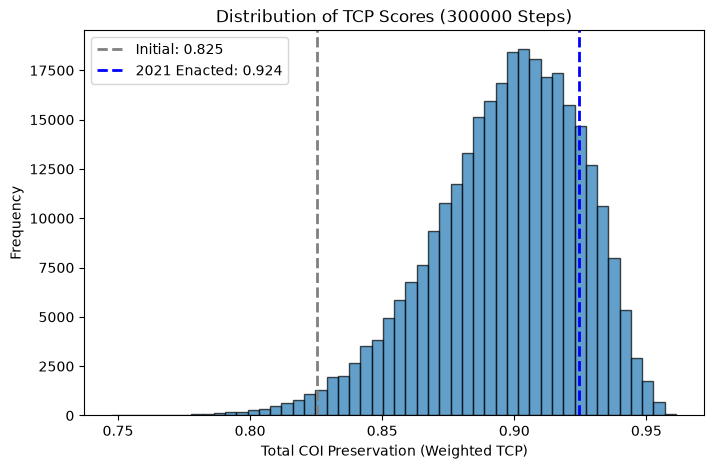

In [12]:
plotting.plot_tcp_distribution(
    results_df, 
    initial_score=initial_score, 
    enacted_data=enacted_reference_data, 
    steps_str=str(MARKOV_STEPS)
)

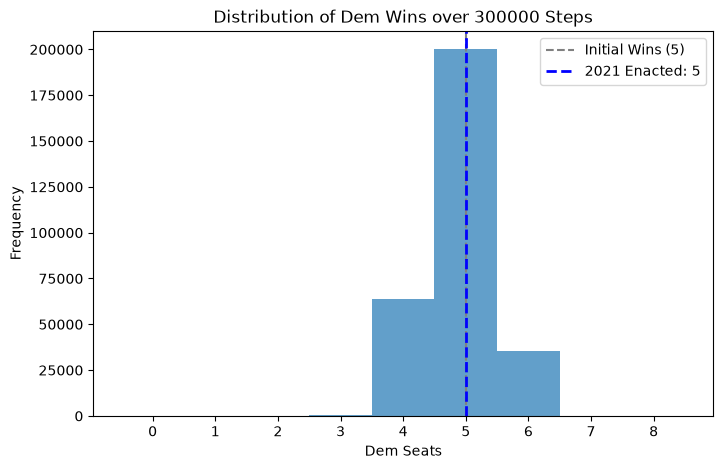

In [13]:
plotting.plot_dem_wins_distribution(
    results_df, 
    initial_wins=initial_wins, 
    enacted_data=enacted_reference_data, 
    steps_str=str(MARKOV_STEPS)
)

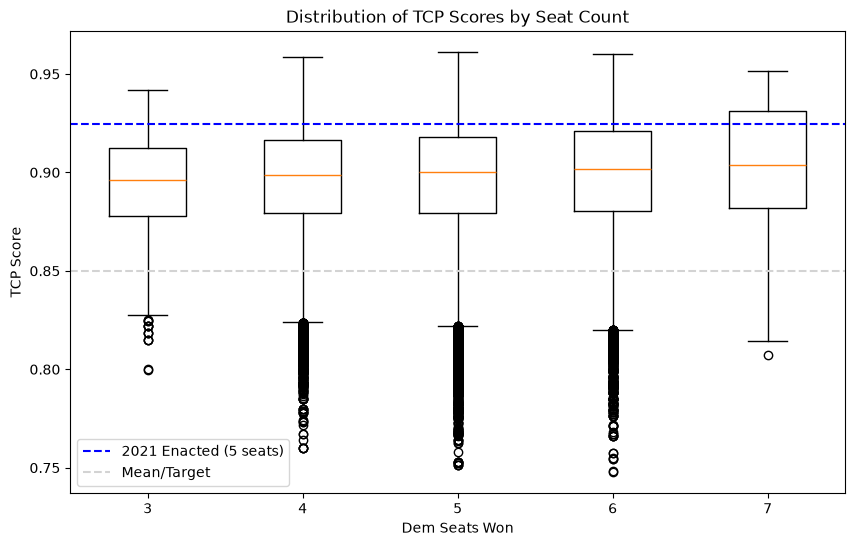

In [14]:
plotting.plot_tcp_by_seat_count(
    results_df, 
    enacted_data=enacted_reference_data, 
    desired_tcp=DESIRED_TCP
)

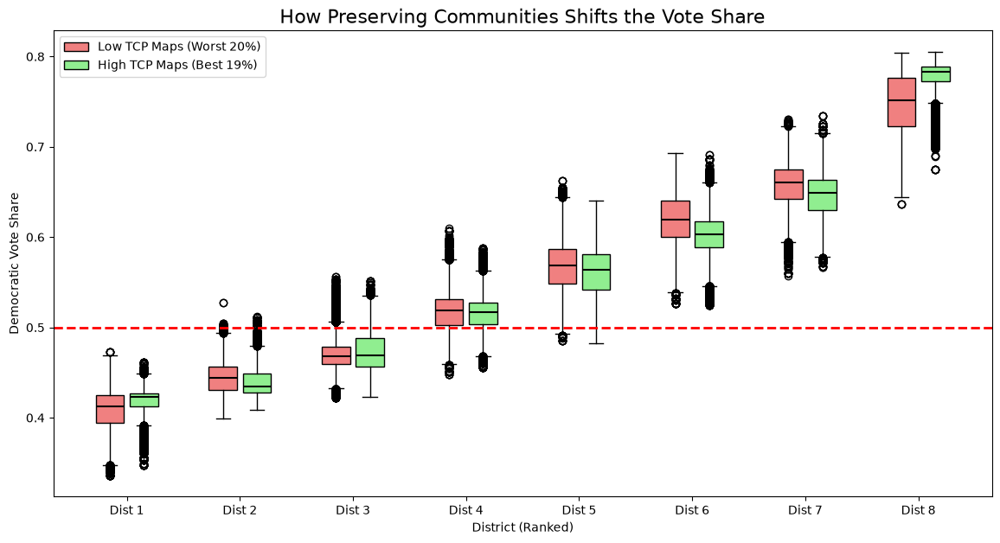

In [15]:
plotting.plot_partisan_shift(
    results_df, 
    score_col='weighted_tcp_score', 
    top_q=0.80, 
    bottom_q=0.20
)

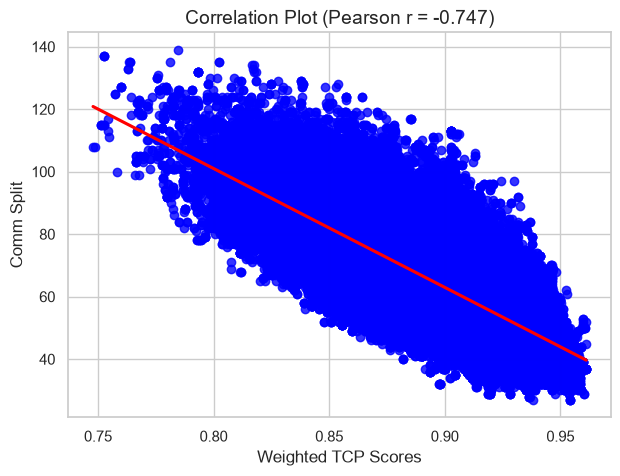

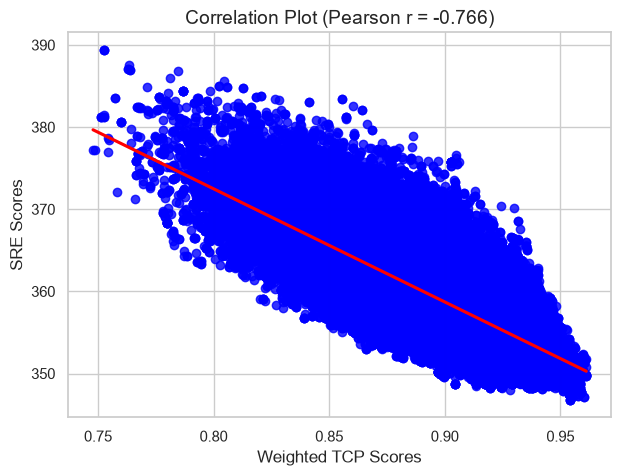

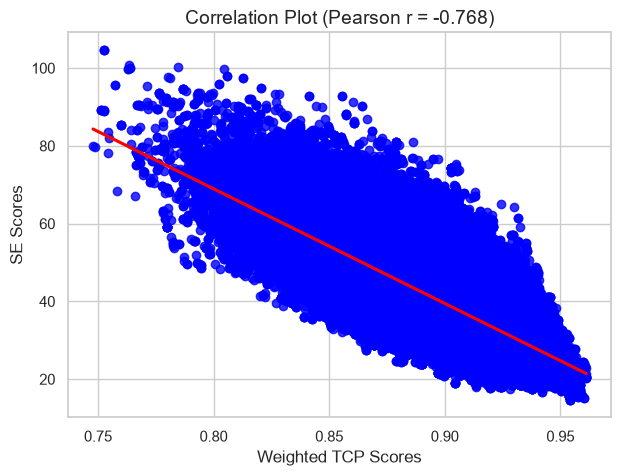

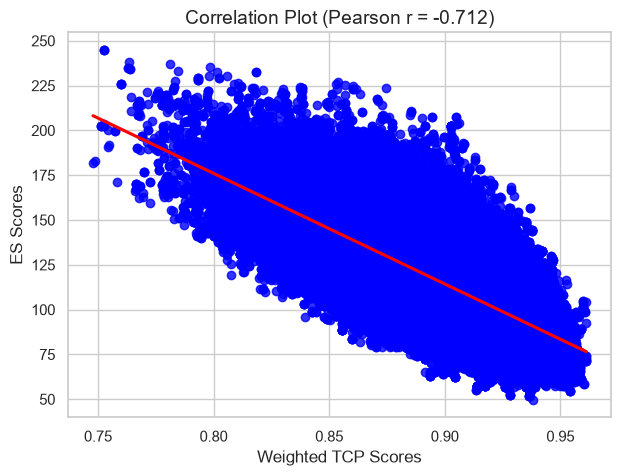

In [16]:

## correlation scatters
metrics_to_correlate = [
    ('communities_split', 'Comm Split'),
    ('sr_entropy', 'SRE Scores'),
    ('shannon_entropy', 'SE Scores'),
    ('even_splits', 'ES Scores')
]

sns.set_theme(style="whitegrid")
for metric_col, label in metrics_to_correlate:
    corr_coef, _ = pearsonr(results_df['weighted_tcp_score'], results_df[metric_col])
    
    plt.figure(figsize=(7, 5))
    sns.regplot(
        data=results_df, 
        x='weighted_tcp_score', 
        y=metric_col, 
        scatter_kws={"color": "blue"}, 
        line_kws={"color": "red"}, 
        marker="o"
    )
    plt.title(f"Correlation Plot (Pearson r = {corr_coef:.3f})", fontsize=14)
    plt.xlabel("Weighted TCP Scores")
    plt.ylabel(label)
    plt.show()